In [1]:
import os, sys
import numpy as np
import json
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD, Adam
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

## Preliminary

In [2]:
NUM_ITER = 1
k = 5000 #use for taking expectation in computing loss

In [3]:
torch.manual_seed(12345)
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
na_list = ['A', 'C', 'G', 'T'] #nucleic acids
aa_list = ['R', 'L', 'S', 'A', 'G', 'P', 'T', 'V', 'N', 'D', 'C', 'Q', 'E', 'H', 'I', 'K', 'M', 'F', 'W', 'Y'] #amino acids
NNK_freq = [0.09375]*3 + [0.0625]*5 + [0.03125]*13 #freq of 21 NNK codons including the stop codon
sum_20 = 0.0625*5 + 0.09375*3 + 0.03125*12 #sum of freq without the stop codon
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*12 #normalize freq for 20 codons
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11 + \
        [1- sum([0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11)] 
        #adjust sum to 1 due to numerical issue
aa_dict = dict(zip(aa_list, pvals))

## Dataset & Sampling

In [4]:
def construct_dataset():
    with open(aptamer_dataset_file, 'r') as f:
        aptamer_data = json.load(f)
    ds = []
    for aptamer in aptamer_data:
        peptides = aptamer_data[aptamer]
        if aptamer == "CTTTGTAATTGGTTCTGAGTTCCGTTGTGGGAGGAACATG": #took out aptamer control
            continue
        for peptide, _ in peptides:
            peptide = peptide.replace("_", "") #removed stop codons
            if "RRRRRR" in peptide: #took out peptide control
                continue
            if len(aptamer) == 40 and len(peptide) == 8: #making sure right length
                ds.append((aptamer, peptide))
    ds = list(set(ds)) #removed duplicates
    return ds

# Sample x from P_X (assume apatamers follow uniform)
def get_x():
    x_idx = np.random.randint(0, 4, 40)
    x = ""
    for i in x_idx:
        x += na_list[i]
    return x

# Sample y from P_y (assume peptides follow NNK)
def get_y():
    y_idx = np.random.choice(20, 7, p=pvals)
    y = "M"
    for i in y_idx:
        y += aa_list[i]
    return y

# S'(train/test) contains S_train/S_test with double the size of S_train/S_test
def get_S_prime(kind="train"):
    if kind == "train":
        dset = S_train
    else:
        dset = S_test
    k = len(dset)
    S_prime_dict = dict.fromkeys(dset, 0) #indicator 0 means in S
    for _ in range(k):
        pair = (get_x(), get_y())
        S_prime_dict[pair] = 1 #indicator 1 means not in S
    S_prime = [[k,int(v)] for k,v in S_prime_dict.items()] 
    np.random.shuffle(S_prime)
    return S_prime

# S new contains unseen new examples
def get_S_new(k):
    S_new = []
    for i in range(k):
        pair = (get_x(), get_y())
        S_new.append(pair)
    np.random.shuffle(S_new)
    S_new_train = S_new[:int(0.8*k)]
    S_new_test = S_new[int(0.8*k):]
    return S_new, S_new_train, S_new_test
    
# Returns pmf of an aptamer
def get_x_pmf():
    return 0.25**40

# Returns pmf of a peptide
def get_y_pmf(y):
    pmf = 1
    for char in y[1:]: #skips first char "M"
        pmf *= aa_dict[char]
    return pmf    

In [6]:
aptamer_dataset_file = "../data/aptamer_dataset.json"
S = construct_dataset()
n = len(S)
m = int(0.8*n) #length of S_train
S_train = S[:m]
S_test = S[m:]
S_prime_train = get_S_prime("train") #use for sgd 
S_prime_test = get_S_prime("test") #use for sgd 
S_new, S_new_train, S_new_test = get_S_new(10*n) #use for eval
train_ds = np.hstack((S_train, S_prime_train[:len(S_prime_train)//2]))

## NN Model

In [7]:
class SimpleConvNet(nn.Module):
    def __init__(self):
        super(SimpleConvNet, self).__init__()
        self.cnn_apt_1 = nn.Conv2d(1, 120, (4,4)) #similar to 4-gram
        self.cnn_pep_1 = nn.Conv2d(1, 50, (4,20))
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(4690, 1)
        
    def forward(self, apt, pep):
        apt = self.cnn_apt_1(apt)
        apt = self.relu(apt)
        pep = self.cnn_pep_1(pep)
        pep = self.relu(pep)
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = torch.sigmoid(x)
        return x

def weights_init(m):
    if isinstance(m, nn.Conv2d):
        nn.init.xavier_uniform_(m.weight.data, gain=nn.init.calculate_gain('relu'))
        nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight.data, nonlinearity='sigmoid')
        nn.init.zeros_(m.bias.data)

## Helper methods

In [8]:
## Takes a peptide and aptamer sequence and converts to one-hot matrix
def one_hot(sequence, seq_type='peptide'):
    if seq_type == 'peptide':
        letters = aa_list
    else:
        letters = na_list
    one_hot = np.zeros((len(sequence), len(letters)))
    for i in range(len(sequence)):
        char = sequence[i]
        for _ in range(len(letters)):
            idx = letters.index(char)
            one_hot[i][idx] = 1
    return one_hot

# Convert a pair to one-hot tensor
def convert(apt, pep): 
    apt = one_hot(apt, seq_type='aptamer') #(40, 4)
    pep = one_hot(pep, seq_type='peptide') #(8, 20)
    apt = torch.FloatTensor(np.reshape(apt, (1, 1, apt.shape[0], apt.shape[1]))).cuda() #(1, 1, 40, 4)
    pep = torch.FloatTensor(np.reshape(pep, (1, 1, pep.shape[0], pep.shape[1]))).cuda() #(1, 1, 8, 20)
    return apt, pep

def update(x, y):
    x.requires_grad=True
    y.requires_grad=True
    x = x.cuda()
    y = y.cuda()
    out = model(x, y)
    return out

def loss_samples(k, ds='train'): # S_train/S_test
    if ds == 'train':
        dset = S_train
    else:
        dset = S_test
    pairs = []
    for (apt, pep) in dset[:k]:
        x, y = convert(apt, pep)
        pairs.append((x, y))
    return pairs

def prime_loss_samples(k, ds='train'): # S_prime_train/S_prime_test
    if ds == "train":
        dset = S_prime_train[len(S_prime_train)//2:]    
    else:
        dset = S_prime_test[len(S_prime_test)//2:]
    pairs = []
    for (apt, pep), ind in dset[:k]:
        pmf = get_y_pmf(pep)
        x, y = convert(apt, pep)
        pairs.append((x, y, ind, pmf))
    return pairs
    
def get_log_out(dataset='train'):
    outs = []
    if dataset == 'train':
        dset = train_loss_samples
    else:
        dset = test_loss_samples
    for (apt, pep) in dset:
        out = update(apt, pep)
        outs.append(torch.log(out).cpu().detach().numpy().flatten()[0])
    return np.average(outs)

def get_out_prime(ds="train"):
    outs = []
    if ds == "train":
        dset = prime_train_loss_samples
        leng = m
    else:
        dset = prime_test_loss_samples
        leng = n-m
    for (apt, pep, ind, pmf) in dset:
        x = apt.cuda()
        y = pep.cuda()
        out = model(x, y)
        if ind == 0:
            factor = (2*leng*get_x_pmf()*pmf)/(1+leng*get_x_pmf()*pmf)
        else:
            factor = 2
        out_is = out.cpu().detach().numpy().flatten()[0] * factor
        outs.append(out_is)
        res = np.average(outs)
    return res

def plot_loss(train_loss, test_loss, i, j, lamb, gamma):
    plt.plot(train_loss, 'b', label='Train loss')
    plt.plot(test_loss, 'y', label='Test loss')
    plt.title('Loss after ' +  str(i) + " iterations, " + str(j) + " epochs, " + 'lambda =%.5f' % lamb  + ' gamma =%.5f' % gamma)
    plt.legend()
    plt.show()

def plot_recall(train_recall, test_recall, i, j, lamb, gamma):
    plt.plot(train_recall, 'b', label='Train recall')
    plt.plot(test_recall, 'y', label='Test recall')
    plt.title('Recall after ' + str(i) + " iterations, " + str(j) + " epochs, " + 'lambda =%.5f' % lamb  + ' gamma =%.5f' % gamma)
    plt.legend()
    plt.show()
    
def plot_cdf(train_cdf, test_cdf, i, j, lamb, gamma):
    plt.plot(train_cdf, 'b', label='Train CDF')
    plt.plot(test_cdf, 'y', label='Test CDF')
    plt.title('CDF after ' + str(i) + " iterations, " + str(j) + " epochs, " + 'lambda =%.5f' % lamb  + ' gamma =%.5f' % gamma)
    plt.legend()
    plt.show()

In [9]:
train_loss_samples = loss_samples(k, 'train')
test_loss_samples = loss_samples(k, 'test')
prime_train_loss_samples = prime_loss_samples(k, 'train')
prime_test_loss_samples = prime_loss_samples(k, 'test')

## SGD

In [17]:
def sgd(lamb=1e28, #hyperparam
        gamma=1e-3): #step size
    
    optim = SGD(model.parameters(), lr=gamma)

    for j in range(NUM_ITER):
        
        train_losses = []
        train_recalls = []
        train_recall_outputs = [] 

        test_losses = []
        test_recalls = []
        test_recall_outputs = []

        new_outputs = []

        train_correct = 0
        test_correct = 0
        
        for i, ele in enumerate(tqdm.tqdm(train_ds)):
            if i == 0:
                continue
            model.train()
            optim.zero_grad() #reset gradients after update
            x, y = convert(ele[0], ele[1]) #sample x,y from S_train
            out = update(x, y) #get S_train output/score
            log_out = torch.log(out) #take log
            # Calculate train recall
            train_score = out.cpu().detach().numpy().flatten()[0] #get score in float
            if train_score > 0.6:
                train_correct += 1 #contribute to train recall
            train_recall_outputs.append(train_score) #store the train scores

            optim.zero_grad() #reset gradients for the second branch
            y_pmf = get_y_pmf(ele[2][1])
            x_prime, y_prime = convert(ele[2][0], ele[2][1]) #sample x', y' from S_prime_train
            const = ele[3] #indicator
            out_prime = update(x_prime, y_prime) #get score'
            if const == 0:
                factor = (2*m*get_x_pmf()*y_pmf)/(1+m*get_x_pmf()*y_pmf)
            else:
                factor = 2
            out_prime = out_prime*factor #adjust for IS
            print("Obj first part: ", out_prime.cpu().detach().numpy().flatten()[0]*lamb*const)
            print("Obj second part: ", log_out.cpu().detach().numpy().flatten()[0])
            (lamb*const*out_prime - log_out).backward(retain_graph=True) #backprop
            optim.step() #gradient update

            with torch.no_grad():
                model.eval()
            x_test, y_test = convert(S_test[i%(n-m)][0], S_test[i%(n-m)][1]) #sample x,y from test set
            test_score = model(x_test, y_test).cpu().detach().numpy().flatten()[0] #get test score in float
            test_recall_outputs.append(test_score) #store the test scores
            if test_score > 0.6:
                test_correct += 1 #contribute to test recall

            #generate 10 unseen examples from S_new as compared 1 example from validate/train for cdfs
            for x, y in S_new[10*i:10*(i+1)]:
                x_new, y_new = convert(x, y) #generate unseen x'' and y'' from S_new
                new_score = model(x_new, y_new).cpu().detach().numpy().flatten()[0] #get unknown score
                new_outputs.append(new_score) #store the new unknown scores

            if i % 1000 == 0:
                train_loss = lamb*get_out_prime("train") - get_log_out('train') #training loss
                print("Train loss first part: ", lamb*get_out_prime("train"))
                print("Train loss second part: ", get_log_out('train'))
                test_loss = (m/(n-m))*lamb*get_out_prime("test") - get_log_out('test') #test loss
                print("Test loss first part: ", lamb*get_out_prime("test"))
                print("Test loss second part: ", get_log_out('test'))
                train_losses.append(train_loss)
                test_losses.append(test_loss)

                train_recall = 100*train_correct/i #training recall
                train_recalls.append(train_recall) 
                test_recall = 100*test_correct/i #test recall
                test_recalls.append(test_recall)
                if i > 1000:
                    train_score = np.asarray(new_outputs[-10000:] + train_recall_outputs[-1000:]) 
                    test_score = np.asarray(new_outputs[-10000:] + test_recall_outputs[-1000:])
                else:
                    train_score = np.asarray(new_outputs + train_recall_outputs) #combine train and unknown scores
                    test_score = np.asarray(new_outputs + test_recall_outputs) #combibne test and unknown scores
                train_cdf = np.cumsum(train_score)/np.sum(train_score) #train cdf
                test_cdf = np.cumsum(test_score)/np.sum(test_score) #test cdf


            if i % 5000 == 0:
#                 torch.save({'epoch': j,
#                             'model_state_dict': model.state_dict(),
#                             'optimizer_state_dict': optimizer.state_dict()}, '../models/model.pth')
                plot_recall(train_recalls, test_recalls, i, j, lamb, gamma)
                plot_loss(train_losses, test_losses, i, j, lamb, gamma)
                plot_cdf(train_cdf, test_cdf, i, j, lamb, gamma)
                print("New score: ", np.average(new_outputs[-20:]))
                print("Train score: ", np.average(train_score[-20:]))
                print("Test score: ", np.average(test_score[-20:]))

## Hyperparameter tuning

In [24]:
gammas = [1e-3]
lambdas = [10]






  0%|          | 0/473047 [00:00<?, ?it/s]




  0%|          | 7/473047 [00:00<2:07:43, 61.73it/s]

Obj first part:  0.0
Obj second part:  -0.78632265
Obj first part:  0.0
Obj second part:  -0.71389294
Obj first part:  9.768577814102173
Obj second part:  -0.723452
Obj first part:  0.0
Obj second part:  -0.7681233
Obj first part:  9.773529767990112
Obj second part:  -0.7458933
Obj first part:  9.58827555179596
Obj second part:  -0.7705101
Obj first part:  8.896191120147705
Obj second part:  -0.7747222
Obj first part:  0.0
Obj second part:  -0.8093191
Obj first part:  0.0
Obj second part:  -0.82891595
Obj first part:  9.1768479347229
Obj second part:  -0.79978806
Obj first part:  0.0
Obj second part:  -0.7814106
Obj first part:  8.891483545303345
Obj second part:  -0.79009336







  0%|          | 13/473047 [00:00<2:08:51, 61.18it/s]




  0%|          | 19/473047 [00:00<2:13:58, 58.84it/s]

Obj first part:  8.643102645874023
Obj second part:  -0.87812173
Obj first part:  0.0
Obj second part:  -0.90034896
Obj first part:  0.0
Obj second part:  -0.880599
Obj first part:  0.0
Obj second part:  -0.8854613
Obj first part:  0.0
Obj second part:  -0.8912507
Obj first part:  0.0
Obj second part:  -0.87644583
Obj first part:  0.0
Obj second part:  -0.8659933
Obj first part:  0.0
Obj second part:  -0.84478486
Obj first part:  8.283736109733582
Obj second part:  -0.8156582
Obj first part:  8.087764382362366
Obj second part:  -0.91398305







  0%|          | 23/473047 [00:00<2:39:55, 49.30it/s]




  0%|          | 30/473047 [00:00<2:31:00, 52.21it/s]

Obj first part:  0.0
Obj second part:  -0.91199315
Obj first part:  0.0
Obj second part:  -0.9436023
Obj first part:  7.871489524841309
Obj second part:  -0.9245309
Obj first part:  0.0
Obj second part:  -0.92493457
Obj first part:  7.621300220489502
Obj second part:  -0.96337295
Obj first part:  7.480798959732056
Obj second part:  -0.96691704
Obj first part:  7.375239729881287
Obj second part:  -0.99811655
Obj first part:  7.239351868629456
Obj second part:  -1.017699
Obj first part:  0.0
Obj second part:  -1.1271297
Obj first part:  6.877066493034363
Obj second part:  -1.05548
Obj first part:  0.0
Obj second part:  -1.1217675
Obj first part:  6.737963557243347
Obj second part:  -1.1105882







  0%|          | 36/473047 [00:00<2:26:03, 53.98it/s]




  0%|          | 41/473047 [00:00<2:37:28, 50.06it/s]

Obj first part:  0.0
Obj second part:  -1.1233544
Obj first part:  0.0
Obj second part:  -1.078308
Obj first part:  6.640985608100891
Obj second part:  -1.0900328
Obj first part:  0.0
Obj second part:  -1.1397476
Obj first part:  6.2219274044036865
Obj second part:  -1.1840078
Obj first part:  5.854440331459045
Obj second part:  -1.2076341
Obj first part:  5.936154127120972
Obj second part:  -1.1692424
Obj first part:  0.0
Obj second part:  -1.2363799
Obj first part:  0.0
Obj second part:  -1.2463462







  0%|          | 46/473047 [00:00<2:42:00, 48.66it/s]




  0%|          | 53/473047 [00:00<2:32:09, 51.81it/s]

Obj first part:  5.9552001953125
Obj second part:  -1.2671813
Obj first part:  0.0
Obj second part:  -1.206891
Obj first part:  5.647236108779907
Obj second part:  -1.3029338
Obj first part:  0.0
Obj second part:  -1.3148633
Obj first part:  0.0
Obj second part:  -1.3685808
Obj first part:  0.0
Obj second part:  -1.3417159
Obj first part:  5.487910509109497
Obj second part:  -1.3026009
Obj first part:  5.543818473815918
Obj second part:  -1.390813
Obj first part:  0.0
Obj second part:  -1.3931075
Obj first part:  0.0
Obj second part:  -1.4084277
Obj first part:  4.642685651779175
Obj second part:  -1.3734413
Obj first part:  0.0
Obj second part:  -1.4283702
Obj first part:  5.135796070098877
Obj second part:  -1.3718814







  0%|          | 59/473047 [00:01<2:26:44, 53.72it/s]




  0%|          | 65/473047 [00:01<2:43:23, 48.25it/s]

Obj first part:  4.93484228849411
Obj second part:  -1.3974818
Obj first part:  4.495437145233154
Obj second part:  -1.5492748
Obj first part:  4.673539996147156
Obj second part:  -1.5084617
Obj first part:  4.406780302524567
Obj second part:  -1.5681434
Obj first part:  3.9157453179359436
Obj second part:  -1.5499349
Obj first part:  0.0
Obj second part:  -1.6477517
Obj first part:  3.8589563965797424
Obj second part:  -1.6564962
Obj first part:  3.491804003715515
Obj second part:  -1.6315116
Obj first part:  0.0
Obj second part:  -1.7491941







  0%|          | 71/473047 [00:01<2:34:02, 51.17it/s]




  0%|          | 78/473047 [00:01<2:25:53, 54.03it/s]

Obj first part:  0.0
Obj second part:  -1.6733449
Obj first part:  3.419748842716217
Obj second part:  -1.6913018
Obj first part:  0.0
Obj second part:  -1.7650934
Obj first part:  0.0
Obj second part:  -1.710795
Obj first part:  0.0
Obj second part:  -1.7182715
Obj first part:  0.0
Obj second part:  -1.6745929
Obj first part:  3.6555123329162598
Obj second part:  -1.6638438
Obj first part:  0.0
Obj second part:  -1.668538
Obj first part:  0.0
Obj second part:  -1.6916043
Obj first part:  0.0
Obj second part:  -1.7422043
Obj first part:  3.680180609226227
Obj second part:  -1.7076757
Obj first part:  3.7529775500297546
Obj second part:  -1.6785076
Obj first part:  3.46746027469635
Obj second part:  -1.7022388







  0%|          | 84/473047 [00:01<2:46:43, 47.28it/s]

Obj first part:  0.0
Obj second part:  -1.8044543
Obj first part:  0.0
Obj second part:  -1.7482343
Obj first part:  0.0
Obj second part:  -1.7546198
Obj first part:  3.4978097677230835
Obj second part:  -1.7107503
Obj first part:  3.6171627044677734
Obj second part:  -1.7687008
Obj first part:  3.2682299613952637
Obj second part:  -1.8637433
Obj first part:  3.074256181716919
Obj second part:  -1.8781762
Obj first part:  3.001987636089325
Obj second part:  -1.9109474
Obj first part:  2.8872033953666687
Obj second part:  -1.9571486







  0%|          | 90/473047 [00:01<2:36:23, 50.40it/s]




  0%|          | 96/473047 [00:01<2:30:00, 52.55it/s]

Obj first part:  2.9270437359809875
Obj second part:  -1.9629796
Obj first part:  0.0
Obj second part:  -2.0496917
Obj first part:  2.7179479598999023
Obj second part:  -1.9374939
Obj first part:  2.52675861120224
Obj second part:  -2.0711043
Obj first part:  0.0
Obj second part:  -2.0571136
Obj first part:  0.0
Obj second part:  -2.02196
Obj first part:  0.0
Obj second part:  -2.0518646
Obj first part:  0.0
Obj second part:  -2.0666242
Obj first part:  2.5351911783218384
Obj second part:  -1.9572335
Obj first part:  0.0
Obj second part:  -1.9627603
Obj first part:  0.0
Obj second part:  -1.9046198
Obj first part:  2.7727779746055603
Obj second part:  -1.9930618







  0%|          | 102/473047 [00:01<2:33:55, 51.21it/s]




  0%|          | 108/473047 [00:02<2:39:30, 49.42it/s]

Obj first part:  0.0
Obj second part:  -2.0092497
Obj first part:  2.9834237694740295
Obj second part:  -1.9483696
Obj first part:  0.0
Obj second part:  -1.9411466
Obj first part:  2.8391852974891663
Obj second part:  -2.0033085
Obj first part:  2.554837465286255
Obj second part:  -2.063109
Obj first part:  2.4476921558380127
Obj second part:  -2.0583973
Obj first part:  2.5118637084960938
Obj second part:  -2.1931548
Obj first part:  0.0
Obj second part:  -2.099918
Obj first part:  0.0
Obj second part:  -2.184844







  0%|          | 114/473047 [00:02<2:34:36, 50.98it/s]

Obj first part:  2.3816028237342834
Obj second part:  -2.17651
Obj first part:  0.0
Obj second part:  -2.0950341
Obj first part:  2.3343676328659058
Obj second part:  -2.2214527
Obj first part:  2.3003239929676056
Obj second part:  -2.1189706
Obj first part:  0.0
Obj second part:  -2.1731937
Obj first part:  0.0
Obj second part:  -2.2007403
Obj first part:  0.0
Obj second part:  -2.1234946
Obj first part:  2.4309124052524567
Obj second part:  -2.0985148
Obj first part:  2.4293895065784454
Obj second part:  -2.0857642







  0%|          | 120/473047 [00:02<2:54:44, 45.11it/s]




  0%|          | 126/473047 [00:02<2:42:16, 48.57it/s]

Obj first part:  2.0214660465717316
Obj second part:  -2.117949
Obj first part:  0.0
Obj second part:  -2.2135193
Obj first part:  0.0
Obj second part:  -2.150058
Obj first part:  2.381824553012848
Obj second part:  -2.0839677
Obj first part:  0.0
Obj second part:  -2.1686914
Obj first part:  2.206454426050186
Obj second part:  -2.2146177
Obj first part:  0.0
Obj second part:  -2.2746308
Obj first part:  0.0
Obj second part:  -2.1635573
Obj first part:  2.250857353210449
Obj second part:  -2.1230953
Obj first part:  2.2807976603507996
Obj second part:  -2.1365175
Obj first part:  2.2908730804920197
Obj second part:  -2.2064931







  0%|          | 132/473047 [00:02<2:52:02, 45.81it/s]




  0%|          | 137/473047 [00:02<2:54:21, 45.20it/s]

Obj first part:  0.0
Obj second part:  -2.277264
Obj first part:  2.1862520277500153
Obj second part:  -2.0680373
Obj first part:  0.0
Obj second part:  -2.2282014
Obj first part:  0.0
Obj second part:  -2.2243915
Obj first part:  0.0
Obj second part:  -2.1731558
Obj first part:  0.0
Obj second part:  -2.2077208
Obj first part:  0.0
Obj second part:  -2.0978472
Obj first part:  0.0
Obj second part:  -2.0644906
Obj first part:  2.233298122882843
Obj second part:  -2.0658472







  0%|          | 143/473047 [00:02<2:43:49, 48.11it/s]

Obj first part:  2.3884257674217224
Obj second part:  -2.1359618
Obj first part:  0.0
Obj second part:  -2.1440632
Obj first part:  0.0
Obj second part:  -2.1949213
Obj first part:  2.368815392255783
Obj second part:  -2.1391215
Obj first part:  0.0
Obj second part:  -2.1806993
Obj first part:  2.5855475664138794
Obj second part:  -2.0257
Obj first part:  0.0
Obj second part:  -2.2127004
Obj first part:  0.0
Obj second part:  -2.1108687
Obj first part:  2.286510318517685
Obj second part:  -2.0382645







  0%|          | 148/473047 [00:02<3:03:22, 42.98it/s]




  0%|          | 154/473047 [00:03<2:48:31, 46.77it/s]

Obj first part:  0.0
Obj second part:  -2.162906
Obj first part:  2.5309109687805176
Obj second part:  -2.1091728
Obj first part:  0.0
Obj second part:  -2.0986059
Obj first part:  2.278577536344528
Obj second part:  -2.0265145
Obj first part:  0.0
Obj second part:  -2.1495063
Obj first part:  2.4250447750091553
Obj second part:  -2.1922915
Obj first part:  2.5400012731552124
Obj second part:  -2.1075337
Obj first part:  2.254860997200012
Obj second part:  -2.1430998
Obj first part:  2.3967182636260986
Obj second part:  -2.2836387
Obj first part:  0.0
Obj second part:  -2.24476
Obj first part:  0.0
Obj second part:  -2.2097163







  0%|          | 159/473047 [00:03<2:46:43, 47.27it/s]




  0%|          | 164/473047 [00:03<2:59:19, 43.95it/s]

Obj first part:  0.0
Obj second part:  -2.2341242
Obj first part:  2.3277175426483154
Obj second part:  -2.1705475
Obj first part:  0.0
Obj second part:  -2.1698577
Obj first part:  2.3820802569389343
Obj second part:  -2.1870642
Obj first part:  0.0
Obj second part:  -2.2618709
Obj first part:  0.0
Obj second part:  -2.1396177
Obj first part:  2.3027507960796356
Obj second part:  -2.130479
Obj first part:  0.0
Obj second part:  -2.1742752
Obj first part:  2.1910803020000458
Obj second part:  -2.2015476







  0%|          | 171/473047 [00:03<2:45:51, 47.52it/s]




  0%|          | 176/473047 [00:03<2:55:09, 45.00it/s]

Obj first part:  0.0
Obj second part:  -2.120603
Obj first part:  2.353532612323761
Obj second part:  -2.2608416
Obj first part:  0.0
Obj second part:  -2.2140853
Obj first part:  0.0
Obj second part:  -2.162675
Obj first part:  0.0
Obj second part:  -2.221116
Obj first part:  2.443467080593109
Obj second part:  -2.0755045
Obj first part:  2.2155922651290894
Obj second part:  -2.1245346
Obj first part:  0.0
Obj second part:  -2.2783167
Obj first part:  0.0
Obj second part:  -2.1522255
Obj first part:  2.45345875620842
Obj second part:  -2.1490858







  0%|          | 181/473047 [00:03<2:54:44, 45.10it/s]




  0%|          | 187/473047 [00:03<2:43:48, 48.11it/s]

Obj first part:  2.1599698066711426
Obj second part:  -2.134221
Obj first part:  1.9677074253559113
Obj second part:  -2.2887454
Obj first part:  0.0
Obj second part:  -2.2276657
Obj first part:  2.1079984307289124
Obj second part:  -2.2336116
Obj first part:  0.0
Obj second part:  -2.2099953
Obj first part:  0.0
Obj second part:  -2.1952586
Obj first part:  0.0
Obj second part:  -2.2222927
Obj first part:  0.0
Obj second part:  -2.2034292
Obj first part:  2.2688941657543182
Obj second part:  -2.128794
Obj first part:  2.3381969332695007
Obj second part:  -2.2337487
Obj first part:  2.2174234688282013
Obj second part:  -2.1567543







  0%|          | 192/473047 [00:03<2:58:17, 44.20it/s]

Obj first part:  0.0
Obj second part:  -2.2474308
Obj first part:  2.4343939125537872
Obj second part:  -2.2072513
Obj first part:  0.0
Obj second part:  -2.1637414
Obj first part:  0.0
Obj second part:  -2.2322407
Obj first part:  2.2466200590133667
Obj second part:  -2.2213879
Obj first part:  2.2058340907096863
Obj second part:  -2.2440732
Obj first part:  0.0
Obj second part:  -2.264387
Obj first part:  0.0
Obj second part:  -2.196636
Obj first part:  2.1615515649318695
Obj second part:  -2.1420696







  0%|          | 198/473047 [00:04<2:49:44, 46.43it/s]




  0%|          | 204/473047 [00:04<2:46:35, 47.31it/s]

Obj first part:  0.0
Obj second part:  -2.2372556
Obj first part:  2.253127247095108
Obj second part:  -2.204913
Obj first part:  0.0
Obj second part:  -2.3492458
Obj first part:  0.0
Obj second part:  -2.1697743
Obj first part:  2.1352356672286987
Obj second part:  -2.1812286
Obj first part:  2.1176502108573914
Obj second part:  -2.267795
Obj first part:  2.0604494214057922
Obj second part:  -2.2564797
Obj first part:  1.9878679513931274
Obj second part:  -2.3269527
Obj first part:  1.8023662269115448
Obj second part:  -2.2836163
Obj first part:  0.0
Obj second part:  -2.2072172







  0%|          | 209/473047 [00:04<2:58:35, 44.12it/s]




  0%|          | 216/473047 [00:04<2:45:41, 47.56it/s]

Obj first part:  2.1044516563415527
Obj second part:  -2.3279495
Obj first part:  2.0068609714508057
Obj second part:  -2.2908373
Obj first part:  1.8868958950042725
Obj second part:  -2.210036
Obj first part:  1.6626769304275513
Obj second part:  -2.3365602
Obj first part:  0.0
Obj second part:  -2.339921
Obj first part:  1.8980048596858978
Obj second part:  -2.3691208
Obj first part:  1.7934779822826385
Obj second part:  -2.4284241
Obj first part:  0.0
Obj second part:  -2.2530909
Obj first part:  1.8590207397937775
Obj second part:  -2.328613
Obj first part:  1.6724738478660583
Obj second part:  -2.5138688
Obj first part:  0.0
Obj second part:  -2.3873188







  0%|          | 221/473047 [00:04<2:55:11, 44.98it/s]




  0%|          | 226/473047 [00:04<2:52:24, 45.71it/s]

Obj first part:  0.0
Obj second part:  -2.4799562
Obj first part:  0.0
Obj second part:  -2.4328282
Obj first part:  0.0
Obj second part:  -2.3161438
Obj first part:  0.0
Obj second part:  -2.3445005
Obj first part:  0.0
Obj second part:  -2.2343416
Obj first part:  0.0
Obj second part:  -2.3354683
Obj first part:  0.0
Obj second part:  -2.3110154
Obj first part:  0.0
Obj second part:  -2.2545257
Obj first part:  0.0
Obj second part:  -2.07808







  0%|          | 232/473047 [00:04<2:42:32, 48.48it/s]

Obj first part:  2.118438333272934
Obj second part:  -2.099879
Obj first part:  0.0
Obj second part:  -2.137148
Obj first part:  2.133159786462784
Obj second part:  -2.09451
Obj first part:  2.341672033071518
Obj second part:  -2.1681385
Obj first part:  2.130679041147232
Obj second part:  -2.1554375
Obj first part:  2.10565522313118
Obj second part:  -2.3127549
Obj first part:  2.2353261709213257
Obj second part:  -2.1703465
Obj first part:  0.0
Obj second part:  -2.3797507
Obj first part:  1.8584229052066803
Obj second part:  -2.3699527
Obj first part:  0.0
Obj second part:  -2.2453246







  0%|          | 237/473047 [00:04<2:56:10, 44.73it/s]




  0%|          | 243/473047 [00:04<2:47:15, 47.11it/s]

Obj first part:  0.0
Obj second part:  -2.2090824
Obj first part:  1.8796947598457336
Obj second part:  -2.2494733
Obj first part:  1.9708113372325897
Obj second part:  -2.2538278
Obj first part:  1.7890766263008118
Obj second part:  -2.3392072
Obj first part:  1.8731440603733063
Obj second part:  -2.3069077
Obj first part:  0.0
Obj second part:  -2.431109
Obj first part:  1.6751590371131897
Obj second part:  -2.4202774
Obj first part:  1.9596734642982483
Obj second part:  -2.23183
Obj first part:  0.0
Obj second part:  -2.3444743
Obj first part:  0.0
Obj second part:  -2.431066
Obj first part:  0.0
Obj second part:  -2.3316178







  0%|          | 249/473047 [00:05<2:45:22, 47.65it/s]




  0%|          | 254/473047 [00:05<2:57:51, 44.30it/s]

Obj first part:  0.0
Obj second part:  -2.2080083
Obj first part:  1.9630810618400574
Obj second part:  -2.2716198
Obj first part:  1.9597366452217102
Obj second part:  -2.2736614
Obj first part:  0.0
Obj second part:  -2.4004438
Obj first part:  0.0
Obj second part:  -2.312586
Obj first part:  0.0
Obj second part:  -2.342417
Obj first part:  0.0
Obj second part:  -2.2156577
Obj first part:  2.294432371854782
Obj second part:  -2.289592
Obj first part:  2.1214675903320312
Obj second part:  -2.3246562







  0%|          | 260/473047 [00:05<2:43:56, 48.06it/s]




  0%|          | 265/473047 [00:05<2:50:02, 46.34it/s]

Obj first part:  2.1222959458827972
Obj second part:  -2.2543857
Obj first part:  0.0
Obj second part:  -2.2404382
Obj first part:  1.9738861918449402
Obj second part:  -2.3588808
Obj first part:  0.0
Obj second part:  -2.3130374
Obj first part:  0.0
Obj second part:  -2.2870736
Obj first part:  2.092311382293701
Obj second part:  -2.278306
Obj first part:  0.0
Obj second part:  -2.2034895
Obj first part:  0.0
Obj second part:  -2.1994503
Obj first part:  2.0199403166770935
Obj second part:  -2.1938493
Obj first part:  0.0
Obj second part:  -2.3331134







  0%|          | 270/473047 [00:05<2:55:04, 45.01it/s]




  0%|          | 276/473047 [00:05<2:43:05, 48.31it/s]

Obj first part:  2.2601141035556793
Obj second part:  -2.191982
Obj first part:  0.0
Obj second part:  -2.2723374
Obj first part:  0.0
Obj second part:  -2.2867398
Obj first part:  1.8485523760318756
Obj second part:  -2.3711364
Obj first part:  0.0
Obj second part:  -2.175387
Obj first part:  2.099095582962036
Obj second part:  -2.209797
Obj first part:  2.308771163225174
Obj second part:  -2.2799754
Obj first part:  1.8632644414901733
Obj second part:  -2.2851236
Obj first part:  0.0
Obj second part:  -2.2071948
Obj first part:  1.9984884560108185
Obj second part:  -2.2047534
Obj first part:  0.0
Obj second part:  -2.28891







  0%|          | 281/473047 [00:05<2:54:11, 45.23it/s]




  0%|          | 286/473047 [00:05<2:51:44, 45.88it/s]

Obj first part:  0.0
Obj second part:  -2.260395
Obj first part:  1.9869714975357056
Obj second part:  -2.2105944
Obj first part:  2.0306889712810516
Obj second part:  -2.3016102
Obj first part:  0.0
Obj second part:  -2.2821317
Obj first part:  0.0
Obj second part:  -2.2372124
Obj first part:  1.9499839842319489
Obj second part:  -2.1784039
Obj first part:  1.991475224494934
Obj second part:  -2.2801964
Obj first part:  0.0
Obj second part:  -2.3478062
Obj first part:  1.88171848654747
Obj second part:  -2.2608135







  0%|          | 292/473047 [00:06<2:41:31, 48.78it/s]

Obj first part:  1.9677631556987762
Obj second part:  -2.2181196
Obj first part:  0.0
Obj second part:  -2.2950368
Obj first part:  0.0
Obj second part:  -2.3078532
Obj first part:  2.121395021677017
Obj second part:  -2.215015
Obj first part:  2.072531580924988
Obj second part:  -2.2361405
Obj first part:  1.9186612963676453
Obj second part:  -2.2657866
Obj first part:  1.8481811881065369
Obj second part:  -2.311604
Obj first part:  0.0
Obj second part:  -2.3635964
Obj first part:  0.0
Obj second part:  -2.3470924
Obj first part:  0.0
Obj second part:  -2.3278184







  0%|          | 297/473047 [00:06<2:57:39, 44.35it/s]




  0%|          | 303/473047 [00:06<2:47:13, 47.11it/s]

Obj first part:  0.0
Obj second part:  -2.400502
Obj first part:  1.8454766273498535
Obj second part:  -2.2348251
Obj first part:  1.8935364484786987
Obj second part:  -2.3487926
Obj first part:  0.0
Obj second part:  -2.2752233
Obj first part:  0.0
Obj second part:  -2.2123873
Obj first part:  1.9892270863056183
Obj second part:  -2.2718234
Obj first part:  0.0
Obj second part:  -2.1945152
Obj first part:  0.0
Obj second part:  -2.2239826
Obj first part:  2.222718298435211
Obj second part:  -2.4785652
Obj first part:  0.0
Obj second part:  -2.2486112
Obj first part:  1.8886835873126984
Obj second part:  -2.2889924
Obj first part:  0.0







  0%|          | 309/473047 [00:06<2:45:04, 47.73it/s]




  0%|          | 314/473047 [00:06<2:56:55, 44.53it/s]

Obj second part:  -2.285573
Obj first part:  2.2184832394123077
Obj second part:  -2.252951
Obj first part:  0.0
Obj second part:  -2.3352404
Obj first part:  0.0
Obj second part:  -2.3022177
Obj first part:  1.90802201628685
Obj second part:  -2.1687028
Obj first part:  0.0
Obj second part:  -2.304448
Obj first part:  0.0
Obj second part:  -2.3014324
Obj first part:  2.1079817414283752
Obj second part:  -2.1801202
Obj first part:  0.0
Obj second part:  -2.2386687







  0%|          | 321/473047 [00:06<2:44:23, 47.93it/s]




  0%|          | 326/473047 [00:06<2:53:51, 45.32it/s]

Obj first part:  0.0
Obj second part:  -2.053637
Obj first part:  2.4213437736034393
Obj second part:  -2.1197908
Obj first part:  0.0
Obj second part:  -2.216329
Obj first part:  0.0
Obj second part:  -2.2030838
Obj first part:  2.0877429842948914
Obj second part:  -2.1436625
Obj first part:  2.22366526722908
Obj second part:  -2.1521115
Obj first part:  0.0
Obj second part:  -2.2923822
Obj first part:  2.3018060624599457
Obj second part:  -2.1494396
Obj first part:  0.0
Obj second part:  -2.1635134
Obj first part:  1.9359439611434937
Obj second part:  -2.2440257







  0%|          | 331/473047 [00:06<2:53:43, 45.35it/s]




  0%|          | 337/473047 [00:06<2:42:41, 48.43it/s]

Obj first part:  1.8587134778499603
Obj second part:  -2.2337382
Obj first part:  0.0
Obj second part:  -2.3390474
Obj first part:  2.4142035841941833
Obj second part:  -2.087446
Obj first part:  0.0
Obj second part:  -2.3453355
Obj first part:  2.0036475360393524
Obj second part:  -2.1057982
Obj first part:  0.0
Obj second part:  -2.222875
Obj first part:  0.0
Obj second part:  -2.2026277
Obj first part:  0.0
Obj second part:  -2.1521122
Obj first part:  2.3891884088516235
Obj second part:  -2.054067
Obj first part:  0.0
Obj second part:  -2.2153163
Obj first part:  0.0
Obj second part:  -2.229438







  0%|          | 342/473047 [00:07<2:58:33, 44.12it/s]

Obj first part:  2.1327710151672363
Obj second part:  -2.1044261
Obj first part:  2.272767871618271
Obj second part:  -2.3083398
Obj first part:  2.106061726808548
Obj second part:  -2.2508562
Obj first part:  0.0
Obj second part:  -2.2269661
Obj first part:  1.9827087223529816
Obj second part:  -2.1777906
Obj first part:  0.0
Obj second part:  -2.1950717
Obj first part:  1.9784638285636902
Obj second part:  -2.1974018
Obj first part:  0.0
Obj second part:  -2.2058334
Obj first part:  0.0
Obj second part:  -2.4232674







  0%|          | 348/473047 [00:07<2:48:06, 46.87it/s]




  0%|          | 354/473047 [00:07<2:45:54, 47.49it/s]

Obj first part:  2.2796976566314697
Obj second part:  -2.2056944
Obj first part:  0.0
Obj second part:  -2.3352647
Obj first part:  0.0
Obj second part:  -2.1470325
Obj first part:  0.0
Obj second part:  -2.170324
Obj first part:  0.0
Obj second part:  -2.1196954
Obj first part:  2.2891053557395935
Obj second part:  -2.124952
Obj first part:  0.0
Obj second part:  -2.0856678
Obj first part:  0.0
Obj second part:  -2.1693988
Obj first part:  2.2338832914829254
Obj second part:  -2.1508758
Obj first part:  2.273615747690201
Obj second part:  -2.1735191







  0%|          | 359/473047 [00:07<2:57:18, 44.43it/s]




  0%|          | 366/473047 [00:07<2:44:04, 48.02it/s]

Obj first part:  0.0
Obj second part:  -2.1711595
Obj first part:  2.1086975932121277
Obj second part:  -2.1364136
Obj first part:  2.177693098783493
Obj second part:  -2.1896698
Obj first part:  0.0
Obj second part:  -2.193266
Obj first part:  0.0
Obj second part:  -2.038805
Obj first part:  0.0
Obj second part:  -2.2432384
Obj first part:  0.0
Obj second part:  -2.1823943
Obj first part:  2.326410710811615
Obj second part:  -2.1601543
Obj first part:  2.0493437349796295
Obj second part:  -2.112173
Obj first part:  0.0
Obj second part:  -2.1844058
Obj first part:  2.522556185722351
Obj second part:  -2.1916704







  0%|          | 371/473047 [00:07<2:52:37, 45.63it/s]




  0%|          | 376/473047 [00:07<2:51:38, 45.90it/s]

Obj first part:  0.0
Obj second part:  -2.1418924
Obj first part:  0.0
Obj second part:  -2.1600251
Obj first part:  2.054688036441803
Obj second part:  -1.975637
Obj first part:  0.0
Obj second part:  -2.081529
Obj first part:  0.0
Obj second part:  -2.1308427
Obj first part:  2.479720264673233
Obj second part:  -2.2245946
Obj first part:  2.3612572252750397
Obj second part:  -2.06977
Obj first part:  0.0
Obj second part:  -2.200495
Obj first part:  0.0
Obj second part:  -2.1590862







  0%|          | 382/473047 [00:07<2:41:29, 48.78it/s]

Obj first part:  0.0
Obj second part:  -2.1676183
Obj first part:  2.394731342792511
Obj second part:  -2.1172454
Obj first part:  2.021271586418152
Obj second part:  -2.072032
Obj first part:  0.0
Obj second part:  -2.145902
Obj first part:  2.416192889213562
Obj second part:  -2.2016456
Obj first part:  2.294106036424637
Obj second part:  -2.1386905
Obj first part:  1.9278539717197418
Obj second part:  -2.1185687
Obj first part:  2.1778757870197296
Obj second part:  -2.2896123
Obj first part:  0.0
Obj second part:  -2.2618673
Obj first part:  0.0
Obj second part:  -2.2139618







  0%|          | 387/473047 [00:08<2:54:30, 45.14it/s]




  0%|          | 393/473047 [00:08<2:47:13, 47.11it/s]

Obj first part:  0.0
Obj second part:  -2.15441
Obj first part:  0.0
Obj second part:  -2.197409
Obj first part:  0.0
Obj second part:  -2.0909443
Obj first part:  0.0
Obj second part:  -2.2282224
Obj first part:  2.22275972366333
Obj second part:  -2.0757604
Obj first part:  2.241087108850479
Obj second part:  -2.0797987
Obj first part:  1.9229285418987274
Obj second part:  -1.9848392
Obj first part:  2.0670010149478912
Obj second part:  -2.217989
Obj first part:  2.050619274377823
Obj second part:  -2.2869303
Obj first part:  0.0
Obj second part:  -2.202404
Obj first part:  1.8785448372364044
Obj second part:  -2.2543638
Obj first part:  2.1750231087207794
Obj second part:  -2.32393







  0%|          | 399/473047 [00:08<2:42:21, 48.52it/s]




  0%|          | 404/473047 [00:08<2:58:40, 44.09it/s]

Obj first part:  0.0
Obj second part:  -2.2702844
Obj first part:  2.0663900673389435
Obj second part:  -2.1996827
Obj first part:  0.0
Obj second part:  -2.2451413
Obj first part:  0.0
Obj second part:  -2.2665472
Obj first part:  2.19285249710083
Obj second part:  -2.3757582
Obj first part:  1.8387559056282043
Obj second part:  -2.2861567
Obj first part:  0.0
Obj second part:  -2.4005303
Obj first part:  2.030770778656006
Obj second part:  -2.2414653
Obj first part:  1.896119862794876
Obj second part:  -2.4660294
Obj first part:  0.0
Obj second part:  -2.401895







  0%|          | 411/473047 [00:08<2:44:12, 47.97it/s]




  0%|          | 416/473047 [00:08<2:53:10, 45.49it/s]

Obj first part:  0.0
Obj second part:  -2.398269
Obj first part:  0.0
Obj second part:  -2.2697568
Obj first part:  1.8059486150741577
Obj second part:  -2.2766352
Obj first part:  0.0
Obj second part:  -2.1713068
Obj first part:  0.0
Obj second part:  -2.3521373
Obj first part:  0.0
Obj second part:  -2.1775277
Obj first part:  0.0
Obj second part:  -2.1682105
Obj first part:  1.9878628849983215
Obj second part:  -2.216452
Obj first part:  0.0
Obj second part:  -2.185575







  0%|          | 421/473047 [00:08<2:53:51, 45.31it/s]




  0%|          | 428/473047 [00:08<2:40:30, 49.07it/s]

Obj first part:  1.9976571202278137
Obj second part:  -2.1080904
Obj first part:  2.145230770111084
Obj second part:  -1.9986277
Obj first part:  2.3465199768543243
Obj second part:  -2.265076
Obj first part:  2.2228600084781647
Obj second part:  -2.2542455
Obj first part:  0.0
Obj second part:  -2.1755486
Obj first part:  0.0
Obj second part:  -2.2869632
Obj first part:  1.9677309691905975
Obj second part:  -2.224421
Obj first part:  2.0682670176029205
Obj second part:  -2.1817946
Obj first part:  0.0
Obj second part:  -2.2428384
Obj first part:  1.9312849640846252
Obj second part:  -2.2016428
Obj first part:  0.0
Obj second part:  -2.3137918
Obj first part:  0.0
Obj second part:  -2.1458735







  0%|          | 435/473047 [00:08<2:31:31, 51.99it/s]

Obj first part:  2.0695295929908752
Obj second part:  -2.1931665
Obj first part:  2.1135500073432922
Obj second part:  -2.3025267
Obj first part:  0.0
Obj second part:  -2.2545168
Obj first part:  1.8220467865467072
Obj second part:  -2.2588758
Obj first part:  0.0
Obj second part:  -2.1515496
Obj first part:  2.0743469893932343
Obj second part:  -2.3526704
Obj first part:  2.2466465830802917
Obj second part:  -2.2891834
Obj first part:  0.0
Obj second part:  -2.3681862
Obj first part:  1.9860880076885223
Obj second part:  -2.2670834
Obj first part:  0.0
Obj second part:  -2.2975695







  0%|          | 441/473047 [00:09<2:46:07, 47.42it/s]




  0%|          | 447/473047 [00:09<2:35:53, 50.53it/s]

Obj first part:  0.0
Obj second part:  -2.3160481
Obj first part:  1.8543967604637146
Obj second part:  -2.1909022
Obj first part:  0.0
Obj second part:  -2.293504
Obj first part:  2.251923531293869
Obj second part:  -2.161601
Obj first part:  2.018132656812668
Obj second part:  -2.3396082
Obj first part:  0.0
Obj second part:  -2.255258
Obj first part:  1.7252029478549957
Obj second part:  -2.3231032
Obj first part:  0.0
Obj second part:  -2.187083
Obj first part:  2.330964505672455
Obj second part:  -2.3083615
Obj first part:  0.0
Obj second part:  -2.498612
Obj first part:  0.0
Obj second part:  -2.173983
Obj first part:  0.0
Obj second part:  -2.3055284







  0%|          | 453/473047 [00:09<2:44:01, 48.02it/s]




  0%|          | 458/473047 [00:09<2:49:24, 46.49it/s]

Obj first part:  0.0
Obj second part:  -2.320267
Obj first part:  2.034333199262619
Obj second part:  -2.1110687
Obj first part:  0.0
Obj second part:  -2.3146112
Obj first part:  2.005838006734848
Obj second part:  -2.1259003
Obj first part:  2.033320367336273
Obj second part:  -2.2589278
Obj first part:  1.8422548472881317
Obj second part:  -2.2752466
Obj first part:  1.9071833789348602
Obj second part:  -2.2806878
Obj first part:  0.0
Obj second part:  -2.330744
Obj first part:  0.0
Obj second part:  -2.2838502
Obj first part:  0.0
Obj second part:  -2.3410199







  0%|          | 464/473047 [00:09<2:38:51, 49.58it/s]




  0%|          | 470/473047 [00:09<2:46:53, 47.19it/s]

Obj first part:  2.041647583246231
Obj second part:  -2.2765179
Obj first part:  1.6649620234966278
Obj second part:  -2.2644427
Obj first part:  2.0800383388996124
Obj second part:  -2.3334346
Obj first part:  2.0845864713191986
Obj second part:  -2.264127
Obj first part:  2.035931497812271
Obj second part:  -2.3278794
Obj first part:  0.0
Obj second part:  -2.3680458
Obj first part:  1.94761261343956
Obj second part:  -2.259254
Obj first part:  1.7173127830028534
Obj second part:  -2.3197198
Obj first part:  1.6716545820236206
Obj second part:  -2.4366844







  0%|          | 475/473047 [00:09<2:47:18, 47.08it/s]




  0%|          | 481/473047 [00:09<2:38:18, 49.75it/s]

Obj first part:  0.0
Obj second part:  -2.2594106
Obj first part:  0.0
Obj second part:  -2.5915475
Obj first part:  1.5917208790779114
Obj second part:  -2.3463857
Obj first part:  0.0
Obj second part:  -2.3365571
Obj first part:  0.0
Obj second part:  -2.2180796
Obj first part:  1.883404701948166
Obj second part:  -2.379947
Obj first part:  0.0
Obj second part:  -2.212997
Obj first part:  1.9451411068439484
Obj second part:  -2.2270496
Obj first part:  1.8745315074920654
Obj second part:  -2.2558632
Obj first part:  1.791725605726242
Obj second part:  -2.3431678
Obj first part:  1.6140840947628021
Obj second part:  -2.355921
Obj first part:  0.0
Obj second part:  -2.4902906







  0%|          | 487/473047 [00:10<2:50:50, 46.10it/s]

Obj first part:  0.0
Obj second part:  -2.4804473
Obj first part:  1.665789783000946
Obj second part:  -2.4229064
Obj first part:  2.0451103150844574
Obj second part:  -2.4323838
Obj first part:  1.9166448712348938
Obj second part:  -2.550898
Obj first part:  0.0
Obj second part:  -2.4410183
Obj first part:  0.0
Obj second part:  -2.4878168
Obj first part:  1.9907297194004059
Obj second part:  -2.3113046
Obj first part:  0.0
Obj second part:  -2.2407193
Obj first part:  0.0
Obj second part:  -2.5039575







  0%|          | 493/473047 [00:10<2:44:08, 47.98it/s]




  0%|          | 499/473047 [00:10<2:34:18, 51.04it/s]

Obj first part:  1.6345858573913574
Obj second part:  -2.401066
Obj first part:  1.999000608921051
Obj second part:  -2.3387918
Obj first part:  1.9177581369876862
Obj second part:  -2.4357584
Obj first part:  1.597396731376648
Obj second part:  -2.520959
Obj first part:  0.0
Obj second part:  -2.4478953
Obj first part:  1.7778889834880829
Obj second part:  -2.1478126
Obj first part:  0.0
Obj second part:  -2.3890326
Obj first part:  1.3908115029335022
Obj second part:  -2.3578131
Obj first part:  0.0
Obj second part:  -2.3159456
Obj first part:  2.137843072414398
Obj second part:  -2.3280427
Obj first part:  0.0
Obj second part:  -2.407018
Obj first part:  0.0
Obj second part:  -2.4277797







  0%|          | 505/473047 [00:10<2:33:27, 51.32it/s]




  0%|          | 511/473047 [00:10<2:42:29, 48.47it/s]

Obj first part:  0.0
Obj second part:  -2.2556317
Obj first part:  1.7953184247016907
Obj second part:  -2.2821958
Obj first part:  0.0
Obj second part:  -2.387487
Obj first part:  1.745225191116333
Obj second part:  -2.3574026
Obj first part:  0.0
Obj second part:  -2.2353761
Obj first part:  1.6695022583007812
Obj second part:  -2.3157463
Obj first part:  0.0
Obj second part:  -2.3616645
Obj first part:  0.0
Obj second part:  -2.2790327
Obj first part:  0.0
Obj second part:  -2.0951226







  0%|          | 517/473047 [00:10<2:34:42, 50.90it/s]




  0%|          | 524/473047 [00:10<2:28:37, 52.99it/s]

Obj first part:  0.0
Obj second part:  -2.2863457
Obj first part:  2.13279590010643
Obj second part:  -2.1044703
Obj first part:  0.0
Obj second part:  -2.1446538
Obj first part:  2.1178142726421356
Obj second part:  -2.3154821
Obj first part:  0.0
Obj second part:  -2.215934
Obj first part:  0.0
Obj second part:  -2.180837
Obj first part:  0.0
Obj second part:  -2.2435737
Obj first part:  0.0
Obj second part:  -2.1718376
Obj first part:  0.0
Obj second part:  -2.1027565
Obj first part:  0.0
Obj second part:  -2.2201536
Obj first part:  2.329457104206085
Obj second part:  -2.130855
Obj first part:  2.3185160756111145
Obj second part:  -2.1813483







  0%|          | 530/473047 [00:10<2:47:05, 47.13it/s]

Obj first part:  2.104499191045761
Obj second part:  -2.1188843
Obj first part:  0.0
Obj second part:  -2.2285848
Obj first part:  0.0
Obj second part:  -2.2517726
Obj first part:  2.3802629113197327
Obj second part:  -2.1204803
Obj first part:  2.2066515684127808
Obj second part:  -2.2015665
Obj first part:  2.3101162910461426
Obj second part:  -2.0660677
Obj first part:  0.0
Obj second part:  -2.1770844
Obj first part:  0.0
Obj second part:  -2.3364828
Obj first part:  0.0
Obj second part:  -2.1533678
Obj first part:  0.0
Obj second part:  -2.143584







  0%|          | 537/473047 [00:11<2:36:56, 50.18it/s]




  0%|          | 544/473047 [00:11<2:26:49, 53.63it/s]

Obj first part:  2.153787314891815
Obj second part:  -2.2211719
Obj first part:  0.0
Obj second part:  -2.283379
Obj first part:  0.0
Obj second part:  -2.1066892
Obj first part:  2.098814696073532
Obj second part:  -2.1259801
Obj first part:  0.0
Obj second part:  -2.254504
Obj first part:  2.2063323855400085
Obj second part:  -2.191712
Obj first part:  2.129579484462738
Obj second part:  -2.1870062
Obj first part:  2.067716270685196
Obj second part:  -2.2013252
Obj first part:  0.0
Obj second part:  -2.211173
Obj first part:  0.0
Obj second part:  -2.1577344
Obj first part:  0.0
Obj second part:  -2.174667







  0%|          | 550/473047 [00:11<2:48:05, 46.85it/s]

Obj first part:  2.3097792267799377
Obj second part:  -1.9714198
Obj first part:  0.0
Obj second part:  -2.1616497
Obj first part:  2.481009364128113
Obj second part:  -2.1232908
Obj first part:  1.9624917209148407
Obj second part:  -2.1357265
Obj first part:  2.1443861722946167
Obj second part:  -2.2268817
Obj first part:  1.8050117790699005
Obj second part:  -2.24386
Obj first part:  0.0
Obj second part:  -2.3064752
Obj first part:  0.0
Obj second part:  -2.1903675
Obj first part:  0.0
Obj second part:  -2.2168174
Obj first part:  2.0094917714595795
Obj second part:  -2.136437







  0%|          | 556/473047 [00:11<2:38:04, 49.82it/s]




  0%|          | 563/473047 [00:11<2:29:20, 52.73it/s]

Obj first part:  0.0
Obj second part:  -2.1696007
Obj first part:  0.0
Obj second part:  -2.186011
Obj first part:  0.0
Obj second part:  -2.0824108
Obj first part:  0.0
Obj second part:  -2.26401
Obj first part:  0.0
Obj second part:  -2.1897302
Obj first part:  2.070900797843933
Obj second part:  -1.9094146
Obj first part:  2.3593339323997498
Obj second part:  -2.278277
Obj first part:  1.901320368051529
Obj second part:  -2.2221854
Obj first part:  0.0
Obj second part:  -2.2798316
Obj first part:  1.930755376815796
Obj second part:  -2.1512606
Obj first part:  0.0
Obj second part:  -2.2336464







  0%|          | 569/473047 [00:11<2:46:06, 47.41it/s]




  0%|          | 575/473047 [00:11<2:38:49, 49.58it/s]

Obj first part:  0.0
Obj second part:  -2.1705403
Obj first part:  0.0
Obj second part:  -2.0666115
Obj first part:  0.0
Obj second part:  -2.0974038
Obj first part:  0.0
Obj second part:  -2.0092063
Obj first part:  2.4146410822868347
Obj second part:  -1.9975674
Obj first part:  0.0
Obj second part:  -2.0779855
Obj first part:  2.214367985725403
Obj second part:  -2.203096
Obj first part:  2.1045419573783875
Obj second part:  -2.1450014
Obj first part:  2.2323134541511536
Obj second part:  -2.144913
Obj first part:  2.667268216609955
Obj second part:  -2.23018







  0%|          | 582/473047 [00:11<2:30:15, 52.41it/s]

Obj first part:  2.529010772705078
Obj second part:  -2.189656
Obj first part:  1.8804217875003815
Obj second part:  -2.3750684
Obj first part:  2.096768468618393
Obj second part:  -2.2370272
Obj first part:  1.8453145027160645
Obj second part:  -2.3734148
Obj first part:  1.65015310049057
Obj second part:  -2.1949782
Obj first part:  1.6819563508033752
Obj second part:  -2.2257478
Obj first part:  0.0
Obj second part:  -2.4225278
Obj first part:  1.951252520084381
Obj second part:  -2.3334196
Obj first part:  0.0
Obj second part:  -2.4915617
Obj first part:  0.0
Obj second part:  -2.5045094
Obj first part:  1.6212920844554901
Obj second part:  -2.0717473







  0%|          | 588/473047 [00:12<2:35:29, 50.64it/s]




  0%|          | 594/473047 [00:12<2:38:51, 49.57it/s]

Obj first part:  0.0
Obj second part:  -2.306396
Obj first part:  2.270868867635727
Obj second part:  -2.2889154
Obj first part:  0.0
Obj second part:  -2.3210363
Obj first part:  0.0
Obj second part:  -2.1136558
Obj first part:  1.958746612071991
Obj second part:  -2.3092625
Obj first part:  0.0
Obj second part:  -2.140509
Obj first part:  0.0
Obj second part:  -2.112343
Obj first part:  0.0
Obj second part:  -2.2102726
Obj first part:  1.6512945294380188
Obj second part:  -2.0956423
Obj first part:  0.0
Obj second part:  -2.4234295
Obj first part:  0.0
Obj second part:  -2.3878424







  0%|          | 601/473047 [00:12<2:30:04, 52.47it/s]




  0%|          | 607/473047 [00:12<2:27:47, 53.28it/s]

Obj first part:  0.0
Obj second part:  -2.114416
Obj first part:  0.0
Obj second part:  -1.9852698
Obj first part:  0.0
Obj second part:  -2.1802437
Obj first part:  1.9891412556171417
Obj second part:  -2.1776145
Obj first part:  2.1940022706985474
Obj second part:  -2.1025164
Obj first part:  2.548372447490692
Obj second part:  -2.1184602
Obj first part:  2.361038625240326
Obj second part:  -2.1499064
Obj first part:  2.1154960989952087
Obj second part:  -2.2749727
Obj first part:  0.0
Obj second part:  -2.1958668
Obj first part:  0.0
Obj second part:  -2.3266633
Obj first part:  0.0
Obj second part:  -2.0001051







  0%|          | 613/473047 [00:12<2:40:26, 49.07it/s]




  0%|          | 620/473047 [00:12<2:31:04, 52.12it/s]

Obj first part:  1.5923579037189484
Obj second part:  -2.1893044
Obj first part:  2.035919725894928
Obj second part:  -2.5274878
Obj first part:  0.0
Obj second part:  -2.178155
Obj first part:  1.820095181465149
Obj second part:  -2.3300252
Obj first part:  0.0
Obj second part:  -2.1255555
Obj first part:  0.0
Obj second part:  -2.1163216
Obj first part:  0.0
Obj second part:  -2.3401375
Obj first part:  0.0
Obj second part:  -2.2908208
Obj first part:  1.9535605609416962
Obj second part:  -2.2661479
Obj first part:  2.076159715652466
Obj second part:  -1.961043
Obj first part:  2.315105050802231
Obj second part:  -2.3135645
Obj first part:  0.0
Obj second part:  -2.198914







  0%|          | 627/473047 [00:12<2:23:43, 54.78it/s]

Obj first part:  0.0
Obj second part:  -2.2023115
Obj first part:  2.3734430968761444
Obj second part:  -2.1712334
Obj first part:  2.0833151042461395
Obj second part:  -2.2607148
Obj first part:  2.653976082801819
Obj second part:  -2.0918381
Obj first part:  0.0
Obj second part:  -2.2480526
Obj first part:  0.0
Obj second part:  -2.1942263
Obj first part:  0.0
Obj second part:  -2.4408333
Obj first part:  1.9984698295593262
Obj second part:  -2.223123
Obj first part:  0.0
Obj second part:  -2.2735977
Obj first part:  1.3460563123226166
Obj second part:  -2.1997602







  0%|          | 633/473047 [00:12<2:39:38, 49.32it/s]




  0%|          | 642/473047 [00:13<2:19:37, 56.39it/s]

Obj first part:  0.0
Obj second part:  -2.0779676
Obj first part:  2.3264682292938232
Obj second part:  -2.2068598
Obj first part:  1.8953227996826172
Obj second part:  -2.1851454
Obj first part:  0.0
Obj second part:  -1.8913763
Obj first part:  2.2038502991199493
Obj second part:  -2.282197
Obj first part:  2.049908936023712
Obj second part:  -2.3249946
Obj first part:  1.730712652206421
Obj second part:  -2.3216827
Obj first part:  0.0
Obj second part:  -2.3444095
Obj first part:  2.219052314758301
Obj second part:  -2.360954
Obj first part:  1.8069002032279968
Obj second part:  -2.45085
Obj first part:  1.7945748567581177
Obj second part:  -2.2991338
Obj first part:  0.0
Obj second part:  -2.544262
Obj first part:  1.8514138460159302
Obj second part:  -2.216381
Obj first part:  1.846514642238617
Obj second part:  -2.2358975
Obj first part:  1.47140234708786
Obj second part:  -2.4295464
Obj first part:  0.0







  0%|          | 649/473047 [00:13<2:12:54, 59.24it/s]




  0%|          | 656/473047 [00:13<2:19:36, 56.39it/s]

Obj second part:  -2.3815203
Obj first part:  1.9791263341903687
Obj second part:  -2.2856688
Obj first part:  1.708100587129593
Obj second part:  -2.3783321
Obj first part:  0.0
Obj second part:  -2.3019757
Obj first part:  1.9743001461029053
Obj second part:  -2.4698434
Obj first part:  0.0
Obj second part:  -2.3436956
Obj first part:  1.827726811170578
Obj second part:  -2.292033
Obj first part:  1.8791747093200684
Obj second part:  -2.441254
Obj first part:  1.7206794023513794
Obj second part:  -2.5055707
Obj first part:  1.4224791526794434
Obj second part:  -2.3928814
Obj first part:  0.0
Obj second part:  -2.4335513







  0%|          | 663/473047 [00:13<2:14:25, 58.57it/s]




  0%|          | 672/473047 [00:13<2:02:01, 64.52it/s]

Obj first part:  1.2009657174348831
Obj second part:  -2.2657902
Obj first part:  1.6518978774547577
Obj second part:  -2.2581794
Obj first part:  0.0
Obj second part:  -2.337783
Obj first part:  1.4324748516082764
Obj second part:  -2.1898444
Obj first part:  0.0
Obj second part:  -2.4688396
Obj first part:  1.7665031552314758
Obj second part:  -2.5696402
Obj first part:  0.0
Obj second part:  -2.6293921
Obj first part:  1.8263545632362366
Obj second part:  -2.461055
Obj first part:  1.424381583929062
Obj second part:  -2.26797
Obj first part:  0.0
Obj second part:  -2.344132
Obj first part:  0.0
Obj second part:  -2.31109
Obj first part:  1.9076728820800781
Obj second part:  -2.3778205
Obj first part:  1.874692440032959
Obj second part:  -2.3604202
Obj first part:  1.266321986913681
Obj second part:  -2.4949813
Obj first part:  1.660381257534027
Obj second part:  -2.3266318
Obj first part:  0.0
Obj second part:  -2.7644448
Obj first part:  1.7459584772586823
Obj second part:  -2.3595






  0%|          | 680/473047 [00:13<1:58:43, 66.32it/s]

Obj first part:  1.509643942117691
Obj second part:  -2.3249872
Obj first part:  0.0
Obj second part:  -2.1081138
Obj first part:  1.937537044286728
Obj second part:  -2.5794072
Obj first part:  0.0
Obj second part:  -2.4983053
Obj first part:  0.0
Obj second part:  -2.4221225
Obj first part:  1.7996957898139954
Obj second part:  -2.5847836
Obj first part:  1.7431756854057312
Obj second part:  -2.433793
Obj first part:  0.0
Obj second part:  -2.0755517
Obj first part:  0.0
Obj second part:  -2.4080162
Obj first part:  0.0
Obj second part:  -2.319193
Obj first part:  0.0
Obj second part:  -2.228386







  0%|          | 687/473047 [00:13<2:12:33, 59.39it/s]




  0%|          | 696/473047 [00:13<2:00:36, 65.27it/s]

Obj first part:  0.0
Obj second part:  -2.4205863
Obj first part:  0.0
Obj second part:  -2.2918699
Obj first part:  1.540585309267044
Obj second part:  -2.4242034
Obj first part:  0.0
Obj second part:  -2.1858332
Obj first part:  2.0067834854125977
Obj second part:  -2.5298834
Obj first part:  1.8587452173233032
Obj second part:  -2.3547149
Obj first part:  1.7476528882980347
Obj second part:  -2.505755
Obj first part:  1.6774538159370422
Obj second part:  -2.5215137
Obj first part:  1.7214851081371307
Obj second part:  -2.493677
Obj first part:  0.0
Obj second part:  -2.3113058
Obj first part:  1.389135718345642
Obj second part:  -2.3153708
Obj first part:  1.8511979281902313
Obj second part:  -2.4740982
Obj first part:  1.4200285077095032
Obj second part:  -2.689473
Obj first part:  1.6916780173778534
Obj second part:  -2.290508
Obj first part:  0.0
Obj second part:  -2.2682858
Obj first part:  1.3565288484096527
Obj second part:  -2.4881203
Obj first part:  1.4555369317531586
Obj s






  0%|          | 705/473047 [00:13<1:53:32, 69.34it/s]




  0%|          | 713/473047 [00:14<2:05:01, 62.97it/s]

Obj first part:  1.667819768190384
Obj second part:  -2.8464253
Obj first part:  0.0
Obj second part:  -2.634957
Obj first part:  1.5743179619312286
Obj second part:  -2.2292988
Obj first part:  0.0
Obj second part:  -2.1299355
Obj first part:  0.0
Obj second part:  -2.6689725
Obj first part:  1.6652269661426544
Obj second part:  -2.5712283
Obj first part:  0.0
Obj second part:  -2.4142442
Obj first part:  1.7715243995189667
Obj second part:  -2.2026591
Obj first part:  1.7920516431331635
Obj second part:  -2.3509507
Obj first part:  1.7103175818920135
Obj second part:  -2.6017137
Obj first part:  1.675138771533966
Obj second part:  -2.6979537







  0%|          | 721/473047 [00:14<1:57:58, 66.73it/s]




  0%|          | 728/473047 [00:14<2:01:29, 64.80it/s]

Obj first part:  1.2420863658189774
Obj second part:  -2.4076953
Obj first part:  1.1801231652498245
Obj second part:  -2.3052695
Obj first part:  0.0
Obj second part:  -2.7410293
Obj first part:  0.0
Obj second part:  -2.369526
Obj first part:  1.7405499517917633
Obj second part:  -2.591414
Obj first part:  0.0
Obj second part:  -2.4223092
Obj first part:  1.8860173225402832
Obj second part:  -2.452944
Obj first part:  1.5858365595340729
Obj second part:  -2.7159433
Obj first part:  0.0
Obj second part:  -2.4611266
Obj first part:  1.7796753346920013
Obj second part:  -2.4608116
Obj first part:  1.2502394616603851
Obj second part:  -2.4485526
Obj first part:  1.244894489645958
Obj second part:  -2.555919
Obj first part:  1.0041794925928116
Obj second part:  -2.5194912
Obj first part:  0.0
Obj second part:  -2.5743573
Obj first part:  1.7439550161361694







  0%|          | 735/473047 [00:14<2:20:10, 56.16it/s]

Obj second part:  -2.4668608
Obj first part:  1.5378294885158539
Obj second part:  -2.5075192
Obj first part:  0.0
Obj second part:  -2.5314243
Obj first part:  1.7162860929965973
Obj second part:  -2.5375984
Obj first part:  1.4779342710971832
Obj second part:  -2.5580914
Obj first part:  1.5138214826583862
Obj second part:  -2.5068595
Obj first part:  1.4479048550128937
Obj second part:  -2.4612246
Obj first part:  1.4900708198547363
Obj second part:  -2.7724557
Obj first part:  0.0
Obj second part:  -2.611776







  0%|          | 741/473047 [00:14<2:24:37, 54.43it/s]




  0%|          | 747/473047 [00:14<2:21:32, 55.61it/s]

Obj first part:  0.0
Obj second part:  -2.3708515
Obj first part:  0.0
Obj second part:  -2.492181
Obj first part:  0.0
Obj second part:  -2.2074773
Obj first part:  0.0
Obj second part:  -2.5423853
Obj first part:  1.6230642795562744
Obj second part:  -2.415961
Obj first part:  0.0
Obj second part:  -2.4408464
Obj first part:  1.8792705237865448
Obj second part:  -2.3975372
Obj first part:  0.0
Obj second part:  -2.3634677
Obj first part:  1.716178059577942
Obj second part:  -2.2869534
Obj first part:  0.0
Obj second part:  -2.3569624
Obj first part:  0.0
Obj second part:  -2.4933946
Obj first part:  1.6546021401882172
Obj second part:  -2.5098755







  0%|          | 753/473047 [00:14<2:25:29, 54.10it/s]

Obj first part:  1.8687014281749725
Obj second part:  -2.2667513
Obj first part:  0.0
Obj second part:  -2.167304
Obj first part:  2.14217409491539
Obj second part:  -2.4659839
Obj first part:  0.0
Obj second part:  -2.309825
Obj first part:  0.0
Obj second part:  -2.0003028
Obj first part:  0.0
Obj second part:  -2.127844
Obj first part:  1.564621478319168
Obj second part:  -2.3331828
Obj first part:  0.0
Obj second part:  -2.2504158
Obj first part:  0.0
Obj second part:  -2.2960553







  0%|          | 759/473047 [00:15<2:37:13, 50.07it/s]




  0%|          | 765/473047 [00:15<2:29:49, 52.54it/s]

Obj first part:  0.0
Obj second part:  -2.172734
Obj first part:  0.0
Obj second part:  -2.347143
Obj first part:  0.0
Obj second part:  -2.45291
Obj first part:  0.0
Obj second part:  -2.2541497
Obj first part:  0.0
Obj second part:  -2.1418433
Obj first part:  0.0
Obj second part:  -2.4051857
Obj first part:  2.157815098762512
Obj second part:  -1.7921295
Obj first part:  0.0
Obj second part:  -1.9870042
Obj first part:  0.0
Obj second part:  -2.1517012
Obj first part:  2.2968699038028717
Obj second part:  -2.1415284
Obj first part:  2.0595240592956543
Obj second part:  -2.164603







  0%|          | 771/473047 [00:15<2:46:46, 47.20it/s]




  0%|          | 777/473047 [00:15<2:38:05, 49.79it/s]

Obj first part:  2.225436121225357
Obj second part:  -1.9983184
Obj first part:  1.5969201922416687
Obj second part:  -2.0438514
Obj first part:  0.0
Obj second part:  -2.2037008
Obj first part:  2.339589148759842
Obj second part:  -2.113599
Obj first part:  0.0
Obj second part:  -2.1864522
Obj first part:  2.525334358215332
Obj second part:  -2.3363314
Obj first part:  2.2709572315216064
Obj second part:  -2.3378897
Obj first part:  2.4352116882801056
Obj second part:  -2.285398
Obj first part:  0.0
Obj second part:  -2.494715
Obj first part:  2.2855499386787415
Obj second part:  -2.179473
Obj first part:  1.6783054172992706
Obj second part:  -2.3446035







  0%|          | 783/473047 [00:15<2:38:40, 49.60it/s]

Obj first part:  0.0
Obj second part:  -2.5378554
Obj first part:  1.607886403799057
Obj second part:  -2.211839
Obj first part:  1.9875052571296692
Obj second part:  -2.2170913
Obj first part:  0.0
Obj second part:  -2.1837397
Obj first part:  1.2734130024909973
Obj second part:  -2.3181286
Obj first part:  1.8144379556179047
Obj second part:  -2.3077073
Obj first part:  2.066236287355423
Obj second part:  -2.4359772
Obj first part:  0.0
Obj second part:  -2.7335587
Obj first part:  1.368485540151596
Obj second part:  -2.6279616







  0%|          | 789/473047 [00:15<2:47:34, 46.97it/s]




  0%|          | 795/473047 [00:15<2:37:34, 49.95it/s]

Obj first part:  0.0
Obj second part:  -2.4392614
Obj first part:  0.0
Obj second part:  -2.2673593
Obj first part:  0.0
Obj second part:  -2.2654853
Obj first part:  2.444614917039871
Obj second part:  -2.3151126
Obj first part:  0.0
Obj second part:  -2.341699
Obj first part:  1.8233294785022736
Obj second part:  -2.3281603
Obj first part:  0.0
Obj second part:  -2.390887
Obj first part:  2.1549376845359802
Obj second part:  -2.2312458
Obj first part:  2.708810865879059
Obj second part:  -2.2554898
Obj first part:  0.0
Obj second part:  -2.280829
Obj first part:  0.0
Obj second part:  -2.4892428







  0%|          | 801/473047 [00:15<2:51:50, 45.80it/s]




  0%|          | 807/473047 [00:16<2:42:22, 48.47it/s]

Obj first part:  0.0
Obj second part:  -2.2447581
Obj first part:  0.0
Obj second part:  -2.2090383
Obj first part:  1.5367667376995087
Obj second part:  -2.110661
Obj first part:  1.8239913880825043
Obj second part:  -2.356568
Obj first part:  0.0
Obj second part:  -2.1821003
Obj first part:  1.8838317692279816
Obj second part:  -2.083947
Obj first part:  1.5652336180210114
Obj second part:  -2.5239904
Obj first part:  0.0
Obj second part:  -2.2164278
Obj first part:  2.2089090943336487
Obj second part:  -2.519332
Obj first part:  1.8829882144927979
Obj second part:  -2.6116796
Obj first part:  1.7546017467975616
Obj second part:  -2.4058704
Obj first part:  1.4163683354854584
Obj second part:  -2.2862096







  0%|          | 814/473047 [00:16<2:31:33, 51.93it/s]




  0%|          | 820/473047 [00:16<2:32:15, 51.69it/s]

Obj first part:  1.3414834439754486
Obj second part:  -2.374171
Obj first part:  0.0
Obj second part:  -2.2770522
Obj first part:  0.0
Obj second part:  -2.4258285
Obj first part:  2.1819329261779785
Obj second part:  -2.3290656
Obj first part:  0.0
Obj second part:  -2.258467
Obj first part:  0.0
Obj second part:  -2.4321811
Obj first part:  1.4441190659999847
Obj second part:  -2.0930707
Obj first part:  0.0
Obj second part:  -2.3000395
Obj first part:  1.1928391456604004
Obj second part:  -2.4297314
Obj first part:  0.0
Obj second part:  -2.528865







  0%|          | 826/473047 [00:16<2:39:13, 49.43it/s]




  0%|          | 833/473047 [00:16<2:30:23, 52.33it/s]

Obj first part:  0.0
Obj second part:  -2.3835316
Obj first part:  1.534847915172577
Obj second part:  -2.0353377
Obj first part:  0.0
Obj second part:  -2.4072368
Obj first part:  0.0
Obj second part:  -2.3226788
Obj first part:  1.8300789594650269
Obj second part:  -2.0566044
Obj first part:  0.0
Obj second part:  -2.3842802
Obj first part:  0.0
Obj second part:  -2.185521
Obj first part:  2.1393954753875732
Obj second part:  -2.4418802
Obj first part:  0.0
Obj second part:  -2.0376685
Obj first part:  0.0
Obj second part:  -2.0962298
Obj first part:  0.0
Obj second part:  -2.1437235
Obj first part:  0.0
Obj second part:  -2.1800253







  0%|          | 840/473047 [00:16<2:26:28, 53.73it/s]

Obj first part:  1.6122454404830933
Obj second part:  -2.279201
Obj first part:  2.2182101011276245
Obj second part:  -2.0792098
Obj first part:  2.3942475020885468
Obj second part:  -2.1110508
Obj first part:  2.0175278186798096
Obj second part:  -2.0082672
Obj first part:  0.0
Obj second part:  -1.8764137
Obj first part:  2.2164958715438843
Obj second part:  -2.186486
Obj first part:  0.0
Obj second part:  -2.275874
Obj first part:  0.0
Obj second part:  -2.2547426
Obj first part:  0.0
Obj second part:  -2.1355324
Obj first part:  0.0
Obj second part:  -2.095143







  0%|          | 846/473047 [00:16<2:40:00, 49.19it/s]




  0%|          | 853/473047 [00:16<2:30:47, 52.19it/s]

Obj first part:  0.0
Obj second part:  -2.2121744
Obj first part:  0.0
Obj second part:  -1.9038703
Obj first part:  0.0
Obj second part:  -2.3743885
Obj first part:  1.998700350522995
Obj second part:  -1.7503457
Obj first part:  2.119022160768509
Obj second part:  -2.0998282
Obj first part:  2.1417008340358734
Obj second part:  -2.268126
Obj first part:  0.0
Obj second part:  -2.109231
Obj first part:  2.3236262798309326
Obj second part:  -2.0437007
Obj first part:  0.0
Obj second part:  -2.3286722
Obj first part:  1.8687944114208221
Obj second part:  -2.1203775
Obj first part:  1.872560828924179
Obj second part:  -2.1316066
Obj first part:  0.0
Obj second part:  -1.9644201
Obj first part:  0.0
Obj second part:  -2.2326097







  0%|          | 860/473047 [00:16<2:22:38, 55.17it/s]

Obj first part:  0.0
Obj second part:  -2.1819956
Obj first part:  0.0
Obj second part:  -1.932314
Obj first part:  2.573423683643341
Obj second part:  -2.053668
Obj first part:  0.0
Obj second part:  -2.0911891
Obj first part:  2.5223928689956665
Obj second part:  -1.9626821
Obj first part:  0.0
Obj second part:  -2.1006618
Obj first part:  2.3749108612537384
Obj second part:  -2.0453568
Obj first part:  1.858426183462143
Obj second part:  -2.0433328
Obj first part:  0.0
Obj second part:  -2.2777185







  0%|          | 866/473047 [00:17<2:42:15, 48.50it/s]




  0%|          | 873/473047 [00:17<2:32:01, 51.77it/s]

Obj first part:  2.9396936297416687
Obj second part:  -2.0643313
Obj first part:  0.0
Obj second part:  -2.612521
Obj first part:  1.9774311780929565
Obj second part:  -2.1792011
Obj first part:  1.7179447412490845
Obj second part:  -2.1884916
Obj first part:  2.059291750192642
Obj second part:  -2.1861978
Obj first part:  2.6370197534561157
Obj second part:  -2.460122
Obj first part:  1.8138821423053741
Obj second part:  -2.3432379
Obj first part:  0.0
Obj second part:  -2.383744
Obj first part:  1.7881982028484344
Obj second part:  -2.4171002
Obj first part:  0.0
Obj second part:  -2.1922243
Obj first part:  1.9177243113517761
Obj second part:  -2.1721225
Obj first part:  0.0
Obj second part:  -2.44106
Obj first part:  2.3353320360183716
Obj second part:  -2.5198343







  0%|          | 880/473047 [00:17<2:22:37, 55.18it/s]




  0%|          | 886/473047 [00:17<2:41:56, 48.59it/s]

Obj first part:  0.0
Obj second part:  -2.1655076
Obj first part:  1.498282551765442
Obj second part:  -2.3561254
Obj first part:  1.6488245129585266
Obj second part:  -2.5756376
Obj first part:  1.7545190453529358
Obj second part:  -2.3168845
Obj first part:  0.0
Obj second part:  -2.3811982
Obj first part:  1.8142125010490417
Obj second part:  -2.5319195
Obj first part:  0.0
Obj second part:  -2.3658078
Obj first part:  0.0
Obj second part:  -2.1111689
Obj first part:  1.694529503583908
Obj second part:  -2.256908







  0%|          | 892/473047 [00:17<2:33:31, 51.26it/s]




  0%|          | 899/473047 [00:17<2:24:39, 54.40it/s]

Obj first part:  2.0077237486839294
Obj second part:  -2.338643
Obj first part:  0.0
Obj second part:  -2.2978206
Obj first part:  2.1788564324378967
Obj second part:  -2.329973
Obj first part:  0.0
Obj second part:  -2.0887036
Obj first part:  0.0
Obj second part:  -2.28275
Obj first part:  0.0
Obj second part:  -2.1915689
Obj first part:  0.0
Obj second part:  -1.8154591
Obj first part:  0.0
Obj second part:  -2.4519572
Obj first part:  0.0
Obj second part:  -2.3381047
Obj first part:  0.0
Obj second part:  -1.9059349
Obj first part:  0.0
Obj second part:  -1.8875513
Obj first part:  2.8585821390151978
Obj second part:  -2.3056726
Obj first part:  0.0
Obj second part:  -2.2737045







  0%|          | 905/473047 [00:17<2:29:50, 52.51it/s]

Obj first part:  1.7964458465576172
Obj second part:  -2.111223
Obj first part:  0.0
Obj second part:  -1.9759583
Obj first part:  0.0
Obj second part:  -1.8287219
Obj first part:  2.0616455376148224
Obj second part:  -2.1842244
Obj first part:  1.5127639472484589
Obj second part:  -2.1726258
Obj first part:  0.0
Obj second part:  -2.2196524
Obj first part:  0.0
Obj second part:  -2.320601
Obj first part:  0.0
Obj second part:  -2.1182613
Obj first part:  2.6900190114974976
Obj second part:  -2.1986325







  0%|          | 911/473047 [00:17<2:36:28, 50.29it/s]




  0%|          | 918/473047 [00:18<2:28:01, 53.16it/s]

Obj first part:  0.0
Obj second part:  -1.9553239
Obj first part:  0.0
Obj second part:  -2.17659
Obj first part:  2.229444533586502
Obj second part:  -2.1890216
Obj first part:  0.0
Obj second part:  -2.335472
Obj first part:  0.0
Obj second part:  -2.0349808
Obj first part:  0.0
Obj second part:  -1.8824663
Obj first part:  3.1882312893867493
Obj second part:  -2.0429773
Obj first part:  2.8754717111587524
Obj second part:  -1.9008532
Obj first part:  0.0
Obj second part:  -2.2105849
Obj first part:  0.0
Obj second part:  -2.2561052
Obj first part:  0.0
Obj second part:  -1.6872022
Obj first part:  0.0
Obj second part:  -2.1286068
Obj first part:  3.1306996941566467
Obj second part:  -2.2302535







  0%|          | 924/473047 [00:18<2:25:40, 54.02it/s]




  0%|          | 930/473047 [00:18<2:41:34, 48.70it/s]

Obj first part:  3.831275999546051
Obj second part:  -2.1947284
Obj first part:  0.0
Obj second part:  -2.2050052
Obj first part:  2.0607948303222656
Obj second part:  -2.1018286
Obj first part:  1.9219158589839935
Obj second part:  -2.1495636
Obj first part:  0.0
Obj second part:  -2.1241965
Obj first part:  2.53609836101532
Obj second part:  -2.174163
Obj first part:  2.1335074305534363
Obj second part:  -2.126673
Obj first part:  2.4691100418567657
Obj second part:  -2.1977644
Obj first part:  2.5707408785820007
Obj second part:  -2.2383869







  0%|          | 937/473047 [00:18<2:32:00, 51.77it/s]




  0%|          | 944/473047 [00:18<2:23:45, 54.74it/s]

Obj first part:  0.0
Obj second part:  -2.027215
Obj first part:  0.0
Obj second part:  -2.3217545
Obj first part:  2.1447770297527313
Obj second part:  -2.052724
Obj first part:  0.0
Obj second part:  -2.108653
Obj first part:  3.1102371215820312
Obj second part:  -2.3990996
Obj first part:  2.0015355944633484
Obj second part:  -1.9064528
Obj first part:  0.0
Obj second part:  -2.4733045
Obj first part:  1.8893510103225708
Obj second part:  -2.2166202
Obj first part:  0.0
Obj second part:  -2.1727254
Obj first part:  0.0
Obj second part:  -2.320851
Obj first part:  2.347586154937744
Obj second part:  -2.4370685
Obj first part:  0.0
Obj second part:  -1.9408457
Obj first part:  0.0
Obj second part:  -2.2025034







  0%|          | 950/473047 [00:18<2:42:04, 48.55it/s]

Obj first part:  2.0715557038784027
Obj second part:  -2.0622036
Obj first part:  2.0435528457164764
Obj second part:  -2.4956996
Obj first part:  1.8300673365592957
Obj second part:  -2.1564002
Obj first part:  2.0712602138519287
Obj second part:  -2.2971606
Obj first part:  1.563822329044342
Obj second part:  -2.486274
Obj first part:  0.0
Obj second part:  -2.4511867
Obj first part:  0.0
Obj second part:  -2.176114
Obj first part:  0.0
Obj second part:  -2.1903455
Obj first part:  0.0
Obj second part:  -2.2460477
Obj first part:  2.0120997726917267
Obj second part:  -2.2137141







  0%|          | 957/473047 [00:18<2:32:06, 51.73it/s]




  0%|          | 964/473047 [00:18<2:22:46, 55.11it/s]

Obj first part:  0.0
Obj second part:  -2.2803006
Obj first part:  1.3655665516853333
Obj second part:  -2.63197
Obj first part:  1.569824367761612
Obj second part:  -2.3816018
Obj first part:  2.284732908010483
Obj second part:  -2.2527766
Obj first part:  0.0
Obj second part:  -2.303361
Obj first part:  1.5168246626853943
Obj second part:  -2.4202652
Obj first part:  0.0
Obj second part:  -2.5145185
Obj first part:  0.0
Obj second part:  -2.5161986
Obj first part:  1.658710539340973
Obj second part:  -2.0065117
Obj first part:  0.0
Obj second part:  -2.2630281
Obj first part:  0.0
Obj second part:  -2.2255068
Obj first part:  0.0
Obj second part:  -2.1974337







  0%|          | 970/473047 [00:19<2:37:56, 49.82it/s]




  0%|          | 976/473047 [00:19<2:33:48, 51.15it/s]

Obj first part:  2.0698684453964233
Obj second part:  -1.9428787
Obj first part:  1.5318745374679565
Obj second part:  -2.308654
Obj first part:  1.912291944026947
Obj second part:  -2.0866442
Obj first part:  1.8650811910629272
Obj second part:  -2.1905491
Obj first part:  2.1605752408504486
Obj second part:  -2.2059474
Obj first part:  0.0
Obj second part:  -1.9256094
Obj first part:  0.0
Obj second part:  -2.386197
Obj first part:  0.0
Obj second part:  -2.239121
Obj first part:  1.7279070615768433
Obj second part:  -2.2234838
Obj first part:  0.0
Obj second part:  -2.2453







  0%|          | 983/473047 [00:19<2:25:52, 53.93it/s]

Obj first part:  1.8321385979652405
Obj second part:  -2.2528682
Obj first part:  1.9656112790107727
Obj second part:  -2.3097937
Obj first part:  1.7219316959381104
Obj second part:  -2.1063335
Obj first part:  1.8319550156593323
Obj second part:  -2.147386
Obj first part:  0.0
Obj second part:  -2.3382628
Obj first part:  0.0
Obj second part:  -2.2358828
Obj first part:  1.9794899225234985
Obj second part:  -2.3022342
Obj first part:  1.9507651031017303
Obj second part:  -2.1562037
Obj first part:  1.6948767006397247
Obj second part:  -1.8314536
Obj first part:  0.0
Obj second part:  -2.4355683
Obj first part:  1.1830782890319824
Obj second part:  -2.453343
Obj first part:  0.0
Obj second part:  -2.1903358







  0%|          | 989/473047 [00:19<2:28:40, 52.92it/s]




  0%|          | 995/473047 [00:19<2:36:59, 50.12it/s]

Obj first part:  1.5905191004276276
Obj second part:  -2.2350857
Obj first part:  0.0
Obj second part:  -2.521039
Obj first part:  0.0
Obj second part:  -2.376051
Obj first part:  1.764359027147293
Obj second part:  -2.1884828
Obj first part:  0.0
Obj second part:  -2.3282254
Obj first part:  1.962158977985382
Obj second part:  -2.3598793
Obj first part:  0.0
Obj second part:  -2.2461793
Obj first part:  1.809890866279602
Obj second part:  -2.3108242
Obj first part:  0.0
Obj second part:  -2.6833692
Obj first part:  1.7077165842056274
Obj second part:  -2.304168
Obj first part:  1.7490154504776
Obj second part:  -1.9540889
Obj first part:  1.6434070467948914
Obj second part:  -2.3236377







  0%|          | 995/473047 [00:32<2:36:59, 50.12it/s]

Train loss first part:  0.8912460159510374
Train loss second part:  -2.3202655
Test loss first part:  0.8866019802838564







  0%|          | 1001/473047 [00:55<237:14:37,  1.81s/it]




  0%|          | 1005/473047 [00:55<167:08:57,  1.27s/it]

Test loss second part:  -2.3215957
Obj first part:  0.0
Obj second part:  -2.079979
Obj first part:  0.0
Obj second part:  -2.6616354
Obj first part:  0.0
Obj second part:  -2.2854161
Obj first part:  0.0
Obj second part:  -2.2654004
Obj first part:  1.5096071362495422
Obj second part:  -2.306845
Obj first part:  0.0
Obj second part:  -2.3863792
Obj first part:  1.8011599779129028
Obj second part:  -2.3017817
Obj first part:  0.0
Obj second part:  -2.2201314
Obj first part:  2.1267497539520264
Obj second part:  -2.3278773







  0%|          | 1011/473047 [00:55<117:42:00,  1.11it/s]




  0%|          | 1017/473047 [00:55<83:02:56,  1.58it/s] 

Obj first part:  1.977408230304718
Obj second part:  -2.1109738
Obj first part:  0.0
Obj second part:  -1.9091337
Obj first part:  0.0
Obj second part:  -2.2109904
Obj first part:  1.3079960644245148
Obj second part:  -1.9434177
Obj first part:  0.0
Obj second part:  -2.2242618
Obj first part:  1.9039858877658844
Obj second part:  -2.3463821
Obj first part:  1.701953262090683
Obj second part:  -2.4274006
Obj first part:  1.8945814669132233
Obj second part:  -1.8046386
Obj first part:  0.0
Obj second part:  -2.3144448
Obj first part:  0.0
Obj second part:  -2.3412068
Obj first part:  0.0
Obj second part:  -2.412792







  0%|          | 1022/473047 [00:55<59:06:16,  2.22it/s]




  0%|          | 1027/473047 [00:56<42:14:03,  3.10it/s]

Obj first part:  2.176526039838791
Obj second part:  -2.2049224
Obj first part:  0.0
Obj second part:  -2.29408
Obj first part:  2.0386938750743866
Obj second part:  -2.2801228
Obj first part:  2.1420802175998688
Obj second part:  -1.9853878
Obj first part:  0.0
Obj second part:  -2.5224895
Obj first part:  0.0
Obj second part:  -2.3760965
Obj first part:  2.104967385530472
Obj second part:  -2.375743
Obj first part:  1.9402152299880981
Obj second part:  -2.1425095
Obj first part:  1.987517774105072
Obj second part:  -2.3078985
Obj first part:  0.0
Obj second part:  -2.183986







  0%|          | 1033/473047 [00:56<30:14:47,  4.33it/s]




  0%|          | 1041/473047 [00:56<21:47:15,  6.02it/s]

Obj first part:  1.6424505412578583
Obj second part:  -2.0826335
Obj first part:  0.0
Obj second part:  -2.0623276
Obj first part:  1.5483881533145905
Obj second part:  -2.044153
Obj first part:  0.0
Obj second part:  -2.1838086
Obj first part:  1.8698124587535858
Obj second part:  -2.3706217
Obj first part:  2.162500321865082
Obj second part:  -2.1887681
Obj first part:  0.0
Obj second part:  -2.34698
Obj first part:  0.0
Obj second part:  -2.400632
Obj first part:  0.0
Obj second part:  -2.010004
Obj first part:  1.431385576725006
Obj second part:  -2.699315
Obj first part:  0.0
Obj second part:  -2.1975734
Obj first part:  0.0
Obj second part:  -2.1023269







  0%|          | 1047/473047 [00:56<16:04:30,  8.16it/s]




  0%|          | 1056/473047 [00:56<11:43:53, 11.18it/s]

Obj first part:  0.0
Obj second part:  -2.40443
Obj first part:  2.15019628405571
Obj second part:  -2.128705
Obj first part:  2.4128375947475433
Obj second part:  -2.0442388
Obj first part:  1.849433183670044
Obj second part:  -2.1184294
Obj first part:  1.5249280631542206
Obj second part:  -2.246026
Obj first part:  0.0
Obj second part:  -2.1512797
Obj first part:  2.120237946510315
Obj second part:  -2.3086069
Obj first part:  0.0
Obj second part:  -2.0842443
Obj first part:  0.0
Obj second part:  -2.5832002
Obj first part:  1.7280538380146027
Obj second part:  -1.8503449
Obj first part:  1.7701920866966248
Obj second part:  -2.0468426
Obj first part:  1.7633381485939026
Obj second part:  -2.3531506
Obj first part:  1.8623492121696472
Obj second part:  -2.1496117
Obj first part:  1.5362675487995148
Obj second part:  -1.8895645
Obj first part:  0.0
Obj second part:  -2.528754







  0%|          | 1064/473047 [00:56<8:43:11, 15.04it/s] 

Obj first part:  1.4001841843128204
Obj second part:  -2.09398
Obj first part:  1.3822849094867706
Obj second part:  -2.3122435
Obj first part:  1.544700562953949
Obj second part:  -2.3297162
Obj first part:  0.0
Obj second part:  -2.2741969
Obj first part:  0.0
Obj second part:  -2.289103
Obj first part:  2.0163358747959137
Obj second part:  -2.4941998
Obj first part:  0.0
Obj second part:  -2.3486912
Obj first part:  1.5069207549095154
Obj second part:  -2.3575191
Obj first part:  0.0
Obj second part:  -2.440453
Obj first part:  0.0
Obj second part:  -2.3855572
Obj first part:  0.0
Obj second part:  -1.9989684
Obj first part:  0.0
Obj second part:  -2.5232577







  0%|          | 1071/473047 [00:56<6:58:54, 18.78it/s]




  0%|          | 1079/473047 [00:56<5:22:47, 24.37it/s]

Obj first part:  0.0
Obj second part:  -2.1746464
Obj first part:  2.9118388891220093
Obj second part:  -2.5267305
Obj first part:  0.0
Obj second part:  -2.3090088
Obj first part:  1.5265238285064697
Obj second part:  -2.0226326
Obj first part:  0.0
Obj second part:  -2.2931962
Obj first part:  0.0
Obj second part:  -2.0671146
Obj first part:  1.5810906887054443
Obj second part:  -2.0401223
Obj first part:  0.0
Obj second part:  -2.0854833
Obj first part:  1.5694984793663025
Obj second part:  -2.2509482
Obj first part:  1.6139443218708038
Obj second part:  -2.3352475
Obj first part:  0.0
Obj second part:  -2.0085964
Obj first part:  1.9757641851902008
Obj second part:  -2.4278004
Obj first part:  1.747187077999115
Obj second part:  -2.192698
Obj first part:  0.0
Obj second part:  -2.3814812
Obj first part:  0.0
Obj second part:  -2.2544923
Obj first part:  0.0
Obj second part:  -2.5115469







  0%|          | 1088/473047 [00:56<4:16:24, 30.68it/s]




  0%|          | 1095/473047 [00:57<3:47:38, 34.55it/s]

Obj first part:  0.0
Obj second part:  -2.1151457
Obj first part:  2.4682295322418213
Obj second part:  -2.2723806
Obj first part:  1.47695854306221
Obj second part:  -2.3190372
Obj first part:  2.697802186012268
Obj second part:  -2.2865
Obj first part:  2.1900707483291626
Obj second part:  -2.0706391
Obj first part:  0.0
Obj second part:  -2.4719796
Obj first part:  1.9557248055934906
Obj second part:  -1.8322327
Obj first part:  1.3687409460544586
Obj second part:  -1.9327519
Obj first part:  2.031097114086151
Obj second part:  -2.5045958
Obj first part:  0.0
Obj second part:  -2.4286811







  0%|          | 1102/473047 [00:57<3:25:42, 38.24it/s]

Obj first part:  2.201445549726486
Obj second part:  -2.566317
Obj first part:  1.8612386286258698
Obj second part:  -2.1062493
Obj first part:  0.0
Obj second part:  -2.4630728
Obj first part:  0.0
Obj second part:  -2.3552797
Obj first part:  0.0
Obj second part:  -2.162105
Obj first part:  1.9826871156692505
Obj second part:  -2.325712
Obj first part:  1.6006813943386078
Obj second part:  -2.237395
Obj first part:  0.0
Obj second part:  -2.2551923
Obj first part:  0.0
Obj second part:  -2.2809582
Obj first part:  0.0
Obj second part:  -2.2220194
Obj first part:  0.0
Obj second part:  -2.00298







  0%|          | 1108/473047 [00:57<3:12:44, 40.81it/s]




  0%|          | 1114/473047 [00:57<3:10:16, 41.34it/s]

Obj first part:  1.7326164245605469
Obj second part:  -2.1503673
Obj first part:  0.0
Obj second part:  -2.5407069
Obj first part:  0.0
Obj second part:  -2.388753
Obj first part:  1.9841015338897705
Obj second part:  -2.113678
Obj first part:  0.0
Obj second part:  -2.352288
Obj first part:  0.0
Obj second part:  -1.9413121
Obj first part:  1.7630408704280853
Obj second part:  -2.1737928
Obj first part:  1.2173637002706528
Obj second part:  -2.2561665
Obj first part:  0.0
Obj second part:  -1.9575831
Obj first part:  2.410070151090622







  0%|          | 1120/473047 [00:57<2:53:49, 45.25it/s]

Obj second part:  -2.0812724
Obj first part:  0.0
Obj second part:  -2.221102
Obj first part:  2.5175467133522034
Obj second part:  -2.3529105
Obj first part:  0.0
Obj second part:  -2.79419
Obj first part:  0.0
Obj second part:  -2.131501
Obj first part:  0.0
Obj second part:  -2.034615
Obj first part:  2.2633863985538483
Obj second part:  -2.2367778
Obj first part:  0.0
Obj second part:  -2.0807586
Obj first part:  0.0
Obj second part:  -1.8904716
Obj first part:  2.3822155594825745
Obj second part:  -2.3307445







  0%|          | 1126/473047 [00:57<3:03:18, 42.91it/s]




  0%|          | 1132/473047 [00:57<2:49:59, 46.27it/s]

Obj first part:  2.062312066555023
Obj second part:  -1.965318
Obj first part:  0.0
Obj second part:  -2.106579
Obj first part:  0.0
Obj second part:  -2.1044502
Obj first part:  2.060251832008362
Obj second part:  -2.222156
Obj first part:  2.861858904361725
Obj second part:  -2.0554075
Obj first part:  0.0
Obj second part:  -2.0980468
Obj first part:  0.0
Obj second part:  -2.129055
Obj first part:  2.190857082605362
Obj second part:  -2.3492093
Obj first part:  1.3178077340126038
Obj second part:  -2.104009
Obj first part:  2.2743216156959534
Obj second part:  -2.1788585
Obj first part:  0.0
Obj second part:  -2.1617846







  0%|          | 1138/473047 [00:58<2:49:10, 46.49it/s]




  0%|          | 1144/473047 [00:58<2:53:24, 45.36it/s]

Obj first part:  2.002333104610443
Obj second part:  -1.8884296
Obj first part:  1.2313531339168549
Obj second part:  -2.1499546
Obj first part:  2.588626444339752
Obj second part:  -2.0075276
Obj first part:  0.0
Obj second part:  -2.106212
Obj first part:  2.2432154417037964
Obj second part:  -2.4579031
Obj first part:  0.0
Obj second part:  -2.1790755
Obj first part:  0.0
Obj second part:  -2.0091696
Obj first part:  2.1407127380371094
Obj second part:  -1.9931431
Obj first part:  0.0
Obj second part:  -2.4126918
Obj first part:  0.0
Obj second part:  -1.9654865







  0%|          | 1151/473047 [00:58<2:40:28, 49.01it/s]




  0%|          | 1157/473047 [00:58<2:42:40, 48.35it/s]

Obj first part:  2.065998762845993
Obj second part:  -2.3055298
Obj first part:  1.574597954750061
Obj second part:  -2.2880867
Obj first part:  1.604522466659546
Obj second part:  -1.9871812
Obj first part:  0.0
Obj second part:  -2.2461085
Obj first part:  0.0
Obj second part:  -2.3132067
Obj first part:  2.0393893122673035
Obj second part:  -2.3006108
Obj first part:  0.0
Obj second part:  -1.784857
Obj first part:  0.0
Obj second part:  -2.1827102
Obj first part:  0.0
Obj second part:  -2.5706484
Obj first part:  0.0
Obj second part:  -2.2840343
Obj first part:  0.0
Obj second part:  -2.2451422







  0%|          | 1163/473047 [00:58<2:46:56, 47.11it/s]

Obj first part:  0.0
Obj second part:  -2.1653898
Obj first part:  2.6512107253074646
Obj second part:  -2.252575
Obj first part:  1.7610110342502594
Obj second part:  -2.2687075
Obj first part:  2.681645154953003
Obj second part:  -2.0978122
Obj first part:  0.0
Obj second part:  -2.3078716
Obj first part:  1.9448557496070862
Obj second part:  -2.118558
Obj first part:  1.6678427159786224
Obj second part:  -2.0068576
Obj first part:  2.264980524778366
Obj second part:  -2.274197
Obj first part:  1.621055155992508
Obj second part:  -2.2945328
Obj first part:  0.0
Obj second part:  -2.3753455
Obj first part:  1.691175252199173
Obj second part:  -2.066993







  0%|          | 1170/473047 [00:58<2:35:55, 50.44it/s]




  0%|          | 1177/473047 [00:58<2:30:42, 52.19it/s]

Obj first part:  1.755787432193756
Obj second part:  -2.6297426
Obj first part:  2.2978463768959045
Obj second part:  -2.3892462
Obj first part:  2.687443196773529
Obj second part:  -2.2741487
Obj first part:  2.1416960656642914
Obj second part:  -2.0683086
Obj first part:  0.0
Obj second part:  -2.3300717
Obj first part:  0.0
Obj second part:  -2.518308
Obj first part:  0.0
Obj second part:  -2.2115238
Obj first part:  0.0
Obj second part:  -1.9854567
Obj first part:  1.9118164479732513
Obj second part:  -2.1174765
Obj first part:  1.7807768285274506
Obj second part:  -1.9988263
Obj first part:  0.0
Obj second part:  -2.4322438







  0%|          | 1183/473047 [00:58<2:42:48, 48.31it/s]




  0%|          | 1190/473047 [00:59<2:32:54, 51.43it/s]

Obj first part:  1.8549184501171112
Obj second part:  -2.2691603
Obj first part:  0.0
Obj second part:  -1.970654
Obj first part:  0.0
Obj second part:  -2.020856
Obj first part:  0.0
Obj second part:  -2.1461546
Obj first part:  1.6801810264587402
Obj second part:  -2.1325533
Obj first part:  0.0
Obj second part:  -1.9571877
Obj first part:  2.9228532314300537
Obj second part:  -2.049666
Obj first part:  0.0
Obj second part:  -2.3008888
Obj first part:  2.000241130590439
Obj second part:  -1.9802673
Obj first part:  1.9105011224746704
Obj second part:  -2.6207387
Obj first part:  1.824139654636383
Obj second part:  -2.4423006
Obj first part:  1.785971075296402
Obj second part:  -2.156512







  0%|          | 1197/473047 [00:59<2:27:00, 53.49it/s]

Obj first part:  1.5951845049858093
Obj second part:  -2.3944957
Obj first part:  0.0
Obj second part:  -2.614602
Obj first part:  0.0
Obj second part:  -2.138179
Obj first part:  1.9604375958442688
Obj second part:  -2.216836
Obj first part:  0.0
Obj second part:  -2.327721
Obj first part:  1.8941059708595276
Obj second part:  -2.3997214
Obj first part:  0.0
Obj second part:  -1.9947994
Obj first part:  0.0
Obj second part:  -2.4222796
Obj first part:  0.0
Obj second part:  -2.1652365
Obj first part:  1.8584424257278442
Obj second part:  -2.1269662







  0%|          | 1203/473047 [00:59<2:42:29, 48.40it/s]




  0%|          | 1210/473047 [00:59<2:32:37, 51.52it/s]

Obj first part:  2.534482777118683
Obj second part:  -2.383512
Obj first part:  1.8724821507930756
Obj second part:  -2.0083926
Obj first part:  0.0
Obj second part:  -2.7051742
Obj first part:  1.6701704263687134
Obj second part:  -2.2759333
Obj first part:  0.0
Obj second part:  -2.360289
Obj first part:  0.0
Obj second part:  -2.2314365
Obj first part:  0.0
Obj second part:  -2.288369
Obj first part:  0.0
Obj second part:  -2.3999436
Obj first part:  0.0
Obj second part:  -2.2538555
Obj first part:  1.8433059751987457
Obj second part:  -2.134055
Obj first part:  1.1658190190792084
Obj second part:  -2.0054474
Obj first part:  2.291647344827652
Obj second part:  -2.6350884
Obj first part:  0.0
Obj second part:  -2.2964005







  0%|          | 1217/473047 [00:59<2:23:07, 54.94it/s]




  0%|          | 1223/473047 [00:59<2:43:29, 48.10it/s]

Obj first part:  0.0
Obj second part:  -2.4436598
Obj first part:  2.0553719997406006
Obj second part:  -2.0800533
Obj first part:  0.0
Obj second part:  -2.191082
Obj first part:  0.0
Obj second part:  -2.011135
Obj first part:  0.0
Obj second part:  -2.1643891
Obj first part:  2.4802973866462708
Obj second part:  -2.1448286
Obj first part:  2.3948101699352264
Obj second part:  -1.9873325
Obj first part:  0.0
Obj second part:  -2.603553
Obj first part:  2.4122022092342377
Obj second part:  -2.1818624







  0%|          | 1229/473047 [00:59<2:33:47, 51.13it/s]




  0%|          | 1236/473047 [00:59<2:25:56, 53.88it/s]

Obj first part:  1.5010468661785126
Obj second part:  -2.3291197
Obj first part:  0.0
Obj second part:  -1.5574127
Obj first part:  0.0
Obj second part:  -2.1360266
Obj first part:  0.0
Obj second part:  -2.272364
Obj first part:  1.674884855747223
Obj second part:  -2.1454327
Obj first part:  0.0
Obj second part:  -2.3128405
Obj first part:  0.0
Obj second part:  -2.3097715
Obj first part:  0.0
Obj second part:  -2.0432286
Obj first part:  1.7916038632392883
Obj second part:  -1.8856368
Obj first part:  2.0956096053123474
Obj second part:  -2.2980406
Obj first part:  1.5824392437934875
Obj second part:  -2.1532145
Obj first part:  0.0
Obj second part:  -1.8884872
Obj first part:  0.0
Obj second part:  -2.0547025







  0%|          | 1242/473047 [01:00<2:39:23, 49.34it/s]

Obj first part:  0.0
Obj second part:  -2.1122262
Obj first part:  1.9470536708831787
Obj second part:  -2.4430869
Obj first part:  0.0
Obj second part:  -1.8117584
Obj first part:  0.0
Obj second part:  -2.5432792
Obj first part:  0.0
Obj second part:  -1.6516147
Obj first part:  2.818164825439453
Obj second part:  -2.4815402
Obj first part:  1.9534525275230408
Obj second part:  -1.8067093
Obj first part:  0.0
Obj second part:  -2.1601424
Obj first part:  0.0
Obj second part:  -1.8023164







  0%|          | 1248/473047 [01:00<2:37:27, 49.94it/s]




  0%|          | 1255/473047 [01:00<2:29:01, 52.76it/s]

Obj first part:  0.0
Obj second part:  -1.8268379
Obj first part:  0.0
Obj second part:  -1.9555717
Obj first part:  0.0
Obj second part:  -1.946367
Obj first part:  0.0
Obj second part:  -2.2279947
Obj first part:  2.0682576298713684
Obj second part:  -2.1137516
Obj first part:  0.0
Obj second part:  -1.6090491
Obj first part:  0.0
Obj second part:  -1.894892
Obj first part:  1.9162265956401825
Obj second part:  -1.9510671
Obj first part:  0.0
Obj second part:  -1.7285478
Obj first part:  0.0
Obj second part:  -1.9182057
Obj first part:  0.0
Obj second part:  -2.0438378
Obj first part:  0.0
Obj second part:  -1.5749373
Obj first part:  0.0
Obj second part:  -1.6849289







  0%|          | 1261/473047 [01:00<2:32:40, 51.50it/s]




  0%|          | 1267/473047 [01:00<2:39:30, 49.29it/s]

Obj first part:  2.2902338206768036
Obj second part:  -1.9259269
Obj first part:  3.4813833236694336
Obj second part:  -1.8970966
Obj first part:  0.0
Obj second part:  -2.497854
Obj first part:  1.9731223583221436
Obj second part:  -1.8686708
Obj first part:  0.0
Obj second part:  -1.9514745
Obj first part:  2.9213565587997437
Obj second part:  -1.7780124
Obj first part:  0.0
Obj second part:  -1.6558951
Obj first part:  0.0
Obj second part:  -2.1203725
Obj first part:  0.0
Obj second part:  -1.802339







  0%|          | 1274/473047 [01:00<2:30:33, 52.23it/s]

Obj first part:  0.0
Obj second part:  -2.083345
Obj first part:  0.0
Obj second part:  -2.1008148
Obj first part:  0.0
Obj second part:  -1.800958
Obj first part:  3.2548844814300537
Obj second part:  -1.841801
Obj first part:  0.0
Obj second part:  -1.6400194
Obj first part:  2.568158209323883
Obj second part:  -1.856751
Obj first part:  2.512645125389099
Obj second part:  -2.2393436
Obj first part:  1.800115704536438
Obj second part:  -1.9985381
Obj first part:  0.0
Obj second part:  -2.172604
Obj first part:  0.0
Obj second part:  -2.0155547
Obj first part:  2.2431066632270813
Obj second part:  -1.7923629
Obj first part:  0.0
Obj second part:  -2.2421815
Obj first part:  2.5660011172294617
Obj second part:  -1.7588168







  0%|          | 1281/473047 [01:00<2:28:18, 53.02it/s]




  0%|          | 1287/473047 [01:00<2:41:21, 48.73it/s]

Obj first part:  0.0
Obj second part:  -1.6256976
Obj first part:  2.452837973833084
Obj second part:  -2.024041
Obj first part:  2.9830333590507507
Obj second part:  -2.1632814
Obj first part:  2.635294497013092
Obj second part:  -2.1164823
Obj first part:  0.0
Obj second part:  -2.1028688
Obj first part:  2.201133966445923
Obj second part:  -2.377565
Obj first part:  0.0
Obj second part:  -1.8070277
Obj first part:  1.8587633967399597
Obj second part:  -2.175614
Obj first part:  0.0
Obj second part:  -2.1461859
Obj first part:  0.0
Obj second part:  -2.1876333







  0%|          | 1293/473047 [01:01<2:32:17, 51.63it/s]




  0%|          | 1300/473047 [01:01<2:23:00, 54.98it/s]

Obj first part:  0.0
Obj second part:  -2.0555894
Obj first part:  2.1181459724903107
Obj second part:  -2.0117779
Obj first part:  2.7035146951675415
Obj second part:  -2.311787
Obj first part:  2.71237850189209
Obj second part:  -2.0503678
Obj first part:  0.0
Obj second part:  -2.2248073
Obj first part:  0.0
Obj second part:  -2.168762
Obj first part:  2.4836552143096924
Obj second part:  -2.0889723
Obj first part:  0.0
Obj second part:  -2.2796638
Obj first part:  2.6369714736938477
Obj second part:  -2.2865982
Obj first part:  0.0
Obj second part:  -2.1538775
Obj first part:  0.0
Obj second part:  -2.549262







  0%|          | 1306/473047 [01:01<2:43:56, 47.96it/s]

Obj first part:  2.7251270413398743
Obj second part:  -1.8153352
Obj first part:  2.3334112763404846
Obj second part:  -2.5703924
Obj first part:  2.1048466861248016
Obj second part:  -2.975096
Obj first part:  0.0
Obj second part:  -2.0891685
Obj first part:  2.475099414587021
Obj second part:  -1.9868098
Obj first part:  1.752362847328186
Obj second part:  -2.305
Obj first part:  2.180473804473877
Obj second part:  -1.8840803
Obj first part:  1.3860151171684265
Obj second part:  -1.9667085
Obj first part:  1.0720595717430115
Obj second part:  -2.1613777
Obj first part:  1.9116780161857605
Obj second part:  -2.5119832







  0%|          | 1313/473047 [01:01<2:33:43, 51.15it/s]




  0%|          | 1320/473047 [01:01<2:24:34, 54.38it/s]

Obj first part:  2.443935126066208
Obj second part:  -2.510214
Obj first part:  1.602548062801361
Obj second part:  -2.7031572
Obj first part:  0.0
Obj second part:  -2.3287373
Obj first part:  0.0
Obj second part:  -2.4206939
Obj first part:  0.0
Obj second part:  -2.5434163
Obj first part:  1.0961169004440308
Obj second part:  -2.2820494
Obj first part:  1.5654514729976654
Obj second part:  -2.3337438
Obj first part:  1.4168681204319
Obj second part:  -2.1835198
Obj first part:  0.0
Obj second part:  -2.407568
Obj first part:  0.0
Obj second part:  -2.2079039
Obj first part:  2.469796985387802
Obj second part:  -2.406243
Obj first part:  1.7410553991794586
Obj second part:  -2.4185436







  0%|          | 1326/473047 [01:01<2:41:24, 48.71it/s]




  0%|          | 1332/473047 [01:01<2:34:22, 50.93it/s]

Obj first part:  1.7510265111923218
Obj second part:  -2.1546576
Obj first part:  0.0
Obj second part:  -2.3946807
Obj first part:  2.2754737734794617
Obj second part:  -2.2187183
Obj first part:  1.228974163532257
Obj second part:  -2.4179049
Obj first part:  0.0
Obj second part:  -2.5953362
Obj first part:  0.0
Obj second part:  -2.0717971
Obj first part:  0.0
Obj second part:  -2.149078
Obj first part:  2.172507792711258
Obj second part:  -2.1688783
Obj first part:  0.0
Obj second part:  -2.5561028
Obj first part:  0.0
Obj second part:  -2.1408346
Obj first part:  0.0
Obj second part:  -2.4701204







  0%|          | 1339/473047 [01:01<2:27:10, 53.42it/s]




  0%|          | 1345/473047 [01:02<2:32:17, 51.62it/s]

Obj first part:  0.0
Obj second part:  -2.1925976
Obj first part:  1.9125515222549438
Obj second part:  -2.196687
Obj first part:  0.0
Obj second part:  -2.0514307
Obj first part:  1.7178522050380707
Obj second part:  -1.9127377
Obj first part:  2.047971934080124
Obj second part:  -1.9086878
Obj first part:  2.246522307395935
Obj second part:  -2.667278
Obj first part:  1.6602623462677002
Obj second part:  -2.1083503
Obj first part:  2.342086434364319
Obj second part:  -2.482524
Obj first part:  0.0
Obj second part:  -2.1032133
Obj first part:  1.8099458515644073
Obj second part:  -2.1640403
Obj first part:  0.0
Obj second part:  -2.3134704







  0%|          | 1351/473047 [01:02<2:37:07, 50.04it/s]

Obj first part:  2.0916125178337097
Obj second part:  -2.0934308
Obj first part:  1.6150295734405518
Obj second part:  -2.4512246
Obj first part:  1.4524918794631958
Obj second part:  -2.3712301
Obj first part:  1.9705449044704437
Obj second part:  -2.4001155
Obj first part:  0.0
Obj second part:  -2.482627
Obj first part:  1.4810821413993835
Obj second part:  -1.8672734
Obj first part:  0.0
Obj second part:  -1.9416609
Obj first part:  1.2083476036787033
Obj second part:  -2.0835247
Obj first part:  0.0
Obj second part:  -2.4053752
Obj first part:  1.8710114061832428
Obj second part:  -2.6235704
Obj first part:  1.5615719556808472
Obj second part:  -2.4366722
Obj first part:  0.0
Obj second part:  -2.4224186







  0%|          | 1358/473047 [01:02<2:28:49, 52.82it/s]




  0%|          | 1365/473047 [01:02<2:26:52, 53.52it/s]

Obj first part:  2.0227307081222534
Obj second part:  -2.4661784
Obj first part:  0.0
Obj second part:  -2.5523136
Obj first part:  0.0
Obj second part:  -2.2448702
Obj first part:  0.0
Obj second part:  -2.4413178
Obj first part:  0.0
Obj second part:  -2.30168
Obj first part:  0.0
Obj second part:  -2.2158327
Obj first part:  0.0
Obj second part:  -2.254213
Obj first part:  1.660054624080658
Obj second part:  -1.9998441
Obj first part:  1.847919523715973
Obj second part:  -1.7563237
Obj first part:  2.4269452691078186
Obj second part:  -2.0961876







  0%|          | 1371/473047 [01:02<2:37:56, 49.77it/s]




  0%|          | 1378/473047 [01:02<2:29:18, 52.65it/s]

Obj first part:  2.310577780008316
Obj second part:  -2.4256327
Obj first part:  1.239861324429512
Obj second part:  -1.8856419
Obj first part:  1.3126200437545776
Obj second part:  -1.7731035
Obj first part:  1.3190752267837524
Obj second part:  -2.5253477
Obj first part:  1.5789423882961273
Obj second part:  -2.2114415
Obj first part:  0.0
Obj second part:  -2.5048172
Obj first part:  0.0
Obj second part:  -2.3417497
Obj first part:  0.0
Obj second part:  -2.6338897
Obj first part:  0.0
Obj second part:  -2.3482108
Obj first part:  1.7503531277179718
Obj second part:  -2.3253565
Obj first part:  2.175842672586441
Obj second part:  -2.9168873
Obj first part:  0.0
Obj second part:  -1.8860326







  0%|          | 1385/473047 [01:02<2:24:19, 54.47it/s]

Obj first part:  0.0
Obj second part:  -2.3184726
Obj first part:  1.8514060974121094
Obj second part:  -2.5512347
Obj first part:  2.0782914757728577
Obj second part:  -2.2955184
Obj first part:  0.0
Obj second part:  -2.4951627
Obj first part:  2.259085476398468
Obj second part:  -2.5980966
Obj first part:  0.0
Obj second part:  -2.6400747
Obj first part:  1.7136023938655853
Obj second part:  -2.2156105
Obj first part:  1.7702510952949524
Obj second part:  -2.079055
Obj first part:  2.331911325454712
Obj second part:  -2.6583164
Obj first part:  0.0
Obj second part:  -2.787194







  0%|          | 1391/473047 [01:02<2:41:08, 48.78it/s]




  0%|          | 1398/473047 [01:03<2:31:33, 51.87it/s]

Obj first part:  0.0
Obj second part:  -2.7032423
Obj first part:  0.0
Obj second part:  -2.4030654
Obj first part:  2.0785559713840485
Obj second part:  -2.5230496
Obj first part:  0.0
Obj second part:  -2.2545116
Obj first part:  0.0
Obj second part:  -2.2547123
Obj first part:  0.0
Obj second part:  -2.383288
Obj first part:  0.0
Obj second part:  -2.2538342
Obj first part:  0.0
Obj second part:  -2.4643118
Obj first part:  0.0
Obj second part:  -1.8209286
Obj first part:  0.0
Obj second part:  -2.0494719
Obj first part:  0.0
Obj second part:  -1.9159389
Obj first part:  0.0
Obj second part:  -2.0715125
Obj first part:  2.324395030736923
Obj second part:  -2.1911013







  0%|          | 1405/473047 [01:03<2:22:58, 54.98it/s]




  0%|          | 1411/473047 [01:03<2:43:05, 48.20it/s]

Obj first part:  1.5330232679843903
Obj second part:  -2.3490417
Obj first part:  1.6167160868644714
Obj second part:  -2.36851
Obj first part:  1.598462462425232
Obj second part:  -2.3709984
Obj first part:  2.082480788230896
Obj second part:  -2.3155773
Obj first part:  1.61088228225708
Obj second part:  -1.4834858
Obj first part:  0.0
Obj second part:  -2.0467649
Obj first part:  0.0
Obj second part:  -2.0969834
Obj first part:  0.0
Obj second part:  -1.7879021
Obj first part:  2.0694969594478607
Obj second part:  -1.9342768







  0%|          | 1418/473047 [01:03<2:33:02, 51.36it/s]

Obj first part:  0.0
Obj second part:  -2.2232115
Obj first part:  0.0
Obj second part:  -2.0011003
Obj first part:  0.0
Obj second part:  -2.0850058
Obj first part:  0.0
Obj second part:  -1.8063627
Obj first part:  0.0
Obj second part:  -2.457376
Obj first part:  2.0061534643173218
Obj second part:  -2.0145104
Obj first part:  0.0
Obj second part:  -1.9820553
Obj first part:  0.0
Obj second part:  -1.7727627
Obj first part:  0.0
Obj second part:  -2.4336505
Obj first part:  2.0452135801315308
Obj second part:  -1.9004174
Obj first part:  0.0
Obj second part:  -1.9395251
Obj first part:  0.0
Obj second part:  -2.4242218
Obj first part:  2.581009566783905
Obj second part:  -1.9775441







  0%|          | 1425/473047 [01:03<2:24:15, 54.49it/s]




  0%|          | 1431/473047 [01:03<2:41:59, 48.52it/s]

Obj first part:  1.469193547964096
Obj second part:  -2.1095197
Obj first part:  0.0
Obj second part:  -2.2533002
Obj first part:  1.2770967185497284
Obj second part:  -2.1574469
Obj first part:  0.0
Obj second part:  -1.9825959
Obj first part:  0.0
Obj second part:  -2.0410414
Obj first part:  1.5324294567108154
Obj second part:  -1.346068
Obj first part:  3.595097064971924
Obj second part:  -2.35485
Obj first part:  0.0
Obj second part:  -2.1207666
Obj first part:  3.236931264400482
Obj second part:  -2.0911725







  0%|          | 1437/473047 [01:03<2:34:19, 50.93it/s]




  0%|          | 1444/473047 [01:03<2:26:48, 53.54it/s]

Obj first part:  0.0
Obj second part:  -2.1031659
Obj first part:  1.9675232470035553
Obj second part:  -1.7823365
Obj first part:  0.0
Obj second part:  -1.962443
Obj first part:  0.0
Obj second part:  -2.064225
Obj first part:  3.11894029378891
Obj second part:  -2.3590481
Obj first part:  0.0
Obj second part:  -1.8004813
Obj first part:  2.091384381055832
Obj second part:  -1.8809831
Obj first part:  2.9046866297721863
Obj second part:  -1.94183
Obj first part:  0.0
Obj second part:  -2.3700752
Obj first part:  1.9786091148853302
Obj second part:  -2.180006
Obj first part:  1.9068166613578796
Obj second part:  -2.0251522
Obj first part:  0.0
Obj second part:  -1.9133382
Obj first part:  0.0
Obj second part:  -1.9990071







  0%|          | 1450/473047 [01:04<2:33:35, 51.17it/s]

Obj first part:  0.0
Obj second part:  -2.4446254
Obj first part:  2.4416929483413696
Obj second part:  -2.1072867
Obj first part:  1.4475420117378235
Obj second part:  -2.0268042
Obj first part:  1.112656593322754
Obj second part:  -2.1317604
Obj first part:  0.0
Obj second part:  -1.9039502
Obj first part:  0.0
Obj second part:  -2.1666088
Obj first part:  0.0
Obj second part:  -1.9788651
Obj first part:  1.9946160912513733
Obj second part:  -2.0486708
Obj first part:  0.0
Obj second part:  -1.9263686







  0%|          | 1456/473047 [01:04<2:37:14, 49.99it/s]




  0%|          | 1463/473047 [01:04<2:28:47, 52.82it/s]

Obj first part:  2.5450944900512695
Obj second part:  -2.3463564
Obj first part:  0.0
Obj second part:  -1.8862948
Obj first part:  0.0
Obj second part:  -2.1883488
Obj first part:  0.0
Obj second part:  -2.2749274
Obj first part:  0.0
Obj second part:  -2.09949
Obj first part:  0.0
Obj second part:  -2.1087084
Obj first part:  0.0
Obj second part:  -1.7118503
Obj first part:  2.8629714250564575
Obj second part:  -2.2857478
Obj first part:  1.9884704053401947
Obj second part:  -1.4853576
Obj first part:  2.2954851388931274
Obj second part:  -1.8091985
Obj first part:  2.6231855154037476
Obj second part:  -1.9574124
Obj first part:  0.0
Obj second part:  -2.0598326
Obj first part:  2.0434117317199707
Obj second part:  -2.1713972







  0%|          | 1469/473047 [01:04<2:27:21, 53.33it/s]




  0%|          | 1475/473047 [01:04<2:40:11, 49.06it/s]

Obj first part:  0.0
Obj second part:  -1.8788593
Obj first part:  0.0
Obj second part:  -2.1017334
Obj first part:  1.0336494445800781
Obj second part:  -2.639946
Obj first part:  2.0874643325805664
Obj second part:  -1.6525836
Obj first part:  0.0
Obj second part:  -2.3020387
Obj first part:  2.1892049908638
Obj second part:  -2.2907553
Obj first part:  1.3733334839344025
Obj second part:  -1.9910653
Obj first part:  0.0
Obj second part:  -2.2428412
Obj first part:  0.0
Obj second part:  -2.0324683
Obj first part:  1.7854607105255127
Obj second part:  -2.5589886







  0%|          | 1481/473047 [01:04<2:31:41, 51.81it/s]




  0%|          | 1488/473047 [01:04<2:23:31, 54.76it/s]

Obj first part:  2.6898476481437683
Obj second part:  -2.5649955
Obj first part:  0.0
Obj second part:  -2.4694362
Obj first part:  0.0
Obj second part:  -1.9229399
Obj first part:  2.751246392726898
Obj second part:  -1.9272325
Obj first part:  1.9697098433971405
Obj second part:  -2.1626022
Obj first part:  1.5005841851234436
Obj second part:  -2.0631897
Obj first part:  1.764553040266037
Obj second part:  -2.0528176
Obj first part:  0.0
Obj second part:  -2.4514606
Obj first part:  1.8775832653045654
Obj second part:  -1.9144986
Obj first part:  2.6653453707695007
Obj second part:  -2.3789096
Obj first part:  1.0041770339012146
Obj second part:  -2.4334269
Obj first part:  0.0
Obj second part:  -3.2248087







  0%|          | 1494/473047 [01:04<2:44:20, 47.82it/s]




  0%|          | 1501/473047 [01:05<2:33:58, 51.04it/s]

Obj first part:  1.521013230085373
Obj second part:  -2.2692358
Obj first part:  1.9901657104492188
Obj second part:  -2.2322536
Obj first part:  0.0
Obj second part:  -2.15479
Obj first part:  0.0
Obj second part:  -2.0661154
Obj first part:  0.0
Obj second part:  -2.533292
Obj first part:  0.0
Obj second part:  -1.9782804
Obj first part:  0.0
Obj second part:  -1.9053571
Obj first part:  0.0
Obj second part:  -2.0163505
Obj first part:  2.0916035771369934
Obj second part:  -1.98578
Obj first part:  1.7736375331878662
Obj second part:  -1.9935211
Obj first part:  1.3966329395771027
Obj second part:  -2.354611







  0%|          | 1508/473047 [01:05<2:25:40, 53.95it/s]

Obj first part:  2.1293482184410095
Obj second part:  -2.1784537
Obj first part:  0.0
Obj second part:  -2.090463
Obj first part:  0.0
Obj second part:  -1.941224
Obj first part:  2.128780335187912
Obj second part:  -2.3312845
Obj first part:  1.70175701379776
Obj second part:  -2.2799215
Obj first part:  0.0
Obj second part:  -2.007744
Obj first part:  0.0
Obj second part:  -2.3823981
Obj first part:  1.6002368927001953
Obj second part:  -2.0126016
Obj first part:  1.5898096561431885
Obj second part:  -2.477909
Obj first part:  0.0
Obj second part:  -2.2388778
Obj first part:  1.7084312438964844
Obj second part:  -2.0318604







  0%|          | 1514/473047 [01:05<2:40:19, 49.02it/s]




  0%|          | 1522/473047 [01:05<2:23:30, 54.76it/s]

Obj first part:  0.0
Obj second part:  -1.9199041
Obj first part:  0.0
Obj second part:  -2.4301784
Obj first part:  1.80075004696846
Obj second part:  -2.1632144
Obj first part:  0.0
Obj second part:  -2.0538929
Obj first part:  0.0
Obj second part:  -2.0328882
Obj first part:  0.0
Obj second part:  -2.174268
Obj first part:  0.0
Obj second part:  -2.790124
Obj first part:  0.0
Obj second part:  -2.1404722
Obj first part:  0.0
Obj second part:  -1.8769062
Obj first part:  2.5556382536888123
Obj second part:  -1.7569065
Obj first part:  0.0
Obj second part:  -2.0053644
Obj first part:  2.6079964637756348
Obj second part:  -2.273419
Obj first part:  0.0
Obj second part:  -1.7933853
Obj first part:  2.169620543718338
Obj second part:  -1.8460729
Obj first part:  1.834557205438614
Obj second part:  -2.1674876
Obj first part:  2.3968136310577393
Obj second part:  -1.7621305







  0%|          | 1531/473047 [01:05<2:07:47, 61.49it/s]




  0%|          | 1538/473047 [01:05<2:07:04, 61.84it/s]

Obj first part:  0.0
Obj second part:  -1.941263
Obj first part:  1.5037086606025696
Obj second part:  -2.4438715
Obj first part:  0.0
Obj second part:  -1.899692
Obj first part:  1.4175306260585785
Obj second part:  -2.1715999
Obj first part:  1.9121888279914856
Obj second part:  -2.6360817
Obj first part:  0.0
Obj second part:  -2.0252783
Obj first part:  0.0
Obj second part:  -2.0726707
Obj first part:  0.0
Obj second part:  -2.696284
Obj first part:  1.8086040019989014
Obj second part:  -1.8251997
Obj first part:  1.9905215501785278
Obj second part:  -2.370966
Obj first part:  1.6681960225105286
Obj second part:  -2.0176349
Obj first part:  1.3305392861366272
Obj second part:  -2.356315







  0%|          | 1545/473047 [01:05<2:14:14, 58.54it/s]




  0%|          | 1554/473047 [01:05<2:01:14, 64.81it/s]

Obj first part:  2.2770799696445465
Obj second part:  -1.9261467
Obj first part:  0.0
Obj second part:  -2.1252046
Obj first part:  2.167203426361084
Obj second part:  -2.5384212
Obj first part:  1.6110044717788696
Obj second part:  -1.9296215
Obj first part:  2.4685056507587433
Obj second part:  -2.1593947
Obj first part:  0.0
Obj second part:  -2.2632587
Obj first part:  1.630425751209259
Obj second part:  -2.3204968
Obj first part:  0.0
Obj second part:  -2.0759614
Obj first part:  0.0
Obj second part:  -2.1020582
Obj first part:  2.237108200788498
Obj second part:  -2.4585052
Obj first part:  0.0
Obj second part:  -2.4642649
Obj first part:  1.6962426900863647
Obj second part:  -2.190529
Obj first part:  1.6318444907665253
Obj second part:  -2.0923522
Obj first part:  0.0
Obj second part:  -2.4674902
Obj first part:  0.0
Obj second part:  -2.4342937
Obj first part:  0.0
Obj second part:  -2.1119165







  0%|          | 1562/473047 [01:05<1:54:22, 68.70it/s]

Obj first part:  0.0
Obj second part:  -1.9135574
Obj first part:  1.2412982434034348
Obj second part:  -1.9363409
Obj first part:  1.8350264430046082
Obj second part:  -2.096052
Obj first part:  0.0
Obj second part:  -1.9274001
Obj first part:  0.0
Obj second part:  -2.1860332
Obj first part:  1.7661623656749725
Obj second part:  -1.9384356
Obj first part:  0.0
Obj second part:  -1.9257303
Obj first part:  2.139640152454376
Obj second part:  -2.4835935
Obj first part:  0.0
Obj second part:  -2.39599
Obj first part:  1.1751362681388855
Obj second part:  -2.285927
Obj first part:  0.0
Obj second part:  -2.0760736
Obj first part:  0.0
Obj second part:  -2.6004248







  0%|          | 1570/473047 [01:06<2:10:13, 60.34it/s]




  0%|          | 1579/473047 [01:06<1:59:40, 65.66it/s]

Obj first part:  1.17493137717247
Obj second part:  -1.9696507
Obj first part:  0.0
Obj second part:  -2.377969
Obj first part:  4.082236886024475
Obj second part:  -2.2044907
Obj first part:  1.4777876436710358
Obj second part:  -2.5130386
Obj first part:  1.489827185869217
Obj second part:  -2.5814323
Obj first part:  1.1504356563091278
Obj second part:  -1.9301541
Obj first part:  0.0
Obj second part:  -2.5012488
Obj first part:  0.0
Obj second part:  -2.0277474
Obj first part:  2.642415761947632
Obj second part:  -1.989006
Obj first part:  2.250821441411972
Obj second part:  -2.3879633
Obj first part:  2.1035033464431763
Obj second part:  -2.150483
Obj first part:  0.0
Obj second part:  -2.0468128
Obj first part:  0.0
Obj second part:  -1.9310633
Obj first part:  2.679615020751953
Obj second part:  -1.5624384
Obj first part:  0.0
Obj second part:  -2.4629445
Obj first part:  2.1015726029872894
Obj second part:  -2.3169022







  0%|          | 1588/473047 [01:06<1:53:31, 69.21it/s]

Obj first part:  2.172192335128784
Obj second part:  -2.3580804
Obj first part:  0.0
Obj second part:  -2.2620788
Obj first part:  2.0944957435131073
Obj second part:  -2.0455103
Obj first part:  1.7980889976024628
Obj second part:  -2.3685908
Obj first part:  1.1472715437412262
Obj second part:  -2.7579193
Obj first part:  0.0
Obj second part:  -2.4883885
Obj first part:  2.122412472963333
Obj second part:  -2.5987515
Obj first part:  0.0
Obj second part:  -1.940778
Obj first part:  1.6557896137237549
Obj second part:  -1.7999989
Obj first part:  1.1046312749385834
Obj second part:  -2.4163635
Obj first part:  2.7550864219665527
Obj second part:  -2.5485456







  0%|          | 1596/473047 [01:06<2:09:11, 60.82it/s]




  0%|          | 1605/473047 [01:06<1:59:28, 65.77it/s]

Obj first part:  0.6963249295949936
Obj second part:  -2.2940416
Obj first part:  0.0
Obj second part:  -2.5476751
Obj first part:  1.465635597705841
Obj second part:  -2.3579483
Obj first part:  0.0
Obj second part:  -2.9462574
Obj first part:  0.0
Obj second part:  -2.1428185
Obj first part:  1.9238241016864777
Obj second part:  -1.6714668
Obj first part:  0.0
Obj second part:  -1.9767712
Obj first part:  1.1983919888734818
Obj second part:  -2.2622113
Obj first part:  0.0
Obj second part:  -2.3456917
Obj first part:  0.0
Obj second part:  -2.3981555
Obj first part:  0.0
Obj second part:  -2.3002372
Obj first part:  0.0
Obj second part:  -2.360146
Obj first part:  2.6262253522872925
Obj second part:  -2.7502923
Obj first part:  0.0
Obj second part:  -1.941227
Obj first part:  0.0
Obj second part:  -2.1418471
Obj first part:  2.1613042056560516
Obj second part:  -2.495357
Obj first part:  1.8106582760810852
Obj second part:  -2.2064981







  0%|          | 1614/473047 [01:06<1:53:30, 69.23it/s]




  0%|          | 1622/473047 [01:06<2:06:48, 61.96it/s]

Obj first part:  0.0
Obj second part:  -2.2630117
Obj first part:  0.0
Obj second part:  -2.0748382
Obj first part:  1.7374497652053833
Obj second part:  -2.192625
Obj first part:  1.5336035192012787
Obj second part:  -2.1832564
Obj first part:  0.0
Obj second part:  -2.546521
Obj first part:  1.8044301867485046
Obj second part:  -1.9639642
Obj first part:  0.0
Obj second part:  -2.4709363
Obj first part:  3.5536259412765503
Obj second part:  -2.1591654
Obj first part:  1.7674677073955536
Obj second part:  -2.410035
Obj first part:  0.0
Obj second part:  -2.2266946







  0%|          | 1630/473047 [01:07<2:00:55, 64.98it/s]




  0%|          | 1639/473047 [01:07<1:52:43, 69.70it/s]

Obj first part:  2.5376763939857483
Obj second part:  -2.2551625
Obj first part:  1.0398107767105103
Obj second part:  -2.6390193
Obj first part:  1.5452547371387482
Obj second part:  -2.2497597
Obj first part:  1.3049964606761932
Obj second part:  -2.419524
Obj first part:  2.0594386756420135
Obj second part:  -2.4694417
Obj first part:  1.0007114708423615
Obj second part:  -2.2035978
Obj first part:  1.9406644999980927
Obj second part:  -2.7534928
Obj first part:  0.0
Obj second part:  -1.89204
Obj first part:  0.0
Obj second part:  -2.8064644
Obj first part:  1.1204350739717484
Obj second part:  -2.228958
Obj first part:  0.0
Obj second part:  -2.015484
Obj first part:  1.0091172903776169
Obj second part:  -2.2623167
Obj first part:  1.763598918914795
Obj second part:  -2.3005455
Obj first part:  1.5942303836345673
Obj second part:  -1.2714444
Obj first part:  1.6926093399524689
Obj second part:  -2.636518
Obj first part:  1.171395257115364
Obj second part:  -2.30776
Obj first part:






  0%|          | 1647/473047 [01:07<2:11:34, 59.71it/s]

Obj first part:  0.0
Obj second part:  -2.427761
Obj first part:  0.0
Obj second part:  -2.369645
Obj first part:  1.195492446422577
Obj second part:  -2.7330012
Obj first part:  1.9718818366527557
Obj second part:  -2.502089
Obj first part:  1.3894428312778473
Obj second part:  -2.2893746
Obj first part:  0.0
Obj second part:  -2.158904
Obj first part:  0.0
Obj second part:  -2.5660641
Obj first part:  1.4473557472229004
Obj second part:  -2.6220224
Obj first part:  0.0
Obj second part:  -2.1809208







  0%|          | 1654/473047 [01:07<2:15:37, 57.93it/s]




  0%|          | 1661/473047 [01:07<2:13:49, 58.70it/s]

Obj first part:  1.1567850410938263
Obj second part:  -2.236706
Obj first part:  0.0
Obj second part:  -1.7976571
Obj first part:  1.8028388917446136
Obj second part:  -1.8990626
Obj first part:  0.0
Obj second part:  -2.6519768
Obj first part:  1.3498350977897644
Obj second part:  -2.7492073
Obj first part:  0.0
Obj second part:  -2.1409945
Obj first part:  1.531832069158554
Obj second part:  -1.8726789
Obj first part:  0.0
Obj second part:  -2.8973804
Obj first part:  2.4377092719078064
Obj second part:  -2.4016223
Obj first part:  1.252576857805252
Obj second part:  -2.4429991
Obj first part:  0.0
Obj second part:  -2.2174468
Obj first part:  1.6249708831310272
Obj second part:  -2.6849163
Obj first part:  0.0
Obj second part:  -2.1676927







  0%|          | 1668/473047 [01:07<2:28:03, 53.06it/s]

Obj first part:  0.0
Obj second part:  -2.2666185
Obj first part:  1.285289227962494
Obj second part:  -2.0220945
Obj first part:  1.9295036792755127
Obj second part:  -2.3019502
Obj first part:  0.0
Obj second part:  -2.667258
Obj first part:  0.0
Obj second part:  -2.06502
Obj first part:  0.0
Obj second part:  -2.269744
Obj first part:  0.0
Obj second part:  -2.343616
Obj first part:  1.7776551842689514
Obj second part:  -2.2344706
Obj first part:  0.0
Obj second part:  -2.1343646







  0%|          | 1674/473047 [01:07<2:27:39, 53.20it/s]




  0%|          | 1681/473047 [01:07<2:22:26, 55.15it/s]

Obj first part:  1.6402426362037659
Obj second part:  -2.2125626
Obj first part:  0.0
Obj second part:  -2.3609104
Obj first part:  0.0
Obj second part:  -1.929253
Obj first part:  0.0
Obj second part:  -1.8596042
Obj first part:  0.0
Obj second part:  -1.8734808
Obj first part:  1.7889173328876495
Obj second part:  -2.0235734
Obj first part:  1.1691803485155106
Obj second part:  -1.7318918
Obj first part:  0.0
Obj second part:  -2.2951262
Obj first part:  0.0
Obj second part:  -2.1474056
Obj first part:  0.0
Obj second part:  -2.2746806
Obj first part:  2.3469677567481995
Obj second part:  -2.0725267
Obj first part:  1.048443466424942
Obj second part:  -1.6493609
Obj first part:  0.0
Obj second part:  -2.1804364







  0%|          | 1687/473047 [01:08<2:29:31, 52.54it/s]

Obj first part:  0.0
Obj second part:  -2.072725
Obj first part:  0.0
Obj second part:  -2.291803
Obj first part:  2.5110527873039246
Obj second part:  -2.1336138
Obj first part:  1.9651062786579132
Obj second part:  -2.4032383
Obj first part:  1.5448854863643646
Obj second part:  -1.8361454
Obj first part:  1.4894302189350128
Obj second part:  -2.482378
Obj first part:  0.0
Obj second part:  -2.253042
Obj first part:  0.0
Obj second part:  -2.1280873
Obj first part:  0.0
Obj second part:  -1.9976312







  0%|          | 1693/473047 [01:08<2:35:02, 50.67it/s]




  0%|          | 1700/473047 [01:08<2:27:13, 53.36it/s]

Obj first part:  2.35712394118309
Obj second part:  -1.9627973
Obj first part:  2.336609810590744
Obj second part:  -1.7722292
Obj first part:  0.0
Obj second part:  -1.9164923
Obj first part:  0.0
Obj second part:  -1.6358663
Obj first part:  2.2649048268795013
Obj second part:  -1.9350696
Obj first part:  0.0
Obj second part:  -2.1215904
Obj first part:  1.2386927753686905
Obj second part:  -2.0694482
Obj first part:  1.7359672486782074
Obj second part:  -2.0115256
Obj first part:  2.0326581597328186
Obj second part:  -2.164247
Obj first part:  1.4720392227172852
Obj second part:  -2.0247798
Obj first part:  1.2999457120895386
Obj second part:  -2.5822551
Obj first part:  0.0
Obj second part:  -2.8201005
Obj first part:  0.0
Obj second part:  -2.4645429







  0%|          | 1706/473047 [01:08<2:25:55, 53.83it/s]




  0%|          | 1712/473047 [01:08<2:39:31, 49.24it/s]

Obj first part:  0.0
Obj second part:  -1.8139832
Obj first part:  0.0
Obj second part:  -2.367228
Obj first part:  1.7437443137168884
Obj second part:  -1.8931156
Obj first part:  0.0
Obj second part:  -2.4329731
Obj first part:  1.6074207425117493
Obj second part:  -2.3552718
Obj first part:  1.665530651807785
Obj second part:  -2.0396492
Obj first part:  1.9297051429748535
Obj second part:  -2.340196
Obj first part:  0.0
Obj second part:  -2.4159746
Obj first part:  3.085888922214508
Obj second part:  -2.3079379
Obj first part:  0.0
Obj second part:  -2.1538904







  0%|          | 1719/473047 [01:08<2:30:39, 52.14it/s]




  0%|          | 1726/473047 [01:08<2:24:38, 54.31it/s]

Obj first part:  0.0
Obj second part:  -2.4817975
Obj first part:  0.0
Obj second part:  -2.1573663
Obj first part:  0.0
Obj second part:  -2.3441193
Obj first part:  0.0
Obj second part:  -2.0490224
Obj first part:  0.0
Obj second part:  -1.8467814
Obj first part:  1.6026793420314789
Obj second part:  -1.7382723
Obj first part:  2.4681104719638824
Obj second part:  -2.6293747
Obj first part:  0.0
Obj second part:  -1.7987573
Obj first part:  0.0
Obj second part:  -2.1332273
Obj first part:  2.354293614625931
Obj second part:  -1.6325992
Obj first part:  1.5963605046272278
Obj second part:  -2.0276268
Obj first part:  2.703920900821686
Obj second part:  -2.3669312







  0%|          | 1732/473047 [01:08<2:41:45, 48.56it/s]

Obj first part:  2.460980713367462
Obj second part:  -2.1715732
Obj first part:  1.1827218532562256
Obj second part:  -2.1967714
Obj first part:  2.715177536010742
Obj second part:  -2.4060752
Obj first part:  0.0
Obj second part:  -2.3283217
Obj first part:  0.0
Obj second part:  -2.5868843
Obj first part:  2.8058940172195435
Obj second part:  -2.2977707
Obj first part:  2.0170708000659943
Obj second part:  -2.3143332
Obj first part:  2.349889725446701
Obj second part:  -2.2086267
Obj first part:  0.0
Obj second part:  -2.5343332
Obj first part:  0.0
Obj second part:  -2.232008
Obj first part:  1.986623853445053
Obj second part:  -2.7157972







  0%|          | 1739/473047 [01:09<2:32:08, 51.63it/s]




  0%|          | 1746/473047 [01:09<2:23:46, 54.63it/s]

Obj first part:  0.0
Obj second part:  -1.9102036
Obj first part:  0.0
Obj second part:  -2.0274355
Obj first part:  1.1824525892734528
Obj second part:  -1.9036288
Obj first part:  0.0
Obj second part:  -2.5518162
Obj first part:  0.0
Obj second part:  -2.4399807
Obj first part:  1.76963210105896
Obj second part:  -2.1616793
Obj first part:  0.0
Obj second part:  -1.844318
Obj first part:  1.3007019460201263
Obj second part:  -2.1657753
Obj first part:  2.00839102268219
Obj second part:  -2.0072355
Obj first part:  2.714039385318756
Obj second part:  -1.7586095
Obj first part:  0.0
Obj second part:  -2.6471498







  0%|          | 1752/473047 [01:09<2:43:47, 47.96it/s]




  0%|          | 1759/473047 [01:09<2:33:21, 51.22it/s]

Obj first part:  1.418500691652298
Obj second part:  -1.9364905
Obj first part:  1.1168969422578812
Obj second part:  -1.9354771
Obj first part:  0.0
Obj second part:  -2.1175761
Obj first part:  0.0
Obj second part:  -2.6629424
Obj first part:  2.5402891635894775
Obj second part:  -2.0161228
Obj first part:  0.0
Obj second part:  -2.4138794
Obj first part:  1.5766023099422455
Obj second part:  -1.515454
Obj first part:  2.0204544067382812
Obj second part:  -2.2623565
Obj first part:  0.0
Obj second part:  -2.2603376
Obj first part:  2.567164897918701
Obj second part:  -2.0671072
Obj first part:  1.41212597489357
Obj second part:  -2.1462476
Obj first part:  0.0
Obj second part:  -2.4421308







  0%|          | 1766/473047 [01:09<2:24:25, 54.39it/s]

Obj first part:  0.0
Obj second part:  -2.1270626
Obj first part:  0.0
Obj second part:  -2.0099134
Obj first part:  2.9773736000061035
Obj second part:  -2.1670794
Obj first part:  1.7718513309955597
Obj second part:  -2.5074894
Obj first part:  1.1587195843458176
Obj second part:  -1.6351713
Obj first part:  2.2440388798713684
Obj second part:  -1.893415
Obj first part:  1.773146539926529
Obj second part:  -2.1125238
Obj first part:  1.688891053199768
Obj second part:  -2.3320518
Obj first part:  3.1069067120552063
Obj second part:  -1.7447227
Obj first part:  0.0
Obj second part:  -2.247317







  0%|          | 1772/473047 [01:09<2:42:48, 48.24it/s]




  0%|          | 1778/473047 [01:09<2:34:29, 50.84it/s]

Obj first part:  2.066759616136551
Obj second part:  -2.9830985
Obj first part:  2.300131171941757
Obj second part:  -2.1091597
Obj first part:  0.7759665697813034
Obj second part:  -2.78946
Obj first part:  0.8616500347852707
Obj second part:  -2.4613628
Obj first part:  1.2774904072284698
Obj second part:  -2.738192
Obj first part:  1.6993485391139984
Obj second part:  -2.1180408
Obj first part:  1.4773163199424744
Obj second part:  -2.1710174
Obj first part:  2.1540701389312744
Obj second part:  -2.0801067
Obj first part:  0.0
Obj second part:  -2.0604231
Obj first part:  0.0
Obj second part:  -2.1255684
Obj first part:  2.0300300419330597
Obj second part:  -2.5641723
Obj first part:  0.0
Obj second part:  -2.4027126
Obj first part:  0.0
Obj second part:  -2.1761599







  0%|          | 1785/473047 [01:09<2:27:39, 53.19it/s]




  0%|          | 1791/473047 [01:10<2:36:11, 50.28it/s]

Obj first part:  1.88155397772789
Obj second part:  -2.632554
Obj first part:  0.0
Obj second part:  -2.6770737
Obj first part:  2.6177820563316345
Obj second part:  -2.1538794
Obj first part:  0.0
Obj second part:  -2.1209464
Obj first part:  1.1760178953409195
Obj second part:  -2.291593
Obj first part:  1.4702682197093964
Obj second part:  -2.4581366
Obj first part:  0.0
Obj second part:  -2.23595
Obj first part:  1.1352688819169998
Obj second part:  -2.2279398
Obj first part:  0.0
Obj second part:  -1.6274251







  0%|          | 1797/473047 [01:10<2:37:17, 49.93it/s]




  0%|          | 1804/473047 [01:10<2:28:46, 52.79it/s]

Obj first part:  0.0
Obj second part:  -2.7786794
Obj first part:  2.3973605036735535
Obj second part:  -1.4643111
Obj first part:  1.84092178940773
Obj second part:  -2.4594164
Obj first part:  1.1224862188100815
Obj second part:  -2.1687715
Obj first part:  1.525338739156723
Obj second part:  -2.6060853
Obj first part:  0.0
Obj second part:  -1.5011663
Obj first part:  2.2468839585781097
Obj second part:  -2.3377323
Obj first part:  0.0
Obj second part:  -2.7509844
Obj first part:  0.0
Obj second part:  -2.3382335
Obj first part:  0.0
Obj second part:  -2.3708107
Obj first part:  0.0
Obj second part:  -2.5325909
Obj first part:  1.277329921722412
Obj second part:  -2.249275
Obj first part:  0.0
Obj second part:  -1.9579128







  0%|          | 1810/473047 [01:10<2:26:42, 53.54it/s]

Obj first part:  1.5843293070793152
Obj second part:  -1.9363499
Obj first part:  0.0
Obj second part:  -2.4009535
Obj first part:  1.7442089319229126
Obj second part:  -1.9017519
Obj first part:  1.9882674515247345
Obj second part:  -2.4782867
Obj first part:  0.0
Obj second part:  -2.126507
Obj first part:  0.0
Obj second part:  -2.514556
Obj first part:  0.0
Obj second part:  -2.0544617
Obj first part:  0.0
Obj second part:  -1.9652455
Obj first part:  1.3293130695819855
Obj second part:  -2.0949175







  0%|          | 1816/473047 [01:10<2:39:29, 49.24it/s]




  0%|          | 1823/473047 [01:10<2:29:59, 52.36it/s]

Obj first part:  0.0
Obj second part:  -2.0758145
Obj first part:  1.593022495508194
Obj second part:  -1.8489727
Obj first part:  1.4085598289966583
Obj second part:  -2.5347335
Obj first part:  1.9637522101402283
Obj second part:  -2.0368512
Obj first part:  1.3519158959388733
Obj second part:  -2.4091635
Obj first part:  0.0
Obj second part:  -2.0867352
Obj first part:  0.0
Obj second part:  -2.3103437
Obj first part:  0.6191500276327133
Obj second part:  -2.6195393
Obj first part:  0.0
Obj second part:  -2.6939762
Obj first part:  0.0
Obj second part:  -2.4141154
Obj first part:  1.451413631439209
Obj second part:  -1.9388515
Obj first part:  2.8535693883895874
Obj second part:  -2.4600005
Obj first part:  1.7920009791851044
Obj second part:  -3.021443







  0%|          | 1830/473047 [01:10<2:21:07, 55.65it/s]




  0%|          | 1836/473047 [01:10<2:42:03, 48.46it/s]

Obj first part:  2.763071358203888
Obj second part:  -2.1060576
Obj first part:  1.2978963553905487
Obj second part:  -1.8533877
Obj first part:  1.0569130629301071
Obj second part:  -2.1972206
Obj first part:  1.4980021119117737
Obj second part:  -2.8467352
Obj first part:  0.0
Obj second part:  -2.5109339
Obj first part:  0.0
Obj second part:  -2.5031092
Obj first part:  1.7021691799163818
Obj second part:  -2.594233
Obj first part:  0.9969869256019592
Obj second part:  -2.4360137
Obj first part:  1.7058277130126953
Obj second part:  -2.4075713







  0%|          | 1843/473047 [01:11<2:31:50, 51.72it/s]




  0%|          | 1850/473047 [01:11<2:24:07, 54.49it/s]

Obj first part:  0.0
Obj second part:  -2.3132226
Obj first part:  0.9526114165782928
Obj second part:  -2.7496567
Obj first part:  1.65594682097435
Obj second part:  -2.4938676
Obj first part:  1.3890455663204193
Obj second part:  -2.4978845
Obj first part:  0.0
Obj second part:  -2.8160129
Obj first part:  0.0
Obj second part:  -2.0256088
Obj first part:  1.346966028213501
Obj second part:  -2.0476873
Obj first part:  0.0
Obj second part:  -2.5196815
Obj first part:  0.0
Obj second part:  -2.2765388
Obj first part:  2.1092307567596436
Obj second part:  -2.2107034
Obj first part:  1.1208409070968628
Obj second part:  -2.7010534
Obj first part:  0.0
Obj second part:  -2.3562276
Obj first part:  1.9764119386672974
Obj second part:  -1.6107097







  0%|          | 1856/473047 [01:11<2:39:33, 49.22it/s]

Obj first part:  1.5072721242904663
Obj second part:  -2.6050203
Obj first part:  0.0
Obj second part:  -2.08575
Obj first part:  1.172933354973793
Obj second part:  -2.2113302
Obj first part:  0.0
Obj second part:  -2.18569
Obj first part:  1.9289524853229523
Obj second part:  -2.870848
Obj first part:  1.7112937569618225
Obj second part:  -2.8820217
Obj first part:  1.4964404702186584
Obj second part:  -1.8628119
Obj first part:  1.3543173670768738
Obj second part:  -2.1142247
Obj first part:  0.0
Obj second part:  -2.2955172







  0%|          | 1862/473047 [01:11<2:35:07, 50.63it/s]




  0%|          | 1869/473047 [01:11<2:27:14, 53.33it/s]

Obj first part:  1.9797077775001526
Obj second part:  -2.5581264
Obj first part:  1.7716522514820099
Obj second part:  -2.837676
Obj first part:  0.0
Obj second part:  -2.4467854
Obj first part:  2.2870388627052307
Obj second part:  -2.2436037
Obj first part:  0.0
Obj second part:  -1.9483194
Obj first part:  0.0
Obj second part:  -2.5035348
Obj first part:  1.12440787255764
Obj second part:  -2.2947
Obj first part:  1.4737190306186676
Obj second part:  -2.3392746
Obj first part:  2.1224601566791534
Obj second part:  -2.1143692
Obj first part:  1.7765578627586365
Obj second part:  -2.4103682
Obj first part:  1.3985638320446014
Obj second part:  -2.6850014
Obj first part:  1.5118831396102905
Obj second part:  -2.545358
Obj first part:  1.7122434079647064
Obj second part:  -2.6566699







  0%|          | 1875/473047 [01:11<2:31:02, 51.99it/s]




  0%|          | 1881/473047 [01:11<2:39:23, 49.27it/s]

Obj first part:  0.0
Obj second part:  -2.5375478
Obj first part:  0.0
Obj second part:  -2.4273808
Obj first part:  3.132965862751007
Obj second part:  -1.9437286
Obj first part:  1.8557295203208923
Obj second part:  -2.3760831
Obj first part:  0.0
Obj second part:  -2.4381242
Obj first part:  0.0
Obj second part:  -2.3765633
Obj first part:  0.0
Obj second part:  -2.18865
Obj first part:  0.0
Obj second part:  -2.8629599
Obj first part:  0.0
Obj second part:  -2.008823







  0%|          | 1887/473047 [01:11<2:31:00, 52.00it/s]






Obj first part:  0.0
Obj second part:  -2.3222857
Obj first part:  0.0
Obj second part:  -2.534758
Obj first part:  0.0
Obj second part:  -2.4702952
Obj first part:  0.0
Obj second part:  -1.889747
Obj first part:  0.0
Obj second part:  -1.4379102
Obj first part:  1.7189475893974304
Obj second part:  -2.2803786
Obj first part:  1.3591469824314117
Obj second part:  -2.3372378
Obj first part:  0.0
Obj second part:  -2.0957212
Obj first part:  0.0
Obj second part:  -1.9913105
Obj first part:  2.216015011072159
Obj second part:  -2.4864311
Obj first part:  1.3182160258293152
Obj second part:  -2.4532003
Obj first part:  0.0
Obj second part:  -2.7577193


  0%|          | 1894/473047 [01:12<2:26:29, 53.60it/s]




  0%|          | 1900/473047 [01:12<2:41:39, 48.57it/s]

Obj first part:  1.90074622631073
Obj second part:  -1.6805265
Obj first part:  0.0
Obj second part:  -2.6729498
Obj first part:  0.0
Obj second part:  -2.192047
Obj first part:  0.0
Obj second part:  -0.9771094
Obj first part:  2.0258228480815887
Obj second part:  -2.2124875
Obj first part:  1.5919296443462372
Obj second part:  -2.2901464
Obj first part:  0.0
Obj second part:  -2.8381636
Obj first part:  1.7693479359149933
Obj second part:  -2.4406927
Obj first part:  0.0
Obj second part:  -2.1954014
Obj first part:  0.0
Obj second part:  -1.765006







  0%|          | 1907/473047 [01:12<2:32:04, 51.63it/s]




  0%|          | 1914/473047 [01:12<2:22:52, 54.96it/s]

Obj first part:  0.0
Obj second part:  -2.1132903
Obj first part:  1.9679886102676392
Obj second part:  -2.7728379
Obj first part:  1.9561301171779633
Obj second part:  -1.9152682
Obj first part:  0.0
Obj second part:  -2.390755
Obj first part:  0.0
Obj second part:  -2.2169957
Obj first part:  2.495702803134918
Obj second part:  -1.3851999
Obj first part:  0.0
Obj second part:  -1.9288439
Obj first part:  0.0
Obj second part:  -2.2768576
Obj first part:  2.93622225522995
Obj second part:  -2.060643
Obj first part:  1.9366398453712463
Obj second part:  -2.564414
Obj first part:  1.692221611738205
Obj second part:  -2.514938
Obj first part:  0.0
Obj second part:  -2.4679384







  0%|          | 1920/473047 [01:12<2:44:17, 47.80it/s]

Obj first part:  1.239578127861023
Obj second part:  -2.5104568
Obj first part:  0.0
Obj second part:  -2.3113985
Obj first part:  1.3759210705757141
Obj second part:  -2.534033
Obj first part:  2.9388120770454407
Obj second part:  -2.254075
Obj first part:  0.0
Obj second part:  -2.4855368
Obj first part:  0.0
Obj second part:  -2.7613711
Obj first part:  0.0
Obj second part:  -2.0084567
Obj first part:  2.7635177969932556
Obj second part:  -2.2100103
Obj first part:  1.7478621006011963
Obj second part:  -2.4693668
Obj first part:  1.4392609894275665
Obj second part:  -2.3391514







  0%|          | 1927/473047 [01:12<2:33:53, 51.02it/s]




  0%|          | 1934/473047 [01:12<2:24:36, 54.29it/s]

Obj first part:  2.1538937091827393
Obj second part:  -2.2533946
Obj first part:  0.0
Obj second part:  -2.3440294
Obj first part:  0.0
Obj second part:  -1.7217708
Obj first part:  0.0
Obj second part:  -1.8756734
Obj first part:  0.0
Obj second part:  -2.077474
Obj first part:  0.0
Obj second part:  -1.8960068
Obj first part:  2.3099058866500854
Obj second part:  -2.1829264
Obj first part:  2.545473873615265
Obj second part:  -2.0123868
Obj first part:  0.0
Obj second part:  -2.3045585
Obj first part:  0.0
Obj second part:  -1.8398697
Obj first part:  0.8681570738554001
Obj second part:  -2.1823213







  0%|          | 1940/473047 [01:12<2:42:02, 48.46it/s]




  0%|          | 1946/473047 [01:13<2:34:31, 50.81it/s]

Obj first part:  2.7857914566993713
Obj second part:  -2.1525235
Obj first part:  1.0601569712162018
Obj second part:  -1.3915998
Obj first part:  1.4568351209163666
Obj second part:  -1.6430358
Obj first part:  0.0
Obj second part:  -2.6984408
Obj first part:  0.0
Obj second part:  -2.400409
Obj first part:  0.0
Obj second part:  -1.7175277
Obj first part:  0.0
Obj second part:  -1.9591576
Obj first part:  0.0
Obj second part:  -2.138175
Obj first part:  2.50173419713974
Obj second part:  -2.0580616
Obj first part:  0.0
Obj second part:  -1.7304419







  0%|          | 1953/473047 [01:13<2:27:02, 53.40it/s]

Obj first part:  2.3706935346126556
Obj second part:  -1.8236057
Obj first part:  1.7521852254867554
Obj second part:  -2.1391802
Obj first part:  1.895146667957306
Obj second part:  -2.9121609
Obj first part:  1.1710237711668015
Obj second part:  -2.3264856
Obj first part:  0.0
Obj second part:  -1.7098732
Obj first part:  0.0
Obj second part:  -1.888996
Obj first part:  0.0
Obj second part:  -2.1619153
Obj first part:  0.0
Obj second part:  -2.2773216
Obj first part:  0.0
Obj second part:  -1.9979247
Obj first part:  1.6408272087574005
Obj second part:  -2.8055933
Obj first part:  0.0
Obj second part:  -2.0247693
Obj first part:  1.8489889800548553
Obj second part:  -2.0430582







  0%|          | 1959/473047 [01:13<2:31:41, 51.76it/s]




  0%|          | 1965/473047 [01:13<2:36:39, 50.12it/s]

Obj first part:  0.0
Obj second part:  -2.0537467
Obj first part:  1.7978733777999878
Obj second part:  -2.116077
Obj first part:  2.3949529230594635
Obj second part:  -2.5313797
Obj first part:  0.0
Obj second part:  -2.5176468
Obj first part:  0.0
Obj second part:  -2.3504221
Obj first part:  1.3474778831005096
Obj second part:  -1.8794837
Obj first part:  2.319265753030777
Obj second part:  -2.2604117
Obj first part:  0.0
Obj second part:  -2.5183825
Obj first part:  0.0
Obj second part:  -1.820326
Obj first part:  0.0
Obj second part:  -2.0301588
Obj first part:  2.6233509182929993
Obj second part:  -2.4101055







  0%|          | 1972/473047 [01:13<2:28:12, 52.98it/s]




  0%|          | 1978/473047 [01:13<2:23:08, 54.85it/s]

Obj first part:  0.0
Obj second part:  -1.4396358
Obj first part:  2.5455230474472046
Obj second part:  -2.2981691
Obj first part:  2.735989987850189
Obj second part:  -2.2157867
Obj first part:  1.3598178327083588
Obj second part:  -1.5769037
Obj first part:  1.3963717222213745
Obj second part:  -2.1272087
Obj first part:  1.3605152070522308
Obj second part:  -2.194275
Obj first part:  0.0
Obj second part:  -2.453014
Obj first part:  0.0
Obj second part:  -2.051943
Obj first part:  0.0
Obj second part:  -2.3207965
Obj first part:  0.0
Obj second part:  -2.0062933
Obj first part:  3.3611586689949036
Obj second part:  -2.4949703







  0%|          | 1984/473047 [01:13<2:39:54, 49.10it/s]




  0%|          | 1991/473047 [01:13<2:30:28, 52.17it/s]

Obj first part:  2.801910638809204
Obj second part:  -2.3028345
Obj first part:  0.0
Obj second part:  -2.1058943
Obj first part:  2.075309157371521
Obj second part:  -1.8118882
Obj first part:  0.0
Obj second part:  -2.1981368
Obj first part:  0.0
Obj second part:  -2.3969326
Obj first part:  2.4898628890514374
Obj second part:  -2.3396893
Obj first part:  0.0
Obj second part:  -1.8878355
Obj first part:  0.0
Obj second part:  -2.0766728
Obj first part:  0.0
Obj second part:  -1.6104327
Obj first part:  0.0
Obj second part:  -1.5385262
Obj first part:  0.0
Obj second part:  -2.4115949
Obj first part:  0.0
Obj second part:  -2.0751746







  0%|          | 1998/473047 [01:13<2:21:18, 55.56it/s]

Obj first part:  2.0450185239315033
Obj second part:  -1.7338723
Obj first part:  2.7406904101371765
Obj second part:  -2.1575935
Obj first part:  0.0
Obj second part:  -1.8194582
Obj first part:  2.8782683610916138
Obj second part:  -1.6283911
Obj first part:  3.076205849647522
Obj second part:  -1.8094525
Obj first part:  0.0
Obj second part:  -1.9747326
Obj first part:  2.529361844062805
Obj second part:  -1.8362337
Obj first part:  2.089676409959793
Obj second part:  -2.0915203
Train loss first part:  0.9283941961824894
Train loss second part:  -2.1934054







  0%|          | 1998/473047 [01:32<2:21:18, 55.56it/s]

Test loss first part:  0.9304051705524325







  0%|          | 2001/473047 [01:42<368:47:03,  2.82s/it]




  0%|          | 2010/473047 [01:42<258:37:10,  1.98s/it]

Test loss second part:  -2.1993577
Obj first part:  0.0
Obj second part:  -1.8948002
Obj first part:  1.400846540927887
Obj second part:  -2.2457404
Obj first part:  0.0
Obj second part:  -1.4409709
Obj first part:  2.2691410779953003
Obj second part:  -2.1610234
Obj first part:  1.915823221206665
Obj second part:  -2.7355344
Obj first part:  0.0
Obj second part:  -2.5321288
Obj first part:  2.1370550990104675
Obj second part:  -2.3667924
Obj first part:  1.6752918064594269
Obj second part:  -2.518623
Obj first part:  1.2573446333408356
Obj second part:  -2.1098304
Obj first part:  0.0
Obj second part:  -2.1183333
Obj first part:  0.0
Obj second part:  -2.8634055
Obj first part:  1.7981915175914764
Obj second part:  -1.7648451
Obj first part:  2.0602813363075256
Obj second part:  -2.1371605
Obj first part:  1.0915054380893707
Obj second part:  -2.016354
Obj first part:  0.0
Obj second part:  -1.7482061







  0%|          | 2017/473047 [01:42<181:41:12,  1.39s/it]




  0%|          | 2022/473047 [01:42<128:02:09,  1.02it/s]

Obj first part:  0.0
Obj second part:  -2.5678408
Obj first part:  3.1815776228904724
Obj second part:  -2.7030594
Obj first part:  1.4276701211929321
Obj second part:  -2.2068408
Obj first part:  1.64656400680542
Obj second part:  -2.1162097
Obj first part:  2.4842262268066406
Obj second part:  -2.1516075
Obj first part:  0.0
Obj second part:  -2.170146
Obj first part:  0.0
Obj second part:  -2.1757882
Obj first part:  0.0
Obj second part:  -2.690173
Obj first part:  1.1847031116485596
Obj second part:  -2.276652
Obj first part:  1.9738039374351501
Obj second part:  -2.1763575
Obj first part:  0.0
Obj second part:  -2.4452047







  0%|          | 2029/473047 [01:42<90:13:06,  1.45it/s] 




  0%|          | 2036/473047 [01:42<63:46:51,  2.05it/s]

Obj first part:  0.0
Obj second part:  -1.684236
Obj first part:  1.2845417857170105
Obj second part:  -2.0024133
Obj first part:  0.0
Obj second part:  -1.9915498
Obj first part:  2.54609614610672
Obj second part:  -1.7477632
Obj first part:  2.446046471595764
Obj second part:  -2.2692745
Obj first part:  1.265578418970108
Obj second part:  -1.9538406
Obj first part:  3.3805012702941895
Obj second part:  -2.0326192
Obj first part:  0.0
Obj second part:  -1.7826138
Obj first part:  2.8287604451179504
Obj second part:  -2.302108
Obj first part:  0.6454332917928696
Obj second part:  -2.4094868
Obj first part:  0.0
Obj second part:  -2.4303575
Obj first part:  0.0
Obj second part:  -2.1599975







  0%|          | 2042/473047 [01:42<45:37:44,  2.87it/s]




  0%|          | 2048/473047 [01:42<32:39:23,  4.01it/s]

Obj first part:  0.0
Obj second part:  -2.4141126
Obj first part:  0.9097664058208466
Obj second part:  -1.5518539
Obj first part:  0.9589630365371704
Obj second part:  -2.0396757
Obj first part:  2.320716381072998
Obj second part:  -2.3550894
Obj first part:  0.0
Obj second part:  -2.485113
Obj first part:  0.0
Obj second part:  -2.7976758
Obj first part:  0.0
Obj second part:  -1.9959831
Obj first part:  1.2284491956233978
Obj second part:  -2.3450952
Obj first part:  0.0
Obj second part:  -2.2020147
Obj first part:  2.0301617681980133
Obj second part:  -2.0869844







  0%|          | 2054/473047 [01:42<23:31:07,  5.56it/s]




  0%|          | 2060/473047 [01:43<17:12:38,  7.60it/s]

Obj first part:  1.5138733386993408
Obj second part:  -1.7201363
Obj first part:  1.370430439710617
Obj second part:  -2.2870147
Obj first part:  0.0
Obj second part:  -2.7920082
Obj first part:  1.6962701082229614
Obj second part:  -2.5858784
Obj first part:  1.0279739648103714
Obj second part:  -1.9876504
Obj first part:  0.0
Obj second part:  -1.8778596
Obj first part:  1.0225581377744675
Obj second part:  -2.163153
Obj first part:  0.8867182582616806
Obj second part:  -2.0058708
Obj first part:  2.449960857629776
Obj second part:  -2.1742268
Obj first part:  1.6165176033973694
Obj second part:  -2.4214163
Obj first part:  2.0874954760074615
Obj second part:  -1.2208892







  0%|          | 2066/473047 [01:43<12:58:59, 10.08it/s]

Obj first part:  1.0537320375442505
Obj second part:  -2.6597986
Obj first part:  1.219298243522644
Obj second part:  -2.6442788
Obj first part:  2.003207951784134
Obj second part:  -2.1571233
Obj first part:  2.07889661192894
Obj second part:  -2.3175778
Obj first part:  0.9008991718292236
Obj second part:  -2.2649727
Obj first part:  0.0
Obj second part:  -2.17768
Obj first part:  0.0
Obj second part:  -1.8672507
Obj first part:  1.4489126205444336
Obj second part:  -1.8144748
Obj first part:  0.0
Obj second part:  -3.2397938
Obj first part:  1.6247589886188507
Obj second part:  -2.5869093







  0%|          | 2072/473047 [01:43<9:44:33, 13.43it/s] 




  0%|          | 2079/473047 [01:43<7:25:21, 17.63it/s]

Obj first part:  0.0
Obj second part:  -2.490511
Obj first part:  0.0
Obj second part:  -1.9042221
Obj first part:  0.0
Obj second part:  -2.1986997
Obj first part:  2.966935634613037
Obj second part:  -2.6169636
Obj first part:  1.0836143791675568
Obj second part:  -2.5848968
Obj first part:  1.7810721695423126
Obj second part:  -2.7043958
Obj first part:  0.0
Obj second part:  -2.0239892
Obj first part:  0.7382947206497192
Obj second part:  -2.1841629
Obj first part:  1.1475607752799988
Obj second part:  -2.3548257
Obj first part:  1.2447873502969742
Obj second part:  -2.3430464
Obj first part:  0.0
Obj second part:  -2.4729357
Obj first part:  1.2727715075016022







  0%|          | 2085/473047 [01:43<6:15:42, 20.89it/s]

Obj second part:  -2.6871066
Obj first part:  0.0
Obj second part:  -1.9638996
Obj first part:  0.0
Obj second part:  -2.6246772
Obj first part:  0.0
Obj second part:  -2.4548526
Obj first part:  2.0231014490127563
Obj second part:  -1.892869
Obj first part:  1.3472306728363037
Obj second part:  -1.3429286
Obj first part:  1.8892799317836761
Obj second part:  -2.7500236
Obj first part:  0.0
Obj second part:  -2.0594656
Obj first part:  0.9423450380563736
Obj second part:  -2.5466533
Obj first part:  0.9275887906551361
Obj second part:  -2.7414987







  0%|          | 2092/473047 [01:43<5:01:57, 25.99it/s]




  0%|          | 2099/473047 [01:43<4:08:22, 31.60it/s]

Obj first part:  1.5753930807113647
Obj second part:  -1.8358436
Obj first part:  1.6942672431468964
Obj second part:  -2.3788908
Obj first part:  0.0
Obj second part:  -1.9939277
Obj first part:  0.8362612873315811
Obj second part:  -2.1754897
Obj first part:  1.0715790838003159
Obj second part:  -2.407516
Obj first part:  0.0
Obj second part:  -1.771888
Obj first part:  0.0
Obj second part:  -1.9030387
Obj first part:  1.5511558949947357
Obj second part:  -2.4029183
Obj first part:  0.0
Obj second part:  -2.4367614
Obj first part:  0.0
Obj second part:  -2.7986295
Obj first part:  0.0
Obj second part:  -2.2184796







  0%|          | 2105/473047 [01:43<3:55:58, 33.26it/s]




  0%|          | 2111/473047 [01:44<3:25:11, 38.25it/s]

Obj first part:  0.0
Obj second part:  -2.3686895
Obj first part:  2.8509217500686646
Obj second part:  -2.6145942
Obj first part:  1.733086258172989
Obj second part:  -1.6910443
Obj first part:  3.0757075548171997
Obj second part:  -2.4309845
Obj first part:  1.920134425163269
Obj second part:  -2.835388
Obj first part:  3.1947076320648193
Obj second part:  -2.0312433
Obj first part:  0.0
Obj second part:  -2.389739
Obj first part:  0.0
Obj second part:  -1.9997611
Obj first part:  1.2546966969966888
Obj second part:  -2.121651
Obj first part:  3.228345513343811
Obj second part:  -2.5122013
Obj first part:  1.7412303388118744
Obj second part:  -2.1228166







  0%|          | 2118/473047 [01:44<3:02:21, 43.04it/s]

Obj first part:  1.3541243970394135
Obj second part:  -2.7596405
Obj first part:  0.0
Obj second part:  -3.1876519
Obj first part:  0.0
Obj second part:  -2.6161318
Obj first part:  0.0
Obj second part:  -1.9444094
Obj first part:  0.0
Obj second part:  -3.0750797
Obj first part:  0.0
Obj second part:  -2.2144716
Obj first part:  1.9956855475902557
Obj second part:  -2.667974
Obj first part:  0.7296311110258102
Obj second part:  -2.703851
Obj first part:  2.1913623809814453
Obj second part:  -2.7002308
Obj first part:  1.5915840864181519
Obj second part:  -2.7475777
Obj first part:  1.219756230711937
Obj second part:  -2.1811717







  0%|          | 2124/473047 [01:44<2:58:52, 43.88it/s]




  0%|          | 2130/473047 [01:44<2:54:10, 45.06it/s]

Obj first part:  0.0
Obj second part:  -2.2242181
Obj first part:  1.5598151087760925
Obj second part:  -2.4138196
Obj first part:  1.8513821065425873
Obj second part:  -2.404876
Obj first part:  0.0
Obj second part:  -1.9453334
Obj first part:  3.203187882900238
Obj second part:  -2.4372885
Obj first part:  0.0
Obj second part:  -1.7837408
Obj first part:  0.0
Obj second part:  -2.1447358
Obj first part:  1.4873015880584717
Obj second part:  -1.7701935
Obj first part:  0.0
Obj second part:  -1.9925022
Obj first part:  2.6587915420532227
Obj second part:  -2.0482106
Obj first part:  1.1175042390823364
Obj second part:  -2.3792171







  0%|          | 2137/473047 [01:44<2:40:54, 48.78it/s]




  0%|          | 2143/473047 [01:44<2:34:45, 50.72it/s]

Obj first part:  0.0
Obj second part:  -2.8962786
Obj first part:  3.124244809150696
Obj second part:  -2.1676357
Obj first part:  0.0
Obj second part:  -1.4782662
Obj first part:  0.0
Obj second part:  -2.5369716
Obj first part:  2.0193615555763245
Obj second part:  -2.347436
Obj first part:  0.0
Obj second part:  -2.0289898
Obj first part:  0.0
Obj second part:  -2.4771655
Obj first part:  1.0469692945480347
Obj second part:  -2.2059891
Obj first part:  1.8544533848762512
Obj second part:  -2.5076883
Obj first part:  0.8780935406684875
Obj second part:  -2.6133459







  0%|          | 2149/473047 [01:44<2:47:49, 46.76it/s]




  0%|          | 2155/473047 [01:44<2:36:43, 50.08it/s]

Obj first part:  0.0
Obj second part:  -2.2125175
Obj first part:  0.0
Obj second part:  -2.8944511
Obj first part:  0.0
Obj second part:  -1.7193143
Obj first part:  0.0
Obj second part:  -1.8644196
Obj first part:  0.0
Obj second part:  -2.304955
Obj first part:  2.085079401731491
Obj second part:  -2.2482693
Obj first part:  0.0
Obj second part:  -1.6439174
Obj first part:  0.0
Obj second part:  -2.5685015
Obj first part:  1.128104031085968
Obj second part:  -2.243127
Obj first part:  0.0
Obj second part:  -2.7792234
Obj first part:  1.7561565339565277
Obj second part:  -2.1898534







  0%|          | 2162/473047 [01:45<2:28:40, 52.79it/s]

Obj first part:  0.0
Obj second part:  -2.318494
Obj first part:  0.0
Obj second part:  -2.1257067
Obj first part:  0.0
Obj second part:  -1.6876901
Obj first part:  0.0
Obj second part:  -1.577038
Obj first part:  1.8793728947639465
Obj second part:  -2.4826934
Obj first part:  2.8706806898117065
Obj second part:  -1.9296417
Obj first part:  0.0
Obj second part:  -2.0940485
Obj first part:  0.0
Obj second part:  -2.4591367
Obj first part:  0.0
Obj second part:  -1.938495
Obj first part:  0.0
Obj second part:  -1.9362416







  0%|          | 2168/473047 [01:45<2:45:18, 47.47it/s]




  0%|          | 2175/473047 [01:45<2:34:46, 50.70it/s]

Obj first part:  1.99005126953125
Obj second part:  -1.6612406
Obj first part:  0.0
Obj second part:  -1.9409105
Obj first part:  0.0
Obj second part:  -2.5047164
Obj first part:  0.0
Obj second part:  -2.1963904
Obj first part:  0.0
Obj second part:  -1.8312992
Obj first part:  2.2132378816604614
Obj second part:  -1.8659058
Obj first part:  2.4770690500736237
Obj second part:  -1.934852
Obj first part:  1.7602653801441193
Obj second part:  -2.0908399
Obj first part:  1.5226656198501587
Obj second part:  -2.4373193
Obj first part:  2.549014985561371
Obj second part:  -1.9315646
Obj first part:  1.2366832047700882
Obj second part:  -1.8412971
Obj first part:  0.0
Obj second part:  -2.2661514







  0%|          | 2182/473047 [01:45<2:25:07, 54.08it/s]

Obj first part:  2.870623767375946
Obj second part:  -1.6399069
Obj first part:  0.0
Obj second part:  -2.227741
Obj first part:  1.136034056544304
Obj second part:  -2.0784204
Obj first part:  0.0
Obj second part:  -2.289151
Obj first part:  0.0
Obj second part:  -2.409915
Obj first part:  0.0
Obj second part:  -2.2436554
Obj first part:  0.0
Obj second part:  -1.9621067
Obj first part:  1.055741012096405
Obj second part:  -1.8862977
Obj first part:  0.0
Obj second part:  -2.281785
Obj first part:  0.0
Obj second part:  -1.6819701







  0%|          | 2188/473047 [01:45<2:45:44, 47.35it/s]




  0%|          | 2194/473047 [01:45<2:35:52, 50.35it/s]

Obj first part:  1.114513874053955
Obj second part:  -1.5805068
Obj first part:  1.396849900484085
Obj second part:  -2.632576
Obj first part:  0.0
Obj second part:  -2.450717
Obj first part:  0.0
Obj second part:  -2.2474546
Obj first part:  0.0
Obj second part:  -2.1990345
Obj first part:  0.0
Obj second part:  -2.0050535
Obj first part:  0.0
Obj second part:  -1.7736937
Obj first part:  3.483732044696808
Obj second part:  -2.2927783
Obj first part:  0.0
Obj second part:  -1.9341894
Obj first part:  1.359718143939972
Obj second part:  -2.2484677
Obj first part:  2.179877758026123
Obj second part:  -1.6787494
Obj first part:  1.9070588052272797
Obj second part:  -2.1874352
Obj first part:  2.4526140093803406
Obj second part:  -1.8867234







  0%|          | 2201/473047 [01:45<2:27:15, 53.29it/s]




  0%|          | 2207/473047 [01:45<2:36:32, 50.13it/s]

Obj first part:  3.456125855445862
Obj second part:  -1.7100062
Obj first part:  0.0
Obj second part:  -1.7541571
Obj first part:  1.4885418117046356
Obj second part:  -2.839051
Obj first part:  0.7946953177452087
Obj second part:  -1.91767
Obj first part:  2.2973695397377014
Obj second part:  -2.1814566
Obj first part:  0.0
Obj second part:  -2.0782602
Obj first part:  0.0
Obj second part:  -2.2477658
Obj first part:  2.3396094143390656
Obj second part:  -2.6960614
Obj first part:  1.138213649392128
Obj second part:  -2.00001







  0%|          | 2213/473047 [01:46<2:36:57, 50.00it/s]




  0%|          | 2220/473047 [01:46<2:28:45, 52.75it/s]

Obj first part:  0.0
Obj second part:  -2.2792275
Obj first part:  0.0
Obj second part:  -2.6336966
Obj first part:  3.3543843030929565
Obj second part:  -2.2969851
Obj first part:  1.1332004517316818
Obj second part:  -2.307891
Obj first part:  0.0
Obj second part:  -2.7596445
Obj first part:  1.81650772690773
Obj second part:  -2.7774289
Obj first part:  1.1640913784503937
Obj second part:  -2.2788062
Obj first part:  2.2372399270534515
Obj second part:  -2.340544
Obj first part:  1.1625682562589645
Obj second part:  -1.864301
Obj first part:  2.4299056828022003
Obj second part:  -2.3542562
Obj first part:  1.3416483998298645
Obj second part:  -2.4333496
Obj first part:  0.0
Obj second part:  -2.4637613
Obj first part:  1.5854938328266144
Obj second part:  -2.7458339







  0%|          | 2226/473047 [01:46<2:28:40, 52.78it/s]

Obj first part:  0.0
Obj second part:  -2.2452898
Obj first part:  1.8709108233451843
Obj second part:  -1.6309366
Obj first part:  0.0
Obj second part:  -2.2318766
Obj first part:  0.0
Obj second part:  -1.7450904
Obj first part:  1.2909230589866638
Obj second part:  -3.0717487
Obj first part:  0.0
Obj second part:  -1.6903213
Obj first part:  0.0
Obj second part:  -2.0254328
Obj first part:  0.0
Obj second part:  -1.948694
Obj first part:  3.1130385398864746
Obj second part:  -2.7471488







  0%|          | 2232/473047 [01:46<2:39:31, 49.19it/s]




  0%|          | 2238/473047 [01:46<2:31:54, 51.65it/s]

Obj first part:  0.0
Obj second part:  -2.416629
Obj first part:  1.6314801573753357
Obj second part:  -2.1607833
Obj first part:  1.63614884018898
Obj second part:  -1.7281431
Obj first part:  1.369144320487976
Obj second part:  -2.3287234
Obj first part:  2.48948872089386
Obj second part:  -2.3286536
Obj first part:  1.166398972272873
Obj second part:  -2.567124
Obj first part:  0.0
Obj second part:  -2.0524213
Obj first part:  0.0
Obj second part:  -2.3917542
Obj first part:  1.5949591994285583
Obj second part:  -2.6441946
Obj first part:  0.8549347519874573
Obj second part:  -2.3085992
Obj first part:  0.0
Obj second part:  -1.7050811
Obj first part:  0.0
Obj second part:  -2.3278027
Obj first part:  0.0
Obj second part:  -2.662662







  0%|          | 2245/473047 [01:46<2:24:11, 54.42it/s]




  0%|          | 2251/473047 [01:46<2:42:58, 48.15it/s]

Obj first part:  0.0
Obj second part:  -2.3087962
Obj first part:  0.0
Obj second part:  -2.3160515
Obj first part:  0.0
Obj second part:  -2.5460324
Obj first part:  1.9437848031520844
Obj second part:  -2.237949
Obj first part:  2.544560134410858
Obj second part:  -2.1246707
Obj first part:  0.0
Obj second part:  -2.4189022
Obj first part:  1.4980290830135345
Obj second part:  -1.6502246
Obj first part:  2.975493371486664
Obj second part:  -1.7356714
Obj first part:  0.0
Obj second part:  -2.1648161







  0%|          | 2258/473047 [01:46<2:32:41, 51.39it/s]




  0%|          | 2265/473047 [01:47<2:23:47, 54.57it/s]

Obj first part:  0.0
Obj second part:  -1.9871134
Obj first part:  0.0
Obj second part:  -2.2992601
Obj first part:  1.1989812552928925
Obj second part:  -2.3368647
Obj first part:  2.3210009932518005
Obj second part:  -1.9952728
Obj first part:  1.1612530797719955
Obj second part:  -2.8127866
Obj first part:  0.0
Obj second part:  -1.7652242
Obj first part:  2.5256848335266113
Obj second part:  -2.2424953
Obj first part:  0.0
Obj second part:  -1.0647564
Obj first part:  0.0
Obj second part:  -1.3483554
Obj first part:  2.0126722753047943
Obj second part:  -2.3440921
Obj first part:  1.7161813378334045
Obj second part:  -1.7010419
Obj first part:  1.0868113487958908
Obj second part:  -2.3995595
Obj first part:  1.9301225244998932
Obj second part:  -2.1970277







  0%|          | 2271/473047 [01:47<2:44:09, 47.80it/s]

Obj first part:  1.8391241133213043
Obj second part:  -2.1552103
Obj first part:  1.4401431381702423
Obj second part:  -2.2621388
Obj first part:  0.0
Obj second part:  -2.3823726
Obj first part:  1.3809342682361603
Obj second part:  -1.7610909
Obj first part:  1.395696997642517
Obj second part:  -2.650301
Obj first part:  1.006406620144844
Obj second part:  -2.37011
Obj first part:  3.3636704087257385
Obj second part:  -2.3286376
Obj first part:  2.379988878965378
Obj second part:  -2.971187
Obj first part:  0.0
Obj second part:  -2.4179838
Obj first part:  0.0
Obj second part:  -2.3936048







  0%|          | 2278/473047 [01:47<2:33:59, 50.95it/s]




  0%|          | 2285/473047 [01:47<2:25:35, 53.89it/s]

Obj first part:  0.0
Obj second part:  -2.326214
Obj first part:  1.970946341753006
Obj second part:  -1.9664109
Obj first part:  0.0
Obj second part:  -1.0024369
Obj first part:  2.0648805797100067
Obj second part:  -2.7645247
Obj first part:  1.490740031003952
Obj second part:  -2.226672
Obj first part:  0.0
Obj second part:  -2.1982167
Obj first part:  0.0
Obj second part:  -2.749774
Obj first part:  0.0
Obj second part:  -1.7735537
Obj first part:  0.0
Obj second part:  -1.3737539
Obj first part:  0.0
Obj second part:  -1.8986138
Obj first part:  3.1762737035751343
Obj second part:  -2.489064
Obj first part:  2.583511471748352
Obj second part:  -2.1189969







  0%|          | 2291/473047 [01:47<2:40:05, 49.01it/s]




  0%|          | 2297/473047 [01:47<2:34:06, 50.91it/s]

Obj first part:  0.5782618001103401
Obj second part:  -2.0418599
Obj first part:  0.8512119203805923
Obj second part:  -2.5880713
Obj first part:  0.0
Obj second part:  -2.2640355
Obj first part:  0.5971262976527214
Obj second part:  -2.0491261
Obj first part:  0.0
Obj second part:  -1.896457
Obj first part:  0.0
Obj second part:  -2.3202078
Obj first part:  1.7147494852542877
Obj second part:  -2.1956446
Obj first part:  1.5967537462711334
Obj second part:  -2.6215076
Obj first part:  0.0
Obj second part:  -2.970683
Obj first part:  2.140989899635315
Obj second part:  -2.2529004
Obj first part:  1.7886315286159515
Obj second part:  -2.2423773







  0%|          | 2304/473047 [01:47<2:26:19, 53.62it/s]




  0%|          | 2310/473047 [01:47<2:32:55, 51.30it/s]

Obj first part:  2.2077375650405884
Obj second part:  -2.0522206
Obj first part:  1.6600985825061798
Obj second part:  -2.4351172
Obj first part:  1.490233689546585
Obj second part:  -2.1817958
Obj first part:  0.0
Obj second part:  -2.2014415
Obj first part:  0.0
Obj second part:  -1.7681214
Obj first part:  2.2295287251472473
Obj second part:  -2.261836
Obj first part:  0.0
Obj second part:  -3.1606407
Obj first part:  0.0
Obj second part:  -2.6581032
Obj first part:  0.0
Obj second part:  -2.1291907
Obj first part:  0.0
Obj second part:  -2.3210459
Obj first part:  0.0
Obj second part:  -2.7654383







  0%|          | 2316/473047 [01:48<2:36:48, 50.03it/s]

Obj first part:  1.4343269169330597
Obj second part:  -1.4527786
Obj first part:  2.2207164764404297
Obj second part:  -2.4742062
Obj first part:  0.7073076814413071
Obj second part:  -1.779187
Obj first part:  0.0
Obj second part:  -2.2401967
Obj first part:  2.598060667514801
Obj second part:  -2.4471314
Obj first part:  0.0
Obj second part:  -2.548805
Obj first part:  1.977744996547699
Obj second part:  -1.6734864
Obj first part:  0.0
Obj second part:  -2.3910286
Obj first part:  0.0
Obj second part:  -2.7108552
Obj first part:  0.0
Obj second part:  -2.555767
Obj first part:  0.0
Obj second part:  -2.056764
Obj first part:  1.8262235820293427
Obj second part:  -2.1488807







  0%|          | 2323/473047 [01:48<2:28:37, 52.79it/s]




  0%|          | 2329/473047 [01:48<2:25:51, 53.79it/s]

Obj first part:  0.0
Obj second part:  -2.3073962
Obj first part:  0.0
Obj second part:  -2.0000427
Obj first part:  1.6291916370391846
Obj second part:  -1.717951
Obj first part:  1.7990809679031372
Obj second part:  -2.0910275
Obj first part:  0.0
Obj second part:  -1.8940586
Obj first part:  2.688920795917511
Obj second part:  -2.5834954
Obj first part:  0.0
Obj second part:  -1.6452658
Obj first part:  2.07377165555954
Obj second part:  -2.0140553
Obj first part:  0.0
Obj second part:  -2.2205937
Obj first part:  1.0311362892389297
Obj second part:  -2.479529







  0%|          | 2335/473047 [01:48<2:40:52, 48.76it/s]




  0%|          | 2342/473047 [01:48<2:31:03, 51.93it/s]

Obj first part:  0.0
Obj second part:  -2.092511
Obj first part:  0.0
Obj second part:  -1.0709996
Obj first part:  1.8220612406730652
Obj second part:  -2.0517678
Obj first part:  2.6110124588012695
Obj second part:  -3.010309
Obj first part:  2.5068309903144836
Obj second part:  -2.3842723
Obj first part:  0.7435181736946106
Obj second part:  -1.8533276
Obj first part:  1.28952294588089
Obj second part:  -2.380514
Obj first part:  1.5713857114315033
Obj second part:  -2.5756803
Obj first part:  0.0
Obj second part:  -2.003894
Obj first part:  1.7357820272445679
Obj second part:  -1.890339
Obj first part:  0.0
Obj second part:  -2.80957
Obj first part:  2.134672701358795
Obj second part:  -1.9818997
Obj first part:  0.0
Obj second part:  -2.2038133







  0%|          | 2349/473047 [01:48<2:25:18, 53.99it/s]

Obj first part:  1.6911239922046661
Obj second part:  -2.182897
Obj first part:  0.0
Obj second part:  -2.2882013
Obj first part:  2.455235868692398
Obj second part:  -2.39914
Obj first part:  0.0
Obj second part:  -2.0265794
Obj first part:  0.0
Obj second part:  -1.9816326
Obj first part:  0.0
Obj second part:  -2.5584328
Obj first part:  2.2543495893478394
Obj second part:  -1.8349495
Obj first part:  2.2485481202602386
Obj second part:  -1.5937544
Obj first part:  0.0
Obj second part:  -2.0979924







  0%|          | 2355/473047 [01:48<2:41:53, 48.46it/s]




  0%|          | 2362/473047 [01:48<2:31:44, 51.70it/s]

Obj first part:  0.0
Obj second part:  -2.016903
Obj first part:  0.0
Obj second part:  -2.593934
Obj first part:  0.0
Obj second part:  -1.9433461
Obj first part:  0.0
Obj second part:  -1.6103098
Obj first part:  1.2078768014907837
Obj second part:  -2.3325415
Obj first part:  0.0
Obj second part:  -2.022061
Obj first part:  0.0
Obj second part:  -2.081479
Obj first part:  1.2807197868824005
Obj second part:  -1.7435473
Obj first part:  0.0
Obj second part:  -1.9731427
Obj first part:  1.6179437935352325
Obj second part:  -1.8573022
Obj first part:  2.8960201144218445
Obj second part:  -1.6952255
Obj first part:  2.264127731323242
Obj second part:  -2.2680387
Obj first part:  0.0
Obj second part:  -1.775109







  1%|          | 2369/473047 [01:49<2:23:05, 54.82it/s]




  1%|          | 2375/473047 [01:49<2:42:56, 48.14it/s]

Obj first part:  1.9579647481441498
Obj second part:  -1.4625783
Obj first part:  0.0
Obj second part:  -2.1579716
Obj first part:  0.0
Obj second part:  -2.1758876
Obj first part:  0.0
Obj second part:  -1.4892017
Obj first part:  1.4172297716140747
Obj second part:  -2.3160706
Obj first part:  0.0
Obj second part:  -2.1369667
Obj first part:  0.0
Obj second part:  -2.360377
Obj first part:  0.0
Obj second part:  -1.9160249
Obj first part:  0.0
Obj second part:  -1.8941243







  1%|          | 2381/473047 [01:49<2:34:03, 50.92it/s]




  1%|          | 2388/473047 [01:49<2:25:33, 53.89it/s]

Obj first part:  0.0
Obj second part:  -1.8583536
Obj first part:  0.0
Obj second part:  -1.649818
Obj first part:  0.0
Obj second part:  -2.3028488
Obj first part:  1.572849601507187
Obj second part:  -1.5853808
Obj first part:  2.5617894530296326
Obj second part:  -1.7675034
Obj first part:  0.0
Obj second part:  -1.7356206
Obj first part:  0.0
Obj second part:  -2.3881814
Obj first part:  2.047833800315857
Obj second part:  -2.2071643
Obj first part:  0.0
Obj second part:  -1.6121976
Obj first part:  2.3670899868011475
Obj second part:  -1.92627
Obj first part:  0.0
Obj second part:  -1.8406266
Obj first part:  2.067766487598419
Obj second part:  -1.300213
Obj first part:  0.0
Obj second part:  -1.7754645







  1%|          | 2394/473047 [01:49<2:38:22, 49.53it/s]

Obj first part:  0.0
Obj second part:  -2.219105
Obj first part:  0.0
Obj second part:  -2.006687
Obj first part:  2.083859294652939
Obj second part:  -1.8482606
Obj first part:  2.5598302483558655
Obj second part:  -1.9319645
Obj first part:  0.0
Obj second part:  -1.9635351
Obj first part:  2.152603715658188
Obj second part:  -2.168216
Obj first part:  0.0
Obj second part:  -1.4856714
Obj first part:  0.0
Obj second part:  -1.6646768
Obj first part:  1.4622431993484497
Obj second part:  -1.7820902







  1%|          | 2400/473047 [01:49<2:35:12, 50.54it/s]




  1%|          | 2407/473047 [01:49<2:27:01, 53.35it/s]

Obj first part:  0.0
Obj second part:  -2.3308327
Obj first part:  1.0891932994127274
Obj second part:  -1.9875385
Obj first part:  0.0
Obj second part:  -1.8322214
Obj first part:  0.0
Obj second part:  -1.4180322
Obj first part:  0.0
Obj second part:  -1.7130898
Obj first part:  0.0
Obj second part:  -1.7762522
Obj first part:  0.0
Obj second part:  -2.1242697
Obj first part:  1.6706141829490662
Obj second part:  -1.9124426
Obj first part:  2.3993809521198273
Obj second part:  -1.835249
Obj first part:  2.0767059922218323
Obj second part:  -1.9580561
Obj first part:  0.0
Obj second part:  -1.4766986
Obj first part:  0.0
Obj second part:  -2.389075
Obj first part:  0.0
Obj second part:  -2.534151







  1%|          | 2413/473047 [01:49<2:29:48, 52.36it/s]




  1%|          | 2419/473047 [01:50<2:37:12, 49.90it/s]

Obj first part:  4.257614314556122
Obj second part:  -2.2026987
Obj first part:  5.690573453903198
Obj second part:  -1.3705122
Obj first part:  1.80922731757164
Obj second part:  -2.0859876
Obj first part:  1.2257005274295807
Obj second part:  -1.7760553
Obj first part:  0.0
Obj second part:  -2.301978
Obj first part:  2.5443708896636963
Obj second part:  -1.938019
Obj first part:  0.0
Obj second part:  -1.7882079
Obj first part:  0.0
Obj second part:  -1.7268852
Obj first part:  1.5005441009998322
Obj second part:  -2.0581949
Obj first part:  0.948949009180069
Obj second part:  -1.9548417







  1%|          | 2425/473047 [01:50<2:29:58, 52.30it/s]




  1%|          | 2432/473047 [01:50<2:25:48, 53.79it/s]

Obj first part:  1.6226568818092346
Obj second part:  -2.0617526
Obj first part:  0.0
Obj second part:  -2.1834636
Obj first part:  0.0
Obj second part:  -1.848063
Obj first part:  2.3651568591594696
Obj second part:  -1.9954463
Obj first part:  0.0
Obj second part:  -2.1082091
Obj first part:  0.0
Obj second part:  -1.6368514
Obj first part:  0.0
Obj second part:  -1.9544717
Obj first part:  0.0
Obj second part:  -1.4822853
Obj first part:  1.449081152677536
Obj second part:  -2.155708
Obj first part:  0.0
Obj second part:  -1.499526
Obj first part:  3.2852301001548767
Obj second part:  -1.9695635







  1%|          | 2438/473047 [01:50<2:40:44, 48.80it/s]

Obj first part:  4.2355430126190186
Obj second part:  -2.4911118
Obj first part:  0.0
Obj second part:  -2.3940759
Obj first part:  0.0
Obj second part:  -1.7828208
Obj first part:  0.0
Obj second part:  -1.5528777
Obj first part:  1.905214786529541
Obj second part:  -2.658155
Obj first part:  0.0
Obj second part:  -1.9196835
Obj first part:  3.16619336605072
Obj second part:  -2.0521655
Obj first part:  0.0
Obj second part:  -2.0013611
Obj first part:  0.0
Obj second part:  -2.1923454
Obj first part:  1.162186861038208
Obj second part:  -2.294648
Obj first part:  0.0
Obj second part:  -2.336776







  1%|          | 2445/473047 [01:50<2:30:56, 51.96it/s]




  1%|          | 2452/473047 [01:50<2:23:16, 54.74it/s]

Obj first part:  0.0
Obj second part:  -2.3026545
Obj first part:  0.0
Obj second part:  -1.2978033
Obj first part:  0.0
Obj second part:  -1.6618576
Obj first part:  0.0
Obj second part:  -1.9668114
Obj first part:  2.361013889312744
Obj second part:  -1.8227538
Obj first part:  0.0
Obj second part:  -1.6981177
Obj first part:  0.0
Obj second part:  -1.2109766
Obj first part:  1.048891320824623
Obj second part:  -1.7633528
Obj first part:  4.378988742828369
Obj second part:  -1.4702011
Obj first part:  2.9789143800735474
Obj second part:  -2.252287
Obj first part:  1.884235143661499
Obj second part:  -1.9419256







  1%|          | 2458/473047 [01:50<2:42:46, 48.18it/s]




  1%|          | 2465/473047 [01:50<2:32:19, 51.49it/s]

Obj first part:  1.7096997797489166
Obj second part:  -2.2817512
Obj first part:  0.6668921560049057
Obj second part:  -1.7063919
Obj first part:  2.600529193878174
Obj second part:  -1.7448854
Obj first part:  1.753610074520111
Obj second part:  -1.9459734
Obj first part:  1.507476568222046
Obj second part:  -1.4374461
Obj first part:  0.0
Obj second part:  -2.0387
Obj first part:  1.9919107854366302
Obj second part:  -2.4150624
Obj first part:  0.0
Obj second part:  -2.1134768
Obj first part:  2.7656739950180054
Obj second part:  -1.6171294
Obj first part:  3.0930164456367493
Obj second part:  -1.589028
Obj first part:  2.066022604703903
Obj second part:  -1.831371







  1%|          | 2472/473047 [01:51<2:24:23, 54.32it/s]

Obj first part:  2.888425886631012
Obj second part:  -2.9879441
Obj first part:  1.8434807658195496
Obj second part:  -2.4038057
Obj first part:  0.0
Obj second part:  -2.1599739
Obj first part:  1.4563488960266113
Obj second part:  -1.8099331
Obj first part:  2.254803776741028
Obj second part:  -2.6820614
Obj first part:  0.0
Obj second part:  -1.989586
Obj first part:  1.5992647409439087
Obj second part:  -2.2987013
Obj first part:  1.919892430305481
Obj second part:  -2.0674455
Obj first part:  0.8635533601045609
Obj second part:  -2.3880794
Obj first part:  0.0
Obj second part:  -2.970236







  1%|          | 2478/473047 [01:51<2:44:29, 47.68it/s]




  1%|          | 2485/473047 [01:51<2:33:37, 51.05it/s]

Obj first part:  1.0864987224340439
Obj second part:  -2.273277
Obj first part:  0.0
Obj second part:  -1.9087434
Obj first part:  1.26831516623497
Obj second part:  -1.9637933
Obj first part:  1.606786698102951
Obj second part:  -1.8083236
Obj first part:  0.0
Obj second part:  -1.7398376
Obj first part:  0.0
Obj second part:  -2.6834614
Obj first part:  0.0
Obj second part:  -2.8594813
Obj first part:  1.2913522124290466
Obj second part:  -1.5218732
Obj first part:  2.457323968410492
Obj second part:  -2.2869596
Obj first part:  0.0
Obj second part:  -2.1353278
Obj first part:  1.3447293639183044
Obj second part:  -2.7745287
Obj first part:  0.0







  1%|          | 2492/473047 [01:51<2:25:02, 54.07it/s]

Obj second part:  -2.8863819
Obj first part:  0.0
Obj second part:  -2.7409549
Obj first part:  2.2901080548763275
Obj second part:  -2.4787896
Obj first part:  0.0
Obj second part:  -3.1396616
Obj first part:  1.7376002669334412
Obj second part:  -1.9375904
Obj first part:  0.0
Obj second part:  -1.6952882
Obj first part:  0.0
Obj second part:  -2.1427898
Obj first part:  0.5955665931105614
Obj second part:  -2.092844
Obj first part:  1.086055114865303
Obj second part:  -2.659578
Obj first part:  0.0
Obj second part:  -1.9974579







  1%|          | 2498/473047 [01:51<2:42:04, 48.39it/s]




  1%|          | 2504/473047 [01:51<2:33:58, 50.94it/s]

Obj first part:  1.6715000569820404
Obj second part:  -1.7355498
Obj first part:  0.9995556622743607
Obj second part:  -1.9598691
Obj first part:  1.4387394487857819
Obj second part:  -3.068368
Obj first part:  1.039947122335434
Obj second part:  -1.876552
Obj first part:  0.0
Obj second part:  -2.4812922
Obj first part:  2.151131182909012
Obj second part:  -1.7116514
Obj first part:  0.0
Obj second part:  -2.4539425
Obj first part:  2.5815939903259277
Obj second part:  -3.0408247
Obj first part:  0.0
Obj second part:  -2.1339173
Obj first part:  1.9575771689414978
Obj second part:  -2.4592507
Obj first part:  0.0
Obj second part:  -2.813188
Obj first part:  1.500544399023056
Obj second part:  -2.0055208







  1%|          | 2511/473047 [01:51<2:26:35, 53.50it/s]




  1%|          | 2517/473047 [01:51<2:33:37, 51.05it/s]

Obj first part:  2.0736512541770935
Obj second part:  -2.509155
Obj first part:  0.0
Obj second part:  -1.9986756
Obj first part:  1.5325504541397095
Obj second part:  -2.371265
Obj first part:  0.0
Obj second part:  -2.8601882
Obj first part:  0.0
Obj second part:  -2.047957
Obj first part:  0.0
Obj second part:  -2.3848362
Obj first part:  0.0
Obj second part:  -1.8081348
Obj first part:  1.0754825174808502
Obj second part:  -1.7618928
Obj first part:  4.983973205089569
Obj second part:  -2.0487745
Obj first part:  2.6385584473609924
Obj second part:  -2.9150615







  1%|          | 2523/473047 [01:52<2:36:51, 50.00it/s]




  1%|          | 2530/473047 [01:52<2:28:23, 52.85it/s]

Obj first part:  2.842925488948822
Obj second part:  -2.4982858
Obj first part:  0.0
Obj second part:  -2.3223205
Obj first part:  0.9774252772331238
Obj second part:  -2.3011494
Obj first part:  0.0
Obj second part:  -1.9115366
Obj first part:  1.376332938671112
Obj second part:  -2.1505115
Obj first part:  0.7498981803655624
Obj second part:  -2.4839022
Obj first part:  0.0
Obj second part:  -1.9666584
Obj first part:  0.0
Obj second part:  -2.018809
Obj first part:  0.0
Obj second part:  -2.990028
Obj first part:  0.0
Obj second part:  -2.6313636
Obj first part:  0.0
Obj second part:  -2.238614
Obj first part:  0.0
Obj second part:  -1.8759775
Obj first part:  1.837175190448761
Obj second part:  -2.6143208







  1%|          | 2536/473047 [01:52<2:27:20, 53.22it/s]

Obj first part:  1.348881870508194
Obj second part:  -1.4465157
Obj first part:  0.0
Obj second part:  -2.2439854
Obj first part:  0.0
Obj second part:  -1.3584285
Obj first part:  0.0
Obj second part:  -2.1990914
Obj first part:  0.0
Obj second part:  -1.9153162
Obj first part:  1.452999860048294
Obj second part:  -1.8915153
Obj first part:  0.0
Obj second part:  -2.0436034
Obj first part:  1.6314135491847992
Obj second part:  -1.507619
Obj first part:  1.4681491255760193
Obj second part:  -2.520599







  1%|          | 2542/473047 [01:52<2:39:33, 49.15it/s]




  1%|          | 2549/473047 [01:52<2:30:06, 52.24it/s]

Obj first part:  0.0
Obj second part:  -1.8020095
Obj first part:  2.338715046644211
Obj second part:  -1.1402032
Obj first part:  0.0
Obj second part:  -2.3567836
Obj first part:  0.0
Obj second part:  -1.9387475
Obj first part:  0.0
Obj second part:  -2.3320594
Obj first part:  2.2717973589897156
Obj second part:  -1.4945574
Obj first part:  1.8295632302761078
Obj second part:  -2.0749063
Obj first part:  2.1886715292930603
Obj second part:  -1.313232
Obj first part:  1.975034922361374
Obj second part:  -2.297197
Obj first part:  0.0
Obj second part:  -1.6216232
Obj first part:  0.8456543833017349
Obj second part:  -2.4735005
Obj first part:  0.0
Obj second part:  -1.620313
Obj first part:  1.5663495659828186
Obj second part:  -1.5426729







  1%|          | 2556/473047 [01:52<2:24:28, 54.28it/s]




  1%|          | 2562/473047 [01:52<2:40:16, 48.92it/s]

Obj first part:  0.0
Obj second part:  -2.738174
Obj first part:  0.0
Obj second part:  -3.0292835
Obj first part:  0.0
Obj second part:  -1.9528954
Obj first part:  2.1227844059467316
Obj second part:  -1.8066559
Obj first part:  2.988942265510559
Obj second part:  -1.9561121
Obj first part:  2.2958676517009735
Obj second part:  -2.3600287
Obj first part:  1.6425251960754395
Obj second part:  -1.8059247
Obj first part:  2.044810503721237
Obj second part:  -2.1707902
Obj first part:  1.5130886435508728
Obj second part:  -2.5325048







  1%|          | 2569/473047 [01:52<2:30:46, 52.00it/s]

Obj first part:  0.0
Obj second part:  -3.0561404
Obj first part:  0.0
Obj second part:  -1.813367
Obj first part:  0.0
Obj second part:  -2.4302154
Obj first part:  0.0
Obj second part:  -1.2601836
Obj first part:  0.0
Obj second part:  -2.5445204
Obj first part:  2.4232353270053864
Obj second part:  -1.3832046
Obj first part:  1.6928622126579285
Obj second part:  -2.3978856
Obj first part:  2.437962591648102
Obj second part:  -2.274777
Obj first part:  0.0
Obj second part:  -1.7993953
Obj first part:  0.9660997986793518
Obj second part:  -1.7772491
Obj first part:  0.0
Obj second part:  -2.1519377
Obj first part:  1.0362409800291061
Obj second part:  -1.8077228
Obj first part:  3.1590524315834045
Obj second part:  -2.7253876







  1%|          | 2576/473047 [01:53<2:25:04, 54.05it/s]




  1%|          | 2582/473047 [01:53<2:43:39, 47.91it/s]

Obj first part:  0.0
Obj second part:  -2.7822325
Obj first part:  0.0
Obj second part:  -2.4690344
Obj first part:  1.4045466482639313
Obj second part:  -1.8544834
Obj first part:  1.8275626003742218
Obj second part:  -2.057186
Obj first part:  0.0
Obj second part:  -2.750419
Obj first part:  0.0
Obj second part:  -2.5410042
Obj first part:  0.0
Obj second part:  -2.6411476
Obj first part:  0.0
Obj second part:  -2.0700867
Obj first part:  0.0
Obj second part:  -1.6988397







  1%|          | 2589/473047 [01:53<2:33:11, 51.18it/s]




  1%|          | 2596/473047 [01:53<2:24:07, 54.40it/s]

Obj first part:  0.0
Obj second part:  -1.6451962
Obj first part:  2.043086439371109
Obj second part:  -2.0800145
Obj first part:  0.0
Obj second part:  -2.3714173
Obj first part:  1.9625826179981232
Obj second part:  -1.4866699
Obj first part:  2.2460994124412537
Obj second part:  -2.2948031
Obj first part:  1.7550837993621826
Obj second part:  -2.3829236
Obj first part:  0.0
Obj second part:  -2.5063398
Obj first part:  1.0487405210733414
Obj second part:  -2.2610803
Obj first part:  1.7593875527381897
Obj second part:  -2.6774375
Obj first part:  2.4367867410182953
Obj second part:  -1.7719163
Obj first part:  1.7954014241695404
Obj second part:  -1.6492196
Obj first part:  2.7710312604904175
Obj second part:  -2.2111638







  1%|          | 2602/473047 [01:53<2:44:31, 47.66it/s]

Obj first part:  1.2017925083637238
Obj second part:  -2.4562993
Obj first part:  1.2924304604530334
Obj second part:  -1.8803647
Obj first part:  0.0
Obj second part:  -2.4259229
Obj first part:  2.219795882701874
Obj second part:  -3.2151518
Obj first part:  1.000254601240158
Obj second part:  -2.4156299
Obj first part:  1.6844478249549866
Obj second part:  -2.0127933
Obj first part:  0.7776660472154617
Obj second part:  -2.4115007
Obj first part:  0.0
Obj second part:  -2.5913115
Obj first part:  2.396445572376251
Obj second part:  -1.7776474







  1%|          | 2609/473047 [01:53<2:33:46, 50.99it/s]




  1%|          | 2616/473047 [01:53<2:24:18, 54.33it/s]

Obj first part:  0.0
Obj second part:  -2.2670097
Obj first part:  0.0
Obj second part:  -2.5265965
Obj first part:  1.468919962644577
Obj second part:  -2.254329
Obj first part:  0.5339933931827545
Obj second part:  -3.4298103
Obj first part:  0.0
Obj second part:  -2.9233508
Obj first part:  0.0
Obj second part:  -2.0691733
Obj first part:  0.0
Obj second part:  -2.4564292
Obj first part:  0.0
Obj second part:  -2.299915
Obj first part:  0.0
Obj second part:  -2.502458
Obj first part:  1.3118946552276611
Obj second part:  -1.2867254
Obj first part:  4.094005227088928
Obj second part:  -1.3980819
Obj first part:  1.7817436158657074
Obj second part:  -1.9449033







  1%|          | 2622/473047 [01:53<2:40:04, 48.98it/s]

Obj first part:  0.0
Obj second part:  -2.21524
Obj first part:  0.0
Obj second part:  -1.8893225
Obj first part:  2.3972108960151672
Obj second part:  -2.3077683
Obj first part:  1.345977783203125
Obj second part:  -2.3156059
Obj first part:  1.3296674191951752
Obj second part:  -2.5526571
Obj first part:  0.0
Obj second part:  -2.3416944
Obj first part:  0.5508293956518173
Obj second part:  -2.553744
Obj first part:  1.5603753924369812
Obj second part:  -1.5278285
Obj first part:  1.829872578382492
Obj second part:  -2.2788043
Obj first part:  0.0
Obj second part:  -2.6353776







  1%|          | 2628/473047 [01:54<2:34:37, 50.71it/s]




  1%|          | 2635/473047 [01:54<2:26:39, 53.46it/s]

Obj first part:  1.5648360550403595
Obj second part:  -1.7977632
Obj first part:  0.0
Obj second part:  -1.915597
Obj first part:  1.527639627456665
Obj second part:  -2.088859
Obj first part:  1.5288877487182617
Obj second part:  -2.2498806
Obj first part:  1.2391164153814316
Obj second part:  -2.5286486
Obj first part:  2.019272893667221
Obj second part:  -2.2234638
Obj first part:  0.7040147483348846
Obj second part:  -2.5501933
Obj first part:  2.782426178455353
Obj second part:  -2.2989802
Obj first part:  1.501673310995102
Obj second part:  -1.762794
Obj first part:  0.8637309074401855
Obj second part:  -2.100526
Obj first part:  1.72037273645401
Obj second part:  -1.5161308
Obj first part:  0.8735013008117676
Obj second part:  -2.2855823







  1%|          | 2641/473047 [01:54<2:32:38, 51.36it/s]




  1%|          | 2647/473047 [01:54<2:36:41, 50.03it/s]

Obj first part:  0.0
Obj second part:  -2.8556743
Obj first part:  0.0
Obj second part:  -2.339365
Obj first part:  0.0
Obj second part:  -2.7503712
Obj first part:  1.1007645726203918
Obj second part:  -2.4976764
Obj first part:  1.0758016258478165
Obj second part:  -2.452329
Obj first part:  1.861213743686676
Obj second part:  -2.188362
Obj first part:  2.1081143617630005
Obj second part:  -2.4594834
Obj first part:  2.577526271343231
Obj second part:  -2.7634518
Obj first part:  0.0
Obj second part:  -2.3414195
Obj first part:  0.0
Obj second part:  -2.390386







  1%|          | 2654/473047 [01:54<2:28:13, 52.89it/s]




  1%|          | 2660/473047 [01:54<2:26:00, 53.69it/s]

Obj first part:  1.2502050399780273
Obj second part:  -2.1847055
Obj first part:  0.0
Obj second part:  -2.699599
Obj first part:  0.9415611624717712
Obj second part:  -1.5699576
Obj first part:  0.0
Obj second part:  -2.1944563
Obj first part:  0.0
Obj second part:  -2.2914805
Obj first part:  1.153123453259468
Obj second part:  -2.2953475
Obj first part:  1.8129676580429077
Obj second part:  -1.6397743
Obj first part:  0.0
Obj second part:  -2.1085885
Obj first part:  0.0
Obj second part:  -2.194021
Obj first part:  0.0
Obj second part:  -1.9013534
Obj first part:  1.571865975856781
Obj second part:  -2.0660696







  1%|          | 2666/473047 [01:54<2:39:10, 49.25it/s]

Obj first part:  0.0
Obj second part:  -0.982901
Obj first part:  0.0
Obj second part:  -1.419636
Obj first part:  1.3198800384998322
Obj second part:  -1.8306792
Obj first part:  0.0
Obj second part:  -1.6766206
Obj first part:  1.1319975554943085
Obj second part:  -2.08254
Obj first part:  0.0
Obj second part:  -2.1897755
Obj first part:  0.0
Obj second part:  -2.1125257
Obj first part:  0.0
Obj second part:  -2.7456775
Obj first part:  2.547699511051178
Obj second part:  -2.0779328
Obj first part:  1.7540255188941956
Obj second part:  -1.8489308
Obj first part:  1.8153415620326996
Obj second part:  -2.212315







  1%|          | 2673/473047 [01:54<2:29:58, 52.27it/s]




  1%|          | 2680/473047 [01:55<2:24:20, 54.31it/s]

Obj first part:  0.0
Obj second part:  -2.0679295
Obj first part:  2.183592766523361
Obj second part:  -2.086998
Obj first part:  0.0
Obj second part:  -1.954478
Obj first part:  2.895800769329071
Obj second part:  -2.5509026
Obj first part:  0.0
Obj second part:  -2.4305236
Obj first part:  0.0
Obj second part:  -1.6724524
Obj first part:  0.0
Obj second part:  -2.3017774
Obj first part:  1.0904737561941147
Obj second part:  -3.023478
Obj first part:  3.0773845314979553
Obj second part:  -2.0926418
Obj first part:  0.0
Obj second part:  -2.6769543
Obj first part:  1.6558471322059631
Obj second part:  -2.156445







  1%|          | 2686/473047 [01:55<2:42:31, 48.23it/s]




  1%|          | 2693/473047 [01:55<2:32:13, 51.50it/s]

Obj first part:  0.0
Obj second part:  -2.3917003
Obj first part:  0.9598385542631149
Obj second part:  -2.3192298
Obj first part:  1.2087791413068771
Obj second part:  -1.6392136
Obj first part:  0.0
Obj second part:  -1.5363808
Obj first part:  0.792757198214531
Obj second part:  -2.9790516
Obj first part:  0.0
Obj second part:  -2.4230974
Obj first part:  0.0
Obj second part:  -1.537699
Obj first part:  0.0
Obj second part:  -1.9929562
Obj first part:  1.5281526744365692
Obj second part:  -1.659924
Obj first part:  1.3930806517601013
Obj second part:  -1.8596737
Obj first part:  1.6596812009811401
Obj second part:  -1.7700925







  1%|          | 2700/473047 [01:55<2:23:37, 54.58it/s]

Obj first part:  2.0854289829730988
Obj second part:  -2.5496442
Obj first part:  0.0
Obj second part:  -1.5613688
Obj first part:  0.0
Obj second part:  -1.7262471
Obj first part:  0.6764481216669083
Obj second part:  -2.1726508
Obj first part:  0.0
Obj second part:  -1.4497739
Obj first part:  1.284247636795044
Obj second part:  -1.6381067
Obj first part:  2.592732310295105
Obj second part:  -2.0398989
Obj first part:  0.0
Obj second part:  -2.8576708
Obj first part:  2.0896686613559723
Obj second part:  -2.642111
Obj first part:  1.4427642524242401
Obj second part:  -1.9210892







  1%|          | 2706/473047 [01:55<2:43:24, 47.97it/s]




  1%|          | 2713/473047 [01:55<2:32:42, 51.33it/s]

Obj first part:  1.1341212689876556
Obj second part:  -2.6761448
Obj first part:  1.302812546491623
Obj second part:  -2.2469554
Obj first part:  3.663141429424286
Obj second part:  -2.14023
Obj first part:  1.4416603744029999
Obj second part:  -2.9995458
Obj first part:  1.7509187757968903
Obj second part:  -1.9013648
Obj first part:  0.0
Obj second part:  -2.075968
Obj first part:  0.0
Obj second part:  -1.4411868
Obj first part:  0.0
Obj second part:  -2.8811393
Obj first part:  0.0
Obj second part:  -3.4146044
Obj first part:  0.0
Obj second part:  -2.069093
Obj first part:  1.1360316723585129
Obj second part:  -2.911574
Obj first part:  0.8628072589635849
Obj second part:  -2.3109655







  1%|          | 2720/473047 [01:55<2:23:51, 54.49it/s]

Obj first part:  0.0
Obj second part:  -1.7226723
Obj first part:  0.9536866843700409
Obj second part:  -1.8526988
Obj first part:  0.0
Obj second part:  -1.8482633
Obj first part:  1.0068262368440628
Obj second part:  -2.3267806
Obj first part:  0.0
Obj second part:  -2.641326
Obj first part:  1.3664869964122772
Obj second part:  -0.97745395
Obj first part:  0.0
Obj second part:  -1.6747135
Obj first part:  0.0
Obj second part:  -1.8799832
Obj first part:  0.0
Obj second part:  -1.8264488
Obj first part:  1.3973145186901093
Obj second part:  -1.5736666







  1%|          | 2726/473047 [01:55<2:42:52, 48.13it/s]




  1%|          | 2733/473047 [01:56<2:32:55, 51.26it/s]

Obj first part:  0.0
Obj second part:  -2.0065045
Obj first part:  0.0
Obj second part:  -2.149548
Obj first part:  0.6912167370319366
Obj second part:  -2.022255
Obj first part:  1.2012454122304916
Obj second part:  -1.877679
Obj first part:  0.0
Obj second part:  -1.9330512
Obj first part:  2.3892073333263397
Obj second part:  -1.8548986
Obj first part:  0.0
Obj second part:  -2.4960175
Obj first part:  3.139837086200714
Obj second part:  -2.1235607
Obj first part:  1.755218505859375
Obj second part:  -0.96735466
Obj first part:  1.8047769367694855
Obj second part:  -2.5495772
Obj first part:  0.0
Obj second part:  -2.0610385
Obj first part:  0.0
Obj second part:  -2.3636749
Obj first part:  0.0
Obj second part:  -2.255993







  1%|          | 2740/473047 [01:56<2:24:53, 54.10it/s]




  1%|          | 2746/473047 [01:56<2:39:44, 49.07it/s]

Obj first part:  0.0
Obj second part:  -2.3074398
Obj first part:  2.275869846343994
Obj second part:  -1.7163293
Obj first part:  0.0
Obj second part:  -2.3003666
Obj first part:  0.0
Obj second part:  -1.6969343
Obj first part:  0.0
Obj second part:  -0.73201454
Obj first part:  0.0
Obj second part:  -2.1112645
Obj first part:  2.899395227432251
Obj second part:  -2.084763
Obj first part:  1.8915151059627533
Obj second part:  -1.5483235
Obj first part:  0.0
Obj second part:  -1.7875805







  1%|          | 2752/473047 [01:56<2:35:11, 50.51it/s]




  1%|          | 2759/473047 [01:56<2:26:41, 53.43it/s]

Obj first part:  2.7184605598449707
Obj second part:  -2.7185042
Obj first part:  3.0457261204719543
Obj second part:  -3.1554923
Obj first part:  0.0
Obj second part:  -1.468782
Obj first part:  0.0
Obj second part:  -1.3481537
Obj first part:  2.3066256940364838
Obj second part:  -2.4639661
Obj first part:  3.3511051535606384
Obj second part:  -2.596007
Obj first part:  0.47397326678037643
Obj second part:  -1.9143317
Obj first part:  1.0442429035902023
Obj second part:  -2.6509829
Obj first part:  0.0
Obj second part:  -2.6499715
Obj first part:  0.0
Obj second part:  -1.6397634
Obj first part:  0.7392704486846924
Obj second part:  -2.104965
Obj first part:  0.0
Obj second part:  -2.1093662
Obj first part:  2.2645674645900726
Obj second part:  -3.0269403







  1%|          | 2765/473047 [01:56<2:32:28, 51.41it/s]

Obj first part:  0.0
Obj second part:  -1.5129477
Obj first part:  0.0
Obj second part:  -1.6505096
Obj first part:  1.0158782452344894
Obj second part:  -1.952305
Obj first part:  1.2633371353149414
Obj second part:  -3.4280946
Obj first part:  1.3759027421474457
Obj second part:  -1.6397897
Obj first part:  1.1904801428318024
Obj second part:  -2.0810697
Obj first part:  0.0
Obj second part:  -1.7537589
Obj first part:  2.4572329223155975
Obj second part:  -2.4525955
Obj first part:  0.0
Obj second part:  -2.5960805







  1%|          | 2771/473047 [01:56<2:37:23, 49.80it/s]




  1%|          | 2778/473047 [01:56<2:28:36, 52.74it/s]

Obj first part:  3.4073790907859802
Obj second part:  -2.5108483
Obj first part:  0.0
Obj second part:  -1.3712717
Obj first part:  0.0
Obj second part:  -1.8633218
Obj first part:  0.0
Obj second part:  -1.4202273
Obj first part:  0.0
Obj second part:  -2.266069
Obj first part:  1.5680842101573944
Obj second part:  -2.4134054
Obj first part:  0.0
Obj second part:  -2.0701177
Obj first part:  3.9265796542167664
Obj second part:  -2.0388455
Obj first part:  0.0
Obj second part:  -2.358395
Obj first part:  0.0
Obj second part:  -2.2253463
Obj first part:  0.0
Obj second part:  -2.0443497
Obj first part:  0.0
Obj second part:  -1.6259167
Obj first part:  0.0
Obj second part:  -1.2202321







  1%|          | 2784/473047 [01:57<2:26:07, 53.64it/s]




  1%|          | 2790/473047 [01:57<2:39:15, 49.21it/s]

Obj first part:  3.8253986835479736
Obj second part:  -2.1022348
Obj first part:  0.0
Obj second part:  -1.2492918
Obj first part:  2.1221788227558136
Obj second part:  -1.9130561
Obj first part:  1.6592267155647278
Obj second part:  -2.0552773
Obj first part:  0.0
Obj second part:  -1.5441936
Obj first part:  0.6692065298557281
Obj second part:  -2.4632542
Obj first part:  1.4358113706111908
Obj second part:  -2.010998
Obj first part:  0.0
Obj second part:  -2.9697275
Obj first part:  1.5575899183750153
Obj second part:  -2.2068179







  1%|          | 2797/473047 [01:57<2:29:59, 52.25it/s]




  1%|          | 2804/473047 [01:57<2:24:15, 54.33it/s]

Obj first part:  2.615405321121216
Obj second part:  -1.8707387
Obj first part:  0.8962426334619522
Obj second part:  -1.5097365
Obj first part:  0.0
Obj second part:  -2.6462617
Obj first part:  0.0
Obj second part:  -0.97313535
Obj first part:  1.5741777420043945
Obj second part:  -2.3206413
Obj first part:  0.0
Obj second part:  -1.4568758
Obj first part:  1.7412959039211273
Obj second part:  -2.4565945
Obj first part:  0.0
Obj second part:  -2.1459973
Obj first part:  1.0971975326538086
Obj second part:  -2.3030229
Obj first part:  2.5481298565864563
Obj second part:  -1.8197613
Obj first part:  2.6302972435951233
Obj second part:  -2.650911
Obj first part:  1.9055114686489105
Obj second part:  -1.7558522







  1%|          | 2810/473047 [01:57<2:41:54, 48.41it/s]

Obj first part:  1.502302885055542
Obj second part:  -1.1612554
Obj first part:  0.0
Obj second part:  -2.9336107
Obj first part:  2.3296108841896057
Obj second part:  -2.3747313
Obj first part:  1.089792251586914
Obj second part:  -2.1794968
Obj first part:  0.0
Obj second part:  -1.4490529
Obj first part:  0.0
Obj second part:  -1.8265331
Obj first part:  5.031914710998535
Obj second part:  -1.8244379
Obj first part:  1.2684732675552368
Obj second part:  -2.329786
Obj first part:  0.0
Obj second part:  -1.3494015







  1%|          | 2817/473047 [01:57<2:31:50, 51.61it/s]




  1%|          | 2824/473047 [01:57<2:22:34, 54.97it/s]

Obj first part:  0.0
Obj second part:  -1.9811105
Obj first part:  0.0
Obj second part:  -2.2841694
Obj first part:  0.0
Obj second part:  -0.63700455
Obj first part:  2.17155784368515
Obj second part:  -1.6014068
Obj first part:  0.0
Obj second part:  -1.9213414
Obj first part:  0.7282725721597672
Obj second part:  -1.7675805
Obj first part:  0.0
Obj second part:  -2.2806787
Obj first part:  0.0
Obj second part:  -1.9023076
Obj first part:  0.0
Obj second part:  -2.1823692
Obj first part:  3.40213805437088
Obj second part:  -1.7630244
Obj first part:  0.0
Obj second part:  -2.3406596
Obj first part:  1.6397598385810852
Obj second part:  -1.4278289







  1%|          | 2830/473047 [01:57<2:43:18, 47.99it/s]

Obj first part:  0.0
Obj second part:  -2.6321554
Obj first part:  0.4575103148818016
Obj second part:  -1.8929821
Obj first part:  0.0
Obj second part:  -1.7708445
Obj first part:  0.0
Obj second part:  -2.1586978
Obj first part:  1.946282833814621
Obj second part:  -2.2004178
Obj first part:  2.481861114501953
Obj second part:  -2.088606
Obj first part:  0.7431090623140335
Obj second part:  -1.726643
Obj first part:  0.7767587900161743
Obj second part:  -1.7311766
Obj first part:  1.3947391510009766
Obj second part:  -2.1156073
Obj first part:  1.0425649583339691
Obj second part:  -1.9588528







  1%|          | 2837/473047 [01:58<2:32:49, 51.28it/s]




  1%|          | 2844/473047 [01:58<2:24:04, 54.39it/s]

Obj first part:  1.795891523361206
Obj second part:  -1.5859652
Obj first part:  0.9910539537668228
Obj second part:  -1.873206
Obj first part:  1.5089942514896393
Obj second part:  -2.3310418
Obj first part:  0.8176170289516449
Obj second part:  -1.2268207
Obj first part:  0.0
Obj second part:  -2.3821921
Obj first part:  4.10599559545517
Obj second part:  -2.7177591
Obj first part:  1.5412093698978424
Obj second part:  -2.0944762
Obj first part:  1.0939431190490723
Obj second part:  -2.3591287
Obj first part:  2.086348831653595
Obj second part:  -1.9782974
Obj first part:  0.0
Obj second part:  -2.8149493
Obj first part:  0.0
Obj second part:  -1.8241249
Obj first part:  0.887095257639885
Obj second part:  -2.5690634







  1%|          | 2850/473047 [01:58<2:43:34, 47.91it/s]




  1%|          | 2856/473047 [01:58<2:33:47, 50.95it/s]

Obj first part:  0.7574887573719025
Obj second part:  -2.3587275
Obj first part:  0.0
Obj second part:  -1.7185961
Obj first part:  2.1365852653980255
Obj second part:  -1.6846777
Obj first part:  0.0
Obj second part:  -2.0371401
Obj first part:  1.315256655216217
Obj second part:  -1.2025216
Obj first part:  1.617545634508133
Obj second part:  -2.2108564
Obj first part:  0.0
Obj second part:  -2.2942505
Obj first part:  1.6667987406253815
Obj second part:  -1.6987356
Obj first part:  2.272525280714035
Obj second part:  -2.173777
Obj first part:  0.6431189179420471
Obj second part:  -3.0395272







  1%|          | 2863/473047 [01:58<2:26:29, 53.49it/s]

Obj first part:  0.4978477209806442
Obj second part:  -3.0283551
Obj first part:  0.0
Obj second part:  -3.2617471
Obj first part:  0.0
Obj second part:  -2.4358265
Obj first part:  0.0
Obj second part:  -1.8665973
Obj first part:  0.0
Obj second part:  -2.0564208
Obj first part:  0.0
Obj second part:  -1.9056622
Obj first part:  0.0
Obj second part:  -2.6085215
Obj first part:  1.9801236689090729
Obj second part:  -0.91359794
Obj first part:  2.0718686282634735
Obj second part:  -2.0082436
Obj first part:  0.0
Obj second part:  -1.8932582
Obj first part:  0.0
Obj second part:  -2.5369623







  1%|          | 2869/473047 [01:58<2:35:16, 50.47it/s]




  1%|          | 2875/473047 [01:58<2:35:59, 50.23it/s]

Obj first part:  1.6832806169986725
Obj second part:  -2.3969347
Obj first part:  0.0
Obj second part:  -2.764329
Obj first part:  1.3186722993850708
Obj second part:  -2.4343793
Obj first part:  2.218678295612335
Obj second part:  -1.6175559
Obj first part:  1.13395094871521
Obj second part:  -2.134667
Obj first part:  0.0
Obj second part:  -2.172153
Obj first part:  1.4733535051345825
Obj second part:  -1.7223405
Obj first part:  0.0
Obj second part:  -2.3337793
Obj first part:  0.0
Obj second part:  -1.5376563
Obj first part:  3.481208086013794
Obj second part:  -1.6837802
Obj first part:  2.244669497013092
Obj second part:  -2.1620233







  1%|          | 2882/473047 [01:58<2:27:46, 53.03it/s]




  1%|          | 2888/473047 [01:59<2:29:24, 52.45it/s]

Obj first part:  0.0
Obj second part:  -1.3585801
Obj first part:  0.0
Obj second part:  -1.5186136
Obj first part:  0.0
Obj second part:  -1.7226102
Obj first part:  1.152687817811966
Obj second part:  -1.4454736
Obj first part:  0.0
Obj second part:  -1.7766799
Obj first part:  0.9585051983594894
Obj second part:  -2.1774995
Obj first part:  0.0
Obj second part:  -1.6211455
Obj first part:  0.0
Obj second part:  -1.938148
Obj first part:  0.5963897332549095
Obj second part:  -2.478371
Obj first part:  0.6051019579172134
Obj second part:  -1.6197622
Obj first part:  0.0
Obj second part:  -1.8372712







  1%|          | 2894/473047 [01:59<2:39:22, 49.17it/s]




  1%|          | 2901/473047 [01:59<2:29:54, 52.27it/s]

Obj first part:  1.2867604196071625
Obj second part:  -2.281602
Obj first part:  0.0
Obj second part:  -2.5341957
Obj first part:  2.631515860557556
Obj second part:  -2.321151
Obj first part:  3.2220572233200073
Obj second part:  -1.7144601
Obj first part:  0.0
Obj second part:  -2.137216
Obj first part:  0.0
Obj second part:  -1.8849515
Obj first part:  1.7910271883010864
Obj second part:  -2.371765
Obj first part:  0.0
Obj second part:  -2.1487827
Obj first part:  0.0
Obj second part:  -2.6704254
Obj first part:  0.0
Obj second part:  -2.3548224
Obj first part:  0.0
Obj second part:  -2.0818024
Obj first part:  2.3685012757778168
Obj second part:  -1.8514985







  1%|          | 2907/473047 [01:59<2:26:03, 53.65it/s]

Obj first part:  4.051391184329987
Obj second part:  -2.751943
Obj first part:  1.591774821281433
Obj second part:  -1.1852762
Obj first part:  0.0
Obj second part:  -3.103987
Obj first part:  0.5248068273067474
Obj second part:  -2.1643424
Obj first part:  0.0
Obj second part:  -1.9627775
Obj first part:  1.5113288164138794
Obj second part:  -2.4537163
Obj first part:  0.0
Obj second part:  -2.937952
Obj first part:  0.40693383663892746
Obj second part:  -1.7379023
Obj first part:  0.0
Obj second part:  -2.5494118
Obj first part:  2.5627675652503967
Obj second part:  -1.4188033







  1%|          | 2913/473047 [01:59<2:43:15, 47.99it/s]




  1%|          | 2920/473047 [01:59<2:32:32, 51.37it/s]

Obj first part:  2.191600054502487
Obj second part:  -1.6634268
Obj first part:  2.26996973156929
Obj second part:  -1.8719447
Obj first part:  0.0
Obj second part:  -2.0705476
Obj first part:  0.0
Obj second part:  -2.0012722
Obj first part:  0.0
Obj second part:  -2.3479092
Obj first part:  1.9435755908489227
Obj second part:  -2.6187978
Obj first part:  0.0
Obj second part:  -2.2518263
Obj first part:  1.858372986316681
Obj second part:  -3.672306
Obj first part:  0.0
Obj second part:  -0.94930834
Obj first part:  0.0
Obj second part:  -2.2203043
Obj first part:  1.1607712507247925
Obj second part:  -1.9071507
Obj first part:  2.3631028831005096
Obj second part:  -1.4363973
Obj first part:  4.704214632511139
Obj second part:  -1.4370642







  1%|          | 2927/473047 [01:59<2:23:12, 54.71it/s]




  1%|          | 2933/473047 [01:59<2:43:36, 47.89it/s]

Obj first part:  0.6890836358070374
Obj second part:  -2.437873
Obj first part:  0.0
Obj second part:  -2.8952053
Obj first part:  1.4958463609218597
Obj second part:  -1.1349549
Obj first part:  1.0424254834651947
Obj second part:  -1.5331771
Obj first part:  3.192855715751648
Obj second part:  -1.7030991
Obj first part:  2.5822824239730835
Obj second part:  -1.675016
Obj first part:  1.1365875601768494
Obj second part:  -1.8851427
Obj first part:  1.3627322018146515
Obj second part:  -2.7453156
Obj first part:  3.5888010263442993
Obj second part:  -2.2852917







  1%|          | 2940/473047 [02:00<2:32:53, 51.24it/s]

Obj first part:  0.6533773988485336
Obj second part:  -2.3097587
Obj first part:  1.620458960533142
Obj second part:  -2.569348
Obj first part:  0.0
Obj second part:  -3.668254
Obj first part:  0.0
Obj second part:  -3.031518
Obj first part:  0.0
Obj second part:  -2.457917
Obj first part:  0.0
Obj second part:  -2.2195714
Obj first part:  1.2453573942184448
Obj second part:  -2.0839777
Obj first part:  0.0
Obj second part:  -3.3792117
Obj first part:  2.3520465195178986
Obj second part:  -2.1433544
Obj first part:  0.0
Obj second part:  -3.0571299
Obj first part:  0.0
Obj second part:  -2.3221016
Obj first part:  1.7299887537956238
Obj second part:  -1.8610607
Obj first part:  2.578848898410797
Obj second part:  -1.781111







  1%|          | 2947/473047 [02:00<2:24:30, 54.22it/s]




  1%|          | 2953/473047 [02:00<2:42:42, 48.15it/s]

Obj first part:  0.5637830123305321
Obj second part:  -1.8522837
Obj first part:  0.0
Obj second part:  -2.9432511
Obj first part:  0.0
Obj second part:  -1.9453942
Obj first part:  2.6008638739585876
Obj second part:  -1.4358641
Obj first part:  1.758025735616684
Obj second part:  -1.9666365
Obj first part:  2.391197085380554
Obj second part:  -1.5758746
Obj first part:  0.0
Obj second part:  -2.2095337
Obj first part:  2.207535356283188
Obj second part:  -2.2885683
Obj first part:  0.0
Obj second part:  -2.7173026







  1%|          | 2959/473047 [02:00<2:34:16, 50.78it/s]




  1%|          | 2966/473047 [02:00<2:26:24, 53.52it/s]

Obj first part:  0.0
Obj second part:  -3.0188973
Obj first part:  0.4884801059961319
Obj second part:  -2.386638
Obj first part:  0.0
Obj second part:  -0.70148844
Obj first part:  0.0
Obj second part:  -2.6313362
Obj first part:  0.0
Obj second part:  -3.0066452
Obj first part:  0.0
Obj second part:  -2.0073018
Obj first part:  0.0
Obj second part:  -1.6731238
Obj first part:  2.7865830063819885
Obj second part:  -2.2769988
Obj first part:  3.1968140602111816
Obj second part:  -1.9329855
Obj first part:  0.0
Obj second part:  -2.2693572
Obj first part:  0.0
Obj second part:  -1.8799106
Obj first part:  0.0
Obj second part:  -1.3218114
Obj first part:  0.0
Obj second part:  -2.1588833







  1%|          | 2972/473047 [02:00<2:33:22, 51.08it/s]






Obj first part:  4.2890864610672
Obj second part:  -1.4487596
Obj first part:  0.0
Obj second part:  -2.131683
Obj first part:  1.8651747703552246
Obj second part:  -1.7466623
Obj first part:  3.9764779806137085
Obj second part:  -2.4484057
Obj first part:  0.0
Obj second part:  -3.1984165
Obj first part:  0.0
Obj second part:  -1.0257634
Obj first part:  0.0
Obj second part:  -1.0601642
Obj first part:  4.5173826813697815
Obj second part:  -3.0582745
Obj first part:  1.2551170587539673
Obj second part:  -1.8917348


  1%|          | 2978/473047 [02:00<2:35:57, 50.24it/s]




  1%|          | 2985/473047 [02:00<2:27:39, 53.05it/s]

Obj first part:  1.5473191440105438
Obj second part:  -1.9798408
Obj first part:  0.0
Obj second part:  -2.7191658
Obj first part:  0.0
Obj second part:  -2.4040053
Obj first part:  0.0
Obj second part:  -3.2327611
Obj first part:  1.597130000591278
Obj second part:  -1.9271519
Obj first part:  2.9539868235588074
Obj second part:  -2.042279
Obj first part:  1.6388610005378723
Obj second part:  -1.5785813
Obj first part:  1.2068775296211243
Obj second part:  -3.2098713
Obj first part:  0.0
Obj second part:  -2.5186186
Obj first part:  0.0
Obj second part:  -1.860692
Obj first part:  0.0
Obj second part:  -1.9101367
Obj first part:  0.0
Obj second part:  -1.6221632
Obj first part:  0.0
Obj second part:  -1.9423448







  1%|          | 2991/473047 [02:00<2:26:41, 53.40it/s]




  1%|          | 2997/473047 [02:01<2:39:16, 49.18it/s]

Obj first part:  3.1363803148269653
Obj second part:  -2.3460455
Obj first part:  4.15017694234848
Obj second part:  -1.8115213
Obj first part:  0.0
Obj second part:  -3.214291
Obj first part:  0.0
Obj second part:  -1.9261172
Obj first part:  0.0
Obj second part:  -2.9543695
Obj first part:  1.8812118470668793
Obj second part:  -1.8627124
Obj first part:  2.2105704247951508
Obj second part:  -1.2416596
Obj first part:  2.144239693880081
Obj second part:  -1.6832806
Obj first part:  1.7651832103729248
Obj second part:  -2.2263227
Obj first part:  1.4417119324207306
Obj second part:  -1.5915799







  1%|          | 2997/473047 [02:12<2:39:16, 49.18it/s]

Train loss first part:  0.7522621750943363
Train loss second part:  -2.3255727
Test loss first part:  0.7611687768306583







  1%|          | 3001/473047 [02:31<296:00:29,  2.27s/it]




  1%|          | 3010/473047 [02:31<207:39:59,  1.59s/it]

Test loss second part:  -2.3358152
Obj first part:  0.0
Obj second part:  -2.029171
Obj first part:  1.7641936242580414
Obj second part:  -2.3898952
Obj first part:  2.3173311352729797
Obj second part:  -2.302479
Obj first part:  0.8174044638872147
Obj second part:  -2.895097
Obj first part:  1.6400671005249023
Obj second part:  -1.9356227
Obj first part:  0.0
Obj second part:  -2.6799722
Obj first part:  1.260959804058075
Obj second part:  -1.8532722
Obj first part:  0.0
Obj second part:  -1.085411
Obj first part:  1.88603937625885
Obj second part:  -2.2965786
Obj first part:  0.0
Obj second part:  -2.5855503
Obj first part:  1.5399979054927826
Obj second part:  -2.5012035
Obj first part:  0.0
Obj second part:  -2.0294037
Obj first part:  0.0
Obj second part:  -2.9318929
Obj first part:  0.0
Obj second part:  -2.2974608
Obj first part:  0.0
Obj second part:  -1.9540657
Obj first part:  0.0
Obj second part:  -2.2627225







  1%|          | 3018/473047 [02:31<145:57:17,  1.12s/it]




  1%|          | 3023/473047 [02:31<102:58:31,  1.27it/s]

Obj first part:  0.0
Obj second part:  -2.7536705
Obj first part:  3.21891188621521
Obj second part:  -2.0318093
Obj first part:  0.7571619749069214
Obj second part:  -1.8950254
Obj first part:  0.0
Obj second part:  -2.1495051
Obj first part:  3.1588220596313477
Obj second part:  -2.6239038
Obj first part:  0.0
Obj second part:  -1.593971
Obj first part:  1.0767732560634613
Obj second part:  -2.931928
Obj first part:  0.0
Obj second part:  -2.5727916
Obj first part:  2.0066551864147186
Obj second part:  -2.3469918
Obj first part:  1.6357354819774628
Obj second part:  -3.0955229
Obj first part:  0.0
Obj second part:  -3.1056724
Obj first part:  0.0
Obj second part:  -2.2445738







  1%|          | 3031/473047 [02:31<72:35:02,  1.80it/s] 




  1%|          | 3040/473047 [02:31<51:16:01,  2.55it/s]

Obj first part:  0.0
Obj second part:  -1.8104372
Obj first part:  2.505199611186981
Obj second part:  -2.0191398
Obj first part:  0.0
Obj second part:  -1.8558427
Obj first part:  0.7037778198719025
Obj second part:  -2.716895
Obj first part:  3.4570133686065674
Obj second part:  -2.3926392
Obj first part:  1.0827232152223587
Obj second part:  -2.0151744
Obj first part:  0.0
Obj second part:  -1.6930203
Obj first part:  0.0
Obj second part:  -1.9709922
Obj first part:  0.0
Obj second part:  -2.4777703
Obj first part:  0.0
Obj second part:  -2.0065024
Obj first part:  1.2794917821884155
Obj second part:  -1.4598156
Obj first part:  2.2760653495788574
Obj second part:  -1.6508803
Obj first part:  2.318657487630844
Obj second part:  -1.9345225
Obj first part:  1.301814317703247
Obj second part:  -2.329949
Obj first part:  0.0
Obj second part:  -3.0012643
Obj first part:  0.0
Obj second part:  -1.2263







  1%|          | 3047/473047 [02:31<36:33:33,  3.57it/s]




  1%|          | 3054/473047 [02:31<26:17:25,  4.97it/s]

Obj first part:  0.0
Obj second part:  -1.8941106
Obj first part:  0.0
Obj second part:  -1.7428237
Obj first part:  1.6107180714607239
Obj second part:  -2.6082942
Obj first part:  1.8217837810516357
Obj second part:  -2.8186998
Obj first part:  1.2371328473091125
Obj second part:  -3.3040047
Obj first part:  0.0
Obj second part:  -2.2963812
Obj first part:  1.2736162543296814
Obj second part:  -2.607152
Obj first part:  0.0
Obj second part:  -2.090263
Obj first part:  1.435813307762146
Obj second part:  -1.8688709
Obj first part:  0.0
Obj second part:  -1.0683311
Obj first part:  0.0
Obj second part:  -1.7114933
Obj first part:  0.0
Obj second part:  -1.8083367
Obj first part:  0.0







  1%|          | 3063/473047 [02:32<18:51:41,  6.92it/s]




  1%|          | 3071/473047 [02:32<13:42:31,  9.52it/s]

Obj second part:  -2.5108166
Obj first part:  0.0
Obj second part:  -2.1220465
Obj first part:  0.0
Obj second part:  -3.076208
Obj first part:  1.3466037809848785
Obj second part:  -1.9909679
Obj first part:  2.261365056037903
Obj second part:  -1.8508298
Obj first part:  3.558182120323181
Obj second part:  -1.5989769
Obj first part:  3.0643439292907715
Obj second part:  -2.0817664
Obj first part:  0.973871722817421
Obj second part:  -1.885879
Obj first part:  0.0
Obj second part:  -1.6950378
Obj first part:  0.0
Obj second part:  -2.2108948
Obj first part:  0.0
Obj second part:  -2.380055
Obj first part:  0.0
Obj second part:  -2.3858523
Obj first part:  0.0
Obj second part:  -1.5314089
Obj first part:  1.3336889445781708
Obj second part:  -1.9580148
Obj first part:  0.0
Obj second part:  -2.6914434
Obj first part:  5.076040029525757
Obj second part:  -1.6283265







  1%|          | 3079/473047 [02:32<10:23:49, 12.56it/s]

Obj first part:  2.113056182861328
Obj second part:  -2.1436086
Obj first part:  0.0
Obj second part:  -1.8265841
Obj first part:  0.0
Obj second part:  -2.06702
Obj first part:  2.1317091584205627
Obj second part:  -1.3961668
Obj first part:  0.0
Obj second part:  -2.5134377
Obj first part:  4.2009347677230835
Obj second part:  -1.9052305
Obj first part:  3.1012144684791565
Obj second part:  -2.5504038
Obj first part:  0.0
Obj second part:  -2.3004112
Obj first part:  0.0
Obj second part:  -2.9806836
Obj first part:  0.0
Obj second part:  -2.0017056
Obj first part:  0.0
Obj second part:  -2.5516236
Obj first part:  0.0
Obj second part:  -1.7521553
Obj first part:  0.0
Obj second part:  -1.3329312
Obj first part:  4.875223636627197
Obj second part:  -1.4935248







  1%|          | 3088/473047 [02:32<7:44:23, 16.87it/s] 




  1%|          | 3097/473047 [02:32<5:54:15, 22.11it/s]

Obj first part:  0.6867291778326035
Obj second part:  -2.4361231
Obj first part:  1.7534498870372772
Obj second part:  -2.2280364
Obj first part:  1.098639890551567
Obj second part:  -2.0277913
Obj first part:  0.0
Obj second part:  -1.6641992
Obj first part:  0.0
Obj second part:  -2.2976155
Obj first part:  1.765332967042923
Obj second part:  -3.1061115
Obj first part:  0.0
Obj second part:  -1.8441584
Obj first part:  0.0
Obj second part:  -1.7866709
Obj first part:  0.0
Obj second part:  -1.9188433
Obj first part:  2.7128174901008606
Obj second part:  -1.9709656
Obj first part:  0.0
Obj second part:  -1.851597
Obj first part:  2.575780749320984
Obj second part:  -1.8831288
Obj first part:  2.738623023033142
Obj second part:  -1.6868727
Obj first part:  0.0
Obj second part:  -3.120785
Obj first part:  0.0
Obj second part:  -2.1519916







  1%|          | 3105/473047 [02:32<4:54:50, 26.56it/s]




  1%|          | 3113/473047 [02:32<3:56:18, 33.14it/s]

Obj first part:  0.0
Obj second part:  -0.9873827
Obj first part:  0.0
Obj second part:  -2.1569388
Obj first part:  1.899876594543457
Obj second part:  -2.0409322
Obj first part:  0.6305720657110214
Obj second part:  -1.9543978
Obj first part:  0.0
Obj second part:  -2.4396584
Obj first part:  0.0
Obj second part:  -2.5385835
Obj first part:  1.8319091200828552
Obj second part:  -2.0691469
Obj first part:  2.8838008642196655
Obj second part:  -2.5409768
Obj first part:  0.0
Obj second part:  -1.8826253
Obj first part:  2.321391999721527
Obj second part:  -3.5927804
Obj first part:  1.1864105612039566
Obj second part:  -1.1129255
Obj first part:  0.0
Obj second part:  -2.3005884
Obj first part:  1.3189832866191864
Obj second part:  -2.6065874
Obj first part:  2.580787241458893
Obj second part:  -3.3483918
Obj first part:  2.6656904816627502
Obj second part:  -1.6023722







  1%|          | 3122/473047 [02:32<3:12:53, 40.60it/s]




  1%|          | 3130/473047 [02:33<2:55:51, 44.53it/s]

Obj first part:  3.0275264382362366
Obj second part:  -2.1002774
Obj first part:  2.0752766728401184
Obj second part:  -1.546545
Obj first part:  2.707628309726715
Obj second part:  -2.286098
Obj first part:  0.0
Obj second part:  -2.919119
Obj first part:  1.428549587726593
Obj second part:  -2.4572353
Obj first part:  0.0
Obj second part:  -2.1968174
Obj first part:  2.164369970560074
Obj second part:  -2.490076
Obj first part:  0.0
Obj second part:  -2.7069356
Obj first part:  0.0
Obj second part:  -1.7168446
Obj first part:  0.0
Obj second part:  -1.9813176
Obj first part:  0.8888126909732819
Obj second part:  -2.0343242
Obj first part:  2.3281651735305786
Obj second part:  -1.9382573
Obj first part:  1.8823015689849854
Obj second part:  -2.592111
Obj first part:  0.0
Obj second part:  -2.324526







  1%|          | 3137/473047 [02:33<2:41:25, 48.52it/s]




  1%|          | 3146/473047 [02:33<2:20:29, 55.75it/s]

Obj first part:  2.3055529594421387
Obj second part:  -3.3436387
Obj first part:  0.0
Obj second part:  -1.7139449
Obj first part:  0.0
Obj second part:  -2.8629258
Obj first part:  1.400710642337799
Obj second part:  -2.6058197
Obj first part:  1.1093687266111374
Obj second part:  -1.9305445
Obj first part:  0.0
Obj second part:  -2.9037383
Obj first part:  1.8751898407936096
Obj second part:  -1.6257063
Obj first part:  1.4078699052333832
Obj second part:  -3.1182766
Obj first part:  1.3498304784297943
Obj second part:  -2.513627
Obj first part:  2.217102497816086
Obj second part:  -2.1285317
Obj first part:  0.0
Obj second part:  -1.0517285
Obj first part:  1.3694366812705994
Obj second part:  -2.3620362
Obj first part:  1.9630078971385956
Obj second part:  -2.0822575
Obj first part:  1.1884316802024841
Obj second part:  -1.5338
Obj first part:  0.0
Obj second part:  -1.6783397
Obj first part:  0.0
Obj second part:  -1.4249212







  1%|          | 3154/473047 [02:33<2:10:16, 60.12it/s]

Obj first part:  0.8029010146856308
Obj second part:  -2.1863513
Obj first part:  2.2375093400478363
Obj second part:  -2.586165
Obj first part:  0.0
Obj second part:  -2.5739536
Obj first part:  0.0
Obj second part:  -2.0455723
Obj first part:  0.0
Obj second part:  -2.6897771
Obj first part:  0.0
Obj second part:  -1.8241138
Obj first part:  0.0
Obj second part:  -1.9317837
Obj first part:  0.0
Obj second part:  -2.6268148
Obj first part:  0.0
Obj second part:  -2.3995976
Obj first part:  1.0923238098621368
Obj second part:  -1.8200676
Obj first part:  1.4374768733978271
Obj second part:  -2.060326
Obj first part:  0.0
Obj second part:  -2.0145895
Obj first part:  0.0
Obj second part:  -2.0227487







  1%|          | 3162/473047 [02:33<2:17:25, 56.99it/s]




  1%|          | 3171/473047 [02:33<2:04:21, 62.97it/s]

Obj first part:  2.08720400929451
Obj second part:  -2.4697351
Obj first part:  0.7724487781524658
Obj second part:  -2.265663
Obj first part:  0.0
Obj second part:  -2.0170252
Obj first part:  1.9426155090332031
Obj second part:  -2.2857502
Obj first part:  1.5383419394493103
Obj second part:  -2.3812478
Obj first part:  0.0
Obj second part:  -2.542077
Obj first part:  0.0
Obj second part:  -1.9484143
Obj first part:  2.6201248168945312
Obj second part:  -1.856125
Obj first part:  3.1469228863716125
Obj second part:  -1.7705947
Obj first part:  1.9682128727436066
Obj second part:  -1.9408431
Obj first part:  0.0
Obj second part:  -1.828937
Obj first part:  0.0
Obj second part:  -1.6207743
Obj first part:  0.0
Obj second part:  -2.6282957
Obj first part:  0.0
Obj second part:  -2.205075
Obj first part:  2.5477516651153564
Obj second part:  -2.2764227
Obj first part:  0.0
Obj second part:  -2.2489839
Obj first part:  3.7942224740982056







  1%|          | 3180/473047 [02:33<1:56:23, 67.29it/s]

Obj second part:  -1.2369715
Obj first part:  0.0
Obj second part:  -1.7903757
Obj first part:  0.0
Obj second part:  -2.17246
Obj first part:  1.2403526157140732
Obj second part:  -1.6031659
Obj first part:  0.0
Obj second part:  -2.5370798
Obj first part:  1.3918329775333405
Obj second part:  -3.4089897
Obj first part:  1.7825104296207428
Obj second part:  -2.6970873
Obj first part:  0.0
Obj second part:  -2.3944092
Obj first part:  0.0
Obj second part:  -2.38282
Obj first part:  2.907380163669586
Obj second part:  -2.1053963
Obj first part:  0.0
Obj second part:  -2.663417
Obj first part:  1.2198548763990402
Obj second part:  -2.8697288







  1%|          | 3188/473047 [02:33<2:09:28, 60.48it/s]




  1%|          | 3197/473047 [02:34<1:59:07, 65.74it/s]

Obj first part:  0.0
Obj second part:  -2.6875744
Obj first part:  2.1330684423446655
Obj second part:  -2.2902417
Obj first part:  1.7379407584667206
Obj second part:  -1.9859595
Obj first part:  0.0
Obj second part:  -1.651406
Obj first part:  0.0
Obj second part:  -2.3601868
Obj first part:  2.9553118348121643
Obj second part:  -2.6481287
Obj first part:  0.0
Obj second part:  -2.0024965
Obj first part:  0.0
Obj second part:  -2.3741565
Obj first part:  0.0
Obj second part:  -2.3629925
Obj first part:  0.0
Obj second part:  -2.4631584
Obj first part:  2.7920380234718323
Obj second part:  -2.5514638
Obj first part:  1.3819234073162079
Obj second part:  -2.3634968
Obj first part:  0.0
Obj second part:  -1.646085
Obj first part:  3.1853675842285156
Obj second part:  -2.9948592
Obj first part:  0.0
Obj second part:  -1.538093
Obj first part:  0.0
Obj second part:  -2.2470863
Obj first part:  0.0
Obj second part:  -2.143323
Obj first part:  2.1058830618858337
Obj second part:  -2.5141444






  1%|          | 3206/473047 [02:34<1:51:58, 69.93it/s]




  1%|          | 3214/473047 [02:34<2:02:03, 64.15it/s]

Obj first part:  2.73099422454834
Obj second part:  -1.9218507
Obj first part:  0.0
Obj second part:  -2.3141742
Obj first part:  0.0
Obj second part:  -2.0984192
Obj first part:  0.0
Obj second part:  -2.276292
Obj first part:  0.0
Obj second part:  -2.8450925
Obj first part:  1.201673001050949
Obj second part:  -2.0505934
Obj first part:  0.0
Obj second part:  -0.863761
Obj first part:  0.0
Obj second part:  -2.0480397
Obj first part:  0.0
Obj second part:  -1.2385819
Obj first part:  0.0
Obj second part:  -1.8568344
Obj first part:  0.0
Obj second part:  -0.8554102







  1%|          | 3221/473047 [02:34<1:59:21, 65.60it/s]




  1%|          | 3230/473047 [02:34<1:50:17, 71.00it/s]

Obj first part:  0.0
Obj second part:  -2.5040278
Obj first part:  6.2744492292404175
Obj second part:  -2.1731834
Obj first part:  0.0
Obj second part:  -1.5950422
Obj first part:  3.672530949115753
Obj second part:  -2.204861
Obj first part:  3.8885247707366943
Obj second part:  -1.4365841
Obj first part:  1.9740645587444305
Obj second part:  -1.3653221
Obj first part:  2.731081247329712
Obj second part:  -2.7811174
Obj first part:  0.0
Obj second part:  -1.749726
Obj first part:  0.0
Obj second part:  -2.4411125
Obj first part:  2.900110185146332
Obj second part:  -2.0415347
Obj first part:  0.6472600251436234
Obj second part:  -1.3676252
Obj first part:  2.653857171535492
Obj second part:  -1.396305
Obj first part:  1.4175698161125183
Obj second part:  -1.9751372
Obj first part:  0.0
Obj second part:  -2.1419523
Obj first part:  0.0
Obj second part:  -2.0941255
Obj first part:  2.1034464240074158
Obj second part:  -2.9983788
Obj first part:  0.0
Obj second part:  -1.9219209
Obj fir






  1%|          | 3238/473047 [02:34<1:50:58, 70.55it/s]




  1%|          | 3246/473047 [02:34<2:00:54, 64.76it/s]

Obj first part:  1.103435829281807
Obj second part:  -1.6516275
Obj first part:  0.0
Obj second part:  -2.4368587
Obj first part:  1.0522571206092834
Obj second part:  -2.369668
Obj first part:  0.8713629841804504
Obj second part:  -1.8066986
Obj first part:  1.7140185832977295
Obj second part:  -2.331363
Obj first part:  2.946298122406006
Obj second part:  -2.5796509
Obj first part:  1.2358056008815765
Obj second part:  -1.7094159
Obj first part:  0.0
Obj second part:  -2.6913295
Obj first part:  0.0
Obj second part:  -2.312058
Obj first part:  1.7436252534389496
Obj second part:  -1.9398742
Obj first part:  0.0
Obj second part:  -2.3274107
Obj first part:  1.2616345286369324
Obj second part:  -1.7382371







  1%|          | 3255/473047 [02:34<1:51:27, 70.25it/s]




  1%|          | 3264/473047 [02:34<1:46:28, 73.54it/s]

Obj first part:  0.0
Obj second part:  -1.2204049
Obj first part:  1.3243430852890015
Obj second part:  -2.300445
Obj first part:  0.0
Obj second part:  -2.068768
Obj first part:  1.8545299768447876
Obj second part:  -1.8717012
Obj first part:  2.3393291234970093
Obj second part:  -2.0987804
Obj first part:  1.4626175165176392
Obj second part:  -2.3839233
Obj first part:  1.9666053354740143
Obj second part:  -1.4885868
Obj first part:  4.763004779815674
Obj second part:  -2.1705263
Obj first part:  0.0
Obj second part:  -2.3563888
Obj first part:  0.0
Obj second part:  -2.5407317
Obj first part:  0.0
Obj second part:  -3.418295
Obj first part:  1.776142567396164
Obj second part:  -2.1918042
Obj first part:  0.0
Obj second part:  -2.4787614
Obj first part:  1.2710875272750854
Obj second part:  -1.7094455
Obj first part:  0.0
Obj second part:  -1.8798381
Obj first part:  1.3106754422187805
Obj second part:  -3.1062021
Obj first part:  1.4019200205802917
Obj second part:  -2.806802
Obj fi






  1%|          | 3272/473047 [02:35<1:59:44, 65.39it/s]

Obj second part:  -3.0007875
Obj first part:  2.4156537652015686
Obj second part:  -2.4824827
Obj first part:  0.0
Obj second part:  -2.5123665
Obj first part:  0.0
Obj second part:  -2.6005952
Obj first part:  0.0
Obj second part:  -2.179832
Obj first part:  0.9296529740095139
Obj second part:  -2.8966603
Obj first part:  0.0
Obj second part:  -2.4837372
Obj first part:  1.345234215259552
Obj second part:  -2.2681313
Obj first part:  2.3684196174144745
Obj second part:  -2.4715793
Obj first part:  0.0
Obj second part:  -2.1527154
Obj first part:  0.0
Obj second part:  -2.1076796







  1%|          | 3279/473047 [02:35<2:04:15, 63.01it/s]




  1%|          | 3286/473047 [02:35<2:04:53, 62.69it/s]

Obj first part:  3.753446638584137
Obj second part:  -1.4353247
Obj first part:  0.0
Obj second part:  -2.2891047
Obj first part:  0.0
Obj second part:  -2.116378
Obj first part:  1.4666478335857391
Obj second part:  -1.216043
Obj first part:  2.9885506629943848
Obj second part:  -2.6468322
Obj first part:  2.2059331834316254
Obj second part:  -1.984482
Obj first part:  1.1691343039274216
Obj second part:  -2.625861
Obj first part:  0.0
Obj second part:  -1.6610982
Obj first part:  0.0
Obj second part:  -2.7482357
Obj first part:  0.0
Obj second part:  -1.0962716
Obj first part:  2.01091006398201
Obj second part:  -3.4614573
Obj first part:  0.0
Obj second part:  -1.7025406
Obj first part:  2.2582603991031647
Obj second part:  -3.4228559







  1%|          | 3293/473047 [02:35<2:23:14, 54.66it/s]

Obj first part:  2.6049059629440308
Obj second part:  -2.767483
Obj first part:  0.0
Obj second part:  -1.132402
Obj first part:  2.587830424308777
Obj second part:  -1.5672829
Obj first part:  0.0
Obj second part:  -2.0534148
Obj first part:  4.668310284614563
Obj second part:  -2.2268317
Obj first part:  0.0
Obj second part:  -1.9626379
Obj first part:  0.9244481474161148
Obj second part:  -1.5612881
Obj first part:  1.9838681817054749
Obj second part:  -2.9115152
Obj first part:  0.9123922884464264
Obj second part:  -2.565044







  1%|          | 3299/473047 [02:35<2:22:09, 55.08it/s]




  1%|          | 3306/473047 [02:35<2:18:15, 56.63it/s]

Obj first part:  0.0
Obj second part:  -1.8376013
Obj first part:  0.0
Obj second part:  -1.4383734
Obj first part:  0.0
Obj second part:  -2.4781082
Obj first part:  0.0
Obj second part:  -2.328419
Obj first part:  0.0
Obj second part:  -2.362581
Obj first part:  1.0039135068655014
Obj second part:  -2.7776706
Obj first part:  0.8954104781150818
Obj second part:  -2.4505553
Obj first part:  0.0
Obj second part:  -1.9408072
Obj first part:  0.0
Obj second part:  -1.926405
Obj first part:  0.0
Obj second part:  -1.8214437
Obj first part:  0.0
Obj second part:  -2.2558696
Obj first part:  1.6204723715782166
Obj second part:  -1.965649
Obj first part:  0.0
Obj second part:  -1.5739563







  1%|          | 3312/473047 [02:35<2:28:04, 52.87it/s]




  1%|          | 3318/473047 [02:36<2:32:05, 51.48it/s]

Obj first part:  1.3448917865753174
Obj second part:  -1.6707516
Obj first part:  2.7709951996803284
Obj second part:  -2.518942
Obj first part:  1.970115453004837
Obj second part:  -2.0868852
Obj first part:  0.0
Obj second part:  -1.932873
Obj first part:  0.0
Obj second part:  -2.4029903
Obj first part:  2.64670729637146
Obj second part:  -2.3619604
Obj first part:  0.0
Obj second part:  -2.223319
Obj first part:  1.7396752536296844
Obj second part:  -1.8065351
Obj first part:  0.0
Obj second part:  -2.209684
Obj first part:  0.0
Obj second part:  -1.9531431







  1%|          | 3325/473047 [02:36<2:25:03, 53.97it/s]




  1%|          | 3331/473047 [02:36<2:25:11, 53.92it/s]

Obj first part:  0.0
Obj second part:  -2.3008335
Obj first part:  0.0
Obj second part:  -2.6150753
Obj first part:  1.828448325395584
Obj second part:  -1.5310837
Obj first part:  0.0
Obj second part:  -2.2871919
Obj first part:  0.0
Obj second part:  -2.6450233
Obj first part:  2.452865242958069
Obj second part:  -2.0726626
Obj first part:  0.0
Obj second part:  -1.8512695
Obj first part:  0.886901319026947
Obj second part:  -2.341916
Obj first part:  0.0
Obj second part:  -2.1959212
Obj first part:  5.649589896202087
Obj second part:  -2.6020174
Obj first part:  0.0
Obj second part:  -2.1271517
Obj first part:  0.0
Obj second part:  -2.501335







  1%|          | 3337/473047 [02:36<2:38:14, 49.47it/s]

Obj first part:  0.0
Obj second part:  -1.1496222
Obj first part:  1.0639586299657822
Obj second part:  -1.4482588
Obj first part:  0.0
Obj second part:  -2.4690893
Obj first part:  2.5795483589172363
Obj second part:  -2.3562438
Obj first part:  0.4884263500571251
Obj second part:  -2.1499834
Obj first part:  0.0
Obj second part:  -1.3874888
Obj first part:  2.3519600927829742
Obj second part:  -1.8456087
Obj first part:  0.0
Obj second part:  -1.7182246
Obj first part:  2.295862138271332
Obj second part:  -1.1356399
Obj first part:  0.0
Obj second part:  -1.4562632
Obj first part:  1.062282770872116
Obj second part:  -1.1470294







  1%|          | 3344/473047 [02:36<2:29:41, 52.29it/s]




  1%|          | 3351/473047 [02:36<2:24:46, 54.07it/s]

Obj first part:  0.0
Obj second part:  -2.2463872
Obj first part:  2.0414355397224426
Obj second part:  -1.6790961
Obj first part:  2.7758485078811646
Obj second part:  -2.2971857
Obj first part:  4.353179931640625
Obj second part:  -2.2308702
Obj first part:  1.4468497037887573
Obj second part:  -2.734198
Obj first part:  1.728849709033966
Obj second part:  -1.9879208
Obj first part:  1.5487425029277802
Obj second part:  -1.5132505
Obj first part:  0.0
Obj second part:  -1.6879324
Obj first part:  2.908313274383545
Obj second part:  -1.2559943
Obj first part:  0.0
Obj second part:  -1.6848853
Obj first part:  0.0
Obj second part:  -2.1024902







  1%|          | 3357/473047 [02:36<2:40:41, 48.71it/s]




  1%|          | 3364/473047 [02:36<2:31:02, 51.83it/s]

Obj first part:  0.0
Obj second part:  -2.9691188
Obj first part:  1.197272166609764
Obj second part:  -1.9640402
Obj first part:  0.5609750375151634
Obj second part:  -2.4181354
Obj first part:  0.9072244167327881
Obj second part:  -2.2214105
Obj first part:  3.346169888973236
Obj second part:  -1.3455782
Obj first part:  2.588789463043213
Obj second part:  -1.8076766
Obj first part:  1.0241349041461945
Obj second part:  -1.5223266
Obj first part:  0.0
Obj second part:  -3.4961588
Obj first part:  4.175019562244415
Obj second part:  -2.911995
Obj first part:  0.0
Obj second part:  -1.9240072
Obj first part:  0.0
Obj second part:  -2.2848952







  1%|          | 3371/473047 [02:36<2:22:40, 54.87it/s]

Obj first part:  0.9092108905315399
Obj second part:  -2.3093646
Obj first part:  2.2596538066864014
Obj second part:  -1.3151541
Obj first part:  0.0
Obj second part:  -2.245165
Obj first part:  0.0
Obj second part:  -1.9300818
Obj first part:  0.8655726164579391
Obj second part:  -1.1815851
Obj first part:  2.1643036603927612
Obj second part:  -3.1764925
Obj first part:  0.0
Obj second part:  -2.0199604
Obj first part:  1.1869283765554428
Obj second part:  -2.2027533
Obj first part:  1.5985079109668732
Obj second part:  -2.0965443
Obj first part:  1.5739805996418
Obj second part:  -1.9935799







  1%|          | 3377/473047 [02:37<2:43:51, 47.77it/s]




  1%|          | 3384/473047 [02:37<2:33:18, 51.06it/s]

Obj first part:  0.0
Obj second part:  -3.1340911
Obj first part:  0.0
Obj second part:  -1.9247737
Obj first part:  1.189165860414505
Obj second part:  -2.3820546
Obj first part:  0.7064234465360641
Obj second part:  -2.293054
Obj first part:  3.5500583052635193
Obj second part:  -2.5598354
Obj first part:  0.0
Obj second part:  -2.6036355
Obj first part:  2.013212740421295
Obj second part:  -1.6080604
Obj first part:  0.0
Obj second part:  -1.9890512
Obj first part:  0.0
Obj second part:  -3.270501
Obj first part:  1.2721732258796692
Obj second part:  -1.823267
Obj first part:  0.7680518925189972
Obj second part:  -3.0276048
Obj first part:  0.0
Obj second part:  -1.2617986







  1%|          | 3391/473047 [02:37<2:24:57, 54.00it/s]

Obj first part:  0.0
Obj second part:  -2.0552866
Obj first part:  0.6279905140399933
Obj second part:  -1.715501
Obj first part:  1.6482770442962646
Obj second part:  -2.0655093
Obj first part:  0.0
Obj second part:  -2.4229317
Obj first part:  1.0548784583806992
Obj second part:  -1.6214957
Obj first part:  0.0
Obj second part:  -2.7949772
Obj first part:  0.0
Obj second part:  -2.5330698
Obj first part:  3.2668060064315796
Obj second part:  -2.7517061
Obj first part:  0.0
Obj second part:  -1.9874218
Obj first part:  4.273820221424103
Obj second part:  -2.3726702







  1%|          | 3397/473047 [02:37<2:41:54, 48.35it/s]




  1%|          | 3403/473047 [02:37<2:34:36, 50.63it/s]

Obj first part:  0.0
Obj second part:  -2.861312
Obj first part:  0.0
Obj second part:  -2.6814847
Obj first part:  1.3524901866912842
Obj second part:  -2.2291145
Obj first part:  1.844799816608429
Obj second part:  -2.1386783
Obj first part:  0.0
Obj second part:  -2.0779946
Obj first part:  0.0
Obj second part:  -1.723273
Obj first part:  1.665075570344925
Obj second part:  -2.1357255
Obj first part:  0.0
Obj second part:  -2.6545067
Obj first part:  0.0
Obj second part:  -2.7163174
Obj first part:  0.0
Obj second part:  -2.5201778
Obj first part:  0.0
Obj second part:  -1.4430689
Obj first part:  0.0
Obj second part:  -1.9686028
Obj first part:  0.0
Obj second part:  -1.6402355







  1%|          | 3410/473047 [02:37<2:27:01, 53.24it/s]




  1%|          | 3416/473047 [02:37<2:32:35, 51.29it/s]

Obj first part:  1.3110646605491638
Obj second part:  -1.579724
Obj first part:  1.3554668426513672
Obj second part:  -0.9846964
Obj first part:  0.0
Obj second part:  -1.6671911
Obj first part:  2.3653553426265717
Obj second part:  -2.4756694
Obj first part:  0.0
Obj second part:  -1.6671808
Obj first part:  3.12056303024292
Obj second part:  -2.5327492
Obj first part:  2.85549134016037
Obj second part:  -2.8268912
Obj first part:  1.5639813244342804
Obj second part:  -3.1329324
Obj first part:  0.0
Obj second part:  -2.361851







  1%|          | 3422/473047 [02:38<2:36:24, 50.04it/s]




  1%|          | 3429/473047 [02:38<2:27:58, 52.89it/s]

Obj first part:  3.021838366985321
Obj second part:  -2.1703506
Obj first part:  1.3233782351016998
Obj second part:  -1.9973996
Obj first part:  0.36396343261003494
Obj second part:  -1.8791466
Obj first part:  0.48768162727355957
Obj second part:  -2.1879332
Obj first part:  0.7999992370605469
Obj second part:  -3.3108525
Obj first part:  0.0
Obj second part:  -1.2176132
Obj first part:  4.826114177703857
Obj second part:  -1.682811
Obj first part:  0.0
Obj second part:  -2.2018414
Obj first part:  0.0
Obj second part:  -2.417879
Obj first part:  2.8316980600357056
Obj second part:  -1.7314767
Obj first part:  0.0
Obj second part:  -1.2523892
Obj first part:  0.42461108416318893
Obj second part:  -1.9155579
Obj first part:  1.3335132598876953
Obj second part:  -1.8047556







  1%|          | 3435/473047 [02:38<2:24:38, 54.11it/s]

Obj first part:  1.2230394035577774
Obj second part:  -1.721307
Obj first part:  0.9282314777374268
Obj second part:  -1.8426696
Obj first part:  0.682806596159935
Obj second part:  -2.4609134
Obj first part:  1.8304872512817383
Obj second part:  -3.1727197
Obj first part:  2.404615730047226
Obj second part:  -2.264949
Obj first part:  0.0
Obj second part:  -1.6774789
Obj first part:  0.0
Obj second part:  -3.1939623
Obj first part:  2.0775525271892548
Obj second part:  -2.816181
Obj first part:  3.049897253513336
Obj second part:  -2.949197







  1%|          | 3441/473047 [02:38<2:40:08, 48.87it/s]




  1%|          | 3448/473047 [02:38<2:30:55, 51.86it/s]

Obj first part:  0.0
Obj second part:  -2.9430757
Obj first part:  0.0
Obj second part:  -2.3732543
Obj first part:  1.742129921913147
Obj second part:  -3.001678
Obj first part:  2.2480708360671997
Obj second part:  -1.7357311
Obj first part:  2.308046966791153
Obj second part:  -1.7638159
Obj first part:  1.3866855204105377
Obj second part:  -2.8580098
Obj first part:  1.45283043384552
Obj second part:  -1.6194555
Obj first part:  1.1533142626285553
Obj second part:  -3.0569723
Obj first part:  0.5839983373880386
Obj second part:  -4.127013
Obj first part:  0.0
Obj second part:  -2.611046
Obj first part:  0.0
Obj second part:  -2.0030482
Obj first part:  0.0
Obj second part:  -2.5042434
Obj first part:  0.0
Obj second part:  -1.6930227







  1%|          | 3455/473047 [02:38<2:24:42, 54.09it/s]




  1%|          | 3461/473047 [02:38<2:42:03, 48.29it/s]

Obj first part:  0.9076475352048874
Obj second part:  -3.0555856
Obj first part:  2.450689971446991
Obj second part:  -2.73378
Obj first part:  1.4461785554885864
Obj second part:  -2.5037498
Obj first part:  1.791103035211563
Obj second part:  -2.3067448
Obj first part:  0.0
Obj second part:  -2.341333
Obj first part:  0.0
Obj second part:  -3.1934521
Obj first part:  3.988286256790161
Obj second part:  -1.8559906
Obj first part:  0.7895874232053757
Obj second part:  -1.652083
Obj first part:  0.8679163455963135
Obj second part:  -2.0790746







  1%|          | 3468/473047 [02:38<2:32:08, 51.44it/s]




  1%|          | 3475/473047 [02:38<2:24:39, 54.10it/s]

Obj first part:  0.1784142479300499
Obj second part:  -2.34976
Obj first part:  0.0
Obj second part:  -2.4863956
Obj first part:  0.0
Obj second part:  -1.790237
Obj first part:  0.0
Obj second part:  -2.905219
Obj first part:  0.0
Obj second part:  -2.1460135
Obj first part:  0.0
Obj second part:  -1.6204313
Obj first part:  1.410173773765564
Obj second part:  -2.4497232
Obj first part:  0.0
Obj second part:  -2.211742
Obj first part:  0.0
Obj second part:  -1.3877558
Obj first part:  0.0
Obj second part:  -1.3668299
Obj first part:  1.4792397618293762
Obj second part:  -2.4741688
Obj first part:  1.3209277391433716
Obj second part:  -1.7087969
Obj first part:  2.2704826295375824
Obj second part:  -3.0401883







  1%|          | 3481/473047 [02:39<2:33:00, 51.15it/s]

Obj first part:  3.027612268924713
Obj second part:  -1.5664737
Obj first part:  0.0
Obj second part:  -1.784614
Obj first part:  0.6114418804645538
Obj second part:  -2.0372689
Obj first part:  1.530482918024063
Obj second part:  -3.7620013
Obj first part:  0.6317083537578583
Obj second part:  -3.1638665
Obj first part:  0.9032579511404037
Obj second part:  -2.4336138
Obj first part:  2.530883550643921
Obj second part:  -1.6686871
Obj first part:  0.8373825252056122
Obj second part:  -2.7081332
Obj first part:  0.9216763824224472
Obj second part:  -1.5228946
Obj first part:  1.9201107323169708
Obj second part:  -2.3082104
Obj first part:  0.0
Obj second part:  -2.763281
Obj first part:  1.3373418152332306
Obj second part:  -2.4576418







  1%|          | 3489/473047 [02:39<2:18:28, 56.52it/s]




  1%|          | 3498/473047 [02:39<2:05:08, 62.54it/s]

Obj first part:  1.4624981582164764
Obj second part:  -2.8253903
Obj first part:  0.7893699407577515
Obj second part:  -2.2548258
Obj first part:  0.0
Obj second part:  -1.8355054
Obj first part:  0.0
Obj second part:  -1.9734154
Obj first part:  1.4977571368217468
Obj second part:  -2.5919955
Obj first part:  1.696840524673462
Obj second part:  -1.8997748
Obj first part:  1.3253836333751678
Obj second part:  -1.9268397
Obj first part:  0.9664737433195114
Obj second part:  -0.92341256
Obj first part:  0.0
Obj second part:  -2.4573243
Obj first part:  0.0
Obj second part:  -2.1147137
Obj first part:  0.0
Obj second part:  -1.7203441
Obj first part:  0.0
Obj second part:  -2.3351276
Obj first part:  1.5026947855949402
Obj second part:  -1.651603
Obj first part:  0.0
Obj second part:  -1.7399142
Obj first part:  0.0
Obj second part:  -1.6864353







  1%|          | 3505/473047 [02:39<2:13:41, 58.54it/s]




  1%|          | 3512/473047 [02:39<2:22:46, 54.81it/s]

Obj first part:  0.0
Obj second part:  -1.5584931
Obj first part:  0.0
Obj second part:  -1.9141815
Obj first part:  1.2622499465942383
Obj second part:  -2.6782281
Obj first part:  1.8668092787265778
Obj second part:  -2.106439
Obj first part:  2.3333242535591125
Obj second part:  -2.3786166
Obj first part:  1.521972268819809
Obj second part:  -2.1574752
Obj first part:  0.9739530831575394
Obj second part:  -2.2039523
Obj first part:  0.0
Obj second part:  -2.3079362
Obj first part:  1.511041522026062
Obj second part:  -2.1995647







  1%|          | 3519/473047 [02:39<2:18:43, 56.41it/s]

Obj first part:  0.0
Obj second part:  -2.1870549
Obj first part:  0.0
Obj second part:  -2.384725
Obj first part:  0.0
Obj second part:  -2.6111643
Obj first part:  0.0
Obj second part:  -2.3394191
Obj first part:  0.0
Obj second part:  -1.8260247
Obj first part:  2.324618697166443
Obj second part:  -1.4451064
Obj first part:  1.9838294386863708
Obj second part:  -2.3257337
Obj first part:  0.0
Obj second part:  -2.2423177
Obj first part:  1.0244563221931458
Obj second part:  -2.3330455
Obj first part:  2.00269877910614
Obj second part:  -2.0318825
Obj first part:  2.46170312166214
Obj second part:  -2.246245
Obj first part:  0.9101035445928574
Obj second part:  -1.8880051







  1%|          | 3525/473047 [02:39<2:21:50, 55.17it/s]




  1%|          | 3531/473047 [02:39<2:34:31, 50.64it/s]

Obj first part:  0.0
Obj second part:  -2.8700888
Obj first part:  1.2580859661102295
Obj second part:  -2.1809912
Obj first part:  2.0295004546642303
Obj second part:  -0.9948511
Obj first part:  1.4348022639751434
Obj second part:  -2.4176924
Obj first part:  0.0
Obj second part:  -2.3228707
Obj first part:  0.0
Obj second part:  -2.0143893
Obj first part:  2.951543629169464
Obj second part:  -2.0412178
Obj first part:  0.0
Obj second part:  -3.4567456
Obj first part:  0.0
Obj second part:  -1.8081818







  1%|          | 3538/473047 [02:40<2:26:44, 53.33it/s]




  1%|          | 3545/473047 [02:40<2:22:00, 55.10it/s]

Obj first part:  4.021552205085754
Obj second part:  -1.8892869
Obj first part:  0.0
Obj second part:  -1.8593638
Obj first part:  1.8200497329235077
Obj second part:  -2.3921266
Obj first part:  0.0
Obj second part:  -3.4606707
Obj first part:  0.0
Obj second part:  -2.540755
Obj first part:  0.6080586463212967
Obj second part:  -2.626836
Obj first part:  0.0
Obj second part:  -2.6490047
Obj first part:  0.0
Obj second part:  -2.574565
Obj first part:  0.9246087074279785
Obj second part:  -3.016269
Obj first part:  0.0
Obj second part:  -2.8703256
Obj first part:  0.0
Obj second part:  -2.4701605
Obj first part:  2.2446943819522858
Obj second part:  -1.9400555







  1%|          | 3551/473047 [02:40<2:39:04, 49.19it/s]

Obj first part:  0.0
Obj second part:  -2.2298589
Obj first part:  2.7258706092834473
Obj second part:  -2.0398207
Obj first part:  2.4877701699733734
Obj second part:  -2.185323
Obj first part:  1.0784374177455902
Obj second part:  -2.7132554
Obj first part:  1.2424645572900772
Obj second part:  -1.7632624
Obj first part:  0.0
Obj second part:  -1.6907487
Obj first part:  0.6023569405078888
Obj second part:  -1.829608
Obj first part:  1.8172453343868256
Obj second part:  -1.9684815
Obj first part:  0.36077897995710373
Obj second part:  -2.2570248
Obj first part:  0.0
Obj second part:  -1.6693424







  1%|          | 3558/473047 [02:40<2:30:09, 52.11it/s]




  1%|          | 3565/473047 [02:40<2:22:40, 54.84it/s]

Obj first part:  2.260437458753586
Obj second part:  -2.0086713
Obj first part:  2.0427903532981873
Obj second part:  -2.2292688
Obj first part:  0.0
Obj second part:  -1.2759789
Obj first part:  0.0
Obj second part:  -1.6104764
Obj first part:  0.0
Obj second part:  -1.9043921
Obj first part:  1.8365615606307983
Obj second part:  -2.3262784
Obj first part:  0.0
Obj second part:  -2.514883
Obj first part:  0.0
Obj second part:  -2.024008
Obj first part:  0.0
Obj second part:  -2.5207708
Obj first part:  2.616906762123108
Obj second part:  -2.9928765
Obj first part:  0.0
Obj second part:  -2.491535
Obj first part:  1.4948104321956635
Obj second part:  -1.4767513







  1%|          | 3571/473047 [02:40<2:43:05, 47.98it/s]

Obj first part:  2.3057597875595093
Obj second part:  -2.3506134
Obj first part:  0.0
Obj second part:  -2.1016831
Obj first part:  3.9775291085243225
Obj second part:  -1.7278848
Obj first part:  3.9550623297691345
Obj second part:  -2.069401
Obj first part:  0.0
Obj second part:  -1.9772034
Obj first part:  1.2096718698740005
Obj second part:  -2.2852945
Obj first part:  0.0
Obj second part:  -2.3278623
Obj first part:  1.3862961530685425
Obj second part:  -2.2888923
Obj first part:  1.933787763118744
Obj second part:  -2.8210022
Obj first part:  0.0
Obj second part:  -1.0250835







  1%|          | 3578/473047 [02:40<2:32:47, 51.21it/s]




  1%|          | 3585/473047 [02:40<2:23:49, 54.41it/s]

Obj first part:  0.0
Obj second part:  -1.0787517
Obj first part:  2.2112777829170227
Obj second part:  -1.5610975
Obj first part:  2.7290889620780945
Obj second part:  -2.1287522
Obj first part:  0.0
Obj second part:  -3.3155746
Obj first part:  0.0
Obj second part:  -2.3494625
Obj first part:  1.4106541872024536
Obj second part:  -2.760648
Obj first part:  1.3418830931186676
Obj second part:  -3.0802538
Obj first part:  0.6732138246297836
Obj second part:  -1.7514539
Obj first part:  1.523938626050949
Obj second part:  -2.0119238
Obj first part:  0.0
Obj second part:  -2.0557647
Obj first part:  0.6784570962190628
Obj second part:  -2.0464191
Obj first part:  1.3692909479141235
Obj second part:  -2.7661







  1%|          | 3591/473047 [02:41<2:40:54, 48.63it/s]




  1%|          | 3597/473047 [02:41<2:33:53, 50.84it/s]

Obj first part:  1.3929109275341034
Obj second part:  -1.5754061
Obj first part:  1.6606496274471283
Obj second part:  -2.3811598
Obj first part:  0.0
Obj second part:  -1.7914547
Obj first part:  0.0
Obj second part:  -2.855039
Obj first part:  0.0
Obj second part:  -2.381738
Obj first part:  0.0
Obj second part:  -1.9054865
Obj first part:  3.074009418487549
Obj second part:  -0.58926946
Obj first part:  0.0
Obj second part:  -2.1225467
Obj first part:  2.48131200671196
Obj second part:  -2.6553416
Obj first part:  2.1734660863876343
Obj second part:  -2.0795124
Obj first part:  1.5031975507736206
Obj second part:  -1.9675635







  1%|          | 3604/473047 [02:41<2:26:27, 53.42it/s]




  1%|          | 3610/473047 [02:41<2:32:10, 51.41it/s]

Obj first part:  0.8999273926019669
Obj second part:  -2.9819338
Obj first part:  0.0
Obj second part:  -2.9205005
Obj first part:  0.0
Obj second part:  -1.149258
Obj first part:  2.4890416860580444
Obj second part:  -2.0818079
Obj first part:  0.0
Obj second part:  -2.078124
Obj first part:  0.0
Obj second part:  -3.1223226
Obj first part:  0.0
Obj second part:  -2.0495238
Obj first part:  2.2001631557941437
Obj second part:  -2.5882905
Obj first part:  0.0
Obj second part:  -1.7897115
Obj first part:  0.0
Obj second part:  -2.0482018
Obj first part:  1.9227153062820435
Obj second part:  -2.177907







  1%|          | 3616/473047 [02:41<2:36:18, 50.05it/s]

Obj first part:  1.500004380941391
Obj second part:  -2.4254732
Obj first part:  0.0
Obj second part:  -2.313482
Obj first part:  1.4220893383026123
Obj second part:  -1.8413203
Obj first part:  0.0
Obj second part:  -2.8554869
Obj first part:  0.5377882719039917
Obj second part:  -2.2899687
Obj first part:  0.5919460579752922
Obj second part:  -2.5837843
Obj first part:  0.0
Obj second part:  -2.658461
Obj first part:  0.0
Obj second part:  -2.1353552
Obj first part:  0.9523703157901764
Obj second part:  -2.1631544
Obj first part:  0.4462878406047821
Obj second part:  -0.89088726
Obj first part:  0.0
Obj second part:  -3.0161462
Obj first part:  1.7261812090873718
Obj second part:  -2.085024







  1%|          | 3623/473047 [02:41<2:27:59, 52.87it/s]




  1%|          | 3629/473047 [02:41<2:26:03, 53.56it/s]

Obj first part:  2.9782965779304504
Obj second part:  -2.4133797
Obj first part:  0.0
Obj second part:  -1.687919
Obj first part:  0.0
Obj second part:  -3.0104287
Obj first part:  1.4199453592300415
Obj second part:  -1.8805399
Obj first part:  2.127973586320877
Obj second part:  -1.5718794
Obj first part:  3.1077346205711365
Obj second part:  -2.2856445
Obj first part:  0.0
Obj second part:  -2.9152446
Obj first part:  0.0
Obj second part:  -1.7668203
Obj first part:  0.0
Obj second part:  -1.9538739
Obj first part:  0.0
Obj second part:  -1.5130438







  1%|          | 3635/473047 [02:41<2:39:18, 49.11it/s]




  1%|          | 3641/473047 [02:42<2:31:42, 51.57it/s]

Obj first part:  0.0
Obj second part:  -1.6855595
Obj first part:  0.957895815372467
Obj second part:  -1.5976979
Obj first part:  2.958485186100006
Obj second part:  -1.8224187
Obj first part:  3.4831824898719788
Obj second part:  -2.0664613
Obj first part:  4.86540824174881
Obj second part:  -2.6461225
Obj first part:  2.1986837685108185
Obj second part:  -2.7090974
Obj first part:  0.0
Obj second part:  -1.9322801
Obj first part:  1.0480570048093796
Obj second part:  -1.5641984
Obj first part:  0.8716698735952377
Obj second part:  -2.753041
Obj first part:  0.0
Obj second part:  -1.9502287
Obj first part:  0.0
Obj second part:  -1.2854358







  1%|          | 3647/473047 [02:42<2:45:05, 47.39it/s]




  1%|          | 3653/473047 [02:42<2:39:20, 49.10it/s]

Obj first part:  0.0
Obj second part:  -1.9044956
Obj first part:  0.46580471098423004
Obj second part:  -1.4527278
Obj first part:  2.175850123167038
Obj second part:  -2.4685545
Obj first part:  1.5570852160453796
Obj second part:  -1.8019983
Obj first part:  1.0813318938016891
Obj second part:  -1.9700879
Obj first part:  0.0
Obj second part:  -2.685269
Obj first part:  0.9349367767572403
Obj second part:  -2.797472
Obj first part:  4.4033485651016235
Obj second part:  -2.0641518
Obj first part:  0.0
Obj second part:  -2.063384
Obj first part:  0.0
Obj second part:  -2.2502892







  1%|          | 3659/473047 [02:42<2:38:27, 49.37it/s]

Obj first part:  0.0
Obj second part:  -3.108401
Obj first part:  2.017035335302353
Obj second part:  -1.4834546
Obj first part:  1.8226034939289093
Obj second part:  -2.9839597
Obj first part:  5.125842094421387
Obj second part:  -2.202435
Obj first part:  1.1890226602554321
Obj second part:  -1.7445633
Obj first part:  0.0
Obj second part:  -1.8620634
Obj first part:  0.7706849277019501
Obj second part:  -1.2728549
Obj first part:  1.0109175741672516
Obj second part:  -2.4038591
Obj first part:  3.0084148049354553
Obj second part:  -2.1590393







  1%|          | 3665/473047 [02:42<2:48:48, 46.34it/s]




  1%|          | 3671/473047 [02:42<2:38:04, 49.49it/s]

Obj first part:  0.0
Obj second part:  -2.7519393
Obj first part:  0.0
Obj second part:  -2.4239209
Obj first part:  0.0
Obj second part:  -2.5970209
Obj first part:  0.0
Obj second part:  -2.2094247
Obj first part:  1.1491268128156662
Obj second part:  -1.5421474
Obj first part:  3.140893578529358
Obj second part:  -2.4835773
Obj first part:  0.0
Obj second part:  -2.8883736
Obj first part:  1.1301550269126892
Obj second part:  -1.806336
Obj first part:  0.0
Obj second part:  -2.1246867
Obj first part:  3.05880069732666
Obj second part:  -2.2487924
Obj first part:  0.0
Obj second part:  -2.0186338







  1%|          | 3677/473047 [02:42<2:48:51, 46.33it/s]




  1%|          | 3683/473047 [02:42<2:43:16, 47.91it/s]

Obj first part:  0.0
Obj second part:  -2.231969
Obj first part:  2.6667630672454834
Obj second part:  -1.9981071
Obj first part:  0.775989443063736
Obj second part:  -1.5244933
Obj first part:  0.0
Obj second part:  -1.8936791
Obj first part:  3.7334391474723816
Obj second part:  -3.3414104
Obj first part:  0.0
Obj second part:  -2.1501114
Obj first part:  0.0
Obj second part:  -3.3047009
Obj first part:  0.0
Obj second part:  -2.4718413
Obj first part:  2.3557227849960327
Obj second part:  -2.4689372
Obj first part:  0.0
Obj second part:  -2.597719







  1%|          | 3689/473047 [02:43<2:39:53, 48.92it/s]

Obj first part:  3.4082409739494324
Obj second part:  -2.2803402
Obj first part:  0.0
Obj second part:  -2.823556
Obj first part:  0.9070821851491928
Obj second part:  -1.7587492
Obj first part:  2.265356481075287
Obj second part:  -2.0338793
Obj first part:  0.0
Obj second part:  -2.368224
Obj first part:  0.9289707243442535
Obj second part:  -2.6767888
Obj first part:  0.7318919897079468
Obj second part:  -2.5703738
Obj first part:  1.3517701625823975
Obj second part:  -2.0541637
Obj first part:  2.4831390380859375
Obj second part:  -2.4884622







  1%|          | 3694/473047 [02:43<2:55:46, 44.50it/s]




  1%|          | 3701/473047 [02:43<2:41:43, 48.37it/s]

Obj first part:  0.0
Obj second part:  -1.1891922
Obj first part:  0.751463994383812
Obj second part:  -2.7271144
Obj first part:  0.0
Obj second part:  -3.1523576
Obj first part:  0.0
Obj second part:  -2.6201818
Obj first part:  0.0
Obj second part:  -2.1260772
Obj first part:  0.0
Obj second part:  -2.666636
Obj first part:  1.5763089060783386
Obj second part:  -2.4859571
Obj first part:  0.8193408697843552
Obj second part:  -3.3742154
Obj first part:  0.0
Obj second part:  -1.8691313
Obj first part:  0.0
Obj second part:  -2.4529188
Obj first part:  1.9835415482521057
Obj second part:  -2.1270213







  1%|          | 3707/473047 [02:43<2:51:44, 45.55it/s]




  1%|          | 3712/473047 [02:43<2:48:30, 46.42it/s]

Obj first part:  0.0
Obj second part:  -1.6075252
Obj first part:  0.0
Obj second part:  -2.2309756
Obj first part:  3.3391422033309937
Obj second part:  -1.962829
Obj first part:  0.0
Obj second part:  -2.4883697
Obj first part:  2.183767259120941
Obj second part:  -2.8686252
Obj first part:  3.0682387948036194
Obj second part:  -2.798008
Obj first part:  0.0
Obj second part:  -2.0989327
Obj first part:  2.722099721431732
Obj second part:  -2.2073789
Obj first part:  1.5654341876506805
Obj second part:  -2.0753431







  1%|          | 3718/473047 [02:43<2:39:20, 49.09it/s]

Obj first part:  0.0
Obj second part:  -3.5654893
Obj first part:  1.9125072658061981
Obj second part:  -1.8172475
Obj first part:  0.9829457104206085
Obj second part:  -2.1157792
Obj first part:  0.0
Obj second part:  -2.794638
Obj first part:  0.0
Obj second part:  -2.45417
Obj first part:  0.0
Obj second part:  -2.162095
Obj first part:  2.418380081653595
Obj second part:  -2.6492546
Obj first part:  0.4970427602529526
Obj second part:  -2.9032416
Obj first part:  1.4406715333461761
Obj second part:  -2.0653129
Obj first part:  2.105242908000946







  1%|          | 3724/473047 [02:43<2:55:16, 44.63it/s]




  1%|          | 3731/473047 [02:43<2:41:21, 48.48it/s]

Obj second part:  -3.763486
Obj first part:  0.0
Obj second part:  -2.7354386
Obj first part:  0.0
Obj second part:  -2.2881186
Obj first part:  0.0
Obj second part:  -1.8709918
Obj first part:  0.0
Obj second part:  -2.022826
Obj first part:  2.4901624023914337
Obj second part:  -2.068872
Obj first part:  0.0
Obj second part:  -1.6834303
Obj first part:  2.0982953906059265
Obj second part:  -1.829186
Obj first part:  0.0
Obj second part:  -2.5493975
Obj first part:  2.352498322725296
Obj second part:  -1.9969575
Obj first part:  0.0
Obj second part:  -2.657074







  1%|          | 3737/473047 [02:44<2:50:59, 45.75it/s]

Obj first part:  1.668163537979126
Obj second part:  -2.3331985
Obj first part:  0.0
Obj second part:  -2.15823
Obj first part:  2.1985992789268494
Obj second part:  -2.6504712
Obj first part:  0.0
Obj second part:  -2.4437928
Obj first part:  0.0
Obj second part:  -1.3427904
Obj first part:  2.9443517327308655
Obj second part:  -1.8285649
Obj first part:  0.0
Obj second part:  -1.0402993
Obj first part:  0.0
Obj second part:  -2.543408
Obj first part:  0.0
Obj second part:  -1.4395431







  1%|          | 3742/473047 [02:44<2:47:33, 46.68it/s]




  1%|          | 3748/473047 [02:44<2:38:13, 49.43it/s]

Obj first part:  0.0
Obj second part:  -1.8207381
Obj first part:  0.0
Obj second part:  -2.0798507
Obj first part:  0.0
Obj second part:  -1.4280002
Obj first part:  0.0
Obj second part:  -2.2600543
Obj first part:  3.677748739719391
Obj second part:  -1.5499333
Obj first part:  0.0
Obj second part:  -1.3149027
Obj first part:  2.6846492290496826
Obj second part:  -2.6816144
Obj first part:  0.7025492191314697
Obj second part:  -1.9341786
Obj first part:  2.713734209537506
Obj second part:  -1.8142587
Obj first part:  0.0
Obj second part:  -3.7897336







  1%|          | 3754/473047 [02:44<2:54:44, 44.76it/s]




  1%|          | 3761/473047 [02:44<2:41:02, 48.57it/s]

Obj first part:  1.319236159324646
Obj second part:  -2.0080233
Obj first part:  0.0
Obj second part:  -2.3880336
Obj first part:  0.0
Obj second part:  -1.7677386
Obj first part:  1.3027553260326385
Obj second part:  -1.2094233
Obj first part:  2.2832053899765015
Obj second part:  -1.9047576
Obj first part:  0.0
Obj second part:  -1.9386128
Obj first part:  0.7496345788240433
Obj second part:  -1.7701905
Obj first part:  0.7394417375326157
Obj second part:  -2.1828976
Obj first part:  0.6819356977939606
Obj second part:  -1.5976995
Obj first part:  0.0
Obj second part:  -1.9676024
Obj first part:  0.0
Obj second part:  -1.9894072







  1%|          | 3767/473047 [02:44<2:49:34, 46.12it/s]

Obj first part:  0.0
Obj second part:  -2.1987152
Obj first part:  0.0
Obj second part:  -2.473758
Obj first part:  2.5494572520256042
Obj second part:  -2.4932194
Obj first part:  0.0
Obj second part:  -1.8588457
Obj first part:  0.0
Obj second part:  -1.8173848
Obj first part:  0.0
Obj second part:  -1.9444127
Obj first part:  0.0
Obj second part:  -1.5952798
Obj first part:  0.0
Obj second part:  -1.5153575
Obj first part:  0.0
Obj second part:  -1.3771394







  1%|          | 3772/473047 [02:44<2:48:22, 46.45it/s]




  1%|          | 3778/473047 [02:44<2:38:39, 49.30it/s]

Obj first part:  2.1556957066059113
Obj second part:  -1.8651373
Obj first part:  0.0
Obj second part:  -1.7622001
Obj first part:  0.0
Obj second part:  -1.3226737
Obj first part:  0.0
Obj second part:  -1.9965008
Obj first part:  1.622001975774765
Obj second part:  -1.3497733
Obj first part:  2.1294288337230682
Obj second part:  -2.061311
Obj first part:  0.0
Obj second part:  -2.0619845
Obj first part:  0.9718780219554901
Obj second part:  -2.4631917
Obj first part:  3.430183529853821
Obj second part:  -1.4633379
Obj first part:  1.9516603648662567
Obj second part:  -1.2675078







  1%|          | 3784/473047 [02:45<2:54:46, 44.75it/s]




  1%|          | 3791/473047 [02:45<2:41:04, 48.55it/s]

Obj first part:  0.0
Obj second part:  -2.0735126
Obj first part:  0.0
Obj second part:  -2.0112262
Obj first part:  0.0
Obj second part:  -1.5655954
Obj first part:  5.767136812210083
Obj second part:  -2.2067971
Obj first part:  1.7011067271232605
Obj second part:  -1.6509309
Obj first part:  2.0755720138549805
Obj second part:  -1.8928719
Obj first part:  0.0
Obj second part:  -2.3597443
Obj first part:  1.3229718804359436
Obj second part:  -0.7531677
Obj first part:  0.8683352917432785
Obj second part:  -1.5936152
Obj first part:  0.0
Obj second part:  -2.5337322
Obj first part:  1.5427078306674957
Obj second part:  -1.8421962







  1%|          | 3797/473047 [02:45<2:48:35, 46.39it/s]

Obj first part:  0.0
Obj second part:  -2.0669987
Obj first part:  0.0
Obj second part:  -1.9396652
Obj first part:  0.0
Obj second part:  -1.2606823
Obj first part:  0.0
Obj second part:  -1.7727315
Obj first part:  1.2018213421106339
Obj second part:  -1.7054988
Obj first part:  0.0
Obj second part:  -2.2077777
Obj first part:  1.420014649629593
Obj second part:  -1.7462691
Obj first part:  0.0
Obj second part:  -1.430947
Obj first part:  3.0482330918312073
Obj second part:  -1.775601







  1%|          | 3802/473047 [02:45<2:51:13, 45.68it/s]




  1%|          | 3808/473047 [02:45<2:41:08, 48.53it/s]

Obj first part:  1.3851571083068848
Obj second part:  -2.1759524
Obj first part:  1.5940561890602112
Obj second part:  -1.7779076
Obj first part:  3.0035793781280518
Obj second part:  -2.7938182
Obj first part:  0.0
Obj second part:  -1.2960756
Obj first part:  0.0
Obj second part:  -1.540665
Obj first part:  2.334607243537903
Obj second part:  -2.1943808
Obj first part:  2.654639482498169
Obj second part:  -2.4905353
Obj first part:  0.0
Obj second part:  -2.6987455
Obj first part:  0.6329204142093658
Obj second part:  -1.2030113
Obj first part:  0.0
Obj second part:  -2.235999







  1%|          | 3813/473047 [02:45<2:55:07, 44.66it/s]




  1%|          | 3819/473047 [02:45<2:46:18, 47.02it/s]

Obj first part:  0.865539163351059
Obj second part:  -1.6153941
Obj first part:  0.0
Obj second part:  -2.1140084
Obj first part:  5.145482420921326
Obj second part:  -1.7327262
Obj first part:  2.848883271217346
Obj second part:  -1.493432
Obj first part:  1.669732928276062
Obj second part:  -1.937621
Obj first part:  0.0
Obj second part:  -2.0624866
Obj first part:  0.47096360474824905
Obj second part:  -2.486694
Obj first part:  1.3227622210979462
Obj second part:  -2.6969054
Obj first part:  2.32139453291893
Obj second part:  -1.9342453
Obj first part:  0.7395617663860321
Obj second part:  -2.1638794
Obj first part:  2.787446975708008
Obj second part:  -2.1063774







  1%|          | 3825/473047 [02:45<2:44:02, 47.67it/s]




  1%|          | 3830/473047 [02:46<2:56:28, 44.31it/s]

Obj first part:  0.0
Obj second part:  -2.123227
Obj first part:  0.9545596688985825
Obj second part:  -3.3295486
Obj first part:  2.0240218937397003
Obj second part:  -2.445972
Obj first part:  0.0
Obj second part:  -2.6731262
Obj first part:  0.0
Obj second part:  -1.9913436
Obj first part:  0.0
Obj second part:  -2.0683942
Obj first part:  0.0
Obj second part:  -2.154586
Obj first part:  0.0
Obj second part:  -2.1144187
Obj first part:  0.0
Obj second part:  -1.7340118







  1%|          | 3837/473047 [02:46<2:43:34, 47.81it/s]

Obj first part:  2.0946894586086273
Obj second part:  -2.5438101
Obj first part:  0.0
Obj second part:  -1.964388
Obj first part:  0.0
Obj second part:  -2.2870748
Obj first part:  1.341676115989685
Obj second part:  -1.5867078
Obj first part:  0.725453719496727
Obj second part:  -2.479341
Obj first part:  0.0
Obj second part:  -2.8406098
Obj first part:  0.0
Obj second part:  -2.127905
Obj first part:  0.0
Obj second part:  -2.0182073
Obj first part:  0.0
Obj second part:  -1.7593753
Obj first part:  0.5439978465437889
Obj second part:  -2.5021453







  1%|          | 3842/473047 [02:46<2:52:26, 45.35it/s]




  1%|          | 3847/473047 [02:46<2:51:51, 45.50it/s]

Obj first part:  4.538024961948395
Obj second part:  -1.3619335
Obj first part:  0.0
Obj second part:  -2.1475747
Obj first part:  0.0
Obj second part:  -1.6261749
Obj first part:  2.3416107892990112
Obj second part:  -2.8051102
Obj first part:  2.053806483745575
Obj second part:  -2.2289584
Obj first part:  1.8382136523723602
Obj second part:  -1.4727664
Obj first part:  0.0
Obj second part:  -1.2080159
Obj first part:  1.4717432856559753
Obj second part:  -2.292346
Obj first part:  1.5931981801986694
Obj second part:  -2.3910336
Obj first part:  1.18797205388546
Obj second part:  -3.0978801
Obj first part:  0.0
Obj second part:  -2.6645188







  1%|          | 3853/473047 [02:46<2:41:41, 48.36it/s]




  1%|          | 3858/473047 [02:46<2:53:54, 44.96it/s]

Obj first part:  4.730185866355896
Obj second part:  -1.715848
Obj first part:  0.0
Obj second part:  -1.6152157
Obj first part:  1.3737337291240692
Obj second part:  -2.5074131
Obj first part:  0.0
Obj second part:  -2.2372012
Obj first part:  2.811623215675354
Obj second part:  -1.7487165
Obj first part:  1.5438692271709442
Obj second part:  -2.6389503
Obj first part:  0.0
Obj second part:  -1.1472517
Obj first part:  0.7806698977947235
Obj second part:  -2.3954477
Obj first part:  1.502174735069275
Obj second part:  -2.411487







  1%|          | 3864/473047 [02:46<2:46:36, 46.93it/s]




  1%|          | 3870/473047 [02:46<2:41:51, 48.31it/s]

Obj first part:  1.1649568378925323
Obj second part:  -2.577858
Obj first part:  1.5771234035491943
Obj second part:  -0.9026403
Obj first part:  1.6557861864566803
Obj second part:  -1.6628782
Obj first part:  0.0
Obj second part:  -1.6253865
Obj first part:  0.0
Obj second part:  -3.1399493
Obj first part:  0.0
Obj second part:  -2.2367363
Obj first part:  1.5122093260288239
Obj second part:  -1.7755123
Obj first part:  0.0
Obj second part:  -2.0983331
Obj first part:  1.831706315279007
Obj second part:  -1.4815958
Obj first part:  3.674962818622589
Obj second part:  -1.8155539







  1%|          | 3875/473047 [02:47<2:56:09, 44.39it/s]




  1%|          | 3882/473047 [02:47<2:42:04, 48.25it/s]

Obj first part:  0.0
Obj second part:  -2.4143372
Obj first part:  1.482628583908081
Obj second part:  -1.6949922
Obj first part:  0.0
Obj second part:  -2.6653666
Obj first part:  0.5987982079386711
Obj second part:  -2.3528306
Obj first part:  0.0
Obj second part:  -3.066069
Obj first part:  1.9079072773456573
Obj second part:  -2.2473156
Obj first part:  3.1522858142852783
Obj second part:  -1.7581534
Obj first part:  1.2704308331012726
Obj second part:  -2.0875692
Obj first part:  1.0734421759843826
Obj second part:  -3.3572423
Obj first part:  1.428680568933487
Obj second part:  -2.058462
Obj first part:  0.0
Obj second part:  -1.4205571







  1%|          | 3888/473047 [02:47<2:49:57, 46.01it/s]

Obj first part:  1.498236507177353
Obj second part:  -2.6133385
Obj first part:  0.0
Obj second part:  -1.8623406
Obj first part:  0.0
Obj second part:  -2.615035
Obj first part:  0.0
Obj second part:  -2.9830334
Obj first part:  0.0
Obj second part:  -2.1786954
Obj first part:  4.08047616481781
Obj second part:  -2.734666
Obj first part:  0.0
Obj second part:  -3.0273137
Obj first part:  2.235819548368454
Obj second part:  -2.4518113
Obj first part:  0.0
Obj second part:  -1.5050622







  1%|          | 3893/473047 [02:47<2:49:13, 46.21it/s]




  1%|          | 3899/473047 [02:47<2:39:42, 48.96it/s]

Obj first part:  1.2450486421585083
Obj second part:  -1.845164
Obj first part:  0.0
Obj second part:  -2.1990976
Obj first part:  0.0
Obj second part:  -2.3199384
Obj first part:  0.0
Obj second part:  -2.4067435
Obj first part:  7.236027121543884
Obj second part:  -1.450933
Obj first part:  0.0
Obj second part:  -2.8231626
Obj first part:  0.0
Obj second part:  -1.9741186
Obj first part:  1.3714535534381866
Obj second part:  -2.4362593
Obj first part:  1.2537771463394165
Obj second part:  -2.1315916
Obj first part:  0.7180991768836975
Obj second part:  -1.6464303







  1%|          | 3905/473047 [02:47<2:56:03, 44.41it/s]




  1%|          | 3912/473047 [02:47<2:41:48, 48.32it/s]

Obj first part:  0.0
Obj second part:  -2.2315712
Obj first part:  2.090519368648529
Obj second part:  -3.7803066
Obj first part:  2.755262553691864
Obj second part:  -2.355498
Obj first part:  1.4295284450054169
Obj second part:  -2.0704894
Obj first part:  0.5019417032599449
Obj second part:  -2.0710824
Obj first part:  0.0
Obj second part:  -2.156333
Obj first part:  0.0
Obj second part:  -1.8008296
Obj first part:  0.0
Obj second part:  -1.1841192
Obj first part:  0.0
Obj second part:  -2.443915
Obj first part:  0.0
Obj second part:  -1.0277475
Obj first part:  1.1545202136039734
Obj second part:  -2.4709814







  1%|          | 3918/473047 [02:47<2:49:34, 46.11it/s]

Obj first part:  0.0
Obj second part:  -1.7271354
Obj first part:  1.6040992736816406
Obj second part:  -2.0647275
Obj first part:  0.0
Obj second part:  -1.4461268
Obj first part:  1.265406310558319
Obj second part:  -1.516833
Obj first part:  5.288211703300476
Obj second part:  -2.1554656
Obj first part:  0.0
Obj second part:  -1.7478442
Obj first part:  1.7706407606601715
Obj second part:  -1.8050237
Obj first part:  0.0
Obj second part:  -1.9560604
Obj first part:  1.5324009954929352
Obj second part:  -1.7346556







  1%|          | 3923/473047 [02:48<2:49:37, 46.10it/s]




  1%|          | 3929/473047 [02:48<2:39:30, 49.02it/s]

Obj first part:  1.4829741418361664
Obj second part:  -1.4560941
Obj first part:  0.0
Obj second part:  -2.653948
Obj first part:  2.199014127254486
Obj second part:  -1.9758749
Obj first part:  1.1883588135242462
Obj second part:  -2.5445244
Obj first part:  0.0
Obj second part:  -2.2084851
Obj first part:  0.0
Obj second part:  -2.5963748
Obj first part:  1.8103285133838654
Obj second part:  -2.7045453
Obj first part:  0.0
Obj second part:  -1.3966919
Obj first part:  0.9941849112510681
Obj second part:  -2.0959098
Obj first part:  0.0
Obj second part:  -2.7342904
Obj first part:  0.0
Obj second part:  -1.6561984







  1%|          | 3935/473047 [02:48<2:53:20, 45.11it/s]




  1%|          | 3941/473047 [02:48<2:41:21, 48.45it/s]

Obj first part:  3.388853073120117
Obj second part:  -2.487523
Obj first part:  1.4132237434387207
Obj second part:  -1.952748
Obj first part:  1.1533202230930328
Obj second part:  -2.1064632
Obj first part:  0.0
Obj second part:  -1.1822048
Obj first part:  0.0
Obj second part:  -2.1647797
Obj first part:  0.0
Obj second part:  -2.4158053
Obj first part:  0.0
Obj second part:  -3.3204036
Obj first part:  0.0
Obj second part:  -1.5775208
Obj first part:  0.0
Obj second part:  -2.0438268
Obj first part:  2.3918187618255615
Obj second part:  -2.1400723
Obj first part:  0.0
Obj second part:  -2.1955495







  1%|          | 3947/473047 [02:48<2:42:48, 48.02it/s]




  1%|          | 3952/473047 [02:48<2:52:52, 45.22it/s]

Obj first part:  0.9114611148834229
Obj second part:  -1.0470741
Obj first part:  0.0
Obj second part:  -1.9469417
Obj first part:  0.9330953657627106
Obj second part:  -2.6672983
Obj first part:  0.0
Obj second part:  -2.0488906
Obj first part:  2.047955244779587
Obj second part:  -1.1189847
Obj first part:  0.0
Obj second part:  -1.8441943
Obj first part:  0.0
Obj second part:  -2.1216936
Obj first part:  0.0
Obj second part:  -1.6908242
Obj first part:  6.131146550178528
Obj second part:  -1.560832







  1%|          | 3958/473047 [02:48<2:40:21, 48.75it/s]

Obj first part:  0.0
Obj second part:  -3.5151749
Obj first part:  0.0
Obj second part:  -1.7532991
Obj first part:  0.0
Obj second part:  -1.2643116
Obj first part:  0.0
Obj second part:  -1.693084
Obj first part:  2.5767022371292114
Obj second part:  -2.5799732
Obj first part:  0.0
Obj second part:  -1.662263
Obj first part:  2.45073065161705
Obj second part:  -2.7154706
Obj first part:  2.5696739554405212
Obj second part:  -2.1848962
Obj first part:  2.0892852544784546
Obj second part:  -2.2676442
Obj first part:  0.0
Obj second part:  -3.0235538







  1%|          | 3964/473047 [02:48<2:49:40, 46.08it/s]




  1%|          | 3969/473047 [02:49<2:46:33, 46.94it/s]

Obj first part:  0.0
Obj second part:  -1.4983114
Obj first part:  0.0
Obj second part:  -1.8842138
Obj first part:  0.0
Obj second part:  -2.0409544
Obj first part:  0.0
Obj second part:  -1.6271783
Obj first part:  5.659584999084473
Obj second part:  -1.6958196
Obj first part:  0.9941744059324265
Obj second part:  -2.0399969
Obj first part:  2.701997756958008
Obj second part:  -1.9176898
Obj first part:  0.0
Obj second part:  -2.827606
Obj first part:  1.7666998505592346
Obj second part:  -2.6558175
Obj first part:  0.7115297764539719
Obj second part:  -1.9546201
Obj first part:  1.838402897119522
Obj second part:  -2.1436443







  1%|          | 3975/473047 [02:49<2:38:15, 49.40it/s]




  1%|          | 3981/473047 [02:49<2:53:49, 44.97it/s]

Obj first part:  0.0
Obj second part:  -1.8467407
Obj first part:  0.0
Obj second part:  -1.724319
Obj first part:  0.0
Obj second part:  -1.9350988
Obj first part:  0.0
Obj second part:  -2.5351686
Obj first part:  0.0
Obj second part:  -1.6951115
Obj first part:  0.0
Obj second part:  -1.4178565
Obj first part:  5.8340442180633545
Obj second part:  -2.1140728
Obj first part:  0.0
Obj second part:  -2.006865
Obj first part:  0.0
Obj second part:  -1.480639







  1%|          | 3988/473047 [02:49<2:40:33, 48.69it/s]

Obj first part:  0.0
Obj second part:  -2.2163038
Obj first part:  1.9451884925365448
Obj second part:  -1.3700972
Obj first part:  3.200327455997467
Obj second part:  -1.4777219
Obj first part:  2.587246298789978
Obj second part:  -1.6115313
Obj first part:  0.0
Obj second part:  -1.5087594
Obj first part:  3.2362383604049683
Obj second part:  -1.3430593
Obj first part:  0.0
Obj second part:  -2.5633163
Obj first part:  1.9580723345279694
Obj second part:  -1.8134915
Obj first part:  0.0
Obj second part:  -1.3339951
Obj first part:  0.0
Obj second part:  -1.71643







  1%|          | 3994/473047 [02:49<2:50:39, 45.81it/s]




  1%|          | 3999/473047 [02:49<2:48:04, 46.51it/s]

Obj first part:  0.48473723232746124
Obj second part:  -1.6983113
Obj first part:  0.0
Obj second part:  -2.2973144
Obj first part:  0.0
Obj second part:  -1.8563492
Obj first part:  0.0
Obj second part:  -2.355556
Obj first part:  0.0
Obj second part:  -1.2212052
Obj first part:  2.41987943649292
Obj second part:  -1.4555597
Obj first part:  1.2571075558662415
Obj second part:  -1.0604506
Obj first part:  1.8412499129772186
Obj second part:  -2.008961







  1%|          | 3999/473047 [03:02<2:48:04, 46.51it/s]

Train loss first part:  1.0423592082560063
Train loss second part:  -1.9846961
Test loss first part:  1.0569819737505168







  1%|          | 4001/473047 [03:21<620:47:03,  4.76s/it]




  1%|          | 4008/473047 [03:21<435:08:44,  3.34s/it]

Test loss second part:  -1.9934504
Obj first part:  0.0
Obj second part:  -2.3471537
Obj first part:  0.0
Obj second part:  -2.4368944
Obj first part:  0.0
Obj second part:  -1.5926406
Obj first part:  0.0
Obj second part:  -1.6453085
Obj first part:  3.5930585861206055
Obj second part:  -1.916202
Obj first part:  4.2868345975875854
Obj second part:  -1.5691999
Obj first part:  0.0
Obj second part:  -2.4137704
Obj first part:  0.0
Obj second part:  -1.7631323
Obj first part:  6.055064797401428
Obj second part:  -2.1201596
Obj first part:  0.0
Obj second part:  -0.61098963
Obj first part:  0.7692036032676697
Obj second part:  -2.8341913
Obj first part:  5.600195527076721
Obj second part:  -1.8559719
Obj first part:  0.0
Obj second part:  -1.5580604
Obj first part:  2.5765469670295715
Obj second part:  -2.4374297
Obj first part:  0.0
Obj second part:  -2.6842852







  1%|          | 4017/473047 [03:21<305:02:25,  2.34s/it]




  1%|          | 4026/473047 [03:21<214:00:11,  1.64s/it]

Obj first part:  1.669963151216507
Obj second part:  -2.7121778
Obj first part:  0.0
Obj second part:  -2.4641156
Obj first part:  1.0578413307666779
Obj second part:  -1.7494174
Obj first part:  0.0
Obj second part:  -2.179289
Obj first part:  1.6500228643417358
Obj second part:  -2.3304925
Obj first part:  0.0
Obj second part:  -1.6939629
Obj first part:  3.1938600540161133
Obj second part:  -2.0875165
Obj first part:  0.0
Obj second part:  -4.2125745
Obj first part:  0.0
Obj second part:  -1.7594819
Obj first part:  0.0
Obj second part:  -1.2896447
Obj first part:  0.0
Obj second part:  -2.120886
Obj first part:  0.0
Obj second part:  -2.5395458
Obj first part:  0.0
Obj second part:  -1.507018
Obj first part:  1.711403876543045
Obj second part:  -2.1035037







  1%|          | 4032/473047 [03:21<150:34:24,  1.16s/it]




  1%|          | 4039/473047 [03:21<105:57:29,  1.23it/s]

Obj first part:  0.0
Obj second part:  -2.2779675
Obj first part:  0.0
Obj second part:  -1.9807982
Obj first part:  0.0
Obj second part:  -2.9914896
Obj first part:  0.0
Obj second part:  -2.1979873
Obj first part:  0.0
Obj second part:  -1.636265
Obj first part:  0.0
Obj second part:  -1.5455419
Obj first part:  1.0856903344392776
Obj second part:  -1.1021588
Obj first part:  0.0
Obj second part:  -1.8621678
Obj first part:  1.9939783215522766
Obj second part:  -1.3035585
Obj first part:  0.0
Obj second part:  -1.1102583
Obj first part:  1.8740196526050568
Obj second part:  -1.1118509
Obj first part:  2.571982741355896
Obj second part:  -1.8566568
Obj first part:  0.0
Obj second part:  -2.4502037
Obj first part:  0.0
Obj second part:  -2.0342102
Obj first part:  0.0
Obj second part:  -1.7731705







  1%|          | 4048/473047 [03:21<74:37:16,  1.75it/s] 




  1%|          | 4057/473047 [03:22<52:43:45,  2.47it/s]

Obj first part:  0.0
Obj second part:  -1.5661352
Obj first part:  1.9713407754898071
Obj second part:  -2.127316
Obj first part:  0.0
Obj second part:  -2.1492076
Obj first part:  0.0
Obj second part:  -2.2434278
Obj first part:  2.133808732032776
Obj second part:  -1.278726
Obj first part:  1.4755332469940186
Obj second part:  -1.4157681
Obj first part:  0.0
Obj second part:  -1.734934
Obj first part:  3.1335586309432983
Obj second part:  -1.9494579
Obj first part:  0.0
Obj second part:  -2.158932
Obj first part:  7.048237323760986
Obj second part:  -1.9265822
Obj first part:  0.0
Obj second part:  -2.2928267
Obj first part:  1.9316597282886505
Obj second part:  -2.1249654
Obj first part:  1.4854070544242859
Obj second part:  -2.2671592
Obj first part:  2.9499030113220215
Obj second part:  -3.2658207
Obj first part:  2.3814116418361664
Obj second part:  -1.2370303







  1%|          | 4064/473047 [03:22<37:39:17,  3.46it/s]




  1%|          | 4072/473047 [03:22<26:51:16,  4.85it/s]

Obj first part:  0.0
Obj second part:  -2.7259393
Obj first part:  0.7156551629304886
Obj second part:  -1.1071558
Obj first part:  0.0
Obj second part:  -2.1724184
Obj first part:  0.0
Obj second part:  -2.012338
Obj first part:  1.0847552865743637
Obj second part:  -1.9110593
Obj first part:  1.453973799943924
Obj second part:  -2.4271936
Obj first part:  0.0
Obj second part:  -1.4832203
Obj first part:  0.0
Obj second part:  -2.1185906
Obj first part:  3.172703981399536
Obj second part:  -3.026756
Obj first part:  0.0
Obj second part:  -1.7437932
Obj first part:  0.0
Obj second part:  -1.3024985
Obj first part:  0.0
Obj second part:  -2.3561392
Obj first part:  0.0
Obj second part:  -1.355501
Obj first part:  0.0
Obj second part:  -3.5050292
Obj first part:  0.0
Obj second part:  -1.4052145







  1%|          | 4081/473047 [03:22<19:14:55,  6.77it/s]




  1%|          | 4089/473047 [03:22<14:01:28,  9.29it/s]

Obj first part:  0.0
Obj second part:  -3.0247161
Obj first part:  1.905454844236374
Obj second part:  -1.5426573
Obj first part:  0.0
Obj second part:  -1.5759604
Obj first part:  1.8986639380455017
Obj second part:  -1.1411836
Obj first part:  0.0
Obj second part:  -1.4340456
Obj first part:  4.880940020084381
Obj second part:  -1.6011461
Obj first part:  1.6241787374019623
Obj second part:  -1.7522671
Obj first part:  0.0
Obj second part:  -2.0767899
Obj first part:  1.9194181263446808
Obj second part:  -1.1438618
Obj first part:  3.104448914527893
Obj second part:  -2.0358856
Obj first part:  0.0
Obj second part:  -1.4246098
Obj first part:  1.033111959695816
Obj second part:  -2.8042314
Obj first part:  0.0
Obj second part:  -3.1237247
Obj first part:  1.495262086391449
Obj second part:  -2.827738
Obj first part:  1.2402348220348358
Obj second part:  -1.9053953







  1%|          | 4097/473047 [03:22<10:31:59, 12.37it/s]

Obj first part:  0.0
Obj second part:  -2.0481493
Obj first part:  0.7573080807924271
Obj second part:  -1.1015359
Obj first part:  3.3963200449943542
Obj second part:  -2.5663254
Obj first part:  1.6492563486099243
Obj second part:  -1.8071911
Obj first part:  0.0
Obj second part:  -1.3439258
Obj first part:  0.0
Obj second part:  -1.5936816
Obj first part:  0.0
Obj second part:  -3.6711843
Obj first part:  2.5927549600601196
Obj second part:  -2.165886
Obj first part:  1.7075903713703156
Obj second part:  -2.0629747
Obj first part:  0.7567118853330612
Obj second part:  -1.315596
Obj first part:  2.150772213935852
Obj second part:  -1.9655434
Obj first part:  1.0005968064069748
Obj second part:  -2.0076292
Obj first part:  0.0
Obj second part:  -3.1275644
Obj first part:  0.0
Obj second part:  -0.96780413







  1%|          | 4106/473047 [03:22<7:49:02, 16.66it/s] 




  1%|          | 4115/473047 [03:22<5:56:23, 21.93it/s]

Obj first part:  0.0
Obj second part:  -1.8673929
Obj first part:  2.2276943922042847
Obj second part:  -3.4788067
Obj first part:  0.0
Obj second part:  -2.4989603
Obj first part:  1.4612559974193573
Obj second part:  -2.2982776
Obj first part:  1.9189560413360596
Obj second part:  -2.7558556
Obj first part:  0.0
Obj second part:  -2.3299835
Obj first part:  1.8443666398525238
Obj second part:  -2.2074397
Obj first part:  4.239610135555267
Obj second part:  -1.4137264
Obj first part:  0.0
Obj second part:  -2.4442267
Obj first part:  3.066233992576599
Obj second part:  -3.1740115
Obj first part:  0.0
Obj second part:  -3.0868745
Obj first part:  1.117229163646698
Obj second part:  -1.7384709
Obj first part:  0.64354307949543
Obj second part:  -1.2695891
Obj first part:  1.3360066711902618
Obj second part:  -1.8760659
Obj first part:  0.0
Obj second part:  -2.1042
Obj first part:  0.5864580720663071
Obj second part:  -2.0185952







  1%|          | 4123/473047 [03:23<4:47:25, 27.19it/s]




  1%|          | 4131/473047 [03:23<3:57:45, 32.87it/s]

Obj first part:  0.0
Obj second part:  -1.6796577
Obj first part:  0.0
Obj second part:  -2.0531914
Obj first part:  1.23296320438385
Obj second part:  -1.2021186
Obj first part:  0.0
Obj second part:  -2.5888886
Obj first part:  1.5177857875823975
Obj second part:  -2.2660067
Obj first part:  4.143504500389099
Obj second part:  -1.9629812
Obj first part:  0.7697417587041855
Obj second part:  -2.0227625
Obj first part:  0.8974797278642654
Obj second part:  -1.5433995
Obj first part:  1.856859177350998
Obj second part:  -2.4880726
Obj first part:  1.2297533452510834
Obj second part:  -1.6458576
Obj first part:  0.0
Obj second part:  -1.8381673
Obj first part:  1.4208775758743286
Obj second part:  -2.0694904
Obj first part:  0.0
Obj second part:  -1.6004397
Obj first part:  0.6891940534114838







  1%|          | 4140/473047 [03:23<3:13:02, 40.48it/s]




  1%|          | 4148/473047 [03:23<2:45:07, 47.33it/s]

Obj second part:  -2.3914516
Obj first part:  2.7292075753211975
Obj second part:  -2.6881664
Obj first part:  2.6470455527305603
Obj second part:  -2.413421
Obj first part:  0.6222862750291824
Obj second part:  -0.96509075
Obj first part:  0.8158320188522339
Obj second part:  -2.0596964
Obj first part:  0.0
Obj second part:  -1.9654154
Obj first part:  0.0
Obj second part:  -2.7045622
Obj first part:  0.0
Obj second part:  -1.5380925
Obj first part:  3.145284354686737
Obj second part:  -4.1831098
Obj first part:  0.0
Obj second part:  -1.707937
Obj first part:  0.0
Obj second part:  -2.4010086
Obj first part:  1.0626204311847687
Obj second part:  -1.6282806
Obj first part:  0.0
Obj second part:  -2.0497458
Obj first part:  1.5986794233322144
Obj second part:  -1.8962778
Obj first part:  0.6864950805902481
Obj second part:  -1.0160214
Obj first part:  1.2405021488666534
Obj second part:  -2.2176476







  1%|          | 4156/473047 [03:23<2:37:06, 49.74it/s]

Obj first part:  0.0
Obj second part:  -2.6297162
Obj first part:  0.0
Obj second part:  -2.2229571
Obj first part:  0.0
Obj second part:  -1.4924778
Obj first part:  0.0
Obj second part:  -2.0918858
Obj first part:  0.0
Obj second part:  -2.0734243
Obj first part:  0.0
Obj second part:  -1.6181585
Obj first part:  4.940829873085022
Obj second part:  -2.8379393
Obj first part:  0.0
Obj second part:  -2.0690064
Obj first part:  4.292510747909546
Obj second part:  -1.721401
Obj first part:  0.0
Obj second part:  -3.1195478
Obj first part:  0.0
Obj second part:  -1.6580048
Obj first part:  1.4264750480651855
Obj second part:  -2.8473365
Obj first part:  2.8251686692237854
Obj second part:  -1.5766848







  1%|          | 4164/473047 [03:23<2:20:56, 55.45it/s]




  1%|          | 4173/473047 [03:23<2:05:07, 62.46it/s]

Obj first part:  0.0
Obj second part:  -2.7010622
Obj first part:  6.6632068157196045
Obj second part:  -2.2959888
Obj first part:  1.2704716622829437
Obj second part:  -1.4750816
Obj first part:  0.0
Obj second part:  -2.1552901
Obj first part:  0.0
Obj second part:  -1.0683616
Obj first part:  0.6730782240629196
Obj second part:  -2.74595
Obj first part:  0.0
Obj second part:  -2.4863787
Obj first part:  0.48788510262966156
Obj second part:  -1.98826
Obj first part:  0.9378121048212051
Obj second part:  -1.9258741
Obj first part:  1.2970247864723206
Obj second part:  -2.3007345
Obj first part:  0.0
Obj second part:  -2.3868783
Obj first part:  0.0
Obj second part:  -2.163815
Obj first part:  0.9933323413133621
Obj second part:  -2.7968767
Obj first part:  0.0
Obj second part:  -1.279567
Obj first part:  3.5495805740356445
Obj second part:  -1.0073171
Obj first part:  0.0
Obj second part:  -2.1947007
Obj first part:  0.0
Obj second part:  -2.281132







  1%|          | 4181/473047 [03:23<2:01:43, 64.20it/s]




  1%|          | 4189/473047 [03:23<2:07:31, 61.28it/s]

Obj first part:  0.0
Obj second part:  -2.3213089
Obj first part:  0.8127181977033615
Obj second part:  -1.9547048
Obj first part:  0.0
Obj second part:  -1.5517666
Obj first part:  0.0
Obj second part:  -1.9269506
Obj first part:  0.0
Obj second part:  -1.5502146
Obj first part:  1.120680719614029
Obj second part:  -1.9599332
Obj first part:  0.0
Obj second part:  -1.4065759
Obj first part:  0.0
Obj second part:  -1.5893313
Obj first part:  0.0
Obj second part:  -2.3666358
Obj first part:  1.3772784173488617
Obj second part:  -1.237608
Obj first part:  5.675995945930481
Obj second part:  -1.5140884
Obj first part:  0.0
Obj second part:  -1.8391718







  1%|          | 4198/473047 [03:24<1:55:58, 67.37it/s]




  1%|          | 4207/473047 [03:24<1:48:30, 72.01it/s]

Obj first part:  1.6903424263000488
Obj second part:  -1.9081767
Obj first part:  0.0
Obj second part:  -2.6685572
Obj first part:  0.0
Obj second part:  -2.1632063
Obj first part:  0.0
Obj second part:  -2.183276
Obj first part:  0.0
Obj second part:  -1.6035469
Obj first part:  2.305407226085663
Obj second part:  -1.5925643
Obj first part:  0.0
Obj second part:  -1.4328672
Obj first part:  0.990358367562294
Obj second part:  -1.8112032
Obj first part:  1.9489353895187378
Obj second part:  -2.5505
Obj first part:  0.0
Obj second part:  -2.632006
Obj first part:  6.419016718864441
Obj second part:  -2.4788904
Obj first part:  0.0
Obj second part:  -1.4297742
Obj first part:  1.7630188167095184
Obj second part:  -1.9030325
Obj first part:  1.0708718001842499
Obj second part:  -2.5510798
Obj first part:  0.9984409064054489
Obj second part:  -2.2961223
Obj first part:  1.4908608794212341
Obj second part:  -1.687882
Obj first part:  1.3167096674442291
Obj second part:  -1.4352093
Obj first






  1%|          | 4215/473047 [03:24<1:54:39, 68.15it/s]

Obj first part:  2.0269708335399628
Obj second part:  -1.8404559
Obj first part:  0.0
Obj second part:  -2.4258358
Obj first part:  0.0
Obj second part:  -2.7182493
Obj first part:  3.050331771373749
Obj second part:  -2.5226688
Obj first part:  1.1517861485481262
Obj second part:  -2.104771
Obj first part:  0.0
Obj second part:  -2.6293898
Obj first part:  1.8785284459590912
Obj second part:  -2.0564425
Obj first part:  4.136605262756348
Obj second part:  -1.3015226
Obj first part:  0.0
Obj second part:  -2.2695935
Obj first part:  3.42138409614563
Obj second part:  -1.9021202
Obj first part:  0.0
Obj second part:  -2.1856518
Obj first part:  0.8340312540531158
Obj second part:  -3.154008







  1%|          | 4223/473047 [03:24<1:56:19, 67.18it/s]




  1%|          | 4232/473047 [03:24<1:47:57, 72.38it/s]

Obj first part:  0.0
Obj second part:  -2.6229117
Obj first part:  0.0
Obj second part:  -2.1371076
Obj first part:  2.718278467655182
Obj second part:  -2.547795
Obj first part:  0.6078521907329559
Obj second part:  -2.2065823
Obj first part:  0.0
Obj second part:  -2.8197231
Obj first part:  1.4614862203598022
Obj second part:  -2.4979935
Obj first part:  4.011783599853516
Obj second part:  -1.7976967
Obj first part:  1.831885576248169
Obj second part:  -2.9288015
Obj first part:  3.4999412298202515
Obj second part:  -3.1170924
Obj first part:  0.3998911753296852
Obj second part:  -2.5060923
Obj first part:  1.6835209727287292
Obj second part:  -1.9262323
Obj first part:  0.0
Obj second part:  -2.3764987
Obj first part:  2.394622266292572
Obj second part:  -1.3677843
Obj first part:  2.204609215259552
Obj second part:  -2.1339445
Obj first part:  0.0
Obj second part:  -3.2735705
Obj first part:  0.9335920214653015
Obj second part:  -2.5214815
Obj first part:  0.0
Obj second part:  -2






  1%|          | 4241/473047 [03:24<1:45:12, 74.27it/s]




  1%|          | 4249/473047 [03:24<1:55:04, 67.90it/s]

Obj first part:  0.0
Obj second part:  -2.3261442
Obj first part:  0.0
Obj second part:  -2.229169
Obj first part:  2.4854475259780884
Obj second part:  -2.7128437
Obj first part:  0.0
Obj second part:  -1.7948127
Obj first part:  0.7673806697130203
Obj second part:  -3.2833164
Obj first part:  3.2474085688591003
Obj second part:  -1.8367171
Obj first part:  1.4082977175712585
Obj second part:  -2.932928
Obj first part:  0.0
Obj second part:  -1.3835821
Obj first part:  0.0
Obj second part:  -3.109572
Obj first part:  0.0
Obj second part:  -2.0084217
Obj first part:  0.0
Obj second part:  -2.1590967
Obj first part:  1.7722982168197632
Obj second part:  -1.5127755







  1%|          | 4257/473047 [03:24<1:50:18, 70.83it/s]




  1%|          | 4266/473047 [03:25<1:43:40, 75.36it/s]

Obj first part:  0.7621082663536072
Obj second part:  -3.816469
Obj first part:  0.44121168553829193
Obj second part:  -2.3077152
Obj first part:  2.088289111852646
Obj second part:  -3.4281912
Obj first part:  1.1788183450698853
Obj second part:  -3.0271406
Obj first part:  0.0
Obj second part:  -2.3610735
Obj first part:  0.0
Obj second part:  -2.9407525
Obj first part:  0.0
Obj second part:  -2.2241383
Obj first part:  0.0
Obj second part:  -1.4535462
Obj first part:  0.5768105760216713
Obj second part:  -2.1090384
Obj first part:  0.0
Obj second part:  -1.3718636
Obj first part:  0.0
Obj second part:  -1.9643468
Obj first part:  0.0
Obj second part:  -2.1211102
Obj first part:  0.0
Obj second part:  -1.5423981
Obj first part:  0.0
Obj second part:  -1.6126589
Obj first part:  0.0
Obj second part:  -2.0448895
Obj first part:  3.7059947848320007
Obj second part:  -1.8699257
Obj first part:  0.0
Obj second part:  -2.0675209
Obj first part:  1.1124683916568756
Obj second part:  -1.5444






  1%|          | 4274/473047 [03:25<1:45:03, 74.37it/s]

Obj first part:  2.9633888602256775
Obj second part:  -2.475659
Obj first part:  0.0
Obj second part:  -1.4424943
Obj first part:  1.6101214289665222
Obj second part:  -2.042115
Obj first part:  0.0
Obj second part:  -1.3171489
Obj first part:  1.8847475945949554
Obj second part:  -1.252904
Obj first part:  0.0
Obj second part:  -2.3097408
Obj first part:  0.9288012981414795
Obj second part:  -2.5956588
Obj first part:  2.4332527816295624
Obj second part:  -1.7292631
Obj first part:  1.1822664737701416
Obj second part:  -1.3823639
Obj first part:  0.9155085682868958
Obj second part:  -1.8535414
Obj first part:  2.7434250712394714
Obj second part:  -2.0627134
Obj first part:  1.4234450459480286
Obj second part:  -2.226197







  1%|          | 4282/473047 [03:25<1:55:51, 67.43it/s]




  1%|          | 4291/473047 [03:25<1:47:34, 72.63it/s]

Obj first part:  6.666465401649475
Obj second part:  -2.8065286
Obj first part:  1.0582830756902695
Obj second part:  -2.1029642
Obj first part:  0.6340006738901138
Obj second part:  -2.6683297
Obj first part:  1.2273147702217102
Obj second part:  -1.4342995
Obj first part:  0.6965567916631699
Obj second part:  -1.770621
Obj first part:  2.4363815784454346
Obj second part:  -1.7800704
Obj first part:  1.5282189846038818
Obj second part:  -0.86667514
Obj first part:  0.0
Obj second part:  -2.3415205
Obj first part:  1.2699347734451294
Obj second part:  -1.6444343
Obj first part:  0.0
Obj second part:  -2.179072
Obj first part:  0.0
Obj second part:  -1.8569154
Obj first part:  0.0
Obj second part:  -2.5921986
Obj first part:  1.1832260340452194
Obj second part:  -2.8369212
Obj first part:  0.0
Obj second part:  -1.6820033
Obj first part:  0.0
Obj second part:  -1.641334
Obj first part:  2.6618728041648865
Obj second part:  -1.5227997
Obj first part:  0.0
Obj second part:  -2.7361655
Obj






  1%|          | 4300/473047 [03:25<1:42:41, 76.07it/s]




  1%|          | 4308/473047 [03:25<1:49:07, 71.60it/s]

Obj first part:  0.0
Obj second part:  -2.2908547
Obj first part:  0.0
Obj second part:  -2.5115902
Obj first part:  0.0
Obj second part:  -0.65932
Obj first part:  2.1934743225574493
Obj second part:  -2.2875793
Obj first part:  1.4415091276168823
Obj second part:  -2.19782
Obj first part:  1.7881450057029724
Obj second part:  -1.9591235
Obj first part:  0.0
Obj second part:  -2.188874
Obj first part:  0.0
Obj second part:  -1.0282578
Obj first part:  2.466620057821274
Obj second part:  -1.9401846
Obj first part:  0.0
Obj second part:  -3.4256384
Obj first part:  0.6263408064842224
Obj second part:  -1.7297525
Obj first part:  0.0
Obj second part:  -1.9146862
Obj first part:  0.8562888205051422







  1%|          | 4316/473047 [03:25<1:53:15, 68.98it/s]




  1%|          | 4325/473047 [03:25<1:45:44, 73.88it/s]

Obj second part:  -1.373668
Obj first part:  0.23236805573105812
Obj second part:  -1.2892973
Obj first part:  0.0
Obj second part:  -1.9895052
Obj first part:  0.6507650762796402
Obj second part:  -3.270435
Obj first part:  1.8946300446987152
Obj second part:  -1.4188155
Obj first part:  2.1622467041015625
Obj second part:  -1.7650812
Obj first part:  1.4865626394748688
Obj second part:  -1.9505624
Obj first part:  0.0
Obj second part:  -2.6897585
Obj first part:  1.2257758527994156
Obj second part:  -2.3614042
Obj first part:  1.9374048709869385
Obj second part:  -1.4600734
Obj first part:  1.20371013879776
Obj second part:  -3.143088
Obj first part:  0.0
Obj second part:  -2.0239084
Obj first part:  1.5304124355316162
Obj second part:  -1.4549608
Obj first part:  0.0
Obj second part:  -1.2628345
Obj first part:  3.4316980838775635
Obj second part:  -1.6742196
Obj first part:  0.0
Obj second part:  -2.2624137
Obj first part:  1.7820264399051666
Obj second part:  -1.5542467







  1%|          | 4334/473047 [03:25<1:42:58, 75.86it/s]

Obj first part:  1.0048536956310272
Obj second part:  -1.8199565
Obj first part:  1.0806360840797424
Obj second part:  -1.6989799
Obj first part:  0.0
Obj second part:  -3.4653554
Obj first part:  0.0
Obj second part:  -2.5892096
Obj first part:  0.0
Obj second part:  -2.1365592
Obj first part:  0.0
Obj second part:  -2.1036768
Obj first part:  0.0
Obj second part:  -2.5828848
Obj first part:  0.0
Obj second part:  -2.3642035
Obj first part:  3.471379578113556
Obj second part:  -1.3044231
Obj first part:  0.0
Obj second part:  -2.1529212
Obj first part:  0.0
Obj second part:  -2.2164469
Obj first part:  0.0
Obj second part:  -1.4682776
Obj first part:  0.0
Obj second part:  -2.4992392







  1%|          | 4342/473047 [03:26<1:54:41, 68.11it/s]




  1%|          | 4350/473047 [03:26<1:49:59, 71.02it/s]

Obj first part:  1.2293126434087753
Obj second part:  -1.5165966
Obj first part:  0.0
Obj second part:  -2.6279573
Obj first part:  0.0
Obj second part:  -2.6738524
Obj first part:  2.7727678418159485
Obj second part:  -2.083973
Obj first part:  4.350671172142029
Obj second part:  -2.0129633
Obj first part:  0.0
Obj second part:  -2.0494263
Obj first part:  3.43051016330719
Obj second part:  -2.03989
Obj first part:  0.0
Obj second part:  -2.1249154
Obj first part:  3.067697584629059
Obj second part:  -1.6431409
Obj first part:  0.0
Obj second part:  -1.3106306
Obj first part:  1.0975266993045807
Obj second part:  -2.070752
Obj first part:  1.2264415621757507
Obj second part:  -1.3254869
Obj first part:  0.0
Obj second part:  -1.5533551
Obj first part:  0.0
Obj second part:  -2.2881176
Obj first part:  0.0
Obj second part:  -2.2534509
Obj first part:  0.0
Obj second part:  -1.1513135
Obj first part:  1.4886699616909027
Obj second part:  -2.2693455







  1%|          | 4359/473047 [03:26<1:43:36, 75.39it/s]




  1%|          | 4367/473047 [03:26<1:46:16, 73.50it/s]

Obj first part:  1.036829650402069
Obj second part:  -2.303969
Obj first part:  2.7598461508750916
Obj second part:  -2.710715
Obj first part:  0.0
Obj second part:  -2.6323802
Obj first part:  0.0
Obj second part:  -2.3172693
Obj first part:  0.0
Obj second part:  -1.2521286
Obj first part:  0.8523052930831909
Obj second part:  -1.1757542
Obj first part:  0.0
Obj second part:  -2.1777217
Obj first part:  3.0200818181037903
Obj second part:  -2.7576234
Obj first part:  2.799910306930542
Obj second part:  -1.4092457
Obj first part:  0.0
Obj second part:  -1.880548
Obj first part:  1.9381102919578552
Obj second part:  -2.2572622
Obj first part:  1.4108048379421234
Obj second part:  -1.9361942







  1%|          | 4375/473047 [03:26<2:07:11, 61.42it/s]

Obj first part:  0.0
Obj second part:  -1.7274573
Obj first part:  0.0
Obj second part:  -2.0597715
Obj first part:  1.455896645784378
Obj second part:  -1.5776654
Obj first part:  0.9204027056694031
Obj second part:  -1.0689714
Obj first part:  2.621249258518219
Obj second part:  -2.0263112
Obj first part:  1.5685100853443146
Obj second part:  -2.8975747
Obj first part:  1.3090553879737854
Obj second part:  -1.3765621
Obj first part:  1.3958193361759186
Obj second part:  -2.8179507
Obj first part:  2.669824957847595
Obj second part:  -1.4504919
Obj first part:  0.0
Obj second part:  -2.8146963
Obj first part:  0.0
Obj second part:  -1.4657607
Obj first part:  1.695522516965866
Obj second part:  -1.6168178







  1%|          | 4382/473047 [03:26<2:07:14, 61.39it/s]




  1%|          | 4389/473047 [03:26<2:12:57, 58.75it/s]

Obj first part:  0.8928914368152618
Obj second part:  -1.649041
Obj first part:  0.0
Obj second part:  -2.1124089
Obj first part:  0.0
Obj second part:  -2.8752742
Obj first part:  1.9051070511341095
Obj second part:  -2.2428355
Obj first part:  0.0
Obj second part:  -2.1537528
Obj first part:  0.0
Obj second part:  -2.0596006
Obj first part:  1.137348711490631
Obj second part:  -1.3008131
Obj first part:  0.9420587867498398
Obj second part:  -1.9679431
Obj first part:  0.6693436950445175
Obj second part:  -3.9068992
Obj first part:  0.0
Obj second part:  -2.2488182







  1%|          | 4396/473047 [03:26<2:23:49, 54.30it/s]




  1%|          | 4403/473047 [03:27<2:18:45, 56.29it/s]

Obj first part:  2.990114688873291
Obj second part:  -1.0866319
Obj first part:  0.6771480292081833
Obj second part:  -2.481921
Obj first part:  2.7539315819740295
Obj second part:  -3.2637644
Obj first part:  5.993216037750244
Obj second part:  -1.7222899
Obj first part:  0.5551847442984581
Obj second part:  -2.6090505
Obj first part:  5.916883945465088
Obj second part:  -2.7122555
Obj first part:  1.1964701116085052
Obj second part:  -2.9055276
Obj first part:  0.31425051391124725
Obj second part:  -2.33362
Obj first part:  0.0
Obj second part:  -3.8631349
Obj first part:  0.9762618690729141
Obj second part:  -2.3867102
Obj first part:  0.0
Obj second part:  -2.860883
Obj first part:  1.519884467124939
Obj second part:  -2.1055229
Obj first part:  0.0
Obj second part:  -3.4316845







  1%|          | 4409/473047 [03:27<2:17:24, 56.84it/s]

Obj first part:  2.053968906402588
Obj second part:  -3.320611
Obj first part:  0.0
Obj second part:  -3.4506342
Obj first part:  0.0
Obj second part:  -1.8171756
Obj first part:  2.0543205738067627
Obj second part:  -2.6822994
Obj first part:  2.957616150379181
Obj second part:  -2.9903252
Obj first part:  0.0
Obj second part:  -2.1006804
Obj first part:  0.6259984523057938
Obj second part:  -2.4214265
Obj first part:  0.32458722591400146
Obj second part:  -2.4626942
Obj first part:  0.0
Obj second part:  -1.9483058







  1%|          | 4415/473047 [03:27<2:34:30, 50.55it/s]




  1%|          | 4422/473047 [03:27<2:26:19, 53.38it/s]

Obj first part:  1.7145253717899323
Obj second part:  -2.8461313
Obj first part:  1.9117175042629242
Obj second part:  -1.8972046
Obj first part:  1.0520272701978683
Obj second part:  -0.8461778
Obj first part:  0.6822419166564941
Obj second part:  -2.2137568
Obj first part:  1.718561053276062
Obj second part:  -2.464065
Obj first part:  1.0527577996253967
Obj second part:  -2.7297463
Obj first part:  0.0
Obj second part:  -2.4210181
Obj first part:  0.8132291585206985
Obj second part:  -1.8267598
Obj first part:  0.8238587528467178
Obj second part:  -2.1533372
Obj first part:  0.0
Obj second part:  -2.2631063
Obj first part:  2.6225122809410095
Obj second part:  -2.7314515
Obj first part:  0.0
Obj second part:  -2.042408







  1%|          | 4429/473047 [03:27<2:21:52, 55.05it/s]






Obj first part:  0.5275147408246994
Obj second part:  -2.8008938
Obj first part:  2.6488369703292847
Obj second part:  -2.0078552
Obj first part:  0.0
Obj second part:  -2.3726208
Obj first part:  1.2808406352996826
Obj second part:  -2.2497604
Obj first part:  0.0
Obj second part:  -2.3562026
Obj first part:  0.0
Obj second part:  -2.0721076
Obj first part:  1.1564020812511444
Obj second part:  -1.2691848
Obj first part:  0.0
Obj second part:  -1.8855646
Obj first part:  1.255863904953003
Obj second part:  -2.7403028


  1%|          | 4435/473047 [03:27<2:41:16, 48.43it/s]




  1%|          | 4442/473047 [03:27<2:31:43, 51.48it/s]

Obj first part:  0.0
Obj second part:  -2.176908
Obj first part:  2.6174306869506836
Obj second part:  -2.1281738
Obj first part:  0.9299168735742569
Obj second part:  -1.7756286
Obj first part:  2.212730646133423
Obj second part:  -2.0475736
Obj first part:  0.0
Obj second part:  -2.6933088
Obj first part:  0.0
Obj second part:  -1.4378154
Obj first part:  0.6026212126016617
Obj second part:  -1.8216583
Obj first part:  1.4568112790584564
Obj second part:  -2.1972582
Obj first part:  0.0
Obj second part:  -2.134894
Obj first part:  0.0
Obj second part:  -2.5367126
Obj first part:  0.0
Obj second part:  -1.3404776
Obj first part:  0.0
Obj second part:  -3.062827
Obj first part:  0.6949211657047272
Obj second part:  -2.4573727







  1%|          | 4449/473047 [03:27<2:23:56, 54.26it/s]




  1%|          | 4455/473047 [03:28<2:44:37, 47.44it/s]

Obj first part:  0.0
Obj second part:  -2.6189573
Obj first part:  1.1557170003652573
Obj second part:  -2.3219278
Obj first part:  2.105676829814911
Obj second part:  -2.0835829
Obj first part:  3.080855906009674
Obj second part:  -2.2202
Obj first part:  0.0
Obj second part:  -1.8633977
Obj first part:  1.1155743896961212
Obj second part:  -1.8453403
Obj first part:  1.8551401793956757
Obj second part:  -2.1851664
Obj first part:  0.0
Obj second part:  -2.634279
Obj first part:  3.9284908771514893
Obj second part:  -3.009114







  1%|          | 4462/473047 [03:28<2:33:53, 50.75it/s]




  1%|          | 4469/473047 [03:28<2:24:40, 53.98it/s]

Obj first part:  0.0
Obj second part:  -1.7264904
Obj first part:  0.0
Obj second part:  -2.3003821
Obj first part:  0.0
Obj second part:  -1.9564471
Obj first part:  2.093442976474762
Obj second part:  -2.39025
Obj first part:  0.22691912949085236
Obj second part:  -2.6558325
Obj first part:  0.0
Obj second part:  -2.5665092
Obj first part:  0.0
Obj second part:  -1.7682018
Obj first part:  0.0
Obj second part:  -2.8693316
Obj first part:  1.701405942440033
Obj second part:  -2.333556
Obj first part:  0.0
Obj second part:  -1.1433781
Obj first part:  6.140904426574707
Obj second part:  -1.9906435
Obj first part:  2.062302976846695
Obj second part:  -1.7821231
Obj first part:  1.7063434422016144
Obj second part:  -1.9357524







  1%|          | 4475/473047 [03:28<2:43:06, 47.88it/s]

Obj first part:  2.253272235393524
Obj second part:  -2.6904726
Obj first part:  0.0
Obj second part:  -2.249319
Obj first part:  0.0
Obj second part:  -2.1934216
Obj first part:  0.0
Obj second part:  -2.777531
Obj first part:  2.9632914066314697
Obj second part:  -2.649861
Obj first part:  0.0
Obj second part:  -2.3866398
Obj first part:  0.0
Obj second part:  -1.2626563
Obj first part:  0.0
Obj second part:  -2.5151784
Obj first part:  0.0
Obj second part:  -1.7020398







  1%|          | 4481/473047 [03:28<2:35:09, 50.33it/s]




  1%|          | 4488/473047 [03:28<2:26:57, 53.14it/s]

Obj first part:  0.38515016436576843
Obj second part:  -3.1554961
Obj first part:  0.0
Obj second part:  -1.5911376
Obj first part:  0.7969854772090912
Obj second part:  -1.901308
Obj first part:  0.779111459851265
Obj second part:  -1.9936934
Obj first part:  1.1585472524166107
Obj second part:  -1.2425936
Obj first part:  0.43310776352882385
Obj second part:  -1.745446
Obj first part:  4.149024188518524
Obj second part:  -1.9922153
Obj first part:  0.0
Obj second part:  -1.6033266
Obj first part:  0.8172433078289032
Obj second part:  -2.6600175
Obj first part:  0.0
Obj second part:  -2.6614628
Obj first part:  0.0
Obj second part:  -0.76056963
Obj first part:  0.0
Obj second part:  -2.2603889
Obj first part:  0.0
Obj second part:  -1.4700264







  1%|          | 4494/473047 [03:28<2:31:59, 51.38it/s]




  1%|          | 4500/473047 [03:28<2:36:13, 49.99it/s]

Obj first part:  0.0
Obj second part:  -1.4020333
Obj first part:  0.6375890970230103
Obj second part:  -1.6984403
Obj first part:  1.7778845131397247
Obj second part:  -1.6426004
Obj first part:  1.254953294992447
Obj second part:  -1.6033047
Obj first part:  0.0
Obj second part:  -1.3133669
Obj first part:  2.722315192222595
Obj second part:  -2.3933141
Obj first part:  1.057639792561531
Obj second part:  -1.8853605
Obj first part:  0.0
Obj second part:  -1.7102821
Obj first part:  1.204153597354889
Obj second part:  -2.0384614
Obj first part:  2.7439290285110474
Obj second part:  -1.3890946







  1%|          | 4507/473047 [03:29<2:27:49, 52.82it/s]




  1%|          | 4513/473047 [03:29<2:23:18, 54.49it/s]

Obj first part:  1.9593438506126404
Obj second part:  -1.5367763
Obj first part:  0.669236034154892
Obj second part:  -1.862684
Obj first part:  0.7587976008653641
Obj second part:  -2.076876
Obj first part:  1.3151095807552338
Obj second part:  -1.6611408
Obj first part:  0.0
Obj second part:  -1.9471726
Obj first part:  0.0
Obj second part:  -1.3493563
Obj first part:  2.2816717624664307
Obj second part:  -1.745434
Obj first part:  0.0
Obj second part:  -1.647644
Obj first part:  0.0
Obj second part:  -3.0297377
Obj first part:  0.0
Obj second part:  -2.328321
Obj first part:  4.680275619029999
Obj second part:  -2.161741
Obj first part:  0.0
Obj second part:  -1.2256817







  1%|          | 4519/473047 [03:29<2:39:32, 48.94it/s]

Obj first part:  0.0
Obj second part:  -1.8957983
Obj first part:  0.0
Obj second part:  -1.6238792
Obj first part:  0.0
Obj second part:  -0.9418776
Obj first part:  4.251471757888794
Obj second part:  -1.6958852
Obj first part:  1.267939954996109
Obj second part:  -2.637693
Obj first part:  0.80355204641819
Obj second part:  -2.8149686
Obj first part:  0.0
Obj second part:  -1.8425885
Obj first part:  0.0
Obj second part:  -2.2683856
Obj first part:  0.0
Obj second part:  -1.8834413
Obj first part:  0.0
Obj second part:  -2.5398836







  1%|          | 4526/473047 [03:29<2:30:18, 51.95it/s]




  1%|          | 4533/473047 [03:29<2:21:14, 55.28it/s]

Obj first part:  0.0
Obj second part:  -2.1930544
Obj first part:  0.0
Obj second part:  -1.9072548
Obj first part:  0.0
Obj second part:  -2.1616428
Obj first part:  0.0
Obj second part:  -1.3707796
Obj first part:  0.0
Obj second part:  -0.90909964
Obj first part:  5.2751994132995605
Obj second part:  -1.8990537
Obj first part:  3.526769280433655
Obj second part:  -2.3374317
Obj first part:  0.0
Obj second part:  -1.6663113
Obj first part:  4.515034854412079
Obj second part:  -2.3398316
Obj first part:  0.0
Obj second part:  -2.041276
Obj first part:  1.5647800266742706
Obj second part:  -2.578908
Obj first part:  1.9108858704566956
Obj second part:  -2.4214666







  1%|          | 4539/473047 [03:29<2:42:12, 48.14it/s]




  1%|          | 4546/473047 [03:29<2:32:05, 51.34it/s]

Obj first part:  1.276838779449463
Obj second part:  -1.9091613
Obj first part:  0.0
Obj second part:  -2.3236473
Obj first part:  1.4119867980480194
Obj second part:  -1.5460665
Obj first part:  1.3566425442695618
Obj second part:  -1.4733946
Obj first part:  2.136353701353073
Obj second part:  -1.9534894
Obj first part:  0.9359297901391983
Obj second part:  -3.5776262
Obj first part:  0.0
Obj second part:  -2.2378318
Obj first part:  0.0
Obj second part:  -1.291696
Obj first part:  0.0
Obj second part:  -2.1398969
Obj first part:  1.3793164491653442
Obj second part:  -2.004312
Obj first part:  0.8231121301651001
Obj second part:  -1.7239931







  1%|          | 4553/473047 [03:29<2:23:39, 54.35it/s]

Obj first part:  0.0
Obj second part:  -1.7863653
Obj first part:  0.0
Obj second part:  -2.1437652
Obj first part:  0.0
Obj second part:  -3.7841406
Obj first part:  1.3027086853981018
Obj second part:  -0.6557419
Obj first part:  0.0
Obj second part:  -1.6071439
Obj first part:  0.0
Obj second part:  -0.89269745
Obj first part:  2.1285799145698547
Obj second part:  -2.6641955
Obj first part:  0.0
Obj second part:  -2.6233785
Obj first part:  6.054785251617432
Obj second part:  -1.2470948
Obj first part:  0.0
Obj second part:  -1.0785666
Obj first part:  2.1939456462860107
Obj second part:  -2.5438042







  1%|          | 4559/473047 [03:30<2:39:48, 48.86it/s]




  1%|          | 4565/473047 [03:30<2:33:54, 50.73it/s]

Obj first part:  0.0
Obj second part:  -2.2205677
Obj first part:  0.0
Obj second part:  -2.7757666
Obj first part:  0.0
Obj second part:  -2.6026337
Obj first part:  0.0
Obj second part:  -2.8289137
Obj first part:  0.0
Obj second part:  -1.6730813
Obj first part:  0.0
Obj second part:  -1.911054
Obj first part:  6.3996052742004395
Obj second part:  -1.49253
Obj first part:  3.5698193311691284
Obj second part:  -1.8695633
Obj first part:  2.831651270389557
Obj second part:  -1.4466234
Obj first part:  0.0
Obj second part:  -2.758586
Obj first part:  0.0
Obj second part:  -2.26487
Obj first part:  0.6850270926952362
Obj second part:  -2.192666







  1%|          | 4572/473047 [03:30<2:25:47, 53.56it/s]




  1%|          | 4578/473047 [03:30<2:30:09, 52.00it/s]

Obj first part:  1.6364847123622894
Obj second part:  -2.2381444
Obj first part:  3.33501398563385
Obj second part:  -1.3454267
Obj first part:  0.0
Obj second part:  -2.2877386
Obj first part:  0.9239833801984787
Obj second part:  -2.8519533
Obj first part:  2.63824999332428
Obj second part:  -1.4370317
Obj first part:  0.0
Obj second part:  -1.3417544
Obj first part:  0.0
Obj second part:  -1.6755171
Obj first part:  1.0299572348594666
Obj second part:  -1.0364543
Obj first part:  0.0
Obj second part:  -0.9995213
Obj first part:  0.0
Obj second part:  -2.2586472







  1%|          | 4584/473047 [03:30<2:36:02, 50.04it/s]




  1%|          | 4591/473047 [03:30<2:27:49, 52.81it/s]

Obj first part:  1.3614065945148468
Obj second part:  -1.9095633
Obj first part:  1.4398112893104553
Obj second part:  -1.3515307
Obj first part:  0.0
Obj second part:  -2.007477
Obj first part:  0.0
Obj second part:  -0.78571093
Obj first part:  3.9695125818252563
Obj second part:  -2.826801
Obj first part:  2.036202996969223
Obj second part:  -1.4005105
Obj first part:  2.3192930221557617
Obj second part:  -2.544712
Obj first part:  0.0
Obj second part:  -1.3680086
Obj first part:  0.0
Obj second part:  -1.6563029
Obj first part:  0.0
Obj second part:  -2.6934192
Obj first part:  3.9175397157669067
Obj second part:  -2.143873
Obj first part:  2.3131167888641357
Obj second part:  -2.6481233







  1%|          | 4597/473047 [03:30<2:23:26, 54.43it/s]

Obj first part:  0.8952399343252182
Obj second part:  -1.6909535
Obj first part:  0.0
Obj second part:  -2.9697661
Obj first part:  1.2371168285608292
Obj second part:  -2.3288534
Obj first part:  0.0
Obj second part:  -3.8649693
Obj first part:  2.1837228536605835
Obj second part:  -2.0352297
Obj first part:  0.2853328548371792
Obj second part:  -3.4207537
Obj first part:  0.7572461664676666
Obj second part:  -2.149195
Obj first part:  0.0
Obj second part:  -2.5733001
Obj first part:  0.0
Obj second part:  -1.31192
Obj first part:  2.1246476471424103
Obj second part:  -2.2039325







  1%|          | 4603/473047 [03:30<2:39:53, 48.83it/s]




  1%|          | 4610/473047 [03:31<2:30:58, 51.71it/s]

Obj first part:  0.0
Obj second part:  -2.1888502
Obj first part:  0.0
Obj second part:  -1.5011257
Obj first part:  1.6697822511196136
Obj second part:  -2.760211
Obj first part:  2.12309867143631
Obj second part:  -2.7845702
Obj first part:  1.1615121364593506
Obj second part:  -2.3607943
Obj first part:  0.0
Obj second part:  -1.6956627
Obj first part:  0.0
Obj second part:  -1.5889461
Obj first part:  0.0
Obj second part:  -1.9916999
Obj first part:  2.7088069915771484
Obj second part:  -3.507882
Obj first part:  1.323031634092331
Obj second part:  -1.8969065
Obj first part:  0.5070960894227028
Obj second part:  -2.594152
Obj first part:  0.0
Obj second part:  -2.1033206
Obj first part:  0.0
Obj second part:  -2.099578







  1%|          | 4617/473047 [03:31<2:20:57, 55.39it/s]




  1%|          | 4623/473047 [03:31<2:41:32, 48.33it/s]

Obj first part:  2.9536211490631104
Obj second part:  -2.1548886
Obj first part:  0.0
Obj second part:  -2.724794
Obj first part:  3.4479540586471558
Obj second part:  -1.4566461
Obj first part:  1.1986224353313446
Obj second part:  -2.3860574
Obj first part:  0.2121405303478241
Obj second part:  -1.5896535
Obj first part:  1.4729900658130646
Obj second part:  -2.563699
Obj first part:  0.0
Obj second part:  -2.2798908
Obj first part:  0.0
Obj second part:  -1.7861123
Obj first part:  0.0
Obj second part:  -1.9729216







  1%|          | 4629/473047 [03:31<2:32:31, 51.19it/s]




  1%|          | 4636/473047 [03:31<2:25:59, 53.47it/s]

Obj first part:  1.305079609155655
Obj second part:  -1.1750364
Obj first part:  0.0
Obj second part:  -1.6701394
Obj first part:  0.4458143189549446
Obj second part:  -3.4715059
Obj first part:  1.2741775810718536
Obj second part:  -3.1657639
Obj first part:  4.001832604408264
Obj second part:  -0.9579535
Obj first part:  0.0
Obj second part:  -2.6176105
Obj first part:  0.8864439278841019
Obj second part:  -2.026902
Obj first part:  0.0
Obj second part:  -2.4878123
Obj first part:  1.4625918865203857
Obj second part:  -2.247697
Obj first part:  1.5548589825630188
Obj second part:  -2.2287295
Obj first part:  0.0
Obj second part:  -2.3246949
Obj first part:  5.5843812227249146
Obj second part:  -1.2655448







  1%|          | 4642/473047 [03:31<2:37:37, 49.53it/s]

Obj first part:  2.5875547528266907
Obj second part:  -2.4624019
Obj first part:  1.9142349064350128
Obj second part:  -1.7547718
Obj first part:  0.0
Obj second part:  -2.0765905
Obj first part:  1.1965718120336533
Obj second part:  -1.7670124
Obj first part:  0.0
Obj second part:  -2.38547
Obj first part:  1.0974595695734024
Obj second part:  -3.1647499
Obj first part:  0.0
Obj second part:  -2.1355727
Obj first part:  0.0
Obj second part:  -2.6929805
Obj first part:  2.8054749965667725
Obj second part:  -2.041307







  1%|          | 4648/473047 [03:31<2:37:56, 49.43it/s]




  1%|          | 4654/473047 [03:31<2:30:36, 51.83it/s]

Obj first part:  1.2829120457172394
Obj second part:  -2.8834841
Obj first part:  0.4466445744037628
Obj second part:  -2.0632381
Obj first part:  0.0
Obj second part:  -1.5570741
Obj first part:  1.0561392456293106
Obj second part:  -2.189842
Obj first part:  0.0
Obj second part:  -1.5689243
Obj first part:  0.341377891600132
Obj second part:  -2.020268
Obj first part:  1.5732425451278687
Obj second part:  -2.7880707
Obj first part:  0.0
Obj second part:  -3.1474884
Obj first part:  0.0
Obj second part:  -2.683703
Obj first part:  1.26371368765831
Obj second part:  -1.9870276
Obj first part:  0.3703222796320915
Obj second part:  -2.4591737
Obj first part:  2.248930335044861
Obj second part:  -2.362959
Obj first part:  0.0







  1%|          | 4660/473047 [03:32<2:29:20, 52.27it/s]

Obj second part:  -2.5368946
Obj first part:  0.0
Obj second part:  -1.4366412
Obj first part:  0.0
Obj second part:  -0.70896846
Obj first part:  0.0
Obj second part:  -1.2788137
Obj first part:  0.5569560825824738
Obj second part:  -2.1454165
Obj first part:  1.193791851401329
Obj second part:  -2.5130055
Obj first part:  1.0567191988229752
Obj second part:  -2.0296187
Obj first part:  0.7262417674064636
Obj second part:  -1.3098087
Obj first part:  0.5151282623410225
Obj second part:  -1.4624815







  1%|          | 4666/473047 [03:32<2:42:15, 48.11it/s]




  1%|          | 4672/473047 [03:32<2:33:14, 50.94it/s]

Obj first part:  0.5250004306435585
Obj second part:  -0.8628531
Obj first part:  1.1235299706459045
Obj second part:  -2.335235
Obj first part:  0.0
Obj second part:  -3.103101
Obj first part:  1.595211774110794
Obj second part:  -1.8529853
Obj first part:  2.8461256623268127
Obj second part:  -1.4121101
Obj first part:  1.4952978491783142
Obj second part:  -2.8927836
Obj first part:  2.842895984649658
Obj second part:  -2.9622357
Obj first part:  0.0
Obj second part:  -3.1841326
Obj first part:  0.0
Obj second part:  -2.3922284
Obj first part:  0.0
Obj second part:  -2.4708295
Obj first part:  0.0
Obj second part:  -2.284915
Obj first part:  1.67241171002388
Obj second part:  -2.4973648
Obj first part:  0.0
Obj second part:  -2.690077







  1%|          | 4679/473047 [03:32<2:25:35, 53.62it/s]




  1%|          | 4685/473047 [03:32<2:44:15, 47.52it/s]

Obj first part:  0.0
Obj second part:  -2.5173836
Obj first part:  2.1185316145420074
Obj second part:  -0.7367284
Obj first part:  0.0
Obj second part:  -1.4923156
Obj first part:  0.0
Obj second part:  -1.7955451
Obj first part:  1.385463923215866
Obj second part:  -1.6933655
Obj first part:  0.0
Obj second part:  -3.579621
Obj first part:  1.3826930522918701
Obj second part:  -1.6764256
Obj first part:  4.1598910093307495
Obj second part:  -1.0000665
Obj first part:  2.4816636741161346
Obj second part:  -1.73633







  1%|          | 4691/473047 [03:32<2:36:13, 49.97it/s]




  1%|          | 4698/473047 [03:32<2:26:06, 53.42it/s]

Obj first part:  1.2781956791877747
Obj second part:  -3.8134031
Obj first part:  0.0
Obj second part:  -2.6647577
Obj first part:  0.9267953783273697
Obj second part:  -2.2312133
Obj first part:  0.0
Obj second part:  -1.8865765
Obj first part:  0.0
Obj second part:  -2.2987065
Obj first part:  0.0
Obj second part:  -1.8562292
Obj first part:  0.0
Obj second part:  -1.4782596
Obj first part:  0.0
Obj second part:  -2.071777
Obj first part:  0.0
Obj second part:  -3.0849211
Obj first part:  0.0
Obj second part:  -0.99291396
Obj first part:  2.16873437166214
Obj second part:  -1.8262842
Obj first part:  0.0
Obj second part:  -1.4682834







  1%|          | 4704/473047 [03:32<2:40:18, 48.69it/s]

Obj first part:  0.0
Obj second part:  -2.3502636
Obj first part:  0.0
Obj second part:  -1.9120026
Obj first part:  0.0
Obj second part:  -2.6875756
Obj first part:  0.0
Obj second part:  -1.6613326
Obj first part:  0.0
Obj second part:  -1.9638573
Obj first part:  0.0
Obj second part:  -1.4038714
Obj first part:  0.0
Obj second part:  -1.3624014
Obj first part:  3.811129927635193
Obj second part:  -2.3791637
Obj first part:  0.0
Obj second part:  -0.9421769







  1%|          | 4710/473047 [03:33<2:35:31, 50.19it/s]




  1%|          | 4717/473047 [03:33<2:26:59, 53.10it/s]

Obj first part:  9.146797060966492
Obj second part:  -2.8182569
Obj first part:  0.0
Obj second part:  -1.2912493
Obj first part:  2.879573702812195
Obj second part:  -1.394924
Obj first part:  0.0
Obj second part:  -2.0020993
Obj first part:  1.2240459024906158
Obj second part:  -2.4398797
Obj first part:  0.0
Obj second part:  -1.7714734
Obj first part:  0.0
Obj second part:  -1.6871328
Obj first part:  0.0
Obj second part:  -1.9588523
Obj first part:  0.0
Obj second part:  -1.5065693
Obj first part:  8.124539256095886
Obj second part:  -1.4997166
Obj first part:  0.0
Obj second part:  -2.936347
Obj first part:  0.0
Obj second part:  -1.7801514
Obj first part:  1.8023571372032166
Obj second part:  -1.5178764







  1%|          | 4723/473047 [03:33<2:30:03, 52.01it/s]




  1%|          | 4729/473047 [03:33<2:37:14, 49.64it/s]

Obj first part:  1.4252839982509613
Obj second part:  -2.3963885
Obj first part:  0.0
Obj second part:  -1.3182849
Obj first part:  0.0
Obj second part:  -1.6295433
Obj first part:  0.0
Obj second part:  -1.9936777
Obj first part:  1.7374345660209656
Obj second part:  -1.4001114
Obj first part:  6.148076057434082
Obj second part:  -1.8550189
Obj first part:  2.970162332057953
Obj second part:  -2.3429935
Obj first part:  1.5357333421707153
Obj second part:  -1.7993022
Obj first part:  0.0
Obj second part:  -2.536687
Obj first part:  1.5932312607765198
Obj second part:  -0.732954







  1%|          | 4736/473047 [03:33<2:28:17, 52.63it/s]




  1%|          | 4743/473047 [03:33<2:25:19, 53.71it/s]

Obj first part:  0.7860018312931061
Obj second part:  -3.0633523
Obj first part:  0.0
Obj second part:  -1.7190285
Obj first part:  1.0739479213953018
Obj second part:  -1.2509679
Obj first part:  0.9311524778604507
Obj second part:  -2.1468575
Obj first part:  3.338344693183899
Obj second part:  -2.034496
Obj first part:  0.0
Obj second part:  -2.4497664
Obj first part:  0.0
Obj second part:  -1.4887902
Obj first part:  0.6161313131451607
Obj second part:  -2.0874188
Obj first part:  0.0
Obj second part:  -2.4049838
Obj first part:  2.867271900177002
Obj second part:  -2.774397
Obj first part:  0.0
Obj second part:  -2.4408996
Obj first part:  0.0
Obj second part:  -0.60116434







  1%|          | 4749/473047 [03:33<2:38:35, 49.21it/s]

Obj first part:  0.0
Obj second part:  -2.0497994
Obj first part:  1.0374630987644196
Obj second part:  -2.5698986
Obj first part:  0.0
Obj second part:  -3.8885467
Obj first part:  0.0
Obj second part:  -2.2798576
Obj first part:  2.3837947845458984
Obj second part:  -2.2485516
Obj first part:  2.7268406748771667
Obj second part:  -3.0537608
Obj first part:  2.0271986722946167
Obj second part:  -1.3172653
Obj first part:  0.0
Obj second part:  -1.3742493
Obj first part:  0.0
Obj second part:  -2.1348252
Obj first part:  2.5589609146118164
Obj second part:  -2.0031464
Obj first part:  5.4803067445755005
Obj second part:  -1.8469033







  1%|          | 4756/473047 [03:33<2:29:32, 52.19it/s]




  1%|          | 4763/473047 [03:34<2:21:40, 55.09it/s]

Obj first part:  6.330980658531189
Obj second part:  -1.9288951
Obj first part:  0.0
Obj second part:  -1.4887847
Obj first part:  0.5832575634121895
Obj second part:  -2.369037
Obj first part:  0.28199227526783943
Obj second part:  -1.9629339
Obj first part:  2.834785282611847
Obj second part:  -2.6060116
Obj first part:  0.0
Obj second part:  -2.4465275
Obj first part:  1.179179847240448
Obj second part:  -1.8717259
Obj first part:  0.0
Obj second part:  -1.5335629
Obj first part:  0.0
Obj second part:  -1.7141912
Obj first part:  0.0
Obj second part:  -2.089413
Obj first part:  0.0
Obj second part:  -2.8403473







  1%|          | 4769/473047 [03:34<2:39:49, 48.83it/s]




  1%|          | 4776/473047 [03:34<2:30:07, 51.99it/s]

Obj first part:  0.0
Obj second part:  -2.3405406
Obj first part:  0.0
Obj second part:  -2.387813
Obj first part:  5.877603888511658
Obj second part:  -1.732053
Obj first part:  1.3886187970638275
Obj second part:  -2.5375671
Obj first part:  0.0
Obj second part:  -1.8010739
Obj first part:  0.0
Obj second part:  -2.8707902
Obj first part:  0.0
Obj second part:  -1.8150158
Obj first part:  0.0
Obj second part:  -1.2158093
Obj first part:  1.0679998248815536
Obj second part:  -1.9720759
Obj first part:  3.9693138003349304
Obj second part:  -1.8289378
Obj first part:  1.4081571996212006
Obj second part:  -1.99327







  1%|          | 4783/473047 [03:34<2:21:08, 55.29it/s]

Obj first part:  1.1502374708652496
Obj second part:  -4.4117026
Obj first part:  1.380230337381363
Obj second part:  -1.8649083
Obj first part:  1.0577945411205292
Obj second part:  -1.2810196
Obj first part:  0.8016196638345718
Obj second part:  -2.0368161
Obj first part:  0.0
Obj second part:  -1.6036526
Obj first part:  0.0
Obj second part:  -2.1078067
Obj first part:  0.0
Obj second part:  -2.991019
Obj first part:  1.9142365455627441
Obj second part:  -1.5421612
Obj first part:  1.1698881536722183
Obj second part:  -2.4133255
Obj first part:  1.476844996213913
Obj second part:  -1.9600275
Obj first part:  1.3897967338562012
Obj second part:  -1.9309672







  1%|          | 4789/473047 [03:34<2:32:43, 51.10it/s]




  1%|          | 4795/473047 [03:34<2:32:42, 51.10it/s]

Obj first part:  0.0
Obj second part:  -2.0416923
Obj first part:  2.482987940311432
Obj second part:  -2.8369658
Obj first part:  0.19907271489501
Obj second part:  -2.2374597
Obj first part:  0.0
Obj second part:  -2.3814833
Obj first part:  0.9131863713264465
Obj second part:  -2.247755
Obj first part:  2.7932000160217285
Obj second part:  -2.1215818
Obj first part:  0.0
Obj second part:  -1.0834491
Obj first part:  0.0
Obj second part:  -1.5366914
Obj first part:  1.8035805225372314
Obj second part:  -0.53904253
Obj first part:  0.0
Obj second part:  -1.9364029
Obj first part:  0.0
Obj second part:  -2.9999802







  1%|          | 4802/473047 [03:34<2:25:21, 53.69it/s]




  1%|          | 4808/473047 [03:34<2:22:04, 54.93it/s]

Obj first part:  0.0
Obj second part:  -2.7049797
Obj first part:  0.0
Obj second part:  -0.9227342
Obj first part:  0.0
Obj second part:  -1.5400789
Obj first part:  1.3045576214790344
Obj second part:  -2.2612438
Obj first part:  1.6882333159446716
Obj second part:  -2.8878472
Obj first part:  1.0005124658346176
Obj second part:  -1.4564344
Obj first part:  0.0
Obj second part:  -1.9944215
Obj first part:  5.068197846412659
Obj second part:  -2.0504303
Obj first part:  0.0
Obj second part:  -1.666385
Obj first part:  0.0
Obj second part:  -1.5223237
Obj first part:  0.0
Obj second part:  -1.6370528







  1%|          | 4814/473047 [03:35<2:38:07, 49.35it/s]

Obj first part:  0.0
Obj second part:  -1.8770714
Obj first part:  1.349460780620575
Obj second part:  -1.8543094
Obj first part:  0.0
Obj second part:  -2.6137838
Obj first part:  0.9620942920446396
Obj second part:  -2.6301901
Obj first part:  0.0
Obj second part:  -1.7557077
Obj first part:  0.0
Obj second part:  -2.2830498
Obj first part:  0.0
Obj second part:  -2.197823
Obj first part:  0.0
Obj second part:  -1.945827
Obj first part:  0.0
Obj second part:  -2.2548811
Obj first part:  0.0
Obj second part:  -1.9232085
Obj first part:  0.0
Obj second part:  -0.74913067







  1%|          | 4821/473047 [03:35<2:29:07, 52.33it/s]




  1%|          | 4828/473047 [03:35<2:20:39, 55.48it/s]

Obj first part:  3.224271535873413
Obj second part:  -2.1113644
Obj first part:  0.0
Obj second part:  -2.001338
Obj first part:  0.0
Obj second part:  -0.72117186
Obj first part:  2.5234445929527283
Obj second part:  -2.145666
Obj first part:  3.6367154121398926
Obj second part:  -1.2638129
Obj first part:  3.6901527643203735
Obj second part:  -2.327966
Obj first part:  2.555360198020935
Obj second part:  -2.200584
Obj first part:  0.0
Obj second part:  -2.7249675
Obj first part:  0.0
Obj second part:  -1.8160686
Obj first part:  5.132429003715515
Obj second part:  -2.82063
Obj first part:  0.9318248182535172
Obj second part:  -2.6649914
Obj first part:  1.4377792179584503
Obj second part:  -1.7429379







  1%|          | 4834/473047 [03:35<2:33:41, 50.77it/s]




  1%|          | 4840/473047 [03:35<2:31:57, 51.35it/s]

Obj first part:  3.2225149869918823
Obj second part:  -1.8935418
Obj first part:  0.0
Obj second part:  -2.663146
Obj first part:  1.8899056315422058
Obj second part:  -2.3470502
Obj first part:  1.3835754990577698
Obj second part:  -1.0265839
Obj first part:  0.0
Obj second part:  -2.460391
Obj first part:  0.0
Obj second part:  -3.219155
Obj first part:  2.3734425008296967
Obj second part:  -1.8545856
Obj first part:  0.0
Obj second part:  -2.8111718
Obj first part:  0.0
Obj second part:  -2.403231
Obj first part:  1.7429642379283905
Obj second part:  -1.6929556
Obj first part:  0.0
Obj second part:  -1.7395258







  1%|          | 4847/473047 [03:35<2:24:29, 54.01it/s]




  1%|          | 4853/473047 [03:35<2:21:27, 55.16it/s]

Obj first part:  0.0
Obj second part:  -1.0963334
Obj first part:  3.9262300729751587
Obj second part:  -1.2001824
Obj first part:  0.9608784317970276
Obj second part:  -0.9579519
Obj first part:  0.6461697816848755
Obj second part:  -1.9223534
Obj first part:  2.50393807888031
Obj second part:  -1.993017
Obj first part:  0.0
Obj second part:  -2.3454623
Obj first part:  0.0
Obj second part:  -2.675248
Obj first part:  2.3841238021850586
Obj second part:  -2.546205
Obj first part:  0.0
Obj second part:  -2.4140022
Obj first part:  0.7321658730506897
Obj second part:  -2.5313892
Obj first part:  0.0
Obj second part:  -1.9507884







  1%|          | 4859/473047 [03:35<2:35:51, 50.06it/s]

Obj first part:  0.8086365461349487
Obj second part:  -1.8637624
Obj first part:  0.0
Obj second part:  -1.9486598
Obj first part:  0.0
Obj second part:  -1.8374578
Obj first part:  1.4453311264514923
Obj second part:  -2.8241017
Obj first part:  0.0
Obj second part:  -2.9208417
Obj first part:  0.6436847150325775
Obj second part:  -1.535641
Obj first part:  1.398203819990158
Obj second part:  -2.8947387
Obj first part:  1.1400249600410461
Obj second part:  -4.3984127
Obj first part:  0.0
Obj second part:  -2.0443969
Obj first part:  1.3445290923118591
Obj second part:  -1.5811194
Obj first part:  1.33987694978714
Obj second part:  -1.1839966







  1%|          | 4866/473047 [03:35<2:27:24, 52.93it/s]




  1%|          | 4873/473047 [03:36<2:18:52, 56.18it/s]

Obj first part:  0.0
Obj second part:  -2.1894693
Obj first part:  3.7462255358695984
Obj second part:  -2.5282726
Obj first part:  0.0
Obj second part:  -2.108136
Obj first part:  1.9308705627918243
Obj second part:  -2.2915297
Obj first part:  0.0
Obj second part:  -2.2464104
Obj first part:  0.0
Obj second part:  -2.9605763
Obj first part:  0.0
Obj second part:  -2.279306
Obj first part:  0.0
Obj second part:  -2.3532295
Obj first part:  1.0855668783187866
Obj second part:  -2.265086
Obj first part:  1.3624551892280579
Obj second part:  -2.0003963
Obj first part:  2.739945352077484
Obj second part:  -1.2882916
Obj first part:  0.41822757571935654
Obj second part:  -2.0295618







  1%|          | 4879/473047 [03:36<2:32:12, 51.26it/s]




  1%|          | 4885/473047 [03:36<2:30:33, 51.83it/s]

Obj first part:  0.0
Obj second part:  -2.840465
Obj first part:  1.258283257484436
Obj second part:  -1.9083171
Obj first part:  3.1730273365974426
Obj second part:  -2.121426
Obj first part:  0.0
Obj second part:  -1.9942623
Obj first part:  0.7162417471408844
Obj second part:  -1.9665794
Obj first part:  2.129679024219513
Obj second part:  -3.327139
Obj first part:  0.0
Obj second part:  -2.2113683
Obj first part:  1.7048655450344086
Obj second part:  -1.7504793
Obj first part:  0.0
Obj second part:  -1.9072193
Obj first part:  1.6515159606933594
Obj second part:  -2.2070749
Obj first part:  0.0
Obj second part:  -2.9132128







  1%|          | 4892/473047 [03:36<2:23:21, 54.43it/s]




  1%|          | 4898/473047 [03:36<2:20:20, 55.60it/s]

Obj first part:  0.0
Obj second part:  -2.0135458
Obj first part:  0.0
Obj second part:  -1.6139021
Obj first part:  4.4497838616371155
Obj second part:  -3.5972652
Obj first part:  0.18210789188742638
Obj second part:  -2.0208716
Obj first part:  0.7549216598272324
Obj second part:  -2.3421414
Obj first part:  7.6320964097976685
Obj second part:  -1.1903576
Obj first part:  0.0
Obj second part:  -1.4304179
Obj first part:  0.0
Obj second part:  -2.6266565
Obj first part:  1.5204478800296783
Obj second part:  -1.8261874
Obj first part:  0.7582911849021912
Obj second part:  -1.8904076
Obj first part:  0.0
Obj second part:  -2.4420972







  1%|          | 4904/473047 [03:36<2:36:05, 49.99it/s]

Obj first part:  0.0
Obj second part:  -2.71867
Obj first part:  0.9764751046895981
Obj second part:  -1.5553029
Obj first part:  1.0705584287643433
Obj second part:  -1.6924704
Obj first part:  0.0
Obj second part:  -1.3886793
Obj first part:  0.0
Obj second part:  -1.6858801
Obj first part:  0.0
Obj second part:  -1.6912783
Obj first part:  2.8962838649749756
Obj second part:  -2.031187
Obj first part:  0.0
Obj second part:  -2.5052836
Obj first part:  0.0
Obj second part:  -2.3843286
Obj first part:  1.0206003487110138
Obj second part:  -1.1823196
Obj first part:  1.2502969801425934
Obj second part:  -1.6532466







  1%|          | 4911/473047 [03:36<2:27:22, 52.94it/s]




  1%|          | 4918/473047 [03:36<2:19:00, 56.13it/s]

Obj first part:  0.0
Obj second part:  -1.8319596
Obj first part:  1.9442428648471832
Obj second part:  -1.746538
Obj first part:  0.0
Obj second part:  -1.9800527
Obj first part:  2.299269586801529
Obj second part:  -2.857654
Obj first part:  0.0
Obj second part:  -1.7993892
Obj first part:  0.0
Obj second part:  -1.2171745
Obj first part:  0.6895386427640915
Obj second part:  -1.4490925
Obj first part:  2.016378343105316
Obj second part:  -1.0932838
Obj first part:  0.0
Obj second part:  -3.304165
Obj first part:  0.0
Obj second part:  -1.4708468
Obj first part:  1.4053049683570862
Obj second part:  -1.9007484
Obj first part:  0.0
Obj second part:  -1.2348878







  1%|          | 4924/473047 [03:37<2:33:05, 50.96it/s]




  1%|          | 4930/473047 [03:37<2:31:20, 51.55it/s]

Obj first part:  0.0
Obj second part:  -1.7305844
Obj first part:  0.0
Obj second part:  -1.9323778
Obj first part:  0.7974774390459061
Obj second part:  -2.4138649
Obj first part:  0.0
Obj second part:  -2.2957542
Obj first part:  0.0
Obj second part:  -1.7785841
Obj first part:  2.822841703891754
Obj second part:  -2.2388291
Obj first part:  0.0
Obj second part:  -1.2586704
Obj first part:  0.0
Obj second part:  -0.83232355
Obj first part:  0.0
Obj second part:  -2.1416442
Obj first part:  2.4997827410697937
Obj second part:  -2.6822793
Obj first part:  2.6576024293899536
Obj second part:  -1.5469804







  1%|          | 4937/473047 [03:37<2:24:01, 54.17it/s]




  1%|          | 4943/473047 [03:37<2:21:22, 55.19it/s]

Obj first part:  1.107710599899292
Obj second part:  -1.8781475
Obj first part:  1.036943942308426
Obj second part:  -1.7188603
Obj first part:  0.7576804608106613
Obj second part:  -2.4581995
Obj first part:  0.0
Obj second part:  -2.03842
Obj first part:  0.0
Obj second part:  -1.7794989
Obj first part:  1.9240061938762665
Obj second part:  -1.9401832
Obj first part:  1.075352504849434
Obj second part:  -1.9978154
Obj first part:  3.5701438784599304
Obj second part:  -1.3015574
Obj first part:  0.0
Obj second part:  -2.2092414
Obj first part:  0.0
Obj second part:  -1.635781
Obj first part:  0.0
Obj second part:  -1.9749441







  1%|          | 4949/473047 [03:37<2:36:04, 49.98it/s]

Obj first part:  3.465581238269806
Obj second part:  -2.1515222
Obj first part:  0.0
Obj second part:  -1.9471954
Obj first part:  1.0855282843112946
Obj second part:  -1.0208977
Obj first part:  0.0
Obj second part:  -1.8323901
Obj first part:  0.6449343264102936
Obj second part:  -1.9067106
Obj first part:  0.0
Obj second part:  -1.662289
Obj first part:  1.1018671095371246
Obj second part:  -1.4546235
Obj first part:  0.0
Obj second part:  -2.7100554
Obj first part:  2.121470272541046
Obj second part:  -1.7667795
Obj first part:  0.0
Obj second part:  -1.6149534
Obj first part:  5.34382164478302
Obj second part:  -1.2004234







  1%|          | 4956/473047 [03:37<2:27:20, 52.95it/s]




  1%|          | 4963/473047 [03:37<2:18:50, 56.19it/s]

Obj first part:  3.124823570251465
Obj second part:  -2.4297
Obj first part:  5.031599998474121
Obj second part:  -1.9305699
Obj first part:  1.1936157196760178
Obj second part:  -2.5388963
Obj first part:  0.0
Obj second part:  -1.874088
Obj first part:  0.0
Obj second part:  -2.3484547
Obj first part:  0.389326773583889
Obj second part:  -2.6255405
Obj first part:  0.0
Obj second part:  -1.8471798
Obj first part:  0.0
Obj second part:  -2.7649102
Obj first part:  0.9019365906715393
Obj second part:  -1.5059156
Obj first part:  1.7598448693752289
Obj second part:  -2.6177802
Obj first part:  0.6070166453719139
Obj second part:  -2.3206139
Obj first part:  0.0
Obj second part:  -2.6819057







  1%|          | 4969/473047 [03:37<2:33:08, 50.94it/s]




  1%|          | 4975/473047 [03:38<2:31:19, 51.55it/s]

Obj first part:  0.0
Obj second part:  -2.3288403
Obj first part:  3.66796612739563
Obj second part:  -1.8781217
Obj first part:  3.7139424681663513
Obj second part:  -1.4240167
Obj first part:  0.0
Obj second part:  -1.201831
Obj first part:  1.3577501475811005
Obj second part:  -2.4069607
Obj first part:  4.450899362564087
Obj second part:  -2.1473093
Obj first part:  3.0230456590652466
Obj second part:  -1.89903
Obj first part:  1.2152387201786041
Obj second part:  -3.1469002
Obj first part:  1.911589354276657
Obj second part:  -2.3605824
Obj first part:  2.6701512932777405
Obj second part:  -1.913547
Obj first part:  0.0
Obj second part:  -2.478621







  1%|          | 4982/473047 [03:38<2:23:55, 54.20it/s]




  1%|          | 4988/473047 [03:38<2:19:48, 55.80it/s]

Obj first part:  0.0
Obj second part:  -2.532558
Obj first part:  1.4291512966156006
Obj second part:  -1.4976193
Obj first part:  0.8861701190471649
Obj second part:  -2.4167428
Obj first part:  1.6507285833358765
Obj second part:  -2.419529
Obj first part:  0.0
Obj second part:  -3.159759
Obj first part:  1.532648354768753
Obj second part:  -1.7528949
Obj first part:  0.0
Obj second part:  -1.849133
Obj first part:  0.0
Obj second part:  -2.838302
Obj first part:  1.5252713859081268
Obj second part:  -3.995934
Obj first part:  2.832838296890259
Obj second part:  -2.5321107
Obj first part:  0.0
Obj second part:  -3.1913996







  1%|          | 4994/473047 [03:38<2:35:03, 50.31it/s]

Obj first part:  0.5409563332796097
Obj second part:  -0.61710364
Obj first part:  0.0
Obj second part:  -2.1754973
Obj first part:  1.339653730392456
Obj second part:  -1.0849743
Obj first part:  1.6579337418079376
Obj second part:  -2.365316
Obj first part:  4.578477144241333
Obj second part:  -2.1211505
Obj first part:  1.062963828444481
Obj second part:  -3.5793676
Obj first part:  2.16977521777153
Obj second part:  -3.389502
Obj first part:  0.4974469915032387
Obj second part:  -3.1597831
Obj first part:  1.2078448385000229
Obj second part:  -3.0496309
Obj first part:  1.383865475654602
Obj second part:  -1.8235569
Obj first part:  0.0
Obj second part:  -2.084644
Train loss first part:  0.6469948824550957







  1%|          | 4994/473047 [03:52<2:35:03, 50.31it/s]

Train loss second part:  -2.432793
Test loss first part:  0.657094874936156
Test loss second part:  -2.4470356


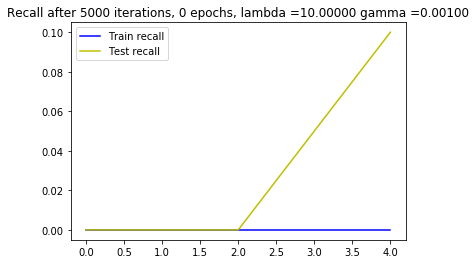

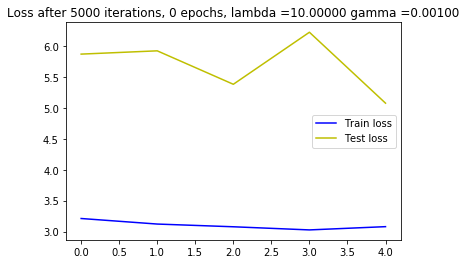

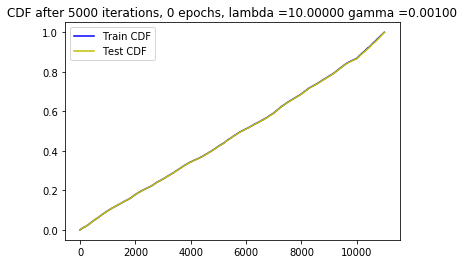






  1%|          | 5001/473047 [04:13<198:13:41,  1.52s/it]




  1%|          | 5008/473047 [04:13<139:20:37,  1.07s/it]

New score:  0.07001967
Train score:  0.11953944
Test score:  0.123127446
Obj first part:  0.3931351751089096
Obj second part:  -1.671514
Obj first part:  0.0
Obj second part:  -1.6369716
Obj first part:  0.0
Obj second part:  -2.8823109
Obj first part:  0.0
Obj second part:  -1.6520121
Obj first part:  0.0
Obj second part:  -1.8400631
Obj first part:  1.6357256472110748
Obj second part:  -1.7218124
Obj first part:  0.0
Obj second part:  -2.8534904
Obj first part:  1.5544219315052032
Obj second part:  -3.2749186
Obj first part:  2.7626019716262817
Obj second part:  -2.496517
Obj first part:  0.0
Obj second part:  -2.863829
Obj first part:  1.6423682868480682
Obj second part:  -1.8701987
Obj first part:  0.0
Obj second part:  -0.6432123
Obj first part:  0.2928520180284977
Obj second part:  -3.6458278
Obj first part:  1.0425765067338943
Obj second part:  -1.5539
Obj first part:  0.0
Obj second part:  -1.994403







  1%|          | 5017/473047 [04:13<98:00:37,  1.33it/s] 




  1%|          | 5024/473047 [04:13<69:14:56,  1.88it/s]

Obj first part:  2.419266104698181
Obj second part:  -3.5171876
Obj first part:  0.0
Obj second part:  -1.1035392
Obj first part:  0.38246169686317444
Obj second part:  -2.6145906
Obj first part:  0.6149757653474808
Obj second part:  -2.184429
Obj first part:  0.0
Obj second part:  -1.6123581
Obj first part:  0.0
Obj second part:  -1.1537696
Obj first part:  0.8660782873630524
Obj second part:  -2.117524
Obj first part:  0.7352052628993988
Obj second part:  -1.5538349
Obj first part:  0.47052089124917984
Obj second part:  -1.5980144
Obj first part:  0.0
Obj second part:  -1.6232759
Obj first part:  1.0187932848930359
Obj second part:  -2.0421574







  1%|          | 5029/473047 [04:14<49:21:56,  2.63it/s]




  1%|          | 5038/473047 [04:14<35:02:06,  3.71it/s]

Obj first part:  2.1515770256519318
Obj second part:  -2.220034
Obj first part:  0.0
Obj second part:  -2.354658
Obj first part:  0.0
Obj second part:  -3.250369
Obj first part:  0.0
Obj second part:  -3.2278736
Obj first part:  0.0
Obj second part:  -0.8377133
Obj first part:  1.6529425978660583
Obj second part:  -0.91360176
Obj first part:  0.0
Obj second part:  -1.9400333
Obj first part:  1.0235343128442764
Obj second part:  -1.5904998
Obj first part:  3.0148568749427795
Obj second part:  -3.059359
Obj first part:  4.631739854812622
Obj second part:  -2.0769613
Obj first part:  0.0
Obj second part:  -2.5695982
Obj first part:  0.0
Obj second part:  -4.2220244
Obj first part:  0.0
Obj second part:  -2.3016949
Obj first part:  0.0
Obj second part:  -0.9140131
Obj first part:  1.2596040964126587
Obj second part:  -3.0078669







  1%|          | 5045/473047 [04:14<25:11:29,  5.16it/s]




  1%|          | 5051/473047 [04:14<18:24:55,  7.06it/s]

Obj first part:  0.0
Obj second part:  -1.0338148
Obj first part:  0.0
Obj second part:  -1.523728
Obj first part:  0.0
Obj second part:  -1.3288424
Obj first part:  2.9074424505233765
Obj second part:  -1.9364847
Obj first part:  0.8376962691545486
Obj second part:  -1.563736
Obj first part:  2.123262882232666
Obj second part:  -0.72743607
Obj first part:  0.7992309331893921
Obj second part:  -2.0091252
Obj first part:  1.1520620435476303
Obj second part:  -2.9852612
Obj first part:  4.950988292694092
Obj second part:  -3.420895
Obj first part:  0.0
Obj second part:  -1.2508506
Obj first part:  0.0
Obj second part:  -2.7051544







  1%|          | 5060/473047 [04:14<13:23:12,  9.71it/s]

Obj first part:  0.7918291538953781
Obj second part:  -2.2218919
Obj first part:  0.0
Obj second part:  -1.283469
Obj first part:  0.43277837336063385
Obj second part:  -2.8706431
Obj first part:  2.0941659808158875
Obj second part:  -2.0311813
Obj first part:  0.0
Obj second part:  -2.7771246
Obj first part:  2.0311924815177917
Obj second part:  -0.9339608
Obj first part:  0.0
Obj second part:  -3.5871308
Obj first part:  0.0
Obj second part:  -2.527122
Obj first part:  2.2487717866897583
Obj second part:  -1.4551702
Obj first part:  0.0
Obj second part:  -2.3424058
Obj first part:  0.0
Obj second part:  -2.5168858
Obj first part:  0.0
Obj second part:  -0.9681521
Obj first part:  0.0
Obj second part:  -2.1693513
Obj first part:  0.0
Obj second part:  -1.6825345







  1%|          | 5067/473047 [04:14<10:03:56, 12.91it/s]




  1%|          | 5074/473047 [04:14<7:46:57, 16.70it/s] 

Obj first part:  0.0
Obj second part:  -2.540428
Obj first part:  0.0
Obj second part:  -2.2104847
Obj first part:  1.1832433193922043
Obj second part:  -2.4047313
Obj first part:  1.9236916303634644
Obj second part:  -1.1548153
Obj first part:  0.0
Obj second part:  -0.79677266
Obj first part:  0.0
Obj second part:  -2.0349398
Obj first part:  0.0
Obj second part:  -1.2947961
Obj first part:  0.0
Obj second part:  -1.9250163
Obj first part:  0.0
Obj second part:  -1.9367703
Obj first part:  3.7949562072753906
Obj second part:  -2.4184766
Obj first part:  0.0
Obj second part:  -1.242481
Obj first part:  1.2197813391685486
Obj second part:  -2.664439
Obj first part:  0.0
Obj second part:  -1.6948013







  1%|          | 5082/473047 [04:14<5:56:11, 21.90it/s]




  1%|          | 5090/473047 [04:15<4:43:07, 27.55it/s]

Obj first part:  0.0
Obj second part:  -2.4054232
Obj first part:  1.4983715116977692
Obj second part:  -1.6423225
Obj first part:  3.328680992126465
Obj second part:  -1.8255823
Obj first part:  0.0
Obj second part:  -1.5163338
Obj first part:  2.0791472494602203
Obj second part:  -1.6476718
Obj first part:  0.0
Obj second part:  -1.0633463
Obj first part:  0.0
Obj second part:  -2.425564
Obj first part:  0.9224579483270645
Obj second part:  -3.815693
Obj first part:  0.0
Obj second part:  -2.5819223
Obj first part:  1.7533493041992188
Obj second part:  -0.9752742
Obj first part:  0.0
Obj second part:  -1.4557271
Obj first part:  0.0
Obj second part:  -1.3628508
Obj first part:  0.0
Obj second part:  -0.855036







  1%|          | 5097/473047 [04:15<4:08:39, 31.37it/s]




  1%|          | 5106/473047 [04:15<3:22:14, 38.56it/s]

Obj first part:  4.609314799308777
Obj second part:  -1.9291738
Obj first part:  0.0
Obj second part:  -3.5643303
Obj first part:  0.0
Obj second part:  -0.9957333
Obj first part:  1.0834111273288727
Obj second part:  -1.1273853
Obj first part:  3.277796506881714
Obj second part:  -1.4851441
Obj first part:  0.23732740432024002
Obj second part:  -1.2133555
Obj first part:  0.0
Obj second part:  -1.8852015
Obj first part:  0.0
Obj second part:  -1.420989
Obj first part:  0.0
Obj second part:  -1.1140139
Obj first part:  0.0
Obj second part:  -1.334392
Obj first part:  0.0
Obj second part:  -1.6933254
Obj first part:  0.0
Obj second part:  -2.6762936
Obj first part:  2.0283038914203644
Obj second part:  -1.9633605
Obj first part:  0.0
Obj second part:  -1.4413255







  1%|          | 5113/473047 [04:15<3:02:02, 42.84it/s]

Obj first part:  0.0
Obj second part:  -1.9824957
Obj first part:  4.9428874254226685
Obj second part:  -2.758655
Obj first part:  0.0
Obj second part:  -1.476496
Obj first part:  8.991909623146057
Obj second part:  -1.6206149
Obj first part:  4.44726437330246
Obj second part:  -1.1503538
Obj first part:  1.2793968617916107
Obj second part:  -2.928474
Obj first part:  0.0
Obj second part:  -1.4640546
Obj first part:  1.4833836257457733
Obj second part:  -2.57533
Obj first part:  0.0
Obj second part:  -1.5793692
Obj first part:  0.0
Obj second part:  -1.8590193







  1%|          | 5120/473047 [04:15<2:59:06, 43.54it/s]




  1%|          | 5127/473047 [04:15<2:44:07, 47.52it/s]

Obj first part:  3.567388951778412
Obj second part:  -1.5792999
Obj first part:  0.0
Obj second part:  -1.8870931
Obj first part:  0.0
Obj second part:  -1.4897248
Obj first part:  1.852274239063263
Obj second part:  -1.4764221
Obj first part:  1.110149770975113
Obj second part:  -2.7288578
Obj first part:  0.0
Obj second part:  -1.2576487
Obj first part:  1.900622695684433
Obj second part:  -1.6712849
Obj first part:  0.0
Obj second part:  -2.9527807
Obj first part:  0.0
Obj second part:  -2.432699
Obj first part:  0.0
Obj second part:  -1.3435055
Obj first part:  0.0
Obj second part:  -1.9339968
Obj first part:  0.0
Obj second part:  -1.8943248
Obj first part:  0.0
Obj second part:  -1.5918794







  1%|          | 5134/473047 [04:15<2:33:36, 50.77it/s]

Obj first part:  0.0
Obj second part:  -1.7699485
Obj first part:  0.0
Obj second part:  -1.9022967
Obj first part:  2.3015038669109344
Obj second part:  -1.5920458
Obj first part:  0.0
Obj second part:  -1.6982064
Obj first part:  4.3321311473846436
Obj second part:  -2.2057385
Obj first part:  0.0
Obj second part:  -1.0144715
Obj first part:  0.0
Obj second part:  -1.1509442
Obj first part:  0.0
Obj second part:  -2.1394246
Obj first part:  0.0
Obj second part:  -1.4146603







  1%|          | 5140/473047 [04:15<2:45:13, 47.20it/s]




  1%|          | 5146/473047 [04:16<2:35:37, 50.11it/s]

Obj first part:  0.0
Obj second part:  -1.4544085
Obj first part:  1.2545764446258545
Obj second part:  -2.6853192
Obj first part:  1.6801203787326813
Obj second part:  -2.474054
Obj first part:  2.027243971824646
Obj second part:  -1.5403339
Obj first part:  0.0
Obj second part:  -1.7947094
Obj first part:  0.0
Obj second part:  -1.138945
Obj first part:  0.0
Obj second part:  -0.83675146
Obj first part:  0.0
Obj second part:  -1.3324127
Obj first part:  0.0
Obj second part:  -2.1157901
Obj first part:  2.2742989659309387
Obj second part:  -2.1865227
Obj first part:  0.0
Obj second part:  -1.7380478
Obj first part:  1.2265168875455856
Obj second part:  -1.5101395







  1%|          | 5152/473047 [04:16<2:36:47, 49.73it/s]




  1%|          | 5158/473047 [04:16<2:33:49, 50.70it/s]

Obj first part:  0.0
Obj second part:  -2.1771235
Obj first part:  4.194579720497131
Obj second part:  -2.2973971
Obj first part:  0.0
Obj second part:  -1.543931
Obj first part:  4.220890998840332
Obj second part:  -1.2723087
Obj first part:  0.9300702065229416
Obj second part:  -1.5594462
Obj first part:  2.4568115174770355
Obj second part:  -2.6936977
Obj first part:  0.0
Obj second part:  -1.9108679
Obj first part:  0.0
Obj second part:  -1.7571818
Obj first part:  2.372802346944809
Obj second part:  -2.745796
Obj first part:  3.2954153418540955
Obj second part:  -1.9900123
Obj first part:  0.0
Obj second part:  -2.2609308
Obj first part:  0.7854626327753067
Obj second part:  -1.9162184
Obj first part:  3.766801357269287
Obj second part:  -2.2380838







  1%|          | 5167/473047 [04:16<2:14:55, 57.80it/s]




  1%|          | 5176/473047 [04:16<2:03:12, 63.29it/s]

Obj first part:  0.0
Obj second part:  -2.0168302
Obj first part:  0.9099950641393661
Obj second part:  -2.0421479
Obj first part:  0.0
Obj second part:  -1.2109518
Obj first part:  2.7278512716293335
Obj second part:  -2.767935
Obj first part:  0.0
Obj second part:  -1.5473708
Obj first part:  2.2270292043685913
Obj second part:  -1.6958605
Obj first part:  4.610593020915985
Obj second part:  -2.0350096
Obj first part:  2.141840010881424
Obj second part:  -1.9752011
Obj first part:  0.6642112135887146
Obj second part:  -1.901566
Obj first part:  0.0
Obj second part:  -2.5236006
Obj first part:  4.260241389274597
Obj second part:  -3.0603454
Obj first part:  1.228942796587944
Obj second part:  -2.357797
Obj first part:  1.9808542728424072
Obj second part:  -1.6249472
Obj first part:  0.0
Obj second part:  -2.4253504
Obj first part:  1.4747865498065948
Obj second part:  -1.917676







  1%|          | 5183/473047 [04:16<2:14:14, 58.08it/s]




  1%|          | 5191/473047 [04:16<2:04:32, 62.61it/s]

Obj first part:  0.0
Obj second part:  -2.9662464
Obj first part:  0.0
Obj second part:  -1.9737535
Obj first part:  0.0
Obj second part:  -2.4291089
Obj first part:  0.0
Obj second part:  -1.9875797
Obj first part:  1.5840232372283936
Obj second part:  -2.083799
Obj first part:  0.0
Obj second part:  -1.5064418
Obj first part:  0.0
Obj second part:  -2.2388237
Obj first part:  0.0
Obj second part:  -0.9104872
Obj first part:  0.7135536521673203
Obj second part:  -2.0414748
Obj first part:  0.0
Obj second part:  -1.6641529
Obj first part:  0.0
Obj second part:  -1.1985224
Obj first part:  1.309426724910736
Obj second part:  -1.4027519
Obj first part:  0.7602886855602264
Obj second part:  -2.6970997







  1%|          | 5199/473047 [04:16<1:58:26, 65.84it/s]

Obj first part:  0.0
Obj second part:  -1.0859349
Obj first part:  0.0
Obj second part:  -1.9224105
Obj first part:  0.0
Obj second part:  -1.4441283
Obj first part:  2.955639362335205
Obj second part:  -1.431831
Obj first part:  3.1356602907180786
Obj second part:  -2.5260558
Obj first part:  1.9038227200508118
Obj second part:  -2.0347428
Obj first part:  0.0
Obj second part:  -1.3623503
Obj first part:  0.6660404801368713
Obj second part:  -1.5619525
Obj first part:  0.0
Obj second part:  -2.0337586
Obj first part:  1.8171393871307373
Obj second part:  -2.7831714
Obj first part:  1.9054728746414185
Obj second part:  -1.3627815
Obj first part:  0.0
Obj second part:  -1.5816712
Obj first part:  2.523302733898163
Obj second part:  -1.3966391
Obj first part:  1.352946013212204
Obj second part:  -2.0928547







  1%|          | 5206/473047 [04:16<2:02:24, 63.70it/s]




  1%|          | 5213/473047 [04:17<2:18:59, 56.10it/s]

Obj first part:  0.0
Obj second part:  -2.6890678
Obj first part:  0.0
Obj second part:  -2.243984
Obj first part:  0.7320370525121689
Obj second part:  -1.7883469
Obj first part:  1.836111843585968
Obj second part:  -1.6953659
Obj first part:  0.0
Obj second part:  -1.8755436
Obj first part:  0.0
Obj second part:  -2.5837674
Obj first part:  0.0
Obj second part:  -2.4182632
Obj first part:  0.0
Obj second part:  -1.7110027
Obj first part:  2.2405752539634705
Obj second part:  -1.3521085
Obj first part:  0.8454769849777222
Obj second part:  -2.9143045







  1%|          | 5219/473047 [04:17<2:18:33, 56.27it/s]

Obj first part:  2.399677485227585
Obj second part:  -2.3124561
Obj first part:  0.0
Obj second part:  -2.1079419
Obj first part:  2.0367011427879333
Obj second part:  -0.98043144
Obj first part:  4.341724514961243
Obj second part:  -1.9277097
Obj first part:  0.0
Obj second part:  -2.949263
Obj first part:  0.0
Obj second part:  -3.5564728
Obj first part:  0.7911168038845062
Obj second part:  -0.9442618
Obj first part:  0.0
Obj second part:  -2.5041058
Obj first part:  1.3478726148605347
Obj second part:  -2.095789







  1%|          | 5225/473047 [04:17<2:36:34, 49.80it/s]




  1%|          | 5231/473047 [04:17<2:32:00, 51.29it/s]

Obj first part:  0.0
Obj second part:  -1.5982164
Obj first part:  1.274818331003189
Obj second part:  -1.5993212
Obj first part:  0.0
Obj second part:  -1.3456063
Obj first part:  2.039205878973007
Obj second part:  -1.8597828
Obj first part:  0.0
Obj second part:  -1.3800343
Obj first part:  0.0
Obj second part:  -1.4596066
Obj first part:  0.0
Obj second part:  -1.9600763
Obj first part:  0.8816434442996979
Obj second part:  -2.4680262
Obj first part:  0.0
Obj second part:  -1.163333
Obj first part:  2.576632797718048
Obj second part:  -2.7463017
Obj first part:  3.12653124332428
Obj second part:  -3.3261483
Obj first part:  0.0
Obj second part:  -0.86722594







  1%|          | 5238/473047 [04:17<2:24:56, 53.79it/s]




  1%|          | 5244/473047 [04:17<2:34:53, 50.34it/s]

Obj first part:  0.0
Obj second part:  -1.5998749
Obj first part:  2.026444673538208
Obj second part:  -2.311082
Obj first part:  0.0
Obj second part:  -1.7005415
Obj first part:  0.0
Obj second part:  -1.4705813
Obj first part:  0.0
Obj second part:  -1.4263119
Obj first part:  0.0
Obj second part:  -2.6371896
Obj first part:  2.316145896911621
Obj second part:  -0.5320296
Obj first part:  1.1981124430894852
Obj second part:  -2.034069
Obj first part:  0.8731374144554138
Obj second part:  -1.4185414







  1%|          | 5250/473047 [04:17<2:34:20, 50.52it/s]




  1%|          | 5256/473047 [04:17<2:28:57, 52.34it/s]

Obj first part:  0.0
Obj second part:  -2.483528
Obj first part:  2.196323275566101
Obj second part:  -1.7389762
Obj first part:  1.3810470700263977
Obj second part:  -2.3728743
Obj first part:  0.6887529790401459
Obj second part:  -3.1178017
Obj first part:  0.6347957253456116
Obj second part:  -1.1879624
Obj first part:  0.0
Obj second part:  -3.105329
Obj first part:  0.0
Obj second part:  -1.6286143
Obj first part:  3.478446900844574
Obj second part:  -0.6557135
Obj first part:  0.0
Obj second part:  -2.0867214
Obj first part:  0.0
Obj second part:  -3.048048
Obj first part:  0.0
Obj second part:  -0.8813765
Obj first part:  0.0
Obj second part:  -2.4720974







  1%|          | 5262/473047 [04:18<2:48:13, 46.35it/s]

Obj first part:  0.0
Obj second part:  -2.4410565
Obj first part:  0.0
Obj second part:  -2.4502451
Obj first part:  0.0
Obj second part:  -1.6814703
Obj first part:  1.6202104091644287
Obj second part:  -1.9884197
Obj first part:  1.9773325324058533
Obj second part:  -0.5566497
Obj first part:  0.0
Obj second part:  -0.46414465
Obj first part:  0.0
Obj second part:  -2.7471473
Obj first part:  0.0
Obj second part:  -0.7799047
Obj first part:  0.0
Obj second part:  -1.8156456
Obj first part:  2.187677174806595
Obj second part:  -1.7746463







  1%|          | 5268/473047 [04:18<2:37:18, 49.56it/s]




  1%|          | 5274/473047 [04:18<2:36:18, 49.88it/s]

Obj first part:  4.618074297904968
Obj second part:  -1.2600255
Obj first part:  0.0
Obj second part:  -1.3375554
Obj first part:  0.0
Obj second part:  -1.7995069
Obj first part:  1.7083580791950226
Obj second part:  -1.8534427
Obj first part:  3.4234213829040527
Obj second part:  -2.0347075
Obj first part:  0.0
Obj second part:  -1.1754122
Obj first part:  4.893973469734192
Obj second part:  -2.0611918
Obj first part:  1.1473507434129715
Obj second part:  -3.2120323
Obj first part:  1.181773990392685
Obj second part:  -0.43756387







  1%|          | 5280/473047 [04:18<2:47:13, 46.62it/s]




  1%|          | 5286/473047 [04:18<2:36:53, 49.69it/s]

Obj first part:  0.0
Obj second part:  -2.5374403
Obj first part:  2.588708996772766
Obj second part:  -2.6166
Obj first part:  2.553737163543701
Obj second part:  -2.161808
Obj first part:  0.0
Obj second part:  -2.161713
Obj first part:  1.2934701144695282
Obj second part:  -2.6100948
Obj first part:  0.8847849071025848
Obj second part:  -2.981972
Obj first part:  0.32726701349020004
Obj second part:  -1.7543898
Obj first part:  0.0
Obj second part:  -2.8693616
Obj first part:  0.0
Obj second part:  -1.9980702
Obj first part:  1.7798662185668945
Obj second part:  -1.4319607
Obj first part:  1.0015545040369034
Obj second part:  -1.6504996
Obj first part:  0.0
Obj second part:  -2.1695352







  1%|          | 5292/473047 [04:18<2:42:09, 48.07it/s]




  1%|          | 5297/473047 [04:18<2:47:16, 46.61it/s]

Obj first part:  0.9856922924518585
Obj second part:  -2.5418093
Obj first part:  6.058832406997681
Obj second part:  -1.4902167
Obj first part:  0.9211042523384094
Obj second part:  -1.4384489
Obj first part:  0.0
Obj second part:  -1.9165869
Obj first part:  0.0
Obj second part:  -1.5459479
Obj first part:  2.1640463173389435
Obj second part:  -1.8496641
Obj first part:  0.0
Obj second part:  -2.870222
Obj first part:  0.0
Obj second part:  -1.6008265
Obj first part:  0.0
Obj second part:  -1.5274622







  1%|          | 5303/473047 [04:18<2:37:18, 49.56it/s]

Obj first part:  4.156612753868103
Obj second part:  -2.4734464
Obj first part:  0.0
Obj second part:  -1.5711263
Obj first part:  0.9951995313167572
Obj second part:  -1.0904597
Obj first part:  0.1999337039887905
Obj second part:  -2.556815
Obj first part:  0.0
Obj second part:  -1.7269195
Obj first part:  0.0
Obj second part:  -2.0823176
Obj first part:  0.0
Obj second part:  -1.226335
Obj first part:  2.5474312901496887
Obj second part:  -2.0391552
Obj first part:  0.9497100114822388
Obj second part:  -1.916675
Obj first part:  0.0
Obj second part:  -0.73660594







  1%|          | 5309/473047 [04:19<2:49:02, 46.12it/s]




  1%|          | 5314/473047 [04:19<2:46:29, 46.82it/s]

Obj first part:  0.0
Obj second part:  -3.1517913
Obj first part:  2.7248352766036987
Obj second part:  -1.67447
Obj first part:  0.0
Obj second part:  -2.0291257
Obj first part:  2.8744906187057495
Obj second part:  -0.78773695
Obj first part:  1.6486908495426178
Obj second part:  -1.8132497
Obj first part:  0.0
Obj second part:  -2.939857
Obj first part:  0.0
Obj second part:  -1.1024077
Obj first part:  1.3909119367599487
Obj second part:  -1.4881612
Obj first part:  0.0
Obj second part:  -2.650969
Obj first part:  0.0
Obj second part:  -1.670077
Obj first part:  2.1768809854984283
Obj second part:  -0.93203723







  1%|          | 5320/473047 [04:19<2:36:48, 49.71it/s]




  1%|          | 5326/473047 [04:19<2:50:26, 45.74it/s]

Obj first part:  0.0
Obj second part:  -1.167378
Obj first part:  3.6209848523139954
Obj second part:  -1.0976849
Obj first part:  0.0
Obj second part:  -2.0892713
Obj first part:  2.1803835034370422
Obj second part:  -1.9893892
Obj first part:  0.0
Obj second part:  -1.1777916
Obj first part:  0.0
Obj second part:  -2.8065095
Obj first part:  4.530422389507294
Obj second part:  -1.7644713
Obj first part:  0.0
Obj second part:  -0.8047568







  1%|          | 5332/473047 [04:19<2:42:35, 47.94it/s]




  1%|          | 5338/473047 [04:19<2:36:53, 49.68it/s]

Obj first part:  0.7980570942163467
Obj second part:  -2.4857738
Obj first part:  0.0
Obj second part:  -3.4089558
Obj first part:  0.0
Obj second part:  -1.0706733
Obj first part:  0.0
Obj second part:  -2.7025638
Obj first part:  0.0
Obj second part:  -1.4824892
Obj first part:  0.0
Obj second part:  -1.1027129
Obj first part:  1.5390777587890625
Obj second part:  -3.2265103
Obj first part:  0.4997876286506653
Obj second part:  -1.7083067
Obj first part:  0.7609623670578003
Obj second part:  -0.9410094
Obj first part:  2.025999277830124
Obj second part:  -2.6538627
Obj first part:  0.0
Obj second part:  -1.8312211
Obj first part:  0.0
Obj second part:  -1.8382812







  1%|          | 5344/473047 [04:19<2:51:07, 45.55it/s]

Obj first part:  0.0
Obj second part:  -2.8337615
Obj first part:  0.0
Obj second part:  -3.2439268
Obj first part:  0.6160520389676094
Obj second part:  -1.4461365
Obj first part:  7.680577039718628
Obj second part:  -1.5404997
Obj first part:  0.0
Obj second part:  -2.048457
Obj first part:  3.0971333384513855
Obj second part:  -2.4363918
Obj first part:  0.0
Obj second part:  -2.4902852
Obj first part:  0.0
Obj second part:  -2.7789474
Obj first part:  0.0
Obj second part:  -2.2123117
Obj first part:  0.0
Obj second part:  -1.0196717







  1%|          | 5350/473047 [04:19<2:38:48, 49.08it/s]




  1%|          | 5356/473047 [04:20<2:41:19, 48.32it/s]

Obj first part:  0.0
Obj second part:  -1.1931511
Obj first part:  0.0
Obj second part:  -2.832799
Obj first part:  0.45664407312870026
Obj second part:  -2.6424658
Obj first part:  0.0
Obj second part:  -1.0651091
Obj first part:  0.0
Obj second part:  -1.9514618
Obj first part:  0.0
Obj second part:  -1.0802093
Obj first part:  0.8637715131044388
Obj second part:  -0.9149717
Obj first part:  0.0
Obj second part:  -1.821768
Obj first part:  5.829495787620544
Obj second part:  -1.5945059







  1%|          | 5361/473047 [04:20<2:51:54, 45.34it/s]




  1%|          | 5367/473047 [04:20<2:40:25, 48.59it/s]

Obj first part:  1.8756869435310364
Obj second part:  -0.91022146
Obj first part:  1.2117091566324234
Obj second part:  -0.7791023
Obj first part:  0.0
Obj second part:  -0.81504005
Obj first part:  2.76726633310318
Obj second part:  -3.5595782
Obj first part:  0.0
Obj second part:  -1.6470418
Obj first part:  1.1966842412948608
Obj second part:  -2.0175548
Obj first part:  2.6021844148635864
Obj second part:  -1.777837
Obj first part:  0.0
Obj second part:  -2.1551476
Obj first part:  1.8799395859241486
Obj second part:  -1.9901001
Obj first part:  3.973463773727417
Obj second part:  -1.7094738
Obj first part:  0.0
Obj second part:  -0.94629586







  1%|          | 5373/473047 [04:20<2:45:04, 47.22it/s]

Obj first part:  4.212735593318939
Obj second part:  -1.8270357
Obj first part:  0.0
Obj second part:  -2.9687142
Obj first part:  1.1662399023771286
Obj second part:  -1.3193027
Obj first part:  0.0
Obj second part:  -2.3522344
Obj first part:  2.9152926802635193
Obj second part:  -1.3262093
Obj first part:  0.5961129441857338
Obj second part:  -2.028057
Obj first part:  0.9180596470832825
Obj second part:  -4.207277
Obj first part:  0.0
Obj second part:  -1.5143902
Obj first part:  0.0
Obj second part:  -2.9240737







  1%|          | 5378/473047 [04:20<2:48:34, 46.24it/s]




  1%|          | 5384/473047 [04:20<2:37:56, 49.35it/s]

Obj first part:  0.5532471090555191
Obj second part:  -1.6523973
Obj first part:  1.9039280712604523
Obj second part:  -2.8405583
Obj first part:  0.0
Obj second part:  -2.1616428
Obj first part:  2.47187077999115
Obj second part:  -2.162637
Obj first part:  0.42414557188749313
Obj second part:  -2.6957133
Obj first part:  0.0
Obj second part:  -1.5649647
Obj first part:  0.0
Obj second part:  -3.6900973
Obj first part:  0.9669794142246246
Obj second part:  -1.7534304
Obj first part:  0.0
Obj second part:  -1.3136271
Obj first part:  3.8116785883903503
Obj second part:  -1.9702134
Obj first part:  1.3225863873958588
Obj second part:  -1.8888648







  1%|          | 5390/473047 [04:20<2:45:52, 46.99it/s]




  1%|          | 5395/473047 [04:20<2:45:26, 47.11it/s]

Obj first part:  0.0
Obj second part:  -0.5286671
Obj first part:  5.03332257270813
Obj second part:  -3.122876
Obj first part:  0.0
Obj second part:  -2.6548185
Obj first part:  2.8511568903923035
Obj second part:  -2.1316926
Obj first part:  8.07096242904663
Obj second part:  -3.0221725
Obj first part:  1.6285263001918793
Obj second part:  -2.230751
Obj first part:  0.0
Obj second part:  -2.7551956
Obj first part:  0.6413770467042923
Obj second part:  -3.1049657
Obj first part:  0.3558587282896042
Obj second part:  -2.7401643
Obj first part:  8.738166093826294
Obj second part:  -1.5963368
Obj first part:  0.8044694364070892
Obj second part:  -2.0817177







  1%|          | 5401/473047 [04:20<2:36:48, 49.70it/s]




  1%|          | 5407/473047 [04:21<2:49:25, 46.00it/s]

Obj first part:  0.3364400938153267
Obj second part:  -2.8020937
Obj first part:  0.0
Obj second part:  -1.6896774
Obj first part:  0.0
Obj second part:  -0.95151526
Obj first part:  2.1460875868797302
Obj second part:  -2.6034765
Obj first part:  1.279892921447754
Obj second part:  -2.1143196
Obj first part:  0.0
Obj second part:  -3.0839536
Obj first part:  0.0
Obj second part:  -1.2300376
Obj first part:  0.0
Obj second part:  -3.1752636







  1%|          | 5413/473047 [04:21<2:42:59, 47.82it/s]




  1%|          | 5419/473047 [04:21<2:35:20, 50.17it/s]

Obj first part:  0.6269396096467972
Obj second part:  -2.4725783
Obj first part:  1.0543688386678696
Obj second part:  -4.098795
Obj first part:  0.5735578760504723
Obj second part:  -1.0713831
Obj first part:  0.0
Obj second part:  -2.1648996
Obj first part:  2.0631593465805054
Obj second part:  -2.0832512
Obj first part:  1.1907387524843216
Obj second part:  -1.7857511
Obj first part:  0.8621670305728912
Obj second part:  -1.8272945
Obj first part:  0.0
Obj second part:  -2.3940036
Obj first part:  3.268476724624634
Obj second part:  -3.076912
Obj first part:  0.5934395641088486
Obj second part:  -2.4057739
Obj first part:  1.3847729563713074
Obj second part:  -2.0731277
Obj first part:  0.0
Obj second part:  -2.589155







  1%|          | 5425/473047 [04:21<2:49:50, 45.89it/s]

Obj first part:  0.0
Obj second part:  -2.6905034
Obj first part:  0.8250162750482559
Obj second part:  -2.3808906
Obj first part:  0.0
Obj second part:  -2.62306
Obj first part:  0.0
Obj second part:  -3.644115
Obj first part:  3.194246292114258
Obj second part:  -1.8557397
Obj first part:  0.0
Obj second part:  -2.3292365
Obj first part:  0.0
Obj second part:  -2.7393322
Obj first part:  0.4941191151738167
Obj second part:  -3.7048376
Obj first part:  0.0
Obj second part:  -1.2799447







  1%|          | 5431/473047 [04:21<2:38:38, 49.13it/s]




  1%|          | 5437/473047 [04:21<2:36:15, 49.88it/s]

Obj first part:  2.0240554213523865
Obj second part:  -2.003464
Obj first part:  2.634625732898712
Obj second part:  -3.0500166
Obj first part:  0.875735878944397
Obj second part:  -2.527069
Obj first part:  0.0
Obj second part:  -1.9514945
Obj first part:  0.0
Obj second part:  -2.2882779
Obj first part:  0.0
Obj second part:  -2.270873
Obj first part:  0.0
Obj second part:  -2.8960974
Obj first part:  0.0
Obj second part:  -1.9505589
Obj first part:  0.0
Obj second part:  -2.111185
Obj first part:  0.8924911171197891
Obj second part:  -2.003817







  1%|          | 5443/473047 [04:21<2:48:56, 46.13it/s]

Obj first part:  0.0
Obj second part:  -0.9759135
Obj first part:  0.0
Obj second part:  -2.9866273
Obj first part:  0.5566699802875519
Obj second part:  -1.4550705
Obj first part:  0.6072653457522392
Obj second part:  -2.6302333
Obj first part:  3.675524890422821
Obj second part:  -1.592819
Obj first part:  1.6049599647521973
Obj second part:  -1.6215131
Obj first part:  1.512451171875
Obj second part:  -0.84268343
Obj first part:  0.0
Obj second part:  -1.8884617
Obj first part:  4.063611030578613
Obj second part:  -2.334173
Obj first part:  0.0
Obj second part:  -1.8659916
Obj first part:  0.0
Obj second part:  -1.5207499







  1%|          | 5450/473047 [04:22<2:37:50, 49.38it/s]




  1%|          | 5456/473047 [04:22<2:45:51, 46.99it/s]

Obj first part:  0.0
Obj second part:  -1.8919852
Obj first part:  0.0
Obj second part:  -2.122027
Obj first part:  0.0
Obj second part:  -1.1709716
Obj first part:  1.9232960045337677
Obj second part:  -2.552803
Obj first part:  0.0
Obj second part:  -1.570262
Obj first part:  0.0
Obj second part:  -2.42255
Obj first part:  0.0
Obj second part:  -1.9014513
Obj first part:  2.605762779712677
Obj second part:  -0.942188
Obj first part:  0.9877575933933258
Obj second part:  -2.1032467







  1%|          | 5461/473047 [04:22<2:46:50, 46.71it/s]




  1%|          | 5467/473047 [04:22<2:37:28, 49.49it/s]

Obj first part:  0.0
Obj second part:  -3.334854
Obj first part:  0.0
Obj second part:  -1.0270727
Obj first part:  0.0
Obj second part:  -2.459023
Obj first part:  2.1629828214645386
Obj second part:  -1.3191751
Obj first part:  1.2181267142295837
Obj second part:  -2.1471896
Obj first part:  1.7744021117687225
Obj second part:  -3.152284
Obj first part:  0.0
Obj second part:  -2.7327785
Obj first part:  0.0
Obj second part:  -2.7590334
Obj first part:  8.69141697883606
Obj second part:  -2.292543
Obj first part:  0.0
Obj second part:  -1.8417759
Obj first part:  1.8681757152080536
Obj second part:  -2.8663213







  1%|          | 5473/473047 [04:22<2:51:39, 45.40it/s]




  1%|          | 5479/473047 [04:22<2:42:28, 47.96it/s]

Obj first part:  4.378571808338165
Obj second part:  -2.0341868
Obj first part:  0.28854573145508766
Obj second part:  -2.085122
Obj first part:  2.49304860830307
Obj second part:  -2.2694278
Obj first part:  3.28838974237442
Obj second part:  -2.16571
Obj first part:  2.1950021386146545
Obj second part:  -2.476856
Obj first part:  0.0
Obj second part:  -4.216491
Obj first part:  0.0
Obj second part:  -1.7252605
Obj first part:  0.9208036214113235
Obj second part:  -2.3388133
Obj first part:  0.6607994437217712
Obj second part:  -1.8458029
Obj first part:  0.0
Obj second part:  -2.1377015







  1%|          | 5485/473047 [04:22<2:36:59, 49.64it/s]

Obj first part:  2.961084246635437
Obj second part:  -2.663666
Obj first part:  1.1324405670166016
Obj second part:  -2.974921
Obj first part:  0.0
Obj second part:  -1.7749723
Obj first part:  0.0
Obj second part:  -4.296466
Obj first part:  0.0
Obj second part:  -1.8417312
Obj first part:  0.0
Obj second part:  -1.0325946
Obj first part:  0.0
Obj second part:  -1.7896733
Obj first part:  1.6692207753658295
Obj second part:  -1.534697
Obj first part:  0.0
Obj second part:  -1.5690274







  1%|          | 5491/473047 [04:22<2:52:38, 45.14it/s]




  1%|          | 5497/473047 [04:23<2:40:51, 48.44it/s]

Obj first part:  1.7103001475334167
Obj second part:  -2.2149827
Obj first part:  0.0
Obj second part:  -1.2269182
Obj first part:  0.0
Obj second part:  -1.9624834
Obj first part:  0.0
Obj second part:  -2.1934278
Obj first part:  1.9891823828220367
Obj second part:  -1.7537351
Obj first part:  0.0
Obj second part:  -1.9026304
Obj first part:  1.5636332333087921
Obj second part:  -1.9390931
Obj first part:  0.0
Obj second part:  -1.8748548
Obj first part:  1.8806621432304382
Obj second part:  -2.2217834
Obj first part:  2.055365741252899
Obj second part:  -3.6527052
Obj first part:  0.0
Obj second part:  -2.2230685
Obj first part:  0.0
Obj second part:  -1.8654133







  1%|          | 5503/473047 [04:23<2:33:00, 50.93it/s]




  1%|          | 5509/473047 [04:23<2:50:23, 45.73it/s]

Obj first part:  3.4008750319480896
Obj second part:  -1.7330214
Obj first part:  1.573941856622696
Obj second part:  -1.9411039
Obj first part:  0.0
Obj second part:  -2.5421824
Obj first part:  0.5449114739894867
Obj second part:  -1.8416995
Obj first part:  0.0
Obj second part:  -2.8118334
Obj first part:  2.083756774663925
Obj second part:  -1.8261136
Obj first part:  1.730499416589737
Obj second part:  -1.2400298
Obj first part:  1.817760020494461
Obj second part:  -2.8286328
Obj first part:  0.0
Obj second part:  -1.7480987







  1%|          | 5515/473047 [04:23<2:39:27, 48.87it/s]

Obj first part:  0.0
Obj second part:  -2.1090293
Obj first part:  0.0
Obj second part:  -2.322217
Obj first part:  1.2256499379873276
Obj second part:  -2.6102705
Obj first part:  0.0
Obj second part:  -2.8563197
Obj first part:  0.0
Obj second part:  -1.0919199
Obj first part:  1.4091640710830688
Obj second part:  -2.7652795
Obj first part:  0.0
Obj second part:  -2.5126991
Obj first part:  0.0
Obj second part:  -1.3436987
Obj first part:  1.4371736347675323
Obj second part:  -1.5818597
Obj first part:  0.0
Obj second part:  -1.6678602







  1%|          | 5521/473047 [04:23<2:50:09, 45.79it/s]




  1%|          | 5526/473047 [04:23<2:47:43, 46.46it/s]

Obj first part:  2.203901708126068
Obj second part:  -2.2193682
Obj first part:  0.629209354519844
Obj second part:  -1.6057262
Obj first part:  0.342184416949749
Obj second part:  -1.8460537
Obj first part:  0.0
Obj second part:  -2.3469877
Obj first part:  4.696304202079773
Obj second part:  -2.464325
Obj first part:  1.5032562613487244
Obj second part:  -1.0934074
Obj first part:  1.4820094406604767
Obj second part:  -2.449609
Obj first part:  1.1720014363527298
Obj second part:  -0.98893464
Obj first part:  0.0
Obj second part:  -3.0311642
Obj first part:  0.0
Obj second part:  -2.1176777
Obj first part:  0.0







  1%|          | 5532/473047 [04:23<2:41:16, 48.32it/s]




  1%|          | 5537/473047 [04:23<2:59:11, 43.48it/s]

Obj second part:  -2.2111979
Obj first part:  0.0
Obj second part:  -2.458428
Obj first part:  0.7216089963912964
Obj second part:  -1.269078
Obj first part:  0.2521778643131256
Obj second part:  -2.40403
Obj first part:  1.2652064859867096
Obj second part:  -2.422973
Obj first part:  0.0
Obj second part:  -0.71559995
Obj first part:  0.0
Obj second part:  -2.9847167
Obj first part:  4.732553958892822
Obj second part:  -2.4790645







  1%|          | 5544/473047 [04:24<2:44:14, 47.44it/s]

Obj first part:  0.0
Obj second part:  -2.0308022
Obj first part:  0.0
Obj second part:  -1.8950837
Obj first part:  2.8207889199256897
Obj second part:  -2.4089603
Obj first part:  0.0
Obj second part:  -1.5497445
Obj first part:  4.755416512489319
Obj second part:  -1.3099151
Obj first part:  1.1861259490251541
Obj second part:  -2.71728
Obj first part:  1.4573173224925995
Obj second part:  -2.379814
Obj first part:  0.0
Obj second part:  -1.9306514
Obj first part:  1.9024479389190674
Obj second part:  -1.5378355
Obj first part:  4.9949875473976135
Obj second part:  -1.5276108
Obj first part:  0.0
Obj second part:  -3.200487







  1%|          | 5549/473047 [04:24<2:54:11, 44.73it/s]




  1%|          | 5554/473047 [04:24<2:56:35, 44.12it/s]

Obj first part:  0.5469235777854919
Obj second part:  -2.025614
Obj first part:  0.5930230394005775
Obj second part:  -2.368639
Obj first part:  0.0
Obj second part:  -2.7011812
Obj first part:  1.1867456138134003
Obj second part:  -3.4334702
Obj first part:  0.7375974953174591
Obj second part:  -1.695977
Obj first part:  4.480704367160797
Obj second part:  -2.530311
Obj first part:  0.8580343425273895
Obj second part:  -1.701474
Obj first part:  1.8116757273674011
Obj second part:  -3.0929852
Obj first part:  1.2252168357372284
Obj second part:  -0.92370623
Obj first part:  0.0
Obj second part:  -1.65367
Obj first part:  0.0
Obj second part:  -2.4762106







  1%|          | 5560/473047 [04:24<2:44:26, 47.38it/s]




  1%|          | 5565/473047 [04:24<2:54:53, 44.55it/s]

Obj first part:  0.0
Obj second part:  -1.4548405
Obj first part:  0.0
Obj second part:  -2.0211093
Obj first part:  0.0
Obj second part:  -2.1342707
Obj first part:  1.2809932231903076
Obj second part:  -2.2391539
Obj first part:  0.0
Obj second part:  -2.2090957
Obj first part:  0.0
Obj second part:  -2.5811162
Obj first part:  0.0
Obj second part:  -2.1574128
Obj first part:  2.0626263320446014
Obj second part:  -1.4386396
Obj first part:  0.0
Obj second part:  -2.8087177







  1%|          | 5570/473047 [04:24<2:50:17, 45.75it/s]




  1%|          | 5577/473047 [04:24<2:37:54, 49.34it/s]

Obj first part:  2.150380313396454
Obj second part:  -1.9710037
Obj first part:  6.787382960319519
Obj second part:  -1.972569
Obj first part:  1.6943860054016113
Obj second part:  -1.9111269
Obj first part:  1.0307377576828003
Obj second part:  -1.9785521
Obj first part:  1.3170947134494781
Obj second part:  -2.5305834
Obj first part:  0.0
Obj second part:  -1.6722007
Obj first part:  0.0
Obj second part:  -1.3387603
Obj first part:  0.49104485660791397
Obj second part:  -2.3164072
Obj first part:  0.0
Obj second part:  -1.601745
Obj first part:  0.0
Obj second part:  -1.8959117
Obj first part:  0.0
Obj second part:  -3.0312002
Obj first part:  0.0
Obj second part:  -3.1366582







  1%|          | 5583/473047 [04:24<2:44:17, 47.42it/s]




  1%|          | 5588/473047 [04:24<2:44:15, 47.43it/s]

Obj first part:  0.0
Obj second part:  -1.1600279
Obj first part:  0.0
Obj second part:  -1.3077345
Obj first part:  1.576126217842102
Obj second part:  -2.4917228
Obj first part:  0.0
Obj second part:  -2.9806216
Obj first part:  1.1274374276399612
Obj second part:  -1.7569305
Obj first part:  0.0
Obj second part:  -1.4883457
Obj first part:  2.490938752889633
Obj second part:  -1.9306937
Obj first part:  0.7361412048339844
Obj second part:  -1.5848788
Obj first part:  2.4722418189048767
Obj second part:  -2.7630336
Obj first part:  0.0
Obj second part:  -1.5540123







  1%|          | 5594/473047 [04:25<2:36:11, 49.88it/s]

Obj first part:  1.8333998322486877
Obj second part:  -2.3585794
Obj first part:  1.0043725371360779
Obj second part:  -1.8945416
Obj first part:  0.0
Obj second part:  -3.7396822
Obj first part:  0.0
Obj second part:  -2.1968415
Obj first part:  2.187676280736923
Obj second part:  -1.7690904
Obj first part:  0.0
Obj second part:  -1.6116527
Obj first part:  0.0
Obj second part:  -1.639611
Obj first part:  5.161955952644348
Obj second part:  -3.0468674
Obj first part:  2.487576901912689
Obj second part:  -2.15952







  1%|          | 5600/473047 [04:25<2:52:43, 45.10it/s]




  1%|          | 5606/473047 [04:25<2:40:00, 48.69it/s]

Obj first part:  0.0
Obj second part:  -1.9220856
Obj first part:  0.0
Obj second part:  -2.7133632
Obj first part:  1.9593346118927002
Obj second part:  -1.4882619
Obj first part:  6.637799143791199
Obj second part:  -1.1667111
Obj first part:  0.0
Obj second part:  -1.5040041
Obj first part:  0.0
Obj second part:  -1.0752004
Obj first part:  0.0
Obj second part:  -2.5129375
Obj first part:  3.85719895362854
Obj second part:  -2.4224172
Obj first part:  2.332404851913452
Obj second part:  -2.2430222
Obj first part:  1.3970215618610382
Obj second part:  -2.4723344
Obj first part:  0.0
Obj second part:  -1.4746302







  1%|          | 5612/473047 [04:25<2:43:31, 47.64it/s]




  1%|          | 5617/473047 [04:25<2:50:11, 45.78it/s]

Obj first part:  1.7831826210021973
Obj second part:  -2.2172472
Obj first part:  3.203272819519043
Obj second part:  -2.079073
Obj first part:  0.0
Obj second part:  -2.7148275
Obj first part:  0.5804698169231415
Obj second part:  -2.124862
Obj first part:  1.6132020950317383
Obj second part:  -2.1617296
Obj first part:  0.0
Obj second part:  -1.4960134
Obj first part:  0.0
Obj second part:  -2.1148663
Obj first part:  0.0
Obj second part:  -1.0935766
Obj first part:  1.2725421786308289
Obj second part:  -2.7937465
Obj first part:  2.063404768705368
Obj second part:  -2.5935986







  1%|          | 5623/473047 [04:25<2:39:43, 48.77it/s]




  1%|          | 5629/473047 [04:25<2:51:44, 45.36it/s]

Obj first part:  0.5038367956876755
Obj second part:  -2.5580356
Obj first part:  2.253868877887726
Obj second part:  -2.959244
Obj first part:  0.3114616125822067
Obj second part:  -2.401066
Obj first part:  4.347712695598602
Obj second part:  -1.2277757
Obj first part:  0.5726446211338043
Obj second part:  -2.4510083
Obj first part:  2.203381359577179
Obj second part:  -0.67185473
Obj first part:  0.0
Obj second part:  -2.3580482
Obj first part:  0.653863325715065
Obj second part:  -3.3908055
Obj first part:  0.0
Obj second part:  -1.3287389







  1%|          | 5635/473047 [04:25<2:43:03, 47.78it/s]

Obj first part:  2.0205414295196533
Obj second part:  -2.3230257
Obj first part:  0.0
Obj second part:  -2.5431173
Obj first part:  0.30874520540237427
Obj second part:  -2.3838844
Obj first part:  1.5327301621437073
Obj second part:  -2.826322
Obj first part:  0.0
Obj second part:  -2.4174092
Obj first part:  2.0675651729106903
Obj second part:  -0.8894022
Obj first part:  0.0
Obj second part:  -2.44226
Obj first part:  0.0
Obj second part:  -1.9775763
Obj first part:  1.086028441786766
Obj second part:  -1.6078846
Obj first part:  0.0
Obj second part:  -2.249717
Obj first part:  0.0
Obj second part:  -2.4509528







  1%|          | 5641/473047 [04:26<2:42:40, 47.89it/s]




  1%|          | 5646/473047 [04:26<2:53:24, 44.92it/s]

Obj first part:  0.0
Obj second part:  -1.9769182
Obj first part:  0.5603373423218727
Obj second part:  -2.8420115
Obj first part:  4.14135217666626
Obj second part:  -1.4020183
Obj first part:  0.0
Obj second part:  -1.3928052
Obj first part:  0.0
Obj second part:  -2.3317628
Obj first part:  3.961515724658966
Obj second part:  -2.7616847
Obj first part:  0.0
Obj second part:  -3.7570226
Obj first part:  0.0
Obj second part:  -1.382037
Obj first part:  0.0
Obj second part:  -2.2835498
Obj first part:  0.0
Obj second part:  -2.1668591







  1%|          | 5652/473047 [04:26<2:40:43, 48.47it/s]




  1%|          | 5658/473047 [04:26<2:34:26, 50.44it/s]

Obj first part:  0.0
Obj second part:  -1.7707181
Obj first part:  0.0
Obj second part:  -0.83913225
Obj first part:  0.0
Obj second part:  -1.1288965
Obj first part:  0.6346336752176285
Obj second part:  -1.0185273
Obj first part:  1.6073307394981384
Obj second part:  -1.6130791
Obj first part:  0.0
Obj second part:  -1.9323388
Obj first part:  1.962047517299652
Obj second part:  -2.181344
Obj first part:  0.0
Obj second part:  -3.0044122
Obj first part:  1.7358508706092834
Obj second part:  -2.9825542
Obj first part:  0.9744638949632645
Obj second part:  -1.9808663







  1%|          | 5664/473047 [04:26<2:49:08, 46.05it/s]




  1%|          | 5671/473047 [04:26<2:38:29, 49.15it/s]

Obj first part:  1.0667777806520462
Obj second part:  -2.0699432
Obj first part:  0.0
Obj second part:  -2.039187
Obj first part:  0.0
Obj second part:  -1.799339
Obj first part:  1.345544159412384
Obj second part:  -1.074116
Obj first part:  0.0
Obj second part:  -2.2470443
Obj first part:  0.0
Obj second part:  -2.0069923
Obj first part:  1.3412101566791534
Obj second part:  -2.345094
Obj first part:  2.413112372159958
Obj second part:  -1.5348735
Obj first part:  0.0
Obj second part:  -1.5999191
Obj first part:  0.0
Obj second part:  -1.8774474
Obj first part:  0.0
Obj second part:  -1.1838032







  1%|          | 5677/473047 [04:26<2:50:35, 45.66it/s]

Obj first part:  0.0
Obj second part:  -1.2213627
Obj first part:  2.0217695832252502
Obj second part:  -1.0013667
Obj first part:  2.50162810087204
Obj second part:  -2.641994
Obj first part:  0.0
Obj second part:  -1.8950037
Obj first part:  0.0
Obj second part:  -1.8549553
Obj first part:  2.4767863750457764
Obj second part:  -2.138819
Obj first part:  0.0
Obj second part:  -2.9123793
Obj first part:  0.0
Obj second part:  -2.0982115
Obj first part:  0.0
Obj second part:  -1.5376356







  1%|          | 5683/473047 [04:26<2:42:17, 48.00it/s]




  1%|          | 5689/473047 [04:27<2:40:24, 48.56it/s]

Obj first part:  0.0
Obj second part:  -2.22643
Obj first part:  0.0
Obj second part:  -2.9598377
Obj first part:  0.0
Obj second part:  -1.8765984
Obj first part:  0.0
Obj second part:  -2.112783
Obj first part:  4.203910827636719
Obj second part:  -1.833003
Obj first part:  2.6792871952056885
Obj second part:  -2.653185
Obj first part:  0.0
Obj second part:  -2.7754018
Obj first part:  0.0
Obj second part:  -1.4516292
Obj first part:  1.3476788997650146
Obj second part:  -1.2694135
Obj first part:  0.0
Obj second part:  -1.9724877







  1%|          | 5694/473047 [04:27<2:52:52, 45.06it/s]




  1%|          | 5700/473047 [04:27<2:40:01, 48.67it/s]

Obj first part:  2.8563427925109863
Obj second part:  -1.3369323
Obj first part:  0.0
Obj second part:  -1.5271285
Obj first part:  0.6012357026338577
Obj second part:  -2.8062139
Obj first part:  0.0
Obj second part:  -1.6000695
Obj first part:  1.8148013949394226
Obj second part:  -1.882816
Obj first part:  5.440499782562256
Obj second part:  -1.6638001
Obj first part:  2.3089659214019775
Obj second part:  -1.8373998
Obj first part:  0.0
Obj second part:  -1.2955306
Obj first part:  2.4278004467487335
Obj second part:  -1.4773785
Obj first part:  2.1174387633800507
Obj second part:  -2.0517213
Obj first part:  2.7229085564613342
Obj second part:  -1.1981086







  1%|          | 5706/473047 [04:27<2:48:35, 46.20it/s]

Obj first part:  1.1402595043182373
Obj second part:  -2.6443343
Obj first part:  1.3002073764801025
Obj second part:  -2.694831
Obj first part:  0.6238642334938049
Obj second part:  -2.7286866
Obj first part:  0.0
Obj second part:  -2.360847
Obj first part:  0.0
Obj second part:  -1.6389297
Obj first part:  0.0
Obj second part:  -2.2453449
Obj first part:  0.5313614755868912
Obj second part:  -2.115853
Obj first part:  0.0
Obj second part:  -2.6939707
Obj first part:  0.0
Obj second part:  -2.2324977







  1%|          | 5711/473047 [04:27<2:48:13, 46.30it/s]




  1%|          | 5717/473047 [04:27<2:38:33, 49.12it/s]

Obj first part:  0.2295304648578167
Obj second part:  -1.2686895
Obj first part:  3.75470370054245
Obj second part:  -1.588004
Obj first part:  0.0
Obj second part:  -1.7377768
Obj first part:  2.169392853975296
Obj second part:  -2.5365958
Obj first part:  1.7765149474143982
Obj second part:  -2.0936403
Obj first part:  2.226393073797226
Obj second part:  -1.2324154
Obj first part:  4.150605201721191
Obj second part:  -2.744955
Obj first part:  0.7080809026956558
Obj second part:  -1.4820687
Obj first part:  0.0
Obj second part:  -1.3734536
Obj first part:  4.223644435405731
Obj second part:  -1.5603139







  1%|          | 5723/473047 [04:27<2:54:44, 44.57it/s]




  1%|          | 5730/473047 [04:27<2:40:54, 48.41it/s]

Obj first part:  0.0
Obj second part:  -3.217689
Obj first part:  0.0
Obj second part:  -2.7630804
Obj first part:  0.0
Obj second part:  -1.6377126
Obj first part:  0.49505531787872314
Obj second part:  -1.7989721
Obj first part:  0.0
Obj second part:  -2.702264
Obj first part:  0.0
Obj second part:  -2.318045
Obj first part:  0.0
Obj second part:  -2.0772188
Obj first part:  0.0
Obj second part:  -1.5813473
Obj first part:  0.0
Obj second part:  -0.89993596
Obj first part:  0.0
Obj second part:  -1.9995037
Obj first part:  0.14239749871194363
Obj second part:  -2.337382







  1%|          | 5736/473047 [04:28<2:34:55, 50.27it/s]

Obj first part:  4.9380505084991455
Obj second part:  -1.9382639
Obj first part:  1.9037112593650818
Obj second part:  -1.1772516
Obj first part:  2.763388454914093
Obj second part:  -1.9458385
Obj first part:  1.1950013041496277
Obj second part:  -1.6746039
Obj first part:  0.0
Obj second part:  -2.320675
Obj first part:  0.0
Obj second part:  -1.6121963
Obj first part:  2.419481575489044
Obj second part:  -1.6134193
Obj first part:  0.0
Obj second part:  -1.8132648
Obj first part:  0.0
Obj second part:  -1.1578848







  1%|          | 5742/473047 [04:28<2:50:37, 45.65it/s]




  1%|          | 5748/473047 [04:28<2:38:56, 49.00it/s]

Obj first part:  0.0
Obj second part:  -2.031432
Obj first part:  0.0
Obj second part:  -3.4409664
Obj first part:  5.374831557273865
Obj second part:  -2.1139412
Obj first part:  0.0
Obj second part:  -3.3392549
Obj first part:  0.3276825323700905
Obj second part:  -0.94403857
Obj first part:  0.0
Obj second part:  -2.958005
Obj first part:  0.0
Obj second part:  -2.6231835
Obj first part:  0.0
Obj second part:  -2.5149283
Obj first part:  0.39168570190668106
Obj second part:  -1.5207471
Obj first part:  1.9387032091617584
Obj second part:  -1.3617444
Obj first part:  1.4663715660572052
Obj second part:  -2.6294196







  1%|          | 5754/473047 [04:28<2:49:53, 45.84it/s]




  1%|          | 5760/473047 [04:28<2:43:40, 47.58it/s]

Obj first part:  0.0
Obj second part:  -1.5793369
Obj first part:  2.259196490049362
Obj second part:  -2.733604
Obj first part:  0.0
Obj second part:  -2.2902844
Obj first part:  0.19792679697275162
Obj second part:  -1.6497523
Obj first part:  4.335394501686096
Obj second part:  -1.9458606
Obj first part:  0.8973012864589691
Obj second part:  -1.8298951
Obj first part:  0.0
Obj second part:  -3.0137534
Obj first part:  0.0
Obj second part:  -2.5175638
Obj first part:  0.5985304340720177
Obj second part:  -2.6633267
Obj first part:  0.0
Obj second part:  -3.3029852







  1%|          | 5766/473047 [04:28<2:39:58, 48.68it/s]

Obj first part:  3.653007745742798
Obj second part:  -0.96738327
Obj first part:  1.0837770998477936
Obj second part:  -2.5156271
Obj first part:  1.5519830584526062
Obj second part:  -1.124154
Obj first part:  0.0
Obj second part:  -2.9126704
Obj first part:  2.9187577962875366
Obj second part:  -1.9701391
Obj first part:  0.0
Obj second part:  -1.956702
Obj first part:  0.4177236184477806
Obj second part:  -1.1525226
Obj first part:  1.8449985980987549
Obj second part:  -2.42082
Obj first part:  0.0
Obj second part:  -2.3573935







  1%|          | 5771/473047 [04:28<2:55:06, 44.47it/s]




  1%|          | 5778/473047 [04:28<2:41:09, 48.32it/s]

Obj first part:  0.0
Obj second part:  -1.9315399
Obj first part:  0.0
Obj second part:  -1.9968567
Obj first part:  1.5720641613006592
Obj second part:  -1.3955984
Obj first part:  1.1645273864269257
Obj second part:  -1.3358501
Obj first part:  0.0
Obj second part:  -0.9636879
Obj first part:  1.1847759783267975
Obj second part:  -2.0341985
Obj first part:  0.0
Obj second part:  -2.2733412
Obj first part:  0.7200219482183456
Obj second part:  -2.109196
Obj first part:  1.277068555355072
Obj second part:  -1.7095227
Obj first part:  4.83226090669632
Obj second part:  -1.2902229
Obj first part:  0.0
Obj second part:  -2.7281458







  1%|          | 5784/473047 [04:29<2:50:08, 45.77it/s]




  1%|          | 5789/473047 [04:29<2:47:39, 46.45it/s]

Obj first part:  0.0
Obj second part:  -2.2518902
Obj first part:  2.4902474880218506
Obj second part:  -2.3401284
Obj first part:  0.8614405244588852
Obj second part:  -3.256621
Obj first part:  0.0
Obj second part:  -2.0530589
Obj first part:  0.0
Obj second part:  -1.4189698
Obj first part:  0.0
Obj second part:  -2.550339
Obj first part:  0.0
Obj second part:  -2.3886876
Obj first part:  3.932718336582184
Obj second part:  -1.3309957
Obj first part:  0.0
Obj second part:  -1.3423231
Obj first part:  0.0
Obj second part:  -1.9933212







  1%|          | 5795/473047 [04:29<2:39:02, 48.97it/s]

Obj first part:  1.197538822889328
Obj second part:  -1.9884561
Obj first part:  0.0
Obj second part:  -1.1647414
Obj first part:  1.654587984085083
Obj second part:  -1.9265902
Obj first part:  0.0
Obj second part:  -1.7325672
Obj first part:  0.0
Obj second part:  -1.8613421
Obj first part:  0.6951721012592316
Obj second part:  -1.719619
Obj first part:  1.1815132200717926
Obj second part:  -1.3045065
Obj first part:  3.725707530975342
Obj second part:  -2.940344
Obj first part:  0.30501309782266617
Obj second part:  -1.9048318







  1%|          | 5801/473047 [04:29<2:53:37, 44.85it/s]




  1%|          | 5808/473047 [04:29<2:40:06, 48.64it/s]

Obj first part:  0.8984679728746414
Obj second part:  -2.5728145
Obj first part:  0.0
Obj second part:  -1.413258
Obj first part:  0.0
Obj second part:  -2.4950027
Obj first part:  1.7848378419876099
Obj second part:  -1.3135992
Obj first part:  0.0
Obj second part:  -2.2626603
Obj first part:  0.0
Obj second part:  -2.7418573
Obj first part:  0.0
Obj second part:  -1.7464907
Obj first part:  1.7655323445796967
Obj second part:  -1.7883204
Obj first part:  0.0
Obj second part:  -3.6026838
Obj first part:  0.0
Obj second part:  -1.8346562
Obj first part:  0.0
Obj second part:  -1.934807
Obj first part:  1.2575501203536987
Obj second part:  -2.8831022







  1%|          | 5814/473047 [04:29<2:43:30, 47.63it/s]




  1%|          | 5819/473047 [04:29<2:48:40, 46.16it/s]

Obj first part:  0.0
Obj second part:  -3.1481757
Obj first part:  0.0
Obj second part:  -2.3184326
Obj first part:  2.273966521024704
Obj second part:  -1.6412894
Obj first part:  3.5626420378684998
Obj second part:  -1.2596788
Obj first part:  0.0
Obj second part:  -1.6512604
Obj first part:  0.0
Obj second part:  -2.3057308
Obj first part:  2.8548526763916016
Obj second part:  -2.106687
Obj first part:  0.0
Obj second part:  -1.6711187
Obj first part:  2.7425166964530945
Obj second part:  -2.1237295
Obj first part:  3.1350502371788025
Obj second part:  -0.9730694







  1%|          | 5825/473047 [04:29<2:38:30, 49.13it/s]




  1%|          | 5831/473047 [04:30<2:49:32, 45.93it/s]

Obj first part:  0.0
Obj second part:  -1.7882862
Obj first part:  1.5237587690353394
Obj second part:  -2.0721302
Obj first part:  0.0
Obj second part:  -0.6310866
Obj first part:  3.5840383172035217
Obj second part:  -2.0324152
Obj first part:  0.0
Obj second part:  -1.9535217
Obj first part:  0.0
Obj second part:  -1.2441922
Obj first part:  0.5900217220187187
Obj second part:  -2.092427
Obj first part:  3.9180269837379456
Obj second part:  -1.2760719
Obj first part:  0.8460605889558792
Obj second part:  -0.965181







  1%|          | 5837/473047 [04:30<2:42:29, 47.92it/s]

Obj first part:  0.0
Obj second part:  -2.3530748
Obj first part:  1.664353460073471
Obj second part:  -2.4746594
Obj first part:  1.7934615910053253
Obj second part:  -1.9547604
Obj first part:  0.0
Obj second part:  -2.3499722
Obj first part:  0.0
Obj second part:  -1.1390662
Obj first part:  0.0
Obj second part:  -3.4673128
Obj first part:  0.0
Obj second part:  -1.5867198
Obj first part:  0.6336916238069534
Obj second part:  -2.4359064
Obj first part:  5.702398419380188
Obj second part:  -1.6625345
Obj first part:  5.080543756484985
Obj second part:  -1.8319374
Obj first part:  0.7397067546844482
Obj second part:  -1.4258487







  1%|          | 5843/473047 [04:30<2:41:36, 48.18it/s]




  1%|          | 5848/473047 [04:30<2:53:48, 44.80it/s]

Obj first part:  0.8943215012550354
Obj second part:  -1.8993027
Obj first part:  0.0
Obj second part:  -2.6109197
Obj first part:  3.986137807369232
Obj second part:  -1.3839996
Obj first part:  0.2840360440313816
Obj second part:  -2.7319663
Obj first part:  0.0
Obj second part:  -1.9810214
Obj first part:  0.0
Obj second part:  -2.06454
Obj first part:  1.4670835435390472
Obj second part:  -1.9414418
Obj first part:  0.24399353191256523
Obj second part:  -1.8647166
Obj first part:  1.3588999211788177
Obj second part:  -2.656955
Obj first part:  0.0
Obj second part:  -1.924637







  1%|          | 5855/473047 [04:30<2:41:54, 48.09it/s]




  1%|          | 5860/473047 [04:30<2:51:33, 45.39it/s]

Obj first part:  1.0010385513305664
Obj second part:  -1.9752034
Obj first part:  0.0
Obj second part:  -1.8420936
Obj first part:  2.9682284593582153
Obj second part:  -2.577142
Obj first part:  0.0
Obj second part:  -2.9792821
Obj first part:  0.0
Obj second part:  -1.4083251
Obj first part:  0.6102244555950165
Obj second part:  -0.76861143
Obj first part:  1.2368154525756836
Obj second part:  -1.4775037
Obj first part:  1.7960307002067566
Obj second part:  -1.6131535
Obj first part:  1.366940438747406
Obj second part:  -2.388227







  1%|          | 5865/473047 [04:30<2:49:41, 45.89it/s]




  1%|          | 5871/473047 [04:30<2:39:49, 48.72it/s]

Obj first part:  0.0
Obj second part:  -2.2206738
Obj first part:  1.9784390926361084
Obj second part:  -3.5445943
Obj first part:  2.2732721269130707
Obj second part:  -2.9533358
Obj first part:  0.0
Obj second part:  -1.6471038
Obj first part:  1.0455331951379776
Obj second part:  -1.8680686
Obj first part:  0.0
Obj second part:  -1.7472359
Obj first part:  2.6392382383346558
Obj second part:  -1.2557523
Obj first part:  1.8443314731121063
Obj second part:  -2.6699226
Obj first part:  0.0
Obj second part:  -2.982353
Obj first part:  3.6262735724449158
Obj second part:  -1.0412722
Obj first part:  0.0
Obj second part:  -2.8811932







  1%|          | 5876/473047 [04:31<2:55:19, 44.41it/s]




  1%|          | 5882/473047 [04:31<2:45:42, 46.99it/s]

Obj first part:  1.0304875671863556
Obj second part:  -3.0424814
Obj first part:  0.0
Obj second part:  -2.4404836
Obj first part:  1.7579007148742676
Obj second part:  -1.6981931
Obj first part:  0.0
Obj second part:  -2.3349736
Obj first part:  0.38905300199985504
Obj second part:  -2.6093144
Obj first part:  1.9733181595802307
Obj second part:  -1.5361729
Obj first part:  0.0
Obj second part:  -2.8747327
Obj first part:  2.225864827632904
Obj second part:  -1.4942195
Obj first part:  0.0
Obj second part:  -1.9973907
Obj first part:  2.7200615406036377
Obj second part:  -2.3667724







  1%|          | 5888/473047 [04:31<2:43:06, 47.74it/s]

Obj first part:  0.0
Obj second part:  -2.1005912
Obj first part:  0.6685112416744232
Obj second part:  -3.7995963
Obj first part:  0.0
Obj second part:  -2.036067
Obj first part:  1.308349072933197
Obj second part:  -2.3311987
Obj first part:  0.0
Obj second part:  -3.018056
Obj first part:  0.0
Obj second part:  -2.2352364
Obj first part:  0.0
Obj second part:  -2.0738492
Obj first part:  2.085123509168625
Obj second part:  -2.6030147
Obj first part:  0.0
Obj second part:  -1.7067068







  1%|          | 5893/473047 [04:31<2:54:57, 44.50it/s]




  1%|          | 5899/473047 [04:31<2:41:50, 48.11it/s]

Obj first part:  0.9645614773035049
Obj second part:  -2.586243
Obj first part:  4.693593382835388
Obj second part:  -2.2142613
Obj first part:  0.0
Obj second part:  -1.4144235
Obj first part:  0.0
Obj second part:  -2.7597902
Obj first part:  0.0
Obj second part:  -2.9156501
Obj first part:  0.4789816215634346
Obj second part:  -2.6561136
Obj first part:  0.0
Obj second part:  -2.8165998
Obj first part:  0.0
Obj second part:  -2.8194242
Obj first part:  2.5535333156585693
Obj second part:  -2.5273528
Obj first part:  0.0
Obj second part:  -1.4884566
Obj first part:  0.0
Obj second part:  -1.7271509







  1%|          | 5904/473047 [04:31<2:49:30, 45.93it/s]




  1%|          | 5909/473047 [04:31<2:52:44, 45.07it/s]

Obj first part:  0.0
Obj second part:  -1.9425172
Obj first part:  0.0
Obj second part:  -3.0282865
Obj first part:  0.0
Obj second part:  -1.8357313
Obj first part:  1.0638851672410965
Obj second part:  -1.8905505
Obj first part:  0.0
Obj second part:  -1.4046804
Obj first part:  0.0
Obj second part:  -1.8681171
Obj first part:  2.827533185482025
Obj second part:  -1.3045474
Obj first part:  1.6564005613327026
Obj second part:  -1.8886399
Obj first part:  0.0
Obj second part:  -1.526363
Obj first part:  0.9624645113945007
Obj second part:  -3.281227







  1%|▏         | 5915/473047 [04:31<2:41:06, 48.32it/s]




  1%|▏         | 5920/473047 [04:31<2:53:26, 44.89it/s]

Obj first part:  0.0
Obj second part:  -2.2658505
Obj first part:  0.8983299136161804
Obj second part:  -1.3651747
Obj first part:  0.0
Obj second part:  -2.334797
Obj first part:  2.6783525943756104
Obj second part:  -1.8549417
Obj first part:  1.4492471516132355
Obj second part:  -1.8478407
Obj first part:  0.9712586551904678
Obj second part:  -2.529309
Obj first part:  2.043532580137253
Obj second part:  -1.7858827
Obj first part:  0.0
Obj second part:  -2.1325455
Obj first part:  0.0
Obj second part:  -0.41458935







  1%|▏         | 5925/473047 [04:32<2:49:24, 45.95it/s]




  1%|▏         | 5931/473047 [04:32<2:40:06, 48.63it/s]

Obj first part:  0.0
Obj second part:  -1.5766767
Obj first part:  0.0
Obj second part:  -2.4237647
Obj first part:  1.040869802236557
Obj second part:  -1.4981794
Obj first part:  0.0
Obj second part:  -1.9671128
Obj first part:  1.9809916615486145
Obj second part:  -2.268911
Obj first part:  0.0
Obj second part:  -0.6731167
Obj first part:  0.0
Obj second part:  -2.0287647
Obj first part:  1.6933391988277435
Obj second part:  -1.1477989
Obj first part:  3.0899080634117126
Obj second part:  -2.0557342
Obj first part:  2.527107298374176
Obj second part:  -1.62145
Obj first part:  1.1080310493707657
Obj second part:  -2.5533924







  1%|▏         | 5936/473047 [04:32<2:57:00, 43.98it/s]




  1%|▏         | 5942/473047 [04:32<2:45:33, 47.02it/s]

Obj first part:  0.0
Obj second part:  -1.6054224
Obj first part:  0.0
Obj second part:  -1.6534947
Obj first part:  4.022637903690338
Obj second part:  -1.9272246
Obj first part:  0.0
Obj second part:  -2.980513
Obj first part:  0.0
Obj second part:  -2.73071
Obj first part:  4.494856297969818
Obj second part:  -1.3067282
Obj first part:  1.1404073983430862
Obj second part:  -1.5436354
Obj first part:  0.0
Obj second part:  -1.3538164
Obj first part:  0.0
Obj second part:  -1.4328327
Obj first part:  0.0
Obj second part:  -1.8012269







  1%|▏         | 5948/473047 [04:32<2:45:32, 47.03it/s]

Obj first part:  2.147979587316513
Obj second part:  -1.2449703
Obj first part:  0.0
Obj second part:  -1.44454
Obj first part:  0.0
Obj second part:  -2.4975562
Obj first part:  0.0
Obj second part:  -1.6643575
Obj first part:  1.8571768701076508
Obj second part:  -1.8363826
Obj first part:  0.0
Obj second part:  -1.0407524
Obj first part:  0.0
Obj second part:  -0.73112524
Obj first part:  0.0
Obj second part:  -1.993259







  1%|▏         | 5953/473047 [04:32<2:55:13, 44.43it/s]




  1%|▏         | 5959/473047 [04:32<2:43:07, 47.72it/s]

Obj first part:  2.542121708393097
Obj second part:  -2.0276034
Obj first part:  0.9580036252737045
Obj second part:  -2.0753436
Obj first part:  0.0
Obj second part:  -1.8764495
Obj first part:  0.0
Obj second part:  -2.1399877
Obj first part:  0.0
Obj second part:  -2.0306177
Obj first part:  0.0
Obj second part:  -2.3812582
Obj first part:  0.0
Obj second part:  -1.2054214
Obj first part:  0.0
Obj second part:  -1.49089
Obj first part:  1.667972058057785
Obj second part:  -1.6325332
Obj first part:  1.9449877738952637
Obj second part:  -1.5082085
Obj first part:  0.0
Obj second part:  -2.0764503







  1%|▏         | 5964/473047 [04:32<2:52:33, 45.11it/s]




  1%|▏         | 5969/473047 [04:32<2:52:23, 45.16it/s]

Obj first part:  0.324825718998909
Obj second part:  -2.0637226
Obj first part:  1.5049080550670624
Obj second part:  -1.9656924
Obj first part:  0.0
Obj second part:  -2.600191
Obj first part:  0.0
Obj second part:  -0.98684937
Obj first part:  0.0
Obj second part:  -2.797093
Obj first part:  4.47148323059082
Obj second part:  -1.6496578
Obj first part:  0.0
Obj second part:  -2.3435764
Obj first part:  0.0
Obj second part:  -2.4901485
Obj first part:  0.0
Obj second part:  -2.9367385
Obj first part:  0.0
Obj second part:  -1.56066







  1%|▏         | 5975/473047 [04:33<2:42:09, 48.01it/s]




  1%|▏         | 5980/473047 [04:33<2:59:41, 43.32it/s]

Obj first part:  2.35381156206131
Obj second part:  -1.7243648
Obj first part:  0.0
Obj second part:  -1.9918941
Obj first part:  0.0
Obj second part:  -1.0672028
Obj first part:  5.7413071393966675
Obj second part:  -3.019354
Obj first part:  2.812029719352722
Obj second part:  -1.5603623
Obj first part:  1.8404033780097961
Obj second part:  -0.9142671
Obj first part:  0.0
Obj second part:  -1.3178923
Obj first part:  0.0
Obj second part:  -1.3113345







  1%|▏         | 5986/473047 [04:33<2:47:38, 46.44it/s]

Obj first part:  0.0
Obj second part:  -1.456004
Obj first part:  6.0886043310165405
Obj second part:  -2.0211754
Obj first part:  3.490249216556549
Obj second part:  -2.8682363
Obj first part:  1.5026606619358063
Obj second part:  -1.0505027
Obj first part:  1.0403361916542053
Obj second part:  -2.3233414
Obj first part:  0.0
Obj second part:  -1.4878014
Obj first part:  0.0
Obj second part:  -2.1856146
Obj first part:  4.124932587146759
Obj second part:  -2.7622335
Obj first part:  0.39394497871398926
Obj second part:  -2.4533954
Obj first part:  0.0
Obj second part:  -2.523518
Obj first part:  4.088549315929413
Obj second part:  -2.8606877







  1%|▏         | 5991/473047 [04:33<2:45:35, 47.01it/s]




  1%|▏         | 5996/473047 [04:33<2:57:44, 43.80it/s]

Obj first part:  1.9361044466495514
Obj second part:  -2.6461475
Obj first part:  3.728295862674713
Obj second part:  -2.0958672
Obj first part:  0.0
Obj second part:  -3.2789974
Obj first part:  0.0
Obj second part:  -2.0655677
Obj first part:  2.9462116956710815
Obj second part:  -1.3065348
Obj first part:  0.0
Obj second part:  -1.4542726
Obj first part:  0.0
Obj second part:  -1.3511555
Obj first part:  0.0
Obj second part:  -3.0515318
Obj first part:  1.8322031199932098
Obj second part:  -2.5436146
Obj first part:  0.0
Obj second part:  -2.130678
Train loss first part:  0.9829026266634465







  1%|▏         | 5996/473047 [04:52<2:57:44, 43.80it/s]

Train loss second part:  -2.0032759
Test loss first part:  1.0029481098568067







  1%|▏         | 6001/473047 [05:12<305:24:17,  2.35s/it]




  1%|▏         | 6008/473047 [05:12<214:24:17,  1.65s/it]

Test loss second part:  -2.0149074
Obj first part:  0.0
Obj second part:  -2.4522538
Obj first part:  0.0
Obj second part:  -1.6493503
Obj first part:  0.0
Obj second part:  -1.3099529
Obj first part:  1.8288400769233704
Obj second part:  -1.6833174
Obj first part:  0.0
Obj second part:  -1.1135025
Obj first part:  3.914858400821686
Obj second part:  -3.080119
Obj first part:  0.0
Obj second part:  -3.0033996
Obj first part:  0.8776745200157166
Obj second part:  -1.7843122
Obj first part:  0.0
Obj second part:  -2.669444
Obj first part:  0.6350742280483246
Obj second part:  -1.562252
Obj first part:  0.9087152779102325
Obj second part:  -2.1220021







  1%|▏         | 6012/473047 [05:12<151:08:02,  1.16s/it]




  1%|▏         | 6017/473047 [05:12<106:36:32,  1.22it/s]

Obj first part:  1.5544809401035309
Obj second part:  -1.7572455
Obj first part:  0.0
Obj second part:  -1.9660562
Obj first part:  0.9766792505979538
Obj second part:  -2.1601372
Obj first part:  1.2529543042182922
Obj second part:  -1.0982993
Obj first part:  1.1430887132883072
Obj second part:  -2.463433
Obj first part:  1.6606409847736359
Obj second part:  -3.1981945
Obj first part:  0.0
Obj second part:  -1.25659
Obj first part:  0.0
Obj second part:  -2.7013416
Obj first part:  0.0
Obj second part:  -1.8485913
Obj first part:  3.9319825172424316
Obj second part:  -2.9058058
Obj first part:  1.369578093290329
Obj second part:  -2.0554729
Obj first part:  1.196480318903923
Obj second part:  -1.3400447







  1%|▏         | 6024/473047 [05:12<75:16:09,  1.72it/s] 




  1%|▏         | 6030/473047 [05:13<53:22:20,  2.43it/s]

Obj first part:  2.5602465867996216
Obj second part:  -2.1244674
Obj first part:  0.0
Obj second part:  -2.8782837
Obj first part:  4.483979046344757
Obj second part:  -2.4049094
Obj first part:  0.0
Obj second part:  -2.903124
Obj first part:  0.0
Obj second part:  -2.437707
Obj first part:  1.4737626910209656
Obj second part:  -1.1447978
Obj first part:  1.3195876777172089
Obj second part:  -1.4130881
Obj first part:  1.5132129192352295
Obj second part:  -2.12946
Obj first part:  0.0
Obj second part:  -2.298914
Obj first part:  0.0
Obj second part:  -2.0717928







  1%|▏         | 6035/473047 [05:13<38:25:20,  3.38it/s]




  1%|▏         | 6041/473047 [05:13<27:33:57,  4.71it/s]

Obj first part:  0.0
Obj second part:  -1.7154448
Obj first part:  1.797250360250473
Obj second part:  -1.6543065
Obj first part:  1.895938366651535
Obj second part:  -2.0776687
Obj first part:  0.0
Obj second part:  -1.6908005
Obj first part:  1.4290644228458405
Obj second part:  -2.5541763
Obj first part:  1.6171197593212128
Obj second part:  -1.605843
Obj first part:  2.060665190219879
Obj second part:  -1.6468309
Obj first part:  1.2981769442558289
Obj second part:  -3.3722982
Obj first part:  0.0
Obj second part:  -2.072443
Obj first part:  1.3027828931808472
Obj second part:  -1.2072194
Obj first part:  2.130521982908249
Obj second part:  -1.5146046
Obj first part:  1.4168615639209747
Obj second part:  -1.2758243







  1%|▏         | 6048/473047 [05:13<19:56:04,  6.51it/s]




  1%|▏         | 6054/473047 [05:13<14:52:22,  8.72it/s]

Obj first part:  2.6695051789283752
Obj second part:  -2.1166115
Obj first part:  3.284763991832733
Obj second part:  -2.27209
Obj first part:  0.9524131566286087
Obj second part:  -2.029741
Obj first part:  1.5063969790935516
Obj second part:  -2.138817
Obj first part:  1.1250130087137222
Obj second part:  -2.5650957
Obj first part:  1.684471070766449
Obj second part:  -1.745255
Obj first part:  0.45247968286275864
Obj second part:  -2.880456
Obj first part:  1.4777231216430664
Obj second part:  -2.7882333
Obj first part:  0.0
Obj second part:  -2.6134517







  1%|▏         | 6060/473047 [05:13<11:09:36, 11.62it/s]




  1%|▏         | 6067/473047 [05:13<8:27:15, 15.34it/s] 

Obj first part:  0.0
Obj second part:  -1.4467325
Obj first part:  0.0
Obj second part:  -2.0134141
Obj first part:  1.5525954961776733
Obj second part:  -2.4708495
Obj first part:  1.9278539717197418
Obj second part:  -2.5773184
Obj first part:  0.0
Obj second part:  -2.009265
Obj first part:  1.7939361929893494
Obj second part:  -2.270586
Obj first part:  0.3836505487561226
Obj second part:  -3.4164684
Obj first part:  2.1189896762371063
Obj second part:  -2.5198483
Obj first part:  2.0318835973739624
Obj second part:  -1.4450535
Obj first part:  1.5393106639385223
Obj second part:  -2.1479657
Obj first part:  0.5380960181355476
Obj second part:  -2.683751
Obj first part:  0.6412622332572937
Obj second part:  -2.4401708







  1%|▏         | 6073/473047 [05:13<6:40:49, 19.42it/s]

Obj first part:  1.1845561861991882
Obj second part:  -3.2184803
Obj first part:  0.0
Obj second part:  -3.4464023
Obj first part:  5.203873515129089
Obj second part:  -1.7407334
Obj first part:  1.3905839622020721
Obj second part:  -2.541622
Obj first part:  0.5725815147161484
Obj second part:  -2.9379544
Obj first part:  0.4852002486586571
Obj second part:  -2.349407
Obj first part:  0.4129912331700325
Obj second part:  -2.0766397
Obj first part:  0.0
Obj second part:  -2.4362314
Obj first part:  0.7739221304655075
Obj second part:  -3.651482







  1%|▏         | 6079/473047 [05:14<5:34:35, 23.26it/s]




  1%|▏         | 6086/473047 [05:14<4:32:42, 28.54it/s]

Obj first part:  0.0
Obj second part:  -4.1441126
Obj first part:  3.170601725578308
Obj second part:  -2.8733733
Obj first part:  0.0
Obj second part:  -2.0631607
Obj first part:  0.0
Obj second part:  -1.8117232
Obj first part:  0.8936752378940582
Obj second part:  -2.7342453
Obj first part:  0.0
Obj second part:  -1.9112775
Obj first part:  0.0
Obj second part:  -1.8062725
Obj first part:  0.6135519593954086
Obj second part:  -1.177946
Obj first part:  5.091508626937866
Obj second part:  -1.5966296
Obj first part:  0.0
Obj second part:  -1.9313862
Obj first part:  0.0
Obj second part:  -1.825316
Obj first part:  1.0224540531635284
Obj second part:  -1.7636986







  1%|▏         | 6093/473047 [05:14<3:50:48, 33.72it/s]

Obj first part:  0.8690448105335236
Obj second part:  -2.907902
Obj first part:  0.0
Obj second part:  -1.9084811
Obj first part:  2.227911949157715
Obj second part:  -3.9280274
Obj first part:  0.0
Obj second part:  -1.7842741
Obj first part:  5.610964298248291
Obj second part:  -2.2820523
Obj first part:  0.1234727818518877
Obj second part:  -2.9926639
Obj first part:  0.8334119617938995
Obj second part:  -3.203651
Obj first part:  0.0
Obj second part:  -2.0466094
Obj first part:  0.0
Obj second part:  -3.6381874
Obj first part:  0.0
Obj second part:  -3.8881414







  1%|▏         | 6099/473047 [05:14<3:40:18, 35.32it/s]




  1%|▏         | 6106/473047 [05:14<3:12:55, 40.34it/s]

Obj first part:  0.0
Obj second part:  -2.7606392
Obj first part:  0.0
Obj second part:  -2.3686087
Obj first part:  0.0
Obj second part:  -1.1924776
Obj first part:  0.0
Obj second part:  -1.7518467
Obj first part:  0.0
Obj second part:  -1.3567059
Obj first part:  1.2628598511219025
Obj second part:  -2.0868335
Obj first part:  1.045074686408043
Obj second part:  -1.5573804
Obj first part:  0.0
Obj second part:  -2.6655195
Obj first part:  1.1139149963855743
Obj second part:  -1.353066
Obj first part:  0.0
Obj second part:  -2.575293
Obj first part:  0.0
Obj second part:  -1.5266855
Obj first part:  5.975912809371948
Obj second part:  -1.5316523
Obj first part:  2.687869966030121
Obj second part:  -1.953161







  1%|▏         | 6113/473047 [05:14<2:51:20, 45.42it/s]




  1%|▏         | 6119/473047 [05:14<3:02:35, 42.62it/s]

Obj first part:  2.2371725738048553
Obj second part:  -2.4000325
Obj first part:  1.7616234719753265
Obj second part:  -2.7573984
Obj first part:  0.3222725912928581
Obj second part:  -3.2505975
Obj first part:  0.0
Obj second part:  -3.1372075
Obj first part:  0.0
Obj second part:  -2.7031791
Obj first part:  0.0
Obj second part:  -1.0910023
Obj first part:  1.340271234512329
Obj second part:  -1.7743201
Obj first part:  0.0
Obj second part:  -0.58072597
Obj first part:  2.1784251928329468
Obj second part:  -3.2859023







  1%|▏         | 6126/473047 [05:14<2:46:18, 46.79it/s]

Obj first part:  0.0
Obj second part:  -2.6185079
Obj first part:  0.9863144159317017
Obj second part:  -2.8051996
Obj first part:  0.0
Obj second part:  -3.4011781
Obj first part:  3.1651124358177185
Obj second part:  -2.0519006
Obj first part:  2.6443326473236084
Obj second part:  -2.4723144
Obj first part:  1.0261811316013336
Obj second part:  -2.7932658
Obj first part:  0.0
Obj second part:  -1.3081764
Obj first part:  0.0
Obj second part:  -1.2137569
Obj first part:  0.8853395283222198
Obj second part:  -1.9301387
Obj first part:  0.3839927166700363
Obj second part:  -2.6290545
Obj first part:  0.0
Obj second part:  -2.598892
Obj first part:  0.0
Obj second part:  -2.7274747
Obj first part:  0.0
Obj second part:  -2.2017474







  1%|▏         | 6133/473047 [05:15<2:32:52, 50.90it/s]




  1%|▏         | 6139/473047 [05:15<2:44:46, 47.23it/s]

Obj first part:  1.886727660894394
Obj second part:  -2.1392307
Obj first part:  1.9642944633960724
Obj second part:  -1.5507406
Obj first part:  3.6640027165412903
Obj second part:  -1.9376365
Obj first part:  1.0990703850984573
Obj second part:  -1.8677702
Obj first part:  0.0
Obj second part:  -2.2774758
Obj first part:  2.0677514374256134
Obj second part:  -3.8420873
Obj first part:  0.0
Obj second part:  -2.2365491
Obj first part:  4.141816794872284
Obj second part:  -1.446204
Obj first part:  4.119451940059662
Obj second part:  -2.0682676







  1%|▏         | 6145/473047 [05:15<2:38:02, 49.24it/s]




  1%|▏         | 6152/473047 [05:15<2:28:42, 52.33it/s]

Obj first part:  0.5777868255972862
Obj second part:  -1.5629066
Obj first part:  0.8269988745450974
Obj second part:  -1.6017456
Obj first part:  1.0491405427455902
Obj second part:  -2.4374642
Obj first part:  1.4203329384326935
Obj second part:  -3.3024209
Obj first part:  0.0
Obj second part:  -2.1635034
Obj first part:  0.0
Obj second part:  -2.5224214
Obj first part:  2.6410815119743347
Obj second part:  -1.2108037
Obj first part:  0.0
Obj second part:  -1.7672526
Obj first part:  0.0
Obj second part:  -1.7496965
Obj first part:  1.8615847826004028
Obj second part:  -1.3141471
Obj first part:  0.0
Obj second part:  -2.8998675
Obj first part:  0.7820494472980499
Obj second part:  -3.0092463
Obj first part:  0.0
Obj second part:  -2.437565







  1%|▏         | 6158/473047 [05:15<2:30:27, 51.72it/s]

Obj first part:  0.4881312698125839
Obj second part:  -1.16238
Obj first part:  1.282392144203186
Obj second part:  -1.489851
Obj first part:  3.909619152545929
Obj second part:  -2.5008593
Obj first part:  1.1576610058546066
Obj second part:  -1.6992892
Obj first part:  0.0
Obj second part:  -2.6903355
Obj first part:  0.39858054369688034
Obj second part:  -2.4636939
Obj first part:  0.0
Obj second part:  -3.3403676
Obj first part:  0.3973911330103874
Obj second part:  -2.0559618
Obj first part:  4.1564857959747314
Obj second part:  -1.9239075







  1%|▏         | 6164/473047 [05:15<2:38:25, 49.11it/s]




  1%|▏         | 6171/473047 [05:15<2:29:19, 52.11it/s]

Obj first part:  2.311028391122818
Obj second part:  -3.1611152
Obj first part:  2.244075983762741
Obj second part:  -2.1398532
Obj first part:  0.0
Obj second part:  -1.9895855
Obj first part:  0.0
Obj second part:  -2.0079124
Obj first part:  0.0
Obj second part:  -2.5197766
Obj first part:  0.3574630990624428
Obj second part:  -1.8082684
Obj first part:  0.0
Obj second part:  -2.7436726
Obj first part:  0.0
Obj second part:  -2.228145
Obj first part:  2.2413118183612823
Obj second part:  -1.0758877
Obj first part:  1.3104420900344849
Obj second part:  -1.8629533
Obj first part:  0.0
Obj second part:  -2.3986323
Obj first part:  0.0
Obj second part:  -3.654163
Obj first part:  0.0
Obj second part:  -3.0562937







  1%|▏         | 6177/473047 [05:15<2:24:57, 53.68it/s]




  1%|▏         | 6183/473047 [05:16<2:40:32, 48.47it/s]

Obj first part:  0.0
Obj second part:  -1.6748096
Obj first part:  1.0654542595148087
Obj second part:  -0.9140643
Obj first part:  2.6899585127830505
Obj second part:  -2.6980755
Obj first part:  1.2631337344646454
Obj second part:  -1.4618205
Obj first part:  1.256108582019806
Obj second part:  -1.6814317
Obj first part:  0.0
Obj second part:  -3.1040034
Obj first part:  1.7640489339828491
Obj second part:  -1.4805315
Obj first part:  4.253555536270142
Obj second part:  -2.4537156
Obj first part:  0.739181861281395
Obj second part:  -3.7586453
Obj first part:  0.0
Obj second part:  -2.76517







  1%|▏         | 6190/473047 [05:16<2:30:56, 51.55it/s]




  1%|▏         | 6197/473047 [05:16<2:21:19, 55.05it/s]

Obj first part:  0.0
Obj second part:  -2.2443526
Obj first part:  0.18743759021162987
Obj second part:  -1.9066002
Obj first part:  0.0
Obj second part:  -2.2098908
Obj first part:  0.6407571583986282
Obj second part:  -1.4514889
Obj first part:  0.0
Obj second part:  -2.0200384
Obj first part:  0.6987515836954117
Obj second part:  -2.1606822
Obj first part:  0.0
Obj second part:  -1.7734144
Obj first part:  0.0
Obj second part:  -2.554738
Obj first part:  0.7352844625711441
Obj second part:  -1.5665449
Obj first part:  0.0
Obj second part:  -1.5697389
Obj first part:  3.7709954380989075
Obj second part:  -1.3507828
Obj first part:  1.0143272578716278
Obj second part:  -2.2384987







  1%|▏         | 6203/473047 [05:16<2:42:08, 47.99it/s]

Obj first part:  0.0
Obj second part:  -1.4503989
Obj first part:  0.0
Obj second part:  -2.6676536
Obj first part:  0.0
Obj second part:  -2.3141444
Obj first part:  1.9067375361919403
Obj second part:  -0.9555609
Obj first part:  0.7370030134916306
Obj second part:  -1.2184428
Obj first part:  0.0
Obj second part:  -1.4946241
Obj first part:  0.0
Obj second part:  -1.6186398
Obj first part:  6.443060040473938
Obj second part:  -1.9472249
Obj first part:  4.327657222747803
Obj second part:  -3.0374165
Obj first part:  0.0
Obj second part:  -1.9015074







  1%|▏         | 6210/473047 [05:16<2:32:17, 51.09it/s]




  1%|▏         | 6217/473047 [05:16<2:23:19, 54.28it/s]

Obj first part:  1.9948354363441467
Obj second part:  -2.9165065
Obj first part:  2.8031006455421448
Obj second part:  -2.7215695
Obj first part:  2.653108537197113
Obj second part:  -2.0521457
Obj first part:  0.0
Obj second part:  -1.4968837
Obj first part:  1.7039881646633148
Obj second part:  -2.5514917
Obj first part:  0.0
Obj second part:  -3.3202353
Obj first part:  1.4167162775993347
Obj second part:  -2.093735
Obj first part:  0.0
Obj second part:  -3.1627645
Obj first part:  0.0
Obj second part:  -2.8253343
Obj first part:  0.0
Obj second part:  -2.50684
Obj first part:  0.0
Obj second part:  -2.3059602
Obj first part:  0.0
Obj second part:  -2.4385405







  1%|▏         | 6223/473047 [05:16<2:38:36, 49.05it/s]




  1%|▏         | 6229/473047 [05:16<2:33:36, 50.65it/s]

Obj first part:  0.0
Obj second part:  -2.8026524
Obj first part:  0.0
Obj second part:  -1.3496068
Obj first part:  1.2739856541156769
Obj second part:  -1.9031433
Obj first part:  1.8163597583770752
Obj second part:  -2.177343
Obj first part:  0.0
Obj second part:  -2.514913
Obj first part:  0.0
Obj second part:  -1.9548508
Obj first part:  0.9672088921070099
Obj second part:  -2.4158173
Obj first part:  1.317344307899475
Obj second part:  -1.9676548
Obj first part:  0.9801795333623886
Obj second part:  -3.3728518
Obj first part:  0.0
Obj second part:  -1.6978674
Obj first part:  0.0
Obj second part:  -2.4068985







  1%|▏         | 6235/473047 [05:17<2:27:43, 52.67it/s]




  1%|▏         | 6241/473047 [05:17<2:26:38, 53.06it/s]

Obj first part:  0.0
Obj second part:  -2.4798346
Obj first part:  2.082711309194565
Obj second part:  -1.9880863
Obj first part:  0.0
Obj second part:  -1.7351744
Obj first part:  0.0
Obj second part:  -3.8458467
Obj first part:  0.9213944524526596
Obj second part:  -0.66841096
Obj first part:  3.6789754033088684
Obj second part:  -1.4179367
Obj first part:  0.0
Obj second part:  -1.1812179
Obj first part:  3.2742974162101746
Obj second part:  -2.6211452
Obj first part:  1.2580583989620209
Obj second part:  -2.0072544
Obj first part:  0.7012884318828583
Obj second part:  -2.473835
Obj first part:  2.247891128063202
Obj second part:  -1.6406237







  1%|▏         | 6247/473047 [05:17<2:37:39, 49.35it/s]




  1%|▏         | 6254/473047 [05:17<2:29:00, 52.21it/s]

Obj first part:  3.628101944923401
Obj second part:  -2.3595297
Obj first part:  0.0
Obj second part:  -2.5642688
Obj first part:  2.428893744945526
Obj second part:  -1.7437097
Obj first part:  0.0
Obj second part:  -1.9651306
Obj first part:  1.9126160442829132
Obj second part:  -2.5517554
Obj first part:  5.880030989646912
Obj second part:  -1.8258435
Obj first part:  0.0
Obj second part:  -2.0788443
Obj first part:  0.44663477689027786
Obj second part:  -1.9905311
Obj first part:  0.0
Obj second part:  -2.2077234
Obj first part:  0.0
Obj second part:  -3.4075935
Obj first part:  0.5449673160910606
Obj second part:  -1.1715825
Obj first part:  0.0







  1%|▏         | 6261/473047 [05:17<2:22:48, 54.48it/s]

Obj second part:  -2.685941
Obj first part:  0.0
Obj second part:  -1.3481512
Obj first part:  0.5440232157707214
Obj second part:  -2.385592
Obj first part:  0.0
Obj second part:  -1.6948962
Obj first part:  0.789533257484436
Obj second part:  -1.7761629
Obj first part:  0.0
Obj second part:  -2.5620918
Obj first part:  0.7333052903413773
Obj second part:  -1.7133868
Obj first part:  0.0
Obj second part:  -1.5517741
Obj first part:  2.484292685985565
Obj second part:  -1.5629121
Obj first part:  3.8415032625198364
Obj second part:  -3.103016
Obj first part:  0.0
Obj second part:  -2.2163703







  1%|▏         | 6267/473047 [05:17<2:39:48, 48.68it/s]




  1%|▏         | 6274/473047 [05:17<2:30:20, 51.75it/s]

Obj first part:  1.6803649067878723
Obj second part:  -1.9576713
Obj first part:  0.768064558506012
Obj second part:  -1.9205533
Obj first part:  0.0
Obj second part:  -2.4718313
Obj first part:  0.0
Obj second part:  -1.5920174
Obj first part:  0.0
Obj second part:  -1.2604983
Obj first part:  0.2610296569764614
Obj second part:  -1.6322582
Obj first part:  2.2556953132152557
Obj second part:  -0.9203778
Obj first part:  0.0
Obj second part:  -2.0467396
Obj first part:  0.0
Obj second part:  -1.543592
Obj first part:  0.0
Obj second part:  -3.1779108
Obj first part:  2.0550814270973206
Obj second part:  -2.6872756
Obj first part:  0.0
Obj second part:  -1.4814607







  1%|▏         | 6281/473047 [05:17<2:21:14, 55.08it/s]

Obj first part:  0.9169745445251465
Obj second part:  -1.4757
Obj first part:  2.570628523826599
Obj second part:  -0.85797876
Obj first part:  0.0
Obj second part:  -1.3011898
Obj first part:  0.0
Obj second part:  -1.2753347
Obj first part:  1.7017249763011932
Obj second part:  -1.6279187
Obj first part:  0.9005382657051086
Obj second part:  -2.8051996
Obj first part:  0.0
Obj second part:  -2.5519977
Obj first part:  3.648427426815033
Obj second part:  -2.3486512
Obj first part:  1.8254008889198303
Obj second part:  -2.9506788
Obj first part:  2.621554732322693
Obj second part:  -1.3031651







  1%|▏         | 6287/473047 [05:18<2:41:26, 48.19it/s]




  1%|▏         | 6293/473047 [05:18<2:31:58, 51.19it/s]

Obj first part:  1.69944167137146
Obj second part:  -2.3351855
Obj first part:  0.31554605811834335
Obj second part:  -2.5334804
Obj first part:  0.0
Obj second part:  -2.243216
Obj first part:  0.0
Obj second part:  -1.0970141
Obj first part:  5.731625556945801
Obj second part:  -1.5711321
Obj first part:  1.4055201411247253
Obj second part:  -1.7874485
Obj first part:  0.0
Obj second part:  -2.2173908
Obj first part:  0.0
Obj second part:  -1.9086311
Obj first part:  1.478232890367508
Obj second part:  -2.567
Obj first part:  0.0
Obj second part:  -2.595528
Obj first part:  0.0
Obj second part:  -2.2927327
Obj first part:  0.0
Obj second part:  -1.0567682
Obj first part:  1.5064875781536102
Obj second part:  -1.3358083







  1%|▏         | 6300/473047 [05:18<2:24:32, 53.82it/s]




  1%|▏         | 6306/473047 [05:18<2:30:31, 51.68it/s]

Obj first part:  0.0
Obj second part:  -1.4593972
Obj first part:  0.5314996093511581
Obj second part:  -1.1495659
Obj first part:  0.0
Obj second part:  -1.9828703
Obj first part:  0.0
Obj second part:  -1.2314706
Obj first part:  0.6354699283838272
Obj second part:  -2.4010873
Obj first part:  0.0
Obj second part:  -3.7706451
Obj first part:  3.5895073413848877
Obj second part:  -1.630929
Obj first part:  0.0
Obj second part:  -1.0518438
Obj first part:  0.0
Obj second part:  -1.7103593







  1%|▏         | 6312/473047 [05:18<2:35:34, 50.00it/s]




  1%|▏         | 6319/473047 [05:18<2:27:33, 52.71it/s]

Obj first part:  0.0
Obj second part:  -1.4896319
Obj first part:  0.0
Obj second part:  -2.6929452
Obj first part:  0.0
Obj second part:  -3.0619543
Obj first part:  1.2935490906238556
Obj second part:  -0.93789744
Obj first part:  1.0409296303987503
Obj second part:  -1.2190901
Obj first part:  0.5248675122857094
Obj second part:  -2.358979
Obj first part:  0.0
Obj second part:  -2.3281434
Obj first part:  0.0
Obj second part:  -1.3118535
Obj first part:  1.5072940289974213
Obj second part:  -1.5559915
Obj first part:  0.0
Obj second part:  -1.0419557
Obj first part:  1.970514953136444
Obj second part:  -1.9094278
Obj first part:  0.0
Obj second part:  -2.5075495
Obj first part:  0.0
Obj second part:  -2.129256







  1%|▏         | 6325/473047 [05:18<2:22:30, 54.59it/s]

Obj first part:  0.0
Obj second part:  -1.5844849
Obj first part:  0.43358031660318375
Obj second part:  -2.3225584
Obj first part:  2.7625635266304016
Obj second part:  -2.1052723
Obj first part:  0.0
Obj second part:  -0.9924754
Obj first part:  5.262874960899353
Obj second part:  -2.3964002
Obj first part:  0.9176922589540482
Obj second part:  -1.6738182
Obj first part:  0.0
Obj second part:  -2.0818553
Obj first part:  1.250927895307541
Obj second part:  -2.408954
Obj first part:  0.0
Obj second part:  -2.7116828







  1%|▏         | 6331/473047 [05:18<2:38:11, 49.17it/s]




  1%|▏         | 6338/473047 [05:19<2:28:49, 52.26it/s]

Obj first part:  0.0
Obj second part:  -1.9454054
Obj first part:  1.2197821587324142
Obj second part:  -2.530845
Obj first part:  0.0
Obj second part:  -2.0945532
Obj first part:  0.0
Obj second part:  -2.036013
Obj first part:  3.7750744819641113
Obj second part:  -2.5486739
Obj first part:  0.0
Obj second part:  -0.8809658
Obj first part:  2.1444112062454224
Obj second part:  -2.3796988
Obj first part:  0.548267588019371
Obj second part:  -1.49972
Obj first part:  1.6138693690299988
Obj second part:  -0.9485264
Obj first part:  0.7594176381826401
Obj second part:  -1.4753934
Obj first part:  0.8719797432422638
Obj second part:  -2.458354
Obj first part:  2.7878975868225098
Obj second part:  -2.336334
Obj first part:  0.7388884574174881
Obj second part:  -2.089423







  1%|▏         | 6345/473047 [05:19<2:21:06, 55.13it/s]




  1%|▏         | 6351/473047 [05:19<2:34:01, 50.50it/s]

Obj first part:  1.8575860559940338
Obj second part:  -2.0529644
Obj first part:  0.0
Obj second part:  -0.96987337
Obj first part:  0.0
Obj second part:  -2.157573
Obj first part:  0.0
Obj second part:  -2.369048
Obj first part:  2.1999937295913696
Obj second part:  -2.6121507
Obj first part:  2.595694065093994
Obj second part:  -2.212651
Obj first part:  0.0
Obj second part:  -1.4055356
Obj first part:  0.6894479691982269
Obj second part:  -0.9931761
Obj first part:  0.0
Obj second part:  -1.4374489







  1%|▏         | 6357/473047 [05:19<2:32:54, 50.87it/s]




  1%|▏         | 6363/473047 [05:19<2:26:03, 53.26it/s]

Obj first part:  0.0
Obj second part:  -2.749205
Obj first part:  0.0
Obj second part:  -1.1336806
Obj first part:  3.748750388622284
Obj second part:  -1.1879963
Obj first part:  3.572271764278412
Obj second part:  -2.666651
Obj first part:  0.8276580274105072
Obj second part:  -2.5811954
Obj first part:  4.110679626464844
Obj second part:  -1.4867382
Obj first part:  0.5459222570061684
Obj second part:  -3.8140879
Obj first part:  0.0
Obj second part:  -1.0694739
Obj first part:  0.0
Obj second part:  -3.035866
Obj first part:  0.0
Obj second part:  -1.5167254
Obj first part:  0.0
Obj second part:  -1.9391639
Obj first part:  0.6556601077318192
Obj second part:  -2.2130594
Obj first part:  0.0
Obj second part:  -2.547398







  1%|▏         | 6369/473047 [05:19<2:23:11, 54.32it/s]

Obj first part:  3.4584015607833862
Obj second part:  -2.1036315
Obj first part:  0.0
Obj second part:  -1.0872092
Obj first part:  0.0
Obj second part:  -2.1570325
Obj first part:  0.0
Obj second part:  -2.076796
Obj first part:  0.0
Obj second part:  -1.8144467
Obj first part:  0.0
Obj second part:  -2.385563
Obj first part:  3.114861845970154
Obj second part:  -1.3241544
Obj first part:  0.31733136624097824
Obj second part:  -1.4223745
Obj first part:  1.4590248465538025
Obj second part:  -2.3689475







  1%|▏         | 6375/473047 [05:19<2:38:47, 48.98it/s]




  1%|▏         | 6382/473047 [05:19<2:29:24, 52.06it/s]

Obj first part:  3.771596848964691
Obj second part:  -2.164978
Obj first part:  2.952149510383606
Obj second part:  -1.5861553
Obj first part:  2.7479514479637146
Obj second part:  -2.3706121
Obj first part:  0.0
Obj second part:  -2.0237234
Obj first part:  0.8477947115898132
Obj second part:  -1.4704493
Obj first part:  3.498483896255493
Obj second part:  -1.5045294
Obj first part:  0.0
Obj second part:  -2.041227
Obj first part:  0.18931487575173378
Obj second part:  -1.1478415
Obj first part:  0.8385711908340454
Obj second part:  -2.0502899
Obj first part:  0.7348468899726868
Obj second part:  -1.660623
Obj first part:  0.0
Obj second part:  -2.548737
Obj first part:  0.0
Obj second part:  -3.1124763
Obj first part:  0.0
Obj second part:  -2.7641752







  1%|▏         | 6389/473047 [05:19<2:22:26, 54.60it/s]




  1%|▏         | 6395/473047 [05:20<2:40:51, 48.35it/s]

Obj first part:  0.0
Obj second part:  -2.182198
Obj first part:  1.5493243932724
Obj second part:  -1.8931867
Obj first part:  0.0
Obj second part:  -2.570744
Obj first part:  1.9740532338619232
Obj second part:  -0.71740735
Obj first part:  0.0
Obj second part:  -2.4971344
Obj first part:  0.0
Obj second part:  -2.3884015
Obj first part:  1.0697513073682785
Obj second part:  -1.5503695
Obj first part:  0.0
Obj second part:  -2.4934084
Obj first part:  1.983008235692978
Obj second part:  -2.7973385







  1%|▏         | 6401/473047 [05:20<2:31:46, 51.24it/s]




  1%|▏         | 6407/473047 [05:20<2:25:42, 53.37it/s]

Obj first part:  3.881523609161377
Obj second part:  -1.6388885
Obj first part:  0.0
Obj second part:  -2.2974298
Obj first part:  4.880190491676331
Obj second part:  -2.3723133
Obj first part:  0.0
Obj second part:  -2.52354
Obj first part:  1.2559358775615692
Obj second part:  -3.1755266
Obj first part:  0.0
Obj second part:  -3.0361192
Obj first part:  1.4888893067836761
Obj second part:  -3.0045705
Obj first part:  2.75046169757843
Obj second part:  -0.98591673
Obj first part:  0.0
Obj second part:  -1.7719233
Obj first part:  3.951467275619507
Obj second part:  -2.2314637
Obj first part:  1.102985367178917
Obj second part:  -1.7505233
Obj first part:  0.0
Obj second part:  -3.440558
Obj first part:  0.0
Obj second part:  -2.7427948







  1%|▏         | 6413/473047 [05:20<2:35:53, 49.89it/s]




  1%|▏         | 6419/473047 [05:20<2:35:56, 49.87it/s]

Obj first part:  0.0
Obj second part:  -2.465859
Obj first part:  1.0194095969200134
Obj second part:  -2.3830109
Obj first part:  1.9181862473487854
Obj second part:  -2.0816438
Obj first part:  0.0
Obj second part:  -2.8228927
Obj first part:  2.1810996532440186
Obj second part:  -2.420543
Obj first part:  1.0882139950990677
Obj second part:  -1.0790558
Obj first part:  0.0
Obj second part:  -2.0545557
Obj first part:  0.0
Obj second part:  -1.9247642
Obj first part:  0.0
Obj second part:  -1.7830466







  1%|▏         | 6425/473047 [05:20<2:29:17, 52.09it/s]

Obj first part:  0.0
Obj second part:  -1.772573
Obj first part:  2.5853505730628967
Obj second part:  -1.9586121
Obj first part:  0.0
Obj second part:  -3.2549663
Obj first part:  0.0
Obj second part:  -1.3302583
Obj first part:  1.6968534886837006
Obj second part:  -2.6107016
Obj first part:  0.3366650640964508
Obj second part:  -1.6799763
Obj first part:  0.0
Obj second part:  -2.633509
Obj first part:  1.3275431096553802
Obj second part:  -2.0528712
Obj first part:  0.9124550223350525
Obj second part:  -1.9345304
Obj first part:  0.0
Obj second part:  -1.2495521
Obj first part:  0.0
Obj second part:  -2.949014
Obj first part:  0.40557723492383957
Obj second part:  -1.8610262







  1%|▏         | 6431/473047 [05:20<2:28:53, 52.23it/s]




  1%|▏         | 6437/473047 [05:20<2:41:17, 48.22it/s]

Obj first part:  0.0
Obj second part:  -0.88229823
Obj first part:  0.0
Obj second part:  -1.2503941
Obj first part:  1.3877543807029724
Obj second part:  -1.1554358
Obj first part:  0.0
Obj second part:  -1.1993513
Obj first part:  0.0
Obj second part:  -3.090981
Obj first part:  0.33184707164764404
Obj second part:  -2.9834404
Obj first part:  0.0
Obj second part:  -2.0521815
Obj first part:  0.0
Obj second part:  -2.0368016
Obj first part:  0.0
Obj second part:  -1.9067148
Obj first part:  0.0
Obj second part:  -1.6610751







  1%|▏         | 6443/473047 [05:21<2:32:53, 50.86it/s]




  1%|▏         | 6450/473047 [05:21<2:25:39, 53.39it/s]

Obj first part:  0.0
Obj second part:  -1.8103601
Obj first part:  6.173662543296814
Obj second part:  -2.038747
Obj first part:  2.6543450355529785
Obj second part:  -1.8375541
Obj first part:  0.0
Obj second part:  -2.290468
Obj first part:  0.0
Obj second part:  -0.88171417
Obj first part:  1.2591485679149628
Obj second part:  -2.1488554
Obj first part:  1.0752057284116745
Obj second part:  -2.2612526
Obj first part:  0.8530884981155396
Obj second part:  -0.82227093
Obj first part:  0.0
Obj second part:  -1.9079396
Obj first part:  0.0
Obj second part:  -1.8709486
Obj first part:  0.0
Obj second part:  -2.0115619







  1%|▏         | 6456/473047 [05:21<2:44:31, 47.27it/s]






Obj first part:  1.0298264771699905
Obj second part:  -1.8934041
Obj first part:  0.0
Obj second part:  -2.7837343
Obj first part:  0.0
Obj second part:  -1.9894454
Obj first part:  0.0
Obj second part:  -2.4116895
Obj first part:  0.0
Obj second part:  -0.6557004
Obj first part:  0.0
Obj second part:  -1.1756366
Obj first part:  3.4792837500572205
Obj second part:  -1.7157016
Obj first part:  0.0
Obj second part:  -1.7017107
Obj first part:  0.0
Obj second part:  -1.4117639
Obj first part:  1.6147418320178986
Obj second part:  -2.564217


  1%|▏         | 6462/473047 [05:21<2:35:08, 50.13it/s]




  1%|▏         | 6469/473047 [05:21<2:26:04, 53.23it/s]

Obj first part:  0.9637383371591568
Obj second part:  -2.0168126
Obj first part:  3.119514286518097
Obj second part:  -2.2685485
Obj first part:  3.1467482447624207
Obj second part:  -1.2681962
Obj first part:  1.9661779701709747
Obj second part:  -0.3052791
Obj first part:  0.0
Obj second part:  -2.4072468
Obj first part:  5.347230434417725
Obj second part:  -1.0101366
Obj first part:  0.0
Obj second part:  -1.9045085
Obj first part:  0.0
Obj second part:  -2.2229438
Obj first part:  0.0
Obj second part:  -1.5521305
Obj first part:  0.0
Obj second part:  -1.8717642
Obj first part:  0.0
Obj second part:  -1.4587194







  1%|▏         | 6475/473047 [05:21<2:43:31, 47.55it/s]




  1%|▏         | 6481/473047 [05:21<2:38:24, 49.09it/s]

Obj first part:  1.8096518516540527
Obj second part:  -1.4839375
Obj first part:  0.0
Obj second part:  -1.1805977
Obj first part:  0.9479088336229324
Obj second part:  -3.1058748
Obj first part:  0.992814302444458
Obj second part:  -1.8275238
Obj first part:  1.9228631258010864
Obj second part:  -0.7245295
Obj first part:  0.0
Obj second part:  -2.6042488
Obj first part:  1.8920479714870453
Obj second part:  -3.7152464
Obj first part:  0.0
Obj second part:  -1.4764766
Obj first part:  0.0
Obj second part:  -1.8684509
Obj first part:  2.4838654696941376
Obj second part:  -0.6633558
Obj first part:  1.0737930983304977
Obj second part:  -2.2083592







  1%|▏         | 6487/473047 [05:21<2:32:53, 50.86it/s]




  1%|▏         | 6493/473047 [05:22<2:37:42, 49.31it/s]

Obj first part:  1.8431295454502106
Obj second part:  -0.8073726
Obj first part:  0.0
Obj second part:  -2.3895264
Obj first part:  0.0
Obj second part:  -2.6576626
Obj first part:  1.198306828737259
Obj second part:  -3.6253023
Obj first part:  1.942589282989502
Obj second part:  -1.8526754
Obj first part:  4.38859760761261
Obj second part:  -2.271042
Obj first part:  0.0
Obj second part:  -1.6572487
Obj first part:  0.3203503414988518
Obj second part:  -2.3614967
Obj first part:  3.5593852400779724
Obj second part:  -1.093532
Obj first part:  1.2402091175317764
Obj second part:  -1.7267313







  1%|▏         | 6499/473047 [05:22<2:39:47, 48.66it/s]

Obj first part:  1.9957347214221954
Obj second part:  -1.317297
Obj first part:  0.0
Obj second part:  -2.8817077
Obj first part:  0.48006556928157806
Obj second part:  -3.3950465
Obj first part:  1.6606712341308594
Obj second part:  -1.9973677
Obj first part:  0.0
Obj second part:  -2.1356387
Obj first part:  1.731586903333664
Obj second part:  -2.7389443
Obj first part:  0.0
Obj second part:  -2.2406292
Obj first part:  4.140441119670868
Obj second part:  -0.9784052
Obj first part:  0.9285306185483932
Obj second part:  -2.4140365
Obj first part:  0.0
Obj second part:  -2.5241182
Obj first part:  0.2844431437551975
Obj second part:  -1.9737912
Obj first part:  2.540762722492218
Obj second part:  -1.8242872







  1%|▏         | 6506/473047 [05:22<2:30:39, 51.61it/s]




  1%|▏         | 6512/473047 [05:22<2:28:57, 52.20it/s]

Obj first part:  0.0
Obj second part:  -1.5977635
Obj first part:  0.0
Obj second part:  -3.3300848
Obj first part:  0.8140156418085098
Obj second part:  -1.7391987
Obj first part:  0.0
Obj second part:  -1.8325701
Obj first part:  0.0
Obj second part:  -1.6091464
Obj first part:  3.0406898260116577
Obj second part:  -2.0281374
Obj first part:  0.0
Obj second part:  -1.8257068
Obj first part:  0.0
Obj second part:  -1.7860384
Obj first part:  0.9321407973766327
Obj second part:  -2.3731127
Obj first part:  3.826994001865387
Obj second part:  -2.2889173







  1%|▏         | 6518/473047 [05:22<2:40:45, 48.37it/s]




  1%|▏         | 6524/473047 [05:22<2:31:27, 51.33it/s]

Obj first part:  1.238115355372429
Obj second part:  -0.9001012
Obj first part:  0.0
Obj second part:  -3.6393661
Obj first part:  0.0
Obj second part:  -1.9167494
Obj first part:  0.0
Obj second part:  -1.0903671
Obj first part:  1.567046046257019
Obj second part:  -1.0818518
Obj first part:  1.70036181807518
Obj second part:  -4.085569
Obj first part:  0.0
Obj second part:  -1.2519584
Obj first part:  4.092986583709717
Obj second part:  -2.1456733
Obj first part:  0.0
Obj second part:  -1.9601305
Obj first part:  0.0
Obj second part:  -2.0295675
Obj first part:  1.2817959487438202
Obj second part:  -2.2919567
Obj first part:  1.2315017729997635
Obj second part:  -1.8326001
Obj first part:  0.0







  1%|▏         | 6531/473047 [05:22<2:22:58, 54.38it/s]

Obj second part:  -2.2551203
Obj first part:  4.481761455535889
Obj second part:  -2.0087771
Obj first part:  1.000070869922638
Obj second part:  -1.3260735
Obj first part:  0.9375743567943573
Obj second part:  -2.077329
Obj first part:  0.5850781500339508
Obj second part:  -2.7089617
Obj first part:  0.16928071156144142
Obj second part:  -2.2820184
Obj first part:  4.223237037658691
Obj second part:  -2.5291681
Obj first part:  0.24508267641067505
Obj second part:  -1.2199616
Obj first part:  0.0
Obj second part:  -2.350956







  1%|▏         | 6537/473047 [05:22<2:43:52, 47.45it/s]




  1%|▏         | 6544/473047 [05:23<2:33:11, 50.76it/s]

Obj first part:  4.538179039955139
Obj second part:  -2.0965452
Obj first part:  0.0
Obj second part:  -1.351855
Obj first part:  0.0
Obj second part:  -2.847134
Obj first part:  2.662058174610138
Obj second part:  -1.9141454
Obj first part:  0.5269834771752357
Obj second part:  -3.4370484
Obj first part:  0.0
Obj second part:  -1.9072978
Obj first part:  0.0
Obj second part:  -2.9992313
Obj first part:  1.1516758799552917
Obj second part:  -3.437879
Obj first part:  1.3438232243061066
Obj second part:  -2.9821694
Obj first part:  0.8544933050870895
Obj second part:  -2.6587667
Obj first part:  0.0
Obj second part:  -3.2323267
Obj first part:  1.1529392749071121
Obj second part:  -1.5593973
Obj first part:  0.0
Obj second part:  -2.12551







  1%|▏         | 6551/473047 [05:23<2:24:02, 53.98it/s]




  1%|▏         | 6557/473047 [05:23<2:42:18, 47.90it/s]

Obj first part:  1.974145621061325
Obj second part:  -2.1892374
Obj first part:  0.0
Obj second part:  -1.8900075
Obj first part:  0.9215480834245682
Obj second part:  -2.6086986
Obj first part:  0.0
Obj second part:  -3.079588
Obj first part:  0.0
Obj second part:  -2.254185
Obj first part:  0.0
Obj second part:  -1.302733
Obj first part:  0.0
Obj second part:  -1.4125639
Obj first part:  0.0
Obj second part:  -1.6625819
Obj first part:  0.0
Obj second part:  -1.8400246







  1%|▏         | 6563/473047 [05:23<2:33:37, 50.61it/s]




  1%|▏         | 6569/473047 [05:23<2:26:48, 52.96it/s]

Obj first part:  0.0
Obj second part:  -3.022112
Obj first part:  0.0
Obj second part:  -1.2797295
Obj first part:  0.0
Obj second part:  -1.195184
Obj first part:  0.0
Obj second part:  -1.8517286
Obj first part:  3.818976581096649
Obj second part:  -1.8575283
Obj first part:  3.257604241371155
Obj second part:  -2.0828087
Obj first part:  0.0
Obj second part:  -1.9155325
Obj first part:  6.675240397453308
Obj second part:  -1.8876257
Obj first part:  0.0
Obj second part:  -1.8685098
Obj first part:  4.290195107460022
Obj second part:  -1.8198738
Obj first part:  0.0
Obj second part:  -2.0081682
Obj first part:  1.3625991344451904
Obj second part:  -1.3192928
Obj first part:  0.0
Obj second part:  -1.3596919







  1%|▏         | 6575/473047 [05:23<2:31:44, 51.24it/s]

Obj first part:  0.7217684388160706
Obj second part:  -1.8124145
Obj first part:  0.7438835501670837
Obj second part:  -1.9337344
Obj first part:  1.5656894445419312
Obj second part:  -2.0473378
Obj first part:  0.6811308115720749
Obj second part:  -2.0129411
Obj first part:  1.4948470890522003
Obj second part:  -2.2015235
Obj first part:  0.0
Obj second part:  -2.8994312
Obj first part:  0.0
Obj second part:  -1.456126
Obj first part:  0.0
Obj second part:  -1.6116986
Obj first part:  0.0
Obj second part:  -1.6207645







  1%|▏         | 6581/473047 [05:23<2:38:01, 49.20it/s]




  1%|▏         | 6588/473047 [05:23<2:29:31, 51.99it/s]

Obj first part:  0.0
Obj second part:  -1.4328824
Obj first part:  0.0
Obj second part:  -1.4849155
Obj first part:  5.431825518608093
Obj second part:  -2.357924
Obj first part:  0.0
Obj second part:  -1.2294551
Obj first part:  0.0
Obj second part:  -0.82491916
Obj first part:  0.0
Obj second part:  -1.4022909
Obj first part:  0.8732523769140244
Obj second part:  -0.84543985
Obj first part:  1.7179368436336517
Obj second part:  -1.3097879
Obj first part:  0.0
Obj second part:  -2.6486368
Obj first part:  0.940411388874054
Obj second part:  -0.8028793
Obj first part:  0.0
Obj second part:  -0.9098064
Obj first part:  3.4077495336532593
Obj second part:  -3.22215
Obj first part:  0.0
Obj second part:  -1.8295202







  1%|▏         | 6594/473047 [05:24<2:26:14, 53.16it/s]




  1%|▏         | 6600/473047 [05:24<2:39:56, 48.61it/s]

Obj first part:  1.279505044221878
Obj second part:  -1.6341265
Obj first part:  3.8167354464530945
Obj second part:  -2.058262
Obj first part:  1.1310043931007385
Obj second part:  -2.065715
Obj first part:  0.0
Obj second part:  -1.8683136
Obj first part:  0.0
Obj second part:  -2.0734308
Obj first part:  1.5231050550937653
Obj second part:  -1.569767
Obj first part:  0.8759898692369461
Obj second part:  -2.730905
Obj first part:  0.0
Obj second part:  -1.6310954
Obj first part:  2.559182047843933
Obj second part:  -1.7606856
Obj first part:  0.0
Obj second part:  -1.6889602







  1%|▏         | 6607/473047 [05:24<2:30:30, 51.65it/s]




  1%|▏         | 6614/473047 [05:24<2:23:48, 54.06it/s]

Obj first part:  1.232181340456009
Obj second part:  -3.269746
Obj first part:  3.8559868931770325
Obj second part:  -1.3262324
Obj first part:  2.5672775506973267
Obj second part:  -2.6142917
Obj first part:  0.0
Obj second part:  -2.2002087
Obj first part:  0.0
Obj second part:  -2.859148
Obj first part:  2.3533134162425995
Obj second part:  -2.6140254
Obj first part:  2.756734788417816
Obj second part:  -0.9181499
Obj first part:  0.0
Obj second part:  -2.0672066
Obj first part:  0.0
Obj second part:  -1.7893234
Obj first part:  0.0
Obj second part:  -2.186805
Obj first part:  1.1027385294437408
Obj second part:  -1.9345468
Obj first part:  0.0
Obj second part:  -2.0163636







  1%|▏         | 6620/473047 [05:24<2:42:15, 47.91it/s]

Obj first part:  0.0
Obj second part:  -2.5468833
Obj first part:  0.8092694729566574
Obj second part:  -1.6584771
Obj first part:  0.7842937111854553
Obj second part:  -1.8275523
Obj first part:  1.6869284212589264
Obj second part:  -0.8720275
Obj first part:  4.84882116317749
Obj second part:  -2.5543969
Obj first part:  0.8728004992008209
Obj second part:  -1.5605694
Obj first part:  0.0
Obj second part:  -2.067917
Obj first part:  0.49039725214242935
Obj second part:  -1.759409
Obj first part:  0.0
Obj second part:  -1.7751732
Obj first part:  0.0
Obj second part:  -1.767422
Obj first part:  1.1284823715686798
Obj second part:  -2.0333805







  1%|▏         | 6627/473047 [05:24<2:32:24, 51.01it/s]




  1%|▏         | 6634/473047 [05:24<2:23:23, 54.21it/s]

Obj first part:  1.136574000120163
Obj second part:  -2.5004487
Obj first part:  0.0
Obj second part:  -3.8693151
Obj first part:  0.8806376904249191
Obj second part:  -1.6306806
Obj first part:  0.0
Obj second part:  -2.4052403
Obj first part:  1.0966819524765015
Obj second part:  -3.0238533
Obj first part:  4.607445299625397
Obj second part:  -3.0754051
Obj first part:  1.405239850282669
Obj second part:  -1.7221391
Obj first part:  0.0
Obj second part:  -1.9705826
Obj first part:  0.0
Obj second part:  -2.831298
Obj first part:  0.0
Obj second part:  -2.3040276
Obj first part:  1.0182692855596542
Obj second part:  -1.5135881







  1%|▏         | 6640/473047 [05:24<2:42:28, 47.85it/s]




  1%|▏         | 6646/473047 [05:25<2:32:52, 50.85it/s]

Obj first part:  1.5758219361305237
Obj second part:  -1.0967584
Obj first part:  1.260657012462616
Obj second part:  -2.941278
Obj first part:  0.0
Obj second part:  -2.8233504
Obj first part:  3.5840779542922974
Obj second part:  -1.6494148
Obj first part:  0.5836991965770721
Obj second part:  -1.8414985
Obj first part:  2.021433711051941
Obj second part:  -2.699481
Obj first part:  0.6192726641893387
Obj second part:  -2.551485
Obj first part:  1.6461509466171265
Obj second part:  -2.7553062
Obj first part:  0.669783279299736
Obj second part:  -0.93695325
Obj first part:  0.0
Obj second part:  -2.9840755
Obj first part:  0.0
Obj second part:  -2.48787







  1%|▏         | 6652/473047 [05:25<2:26:09, 53.18it/s]




  1%|▏         | 6658/473047 [05:25<2:30:44, 51.57it/s]

Obj first part:  0.0
Obj second part:  -3.6106496
Obj first part:  5.992713570594788
Obj second part:  -1.1435175
Obj first part:  0.0
Obj second part:  -1.1643158
Obj first part:  0.0
Obj second part:  -0.93695116
Obj first part:  3.7801706790924072
Obj second part:  -2.206928
Obj first part:  0.0
Obj second part:  -2.1459284
Obj first part:  1.3362255692481995
Obj second part:  -2.1205707
Obj first part:  0.658349022269249
Obj second part:  -2.3607976
Obj first part:  0.5975308269262314
Obj second part:  -2.752746
Obj first part:  3.4648415446281433
Obj second part:  -1.8270893







  1%|▏         | 6664/473047 [05:25<2:36:08, 49.78it/s]

Obj first part:  0.0
Obj second part:  -1.2349643
Obj first part:  0.0
Obj second part:  -2.8502104
Obj first part:  0.0
Obj second part:  -1.021935
Obj first part:  0.0
Obj second part:  -3.3871598
Obj first part:  0.0
Obj second part:  -1.0355405
Obj first part:  3.4886741638183594
Obj second part:  -2.726305
Obj first part:  1.0605902969837189
Obj second part:  -0.98686486
Obj first part:  0.0
Obj second part:  -2.9257252
Obj first part:  2.436407059431076
Obj second part:  -1.8527093
Obj first part:  0.0
Obj second part:  -1.5140027
Obj first part:  0.0
Obj second part:  -2.5917888
Obj first part:  2.140202224254608
Obj second part:  -1.6027788







  1%|▏         | 6671/473047 [05:25<2:27:57, 52.53it/s]




  1%|▏         | 6677/473047 [05:25<2:25:40, 53.36it/s]

Obj first part:  0.0
Obj second part:  -2.1555696
Obj first part:  0.0
Obj second part:  -2.5290267
Obj first part:  0.0
Obj second part:  -3.5497367
Obj first part:  1.8955565989017487
Obj second part:  -2.0551069
Obj first part:  0.8540686219930649
Obj second part:  -2.9932702
Obj first part:  2.52877414226532
Obj second part:  -1.8895165
Obj first part:  0.0
Obj second part:  -1.0826757
Obj first part:  6.716074347496033
Obj second part:  -1.2383575
Obj first part:  0.0
Obj second part:  -2.1573498
Obj first part:  0.0
Obj second part:  -1.1721975







  1%|▏         | 6683/473047 [05:25<2:40:36, 48.39it/s]




  1%|▏         | 6690/473047 [05:25<2:31:00, 51.47it/s]

Obj first part:  0.3802812099456787
Obj second part:  -3.0483994
Obj first part:  0.0
Obj second part:  -1.4263656
Obj first part:  0.41324134916067123
Obj second part:  -1.4324327
Obj first part:  0.3743644058704376
Obj second part:  -0.65226036
Obj first part:  1.5115861594676971
Obj second part:  -2.0265307
Obj first part:  0.4473131522536278
Obj second part:  -1.4327507
Obj first part:  0.0
Obj second part:  -3.2428827
Obj first part:  0.0
Obj second part:  -2.8880239
Obj first part:  0.0
Obj second part:  -1.6199639
Obj first part:  0.0
Obj second part:  -3.8538992
Obj first part:  0.0
Obj second part:  -1.4645729
Obj first part:  0.0
Obj second part:  -1.6028523







  1%|▏         | 6697/473047 [05:26<2:23:29, 54.17it/s]

Obj first part:  0.0
Obj second part:  -2.1972864
Obj first part:  0.0
Obj second part:  -3.0196433
Obj first part:  0.0
Obj second part:  -1.6571207
Obj first part:  0.6309758126735687
Obj second part:  -1.3874915
Obj first part:  3.079654276371002
Obj second part:  -1.6419019
Obj first part:  9.291059970855713
Obj second part:  -1.1858869
Obj first part:  0.0
Obj second part:  -1.0257556
Obj first part:  0.0
Obj second part:  -2.9931664
Obj first part:  0.0
Obj second part:  -0.73014444







  1%|▏         | 6703/473047 [05:26<2:43:27, 47.55it/s]




  1%|▏         | 6710/473047 [05:26<2:32:52, 50.84it/s]

Obj first part:  0.0
Obj second part:  -1.7135295
Obj first part:  3.4811529517173767
Obj second part:  -0.92556274
Obj first part:  2.266702950000763
Obj second part:  -1.9127865
Obj first part:  1.329885721206665
Obj second part:  -2.2947025
Obj first part:  1.3956716656684875
Obj second part:  -1.7876859
Obj first part:  0.0
Obj second part:  -1.5137247
Obj first part:  1.0725458711385727
Obj second part:  -2.2059078
Obj first part:  3.2952025532722473
Obj second part:  -2.2315907
Obj first part:  1.7576320469379425
Obj second part:  -2.9193645
Obj first part:  1.4624843001365662
Obj second part:  -2.0517352
Obj first part:  0.0
Obj second part:  -2.1024501
Obj first part:  0.0
Obj second part:  -2.0810177
Obj first part:  4.62780237197876
Obj second part:  -2.504399







  1%|▏         | 6717/473047 [05:26<2:23:17, 54.24it/s]




  1%|▏         | 6723/473047 [05:26<2:39:22, 48.76it/s]

Obj first part:  1.8986551463603973
Obj second part:  -2.8596873
Obj first part:  0.8298162370920181
Obj second part:  -2.7273774
Obj first part:  0.0
Obj second part:  -3.2766392
Obj first part:  0.0
Obj second part:  -1.5296949
Obj first part:  0.0
Obj second part:  -1.0109199
Obj first part:  4.8628658056259155
Obj second part:  -1.9929296
Obj first part:  1.2505295872688293
Obj second part:  -2.5361931
Obj first part:  0.0
Obj second part:  -2.2236056
Obj first part:  0.47607943415641785
Obj second part:  -2.751427







  1%|▏         | 6729/473047 [05:26<2:34:37, 50.26it/s]




  1%|▏         | 6736/473047 [05:26<2:27:15, 52.78it/s]

Obj first part:  0.0
Obj second part:  -2.03083
Obj first part:  0.8152730762958527
Obj second part:  -3.2599294
Obj first part:  2.6391366124153137
Obj second part:  -2.4475617
Obj first part:  4.041640758514404
Obj second part:  -2.3266654
Obj first part:  0.9802213311195374
Obj second part:  -2.9411256
Obj first part:  0.4882778972387314
Obj second part:  -2.6019611
Obj first part:  0.0
Obj second part:  -2.3392498
Obj first part:  1.7944957315921783
Obj second part:  -2.3906398
Obj first part:  0.0
Obj second part:  -2.2509627
Obj first part:  3.8205474615097046
Obj second part:  -0.84755194
Obj first part:  1.4224906265735626
Obj second part:  -0.8132957
Obj first part:  1.7806228995323181
Obj second part:  -1.3598282
Obj first part:  0.8479983359575272
Obj second part:  -1.6286452







  1%|▏         | 6742/473047 [05:26<2:33:29, 50.63it/s]

Obj first part:  0.3007069230079651
Obj second part:  -3.9111438
Obj first part:  0.0
Obj second part:  -3.9456038
Obj first part:  2.0228905975818634
Obj second part:  -1.9889858
Obj first part:  0.0
Obj second part:  -1.9745653
Obj first part:  0.0
Obj second part:  -2.7226188
Obj first part:  0.0
Obj second part:  -1.9751295
Obj first part:  4.387303590774536
Obj second part:  -2.760764
Obj first part:  0.0
Obj second part:  -1.4430631
Obj first part:  1.9102226197719574
Obj second part:  -3.0897512







  1%|▏         | 6748/473047 [05:27<2:36:25, 49.68it/s]




  1%|▏         | 6754/473047 [05:27<2:30:03, 51.79it/s]

Obj first part:  1.9484157860279083
Obj second part:  -1.9798979
Obj first part:  0.6862106919288635
Obj second part:  -2.1380827
Obj first part:  1.9147054851055145
Obj second part:  -2.3697367
Obj first part:  0.0
Obj second part:  -3.1164706
Obj first part:  0.0
Obj second part:  -2.7148654
Obj first part:  0.0
Obj second part:  -1.6164185
Obj first part:  0.0
Obj second part:  -2.8352716
Obj first part:  2.0358246564865112
Obj second part:  -2.7130725
Obj first part:  0.0
Obj second part:  -2.6081696
Obj first part:  1.2542475759983063
Obj second part:  -1.4404967
Obj first part:  1.6313937306404114
Obj second part:  -1.6465082







  1%|▏         | 6760/473047 [05:27<2:42:10, 47.92it/s]




  1%|▏         | 6766/473047 [05:27<2:38:34, 49.01it/s]

Obj first part:  0.8653271198272705
Obj second part:  -2.2572842
Obj first part:  0.0
Obj second part:  -2.6391356
Obj first part:  1.53969407081604
Obj second part:  -2.0903041
Obj first part:  0.0
Obj second part:  -2.6894546
Obj first part:  0.0
Obj second part:  -2.715392
Obj first part:  0.42869240045547485
Obj second part:  -1.4376633
Obj first part:  0.5933548510074615
Obj second part:  -2.6725612
Obj first part:  0.0
Obj second part:  -1.3283455
Obj first part:  2.9120096564292908
Obj second part:  -2.5572503
Obj first part:  0.3707718104124069
Obj second part:  -2.029696







  1%|▏         | 6773/473047 [05:27<2:29:33, 51.96it/s]

Obj first part:  0.0
Obj second part:  -1.6597489
Obj first part:  0.7160570472478867
Obj second part:  -2.0846207
Obj first part:  0.0
Obj second part:  -2.0184731
Obj first part:  3.6383309960365295
Obj second part:  -3.3594537
Obj first part:  0.0
Obj second part:  -2.3327694
Obj first part:  0.0
Obj second part:  -1.8120553
Obj first part:  0.0
Obj second part:  -1.9227297
Obj first part:  0.0
Obj second part:  -2.7989295
Obj first part:  0.0
Obj second part:  -2.3142335
Obj first part:  0.0
Obj second part:  -3.0967662
Obj first part:  2.6048213243484497
Obj second part:  -1.6122144
Obj first part:  0.0
Obj second part:  -2.100442







  1%|▏         | 6779/473047 [05:27<2:26:48, 52.94it/s]




  1%|▏         | 6785/473047 [05:27<2:38:56, 48.89it/s]

Obj first part:  4.099792242050171
Obj second part:  -2.0767834
Obj first part:  0.6604374200105667
Obj second part:  -2.5777493
Obj first part:  0.3538055717945099
Obj second part:  -2.3299522
Obj first part:  2.8998279571533203
Obj second part:  -2.4132314
Obj first part:  0.0
Obj second part:  -2.3377998
Obj first part:  2.539612650871277
Obj second part:  -1.7404668
Obj first part:  0.0
Obj second part:  -2.2441373
Obj first part:  0.9482675790786743
Obj second part:  -2.0830705
Obj first part:  0.0
Obj second part:  -3.3963354
Obj first part:  0.0
Obj second part:  -1.4802802







  1%|▏         | 6792/473047 [05:27<2:29:51, 51.85it/s]




  1%|▏         | 6799/473047 [05:27<2:20:41, 55.23it/s]

Obj first part:  3.3444753289222717
Obj second part:  -1.8554366
Obj first part:  0.0
Obj second part:  -2.4406207
Obj first part:  0.0
Obj second part:  -1.002293
Obj first part:  0.0
Obj second part:  -2.260205
Obj first part:  0.0
Obj second part:  -1.6817148
Obj first part:  0.7861652970314026
Obj second part:  -2.6330814
Obj first part:  0.9345933049917221
Obj second part:  -2.6194181
Obj first part:  1.050826534628868
Obj second part:  -1.4079255
Obj first part:  2.0524030923843384
Obj second part:  -1.72619
Obj first part:  0.0
Obj second part:  -1.616393
Obj first part:  0.0
Obj second part:  -3.322684
Obj first part:  0.0
Obj second part:  -1.6661378







  1%|▏         | 6805/473047 [05:28<2:40:08, 48.52it/s]

Obj first part:  0.0
Obj second part:  -1.8699625
Obj first part:  0.0
Obj second part:  -2.0354974
Obj first part:  1.3205058872699738
Obj second part:  -2.4386177
Obj first part:  0.0
Obj second part:  -1.9449408
Obj first part:  4.843586683273315
Obj second part:  -1.7068166
Obj first part:  0.0
Obj second part:  -1.2013792
Obj first part:  0.0
Obj second part:  -2.4282615
Obj first part:  0.0
Obj second part:  -2.864151
Obj first part:  0.0
Obj second part:  -1.4164842
Obj first part:  1.466648280620575
Obj second part:  -1.0740813







  1%|▏         | 6811/473047 [05:28<2:31:51, 51.17it/s]




  1%|▏         | 6818/473047 [05:28<2:24:31, 53.77it/s]

Obj first part:  0.0
Obj second part:  -1.2386758
Obj first part:  0.0
Obj second part:  -1.4453436
Obj first part:  1.1917732656002045
Obj second part:  -1.056965
Obj first part:  5.582897067070007
Obj second part:  -1.4241836
Obj first part:  0.0
Obj second part:  -0.6902084
Obj first part:  0.0
Obj second part:  -1.9570847
Obj first part:  3.3683672547340393
Obj second part:  -2.3408709
Obj first part:  1.2859126925468445
Obj second part:  -2.1258543
Obj first part:  2.0011550188064575
Obj second part:  -1.6607105
Obj first part:  2.5495746731758118
Obj second part:  -1.0102471
Obj first part:  0.0
Obj second part:  -1.824302
Obj first part:  0.0
Obj second part:  -1.2610283







  1%|▏         | 6824/473047 [05:28<2:27:17, 52.76it/s]




  1%|▏         | 6830/473047 [05:28<2:35:25, 50.00it/s]

Obj first part:  0.0
Obj second part:  -3.1337519
Obj first part:  0.0
Obj second part:  -1.2566202
Obj first part:  1.450790911912918
Obj second part:  -2.2387316
Obj first part:  0.0
Obj second part:  -2.9284163
Obj first part:  0.5396722257137299
Obj second part:  -1.3565125
Obj first part:  2.2883495688438416
Obj second part:  -2.2435403
Obj first part:  1.2471365928649902
Obj second part:  -1.485093
Obj first part:  3.1335198879241943
Obj second part:  -2.3729832
Obj first part:  0.6252658367156982
Obj second part:  -1.2627157
Obj first part:  1.4830411970615387
Obj second part:  -3.802681







  1%|▏         | 6837/473047 [05:28<2:27:24, 52.71it/s]




  1%|▏         | 6844/473047 [05:28<2:20:55, 55.14it/s]

Obj first part:  2.4885909259319305
Obj second part:  -3.2239256
Obj first part:  0.0
Obj second part:  -1.253146
Obj first part:  0.0
Obj second part:  -1.5198886
Obj first part:  2.5382712483406067
Obj second part:  -0.88083446
Obj first part:  0.0
Obj second part:  -2.2709122
Obj first part:  1.8765801191329956
Obj second part:  -2.5992794
Obj first part:  0.0
Obj second part:  -1.1169989
Obj first part:  0.20948981866240501
Obj second part:  -1.5430901
Obj first part:  0.0
Obj second part:  -1.4148651
Obj first part:  1.950964480638504
Obj second part:  -1.9777786
Obj first part:  0.0
Obj second part:  -2.3548355
Obj first part:  2.0724914968013763
Obj second part:  -1.4406121







  1%|▏         | 6850/473047 [05:28<2:38:59, 48.87it/s]

Obj first part:  2.621813714504242
Obj second part:  -1.7222295
Obj first part:  0.0
Obj second part:  -0.99172735
Obj first part:  0.0
Obj second part:  -1.677922
Obj first part:  0.0
Obj second part:  -1.8222101
Obj first part:  0.0
Obj second part:  -2.0218987
Obj first part:  0.0
Obj second part:  -1.7417217
Obj first part:  0.0
Obj second part:  -2.598918
Obj first part:  0.0
Obj second part:  -1.550268
Obj first part:  1.394144594669342
Obj second part:  -2.197735
Obj first part:  2.137398421764374
Obj second part:  -2.1796975







  1%|▏         | 6857/473047 [05:29<2:29:42, 51.90it/s]




  1%|▏         | 6864/473047 [05:29<2:21:14, 55.01it/s]

Obj first part:  0.0
Obj second part:  -2.800256
Obj first part:  1.600632518529892
Obj second part:  -1.8468701
Obj first part:  0.0
Obj second part:  -1.6440593
Obj first part:  0.0
Obj second part:  -2.3476706
Obj first part:  0.0
Obj second part:  -3.935163
Obj first part:  3.4192565083503723
Obj second part:  -1.4930391
Obj first part:  0.0
Obj second part:  -2.2401605
Obj first part:  0.0
Obj second part:  -2.482395
Obj first part:  0.0
Obj second part:  -1.0103766
Obj first part:  0.0
Obj second part:  -1.3760552
Obj first part:  4.313371181488037
Obj second part:  -1.3832451
Obj first part:  0.0
Obj second part:  -0.44477034







  1%|▏         | 6870/473047 [05:29<2:34:56, 50.15it/s]




  1%|▏         | 6876/473047 [05:29<2:34:09, 50.40it/s]

Obj first part:  0.0
Obj second part:  -2.6678705
Obj first part:  0.0
Obj second part:  -1.5976472
Obj first part:  0.941949337720871
Obj second part:  -2.3065126
Obj first part:  0.0
Obj second part:  -1.4447234
Obj first part:  0.0
Obj second part:  -1.5483644
Obj first part:  1.5483741462230682
Obj second part:  -1.563523
Obj first part:  0.0
Obj second part:  -1.6846764
Obj first part:  0.0
Obj second part:  -1.660414
Obj first part:  1.2494850903749466
Obj second part:  -2.762355
Obj first part:  4.083130955696106
Obj second part:  -1.8660774







  1%|▏         | 6883/473047 [05:29<2:26:30, 53.03it/s]

Obj first part:  0.0
Obj second part:  -2.1071784
Obj first part:  0.0
Obj second part:  -0.54610705
Obj first part:  0.0
Obj second part:  -1.5738741
Obj first part:  1.8653485178947449
Obj second part:  -2.2170062
Obj first part:  0.0
Obj second part:  -2.2768939
Obj first part:  2.539234757423401
Obj second part:  -3.0970616
Obj first part:  0.0
Obj second part:  -1.2591189
Obj first part:  1.8178188800811768
Obj second part:  -0.9734808
Obj first part:  0.7725358754396439
Obj second part:  -0.64021075
Obj first part:  0.0
Obj second part:  -1.8684512
Obj first part:  0.0
Obj second part:  -1.6244127
Obj first part:  0.0
Obj second part:  -0.701186







  1%|▏         | 6889/473047 [05:29<2:27:19, 52.74it/s]




  1%|▏         | 6895/473047 [05:29<2:38:28, 49.03it/s]

Obj first part:  8.099990487098694
Obj second part:  -2.1746926
Obj first part:  0.0
Obj second part:  -2.2740662
Obj first part:  0.0
Obj second part:  -2.5387576
Obj first part:  0.0
Obj second part:  -2.8422854
Obj first part:  0.0
Obj second part:  -1.534269
Obj first part:  1.5504689514636993
Obj second part:  -1.9254903
Obj first part:  4.086213707923889
Obj second part:  -1.9677714
Obj first part:  1.7164787650108337
Obj second part:  -1.864032
Obj first part:  0.0
Obj second part:  -1.4259611
Obj first part:  1.2211883068084717
Obj second part:  -3.2051797







  1%|▏         | 6901/473047 [05:29<2:30:20, 51.67it/s]




  1%|▏         | 6908/473047 [05:30<2:22:01, 54.70it/s]

Obj first part:  0.0
Obj second part:  -1.8139384
Obj first part:  0.0
Obj second part:  -1.9274682
Obj first part:  1.5928855538368225
Obj second part:  -1.4752235
Obj first part:  0.0
Obj second part:  -1.5568006
Obj first part:  1.1942629516124725
Obj second part:  -2.0211115
Obj first part:  3.177311420440674
Obj second part:  -2.3454313
Obj first part:  3.0437475442886353
Obj second part:  -1.5894982
Obj first part:  0.0
Obj second part:  -1.9507787
Obj first part:  0.9350651502609253
Obj second part:  -1.642705
Obj first part:  0.0
Obj second part:  -2.3841743
Obj first part:  0.0
Obj second part:  -1.6274611
Obj first part:  0.0
Obj second part:  -1.154316







  1%|▏         | 6914/473047 [05:30<2:39:09, 48.81it/s]




  1%|▏         | 6920/473047 [05:30<2:34:40, 50.23it/s]

Obj first part:  1.2414921075105667
Obj second part:  -1.6269227
Obj first part:  0.4010561853647232
Obj second part:  -1.8244338
Obj first part:  2.217855006456375
Obj second part:  -2.4359887
Obj first part:  1.0949742048978806
Obj second part:  -1.4364824
Obj first part:  0.0
Obj second part:  -1.8151652
Obj first part:  0.0
Obj second part:  -1.9871742
Obj first part:  1.0190057009458542
Obj second part:  -1.7248523
Obj first part:  0.0
Obj second part:  -1.9246466
Obj first part:  0.0
Obj second part:  -1.4484711
Obj first part:  3.8790270686149597
Obj second part:  -1.832523







  1%|▏         | 6927/473047 [05:30<2:27:47, 52.57it/s]

Obj first part:  2.420901656150818
Obj second part:  -1.5521277
Obj first part:  0.0
Obj second part:  -1.6328368
Obj first part:  0.0
Obj second part:  -4.0601707
Obj first part:  2.0468570291996
Obj second part:  -1.7688987
Obj first part:  0.0
Obj second part:  -1.976297
Obj first part:  2.78070867061615
Obj second part:  -1.9116229
Obj first part:  0.0
Obj second part:  -2.005952
Obj first part:  0.0
Obj second part:  -1.7864561
Obj first part:  0.0
Obj second part:  -0.67961556
Obj first part:  2.6240289211273193
Obj second part:  -2.0950465
Obj first part:  2.1645525097846985
Obj second part:  -2.2741828
Obj first part:  0.0
Obj second part:  -2.7301316







  1%|▏         | 6933/473047 [05:30<2:30:08, 51.74it/s]




  1%|▏         | 6939/473047 [05:30<2:38:31, 49.01it/s]

Obj first part:  0.0
Obj second part:  -2.8834019
Obj first part:  0.0
Obj second part:  -1.1969916
Obj first part:  0.0
Obj second part:  -2.9947925
Obj first part:  0.0
Obj second part:  -0.7049393
Obj first part:  0.0
Obj second part:  -1.830916
Obj first part:  4.877017140388489
Obj second part:  -1.9384775
Obj first part:  1.2486493587493896
Obj second part:  -1.5404468
Obj first part:  0.0
Obj second part:  -2.0068645
Obj first part:  2.5834041833877563
Obj second part:  -1.1187772
Obj first part:  1.628553867340088
Obj second part:  -1.1202704
Obj first part:  1.7597214877605438







  1%|▏         | 6945/473047 [05:30<2:32:09, 51.06it/s]




  1%|▏         | 6952/473047 [05:30<2:22:50, 54.38it/s]

Obj second part:  -1.440392
Obj first part:  3.733949065208435
Obj second part:  -2.2635033
Obj first part:  0.0
Obj second part:  -1.9414508
Obj first part:  0.4594694823026657
Obj second part:  -0.98570406
Obj first part:  1.7557939887046814
Obj second part:  -2.5116775
Obj first part:  1.5166552364826202
Obj second part:  -1.270962
Obj first part:  0.9546384960412979
Obj second part:  -1.1502295
Obj first part:  0.0
Obj second part:  -0.9514686
Obj first part:  0.4660039395093918
Obj second part:  -2.8572657
Obj first part:  0.0
Obj second part:  -2.9645865
Obj first part:  4.800232648849487
Obj second part:  -2.467836







  1%|▏         | 6958/473047 [05:31<2:43:15, 47.58it/s]

Obj first part:  1.1999673396348953
Obj second part:  -2.653571
Obj first part:  0.0
Obj second part:  -2.439996
Obj first part:  1.0232824832201004
Obj second part:  -1.4357507
Obj first part:  0.0
Obj second part:  -1.4255992
Obj first part:  0.9617823362350464
Obj second part:  -2.293041
Obj first part:  0.9554683417081833
Obj second part:  -1.9507905
Obj first part:  3.189031481742859
Obj second part:  -2.766936
Obj first part:  0.0
Obj second part:  -1.8622332
Obj first part:  0.0
Obj second part:  -2.4821472
Obj first part:  1.7245540022850037
Obj second part:  -1.5633447







  1%|▏         | 6965/473047 [05:31<2:32:55, 50.80it/s]




  1%|▏         | 6972/473047 [05:31<2:23:52, 53.99it/s]

Obj first part:  0.0
Obj second part:  -2.8035297
Obj first part:  0.0
Obj second part:  -2.0238998
Obj first part:  0.0
Obj second part:  -2.0180235
Obj first part:  1.458192616701126
Obj second part:  -1.6718512
Obj first part:  0.0
Obj second part:  -1.5279077
Obj first part:  0.0
Obj second part:  -0.8020322
Obj first part:  1.762235164642334
Obj second part:  -2.0322752
Obj first part:  3.4759649634361267
Obj second part:  -1.3508471
Obj first part:  0.5323605611920357
Obj second part:  -2.522312
Obj first part:  1.1370295286178589
Obj second part:  -2.8140614
Obj first part:  2.2174131870269775
Obj second part:  -3.5408554
Obj first part:  0.0
Obj second part:  -2.428304







  1%|▏         | 6978/473047 [05:31<2:36:25, 49.66it/s]




  1%|▏         | 6984/473047 [05:31<2:33:53, 50.48it/s]

Obj first part:  1.2230917811393738
Obj second part:  -1.8229331
Obj first part:  0.0
Obj second part:  -1.81889
Obj first part:  0.0
Obj second part:  -2.3605137
Obj first part:  2.4520020186901093
Obj second part:  -2.076326
Obj first part:  1.5366797149181366
Obj second part:  -1.6512486
Obj first part:  0.0
Obj second part:  -3.388676
Obj first part:  1.6045713424682617
Obj second part:  -1.6139047
Obj first part:  0.0
Obj second part:  -2.5544486
Obj first part:  1.8727868795394897
Obj second part:  -1.6678643
Obj first part:  3.2946541905403137
Obj second part:  -3.0007095
Obj first part:  0.0
Obj second part:  -2.121089







  1%|▏         | 6990/473047 [05:31<2:27:38, 52.61it/s]




  1%|▏         | 6996/473047 [05:31<2:24:36, 53.72it/s]

Obj first part:  1.8158923089504242
Obj second part:  -2.4035945
Obj first part:  2.8088241815567017
Obj second part:  -3.1034687
Obj first part:  0.0
Obj second part:  -2.1916487
Obj first part:  0.2837763540446758
Obj second part:  -1.917243
Obj first part:  0.0
Obj second part:  -2.15599
Obj first part:  0.06734969560056925
Obj second part:  -1.1011254
Obj first part:  0.0
Obj second part:  -1.6123011
Obj first part:  1.7177687585353851
Obj second part:  -1.4442114
Obj first part:  4.297063648700714
Obj second part:  -1.6645262
Obj first part:  0.0
Obj second part:  -1.9475441
Obj first part:  0.0
Obj second part:  -2.9175584
Obj first part:  0.810481384396553
Obj second part:  -2.6622572
Obj first part:  0.38540951907634735
Obj second part:  -3.4971652
Obj first part:  2.661922574043274
Obj second part:  -1.1724399







  1%|▏         | 6996/473047 [05:42<2:24:36, 53.72it/s]

Train loss first part:  0.8227273433376103
Train loss second part:  -2.154926
Test loss first part:  0.8441528267832472







  1%|▏         | 7001/473047 [06:10<299:20:45,  2.31s/it]




  1%|▏         | 7006/473047 [06:10<210:21:34,  1.62s/it]

Test loss second part:  -2.1636727
Obj first part:  1.5394783020019531
Obj second part:  -2.0951102
Obj first part:  0.0
Obj second part:  -1.6859509
Obj first part:  2.8277620673179626
Obj second part:  -2.5642471
Obj first part:  0.0
Obj second part:  -0.886752
Obj first part:  0.0
Obj second part:  -1.5763273
Obj first part:  3.1243008375167847
Obj second part:  -2.5914295
Obj first part:  0.0
Obj second part:  -2.422613
Obj first part:  0.0
Obj second part:  -1.7768333
Obj first part:  2.3039211332798004
Obj second part:  -2.7323246







  1%|▏         | 7010/473047 [06:10<148:16:38,  1.15s/it]




  1%|▏         | 7017/473047 [06:10<104:26:06,  1.24it/s]

Obj first part:  4.208337962627411
Obj second part:  -2.202904
Obj first part:  0.0
Obj second part:  -2.4477026
Obj first part:  0.0
Obj second part:  -1.4616532
Obj first part:  1.5097182989120483
Obj second part:  -1.5274141
Obj first part:  1.9876229763031006
Obj second part:  -3.852205
Obj first part:  0.9821333736181259
Obj second part:  -2.9563184
Obj first part:  0.0
Obj second part:  -1.4536891
Obj first part:  0.0
Obj second part:  -2.130025
Obj first part:  1.7252355813980103
Obj second part:  -1.150951
Obj first part:  1.5844039618968964
Obj second part:  -2.3640192
Obj first part:  0.0
Obj second part:  -2.2670739
Obj first part:  0.0
Obj second part:  -2.0341794
Obj first part:  3.3187350630760193
Obj second part:  -2.723642







  1%|▏         | 7024/473047 [06:10<73:42:51,  1.76it/s] 




  1%|▏         | 7029/473047 [06:10<52:33:11,  2.46it/s]

Obj first part:  1.0525920242071152
Obj second part:  -1.8095163
Obj first part:  0.0
Obj second part:  -3.2769997
Obj first part:  0.0
Obj second part:  -2.3447618
Obj first part:  0.6870829313993454
Obj second part:  -1.6950412
Obj first part:  0.0
Obj second part:  -1.9993838
Obj first part:  0.0
Obj second part:  -2.109962
Obj first part:  4.578736424446106
Obj second part:  -1.464078
Obj first part:  2.5643327832221985
Obj second part:  -1.7913247
Obj first part:  0.0
Obj second part:  -2.5930686







  1%|▏         | 7034/473047 [06:10<37:36:14,  3.44it/s]




  1%|▏         | 7041/473047 [06:10<26:57:50,  4.80it/s]

Obj first part:  4.874181747436523
Obj second part:  -1.7065407
Obj first part:  0.0
Obj second part:  -2.1824484
Obj first part:  0.0
Obj second part:  -2.9745612
Obj first part:  0.9203911572694778
Obj second part:  -3.3806643
Obj first part:  0.0
Obj second part:  -4.128566
Obj first part:  3.762648105621338
Obj second part:  -2.8101556
Obj first part:  0.6479671597480774
Obj second part:  -1.0863429
Obj first part:  0.9356414526700974
Obj second part:  -2.4432254
Obj first part:  1.463700532913208
Obj second part:  -2.612464
Obj first part:  1.6013024747371674
Obj second part:  -3.305346
Obj first part:  0.0
Obj second part:  -3.0396397
Obj first part:  0.8131691068410873
Obj second part:  -2.7439458
Obj first part:  0.0
Obj second part:  -2.742797







  1%|▏         | 7047/473047 [06:10<19:34:22,  6.61it/s]




  1%|▏         | 7053/473047 [06:11<14:40:12,  8.82it/s]

Obj first part:  0.0
Obj second part:  -3.2268248
Obj first part:  0.0
Obj second part:  -2.7028754
Obj first part:  1.086753010749817
Obj second part:  -3.3009117
Obj first part:  0.0
Obj second part:  -3.5313592
Obj first part:  0.0
Obj second part:  -3.256527
Obj first part:  0.0
Obj second part:  -1.0888728
Obj first part:  0.0
Obj second part:  -2.0538588
Obj first part:  0.0
Obj second part:  -1.6037217
Obj first part:  3.642416298389435
Obj second part:  -1.3325931







  1%|▏         | 7060/473047 [06:11<10:54:35, 11.86it/s]

Obj first part:  1.7993350327014923
Obj second part:  -2.4124942
Obj first part:  0.0
Obj second part:  -1.6870842
Obj first part:  0.0
Obj second part:  -1.7489188
Obj first part:  1.1405357718467712
Obj second part:  -1.7657838
Obj first part:  0.7780914753675461
Obj second part:  -0.9493567
Obj first part:  2.3186567425727844
Obj second part:  -1.5616109
Obj first part:  0.0
Obj second part:  -2.1070619
Obj first part:  2.543109357357025
Obj second part:  -2.4513946
Obj first part:  0.8763377368450165
Obj second part:  -2.128801
Obj first part:  0.0
Obj second part:  -2.279937
Obj first part:  0.0
Obj second part:  -1.3458943
Obj first part:  0.0
Obj second part:  -2.7898707
Obj first part:  3.228527009487152
Obj second part:  -2.1957407







  1%|▏         | 7067/473047 [06:11<8:18:53, 15.57it/s] 




  1%|▏         | 7073/473047 [06:11<6:48:28, 19.01it/s]

Obj first part:  1.0436370968818665
Obj second part:  -1.4983857
Obj first part:  0.0
Obj second part:  -1.6518117
Obj first part:  2.119913101196289
Obj second part:  -1.8045439
Obj first part:  0.0
Obj second part:  -2.191921
Obj first part:  0.0
Obj second part:  -2.736733
Obj first part:  1.0098231583833694
Obj second part:  -1.5264755
Obj first part:  0.0
Obj second part:  -2.5165968
Obj first part:  0.0
Obj second part:  -1.6268483
Obj first part:  9.316069483757019
Obj second part:  -2.586311
Obj first part:  0.0
Obj second part:  -1.5705411







  1%|▏         | 7080/473047 [06:11<5:24:14, 23.95it/s]




  1%|▏         | 7087/473047 [06:11<4:22:35, 29.58it/s]

Obj first part:  0.0
Obj second part:  -3.545674
Obj first part:  1.7465367913246155
Obj second part:  -2.225566
Obj first part:  2.8629788756370544
Obj second part:  -1.7066249
Obj first part:  0.0
Obj second part:  -2.4486825
Obj first part:  1.6350407898426056
Obj second part:  -1.0439739
Obj first part:  0.8323901146650314
Obj second part:  -2.6050746
Obj first part:  0.0
Obj second part:  -1.3711479
Obj first part:  0.11940862983465195
Obj second part:  -3.3108258
Obj first part:  2.140655219554901
Obj second part:  -1.9147161
Obj first part:  0.5975832045078278
Obj second part:  -1.1187967
Obj first part:  3.7819430232048035
Obj second part:  -3.2240021
Obj first part:  1.8804924190044403
Obj second part:  -2.4515605







  1%|▏         | 7093/473047 [06:11<4:06:56, 31.45it/s]

Obj first part:  0.0
Obj second part:  -2.0294719
Obj first part:  0.0
Obj second part:  -1.4851605
Obj first part:  1.1009909957647324
Obj second part:  -1.9050483
Obj first part:  0.24054478853940964
Obj second part:  -1.3911968
Obj first part:  0.0
Obj second part:  -2.0336924
Obj first part:  2.4533525109291077
Obj second part:  -1.5582513
Obj first part:  1.393887847661972
Obj second part:  -2.2550704
Obj first part:  1.2406346946954727
Obj second part:  -2.282494
Obj first part:  0.0
Obj second part:  -3.3145928
Obj first part:  0.0
Obj second part:  -1.5516844
Obj first part:  0.0







  2%|▏         | 7100/473047 [06:12<3:31:17, 36.75it/s]




  2%|▏         | 7106/473047 [06:12<3:12:44, 40.29it/s]

Obj second part:  -2.3592548
Obj first part:  0.31466051936149597
Obj second part:  -3.4312718
Obj first part:  0.9247840940952301
Obj second part:  -2.3855922
Obj first part:  0.3476180136203766
Obj second part:  -1.9675151
Obj first part:  0.0
Obj second part:  -1.9883213
Obj first part:  0.0
Obj second part:  -1.94944
Obj first part:  0.7734669744968414
Obj second part:  -2.435848
Obj first part:  0.5550342425704002
Obj second part:  -2.110448
Obj first part:  0.0
Obj second part:  -1.0074884
Obj first part:  2.074577957391739
Obj second part:  -2.4217448







  2%|▏         | 7112/473047 [06:12<3:19:41, 38.89it/s]




  2%|▏         | 7119/473047 [06:12<2:58:07, 43.60it/s]

Obj first part:  1.2138253450393677
Obj second part:  -0.9658185
Obj first part:  0.0
Obj second part:  -1.5567843
Obj first part:  0.6960607320070267
Obj second part:  -1.3716546
Obj first part:  0.0
Obj second part:  -1.1413829
Obj first part:  0.0
Obj second part:  -1.8704144
Obj first part:  1.0186854004859924
Obj second part:  -2.3341784
Obj first part:  2.898395359516144
Obj second part:  -1.427865
Obj first part:  1.80471733212471
Obj second part:  -3.3275661
Obj first part:  0.0
Obj second part:  -1.4239966
Obj first part:  0.0
Obj second part:  -2.723312
Obj first part:  0.42586278170347214
Obj second part:  -1.466773







  2%|▏         | 7126/473047 [06:12<2:41:37, 48.05it/s]

Obj first part:  0.7214211672544479
Obj second part:  -1.3210598
Obj first part:  1.3601727783679962
Obj second part:  -2.9278278
Obj first part:  1.170244961977005
Obj second part:  -2.7235782
Obj first part:  1.3191094994544983
Obj second part:  -1.4419092
Obj first part:  0.0
Obj second part:  -2.181858
Obj first part:  0.0
Obj second part:  -2.630579
Obj first part:  0.0
Obj second part:  -1.6790568
Obj first part:  0.0
Obj second part:  -1.8637294
Obj first part:  0.0
Obj second part:  -2.7964756
Obj first part:  1.915268450975418
Obj second part:  -3.3832383
Obj first part:  0.0
Obj second part:  -3.0833282







  2%|▏         | 7132/473047 [06:12<2:52:46, 44.95it/s]




  2%|▏         | 7138/473047 [06:12<2:42:17, 47.84it/s]

Obj first part:  5.611611604690552
Obj second part:  -2.167068
Obj first part:  0.0
Obj second part:  -1.9522326
Obj first part:  1.038147285580635
Obj second part:  -1.3423076
Obj first part:  1.6788987815380096
Obj second part:  -2.3307037
Obj first part:  3.2210510969161987
Obj second part:  -2.2817636
Obj first part:  4.37168151140213
Obj second part:  -1.06008
Obj first part:  1.3445176184177399
Obj second part:  -1.5166554
Obj first part:  0.7214155048131943
Obj second part:  -1.6992934
Obj first part:  0.0
Obj second part:  -1.1793776
Obj first part:  0.0
Obj second part:  -3.1596198
Obj first part:  3.1290024518966675
Obj second part:  -0.83345425
Obj first part:  0.0
Obj second part:  -2.6465704







  2%|▏         | 7145/473047 [06:12<2:32:14, 51.00it/s]




  2%|▏         | 7151/473047 [06:13<2:37:08, 49.41it/s]

Obj first part:  0.4999905079603195
Obj second part:  -1.6810105
Obj first part:  0.0
Obj second part:  -3.3117304
Obj first part:  0.0
Obj second part:  -1.1626968
Obj first part:  0.0
Obj second part:  -2.4149134
Obj first part:  0.44053390622138977
Obj second part:  -1.688062
Obj first part:  0.0
Obj second part:  -1.0221308
Obj first part:  4.101235568523407
Obj second part:  -2.816324
Obj first part:  0.0
Obj second part:  -2.893717
Obj first part:  1.9575834274291992
Obj second part:  -2.4359627
Obj first part:  0.856110081076622
Obj second part:  -2.462738







  2%|▏         | 7157/473047 [06:13<2:38:23, 49.02it/s]




  2%|▏         | 7164/473047 [06:13<2:29:18, 52.01it/s]

Obj first part:  0.9851448237895966
Obj second part:  -1.8624749
Obj first part:  2.4863488972187042
Obj second part:  -1.93722
Obj first part:  2.7107778191566467
Obj second part:  -1.8508086
Obj first part:  0.0
Obj second part:  -3.3207295
Obj first part:  0.0
Obj second part:  -2.1409736
Obj first part:  5.1803237199783325
Obj second part:  -1.3235295
Obj first part:  0.0
Obj second part:  -2.0465446
Obj first part:  0.0
Obj second part:  -2.8714213
Obj first part:  0.0
Obj second part:  -1.4881147
Obj first part:  0.0
Obj second part:  -2.2590342
Obj first part:  1.97038933634758
Obj second part:  -3.251757
Obj first part:  0.0
Obj second part:  -1.9917862







  2%|▏         | 7170/473047 [06:13<2:36:31, 49.61it/s]

Obj first part:  0.0
Obj second part:  -2.8821325
Obj first part:  1.544530987739563
Obj second part:  -2.9317062
Obj first part:  2.7817440032958984
Obj second part:  -1.8247551
Obj first part:  0.0
Obj second part:  -1.7075033
Obj first part:  2.3973284661769867
Obj second part:  -2.1602423
Obj first part:  0.42383112013339996
Obj second part:  -1.2617452
Obj first part:  2.6892977952957153
Obj second part:  -2.3808365
Obj first part:  0.6232958659529686
Obj second part:  -1.9595394
Obj first part:  0.14992477372288704
Obj second part:  -2.705442







  2%|▏         | 7176/473047 [06:13<2:39:53, 48.56it/s]




  2%|▏         | 7182/473047 [06:13<2:33:23, 50.62it/s]

Obj first part:  1.4033660292625427
Obj second part:  -2.4133725
Obj first part:  1.9348233938217163
Obj second part:  -1.958217
Obj first part:  0.0
Obj second part:  -1.6879942
Obj first part:  0.0
Obj second part:  -2.0353804
Obj first part:  0.733896791934967
Obj second part:  -1.4338437
Obj first part:  0.0
Obj second part:  -2.4944923
Obj first part:  2.693869471549988
Obj second part:  -2.4271288
Obj first part:  1.71316459774971
Obj second part:  -3.5015156
Obj first part:  1.6653014719486237
Obj second part:  -3.3883467
Obj first part:  0.0
Obj second part:  -3.4842355
Obj first part:  0.6994225084781647
Obj second part:  -1.6855772







  2%|▏         | 7188/473047 [06:13<2:50:37, 45.51it/s]




  2%|▏         | 7194/473047 [06:13<2:39:46, 48.60it/s]

Obj first part:  0.0
Obj second part:  -2.3138516
Obj first part:  0.0
Obj second part:  -4.0917916
Obj first part:  0.0
Obj second part:  -2.1135182
Obj first part:  0.0
Obj second part:  -1.8005021
Obj first part:  1.2236328423023224
Obj second part:  -1.8383865
Obj first part:  0.0
Obj second part:  -2.5625587
Obj first part:  0.0
Obj second part:  -0.92364216
Obj first part:  0.0
Obj second part:  -1.9838606
Obj first part:  0.6095586717128754
Obj second part:  -2.3975623
Obj first part:  0.0
Obj second part:  -2.9804392







  2%|▏         | 7200/473047 [06:14<2:41:39, 48.03it/s]

Obj first part:  0.0
Obj second part:  -2.3247457
Obj first part:  0.0
Obj second part:  -1.7690958
Obj first part:  3.7662196159362793
Obj second part:  -1.8784535
Obj first part:  1.5100178122520447
Obj second part:  -1.264695
Obj first part:  0.0
Obj second part:  -1.7559487
Obj first part:  4.250375330448151
Obj second part:  -1.4449339
Obj first part:  4.197961688041687
Obj second part:  -0.98261064
Obj first part:  4.2754146456718445
Obj second part:  -2.1243856







  2%|▏         | 7205/473047 [06:14<2:54:40, 44.45it/s]




  2%|▏         | 7211/473047 [06:14<2:42:00, 47.93it/s]

Obj first part:  2.3962095379829407
Obj second part:  -2.1952565
Obj first part:  0.8954047411680222
Obj second part:  -1.7987056
Obj first part:  1.4690455794334412
Obj second part:  -1.813303
Obj first part:  1.3147859275341034
Obj second part:  -2.6328602
Obj first part:  0.0
Obj second part:  -2.0749226
Obj first part:  0.0
Obj second part:  -1.0469337
Obj first part:  1.4499716460704803
Obj second part:  -1.0103809
Obj first part:  1.4421665668487549
Obj second part:  -1.4268055
Obj first part:  0.0
Obj second part:  -2.2575426
Obj first part:  0.0
Obj second part:  -1.9043322
Obj first part:  0.0
Obj second part:  -1.2647961







  2%|▏         | 7216/473047 [06:14<2:51:44, 45.21it/s]




  2%|▏         | 7221/473047 [06:14<2:53:22, 44.78it/s]

Obj first part:  1.5659977495670319
Obj second part:  -1.73611
Obj first part:  0.3703092038631439
Obj second part:  -2.6436584
Obj first part:  0.0
Obj second part:  -2.1267474
Obj first part:  2.0094141364097595
Obj second part:  -3.1024094
Obj first part:  1.9988998770713806
Obj second part:  -2.0828116
Obj first part:  1.9099061191082
Obj second part:  -1.7382307
Obj first part:  0.0
Obj second part:  -2.3769138
Obj first part:  0.0
Obj second part:  -2.6362143
Obj first part:  0.0
Obj second part:  -1.7346275







  2%|▏         | 7227/473047 [06:14<2:40:57, 48.23it/s]




  2%|▏         | 7234/473047 [06:14<2:31:33, 51.22it/s]

Obj first part:  1.3247253000736237
Obj second part:  -1.2881984
Obj first part:  0.0
Obj second part:  -1.4962257
Obj first part:  0.0
Obj second part:  -1.7444322
Obj first part:  0.0
Obj second part:  -1.4505453
Obj first part:  4.802853465080261
Obj second part:  -1.2133319
Obj first part:  1.4184355735778809
Obj second part:  -1.7010293
Obj first part:  0.0
Obj second part:  -1.9367353
Obj first part:  0.0
Obj second part:  -1.8156037
Obj first part:  0.0
Obj second part:  -2.0305862
Obj first part:  0.0
Obj second part:  -2.38117
Obj first part:  0.0
Obj second part:  -3.0353453
Obj first part:  0.0
Obj second part:  -2.3850875







  2%|▏         | 7240/473047 [06:14<2:47:28, 46.36it/s]

Obj first part:  0.0
Obj second part:  -1.8129985
Obj first part:  0.0
Obj second part:  -1.1010604
Obj first part:  0.0
Obj second part:  -2.4469275
Obj first part:  0.0
Obj second part:  -1.4795096
Obj first part:  0.0
Obj second part:  -1.5517199
Obj first part:  0.0
Obj second part:  -2.3266253
Obj first part:  0.0
Obj second part:  -1.2630577
Obj first part:  0.0
Obj second part:  -0.8190813
Obj first part:  4.265050888061523
Obj second part:  -1.6387972
Obj first part:  0.7014318555593491
Obj second part:  -1.4378796







  2%|▏         | 7246/473047 [06:15<2:38:13, 49.06it/s]




  2%|▏         | 7253/473047 [06:15<2:27:53, 52.49it/s]

Obj first part:  1.657751351594925
Obj second part:  -1.2410227
Obj first part:  0.0
Obj second part:  -1.6738558
Obj first part:  0.0
Obj second part:  -1.3383849
Obj first part:  0.0
Obj second part:  -1.2219703
Obj first part:  7.257093787193298
Obj second part:  -1.72105
Obj first part:  4.613853096961975
Obj second part:  -1.4225136
Obj first part:  1.1020425707101822
Obj second part:  -0.44297078
Obj first part:  0.0
Obj second part:  -1.862124
Obj first part:  0.0
Obj second part:  -1.40022
Obj first part:  0.0
Obj second part:  -1.5248891
Obj first part:  0.0
Obj second part:  -1.996462







  2%|▏         | 7259/473047 [06:15<2:47:44, 46.28it/s]




  2%|▏         | 7266/473047 [06:15<2:35:41, 49.86it/s]

Obj first part:  0.17731526866555214
Obj second part:  -0.9248582
Obj first part:  0.5045469477772713
Obj second part:  -2.5051067
Obj first part:  1.9889451563358307
Obj second part:  -1.3828459
Obj first part:  0.0
Obj second part:  -1.6013076
Obj first part:  0.0
Obj second part:  -0.911155
Obj first part:  2.58913516998291
Obj second part:  -1.7145222
Obj first part:  0.7680020481348038
Obj second part:  -0.7791628
Obj first part:  3.683767318725586
Obj second part:  -2.0856402
Obj first part:  1.7766085267066956
Obj second part:  -1.0616198
Obj first part:  0.17690161243081093
Obj second part:  -1.4455693
Obj first part:  1.3282768428325653
Obj second part:  -1.5107956







  2%|▏         | 7273/473047 [06:15<2:26:11, 53.10it/s]

Obj first part:  0.3896484896540642
Obj second part:  -4.269951
Obj first part:  0.0
Obj second part:  -1.2484963
Obj first part:  0.0
Obj second part:  -1.4118975
Obj first part:  0.0
Obj second part:  -1.3165226
Obj first part:  1.470421552658081
Obj second part:  -0.78388005
Obj first part:  0.0
Obj second part:  -1.7807696
Obj first part:  0.8914703130722046
Obj second part:  -2.0070357
Obj first part:  0.0
Obj second part:  -3.282201
Obj first part:  0.0
Obj second part:  -1.9495152
Obj first part:  0.0
Obj second part:  -2.5681365
Obj first part:  0.0
Obj second part:  -2.060329







  2%|▏         | 7279/473047 [06:15<2:39:59, 48.52it/s]




  2%|▏         | 7285/473047 [06:15<2:34:19, 50.30it/s]

Obj first part:  0.0
Obj second part:  -0.77687836
Obj first part:  0.0
Obj second part:  -2.3518147
Obj first part:  0.0
Obj second part:  -1.988266
Obj first part:  8.150383830070496
Obj second part:  -2.4756923
Obj first part:  0.0
Obj second part:  -1.3145721
Obj first part:  0.0
Obj second part:  -2.0039575
Obj first part:  0.0
Obj second part:  -1.3681384
Obj first part:  1.1727366596460342
Obj second part:  -1.6608819
Obj first part:  0.0
Obj second part:  -2.610469
Obj first part:  0.8178752660751343
Obj second part:  -1.8927586
Obj first part:  2.3215417563915253
Obj second part:  -0.8025383
Obj first part:  0.0







  2%|▏         | 7292/473047 [06:15<2:26:50, 52.86it/s]




  2%|▏         | 7298/473047 [06:16<2:29:28, 51.93it/s]

Obj second part:  -2.8814576
Obj first part:  2.0081108808517456
Obj second part:  -1.5197587
Obj first part:  0.0
Obj second part:  -0.5541723
Obj first part:  0.0
Obj second part:  -1.8582318
Obj first part:  0.0
Obj second part:  -1.9004529
Obj first part:  3.409726917743683
Obj second part:  -2.2718942
Obj first part:  0.938732698559761
Obj second part:  -2.9571493
Obj first part:  0.0
Obj second part:  -1.5126152
Obj first part:  5.8612823486328125
Obj second part:  -2.2303975
Obj first part:  0.0
Obj second part:  -3.0008578







  2%|▏         | 7304/473047 [06:16<2:35:48, 49.82it/s]

Obj first part:  0.0
Obj second part:  -2.7675054
Obj first part:  0.9215059876441956
Obj second part:  -2.5524828
Obj first part:  2.111436277627945
Obj second part:  -2.3088462
Obj first part:  0.0
Obj second part:  -2.519841
Obj first part:  0.8418335765600204
Obj second part:  -2.2175415
Obj first part:  0.0
Obj second part:  -1.2462382
Obj first part:  0.0
Obj second part:  -1.7830327
Obj first part:  3.0665624141693115
Obj second part:  -1.5864649
Obj first part:  1.9105282425880432
Obj second part:  -2.635464
Obj first part:  2.313108891248703
Obj second part:  -1.6915907
Obj first part:  0.0
Obj second part:  -2.4030185
Obj first part:  3.4113910794258118
Obj second part:  -0.97331417







  2%|▏         | 7311/473047 [06:16<2:27:25, 52.65it/s]




  2%|▏         | 7317/473047 [06:16<2:22:35, 54.44it/s]

Obj first part:  0.0
Obj second part:  -2.3277526
Obj first part:  0.0
Obj second part:  -2.2180116
Obj first part:  1.4604660868644714
Obj second part:  -1.9241802
Obj first part:  1.2852975726127625
Obj second part:  -0.86980784
Obj first part:  1.3197162747383118
Obj second part:  -0.95383704
Obj first part:  0.0
Obj second part:  -1.2676373
Obj first part:  0.0
Obj second part:  -3.9294977
Obj first part:  0.0
Obj second part:  -1.2003947
Obj first part:  4.664177894592285
Obj second part:  -2.1651168
Obj first part:  0.7361549139022827
Obj second part:  -1.4596018







  2%|▏         | 7323/473047 [06:16<2:39:47, 48.58it/s]




  2%|▏         | 7330/473047 [06:16<2:30:04, 51.72it/s]

Obj first part:  0.0
Obj second part:  -1.3840747
Obj first part:  1.2349988520145416
Obj second part:  -2.3201387
Obj first part:  0.0
Obj second part:  -2.376897
Obj first part:  0.0
Obj second part:  -2.9363482
Obj first part:  0.0
Obj second part:  -1.7610321
Obj first part:  0.0
Obj second part:  -1.6656767
Obj first part:  2.4373063445091248
Obj second part:  -2.5889769
Obj first part:  0.0
Obj second part:  -1.5426323
Obj first part:  1.2527377903461456
Obj second part:  -2.200177
Obj first part:  0.0
Obj second part:  -2.124136
Obj first part:  0.0
Obj second part:  -0.5736596
Obj first part:  4.783653914928436
Obj second part:  -2.9234843







  2%|▏         | 7337/473047 [06:16<2:21:25, 54.88it/s]

Obj first part:  0.0
Obj second part:  -0.6981854
Obj first part:  2.099408656358719
Obj second part:  -1.6159878
Obj first part:  1.69724702835083
Obj second part:  -1.5885015
Obj first part:  3.3679118752479553
Obj second part:  -2.002002
Obj first part:  3.2660624384880066
Obj second part:  -2.9760404
Obj first part:  0.5952050909399986
Obj second part:  -2.3999326
Obj first part:  0.0
Obj second part:  -1.9045014
Obj first part:  1.3092447817325592
Obj second part:  -2.44677
Obj first part:  2.1767184138298035
Obj second part:  -1.1413199
Obj first part:  0.20903948694467545
Obj second part:  -2.287368







  2%|▏         | 7343/473047 [06:16<2:42:04, 47.89it/s]




  2%|▏         | 7350/473047 [06:17<2:31:40, 51.17it/s]

Obj first part:  0.0
Obj second part:  -1.6385498
Obj first part:  0.0
Obj second part:  -2.4489598
Obj first part:  0.0
Obj second part:  -3.1958542
Obj first part:  0.0
Obj second part:  -2.437372
Obj first part:  1.6834287345409393
Obj second part:  -2.2015078
Obj first part:  8.850557804107666
Obj second part:  -1.7969079
Obj first part:  1.2215089052915573
Obj second part:  -1.6533604
Obj first part:  0.0
Obj second part:  -1.6839983
Obj first part:  1.9082178175449371
Obj second part:  -2.4953601
Obj first part:  0.0
Obj second part:  -2.4520755
Obj first part:  0.0
Obj second part:  -1.4581921
Obj first part:  0.6444104015827179
Obj second part:  -1.3826569
Obj first part:  0.0
Obj second part:  -1.1820363







  2%|▏         | 7357/473047 [06:17<2:23:04, 54.25it/s]




  2%|▏         | 7363/473047 [06:17<2:39:47, 48.57it/s]

Obj first part:  1.7688769102096558
Obj second part:  -2.2002468
Obj first part:  0.0
Obj second part:  -1.2937927
Obj first part:  3.7372756004333496
Obj second part:  -1.6433468
Obj first part:  0.3827301785349846
Obj second part:  -2.5699644
Obj first part:  1.0217151790857315
Obj second part:  -1.7704538
Obj first part:  1.1546079069375992
Obj second part:  -3.4415996
Obj first part:  1.4042364060878754
Obj second part:  -1.6481391
Obj first part:  3.471018970012665
Obj second part:  -3.0825324
Obj first part:  0.0
Obj second part:  -2.5452096







  2%|▏         | 7369/473047 [06:17<2:32:39, 50.84it/s]




  2%|▏         | 7376/473047 [06:17<2:25:05, 53.49it/s]

Obj first part:  1.5069960057735443
Obj second part:  -2.6603622
Obj first part:  1.2529906630516052
Obj second part:  -3.610109
Obj first part:  0.0
Obj second part:  -2.3936303
Obj first part:  0.0
Obj second part:  -1.7764276
Obj first part:  0.635996013879776
Obj second part:  -1.240751
Obj first part:  0.11695251800119877
Obj second part:  -2.9680984
Obj first part:  1.6064991056919098
Obj second part:  -1.7230089
Obj first part:  0.0
Obj second part:  -1.9135478
Obj first part:  0.0
Obj second part:  -2.7064376
Obj first part:  0.9846235066652298
Obj second part:  -2.1582105
Obj first part:  1.7437347769737244
Obj second part:  -1.0852504
Obj first part:  0.0
Obj second part:  -0.6198162
Obj first part:  0.0
Obj second part:  -1.7888994







  2%|▏         | 7382/473047 [06:17<2:30:53, 51.43it/s]

Obj first part:  0.0
Obj second part:  -1.5441387
Obj first part:  0.0
Obj second part:  -1.844854
Obj first part:  0.0
Obj second part:  -1.1658362
Obj first part:  3.2235187292099
Obj second part:  -2.508848
Obj first part:  0.0
Obj second part:  -1.4205326
Obj first part:  0.0
Obj second part:  -2.9150634
Obj first part:  0.0
Obj second part:  -2.3390098
Obj first part:  0.0
Obj second part:  -0.7205294
Obj first part:  2.0771124958992004
Obj second part:  -1.3113518







  2%|▏         | 7388/473047 [06:17<2:35:05, 50.04it/s]




  2%|▏         | 7395/473047 [06:17<2:26:47, 52.87it/s]

Obj first part:  1.7517364025115967
Obj second part:  -2.5684261
Obj first part:  0.0
Obj second part:  -2.2352405
Obj first part:  1.3414570689201355
Obj second part:  -2.4435532
Obj first part:  4.5570942759513855
Obj second part:  -1.2487164
Obj first part:  0.0
Obj second part:  -1.898158
Obj first part:  0.5202264338731766
Obj second part:  -1.6998233
Obj first part:  0.0
Obj second part:  -0.8693651
Obj first part:  1.2059544771909714
Obj second part:  -2.7032492
Obj first part:  0.0
Obj second part:  -2.3628469
Obj first part:  0.0
Obj second part:  -1.5817332
Obj first part:  0.0
Obj second part:  -0.9611979
Obj first part:  1.6843107342720032
Obj second part:  -2.3608215
Obj first part:  3.366672396659851
Obj second part:  -1.3861183







  2%|▏         | 7401/473047 [06:17<2:24:08, 53.84it/s]




  2%|▏         | 7407/473047 [06:18<2:38:34, 48.94it/s]

Obj first part:  0.1429452747106552
Obj second part:  -1.8563303
Obj first part:  0.5377594009041786
Obj second part:  -1.73725
Obj first part:  0.0
Obj second part:  -1.7417092
Obj first part:  0.5921933427453041
Obj second part:  -1.3934057
Obj first part:  1.6939908266067505
Obj second part:  -1.7556463
Obj first part:  0.0
Obj second part:  -1.147941
Obj first part:  0.0
Obj second part:  -1.9459563
Obj first part:  0.0
Obj second part:  -2.6804779
Obj first part:  0.0
Obj second part:  -1.896359







  2%|▏         | 7414/473047 [06:18<2:29:24, 51.94it/s]




  2%|▏         | 7421/473047 [06:18<2:21:54, 54.68it/s]

Obj first part:  2.503219246864319
Obj second part:  -1.9969268
Obj first part:  0.0
Obj second part:  -2.629973
Obj first part:  3.1133076548576355
Obj second part:  -1.519697
Obj first part:  0.0
Obj second part:  -2.3411365
Obj first part:  0.43434441089630127
Obj second part:  -2.0622964
Obj first part:  0.0
Obj second part:  -1.2473023
Obj first part:  0.0
Obj second part:  -1.8875406
Obj first part:  0.0
Obj second part:  -1.1445568
Obj first part:  1.4756448566913605
Obj second part:  -1.49707
Obj first part:  0.0
Obj second part:  -1.7708464
Obj first part:  0.0
Obj second part:  -2.644836
Obj first part:  2.0713527500629425
Obj second part:  -3.3650687
Obj first part:  2.893880307674408
Obj second part:  -0.9727624







  2%|▏         | 7427/473047 [06:18<2:41:05, 48.17it/s]

Obj first part:  0.0
Obj second part:  -1.0618289
Obj first part:  5.704570412635803
Obj second part:  -1.1417686
Obj first part:  1.0132648050785065
Obj second part:  -2.0077422
Obj first part:  0.0
Obj second part:  -1.584719
Obj first part:  0.3428078815340996
Obj second part:  -1.407572
Obj first part:  2.912932336330414
Obj second part:  -2.849703
Obj first part:  1.4338994026184082
Obj second part:  -2.4133408
Obj first part:  0.0
Obj second part:  -2.4085803
Obj first part:  0.42015016078948975
Obj second part:  -1.3280233
Obj first part:  0.0
Obj second part:  -2.3943727







  2%|▏         | 7434/473047 [06:18<2:31:10, 51.33it/s]




  2%|▏         | 7441/473047 [06:18<2:22:41, 54.39it/s]

Obj first part:  1.1790289729833603
Obj second part:  -2.6620967
Obj first part:  0.0
Obj second part:  -2.557869
Obj first part:  1.0343306511640549
Obj second part:  -0.56987685
Obj first part:  1.487470269203186
Obj second part:  -2.0241253
Obj first part:  1.1989275366067886
Obj second part:  -1.383768
Obj first part:  0.0
Obj second part:  -1.3057281
Obj first part:  0.0
Obj second part:  -1.897567
Obj first part:  0.0
Obj second part:  -0.84918237
Obj first part:  0.0
Obj second part:  -2.4302273
Obj first part:  5.676058530807495
Obj second part:  -2.0428684
Obj first part:  1.4836561679840088
Obj second part:  -1.4212217
Obj first part:  0.0
Obj second part:  -1.3601879







  2%|▏         | 7447/473047 [06:18<2:40:44, 48.27it/s]




  2%|▏         | 7453/473047 [06:18<2:32:19, 50.95it/s]

Obj first part:  0.0
Obj second part:  -2.8224494
Obj first part:  1.8563641607761383
Obj second part:  -1.2646575
Obj first part:  4.814103543758392
Obj second part:  -1.8887404
Obj first part:  0.0
Obj second part:  -1.5845599
Obj first part:  0.0
Obj second part:  -1.8616756
Obj first part:  0.577273890376091
Obj second part:  -1.7079551
Obj first part:  1.5711478888988495
Obj second part:  -2.892866
Obj first part:  0.0
Obj second part:  -3.1946898
Obj first part:  0.5760807171463966
Obj second part:  -3.0260217
Obj first part:  0.0
Obj second part:  -0.94626176
Obj first part:  0.0







  2%|▏         | 7459/473047 [06:19<2:26:46, 52.87it/s]

Obj second part:  -2.337638
Obj first part:  0.0
Obj second part:  -1.4939369
Obj first part:  4.462343156337738
Obj second part:  -2.6664531
Obj first part:  0.0
Obj second part:  -2.1409402
Obj first part:  1.0561034828424454
Obj second part:  -2.390623
Obj first part:  0.951395109295845
Obj second part:  -1.0134684
Obj first part:  0.890934020280838
Obj second part:  -1.219116
Obj first part:  0.9390386193990707
Obj second part:  -0.9212103
Obj first part:  0.5644183233380318
Obj second part:  -1.5317199
Obj first part:  0.0
Obj second part:  -2.6443176
Obj first part:  2.7689960598945618
Obj second part:  -0.9198629







  2%|▏         | 7465/473047 [06:19<2:30:48, 51.45it/s]




  2%|▏         | 7471/473047 [06:19<2:36:46, 49.49it/s]

Obj first part:  0.0
Obj second part:  -2.915429
Obj first part:  0.0
Obj second part:  -0.75507516
Obj first part:  3.0196914076805115
Obj second part:  -0.8093618
Obj first part:  3.7621861696243286
Obj second part:  -2.1465375
Obj first part:  0.0
Obj second part:  -1.1575724
Obj first part:  0.0
Obj second part:  -1.7183329
Obj first part:  0.0
Obj second part:  -2.2385147
Obj first part:  0.8845829218626022
Obj second part:  -1.6925962
Obj first part:  0.0
Obj second part:  -0.72297883
Obj first part:  0.0
Obj second part:  -2.4086974
Obj first part:  0.0
Obj second part:  -1.1519982







  2%|▏         | 7478/473047 [06:19<2:28:08, 52.38it/s]




  2%|▏         | 7484/473047 [06:19<2:22:51, 54.31it/s]

Obj first part:  0.0
Obj second part:  -1.8183738
Obj first part:  0.0
Obj second part:  -1.3190875
Obj first part:  0.0
Obj second part:  -1.8784429
Obj first part:  0.0
Obj second part:  -2.253985
Obj first part:  0.0
Obj second part:  -0.8779328
Obj first part:  1.9106477499008179
Obj second part:  -1.4865028
Obj first part:  0.0
Obj second part:  -2.0950878
Obj first part:  0.0
Obj second part:  -2.1508768
Obj first part:  0.0
Obj second part:  -0.7925687
Obj first part:  0.0
Obj second part:  -2.648562
Obj first part:  0.0
Obj second part:  -1.6983364







  2%|▏         | 7490/473047 [06:19<2:39:37, 48.61it/s]




  2%|▏         | 7497/473047 [06:19<2:30:03, 51.71it/s]

Obj first part:  0.0
Obj second part:  -1.7936492
Obj first part:  0.0
Obj second part:  -0.58699495
Obj first part:  0.7883584499359131
Obj second part:  -2.2754076
Obj first part:  0.0
Obj second part:  -2.6730218
Obj first part:  0.5939529836177826
Obj second part:  -2.043504
Obj first part:  0.0
Obj second part:  -1.4893456
Obj first part:  0.0
Obj second part:  -1.1196902
Obj first part:  0.0
Obj second part:  -1.5611804
Obj first part:  0.0
Obj second part:  -1.3224686
Obj first part:  0.0
Obj second part:  -1.3210741
Obj first part:  11.847985982894897
Obj second part:  -1.4589683







  2%|▏         | 7504/473047 [06:19<2:21:05, 55.00it/s]

Obj first part:  1.0865170508623123
Obj second part:  -1.919932
Obj first part:  2.3645931482315063
Obj second part:  -1.5567191
Obj first part:  0.0
Obj second part:  -0.6932676
Obj first part:  2.772626578807831
Obj second part:  -1.836016
Obj first part:  2.885127365589142
Obj second part:  -1.229165
Obj first part:  5.758060812950134
Obj second part:  -0.5557056
Obj first part:  0.0
Obj second part:  -2.7757225
Obj first part:  0.0
Obj second part:  -1.9669021
Obj first part:  0.0
Obj second part:  -1.7895486
Obj first part:  0.0
Obj second part:  -1.048172







  2%|▏         | 7510/473047 [06:20<2:41:46, 47.96it/s]




  2%|▏         | 7517/473047 [06:20<2:31:41, 51.15it/s]

Obj first part:  0.0
Obj second part:  -1.0721217
Obj first part:  0.0
Obj second part:  -1.3526573
Obj first part:  0.0
Obj second part:  -1.447621
Obj first part:  0.0
Obj second part:  -2.849447
Obj first part:  0.0
Obj second part:  -1.1815645
Obj first part:  0.0
Obj second part:  -1.4128225
Obj first part:  0.0
Obj second part:  -1.7752177
Obj first part:  0.0
Obj second part:  -1.5054822
Obj first part:  2.7418863773345947
Obj second part:  -1.5859948
Obj first part:  0.0
Obj second part:  -2.5815287
Obj first part:  2.9546797275543213
Obj second part:  -1.2295227







  2%|▏         | 7524/473047 [06:20<2:23:09, 54.20it/s]

Obj first part:  0.0
Obj second part:  -1.8152791
Obj first part:  0.0
Obj second part:  -1.425718
Obj first part:  2.328123301267624
Obj second part:  -1.4814816
Obj first part:  0.0
Obj second part:  -0.74240494
Obj first part:  0.0
Obj second part:  -1.5313132
Obj first part:  0.6610683351755142
Obj second part:  -1.6718115
Obj first part:  0.0
Obj second part:  -1.3625338
Obj first part:  0.0
Obj second part:  -1.7991841
Obj first part:  0.0
Obj second part:  -0.6984107
Obj first part:  0.9039792418479919
Obj second part:  -1.2661269







  2%|▏         | 7530/473047 [06:20<2:40:24, 48.37it/s]




  2%|▏         | 7536/473047 [06:20<2:33:17, 50.61it/s]

Obj first part:  0.0
Obj second part:  -0.9922387
Obj first part:  0.0
Obj second part:  -1.1900752
Obj first part:  0.0
Obj second part:  -1.478101
Obj first part:  0.0
Obj second part:  -1.4051622
Obj first part:  4.091871082782745
Obj second part:  -0.8869732
Obj first part:  3.5931232571601868
Obj second part:  -1.1285923
Obj first part:  0.9740433841943741
Obj second part:  -1.5062387
Obj first part:  0.0
Obj second part:  -1.5074582
Obj first part:  0.0
Obj second part:  -1.5196849
Obj first part:  0.0
Obj second part:  -1.0485513
Obj first part:  0.8916965872049332
Obj second part:  -2.0650063
Obj first part:  7.411114573478699
Obj second part:  -0.33387274







  2%|▏         | 7543/473047 [06:20<2:25:49, 53.20it/s]




  2%|▏         | 7549/473047 [06:20<2:30:25, 51.57it/s]

Obj first part:  4.981521964073181
Obj second part:  -1.666033
Obj first part:  0.0
Obj second part:  -2.0207403
Obj first part:  0.0
Obj second part:  -1.4989951
Obj first part:  2.1697495877742767
Obj second part:  -0.78059304
Obj first part:  2.054460644721985
Obj second part:  -1.1364228
Obj first part:  2.0039446651935577
Obj second part:  -2.623472
Obj first part:  3.477473556995392
Obj second part:  -2.635792
Obj first part:  1.3711221516132355
Obj second part:  -1.7400637
Obj first part:  0.0
Obj second part:  -1.7725542
Obj first part:  1.5181052684783936
Obj second part:  -1.242322







  2%|▏         | 7555/473047 [06:20<2:35:17, 49.96it/s]




  2%|▏         | 7562/473047 [06:21<2:27:07, 52.73it/s]

Obj first part:  0.0
Obj second part:  -1.3117931
Obj first part:  1.2143946439027786
Obj second part:  -2.0418994
Obj first part:  3.973574638366699
Obj second part:  -0.8532153
Obj first part:  1.6513703763484955
Obj second part:  -2.5424771
Obj first part:  3.5986948013305664
Obj second part:  -2.9487104
Obj first part:  2.4858711659908295
Obj second part:  -2.7900152
Obj first part:  1.7145268619060516
Obj second part:  -3.157478
Obj first part:  1.795639544725418
Obj second part:  -3.709784
Obj first part:  6.133025288581848
Obj second part:  -2.074716
Obj first part:  1.37518510222435
Obj second part:  -1.832504
Obj first part:  0.8790408074855804
Obj second part:  -3.8007953
Obj first part:  0.0
Obj second part:  -2.5653265







  2%|▏         | 7568/473047 [06:21<2:23:42, 53.99it/s]

Obj first part:  0.0
Obj second part:  -2.7936108
Obj first part:  0.0
Obj second part:  -1.3215264
Obj first part:  1.1836136877536774
Obj second part:  -1.2284844
Obj first part:  0.0
Obj second part:  -3.0468907
Obj first part:  0.0
Obj second part:  -2.0734434
Obj first part:  2.0870257914066315
Obj second part:  -1.9316238
Obj first part:  1.206384226679802
Obj second part:  -3.3007703
Obj first part:  1.7298175394535065
Obj second part:  -1.3379798
Obj first part:  0.0
Obj second part:  -2.1941195
Obj first part:  0.0







  2%|▏         | 7574/473047 [06:21<2:38:25, 48.97it/s]




  2%|▏         | 7581/473047 [06:21<2:28:58, 52.08it/s]

Obj second part:  -1.9257352
Obj first part:  0.8175121247768402
Obj second part:  -1.2735829
Obj first part:  6.3210755586624146
Obj second part:  -3.3188314
Obj first part:  0.0
Obj second part:  -2.1427069
Obj first part:  0.0
Obj second part:  -2.1887574
Obj first part:  0.0
Obj second part:  -2.4841268
Obj first part:  0.0
Obj second part:  -2.750122
Obj first part:  0.0
Obj second part:  -2.691318
Obj first part:  1.3285763561725616
Obj second part:  -3.3017097
Obj first part:  0.0
Obj second part:  -2.8494225
Obj first part:  0.49176987260580063
Obj second part:  -1.6878785
Obj first part:  1.4176283776760101
Obj second part:  -1.8063891
Obj first part:  0.0







  2%|▏         | 7588/473047 [06:21<2:20:31, 55.21it/s]

Obj second part:  -1.3153253
Obj first part:  0.0
Obj second part:  -1.7508096
Obj first part:  0.0
Obj second part:  -1.4376887
Obj first part:  2.478383332490921
Obj second part:  -2.498041
Obj first part:  0.0
Obj second part:  -2.434879
Obj first part:  0.0
Obj second part:  -1.9679124
Obj first part:  1.3449637591838837
Obj second part:  -3.053234
Obj first part:  0.0
Obj second part:  -2.6265721
Obj first part:  0.0
Obj second part:  -3.0916064
Obj first part:  2.495635598897934
Obj second part:  -1.6071516







  2%|▏         | 7594/473047 [06:21<2:40:57, 48.20it/s]




  2%|▏         | 7601/473047 [06:21<2:30:54, 51.40it/s]

Obj first part:  0.0
Obj second part:  -2.3514824
Obj first part:  0.0
Obj second part:  -1.5214114
Obj first part:  0.0
Obj second part:  -1.1591557
Obj first part:  1.9814851880073547
Obj second part:  -1.0621396
Obj first part:  0.0
Obj second part:  -3.052265
Obj first part:  0.6901805847883224
Obj second part:  -2.815857
Obj first part:  0.0
Obj second part:  -1.5045217
Obj first part:  1.3663722574710846
Obj second part:  -2.0650501
Obj first part:  4.405280947685242
Obj second part:  -2.089247
Obj first part:  0.0
Obj second part:  -1.3556526
Obj first part:  3.780873715877533
Obj second part:  -1.5002217
Obj first part:  0.0
Obj second part:  -2.2235456
Obj first part:  0.6403107196092606
Obj second part:  -1.2281896







  2%|▏         | 7608/473047 [06:21<2:22:15, 54.53it/s]




  2%|▏         | 7614/473047 [06:22<2:39:20, 48.68it/s]

Obj first part:  3.1237342953681946
Obj second part:  -0.7987602
Obj first part:  0.0
Obj second part:  -2.049921
Obj first part:  0.0
Obj second part:  -1.0745986
Obj first part:  0.0
Obj second part:  -1.4478189
Obj first part:  3.8366323709487915
Obj second part:  -2.0114596
Obj first part:  0.9160865098237991
Obj second part:  -1.3666322
Obj first part:  0.0
Obj second part:  -1.94372
Obj first part:  0.0
Obj second part:  -2.6232321
Obj first part:  2.193921208381653
Obj second part:  -3.376106







  2%|▏         | 7620/473047 [06:22<2:32:15, 50.95it/s]




  2%|▏         | 7627/473047 [06:22<2:24:50, 53.55it/s]

Obj first part:  0.0
Obj second part:  -1.8586928
Obj first part:  0.8626000583171844
Obj second part:  -2.704258
Obj first part:  1.481073945760727
Obj second part:  -1.1426952
Obj first part:  0.0
Obj second part:  -3.2107503
Obj first part:  0.0
Obj second part:  -2.767601
Obj first part:  0.0
Obj second part:  -2.230655
Obj first part:  1.9594623148441315
Obj second part:  -1.7640482
Obj first part:  0.0
Obj second part:  -2.1274886
Obj first part:  1.4418816566467285
Obj second part:  -1.9878533
Obj first part:  0.0
Obj second part:  -2.1366992
Obj first part:  1.7800863087177277
Obj second part:  -1.5999589
Obj first part:  4.731417298316956
Obj second part:  -3.5845542
Obj first part:  0.0
Obj second part:  -1.7174048







  2%|▏         | 7633/473047 [06:22<2:30:10, 51.65it/s]

Obj first part:  0.0
Obj second part:  -1.6464168
Obj first part:  0.34983351826667786
Obj second part:  -2.369865
Obj first part:  0.0
Obj second part:  -2.6728384
Obj first part:  0.0
Obj second part:  -1.7506669
Obj first part:  0.0
Obj second part:  -1.186374
Obj first part:  3.9641782641410828
Obj second part:  -2.3229153
Obj first part:  1.1069227755069733
Obj second part:  -1.2588556
Obj first part:  0.0
Obj second part:  -1.8385283
Obj first part:  0.0
Obj second part:  -1.6912682







  2%|▏         | 7639/473047 [06:22<2:35:29, 49.88it/s]




  2%|▏         | 7646/473047 [06:22<2:27:04, 52.74it/s]

Obj first part:  0.0
Obj second part:  -2.4300568
Obj first part:  6.768709421157837
Obj second part:  -1.2663484
Obj first part:  0.0
Obj second part:  -3.3154547
Obj first part:  0.0
Obj second part:  -1.6564281
Obj first part:  2.6539018750190735
Obj second part:  -2.0739684
Obj first part:  4.040229320526123
Obj second part:  -1.8993125
Obj first part:  0.0
Obj second part:  -1.361587
Obj first part:  0.0
Obj second part:  -2.1514537
Obj first part:  0.0
Obj second part:  -2.5560756
Obj first part:  0.0
Obj second part:  -2.152489
Obj first part:  0.5025986209511757
Obj second part:  -2.2027655
Obj first part:  6.470402479171753
Obj second part:  -2.8423147
Obj first part:  0.0
Obj second part:  -1.9087396







  2%|▏         | 7652/473047 [06:22<2:23:51, 53.92it/s]




  2%|▏         | 7658/473047 [06:22<2:39:01, 48.77it/s]

Obj first part:  0.7137598842382431
Obj second part:  -2.4302654
Obj first part:  0.4979589208960533
Obj second part:  -2.0468786
Obj first part:  0.0
Obj second part:  -2.152316
Obj first part:  0.0
Obj second part:  -2.6041517
Obj first part:  0.0
Obj second part:  -1.7577243
Obj first part:  4.884129762649536
Obj second part:  -1.938506
Obj first part:  4.43314790725708
Obj second part:  -2.2851684
Obj first part:  1.4606289565563202
Obj second part:  -1.5071601
Obj first part:  1.4875651895999908
Obj second part:  -2.5891137







  2%|▏         | 7664/473047 [06:23<2:30:10, 51.65it/s]




  2%|▏         | 7671/473047 [06:23<2:21:18, 54.89it/s]

Obj first part:  2.4788734316825867
Obj second part:  -1.362578
Obj first part:  0.0
Obj second part:  -2.12795
Obj first part:  0.0
Obj second part:  -1.114738
Obj first part:  0.0
Obj second part:  -2.2568676
Obj first part:  1.07005774974823
Obj second part:  -3.19308
Obj first part:  0.8612708002328873
Obj second part:  -1.3359756
Obj first part:  0.7515985518693924
Obj second part:  -1.4340738
Obj first part:  0.0
Obj second part:  -2.700019
Obj first part:  2.057720273733139
Obj second part:  -0.99216604
Obj first part:  0.7071200013160706
Obj second part:  -2.5180316
Obj first part:  0.3912964090704918
Obj second part:  -1.9594766
Obj first part:  0.0
Obj second part:  -0.82270545







  2%|▏         | 7677/473047 [06:23<2:42:35, 47.70it/s]

Obj first part:  0.0
Obj second part:  -0.8216927
Obj first part:  0.6840663403272629
Obj second part:  -1.1889539
Obj first part:  0.0
Obj second part:  -1.6790507
Obj first part:  2.9686328768730164
Obj second part:  -1.8785964
Obj first part:  0.0
Obj second part:  -4.3027234
Obj first part:  1.6351641714572906
Obj second part:  -2.2120056
Obj first part:  0.41370145976543427
Obj second part:  -2.2674909
Obj first part:  1.1659813672304153
Obj second part:  -2.5309265
Obj first part:  0.0
Obj second part:  -1.1423166







  2%|▏         | 7684/473047 [06:23<2:32:11, 50.96it/s]




  2%|▏         | 7690/473047 [06:23<2:25:49, 53.19it/s]

Obj first part:  0.0
Obj second part:  -2.703602
Obj first part:  5.2985405921936035
Obj second part:  -2.0614817
Obj first part:  0.0
Obj second part:  -2.1872275
Obj first part:  0.0
Obj second part:  -1.3496697
Obj first part:  0.0
Obj second part:  -2.6405513
Obj first part:  2.811034917831421
Obj second part:  -1.8343462
Obj first part:  1.5084120631217957
Obj second part:  -1.6225333
Obj first part:  0.0
Obj second part:  -1.142658
Obj first part:  3.7824746966362
Obj second part:  -2.9793377
Obj first part:  0.0
Obj second part:  -1.8736748
Obj first part:  0.0
Obj second part:  -2.866194
Obj first part:  0.0
Obj second part:  -2.504625







  2%|▏         | 7696/473047 [06:23<2:37:31, 49.24it/s]




  2%|▏         | 7702/473047 [06:23<2:36:00, 49.71it/s]

Obj first part:  0.0
Obj second part:  -1.8818911
Obj first part:  0.0
Obj second part:  -3.0599194
Obj first part:  1.3426560163497925
Obj second part:  -2.3074355
Obj first part:  0.0
Obj second part:  -1.0147858
Obj first part:  1.0825897753238678
Obj second part:  -2.2248583
Obj first part:  0.0
Obj second part:  -1.5154058
Obj first part:  4.126639366149902
Obj second part:  -1.5477836
Obj first part:  0.5947258323431015
Obj second part:  -2.3933935
Obj first part:  0.0
Obj second part:  -2.6871254
Obj first part:  0.0







  2%|▏         | 7709/473047 [06:23<2:27:42, 52.51it/s]

Obj second part:  -1.0305815
Obj first part:  0.0
Obj second part:  -1.9714304
Obj first part:  1.4512450993061066
Obj second part:  -1.439207
Obj first part:  0.690874457359314
Obj second part:  -2.648842
Obj first part:  0.0
Obj second part:  -1.5145489
Obj first part:  4.871897101402283
Obj second part:  -2.7277293
Obj first part:  0.0
Obj second part:  -0.3540742
Obj first part:  0.0
Obj second part:  -1.4044807
Obj first part:  0.0
Obj second part:  -1.7117935
Obj first part:  2.5923511385917664
Obj second part:  -2.5196843
Obj first part:  3.7132632732391357
Obj second part:  -3.330419
Obj first part:  1.6713535785675049
Obj second part:  -2.8863487







  2%|▏         | 7715/473047 [06:24<2:30:49, 51.42it/s]




  2%|▏         | 7721/473047 [06:24<2:38:09, 49.04it/s]

Obj first part:  0.834021270275116
Obj second part:  -2.8333817
Obj first part:  2.1417830884456635
Obj second part:  -3.1855736
Obj first part:  0.0
Obj second part:  -2.4662173
Obj first part:  0.0
Obj second part:  -1.28878
Obj first part:  1.3133284449577332
Obj second part:  -1.1147913
Obj first part:  0.0
Obj second part:  -1.8535396
Obj first part:  0.0
Obj second part:  -1.6490709
Obj first part:  0.0
Obj second part:  -2.7778761
Obj first part:  2.824941873550415
Obj second part:  -3.1011143
Obj first part:  0.0
Obj second part:  -1.8924538







  2%|▏         | 7727/473047 [06:24<2:30:16, 51.61it/s]




  2%|▏         | 7734/473047 [06:24<2:23:14, 54.14it/s]

Obj first part:  0.5639223754405975
Obj second part:  -2.1321175
Obj first part:  0.0
Obj second part:  -1.7287583
Obj first part:  0.0
Obj second part:  -2.7060485
Obj first part:  0.0
Obj second part:  -2.5296543
Obj first part:  0.0
Obj second part:  -0.8777251
Obj first part:  1.6669973731040955
Obj second part:  -1.6108941
Obj first part:  0.7109898328781128
Obj second part:  -2.069499
Obj first part:  0.0
Obj second part:  -2.4543393
Obj first part:  0.0
Obj second part:  -1.5202416
Obj first part:  0.9483104944229126
Obj second part:  -1.6522293
Obj first part:  0.0
Obj second part:  -1.3568778
Obj first part:  0.0
Obj second part:  -2.0237367







  2%|▏         | 7740/473047 [06:24<2:40:43, 48.25it/s]

Obj first part:  4.7540393471717834
Obj second part:  -3.8390648
Obj first part:  4.626234173774719
Obj second part:  -1.8212416
Obj first part:  0.46450041234493256
Obj second part:  -3.1154985
Obj first part:  3.1746840476989746
Obj second part:  -1.6404347
Obj first part:  4.270766079425812
Obj second part:  -3.3767917
Obj first part:  0.0
Obj second part:  -1.7569845
Obj first part:  0.31709808856248856
Obj second part:  -1.2888138
Obj first part:  1.2196113914251328
Obj second part:  -2.3258283
Obj first part:  7.048571705818176
Obj second part:  -1.747963
Obj first part:  1.015276461839676
Obj second part:  -1.1578842
Obj first part:  0.0
Obj second part:  -2.040315







  2%|▏         | 7747/473047 [06:24<2:31:38, 51.14it/s]




  2%|▏         | 7754/473047 [06:24<2:22:17, 54.50it/s]

Obj first part:  0.0
Obj second part:  -2.1270044
Obj first part:  0.0
Obj second part:  -2.371666
Obj first part:  0.0
Obj second part:  -2.096021
Obj first part:  0.0
Obj second part:  -2.7911637
Obj first part:  0.0
Obj second part:  -1.6528448
Obj first part:  0.0
Obj second part:  -2.3746061
Obj first part:  3.8111400604248047
Obj second part:  -1.5892978
Obj first part:  0.0
Obj second part:  -2.6819644
Obj first part:  0.0
Obj second part:  -1.151356
Obj first part:  1.6164186596870422
Obj second part:  -1.6285634
Obj first part:  0.0
Obj second part:  -1.7436309







  2%|▏         | 7760/473047 [06:24<2:43:33, 47.41it/s]




  2%|▏         | 7767/473047 [06:25<2:32:52, 50.72it/s]

Obj first part:  0.0
Obj second part:  -1.741888
Obj first part:  0.0
Obj second part:  -2.2703404
Obj first part:  0.0
Obj second part:  -1.7910826
Obj first part:  0.6081157177686691
Obj second part:  -2.451075
Obj first part:  0.0
Obj second part:  -1.4475154
Obj first part:  1.3163983821868896
Obj second part:  -1.3572927
Obj first part:  1.121378093957901
Obj second part:  -1.1726494
Obj first part:  3.564688265323639
Obj second part:  -2.6778383
Obj first part:  0.0
Obj second part:  -1.8262472
Obj first part:  0.7399685680866241
Obj second part:  -2.4300308
Obj first part:  3.869200348854065
Obj second part:  -2.47065
Obj first part:  0.0







  2%|▏         | 7773/473047 [06:25<2:26:01, 53.10it/s]

Obj second part:  -1.7092595
Obj first part:  0.0
Obj second part:  -1.4631897
Obj first part:  3.1379950046539307
Obj second part:  -1.8122094
Obj first part:  1.69173464179039
Obj second part:  -1.9874325
Obj first part:  0.2954076789319515
Obj second part:  -1.608893
Obj first part:  2.2613227367401123
Obj second part:  -1.6859858
Obj first part:  0.0
Obj second part:  -2.5419304
Obj first part:  0.0
Obj second part:  -0.95447123
Obj first part:  0.0
Obj second part:  -1.6033936
Obj first part:  3.5900238156318665
Obj second part:  -3.4212132







  2%|▏         | 7779/473047 [06:25<2:38:33, 48.91it/s]




  2%|▏         | 7785/473047 [06:25<2:37:16, 49.31it/s]

Obj first part:  0.0
Obj second part:  -2.1171153
Obj first part:  0.0
Obj second part:  -3.1692564
Obj first part:  0.0
Obj second part:  -2.0029666
Obj first part:  3.382958471775055
Obj second part:  -1.8007174
Obj first part:  0.0
Obj second part:  -1.4762124
Obj first part:  0.0
Obj second part:  -2.4994905
Obj first part:  0.0
Obj second part:  -2.4150968
Obj first part:  0.0
Obj second part:  -2.1839182
Obj first part:  0.0
Obj second part:  -1.339303
Obj first part:  0.0
Obj second part:  -1.7018521
Obj first part:  0.0
Obj second part:  -1.8483922
Obj first part:  0.0
Obj second part:  -1.0785952







  2%|▏         | 7792/473047 [06:25<2:28:50, 52.10it/s]




  2%|▏         | 7798/473047 [06:25<2:31:36, 51.15it/s]

Obj first part:  0.0
Obj second part:  -0.6876845
Obj first part:  0.0
Obj second part:  -2.1858482
Obj first part:  0.0
Obj second part:  -1.9385871
Obj first part:  0.0
Obj second part:  -0.9745786
Obj first part:  0.0
Obj second part:  -0.7438596
Obj first part:  0.0
Obj second part:  -1.7063997
Obj first part:  0.0
Obj second part:  -1.4476079
Obj first part:  0.0
Obj second part:  -2.0928473
Obj first part:  0.0
Obj second part:  -0.7073883







  2%|▏         | 7804/473047 [06:25<2:38:04, 49.06it/s]




  2%|▏         | 7811/473047 [06:25<2:28:54, 52.07it/s]

Obj first part:  0.0
Obj second part:  -2.9382153
Obj first part:  0.0
Obj second part:  -0.69003576
Obj first part:  0.0
Obj second part:  -2.3501909
Obj first part:  5.856343507766724
Obj second part:  -1.2065507
Obj first part:  0.0
Obj second part:  -1.3246351
Obj first part:  3.877932131290436
Obj second part:  -1.1315355
Obj first part:  2.981124520301819
Obj second part:  -2.0154364
Obj first part:  0.0
Obj second part:  -1.2905859
Obj first part:  2.2960299253463745
Obj second part:  -1.7739497
Obj first part:  0.0
Obj second part:  -2.675563
Obj first part:  0.0
Obj second part:  -0.91215795
Obj first part:  1.8408854305744171
Obj second part:  -1.59865







  2%|▏         | 7817/473047 [06:26<2:23:30, 54.03it/s]

Obj first part:  0.0
Obj second part:  -2.0278127
Obj first part:  0.0
Obj second part:  -1.8385969
Obj first part:  0.0
Obj second part:  -1.5593795
Obj first part:  0.0
Obj second part:  -1.0440123
Obj first part:  1.756071150302887
Obj second part:  -2.7557259
Obj first part:  0.0
Obj second part:  -1.227318
Obj first part:  0.8714110404253006
Obj second part:  -1.2823235
Obj first part:  0.0
Obj second part:  -0.8034612
Obj first part:  0.0
Obj second part:  -1.8340974
Obj first part:  0.0
Obj second part:  -2.5485995







  2%|▏         | 7823/473047 [06:26<2:40:19, 48.36it/s]




  2%|▏         | 7830/473047 [06:26<2:30:22, 51.56it/s]

Obj first part:  0.0
Obj second part:  -1.485182
Obj first part:  4.138161540031433
Obj second part:  -0.53079164
Obj first part:  2.1199673414230347
Obj second part:  -1.3218697
Obj first part:  2.0655114948749542
Obj second part:  -2.3476915
Obj first part:  5.316376090049744
Obj second part:  -0.5980257
Obj first part:  0.0
Obj second part:  -0.768685
Obj first part:  0.0
Obj second part:  -1.2870042
Obj first part:  0.0
Obj second part:  -1.5730618
Obj first part:  0.0
Obj second part:  -1.4262134
Obj first part:  0.0
Obj second part:  -1.1471449
Obj first part:  0.0
Obj second part:  -2.8032908
Obj first part:  3.818361461162567
Obj second part:  -1.6231052
Obj first part:  0.9606544673442841
Obj second part:  -0.7263515







  2%|▏         | 7837/473047 [06:26<2:21:18, 54.87it/s]




  2%|▏         | 7843/473047 [06:26<2:41:53, 47.89it/s]

Obj first part:  0.0
Obj second part:  -1.5745747
Obj first part:  0.0
Obj second part:  -1.3431264
Obj first part:  0.0
Obj second part:  -1.3630936
Obj first part:  0.0
Obj second part:  -1.9516919
Obj first part:  4.0574911236763
Obj second part:  -1.0708756
Obj first part:  0.0
Obj second part:  -1.6630855
Obj first part:  0.0
Obj second part:  -2.027958
Obj first part:  0.0
Obj second part:  -1.2121459
Obj first part:  0.0
Obj second part:  -2.513804







  2%|▏         | 7850/473047 [06:26<2:31:49, 51.07it/s]

Obj first part:  0.0
Obj second part:  -1.154205
Obj first part:  0.0
Obj second part:  -1.4803332
Obj first part:  3.5085058212280273
Obj second part:  -1.4749204
Obj first part:  0.0
Obj second part:  -2.5547743
Obj first part:  0.0
Obj second part:  -1.8087358
Obj first part:  4.738418459892273
Obj second part:  -1.4140989
Obj first part:  3.9230722188949585
Obj second part:  -1.5204171
Obj first part:  3.2963433861732483
Obj second part:  -2.2406228
Obj first part:  2.8037938475608826
Obj second part:  -1.407414
Obj first part:  0.0
Obj second part:  -1.9841837
Obj first part:  0.0
Obj second part:  -2.0532854
Obj first part:  0.0
Obj second part:  -2.5834727
Obj first part:  1.1970600485801697
Obj second part:  -2.3955872







  2%|▏         | 7857/473047 [06:26<2:23:15, 54.12it/s]




  2%|▏         | 7863/473047 [06:26<2:39:36, 48.58it/s]

Obj first part:  0.0
Obj second part:  -2.045592
Obj first part:  3.5425540804862976
Obj second part:  -2.2179596
Obj first part:  6.651102900505066
Obj second part:  -1.7618628
Obj first part:  1.3978686928749084
Obj second part:  -2.406639
Obj first part:  5.4067158699035645
Obj second part:  -1.6898001
Obj first part:  0.0
Obj second part:  -1.8871738
Obj first part:  0.6495683640241623
Obj second part:  -0.5551213
Obj first part:  0.0
Obj second part:  -1.4477181
Obj first part:  0.8510859310626984
Obj second part:  -1.0937264







  2%|▏         | 7869/473047 [06:27<2:32:26, 50.86it/s]




  2%|▏         | 7876/473047 [06:27<2:25:13, 53.38it/s]

Obj first part:  0.0
Obj second part:  -1.0866567
Obj first part:  5.854318737983704
Obj second part:  -3.127572
Obj first part:  0.0
Obj second part:  -2.3870564
Obj first part:  1.2570177018642426
Obj second part:  -1.6643428
Obj first part:  0.0
Obj second part:  -2.537144
Obj first part:  0.0
Obj second part:  -2.57512
Obj first part:  1.2819795310497284
Obj second part:  -2.9354653
Obj first part:  0.0
Obj second part:  -1.3997583
Obj first part:  0.6789767742156982
Obj second part:  -0.89689994
Obj first part:  0.0
Obj second part:  -1.9069517
Obj first part:  0.0
Obj second part:  -1.576958
Obj first part:  0.0
Obj second part:  -1.771763
Obj first part:  0.0
Obj second part:  -2.330635







  2%|▏         | 7882/473047 [06:27<2:30:45, 51.42it/s]

Obj first part:  1.7212291061878204
Obj second part:  -1.698938
Obj first part:  0.0
Obj second part:  -1.5326515
Obj first part:  1.4236584305763245
Obj second part:  -2.122838
Obj first part:  0.0
Obj second part:  -2.0048587
Obj first part:  2.846280038356781
Obj second part:  -2.4901557
Obj first part:  1.2152572721242905
Obj second part:  -1.7421638
Obj first part:  1.2405634671449661
Obj second part:  -1.4315755
Obj first part:  0.0
Obj second part:  -1.1572077
Obj first part:  1.1687066406011581
Obj second part:  -1.529851







  2%|▏         | 7888/473047 [06:27<2:35:04, 49.99it/s]




  2%|▏         | 7895/473047 [06:27<2:26:39, 52.86it/s]

Obj first part:  1.8158550560474396
Obj second part:  -0.9716283
Obj first part:  3.621629774570465
Obj second part:  -2.0161507
Obj first part:  0.0
Obj second part:  -2.1743815
Obj first part:  0.0
Obj second part:  -2.5542464
Obj first part:  0.8240341395139694
Obj second part:  -2.1340575
Obj first part:  4.628958702087402
Obj second part:  -1.545663
Obj first part:  0.0
Obj second part:  -3.0430355
Obj first part:  1.8257968127727509
Obj second part:  -2.7628424
Obj first part:  0.0
Obj second part:  -2.8462064
Obj first part:  0.0
Obj second part:  -2.9947958
Obj first part:  0.0
Obj second part:  -2.1821678
Obj first part:  1.2641848623752594
Obj second part:  -1.6405578
Obj first part:  0.0
Obj second part:  -0.8255556







  2%|▏         | 7901/473047 [06:27<2:23:29, 54.03it/s]




  2%|▏         | 7907/473047 [06:27<2:38:00, 49.06it/s]

Obj first part:  0.8301768451929092
Obj second part:  -1.5581143
Obj first part:  4.049780964851379
Obj second part:  -1.0070239
Obj first part:  1.2149295210838318
Obj second part:  -1.5821275
Obj first part:  0.0
Obj second part:  -1.7895229
Obj first part:  3.720877766609192
Obj second part:  -2.6499724
Obj first part:  2.8358131647109985
Obj second part:  -2.8870196
Obj first part:  0.0
Obj second part:  -1.255204
Obj first part:  2.080916464328766
Obj second part:  -1.1465341
Obj first part:  1.372285783290863
Obj second part:  -1.857934
Obj first part:  0.0
Obj second part:  -2.9159122







  2%|▏         | 7914/473047 [06:27<2:29:03, 52.01it/s]




  2%|▏         | 7921/473047 [06:28<2:21:38, 54.73it/s]

Obj first part:  2.211209684610367
Obj second part:  -2.8629503
Obj first part:  1.078391894698143
Obj second part:  -3.3436732
Obj first part:  0.0
Obj second part:  -1.313798
Obj first part:  0.0
Obj second part:  -1.7551029
Obj first part:  0.0
Obj second part:  -3.374719
Obj first part:  0.8336871117353439
Obj second part:  -2.3725677
Obj first part:  0.0
Obj second part:  -1.5553567
Obj first part:  2.185138314962387
Obj second part:  -3.0567079
Obj first part:  3.3559536933898926
Obj second part:  -2.144315
Obj first part:  0.6431887298822403
Obj second part:  -2.3131628
Obj first part:  0.0
Obj second part:  -3.2369506
Obj first part:  0.42039304971694946
Obj second part:  -3.366359







  2%|▏         | 7927/473047 [06:28<2:41:26, 48.02it/s]

Obj first part:  0.0
Obj second part:  -2.3493938
Obj first part:  0.8752728998661041
Obj second part:  -0.8861605
Obj first part:  0.0
Obj second part:  -2.2187521
Obj first part:  0.0
Obj second part:  -1.4198902
Obj first part:  0.0
Obj second part:  -2.0999255
Obj first part:  2.728605270385742
Obj second part:  -3.5665047
Obj first part:  0.0
Obj second part:  -0.8143166
Obj first part:  0.0
Obj second part:  -3.741798
Obj first part:  4.434356987476349
Obj second part:  -2.4453168
Obj first part:  5.561879277229309
Obj second part:  -1.5896806







  2%|▏         | 7934/473047 [06:28<2:31:27, 51.18it/s]




  2%|▏         | 7941/473047 [06:28<2:22:20, 54.46it/s]

Obj first part:  1.0905082523822784
Obj second part:  -1.8910276
Obj first part:  0.0
Obj second part:  -2.0562928
Obj first part:  1.5608616173267365
Obj second part:  -2.317011
Obj first part:  0.0
Obj second part:  -2.0512733
Obj first part:  1.4995160698890686
Obj second part:  -3.5913808
Obj first part:  0.0
Obj second part:  -2.614781
Obj first part:  0.0
Obj second part:  -1.869854
Obj first part:  2.241816371679306
Obj second part:  -1.5976251
Obj first part:  2.168390154838562
Obj second part:  -1.6876789
Obj first part:  2.9874685406684875
Obj second part:  -1.779804
Obj first part:  0.0
Obj second part:  -2.6019404







  2%|▏         | 7947/473047 [06:28<2:41:06, 48.12it/s]




  2%|▏         | 7953/473047 [06:28<2:31:36, 51.13it/s]

Obj first part:  2.9352909326553345
Obj second part:  -2.1341825
Obj first part:  0.0
Obj second part:  -1.678891
Obj first part:  0.0
Obj second part:  -1.4557813
Obj first part:  1.1440720409154892
Obj second part:  -1.7128587
Obj first part:  0.6713717430830002
Obj second part:  -1.1626697
Obj first part:  2.4375618994235992
Obj second part:  -2.5800128
Obj first part:  0.0
Obj second part:  -2.6792724
Obj first part:  1.7465493083000183
Obj second part:  -0.578075
Obj first part:  0.43808043003082275
Obj second part:  -2.4299517
Obj first part:  0.0
Obj second part:  -2.5211782
Obj first part:  0.0
Obj second part:  -2.4332438







  2%|▏         | 7960/473047 [06:28<2:24:40, 53.58it/s]

Obj first part:  1.4611303806304932
Obj second part:  -2.4799204
Obj first part:  3.7796413898468018
Obj second part:  -2.1582892
Obj first part:  0.0
Obj second part:  -1.2669737
Obj first part:  2.4380119144916534
Obj second part:  -1.6379211
Obj first part:  0.0
Obj second part:  -1.3397241
Obj first part:  1.6986417770385742
Obj second part:  -1.4091296
Obj first part:  0.5274789407849312
Obj second part:  -1.9007472
Obj first part:  0.0
Obj second part:  -3.0375752
Obj first part:  0.0
Obj second part:  -3.7653897
Obj first part:  1.0100062936544418
Obj second part:  -1.0940151
Obj first part:  0.7671110332012177
Obj second part:  -2.8275468







  2%|▏         | 7966/473047 [06:28<2:30:54, 51.36it/s]




  2%|▏         | 7972/473047 [06:29<2:33:36, 50.46it/s]

Obj first part:  0.40930628776550293
Obj second part:  -2.558283
Obj first part:  2.035209983587265
Obj second part:  -2.0791929
Obj first part:  0.6044954806566238
Obj second part:  -1.2933825
Obj first part:  0.0
Obj second part:  -1.9619212
Obj first part:  1.7106245458126068
Obj second part:  -3.1703997
Obj first part:  2.04118013381958
Obj second part:  -2.3788517
Obj first part:  1.6718587279319763
Obj second part:  -1.8808184
Obj first part:  0.0
Obj second part:  -3.1644914
Obj first part:  0.5837203562259674
Obj second part:  -2.1262298
Obj first part:  1.101519912481308
Obj second part:  -2.3439865
Obj first part:  0.5693338066339493
Obj second part:  -2.205446







  2%|▏         | 7979/473047 [06:29<2:26:03, 53.07it/s]




  2%|▏         | 7985/473047 [06:29<2:23:28, 54.03it/s]

Obj first part:  1.511530578136444
Obj second part:  -2.0598795
Obj first part:  0.985613614320755
Obj second part:  -1.7386963
Obj first part:  0.0
Obj second part:  -2.1566737
Obj first part:  1.5576648712158203
Obj second part:  -2.7073846
Obj first part:  0.8421827852725983
Obj second part:  -1.1833271
Obj first part:  1.8328702449798584
Obj second part:  -2.4325173
Obj first part:  4.804987013339996
Obj second part:  -1.8159317
Obj first part:  0.0
Obj second part:  -3.2201948
Obj first part:  2.431047111749649
Obj second part:  -3.3625631
Obj first part:  0.0
Obj second part:  -2.970458
Obj first part:  0.0
Obj second part:  -2.4280949







  2%|▏         | 7991/473047 [06:29<2:38:03, 49.04it/s]




  2%|▏         | 7998/473047 [06:29<2:28:51, 52.07it/s]

Obj first part:  1.616518646478653
Obj second part:  -1.6323066
Obj first part:  0.8163311332464218
Obj second part:  -2.2484531
Obj first part:  0.785430446267128
Obj second part:  -3.4877214
Obj first part:  0.0
Obj second part:  -3.1930618
Obj first part:  0.48339858651161194
Obj second part:  -1.8607383
Obj first part:  0.0
Obj second part:  -3.1099768
Obj first part:  0.0
Obj second part:  -3.3930135
Obj first part:  0.0
Obj second part:  -2.597212
Obj first part:  0.0
Obj second part:  -3.9420147
Obj first part:  0.0
Obj second part:  -1.0498403
Obj first part:  0.0
Obj second part:  -1.2131752
Obj first part:  0.8913905173540115
Obj second part:  -2.0091777
Obj first part:  1.1282379180192947
Obj second part:  -2.1726232







  2%|▏         | 7998/473047 [06:42<2:28:51, 52.07it/s]

Train loss first part:  0.8877793053127825
Train loss second part:  -2.054974
Test loss first part:  0.9087692408645526







  2%|▏         | 8001/473047 [07:07<486:16:19,  3.76s/it]




  2%|▏         | 8007/473047 [07:07<341:02:12,  2.64s/it]

Test loss second part:  -2.0632682
Obj first part:  0.0
Obj second part:  -1.3540386
Obj first part:  0.0
Obj second part:  -2.8255312
Obj first part:  0.0
Obj second part:  -4.393259
Obj first part:  2.528325617313385
Obj second part:  -2.2275424
Obj first part:  0.0
Obj second part:  -2.1306577
Obj first part:  0.0
Obj second part:  -2.2250228
Obj first part:  0.6532488763332367
Obj second part:  -1.9705381
Obj first part:  0.0
Obj second part:  -0.44986346
Obj first part:  0.0
Obj second part:  -2.3050864
Obj first part:  0.7657505571842194
Obj second part:  -1.6736054
Obj first part:  0.561068207025528
Obj second part:  -1.8388613
Obj first part:  0.0
Obj second part:  -1.405812
Obj first part:  1.5772421658039093
Obj second part:  -2.6504092







  2%|▏         | 8014/473047 [07:07<239:19:53,  1.85s/it]




  2%|▏         | 8018/473047 [07:07<168:34:18,  1.30s/it]

Obj first part:  0.0
Obj second part:  -1.2706702
Obj first part:  0.0
Obj second part:  -1.5200245
Obj first part:  1.3429421186447144
Obj second part:  -1.891982
Obj first part:  0.0
Obj second part:  -2.1238244
Obj first part:  0.0
Obj second part:  -1.5408812
Obj first part:  2.063452899456024
Obj second part:  -0.95588386
Obj first part:  1.432308852672577
Obj second part:  -2.4870644
Obj first part:  0.0
Obj second part:  -1.6087544
Obj first part:  3.662673830986023
Obj second part:  -1.307014







  2%|▏         | 8023/473047 [07:07<118:49:52,  1.09it/s]




  2%|▏         | 8030/473047 [07:07<83:49:21,  1.54it/s] 

Obj first part:  0.0
Obj second part:  -0.98610294
Obj first part:  0.0
Obj second part:  -1.4602383
Obj first part:  1.2676022946834564
Obj second part:  -1.4861455
Obj first part:  2.13264063000679
Obj second part:  -1.4520622
Obj first part:  1.2795180082321167
Obj second part:  -1.5229771
Obj first part:  0.8574391156435013
Obj second part:  -2.866291
Obj first part:  2.763189375400543
Obj second part:  -1.784693
Obj first part:  2.216344177722931
Obj second part:  -0.93291473
Obj first part:  0.0
Obj second part:  -2.5013661
Obj first part:  0.0
Obj second part:  -2.2529237
Obj first part:  3.690412938594818
Obj second part:  -1.5053403
Obj first part:  0.0
Obj second part:  -3.9667797
Obj first part:  0.0
Obj second part:  -3.0729926







  2%|▏         | 8037/473047 [07:07<59:20:51,  2.18it/s]




  2%|▏         | 8042/473047 [07:07<42:33:55,  3.03it/s]

Obj first part:  0.0
Obj second part:  -2.8804142
Obj first part:  0.0
Obj second part:  -1.0584745
Obj first part:  1.564246118068695
Obj second part:  -2.4981759
Obj first part:  0.0
Obj second part:  -3.3124135
Obj first part:  0.6559538096189499
Obj second part:  -0.7369899
Obj first part:  0.0
Obj second part:  -2.1939182
Obj first part:  0.3013687767088413
Obj second part:  -1.155401
Obj first part:  0.3642376884818077
Obj second part:  -1.8531518
Obj first part:  0.0
Obj second part:  -1.6335545







  2%|▏         | 8049/473047 [07:07<30:26:17,  4.24it/s]




  2%|▏         | 8056/473047 [07:08<21:54:44,  5.89it/s]

Obj first part:  0.0
Obj second part:  -0.9257905
Obj first part:  0.0
Obj second part:  -1.6004782
Obj first part:  0.0
Obj second part:  -1.6151422
Obj first part:  0.0
Obj second part:  -1.1039485
Obj first part:  0.0
Obj second part:  -1.7107099
Obj first part:  0.8183111250400543
Obj second part:  -1.9345028
Obj first part:  1.3614033162593842
Obj second part:  -2.264431
Obj first part:  0.0
Obj second part:  -1.446308
Obj first part:  0.0
Obj second part:  -1.9399731
Obj first part:  0.0
Obj second part:  -0.8049649
Obj first part:  0.0
Obj second part:  -1.9185494
Obj first part:  0.0
Obj second part:  -0.72995436







  2%|▏         | 8062/473047 [07:08<16:23:54,  7.88it/s]

Obj first part:  2.957283854484558
Obj second part:  -1.2653925
Obj first part:  3.791019916534424
Obj second part:  -1.4693933
Obj first part:  0.0
Obj second part:  -2.287558
Obj first part:  2.044297158718109
Obj second part:  -1.467895
Obj first part:  0.0
Obj second part:  -1.3177733
Obj first part:  2.221079170703888
Obj second part:  -1.5998032
Obj first part:  0.0
Obj second part:  -0.9226817
Obj first part:  3.424186110496521
Obj second part:  -0.85297257
Obj first part:  0.813230350613594
Obj second part:  -1.0920851







  2%|▏         | 8069/473047 [07:08<12:07:14, 10.66it/s]




  2%|▏         | 8076/473047 [07:08<9:05:50, 14.20it/s] 

Obj first part:  0.0
Obj second part:  -1.6169066
Obj first part:  0.0
Obj second part:  -2.0782225
Obj first part:  0.0
Obj second part:  -1.3136714
Obj first part:  2.3869232833385468
Obj second part:  -0.89947104
Obj first part:  0.0
Obj second part:  -1.4524815
Obj first part:  2.7203410863876343
Obj second part:  -1.4897853
Obj first part:  1.7611046135425568
Obj second part:  -2.0603588
Obj first part:  2.216419130563736
Obj second part:  -1.1022077
Obj first part:  0.0
Obj second part:  -1.0329814
Obj first part:  0.0
Obj second part:  -1.8818053
Obj first part:  1.942494809627533
Obj second part:  -0.8504961
Obj first part:  1.6632066667079926
Obj second part:  -1.2108386
Obj first part:  0.0







  2%|▏         | 8082/473047 [07:08<7:20:55, 17.58it/s]

Obj second part:  -1.7763045
Obj first part:  0.0
Obj second part:  -1.8753786
Obj first part:  4.047079384326935
Obj second part:  -1.4715406
Obj first part:  1.6526734828948975
Obj second part:  -0.6377253
Obj first part:  0.0
Obj second part:  -3.476486
Obj first part:  1.451258361339569
Obj second part:  -1.6583698
Obj first part:  0.0
Obj second part:  -2.1658568
Obj first part:  2.8505396842956543
Obj second part:  -3.823334
Obj first part:  0.0
Obj second part:  -1.5817375







  2%|▏         | 8088/473047 [07:08<5:50:51, 22.09it/s]




  2%|▏         | 8094/473047 [07:08<4:45:35, 27.13it/s]

Obj first part:  1.986372023820877
Obj second part:  -1.8296983
Obj first part:  0.0
Obj second part:  -1.923062
Obj first part:  0.0
Obj second part:  -1.6162678
Obj first part:  2.8784915804862976
Obj second part:  -1.6764467
Obj first part:  0.0
Obj second part:  -3.2209685
Obj first part:  0.0
Obj second part:  -1.9054974
Obj first part:  3.8855457305908203
Obj second part:  -2.1199658
Obj first part:  0.0
Obj second part:  -3.5815094
Obj first part:  0.0
Obj second part:  -1.4137414
Obj first part:  0.0
Obj second part:  -1.6315423
Obj first part:  0.4807482287287712
Obj second part:  -1.271873
Obj first part:  1.8406811356544495
Obj second part:  -1.579135







  2%|▏         | 8100/473047 [07:08<4:07:09, 31.35it/s]




  2%|▏         | 8106/473047 [07:09<3:46:02, 34.28it/s]

Obj first part:  1.2778225541114807
Obj second part:  -2.2590225
Obj first part:  0.32006021589040756
Obj second part:  -1.4903522
Obj first part:  0.8627836406230927
Obj second part:  -2.118173
Obj first part:  4.103414714336395
Obj second part:  -0.99455565
Obj first part:  0.6592092663049698
Obj second part:  -1.2733217
Obj first part:  0.45928042382001877
Obj second part:  -3.3902307
Obj first part:  0.5007243156433105
Obj second part:  -2.2528243
Obj first part:  0.7038654386997223
Obj second part:  -2.2493756
Obj first part:  0.0
Obj second part:  -1.7218394
Obj first part:  0.0
Obj second part:  -0.8194735







  2%|▏         | 8113/473047 [07:09<3:16:39, 39.40it/s]




  2%|▏         | 8120/473047 [07:09<2:59:00, 43.29it/s]

Obj first part:  0.0
Obj second part:  -2.3131459
Obj first part:  0.0
Obj second part:  -2.1203272
Obj first part:  0.0
Obj second part:  -1.0388545
Obj first part:  0.0
Obj second part:  -1.7267431
Obj first part:  0.0
Obj second part:  -0.9035101
Obj first part:  0.0
Obj second part:  -1.5369111
Obj first part:  0.0
Obj second part:  -1.8026773
Obj first part:  3.2231158018112183
Obj second part:  -2.677792
Obj first part:  0.0
Obj second part:  -2.7734103
Obj first part:  0.0
Obj second part:  -1.5175407
Obj first part:  5.666232705116272
Obj second part:  -0.8770113
Obj first part:  1.4845851063728333
Obj second part:  -1.7446189







  2%|▏         | 8126/473047 [07:09<3:03:02, 42.33it/s]

Obj first part:  0.0
Obj second part:  -1.1378044
Obj first part:  0.0
Obj second part:  -1.9773939
Obj first part:  0.0
Obj second part:  -1.4291035
Obj first part:  0.0
Obj second part:  -1.2347226
Obj first part:  1.95927232503891
Obj second part:  -1.8443508
Obj first part:  2.0521479845046997
Obj second part:  -2.5499847
Obj first part:  0.0
Obj second part:  -1.9418008
Obj first part:  4.210366606712341
Obj second part:  -1.4591918
Obj first part:  0.0
Obj second part:  -2.7366276
Obj first part:  0.0
Obj second part:  -1.7817314
Obj first part:  0.0
Obj second part:  -1.9164255







  2%|▏         | 8133/473047 [07:09<2:46:29, 46.54it/s]




  2%|▏         | 8140/473047 [07:09<2:34:19, 50.21it/s]

Obj first part:  0.0
Obj second part:  -2.6601052
Obj first part:  0.6892123073339462
Obj second part:  -1.5579304
Obj first part:  3.770783841609955
Obj second part:  -2.4182348
Obj first part:  0.0
Obj second part:  -2.6433823
Obj first part:  0.0
Obj second part:  -0.98611504
Obj first part:  1.7058461904525757
Obj second part:  -1.5929545
Obj first part:  0.0
Obj second part:  -2.5470252
Obj first part:  1.2946021556854248
Obj second part:  -3.181867
Obj first part:  1.2434475868940353
Obj second part:  -1.7255332
Obj first part:  1.595902144908905
Obj second part:  -3.085298
Obj first part:  0.0
Obj second part:  -1.6626682







  2%|▏         | 8146/473047 [07:09<2:50:18, 45.50it/s]




  2%|▏         | 8153/473047 [07:09<2:37:59, 49.04it/s]

Obj first part:  0.0
Obj second part:  -1.6779723
Obj first part:  1.6482147574424744
Obj second part:  -1.6429164
Obj first part:  0.0
Obj second part:  -1.3198042
Obj first part:  0.997120663523674
Obj second part:  -1.4980074
Obj first part:  0.0
Obj second part:  -1.5649117
Obj first part:  0.0
Obj second part:  -2.0167792
Obj first part:  2.78556227684021
Obj second part:  -1.5419734
Obj first part:  2.5254371762275696
Obj second part:  -1.50863
Obj first part:  1.1418883502483368
Obj second part:  -1.4703298
Obj first part:  2.3112764954566956
Obj second part:  -1.9112273
Obj first part:  0.9576476365327835
Obj second part:  -2.6882632







  2%|▏         | 8160/473047 [07:10<2:28:17, 52.25it/s]

Obj first part:  0.6758443266153336
Obj second part:  -2.243485
Obj first part:  1.5709221363067627
Obj second part:  -1.7338557
Obj first part:  0.0
Obj second part:  -1.0854015
Obj first part:  0.8854999393224716
Obj second part:  -1.7250626
Obj first part:  1.7953917384147644
Obj second part:  -2.3492575
Obj first part:  3.952222168445587
Obj second part:  -2.4306433
Obj first part:  0.0
Obj second part:  -3.2221522
Obj first part:  0.0
Obj second part:  -2.446373
Obj first part:  1.3921482861042023
Obj second part:  -1.829417
Obj first part:  0.0
Obj second part:  -1.1240963







  2%|▏         | 8166/473047 [07:10<2:46:10, 46.63it/s]




  2%|▏         | 8172/473047 [07:10<2:35:33, 49.81it/s]

Obj first part:  4.210527241230011
Obj second part:  -2.9649305
Obj first part:  0.0
Obj second part:  -2.5388305
Obj first part:  0.0
Obj second part:  -1.01663
Obj first part:  3.8570961356163025
Obj second part:  -1.6368545
Obj first part:  0.0
Obj second part:  -2.2526426
Obj first part:  0.0
Obj second part:  -3.6136525
Obj first part:  2.5660479068756104
Obj second part:  -2.73657
Obj first part:  3.1793683767318726
Obj second part:  -1.8089056
Obj first part:  0.0
Obj second part:  -3.444178
Obj first part:  0.0
Obj second part:  -1.885808
Obj first part:  1.3987162709236145
Obj second part:  -2.1232772
Obj first part:  0.5186762288212776
Obj second part:  -1.8397455







  2%|▏         | 8178/473047 [07:10<2:27:53, 52.39it/s]




  2%|▏         | 8184/473047 [07:10<2:38:43, 48.81it/s]

Obj first part:  0.8524457365274429
Obj second part:  -1.7050718
Obj first part:  0.0
Obj second part:  -2.343852
Obj first part:  1.7780759930610657
Obj second part:  -2.1328268
Obj first part:  0.0
Obj second part:  -1.9634249
Obj first part:  2.7064508199691772
Obj second part:  -2.4075909
Obj first part:  0.0
Obj second part:  -2.3692412
Obj first part:  0.0
Obj second part:  -1.8848696
Obj first part:  0.0
Obj second part:  -1.3418337
Obj first part:  2.3554663360118866
Obj second part:  -1.7688465







  2%|▏         | 8190/473047 [07:10<2:38:31, 48.87it/s]




  2%|▏         | 8196/473047 [07:10<2:30:26, 51.50it/s]

Obj first part:  1.2476378679275513
Obj second part:  -3.6084657
Obj first part:  1.164746806025505
Obj second part:  -2.2229097
Obj first part:  0.0
Obj second part:  -1.9045584
Obj first part:  0.0
Obj second part:  -2.451811
Obj first part:  3.609631359577179
Obj second part:  -1.798217
Obj first part:  0.0
Obj second part:  -2.7026775
Obj first part:  2.022409737110138
Obj second part:  -2.4342375
Obj first part:  0.0
Obj second part:  -3.5355456
Obj first part:  0.0
Obj second part:  -2.5465817
Obj first part:  0.0
Obj second part:  -2.122372
Obj first part:  1.8671031296253204
Obj second part:  -2.4967842
Obj first part:  3.5503560304641724
Obj second part:  -1.7807926







  2%|▏         | 8202/473047 [07:10<2:27:57, 52.36it/s]

Obj first part:  0.0
Obj second part:  -1.316861
Obj first part:  0.6141666322946548
Obj second part:  -1.4164025
Obj first part:  0.0
Obj second part:  -1.0795624
Obj first part:  0.0
Obj second part:  -0.9265102
Obj first part:  0.0
Obj second part:  -2.117024
Obj first part:  0.0
Obj second part:  -1.9627734
Obj first part:  0.0
Obj second part:  -1.0676303
Obj first part:  0.8274070918560028
Obj second part:  -2.7324793
Obj first part:  0.8929868787527084
Obj second part:  -3.7543666







  2%|▏         | 8208/473047 [07:11<2:40:16, 48.34it/s]




  2%|▏         | 8214/473047 [07:11<2:31:21, 51.18it/s]

Obj first part:  6.148527264595032
Obj second part:  -2.385518
Obj first part:  0.0
Obj second part:  -2.224358
Obj first part:  1.6190998256206512
Obj second part:  -2.8980327
Obj first part:  0.0
Obj second part:  -1.7441796
Obj first part:  1.6179069876670837
Obj second part:  -2.3040695
Obj first part:  1.3015079498291016
Obj second part:  -1.4052805
Obj first part:  2.22955122590065
Obj second part:  -2.372689
Obj first part:  1.2802614271640778
Obj second part:  -2.388128
Obj first part:  0.0
Obj second part:  -0.70754296
Obj first part:  0.0
Obj second part:  -0.9914754
Obj first part:  5.267007350921631
Obj second part:  -2.8580284
Obj first part:  2.9403406381607056
Obj second part:  -2.0305493







  2%|▏         | 8221/473047 [07:11<2:23:45, 53.89it/s]

Obj first part:  0.9466418623924255
Obj second part:  -1.9659717
Obj first part:  0.8261298388242722
Obj second part:  -2.715097
Obj first part:  0.0
Obj second part:  -2.5934625
Obj first part:  0.7095694541931152
Obj second part:  -1.4482132
Obj first part:  0.0
Obj second part:  -1.690036
Obj first part:  1.335076242685318
Obj second part:  -1.1794636
Obj first part:  0.0
Obj second part:  -2.9619057
Obj first part:  2.5749680399894714
Obj second part:  -1.3599069
Obj first part:  1.7206989228725433
Obj second part:  -1.8196859







  2%|▏         | 8227/473047 [07:11<2:44:55, 46.97it/s]




  2%|▏         | 8234/473047 [07:11<2:33:59, 50.31it/s]

Obj first part:  1.3614262640476227
Obj second part:  -1.5235419
Obj first part:  0.8225218951702118
Obj second part:  -1.5770555
Obj first part:  0.0
Obj second part:  -3.8470292
Obj first part:  1.5373550355434418
Obj second part:  -3.4140725
Obj first part:  0.9202428162097931
Obj second part:  -1.4765087
Obj first part:  0.0
Obj second part:  -0.78173625
Obj first part:  0.0
Obj second part:  -1.1306286
Obj first part:  1.0126091539859772
Obj second part:  -1.9852594
Obj first part:  1.8872776627540588
Obj second part:  -3.0027292
Obj first part:  0.9614304453134537
Obj second part:  -2.8316393
Obj first part:  0.44575978070497513
Obj second part:  -2.3007839
Obj first part:  0.0
Obj second part:  -1.5286734
Obj first part:  0.9326210618019104
Obj second part:  -2.491296







  2%|▏         | 8241/473047 [07:11<2:25:33, 53.22it/s]




  2%|▏         | 8247/473047 [07:11<2:45:26, 46.82it/s]

Obj first part:  0.0
Obj second part:  -2.3213313
Obj first part:  1.0592766106128693
Obj second part:  -1.7270811
Obj first part:  0.0
Obj second part:  -1.4371216
Obj first part:  5.0045859813690186
Obj second part:  -3.1925917
Obj first part:  0.0
Obj second part:  -1.7373276
Obj first part:  1.1141805350780487
Obj second part:  -1.9655815
Obj first part:  0.0
Obj second part:  -3.157844
Obj first part:  0.0
Obj second part:  -2.0533187
Obj first part:  0.6845251470804214
Obj second part:  -1.9917436







  2%|▏         | 8254/473047 [07:11<2:34:16, 50.21it/s]




  2%|▏         | 8261/473047 [07:12<2:25:35, 53.21it/s]

Obj first part:  0.3583267703652382
Obj second part:  -3.337609
Obj first part:  1.8463511765003204
Obj second part:  -3.126134
Obj first part:  0.6060104444622993
Obj second part:  -1.3924376
Obj first part:  0.0
Obj second part:  -2.3167112
Obj first part:  0.7505974173545837
Obj second part:  -0.28519204
Obj first part:  0.0
Obj second part:  -2.1608162
Obj first part:  0.0
Obj second part:  -2.1672761
Obj first part:  0.0
Obj second part:  -2.100919
Obj first part:  0.0
Obj second part:  -2.2159696
Obj first part:  0.0
Obj second part:  -1.2838345
Obj first part:  3.002980053424835
Obj second part:  -3.070442
Obj first part:  0.0
Obj second part:  -1.668706
Obj first part:  1.5591536462306976
Obj second part:  -0.5766866







  2%|▏         | 8267/473047 [07:12<2:39:58, 48.42it/s]

Obj first part:  0.0
Obj second part:  -2.66991
Obj first part:  0.0
Obj second part:  -2.3414752
Obj first part:  2.979040741920471
Obj second part:  -2.5042143
Obj first part:  1.7912013828754425
Obj second part:  -2.4880223
Obj first part:  1.0107338428497314
Obj second part:  -2.4368398
Obj first part:  1.1522457748651505
Obj second part:  -2.0515692
Obj first part:  0.0
Obj second part:  -1.5725956
Obj first part:  0.1905982755124569
Obj second part:  -3.207326
Obj first part:  0.9911370277404785
Obj second part:  -1.7067949







  2%|▏         | 8273/473047 [07:12<2:34:12, 50.23it/s]




  2%|▏         | 8279/473047 [07:12<2:27:07, 52.65it/s]

Obj first part:  0.0
Obj second part:  -1.5045432
Obj first part:  0.0
Obj second part:  -1.6748047
Obj first part:  0.0
Obj second part:  -0.82893956
Obj first part:  1.0349264740943909
Obj second part:  -1.9117653
Obj first part:  0.0
Obj second part:  -1.2034892
Obj first part:  3.4434857964515686
Obj second part:  -1.5942872
Obj first part:  0.0
Obj second part:  -1.7411804
Obj first part:  3.47726047039032
Obj second part:  -1.3735753
Obj first part:  0.0
Obj second part:  -1.9812138
Obj first part:  1.7859798669815063
Obj second part:  -1.634993
Obj first part:  0.0
Obj second part:  -2.2085705
Obj first part:  0.8047068864107132
Obj second part:  -2.1046236
Obj first part:  0.0
Obj second part:  -1.8357863







  2%|▏         | 8285/473047 [07:12<2:27:55, 52.37it/s]




  2%|▏         | 8291/473047 [07:12<2:37:49, 49.08it/s]

Obj first part:  0.0
Obj second part:  -1.367663
Obj first part:  0.0
Obj second part:  -3.2730584
Obj first part:  0.0
Obj second part:  -1.9845095
Obj first part:  0.0
Obj second part:  -2.1086197
Obj first part:  0.6644068658351898
Obj second part:  -2.0539951
Obj first part:  0.0
Obj second part:  -2.3761249
Obj first part:  0.0
Obj second part:  -1.4608476
Obj first part:  4.587009847164154
Obj second part:  -1.3828193
Obj first part:  0.0
Obj second part:  -2.442883







  2%|▏         | 8297/473047 [07:12<2:29:18, 51.88it/s]




  2%|▏         | 8304/473047 [07:12<2:21:53, 54.59it/s]

Obj first part:  0.0
Obj second part:  -1.8990524
Obj first part:  0.0
Obj second part:  -1.6610878
Obj first part:  1.17510586977005
Obj second part:  -1.6711286
Obj first part:  1.718965619802475
Obj second part:  -2.3907013
Obj first part:  3.4151750802993774
Obj second part:  -2.2138944
Obj first part:  0.0
Obj second part:  -1.9826047
Obj first part:  0.0
Obj second part:  -1.5764776
Obj first part:  0.0
Obj second part:  -2.4981146
Obj first part:  4.065110683441162
Obj second part:  -1.2208636
Obj first part:  0.0
Obj second part:  -1.9608257
Obj first part:  2.8245604038238525
Obj second part:  -1.2678736
Obj first part:  2.361845225095749
Obj second part:  -1.9626573







  2%|▏         | 8310/473047 [07:13<2:42:23, 47.70it/s]

Obj first part:  0.0
Obj second part:  -2.3721092
Obj first part:  0.7174267619848251
Obj second part:  -2.6057181
Obj first part:  0.0
Obj second part:  -2.4206965
Obj first part:  0.0
Obj second part:  -2.1602075
Obj first part:  0.0
Obj second part:  -2.0382087
Obj first part:  2.652069330215454
Obj second part:  -2.5134544
Obj first part:  0.0
Obj second part:  -0.6462502
Obj first part:  0.0
Obj second part:  -1.7990444
Obj first part:  0.0
Obj second part:  -0.9315136
Obj first part:  0.0
Obj second part:  -1.1170852







  2%|▏         | 8317/473047 [07:13<2:32:06, 50.92it/s]




  2%|▏         | 8324/473047 [07:13<2:22:10, 54.48it/s]

Obj first part:  0.0
Obj second part:  -1.3589671
Obj first part:  0.36368027329444885
Obj second part:  -1.0225042
Obj first part:  2.169298827648163
Obj second part:  -1.2733788
Obj first part:  0.0
Obj second part:  -1.879575
Obj first part:  3.7099984288215637
Obj second part:  -2.5553846
Obj first part:  4.692609906196594
Obj second part:  -3.0060892
Obj first part:  0.0
Obj second part:  -1.6287136
Obj first part:  2.750452160835266
Obj second part:  -2.5178304
Obj first part:  5.6260353326797485
Obj second part:  -1.6961569
Obj first part:  0.0
Obj second part:  -0.77281517
Obj first part:  0.0
Obj second part:  -3.3058062
Obj first part:  1.2744598090648651
Obj second part:  -1.6510882







  2%|▏         | 8330/473047 [07:13<2:41:08, 48.07it/s]




  2%|▏         | 8336/473047 [07:13<2:32:05, 50.92it/s]

Obj first part:  2.803133726119995
Obj second part:  -1.0139856
Obj first part:  0.0
Obj second part:  -0.38712308
Obj first part:  1.001790389418602
Obj second part:  -1.8100173
Obj first part:  2.279832512140274
Obj second part:  -1.5671446
Obj first part:  1.4128294587135315
Obj second part:  -1.6761581
Obj first part:  0.0
Obj second part:  -1.8139542
Obj first part:  0.7111242413520813
Obj second part:  -0.5003989
Obj first part:  0.0
Obj second part:  -1.7710377
Obj first part:  0.6557777523994446
Obj second part:  -2.4373953
Obj first part:  1.7198766767978668
Obj second part:  -1.3005013
Obj first part:  0.0
Obj second part:  -1.6010242







  2%|▏         | 8343/473047 [07:13<2:24:47, 53.49it/s]

Obj first part:  0.0
Obj second part:  -2.7047389
Obj first part:  1.2163148075342178
Obj second part:  -2.2137141
Obj first part:  0.0
Obj second part:  -2.3748858
Obj first part:  0.9304340928792953
Obj second part:  -2.1895995
Obj first part:  0.0
Obj second part:  -0.9452503
Obj first part:  0.0
Obj second part:  -2.2089734
Obj first part:  3.7533167004585266
Obj second part:  -0.6060089
Obj first part:  0.0
Obj second part:  -3.4743624
Obj first part:  4.672479033470154
Obj second part:  -1.5279613
Obj first part:  0.0
Obj second part:  -1.3593664
Obj first part:  3.274761438369751
Obj second part:  -3.084654







  2%|▏         | 8349/473047 [07:13<2:32:46, 50.69it/s]




  2%|▏         | 8355/473047 [07:13<2:35:40, 49.75it/s]

Obj first part:  1.6558700799942017
Obj second part:  -1.9228575
Obj first part:  0.0
Obj second part:  -1.7295452
Obj first part:  0.0
Obj second part:  -1.5915419
Obj first part:  0.0
Obj second part:  -1.6972644
Obj first part:  0.0
Obj second part:  -0.8580834
Obj first part:  0.0
Obj second part:  -3.1745327
Obj first part:  0.0
Obj second part:  -2.9443083
Obj first part:  0.506170243024826
Obj second part:  -2.139777
Obj first part:  0.0
Obj second part:  -3.0008154
Obj first part:  4.443680644035339
Obj second part:  -1.4491717
Obj first part:  0.0
Obj second part:  -2.033708







  2%|▏         | 8361/473047 [07:13<2:28:11, 52.26it/s]




  2%|▏         | 8368/473047 [07:14<2:24:18, 53.67it/s]

Obj first part:  1.4051565527915955
Obj second part:  -2.6722362
Obj first part:  2.1523357927799225
Obj second part:  -1.3866799
Obj first part:  0.0
Obj second part:  -2.7888334
Obj first part:  2.7277672290802
Obj second part:  -2.49365
Obj first part:  0.0
Obj second part:  -2.0003412
Obj first part:  0.0
Obj second part:  -1.3546462
Obj first part:  0.6573183089494705
Obj second part:  -1.9284192
Obj first part:  1.9557508826255798
Obj second part:  -2.4276536
Obj first part:  0.9174741059541702
Obj second part:  -2.7900202
Obj first part:  0.0
Obj second part:  -2.8040514
Obj first part:  0.0
Obj second part:  -2.5905085







  2%|▏         | 8374/473047 [07:14<2:38:05, 48.99it/s]




  2%|▏         | 8381/473047 [07:14<2:28:40, 52.09it/s]

Obj first part:  0.0
Obj second part:  -1.8955061
Obj first part:  1.2671491503715515
Obj second part:  -1.0632457
Obj first part:  0.0
Obj second part:  -2.6117177
Obj first part:  3.0403706431388855
Obj second part:  -1.298986
Obj first part:  0.0
Obj second part:  -1.9668826
Obj first part:  3.2918888330459595
Obj second part:  -1.4950194
Obj first part:  1.2993685901165009
Obj second part:  -2.985881
Obj first part:  0.6186115369200706
Obj second part:  -1.611831
Obj first part:  0.0
Obj second part:  -1.6182761
Obj first part:  0.48719465732574463
Obj second part:  -2.3486052
Obj first part:  0.908539816737175
Obj second part:  -0.8366325
Obj first part:  0.0
Obj second part:  -1.1545048







  2%|▏         | 8388/473047 [07:14<2:22:54, 54.19it/s]

Obj first part:  1.8042011559009552
Obj second part:  -1.5153741
Obj first part:  1.2582333385944366
Obj second part:  -2.1523376
Obj first part:  1.5929844975471497
Obj second part:  -1.1959789
Obj first part:  0.0
Obj second part:  -1.1997787
Obj first part:  0.0
Obj second part:  -1.8030391
Obj first part:  0.0
Obj second part:  -3.0782466
Obj first part:  2.875205874443054
Obj second part:  -2.5286841
Obj first part:  0.0
Obj second part:  -2.152044
Obj first part:  0.7495591044425964
Obj second part:  -3.288078
Obj first part:  1.010178029537201
Obj second part:  -2.807122







  2%|▏         | 8394/473047 [07:14<2:41:40, 47.90it/s]




  2%|▏         | 8401/473047 [07:14<2:31:42, 51.05it/s]

Obj first part:  0.5359658226370811
Obj second part:  -1.328459
Obj first part:  0.0
Obj second part:  -0.730816
Obj first part:  0.0
Obj second part:  -2.5257463
Obj first part:  1.7696960270404816
Obj second part:  -2.7284825
Obj first part:  0.0
Obj second part:  -2.1340287
Obj first part:  1.4100892841815948
Obj second part:  -1.7080321
Obj first part:  0.7759834080934525
Obj second part:  -3.0932047
Obj first part:  6.0858190059661865
Obj second part:  -1.9512895
Obj first part:  2.2306951880455017
Obj second part:  -2.2189693
Obj first part:  1.3672305643558502
Obj second part:  -1.3392495
Obj first part:  0.0
Obj second part:  -2.8906245
Obj first part:  0.0
Obj second part:  -2.4067006
Obj first part:  0.0







  2%|▏         | 8408/473047 [07:14<2:22:53, 54.19it/s]

Obj second part:  -2.4216695
Obj first part:  1.223144382238388
Obj second part:  -2.6469827
Obj first part:  3.0590057373046875
Obj second part:  -0.60343486
Obj first part:  0.0
Obj second part:  -2.7081556
Obj first part:  3.593358099460602
Obj second part:  -0.72404253
Obj first part:  0.0
Obj second part:  -1.828145
Obj first part:  0.0
Obj second part:  -1.8058463
Obj first part:  3.9020702242851257
Obj second part:  -2.8692887
Obj first part:  0.0
Obj second part:  -2.5343258







  2%|▏         | 8414/473047 [07:15<2:43:30, 47.36it/s]




  2%|▏         | 8420/473047 [07:15<2:33:16, 50.52it/s]




  2%|▏         | 8426/473047 [07:15<2:26:39, 52.80it/s]

Obj first part:  0.0
Obj second part:  -0.84609747
Obj first part:  1.1595921963453293
Obj second part:  -1.2717793
Obj first part:  1.3034823536872864
Obj second part:  -3.5556972
Obj first part:  0.0
Obj second part:  -1.5080776
Obj first part:  0.0
Obj second part:  -3.3027923
Obj first part:  0.0
Obj second part:  -1.2423586
Obj first part:  0.0
Obj second part:  -2.0914156
Obj first part:  2.697376310825348
Obj second part:  -1.1863616
Obj first part:  0.0
Obj second part:  -1.8527515
Obj first part:  0.0
Obj second part:  -1.017857
Obj first part:  0.6863332539796829
Obj second part:  -4.031187
Obj first part:  1.5750661492347717
Obj second part:  -3.0633245







  2%|▏         | 8432/473047 [07:15<2:28:38, 52.09it/s]

Obj first part:  1.081094890832901
Obj second part:  -2.0193346
Obj first part:  0.7340628653764725
Obj second part:  -2.560132
Obj first part:  2.062087804079056
Obj second part:  -1.17169
Obj first part:  0.0
Obj second part:  -3.840632
Obj first part:  2.4269379675388336
Obj second part:  -1.9874797
Obj first part:  2.10174560546875
Obj second part:  -2.0163436
Obj first part:  0.0
Obj second part:  -2.6204257
Obj first part:  2.431868761777878
Obj second part:  -1.6040661
Obj first part:  0.5579503253102303
Obj second part:  -1.9074588







  2%|▏         | 8438/473047 [07:15<2:36:42, 49.41it/s]




  2%|▏         | 8444/473047 [07:15<2:28:27, 52.16it/s]

Obj first part:  6.664658188819885
Obj second part:  -0.89167595
Obj first part:  0.0
Obj second part:  -2.605721
Obj first part:  0.0
Obj second part:  -2.599571
Obj first part:  0.9705222398042679
Obj second part:  -2.1696172
Obj first part:  0.0
Obj second part:  -1.9105158
Obj first part:  1.2484123557806015
Obj second part:  -2.0340922
Obj first part:  1.303788274526596
Obj second part:  -3.174381
Obj first part:  0.0
Obj second part:  -1.2053435
Obj first part:  2.5342214107513428
Obj second part:  -2.133498
Obj first part:  4.94244247674942
Obj second part:  -2.073265
Obj first part:  0.0
Obj second part:  -2.7740972
Obj first part:  0.0
Obj second part:  -2.6559474
Obj first part:  0.8541103452444077
Obj second part:  -2.1155405







  2%|▏         | 8451/473047 [07:15<2:20:58, 54.93it/s]

Obj first part:  0.0
Obj second part:  -1.3803328
Obj first part:  4.705345034599304
Obj second part:  -1.2833282
Obj first part:  2.8747063875198364
Obj second part:  -2.9846792
Obj first part:  0.0
Obj second part:  -2.398852
Obj first part:  0.0
Obj second part:  -1.2778519
Obj first part:  2.2717882692813873
Obj second part:  -3.334943
Obj first part:  0.0
Obj second part:  -2.656429
Obj first part:  0.9641657769680023
Obj second part:  -2.1568732
Obj first part:  0.0
Obj second part:  -1.2514657







  2%|▏         | 8457/473047 [07:15<2:39:07, 48.66it/s]




  2%|▏         | 8464/473047 [07:15<2:29:33, 51.77it/s]

Obj first part:  0.0
Obj second part:  -0.94453126
Obj first part:  1.7754949629306793
Obj second part:  -2.7582273
Obj first part:  2.3754163086414337
Obj second part:  -3.4646099
Obj first part:  0.0
Obj second part:  -2.300189
Obj first part:  0.0
Obj second part:  -3.6073496
Obj first part:  0.0
Obj second part:  -1.94365
Obj first part:  0.5462617799639702
Obj second part:  -1.738608
Obj first part:  0.0
Obj second part:  -1.7362447
Obj first part:  0.0
Obj second part:  -2.99688
Obj first part:  0.0
Obj second part:  -2.2501802
Obj first part:  1.278921365737915
Obj second part:  -0.65532935
Obj first part:  0.0
Obj second part:  -1.7814593
Obj first part:  0.0
Obj second part:  -0.70375985







  2%|▏         | 8471/473047 [07:16<2:21:10, 54.85it/s]




  2%|▏         | 8477/473047 [07:16<2:41:52, 47.83it/s]

Obj first part:  1.4648883044719696
Obj second part:  -2.7366326
Obj first part:  0.0
Obj second part:  -2.270689
Obj first part:  0.0
Obj second part:  -1.2859353
Obj first part:  1.2026836723089218
Obj second part:  -0.7065639
Obj first part:  0.0
Obj second part:  -2.1294322
Obj first part:  2.020285427570343
Obj second part:  -1.52641
Obj first part:  0.0
Obj second part:  -1.7074463
Obj first part:  2.363267242908478
Obj second part:  -2.0307224
Obj first part:  1.4158490300178528
Obj second part:  -1.1054759







  2%|▏         | 8484/473047 [07:16<2:31:31, 51.10it/s]




  2%|▏         | 8491/473047 [07:16<2:22:23, 54.38it/s]

Obj first part:  1.71148881316185
Obj second part:  -1.110265
Obj first part:  0.0
Obj second part:  -2.7217865
Obj first part:  0.0
Obj second part:  -1.6176101
Obj first part:  0.0
Obj second part:  -2.4789336
Obj first part:  0.0
Obj second part:  -2.040245
Obj first part:  0.0
Obj second part:  -2.4090867
Obj first part:  2.4874892830848694
Obj second part:  -1.0462343
Obj first part:  1.8466763198375702
Obj second part:  -1.3043698
Obj first part:  0.0
Obj second part:  -1.9491726
Obj first part:  0.0
Obj second part:  -1.6679978
Obj first part:  0.0
Obj second part:  -2.4574378
Obj first part:  1.7787832021713257
Obj second part:  -1.5897944
Obj first part:  0.0
Obj second part:  -1.219549







  2%|▏         | 8497/473047 [07:16<2:37:55, 49.03it/s]

Obj first part:  4.478137195110321
Obj second part:  -1.8079216
Obj first part:  1.2615855038166046
Obj second part:  -3.1123397
Obj first part:  3.9324751496315002
Obj second part:  -1.6691146
Obj first part:  0.7981404662132263
Obj second part:  -1.9401639
Obj first part:  0.0
Obj second part:  -2.4476779
Obj first part:  0.0
Obj second part:  -1.7060792
Obj first part:  2.1041391789913177
Obj second part:  -2.4692967
Obj first part:  0.0
Obj second part:  -1.9940268
Obj first part:  0.0
Obj second part:  -1.9305067







  2%|▏         | 8503/473047 [07:16<2:32:19, 50.83it/s]




  2%|▏         | 8510/473047 [07:16<2:24:02, 53.75it/s]

Obj first part:  5.988066792488098
Obj second part:  -1.7135684
Obj first part:  0.0
Obj second part:  -2.1998925
Obj first part:  0.927361473441124
Obj second part:  -2.3062942
Obj first part:  0.0
Obj second part:  -2.927399
Obj first part:  0.0
Obj second part:  -2.4040096
Obj first part:  4.6147578954696655
Obj second part:  -2.392807
Obj first part:  2.592703700065613
Obj second part:  -1.4382881
Obj first part:  1.9325406849384308
Obj second part:  -2.4175024
Obj first part:  1.0457243025302887
Obj second part:  -2.9580681
Obj first part:  0.4208783060312271
Obj second part:  -1.4173827
Obj first part:  0.0
Obj second part:  -1.5692587
Obj first part:  0.0
Obj second part:  -3.2275767
Obj first part:  3.0324938893318176
Obj second part:  -2.4906573







  2%|▏         | 8516/473047 [07:16<2:28:44, 52.05it/s]




  2%|▏         | 8522/473047 [07:17<2:34:51, 50.00it/s]

Obj first part:  0.0
Obj second part:  -3.0064206
Obj first part:  3.185400664806366
Obj second part:  -1.682509
Obj first part:  0.0
Obj second part:  -2.9963837
Obj first part:  0.0
Obj second part:  -2.8930671
Obj first part:  0.0
Obj second part:  -2.0175664
Obj first part:  0.0
Obj second part:  -2.00709
Obj first part:  0.0
Obj second part:  -1.1370108
Obj first part:  0.0
Obj second part:  -1.8798156
Obj first part:  2.2926749289035797
Obj second part:  -1.2354877







  2%|▏         | 8529/473047 [07:17<2:26:21, 52.90it/s]

Obj first part:  1.5749195218086243
Obj second part:  -2.1990583
Obj first part:  0.0
Obj second part:  -1.9243871
Obj first part:  0.0
Obj second part:  -2.9979026
Obj first part:  0.0
Obj second part:  -1.7458243
Obj first part:  0.1368358265608549
Obj second part:  -0.99399924
Obj first part:  0.0
Obj second part:  -1.4691486
Obj first part:  0.9126076847314835
Obj second part:  -2.5010223
Obj first part:  0.0
Obj second part:  -2.0605323
Obj first part:  2.404841035604477
Obj second part:  -1.3212956
Obj first part:  0.0
Obj second part:  -1.3193364
Obj first part:  0.0
Obj second part:  -1.6579729
Obj first part:  1.9386708736419678
Obj second part:  -3.2091496
Obj first part:  2.103324681520462
Obj second part:  -1.5085427







  2%|▏         | 8536/473047 [07:17<2:24:02, 53.74it/s]




  2%|▏         | 8542/473047 [07:17<2:36:32, 49.46it/s]

Obj first part:  0.0
Obj second part:  -2.0333502
Obj first part:  0.0
Obj second part:  -1.8230189
Obj first part:  0.0
Obj second part:  -1.4119279
Obj first part:  0.0
Obj second part:  -2.1372015
Obj first part:  0.0
Obj second part:  -1.1332481
Obj first part:  0.0
Obj second part:  -0.78003854
Obj first part:  0.38679689168930054
Obj second part:  -2.434428
Obj first part:  4.034127295017242
Obj second part:  -1.913804
Obj first part:  0.0
Obj second part:  -2.0168128
Obj first part:  0.0
Obj second part:  -1.5833389







  2%|▏         | 8549/473047 [07:17<2:27:36, 52.45it/s]




  2%|▏         | 8556/473047 [07:17<2:20:37, 55.05it/s]

Obj first part:  1.9196468591690063
Obj second part:  -1.5474865
Obj first part:  1.4099837839603424
Obj second part:  -3.1828532
Obj first part:  0.0
Obj second part:  -2.1297884
Obj first part:  1.7071826756000519
Obj second part:  -2.8389485
Obj first part:  1.5361259877681732
Obj second part:  -1.9175278
Obj first part:  0.0
Obj second part:  -0.71853864
Obj first part:  0.0
Obj second part:  -2.245916
Obj first part:  0.0
Obj second part:  -1.0583425
Obj first part:  0.0
Obj second part:  -0.8826354
Obj first part:  1.1711537837982178
Obj second part:  -1.7606268
Obj first part:  2.0900900661945343
Obj second part:  -1.8516595
Obj first part:  0.0
Obj second part:  -4.105364







  2%|▏         | 8562/473047 [07:17<2:38:14, 48.92it/s]

Obj first part:  0.0
Obj second part:  -1.324446
Obj first part:  0.0
Obj second part:  -2.3884878
Obj first part:  0.0
Obj second part:  -1.3815669
Obj first part:  0.4247346892952919
Obj second part:  -1.6495504
Obj first part:  1.0221657156944275
Obj second part:  -1.9638504
Obj first part:  0.0
Obj second part:  -1.6774739
Obj first part:  2.073875814676285
Obj second part:  -2.0477462
Obj first part:  2.3422329127788544
Obj second part:  -1.3552947
Obj first part:  1.4229828119277954
Obj second part:  -1.7636144
Obj first part:  0.0
Obj second part:  -1.1613084
Obj first part:  0.0
Obj second part:  -1.2844381







  2%|▏         | 8569/473047 [07:17<2:28:54, 51.99it/s]




  2%|▏         | 8576/473047 [07:18<2:20:26, 55.12it/s]

Obj first part:  0.0
Obj second part:  -2.8791604
Obj first part:  0.0
Obj second part:  -1.1226382
Obj first part:  3.1250977516174316
Obj second part:  -1.7145566
Obj first part:  0.0
Obj second part:  -1.3548874
Obj first part:  0.0
Obj second part:  -0.8504677
Obj first part:  2.5378626585006714
Obj second part:  -0.7898842
Obj first part:  1.503082513809204
Obj second part:  -1.7510835
Obj first part:  2.1330057084560394
Obj second part:  -1.0892868
Obj first part:  0.0
Obj second part:  -1.8752632
Obj first part:  3.940555155277252
Obj second part:  -1.2175791
Obj first part:  0.9158296138048172
Obj second part:  -1.7074625







  2%|▏         | 8582/473047 [07:18<2:39:40, 48.48it/s]




  2%|▏         | 8588/473047 [07:18<2:30:42, 51.37it/s]

Obj first part:  0.14665119349956512
Obj second part:  -2.3306239
Obj first part:  0.9321966022253036
Obj second part:  -1.6449113
Obj first part:  0.0
Obj second part:  -2.9473581
Obj first part:  0.0
Obj second part:  -1.7624453
Obj first part:  0.0
Obj second part:  -2.0859652
Obj first part:  2.6320746541023254
Obj second part:  -1.8851285
Obj first part:  4.549009799957275
Obj second part:  -1.2720261
Obj first part:  0.0
Obj second part:  -0.9775324
Obj first part:  2.4146318435668945
Obj second part:  -1.5876963
Obj first part:  2.307782918214798
Obj second part:  -1.7584167
Obj first part:  0.0
Obj second part:  -1.2369709







  2%|▏         | 8594/473047 [07:18<2:25:00, 53.38it/s]




  2%|▏         | 8600/473047 [07:18<2:27:11, 52.59it/s]

Obj first part:  0.5022834241390228
Obj second part:  -1.1606321
Obj first part:  0.0
Obj second part:  -2.0851264
Obj first part:  0.0
Obj second part:  -1.7713178
Obj first part:  4.909611940383911
Obj second part:  -0.7610787
Obj first part:  0.0
Obj second part:  -2.553536
Obj first part:  0.1553581841289997
Obj second part:  -1.4630839
Obj first part:  0.5523080378770828
Obj second part:  -3.165315
Obj first part:  0.0
Obj second part:  -2.484854
Obj first part:  0.0
Obj second part:  -3.3194163
Obj first part:  0.2587069012224674
Obj second part:  -2.2503772
Obj first part:  0.0







  2%|▏         | 8606/473047 [07:18<2:36:12, 49.55it/s]

Obj second part:  -1.6790953
Obj first part:  1.5117628872394562
Obj second part:  -2.1722386
Obj first part:  0.0
Obj second part:  -1.2949867
Obj first part:  6.2808626890182495
Obj second part:  -2.2474272
Obj first part:  0.0
Obj second part:  -2.2183933
Obj first part:  0.0
Obj second part:  -2.6981864
Obj first part:  2.7781587839126587
Obj second part:  -1.8822203
Obj first part:  0.7395244389772415
Obj second part:  -2.533539
Obj first part:  1.5995672345161438
Obj second part:  -1.9987524
Obj first part:  1.198878437280655
Obj second part:  -1.5029505
Obj first part:  0.0
Obj second part:  -1.0296209







  2%|▏         | 8612/473047 [07:18<2:28:17, 52.20it/s]




  2%|▏         | 8619/473047 [07:18<2:22:19, 54.39it/s]

Obj first part:  0.9885071963071823
Obj second part:  -2.0770164
Obj first part:  0.0
Obj second part:  -2.9420831
Obj first part:  2.285095602273941
Obj second part:  -1.9972919
Obj first part:  0.0
Obj second part:  -3.0467286
Obj first part:  0.9163052588701248
Obj second part:  -2.1624107
Obj first part:  0.0
Obj second part:  -2.51775
Obj first part:  2.3844650387763977
Obj second part:  -2.2095938
Obj first part:  0.5653348192572594
Obj second part:  -1.2110692
Obj first part:  2.5352150201797485
Obj second part:  -3.35567
Obj first part:  0.0
Obj second part:  -1.1328678
Obj first part:  0.0
Obj second part:  -1.1016722







  2%|▏         | 8625/473047 [07:19<2:41:14, 48.00it/s]




  2%|▏         | 8631/473047 [07:19<2:32:19, 50.81it/s]

Obj first part:  0.0
Obj second part:  -3.2326403
Obj first part:  1.2337400019168854
Obj second part:  -2.453813
Obj first part:  0.4633742943406105
Obj second part:  -1.8777674
Obj first part:  0.0
Obj second part:  -2.8259306
Obj first part:  0.9424814581871033
Obj second part:  -0.9585053
Obj first part:  0.0
Obj second part:  -1.3050157
Obj first part:  1.0667464137077332
Obj second part:  -1.995562
Obj first part:  4.981972873210907
Obj second part:  -1.9034901
Obj first part:  2.0362187922000885
Obj second part:  -0.66975266
Obj first part:  0.0
Obj second part:  -2.354317
Obj first part:  1.4559517800807953
Obj second part:  -2.5539706
Obj first part:  3.152734339237213
Obj second part:  -1.8955392







  2%|▏         | 8638/473047 [07:19<2:24:02, 53.74it/s]




  2%|▏         | 8644/473047 [07:19<2:40:40, 48.17it/s]

Obj first part:  0.0
Obj second part:  -1.5633224
Obj first part:  2.2459086775779724
Obj second part:  -2.4422102
Obj first part:  1.6145670413970947
Obj second part:  -2.4865692
Obj first part:  1.1119268089532852
Obj second part:  -1.9558985
Obj first part:  0.4383036121726036
Obj second part:  -1.7367966
Obj first part:  2.3387129604816437
Obj second part:  -3.003169
Obj first part:  0.0
Obj second part:  -2.2276537
Obj first part:  0.0
Obj second part:  -1.5881383
Obj first part:  0.0
Obj second part:  -2.4406073







  2%|▏         | 8650/473047 [07:19<2:35:32, 49.76it/s]

Obj first part:  0.723065584897995
Obj second part:  -4.5342164
Obj first part:  0.0
Obj second part:  -1.8605748
Obj first part:  0.0
Obj second part:  -3.6591675
Obj first part:  4.404720962047577
Obj second part:  -1.6846968
Obj first part:  0.0
Obj second part:  -1.8420454
Obj first part:  0.0
Obj second part:  -1.4076952
Obj first part:  0.0
Obj second part:  -2.4599972
Obj first part:  1.2192893028259277
Obj second part:  -1.5055397
Obj first part:  3.5973042249679565
Obj second part:  -1.2860568
Obj first part:  1.2209347635507584
Obj second part:  -1.7954019
Obj first part:  0.0
Obj second part:  -1.6978546
Obj first part:  3.446989059448242
Obj second part:  -2.3933198







  2%|▏         | 8656/473047 [07:19<2:28:34, 52.10it/s]




  2%|▏         | 8662/473047 [07:19<2:29:36, 51.73it/s]

Obj first part:  0.6628319621086121
Obj second part:  -2.4834962
Obj first part:  0.0
Obj second part:  -1.2382373
Obj first part:  0.10391131043434143
Obj second part:  -2.739948
Obj first part:  0.4332857206463814
Obj second part:  -0.9842504
Obj first part:  0.0
Obj second part:  -3.3120334
Obj first part:  0.6502316147089005
Obj second part:  -1.5991449
Obj first part:  3.0663955211639404
Obj second part:  -2.6266541
Obj first part:  1.429237425327301
Obj second part:  -1.2619983
Obj first part:  0.19871383905410767
Obj second part:  -2.6990883







  2%|▏         | 8668/473047 [07:19<2:37:48, 49.04it/s]




  2%|▏         | 8674/473047 [07:20<2:31:31, 51.08it/s]

Obj first part:  3.944633901119232
Obj second part:  -1.9187258
Obj first part:  0.0
Obj second part:  -2.3402255
Obj first part:  0.8943049609661102
Obj second part:  -1.9459956
Obj first part:  1.4444668591022491
Obj second part:  -2.1231873
Obj first part:  0.7088222354650497
Obj second part:  -3.2995536
Obj first part:  0.0
Obj second part:  -2.050709
Obj first part:  0.0
Obj second part:  -3.2935977
Obj first part:  1.8692460656166077
Obj second part:  -0.93656266
Obj first part:  0.0
Obj second part:  -1.5937798
Obj first part:  0.0
Obj second part:  -2.0917668
Obj first part:  0.0
Obj second part:  -2.0142899
Obj first part:  0.0
Obj second part:  -1.0709543







  2%|▏         | 8681/473047 [07:20<2:24:29, 53.56it/s]

Obj first part:  0.0
Obj second part:  -3.2470455
Obj first part:  0.0
Obj second part:  -2.4878764
Obj first part:  0.0
Obj second part:  -1.9925568
Obj first part:  2.295871675014496
Obj second part:  -1.653917
Obj first part:  0.0
Obj second part:  -1.382885
Obj first part:  0.0
Obj second part:  -1.8594279
Obj first part:  1.1820558458566666
Obj second part:  -1.0520928
Obj first part:  1.7242418229579926
Obj second part:  -3.352035
Obj first part:  1.2941089272499084
Obj second part:  -1.8272259







  2%|▏         | 8687/473047 [07:20<2:42:42, 47.57it/s]




  2%|▏         | 8694/473047 [07:20<2:32:27, 50.76it/s]

Obj first part:  0.0
Obj second part:  -1.3017927
Obj first part:  0.35679593682289124
Obj second part:  -1.4228262
Obj first part:  0.0
Obj second part:  -3.0379765
Obj first part:  0.0
Obj second part:  -1.8863394
Obj first part:  0.0
Obj second part:  -2.9313638
Obj first part:  0.0
Obj second part:  -0.98541105
Obj first part:  0.0
Obj second part:  -1.3433232
Obj first part:  0.0
Obj second part:  -2.869095
Obj first part:  6.766308546066284
Obj second part:  -1.1016039
Obj first part:  0.0
Obj second part:  -1.3583837
Obj first part:  0.0
Obj second part:  -2.4796808
Obj first part:  0.0
Obj second part:  -1.5127559
Obj first part:  0.0







  2%|▏         | 8701/473047 [07:20<2:23:22, 53.98it/s]

Obj second part:  -0.8071642
Obj first part:  1.50702103972435
Obj second part:  -1.8440865
Obj first part:  2.909848988056183
Obj second part:  -1.2557839
Obj first part:  0.0
Obj second part:  -0.8576341
Obj first part:  0.0
Obj second part:  -1.1250889
Obj first part:  0.0
Obj second part:  -2.101271
Obj first part:  0.5064934492111206
Obj second part:  -1.2389526
Obj first part:  2.8995174169540405
Obj second part:  -1.0898168
Obj first part:  0.0
Obj second part:  -0.8967493







  2%|▏         | 8707/473047 [07:20<2:43:49, 47.24it/s]




  2%|▏         | 8713/473047 [07:20<2:34:24, 50.12it/s]




  2%|▏         | 8719/473047 [07:20<2:26:58, 52.65it/s]

Obj first part:  1.7795921862125397
Obj second part:  -1.7301034
Obj first part:  1.559300273656845
Obj second part:  -2.0878456
Obj first part:  0.0
Obj second part:  -0.90204096
Obj first part:  0.0
Obj second part:  -0.84541136
Obj first part:  1.8378269672393799
Obj second part:  -1.1664388
Obj first part:  0.7557841390371323
Obj second part:  -1.9461149
Obj first part:  0.9739218652248383
Obj second part:  -1.688578
Obj first part:  0.0
Obj second part:  -2.8905268
Obj first part:  2.818278670310974
Obj second part:  -0.4630627
Obj first part:  0.6104579195380211
Obj second part:  -2.5879335
Obj first part:  0.0
Obj second part:  -1.0678644
Obj first part:  4.236232936382294
Obj second part:  -2.0227642







  2%|▏         | 8725/473047 [07:21<2:33:34, 50.39it/s]

Obj first part:  0.9267080575227737
Obj second part:  -0.9969075
Obj first part:  1.620066910982132
Obj second part:  -2.4664767
Obj first part:  2.155156135559082
Obj second part:  -2.6280587
Obj first part:  1.5842516720294952
Obj second part:  -1.292405
Obj first part:  0.0
Obj second part:  -1.1018513
Obj first part:  0.8356829732656479
Obj second part:  -1.2585392
Obj first part:  1.6720139980316162
Obj second part:  -3.34753
Obj first part:  0.0
Obj second part:  -2.3323536
Obj first part:  0.0
Obj second part:  -1.703516







  2%|▏         | 8731/473047 [07:21<2:36:20, 49.50it/s]




  2%|▏         | 8738/473047 [07:21<2:27:41, 52.40it/s]

Obj first part:  0.8814670145511627
Obj second part:  -2.05756
Obj first part:  0.0
Obj second part:  -2.8024952
Obj first part:  0.9225397557020187
Obj second part:  -2.8184524
Obj first part:  1.163610816001892
Obj second part:  -2.8693748
Obj first part:  0.9551981091499329
Obj second part:  -2.0293958
Obj first part:  2.5489982962608337
Obj second part:  -1.4005228
Obj first part:  1.3289088010787964
Obj second part:  -1.9592515
Obj first part:  0.0
Obj second part:  -1.7613065
Obj first part:  1.1963550746440887
Obj second part:  -0.19202755
Obj first part:  1.0425479710102081
Obj second part:  -1.159725
Obj first part:  4.2808714509010315
Obj second part:  -2.1540165
Obj first part:  0.0
Obj second part:  -2.3157415
Obj first part:  0.0
Obj second part:  -1.972884







  2%|▏         | 8744/473047 [07:21<2:23:34, 53.90it/s]

Obj first part:  0.6909821927547455
Obj second part:  -1.6458437
Obj first part:  3.967766761779785
Obj second part:  -1.2474885
Obj first part:  0.6153319031000137
Obj second part:  -2.5971627
Obj first part:  0.0
Obj second part:  -1.7504004
Obj first part:  1.6709442436695099
Obj second part:  -2.959123
Obj first part:  0.9230811893939972
Obj second part:  -2.5279236
Obj first part:  0.5866320803761482
Obj second part:  -2.8636224
Obj first part:  0.0
Obj second part:  -1.7443994
Obj first part:  1.1664088070392609
Obj second part:  -1.9182937







  2%|▏         | 8750/473047 [07:21<2:39:19, 48.57it/s]




  2%|▏         | 8757/473047 [07:21<2:29:45, 51.67it/s]

Obj first part:  1.2747570872306824
Obj second part:  -2.3132057
Obj first part:  1.795819103717804
Obj second part:  -1.3237376
Obj first part:  4.9922871589660645
Obj second part:  -2.2163918
Obj first part:  0.0
Obj second part:  -2.0345864
Obj first part:  0.38299940526485443
Obj second part:  -1.3777506
Obj first part:  0.0
Obj second part:  -2.9409704
Obj first part:  0.0
Obj second part:  -1.9674277
Obj first part:  0.7442329823970795
Obj second part:  -2.7815244
Obj first part:  1.8702517449855804
Obj second part:  -1.2094734
Obj first part:  0.0
Obj second part:  -2.2149458
Obj first part:  0.2938094548881054
Obj second part:  -2.7180443
Obj first part:  2.9780876636505127
Obj second part:  -2.001775
Obj first part:  1.0571028292179108
Obj second part:  -2.3209565







  2%|▏         | 8764/473047 [07:21<2:23:08, 54.06it/s]




  2%|▏         | 8770/473047 [07:21<2:41:19, 47.96it/s]

Obj first part:  0.0
Obj second part:  -2.3184097
Obj first part:  3.8100391626358032
Obj second part:  -2.1135101
Obj first part:  2.5780296325683594
Obj second part:  -3.7193863
Obj first part:  0.18250016495585442
Obj second part:  -3.322955
Obj first part:  0.0
Obj second part:  -1.7321589
Obj first part:  0.0
Obj second part:  -1.7308095
Obj first part:  0.0
Obj second part:  -2.4824886
Obj first part:  1.9018396735191345
Obj second part:  -4.1539497
Obj first part:  0.41921239346265793
Obj second part:  -1.9970397







  2%|▏         | 8777/473047 [07:22<2:31:25, 51.10it/s]




  2%|▏         | 8784/473047 [07:22<2:22:41, 54.23it/s]

Obj first part:  0.0
Obj second part:  -2.69014
Obj first part:  0.672646090388298
Obj second part:  -2.4093916
Obj first part:  0.0
Obj second part:  -1.5787296
Obj first part:  0.0
Obj second part:  -1.7915292
Obj first part:  1.6857253015041351
Obj second part:  -3.784812
Obj first part:  0.2968158572912216
Obj second part:  -1.2706113
Obj first part:  0.0
Obj second part:  -2.9424977
Obj first part:  1.368064433336258
Obj second part:  -1.3253227
Obj first part:  3.702504336833954
Obj second part:  -1.6637254
Obj first part:  0.0
Obj second part:  -1.3442228
Obj first part:  0.0
Obj second part:  -0.6077928
Obj first part:  1.2392394244670868
Obj second part:  -2.9504626
Obj first part:  0.0
Obj second part:  -1.6981293







  2%|▏         | 8790/473047 [07:22<2:43:26, 47.34it/s]

Obj first part:  0.9729938954114914
Obj second part:  -2.443127
Obj first part:  4.057433903217316
Obj second part:  -3.3898284
Obj first part:  0.7182439416646957
Obj second part:  -2.2529402
Obj first part:  0.0
Obj second part:  -1.980299
Obj first part:  0.0
Obj second part:  -1.8253126
Obj first part:  0.0
Obj second part:  -1.7879391
Obj first part:  0.0
Obj second part:  -2.535364
Obj first part:  1.5319183468818665
Obj second part:  -2.2364235
Obj first part:  2.254500389099121
Obj second part:  -0.9984535
Obj first part:  0.0
Obj second part:  -2.3865752







  2%|▏         | 8797/473047 [07:22<2:32:43, 50.66it/s]




  2%|▏         | 8804/473047 [07:22<2:24:15, 53.64it/s]

Obj first part:  0.20697550848126411
Obj second part:  -2.1550899
Obj first part:  5.7817769050598145
Obj second part:  -1.176652
Obj first part:  0.0
Obj second part:  -1.733222
Obj first part:  0.0
Obj second part:  -2.9430816
Obj first part:  1.9295482337474823
Obj second part:  -2.1420653
Obj first part:  1.0457947850227356
Obj second part:  -1.3101062
Obj first part:  1.7617303133010864
Obj second part:  -2.020036
Obj first part:  1.3708652555942535
Obj second part:  -1.5411178
Obj first part:  3.590875566005707
Obj second part:  -2.5394733
Obj first part:  0.0
Obj second part:  -1.2510195
Obj first part:  0.8234031498432159
Obj second part:  -2.0436585
Obj first part:  0.0
Obj second part:  -1.6497858







  2%|▏         | 8810/473047 [07:22<2:39:22, 48.55it/s]




  2%|▏         | 8816/473047 [07:22<2:33:19, 50.46it/s]

Obj first part:  0.0
Obj second part:  -2.0422895
Obj first part:  0.31213998794555664
Obj second part:  -3.18126
Obj first part:  0.0
Obj second part:  -1.998223
Obj first part:  0.0
Obj second part:  -2.6345298
Obj first part:  2.7599984407424927
Obj second part:  -2.0482025
Obj first part:  0.0
Obj second part:  -3.9203577
Obj first part:  0.7504444569349289
Obj second part:  -1.8283882
Obj first part:  0.7635758072137833
Obj second part:  -2.403873
Obj first part:  1.5913671255111694
Obj second part:  -2.0837371
Obj first part:  2.201477438211441
Obj second part:  -2.3854067







  2%|▏         | 8822/473047 [07:22<2:26:02, 52.98it/s]




  2%|▏         | 8828/473047 [07:23<2:23:34, 53.89it/s]

Obj first part:  0.0
Obj second part:  -1.3357606
Obj first part:  0.3080016188323498
Obj second part:  -2.3510747
Obj first part:  0.0
Obj second part:  -2.7888942
Obj first part:  3.2697242498397827
Obj second part:  -1.8855189
Obj first part:  1.5339452028274536
Obj second part:  -2.54256
Obj first part:  0.36654941737651825
Obj second part:  -1.832987
Obj first part:  1.284906268119812
Obj second part:  -1.6400297
Obj first part:  1.4085212349891663
Obj second part:  -1.8744407
Obj first part:  0.0
Obj second part:  -2.821157
Obj first part:  0.2945692464709282
Obj second part:  -1.899168
Obj first part:  0.0
Obj second part:  -2.1426826
Obj first part:  0.6578028947114944
Obj second part:  -2.2902198







  2%|▏         | 8834/473047 [07:23<2:37:37, 49.08it/s]

Obj first part:  0.24933673441410065
Obj second part:  -1.519642
Obj first part:  0.0
Obj second part:  -2.6737056
Obj first part:  5.20552396774292
Obj second part:  -2.360467
Obj first part:  0.4242868348956108
Obj second part:  -1.1155878
Obj first part:  4.128053784370422
Obj second part:  -2.2415862
Obj first part:  0.0
Obj second part:  -3.159902
Obj first part:  0.0
Obj second part:  -1.2817194
Obj first part:  0.5526776611804962
Obj second part:  -1.2416003
Obj first part:  0.0
Obj second part:  -1.5164106
Obj first part:  0.0
Obj second part:  -1.4998318
Obj first part:  3.7199583649635315
Obj second part:  -1.3930272







  2%|▏         | 8841/473047 [07:23<2:28:36, 52.06it/s]




  2%|▏         | 8848/473047 [07:23<2:22:45, 54.19it/s]

Obj first part:  2.001172751188278
Obj second part:  -1.8191588
Obj first part:  0.0
Obj second part:  -1.7696718
Obj first part:  0.0
Obj second part:  -2.2416246
Obj first part:  0.0
Obj second part:  -4.435075
Obj first part:  0.0
Obj second part:  -2.4122882
Obj first part:  0.5917767807841301
Obj second part:  -2.150795
Obj first part:  2.1962276101112366
Obj second part:  -3.0156453
Obj first part:  0.0
Obj second part:  -0.9248043
Obj first part:  0.0
Obj second part:  -1.0814257
Obj first part:  0.0
Obj second part:  -1.5698221
Obj first part:  0.0
Obj second part:  -1.5969034







  2%|▏         | 8854/473047 [07:23<2:40:27, 48.21it/s]




  2%|▏         | 8861/473047 [07:23<2:30:25, 51.43it/s]

Obj first part:  1.1891542375087738
Obj second part:  -0.8043282
Obj first part:  0.8856296539306641
Obj second part:  -1.657053
Obj first part:  2.4682940542697906
Obj second part:  -1.2292734
Obj first part:  0.0
Obj second part:  -1.8656874
Obj first part:  0.0
Obj second part:  -2.201468
Obj first part:  0.3378960117697716
Obj second part:  -0.3289051
Obj first part:  1.385759711265564
Obj second part:  -2.022392
Obj first part:  4.028248190879822
Obj second part:  -2.6438823
Obj first part:  0.0
Obj second part:  -1.6444355
Obj first part:  0.0
Obj second part:  -2.100119
Obj first part:  0.0
Obj second part:  -2.0855596







  2%|▏         | 8868/473047 [07:23<2:21:52, 54.53it/s]

Obj first part:  4.147586524486542
Obj second part:  -1.124386
Obj first part:  0.0
Obj second part:  -1.2109363
Obj first part:  0.5709041655063629
Obj second part:  -2.1529014
Obj first part:  3.8230732083320618
Obj second part:  -0.85235244
Obj first part:  3.034277558326721
Obj second part:  -1.9384359
Obj first part:  0.0
Obj second part:  -3.0031211
Obj first part:  1.106637418270111
Obj second part:  -2.336784
Obj first part:  0.0
Obj second part:  -1.7607744
Obj first part:  0.0
Obj second part:  -1.6816572
Obj first part:  4.894605576992035
Obj second part:  -2.0770934
Obj first part:  1.0936446487903595
Obj second part:  -2.8922613







  2%|▏         | 8874/473047 [07:23<2:39:43, 48.43it/s]




  2%|▏         | 8880/473047 [07:24<2:31:20, 51.12it/s]

Obj first part:  0.2886803075671196
Obj second part:  -1.9568995
Obj first part:  0.0
Obj second part:  -2.0356505
Obj first part:  0.0
Obj second part:  -1.1096437
Obj first part:  1.2696503102779388
Obj second part:  -3.0659864
Obj first part:  3.420279026031494
Obj second part:  -1.9383248
Obj first part:  1.4120550453662872
Obj second part:  -1.7373316
Obj first part:  3.400505483150482
Obj second part:  -3.1788213
Obj first part:  0.0
Obj second part:  -2.4357643
Obj first part:  0.0
Obj second part:  -2.7972624
Obj first part:  0.0
Obj second part:  -2.065693
Obj first part:  2.4114294350147247
Obj second part:  -1.9871541
Obj first part:  0.0
Obj second part:  -3.7798028







  2%|▏         | 8887/473047 [07:24<2:24:19, 53.60it/s]




  2%|▏         | 8893/473047 [07:24<2:29:54, 51.60it/s]

Obj first part:  0.0
Obj second part:  -1.8503937
Obj first part:  0.0
Obj second part:  -2.3344724
Obj first part:  1.448720395565033
Obj second part:  -1.6488633
Obj first part:  0.8526968210935593
Obj second part:  -3.168445
Obj first part:  1.9281892478466034
Obj second part:  -2.543508
Obj first part:  0.5644587054848671
Obj second part:  -1.7130611
Obj first part:  0.24391505867242813
Obj second part:  -1.7043498
Obj first part:  1.516547054052353
Obj second part:  -3.6919844
Obj first part:  1.2337375432252884
Obj second part:  -3.0191135
Obj first part:  1.789654940366745
Obj second part:  -1.7058326







  2%|▏         | 8899/473047 [07:24<2:35:18, 49.81it/s]




  2%|▏         | 8905/473047 [07:24<2:27:27, 52.46it/s]

Obj first part:  0.8701875060796738
Obj second part:  -3.1050284
Obj first part:  0.8427074551582336
Obj second part:  -2.3550239
Obj first part:  0.0
Obj second part:  -2.128195
Obj first part:  0.888865515589714
Obj second part:  -2.8126206
Obj first part:  0.3587964177131653
Obj second part:  -1.3859338
Obj first part:  0.0
Obj second part:  -3.2610917
Obj first part:  0.0
Obj second part:  -3.004661
Obj first part:  0.0
Obj second part:  -1.5076747
Obj first part:  5.897839665412903
Obj second part:  -1.3902624
Obj first part:  0.0
Obj second part:  -1.0641856
Obj first part:  1.3798174262046814
Obj second part:  -2.3529255
Obj first part:  0.0
Obj second part:  -2.6441863







  2%|▏         | 8912/473047 [07:24<2:24:31, 53.52it/s]

Obj first part:  0.0
Obj second part:  -2.4264584
Obj first part:  0.0
Obj second part:  -1.7658458
Obj first part:  0.0
Obj second part:  -3.9152565
Obj first part:  0.346815288066864
Obj second part:  -2.2826355
Obj first part:  2.368805706501007
Obj second part:  -2.7511344
Obj first part:  2.3667843639850616
Obj second part:  -2.0584304
Obj first part:  1.490481197834015
Obj second part:  -2.6983366
Obj first part:  1.5161880850791931
Obj second part:  -2.7545478
Obj first part:  0.5755313485860825
Obj second part:  -1.9689363
Obj first part:  0.8753599971532822
Obj second part:  -1.9559116







  2%|▏         | 8918/473047 [07:24<2:38:43, 48.74it/s]




  2%|▏         | 8924/473047 [07:24<2:31:19, 51.12it/s]

Obj first part:  0.37921734154224396
Obj second part:  -3.2330904
Obj first part:  0.0
Obj second part:  -2.4256108
Obj first part:  3.1781408190727234
Obj second part:  -1.9719734
Obj first part:  0.0
Obj second part:  -1.0387096
Obj first part:  0.0
Obj second part:  -1.9805971
Obj first part:  4.240752160549164
Obj second part:  -1.3613385
Obj first part:  0.9210506081581116
Obj second part:  -2.6557603
Obj first part:  2.680591642856598
Obj second part:  -1.4904554
Obj first part:  0.0
Obj second part:  -3.579366
Obj first part:  0.9052535891532898
Obj second part:  -1.7979172
Obj first part:  0.0
Obj second part:  -2.2483385
Obj first part:  0.0
Obj second part:  -1.2281069







  2%|▏         | 8931/473047 [07:24<2:22:54, 54.13it/s]




  2%|▏         | 8937/473047 [07:25<2:44:48, 46.93it/s]

Obj first part:  2.4130791425704956
Obj second part:  -2.3643682
Obj first part:  0.0
Obj second part:  -1.7949697
Obj first part:  0.0
Obj second part:  -3.3236103
Obj first part:  2.746378481388092
Obj second part:  -2.5475307
Obj first part:  0.0
Obj second part:  -2.5730863
Obj first part:  0.0
Obj second part:  -1.5796634
Obj first part:  0.0
Obj second part:  -2.0935104
Obj first part:  2.3215651512145996
Obj second part:  -1.0542287
Obj first part:  0.0
Obj second part:  -1.3303547







  2%|▏         | 8944/473047 [07:25<2:33:47, 50.30it/s]

Obj first part:  0.7063048332929611
Obj second part:  -0.3816551
Obj first part:  1.223117858171463
Obj second part:  -1.5463327
Obj first part:  0.0
Obj second part:  -2.3931236
Obj first part:  0.0
Obj second part:  -3.0374258
Obj first part:  0.0
Obj second part:  -1.3355973
Obj first part:  1.486257016658783
Obj second part:  -1.5373151
Obj first part:  0.0
Obj second part:  -2.0668151
Obj first part:  3.872467875480652
Obj second part:  -1.6945024
Obj first part:  0.0
Obj second part:  -1.5194689
Obj first part:  0.0
Obj second part:  -1.4793515
Obj first part:  3.7311068177223206
Obj second part:  -2.2132583
Obj first part:  0.0
Obj second part:  -0.92572355
Obj first part:  4.894690215587616
Obj second part:  -1.645528







  2%|▏         | 8951/473047 [07:25<2:25:14, 53.25it/s]




  2%|▏         | 8957/473047 [07:25<2:42:25, 47.62it/s]

Obj first part:  0.25945570319890976
Obj second part:  -3.4443648
Obj first part:  0.0
Obj second part:  -2.8123455
Obj first part:  0.0
Obj second part:  -1.6544821
Obj first part:  1.3568224012851715
Obj second part:  -2.349055
Obj first part:  0.0
Obj second part:  -1.1002109
Obj first part:  1.2419816106557846
Obj second part:  -2.7769384
Obj first part:  0.0
Obj second part:  -3.5581172
Obj first part:  2.404622733592987
Obj second part:  -2.7430534
Obj first part:  0.0
Obj second part:  -1.5575227







  2%|▏         | 8963/473047 [07:25<2:36:25, 49.45it/s]




  2%|▏         | 8970/473047 [07:25<2:29:22, 51.78it/s]

Obj first part:  0.0
Obj second part:  -1.8837543
Obj first part:  0.0
Obj second part:  -2.9995556
Obj first part:  2.13422954082489
Obj second part:  -2.8948548
Obj first part:  0.0
Obj second part:  -1.0704615
Obj first part:  4.664463102817535
Obj second part:  -1.543951
Obj first part:  0.0
Obj second part:  -2.638095
Obj first part:  0.24873055517673492
Obj second part:  -2.899931
Obj first part:  2.316184341907501
Obj second part:  -1.7904727
Obj first part:  4.157789349555969
Obj second part:  -3.2411723
Obj first part:  1.0532426834106445
Obj second part:  -1.6835004
Obj first part:  1.4132867753505707
Obj second part:  -2.2552094
Obj first part:  0.18567394465208054
Obj second part:  -1.3169395
Obj first part:  2.755782902240753







  2%|▏         | 8976/473047 [07:25<2:35:13, 49.83it/s]

Obj second part:  -3.7767634
Obj first part:  0.0
Obj second part:  -1.100343
Obj first part:  0.0
Obj second part:  -1.5452937
Obj first part:  0.0
Obj second part:  -1.7438172
Obj first part:  1.1227601021528244
Obj second part:  -3.1853366
Obj first part:  0.0
Obj second part:  -2.1888013
Obj first part:  0.0
Obj second part:  -1.775831
Obj first part:  0.0
Obj second part:  -1.8927354
Obj first part:  0.0
Obj second part:  -1.5961224







  2%|▏         | 8982/473047 [07:26<2:38:47, 48.71it/s]




  2%|▏         | 8989/473047 [07:26<2:29:43, 51.66it/s]

Obj first part:  0.9130971878767014
Obj second part:  -2.8685021
Obj first part:  0.0
Obj second part:  -2.8529925
Obj first part:  0.7802443206310272
Obj second part:  -2.014178
Obj first part:  2.625650465488434
Obj second part:  -1.8220869
Obj first part:  2.294507622718811
Obj second part:  -0.9118936
Obj first part:  1.3124635815620422
Obj second part:  -1.3409656
Obj first part:  0.0
Obj second part:  -1.1995347
Obj first part:  3.27499657869339
Obj second part:  -1.8577638
Obj first part:  2.060048431158066
Obj second part:  -0.9868114
Obj first part:  0.0
Obj second part:  -1.7909728
Obj first part:  0.0
Obj second part:  -1.1790828
Obj first part:  0.8763504028320312
Obj second part:  -2.7863326
Obj first part:  1.323322355747223
Obj second part:  -1.9353952







  2%|▏         | 8995/473047 [07:26<2:29:59, 51.57it/s]

Obj first part:  0.0
Obj second part:  -0.93397784
Obj first part:  0.8351623266935349
Obj second part:  -1.3020033
Obj first part:  0.0
Obj second part:  -1.9422239
Obj first part:  0.0
Obj second part:  -2.4145513
Obj first part:  1.706276386976242
Obj second part:  -2.4805703
Obj first part:  1.1707920581102371
Obj second part:  -2.438967
Obj first part:  0.0
Obj second part:  -1.1169931
Train loss first part:  0.8852149729216472







  2%|▏         | 8995/473047 [07:42<2:29:59, 51.57it/s]

Train loss second part:  -2.010055
Test loss first part:  0.9070199669571594







  2%|▏         | 9001/473047 [08:02<236:36:33,  1.84s/it]




  2%|▏         | 9007/473047 [08:02<166:16:22,  1.29s/it]

Test loss second part:  -2.0191352
Obj first part:  0.0
Obj second part:  -1.4391186
Obj first part:  2.116030305624008
Obj second part:  -2.1640742
Obj first part:  0.5554386228322983
Obj second part:  -1.4820168
Obj first part:  1.129448488354683
Obj second part:  -1.763576
Obj first part:  0.0
Obj second part:  -1.5932059
Obj first part:  0.0
Obj second part:  -1.6846985
Obj first part:  1.4188450574874878
Obj second part:  -1.9403886
Obj first part:  0.9642375260591507
Obj second part:  -3.2026765
Obj first part:  0.8858579397201538
Obj second part:  -2.607759
Obj first part:  0.0
Obj second part:  -1.7224298







  2%|▏         | 9011/473047 [08:02<117:29:54,  1.10it/s]




  2%|▏         | 9017/473047 [08:03<82:58:38,  1.55it/s] 

Obj first part:  0.0
Obj second part:  -1.9000955
Obj first part:  0.0
Obj second part:  -1.4959048
Obj first part:  0.0
Obj second part:  -2.0688965
Obj first part:  2.941182851791382
Obj second part:  -1.2512177
Obj first part:  0.0
Obj second part:  -2.1617424
Obj first part:  4.815648794174194
Obj second part:  -1.5133934
Obj first part:  4.627297818660736
Obj second part:  -1.4594476
Obj first part:  0.0
Obj second part:  -5.086661
Obj first part:  0.0
Obj second part:  -1.5634074
Obj first part:  0.0
Obj second part:  -2.086011
Obj first part:  0.0
Obj second part:  -2.3995073
Obj first part:  0.0
Obj second part:  -1.5277121







  2%|▏         | 9024/473047 [08:03<58:43:17,  2.20it/s]




  2%|▏         | 9030/473047 [08:03<41:52:31,  3.08it/s]

Obj first part:  0.0
Obj second part:  -0.7689991
Obj first part:  0.0
Obj second part:  -1.7520645
Obj first part:  0.0
Obj second part:  -2.1833963
Obj first part:  0.0
Obj second part:  -2.2470658
Obj first part:  1.729739010334015
Obj second part:  -1.8454436
Obj first part:  7.690650224685669
Obj second part:  -2.0493512
Obj first part:  4.491865932941437
Obj second part:  -2.1600792
Obj first part:  0.0
Obj second part:  -2.2905402
Obj first part:  1.0209372639656067
Obj second part:  -1.6652608
Obj first part:  1.7460830509662628
Obj second part:  -1.777879







  2%|▏         | 9035/473047 [08:03<30:13:42,  4.26it/s]




  2%|▏         | 9042/473047 [08:03<21:47:45,  5.91it/s]

Obj first part:  0.0
Obj second part:  -1.897342
Obj first part:  0.0
Obj second part:  -2.1588166
Obj first part:  0.0
Obj second part:  -1.3159937
Obj first part:  0.0
Obj second part:  -2.4877968
Obj first part:  4.58797812461853
Obj second part:  -1.605262
Obj first part:  0.0
Obj second part:  -2.2484238
Obj first part:  1.4637283980846405
Obj second part:  -1.8865881
Obj first part:  1.5071509778499603
Obj second part:  -1.8493515
Obj first part:  0.0
Obj second part:  -1.9594569
Obj first part:  0.0
Obj second part:  -2.3119562
Obj first part:  0.0
Obj second part:  -2.150229
Obj first part:  0.0
Obj second part:  -3.338271
Obj first part:  1.0871786624193192
Obj second part:  -2.1852508







  2%|▏         | 9049/473047 [08:03<15:52:10,  8.12it/s]

Obj first part:  0.595628172159195
Obj second part:  -1.9064124
Obj first part:  0.0
Obj second part:  -2.044
Obj first part:  0.8971858769655228
Obj second part:  -1.6853318
Obj first part:  0.0
Obj second part:  -1.5944183
Obj first part:  0.0
Obj second part:  -2.3608994
Obj first part:  0.0
Obj second part:  -1.3200822
Obj first part:  0.0
Obj second part:  -1.5541668
Obj first part:  0.0
Obj second part:  -1.853767
Obj first part:  0.0
Obj second part:  -1.497916







  2%|▏         | 9055/473047 [08:03<12:08:00, 10.62it/s]




  2%|▏         | 9062/473047 [08:03<9:08:00, 14.11it/s] 

Obj first part:  0.0
Obj second part:  -1.8603363
Obj first part:  2.428699880838394
Obj second part:  -0.7401071
Obj first part:  1.8709827959537506
Obj second part:  -2.9125464
Obj first part:  0.0
Obj second part:  -2.4702287
Obj first part:  0.7342378795146942
Obj second part:  -1.5650369
Obj first part:  0.3187355399131775
Obj second part:  -0.64928937
Obj first part:  0.0
Obj second part:  -0.72875965
Obj first part:  1.0459144413471222
Obj second part:  -0.5113929
Obj first part:  0.0
Obj second part:  -1.9953808
Obj first part:  0.0
Obj second part:  -0.92442757
Obj first part:  0.42847439646720886
Obj second part:  -0.7766129
Obj first part:  0.0
Obj second part:  -1.6746222
Obj first part:  5.522598624229431
Obj second part:  -2.6410613







  2%|▏         | 9069/473047 [08:04<6:59:51, 18.42it/s]




  2%|▏         | 9075/473047 [08:04<5:53:35, 21.87it/s]

Obj first part:  1.6234402358531952
Obj second part:  -2.276381
Obj first part:  0.0
Obj second part:  -1.0255344
Obj first part:  0.0
Obj second part:  -1.4115182
Obj first part:  0.0
Obj second part:  -1.6243234
Obj first part:  0.0
Obj second part:  -1.5530745
Obj first part:  1.8148709833621979
Obj second part:  -2.6721554
Obj first part:  3.7270167469978333
Obj second part:  -1.546061
Obj first part:  0.0
Obj second part:  -3.010526
Obj first part:  0.0
Obj second part:  -0.64555454







  2%|▏         | 9081/473047 [08:04<4:48:15, 26.83it/s]




  2%|▏         | 9088/473047 [08:04<3:59:44, 32.26it/s]

Obj first part:  2.899619936943054
Obj second part:  -2.2538118
Obj first part:  0.0
Obj second part:  -2.803108
Obj first part:  0.0
Obj second part:  -1.8600475
Obj first part:  0.0
Obj second part:  -1.4480344
Obj first part:  3.4382620453834534
Obj second part:  -2.177533
Obj first part:  1.2467380613088608
Obj second part:  -1.2961037
Obj first part:  0.0
Obj second part:  -1.2249749
Obj first part:  1.5027427673339844
Obj second part:  -1.6948129
Obj first part:  0.0
Obj second part:  -2.4860296
Obj first part:  1.6838595271110535
Obj second part:  -1.855962
Obj first part:  0.0
Obj second part:  -1.2732179
Obj first part:  4.048127830028534
Obj second part:  -1.9836817
Obj first part:  0.0
Obj second part:  -2.3625987







  2%|▏         | 9094/473047 [08:04<3:35:01, 35.96it/s]

Obj first part:  0.0
Obj second part:  -2.0754614
Obj first part:  0.0
Obj second part:  -1.1081759
Obj first part:  1.949189454317093
Obj second part:  -1.5570908
Obj first part:  0.5571099743247032
Obj second part:  -1.5432849
Obj first part:  1.4130164682865143
Obj second part:  -2.3687105
Obj first part:  2.7195045351982117
Obj second part:  -0.99264985
Obj first part:  0.0
Obj second part:  -1.9314212
Obj first part:  1.7976747453212738
Obj second part:  -2.4174974
Obj first part:  1.0325833410024643
Obj second part:  -0.9080732







  2%|▏         | 9100/473047 [08:04<3:20:47, 38.51it/s]




  2%|▏         | 9107/473047 [08:04<2:58:42, 43.27it/s]

Obj first part:  0.0
Obj second part:  -1.0260957
Obj first part:  1.2932321429252625
Obj second part:  -1.2742444
Obj first part:  1.4344096183776855
Obj second part:  -1.2871041
Obj first part:  0.0
Obj second part:  -1.2488278
Obj first part:  2.5631067156791687
Obj second part:  -0.47734615
Obj first part:  1.0062218457460403
Obj second part:  -1.8812896
Obj first part:  1.882193237543106
Obj second part:  -0.73102176
Obj first part:  0.0
Obj second part:  -1.7813905
Obj first part:  0.0
Obj second part:  -2.2470675
Obj first part:  0.0
Obj second part:  -2.296997
Obj first part:  0.5882091075181961
Obj second part:  -1.1876899
Obj first part:  0.0
Obj second part:  -1.4722121
Obj first part:  2.6968735456466675
Obj second part:  -2.327004







  2%|▏         | 9113/473047 [08:04<2:44:31, 47.00it/s]




  2%|▏         | 9119/473047 [08:04<2:54:26, 44.32it/s]

Obj first part:  0.0
Obj second part:  -1.8729637
Obj first part:  1.2348146736621857
Obj second part:  -3.366171
Obj first part:  3.253604769706726
Obj second part:  -2.0376642
Obj first part:  0.0
Obj second part:  -1.1216307
Obj first part:  0.0
Obj second part:  -2.0097067
Obj first part:  1.8317554891109467
Obj second part:  -2.0237966
Obj first part:  0.0
Obj second part:  -3.9014096
Obj first part:  0.7062368839979172
Obj second part:  -0.8539336
Obj first part:  0.0
Obj second part:  -2.0990746







  2%|▏         | 9126/473047 [08:05<2:40:21, 48.22it/s]




  2%|▏         | 9133/473047 [08:05<2:28:04, 52.22it/s]

Obj first part:  0.0
Obj second part:  -1.152294
Obj first part:  3.349705934524536
Obj second part:  -2.695923
Obj first part:  0.0
Obj second part:  -1.5615901
Obj first part:  0.387236624956131
Obj second part:  -2.7488654
Obj first part:  0.0
Obj second part:  -1.1543214
Obj first part:  0.3671272471547127
Obj second part:  -1.8973583
Obj first part:  0.8615297824144363
Obj second part:  -0.9659631
Obj first part:  0.0
Obj second part:  -1.8368539
Obj first part:  0.0
Obj second part:  -1.0145383
Obj first part:  0.5444841086864471
Obj second part:  -2.6079922
Obj first part:  1.3091892004013062
Obj second part:  -3.7130518
Obj first part:  0.0
Obj second part:  -3.2574077
Obj first part:  0.26596443727612495
Obj second part:  -1.6686234







  2%|▏         | 9139/473047 [08:05<2:46:54, 46.32it/s]

Obj first part:  1.3198651373386383
Obj second part:  -2.0525107
Obj first part:  0.0
Obj second part:  -2.0928433
Obj first part:  0.0
Obj second part:  -2.1797347
Obj first part:  4.142928719520569
Obj second part:  -0.6369002
Obj first part:  1.287149339914322
Obj second part:  -1.2450969
Obj first part:  0.6707077473402023
Obj second part:  -1.6736509
Obj first part:  0.0
Obj second part:  -2.1674562
Obj first part:  4.171056151390076
Obj second part:  -2.1837049
Obj first part:  0.0
Obj second part:  -1.9610742
Obj first part:  0.0
Obj second part:  -2.1060524







  2%|▏         | 9146/473047 [08:05<2:35:02, 49.87it/s]




  2%|▏         | 9153/473047 [08:05<2:25:05, 53.29it/s]

Obj first part:  6.655519604682922
Obj second part:  -1.6237124
Obj first part:  3.339918851852417
Obj second part:  -1.9786761
Obj first part:  0.0
Obj second part:  -1.6092321
Obj first part:  0.0
Obj second part:  -2.6141987
Obj first part:  1.728287935256958
Obj second part:  -2.1198456
Obj first part:  1.3931143283843994
Obj second part:  -2.0286596
Obj first part:  0.0
Obj second part:  -1.5971265
Obj first part:  1.6964077949523926
Obj second part:  -1.095693
Obj first part:  0.0
Obj second part:  -1.2087187
Obj first part:  3.3113428950309753
Obj second part:  -2.385213
Obj first part:  0.0
Obj second part:  -1.5075277
Obj first part:  0.0
Obj second part:  -3.313342







  2%|▏         | 9159/473047 [08:05<2:38:13, 48.86it/s]




  2%|▏         | 9165/473047 [08:05<2:34:50, 49.93it/s]

Obj first part:  0.0
Obj second part:  -1.8419852
Obj first part:  0.0
Obj second part:  -1.2549074
Obj first part:  0.0
Obj second part:  -2.0267854
Obj first part:  1.5066032111644745
Obj second part:  -2.1083713
Obj first part:  0.9269131720066071
Obj second part:  -2.21102
Obj first part:  0.0
Obj second part:  -1.4688061
Obj first part:  0.0
Obj second part:  -2.282569
Obj first part:  0.0
Obj second part:  -2.0273423
Obj first part:  0.0
Obj second part:  -2.5316734
Obj first part:  0.8699660748243332
Obj second part:  -2.7628133







  2%|▏         | 9171/473047 [08:05<2:27:08, 52.54it/s]




  2%|▏         | 9177/473047 [08:06<2:23:46, 53.77it/s]

Obj first part:  1.3207417726516724
Obj second part:  -1.3849555
Obj first part:  1.414848119020462
Obj second part:  -1.2924852
Obj first part:  0.655638799071312
Obj second part:  -3.7042594
Obj first part:  0.0
Obj second part:  -1.8410382
Obj first part:  1.578618735074997
Obj second part:  -1.5272559
Obj first part:  0.0
Obj second part:  -1.2800238
Obj first part:  0.0
Obj second part:  -1.1774987
Obj first part:  2.396550178527832
Obj second part:  -1.4089974
Obj first part:  0.2140616811811924
Obj second part:  -1.7764089
Obj first part:  0.0
Obj second part:  -0.6648152
Obj first part:  0.0
Obj second part:  -1.6963038
Obj first part:  0.0
Obj second part:  -1.1705792







  2%|▏         | 9183/473047 [08:06<2:37:37, 49.05it/s]

Obj first part:  2.2791750729084015
Obj second part:  -0.72545373
Obj first part:  3.412741720676422
Obj second part:  -1.4627205
Obj first part:  0.0
Obj second part:  -1.8516692
Obj first part:  1.8479327857494354
Obj second part:  -1.009032
Obj first part:  0.0
Obj second part:  -1.7925766
Obj first part:  0.7724917680025101
Obj second part:  -1.8273467
Obj first part:  0.0
Obj second part:  -1.9859288
Obj first part:  0.9853826463222504
Obj second part:  -1.4999384
Obj first part:  1.6224808990955353
Obj second part:  -2.6108897
Obj first part:  0.0
Obj second part:  -1.8111753
Obj first part:  0.5119488388299942
Obj second part:  -0.6576667







  2%|▏         | 9189/473047 [08:06<2:29:18, 51.78it/s]




  2%|▏         | 9196/473047 [08:06<2:20:09, 55.16it/s]

Obj first part:  0.0
Obj second part:  -2.0283334
Obj first part:  0.0
Obj second part:  -1.1835948
Obj first part:  1.9462297856807709
Obj second part:  -1.894882
Obj first part:  0.0
Obj second part:  -2.0499797
Obj first part:  0.0
Obj second part:  -3.0474696
Obj first part:  4.073422849178314
Obj second part:  -1.3926347
Obj first part:  1.0659056901931763
Obj second part:  -2.2276487
Obj first part:  0.0
Obj second part:  -3.2847848
Obj first part:  8.272455334663391
Obj second part:  -1.1330348
Obj first part:  0.570380873978138
Obj second part:  -2.4020562
Obj first part:  0.0
Obj second part:  -2.7870882







  2%|▏         | 9202/473047 [08:06<2:41:21, 47.91it/s]




  2%|▏         | 9208/473047 [08:06<2:32:29, 50.70it/s]

Obj first part:  0.0
Obj second part:  -1.2071636
Obj first part:  0.0
Obj second part:  -0.8036209
Obj first part:  0.0
Obj second part:  -1.2137833
Obj first part:  1.1969458311796188
Obj second part:  -1.5856621
Obj first part:  0.0
Obj second part:  -0.57376474
Obj first part:  0.0
Obj second part:  -2.3671927
Obj first part:  0.0
Obj second part:  -1.7230078
Obj first part:  6.268616318702698
Obj second part:  -0.769696
Obj first part:  1.1114713549613953
Obj second part:  -2.0592043
Obj first part:  2.4685467779636383
Obj second part:  -2.5101683
Obj first part:  0.44686876237392426
Obj second part:  -1.2107924







  2%|▏         | 9215/473047 [08:06<2:25:16, 53.21it/s]




  2%|▏         | 9221/473047 [08:06<2:34:15, 50.11it/s]

Obj first part:  1.020691692829132
Obj second part:  -1.5351756
Obj first part:  0.0
Obj second part:  -1.3937749
Obj first part:  2.9766520857810974
Obj second part:  -1.2984508
Obj first part:  0.0
Obj second part:  -0.424554
Obj first part:  0.0
Obj second part:  -1.6869109
Obj first part:  1.3394007086753845
Obj second part:  -0.85994375
Obj first part:  0.8526483178138733
Obj second part:  -2.373003
Obj first part:  0.0
Obj second part:  -1.7923657
Obj first part:  0.0
Obj second part:  -2.231485
Obj first part:  1.369643360376358
Obj second part:  -1.2413996







  2%|▏         | 9227/473047 [08:07<2:36:02, 49.54it/s]

Obj first part:  2.739010751247406
Obj second part:  -2.2194245
Obj first part:  2.0418280363082886
Obj second part:  -2.3521512
Obj first part:  0.0
Obj second part:  -3.5162861
Obj first part:  0.0
Obj second part:  -2.4919415
Obj first part:  1.5202492475509644
Obj second part:  -1.0780748
Obj first part:  0.528363436460495
Obj second part:  -2.5328887
Obj first part:  0.0
Obj second part:  -1.9225354
Obj first part:  0.0
Obj second part:  -2.0310292
Obj first part:  3.0720478296279907
Obj second part:  -2.565143
Obj first part:  0.0
Obj second part:  -2.046747
Obj first part:  1.342160552740097
Obj second part:  -3.0916057







  2%|▏         | 9233/473047 [08:07<2:28:48, 51.95it/s]




  2%|▏         | 9239/473047 [08:07<2:23:03, 54.03it/s]

Obj first part:  0.0
Obj second part:  -2.3186955
Obj first part:  3.6034172773361206
Obj second part:  -2.697671
Obj first part:  0.0
Obj second part:  -2.0545473
Obj first part:  6.451154947280884
Obj second part:  -2.0963988
Obj first part:  8.342759609222412
Obj second part:  -2.1278605
Obj first part:  2.0074908435344696
Obj second part:  -0.69992626
Obj first part:  0.7346974313259125
Obj second part:  -3.9082816
Obj first part:  0.21906474605202675
Obj second part:  -1.9357189
Obj first part:  0.7313159108161926
Obj second part:  -0.8508715
Obj first part:  1.7035622894763947
Obj second part:  -2.4438763







  2%|▏         | 9245/473047 [08:07<2:40:26, 48.18it/s]




  2%|▏         | 9251/473047 [08:07<2:31:43, 50.95it/s]

Obj first part:  1.760348379611969
Obj second part:  -1.9742748
Obj first part:  0.0
Obj second part:  -3.2807302
Obj first part:  0.0
Obj second part:  -1.8809738
Obj first part:  0.0
Obj second part:  -2.7556036
Obj first part:  0.0
Obj second part:  -2.6848881
Obj first part:  2.1764682233333588
Obj second part:  -1.7331039
Obj first part:  0.5873740836977959
Obj second part:  -1.814997
Obj first part:  0.0
Obj second part:  -1.0149198
Obj first part:  1.4978305995464325
Obj second part:  -2.9831455
Obj first part:  1.8286477029323578
Obj second part:  -1.6199168
Obj first part:  0.0
Obj second part:  -2.6963089







  2%|▏         | 9258/473047 [08:07<2:23:24, 53.90it/s]

Obj first part:  0.8352268487215042
Obj second part:  -2.6927102
Obj first part:  1.1024993658065796
Obj second part:  -1.8371339
Obj first part:  0.0
Obj second part:  -2.6419814
Obj first part:  0.0
Obj second part:  -1.9980974
Obj first part:  0.0
Obj second part:  -2.2472372
Obj first part:  0.0
Obj second part:  -1.3922529
Obj first part:  0.0
Obj second part:  -1.5362701
Obj first part:  3.935762643814087
Obj second part:  -3.7416227
Obj first part:  0.0
Obj second part:  -1.7159171
Obj first part:  0.0
Obj second part:  -1.3298208







  2%|▏         | 9264/473047 [08:07<2:42:32, 47.56it/s]




  2%|▏         | 9270/473047 [08:07<2:33:25, 50.38it/s]

Obj first part:  0.0
Obj second part:  -0.36447674
Obj first part:  0.0
Obj second part:  -0.9519764
Obj first part:  0.533604584634304
Obj second part:  -1.0856234
Obj first part:  0.0
Obj second part:  -1.6299527
Obj first part:  0.0
Obj second part:  -1.7246647
Obj first part:  0.0
Obj second part:  -3.131886
Obj first part:  0.0
Obj second part:  -0.7871642
Obj first part:  0.4070825129747391
Obj second part:  -1.4283646
Obj first part:  7.5095802545547485
Obj second part:  -1.7692457
Obj first part:  4.1940054297447205
Obj second part:  -1.7263607
Obj first part:  0.0
Obj second part:  -2.6633503
Obj first part:  1.8742963671684265
Obj second part:  -2.5115013







  2%|▏         | 9277/473047 [08:08<2:26:57, 52.60it/s]




  2%|▏         | 9283/473047 [08:08<2:35:09, 49.82it/s]

Obj first part:  0.7726570963859558
Obj second part:  -1.2930845
Obj first part:  0.0
Obj second part:  -2.4660451
Obj first part:  3.9183509349823
Obj second part:  -2.2770777
Obj first part:  0.0
Obj second part:  -0.9344986
Obj first part:  1.05306476354599
Obj second part:  -0.9869703
Obj first part:  0.0
Obj second part:  -2.0136142
Obj first part:  0.0
Obj second part:  -2.2409208
Obj first part:  0.0
Obj second part:  -2.0487983
Obj first part:  0.0
Obj second part:  -3.169753







  2%|▏         | 9289/473047 [08:08<2:36:05, 49.52it/s]

Obj first part:  0.0
Obj second part:  -1.6124177
Obj first part:  1.495898813009262
Obj second part:  -2.2585452
Obj first part:  1.5248087048530579
Obj second part:  -1.5687649
Obj first part:  3.162027597427368
Obj second part:  -1.3936414
Obj first part:  0.7575662434101105
Obj second part:  -1.6772573
Obj first part:  0.9390632063150406
Obj second part:  -1.1105682
Obj first part:  0.0
Obj second part:  -2.852362
Obj first part:  0.0
Obj second part:  -1.6657976
Obj first part:  1.2898874282836914
Obj second part:  -1.5297399
Obj first part:  0.9371084719896317
Obj second part:  -1.6059837
Obj first part:  0.3372392803430557
Obj second part:  -1.9599743
Obj first part:  0.0
Obj second part:  -2.3155303







  2%|▏         | 9296/473047 [08:08<2:27:38, 52.35it/s]




  2%|▏         | 9302/473047 [08:08<2:25:39, 53.06it/s]

Obj first part:  2.991921305656433
Obj second part:  -0.8650469
Obj first part:  0.0
Obj second part:  -0.97127575
Obj first part:  2.084593176841736
Obj second part:  -1.4045486
Obj first part:  1.0943789035081863
Obj second part:  -1.8281155
Obj first part:  0.0
Obj second part:  -1.3800678
Obj first part:  5.373866558074951
Obj second part:  -1.7864186
Obj first part:  0.0
Obj second part:  -1.2654071
Obj first part:  0.0
Obj second part:  -2.4933138
Obj first part:  1.1024819314479828
Obj second part:  -2.2488663
Obj first part:  5.4759591817855835
Obj second part:  -2.3659456







  2%|▏         | 9308/473047 [08:08<2:37:36, 49.04it/s]




  2%|▏         | 9315/473047 [08:08<2:28:38, 52.00it/s]

Obj first part:  0.0
Obj second part:  -1.5152429
Obj first part:  0.7474852353334427
Obj second part:  -2.5369503
Obj first part:  0.6649330258369446
Obj second part:  -1.2973212
Obj first part:  1.5934623777866364
Obj second part:  -1.5352523
Obj first part:  3.8821280002593994
Obj second part:  -2.6724305
Obj first part:  3.4739404916763306
Obj second part:  -1.3725703
Obj first part:  0.0
Obj second part:  -1.9697559
Obj first part:  0.0
Obj second part:  -2.101357
Obj first part:  0.0
Obj second part:  -1.5995417
Obj first part:  0.0
Obj second part:  -2.5246916
Obj first part:  0.0
Obj second part:  -2.5860872
Obj first part:  1.2989839911460876
Obj second part:  -1.7063298
Obj first part:  0.0
Obj second part:  -1.247836







  2%|▏         | 9322/473047 [08:08<2:22:26, 54.26it/s]

Obj first part:  4.091264009475708
Obj second part:  -1.0198746
Obj first part:  0.0
Obj second part:  -2.04763
Obj first part:  0.0
Obj second part:  -1.8868427
Obj first part:  0.0
Obj second part:  -2.450107
Obj first part:  0.9826137125492096
Obj second part:  -2.6545565
Obj first part:  0.0
Obj second part:  -1.2287385
Obj first part:  0.0
Obj second part:  -2.2357466
Obj first part:  0.0
Obj second part:  -2.1499486
Obj first part:  1.3671794533729553
Obj second part:  -1.8398203







  2%|▏         | 9328/473047 [08:09<2:40:36, 48.12it/s]




  2%|▏         | 9335/473047 [08:09<2:30:28, 51.36it/s]

Obj first part:  0.8736412972211838
Obj second part:  -2.1539035
Obj first part:  0.0
Obj second part:  -1.8577231
Obj first part:  2.469366490840912
Obj second part:  -1.8316712
Obj first part:  0.0
Obj second part:  -0.86048573
Obj first part:  0.0
Obj second part:  -2.0960326
Obj first part:  0.0
Obj second part:  -2.6123571
Obj first part:  0.0
Obj second part:  -2.4244556
Obj first part:  0.0
Obj second part:  -1.0081406
Obj first part:  0.0
Obj second part:  -1.5808516
Obj first part:  1.1693978309631348
Obj second part:  -1.7219901
Obj first part:  0.0
Obj second part:  -2.3138885
Obj first part:  0.899469330906868
Obj second part:  -1.8076925
Obj first part:  0.0
Obj second part:  -1.9781598







  2%|▏         | 9342/473047 [08:09<2:21:54, 54.46it/s]




  2%|▏         | 9348/473047 [08:09<2:42:48, 47.47it/s]

Obj first part:  0.0
Obj second part:  -1.092637
Obj first part:  0.0
Obj second part:  -1.6259785
Obj first part:  4.551074504852295
Obj second part:  -2.7510495
Obj first part:  2.1553242206573486
Obj second part:  -2.3089786
Obj first part:  0.0
Obj second part:  -1.7218748
Obj first part:  0.8062479645013809
Obj second part:  -1.814708
Obj first part:  1.1485281586647034
Obj second part:  -1.9689686
Obj first part:  0.0
Obj second part:  -1.2924895
Obj first part:  0.0
Obj second part:  -2.4215877







  2%|▏         | 9355/473047 [08:09<2:32:11, 50.78it/s]




  2%|▏         | 9362/473047 [08:09<2:22:44, 54.14it/s]

Obj first part:  1.6790328919887543
Obj second part:  -2.9075384
Obj first part:  0.0
Obj second part:  -2.2468662
Obj first part:  2.310698926448822
Obj second part:  -1.0276036
Obj first part:  0.0
Obj second part:  -1.845288
Obj first part:  1.551007628440857
Obj second part:  -1.79841
Obj first part:  0.0
Obj second part:  -1.0089271
Obj first part:  0.4701768234372139
Obj second part:  -1.2250112
Obj first part:  1.9444115459918976
Obj second part:  -1.8232651
Obj first part:  0.0
Obj second part:  -1.4261383
Obj first part:  0.0
Obj second part:  -0.9110697
Obj first part:  3.295435607433319
Obj second part:  -1.6262419
Obj first part:  0.7937948405742645
Obj second part:  -1.3645797
Obj first part:  0.8556069433689117
Obj second part:  -1.466518







  2%|▏         | 9368/473047 [08:09<2:37:46, 48.98it/s]

Obj first part:  2.255111336708069
Obj second part:  -1.4782244
Obj first part:  0.0
Obj second part:  -2.2190142
Obj first part:  1.2043920904397964
Obj second part:  -2.5631049
Obj first part:  0.0
Obj second part:  -1.4912676
Obj first part:  2.003508061170578
Obj second part:  -1.3204107
Obj first part:  0.0
Obj second part:  -1.6007793
Obj first part:  0.0
Obj second part:  -1.2603765
Obj first part:  2.1215154230594635
Obj second part:  -1.1261139
Obj first part:  3.917987048625946
Obj second part:  -1.1360747







  2%|▏         | 9374/473047 [08:09<2:33:01, 50.50it/s]




  2%|▏         | 9381/473047 [08:10<2:24:56, 53.32it/s]

Obj first part:  1.1833519488573074
Obj second part:  -2.8574646
Obj first part:  0.0
Obj second part:  -1.3495203
Obj first part:  0.0
Obj second part:  -1.0529803
Obj first part:  0.0
Obj second part:  -2.1559112
Obj first part:  0.0
Obj second part:  -1.5580343
Obj first part:  0.0
Obj second part:  -0.5804001
Obj first part:  1.6310563683509827
Obj second part:  -1.0582567
Obj first part:  1.156209260225296
Obj second part:  -0.8888875
Obj first part:  0.0
Obj second part:  -1.3045021
Obj first part:  0.0
Obj second part:  -0.9509102
Obj first part:  0.0
Obj second part:  -2.1819155
Obj first part:  0.0
Obj second part:  -1.8041363
Obj first part:  1.3300149142742157
Obj second part:  -3.1584191







  2%|▏         | 9387/473047 [08:10<2:29:04, 51.84it/s]




  2%|▏         | 9393/473047 [08:10<2:35:46, 49.61it/s]

Obj first part:  0.0
Obj second part:  -1.3044306
Obj first part:  2.442968934774399
Obj second part:  -1.750828
Obj first part:  0.8188945800065994
Obj second part:  -2.8301191
Obj first part:  5.743700861930847
Obj second part:  -0.8608913
Obj first part:  0.9280619770288467
Obj second part:  -0.9030566
Obj first part:  0.710325688123703
Obj second part:  -3.846103
Obj first part:  0.0
Obj second part:  -1.3035958
Obj first part:  0.0
Obj second part:  -0.9457612
Obj first part:  0.7868003845214844
Obj second part:  -1.9149219







  2%|▏         | 9400/473047 [08:10<2:27:17, 52.47it/s]

Obj first part:  0.0
Obj second part:  -1.0084647
Obj first part:  0.0
Obj second part:  -2.07788
Obj first part:  0.4780759662389755
Obj second part:  -1.4817054
Obj first part:  0.0
Obj second part:  -3.1064818
Obj first part:  2.3406346142292023
Obj second part:  -1.7618856
Obj first part:  6.112528443336487
Obj second part:  -1.623634
Obj first part:  0.0
Obj second part:  -0.88325876
Obj first part:  0.0
Obj second part:  -1.6792216
Obj first part:  0.0
Obj second part:  -1.7411088
Obj first part:  0.0
Obj second part:  -2.3070707
Obj first part:  0.0
Obj second part:  -1.7332451
Obj first part:  0.0
Obj second part:  -3.2162545
Obj first part:  0.0
Obj second part:  -1.6559591







  2%|▏         | 9407/473047 [08:10<2:25:13, 53.21it/s]




  2%|▏         | 9413/473047 [08:10<2:36:58, 49.22it/s]

Obj first part:  0.0
Obj second part:  -3.5757952
Obj first part:  3.4279775619506836
Obj second part:  -1.7878036
Obj first part:  0.0
Obj second part:  -1.9804654
Obj first part:  2.1066489815711975
Obj second part:  -1.3370565
Obj first part:  0.0
Obj second part:  -2.1835563
Obj first part:  0.0
Obj second part:  -0.9301964
Obj first part:  0.0
Obj second part:  -1.2840153
Obj first part:  4.335424602031708
Obj second part:  -2.3239887
Obj first part:  0.0
Obj second part:  -2.1842015
Obj first part:  0.0
Obj second part:  -1.2925774







  2%|▏         | 9420/473047 [08:10<2:28:09, 52.15it/s]




  2%|▏         | 9427/473047 [08:10<2:22:10, 54.35it/s]

Obj first part:  0.0
Obj second part:  -0.88945395
Obj first part:  0.0
Obj second part:  -0.74794173
Obj first part:  6.746182441711426
Obj second part:  -1.6674721
Obj first part:  0.0
Obj second part:  -1.4421065
Obj first part:  0.0
Obj second part:  -1.2718784
Obj first part:  2.1900716423988342
Obj second part:  -2.1279018
Obj first part:  0.0
Obj second part:  -1.1569134
Obj first part:  0.0
Obj second part:  -0.91858274
Obj first part:  0.0
Obj second part:  -1.5546602
Obj first part:  0.0
Obj second part:  -2.286192
Obj first part:  0.0
Obj second part:  -1.1427184
Obj first part:  0.9251939505338669
Obj second part:  -0.6455919







  2%|▏         | 9433/473047 [08:11<2:39:21, 48.49it/s]

Obj first part:  2.0332136750221252
Obj second part:  -1.4648787
Obj first part:  0.0
Obj second part:  -2.0370507
Obj first part:  0.6745614856481552
Obj second part:  -1.4851159
Obj first part:  2.081632763147354
Obj second part:  -0.9424999
Obj first part:  1.8048901855945587
Obj second part:  -1.9673715
Obj first part:  3.464541733264923
Obj second part:  -2.4436529
Obj first part:  4.280837774276733
Obj second part:  -2.0553734
Obj first part:  0.0
Obj second part:  -4.3086514
Obj first part:  0.0
Obj second part:  -1.0788367
Obj first part:  0.4421424865722656
Obj second part:  -2.370368
Obj first part:  3.50928395986557
Obj second part:  -1.2571303







  2%|▏         | 9440/473047 [08:11<2:29:39, 51.63it/s]




  2%|▏         | 9447/473047 [08:11<2:20:58, 54.81it/s]

Obj first part:  0.0
Obj second part:  -2.0759697
Obj first part:  0.41741326451301575
Obj second part:  -2.2749126
Obj first part:  0.0
Obj second part:  -3.1370316
Obj first part:  0.0
Obj second part:  -1.2502208
Obj first part:  1.732884794473648
Obj second part:  -2.0759647
Obj first part:  8.843653798103333
Obj second part:  -0.75131977
Obj first part:  0.3943454846739769
Obj second part:  -1.3722466
Obj first part:  0.0
Obj second part:  -1.6086972
Obj first part:  0.29576510190963745
Obj second part:  -1.4502256
Obj first part:  1.6295334696769714
Obj second part:  -1.7966087
Obj first part:  0.0
Obj second part:  -1.60655







  2%|▏         | 9453/473047 [08:11<2:39:59, 48.30it/s]




  2%|▏         | 9459/473047 [08:11<2:32:01, 50.83it/s]

Obj first part:  1.3523942232131958
Obj second part:  -1.0606171
Obj first part:  0.3000551648437977
Obj second part:  -1.9149107
Obj first part:  0.0
Obj second part:  -2.3919578
Obj first part:  0.0
Obj second part:  -1.7730811
Obj first part:  0.0
Obj second part:  -1.4210426
Obj first part:  0.0
Obj second part:  -1.3890501
Obj first part:  0.0
Obj second part:  -0.8028512
Obj first part:  1.2663058936595917
Obj second part:  -1.0277115
Obj first part:  0.0
Obj second part:  -0.9123354
Obj first part:  0.0
Obj second part:  -1.2702569
Obj first part:  11.247403621673584
Obj second part:  -1.3053323







  2%|▏         | 9466/473047 [08:11<2:24:59, 53.29it/s]




  2%|▏         | 9472/473047 [08:11<2:31:38, 50.95it/s]

Obj first part:  1.0387957096099854
Obj second part:  -2.0370424
Obj first part:  0.0
Obj second part:  -2.1404552
Obj first part:  0.0
Obj second part:  -2.011148
Obj first part:  2.186252921819687
Obj second part:  -2.7133205
Obj first part:  5.662326216697693
Obj second part:  -1.270494
Obj first part:  1.2347996979951859
Obj second part:  -2.4029503
Obj first part:  0.0
Obj second part:  -2.7487876
Obj first part:  0.0
Obj second part:  -0.7680561
Obj first part:  0.5171553418040276
Obj second part:  -1.8972443
Obj first part:  4.275542199611664
Obj second part:  -0.87429225
Obj first part:  1.543462872505188
Obj second part:  -2.886461







  2%|▏         | 9478/473047 [08:11<2:34:28, 50.02it/s]

Obj first part:  4.210751056671143
Obj second part:  -2.1698349
Obj first part:  1.8837715685367584
Obj second part:  -1.002269
Obj first part:  0.0
Obj second part:  -3.0225134
Obj first part:  0.0
Obj second part:  -2.2937799
Obj first part:  1.9210880994796753
Obj second part:  -3.4013002
Obj first part:  0.932055190205574
Obj second part:  -2.535435
Obj first part:  3.140055537223816
Obj second part:  -3.04005
Obj first part:  0.0
Obj second part:  -1.5364144
Obj first part:  2.251100242137909
Obj second part:  -2.552898
Obj first part:  0.0
Obj second part:  -3.305108
Obj first part:  0.0
Obj second part:  -2.5969841
Obj first part:  0.0
Obj second part:  -3.830059







  2%|▏         | 9485/473047 [08:12<2:26:32, 52.72it/s]




  2%|▏         | 9491/473047 [08:12<2:25:05, 53.25it/s]

Obj first part:  0.4919886961579323
Obj second part:  -1.7970418
Obj first part:  0.33744361251592636
Obj second part:  -1.4782301
Obj first part:  0.0
Obj second part:  -1.8917257
Obj first part:  0.0
Obj second part:  -1.1625713
Obj first part:  0.34071002155542374
Obj second part:  -1.5984032
Obj first part:  0.0
Obj second part:  -2.2054057
Obj first part:  0.0
Obj second part:  -2.696896
Obj first part:  0.0
Obj second part:  -2.2247014
Obj first part:  0.0
Obj second part:  -1.4100022
Obj first part:  0.0
Obj second part:  -1.6028755







  2%|▏         | 9497/473047 [08:12<2:39:31, 48.43it/s]




  2%|▏         | 9504/473047 [08:12<2:29:49, 51.57it/s]

Obj first part:  0.0
Obj second part:  -1.8263967
Obj first part:  3.7165850400924683
Obj second part:  -0.23426864
Obj first part:  0.0
Obj second part:  -0.9896727
Obj first part:  0.0
Obj second part:  -1.228612
Obj first part:  4.593168199062347
Obj second part:  -2.0421464
Obj first part:  2.854321300983429
Obj second part:  -1.4313794
Obj first part:  0.0
Obj second part:  -1.5803354
Obj first part:  0.9501999616622925
Obj second part:  -2.5428445
Obj first part:  1.2139034271240234
Obj second part:  -3.1682022
Obj first part:  2.5746604800224304
Obj second part:  -1.3348482
Obj first part:  0.0
Obj second part:  -2.5684896
Obj first part:  0.0
Obj second part:  -3.3205066
Obj first part:  0.0
Obj second part:  -2.1148045







  2%|▏         | 9511/473047 [08:12<2:22:33, 54.19it/s]

Obj first part:  0.0
Obj second part:  -1.928334
Obj first part:  0.0
Obj second part:  -1.3458383
Obj first part:  4.579043984413147
Obj second part:  -1.631515
Obj first part:  0.0
Obj second part:  -2.2166114
Obj first part:  0.0
Obj second part:  -2.69763
Obj first part:  1.0355845838785172
Obj second part:  -1.9841156
Obj first part:  2.2756236791610718
Obj second part:  -2.3323455
Obj first part:  0.5611565336585045
Obj second part:  -2.5021408
Obj first part:  0.0
Obj second part:  -2.8008585







  2%|▏         | 9517/473047 [08:12<2:39:53, 48.32it/s]




  2%|▏         | 9524/473047 [08:12<2:30:03, 51.48it/s]

Obj first part:  0.0
Obj second part:  -1.7745473
Obj first part:  0.8332037925720215
Obj second part:  -1.137139
Obj first part:  0.0
Obj second part:  -1.2161719
Obj first part:  0.0
Obj second part:  -2.1819086
Obj first part:  0.7459158450365067
Obj second part:  -3.0997624
Obj first part:  1.2861816585063934
Obj second part:  -1.4892817
Obj first part:  0.0
Obj second part:  -1.5014616
Obj first part:  0.0
Obj second part:  -1.6583939
Obj first part:  1.0578181594610214
Obj second part:  -1.5613905
Obj first part:  0.0
Obj second part:  -0.94160146
Obj first part:  2.521870732307434
Obj second part:  -2.484143
Obj first part:  1.6703446209430695
Obj second part:  -0.46245128
Obj first part:  0.0
Obj second part:  -1.6903827







  2%|▏         | 9531/473047 [08:12<2:21:57, 54.42it/s]




  2%|▏         | 9537/473047 [08:13<2:41:49, 47.74it/s]

Obj first part:  0.0
Obj second part:  -1.1684623
Obj first part:  2.212468236684799
Obj second part:  -0.68037194
Obj first part:  0.0
Obj second part:  -3.5480096
Obj first part:  3.2260218262672424
Obj second part:  -1.3231053
Obj first part:  1.0723866522312164
Obj second part:  -1.5639822
Obj first part:  2.1112553775310516
Obj second part:  -1.7578008
Obj first part:  1.035957857966423
Obj second part:  -2.0566106
Obj first part:  0.0
Obj second part:  -1.9208502
Obj first part:  0.0
Obj second part:  -1.4401885







  2%|▏         | 9543/473047 [08:13<2:32:25, 50.68it/s]




  2%|▏         | 9550/473047 [08:13<2:24:45, 53.36it/s]

Obj first part:  0.733233317732811
Obj second part:  -2.4953525
Obj first part:  0.0
Obj second part:  -2.0222442
Obj first part:  0.0
Obj second part:  -1.7003784
Obj first part:  1.4510859549045563
Obj second part:  -2.0001495
Obj first part:  0.0
Obj second part:  -1.6801164
Obj first part:  0.9709402173757553
Obj second part:  -1.7086955
Obj first part:  0.0
Obj second part:  -0.8116281
Obj first part:  0.5237706378102303
Obj second part:  -2.459498
Obj first part:  0.0
Obj second part:  -1.6310042
Obj first part:  0.62742680311203
Obj second part:  -3.053602
Obj first part:  2.273012697696686
Obj second part:  -1.1773351
Obj first part:  0.8097539842128754
Obj second part:  -2.6532712
Obj first part:  0.0
Obj second part:  -1.01064







  2%|▏         | 9556/473047 [08:13<2:34:43, 49.93it/s]

Obj first part:  0.4406829923391342
Obj second part:  -1.9925244
Obj first part:  1.7629383504390717
Obj second part:  -1.1917803
Obj first part:  3.725133538246155
Obj second part:  -1.2326812
Obj first part:  0.0
Obj second part:  -1.6709208
Obj first part:  1.2825404107570648
Obj second part:  -1.7687912
Obj first part:  0.0
Obj second part:  -2.999298
Obj first part:  1.098523810505867
Obj second part:  -2.811246
Obj first part:  0.0
Obj second part:  -2.8221757
Obj first part:  0.0
Obj second part:  -1.6696862







  2%|▏         | 9562/473047 [08:13<2:34:40, 49.94it/s]




  2%|▏         | 9569/473047 [08:13<2:26:36, 52.69it/s]

Obj first part:  0.0
Obj second part:  -2.0046697
Obj first part:  3.1282243132591248
Obj second part:  -1.2661936
Obj first part:  1.4312605559825897
Obj second part:  -1.4370134
Obj first part:  0.0
Obj second part:  -1.9275383
Obj first part:  5.224655270576477
Obj second part:  -1.6651694
Obj first part:  0.0
Obj second part:  -1.1172491
Obj first part:  0.0
Obj second part:  -1.2568593
Obj first part:  0.0
Obj second part:  -3.486505
Obj first part:  0.0
Obj second part:  -1.4033674
Obj first part:  0.0
Obj second part:  -0.8916257
Obj first part:  0.0
Obj second part:  -1.6988821
Obj first part:  0.0
Obj second part:  -1.2600968
Obj first part:  0.0
Obj second part:  -1.0683784







  2%|▏         | 9575/473047 [08:13<2:26:54, 52.58it/s]




  2%|▏         | 9581/473047 [08:13<2:37:43, 48.97it/s]

Obj first part:  1.2086431682109833
Obj second part:  -1.0606933
Obj first part:  0.0
Obj second part:  -1.0268371
Obj first part:  1.3923647999763489
Obj second part:  -1.3582234
Obj first part:  1.468045860528946
Obj second part:  -0.9933366
Obj first part:  0.3332115709781647
Obj second part:  -1.7839999
Obj first part:  0.0
Obj second part:  -1.4146286
Obj first part:  0.0
Obj second part:  -2.5745034
Obj first part:  1.4257864654064178
Obj second part:  -1.0075616
Obj first part:  5.948074460029602
Obj second part:  -2.0034459







  2%|▏         | 9587/473047 [08:14<2:29:09, 51.78it/s]




  2%|▏         | 9594/473047 [08:14<2:20:12, 55.09it/s]

Obj first part:  0.0
Obj second part:  -1.1384077
Obj first part:  3.7657946348190308
Obj second part:  -1.150399
Obj first part:  5.353476405143738
Obj second part:  -1.3833597
Obj first part:  0.0
Obj second part:  -1.5526365
Obj first part:  0.0
Obj second part:  -2.1493924
Obj first part:  0.0
Obj second part:  -1.6583033
Obj first part:  0.0
Obj second part:  -1.892667
Obj first part:  0.0
Obj second part:  -0.86649144
Obj first part:  0.0
Obj second part:  -0.93751884
Obj first part:  0.9171401709318161
Obj second part:  -2.1145957
Obj first part:  5.186346769332886
Obj second part:  -1.5087199
Obj first part:  0.0
Obj second part:  -2.7990777







  2%|▏         | 9600/473047 [08:14<2:41:07, 47.94it/s]

Obj first part:  0.0
Obj second part:  -1.5831233
Obj first part:  1.4616651833057404
Obj second part:  -2.563563
Obj first part:  0.871998518705368
Obj second part:  -1.2725306
Obj first part:  4.911172091960907
Obj second part:  -1.7654505
Obj first part:  0.0
Obj second part:  -3.6277792
Obj first part:  0.21684600040316582
Obj second part:  -2.448464
Obj first part:  2.441941648721695
Obj second part:  -2.7767174
Obj first part:  0.0
Obj second part:  -2.9055912
Obj first part:  0.0
Obj second part:  -1.6993337
Obj first part:  0.0







  2%|▏         | 9606/473047 [08:14<2:31:29, 50.99it/s]




  2%|▏         | 9612/473047 [08:14<2:24:42, 53.38it/s]

Obj second part:  -1.7858152
Obj first part:  0.28254255652427673
Obj second part:  -1.6210849
Obj first part:  0.31534694135189056
Obj second part:  -1.5821437
Obj first part:  1.371614784002304
Obj second part:  -3.5964522
Obj first part:  0.0
Obj second part:  -1.5827618
Obj first part:  0.0
Obj second part:  -2.4050298
Obj first part:  0.0
Obj second part:  -1.7595341
Obj first part:  1.5301989018917084
Obj second part:  -0.60843
Obj first part:  3.7838953733444214
Obj second part:  -1.212662
Obj first part:  0.0
Obj second part:  -0.626552
Obj first part:  0.0
Obj second part:  -1.2337463
Obj first part:  1.991715431213379
Obj second part:  -2.6173468
Obj first part:  0.0







  2%|▏         | 9618/473047 [08:14<2:28:18, 52.08it/s]




  2%|▏         | 9624/473047 [08:14<2:34:52, 49.87it/s]

Obj second part:  -1.5700814
Obj first part:  0.0
Obj second part:  -2.5405302
Obj first part:  0.0
Obj second part:  -0.5805633
Obj first part:  1.8220719695091248
Obj second part:  -1.7473636
Obj first part:  3.6029741168022156
Obj second part:  -2.3360672
Obj first part:  0.15528380870819092
Obj second part:  -2.2456942
Obj first part:  0.8234172314405441
Obj second part:  -1.2415963
Obj first part:  0.6347070634365082
Obj second part:  -0.551758
Obj first part:  0.0
Obj second part:  -2.5746784







  2%|▏         | 9631/473047 [08:14<2:26:45, 52.63it/s]




  2%|▏         | 9637/473047 [08:14<2:22:01, 54.38it/s]

Obj first part:  0.0
Obj second part:  -0.9707842
Obj first part:  0.9812529385089874
Obj second part:  -2.3852165
Obj first part:  5.0831180810928345
Obj second part:  -0.5808419
Obj first part:  1.3663892447948456
Obj second part:  -2.2863996
Obj first part:  0.0
Obj second part:  -1.1543906
Obj first part:  2.8664353489875793
Obj second part:  -1.4394252
Obj first part:  1.9864262640476227
Obj second part:  -1.885046
Obj first part:  0.9302029013633728
Obj second part:  -0.8189668
Obj first part:  0.664498507976532
Obj second part:  -1.7834487
Obj first part:  3.463723361492157
Obj second part:  -1.3059843
Obj first part:  0.10291346348822117
Obj second part:  -1.7260311
Obj first part:  0.0
Obj second part:  -2.7925718







  2%|▏         | 9643/473047 [08:15<2:39:21, 48.46it/s]

Obj first part:  0.0
Obj second part:  -1.582089
Obj first part:  3.0160287022590637
Obj second part:  -2.5290194
Obj first part:  0.0
Obj second part:  -2.3950734
Obj first part:  0.0
Obj second part:  -4.9124336
Obj first part:  0.0
Obj second part:  -2.8662148
Obj first part:  2.801949679851532
Obj second part:  -1.9628158
Obj first part:  1.1135170608758926
Obj second part:  -1.2434182
Obj first part:  0.48569362610578537
Obj second part:  -2.0955725
Obj first part:  1.0692869126796722
Obj second part:  -1.8834012







  2%|▏         | 9650/473047 [08:15<2:29:51, 51.53it/s]




  2%|▏         | 9657/473047 [08:15<2:20:59, 54.78it/s]

Obj first part:  2.0216158032417297
Obj second part:  -1.6763427
Obj first part:  0.9423942863941193
Obj second part:  -2.0593235
Obj first part:  1.2963947653770447
Obj second part:  -2.5692437
Obj first part:  0.0
Obj second part:  -3.1348438
Obj first part:  3.5690194368362427
Obj second part:  -2.304256
Obj first part:  0.6119098141789436
Obj second part:  -1.6001337
Obj first part:  0.0
Obj second part:  -1.5463841
Obj first part:  0.3750728443264961
Obj second part:  -2.3414862
Obj first part:  0.0
Obj second part:  -2.7898626
Obj first part:  0.6242910772562027
Obj second part:  -2.278603
Obj first part:  3.920295834541321
Obj second part:  -3.4414113
Obj first part:  0.0
Obj second part:  -1.9136986







  2%|▏         | 9663/473047 [08:15<2:41:46, 47.74it/s]

Obj first part:  0.7403204590082169
Obj second part:  -2.547453
Obj first part:  2.042419910430908
Obj second part:  -1.5950444
Obj first part:  0.5400776490569115
Obj second part:  -2.3037102
Obj first part:  0.0
Obj second part:  -1.8827434
Obj first part:  0.0
Obj second part:  -3.0402603
Obj first part:  0.0
Obj second part:  -3.2876265
Obj first part:  1.3489161431789398
Obj second part:  -1.9419674
Obj first part:  0.0
Obj second part:  -2.044742
Obj first part:  0.0
Obj second part:  -1.0278187
Obj first part:  0.0







  2%|▏         | 9669/473047 [08:15<2:32:17, 50.71it/s]




  2%|▏         | 9676/473047 [08:15<2:24:00, 53.63it/s]

Obj second part:  -2.871547
Obj first part:  0.6262803077697754
Obj second part:  -2.2430248
Obj first part:  0.9097574651241302
Obj second part:  -2.969392
Obj first part:  1.3814003765583038
Obj second part:  -2.2480357
Obj first part:  0.0
Obj second part:  -1.5682192
Obj first part:  0.447537899017334
Obj second part:  -1.531505
Obj first part:  0.0
Obj second part:  -1.819077
Obj first part:  0.0
Obj second part:  -2.4516757
Obj first part:  5.243252515792847
Obj second part:  -1.191332
Obj first part:  5.986371040344238
Obj second part:  -2.5318625
Obj first part:  1.431051790714264
Obj second part:  -1.8150327
Obj first part:  1.8220087885856628
Obj second part:  -1.8000531







  2%|▏         | 9682/473047 [08:15<2:36:42, 49.28it/s]




  2%|▏         | 9688/473047 [08:15<2:35:01, 49.82it/s]

Obj first part:  0.0
Obj second part:  -0.71059954
Obj first part:  0.0
Obj second part:  -0.96410346
Obj first part:  2.9682129621505737
Obj second part:  -1.9087492
Obj first part:  0.0
Obj second part:  -1.3628856
Obj first part:  0.19118130207061768
Obj second part:  -2.1898828
Obj first part:  2.7606067061424255
Obj second part:  -2.901318
Obj first part:  0.8528821170330048
Obj second part:  -3.1992562
Obj first part:  0.0
Obj second part:  -3.528662
Obj first part:  1.7877021431922913
Obj second part:  -2.294465
Obj first part:  1.4564184844493866







  2%|▏         | 9694/473047 [08:16<2:28:05, 52.15it/s]

Obj second part:  -2.21508
Obj first part:  0.0
Obj second part:  -2.475456
Obj first part:  1.6888503730297089
Obj second part:  -2.7886043
Obj first part:  0.0
Obj second part:  -2.3107657
Obj first part:  0.0
Obj second part:  -2.5065033
Obj first part:  0.0
Obj second part:  -3.3950639
Obj first part:  0.0
Obj second part:  -1.6228492
Obj first part:  0.0
Obj second part:  -1.4462146
Obj first part:  0.0
Obj second part:  -2.315744
Obj first part:  1.560656726360321
Obj second part:  -1.8535821
Obj first part:  0.0
Obj second part:  -1.6575899
Obj first part:  0.0
Obj second part:  -1.5906329







  2%|▏         | 9700/473047 [08:16<2:26:07, 52.85it/s]




  2%|▏         | 9706/473047 [08:16<2:40:18, 48.17it/s]

Obj first part:  1.4300577342510223
Obj second part:  -1.0443435
Obj first part:  0.8555290848016739
Obj second part:  -1.4462196
Obj first part:  3.452194333076477
Obj second part:  -1.4765109
Obj first part:  0.0
Obj second part:  -2.388789
Obj first part:  3.8364341855049133
Obj second part:  -1.419661
Obj first part:  0.47219544649124146
Obj second part:  -2.2918448
Obj first part:  0.8257443457841873
Obj second part:  -1.1119199
Obj first part:  0.0
Obj second part:  -1.5620399
Obj first part:  2.6855626702308655
Obj second part:  -1.7603036
Obj first part:  0.0
Obj second part:  -2.909128







  2%|▏         | 9712/473047 [08:16<2:31:48, 50.87it/s]




  2%|▏         | 9719/473047 [08:16<2:22:11, 54.31it/s]

Obj first part:  0.0
Obj second part:  -1.1339319
Obj first part:  0.0
Obj second part:  -1.4548081
Obj first part:  0.0
Obj second part:  -1.9748049
Obj first part:  0.0
Obj second part:  -0.9145433
Obj first part:  2.982109487056732
Obj second part:  -1.7910926
Obj first part:  0.0
Obj second part:  -2.0862684
Obj first part:  0.0
Obj second part:  -3.4812448
Obj first part:  0.0
Obj second part:  -3.0505748
Obj first part:  0.42376596480607986
Obj second part:  -1.9677572
Obj first part:  1.6500048339366913
Obj second part:  -0.97072995
Obj first part:  1.87882199883461
Obj second part:  -1.9914112







  2%|▏         | 9725/473047 [08:16<2:43:24, 47.26it/s]

Obj first part:  0.9266366064548492
Obj second part:  -2.6138482
Obj first part:  0.12993290089070797
Obj second part:  -1.2918859
Obj first part:  0.0
Obj second part:  -2.1015108
Obj first part:  0.0
Obj second part:  -2.5875857
Obj first part:  4.192171394824982
Obj second part:  -0.606887
Obj first part:  0.0
Obj second part:  -2.0081527
Obj first part:  0.0
Obj second part:  -3.0145645
Obj first part:  3.034878969192505
Obj second part:  -1.979049
Obj first part:  1.7539039254188538
Obj second part:  -1.1002342
Obj first part:  1.063944473862648
Obj second part:  -1.0660985







  2%|▏         | 9731/473047 [08:16<2:33:53, 50.18it/s]




  2%|▏         | 9737/473047 [08:16<2:27:38, 52.30it/s]

Obj first part:  0.0
Obj second part:  -1.2611976
Obj first part:  1.7630688846111298
Obj second part:  -2.2108593
Obj first part:  2.585342824459076
Obj second part:  -0.84168315
Obj first part:  0.0
Obj second part:  -1.8617857
Obj first part:  1.0572031885385513
Obj second part:  -1.4917135
Obj first part:  0.0
Obj second part:  -1.3226565
Obj first part:  0.0
Obj second part:  -1.1921266
Obj first part:  0.0
Obj second part:  -2.197866
Obj first part:  0.0
Obj second part:  -1.6743041
Obj first part:  0.5490407720208168
Obj second part:  -1.5790918
Obj first part:  0.0
Obj second part:  -2.4129186







  2%|▏         | 9743/473047 [08:17<2:36:49, 49.24it/s]




  2%|▏         | 9749/473047 [08:17<2:36:11, 49.44it/s]

Obj first part:  1.0697175562381744
Obj second part:  -1.5532033
Obj first part:  0.0
Obj second part:  -2.2929428
Obj first part:  0.9526194632053375
Obj second part:  -1.7569673
Obj first part:  0.5432320758700371
Obj second part:  -2.195575
Obj first part:  0.0
Obj second part:  -1.6808407
Obj first part:  0.0
Obj second part:  -1.7653997
Obj first part:  4.813013076782227
Obj second part:  -2.013738
Obj first part:  0.39879806339740753
Obj second part:  -2.76398
Obj first part:  0.0
Obj second part:  -0.7081672
Obj first part:  0.0
Obj second part:  -1.1161311







  2%|▏         | 9756/473047 [08:17<2:29:08, 51.77it/s]




  2%|▏         | 9762/473047 [08:17<2:29:39, 51.59it/s]

Obj first part:  0.0
Obj second part:  -1.1842564
Obj first part:  3.064187169075012
Obj second part:  -3.793887
Obj first part:  0.0
Obj second part:  -1.6093057
Obj first part:  0.7034378498792648
Obj second part:  -2.772661
Obj first part:  0.0
Obj second part:  -2.113292
Obj first part:  2.4266958236694336
Obj second part:  -1.2717942
Obj first part:  0.0
Obj second part:  -1.1748564
Obj first part:  0.0
Obj second part:  -2.676301
Obj first part:  0.0
Obj second part:  -1.3961782
Obj first part:  0.0
Obj second part:  -1.0216601
Obj first part:  0.8868794143199921
Obj second part:  -2.2399685







  2%|▏         | 9768/473047 [08:17<2:38:51, 48.61it/s]

Obj first part:  0.0
Obj second part:  -2.1563094
Obj first part:  0.0
Obj second part:  -1.5272992
Obj first part:  0.0
Obj second part:  -1.5889266
Obj first part:  5.470650792121887
Obj second part:  -2.3401852
Obj first part:  0.0
Obj second part:  -1.8449686
Obj first part:  1.2329794466495514
Obj second part:  -3.1577525
Obj first part:  0.48349563032388687
Obj second part:  -1.2616088
Obj first part:  0.0
Obj second part:  -0.47838685
Obj first part:  3.145223557949066
Obj second part:  -0.9766376
Obj first part:  0.0
Obj second part:  -0.872126
Obj first part:  0.0
Obj second part:  -1.5702655







  2%|▏         | 9775/473047 [08:17<2:29:32, 51.63it/s]




  2%|▏         | 9782/473047 [08:17<2:24:55, 53.27it/s]

Obj first part:  0.0
Obj second part:  -2.9368832
Obj first part:  2.3571011424064636
Obj second part:  -1.0764399
Obj first part:  0.0
Obj second part:  -1.6161226
Obj first part:  3.0737215280532837
Obj second part:  -1.228607
Obj first part:  0.0
Obj second part:  -2.3002174
Obj first part:  0.8489987254142761
Obj second part:  -1.5620027
Obj first part:  1.0532674938440323
Obj second part:  -2.0872028
Obj first part:  0.0
Obj second part:  -0.6227512
Obj first part:  5.197903513908386
Obj second part:  -2.485425
Obj first part:  0.0
Obj second part:  -1.4557929
Obj first part:  0.9109051525592804
Obj second part:  -3.1346676







  2%|▏         | 9788/473047 [08:17<2:39:17, 48.47it/s]




  2%|▏         | 9795/473047 [08:18<2:29:46, 51.55it/s]

Obj first part:  2.236807942390442
Obj second part:  -1.2879412
Obj first part:  1.941966712474823
Obj second part:  -0.86479723
Obj first part:  1.5558265149593353
Obj second part:  -0.7772576
Obj first part:  0.0
Obj second part:  -3.0520058
Obj first part:  0.0
Obj second part:  -0.9778033
Obj first part:  1.776653677225113
Obj second part:  -1.1462948
Obj first part:  1.7977117002010345
Obj second part:  -2.867427
Obj first part:  0.0
Obj second part:  -2.3121147
Obj first part:  2.657848298549652
Obj second part:  -1.2269295
Obj first part:  4.0067291259765625
Obj second part:  -1.5192068
Obj first part:  0.4770785942673683
Obj second part:  -0.9323043
Obj first part:  0.0
Obj second part:  -0.8909658







  2%|▏         | 9802/473047 [08:18<2:23:08, 53.94it/s]

Obj first part:  1.0561943054199219
Obj second part:  -1.7014592
Obj first part:  1.7910948395729065
Obj second part:  -1.7226965
Obj first part:  0.0
Obj second part:  -2.1075103
Obj first part:  0.0
Obj second part:  -2.246819
Obj first part:  0.0
Obj second part:  -1.5603052
Obj first part:  0.39436522871255875
Obj second part:  -1.5314572
Obj first part:  1.019524335861206
Obj second part:  -1.3493581
Obj first part:  0.0
Obj second part:  -1.2437398
Obj first part:  0.0
Obj second part:  -2.3739333
Obj first part:  0.0
Obj second part:  -1.1575985







  2%|▏         | 9808/473047 [08:18<2:42:01, 47.65it/s]




  2%|▏         | 9815/473047 [08:18<2:31:45, 50.87it/s]

Obj first part:  0.8728395402431488
Obj second part:  -1.673836
Obj first part:  0.0
Obj second part:  -2.1381166
Obj first part:  0.0
Obj second part:  -1.2594166
Obj first part:  1.7907197773456573
Obj second part:  -2.8578465
Obj first part:  0.0
Obj second part:  -2.3612425
Obj first part:  2.9921457171440125
Obj second part:  -1.4505436
Obj first part:  0.0
Obj second part:  -1.9590312
Obj first part:  0.0
Obj second part:  -1.6163309
Obj first part:  0.0
Obj second part:  -1.6420498
Obj first part:  0.6335881352424622
Obj second part:  -2.1525452
Obj first part:  1.271829605102539
Obj second part:  -1.2485169
Obj first part:  0.0
Obj second part:  -2.1140296







  2%|▏         | 9822/473047 [08:18<2:22:42, 54.10it/s]




  2%|▏         | 9828/473047 [08:18<2:39:14, 48.48it/s]

Obj first part:  0.0
Obj second part:  -0.7309041
Obj first part:  0.0
Obj second part:  -2.089907
Obj first part:  1.3964210450649261
Obj second part:  -1.3864751
Obj first part:  0.319591723382473
Obj second part:  -1.1278845
Obj first part:  1.2645290791988373
Obj second part:  -0.3536257
Obj first part:  0.0
Obj second part:  -1.7021939
Obj first part:  0.0
Obj second part:  -2.1578352
Obj first part:  0.0
Obj second part:  -1.9271591
Obj first part:  2.5605976581573486
Obj second part:  -1.0510429
Obj first part:  0.0







  2%|▏         | 9834/473047 [08:18<2:32:43, 50.55it/s]

Obj second part:  -0.12456642
Obj first part:  6.716470122337341
Obj second part:  -0.85257584
Obj first part:  0.0
Obj second part:  -0.97865224
Obj first part:  0.0
Obj second part:  -1.3198328
Obj first part:  2.9858240485191345
Obj second part:  -0.7230927
Obj first part:  3.03632915019989
Obj second part:  -1.277241
Obj first part:  1.208757683634758
Obj second part:  -2.6366012
Obj first part:  7.5117117166519165
Obj second part:  -1.929285
Obj first part:  0.9996385872364044
Obj second part:  -1.6245508
Obj first part:  0.3747483342885971
Obj second part:  -1.1082783
Obj first part:  0.0
Obj second part:  -2.4270215
Obj first part:  1.005328968167305
Obj second part:  -1.3118649







  2%|▏         | 9840/473047 [08:18<2:25:55, 52.91it/s]




  2%|▏         | 9846/473047 [08:19<2:27:43, 52.26it/s]

Obj first part:  0.0
Obj second part:  -1.0373287
Obj first part:  0.5850041657686234
Obj second part:  -1.2905512
Obj first part:  0.0
Obj second part:  -2.8154972
Obj first part:  1.6496047377586365
Obj second part:  -2.2593222
Obj first part:  0.0
Obj second part:  -1.2730367
Obj first part:  0.0
Obj second part:  -2.3329248
Obj first part:  4.469681978225708
Obj second part:  -2.0703988
Obj first part:  2.572161555290222
Obj second part:  -2.9245899
Obj first part:  1.095566600561142
Obj second part:  -2.327455
Obj first part:  0.0
Obj second part:  -1.0264384







  2%|▏         | 9852/473047 [08:19<2:35:53, 49.52it/s]




  2%|▏         | 9859/473047 [08:19<2:27:28, 52.35it/s]

Obj first part:  0.0
Obj second part:  -1.9560838
Obj first part:  0.0
Obj second part:  -1.415065
Obj first part:  0.6417263299226761
Obj second part:  -1.391402
Obj first part:  2.0747336745262146
Obj second part:  -1.6474116
Obj first part:  1.8829374015331268
Obj second part:  -1.6887116
Obj first part:  0.0
Obj second part:  -1.2102777
Obj first part:  0.0
Obj second part:  -1.7602895
Obj first part:  0.0
Obj second part:  -1.6237432
Obj first part:  3.955703377723694
Obj second part:  -1.8880342
Obj first part:  1.2139061093330383
Obj second part:  -2.2855887
Obj first part:  0.0
Obj second part:  -3.0719502
Obj first part:  0.5876762792468071
Obj second part:  -1.1920034
Obj first part:  0.0
Obj second part:  -2.247966







  2%|▏         | 9866/473047 [08:19<2:23:43, 53.71it/s]

Obj first part:  1.112503781914711
Obj second part:  -1.7594572
Obj first part:  1.7077550292015076
Obj second part:  -3.182442
Obj first part:  3.6492809653282166
Obj second part:  -2.1956196
Obj first part:  0.0
Obj second part:  -1.4722013
Obj first part:  0.6511174142360687
Obj second part:  -2.0861962
Obj first part:  0.6453464925289154
Obj second part:  -2.5521295
Obj first part:  1.121629774570465
Obj second part:  -1.9146209
Obj first part:  0.0
Obj second part:  -2.5021813
Obj first part:  0.0
Obj second part:  -0.56263







  2%|▏         | 9872/473047 [08:19<2:37:56, 48.88it/s]




  2%|▏         | 9879/473047 [08:19<2:28:42, 51.91it/s]

Obj first part:  0.0
Obj second part:  -2.9916737
Obj first part:  1.0913001745939255
Obj second part:  -1.3810276
Obj first part:  0.0
Obj second part:  -2.699651
Obj first part:  0.0
Obj second part:  -2.3589287
Obj first part:  1.1303353309631348
Obj second part:  -1.2935674
Obj first part:  0.4658907651901245
Obj second part:  -1.1666017
Obj first part:  1.5481005609035492
Obj second part:  -2.176711
Obj first part:  1.5764448046684265
Obj second part:  -2.1791205
Obj first part:  0.0
Obj second part:  -1.3371532
Obj first part:  0.0
Obj second part:  -3.1164591
Obj first part:  0.0
Obj second part:  -1.8016771
Obj first part:  5.348305702209473
Obj second part:  -2.5129862
Obj first part:  0.0
Obj second part:  -2.0882552







  2%|▏         | 9886/473047 [08:19<2:21:10, 54.68it/s]




  2%|▏         | 9892/473047 [08:19<2:40:35, 48.07it/s]

Obj first part:  0.0
Obj second part:  -2.8803968
Obj first part:  2.744187116622925
Obj second part:  -0.94737184
Obj first part:  0.0
Obj second part:  -1.6478294
Obj first part:  0.827084481716156
Obj second part:  -0.71686155
Obj first part:  0.0
Obj second part:  -1.9684811
Obj first part:  0.6036882847547531
Obj second part:  -1.254455
Obj first part:  0.0
Obj second part:  -0.79844916
Obj first part:  1.1934854090213776
Obj second part:  -1.903463
Obj first part:  0.0
Obj second part:  -3.1476917







  2%|▏         | 9899/473047 [08:20<2:30:47, 51.19it/s]




  2%|▏         | 9906/473047 [08:20<2:22:05, 54.33it/s]

Obj first part:  0.0
Obj second part:  -0.71168727
Obj first part:  0.0
Obj second part:  -1.0789812
Obj first part:  1.551874577999115
Obj second part:  -1.4821024
Obj first part:  0.0
Obj second part:  -1.5268598
Obj first part:  0.0
Obj second part:  -3.0344667
Obj first part:  0.0
Obj second part:  -1.8222039
Obj first part:  0.8956146240234375
Obj second part:  -2.0554838
Obj first part:  0.0
Obj second part:  -0.9733047
Obj first part:  1.803741604089737
Obj second part:  -2.878231
Obj first part:  1.675373762845993
Obj second part:  -1.2616647
Obj first part:  0.0
Obj second part:  -1.7027283
Obj first part:  0.0
Obj second part:  -1.7634917
Obj first part:  2.0863796770572662
Obj second part:  -0.8404789







  2%|▏         | 9912/473047 [08:20<2:40:00, 48.24it/s]

Obj first part:  2.366188019514084
Obj second part:  -2.4741037
Obj first part:  1.1433111131191254
Obj second part:  -1.2001562
Obj first part:  0.0
Obj second part:  -1.0444424
Obj first part:  2.2123196721076965
Obj second part:  -1.1060617
Obj first part:  1.1788738518953323
Obj second part:  -1.2857531
Obj first part:  0.0
Obj second part:  -1.802835
Obj first part:  0.0
Obj second part:  -1.364764
Obj first part:  0.0
Obj second part:  -0.5149815
Obj first part:  0.6079809740185738
Obj second part:  -1.5337844







  2%|▏         | 9918/473047 [08:20<2:31:46, 50.86it/s]




  2%|▏         | 9925/473047 [08:20<2:24:14, 53.51it/s]

Obj first part:  0.0
Obj second part:  -1.081608
Obj first part:  0.0
Obj second part:  -1.4257317
Obj first part:  1.241537481546402
Obj second part:  -1.4743893
Obj first part:  0.0
Obj second part:  -0.6806383
Obj first part:  2.035609632730484
Obj second part:  -1.6702536
Obj first part:  0.8138687163591385
Obj second part:  -1.2497807
Obj first part:  0.0
Obj second part:  -2.3325956
Obj first part:  0.0
Obj second part:  -2.1190739
Obj first part:  6.56341552734375
Obj second part:  -1.9553742
Obj first part:  3.6987176537513733
Obj second part:  -1.8109308
Obj first part:  0.1751181297004223
Obj second part:  -2.1272726
Obj first part:  1.8760320544242859
Obj second part:  -1.0850276
Obj first part:  0.0
Obj second part:  -3.1832585







  2%|▏         | 9931/473047 [08:20<2:30:20, 51.34it/s]




  2%|▏         | 9937/473047 [08:20<2:33:57, 50.13it/s]

Obj first part:  0.6207503005862236
Obj second part:  -0.9240759
Obj first part:  1.6417203843593597
Obj second part:  -0.7959624
Obj first part:  0.33518891781568527
Obj second part:  -2.4220874
Obj first part:  1.7656242847442627
Obj second part:  -2.9487674
Obj first part:  0.0
Obj second part:  -2.9674318
Obj first part:  0.0
Obj second part:  -0.43421906
Obj first part:  0.0
Obj second part:  -2.0423193
Obj first part:  0.0
Obj second part:  -3.4796796
Obj first part:  0.0
Obj second part:  -1.1530671
Obj first part:  0.0
Obj second part:  -2.1048515







  2%|▏         | 9944/473047 [08:20<2:26:18, 52.75it/s]




  2%|▏         | 9950/473047 [08:21<2:23:09, 53.91it/s]

Obj first part:  0.0
Obj second part:  -1.0823125
Obj first part:  0.0
Obj second part:  -0.55900115
Obj first part:  0.9723415225744247
Obj second part:  -2.0897572
Obj first part:  4.221667051315308
Obj second part:  -2.2553265
Obj first part:  0.0
Obj second part:  -1.8206617
Obj first part:  0.7963451743125916
Obj second part:  -1.6364155
Obj first part:  2.0406655967235565
Obj second part:  -1.0507244
Obj first part:  0.0
Obj second part:  -1.1605132
Obj first part:  0.0
Obj second part:  -1.4484013
Obj first part:  0.0
Obj second part:  -1.4344567
Obj first part:  1.5795254707336426
Obj second part:  -1.892828
Obj first part:  0.0
Obj second part:  -2.344273







  2%|▏         | 9956/473047 [08:21<2:37:11, 49.10it/s]

Obj first part:  8.091057538986206
Obj second part:  -1.614294
Obj first part:  0.0
Obj second part:  -2.3081343
Obj first part:  1.320982575416565
Obj second part:  -1.4223741
Obj first part:  5.3412216901779175
Obj second part:  -0.95853436
Obj first part:  2.359718382358551
Obj second part:  -1.6979198
Obj first part:  0.0
Obj second part:  -1.268674
Obj first part:  0.0
Obj second part:  -1.1704603
Obj first part:  0.0
Obj second part:  -1.8964031
Obj first part:  0.0
Obj second part:  -1.0034399
Obj first part:  0.0
Obj second part:  -1.8144443







  2%|▏         | 9962/473047 [08:21<2:30:01, 51.44it/s]




  2%|▏         | 9969/473047 [08:21<2:21:44, 54.45it/s]

Obj first part:  0.0
Obj second part:  -1.6412611
Obj first part:  8.059607744216919
Obj second part:  -1.9260496
Obj first part:  0.0
Obj second part:  -1.1207343
Obj first part:  0.0
Obj second part:  -2.342255
Obj first part:  0.0
Obj second part:  -2.1155176
Obj first part:  0.0
Obj second part:  -2.3908384
Obj first part:  0.0
Obj second part:  -2.4425533
Obj first part:  0.0
Obj second part:  -3.048527
Obj first part:  0.0
Obj second part:  -2.5744185
Obj first part:  0.0
Obj second part:  -1.6724868
Obj first part:  0.0
Obj second part:  -0.3869764







  2%|▏         | 9975/473047 [08:21<2:41:40, 47.74it/s]




  2%|▏         | 9981/473047 [08:21<2:32:08, 50.73it/s]

Obj first part:  0.0
Obj second part:  -2.1232767
Obj first part:  0.0
Obj second part:  -0.94378835
Obj first part:  1.2025875598192215
Obj second part:  -1.0198871
Obj first part:  0.0
Obj second part:  -3.1492307
Obj first part:  1.3366012275218964
Obj second part:  -2.3089604
Obj first part:  1.6111807525157928
Obj second part:  -2.0182889
Obj first part:  0.0
Obj second part:  -0.98442173
Obj first part:  3.0990058183670044
Obj second part:  -0.3180376
Obj first part:  0.0
Obj second part:  -2.9810383
Obj first part:  3.331763744354248
Obj second part:  -1.148801
Obj first part:  1.1358777433633804
Obj second part:  -2.252543







  2%|▏         | 9988/473047 [08:21<2:24:17, 53.49it/s]

Obj first part:  4.3645694851875305
Obj second part:  -0.9780613
Obj first part:  0.0
Obj second part:  -1.5707041
Obj first part:  0.0
Obj second part:  -1.5199922
Obj first part:  0.0
Obj second part:  -1.680413
Obj first part:  0.9945738315582275
Obj second part:  -3.6152186
Obj first part:  0.0
Obj second part:  -0.8527358
Obj first part:  0.0
Obj second part:  -1.4569348
Obj first part:  0.9155717492103577
Obj second part:  -1.6704888
Obj first part:  0.0
Obj second part:  -1.03419
Obj first part:  1.5038058161735535
Obj second part:  -1.1467041
Obj first part:  2.9727894067764282
Obj second part:  -2.8062418







  2%|▏         | 9994/473047 [08:21<2:31:23, 50.98it/s]




  2%|▏         | 10000/473047 [08:22<2:33:45, 50.19it/s]

Obj first part:  0.0
Obj second part:  -3.6776085
Obj first part:  0.2940705977380276
Obj second part:  -2.3264909
Obj first part:  1.332191675901413
Obj second part:  -1.1741222
Obj first part:  0.0
Obj second part:  -1.2804595
Obj first part:  3.868826925754547
Obj second part:  -2.5680227
Obj first part:  1.7321275174617767
Obj second part:  -1.394559
Obj first part:  0.0
Obj second part:  -3.5178576







  2%|▏         | 10000/473047 [08:32<2:33:45, 50.19it/s]

Train loss first part:  1.05656740151532
Train loss second part:  -1.7796012
Test loss first part:  1.0752288100849836
Test loss second part:  -1.7887838


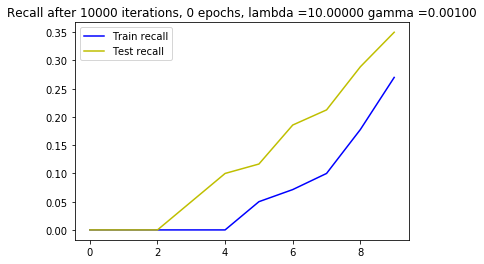

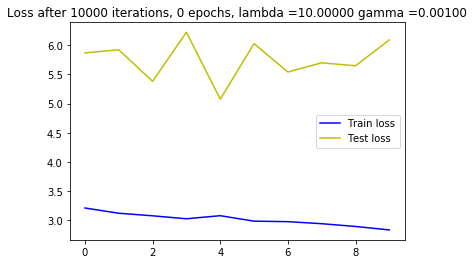

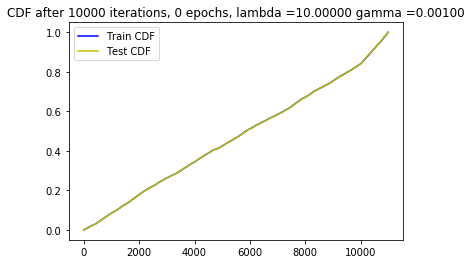






  2%|▏         | 10001/473047 [08:55<1275:25:54,  9.92s/it]




  2%|▏         | 10009/473047 [08:55<893:18:37,  6.95s/it] 

New score:  0.1099867
Train score:  0.20416005
Test score:  0.20818648
Obj first part:  1.2962640821933746
Obj second part:  -1.2905272
Obj first part:  1.769222915172577
Obj second part:  -1.6991334
Obj first part:  0.0
Obj second part:  -2.7889786
Obj first part:  0.6470644474029541
Obj second part:  -1.4432324
Obj first part:  0.5838023871183395
Obj second part:  -2.0858653
Obj first part:  0.0
Obj second part:  -1.357946
Obj first part:  0.915474072098732
Obj second part:  -1.5010369
Obj first part:  0.0
Obj second part:  -2.1357303
Obj first part:  0.0
Obj second part:  -1.7067279
Obj first part:  0.0
Obj second part:  -0.8575142
Obj first part:  0.0
Obj second part:  -0.761321
Obj first part:  3.531673848628998
Obj second part:  -1.2711264
Obj first part:  0.0
Obj second part:  -1.6684121







  2%|▏         | 10014/473047 [08:55<626:07:01,  4.87s/it]




  2%|▏         | 10018/473047 [08:55<439:17:24,  3.42s/it]

Obj first part:  0.0
Obj second part:  -1.9682446
Obj first part:  2.9237517714500427
Obj second part:  -0.96235645
Obj first part:  0.0
Obj second part:  -1.6549783
Obj first part:  1.0164500772953033
Obj second part:  -0.94151986
Obj first part:  0.08464341051876545
Obj second part:  -2.6343699
Obj first part:  0.0
Obj second part:  -2.565747
Obj first part:  0.0
Obj second part:  -1.4970938
Obj first part:  1.1786863207817078
Obj second part:  -1.382417
Obj first part:  0.6072109192609787
Obj second part:  -1.4809369
Obj first part:  0.0
Obj second part:  -0.83701956
Obj first part:  3.1197643280029297
Obj second part:  -3.3109767
Obj first part:  4.979651868343353
Obj second part:  -1.2921318







  2%|▏         | 10026/473047 [08:55<308:01:46,  2.39s/it]




  2%|▏         | 10033/473047 [08:55<216:11:03,  1.68s/it]

Obj first part:  0.0
Obj second part:  -0.82683814
Obj first part:  0.0
Obj second part:  -1.9891717
Obj first part:  0.5288191512227058
Obj second part:  -2.1365423
Obj first part:  1.4312557876110077
Obj second part:  -1.2396762
Obj first part:  1.664082258939743
Obj second part:  -2.4228706
Obj first part:  0.0
Obj second part:  -2.2396953
Obj first part:  0.0
Obj second part:  -1.8252299
Obj first part:  0.0
Obj second part:  -1.4653618
Obj first part:  0.6368386000394821
Obj second part:  -2.6482713
Obj first part:  0.0
Obj second part:  -2.935972
Obj first part:  0.0
Obj second part:  -1.1911844







  2%|▏         | 10039/473047 [08:55<152:19:47,  1.18s/it]




  2%|▏         | 10047/473047 [08:55<107:07:15,  1.20it/s]

Obj first part:  0.7790636271238327
Obj second part:  -2.4716938
Obj first part:  2.253970205783844
Obj second part:  -1.9341654
Obj first part:  1.9501304626464844
Obj second part:  -1.312779
Obj first part:  0.0
Obj second part:  -0.3474152
Obj first part:  0.0
Obj second part:  -1.2093571
Obj first part:  0.0
Obj second part:  -1.5730449
Obj first part:  0.0
Obj second part:  -2.7687738
Obj first part:  0.0
Obj second part:  -0.4141063
Obj first part:  0.0
Obj second part:  -1.6365442
Obj first part:  0.0
Obj second part:  -2.6565156
Obj first part:  1.8725016713142395
Obj second part:  -0.59312296
Obj first part:  1.2465524673461914
Obj second part:  -2.2441368
Obj first part:  3.2311102747917175
Obj second part:  -2.047956
Obj first part:  0.0
Obj second part:  -0.5703441
Obj first part:  0.5575833097100258
Obj second part:  -1.4605235







  2%|▏         | 10055/473047 [08:55<75:29:33,  1.70it/s] 




  2%|▏         | 10062/473047 [08:56<53:33:10,  2.40it/s]

Obj first part:  0.0
Obj second part:  -1.1311326
Obj first part:  4.450341165065765
Obj second part:  -2.4505138
Obj first part:  2.170022279024124
Obj second part:  -2.6105876
Obj first part:  1.74772709608078
Obj second part:  -2.6683328
Obj first part:  0.0
Obj second part:  -1.5047991
Obj first part:  0.0
Obj second part:  -2.1397667
Obj first part:  0.0
Obj second part:  -3.3089068
Obj first part:  0.0
Obj second part:  -2.9867
Obj first part:  0.0
Obj second part:  -1.4511821
Obj first part:  0.6674278527498245
Obj second part:  -2.7957315
Obj first part:  0.0
Obj second part:  -3.104918
Obj first part:  3.6620229482650757
Obj second part:  -0.85067105







  2%|▏         | 10069/473047 [08:56<38:08:19,  3.37it/s]




  2%|▏         | 10078/473047 [08:56<27:09:47,  4.73it/s]

Obj first part:  0.0
Obj second part:  -2.4156392
Obj first part:  0.8610662817955017
Obj second part:  -0.30740592
Obj first part:  0.0
Obj second part:  -1.6835706
Obj first part:  1.6955040395259857
Obj second part:  -3.5718088
Obj first part:  0.0
Obj second part:  -1.90352
Obj first part:  0.0
Obj second part:  -1.043354
Obj first part:  1.753028929233551
Obj second part:  -0.56362283
Obj first part:  0.0
Obj second part:  -0.308916
Obj first part:  0.35871323198080063
Obj second part:  -1.8660651
Obj first part:  0.0
Obj second part:  -1.6754619
Obj first part:  0.0
Obj second part:  -2.7354949
Obj first part:  10.618109703063965
Obj second part:  -1.1824627
Obj first part:  0.0
Obj second part:  -0.6397946
Obj first part:  1.0459048300981522
Obj second part:  -2.7332797
Obj first part:  0.0
Obj second part:  -3.0071883
Obj first part:  0.0
Obj second part:  -1.2645645







  2%|▏         | 10086/473047 [08:56<19:36:28,  6.56it/s]

Obj first part:  0.0
Obj second part:  -0.47999948
Obj first part:  6.538280248641968
Obj second part:  -0.7095836
Obj first part:  2.5640499591827393
Obj second part:  -1.2518103
Obj first part:  2.7898570895195007
Obj second part:  -1.8755361
Obj first part:  0.0
Obj second part:  -2.6837714
Obj first part:  0.49688979983329773
Obj second part:  -0.79216105
Obj first part:  0.9002327919006348
Obj second part:  -1.8455718
Obj first part:  0.0
Obj second part:  -1.7040899
Obj first part:  0.0
Obj second part:  -1.6982247
Obj first part:  7.048214077949524
Obj second part:  -1.3102071
Obj first part:  2.798396050930023
Obj second part:  -3.100501







  2%|▏         | 10093/473047 [08:56<14:30:17,  8.87it/s]




  2%|▏         | 10102/473047 [08:56<10:36:20, 12.13it/s]

Obj first part:  0.0
Obj second part:  -1.8629584
Obj first part:  0.0
Obj second part:  -2.417815
Obj first part:  0.0
Obj second part:  -1.5449384
Obj first part:  2.150508463382721
Obj second part:  -1.011586
Obj first part:  1.4067107439041138
Obj second part:  -1.7756765
Obj first part:  0.08770488202571869
Obj second part:  -2.9850883
Obj first part:  1.4064513146877289
Obj second part:  -1.9776642
Obj first part:  0.7368295639753342
Obj second part:  -1.0188802
Obj first part:  0.14105900190770626
Obj second part:  -1.1179974
Obj first part:  0.0
Obj second part:  -1.1636962
Obj first part:  0.0
Obj second part:  -1.2637256
Obj first part:  0.0
Obj second part:  -1.6176004
Obj first part:  0.0
Obj second part:  -2.0105174
Obj first part:  0.9276483207941055
Obj second part:  -1.4732541
Obj first part:  0.0
Obj second part:  -0.7766211
Obj first part:  4.6189457178115845
Obj second part:  -1.7685835
Obj first part:  0.0
Obj second part:  -3.377837







  2%|▏         | 10110/473047 [08:56<7:56:11, 16.20it/s] 




  2%|▏         | 10118/473047 [08:56<6:21:57, 20.20it/s]

Obj first part:  0.0
Obj second part:  -1.6029485
Obj first part:  0.0
Obj second part:  -1.7815714
Obj first part:  0.0
Obj second part:  -0.92971134
Obj first part:  4.711816608905792
Obj second part:  -1.4566532
Obj first part:  0.0
Obj second part:  -0.85297036
Obj first part:  0.6258155405521393
Obj second part:  -1.4104725
Obj first part:  0.0
Obj second part:  -2.244256
Obj first part:  0.0
Obj second part:  -1.2743742
Obj first part:  2.855774462223053
Obj second part:  -1.2006913
Obj first part:  1.5471768379211426
Obj second part:  -2.9560435
Obj first part:  0.0
Obj second part:  -0.5808445







  2%|▏         | 10127/473047 [08:57<4:54:47, 26.17it/s]

Obj first part:  0.0
Obj second part:  -1.5686917
Obj first part:  0.8926919847726822
Obj second part:  -1.1048396
Obj first part:  0.0
Obj second part:  -2.124527
Obj first part:  2.272339314222336
Obj second part:  -2.9389482
Obj first part:  0.0
Obj second part:  -0.8131529
Obj first part:  2.7324852347373962
Obj second part:  -1.6296918
Obj first part:  0.0
Obj second part:  -1.2968528
Obj first part:  2.7544498443603516
Obj second part:  -1.5781002
Obj first part:  0.0
Obj second part:  -1.6544006
Obj first part:  0.13213373720645905
Obj second part:  -2.9642854
Obj first part:  2.443833500146866
Obj second part:  -0.8817062
Obj first part:  0.0
Obj second part:  -2.637586
Obj first part:  0.6927309930324554
Obj second part:  -1.5121595
Obj first part:  0.0
Obj second part:  -2.0811112
Obj first part:  0.0
Obj second part:  -0.69400084







  2%|▏         | 10134/473047 [08:57<4:07:03, 31.23it/s]




  2%|▏         | 10141/473047 [08:57<3:33:31, 36.13it/s]

Obj first part:  1.6775672137737274
Obj second part:  -2.5221505
Obj first part:  2.4069418013095856
Obj second part:  -2.458767
Obj first part:  0.8830482512712479
Obj second part:  -0.65487397
Obj first part:  3.100162446498871
Obj second part:  -1.4488785
Obj first part:  0.0
Obj second part:  -1.2322612
Obj first part:  0.0
Obj second part:  -2.376277
Obj first part:  0.0
Obj second part:  -2.4907508
Obj first part:  0.0
Obj second part:  -1.863534
Obj first part:  0.0
Obj second part:  -3.1072223
Obj first part:  0.0
Obj second part:  -3.829001
Obj first part:  11.800596714019775
Obj second part:  -0.819286
Obj first part:  0.0
Obj second part:  -0.5893879
Obj first part:  0.5784180387854576
Obj second part:  -2.0969884
Obj first part:  0.0
Obj second part:  -1.3414582







  2%|▏         | 10150/473047 [08:57<2:59:09, 43.06it/s]

Obj first part:  0.5680761486291885
Obj second part:  -2.290881
Obj first part:  0.0
Obj second part:  -3.111041
Obj first part:  3.958871066570282
Obj second part:  -0.6915619
Obj first part:  0.0
Obj second part:  -1.9452817
Obj first part:  2.274397164583206
Obj second part:  -1.8479904
Obj first part:  0.0
Obj second part:  -0.9055458
Obj first part:  0.0
Obj second part:  -1.9590284
Obj first part:  0.0
Obj second part:  -1.1499491
Obj first part:  0.0
Obj second part:  -0.35242465







  2%|▏         | 10157/473047 [08:57<3:05:30, 41.59it/s]




  2%|▏         | 10164/473047 [08:57<2:49:29, 45.52it/s]

Obj first part:  0.0
Obj second part:  -0.57197595
Obj first part:  6.141398549079895
Obj second part:  -1.3265458
Obj first part:  0.0
Obj second part:  -1.3539022
Obj first part:  0.0
Obj second part:  -0.95999074
Obj first part:  0.0
Obj second part:  -2.3568585
Obj first part:  0.3876292333006859
Obj second part:  -4.361036
Obj first part:  0.0
Obj second part:  -1.5888373
Obj first part:  0.0
Obj second part:  -2.0283291
Obj first part:  0.0
Obj second part:  -2.2882895
Obj first part:  2.1064625680446625
Obj second part:  -1.7990909
Obj first part:  3.623530864715576
Obj second part:  -0.66675174







  2%|▏         | 10170/473047 [08:57<2:57:50, 43.38it/s]




  2%|▏         | 10176/473047 [08:57<2:46:37, 46.30it/s]

Obj first part:  1.0440035909414291
Obj second part:  -0.9253494
Obj first part:  0.40517140179872513
Obj second part:  -1.5786906
Obj first part:  0.0
Obj second part:  -2.626243
Obj first part:  0.0
Obj second part:  -1.3266714
Obj first part:  0.0
Obj second part:  -1.0632024
Obj first part:  2.7515196800231934
Obj second part:  -1.9865422
Obj first part:  0.5947180837392807
Obj second part:  -1.1718833
Obj first part:  2.8132808208465576
Obj second part:  -1.4172972
Obj first part:  4.6718186140060425
Obj second part:  -1.6775162
Obj first part:  0.0
Obj second part:  -1.5614201
Obj first part:  1.3463962078094482
Obj second part:  -0.49922395







  2%|▏         | 10182/473047 [08:58<2:43:36, 47.15it/s]

Obj first part:  0.8963857591152191
Obj second part:  -4.051775
Obj first part:  0.0
Obj second part:  -3.178088
Obj first part:  1.5342143177986145
Obj second part:  -3.807484
Obj first part:  0.0
Obj second part:  -1.4737372
Obj first part:  2.3386728763580322
Obj second part:  -2.3276093
Obj first part:  0.7337285578250885
Obj second part:  -2.8580904
Obj first part:  0.0
Obj second part:  -3.319433
Obj first part:  0.0
Obj second part:  -1.1222227
Obj first part:  0.0
Obj second part:  -1.1394439







  2%|▏         | 10188/473047 [08:58<2:50:53, 45.14it/s]




  2%|▏         | 10194/473047 [08:58<2:39:28, 48.37it/s]

Obj first part:  0.43921995908021927
Obj second part:  -1.0208337
Obj first part:  5.688332915306091
Obj second part:  -2.6131012
Obj first part:  0.0
Obj second part:  -2.4902484
Obj first part:  3.669227659702301
Obj second part:  -1.595453
Obj first part:  0.8813486993312836
Obj second part:  -1.4348899
Obj first part:  1.2722721695899963
Obj second part:  -2.331005
Obj first part:  0.0
Obj second part:  -1.7269912
Obj first part:  0.0
Obj second part:  -2.3598673
Obj first part:  2.596251964569092
Obj second part:  -2.3621607
Obj first part:  0.0
Obj second part:  -1.0137017
Obj first part:  0.0







  2%|▏         | 10200/473047 [08:58<2:49:36, 45.48it/s]




  2%|▏         | 10206/473047 [08:58<2:42:03, 47.60it/s]

Obj second part:  -2.4911532
Obj first part:  3.0015450716018677
Obj second part:  -2.093751
Obj first part:  0.0
Obj second part:  -0.78377527
Obj first part:  0.0
Obj second part:  -2.388027
Obj first part:  2.3808346688747406
Obj second part:  -1.0944291
Obj first part:  1.6439329087734222
Obj second part:  -2.4786472
Obj first part:  0.0
Obj second part:  -2.3488853
Obj first part:  0.0
Obj second part:  -1.221001
Obj first part:  1.606571227312088
Obj second part:  -2.9385817
Obj first part:  0.0
Obj second part:  -1.0557581
Obj first part:  0.0
Obj second part:  -1.9721304







  2%|▏         | 10212/473047 [08:58<2:40:58, 47.92it/s]




  2%|▏         | 10217/473047 [08:58<2:52:25, 44.74it/s]

Obj first part:  1.7304767668247223
Obj second part:  -1.0521858
Obj first part:  0.0
Obj second part:  -2.1493022
Obj first part:  2.1313321590423584
Obj second part:  -3.7449224
Obj first part:  1.2504997849464417
Obj second part:  -2.5072546
Obj first part:  0.35459689795970917
Obj second part:  -1.6834949
Obj first part:  1.5413197875022888
Obj second part:  -1.2185647
Obj first part:  0.5243241786956787
Obj second part:  -0.5913566
Obj first part:  0.0
Obj second part:  -1.9453559
Obj first part:  1.0020200163125992
Obj second part:  -2.5248618







  2%|▏         | 10224/473047 [08:58<2:40:09, 48.16it/s]

Obj first part:  0.0
Obj second part:  -3.077404
Obj first part:  1.9856035709381104
Obj second part:  -2.387335
Obj first part:  0.0
Obj second part:  -1.9341637
Obj first part:  0.5875256285071373
Obj second part:  -0.9526174
Obj first part:  0.0
Obj second part:  -1.8099813
Obj first part:  0.0
Obj second part:  -1.1779631
Obj first part:  0.0
Obj second part:  -2.3701878
Obj first part:  0.8676508814096451
Obj second part:  -1.4582604
Obj first part:  0.0
Obj second part:  -1.9418864
Obj first part:  0.0
Obj second part:  -3.2122507







  2%|▏         | 10229/473047 [08:59<2:50:07, 45.34it/s]




  2%|▏         | 10234/473047 [08:59<2:48:39, 45.73it/s]

Obj first part:  5.091283321380615
Obj second part:  -0.3837658
Obj first part:  0.0
Obj second part:  -1.3917786
Obj first part:  1.8747349083423615
Obj second part:  -2.6966684
Obj first part:  0.0
Obj second part:  -2.901759
Obj first part:  0.18631702288985252
Obj second part:  -2.7031255
Obj first part:  8.980510830879211
Obj second part:  -1.1017706
Obj first part:  1.343255192041397
Obj second part:  -1.479759
Obj first part:  0.0
Obj second part:  -2.6218529
Obj first part:  0.5626882240176201
Obj second part:  -1.6622283
Obj first part:  0.0
Obj second part:  -1.3789853
Obj first part:  1.8194949626922607
Obj second part:  -2.0301316







  2%|▏         | 10240/473047 [08:59<2:38:39, 48.62it/s]




  2%|▏         | 10245/473047 [08:59<2:53:16, 44.51it/s]

Obj first part:  0.0
Obj second part:  -2.2275553
Obj first part:  0.0
Obj second part:  -3.016227
Obj first part:  2.9382312297821045
Obj second part:  -1.8449838
Obj first part:  1.0294710844755173
Obj second part:  -1.013742
Obj first part:  1.9771841168403625
Obj second part:  -1.1110775
Obj first part:  1.6089294850826263
Obj second part:  -1.3532563
Obj first part:  0.0
Obj second part:  -1.3320718
Obj first part:  0.9400074183940887
Obj second part:  -2.5402253
Obj first part:  2.7920451760292053
Obj second part:  -1.5062664







  2%|▏         | 10251/473047 [08:59<2:43:38, 47.13it/s]




  2%|▏         | 10257/473047 [08:59<2:41:14, 47.84it/s]

Obj first part:  2.085695117712021
Obj second part:  -1.4250528
Obj first part:  0.0
Obj second part:  -2.418232
Obj first part:  0.0
Obj second part:  -0.9543275
Obj first part:  0.0
Obj second part:  -4.111929
Obj first part:  0.40399085730314255
Obj second part:  -0.94089496
Obj first part:  0.0
Obj second part:  -1.6908891
Obj first part:  1.5730132162570953
Obj second part:  -0.5850302
Obj first part:  0.0
Obj second part:  -0.86424506
Obj first part:  0.0
Obj second part:  -2.4039416
Obj first part:  0.3933173790574074
Obj second part:  -1.7074277







  2%|▏         | 10262/473047 [08:59<2:53:16, 44.51it/s]

Obj first part:  0.0
Obj second part:  -1.1893375
Obj first part:  0.0
Obj second part:  -3.079855
Obj first part:  0.0
Obj second part:  -1.9936534
Obj first part:  0.4550902545452118
Obj second part:  -1.9546102
Obj first part:  0.0
Obj second part:  -2.0542564
Obj first part:  0.7560440897941589
Obj second part:  -1.1790317
Obj first part:  5.121062994003296
Obj second part:  -2.059114
Obj first part:  0.0
Obj second part:  -1.724161
Obj first part:  0.0
Obj second part:  -0.96037614
Obj first part:  0.0
Obj second part:  -1.1980414
Obj first part:  0.0
Obj second part:  -2.4228816







  2%|▏         | 10269/473047 [08:59<2:40:53, 47.94it/s]




  2%|▏         | 10274/473047 [09:00<2:50:21, 45.28it/s]

Obj first part:  1.4938287436962128
Obj second part:  -2.390188
Obj first part:  0.499798059463501
Obj second part:  -2.147741
Obj first part:  3.5496440529823303
Obj second part:  -2.5797315
Obj first part:  0.0
Obj second part:  -2.3385773
Obj first part:  1.354040503501892
Obj second part:  -1.36516
Obj first part:  0.0
Obj second part:  -2.49806
Obj first part:  0.6839729100465775
Obj second part:  -2.163553
Obj first part:  1.1049891263246536
Obj second part:  -1.7184726
Obj first part:  0.0
Obj second part:  -2.2600222







  2%|▏         | 10279/473047 [09:00<2:48:10, 45.86it/s]




  2%|▏         | 10285/473047 [09:00<2:38:05, 48.79it/s]

Obj first part:  1.225685328245163
Obj second part:  -1.9693213
Obj first part:  1.639711707830429
Obj second part:  -2.273692
Obj first part:  0.9899728745222092
Obj second part:  -2.2474658
Obj first part:  2.6172220706939697
Obj second part:  -1.033669
Obj first part:  0.0
Obj second part:  -1.3902628
Obj first part:  0.0
Obj second part:  -0.9317553
Obj first part:  3.1204593181610107
Obj second part:  -1.6924785
Obj first part:  0.6733483821153641
Obj second part:  -0.90405625
Obj first part:  0.0
Obj second part:  -1.214956
Obj first part:  0.6845101714134216
Obj second part:  -1.4630381







  2%|▏         | 10291/473047 [09:00<2:54:36, 44.17it/s]




  2%|▏         | 10298/473047 [09:00<2:40:21, 48.09it/s]

Obj first part:  1.5499715507030487
Obj second part:  -2.0250506
Obj first part:  0.0
Obj second part:  -1.637219
Obj first part:  0.9685176610946655
Obj second part:  -1.9180193
Obj first part:  1.7608800530433655
Obj second part:  -1.508479
Obj first part:  0.5159566551446915
Obj second part:  -1.4560897
Obj first part:  0.0
Obj second part:  -3.1913588
Obj first part:  3.6108624935150146
Obj second part:  -1.398693
Obj first part:  0.0
Obj second part:  -1.4161599
Obj first part:  0.0
Obj second part:  -1.8497677
Obj first part:  0.43103083968162537
Obj second part:  -1.4899288
Obj first part:  0.0
Obj second part:  -1.3944035







  2%|▏         | 10304/473047 [09:00<2:49:47, 45.42it/s]

Obj first part:  0.0
Obj second part:  -2.2471416
Obj first part:  0.0
Obj second part:  -1.4895934
Obj first part:  0.0
Obj second part:  -1.4528196
Obj first part:  0.0
Obj second part:  -1.0303876
Obj first part:  0.0
Obj second part:  -1.6451846
Obj first part:  0.0
Obj second part:  -1.1668576
Obj first part:  0.0
Obj second part:  -2.4614878
Obj first part:  0.0
Obj second part:  -2.2757068
Obj first part:  0.0
Obj second part:  -2.6522639







  2%|▏         | 10309/473047 [09:00<2:46:28, 46.33it/s]




  2%|▏         | 10315/473047 [09:00<2:37:23, 49.00it/s]

Obj first part:  2.1920455992221832
Obj second part:  -2.7945096
Obj first part:  0.5039903894066811
Obj second part:  -1.1057348
Obj first part:  5.241391062736511
Obj second part:  -1.8672466
Obj first part:  2.587044835090637
Obj second part:  -2.6312845
Obj first part:  0.0
Obj second part:  -1.0701346
Obj first part:  0.0
Obj second part:  -2.068216
Obj first part:  1.8827882409095764
Obj second part:  -1.3158333
Obj first part:  0.0
Obj second part:  -1.7031803
Obj first part:  8.67274284362793
Obj second part:  -2.1984987
Obj first part:  4.400791823863983
Obj second part:  -0.9075944







  2%|▏         | 10321/473047 [09:01<2:52:40, 44.66it/s]




  2%|▏         | 10328/473047 [09:01<2:38:55, 48.53it/s]

Obj first part:  0.0
Obj second part:  -1.1945715
Obj first part:  1.616244912147522
Obj second part:  -2.1972013
Obj first part:  0.0
Obj second part:  -0.7884098
Obj first part:  0.0
Obj second part:  -2.2488232
Obj first part:  1.0957790911197662
Obj second part:  -0.5779471
Obj first part:  0.0
Obj second part:  -1.8449389
Obj first part:  0.0
Obj second part:  -2.1222005
Obj first part:  1.1068497598171234
Obj second part:  -2.2755392
Obj first part:  1.7008218169212341
Obj second part:  -1.1851366
Obj first part:  0.0
Obj second part:  -2.0823746
Obj first part:  1.3555552065372467
Obj second part:  -2.9363801







  2%|▏         | 10334/473047 [09:01<2:47:49, 45.95it/s]

Obj first part:  0.5696885287761688
Obj second part:  -1.0839049
Obj first part:  3.239995837211609
Obj second part:  -2.617652
Obj first part:  0.9962714463472366
Obj second part:  -1.2442359
Obj first part:  0.0
Obj second part:  -2.1463883
Obj first part:  3.472258448600769
Obj second part:  -1.396241
Obj first part:  0.0
Obj second part:  -3.4208925
Obj first part:  0.0
Obj second part:  -3.181013
Obj first part:  1.7646710574626923
Obj second part:  -2.1728263
Obj first part:  0.5427068844437599
Obj second part:  -2.0383582







  2%|▏         | 10339/473047 [09:01<2:44:21, 46.92it/s]




  2%|▏         | 10345/473047 [09:01<2:35:06, 49.72it/s]

Obj first part:  0.46805277466773987
Obj second part:  -1.5036825
Obj first part:  0.0
Obj second part:  -1.1708376
Obj first part:  0.699770525097847
Obj second part:  -1.2396985
Obj first part:  0.0
Obj second part:  -2.165874
Obj first part:  0.0
Obj second part:  -1.3273975
Obj first part:  0.0
Obj second part:  -0.9256942
Obj first part:  3.910306692123413
Obj second part:  -1.7264171
Obj first part:  0.0
Obj second part:  -1.7589508
Obj first part:  9.734262824058533
Obj second part:  -0.55162597
Obj first part:  5.468055009841919
Obj second part:  -2.513459
Obj first part:  0.0







  2%|▏         | 10351/473047 [09:01<2:51:14, 45.03it/s]




  2%|▏         | 10358/473047 [09:01<2:37:25, 48.98it/s]

Obj second part:  -2.659361
Obj first part:  3.255991041660309
Obj second part:  -2.6733673
Obj first part:  1.38138085603714
Obj second part:  -2.502046
Obj first part:  0.0
Obj second part:  -2.0205832
Obj first part:  0.0
Obj second part:  -2.310732
Obj first part:  0.0
Obj second part:  -2.424995
Obj first part:  0.0
Obj second part:  -3.171999
Obj first part:  0.0
Obj second part:  -2.3817163
Obj first part:  0.0
Obj second part:  -1.5986301
Obj first part:  0.5517486482858658
Obj second part:  -3.127029
Obj first part:  0.35383470356464386
Obj second part:  -1.4065809







  2%|▏         | 10364/473047 [09:01<2:45:15, 46.66it/s]

Obj first part:  0.0
Obj second part:  -1.7366307
Obj first part:  1.5794305503368378
Obj second part:  -0.8356378
Obj first part:  8.218303322792053
Obj second part:  -1.7708614
Obj first part:  1.7339631915092468
Obj second part:  -0.99497986
Obj first part:  0.0
Obj second part:  -3.5737453
Obj first part:  0.0
Obj second part:  -2.235457
Obj first part:  0.7085741311311722
Obj second part:  -1.6333004
Obj first part:  1.6752636432647705
Obj second part:  -2.6138744
Obj first part:  0.7837130129337311
Obj second part:  -3.0504127







  2%|▏         | 10369/473047 [09:02<2:45:23, 46.62it/s]




  2%|▏         | 10375/473047 [09:02<2:35:28, 49.60it/s]

Obj first part:  0.0
Obj second part:  -0.8984049
Obj first part:  0.32244816422462463
Obj second part:  -1.3185307
Obj first part:  0.0
Obj second part:  -2.8301084
Obj first part:  2.1760588884353638
Obj second part:  -2.8589249
Obj first part:  0.0
Obj second part:  -1.8556294
Obj first part:  1.0017620772123337
Obj second part:  -2.3528526
Obj first part:  2.324313223361969
Obj second part:  -2.0972571
Obj first part:  1.1761461198329926
Obj second part:  -1.9940337
Obj first part:  2.8417223691940308
Obj second part:  -1.3653636
Obj first part:  0.0
Obj second part:  -3.1431415
Obj first part:  0.92209592461586
Obj second part:  -2.6501176







  2%|▏         | 10381/473047 [09:02<2:52:04, 44.81it/s]




  2%|▏         | 10388/473047 [09:02<2:38:03, 48.78it/s]

Obj first part:  0.0
Obj second part:  -2.6188748
Obj first part:  0.0
Obj second part:  -1.620616
Obj first part:  1.6686514019966125
Obj second part:  -0.8659079
Obj first part:  0.0
Obj second part:  -2.7533166
Obj first part:  0.0
Obj second part:  -2.0408475
Obj first part:  2.9915839433670044
Obj second part:  -3.1316533
Obj first part:  0.0
Obj second part:  -1.7046906
Obj first part:  0.0
Obj second part:  -2.5914495
Obj first part:  0.0
Obj second part:  -1.2342412
Obj first part:  1.6901074349880219
Obj second part:  -2.3733082
Obj first part:  0.7990673929452896
Obj second part:  -1.9842095







  2%|▏         | 10394/473047 [09:02<2:44:21, 46.92it/s]

Obj first part:  1.8999502062797546
Obj second part:  -1.3134172
Obj first part:  0.0
Obj second part:  -3.0610933
Obj first part:  0.0
Obj second part:  -2.734043
Obj first part:  0.0
Obj second part:  -2.2799363
Obj first part:  1.985795795917511
Obj second part:  -0.7816448
Obj first part:  1.1146227270364761
Obj second part:  -1.3874936
Obj first part:  2.525887191295624
Obj second part:  -2.0369048
Obj first part:  0.0
Obj second part:  -1.3053763
Obj first part:  0.0
Obj second part:  -0.7567704







  2%|▏         | 10399/473047 [09:02<2:46:29, 46.31it/s]




  2%|▏         | 10405/473047 [09:02<2:36:04, 49.41it/s]

Obj first part:  0.0
Obj second part:  -2.704606
Obj first part:  1.3148398697376251
Obj second part:  -1.725832
Obj first part:  0.0
Obj second part:  -2.1637313
Obj first part:  0.9969288855791092
Obj second part:  -2.4437795
Obj first part:  1.7098119854927063
Obj second part:  -1.5279758
Obj first part:  0.6514441221952438
Obj second part:  -2.3172226
Obj first part:  1.1345119029283524
Obj second part:  -2.75518
Obj first part:  6.184984445571899
Obj second part:  -2.7236967
Obj first part:  0.0
Obj second part:  -1.9830096
Obj first part:  0.0
Obj second part:  -2.1059659







  2%|▏         | 10411/473047 [09:02<2:48:59, 45.63it/s]




  2%|▏         | 10417/473047 [09:03<2:38:46, 48.56it/s]

Obj first part:  0.8742659538984299
Obj second part:  -1.1961093
Obj first part:  4.6163612604141235
Obj second part:  -4.159115
Obj first part:  0.0
Obj second part:  -2.390172
Obj first part:  0.0
Obj second part:  -0.76882434
Obj first part:  0.8076918870210648
Obj second part:  -2.5724416
Obj first part:  2.011387050151825
Obj second part:  -0.93660045
Obj first part:  0.0
Obj second part:  -1.9195068
Obj first part:  0.0
Obj second part:  -0.45725387
Obj first part:  0.0
Obj second part:  -3.8201694
Obj first part:  2.4362173676490784
Obj second part:  -2.6992366
Obj first part:  0.0
Obj second part:  -0.8313778







  2%|▏         | 10423/473047 [09:03<2:38:52, 48.53it/s]




  2%|▏         | 10428/473047 [09:03<2:49:26, 45.50it/s]

Obj first part:  0.0
Obj second part:  -1.8592174
Obj first part:  0.0
Obj second part:  -1.7583582
Obj first part:  5.2155739068984985
Obj second part:  -2.3133917
Obj first part:  0.16633130609989166
Obj second part:  -2.5429225
Obj first part:  0.9614235162734985
Obj second part:  -1.6847992
Obj first part:  2.1770435571670532
Obj second part:  -1.3633052
Obj first part:  0.0
Obj second part:  -1.8191061
Obj first part:  0.0
Obj second part:  -1.2145407
Obj first part:  2.506701648235321
Obj second part:  -2.1344295







  2%|▏         | 10435/473047 [09:03<2:37:53, 48.83it/s]

Obj first part:  0.0
Obj second part:  -1.8405869
Obj first part:  0.0
Obj second part:  -2.6080809
Obj first part:  0.40779799222946167
Obj second part:  -1.3595005
Obj first part:  0.0
Obj second part:  -2.1309388
Obj first part:  2.6304253935813904
Obj second part:  -2.3679676
Obj first part:  1.2250438332557678
Obj second part:  -3.3009553
Obj first part:  0.0
Obj second part:  -2.5541155
Obj first part:  0.0
Obj second part:  -1.5262522
Obj first part:  0.0
Obj second part:  -2.9894767
Obj first part:  0.0
Obj second part:  -1.4971756
Obj first part:  1.276845633983612
Obj second part:  -1.3821939







  2%|▏         | 10441/473047 [09:03<2:49:32, 45.48it/s]




  2%|▏         | 10447/473047 [09:03<2:41:10, 47.84it/s]

Obj first part:  1.1791876703500748
Obj second part:  -1.7739859
Obj first part:  0.0
Obj second part:  -1.6456642
Obj first part:  0.0
Obj second part:  -2.5565817
Obj first part:  0.0
Obj second part:  -0.91791975
Obj first part:  2.0758603513240814
Obj second part:  -1.7080675
Obj first part:  0.0
Obj second part:  -0.9151478
Obj first part:  1.523081511259079
Obj second part:  -2.0359359
Obj first part:  0.0
Obj second part:  -2.5188017
Obj first part:  1.4705349504947662
Obj second part:  -1.4470174
Obj first part:  0.7792910188436508
Obj second part:  -1.7375176
Obj first part:  1.3425692915916443
Obj second part:  -0.8658759







  2%|▏         | 10453/473047 [09:03<2:39:22, 48.38it/s]




  2%|▏         | 10458/473047 [09:03<2:52:11, 44.77it/s]

Obj first part:  1.8020455539226532
Obj second part:  -1.8184643
Obj first part:  0.0
Obj second part:  -0.86094886
Obj first part:  0.0
Obj second part:  -1.4438326
Obj first part:  2.1260109543800354
Obj second part:  -0.91908795
Obj first part:  1.6678813099861145
Obj second part:  -2.3848593
Obj first part:  0.0
Obj second part:  -1.1970549
Obj first part:  0.0
Obj second part:  -1.7239947
Obj first part:  0.0
Obj second part:  -1.0298882
Obj first part:  1.205315738916397
Obj second part:  -1.0500224







  2%|▏         | 10465/473047 [09:04<2:39:40, 48.28it/s]

Obj first part:  0.0
Obj second part:  -1.6925693
Obj first part:  0.0
Obj second part:  -1.7305772
Obj first part:  5.855562090873718
Obj second part:  -1.7017038
Obj first part:  0.0
Obj second part:  -1.5785677
Obj first part:  0.0
Obj second part:  -1.5244471
Obj first part:  0.875227302312851
Obj second part:  -1.7133923
Obj first part:  3.602096736431122
Obj second part:  -3.7912478
Obj first part:  0.0
Obj second part:  -3.3985808
Obj first part:  0.0
Obj second part:  -0.9029632
Obj first part:  0.6207884475588799
Obj second part:  -4.331977







  2%|▏         | 10470/473047 [09:04<2:50:27, 45.23it/s]




  2%|▏         | 10475/473047 [09:04<2:48:34, 45.74it/s]

Obj first part:  0.8559980243444443
Obj second part:  -3.6566188
Obj first part:  0.0
Obj second part:  -2.6453118
Obj first part:  3.247596025466919
Obj second part:  -1.2585042
Obj first part:  0.0
Obj second part:  -0.80343705
Obj first part:  2.221800833940506
Obj second part:  -1.5892379
Obj first part:  0.0
Obj second part:  -2.6194725
Obj first part:  0.44356439262628555
Obj second part:  -1.356321
Obj first part:  0.0
Obj second part:  -1.9643213
Obj first part:  3.806203305721283
Obj second part:  -2.1944609
Obj first part:  1.0274193435907364
Obj second part:  -0.8696132
Obj first part:  0.9907738864421844
Obj second part:  -1.6165671







  2%|▏         | 10481/473047 [09:04<2:38:32, 48.63it/s]




  2%|▏         | 10486/473047 [09:04<2:53:15, 44.50it/s]

Obj first part:  0.0
Obj second part:  -1.6797159
Obj first part:  0.0
Obj second part:  -1.2922055
Obj first part:  0.0
Obj second part:  -2.491439
Obj first part:  2.943776845932007
Obj second part:  -1.8409115
Obj first part:  0.0
Obj second part:  -2.1375308
Obj first part:  2.1236364543437958
Obj second part:  -1.1384846
Obj first part:  0.0
Obj second part:  -3.2202926
Obj first part:  0.5538459867238998
Obj second part:  -1.3389282
Obj first part:  0.0
Obj second part:  -1.6660416







  2%|▏         | 10492/473047 [09:04<2:44:02, 47.00it/s]




  2%|▏         | 10498/473047 [09:04<2:40:44, 47.96it/s]

Obj first part:  3.8974249362945557
Obj second part:  -2.691342
Obj first part:  0.0
Obj second part:  -2.1366081
Obj first part:  0.7917974144220352
Obj second part:  -2.4123158
Obj first part:  1.09462171792984
Obj second part:  -0.56933457
Obj first part:  0.0
Obj second part:  -3.7451277
Obj first part:  1.549220085144043
Obj second part:  -1.2440437
Obj first part:  2.0273958146572113
Obj second part:  -1.0532963
Obj first part:  1.2666967511177063
Obj second part:  -1.7082759
Obj first part:  0.0
Obj second part:  -1.8943807
Obj first part:  0.0
Obj second part:  -1.5023041







  2%|▏         | 10503/473047 [09:04<2:53:52, 44.34it/s]




  2%|▏         | 10510/473047 [09:05<2:41:07, 47.84it/s]

Obj first part:  0.0
Obj second part:  -3.0711842
Obj first part:  2.368992418050766
Obj second part:  -2.3976681
Obj first part:  0.0
Obj second part:  -4.2594204
Obj first part:  0.0
Obj second part:  -3.440232
Obj first part:  0.0
Obj second part:  -1.3400737
Obj first part:  1.0413602739572525
Obj second part:  -1.1337075
Obj first part:  0.0
Obj second part:  -0.94860506
Obj first part:  0.0
Obj second part:  -2.5028148
Obj first part:  0.0
Obj second part:  -2.3974016
Obj first part:  0.0
Obj second part:  -2.8804595
Obj first part:  0.0
Obj second part:  -1.2693671







  2%|▏         | 10515/473047 [09:05<2:50:23, 45.24it/s]

Obj first part:  3.173564374446869
Obj second part:  -2.0006132
Obj first part:  0.0
Obj second part:  -1.6192784
Obj first part:  1.6269709169864655
Obj second part:  -0.724595
Obj first part:  2.469274401664734
Obj second part:  -1.372818
Obj first part:  0.0
Obj second part:  -2.1692622
Obj first part:  0.0
Obj second part:  -0.95064473
Obj first part:  0.0
Obj second part:  -1.7252783
Obj first part:  2.7076536417007446
Obj second part:  -1.3006492
Obj first part:  0.0
Obj second part:  -1.5951736







  2%|▏         | 10520/473047 [09:05<2:50:11, 45.29it/s]




  2%|▏         | 10526/473047 [09:05<2:38:33, 48.62it/s]

Obj first part:  0.0
Obj second part:  -1.9674063
Obj first part:  6.797711253166199
Obj second part:  -1.9251165
Obj first part:  0.0
Obj second part:  -1.0936977
Obj first part:  0.0
Obj second part:  -1.5351748
Obj first part:  0.0
Obj second part:  -2.1819434
Obj first part:  0.0
Obj second part:  -1.0411649
Obj first part:  1.1150618642568588
Obj second part:  -1.6895041
Obj first part:  0.9625573456287384
Obj second part:  -1.0168387
Obj first part:  0.0
Obj second part:  -2.533238
Obj first part:  0.0
Obj second part:  -1.1938







  2%|▏         | 10532/473047 [09:05<2:53:44, 44.37it/s]




  2%|▏         | 10539/473047 [09:05<2:39:25, 48.35it/s]

Obj first part:  0.0
Obj second part:  -0.88496417
Obj first part:  0.0
Obj second part:  -2.0156147
Obj first part:  0.0
Obj second part:  -3.2908006
Obj first part:  4.325775504112244
Obj second part:  -0.5750508
Obj first part:  0.0
Obj second part:  -1.3623753
Obj first part:  0.0
Obj second part:  -1.508413
Obj first part:  0.0
Obj second part:  -1.4189324
Obj first part:  0.0
Obj second part:  -0.75151736
Obj first part:  2.0441393554210663
Obj second part:  -1.0761048
Obj first part:  4.469530880451202
Obj second part:  -2.8291688
Obj first part:  0.0
Obj second part:  -1.7919451







  2%|▏         | 10545/473047 [09:05<2:48:07, 45.85it/s]

Obj first part:  1.9996815919876099
Obj second part:  -1.7549942
Obj first part:  0.0
Obj second part:  -0.97991514
Obj first part:  0.0
Obj second part:  -2.5226667
Obj first part:  0.0
Obj second part:  -2.4705884
Obj first part:  5.708555579185486
Obj second part:  -1.252224
Obj first part:  0.0
Obj second part:  -2.0276773
Obj first part:  4.668754935264587
Obj second part:  -1.3809096
Obj first part:  0.0
Obj second part:  -0.44689816
Obj first part:  0.0
Obj second part:  -3.0701623







  2%|▏         | 10550/473047 [09:05<2:46:47, 46.22it/s]




  2%|▏         | 10556/473047 [09:05<2:37:36, 48.91it/s]

Obj first part:  0.0
Obj second part:  -2.157199
Obj first part:  3.0045539140701294
Obj second part:  -1.3437047
Obj first part:  0.0
Obj second part:  -1.5992328
Obj first part:  0.0
Obj second part:  -1.9303501
Obj first part:  0.0
Obj second part:  -1.2542242
Obj first part:  0.0
Obj second part:  -2.074059
Obj first part:  0.0
Obj second part:  -1.9870999
Obj first part:  2.535976767539978
Obj second part:  -0.240762
Obj first part:  1.841174066066742
Obj second part:  -2.3230524
Obj first part:  2.2048380970954895
Obj second part:  -1.5138221







  2%|▏         | 10562/473047 [09:06<2:53:56, 44.31it/s]




  2%|▏         | 10569/473047 [09:06<2:39:36, 48.29it/s]

Obj first part:  1.0040079802274704
Obj second part:  -3.150153
Obj first part:  0.6636567413806915
Obj second part:  -2.3114567
Obj first part:  2.835127115249634
Obj second part:  -1.2346025
Obj first part:  2.2021616995334625
Obj second part:  -1.9173054
Obj first part:  0.0
Obj second part:  -1.4833859
Obj first part:  0.0
Obj second part:  -1.8415664
Obj first part:  0.0
Obj second part:  -0.49378666
Obj first part:  0.0
Obj second part:  -0.59657526
Obj first part:  0.0
Obj second part:  -1.6780269
Obj first part:  0.0
Obj second part:  -2.910334
Obj first part:  0.32540373504161835
Obj second part:  -2.1371715







  2%|▏         | 10575/473047 [09:06<2:49:44, 45.41it/s]

Obj first part:  2.3096472024917603
Obj second part:  -1.2282048
Obj first part:  0.0
Obj second part:  -2.1133986
Obj first part:  0.5494087189435959
Obj second part:  -0.89389706
Obj first part:  0.0
Obj second part:  -3.2987185
Obj first part:  0.25644131004810333
Obj second part:  -2.3625152
Obj first part:  0.3563256934285164
Obj second part:  -0.5935851
Obj first part:  0.9841357916593552
Obj second part:  -1.1130341
Obj first part:  0.0
Obj second part:  -1.5127975
Obj first part:  1.0018257796764374
Obj second part:  -1.8017212







  2%|▏         | 10580/473047 [09:06<2:45:39, 46.53it/s]




  2%|▏         | 10586/473047 [09:06<2:38:14, 48.71it/s]

Obj first part:  3.583070933818817
Obj second part:  -0.88785094
Obj first part:  0.0
Obj second part:  -2.970268
Obj first part:  0.0
Obj second part:  -4.0047874
Obj first part:  1.5854938328266144
Obj second part:  -2.5341659
Obj first part:  0.0
Obj second part:  -0.638141
Obj first part:  8.006832599639893
Obj second part:  -0.9112662
Obj first part:  0.0
Obj second part:  -2.2258239
Obj first part:  0.0
Obj second part:  -1.4436604
Obj first part:  3.0833083391189575
Obj second part:  -3.2104793
Obj first part:  0.5846881493926048
Obj second part:  -1.9944731







  2%|▏         | 10591/473047 [09:06<2:56:01, 43.79it/s]




  2%|▏         | 10597/473047 [09:06<2:42:09, 47.53it/s]

Obj first part:  1.5025460720062256
Obj second part:  -3.624597
Obj first part:  1.5402694046497345
Obj second part:  -1.1425514
Obj first part:  0.6705410033464432
Obj second part:  -2.5346415
Obj first part:  3.5905656218528748
Obj second part:  -0.8090898
Obj first part:  0.0
Obj second part:  -2.5850818
Obj first part:  0.35594720393419266
Obj second part:  -0.9459406
Obj first part:  1.4840294420719147
Obj second part:  -0.9179584
Obj first part:  2.8506693243980408
Obj second part:  -2.587232
Obj first part:  0.0
Obj second part:  -2.3997421
Obj first part:  2.192377895116806
Obj second part:  -1.5016321
Obj first part:  0.0
Obj second part:  -2.7071042
Obj first part:  1.327163577079773







  2%|▏         | 10602/473047 [09:06<2:41:38, 47.68it/s]




  2%|▏         | 10607/473047 [09:07<2:55:05, 44.02it/s]

Obj second part:  -2.4942305
Obj first part:  0.520959235727787
Obj second part:  -3.1792233
Obj first part:  1.0220319777727127
Obj second part:  -2.741018
Obj first part:  2.489473968744278
Obj second part:  -2.5483553
Obj first part:  1.3592581450939178
Obj second part:  -2.4838436
Obj first part:  0.5250810459256172
Obj second part:  -2.8285728
Obj first part:  0.7058783620595932
Obj second part:  -1.4093587
Obj first part:  0.0
Obj second part:  -1.55318
Obj first part:  0.0







  2%|▏         | 10613/473047 [09:07<2:41:23, 47.75it/s]




  2%|▏         | 10618/473047 [09:07<2:44:18, 46.91it/s]

Obj second part:  -1.6766678
Obj first part:  0.0
Obj second part:  -0.5722642
Obj first part:  0.0
Obj second part:  -1.4521048
Obj first part:  0.0
Obj second part:  -1.342081
Obj first part:  1.0210718214511871
Obj second part:  -2.4424062
Obj first part:  2.3858454823493958
Obj second part:  -1.3763638
Obj first part:  0.0
Obj second part:  -1.5778959
Obj first part:  0.0
Obj second part:  -1.2171905
Obj first part:  0.0
Obj second part:  -3.7714682
Obj first part:  0.0
Obj second part:  -0.9815495







  2%|▏         | 10623/473047 [09:07<2:53:00, 44.55it/s]

Obj first part:  0.0
Obj second part:  -2.1276627
Obj first part:  0.0
Obj second part:  -0.78868896
Obj first part:  0.0
Obj second part:  -0.6547205
Obj first part:  0.0
Obj second part:  -1.466696
Obj first part:  1.7744365334510803
Obj second part:  -1.435578
Obj first part:  0.0
Obj second part:  -1.8578086
Obj first part:  0.0
Obj second part:  -3.1667178
Obj first part:  0.0
Obj second part:  -3.7105393
Obj first part:  2.431798577308655
Obj second part:  -0.9364608
Obj first part:  0.74529729783535
Obj second part:  -0.7480471
Obj first part:  0.0
Obj second part:  -1.7215402







  2%|▏         | 10630/473047 [09:07<2:40:27, 48.03it/s]




  2%|▏         | 10635/473047 [09:07<2:51:12, 45.02it/s]

Obj first part:  0.19353022798895836
Obj second part:  -2.1566231
Obj first part:  0.0
Obj second part:  -2.4408567
Obj first part:  0.0
Obj second part:  -2.5847778
Obj first part:  1.6272549331188202
Obj second part:  -0.92957336
Obj first part:  0.0
Obj second part:  -1.6728809
Obj first part:  0.9104512631893158
Obj second part:  -1.3958653
Obj first part:  0.0
Obj second part:  -0.54554236
Obj first part:  0.0
Obj second part:  -1.3511258
Obj first part:  1.0423433035612106
Obj second part:  -0.81314516







  2%|▏         | 10640/473047 [09:07<2:46:33, 46.27it/s]




  2%|▏         | 10646/473047 [09:07<2:36:04, 49.38it/s]

Obj first part:  0.0
Obj second part:  -0.3545817
Obj first part:  14.967693090438843
Obj second part:  -1.2311451
Obj first part:  0.0
Obj second part:  -1.312125
Obj first part:  0.0
Obj second part:  -1.1780229
Obj first part:  0.0
Obj second part:  -1.6189666
Obj first part:  0.0
Obj second part:  -1.1493167
Obj first part:  0.0
Obj second part:  -1.021526
Obj first part:  0.658881813287735
Obj second part:  -0.72606754
Obj first part:  9.901763796806335
Obj second part:  -1.3084254
Obj first part:  4.858561754226685
Obj second part:  -1.9435889
Obj first part:  1.6096162796020508







  2%|▏         | 10652/473047 [09:08<2:51:57, 44.81it/s]




  2%|▏         | 10659/473047 [09:08<2:37:57, 48.79it/s]

Obj second part:  -2.291376
Obj first part:  0.0
Obj second part:  -1.5144379
Obj first part:  0.0
Obj second part:  -2.2710276
Obj first part:  0.0
Obj second part:  -4.1526394
Obj first part:  0.0
Obj second part:  -2.4964018
Obj first part:  0.0
Obj second part:  -1.1814446
Obj first part:  0.0
Obj second part:  -1.4785726
Obj first part:  0.0
Obj second part:  -0.653412
Obj first part:  0.0
Obj second part:  -1.2217393
Obj first part:  0.0
Obj second part:  -2.2078793
Obj first part:  0.0
Obj second part:  -1.1097088







  2%|▏         | 10665/473047 [09:08<2:42:48, 47.33it/s]

Obj first part:  2.7509382367134094
Obj second part:  -1.3539737
Obj first part:  0.6782427430152893
Obj second part:  -1.241783
Obj first part:  1.1837238818407059
Obj second part:  -1.4516873
Obj first part:  0.0
Obj second part:  -1.9341252
Obj first part:  0.0
Obj second part:  -1.3210759
Obj first part:  1.345391869544983
Obj second part:  -1.763488
Obj first part:  0.0
Obj second part:  -0.4259394
Obj first part:  0.0
Obj second part:  -0.21914254
Obj first part:  0.0
Obj second part:  -1.6855583







  2%|▏         | 10670/473047 [09:08<2:49:00, 45.60it/s]




  2%|▏         | 10676/473047 [09:08<2:37:23, 48.96it/s]

Obj first part:  1.193433552980423
Obj second part:  -2.1534436
Obj first part:  4.799812734127045
Obj second part:  -1.1073226
Obj first part:  0.0
Obj second part:  -0.57002187
Obj first part:  0.0
Obj second part:  -1.9090046
Obj first part:  0.0
Obj second part:  -1.7448719
Obj first part:  0.0
Obj second part:  -2.1189308
Obj first part:  2.5672248005867004
Obj second part:  -1.996088
Obj first part:  0.0
Obj second part:  -2.9132326
Obj first part:  3.045731484889984
Obj second part:  -1.616319
Obj first part:  0.0
Obj second part:  -1.5173749
Obj first part:  0.0
Obj second part:  -1.2861085







  2%|▏         | 10682/473047 [09:08<2:45:11, 46.65it/s]




  2%|▏         | 10687/473047 [09:08<2:45:21, 46.60it/s]

Obj first part:  3.9234179258346558
Obj second part:  -1.2772019
Obj first part:  0.0
Obj second part:  -1.9369025
Obj first part:  0.0
Obj second part:  -1.7827575
Obj first part:  0.0
Obj second part:  -1.3524239
Obj first part:  7.7595824003219604
Obj second part:  -1.5858605
Obj first part:  0.6937547773122787
Obj second part:  -0.74204314
Obj first part:  1.7181621491909027
Obj second part:  -1.4562763
Obj first part:  0.3386039659380913
Obj second part:  -0.7852286
Obj first part:  0.48521310091018677
Obj second part:  -1.4561387
Obj first part:  4.65644508600235
Obj second part:  -0.6333312







  2%|▏         | 10693/473047 [09:08<2:35:38, 49.51it/s]




  2%|▏         | 10699/473047 [09:09<2:44:56, 46.72it/s]

Obj first part:  0.0
Obj second part:  -1.458229
Obj first part:  0.0
Obj second part:  -2.644538
Obj first part:  1.4575237035751343
Obj second part:  -1.5299315
Obj first part:  0.0
Obj second part:  -2.2451432
Obj first part:  0.0
Obj second part:  -2.5131392
Obj first part:  0.7669002562761307
Obj second part:  -4.374147
Obj first part:  2.4891243875026703
Obj second part:  -2.0410414
Obj first part:  0.29509296640753746
Obj second part:  -1.3178393
Obj first part:  2.4339237809181213
Obj second part:  -1.7249371







  2%|▏         | 10704/473047 [09:09<2:42:33, 47.40it/s]




  2%|▏         | 10710/473047 [09:09<2:33:54, 50.07it/s]

Obj first part:  0.0
Obj second part:  -1.4694153
Obj first part:  0.0
Obj second part:  -2.0215588
Obj first part:  0.0
Obj second part:  -1.0177815
Obj first part:  3.791062831878662
Obj second part:  -0.97196484
Obj first part:  0.0
Obj second part:  -0.89666545
Obj first part:  0.0
Obj second part:  -2.0305262
Obj first part:  0.0
Obj second part:  -1.4174472
Obj first part:  0.0
Obj second part:  -1.2243382
Obj first part:  0.7577250897884369
Obj second part:  -0.93863785
Obj first part:  2.481083571910858
Obj second part:  -0.94142014
Obj first part:  0.5116365104913712
Obj second part:  -1.0357512







  2%|▏         | 10716/473047 [09:09<2:46:45, 46.21it/s]

Obj first part:  0.0
Obj second part:  -0.6782263
Obj first part:  2.1708911657333374
Obj second part:  -0.85760903
Obj first part:  0.0
Obj second part:  -1.336275
Obj first part:  1.7391300201416016
Obj second part:  -2.1248372
Obj first part:  0.276951901614666
Obj second part:  -1.9370961
Obj first part:  0.0
Obj second part:  -1.245071
Obj first part:  2.768407166004181
Obj second part:  -0.76276726
Obj first part:  3.216518461704254
Obj second part:  -1.7542076
Obj first part:  5.307866930961609
Obj second part:  -1.175099







  2%|▏         | 10722/473047 [09:09<2:39:47, 48.22it/s]




  2%|▏         | 10728/473047 [09:09<2:33:07, 50.32it/s]

Obj first part:  3.0429047346115112
Obj second part:  -0.7292388
Obj first part:  0.0
Obj second part:  -2.9634793
Obj first part:  0.0
Obj second part:  -1.5116361
Obj first part:  0.0
Obj second part:  -2.1377478
Obj first part:  0.0
Obj second part:  -2.1828864
Obj first part:  0.6672041863203049
Obj second part:  -2.0321434
Obj first part:  0.0
Obj second part:  -2.6519604
Obj first part:  0.6096253544092178
Obj second part:  -1.8487663
Obj first part:  0.684913769364357
Obj second part:  -1.1799667
Obj first part:  3.802229166030884
Obj second part:  -2.4638524
Obj first part:  0.23396965116262436
Obj second part:  -0.95494866







  2%|▏         | 10734/473047 [09:09<2:49:28, 45.46it/s]

Obj first part:  0.33598754554986954
Obj second part:  -1.4750942
Obj first part:  0.6860749423503876
Obj second part:  -1.925668
Obj first part:  2.9954013228416443
Obj second part:  -1.3308582
Obj first part:  0.7423562556505203
Obj second part:  -2.906576
Obj first part:  1.064794510602951
Obj second part:  -2.1485908
Obj first part:  0.0
Obj second part:  -2.811209
Obj first part:  0.4800071567296982
Obj second part:  -0.97094285
Obj first part:  0.0
Obj second part:  -1.38371
Obj first part:  1.017497479915619
Obj second part:  -1.9088824
Obj first part:  1.0908423364162445
Obj second part:  -2.43649
Obj first part:  0.5780388042330742
Obj second part:  -1.8393118







  2%|▏         | 10741/473047 [09:09<2:36:28, 49.24it/s]




  2%|▏         | 10747/473047 [09:10<2:41:48, 47.62it/s]

Obj first part:  9.229175448417664
Obj second part:  -1.1818783
Obj first part:  0.44858943670988083
Obj second part:  -2.2805922
Obj first part:  0.0
Obj second part:  -2.0515578
Obj first part:  0.0
Obj second part:  -1.8482202
Obj first part:  2.5222840905189514
Obj second part:  -2.6315327
Obj first part:  0.5622932314872742
Obj second part:  -2.9179235
Obj first part:  0.0
Obj second part:  -1.9278916
Obj first part:  0.0
Obj second part:  -1.0834396
Obj first part:  0.5245185643434525
Obj second part:  -2.1464121







  2%|▏         | 10752/473047 [09:10<2:47:02, 46.12it/s]




  2%|▏         | 10758/473047 [09:10<2:36:18, 49.29it/s]

Obj first part:  0.0
Obj second part:  -1.5391397
Obj first part:  0.0
Obj second part:  -1.8683739
Obj first part:  1.3259121775627136
Obj second part:  -0.7868506
Obj first part:  0.0
Obj second part:  -2.2921624
Obj first part:  3.9832133054733276
Obj second part:  -1.1116707
Obj first part:  0.43709591031074524
Obj second part:  -2.2146816
Obj first part:  2.5349754095077515
Obj second part:  -1.0801784
Obj first part:  0.8159561455249786
Obj second part:  -2.5253868
Obj first part:  0.0
Obj second part:  -1.9926836
Obj first part:  0.6467047333717346
Obj second part:  -1.9713868
Obj first part:  0.849946066737175
Obj second part:  -2.48036
Obj first part:  0.5596212670207024
Obj second part:  -1.2420647







  2%|▏         | 10764/473047 [09:10<2:44:45, 46.76it/s]




  2%|▏         | 10769/473047 [09:10<2:44:31, 46.83it/s]

Obj first part:  1.6582393646240234
Obj second part:  -1.5872415
Obj first part:  1.2589684128761292
Obj second part:  -1.5319912
Obj first part:  0.0
Obj second part:  -1.4707088
Obj first part:  0.0
Obj second part:  -1.1820891
Obj first part:  0.0
Obj second part:  -1.9205644
Obj first part:  0.0
Obj second part:  -1.8202671
Obj first part:  0.4789384827017784
Obj second part:  -2.1224015
Obj first part:  0.0
Obj second part:  -1.0877786
Obj first part:  0.0
Obj second part:  -1.7324665
Obj first part:  0.0
Obj second part:  -2.1359456







  2%|▏         | 10775/473047 [09:10<2:35:36, 49.51it/s]

Obj first part:  0.0
Obj second part:  -1.0088873
Obj first part:  0.0
Obj second part:  -2.186786
Obj first part:  0.0
Obj second part:  -1.0301887
Obj first part:  0.0
Obj second part:  -1.4231954
Obj first part:  0.0
Obj second part:  -1.5459932
Obj first part:  0.8577919751405716
Obj second part:  -1.3282418
Obj first part:  2.153805196285248
Obj second part:  -0.92842877
Obj first part:  1.1071088165044785
Obj second part:  -1.9913996
Obj first part:  0.0
Obj second part:  -0.8130226







  2%|▏         | 10781/473047 [09:10<2:47:08, 46.09it/s]




  2%|▏         | 10787/473047 [09:10<2:40:26, 48.02it/s]

Obj first part:  3.2803285121917725
Obj second part:  -2.2095273
Obj first part:  0.0
Obj second part:  -1.4319038
Obj first part:  0.7637280225753784
Obj second part:  -3.1385088
Obj first part:  0.0
Obj second part:  -0.5601323
Obj first part:  3.167085647583008
Obj second part:  -2.0139337
Obj first part:  0.0
Obj second part:  -1.22374
Obj first part:  1.3974140584468842
Obj second part:  -2.8356667
Obj first part:  2.2249051928520203
Obj second part:  -2.5506213
Obj first part:  0.0
Obj second part:  -1.5826923
Obj first part:  1.200469732284546
Obj second part:  -1.375495
Obj first part:  4.0811967849731445
Obj second part:  -2.9299767
Obj first part:  1.6868005692958832
Obj second part:  -1.6882739







  2%|▏         | 10793/473047 [09:10<2:33:33, 50.17it/s]




  2%|▏         | 10799/473047 [09:11<2:51:13, 44.99it/s]

Obj first part:  0.0
Obj second part:  -1.8568574
Obj first part:  4.535565376281738
Obj second part:  -2.6998765
Obj first part:  0.0
Obj second part:  -2.20839
Obj first part:  0.0
Obj second part:  -1.3876753
Obj first part:  1.427733600139618
Obj second part:  -1.7186007
Obj first part:  1.2566310167312622
Obj second part:  -2.0847554
Obj first part:  0.9091450273990631
Obj second part:  -1.2020339
Obj first part:  1.6802966594696045
Obj second part:  -0.81548196
Obj first part:  2.769858241081238
Obj second part:  -2.4466763







  2%|▏         | 10806/473047 [09:11<2:38:07, 48.72it/s]

Obj first part:  0.0
Obj second part:  -1.5971805
Obj first part:  0.0
Obj second part:  -2.851694
Obj first part:  0.0
Obj second part:  -2.0645006
Obj first part:  0.0
Obj second part:  -2.0551672
Obj first part:  0.0
Obj second part:  -1.6595182
Obj first part:  3.3918139338493347
Obj second part:  -2.6768916
Obj first part:  0.0
Obj second part:  -2.7626235
Obj first part:  0.4519230127334595
Obj second part:  -2.1234539
Obj first part:  1.5015672147274017
Obj second part:  -1.9760579
Obj first part:  2.692635953426361
Obj second part:  -3.516862







  2%|▏         | 10812/473047 [09:11<2:46:22, 46.30it/s]




  2%|▏         | 10817/473047 [09:11<2:47:49, 45.90it/s]

Obj first part:  2.3122116923332214
Obj second part:  -2.6105263
Obj first part:  1.7106369137763977
Obj second part:  -1.4396155
Obj first part:  1.8148159980773926
Obj second part:  -2.1600966
Obj first part:  0.556669570505619
Obj second part:  -1.2302357
Obj first part:  10.418527126312256
Obj second part:  -0.69297254
Obj first part:  0.0
Obj second part:  -1.1404737
Obj first part:  0.08013393729925156
Obj second part:  -1.7252771
Obj first part:  0.0
Obj second part:  -1.231975
Obj first part:  0.0
Obj second part:  -2.1786578
Obj first part:  0.0
Obj second part:  -0.90970415
Obj first part:  0.0
Obj second part:  -2.762624







  2%|▏         | 10823/473047 [09:11<2:38:13, 48.69it/s]




  2%|▏         | 10828/473047 [09:11<2:45:37, 46.51it/s]

Obj first part:  1.0018367320299149
Obj second part:  -3.80207
Obj first part:  0.0
Obj second part:  -1.42694
Obj first part:  0.5920775607228279
Obj second part:  -1.1467466
Obj first part:  0.8086495101451874
Obj second part:  -2.2496927
Obj first part:  3.21380078792572
Obj second part:  -1.3035597
Obj first part:  0.0
Obj second part:  -2.664664
Obj first part:  0.0
Obj second part:  -0.9518565
Obj first part:  0.8351486176252365
Obj second part:  -2.8003204
Obj first part:  0.0
Obj second part:  -1.2353218







  2%|▏         | 10833/473047 [09:11<2:47:59, 45.86it/s]




  2%|▏         | 10839/473047 [09:11<2:37:54, 48.78it/s]

Obj first part:  4.389317035675049
Obj second part:  -2.6036646
Obj first part:  0.0
Obj second part:  -2.0014966
Obj first part:  2.5281980633735657
Obj second part:  -2.059476
Obj first part:  0.4006529971957207
Obj second part:  -2.8771043
Obj first part:  0.9276951104402542
Obj second part:  -3.0818672
Obj first part:  0.0
Obj second part:  -1.4088385
Obj first part:  0.0
Obj second part:  -0.66376317
Obj first part:  2.4260322749614716
Obj second part:  -2.078302
Obj first part:  2.8144243359565735
Obj second part:  -1.7377189
Obj first part:  0.69008469581604
Obj second part:  -3.245993
Obj first part:  0.0
Obj second part:  -0.67601466







  2%|▏         | 10844/473047 [09:12<2:47:27, 46.00it/s]




  2%|▏         | 10849/473047 [09:12<2:51:07, 45.02it/s]

Obj first part:  0.0
Obj second part:  -2.6105735
Obj first part:  1.2052325159311295
Obj second part:  -4.507836
Obj first part:  0.3410172834992409
Obj second part:  -1.566858
Obj first part:  0.27017030864953995
Obj second part:  -0.92822295
Obj first part:  0.9407458454370499
Obj second part:  -1.0567622
Obj first part:  0.0
Obj second part:  -1.8631127
Obj first part:  0.19935043528676033
Obj second part:  -1.403567
Obj first part:  5.61958372592926
Obj second part:  -0.7080434
Obj first part:  2.5630560517311096
Obj second part:  -1.8232734
Obj first part:  0.0
Obj second part:  -1.7126322







  2%|▏         | 10855/473047 [09:12<2:38:30, 48.60it/s]




  2%|▏         | 10861/473047 [09:12<2:32:43, 50.44it/s]

Obj first part:  0.0
Obj second part:  -2.295031
Obj first part:  1.4294883608818054
Obj second part:  -2.4668806
Obj first part:  0.15559195540845394
Obj second part:  -2.5007834
Obj first part:  1.370747685432434
Obj second part:  -1.3920983
Obj first part:  0.0
Obj second part:  -0.579942
Obj first part:  0.0
Obj second part:  -0.6614754
Obj first part:  0.0
Obj second part:  -1.4991419
Obj first part:  0.0
Obj second part:  -1.4864342
Obj first part:  0.0
Obj second part:  -2.319302
Obj first part:  0.8896852284669876
Obj second part:  -1.7168623







  2%|▏         | 10867/473047 [09:12<2:49:11, 45.53it/s]




  2%|▏         | 10873/473047 [09:12<2:37:18, 48.97it/s]

Obj first part:  0.0
Obj second part:  -2.9258573
Obj first part:  0.0
Obj second part:  -1.1774563
Obj first part:  0.0
Obj second part:  -0.9271219
Obj first part:  1.0892311483621597
Obj second part:  -2.564903
Obj first part:  2.155272364616394
Obj second part:  -1.8458925
Obj first part:  0.0
Obj second part:  -2.1224754
Obj first part:  1.3915644586086273
Obj second part:  -3.72786
Obj first part:  0.0
Obj second part:  -1.1480603
Obj first part:  0.9184791147708893
Obj second part:  -0.5957898
Obj first part:  0.0
Obj second part:  -1.0876169
Obj first part:  2.294713258743286
Obj second part:  -1.1450034







  2%|▏         | 10879/473047 [09:12<2:29:20, 51.58it/s]

Obj first part:  0.37294425070285797
Obj second part:  -1.4310167
Obj first part:  0.5319280922412872
Obj second part:  -1.7299144
Obj first part:  0.31659241765737534
Obj second part:  -0.66246986
Obj first part:  0.3564440459012985
Obj second part:  -1.9518201
Obj first part:  4.232272505760193
Obj second part:  -1.3973926
Obj first part:  1.7631512880325317
Obj second part:  -1.0120139
Obj first part:  0.7115473598241806
Obj second part:  -1.6631522
Obj first part:  0.0
Obj second part:  -2.55633
Obj first part:  0.0
Obj second part:  -0.96485615
Obj first part:  0.0
Obj second part:  -1.0252867







  2%|▏         | 10885/473047 [09:12<2:46:45, 46.19it/s]




  2%|▏         | 10892/473047 [09:13<2:36:06, 49.34it/s]

Obj first part:  0.0
Obj second part:  -2.9020612
Obj first part:  0.0
Obj second part:  -2.2087908
Obj first part:  0.0
Obj second part:  -1.6413833
Obj first part:  0.0
Obj second part:  -2.6995416
Obj first part:  0.0
Obj second part:  -1.2556392
Obj first part:  0.0
Obj second part:  -1.0922319
Obj first part:  1.1593200266361237
Obj second part:  -1.1244876
Obj first part:  8.001707792282104
Obj second part:  -2.1943395
Obj first part:  0.442415326833725
Obj second part:  -2.2397609
Obj first part:  0.0
Obj second part:  -1.5989959
Obj first part:  0.0
Obj second part:  -1.933005







  2%|▏         | 10898/473047 [09:13<2:47:26, 46.00it/s]




  2%|▏         | 10904/473047 [09:13<2:40:41, 47.93it/s]

Obj first part:  0.6608271598815918
Obj second part:  -2.095528
Obj first part:  0.0
Obj second part:  -2.3336804
Obj first part:  0.0
Obj second part:  -1.4086326
Obj first part:  0.0
Obj second part:  -1.1496806
Obj first part:  0.9728533774614334
Obj second part:  -0.93037266
Obj first part:  1.211864873766899
Obj second part:  -1.4855082
Obj first part:  0.4034851863980293
Obj second part:  -0.5733328
Obj first part:  1.8844543397426605
Obj second part:  -2.1179447
Obj first part:  0.0
Obj second part:  -1.4258107
Obj first part:  1.2074258923530579
Obj second part:  -0.69890535







  2%|▏         | 10910/473047 [09:13<2:40:00, 48.14it/s]

Obj first part:  0.0
Obj second part:  -2.857276
Obj first part:  0.0
Obj second part:  -3.3863049
Obj first part:  1.1308611929416656
Obj second part:  -1.748155
Obj first part:  0.0
Obj second part:  -0.76859283
Obj first part:  1.2859684228897095
Obj second part:  -1.220774
Obj first part:  0.3687478229403496
Obj second part:  -2.8768075
Obj first part:  0.9417948126792908
Obj second part:  -1.5000718
Obj first part:  0.0
Obj second part:  -3.001105
Obj first part:  6.050633788108826
Obj second part:  -1.2342421







  2%|▏         | 10915/473047 [09:13<2:52:22, 44.68it/s]




  2%|▏         | 10921/473047 [09:13<2:39:11, 48.38it/s]

Obj first part:  5.601055026054382
Obj second part:  -2.2838812
Obj first part:  0.0
Obj second part:  -1.3846359
Obj first part:  0.0
Obj second part:  -2.1922777
Obj first part:  0.2751714363694191
Obj second part:  -0.8122537
Obj first part:  0.0
Obj second part:  -1.740852
Obj first part:  0.0
Obj second part:  -1.6407002
Obj first part:  0.0
Obj second part:  -1.0341789
Obj first part:  0.5889753997325897
Obj second part:  -1.4779218
Obj first part:  1.2727269530296326
Obj second part:  -4.0416
Obj first part:  0.0
Obj second part:  -3.3899944
Obj first part:  2.788790762424469
Obj second part:  -2.1971898







  2%|▏         | 10927/473047 [09:13<2:47:33, 45.97it/s]




  2%|▏         | 10932/473047 [09:13<2:46:48, 46.17it/s]

Obj first part:  0.0
Obj second part:  -1.2231724
Obj first part:  0.0
Obj second part:  -2.0659647
Obj first part:  0.0
Obj second part:  -2.1454692
Obj first part:  5.068072080612183
Obj second part:  -0.20538902
Obj first part:  0.0
Obj second part:  -0.8155655
Obj first part:  3.8986581563949585
Obj second part:  -2.3842032
Obj first part:  0.5143768712878227
Obj second part:  -3.687733
Obj first part:  0.5212654918432236
Obj second part:  -0.7333465
Obj first part:  0.0
Obj second part:  -2.1338787
Obj first part:  0.0
Obj second part:  -2.0385985







  2%|▏         | 10938/473047 [09:14<2:37:18, 48.96it/s]

Obj first part:  0.0
Obj second part:  -3.62157
Obj first part:  2.874639332294464
Obj second part:  -1.986336
Obj first part:  0.26122767478227615
Obj second part:  -1.6676527
Obj first part:  0.0
Obj second part:  -2.0830402
Obj first part:  0.0
Obj second part:  -3.183084
Obj first part:  0.7925292104482651
Obj second part:  -2.4879446
Obj first part:  0.0
Obj second part:  -1.8726802
Obj first part:  0.0
Obj second part:  -0.9978086
Obj first part:  1.148986890912056
Obj second part:  -1.2653077







  2%|▏         | 10944/473047 [09:14<2:52:59, 44.52it/s]




  2%|▏         | 10951/473047 [09:14<2:39:28, 48.29it/s]

Obj first part:  0.0
Obj second part:  -1.5425487
Obj first part:  1.3400383293628693
Obj second part:  -1.6612593
Obj first part:  6.717219352722168
Obj second part:  -1.1818295
Obj first part:  0.0
Obj second part:  -0.44328097
Obj first part:  0.9918117523193359
Obj second part:  -2.2022855
Obj first part:  3.820047676563263
Obj second part:  -1.3190877
Obj first part:  0.0
Obj second part:  -2.857395
Obj first part:  2.2099708020687103
Obj second part:  -3.7906737
Obj first part:  0.0
Obj second part:  -2.978944
Obj first part:  0.7083132863044739
Obj second part:  -1.2428668
Obj first part:  5.7162511348724365
Obj second part:  -1.8519452







  2%|▏         | 10957/473047 [09:14<2:47:49, 45.89it/s]




  2%|▏         | 10962/473047 [09:14<2:46:57, 46.13it/s]

Obj first part:  0.0
Obj second part:  -2.311175
Obj first part:  1.4780491590499878
Obj second part:  -2.6374574
Obj first part:  0.0
Obj second part:  -1.2105706
Obj first part:  1.3955570757389069
Obj second part:  -2.019021
Obj first part:  2.261078804731369
Obj second part:  -2.5598512
Obj first part:  0.0
Obj second part:  -3.4313226
Obj first part:  1.7575399577617645
Obj second part:  -1.9554844
Obj first part:  0.0
Obj second part:  -2.5269513
Obj first part:  5.539793968200684
Obj second part:  -1.947871
Obj first part:  0.5495778098702431
Obj second part:  -0.86616665







  2%|▏         | 10968/473047 [09:14<2:37:24, 48.93it/s]

Obj first part:  2.9853495955467224
Obj second part:  -0.82004595
Obj first part:  0.0
Obj second part:  -3.836191
Obj first part:  0.0
Obj second part:  -0.8043782
Obj first part:  0.8752869069576263
Obj second part:  -1.6619616
Obj first part:  0.0
Obj second part:  -1.4451951
Obj first part:  1.5950694680213928
Obj second part:  -2.2582784
Obj first part:  0.0
Obj second part:  -2.4537377
Obj first part:  0.0
Obj second part:  -2.0684733
Obj first part:  0.0
Obj second part:  -0.85887504







  2%|▏         | 10974/473047 [09:14<2:53:48, 44.31it/s]




  2%|▏         | 10980/473047 [09:14<2:40:31, 47.97it/s]

Obj first part:  0.0
Obj second part:  -1.3049499
Obj first part:  0.7310151308774948
Obj second part:  -1.062865
Obj first part:  0.0
Obj second part:  -2.3677373
Obj first part:  0.0
Obj second part:  -1.7639102
Obj first part:  2.985982596874237
Obj second part:  -2.8475592
Obj first part:  0.0
Obj second part:  -1.6475779
Obj first part:  0.0
Obj second part:  -1.1518215
Obj first part:  0.0
Obj second part:  -1.4573295
Obj first part:  0.38434315472841263
Obj second part:  -1.7237586
Obj first part:  0.0
Obj second part:  -1.4310628
Obj first part:  3.5972005128860474
Obj second part:  -4.15528







  2%|▏         | 10986/473047 [09:15<2:48:39, 45.66it/s]




  2%|▏         | 10991/473047 [09:15<2:51:03, 45.02it/s]

Obj first part:  0.0
Obj second part:  -1.3700536
Obj first part:  0.0
Obj second part:  -0.45230395
Obj first part:  0.856979489326477
Obj second part:  -3.4873376
Obj first part:  1.1580479890108109
Obj second part:  -1.3565807
Obj first part:  0.0
Obj second part:  -2.1432843
Obj first part:  3.537808358669281
Obj second part:  -1.4192351
Obj first part:  0.0
Obj second part:  -2.1250403
Obj first part:  4.610234797000885
Obj second part:  -3.568798
Obj first part:  0.0
Obj second part:  -1.7569069
Obj first part:  0.20526206120848656
Obj second part:  -2.278572







  2%|▏         | 10997/473047 [09:15<2:42:20, 47.43it/s]

Obj first part:  1.066407710313797
Obj second part:  -2.7220347
Obj first part:  0.9195288270711899
Obj second part:  -2.5014644
Obj first part:  0.7565801590681076
Obj second part:  -2.0637422
Obj first part:  0.0
Obj second part:  -1.8290278
Obj first part:  0.3784553334116936
Obj second part:  -0.6929005
Obj first part:  0.0
Obj second part:  -1.6883445
Train loss first part:  0.9915745197925717







  2%|▏         | 10997/473047 [09:32<2:42:20, 47.43it/s]

Train loss second part:  -1.7689552
Test loss first part:  1.0130217929352074







  2%|▏         | 11001/473047 [09:47<315:21:13,  2.46s/it]




  2%|▏         | 11009/473047 [09:47<221:15:33,  1.72s/it]

Test loss second part:  -1.7779453
Obj first part:  0.84210604429245
Obj second part:  -2.6842031
Obj first part:  0.0
Obj second part:  -2.3645635
Obj first part:  0.5308530107140541
Obj second part:  -0.22560728
Obj first part:  4.121338725090027
Obj second part:  -1.3636545
Obj first part:  10.543888807296753
Obj second part:  -1.9632128
Obj first part:  0.0
Obj second part:  -2.1541443
Obj first part:  3.504926562309265
Obj second part:  -1.7061787
Obj first part:  0.0
Obj second part:  -2.3225477
Obj first part:  0.40643416345119476
Obj second part:  -1.9214727
Obj first part:  0.0
Obj second part:  -3.2719235
Obj first part:  0.0
Obj second part:  -1.3662024
Obj first part:  1.0298646241426468
Obj second part:  -2.197387
Obj first part:  4.444321095943451
Obj second part:  -1.8361589
Obj first part:  0.0
Obj second part:  -1.9669414
Obj first part:  0.6236875802278519
Obj second part:  -1.9629842







  2%|▏         | 11017/473047 [09:48<155:23:02,  1.21s/it]




  2%|▏         | 11025/473047 [09:48<109:16:08,  1.17it/s]

Obj first part:  0.5945586413145065
Obj second part:  -2.1008139
Obj first part:  0.0
Obj second part:  -1.63293
Obj first part:  1.676231026649475
Obj second part:  -2.308918
Obj first part:  0.0
Obj second part:  -1.6135485
Obj first part:  0.0
Obj second part:  -1.7937678
Obj first part:  0.974385067820549
Obj second part:  -1.3522081
Obj first part:  2.244032621383667
Obj second part:  -1.6144676
Obj first part:  2.0190922915935516
Obj second part:  -2.3737946
Obj first part:  0.0
Obj second part:  -2.2029874
Obj first part:  0.0
Obj second part:  -2.2426908
Obj first part:  1.9793573021888733
Obj second part:  -2.089863
Obj first part:  0.0
Obj second part:  -1.4101582
Obj first part:  0.36576777696609497
Obj second part:  -1.1675557
Obj first part:  0.0
Obj second part:  -1.7716681
Obj first part:  0.0
Obj second part:  -2.2208486
Obj first part:  0.0
Obj second part:  -1.6395512







  2%|▏         | 11033/473047 [09:48<77:00:01,  1.67it/s] 




  2%|▏         | 11042/473047 [09:48<54:21:58,  2.36it/s]

Obj first part:  0.0
Obj second part:  -1.5261979
Obj first part:  0.5849851295351982
Obj second part:  -1.463736
Obj first part:  2.682466208934784
Obj second part:  -1.6415948
Obj first part:  0.0
Obj second part:  -0.93415105
Obj first part:  0.0
Obj second part:  -2.4539404
Obj first part:  0.0
Obj second part:  -1.0437053
Obj first part:  1.7401736974716187
Obj second part:  -1.8014067
Obj first part:  0.0
Obj second part:  -3.2071698
Obj first part:  0.0
Obj second part:  -1.6223748
Obj first part:  1.5713292360305786
Obj second part:  -1.271253
Obj first part:  1.3372288644313812
Obj second part:  -1.0058265
Obj first part:  0.0
Obj second part:  -1.0361929
Obj first part:  0.0
Obj second part:  -2.0731592
Obj first part:  1.1000774800777435
Obj second part:  -1.6062534
Obj first part:  1.2801489233970642
Obj second part:  -1.130261







  2%|▏         | 11049/473047 [09:48<38:41:56,  3.32it/s]




  2%|▏         | 11057/473047 [09:48<27:35:41,  4.65it/s]

Obj first part:  7.1337538957595825
Obj second part:  -1.0198314
Obj first part:  0.0
Obj second part:  -1.6509814
Obj first part:  0.0
Obj second part:  -1.6935627
Obj first part:  1.8320272862911224
Obj second part:  -1.4013096
Obj first part:  1.0961094498634338
Obj second part:  -2.8756874
Obj first part:  0.0
Obj second part:  -2.198039
Obj first part:  0.0
Obj second part:  -1.696309
Obj first part:  0.0
Obj second part:  -1.0264155
Obj first part:  2.7179375290870667
Obj second part:  -2.2443545
Obj first part:  2.674413025379181
Obj second part:  -1.9127847
Obj first part:  1.0913476347923279
Obj second part:  -1.5098864
Obj first part:  0.0
Obj second part:  -1.2258655
Obj first part:  0.9126259386539459
Obj second part:  -1.8335623
Obj first part:  0.0
Obj second part:  -1.1579586
Obj first part:  2.4632535874843597
Obj second part:  -1.6934305
Obj first part:  2.8660789132118225
Obj second part:  -2.4734876







  2%|▏         | 11065/473047 [09:48<19:48:56,  6.48it/s]




  2%|▏         | 11073/473047 [09:48<14:22:04,  8.93it/s]

Obj first part:  0.0
Obj second part:  -1.6201789
Obj first part:  1.3779924809932709
Obj second part:  -2.4088006
Obj first part:  0.0
Obj second part:  -2.2169335
Obj first part:  0.4438122361898422
Obj second part:  -1.0983136
Obj first part:  3.6359944939613342
Obj second part:  -1.8678675
Obj first part:  0.6792182475328445
Obj second part:  -1.9049883
Obj first part:  0.42403489351272583
Obj second part:  -1.528332
Obj first part:  0.0
Obj second part:  -1.5944614
Obj first part:  2.415066510438919
Obj second part:  -1.6952935
Obj first part:  0.0
Obj second part:  -1.9153396
Obj first part:  0.0
Obj second part:  -3.414271
Obj first part:  0.6529293954372406
Obj second part:  -2.0731568
Obj first part:  0.0
Obj second part:  -2.7977114
Obj first part:  0.6745781004428864
Obj second part:  -2.9481802
Obj first part:  0.0
Obj second part:  -1.0160596
Obj first part:  1.468908041715622
Obj second part:  -3.0789258







  2%|▏         | 11081/473047 [09:48<10:33:07, 12.16it/s]




  2%|▏         | 11089/473047 [09:49<7:52:40, 16.29it/s] 

Obj first part:  0.0
Obj second part:  -1.629343
Obj first part:  0.0
Obj second part:  -1.6185668
Obj first part:  0.0
Obj second part:  -3.560158
Obj first part:  0.0
Obj second part:  -2.2792103
Obj first part:  6.336190700531006
Obj second part:  -0.53292733
Obj first part:  1.2003393471240997
Obj second part:  -2.8617463
Obj first part:  0.0
Obj second part:  -2.1143067
Obj first part:  0.0
Obj second part:  -1.3710903
Obj first part:  0.0
Obj second part:  -1.9323632
Obj first part:  3.3255168795585632
Obj second part:  -1.8036869
Obj first part:  0.0
Obj second part:  -1.350247
Obj first part:  0.23175928741693497
Obj second part:  -0.916011
Obj first part:  0.0
Obj second part:  -2.2873476
Obj first part:  2.002580165863037
Obj second part:  -1.3327557
Obj first part:  3.347161114215851
Obj second part:  -2.0670984
Obj first part:  1.5854248404502869
Obj second part:  -2.3975434







  2%|▏         | 11097/473047 [09:49<6:01:12, 21.31it/s]




  2%|▏         | 11105/473047 [09:49<4:42:43, 27.23it/s]

Obj first part:  0.3851522132754326
Obj second part:  -1.1538442
Obj first part:  5.383666157722473
Obj second part:  -1.8872613
Obj first part:  1.5611906349658966
Obj second part:  -4.017256
Obj first part:  0.0
Obj second part:  -0.76024354
Obj first part:  3.4078991413116455
Obj second part:  -1.3892951
Obj first part:  0.0
Obj second part:  -1.8294904
Obj first part:  0.0
Obj second part:  -2.2376664
Obj first part:  0.787309929728508
Obj second part:  -2.5827525
Obj first part:  5.233122110366821
Obj second part:  -2.286728
Obj first part:  0.0
Obj second part:  -3.1515803
Obj first part:  1.1388057470321655
Obj second part:  -1.9006437
Obj first part:  0.0
Obj second part:  -1.3798687
Obj first part:  0.7685896009206772
Obj second part:  -0.43191874
Obj first part:  0.0
Obj second part:  -2.1580021
Obj first part:  0.0
Obj second part:  -3.6413832
Obj first part:  0.0
Obj second part:  -1.752849







  2%|▏         | 11113/473047 [09:49<3:47:52, 33.79it/s]




  2%|▏         | 11121/473047 [09:49<3:08:39, 40.81it/s]

Obj first part:  2.3955076932907104
Obj second part:  -1.8490617
Obj first part:  0.4008812829852104
Obj second part:  -0.84641165
Obj first part:  1.857977956533432
Obj second part:  -2.648362
Obj first part:  0.0
Obj second part:  -2.08893
Obj first part:  1.7256246507167816
Obj second part:  -2.22495
Obj first part:  0.6787718832492828
Obj second part:  -1.9875073
Obj first part:  0.43169423937797546
Obj second part:  -1.8857304
Obj first part:  1.647513210773468
Obj second part:  -2.9231477
Obj first part:  0.36371510475873947
Obj second part:  -1.9039514
Obj first part:  0.0
Obj second part:  -2.4716628
Obj first part:  0.0
Obj second part:  -2.6029823
Obj first part:  1.0316619277000427
Obj second part:  -3.6415503
Obj first part:  1.2097422033548355
Obj second part:  -1.0400265
Obj first part:  0.0
Obj second part:  -2.8185568
Obj first part:  0.0
Obj second part:  -1.461902
Obj first part:  3.0754220485687256
Obj second part:  -1.4165018







  2%|▏         | 11129/473047 [09:49<2:43:48, 47.00it/s]




  2%|▏         | 11137/473047 [09:49<2:24:38, 53.22it/s]

Obj first part:  0.0
Obj second part:  -1.6069374
Obj first part:  1.4762581884860992
Obj second part:  -1.7478667
Obj first part:  0.0
Obj second part:  -2.0827942
Obj first part:  4.7757649421691895
Obj second part:  -1.6298019
Obj first part:  3.815356194972992
Obj second part:  -2.3796015
Obj first part:  0.0
Obj second part:  -0.4728871
Obj first part:  0.0
Obj second part:  -3.0459297
Obj first part:  2.675967514514923
Obj second part:  -0.9228416
Obj first part:  0.0
Obj second part:  -2.5139978
Obj first part:  2.1503622829914093
Obj second part:  -2.374773
Obj first part:  0.0
Obj second part:  -1.5013216
Obj first part:  0.0
Obj second part:  -2.0046275
Obj first part:  0.923929437994957
Obj second part:  -3.3705285
Obj first part:  0.0
Obj second part:  -3.692399
Obj first part:  1.3096731901168823
Obj second part:  -0.7503102
Obj first part:  0.0
Obj second part:  -2.3777454







  2%|▏         | 11145/473047 [09:49<2:10:44, 58.88it/s]




  2%|▏         | 11153/473047 [09:49<2:00:49, 63.71it/s]

Obj first part:  0.0
Obj second part:  -2.0358825
Obj first part:  0.0
Obj second part:  -3.067796
Obj first part:  0.0
Obj second part:  -1.1764429
Obj first part:  0.0
Obj second part:  -1.1724615
Obj first part:  0.0
Obj second part:  -1.5111961
Obj first part:  0.9028448164463043
Obj second part:  -0.6059022
Obj first part:  1.2907665967941284
Obj second part:  -2.4253638
Obj first part:  2.8614360094070435
Obj second part:  -2.7536879
Obj first part:  0.0
Obj second part:  -2.4973285
Obj first part:  0.0
Obj second part:  -0.7649438
Obj first part:  0.0
Obj second part:  -1.9124783
Obj first part:  0.0
Obj second part:  -0.84001
Obj first part:  0.0
Obj second part:  -0.594266
Obj first part:  3.945002257823944
Obj second part:  -1.3404609
Obj first part:  1.35247141122818
Obj second part:  -1.1621274







  2%|▏         | 11161/473047 [09:49<1:59:20, 64.51it/s]




  2%|▏         | 11169/473047 [09:50<1:59:30, 64.42it/s]

Obj first part:  0.0
Obj second part:  -2.0346549
Obj first part:  0.0
Obj second part:  -2.239782
Obj first part:  1.8583308160305023
Obj second part:  -1.4341427
Obj first part:  0.0
Obj second part:  -2.9098926
Obj first part:  0.0
Obj second part:  -3.52517
Obj first part:  0.0
Obj second part:  -1.4383181
Obj first part:  0.21929794922471046
Obj second part:  -3.9202666
Obj first part:  1.0662565380334854
Obj second part:  -2.1883738
Obj first part:  0.0
Obj second part:  -2.6891809
Obj first part:  0.0
Obj second part:  -2.8002439
Obj first part:  0.0
Obj second part:  -0.94765925
Obj first part:  0.0
Obj second part:  -0.77195704
Obj first part:  0.0
Obj second part:  -2.663122
Obj first part:  3.5487478971481323
Obj second part:  -1.0568153







  2%|▏         | 11177/473047 [09:50<1:57:01, 65.78it/s]




  2%|▏         | 11185/473047 [09:50<1:55:47, 66.48it/s]

Obj first part:  0.4069671779870987
Obj second part:  -1.152973
Obj first part:  0.0
Obj second part:  -1.375821
Obj first part:  0.0
Obj second part:  -1.2186323
Obj first part:  0.47376979142427444
Obj second part:  -1.5626315
Obj first part:  0.0
Obj second part:  -2.3770902
Obj first part:  0.0
Obj second part:  -1.3634701
Obj first part:  1.8436717987060547
Obj second part:  -1.903811
Obj first part:  1.9937258958816528
Obj second part:  -2.0829563
Obj first part:  0.41967686265707016
Obj second part:  -0.9597558
Obj first part:  0.0
Obj second part:  -2.1199713
Obj first part:  1.7289231717586517
Obj second part:  -2.7356303
Obj first part:  0.0
Obj second part:  -1.266041
Obj first part:  0.0
Obj second part:  -1.8995749
Obj first part:  0.0
Obj second part:  -2.3590274







  2%|▏         | 11193/473047 [09:50<1:51:58, 68.75it/s]




  2%|▏         | 11201/473047 [09:50<1:48:18, 71.07it/s]

Obj first part:  0.0
Obj second part:  -2.094314
Obj first part:  8.104841113090515
Obj second part:  -2.1698523
Obj first part:  0.0
Obj second part:  -2.2140553
Obj first part:  2.5534474849700928
Obj second part:  -1.5496622
Obj first part:  0.7238592207431793
Obj second part:  -2.4773455
Obj first part:  0.635930672287941
Obj second part:  -2.2190423
Obj first part:  0.0
Obj second part:  -0.98276794
Obj first part:  1.73418790102005
Obj second part:  -1.505871
Obj first part:  0.0
Obj second part:  -0.36729273
Obj first part:  0.0
Obj second part:  -1.082264
Obj first part:  0.7170188426971436
Obj second part:  -1.7389455
Obj first part:  0.0
Obj second part:  -2.2171967
Obj first part:  0.0
Obj second part:  -1.1352514
Obj first part:  0.0
Obj second part:  -1.2185949
Obj first part:  4.959078133106232
Obj second part:  -1.4156346
Obj first part:  0.798201858997345
Obj second part:  -0.73301166







  2%|▏         | 11209/473047 [09:50<1:46:20, 72.38it/s]




  2%|▏         | 11217/473047 [09:50<1:44:42, 73.51it/s]

Obj first part:  0.9875293076038361
Obj second part:  -2.0882037
Obj first part:  0.0
Obj second part:  -1.6005505
Obj first part:  0.0
Obj second part:  -1.839927
Obj first part:  4.157944023609161
Obj second part:  -2.9303577
Obj first part:  0.8144556730985641
Obj second part:  -1.6798322
Obj first part:  0.0
Obj second part:  -1.748478
Obj first part:  0.0
Obj second part:  -1.3817853
Obj first part:  1.3214531540870667
Obj second part:  -3.462556
Obj first part:  0.0
Obj second part:  -1.6797276
Obj first part:  0.0
Obj second part:  -0.75858223
Obj first part:  4.348476231098175
Obj second part:  -4.2242594
Obj first part:  0.829489529132843
Obj second part:  -0.6957176
Obj first part:  0.0
Obj second part:  -0.6495119
Obj first part:  0.0
Obj second part:  -1.8099508
Obj first part:  6.2972599267959595
Obj second part:  -0.7911022
Obj first part:  0.7362998276948929
Obj second part:  -2.6595244







  2%|▏         | 11225/473047 [09:50<1:43:29, 74.37it/s]




  2%|▏         | 11233/473047 [09:50<1:42:59, 74.73it/s]

Obj first part:  0.14529716223478317
Obj second part:  -2.6500964
Obj first part:  0.0
Obj second part:  -2.0573905
Obj first part:  1.8942584097385406
Obj second part:  -0.81071955
Obj first part:  0.0
Obj second part:  -2.298481
Obj first part:  0.0
Obj second part:  -0.42321903
Obj first part:  0.4941394180059433
Obj second part:  -2.233777
Obj first part:  0.0
Obj second part:  -1.4440012
Obj first part:  3.6041203141212463
Obj second part:  -1.6788347
Obj first part:  0.0
Obj second part:  -1.1970804
Obj first part:  0.0
Obj second part:  -0.8048667
Obj first part:  1.9208797812461853
Obj second part:  -2.364304
Obj first part:  2.016245126724243
Obj second part:  -1.5013553
Obj first part:  0.0
Obj second part:  -2.71799
Obj first part:  0.0
Obj second part:  -1.0482556
Obj first part:  0.0
Obj second part:  -0.3302703
Obj first part:  2.2795727849006653
Obj second part:  -0.93836117







  2%|▏         | 11241/473047 [09:51<1:42:30, 75.09it/s]




  2%|▏         | 11249/473047 [09:51<1:41:45, 75.63it/s]

Obj first part:  0.0
Obj second part:  -1.6196991
Obj first part:  0.0
Obj second part:  -1.2077749
Obj first part:  0.8210810273885727
Obj second part:  -2.4175127
Obj first part:  1.4844076335430145
Obj second part:  -2.6436985
Obj first part:  0.0
Obj second part:  -3.1066813
Obj first part:  4.523359537124634
Obj second part:  -1.3974054
Obj first part:  1.4728869497776031
Obj second part:  -2.1819983
Obj first part:  3.0754876136779785
Obj second part:  -2.4445148
Obj first part:  0.0
Obj second part:  -1.7508675
Obj first part:  6.3119834661483765
Obj second part:  -1.7464986
Obj first part:  0.392845943570137
Obj second part:  -1.2858019
Obj first part:  0.6606348603963852
Obj second part:  -1.3656346
Obj first part:  0.0
Obj second part:  -2.2598875
Obj first part:  1.9493845105171204
Obj second part:  -1.2416179
Obj first part:  1.4281821250915527
Obj second part:  -0.4265028
Obj first part:  2.8244611620903015
Obj second part:  -1.202656







  2%|▏         | 11257/473047 [09:51<1:42:00, 75.45it/s]




  2%|▏         | 11265/473047 [09:51<1:41:40, 75.69it/s]

Obj first part:  0.0
Obj second part:  -1.9023924
Obj first part:  0.7043477892875671
Obj second part:  -1.69913
Obj first part:  0.0
Obj second part:  -1.3595951
Obj first part:  0.0
Obj second part:  -1.4628316
Obj first part:  0.0
Obj second part:  -1.3517891
Obj first part:  0.0
Obj second part:  -2.0282016
Obj first part:  0.21259019151329994
Obj second part:  -1.3528384
Obj first part:  4.605851471424103
Obj second part:  -0.8898269
Obj first part:  1.8759691715240479
Obj second part:  -0.46580863
Obj first part:  0.0
Obj second part:  -2.1089022
Obj first part:  0.7090432941913605
Obj second part:  -1.9886106
Obj first part:  1.8039949238300323
Obj second part:  -2.774404
Obj first part:  0.8365269005298615
Obj second part:  -1.3574283
Obj first part:  0.0
Obj second part:  -3.8562133
Obj first part:  0.0
Obj second part:  -3.1469145
Obj first part:  0.31303517520427704
Obj second part:  -0.7773768







  2%|▏         | 11273/473047 [09:51<1:41:41, 75.69it/s]




  2%|▏         | 11281/473047 [09:51<1:42:51, 74.82it/s]

Obj first part:  0.0
Obj second part:  -1.0568277
Obj first part:  0.0
Obj second part:  -2.5600884
Obj first part:  1.6784480214118958
Obj second part:  -1.9720784
Obj first part:  1.000540629029274
Obj second part:  -1.2365034
Obj first part:  0.0
Obj second part:  -1.6250303
Obj first part:  2.1563413739204407
Obj second part:  -1.1046082
Obj first part:  1.6003389656543732
Obj second part:  -1.0546811
Obj first part:  0.0
Obj second part:  -1.8307577
Obj first part:  1.0360362380743027
Obj second part:  -2.0850713
Obj first part:  0.0
Obj second part:  -1.713729
Obj first part:  1.1380835622549057
Obj second part:  -1.6976726
Obj first part:  0.0
Obj second part:  -1.3108443
Obj first part:  4.5523688197135925
Obj second part:  -3.1938632
Obj first part:  0.0
Obj second part:  -1.0522313
Obj first part:  0.0
Obj second part:  -3.6664665







  2%|▏         | 11289/473047 [09:51<1:43:28, 74.37it/s]

Obj first part:  0.4294245317578316
Obj second part:  -0.49359497
Obj first part:  0.0
Obj second part:  -2.32468
Obj first part:  10.903382301330566
Obj second part:  -2.6668797
Obj first part:  0.0
Obj second part:  -2.0539107
Obj first part:  1.9934660196304321
Obj second part:  -1.5068594
Obj first part:  0.0
Obj second part:  -1.0966467
Obj first part:  0.0
Obj second part:  -2.1884732
Obj first part:  0.0
Obj second part:  -3.0274763
Obj first part:  0.20151417702436447
Obj second part:  -1.2484579
Obj first part:  0.0
Obj second part:  -2.7721202
Obj first part:  3.621453642845154
Obj second part:  -1.9682269
Obj first part:  0.0
Obj second part:  -1.0855691
Obj first part:  0.6295132637023926
Obj second part:  -1.2977571
Obj first part:  0.5959156900644302
Obj second part:  -1.1974047
Obj first part:  0.0
Obj second part:  -1.4704162
Obj first part:  1.4220219850540161
Obj second part:  -2.7161615







  2%|▏         | 11297/473047 [09:51<1:42:55, 74.77it/s]




  2%|▏         | 11305/473047 [09:51<1:43:01, 74.69it/s]

Obj first part:  0.0
Obj second part:  -1.96327
Obj first part:  0.0
Obj second part:  -2.8313594
Obj first part:  0.4067038744688034
Obj second part:  -2.6833222
Obj first part:  0.0
Obj second part:  -0.63192576
Obj first part:  0.0
Obj second part:  -1.0947974
Obj first part:  1.8375493586063385
Obj second part:  -0.8370266
Obj first part:  0.7614410668611526
Obj second part:  -1.4156338
Obj first part:  0.7147502154111862
Obj second part:  -1.0888004
Obj first part:  0.0
Obj second part:  -0.45154062
Obj first part:  2.2266653180122375
Obj second part:  -1.9755136
Obj first part:  0.0
Obj second part:  -1.4529529
Obj first part:  0.0
Obj second part:  -1.5741917
Obj first part:  0.0
Obj second part:  -1.1422521
Obj first part:  0.0
Obj second part:  -1.3140439
Obj first part:  9.55243706703186
Obj second part:  -0.91370237
Obj first part:  0.0
Obj second part:  -1.196086







  2%|▏         | 11313/473047 [09:52<1:42:54, 74.78it/s]




  2%|▏         | 11321/473047 [09:52<1:42:36, 75.00it/s]

Obj first part:  0.0
Obj second part:  -2.991306
Obj first part:  3.4976452589035034
Obj second part:  -1.3356287
Obj first part:  0.0
Obj second part:  -0.40767714
Obj first part:  0.0
Obj second part:  -0.9427776
Obj first part:  2.3163244128227234
Obj second part:  -1.3575736
Obj first part:  2.2582612931728363
Obj second part:  -1.4895077
Obj first part:  0.0
Obj second part:  -2.352218
Obj first part:  0.0
Obj second part:  -1.5615908
Obj first part:  0.0
Obj second part:  -2.5723748
Obj first part:  1.7705902457237244
Obj second part:  -2.7524378
Obj first part:  0.8784390985965729
Obj second part:  -1.992364
Obj first part:  0.0
Obj second part:  -0.75297266
Obj first part:  0.9266604483127594
Obj second part:  -1.4180976
Obj first part:  0.0
Obj second part:  -2.2650278
Obj first part:  1.2467025965452194
Obj second part:  -2.7961538
Obj first part:  0.0
Obj second part:  -1.2776688







  2%|▏         | 11329/473047 [09:52<1:42:55, 74.77it/s]




  2%|▏         | 11337/473047 [09:52<1:42:41, 74.94it/s]

Obj first part:  0.0
Obj second part:  -2.6296086
Obj first part:  0.0
Obj second part:  -0.9695472
Obj first part:  4.161701202392578
Obj second part:  -0.6112944
Obj first part:  0.7271601259708405
Obj second part:  -0.88886756
Obj first part:  1.6053703427314758
Obj second part:  -3.314972
Obj first part:  1.4364884793758392
Obj second part:  -1.345537
Obj first part:  0.4239414259791374
Obj second part:  -1.6826179
Obj first part:  0.0
Obj second part:  -3.7444985
Obj first part:  0.0
Obj second part:  -0.85429716
Obj first part:  0.0
Obj second part:  -0.7364009
Obj first part:  1.2486862391233444
Obj second part:  -0.8924105
Obj first part:  0.1824377477169037
Obj second part:  -2.0839152
Obj first part:  0.0
Obj second part:  -3.1554508
Obj first part:  1.3286533951759338
Obj second part:  -1.8340498
Obj first part:  0.0
Obj second part:  -1.272797
Obj first part:  0.0
Obj second part:  -1.7132446







  2%|▏         | 11345/473047 [09:52<1:42:50, 74.82it/s]




  2%|▏         | 11353/473047 [09:52<1:42:59, 74.71it/s]

Obj first part:  1.621859073638916
Obj second part:  -0.8767054
Obj first part:  2.092224806547165
Obj second part:  -1.9275302
Obj first part:  0.0
Obj second part:  -1.155741
Obj first part:  0.0
Obj second part:  -3.0856912
Obj first part:  1.984575241804123
Obj second part:  -1.9721202
Obj first part:  0.0
Obj second part:  -1.1633886
Obj first part:  0.0
Obj second part:  -1.2854804
Obj first part:  0.0
Obj second part:  -2.2530622
Obj first part:  2.19504714012146
Obj second part:  -1.1344562
Obj first part:  0.0
Obj second part:  -1.8946353
Obj first part:  0.9346888214349747
Obj second part:  -2.167398
Obj first part:  0.45629557222127914
Obj second part:  -0.9026092
Obj first part:  5.06014347076416
Obj second part:  -1.4214089
Obj first part:  1.4608140289783478
Obj second part:  -2.2979941
Obj first part:  1.271386295557022
Obj second part:  -2.29517
Obj first part:  0.0
Obj second part:  -1.979504







  2%|▏         | 11361/473047 [09:52<1:43:18, 74.48it/s]




  2%|▏         | 11369/473047 [09:52<1:43:31, 74.33it/s]

Obj first part:  3.914848566055298
Obj second part:  -2.4087918
Obj first part:  2.5201743841171265
Obj second part:  -1.9647636
Obj first part:  0.0
Obj second part:  -2.1400485
Obj first part:  2.0164313912391663
Obj second part:  -1.9693898
Obj first part:  0.8798037469387054
Obj second part:  -1.373133
Obj first part:  4.833804666996002
Obj second part:  -4.263405
Obj first part:  2.834174335002899
Obj second part:  -1.9152442
Obj first part:  0.0
Obj second part:  -2.2090182
Obj first part:  0.0
Obj second part:  -1.9325352
Obj first part:  0.0
Obj second part:  -1.8089179
Obj first part:  0.0
Obj second part:  -0.50429016
Obj first part:  0.0
Obj second part:  -0.74216604
Obj first part:  0.0
Obj second part:  -1.3253369
Obj first part:  0.2849727123975754
Obj second part:  -0.87271905
Obj first part:  0.0
Obj second part:  -0.93171674







  2%|▏         | 11377/473047 [09:52<1:46:52, 71.99it/s]




  2%|▏         | 11385/473047 [09:53<1:50:00, 69.94it/s]

Obj first part:  3.2442203164100647
Obj second part:  -0.52535254
Obj first part:  0.3201817348599434
Obj second part:  -2.7492046
Obj first part:  0.7179965078830719
Obj second part:  -2.6345518
Obj first part:  0.6996387988328934
Obj second part:  -1.3336155
Obj first part:  0.0
Obj second part:  -1.6254228
Obj first part:  0.0
Obj second part:  -0.99277145
Obj first part:  0.0
Obj second part:  -1.2677183
Obj first part:  0.3452727571129799
Obj second part:  -3.47277
Obj first part:  0.0
Obj second part:  -4.434124
Obj first part:  0.17200397327542305
Obj second part:  -1.1017729
Obj first part:  0.0
Obj second part:  -1.8845868
Obj first part:  0.0
Obj second part:  -1.2043552
Obj first part:  0.0
Obj second part:  -1.044172
Obj first part:  2.2249019145965576
Obj second part:  -1.7780977







  2%|▏         | 11393/473047 [09:53<1:50:35, 69.57it/s]




  2%|▏         | 11401/473047 [09:53<1:47:48, 71.37it/s]

Obj first part:  0.0
Obj second part:  -1.1464808
Obj first part:  0.0
Obj second part:  -0.9820149
Obj first part:  0.5490723997354507
Obj second part:  -0.4632241
Obj first part:  1.0728663206100464
Obj second part:  -2.1059167
Obj first part:  0.0
Obj second part:  -1.0148762
Obj first part:  0.0
Obj second part:  -1.2970226
Obj first part:  0.0
Obj second part:  -1.0467689
Obj first part:  0.0
Obj second part:  -2.2123108
Obj first part:  0.0
Obj second part:  -1.7599912
Obj first part:  3.329204022884369
Obj second part:  -2.186949
Obj first part:  0.0
Obj second part:  -1.394529
Obj first part:  5.18380343914032
Obj second part:  -1.0925932
Obj first part:  0.0
Obj second part:  -1.8740145
Obj first part:  0.5098637193441391
Obj second part:  -1.5687524
Obj first part:  3.2473674416542053
Obj second part:  -1.4135109







  2%|▏         | 11409/473047 [09:53<1:46:49, 72.03it/s]




  2%|▏         | 11417/473047 [09:53<1:45:52, 72.67it/s]

Obj first part:  0.0
Obj second part:  -1.5945537
Obj first part:  0.0
Obj second part:  -1.2607123
Obj first part:  0.8659899979829788
Obj second part:  -2.1217515
Obj first part:  0.0
Obj second part:  -0.7844142
Obj first part:  0.0
Obj second part:  -1.3808075
Obj first part:  0.0
Obj second part:  -2.7273076
Obj first part:  2.5893720984458923
Obj second part:  -2.118032
Obj first part:  0.0
Obj second part:  -2.259707
Obj first part:  0.0
Obj second part:  -1.8223917
Obj first part:  0.35782136023044586
Obj second part:  -2.7530274
Obj first part:  0.0
Obj second part:  -2.9301033
Obj first part:  0.0
Obj second part:  -0.9709499
Obj first part:  0.0
Obj second part:  -1.4398601
Obj first part:  2.601325213909149
Obj second part:  -1.0772026
Obj first part:  3.9449235796928406
Obj second part:  -1.362396







  2%|▏         | 11425/473047 [09:53<1:46:07, 72.49it/s]




  2%|▏         | 11433/473047 [09:53<1:45:16, 73.08it/s]

Obj first part:  1.766570508480072
Obj second part:  -1.2279159
Obj first part:  1.5091629326343536
Obj second part:  -2.3597856
Obj first part:  0.2819927968084812
Obj second part:  -1.1745195
Obj first part:  2.62114942073822
Obj second part:  -2.3562012
Obj first part:  1.4798718690872192
Obj second part:  -2.7256937
Obj first part:  0.0
Obj second part:  -1.1109048
Obj first part:  2.763088047504425
Obj second part:  -1.7546891
Obj first part:  0.0
Obj second part:  -0.66459423
Obj first part:  1.641317754983902
Obj second part:  -1.7184303
Obj first part:  1.7837685346603394
Obj second part:  -2.8485196
Obj first part:  1.8832147121429443
Obj second part:  -1.1480479
Obj first part:  1.0914195328950882
Obj second part:  -1.3711079
Obj first part:  0.4376528039574623
Obj second part:  -2.3262064
Obj first part:  0.0
Obj second part:  -1.340606
Obj first part:  0.39764299988746643
Obj second part:  -1.4210894







  2%|▏         | 11441/473047 [09:53<1:44:46, 73.43it/s]






Obj first part:  4.048842191696167
Obj second part:  -1.5675328
Obj first part:  0.0
Obj second part:  -2.26333
Obj first part:  0.0
Obj second part:  -1.2569625
Obj first part:  1.0603920370340347
Obj second part:  -1.7102257
Obj first part:  2.2080162167549133
Obj second part:  -1.5695267
Obj first part:  0.0
Obj second part:  -3.273235
Obj first part:  0.0
Obj second part:  -2.1844037
Obj first part:  0.0
Obj second part:  -2.2749934
Obj first part:  0.0
Obj second part:  -2.950515
Obj first part:  0.0
Obj second part:  -1.1315589
Obj first part:  0.0
Obj second part:  -2.882725
Obj first part:  0.0
Obj second part:  -2.3208606
Obj first part:  0.6440218538045883
Obj second part:  -1.3404478
Obj first part:  2.8157228231430054
Obj second part:  -1.5154208


  2%|▏         | 11449/473047 [09:53<1:49:00, 70.58it/s]




  2%|▏         | 11457/473047 [09:54<1:51:25, 69.04it/s]

Obj first part:  0.0
Obj second part:  -2.8002865
Obj first part:  2.2787702083587646
Obj second part:  -0.8468507
Obj first part:  1.0063105821609497
Obj second part:  -1.3766929
Obj first part:  1.0874634981155396
Obj second part:  -1.7419171
Obj first part:  1.7049649357795715
Obj second part:  -2.0156462
Obj first part:  0.0
Obj second part:  -1.5741818
Obj first part:  4.581136405467987
Obj second part:  -5.9548593
Obj first part:  0.0
Obj second part:  -1.5767535
Obj first part:  1.268918365240097
Obj second part:  -2.2129145
Obj first part:  0.0
Obj second part:  -0.6885394
Obj first part:  0.0
Obj second part:  -1.9617804
Obj first part:  8.330383896827698
Obj second part:  -0.8835448
Obj first part:  2.4622832238674164
Obj second part:  -2.2234654
Obj first part:  1.0156682133674622
Obj second part:  -3.095383







  2%|▏         | 11464/473047 [09:54<1:52:03, 68.66it/s]




  2%|▏         | 11472/473047 [09:54<1:48:48, 70.71it/s]

Obj first part:  0.4145382344722748
Obj second part:  -2.6258316
Obj first part:  0.41620325297117233
Obj second part:  -1.8579309
Obj first part:  0.0
Obj second part:  -1.2899207
Obj first part:  0.0
Obj second part:  -3.9303572
Obj first part:  0.0
Obj second part:  -0.9155071
Obj first part:  1.171557679772377
Obj second part:  -1.0143516
Obj first part:  0.0
Obj second part:  -1.932162
Obj first part:  0.0
Obj second part:  -1.9650798
Obj first part:  0.0
Obj second part:  -2.2721002
Obj first part:  4.542523920536041
Obj second part:  -0.7946161
Obj first part:  0.6756644695997238
Obj second part:  -1.6443294
Obj first part:  0.5088305473327637
Obj second part:  -3.167832
Obj first part:  0.0
Obj second part:  -2.2105384
Obj first part:  1.2821666896343231
Obj second part:  -1.564275
Obj first part:  0.2833673916757107
Obj second part:  -2.1883273
Obj first part:  0.0
Obj second part:  -1.9005067







  2%|▏         | 11480/473047 [09:54<1:46:38, 72.14it/s]




  2%|▏         | 11488/473047 [09:54<1:44:43, 73.45it/s]

Obj first part:  0.0
Obj second part:  -0.4611869
Obj first part:  0.47375284135341644
Obj second part:  -0.5285329
Obj first part:  0.0
Obj second part:  -1.9069213
Obj first part:  0.0
Obj second part:  -1.1809214
Obj first part:  0.0
Obj second part:  -1.0089443
Obj first part:  0.0
Obj second part:  -0.5983261
Obj first part:  0.0
Obj second part:  -2.3348064
Obj first part:  0.0
Obj second part:  -0.777615
Obj first part:  3.1128644943237305
Obj second part:  -2.3103464
Obj first part:  0.0
Obj second part:  -2.838887
Obj first part:  0.0
Obj second part:  -2.5638041
Obj first part:  0.422564372420311
Obj second part:  -1.3686616
Obj first part:  0.0
Obj second part:  -0.7422997
Obj first part:  1.7388403415679932
Obj second part:  -1.6248753
Obj first part:  0.0
Obj second part:  -1.5651693
Obj first part:  0.0
Obj second part:  -2.7449143







  2%|▏         | 11496/473047 [09:54<1:44:10, 73.84it/s]




  2%|▏         | 11504/473047 [09:54<1:43:33, 74.28it/s]

Obj first part:  0.0
Obj second part:  -0.68519235
Obj first part:  0.0
Obj second part:  -1.5291325
Obj first part:  2.243144065141678
Obj second part:  -1.4473013
Obj first part:  0.4332469031214714
Obj second part:  -1.8450756
Obj first part:  0.33781111240386963
Obj second part:  -1.0418022
Obj first part:  0.0
Obj second part:  -1.46612
Obj first part:  0.0
Obj second part:  -1.8200226
Obj first part:  0.0
Obj second part:  -1.1625468
Obj first part:  0.0
Obj second part:  -0.942419
Obj first part:  0.0
Obj second part:  -1.0232017
Obj first part:  2.0819516479969025
Obj second part:  -0.43325824
Obj first part:  2.9556426405906677
Obj second part:  -2.5795577
Obj first part:  2.482438087463379
Obj second part:  -1.8605343
Obj first part:  3.2408705353736877
Obj second part:  -1.3520951
Obj first part:  0.0
Obj second part:  -3.1829734
Obj first part:  0.7469531893730164
Obj second part:  -0.6676036







  2%|▏         | 11512/473047 [09:54<1:42:51, 74.78it/s]




  2%|▏         | 11520/473047 [09:54<1:42:11, 75.28it/s]

Obj first part:  3.330690562725067
Obj second part:  -1.6547426
Obj first part:  0.0
Obj second part:  -0.5583879
Obj first part:  0.9280163794755936
Obj second part:  -1.8133937
Obj first part:  0.0
Obj second part:  -1.120001
Obj first part:  3.17997008562088
Obj second part:  -0.91514474
Obj first part:  0.0
Obj second part:  -1.6710218
Obj first part:  0.0
Obj second part:  -1.2705814
Obj first part:  1.830132156610489
Obj second part:  -2.775616
Obj first part:  1.4483560621738434
Obj second part:  -2.7150857
Obj first part:  0.0
Obj second part:  -1.7834749
Obj first part:  0.47243427485227585
Obj second part:  -2.2318625
Obj first part:  0.0
Obj second part:  -0.6788225
Obj first part:  0.9962091594934464
Obj second part:  -4.7846847
Obj first part:  0.0
Obj second part:  -0.86722475
Obj first part:  0.0
Obj second part:  -1.9625221
Obj first part:  6.7821091413497925
Obj second part:  -1.7809241







  2%|▏         | 11528/473047 [09:54<1:42:14, 75.23it/s]




  2%|▏         | 11536/473047 [09:55<1:41:46, 75.58it/s]

Obj first part:  0.0
Obj second part:  -1.3700219
Obj first part:  3.8496121764183044
Obj second part:  -0.9048395
Obj first part:  0.2055029384791851
Obj second part:  -2.1710575
Obj first part:  0.1947658695280552
Obj second part:  -0.6140758
Obj first part:  0.0
Obj second part:  -1.21049
Obj first part:  0.0
Obj second part:  -3.4669228
Obj first part:  0.0
Obj second part:  -1.0758133
Obj first part:  1.8672983348369598
Obj second part:  -0.38443083
Obj first part:  3.6442136764526367
Obj second part:  -2.4754987
Obj first part:  0.0
Obj second part:  -2.3028107
Obj first part:  0.0
Obj second part:  -1.6520827
Obj first part:  2.2732049226760864
Obj second part:  -1.7528036
Obj first part:  1.5400847792625427
Obj second part:  -1.0175579
Obj first part:  0.0
Obj second part:  -1.7592734
Obj first part:  0.5228716880083084
Obj second part:  -1.731135
Obj first part:  0.0
Obj second part:  -4.328941







  2%|▏         | 11544/473047 [09:55<1:41:47, 75.57it/s]




  2%|▏         | 11552/473047 [09:55<1:41:35, 75.71it/s]

Obj first part:  0.0
Obj second part:  -1.6729511
Obj first part:  0.35623427480459213
Obj second part:  -1.9815632
Obj first part:  0.0
Obj second part:  -1.942329
Obj first part:  0.0
Obj second part:  -0.89255893
Obj first part:  2.0679834485054016
Obj second part:  -0.5156994
Obj first part:  0.0
Obj second part:  -1.1923126
Obj first part:  1.3178317248821259
Obj second part:  -1.9115725
Obj first part:  1.2375814467668533
Obj second part:  -1.7935646
Obj first part:  0.732278898358345
Obj second part:  -1.2740626
Obj first part:  0.0
Obj second part:  -1.1967876
Obj first part:  0.0
Obj second part:  -2.0817695
Obj first part:  0.0
Obj second part:  -2.3973794
Obj first part:  0.0
Obj second part:  -0.55824876
Obj first part:  0.0
Obj second part:  -1.527643
Obj first part:  2.284056395292282
Obj second part:  -1.1316704
Obj first part:  0.0
Obj second part:  -1.2928562







  2%|▏         | 11560/473047 [09:55<1:41:50, 75.52it/s]




  2%|▏         | 11568/473047 [09:55<1:41:27, 75.80it/s]

Obj first part:  1.9311627745628357
Obj second part:  -2.0212731
Obj first part:  0.0
Obj second part:  -0.9848097
Obj first part:  0.0
Obj second part:  -1.5768608
Obj first part:  0.0
Obj second part:  -1.4467857
Obj first part:  6.465175151824951
Obj second part:  -0.3810656
Obj first part:  1.1901014298200607
Obj second part:  -1.4214052
Obj first part:  0.0
Obj second part:  -1.0709304
Obj first part:  0.0
Obj second part:  -2.470086
Obj first part:  1.0544930398464203
Obj second part:  -1.3367659
Obj first part:  0.0
Obj second part:  -0.7987251
Obj first part:  1.691981554031372
Obj second part:  -1.591414
Obj first part:  0.0
Obj second part:  -2.4833114
Obj first part:  0.0
Obj second part:  -0.60931295
Obj first part:  0.0
Obj second part:  -0.4942835
Obj first part:  0.0
Obj second part:  -4.008077
Obj first part:  0.0
Obj second part:  -1.9218681







  2%|▏         | 11576/473047 [09:55<1:41:57, 75.43it/s]




  2%|▏         | 11584/473047 [09:55<1:41:48, 75.54it/s]

Obj first part:  0.0
Obj second part:  -1.1539903
Obj first part:  0.0
Obj second part:  -0.5854572
Obj first part:  0.0
Obj second part:  -1.9690032
Obj first part:  0.0
Obj second part:  -0.76932
Obj first part:  0.0
Obj second part:  -0.84481514
Obj first part:  10.711454153060913
Obj second part:  -0.35794815
Obj first part:  0.0
Obj second part:  -0.35635927
Obj first part:  1.6804614663124084
Obj second part:  -1.5615476
Obj first part:  0.0
Obj second part:  -0.33060074
Obj first part:  1.447741836309433
Obj second part:  -1.6433163
Obj first part:  1.9892053306102753
Obj second part:  -1.5521407
Obj first part:  0.0
Obj second part:  -0.88332105
Obj first part:  6.493555307388306
Obj second part:  -1.2407548
Obj first part:  0.47339290380477905
Obj second part:  -2.6764066
Obj first part:  0.0
Obj second part:  -2.3388171
Obj first part:  0.0
Obj second part:  -1.6189058







  2%|▏         | 11592/473047 [09:55<1:41:46, 75.57it/s]




  2%|▏         | 11600/473047 [09:55<1:41:41, 75.63it/s]

Obj first part:  0.0
Obj second part:  -1.5320752
Obj first part:  1.2503726780414581
Obj second part:  -1.5141647
Obj first part:  0.13430765829980373
Obj second part:  -1.6800659
Obj first part:  0.0
Obj second part:  -2.2241206
Obj first part:  2.1145880222320557
Obj second part:  -0.5356227
Obj first part:  0.0
Obj second part:  -0.6468042
Obj first part:  0.0
Obj second part:  -2.4400234
Obj first part:  0.4825609549880028
Obj second part:  -1.2415286
Obj first part:  0.0
Obj second part:  -2.602218
Obj first part:  2.764805853366852
Obj second part:  -0.8156647
Obj first part:  1.802700012922287
Obj second part:  -1.3372687
Obj first part:  0.0
Obj second part:  -1.7642775
Obj first part:  0.0
Obj second part:  -2.59036
Obj first part:  3.792087733745575
Obj second part:  -1.849987
Obj first part:  0.0
Obj second part:  -0.7594927
Obj first part:  0.2701844088733196
Obj second part:  -1.5180861







  2%|▏         | 11608/473047 [09:56<1:41:41, 75.62it/s]




  2%|▏         | 11616/473047 [09:56<1:41:19, 75.90it/s]

Obj first part:  2.1225199103355408
Obj second part:  -0.95150715
Obj first part:  0.0
Obj second part:  -2.9295578
Obj first part:  0.0
Obj second part:  -1.5835035
Obj first part:  1.7053824663162231
Obj second part:  -3.346476
Obj first part:  3.6268994212150574
Obj second part:  -2.6520007
Obj first part:  0.958743691444397
Obj second part:  -2.9097598
Obj first part:  2.6128891110420227
Obj second part:  -2.3211682
Obj first part:  3.581724464893341
Obj second part:  -2.6776288
Obj first part:  0.0
Obj second part:  -1.8009505
Obj first part:  0.11539291590452194
Obj second part:  -2.2064865
Obj first part:  0.8151190727949142
Obj second part:  -2.3864331
Obj first part:  0.0
Obj second part:  -1.1934595
Obj first part:  0.0
Obj second part:  -1.2498221
Obj first part:  0.7194332778453827
Obj second part:  -1.6045036
Obj first part:  0.0
Obj second part:  -2.1478019
Obj first part:  0.0
Obj second part:  -1.7201104







  2%|▏         | 11624/473047 [09:56<1:41:21, 75.87it/s]




  2%|▏         | 11632/473047 [09:56<1:41:02, 76.10it/s]

Obj first part:  1.6695576906204224
Obj second part:  -1.594891
Obj first part:  0.3494473919272423
Obj second part:  -0.37482488
Obj first part:  0.0
Obj second part:  -1.9071598
Obj first part:  0.0
Obj second part:  -1.4601218
Obj first part:  0.9622902423143387
Obj second part:  -1.236706
Obj first part:  0.0
Obj second part:  -0.87676597
Obj first part:  0.0
Obj second part:  -1.9570051
Obj first part:  0.0
Obj second part:  -0.9950987
Obj first part:  1.6447435319423676
Obj second part:  -1.0496539
Obj first part:  1.209583654999733
Obj second part:  -1.8049154
Obj first part:  0.815998986363411
Obj second part:  -1.9932407
Obj first part:  0.0
Obj second part:  -0.9606812
Obj first part:  0.0
Obj second part:  -1.7185597
Obj first part:  0.0
Obj second part:  -2.5502264
Obj first part:  0.0
Obj second part:  -1.4546679
Obj first part:  1.9643113017082214
Obj second part:  -1.7670758







  2%|▏         | 11640/473047 [09:56<1:41:26, 75.81it/s]




  2%|▏         | 11648/473047 [09:56<1:41:04, 76.08it/s]

Obj first part:  0.0
Obj second part:  -0.5429132
Obj first part:  0.0
Obj second part:  -1.6663332
Obj first part:  0.0
Obj second part:  -1.4193075
Obj first part:  1.3093136250972748
Obj second part:  -1.5387123
Obj first part:  6.283049583435059
Obj second part:  -2.010496
Obj first part:  0.0
Obj second part:  -0.63492614
Obj first part:  0.0
Obj second part:  -1.5389984
Obj first part:  0.0
Obj second part:  -0.8051003
Obj first part:  0.0
Obj second part:  -0.65708333
Obj first part:  0.6619537621736526
Obj second part:  -2.370672
Obj first part:  0.0
Obj second part:  -1.1475259
Obj first part:  0.0
Obj second part:  -1.1959698
Obj first part:  2.4585598707199097
Obj second part:  -0.6544857
Obj first part:  1.0228610783815384
Obj second part:  -1.6051847
Obj first part:  1.067795678973198
Obj second part:  -1.3655905
Obj first part:  4.042240083217621
Obj second part:  -1.6989907







  2%|▏         | 11656/473047 [09:56<1:41:39, 75.64it/s]




  2%|▏         | 11664/473047 [09:56<1:41:37, 75.67it/s]

Obj first part:  0.0
Obj second part:  -1.4208087
Obj first part:  1.352417916059494
Obj second part:  -0.3855063
Obj first part:  0.9669598191976547
Obj second part:  -2.558553
Obj first part:  0.0
Obj second part:  -1.529918
Obj first part:  2.0403026044368744
Obj second part:  -2.2077596
Obj first part:  0.0
Obj second part:  -1.0418296
Obj first part:  0.5831143260002136
Obj second part:  -0.74728274
Obj first part:  1.6987426578998566
Obj second part:  -2.13816
Obj first part:  0.0
Obj second part:  -3.2369032
Obj first part:  0.5389248207211494
Obj second part:  -2.4799733
Obj first part:  0.0
Obj second part:  -1.5440289
Obj first part:  0.0
Obj second part:  -1.0303141
Obj first part:  0.0
Obj second part:  -2.1082532
Obj first part:  0.0
Obj second part:  -0.7599005
Obj first part:  4.136067032814026
Obj second part:  -0.5048249
Obj first part:  0.0
Obj second part:  -2.4471335







  2%|▏         | 11672/473047 [09:56<1:41:38, 75.65it/s]




  2%|▏         | 11680/473047 [09:56<1:41:24, 75.83it/s]

Obj first part:  2.693314552307129
Obj second part:  -1.6461356
Obj first part:  1.311744749546051
Obj second part:  -2.3612828
Obj first part:  0.0
Obj second part:  -3.0344074
Obj first part:  1.185944676399231
Obj second part:  -1.5984801
Obj first part:  0.0
Obj second part:  -1.7466251
Obj first part:  0.0
Obj second part:  -3.2152748
Obj first part:  0.0
Obj second part:  -0.86844504
Obj first part:  1.1981821060180664
Obj second part:  -1.356775
Obj first part:  0.0
Obj second part:  -1.2481673
Obj first part:  2.4343080818653107
Obj second part:  -2.171913
Obj first part:  0.0
Obj second part:  -1.3881129
Obj first part:  1.9837775826454163
Obj second part:  -0.8859889
Obj first part:  3.0513423681259155
Obj second part:  -1.6296893
Obj first part:  2.1734845638275146
Obj second part:  -1.6631156
Obj first part:  0.0
Obj second part:  -1.1325346
Obj first part:  0.0
Obj second part:  -3.1953354







  2%|▏         | 11688/473047 [09:57<1:41:24, 75.82it/s]




  2%|▏         | 11696/473047 [09:57<1:41:28, 75.77it/s]

Obj first part:  0.0
Obj second part:  -0.7619466
Obj first part:  0.3311820328235626
Obj second part:  -0.32082736
Obj first part:  0.7694903761148453
Obj second part:  -0.91648316
Obj first part:  0.0
Obj second part:  -2.373804
Obj first part:  2.210364192724228
Obj second part:  -1.228997
Obj first part:  1.3700973987579346
Obj second part:  -1.3891367
Obj first part:  0.702613890171051
Obj second part:  -3.190599
Obj first part:  0.0
Obj second part:  -2.9581904
Obj first part:  0.48058491200208664
Obj second part:  -0.3200121
Obj first part:  2.722005248069763
Obj second part:  -0.99065626
Obj first part:  0.0
Obj second part:  -1.8035736
Obj first part:  2.031836360692978
Obj second part:  -0.5812231
Obj first part:  0.0
Obj second part:  -0.99083406
Obj first part:  0.0
Obj second part:  -0.4256454
Obj first part:  0.0
Obj second part:  -1.7922475
Obj first part:  0.2697880379855633
Obj second part:  -1.940328







  2%|▏         | 11704/473047 [09:57<1:41:31, 75.74it/s]




  2%|▏         | 11712/473047 [09:57<1:42:06, 75.30it/s]

Obj first part:  0.0
Obj second part:  -0.68669724
Obj first part:  0.0
Obj second part:  -2.3399255
Obj first part:  3.1605446338653564
Obj second part:  -1.6569333
Obj first part:  0.0
Obj second part:  -2.673471
Obj first part:  1.7641709744930267
Obj second part:  -0.8480168
Obj first part:  2.6676809787750244
Obj second part:  -0.730554
Obj first part:  0.45095883309841156
Obj second part:  -0.81773084
Obj first part:  0.2523922361433506
Obj second part:  -1.0060964
Obj first part:  0.7747665047645569
Obj second part:  -1.1470279
Obj first part:  0.0
Obj second part:  -2.1093066
Obj first part:  0.0
Obj second part:  -1.5628617
Obj first part:  0.0
Obj second part:  -0.5613791
Obj first part:  0.0
Obj second part:  -3.1089096
Obj first part:  0.0
Obj second part:  -2.0098987
Obj first part:  0.0
Obj second part:  -1.816922
Obj first part:  3.278326094150543
Obj second part:  -1.6934958







  2%|▏         | 11720/473047 [09:57<1:41:41, 75.60it/s]




  2%|▏         | 11728/473047 [09:57<1:42:01, 75.36it/s]

Obj first part:  0.0
Obj second part:  -0.7493114
Obj first part:  0.0
Obj second part:  -2.1443229
Obj first part:  0.0
Obj second part:  -2.3756337
Obj first part:  0.0
Obj second part:  -1.1336944
Obj first part:  0.0
Obj second part:  -2.02119
Obj first part:  0.0
Obj second part:  -1.4188887
Obj first part:  4.866419732570648
Obj second part:  -0.7256386
Obj first part:  0.7831850647926331
Obj second part:  -2.4579473
Obj first part:  0.0
Obj second part:  -0.7103494
Obj first part:  0.0
Obj second part:  -1.160005
Obj first part:  0.0
Obj second part:  -1.1865492
Obj first part:  0.0
Obj second part:  -0.2861296
Obj first part:  4.39963310956955
Obj second part:  -0.40827462
Obj first part:  0.7371276617050171
Obj second part:  -0.50044596
Obj first part:  0.0
Obj second part:  -1.3068855
Obj first part:  0.8420112729072571
Obj second part:  -1.5491345







  2%|▏         | 11736/473047 [09:57<1:41:45, 75.56it/s]




  2%|▏         | 11744/473047 [09:57<1:41:53, 75.45it/s]

Obj first part:  3.127695620059967
Obj second part:  -1.6385084
Obj first part:  1.326128989458084
Obj second part:  -2.5258942
Obj first part:  0.0
Obj second part:  -2.2729032
Obj first part:  0.0
Obj second part:  -1.9882137
Obj first part:  0.0
Obj second part:  -1.8185456
Obj first part:  1.8959890305995941
Obj second part:  -3.056251
Obj first part:  0.0
Obj second part:  -1.7339072
Obj first part:  1.2788282334804535
Obj second part:  -2.3238533
Obj first part:  1.1012320965528488
Obj second part:  -0.64037186
Obj first part:  3.580724596977234
Obj second part:  -1.0911969
Obj first part:  2.7140021324157715
Obj second part:  -0.8420329
Obj first part:  0.0
Obj second part:  -2.1149223
Obj first part:  1.284690648317337
Obj second part:  -2.5539248
Obj first part:  4.702257812023163
Obj second part:  -1.0571686
Obj first part:  0.0
Obj second part:  -0.74665457
Obj first part:  0.2287866733968258
Obj second part:  -0.9896816







  2%|▏         | 11752/473047 [09:57<1:41:40, 75.61it/s]




  2%|▏         | 11760/473047 [09:58<1:41:37, 75.65it/s]

Obj first part:  0.0
Obj second part:  -2.284985
Obj first part:  0.9753382951021194
Obj second part:  -2.6542106
Obj first part:  0.0
Obj second part:  -0.5444193
Obj first part:  0.0
Obj second part:  -3.0224702
Obj first part:  0.0
Obj second part:  -2.6915119
Obj first part:  0.34764260053634644
Obj second part:  -1.2564373
Obj first part:  0.49000732600688934
Obj second part:  -1.4954864
Obj first part:  6.011691689491272
Obj second part:  -1.2367411
Obj first part:  1.8416735529899597
Obj second part:  -1.3731855
Obj first part:  0.0
Obj second part:  -0.2945071
Obj first part:  0.0
Obj second part:  -0.69885576
Obj first part:  2.559627592563629
Obj second part:  -2.0936491
Obj first part:  0.0
Obj second part:  -0.50798166
Obj first part:  0.0
Obj second part:  -3.2468963
Obj first part:  2.050033211708069
Obj second part:  -1.8217368
Obj first part:  0.5969484522938728
Obj second part:  -0.7628418







  2%|▏         | 11768/473047 [09:58<1:41:44, 75.57it/s]




  2%|▏         | 11776/473047 [09:58<1:41:18, 75.89it/s]

Obj first part:  0.18442746251821518
Obj second part:  -1.8672879
Obj first part:  0.790594220161438
Obj second part:  -1.496451
Obj first part:  0.0
Obj second part:  -1.4348783
Obj first part:  0.0
Obj second part:  -1.711944
Obj first part:  1.4725886285305023
Obj second part:  -2.1021118
Obj first part:  0.22298917174339294
Obj second part:  -1.4459014
Obj first part:  0.0
Obj second part:  -1.5427301
Obj first part:  0.0
Obj second part:  -1.126348
Obj first part:  0.0
Obj second part:  -2.5480645
Obj first part:  3.484870195388794
Obj second part:  -1.1308886
Obj first part:  1.2208137661218643
Obj second part:  -1.0407954
Obj first part:  0.0
Obj second part:  -0.99999404
Obj first part:  1.6919760406017303
Obj second part:  -1.1101025
Obj first part:  0.0
Obj second part:  -1.356172
Obj first part:  0.0
Obj second part:  -1.6121349
Obj first part:  2.6639047265052795
Obj second part:  -0.9857824







  2%|▏         | 11784/473047 [09:58<1:41:39, 75.62it/s]




  2%|▏         | 11792/473047 [09:58<1:41:19, 75.88it/s]

Obj first part:  1.3891404867172241
Obj second part:  -1.9808892
Obj first part:  0.0
Obj second part:  -1.1313925
Obj first part:  0.0
Obj second part:  -1.2862915
Obj first part:  1.4285100996494293
Obj second part:  -1.2655772
Obj first part:  0.0
Obj second part:  -0.8626915
Obj first part:  0.6381440162658691
Obj second part:  -2.2488432
Obj first part:  1.7851661145687103
Obj second part:  -0.9122236
Obj first part:  1.4849384129047394
Obj second part:  -1.7596433
Obj first part:  0.0
Obj second part:  -2.1039655
Obj first part:  0.5575965717434883
Obj second part:  -1.99044
Obj first part:  2.619852125644684
Obj second part:  -2.7816737
Obj first part:  0.0
Obj second part:  -0.652102
Obj first part:  0.0
Obj second part:  -1.6577375
Obj first part:  0.32404180616140366
Obj second part:  -0.35536477
Obj first part:  0.5262680351734161
Obj second part:  -3.0861704
Obj first part:  0.0
Obj second part:  -0.9408256







  2%|▏         | 11800/473047 [09:58<1:41:24, 75.80it/s]




  2%|▏         | 11808/473047 [09:58<1:41:31, 75.71it/s]

Obj first part:  0.0
Obj second part:  -2.3221865
Obj first part:  0.7945750653743744
Obj second part:  -2.8275309
Obj first part:  0.0
Obj second part:  -0.8923482
Obj first part:  2.7475324273109436
Obj second part:  -1.1021591
Obj first part:  0.0
Obj second part:  -1.716877
Obj first part:  0.0
Obj second part:  -0.36214063
Obj first part:  0.0
Obj second part:  -1.9000047
Obj first part:  0.0
Obj second part:  -1.0153848
Obj first part:  2.8447043895721436
Obj second part:  -1.4023527
Obj first part:  0.057205893099308014
Obj second part:  -1.1533164
Obj first part:  1.0741005837917328
Obj second part:  -3.6821213
Obj first part:  0.0
Obj second part:  -0.57136124
Obj first part:  0.8053057640790939
Obj second part:  -0.49827132
Obj first part:  2.600477635860443
Obj second part:  -2.0599198
Obj first part:  0.0
Obj second part:  -1.7214183
Obj first part:  0.0
Obj second part:  -0.9972157







  2%|▏         | 11816/473047 [09:58<1:41:36, 75.65it/s]




  2%|▏         | 11824/473047 [09:58<1:41:42, 75.59it/s]

Obj first part:  0.0
Obj second part:  -1.800517
Obj first part:  1.2306632101535797
Obj second part:  -1.7899121
Obj first part:  1.3430000841617584
Obj second part:  -2.45421
Obj first part:  1.4104709029197693
Obj second part:  -4.281962
Obj first part:  0.0
Obj second part:  -1.6218028
Obj first part:  0.0
Obj second part:  -1.6777112
Obj first part:  1.31307452917099
Obj second part:  -1.990582
Obj first part:  1.3644379377365112
Obj second part:  -0.64609337
Obj first part:  1.8543995916843414
Obj second part:  -0.8758424
Obj first part:  0.0
Obj second part:  -2.272567
Obj first part:  1.1697322875261307
Obj second part:  -1.1288955
Obj first part:  0.0
Obj second part:  -0.3750317
Obj first part:  0.0
Obj second part:  -1.0726267
Obj first part:  0.9234777837991714
Obj second part:  -1.1218307
Obj first part:  0.0
Obj second part:  -1.9747287
Obj first part:  3.446773886680603
Obj second part:  -1.4233408







  3%|▎         | 11832/473047 [09:58<1:41:32, 75.70it/s]




  3%|▎         | 11840/473047 [09:59<1:41:34, 75.68it/s]

Obj first part:  0.0
Obj second part:  -0.5696116
Obj first part:  0.4738059639930725
Obj second part:  -3.0645463
Obj first part:  0.6845615804195404
Obj second part:  -1.6251526
Obj first part:  1.0826148092746735
Obj second part:  -2.4895978
Obj first part:  0.5979466065764427
Obj second part:  -2.2195485
Obj first part:  4.449820816516876
Obj second part:  -1.4569861
Obj first part:  0.0
Obj second part:  -1.5388799
Obj first part:  0.0
Obj second part:  -0.84102017
Obj first part:  0.0
Obj second part:  -1.4727613
Obj first part:  5.338531136512756
Obj second part:  -1.3379796
Obj first part:  0.0
Obj second part:  -1.0293703
Obj first part:  0.0
Obj second part:  -2.9238083
Obj first part:  5.910959839820862
Obj second part:  -1.2164919
Obj first part:  0.0
Obj second part:  -1.9610943
Obj first part:  0.0
Obj second part:  -2.1841292
Obj first part:  2.996477484703064
Obj second part:  -1.817641







  3%|▎         | 11848/473047 [09:59<1:41:40, 75.60it/s]




  3%|▎         | 11856/473047 [09:59<1:41:12, 75.95it/s]

Obj first part:  0.0
Obj second part:  -1.2738404
Obj first part:  0.799454003572464
Obj second part:  -1.8888255
Obj first part:  0.9711553901433945
Obj second part:  -1.2014014
Obj first part:  0.0
Obj second part:  -2.0803294
Obj first part:  0.0
Obj second part:  -0.9908164
Obj first part:  5.503634214401245
Obj second part:  -0.47569
Obj first part:  0.30854925513267517
Obj second part:  -1.5466766
Obj first part:  0.0
Obj second part:  -1.1012475
Obj first part:  0.08679784834384918
Obj second part:  -1.8976476
Obj first part:  0.5632267892360687
Obj second part:  -2.5063527
Obj first part:  1.0991248488426208
Obj second part:  -3.5281584
Obj first part:  0.8987320959568024
Obj second part:  -1.8437568
Obj first part:  0.0
Obj second part:  -0.7809189
Obj first part:  0.0
Obj second part:  -1.5294172
Obj first part:  0.0
Obj second part:  -1.3160527
Obj first part:  0.39267703890800476
Obj second part:  -2.9489782







  3%|▎         | 11864/473047 [09:59<1:41:34, 75.67it/s]




  3%|▎         | 11872/473047 [09:59<1:41:17, 75.88it/s]

Obj first part:  1.5680834650993347
Obj second part:  -1.9363085
Obj first part:  1.1863157898187637
Obj second part:  -0.66397756
Obj first part:  0.0
Obj second part:  -2.9883385
Obj first part:  0.0
Obj second part:  -2.9577386
Obj first part:  0.0
Obj second part:  -1.2041864
Obj first part:  0.0
Obj second part:  -2.1918926
Obj first part:  0.0
Obj second part:  -2.2077305
Obj first part:  0.0
Obj second part:  -1.7059222
Obj first part:  4.508030116558075
Obj second part:  -2.3350682
Obj first part:  6.415871977806091
Obj second part:  -2.858649
Obj first part:  1.3449560105800629
Obj second part:  -1.7906213
Obj first part:  0.1914812996983528
Obj second part:  -1.6578555
Obj first part:  1.0093767195940018
Obj second part:  -0.7161053
Obj first part:  0.0
Obj second part:  -3.44469
Obj first part:  0.955265536904335
Obj second part:  -1.4047867
Obj first part:  0.0
Obj second part:  -1.4898818







  3%|▎         | 11880/473047 [09:59<1:41:47, 75.51it/s]




  3%|▎         | 11888/473047 [09:59<1:41:46, 75.52it/s]

Obj first part:  2.5642746686935425
Obj second part:  -1.8115108
Obj first part:  0.36331620067358017
Obj second part:  -2.2762191
Obj first part:  0.0
Obj second part:  -1.764573
Obj first part:  5.713886022567749
Obj second part:  -3.6227782
Obj first part:  0.2433607541024685
Obj second part:  -2.1868935
Obj first part:  0.0
Obj second part:  -2.1070626
Obj first part:  0.0
Obj second part:  -1.2698513
Obj first part:  0.0
Obj second part:  -2.048564
Obj first part:  4.547218084335327
Obj second part:  -1.8751625
Obj first part:  2.612149715423584
Obj second part:  -2.3618064
Obj first part:  0.0
Obj second part:  -1.6858568
Obj first part:  0.0
Obj second part:  -1.6790493
Obj first part:  5.546825528144836
Obj second part:  -1.5496916
Obj first part:  1.0086309164762497
Obj second part:  -2.0441236
Obj first part:  1.7362004518508911
Obj second part:  -1.1069673
Obj first part:  0.0
Obj second part:  -2.8322031







  3%|▎         | 11896/473047 [09:59<1:41:37, 75.63it/s]




  3%|▎         | 11904/473047 [09:59<1:41:26, 75.76it/s]

Obj first part:  1.1645068228244781
Obj second part:  -2.9334826
Obj first part:  1.3752849400043488
Obj second part:  -0.65800756
Obj first part:  0.0
Obj second part:  -0.9637745
Obj first part:  2.626137435436249
Obj second part:  -1.0071242
Obj first part:  0.0
Obj second part:  -2.8281457
Obj first part:  1.3083450496196747
Obj second part:  -0.9700856
Obj first part:  0.0
Obj second part:  -2.3443766
Obj first part:  2.0957589149475098
Obj second part:  -1.0708013
Obj first part:  1.878959983587265
Obj second part:  -1.1870068
Obj first part:  0.0
Obj second part:  -3.0004427
Obj first part:  3.3696529269218445
Obj second part:  -0.8620832
Obj first part:  0.7373029738664627
Obj second part:  -2.3045197
Obj first part:  0.2600831538438797
Obj second part:  -2.258342
Obj first part:  0.5343594402074814
Obj second part:  -1.6151669
Obj first part:  0.6729566305875778
Obj second part:  -3.7903447
Obj first part:  0.0
Obj second part:  -1.2876266







  3%|▎         | 11912/473047 [10:00<1:41:40, 75.59it/s]




  3%|▎         | 11920/473047 [10:00<1:41:23, 75.80it/s]

Obj first part:  0.0
Obj second part:  -2.763095
Obj first part:  1.6647279262542725
Obj second part:  -1.3794848
Obj first part:  4.876249432563782
Obj second part:  -2.6280487
Obj first part:  0.0
Obj second part:  -2.4969149
Obj first part:  0.8728080987930298
Obj second part:  -1.0661654
Obj first part:  0.15386125072836876
Obj second part:  -2.5295882
Obj first part:  0.5681735649704933
Obj second part:  -2.844884
Obj first part:  0.0
Obj second part:  -3.2154698
Obj first part:  0.0
Obj second part:  -1.2342124
Obj first part:  0.0
Obj second part:  -1.3846401
Obj first part:  0.35873036831617355
Obj second part:  -1.257485
Obj first part:  0.5815739557147026
Obj second part:  -2.7587538
Obj first part:  1.9532950222492218
Obj second part:  -2.5794907
Obj first part:  0.8105290681123734
Obj second part:  -0.57842857
Obj first part:  0.07337665650993586
Obj second part:  -2.3342814
Obj first part:  2.1459339559078217
Obj second part:  -2.0947015







  3%|▎         | 11928/473047 [10:00<1:41:09, 75.97it/s]




  3%|▎         | 11936/473047 [10:00<1:41:12, 75.93it/s]

Obj first part:  0.0
Obj second part:  -2.0035892
Obj first part:  0.0
Obj second part:  -1.2919449
Obj first part:  0.0
Obj second part:  -1.2584498
Obj first part:  0.0
Obj second part:  -1.6716579
Obj first part:  0.238510612398386
Obj second part:  -2.1874392
Obj first part:  0.7324086129665375
Obj second part:  -3.2493968
Obj first part:  0.0
Obj second part:  -1.3760809
Obj first part:  0.8158564567565918
Obj second part:  -0.66527253
Obj first part:  0.4926791787147522
Obj second part:  -2.501538
Obj first part:  1.6630582511425018
Obj second part:  -0.9389249
Obj first part:  9.898216724395752
Obj second part:  -1.5323776
Obj first part:  2.047637850046158
Obj second part:  -1.0209723
Obj first part:  0.1579931564629078
Obj second part:  -3.6688223
Obj first part:  1.1988389492034912
Obj second part:  -1.7137686
Obj first part:  0.6314192712306976
Obj second part:  -2.8742678
Obj first part:  0.0
Obj second part:  -2.1788483







  3%|▎         | 11944/473047 [10:00<1:41:23, 75.80it/s]




  3%|▎         | 11952/473047 [10:00<1:41:48, 75.48it/s]

Obj first part:  4.151316285133362
Obj second part:  -1.5500333
Obj first part:  0.0
Obj second part:  -1.5612862
Obj first part:  1.5677973628044128
Obj second part:  -2.467723
Obj first part:  0.0
Obj second part:  -2.3848784
Obj first part:  0.0
Obj second part:  -2.1475677
Obj first part:  0.45637987554073334
Obj second part:  -1.086161
Obj first part:  1.5114636719226837
Obj second part:  -5.0270658
Obj first part:  0.0
Obj second part:  -1.752569
Obj first part:  0.0
Obj second part:  -2.170358
Obj first part:  0.0
Obj second part:  -0.5811131
Obj first part:  0.19495798274874687
Obj second part:  -3.013623
Obj first part:  0.0
Obj second part:  -1.8418183
Obj first part:  0.0
Obj second part:  -2.9398384
Obj first part:  0.5011539906263351
Obj second part:  -2.3408878
Obj first part:  0.9516971558332443
Obj second part:  -1.7426419







  3%|▎         | 11960/473047 [10:00<1:42:54, 74.67it/s]




  3%|▎         | 11968/473047 [10:00<1:42:29, 74.98it/s]

Obj first part:  1.2863247096538544
Obj second part:  -2.2991657
Obj first part:  0.0
Obj second part:  -1.4114218
Obj first part:  0.0
Obj second part:  -1.5215255
Obj first part:  0.6994418054819107
Obj second part:  -2.5728116
Obj first part:  0.0
Obj second part:  -2.0870533
Obj first part:  0.460064634680748
Obj second part:  -2.4592695
Obj first part:  3.6831921339035034
Obj second part:  -1.8996214
Obj first part:  5.489605069160461
Obj second part:  -2.3551488
Obj first part:  0.0
Obj second part:  -3.1130886
Obj first part:  0.16250532120466232
Obj second part:  -1.8171964
Obj first part:  0.0
Obj second part:  -1.8267356
Obj first part:  2.661278247833252
Obj second part:  -3.6359558
Obj first part:  0.8708696067333221
Obj second part:  -2.3528366
Obj first part:  0.6148068606853485
Obj second part:  -0.9185183
Obj first part:  0.1852487400174141
Obj second part:  -2.5613456
Obj first part:  0.0
Obj second part:  -2.400251







  3%|▎         | 11976/473047 [10:00<1:42:09, 75.22it/s]




  3%|▎         | 11984/473047 [10:00<1:41:58, 75.35it/s]

Obj first part:  0.0
Obj second part:  -1.1439618
Obj first part:  3.572712242603302
Obj second part:  -1.8931544
Obj first part:  0.0
Obj second part:  -2.1964843
Obj first part:  0.0
Obj second part:  -2.6399152
Obj first part:  0.0
Obj second part:  -1.5667713
Obj first part:  0.0
Obj second part:  -1.610455
Obj first part:  5.214310884475708
Obj second part:  -0.5689985
Obj first part:  1.9199290871620178
Obj second part:  -3.53175
Obj first part:  1.4148399233818054
Obj second part:  -0.6892001
Obj first part:  0.1208579633384943
Obj second part:  -3.5226276
Obj first part:  0.0
Obj second part:  -1.5303258
Obj first part:  2.634434700012207
Obj second part:  -2.4822917
Obj first part:  0.43431777507066727
Obj second part:  -3.0784068
Obj first part:  2.037874162197113
Obj second part:  -2.5137196
Obj first part:  0.0
Obj second part:  -0.94313586
Obj first part:  0.0
Obj second part:  -1.6131462







  3%|▎         | 11992/473047 [10:01<1:41:32, 75.68it/s]




  3%|▎         | 12000/473047 [10:01<1:41:11, 75.94it/s]

Obj first part:  0.0
Obj second part:  -2.3106182
Obj first part:  2.1793267130851746
Obj second part:  -2.5908668
Obj first part:  0.3476409986615181
Obj second part:  -1.7530801
Obj first part:  7.189491391181946
Obj second part:  -0.38630772
Obj first part:  0.0
Obj second part:  -2.6448317
Obj first part:  0.0
Obj second part:  -1.5073147
Obj first part:  0.0
Obj second part:  -2.1422243
Obj first part:  0.0
Obj second part:  -1.9427512
Obj first part:  2.4153034389019012
Obj second part:  -3.9732978
Obj first part:  0.0
Obj second part:  -1.4343163
Obj first part:  1.904395967721939
Obj second part:  -0.85253984
Train loss first part:  0.7378077685153112







  3%|▎         | 12000/473047 [10:12<1:41:11, 75.94it/s]

Train loss second part:  -1.986021
Test loss first part:  0.763350613848772







  3%|▎         | 12001/473047 [10:24<880:11:42,  6.87s/it]




  3%|▎         | 12009/473047 [10:24<616:38:24,  4.82s/it]

Test loss second part:  -1.9904566
Obj first part:  0.0
Obj second part:  -2.7638514
Obj first part:  0.0
Obj second part:  -2.0526166
Obj first part:  0.0
Obj second part:  -2.105946
Obj first part:  0.0
Obj second part:  -0.7683994
Obj first part:  1.2550976872444153
Obj second part:  -2.28656
Obj first part:  2.592504322528839
Obj second part:  -1.4711596
Obj first part:  4.597208797931671
Obj second part:  -0.6595102
Obj first part:  0.0
Obj second part:  -3.7924118
Obj first part:  1.0876670479774475
Obj second part:  -2.2815566
Obj first part:  0.0
Obj second part:  -2.6310947
Obj first part:  0.0
Obj second part:  -1.8467286
Obj first part:  0.0
Obj second part:  -2.8489811
Obj first part:  0.39457909762859344
Obj second part:  -2.7793531
Obj first part:  3.58123242855072
Obj second part:  -2.688282
Obj first part:  0.0
Obj second part:  -0.21669237







  3%|▎         | 12017/473047 [10:24<432:08:46,  3.37s/it]




  3%|▎         | 12025/473047 [10:24<303:00:11,  2.37s/it]

Obj first part:  0.0
Obj second part:  -2.346706
Obj first part:  1.4688456058502197
Obj second part:  -3.5409513
Obj first part:  6.4545077085494995
Obj second part:  -2.3510356
Obj first part:  0.0
Obj second part:  -1.0656986
Obj first part:  0.0
Obj second part:  -3.3317678
Obj first part:  3.483421206474304
Obj second part:  -0.75951034
Obj first part:  4.237799048423767
Obj second part:  -1.3525673
Obj first part:  0.0
Obj second part:  -2.9451947
Obj first part:  0.0
Obj second part:  -1.1722634
Obj first part:  1.2281563878059387
Obj second part:  -1.225901
Obj first part:  0.5419973284006119
Obj second part:  -4.581983
Obj first part:  0.0
Obj second part:  -2.1151235
Obj first part:  0.0
Obj second part:  -3.21583
Obj first part:  0.0
Obj second part:  -4.0274706
Obj first part:  0.0
Obj second part:  -3.1980102
Obj first part:  3.2679083943367004
Obj second part:  -1.342322







  3%|▎         | 12033/473047 [10:24<212:36:22,  1.66s/it]




  3%|▎         | 12041/473047 [10:24<149:19:23,  1.17s/it]

Obj first part:  0.0
Obj second part:  -2.3741043
Obj first part:  0.0
Obj second part:  -1.4971076
Obj first part:  0.0
Obj second part:  -0.70945436
Obj first part:  2.9059961438179016
Obj second part:  -1.56079
Obj first part:  0.0
Obj second part:  -3.27367
Obj first part:  1.1596745997667313
Obj second part:  -3.7388253
Obj first part:  0.0
Obj second part:  -1.9503189
Obj first part:  0.0
Obj second part:  -3.4153118
Obj first part:  0.6194412335753441
Obj second part:  -3.0025332
Obj first part:  0.0
Obj second part:  -0.6311352
Obj first part:  1.9787144660949707
Obj second part:  -1.5639069
Obj first part:  1.7375431954860687
Obj second part:  -1.3294383
Obj first part:  3.7950199842453003
Obj second part:  -2.0098932
Obj first part:  2.992585599422455
Obj second part:  -2.1128047
Obj first part:  0.16932545229792595
Obj second part:  -2.9064894
Obj first part:  0.0
Obj second part:  -3.8738573







  3%|▎         | 12049/473047 [10:24<105:01:59,  1.22it/s]




  3%|▎         | 12057/473047 [10:24<74:01:46,  1.73it/s] 

Obj first part:  0.0
Obj second part:  -3.542466
Obj first part:  0.5536883696913719
Obj second part:  -1.7103593
Obj first part:  0.0
Obj second part:  -1.5797391
Obj first part:  2.3453600704669952
Obj second part:  -0.73972297
Obj first part:  2.245839536190033
Obj second part:  -1.7568153
Obj first part:  0.42705539613962173
Obj second part:  -1.9838758
Obj first part:  2.876949906349182
Obj second part:  -2.1088502
Obj first part:  3.872044086456299
Obj second part:  -3.2159736
Obj first part:  0.46571072190999985
Obj second part:  -1.6937689
Obj first part:  0.0
Obj second part:  -0.70517784
Obj first part:  0.0
Obj second part:  -2.1829214
Obj first part:  4.017387628555298
Obj second part:  -1.0804809
Obj first part:  0.0
Obj second part:  -2.3086536
Obj first part:  1.1217834800481796
Obj second part:  -3.6232264
Obj first part:  1.9485865533351898
Obj second part:  -2.622549
Obj first part:  0.0
Obj second part:  -2.9813645







  3%|▎         | 12065/473047 [10:24<52:19:43,  2.45it/s]




  3%|▎         | 12073/473047 [10:25<37:07:57,  3.45it/s]

Obj first part:  0.0
Obj second part:  -1.7035708
Obj first part:  0.4926609992980957
Obj second part:  -3.1879356
Obj first part:  0.3162814676761627
Obj second part:  -2.7572348
Obj first part:  0.0
Obj second part:  -2.8128614
Obj first part:  0.5741076171398163
Obj second part:  -0.6280548
Obj first part:  2.010745406150818
Obj second part:  -2.813348
Obj first part:  1.476234346628189
Obj second part:  -1.0812297
Obj first part:  2.2503040730953217
Obj second part:  -1.3202338
Obj first part:  1.0323476046323776
Obj second part:  -2.2379396
Obj first part:  0.0
Obj second part:  -2.8861723
Obj first part:  0.0
Obj second part:  -1.7507923
Obj first part:  0.0
Obj second part:  -3.083613
Obj first part:  0.0
Obj second part:  -3.7885547
Obj first part:  0.8906508982181549
Obj second part:  -2.5656602
Obj first part:  0.0
Obj second part:  -3.605471
Obj first part:  2.178090512752533
Obj second part:  -1.0831823







  3%|▎         | 12081/473047 [10:25<26:30:15,  4.83it/s]




  3%|▎         | 12089/473047 [10:25<19:03:51,  6.72it/s]

Obj first part:  0.0
Obj second part:  -1.7204434
Obj first part:  0.0
Obj second part:  -0.8865771
Obj first part:  0.0
Obj second part:  -0.9743583
Obj first part:  0.0
Obj second part:  -3.2911088
Obj first part:  3.1559547781944275
Obj second part:  -2.6761527
Obj first part:  0.0
Obj second part:  -2.1165469
Obj first part:  0.0
Obj second part:  -1.4166343
Obj first part:  2.2209100425243378
Obj second part:  -5.00143
Obj first part:  0.0
Obj second part:  -2.808371
Obj first part:  2.020399272441864
Obj second part:  -1.4604208
Obj first part:  0.0
Obj second part:  -1.1300966
Obj first part:  0.0
Obj second part:  -1.5114564
Obj first part:  1.9335511326789856
Obj second part:  -1.7113197
Obj first part:  0.0
Obj second part:  -1.7972966
Obj first part:  0.0
Obj second part:  -1.1224843
Obj first part:  0.990341380238533
Obj second part:  -0.59249455







  3%|▎         | 12097/473047 [10:25<13:50:59,  9.25it/s]




  3%|▎         | 12105/473047 [10:25<10:12:14, 12.55it/s]

Obj first part:  0.0
Obj second part:  -2.3497274
Obj first part:  0.0
Obj second part:  -0.9420473
Obj first part:  0.0
Obj second part:  -3.033563
Obj first part:  2.9793304204940796
Obj second part:  -1.5382187
Obj first part:  0.6690698117017746
Obj second part:  -4.186003
Obj first part:  8.95435094833374
Obj second part:  -1.461961
Obj first part:  0.0
Obj second part:  -2.5064304
Obj first part:  0.0
Obj second part:  -2.2820282
Obj first part:  0.0
Obj second part:  -1.1125112
Obj first part:  0.5413010343909264
Obj second part:  -3.7181563
Obj first part:  0.0
Obj second part:  -2.847116
Obj first part:  1.81547150015831
Obj second part:  -2.102616
Obj first part:  4.068994522094727
Obj second part:  -2.4926739
Obj first part:  0.0
Obj second part:  -2.4458215
Obj first part:  1.6640320420265198
Obj second part:  -1.658909
Obj first part:  0.31068840995430946
Obj second part:  -1.8600135







  3%|▎         | 12113/473047 [10:25<7:38:55, 16.74it/s] 




  3%|▎         | 12121/473047 [10:25<5:51:53, 21.83it/s]

Obj first part:  0.0
Obj second part:  -3.076097
Obj first part:  0.0
Obj second part:  -0.45405322
Obj first part:  1.1158160865306854
Obj second part:  -0.99946934
Obj first part:  2.8296107053756714
Obj second part:  -0.72167933
Obj first part:  2.87739634513855
Obj second part:  -2.2048516
Obj first part:  0.0
Obj second part:  -2.0100284
Obj first part:  1.146874725818634
Obj second part:  -1.2483971
Obj first part:  0.0
Obj second part:  -3.2427168
Obj first part:  1.4513486623764038
Obj second part:  -2.4510813
Obj first part:  1.6891668736934662
Obj second part:  -0.681663
Obj first part:  0.3058278374373913
Obj second part:  -0.22931778
Obj first part:  0.9539664536714554
Obj second part:  -5.159032
Obj first part:  0.6729369610548019
Obj second part:  -1.2933593
Obj first part:  0.0
Obj second part:  -2.6630363
Obj first part:  0.0
Obj second part:  -1.9334295
Obj first part:  1.6206495463848114







  3%|▎         | 12129/473047 [10:25<4:37:35, 27.67it/s]




  3%|▎         | 12137/473047 [10:25<3:44:50, 34.17it/s]

Obj second part:  -3.0068378
Obj first part:  0.7876433432102203
Obj second part:  -1.2537812
Obj first part:  1.1698171496391296
Obj second part:  -0.9022
Obj first part:  0.0
Obj second part:  -1.9248657
Obj first part:  0.0
Obj second part:  -2.2683752
Obj first part:  0.0
Obj second part:  -3.382991
Obj first part:  3.43142569065094
Obj second part:  -2.1045017
Obj first part:  1.2836402654647827
Obj second part:  -1.05362
Obj first part:  0.0
Obj second part:  -2.93287
Obj first part:  1.7803874611854553
Obj second part:  -1.962406
Obj first part:  0.7926885783672333
Obj second part:  -1.0580842
Obj first part:  0.0
Obj second part:  -0.89793384
Obj first part:  0.0
Obj second part:  -2.3827176
Obj first part:  1.6001473367214203
Obj second part:  -1.8133124
Obj first part:  1.7817290127277374
Obj second part:  -1.2162695
Obj first part:  0.0







  3%|▎         | 12145/473047 [10:25<3:08:16, 40.80it/s]




  3%|▎         | 12153/473047 [10:26<2:42:45, 47.20it/s]

Obj second part:  -1.0979165
Obj first part:  0.0
Obj second part:  -1.2254086
Obj first part:  0.5645523965358734
Obj second part:  -1.8907439
Obj first part:  2.0387160778045654
Obj second part:  -2.8605955
Obj first part:  0.0
Obj second part:  -1.0826842
Obj first part:  0.38249995559453964
Obj second part:  -3.0173879
Obj first part:  0.5446580052375793
Obj second part:  -1.5978194
Obj first part:  0.0
Obj second part:  -3.193591
Obj first part:  0.0
Obj second part:  -0.5981443
Obj first part:  0.0
Obj second part:  -1.0454913
Obj first part:  0.0
Obj second part:  -1.315821
Obj first part:  2.3719027638435364
Obj second part:  -1.1614112
Obj first part:  1.6598708927631378
Obj second part:  -2.322315
Obj first part:  0.28768347576260567
Obj second part:  -1.2075797
Obj first part:  3.204282224178314
Obj second part:  -1.9641588







  3%|▎         | 12161/473047 [10:26<2:25:11, 52.90it/s]




  3%|▎         | 12169/473047 [10:26<2:12:26, 58.00it/s]

Obj first part:  0.37993431091308594
Obj second part:  -3.2137125
Obj first part:  0.9166735410690308
Obj second part:  -2.6343312
Obj first part:  0.0
Obj second part:  -1.3220943
Obj first part:  0.833592414855957
Obj second part:  -0.50369585
Obj first part:  0.6223171204328537
Obj second part:  -4.6159964
Obj first part:  0.7161159813404083
Obj second part:  -2.4667504
Obj first part:  0.0
Obj second part:  -1.6925777
Obj first part:  0.0
Obj second part:  -3.2965145
Obj first part:  1.0844000428915024
Obj second part:  -1.0823166
Obj first part:  0.09745460934937
Obj second part:  -0.7108942
Obj first part:  3.6111226677894592
Obj second part:  -3.8153152
Obj first part:  0.0
Obj second part:  -1.4930121
Obj first part:  0.0
Obj second part:  -3.6804993
Obj first part:  0.0
Obj second part:  -1.3783317
Obj first part:  0.0
Obj second part:  -0.56152296







  3%|▎         | 12177/473047 [10:26<2:04:11, 61.85it/s]




  3%|▎         | 12185/473047 [10:26<1:57:47, 65.21it/s]

Obj first part:  0.0
Obj second part:  -0.7158293
Obj first part:  0.3561444953083992
Obj second part:  -1.0046711
Obj first part:  3.4940004348754883
Obj second part:  -1.2697731
Obj first part:  0.0
Obj second part:  -0.9666156
Obj first part:  1.271793246269226
Obj second part:  -2.7029567
Obj first part:  0.0
Obj second part:  -1.7346457
Obj first part:  2.038077563047409
Obj second part:  -4.28588
Obj first part:  2.1665525436401367
Obj second part:  -2.1537843
Obj first part:  0.0
Obj second part:  -2.889675
Obj first part:  0.0
Obj second part:  -2.1292343
Obj first part:  0.0
Obj second part:  -2.2415977
Obj first part:  0.9666074067354202
Obj second part:  -1.6589415
Obj first part:  1.5847988426685333
Obj second part:  -1.2888466
Obj first part:  0.22736994549632072
Obj second part:  -2.7314322
Obj first part:  0.0
Obj second part:  -1.0467441







  3%|▎         | 12193/473047 [10:26<1:53:29, 67.68it/s]




  3%|▎         | 12201/473047 [10:26<1:49:23, 70.21it/s]

Obj first part:  1.3535183668136597
Obj second part:  -1.059165
Obj first part:  0.0
Obj second part:  -0.49029702
Obj first part:  0.0
Obj second part:  -1.4431593
Obj first part:  0.0
Obj second part:  -0.5974456
Obj first part:  0.0
Obj second part:  -1.2373931
Obj first part:  0.0
Obj second part:  -1.8712351
Obj first part:  2.3123779892921448
Obj second part:  -2.5523567
Obj first part:  0.0
Obj second part:  -0.4125624
Obj first part:  0.0
Obj second part:  -1.7924412
Obj first part:  1.4148665964603424
Obj second part:  -1.5718907
Obj first part:  0.0
Obj second part:  -0.81736565
Obj first part:  2.1466265618801117
Obj second part:  -1.0944412
Obj first part:  2.3414047062397003
Obj second part:  -1.4852437
Obj first part:  2.8187817335128784
Obj second part:  -2.0189579
Obj first part:  1.9836412370204926
Obj second part:  -3.3708806
Obj first part:  0.0
Obj second part:  -1.7053943







  3%|▎         | 12209/473047 [10:26<1:47:22, 71.53it/s]




  3%|▎         | 12217/473047 [10:26<1:45:15, 72.97it/s]

Obj first part:  5.456693768501282
Obj second part:  -2.7830758
Obj first part:  0.0
Obj second part:  -2.1784146
Obj first part:  0.0
Obj second part:  -1.4828143
Obj first part:  0.2449454553425312
Obj second part:  -1.0479167
Obj first part:  0.0
Obj second part:  -1.1003522
Obj first part:  0.0
Obj second part:  -0.8756275
Obj first part:  0.7256815582513809
Obj second part:  -3.6252007
Obj first part:  0.0
Obj second part:  -2.0441139
Obj first part:  2.50556081533432
Obj second part:  -1.0835125
Obj first part:  1.6553737223148346
Obj second part:  -0.7315353
Obj first part:  0.0
Obj second part:  -2.740157
Obj first part:  4.6647632122039795
Obj second part:  -1.6139593
Obj first part:  3.487115800380707
Obj second part:  -2.4417844
Obj first part:  0.0
Obj second part:  -1.3525636
Obj first part:  0.35708848387002945
Obj second part:  -2.2885456
Obj first part:  0.0
Obj second part:  -1.8785076







  3%|▎         | 12225/473047 [10:27<1:44:09, 73.74it/s]




  3%|▎         | 12233/473047 [10:27<1:43:06, 74.49it/s]

Obj first part:  0.0
Obj second part:  -2.9730158
Obj first part:  0.0
Obj second part:  -2.2767274
Obj first part:  10.145370960235596
Obj second part:  -1.9356393
Obj first part:  0.22822009399533272
Obj second part:  -3.487765
Obj first part:  0.0
Obj second part:  -1.3447295
Obj first part:  0.19292104989290237
Obj second part:  -1.7409887
Obj first part:  0.7085878401994705
Obj second part:  -1.9730685
Obj first part:  1.820596158504486
Obj second part:  -1.1403812
Obj first part:  0.28216587379574776
Obj second part:  -1.7992598
Obj first part:  0.0
Obj second part:  -1.1414629
Obj first part:  2.104858160018921
Obj second part:  -3.0454223
Obj first part:  0.0
Obj second part:  -2.8080792
Obj first part:  0.0
Obj second part:  -1.4290006
Obj first part:  0.0
Obj second part:  -2.4022422
Obj first part:  3.9228105545043945
Obj second part:  -0.71832705
Obj first part:  0.0
Obj second part:  -2.0621471







  3%|▎         | 12241/473047 [10:27<1:42:17, 75.08it/s]




  3%|▎         | 12249/473047 [10:27<1:41:35, 75.59it/s]

Obj first part:  0.0
Obj second part:  -1.5170069
Obj first part:  0.24277981370687485
Obj second part:  -0.62165296
Obj first part:  0.0
Obj second part:  -1.5449778
Obj first part:  0.0
Obj second part:  -2.84921
Obj first part:  0.3338930010795593
Obj second part:  -1.8285908
Obj first part:  2.1017609536647797
Obj second part:  -2.0661364
Obj first part:  0.0
Obj second part:  -1.9080485
Obj first part:  1.9936853647232056
Obj second part:  -1.599392
Obj first part:  0.11579657904803753
Obj second part:  -2.6071324
Obj first part:  2.3425883054733276
Obj second part:  -1.2069807
Obj first part:  0.0696455454453826
Obj second part:  -0.9366471
Obj first part:  1.5489955246448517
Obj second part:  -4.698829
Obj first part:  1.099371612071991
Obj second part:  -1.1045736
Obj first part:  1.3568177819252014
Obj second part:  -1.2788467
Obj first part:  1.3604749739170074
Obj second part:  -0.79887587
Obj first part:  0.780942440032959
Obj second part:  -2.0204225







  3%|▎         | 12257/473047 [10:27<1:41:25, 75.72it/s]




  3%|▎         | 12265/473047 [10:27<1:40:49, 76.16it/s]

Obj first part:  0.23362336680293083
Obj second part:  -1.924087
Obj first part:  0.0
Obj second part:  -0.5116528
Obj first part:  0.0
Obj second part:  -3.8191807
Obj first part:  0.0
Obj second part:  -2.5728843
Obj first part:  0.4807402938604355
Obj second part:  -3.5102437
Obj first part:  0.0
Obj second part:  -2.9812078
Obj first part:  4.752394258975983
Obj second part:  -1.2777811
Obj first part:  0.0
Obj second part:  -2.6086252
Obj first part:  0.9343960136175156
Obj second part:  -0.47744608
Obj first part:  0.8746971935033798
Obj second part:  -4.114514
Obj first part:  2.635452449321747
Obj second part:  -3.4222627
Obj first part:  0.0
Obj second part:  -2.4654477
Obj first part:  0.0
Obj second part:  -2.3696756
Obj first part:  1.32727712392807
Obj second part:  -2.2975302
Obj first part:  0.0
Obj second part:  -1.5636172
Obj first part:  0.0
Obj second part:  -0.79980296







  3%|▎         | 12273/473047 [10:27<1:40:47, 76.19it/s]




  3%|▎         | 12281/473047 [10:27<1:40:39, 76.29it/s]

Obj first part:  7.556774616241455
Obj second part:  -2.1596456
Obj first part:  1.4971242845058441
Obj second part:  -1.5161074
Obj first part:  0.0
Obj second part:  -2.2231147
Obj first part:  2.984478175640106
Obj second part:  -2.2352352
Obj first part:  0.0
Obj second part:  -1.469614
Obj first part:  0.0
Obj second part:  -1.8141135
Obj first part:  0.0
Obj second part:  -4.8838224
Obj first part:  1.1223787069320679
Obj second part:  -1.8444333
Obj first part:  1.734897792339325
Obj second part:  -1.6845286
Obj first part:  0.0
Obj second part:  -1.612705
Obj first part:  0.0
Obj second part:  -2.5536942
Obj first part:  8.155133128166199
Obj second part:  -1.8056117
Obj first part:  0.0
Obj second part:  -1.3785536
Obj first part:  1.0362065583467484
Obj second part:  -1.7659138
Obj first part:  0.0
Obj second part:  -3.1482735
Obj first part:  0.19828809425234795
Obj second part:  -3.1638474







  3%|▎         | 12289/473047 [10:27<1:40:48, 76.18it/s]




  3%|▎         | 12297/473047 [10:27<1:40:33, 76.37it/s]

Obj first part:  0.0
Obj second part:  -0.30792475
Obj first part:  0.0
Obj second part:  -2.643607
Obj first part:  7.103301286697388
Obj second part:  -0.24170008
Obj first part:  2.260606437921524
Obj second part:  -4.082086
Obj first part:  2.6101315021514893
Obj second part:  -1.6395903
Obj first part:  0.0
Obj second part:  -1.2233942
Obj first part:  0.0
Obj second part:  -1.1488104
Obj first part:  1.0424672812223434
Obj second part:  -1.026906
Obj first part:  1.9526778161525726
Obj second part:  -2.4266884
Obj first part:  0.0
Obj second part:  -1.7097061
Obj first part:  2.9187774658203125
Obj second part:  -1.4397695
Obj first part:  0.0
Obj second part:  -2.768859
Obj first part:  2.876979112625122
Obj second part:  -1.2116922
Obj first part:  0.3060579299926758
Obj second part:  -2.6782627
Obj first part:  1.3372433185577393
Obj second part:  -1.9661087
Obj first part:  0.0
Obj second part:  -2.4795773







  3%|▎         | 12305/473047 [10:28<1:40:43, 76.24it/s]




  3%|▎         | 12313/473047 [10:28<1:40:32, 76.38it/s]

Obj first part:  5.860989689826965
Obj second part:  -2.5785549
Obj first part:  2.0415739715099335
Obj second part:  -1.5802871
Obj first part:  3.070826232433319
Obj second part:  -1.9293592
Obj first part:  0.0
Obj second part:  -1.7133561
Obj first part:  0.0
Obj second part:  -1.5872786
Obj first part:  0.25312673300504684
Obj second part:  -2.9279563
Obj first part:  0.15890564769506454
Obj second part:  -2.2335963
Obj first part:  0.0
Obj second part:  -2.2361073
Obj first part:  2.419305294752121
Obj second part:  -4.4763603
Obj first part:  0.3852516785264015
Obj second part:  -1.6643578
Obj first part:  0.5001523345708847
Obj second part:  -0.94895744
Obj first part:  0.46567298471927643
Obj second part:  -2.4883623
Obj first part:  3.0730074644088745
Obj second part:  -3.0797622
Obj first part:  0.0
Obj second part:  -1.7103648
Obj first part:  0.349363274872303
Obj second part:  -3.6375635
Obj first part:  0.840141773223877
Obj second part:  -3.30609







  3%|▎         | 12321/473047 [10:28<1:40:38, 76.29it/s]




  3%|▎         | 12329/473047 [10:28<1:40:24, 76.48it/s]

Obj first part:  1.2117547541856766
Obj second part:  -1.1564592
Obj first part:  2.0243246853351593
Obj second part:  -3.482567
Obj first part:  0.0
Obj second part:  -1.0363837
Obj first part:  1.1638444662094116
Obj second part:  -3.2008286
Obj first part:  1.2906382977962494
Obj second part:  -1.5796623
Obj first part:  0.10168999433517456
Obj second part:  -2.591264
Obj first part:  1.1080754548311234
Obj second part:  -3.71086
Obj first part:  2.7048373222351074
Obj second part:  -3.9823136
Obj first part:  0.28299838304519653
Obj second part:  -1.4141504
Obj first part:  0.4950692504644394
Obj second part:  -2.4416058
Obj first part:  0.0
Obj second part:  -2.8290849
Obj first part:  0.0
Obj second part:  -1.4568543
Obj first part:  0.36596275866031647
Obj second part:  -1.553271
Obj first part:  0.0
Obj second part:  -1.6779754
Obj first part:  0.0
Obj second part:  -3.0221214
Obj first part:  0.0
Obj second part:  -3.143005







  3%|▎         | 12337/473047 [10:28<1:40:22, 76.49it/s]




  3%|▎         | 12345/473047 [10:28<1:40:07, 76.68it/s]

Obj first part:  0.0
Obj second part:  -1.3899044
Obj first part:  0.09696311317384243
Obj second part:  -3.0971422
Obj first part:  0.5757461115717888
Obj second part:  -1.7050015
Obj first part:  0.9476949274539948
Obj second part:  -3.4868696
Obj first part:  0.0
Obj second part:  -1.8434117
Obj first part:  0.0
Obj second part:  -1.8003767
Obj first part:  0.0
Obj second part:  -0.6820157
Obj first part:  0.255887471139431
Obj second part:  -0.7872484
Obj first part:  0.0
Obj second part:  -1.8545446
Obj first part:  1.6764263808727264
Obj second part:  -0.94716287
Obj first part:  0.5537688359618187
Obj second part:  -2.5507727
Obj first part:  0.0
Obj second part:  -1.1138223
Obj first part:  2.4042128026485443
Obj second part:  -1.56533
Obj first part:  1.7097528278827667
Obj second part:  -2.1990027
Obj first part:  3.3302676677703857
Obj second part:  -1.9484766
Obj first part:  0.0
Obj second part:  -2.566143







  3%|▎         | 12353/473047 [10:28<1:40:16, 76.57it/s]




  3%|▎         | 12361/473047 [10:28<1:40:28, 76.41it/s]

Obj first part:  0.8465839922428131
Obj second part:  -2.8135333
Obj first part:  0.0
Obj second part:  -3.0946436
Obj first part:  1.2556856870651245
Obj second part:  -2.6855464
Obj first part:  1.4168961346149445
Obj second part:  -1.1609077
Obj first part:  0.5373265594244003
Obj second part:  -3.3279772
Obj first part:  0.0
Obj second part:  -0.35589036
Obj first part:  1.4429882168769836
Obj second part:  -0.6041247
Obj first part:  5.937469005584717
Obj second part:  -1.8728769
Obj first part:  1.252274215221405
Obj second part:  -3.069315
Obj first part:  0.22375086322426796
Obj second part:  -1.8896228
Obj first part:  0.1346652489155531
Obj second part:  -1.6953827
Obj first part:  0.0
Obj second part:  -0.7935513
Obj first part:  0.0
Obj second part:  -3.0309305
Obj first part:  0.0
Obj second part:  -1.2010171
Obj first part:  1.231836974620819
Obj second part:  -1.7824624
Obj first part:  0.5228502303361893
Obj second part:  -2.34443







  3%|▎         | 12369/473047 [10:28<1:40:48, 76.16it/s]




  3%|▎         | 12377/473047 [10:29<1:40:31, 76.38it/s]

Obj first part:  0.47192323952913284
Obj second part:  -3.1475496
Obj first part:  0.5141420289874077
Obj second part:  -1.2827139
Obj first part:  0.0
Obj second part:  -2.1868212
Obj first part:  0.0
Obj second part:  -1.7318476
Obj first part:  0.9983231872320175
Obj second part:  -0.82590103
Obj first part:  5.052751302719116
Obj second part:  -1.9328754
Obj first part:  0.0
Obj second part:  -2.468536
Obj first part:  1.3710789382457733
Obj second part:  -1.7178382
Obj first part:  4.381716549396515
Obj second part:  -1.8562478
Obj first part:  0.0
Obj second part:  -1.770894
Obj first part:  0.0
Obj second part:  -2.4860892
Obj first part:  0.0
Obj second part:  -3.1456714
Obj first part:  0.3436451032757759
Obj second part:  -0.44824153
Obj first part:  0.0
Obj second part:  -2.616004
Obj first part:  0.0
Obj second part:  -2.6960878
Obj first part:  0.0
Obj second part:  -2.752042







  3%|▎         | 12385/473047 [10:29<1:40:35, 76.32it/s]




  3%|▎         | 12393/473047 [10:29<1:40:20, 76.51it/s]

Obj first part:  0.0
Obj second part:  -3.0864625
Obj first part:  0.0
Obj second part:  -2.004969
Obj first part:  4.3062058091163635
Obj second part:  -1.480364
Obj first part:  0.0
Obj second part:  -1.0983196
Obj first part:  0.0
Obj second part:  -1.8431708
Obj first part:  0.0
Obj second part:  -2.7040184
Obj first part:  0.0
Obj second part:  -2.1253755
Obj first part:  0.0
Obj second part:  -1.6201459
Obj first part:  0.0
Obj second part:  -0.68738407
Obj first part:  0.0
Obj second part:  -2.0139558
Obj first part:  0.0
Obj second part:  -2.7144887
Obj first part:  1.4079757034778595
Obj second part:  -2.229927
Obj first part:  0.0
Obj second part:  -1.2620989
Obj first part:  0.0
Obj second part:  -0.8279428
Obj first part:  1.452353596687317
Obj second part:  -2.0638237
Obj first part:  0.0
Obj second part:  -0.9517916







  3%|▎         | 12401/473047 [10:29<1:40:29, 76.40it/s]




  3%|▎         | 12409/473047 [10:29<1:40:10, 76.64it/s]

Obj first part:  0.0
Obj second part:  -0.7790144
Obj first part:  0.6005767360329628
Obj second part:  -2.6301885
Obj first part:  0.0
Obj second part:  -1.3098108
Obj first part:  0.0
Obj second part:  -2.9917378
Obj first part:  6.060718894004822
Obj second part:  -1.5082865
Obj first part:  0.0
Obj second part:  -0.8558388
Obj first part:  0.0
Obj second part:  -0.9356397
Obj first part:  1.581818163394928
Obj second part:  -1.5661706
Obj first part:  1.0534027963876724
Obj second part:  -0.4807573
Obj first part:  0.0
Obj second part:  -1.6010529
Obj first part:  0.0
Obj second part:  -0.3764705
Obj first part:  2.3630382120609283
Obj second part:  -1.3841604
Obj first part:  10.67359447479248
Obj second part:  -1.5018222
Obj first part:  0.0
Obj second part:  -1.42609
Obj first part:  0.0
Obj second part:  -0.9685415
Obj first part:  0.0
Obj second part:  -2.2123895







  3%|▎         | 12417/473047 [10:29<1:40:23, 76.47it/s]




  3%|▎         | 12425/473047 [10:29<1:40:03, 76.72it/s]

Obj first part:  3.912718892097473
Obj second part:  -0.9678571
Obj first part:  0.8332370966672897
Obj second part:  -2.5540197
Obj first part:  0.0
Obj second part:  -1.7287186
Obj first part:  0.0
Obj second part:  -1.6120349
Obj first part:  1.7749133706092834
Obj second part:  -0.5465668
Obj first part:  0.0
Obj second part:  -3.009034
Obj first part:  0.5766953155398369
Obj second part:  -1.9376341
Obj first part:  0.0
Obj second part:  -1.4599557
Obj first part:  2.7468404173851013
Obj second part:  -0.97123355
Obj first part:  0.9140484035015106
Obj second part:  -0.95939046
Obj first part:  0.0
Obj second part:  -1.9136165
Obj first part:  1.1148221045732498
Obj second part:  -0.81711125
Obj first part:  0.38039088249206543
Obj second part:  -2.3855355
Obj first part:  9.538615942001343
Obj second part:  -2.908074
Obj first part:  0.0
Obj second part:  -0.66414505
Obj first part:  1.4386510848999023
Obj second part:  -1.6265252







  3%|▎         | 12433/473047 [10:29<1:40:20, 76.51it/s]




  3%|▎         | 12441/473047 [10:29<1:40:53, 76.08it/s]

Obj first part:  2.6830819249153137
Obj second part:  -0.774865
Obj first part:  0.0
Obj second part:  -2.1791193
Obj first part:  0.0
Obj second part:  -1.4887055
Obj first part:  1.4450491964817047
Obj second part:  -1.8438947
Obj first part:  0.7603831589221954
Obj second part:  -0.6693419
Obj first part:  0.5577866733074188
Obj second part:  -2.5196064
Obj first part:  2.0267492532730103
Obj second part:  -3.4719236
Obj first part:  0.0
Obj second part:  -2.4402235
Obj first part:  0.0
Obj second part:  -3.006116
Obj first part:  2.8167152404785156
Obj second part:  -0.18142405
Obj first part:  2.5209081172943115
Obj second part:  -1.6876876
Obj first part:  0.7348735630512238
Obj second part:  -2.5280447
Obj first part:  0.0
Obj second part:  -1.8032911
Obj first part:  3.1218221783638
Obj second part:  -1.7067225
Obj first part:  0.8460541814565659
Obj second part:  -2.6141493
Obj first part:  0.0
Obj second part:  -0.9583895







  3%|▎         | 12449/473047 [10:29<1:40:53, 76.09it/s]




  3%|▎         | 12457/473047 [10:30<1:40:55, 76.06it/s]

Obj first part:  4.162254333496094
Obj second part:  -0.68309534
Obj first part:  0.22072363644838333
Obj second part:  -2.9295025
Obj first part:  4.020240306854248
Obj second part:  -2.4677877
Obj first part:  0.6934148073196411
Obj second part:  -1.2061067
Obj first part:  1.8978515267372131
Obj second part:  -3.8977733
Obj first part:  0.37010375410318375
Obj second part:  -2.138377
Obj first part:  0.300381314009428
Obj second part:  -2.8040705
Obj first part:  0.2916381508111954
Obj second part:  -0.9445996
Obj first part:  0.0
Obj second part:  -2.153692
Obj first part:  0.0
Obj second part:  -1.5242233
Obj first part:  0.0
Obj second part:  -1.978293
Obj first part:  0.0
Obj second part:  -0.987839
Obj first part:  0.0
Obj second part:  -3.1042511
Obj first part:  0.36719247698783875
Obj second part:  -2.4690206
Obj first part:  0.3144027665257454
Obj second part:  -1.8494682
Obj first part:  0.0
Obj second part:  -1.798065







  3%|▎         | 12465/473047 [10:30<1:40:53, 76.08it/s]




  3%|▎         | 12473/473047 [10:30<1:40:34, 76.33it/s]

Obj first part:  2.8913548588752747
Obj second part:  -1.1452264
Obj first part:  0.30382879078388214
Obj second part:  -1.8946577
Obj first part:  0.0
Obj second part:  -0.70681155
Obj first part:  0.0
Obj second part:  -0.64515823
Obj first part:  0.0
Obj second part:  -1.783477
Obj first part:  0.0
Obj second part:  -2.41081
Obj first part:  0.0
Obj second part:  -2.0363038
Obj first part:  2.1771152317523956
Obj second part:  -2.7639472
Obj first part:  0.0
Obj second part:  -3.952451
Obj first part:  0.33608440309762955
Obj second part:  -1.0110085
Obj first part:  3.705301880836487
Obj second part:  -0.3426826
Obj first part:  0.8247815072536469
Obj second part:  -1.2506206
Obj first part:  0.0
Obj second part:  -2.0693214
Obj first part:  0.0
Obj second part:  -3.1508298
Obj first part:  0.6414295732975006
Obj second part:  -1.5615506
Obj first part:  1.1607632786035538
Obj second part:  -1.2201262







  3%|▎         | 12481/473047 [10:30<1:40:43, 76.21it/s]




  3%|▎         | 12489/473047 [10:30<1:40:27, 76.41it/s]

Obj first part:  0.0
Obj second part:  -1.6946379
Obj first part:  0.0
Obj second part:  -0.8652532
Obj first part:  0.0
Obj second part:  -1.6294729
Obj first part:  0.0
Obj second part:  -1.4581345
Obj first part:  2.428966909646988
Obj second part:  -0.40603468
Obj first part:  0.0
Obj second part:  -2.6127863
Obj first part:  0.0
Obj second part:  -2.4431622
Obj first part:  0.0
Obj second part:  -1.562036
Obj first part:  0.0
Obj second part:  -2.8969564
Obj first part:  0.0
Obj second part:  -1.2363145
Obj first part:  0.0
Obj second part:  -1.2782416
Obj first part:  0.0
Obj second part:  -1.1996455
Obj first part:  3.147803843021393
Obj second part:  -2.0821114
Obj first part:  2.311263233423233
Obj second part:  -0.6481166
Obj first part:  0.0
Obj second part:  -2.370623
Obj first part:  0.7021210342645645
Obj second part:  -0.2904498







  3%|▎         | 12497/473047 [10:30<1:40:44, 76.19it/s]




  3%|▎         | 12505/473047 [10:30<1:40:28, 76.40it/s]

Obj first part:  2.9206830263137817
Obj second part:  -3.2154555
Obj first part:  0.0
Obj second part:  -3.018117
Obj first part:  0.0
Obj second part:  -1.8281354
Obj first part:  1.860978752374649
Obj second part:  -1.8512704
Obj first part:  0.0
Obj second part:  -1.8979607
Obj first part:  0.0
Obj second part:  -2.1839728
Obj first part:  1.5708859264850616
Obj second part:  -1.9690671
Obj first part:  0.0
Obj second part:  -2.9067676
Obj first part:  1.0363612323999405
Obj second part:  -0.8253007
Obj first part:  2.8932803869247437
Obj second part:  -2.1290693
Obj first part:  3.5521361231803894
Obj second part:  -1.4009914
Obj first part:  1.4660556614398956
Obj second part:  -2.9826655
Obj first part:  2.301909625530243
Obj second part:  -1.305064
Obj first part:  1.065988689661026
Obj second part:  -2.0014124
Obj first part:  1.1248549818992615
Obj second part:  -2.0816603
Obj first part:  0.0
Obj second part:  -1.8727762







  3%|▎         | 12513/473047 [10:30<1:40:41, 76.23it/s]




  3%|▎         | 12521/473047 [10:30<1:41:44, 75.44it/s]

Obj first part:  3.958684802055359
Obj second part:  -0.561218
Obj first part:  3.2864633202552795
Obj second part:  -2.0422277
Obj first part:  0.4928695410490036
Obj second part:  -1.354546
Obj first part:  0.0
Obj second part:  -2.0392678
Obj first part:  1.684541255235672
Obj second part:  -3.6131356
Obj first part:  0.0
Obj second part:  -2.2221851
Obj first part:  1.8762512505054474
Obj second part:  -2.1828403
Obj first part:  0.0
Obj second part:  -1.4252479
Obj first part:  0.0
Obj second part:  -2.188198
Obj first part:  0.53548913449049
Obj second part:  -0.8369935
Obj first part:  0.0
Obj second part:  -2.507527
Obj first part:  0.0
Obj second part:  -2.6837065
Obj first part:  2.12249219417572
Obj second part:  -0.32568738
Obj first part:  0.18091805279254913
Obj second part:  -1.2925144
Obj first part:  0.6292998790740967
Obj second part:  -2.9509132







  3%|▎         | 12529/473047 [10:31<1:41:35, 75.55it/s]




  3%|▎         | 12537/473047 [10:31<1:41:17, 75.78it/s]

Obj first part:  3.197699189186096
Obj second part:  -1.8258128
Obj first part:  2.329152077436447
Obj second part:  -2.5706367
Obj first part:  0.0
Obj second part:  -3.008577
Obj first part:  0.26622023433446884
Obj second part:  -2.491276
Obj first part:  4.764672517776489
Obj second part:  -2.8146813
Obj first part:  0.0
Obj second part:  -1.9107594
Obj first part:  1.0810990631580353
Obj second part:  -2.3982973
Obj first part:  0.0
Obj second part:  -1.5181453
Obj first part:  0.2329588681459427
Obj second part:  -2.5171962
Obj first part:  6.950336694717407
Obj second part:  -1.7324468
Obj first part:  2.7997002005577087
Obj second part:  -2.4348083
Obj first part:  0.2752550318837166
Obj second part:  -2.7458253
Obj first part:  1.073019579052925
Obj second part:  -1.6989173
Obj first part:  0.5525576695799828
Obj second part:  -2.2127273
Obj first part:  0.0
Obj second part:  -2.685846
Obj first part:  0.0
Obj second part:  -2.4911983







  3%|▎         | 12545/473047 [10:31<1:41:12, 75.84it/s]




  3%|▎         | 12553/473047 [10:31<1:41:12, 75.84it/s]

Obj first part:  0.0
Obj second part:  -1.2460086
Obj first part:  0.21622858941555023
Obj second part:  -3.4988031
Obj first part:  0.0
Obj second part:  -1.8095747
Obj first part:  0.0
Obj second part:  -3.7797992
Obj first part:  1.3838237524032593
Obj second part:  -2.6735446
Obj first part:  0.0
Obj second part:  -0.26143926
Obj first part:  0.9116076678037643
Obj second part:  -1.3082918
Obj first part:  1.9591040909290314
Obj second part:  -3.8538282
Obj first part:  0.0
Obj second part:  -1.6537623
Obj first part:  0.0
Obj second part:  -1.1635649
Obj first part:  1.9796665012836456
Obj second part:  -1.4543635
Obj first part:  0.0
Obj second part:  -0.490232
Obj first part:  0.2077445201575756
Obj second part:  -3.0562053
Obj first part:  0.6308971345424652
Obj second part:  -2.0430274
Obj first part:  0.6764576584100723
Obj second part:  -0.94270754
Obj first part:  8.09417724609375
Obj second part:  -1.5308816







  3%|▎         | 12561/473047 [10:31<1:41:08, 75.88it/s]




  3%|▎         | 12569/473047 [10:31<1:40:38, 76.26it/s]

Obj first part:  0.2441902458667755
Obj second part:  -0.8924241
Obj first part:  0.3089428134262562
Obj second part:  -2.5049043
Obj first part:  0.5171652883291245
Obj second part:  -2.9149911
Obj first part:  0.5309226363897324
Obj second part:  -2.2471654
Obj first part:  0.0
Obj second part:  -1.20673
Obj first part:  8.837803602218628
Obj second part:  -1.4438099
Obj first part:  1.1611538380384445
Obj second part:  -2.240964
Obj first part:  0.1800980232656002
Obj second part:  -3.0844712
Obj first part:  0.0
Obj second part:  -2.3551764
Obj first part:  0.4846274107694626
Obj second part:  -1.8046231
Obj first part:  0.0
Obj second part:  -2.700969
Obj first part:  0.0
Obj second part:  -2.0411499
Obj first part:  0.0
Obj second part:  -0.79765993
Obj first part:  0.0
Obj second part:  -4.0421476
Obj first part:  0.0
Obj second part:  -1.4092634
Obj first part:  1.2330400198698044
Obj second part:  -2.7553594







  3%|▎         | 12577/473047 [10:31<1:41:00, 75.98it/s]




  3%|▎         | 12585/473047 [10:31<1:40:54, 76.06it/s]

Obj first part:  0.0
Obj second part:  -0.94402075
Obj first part:  0.6315156817436218
Obj second part:  -2.239418
Obj first part:  0.0
Obj second part:  -2.5117633
Obj first part:  7.286336421966553
Obj second part:  -0.38496947
Obj first part:  1.1075325310230255
Obj second part:  -2.528806
Obj first part:  0.0
Obj second part:  -3.1623154
Obj first part:  2.1460385620594025
Obj second part:  -1.5743556
Obj first part:  0.9318952262401581
Obj second part:  -2.0190613
Obj first part:  0.7965650409460068
Obj second part:  -2.6700525
Obj first part:  0.0
Obj second part:  -2.3645687
Obj first part:  0.0
Obj second part:  -1.4846069
Obj first part:  1.4978708326816559
Obj second part:  -1.712513
Obj first part:  0.0
Obj second part:  -0.95348203
Obj first part:  1.7956218123435974
Obj second part:  -1.8776329
Obj first part:  2.0354245603084564
Obj second part:  -1.713447
Obj first part:  0.22002670913934708
Obj second part:  -1.9927112







  3%|▎         | 12593/473047 [10:31<1:41:21, 75.71it/s]




  3%|▎         | 12601/473047 [10:31<1:41:56, 75.28it/s]

Obj first part:  2.070090174674988
Obj second part:  -2.0895312
Obj first part:  0.5451918393373489
Obj second part:  -1.6086327
Obj first part:  0.8330967277288437
Obj second part:  -1.5483015
Obj first part:  0.0
Obj second part:  -0.6233413
Obj first part:  0.0
Obj second part:  -2.8395567
Obj first part:  0.0
Obj second part:  -3.927206
Obj first part:  0.0
Obj second part:  -2.4030044
Obj first part:  0.9101354330778122
Obj second part:  -1.1653563
Obj first part:  0.0
Obj second part:  -3.0650454
Obj first part:  0.0
Obj second part:  -3.3814042
Obj first part:  4.112531244754791
Obj second part:  -0.69542855
Obj first part:  2.6943549513816833
Obj second part:  -4.497301
Obj first part:  0.0
Obj second part:  -1.3401845
Obj first part:  0.31041450798511505
Obj second part:  -1.7326589
Obj first part:  0.7904390245676041
Obj second part:  -1.5134625







  3%|▎         | 12609/473047 [10:32<1:41:48, 75.37it/s]

Obj first part:  0.0
Obj second part:  -1.5083988
Obj first part:  1.216607391834259
Obj second part:  -2.2710357
Obj first part:  0.0
Obj second part:  -2.6686535
Obj first part:  2.519625723361969
Obj second part:  -2.2485318
Obj first part:  0.0
Obj second part:  -0.6952349
Obj first part:  0.0
Obj second part:  -1.7323508
Obj first part:  0.0
Obj second part:  -0.28683296
Obj first part:  4.719057679176331
Obj second part:  -2.5479732
Obj first part:  0.0
Obj second part:  -3.201139
Obj first part:  0.0
Obj second part:  -2.6369267
Obj first part:  0.0
Obj second part:  -1.7031083
Obj first part:  0.0
Obj second part:  -1.6443882
Obj first part:  0.0
Obj second part:  -0.8922889
Obj first part:  0.0
Obj second part:  -0.8787565
Obj first part:  0.0
Obj second part:  -0.36670083
Obj first part:  0.5432208254933357
Obj second part:  -0.49386







  3%|▎         | 12617/473047 [10:32<1:41:48, 75.37it/s]




  3%|▎         | 12625/473047 [10:32<1:42:35, 74.80it/s]

Obj first part:  1.1165329068899155
Obj second part:  -0.60268855
Obj first part:  6.733238101005554
Obj second part:  -1.5186245
Obj first part:  0.0
Obj second part:  -1.6010245
Obj first part:  1.7155569791793823
Obj second part:  -2.2546823
Obj first part:  0.0
Obj second part:  -2.513654
Obj first part:  1.8180859088897705
Obj second part:  -1.2116754
Obj first part:  0.0
Obj second part:  -2.0284963
Obj first part:  0.0
Obj second part:  -2.0802116
Obj first part:  0.5469243228435516
Obj second part:  -1.4643456
Obj first part:  2.682729661464691
Obj second part:  -2.50346
Obj first part:  0.7663790136575699
Obj second part:  -0.69807863
Obj first part:  0.4174792394042015
Obj second part:  -1.2051398
Obj first part:  2.3277102410793304
Obj second part:  -2.2265673
Obj first part:  0.0
Obj second part:  -1.7432251
Obj first part:  0.0
Obj second part:  -0.49207884







  3%|▎         | 12633/473047 [10:32<1:43:22, 74.23it/s]




  3%|▎         | 12641/473047 [10:32<1:42:36, 74.79it/s]

Obj first part:  1.2357044219970703
Obj second part:  -1.5677136
Obj first part:  3.4883394837379456
Obj second part:  -3.4081676
Obj first part:  0.0
Obj second part:  -2.946794
Obj first part:  0.0
Obj second part:  -2.204906
Obj first part:  3.3202633261680603
Obj second part:  -0.9221833
Obj first part:  0.0
Obj second part:  -1.8614407
Obj first part:  1.46268829703331
Obj second part:  -1.2220963
Obj first part:  0.9633743017911911
Obj second part:  -2.5628963
Obj first part:  0.4871782660484314
Obj second part:  -2.3843322
Obj first part:  0.0
Obj second part:  -2.0459003
Obj first part:  1.6111145913600922
Obj second part:  -2.0351992
Obj first part:  0.1543064136058092
Obj second part:  -2.2363753
Obj first part:  0.0
Obj second part:  -4.1965594
Obj first part:  1.4416228234767914
Obj second part:  -0.37647417
Obj first part:  2.402134984731674
Obj second part:  -2.1708672
Obj first part:  0.0
Obj second part:  -1.1334383







  3%|▎         | 12649/473047 [10:32<1:42:31, 74.84it/s]




  3%|▎         | 12657/473047 [10:32<1:42:04, 75.17it/s]

Obj first part:  0.0
Obj second part:  -1.1793658
Obj first part:  2.650598883628845
Obj second part:  -2.8423524
Obj first part:  0.5951423943042755
Obj second part:  -2.3842957
Obj first part:  0.0
Obj second part:  -0.36365557
Obj first part:  0.0
Obj second part:  -2.4580612
Obj first part:  2.2376292943954468
Obj second part:  -2.9078517
Obj first part:  1.7662154138088226
Obj second part:  -1.2581745
Obj first part:  0.0
Obj second part:  -1.2230116
Obj first part:  0.0
Obj second part:  -2.5193884
Obj first part:  0.0
Obj second part:  -1.466184
Obj first part:  1.3022905588150024
Obj second part:  -3.4169724
Obj first part:  0.27694446966052055
Obj second part:  -1.4484925
Obj first part:  13.057619333267212
Obj second part:  -1.1388392
Obj first part:  2.4662035703659058
Obj second part:  -0.7778773
Obj first part:  0.13850209303200245
Obj second part:  -0.6960074
Obj first part:  0.2202495001256466
Obj second part:  -3.1812901







  3%|▎         | 12665/473047 [10:32<1:42:16, 75.03it/s]




  3%|▎         | 12673/473047 [10:32<1:42:40, 74.73it/s]

Obj first part:  0.0
Obj second part:  -2.4454126
Obj first part:  0.0
Obj second part:  -1.3476758
Obj first part:  0.0
Obj second part:  -2.347291
Obj first part:  0.0
Obj second part:  -1.8107003
Obj first part:  5.672587752342224
Obj second part:  -1.9494812
Obj first part:  0.0
Obj second part:  -1.5385146
Obj first part:  0.0
Obj second part:  -2.139904
Obj first part:  0.0
Obj second part:  -3.01503
Obj first part:  0.3882618620991707
Obj second part:  -2.6308749
Obj first part:  0.0
Obj second part:  -3.1308794
Obj first part:  0.0
Obj second part:  -1.813435
Obj first part:  0.0
Obj second part:  -1.6409409
Obj first part:  2.0204564929008484
Obj second part:  -3.9621258
Obj first part:  0.0
Obj second part:  -2.411686
Obj first part:  7.8726726770401
Obj second part:  -3.2569094
Obj first part:  






  3%|▎         | 12681/473047 [10:33<1:42:13, 75.05it/s]




  3%|▎         | 12689/473047 [10:33<1:42:15, 75.04it/s]

2.3223651945590973
Obj second part:  -2.5491166
Obj first part:  2.147870808839798
Obj second part:  -1.8664153
Obj first part:  0.0
Obj second part:  -3.1412234
Obj first part:  1.544220894575119
Obj second part:  -2.765305
Obj first part:  1.2231147289276123
Obj second part:  -2.1348433
Obj first part:  0.44263478368520737
Obj second part:  -0.762895
Obj first part:  0.0
Obj second part:  -1.232342
Obj first part:  0.0
Obj second part:  -2.8106499
Obj first part:  1.6289122402668
Obj second part:  -4.3270626
Obj first part:  0.0
Obj second part:  -1.8868158
Obj first part:  1.074478030204773
Obj second part:  -2.740318
Obj first part:  0.0
Obj second part:  -3.159703
Obj first part:  0.0
Obj second part:  -1.7481356
Obj first part:  0.0
Obj second part:  -2.4232757
Obj first part:  0.9705924987792969
Obj second part:  -2.1153417
Obj first part:  0.0







  3%|▎         | 12697/473047 [10:33<1:42:20, 74.96it/s]




  3%|▎         | 12705/473047 [10:33<1:41:35, 75.52it/s]

Obj second part:  -2.0338829
Obj first part:  1.656455397605896
Obj second part:  -1.5214281
Obj first part:  0.7544621080160141
Obj second part:  -2.458248
Obj first part:  0.0
Obj second part:  -0.74835485
Obj first part:  3.802618384361267
Obj second part:  -2.3784866
Obj first part:  0.0
Obj second part:  -0.9823449
Obj first part:  0.0
Obj second part:  -1.3262581
Obj first part:  0.601915679872036
Obj second part:  -2.0441651
Obj first part:  0.0
Obj second part:  -1.1056345
Obj first part:  1.6416838765144348
Obj second part:  -1.4469368
Obj first part:  5.509630441665649
Obj second part:  -1.6891661
Obj first part:  0.5671749264001846
Obj second part:  -2.7829657
Obj first part:  2.5456729531288147
Obj second part:  -1.5368618
Obj first part:  0.0
Obj second part:  -1.6083578
Obj first part:  0.0
Obj second part:  -1.8647153
Obj first part:  0.43344341218471527
Obj second part:  -0.2764624







  3%|▎         | 12713/473047 [10:33<1:41:47, 75.37it/s]




  3%|▎         | 12721/473047 [10:33<1:41:31, 75.56it/s]

Obj first part:  0.0
Obj second part:  -3.5851133
Obj first part:  1.3808892667293549
Obj second part:  -2.3797789
Obj first part:  0.5196068063378334
Obj second part:  -1.9781975
Obj first part:  0.0
Obj second part:  -1.3519826
Obj first part:  4.284903109073639
Obj second part:  -2.045624
Obj first part:  0.9192954748868942
Obj second part:  -1.3420265
Obj first part:  0.9375118464231491
Obj second part:  -3.0987706
Obj first part:  0.0
Obj second part:  -1.479841
Obj first part:  0.0
Obj second part:  -1.008398
Obj first part:  0.0
Obj second part:  -0.69063395
Obj first part:  0.0
Obj second part:  -0.6041219
Obj first part:  0.0
Obj second part:  -3.0231035
Obj first part:  0.0
Obj second part:  -3.254442
Obj first part:  0.0
Obj second part:  -0.6533904
Obj first part:  1.2564925849437714
Obj second part:  -1.0888264
Obj first part:  0.6321583688259125
Obj second part:  -0.80222714







  3%|▎         | 12729/473047 [10:33<1:41:21, 75.70it/s]




  3%|▎         | 12737/473047 [10:33<1:41:00, 75.96it/s]

Obj first part:  0.0
Obj second part:  -1.6330988
Obj first part:  1.3717296719551086
Obj second part:  -1.0149822
Obj first part:  1.9654878973960876
Obj second part:  -1.7761208
Obj first part:  4.388314783573151
Obj second part:  -2.0088143
Obj first part:  0.2779926732182503
Obj second part:  -1.3164912
Obj first part:  2.99079567193985
Obj second part:  -2.0494065
Obj first part:  1.297294944524765
Obj second part:  -0.2770825
Obj first part:  0.38825131952762604
Obj second part:  -1.1828793
Obj first part:  0.0
Obj second part:  -2.825117
Obj first part:  0.0
Obj second part:  -2.6927493
Obj first part:  0.0
Obj second part:  -1.3729892
Obj first part:  0.0
Obj second part:  -1.9130565
Obj first part:  4.642758369445801
Obj second part:  -0.5842282
Obj first part:  0.0
Obj second part:  -0.91161156
Obj first part:  0.0
Obj second part:  -0.84891737
Obj first part:  0.6586103141307831
Obj second part:  -1.2504187







  3%|▎         | 12745/473047 [10:33<1:40:58, 75.98it/s]




  3%|▎         | 12753/473047 [10:34<1:41:19, 75.71it/s]

Obj first part:  0.0
Obj second part:  -2.4041698
Obj first part:  0.0
Obj second part:  -3.101931
Obj first part:  0.0
Obj second part:  -1.8831435
Obj first part:  0.0
Obj second part:  -2.6747022
Obj first part:  0.9567930549383163
Obj second part:  -2.6971247
Obj first part:  1.0711409896612167
Obj second part:  -2.1047935
Obj first part:  0.0
Obj second part:  -1.3306941
Obj first part:  4.315474629402161
Obj second part:  -0.45327938
Obj first part:  2.0007574558258057
Obj second part:  -1.5121182
Obj first part:  0.0
Obj second part:  -0.5528667
Obj first part:  0.0
Obj second part:  -1.9549325
Obj first part:  0.1195652224123478
Obj second part:  -2.3825948
Obj first part:  1.431729942560196
Obj second part:  -2.6960666
Obj first part:  0.0
Obj second part:  -0.8253974
Obj first part:  1.757369339466095
Obj second part:  -1.1399586
Obj first part:  0.3976389020681381
Obj second part:  -0.7469057







  3%|▎         | 12761/473047 [10:34<1:41:02, 75.93it/s]




  3%|▎         | 12769/473047 [10:34<1:40:31, 76.31it/s]

Obj first part:  0.0
Obj second part:  -3.5541332
Obj first part:  0.0
Obj second part:  -1.369479
Obj first part:  0.23825833573937416
Obj second part:  -1.9252174
Obj first part:  0.8730318397283554
Obj second part:  -2.3716047
Obj first part:  0.0
Obj second part:  -2.894141
Obj first part:  0.0
Obj second part:  -2.285458
Obj first part:  0.0
Obj second part:  -1.7896578
Obj first part:  0.0
Obj second part:  -1.163003
Obj first part:  0.0
Obj second part:  -0.97377396
Obj first part:  0.0
Obj second part:  -0.75359344
Obj first part:  0.0
Obj second part:  -2.3278086
Obj first part:  1.4121215045452118
Obj second part:  -0.2666873
Obj first part:  0.0
Obj second part:  -0.57586026
Obj first part:  0.4950820654630661
Obj second part:  -0.7017874
Obj first part:  0.0
Obj second part:  -0.99034756
Obj first part:  0.0
Obj second part:  -0.95256627







  3%|▎         | 12777/473047 [10:34<1:40:40, 76.20it/s]




  3%|▎         | 12785/473047 [10:34<1:40:10, 76.58it/s]

Obj first part:  0.0
Obj second part:  -0.85572946
Obj first part:  0.0
Obj second part:  -2.519989
Obj first part:  4.454290270805359
Obj second part:  -1.4068207
Obj first part:  0.0
Obj second part:  -1.5976411
Obj first part:  0.0
Obj second part:  -2.4529908
Obj first part:  0.0
Obj second part:  -1.789165
Obj first part:  0.0
Obj second part:  -1.19076
Obj first part:  0.0
Obj second part:  -0.8067983
Obj first part:  0.0
Obj second part:  -1.502099
Obj first part:  0.0
Obj second part:  -1.0170177
Obj first part:  0.0
Obj second part:  -0.38981035
Obj first part:  3.492686152458191
Obj second part:  -2.1148834
Obj first part:  0.0
Obj second part:  -0.8794411
Obj first part:  0.0
Obj second part:  -0.6556798
Obj first part:  0.0
Obj second part:  -0.29482862
Obj first part:  0.0
Obj second part:  -2.271278







  3%|▎         | 12793/473047 [10:34<1:40:25, 76.38it/s]




  3%|▎         | 12801/473047 [10:34<1:40:21, 76.43it/s]

Obj first part:  2.2159169614315033
Obj second part:  -3.0499957
Obj first part:  0.0
Obj second part:  -0.20195252
Obj first part:  11.99332594871521
Obj second part:  -1.2710608
Obj first part:  0.0
Obj second part:  -1.6496589
Obj first part:  3.407403826713562
Obj second part:  -1.1772702
Obj first part:  0.0
Obj second part:  -2.7239344
Obj first part:  0.0
Obj second part:  -2.3519118
Obj first part:  0.0
Obj second part:  -1.0178218
Obj first part:  10.880621671676636
Obj second part:  -2.278216
Obj first part:  3.311361074447632
Obj second part:  -1.1944641
Obj first part:  0.0
Obj second part:  -0.84021497
Obj first part:  0.8616451174020767
Obj second part:  -2.724205
Obj first part:  0.0
Obj second part:  -0.7326749
Obj first part:  0.7997072488069534
Obj second part:  -1.3186961
Obj first part:  1.045997217297554
Obj second part:  -2.4955366
Obj first part:  0.5324948579072952
Obj second part:  -1.7633842







  3%|▎         | 12809/473047 [10:34<1:40:21, 76.44it/s]




  3%|▎         | 12817/473047 [10:34<1:40:07, 76.61it/s]

Obj first part:  4.49208527803421
Obj second part:  -0.89917815
Obj first part:  0.0
Obj second part:  -1.4000037
Obj first part:  0.0
Obj second part:  -1.6536177
Obj first part:  0.0
Obj second part:  -1.1793528
Obj first part:  0.0
Obj second part:  -3.248086
Obj first part:  1.487801969051361
Obj second part:  -1.1798098
Obj first part:  0.7930300384759903
Obj second part:  -0.64670086
Obj first part:  3.312019109725952
Obj second part:  -1.0190254
Obj first part:  0.7025808840990067
Obj second part:  -3.421462
Obj first part:  0.615343451499939
Obj second part:  -2.22972
Obj first part:  0.9139180183410645
Obj second part:  -2.0277064
Obj first part:  0.6743581593036652
Obj second part:  -0.334623
Obj first part:  4.063592851161957
Obj second part:  -1.7453935
Obj first part:  3.4373849630355835
Obj second part:  -1.6325586
Obj first part:  1.0197128355503082
Obj second part:  -1.9866586
Obj first part:  1.248471811413765
Obj second part:  -2.0207086







  3%|▎         | 12825/473047 [10:34<1:40:53, 76.03it/s]




  3%|▎         | 12833/473047 [10:35<1:41:09, 75.83it/s]

Obj first part:  0.0
Obj second part:  -1.3646555
Obj first part:  0.5199277400970459
Obj second part:  -1.4416233
Obj first part:  0.7312875241041183
Obj second part:  -2.6338096
Obj first part:  0.0
Obj second part:  -0.6023446
Obj first part:  2.111418843269348
Obj second part:  -1.7536273
Obj first part:  0.0
Obj second part:  -2.592463
Obj first part:  1.0477835685014725
Obj second part:  -0.74402004
Obj first part:  0.0
Obj second part:  -2.4441626
Obj first part:  2.1789535880088806
Obj second part:  -2.6288936
Obj first part:  0.7804360240697861
Obj second part:  -2.0064075
Obj first part:  0.31707681715488434
Obj second part:  -1.3575077
Obj first part:  1.23060442507267
Obj second part:  -2.7855337
Obj first part:  4.315570294857025
Obj second part:  -0.54959506
Obj first part:  0.0
Obj second part:  -1.2316704
Obj first part:  0.7420551031827927
Obj second part:  -1.9204922
Obj first part:  0.0
Obj second part:  -1.8605883







  3%|▎         | 12841/473047 [10:35<1:41:03, 75.90it/s]




  3%|▎         | 12849/473047 [10:35<1:40:44, 76.13it/s]

Obj first part:  0.0
Obj second part:  -0.62277246
Obj first part:  0.0
Obj second part:  -3.2978024
Obj first part:  0.0
Obj second part:  -1.1838014
Obj first part:  0.0
Obj second part:  -2.0365956
Obj first part:  0.0
Obj second part:  -1.3745266
Obj first part:  3.3127301931381226
Obj second part:  -1.1993974
Obj first part:  0.0
Obj second part:  -1.3892298
Obj first part:  0.4516926407814026
Obj second part:  -1.26243
Obj first part:  0.5984551459550858
Obj second part:  -0.56146467
Obj first part:  0.0
Obj second part:  -1.7771099
Obj first part:  0.46807412058115005
Obj second part:  -2.644477
Obj first part:  1.0306967794895172
Obj second part:  -0.5023571
Obj first part:  3.158951997756958
Obj second part:  -0.97992104
Obj first part:  0.0
Obj second part:  -1.9597858
Obj first part:  0.0
Obj second part:  -1.7322373
Obj first part:  0.0
Obj second part:  -1.2637157







  3%|▎         | 12857/473047 [10:35<1:40:43, 76.15it/s]




  3%|▎         | 12865/473047 [10:35<1:40:26, 76.36it/s]

Obj first part:  0.0
Obj second part:  -1.9109768
Obj first part:  0.8297343552112579
Obj second part:  -2.2440417
Obj first part:  1.094256415963173
Obj second part:  -1.1705259
Obj first part:  0.0
Obj second part:  -2.0020714
Obj first part:  1.0689816623926163
Obj second part:  -0.148796
Obj first part:  0.0
Obj second part:  -1.2680347
Obj first part:  0.0
Obj second part:  -1.8216634
Obj first part:  0.0
Obj second part:  -0.5920151
Obj first part:  0.4656923934817314
Obj second part:  -2.394318
Obj first part:  2.301679402589798
Obj second part:  -0.91630906
Obj first part:  0.0
Obj second part:  -1.9120357
Obj first part:  1.9477757811546326
Obj second part:  -1.7682252
Obj first part:  0.0
Obj second part:  -1.6349448
Obj first part:  0.0
Obj second part:  -0.9884323
Obj first part:  0.0
Obj second part:  -2.0424435
Obj first part:  2.927098870277405
Obj second part:  -2.6664648







  3%|▎         | 12873/473047 [10:35<1:40:50, 76.06it/s]




  3%|▎         | 12881/473047 [10:35<1:40:27, 76.34it/s]

Obj first part:  10.534374713897705
Obj second part:  -0.74795115
Obj first part:  0.0
Obj second part:  -1.9710028
Obj first part:  0.0
Obj second part:  -1.3095603
Obj first part:  0.5553781241178513
Obj second part:  -1.3355489
Obj first part:  1.4525909721851349
Obj second part:  -1.0606016
Obj first part:  0.8283436298370361
Obj second part:  -1.0179415
Obj first part:  0.0
Obj second part:  -1.390405
Obj first part:  0.0
Obj second part:  -1.5798928
Obj first part:  0.2095264010131359
Obj second part:  -1.9103948
Obj first part:  0.8309976756572723
Obj second part:  -2.5289505
Obj first part:  1.7672157287597656
Obj second part:  -2.9182265
Obj first part:  1.314195841550827
Obj second part:  -1.9907901
Obj first part:  0.49086444079875946
Obj second part:  -1.4737816
Obj first part:  1.2955677509307861
Obj second part:  -0.62544125
Obj first part:  0.6060632690787315
Obj second part:  -3.5770886
Obj first part:  0.0
Obj second part:  -1.8416513







  3%|▎         | 12889/473047 [10:35<1:40:43, 76.14it/s]




  3%|▎         | 12897/473047 [10:35<1:40:34, 76.26it/s]

Obj first part:  0.0
Obj second part:  -1.3659986
Obj first part:  3.2112297415733337
Obj second part:  -3.0283017
Obj first part:  1.5816506743431091
Obj second part:  -0.8144975
Obj first part:  0.0
Obj second part:  -1.7057734
Obj first part:  0.0
Obj second part:  -1.2211645
Obj first part:  0.0
Obj second part:  -0.7042834
Obj first part:  1.0876959562301636
Obj second part:  -0.53182286
Obj first part:  0.0
Obj second part:  -1.0822852
Obj first part:  0.0
Obj second part:  -1.9755778
Obj first part:  0.0
Obj second part:  -0.964645
Obj first part:  0.0
Obj second part:  -0.7861226
Obj first part:  0.0
Obj second part:  -2.0679402
Obj first part:  0.0
Obj second part:  -1.5973223
Obj first part:  0.35869915038347244
Obj second part:  -3.1816194
Obj first part:  0.0
Obj second part:  -2.050712
Obj first part:  2.8390225768089294
Obj second part:  -1.0203717







  3%|▎         | 12905/473047 [10:36<1:40:46, 76.10it/s]




  3%|▎         | 12913/473047 [10:36<1:41:23, 75.64it/s]

Obj first part:  0.0
Obj second part:  -0.9427516
Obj first part:  3.8323169946670532
Obj second part:  -2.5614564
Obj first part:  0.0
Obj second part:  -1.2522087
Obj first part:  0.0
Obj second part:  -1.288698
Obj first part:  0.0
Obj second part:  -1.4333519
Obj first part:  2.2556208074092865
Obj second part:  -1.4161112
Obj first part:  1.6561779379844666
Obj second part:  -2.002508
Obj first part:  0.8616349101066589
Obj second part:  -1.3721094
Obj first part:  2.1186499297618866
Obj second part:  -1.2507182
Obj first part:  0.0
Obj second part:  -2.4431682
Obj first part:  0.0
Obj second part:  -1.4999397
Obj first part:  0.37096966058015823
Obj second part:  -1.4014343
Obj first part:  0.0
Obj second part:  -2.179432
Obj first part:  0.0
Obj second part:  -0.99019957
Obj first part:  0.0
Obj second part:  -3.39664
Obj first part:  0.5844586715102196
Obj second part:  -1.0226934







  3%|▎         | 12921/473047 [10:36<1:40:59, 75.93it/s]




  3%|▎         | 12929/473047 [10:36<1:40:55, 75.98it/s]

Obj first part:  0.0
Obj second part:  -1.3135335
Obj first part:  0.0
Obj second part:  -0.3754168
Obj first part:  1.195230558514595
Obj second part:  -0.43660352
Obj first part:  0.0
Obj second part:  -1.7976035
Obj first part:  0.36682605743408203
Obj second part:  -0.22846936
Obj first part:  0.0
Obj second part:  -1.5039767
Obj first part:  1.9622351229190826
Obj second part:  -2.155372
Obj first part:  1.9339954853057861
Obj second part:  -1.2048867
Obj first part:  0.6663103401660919
Obj second part:  -2.7521994
Obj first part:  1.828506886959076
Obj second part:  -0.89417166
Obj first part:  1.246824786067009
Obj second part:  -1.7857206
Obj first part:  0.0
Obj second part:  -2.309372
Obj first part:  2.3764128983020782
Obj second part:  -3.1840665
Obj first part:  0.39180126041173935
Obj second part:  -1.4530374
Obj first part:  0.36605123430490494
Obj second part:  -1.9700626
Obj first part:  0.0
Obj second part:  -4.011679







  3%|▎         | 12937/473047 [10:36<1:40:59, 75.93it/s]




  3%|▎         | 12945/473047 [10:36<1:40:36, 76.23it/s]

Obj first part:  0.8806148171424866
Obj second part:  -0.66646314
Obj first part:  0.0
Obj second part:  -1.1473093
Obj first part:  0.2867184951901436
Obj second part:  -1.2979057
Obj first part:  0.0
Obj second part:  -1.7189775
Obj first part:  3.4081831574440002
Obj second part:  -2.3444376
Obj first part:  1.072719693183899
Obj second part:  -1.0576079
Obj first part:  0.0
Obj second part:  -1.536446
Obj first part:  1.6960273683071136
Obj second part:  -0.8164363
Obj first part:  0.0
Obj second part:  -1.1352541
Obj first part:  0.0
Obj second part:  -1.4545901
Obj first part:  1.9667918980121613
Obj second part:  -2.8148913
Obj first part:  0.0
Obj second part:  -2.2995622
Obj first part:  5.358767509460449
Obj second part:  -3.7783968
Obj first part:  0.0
Obj second part:  -2.0725884
Obj first part:  0.0
Obj second part:  -3.1116054
Obj first part:  0.0
Obj second part:  -2.7496054







  3%|▎         | 12953/473047 [10:36<1:40:41, 76.16it/s]




  3%|▎         | 12961/473047 [10:36<1:40:21, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.4055072
Obj first part:  0.0
Obj second part:  -1.2390149
Obj first part:  0.0
Obj second part:  -1.5851765
Obj first part:  0.0
Obj second part:  -2.341956
Obj first part:  0.0
Obj second part:  -1.8997673
Obj first part:  0.8222786337137222
Obj second part:  -1.3725684
Obj first part:  0.0
Obj second part:  -0.42601925
Obj first part:  0.7387930899858475
Obj second part:  -1.6552086
Obj first part:  2.461726814508438
Obj second part:  -0.29943392
Obj first part:  0.0
Obj second part:  -0.94695973
Obj first part:  0.0
Obj second part:  -1.184766
Obj first part:  0.0
Obj second part:  -0.31335786
Obj first part:  0.0
Obj second part:  -1.1627046
Obj first part:  0.0
Obj second part:  -1.1265819
Obj first part:  0.0
Obj second part:  -1.0692995
Obj first part:  2.1024659276008606
Obj second part:  -1.0991018







  3%|▎         | 12969/473047 [10:36<1:40:24, 76.37it/s]




  3%|▎         | 12977/473047 [10:36<1:40:17, 76.45it/s]

Obj first part:  5.983543395996094
Obj second part:  -2.1796682
Obj first part:  2.3020127415657043
Obj second part:  -1.1995758
Obj first part:  0.29089566320180893
Obj second part:  -2.424107
Obj first part:  0.5490772053599358
Obj second part:  -1.1592591
Obj first part:  1.0671287029981613
Obj second part:  -1.0177288
Obj first part:  0.7753662019968033
Obj second part:  -2.635168
Obj first part:  3.389682173728943
Obj second part:  -2.09979
Obj first part:  0.0
Obj second part:  -1.3616718
Obj first part:  6.015428304672241
Obj second part:  -0.6850287
Obj first part:  0.7933654636144638
Obj second part:  -1.2010525
Obj first part:  0.0
Obj second part:  -1.4920435
Obj first part:  1.1254266649484634
Obj second part:  -3.3809493
Obj first part:  0.0
Obj second part:  -0.6339652
Obj first part:  3.816092610359192
Obj second part:  -1.490874
Obj first part:  0.0
Obj second part:  -1.992251
Obj first part:  2.2419606149196625
Obj second part:  -1.1472442







  3%|▎         | 12985/473047 [10:37<1:40:34, 76.24it/s]




  3%|▎         | 12993/473047 [10:37<1:41:07, 75.82it/s]

Obj first part:  0.0
Obj second part:  -2.280433
Obj first part:  9.167451858520508
Obj second part:  -0.8215642
Obj first part:  3.7163949012756348
Obj second part:  -4.121921
Obj first part:  1.0698841512203217
Obj second part:  -1.7963433
Obj first part:  1.2010621279478073
Obj second part:  -0.7686096
Obj first part:  0.0
Obj second part:  -4.084238
Obj first part:  1.361638456583023
Obj second part:  -2.378521
Obj first part:  0.0
Obj second part:  -1.7641368
Obj first part:  0.6148024648427963
Obj second part:  -2.2331662
Obj first part:  0.0
Obj second part:  -2.0505898
Obj first part:  0.0
Obj second part:  -2.6963646
Obj first part:  1.3781438767910004
Obj second part:  -3.0394366
Obj first part:  0.8142751455307007
Obj second part:  -2.0545254
Obj first part:  1.5302617847919464
Obj second part:  -3.5318735
Obj first part:  0.0
Obj second part:  -1.7523103
Obj first part:  0.3446681424975395
Obj second part:  -3.4314759
Obj first part:  3.071146309375763
Obj second part:  -1.






  3%|▎         | 12993/473047 [10:52<1:41:07, 75.82it/s]

Test loss first part:  0.8774804293401539







  3%|▎         | 13001/473047 [11:00<111:11:46,  1.15it/s]




  3%|▎         | 13009/473047 [11:00<78:21:36,  1.63it/s] 

Test loss second part:  -1.8338293
Obj first part:  0.0
Obj second part:  -1.7473841
Obj first part:  0.697845071554184
Obj second part:  -1.6204748
Obj first part:  0.67184679210186
Obj second part:  -1.6611894
Obj first part:  0.0
Obj second part:  -1.483547
Obj first part:  6.801638603210449
Obj second part:  -2.2702594
Obj first part:  0.2663978934288025
Obj second part:  -2.003143
Obj first part:  0.44716835021972656
Obj second part:  -1.982108
Obj first part:  0.0
Obj second part:  -3.8920953
Obj first part:  0.7246438413858414
Obj second part:  -2.1271887
Obj first part:  0.0
Obj second part:  -0.76860094
Obj first part:  0.0
Obj second part:  -0.16676044
Obj first part:  0.0
Obj second part:  -1.4475335
Obj first part:  0.0
Obj second part:  -1.8011707
Obj first part:  2.139263153076172
Obj second part:  -1.5326364
Obj first part:  0.0
Obj second part:  -1.4410167







  3%|▎         | 13017/473047 [11:00<55:22:04,  2.31it/s]




  3%|▎         | 13025/473047 [11:00<39:15:53,  3.25it/s]

Obj first part:  0.29569704085588455
Obj second part:  -1.0370531
Obj first part:  0.8334094285964966
Obj second part:  -0.20997992
Obj first part:  0.0
Obj second part:  -1.9530227
Obj first part:  0.0
Obj second part:  -1.1156505
Obj first part:  0.0
Obj second part:  -2.2458305
Obj first part:  0.0
Obj second part:  -1.0477358
Obj first part:  1.0885173082351685
Obj second part:  -0.6776233
Obj first part:  2.9598337411880493
Obj second part:  -2.0494568
Obj first part:  0.34024864435195923
Obj second part:  -2.1020997
Obj first part:  0.0
Obj second part:  -0.6967401
Obj first part:  0.7529214769601822
Obj second part:  -2.6420357
Obj first part:  0.0
Obj second part:  -0.9323063
Obj first part:  0.0
Obj second part:  -1.1649526
Obj first part:  0.0
Obj second part:  -1.4855034
Obj first part:  0.0
Obj second part:  -1.4254894
Obj first part:  0.0
Obj second part:  -1.2627602







  3%|▎         | 13033/473047 [11:00<27:59:45,  4.56it/s]




  3%|▎         | 13041/473047 [11:00<20:06:03,  6.36it/s]

Obj first part:  1.0847409069538116
Obj second part:  -1.656648
Obj first part:  1.0427963733673096
Obj second part:  -1.7181661
Obj first part:  0.0
Obj second part:  -1.7410996
Obj first part:  5.8394962549209595
Obj second part:  -1.6955183
Obj first part:  3.552851378917694
Obj second part:  -1.6372092
Obj first part:  0.0
Obj second part:  -3.8523343
Obj first part:  0.0
Obj second part:  -1.4560121
Obj first part:  0.0
Obj second part:  -1.8515906
Obj first part:  0.0
Obj second part:  -1.3139526
Obj first part:  1.5226531028747559
Obj second part:  -3.224516
Obj first part:  0.0
Obj second part:  -1.3258116
Obj first part:  0.0
Obj second part:  -0.21656112
Obj first part:  0.6935710459947586
Obj second part:  -2.4295735
Obj first part:  0.0
Obj second part:  -1.7213507
Obj first part:  0.0
Obj second part:  -1.5406133
Obj first part:  2.491188198328018
Obj second part:  -0.4088172







  3%|▎         | 13049/473047 [11:00<14:34:26,  8.77it/s]




  3%|▎         | 13057/473047 [11:00<10:42:44, 11.93it/s]

Obj first part:  1.9514119625091553
Obj second part:  -1.4016231
Obj first part:  0.0
Obj second part:  -3.3907197
Obj first part:  0.6365305930376053
Obj second part:  -0.6943158
Obj first part:  0.0
Obj second part:  -0.48436484
Obj first part:  2.8965330123901367
Obj second part:  -1.6232089
Obj first part:  1.2413278967142105
Obj second part:  -1.6670972
Obj first part:  2.1352367103099823
Obj second part:  -1.2212403
Obj first part:  2.0208120346069336
Obj second part:  -2.1039853
Obj first part:  0.4182279482483864
Obj second part:  -1.0533702
Obj first part:  3.105425536632538
Obj second part:  -2.5233133
Obj first part:  1.4272251725196838
Obj second part:  -2.725684
Obj first part:  1.4049816131591797
Obj second part:  -2.9199011
Obj first part:  0.0
Obj second part:  -0.7516722
Obj first part:  0.0
Obj second part:  -1.4508482
Obj first part:  0.0
Obj second part:  -1.8772643
Obj first part:  0.0
Obj second part:  -1.5060961







  3%|▎         | 13065/473047 [11:00<7:59:57, 15.97it/s] 




  3%|▎         | 13073/473047 [11:01<6:06:06, 20.94it/s]

Obj first part:  0.0
Obj second part:  -1.3623198
Obj first part:  0.0
Obj second part:  -0.88519627
Obj first part:  0.0
Obj second part:  -0.62172675
Obj first part:  0.0
Obj second part:  -0.66536283
Obj first part:  3.726312220096588
Obj second part:  -1.0892794
Obj first part:  0.0
Obj second part:  -2.2298336
Obj first part:  1.9073545932769775
Obj second part:  -1.8012547
Obj first part:  1.9978384673595428
Obj second part:  -2.6080606
Obj first part:  0.7971824705600739
Obj second part:  -1.3035076
Obj first part:  1.3881538808345795
Obj second part:  -1.6167027
Obj first part:  0.0
Obj second part:  -3.073903
Obj first part:  0.7647282630205154
Obj second part:  -2.2231631
Obj first part:  0.0
Obj second part:  -1.7359438
Obj first part:  0.0
Obj second part:  -0.7526773
Obj first part:  0.0
Obj second part:  -1.5892061
Obj first part:  0.0
Obj second part:  -0.6921835







  3%|▎         | 13081/473047 [11:01<4:46:39, 26.74it/s]




  3%|▎         | 13089/473047 [11:01<3:50:53, 33.20it/s]

Obj first part:  1.1390594393014908
Obj second part:  -0.62382305
Obj first part:  2.3759758472442627
Obj second part:  -1.611462
Obj first part:  0.7924773544073105
Obj second part:  -2.3155663
Obj first part:  0.0
Obj second part:  -2.1815474
Obj first part:  1.8465867638587952
Obj second part:  -1.3069724
Obj first part:  0.0
Obj second part:  -1.6106435
Obj first part:  3.3279669284820557
Obj second part:  -1.3035544
Obj first part:  4.684009850025177
Obj second part:  -2.8855221
Obj first part:  0.0
Obj second part:  -2.3012395
Obj first part:  0.0
Obj second part:  -1.0157379
Obj first part:  7.180064916610718
Obj second part:  -1.1892041
Obj first part:  0.0
Obj second part:  -0.68632895
Obj first part:  0.3289589285850525
Obj second part:  -1.4017969
Obj first part:  0.3508751094341278
Obj second part:  -3.0029979
Obj first part:  4.69077467918396
Obj second part:  -3.0541065
Obj first part:  0.0
Obj second part:  -3.159535







  3%|▎         | 13097/473047 [11:01<3:12:06, 39.90it/s]




  3%|▎         | 13105/473047 [11:01<2:44:30, 46.60it/s]

Obj first part:  0.0
Obj second part:  -3.2494798
Obj first part:  0.7922311127185822
Obj second part:  -0.9027765
Obj first part:  1.015893816947937
Obj second part:  -1.731811
Obj first part:  0.0
Obj second part:  -2.8766897
Obj first part:  0.0
Obj second part:  -0.8241124
Obj first part:  1.120874434709549
Obj second part:  -2.6981835
Obj first part:  0.7046549022197723
Obj second part:  -0.7457094
Obj first part:  0.514703281223774
Obj second part:  -2.6336448
Obj first part:  0.0
Obj second part:  -2.3767521
Obj first part:  0.0
Obj second part:  -1.1384928
Obj first part:  0.0
Obj second part:  -2.79731
Obj first part:  0.0
Obj second part:  -0.92298394
Obj first part:  1.484302431344986
Obj second part:  -1.9922659
Obj first part:  0.0
Obj second part:  -0.47243845
Obj first part:  0.0
Obj second part:  -2.127163
Obj first part:  0.8344651758670807
Obj second part:  -1.8724942







  3%|▎         | 13113/473047 [11:01<2:25:31, 52.67it/s]




  3%|▎         | 13121/473047 [11:01<2:11:59, 58.07it/s]

Obj first part:  0.4198242351412773
Obj second part:  -1.9029629
Obj first part:  0.8443225175142288
Obj second part:  -0.7129382
Obj first part:  1.198047548532486
Obj second part:  -2.8612275
Obj first part:  0.657363161444664
Obj second part:  -3.013758
Obj first part:  0.0
Obj second part:  -0.90843046
Obj first part:  0.5352223291993141
Obj second part:  -2.3815894
Obj first part:  0.9173204749822617
Obj second part:  -1.5490663
Obj first part:  2.1403107047080994
Obj second part:  -0.89276195
Obj first part:  2.1788889169692993
Obj second part:  -0.6925798
Obj first part:  0.0
Obj second part:  -0.9804739
Obj first part:  0.9325920790433884
Obj second part:  -0.9194672
Obj first part:  0.0
Obj second part:  -3.8323073
Obj first part:  1.81381493806839
Obj second part:  -2.3724127
Obj first part:  0.0
Obj second part:  -1.0220944
Obj first part:  0.2719772048294544
Obj second part:  -0.56958455
Obj first part:  0.0
Obj second part:  -1.7438657







  3%|▎         | 13129/473047 [11:01<2:02:59, 62.33it/s]




  3%|▎         | 13137/473047 [11:01<1:56:10, 65.98it/s]

Obj first part:  0.18249014392495155
Obj second part:  -2.7454004
Obj first part:  1.7240780591964722
Obj second part:  -2.228467
Obj first part:  0.0
Obj second part:  -1.5906097
Obj first part:  0.0
Obj second part:  -0.9176637
Obj first part:  1.448219120502472
Obj second part:  -0.73899806
Obj first part:  0.0
Obj second part:  -2.0939465
Obj first part:  0.0
Obj second part:  -2.507051
Obj first part:  0.0
Obj second part:  -1.5976796
Obj first part:  3.248392641544342
Obj second part:  -1.5513097
Obj first part:  0.0
Obj second part:  -2.4855437
Obj first part:  1.1150114983320236
Obj second part:  -1.0646656
Obj first part:  0.9544261544942856
Obj second part:  -0.44603032
Obj first part:  0.0
Obj second part:  -0.50778866
Obj first part:  0.0
Obj second part:  -0.3033686
Obj first part:  0.7227664440870285
Obj second part:  -0.23025674
Obj first part:  0.0
Obj second part:  -0.6690926







  3%|▎         | 13145/473047 [11:02<1:51:23, 68.81it/s]




  3%|▎         | 13153/473047 [11:02<1:48:20, 70.75it/s]

Obj first part:  0.0
Obj second part:  -0.45911747
Obj first part:  4.100994765758514
Obj second part:  -2.5514898
Obj first part:  0.0
Obj second part:  -1.947548
Obj first part:  1.6117733716964722
Obj second part:  -3.3727462
Obj first part:  0.7774734497070312
Obj second part:  -2.1189375
Obj first part:  0.0
Obj second part:  -1.3743734
Obj first part:  0.0
Obj second part:  -1.5410943
Obj first part:  0.0
Obj second part:  -0.7710232
Obj first part:  0.0
Obj second part:  -0.96421754
Obj first part:  4.404461085796356
Obj second part:  -2.961886
Obj first part:  0.0
Obj second part:  -2.1683924
Obj first part:  0.6000508368015289
Obj second part:  -3.0009062
Obj first part:  0.0
Obj second part:  -1.070062
Obj first part:  0.1751810498535633
Obj second part:  -2.9354541
Obj first part:  0.0
Obj second part:  -1.3160859
Obj first part:  0.0
Obj second part:  -2.6665008







  3%|▎         | 13161/473047 [11:02<1:46:16, 72.13it/s]




  3%|▎         | 13169/473047 [11:02<1:44:33, 73.30it/s]

Obj first part:  0.0
Obj second part:  -1.9748352
Obj first part:  2.436705380678177
Obj second part:  -1.0358158
Obj first part:  0.0
Obj second part:  -0.33439422
Obj first part:  2.4976281821727753
Obj second part:  -2.976881
Obj first part:  0.0
Obj second part:  -0.52887434
Obj first part:  0.9967594593763351
Obj second part:  -0.88834584
Obj first part:  0.0
Obj second part:  -0.77426034
Obj first part:  0.0
Obj second part:  -1.3865116
Obj first part:  1.025213971734047
Obj second part:  -1.5897788
Obj first part:  0.6235501915216446
Obj second part:  -1.5121381
Obj first part:  0.0
Obj second part:  -1.742091
Obj first part:  1.8547041714191437
Obj second part:  -3.3307924
Obj first part:  3.29841285943985
Obj second part:  -2.3638175
Obj first part:  0.0
Obj second part:  -3.0776286
Obj first part:  1.2665975093841553
Obj second part:  -0.99611
Obj first part:  0.0
Obj second part:  -1.6845664







  3%|▎         | 13177/473047 [11:02<1:43:16, 74.21it/s]




  3%|▎         | 13185/473047 [11:02<1:42:32, 74.75it/s]

Obj first part:  5.857874155044556
Obj second part:  -2.0236294
Obj first part:  0.0
Obj second part:  -2.3224247
Obj first part:  0.0
Obj second part:  -1.5232191
Obj first part:  0.0
Obj second part:  -1.2533274
Obj first part:  2.195335477590561
Obj second part:  -2.5105486
Obj first part:  1.5745574235916138
Obj second part:  -0.1414087
Obj first part:  4.150203168392181
Obj second part:  -1.6329706
Obj first part:  1.4978775382041931
Obj second part:  -1.1798589
Obj first part:  0.3229259327054024
Obj second part:  -0.5745258
Obj first part:  0.0
Obj second part:  -1.6977143
Obj first part:  3.5998818278312683
Obj second part:  -2.0038514
Obj first part:  0.6378301978111267
Obj second part:  -1.6642233
Obj first part:  2.9875922203063965
Obj second part:  -3.9962428
Obj first part:  0.0
Obj second part:  -2.557605
Obj first part:  0.0
Obj second part:  -1.0116616
Obj first part:  0.699666291475296
Obj second part:  -2.2684994







  3%|▎         | 13193/473047 [11:02<1:41:55, 75.19it/s]




  3%|▎         | 13201/473047 [11:02<1:41:39, 75.39it/s]

Obj first part:  1.7784005403518677
Obj second part:  -4.289952
Obj first part:  0.0
Obj second part:  -1.0379523
Obj first part:  0.0
Obj second part:  -0.45212078
Obj first part:  0.0
Obj second part:  -1.0372415
Obj first part:  0.0
Obj second part:  -3.3020077
Obj first part:  0.0
Obj second part:  -1.4394767
Obj first part:  0.0
Obj second part:  -1.4842643
Obj first part:  0.0
Obj second part:  -1.2486336
Obj first part:  0.0
Obj second part:  -2.2537842
Obj first part:  1.7760516703128815
Obj second part:  -2.876975
Obj first part:  0.0
Obj second part:  -0.7232363
Obj first part:  0.0
Obj second part:  -3.6677508
Obj first part:  0.0
Obj second part:  -2.7102222
Obj first part:  0.0
Obj second part:  -0.39609936
Obj first part:  0.0
Obj second part:  -0.52580893
Obj first part:  2.2556909918785095
Obj second part:  -0.96871066







  3%|▎         | 13209/473047 [11:02<1:41:06, 75.80it/s]




  3%|▎         | 13217/473047 [11:02<1:41:02, 75.85it/s]

Obj first part:  0.0
Obj second part:  -1.2491531
Obj first part:  0.0
Obj second part:  -0.12913123
Obj first part:  0.0
Obj second part:  -1.9471211
Obj first part:  0.5513951927423477
Obj second part:  -0.48845193
Obj first part:  0.0
Obj second part:  -2.972789
Obj first part:  0.0
Obj second part:  -1.2624398
Obj first part:  2.95104444026947
Obj second part:  -1.406118
Obj first part:  0.0
Obj second part:  -1.4287924
Obj first part:  0.0
Obj second part:  -0.77914983
Obj first part:  0.0
Obj second part:  -1.7929442
Obj first part:  0.0
Obj second part:  -1.081633
Obj first part:  0.0
Obj second part:  -1.0907483
Obj first part:  0.0
Obj second part:  -2.315571
Obj first part:  0.0
Obj second part:  -0.63679254
Obj first part:  0.0
Obj second part:  -3.317187
Obj first part:  0.0
Obj second part:  -1.4531902







  3%|▎         | 13225/473047 [11:03<1:41:05, 75.81it/s]




  3%|▎         | 13233/473047 [11:03<1:40:42, 76.10it/s]

Obj first part:  0.0
Obj second part:  -0.3892419
Obj first part:  0.0
Obj second part:  -0.8886042
Obj first part:  0.0
Obj second part:  -0.8350386
Obj first part:  0.0
Obj second part:  -1.535106
Obj first part:  0.0
Obj second part:  -2.2599385
Obj first part:  0.0
Obj second part:  -0.7513441
Obj first part:  0.0
Obj second part:  -0.80360144
Obj first part:  1.310369074344635
Obj second part:  -0.24813478
Obj first part:  1.3248789310455322
Obj second part:  -0.6533443
Obj first part:  2.918182611465454
Obj second part:  -0.45609072
Obj first part:  0.0
Obj second part:  -0.29122534
Obj first part:  0.0
Obj second part:  -2.5427847
Obj first part:  5.280482769012451
Obj second part:  -0.54386115
Obj first part:  1.0011941194534302
Obj second part:  -0.6539837
Obj first part:  0.0
Obj second part:  -2.1152399
Obj first part:  15.133522748947144
Obj second part:  -1.489202







  3%|▎         | 13241/473047 [11:03<1:40:57, 75.90it/s]




  3%|▎         | 13249/473047 [11:03<1:40:39, 76.14it/s]

Obj first part:  0.0
Obj second part:  -0.25245363
Obj first part:  0.0
Obj second part:  -0.9389754
Obj first part:  2.784227132797241
Obj second part:  -1.4431319
Obj first part:  0.0
Obj second part:  -0.48404467
Obj first part:  0.0
Obj second part:  -1.2516189
Obj first part:  1.4106006920337677
Obj second part:  -0.9782114
Obj first part:  0.4901694506406784
Obj second part:  -1.8547765
Obj first part:  1.9472886621952057
Obj second part:  -2.7643852
Obj first part:  5.885274410247803
Obj second part:  -1.2093598
Obj first part:  0.9557317197322845
Obj second part:  -0.5358714
Obj first part:  0.2397637814283371
Obj second part:  -2.8312304
Obj first part:  0.0
Obj second part:  -2.5724213
Obj first part:  0.0
Obj second part:  -1.548098
Obj first part:  0.0
Obj second part:  -1.312944
Obj first part:  0.0
Obj second part:  -0.91911393
Obj first part:  0.0
Obj second part:  -1.9366632







  3%|▎         | 13257/473047 [11:03<1:40:38, 76.14it/s]




  3%|▎         | 13265/473047 [11:03<1:40:32, 76.21it/s]

Obj first part:  0.0
Obj second part:  -0.20317894
Obj first part:  5.699961185455322
Obj second part:  -2.7094886
Obj first part:  1.1631395667791367
Obj second part:  -2.0173204
Obj first part:  1.2716282904148102
Obj second part:  -1.5839461
Obj first part:  0.0
Obj second part:  -1.3269536
Obj first part:  7.061945796012878
Obj second part:  -0.68111277
Obj first part:  0.9267773479223251
Obj second part:  -2.1516163
Obj first part:  1.3534250855445862
Obj second part:  -2.4493785
Obj first part:  0.0
Obj second part:  -1.6708684
Obj first part:  0.0
Obj second part:  -0.6944038
Obj first part:  0.0
Obj second part:  -2.873995
Obj first part:  1.9459965825080872
Obj second part:  -0.98759925
Obj first part:  0.0
Obj second part:  -2.094767
Obj first part:  0.5473510921001434
Obj second part:  -4.0298433
Obj first part:  4.636026322841644
Obj second part:  -0.8894225
Obj first part:  0.0
Obj second part:  -0.9195764







  3%|▎         | 13273/473047 [11:03<1:40:46, 76.03it/s]




  3%|▎         | 13281/473047 [11:03<1:41:10, 75.74it/s]

Obj first part:  0.0
Obj second part:  -4.4848304
Obj first part:  1.3651074469089508
Obj second part:  -1.9323962
Obj first part:  2.2638261318206787
Obj second part:  -2.372564
Obj first part:  0.0
Obj second part:  -0.61850464
Obj first part:  0.33326268196105957
Obj second part:  -0.8100938
Obj first part:  0.9691596776247025
Obj second part:  -1.9967885
Obj first part:  0.0
Obj second part:  -1.134775
Obj first part:  0.0
Obj second part:  -1.3912038
Obj first part:  0.0
Obj second part:  -0.92125535
Obj first part:  0.0
Obj second part:  -0.8673325
Obj first part:  4.119350016117096
Obj second part:  -1.7686836
Obj first part:  0.0
Obj second part:  -1.946487
Obj first part:  4.3041834235191345
Obj second part:  -1.4986528
Obj first part:  0.0
Obj second part:  -1.464955
Obj first part:  0.0
Obj second part:  -2.1471136
Obj first part:  0.0
Obj second part:  -2.5902956







  3%|▎         | 13289/473047 [11:03<1:41:01, 75.85it/s]




  3%|▎         | 13297/473047 [11:04<1:41:24, 75.56it/s]

Obj first part:  0.0
Obj second part:  -0.48924533
Obj first part:  0.0
Obj second part:  -1.6100147
Obj first part:  0.7799343019723892
Obj second part:  -0.16454491
Obj first part:  2.4178487062454224
Obj second part:  -1.2579814
Obj first part:  0.17125096172094345
Obj second part:  -1.6645987
Obj first part:  0.5520114675164223
Obj second part:  -2.038324
Obj first part:  4.421105980873108
Obj second part:  -1.0804161
Obj first part:  7.072592377662659
Obj second part:  -1.0491896
Obj first part:  0.0
Obj second part:  -0.78075683
Obj first part:  1.9762317836284637
Obj second part:  -0.67180693
Obj first part:  0.0
Obj second part:  -2.3899906
Obj first part:  2.566947340965271
Obj second part:  -1.8109066
Obj first part:  0.11098934337496758
Obj second part:  -3.110803
Obj first part:  2.276725471019745
Obj second part:  -1.2673742
Obj first part:  0.0
Obj second part:  -0.59872776







  3%|▎         | 13305/473047 [11:04<1:42:08, 75.02it/s]




  3%|▎         | 13313/473047 [11:04<1:41:49, 75.25it/s]

Obj first part:  7.9582178592681885
Obj second part:  -2.131559
Obj first part:  9.98573899269104
Obj second part:  -2.7736511
Obj first part:  2.3996560275554657
Obj second part:  -2.7359653
Obj first part:  0.0
Obj second part:  -2.447378
Obj first part:  0.0
Obj second part:  -1.5121666
Obj first part:  0.0
Obj second part:  -2.7340739
Obj first part:  1.287674456834793
Obj second part:  -2.4995902
Obj first part:  1.5227945148944855
Obj second part:  -2.16809
Obj first part:  0.35089120268821716
Obj second part:  -2.451899
Obj first part:  0.0
Obj second part:  -3.0875888
Obj first part:  1.048113852739334
Obj second part:  -1.9537265
Obj first part:  0.0
Obj second part:  -2.8721561
Obj first part:  0.0
Obj second part:  -2.828635
Obj first part:  0.0
Obj second part:  -3.8039901
Obj first part:  2.208842635154724
Obj second part:  -2.9385831
Obj first part:  1.0492106527090073
Obj second part:  -2.5989602







  3%|▎         | 13321/473047 [11:04<1:41:28, 75.50it/s]




  3%|▎         | 13329/473047 [11:04<1:40:59, 75.87it/s]

Obj first part:  0.7496785372495651
Obj second part:  -1.1346146
Obj first part:  0.0
Obj second part:  -2.373711
Obj first part:  0.15570499934256077
Obj second part:  -0.5649266
Obj first part:  3.195710778236389
Obj second part:  -3.0430062
Obj first part:  0.4299577698111534
Obj second part:  -1.6176736
Obj first part:  0.0
Obj second part:  -2.3359048
Obj first part:  0.0
Obj second part:  -2.3352134
Obj first part:  1.6643011569976807
Obj second part:  -4.130825
Obj first part:  0.0
Obj second part:  -1.1996735
Obj first part:  0.0
Obj second part:  -3.7247982
Obj first part:  0.5082406476140022
Obj second part:  -1.1288424
Obj first part:  1.124855950474739
Obj second part:  -1.8322631
Obj first part:  0.0
Obj second part:  -1.431342
Obj first part:  0.4422244429588318
Obj second part:  -2.6878097
Obj first part:  0.0
Obj second part:  -0.73295933
Obj first part:  0.5949262902140617
Obj second part:  -1.3805715







  3%|▎         | 13337/473047 [11:04<1:40:54, 75.92it/s]




  3%|▎         | 13345/473047 [11:04<1:40:30, 76.23it/s]

Obj first part:  0.0
Obj second part:  -1.6400617
Obj first part:  0.0
Obj second part:  -1.00577
Obj first part:  0.0
Obj second part:  -1.6298244
Obj first part:  6.893764138221741
Obj second part:  -2.028731
Obj first part:  0.0
Obj second part:  -3.4829535
Obj first part:  0.7199165970087051
Obj second part:  -0.8117424
Obj first part:  0.0
Obj second part:  -1.4210519
Obj first part:  0.0
Obj second part:  -2.7200031
Obj first part:  0.3184884041547775
Obj second part:  -2.146704
Obj first part:  1.04188472032547
Obj second part:  -0.83036643
Obj first part:  0.0
Obj second part:  -3.2527947
Obj first part:  0.0
Obj second part:  -1.7538344
Obj first part:  0.6917072832584381
Obj second part:  -2.1823246
Obj first part:  1.5972298383712769
Obj second part:  -2.0275688
Obj first part:  0.09509168565273285
Obj second part:  -1.8745253
Obj first part:  0.0
Obj second part:  -0.9949597







  3%|▎         | 13353/473047 [11:04<1:40:45, 76.05it/s]




  3%|▎         | 13361/473047 [11:04<1:40:28, 76.25it/s]

Obj first part:  0.3024631179869175
Obj second part:  -2.468236
Obj first part:  1.0205453634262085
Obj second part:  -0.797715
Obj first part:  0.0
Obj second part:  -2.9414098
Obj first part:  1.2735740840435028
Obj second part:  -2.3460443
Obj first part:  0.0
Obj second part:  -1.3705966
Obj first part:  1.2469971925020218
Obj second part:  -1.4527733
Obj first part:  0.0
Obj second part:  -3.0240848
Obj first part:  1.478688269853592
Obj second part:  -0.93398434
Obj first part:  0.7802516967058182
Obj second part:  -2.8019724
Obj first part:  0.0
Obj second part:  -2.2490592
Obj first part:  0.0
Obj second part:  -1.7853513
Obj first part:  0.4317525774240494
Obj second part:  -1.093411
Obj first part:  0.0
Obj second part:  -0.92914265
Obj first part:  0.0
Obj second part:  -1.507664
Obj first part:  1.2102585285902023
Obj second part:  -1.6223726
Obj first part:  0.14057615771889687
Obj second part:  -3.3448212







  3%|▎         | 13369/473047 [11:04<1:40:32, 76.20it/s]




  3%|▎         | 13377/473047 [11:05<1:40:40, 76.09it/s]

Obj first part:  5.018686056137085
Obj second part:  -1.1859188
Obj first part:  4.769057035446167
Obj second part:  -1.9109906
Obj first part:  0.0
Obj second part:  -2.365506
Obj first part:  0.8120977878570557
Obj second part:  -2.9100487
Obj first part:  0.6487615406513214
Obj second part:  -2.154648
Obj first part:  1.9252878427505493
Obj second part:  -1.9401572
Obj first part:  0.09710235521197319
Obj second part:  -0.5437933
Obj first part:  0.0
Obj second part:  -0.7998422
Obj first part:  1.8885545432567596
Obj second part:  -1.2582093
Obj first part:  0.0
Obj second part:  -2.364794
Obj first part:  0.0
Obj second part:  -3.7600145
Obj first part:  0.10221070609986782
Obj second part:  -3.8316116
Obj first part:  0.0
Obj second part:  -1.2412713
Obj first part:  0.0
Obj second part:  -2.5018673
Obj first part:  0.4266809672117233
Obj second part:  -0.84948933
Obj first part:  0.17373139038681984
Obj second part:  -2.6410005







  3%|▎         | 13385/473047 [11:05<1:40:58, 75.87it/s]




  3%|▎         | 13393/473047 [11:05<1:41:29, 75.48it/s]

Obj first part:  0.0
Obj second part:  -1.1815491
Obj first part:  0.0
Obj second part:  -1.1368967
Obj first part:  0.0
Obj second part:  -1.2052822
Obj first part:  0.0
Obj second part:  -0.3623803
Obj first part:  0.7153463363647461
Obj second part:  -0.80145556
Obj first part:  0.0
Obj second part:  -2.5638485
Obj first part:  1.1030088365077972
Obj second part:  -1.3261989
Obj first part:  2.8489145636558533
Obj second part:  -0.6603858
Obj first part:  2.237454801797867
Obj second part:  -1.8940358
Obj first part:  7.138023376464844
Obj second part:  -1.7230002
Obj first part:  0.0
Obj second part:  -1.8642677
Obj first part:  0.0
Obj second part:  -1.759342
Obj first part:  1.486518234014511
Obj second part:  -1.5213648
Obj first part:  3.7516456842422485
Obj second part:  -2.1638162
Obj first part:  0.0
Obj second part:  -1.9782281







  3%|▎         | 13401/473047 [11:05<1:42:27, 74.77it/s]




  3%|▎         | 13409/473047 [11:05<1:42:17, 74.89it/s]

Obj first part:  0.0
Obj second part:  -0.8860506
Obj first part:  0.0
Obj second part:  -0.91127723
Obj first part:  0.0
Obj second part:  -0.99162614
Obj first part:  0.0
Obj second part:  -0.47820455
Obj first part:  0.0
Obj second part:  -0.6612739
Obj first part:  0.0
Obj second part:  -1.6127545
Obj first part:  0.0
Obj second part:  -3.0400817
Obj first part:  0.0
Obj second part:  -2.7495182
Obj first part:  2.049761712551117
Obj second part:  -1.5899854
Obj first part:  0.0
Obj second part:  -0.42693296
Obj first part:  0.0
Obj second part:  -3.5358865
Obj first part:  0.0
Obj second part:  -2.012229
Obj first part:  0.0
Obj second part:  -3.2379167
Obj first part:  2.5427305698394775
Obj second part:  -1.3649452
Obj first part:  0.0
Obj second part:  -0.828491
Obj first part:  0.0







  3%|▎         | 13417/473047 [11:05<1:42:57, 74.41it/s]




  3%|▎         | 13425/473047 [11:05<1:42:40, 74.60it/s]

Obj second part:  -0.39133447
Obj first part:  0.0
Obj second part:  -2.9929245
Obj first part:  0.6882351636886597
Obj second part:  -1.008231
Obj first part:  0.0
Obj second part:  -1.5610108
Obj first part:  0.0
Obj second part:  -1.5688368
Obj first part:  2.925211489200592
Obj second part:  -1.7409284
Obj first part:  0.0
Obj second part:  -0.5783855
Obj first part:  0.1699373871088028
Obj second part:  -0.8638905
Obj first part:  0.13099858537316322
Obj second part:  -1.3625005
Obj first part:  1.3978706300258636
Obj second part:  -0.4652651
Obj first part:  2.4633796513080597
Obj second part:  -0.77592725
Obj first part:  0.9444102644920349
Obj second part:  -0.7388894
Obj first part:  0.12226652354001999
Obj second part:  -1.6017487
Obj first part:  0.0
Obj second part:  -1.633535
Obj first part:  0.0
Obj second part:  -1.0144689







  3%|▎         | 13433/473047 [11:05<1:43:15, 74.18it/s]




  3%|▎         | 13441/473047 [11:05<1:42:34, 74.68it/s]

Obj first part:  5.552627444267273
Obj second part:  -1.1546514
Obj first part:  0.8286750316619873
Obj second part:  -1.5074174
Obj first part:  0.0
Obj second part:  -2.2074683
Obj first part:  0.0
Obj second part:  -0.90657306
Obj first part:  0.0
Obj second part:  -0.47622573
Obj first part:  0.0
Obj second part:  -0.77561617
Obj first part:  0.0
Obj second part:  -1.2791966
Obj first part:  0.4646327346563339
Obj second part:  -2.3955176
Obj first part:  0.0
Obj second part:  -1.2036374
Obj first part:  0.0
Obj second part:  -0.6490602
Obj first part:  1.7755185067653656
Obj second part:  -1.2885385
Obj first part:  1.8029609322547913
Obj second part:  -2.365947
Obj first part:  1.2335790693759918
Obj second part:  -0.77931803
Obj first part:  2.04108327627182
Obj second part:  -1.7444353
Obj first part:  0.21968964487314224
Obj second part:  -0.501735







  3%|▎         | 13449/473047 [11:06<1:42:59, 74.38it/s]




  3%|▎         | 13457/473047 [11:06<1:42:48, 74.50it/s]

Obj first part:  0.0
Obj second part:  -0.9489658
Obj first part:  0.0
Obj second part:  -4.1005335
Obj first part:  0.0
Obj second part:  -1.9050574
Obj first part:  0.9081869572401047
Obj second part:  -0.6357226
Obj first part:  0.0
Obj second part:  -2.6157923
Obj first part:  0.0
Obj second part:  -1.0839611
Obj first part:  0.0
Obj second part:  -0.2939982
Obj first part:  0.28896383941173553
Obj second part:  -0.73553133
Obj first part:  0.0
Obj second part:  -0.17974833
Obj first part:  0.0
Obj second part:  -1.0538805
Obj first part:  0.0
Obj second part:  -0.70344824
Obj first part:  0.5526769161224365
Obj second part:  -0.52274626
Obj first part:  0.8833164721727371
Obj second part:  -1.923763
Obj first part:  3.7613773345947266
Obj second part:  -0.4227173
Obj first part:  0.0
Obj second part:  -1.0019666
Obj first part:  0.0







  3%|▎         | 13465/473047 [11:06<1:43:16, 74.16it/s]




  3%|▎         | 13473/473047 [11:06<1:42:59, 74.37it/s]

Obj second part:  -1.9022871
Obj first part:  3.769215941429138
Obj second part:  -3.068159
Obj first part:  3.892241418361664
Obj second part:  -3.0926962
Obj first part:  1.1935977637767792
Obj second part:  -1.759115
Obj first part:  0.0
Obj second part:  -1.7368103
Obj first part:  0.7508478313684464
Obj second part:  -1.775877
Obj first part:  0.0
Obj second part:  -0.581892
Obj first part:  1.7548303306102753
Obj second part:  -1.5224681
Obj first part:  0.0
Obj second part:  -2.184489
Obj first part:  3.9379191398620605
Obj second part:  -2.4281785
Obj first part:  1.6742776334285736
Obj second part:  -1.3992685
Obj first part:  1.438555270433426
Obj second part:  -3.3273218
Obj first part:  0.25261906906962395
Obj second part:  -0.48187834
Obj first part:  0.0
Obj second part:  -0.9943688
Obj first part:  0.7664109766483307
Obj second part:  -2.87184







  3%|▎         | 13481/473047 [11:06<1:42:48, 74.50it/s]

Obj first part:  0.18831156194210052
Obj second part:  -0.55760574
Obj first part:  0.0
Obj second part:  -1.8098133
Obj first part:  1.6353443264961243
Obj second part:  -1.3222544
Obj first part:  0.0
Obj second part:  -0.6289102
Obj first part:  0.5151102691888809
Obj second part:  -2.2353446
Obj first part:  1.255420595407486
Obj second part:  -2.1225455
Obj first part:  11.440460681915283
Obj second part:  -2.7865295
Obj first part:  0.8613802492618561
Obj second part:  -2.6097429
Obj first part:  0.0
Obj second part:  -1.8945101
Obj first part:  0.0
Obj second part:  -0.4429617
Obj first part:  1.306375116109848
Obj second part:  -3.1979778
Obj first part:  0.0
Obj second part:  -3.7755094
Obj first part:  0.5300334468483925
Obj second part:  -1.8398242
Obj first part:  0.7157368957996368
Obj second part:  -2.3652399
Obj first part:  0.16792122274637222
Obj second part:  -2.3675551
Obj first part:  0.0
Obj second part:  -0.80373114







  3%|▎         | 13489/473047 [11:06<1:42:25, 74.78it/s]




  3%|▎         | 13497/473047 [11:06<1:41:28, 75.48it/s]

Obj first part:  0.0
Obj second part:  -2.4563494
Obj first part:  0.0
Obj second part:  -0.5743334
Obj first part:  3.839016854763031
Obj second part:  -3.2756946
Obj first part:  0.0
Obj second part:  -2.0122962
Obj first part:  0.0
Obj second part:  -1.2819377
Obj first part:  0.0
Obj second part:  -2.2654092
Obj first part:  1.0014516860246658
Obj second part:  -1.461419
Obj first part:  0.0
Obj second part:  -0.68276745
Obj first part:  0.0
Obj second part:  -2.9127698
Obj first part:  0.0
Obj second part:  -1.185106
Obj first part:  0.9465565532445908
Obj second part:  -1.0577928
Obj first part:  0.0
Obj second part:  -0.24423893
Obj first part:  0.0
Obj second part:  -0.8731775
Obj first part:  0.0
Obj second part:  -1.8365461
Obj first part:  0.0
Obj second part:  -1.4386231
Obj first part:  0.0
Obj second part:  -0.28232977







  3%|▎         | 13505/473047 [11:06<1:41:27, 75.49it/s]




  3%|▎         | 13513/473047 [11:06<1:40:55, 75.89it/s]

Obj first part:  4.297752678394318
Obj second part:  -0.92119485
Obj first part:  0.0
Obj second part:  -0.91133636
Obj first part:  0.13969378545880318
Obj second part:  -2.2087822
Obj first part:  1.9885195791721344
Obj second part:  -2.1125522
Obj first part:  0.0
Obj second part:  -1.2855766
Obj first part:  0.0
Obj second part:  -0.6980473
Obj first part:  3.7323492765426636
Obj second part:  -0.6974324
Obj first part:  2.654704749584198
Obj second part:  -2.4776857
Obj first part:  0.0
Obj second part:  -0.49514645
Obj first part:  0.0
Obj second part:  -2.2477345
Obj first part:  1.6661038994789124
Obj second part:  -0.94173324
Obj first part:  1.453240066766739
Obj second part:  -4.026142
Obj first part:  0.0
Obj second part:  -2.6610384
Obj first part:  0.4180529713630676
Obj second part:  -2.9118423
Obj first part:  5.613353848457336
Obj second part:  -1.6712887
Obj first part:  8.299584984779358
Obj second part:  -1.1780076







  3%|▎         | 13521/473047 [11:07<1:41:03, 75.79it/s]




  3%|▎         | 13529/473047 [11:07<1:41:07, 75.74it/s]

Obj first part:  0.7896031439304352
Obj second part:  -2.0914304
Obj first part:  0.124429976567626
Obj second part:  -3.8248122
Obj first part:  0.0
Obj second part:  -3.2551496
Obj first part:  0.0
Obj second part:  -0.63001776
Obj first part:  0.0
Obj second part:  -2.7875597
Obj first part:  0.0
Obj second part:  -0.87174606
Obj first part:  0.11944269761443138
Obj second part:  -2.0138423
Obj first part:  0.0
Obj second part:  -2.6396089
Obj first part:  3.595018684864044
Obj second part:  -1.9692651
Obj first part:  0.0
Obj second part:  -0.56870306
Obj first part:  0.48445768654346466
Obj second part:  -3.2450757
Obj first part:  0.0
Obj second part:  -2.045615
Obj first part:  11.327681541442871
Obj second part:  -1.5978688
Obj first part:  0.0
Obj second part:  -0.37034938
Obj first part:  0.0
Obj second part:  -1.1608446
Obj first part:  0.0
Obj second part:  -0.7961977







  3%|▎         | 13537/473047 [11:07<1:41:13, 75.65it/s]




  3%|▎         | 13545/473047 [11:07<1:40:55, 75.88it/s]

Obj first part:  0.0
Obj second part:  -0.5665912
Obj first part:  0.3978103771805763
Obj second part:  -2.0922968
Obj first part:  0.5109890922904015
Obj second part:  -0.99947727
Obj first part:  1.2649844586849213
Obj second part:  -3.20196
Obj first part:  0.0
Obj second part:  -1.0130599
Obj first part:  0.0
Obj second part:  -3.8926587
Obj first part:  0.0
Obj second part:  -2.3166978
Obj first part:  2.531074285507202
Obj second part:  -2.3457744
Obj first part:  0.0
Obj second part:  -1.1065097
Obj first part:  0.0
Obj second part:  -1.2205727
Obj first part:  0.0
Obj second part:  -2.410654
Obj first part:  0.0
Obj second part:  -1.3755836
Obj first part:  1.1361528187990189
Obj second part:  -1.6217874
Obj first part:  2.6333028078079224
Obj second part:  -0.1744385
Obj first part:  1.9557921588420868
Obj second part:  -2.7689834
Obj first part:  10.132031440734863
Obj second part:  -0.8860194







  3%|▎         | 13553/473047 [11:07<1:41:16, 75.61it/s]




  3%|▎         | 13561/473047 [11:07<1:40:58, 75.84it/s]

Obj first part:  0.0
Obj second part:  -2.3973036
Obj first part:  1.0474557429552078
Obj second part:  -3.8714478
Obj first part:  0.6543245166540146
Obj second part:  -3.4970179
Obj first part:  0.0
Obj second part:  -4.734349
Obj first part:  1.1527227610349655
Obj second part:  -1.3713078
Obj first part:  0.0
Obj second part:  -2.0168045
Obj first part:  0.0
Obj second part:  -1.3811187
Obj first part:  1.4261697232723236
Obj second part:  -1.194124
Obj first part:  2.3261697590351105
Obj second part:  -2.8825486
Obj first part:  0.6381767988204956
Obj second part:  -0.7775984
Obj first part:  0.0
Obj second part:  -2.2633417
Obj first part:  0.0
Obj second part:  -2.2737908
Obj first part:  2.48371958732605
Obj second part:  -0.50114304
Obj first part:  0.0
Obj second part:  -2.3224468
Obj first part:  0.0
Obj second part:  -1.044065
Obj first part:  4.5474642515182495
Obj second part:  -1.1269046







  3%|▎         | 13569/473047 [11:07<1:41:10, 75.70it/s]




  3%|▎         | 13577/473047 [11:07<1:40:40, 76.06it/s]

Obj first part:  0.0
Obj second part:  -2.280361
Obj first part:  0.5568308755755424
Obj second part:  -1.2961702
Obj first part:  0.1368577964603901
Obj second part:  -2.6002862
Obj first part:  1.2042514979839325
Obj second part:  -1.1726923
Obj first part:  2.706729769706726
Obj second part:  -0.20586893
Obj first part:  0.0
Obj second part:  -0.48267502
Obj first part:  0.4459601268172264
Obj second part:  -2.334948
Obj first part:  0.0
Obj second part:  -1.1431745
Obj first part:  3.2834023237228394
Obj second part:  -2.0131013
Obj first part:  0.5855564773082733
Obj second part:  -1.6556573
Obj first part:  0.0
Obj second part:  -3.0942564
Obj first part:  0.0
Obj second part:  -1.9084203
Obj first part:  0.0
Obj second part:  -0.86255324
Obj first part:  1.027674525976181
Obj second part:  -1.5028497
Obj first part:  2.6982200145721436
Obj second part:  -2.8588562
Obj first part:  0.0
Obj second part:  -3.179539







  3%|▎         | 13585/473047 [11:07<1:40:26, 76.24it/s]




  3%|▎         | 13593/473047 [11:07<1:40:34, 76.14it/s]

Obj first part:  0.0
Obj second part:  -1.4219314
Obj first part:  2.5889286398887634
Obj second part:  -1.216601
Obj first part:  0.0
Obj second part:  -1.5127001
Obj first part:  0.0
Obj second part:  -2.6599035
Obj first part:  0.0
Obj second part:  -0.46569982
Obj first part:  0.9023518860340118
Obj second part:  -2.299239
Obj first part:  0.5230927467346191
Obj second part:  -1.3979627
Obj first part:  0.0
Obj second part:  -3.3160343
Obj first part:  0.07034519221633673
Obj second part:  -2.1041784
Obj first part:  0.0
Obj second part:  -1.3451644
Obj first part:  1.4492788910865784
Obj second part:  -1.2421823
Obj first part:  0.5823536589741707
Obj second part:  -0.6879216
Obj first part:  1.037912592291832
Obj second part:  -0.71725523
Obj first part:  0.0
Obj second part:  -1.1514423
Obj first part:  0.0
Obj second part:  -0.70874476
Obj first part:  1.7853522300720215
Obj second part:  -0.8932222







  3%|▎         | 13601/473047 [11:08<1:40:51, 75.92it/s]




  3%|▎         | 13609/473047 [11:08<1:40:01, 76.55it/s]

Obj first part:  0.0
Obj second part:  -2.3978782
Obj first part:  6.980307102203369
Obj second part:  -2.315945
Obj first part:  0.0
Obj second part:  -2.3920894
Obj first part:  0.0
Obj second part:  -1.8991065
Obj first part:  3.1000226736068726
Obj second part:  -2.6334124
Obj first part:  1.8770259618759155
Obj second part:  -0.95193446
Obj first part:  0.6718604266643524
Obj second part:  -1.6994519
Obj first part:  0.7817742973566055
Obj second part:  -1.2359066
Obj first part:  0.0
Obj second part:  -1.5608519
Obj first part:  0.0
Obj second part:  -0.8756762
Obj first part:  0.0
Obj second part:  -0.49090654
Obj first part:  0.0
Obj second part:  -1.5542991
Obj first part:  0.4544534906744957
Obj second part:  -0.80584055
Obj first part:  0.507020391523838
Obj second part:  -3.2952814
Obj first part:  0.0
Obj second part:  -2.6131225
Obj first part:  0.0
Obj second part:  -0.6744866







  3%|▎         | 13617/473047 [11:08<1:40:05, 76.50it/s]




  3%|▎         | 13625/473047 [11:08<1:40:25, 76.25it/s]

Obj first part:  0.6674284487962723
Obj second part:  -1.6471407
Obj first part:  0.21682368591427803
Obj second part:  -1.6548005
Obj first part:  0.7618100196123123
Obj second part:  -1.0338157
Obj first part:  0.5629269778728485
Obj second part:  -0.8037781
Obj first part:  0.0
Obj second part:  -1.760656
Obj first part:  0.4126562550663948
Obj second part:  -0.4830619
Obj first part:  3.9529654383659363
Obj second part:  -1.0529575
Obj first part:  0.14427585527300835
Obj second part:  -2.3666496
Obj first part:  0.0
Obj second part:  -0.93195194
Obj first part:  1.6017484664916992
Obj second part:  -0.5730327
Obj first part:  0.4874645918607712
Obj second part:  -1.2492965
Obj first part:  0.0
Obj second part:  -1.0393716
Obj first part:  0.9391094744205475
Obj second part:  -1.7978064
Obj first part:  0.0
Obj second part:  -0.46999246
Obj first part:  0.13059052638709545
Obj second part:  -1.3978208
Obj first part:  0.3877422586083412
Obj second part:  -0.30684727







  3%|▎         | 13633/473047 [11:08<1:40:43, 76.02it/s]




  3%|▎         | 13641/473047 [11:08<1:40:22, 76.28it/s]

Obj first part:  0.0
Obj second part:  -1.5803231
Obj first part:  0.0
Obj second part:  -1.2379966
Obj first part:  0.0
Obj second part:  -0.826879
Obj first part:  0.0
Obj second part:  -1.9648564
Obj first part:  6.80126428604126
Obj second part:  -0.30091774
Obj first part:  0.0
Obj second part:  -0.9156266
Obj first part:  0.0
Obj second part:  -1.5828807
Obj first part:  0.0
Obj second part:  -0.9404685
Obj first part:  0.0
Obj second part:  -0.6668038
Obj first part:  0.24401433765888214
Obj second part:  -0.8366283
Obj first part:  0.0
Obj second part:  -0.75225717
Obj first part:  0.0
Obj second part:  -0.73017544
Obj first part:  4.19682115316391
Obj second part:  -0.7839237
Obj first part:  0.0
Obj second part:  -2.610252
Obj first part:  0.0
Obj second part:  -1.3444535
Obj first part:  2.3996756970882416
Obj second part:  -0.987694







  3%|▎         | 13649/473047 [11:08<1:40:20, 76.31it/s]




  3%|▎         | 13657/473047 [11:08<1:40:27, 76.22it/s]

Obj first part:  5.486612915992737
Obj second part:  -1.4768381
Obj first part:  5.677294135093689
Obj second part:  -1.2109376
Obj first part:  0.7710006833076477
Obj second part:  -2.8079655
Obj first part:  0.0
Obj second part:  -1.1005151
Obj first part:  0.19827181473374367
Obj second part:  -1.0609825
Obj first part:  0.0
Obj second part:  -3.357341
Obj first part:  1.8818852305412292
Obj second part:  -1.300515
Obj first part:  2.8861862421035767
Obj second part:  -3.8266118
Obj first part:  0.0
Obj second part:  -2.8285668
Obj first part:  0.3420470282435417
Obj second part:  -1.3133634
Obj first part:  0.0
Obj second part:  -1.9642831
Obj first part:  0.0
Obj second part:  -1.7503849
Obj first part:  0.0
Obj second part:  -2.4616482
Obj first part:  0.5754022300243378
Obj second part:  -1.2161119
Obj first part:  0.0
Obj second part:  -1.540537
Obj first part:  13.866283893585205
Obj second part:  -1.2446084







  3%|▎         | 13665/473047 [11:08<1:40:40, 76.05it/s]




  3%|▎         | 13673/473047 [11:08<1:40:00, 76.56it/s]

Obj first part:  0.0
Obj second part:  -2.8465462
Obj first part:  0.0
Obj second part:  -2.8364902
Obj first part:  0.0
Obj second part:  -0.8086052
Obj first part:  0.0
Obj second part:  -2.4271495
Obj first part:  0.0
Obj second part:  -1.2819487
Obj first part:  0.0
Obj second part:  -0.9627658
Obj first part:  1.8669499456882477
Obj second part:  -1.998107
Obj first part:  1.1667627841234207
Obj second part:  -0.6962987
Obj first part:  1.9580385088920593
Obj second part:  -0.8228688
Obj first part:  0.6643608212471008
Obj second part:  -2.0244112
Obj first part:  0.0
Obj second part:  -1.8252523
Obj first part:  1.4160346984863281
Obj second part:  -0.6712289
Obj first part:  0.5729499459266663
Obj second part:  -0.94325817
Obj first part:  0.8213659375905991
Obj second part:  -2.4483695
Obj first part:  0.48339590430259705
Obj second part:  -1.2422924
Obj first part:  0.2734999731183052
Obj second part:  -1.3991854







  3%|▎         | 13681/473047 [11:09<1:40:00, 76.55it/s]




  3%|▎         | 13689/473047 [11:09<1:40:28, 76.20it/s]

Obj first part:  0.0
Obj second part:  -1.8376043
Obj first part:  0.0
Obj second part:  -2.6393108
Obj first part:  0.0
Obj second part:  -0.025776507
Obj first part:  0.0
Obj second part:  -2.265083
Obj first part:  0.0
Obj second part:  -0.6038986
Obj first part:  0.0
Obj second part:  -1.5134825
Obj first part:  1.8552923202514648
Obj second part:  -1.2710192
Obj first part:  0.0
Obj second part:  -0.20593368
Obj first part:  3.1169289350509644
Obj second part:  -2.8592005
Obj first part:  0.0
Obj second part:  -5.0317636
Obj first part:  6.387137770652771
Obj second part:  -2.0822532
Obj first part:  0.0
Obj second part:  -1.043709
Obj first part:  1.486324667930603
Obj second part:  -0.92056185
Obj first part:  0.0
Obj second part:  -1.7159
Obj first part:  0.0
Obj second part:  -3.9908218
Obj first part:  0.0
Obj second part:  -0.79014534







  3%|▎         | 13697/473047 [11:09<1:40:41, 76.03it/s]




  3%|▎         | 13705/473047 [11:09<1:40:25, 76.24it/s]

Obj first part:  0.44879909604787827
Obj second part:  -1.3746183
Obj first part:  2.782011032104492
Obj second part:  -0.90991235
Obj first part:  0.0
Obj second part:  -0.9916454
Obj first part:  0.0
Obj second part:  -0.7516126
Obj first part:  0.0
Obj second part:  -0.49775052
Obj first part:  0.0
Obj second part:  -2.4902964
Obj first part:  0.0
Obj second part:  -1.836303
Obj first part:  0.10911147110164165
Obj second part:  -1.0228266
Obj first part:  1.19585782289505
Obj second part:  -0.79379267
Obj first part:  0.0
Obj second part:  -0.8527931
Obj first part:  10.383214950561523
Obj second part:  -1.0082508
Obj first part:  0.0
Obj second part:  -0.7358306
Obj first part:  0.0
Obj second part:  -1.0745385
Obj first part:  3.4004607796669006
Obj second part:  -1.8738413
Obj first part:  0.0
Obj second part:  -2.7557812
Obj first part:  2.6588204503059387
Obj second part:  -2.3399537







  3%|▎         | 13713/473047 [11:09<1:40:21, 76.28it/s]




  3%|▎         | 13721/473047 [11:09<1:40:23, 76.25it/s]

Obj first part:  0.0
Obj second part:  -3.0007763
Obj first part:  0.0
Obj second part:  -0.61351246
Obj first part:  0.0
Obj second part:  -1.2607149
Obj first part:  0.5317440256476402
Obj second part:  -1.4200243
Obj first part:  0.9071934968233109
Obj second part:  -1.4716835
Obj first part:  0.0
Obj second part:  -2.5330105
Obj first part:  0.0
Obj second part:  -1.1459271
Obj first part:  0.0
Obj second part:  -2.2918396
Obj first part:  1.957882046699524
Obj second part:  -1.192763
Obj first part:  4.751407504081726
Obj second part:  -1.488168
Obj first part:  0.9198832511901855
Obj second part:  -2.050649
Obj first part:  4.387144446372986
Obj second part:  -3.3917239
Obj first part:  0.0
Obj second part:  -2.155297
Obj first part:  0.0
Obj second part:  -1.6719928
Obj first part:  1.9073300063610077
Obj second part:  -1.5846062
Obj first part:  1.1413658410310745
Obj second part:  -2.5374706







  3%|▎         | 13729/473047 [11:09<1:40:38, 76.07it/s]




  3%|▎         | 13737/473047 [11:09<1:40:04, 76.50it/s]

Obj first part:  3.0852946639060974
Obj second part:  -3.3803172
Obj first part:  0.0
Obj second part:  -2.156991
Obj first part:  1.2909087538719177
Obj second part:  -2.3671808
Obj first part:  0.0
Obj second part:  -2.2705352
Obj first part:  0.0
Obj second part:  -1.4547799
Obj first part:  1.8205657601356506
Obj second part:  -0.7812256
Obj first part:  0.0
Obj second part:  -2.4701974
Obj first part:  0.0
Obj second part:  -2.4353244
Obj first part:  0.15275981277227402
Obj second part:  -1.4213334
Obj first part:  0.0
Obj second part:  -1.2178376
Obj first part:  0.0
Obj second part:  -1.3864362
Obj first part:  3.520328402519226
Obj second part:  -1.0819213
Obj first part:  0.0
Obj second part:  -2.2934566
Obj first part:  2.1733860671520233
Obj second part:  -1.4018127
Obj first part:  1.4178475737571716
Obj second part:  -1.9319577
Obj first part:  2.716115415096283
Obj second part:  -2.9382663







  3%|▎         | 13745/473047 [11:09<1:39:53, 76.63it/s]




  3%|▎         | 13753/473047 [11:10<1:40:51, 75.90it/s]

Obj first part:  0.7162931561470032
Obj second part:  -1.3083816
Obj first part:  0.0
Obj second part:  -1.486474
Obj first part:  1.6858658194541931
Obj second part:  -2.8115864
Obj first part:  0.0
Obj second part:  -2.0646286
Obj first part:  0.3727535158395767
Obj second part:  -2.3201573
Obj first part:  0.1556211058050394
Obj second part:  -1.7942425
Obj first part:  0.0
Obj second part:  -1.4486145
Obj first part:  1.0287407785654068
Obj second part:  -2.9934397
Obj first part:  5.399665832519531
Obj second part:  -1.978254
Obj first part:  1.950525939464569
Obj second part:  -2.2616062
Obj first part:  0.0
Obj second part:  -1.171998
Obj first part:  0.0
Obj second part:  -0.9508092
Obj first part:  0.16336068511009216
Obj second part:  -1.5583898
Obj first part:  0.11137847788631916
Obj second part:  -1.2438185
Obj first part:  0.0
Obj second part:  -1.7591093
Obj first part:  0.0







  3%|▎         | 13761/473047 [11:10<1:42:06, 74.97it/s]




  3%|▎         | 13769/473047 [11:10<1:42:04, 74.99it/s]

Obj second part:  -1.2282875
Obj first part:  0.8922939002513885
Obj second part:  -1.5765413
Obj first part:  3.390401303768158
Obj second part:  -1.0464313
Obj first part:  1.0060179978609085
Obj second part:  -2.559001
Obj first part:  1.9690842926502228
Obj second part:  -2.126001
Obj first part:  1.0708973556756973
Obj second part:  -1.7008295
Obj first part:  0.0
Obj second part:  -2.1221538
Obj first part:  1.2236328423023224
Obj second part:  -0.8693333
Obj first part:  2.6493528485298157
Obj second part:  -1.6313485
Obj first part:  0.9528384357690811
Obj second part:  -2.0367572
Obj first part:  2.6687875390052795
Obj second part:  -1.8795955
Obj first part:  0.47061484307050705
Obj second part:  -1.0366975
Obj first part:  2.0119431614875793
Obj second part:  -2.6434777
Obj first part:  0.0
Obj second part:  -3.1556773
Obj first part:  0.0
Obj second part:  -2.6269283
Obj first part:  0.0







  3%|▎         | 13777/473047 [11:10<1:42:32, 74.64it/s]




  3%|▎         | 13785/473047 [11:10<1:42:06, 74.96it/s]

Obj second part:  -3.8934708
Obj first part:  1.2718245387077332
Obj second part:  -2.2884734
Obj first part:  0.0
Obj second part:  -1.4017384
Obj first part:  4.572654664516449
Obj second part:  -2.2548614
Obj first part:  0.0
Obj second part:  -0.52833366
Obj first part:  0.8255820721387863
Obj second part:  -4.0806813
Obj first part:  4.512260854244232
Obj second part:  -0.43870082
Obj first part:  2.3443911969661713
Obj second part:  -2.376275
Obj first part:  0.0
Obj second part:  -2.4276972
Obj first part:  0.0
Obj second part:  -1.8424768
Obj first part:  0.0
Obj second part:  -0.80681837
Obj first part:  0.0
Obj second part:  -1.8834945
Obj first part:  0.0
Obj second part:  -2.5043955
Obj first part:  0.0
Obj second part:  -2.1192577
Obj first part:  0.0
Obj second part:  -1.8383859







  3%|▎         | 13793/473047 [11:10<1:42:20, 74.79it/s]




  3%|▎         | 13801/473047 [11:10<1:42:02, 75.01it/s]

Obj first part:  0.0
Obj second part:  -2.5214367
Obj first part:  1.5482676029205322
Obj second part:  -0.48262006
Obj first part:  0.0
Obj second part:  -3.811841
Obj first part:  1.8003511428833008
Obj second part:  -2.4169881
Obj first part:  0.0
Obj second part:  -1.47301
Obj first part:  0.3099655546247959
Obj second part:  -1.5147932
Obj first part:  0.5189431831240654
Obj second part:  -3.1454601
Obj first part:  0.0
Obj second part:  -1.7118632
Obj first part:  1.2994849681854248
Obj second part:  -2.5012498
Obj first part:  0.5140889808535576
Obj second part:  -0.8771219
Obj first part:  1.3831999897956848
Obj second part:  -2.240331
Obj first part:  0.0
Obj second part:  -3.0550847
Obj first part:  0.0
Obj second part:  -1.7935773
Obj first part:  1.1253703385591507
Obj second part:  -0.9920817
Obj first part:  0.0
Obj second part:  -2.5439441
Obj first part:  0.0
Obj second part:  -3.3765905







  3%|▎         | 13809/473047 [11:10<1:42:08, 74.93it/s]




  3%|▎         | 13817/473047 [11:10<1:41:09, 75.66it/s]

Obj first part:  0.3987846150994301
Obj second part:  -3.3174305
Obj first part:  0.0
Obj second part:  -0.43334842
Obj first part:  2.4364501237869263
Obj second part:  -0.47142905
Obj first part:  0.0
Obj second part:  -2.6620746
Obj first part:  0.0
Obj second part:  -1.0549061
Obj first part:  1.684863567352295
Obj second part:  -0.539183
Obj first part:  0.0
Obj second part:  -2.0521255
Obj first part:  2.5534528493881226
Obj second part:  -1.926261
Obj first part:  1.4972403645515442
Obj second part:  -1.3864392
Obj first part:  0.0
Obj second part:  -1.5140997
Obj first part:  0.7069374620914459
Obj second part:  -3.9810655
Obj first part:  1.0341960191726685
Obj second part:  -0.74718946
Obj first part:  0.0
Obj second part:  -2.047083
Obj first part:  0.160931795835495
Obj second part:  -2.9400005
Obj first part:  0.0
Obj second part:  -2.7647936
Obj first part:  0.0
Obj second part:  -2.0400848







  3%|▎         | 13825/473047 [11:11<1:40:38, 76.05it/s]




  3%|▎         | 13833/473047 [11:11<1:40:43, 75.98it/s]

Obj first part:  5.803569555282593
Obj second part:  -0.9676913
Obj first part:  3.744540214538574
Obj second part:  -2.0043392
Obj first part:  0.0
Obj second part:  -1.9885697
Obj first part:  0.0
Obj second part:  -1.0106169
Obj first part:  4.183042347431183
Obj second part:  -1.7746922
Obj first part:  0.0
Obj second part:  -1.50632
Obj first part:  0.0
Obj second part:  -0.9970055
Obj first part:  0.0
Obj second part:  -1.1752198
Obj first part:  2.840990424156189
Obj second part:  -2.5381377
Obj first part:  0.0
Obj second part:  -2.0218995
Obj first part:  0.0
Obj second part:  -1.6813492
Obj first part:  0.5802460014820099
Obj second part:  -1.0341412
Obj first part:  0.0
Obj second part:  -2.8781145
Obj first part:  0.0
Obj second part:  -0.594272
Obj first part:  0.0
Obj second part:  -2.8601243
Obj first part:  0.0
Obj second part:  -2.6201494







  3%|▎         | 13841/473047 [11:11<1:40:55, 75.83it/s]




  3%|▎         | 13849/473047 [11:11<1:41:03, 75.74it/s]

Obj first part:  1.0242655873298645
Obj second part:  -1.127852
Obj first part:  7.840898036956787
Obj second part:  -1.5004526
Obj first part:  0.0
Obj second part:  -1.2272829
Obj first part:  1.7159515619277954
Obj second part:  -2.7015724
Obj first part:  0.0
Obj second part:  -0.5699406
Obj first part:  0.0
Obj second part:  -0.5172931
Obj first part:  0.16215698793530464
Obj second part:  -0.5708618
Obj first part:  0.7254093885421753
Obj second part:  -3.1127949
Obj first part:  0.0
Obj second part:  -1.022821
Obj first part:  0.5754285305738449
Obj second part:  -0.948539
Obj first part:  1.6434404253959656
Obj second part:  -2.2209322
Obj first part:  1.3416467607021332
Obj second part:  -0.8625169
Obj first part:  0.0
Obj second part:  -2.839183
Obj first part:  1.4199274778366089
Obj second part:  -1.9726166
Obj first part:  0.0
Obj second part:  -2.9189143
Obj first part:  0.36473091691732407
Obj second part:  -2.0640838







  3%|▎         | 13857/473047 [11:11<1:41:08, 75.67it/s]




  3%|▎         | 13865/473047 [11:11<1:41:10, 75.65it/s]

Obj first part:  0.0
Obj second part:  -0.97370005
Obj first part:  0.0
Obj second part:  -1.0780169
Obj first part:  0.9545625001192093
Obj second part:  -0.7571834
Obj first part:  0.0
Obj second part:  -4.1268106
Obj first part:  0.0
Obj second part:  -3.0114048
Obj first part:  4.131273031234741
Obj second part:  -1.3251348
Obj first part:  0.0
Obj second part:  -1.5368588
Obj first part:  2.14614138007164
Obj second part:  -1.4553257
Obj first part:  1.7303372919559479
Obj second part:  -1.4363945
Obj first part:  6.4863210916519165
Obj second part:  -2.7647464
Obj first part:  1.119936928153038
Obj second part:  -1.397469
Obj first part:  0.23306671530008316
Obj second part:  -1.6651632
Obj first part:  0.0
Obj second part:  -1.2296097
Obj first part:  3.5304173827171326
Obj second part:  -2.285637
Obj first part:  0.6087702140212059
Obj second part:  -2.047046
Obj first part:  0.0
Obj second part:  -1.2689036







  3%|▎         | 13873/473047 [11:11<1:41:54, 75.10it/s]




  3%|▎         | 13881/473047 [11:11<1:41:07, 75.68it/s]

Obj first part:  2.3892393708229065
Obj second part:  -0.9397312
Obj first part:  0.0
Obj second part:  -1.7461269
Obj first part:  0.7977433502674103
Obj second part:  -2.1762228
Obj first part:  2.3846203088760376
Obj second part:  -2.543018
Obj first part:  0.0
Obj second part:  -0.87128174
Obj first part:  0.0
Obj second part:  -0.79298043
Obj first part:  4.848906397819519
Obj second part:  -0.95104605
Obj first part:  0.0
Obj second part:  -1.8637538
Obj first part:  0.0
Obj second part:  -2.526734
Obj first part:  2.076849341392517
Obj second part:  -2.1258605
Obj first part:  0.0
Obj second part:  -2.0844362
Obj first part:  3.66872638463974
Obj second part:  -1.052275
Obj first part:  0.0
Obj second part:  -1.9752488
Obj first part:  0.0
Obj second part:  -2.482406
Obj first part:  2.491249144077301
Obj second part:  -1.6103036
Obj first part:  0.19796492531895638
Obj second part:  -2.0030782







  3%|▎         | 13889/473047 [11:11<1:40:58, 75.78it/s]




  3%|▎         | 13897/473047 [11:11<1:40:47, 75.93it/s]

Obj first part:  0.0
Obj second part:  -2.060268
Obj first part:  0.0
Obj second part:  -1.0187492
Obj first part:  0.41105911135673523
Obj second part:  -2.645249
Obj first part:  0.8057492971420288
Obj second part:  -1.9922013
Obj first part:  0.0
Obj second part:  -0.9318386
Obj first part:  0.9473026543855667
Obj second part:  -3.3454242
Obj first part:  0.0
Obj second part:  -1.5406274
Obj first part:  4.703640639781952
Obj second part:  -1.7806714
Obj first part:  0.0
Obj second part:  -1.5716504
Obj first part:  0.0
Obj second part:  -1.8536053
Obj first part:  0.0
Obj second part:  -3.2033544
Obj first part:  1.0060348361730576
Obj second part:  -2.5158894
Obj first part:  0.0
Obj second part:  -1.9774593
Obj first part:  0.0
Obj second part:  -2.3027787
Obj first part:  0.0
Obj second part:  -2.934255
Obj first part:  1.064838096499443
Obj second part:  -0.66699094







  3%|▎         | 13905/473047 [11:12<1:41:37, 75.30it/s]




  3%|▎         | 13913/473047 [11:12<1:41:14, 75.58it/s]

Obj first part:  0.0
Obj second part:  -3.0302563
Obj first part:  0.8638863265514374
Obj second part:  -1.3623056
Obj first part:  1.2081681191921234
Obj second part:  -0.95493084
Obj first part:  0.20377779379487038
Obj second part:  -2.460504
Obj first part:  0.3872278705239296
Obj second part:  -0.3051935
Obj first part:  1.4360669255256653
Obj second part:  -1.9089855
Obj first part:  0.0
Obj second part:  -1.907616
Obj first part:  0.8175655454397202
Obj second part:  -4.701633
Obj first part:  0.11306385509669781
Obj second part:  -2.1307766
Obj first part:  0.0
Obj second part:  -1.3698277
Obj first part:  0.527123361825943
Obj second part:  -0.67279005
Obj first part:  0.0
Obj second part:  -1.7327204
Obj first part:  0.0
Obj second part:  -1.2281871
Obj first part:  0.0
Obj second part:  -1.6932434
Obj first part:  2.155265510082245
Obj second part:  -2.4842174
Obj first part:  2.774556279182434
Obj second part:  -0.6274222







  3%|▎         | 13921/473047 [11:12<1:40:23, 76.22it/s]




  3%|▎         | 13929/473047 [11:12<1:40:21, 76.25it/s]

Obj first part:  0.0
Obj second part:  -2.747815
Obj first part:  5.148334503173828
Obj second part:  -0.5976683
Obj first part:  1.5849348902702332
Obj second part:  -1.4817481
Obj first part:  0.0
Obj second part:  -1.1666381
Obj first part:  1.3705706596374512
Obj second part:  -0.74974704
Obj first part:  0.0
Obj second part:  -1.5087944
Obj first part:  0.0
Obj second part:  -1.2378638
Obj first part:  0.0
Obj second part:  -1.3000153
Obj first part:  1.0925377160310745
Obj second part:  -1.1474624
Obj first part:  0.6149336323142052
Obj second part:  -1.549304
Obj first part:  0.0
Obj second part:  -0.93595076
Obj first part:  0.0
Obj second part:  -1.5671753
Obj first part:  0.23781096562743187
Obj second part:  -1.5160378
Obj first part:  2.5696411728858948
Obj second part:  -2.2445724
Obj first part:  5.378772020339966
Obj second part:  -1.2740178
Obj first part:  0.0
Obj second part:  -0.9477535







  3%|▎         | 13937/473047 [11:12<1:40:17, 76.29it/s]




  3%|▎         | 13945/473047 [11:12<1:40:32, 76.11it/s]

Obj first part:  0.0
Obj second part:  -1.881937
Obj first part:  0.22340761497616768
Obj second part:  -3.674605
Obj first part:  5.188814401626587
Obj second part:  -0.14623216
Obj first part:  0.4566296190023422
Obj second part:  -1.6020243
Obj first part:  0.4613744840025902
Obj second part:  -0.605273
Obj first part:  0.0
Obj second part:  -2.9056673
Obj first part:  0.0
Obj second part:  -0.44557446
Obj first part:  0.0
Obj second part:  -1.5338895
Obj first part:  0.0
Obj second part:  -0.5222873
Obj first part:  0.0
Obj second part:  -2.8267071
Obj first part:  0.0
Obj second part:  -1.5634508
Obj first part:  4.015854299068451
Obj second part:  -2.9701633
Obj first part:  0.0
Obj second part:  -2.1831763
Obj first part:  0.3468393534421921
Obj second part:  -2.116282
Obj first part:  1.0831980407238007
Obj second part:  -1.4919336
Obj first part:  1.2948864698410034
Obj second part:  -1.7847028







  3%|▎         | 13953/473047 [11:12<1:40:43, 75.97it/s]




  3%|▎         | 13961/473047 [11:12<1:40:47, 75.91it/s]

Obj first part:  0.4991091787815094
Obj second part:  -4.609047
Obj first part:  0.0
Obj second part:  -3.6985629
Obj first part:  2.3834122717380524
Obj second part:  -1.2376736
Obj first part:  0.0
Obj second part:  -1.3382156
Obj first part:  1.5798309445381165
Obj second part:  -2.7739806
Obj first part:  0.10574532672762871
Obj second part:  -1.3497953
Obj first part:  0.0
Obj second part:  -1.5104225
Obj first part:  1.4688849449157715
Obj second part:  -3.4778914
Obj first part:  0.0
Obj second part:  -1.8754004
Obj first part:  0.9650327265262604
Obj second part:  -3.4972405
Obj first part:  1.4694714546203613
Obj second part:  -1.2101812
Obj first part:  1.1502829939126968
Obj second part:  -0.5681006
Obj first part:  0.09050361812114716
Obj second part:  -2.0835223
Obj first part:  0.5549781396985054
Obj second part:  -2.7532294
Obj first part:  0.0
Obj second part:  -0.90898633
Obj first part:  1.6686490178108215







  3%|▎         | 13969/473047 [11:12<1:42:17, 74.80it/s]




  3%|▎         | 13977/473047 [11:13<1:41:57, 75.04it/s]

Obj second part:  -2.834267
Obj first part:  0.1219518855214119
Obj second part:  -2.31348
Obj first part:  0.0
Obj second part:  -1.5259408
Obj first part:  0.12668289244174957
Obj second part:  -3.001691
Obj first part:  0.0
Obj second part:  -0.86948746
Obj first part:  0.0
Obj second part:  -0.5140114
Obj first part:  4.797138273715973
Obj second part:  -0.9647739
Obj first part:  0.0
Obj second part:  -3.950022
Obj first part:  1.7535163462162018
Obj second part:  -0.2582476
Obj first part:  0.7275540381669998
Obj second part:  -0.33861843
Obj first part:  2.5683537125587463
Obj second part:  -2.0158088
Obj first part:  0.0
Obj second part:  -1.8427985
Obj first part:  2.6082608103752136
Obj second part:  -0.3453206
Obj first part:  0.0
Obj second part:  -3.162934
Obj first part:  0.0
Obj second part:  -1.3362545
Obj first part:  0.8575576543807983
Obj second part:  -2.331571







  3%|▎         | 13985/473047 [11:13<1:41:48, 75.15it/s]




  3%|▎         | 13993/473047 [11:13<1:41:38, 75.27it/s]

Obj first part:  6.896852254867554
Obj second part:  -0.7466426
Obj first part:  0.9198956936597824
Obj second part:  -2.0514703
Obj first part:  0.8995141834020615
Obj second part:  -0.60195535
Obj first part:  0.0
Obj second part:  -2.7229564
Obj first part:  0.0
Obj second part:  -0.6095729
Obj first part:  0.0
Obj second part:  -1.0854757
Obj first part:  0.0
Obj second part:  -1.8991685
Obj first part:  0.0
Obj second part:  -0.6873585
Obj first part:  0.0
Obj second part:  -1.8395023
Obj first part:  0.0
Obj second part:  -1.0065758
Obj first part:  0.0
Obj second part:  -1.2914066
Obj first part:  0.13144752942025661
Obj second part:  -2.46993
Obj first part:  0.0
Obj second part:  -1.3082012
Obj first part:  0.0
Obj second part:  -2.2913258
Obj first part:  0.0
Obj second part:  -0.72984314
Obj first part:  0.0
Obj second part:  -1.1957171
Obj first part:  3.6897358298301697
Obj second part:  -1.2690648
Obj first part:  0.0
Obj second part:  -2.6023636
Obj first part:  0.0
Obj 






  3%|▎         | 13993/473047 [11:32<1:41:38, 75.27it/s]

Test loss first part:  1.324195045686327







  3%|▎         | 14001/473047 [11:36<110:37:55,  1.15it/s]




  3%|▎         | 14009/473047 [11:36<77:56:47,  1.64it/s] 

Test loss second part:  -1.4225818
Obj first part:  0.0
Obj second part:  -1.0703096
Obj first part:  0.0
Obj second part:  -1.5611995
Obj first part:  0.0
Obj second part:  -2.2062294
Obj first part:  0.24322576820850372
Obj second part:  -0.3123099
Obj first part:  0.0
Obj second part:  -0.64043665
Obj first part:  0.0
Obj second part:  -0.54479903
Obj first part:  0.0
Obj second part:  -2.5248892
Obj first part:  0.7144024968147278
Obj second part:  -2.1625383
Obj first part:  1.4400951564311981
Obj second part:  -2.5301538
Obj first part:  3.2008567452430725
Obj second part:  -2.3567944
Obj first part:  0.0
Obj second part:  -1.6482502
Obj first part:  0.0
Obj second part:  -0.17541075
Obj first part:  4.851804971694946
Obj second part:  -3.6784518
Obj first part:  1.6998696327209473
Obj second part:  -0.93692255
Obj first part:  0.0
Obj second part:  -0.85931146







  3%|▎         | 14017/473047 [11:36<55:04:20,  2.32it/s]




  3%|▎         | 14025/473047 [11:36<39:03:06,  3.27it/s]

Obj first part:  0.0
Obj second part:  -1.0062706
Obj first part:  0.0
Obj second part:  -0.63677454
Obj first part:  0.0
Obj second part:  -1.3717538
Obj first part:  0.5195330828428268
Obj second part:  -0.29550746
Obj first part:  1.4312386512756348
Obj second part:  -2.761531
Obj first part:  0.9538116306066513
Obj second part:  -1.4835658
Obj first part:  0.0
Obj second part:  -1.4020166
Obj first part:  0.0
Obj second part:  -0.56199783
Obj first part:  0.0
Obj second part:  -0.970744
Obj first part:  0.5501632764935493
Obj second part:  -0.6235972
Obj first part:  4.632882177829742
Obj second part:  -0.38068843
Obj first part:  2.7418121695518494
Obj second part:  -0.87693655
Obj first part:  1.754688173532486
Obj second part:  -1.4145906
Obj first part:  0.0
Obj second part:  -0.8596991
Obj first part:  1.6540463268756866
Obj second part:  -2.0659792
Obj first part:  0.0
Obj second part:  -0.9244859







  3%|▎         | 14033/473047 [11:36<27:50:01,  4.58it/s]




  3%|▎         | 14041/473047 [11:36<19:58:50,  6.38it/s]

Obj first part:  1.1366603523492813
Obj second part:  -0.63172674
Obj first part:  0.0
Obj second part:  -1.9003098
Obj first part:  0.0
Obj second part:  -2.072762
Obj first part:  0.0
Obj second part:  -0.725331
Obj first part:  0.8559589833021164
Obj second part:  -1.0708599
Obj first part:  0.0
Obj second part:  -0.8878914
Obj first part:  0.26037439703941345
Obj second part:  -0.8228374
Obj first part:  1.0599326342344284
Obj second part:  -3.1130323
Obj first part:  0.0
Obj second part:  -0.69452727
Obj first part:  0.8232719451189041
Obj second part:  -0.793106
Obj first part:  0.0
Obj second part:  -0.4665283
Obj first part:  0.0
Obj second part:  -2.2725856
Obj first part:  0.0
Obj second part:  -4.0224895
Obj first part:  0.0
Obj second part:  -0.98156244
Obj first part:  0.0
Obj second part:  -0.41090283
Obj first part:  4.507299959659576
Obj second part:  -0.13353091







  3%|▎         | 14049/473047 [11:36<14:29:14,  8.80it/s]




  3%|▎         | 14057/473047 [11:36<10:38:09, 11.99it/s]

Obj first part:  0.0
Obj second part:  -0.42339385
Obj first part:  1.6985970735549927
Obj second part:  -0.79642487
Obj first part:  7.971687316894531
Obj second part:  -0.26833162
Obj first part:  0.9353546053171158
Obj second part:  -0.9368937
Obj first part:  0.0
Obj second part:  -0.05116808
Obj first part:  0.351596474647522
Obj second part:  -2.8287194
Obj first part:  9.578464031219482
Obj second part:  -2.8054788
Obj first part:  0.0
Obj second part:  -2.4902663
Obj first part:  2.1052077412605286
Obj second part:  -3.6192794
Obj first part:  0.22444367408752441
Obj second part:  -2.7976475
Obj first part:  0.0
Obj second part:  -2.3041084
Obj first part:  0.3031999431550503
Obj second part:  -0.3404237
Obj first part:  2.413821220397949
Obj second part:  -1.5107634
Obj first part:  0.0
Obj second part:  -0.45539707
Obj first part:  1.4518408477306366
Obj second part:  -2.3411953
Obj first part:  1.0565435141324997
Obj second part:  -2.2400377







  3%|▎         | 14065/473047 [11:36<7:56:51, 16.04it/s] 




  3%|▎         | 14073/473047 [11:37<6:03:35, 21.04it/s]

Obj first part:  0.0
Obj second part:  -2.8257186
Obj first part:  1.2272486835718155
Obj second part:  -1.3687911
Obj first part:  0.0
Obj second part:  -2.3350153
Obj first part:  0.0
Obj second part:  -1.8807646
Obj first part:  1.9822195172309875
Obj second part:  -2.1433477
Obj first part:  4.635654389858246
Obj second part:  -0.5203204
Obj first part:  4.440042674541473
Obj second part:  -1.9955878
Obj first part:  0.0
Obj second part:  -1.4360399
Obj first part:  0.0
Obj second part:  -1.9760355
Obj first part:  0.8015059679746628
Obj second part:  -1.6878921
Obj first part:  0.7459762692451477
Obj second part:  -1.5239393
Obj first part:  0.0
Obj second part:  -2.352986
Obj first part:  0.0
Obj second part:  -1.9869998
Obj first part:  0.09919189848005772
Obj second part:  -0.9916311
Obj first part:  0.0
Obj second part:  -2.1994796
Obj first part:  0.23400790989398956
Obj second part:  -0.5100659







  3%|▎         | 14081/473047 [11:37<4:44:37, 26.88it/s]




  3%|▎         | 14089/473047 [11:37<3:48:53, 33.42it/s]

Obj first part:  0.0
Obj second part:  -1.6924638
Obj first part:  0.8769995719194412
Obj second part:  -0.65352863
Obj first part:  0.0
Obj second part:  -1.5646001
Obj first part:  0.46010084450244904
Obj second part:  -1.3814726
Obj first part:  0.07340611889958382
Obj second part:  -0.08918712
Obj first part:  0.1998661458492279
Obj second part:  -1.1641852
Obj first part:  0.0
Obj second part:  -2.1889145
Obj first part:  1.5728521347045898
Obj second part:  -1.3143693
Obj first part:  0.0
Obj second part:  -1.8252311
Obj first part:  5.3739142417907715
Obj second part:  -2.4023767
Obj first part:  0.0
Obj second part:  -1.3689026
Obj first part:  0.0
Obj second part:  -0.52414364
Obj first part:  0.0
Obj second part:  -1.2903372
Obj first part:  3.867528736591339
Obj second part:  -0.86149687
Obj first part:  1.4320708811283112
Obj second part:  -4.210257
Obj first part:  7.877565026283264
Obj second part:  -1.800462







  3%|▎         | 14097/473047 [11:37<3:10:48, 40.09it/s]




  3%|▎         | 14105/473047 [11:37<2:43:38, 46.74it/s]

Obj first part:  0.0
Obj second part:  -1.7695093
Obj first part:  0.19329184666275978
Obj second part:  -2.68975
Obj first part:  0.0
Obj second part:  -1.6760497
Obj first part:  0.0
Obj second part:  -4.4660077
Obj first part:  0.33762920647859573
Obj second part:  -0.49472877
Obj first part:  0.0
Obj second part:  -0.6037258
Obj first part:  3.5630252957344055
Obj second part:  -1.7395012
Obj first part:  1.022988110780716
Obj second part:  -2.7569172
Obj first part:  0.0
Obj second part:  -2.9392002
Obj first part:  0.3243333101272583
Obj second part:  -1.1566892
Obj first part:  0.0
Obj second part:  -1.2381743
Obj first part:  0.0
Obj second part:  -2.7183046
Obj first part:  0.0
Obj second part:  -3.0273113
Obj first part:  0.1435269694775343
Obj second part:  -1.442581
Obj first part:  0.0
Obj second part:  -1.6092464
Obj first part:  1.4424282312393188
Obj second part:  -2.4922235







  3%|▎         | 14113/473047 [11:37<2:24:28, 52.94it/s]




  3%|▎         | 14121/473047 [11:37<2:11:06, 58.34it/s]

Obj first part:  0.0
Obj second part:  -0.97613
Obj first part:  0.0
Obj second part:  -1.3248096
Obj first part:  0.22214876487851143
Obj second part:  -0.7625403
Obj first part:  1.3636468350887299
Obj second part:  -1.3945898
Obj first part:  1.1775439232587814
Obj second part:  -1.0982182
Obj first part:  0.46174395829439163
Obj second part:  -1.5491735
Obj first part:  2.1689502894878387
Obj second part:  -1.9108768
Obj first part:  0.5914626643061638
Obj second part:  -0.81330395
Obj first part:  0.0
Obj second part:  -1.5550632
Obj first part:  0.49636293202638626
Obj second part:  -1.1010171
Obj first part:  0.0
Obj second part:  -1.0104274
Obj first part:  3.2066503167152405
Obj second part:  -2.4424274
Obj first part:  0.1985500007867813
Obj second part:  -4.2304254
Obj first part:  0.18052693456411362
Obj second part:  -1.9477106
Obj first part:  0.0
Obj second part:  -1.0045955
Obj first part:  0.0
Obj second part:  -1.7531823







  3%|▎         | 14129/473047 [11:37<2:01:43, 62.84it/s]




  3%|▎         | 14137/473047 [11:37<1:55:17, 66.34it/s]

Obj first part:  0.0
Obj second part:  -1.8196797
Obj first part:  0.0
Obj second part:  -0.7734146
Obj first part:  0.0
Obj second part:  -0.31739455
Obj first part:  0.0
Obj second part:  -1.7353374
Obj first part:  1.2874150276184082
Obj second part:  -0.8350465
Obj first part:  0.0
Obj second part:  -2.3392076
Obj first part:  0.0
Obj second part:  -3.674856
Obj first part:  0.8906771242618561
Obj second part:  -1.735548
Obj first part:  0.0
Obj second part:  -1.0033216
Obj first part:  1.5232428908348083
Obj second part:  -1.1686354
Obj first part:  0.6585782021284103
Obj second part:  -5.046706
Obj first part:  0.0
Obj second part:  -1.3616818
Obj first part:  0.0
Obj second part:  -0.5891587
Obj first part:  7.8808969259262085
Obj second part:  -1.3817321
Obj first part:  4.149836003780365
Obj second part:  -1.6835771
Obj first part:  0.0
Obj second part:  -3.2584763







  3%|▎         | 14145/473047 [11:38<1:50:48, 69.02it/s]




  3%|▎         | 14153/473047 [11:38<1:47:36, 71.07it/s]

Obj first part:  0.0
Obj second part:  -2.1870477
Obj first part:  0.0
Obj second part:  -3.359936
Obj first part:  0.5604733526706696
Obj second part:  -1.083478
Obj first part:  1.3314202427864075
Obj second part:  -0.7178187
Obj first part:  2.2988657653331757
Obj second part:  -1.6888683
Obj first part:  0.0
Obj second part:  -1.0621448
Obj first part:  0.7882986962795258
Obj second part:  -3.7322974
Obj first part:  0.159883052110672
Obj second part:  -1.8101505
Obj first part:  9.355255961418152
Obj second part:  -1.3676002
Obj first part:  0.0
Obj second part:  -2.3409374
Obj first part:  0.0
Obj second part:  -3.920412
Obj first part:  1.8225790560245514
Obj second part:  -0.230813
Obj first part:  0.27478279545903206
Obj second part:  -2.950664
Obj first part:  0.0
Obj second part:  -3.4119809
Obj first part:  0.05140582099556923
Obj second part:  -1.8052093
Obj first part:  1.6985614597797394
Obj second part:  -0.57711846







  3%|▎         | 14161/473047 [11:38<1:45:06, 72.77it/s]




  3%|▎         | 14169/473047 [11:38<1:43:40, 73.77it/s]

Obj first part:  4.874147176742554
Obj second part:  -0.7912346
Obj first part:  0.0
Obj second part:  -3.8025723
Obj first part:  0.0
Obj second part:  -2.1935978
Obj first part:  3.495842218399048
Obj second part:  -0.44015273
Obj first part:  0.0
Obj second part:  -2.827341
Obj first part:  0.25362953543663025
Obj second part:  -1.7093396
Obj first part:  1.658393144607544
Obj second part:  -1.7743927
Obj first part:  0.47094564884901047
Obj second part:  -1.7527355
Obj first part:  0.0
Obj second part:  -1.5584335
Obj first part:  0.0
Obj second part:  -1.3653306
Obj first part:  0.13212941586971283
Obj second part:  -0.30903697
Obj first part:  0.0
Obj second part:  -2.0355854
Obj first part:  0.0
Obj second part:  -2.1300569
Obj first part:  2.1399739384651184
Obj second part:  -0.9440609
Obj first part:  0.0
Obj second part:  -2.2824748
Obj first part:  0.0
Obj second part:  -2.8971815







  3%|▎         | 14177/473047 [11:38<1:42:25, 74.67it/s]




  3%|▎         | 14185/473047 [11:38<1:41:45, 75.16it/s]

Obj first part:  0.0
Obj second part:  -2.3505523
Obj first part:  2.8366470336914062
Obj second part:  -2.3349254
Obj first part:  0.0
Obj second part:  -2.202431
Obj first part:  0.0
Obj second part:  -0.5777335
Obj first part:  0.0
Obj second part:  -0.5472771
Obj first part:  0.0
Obj second part:  -0.89017093
Obj first part:  0.0
Obj second part:  -0.45857596
Obj first part:  0.0
Obj second part:  -1.5585798
Obj first part:  0.0
Obj second part:  -1.2584326
Obj first part:  0.0
Obj second part:  -0.68779874
Obj first part:  3.353641927242279
Obj second part:  -1.025715
Obj first part:  0.07118318229913712
Obj second part:  -2.5877292
Obj first part:  0.8130895346403122
Obj second part:  -1.5957458
Obj first part:  3.7185370922088623
Obj second part:  -2.302554
Obj first part:  0.0
Obj second part:  -0.6188655
Obj first part:  0.0
Obj second part:  -3.8481908







  3%|▎         | 14193/473047 [11:38<1:41:07, 75.62it/s]




  3%|▎         | 14201/473047 [11:38<1:40:41, 75.94it/s]

Obj first part:  0.8574721962213516
Obj second part:  -0.7715425
Obj first part:  0.0
Obj second part:  -1.2242699
Obj first part:  1.3252288103103638
Obj second part:  -2.4326847
Obj first part:  0.0
Obj second part:  -1.7963531
Obj first part:  0.0
Obj second part:  -1.1736584
Obj first part:  3.994244635105133
Obj second part:  -1.0014995
Obj first part:  0.0
Obj second part:  -2.739939
Obj first part:  0.0
Obj second part:  -1.445686
Obj first part:  0.38055721670389175
Obj second part:  -1.6241213
Obj first part:  7.728206515312195
Obj second part:  -1.4226233
Obj first part:  0.0
Obj second part:  -3.965555
Obj first part:  0.0
Obj second part:  -1.2785753
Obj first part:  0.43623920530080795
Obj second part:  -1.4806046
Obj first part:  4.624774754047394
Obj second part:  -0.68904847
Obj first part:  2.8476524353027344
Obj second part:  -1.6497712
Obj first part:  0.5987466871738434
Obj second part:  -1.4057372







  3%|▎         | 14209/473047 [11:38<1:40:27, 76.12it/s]




  3%|▎         | 14217/473047 [11:38<1:40:12, 76.31it/s]

Obj first part:  0.0
Obj second part:  -0.66062343
Obj first part:  0.0
Obj second part:  -2.0724943
Obj first part:  0.0
Obj second part:  -1.6845958
Obj first part:  0.0
Obj second part:  -0.522978
Obj first part:  0.0
Obj second part:  -2.7965128
Obj first part:  0.0
Obj second part:  -0.44140708
Obj first part:  0.3162268176674843
Obj second part:  -1.5092936
Obj first part:  2.252526730298996
Obj second part:  -0.23949893
Obj first part:  0.0
Obj second part:  -1.2500296
Obj first part:  9.710965752601624
Obj second part:  -1.5514348
Obj first part:  0.0
Obj second part:  -2.1582837
Obj first part:  0.10906294919550419
Obj second part:  -0.5840585
Obj first part:  1.462559998035431
Obj second part:  -3.6507428
Obj first part:  2.8315046429634094
Obj second part:  -2.5242317
Obj first part:  0.0
Obj second part:  -1.8477638
Obj first part:  0.0
Obj second part:  -0.7267746







  3%|▎         | 14225/473047 [11:39<1:40:09, 76.35it/s]




  3%|▎         | 14233/473047 [11:39<1:39:49, 76.60it/s]

Obj first part:  0.24589190259575844
Obj second part:  -3.4703984
Obj first part:  0.0
Obj second part:  -1.981966
Obj first part:  0.0
Obj second part:  -0.2516095
Obj first part:  0.0
Obj second part:  -0.8445246
Obj first part:  1.1690297722816467
Obj second part:  -0.61603016
Obj first part:  1.0834459215402603
Obj second part:  -4.5812235
Obj first part:  0.0
Obj second part:  -0.8691493
Obj first part:  0.0
Obj second part:  -3.1980062
Obj first part:  0.0
Obj second part:  -1.6153882
Obj first part:  0.4020661488175392
Obj second part:  -0.91217935
Obj first part:  3.8174280524253845
Obj second part:  -1.438546
Obj first part:  0.0
Obj second part:  -1.4382092
Obj first part:  2.9168882966041565
Obj second part:  -2.0079548
Obj first part:  1.5680806338787079
Obj second part:  -0.92332554
Obj first part:  0.0
Obj second part:  -1.1957282
Obj first part:  9.950356483459473
Obj second part:  -1.8125019







  3%|▎         | 14241/473047 [11:39<1:39:49, 76.60it/s]




  3%|▎         | 14249/473047 [11:39<1:39:50, 76.58it/s]

Obj first part:  0.9286962449550629
Obj second part:  -1.0681119
Obj first part:  0.7498829066753387
Obj second part:  -0.91124356
Obj first part:  0.0
Obj second part:  -3.5829897
Obj first part:  0.7344471663236618
Obj second part:  -2.5076845
Obj first part:  0.0
Obj second part:  -0.931517
Obj first part:  0.0
Obj second part:  -0.9054251
Obj first part:  0.7745712250471115
Obj second part:  -2.5625632
Obj first part:  1.7879799008369446
Obj second part:  -1.8019297
Obj first part:  1.9985288381576538
Obj second part:  -1.2938673
Obj first part:  0.10620979592204094
Obj second part:  -1.1351069
Obj first part:  2.0449702441692352
Obj second part:  -1.8007292
Obj first part:  0.0
Obj second part:  -3.413897
Obj first part:  0.5374549329280853
Obj second part:  -1.0345643
Obj first part:  0.0
Obj second part:  -2.298798
Obj first part:  0.0
Obj second part:  -3.7711473
Obj first part:  2.8582262992858887
Obj second part:  -0.92175406







  3%|▎         | 14257/473047 [11:39<1:40:03, 76.42it/s]




  3%|▎         | 14265/473047 [11:39<1:39:47, 76.62it/s]

Obj first part:  10.055192708969116
Obj second part:  -2.3504736
Obj first part:  0.0
Obj second part:  -0.44701698
Obj first part:  0.0
Obj second part:  -2.1308103
Obj first part:  0.0
Obj second part:  -3.6045399
Obj first part:  0.5654048547148705
Obj second part:  -2.0057497
Obj first part:  0.0
Obj second part:  -1.5696386
Obj first part:  0.0
Obj second part:  -0.59022653
Obj first part:  4.351791739463806
Obj second part:  -0.8076257
Obj first part:  0.0
Obj second part:  -3.9682565
Obj first part:  0.0
Obj second part:  -2.3483903
Obj first part:  0.0
Obj second part:  -2.894126
Obj first part:  4.006009995937347
Obj second part:  -3.1775937
Obj first part:  4.9781909584999084
Obj second part:  -0.8877973
Obj first part:  0.9302425384521484
Obj second part:  -2.5156465
Obj first part:  0.0
Obj second part:  -1.8520254
Obj first part:  0.0
Obj second part:  -2.0503418







  3%|▎         | 14273/473047 [11:39<1:39:49, 76.60it/s]




  3%|▎         | 14281/473047 [11:39<1:40:15, 76.27it/s]

Obj first part:  8.788249492645264
Obj second part:  -1.7420411
Obj first part:  0.0
Obj second part:  -1.5611063
Obj first part:  0.6659501791000366
Obj second part:  -2.5020487
Obj first part:  0.0
Obj second part:  -3.829863
Obj first part:  0.0
Obj second part:  -4.9224315
Obj first part:  0.0
Obj second part:  -1.3636619
Obj first part:  0.0
Obj second part:  -2.8421528
Obj first part:  0.0
Obj second part:  -1.7957661
Obj first part:  0.8649251610040665
Obj second part:  -2.5638957
Obj first part:  2.112284004688263
Obj second part:  -1.4102376
Obj first part:  2.7573809027671814
Obj second part:  -1.904194
Obj first part:  1.7487692832946777
Obj second part:  -1.8925782
Obj first part:  0.35353053361177444
Obj second part:  -1.6595043
Obj first part:  0.0
Obj second part:  -1.9037097
Obj first part:  0.0
Obj second part:  -1.8874089
Obj first part:  0.0
Obj second part:  -0.832545







  3%|▎         | 14289/473047 [11:39<1:40:25, 76.13it/s]




  3%|▎         | 14297/473047 [11:39<1:40:24, 76.15it/s]

Obj first part:  0.3427445888519287
Obj second part:  -3.5209558
Obj first part:  0.3091052919626236
Obj second part:  -2.285768
Obj first part:  0.0
Obj second part:  -3.0564046
Obj first part:  0.0
Obj second part:  -1.9240612
Obj first part:  0.9998099505901337
Obj second part:  -1.0225794
Obj first part:  0.0
Obj second part:  -1.9700489
Obj first part:  0.0
Obj second part:  -1.8744558
Obj first part:  0.0
Obj second part:  -1.538498
Obj first part:  1.1852717399597168
Obj second part:  -0.35133836
Obj first part:  0.28924454003572464
Obj second part:  -1.91864
Obj first part:  0.8953163772821426
Obj second part:  -1.9517951
Obj first part:  1.948891431093216
Obj second part:  -1.1936438
Obj first part:  0.0
Obj second part:  -1.4415463
Obj first part:  0.0
Obj second part:  -2.6774647
Obj first part:  0.09677520021796227
Obj second part:  -2.3862486
Obj first part:  1.8821202218532562
Obj second part:  -0.7757481







  3%|▎         | 14305/473047 [11:40<1:40:20, 76.20it/s]




  3%|▎         | 14313/473047 [11:40<1:40:11, 76.32it/s]

Obj first part:  0.0
Obj second part:  -2.394177
Obj first part:  0.0
Obj second part:  -0.90807956
Obj first part:  8.697857856750488
Obj second part:  -1.5621532
Obj first part:  0.0
Obj second part:  -0.64734983
Obj first part:  0.0
Obj second part:  -0.61221397
Obj first part:  1.2130606919527054
Obj second part:  -2.8712888
Obj first part:  0.0
Obj second part:  -1.8303115
Obj first part:  0.0
Obj second part:  -0.6082723
Obj first part:  0.0
Obj second part:  -0.371581
Obj first part:  3.3454403281211853
Obj second part:  -1.7181753
Obj first part:  0.24885369464755058
Obj second part:  -2.148219
Obj first part:  0.5473760515451431
Obj second part:  -1.0527362
Obj first part:  5.29205322265625
Obj second part:  -1.0674182
Obj first part:  0.2936147525906563
Obj second part:  -3.1392207
Obj first part:  0.7837460935115814
Obj second part:  -2.5615647
Obj first part:  0.3648792579770088
Obj second part:  -2.1832685







  3%|▎         | 14321/473047 [11:40<1:40:01, 76.44it/s]




  3%|▎         | 14329/473047 [11:40<1:40:06, 76.37it/s]

Obj first part:  0.0
Obj second part:  -2.4932008
Obj first part:  1.6985169053077698
Obj second part:  -2.2437978
Obj first part:  0.0
Obj second part:  -1.7790703
Obj first part:  2.5454145669937134
Obj second part:  -4.1917896
Obj first part:  0.0
Obj second part:  -0.6138346
Obj first part:  0.0
Obj second part:  -4.0710707
Obj first part:  0.0
Obj second part:  -2.1561043
Obj first part:  0.0
Obj second part:  -1.9915131
Obj first part:  0.0
Obj second part:  -0.68020743
Obj first part:  0.0
Obj second part:  -1.2195346
Obj first part:  0.0
Obj second part:  -2.0528374
Obj first part:  0.0
Obj second part:  -1.040075
Obj first part:  0.3984156996011734
Obj second part:  -1.0668198
Obj first part:  0.0
Obj second part:  -1.1652936
Obj first part:  0.0
Obj second part:  -0.8484872
Obj first part:  0.0
Obj second part:  -0.88052076







  3%|▎         | 14337/473047 [11:40<1:39:55, 76.51it/s]




  3%|▎         | 14345/473047 [11:40<1:40:03, 76.40it/s]

Obj first part:  0.0
Obj second part:  -2.0058105
Obj first part:  0.14256290160119534
Obj second part:  -0.31125563
Obj first part:  1.5228669345378876
Obj second part:  -0.8263509
Obj first part:  1.903567910194397
Obj second part:  -0.3205664
Obj first part:  6.3291627168655396
Obj second part:  -2.501043
Obj first part:  0.11422191746532917
Obj second part:  -1.0419166
Obj first part:  9.7614985704422
Obj second part:  -0.6489141
Obj first part:  0.0
Obj second part:  -1.1106278
Obj first part:  0.0
Obj second part:  -3.354241
Obj first part:  4.782840609550476
Obj second part:  -2.221758
Obj first part:  0.0
Obj second part:  -2.1835997
Obj first part:  0.0
Obj second part:  -2.4581106
Obj first part:  0.12792900204658508
Obj second part:  -3.4317248
Obj first part:  0.6053949519991875
Obj second part:  -1.6281294
Obj first part:  1.186244711279869
Obj second part:  -1.5659449
Obj first part:  1.159893050789833
Obj second part:  -2.544021







  3%|▎         | 14353/473047 [11:40<1:39:55, 76.51it/s]




  3%|▎         | 14361/473047 [11:40<1:39:50, 76.57it/s]

Obj first part:  0.0
Obj second part:  -1.0253254
Obj first part:  1.3901914656162262
Obj second part:  -1.508739
Obj first part:  0.0
Obj second part:  -1.7520124
Obj first part:  0.0
Obj second part:  -0.81473726
Obj first part:  0.0
Obj second part:  -1.7712331
Obj first part:  0.0
Obj second part:  -1.4359862
Obj first part:  3.451014757156372
Obj second part:  -0.8793827
Obj first part:  1.037900596857071
Obj second part:  -1.2166692
Obj first part:  0.31349271535873413
Obj second part:  -3.1739626
Obj first part:  0.3251779079437256
Obj second part:  -2.3540654
Obj first part:  0.0
Obj second part:  -0.7449757
Obj first part:  2.140975594520569
Obj second part:  -1.0178201
Obj first part:  0.5000201240181923
Obj second part:  -1.3705089
Obj first part:  5.258389115333557
Obj second part:  -0.4546231
Obj first part:  0.0
Obj second part:  -2.0260372
Obj first part:  5.974971055984497
Obj second part:  -2.0765274







  3%|▎         | 14369/473047 [11:40<1:39:51, 76.55it/s]




  3%|▎         | 14377/473047 [11:41<1:39:57, 76.48it/s]

Obj first part:  2.7022385597229004
Obj second part:  -2.225812
Obj first part:  0.21090993657708168
Obj second part:  -2.353254
Obj first part:  0.0
Obj second part:  -0.9322632
Obj first part:  0.28781913220882416
Obj second part:  -1.2698811
Obj first part:  0.0
Obj second part:  -2.0438242
Obj first part:  0.9433867037296295
Obj second part:  -3.2041218
Obj first part:  1.7120248079299927
Obj second part:  -1.5391922
Obj first part:  1.6642655432224274
Obj second part:  -3.003632
Obj first part:  0.0
Obj second part:  -2.548327
Obj first part:  0.4617663472890854
Obj second part:  -1.1293089
Obj first part:  0.38593292236328125
Obj second part:  -1.9228352
Obj first part:  0.18818119540810585
Obj second part:  -1.1673243
Obj first part:  0.6196851283311844
Obj second part:  -2.5588338
Obj first part:  1.7330896854400635
Obj second part:  -3.771752
Obj first part:  1.1472614854574203
Obj second part:  -2.556853
Obj first part:  0.6608134508132935
Obj second part:  -1.0853529







  3%|▎         | 14385/473047 [11:41<1:39:43, 76.66it/s]




  3%|▎         | 14393/473047 [11:41<1:39:31, 76.80it/s]

Obj first part:  0.0
Obj second part:  -3.0026293
Obj first part:  0.4610073193907738
Obj second part:  -1.8779399
Obj first part:  0.7326225936412811
Obj second part:  -1.174063
Obj first part:  0.6989438831806183
Obj second part:  -1.1574562
Obj first part:  0.13134905137121677
Obj second part:  -1.4338984
Obj first part:  0.0
Obj second part:  -1.3571715
Obj first part:  0.0
Obj second part:  -2.0522425
Obj first part:  4.701596796512604
Obj second part:  -1.4068704
Obj first part:  0.0
Obj second part:  -1.6256354
Obj first part:  0.0
Obj second part:  -3.193018
Obj first part:  0.8769679069519043
Obj second part:  -2.6336987
Obj first part:  0.0
Obj second part:  -1.0245028
Obj first part:  1.0451874136924744
Obj second part:  -0.6635631
Obj first part:  2.2379377484321594
Obj second part:  -2.0239613
Obj first part:  0.6612079590559006
Obj second part:  -1.4057013
Obj first part:  0.0
Obj second part:  -5.5362215







  3%|▎         | 14401/473047 [11:41<1:39:49, 76.58it/s]




  3%|▎         | 14409/473047 [11:41<1:39:41, 76.68it/s]

Obj first part:  0.28017131611704826
Obj second part:  -0.6149734
Obj first part:  1.763516366481781
Obj second part:  -2.4099388
Obj first part:  4.194941520690918
Obj second part:  -0.9673538
Obj first part:  3.0187350511550903
Obj second part:  -0.5653609
Obj first part:  1.0201506316661835
Obj second part:  -1.513783
Obj first part:  0.0
Obj second part:  -1.3696018
Obj first part:  0.0
Obj second part:  -0.27993762
Obj first part:  0.06848036777228117
Obj second part:  -2.267464
Obj first part:  0.0
Obj second part:  -3.562872
Obj first part:  0.0
Obj second part:  -2.4719813
Obj first part:  5.296757221221924
Obj second part:  -0.59199065
Obj first part:  0.0
Obj second part:  -1.8240696
Obj first part:  0.4025333747267723
Obj second part:  -2.1713917
Obj first part:  0.9398903697729111
Obj second part:  -2.3004358
Obj first part:  0.5130087956786156
Obj second part:  -3.3262143
Obj first part:  0.0
Obj second part:  -0.47872186







  3%|▎         | 14417/473047 [11:41<1:39:33, 76.78it/s]




  3%|▎         | 14425/473047 [11:41<1:39:41, 76.67it/s]

Obj first part:  1.9199050962924957
Obj second part:  -1.857856
Obj first part:  1.1730602383613586
Obj second part:  -3.3965743
Obj first part:  0.0
Obj second part:  -3.238493
Obj first part:  0.0
Obj second part:  -3.43502
Obj first part:  0.3981643170118332
Obj second part:  -1.848014
Obj first part:  0.0
Obj second part:  -1.8471462
Obj first part:  0.7024918496608734
Obj second part:  -0.5967916
Obj first part:  1.1572926491498947
Obj second part:  -2.2246516
Obj first part:  0.0
Obj second part:  -1.2181157
Obj first part:  0.0
Obj second part:  -1.848687
Obj first part:  1.4132291078567505
Obj second part:  -0.90505624
Obj first part:  0.0
Obj second part:  -1.4891337
Obj first part:  0.39124976843595505
Obj second part:  -2.8408036
Obj first part:  0.0
Obj second part:  -0.64909077
Obj first part:  0.6857911497354507
Obj second part:  -4.117658
Obj first part:  0.33830128610134125
Obj second part:  -2.0970867







  3%|▎         | 14433/473047 [11:41<1:39:39, 76.70it/s]




  3%|▎         | 14441/473047 [11:41<1:39:45, 76.62it/s]

Obj first part:  0.4589509963989258
Obj second part:  -1.1205691
Obj first part:  0.0
Obj second part:  -1.8187385
Obj first part:  0.7614357769489288
Obj second part:  -1.0041146
Obj first part:  0.0
Obj second part:  -2.0961268
Obj first part:  0.0
Obj second part:  -0.42206332
Obj first part:  1.4446747303009033
Obj second part:  -1.4831909
Obj first part:  5.223305821418762
Obj second part:  -0.91340363
Obj first part:  0.6310749053955078
Obj second part:  -2.1756537
Obj first part:  2.7027931809425354
Obj second part:  -2.436471
Obj first part:  1.5932787954807281
Obj second part:  -4.1076593
Obj first part:  0.0
Obj second part:  -0.8723703
Obj first part:  0.0
Obj second part:  -1.3389208
Obj first part:  1.292845457792282
Obj second part:  -3.822769
Obj first part:  0.0
Obj second part:  -1.4210604
Obj first part:  0.6037361919879913
Obj second part:  -0.2981426
Obj first part:  0.11371122673153877
Obj second part:  -2.4202352







  3%|▎         | 14449/473047 [11:41<1:39:38, 76.71it/s]




  3%|▎         | 14457/473047 [11:42<1:39:34, 76.75it/s]

Obj first part:  0.0
Obj second part:  -0.5351285
Obj first part:  0.7476650178432465
Obj second part:  -0.863799
Obj first part:  0.0
Obj second part:  -1.7040796
Obj first part:  0.0
Obj second part:  -1.3687036
Obj first part:  0.32956190407276154
Obj second part:  -1.3091186
Obj first part:  0.0
Obj second part:  -1.1437106
Obj first part:  0.0
Obj second part:  -0.60124254
Obj first part:  4.479422867298126
Obj second part:  -2.7490873
Obj first part:  0.0
Obj second part:  -1.9716498
Obj first part:  0.7597903907299042
Obj second part:  -1.5823889
Obj first part:  0.0
Obj second part:  -3.5326312
Obj first part:  0.0
Obj second part:  -0.32550734
Obj first part:  0.0
Obj second part:  -2.3241105
Obj first part:  0.6590913981199265
Obj second part:  -0.74684936
Obj first part:  4.573469161987305
Obj second part:  -1.5559363
Obj first part:  0.10900493711233139
Obj second part:  -1.7825775







  3%|▎         | 14465/473047 [11:42<1:39:42, 76.65it/s]




  3%|▎         | 14473/473047 [11:42<1:39:28, 76.84it/s]

Obj first part:  2.7298879623413086
Obj second part:  -2.8880937
Obj first part:  1.3237985968589783
Obj second part:  -1.8783697
Obj first part:  0.0
Obj second part:  -0.41320226
Obj first part:  0.0
Obj second part:  -0.4838137
Obj first part:  0.0
Obj second part:  -3.6689048
Obj first part:  1.6962119936943054
Obj second part:  -2.132696
Obj first part:  0.7340079545974731
Obj second part:  -0.49799922
Obj first part:  0.0
Obj second part:  -2.5288444
Obj first part:  0.0
Obj second part:  -2.6168833
Obj first part:  1.2186231464147568
Obj second part:  -2.1936731
Obj first part:  4.1593605279922485
Obj second part:  -1.9277338
Obj first part:  0.0
Obj second part:  -2.248849
Obj first part:  0.08812956511974335
Obj second part:  -1.0340211
Obj first part:  0.0
Obj second part:  -2.2050393
Obj first part:  1.5593734383583069
Obj second part:  -1.2667459
Obj first part:  0.3706555441021919
Obj second part:  -2.103984







  3%|▎         | 14481/473047 [11:42<1:39:48, 76.57it/s]




  3%|▎         | 14489/473047 [11:42<1:39:46, 76.59it/s]

Obj first part:  1.7301979660987854
Obj second part:  -0.98446596
Obj first part:  3.110547661781311
Obj second part:  -0.93608606
Obj first part:  1.4072927832603455
Obj second part:  -1.6244142
Obj first part:  0.0
Obj second part:  -0.5937899
Obj first part:  0.0
Obj second part:  -2.1382556
Obj first part:  0.0
Obj second part:  -2.9858108
Obj first part:  0.6032935157418251
Obj second part:  -2.3096788
Obj first part:  0.7752113044261932
Obj second part:  -0.7224547
Obj first part:  0.0
Obj second part:  -0.66441196
Obj first part:  0.0
Obj second part:  -2.2697892
Obj first part:  0.0
Obj second part:  -0.28070727
Obj first part:  1.4089810848236084
Obj second part:  -1.7609373
Obj first part:  0.6211385130882263
Obj second part:  -1.9530537
Obj first part:  0.0
Obj second part:  -1.542291
Obj first part:  0.0
Obj second part:  -0.6408037
Obj first part:  1.2687376141548157
Obj second part:  -0.9733896







  3%|▎         | 14497/473047 [11:42<1:39:51, 76.53it/s]




  3%|▎         | 14505/473047 [11:42<1:40:03, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.6323795
Obj first part:  7.55048394203186
Obj second part:  -1.1207038
Obj first part:  0.29248541221022606
Obj second part:  -1.9559618
Obj first part:  0.0
Obj second part:  -2.6710894
Obj first part:  0.0
Obj second part:  -0.8787315
Obj first part:  0.0
Obj second part:  -2.2637224
Obj first part:  0.0
Obj second part:  -1.2638851
Obj first part:  0.4020478203892708
Obj second part:  -1.5651145
Obj first part:  0.6502179056406021
Obj second part:  -1.5037764
Obj first part:  0.0
Obj second part:  -0.6405506
Obj first part:  0.0
Obj second part:  -1.5517699
Obj first part:  0.7942827790975571
Obj second part:  -1.5093391
Obj first part:  0.0
Obj second part:  -1.3059251
Obj first part:  0.0
Obj second part:  -0.13621269
Obj first part:  0.0
Obj second part:  -1.9240302
Obj first part:  0.393262654542923
Obj second part:  -3.5303493







  3%|▎         | 14513/473047 [11:42<1:40:02, 76.39it/s]




  3%|▎         | 14521/473047 [11:42<1:39:45, 76.61it/s]

Obj first part:  0.0
Obj second part:  -0.72160566
Obj first part:  1.2117888033390045
Obj second part:  -2.1473958
Obj first part:  0.0
Obj second part:  -1.2682416
Obj first part:  0.0
Obj second part:  -0.47499415
Obj first part:  2.655998170375824
Obj second part:  -0.8909074
Obj first part:  0.5881644040346146
Obj second part:  -0.80272067
Obj first part:  0.0
Obj second part:  -1.2845888
Obj first part:  0.0
Obj second part:  -2.2512944
Obj first part:  1.1990869790315628
Obj second part:  -1.4253695
Obj first part:  2.625436782836914
Obj second part:  -0.83714265
Obj first part:  0.0
Obj second part:  -2.7861161
Obj first part:  0.7028499245643616
Obj second part:  -1.3533592
Obj first part:  0.0
Obj second part:  -2.2526543
Obj first part:  0.0
Obj second part:  -0.5812208
Obj first part:  1.7751559615135193
Obj second part:  -1.2406868
Obj first part:  0.0
Obj second part:  -1.6138085







  3%|▎         | 14529/473047 [11:43<1:39:47, 76.58it/s]




  3%|▎         | 14537/473047 [11:43<1:39:42, 76.64it/s]

Obj first part:  0.0
Obj second part:  -1.5028267
Obj first part:  0.0
Obj second part:  -1.2408038
Obj first part:  3.111601769924164
Obj second part:  -2.505507
Obj first part:  12.73526906967163
Obj second part:  -1.2908112
Obj first part:  1.2717913091182709
Obj second part:  -3.1079457
Obj first part:  0.0
Obj second part:  -1.2256877
Obj first part:  0.45995578169822693
Obj second part:  -0.8618092
Obj first part:  0.0
Obj second part:  -2.3605852
Obj first part:  0.0
Obj second part:  -0.279552
Obj first part:  1.8863634765148163
Obj second part:  -2.2372496
Obj first part:  4.797549247741699
Obj second part:  -2.6978567
Obj first part:  0.6628953665494919
Obj second part:  -2.3430805
Obj first part:  0.16813579946756363
Obj second part:  -1.5177315
Obj first part:  2.0434851944446564
Obj second part:  -0.69442695
Obj first part:  0.0
Obj second part:  -1.7357196
Obj first part:  0.27525294572114944
Obj second part:  -1.7872665







  3%|▎         | 14545/473047 [11:43<1:39:44, 76.61it/s]




  3%|▎         | 14553/473047 [11:43<1:39:40, 76.66it/s]

Obj first part:  0.8818671107292175
Obj second part:  -2.0411763
Obj first part:  1.200801059603691
Obj second part:  -1.3089359
Obj first part:  0.0
Obj second part:  -1.8129904
Obj first part:  5.2801913022994995
Obj second part:  -0.8127978
Obj first part:  1.8604297935962677
Obj second part:  -0.5241534
Obj first part:  0.0
Obj second part:  -2.7955399
Obj first part:  0.0
Obj second part:  -2.0312011
Obj first part:  4.363246262073517
Obj second part:  -1.4505788
Obj first part:  5.62760591506958
Obj second part:  -1.282594
Obj first part:  0.20742487162351608
Obj second part:  -1.411107
Obj first part:  0.36513786762952805
Obj second part:  -1.7251605
Obj first part:  0.385238341987133
Obj second part:  -1.0820051
Obj first part:  0.0
Obj second part:  -2.5578327
Obj first part:  1.0595586150884628
Obj second part:  -1.5686293
Obj first part:  0.0
Obj second part:  -4.0771036
Obj first part:  0.0
Obj second part:  -3.146976







  3%|▎         | 14561/473047 [11:43<1:39:56, 76.46it/s]




  3%|▎         | 14569/473047 [11:43<1:39:37, 76.69it/s]

Obj first part:  2.347501218318939
Obj second part:  -1.333775
Obj first part:  0.0
Obj second part:  -3.211273
Obj first part:  0.0
Obj second part:  -0.72972804
Obj first part:  0.3249945864081383
Obj second part:  -0.29994878
Obj first part:  0.0
Obj second part:  -2.7638257
Obj first part:  0.0
Obj second part:  -0.89240825
Obj first part:  2.8610584139823914
Obj second part:  -0.34132597
Obj first part:  0.6311420351266861
Obj second part:  -2.740793
Obj first part:  0.0
Obj second part:  -1.9134558
Obj first part:  0.0
Obj second part:  -1.3739084
Obj first part:  0.0
Obj second part:  -0.90401906
Obj first part:  2.240195721387863
Obj second part:  -3.091415
Obj first part:  0.19341465085744858
Obj second part:  -0.9130627
Obj first part:  0.0
Obj second part:  -2.5052502
Obj first part:  0.0
Obj second part:  -1.6773075
Obj first part:  0.0
Obj second part:  -2.7261622







  3%|▎         | 14577/473047 [11:43<1:39:57, 76.44it/s]




  3%|▎         | 14585/473047 [11:43<1:39:44, 76.61it/s]

Obj first part:  0.2830965630710125
Obj second part:  -0.5545032
Obj first part:  0.0
Obj second part:  -1.6256235
Obj first part:  0.0
Obj second part:  -1.5079005
Obj first part:  0.2602998726069927
Obj second part:  -1.4907289
Obj first part:  1.17791086435318
Obj second part:  -1.7253011
Obj first part:  2.102454751729965
Obj second part:  -2.5663822
Obj first part:  0.0
Obj second part:  -0.48034227
Obj first part:  0.5900731310248375
Obj second part:  -0.92998797
Obj first part:  0.0
Obj second part:  -1.5459996
Obj first part:  0.0
Obj second part:  -1.6760495
Obj first part:  0.0
Obj second part:  -0.67037493
Obj first part:  1.4414939284324646
Obj second part:  -1.328795
Obj first part:  0.0
Obj second part:  -1.0304149
Obj first part:  2.9143372178077698
Obj second part:  -1.5813227
Obj first part:  0.0
Obj second part:  -1.1200163
Obj first part:  1.5713304281234741
Obj second part:  -1.9899516







  3%|▎         | 14593/473047 [11:43<1:39:56, 76.45it/s]




  3%|▎         | 14601/473047 [11:43<1:39:54, 76.47it/s]

Obj first part:  0.0
Obj second part:  -0.41872773
Obj first part:  0.0
Obj second part:  -0.4807117
Obj first part:  0.0
Obj second part:  -0.77682483
Obj first part:  2.099677473306656
Obj second part:  -0.51234853
Obj first part:  0.0
Obj second part:  -0.2582469
Obj first part:  0.0
Obj second part:  -0.056454185
Obj first part:  0.0
Obj second part:  -0.17683896
Obj first part:  0.5002730339765549
Obj second part:  -0.7198142
Obj first part:  0.0
Obj second part:  -2.3255007
Obj first part:  1.6126862168312073
Obj second part:  -1.9971098
Obj first part:  0.061510875821113586
Obj second part:  -1.9419307
Obj first part:  3.3668652176856995
Obj second part:  -1.4484295
Obj first part:  0.0
Obj second part:  -1.0260886
Obj first part:  0.0
Obj second part:  -0.16226271
Obj first part:  0.8755666017532349
Obj second part:  -3.2684865
Obj first part:  0.0
Obj second part:  -0.41283724







  3%|▎         | 14609/473047 [11:44<1:39:46, 76.58it/s]




  3%|▎         | 14617/473047 [11:44<1:39:43, 76.61it/s]

Obj first part:  0.0
Obj second part:  -0.39931282
Obj first part:  0.0
Obj second part:  -0.4763908
Obj first part:  0.0
Obj second part:  -1.4624809
Obj first part:  0.0
Obj second part:  -2.2490573
Obj first part:  0.0
Obj second part:  -0.04043783
Obj first part:  0.0
Obj second part:  -0.6985048
Obj first part:  0.0
Obj second part:  -1.242469
Obj first part:  1.5728452801704407
Obj second part:  -1.9965433
Obj first part:  0.0
Obj second part:  -3.2803686
Obj first part:  0.0
Obj second part:  -1.8901458
Obj first part:  2.6585453748703003
Obj second part:  -1.2509017
Obj first part:  0.0
Obj second part:  -0.9719243
Obj first part:  0.0
Obj second part:  -0.37804195
Obj first part:  0.0
Obj second part:  -1.5863038
Obj first part:  0.15726272016763687
Obj second part:  -0.34617415
Obj first part:  1.0289641469717026
Obj second part:  -1.0560089







  3%|▎         | 14625/473047 [11:44<1:39:37, 76.69it/s]




  3%|▎         | 14633/473047 [11:44<1:40:02, 76.37it/s]

Obj first part:  0.0
Obj second part:  -0.7390439
Obj first part:  0.547243282198906
Obj second part:  -0.90206015
Obj first part:  1.2132515013217926
Obj second part:  -0.7686649
Obj first part:  0.0
Obj second part:  -1.7323573
Obj first part:  0.0
Obj second part:  -0.707774
Obj first part:  3.4516313672065735
Obj second part:  -1.4632082
Obj first part:  7.158401012420654
Obj second part:  -2.0705473
Obj first part:  0.0
Obj second part:  -1.9513376
Obj first part:  0.0
Obj second part:  -0.9550916
Obj first part:  0.0
Obj second part:  -2.8384976
Obj first part:  8.069288730621338
Obj second part:  -1.2179806
Obj first part:  1.246950924396515
Obj second part:  -0.7889318
Obj first part:  0.0
Obj second part:  -0.40841582
Obj first part:  0.0
Obj second part:  -1.2452747
Obj first part:  0.0
Obj second part:  -1.6566138







  3%|▎         | 14641/473047 [11:44<1:41:10, 75.51it/s]




  3%|▎         | 14649/473047 [11:44<1:40:36, 75.94it/s]

Obj first part:  0.0
Obj second part:  -2.157812
Obj first part:  0.7961134612560272
Obj second part:  -1.7275817
Obj first part:  0.0
Obj second part:  -0.7453504
Obj first part:  0.0
Obj second part:  -1.3633343
Obj first part:  15.242013931274414
Obj second part:  -0.05537488
Obj first part:  0.0
Obj second part:  -1.0855345
Obj first part:  0.9504936635494232
Obj second part:  -2.1753078
Obj first part:  0.0
Obj second part:  -1.5750268
Obj first part:  0.0
Obj second part:  -0.3619272
Obj first part:  0.37824712693691254
Obj second part:  -1.2663474
Obj first part:  0.0
Obj second part:  -2.124753
Obj first part:  0.0
Obj second part:  -2.1545262
Obj first part:  0.7261594384908676
Obj second part:  -2.409352
Obj first part:  1.9938629865646362
Obj second part:  -1.2799834
Obj first part:  0.0
Obj second part:  -1.8311423
Obj first part:  0.0
Obj second part:  -2.5007262







  3%|▎         | 14657/473047 [11:44<1:40:25, 76.07it/s]




  3%|▎         | 14665/473047 [11:44<1:39:59, 76.40it/s]

Obj first part:  0.0
Obj second part:  -3.588254
Obj first part:  0.0
Obj second part:  -1.8774211
Obj first part:  0.0
Obj second part:  -0.29005605
Obj first part:  2.029166966676712
Obj second part:  -3.583402
Obj first part:  0.0
Obj second part:  -1.3548385
Obj first part:  0.0
Obj second part:  -1.2683139
Obj first part:  0.0
Obj second part:  -0.23408264
Obj first part:  0.0
Obj second part:  -1.4964017
Obj first part:  0.0
Obj second part:  -0.11480599
Obj first part:  3.341972529888153
Obj second part:  -1.0305014
Obj first part:  6.7343878746032715
Obj second part:  -1.439291
Obj first part:  7.1911972761154175
Obj second part:  -1.3818207
Obj first part:  1.918662190437317
Obj second part:  -2.172737
Obj first part:  2.966136932373047
Obj second part:  -0.38838115
Obj first part:  0.0
Obj second part:  -1.1196815
Obj first part:  1.6334961354732513
Obj second part:  -0.8952717







  3%|▎         | 14673/473047 [11:44<1:40:01, 76.37it/s]




  3%|▎         | 14681/473047 [11:45<1:39:35, 76.71it/s]

Obj first part:  2.9013878107070923
Obj second part:  -0.63087505
Obj first part:  1.7250871658325195
Obj second part:  -0.7580457
Obj first part:  0.0
Obj second part:  -2.3410416
Obj first part:  0.0
Obj second part:  -0.83808714
Obj first part:  0.0
Obj second part:  -2.4182508
Obj first part:  0.0
Obj second part:  -0.99927783
Obj first part:  3.282116651535034
Obj second part:  -0.60290664
Obj first part:  0.5280385166406631
Obj second part:  -2.236257
Obj first part:  0.0
Obj second part:  -0.3433438
Obj first part:  0.0
Obj second part:  -0.7894175
Obj first part:  0.0
Obj second part:  -0.44187346
Obj first part:  8.657453060150146
Obj second part:  -2.5094898
Obj first part:  3.6405447125434875
Obj second part:  -2.9431434
Obj first part:  0.0
Obj second part:  -2.224168
Obj first part:  0.25453539565205574
Obj second part:  -1.2650757
Obj first part:  0.0
Obj second part:  -0.3243341







  3%|▎         | 14689/473047 [11:45<1:39:48, 76.54it/s]




  3%|▎         | 14697/473047 [11:45<1:39:33, 76.73it/s]

Obj first part:  1.7841197550296783
Obj second part:  -1.1454141
Obj first part:  1.1079633980989456
Obj second part:  -1.7641966
Obj first part:  1.9016292691230774
Obj second part:  -2.8946385
Obj first part:  0.25824738666415215
Obj second part:  -2.5851083
Obj first part:  0.0
Obj second part:  -0.80685526
Obj first part:  3.031911849975586
Obj second part:  -4.2689104
Obj first part:  0.7974869757890701
Obj second part:  -1.9383646
Obj first part:  0.0
Obj second part:  -1.1388535
Obj first part:  1.5710535645484924
Obj second part:  -1.3961661
Obj first part:  0.3390374407172203
Obj second part:  -3.210403
Obj first part:  0.0
Obj second part:  -2.9717994
Obj first part:  0.0
Obj second part:  -0.8155571
Obj first part:  0.0
Obj second part:  -1.1184582
Obj first part:  0.17388639971613884
Obj second part:  -3.5099425
Obj first part:  0.0
Obj second part:  -2.2307158
Obj first part:  3.885362148284912
Obj second part:  -0.49694705







  3%|▎         | 14705/473047 [11:45<1:39:41, 76.63it/s]




  3%|▎         | 14713/473047 [11:45<1:39:39, 76.66it/s]

Obj first part:  0.44938206672668457
Obj second part:  -2.0440638
Obj first part:  1.7151491343975067
Obj second part:  -0.65517586
Obj first part:  0.0
Obj second part:  -1.332302
Obj first part:  0.0
Obj second part:  -3.8224027
Obj first part:  0.0
Obj second part:  -0.34159356
Obj first part:  0.0
Obj second part:  -1.3532505
Obj first part:  3.077673017978668
Obj second part:  -2.73271
Obj first part:  0.0
Obj second part:  -2.641651
Obj first part:  1.2816628813743591
Obj second part:  -2.7133281
Obj first part:  0.0
Obj second part:  -1.5139558
Obj first part:  2.356099635362625
Obj second part:  -2.3190315
Obj first part:  0.0
Obj second part:  -2.8208838
Obj first part:  5.669498443603516
Obj second part:  -2.090932
Obj first part:  0.47058824449777603
Obj second part:  -2.1835804
Obj first part:  0.15995046123862267
Obj second part:  -2.1939166
Obj first part:  0.0
Obj second part:  -2.4749155







  3%|▎         | 14721/473047 [11:45<1:39:41, 76.63it/s]




  3%|▎         | 14729/473047 [11:45<1:39:55, 76.45it/s]

Obj first part:  0.0
Obj second part:  -1.5989249
Obj first part:  0.0
Obj second part:  -2.986448
Obj first part:  9.677174091339111
Obj second part:  -1.3373439
Obj first part:  1.861923336982727
Obj second part:  -3.382326
Obj first part:  0.4113386571407318
Obj second part:  -3.6191676
Obj first part:  0.0
Obj second part:  -2.51186
Obj first part:  0.24148227646946907
Obj second part:  -4.3921514
Obj first part:  1.2842576205730438
Obj second part:  -1.8303638
Obj first part:  2.621379792690277
Obj second part:  -1.2949206
Obj first part:  0.4394673556089401
Obj second part:  -0.9450513
Obj first part:  0.09845679625868797
Obj second part:  -1.5321743
Obj first part:  1.081862673163414
Obj second part:  -2.2937927
Obj first part:  0.0
Obj second part:  -0.5820662
Obj first part:  0.8675684034824371
Obj second part:  -0.88473356
Obj first part:  0.2983585558831692
Obj second part:  -1.9043492
Obj first part:  0.0
Obj second part:  -0.35226986







  3%|▎         | 14737/473047 [11:45<1:39:50, 76.51it/s]




  3%|▎         | 14745/473047 [11:45<1:39:35, 76.70it/s]

Obj first part:  3.254362642765045
Obj second part:  -3.3452928
Obj first part:  0.8445039391517639
Obj second part:  -4.0997653
Obj first part:  1.815241277217865
Obj second part:  -1.5709532
Obj first part:  0.0
Obj second part:  -3.8679724
Obj first part:  0.0
Obj second part:  -1.98999
Obj first part:  1.617443561553955
Obj second part:  -2.043314
Obj first part:  0.0
Obj second part:  -1.4805728
Obj first part:  0.0
Obj second part:  -1.3875288
Obj first part:  0.0
Obj second part:  -1.754323
Obj first part:  1.9241578876972198
Obj second part:  -1.185646
Obj first part:  0.191069096326828
Obj second part:  -4.0423665
Obj first part:  0.04515825770795345
Obj second part:  -1.8612008
Obj first part:  0.0
Obj second part:  -2.2909794
Obj first part:  0.0
Obj second part:  -2.0867746
Obj first part:  0.0
Obj second part:  -3.544154
Obj first part:  0.0
Obj second part:  -2.2300153







  3%|▎         | 14753/473047 [11:45<1:39:42, 76.60it/s]




  3%|▎         | 14761/473047 [11:46<1:39:24, 76.84it/s]

Obj first part:  0.0
Obj second part:  -3.1230114
Obj first part:  0.6431005150079727
Obj second part:  -2.4069808
Obj first part:  0.0
Obj second part:  -0.8433187
Obj first part:  0.0
Obj second part:  -1.6818377
Obj first part:  0.5798308178782463
Obj second part:  -0.6169349
Obj first part:  0.0
Obj second part:  -2.1407857
Obj first part:  1.4232289791107178
Obj second part:  -1.3764548
Obj first part:  0.0
Obj second part:  -0.84040785
Obj first part:  0.0
Obj second part:  -2.9070477
Obj first part:  0.9364894032478333
Obj second part:  -0.35101885
Obj first part:  3.420863151550293
Obj second part:  -1.0198246
Obj first part:  0.765879824757576
Obj second part:  -1.5006813
Obj first part:  0.4859260469675064
Obj second part:  -1.2295995
Obj first part:  0.0
Obj second part:  -1.5639317
Obj first part:  1.953999251127243
Obj second part:  -2.0383246
Obj first part:  3.1871995329856873
Obj second part:  -1.1049365







  3%|▎         | 14769/473047 [11:46<1:39:35, 76.69it/s]




  3%|▎         | 14777/473047 [11:46<1:39:21, 76.87it/s]

Obj first part:  0.0
Obj second part:  -1.3358746
Obj first part:  0.0
Obj second part:  -0.8587688
Obj first part:  1.099618673324585
Obj second part:  -1.6207104
Obj first part:  0.7633516192436218
Obj second part:  -2.6703868
Obj first part:  0.0
Obj second part:  -1.5989411
Obj first part:  0.0
Obj second part:  -2.955295
Obj first part:  0.6945831328630447
Obj second part:  -1.325266
Obj first part:  0.0
Obj second part:  -2.7824304
Obj first part:  0.0
Obj second part:  -3.3485818
Obj first part:  2.5762534141540527
Obj second part:  -1.9126298
Obj first part:  7.090318202972412
Obj second part:  -0.30578402
Obj first part:  0.0
Obj second part:  -0.85269153
Obj first part:  0.0
Obj second part:  -0.54600036
Obj first part:  2.117970734834671
Obj second part:  -1.4048693
Obj first part:  4.544842839241028
Obj second part:  -0.589897
Obj first part:  0.0
Obj second part:  -4.026177







  3%|▎         | 14785/473047 [11:46<1:39:46, 76.55it/s]




  3%|▎         | 14793/473047 [11:46<1:39:34, 76.70it/s]

Obj first part:  0.0
Obj second part:  -2.6548584
Obj first part:  0.0
Obj second part:  -0.55171305
Obj first part:  0.8799900859594345
Obj second part:  -1.1098751
Obj first part:  0.0
Obj second part:  -1.1330796
Obj first part:  1.1760321259498596
Obj second part:  -4.3145
Obj first part:  0.0
Obj second part:  -1.9488035
Obj first part:  2.604009211063385
Obj second part:  -1.20433
Obj first part:  0.0
Obj second part:  -1.837502
Obj first part:  0.5520049482584
Obj second part:  -2.5401332
Obj first part:  0.6989376246929169
Obj second part:  -3.4659014
Obj first part:  0.6680603325366974
Obj second part:  -0.32447535
Obj first part:  0.6039009243249893
Obj second part:  -1.0903914
Obj first part:  0.0
Obj second part:  -0.85411996
Obj first part:  6.799330115318298
Obj second part:  -2.2465897
Obj first part:  1.5183313190937042
Obj second part:  -1.6629093
Obj first part:  0.0
Obj second part:  -3.108294







  3%|▎         | 14801/473047 [11:46<1:39:37, 76.66it/s]




  3%|▎         | 14809/473047 [11:46<1:39:29, 76.76it/s]

Obj first part:  0.0
Obj second part:  -1.1607679
Obj first part:  0.0
Obj second part:  -4.156085
Obj first part:  0.0
Obj second part:  -2.5878901
Obj first part:  0.49944251775741577
Obj second part:  -2.9119256
Obj first part:  0.34304991364479065
Obj second part:  -4.1902323
Obj first part:  0.544930174946785
Obj second part:  -1.2327722
Obj first part:  0.0
Obj second part:  -1.334751
Obj first part:  0.33382460474967957
Obj second part:  -0.8478185
Obj first part:  0.0
Obj second part:  -1.6988181
Obj first part:  1.4532728493213654
Obj second part:  -3.5647876
Obj first part:  0.42281851172447205
Obj second part:  -2.3959033
Obj first part:  1.3697324693202972
Obj second part:  -0.42214668
Obj first part:  0.2555774711072445
Obj second part:  -0.5969184
Obj first part:  3.3984777331352234
Obj second part:  -0.8223324
Obj first part:  0.0
Obj second part:  -0.18982364
Obj first part:  0.0
Obj second part:  -0.21739957







  3%|▎         | 14817/473047 [11:46<1:39:50, 76.49it/s]




  3%|▎         | 14825/473047 [11:46<1:39:44, 76.56it/s]

Obj first part:  0.0
Obj second part:  -3.2201524
Obj first part:  0.0
Obj second part:  -2.207942
Obj first part:  1.4805591106414795
Obj second part:  -1.8392942
Obj first part:  0.0
Obj second part:  -4.310058
Obj first part:  1.9054639339447021
Obj second part:  -2.0035062
Obj first part:  0.2801411412656307
Obj second part:  -1.3436393
Obj first part:  0.7192672789096832
Obj second part:  -3.1255896
Obj first part:  0.0
Obj second part:  -0.2559174
Obj first part:  1.9899716973304749
Obj second part:  -3.1669083
Obj first part:  4.266336262226105
Obj second part:  -1.5820912
Obj first part:  0.0
Obj second part:  -0.82398355
Obj first part:  2.203439325094223
Obj second part:  -0.46058983
Obj first part:  0.0
Obj second part:  -0.99000967
Obj first part:  1.1732546985149384
Obj second part:  -2.5474582
Obj first part:  0.49718305468559265
Obj second part:  -2.1406977
Obj first part:  0.0
Obj second part:  -2.552197







  3%|▎         | 14833/473047 [11:46<1:39:42, 76.59it/s]




  3%|▎         | 14841/473047 [11:47<1:39:36, 76.66it/s]

Obj first part:  0.49026094377040863
Obj second part:  -2.6014314
Obj first part:  0.14645335264503956
Obj second part:  -1.2369475
Obj first part:  0.0
Obj second part:  -0.49288505
Obj first part:  6.396157741546631
Obj second part:  -0.70315206
Obj first part:  0.5522565171122551
Obj second part:  -2.3677912
Obj first part:  2.4535775184631348
Obj second part:  -1.7344878
Obj first part:  0.3819313645362854
Obj second part:  -1.1087391
Obj first part:  0.0
Obj second part:  -1.4930845
Obj first part:  0.36959361284971237
Obj second part:  -2.4267888
Obj first part:  0.0
Obj second part:  -0.90835243
Obj first part:  8.875669240951538
Obj second part:  -0.7652854
Obj first part:  0.7820619642734528
Obj second part:  -1.0625025
Obj first part:  0.12552128173410892
Obj second part:  -3.428187
Obj first part:  0.7126400619745255
Obj second part:  -0.38101798
Obj first part:  0.27585098519921303
Obj second part:  -2.4934208
Obj first part:  2.547396421432495
Obj second part:  -2.6900141







  3%|▎         | 14849/473047 [11:47<1:39:38, 76.64it/s]




  3%|▎         | 14857/473047 [11:47<1:39:16, 76.92it/s]

Obj first part:  0.0
Obj second part:  -2.5009775
Obj first part:  1.1497237533330917
Obj second part:  -1.5246358
Obj first part:  1.979464590549469
Obj second part:  -1.7718713
Obj first part:  0.0
Obj second part:  -3.0059016
Obj first part:  0.0
Obj second part:  -1.4656914
Obj first part:  0.3114771097898483
Obj second part:  -2.738898
Obj first part:  0.0
Obj second part:  -1.6342711
Obj first part:  0.0
Obj second part:  -1.1711365
Obj first part:  0.0
Obj second part:  -2.5434659
Obj first part:  0.0
Obj second part:  -0.86124736
Obj first part:  1.0214131325483322
Obj second part:  -1.3140615
Obj first part:  0.0
Obj second part:  -2.1964455
Obj first part:  0.6337789446115494
Obj second part:  -3.0180714
Obj first part:  0.5650369450449944
Obj second part:  -0.9235261
Obj first part:  0.0
Obj second part:  -1.914398
Obj first part:  0.0
Obj second part:  -1.3991818







  3%|▎         | 14865/473047 [11:47<1:39:35, 76.67it/s]




  3%|▎         | 14873/473047 [11:47<1:39:25, 76.80it/s]

Obj first part:  0.3229198604822159
Obj second part:  -1.4083967
Obj first part:  2.538260817527771
Obj second part:  -1.0368872
Obj first part:  0.0
Obj second part:  -3.0324464
Obj first part:  0.8577848970890045
Obj second part:  -0.26511988
Obj first part:  0.0
Obj second part:  -0.19519168
Obj first part:  0.0
Obj second part:  -0.97280145
Obj first part:  0.0
Obj second part:  -1.5206724
Obj first part:  1.0362768173217773
Obj second part:  -1.26782
Obj first part:  0.4260612651705742
Obj second part:  -1.8295355
Obj first part:  1.0600856691598892
Obj second part:  -0.56372327
Obj first part:  0.8277038484811783
Obj second part:  -1.0071119
Obj first part:  6.719757318496704
Obj second part:  -2.6789086
Obj first part:  1.9457760453224182
Obj second part:  -2.2502801
Obj first part:  0.0
Obj second part:  -1.2206415
Obj first part:  2.1870502829551697
Obj second part:  -1.4032495
Obj first part:  1.2620961666107178
Obj second part:  -2.132808







  3%|▎         | 14881/473047 [11:47<1:39:36, 76.66it/s]




  3%|▎         | 14889/473047 [11:47<1:39:29, 76.75it/s]

Obj first part:  2.271086871623993
Obj second part:  -1.3165365
Obj first part:  0.0
Obj second part:  -0.5799347
Obj first part:  0.41276272386312485
Obj second part:  -0.6781482
Obj first part:  0.0
Obj second part:  -1.8498218
Obj first part:  0.0
Obj second part:  -0.9226316
Obj first part:  0.0
Obj second part:  -2.4957213
Obj first part:  2.1186095476150513
Obj second part:  -3.0573697
Obj first part:  0.0
Obj second part:  -0.45819664
Obj first part:  0.09468068368732929
Obj second part:  -0.9677037
Obj first part:  0.6905343383550644
Obj second part:  -0.63156295
Obj first part:  0.6049945205450058
Obj second part:  -1.0713682
Obj first part:  0.0
Obj second part:  -1.6828392
Obj first part:  2.40171879529953
Obj second part:  -2.1821947
Obj first part:  0.11985528282821178
Obj second part:  -2.3785045
Obj first part:  2.056232988834381
Obj second part:  -0.63083005
Obj first part:  0.16016706824302673
Obj second part:  -2.9347608







  3%|▎         | 14897/473047 [11:47<1:39:50, 76.48it/s]




  3%|▎         | 14905/473047 [11:47<1:39:27, 76.77it/s]

Obj first part:  0.0
Obj second part:  -3.1786916
Obj first part:  1.121913194656372
Obj second part:  -0.5639639
Obj first part:  1.2525705993175507
Obj second part:  -2.8568654
Obj first part:  0.0
Obj second part:  -0.71847725
Obj first part:  2.2868598997592926
Obj second part:  -0.62524796
Obj first part:  0.0
Obj second part:  -2.7217333
Obj first part:  0.0
Obj second part:  -1.1405073
Obj first part:  2.83015638589859
Obj second part:  -0.9999577
Obj first part:  1.2729591131210327
Obj second part:  -1.6654453
Obj first part:  2.1395613253116608
Obj second part:  -2.7969224
Obj first part:  0.0
Obj second part:  -0.64480084
Obj first part:  1.2914779782295227
Obj second part:  -1.7518613
Obj first part:  1.1441418528556824
Obj second part:  -3.6363559
Obj first part:  1.2169279903173447
Obj second part:  -2.7870479
Obj first part:  0.30432725325226784
Obj second part:  -2.143745
Obj first part:  0.0
Obj second part:  -2.0116558







  3%|▎         | 14913/473047 [11:48<1:39:41, 76.59it/s]




  3%|▎         | 14921/473047 [11:48<1:39:41, 76.59it/s]

Obj first part:  0.0
Obj second part:  -2.139349
Obj first part:  0.0
Obj second part:  -0.6340114
Obj first part:  0.7722663879394531
Obj second part:  -1.0456387
Obj first part:  0.0
Obj second part:  -1.2353843
Obj first part:  3.1687724590301514
Obj second part:  -2.0122285
Obj first part:  2.1048294007778168
Obj second part:  -2.1555533
Obj first part:  0.0
Obj second part:  -3.7254443
Obj first part:  0.32805342227220535
Obj second part:  -2.5470655
Obj first part:  0.27529578655958176
Obj second part:  -2.6132262
Obj first part:  0.0
Obj second part:  -3.5723252
Obj first part:  1.6244964301586151
Obj second part:  -1.7792171
Obj first part:  0.0
Obj second part:  -3.186109
Obj first part:  0.0
Obj second part:  -1.9746243
Obj first part:  0.0
Obj second part:  -2.5935962
Obj first part:  0.2943156845867634
Obj second part:  -1.1241238
Obj first part:  0.0
Obj second part:  -1.9489007







  3%|▎         | 14929/473047 [11:48<1:39:48, 76.50it/s]




  3%|▎         | 14937/473047 [11:48<1:39:31, 76.71it/s]

Obj first part:  0.0
Obj second part:  -3.5494976
Obj first part:  0.0
Obj second part:  -0.56168664
Obj first part:  0.0
Obj second part:  -3.1265972
Obj first part:  1.294669359922409
Obj second part:  -1.4161478
Obj first part:  0.07997384294867516
Obj second part:  -0.21808274
Obj first part:  0.0
Obj second part:  -3.0736864
Obj first part:  1.1850252747535706
Obj second part:  -2.8479507
Obj first part:  0.8940164744853973
Obj second part:  -2.0214467
Obj first part:  0.35997141152620316
Obj second part:  -1.1743177
Obj first part:  1.2237930297851562
Obj second part:  -0.76596326
Obj first part:  0.0
Obj second part:  -0.45327032
Obj first part:  0.0
Obj second part:  -0.32851967
Obj first part:  0.0
Obj second part:  -2.722484
Obj first part:  7.803638577461243
Obj second part:  -0.7986567
Obj first part:  0.0
Obj second part:  -0.76634866
Obj first part:  0.0
Obj second part:  -3.2695653







  3%|▎         | 14945/473047 [11:48<1:40:06, 76.27it/s]




  3%|▎         | 14953/473047 [11:48<1:39:49, 76.48it/s]

Obj first part:  0.0
Obj second part:  -0.7545377
Obj first part:  0.0
Obj second part:  -0.88334924
Obj first part:  1.72328382730484
Obj second part:  -2.7088978
Obj first part:  3.956989347934723
Obj second part:  -0.9000621
Obj first part:  0.5304013937711716
Obj second part:  -0.8537028
Obj first part:  0.27672862634062767
Obj second part:  -1.6975942
Obj first part:  0.5815498903393745
Obj second part:  -0.75912136
Obj first part:  0.3251882642507553
Obj second part:  -1.9947176
Obj first part:  2.8681951761245728
Obj second part:  -0.25675553
Obj first part:  0.0
Obj second part:  -2.3579555
Obj first part:  0.0
Obj second part:  -3.7458673
Obj first part:  0.0
Obj second part:  -2.493803
Obj first part:  0.45669376850128174
Obj second part:  -1.2102884
Obj first part:  0.5445288866758347
Obj second part:  -2.0957942
Obj first part:  0.0
Obj second part:  -1.9374552
Obj first part:  9.656105041503906
Obj second part:  -2.180801







  3%|▎         | 14961/473047 [11:48<1:40:10, 76.21it/s]




  3%|▎         | 14969/473047 [11:48<1:39:54, 76.42it/s]

Obj first part:  0.0
Obj second part:  -1.5400232
Obj first part:  0.0
Obj second part:  -0.03210753
Obj first part:  10.389398336410522
Obj second part:  -1.433352
Obj first part:  2.5121167302131653
Obj second part:  -2.1240392
Obj first part:  3.510442078113556
Obj second part:  -4.0495663
Obj first part:  0.0
Obj second part:  -2.6476815
Obj first part:  0.0
Obj second part:  -1.5436616
Obj first part:  1.392812728881836
Obj second part:  -0.9148536
Obj first part:  0.743430107831955
Obj second part:  -2.065234
Obj first part:  0.5350784957408905
Obj second part:  -2.6168015
Obj first part:  0.27068575844168663
Obj second part:  -1.9820582
Obj first part:  2.486233711242676
Obj second part:  -1.2417147
Obj first part:  0.0
Obj second part:  -2.4507089
Obj first part:  3.3700671792030334
Obj second part:  -3.175851
Obj first part:  0.6654275953769684
Obj second part:  -1.9674506
Obj first part:  0.0
Obj second part:  -1.234085







  3%|▎         | 14977/473047 [11:48<1:39:50, 76.47it/s]




  3%|▎         | 14985/473047 [11:48<1:39:32, 76.69it/s]

Obj first part:  0.0
Obj second part:  -2.0976665
Obj first part:  0.0
Obj second part:  -0.5938049
Obj first part:  0.16692673787474632
Obj second part:  -1.5906117
Obj first part:  0.0
Obj second part:  -2.6977186
Obj first part:  0.2681073546409607
Obj second part:  -1.4110236
Obj first part:  3.957517147064209
Obj second part:  -2.5366604
Obj first part:  0.30605925247073174
Obj second part:  -1.7012985
Obj first part:  0.0
Obj second part:  -1.2628021
Obj first part:  0.0
Obj second part:  -1.7848163
Obj first part:  2.488802969455719
Obj second part:  -2.8349261
Obj first part:  0.0
Obj second part:  -3.0199065
Obj first part:  0.0
Obj second part:  -1.5907719
Obj first part:  0.0
Obj second part:  -1.3444257
Obj first part:  0.0
Obj second part:  -2.0401134
Obj first part:  0.0
Obj second part:  -1.9104469
Obj first part:  5.465208888053894
Obj second part:  -0.7010701







  3%|▎         | 14993/473047 [11:49<1:39:36, 76.64it/s]

Obj first part:  3.963651657104492
Obj second part:  -2.0820158
Obj first part:  0.0
Obj second part:  -1.6911852
Obj first part:  2.7824947237968445
Obj second part:  -1.6253595
Obj first part:  0.0
Obj second part:  -1.180182
Obj first part:  0.0
Obj second part:  -1.1104137
Obj first part:  0.23186974227428436
Obj second part:  -2.1299908
Obj first part:  0.3699754923582077
Obj second part:  -1.2016594
Obj first part:  4.582987129688263
Obj second part:  -2.13917
Obj first part:  0.8679818361997604
Obj second part:  -1.7208303
Obj first part:  0.5919104442000389
Obj second part:  -3.267844
Train loss first part:  0.7942935649328865
Train loss second part:  -1.8514667







  3%|▎         | 14993/473047 [12:02<1:39:36, 76.64it/s]

Test loss first part:  0.8210491733932868
Test loss second part:  -1.8569899


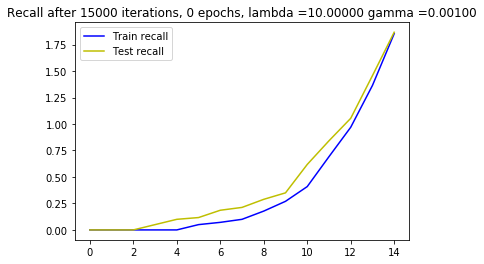

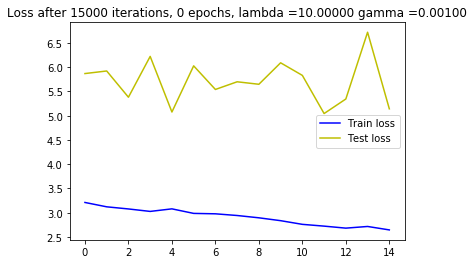

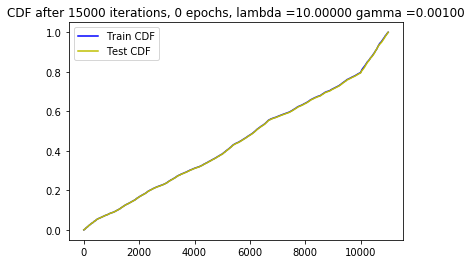






  3%|▎         | 15001/473047 [12:12<112:38:11,  1.13it/s]




  3%|▎         | 15009/473047 [12:12<79:21:00,  1.60it/s] 

New score:  0.099481784
Train score:  0.19379805
Test score:  0.24136391
Obj first part:  0.0
Obj second part:  -3.0265079
Obj first part:  0.0
Obj second part:  -0.78175044
Obj first part:  0.0
Obj second part:  -2.6748228
Obj first part:  1.470390260219574
Obj second part:  -1.470863
Obj first part:  1.283271461725235
Obj second part:  -1.025368
Obj first part:  0.0
Obj second part:  -0.12509005
Obj first part:  0.459054671227932
Obj second part:  -1.8817095
Obj first part:  1.6964776813983917
Obj second part:  -3.3134258
Obj first part:  0.9607591480016708
Obj second part:  -1.1795858
Obj first part:  0.0
Obj second part:  -1.7795405
Obj first part:  0.0
Obj second part:  -0.77325433
Obj first part:  0.6916485726833344
Obj second part:  -1.6018536
Obj first part:  0.3204609826207161
Obj second part:  -2.2063844
Obj first part:  2.7203980088233948
Obj second part:  -1.975415
Obj first part:  0.575750544667244
Obj second part:  -2.9570596
Obj first part:  0.0
Obj second part:  -1.8097






  3%|▎         | 15017/473047 [12:12<56:02:21,  2.27it/s]




  3%|▎         | 15025/473047 [12:12<39:43:40,  3.20it/s]

Obj first part:  0.0
Obj second part:  -2.3826969
Obj first part:  0.9697544574737549
Obj second part:  -1.319926
Obj first part:  0.0
Obj second part:  -1.6605563
Obj first part:  7.055637240409851
Obj second part:  -2.6140182
Obj first part:  0.0
Obj second part:  -1.8402258
Obj first part:  1.4169491827487946
Obj second part:  -2.2472959
Obj first part:  1.1841949820518494
Obj second part:  -0.43798503
Obj first part:  0.1299589965492487
Obj second part:  -2.754564
Obj first part:  0.0
Obj second part:  -2.2784598
Obj first part:  0.32650716602802277
Obj second part:  -1.7365441
Obj first part:  0.20388662815093994
Obj second part:  -3.6970434
Obj first part:  1.051110327243805
Obj second part:  -3.109494
Obj first part:  3.064737617969513
Obj second part:  -0.21391475
Obj first part:  0.19211255013942719
Obj second part:  -0.9368546
Obj first part:  0.2683344855904579
Obj second part:  -0.4406852
Obj first part:  1.7888516187667847
Obj second part:  -4.4862547







  3%|▎         | 15033/473047 [12:12<28:18:42,  4.49it/s]




  3%|▎         | 15041/473047 [12:12<20:18:59,  6.26it/s]

Obj first part:  1.9031691551208496
Obj second part:  -0.5814758
Obj first part:  0.8516831696033478
Obj second part:  -2.9697835
Obj first part:  0.0
Obj second part:  -2.0951862
Obj first part:  0.9587419778108597
Obj second part:  -0.46692532
Obj first part:  0.15043728053569794
Obj second part:  -0.5766027
Obj first part:  0.0
Obj second part:  -3.6027102
Obj first part:  0.0
Obj second part:  -0.8750039
Obj first part:  0.6387151032686234
Obj second part:  -1.5000658
Obj first part:  0.4849294200539589
Obj second part:  -2.0486863
Obj first part:  0.0
Obj second part:  -0.38518286
Obj first part:  4.07814234495163
Obj second part:  -2.415813
Obj first part:  0.0
Obj second part:  -0.20302756
Obj first part:  0.0
Obj second part:  -3.194818
Obj first part:  0.0
Obj second part:  -4.304212
Obj first part:  0.0
Obj second part:  -3.0253747
Obj first part:  1.0834616422653198
Obj second part:  -1.7549863







  3%|▎         | 15049/473047 [12:13<14:43:01,  8.64it/s]




  3%|▎         | 15057/473047 [12:13<10:48:01, 11.78it/s]

Obj first part:  0.0
Obj second part:  -1.0036724
Obj first part:  0.6197075918316841
Obj second part:  -0.18153104
Obj first part:  0.0
Obj second part:  -1.6470141
Obj first part:  0.0
Obj second part:  -2.8765938
Obj first part:  0.6458940356969833
Obj second part:  -0.74336386
Obj first part:  1.6361230611801147
Obj second part:  -2.5267284
Obj first part:  3.819064199924469
Obj second part:  -1.7987216
Obj first part:  3.735140860080719
Obj second part:  -1.1930711
Obj first part:  1.171608492732048
Obj second part:  -1.1804527
Obj first part:  0.0
Obj second part:  -1.6535804
Obj first part:  0.0
Obj second part:  -2.6633296
Obj first part:  0.0
Obj second part:  -0.45824546
Obj first part:  0.0
Obj second part:  -1.9046353
Obj first part:  0.0
Obj second part:  -3.8679886
Obj first part:  3.1618499755859375
Obj second part:  -1.5223308
Obj first part:  0.0
Obj second part:  -2.5198472







  3%|▎         | 15065/473047 [12:13<8:03:29, 15.79it/s] 




  3%|▎         | 15073/473047 [12:13<6:08:01, 20.74it/s]

Obj first part:  0.0
Obj second part:  -2.0801563
Obj first part:  0.0
Obj second part:  -2.9380124
Obj first part:  0.22921565920114517
Obj second part:  -0.9479557
Obj first part:  0.0
Obj second part:  -2.0085964
Obj first part:  8.94661545753479
Obj second part:  -1.1111115
Obj first part:  0.0
Obj second part:  -1.9408647
Obj first part:  0.8555853366851807
Obj second part:  -2.992148
Obj first part:  9.805588126182556
Obj second part:  -0.30660403
Obj first part:  2.7682864665985107
Obj second part:  -0.99708986
Obj first part:  0.0
Obj second part:  -1.6229239
Obj first part:  0.059413337148725986
Obj second part:  -2.8148243
Obj first part:  0.0
Obj second part:  -1.9261248
Obj first part:  4.598614275455475
Obj second part:  -1.2332518
Obj first part:  1.185339018702507
Obj second part:  -1.796256
Obj first part:  0.0
Obj second part:  -1.6259915
Obj first part:  2.3841503262519836
Obj second part:  -2.4655516







  3%|▎         | 15081/473047 [12:13<4:47:38, 26.54it/s]




  3%|▎         | 15089/473047 [12:13<3:51:13, 33.01it/s]

Obj first part:  1.9604751467704773
Obj second part:  -1.6158904
Obj first part:  2.75324285030365
Obj second part:  -1.2177366
Obj first part:  0.8504434674978256
Obj second part:  -1.9845793
Obj first part:  0.0
Obj second part:  -1.7606304
Obj first part:  0.0
Obj second part:  -0.75626487
Obj first part:  0.0
Obj second part:  -2.0687516
Obj first part:  0.0
Obj second part:  -0.6896945
Obj first part:  0.0
Obj second part:  -2.8343256
Obj first part:  0.0
Obj second part:  -3.5427375
Obj first part:  1.978122740983963
Obj second part:  -1.5527394
Obj first part:  0.0
Obj second part:  -4.47627
Obj first part:  0.0
Obj second part:  -4.6237707
Obj first part:  0.3500168025493622
Obj second part:  -1.1364957
Obj first part:  0.7532818615436554
Obj second part:  -2.6049232
Obj first part:  0.0
Obj second part:  -1.5960646
Obj first part:  0.0
Obj second part:  -2.1477218







  3%|▎         | 15097/473047 [12:13<3:11:58, 39.76it/s]




  3%|▎         | 15105/473047 [12:13<2:43:59, 46.54it/s]

Obj first part:  0.46298354864120483
Obj second part:  -1.4406538
Obj first part:  0.0
Obj second part:  -2.266165
Obj first part:  0.0
Obj second part:  -1.3147383
Obj first part:  0.0
Obj second part:  -2.904642
Obj first part:  7.301424145698547
Obj second part:  -0.60997355
Obj first part:  0.0
Obj second part:  -0.09808609
Obj first part:  0.0
Obj second part:  -2.564473
Obj first part:  0.0
Obj second part:  -1.5247049
Obj first part:  0.4629097506403923
Obj second part:  -1.5732735
Obj first part:  1.278260201215744
Obj second part:  -3.6234572
Obj first part:  0.0
Obj second part:  -1.7978166
Obj first part:  0.16634704545140266
Obj second part:  -0.4029912
Obj first part:  0.0
Obj second part:  -3.0760994
Obj first part:  0.0
Obj second part:  -1.1210259
Obj first part:  0.0
Obj second part:  -2.5904412
Obj first part:  0.0
Obj second part:  -0.51397586







  3%|▎         | 15113/473047 [12:13<2:25:00, 52.63it/s]




  3%|▎         | 15121/473047 [12:14<2:11:11, 58.17it/s]

Obj first part:  0.0
Obj second part:  -1.040823
Obj first part:  2.7721840143203735
Obj second part:  -3.1461804
Obj first part:  0.0
Obj second part:  -1.1509439
Obj first part:  0.2523636259138584
Obj second part:  -2.305054
Obj first part:  1.0890765488147736
Obj second part:  -0.79345655
Obj first part:  0.6523444503545761
Obj second part:  -3.4973962
Obj first part:  5.514597296714783
Obj second part:  -0.7114651
Obj first part:  0.24176409468054771
Obj second part:  -2.68474
Obj first part:  0.0
Obj second part:  -2.2643077
Obj first part:  2.6505762338638306
Obj second part:  -2.0221298
Obj first part:  1.7494121193885803
Obj second part:  -1.2227082
Obj first part:  0.0
Obj second part:  -0.83236265
Obj first part:  0.0
Obj second part:  -0.5121613
Obj first part:  0.1425203774124384
Obj second part:  -1.5620282
Obj first part:  0.620579905807972
Obj second part:  -0.48236746
Obj first part:  0.0
Obj second part:  -0.9739232







  3%|▎         | 15129/473047 [12:14<2:01:30, 62.81it/s]




  3%|▎         | 15137/473047 [12:14<1:54:40, 66.55it/s]

Obj first part:  0.0
Obj second part:  -2.9825914
Obj first part:  0.0
Obj second part:  -2.8632278
Obj first part:  0.0
Obj second part:  -0.4060176
Obj first part:  0.43379101902246475
Obj second part:  -0.9024296
Obj first part:  4.000678360462189
Obj second part:  -1.4286572
Obj first part:  0.0
Obj second part:  -1.8463182
Obj first part:  0.0
Obj second part:  -0.6617091
Obj first part:  0.41086796671152115
Obj second part:  -1.6610503
Obj first part:  3.0491209030151367
Obj second part:  -0.46539402
Obj first part:  0.0
Obj second part:  -0.9164452
Obj first part:  2.221139371395111
Obj second part:  -0.30477014
Obj first part:  0.0
Obj second part:  -0.99015415
Obj first part:  1.1325636506080627
Obj second part:  -2.2736712
Obj first part:  0.0
Obj second part:  -1.5563684
Obj first part:  0.5909272655844688
Obj second part:  -0.6001869
Obj first part:  0.0
Obj second part:  -1.9654717







  3%|▎         | 15145/473047 [12:14<1:50:53, 68.82it/s]




  3%|▎         | 15153/473047 [12:14<1:47:46, 70.81it/s]

Obj first part:  0.0
Obj second part:  -0.6622469
Obj first part:  1.2326447665691376
Obj second part:  -2.0541232
Obj first part:  0.0
Obj second part:  -1.9358816
Obj first part:  1.16615392267704
Obj second part:  -1.3784412
Obj first part:  0.0
Obj second part:  -1.653024
Obj first part:  0.0
Obj second part:  -0.38422582
Obj first part:  6.704699993133545
Obj second part:  -1.2137986
Obj first part:  1.3804864883422852
Obj second part:  -1.1614709
Obj first part:  0.0
Obj second part:  -1.2504224
Obj first part:  10.468162298202515
Obj second part:  -3.1349518
Obj first part:  0.21058231592178345
Obj second part:  -1.6097714
Obj first part:  0.0
Obj second part:  -0.82972467
Obj first part:  0.1332224067300558
Obj second part:  -2.17801
Obj first part:  2.362375110387802
Obj second part:  -0.3786125
Obj first part:  0.09109913371503353
Obj second part:  -1.7608452
Obj first part:  0.0
Obj second part:  -0.48811898







  3%|▎         | 15161/473047 [12:14<1:45:29, 72.34it/s]




  3%|▎         | 15169/473047 [12:14<1:43:34, 73.68it/s]

Obj first part:  0.860326737165451
Obj second part:  -1.6978743
Obj first part:  0.4141225293278694
Obj second part:  -0.19338013
Obj first part:  0.0
Obj second part:  -1.4709885
Obj first part:  0.0
Obj second part:  -1.9593503
Obj first part:  0.0
Obj second part:  -2.3851254
Obj first part:  2.098781317472458
Obj second part:  -0.34358278
Obj first part:  0.6441627442836761
Obj second part:  -0.18246207
Obj first part:  0.0
Obj second part:  -0.7615166
Obj first part:  0.0
Obj second part:  -0.2285525
Obj first part:  0.0
Obj second part:  -3.0662894
Obj first part:  0.3996012732386589
Obj second part:  -1.5847561
Obj first part:  0.3839726746082306
Obj second part:  -1.4338325
Obj first part:  0.0
Obj second part:  -1.4693247
Obj first part:  0.0
Obj second part:  -0.6695867
Obj first part:  3.7818196415901184
Obj second part:  -1.6429981
Obj first part:  1.5015904605388641
Obj second part:  -3.4751828







  3%|▎         | 15177/473047 [12:14<1:42:26, 74.50it/s]




  3%|▎         | 15185/473047 [12:14<1:41:29, 75.19it/s]

Obj first part:  0.0
Obj second part:  -0.27760422
Obj first part:  7.43328332901001
Obj second part:  -1.4223975
Obj first part:  0.0
Obj second part:  -1.2189996
Obj first part:  0.0
Obj second part:  -2.2715318
Obj first part:  0.0
Obj second part:  -0.7334278
Obj first part:  0.0
Obj second part:  -2.1650527
Obj first part:  0.0
Obj second part:  -0.7984425
Obj first part:  0.13457904569804668
Obj second part:  -1.8844178
Obj first part:  1.8197469413280487
Obj second part:  -0.501045
Obj first part:  0.0
Obj second part:  -1.3532237
Obj first part:  0.0
Obj second part:  -1.3637015
Obj first part:  0.0
Obj second part:  -0.6878837
Obj first part:  5.458460450172424
Obj second part:  -0.49885195
Obj first part:  0.0
Obj second part:  -0.9178347
Obj first part:  0.0
Obj second part:  -1.1038535
Obj first part:  0.0
Obj second part:  -3.0556543







  3%|▎         | 15193/473047 [12:14<1:41:06, 75.47it/s]




  3%|▎         | 15201/473047 [12:15<1:40:20, 76.05it/s]

Obj first part:  0.0
Obj second part:  -1.5610993
Obj first part:  0.0
Obj second part:  -1.0231142
Obj first part:  1.3049368560314178
Obj second part:  -1.0755941
Obj first part:  0.0
Obj second part:  -1.5770874
Obj first part:  0.0
Obj second part:  -2.8636193
Obj first part:  0.0
Obj second part:  -1.0799685
Obj first part:  0.0
Obj second part:  -1.6153727
Obj first part:  0.2454560250043869
Obj second part:  -3.6951995
Obj first part:  0.0
Obj second part:  -1.0664729
Obj first part:  0.0
Obj second part:  -3.9787698
Obj first part:  0.0
Obj second part:  -2.4183996
Obj first part:  0.0
Obj second part:  -2.4655952
Obj first part:  0.0
Obj second part:  -2.749947
Obj first part:  4.344347417354584
Obj second part:  -0.5874692
Obj first part:  6.819458603858948
Obj second part:  -1.7898831
Obj first part:  0.0
Obj second part:  -2.2814152







  3%|▎         | 15209/473047 [12:15<1:40:12, 76.15it/s]




  3%|▎         | 15217/473047 [12:15<1:39:40, 76.55it/s]

Obj first part:  0.3893321752548218
Obj second part:  -1.6100794
Obj first part:  2.6957622170448303
Obj second part:  -0.34496355
Obj first part:  0.7269600033760071
Obj second part:  -2.7212164
Obj first part:  1.9502295553684235
Obj second part:  -1.030484
Obj first part:  0.0
Obj second part:  -3.0509744
Obj first part:  0.0
Obj second part:  -1.0800242
Obj first part:  0.0
Obj second part:  -1.4810401
Obj first part:  0.0
Obj second part:  -2.0459325
Obj first part:  0.5767055600881577
Obj second part:  -0.811076
Obj first part:  0.8361987769603729
Obj second part:  -1.7296205
Obj first part:  0.0
Obj second part:  -0.25519204
Obj first part:  4.363235533237457
Obj second part:  -0.3924075
Obj first part:  3.584432303905487
Obj second part:  -0.14673032
Obj first part:  0.0
Obj second part:  -1.0763812
Obj first part:  0.0
Obj second part:  -3.1030102
Obj first part:  0.0
Obj second part:  -4.406548







  3%|▎         | 15225/473047 [12:15<1:39:41, 76.53it/s]




  3%|▎         | 15233/473047 [12:15<1:39:21, 76.80it/s]

Obj first part:  0.28853271156549454
Obj second part:  -1.044802
Obj first part:  0.8676838129758835
Obj second part:  -0.8068889
Obj first part:  3.2035598158836365
Obj second part:  -0.55975544
Obj first part:  0.0
Obj second part:  -0.75211114
Obj first part:  2.0164810121059418
Obj second part:  -0.550123
Obj first part:  2.707442343235016
Obj second part:  -1.9551697
Obj first part:  0.08192560635507107
Obj second part:  -2.335356
Obj first part:  0.8502505719661713
Obj second part:  -3.1899147
Obj first part:  0.0
Obj second part:  -1.4015943
Obj first part:  0.0
Obj second part:  -3.2370644
Obj first part:  2.1850666403770447
Obj second part:  -2.640617
Obj first part:  0.0
Obj second part:  -2.6402445
Obj first part:  0.49766983836889267
Obj second part:  -2.3713036
Obj first part:  0.0
Obj second part:  -2.0720334
Obj first part:  0.0
Obj second part:  -1.9957118
Obj first part:  0.0
Obj second part:  -1.7746236







  3%|▎         | 15241/473047 [12:15<1:39:50, 76.43it/s]




  3%|▎         | 15249/473047 [12:15<1:39:48, 76.44it/s]

Obj first part:  1.2311296164989471
Obj second part:  -2.7747796
Obj first part:  1.7120903730392456
Obj second part:  -2.9720144
Obj first part:  0.0
Obj second part:  -0.71908915
Obj first part:  0.6123295426368713
Obj second part:  -3.8718596
Obj first part:  0.45873701572418213
Obj second part:  -0.9244381
Obj first part:  0.2624158188700676
Obj second part:  -0.71199274
Obj first part:  9.026548266410828
Obj second part:  -1.2435669
Obj first part:  1.8656529486179352
Obj second part:  -0.8074212
Obj first part:  9.13658857345581
Obj second part:  -1.9632839
Obj first part:  0.0
Obj second part:  -2.22475
Obj first part:  0.0
Obj second part:  -2.9890435
Obj first part:  0.0
Obj second part:  -2.5936491
Obj first part:  0.0
Obj second part:  -2.6481369
Obj first part:  1.4573349058628082
Obj second part:  -0.8954914
Obj first part:  0.8300615102052689
Obj second part:  -1.4119017
Obj first part:  1.5032798051834106
Obj second part:  -1.1569234







  3%|▎         | 15257/473047 [12:15<1:40:03, 76.25it/s]




  3%|▎         | 15265/473047 [12:15<1:39:49, 76.43it/s]

Obj first part:  0.0
Obj second part:  -1.3943962
Obj first part:  0.0
Obj second part:  -1.6470888
Obj first part:  3.4403961896896362
Obj second part:  -1.323526
Obj first part:  0.18433278426527977
Obj second part:  -3.0502434
Obj first part:  0.12441853992640972
Obj second part:  -2.5258741
Obj first part:  0.0
Obj second part:  -0.9326478
Obj first part:  0.0
Obj second part:  -0.6006931
Obj first part:  1.6124631464481354
Obj second part:  -1.29292
Obj first part:  1.8984736502170563
Obj second part:  -0.70155853
Obj first part:  2.293533533811569
Obj second part:  -1.2967676
Obj first part:  0.2828802913427353
Obj second part:  -1.2672652
Obj first part:  0.0
Obj second part:  -2.6260993
Obj first part:  0.0
Obj second part:  -0.4344063
Obj first part:  0.0
Obj second part:  -0.79195064
Obj first part:  0.0
Obj second part:  -0.58898175
Obj first part:  0.0
Obj second part:  -3.426739







  3%|▎         | 15273/473047 [12:15<1:40:02, 76.27it/s]




  3%|▎         | 15281/473047 [12:16<1:39:40, 76.54it/s]

Obj first part:  0.0
Obj second part:  -1.2153437
Obj first part:  12.378772497177124
Obj second part:  -1.1114305
Obj first part:  0.09499588049948215
Obj second part:  -1.0326726
Obj first part:  0.0
Obj second part:  -1.454948
Obj first part:  0.0
Obj second part:  -3.0931022
Obj first part:  0.34789517521858215
Obj second part:  -1.6723651
Obj first part:  1.0237418860197067
Obj second part:  -1.5733029
Obj first part:  0.7588734477758408
Obj second part:  -2.1835375
Obj first part:  0.0
Obj second part:  -1.481468
Obj first part:  0.3542107716202736
Obj second part:  -3.8051727
Obj first part:  0.0
Obj second part:  -1.2921373
Obj first part:  0.5178863555192947
Obj second part:  -3.7902033
Obj first part:  0.0
Obj second part:  -0.8418515
Obj first part:  0.0
Obj second part:  -1.9823427
Obj first part:  0.0
Obj second part:  -0.4730967
Obj first part:  1.8999429047107697
Obj second part:  -0.5864817







  3%|▎         | 15289/473047 [12:16<1:39:54, 76.36it/s]




  3%|▎         | 15297/473047 [12:16<1:39:36, 76.60it/s]

Obj first part:  0.0
Obj second part:  -2.2589788
Obj first part:  0.0
Obj second part:  -1.1701794
Obj first part:  0.0
Obj second part:  -0.9448601
Obj first part:  0.0
Obj second part:  -0.6067152
Obj first part:  8.806090950965881
Obj second part:  -2.8392284
Obj first part:  0.0
Obj second part:  -0.97724384
Obj first part:  0.0
Obj second part:  -1.3728576
Obj first part:  0.32355934381484985
Obj second part:  -4.4555902
Obj first part:  1.4120812714099884
Obj second part:  -1.6107397
Obj first part:  0.0
Obj second part:  -0.44699192
Obj first part:  14.334607124328613
Obj second part:  -0.93700236
Obj first part:  0.0
Obj second part:  -3.0278847
Obj first part:  0.0
Obj second part:  -2.5641022
Obj first part:  0.1541475486010313
Obj second part:  -2.4616194
Obj first part:  0.0
Obj second part:  -2.3624647
Obj first part:  0.5946607515215874
Obj second part:  -0.77976525







  3%|▎         | 15305/473047 [12:16<1:39:26, 76.71it/s]




  3%|▎         | 15313/473047 [12:16<1:39:20, 76.80it/s]

Obj first part:  0.8673056215047836
Obj second part:  -3.6823378
Obj first part:  0.7318815588951111
Obj second part:  -1.6203192
Obj first part:  0.0
Obj second part:  -0.8268337
Obj first part:  0.8731875568628311
Obj second part:  -1.3679199
Obj first part:  0.0
Obj second part:  -0.7563075
Obj first part:  0.0
Obj second part:  -1.400823
Obj first part:  0.0
Obj second part:  -1.0224991
Obj first part:  0.0
Obj second part:  -1.3051956
Obj first part:  0.08904563263058662
Obj second part:  -1.2274911
Obj first part:  0.0
Obj second part:  -1.5208497
Obj first part:  4.365837872028351
Obj second part:  -1.4886866
Obj first part:  0.32856617122888565
Obj second part:  -1.322027
Obj first part:  0.0
Obj second part:  -2.0800188
Obj first part:  2.699401378631592
Obj second part:  -0.6031946
Obj first part:  3.6736664175987244
Obj second part:  -3.9890175
Obj first part:  0.19573668017983437
Obj second part:  -1.4594934







  3%|▎         | 15321/473047 [12:16<1:39:37, 76.57it/s]




  3%|▎         | 15329/473047 [12:16<1:39:23, 76.75it/s]

Obj first part:  11.36958122253418
Obj second part:  -0.54567784
Obj first part:  0.0
Obj second part:  -2.9394836
Obj first part:  0.0
Obj second part:  -1.8356764
Obj first part:  0.0
Obj second part:  -5.5835614
Obj first part:  0.0
Obj second part:  -1.2196181
Obj first part:  0.0
Obj second part:  -0.94983625
Obj first part:  0.0
Obj second part:  -3.1007414
Obj first part:  3.4545928239822388
Obj second part:  -3.0567374
Obj first part:  0.0
Obj second part:  -1.9973587
Obj first part:  0.0
Obj second part:  -1.0564333
Obj first part:  0.7363080978393555
Obj second part:  -1.9552921
Obj first part:  0.0
Obj second part:  -0.2998211
Obj first part:  0.0
Obj second part:  -0.3807375
Obj first part:  1.443377137184143
Obj second part:  -1.510747
Obj first part:  0.0
Obj second part:  -1.2734244
Obj first part:  0.0
Obj second part:  -1.2915401







  3%|▎         | 15337/473047 [12:16<1:39:32, 76.63it/s]




  3%|▎         | 15345/473047 [12:16<1:39:27, 76.70it/s]

Obj first part:  0.0
Obj second part:  -0.4770549
Obj first part:  0.8660861849784851
Obj second part:  -3.7984
Obj first part:  0.9243638813495636
Obj second part:  -1.3815056
Obj first part:  0.0
Obj second part:  -1.9683805
Obj first part:  0.0
Obj second part:  -0.29689234
Obj first part:  0.0
Obj second part:  -2.390607
Obj first part:  0.0
Obj second part:  -0.9559798
Obj first part:  0.0
Obj second part:  -0.34005472
Obj first part:  0.0
Obj second part:  -2.0800421
Obj first part:  0.0
Obj second part:  -1.8415728
Obj first part:  0.20376579836010933
Obj second part:  -2.857248
Obj first part:  2.549147307872772
Obj second part:  -2.3956532
Obj first part:  0.47072000801563263
Obj second part:  -0.5470281
Obj first part:  0.8039689064025879
Obj second part:  -1.1439221
Obj first part:  0.0
Obj second part:  -0.5898514
Obj first part:  0.0
Obj second part:  -0.8006572







  3%|▎         | 15353/473047 [12:17<1:39:39, 76.54it/s]




  3%|▎         | 15361/473047 [12:17<1:39:24, 76.73it/s]

Obj first part:  0.0
Obj second part:  -1.2881256
Obj first part:  1.9967560470104218
Obj second part:  -1.5412729
Obj first part:  0.0
Obj second part:  -1.5332646
Obj first part:  0.5767575278878212
Obj second part:  -1.7333392
Obj first part:  4.293892979621887
Obj second part:  -1.4574971
Obj first part:  0.0
Obj second part:  -0.7734638
Obj first part:  0.0
Obj second part:  -2.3102968
Obj first part:  0.4716809466481209
Obj second part:  -1.4417405
Obj first part:  0.7257901132106781
Obj second part:  -1.4664307
Obj first part:  5.811086297035217
Obj second part:  -0.4574949
Obj first part:  0.0
Obj second part:  -0.7276756
Obj first part:  0.0
Obj second part:  -2.1640763
Obj first part:  1.0680313408374786
Obj second part:  -0.3098999
Obj first part:  1.162770539522171
Obj second part:  -2.9736304
Obj first part:  1.503036916255951
Obj second part:  -2.2690876
Obj first part:  0.0
Obj second part:  -0.62596077







  3%|▎         | 15369/473047 [12:17<1:39:45, 76.46it/s]




  3%|▎         | 15377/473047 [12:17<1:39:31, 76.65it/s]

Obj first part:  3.8121026754379272
Obj second part:  -1.3395876
Obj first part:  0.0
Obj second part:  -1.117454
Obj first part:  0.0
Obj second part:  -1.6362123
Obj first part:  1.7362549901008606
Obj second part:  -3.0741954
Obj first part:  2.437969446182251
Obj second part:  -1.6652503
Obj first part:  0.0
Obj second part:  -1.0349543
Obj first part:  0.9298587590456009
Obj second part:  -0.85209537
Obj first part:  0.0
Obj second part:  -1.5045338
Obj first part:  7.4064987897872925
Obj second part:  -1.4606173
Obj first part:  4.372783005237579
Obj second part:  -0.88364047
Obj first part:  0.5357363075017929
Obj second part:  -2.008275
Obj first part:  0.0
Obj second part:  -1.9777898
Obj first part:  1.6551800072193146
Obj second part:  -1.1623013
Obj first part:  0.0
Obj second part:  -2.7842577
Obj first part:  0.7738976925611496
Obj second part:  -0.989246
Obj first part:  0.22763989865779877
Obj second part:  -1.4697853







  3%|▎         | 15385/473047 [12:17<1:39:20, 76.78it/s]




  3%|▎         | 15393/473047 [12:17<1:39:24, 76.73it/s]

Obj first part:  0.0
Obj second part:  -1.8835974
Obj first part:  0.2920425310730934
Obj second part:  -1.9241421
Obj first part:  0.0
Obj second part:  -2.1632278
Obj first part:  1.2633132934570312
Obj second part:  -2.343303
Obj first part:  0.0
Obj second part:  -1.1928455
Obj first part:  0.0
Obj second part:  -1.7893102
Obj first part:  1.0726669430732727
Obj second part:  -1.2689898
Obj first part:  0.0
Obj second part:  -0.37485448
Obj first part:  0.0
Obj second part:  -2.1626523
Obj first part:  5.420567989349365
Obj second part:  -2.743334
Obj first part:  1.9990894198417664
Obj second part:  -2.2527378
Obj first part:  11.396524906158447
Obj second part:  -2.827165
Obj first part:  0.0
Obj second part:  -1.7708865
Obj first part:  0.34938912838697433
Obj second part:  -2.807816
Obj first part:  0.8394528925418854
Obj second part:  -2.221126







  3%|▎         | 15401/473047 [12:17<1:41:52, 74.87it/s]




  3%|▎         | 15409/473047 [12:17<1:41:18, 75.29it/s]

Obj first part:  0.6643081456422806
Obj second part:  -1.5544544
Obj first part:  0.0
Obj second part:  -1.3286992
Obj first part:  0.0
Obj second part:  -1.0725157
Obj first part:  0.0
Obj second part:  -1.6960977
Obj first part:  0.0
Obj second part:  -2.661937
Obj first part:  0.0
Obj second part:  -1.9314647
Obj first part:  0.49270574003458023
Obj second part:  -1.6377409
Obj first part:  0.0
Obj second part:  -2.344174
Obj first part:  0.0
Obj second part:  -2.0896966
Obj first part:  4.433746635913849
Obj second part:  -3.6631699
Obj first part:  0.0
Obj second part:  -2.841795
Obj first part:  7.461259365081787
Obj second part:  -2.0321655
Obj first part:  0.0
Obj second part:  -0.6382704
Obj first part:  1.31682887673378
Obj second part:  -2.1671367
Obj first part:  0.2432652935385704
Obj second part:  -0.7279407
Obj first part:  0.0
Obj second part:  -1.5588753







  3%|▎         | 15417/473047 [12:17<1:40:48, 75.66it/s]




  3%|▎         | 15425/473047 [12:17<1:40:35, 75.82it/s]

Obj first part:  0.0
Obj second part:  -2.8067632
Obj first part:  0.0
Obj second part:  -2.0000935
Obj first part:  0.10259652510285378
Obj second part:  -1.5148401
Obj first part:  0.8890420943498611
Obj second part:  -0.51595277
Obj first part:  0.0
Obj second part:  -0.9856119
Obj first part:  1.8812063336372375
Obj second part:  -2.1092653
Obj first part:  6.115963459014893
Obj second part:  -3.371507
Obj first part:  0.0
Obj second part:  -1.0403339
Obj first part:  0.0
Obj second part:  -0.9374287
Obj first part:  0.5727337673306465
Obj second part:  -1.670723
Obj first part:  2.1138162910938263
Obj second part:  -1.7255503
Obj first part:  0.8626110106706619
Obj second part:  -1.0291452
Obj first part:  0.0
Obj second part:  -1.2457234
Obj first part:  0.4542737454175949
Obj second part:  -3.024255
Obj first part:  0.0
Obj second part:  -3.089789
Obj first part:  0.0
Obj second part:  -1.3954496







  3%|▎         | 15433/473047 [12:18<1:40:11, 76.12it/s]




  3%|▎         | 15441/473047 [12:18<1:40:09, 76.15it/s]

Obj first part:  0.7046994566917419
Obj second part:  -1.156574
Obj first part:  0.101788230240345
Obj second part:  -0.21002382
Obj first part:  0.0
Obj second part:  -2.3065338
Obj first part:  0.0
Obj second part:  -0.39713842
Obj first part:  0.9310451149940491
Obj second part:  -2.3476522
Obj first part:  0.0
Obj second part:  -1.4535272
Obj first part:  0.0
Obj second part:  -1.2024931
Obj first part:  10.711400508880615
Obj second part:  -1.347215
Obj first part:  4.390445947647095
Obj second part:  -2.2497969
Obj first part:  0.0
Obj second part:  -0.38925642
Obj first part:  0.8462455123662949
Obj second part:  -0.57673
Obj first part:  0.0
Obj second part:  -1.1227723
Obj first part:  0.5059967562556267
Obj second part:  -0.78276616
Obj first part:  0.06860821507871151
Obj second part:  -2.20457
Obj first part:  1.2093066424131393
Obj second part:  -0.35499653
Obj first part:  3.1988736987113953
Obj second part:  -3.033204







  3%|▎         | 15449/473047 [12:18<1:40:08, 76.16it/s]




  3%|▎         | 15457/473047 [12:18<1:39:41, 76.50it/s]

Obj first part:  0.0
Obj second part:  -2.4788632
Obj first part:  0.0
Obj second part:  -0.84095436
Obj first part:  1.429322212934494
Obj second part:  -1.5199828
Obj first part:  0.0
Obj second part:  -2.3125653
Obj first part:  1.191265806555748
Obj second part:  -1.0697844
Obj first part:  0.0
Obj second part:  -1.1978152
Obj first part:  0.23517221212387085
Obj second part:  -3.2172284
Obj first part:  6.30571186542511
Obj second part:  -1.7594465
Obj first part:  0.0
Obj second part:  -1.6476964
Obj first part:  0.13074595481157303
Obj second part:  -2.9863276
Obj first part:  1.310223937034607
Obj second part:  -1.4595077
Obj first part:  0.0
Obj second part:  -0.9746973
Obj first part:  0.07967226207256317
Obj second part:  -2.5954084
Obj first part:  0.0
Obj second part:  -1.0414251
Obj first part:  0.0
Obj second part:  -1.512134
Obj first part:  0.0
Obj second part:  -1.5626923







  3%|▎         | 15465/473047 [12:18<1:39:55, 76.32it/s]




  3%|▎         | 15473/473047 [12:18<1:39:47, 76.43it/s]

Obj first part:  1.1850496381521225
Obj second part:  -1.9123627
Obj first part:  0.739060565829277
Obj second part:  -0.702928
Obj first part:  1.5959766507148743
Obj second part:  -1.4854991
Obj first part:  5.188655853271484
Obj second part:  -0.7469994
Obj first part:  0.4218663275241852
Obj second part:  -0.9071163
Obj first part:  0.7286324352025986
Obj second part:  -1.7648005
Obj first part:  0.6302381306886673
Obj second part:  -1.3324705
Obj first part:  0.0
Obj second part:  -2.0240617
Obj first part:  0.3990156576037407
Obj second part:  -0.9613213
Obj first part:  0.0
Obj second part:  -0.96969754
Obj first part:  2.1623384952545166
Obj second part:  -1.2332616
Obj first part:  0.0
Obj second part:  -2.5812185
Obj first part:  0.3048555739223957
Obj second part:  -1.4264882
Obj first part:  0.0
Obj second part:  -1.7955369
Obj first part:  0.0
Obj second part:  -0.41754818
Obj first part:  0.0
Obj second part:  -1.04475







  3%|▎         | 15481/473047 [12:18<1:40:00, 76.25it/s]




  3%|▎         | 15489/473047 [12:18<1:39:45, 76.45it/s]

Obj first part:  0.0
Obj second part:  -2.3462062
Obj first part:  0.0
Obj second part:  -0.59459174
Obj first part:  0.0
Obj second part:  -0.82227457
Obj first part:  0.0
Obj second part:  -0.6161583
Obj first part:  0.4024183377623558
Obj second part:  -1.4799793
Obj first part:  0.0
Obj second part:  -2.8800895
Obj first part:  0.3751211240887642
Obj second part:  -1.7535284
Obj first part:  0.0
Obj second part:  -2.4757335
Obj first part:  0.0
Obj second part:  -1.6934768
Obj first part:  0.0
Obj second part:  -1.0564709
Obj first part:  1.1190719157457352
Obj second part:  -0.47918135
Obj first part:  0.25995563715696335
Obj second part:  -4.172817
Obj first part:  0.0
Obj second part:  -1.7268217
Obj first part:  0.0
Obj second part:  -1.3561572
Obj first part:  0.0
Obj second part:  -0.34995088
Obj first part:  0.0
Obj second part:  -2.4950771







  3%|▎         | 15497/473047 [12:18<1:39:55, 76.31it/s]




  3%|▎         | 15505/473047 [12:19<1:39:36, 76.56it/s]

Obj first part:  0.0
Obj second part:  -0.53039086
Obj first part:  2.891058027744293
Obj second part:  -0.8046715
Obj first part:  4.577672183513641
Obj second part:  -1.6797886
Obj first part:  0.0
Obj second part:  -2.395409
Obj first part:  0.0
Obj second part:  -2.0022554
Obj first part:  0.0
Obj second part:  -0.63511485
Obj first part:  0.0
Obj second part:  -3.135621
Obj first part:  0.3667406365275383
Obj second part:  -2.98763
Obj first part:  0.0
Obj second part:  -0.9921819
Obj first part:  8.828043341636658
Obj second part:  -0.94684947
Obj first part:  2.5038933753967285
Obj second part:  -2.7491913
Obj first part:  0.0
Obj second part:  -2.3334274
Obj first part:  7.705645561218262
Obj second part:  -1.9320469
Obj first part:  5.340480208396912
Obj second part:  -2.9962876
Obj first part:  3.5732796788215637
Obj second part:  -2.6643622
Obj first part:  0.5850239470601082
Obj second part:  -1.6549553







  3%|▎         | 15513/473047 [12:19<1:39:52, 76.36it/s]




  3%|▎         | 15521/473047 [12:19<1:39:28, 76.65it/s]

Obj first part:  1.0152718424797058
Obj second part:  -3.159357
Obj first part:  1.8059419095516205
Obj second part:  -1.3041694
Obj first part:  0.0
Obj second part:  -2.9325411
Obj first part:  0.9199031442403793
Obj second part:  -0.2821736
Obj first part:  0.0
Obj second part:  -1.053879
Obj first part:  0.5222396552562714
Obj second part:  -1.8264539
Obj first part:  0.0
Obj second part:  -1.2670128
Obj first part:  0.0
Obj second part:  -0.90934145
Obj first part:  0.0
Obj second part:  -1.2988904
Obj first part:  0.8473645150661469
Obj second part:  -2.432553
Obj first part:  0.26288842782378197
Obj second part:  -3.321041
Obj first part:  0.0
Obj second part:  -0.70953715
Obj first part:  0.0
Obj second part:  -1.8038173
Obj first part:  0.0
Obj second part:  -0.47964257
Obj first part:  0.0
Obj second part:  -0.9498118
Obj first part:  0.8855909109115601
Obj second part:  -2.7261226







  3%|▎         | 15529/473047 [12:19<1:39:44, 76.45it/s]




  3%|▎         | 15537/473047 [12:19<1:39:24, 76.71it/s]

Obj first part:  0.0
Obj second part:  -1.6722202
Obj first part:  2.687869369983673
Obj second part:  -0.8687069
Obj first part:  0.0
Obj second part:  -1.002145
Obj first part:  0.0
Obj second part:  -3.0885987
Obj first part:  0.0
Obj second part:  -1.4184806
Obj first part:  0.0
Obj second part:  -4.0458817
Obj first part:  0.7611395418643951
Obj second part:  -0.44662505
Obj first part:  0.2552375756204128
Obj second part:  -1.120973
Obj first part:  2.1433214843273163
Obj second part:  -2.5688145
Obj first part:  0.0
Obj second part:  -2.1823726
Obj first part:  0.2891780808568001
Obj second part:  -1.8410027
Obj first part:  0.0
Obj second part:  -1.787215
Obj first part:  2.2585150599479675
Obj second part:  -0.7638762
Obj first part:  0.0
Obj second part:  -1.4140131
Obj first part:  0.0
Obj second part:  -0.984508
Obj first part:  0.5494024977087975
Obj second part:  -1.846603







  3%|▎         | 15545/473047 [12:19<1:39:38, 76.52it/s]




  3%|▎         | 15553/473047 [12:19<1:39:29, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.15684628
Obj first part:  0.0
Obj second part:  -1.3741649
Obj first part:  0.0
Obj second part:  -1.1741416
Obj first part:  0.0
Obj second part:  -3.4357693
Obj first part:  0.0
Obj second part:  -1.0298889
Obj first part:  2.7189630270004272
Obj second part:  -3.124686
Obj first part:  0.0
Obj second part:  -0.41428316
Obj first part:  0.0
Obj second part:  -0.5883567
Obj first part:  0.8951714634895325
Obj second part:  -0.95081437
Obj first part:  0.0
Obj second part:  -1.9592917
Obj first part:  0.0
Obj second part:  -2.5208256
Obj first part:  6.570972204208374
Obj second part:  -0.7562722
Obj first part:  0.6672845780849457
Obj second part:  -2.3432534
Obj first part:  0.0
Obj second part:  -0.61521447
Obj first part:  0.0
Obj second part:  -1.5333648
Obj first part:  0.0
Obj second part:  -1.0956624







  3%|▎         | 15561/473047 [12:19<1:39:30, 76.62it/s]




  3%|▎         | 15569/473047 [12:19<1:39:28, 76.65it/s]

Obj first part:  0.0
Obj second part:  -2.143593
Obj first part:  0.0
Obj second part:  -2.8643618
Obj first part:  1.4224213361740112
Obj second part:  -1.8036141
Obj first part:  0.0
Obj second part:  -1.2906349
Obj first part:  0.0
Obj second part:  -5.010806
Obj first part:  0.0
Obj second part:  -0.81764334
Obj first part:  0.0
Obj second part:  -0.5410422
Obj first part:  0.0
Obj second part:  -0.33321434
Obj first part:  0.0
Obj second part:  -0.68243575
Obj first part:  0.0
Obj second part:  -1.8394974
Obj first part:  0.0
Obj second part:  -0.9152232
Obj first part:  6.385356187820435
Obj second part:  -0.4735607
Obj first part:  0.0
Obj second part:  -1.7520413
Obj first part:  0.4027864336967468
Obj second part:  -0.16986959
Obj first part:  0.6546312570571899
Obj second part:  -1.0348623
Obj first part:  5.52969753742218
Obj second part:  -0.77358687







  3%|▎         | 15577/473047 [12:19<1:39:32, 76.60it/s]




  3%|▎         | 15585/473047 [12:20<1:39:13, 76.83it/s]

Obj first part:  0.0
Obj second part:  -0.8529537
Obj first part:  0.0
Obj second part:  -1.7381461
Obj first part:  3.222002685070038
Obj second part:  -1.9951993
Obj first part:  0.6558630615472794
Obj second part:  -0.8958526
Obj first part:  0.7487016171216965
Obj second part:  -1.390464
Obj first part:  2.7685248851776123
Obj second part:  -2.3537164
Obj first part:  0.562826357781887
Obj second part:  -0.9317259
Obj first part:  0.0
Obj second part:  -0.62929505
Obj first part:  0.6191249564290047
Obj second part:  -2.1557643
Obj first part:  0.0
Obj second part:  -1.1569295
Obj first part:  0.0
Obj second part:  -0.998899
Obj first part:  1.3456769287586212
Obj second part:  -0.39141542
Obj first part:  0.5818410962820053
Obj second part:  -0.82319516
Obj first part:  1.383674442768097
Obj second part:  -2.2400422
Obj first part:  3.4744763374328613
Obj second part:  -0.5851861
Obj first part:  3.8131198287010193
Obj second part:  -0.9632181







  3%|▎         | 15593/473047 [12:20<1:39:10, 76.88it/s]




  3%|▎         | 15601/473047 [12:20<1:39:10, 76.87it/s]

Obj first part:  0.0
Obj second part:  -1.7307026
Obj first part:  0.0
Obj second part:  -1.2605658
Obj first part:  2.5250133872032166
Obj second part:  -2.0036302
Obj first part:  1.509360522031784
Obj second part:  -2.9307618
Obj first part:  0.0
Obj second part:  -2.5429254
Obj first part:  1.021806076169014
Obj second part:  -0.6027631
Obj first part:  5.306328535079956
Obj second part:  -1.7984991
Obj first part:  3.6137834191322327
Obj second part:  -3.3976204
Obj first part:  0.0
Obj second part:  -0.48130196
Obj first part:  0.0
Obj second part:  -2.0410042
Obj first part:  0.0
Obj second part:  -1.1553681
Obj first part:  0.0
Obj second part:  -4.403903
Obj first part:  0.0
Obj second part:  -1.6006943
Obj first part:  0.0
Obj second part:  -1.6159824
Obj first part:  0.0
Obj second part:  -2.7826843
Obj first part:  0.5592221021652222
Obj second part:  -1.5454445







  3%|▎         | 15609/473047 [12:20<1:39:17, 76.79it/s]




  3%|▎         | 15617/473047 [12:20<1:39:06, 76.92it/s]

Obj first part:  0.0
Obj second part:  -0.86324114
Obj first part:  0.0
Obj second part:  -1.9513
Obj first part:  0.0
Obj second part:  -0.11244315
Obj first part:  0.0
Obj second part:  -1.0835624
Obj first part:  0.0
Obj second part:  -3.303639
Obj first part:  0.40579985827207565
Obj second part:  -0.2991731
Obj first part:  0.0
Obj second part:  -0.713083
Obj first part:  0.0
Obj second part:  -2.2892768
Obj first part:  0.0
Obj second part:  -2.0578978
Obj first part:  0.0
Obj second part:  -0.5398638
Obj first part:  2.6512569189071655
Obj second part:  -1.6142974
Obj first part:  0.0
Obj second part:  -0.6988067
Obj first part:  0.0
Obj second part:  -1.2272235
Obj first part:  0.0
Obj second part:  -1.8096277
Obj first part:  3.7452974915504456
Obj second part:  -1.4652634
Obj first part:  2.439263015985489
Obj second part:  -2.0111558







  3%|▎         | 15625/473047 [12:20<1:39:35, 76.55it/s]




  3%|▎         | 15633/473047 [12:20<1:39:22, 76.72it/s]

Obj first part:  0.0
Obj second part:  -1.3342102
Obj first part:  0.0
Obj second part:  -0.47718638
Obj first part:  0.0
Obj second part:  -1.5618414
Obj first part:  0.0
Obj second part:  -2.855286
Obj first part:  0.0
Obj second part:  -0.88944703
Obj first part:  0.0
Obj second part:  -1.0048622
Obj first part:  0.0
Obj second part:  -1.6782616
Obj first part:  4.376941919326782
Obj second part:  -1.4325866
Obj first part:  0.0
Obj second part:  -3.273589
Obj first part:  0.19011691212654114
Obj second part:  -0.51551044
Obj first part:  4.6134161949157715
Obj second part:  -0.5445139
Obj first part:  0.6498830020427704
Obj second part:  -0.39470494
Obj first part:  0.603761337697506
Obj second part:  -3.1471002
Obj first part:  0.0
Obj second part:  -0.5043311
Obj first part:  0.0
Obj second part:  -0.8166699
Obj first part:  0.0
Obj second part:  -2.1034234







  3%|▎         | 15641/473047 [12:20<1:39:32, 76.58it/s]




  3%|▎         | 15649/473047 [12:20<1:39:26, 76.66it/s]

Obj first part:  0.0
Obj second part:  -0.49166524
Obj first part:  6.286219358444214
Obj second part:  -0.95128244
Obj first part:  0.0
Obj second part:  -2.4987452
Obj first part:  7.228307127952576
Obj second part:  -1.3971392
Obj first part:  0.5472854152321815
Obj second part:  -1.4927819
Obj first part:  0.0
Obj second part:  -1.4889828
Obj first part:  0.0
Obj second part:  -0.7703035
Obj first part:  0.0
Obj second part:  -1.0006877
Obj first part:  0.0
Obj second part:  -0.42772013
Obj first part:  11.067930459976196
Obj second part:  -3.5922172
Obj first part:  0.48729870468378067
Obj second part:  -2.5125554
Obj first part:  1.823221743106842
Obj second part:  -2.0443726
Obj first part:  0.0
Obj second part:  -0.52712363
Obj first part:  0.0
Obj second part:  -1.6384132
Obj first part:  0.0
Obj second part:  -2.875453
Obj first part:  0.0
Obj second part:  -0.97753394







  3%|▎         | 15657/473047 [12:21<1:39:41, 76.47it/s]




  3%|▎         | 15665/473047 [12:21<1:39:17, 76.77it/s]

Obj first part:  1.197788491845131
Obj second part:  -1.8497608
Obj first part:  0.0
Obj second part:  -3.7353644
Obj first part:  0.19996723160147667
Obj second part:  -0.67323625
Obj first part:  0.0
Obj second part:  -0.32366404
Obj first part:  0.0
Obj second part:  -1.3103232
Obj first part:  1.900041401386261
Obj second part:  -0.8073301
Obj first part:  0.0
Obj second part:  -3.0062413
Obj first part:  3.8661840558052063
Obj second part:  -1.1956905
Obj first part:  2.348088175058365
Obj second part:  -2.4121478
Obj first part:  1.6455034911632538
Obj second part:  -2.5301208
Obj first part:  5.083858370780945
Obj second part:  -1.2265911
Obj first part:  0.21284528076648712
Obj second part:  -0.65875745
Obj first part:  0.0
Obj second part:  -2.4537125
Obj first part:  0.0
Obj second part:  -1.3581132
Obj first part:  0.5670703202486038
Obj second part:  -1.6730412
Obj first part:  2.0897498726844788
Obj second part:  -0.57737267







  3%|▎         | 15673/473047 [12:21<1:39:24, 76.68it/s]




  3%|▎         | 15681/473047 [12:21<1:39:04, 76.93it/s]

Obj first part:  0.0
Obj second part:  -3.0008633
Obj first part:  1.7073170840740204
Obj second part:  -3.6143534
Obj first part:  0.0
Obj second part:  -1.1170608
Obj first part:  0.0
Obj second part:  -1.7786429
Obj first part:  1.4490045607089996
Obj second part:  -0.1739313
Obj first part:  4.505394399166107
Obj second part:  -2.0693638
Obj first part:  0.0
Obj second part:  -1.7542703
Obj first part:  0.0
Obj second part:  -2.064142
Obj first part:  0.0
Obj second part:  -1.9676089
Obj first part:  0.0
Obj second part:  -0.14547603
Obj first part:  0.8941317349672318
Obj second part:  -2.5965447
Obj first part:  0.0
Obj second part:  -1.7768643
Obj first part:  0.4503268748521805
Obj second part:  -0.5866906
Obj first part:  0.0
Obj second part:  -1.7926974
Obj first part:  3.1040623784065247
Obj second part:  -0.6825964
Obj first part:  2.015640437602997
Obj second part:  -0.7537153







  3%|▎         | 15689/473047 [12:21<1:39:22, 76.70it/s]




  3%|▎         | 15697/473047 [12:21<1:39:00, 76.99it/s]

Obj first part:  0.707099661231041
Obj second part:  -1.6070662
Obj first part:  0.8059133589267731
Obj second part:  -2.4752018
Obj first part:  0.0
Obj second part:  -1.3583823
Obj first part:  10.40034532546997
Obj second part:  -2.6071687
Obj first part:  1.1071167886257172
Obj second part:  -2.3026164
Obj first part:  0.14269773848354816
Obj second part:  -4.978089
Obj first part:  0.0
Obj second part:  -2.8586187
Obj first part:  0.0
Obj second part:  -0.99328244
Obj first part:  0.0
Obj second part:  -3.11032
Obj first part:  1.9517309963703156
Obj second part:  -1.1291652
Obj first part:  0.0
Obj second part:  -3.2292862
Obj first part:  0.3659048303961754
Obj second part:  -4.19781
Obj first part:  0.0
Obj second part:  -1.8333012
Obj first part:  0.0
Obj second part:  -1.7524583
Obj first part:  1.1118151247501373
Obj second part:  -0.38164207
Obj first part:  0.0
Obj second part:  -2.3651385







  3%|▎         | 15705/473047 [12:21<1:39:30, 76.60it/s]




  3%|▎         | 15713/473047 [12:21<1:39:18, 76.75it/s]

Obj first part:  0.0
Obj second part:  -0.70528466
Obj first part:  1.7237621545791626
Obj second part:  -2.8121173
Obj first part:  0.2227930910885334
Obj second part:  -4.1603847
Obj first part:  0.41815023869276047
Obj second part:  -3.7009387
Obj first part:  0.827254056930542
Obj second part:  -2.4803486
Obj first part:  0.0
Obj second part:  -2.0763984
Obj first part:  0.0
Obj second part:  -2.3952365
Obj first part:  1.124143972992897
Obj second part:  -1.3601882
Obj first part:  0.16693156212568283
Obj second part:  -0.67857033
Obj first part:  0.0
Obj second part:  -1.5436908
Obj first part:  0.0
Obj second part:  -1.0268267
Obj first part:  0.6531670689582825
Obj second part:  -0.38986537
Obj first part:  0.0
Obj second part:  -0.3164674
Obj first part:  0.0
Obj second part:  -0.11488107
Obj first part:  0.7124043256044388
Obj second part:  -0.43251887
Obj first part:  0.5183010175824165
Obj second part:  -0.50956535







  3%|▎         | 15721/473047 [12:21<1:39:31, 76.58it/s]




  3%|▎         | 15729/473047 [12:21<1:39:32, 76.58it/s]

Obj first part:  0.0
Obj second part:  -1.4053502
Obj first part:  0.0
Obj second part:  -2.2988493
Obj first part:  0.0
Obj second part:  -3.7864804
Obj first part:  1.3529334962368011
Obj second part:  -1.0885181
Obj first part:  0.0
Obj second part:  -2.5448747
Obj first part:  0.6435327976942062
Obj second part:  -1.3928766
Obj first part:  0.0
Obj second part:  -1.1372541
Obj first part:  2.3019863665103912
Obj second part:  -0.32155004
Obj first part:  0.0
Obj second part:  -0.38408035
Obj first part:  0.0
Obj second part:  -0.8582656
Obj first part:  1.468023955821991
Obj second part:  -2.1837146
Obj first part:  0.6298049539327621
Obj second part:  -1.3342036
Obj first part:  3.3770331740379333
Obj second part:  -0.97939646
Obj first part:  0.0
Obj second part:  -1.9008791
Obj first part:  3.266732692718506
Obj second part:  -1.1350775
Obj first part:  0.3304203227162361
Obj second part:  -1.0021893







  3%|▎         | 15737/473047 [12:22<1:39:28, 76.62it/s]




  3%|▎         | 15745/473047 [12:22<1:39:27, 76.63it/s]

Obj first part:  0.0
Obj second part:  -2.362398
Obj first part:  0.0
Obj second part:  -3.225364
Obj first part:  8.208420872688293
Obj second part:  -1.2079204
Obj first part:  0.0
Obj second part:  -2.0799975
Obj first part:  3.7646448612213135
Obj second part:  -3.6141763
Obj first part:  0.0
Obj second part:  -1.6222858
Obj first part:  0.0
Obj second part:  -3.5100296
Obj first part:  0.0
Obj second part:  -0.79529405
Obj first part:  0.0
Obj second part:  -2.4312775
Obj first part:  1.9905570149421692
Obj second part:  -1.6620245
Obj first part:  0.0
Obj second part:  -2.5481966
Obj first part:  0.0
Obj second part:  -1.6087947
Obj first part:  4.834575355052948
Obj second part:  -1.7957492
Obj first part:  0.0
Obj second part:  -2.6417575
Obj first part:  0.6135126203298569
Obj second part:  -2.1559904
Obj first part:  0.0
Obj second part:  -1.1460301







  3%|▎         | 15753/473047 [12:22<1:39:20, 76.71it/s]




  3%|▎         | 15761/473047 [12:22<1:40:18, 75.98it/s]

Obj first part:  3.609415888786316
Obj second part:  -0.6017941
Obj first part:  0.7591211795806885
Obj second part:  -0.96362627
Obj first part:  0.0
Obj second part:  -1.18728
Obj first part:  0.0
Obj second part:  -2.0004578
Obj first part:  0.3400930389761925
Obj second part:  -0.965305
Obj first part:  7.445526123046875
Obj second part:  -2.201317
Obj first part:  0.0
Obj second part:  -1.8872561
Obj first part:  0.6920452415943146
Obj second part:  -2.0660098
Obj first part:  0.0
Obj second part:  -1.920339
Obj first part:  1.898173838853836
Obj second part:  -3.0797114
Obj first part:  0.04249626770615578
Obj second part:  -3.3092625
Obj first part:  0.0
Obj second part:  -3.1313279
Obj first part:  0.6070993840694427
Obj second part:  -1.3041987
Obj first part:  0.0
Obj second part:  -1.6817749
Obj first part:  0.0
Obj second part:  -3.377603
Obj first part:  1.5790960192680359
Obj second part:  -2.024679







  3%|▎         | 15769/473047 [12:22<1:39:53, 76.30it/s]




  3%|▎         | 15777/473047 [12:22<1:40:00, 76.21it/s]

Obj first part:  1.917896717786789
Obj second part:  -1.191484
Obj first part:  0.0
Obj second part:  -0.7228247
Obj first part:  1.0040264576673508
Obj second part:  -1.8505526
Obj first part:  13.162482976913452
Obj second part:  -2.7617605
Obj first part:  1.4237374067306519
Obj second part:  -0.5577928
Obj first part:  7.5886887311935425
Obj second part:  -2.552586
Obj first part:  0.30970415100455284
Obj second part:  -0.4763099
Obj first part:  0.0
Obj second part:  -0.4271428
Obj first part:  0.2358926646411419
Obj second part:  -2.3714104
Obj first part:  0.11111730709671974
Obj second part:  -1.2853564
Obj first part:  0.0
Obj second part:  -1.7229068
Obj first part:  0.0
Obj second part:  -2.4428413
Obj first part:  0.2585706487298012
Obj second part:  -2.2522423
Obj first part:  0.0
Obj second part:  -1.963218
Obj first part:  1.7713496088981628
Obj second part:  -1.8300719
Obj first part:  1.126001551747322
Obj second part:  -2.7009916







  3%|▎         | 15785/473047 [12:22<1:39:55, 76.27it/s]




  3%|▎         | 15793/473047 [12:22<1:39:31, 76.57it/s]

Obj first part:  0.0
Obj second part:  -0.26634923
Obj first part:  2.8611239790916443
Obj second part:  -4.27529
Obj first part:  0.0
Obj second part:  -3.0600865
Obj first part:  0.6587330251932144
Obj second part:  -2.6701367
Obj first part:  0.6131394580006599
Obj second part:  -3.1388712
Obj first part:  0.17938436940312386
Obj second part:  -2.8094702
Obj first part:  0.0
Obj second part:  -1.1280066
Obj first part:  0.0
Obj second part:  -2.6097703
Obj first part:  1.2029942870140076
Obj second part:  -1.0461323
Obj first part:  1.4382998645305634
Obj second part:  -0.61114204
Obj first part:  0.20333584398031235
Obj second part:  -1.1190913
Obj first part:  0.7576370984315872
Obj second part:  -3.1646528
Obj first part:  2.4195393919944763
Obj second part:  -1.6792569
Obj first part:  0.0
Obj second part:  -2.9713657
Obj first part:  0.0
Obj second part:  -2.3272207
Obj first part:  1.0975093394517899
Obj second part:  -0.89918435







  3%|▎         | 15801/473047 [12:22<1:39:40, 76.46it/s]




  3%|▎         | 15809/473047 [12:23<1:39:42, 76.43it/s]

Obj first part:  1.9000880420207977
Obj second part:  -4.635258
Obj first part:  0.0
Obj second part:  -0.9759471
Obj first part:  6.024479866027832
Obj second part:  -1.6101214
Obj first part:  0.0
Obj second part:  -1.5422792
Obj first part:  0.2819005399942398
Obj second part:  -1.686567
Obj first part:  0.0
Obj second part:  -1.6165559
Obj first part:  0.0
Obj second part:  -1.3210695
Obj first part:  0.0
Obj second part:  -4.19539
Obj first part:  0.0
Obj second part:  -2.0258262
Obj first part:  0.678049772977829
Obj second part:  -2.7086046
Obj first part:  0.0
Obj second part:  -1.9987129
Obj first part:  0.9490406513214111
Obj second part:  -0.91185087
Obj first part:  0.0
Obj second part:  -0.8893506
Obj first part:  1.0092278569936752
Obj second part:  -2.1232588
Obj first part:  6.627245545387268
Obj second part:  -1.8759322
Obj first part:  0.0
Obj second part:  -0.42939752







  3%|▎         | 15817/473047 [12:23<1:39:29, 76.59it/s]




  3%|▎         | 15825/473047 [12:23<1:39:23, 76.67it/s]

Obj first part:  0.27441268786787987
Obj second part:  -1.7113645
Obj first part:  0.0
Obj second part:  -0.71506387
Obj first part:  9.44948673248291
Obj second part:  -0.56267625
Obj first part:  0.9425318986177444
Obj second part:  -2.262943
Obj first part:  0.0
Obj second part:  -1.9882236
Obj first part:  0.4077797383069992
Obj second part:  -3.2947738
Obj first part:  0.0
Obj second part:  -1.0378346
Obj first part:  0.6787195056676865
Obj second part:  -1.5255718
Obj first part:  0.0
Obj second part:  -3.7705944
Obj first part:  0.0
Obj second part:  -2.6577666
Obj first part:  0.3027796000242233
Obj second part:  -0.6251606
Obj first part:  4.829320013523102
Obj second part:  -1.5652864
Obj first part:  1.6191467642784119
Obj second part:  -1.724071
Obj first part:  0.22398697212338448
Obj second part:  -0.23594604
Obj first part:  1.141960248351097
Obj second part:  -0.24609484
Obj first part:  0.0
Obj second part:  -1.9445313







  3%|▎         | 15833/473047 [12:23<1:39:19, 76.72it/s]




  3%|▎         | 15841/473047 [12:23<1:39:16, 76.75it/s]

Obj first part:  0.0
Obj second part:  -2.7343485
Obj first part:  0.9436885267496109
Obj second part:  -0.45895204
Obj first part:  2.830510139465332
Obj second part:  -2.7327185
Obj first part:  0.0
Obj second part:  -1.3760294
Obj first part:  0.17765533179044724
Obj second part:  -2.244933
Obj first part:  0.0
Obj second part:  -4.5918508
Obj first part:  1.511600911617279
Obj second part:  -0.9342054
Obj first part:  0.0
Obj second part:  -3.048092
Obj first part:  0.0
Obj second part:  -2.304154
Obj first part:  0.0
Obj second part:  -0.2403194
Obj first part:  0.1253366842865944
Obj second part:  -1.224692
Obj first part:  1.0457883775234222
Obj second part:  -1.2756363
Obj first part:  0.7004110515117645
Obj second part:  -1.4410754
Obj first part:  0.0
Obj second part:  -1.8910233
Obj first part:  0.0
Obj second part:  -2.499522
Obj first part:  3.6572712659835815
Obj second part:  -1.6414213







  3%|▎         | 15849/473047 [12:23<1:39:15, 76.77it/s]




  3%|▎         | 15857/473047 [12:23<1:39:27, 76.61it/s]

Obj first part:  0.0
Obj second part:  -2.0842972
Obj first part:  0.0
Obj second part:  -4.0514355
Obj first part:  0.0
Obj second part:  -2.1155741
Obj first part:  0.0
Obj second part:  -1.3366917
Obj first part:  0.0
Obj second part:  -2.0278828
Obj first part:  0.27934473007917404
Obj second part:  -2.0050793
Obj first part:  0.0
Obj second part:  -0.9896052
Obj first part:  1.0980597138404846
Obj second part:  -1.8458904
Obj first part:  0.0
Obj second part:  -3.3068242
Obj first part:  1.748637706041336
Obj second part:  -2.0095785
Obj first part:  0.30903534963727
Obj second part:  -0.9136931
Obj first part:  9.191250205039978
Obj second part:  -2.0370882
Obj first part:  0.0
Obj second part:  -1.738426
Obj first part:  0.0
Obj second part:  -0.6206352
Obj first part:  0.0
Obj second part:  -2.429024
Obj first part:  1.174849420785904
Obj second part:  -3.1180222







  3%|▎         | 15865/473047 [12:23<1:39:22, 76.68it/s]




  3%|▎         | 15873/473047 [12:23<1:39:31, 76.56it/s]

Obj first part:  0.2452297881245613
Obj second part:  -1.4672649
Obj first part:  0.14669930562376976
Obj second part:  -1.0112106
Obj first part:  0.26214437559247017
Obj second part:  -1.4892969
Obj first part:  0.0
Obj second part:  -0.77688056
Obj first part:  0.0
Obj second part:  -0.9058581
Obj first part:  0.0
Obj second part:  -1.0839329
Obj first part:  1.158442199230194
Obj second part:  -0.4153842
Obj first part:  1.7138227820396423
Obj second part:  -0.6623524
Obj first part:  0.0
Obj second part:  -0.7711249
Obj first part:  0.0
Obj second part:  -1.664573
Obj first part:  1.7367427051067352
Obj second part:  -2.5997372
Obj first part:  8.277450799942017
Obj second part:  -2.8502579
Obj first part:  0.0
Obj second part:  -1.370901
Obj first part:  4.793170392513275
Obj second part:  -0.7780884
Obj first part:  0.5218406021595001
Obj second part:  -3.1720026
Obj first part:  0.0
Obj second part:  -3.2920246







  3%|▎         | 15881/473047 [12:23<1:39:35, 76.50it/s]




  3%|▎         | 15889/473047 [12:24<1:39:35, 76.50it/s]

Obj first part:  0.7135672122240067
Obj second part:  -2.807165
Obj first part:  6.937079429626465
Obj second part:  -1.166591
Obj first part:  0.0
Obj second part:  -1.0137067
Obj first part:  0.23403482511639595
Obj second part:  -2.393816
Obj first part:  0.0
Obj second part:  -0.753619
Obj first part:  0.0
Obj second part:  -1.2069955
Obj first part:  3.812725245952606
Obj second part:  -0.77506137
Obj first part:  0.0
Obj second part:  -1.6073352
Obj first part:  0.0
Obj second part:  -1.1238668
Obj first part:  0.0
Obj second part:  -0.9038503
Obj first part:  1.4399443566799164
Obj second part:  -1.7159233
Obj first part:  1.8547815084457397
Obj second part:  -3.1929686
Obj first part:  0.5916076153516769
Obj second part:  -1.8562587
Obj first part:  0.0
Obj second part:  -0.71297807
Obj first part:  0.561123862862587
Obj second part:  -3.1827526
Obj first part:  0.46944037079811096
Obj second part:  -0.55250156







  3%|▎         | 15897/473047 [12:24<1:39:27, 76.61it/s]




  3%|▎         | 15905/473047 [12:24<1:39:23, 76.65it/s]

Obj first part:  0.11483035981655121
Obj second part:  -4.1114807
Obj first part:  2.3852647840976715
Obj second part:  -0.48035026
Obj first part:  0.6186198443174362
Obj second part:  -2.5127552
Obj first part:  1.9924281537532806
Obj second part:  -2.2668765
Obj first part:  0.5530818179249763
Obj second part:  -1.3861969
Obj first part:  0.0
Obj second part:  -0.9660175
Obj first part:  0.18454775214195251
Obj second part:  -1.7668651
Obj first part:  2.0455284416675568
Obj second part:  -3.0858269
Obj first part:  0.0
Obj second part:  -1.1113145
Obj first part:  0.0
Obj second part:  -3.1180506
Obj first part:  5.186944007873535
Obj second part:  -1.7079024
Obj first part:  1.7386803030967712
Obj second part:  -2.6854076
Obj first part:  2.6721107959747314
Obj second part:  -0.6612862
Obj first part:  0.0
Obj second part:  -1.6428246
Obj first part:  0.0
Obj second part:  -0.68957645
Obj first part:  1.3359156250953674
Obj second part:  -3.0120714







  3%|▎         | 15913/473047 [12:24<1:39:19, 76.70it/s]




  3%|▎         | 15921/473047 [12:24<1:39:38, 76.46it/s]

Obj first part:  0.0
Obj second part:  -2.4104118
Obj first part:  0.0
Obj second part:  -2.8479137
Obj first part:  0.0
Obj second part:  -1.1695697
Obj first part:  1.1980019509792328
Obj second part:  -2.8210678
Obj first part:  0.7133820652961731
Obj second part:  -3.8017962
Obj first part:  0.030300403013825417
Obj second part:  -2.9891987
Obj first part:  0.0
Obj second part:  -2.2655969
Obj first part:  0.0
Obj second part:  -0.98276246
Obj first part:  0.0
Obj second part:  -1.6693496
Obj first part:  0.0
Obj second part:  -1.2533123
Obj first part:  0.0
Obj second part:  -2.8241715
Obj first part:  0.0
Obj second part:  -2.4100242
Obj first part:  0.8664801716804504
Obj second part:  -1.3720418
Obj first part:  0.2972347289323807
Obj second part:  -3.867639
Obj first part:  0.6977087259292603
Obj second part:  -1.4601203
Obj first part:  0.0
Obj second part:  -2.2976227







  3%|▎         | 15929/473047 [12:24<1:39:52, 76.28it/s]




  3%|▎         | 15937/473047 [12:24<1:39:48, 76.33it/s]

Obj first part:  0.0
Obj second part:  -0.7691284
Obj first part:  8.070409297943115
Obj second part:  -1.3714416
Obj first part:  4.051695764064789
Obj second part:  -1.0086387
Obj first part:  3.3418112993240356
Obj second part:  -0.76831114
Obj first part:  0.0
Obj second part:  -4.0887685
Obj first part:  0.0
Obj second part:  -1.2433531
Obj first part:  0.0
Obj second part:  -2.021261
Obj first part:  0.2759590558707714
Obj second part:  -1.4620342
Obj first part:  0.0
Obj second part:  -1.5806085
Obj first part:  0.0
Obj second part:  -3.4822836
Obj first part:  1.6853486001491547
Obj second part:  -1.2561737
Obj first part:  0.8194175362586975
Obj second part:  -0.6807386
Obj first part:  1.2460588663816452
Obj second part:  -3.6114426
Obj first part:  0.42870860546827316
Obj second part:  -0.48336682
Obj first part:  1.6420279443264008
Obj second part:  -2.422622
Obj first part:  1.3006918132305145
Obj second part:  -1.5917002







  3%|▎         | 15945/473047 [12:24<1:39:40, 76.43it/s]




  3%|▎         | 15953/473047 [12:24<1:39:45, 76.37it/s]

Obj first part:  10.021708011627197
Obj second part:  -2.3256788
Obj first part:  0.29888834804296494
Obj second part:  -0.93529874
Obj first part:  0.0
Obj second part:  -2.1632626
Obj first part:  0.0
Obj second part:  -2.8596272
Obj first part:  0.0
Obj second part:  -1.1062199
Obj first part:  0.2947589010000229
Obj second part:  -1.0427263
Obj first part:  0.0
Obj second part:  -1.2267556
Obj first part:  1.1812333762645721
Obj second part:  -2.343947
Obj first part:  2.0050355792045593
Obj second part:  -1.4484998
Obj first part:  3.4686660766601562
Obj second part:  -1.7686865
Obj first part:  0.0
Obj second part:  -0.9187561
Obj first part:  0.0
Obj second part:  -1.5060833
Obj first part:  0.0
Obj second part:  -0.99241936
Obj first part:  2.4586783349514008
Obj second part:  -1.2925205
Obj first part:  0.0
Obj second part:  -1.0490195
Obj first part:  5.419129133224487
Obj second part:  -1.0039175







  3%|▎         | 15961/473047 [12:24<1:39:48, 76.33it/s]




  3%|▎         | 15969/473047 [12:25<1:39:35, 76.49it/s]

Obj first part:  0.0
Obj second part:  -2.5181193
Obj first part:  0.0
Obj second part:  -2.3124666
Obj first part:  0.0
Obj second part:  -2.2829165
Obj first part:  0.0
Obj second part:  -2.8309424
Obj first part:  0.0
Obj second part:  -1.2268662
Obj first part:  1.894964873790741
Obj second part:  -3.3126206
Obj first part:  0.0
Obj second part:  -1.3421661
Obj first part:  0.16368480399250984
Obj second part:  -2.323979
Obj first part:  0.6186586990952492
Obj second part:  -1.3002108
Obj first part:  0.0
Obj second part:  -1.5029007
Obj first part:  0.289361160248518
Obj second part:  -1.2603067
Obj first part:  0.0
Obj second part:  -3.0432122
Obj first part:  0.0
Obj second part:  -1.7046876
Obj first part:  2.838558256626129
Obj second part:  -2.2949593
Obj first part:  1.3825729489326477
Obj second part:  -0.7969058
Obj first part:  0.16185147687792778
Obj second part:  -1.371467







  3%|▎         | 15977/473047 [12:25<1:39:23, 76.64it/s]




  3%|▎         | 15985/473047 [12:25<1:39:26, 76.60it/s]

Obj first part:  0.0
Obj second part:  -2.7220912
Obj first part:  0.4692230373620987
Obj second part:  -1.3678432
Obj first part:  0.0
Obj second part:  -0.8223838
Obj first part:  0.0
Obj second part:  -2.7216077
Obj first part:  3.1068825721740723
Obj second part:  -2.2155404
Obj first part:  0.0
Obj second part:  -0.7416507
Obj first part:  3.964417576789856
Obj second part:  -2.480098
Obj first part:  0.0
Obj second part:  -1.5964273
Obj first part:  1.4753228425979614
Obj second part:  -2.6273243
Obj first part:  0.04081800580024719
Obj second part:  -2.488385
Obj first part:  6.473515033721924
Obj second part:  -2.1011944
Obj first part:  0.0
Obj second part:  -1.0776579
Obj first part:  6.935545206069946
Obj second part:  -0.8061584
Obj first part:  0.1626746542751789
Obj second part:  -2.0994332
Obj first part:  1.9142638146877289
Obj second part:  -0.8233206
Obj first part:  0.033869806211441755
Obj second part:  -1.7433246







  3%|▎         | 15993/473047 [12:25<1:39:30, 76.55it/s]

Obj first part:  0.0
Obj second part:  -2.6333573
Obj first part:  0.208646971732378
Obj second part:  -2.9738839
Obj first part:  0.0
Obj second part:  -2.1480002
Obj first part:  0.0
Obj second part:  -1.7875929
Obj first part:  0.0
Obj second part:  -1.9129931
Obj first part:  0.0
Obj second part:  -1.4267907
Obj first part:  1.9190685451030731
Obj second part:  -1.8939754
Obj first part:  10.436171293258667
Obj second part:  -1.1534426
Obj first part:  0.0
Obj second part:  -1.4481672
Train loss first part:  0.7114458661992102
Train loss second part:  -1.9529907







  3%|▎         | 15993/473047 [12:42<1:39:30, 76.55it/s]

Test loss first part:  0.7361917833741755







  3%|▎         | 16001/473047 [12:48<110:40:10,  1.15it/s]




  3%|▎         | 16009/473047 [12:48<77:58:04,  1.63it/s] 

Test loss second part:  -1.957018
Obj first part:  0.0
Obj second part:  -1.1600726
Obj first part:  1.6611896455287933
Obj second part:  -2.452039
Obj first part:  0.7295573502779007
Obj second part:  -1.5755775
Obj first part:  0.20737828686833382
Obj second part:  -1.4469645
Obj first part:  0.0
Obj second part:  -0.7083841
Obj first part:  3.2583871483802795
Obj second part:  -1.5393673
Obj first part:  0.0
Obj second part:  -1.0139054
Obj first part:  1.6529065370559692
Obj second part:  -2.8214362
Obj first part:  0.7999527454376221
Obj second part:  -1.6482093
Obj first part:  0.0
Obj second part:  -1.9869934
Obj first part:  0.0
Obj second part:  -0.72842985
Obj first part:  0.0
Obj second part:  -1.461763
Obj first part:  0.0
Obj second part:  -1.5705429
Obj first part:  2.1482588350772858
Obj second part:  -1.2947474
Obj first part:  0.6844936311244965
Obj second part:  -3.5382464
Obj first part:  0.0
Obj second part:  -1.4314284







  3%|▎         | 16017/473047 [12:48<55:04:31,  2.31it/s]




  3%|▎         | 16025/473047 [12:48<39:02:57,  3.25it/s]

Obj first part:  3.5249173641204834
Obj second part:  -1.9828074
Obj first part:  0.0
Obj second part:  -1.6278591
Obj first part:  1.469302624464035
Obj second part:  -0.95976424
Obj first part:  0.0
Obj second part:  -0.8603177
Obj first part:  0.5978294461965561
Obj second part:  -3.34271
Obj first part:  0.6223611533641815
Obj second part:  -1.0144305
Obj first part:  0.0
Obj second part:  -1.8537104
Obj first part:  0.10901304893195629
Obj second part:  -2.9320896
Obj first part:  0.0
Obj second part:  -2.9715545
Obj first part:  0.0
Obj second part:  -3.970654
Obj first part:  1.521589756011963
Obj second part:  -1.0443342
Obj first part:  1.4950251579284668
Obj second part:  -2.5656183
Obj first part:  0.1636192388832569
Obj second part:  -0.86423683
Obj first part:  0.8050537109375
Obj second part:  -0.8189784
Obj first part:  0.0
Obj second part:  -2.1323404
Obj first part:  0.0
Obj second part:  -0.9413062







  3%|▎         | 16033/473047 [12:48<27:49:58,  4.56it/s]




  3%|▎         | 16041/473047 [12:48<19:58:38,  6.35it/s]

Obj first part:  0.577671155333519
Obj second part:  -2.5228329
Obj first part:  0.8394134789705276
Obj second part:  -0.6656342
Obj first part:  0.0
Obj second part:  -1.3475786
Obj first part:  0.2763706259429455
Obj second part:  -0.7263761
Obj first part:  0.0
Obj second part:  -0.93107855
Obj first part:  0.0
Obj second part:  -2.5573165
Obj first part:  0.0
Obj second part:  -0.6857797
Obj first part:  0.4283822700381279
Obj second part:  -0.9289144
Obj first part:  0.0
Obj second part:  -1.9332596
Obj first part:  0.0
Obj second part:  -1.4884005
Obj first part:  1.2538743019104004
Obj second part:  -2.2904148
Obj first part:  1.7464865744113922
Obj second part:  -2.2929225
Obj first part:  0.3323397785425186
Obj second part:  -2.6262233
Obj first part:  0.0
Obj second part:  -0.6318334
Obj first part:  0.6965021789073944
Obj second part:  -0.546869
Obj first part:  2.53407746553421
Obj second part:  -1.6674241







  3%|▎         | 16049/473047 [12:49<14:28:55,  8.77it/s]




  3%|▎         | 16057/473047 [12:49<10:38:24, 11.93it/s]

Obj first part:  0.674358680844307
Obj second part:  -0.6226327
Obj first part:  6.861319541931152
Obj second part:  -1.0420696
Obj first part:  3.1217852234840393
Obj second part:  -0.6830969
Obj first part:  0.31088465824723244
Obj second part:  -1.582452
Obj first part:  0.0
Obj second part:  -0.21473856
Obj first part:  0.0
Obj second part:  -2.389774
Obj first part:  0.0
Obj second part:  -3.2356467
Obj first part:  0.0
Obj second part:  -2.4208384
Obj first part:  0.48707377165555954
Obj second part:  -3.6016486
Obj first part:  0.0
Obj second part:  -2.8926566
Obj first part:  0.7247544080018997
Obj second part:  -1.088497
Obj first part:  0.4517075791954994
Obj second part:  -0.1932368
Obj first part:  1.4916472136974335
Obj second part:  -2.4473908
Obj first part:  0.0
Obj second part:  -1.6843758
Obj first part:  0.0
Obj second part:  -1.7024987
Obj first part:  0.7931366562843323
Obj second part:  -0.77433723







  3%|▎         | 16065/473047 [12:49<7:56:46, 15.97it/s] 




  3%|▎         | 16073/473047 [12:49<6:03:26, 20.96it/s]

Obj first part:  1.01832315325737
Obj second part:  -1.412296
Obj first part:  2.241782695055008
Obj second part:  -0.5186584
Obj first part:  0.0
Obj second part:  -1.5764108
Obj first part:  0.0
Obj second part:  -1.7250078
Obj first part:  0.0
Obj second part:  -0.8288797
Obj first part:  0.0
Obj second part:  -3.1401668
Obj first part:  0.4202364757657051
Obj second part:  -1.8470714
Obj first part:  0.30192451551556587
Obj second part:  -0.55740154
Obj first part:  0.2772093564271927
Obj second part:  -0.103649035
Obj first part:  0.0
Obj second part:  -1.7112927
Obj first part:  0.0
Obj second part:  -1.4011039
Obj first part:  0.6965885311365128
Obj second part:  -1.5784432
Obj first part:  2.4957095086574554
Obj second part:  -1.1852251
Obj first part:  0.0
Obj second part:  -0.41286597
Obj first part:  0.923081561923027
Obj second part:  -1.5756892
Obj first part:  0.0
Obj second part:  -1.3334198







  3%|▎         | 16081/473047 [12:49<4:44:18, 26.79it/s]




  3%|▎         | 16089/473047 [12:49<3:48:38, 33.31it/s]

Obj first part:  0.0
Obj second part:  -1.0353608
Obj first part:  0.0
Obj second part:  -1.9397222
Obj first part:  3.872147798538208
Obj second part:  -1.525764
Obj first part:  0.0
Obj second part:  -2.3175576
Obj first part:  0.10848271660506725
Obj second part:  -0.9460156
Obj first part:  1.360224038362503
Obj second part:  -0.89523613
Obj first part:  0.0
Obj second part:  -2.3109543
Obj first part:  7.881186008453369
Obj second part:  -0.3501809
Obj first part:  7.093554139137268
Obj second part:  -3.622085
Obj first part:  0.0
Obj second part:  -1.337206
Obj first part:  0.6210850924253464
Obj second part:  -0.9986893
Obj first part:  0.0
Obj second part:  -0.908332
Obj first part:  0.0
Obj second part:  -1.4187119
Obj first part:  0.0
Obj second part:  -0.692754
Obj first part:  0.2728951722383499
Obj second part:  -0.55403686
Obj first part:  0.6386564671993256
Obj second part:  -1.5504563







  3%|▎         | 16097/473047 [12:49<3:09:56, 40.09it/s]




  3%|▎         | 16105/473047 [12:49<2:42:55, 46.74it/s]

Obj first part:  0.0
Obj second part:  -0.7144537
Obj first part:  0.7166406512260437
Obj second part:  -1.0241909
Obj first part:  1.7449219524860382
Obj second part:  -0.66303647
Obj first part:  2.4806298315525055
Obj second part:  -2.0523133
Obj first part:  0.0
Obj second part:  -1.828538
Obj first part:  1.8643802404403687
Obj second part:  -1.6642147
Obj first part:  0.0
Obj second part:  -1.4882351
Obj first part:  0.533502921462059
Obj second part:  -1.3754421
Obj first part:  1.0958661139011383
Obj second part:  -4.2317467
Obj first part:  0.0
Obj second part:  -0.8039322
Obj first part:  0.0
Obj second part:  -0.4072817
Obj first part:  0.0
Obj second part:  -2.0001168
Obj first part:  0.0
Obj second part:  -1.8846163
Obj first part:  0.33287927508354187
Obj second part:  -1.2111374
Obj first part:  7.645418047904968
Obj second part:  -1.0836611
Obj first part:  0.0
Obj second part:  -0.32853714







  3%|▎         | 16113/473047 [12:49<2:24:02, 52.87it/s]




  3%|▎         | 16121/473047 [12:49<2:10:27, 58.38it/s]

Obj first part:  0.0
Obj second part:  -2.509293
Obj first part:  0.0
Obj second part:  -1.8608851
Obj first part:  0.0
Obj second part:  -1.6069452
Obj first part:  0.0
Obj second part:  -0.59197783
Obj first part:  0.0
Obj second part:  -2.6611552
Obj first part:  1.0699483007192612
Obj second part:  -0.7505381
Obj first part:  0.0
Obj second part:  -0.42814687
Obj first part:  0.0
Obj second part:  -0.4072816
Obj first part:  0.0
Obj second part:  -1.0514789
Obj first part:  0.0
Obj second part:  -1.5190136
Obj first part:  0.0
Obj second part:  -0.9699466
Obj first part:  0.7039515674114227
Obj second part:  -1.7119038
Obj first part:  0.3894086554646492
Obj second part:  -1.8528237
Obj first part:  0.0
Obj second part:  -1.0660332
Obj first part:  0.0
Obj second part:  -1.7534304
Obj first part:  1.5924669802188873
Obj second part:  -2.8776512







  3%|▎         | 16129/473047 [12:50<2:01:24, 62.73it/s]




  3%|▎         | 16137/473047 [12:50<1:54:50, 66.31it/s]

Obj first part:  1.3998939096927643
Obj second part:  -3.3576596
Obj first part:  1.498199999332428
Obj second part:  -2.658163
Obj first part:  0.0
Obj second part:  -0.51687896
Obj first part:  4.4474369287490845
Obj second part:  -1.1693044
Obj first part:  3.780312240123749
Obj second part:  -1.0841086
Obj first part:  2.9261159896850586
Obj second part:  -1.6616634
Obj first part:  0.0
Obj second part:  -1.2152371
Obj first part:  0.5805002152919769
Obj second part:  -1.1065837
Obj first part:  0.0
Obj second part:  -3.1098738
Obj first part:  0.0
Obj second part:  -1.1264207
Obj first part:  0.0
Obj second part:  -1.6364007
Obj first part:  0.0
Obj second part:  -1.3989588
Obj first part:  0.0
Obj second part:  -1.2403157
Obj first part:  0.0
Obj second part:  -1.2408316
Obj first part:  6.632934212684631
Obj second part:  -2.6742287
Obj first part:  0.0
Obj second part:  -0.7042074







  3%|▎         | 16145/473047 [12:50<1:50:13, 69.09it/s]




  3%|▎         | 16153/473047 [12:50<1:47:02, 71.14it/s]

Obj first part:  0.0
Obj second part:  -1.207804
Obj first part:  0.8068253099918365
Obj second part:  -1.9243957
Obj first part:  0.0
Obj second part:  -0.79224616
Obj first part:  0.0
Obj second part:  -0.6501844
Obj first part:  1.30727618932724
Obj second part:  -1.0769427
Obj first part:  0.0
Obj second part:  -1.1472619
Obj first part:  0.0
Obj second part:  -0.78106266
Obj first part:  0.0
Obj second part:  -1.0886443
Obj first part:  0.0
Obj second part:  -1.4217416
Obj first part:  1.1375261098146439
Obj second part:  -1.7480052
Obj first part:  0.0
Obj second part:  -1.5092931
Obj first part:  0.3600967302918434
Obj second part:  -3.2234619
Obj first part:  0.0
Obj second part:  -0.5197716
Obj first part:  1.678730994462967
Obj second part:  -1.830328
Obj first part:  2.7781933546066284
Obj second part:  -2.4258668
Obj first part:  0.0
Obj second part:  -0.7403943







  3%|▎         | 16161/473047 [12:50<1:44:48, 72.66it/s]




  3%|▎         | 16169/473047 [12:50<1:43:19, 73.70it/s]

Obj first part:  0.0
Obj second part:  -0.85154694
Obj first part:  2.340279370546341
Obj second part:  -4.5304193
Obj first part:  0.0
Obj second part:  -2.2454035
Obj first part:  0.7295124232769012
Obj second part:  -2.0892396
Obj first part:  0.0
Obj second part:  -2.1506305
Obj first part:  1.7659898102283478
Obj second part:  -1.0784245
Obj first part:  3.902007043361664
Obj second part:  -0.9009104
Obj first part:  0.0
Obj second part:  -2.0285811
Obj first part:  2.4573366343975067
Obj second part:  -1.0403668
Obj first part:  0.0
Obj second part:  -2.3337584
Obj first part:  0.0
Obj second part:  -2.148784
Obj first part:  0.7027775794267654
Obj second part:  -0.921914
Obj first part:  0.0
Obj second part:  -0.16703308
Obj first part:  0.0
Obj second part:  -3.2737513
Obj first part:  0.7457862794399261
Obj second part:  -1.5344431
Obj first part:  2.7768781781196594
Obj second part:  -2.83826







  3%|▎         | 16177/473047 [12:50<1:42:05, 74.59it/s]




  3%|▎         | 16185/473047 [12:50<1:41:11, 75.25it/s]

Obj first part:  0.0
Obj second part:  -0.68604255
Obj first part:  0.4849391058087349
Obj second part:  -2.1249661
Obj first part:  0.0
Obj second part:  -1.430731
Obj first part:  0.0
Obj second part:  -0.19816685
Obj first part:  0.0
Obj second part:  -1.526979
Obj first part:  0.0
Obj second part:  -1.3356792
Obj first part:  1.8919716775417328
Obj second part:  -0.9641113
Obj first part:  1.006939709186554
Obj second part:  -1.5622283
Obj first part:  0.0
Obj second part:  -2.073512
Obj first part:  0.0
Obj second part:  -0.36896816
Obj first part:  0.0
Obj second part:  -0.636287
Obj first part:  0.0
Obj second part:  -0.8631891
Obj first part:  0.0
Obj second part:  -0.1263326
Obj first part:  2.261214703321457
Obj second part:  -0.64072734
Obj first part:  0.0
Obj second part:  -2.3711727
Obj first part:  0.0
Obj second part:  -0.57802707







  3%|▎         | 16193/473047 [12:50<1:40:47, 75.55it/s]




  3%|▎         | 16201/473047 [12:51<1:40:06, 76.06it/s]

Obj first part:  4.587980210781097
Obj second part:  -1.9173564
Obj first part:  0.0
Obj second part:  -1.9632989
Obj first part:  0.0
Obj second part:  -0.6345092
Obj first part:  0.1739579439163208
Obj second part:  -1.4671391
Obj first part:  1.4606106281280518
Obj second part:  -3.3943434
Obj first part:  0.0
Obj second part:  -1.2614568
Obj first part:  1.480012685060501
Obj second part:  -2.8530345
Obj first part:  0.026716680731624365
Obj second part:  -1.860478
Obj first part:  0.976124182343483
Obj second part:  -1.5122119
Obj first part:  0.0
Obj second part:  -1.6644399
Obj first part:  0.0
Obj second part:  -0.82762563
Obj first part:  0.0
Obj second part:  -0.8876791
Obj first part:  0.0
Obj second part:  -0.76426417
Obj first part:  0.29497362673282623
Obj second part:  -1.5142916
Obj first part:  0.0
Obj second part:  -0.96241534
Obj first part:  0.0
Obj second part:  -2.3017876







  3%|▎         | 16209/473047 [12:51<1:40:10, 76.01it/s]




  3%|▎         | 16217/473047 [12:51<1:39:50, 76.25it/s]

Obj first part:  2.520422041416168
Obj second part:  -2.2298045
Obj first part:  1.1309914290904999
Obj second part:  -2.2674987
Obj first part:  0.0
Obj second part:  -0.75153345
Obj first part:  0.0
Obj second part:  -0.20075463
Obj first part:  2.2192220389842987
Obj second part:  -1.3382179
Obj first part:  0.0
Obj second part:  -1.2213533
Obj first part:  0.0
Obj second part:  -0.7063184
Obj first part:  2.0008067786693573
Obj second part:  -0.57649827
Obj first part:  4.8898327350616455
Obj second part:  -0.12822834
Obj first part:  2.8472065925598145
Obj second part:  -1.33057
Obj first part:  0.0
Obj second part:  -1.7227012
Obj first part:  0.0
Obj second part:  -1.5958308
Obj first part:  0.0
Obj second part:  -1.9779333
Obj first part:  0.0
Obj second part:  -2.1531248
Obj first part:  0.0
Obj second part:  -1.7485998
Obj first part:  0.0
Obj second part:  -2.335275







  3%|▎         | 16225/473047 [12:51<1:40:17, 75.92it/s]




  3%|▎         | 16233/473047 [12:51<1:40:06, 76.05it/s]

Obj first part:  0.8949745446443558
Obj second part:  -0.57794535
Obj first part:  0.0
Obj second part:  -0.3990891
Obj first part:  0.0
Obj second part:  -1.915676
Obj first part:  0.0
Obj second part:  -1.6485581
Obj first part:  0.0
Obj second part:  -2.2999535
Obj first part:  0.5756181851029396
Obj second part:  -0.22413272
Obj first part:  4.001456201076508
Obj second part:  -0.12066398
Obj first part:  0.0
Obj second part:  -1.0381505
Obj first part:  1.0439351946115494
Obj second part:  -0.29479918
Obj first part:  0.0
Obj second part:  -0.65827715
Obj first part:  0.0
Obj second part:  -1.245905
Obj first part:  0.9073936939239502
Obj second part:  -0.4925235
Obj first part:  0.0
Obj second part:  -2.1764905
Obj first part:  1.406504064798355
Obj second part:  -0.8152361
Obj first part:  10.361065864562988
Obj second part:  -0.6080965
Obj first part:  5.016541481018066
Obj second part:  -2.122123







  3%|▎         | 16241/473047 [12:51<1:39:54, 76.20it/s]




  3%|▎         | 16249/473047 [12:51<1:40:10, 76.00it/s]

Obj first part:  0.0
Obj second part:  -2.8165746
Obj first part:  0.8683052659034729
Obj second part:  -2.1879175
Obj first part:  0.0
Obj second part:  -0.72432506
Obj first part:  0.0
Obj second part:  -1.2915763
Obj first part:  2.2428564727306366
Obj second part:  -0.7432285
Obj first part:  0.0
Obj second part:  -1.5042982
Obj first part:  0.5417753756046295
Obj second part:  -0.9944595
Obj first part:  13.13407301902771
Obj second part:  -1.9007444
Obj first part:  0.0
Obj second part:  -1.2206405
Obj first part:  0.0
Obj second part:  -0.80776644
Obj first part:  0.0
Obj second part:  -0.34326684
Obj first part:  0.0
Obj second part:  -2.7201366
Obj first part:  0.0
Obj second part:  -0.073992334
Obj first part:  0.0
Obj second part:  -1.5934737
Obj first part:  0.0
Obj second part:  -0.43788633
Obj first part:  0.45868679881095886
Obj second part:  -1.4081854







  3%|▎         | 16257/473047 [12:51<1:40:01, 76.12it/s]




  3%|▎         | 16265/473047 [12:51<1:39:55, 76.19it/s]

Obj first part:  0.0
Obj second part:  -1.5263195
Obj first part:  0.5615217611193657
Obj second part:  -0.8082559
Obj first part:  13.292526006698608
Obj second part:  -1.7167783
Obj first part:  0.0
Obj second part:  -1.7295691
Obj first part:  0.0
Obj second part:  -1.2265488
Obj first part:  0.0
Obj second part:  -1.862019
Obj first part:  0.0
Obj second part:  -1.3124826
Obj first part:  0.0
Obj second part:  -0.49158376
Obj first part:  0.5864104628562927
Obj second part:  -0.92002416
Obj first part:  0.0
Obj second part:  -1.2311511
Obj first part:  0.0
Obj second part:  -0.26809967
Obj first part:  11.39457106590271
Obj second part:  -0.76276135
Obj first part:  1.6006237268447876
Obj second part:  -2.2185407
Obj first part:  0.2742282301187515
Obj second part:  -1.3034879
Obj first part:  0.8303952217102051
Obj second part:  -1.7405005
Obj first part:  6.8350934982299805
Obj second part:  -1.6124923







  3%|▎         | 16273/473047 [12:51<1:39:56, 76.17it/s]




  3%|▎         | 16281/473047 [12:52<1:40:08, 76.03it/s]

Obj first part:  0.0
Obj second part:  -3.0843234
Obj first part:  2.238302081823349
Obj second part:  -2.867129
Obj first part:  0.0
Obj second part:  -2.1880713
Obj first part:  0.0
Obj second part:  -2.4278822
Obj first part:  0.0
Obj second part:  -2.0282426
Obj first part:  1.278628259897232
Obj second part:  -1.949286
Obj first part:  4.645516574382782
Obj second part:  -0.7509805
Obj first part:  5.927638411521912
Obj second part:  -3.4003112
Obj first part:  0.0
Obj second part:  -2.6208942
Obj first part:  0.4683251678943634
Obj second part:  -0.81132126
Obj first part:  1.861928552389145
Obj second part:  -1.642488
Obj first part:  0.37043333053588867
Obj second part:  -1.1942264
Obj first part:  0.0
Obj second part:  -3.7753508
Obj first part:  0.0
Obj second part:  -2.3334029
Obj first part:  0.0
Obj second part:  -0.58381486
Obj first part:  0.0
Obj second part:  -1.5628549







  3%|▎         | 16289/473047 [12:52<1:40:01, 76.11it/s]




  3%|▎         | 16297/473047 [12:52<1:39:38, 76.39it/s]

Obj first part:  0.0
Obj second part:  -1.1451122
Obj first part:  2.803497016429901
Obj second part:  -1.4086515
Obj first part:  0.27328718453645706
Obj second part:  -0.523443
Obj first part:  0.0
Obj second part:  -2.8034782
Obj first part:  0.0
Obj second part:  -0.7111696
Obj first part:  0.0
Obj second part:  -1.7852466
Obj first part:  0.5394009873270988
Obj second part:  -2.7293901
Obj first part:  0.0
Obj second part:  -0.6364753
Obj first part:  1.336926817893982
Obj second part:  -3.272232
Obj first part:  2.3082955181598663
Obj second part:  -1.9107515
Obj first part:  0.7421035319566727
Obj second part:  -1.4060441
Obj first part:  0.0
Obj second part:  -2.0674171
Obj first part:  0.0
Obj second part:  -2.1783922
Obj first part:  0.0
Obj second part:  -2.2078748
Obj first part:  1.1570508778095245
Obj second part:  -1.9627604
Obj first part:  0.36085814237594604
Obj second part:  -1.0885634







  3%|▎         | 16305/473047 [12:52<1:40:10, 75.99it/s]




  3%|▎         | 16313/473047 [12:52<1:39:42, 76.35it/s]

Obj first part:  0.3120487369596958
Obj second part:  -4.7302585
Obj first part:  0.11376009322702885
Obj second part:  -1.19704
Obj first part:  0.0
Obj second part:  -2.800112
Obj first part:  0.0
Obj second part:  -0.61314183
Obj first part:  0.0
Obj second part:  -5.164328
Obj first part:  0.0
Obj second part:  -1.5785961
Obj first part:  0.6818638741970062
Obj second part:  -0.2817495
Obj first part:  0.0
Obj second part:  -0.25641078
Obj first part:  1.0628524422645569
Obj second part:  -1.8660005
Obj first part:  0.0
Obj second part:  -0.76936436
Obj first part:  0.0
Obj second part:  -1.7861512
Obj first part:  7.428960204124451
Obj second part:  -2.4568634
Obj first part:  0.9666218608617783
Obj second part:  -1.8645687
Obj first part:  3.313644230365753
Obj second part:  -2.3296041
Obj first part:  0.32716959714889526
Obj second part:  -3.1916401
Obj first part:  0.0
Obj second part:  -0.5531159







  3%|▎         | 16321/473047 [12:52<1:39:58, 76.13it/s]




  3%|▎         | 16329/473047 [12:52<1:39:40, 76.37it/s]

Obj first part:  0.9687662124633789
Obj second part:  -1.966164
Obj first part:  0.37373878061771393
Obj second part:  -1.9399211
Obj first part:  0.843517854809761
Obj second part:  -0.62864864
Obj first part:  0.0
Obj second part:  -1.6848712
Obj first part:  0.0
Obj second part:  -1.8144218
Obj first part:  0.0
Obj second part:  -1.9761695
Obj first part:  0.0
Obj second part:  -3.037006
Obj first part:  5.8714234828948975
Obj second part:  -1.5271261
Obj first part:  1.561867892742157
Obj second part:  -3.6060512
Obj first part:  0.34523051232099533
Obj second part:  -0.5790771
Obj first part:  0.0
Obj second part:  -1.1482961
Obj first part:  0.0
Obj second part:  -0.5762489
Obj first part:  2.352728694677353
Obj second part:  -0.80434346
Obj first part:  0.5265099927783012
Obj second part:  -0.6054161
Obj first part:  9.557440876960754
Obj second part:  -1.0737971
Obj first part:  1.4249026775360107
Obj second part:  -1.0590961







  3%|▎         | 16337/473047 [12:52<1:39:37, 76.40it/s]




  3%|▎         | 16345/473047 [12:52<1:39:39, 76.38it/s]

Obj first part:  0.0
Obj second part:  -0.70831704
Obj first part:  0.0
Obj second part:  -0.8437755
Obj first part:  0.0
Obj second part:  -1.1452373
Obj first part:  0.06887827068567276
Obj second part:  -5.159298
Obj first part:  0.0
Obj second part:  -1.1527703
Obj first part:  0.6223087012767792
Obj second part:  -1.7682998
Obj first part:  1.4567072689533234
Obj second part:  -2.2795107
Obj first part:  0.0
Obj second part:  -1.926683
Obj first part:  0.0
Obj second part:  -0.9070116
Obj first part:  0.7879766076803207
Obj second part:  -0.8879862
Obj first part:  0.0
Obj second part:  -1.2022812
Obj first part:  7.529164552688599
Obj second part:  -0.82929677
Obj first part:  0.4455985501408577
Obj second part:  -1.013102
Obj first part:  0.0
Obj second part:  -1.6366298
Obj first part:  0.0
Obj second part:  -3.237789
Obj first part:  0.2820148132741451
Obj second part:  -3.2654693







  3%|▎         | 16353/473047 [12:53<1:40:07, 76.02it/s]




  3%|▎         | 16361/473047 [12:53<1:39:51, 76.22it/s]

Obj first part:  0.0
Obj second part:  -1.655074
Obj first part:  0.9180906414985657
Obj second part:  -1.1850762
Obj first part:  0.0
Obj second part:  -5.404519
Obj first part:  0.0
Obj second part:  -0.5757686
Obj first part:  0.0
Obj second part:  -1.8256185
Obj first part:  0.3784376382827759
Obj second part:  -0.10288458
Obj first part:  0.9882348030805588
Obj second part:  -0.34848562
Obj first part:  10.400254726409912
Obj second part:  -2.5188699
Obj first part:  2.0044369995594025
Obj second part:  -1.9821914
Obj first part:  1.328861266374588
Obj second part:  -1.3351074
Obj first part:  0.8789975941181183
Obj second part:  -1.0142026
Obj first part:  1.0857044905424118
Obj second part:  -2.2545786
Obj first part:  0.0
Obj second part:  -3.6980507
Obj first part:  0.0
Obj second part:  -1.731179
Obj first part:  0.3020701929926872
Obj second part:  -2.0673916
Obj first part:  0.0
Obj second part:  -0.95974076







  3%|▎         | 16369/473047 [12:53<1:39:49, 76.25it/s]




  3%|▎         | 16377/473047 [12:53<1:39:39, 76.37it/s]

Obj first part:  0.9119249880313873
Obj second part:  -1.3286749
Obj first part:  0.0
Obj second part:  -3.1171727
Obj first part:  0.0
Obj second part:  -1.2459073
Obj first part:  0.0
Obj second part:  -0.4804022
Obj first part:  0.0
Obj second part:  -0.27172172
Obj first part:  0.0
Obj second part:  -2.3706725
Obj first part:  0.0
Obj second part:  -1.9928817
Obj first part:  0.0
Obj second part:  -1.2466556
Obj first part:  1.563873142004013
Obj second part:  -1.5249214
Obj first part:  1.751958578824997
Obj second part:  -1.49389
Obj first part:  0.0
Obj second part:  -0.35969645
Obj first part:  1.3475580513477325
Obj second part:  -0.28999487
Obj first part:  0.45069966465234756
Obj second part:  -2.3560889
Obj first part:  0.0
Obj second part:  -1.630993
Obj first part:  2.2498825192451477
Obj second part:  -2.0933843
Obj first part:  0.5303357914090157
Obj second part:  -1.732805







  3%|▎         | 16385/473047 [12:53<1:40:01, 76.09it/s]




  3%|▎         | 16393/473047 [12:53<1:39:37, 76.39it/s]

Obj first part:  0.0
Obj second part:  -2.4724975
Obj first part:  1.0069146752357483
Obj second part:  -1.5768033
Obj first part:  0.0
Obj second part:  -1.1308748
Obj first part:  0.0
Obj second part:  -0.6935324
Obj first part:  0.29893722385168076
Obj second part:  -2.1281161
Obj first part:  5.641758441925049
Obj second part:  -0.4237023
Obj first part:  0.7398027926683426
Obj second part:  -1.709351
Obj first part:  0.0
Obj second part:  -3.6691234
Obj first part:  0.0
Obj second part:  -0.43611425
Obj first part:  0.0
Obj second part:  -1.9402406
Obj first part:  0.739644318819046
Obj second part:  -2.194776
Obj first part:  0.0
Obj second part:  -0.95434564
Obj first part:  0.9373589605093002
Obj second part:  -2.042527
Obj first part:  1.1599604040384293
Obj second part:  -0.9774604
Obj first part:  0.3740168362855911
Obj second part:  -1.6657914
Obj first part:  0.0
Obj second part:  -0.6856413







  3%|▎         | 16401/473047 [12:53<1:39:28, 76.52it/s]




  3%|▎         | 16409/473047 [12:53<1:39:16, 76.66it/s]

Obj first part:  0.3381739556789398
Obj second part:  -1.8207731
Obj first part:  3.7532401084899902
Obj second part:  -3.0968556
Obj first part:  0.0
Obj second part:  -0.7721287
Obj first part:  0.5254417285323143
Obj second part:  -0.7233302
Obj first part:  0.3779502958059311
Obj second part:  -0.9910935
Obj first part:  0.0
Obj second part:  -0.4587419
Obj first part:  0.14784886501729488
Obj second part:  -1.5186133
Obj first part:  0.3232083097100258
Obj second part:  -1.8142462
Obj first part:  1.2370022386312485
Obj second part:  -0.22617859
Obj first part:  4.152888059616089
Obj second part:  -0.77348846
Obj first part:  0.0
Obj second part:  -2.1586056
Obj first part:  0.0
Obj second part:  -1.2538768
Obj first part:  0.0
Obj second part:  -1.7536157
Obj first part:  2.6409122347831726
Obj second part:  -1.5315179
Obj first part:  0.0
Obj second part:  -1.504246
Obj first part:  1.3113506138324738
Obj second part:  -1.9025695







  3%|▎         | 16417/473047 [12:53<1:39:29, 76.50it/s]




  3%|▎         | 16425/473047 [12:53<1:39:18, 76.64it/s]

Obj first part:  0.0
Obj second part:  -2.5978496
Obj first part:  0.5016301572322845
Obj second part:  -4.858119
Obj first part:  0.094544542953372
Obj second part:  -1.4203506
Obj first part:  6.283782124519348
Obj second part:  -4.287657
Obj first part:  0.0
Obj second part:  -2.89978
Obj first part:  0.4004516080021858
Obj second part:  -0.32827657
Obj first part:  0.0
Obj second part:  -1.788577
Obj first part:  3.364577889442444
Obj second part:  -1.9594257
Obj first part:  3.311154842376709
Obj second part:  -5.8594728
Obj first part:  0.0
Obj second part:  -2.5116184
Obj first part:  0.0
Obj second part:  -1.5205252
Obj first part:  1.5489839017391205
Obj second part:  -0.70860463
Obj first part:  0.0
Obj second part:  -3.6169302
Obj first part:  0.0
Obj second part:  -0.7948896
Obj first part:  0.933530256152153
Obj second part:  -1.0019704
Obj first part:  0.0
Obj second part:  -1.1110152







  3%|▎         | 16433/473047 [12:54<1:39:33, 76.44it/s]




  3%|▎         | 16441/473047 [12:54<1:39:29, 76.50it/s]

Obj first part:  1.2968255579471588
Obj second part:  -2.4565573
Obj first part:  0.0
Obj second part:  -3.798521
Obj first part:  0.0
Obj second part:  -1.6412752
Obj first part:  0.0
Obj second part:  -1.2247473
Obj first part:  0.0
Obj second part:  -1.5606226
Obj first part:  2.8149202466011047
Obj second part:  -2.0374036
Obj first part:  0.0
Obj second part:  -0.46366638
Obj first part:  0.0
Obj second part:  -0.6886868
Obj first part:  0.0
Obj second part:  -2.7868867
Obj first part:  0.38232985883951187
Obj second part:  -1.0041969
Obj first part:  0.0
Obj second part:  -2.4948702
Obj first part:  0.6428437680006027
Obj second part:  -1.0291041
Obj first part:  0.0
Obj second part:  -1.7493643
Obj first part:  0.0
Obj second part:  -0.9138844
Obj first part:  4.219949543476105
Obj second part:  -2.8002775
Obj first part:  0.2593768388032913
Obj second part:  -1.5708866







  3%|▎         | 16449/473047 [12:54<1:39:50, 76.22it/s]




  3%|▎         | 16457/473047 [12:54<1:39:32, 76.45it/s]

Obj first part:  0.0
Obj second part:  -1.9862895
Obj first part:  2.5898823142051697
Obj second part:  -1.689889
Obj first part:  0.0
Obj second part:  -0.6744359
Obj first part:  0.0
Obj second part:  -1.0329024
Obj first part:  0.0
Obj second part:  -1.7535009
Obj first part:  0.17648866400122643
Obj second part:  -0.28494623
Obj first part:  0.0
Obj second part:  -1.6951303
Obj first part:  0.0
Obj second part:  -0.9768789
Obj first part:  0.9718714654445648
Obj second part:  -0.7503448
Obj first part:  3.656133711338043
Obj second part:  -0.47519565
Obj first part:  2.2886134684085846
Obj second part:  -2.093243
Obj first part:  1.136956363916397
Obj second part:  -0.82782084
Obj first part:  0.0
Obj second part:  -4.617521
Obj first part:  0.0
Obj second part:  -1.9737657
Obj first part:  0.0
Obj second part:  -0.26837957
Obj first part:  0.0
Obj second part:  -1.9633499







  3%|▎         | 16465/473047 [12:54<1:39:31, 76.46it/s]




  3%|▎         | 16473/473047 [12:54<1:39:13, 76.69it/s]

Obj first part:  0.0
Obj second part:  -0.56387264
Obj first part:  0.0
Obj second part:  -1.1753368
Obj first part:  0.0
Obj second part:  -0.29754096
Obj first part:  0.0
Obj second part:  -0.76862687
Obj first part:  0.0
Obj second part:  -0.9989487
Obj first part:  0.0
Obj second part:  -1.7826023
Obj first part:  3.6777272820472717
Obj second part:  -0.18245956
Obj first part:  5.8955979347229
Obj second part:  -3.0511003
Obj first part:  0.0
Obj second part:  -0.9043401
Obj first part:  0.0
Obj second part:  -1.2367326
Obj first part:  0.0
Obj second part:  -1.955917
Obj first part:  0.0
Obj second part:  -4.0409465
Obj first part:  0.0
Obj second part:  -1.7580602
Obj first part:  0.0
Obj second part:  -1.0700775
Obj first part:  0.0
Obj second part:  -1.5571481
Obj first part:  1.7127247154712677
Obj second part:  -0.4757263







  3%|▎         | 16481/473047 [12:54<1:39:12, 76.70it/s]




  3%|▎         | 16489/473047 [12:54<1:39:01, 76.84it/s]

Obj first part:  0.0
Obj second part:  -1.6055492
Obj first part:  0.0
Obj second part:  -1.5599656
Obj first part:  2.481406182050705
Obj second part:  -1.9033701
Obj first part:  0.0
Obj second part:  -1.563349
Obj first part:  0.0
Obj second part:  -1.3072374
Obj first part:  0.5407509580254555
Obj second part:  -0.29475564
Obj first part:  0.0
Obj second part:  -1.1216435
Obj first part:  0.0
Obj second part:  -0.89919454
Obj first part:  5.670338273048401
Obj second part:  -3.4976456
Obj first part:  0.0
Obj second part:  -0.27082273
Obj first part:  0.0
Obj second part:  -1.793227
Obj first part:  0.0
Obj second part:  -1.231057
Obj first part:  0.0
Obj second part:  -0.933197
Obj first part:  8.375447392463684
Obj second part:  -1.7611167
Obj first part:  3.361714780330658
Obj second part:  -0.46580437
Obj first part:  1.368517130613327
Obj second part:  -2.1248581







  3%|▎         | 16497/473047 [12:54<1:39:24, 76.55it/s]




  3%|▎         | 16505/473047 [12:55<1:39:28, 76.49it/s]

Obj first part:  2.730213701725006
Obj second part:  -1.8020327
Obj first part:  0.0
Obj second part:  -0.56462014
Obj first part:  0.1431188452988863
Obj second part:  -1.9903746
Obj first part:  0.6327735632658005
Obj second part:  -2.1440425
Obj first part:  2.7405348420143127
Obj second part:  -0.5170826
Obj first part:  0.0
Obj second part:  -3.0278807
Obj first part:  0.0
Obj second part:  -1.4776573
Obj first part:  0.0
Obj second part:  -2.7898645
Obj first part:  0.0
Obj second part:  -0.6788949
Obj first part:  0.0
Obj second part:  -2.2831564
Obj first part:  0.8536512404680252
Obj second part:  -0.6740996
Obj first part:  0.0
Obj second part:  -0.82699955
Obj first part:  0.0
Obj second part:  -1.5259464
Obj first part:  0.08990471251308918
Obj second part:  -0.56998634
Obj first part:  0.3963425010442734
Obj second part:  -2.8683043
Obj first part:  0.41348323225975037
Obj second part:  -4.6240497







  3%|▎         | 16513/473047 [12:55<1:39:32, 76.45it/s]




  3%|▎         | 16521/473047 [12:55<1:39:31, 76.46it/s]

Obj first part:  0.9236867725849152
Obj second part:  -1.5306474
Obj first part:  3.635258972644806
Obj second part:  -1.1609687
Obj first part:  4.625149071216583
Obj second part:  -1.7016647
Obj first part:  0.0
Obj second part:  -0.2915283
Obj first part:  0.8280035108327866
Obj second part:  -0.45677817
Obj first part:  2.4025458097457886
Obj second part:  -1.2386844
Obj first part:  0.5894224345684052
Obj second part:  -2.458569
Obj first part:  3.445124924182892
Obj second part:  -0.73091346
Obj first part:  0.1842566765844822
Obj second part:  -3.4509034
Obj first part:  0.0
Obj second part:  -2.7450247
Obj first part:  0.19253507256507874
Obj second part:  -1.5880046
Obj first part:  0.0
Obj second part:  -0.76569426
Obj first part:  1.0427607595920563
Obj second part:  -1.2368712
Obj first part:  1.1894040554761887
Obj second part:  -2.8683076
Obj first part:  0.0
Obj second part:  -0.84827673
Obj first part:  0.8711262047290802
Obj second part:  -0.70762664







  3%|▎         | 16529/473047 [12:55<1:39:32, 76.43it/s]




  3%|▎         | 16537/473047 [12:55<1:39:26, 76.51it/s]

Obj first part:  0.0
Obj second part:  -1.4610065
Obj first part:  1.730126440525055
Obj second part:  -1.2166152
Obj first part:  0.6879571825265884
Obj second part:  -1.1994401
Obj first part:  0.7195588946342468
Obj second part:  -2.1535735
Obj first part:  0.9019798040390015
Obj second part:  -0.9947288
Obj first part:  0.0
Obj second part:  -2.9064806
Obj first part:  1.3329488039016724
Obj second part:  -4.459768
Obj first part:  0.19132744520902634
Obj second part:  -2.0099177
Obj first part:  0.11882340535521507
Obj second part:  -3.3261068
Obj first part:  0.0
Obj second part:  -1.4437995
Obj first part:  0.0
Obj second part:  -0.8930499
Obj first part:  0.26583997532725334
Obj second part:  -1.653142
Obj first part:  4.739759266376495
Obj second part:  -0.9297648
Obj first part:  0.0
Obj second part:  -1.4329251
Obj first part:  0.0
Obj second part:  -0.8350645
Obj first part:  4.392442107200623
Obj second part:  -1.3844134







  3%|▎         | 16545/473047 [12:55<1:39:15, 76.66it/s]




  3%|▎         | 16553/473047 [12:55<1:38:57, 76.88it/s]

Obj first part:  0.0
Obj second part:  -0.5296381
Obj first part:  2.227041572332382
Obj second part:  -0.5119992
Obj first part:  3.07425856590271
Obj second part:  -1.0395244
Obj first part:  0.0
Obj second part:  -1.5445248
Obj first part:  0.0
Obj second part:  -3.138867
Obj first part:  0.8091502636671066
Obj second part:  -1.4299854
Obj first part:  0.5781856551766396
Obj second part:  -1.6456856
Obj first part:  1.7893517017364502
Obj second part:  -0.795658
Obj first part:  1.216040626168251
Obj second part:  -1.2883223
Obj first part:  0.3178764134645462
Obj second part:  -1.1507726
Obj first part:  0.48280443996191025
Obj second part:  -1.6774241
Obj first part:  0.0
Obj second part:  -2.965898
Obj first part:  0.6581399589776993
Obj second part:  -1.2354419
Obj first part:  0.34047264605760574
Obj second part:  -0.52875286
Obj first part:  0.0
Obj second part:  -2.3461626
Obj first part:  0.30341001227498055
Obj second part:  -0.40570652







  4%|▎         | 16561/473047 [12:55<1:39:11, 76.71it/s]




  4%|▎         | 16569/473047 [12:55<1:38:56, 76.89it/s]

Obj first part:  0.0
Obj second part:  -0.3089993
Obj first part:  2.762964963912964
Obj second part:  -0.97942096
Obj first part:  0.32735854387283325
Obj second part:  -2.4265842
Obj first part:  0.0
Obj second part:  -1.9853178
Obj first part:  0.0
Obj second part:  -1.5925866
Obj first part:  1.1925283819437027
Obj second part:  -0.6451362
Obj first part:  14.954079389572144
Obj second part:  -0.7496899
Obj first part:  0.0
Obj second part:  -0.6052758
Obj first part:  0.0
Obj second part:  -0.7452731
Obj first part:  0.2458626963198185
Obj second part:  -2.1439023
Obj first part:  1.4178737998008728
Obj second part:  -1.5379648
Obj first part:  2.4683022499084473
Obj second part:  -1.4915004
Obj first part:  0.0
Obj second part:  -2.8311152
Obj first part:  1.4539018273353577
Obj second part:  -1.5888937
Obj first part:  0.7461197674274445
Obj second part:  -0.5068722
Obj first part:  0.0
Obj second part:  -2.5653863







  4%|▎         | 16577/473047 [12:55<1:39:26, 76.51it/s]




  4%|▎         | 16585/473047 [12:56<1:39:16, 76.63it/s]

Obj first part:  1.3915178179740906
Obj second part:  -1.8513659
Obj first part:  2.9996415972709656
Obj second part:  -2.7542455
Obj first part:  0.44268883764743805
Obj second part:  -2.8606217
Obj first part:  0.0
Obj second part:  -1.5358746
Obj first part:  0.0
Obj second part:  -1.446219
Obj first part:  0.0
Obj second part:  -0.07255056
Obj first part:  2.9810452461242676
Obj second part:  -3.8691251
Obj first part:  4.763801097869873
Obj second part:  -1.9805093
Obj first part:  0.0
Obj second part:  -2.111932
Obj first part:  1.6076244413852692
Obj second part:  -2.990986
Obj first part:  2.2969481348991394
Obj second part:  -1.2756281
Obj first part:  0.0
Obj second part:  -1.7388418
Obj first part:  0.7232644408941269
Obj second part:  -2.594387
Obj first part:  0.26990000158548355
Obj second part:  -1.0528837
Obj first part:  2.0504117012023926
Obj second part:  -1.9163622
Obj first part:  1.4037515223026276
Obj second part:  -2.7058294







  4%|▎         | 16593/473047 [12:56<1:39:30, 76.45it/s]




  4%|▎         | 16601/473047 [12:56<1:40:45, 75.51it/s]

Obj first part:  0.0
Obj second part:  -2.232353
Obj first part:  2.5734347105026245
Obj second part:  -3.6911867
Obj first part:  0.0
Obj second part:  -1.2806939
Obj first part:  0.29855020344257355
Obj second part:  -2.6902702
Obj first part:  0.0
Obj second part:  -2.2524896
Obj first part:  2.4202880263328552
Obj second part:  -0.42554843
Obj first part:  0.0
Obj second part:  -1.609351
Obj first part:  0.07837933488190174
Obj second part:  -2.647163
Obj first part:  1.680063158273697
Obj second part:  -1.5644695
Obj first part:  0.47806955873966217
Obj second part:  -3.8139644
Obj first part:  0.0
Obj second part:  -2.736255
Obj first part:  1.734078973531723
Obj second part:  -3.2813005
Obj first part:  2.697281241416931
Obj second part:  -0.9584813
Obj first part:  0.0
Obj second part:  -1.0563042
Obj first part:  0.44924333691596985
Obj second part:  -1.0935233
Obj first part:  0.21101545542478561







  4%|▎         | 16609/473047 [12:56<1:41:20, 75.06it/s]




  4%|▎         | 16617/473047 [12:56<1:41:01, 75.30it/s]

Obj second part:  -2.0516648
Obj first part:  0.0
Obj second part:  -0.94719213
Obj first part:  1.3334821164608002
Obj second part:  -1.9313303
Obj first part:  0.0
Obj second part:  -2.3468933
Obj first part:  0.0
Obj second part:  -1.0308102
Obj first part:  5.853027701377869
Obj second part:  -1.282208
Obj first part:  0.0
Obj second part:  -2.6263163
Obj first part:  0.0
Obj second part:  -1.19851
Obj first part:  1.168433278799057
Obj second part:  -2.3993745
Obj first part:  0.0
Obj second part:  -0.9540615
Obj first part:  0.14400454238057137
Obj second part:  -3.4765143
Obj first part:  0.0
Obj second part:  -2.400656
Obj first part:  0.0
Obj second part:  -1.5496991
Obj first part:  0.0
Obj second part:  -1.6495321
Obj first part:  1.1788047105073929
Obj second part:  -0.53203
Obj first part:  0.0
Obj second part:  -2.4888043







  4%|▎         | 16625/473047 [12:56<1:40:33, 75.65it/s]




  4%|▎         | 16633/473047 [12:56<1:40:15, 75.87it/s]

Obj first part:  0.0
Obj second part:  -3.1888044
Obj first part:  0.4150671884417534
Obj second part:  -1.6708031
Obj first part:  0.0
Obj second part:  -1.8745369
Obj first part:  0.5035297945141792
Obj second part:  -0.5787719
Obj first part:  0.0
Obj second part:  -0.6740397
Obj first part:  0.0
Obj second part:  -0.8490163
Obj first part:  0.0
Obj second part:  -1.0556576
Obj first part:  0.0
Obj second part:  -3.7535768
Obj first part:  0.0
Obj second part:  -0.2799429
Obj first part:  0.29537757858633995
Obj second part:  -0.24568607
Obj first part:  0.0
Obj second part:  -0.19734125
Obj first part:  0.0
Obj second part:  -1.5682275
Obj first part:  0.0
Obj second part:  -0.13315524
Obj first part:  7.539408802986145
Obj second part:  -2.8833487
Obj first part:  11.13813042640686
Obj second part:  -1.2764552
Obj first part:  0.391964390873909
Obj second part:  -3.147964







  4%|▎         | 16641/473047 [12:56<1:39:51, 76.18it/s]




  4%|▎         | 16649/473047 [12:56<1:39:57, 76.10it/s]

Obj first part:  0.0
Obj second part:  -0.327068
Obj first part:  1.8604961037635803
Obj second part:  -1.4377682
Obj first part:  0.0
Obj second part:  -3.22305
Obj first part:  1.1522722244262695
Obj second part:  -1.3270131
Obj first part:  0.0
Obj second part:  -2.0450716
Obj first part:  1.714368611574173
Obj second part:  -1.8407611
Obj first part:  0.8830526471138
Obj second part:  -2.5587444
Obj first part:  0.0
Obj second part:  -1.0480654
Obj first part:  0.4426315426826477
Obj second part:  -4.6401916
Obj first part:  0.0
Obj second part:  -3.5869205
Obj first part:  3.0890095233917236
Obj second part:  -0.5015255
Obj first part:  0.0
Obj second part:  -3.3339438
Obj first part:  0.2622780203819275
Obj second part:  -0.30277032
Obj first part:  0.0
Obj second part:  -1.6779962
Obj first part:  0.0
Obj second part:  -3.4210691
Obj first part:  0.0
Obj second part:  -3.698598







  4%|▎         | 16657/473047 [12:57<1:40:10, 75.93it/s]




  4%|▎         | 16665/473047 [12:57<1:39:43, 76.27it/s]

Obj first part:  0.0
Obj second part:  -1.564978
Obj first part:  1.6335491836071014
Obj second part:  -0.46736544
Obj first part:  0.0
Obj second part:  -0.5044501
Obj first part:  0.0
Obj second part:  -1.3264596
Obj first part:  3.6508873105049133
Obj second part:  -1.3753072
Obj first part:  0.0
Obj second part:  -1.6496389
Obj first part:  6.869918704032898
Obj second part:  -1.6235349
Obj first part:  8.096847534179688
Obj second part:  -3.520264
Obj first part:  0.45190583914518356
Obj second part:  -0.29726756
Obj first part:  0.0
Obj second part:  -3.7001686
Obj first part:  0.19650552421808243
Obj second part:  -1.9658009
Obj first part:  10.38240671157837
Obj second part:  -1.0233712
Obj first part:  0.8612824976444244
Obj second part:  -0.7730967
Obj first part:  0.0
Obj second part:  -2.4443264
Obj first part:  0.5675291270017624
Obj second part:  -4.2733345
Obj first part:  5.679641962051392
Obj second part:  -0.7464967







  4%|▎         | 16673/473047 [12:57<1:40:11, 75.91it/s]




  4%|▎         | 16681/473047 [12:57<1:39:43, 76.27it/s]

Obj first part:  0.5443393811583519
Obj second part:  -3.0755458
Obj first part:  0.0
Obj second part:  -2.8390095
Obj first part:  0.0
Obj second part:  -3.589151
Obj first part:  0.0
Obj second part:  -0.6195767
Obj first part:  0.7843941450119019
Obj second part:  -1.4087168
Obj first part:  0.37458498030900955
Obj second part:  -2.0541751
Obj first part:  2.5347939133644104
Obj second part:  -3.8488445
Obj first part:  0.23138601332902908
Obj second part:  -3.506436
Obj first part:  0.46784594655036926
Obj second part:  -2.0794566
Obj first part:  0.6436876952648163
Obj second part:  -1.2782476
Obj first part:  0.3509046882390976
Obj second part:  -1.9564648
Obj first part:  0.5126241967082024
Obj second part:  -2.4500372
Obj first part:  0.38106076419353485
Obj second part:  -2.8950253
Obj first part:  0.0
Obj second part:  -2.524753
Obj first part:  0.0
Obj second part:  -0.9432771
Obj first part:  10.815703868865967
Obj second part:  -4.5059733







  4%|▎         | 16689/473047 [12:57<1:39:47, 76.22it/s]




  4%|▎         | 16697/473047 [12:57<1:39:29, 76.45it/s]

Obj first part:  0.9975912421941757
Obj second part:  -3.3839107
Obj first part:  2.362000495195389
Obj second part:  -2.5046597
Obj first part:  0.0
Obj second part:  -1.4192885
Obj first part:  0.1942504197359085
Obj second part:  -2.2009122
Obj first part:  0.5792320519685745
Obj second part:  -0.6748291
Obj first part:  0.05508624017238617
Obj second part:  -0.9456781
Obj first part:  2.35717311501503
Obj second part:  -0.87174827
Obj first part:  0.8111388981342316
Obj second part:  -2.363175
Obj first part:  0.21954691037535667
Obj second part:  -2.9582343
Obj first part:  0.0
Obj second part:  -3.1926093
Obj first part:  1.6115081310272217
Obj second part:  -4.2049994
Obj first part:  0.24672875180840492
Obj second part:  -2.194182
Obj first part:  0.0
Obj second part:  -0.5796697
Obj first part:  0.0
Obj second part:  -2.0889807
Obj first part:  0.0
Obj second part:  -3.2004454
Obj first part:  0.0
Obj second part:  -1.4685261







  4%|▎         | 16705/473047 [12:57<1:39:35, 76.36it/s]




  4%|▎         | 16713/473047 [12:57<1:39:15, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.67424595
Obj first part:  0.737185999751091
Obj second part:  -1.105144
Obj first part:  0.0
Obj second part:  -1.1286167
Obj first part:  0.0
Obj second part:  -1.211431
Obj first part:  0.0
Obj second part:  -0.9776974
Obj first part:  0.0
Obj second part:  -1.5719259
Obj first part:  0.0
Obj second part:  -1.2034705
Obj first part:  0.29216839000582695
Obj second part:  -0.86294305
Obj first part:  0.0
Obj second part:  -3.215536
Obj first part:  0.0
Obj second part:  -1.0295486
Obj first part:  0.0
Obj second part:  -0.74199635
Obj first part:  5.664296746253967
Obj second part:  -2.2933676
Obj first part:  0.0
Obj second part:  -2.4903746
Obj first part:  0.11995195411145687
Obj second part:  -0.66216195
Obj first part:  0.0
Obj second part:  -1.1605369
Obj first part:  0.0
Obj second part:  -1.5358385







  4%|▎         | 16721/473047 [12:57<1:39:32, 76.40it/s]




  4%|▎         | 16729/473047 [12:57<1:39:31, 76.41it/s]

Obj first part:  1.2245503813028336
Obj second part:  -1.1898918
Obj first part:  2.9811054468154907
Obj second part:  -0.45165297
Obj first part:  0.6001690030097961
Obj second part:  -3.0495157
Obj first part:  0.5383742228150368
Obj second part:  -0.34905443
Obj first part:  1.8090063333511353
Obj second part:  -3.2217553
Obj first part:  0.0
Obj second part:  -1.8483171
Obj first part:  0.36029305309057236
Obj second part:  -2.6150866
Obj first part:  0.0
Obj second part:  -0.5402921
Obj first part:  0.0
Obj second part:  -0.70180094
Obj first part:  3.1954553723335266
Obj second part:  -1.2216414
Obj first part:  0.0
Obj second part:  -0.34144402
Obj first part:  0.0
Obj second part:  -0.9796245
Obj first part:  0.0
Obj second part:  -1.4677757
Obj first part:  10.251625776290894
Obj second part:  -1.3928394
Obj first part:  0.0
Obj second part:  -2.553719
Obj first part:  0.0
Obj second part:  -3.0619543







  4%|▎         | 16737/473047 [12:58<1:39:37, 76.33it/s]




  4%|▎         | 16745/473047 [12:58<1:39:28, 76.45it/s]

Obj first part:  0.1515197940170765
Obj second part:  -1.4234481
Obj first part:  0.6977073103189468
Obj second part:  -1.1748743
Obj first part:  0.0
Obj second part:  -1.7629077
Obj first part:  0.26788443326950073
Obj second part:  -3.1452107
Obj first part:  0.5362748727202415
Obj second part:  -2.6883001
Obj first part:  0.0
Obj second part:  -3.2204123
Obj first part:  3.075391948223114
Obj second part:  -2.2578728
Obj first part:  0.22635158151388168
Obj second part:  -1.7613189
Obj first part:  1.8263514339923859
Obj second part:  -2.1940045
Obj first part:  0.0
Obj second part:  -1.9689525
Obj first part:  1.737579107284546
Obj second part:  -1.1612403
Obj first part:  1.0119572281837463
Obj second part:  -0.26759332
Obj first part:  2.150929719209671
Obj second part:  -1.790574
Obj first part:  0.5870816856622696
Obj second part:  -3.1739416
Obj first part:  0.0
Obj second part:  -0.88459694
Obj first part:  0.0
Obj second part:  -1.4066157







  4%|▎         | 16753/473047 [12:58<1:39:37, 76.34it/s]




  4%|▎         | 16761/473047 [12:58<1:39:38, 76.32it/s]

Obj first part:  0.0
Obj second part:  -0.3549311
Obj first part:  1.012059673666954
Obj second part:  -0.39701784
Obj first part:  0.0
Obj second part:  -1.6279471
Obj first part:  0.0
Obj second part:  -1.2369292
Obj first part:  0.618574395775795
Obj second part:  -0.97503674
Obj first part:  0.0
Obj second part:  -2.5435627
Obj first part:  1.712057888507843
Obj second part:  -1.6165515
Obj first part:  1.7503871023654938
Obj second part:  -0.61009973
Obj first part:  0.3574034944176674
Obj second part:  -2.6151903
Obj first part:  0.6673337519168854
Obj second part:  -0.75853497
Obj first part:  0.0
Obj second part:  -1.4714226
Obj first part:  4.56409215927124
Obj second part:  -1.2694724
Obj first part:  0.0
Obj second part:  -1.6347156
Obj first part:  0.6415233761072159
Obj second part:  -0.48746532
Obj first part:  0.0998358242213726
Obj second part:  -1.7783098
Obj first part:  0.3816918656229973
Obj second part:  -1.3681381







  4%|▎         | 16769/473047 [12:58<1:39:44, 76.25it/s]




  4%|▎         | 16777/473047 [12:58<1:39:30, 76.42it/s]

Obj first part:  0.50334632396698
Obj second part:  -1.8961258
Obj first part:  0.0
Obj second part:  -1.7343197
Obj first part:  1.1070215702056885
Obj second part:  -2.2702637
Obj first part:  0.0
Obj second part:  -0.89922255
Obj first part:  0.92755526304245
Obj second part:  -2.9623907
Obj first part:  0.26421401649713516
Obj second part:  -4.814246
Obj first part:  0.0
Obj second part:  -0.80233264
Obj first part:  0.0
Obj second part:  -1.5271946
Obj first part:  0.1624101959168911
Obj second part:  -2.2109134
Obj first part:  1.1877471953630447
Obj second part:  -1.185013
Obj first part:  0.0
Obj second part:  -0.75195366
Obj first part:  0.17142333090305328
Obj second part:  -2.8680584
Obj first part:  2.778306007385254
Obj second part:  -1.2223419
Obj first part:  0.0
Obj second part:  -2.0424607
Obj first part:  0.12407158501446247
Obj second part:  -1.9822958
Obj first part:  0.0
Obj second part:  -0.78899086







  4%|▎         | 16785/473047 [12:58<1:39:26, 76.47it/s]




  4%|▎         | 16793/473047 [12:58<1:39:22, 76.52it/s]

Obj first part:  0.0
Obj second part:  -1.648885
Obj first part:  0.0
Obj second part:  -0.124589175
Obj first part:  0.0
Obj second part:  -2.350722
Obj first part:  0.8930576592683792
Obj second part:  -1.8075272
Obj first part:  0.0
Obj second part:  -1.2242625
Obj first part:  7.18795120716095
Obj second part:  -0.32731536
Obj first part:  0.04652558360248804
Obj second part:  -1.2675653
Obj first part:  0.7408761978149414
Obj second part:  -2.2374055
Obj first part:  1.9384655356407166
Obj second part:  -2.4714966
Obj first part:  0.0
Obj second part:  -3.0077596
Obj first part:  0.0
Obj second part:  -2.4265025
Obj first part:  1.3839569687843323
Obj second part:  -0.21741988
Obj first part:  2.5751662254333496
Obj second part:  -2.8193393
Obj first part:  0.0
Obj second part:  -2.2469223
Obj first part:  0.0
Obj second part:  -2.8871694
Obj first part:  0.49726933240890503
Obj second part:  -0.7072635







  4%|▎         | 16801/473047 [12:58<1:39:29, 76.43it/s]




  4%|▎         | 16809/473047 [12:58<1:39:36, 76.34it/s]

Obj first part:  0.0
Obj second part:  -0.22840652
Obj first part:  1.2813515961170197
Obj second part:  -1.6877236
Obj first part:  0.0
Obj second part:  -0.4762891
Obj first part:  0.0
Obj second part:  -0.57584006
Obj first part:  0.5853521823883057
Obj second part:  -2.2265542
Obj first part:  1.6344119608402252
Obj second part:  -1.1635098
Obj first part:  0.0
Obj second part:  -2.0733118
Obj first part:  0.0
Obj second part:  -0.31184083
Obj first part:  5.549554824829102
Obj second part:  -0.3192157
Obj first part:  0.0
Obj second part:  -0.41072315
Obj first part:  0.0
Obj second part:  -1.0510854
Obj first part:  0.0
Obj second part:  -0.69686353
Obj first part:  3.25151264667511
Obj second part:  -2.0528746
Obj first part:  0.0
Obj second part:  -2.2833655
Obj first part:  0.0
Obj second part:  -1.8894082
Obj first part:  0.0
Obj second part:  -0.7182348







  4%|▎         | 16817/473047 [12:59<1:39:29, 76.42it/s]




  4%|▎         | 16825/473047 [12:59<1:39:34, 76.37it/s]

Obj first part:  0.9887218475341797
Obj second part:  -0.6525475
Obj first part:  0.0
Obj second part:  -1.308909
Obj first part:  0.0
Obj second part:  -0.60437524
Obj first part:  0.5100536346435547
Obj second part:  -2.030506
Obj first part:  0.0
Obj second part:  -4.6859617
Obj first part:  0.5780608952045441
Obj second part:  -1.7995849
Obj first part:  0.0
Obj second part:  -1.3173764
Obj first part:  0.27488594874739647
Obj second part:  -2.7497478
Obj first part:  0.0
Obj second part:  -2.4789238
Obj first part:  0.3572552278637886
Obj second part:  -2.4822345
Obj first part:  2.689250111579895
Obj second part:  -2.4346423
Obj first part:  0.0
Obj second part:  -1.8047533
Obj first part:  0.0
Obj second part:  -0.704474
Obj first part:  1.792764663696289
Obj second part:  -0.3825513
Obj first part:  0.0
Obj second part:  -2.4964457
Obj first part:  0.0
Obj second part:  -2.045077







  4%|▎         | 16833/473047 [12:59<1:39:25, 76.47it/s]




  4%|▎         | 16841/473047 [12:59<1:39:21, 76.52it/s]

Obj first part:  2.105202078819275
Obj second part:  -1.3105308
Obj first part:  0.0
Obj second part:  -0.16697314
Obj first part:  0.0
Obj second part:  -1.7037401
Obj first part:  0.0
Obj second part:  -0.53886557
Obj first part:  7.830844521522522
Obj second part:  -2.296526
Obj first part:  0.0
Obj second part:  -0.75694686
Obj first part:  3.4573400020599365
Obj second part:  -0.5869116
Obj first part:  0.5452849715948105
Obj second part:  -0.863906
Obj first part:  3.8851112127304077
Obj second part:  -1.9813454
Obj first part:  0.530187115073204
Obj second part:  -1.0504129
Obj first part:  0.0
Obj second part:  -2.882878
Obj first part:  0.0
Obj second part:  -0.27897018
Obj first part:  0.6870867311954498
Obj second part:  -2.5510943
Obj first part:  0.0
Obj second part:  -1.4166632
Obj first part:  0.4555464908480644
Obj second part:  -1.052493
Obj first part:  0.0
Obj second part:  -2.7696917







  4%|▎         | 16849/473047 [12:59<1:39:14, 76.61it/s]




  4%|▎         | 16857/473047 [12:59<1:39:23, 76.49it/s]

Obj first part:  0.0
Obj second part:  -0.4588431
Obj first part:  0.0
Obj second part:  -0.44258323
Obj first part:  0.7827028632164001
Obj second part:  -2.0475874
Obj first part:  10.533626079559326
Obj second part:  -0.5533767
Obj first part:  0.3738323599100113
Obj second part:  -1.4622881
Obj first part:  2.120335102081299
Obj second part:  -0.27069536
Obj first part:  4.1540151834487915
Obj second part:  -2.0918314
Obj first part:  1.112675815820694
Obj second part:  -2.1655524
Obj first part:  0.5793986469507217
Obj second part:  -0.9379199
Obj first part:  1.7559704184532166
Obj second part:  -0.56814706
Obj first part:  0.0
Obj second part:  -3.008823
Obj first part:  0.0
Obj second part:  -1.1456856
Obj first part:  0.4908766597509384
Obj second part:  -2.7237468
Obj first part:  0.0
Obj second part:  -1.0535349
Obj first part:  0.6243418529629707
Obj second part:  -1.7500665
Obj first part:  0.0
Obj second part:  -1.4974774







  4%|▎         | 16865/473047 [12:59<1:39:12, 76.64it/s]




  4%|▎         | 16873/473047 [12:59<1:39:16, 76.58it/s]

Obj first part:  1.821766346693039
Obj second part:  -1.7759742
Obj first part:  0.3304288536310196
Obj second part:  -2.9117386
Obj first part:  4.769168496131897
Obj second part:  -1.8958133
Obj first part:  0.0
Obj second part:  -1.699728
Obj first part:  0.0
Obj second part:  -0.23340984
Obj first part:  0.46764347702264786
Obj second part:  -1.9871927
Obj first part:  0.0
Obj second part:  -2.7946444
Obj first part:  0.0
Obj second part:  -1.4119272
Obj first part:  4.108200669288635
Obj second part:  -0.35644457
Obj first part:  3.404782712459564
Obj second part:  -0.9559573
Obj first part:  0.0
Obj second part:  -0.75371814
Obj first part:  4.584552049636841
Obj second part:  -0.8807823
Obj first part:  0.46265143901109695
Obj second part:  -2.1718376
Obj first part:  0.0
Obj second part:  -2.3307922
Obj first part:  0.7623305916786194
Obj second part:  -0.93241394
Obj first part:  0.49928072839975357
Obj second part:  -3.043134







  4%|▎         | 16881/473047 [12:59<1:39:40, 76.28it/s]




  4%|▎         | 16889/473047 [13:00<1:39:24, 76.48it/s]

Obj first part:  0.0
Obj second part:  -2.944841
Obj first part:  0.24905076250433922
Obj second part:  -0.28268296
Obj first part:  0.0
Obj second part:  -1.1143602
Obj first part:  0.0
Obj second part:  -4.0532613
Obj first part:  0.0
Obj second part:  -3.5943716
Obj first part:  11.063673496246338
Obj second part:  -1.7376571
Obj first part:  0.12377647683024406
Obj second part:  -2.2650845
Obj first part:  0.0
Obj second part:  -1.4780898
Obj first part:  0.0
Obj second part:  -0.30925685
Obj first part:  0.0
Obj second part:  -2.0614889
Obj first part:  13.193682432174683
Obj second part:  -2.5929458
Obj first part:  0.0
Obj second part:  -2.3175702
Obj first part:  9.322759509086609
Obj second part:  -0.7996884
Obj first part:  0.0
Obj second part:  -2.699344
Obj first part:  0.0
Obj second part:  -1.7929195
Obj first part:  0.3776012361049652
Obj second part:  -2.2327812







  4%|▎         | 16897/473047 [13:00<1:39:30, 76.40it/s]




  4%|▎         | 16905/473047 [13:00<1:39:19, 76.54it/s]

Obj first part:  1.5371134877204895
Obj second part:  -2.490003
Obj first part:  0.0
Obj second part:  -2.8640115
Obj first part:  0.0
Obj second part:  -1.659348
Obj first part:  0.0
Obj second part:  -3.1469681
Obj first part:  2.504623234272003
Obj second part:  -0.26691777
Obj first part:  0.0
Obj second part:  -1.7074106
Obj first part:  0.0
Obj second part:  -1.355394
Obj first part:  1.2362529337406158
Obj second part:  -0.41657186
Obj first part:  5.495549440383911
Obj second part:  -0.92861176
Obj first part:  0.40509842336177826
Obj second part:  -2.0009398
Obj first part:  0.0
Obj second part:  -0.85918653
Obj first part:  3.8689783215522766
Obj second part:  -0.8845509
Obj first part:  0.0
Obj second part:  -1.508247
Obj first part:  2.0970186591148376
Obj second part:  -1.1710079
Obj first part:  0.0
Obj second part:  -1.4185404
Obj first part:  0.0
Obj second part:  -0.53106654







  4%|▎         | 16913/473047 [13:00<1:39:30, 76.40it/s]




  4%|▎         | 16921/473047 [13:00<1:39:33, 76.36it/s]

Obj first part:  0.0
Obj second part:  -2.472649
Obj first part:  0.0
Obj second part:  -3.0884447
Obj first part:  0.5693851411342621
Obj second part:  -1.404876
Obj first part:  0.23866718634963036
Obj second part:  -1.9312125
Obj first part:  1.4297935366630554
Obj second part:  -3.1072834
Obj first part:  0.0
Obj second part:  -2.2750654
Obj first part:  0.88362917304039
Obj second part:  -3.261054
Obj first part:  0.0
Obj second part:  -2.1547878
Obj first part:  0.0
Obj second part:  -3.0353458
Obj first part:  13.288710117340088
Obj second part:  -2.0532696
Obj first part:  3.52436900138855
Obj second part:  -0.3445617
Obj first part:  0.0
Obj second part:  -3.1330667
Obj first part:  8.862249255180359
Obj second part:  -1.5161273
Obj first part:  0.0
Obj second part:  -2.5030456
Obj first part:  0.0
Obj second part:  -2.1908264
Obj first part:  1.1026682704687119
Obj second part:  -1.7421821







  4%|▎         | 16929/473047 [13:00<1:39:35, 76.34it/s]




  4%|▎         | 16937/473047 [13:00<1:39:19, 76.53it/s]

Obj first part:  0.0
Obj second part:  -3.5754318
Obj first part:  1.0722079128026962
Obj second part:  -3.3849003
Obj first part:  0.0
Obj second part:  -1.4778397
Obj first part:  0.031448688823729753
Obj second part:  -2.6975656
Obj first part:  0.1247246190905571
Obj second part:  -1.7596365
Obj first part:  0.0
Obj second part:  -1.7623354
Obj first part:  0.0
Obj second part:  -2.0011036
Obj first part:  0.0
Obj second part:  -3.0432844
Obj first part:  0.22300316020846367
Obj second part:  -3.7147648
Obj first part:  0.0
Obj second part:  -2.0937386
Obj first part:  1.9744957983493805
Obj second part:  -1.4055897
Obj first part:  2.7787673473358154
Obj second part:  -2.136945
Obj first part:  0.6245259195566177
Obj second part:  -3.2493157
Obj first part:  0.0
Obj second part:  -0.35355255
Obj first part:  0.10290555655956268
Obj second part:  -1.1400135
Obj first part:  0.4232853651046753
Obj second part:  -1.4326596







  4%|▎         | 16945/473047 [13:00<1:39:25, 76.46it/s]




  4%|▎         | 16953/473047 [13:00<1:39:07, 76.69it/s]

Obj first part:  3.8783496618270874
Obj second part:  -3.5703213
Obj first part:  5.157933235168457
Obj second part:  -0.9262172
Obj first part:  0.0
Obj second part:  -1.8566854
Obj first part:  0.10973568074405193
Obj second part:  -2.2619772
Obj first part:  0.16729243099689484
Obj second part:  -1.0959002
Obj first part:  0.24927381426095963
Obj second part:  -3.7206478
Obj first part:  0.0
Obj second part:  -3.0361545
Obj first part:  0.0
Obj second part:  -1.5943193
Obj first part:  7.005795836448669
Obj second part:  -1.8404795
Obj first part:  0.0
Obj second part:  -2.291523
Obj first part:  0.0
Obj second part:  -1.7558746
Obj first part:  0.39368655532598495
Obj second part:  -2.2721786
Obj first part:  1.1641839891672134
Obj second part:  -2.573998
Obj first part:  0.36455877125263214
Obj second part:  -2.5744524
Obj first part:  0.0
Obj second part:  -0.9809632
Obj first part:  0.0
Obj second part:  -1.4953799







  4%|▎         | 16961/473047 [13:00<1:39:42, 76.23it/s]




  4%|▎         | 16969/473047 [13:01<1:39:43, 76.22it/s]

Obj first part:  0.0
Obj second part:  -3.299588
Obj first part:  0.0
Obj second part:  -1.0652606
Obj first part:  0.6296833604574203
Obj second part:  -2.7994788
Obj first part:  0.6185397133231163
Obj second part:  -2.4415445
Obj first part:  0.0
Obj second part:  -1.113204
Obj first part:  0.0
Obj second part:  -0.82802343
Obj first part:  0.15885582193732262
Obj second part:  -1.7561435
Obj first part:  5.39706826210022
Obj second part:  -0.48664224
Obj first part:  0.0
Obj second part:  -2.469176
Obj first part:  4.606534540653229
Obj second part:  -1.4447894
Obj first part:  0.17518237233161926
Obj second part:  -2.189142
Obj first part:  0.0
Obj second part:  -1.1476911
Obj first part:  0.0
Obj second part:  -0.8084286
Obj first part:  0.0
Obj second part:  -2.5413723
Obj first part:  0.0
Obj second part:  -0.4939477
Obj first part:  0.0
Obj second part:  -1.5013821







  4%|▎         | 16977/473047 [13:01<1:39:43, 76.22it/s]




  4%|▎         | 16985/473047 [13:01<1:39:41, 76.25it/s]

Obj first part:  0.0
Obj second part:  -2.4955616
Obj first part:  0.0
Obj second part:  -1.2598823
Obj first part:  1.0191239416599274
Obj second part:  -0.11634225
Obj first part:  0.8242445439100266
Obj second part:  -2.3602617
Obj first part:  0.0
Obj second part:  -0.76235384
Obj first part:  0.0
Obj second part:  -0.984795
Obj first part:  3.7542304396629333
Obj second part:  -1.4633771
Obj first part:  3.6499160528182983
Obj second part:  -2.1812134
Obj first part:  0.0
Obj second part:  -0.42986664
Obj first part:  0.0
Obj second part:  -2.36863
Obj first part:  0.6671813875436783
Obj second part:  -0.4641991
Obj first part:  0.0
Obj second part:  -3.0008752
Obj first part:  0.0
Obj second part:  -1.5517018
Obj first part:  0.0
Obj second part:  -1.0822287
Obj first part:  0.7627999782562256
Obj second part:  -2.209512
Obj first part:  3.6119091510772705
Obj second part:  -2.0666282







  4%|▎         | 16993/473047 [13:01<1:39:26, 76.44it/s]

Obj first part:  0.0
Obj second part:  -0.65021884
Obj first part:  0.0
Obj second part:  -1.9483073
Obj first part:  1.1474163085222244
Obj second part:  -1.2773747
Obj first part:  0.7572013884782791
Obj second part:  -1.1960455
Obj first part:  0.0
Obj second part:  -1.9471244
Obj first part:  4.260547757148743
Obj second part:  -0.21911761
Obj first part:  2.6746416091918945
Obj second part:  -2.5791795
Obj first part:  0.0
Obj second part:  -3.6452246
Obj first part:  0.0
Obj second part:  -1.3475722
Train loss first part:  0.9166246465826406







  4%|▎         | 16993/473047 [13:12<1:39:26, 76.44it/s]

Train loss second part:  -1.7039069
Test loss first part:  0.9373985452554189







  4%|▎         | 17001/473047 [13:24<110:17:29,  1.15it/s]




  4%|▎         | 17009/473047 [13:24<77:41:50,  1.63it/s] 

Test loss second part:  -1.7079843
Obj first part:  0.0
Obj second part:  -1.0301533
Obj first part:  0.0
Obj second part:  -2.0224035
Obj first part:  0.0
Obj second part:  -1.8201921
Obj first part:  0.2106410451233387
Obj second part:  -2.6359751
Obj first part:  0.1746722310781479
Obj second part:  -1.723182
Obj first part:  1.1093437671661377
Obj second part:  -2.3096797
Obj first part:  0.0
Obj second part:  -1.8620845
Obj first part:  0.0
Obj second part:  -0.46922737
Obj first part:  0.05268865264952183
Obj second part:  -0.89784485
Obj first part:  0.0
Obj second part:  -1.3003845
Obj first part:  0.0
Obj second part:  -0.48740518
Obj first part:  1.0019036382436752
Obj second part:  -0.8833387
Obj first part:  2.9915601015090942
Obj second part:  -0.9967122
Obj first part:  0.0
Obj second part:  -2.6232932
Obj first part:  1.2207069247961044
Obj second part:  -0.93175906
Obj first part:  0.0
Obj second part:  -2.6043942







  4%|▎         | 17017/473047 [13:24<54:52:59,  2.31it/s]




  4%|▎         | 17025/473047 [13:24<38:54:43,  3.26it/s]

Obj first part:  0.0
Obj second part:  -1.8200352
Obj first part:  2.3185285925865173
Obj second part:  -1.2582268
Obj first part:  1.619836688041687
Obj second part:  -2.3056347
Obj first part:  0.0
Obj second part:  -1.8172559
Obj first part:  13.731523752212524
Obj second part:  -3.3748026
Obj first part:  0.507088266313076
Obj second part:  -0.58836645
Obj first part:  0.5225266143679619
Obj second part:  -1.4666064
Obj first part:  2.4263814091682434
Obj second part:  -1.8152314
Obj first part:  0.5061818659305573
Obj second part:  -2.5383067
Obj first part:  0.0
Obj second part:  -1.3901343
Obj first part:  0.0
Obj second part:  -1.6817386
Obj first part:  1.5547257661819458
Obj second part:  -1.0560472
Obj first part:  3.5685262084007263
Obj second part:  -1.0753587
Obj first part:  2.8054168820381165
Obj second part:  -2.4953034
Obj first part:  0.0
Obj second part:  -0.5691347
Obj first part:  0.6896749138832092
Obj second part:  -3.3574855







  4%|▎         | 17033/473047 [13:24<27:43:58,  4.57it/s]




  4%|▎         | 17041/473047 [13:24<19:54:42,  6.36it/s]

Obj first part:  0.1317636575549841
Obj second part:  -2.060577
Obj first part:  0.6817960739135742
Obj second part:  -2.293993
Obj first part:  0.0
Obj second part:  -2.2217934
Obj first part:  0.18458209931850433
Obj second part:  -0.6696111
Obj first part:  6.38993501663208
Obj second part:  -0.42320737
Obj first part:  0.0
Obj second part:  -0.88857144
Obj first part:  0.11195234023034573
Obj second part:  -2.5066247
Obj first part:  0.0
Obj second part:  -3.9090977
Obj first part:  1.074531301856041
Obj second part:  -0.2157975
Obj first part:  0.0
Obj second part:  -2.9824812
Obj first part:  0.0
Obj second part:  -3.542008
Obj first part:  0.0
Obj second part:  -1.0130466
Obj first part:  0.8216088265180588
Obj second part:  -0.5272313
Obj first part:  0.0
Obj second part:  -2.3190124
Obj first part:  5.60386061668396
Obj second part:  -1.3139096
Obj first part:  0.47362688928842545
Obj second part:  -1.5143244







  4%|▎         | 17049/473047 [13:24<14:26:01,  8.78it/s]




  4%|▎         | 17057/473047 [13:25<10:36:14, 11.94it/s]

Obj first part:  0.0
Obj second part:  -2.071697
Obj first part:  2.5481581687927246
Obj second part:  -2.2482948
Obj first part:  1.4562633633613586
Obj second part:  -2.8000524
Obj first part:  0.9523822367191315
Obj second part:  -0.9180316
Obj first part:  1.504559963941574
Obj second part:  -2.060615
Obj first part:  6.636224389076233
Obj second part:  -2.9825974
Obj first part:  0.0
Obj second part:  -1.9919864
Obj first part:  0.16192175447940826
Obj second part:  -2.4761696
Obj first part:  0.0
Obj second part:  -3.3073034
Obj first part:  0.21955644711852074
Obj second part:  -0.1738581
Obj first part:  1.0272103548049927
Obj second part:  -5.0850415
Obj first part:  2.0775851607322693
Obj second part:  -1.2842464
Obj first part:  0.0
Obj second part:  -2.6215992
Obj first part:  0.0
Obj second part:  -2.507188
Obj first part:  0.0
Obj second part:  -1.8820868
Obj first part:  1.033560261130333
Obj second part:  -3.11795







  4%|▎         | 17065/473047 [13:25<7:55:25, 15.99it/s] 




  4%|▎         | 17073/473047 [13:25<6:02:36, 20.96it/s]

Obj first part:  0.0
Obj second part:  -2.770275
Obj first part:  0.4737740755081177
Obj second part:  -1.3425981
Obj first part:  0.0
Obj second part:  -1.381082
Obj first part:  0.0
Obj second part:  -2.3320875
Obj first part:  0.47005269676446915
Obj second part:  -3.1720068
Obj first part:  0.0
Obj second part:  -1.6542668
Obj first part:  0.4070325940847397
Obj second part:  -4.43098
Obj first part:  0.0
Obj second part:  -0.8122538
Obj first part:  0.0
Obj second part:  -1.101949
Obj first part:  0.0
Obj second part:  -0.85605526
Obj first part:  0.0
Obj second part:  -2.3157032
Obj first part:  0.9811950474977493
Obj second part:  -1.8803501
Obj first part:  1.234004721045494
Obj second part:  -1.2398771
Obj first part:  5.2787864208221436
Obj second part:  -0.9271858
Obj first part:  0.0
Obj second part:  -0.9591559
Obj first part:  0.28314821422100067
Obj second part:  -0.8873991







  4%|▎         | 17081/473047 [13:25<4:44:09, 26.74it/s]




  4%|▎         | 17089/473047 [13:25<3:48:38, 33.24it/s]

Obj first part:  0.0
Obj second part:  -2.9664233
Obj first part:  1.99957937002182
Obj second part:  -2.4372883
Obj first part:  0.8427935838699341
Obj second part:  -1.0497231
Obj first part:  0.0
Obj second part:  -0.26759496
Obj first part:  2.2614236176013947
Obj second part:  -1.081238
Obj first part:  0.0
Obj second part:  -1.3352326
Obj first part:  0.0
Obj second part:  -0.6125635
Obj first part:  0.0
Obj second part:  -1.6898502
Obj first part:  4.364391267299652
Obj second part:  -0.8269347
Obj first part:  4.342121183872223
Obj second part:  -2.4643257
Obj first part:  0.9282854199409485
Obj second part:  -2.6336832
Obj first part:  0.0
Obj second part:  -2.2390823
Obj first part:  0.0
Obj second part:  -0.9191349
Obj first part:  0.23056093603372574
Obj second part:  -1.523406
Obj first part:  0.0
Obj second part:  -1.7562202
Obj first part:  1.3541316986083984
Obj second part:  -2.5019975







  4%|▎         | 17097/473047 [13:25<3:10:01, 39.99it/s]




  4%|▎         | 17105/473047 [13:25<2:42:34, 46.74it/s]

Obj first part:  0.0
Obj second part:  -1.9771011
Obj first part:  0.0
Obj second part:  -0.53169
Obj first part:  4.350122809410095
Obj second part:  -1.769923
Obj first part:  0.0
Obj second part:  -0.8338426
Obj first part:  0.0
Obj second part:  -3.0252566
Obj first part:  1.3268567621707916
Obj second part:  -0.5963374
Obj first part:  0.0
Obj second part:  -2.9297788
Obj first part:  2.3676595091819763
Obj second part:  -3.433425
Obj first part:  0.0
Obj second part:  -0.53488064
Obj first part:  0.8303407579660416
Obj second part:  -2.006413
Obj first part:  0.0
Obj second part:  -0.6527579
Obj first part:  3.0520597100257874
Obj second part:  -3.6464064
Obj first part:  0.5726002901792526
Obj second part:  -1.5915856
Obj first part:  2.6833489537239075
Obj second part:  -0.4613008
Obj first part:  0.8103258162736893
Obj second part:  -0.2544337
Obj first part:  1.668592244386673
Obj second part:  -2.8601875







  4%|▎         | 17113/473047 [13:25<2:23:35, 52.92it/s]




  4%|▎         | 17121/473047 [13:25<2:10:25, 58.26it/s]

Obj first part:  0.0
Obj second part:  -1.4768233
Obj first part:  0.5708418041467667
Obj second part:  -1.1539137
Obj first part:  0.0
Obj second part:  -0.7327088
Obj first part:  0.0
Obj second part:  -1.4649814
Obj first part:  0.0
Obj second part:  -4.0887303
Obj first part:  0.0
Obj second part:  -2.7044458
Obj first part:  0.0
Obj second part:  -1.9021475
Obj first part:  0.0
Obj second part:  -1.891808
Obj first part:  0.0
Obj second part:  -0.69916415
Obj first part:  0.5565204471349716
Obj second part:  -0.29293406
Obj first part:  0.16782501712441444
Obj second part:  -0.5222198
Obj first part:  0.0
Obj second part:  -2.3912053
Obj first part:  5.297169089317322
Obj second part:  -0.7438945
Obj first part:  1.695951372385025
Obj second part:  -1.576127
Obj first part:  0.8272901922464371
Obj second part:  -1.7055503
Obj first part:  0.0
Obj second part:  -1.8028164







  4%|▎         | 17129/473047 [13:26<2:01:00, 62.80it/s]




  4%|▎         | 17137/473047 [13:26<1:54:46, 66.21it/s]

Obj first part:  0.0
Obj second part:  -3.295724
Obj first part:  0.0
Obj second part:  -1.179881
Obj first part:  0.0
Obj second part:  -1.6343017
Obj first part:  0.0
Obj second part:  -0.8348493
Obj first part:  0.0
Obj second part:  -1.3386929
Obj first part:  0.0
Obj second part:  -0.91220444
Obj first part:  0.0
Obj second part:  -0.7662976
Obj first part:  8.423486948013306
Obj second part:  -1.7507988
Obj first part:  0.0
Obj second part:  -1.2188877
Obj first part:  0.0
Obj second part:  -1.5958005
Obj first part:  0.0
Obj second part:  -1.9330561
Obj first part:  1.1837809532880783
Obj second part:  -2.0039582
Obj first part:  0.0
Obj second part:  -1.382773
Obj first part:  0.5036895722150803
Obj second part:  -1.4495201
Obj first part:  0.41260208934545517
Obj second part:  -1.6259533
Obj first part:  4.8615700006484985
Obj second part:  -0.6844756







  4%|▎         | 17145/473047 [13:26<1:50:07, 69.00it/s]




  4%|▎         | 17153/473047 [13:26<1:46:44, 71.18it/s]

Obj first part:  0.0
Obj second part:  -1.4762709
Obj first part:  0.27568770572543144
Obj second part:  -1.6713464
Obj first part:  2.5829800963401794
Obj second part:  -1.2223572
Obj first part:  5.062313675880432
Obj second part:  -0.9072913
Obj first part:  0.0
Obj second part:  -2.42069
Obj first part:  1.2807521224021912
Obj second part:  -1.9426479
Obj first part:  0.0
Obj second part:  -1.8105186
Obj first part:  0.0
Obj second part:  -2.1988628
Obj first part:  0.0
Obj second part:  -0.27974325
Obj first part:  0.0
Obj second part:  -1.1384583
Obj first part:  1.2734001874923706
Obj second part:  -1.6954287
Obj first part:  4.287312626838684
Obj second part:  -0.5313776
Obj first part:  0.0
Obj second part:  -1.8269371
Obj first part:  0.676438957452774
Obj second part:  -0.7863105
Obj first part:  0.42678460478782654
Obj second part:  -1.6520969
Obj first part:  1.6714192926883698
Obj second part:  -0.8594334







  4%|▎         | 17161/473047 [13:26<1:44:51, 72.46it/s]




  4%|▎         | 17169/473047 [13:26<1:44:02, 73.02it/s]

Obj first part:  0.4481390491127968
Obj second part:  -3.815632
Obj first part:  0.09988727048039436
Obj second part:  -1.9407178
Obj first part:  0.8637779951095581
Obj second part:  -1.4104242
Obj first part:  0.8841818571090698
Obj second part:  -2.3402638
Obj first part:  0.0
Obj second part:  -2.4342482
Obj first part:  0.8086154609918594
Obj second part:  -2.8911874
Obj first part:  0.18067646771669388
Obj second part:  -1.3934771
Obj first part:  0.5145670101046562
Obj second part:  -1.8191438
Obj first part:  0.4217391461133957
Obj second part:  -2.2951274
Obj first part:  0.0
Obj second part:  -1.060755
Obj first part:  0.0
Obj second part:  -1.3710952
Obj first part:  4.181749224662781
Obj second part:  -1.2168534
Obj first part:  0.15361789613962173
Obj second part:  -2.285705
Obj first part:  0.4818744957447052
Obj second part:  -0.36071742
Obj first part:  1.8118982017040253
Obj second part:  -1.8136429
Obj first part:  0.0
Obj second part:  -1.3210175







  4%|▎         | 17177/473047 [13:26<1:42:28, 74.14it/s]




  4%|▎         | 17185/473047 [13:26<1:41:41, 74.72it/s]

Obj first part:  0.08415241725742817
Obj second part:  -1.4853733
Obj first part:  0.0
Obj second part:  -0.38743034
Obj first part:  0.0
Obj second part:  -2.7295885
Obj first part:  0.0
Obj second part:  -0.57618356
Obj first part:  5.3637611865997314
Obj second part:  -1.0235053
Obj first part:  0.18565930426120758
Obj second part:  -1.1084386
Obj first part:  0.3179147467017174
Obj second part:  -1.090512
Obj first part:  6.17401659488678
Obj second part:  -1.106154
Obj first part:  0.0
Obj second part:  -2.0835025
Obj first part:  0.0
Obj second part:  -1.2075794
Obj first part:  3.7618395686149597
Obj second part:  -2.007037
Obj first part:  0.5992644280195236
Obj second part:  -4.1400194
Obj first part:  0.0
Obj second part:  -2.907756
Obj first part:  2.721840739250183
Obj second part:  -1.8183353
Obj first part:  0.0
Obj second part:  -0.52990276
Obj first part:  0.22914715111255646
Obj second part:  -2.8468316







  4%|▎         | 17193/473047 [13:26<1:41:09, 75.11it/s]




  4%|▎         | 17201/473047 [13:26<1:40:34, 75.54it/s]

Obj first part:  0.0
Obj second part:  -1.7675714
Obj first part:  0.0
Obj second part:  -0.40754926
Obj first part:  0.0
Obj second part:  -2.1478298
Obj first part:  0.4591802880167961
Obj second part:  -1.3541319
Obj first part:  0.2048320136964321
Obj second part:  -1.470336
Obj first part:  0.0
Obj second part:  -2.418033
Obj first part:  0.5387801676988602
Obj second part:  -1.3253323
Obj first part:  0.7154223322868347
Obj second part:  -1.376027
Obj first part:  0.8729510009288788
Obj second part:  -1.3785573
Obj first part:  0.3640781342983246
Obj second part:  -0.42322093
Obj first part:  0.0
Obj second part:  -1.3973054
Obj first part:  0.470040962100029
Obj second part:  -1.2214904
Obj first part:  7.3163628578186035
Obj second part:  -2.360804
Obj first part:  0.0
Obj second part:  -2.4033406
Obj first part:  0.750386044383049
Obj second part:  -2.6013942
Obj first part:  2.9914215207099915
Obj second part:  -2.4763358







  4%|▎         | 17209/473047 [13:27<1:40:33, 75.55it/s]




  4%|▎         | 17217/473047 [13:27<1:40:13, 75.81it/s]

Obj first part:  1.467871516942978
Obj second part:  -0.71726036
Obj first part:  0.8391713351011276
Obj second part:  -1.2870936
Obj first part:  0.0
Obj second part:  -1.0934712
Obj first part:  0.8731205761432648
Obj second part:  -2.7574375
Obj first part:  0.0
Obj second part:  -1.2424119
Obj first part:  0.0
Obj second part:  -2.418762
Obj first part:  2.180158942937851
Obj second part:  -3.7206373
Obj first part:  1.4255930483341217
Obj second part:  -1.7703493
Obj first part:  2.6614654064178467
Obj second part:  -2.3605733
Obj first part:  0.5392955243587494
Obj second part:  -0.7268407
Obj first part:  0.0
Obj second part:  -3.6524026
Obj first part:  0.0
Obj second part:  -0.640741
Obj first part:  0.24281160905957222
Obj second part:  -1.132237
Obj first part:  1.8657255172729492
Obj second part:  -2.8558636
Obj first part:  0.4763033613562584
Obj second part:  -2.5557861
Obj first part:  0.0
Obj second part:  -1.3820904







  4%|▎         | 17225/473047 [13:27<1:40:01, 75.96it/s]




  4%|▎         | 17233/473047 [13:27<1:39:47, 76.13it/s]

Obj first part:  0.0
Obj second part:  -3.1696043
Obj first part:  0.3564949706196785
Obj second part:  -0.24380666
Obj first part:  0.0
Obj second part:  -0.7181429
Obj first part:  0.0
Obj second part:  -1.9061087
Obj first part:  1.809026449918747
Obj second part:  -1.5199865
Obj first part:  0.0
Obj second part:  -1.8651478
Obj first part:  0.0
Obj second part:  -0.8870399
Obj first part:  1.3883362710475922
Obj second part:  -3.6465852
Obj first part:  0.0
Obj second part:  -2.8595788
Obj first part:  0.3561708703637123
Obj second part:  -2.1681583
Obj first part:  0.5944784730672836
Obj second part:  -1.6763419
Obj first part:  2.6729625463485718
Obj second part:  -0.97863674
Obj first part:  0.5491041019558907
Obj second part:  -2.69808
Obj first part:  0.0
Obj second part:  -5.9154277
Obj first part:  2.2627167403697968
Obj second part:  -3.565726
Obj first part:  0.0
Obj second part:  -0.9471848







  4%|▎         | 17241/473047 [13:27<1:39:58, 75.99it/s]




  4%|▎         | 17249/473047 [13:27<1:39:31, 76.33it/s]

Obj first part:  1.8265756964683533
Obj second part:  -0.2894016
Obj first part:  0.0
Obj second part:  -1.9617662
Obj first part:  0.24731241166591644
Obj second part:  -1.0895272
Obj first part:  0.0
Obj second part:  -0.57217485
Obj first part:  1.576177328824997
Obj second part:  -2.803659
Obj first part:  0.0
Obj second part:  -0.47807166
Obj first part:  1.0208950191736221
Obj second part:  -0.7718873
Obj first part:  9.27180290222168
Obj second part:  -1.9922372
Obj first part:  0.8289005607366562
Obj second part:  -3.0092201
Obj first part:  0.0
Obj second part:  -2.502873
Obj first part:  0.32158009707927704
Obj second part:  -2.496083
Obj first part:  0.0
Obj second part:  -0.13739996
Obj first part:  0.33307209610939026
Obj second part:  -3.356158
Obj first part:  0.487026609480381
Obj second part:  -2.3821108
Obj first part:  1.2633420526981354
Obj second part:  -1.2430633
Obj first part:  1.762382686138153
Obj second part:  -0.682756







  4%|▎         | 17257/473047 [13:27<1:39:39, 76.23it/s]




  4%|▎         | 17265/473047 [13:27<1:39:18, 76.49it/s]

Obj first part:  0.0
Obj second part:  -3.713149
Obj first part:  3.0853450298309326
Obj second part:  -2.6626515
Obj first part:  1.132924109697342
Obj second part:  -1.4238646
Obj first part:  0.0
Obj second part:  -0.4423997
Obj first part:  1.154066026210785
Obj second part:  -1.8593383
Obj first part:  0.0
Obj second part:  -1.8617556
Obj first part:  0.0
Obj second part:  -2.823474
Obj first part:  0.0
Obj second part:  -2.991294
Obj first part:  0.0
Obj second part:  -0.79281086
Obj first part:  0.0
Obj second part:  -1.2743638
Obj first part:  2.275821715593338
Obj second part:  -1.418764
Obj first part:  0.0
Obj second part:  -3.075285
Obj first part:  1.274004876613617
Obj second part:  -1.0454544
Obj first part:  0.0
Obj second part:  -0.5631568
Obj first part:  4.160597026348114
Obj second part:  -2.3864722
Obj first part:  0.0
Obj second part:  -2.339098







  4%|▎         | 17273/473047 [13:27<1:39:20, 76.47it/s]




  4%|▎         | 17281/473047 [13:28<1:39:03, 76.69it/s]

Obj first part:  0.0
Obj second part:  -0.14971955
Obj first part:  2.2234949469566345
Obj second part:  -0.5288079
Obj first part:  0.0
Obj second part:  -1.0324636
Obj first part:  2.245241403579712
Obj second part:  -2.1079462
Obj first part:  0.0
Obj second part:  -2.838355
Obj first part:  0.3262060508131981
Obj second part:  -3.2292516
Obj first part:  0.0
Obj second part:  -1.3797984
Obj first part:  0.0
Obj second part:  -2.1693742
Obj first part:  0.0
Obj second part:  -1.4322026
Obj first part:  2.6499181985855103
Obj second part:  -1.313543
Obj first part:  0.0
Obj second part:  -1.619134
Obj first part:  0.0
Obj second part:  -1.267252
Obj first part:  0.0
Obj second part:  -1.9833189
Obj first part:  0.7658343017101288
Obj second part:  -1.2392414
Obj first part:  0.28150247409939766
Obj second part:  -1.6934265
Obj first part:  0.0
Obj second part:  -2.1604345







  4%|▎         | 17289/473047 [13:28<1:39:14, 76.54it/s]




  4%|▎         | 17297/473047 [13:28<1:39:05, 76.65it/s]

Obj first part:  7.641249895095825
Obj second part:  -2.0481598
Obj first part:  0.0
Obj second part:  -0.36388752
Obj first part:  2.861190140247345
Obj second part:  -0.6403513
Obj first part:  0.0
Obj second part:  -1.3446674
Obj first part:  1.1546141654253006
Obj second part:  -2.6037955
Obj first part:  0.0
Obj second part:  -2.6281717
Obj first part:  0.6592408567667007
Obj second part:  -1.6796336
Obj first part:  0.6051824986934662
Obj second part:  -1.3141875
Obj first part:  0.6892766058444977
Obj second part:  -2.4653363
Obj first part:  0.0
Obj second part:  -2.7020204
Obj first part:  2.6444634795188904
Obj second part:  -0.64957064
Obj first part:  0.0
Obj second part:  -1.0444019
Obj first part:  0.11364870704710484
Obj second part:  -4.4193377
Obj first part:  2.904250919818878
Obj second part:  -1.3550967
Obj first part:  1.0706279426813126
Obj second part:  -1.0966814
Obj first part:  0.4967737942934036
Obj second part:  -2.3901114







  4%|▎         | 17305/473047 [13:28<1:39:32, 76.30it/s]




  4%|▎         | 17313/473047 [13:28<1:39:20, 76.46it/s]

Obj first part:  0.0
Obj second part:  -1.9216099
Obj first part:  1.9500532746315002
Obj second part:  -1.5012815
Obj first part:  0.866328626871109
Obj second part:  -4.3368607
Obj first part:  0.0
Obj second part:  -1.9551902
Obj first part:  0.0
Obj second part:  -0.5969054
Obj first part:  0.0
Obj second part:  -0.27840388
Obj first part:  0.0
Obj second part:  -1.942015
Obj first part:  0.0
Obj second part:  -3.1133807
Obj first part:  0.8397389203310013
Obj second part:  -1.3956026
Obj first part:  0.0
Obj second part:  -1.2962456
Obj first part:  1.6261091828346252
Obj second part:  -0.9108148
Obj first part:  6.18594765663147
Obj second part:  -1.642296
Obj first part:  0.0
Obj second part:  -2.6258883
Obj first part:  0.0
Obj second part:  -0.5005583
Obj first part:  1.2465287744998932
Obj second part:  -1.2553393
Obj first part:  0.0
Obj second part:  -3.18007







  4%|▎         | 17321/473047 [13:28<1:39:31, 76.32it/s]




  4%|▎         | 17329/473047 [13:28<1:39:24, 76.41it/s]

Obj first part:  2.5001847743988037
Obj second part:  -2.6616282
Obj first part:  0.0
Obj second part:  -1.1937019
Obj first part:  2.4735601246356964
Obj second part:  -2.3864892
Obj first part:  0.8389212191104889
Obj second part:  -1.8192949
Obj first part:  0.0
Obj second part:  -3.4616773
Obj first part:  0.0
Obj second part:  -1.7251652
Obj first part:  0.4072060063481331
Obj second part:  -0.68661433
Obj first part:  0.0
Obj second part:  -1.6289552
Obj first part:  0.0
Obj second part:  -1.7099344
Obj first part:  0.8365631848573685
Obj second part:  -2.435184
Obj first part:  0.9141526371240616
Obj second part:  -1.916651
Obj first part:  2.565799355506897
Obj second part:  -1.6134472
Obj first part:  0.0
Obj second part:  -1.2412834
Obj first part:  0.0
Obj second part:  -1.0959733
Obj first part:  0.0
Obj second part:  -0.8803644
Obj first part:  0.0
Obj second part:  -0.9697555







  4%|▎         | 17337/473047 [13:28<1:39:12, 76.55it/s]




  4%|▎         | 17345/473047 [13:28<1:39:10, 76.58it/s]

Obj first part:  6.746723055839539
Obj second part:  -1.191488
Obj first part:  0.0
Obj second part:  -1.051181
Obj first part:  0.0
Obj second part:  -1.5845996
Obj first part:  0.3613201528787613
Obj second part:  -0.8826451
Obj first part:  2.0986177027225494
Obj second part:  -0.83339566
Obj first part:  0.0
Obj second part:  -3.192797
Obj first part:  1.6386637091636658
Obj second part:  -1.8275032
Obj first part:  0.0
Obj second part:  -1.8266008
Obj first part:  0.0
Obj second part:  -0.6202313
Obj first part:  0.0
Obj second part:  -3.2961318
Obj first part:  1.2871384620666504
Obj second part:  -1.4118403
Obj first part:  0.0
Obj second part:  -1.577339
Obj first part:  2.4928636848926544
Obj second part:  -1.3960639
Obj first part:  2.0650136470794678
Obj second part:  -0.95207024
Obj first part:  0.0
Obj second part:  -1.4346199
Obj first part:  0.32728608697652817
Obj second part:  -0.9477321







  4%|▎         | 17353/473047 [13:28<1:39:06, 76.64it/s]




  4%|▎         | 17361/473047 [13:29<1:39:17, 76.49it/s]

Obj first part:  0.9115193039178848
Obj second part:  -1.6913565
Obj first part:  0.0
Obj second part:  -2.2248065
Obj first part:  2.6066064834594727
Obj second part:  -0.6083929
Obj first part:  0.0
Obj second part:  -2.4735372
Obj first part:  0.0
Obj second part:  -1.5566387
Obj first part:  0.4771425575017929
Obj second part:  -1.8479377
Obj first part:  0.6499854475259781
Obj second part:  -1.3163347
Obj first part:  0.0
Obj second part:  -2.3510153
Obj first part:  0.6906422227621078
Obj second part:  -0.0890353
Obj first part:  1.4428307116031647
Obj second part:  -1.3379025
Obj first part:  1.1160532385110855
Obj second part:  -0.49885195
Obj first part:  4.126993417739868
Obj second part:  -0.7684384
Obj first part:  2.3132675886154175
Obj second part:  -0.46308136
Obj first part:  0.28550418093800545
Obj second part:  -2.3350227
Obj first part:  0.0
Obj second part:  -0.70971435
Obj first part:  0.9661835432052612
Obj second part:  -1.959491







  4%|▎         | 17369/473047 [13:29<1:39:23, 76.42it/s]




  4%|▎         | 17377/473047 [13:29<1:39:15, 76.52it/s]

Obj first part:  0.0
Obj second part:  -1.6449945
Obj first part:  0.0
Obj second part:  -2.1146376
Obj first part:  0.0
Obj second part:  -1.9551067
Obj first part:  0.0
Obj second part:  -0.4644228
Obj first part:  0.0
Obj second part:  -2.738311
Obj first part:  0.0
Obj second part:  -1.6434672
Obj first part:  0.0
Obj second part:  -1.7273748
Obj first part:  1.2539099156856537
Obj second part:  -1.8083475
Obj first part:  0.8714751154184341
Obj second part:  -1.1467353
Obj first part:  0.0
Obj second part:  -2.239524
Obj first part:  0.0
Obj second part:  -1.1311758
Obj first part:  5.665891766548157
Obj second part:  -0.66920644
Obj first part:  3.6366823315620422
Obj second part:  -2.907356
Obj first part:  0.36812804639339447
Obj second part:  -1.2545626
Obj first part:  0.387289896607399
Obj second part:  -0.55824256
Obj first part:  2.3874343931674957
Obj second part:  -1.8773901







  4%|▎         | 17385/473047 [13:29<1:39:20, 76.44it/s]




  4%|▎         | 17393/473047 [13:29<1:39:15, 76.51it/s]

Obj first part:  5.118712782859802
Obj second part:  -0.9555224
Obj first part:  0.0
Obj second part:  -0.54822946
Obj first part:  0.0
Obj second part:  -0.85066175
Obj first part:  0.0
Obj second part:  -2.649388
Obj first part:  0.5513963475823402
Obj second part:  -3.6520252
Obj first part:  0.0
Obj second part:  -0.32614094
Obj first part:  3.066522181034088
Obj second part:  -1.1464785
Obj first part:  9.090046882629395
Obj second part:  -4.166316
Obj first part:  0.0
Obj second part:  -3.2246644
Obj first part:  0.0
Obj second part:  -1.324897
Obj first part:  3.3536234498023987
Obj second part:  -3.576784
Obj first part:  0.0
Obj second part:  -2.4222817
Obj first part:  0.18832221627235413
Obj second part:  -0.52620703
Obj first part:  0.0
Obj second part:  -1.4296182
Obj first part:  0.0
Obj second part:  -1.4383578
Obj first part:  0.3365730866789818
Obj second part:  -1.4844911







  4%|▎         | 17401/473047 [13:29<1:39:22, 76.42it/s]




  4%|▎         | 17409/473047 [13:29<1:39:14, 76.51it/s]

Obj first part:  0.0
Obj second part:  -1.1675044
Obj first part:  0.8692116290330887
Obj second part:  -4.3053603
Obj first part:  0.0
Obj second part:  -0.1044672
Obj first part:  1.150197684764862
Obj second part:  -0.3745558
Obj first part:  4.632089138031006
Obj second part:  -0.9261257
Obj first part:  0.0
Obj second part:  -2.979388
Obj first part:  0.0
Obj second part:  -0.562969
Obj first part:  0.0
Obj second part:  -2.3452196
Obj first part:  0.0
Obj second part:  -1.8375044
Obj first part:  1.3947901129722595
Obj second part:  -1.9213284
Obj first part:  7.130222320556641
Obj second part:  -2.518752
Obj first part:  0.9042201936244965
Obj second part:  -2.647747
Obj first part:  0.8926870673894882
Obj second part:  -3.2679775
Obj first part:  0.0
Obj second part:  -1.8377308
Obj first part:  0.0
Obj second part:  -1.8091418
Obj first part:  0.0
Obj second part:  -2.4107974







  4%|▎         | 17417/473047 [13:29<1:39:09, 76.59it/s]




  4%|▎         | 17425/473047 [13:29<1:39:25, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.638269
Obj first part:  0.0
Obj second part:  -0.88898087
Obj first part:  0.0
Obj second part:  -2.349368
Obj first part:  0.0
Obj second part:  -1.0957332
Obj first part:  0.0
Obj second part:  -2.806346
Obj first part:  0.0
Obj second part:  -1.0142049
Obj first part:  1.6890764236450195
Obj second part:  -1.3148091
Obj first part:  0.0
Obj second part:  -2.7103608
Obj first part:  0.0
Obj second part:  -1.9626831
Obj first part:  0.5802908912301064
Obj second part:  -2.3488665
Obj first part:  0.4416248947381973
Obj second part:  -1.6353247
Obj first part:  0.0
Obj second part:  -2.9932816
Obj first part:  0.0
Obj second part:  -1.0994676
Obj first part:  0.3708682954311371
Obj second part:  -2.4305313
Obj first part:  0.498034730553627
Obj second part:  -1.736283
Obj first part:  0.5229490995407104
Obj second part:  -1.9123061







  4%|▎         | 17433/473047 [13:30<1:39:24, 76.38it/s]




  4%|▎         | 17441/473047 [13:30<1:39:20, 76.44it/s]

Obj first part:  0.0
Obj second part:  -0.14166613
Obj first part:  3.398841619491577
Obj second part:  -2.702518
Obj first part:  0.408623069524765
Obj second part:  -0.79750043
Obj first part:  0.09124064818024635
Obj second part:  -2.0798805
Obj first part:  8.10464859008789
Obj second part:  -0.1756972
Obj first part:  0.0
Obj second part:  -0.34519485
Obj first part:  0.0
Obj second part:  -1.7203368
Obj first part:  0.19028572365641594
Obj second part:  -0.19992746
Obj first part:  2.8396615386009216
Obj second part:  -0.3793748
Obj first part:  2.197905331850052
Obj second part:  -1.3614172
Obj first part:  1.4971321821212769
Obj second part:  -1.7298472
Obj first part:  0.0
Obj second part:  -3.200749
Obj first part:  0.5476827546954155
Obj second part:  -0.4484256
Obj first part:  0.5209007486701012
Obj second part:  -3.0340853
Obj first part:  0.969066247344017
Obj second part:  -0.9416708
Obj first part:  0.50885871052742
Obj second part:  -1.1280878







  4%|▎         | 17449/473047 [13:30<1:39:19, 76.44it/s]




  4%|▎         | 17457/473047 [13:30<1:39:10, 76.56it/s]

Obj first part:  0.8238393813371658
Obj second part:  -1.6971284
Obj first part:  0.0
Obj second part:  -0.8732661
Obj first part:  0.0
Obj second part:  -0.6815496
Obj first part:  0.0
Obj second part:  -0.9721824
Obj first part:  0.0
Obj second part:  -2.2793329
Obj first part:  0.23870406672358513
Obj second part:  -1.3422512
Obj first part:  0.0
Obj second part:  -0.383705
Obj first part:  1.7130661010742188
Obj second part:  -0.6139442
Obj first part:  0.0
Obj second part:  -1.5042181
Obj first part:  0.4681463912129402
Obj second part:  -0.830368
Obj first part:  0.5550195276737213
Obj second part:  -3.294524
Obj first part:  1.1387665569782257
Obj second part:  -1.8114436
Obj first part:  9.466336965560913
Obj second part:  -2.4736543
Obj first part:  0.0
Obj second part:  -1.495285
Obj first part:  0.08800606243312359
Obj second part:  -1.047818
Obj first part:  0.0
Obj second part:  -0.5056767







  4%|▎         | 17465/473047 [13:30<1:39:18, 76.46it/s]




  4%|▎         | 17473/473047 [13:30<1:39:27, 76.34it/s]

Obj first part:  0.354003943502903
Obj second part:  -2.5323474
Obj first part:  0.0
Obj second part:  -2.2365503
Obj first part:  1.3980773091316223
Obj second part:  -1.6141151
Obj first part:  0.0
Obj second part:  -1.1888429
Obj first part:  0.0
Obj second part:  -0.6625198
Obj first part:  1.67414128780365
Obj second part:  -2.3989522
Obj first part:  0.0
Obj second part:  -1.4413159
Obj first part:  0.0
Obj second part:  -3.3117678
Obj first part:  0.0
Obj second part:  -0.6671375
Obj first part:  0.7186863571405411
Obj second part:  -3.2609088
Obj first part:  0.0
Obj second part:  -0.6162415
Obj first part:  0.7510171830654144
Obj second part:  -0.45964712
Obj first part:  0.0
Obj second part:  -2.7869585
Obj first part:  0.600888766348362
Obj second part:  -0.2877715
Obj first part:  0.0
Obj second part:  -2.096394
Obj first part:  0.3455503284931183
Obj second part:  -0.3111501







  4%|▎         | 17481/473047 [13:30<1:39:54, 76.00it/s]




  4%|▎         | 17489/473047 [13:30<1:39:37, 76.21it/s]

Obj first part:  4.105989634990692
Obj second part:  -2.9622593
Obj first part:  0.0
Obj second part:  -1.2468218
Obj first part:  0.0
Obj second part:  -1.7771363
Obj first part:  1.4393143355846405
Obj second part:  -0.5394718
Obj first part:  2.471296340227127
Obj second part:  -0.94585145
Obj first part:  0.09916667826473713
Obj second part:  -2.227813
Obj first part:  0.40875911712646484
Obj second part:  -2.6815324
Obj first part:  1.1036087572574615
Obj second part:  -0.7481694
Obj first part:  1.0615924000740051
Obj second part:  -2.208138
Obj first part:  0.8103892207145691
Obj second part:  -3.0305374
Obj first part:  0.0
Obj second part:  -1.5501136
Obj first part:  0.0
Obj second part:  -2.1253562
Obj first part:  0.0
Obj second part:  -0.8818387
Obj first part:  0.0
Obj second part:  -1.8485242
Obj first part:  0.5019527673721313
Obj second part:  -2.2840893
Obj first part:  2.1538853645324707
Obj second part:  -1.0730971







  4%|▎         | 17497/473047 [13:30<1:39:49, 76.05it/s]




  4%|▎         | 17505/473047 [13:30<1:39:33, 76.26it/s]

Obj first part:  0.0
Obj second part:  -2.6795588
Obj first part:  8.787789940834045
Obj second part:  -0.5291221
Obj first part:  0.26570865884423256
Obj second part:  -0.64729744
Obj first part:  0.0
Obj second part:  -1.0502187
Obj first part:  0.0
Obj second part:  -1.6922466
Obj first part:  1.2780162692070007
Obj second part:  -1.235666
Obj first part:  0.0
Obj second part:  -3.1413834
Obj first part:  0.6177993491292
Obj second part:  -1.0285344
Obj first part:  0.0
Obj second part:  -1.2974777
Obj first part:  1.0724036395549774
Obj second part:  -1.0621563
Obj first part:  0.0
Obj second part:  -0.6083479
Obj first part:  0.7806611806154251
Obj second part:  -1.3672705
Obj first part:  0.0
Obj second part:  -0.68388885
Obj first part:  3.0579325556755066
Obj second part:  -0.59993887
Obj first part:  0.236334428191185
Obj second part:  -2.9034612
Obj first part:  1.9372516870498657
Obj second part:  -1.2509319







  4%|▎         | 17513/473047 [13:31<1:39:22, 76.41it/s]




  4%|▎         | 17521/473047 [13:31<1:39:31, 76.29it/s]

Obj first part:  7.0501405000686646
Obj second part:  -0.71541274
Obj first part:  0.0
Obj second part:  -1.8523548
Obj first part:  7.287912964820862
Obj second part:  -1.7784694
Obj first part:  0.0
Obj second part:  -3.8421588
Obj first part:  0.0
Obj second part:  -1.8239888
Obj first part:  0.0
Obj second part:  -2.8295152
Obj first part:  0.0
Obj second part:  -0.9396527
Obj first part:  0.39904654026031494
Obj second part:  -0.89005184
Obj first part:  2.0282159745693207
Obj second part:  -1.1606884
Obj first part:  0.0
Obj second part:  -1.0453581
Obj first part:  0.19016273319721222
Obj second part:  -1.144972
Obj first part:  0.07271942682564259
Obj second part:  -0.7343153
Obj first part:  0.0
Obj second part:  -1.6197425
Obj first part:  0.0
Obj second part:  -2.887775
Obj first part:  0.0
Obj second part:  -0.7403706
Obj first part:  0.0
Obj second part:  -1.7736195







  4%|▎         | 17529/473047 [13:31<1:39:26, 76.35it/s]




  4%|▎         | 17537/473047 [13:31<1:39:36, 76.22it/s]

Obj first part:  0.3987475112080574
Obj second part:  -2.2615795
Obj first part:  0.0
Obj second part:  -0.5603709
Obj first part:  0.9417310357093811
Obj second part:  -0.95921063
Obj first part:  0.1544779445976019
Obj second part:  -3.1179376
Obj first part:  0.2164362370967865
Obj second part:  -0.65455693
Obj first part:  1.126660406589508
Obj second part:  -2.4014258
Obj first part:  0.0
Obj second part:  -1.8789533
Obj first part:  0.0
Obj second part:  -0.548425
Obj first part:  0.0
Obj second part:  -4.904162
Obj first part:  0.6291909515857697
Obj second part:  -0.41795105
Obj first part:  2.6176294684410095
Obj second part:  -0.37094942
Obj first part:  0.0
Obj second part:  -0.9203366
Obj first part:  3.9872804284095764
Obj second part:  -0.36097932
Obj first part:  0.0
Obj second part:  -3.7664807
Obj first part:  2.1401269733905792
Obj second part:  -1.2797385
Obj first part:  4.2808303236961365
Obj second part:  -0.8152307







  4%|▎         | 17545/473047 [13:31<1:39:34, 76.25it/s]




  4%|▎         | 17553/473047 [13:31<1:39:22, 76.39it/s]

Obj first part:  0.0
Obj second part:  -3.623828
Obj first part:  0.6584914028644562
Obj second part:  -0.21660672
Obj first part:  0.684758648276329
Obj second part:  -0.82610595
Obj first part:  0.15955448150634766
Obj second part:  -0.92443466
Obj first part:  0.12142175808548927
Obj second part:  -2.7633007
Obj first part:  0.7961966097354889
Obj second part:  -1.6404248
Obj first part:  0.0
Obj second part:  -1.2105422
Obj first part:  2.9956504702568054
Obj second part:  -0.9406768
Obj first part:  10.546108484268188
Obj second part:  -2.6888309
Obj first part:  0.0
Obj second part:  -1.5536579
Obj first part:  0.0
Obj second part:  -3.5352619
Obj first part:  0.568368062376976
Obj second part:  -1.7187517
Obj first part:  0.0
Obj second part:  -3.0026274
Obj first part:  0.0
Obj second part:  -1.9167805
Obj first part:  1.2316232919692993
Obj second part:  -4.135365
Obj first part:  2.5108888745307922
Obj second part:  -2.3828087







  4%|▎         | 17561/473047 [13:31<1:39:27, 76.33it/s]




  4%|▎         | 17569/473047 [13:31<1:39:05, 76.61it/s]

Obj first part:  0.0
Obj second part:  -0.55296844
Obj first part:  0.10309102945029736
Obj second part:  -0.27205387
Obj first part:  0.0
Obj second part:  -1.1842859
Obj first part:  0.0
Obj second part:  -0.8919307
Obj first part:  0.0
Obj second part:  -1.6892815
Obj first part:  0.0
Obj second part:  -1.3855594
Obj first part:  0.32777782529592514
Obj second part:  -1.530316
Obj first part:  0.0
Obj second part:  -2.278789
Obj first part:  0.0
Obj second part:  -2.531799
Obj first part:  0.0
Obj second part:  -0.99689317
Obj first part:  0.0
Obj second part:  -2.637045
Obj first part:  2.84913033246994
Obj second part:  -1.5046973
Obj first part:  0.0
Obj second part:  -1.5615613
Obj first part:  0.18457163125276566
Obj second part:  -0.36172402
Obj first part:  0.6623830646276474
Obj second part:  -0.52545613
Obj first part:  0.0
Obj second part:  -3.328171







  4%|▎         | 17577/473047 [13:31<1:39:19, 76.43it/s]




  4%|▎         | 17585/473047 [13:32<1:39:02, 76.64it/s]

Obj first part:  0.0
Obj second part:  -0.44685733
Obj first part:  0.0
Obj second part:  -1.0648249
Obj first part:  1.1701682955026627
Obj second part:  -1.9731092
Obj first part:  5.9086984395980835
Obj second part:  -3.0465503
Obj first part:  5.255036354064941
Obj second part:  -2.4746673
Obj first part:  1.4996786415576935
Obj second part:  -2.34488
Obj first part:  1.9856806099414825
Obj second part:  -2.4721217
Obj first part:  0.0
Obj second part:  -1.6871684
Obj first part:  0.0
Obj second part:  -1.9424577
Obj first part:  4.247874319553375
Obj second part:  -1.2213838
Obj first part:  4.985498785972595
Obj second part:  -3.0132198
Obj first part:  0.0
Obj second part:  -1.3670391
Obj first part:  0.9713920205831528
Obj second part:  -0.8201166
Obj first part:  1.0342228412628174
Obj second part:  -1.7629459
Obj first part:  0.25660188868641853
Obj second part:  -3.4593165
Obj first part:  0.0
Obj second part:  -0.72052807







  4%|▎         | 17593/473047 [13:32<1:39:19, 76.42it/s]




  4%|▎         | 17601/473047 [13:32<1:39:15, 76.47it/s]

Obj first part:  2.4669961631298065
Obj second part:  -0.797246
Obj first part:  0.5000008642673492
Obj second part:  -1.4090735
Obj first part:  0.14368857257068157
Obj second part:  -3.3056576
Obj first part:  0.0
Obj second part:  -1.5649904
Obj first part:  0.2494494616985321
Obj second part:  -0.6294884
Obj first part:  0.25117818266153336
Obj second part:  -3.45633
Obj first part:  0.0
Obj second part:  -1.4171441
Obj first part:  0.720045194029808
Obj second part:  -2.6032581
Obj first part:  1.5829083323478699
Obj second part:  -3.0644956
Obj first part:  2.447270005941391
Obj second part:  -0.73268944
Obj first part:  0.0
Obj second part:  -2.0687397
Obj first part:  0.0
Obj second part:  -0.96306574
Obj first part:  0.0
Obj second part:  -2.1514142
Obj first part:  0.3649551048874855
Obj second part:  -0.84670514
Obj first part:  0.2931029722094536
Obj second part:  -0.08888871
Obj first part:  0.0
Obj second part:  -0.7079772







  4%|▎         | 17609/473047 [13:32<1:39:22, 76.39it/s]




  4%|▎         | 17617/473047 [13:32<1:39:13, 76.50it/s]

Obj first part:  0.0
Obj second part:  -0.5704465
Obj first part:  1.0764185339212418
Obj second part:  -1.138942
Obj first part:  1.2640860676765442
Obj second part:  -1.6754353
Obj first part:  0.9009099751710892
Obj second part:  -0.7949797
Obj first part:  4.274717271327972
Obj second part:  -0.84941757
Obj first part:  0.0
Obj second part:  -2.8450565
Obj first part:  0.23071182891726494
Obj second part:  -0.46048486
Obj first part:  0.3528808429837227
Obj second part:  -0.42787737
Obj first part:  0.0
Obj second part:  -2.393943
Obj first part:  0.8914037048816681
Obj second part:  -1.9836674
Obj first part:  0.0
Obj second part:  -1.2490382
Obj first part:  0.25356268510222435
Obj second part:  -2.8160121
Obj first part:  0.0
Obj second part:  -1.4973844
Obj first part:  1.1673470586538315
Obj second part:  -0.4816076
Obj first part:  0.0
Obj second part:  -0.70884395
Obj first part:  0.0
Obj second part:  -1.3063681







  4%|▎         | 17625/473047 [13:32<1:39:09, 76.55it/s]




  4%|▎         | 17633/473047 [13:32<1:39:26, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.8824695
Obj first part:  2.5251299142837524
Obj second part:  -0.5701158
Obj first part:  1.1972366273403168
Obj second part:  -1.9382423
Obj first part:  0.10978762991726398
Obj second part:  -0.18544446
Obj first part:  0.08839638903737068
Obj second part:  -1.1988375
Obj first part:  0.0
Obj second part:  -3.1117904
Obj first part:  0.0
Obj second part:  -1.499707
Obj first part:  0.0
Obj second part:  -2.0821843
Obj first part:  2.309861034154892
Obj second part:  -1.5168555
Obj first part:  3.3014458417892456
Obj second part:  -1.4324318
Obj first part:  3.5797253251075745
Obj second part:  -0.9787139
Obj first part:  1.354650855064392
Obj second part:  -2.1954083
Obj first part:  0.0
Obj second part:  -1.6088158
Obj first part:  0.0
Obj second part:  -1.0413744
Obj first part:  0.0
Obj second part:  -2.69513
Obj first part:  0.0
Obj second part:  -0.5338719







  4%|▎         | 17641/473047 [13:32<1:39:28, 76.30it/s]




  4%|▎         | 17649/473047 [13:32<1:39:22, 76.37it/s]

Obj first part:  0.0
Obj second part:  -0.93040264
Obj first part:  0.06910602562129498
Obj second part:  -2.6094556
Obj first part:  0.0
Obj second part:  -1.4867953
Obj first part:  0.0
Obj second part:  -0.99584913
Obj first part:  0.0
Obj second part:  -1.1890398
Obj first part:  5.529675483703613
Obj second part:  -0.26683137
Obj first part:  0.0
Obj second part:  -3.062028
Obj first part:  3.807883858680725
Obj second part:  -4.086986
Obj first part:  0.8527917414903641
Obj second part:  -2.5627596
Obj first part:  1.3647578656673431
Obj second part:  -1.1999149
Obj first part:  0.0
Obj second part:  -4.4298105
Obj first part:  0.0
Obj second part:  -2.1918883
Obj first part:  2.323308438062668
Obj second part:  -0.8661829
Obj first part:  0.36475080996751785
Obj second part:  -1.6608741
Obj first part:  0.0
Obj second part:  -2.0990534
Obj first part:  0.0
Obj second part:  -1.5507957







  4%|▎         | 17657/473047 [13:32<1:39:11, 76.52it/s]




  4%|▎         | 17665/473047 [13:33<1:39:12, 76.50it/s]

Obj first part:  0.0
Obj second part:  -1.4038414
Obj first part:  0.0
Obj second part:  -1.364431
Obj first part:  0.0
Obj second part:  -1.354838
Obj first part:  2.4193230271339417
Obj second part:  -1.7031497
Obj first part:  0.6215840578079224
Obj second part:  -1.1462514
Obj first part:  4.7202131152153015
Obj second part:  -1.6720214
Obj first part:  0.5455929040908813
Obj second part:  -1.1904299
Obj first part:  0.5994725227355957
Obj second part:  -1.4482129
Obj first part:  2.2172746062278748
Obj second part:  -1.5800517
Obj first part:  0.2895943261682987
Obj second part:  -2.966544
Obj first part:  0.2761283330619335
Obj second part:  -4.5416684
Obj first part:  0.0
Obj second part:  -1.8182952
Obj first part:  2.755783200263977
Obj second part:  -1.3014598
Obj first part:  0.0
Obj second part:  -1.7994462
Obj first part:  2.750195860862732
Obj second part:  -2.6474612
Obj first part:  1.5030312538146973
Obj second part:  -0.502428







  4%|▎         | 17673/473047 [13:33<1:39:17, 76.43it/s]




  4%|▎         | 17681/473047 [13:33<1:39:26, 76.31it/s]

Obj first part:  0.0
Obj second part:  -1.2809199
Obj first part:  1.3558854162693024
Obj second part:  -1.4980565
Obj first part:  0.07148951757699251
Obj second part:  -0.39105463
Obj first part:  1.8465253710746765
Obj second part:  -1.4684131
Obj first part:  2.5349998474121094
Obj second part:  -0.9075216
Obj first part:  0.0
Obj second part:  -1.7856995
Obj first part:  0.0
Obj second part:  -1.6575348
Obj first part:  0.4566625878214836
Obj second part:  -2.4781868
Obj first part:  0.0
Obj second part:  -4.7399855
Obj first part:  0.0
Obj second part:  -1.5682145
Obj first part:  0.0
Obj second part:  -3.1979706
Obj first part:  0.31651798635721207
Obj second part:  -2.8172677
Obj first part:  2.6725375652313232
Obj second part:  -0.5687553
Obj first part:  0.3119216486811638
Obj second part:  -1.7433121
Obj first part:  0.0
Obj second part:  -1.7926517
Obj first part:  0.3065788932144642
Obj second part:  -3.4916677







  4%|▎         | 17689/473047 [13:33<1:39:32, 76.24it/s]




  4%|▎         | 17697/473047 [13:33<1:39:39, 76.16it/s]

Obj first part:  0.0
Obj second part:  -1.0656865
Obj first part:  0.0
Obj second part:  -1.1781964
Obj first part:  0.7535482197999954
Obj second part:  -0.9983337
Obj first part:  0.0
Obj second part:  -1.8671942
Obj first part:  3.5698509216308594
Obj second part:  -1.3175843
Obj first part:  0.42638033628463745
Obj second part:  -1.7664785
Obj first part:  0.46966448426246643
Obj second part:  -1.2218763
Obj first part:  0.0
Obj second part:  -0.1889753
Obj first part:  0.6367375701665878
Obj second part:  -1.6555338
Obj first part:  4.25542026758194
Obj second part:  -2.401144
Obj first part:  0.0
Obj second part:  -3.0613496
Obj first part:  1.0384662449359894
Obj second part:  -3.265603
Obj first part:  0.0
Obj second part:  -1.5383767
Obj first part:  0.0
Obj second part:  -2.59976
Obj first part:  0.0
Obj second part:  -4.1881547
Obj first part:  0.0
Obj second part:  -2.7899687







  4%|▎         | 17705/473047 [13:33<1:39:27, 76.31it/s]




  4%|▎         | 17713/473047 [13:33<1:39:24, 76.33it/s]

Obj first part:  0.0
Obj second part:  -0.4807036
Obj first part:  0.0
Obj second part:  -1.6559502
Obj first part:  0.0
Obj second part:  -2.099501
Obj first part:  0.7100426405668259
Obj second part:  -0.37724093
Obj first part:  0.0
Obj second part:  -0.22043498
Obj first part:  0.0
Obj second part:  -1.1146108
Obj first part:  0.0
Obj second part:  -3.579857
Obj first part:  1.0264545679092407
Obj second part:  -0.8731031
Obj first part:  0.0
Obj second part:  -0.65668344
Obj first part:  0.32769422978162766
Obj second part:  -1.8284856
Obj first part:  2.374350279569626
Obj second part:  -2.6442459
Obj first part:  0.0
Obj second part:  -1.82582
Obj first part:  0.8166643977165222
Obj second part:  -2.458788
Obj first part:  0.14934816397726536
Obj second part:  -0.3021737
Obj first part:  0.0
Obj second part:  -0.7566556
Obj first part:  7.763723134994507
Obj second part:  -0.36911014







  4%|▎         | 17721/473047 [13:33<1:39:13, 76.49it/s]




  4%|▎         | 17729/473047 [13:33<1:39:09, 76.53it/s]

Obj first part:  0.0
Obj second part:  -1.3806907
Obj first part:  0.512688085436821
Obj second part:  -0.7565242
Obj first part:  0.49830276519060135
Obj second part:  -1.7421687
Obj first part:  4.234690368175507
Obj second part:  -1.1272099
Obj first part:  0.676894411444664
Obj second part:  -0.41413307
Obj first part:  0.0
Obj second part:  -0.53523064
Obj first part:  1.10505610704422
Obj second part:  -2.0743532
Obj first part:  0.0
Obj second part:  -1.7228562
Obj first part:  2.0682908594608307
Obj second part:  -1.6691227
Obj first part:  6.161708831787109
Obj second part:  -0.83534074
Obj first part:  0.0
Obj second part:  -0.92981935
Obj first part:  0.0
Obj second part:  -0.41202003
Obj first part:  0.0
Obj second part:  -2.2198026
Obj first part:  0.38055267184972763
Obj second part:  -3.7469788
Obj first part:  0.0
Obj second part:  -3.1152792
Obj first part:  0.1402529701590538
Obj second part:  -2.8082795







  4%|▎         | 17737/473047 [13:34<1:39:00, 76.64it/s]




  4%|▍         | 17745/473047 [13:34<1:38:54, 76.72it/s]

Obj first part:  0.0
Obj second part:  -2.032251
Obj first part:  0.0
Obj second part:  -2.9584959
Obj first part:  0.0
Obj second part:  -1.0187944
Obj first part:  0.0
Obj second part:  -1.8859507
Obj first part:  0.0
Obj second part:  -1.8565714
Obj first part:  0.0
Obj second part:  -2.1019802
Obj first part:  1.8278776109218597
Obj second part:  -2.5058498
Obj first part:  2.6698681712150574
Obj second part:  -1.6044244
Obj first part:  0.0
Obj second part:  -2.2350495
Obj first part:  0.9920386970043182
Obj second part:  -2.169402
Obj first part:  0.0
Obj second part:  -0.600109
Obj first part:  0.0
Obj second part:  -1.2775441
Obj first part:  0.532212145626545
Obj second part:  -1.9994539
Obj first part:  0.0
Obj second part:  -0.95628595
Obj first part:  0.0
Obj second part:  -0.358733
Obj first part:  0.8806018531322479
Obj second part:  -0.42028448







  4%|▍         | 17753/473047 [13:34<1:39:09, 76.53it/s]




  4%|▍         | 17761/473047 [13:34<1:38:58, 76.67it/s]

Obj first part:  0.0
Obj second part:  -0.79139197
Obj first part:  7.585423588752747
Obj second part:  -0.37488005
Obj first part:  0.0
Obj second part:  -2.3579311
Obj first part:  0.0
Obj second part:  -1.603952
Obj first part:  0.9569820016622543
Obj second part:  -0.72070014
Obj first part:  4.157065749168396
Obj second part:  -1.0456892
Obj first part:  0.0
Obj second part:  -1.7826071
Obj first part:  0.0
Obj second part:  -2.9369965
Obj first part:  0.0
Obj second part:  -1.946467
Obj first part:  1.2764634191989899
Obj second part:  -1.4960418
Obj first part:  0.0
Obj second part:  -0.48220855
Obj first part:  0.0
Obj second part:  -3.021431
Obj first part:  1.4829626679420471
Obj second part:  -2.5041125
Obj first part:  5.259358286857605
Obj second part:  -0.3957458
Obj first part:  3.4921440482139587
Obj second part:  -0.7273306
Obj first part:  1.3950411975383759
Obj second part:  -1.3619145







  4%|▍         | 17769/473047 [13:34<1:39:25, 76.32it/s]




  4%|▍         | 17777/473047 [13:34<1:39:15, 76.45it/s]

Obj first part:  4.242059290409088
Obj second part:  -1.0012481
Obj first part:  0.0
Obj second part:  -1.6045959
Obj first part:  1.049685850739479
Obj second part:  -1.1456856
Obj first part:  0.0
Obj second part:  -0.3836951
Obj first part:  0.0
Obj second part:  -0.5601725
Obj first part:  0.0
Obj second part:  -2.6563308
Obj first part:  0.0
Obj second part:  -1.748419
Obj first part:  0.0
Obj second part:  -2.4848077
Obj first part:  0.0
Obj second part:  -2.0375135
Obj first part:  0.0
Obj second part:  -2.3220742
Obj first part:  0.0
Obj second part:  -1.6164737
Obj first part:  0.04700789228081703
Obj second part:  -3.3452346
Obj first part:  0.19562985748052597
Obj second part:  -1.4230645
Obj first part:  0.6337353587150574
Obj second part:  -1.1801033
Obj first part:  0.0
Obj second part:  -1.9126873
Obj first part:  0.391443595290184
Obj second part:  -0.9116087







  4%|▍         | 17785/473047 [13:34<1:40:23, 75.59it/s]




  4%|▍         | 17793/473047 [13:34<1:39:44, 76.07it/s]

Obj first part:  0.3990589454770088
Obj second part:  -3.134694
Obj first part:  0.0
Obj second part:  -2.2320833
Obj first part:  0.0
Obj second part:  -2.296761
Obj first part:  2.173042446374893
Obj second part:  -0.7906611
Obj first part:  0.29067879542708397
Obj second part:  -0.6045292
Obj first part:  0.0
Obj second part:  -0.1361806
Obj first part:  0.0
Obj second part:  -1.5380886
Obj first part:  0.0
Obj second part:  -2.3407447
Obj first part:  0.0
Obj second part:  -1.4409151
Obj first part:  0.0
Obj second part:  -0.81361574
Obj first part:  0.0
Obj second part:  -1.6989164
Obj first part:  0.9003475308418274
Obj second part:  -1.4839715
Obj first part:  0.0
Obj second part:  -2.6551752
Obj first part:  0.7566544413566589
Obj second part:  -1.7244905
Obj first part:  7.703743577003479
Obj second part:  -3.8800583
Obj first part:  0.8502918481826782
Obj second part:  -0.7755019







  4%|▍         | 17801/473047 [13:34<1:39:39, 76.13it/s]




  4%|▍         | 17809/473047 [13:34<1:39:36, 76.18it/s]

Obj first part:  0.0
Obj second part:  -1.4967273
Obj first part:  5.794277787208557
Obj second part:  -2.4069965
Obj first part:  0.0
Obj second part:  -1.931226
Obj first part:  0.31366024166345596
Obj second part:  -2.4669714
Obj first part:  0.7767188549041748
Obj second part:  -1.4817332
Obj first part:  0.0
Obj second part:  -1.3617994
Obj first part:  0.0
Obj second part:  -0.28447542
Obj first part:  0.0
Obj second part:  -1.0946783
Obj first part:  0.6707029789686203
Obj second part:  -1.6968648
Obj first part:  0.0
Obj second part:  -1.8031201
Obj first part:  0.0
Obj second part:  -1.1859112
Obj first part:  0.0
Obj second part:  -0.33162656
Obj first part:  0.0
Obj second part:  -0.8614893
Obj first part:  0.0
Obj second part:  -1.6642369
Obj first part:  0.9714539349079132
Obj second part:  -0.86581874
Obj first part:  6.133471727371216
Obj second part:  -2.9503734







  4%|▍         | 17817/473047 [13:35<1:39:23, 76.33it/s]




  4%|▍         | 17825/473047 [13:35<1:39:24, 76.32it/s]

Obj first part:  0.0
Obj second part:  -2.2403097
Obj first part:  1.5004169940948486
Obj second part:  -0.29334757
Obj first part:  0.0
Obj second part:  -2.833654
Obj first part:  0.28147466480731964
Obj second part:  -2.6598406
Obj first part:  0.0
Obj second part:  -1.8248197
Obj first part:  1.4988096058368683
Obj second part:  -1.4834144
Obj first part:  3.7142544984817505
Obj second part:  -1.4286401
Obj first part:  0.0
Obj second part:  -1.5038016
Obj first part:  0.4668842628598213
Obj second part:  -1.3808692
Obj first part:  10.836117267608643
Obj second part:  -0.87808865
Obj first part:  0.0
Obj second part:  -2.0936432
Obj first part:  0.0
Obj second part:  -1.736551
Obj first part:  0.0
Obj second part:  -2.5904353
Obj first part:  0.0
Obj second part:  -1.5620773
Obj first part:  0.24875491857528687
Obj second part:  -0.3551419
Obj first part:  0.9084118902683258
Obj second part:  -2.2544885







  4%|▍         | 17833/473047 [13:35<1:39:31, 76.24it/s]




  4%|▍         | 17841/473047 [13:35<1:39:20, 76.37it/s]

Obj first part:  4.094545245170593
Obj second part:  -1.9143257
Obj first part:  0.0
Obj second part:  -2.147132
Obj first part:  0.0
Obj second part:  -0.69354343
Obj first part:  2.8291520476341248
Obj second part:  -1.1849072
Obj first part:  0.37753403186798096
Obj second part:  -1.4672024
Obj first part:  1.9443528354167938
Obj second part:  -0.64935476
Obj first part:  0.0
Obj second part:  -0.47211796
Obj first part:  3.149387836456299
Obj second part:  -3.96079
Obj first part:  0.12225331738591194
Obj second part:  -0.6597231
Obj first part:  0.0
Obj second part:  -0.44980204
Obj first part:  0.5941398441791534
Obj second part:  -2.2176566
Obj first part:  0.0
Obj second part:  -1.3244046
Obj first part:  0.0
Obj second part:  -1.3394685
Obj first part:  2.9382115602493286
Obj second part:  -0.4611498
Obj first part:  0.0
Obj second part:  -4.0094934
Obj first part:  3.439899981021881
Obj second part:  -2.264258







  4%|▍         | 17849/473047 [13:35<1:39:32, 76.21it/s]




  4%|▍         | 17857/473047 [13:35<1:39:32, 76.22it/s]

Obj first part:  2.4203184247016907
Obj second part:  -1.1682544
Obj first part:  0.0
Obj second part:  -0.78302944
Obj first part:  4.200840890407562
Obj second part:  -1.1287907
Obj first part:  0.1473603118211031
Obj second part:  -1.3489798
Obj first part:  0.0
Obj second part:  -1.3760661
Obj first part:  0.41312675923109055
Obj second part:  -1.5606637
Obj first part:  0.0
Obj second part:  -2.7430677
Obj first part:  1.0465752333402634
Obj second part:  -0.6029776
Obj first part:  0.44055789709091187
Obj second part:  -1.7000632
Obj first part:  0.0
Obj second part:  -1.767201
Obj first part:  2.475781738758087
Obj second part:  -3.230256
Obj first part:  0.0
Obj second part:  -0.372064
Obj first part:  0.10353525169193745
Obj second part:  -1.1602572
Obj first part:  2.791687846183777
Obj second part:  -0.7244532
Obj first part:  0.0
Obj second part:  -2.582245
Obj first part:  0.35425275564193726
Obj second part:  -1.7515932







  4%|▍         | 17865/473047 [13:35<1:39:20, 76.36it/s]




  4%|▍         | 17873/473047 [13:35<1:39:21, 76.36it/s]

Obj first part:  1.1231180280447006
Obj second part:  -0.34700412
Obj first part:  0.4814775288105011
Obj second part:  -1.8411795
Obj first part:  2.0069392025470734
Obj second part:  -0.81624943
Obj first part:  0.0
Obj second part:  -3.2555594
Obj first part:  1.109134778380394
Obj second part:  -1.5817673
Obj first part:  0.0
Obj second part:  -1.6055732
Obj first part:  0.0
Obj second part:  -2.003089
Obj first part:  3.6930590867996216
Obj second part:  -2.3139627
Obj first part:  0.41828926652669907
Obj second part:  -0.25861368
Obj first part:  0.0
Obj second part:  -1.3672386
Obj first part:  0.0
Obj second part:  -1.1026124
Obj first part:  0.0
Obj second part:  -3.5331776
Obj first part:  0.0
Obj second part:  -4.6275086
Obj first part:  3.540703058242798
Obj second part:  -1.1041858
Obj first part:  1.3407431542873383
Obj second part:  -0.5054015
Obj first part:  0.0
Obj second part:  -1.8468914







  4%|▍         | 17881/473047 [13:35<1:39:19, 76.37it/s]




  4%|▍         | 17889/473047 [13:35<1:39:03, 76.58it/s]

Obj first part:  4.1401782631874084
Obj second part:  -1.2366705
Obj first part:  0.0
Obj second part:  -0.23538436
Obj first part:  0.0
Obj second part:  -3.5618134
Obj first part:  7.037754654884338
Obj second part:  -1.0623304
Obj first part:  1.0284602642059326
Obj second part:  -1.0288322
Obj first part:  0.05885071121156216
Obj second part:  -3.45635
Obj first part:  0.0
Obj second part:  -2.1780727
Obj first part:  0.6888281553983688
Obj second part:  -1.2127023
Obj first part:  0.0
Obj second part:  -1.2960763
Obj first part:  0.0
Obj second part:  -2.3859396
Obj first part:  1.7952315509319305
Obj second part:  -3.1240423
Obj first part:  0.0
Obj second part:  -2.070306
Obj first part:  0.0
Obj second part:  -2.3434966
Obj first part:  0.0
Obj second part:  -1.4763721
Obj first part:  7.23931610584259
Obj second part:  -2.063609
Obj first part:  0.0
Obj second part:  -0.11210745







  4%|▍         | 17897/473047 [13:36<1:39:08, 76.52it/s]




  4%|▍         | 17905/473047 [13:36<1:39:04, 76.57it/s]

Obj first part:  2.3916371166706085
Obj second part:  -2.020779
Obj first part:  0.0
Obj second part:  -3.5218525
Obj first part:  0.0
Obj second part:  -1.6529194
Obj first part:  0.10773641057312489
Obj second part:  -1.2988329
Obj first part:  0.0
Obj second part:  -2.4674213
Obj first part:  1.6769866645336151
Obj second part:  -2.5782118
Obj first part:  0.0
Obj second part:  -2.300683
Obj first part:  0.1723838783800602
Obj second part:  -1.4578474
Obj first part:  0.0
Obj second part:  -3.2132459
Obj first part:  0.0
Obj second part:  -1.5410062
Obj first part:  4.131714403629303
Obj second part:  -1.47763
Obj first part:  0.4762015864253044
Obj second part:  -0.39205638
Obj first part:  0.3797876089811325
Obj second part:  -0.318402
Obj first part:  0.2627808414399624
Obj second part:  -2.4740064
Obj first part:  1.0880714654922485
Obj second part:  -2.6280675
Obj first part:  0.6449580937623978
Obj second part:  -2.6844656







  4%|▍         | 17913/473047 [13:36<1:39:02, 76.58it/s]




  4%|▍         | 17921/473047 [13:36<1:39:00, 76.62it/s]

Obj first part:  1.6392940282821655
Obj second part:  -2.2896852
Obj first part:  0.5962516367435455
Obj second part:  -1.5857477
Obj first part:  2.5150150060653687
Obj second part:  -0.87088186
Obj first part:  0.15177613124251366
Obj second part:  -3.1633482
Obj first part:  0.0
Obj second part:  -1.6991034
Obj first part:  0.19168561324477196
Obj second part:  -1.2432017
Obj first part:  0.0
Obj second part:  -1.4721029
Obj first part:  0.4387272894382477
Obj second part:  -1.045079
Obj first part:  1.3850390911102295
Obj second part:  -2.6882062
Obj first part:  0.0
Obj second part:  -2.150628
Obj first part:  0.0
Obj second part:  -3.6488488
Obj first part:  0.0
Obj second part:  -1.5004035
Obj first part:  0.9185829758644104
Obj second part:  -0.7497146
Obj first part:  0.0
Obj second part:  -2.8427227
Obj first part:  0.0
Obj second part:  -3.1648486
Obj first part:  0.0
Obj second part:  -2.404447







  4%|▍         | 17929/473047 [13:36<1:39:29, 76.24it/s]




  4%|▍         | 17937/473047 [13:36<1:39:19, 76.37it/s]

Obj first part:  0.0
Obj second part:  -2.541119
Obj first part:  2.1287377178668976
Obj second part:  -2.4910054
Obj first part:  0.0
Obj second part:  -1.974042
Obj first part:  0.20591611042618752
Obj second part:  -1.7964709
Obj first part:  0.4678032547235489
Obj second part:  -1.51121
Obj first part:  0.0
Obj second part:  -1.3731936
Obj first part:  0.7685001939535141
Obj second part:  -0.5210172
Obj first part:  1.0530474781990051
Obj second part:  -0.72716904
Obj first part:  4.905860722064972
Obj second part:  -1.2089603
Obj first part:  2.0176848769187927
Obj second part:  -1.7195654
Obj first part:  0.0
Obj second part:  -1.7174573
Obj first part:  0.38115035742521286
Obj second part:  -1.3013079
Obj first part:  0.15666233375668526
Obj second part:  -3.0790608
Obj first part:  0.0
Obj second part:  -1.4615903
Obj first part:  0.0
Obj second part:  -3.3940082
Obj first part:  0.0
Obj second part:  -0.57199574







  4%|▍         | 17945/473047 [13:36<1:39:12, 76.46it/s]




  4%|▍         | 17953/473047 [13:36<1:38:54, 76.69it/s]

Obj first part:  0.5609022453427315
Obj second part:  -2.0805008
Obj first part:  0.0
Obj second part:  -1.0357252
Obj first part:  1.602770835161209
Obj second part:  -0.9025825
Obj first part:  0.0
Obj second part:  -1.0783532
Obj first part:  0.0
Obj second part:  -3.0026045
Obj first part:  0.0
Obj second part:  -0.6889845
Obj first part:  0.0
Obj second part:  -0.85866976
Obj first part:  0.0
Obj second part:  -0.20926538
Obj first part:  4.514395296573639
Obj second part:  -0.7006132
Obj first part:  0.0
Obj second part:  -1.3173892
Obj first part:  0.0
Obj second part:  -0.7049149
Obj first part:  0.0
Obj second part:  -2.7547932
Obj first part:  0.0
Obj second part:  -0.38715747
Obj first part:  1.3831822574138641
Obj second part:  -2.878452
Obj first part:  0.0
Obj second part:  -2.791227
Obj first part:  0.0
Obj second part:  -2.9425752







  4%|▍         | 17961/473047 [13:36<1:38:50, 76.74it/s]




  4%|▍         | 17969/473047 [13:37<1:38:39, 76.88it/s]

Obj first part:  1.2779778242111206
Obj second part:  -1.1794411
Obj first part:  0.0
Obj second part:  -1.7943476
Obj first part:  0.0
Obj second part:  -1.0584681
Obj first part:  0.0
Obj second part:  -0.09478459
Obj first part:  0.4375917837023735
Obj second part:  -0.18149109
Obj first part:  0.0
Obj second part:  -0.67529064
Obj first part:  0.7412756234407425
Obj second part:  -0.5217869
Obj first part:  1.0478737205266953
Obj second part:  -0.46596575
Obj first part:  0.0
Obj second part:  -1.6151339
Obj first part:  2.0941899716854095
Obj second part:  -0.5621669
Obj first part:  0.0
Obj second part:  -1.4161919
Obj first part:  0.0
Obj second part:  -0.6617247
Obj first part:  12.16113567352295
Obj second part:  -0.46414998
Obj first part:  5.643599629402161
Obj second part:  -1.065413
Obj first part:  7.2834742069244385
Obj second part:  -0.29730824
Obj first part:  0.0
Obj second part:  -1.6772574







  4%|▍         | 17977/473047 [13:37<1:38:37, 76.90it/s]




  4%|▍         | 17985/473047 [13:37<1:38:49, 76.75it/s]

Obj first part:  0.7421776652336121
Obj second part:  -0.22845064
Obj first part:  0.6324576586484909
Obj second part:  -2.1963055
Obj first part:  6.015598177909851
Obj second part:  -3.441971
Obj first part:  0.0
Obj second part:  -1.1989864
Obj first part:  0.0
Obj second part:  -3.2037315
Obj first part:  0.17782777547836304
Obj second part:  -2.826346
Obj first part:  0.0
Obj second part:  -3.1094122
Obj first part:  0.6641793251037598
Obj second part:  -2.5505924
Obj first part:  1.5490135550498962
Obj second part:  -1.6489723
Obj first part:  0.13662602752447128
Obj second part:  -0.32999915
Obj first part:  0.0
Obj second part:  -1.7543758
Obj first part:  0.5323382467031479
Obj second part:  -1.4547917
Obj first part:  0.0
Obj second part:  -0.28770703
Obj first part:  0.0
Obj second part:  -2.3725867
Obj first part:  1.4532442390918732
Obj second part:  -0.88125855
Obj first part:  0.0
Obj second part:  -1.635939







  4%|▍         | 17993/473047 [13:37<1:38:49, 76.74it/s]

Obj first part:  0.1539869513362646
Obj second part:  -1.4757043
Obj first part:  2.186412513256073
Obj second part:  -0.5386508
Obj first part:  0.0
Obj second part:  -2.3593147
Obj first part:  0.0
Obj second part:  -1.3992949
Obj first part:  0.0
Obj second part:  -0.60586274
Obj first part:  0.0
Obj second part:  -2.6119583
Obj first part:  0.7909121364355087
Obj second part:  -2.395907
Obj first part:  1.6072075068950653
Obj second part:  -0.3776517
Train loss first part:  0.9453601690304931
Train loss second part:  -1.6723486







  4%|▍         | 17993/473047 [13:52<1:38:49, 76.74it/s]

Test loss first part:  0.968421416990459







  4%|▍         | 18001/473047 [14:00<109:50:58,  1.15it/s]




  4%|▍         | 18009/473047 [14:00<77:23:44,  1.63it/s] 

Test loss second part:  -1.6801188
Obj first part:  0.0
Obj second part:  -2.7737904
Obj first part:  0.0
Obj second part:  -0.8255885
Obj first part:  2.268151640892029
Obj second part:  -2.0474012
Obj first part:  1.4882904291152954
Obj second part:  -1.3324895
Obj first part:  0.40204454213380814
Obj second part:  -2.9244947
Obj first part:  0.0
Obj second part:  -0.8355958
Obj first part:  0.36271270364522934
Obj second part:  -0.6062535
Obj first part:  3.2961365580558777
Obj second part:  -0.90626824
Obj first part:  0.7166218757629395
Obj second part:  -1.0114467
Obj first part:  0.0
Obj second part:  -1.2861581
Obj first part:  0.0
Obj second part:  -1.9717568
Obj first part:  0.0
Obj second part:  -1.6358865
Obj first part:  2.512602210044861
Obj second part:  -1.7028911
Obj first part:  6.441417336463928
Obj second part:  -1.0457604
Obj first part:  0.0
Obj second part:  -1.0516996
Obj first part:  0.0
Obj second part:  -2.4229424







  4%|▍         | 18017/473047 [14:00<54:40:19,  2.31it/s]




  4%|▍         | 18025/473047 [14:00<38:46:15,  3.26it/s]

Obj first part:  0.0
Obj second part:  -0.85561246
Obj first part:  0.5646486207842827
Obj second part:  -5.6096315
Obj first part:  0.011060641845688224
Obj second part:  -0.8175583
Obj first part:  0.5336030945181847
Obj second part:  -1.6821996
Obj first part:  2.6812508702278137
Obj second part:  -2.0429962
Obj first part:  1.1134878545999527
Obj second part:  -0.19381467
Obj first part:  0.0
Obj second part:  -4.4237156
Obj first part:  0.0
Obj second part:  -2.4659822
Obj first part:  0.0
Obj second part:  -1.6680536
Obj first part:  0.0
Obj second part:  -2.68429
Obj first part:  2.970283031463623
Obj second part:  -0.2183285
Obj first part:  0.2715769596397877
Obj second part:  -2.7148361
Obj first part:  3.3033016324043274
Obj second part:  -1.1471717
Obj first part:  0.7274504005908966
Obj second part:  -0.64572686
Obj first part:  0.0
Obj second part:  -0.8216394
Obj first part:  2.4289049208164215
Obj second part:  -0.7911456







  4%|▍         | 18033/473047 [14:00<27:39:07,  4.57it/s]




  4%|▍         | 18041/473047 [14:00<19:51:09,  6.37it/s]

Obj first part:  4.310084581375122
Obj second part:  -2.5852456
Obj first part:  0.0
Obj second part:  -0.6192858
Obj first part:  0.31837213784456253
Obj second part:  -2.175168
Obj first part:  0.0
Obj second part:  -3.65751
Obj first part:  0.06894379388540983
Obj second part:  -0.89847565
Obj first part:  0.21668732166290283
Obj second part:  -1.0408186
Obj first part:  0.0
Obj second part:  -0.3888848
Obj first part:  0.0
Obj second part:  -1.918858
Obj first part:  0.0
Obj second part:  -2.3441317
Obj first part:  0.05285363644361496
Obj second part:  -0.8240938
Obj first part:  1.378791481256485
Obj second part:  -1.335125
Obj first part:  8.459647297859192
Obj second part:  -1.2314681
Obj first part:  1.3077734410762787
Obj second part:  -0.61053044
Obj first part:  0.8578439801931381
Obj second part:  -2.3402872
Obj first part:  2.367783486843109
Obj second part:  -2.653089
Obj first part:  0.0268782046623528
Obj second part:  -2.406828







  4%|▍         | 18049/473047 [14:00<14:23:25,  8.78it/s]




  4%|▍         | 18057/473047 [14:01<10:34:09, 11.96it/s]

Obj first part:  0.0
Obj second part:  -1.1033292
Obj first part:  3.5394465923309326
Obj second part:  -2.4744494
Obj first part:  0.0
Obj second part:  -1.3438365
Obj first part:  0.0
Obj second part:  -0.40628332
Obj first part:  0.0
Obj second part:  -2.0024905
Obj first part:  0.0
Obj second part:  -0.72437143
Obj first part:  0.0
Obj second part:  -3.393013
Obj first part:  0.0
Obj second part:  -0.2660334
Obj first part:  0.0
Obj second part:  -2.1371396
Obj first part:  0.1415886264294386
Obj second part:  -2.2073472
Obj first part:  0.0
Obj second part:  -0.8231473
Obj first part:  0.0
Obj second part:  -1.7842944
Obj first part:  0.0
Obj second part:  -1.0062662
Obj first part:  0.0
Obj second part:  -1.5652406
Obj first part:  0.0
Obj second part:  -0.89119744
Obj first part:  0.0
Obj second part:  -0.7091971







  4%|▍         | 18065/473047 [14:01<7:53:36, 16.01it/s] 




  4%|▍         | 18073/473047 [14:01<6:01:26, 20.98it/s]

Obj first part:  0.0
Obj second part:  -1.2197411
Obj first part:  0.0
Obj second part:  -2.0460515
Obj first part:  0.0
Obj second part:  -0.35649335
Obj first part:  0.0
Obj second part:  -0.19909321
Obj first part:  0.7367900013923645
Obj second part:  -1.369886
Obj first part:  0.0
Obj second part:  -1.5947518
Obj first part:  0.0
Obj second part:  -1.4219857
Obj first part:  1.1223597079515457
Obj second part:  -1.775447
Obj first part:  0.0
Obj second part:  -0.7808904
Obj first part:  1.4549624919891357
Obj second part:  -0.6315548
Obj first part:  0.0
Obj second part:  -1.0091716
Obj first part:  0.38523226976394653
Obj second part:  -0.47426033
Obj first part:  0.0
Obj second part:  -1.4313862
Obj first part:  3.1910696625709534
Obj second part:  -1.3675194
Obj first part:  4.254729747772217
Obj second part:  -2.4414544
Obj first part:  1.0842492431402206
Obj second part:  -1.9349945







  4%|▍         | 18081/473047 [14:01<4:42:46, 26.82it/s]




  4%|▍         | 18089/473047 [14:01<3:47:47, 33.29it/s]

Obj first part:  1.4351178705692291
Obj second part:  -0.9343094
Obj first part:  3.619806468486786
Obj second part:  -0.8337936
Obj first part:  0.7322497665882111
Obj second part:  -3.2244365
Obj first part:  0.0
Obj second part:  -1.8005146
Obj first part:  0.0
Obj second part:  -1.5765643
Obj first part:  0.0
Obj second part:  -0.41563517
Obj first part:  6.269998550415039
Obj second part:  -0.8558349
Obj first part:  0.0
Obj second part:  -1.6811981
Obj first part:  0.0
Obj second part:  -0.82308364
Obj first part:  0.0
Obj second part:  -2.2886982
Obj first part:  2.490542083978653
Obj second part:  -2.4274688
Obj first part:  0.0
Obj second part:  -2.1256242
Obj first part:  0.5611098185181618
Obj second part:  -2.2458751
Obj first part:  0.09581349790096283
Obj second part:  -2.721256
Obj first part:  0.0
Obj second part:  -1.4289734
Obj first part:  0.7986632734537125
Obj second part:  -2.0623176







  4%|▍         | 18097/473047 [14:01<3:09:27, 40.02it/s]




  4%|▍         | 18105/473047 [14:01<2:42:12, 46.74it/s]

Obj first part:  0.0
Obj second part:  -1.0054529
Obj first part:  0.422154925763607
Obj second part:  -1.5499718
Obj first part:  0.0
Obj second part:  -1.7745112
Obj first part:  0.0
Obj second part:  -1.4921182
Obj first part:  0.13543465174734592
Obj second part:  -1.6031041
Obj first part:  1.4794301986694336
Obj second part:  -2.3152685
Obj first part:  5.165746212005615
Obj second part:  -0.8096975
Obj first part:  0.0
Obj second part:  -1.218947
Obj first part:  0.0
Obj second part:  -1.6430635
Obj first part:  0.0
Obj second part:  -1.723321
Obj first part:  0.0
Obj second part:  -1.354245
Obj first part:  0.0
Obj second part:  -2.0734067
Obj first part:  1.3266688585281372
Obj second part:  -0.3816242
Obj first part:  0.0
Obj second part:  -0.5903483
Obj first part:  0.0
Obj second part:  -0.7030012
Obj first part:  0.0
Obj second part:  -0.42739582







  4%|▍         | 18113/473047 [14:01<2:23:23, 52.88it/s]




  4%|▍         | 18121/473047 [14:01<2:09:56, 58.35it/s]

Obj first part:  2.534210979938507
Obj second part:  -0.29079232
Obj first part:  0.20785100758075714
Obj second part:  -2.2868001
Obj first part:  0.08625333197414875
Obj second part:  -1.4449878
Obj first part:  0.0
Obj second part:  -0.7387811
Obj first part:  0.0
Obj second part:  -3.3972878
Obj first part:  0.7855184376239777
Obj second part:  -0.57935965
Obj first part:  0.0
Obj second part:  -0.34229502
Obj first part:  0.0
Obj second part:  -1.8921978
Obj first part:  0.0
Obj second part:  -0.812855
Obj first part:  0.0
Obj second part:  -2.9583476
Obj first part:  0.0
Obj second part:  -1.9427929
Obj first part:  1.549367606639862
Obj second part:  -0.12868574
Obj first part:  0.0
Obj second part:  -0.51965296
Obj first part:  8.137558102607727
Obj second part:  -1.2196909
Obj first part:  0.3375350311398506
Obj second part:  -1.0923733
Obj first part:  2.2429126501083374
Obj second part:  -1.4591244







  4%|▍         | 18129/473047 [14:01<2:00:48, 62.76it/s]




  4%|▍         | 18137/473047 [14:02<1:54:02, 66.48it/s]

Obj first part:  0.0
Obj second part:  -0.7168358
Obj first part:  0.5609478428959846
Obj second part:  -0.5682313
Obj first part:  1.302298754453659
Obj second part:  -0.12928125
Obj first part:  0.32079193741083145
Obj second part:  -2.1541028
Obj first part:  11.727758646011353
Obj second part:  -0.5357752
Obj first part:  0.0
Obj second part:  -1.8350177
Obj first part:  0.42038265615701675
Obj second part:  -1.1756588
Obj first part:  0.0
Obj second part:  -1.0297112
Obj first part:  1.186790019273758
Obj second part:  -1.8368406
Obj first part:  0.4450295865535736
Obj second part:  -2.1650605
Obj first part:  2.900361716747284
Obj second part:  -1.9303247
Obj first part:  0.20145034417510033
Obj second part:  -1.6698016
Obj first part:  3.532397747039795
Obj second part:  -1.4202876
Obj first part:  2.0767685770988464
Obj second part:  -1.4383245
Obj first part:  0.0
Obj second part:  -2.0522182
Obj first part:  0.0
Obj second part:  -1.235385







  4%|▍         | 18145/473047 [14:02<1:49:25, 69.28it/s]




  4%|▍         | 18153/473047 [14:02<1:46:18, 71.31it/s]

Obj first part:  0.0
Obj second part:  -0.23129962
Obj first part:  0.46913716942071915
Obj second part:  -0.37592956
Obj first part:  0.46667471528053284
Obj second part:  -1.5794609
Obj first part:  0.0
Obj second part:  -1.6993384
Obj first part:  0.8173330873250961
Obj second part:  -1.0300586
Obj first part:  0.2938223071396351
Obj second part:  -0.62001884
Obj first part:  0.4842676967382431
Obj second part:  -0.9528836
Obj first part:  0.0
Obj second part:  -1.5421275
Obj first part:  0.3281503915786743
Obj second part:  -1.7647452
Obj first part:  3.094136118888855
Obj second part:  -1.2010022
Obj first part:  0.03997614607214928
Obj second part:  -2.6482296
Obj first part:  4.741975665092468
Obj second part:  -2.180395
Obj first part:  1.9093182682991028
Obj second part:  -2.765818
Obj first part:  0.46650905162096024
Obj second part:  -1.8986483
Obj first part:  8.774829506874084
Obj second part:  -0.9955922
Obj first part:  0.6046489253640175
Obj second part:  -1.1596256







  4%|▍         | 18161/473047 [14:02<1:44:06, 72.82it/s]




  4%|▍         | 18169/473047 [14:02<1:43:03, 73.56it/s]

Obj first part:  0.3865433856844902
Obj second part:  -1.9250953
Obj first part:  0.0
Obj second part:  -2.14359
Obj first part:  0.0
Obj second part:  -0.75328815
Obj first part:  0.0
Obj second part:  -0.9280935
Obj first part:  0.0
Obj second part:  -1.5706793
Obj first part:  0.0
Obj second part:  -2.2401156
Obj first part:  0.0
Obj second part:  -2.142231
Obj first part:  0.0
Obj second part:  -0.50069267
Obj first part:  0.0
Obj second part:  -0.25281683
Obj first part:  2.076435834169388
Obj second part:  -1.6358949
Obj first part:  0.0
Obj second part:  -1.287135
Obj first part:  1.3749487698078156
Obj second part:  -1.4739956
Obj first part:  0.0
Obj second part:  -1.6513226
Obj first part:  2.2179293632507324
Obj second part:  -1.1641881
Obj first part:  0.0
Obj second part:  -0.96016943
Obj first part:  0.0
Obj second part:  -2.2478228







  4%|▍         | 18177/473047 [14:02<1:41:54, 74.39it/s]




  4%|▍         | 18185/473047 [14:02<1:41:07, 74.96it/s]

Obj first part:  0.0
Obj second part:  -0.36958745
Obj first part:  0.0
Obj second part:  -1.7553632
Obj first part:  0.694018080830574
Obj second part:  -2.321334
Obj first part:  1.8770000338554382
Obj second part:  -0.7690122
Obj first part:  3.8292786478996277
Obj second part:  -3.4811478
Obj first part:  0.6375643610954285
Obj second part:  -2.3251064
Obj first part:  1.659393161535263
Obj second part:  -2.2980871
Obj first part:  0.0
Obj second part:  -1.3997658
Obj first part:  0.45271553099155426
Obj second part:  -2.184749
Obj first part:  0.0
Obj second part:  -3.8576684
Obj first part:  1.8214316666126251
Obj second part:  -1.9768459
Obj first part:  0.0
Obj second part:  -3.7280283
Obj first part:  0.7386299967765808
Obj second part:  -0.89065504
Obj first part:  0.0
Obj second part:  -0.5632416
Obj first part:  1.0288950055837631
Obj second part:  -1.1111516
Obj first part:  0.10396573692560196
Obj second part:  -2.3011332







  4%|▍         | 18193/473047 [14:02<1:40:44, 75.25it/s]




  4%|▍         | 18201/473047 [14:02<1:40:04, 75.75it/s]

Obj first part:  0.0
Obj second part:  -2.5479474
Obj first part:  0.8381031453609467
Obj second part:  -0.43397948
Obj first part:  4.448984265327454
Obj second part:  -2.2042346
Obj first part:  0.0
Obj second part:  -1.8959244
Obj first part:  0.6724998354911804
Obj second part:  -1.9798224
Obj first part:  3.1505286693573
Obj second part:  -0.9371005
Obj first part:  5.035931468009949
Obj second part:  -0.7967789
Obj first part:  0.4991806671023369
Obj second part:  -0.4890616
Obj first part:  0.0
Obj second part:  -1.1789622
Obj first part:  0.0
Obj second part:  -4.0338235
Obj first part:  0.0
Obj second part:  -1.7077663
Obj first part:  0.11594071984291077
Obj second part:  -2.1257465
Obj first part:  0.42311135679483414
Obj second part:  -1.4804305
Obj first part:  0.0
Obj second part:  -0.6079242
Obj first part:  0.0
Obj second part:  -0.8220306
Obj first part:  0.36459576338529587
Obj second part:  -4.194613







  4%|▍         | 18209/473047 [14:03<1:39:57, 75.84it/s]




  4%|▍         | 18217/473047 [14:03<1:39:20, 76.30it/s]

Obj first part:  0.4240579530596733
Obj second part:  -3.0539598
Obj first part:  0.6307171285152435
Obj second part:  -0.9519782
Obj first part:  1.5503589808940887
Obj second part:  -0.8988347
Obj first part:  0.0
Obj second part:  -1.4276736
Obj first part:  0.0
Obj second part:  -0.43045738
Obj first part:  0.6523294746875763
Obj second part:  -1.9739805
Obj first part:  0.6567428261041641
Obj second part:  -3.4129598
Obj first part:  0.0
Obj second part:  -0.44131646
Obj first part:  0.4856032505631447
Obj second part:  -2.0221736
Obj first part:  0.0
Obj second part:  -2.163824
Obj first part:  3.674260377883911
Obj second part:  -1.692174
Obj first part:  1.099804937839508
Obj second part:  -1.7462239
Obj first part:  0.0
Obj second part:  -1.9451965
Obj first part:  0.0
Obj second part:  -1.3093088
Obj first part:  0.3060915879905224
Obj second part:  -0.72453874
Obj first part:  0.0
Obj second part:  -3.0557246







  4%|▍         | 18225/473047 [14:03<1:39:29, 76.19it/s]




  4%|▍         | 18233/473047 [14:03<1:39:30, 76.18it/s]

Obj first part:  8.145605325698853
Obj second part:  -0.82156956
Obj first part:  0.16716938465833664
Obj second part:  -3.2682521
Obj first part:  3.293318450450897
Obj second part:  -2.2121556
Obj first part:  0.0
Obj second part:  -1.2424307
Obj first part:  0.0
Obj second part:  -3.0379896
Obj first part:  6.201856732368469
Obj second part:  -2.7751174
Obj first part:  0.9094209223985672
Obj second part:  -1.9955225
Obj first part:  0.5163790285587311
Obj second part:  -2.2709813
Obj first part:  0.0
Obj second part:  -1.2129761
Obj first part:  0.0
Obj second part:  -2.6060526
Obj first part:  0.0
Obj second part:  -2.5720162
Obj first part:  0.2901393361389637
Obj second part:  -0.35347074
Obj first part:  0.0
Obj second part:  -0.65096647
Obj first part:  0.0
Obj second part:  -3.547936
Obj first part:  0.0
Obj second part:  -2.840226
Obj first part:  0.1603860780596733
Obj second part:  -3.6937606







  4%|▍         | 18241/473047 [14:03<1:39:24, 76.25it/s]




  4%|▍         | 18249/473047 [14:03<1:39:30, 76.17it/s]

Obj first part:  0.0
Obj second part:  -2.7390683
Obj first part:  0.0
Obj second part:  -0.833262
Obj first part:  0.0
Obj second part:  -3.1230068
Obj first part:  0.0
Obj second part:  -1.2796824
Obj first part:  0.8394023030996323
Obj second part:  -0.21312769
Obj first part:  0.0
Obj second part:  -1.3328788
Obj first part:  0.0
Obj second part:  -0.5049733
Obj first part:  8.046059012413025
Obj second part:  -2.0509598
Obj first part:  0.0
Obj second part:  -1.7022521
Obj first part:  1.039741337299347
Obj second part:  -2.1874106
Obj first part:  0.0
Obj second part:  -1.3800597
Obj first part:  0.0
Obj second part:  -1.421683
Obj first part:  0.0
Obj second part:  -0.24859269
Obj first part:  1.8836353719234467
Obj second part:  -0.4900013
Obj first part:  0.0
Obj second part:  -3.8069196
Obj first part:  3.6485588550567627
Obj second part:  -1.3846884







  4%|▍         | 18257/473047 [14:03<1:39:36, 76.09it/s]




  4%|▍         | 18265/473047 [14:03<1:39:21, 76.29it/s]

Obj first part:  0.9133946150541306
Obj second part:  -0.9425577
Obj first part:  0.5209317803382874
Obj second part:  -1.2459393
Obj first part:  0.0
Obj second part:  -2.6020892
Obj first part:  3.115328848361969
Obj second part:  -2.768183
Obj first part:  0.0
Obj second part:  -0.5555008
Obj first part:  0.09421479888260365
Obj second part:  -2.11513
Obj first part:  0.0
Obj second part:  -1.5490596
Obj first part:  0.08366387337446213
Obj second part:  -2.1157033
Obj first part:  0.0
Obj second part:  -1.6899085
Obj first part:  2.2309385240077972
Obj second part:  -1.0065728
Obj first part:  1.3061517477035522
Obj second part:  -4.9604454
Obj first part:  5.8822983503341675
Obj second part:  -1.5626929
Obj first part:  0.0
Obj second part:  -2.3463652
Obj first part:  5.132508873939514
Obj second part:  -0.19373117
Obj first part:  0.0
Obj second part:  -0.4301071
Obj first part:  0.6992324441671371
Obj second part:  -1.4287975







  4%|▍         | 18273/473047 [14:03<1:39:27, 76.21it/s]




  4%|▍         | 18281/473047 [14:03<1:39:07, 76.47it/s]

Obj first part:  0.0
Obj second part:  -0.26207456
Obj first part:  0.0
Obj second part:  -1.8088932
Obj first part:  0.3789721056818962
Obj second part:  -0.22820379
Obj first part:  0.2635534293949604
Obj second part:  -1.1487986
Obj first part:  0.0
Obj second part:  -3.060945
Obj first part:  0.5012185126543045
Obj second part:  -4.7539463
Obj first part:  0.0
Obj second part:  -1.5126215
Obj first part:  0.35130489617586136
Obj second part:  -3.641678
Obj first part:  0.0
Obj second part:  -0.30369446
Obj first part:  0.29785238206386566
Obj second part:  -2.223671
Obj first part:  0.8759377151727676
Obj second part:  -2.084179
Obj first part:  0.3823009133338928
Obj second part:  -1.4039041
Obj first part:  0.0
Obj second part:  -0.23066825
Obj first part:  0.0
Obj second part:  -1.5054619
Obj first part:  0.0
Obj second part:  -2.3980327
Obj first part:  1.9476360082626343
Obj second part:  -1.0912747







  4%|▍         | 18289/473047 [14:04<1:39:17, 76.33it/s]




  4%|▍         | 18297/473047 [14:04<1:38:56, 76.60it/s]

Obj first part:  0.0
Obj second part:  -1.3665031
Obj first part:  1.940092295408249
Obj second part:  -1.5223397
Obj first part:  0.0
Obj second part:  -0.24628925
Obj first part:  0.0
Obj second part:  -1.5672817
Obj first part:  1.1461028456687927
Obj second part:  -1.1208224
Obj first part:  0.1700202375650406
Obj second part:  -2.8772244
Obj first part:  0.0
Obj second part:  -1.231627
Obj first part:  0.4285184293985367
Obj second part:  -0.17801623
Obj first part:  0.0
Obj second part:  -1.3032823
Obj first part:  1.8180328607559204
Obj second part:  -0.21552055
Obj first part:  0.0
Obj second part:  -0.63246626
Obj first part:  0.4412495344877243
Obj second part:  -1.5991104
Obj first part:  0.5523575842380524
Obj second part:  -0.23814467
Obj first part:  1.3844896852970123
Obj second part:  -0.766682
Obj first part:  1.1274155229330063
Obj second part:  -2.108426
Obj first part:  0.09622468613088131
Obj second part:  -1.4336593







  4%|▍         | 18305/473047 [14:04<1:39:06, 76.47it/s]




  4%|▍         | 18313/473047 [14:04<1:38:57, 76.59it/s]

Obj first part:  0.0
Obj second part:  -0.80570275
Obj first part:  0.5854317918419838
Obj second part:  -2.37704
Obj first part:  1.8660758435726166
Obj second part:  -1.9946163
Obj first part:  2.0494331419467926
Obj second part:  -1.8431498
Obj first part:  0.0
Obj second part:  -1.4937441
Obj first part:  0.0
Obj second part:  -3.841364
Obj first part:  0.0
Obj second part:  -1.7424198
Obj first part:  0.19242417067289352
Obj second part:  -0.9927749
Obj first part:  2.2057554125785828
Obj second part:  -1.4117904
Obj first part:  1.2799100577831268
Obj second part:  -0.5942742
Obj first part:  0.7053301483392715
Obj second part:  -2.2974305
Obj first part:  5.394571423530579
Obj second part:  -2.4996855
Obj first part:  0.3198056295514107
Obj second part:  -3.5287402
Obj first part:  0.3180088847875595
Obj second part:  -0.06839064
Obj first part:  0.0
Obj second part:  -0.30106837
Obj first part:  0.0
Obj second part:  -1.9123076







  4%|▍         | 18321/473047 [14:04<1:40:15, 75.59it/s]




  4%|▍         | 18329/473047 [14:04<1:39:35, 76.10it/s]

Obj first part:  0.9788379073143005
Obj second part:  -0.6417235
Obj first part:  2.17122420668602
Obj second part:  -1.2990618
Obj first part:  0.0
Obj second part:  -3.4160864
Obj first part:  5.030503273010254
Obj second part:  -0.652315
Obj first part:  1.5246343612670898
Obj second part:  -0.59032
Obj first part:  1.2021233141422272
Obj second part:  -2.1416838
Obj first part:  0.0
Obj second part:  -2.6245346
Obj first part:  0.4265950992703438
Obj second part:  -0.4292102
Obj first part:  0.0
Obj second part:  -3.181908
Obj first part:  7.964352369308472
Obj second part:  -1.8128543
Obj first part:  0.0
Obj second part:  -2.3465328
Obj first part:  3.915727734565735
Obj second part:  -0.7613892
Obj first part:  0.0
Obj second part:  -2.4983819
Obj first part:  1.5067575871944427
Obj second part:  -0.52887475
Obj first part:  0.18030749633908272
Obj second part:  -1.5599871
Obj first part:  0.158728938549757
Obj second part:  -5.0381126







  4%|▍         | 18337/473047 [14:04<1:39:53, 75.87it/s]




  4%|▍         | 18345/473047 [14:04<1:39:24, 76.23it/s]

Obj first part:  0.0
Obj second part:  -2.2149956
Obj first part:  0.2709948271512985
Obj second part:  -1.6859839
Obj first part:  0.0
Obj second part:  -0.9401859
Obj first part:  0.0
Obj second part:  -0.8108075
Obj first part:  0.0
Obj second part:  -2.4130516
Obj first part:  0.0
Obj second part:  -1.1223023
Obj first part:  0.0
Obj second part:  -0.7800909
Obj first part:  0.0
Obj second part:  -2.5170975
Obj first part:  1.7198120057582855
Obj second part:  -4.59272
Obj first part:  0.2987736836075783
Obj second part:  -0.041102324
Obj first part:  0.059225535951554775
Obj second part:  -2.5623808
Obj first part:  0.0
Obj second part:  -0.96595526
Obj first part:  11.301805973052979
Obj second part:  -1.9187229
Obj first part:  4.914000630378723
Obj second part:  -1.882703
Obj first part:  0.0
Obj second part:  -0.57300806
Obj first part:  1.210102140903473
Obj second part:  -3.751517







  4%|▍         | 18353/473047 [14:04<1:39:30, 76.16it/s]




  4%|▍         | 18361/473047 [14:05<1:39:08, 76.43it/s]

Obj first part:  0.0
Obj second part:  -1.2126088
Obj first part:  0.0
Obj second part:  -0.94070584
Obj first part:  0.0
Obj second part:  -1.3373505
Obj first part:  0.0
Obj second part:  -3.601004
Obj first part:  3.2215750217437744
Obj second part:  -2.0642686
Obj first part:  0.0
Obj second part:  -0.5230642
Obj first part:  0.39238471537828445
Obj second part:  -2.8104086
Obj first part:  2.0838849246501923
Obj second part:  -2.4177535
Obj first part:  0.0
Obj second part:  -3.270879
Obj first part:  0.0
Obj second part:  -1.6633191
Obj first part:  0.0
Obj second part:  -2.045485
Obj first part:  0.4735305532813072
Obj second part:  -1.5910823
Obj first part:  1.3341304659843445
Obj second part:  -4.0427113
Obj first part:  0.0
Obj second part:  -3.2472272
Obj first part:  1.4523130655288696
Obj second part:  -0.43767244
Obj first part:  1.3831070065498352
Obj second part:  -0.76621413







  4%|▍         | 18369/473047 [14:05<1:39:12, 76.38it/s]




  4%|▍         | 18377/473047 [14:05<1:39:02, 76.51it/s]

Obj first part:  0.6395088881254196
Obj second part:  -2.8607213
Obj first part:  0.0
Obj second part:  -2.7151506
Obj first part:  0.1792680285871029
Obj second part:  -2.5055127
Obj first part:  0.0
Obj second part:  -2.6754556
Obj first part:  0.0
Obj second part:  -0.9306098
Obj first part:  0.055848266929388046
Obj second part:  -3.1134794
Obj first part:  0.0
Obj second part:  -1.0649812
Obj first part:  4.012387990951538
Obj second part:  -3.2602644
Obj first part:  0.0
Obj second part:  -0.38878757
Obj first part:  0.2392839640378952
Obj second part:  -0.85426146
Obj first part:  6.0474467277526855
Obj second part:  -2.5064015
Obj first part:  0.5012035742402077
Obj second part:  -1.7345343
Obj first part:  0.0
Obj second part:  -1.6724694
Obj first part:  0.5674745887517929
Obj second part:  -0.4103965
Obj first part:  0.0
Obj second part:  -2.148148
Obj first part:  0.0
Obj second part:  -0.214393







  4%|▍         | 18385/473047 [14:05<1:39:11, 76.40it/s]




  4%|▍         | 18393/473047 [14:05<1:38:59, 76.55it/s]

Obj first part:  3.595973253250122
Obj second part:  -2.4646497
Obj first part:  0.0
Obj second part:  -1.437424
Obj first part:  0.39463452994823456
Obj second part:  -0.29396933
Obj first part:  0.23615779355168343
Obj second part:  -1.7720906
Obj first part:  0.0
Obj second part:  -1.5308808
Obj first part:  2.530187666416168
Obj second part:  -1.9360542
Obj first part:  0.0
Obj second part:  -0.92010105
Obj first part:  4.958895146846771
Obj second part:  -2.9479556
Obj first part:  0.0
Obj second part:  -0.9332299
Obj first part:  0.0
Obj second part:  -1.4237267
Obj first part:  0.0
Obj second part:  -3.8657641
Obj first part:  0.22392511367797852
Obj second part:  -0.9633972
Obj first part:  0.0
Obj second part:  -1.8684754
Obj first part:  0.0
Obj second part:  -2.2518568
Obj first part:  0.2082776091992855
Obj second part:  -0.8287394
Obj first part:  0.0
Obj second part:  -2.8171515







  4%|▍         | 18401/473047 [14:05<1:39:05, 76.46it/s]




  4%|▍         | 18409/473047 [14:05<1:39:21, 76.26it/s]

Obj first part:  1.1207790672779083
Obj second part:  -0.6199243
Obj first part:  0.8111574500799179
Obj second part:  -0.7280937
Obj first part:  0.0
Obj second part:  -2.8869016
Obj first part:  3.006359338760376
Obj second part:  -0.7385198
Obj first part:  4.638120234012604
Obj second part:  -0.058411915
Obj first part:  0.0
Obj second part:  -2.651854
Obj first part:  0.0
Obj second part:  -3.149197
Obj first part:  0.0
Obj second part:  -3.272106
Obj first part:  0.0
Obj second part:  -0.50055736
Obj first part:  0.0
Obj second part:  -1.041914
Obj first part:  2.369525134563446
Obj second part:  -3.6199446
Obj first part:  0.0
Obj second part:  -2.6366885
Obj first part:  0.7559091597795486
Obj second part:  -0.3854885
Obj first part:  1.0332449525594711
Obj second part:  -0.2877787
Obj first part:  0.0
Obj second part:  -0.33220345
Obj first part:  0.0
Obj second part:  -2.965382







  4%|▍         | 18417/473047 [14:05<1:39:27, 76.19it/s]




  4%|▍         | 18425/473047 [14:05<1:39:06, 76.45it/s]

Obj first part:  0.0
Obj second part:  -1.8228731
Obj first part:  0.0
Obj second part:  -3.2325146
Obj first part:  0.0
Obj second part:  -0.05761389
Obj first part:  0.0
Obj second part:  -2.813327
Obj first part:  0.0
Obj second part:  -0.6637831
Obj first part:  0.0
Obj second part:  -2.0092251
Obj first part:  3.0059441924095154
Obj second part:  -3.3848224
Obj first part:  0.0
Obj second part:  -0.4357157
Obj first part:  3.7542161345481873
Obj second part:  -0.71257806
Obj first part:  0.0
Obj second part:  -2.5289829
Obj first part:  1.228330060839653
Obj second part:  -0.40255135
Obj first part:  0.0
Obj second part:  -1.9302894
Obj first part:  0.18288834020495415
Obj second part:  -2.414377
Obj first part:  0.0
Obj second part:  -3.9149394
Obj first part:  0.0
Obj second part:  -1.9644239
Obj first part:  0.43874479830265045
Obj second part:  -0.60152376







  4%|▍         | 18433/473047 [14:05<1:39:11, 76.38it/s]




  4%|▍         | 18441/473047 [14:06<1:38:50, 76.65it/s]

Obj first part:  2.1579329669475555
Obj second part:  -1.4796087
Obj first part:  0.0
Obj second part:  -0.9962484
Obj first part:  2.563551664352417
Obj second part:  -2.092828
Obj first part:  1.4604850113391876
Obj second part:  -1.4691974
Obj first part:  0.0
Obj second part:  -0.5276999
Obj first part:  0.0
Obj second part:  -0.30134618
Obj first part:  0.0
Obj second part:  -1.3805465
Obj first part:  0.13319717720150948
Obj second part:  -0.9796036
Obj first part:  2.6859718561172485
Obj second part:  -1.1950523
Obj first part:  0.30639082193374634
Obj second part:  -0.57042867
Obj first part:  0.0
Obj second part:  -1.3456814
Obj first part:  1.5356218814849854
Obj second part:  -2.577939
Obj first part:  0.0
Obj second part:  -2.66002
Obj first part:  1.174537017941475
Obj second part:  -1.3729767
Obj first part:  0.07598390802741051
Obj second part:  -1.5282012
Obj first part:  0.8441410958766937
Obj second part:  -0.80211514







  4%|▍         | 18449/473047 [14:06<1:39:09, 76.41it/s]




  4%|▍         | 18457/473047 [14:06<1:38:45, 76.71it/s]

Obj first part:  2.7019673585891724
Obj second part:  -2.0514174
Obj first part:  6.984019875526428
Obj second part:  -2.6297097
Obj first part:  0.0
Obj second part:  -2.7592983
Obj first part:  3.0208900570869446
Obj second part:  -2.4196596
Obj first part:  5.531046986579895
Obj second part:  -1.2907916
Obj first part:  3.4571248292922974
Obj second part:  -0.6896865
Obj first part:  0.0
Obj second part:  -1.5032654
Obj first part:  0.0
Obj second part:  -2.769146
Obj first part:  5.184369087219238
Obj second part:  -2.93864
Obj first part:  0.5962346866726875
Obj second part:  -2.0773413
Obj first part:  4.312327802181244
Obj second part:  -2.7133093
Obj first part:  0.4421549290418625
Obj second part:  -1.5299996
Obj first part:  0.0
Obj second part:  -2.3206909
Obj first part:  0.0
Obj second part:  -2.417362
Obj first part:  0.19012384116649628
Obj second part:  -0.8822721
Obj first part:  0.19331812858581543
Obj second part:  -0.9301671







  4%|▍         | 18465/473047 [14:06<1:39:01, 76.50it/s]




  4%|▍         | 18473/473047 [14:06<1:39:01, 76.51it/s]

Obj first part:  0.0
Obj second part:  -1.6477871
Obj first part:  2.5385162234306335
Obj second part:  -0.30639777
Obj first part:  0.0
Obj second part:  -1.6186215
Obj first part:  2.52731055021286
Obj second part:  -1.638556
Obj first part:  7.848385572433472
Obj second part:  -2.8923333
Obj first part:  0.0
Obj second part:  -1.1826233
Obj first part:  0.0
Obj second part:  -2.4835987
Obj first part:  1.475413739681244
Obj second part:  -0.8947287
Obj first part:  0.3308521583676338
Obj second part:  -1.2699848
Obj first part:  0.0
Obj second part:  -1.5901256
Obj first part:  0.0
Obj second part:  -2.4443133
Obj first part:  0.14929205179214478
Obj second part:  -3.9757786
Obj first part:  0.0
Obj second part:  -1.1743076
Obj first part:  0.0
Obj second part:  -3.2516954
Obj first part:  0.0
Obj second part:  -1.7818673
Obj first part:  0.0
Obj second part:  -3.854897







  4%|▍         | 18481/473047 [14:06<1:39:02, 76.49it/s]




  4%|▍         | 18489/473047 [14:06<1:39:25, 76.19it/s]

Obj first part:  0.15566477552056313
Obj second part:  -1.1472497
Obj first part:  0.07136353757232428
Obj second part:  -3.2905338
Obj first part:  0.0
Obj second part:  -3.5339146
Obj first part:  0.0
Obj second part:  -4.438829
Obj first part:  0.5207443237304688
Obj second part:  -3.2860613
Obj first part:  0.0
Obj second part:  -0.89514834
Obj first part:  0.7871384173631668
Obj second part:  -0.16050713
Obj first part:  0.08805734105408192
Obj second part:  -0.6608262
Obj first part:  1.0290329903364182
Obj second part:  -1.4837121
Obj first part:  0.0
Obj second part:  -2.1746109
Obj first part:  0.10671135038137436
Obj second part:  -0.92933476
Obj first part:  2.430539131164551
Obj second part:  -0.78088784
Obj first part:  0.3921963647007942
Obj second part:  -1.2605014
Obj first part:  2.127119302749634
Obj second part:  -1.9537498
Obj first part:  2.1068795025348663
Obj second part:  -0.32780194
Obj first part:  0.04485833924263716
Obj second part:  -1.0843515







  4%|▍         | 18497/473047 [14:06<1:39:18, 76.29it/s]




  4%|▍         | 18505/473047 [14:06<1:39:04, 76.46it/s]

Obj first part:  0.0
Obj second part:  -3.8795705
Obj first part:  0.336696021258831
Obj second part:  -2.3967376
Obj first part:  0.039965854957699776
Obj second part:  -2.9263978
Obj first part:  0.0
Obj second part:  -2.2002456
Obj first part:  0.43296050280332565
Obj second part:  -2.329237
Obj first part:  2.0457299053668976
Obj second part:  -0.5997542
Obj first part:  0.0
Obj second part:  -3.6514678
Obj first part:  1.1480478942394257
Obj second part:  -0.3879838
Obj first part:  0.0
Obj second part:  -0.9985315
Obj first part:  3.731120228767395
Obj second part:  -3.2638872
Obj first part:  0.0
Obj second part:  -2.6967912
Obj first part:  0.0
Obj second part:  -2.2286472
Obj first part:  0.0
Obj second part:  -1.6264108
Obj first part:  0.1509629748761654
Obj second part:  -1.2027606
Obj first part:  0.0
Obj second part:  -2.6534133
Obj first part:  0.0
Obj second part:  -0.90321755







  4%|▍         | 18513/473047 [14:06<1:38:59, 76.53it/s]




  4%|▍         | 18521/473047 [14:07<1:38:54, 76.59it/s]

Obj first part:  0.0
Obj second part:  -0.4628717
Obj first part:  0.0
Obj second part:  -2.2085383
Obj first part:  0.0
Obj second part:  -0.6097148
Obj first part:  0.0
Obj second part:  -3.3694503
Obj first part:  0.0
Obj second part:  -0.31351525
Obj first part:  1.0856766253709793
Obj second part:  -0.5120932
Obj first part:  0.5619090050458908
Obj second part:  -0.9543756
Obj first part:  6.894946098327637
Obj second part:  -1.6768383
Obj first part:  0.614209771156311
Obj second part:  -1.6433406
Obj first part:  0.2161564864218235
Obj second part:  -1.3045048
Obj first part:  6.913713812828064
Obj second part:  -0.39867625
Obj first part:  0.0959191843867302
Obj second part:  -2.451399
Obj first part:  0.0
Obj second part:  -1.1500611
Obj first part:  0.0
Obj second part:  -0.29833665
Obj first part:  0.0
Obj second part:  -1.002982
Obj first part:  0.0
Obj second part:  -0.90734243







  4%|▍         | 18529/473047 [14:07<1:38:52, 76.61it/s]




  4%|▍         | 18537/473047 [14:07<1:38:38, 76.80it/s]

Obj first part:  0.0
Obj second part:  -0.4090798
Obj first part:  0.0
Obj second part:  -3.031385
Obj first part:  0.13121726922690868
Obj second part:  -2.0162098
Obj first part:  0.0
Obj second part:  -1.4015633
Obj first part:  0.0
Obj second part:  -0.26276812
Obj first part:  0.11408401653170586
Obj second part:  -0.4838351
Obj first part:  1.5404112637043
Obj second part:  -0.21295613
Obj first part:  0.0
Obj second part:  -3.0271418
Obj first part:  0.0
Obj second part:  -0.75168955
Obj first part:  0.3851008787751198
Obj second part:  -3.5532904
Obj first part:  0.5354505777359009
Obj second part:  -0.45301318
Obj first part:  0.0
Obj second part:  -0.47060224
Obj first part:  0.23148462176322937
Obj second part:  -0.60452133
Obj first part:  4.324482679367065
Obj second part:  -0.89036334
Obj first part:  0.0
Obj second part:  -1.4621805
Obj first part:  0.0
Obj second part:  -0.5980403







  4%|▍         | 18545/473047 [14:07<1:38:55, 76.58it/s]




  4%|▍         | 18553/473047 [14:07<1:38:58, 76.54it/s]

Obj first part:  2.4946025013923645
Obj second part:  -0.22945048
Obj first part:  0.0
Obj second part:  -0.7622665
Obj first part:  0.2703430689871311
Obj second part:  -0.98564875
Obj first part:  0.0
Obj second part:  -0.41643283
Obj first part:  0.39772365242242813
Obj second part:  -2.123001
Obj first part:  2.534472942352295
Obj second part:  -0.25357583
Obj first part:  0.0
Obj second part:  -3.5421035
Obj first part:  4.316192269325256
Obj second part:  -3.841099
Obj first part:  0.0
Obj second part:  -0.8628716
Obj first part:  5.682055950164795
Obj second part:  -3.8318865
Obj first part:  0.0
Obj second part:  -1.3389634
Obj first part:  1.79301917552948
Obj second part:  -0.57579976
Obj first part:  1.028209701180458
Obj second part:  -1.7688658
Obj first part:  0.254204161465168
Obj second part:  -2.9450736
Obj first part:  0.5837933719158173
Obj second part:  -1.6678456
Obj first part:  0.0
Obj second part:  -4.1072







  4%|▍         | 18561/473047 [14:07<1:38:57, 76.55it/s]




  4%|▍         | 18569/473047 [14:07<1:39:24, 76.20it/s]

Obj first part:  0.0
Obj second part:  -1.4457598
Obj first part:  0.0
Obj second part:  -2.6076856
Obj first part:  0.20871572196483612
Obj second part:  -0.41369507
Obj first part:  2.736246883869171
Obj second part:  -1.535113
Obj first part:  2.7456772327423096
Obj second part:  -2.7241504
Obj first part:  0.1375255547463894
Obj second part:  -3.311918
Obj first part:  0.4941858723759651
Obj second part:  -2.8968394
Obj first part:  0.7182801514863968
Obj second part:  -1.889708
Obj first part:  0.5882903560996056
Obj second part:  -1.5739497
Obj first part:  1.4995940029621124
Obj second part:  -3.5118902
Obj first part:  5.787160396575928
Obj second part:  -1.0254328
Obj first part:  0.0
Obj second part:  -0.753645
Obj first part:  0.0
Obj second part:  -1.6533883
Obj first part:  0.0
Obj second part:  -0.3827967
Obj first part:  0.0
Obj second part:  -1.3484349
Obj first part:  1.178208366036415
Obj second part:  -2.1127064







  4%|▍         | 18577/473047 [14:07<1:39:24, 76.20it/s]




  4%|▍         | 18585/473047 [14:07<1:39:04, 76.46it/s]

Obj first part:  0.9409730136394501
Obj second part:  -1.1197307
Obj first part:  0.0
Obj second part:  -1.4278389
Obj first part:  0.0
Obj second part:  -2.0734982
Obj first part:  0.8950662612915039
Obj second part:  -1.1979262
Obj first part:  0.0
Obj second part:  -3.2263312
Obj first part:  6.93562388420105
Obj second part:  -0.60325354
Obj first part:  0.0
Obj second part:  -1.8493834
Obj first part:  0.0
Obj second part:  -2.1552787
Obj first part:  12.776631116867065
Obj second part:  -1.2860117
Obj first part:  1.435675472021103
Obj second part:  -1.7745236
Obj first part:  0.0
Obj second part:  -0.7149528
Obj first part:  1.5460595488548279
Obj second part:  -4.513738
Obj first part:  0.0
Obj second part:  -2.7541218
Obj first part:  0.0
Obj second part:  -2.117636
Obj first part:  0.0
Obj second part:  -2.9739294
Obj first part:  0.17271054908633232
Obj second part:  -3.307074







  4%|▍         | 18593/473047 [14:08<1:39:12, 76.35it/s]




  4%|▍         | 18601/473047 [14:08<1:38:58, 76.53it/s]

Obj first part:  2.4527953565120697
Obj second part:  -1.549745
Obj first part:  0.0
Obj second part:  -2.0318487
Obj first part:  0.0
Obj second part:  -1.9593662
Obj first part:  0.1355728879570961
Obj second part:  -0.57148343
Obj first part:  0.2369542047381401
Obj second part:  -2.204258
Obj first part:  0.0
Obj second part:  -0.212257
Obj first part:  0.0
Obj second part:  -1.960911
Obj first part:  1.3286101818084717
Obj second part:  -0.19611159
Obj first part:  0.5814355611801147
Obj second part:  -0.43316743
Obj first part:  0.0
Obj second part:  -4.3394933
Obj first part:  0.0
Obj second part:  -0.9888257
Obj first part:  0.22876812145113945
Obj second part:  -1.8268242
Obj first part:  0.6100991740822792
Obj second part:  -1.9552805
Obj first part:  0.0
Obj second part:  -0.7082442
Obj first part:  0.6288684159517288
Obj second part:  -0.6173148
Obj first part:  3.632890284061432
Obj second part:  -0.8495395







  4%|▍         | 18609/473047 [14:08<1:39:30, 76.12it/s]




  4%|▍         | 18617/473047 [14:08<1:39:03, 76.46it/s]

Obj first part:  1.1580238491296768
Obj second part:  -0.8180277
Obj first part:  0.5831629037857056
Obj second part:  -0.6478336
Obj first part:  0.0
Obj second part:  -4.0955353
Obj first part:  0.0
Obj second part:  -1.0695295
Obj first part:  2.251284569501877
Obj second part:  -0.9703949
Obj first part:  0.0
Obj second part:  -0.08901295
Obj first part:  0.0
Obj second part:  -3.2131839
Obj first part:  0.0
Obj second part:  -0.80319566
Obj first part:  0.1676441915333271
Obj second part:  -0.38768265
Obj first part:  0.0
Obj second part:  -2.06153
Obj first part:  3.80787193775177
Obj second part:  -4.234203
Obj first part:  0.7022895663976669
Obj second part:  -0.26881915
Obj first part:  0.12324240058660507
Obj second part:  -0.7413833
Obj first part:  8.659695386886597
Obj second part:  -3.1385162
Obj first part:  0.0
Obj second part:  -3.4581187
Obj first part:  0.0
Obj second part:  -3.1604736







  4%|▍         | 18625/473047 [14:08<1:39:07, 76.41it/s]




  4%|▍         | 18633/473047 [14:08<1:39:22, 76.21it/s]

Obj first part:  3.9948007464408875
Obj second part:  -2.4261813
Obj first part:  0.0
Obj second part:  -4.2553897
Obj first part:  0.0
Obj second part:  -1.8090943
Obj first part:  0.061690760776400566
Obj second part:  -4.807673
Obj first part:  0.0
Obj second part:  -3.1499362
Obj first part:  0.0
Obj second part:  -0.59201694
Obj first part:  0.49939949065446854
Obj second part:  -0.46390408
Obj first part:  1.5304425358772278
Obj second part:  -1.3091244
Obj first part:  0.0
Obj second part:  -3.679743
Obj first part:  0.0
Obj second part:  -2.4130156
Obj first part:  0.0
Obj second part:  -1.576517
Obj first part:  0.0
Obj second part:  -1.7068884
Obj first part:  0.0
Obj second part:  -0.53919256
Obj first part:  0.0
Obj second part:  -1.7673035
Obj first part:  0.0
Obj second part:  -0.8662441
Obj first part:  0.8978818356990814
Obj second part:  -3.2986996







  4%|▍         | 18641/473047 [14:08<1:39:39, 75.99it/s]




  4%|▍         | 18649/473047 [14:08<1:39:48, 75.87it/s]

Obj first part:  2.2890904545783997
Obj second part:  -0.25946265
Obj first part:  2.077154666185379
Obj second part:  -0.8278453
Obj first part:  0.8662088960409164
Obj second part:  -1.5525029
Obj first part:  0.0
Obj second part:  -0.87192917
Obj first part:  0.0
Obj second part:  -0.6634365
Obj first part:  0.0
Obj second part:  -4.0893846
Obj first part:  0.7587852329015732
Obj second part:  -2.5548418
Obj first part:  0.0
Obj second part:  -3.0095944
Obj first part:  0.0
Obj second part:  -3.3205562
Obj first part:  1.24219611287117
Obj second part:  -1.5421513
Obj first part:  0.0
Obj second part:  -2.2286851
Obj first part:  0.4554582014679909
Obj second part:  -0.7989332
Obj first part:  10.50371527671814
Obj second part:  -0.40876633
Obj first part:  6.581183671951294
Obj second part:  -1.076654
Obj first part:  4.182120263576508
Obj second part:  -1.9997749
Obj first part:  0.0
Obj second part:  -0.36443797







  4%|▍         | 18657/473047 [14:08<1:39:51, 75.84it/s]




  4%|▍         | 18665/473047 [14:08<1:39:13, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.8575542
Obj first part:  3.2807353138923645
Obj second part:  -2.3109047
Obj first part:  2.066722810268402
Obj second part:  -4.3654666
Obj first part:  0.018334509804844856
Obj second part:  -4.1695476
Obj first part:  0.0
Obj second part:  -3.285183
Obj first part:  1.4711888134479523
Obj second part:  -4.434557
Obj first part:  0.0
Obj second part:  -3.5169938
Obj first part:  0.6929897516965866
Obj second part:  -2.012967
Obj first part:  0.0
Obj second part:  -2.8678756
Obj first part:  0.5111917853355408
Obj second part:  -1.139322
Obj first part:  1.3006140291690826
Obj second part:  -1.2176708
Obj first part:  0.1728643663227558
Obj second part:  -0.67397636
Obj first part:  0.0
Obj second part:  -1.6722153
Obj first part:  1.307336688041687
Obj second part:  -2.277016
Obj first part:  0.9324011951684952
Obj second part:  -1.1152899
Obj first part:  3.9258593320846558
Obj second part:  -1.0846862







  4%|▍         | 18673/473047 [14:09<1:39:16, 76.28it/s]




  4%|▍         | 18681/473047 [14:09<1:39:18, 76.26it/s]

Obj first part:  0.0
Obj second part:  -1.2914501
Obj first part:  0.13711311854422092
Obj second part:  -2.2115579
Obj first part:  0.0
Obj second part:  -2.0565667
Obj first part:  3.6067625880241394
Obj second part:  -1.3201098
Obj first part:  0.0
Obj second part:  -3.4282935
Obj first part:  0.0
Obj second part:  -0.29065552
Obj first part:  0.0
Obj second part:  -1.88797
Obj first part:  0.6864533573389053
Obj second part:  -0.7549731
Obj first part:  0.24502841755747795
Obj second part:  -3.0712104
Obj first part:  0.0
Obj second part:  -3.7188656
Obj first part:  0.0
Obj second part:  -0.9465868
Obj first part:  0.0
Obj second part:  -1.4097658
Obj first part:  0.26784373447299004
Obj second part:  -3.631994
Obj first part:  1.410188376903534
Obj second part:  -0.8879131
Obj first part:  0.0
Obj second part:  -1.5559042
Obj first part:  0.6097103655338287
Obj second part:  -0.9364829







  4%|▍         | 18689/473047 [14:09<1:39:01, 76.48it/s]




  4%|▍         | 18697/473047 [14:09<1:39:17, 76.27it/s]

Obj first part:  0.0
Obj second part:  -1.8064072
Obj first part:  1.2365075945854187
Obj second part:  -0.7574971
Obj first part:  1.5224073827266693
Obj second part:  -0.3185068
Obj first part:  0.5106805264949799
Obj second part:  -1.3927808
Obj first part:  0.0
Obj second part:  -1.5549436
Obj first part:  10.014890432357788
Obj second part:  -0.69157237
Obj first part:  0.7602758705615997
Obj second part:  -1.0493762
Obj first part:  0.0
Obj second part:  -0.8888793
Obj first part:  0.0
Obj second part:  -2.587009
Obj first part:  0.0
Obj second part:  -2.5711198
Obj first part:  0.0
Obj second part:  -0.22963345
Obj first part:  0.0
Obj second part:  -2.4832573
Obj first part:  0.9862833470106125
Obj second part:  -4.007852
Obj first part:  2.8001511096954346
Obj second part:  -1.5925572
Obj first part:  0.8223782479763031
Obj second part:  -2.5255587
Obj first part:  0.9959958493709564
Obj second part:  -2.2565634







  4%|▍         | 18705/473047 [14:09<1:39:25, 76.16it/s]




  4%|▍         | 18713/473047 [14:09<1:39:05, 76.42it/s]

Obj first part:  2.0121505856513977
Obj second part:  -1.2434057
Obj first part:  0.0
Obj second part:  -1.2616366
Obj first part:  0.6718634814023972
Obj second part:  -0.86878896
Obj first part:  3.505535125732422
Obj second part:  -0.1953729
Obj first part:  3.096984624862671
Obj second part:  -2.26551
Obj first part:  5.232601165771484
Obj second part:  -2.4689765
Obj first part:  0.0644958671182394
Obj second part:  -2.3475628
Obj first part:  0.04440122749656439
Obj second part:  -3.6356466
Obj first part:  1.2243212014436722
Obj second part:  -1.212425
Obj first part:  0.8274297416210175
Obj second part:  -1.1412015
Obj first part:  0.0
Obj second part:  -0.8311556
Obj first part:  0.058002700097858906
Obj second part:  -0.5966598
Obj first part:  0.02634911797940731
Obj second part:  -2.8304753
Obj first part:  0.41368816047906876
Obj second part:  -1.9588486
Obj first part:  3.5570386052131653
Obj second part:  -2.7334278
Obj first part:  0.4890715330839157
Obj second part:  -






  4%|▍         | 18721/473047 [14:09<1:39:21, 76.21it/s]




  4%|▍         | 18729/473047 [14:09<1:39:08, 76.38it/s]

Obj first part:  0.0
Obj second part:  -2.873233
Obj first part:  0.0
Obj second part:  -1.8641852
Obj first part:  0.0
Obj second part:  -0.94784164
Obj first part:  0.19037460908293724
Obj second part:  -1.6264787
Obj first part:  0.0
Obj second part:  -2.3982513
Obj first part:  1.2464267760515213
Obj second part:  -4.782329
Obj first part:  3.4364351630210876
Obj second part:  -1.6921653
Obj first part:  0.9163520485162735
Obj second part:  -3.4106846
Obj first part:  2.9818668961524963
Obj second part:  -3.2747304
Obj first part:  0.5314834415912628
Obj second part:  -2.0107846
Obj first part:  0.0
Obj second part:  -1.9245553
Obj first part:  0.0
Obj second part:  -0.63625026
Obj first part:  0.7421859353780746
Obj second part:  -2.758086
Obj first part:  2.731429636478424
Obj second part:  -2.8217742
Obj first part:  0.0
Obj second part:  -1.2395936
Obj first part:  0.8107555657625198
Obj second part:  -0.8612139







  4%|▍         | 18737/473047 [14:09<1:39:25, 76.16it/s]




  4%|▍         | 18745/473047 [14:10<1:39:13, 76.31it/s]

Obj first part:  0.558994933962822
Obj second part:  -0.31439584
Obj first part:  0.0
Obj second part:  -0.7656621
Obj first part:  0.37731703370809555
Obj second part:  -0.98714066
Obj first part:  0.040034474804997444
Obj second part:  -3.687234
Obj first part:  0.0
Obj second part:  -1.5038031
Obj first part:  0.0
Obj second part:  -0.47955024
Obj first part:  0.0
Obj second part:  -1.7296084
Obj first part:  0.0
Obj second part:  -3.1332297
Obj first part:  0.0
Obj second part:  -2.3688793
Obj first part:  0.8896201848983765
Obj second part:  -1.9862233
Obj first part:  2.134551852941513
Obj second part:  -0.26429823
Obj first part:  0.8900136500597
Obj second part:  -0.66000545
Obj first part:  1.1899015307426453
Obj second part:  -1.6172408
Obj first part:  0.0
Obj second part:  -0.73606884
Obj first part:  0.4014401137828827
Obj second part:  -0.7439655
Obj first part:  0.0
Obj second part:  -1.6365969







  4%|▍         | 18753/473047 [14:10<1:39:14, 76.30it/s]




  4%|▍         | 18761/473047 [14:10<1:39:02, 76.45it/s]

Obj first part:  0.0
Obj second part:  -1.5638069
Obj first part:  1.467316448688507
Obj second part:  -0.79608524
Obj first part:  0.0
Obj second part:  -2.7256012
Obj first part:  0.0
Obj second part:  -2.3166072
Obj first part:  0.0
Obj second part:  -1.0347176
Obj first part:  3.3031603693962097
Obj second part:  -0.43896484
Obj first part:  0.0
Obj second part:  -1.2863995
Obj first part:  0.0
Obj second part:  -1.6088009
Obj first part:  0.4322609677910805
Obj second part:  -1.9929537
Obj first part:  0.0
Obj second part:  -0.8365715
Obj first part:  0.0
Obj second part:  -3.3658013
Obj first part:  0.8223453164100647
Obj second part:  -0.015723532
Obj first part:  7.2421687841415405
Obj second part:  -1.4448901
Obj first part:  2.6066017150878906
Obj second part:  -1.9390906
Obj first part:  0.6255973875522614
Obj second part:  -3.051243
Obj first part:  0.3413252532482147
Obj second part:  -2.125464







  4%|▍         | 18769/473047 [14:10<1:39:15, 76.28it/s]




  4%|▍         | 18777/473047 [14:10<1:38:58, 76.49it/s]

Obj first part:  0.0
Obj second part:  -2.3602362
Obj first part:  0.5902441963553429
Obj second part:  -3.6735208
Obj first part:  0.0
Obj second part:  -3.5636911
Obj first part:  0.0
Obj second part:  -3.821777
Obj first part:  1.2456118315458298
Obj second part:  -2.5391674
Obj first part:  0.0
Obj second part:  -0.6929225
Obj first part:  2.1502307057380676
Obj second part:  -1.1880344
Obj first part:  0.0655528949573636
Obj second part:  -1.1425296
Obj first part:  0.08329850621521473
Obj second part:  -1.6018181
Obj first part:  1.7975746095180511
Obj second part:  -2.8400064
Obj first part:  0.0
Obj second part:  -3.1920266
Obj first part:  0.0
Obj second part:  -1.5673676
Obj first part:  2.920960485935211
Obj second part:  -3.4023938
Obj first part:  0.2085176669061184
Obj second part:  -0.35671073
Obj first part:  8.719281554222107
Obj second part:  -1.6149334
Obj first part:  1.403888761997223
Obj second part:  -2.2207086







  4%|▍         | 18785/473047 [14:10<1:39:25, 76.15it/s]




  4%|▍         | 18793/473047 [14:10<1:39:26, 76.13it/s]

Obj first part:  0.17553448677062988
Obj second part:  -3.0995314
Obj first part:  0.0
Obj second part:  -2.951363
Obj first part:  0.0
Obj second part:  -1.1882508
Obj first part:  0.9699028730392456
Obj second part:  -1.5098078
Obj first part:  2.547145187854767
Obj second part:  -2.7548969
Obj first part:  0.6114351004362106
Obj second part:  -0.9345187
Obj first part:  0.3272760659456253
Obj second part:  -2.7140214
Obj first part:  0.0
Obj second part:  -2.8078148
Obj first part:  1.7251595854759216
Obj second part:  -1.6686885
Obj first part:  0.15123269520699978
Obj second part:  -1.765507
Obj first part:  0.1024354062974453
Obj second part:  -3.1523705
Obj first part:  0.0
Obj second part:  -2.4416878
Obj first part:  0.7124868780374527
Obj second part:  -2.2735806
Obj first part:  0.0
Obj second part:  -0.9706416
Obj first part:  0.0
Obj second part:  -2.315731
Obj first part:  1.2751440703868866
Obj second part:  -0.5334069







  4%|▍         | 18801/473047 [14:10<1:39:14, 76.28it/s]




  4%|▍         | 18809/473047 [14:10<1:39:21, 76.19it/s]

Obj first part:  0.0
Obj second part:  -0.65497416
Obj first part:  0.0
Obj second part:  -1.1229262
Obj first part:  0.0
Obj second part:  -0.4318254
Obj first part:  0.0
Obj second part:  -1.0966005
Obj first part:  0.0
Obj second part:  -1.0770638
Obj first part:  0.0
Obj second part:  -1.7489914
Obj first part:  0.6730972975492477
Obj second part:  -0.43814456
Obj first part:  0.0
Obj second part:  -0.5074613
Obj first part:  1.5827831625938416
Obj second part:  -0.32667103
Obj first part:  0.0
Obj second part:  -1.3822166
Obj first part:  0.0
Obj second part:  -1.3250257
Obj first part:  0.0
Obj second part:  -1.6996446
Obj first part:  2.850196957588196
Obj second part:  -0.8755937
Obj first part:  0.8110085874795914
Obj second part:  -1.106533
Obj first part:  0.0
Obj second part:  -1.8828161
Obj first part:  0.3482569009065628
Obj second part:  -1.7287757







  4%|▍         | 18817/473047 [14:10<1:39:12, 76.30it/s]




  4%|▍         | 18825/473047 [14:11<1:38:58, 76.49it/s]

Obj first part:  0.0
Obj second part:  -3.3183298
Obj first part:  4.793087542057037
Obj second part:  -1.7659607
Obj first part:  0.0
Obj second part:  -1.6059479
Obj first part:  0.0
Obj second part:  -0.6066747
Obj first part:  5.752351880073547
Obj second part:  -1.1651303
Obj first part:  1.1787354946136475
Obj second part:  -1.7066103
Obj first part:  6.9690001010894775
Obj second part:  -0.39067152
Obj first part:  3.2992196083068848
Obj second part:  -1.6963539
Obj first part:  0.5084007233381271
Obj second part:  -1.019532
Obj first part:  0.0
Obj second part:  -1.0725777
Obj first part:  0.11189747601747513
Obj second part:  -2.3295817
Obj first part:  0.0
Obj second part:  -2.2757761
Obj first part:  0.0
Obj second part:  -2.3234427
Obj first part:  0.6117752939462662
Obj second part:  -1.2944372
Obj first part:  0.3982771188020706
Obj second part:  -1.7268386
Obj first part:  0.0
Obj second part:  -1.066669







  4%|▍         | 18833/473047 [14:11<1:38:51, 76.58it/s]




  4%|▍         | 18841/473047 [14:11<1:38:45, 76.66it/s]

Obj first part:  0.6416068226099014
Obj second part:  -1.9328972
Obj first part:  0.0
Obj second part:  -0.9254178
Obj first part:  0.0
Obj second part:  -1.1442697
Obj first part:  0.0
Obj second part:  -0.7595187
Obj first part:  0.045400927774608135
Obj second part:  -1.0254172
Obj first part:  3.7885239720344543
Obj second part:  -1.5480087
Obj first part:  0.0
Obj second part:  -1.7001956
Obj first part:  0.0
Obj second part:  -0.15250382
Obj first part:  0.11981046758592129
Obj second part:  -0.31725547
Obj first part:  0.0
Obj second part:  -0.9277436
Obj first part:  0.3182758018374443
Obj second part:  -2.321037
Obj first part:  0.0
Obj second part:  -2.3642812
Obj first part:  4.018368124961853
Obj second part:  -0.61283225
Obj first part:  0.0
Obj second part:  -0.9777763
Obj first part:  0.0
Obj second part:  -3.8702848
Obj first part:  1.4992620050907135
Obj second part:  -2.7229748







  4%|▍         | 18849/473047 [14:11<1:38:45, 76.65it/s]




  4%|▍         | 18857/473047 [14:11<1:38:45, 76.65it/s]

Obj first part:  2.8353095054626465
Obj second part:  -1.5748577
Obj first part:  0.16140464693307877
Obj second part:  -3.4813457
Obj first part:  0.3940907493233681
Obj second part:  -3.7146785
Obj first part:  4.97511088848114
Obj second part:  -1.306838
Obj first part:  0.0
Obj second part:  -0.49042812
Obj first part:  0.0
Obj second part:  -1.069874
Obj first part:  0.0
Obj second part:  -0.4889814
Obj first part:  0.24844564497470856
Obj second part:  -2.4068213
Obj first part:  4.037476181983948
Obj second part:  -1.6833215
Obj first part:  0.0
Obj second part:  -2.0160954
Obj first part:  0.0
Obj second part:  -2.2600687
Obj first part:  1.716577410697937
Obj second part:  -2.7981248
Obj first part:  5.6008994579315186
Obj second part:  -3.4586759
Obj first part:  0.0
Obj second part:  -2.5892832
Obj first part:  0.7586327195167542
Obj second part:  -1.9961944
Obj first part:  0.19968461245298386
Obj second part:  -2.918973







  4%|▍         | 18865/473047 [14:11<1:39:13, 76.28it/s]




  4%|▍         | 18873/473047 [14:11<1:39:00, 76.45it/s]

Obj first part:  1.225869581103325
Obj second part:  -1.3533213
Obj first part:  0.18756158649921417
Obj second part:  -2.5602188
Obj first part:  0.0
Obj second part:  -0.81839645
Obj first part:  1.83612659573555
Obj second part:  -2.63338
Obj first part:  1.5949034690856934
Obj second part:  -2.0101326
Obj first part:  0.10918404906988144
Obj second part:  -3.9778965
Obj first part:  0.0
Obj second part:  -3.2666926
Obj first part:  0.0
Obj second part:  -1.5131642
Obj first part:  0.0
Obj second part:  -2.4485867
Obj first part:  0.0
Obj second part:  -1.6734571
Obj first part:  0.0
Obj second part:  -0.21596444
Obj first part:  0.0
Obj second part:  -1.4046695
Obj first part:  0.0
Obj second part:  -1.1992135
Obj first part:  0.0
Obj second part:  -3.0057983
Obj first part:  0.0
Obj second part:  -0.4207106
Obj first part:  0.6280219554901123
Obj second part:  -1.7015618







  4%|▍         | 18881/473047 [14:11<1:39:08, 76.35it/s]




  4%|▍         | 18889/473047 [14:11<1:38:54, 76.53it/s]

Obj first part:  0.236101932823658
Obj second part:  -4.6524487
Obj first part:  0.0
Obj second part:  -1.7019746
Obj first part:  0.0
Obj second part:  -1.3930281
Obj first part:  0.0
Obj second part:  -0.12659524
Obj first part:  0.0
Obj second part:  -0.29630643
Obj first part:  0.44318515807390213
Obj second part:  -0.85235226
Obj first part:  1.6090977191925049
Obj second part:  -4.278764
Obj first part:  0.0
Obj second part:  -0.51995707
Obj first part:  9.115214347839355
Obj second part:  -1.7369303
Obj first part:  1.3496440649032593
Obj second part:  -1.3493557
Obj first part:  0.0
Obj second part:  -1.0399253
Obj first part:  0.35800155252218246
Obj second part:  -1.6860156
Obj first part:  6.17797315120697
Obj second part:  -3.6106176
Obj first part:  5.747435688972473
Obj second part:  -3.7439759
Obj first part:  1.7161551117897034
Obj second part:  -1.0989258
Obj first part:  0.0
Obj second part:  -1.4888442







  4%|▍         | 18897/473047 [14:12<1:38:53, 76.54it/s]




  4%|▍         | 18905/473047 [14:12<1:38:40, 76.71it/s]

Obj first part:  4.479624330997467
Obj second part:  -2.1507251
Obj first part:  0.0
Obj second part:  -3.751205
Obj first part:  0.6184167042374611
Obj second part:  -3.2299867
Obj first part:  0.0
Obj second part:  -2.800693
Obj first part:  0.0
Obj second part:  -4.633174
Obj first part:  0.2112668752670288
Obj second part:  -1.727998
Obj first part:  0.0
Obj second part:  -1.5633426
Obj first part:  0.0
Obj second part:  -1.4475471
Obj first part:  2.1270152926445007
Obj second part:  -2.3164058
Obj first part:  1.507389098405838
Obj second part:  -0.78296524
Obj first part:  0.0
Obj second part:  -1.3997567
Obj first part:  2.2973328828811646
Obj second part:  -0.9272362
Obj first part:  0.0
Obj second part:  -2.5482786
Obj first part:  0.0
Obj second part:  -2.3488874
Obj first part:  0.2951633930206299
Obj second part:  -2.375533
Obj first part:  0.2598661929368973
Obj second part:  -1.0032961







  4%|▍         | 18913/473047 [14:12<1:38:55, 76.51it/s]




  4%|▍         | 18921/473047 [14:12<1:38:45, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.6637334
Obj first part:  0.0
Obj second part:  -3.261219
Obj first part:  0.34065015614032745
Obj second part:  -0.849241
Obj first part:  0.4702344909310341
Obj second part:  -0.82307726
Obj first part:  0.0
Obj second part:  -1.9721848
Obj first part:  2.0702746510505676
Obj second part:  -2.8219328
Obj first part:  0.0
Obj second part:  -0.43132588
Obj first part:  0.0
Obj second part:  -0.8000933
Obj first part:  0.0
Obj second part:  -0.1578193
Obj first part:  0.0
Obj second part:  -0.91530085
Obj first part:  0.7363300770521164
Obj second part:  -1.7554355
Obj first part:  3.309999406337738
Obj second part:  -0.11808798
Obj first part:  0.0
Obj second part:  -1.863857
Obj first part:  0.0
Obj second part:  -1.4238594
Obj first part:  0.0
Obj second part:  -5.0363417
Obj first part:  4.992857575416565
Obj second part:  -1.4670814







  4%|▍         | 18929/473047 [14:12<1:39:02, 76.42it/s]




  4%|▍         | 18937/473047 [14:12<1:38:52, 76.55it/s]

Obj first part:  0.0
Obj second part:  -0.628322
Obj first part:  0.0
Obj second part:  -2.1392565
Obj first part:  0.0
Obj second part:  -1.549891
Obj first part:  0.0
Obj second part:  -2.1884005
Obj first part:  0.0
Obj second part:  -2.7773242
Obj first part:  2.0858508348464966
Obj second part:  -2.0552628
Obj first part:  1.6472220420837402
Obj second part:  -1.862998
Obj first part:  0.9018213301897049
Obj second part:  -1.4077405
Obj first part:  0.0
Obj second part:  -1.6056037
Obj first part:  2.369578331708908
Obj second part:  -1.4793817
Obj first part:  0.0
Obj second part:  -0.8482875
Obj first part:  0.3741902485489845
Obj second part:  -0.9186862
Obj first part:  0.0
Obj second part:  -0.87976956
Obj first part:  0.0
Obj second part:  -1.6042919
Obj first part:  8.02904486656189
Obj second part:  -1.3139544
Obj first part:  0.0
Obj second part:  -0.86242855







  4%|▍         | 18945/473047 [14:12<1:39:10, 76.32it/s]




  4%|▍         | 18953/473047 [14:12<1:39:52, 75.78it/s]

Obj first part:  0.0
Obj second part:  -2.5168767
Obj first part:  8.18746030330658
Obj second part:  -0.3986364
Obj first part:  0.0
Obj second part:  -1.9019237
Obj first part:  0.21537881344556808
Obj second part:  -0.7065185
Obj first part:  2.653045356273651
Obj second part:  -1.396371
Obj first part:  0.7947953790426254
Obj second part:  -1.3719239
Obj first part:  4.108090400695801
Obj second part:  -1.9631228
Obj first part:  0.0
Obj second part:  -1.8131039
Obj first part:  0.0
Obj second part:  -1.2765692
Obj first part:  0.25956708937883377
Obj second part:  -0.2606849
Obj first part:  0.467107929289341
Obj second part:  -2.602106
Obj first part:  0.08532684296369553
Obj second part:  -4.109504
Obj first part:  6.50726854801178
Obj second part:  -2.5995018
Obj first part:  0.0
Obj second part:  -3.3017416
Obj first part:  0.0
Obj second part:  -1.140868
Obj first part:  0.0
Obj second part:  -1.7721568







  4%|▍         | 18961/473047 [14:12<1:39:44, 75.88it/s]




  4%|▍         | 18969/473047 [14:12<1:39:08, 76.33it/s]

Obj first part:  0.0
Obj second part:  -2.1129434
Obj first part:  0.9779393672943115
Obj second part:  -2.412881
Obj first part:  0.0
Obj second part:  -0.40007144
Obj first part:  0.0
Obj second part:  -0.38531533
Obj first part:  2.522856593132019
Obj second part:  -2.334869
Obj first part:  0.0
Obj second part:  -0.07150298
Obj first part:  0.0
Obj second part:  -0.46183985
Obj first part:  0.0
Obj second part:  -1.6898991
Obj first part:  0.0
Obj second part:  -1.1611912
Obj first part:  1.3709193468093872
Obj second part:  -0.111101486
Obj first part:  0.8709245920181274
Obj second part:  -1.146926
Obj first part:  0.6138389930129051
Obj second part:  -3.257761
Obj first part:  0.0
Obj second part:  -3.0075722
Obj first part:  0.41326895356178284
Obj second part:  -2.0006475
Obj first part:  1.441735327243805
Obj second part:  -3.999527
Obj first part:  0.5888255313038826
Obj second part:  -0.84467906







  4%|▍         | 18977/473047 [14:13<1:39:11, 76.29it/s]




  4%|▍         | 18985/473047 [14:13<1:38:47, 76.60it/s]

Obj first part:  0.4911588504910469
Obj second part:  -2.4893506
Obj first part:  0.4921525716781616
Obj second part:  -0.7784971
Obj first part:  0.0
Obj second part:  -0.76103795
Obj first part:  0.0
Obj second part:  -1.8454789
Obj first part:  0.0
Obj second part:  -2.326016
Obj first part:  0.0
Obj second part:  -2.2284687
Obj first part:  5.958294868469238
Obj second part:  -0.91927624
Obj first part:  5.732411742210388
Obj second part:  -1.1174717
Obj first part:  0.0
Obj second part:  -0.733294
Obj first part:  0.0
Obj second part:  -1.199772
Obj first part:  0.0
Obj second part:  -1.9067532
Obj first part:  0.0
Obj second part:  -0.26539272
Obj first part:  0.0
Obj second part:  -2.979313
Obj first part:  1.8682125210762024
Obj second part:  -0.8078268
Obj first part:  0.0
Obj second part:  -1.191069
Obj first part:  5.358507037162781
Obj second part:  -0.95909274







  4%|▍         | 18993/473047 [14:13<1:39:00, 76.43it/s]

Obj first part:  0.3700679540634155
Obj second part:  -3.6505435
Obj first part:  0.0
Obj second part:  -0.77354735
Obj first part:  0.3934008255600929
Obj second part:  -0.36799514
Obj first part:  2.734721004962921
Obj second part:  -1.6228522
Obj first part:  0.0
Obj second part:  -4.3555975
Obj first part:  0.7063671946525574
Obj second part:  -1.7407292
Obj first part:  0.0
Obj second part:  -0.988281
Obj first part:  6.770681142807007
Obj second part:  -0.9806461
Train loss first part:  0.6355738805268192
Train loss second part:  -2.0366974







  4%|▍         | 18993/473047 [14:32<1:39:00, 76.43it/s]

Test loss first part:  0.6636153193116189







  4%|▍         | 19001/473047 [14:36<110:00:09,  1.15it/s]




  4%|▍         | 19009/473047 [14:36<77:29:52,  1.63it/s] 

Test loss second part:  -2.0453637
Obj first part:  0.0
Obj second part:  -0.694978
Obj first part:  0.4200989007949829
Obj second part:  -2.4644012
Obj first part:  1.304386705160141
Obj second part:  -1.8821424
Obj first part:  0.03320183837786317
Obj second part:  -1.5919402
Obj first part:  0.0
Obj second part:  -2.8514059
Obj first part:  0.0
Obj second part:  -0.14652954
Obj first part:  0.6733880937099457
Obj second part:  -3.706107
Obj first part:  0.3355157747864723
Obj second part:  -3.5099595
Obj first part:  0.0
Obj second part:  -4.4977603
Obj first part:  0.10562341660261154
Obj second part:  -3.8350518
Obj first part:  0.0
Obj second part:  -2.4053931
Obj first part:  0.0884162075817585
Obj second part:  -0.92449236
Obj first part:  0.0
Obj second part:  -1.1717707
Obj first part:  1.2273771315813065
Obj second part:  -0.35586247
Obj first part:  0.6292326003313065
Obj second part:  -2.1903439
Obj first part:  0.0
Obj second part:  -2.1293585







  4%|▍         | 19017/473047 [14:36<54:44:22,  2.30it/s]




  4%|▍         | 19025/473047 [14:36<38:48:42,  3.25it/s]

Obj first part:  0.0
Obj second part:  -4.4223175
Obj first part:  0.0
Obj second part:  -0.7951207
Obj first part:  0.0
Obj second part:  -1.1935916
Obj first part:  0.0
Obj second part:  -2.3854177
Obj first part:  0.0
Obj second part:  -0.5313059
Obj first part:  5.471487045288086
Obj second part:  -0.58444417
Obj first part:  0.12302141636610031
Obj second part:  -0.26671082
Obj first part:  0.0
Obj second part:  -0.94061446
Obj first part:  0.5581609904766083
Obj second part:  -0.79427785
Obj first part:  3.846937119960785
Obj second part:  -2.4002903
Obj first part:  2.5465670228004456
Obj second part:  -0.70807797
Obj first part:  0.4786679148674011
Obj second part:  -1.3179022
Obj first part:  0.0
Obj second part:  -1.4342035
Obj first part:  0.0
Obj second part:  -1.5997103
Obj first part:  0.0
Obj second part:  -1.5235666
Obj first part:  0.0
Obj second part:  -0.26716432







  4%|▍         | 19033/473047 [14:36<27:39:54,  4.56it/s]




  4%|▍         | 19041/473047 [14:36<19:51:51,  6.35it/s]

Obj first part:  0.0
Obj second part:  -0.8031067
Obj first part:  0.0
Obj second part:  -1.2556672
Obj first part:  3.9874660968780518
Obj second part:  -0.94680375
Obj first part:  0.0
Obj second part:  -2.7165494
Obj first part:  0.0
Obj second part:  -1.6627935
Obj first part:  0.0
Obj second part:  -0.39380094
Obj first part:  0.6243089213967323
Obj second part:  -1.3660653
Obj first part:  0.0
Obj second part:  -2.8822315
Obj first part:  0.21288616582751274
Obj second part:  -1.009722
Obj first part:  7.768151760101318
Obj second part:  -1.8765076
Obj first part:  1.4395634829998016
Obj second part:  -3.6955576
Obj first part:  1.712927520275116
Obj second part:  -0.7545686
Obj first part:  0.0
Obj second part:  -2.3949904
Obj first part:  0.0
Obj second part:  -1.0200877
Obj first part:  1.2368018925189972
Obj second part:  -0.69058424







  4%|▍         | 19048/473047 [14:36<14:30:25,  8.69it/s]




  4%|▍         | 19056/473047 [14:37<10:41:03, 11.80it/s]

Obj first part:  0.30988654121756554
Obj second part:  -0.8017447
Obj first part:  0.0
Obj second part:  -1.4140338
Obj first part:  1.166921854019165
Obj second part:  -1.2758114
Obj first part:  2.99606055021286
Obj second part:  -2.6211374
Obj first part:  3.816477656364441
Obj second part:  -1.7062093
Obj first part:  0.0
Obj second part:  -1.7888832
Obj first part:  0.9015925228595734
Obj second part:  -2.3537219
Obj first part:  0.22216981276869774
Obj second part:  -0.91582584
Obj first part:  0.0
Obj second part:  -0.5697289
Obj first part:  0.0
Obj second part:  -0.50613827
Obj first part:  0.7980384677648544
Obj second part:  -0.3217361
Obj first part:  0.0
Obj second part:  -0.22908923
Obj first part:  0.0
Obj second part:  -3.6658242
Obj first part:  0.0
Obj second part:  -3.3069937
Obj first part:  0.0
Obj second part:  -1.5120192
Obj first part:  0.0







  4%|▍         | 19064/473047 [14:37<7:58:20, 15.82it/s] 




  4%|▍         | 19072/473047 [14:37<6:04:21, 20.77it/s]

Obj second part:  -0.9530695
Obj first part:  0.0
Obj second part:  -2.180982
Obj first part:  0.08796726353466511
Obj second part:  -0.58415174
Obj first part:  0.0
Obj second part:  -1.0804975
Obj first part:  0.0
Obj second part:  -0.93298507
Obj first part:  6.293588280677795
Obj second part:  -1.6058878
Obj first part:  0.39756808429956436
Obj second part:  -1.3905855
Obj first part:  0.0
Obj second part:  -0.7124415
Obj first part:  0.0
Obj second part:  -3.053694
Obj first part:  0.20568495616316795
Obj second part:  -0.1610413
Obj first part:  0.0
Obj second part:  -0.4396876
Obj first part:  0.4046102613210678
Obj second part:  -0.20169331
Obj first part:  0.17465801909565926
Obj second part:  -0.8351351
Obj first part:  0.0
Obj second part:  -2.3694959
Obj first part:  0.5055975914001465
Obj second part:  -4.753222
Obj first part:  0.0
Obj second part:  -0.32805172







  4%|▍         | 19080/473047 [14:37<4:44:39, 26.58it/s]




  4%|▍         | 19088/473047 [14:37<3:48:36, 33.09it/s]

Obj first part:  0.7293180376291275
Obj second part:  -1.5372906
Obj first part:  0.0
Obj second part:  -2.587077
Obj first part:  0.0
Obj second part:  -0.15299761
Obj first part:  5.207910537719727
Obj second part:  -1.2554489
Obj first part:  0.0353977014310658
Obj second part:  -1.090411
Obj first part:  0.4869260638952255
Obj second part:  -1.6221257
Obj first part:  3.661399781703949
Obj second part:  -0.4956882
Obj first part:  0.5804502218961716
Obj second part:  -0.311006
Obj first part:  0.0
Obj second part:  -0.9973693
Obj first part:  0.6845473498106003
Obj second part:  -2.7350023
Obj first part:  0.0
Obj second part:  -5.0650325
Obj first part:  8.822832703590393
Obj second part:  -0.31014296
Obj first part:  0.0
Obj second part:  -1.5751363
Obj first part:  0.0
Obj second part:  -1.1561797
Obj first part:  0.40273044258356094
Obj second part:  -1.8690863
Obj first part:  0.0
Obj second part:  -1.0158372







  4%|▍         | 19096/473047 [14:37<3:09:50, 39.85it/s]




  4%|▍         | 19104/473047 [14:37<2:42:16, 46.62it/s]

Obj first part:  0.0
Obj second part:  -3.0589259
Obj first part:  6.838823556900024
Obj second part:  -3.2064488
Obj first part:  0.0
Obj second part:  -2.8988574
Obj first part:  0.24216704070568085
Obj second part:  -1.8801901
Obj first part:  0.0
Obj second part:  -4.8702583
Obj first part:  3.049294948577881
Obj second part:  -1.436516
Obj first part:  1.0574015974998474
Obj second part:  -1.7368973
Obj first part:  0.0
Obj second part:  -0.85452425
Obj first part:  0.0
Obj second part:  -1.5170401
Obj first part:  0.0
Obj second part:  -1.9895403
Obj first part:  0.0
Obj second part:  -0.67601997
Obj first part:  0.0
Obj second part:  -0.5193364
Obj first part:  0.2088584378361702
Obj second part:  -1.9982858
Obj first part:  0.5739546567201614
Obj second part:  -1.3081139
Obj first part:  0.0
Obj second part:  -0.95522654
Obj first part:  0.0
Obj second part:  -2.842892







  4%|▍         | 19112/473047 [14:37<2:23:37, 52.68it/s]




  4%|▍         | 19120/473047 [14:37<2:10:19, 58.05it/s]

Obj first part:  1.0346461087465286
Obj second part:  -4.1415915
Obj first part:  0.0
Obj second part:  -0.68894225
Obj first part:  5.720281004905701
Obj second part:  -0.059219934
Obj first part:  2.193131148815155
Obj second part:  -0.752746
Obj first part:  0.0
Obj second part:  -2.4920464
Obj first part:  0.29656676575541496
Obj second part:  -0.9622123
Obj first part:  0.06458841729909182
Obj second part:  -4.0619607
Obj first part:  0.6146389245986938
Obj second part:  -0.7396532
Obj first part:  0.0
Obj second part:  -0.71907055
Obj first part:  1.1414330452680588
Obj second part:  -0.1250756
Obj first part:  0.25536268949508667
Obj second part:  -1.076538
Obj first part:  0.0
Obj second part:  -0.7492024
Obj first part:  1.9541145861148834
Obj second part:  -1.4773827
Obj first part:  0.0
Obj second part:  -1.4040788
Obj first part:  0.0
Obj second part:  -1.5272884
Obj first part:  0.0
Obj second part:  -1.8772966







  4%|▍         | 19128/473047 [14:37<2:00:49, 62.61it/s]




  4%|▍         | 19136/473047 [14:38<1:54:02, 66.34it/s]

Obj first part:  0.15626447275280952
Obj second part:  -1.9219843
Obj first part:  0.0
Obj second part:  -1.6250652
Obj first part:  3.9609304070472717
Obj second part:  -2.4397466
Obj first part:  0.0
Obj second part:  -1.846654
Obj first part:  0.0
Obj second part:  -0.50481933
Obj first part:  2.184900641441345
Obj second part:  -1.9983889
Obj first part:  4.24038290977478
Obj second part:  -1.1498734
Obj first part:  0.0
Obj second part:  -1.336927
Obj first part:  2.7883026003837585
Obj second part:  -1.1593026
Obj first part:  1.2846072018146515
Obj second part:  -2.0165875
Obj first part:  0.0
Obj second part:  -1.9266495
Obj first part:  1.668679565191269
Obj second part:  -1.2591485
Obj first part:  4.176409840583801
Obj second part:  -3.5874786
Obj first part:  0.0
Obj second part:  -2.9656494
Obj first part:  3.6763328313827515
Obj second part:  -1.1799446
Obj first part:  4.52772855758667
Obj second part:  -1.6205938







  4%|▍         | 19144/473047 [14:38<1:49:34, 69.04it/s]




  4%|▍         | 19152/473047 [14:38<1:45:58, 71.38it/s]

Obj first part:  0.6598803400993347
Obj second part:  -1.4981235
Obj first part:  1.0832960903644562
Obj second part:  -1.9056301
Obj first part:  0.0
Obj second part:  -4.0816574
Obj first part:  0.9440690279006958
Obj second part:  -0.79169136
Obj first part:  0.0840652734041214
Obj second part:  -2.293465
Obj first part:  0.0
Obj second part:  -4.932188
Obj first part:  0.0
Obj second part:  -2.9006562
Obj first part:  2.4036864936351776
Obj second part:  -1.2009964
Obj first part:  0.21081186830997467
Obj second part:  -3.4996367
Obj first part:  0.2551555447280407
Obj second part:  -1.1354492
Obj first part:  1.806093007326126
Obj second part:  -1.3094311
Obj first part:  1.9708333909511566
Obj second part:  -1.862913
Obj first part:  1.3425177335739136
Obj second part:  -2.673156
Obj first part:  2.21539705991745
Obj second part:  -1.732335
Obj first part:  0.0
Obj second part:  -2.2788155
Obj first part:  1.3289088010787964
Obj second part:  -0.19763717







  4%|▍         | 19160/473047 [14:38<1:44:03, 72.69it/s]




  4%|▍         | 19168/473047 [14:38<1:42:08, 74.06it/s]

Obj first part:  0.0
Obj second part:  -2.5840464
Obj first part:  0.29011478647589684
Obj second part:  -1.1982886
Obj first part:  0.34849781543016434
Obj second part:  -0.28326568
Obj first part:  1.2049423158168793
Obj second part:  -2.5536454
Obj first part:  2.752220332622528
Obj second part:  -3.050626
Obj first part:  0.0
Obj second part:  -2.4874494
Obj first part:  0.0
Obj second part:  -1.5563926
Obj first part:  1.1511103808879852
Obj second part:  -1.4534022
Obj first part:  0.0
Obj second part:  -1.8509897
Obj first part:  0.3458622097969055
Obj second part:  -2.3476663
Obj first part:  0.02655154326930642
Obj second part:  -2.8737261
Obj first part:  0.06860638968646526
Obj second part:  -2.0851357
Obj first part:  0.0
Obj second part:  -2.538886
Obj first part:  0.30886655673384666
Obj second part:  -2.1391273
Obj first part:  0.0
Obj second part:  -1.4072332
Obj first part:  0.0
Obj second part:  -1.3012239







  4%|▍         | 19176/473047 [14:38<1:41:17, 74.68it/s]




  4%|▍         | 19184/473047 [14:38<1:40:20, 75.38it/s]

Obj first part:  0.0
Obj second part:  -2.0230613
Obj first part:  0.4565127193927765
Obj second part:  -1.6713026
Obj first part:  2.162822186946869
Obj second part:  -1.1003454
Obj first part:  0.0
Obj second part:  -0.30805004
Obj first part:  0.0
Obj second part:  -3.0354192
Obj first part:  0.5259108915925026
Obj second part:  -4.021871
Obj first part:  0.0
Obj second part:  -1.1715006
Obj first part:  0.0
Obj second part:  -0.5037281
Obj first part:  0.48685625195503235
Obj second part:  -0.6241065
Obj first part:  0.3203829750418663
Obj second part:  -1.7473326
Obj first part:  0.0
Obj second part:  -2.6147227
Obj first part:  0.0
Obj second part:  -2.471982
Obj first part:  0.0
Obj second part:  -2.1427464
Obj first part:  0.0
Obj second part:  -1.5345237
Obj first part:  0.0
Obj second part:  -0.93072134
Obj first part:  2.7771466970443726
Obj second part:  -0.71535796







  4%|▍         | 19192/473047 [14:38<1:39:55, 75.70it/s]




  4%|▍         | 19200/473047 [14:38<1:40:43, 75.10it/s]

Obj first part:  4.616739451885223
Obj second part:  -2.5884805
Obj first part:  7.244084477424622
Obj second part:  -2.9650943
Obj first part:  0.8055151253938675
Obj second part:  -1.3693897
Obj first part:  0.0
Obj second part:  -3.7390406
Obj first part:  0.0
Obj second part:  -1.3904862
Obj first part:  0.0
Obj second part:  -3.2907495
Obj first part:  0.0
Obj second part:  -2.1011117
Obj first part:  0.16024738550186157
Obj second part:  -2.6557975
Obj first part:  0.0
Obj second part:  -3.0511723
Obj first part:  0.0
Obj second part:  -0.2890704
Obj first part:  0.9951843321323395
Obj second part:  -1.19769
Obj first part:  0.0
Obj second part:  -0.7510218
Obj first part:  0.0
Obj second part:  -5.6767735
Obj first part:  0.0
Obj second part:  -0.9963534
Obj first part:  0.0
Obj second part:  -1.4821506
Obj first part:  0.0
Obj second part:  -0.59167826







  4%|▍         | 19208/473047 [14:39<1:39:51, 75.75it/s]




  4%|▍         | 19216/473047 [14:39<1:39:36, 75.94it/s]

Obj first part:  0.26460418477654457
Obj second part:  -2.4181592
Obj first part:  0.1261464599519968
Obj second part:  -2.4549909
Obj first part:  0.37841949611902237
Obj second part:  -1.394055
Obj first part:  0.9836412221193314
Obj second part:  -1.084373
Obj first part:  0.05239924881607294
Obj second part:  -1.4253333
Obj first part:  0.0
Obj second part:  -0.9989368
Obj first part:  0.0
Obj second part:  -0.66113573
Obj first part:  3.9282113313674927
Obj second part:  -2.0435348
Obj first part:  1.4850157499313354
Obj second part:  -0.4289803
Obj first part:  0.0
Obj second part:  -0.7603172
Obj first part:  0.0
Obj second part:  -1.0312814
Obj first part:  0.0
Obj second part:  -2.7321007
Obj first part:  0.0
Obj second part:  -1.204535
Obj first part:  0.0
Obj second part:  -2.777383
Obj first part:  0.0
Obj second part:  -2.8341546
Obj first part:  0.0
Obj second part:  -0.48238134







  4%|▍         | 19224/473047 [14:39<1:39:18, 76.17it/s]




  4%|▍         | 19232/473047 [14:39<1:39:00, 76.39it/s]

Obj first part:  0.0
Obj second part:  -0.6882526
Obj first part:  0.0
Obj second part:  -1.2363439
Obj first part:  0.20076021552085876
Obj second part:  -1.9240991
Obj first part:  0.0
Obj second part:  -1.9111862
Obj first part:  1.5949605405330658
Obj second part:  -0.48748136
Obj first part:  0.0
Obj second part:  -1.38157
Obj first part:  0.0
Obj second part:  -0.8013058
Obj first part:  0.8648645877838135
Obj second part:  -0.4499578
Obj first part:  1.8153434991836548
Obj second part:  -1.7604718
Obj first part:  0.0
Obj second part:  -1.7432582
Obj first part:  0.0
Obj second part:  -3.856918
Obj first part:  0.0
Obj second part:  -0.7930879
Obj first part:  0.0
Obj second part:  -1.1477162
Obj first part:  0.0
Obj second part:  -2.4772928
Obj first part:  0.0
Obj second part:  -0.4377849
Obj first part:  0.0
Obj second part:  -0.30869514







  4%|▍         | 19240/473047 [14:39<1:39:06, 76.32it/s]




  4%|▍         | 19248/473047 [14:39<1:38:44, 76.60it/s]

Obj first part:  0.4727350175380707
Obj second part:  -0.67555124
Obj first part:  2.183421552181244
Obj second part:  -1.2873886
Obj first part:  0.0
Obj second part:  -1.840926
Obj first part:  0.44755853712558746
Obj second part:  -2.0502195
Obj first part:  7.910044193267822
Obj second part:  -0.096542485
Obj first part:  5.201936364173889
Obj second part:  -3.3338065
Obj first part:  0.5819922313094139
Obj second part:  -0.35676327
Obj first part:  0.0
Obj second part:  -0.36110753
Obj first part:  0.0
Obj second part:  -2.8756151
Obj first part:  0.0
Obj second part:  -2.4056249
Obj first part:  0.0
Obj second part:  -1.2469673
Obj first part:  0.0
Obj second part:  -0.47983563
Obj first part:  5.140302777290344
Obj second part:  -3.4427207
Obj first part:  1.0992135852575302
Obj second part:  -2.6004097
Obj first part:  0.0
Obj second part:  -0.57859904
Obj first part:  0.0
Obj second part:  -2.6918395







  4%|▍         | 19256/473047 [14:39<1:38:41, 76.64it/s]




  4%|▍         | 19264/473047 [14:39<1:39:05, 76.33it/s]

Obj first part:  0.0
Obj second part:  -2.4891927
Obj first part:  6.809656023979187
Obj second part:  -0.5905031
Obj first part:  0.0
Obj second part:  -2.6135771
Obj first part:  0.30555710196495056
Obj second part:  -1.3310059
Obj first part:  0.0
Obj second part:  -1.7699755
Obj first part:  3.507901430130005
Obj second part:  -1.0760673
Obj first part:  0.0
Obj second part:  -1.1572256
Obj first part:  0.0
Obj second part:  -3.6662626
Obj first part:  0.0
Obj second part:  -0.2665982
Obj first part:  7.603327631950378
Obj second part:  -1.1356794
Obj first part:  0.0
Obj second part:  -1.3747628
Obj first part:  0.0
Obj second part:  -2.2974496
Obj first part:  0.0
Obj second part:  -3.2235749
Obj first part:  2.2897107899188995
Obj second part:  -3.43699
Obj first part:  3.74293714761734
Obj second part:  -0.9551955
Obj first part:  0.0
Obj second part:  -3.1071508







  4%|▍         | 19272/473047 [14:39<1:39:03, 76.34it/s]




  4%|▍         | 19280/473047 [14:39<1:39:07, 76.29it/s]

Obj first part:  1.726486086845398
Obj second part:  -1.7106566
Obj first part:  0.06773155182600021
Obj second part:  -0.64878017
Obj first part:  4.447409212589264
Obj second part:  -0.530516
Obj first part:  0.0
Obj second part:  -1.3795719
Obj first part:  1.9165816903114319
Obj second part:  -0.7758251
Obj first part:  0.0
Obj second part:  -1.9951614
Obj first part:  9.469126462936401
Obj second part:  -1.2235274
Obj first part:  0.0
Obj second part:  -1.7866156
Obj first part:  0.48511628061532974
Obj second part:  -2.0130267
Obj first part:  0.23443343117833138
Obj second part:  -0.6211815
Obj first part:  0.5359421297907829
Obj second part:  -2.649467
Obj first part:  6.034994721412659
Obj second part:  -1.2947075
Obj first part:  0.0
Obj second part:  -3.9534636
Obj first part:  0.9730790555477142
Obj second part:  -0.5246829
Obj first part:  0.0
Obj second part:  -0.8205383
Obj first part:  0.0
Obj second part:  -4.5001807







  4%|▍         | 19288/473047 [14:40<1:39:30, 76.00it/s]




  4%|▍         | 19296/473047 [14:40<1:39:18, 76.16it/s]

Obj first part:  0.0
Obj second part:  -1.5928459
Obj first part:  0.3886960446834564
Obj second part:  -3.3809795
Obj first part:  0.0
Obj second part:  -3.2437847
Obj first part:  0.0
Obj second part:  -2.0953774
Obj first part:  0.20431451499462128
Obj second part:  -3.010527
Obj first part:  12.120263576507568
Obj second part:  -2.631937
Obj first part:  0.0
Obj second part:  -1.9132104
Obj first part:  0.0
Obj second part:  -2.911413
Obj first part:  0.0
Obj second part:  -5.52576
Obj first part:  2.604098916053772
Obj second part:  -3.104488
Obj first part:  0.0
Obj second part:  -2.2808194
Obj first part:  0.0
Obj second part:  -0.80513334
Obj first part:  9.879385828971863
Obj second part:  -0.9842188
Obj first part:  0.5893318355083466
Obj second part:  -2.3138628
Obj first part:  1.4722976088523865
Obj second part:  -1.085257
Obj first part:  1.7550334334373474
Obj second part:  -1.1184471







  4%|▍         | 19304/473047 [14:40<1:39:01, 76.36it/s]




  4%|▍         | 19312/473047 [14:40<1:39:05, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.2834964
Obj first part:  0.5200842767953873
Obj second part:  -1.8849702
Obj first part:  0.0
Obj second part:  -2.102292
Obj first part:  0.0
Obj second part:  -2.171917
Obj first part:  0.0
Obj second part:  -4.3439054
Obj first part:  0.0
Obj second part:  -1.1287861
Obj first part:  0.0
Obj second part:  -2.9025831
Obj first part:  0.0
Obj second part:  -2.046458
Obj first part:  0.88034488260746
Obj second part:  -0.89079154
Obj first part:  6.752749085426331
Obj second part:  -0.9181027
Obj first part:  0.0
Obj second part:  -3.1849158
Obj first part:  0.0
Obj second part:  -2.4885292
Obj first part:  6.000465750694275
Obj second part:  -3.002413
Obj first part:  1.5025810897350311
Obj second part:  -0.92201936
Obj first part:  1.908407062292099
Obj second part:  -2.2226236
Obj first part:  0.0
Obj second part:  -2.055888







  4%|▍         | 19320/473047 [14:40<1:38:55, 76.45it/s]




  4%|▍         | 19328/473047 [14:40<1:38:33, 76.72it/s]

Obj first part:  0.19987106323242188
Obj second part:  -1.8085207
Obj first part:  5.041800141334534
Obj second part:  -1.9090127
Obj first part:  0.4325147718191147
Obj second part:  -1.5391122
Obj first part:  0.36662187427282333
Obj second part:  -1.4248564
Obj first part:  1.0520004481077194
Obj second part:  -3.3258872
Obj first part:  0.2037205919623375
Obj second part:  -1.4346187
Obj first part:  0.0
Obj second part:  -1.8705015
Obj first part:  0.3826925903558731
Obj second part:  -3.973871
Obj first part:  0.0
Obj second part:  -3.447238
Obj first part:  0.0
Obj second part:  -0.748985
Obj first part:  0.0
Obj second part:  -0.113368616
Obj first part:  0.23734863847494125
Obj second part:  -0.467471
Obj first part:  0.0
Obj second part:  -2.5564284
Obj first part:  1.651061624288559
Obj second part:  -0.8572086
Obj first part:  1.1170263588428497
Obj second part:  -2.688157
Obj first part:  0.36186713725328445
Obj second part:  -0.34910697







  4%|▍         | 19336/473047 [14:40<1:38:33, 76.72it/s]




  4%|▍         | 19344/473047 [14:40<1:38:40, 76.64it/s]

Obj first part:  0.07148517295718193
Obj second part:  -2.9486573
Obj first part:  0.13076119124889374
Obj second part:  -2.2827013
Obj first part:  0.0948518980294466
Obj second part:  -1.7910242
Obj first part:  0.0
Obj second part:  -0.41522637
Obj first part:  0.0
Obj second part:  -1.2778698
Obj first part:  0.7889575511217117
Obj second part:  -1.7943933
Obj first part:  0.0
Obj second part:  -2.7267368
Obj first part:  0.0
Obj second part:  -1.2670627
Obj first part:  0.0
Obj second part:  -0.8767508
Obj first part:  0.0
Obj second part:  -1.9652812
Obj first part:  0.29897289350628853
Obj second part:  -1.6301004
Obj first part:  3.5825595259666443
Obj second part:  -0.9641322
Obj first part:  0.0
Obj second part:  -2.8094652
Obj first part:  0.0
Obj second part:  -4.432664
Obj first part:  0.0
Obj second part:  -2.1593568
Obj first part:  0.0
Obj second part:  -0.7141008







  4%|▍         | 19352/473047 [14:40<1:38:50, 76.50it/s]




  4%|▍         | 19360/473047 [14:41<1:38:26, 76.81it/s]

Obj first part:  0.0
Obj second part:  -0.7342887
Obj first part:  0.0
Obj second part:  -1.4236401
Obj first part:  1.0322819650173187
Obj second part:  -0.4204421
Obj first part:  0.27053365483880043
Obj second part:  -0.6275139
Obj first part:  10.95875859260559
Obj second part:  -2.9771278
Obj first part:  0.0
Obj second part:  -2.0473545
Obj first part:  2.1107524633407593
Obj second part:  -1.119228
Obj first part:  0.8195982128381729
Obj second part:  -1.3997412
Obj first part:  0.0
Obj second part:  -0.2641074
Obj first part:  0.24122200906276703
Obj second part:  -1.4166563
Obj first part:  0.0
Obj second part:  -1.3344531
Obj first part:  1.0508639365434647
Obj second part:  -0.75875294
Obj first part:  0.0
Obj second part:  -4.3837957
Obj first part:  0.0
Obj second part:  -0.9045354
Obj first part:  5.407199859619141
Obj second part:  -2.2552788
Obj first part:  0.7581745088100433
Obj second part:  -2.139371







  4%|▍         | 19368/473047 [14:41<1:38:49, 76.52it/s]




  4%|▍         | 19376/473047 [14:41<1:38:40, 76.63it/s]

Obj first part:  0.0
Obj second part:  -1.3905523
Obj first part:  0.17483627423644066
Obj second part:  -1.2746991
Obj first part:  0.5043445900082588
Obj second part:  -3.3277292
Obj first part:  0.29650619253516197
Obj second part:  -3.200981
Obj first part:  0.07855726405978203
Obj second part:  -0.7332425
Obj first part:  4.83678936958313
Obj second part:  -0.16432776
Obj first part:  0.0
Obj second part:  -1.4754713
Obj first part:  0.0
Obj second part:  -2.5261931
Obj first part:  0.0
Obj second part:  -0.5555644
Obj first part:  0.3680482879281044
Obj second part:  -0.16909721
Obj first part:  0.4046347364783287
Obj second part:  -1.2197926
Obj first part:  0.4720056802034378
Obj second part:  -1.5353125
Obj first part:  0.0
Obj second part:  -2.5751026
Obj first part:  0.0
Obj second part:  -0.89713013
Obj first part:  0.0
Obj second part:  -1.4916205
Obj first part:  3.0800238251686096
Obj second part:  -2.0641885







  4%|▍         | 19384/473047 [14:41<1:38:43, 76.58it/s]




  4%|▍         | 19392/473047 [14:41<1:38:23, 76.85it/s]

Obj first part:  0.0
Obj second part:  -0.40663728
Obj first part:  0.06492219865322113
Obj second part:  -0.85444206
Obj first part:  0.0
Obj second part:  -2.6984587
Obj first part:  9.450134038925171
Obj second part:  -0.07974262
Obj first part:  0.0
Obj second part:  -1.7702897
Obj first part:  0.0
Obj second part:  -0.58011925
Obj first part:  0.0
Obj second part:  -2.6691494
Obj first part:  0.0
Obj second part:  -0.943145
Obj first part:  4.450035095214844
Obj second part:  -0.9959709
Obj first part:  0.0
Obj second part:  -4.497447
Obj first part:  1.5464432537555695
Obj second part:  -0.4163918
Obj first part:  1.3861572742462158
Obj second part:  -1.4623721
Obj first part:  0.0
Obj second part:  -1.9951558
Obj first part:  0.15848765149712563
Obj second part:  -0.93554235
Obj first part:  0.0
Obj second part:  -2.9535816
Obj first part:  0.11703316122293472
Obj second part:  -0.9869925







  4%|▍         | 19400/473047 [14:41<1:38:39, 76.63it/s]




  4%|▍         | 19408/473047 [14:41<1:38:25, 76.82it/s]

Obj first part:  0.17341287806630135
Obj second part:  -2.6152132
Obj first part:  0.0
Obj second part:  -1.1351888
Obj first part:  3.5960370302200317
Obj second part:  -0.6964551
Obj first part:  0.0
Obj second part:  -1.6850905
Obj first part:  0.0
Obj second part:  -2.3817852
Obj first part:  0.4860752075910568
Obj second part:  -3.1047614
Obj first part:  0.0
Obj second part:  -3.6595638
Obj first part:  0.3202930837869644
Obj second part:  -1.8891472
Obj first part:  1.5457768738269806
Obj second part:  -1.5216181
Obj first part:  0.0
Obj second part:  -0.6374129
Obj first part:  0.0
Obj second part:  -2.000612
Obj first part:  0.36954984068870544
Obj second part:  -1.5840029
Obj first part:  0.0
Obj second part:  -2.8009384
Obj first part:  0.0
Obj second part:  -2.0266128
Obj first part:  2.719559073448181
Obj second part:  -2.2953494
Obj first part:  0.0
Obj second part:  -1.4232001







  4%|▍         | 19416/473047 [14:41<1:38:57, 76.40it/s]




  4%|▍         | 19424/473047 [14:41<1:38:59, 76.37it/s]

Obj first part:  0.0
Obj second part:  -1.4961711
Obj first part:  0.0
Obj second part:  -1.2836901
Obj first part:  0.0
Obj second part:  -2.4675689
Obj first part:  8.651451468467712
Obj second part:  -0.43237448
Obj first part:  0.0
Obj second part:  -1.0458943
Obj first part:  0.25083061307668686
Obj second part:  -0.5412296
Obj first part:  2.067846655845642
Obj second part:  -1.0282936
Obj first part:  0.6049918383359909
Obj second part:  -0.88906246
Obj first part:  0.0
Obj second part:  -1.2472521
Obj first part:  0.0
Obj second part:  -3.8500335
Obj first part:  0.0
Obj second part:  -0.6014151
Obj first part:  1.2610149383544922
Obj second part:  -1.114955
Obj first part:  0.0
Obj second part:  -1.140379
Obj first part:  2.728249728679657
Obj second part:  -1.0685095
Obj first part:  0.0
Obj second part:  -3.2332618
Obj first part:  5.9130072593688965
Obj second part:  -0.6074268







  4%|▍         | 19432/473047 [14:41<1:39:01, 76.35it/s]




  4%|▍         | 19440/473047 [14:42<1:39:05, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.64090776
Obj first part:  3.854229748249054
Obj second part:  -1.319557
Obj first part:  6.002957820892334
Obj second part:  -1.6616867
Obj first part:  0.39229750633239746
Obj second part:  -2.569093
Obj first part:  0.0
Obj second part:  -1.8190728
Obj first part:  0.0
Obj second part:  -0.74180675
Obj first part:  0.0
Obj second part:  -0.2112085
Obj first part:  0.0
Obj second part:  -2.4087617
Obj first part:  0.0
Obj second part:  -0.75138164
Obj first part:  0.0
Obj second part:  -1.4503341
Obj first part:  0.3131991997361183
Obj second part:  -1.3073081
Obj first part:  0.3762415796518326
Obj second part:  -0.8418889
Obj first part:  0.0
Obj second part:  -4.0519505
Obj first part:  0.0
Obj second part:  -0.26651588
Obj first part:  3.506287634372711
Obj second part:  -1.9847757
Obj first part:  9.618507027626038
Obj second part:  -0.4466328







  4%|▍         | 19448/473047 [14:42<1:39:12, 76.20it/s]




  4%|▍         | 19456/473047 [14:42<1:38:52, 76.46it/s]

Obj first part:  0.0
Obj second part:  -0.31320477
Obj first part:  0.0
Obj second part:  -1.044486
Obj first part:  0.0
Obj second part:  -1.1428882
Obj first part:  0.0
Obj second part:  -1.1578536
Obj first part:  0.0
Obj second part:  -1.9385184
Obj first part:  0.0
Obj second part:  -0.97232485
Obj first part:  3.8114437460899353
Obj second part:  -2.5958998
Obj first part:  0.0
Obj second part:  -0.6325716
Obj first part:  0.0
Obj second part:  -0.39736623
Obj first part:  0.5073663219809532
Obj second part:  -2.9053266
Obj first part:  0.0
Obj second part:  -1.2004266
Obj first part:  0.0
Obj second part:  -0.40370363
Obj first part:  0.42382124811410904
Obj second part:  -2.4992557
Obj first part:  5.60616672039032
Obj second part:  -3.7243817
Obj first part:  0.0
Obj second part:  -2.1571877
Obj first part:  0.0
Obj second part:  -2.42902







  4%|▍         | 19464/473047 [14:42<1:38:46, 76.54it/s]




  4%|▍         | 19472/473047 [14:42<1:38:25, 76.80it/s]

Obj first part:  0.0
Obj second part:  -2.5972998
Obj first part:  0.5907711386680603
Obj second part:  -1.665699
Obj first part:  0.0
Obj second part:  -4.778721
Obj first part:  0.0
Obj second part:  -1.7627192
Obj first part:  1.3536134362220764
Obj second part:  -2.1600952
Obj first part:  0.17236554995179176
Obj second part:  -0.40338692
Obj first part:  0.0
Obj second part:  -1.3349203
Obj first part:  0.0
Obj second part:  -1.8984499
Obj first part:  3.2238325476646423
Obj second part:  -2.020842
Obj first part:  0.0
Obj second part:  -0.32145083
Obj first part:  4.930814802646637
Obj second part:  -2.229901
Obj first part:  1.0449883341789246
Obj second part:  -1.051932
Obj first part:  0.0
Obj second part:  -1.4696698
Obj first part:  0.0
Obj second part:  -3.9450405
Obj first part:  3.2883191108703613
Obj second part:  -1.2078799
Obj first part:  0.899263396859169
Obj second part:  -1.3575048







  4%|▍         | 19480/473047 [14:42<1:38:20, 76.87it/s]




  4%|▍         | 19488/473047 [14:42<1:38:25, 76.81it/s]

Obj first part:  0.0
Obj second part:  -1.2537702
Obj first part:  0.0
Obj second part:  -1.7017124
Obj first part:  0.0
Obj second part:  -2.156359
Obj first part:  0.0
Obj second part:  -2.379961
Obj first part:  0.8375255763530731
Obj second part:  -2.1003797
Obj first part:  0.0
Obj second part:  -3.2412357
Obj first part:  0.0
Obj second part:  -4.4854712
Obj first part:  0.0
Obj second part:  -1.1063299
Obj first part:  0.0
Obj second part:  -1.2112417
Obj first part:  4.254210591316223
Obj second part:  -1.3595122
Obj first part:  0.0
Obj second part:  -2.2940972
Obj first part:  0.0
Obj second part:  -2.2889287
Obj first part:  0.0
Obj second part:  -1.8758546
Obj first part:  0.35112686455249786
Obj second part:  -1.0755048
Obj first part:  0.4144059121608734
Obj second part:  -0.7640311
Obj first part:  0.0
Obj second part:  -3.3321135







  4%|▍         | 19496/473047 [14:42<1:38:53, 76.45it/s]




  4%|▍         | 19504/473047 [14:42<1:38:37, 76.64it/s]

Obj first part:  0.0
Obj second part:  -0.6458193
Obj first part:  0.0
Obj second part:  -0.60897124
Obj first part:  6.782249808311462
Obj second part:  -1.0892465
Obj first part:  2.8304728865623474
Obj second part:  -1.0254936
Obj first part:  0.0
Obj second part:  -3.8928654
Obj first part:  4.044020771980286
Obj second part:  -1.7765043
Obj first part:  2.3647016286849976
Obj second part:  -2.7451875
Obj first part:  0.5238384380936623
Obj second part:  -0.6581779
Obj first part:  3.00085186958313
Obj second part:  -0.9982797
Obj first part:  0.6986234337091446
Obj second part:  -0.46493208
Obj first part:  0.48025570809841156
Obj second part:  -2.5696208
Obj first part:  0.0
Obj second part:  -1.3767419
Obj first part:  0.0
Obj second part:  -3.9076223
Obj first part:  0.6084662675857544
Obj second part:  -0.61622626
Obj first part:  1.8497221171855927
Obj second part:  -2.3687434
Obj first part:  0.7310888916254044
Obj second part:  -1.8789954







  4%|▍         | 19512/473047 [14:43<1:39:18, 76.12it/s]




  4%|▍         | 19520/473047 [14:43<1:38:59, 76.36it/s]

Obj first part:  0.0
Obj second part:  -1.4076018
Obj first part:  0.6807853281497955
Obj second part:  -2.6881099
Obj first part:  0.0
Obj second part:  -2.0302556
Obj first part:  4.448782503604889
Obj second part:  -0.98845613
Obj first part:  0.17403483390808105
Obj second part:  -2.1096313
Obj first part:  0.0
Obj second part:  -0.24316818
Obj first part:  0.0
Obj second part:  -2.2298222
Obj first part:  2.833203673362732
Obj second part:  -1.1849645
Obj first part:  0.9746714681386948
Obj second part:  -1.2181053
Obj first part:  1.7080432176589966
Obj second part:  -2.7801588
Obj first part:  0.9972620010375977
Obj second part:  -1.8554143
Obj first part:  10.988119840621948
Obj second part:  -0.5007458
Obj first part:  0.35532642155885696
Obj second part:  -3.1832328
Obj first part:  1.3649997115135193
Obj second part:  -2.9964118
Obj first part:  0.0
Obj second part:  -0.35324973
Obj first part:  0.038235567044466734
Obj second part:  -3.6235874







  4%|▍         | 19528/473047 [14:43<1:39:03, 76.30it/s]




  4%|▍         | 19536/473047 [14:43<1:38:39, 76.61it/s]

Obj first part:  0.0
Obj second part:  -3.0558643
Obj first part:  0.0
Obj second part:  -2.530292
Obj first part:  0.7468090206384659
Obj second part:  -0.64219254
Obj first part:  0.0
Obj second part:  -0.962857
Obj first part:  0.9700775891542435
Obj second part:  -1.3503914
Obj first part:  0.6218833103775978
Obj second part:  -0.9812819
Obj first part:  0.2894505299627781
Obj second part:  -1.0712302
Obj first part:  0.7142488658428192
Obj second part:  -1.2898114
Obj first part:  0.0
Obj second part:  -2.4979558
Obj first part:  0.0
Obj second part:  -1.5402203
Obj first part:  0.2101198025047779
Obj second part:  -1.8291458
Obj first part:  0.0
Obj second part:  -4.627336
Obj first part:  0.0
Obj second part:  -1.4792876
Obj first part:  0.0
Obj second part:  -0.52338254
Obj first part:  4.319902062416077
Obj second part:  -1.6319915
Obj first part:  0.0
Obj second part:  -1.4337803







  4%|▍         | 19544/473047 [14:43<1:38:52, 76.44it/s]




  4%|▍         | 19552/473047 [14:43<1:38:32, 76.70it/s]

Obj first part:  0.0
Obj second part:  -0.16429994
Obj first part:  0.0
Obj second part:  -1.5511043
Obj first part:  0.0
Obj second part:  -2.3499851
Obj first part:  0.0
Obj second part:  -1.1861604
Obj first part:  4.853238463401794
Obj second part:  -1.7150978
Obj first part:  2.0019929111003876
Obj second part:  -0.41315278
Obj first part:  0.3906922787427902
Obj second part:  -0.9686565
Obj first part:  0.0
Obj second part:  -1.6928072
Obj first part:  0.0
Obj second part:  -2.1696153
Obj first part:  5.399881601333618
Obj second part:  -3.4509616
Obj first part:  0.0
Obj second part:  -1.6337001
Obj first part:  0.0
Obj second part:  -2.2319877
Obj first part:  3.7544766068458557
Obj second part:  -3.272836
Obj first part:  0.0
Obj second part:  -1.8729736
Obj first part:  1.0916370153427124
Obj second part:  -1.2073859
Obj first part:  0.8014215528964996
Obj second part:  -0.20157978







  4%|▍         | 19560/473047 [14:43<1:38:28, 76.75it/s]




  4%|▍         | 19568/473047 [14:43<1:38:43, 76.55it/s]

Obj first part:  0.18763374537229538
Obj second part:  -3.1810284
Obj first part:  0.25456007570028305
Obj second part:  -1.4018917
Obj first part:  0.9893687069416046
Obj second part:  -2.8207762
Obj first part:  0.20844582468271255
Obj second part:  -2.3854606
Obj first part:  0.0
Obj second part:  -1.6799004
Obj first part:  0.7885101437568665
Obj second part:  -2.5805006
Obj first part:  0.0
Obj second part:  -2.1669464
Obj first part:  3.8750311732292175
Obj second part:  -2.2044675
Obj first part:  0.0
Obj second part:  -1.1542329
Obj first part:  0.0
Obj second part:  -2.1702018
Obj first part:  0.40406085550785065
Obj second part:  -1.268388
Obj first part:  0.4628494381904602
Obj second part:  -4.5245204
Obj first part:  0.0
Obj second part:  -1.1390073
Obj first part:  0.09772647172212601
Obj second part:  -2.9222167
Obj first part:  0.28952550143003464
Obj second part:  -0.92987776
Obj first part:  0.0
Obj second part:  -2.135946







  4%|▍         | 19576/473047 [14:43<1:38:58, 76.36it/s]




  4%|▍         | 19584/473047 [14:43<1:38:55, 76.40it/s]

Obj first part:  0.0
Obj second part:  -0.4965244
Obj first part:  0.0
Obj second part:  -4.349579
Obj first part:  1.0337864607572556
Obj second part:  -2.6299782
Obj first part:  0.0
Obj second part:  -0.48140073
Obj first part:  1.7312431335449219
Obj second part:  -2.8755465
Obj first part:  5.405672192573547
Obj second part:  -0.82375115
Obj first part:  1.8283861875534058
Obj second part:  -0.9841728
Obj first part:  0.6283023208379745
Obj second part:  -2.3113825
Obj first part:  0.8448830991983414
Obj second part:  -0.3907977
Obj first part:  0.0
Obj second part:  -0.741175
Obj first part:  0.25812817737460136
Obj second part:  -0.91268003
Obj first part:  0.0
Obj second part:  -1.4734945
Obj first part:  0.0
Obj second part:  -1.5073564
Obj first part:  0.0
Obj second part:  -0.92559147
Obj first part:  0.0
Obj second part:  -1.7060413
Obj first part:  1.912580132484436
Obj second part:  -1.3094534







  4%|▍         | 19592/473047 [14:44<1:38:47, 76.50it/s]




  4%|▍         | 19600/473047 [14:44<1:38:54, 76.41it/s]

Obj first part:  0.0
Obj second part:  -2.5349944
Obj first part:  1.1557432264089584
Obj second part:  -2.154178
Obj first part:  1.5168693661689758
Obj second part:  -0.68545717
Obj first part:  11.593012809753418
Obj second part:  -0.6874321
Obj first part:  0.0
Obj second part:  -3.719406
Obj first part:  0.557994432747364
Obj second part:  -2.0644767
Obj first part:  0.6424634903669357
Obj second part:  -2.965281
Obj first part:  0.0
Obj second part:  -0.8461925
Obj first part:  0.7650581747293472
Obj second part:  -0.67794037
Obj first part:  0.4288835823535919
Obj second part:  -1.4889498
Obj first part:  0.0
Obj second part:  -1.3945141
Obj first part:  1.0386063158512115
Obj second part:  -1.5578344
Obj first part:  0.39580389857292175
Obj second part:  -1.7010661
Obj first part:  8.106830716133118
Obj second part:  -2.0390184
Obj first part:  0.38014791905879974
Obj second part:  -1.2594303
Obj first part:  0.0
Obj second part:  -1.604597







  4%|▍         | 19608/473047 [14:44<1:38:45, 76.53it/s]




  4%|▍         | 19616/473047 [14:44<1:38:50, 76.45it/s]

Obj first part:  0.0
Obj second part:  -1.4782872
Obj first part:  8.2233726978302
Obj second part:  -2.1848137
Obj first part:  0.0
Obj second part:  -0.89382017
Obj first part:  0.0
Obj second part:  -1.0569526
Obj first part:  0.0
Obj second part:  -0.9990531
Obj first part:  0.17737235873937607
Obj second part:  -2.3949084
Obj first part:  0.0
Obj second part:  -3.4536126
Obj first part:  0.0
Obj second part:  -1.0021354
Obj first part:  1.244909092783928
Obj second part:  -2.3300564
Obj first part:  0.0
Obj second part:  -3.3771124
Obj first part:  1.0814638435840607
Obj second part:  -0.8266301
Obj first part:  0.0
Obj second part:  -1.4668462
Obj first part:  0.0
Obj second part:  -1.2238582
Obj first part:  0.0
Obj second part:  -1.5287206
Obj first part:  0.0
Obj second part:  -2.021099
Obj first part:  0.0
Obj second part:  -2.2789552







  4%|▍         | 19624/473047 [14:44<1:38:50, 76.46it/s]




  4%|▍         | 19632/473047 [14:44<1:38:38, 76.61it/s]

Obj first part:  0.9792497009038925
Obj second part:  -2.6005778
Obj first part:  0.3703448176383972
Obj second part:  -2.0182414
Obj first part:  0.0
Obj second part:  -1.9162487
Obj first part:  0.7888946682214737
Obj second part:  -4.5817432
Obj first part:  0.0
Obj second part:  -1.6547731
Obj first part:  0.48370253294706345
Obj second part:  -1.093443
Obj first part:  0.0
Obj second part:  -0.4220026
Obj first part:  0.0
Obj second part:  -2.755137
Obj first part:  0.2690286561846733
Obj second part:  -3.1691449
Obj first part:  11.586596965789795
Obj second part:  -1.3580384
Obj first part:  4.25789475440979
Obj second part:  -0.62288064
Obj first part:  0.0
Obj second part:  -0.98809445
Obj first part:  0.0
Obj second part:  -1.149052
Obj first part:  0.9385879337787628
Obj second part:  -1.2987484
Obj first part:  5.187632441520691
Obj second part:  -2.4331129
Obj first part:  0.0
Obj second part:  -0.11966785







  4%|▍         | 19640/473047 [14:44<1:38:37, 76.63it/s]




  4%|▍         | 19648/473047 [14:44<1:38:27, 76.76it/s]

Obj first part:  2.287837266921997
Obj second part:  -1.4378849
Obj first part:  0.5162115022540092
Obj second part:  -2.1974392
Obj first part:  0.0
Obj second part:  -2.5944552
Obj first part:  0.0
Obj second part:  -0.47229144
Obj first part:  1.0242874175310135
Obj second part:  -2.0975602
Obj first part:  0.0
Obj second part:  -1.5294613
Obj first part:  0.573708564043045
Obj second part:  -2.283863
Obj first part:  0.0
Obj second part:  -1.8065478
Obj first part:  0.9570685774087906
Obj second part:  -3.0019817
Obj first part:  0.48835389316082
Obj second part:  -0.6590325
Obj first part:  0.0
Obj second part:  -0.66330236
Obj first part:  0.0
Obj second part:  -0.7132472
Obj first part:  1.463179737329483
Obj second part:  -2.0061512
Obj first part:  0.0
Obj second part:  -1.7071503
Obj first part:  0.26001399382948875
Obj second part:  -3.6960428
Obj first part:  0.0
Obj second part:  -1.612462







  4%|▍         | 19656/473047 [14:44<1:38:27, 76.75it/s]




  4%|▍         | 19664/473047 [14:44<1:38:18, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.5812013
Obj first part:  0.0
Obj second part:  -1.0911522
Obj first part:  1.0698658227920532
Obj second part:  -2.437889
Obj first part:  2.2739310562610626
Obj second part:  -1.0567276
Obj first part:  0.0
Obj second part:  -1.8697997
Obj first part:  4.964461922645569
Obj second part:  -0.14716907
Obj first part:  0.0
Obj second part:  -3.5190077
Obj first part:  0.0
Obj second part:  -1.6351968
Obj first part:  0.0
Obj second part:  -0.95634335
Obj first part:  0.0
Obj second part:  -1.0800221
Obj first part:  0.5005048215389252
Obj second part:  -2.3651521
Obj first part:  0.112443957477808
Obj second part:  -1.789268
Obj first part:  1.6827832162380219
Obj second part:  -0.65642387
Obj first part:  0.0
Obj second part:  -2.884389
Obj first part:  0.0
Obj second part:  -1.594218
Obj first part:  1.8122082948684692
Obj second part:  -0.18491918







  4%|▍         | 19672/473047 [14:45<1:38:26, 76.76it/s]




  4%|▍         | 19680/473047 [14:45<1:38:18, 76.87it/s]

Obj first part:  0.5879822373390198
Obj second part:  -3.4585826
Obj first part:  0.7322999089956284
Obj second part:  -0.5393061
Obj first part:  0.0
Obj second part:  -0.53586537
Obj first part:  0.0
Obj second part:  -1.1269597
Obj first part:  0.0
Obj second part:  -0.36137217
Obj first part:  0.0
Obj second part:  -2.4480824
Obj first part:  5.102525353431702
Obj second part:  -1.2003796
Obj first part:  0.0
Obj second part:  -0.5678099
Obj first part:  0.24386221542954445
Obj second part:  -1.488959
Obj first part:  0.8090116828680038
Obj second part:  -0.37466657
Obj first part:  0.0
Obj second part:  -1.6766038
Obj first part:  0.0
Obj second part:  -0.62334603
Obj first part:  0.0
Obj second part:  -0.84070593
Obj first part:  2.295059561729431
Obj second part:  -1.5999181
Obj first part:  0.06723964586853981
Obj second part:  -1.0544758
Obj first part:  0.29010074213147163
Obj second part:  -1.0816357







  4%|▍         | 19688/473047 [14:45<1:38:29, 76.71it/s]




  4%|▍         | 19696/473047 [14:45<1:38:18, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.9456136
Obj first part:  0.0
Obj second part:  -1.7016208
Obj first part:  0.6424142420291901
Obj second part:  -2.4583256
Obj first part:  0.9550601989030838
Obj second part:  -3.767762
Obj first part:  0.7998806238174438
Obj second part:  -0.23933838
Obj first part:  1.8245582282543182
Obj second part:  -1.6536994
Obj first part:  2.691570818424225
Obj second part:  -3.9479842
Obj first part:  0.0
Obj second part:  -2.7932289
Obj first part:  0.8903171867132187
Obj second part:  -1.1852378
Obj first part:  5.2755820751190186
Obj second part:  -0.58810234
Obj first part:  0.0
Obj second part:  -1.1434889
Obj first part:  1.1553338170051575
Obj second part:  -2.4544263
Obj first part:  2.8145328164100647
Obj second part:  -1.9309009
Obj first part:  0.0
Obj second part:  -1.9920998
Obj first part:  0.0
Obj second part:  -0.83012056
Obj first part:  0.0
Obj second part:  -2.6357925







  4%|▍         | 19704/473047 [14:45<1:38:22, 76.81it/s]




  4%|▍         | 19712/473047 [14:45<1:38:14, 76.91it/s]

Obj first part:  0.0
Obj second part:  -0.40676162
Obj first part:  1.4677408337593079
Obj second part:  -0.5652786
Obj first part:  0.0
Obj second part:  -0.42851642
Obj first part:  0.9838823229074478
Obj second part:  -0.6604382
Obj first part:  0.9764006733894348
Obj second part:  -0.31539348
Obj first part:  0.0
Obj second part:  -1.0203778
Obj first part:  0.0
Obj second part:  -1.6556721
Obj first part:  0.0
Obj second part:  -0.48473787
Obj first part:  0.0
Obj second part:  -1.1694341
Obj first part:  1.7824101448059082
Obj second part:  -2.1910768
Obj first part:  2.4028657376766205
Obj second part:  -2.6070664
Obj first part:  0.0
Obj second part:  -2.1880472
Obj first part:  0.3413769230246544
Obj second part:  -0.58176786
Obj first part:  0.0
Obj second part:  -0.34097955
Obj first part:  0.0
Obj second part:  -3.0839534
Obj first part:  0.31245075166225433
Obj second part:  -0.90849155







  4%|▍         | 19720/473047 [14:45<1:38:18, 76.85it/s]




  4%|▍         | 19728/473047 [14:45<1:38:22, 76.81it/s]

Obj first part:  0.0
Obj second part:  -1.2475145
Obj first part:  0.0
Obj second part:  -1.8794851
Obj first part:  4.244253635406494
Obj second part:  -1.5370214
Obj first part:  0.3659014403820038
Obj second part:  -1.2324041
Obj first part:  0.6073425710201263
Obj second part:  -1.3818333
Obj first part:  0.0
Obj second part:  -1.8672462
Obj first part:  2.505442202091217
Obj second part:  -2.1759262
Obj first part:  1.3658688962459564
Obj second part:  -0.69824696
Obj first part:  0.0
Obj second part:  -1.0273054
Obj first part:  0.0
Obj second part:  -0.81432647
Obj first part:  1.1577951908111572
Obj second part:  -0.8892315
Obj first part:  0.8665178716182709
Obj second part:  -1.4126014
Obj first part:  5.4543352127075195
Obj second part:  -0.85248154
Obj first part:  5.5190277099609375
Obj second part:  -2.4484386
Obj first part:  2.1575067937374115
Obj second part:  -1.3964576
Obj first part:  0.0
Obj second part:  -1.7766467







  4%|▍         | 19736/473047 [14:45<1:38:43, 76.53it/s]




  4%|▍         | 19744/473047 [14:46<1:38:30, 76.70it/s]

Obj first part:  6.129967570304871
Obj second part:  -1.0526253
Obj first part:  0.0
Obj second part:  -2.3298626
Obj first part:  6.776482462882996
Obj second part:  -0.8427287
Obj first part:  0.0
Obj second part:  -2.712224
Obj first part:  0.0
Obj second part:  -2.1908736
Obj first part:  0.3823666274547577
Obj second part:  -1.2097433
Obj first part:  0.10994663462042809
Obj second part:  -0.9648373
Obj first part:  2.537769079208374
Obj second part:  -0.6244422
Obj first part:  0.0
Obj second part:  -3.2853084
Obj first part:  0.4749821871519089
Obj second part:  -4.1763434
Obj first part:  0.0
Obj second part:  -1.668351
Obj first part:  3.530000150203705
Obj second part:  -5.0910516
Obj first part:  0.10572491213679314
Obj second part:  -1.2938601
Obj first part:  0.0
Obj second part:  -1.9338771
Obj first part:  0.08315377868711948
Obj second part:  -1.5197839
Obj first part:  0.0
Obj second part:  -0.9670775







  4%|▍         | 19752/473047 [14:46<1:38:54, 76.39it/s]




  4%|▍         | 19760/473047 [14:46<1:38:33, 76.65it/s]

Obj first part:  0.24915914982557297
Obj second part:  -1.5243949
Obj first part:  8.275473713874817
Obj second part:  -1.8169358
Obj first part:  0.0
Obj second part:  -0.38646054
Obj first part:  0.0
Obj second part:  -1.0812433
Obj first part:  0.7651966065168381
Obj second part:  -3.686006
Obj first part:  0.575968436896801
Obj second part:  -2.4866614
Obj first part:  0.0
Obj second part:  -1.0397409
Obj first part:  0.6862954795360565
Obj second part:  -3.2651937
Obj first part:  1.002938374876976
Obj second part:  -3.4423707
Obj first part:  0.0
Obj second part:  -4.2906485
Obj first part:  2.540137469768524
Obj second part:  -0.6535316
Obj first part:  0.0
Obj second part:  -0.75591314
Obj first part:  0.0
Obj second part:  -2.0452747
Obj first part:  1.1758820712566376
Obj second part:  -2.592478
Obj first part:  0.0
Obj second part:  -1.1949583
Obj first part:  1.6315433382987976
Obj second part:  -1.509072







  4%|▍         | 19768/473047 [14:46<1:38:35, 76.63it/s]




  4%|▍         | 19776/473047 [14:46<1:38:22, 76.80it/s]

Obj first part:  0.0
Obj second part:  -1.4584836
Obj first part:  0.17511416226625443
Obj second part:  -0.28383932
Obj first part:  1.2326999753713608
Obj second part:  -0.7447329
Obj first part:  0.0
Obj second part:  -3.049676
Obj first part:  5.234763026237488
Obj second part:  -1.9198562
Obj first part:  0.9705739468336105
Obj second part:  -3.4833543
Obj first part:  0.0
Obj second part:  -3.265956
Obj first part:  0.1805306039750576
Obj second part:  -0.6422971
Obj first part:  0.7227588444948196
Obj second part:  -1.7186778
Obj first part:  0.0
Obj second part:  -1.0450429
Obj first part:  0.0
Obj second part:  -0.67396814
Obj first part:  1.1652617901563644
Obj second part:  -0.41927248
Obj first part:  0.4544418677687645
Obj second part:  -0.28010726
Obj first part:  1.4076447486877441
Obj second part:  -0.96823144
Obj first part:  2.105901837348938
Obj second part:  -4.030453
Obj first part:  2.0599356293678284
Obj second part:  -3.2312946







  4%|▍         | 19784/473047 [14:46<1:38:35, 76.63it/s]




  4%|▍         | 19792/473047 [14:46<1:38:14, 76.89it/s]

Obj first part:  0.0
Obj second part:  -1.6462542
Obj first part:  0.7956995069980621
Obj second part:  -1.4257549
Obj first part:  1.4878745377063751
Obj second part:  -2.1312187
Obj first part:  1.9374103844165802
Obj second part:  -2.723757
Obj first part:  0.0
Obj second part:  -1.4421823
Obj first part:  1.4879480004310608
Obj second part:  -1.227901
Obj first part:  1.7432600259780884
Obj second part:  -4.4051614
Obj first part:  0.17017101868987083
Obj second part:  -3.374189
Obj first part:  0.0
Obj second part:  -1.6548111
Obj first part:  1.9510002434253693
Obj second part:  -0.1522347
Obj first part:  0.5918323993682861
Obj second part:  -5.2474627
Obj first part:  0.0
Obj second part:  -1.586648
Obj first part:  0.0
Obj second part:  -0.5240966
Obj first part:  0.0
Obj second part:  -2.2234192
Obj first part:  0.06891319993883371
Obj second part:  -3.2412639
Obj first part:  0.0
Obj second part:  -1.4666277







  4%|▍         | 19800/473047 [14:46<1:38:20, 76.82it/s]




  4%|▍         | 19808/473047 [14:46<1:38:22, 76.79it/s]

Obj first part:  0.0
Obj second part:  -1.279273
Obj first part:  2.79992014169693
Obj second part:  -3.205271
Obj first part:  0.0
Obj second part:  -1.9182398
Obj first part:  0.14966792427003384
Obj second part:  -0.91102946
Obj first part:  0.0
Obj second part:  -0.83587444
Obj first part:  0.0
Obj second part:  -4.3803864
Obj first part:  1.2747596204280853
Obj second part:  -1.5956354
Obj first part:  0.0
Obj second part:  -2.31384
Obj first part:  0.4437650740146637
Obj second part:  -2.2523243
Obj first part:  1.9697268307209015
Obj second part:  -1.203593
Obj first part:  0.7666727155447006
Obj second part:  -0.9777837
Obj first part:  0.0
Obj second part:  -1.5202
Obj first part:  4.91364598274231
Obj second part:  -1.043999
Obj first part:  0.29488077387213707
Obj second part:  -0.39579833
Obj first part:  0.0
Obj second part:  -0.322172
Obj first part:  0.0
Obj second part:  -0.5836295







  4%|▍         | 19816/473047 [14:46<1:38:49, 76.44it/s]




  4%|▍         | 19824/473047 [14:47<1:38:46, 76.48it/s]

Obj first part:  0.0
Obj second part:  -2.1267087
Obj first part:  0.9761890769004822
Obj second part:  -0.9006783
Obj first part:  0.0
Obj second part:  -2.0542698
Obj first part:  0.0
Obj second part:  -0.23819761
Obj first part:  0.4787605255842209
Obj second part:  -1.0872152
Obj first part:  0.0
Obj second part:  -1.4037455
Obj first part:  2.2765031456947327
Obj second part:  -0.59996736
Obj first part:  1.042901650071144
Obj second part:  -2.9064763
Obj first part:  0.0
Obj second part:  -2.5232608
Obj first part:  0.2587641216814518
Obj second part:  -0.67369676
Obj first part:  0.0
Obj second part:  -3.9484766
Obj first part:  0.0
Obj second part:  -2.438646
Obj first part:  0.5711693689227104
Obj second part:  -0.5812705
Obj first part:  0.0
Obj second part:  -2.896798
Obj first part:  3.0154037475585938
Obj second part:  -2.7526004
Obj first part:  0.0
Obj second part:  -0.24837619







  4%|▍         | 19832/473047 [14:47<1:38:54, 76.37it/s]




  4%|▍         | 19840/473047 [14:47<1:38:45, 76.48it/s]

Obj first part:  0.0
Obj second part:  -1.0721507
Obj first part:  0.12878810055553913
Obj second part:  -1.6544943
Obj first part:  0.0
Obj second part:  -1.992642
Obj first part:  0.0
Obj second part:  -0.34857184
Obj first part:  1.0498719662427902
Obj second part:  -2.964234
Obj first part:  0.0
Obj second part:  -0.68068975
Obj first part:  0.26631055399775505
Obj second part:  -2.2609277
Obj first part:  0.28217194601893425
Obj second part:  -0.45045584
Obj first part:  0.0
Obj second part:  -1.0774679
Obj first part:  1.3758902251720428
Obj second part:  -2.2807677
Obj first part:  0.0
Obj second part:  -0.35617033
Obj first part:  0.6016060337424278
Obj second part:  -0.07038674
Obj first part:  0.0
Obj second part:  -0.90816283
Obj first part:  0.0
Obj second part:  -2.6517582
Obj first part:  0.4985825717449188
Obj second part:  -0.673197
Obj first part:  0.0
Obj second part:  -0.36813018







  4%|▍         | 19848/473047 [14:47<1:38:52, 76.39it/s]




  4%|▍         | 19856/473047 [14:47<1:38:30, 76.67it/s]

Obj first part:  1.1789751052856445
Obj second part:  -2.6937425
Obj first part:  5.621827840805054
Obj second part:  -3.1491892
Obj first part:  0.0
Obj second part:  -2.4507835
Obj first part:  1.3373284041881561
Obj second part:  -2.4572437
Obj first part:  0.0
Obj second part:  -1.273229
Obj first part:  0.27813663706183434
Obj second part:  -2.734096
Obj first part:  3.323824107646942
Obj second part:  -1.7645811
Obj first part:  0.35478994250297546
Obj second part:  -1.6814139
Obj first part:  10.422700643539429
Obj second part:  -0.730588
Obj first part:  0.0
Obj second part:  -1.4279664
Obj first part:  0.0
Obj second part:  -0.5908047
Obj first part:  0.6512575596570969
Obj second part:  -3.6957605
Obj first part:  0.0
Obj second part:  -0.5223227
Obj first part:  0.2960742823779583
Obj second part:  -2.2147698
Obj first part:  0.0
Obj second part:  -0.395381
Obj first part:  0.0
Obj second part:  -0.2896778







  4%|▍         | 19864/473047 [14:47<1:38:50, 76.41it/s]




  4%|▍         | 19872/473047 [14:47<1:38:31, 76.66it/s]

Obj first part:  0.0
Obj second part:  -0.9083999
Obj first part:  0.5138413980603218
Obj second part:  -2.6084862
Obj first part:  0.0
Obj second part:  -2.0630713
Obj first part:  5.587899088859558
Obj second part:  -2.1084585
Obj first part:  0.0
Obj second part:  -0.6863558
Obj first part:  0.0
Obj second part:  -1.0616401
Obj first part:  0.0
Obj second part:  -1.5318599
Obj first part:  0.0
Obj second part:  -1.200379
Obj first part:  0.0
Obj second part:  -0.49782035
Obj first part:  0.0452363770455122
Obj second part:  -0.95207965
Obj first part:  0.0
Obj second part:  -2.181793
Obj first part:  0.0
Obj second part:  -1.098011
Obj first part:  0.0
Obj second part:  -1.9029163
Obj first part:  0.0
Obj second part:  -0.96135867
Obj first part:  0.0
Obj second part:  -3.405996
Obj first part:  5.333906412124634
Obj second part:  -0.85279566







  4%|▍         | 19880/473047 [14:47<1:38:50, 76.41it/s]




  4%|▍         | 19888/473047 [14:47<1:38:34, 76.62it/s]

Obj first part:  0.19729331135749817
Obj second part:  -1.0035739
Obj first part:  0.0
Obj second part:  -0.4498397
Obj first part:  2.245260328054428
Obj second part:  -0.7253701
Obj first part:  0.25904780253767967
Obj second part:  -1.3025986
Obj first part:  0.7320687919855118
Obj second part:  -0.6215265
Obj first part:  0.0
Obj second part:  -0.95048964
Obj first part:  0.0
Obj second part:  -0.21113989
Obj first part:  0.0
Obj second part:  -2.5528479
Obj first part:  0.0
Obj second part:  -1.8624948
Obj first part:  0.0
Obj second part:  -3.3337312
Obj first part:  0.651773065328598
Obj second part:  -2.4640555
Obj first part:  5.3521376848220825
Obj second part:  -1.251699
Obj first part:  1.418934017419815
Obj second part:  -0.44922334
Obj first part:  0.0
Obj second part:  -2.816184
Obj first part:  0.12616528198122978
Obj second part:  -2.444188
Obj first part:  0.0
Obj second part:  -0.9591056







  4%|▍         | 19896/473047 [14:48<1:38:54, 76.36it/s]




  4%|▍         | 19904/473047 [14:48<1:38:43, 76.50it/s]

Obj first part:  4.261653423309326
Obj second part:  -1.1082125
Obj first part:  0.7393227517604828
Obj second part:  -2.3269534
Obj first part:  1.6845449805259705
Obj second part:  -0.3728407
Obj first part:  0.0
Obj second part:  -0.3830219
Obj first part:  4.747234284877777
Obj second part:  -2.3840134
Obj first part:  0.0
Obj second part:  -1.0971085
Obj first part:  0.0
Obj second part:  -0.92736465
Obj first part:  0.5642459914088249
Obj second part:  -0.4986431
Obj first part:  0.0
Obj second part:  -4.213166
Obj first part:  0.1735721342265606
Obj second part:  -2.6493192
Obj first part:  0.05936326924711466
Obj second part:  -1.8034899
Obj first part:  0.8318509161472321
Obj second part:  -0.48554993
Obj first part:  0.0
Obj second part:  -0.7742658
Obj first part:  0.0
Obj second part:  -0.4743068
Obj first part:  0.0
Obj second part:  -2.0575404
Obj first part:  0.0
Obj second part:  -1.0146593







  4%|▍         | 19912/473047 [14:48<1:38:30, 76.67it/s]




  4%|▍         | 19920/473047 [14:48<1:38:16, 76.84it/s]

Obj first part:  3.1605619192123413
Obj second part:  -1.5691619
Obj first part:  7.385424971580505
Obj second part:  -1.511281
Obj first part:  0.0
Obj second part:  -1.0210574
Obj first part:  1.312924474477768
Obj second part:  -0.24673817
Obj first part:  0.0
Obj second part:  -1.8633057
Obj first part:  0.0
Obj second part:  -2.1729665
Obj first part:  1.6584958136081696
Obj second part:  -2.8486462
Obj first part:  1.1074430495500565
Obj second part:  -1.2555436
Obj first part:  0.0
Obj second part:  -0.23845223
Obj first part:  0.7292017340660095
Obj second part:  -3.269956
Obj first part:  0.0
Obj second part:  -2.0353098
Obj first part:  0.0
Obj second part:  -4.1151166
Obj first part:  0.8390131592750549
Obj second part:  -2.7805617
Obj first part:  0.0
Obj second part:  -0.37422505
Obj first part:  0.0
Obj second part:  -2.1744595
Obj first part:  0.05857864860445261
Obj second part:  -1.8558967







  4%|▍         | 19928/473047 [14:48<1:38:16, 76.85it/s]




  4%|▍         | 19936/473047 [14:48<1:38:16, 76.85it/s]

Obj first part:  0.2867259085178375
Obj second part:  -3.192535
Obj first part:  0.0
Obj second part:  -0.47477812
Obj first part:  0.0
Obj second part:  -3.1597257
Obj first part:  14.963902235031128
Obj second part:  -2.630641
Obj first part:  2.040175348520279
Obj second part:  -0.71605206
Obj first part:  0.0
Obj second part:  -2.7505405
Obj first part:  0.0
Obj second part:  -0.8089725
Obj first part:  0.0
Obj second part:  -0.613522
Obj first part:  0.0
Obj second part:  -1.2572004
Obj first part:  0.9803938120603561
Obj second part:  -0.7748445
Obj first part:  0.0
Obj second part:  -3.2552962
Obj first part:  4.750281870365143
Obj second part:  -2.3648698
Obj first part:  0.0
Obj second part:  -3.6223793
Obj first part:  0.39174918085336685
Obj second part:  -0.90135026
Obj first part:  0.0
Obj second part:  -1.2830501
Obj first part:  0.0
Obj second part:  -1.3463514







  4%|▍         | 19944/473047 [14:48<1:38:14, 76.86it/s]




  4%|▍         | 19952/473047 [14:48<1:38:08, 76.95it/s]

Obj first part:  0.7686636596918106
Obj second part:  -2.4947493
Obj first part:  0.0
Obj second part:  -1.1492167
Obj first part:  0.0
Obj second part:  -0.25317937
Obj first part:  0.0
Obj second part:  -1.6549528
Obj first part:  0.7857761532068253
Obj second part:  -2.0382829
Obj first part:  0.0
Obj second part:  -0.9319947
Obj first part:  0.0
Obj second part:  -1.2620897
Obj first part:  8.777667880058289
Obj second part:  -2.196731
Obj first part:  0.6945852935314178
Obj second part:  -1.9866478
Obj first part:  1.8332457542419434
Obj second part:  -0.35310975
Obj first part:  1.8014639616012573
Obj second part:  -0.57573086
Obj first part:  5.016368627548218
Obj second part:  -0.5973784
Obj first part:  0.0
Obj second part:  -1.0265784
Obj first part:  0.0
Obj second part:  -2.7528949
Obj first part:  13.252524137496948
Obj second part:  -2.2914243
Obj first part:  0.0
Obj second part:  -1.5224519







  4%|▍         | 19960/473047 [14:48<1:38:45, 76.46it/s]




  4%|▍         | 19968/473047 [14:48<1:38:34, 76.60it/s]

Obj first part:  0.18478479236364365
Obj second part:  -4.695119
Obj first part:  0.0
Obj second part:  -1.5185876
Obj first part:  0.0
Obj second part:  -3.4439168
Obj first part:  0.9509915858507156
Obj second part:  -3.0336492
Obj first part:  3.548477292060852
Obj second part:  -3.7873774
Obj first part:  0.5713692307472229
Obj second part:  -0.5342739
Obj first part:  0.8439218997955322
Obj second part:  -0.09877576
Obj first part:  0.5132512375712395
Obj second part:  -0.868657
Obj first part:  1.0298270732164383
Obj second part:  -2.94778
Obj first part:  0.0
Obj second part:  -0.42422426
Obj first part:  2.189178019762039
Obj second part:  -3.2083502
Obj first part:  0.46241089701652527
Obj second part:  -2.778432
Obj first part:  0.22528281435370445
Obj second part:  -2.0433393
Obj first part:  1.0515955835580826
Obj second part:  -2.0917432
Obj first part:  5.2701205015182495
Obj second part:  -1.1266133
Obj first part:  0.0
Obj second part:  -3.3051982







  4%|▍         | 19976/473047 [14:49<1:38:53, 76.36it/s]




  4%|▍         | 19984/473047 [14:49<1:38:36, 76.58it/s]

Obj first part:  0.8732759207487106
Obj second part:  -1.813108
Obj first part:  0.0
Obj second part:  -3.0384398
Obj first part:  0.0
Obj second part:  -0.72230726
Obj first part:  0.0
Obj second part:  -1.6392198
Obj first part:  0.11202679015696049
Obj second part:  -0.9962454
Obj first part:  1.2679804861545563
Obj second part:  -0.29094505
Obj first part:  0.4820474237203598
Obj second part:  -3.5565002
Obj first part:  2.662564516067505
Obj second part:  -2.1293511
Obj first part:  2.4167904257774353
Obj second part:  -1.4467083
Obj first part:  0.0
Obj second part:  -1.3510599
Obj first part:  0.0
Obj second part:  -2.813021
Obj first part:  6.089447736740112
Obj second part:  -2.7504332
Obj first part:  0.0
Obj second part:  -4.7893023
Obj first part:  0.0
Obj second part:  -0.9159349
Obj first part:  3.1779229640960693
Obj second part:  -2.7649431
Obj first part:  0.0
Obj second part:  -0.77906734







  4%|▍         | 19992/473047 [14:49<1:38:31, 76.64it/s]




  4%|▍         | 20000/473047 [14:49<1:38:54, 76.34it/s]

Obj first part:  0.0
Obj second part:  -0.44146502
Obj first part:  0.0
Obj second part:  -3.8013072
Obj first part:  0.0
Obj second part:  -2.0609202
Obj first part:  0.0
Obj second part:  -1.859709
Obj first part:  5.935210585594177
Obj second part:  -2.985242
Obj first part:  0.0
Obj second part:  -1.7396297
Obj first part:  1.181008666753769
Obj second part:  -3.7401366
Obj first part:  1.0475964844226837
Obj second part:  -3.1805663
Obj first part:  0.0
Obj second part:  -1.0128715
Obj first part:  0.2772912196815014
Obj second part:  -5.7424865
Train loss first part:  0.7230091788829305
Train loss second part:  -1.9038289







  4%|▍         | 20000/473047 [15:02<1:38:54, 76.34it/s]

Test loss first part:  0.7561250136166344
Test loss second part:  -1.9103974


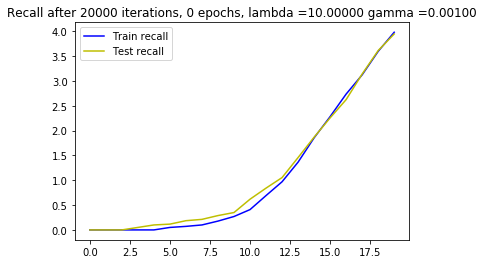

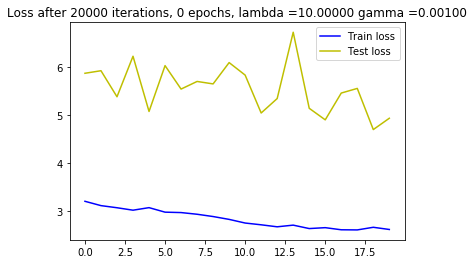

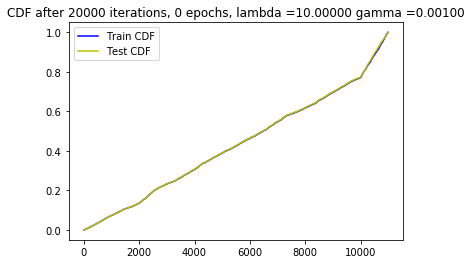






  4%|▍         | 20001/473047 [15:12<878:50:45,  6.98s/it]




  4%|▍         | 20009/473047 [15:12<615:41:04,  4.89s/it]

New score:  0.06412788
Train score:  0.16511284
Test score:  0.2031248
Obj first part:  0.08566872216761112
Obj second part:  -4.176869
Obj first part:  0.348954014480114
Obj second part:  -4.8164787
Obj first part:  0.0
Obj second part:  -1.6449537
Obj first part:  0.0
Obj second part:  -1.0465705
Obj first part:  0.0
Obj second part:  -1.3735331
Obj first part:  1.1316093057394028
Obj second part:  -1.1443024
Obj first part:  0.5167225003242493
Obj second part:  -0.56180316
Obj first part:  1.5955470502376556
Obj second part:  -0.7593437
Obj first part:  1.1448919773101807
Obj second part:  -1.4112856
Obj first part:  0.13076306320726871
Obj second part:  -2.5847392
Obj first part:  0.04626737907528877
Obj second part:  -2.0897253
Obj first part:  0.16733769327402115
Obj second part:  -1.814091
Obj first part:  0.0
Obj second part:  -0.8247553
Obj first part:  0.07366513833403587
Obj second part:  -1.7071329
Obj first part:  0.0
Obj second part:  -2.6571593
Obj first part:  0.2260426






  4%|▍         | 20017/473047 [15:12<431:28:00,  3.43s/it]




  4%|▍         | 20025/473047 [15:12<302:31:25,  2.40s/it]

Obj first part:  0.0
Obj second part:  -1.8180318
Obj first part:  0.0
Obj second part:  -1.9933758
Obj first part:  0.0
Obj second part:  -0.8866223
Obj first part:  0.0
Obj second part:  -0.1450155
Obj first part:  0.0
Obj second part:  -1.8653511
Obj first part:  0.0
Obj second part:  -2.3160906
Obj first part:  5.783774256706238
Obj second part:  -1.6163594
Obj first part:  6.824142932891846
Obj second part:  -1.9964585
Obj first part:  1.700243502855301
Obj second part:  -1.1237237
Obj first part:  1.3044340908527374
Obj second part:  -3.9743755
Obj first part:  0.0
Obj second part:  -1.6066761
Obj first part:  1.4526504278182983
Obj second part:  -1.9722754
Obj first part:  0.0
Obj second part:  -2.4175003
Obj first part:  0.440184511244297
Obj second part:  -1.3584559
Obj first part:  3.341117799282074
Obj second part:  -1.2745262
Obj first part:  0.5837768316268921
Obj second part:  -2.8917117







  4%|▍         | 20033/473047 [15:13<212:15:44,  1.69s/it]




  4%|▍         | 20041/473047 [15:13<149:04:20,  1.18s/it]

Obj first part:  0.03990984056144953
Obj second part:  -2.3094053
Obj first part:  0.0
Obj second part:  -1.279722
Obj first part:  0.6930242478847504
Obj second part:  -0.60928994
Obj first part:  0.0
Obj second part:  -0.9108636
Obj first part:  0.14972849749028683
Obj second part:  -0.2582226
Obj first part:  4.346517324447632
Obj second part:  -2.431591
Obj first part:  0.0
Obj second part:  -1.0634356
Obj first part:  0.0
Obj second part:  -0.5687009
Obj first part:  0.9690848737955093
Obj second part:  -1.1173887
Obj first part:  0.0
Obj second part:  -0.85289466
Obj first part:  0.0
Obj second part:  -0.7663773
Obj first part:  0.6709162890911102
Obj second part:  -2.4258773
Obj first part:  0.3016222082078457
Obj second part:  -1.6555349
Obj first part:  0.0
Obj second part:  -0.24920161
Obj first part:  2.4761851131916046
Obj second part:  -2.8816533
Obj first part:  0.43998483568429947
Obj second part:  -3.1801658







  4%|▍         | 20049/473047 [15:13<104:50:57,  1.20it/s]




  4%|▍         | 20057/473047 [15:13<73:52:59,  1.70it/s] 

Obj first part:  2.569604516029358
Obj second part:  -1.4994503
Obj first part:  0.7705515623092651
Obj second part:  -2.5038126
Obj first part:  0.0
Obj second part:  -3.553801
Obj first part:  0.0
Obj second part:  -1.1208534
Obj first part:  0.5291404202580452
Obj second part:  -0.88808554
Obj first part:  0.0
Obj second part:  -1.2012753
Obj first part:  0.5217798054218292
Obj second part:  -1.0801451
Obj first part:  5.992668271064758
Obj second part:  -0.13615477
Obj first part:  3.097197115421295
Obj second part:  -2.5644872
Obj first part:  0.4852897673845291
Obj second part:  -1.6117144
Obj first part:  0.14440055936574936
Obj second part:  -1.5820028
Obj first part:  0.0
Obj second part:  -3.6287487
Obj first part:  0.0
Obj second part:  -1.8155267
Obj first part:  0.0
Obj second part:  -1.8189133
Obj first part:  0.3734450787305832
Obj second part:  -1.9204631
Obj first part:  0.0
Obj second part:  -1.3853664







  4%|▍         | 20065/473047 [15:13<52:12:46,  2.41it/s]




  4%|▍         | 20073/473047 [15:13<37:02:06,  3.40it/s]

Obj first part:  4.077003598213196
Obj second part:  -1.3188822
Obj first part:  0.0
Obj second part:  -1.823666
Obj first part:  0.09898902848362923
Obj second part:  -0.30661204
Obj first part:  0.0
Obj second part:  -4.4516907
Obj first part:  0.0
Obj second part:  -0.986877
Obj first part:  0.0
Obj second part:  -2.2592714
Obj first part:  3.747992515563965
Obj second part:  -1.7534387
Obj first part:  1.7340171337127686
Obj second part:  -0.89616525
Obj first part:  0.0
Obj second part:  -0.77625585
Obj first part:  1.2648192048072815
Obj second part:  -2.8611634
Obj first part:  0.0
Obj second part:  -1.3003789
Obj first part:  0.33907778561115265
Obj second part:  -1.0234358
Obj first part:  0.0
Obj second part:  -2.199789
Obj first part:  0.0
Obj second part:  -1.5292755
Obj first part:  1.5060880780220032
Obj second part:  -0.19654171
Obj first part:  0.0
Obj second part:  -0.79979396







  4%|▍         | 20081/473047 [15:13<26:25:11,  4.76it/s]




  4%|▍         | 20089/473047 [15:13<18:58:50,  6.63it/s]

Obj first part:  0.0
Obj second part:  -1.2586864
Obj first part:  0.0
Obj second part:  -0.8891739
Obj first part:  0.0
Obj second part:  -4.4723225
Obj first part:  0.0
Obj second part:  -1.9811659
Obj first part:  0.0
Obj second part:  -0.16515113
Obj first part:  2.087794244289398
Obj second part:  -3.62426
Obj first part:  0.0
Obj second part:  -1.0482837
Obj first part:  0.0
Obj second part:  -2.0788717
Obj first part:  0.0
Obj second part:  -2.330638
Obj first part:  0.0
Obj second part:  -1.7749909
Obj first part:  2.503095865249634
Obj second part:  -1.2574861
Obj first part:  0.0
Obj second part:  -2.139147
Obj first part:  0.0
Obj second part:  -2.6463156
Obj first part:  0.8008891344070435
Obj second part:  -0.45075506
Obj first part:  0.7751157134771347
Obj second part:  -1.2099983
Obj first part:  1.6871081292629242
Obj second part:  -0.6883725







  4%|▍         | 20097/473047 [15:13<13:46:36,  9.13it/s]




  4%|▍         | 20105/473047 [15:13<10:07:50, 12.42it/s]

Obj first part:  0.0
Obj second part:  -1.2721251
Obj first part:  0.0
Obj second part:  -2.46443
Obj first part:  0.0
Obj second part:  -1.1395642
Obj first part:  0.0
Obj second part:  -0.90956634
Obj first part:  0.0
Obj second part:  -1.5435609
Obj first part:  0.659964457154274
Obj second part:  -3.3432288
Obj first part:  0.0
Obj second part:  -1.1513095
Obj first part:  0.0
Obj second part:  -0.59021086
Obj first part:  0.23747919127345085
Obj second part:  -1.0007619
Obj first part:  0.0
Obj second part:  -1.3318281
Obj first part:  0.0
Obj second part:  -1.8812013
Obj first part:  0.0
Obj second part:  -0.9119394
Obj first part:  0.0
Obj second part:  -2.0586998
Obj first part:  0.0
Obj second part:  -2.2165675
Obj first part:  0.0
Obj second part:  -0.075997025
Obj first part:  13.782055377960205
Obj second part:  -1.5797131







  4%|▍         | 20113/473047 [15:14<7:35:24, 16.58it/s] 




  4%|▍         | 20121/473047 [15:14<5:48:11, 21.68it/s]

Obj first part:  0.466017946600914
Obj second part:  -1.4014034
Obj first part:  4.556767642498016
Obj second part:  -2.2832985
Obj first part:  0.0
Obj second part:  -0.41404146
Obj first part:  0.5748648941516876
Obj second part:  -0.13309151
Obj first part:  0.0
Obj second part:  -0.9077197
Obj first part:  0.6522833555936813
Obj second part:  -0.89585114
Obj first part:  5.16386091709137
Obj second part:  -0.3760782
Obj first part:  3.0992624163627625
Obj second part:  -1.2554634
Obj first part:  1.2234189361333847
Obj second part:  -0.4518215
Obj first part:  1.2270969897508621
Obj second part:  -2.0232065
Obj first part:  2.9474344849586487
Obj second part:  -0.97143316
Obj first part:  0.0
Obj second part:  -2.5547063
Obj first part:  2.6466628909111023
Obj second part:  -1.3035549
Obj first part:  0.2708096615970135
Obj second part:  -0.3505217
Obj first part:  0.0
Obj second part:  -1.6281296
Obj first part:  6.432014107704163
Obj second part:  -3.338281







  4%|▍         | 20129/473047 [15:14<4:33:20, 27.62it/s]




  4%|▍         | 20137/473047 [15:14<3:41:36, 34.06it/s]

Obj first part:  0.0
Obj second part:  -2.0646288
Obj first part:  0.3958996757864952
Obj second part:  -3.3811486
Obj first part:  0.0
Obj second part:  -0.54376096
Obj first part:  0.06735208909958601
Obj second part:  -1.4401706
Obj first part:  0.0
Obj second part:  -1.9723119
Obj first part:  0.0
Obj second part:  -0.512963
Obj first part:  0.0
Obj second part:  -2.9120226
Obj first part:  0.504089966416359
Obj second part:  -2.3761272
Obj first part:  0.0
Obj second part:  -1.1281389
Obj first part:  0.0
Obj second part:  -2.441633
Obj first part:  0.0
Obj second part:  -0.3376805
Obj first part:  0.0
Obj second part:  -1.2138721
Obj first part:  0.4335435852408409
Obj second part:  -3.4702463
Obj first part:  0.0
Obj second part:  -0.33959883
Obj first part:  3.021908700466156
Obj second part:  -1.7085925
Obj first part:  0.0
Obj second part:  -2.7394524







  4%|▍         | 20145/473047 [15:14<3:04:43, 40.86it/s]




  4%|▍         | 20153/473047 [15:14<2:38:40, 47.57it/s]

Obj first part:  0.0
Obj second part:  -1.1517057
Obj first part:  2.603793740272522
Obj second part:  -0.21818274
Obj first part:  0.0
Obj second part:  -2.6071832
Obj first part:  0.0
Obj second part:  -0.635889
Obj first part:  0.0
Obj second part:  -1.5182362
Obj first part:  0.836876630783081
Obj second part:  -1.7336307
Obj first part:  0.8897071331739426
Obj second part:  -1.1284016
Obj first part:  0.0
Obj second part:  -0.46194154
Obj first part:  0.0
Obj second part:  -4.5853233
Obj first part:  6.150762438774109
Obj second part:  -2.168156
Obj first part:  0.2182452194392681
Obj second part:  -0.15307382
Obj first part:  0.0
Obj second part:  -0.9236663
Obj first part:  2.6774075627326965
Obj second part:  -0.96477294
Obj first part:  0.8007734268903732
Obj second part:  -1.1080235
Obj first part:  0.3859282284975052
Obj second part:  -1.78094
Obj first part:  0.0
Obj second part:  -3.233847







  4%|▍         | 20161/473047 [15:14<2:20:38, 53.67it/s]




  4%|▍         | 20169/473047 [15:14<2:07:40, 59.12it/s]

Obj first part:  0.0
Obj second part:  -0.3503947
Obj first part:  4.627876877784729
Obj second part:  -0.5890143
Obj first part:  0.0
Obj second part:  -0.8060088
Obj first part:  0.0
Obj second part:  -2.140626
Obj first part:  0.44157620519399643
Obj second part:  -0.6274414
Obj first part:  0.0
Obj second part:  -1.577392
Obj first part:  0.2890901453793049
Obj second part:  -2.657548
Obj first part:  0.5462198704481125
Obj second part:  -1.684647
Obj first part:  0.15033778734505177
Obj second part:  -1.0501666
Obj first part:  0.0
Obj second part:  -0.21920355
Obj first part:  0.0
Obj second part:  -0.47257766
Obj first part:  0.0
Obj second part:  -0.9094446
Obj first part:  0.0
Obj second part:  -0.15175474
Obj first part:  0.9288057684898376
Obj second part:  -1.4850144
Obj first part:  3.317234218120575
Obj second part:  -0.19917671
Obj first part:  0.0
Obj second part:  -2.9641244







  4%|▍         | 20177/473047 [15:14<1:58:36, 63.64it/s]




  4%|▍         | 20185/473047 [15:15<1:52:46, 66.93it/s]

Obj first part:  0.0
Obj second part:  -0.75464004
Obj first part:  0.0
Obj second part:  -0.8047594
Obj first part:  0.4673910513520241
Obj second part:  -1.5636173
Obj first part:  1.6270843148231506
Obj second part:  -2.3352807
Obj first part:  2.3735107481479645
Obj second part:  -0.28075904
Obj first part:  0.5086816102266312
Obj second part:  -1.6497191
Obj first part:  0.47950923442840576
Obj second part:  -2.38246
Obj first part:  5.678916573524475
Obj second part:  -1.8723142
Obj first part:  0.0
Obj second part:  -1.1296996
Obj first part:  0.506630539894104
Obj second part:  -2.519195
Obj first part:  1.0225297510623932
Obj second part:  -1.4714644
Obj first part:  0.0
Obj second part:  -0.6369349
Obj first part:  1.0173006355762482
Obj second part:  -6.245954
Obj first part:  0.0
Obj second part:  -2.3323524
Obj first part:  0.09695860557258129
Obj second part:  -0.77337885
Obj first part:  0.0
Obj second part:  -2.4153738







  4%|▍         | 20193/473047 [15:15<1:48:34, 69.52it/s]




  4%|▍         | 20201/473047 [15:15<1:45:21, 71.63it/s]

Obj first part:  1.0654744505882263
Obj second part:  -0.96705526
Obj first part:  0.0
Obj second part:  -3.3845005
Obj first part:  0.0
Obj second part:  -4.43555
Obj first part:  0.0
Obj second part:  -0.9922699
Obj first part:  0.0
Obj second part:  -0.50913364
Obj first part:  0.0
Obj second part:  -1.9960809
Obj first part:  0.5118613317608833
Obj second part:  -2.564428
Obj first part:  0.0
Obj second part:  -2.349904
Obj first part:  0.0539160892367363
Obj second part:  -1.5583391
Obj first part:  0.0
Obj second part:  -1.3051455
Obj first part:  0.1531604304909706
Obj second part:  -0.4524649
Obj first part:  0.0
Obj second part:  -0.7107931
Obj first part:  0.0
Obj second part:  -0.34017047
Obj first part:  0.0
Obj second part:  -1.1353947
Obj first part:  0.8581993728876114
Obj second part:  -3.4275217
Obj first part:  0.0
Obj second part:  -2.816994







  4%|▍         | 20209/473047 [15:15<1:43:31, 72.90it/s]




  4%|▍         | 20217/473047 [15:15<1:41:58, 74.01it/s]

Obj first part:  0.0
Obj second part:  -0.5522211
Obj first part:  2.3072339594364166
Obj second part:  -1.6713121
Obj first part:  0.0
Obj second part:  -1.3453182
Obj first part:  0.0
Obj second part:  -0.40710095
Obj first part:  9.303566217422485
Obj second part:  -0.9868841
Obj first part:  0.0
Obj second part:  -0.33284098
Obj first part:  0.0
Obj second part:  -1.7294018
Obj first part:  0.0
Obj second part:  -0.7234711
Obj first part:  8.948224782943726
Obj second part:  -1.2111919
Obj first part:  0.0
Obj second part:  -2.3839676
Obj first part:  0.0
Obj second part:  -3.9729111
Obj first part:  0.5802786350250244
Obj second part:  -2.354516
Obj first part:  0.0
Obj second part:  -2.7917101
Obj first part:  2.8173062205314636
Obj second part:  -0.5462423
Obj first part:  1.3777931034564972
Obj second part:  -0.6948702
Obj first part:  0.6661909073591232
Obj second part:  -1.0975535







  4%|▍         | 20225/473047 [15:15<1:40:51, 74.83it/s]




  4%|▍         | 20233/473047 [15:15<1:40:21, 75.20it/s]

Obj first part:  1.5748022496700287
Obj second part:  -0.9070179
Obj first part:  0.0
Obj second part:  -1.2931018
Obj first part:  0.13508642092347145
Obj second part:  -1.5180931
Obj first part:  0.0
Obj second part:  -4.303189
Obj first part:  0.0
Obj second part:  -1.8165326
Obj first part:  0.0
Obj second part:  -0.1011196
Obj first part:  0.0
Obj second part:  -1.3212854
Obj first part:  0.0
Obj second part:  -1.2470179
Obj first part:  4.025453627109528
Obj second part:  -1.651809
Obj first part:  0.0
Obj second part:  -0.38072637
Obj first part:  2.1348005533218384
Obj second part:  -2.4447072
Obj first part:  2.3295877873897552
Obj second part:  -1.7816842
Obj first part:  0.0
Obj second part:  -1.2596686
Obj first part:  0.0
Obj second part:  -4.0222015
Obj first part:  0.0
Obj second part:  -1.6967285
Obj first part:  0.0
Obj second part:  -1.0655086







  4%|▍         | 20241/473047 [15:15<1:39:49, 75.60it/s]




  4%|▍         | 20249/473047 [15:15<1:39:17, 76.01it/s]

Obj first part:  0.8306297659873962
Obj second part:  -2.8853161
Obj first part:  0.0
Obj second part:  -1.5978712
Obj first part:  0.0
Obj second part:  -1.1070305
Obj first part:  11.766878366470337
Obj second part:  -1.879783
Obj first part:  0.5891714990139008
Obj second part:  -0.13330819
Obj first part:  5.680695176124573
Obj second part:  -0.70597094
Obj first part:  0.0
Obj second part:  -0.91306335
Obj first part:  0.5321948602795601
Obj second part:  -0.19925222
Obj first part:  0.6574992835521698
Obj second part:  -0.76417625
Obj first part:  0.0
Obj second part:  -1.7604432
Obj first part:  0.0
Obj second part:  -2.114605
Obj first part:  0.2819356881082058
Obj second part:  -1.2362568
Obj first part:  0.0
Obj second part:  -0.92271554
Obj first part:  2.03535333275795
Obj second part:  -0.5389826
Obj first part:  0.0
Obj second part:  -1.491922
Obj first part:  0.0
Obj second part:  -1.9030604







  4%|▍         | 20257/473047 [15:15<1:39:02, 76.20it/s]




  4%|▍         | 20265/473047 [15:16<1:38:48, 76.38it/s]

Obj first part:  1.1124639213085175
Obj second part:  -0.92824054
Obj first part:  9.922410249710083
Obj second part:  -1.2901537
Obj first part:  0.0
Obj second part:  -1.1760213
Obj first part:  0.0
Obj second part:  -0.860403
Obj first part:  0.08846553973853588
Obj second part:  -0.9088002
Obj first part:  0.0
Obj second part:  -0.8596467
Obj first part:  0.0
Obj second part:  -1.2363149
Obj first part:  3.5868099331855774
Obj second part:  -0.37698612
Obj first part:  0.0
Obj second part:  -0.7191746
Obj first part:  0.25740446522831917
Obj second part:  -2.6509883
Obj first part:  0.0
Obj second part:  -1.1567605
Obj first part:  0.0
Obj second part:  -1.608573
Obj first part:  0.0
Obj second part:  -0.5010299
Obj first part:  0.15898948535323143
Obj second part:  -1.5589784
Obj first part:  2.0279696583747864
Obj second part:  -0.69125664
Obj first part:  0.0
Obj second part:  -0.75219214







  4%|▍         | 20273/473047 [15:16<1:38:55, 76.28it/s]




  4%|▍         | 20281/473047 [15:16<1:38:51, 76.34it/s]

Obj first part:  0.0
Obj second part:  -2.3265574
Obj first part:  0.0
Obj second part:  -1.7474558
Obj first part:  5.704022645950317
Obj second part:  -0.56563306
Obj first part:  0.0
Obj second part:  -1.2715912
Obj first part:  0.4158586263656616
Obj second part:  -1.8388293
Obj first part:  0.0
Obj second part:  -4.1753573
Obj first part:  0.4547327011823654
Obj second part:  -1.6652839
Obj first part:  0.0
Obj second part:  -2.151533
Obj first part:  0.0
Obj second part:  -1.962708
Obj first part:  2.8433114290237427
Obj second part:  -2.450712
Obj first part:  0.4838845506310463
Obj second part:  -1.2742329
Obj first part:  1.3890214264392853
Obj second part:  -0.8534504
Obj first part:  1.9750094413757324
Obj second part:  -1.1768248
Obj first part:  0.0
Obj second part:  -3.1563048
Obj first part:  2.563190758228302
Obj second part:  -0.79276377
Obj first part:  0.0
Obj second part:  -2.0180569







  4%|▍         | 20289/473047 [15:16<1:39:08, 76.11it/s]




  4%|▍         | 20297/473047 [15:16<1:38:48, 76.37it/s]

Obj first part:  0.0
Obj second part:  -3.038289
Obj first part:  0.0
Obj second part:  -0.57262343
Obj first part:  0.0
Obj second part:  -2.5039382
Obj first part:  0.0
Obj second part:  -0.52350175
Obj first part:  0.0
Obj second part:  -0.78870803
Obj first part:  0.6475058197975159
Obj second part:  -1.4568921
Obj first part:  0.0
Obj second part:  -0.97813636
Obj first part:  0.0
Obj second part:  -1.1651415
Obj first part:  0.4163961857557297
Obj second part:  -2.390463
Obj first part:  0.0
Obj second part:  -1.4910991
Obj first part:  0.4818722978234291
Obj second part:  -0.09260551
Obj first part:  4.071757197380066
Obj second part:  -0.59335977
Obj first part:  0.4775988310575485
Obj second part:  -1.410754
Obj first part:  0.0
Obj second part:  -1.1801692
Obj first part:  0.0
Obj second part:  -2.5220404
Obj first part:  1.85865119099617
Obj second part:  -0.1592537







  4%|▍         | 20305/473047 [15:16<1:38:34, 76.55it/s]




  4%|▍         | 20313/473047 [15:16<1:38:10, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.24504586
Obj first part:  0.0
Obj second part:  -0.30686316
Obj first part:  1.6940638422966003
Obj second part:  -0.9492432
Obj first part:  0.0
Obj second part:  -2.3333907
Obj first part:  0.0
Obj second part:  -0.5155221
Obj first part:  0.4638512060046196
Obj second part:  -1.9617945
Obj first part:  2.3591215908527374
Obj second part:  -0.3677233
Obj first part:  0.0
Obj second part:  -0.36203584
Obj first part:  0.38392312824726105
Obj second part:  -2.3816183
Obj first part:  0.0
Obj second part:  -0.81759083
Obj first part:  1.2081500142812729
Obj second part:  -3.449748
Obj first part:  0.29930366203188896
Obj second part:  -1.7313197
Obj first part:  0.34997496753931046
Obj second part:  -0.41705558
Obj first part:  1.146593615412712
Obj second part:  -3.643439
Obj first part:  0.0
Obj second part:  -0.1610901
Obj first part:  0.6451782584190369
Obj second part:  -2.549488







  4%|▍         | 20321/473047 [15:16<1:38:09, 76.87it/s]




  4%|▍         | 20329/473047 [15:16<1:38:24, 76.67it/s]

Obj first part:  0.0
Obj second part:  -0.52244246
Obj first part:  0.0
Obj second part:  -0.73865545
Obj first part:  0.0
Obj second part:  -0.5826692
Obj first part:  3.2305800914764404
Obj second part:  -0.16112505
Obj first part:  0.21353188902139664
Obj second part:  -2.4482453
Obj first part:  5.788490176200867
Obj second part:  -0.4613582
Obj first part:  3.296058773994446
Obj second part:  -4.3570127
Obj first part:  2.261238843202591
Obj second part:  -0.7402457
Obj first part:  0.0
Obj second part:  -1.7190263
Obj first part:  0.9095678478479385
Obj second part:  -1.8338621
Obj first part:  0.0
Obj second part:  -1.1088631
Obj first part:  0.9078337252140045
Obj second part:  -1.889954
Obj first part:  0.0
Obj second part:  -2.4594424
Obj first part:  0.0
Obj second part:  -1.6393867
Obj first part:  0.0
Obj second part:  -3.5061033
Obj first part:  0.0
Obj second part:  -1.8402038







  4%|▍         | 20337/473047 [15:17<1:38:09, 76.87it/s]




  4%|▍         | 20345/473047 [15:17<1:38:12, 76.82it/s]

Obj first part:  3.513559401035309
Obj second part:  -1.0636133
Obj first part:  0.7863479852676392
Obj second part:  -1.2858866
Obj first part:  0.0
Obj second part:  -0.10111941
Obj first part:  1.951163411140442
Obj second part:  -2.8657608
Obj first part:  0.6206303089857101
Obj second part:  -3.0998356
Obj first part:  0.0
Obj second part:  -1.8988619
Obj first part:  0.0
Obj second part:  -0.09451562
Obj first part:  0.0
Obj second part:  -1.2543019
Obj first part:  3.7346094846725464
Obj second part:  -4.378495
Obj first part:  0.2588621713221073
Obj second part:  -2.0636792
Obj first part:  2.90707528591156
Obj second part:  -0.7442478
Obj first part:  9.899789094924927
Obj second part:  -1.8864238
Obj first part:  0.0
Obj second part:  -4.8370667
Obj first part:  0.7651441544294357
Obj second part:  -3.7070785
Obj first part:  2.5304338335990906
Obj second part:  -1.2830993
Obj first part:  0.23076673969626427
Obj second part:  -0.6121083







  4%|▍         | 20353/473047 [15:17<1:38:14, 76.80it/s]




  4%|▍         | 20361/473047 [15:17<1:37:54, 77.05it/s]

Obj first part:  0.32266151160001755
Obj second part:  -0.15956184
Obj first part:  5.048315525054932
Obj second part:  -2.3038285
Obj first part:  0.964646115899086
Obj second part:  -3.3247628
Obj first part:  0.09654627181589603
Obj second part:  -2.5180383
Obj first part:  0.0
Obj second part:  -2.2230883
Obj first part:  0.0
Obj second part:  -1.2593899
Obj first part:  0.0
Obj second part:  -0.89139915
Obj first part:  2.200285941362381
Obj second part:  -3.1109512
Obj first part:  0.0
Obj second part:  -2.6072145
Obj first part:  0.6960532069206238
Obj second part:  -3.5612302
Obj first part:  1.3901318609714508
Obj second part:  -1.0709329
Obj first part:  0.0
Obj second part:  -1.2667615
Obj first part:  0.0
Obj second part:  -0.24137565
Obj first part:  0.0
Obj second part:  -1.7144058
Obj first part:  0.15054217539727688
Obj second part:  -3.2746794
Obj first part:  0.0
Obj second part:  -1.0457408







  4%|▍         | 20369/473047 [15:17<1:38:09, 76.86it/s]




  4%|▍         | 20377/473047 [15:17<1:37:50, 77.11it/s]

Obj first part:  0.0
Obj second part:  -1.992944
Obj first part:  0.0
Obj second part:  -1.1399981
Obj first part:  9.993948936462402
Obj second part:  -2.8645008
Obj first part:  0.0
Obj second part:  -1.7487028
Obj first part:  2.7746573090553284
Obj second part:  -4.8531857
Obj first part:  0.6324107199907303
Obj second part:  -0.568544
Obj first part:  0.5827077850699425
Obj second part:  -2.3997288
Obj first part:  3.3981242775917053
Obj second part:  -1.0991381
Obj first part:  0.458633229136467
Obj second part:  -2.6113515
Obj first part:  0.820155069231987
Obj second part:  -2.5059462
Obj first part:  0.0
Obj second part:  -2.4408343
Obj first part:  0.23079348728060722
Obj second part:  -3.3406196
Obj first part:  0.0
Obj second part:  -1.8332152
Obj first part:  0.0
Obj second part:  -3.2888696
Obj first part:  3.1159889698028564
Obj second part:  -0.97813976
Obj first part:  0.5302474647760391
Obj second part:  -0.17272867







  4%|▍         | 20385/473047 [15:17<1:38:12, 76.82it/s]




  4%|▍         | 20393/473047 [15:17<1:38:11, 76.84it/s]

Obj first part:  0.3831186518073082
Obj second part:  -1.3140272
Obj first part:  1.4617107808589935
Obj second part:  -1.2376231
Obj first part:  0.0
Obj second part:  -1.8380274
Obj first part:  0.29075147584080696
Obj second part:  -4.2596846
Obj first part:  0.0
Obj second part:  -0.57998294
Obj first part:  0.5381770431995392
Obj second part:  -0.24931395
Obj first part:  0.0
Obj second part:  -0.6904926
Obj first part:  0.0
Obj second part:  -1.8780107
Obj first part:  2.890235483646393
Obj second part:  -1.058127
Obj first part:  3.349843919277191
Obj second part:  -3.4348748
Obj first part:  0.16859626397490501
Obj second part:  -1.9099761
Obj first part:  1.7704343795776367
Obj second part:  -3.173881
Obj first part:  0.0
Obj second part:  -3.0280335
Obj first part:  0.09067023172974586
Obj second part:  -1.0760562
Obj first part:  0.7543043047189713
Obj second part:  -3.5417674
Obj first part:  2.617526650428772
Obj second part:  -3.622205







  4%|▍         | 20401/473047 [15:17<1:38:11, 76.83it/s]




  4%|▍         | 20409/473047 [15:17<1:38:03, 76.94it/s]

Obj first part:  0.23325130343437195
Obj second part:  -2.0658212
Obj first part:  0.0
Obj second part:  -2.416668
Obj first part:  0.0
Obj second part:  -0.17844014
Obj first part:  0.752391591668129
Obj second part:  -2.5122745
Obj first part:  0.0
Obj second part:  -3.3828962
Obj first part:  0.0
Obj second part:  -0.75068456
Obj first part:  0.0
Obj second part:  -2.4141338
Obj first part:  0.41884005069732666
Obj second part:  -3.0083241
Obj first part:  0.10936593636870384
Obj second part:  -1.432829
Obj first part:  1.106070801615715
Obj second part:  -2.1256487
Obj first part:  0.194231066852808
Obj second part:  -2.9875944
Obj first part:  0.0
Obj second part:  -2.7713192
Obj first part:  2.2346390783786774
Obj second part:  -0.2986785
Obj first part:  0.0
Obj second part:  -1.8235445
Obj first part:  0.0
Obj second part:  -0.35680884
Obj first part:  0.0
Obj second part:  -0.33097753







  4%|▍         | 20417/473047 [15:18<1:38:29, 76.59it/s]




  4%|▍         | 20425/473047 [15:18<1:38:25, 76.65it/s]

Obj first part:  0.0
Obj second part:  -0.22231321
Obj first part:  0.0
Obj second part:  -1.1253048
Obj first part:  0.0
Obj second part:  -2.2929425
Obj first part:  0.0
Obj second part:  -0.82686627
Obj first part:  0.0
Obj second part:  -3.5694244
Obj first part:  0.0
Obj second part:  -1.9769874
Obj first part:  0.0
Obj second part:  -1.6725974
Obj first part:  4.011788070201874
Obj second part:  -0.38963115
Obj first part:  0.23119481280446053
Obj second part:  -1.2190508
Obj first part:  0.0
Obj second part:  -1.3025645
Obj first part:  11.542938947677612
Obj second part:  -0.45734292
Obj first part:  0.0
Obj second part:  -1.8883946
Obj first part:  1.3211911916732788
Obj second part:  -0.5147712
Obj first part:  0.0
Obj second part:  -0.6770956
Obj first part:  0.25797123089432716
Obj second part:  -1.7705272
Obj first part:  1.2608833611011505
Obj second part:  -0.41694397







  4%|▍         | 20433/473047 [15:18<1:38:55, 76.26it/s]




  4%|▍         | 20441/473047 [15:18<1:38:26, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.62077314
Obj first part:  6.950898766517639
Obj second part:  -1.1178931
Obj first part:  5.806148052215576
Obj second part:  -3.397966
Obj first part:  0.0
Obj second part:  -1.5683272
Obj first part:  0.22503186017274857
Obj second part:  -0.69635236
Obj first part:  0.0
Obj second part:  -3.2730272
Obj first part:  0.7895129919052124
Obj second part:  -0.9450655
Obj first part:  0.0
Obj second part:  -2.014177
Obj first part:  0.4830290749669075
Obj second part:  -0.90565234
Obj first part:  0.0
Obj second part:  -2.8446183
Obj first part:  1.0174960643053055
Obj second part:  -1.2699212
Obj first part:  3.836893141269684
Obj second part:  -1.6499367
Obj first part:  0.29209673404693604
Obj second part:  -3.045293
Obj first part:  0.676601231098175
Obj second part:  -2.496172
Obj first part:  1.1800900846719742
Obj second part:  -2.2910464
Obj first part:  0.42183149605989456
Obj second part:  -2.8465443







  4%|▍         | 20449/473047 [15:18<1:38:45, 76.39it/s]




  4%|▍         | 20457/473047 [15:18<1:38:20, 76.71it/s]

Obj first part:  0.9575574845075607
Obj second part:  -2.98
Obj first part:  0.0
Obj second part:  -1.1597755
Obj first part:  0.0
Obj second part:  -4.138189
Obj first part:  1.0472506284713745
Obj second part:  -3.3559659
Obj first part:  0.0
Obj second part:  -0.33226427
Obj first part:  0.7565758377313614
Obj second part:  -4.043186
Obj first part:  0.0
Obj second part:  -0.14701447
Obj first part:  0.0
Obj second part:  -1.575641
Obj first part:  0.0
Obj second part:  -0.54734606
Obj first part:  0.662543997168541
Obj second part:  -1.8486024
Obj first part:  0.0
Obj second part:  -2.0277882
Obj first part:  0.8175375312566757
Obj second part:  -2.4201941
Obj first part:  1.6348087787628174
Obj second part:  -2.1800208
Obj first part:  0.0
Obj second part:  -2.368801
Obj first part:  0.0
Obj second part:  -2.3828268
Obj first part:  6.6704487800598145
Obj second part:  -2.7798965







  4%|▍         | 20465/473047 [15:18<1:38:16, 76.75it/s]




  4%|▍         | 20473/473047 [15:18<1:37:58, 76.99it/s]

Obj first part:  0.0
Obj second part:  -2.4612162
Obj first part:  0.17049159854650497
Obj second part:  -0.69868743
Obj first part:  2.534552216529846
Obj second part:  -2.0945947
Obj first part:  0.9229134768247604
Obj second part:  -3.9926393
Obj first part:  7.849532961845398
Obj second part:  -1.0288231
Obj first part:  6.9998931884765625
Obj second part:  -2.4347577
Obj first part:  0.0
Obj second part:  -2.3320026
Obj first part:  0.5115572363138199
Obj second part:  -2.9781532
Obj first part:  0.0
Obj second part:  -1.942141
Obj first part:  0.0
Obj second part:  -2.3323827
Obj first part:  2.4840599298477173
Obj second part:  -1.6479775
Obj first part:  0.0
Obj second part:  -4.1295266
Obj first part:  0.5239482596516609
Obj second part:  -1.4818785
Obj first part:  0.0
Obj second part:  -2.7637477
Obj first part:  7.903738021850586
Obj second part:  -2.0318322
Obj first part:  2.8162002563476562
Obj second part:  -2.4573975







  4%|▍         | 20481/473047 [15:18<1:38:14, 76.78it/s]




  4%|▍         | 20489/473047 [15:18<1:38:00, 76.96it/s]

Obj first part:  0.0
Obj second part:  -3.889896
Obj first part:  0.1055554673075676
Obj second part:  -0.5689578
Obj first part:  0.0
Obj second part:  -3.0711768
Obj first part:  0.0
Obj second part:  -1.0901877
Obj first part:  1.327783316373825
Obj second part:  -0.31633973
Obj first part:  0.0
Obj second part:  -3.662574
Obj first part:  0.23383980616927147
Obj second part:  -1.8779815
Obj first part:  1.7325705289840698
Obj second part:  -1.0497139
Obj first part:  0.0
Obj second part:  -3.8545492
Obj first part:  0.6366788595914841
Obj second part:  -1.3895724
Obj first part:  0.0
Obj second part:  -1.4752493
Obj first part:  1.281198263168335
Obj second part:  -1.7928795
Obj first part:  0.10131247341632843
Obj second part:  -0.5743473
Obj first part:  0.0
Obj second part:  -1.8071271
Obj first part:  2.0768390595912933
Obj second part:  -2.75599
Obj first part:  0.5867182835936546
Obj second part:  -2.066395







  4%|▍         | 20497/473047 [15:19<1:38:33, 76.53it/s]




  4%|▍         | 20505/473047 [15:19<1:38:29, 76.58it/s]

Obj first part:  0.0
Obj second part:  -1.180259
Obj first part:  0.0
Obj second part:  -2.7591047
Obj first part:  0.0
Obj second part:  -1.1960077
Obj first part:  0.5375195294618607
Obj second part:  -2.4729538
Obj first part:  0.6490316987037659
Obj second part:  -1.170497
Obj first part:  2.5925490260124207
Obj second part:  -1.2820154
Obj first part:  0.0
Obj second part:  -1.4955724
Obj first part:  0.329367071390152
Obj second part:  -1.4745774
Obj first part:  0.0
Obj second part:  -0.7300626
Obj first part:  0.0
Obj second part:  -1.668623
Obj first part:  5.457701683044434
Obj second part:  -1.3204428
Obj first part:  0.0
Obj second part:  -1.0093788
Obj first part:  0.0
Obj second part:  -1.4645903
Obj first part:  1.4152108132839203
Obj second part:  -2.2475994
Obj first part:  0.0
Obj second part:  -0.3779994
Obj first part:  0.6491795182228088
Obj second part:  -3.43289







  4%|▍         | 20513/473047 [15:19<1:38:46, 76.36it/s]




  4%|▍         | 20521/473047 [15:19<1:38:29, 76.58it/s]

Obj first part:  0.0
Obj second part:  -1.7357967
Obj first part:  0.6589088588953018
Obj second part:  -1.9142066
Obj first part:  0.0
Obj second part:  -1.9414191
Obj first part:  1.520339846611023
Obj second part:  -2.0913851
Obj first part:  0.0
Obj second part:  -0.29957104
Obj first part:  0.0
Obj second part:  -2.9275298
Obj first part:  9.603211879730225
Obj second part:  -0.39122033
Obj first part:  0.0
Obj second part:  -1.9681735
Obj first part:  0.0
Obj second part:  -2.1204672
Obj first part:  0.927770808339119
Obj second part:  -1.4274261
Obj first part:  0.19687717780470848
Obj second part:  -1.5680267
Obj first part:  0.0
Obj second part:  -2.57753
Obj first part:  1.2261231988668442
Obj second part:  -1.532925
Obj first part:  1.2244626879692078
Obj second part:  -0.733009
Obj first part:  1.0487204045057297
Obj second part:  -0.55906785
Obj first part:  0.5418573319911957
Obj second part:  -3.307779







  4%|▍         | 20529/473047 [15:19<1:38:51, 76.29it/s]




  4%|▍         | 20537/473047 [15:19<1:38:34, 76.51it/s]

Obj first part:  0.0
Obj second part:  -1.2678616
Obj first part:  3.0605578422546387
Obj second part:  -1.9334732
Obj first part:  0.10371673852205276
Obj second part:  -3.2313519
Obj first part:  0.0
Obj second part:  -2.3206472
Obj first part:  0.0
Obj second part:  -3.7713003
Obj first part:  0.12560994364321232
Obj second part:  -1.8529067
Obj first part:  6.012439727783203
Obj second part:  -3.361524
Obj first part:  0.4553573951125145
Obj second part:  -1.6134207
Obj first part:  0.0
Obj second part:  -3.3051877
Obj first part:  0.0
Obj second part:  -2.4277363
Obj first part:  0.5208345130085945
Obj second part:  -2.3430505
Obj first part:  1.5148603916168213
Obj second part:  -0.94594646
Obj first part:  0.0
Obj second part:  -1.2138007
Obj first part:  2.6049384474754333
Obj second part:  -0.516587
Obj first part:  0.0
Obj second part:  -2.1791503
Obj first part:  0.0
Obj second part:  -2.2544556







  4%|▍         | 20545/473047 [15:19<1:38:27, 76.60it/s]




  4%|▍         | 20553/473047 [15:19<1:38:12, 76.79it/s]

Obj first part:  0.0
Obj second part:  -3.0616379
Obj first part:  1.470961719751358
Obj second part:  -0.8179849
Obj first part:  0.07903476245701313
Obj second part:  -3.6791093
Obj first part:  1.2057283520698547
Obj second part:  -2.5661118
Obj first part:  0.5229928717017174
Obj second part:  -1.158844
Obj first part:  0.0
Obj second part:  -0.46027404
Obj first part:  0.0
Obj second part:  -1.7783283
Obj first part:  1.3572043180465698
Obj second part:  -1.8392494
Obj first part:  0.0
Obj second part:  -1.4520601
Obj first part:  0.0
Obj second part:  -2.8934593
Obj first part:  1.7518563568592072
Obj second part:  -0.33403328
Obj first part:  4.6234214305877686
Obj second part:  -2.9967155
Obj first part:  0.0
Obj second part:  -0.9657175
Obj first part:  0.49699246883392334
Obj second part:  -1.4419216
Obj first part:  1.2508650124073029
Obj second part:  -2.7452137
Obj first part:  0.0
Obj second part:  -2.3485317







  4%|▍         | 20561/473047 [15:19<1:38:06, 76.87it/s]




  4%|▍         | 20569/473047 [15:20<1:38:05, 76.87it/s]

Obj first part:  0.0
Obj second part:  -0.3543851
Obj first part:  0.6369521468877792
Obj second part:  -4.395116
Obj first part:  0.0
Obj second part:  -3.4298813
Obj first part:  0.0
Obj second part:  -2.499219
Obj first part:  0.0
Obj second part:  -0.8134929
Obj first part:  0.0
Obj second part:  -1.9740375
Obj first part:  0.0
Obj second part:  -0.29436585
Obj first part:  2.4831214547157288
Obj second part:  -1.9614956
Obj first part:  1.4905354380607605
Obj second part:  -0.84445167
Obj first part:  0.0
Obj second part:  -2.1661837
Obj first part:  0.1712018996477127
Obj second part:  -0.97238624
Obj first part:  1.9446714222431183
Obj second part:  -3.3628926
Obj first part:  1.5243229269981384
Obj second part:  -0.9129293
Obj first part:  1.896902471780777
Obj second part:  -4.030645
Obj first part:  0.0
Obj second part:  -0.7161838
Obj first part:  0.9055226296186447
Obj second part:  -0.4851185







  4%|▍         | 20577/473047 [15:20<1:38:25, 76.62it/s]




  4%|▍         | 20585/473047 [15:20<1:38:20, 76.69it/s]

Obj first part:  11.467828750610352
Obj second part:  -1.9858216
Obj first part:  0.0
Obj second part:  -0.44194263
Obj first part:  1.871393620967865
Obj second part:  -0.9314345
Obj first part:  0.0
Obj second part:  -1.2529937
Obj first part:  10.482641458511353
Obj second part:  -0.63882667
Obj first part:  0.0
Obj second part:  -2.1254768
Obj first part:  0.0
Obj second part:  -3.493919
Obj first part:  0.0
Obj second part:  -0.6184887
Obj first part:  0.0
Obj second part:  -4.6362066
Obj first part:  0.9022649377584457
Obj second part:  -3.5176013
Obj first part:  1.4443781971931458
Obj second part:  -3.4165676
Obj first part:  0.0
Obj second part:  -0.60625935
Obj first part:  0.2638164907693863
Obj second part:  -2.223999
Obj first part:  0.2582984231412411
Obj second part:  -2.0102637
Obj first part:  0.08906267583370209
Obj second part:  -2.8447723
Obj first part:  0.9229432791471481
Obj second part:  -2.3801146







  4%|▍         | 20593/473047 [15:20<1:38:40, 76.42it/s]




  4%|▍         | 20601/473047 [15:20<1:38:22, 76.65it/s]

Obj first part:  1.4216984808444977
Obj second part:  -2.5051088
Obj first part:  1.656717211008072
Obj second part:  -0.4262101
Obj first part:  0.4051646962761879
Obj second part:  -1.0602652
Obj first part:  0.0
Obj second part:  -0.82726085
Obj first part:  0.0
Obj second part:  -1.363981
Obj first part:  0.0
Obj second part:  -2.434785
Obj first part:  0.0
Obj second part:  -2.7099156
Obj first part:  2.396269738674164
Obj second part:  -1.5771793
Obj first part:  0.0
Obj second part:  -4.28805
Obj first part:  0.0
Obj second part:  -0.44638994
Obj first part:  0.0
Obj second part:  -2.4056416
Obj first part:  0.0
Obj second part:  -1.4398485
Obj first part:  2.4328626692295074
Obj second part:  -0.6800822
Obj first part:  0.0
Obj second part:  -2.687554
Obj first part:  2.306082844734192
Obj second part:  -0.39842445
Obj first part:  0.0
Obj second part:  -2.4608457







  4%|▍         | 20609/473047 [15:20<1:38:45, 76.35it/s]




  4%|▍         | 20617/473047 [15:20<1:38:22, 76.65it/s]

Obj first part:  0.0
Obj second part:  -0.735651
Obj first part:  0.0
Obj second part:  -0.9243987
Obj first part:  0.23169923573732376
Obj second part:  -3.9911456
Obj first part:  0.0
Obj second part:  -0.57723594
Obj first part:  0.0
Obj second part:  -1.0553315
Obj first part:  8.977240324020386
Obj second part:  -3.644433
Obj first part:  0.0
Obj second part:  -2.4746156
Obj first part:  2.7159693837165833
Obj second part:  -0.11179832
Obj first part:  0.48173122107982635
Obj second part:  -2.010487
Obj first part:  9.73481297492981
Obj second part:  -0.22998026
Obj first part:  0.0
Obj second part:  -2.9054935
Obj first part:  0.0
Obj second part:  -2.9351115
Obj first part:  0.0
Obj second part:  -2.1591458
Obj first part:  0.0
Obj second part:  -0.86068356
Obj first part:  0.0
Obj second part:  -4.86672
Obj first part:  0.0
Obj second part:  -1.5067748







  4%|▍         | 20625/473047 [15:20<1:38:33, 76.50it/s]




  4%|▍         | 20633/473047 [15:20<1:38:34, 76.49it/s]

Obj first part:  0.0
Obj second part:  -1.2753297
Obj first part:  1.1486567556858063
Obj second part:  -1.353092
Obj first part:  3.925562798976898
Obj second part:  -1.6462165
Obj first part:  0.11156083084642887
Obj second part:  -1.6874511
Obj first part:  2.082023173570633
Obj second part:  -0.7262925
Obj first part:  1.5922020375728607
Obj second part:  -1.6365366
Obj first part:  1.9010409712791443
Obj second part:  -1.2921616
Obj first part:  0.0
Obj second part:  -3.3879385
Obj first part:  0.0
Obj second part:  -5.2447157
Obj first part:  0.0
Obj second part:  -0.7181321
Obj first part:  0.33678334206342697
Obj second part:  -0.8261109
Obj first part:  0.0
Obj second part:  -2.1045907
Obj first part:  0.014573127264156938
Obj second part:  -1.3799138
Obj first part:  0.0
Obj second part:  -1.6311601
Obj first part:  0.0
Obj second part:  -0.39263478
Obj first part:  0.0
Obj second part:  -3.3882525







  4%|▍         | 20641/473047 [15:20<1:38:55, 76.22it/s]




  4%|▍         | 20649/473047 [15:21<1:38:49, 76.30it/s]

Obj first part:  0.8576991409063339
Obj second part:  -1.8239747
Obj first part:  2.713823914527893
Obj second part:  -1.638499
Obj first part:  0.22767648100852966
Obj second part:  -0.9808518
Obj first part:  0.0
Obj second part:  -0.028675335
Obj first part:  0.0
Obj second part:  -2.6369703
Obj first part:  0.7696032524108887
Obj second part:  -0.30186284
Obj first part:  1.8129892647266388
Obj second part:  -1.8198439
Obj first part:  0.36947306245565414
Obj second part:  -2.3375185
Obj first part:  0.0
Obj second part:  -1.3915306
Obj first part:  0.0
Obj second part:  -3.9144633
Obj first part:  0.0
Obj second part:  -2.9675858
Obj first part:  3.3753812313079834
Obj second part:  -3.205274
Obj first part:  0.0
Obj second part:  -0.17166461
Obj first part:  0.0
Obj second part:  -0.18487795
Obj first part:  0.14722790569067
Obj second part:  -1.1844858
Obj first part:  0.17567647621035576
Obj second part:  -2.7265303







  4%|▍         | 20657/473047 [15:21<1:38:46, 76.34it/s]




  4%|▍         | 20665/473047 [15:21<1:38:26, 76.59it/s]

Obj first part:  0.0
Obj second part:  -0.11682299
Obj first part:  0.06357992067933083
Obj second part:  -1.4178116
Obj first part:  0.0
Obj second part:  -1.097568
Obj first part:  0.0
Obj second part:  -0.63437295
Obj first part:  0.0
Obj second part:  -1.2747835
Obj first part:  2.595016360282898
Obj second part:  -0.5576804
Obj first part:  0.0
Obj second part:  -2.4562967
Obj first part:  1.0817375034093857
Obj second part:  -0.83756083
Obj first part:  0.0
Obj second part:  -0.45805162
Obj first part:  0.0
Obj second part:  -3.4567444
Obj first part:  0.0
Obj second part:  -0.7311147
Obj first part:  0.0
Obj second part:  -3.0680056
Obj first part:  1.5326963365077972
Obj second part:  -0.87832457
Obj first part:  0.244168508797884
Obj second part:  -1.4693562
Obj first part:  13.662078380584717
Obj second part:  -0.70218426
Obj first part:  1.0514431446790695
Obj second part:  -2.600235







  4%|▍         | 20673/473047 [15:21<1:38:15, 76.74it/s]




  4%|▍         | 20681/473047 [15:21<1:37:55, 77.00it/s]

Obj first part:  0.0
Obj second part:  -1.8649071
Obj first part:  0.0
Obj second part:  -4.122202
Obj first part:  0.0
Obj second part:  -1.2612537
Obj first part:  0.0
Obj second part:  -1.2820988
Obj first part:  0.0
Obj second part:  -0.94009477
Obj first part:  0.0
Obj second part:  -0.4543143
Obj first part:  3.734595477581024
Obj second part:  -1.8541205
Obj first part:  0.4626912251114845
Obj second part:  -1.5265657
Obj first part:  0.0
Obj second part:  -1.0548146
Obj first part:  0.8620604127645493
Obj second part:  -1.5747876
Obj first part:  0.640159472823143
Obj second part:  -0.96381927
Obj first part:  0.0
Obj second part:  -1.1340762
Obj first part:  0.0
Obj second part:  -2.1726556
Obj first part:  0.3818117827177048
Obj second part:  -1.6690041
Obj first part:  0.0
Obj second part:  -0.33971277
Obj first part:  3.672668933868408
Obj second part:  -2.586738







  4%|▍         | 20689/473047 [15:21<1:38:16, 76.71it/s]




  4%|▍         | 20697/473047 [15:21<1:37:59, 76.93it/s]

Obj first part:  2.3140279948711395
Obj second part:  -2.3428016
Obj first part:  0.0
Obj second part:  -0.20692635
Obj first part:  1.5847080945968628
Obj second part:  -0.41441587
Obj first part:  0.644935816526413
Obj second part:  -2.5206394
Obj first part:  0.0
Obj second part:  -1.1882651
Obj first part:  0.0
Obj second part:  -1.2607149
Obj first part:  1.0929179936647415
Obj second part:  -0.60353684
Obj first part:  0.0
Obj second part:  -1.9157479
Obj first part:  4.224362373352051
Obj second part:  -3.0569284
Obj first part:  0.7426876574754715
Obj second part:  -2.221888
Obj first part:  0.0
Obj second part:  -0.66568977
Obj first part:  3.419851064682007
Obj second part:  -1.727209
Obj first part:  0.228694137185812
Obj second part:  -1.041661
Obj first part:  0.0
Obj second part:  -0.25088772
Obj first part:  3.2490992546081543
Obj second part:  -2.440948
Obj first part:  0.1013520359992981
Obj second part:  -1.8734299







  4%|▍         | 20705/473047 [15:21<1:38:17, 76.70it/s]




  4%|▍         | 20713/473047 [15:21<1:38:03, 76.88it/s]

Obj first part:  0.10520941577851772
Obj second part:  -1.0694841
Obj first part:  0.0
Obj second part:  -2.307039
Obj first part:  0.0
Obj second part:  -1.3745714
Obj first part:  0.0
Obj second part:  -0.68138826
Obj first part:  0.1878259889781475
Obj second part:  -0.3453458
Obj first part:  0.3646165132522583
Obj second part:  -1.297719
Obj first part:  0.0
Obj second part:  -0.76705617
Obj first part:  0.0
Obj second part:  -3.0131989
Obj first part:  0.7637809962034225
Obj second part:  -1.1246524
Obj first part:  0.0
Obj second part:  -0.4773036
Obj first part:  0.0
Obj second part:  -2.503758
Obj first part:  0.0
Obj second part:  -1.0778279
Obj first part:  1.8055994808673859
Obj second part:  -1.6977412
Obj first part:  0.0
Obj second part:  -1.9578593
Obj first part:  0.0
Obj second part:  -1.105548
Obj first part:  0.0
Obj second part:  -0.1929622







  4%|▍         | 20721/473047 [15:22<1:38:22, 76.63it/s]




  4%|▍         | 20729/473047 [15:22<1:38:38, 76.43it/s]

Obj first part:  1.39290452003479
Obj second part:  -0.95553875
Obj first part:  0.8247858285903931
Obj second part:  -4.382682
Obj first part:  7.173398733139038
Obj second part:  -1.052647
Obj first part:  0.924992561340332
Obj second part:  -2.009223
Obj first part:  0.0
Obj second part:  -2.8222446
Obj first part:  0.0
Obj second part:  -1.2110865
Obj first part:  0.0
Obj second part:  -2.421795
Obj first part:  2.3647093772888184
Obj second part:  -0.81717676
Obj first part:  0.0
Obj second part:  -3.5734472
Obj first part:  0.765015184879303
Obj second part:  -2.1591275
Obj first part:  6.075929403305054
Obj second part:  -0.22923675
Obj first part:  11.221193075180054
Obj second part:  -2.612864
Obj first part:  0.786491185426712
Obj second part:  -1.9626377
Obj first part:  0.0
Obj second part:  -2.0529838
Obj first part:  0.0
Obj second part:  -0.41062328
Obj first part:  1.1325593292713165
Obj second part:  -0.9024652







  4%|▍         | 20737/473047 [15:22<1:38:47, 76.31it/s]




  4%|▍         | 20745/473047 [15:22<1:38:39, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.6480322
Obj first part:  0.0
Obj second part:  -2.5439248
Obj first part:  0.0
Obj second part:  -0.22115985
Obj first part:  0.0
Obj second part:  -4.2756486
Obj first part:  0.0
Obj second part:  -1.1820118
Obj first part:  0.0
Obj second part:  -1.0774081
Obj first part:  0.0
Obj second part:  -1.2039635
Obj first part:  0.0
Obj second part:  -0.3076367
Obj first part:  2.0848004519939423
Obj second part:  -1.1609923
Obj first part:  4.2939141392707825
Obj second part:  -1.1208963
Obj first part:  0.09362098760902882
Obj second part:  -4.052698
Obj first part:  0.0
Obj second part:  -0.4371784
Obj first part:  0.0
Obj second part:  -2.2579215
Obj first part:  0.26148583739995956
Obj second part:  -1.2779598
Obj first part:  0.0
Obj second part:  -0.35026073
Obj first part:  0.41684653609991074
Obj second part:  -0.95110655







  4%|▍         | 20753/473047 [15:22<1:38:39, 76.41it/s]




  4%|▍         | 20761/473047 [15:22<1:38:18, 76.68it/s]

Obj first part:  0.0
Obj second part:  -1.2646242
Obj first part:  0.0
Obj second part:  -0.8915403
Obj first part:  0.0
Obj second part:  -0.75713944
Obj first part:  2.4884961545467377
Obj second part:  -0.8810552
Obj first part:  0.257862601429224
Obj second part:  -0.8732263
Obj first part:  0.0
Obj second part:  -1.0608559
Obj first part:  0.3644035756587982
Obj second part:  -3.3217242
Obj first part:  1.3493207097053528
Obj second part:  -0.7575712
Obj first part:  0.0
Obj second part:  -0.53744024
Obj first part:  0.0
Obj second part:  -0.43414518
Obj first part:  0.0
Obj second part:  -1.9348961
Obj first part:  1.961408108472824
Obj second part:  -1.1452336
Obj first part:  6.304141879081726
Obj second part:  -1.6211604
Obj first part:  0.0
Obj second part:  -1.6033504
Obj first part:  0.0
Obj second part:  -0.72900075
Obj first part:  0.0
Obj second part:  -2.6714818







  4%|▍         | 20769/473047 [15:22<1:38:10, 76.79it/s]




  4%|▍         | 20777/473047 [15:22<1:38:07, 76.81it/s]

Obj first part:  0.4361749440431595
Obj second part:  -0.19398803
Obj first part:  0.8605977892875671
Obj second part:  -1.687465
Obj first part:  0.0
Obj second part:  -1.0280188
Obj first part:  0.0
Obj second part:  -1.3018794
Obj first part:  0.0
Obj second part:  -1.0889894
Obj first part:  1.644747406244278
Obj second part:  -0.51436055
Obj first part:  0.0
Obj second part:  -2.4320312
Obj first part:  0.4826899617910385
Obj second part:  -2.3997865
Obj first part:  0.5434470251202583
Obj second part:  -1.0561621
Obj first part:  0.2570962719619274
Obj second part:  -1.3718821
Obj first part:  0.21010752767324448
Obj second part:  -0.8591689
Obj first part:  0.9751862287521362
Obj second part:  -1.7704422
Obj first part:  0.0
Obj second part:  -0.13355428
Obj first part:  0.0
Obj second part:  -0.35437185
Obj first part:  1.0572008788585663
Obj second part:  -0.58933824
Obj first part:  0.7986440509557724
Obj second part:  -3.932727







  4%|▍         | 20785/473047 [15:22<1:38:02, 76.88it/s]




  4%|▍         | 20793/473047 [15:22<1:37:52, 77.02it/s]

Obj first part:  0.0
Obj second part:  -0.48812073
Obj first part:  0.3570466488599777
Obj second part:  -1.5504467
Obj first part:  0.0
Obj second part:  -1.7668557
Obj first part:  1.81497722864151
Obj second part:  -1.5850087
Obj first part:  0.0
Obj second part:  -1.0975463
Obj first part:  0.5403672158718109
Obj second part:  -3.2585645
Obj first part:  3.9726492762565613
Obj second part:  -0.52749926
Obj first part:  2.208021432161331
Obj second part:  -0.8442926
Obj first part:  5.954005718231201
Obj second part:  -1.929825
Obj first part:  1.1419089138507843
Obj second part:  -1.6773573
Obj first part:  1.9255459308624268
Obj second part:  -2.0272195
Obj first part:  0.0
Obj second part:  -1.6092292
Obj first part:  0.0
Obj second part:  -3.0672371
Obj first part:  3.0877074599266052
Obj second part:  -0.7308462
Obj first part:  0.0
Obj second part:  -1.6740987
Obj first part:  0.0
Obj second part:  -0.1388832







  4%|▍         | 20801/473047 [15:23<1:38:09, 76.79it/s]




  4%|▍         | 20809/473047 [15:23<1:39:12, 75.97it/s]

Obj first part:  0.0
Obj second part:  -0.36134815
Obj first part:  0.0
Obj second part:  -2.4061184
Obj first part:  0.8319243043661118
Obj second part:  -0.7503454
Obj first part:  0.0
Obj second part:  -1.044513
Obj first part:  0.6280040740966797
Obj second part:  -2.6647727
Obj first part:  0.0
Obj second part:  -1.1919088
Obj first part:  3.4210488200187683
Obj second part:  -0.9946604
Obj first part:  0.979817807674408
Obj second part:  -1.9561594
Obj first part:  0.0
Obj second part:  -1.4485122
Obj first part:  0.0
Obj second part:  -1.9241531
Obj first part:  0.07869095541536808
Obj second part:  -1.8533478
Obj first part:  0.0
Obj second part:  -1.7995462
Obj first part:  1.5206515789031982
Obj second part:  -3.0581017
Obj first part:  0.38575273007154465
Obj second part:  -0.33502355
Obj first part:  0.0
Obj second part:  -2.2379463
Obj first part:  1.66510671377182
Obj second part:  -2.3660235







  4%|▍         | 20817/473047 [15:23<1:38:52, 76.23it/s]




  4%|▍         | 20825/473047 [15:23<1:38:18, 76.67it/s]

Obj first part:  0.0
Obj second part:  -0.7388511
Obj first part:  0.0
Obj second part:  -0.39596304
Obj first part:  0.36270465701818466
Obj second part:  -2.6285791
Obj first part:  0.0
Obj second part:  -0.66443586
Obj first part:  3.1963804364204407
Obj second part:  -3.1313982
Obj first part:  1.609000712633133
Obj second part:  -0.962564
Obj first part:  1.6281427443027496
Obj second part:  -0.29449645
Obj first part:  2.943817377090454
Obj second part:  -0.82900935
Obj first part:  0.3320671617984772
Obj second part:  -1.832037
Obj first part:  0.0
Obj second part:  -2.434282
Obj first part:  2.1428146958351135
Obj second part:  -0.62523484
Obj first part:  0.6242628023028374
Obj second part:  -1.3701445
Obj first part:  0.0
Obj second part:  -1.4117625
Obj first part:  0.0
Obj second part:  -1.7394187
Obj first part:  0.1894957572221756
Obj second part:  -2.7842994
Obj first part:  0.0
Obj second part:  -3.429814







  4%|▍         | 20833/473047 [15:23<1:38:34, 76.46it/s]




  4%|▍         | 20841/473047 [15:23<1:38:12, 76.75it/s]

Obj first part:  0.0
Obj second part:  -0.17751035
Obj first part:  0.0
Obj second part:  -1.0248177
Obj first part:  4.187551140785217
Obj second part:  -1.0014638
Obj first part:  3.3970892429351807
Obj second part:  -1.1788367
Obj first part:  3.8375625014305115
Obj second part:  -3.3110116
Obj first part:  0.0
Obj second part:  -0.87390167
Obj first part:  0.0
Obj second part:  -1.4288845
Obj first part:  0.0
Obj second part:  -2.382053
Obj first part:  0.0
Obj second part:  -0.77021545
Obj first part:  1.1933331936597824
Obj second part:  -4.0129766
Obj first part:  0.0
Obj second part:  -0.94879586
Obj first part:  0.0
Obj second part:  -0.6518972
Obj first part:  0.0
Obj second part:  -0.59361786
Obj first part:  0.7188498228788376
Obj second part:  -1.6425397
Obj first part:  0.0
Obj second part:  -1.7528193
Obj first part:  0.35431813448667526
Obj second part:  -1.7592037







  4%|▍         | 20849/473047 [15:23<1:38:04, 76.84it/s]




  4%|▍         | 20857/473047 [15:23<1:37:47, 77.06it/s]

Obj first part:  0.0
Obj second part:  -1.4414526
Obj first part:  1.7765532433986664
Obj second part:  -0.59173304
Obj first part:  2.945926785469055
Obj second part:  -2.253321
Obj first part:  7.0550864934921265
Obj second part:  -0.27681044
Obj first part:  16.154587268829346
Obj second part:  -0.7934446
Obj first part:  0.0291776773519814
Obj second part:  -1.0682137
Obj first part:  0.6172551587224007
Obj second part:  -1.0652614
Obj first part:  0.0
Obj second part:  -0.97916293
Obj first part:  0.0
Obj second part:  -2.789154
Obj first part:  0.0
Obj second part:  -0.5883245
Obj first part:  0.30829746276140213
Obj second part:  -0.8146821
Obj first part:  0.0
Obj second part:  -2.6433256
Obj first part:  0.29553135856986046
Obj second part:  -0.77502865
Obj first part:  0.0
Obj second part:  -1.2939763
Obj first part:  0.0
Obj second part:  -0.5547379
Obj first part:  2.3336413502693176
Obj second part:  -0.8157905







  4%|▍         | 20865/473047 [15:23<1:38:11, 76.75it/s]




  4%|▍         | 20873/473047 [15:24<1:37:57, 76.93it/s]

Obj first part:  0.0
Obj second part:  -2.5926187
Obj first part:  0.3427712246775627
Obj second part:  -0.9426405
Obj first part:  0.18417593091726303
Obj second part:  -0.19843183
Obj first part:  0.0
Obj second part:  -1.3636272
Obj first part:  0.0
Obj second part:  -0.6462031
Obj first part:  0.0
Obj second part:  -0.20500286
Obj first part:  0.42396891862154007
Obj second part:  -0.7545896
Obj first part:  0.0
Obj second part:  -0.5107919
Obj first part:  0.43573256582021713
Obj second part:  -1.4097803
Obj first part:  11.25350832939148
Obj second part:  -2.7413504
Obj first part:  0.0
Obj second part:  -1.5281671
Obj first part:  1.3073571026325226
Obj second part:  -1.3632283
Obj first part:  0.03132428042590618
Obj second part:  -2.7466302
Obj first part:  0.16506405547261238
Obj second part:  -0.28391668
Obj first part:  0.0
Obj second part:  -0.71910155
Obj first part:  0.46275340020656586
Obj second part:  -1.7984743







  4%|▍         | 20881/473047 [15:24<1:38:20, 76.63it/s]




  4%|▍         | 20889/473047 [15:24<1:38:24, 76.58it/s]

Obj first part:  0.0
Obj second part:  -0.95584553
Obj first part:  0.0
Obj second part:  -0.7804415
Obj first part:  0.0
Obj second part:  -0.3268303
Obj first part:  1.3871151208877563
Obj second part:  -2.4179971
Obj first part:  0.0
Obj second part:  -3.3122447
Obj first part:  0.0
Obj second part:  -0.23681578
Obj first part:  0.0
Obj second part:  -0.49955422
Obj first part:  1.3190487027168274
Obj second part:  -2.0848777
Obj first part:  0.0
Obj second part:  -1.0992429
Obj first part:  0.24412263184785843
Obj second part:  -1.8092371
Obj first part:  2.7073535323143005
Obj second part:  -3.0113776
Obj first part:  0.0
Obj second part:  -2.0438492
Obj first part:  0.0
Obj second part:  -1.2424742
Obj first part:  2.179044932126999
Obj second part:  -1.5853205
Obj first part:  0.0
Obj second part:  -0.5890295
Obj first part:  1.6201251745224
Obj second part:  -3.910059







  4%|▍         | 20897/473047 [15:24<1:38:27, 76.54it/s]




  4%|▍         | 20905/473047 [15:24<1:38:59, 76.12it/s]

Obj first part:  0.0
Obj second part:  -2.3679605
Obj first part:  0.22324291989207268
Obj second part:  -0.60370976
Obj first part:  0.0
Obj second part:  -0.93056405
Obj first part:  0.25276850908994675
Obj second part:  -2.232826
Obj first part:  0.33360302448272705
Obj second part:  -1.9430579
Obj first part:  0.0
Obj second part:  -1.3487711
Obj first part:  2.335904836654663
Obj second part:  -0.9275856
Obj first part:  0.0
Obj second part:  -1.5280354
Obj first part:  0.0
Obj second part:  -1.4705306
Obj first part:  0.0
Obj second part:  -1.5397854
Obj first part:  3.5988304018974304
Obj second part:  -1.8939513
Obj first part:  0.0
Obj second part:  -1.5727552
Obj first part:  0.0
Obj second part:  -0.31133008
Obj first part:  0.0
Obj second part:  -3.1097898
Obj first part:  0.0
Obj second part:  -3.3043067
Obj first part:  0.0
Obj second part:  -0.59367883







  4%|▍         | 20913/473047 [15:24<1:38:46, 76.29it/s]




  4%|▍         | 20921/473047 [15:24<1:38:27, 76.54it/s]

Obj first part:  0.228046216070652
Obj second part:  -0.27149358
Obj first part:  0.9693340957164764
Obj second part:  -0.95334834
Obj first part:  3.83745938539505
Obj second part:  -1.3279328
Obj first part:  1.7824669182300568
Obj second part:  -0.38477397
Obj first part:  0.7998239994049072
Obj second part:  -1.7166643
Obj first part:  2.499105930328369
Obj second part:  -1.0820518
Obj first part:  0.18690411001443863
Obj second part:  -1.6059424
Obj first part:  0.0968856643885374
Obj second part:  -1.822678
Obj first part:  0.24323297664523125
Obj second part:  -2.4061208
Obj first part:  0.0
Obj second part:  -0.6586299
Obj first part:  0.0
Obj second part:  -1.09148
Obj first part:  0.07367420010268688
Obj second part:  -1.7265029
Obj first part:  2.2661271691322327
Obj second part:  -0.9839675
Obj first part:  0.0
Obj second part:  -3.1402879
Obj first part:  0.0
Obj second part:  -1.9644752
Obj first part:  0.8722267299890518
Obj second part:  -1.7523662







  4%|▍         | 20929/473047 [15:24<1:38:08, 76.78it/s]




  4%|▍         | 20937/473047 [15:24<1:37:59, 76.89it/s]

Obj first part:  0.7210089266300201
Obj second part:  -0.5272944
Obj first part:  0.0
Obj second part:  -3.914677
Obj first part:  7.743309736251831
Obj second part:  -0.74437714
Obj first part:  0.0
Obj second part:  -4.9356227
Obj first part:  0.0
Obj second part:  -1.0426837
Obj first part:  0.0
Obj second part:  -0.84578943
Obj first part:  0.0
Obj second part:  -0.38805363
Obj first part:  0.5677428096532822
Obj second part:  -0.185288
Obj first part:  0.0
Obj second part:  -1.8024657
Obj first part:  0.28390029445290565
Obj second part:  -2.5500636
Obj first part:  3.0612701177597046
Obj second part:  -0.7951125
Obj first part:  6.604835391044617
Obj second part:  -0.92853534
Obj first part:  1.7083576321601868
Obj second part:  -0.268354
Obj first part:  0.3471669927239418
Obj second part:  -2.690782
Obj first part:  0.07864189334213734
Obj second part:  -1.144588
Obj first part:  1.0187802463769913
Obj second part:  -1.259754







  4%|▍         | 20945/473047 [15:24<1:38:11, 76.74it/s]




  4%|▍         | 20953/473047 [15:25<1:38:32, 76.47it/s]

Obj first part:  0.0
Obj second part:  -2.1606617
Obj first part:  0.0
Obj second part:  -1.1019112
Obj first part:  0.0
Obj second part:  -3.0473986
Obj first part:  0.0
Obj second part:  -1.2612673
Obj first part:  0.0
Obj second part:  -0.5459275
Obj first part:  0.0
Obj second part:  -1.8925426
Obj first part:  0.0
Obj second part:  -1.5444062
Obj first part:  0.39339620620012283
Obj second part:  -1.2097716
Obj first part:  0.0
Obj second part:  -1.8672116
Obj first part:  0.0
Obj second part:  -0.45757556
Obj first part:  0.35694751888513565
Obj second part:  -0.27513996
Obj first part:  0.0
Obj second part:  -0.6537556
Obj first part:  0.26148509234189987
Obj second part:  -3.2194045
Obj first part:  0.0
Obj second part:  -4.056647
Obj first part:  0.0
Obj second part:  -1.7665653
Obj first part:  0.40632501244544983
Obj second part:  -0.44839543







  4%|▍         | 20961/473047 [15:25<1:39:01, 76.09it/s]




  4%|▍         | 20969/473047 [15:25<1:38:58, 76.13it/s]

Obj first part:  4.962701499462128
Obj second part:  -0.4891207
Obj first part:  0.23335840553045273
Obj second part:  -0.81819093
Obj first part:  1.472133845090866
Obj second part:  -2.4725351
Obj first part:  2.631552517414093
Obj second part:  -2.609014
Obj first part:  8.450344800949097
Obj second part:  -0.42698318
Obj first part:  0.690513402223587
Obj second part:  -0.5785609
Obj first part:  0.30256355181336403
Obj second part:  -0.7604271
Obj first part:  0.0
Obj second part:  -0.56112623
Obj first part:  0.17505018040537834
Obj second part:  -0.5739391
Obj first part:  0.5220558494329453
Obj second part:  -0.9631115
Obj first part:  0.0
Obj second part:  -0.15262191
Obj first part:  0.7298891991376877
Obj second part:  -2.870895
Obj first part:  0.2783809043467045
Obj second part:  -1.8085598
Obj first part:  0.0
Obj second part:  -2.6708949
Obj first part:  0.9515653550624847
Obj second part:  -3.277822
Obj first part:  2.186497151851654
Obj second part:  -0.8460522







  4%|▍         | 20977/473047 [15:25<1:39:26, 75.77it/s]




  4%|▍         | 20985/473047 [15:25<1:38:56, 76.15it/s]

Obj first part:  0.6384026259183884
Obj second part:  -0.8906416
Obj first part:  0.0
Obj second part:  -2.7397892
Obj first part:  1.382669359445572
Obj second part:  -1.7746441
Obj first part:  0.10701336897909641
Obj second part:  -1.8162664
Obj first part:  0.0
Obj second part:  -1.7721153
Obj first part:  0.0
Obj second part:  -0.56731427
Obj first part:  4.259797632694244
Obj second part:  -0.3678887
Obj first part:  4.6532586216926575
Obj second part:  -3.556417
Obj first part:  0.13717412017285824
Obj second part:  -1.3827132
Obj first part:  0.0
Obj second part:  -1.8717873
Obj first part:  0.0
Obj second part:  -0.3336397
Obj first part:  0.0
Obj second part:  -2.132805
Obj first part:  0.25884611532092094
Obj second part:  -2.890799
Obj first part:  0.0
Obj second part:  -1.3329442
Obj first part:  0.0
Obj second part:  -0.5258306
Obj first part:  3.5393327474594116
Obj second part:  -0.8763039







  4%|▍         | 20993/473047 [15:25<1:39:01, 76.08it/s]

Obj first part:  0.0
Obj second part:  -0.3505416
Obj first part:  0.08298655971884727
Obj second part:  -0.23921406
Obj first part:  0.48560574650764465
Obj second part:  -0.396527
Obj first part:  0.30328426510095596
Obj second part:  -0.8017997
Obj first part:  0.0
Obj second part:  -1.195221
Obj first part:  0.0
Obj second part:  -1.5674534
Obj first part:  0.0
Obj second part:  -1.999206
Obj first part:  0.3350236266851425
Obj second part:  -1.5022665
Train loss first part:  0.9403128056182759
Train loss second part:  -1.6518958







  4%|▍         | 20993/473047 [15:42<1:39:01, 76.08it/s]

Test loss first part:  0.9711289884652942







  4%|▍         | 21001/473047 [15:48<108:45:48,  1.15it/s]




  4%|▍         | 21009/473047 [15:48<76:37:46,  1.64it/s] 

Test loss second part:  -1.6597687
Obj first part:  1.383441984653473
Obj second part:  -3.8027287
Obj first part:  0.2593812346458435
Obj second part:  -1.526826
Obj first part:  0.21969232708215714
Obj second part:  -3.7401354
Obj first part:  3.2942986488342285
Obj second part:  -0.9831955
Obj first part:  0.10865309275686741
Obj second part:  -1.4785262
Obj first part:  0.0
Obj second part:  -2.723843
Obj first part:  3.138788342475891
Obj second part:  -5.1558723
Obj first part:  0.0
Obj second part:  -1.5713594
Obj first part:  0.0
Obj second part:  -0.2522597
Obj first part:  0.0
Obj second part:  -1.0750136
Obj first part:  1.3021686673164368
Obj second part:  -0.78478056
Obj first part:  5.391228199005127
Obj second part:  -2.78531
Obj first part:  1.8334156274795532
Obj second part:  -2.2753248
Obj first part:  0.6574550271034241
Obj second part:  -0.9531328
Obj first part:  0.0
Obj second part:  -2.6072814
Obj first part:  0.1247975043952465
Obj second part:  -0.87984174







  4%|▍         | 21017/473047 [15:48<54:08:04,  2.32it/s]




  4%|▍         | 21025/473047 [15:48<38:23:16,  3.27it/s]

Obj first part:  0.609031431376934
Obj second part:  -1.9798896
Obj first part:  5.212660431861877
Obj second part:  -2.9213266
Obj first part:  6.513540148735046
Obj second part:  -4.149579
Obj first part:  0.0
Obj second part:  -2.103732
Obj first part:  0.0
Obj second part:  -0.2659751
Obj first part:  0.6181731820106506
Obj second part:  -2.3718271
Obj first part:  0.0
Obj second part:  -0.751605
Obj first part:  0.0
Obj second part:  -1.5392876
Obj first part:  1.890500783920288
Obj second part:  -3.0072725
Obj first part:  0.0
Obj second part:  -1.3360027
Obj first part:  0.0
Obj second part:  -0.49753052
Obj first part:  0.0
Obj second part:  -2.874522
Obj first part:  0.0
Obj second part:  -0.9994658
Obj first part:  0.0
Obj second part:  -1.1202443
Obj first part:  0.0
Obj second part:  -0.3717454
Obj first part:  0.0
Obj second part:  -3.5197415







  4%|▍         | 21033/473047 [15:48<27:22:04,  4.59it/s]




  4%|▍         | 21041/473047 [15:48<19:39:08,  6.39it/s]

Obj first part:  0.0
Obj second part:  -3.1089857
Obj first part:  0.0
Obj second part:  -0.62999505
Obj first part:  0.9391075372695923
Obj second part:  -2.3717012
Obj first part:  1.0244840383529663
Obj second part:  -2.5475512
Obj first part:  0.0
Obj second part:  -2.6536603
Obj first part:  0.0
Obj second part:  -1.4604388
Obj first part:  0.0
Obj second part:  -1.8264861
Obj first part:  0.6454037129878998
Obj second part:  -0.3002734
Obj first part:  0.3870644047856331
Obj second part:  -0.9958018
Obj first part:  1.2447897344827652
Obj second part:  -0.7887548
Obj first part:  0.0
Obj second part:  -2.4111109
Obj first part:  2.079930007457733
Obj second part:  -2.5725076
Obj first part:  0.0
Obj second part:  -1.6080161
Obj first part:  1.407894492149353
Obj second part:  -1.8805745
Obj first part:  0.0
Obj second part:  -1.2500834
Obj first part:  0.0
Obj second part:  -0.9067591







  4%|▍         | 21049/473047 [15:49<14:15:16,  8.81it/s]




  4%|▍         | 21057/473047 [15:49<10:28:09, 11.99it/s]

Obj first part:  0.0
Obj second part:  -0.19481261
Obj first part:  0.0
Obj second part:  -0.68512213
Obj first part:  0.0
Obj second part:  -3.6782017
Obj first part:  0.0
Obj second part:  -2.0920274
Obj first part:  0.0
Obj second part:  -3.2068362
Obj first part:  5.765141844749451
Obj second part:  -1.5275141
Obj first part:  2.793644666671753
Obj second part:  -1.046628
Obj first part:  0.0
Obj second part:  -5.0886254
Obj first part:  0.0
Obj second part:  -1.2108743
Obj first part:  0.0
Obj second part:  -2.8033347
Obj first part:  4.818892776966095
Obj second part:  -2.2341049
Obj first part:  0.0
Obj second part:  -4.3803754
Obj first part:  0.8304405212402344
Obj second part:  -1.3779931
Obj first part:  0.12689465656876564
Obj second part:  -0.88596517
Obj first part:  0.21095313131809235
Obj second part:  -0.7161845
Obj first part:  0.057401848025619984
Obj second part:  -2.304009







  4%|▍         | 21065/473047 [15:49<7:49:48, 16.03it/s] 




  4%|▍         | 21073/473047 [15:49<5:58:37, 21.00it/s]

Obj first part:  0.0
Obj second part:  -1.7700217
Obj first part:  0.0
Obj second part:  -0.30013987
Obj first part:  0.0
Obj second part:  -1.76785
Obj first part:  0.0
Obj second part:  -1.6538606
Obj first part:  0.0
Obj second part:  -2.4271026
Obj first part:  3.9999794960021973
Obj second part:  -0.8945161
Obj first part:  6.331137418746948
Obj second part:  -1.0604489
Obj first part:  2.665514349937439
Obj second part:  -0.5360865
Obj first part:  0.5846238136291504
Obj second part:  -0.5036677
Obj first part:  0.0
Obj second part:  -0.85868615
Obj first part:  0.3778214752674103
Obj second part:  -1.5229247
Obj first part:  3.8439080119132996
Obj second part:  -1.7221062
Obj first part:  0.0
Obj second part:  -1.707332
Obj first part:  0.5524833127856255
Obj second part:  -1.959235
Obj first part:  13.24547529220581
Obj second part:  -2.4147353
Obj first part:  0.07102311123162508
Obj second part:  -2.4008563







  4%|▍         | 21081/473047 [15:49<4:40:52, 26.82it/s]




  4%|▍         | 21089/473047 [15:49<3:45:59, 33.33it/s]

Obj first part:  0.0
Obj second part:  -2.389642
Obj first part:  0.0
Obj second part:  -1.357188
Obj first part:  1.7140696942806244
Obj second part:  -1.0862565
Obj first part:  0.0
Obj second part:  -0.44812763
Obj first part:  0.0
Obj second part:  -2.6987772
Obj first part:  1.9758394360542297
Obj second part:  -0.7102966
Obj first part:  0.2541982941329479
Obj second part:  -1.9163394
Obj first part:  3.019362688064575
Obj second part:  -1.532309
Obj first part:  0.4272371903061867
Obj second part:  -1.4600681
Obj first part:  0.0
Obj second part:  -1.7627982
Obj first part:  0.0
Obj second part:  -0.5388302
Obj first part:  0.0
Obj second part:  -3.2656236
Obj first part:  0.0
Obj second part:  -1.3307126
Obj first part:  3.2092946767807007
Obj second part:  -0.2586468
Obj first part:  0.10667896829545498
Obj second part:  -2.577198
Obj first part:  0.0
Obj second part:  -0.72009045







  4%|▍         | 21097/473047 [15:49<3:08:03, 40.06it/s]




  4%|▍         | 21105/473047 [15:49<2:41:06, 46.76it/s]

Obj first part:  0.49742136150598526
Obj second part:  -2.966816
Obj first part:  0.0
Obj second part:  -2.650377
Obj first part:  0.0
Obj second part:  -1.3538151
Obj first part:  0.0
Obj second part:  -1.8834575
Obj first part:  1.9252008199691772
Obj second part:  -4.4116826
Obj first part:  2.9831576347351074
Obj second part:  -1.1640472
Obj first part:  0.030814262572675943
Obj second part:  -3.43531
Obj first part:  0.0
Obj second part:  -1.5454754
Obj first part:  0.0
Obj second part:  -0.6651615
Obj first part:  0.0
Obj second part:  -1.3099462
Obj first part:  0.0
Obj second part:  -0.14705479
Obj first part:  0.16921892762184143
Obj second part:  -1.230402
Obj first part:  1.038576290011406
Obj second part:  -2.3802686
Obj first part:  0.0
Obj second part:  -3.5238624
Obj first part:  0.0
Obj second part:  -3.0718853
Obj first part:  0.0
Obj second part:  -0.76926273







  4%|▍         | 21113/473047 [15:49<2:22:39, 52.80it/s]




  4%|▍         | 21121/473047 [15:50<2:09:17, 58.25it/s]

Obj first part:  0.0
Obj second part:  -0.38263312
Obj first part:  0.38378506898880005
Obj second part:  -1.7882633
Obj first part:  0.0
Obj second part:  -1.0786545
Obj first part:  7.925770878791809
Obj second part:  -1.5657663
Obj first part:  0.0
Obj second part:  -0.34642988
Obj first part:  3.1990548968315125
Obj second part:  -1.763646
Obj first part:  1.6809622943401337
Obj second part:  -2.5415516
Obj first part:  2.308894693851471
Obj second part:  -1.0861044
Obj first part:  0.2365294098854065
Obj second part:  -2.0159304
Obj first part:  0.3877139836549759
Obj second part:  -0.7685223
Obj first part:  0.36949191242456436
Obj second part:  -2.1881614
Obj first part:  1.0252518951892853
Obj second part:  -1.5650824
Obj first part:  0.0
Obj second part:  -0.61895263
Obj first part:  0.0
Obj second part:  -3.071733
Obj first part:  4.435523748397827
Obj second part:  -1.8802785
Obj first part:  0.0
Obj second part:  -0.41386068







  4%|▍         | 21129/473047 [15:50<2:00:31, 62.49it/s]




  4%|▍         | 21137/473047 [15:50<1:54:00, 66.06it/s]

Obj first part:  0.0
Obj second part:  -1.4303974
Obj first part:  2.885238528251648
Obj second part:  -3.3574421
Obj first part:  0.0
Obj second part:  -1.2460662
Obj first part:  0.0
Obj second part:  -0.33774182
Obj first part:  0.0
Obj second part:  -0.33638
Obj first part:  0.1479069609194994
Obj second part:  -0.9732709
Obj first part:  4.267145395278931
Obj second part:  -1.3441043
Obj first part:  1.2355007231235504
Obj second part:  -0.9704252
Obj first part:  0.0
Obj second part:  -3.4753368
Obj first part:  0.0
Obj second part:  -4.1029387
Obj first part:  0.0
Obj second part:  -3.0427566
Obj first part:  2.5901809334754944
Obj second part:  -4.2171593
Obj first part:  0.38197901099920273
Obj second part:  -1.3269284
Obj first part:  0.0
Obj second part:  -1.7711904
Obj first part:  0.6674301624298096
Obj second part:  -3.5587656
Obj first part:  0.5570176243782043
Obj second part:  -1.631363







  4%|▍         | 21145/473047 [15:50<1:50:00, 68.47it/s]




  4%|▍         | 21153/473047 [15:50<1:46:35, 70.66it/s]

Obj first part:  1.0840195417404175
Obj second part:  -0.4607974
Obj first part:  0.15638161450624466
Obj second part:  -1.0267383
Obj first part:  0.9434100240468979
Obj second part:  -0.33365396
Obj first part:  1.0990280658006668
Obj second part:  -2.051409
Obj first part:  0.1265700999647379
Obj second part:  -1.7893494
Obj first part:  0.0
Obj second part:  -0.4013898
Obj first part:  0.0
Obj second part:  -2.1102233
Obj first part:  0.0
Obj second part:  -0.8709112
Obj first part:  0.0
Obj second part:  -0.5686125
Obj first part:  0.5102875828742981
Obj second part:  -0.91318864
Obj first part:  0.6413473188877106
Obj second part:  -1.9111474
Obj first part:  4.294944107532501
Obj second part:  -1.534483
Obj first part:  0.6164179369807243
Obj second part:  -1.6753799
Obj first part:  0.0
Obj second part:  -1.3616984
Obj first part:  0.0
Obj second part:  -3.7289116
Obj first part:  0.0
Obj second part:  -1.7007307







  4%|▍         | 21161/473047 [15:50<1:44:34, 72.02it/s]




  4%|▍         | 21169/473047 [15:50<1:42:30, 73.47it/s]

Obj first part:  3.563256859779358
Obj second part:  -1.4459186
Obj first part:  0.0
Obj second part:  -0.105247565
Obj first part:  0.0
Obj second part:  -1.4251208
Obj first part:  0.0
Obj second part:  -1.0177504
Obj first part:  0.0
Obj second part:  -0.38499644
Obj first part:  0.08022335357964039
Obj second part:  -0.7017934
Obj first part:  9.178775548934937
Obj second part:  -0.6193062
Obj first part:  0.0
Obj second part:  -0.87989
Obj first part:  1.8856281042099
Obj second part:  -1.1020715
Obj first part:  0.0
Obj second part:  -1.7019727
Obj first part:  1.8080750107765198
Obj second part:  -0.6966137
Obj first part:  0.07361353375017643
Obj second part:  -3.8059058
Obj first part:  0.0
Obj second part:  -1.5625842
Obj first part:  5.4656994342803955
Obj second part:  -3.1094236
Obj first part:  0.0
Obj second part:  -0.392298
Obj first part:  0.07772164419293404
Obj second part:  -1.7161955







  4%|▍         | 21177/473047 [15:50<1:41:38, 74.10it/s]




  4%|▍         | 21185/473047 [15:50<1:40:29, 74.94it/s]

Obj first part:  0.0
Obj second part:  -0.71682745
Obj first part:  4.919163286685944
Obj second part:  -1.0838494
Obj first part:  0.0
Obj second part:  -0.16708499
Obj first part:  0.0
Obj second part:  -1.1347281
Obj first part:  7.345120310783386
Obj second part:  -0.9979955
Obj first part:  0.4935479164123535
Obj second part:  -1.7288263
Obj first part:  0.0
Obj second part:  -3.2465022
Obj first part:  0.0
Obj second part:  -1.160107
Obj first part:  4.232066869735718
Obj second part:  -0.9699322
Obj first part:  0.1731528900563717
Obj second part:  -1.0253824
Obj first part:  0.010763893369585276
Obj second part:  -0.24757154
Obj first part:  0.2407388761639595
Obj second part:  -2.6183584
Obj first part:  0.0
Obj second part:  -3.5198405
Obj first part:  0.123472074046731
Obj second part:  -2.0200286
Obj first part:  0.15277594327926636
Obj second part:  -3.399079
Obj first part:  0.0
Obj second part:  -0.9003694







  4%|▍         | 21193/473047 [15:50<1:40:28, 74.96it/s]




  4%|▍         | 21201/473047 [15:51<1:39:40, 75.55it/s]

Obj first part:  0.0
Obj second part:  -0.2125452
Obj first part:  0.0
Obj second part:  -2.4318044
Obj first part:  0.46468816697597504
Obj second part:  -5.1935678
Obj first part:  0.452335886657238
Obj second part:  -2.2143614
Obj first part:  1.1215757578611374
Obj second part:  -2.7209337
Obj first part:  0.0
Obj second part:  -1.7360545
Obj first part:  1.1514590680599213
Obj second part:  -1.3353851
Obj first part:  3.8760200142860413
Obj second part:  -2.1191134
Obj first part:  0.0
Obj second part:  -0.1999073
Obj first part:  0.0
Obj second part:  -2.5164862
Obj first part:  2.5083649158477783
Obj second part:  -1.4087435
Obj first part:  0.0
Obj second part:  -1.0090723
Obj first part:  6.587417721748352
Obj second part:  -2.175043
Obj first part:  0.0
Obj second part:  -2.0116954
Obj first part:  0.0
Obj second part:  -4.2647963
Obj first part:  0.3750123083591461
Obj second part:  -1.1504607







  4%|▍         | 21209/473047 [15:51<1:39:40, 75.55it/s]




  4%|▍         | 21217/473047 [15:51<1:39:20, 75.80it/s]

Obj first part:  0.35779722034931183
Obj second part:  -1.3032066
Obj first part:  0.0
Obj second part:  -0.94988286
Obj first part:  0.0
Obj second part:  -3.658576
Obj first part:  0.052233547903597355
Obj second part:  -3.5947478
Obj first part:  0.9795624017715454
Obj second part:  -3.2348962
Obj first part:  1.858351230621338
Obj second part:  -1.2758409
Obj first part:  0.0
Obj second part:  -4.1966844
Obj first part:  0.5563047900795937
Obj second part:  -0.24257766
Obj first part:  0.6061256304383278
Obj second part:  -2.2484808
Obj first part:  3.61263245344162
Obj second part:  -0.6142254
Obj first part:  0.0
Obj second part:  -2.754911
Obj first part:  0.24281902238726616
Obj second part:  -0.7415033
Obj first part:  0.5470586568117142
Obj second part:  -1.3721135
Obj first part:  0.10898140259087086
Obj second part:  -3.1774614
Obj first part:  0.11874159798026085
Obj second part:  -5.1791563
Obj first part:  0.0
Obj second part:  -2.8307648







  4%|▍         | 21225/473047 [15:51<1:39:41, 75.53it/s]




  4%|▍         | 21233/473047 [15:51<1:39:13, 75.89it/s]

Obj first part:  0.0
Obj second part:  -1.5023185
Obj first part:  4.178187847137451
Obj second part:  -0.97305346
Obj first part:  0.27189239859580994
Obj second part:  -4.1829834
Obj first part:  2.1860401332378387
Obj second part:  -3.3858745
Obj first part:  0.6484298408031464
Obj second part:  -1.813048
Obj first part:  0.10159080848097801
Obj second part:  -1.3940063
Obj first part:  0.0
Obj second part:  -2.9204876
Obj first part:  0.3331011161208153
Obj second part:  -1.3059106
Obj first part:  0.5534868687391281
Obj second part:  -4.1242414
Obj first part:  0.48798803240060806
Obj second part:  -0.71983325
Obj first part:  0.45356858521699905
Obj second part:  -3.2288895
Obj first part:  1.9674497842788696
Obj second part:  -0.19919614
Obj first part:  0.33756718039512634
Obj second part:  -3.729512
Obj first part:  0.8960279822349548
Obj second part:  -0.76658994
Obj first part:  0.4074382409453392
Obj second part:  -1.0131845
Obj first part:  0.1727171614766121
Obj second pa






  4%|▍         | 21241/473047 [15:51<1:39:34, 75.62it/s]




  4%|▍         | 21249/473047 [15:51<1:39:06, 75.98it/s]

Obj first part:  0.0
Obj second part:  -1.0724896
Obj first part:  0.0
Obj second part:  -0.16223915
Obj first part:  7.336896657943726
Obj second part:  -2.0732102
Obj first part:  0.0
Obj second part:  -3.7529643
Obj first part:  0.1361575908958912
Obj second part:  -0.31569573
Obj first part:  1.1361898481845856
Obj second part:  -1.685977
Obj first part:  0.0
Obj second part:  -0.40444118
Obj first part:  0.0
Obj second part:  -4.803472
Obj first part:  0.1539845485240221
Obj second part:  -2.8980687
Obj first part:  0.0
Obj second part:  -2.620742
Obj first part:  2.4241846799850464
Obj second part:  -1.9175142
Obj first part:  0.0
Obj second part:  -0.4332607
Obj first part:  0.0
Obj second part:  -2.3119354
Obj first part:  0.0
Obj second part:  -1.5319114
Obj first part:  1.2977685034275055
Obj second part:  -1.154357
Obj first part:  0.8364275097846985
Obj second part:  -1.7629573







  4%|▍         | 21257/473047 [15:51<1:39:24, 75.75it/s]




  4%|▍         | 21265/473047 [15:51<1:38:52, 76.15it/s]

Obj first part:  0.0
Obj second part:  -4.2634354
Obj first part:  0.0
Obj second part:  -1.2423135
Obj first part:  0.0
Obj second part:  -2.1181033
Obj first part:  2.000754475593567
Obj second part:  -1.6712112
Obj first part:  0.7890119403600693
Obj second part:  -1.8227794
Obj first part:  0.0
Obj second part:  -3.030645
Obj first part:  0.0
Obj second part:  -3.1460483
Obj first part:  0.6509605795145035
Obj second part:  -0.9501379
Obj first part:  1.9254003465175629
Obj second part:  -0.71690345
Obj first part:  0.0
Obj second part:  -1.9131267
Obj first part:  1.259332001209259
Obj second part:  -3.3162897
Obj first part:  1.6027557849884033
Obj second part:  -0.46447057
Obj first part:  0.0
Obj second part:  -1.2875984
Obj first part:  0.0
Obj second part:  -1.6287718
Obj first part:  0.0
Obj second part:  -1.4586481
Obj first part:  0.39825476706027985
Obj second part:  -0.23626818







  4%|▍         | 21273/473047 [15:52<1:39:05, 75.99it/s]




  4%|▍         | 21281/473047 [15:52<1:38:44, 76.26it/s]

Obj first part:  0.0
Obj second part:  -0.84458816
Obj first part:  0.0
Obj second part:  -2.243683
Obj first part:  0.0
Obj second part:  -0.13446322
Obj first part:  0.0
Obj second part:  -0.88745964
Obj first part:  0.0
Obj second part:  -1.8984712
Obj first part:  1.2102236598730087
Obj second part:  -4.277373
Obj first part:  0.33412132412195206
Obj second part:  -0.82105386
Obj first part:  0.3564685955643654
Obj second part:  -1.100814
Obj first part:  0.0
Obj second part:  -1.3887701
Obj first part:  3.398483395576477
Obj second part:  -1.0568631
Obj first part:  14.540796279907227
Obj second part:  -0.32769135
Obj first part:  0.0
Obj second part:  -1.7962828
Obj first part:  0.0
Obj second part:  -0.5722246
Obj first part:  0.0
Obj second part:  -0.6951969
Obj first part:  7.4074870347976685
Obj second part:  -0.62037593
Obj first part:  0.0
Obj second part:  -2.420752







  5%|▍         | 21289/473047 [15:52<1:39:04, 76.00it/s]




  5%|▍         | 21297/473047 [15:52<1:38:51, 76.16it/s]

Obj first part:  1.197044476866722
Obj second part:  -1.8782978
Obj first part:  0.6301475316286087
Obj second part:  -1.6299224
Obj first part:  0.0
Obj second part:  -1.6782326
Obj first part:  0.9781529754400253
Obj second part:  -2.3473413
Obj first part:  8.152097463607788
Obj second part:  -2.123493
Obj first part:  0.0
Obj second part:  -0.9916189
Obj first part:  0.3598713129758835
Obj second part:  -1.3197112
Obj first part:  0.0
Obj second part:  -1.2932566
Obj first part:  1.0865623503923416
Obj second part:  -0.30660713
Obj first part:  0.0
Obj second part:  -0.23407255
Obj first part:  0.0
Obj second part:  -1.417481
Obj first part:  0.9430884569883347
Obj second part:  -2.4236221
Obj first part:  0.0
Obj second part:  -0.87569106
Obj first part:  0.0
Obj second part:  -1.8049855
Obj first part:  2.40968257188797
Obj second part:  -1.3667186
Obj first part:  2.127717137336731
Obj second part:  -3.0760486







  5%|▍         | 21305/473047 [15:52<1:39:18, 75.82it/s]




  5%|▍         | 21313/473047 [15:52<1:39:18, 75.81it/s]

Obj first part:  0.0
Obj second part:  -4.8115654
Obj first part:  0.5765677616000175
Obj second part:  -0.8662543
Obj first part:  0.0
Obj second part:  -1.1766999
Obj first part:  3.0020037293434143
Obj second part:  -2.6075773
Obj first part:  0.0
Obj second part:  -0.332685
Obj first part:  1.1125485599040985
Obj second part:  -0.59825236
Obj first part:  0.6173842400312424
Obj second part:  -2.959626
Obj first part:  0.0
Obj second part:  -1.4546769
Obj first part:  0.20256338641047478
Obj second part:  -3.356095
Obj first part:  0.2521899528801441
Obj second part:  -1.6127673
Obj first part:  0.5509322881698608
Obj second part:  -0.03952106
Obj first part:  0.0
Obj second part:  -1.7355947
Obj first part:  0.23795029148459435
Obj second part:  -0.8144741
Obj first part:  11.81943655014038
Obj second part:  -1.5255649
Obj first part:  0.0
Obj second part:  -2.8837223
Obj first part:  5.119695067405701
Obj second part:  -0.30825436







  5%|▍         | 21321/473047 [15:52<1:39:30, 75.66it/s]




  5%|▍         | 21329/473047 [15:52<1:39:05, 75.97it/s]

Obj first part:  0.0
Obj second part:  -3.084876
Obj first part:  0.0
Obj second part:  -0.14102401
Obj first part:  1.001048982143402
Obj second part:  -0.63339126
Obj first part:  1.2501516938209534
Obj second part:  -2.6881056
Obj first part:  0.0
Obj second part:  -3.7169683
Obj first part:  0.0
Obj second part:  -2.9416945
Obj first part:  0.0
Obj second part:  -0.8435506
Obj first part:  4.852339029312134
Obj second part:  -1.6161375
Obj first part:  0.8211951702833176
Obj second part:  -2.0495837
Obj first part:  1.3451462984085083
Obj second part:  -2.4097133
Obj first part:  0.07478833198547363
Obj second part:  -1.9323285
Obj first part:  0.0
Obj second part:  -0.6892165
Obj first part:  0.3492581844329834
Obj second part:  -2.1199472
Obj first part:  0.7029201835393906
Obj second part:  -4.507324
Obj first part:  2.115599364042282
Obj second part:  -2.5201578
Obj first part:  0.0
Obj second part:  -3.2735887







  5%|▍         | 21337/473047 [15:52<1:39:23, 75.75it/s]




  5%|▍         | 21345/473047 [15:52<1:38:51, 76.15it/s]

Obj first part:  5.513620376586914
Obj second part:  -1.6081643
Obj first part:  1.1760284006595612
Obj second part:  -3.5716207
Obj first part:  0.0
Obj second part:  -1.7377617
Obj first part:  0.0
Obj second part:  -2.2491302
Obj first part:  0.0
Obj second part:  -2.1643927
Obj first part:  0.15167984180152416
Obj second part:  -0.28788516
Obj first part:  0.0
Obj second part:  -1.1655213
Obj first part:  0.0
Obj second part:  -1.9220757
Obj first part:  1.6925258934497833
Obj second part:  -0.94496477
Obj first part:  0.0
Obj second part:  -0.952659
Obj first part:  0.0
Obj second part:  -1.4324291
Obj first part:  0.14771295711398125
Obj second part:  -2.5547738
Obj first part:  0.0
Obj second part:  -1.108419
Obj first part:  0.0
Obj second part:  -0.4487763
Obj first part:  0.0
Obj second part:  -0.68569213
Obj first part:  10.168780088424683
Obj second part:  -3.1487138







  5%|▍         | 21353/473047 [15:53<1:39:08, 75.94it/s]




  5%|▍         | 21361/473047 [15:53<1:38:52, 76.14it/s]

Obj first part:  0.0
Obj second part:  -0.6865301
Obj first part:  0.0
Obj second part:  -2.2800133
Obj first part:  0.09972484782338142
Obj second part:  -1.4942384
Obj first part:  0.0
Obj second part:  -0.67282075
Obj first part:  1.225743219256401
Obj second part:  -1.5367194
Obj first part:  0.0
Obj second part:  -1.0758165
Obj first part:  0.6648217141628265
Obj second part:  -2.7069697
Obj first part:  0.8165469020605087
Obj second part:  -0.46267295
Obj first part:  0.0
Obj second part:  -2.028523
Obj first part:  0.20378490909934044
Obj second part:  -0.02016346
Obj first part:  9.567224979400635
Obj second part:  -0.66474473
Obj first part:  0.5225702002644539
Obj second part:  -2.4715326
Obj first part:  0.9973405301570892
Obj second part:  -0.7414082
Obj first part:  0.34309975802898407
Obj second part:  -1.62784
Obj first part:  0.0
Obj second part:  -1.1535904
Obj first part:  0.0
Obj second part:  -3.4550393







  5%|▍         | 21369/473047 [15:53<1:39:10, 75.91it/s]




  5%|▍         | 21377/473047 [15:53<1:39:04, 75.99it/s]

Obj first part:  0.0
Obj second part:  -1.8049146
Obj first part:  0.18192633986473083
Obj second part:  -1.2750278
Obj first part:  0.0
Obj second part:  -2.1384344
Obj first part:  0.6056161224842072
Obj second part:  -3.0567377
Obj first part:  5.778934955596924
Obj second part:  -1.4407187
Obj first part:  5.226495862007141
Obj second part:  -1.2950513
Obj first part:  0.33851414918899536
Obj second part:  -3.6196709
Obj first part:  0.1545100286602974
Obj second part:  -3.0741203
Obj first part:  0.5542281270027161
Obj second part:  -4.8620834
Obj first part:  0.0
Obj second part:  -4.254582
Obj first part:  0.9016008675098419
Obj second part:  -0.9787832
Obj first part:  0.0
Obj second part:  -0.8880183
Obj first part:  0.4172348603606224
Obj second part:  -0.45391554
Obj first part:  0.0
Obj second part:  -0.33132732
Obj first part:  0.2908521890640259
Obj second part:  -0.21100621
Obj first part:  0.0
Obj second part:  -3.0854127







  5%|▍         | 21385/473047 [15:53<1:39:13, 75.86it/s]




  5%|▍         | 21393/473047 [15:53<1:38:53, 76.12it/s]

Obj first part:  1.5671014785766602
Obj second part:  -1.9441572
Obj first part:  1.9549605250358582
Obj second part:  -1.392499
Obj first part:  8.046687841415405
Obj second part:  -3.0535908
Obj first part:  1.8548674881458282
Obj second part:  -1.3926111
Obj first part:  0.5731894448399544
Obj second part:  -1.6474941
Obj first part:  11.35589599609375
Obj second part:  -1.260957
Obj first part:  0.0
Obj second part:  -0.8366755
Obj first part:  0.3918815031647682
Obj second part:  -2.0204082
Obj first part:  0.4418253153562546
Obj second part:  -1.6766819
Obj first part:  1.2228740751743317
Obj second part:  -2.4411862
Obj first part:  0.0
Obj second part:  -1.7631975
Obj first part:  0.0
Obj second part:  -1.8840055
Obj first part:  0.7638805359601974
Obj second part:  -2.702103
Obj first part:  0.3965459018945694
Obj second part:  -1.0975189
Obj first part:  0.1115746982395649
Obj second part:  -0.2869767
Obj first part:  0.9446145594120026
Obj second part:  -3.5310855







  5%|▍         | 21401/473047 [15:53<1:38:48, 76.19it/s]




  5%|▍         | 21409/473047 [15:53<1:38:42, 76.26it/s]

Obj first part:  0.22886065766215324
Obj second part:  -0.21708924
Obj first part:  0.0
Obj second part:  -0.58685225
Obj first part:  0.0
Obj second part:  -1.0472789
Obj first part:  1.4120687544345856
Obj second part:  -0.6545833
Obj first part:  0.0
Obj second part:  -2.2418354
Obj first part:  0.0
Obj second part:  -3.7765267
Obj first part:  0.0
Obj second part:  -1.5392901
Obj first part:  0.0
Obj second part:  -2.868025
Obj first part:  8.391942977905273
Obj second part:  -2.374975
Obj first part:  2.219574898481369
Obj second part:  -3.4148824
Obj first part:  0.0
Obj second part:  -0.9569771
Obj first part:  0.0811921525746584
Obj second part:  -1.0049115
Obj first part:  9.75268006324768
Obj second part:  -1.069725
Obj first part:  0.0
Obj second part:  -3.0658994
Obj first part:  0.33909864723682404
Obj second part:  -0.5225482
Obj first part:  1.2940031290054321
Obj second part:  -2.4526188







  5%|▍         | 21417/473047 [15:53<1:38:46, 76.20it/s]




  5%|▍         | 21425/473047 [15:54<1:38:53, 76.11it/s]

Obj first part:  0.2949913404881954
Obj second part:  -2.6773155
Obj first part:  0.4059327766299248
Obj second part:  -1.7903702
Obj first part:  0.0
Obj second part:  -1.6699145
Obj first part:  0.0
Obj second part:  -2.2622771
Obj first part:  0.0
Obj second part:  -0.9109818
Obj first part:  0.0
Obj second part:  -1.5382118
Obj first part:  0.0
Obj second part:  -1.2511169
Obj first part:  0.6009852513670921
Obj second part:  -2.0679612
Obj first part:  1.3100424408912659
Obj second part:  -2.879529
Obj first part:  0.0
Obj second part:  -1.2665833
Obj first part:  1.8769599497318268
Obj second part:  -1.6105618
Obj first part:  0.3350551798939705
Obj second part:  -1.6520195
Obj first part:  0.19241489470005035
Obj second part:  -2.4116082
Obj first part:  0.0
Obj second part:  -0.247069
Obj first part:  0.23191675543785095
Obj second part:  -2.2215528
Obj first part:  0.0
Obj second part:  -2.6914515







  5%|▍         | 21433/473047 [15:54<1:38:48, 76.17it/s]




  5%|▍         | 21441/473047 [15:54<1:38:44, 76.23it/s]

Obj first part:  0.0
Obj second part:  -2.6076825
Obj first part:  0.0
Obj second part:  -0.19243173
Obj first part:  0.0
Obj second part:  -4.275962
Obj first part:  7.295738458633423
Obj second part:  -3.6323557
Obj first part:  0.0
Obj second part:  -1.2346128
Obj first part:  0.0
Obj second part:  -2.0901
Obj first part:  0.16553517431020737
Obj second part:  -1.9151504
Obj first part:  0.3444475680589676
Obj second part:  -0.4157964
Obj first part:  0.06419169250875711
Obj second part:  -1.6452895
Obj first part:  12.121702432632446
Obj second part:  -1.5613985
Obj first part:  0.0
Obj second part:  -1.9742879
Obj first part:  0.0
Obj second part:  -2.0507827
Obj first part:  0.0
Obj second part:  -0.5343891
Obj first part:  0.0
Obj second part:  -1.3517901
Obj first part:  0.0
Obj second part:  -1.8893535
Obj first part:  0.0
Obj second part:  -3.846289







  5%|▍         | 21449/473047 [15:54<1:38:52, 76.12it/s]




  5%|▍         | 21457/473047 [15:54<1:39:07, 75.93it/s]

Obj first part:  0.5364448577165604
Obj second part:  -0.8160618
Obj first part:  0.7373195886611938
Obj second part:  -0.8023238
Obj first part:  0.3557109087705612
Obj second part:  -1.5692333
Obj first part:  0.9434036910533905
Obj second part:  -0.9863641
Obj first part:  0.8152588456869125
Obj second part:  -0.37592652
Obj first part:  0.0
Obj second part:  -1.9647111
Obj first part:  0.0
Obj second part:  -1.9782586
Obj first part:  0.0
Obj second part:  -0.6593434
Obj first part:  0.6576554477214813
Obj second part:  -1.0718465
Obj first part:  0.172917228192091
Obj second part:  -0.8392187
Obj first part:  0.0
Obj second part:  -2.3761325
Obj first part:  3.5095560550689697
Obj second part:  -2.8558824
Obj first part:  0.0
Obj second part:  -1.3273003
Obj first part:  0.0
Obj second part:  -1.8668302
Obj first part:  3.092656135559082
Obj second part:  -0.40609148
Obj first part:  0.0
Obj second part:  -0.62740636







  5%|▍         | 21465/473047 [15:54<1:39:18, 75.79it/s]




  5%|▍         | 21473/473047 [15:54<1:38:59, 76.02it/s]

Obj first part:  0.0
Obj second part:  -0.5144046
Obj first part:  0.07427814416587353
Obj second part:  -1.8411608
Obj first part:  0.0
Obj second part:  -0.9348096
Obj first part:  0.0
Obj second part:  -2.6180453
Obj first part:  17.901548147201538
Obj second part:  -1.0521433
Obj first part:  0.0
Obj second part:  -0.6547797
Obj first part:  1.0340362787246704
Obj second part:  -0.66329736
Obj first part:  0.0
Obj second part:  -3.0377724
Obj first part:  4.173283874988556
Obj second part:  -0.19994007
Obj first part:  0.0
Obj second part:  -0.3556304
Obj first part:  0.0
Obj second part:  -3.177025
Obj first part:  2.8019607067108154
Obj second part:  -1.3188431
Obj first part:  0.0
Obj second part:  -0.9592799
Obj first part:  0.0
Obj second part:  -2.2164807
Obj first part:  0.0
Obj second part:  -2.0606875
Obj first part:  5.78818678855896
Obj second part:  -1.8802328







  5%|▍         | 21481/473047 [15:54<1:39:10, 75.88it/s]




  5%|▍         | 21489/473047 [15:54<1:38:44, 76.23it/s]

Obj first part:  0.8073227852582932
Obj second part:  -1.0984156
Obj first part:  0.0
Obj second part:  -1.5607561
Obj first part:  0.0
Obj second part:  -1.1121088
Obj first part:  0.9121715277433395
Obj second part:  -0.7808104
Obj first part:  0.2339818887412548
Obj second part:  -1.6228088
Obj first part:  1.2574346363544464
Obj second part:  -4.2735724
Obj first part:  0.10516245849430561
Obj second part:  -3.1075065
Obj first part:  15.624009370803833
Obj second part:  -0.5673325
Obj first part:  1.1848637461662292
Obj second part:  -0.43689594
Obj first part:  0.21258488297462463
Obj second part:  -3.6223588
Obj first part:  0.0
Obj second part:  -1.1682143
Obj first part:  0.0
Obj second part:  -0.8561514
Obj first part:  2.3005910217761993
Obj second part:  -2.7487476
Obj first part:  0.0
Obj second part:  -0.8850771
Obj first part:  0.4318603500723839
Obj second part:  -1.0075715
Obj first part:  2.0211243629455566
Obj second part:  -0.8482102







  5%|▍         | 21497/473047 [15:54<1:39:05, 75.94it/s]




  5%|▍         | 21505/473047 [15:55<1:38:47, 76.18it/s]

Obj first part:  0.16714535653591156
Obj second part:  -0.6580499
Obj first part:  0.6750869005918503
Obj second part:  -0.78345793
Obj first part:  0.0
Obj second part:  -0.88613397
Obj first part:  0.0
Obj second part:  -0.70528454
Obj first part:  0.3940194472670555
Obj second part:  -0.96523607
Obj first part:  0.0
Obj second part:  -0.19678152
Obj first part:  1.538563072681427
Obj second part:  -2.196242
Obj first part:  0.6178584694862366
Obj second part:  -1.1258895
Obj first part:  0.0
Obj second part:  -0.9909493
Obj first part:  1.1135712265968323
Obj second part:  -2.0808284
Obj first part:  0.0
Obj second part:  -1.6273419
Obj first part:  2.0200559496879578
Obj second part:  -2.9591596
Obj first part:  0.0
Obj second part:  -0.41747978
Obj first part:  0.0
Obj second part:  -0.9841373
Obj first part:  0.2333645522594452
Obj second part:  -0.9297089
Obj first part:  0.0
Obj second part:  -0.8527226







  5%|▍         | 21513/473047 [15:55<1:38:55, 76.07it/s]




  5%|▍         | 21521/473047 [15:55<1:38:37, 76.31it/s]

Obj first part:  0.0
Obj second part:  -2.7310908
Obj first part:  0.11367404833436012
Obj second part:  -1.5091777
Obj first part:  0.0
Obj second part:  -0.503673
Obj first part:  0.0
Obj second part:  -2.6208901
Obj first part:  0.0
Obj second part:  -0.8399855
Obj first part:  3.725768029689789
Obj second part:  -1.4020028
Obj first part:  0.0
Obj second part:  -1.235951
Obj first part:  0.11740061454474926
Obj second part:  -0.25626668
Obj first part:  0.1384097058326006
Obj second part:  -1.5406911
Obj first part:  1.046176627278328
Obj second part:  -1.0662501
Obj first part:  0.7603633403778076
Obj second part:  -0.72150177
Obj first part:  0.5782793462276459
Obj second part:  -1.9515312
Obj first part:  0.0
Obj second part:  -0.21648903
Obj first part:  2.055385708808899
Obj second part:  -1.5359693
Obj first part:  1.0846971720457077
Obj second part:  -1.0276579
Obj first part:  0.0
Obj second part:  -2.4100802







  5%|▍         | 21529/473047 [15:55<1:39:17, 75.80it/s]




  5%|▍         | 21537/473047 [15:55<1:39:01, 75.99it/s]

Obj first part:  0.0
Obj second part:  -3.892156
Obj first part:  0.0
Obj second part:  -1.6926644
Obj first part:  0.0
Obj second part:  -0.6144552
Obj first part:  0.6446532160043716
Obj second part:  -0.28999868
Obj first part:  0.6220982596278191
Obj second part:  -3.1925595
Obj first part:  0.06382933352142572
Obj second part:  -3.9118795
Obj first part:  0.49989867955446243
Obj second part:  -1.0354139
Obj first part:  1.2060429900884628
Obj second part:  -0.64623106
Obj first part:  0.0
Obj second part:  -0.27952558
Obj first part:  0.7921162992715836
Obj second part:  -1.5429001
Obj first part:  0.0
Obj second part:  -2.5669515
Obj first part:  0.3557055816054344
Obj second part:  -1.2692455
Obj first part:  3.6439883708953857
Obj second part:  -0.20623837
Obj first part:  1.9212289154529572
Obj second part:  -1.170435
Obj first part:  1.1028023064136505
Obj second part:  -2.7453425
Obj first part:  0.0
Obj second part:  -0.6654925







  5%|▍         | 21545/473047 [15:55<1:39:23, 75.71it/s]




  5%|▍         | 21553/473047 [15:55<1:38:51, 76.12it/s]

Obj first part:  0.12401873245835304
Obj second part:  -3.6379347
Obj first part:  1.3940709829330444
Obj second part:  -1.7673514
Obj first part:  4.862571060657501
Obj second part:  -1.844483
Obj first part:  0.5727784335613251
Obj second part:  -0.87918043
Obj first part:  1.2185172736644745
Obj second part:  -0.6288692
Obj first part:  0.797002762556076
Obj second part:  -1.3895034
Obj first part:  0.893777534365654
Obj second part:  -2.2425942
Obj first part:  0.7387849688529968
Obj second part:  -0.10979554
Obj first part:  1.4735648036003113
Obj second part:  -1.8160237
Obj first part:  0.0
Obj second part:  -1.7424726
Obj first part:  0.3961966559290886
Obj second part:  -1.4754585
Obj first part:  0.4680398851633072
Obj second part:  -0.53727823
Obj first part:  2.5372248888015747
Obj second part:  -0.65375733
Obj first part:  0.04653777927160263
Obj second part:  -3.0430062
Obj first part:  0.7045873254537582
Obj second part:  -1.7724762
Obj first part:  0.0
Obj second part: 






  5%|▍         | 21561/473047 [15:55<1:38:55, 76.06it/s]




  5%|▍         | 21569/473047 [15:55<1:38:35, 76.32it/s]

Obj first part:  0.17526743933558464
Obj second part:  -1.6399993
Obj first part:  0.0
Obj second part:  -0.2956797
Obj first part:  0.0
Obj second part:  -0.7293079
Obj first part:  0.0
Obj second part:  -1.2665358
Obj first part:  0.0
Obj second part:  -2.237984
Obj first part:  0.0
Obj second part:  -0.22816119
Obj first part:  0.09167253039777279
Obj second part:  -0.71397024
Obj first part:  3.6713817715644836
Obj second part:  -1.6929059
Obj first part:  0.0
Obj second part:  -1.2980491
Obj first part:  8.060503602027893
Obj second part:  -1.1233103
Obj first part:  0.0
Obj second part:  -1.0349293
Obj first part:  1.3136889040470123
Obj second part:  -1.1869222
Obj first part:  0.17675159499049187
Obj second part:  -1.7174361
Obj first part:  0.0
Obj second part:  -2.0436969
Obj first part:  0.0
Obj second part:  -0.20233606
Obj first part:  0.0
Obj second part:  -0.4733112







  5%|▍         | 21577/473047 [15:56<1:39:01, 75.99it/s]




  5%|▍         | 21585/473047 [15:56<1:38:40, 76.25it/s]

Obj first part:  0.4013274982571602
Obj second part:  -1.4005404
Obj first part:  6.068007946014404
Obj second part:  -0.6315287
Obj first part:  0.0
Obj second part:  -0.8679579
Obj first part:  0.0
Obj second part:  -2.3558624
Obj first part:  1.782861053943634
Obj second part:  -0.183836
Obj first part:  3.12098890542984
Obj second part:  -0.45420858
Obj first part:  0.0
Obj second part:  -1.7044191
Obj first part:  4.11092221736908
Obj second part:  -1.0622052
Obj first part:  1.851276010274887
Obj second part:  -2.862564
Obj first part:  0.0
Obj second part:  -1.9549757
Obj first part:  0.5555032193660736
Obj second part:  -3.5737464
Obj first part:  0.28879985213279724
Obj second part:  -4.2011957
Obj first part:  0.0
Obj second part:  -1.2564759
Obj first part:  0.0
Obj second part:  -0.6689495
Obj first part:  0.0
Obj second part:  -1.1119751
Obj first part:  0.0
Obj second part:  -4.016923







  5%|▍         | 21593/473047 [15:56<1:38:53, 76.09it/s]




  5%|▍         | 21601/473047 [15:56<1:38:36, 76.31it/s]

Obj first part:  0.0
Obj second part:  -1.4004406
Obj first part:  2.2067344188690186
Obj second part:  -1.0171777
Obj first part:  0.12798010371625423
Obj second part:  -1.3346179
Obj first part:  9.140211343765259
Obj second part:  -2.6433728
Obj first part:  0.0
Obj second part:  -3.2936351
Obj first part:  0.4441746324300766
Obj second part:  -4.389215
Obj first part:  0.0
Obj second part:  -4.515672
Obj first part:  0.0
Obj second part:  -2.1563935
Obj first part:  0.0
Obj second part:  -3.1705697
Obj first part:  0.0
Obj second part:  -2.0233397
Obj first part:  0.0
Obj second part:  -0.97396445
Obj first part:  0.0
Obj second part:  -0.7957609
Obj first part:  0.3184972330927849
Obj second part:  -2.5582757
Obj first part:  0.0
Obj second part:  -1.0490295
Obj first part:  0.8915139734745026
Obj second part:  -0.94607997
Obj first part:  0.0
Obj second part:  -4.6103263







  5%|▍         | 21609/473047 [15:56<1:39:24, 75.69it/s]




  5%|▍         | 21617/473047 [15:56<1:39:05, 75.93it/s]

Obj first part:  0.0
Obj second part:  -2.056415
Obj first part:  0.340968519449234
Obj second part:  -0.78489405
Obj first part:  0.0
Obj second part:  -1.7263379
Obj first part:  0.0
Obj second part:  -2.0768366
Obj first part:  0.8075851947069168
Obj second part:  -1.3406404
Obj first part:  0.0
Obj second part:  -2.241839
Obj first part:  0.0
Obj second part:  -1.290557
Obj first part:  0.0
Obj second part:  -1.0568358
Obj first part:  0.44769857078790665
Obj second part:  -1.1496983
Obj first part:  0.0
Obj second part:  -0.6815815
Obj first part:  0.0
Obj second part:  -1.2716824
Obj first part:  1.4868368208408356
Obj second part:  -0.55952626
Obj first part:  6.0023462772369385
Obj second part:  -1.6230075
Obj first part:  3.1493371725082397
Obj second part:  -0.7383095
Obj first part:  0.0
Obj second part:  -0.3662164
Obj first part:  0.257637407630682
Obj second part:  -0.4063378







  5%|▍         | 21625/473047 [15:56<1:39:15, 75.79it/s]




  5%|▍         | 21633/473047 [15:56<1:38:34, 76.33it/s]

Obj first part:  2.8170591592788696
Obj second part:  -1.3528467
Obj first part:  0.0
Obj second part:  -1.2614098
Obj first part:  11.792343854904175
Obj second part:  -2.0240548
Obj first part:  0.0
Obj second part:  -1.08329
Obj first part:  0.27878565713763237
Obj second part:  -0.67912316
Obj first part:  5.351794958114624
Obj second part:  -5.0415273
Obj first part:  0.5899650976061821
Obj second part:  -2.218126
Obj first part:  0.0
Obj second part:  -2.359939
Obj first part:  0.0
Obj second part:  -3.3214982
Obj first part:  0.2338671311736107
Obj second part:  -1.8738859
Obj first part:  0.0
Obj second part:  -1.2321138
Obj first part:  0.0
Obj second part:  -1.1359124
Obj first part:  0.870053768157959
Obj second part:  -3.1122837
Obj first part:  4.317845404148102
Obj second part:  -1.5920146
Obj first part:  1.5064135193824768
Obj second part:  -2.7746189
Obj first part:  8.599022626876831
Obj second part:  -0.829258







  5%|▍         | 21641/473047 [15:56<1:38:41, 76.23it/s]




  5%|▍         | 21649/473047 [15:56<1:38:04, 76.71it/s]

Obj first part:  0.0
Obj second part:  -2.4469535
Obj first part:  0.0
Obj second part:  -2.0558746
Obj first part:  0.0
Obj second part:  -0.7100495
Obj first part:  0.47390423715114594
Obj second part:  -0.9300431
Obj first part:  0.6870070844888687
Obj second part:  -2.74837
Obj first part:  0.0
Obj second part:  -0.8479464
Obj first part:  3.7102606892585754
Obj second part:  -3.258229
Obj first part:  1.0798772424459457
Obj second part:  -0.8062631
Obj first part:  6.338412165641785
Obj second part:  -3.1004553
Obj first part:  0.0
Obj second part:  -4.2513328
Obj first part:  0.6740547716617584
Obj second part:  -2.533268
Obj first part:  0.0
Obj second part:  -5.357672
Obj first part:  1.7964035272598267
Obj second part:  -0.5325033
Obj first part:  2.194555550813675
Obj second part:  -2.4146988
Obj first part:  0.0
Obj second part:  -1.250956
Obj first part:  1.0617522150278091
Obj second part:  -1.3771031







  5%|▍         | 21657/473047 [15:57<1:38:24, 76.44it/s]




  5%|▍         | 21665/473047 [15:57<1:38:00, 76.76it/s]

Obj first part:  3.2711750268936157
Obj second part:  -2.8547204
Obj first part:  1.2686140835285187
Obj second part:  -0.6781227
Obj first part:  0.0
Obj second part:  -0.47041667
Obj first part:  0.015112166292965412
Obj second part:  -6.418316
Obj first part:  0.5142107605934143
Obj second part:  -2.773886
Obj first part:  0.08748389780521393
Obj second part:  -3.0652516
Obj first part:  0.49677416682243347
Obj second part:  -1.7915487
Obj first part:  0.0
Obj second part:  -2.4186053
Obj first part:  0.5235759541392326
Obj second part:  -3.0960972
Obj first part:  0.037235377822071314
Obj second part:  -5.024414
Obj first part:  0.0
Obj second part:  -1.0924654
Obj first part:  0.0
Obj second part:  -2.9965942
Obj first part:  4.68533456325531
Obj second part:  -2.4944055
Obj first part:  0.13137712143361568
Obj second part:  -1.3521261
Obj first part:  0.08216795511543751
Obj second part:  -1.2673789
Obj first part:  1.458536684513092
Obj second part:  -2.762868







  5%|▍         | 21673/473047 [15:57<1:38:11, 76.61it/s]




  5%|▍         | 21681/473047 [15:57<1:38:01, 76.74it/s]

Obj first part:  9.71933364868164
Obj second part:  -1.0237448
Obj first part:  0.0
Obj second part:  -4.1664095
Obj first part:  0.0
Obj second part:  -1.2092576
Obj first part:  0.0
Obj second part:  -3.1077769
Obj first part:  0.10263429954648018
Obj second part:  -1.0374074
Obj first part:  0.0
Obj second part:  -3.5342746
Obj first part:  0.0
Obj second part:  -1.6606977
Obj first part:  0.3185783699154854
Obj second part:  -1.962822
Obj first part:  0.5024721100926399
Obj second part:  -0.7048916
Obj first part:  0.0
Obj second part:  -0.774405
Obj first part:  0.0
Obj second part:  -3.554163
Obj first part:  0.0
Obj second part:  -2.146559
Obj first part:  0.0
Obj second part:  -1.2586554
Obj first part:  0.758938193321228
Obj second part:  -0.32430783
Obj first part:  4.042092263698578
Obj second part:  -0.64321977
Obj first part:  0.0
Obj second part:  -2.2723053







  5%|▍         | 21689/473047 [15:57<1:38:13, 76.58it/s]




  5%|▍         | 21697/473047 [15:57<1:38:03, 76.72it/s]

Obj first part:  0.0
Obj second part:  -1.282771
Obj first part:  0.0
Obj second part:  -3.7639835
Obj first part:  0.3487660363316536
Obj second part:  -3.4746833
Obj first part:  1.6703638434410095
Obj second part:  -0.17260732
Obj first part:  6.409386992454529
Obj second part:  -2.616623
Obj first part:  0.0
Obj second part:  -2.036853
Obj first part:  0.34782037138938904
Obj second part:  -1.5232941
Obj first part:  0.0
Obj second part:  -0.8921315
Obj first part:  0.0
Obj second part:  -1.8835955
Obj first part:  6.5543025732040405
Obj second part:  -1.3516597
Obj first part:  0.1788235642015934
Obj second part:  -2.4373767
Obj first part:  1.342092901468277
Obj second part:  -3.3606412
Obj first part:  0.22072717547416687
Obj second part:  -2.8654702
Obj first part:  0.0
Obj second part:  -1.3334371
Obj first part:  0.0
Obj second part:  -3.6400578
Obj first part:  0.0
Obj second part:  -1.1368862







  5%|▍         | 21705/473047 [15:57<1:38:06, 76.67it/s]




  5%|▍         | 21713/473047 [15:57<1:37:53, 76.84it/s]

Obj first part:  0.0
Obj second part:  -2.025341
Obj first part:  0.0
Obj second part:  -1.1276065
Obj first part:  0.0
Obj second part:  -1.6456215
Obj first part:  0.0
Obj second part:  -0.41715923
Obj first part:  0.0
Obj second part:  -0.44507647
Obj first part:  0.8903675526380539
Obj second part:  -2.951449
Obj first part:  0.0
Obj second part:  -2.9107866
Obj first part:  0.7141732424497604
Obj second part:  -1.556491
Obj first part:  0.0
Obj second part:  -2.220203
Obj first part:  0.0
Obj second part:  -0.7381921
Obj first part:  1.5863119065761566
Obj second part:  -2.4052362
Obj first part:  0.0
Obj second part:  -2.7878442
Obj first part:  0.28668925166130066
Obj second part:  -3.7351089
Obj first part:  0.0
Obj second part:  -3.2396252
Obj first part:  0.0
Obj second part:  -1.612748
Obj first part:  0.0
Obj second part:  -1.0750661







  5%|▍         | 21721/473047 [15:57<1:38:17, 76.53it/s]




  5%|▍         | 21729/473047 [15:57<1:37:59, 76.77it/s]

Obj first part:  0.0
Obj second part:  -0.47078633
Obj first part:  1.8237890303134918
Obj second part:  -2.0291045
Obj first part:  0.0
Obj second part:  -2.425478
Obj first part:  3.5935306549072266
Obj second part:  -1.0651195
Obj first part:  1.4254869520664215
Obj second part:  -2.2095268
Obj first part:  0.0
Obj second part:  -0.7204032
Obj first part:  0.37859145551919937
Obj second part:  -3.495557
Obj first part:  0.0
Obj second part:  -1.4584454
Obj first part:  0.2715483494102955
Obj second part:  -2.9206657
Obj first part:  0.0
Obj second part:  -1.3968705
Obj first part:  0.05911003798246384
Obj second part:  -2.076516
Obj first part:  0.7668217271566391
Obj second part:  -2.1654494
Obj first part:  0.0
Obj second part:  -0.4315558
Obj first part:  0.23035790771245956
Obj second part:  -0.7825638
Obj first part:  12.30711579322815
Obj second part:  -0.95989203
Obj first part:  0.0
Obj second part:  -1.5597538







  5%|▍         | 21737/473047 [15:58<1:38:26, 76.41it/s]




  5%|▍         | 21745/473047 [15:58<1:38:03, 76.70it/s]

Obj first part:  0.0
Obj second part:  -4.0364666
Obj first part:  8.47688615322113
Obj second part:  -0.34247708
Obj first part:  0.0
Obj second part:  -0.54802704
Obj first part:  0.0
Obj second part:  -0.04961368
Obj first part:  0.4533383622765541
Obj second part:  -2.0279152
Obj first part:  1.2735283374786377
Obj second part:  -1.6299601
Obj first part:  0.0
Obj second part:  -1.872679
Obj first part:  0.0
Obj second part:  -0.5821391
Obj first part:  0.16421180218458176
Obj second part:  -2.117094
Obj first part:  0.0
Obj second part:  -1.0521754
Obj first part:  0.0
Obj second part:  -0.49539882
Obj first part:  0.0
Obj second part:  -0.7956922
Obj first part:  0.0
Obj second part:  -0.49973008
Obj first part:  0.13398781418800354
Obj second part:  -1.3629829
Obj first part:  0.4201287031173706
Obj second part:  -1.850873
Obj first part:  1.9624678790569305
Obj second part:  -0.38383278







  5%|▍         | 21753/473047 [15:58<1:38:17, 76.53it/s]




  5%|▍         | 21761/473047 [15:58<1:38:26, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.0798383
Obj first part:  0.2386280708014965
Obj second part:  -1.4331942
Obj first part:  0.16318369656801224
Obj second part:  -1.8042282
Obj first part:  0.0
Obj second part:  -2.660905
Obj first part:  0.0
Obj second part:  -1.7685792
Obj first part:  0.2876218594610691
Obj second part:  -0.58805776
Obj first part:  4.766629338264465
Obj second part:  -1.4723644
Obj first part:  0.0
Obj second part:  -0.82757264
Obj first part:  0.0
Obj second part:  -1.548089
Obj first part:  0.9450539201498032
Obj second part:  -2.5868275
Obj first part:  2.21134677529335
Obj second part:  -0.8950715
Obj first part:  1.7504172027111053
Obj second part:  -0.9136104
Obj first part:  3.1210950016975403
Obj second part:  -1.3941562
Obj first part:  0.5982398241758347
Obj second part:  -1.546482
Obj first part:  0.4889729991555214
Obj second part:  -0.22499634
Obj first part:  0.209035724401474
Obj second part:  -0.972116







  5%|▍         | 21769/473047 [15:58<1:38:20, 76.48it/s]




  5%|▍         | 21777/473047 [15:58<1:38:23, 76.44it/s]

Obj first part:  0.48912372440099716
Obj second part:  -2.4403734
Obj first part:  0.5731597915291786
Obj second part:  -1.4052047
Obj first part:  0.0
Obj second part:  -1.5002605
Obj first part:  7.927910685539246
Obj second part:  -2.1153326
Obj first part:  0.09398301132023335
Obj second part:  -0.7449471
Obj first part:  2.6839658617973328
Obj second part:  -1.0431175
Obj first part:  5.900157690048218
Obj second part:  -0.7976137
Obj first part:  0.0
Obj second part:  -1.3209008
Obj first part:  0.47339119017124176
Obj second part:  -2.5289748
Obj first part:  2.1494346857070923
Obj second part:  -3.5419874
Obj first part:  0.0
Obj second part:  -4.391461
Obj first part:  0.208376906812191
Obj second part:  -2.521109
Obj first part:  0.0
Obj second part:  -1.5950226
Obj first part:  2.133047580718994
Obj second part:  -1.7333155
Obj first part:  8.714481592178345
Obj second part:  -0.38104677
Obj first part:  0.09709535166621208
Obj second part:  -1.2923993







  5%|▍         | 21785/473047 [15:58<1:38:14, 76.56it/s]




  5%|▍         | 21793/473047 [15:58<1:38:19, 76.49it/s]

Obj first part:  2.2964081168174744
Obj second part:  -1.1615468
Obj first part:  4.48597252368927
Obj second part:  -2.8599267
Obj first part:  0.8210166543722153
Obj second part:  -2.06698
Obj first part:  0.0
Obj second part:  -1.9584624
Obj first part:  0.0
Obj second part:  -2.099118
Obj first part:  3.237062394618988
Obj second part:  -1.4248112
Obj first part:  0.0
Obj second part:  -0.8721086
Obj first part:  0.0
Obj second part:  -1.5467056
Obj first part:  0.0
Obj second part:  -2.8953888
Obj first part:  0.866958424448967
Obj second part:  -2.3596869
Obj first part:  0.970810055732727
Obj second part:  -2.436433
Obj first part:  0.0
Obj second part:  -1.1067654
Obj first part:  0.0
Obj second part:  -2.3448935
Obj first part:  0.1259681023657322
Obj second part:  -0.80335486
Obj first part:  5.801239013671875
Obj second part:  -1.4263104
Obj first part:  0.0
Obj second part:  -1.7801877







  5%|▍         | 21801/473047 [15:58<1:38:14, 76.56it/s]




  5%|▍         | 21809/473047 [15:59<1:38:10, 76.60it/s]

Obj first part:  0.0
Obj second part:  -0.14298138
Obj first part:  0.48358138650655746
Obj second part:  -1.9498335
Obj first part:  0.7411215454339981
Obj second part:  -0.84879273
Obj first part:  0.0
Obj second part:  -1.3433048
Obj first part:  0.0
Obj second part:  -1.5795285
Obj first part:  0.030888188630342484
Obj second part:  -1.5253297
Obj first part:  0.9417791664600372
Obj second part:  -0.2635564
Obj first part:  0.8132143318653107
Obj second part:  -0.72363675
Obj first part:  0.23064583539962769
Obj second part:  -1.1886032
Obj first part:  3.362361192703247
Obj second part:  -5.976858
Obj first part:  0.0
Obj second part:  -3.0219793
Obj first part:  0.0
Obj second part:  -2.455214
Obj first part:  0.2860889211297035
Obj second part:  -2.008755
Obj first part:  0.0
Obj second part:  -1.6177025
Obj first part:  0.0958082266151905
Obj second part:  -2.1605306
Obj first part:  0.0
Obj second part:  -1.1530911







  5%|▍         | 21817/473047 [15:59<1:37:59, 76.74it/s]




  5%|▍         | 21825/473047 [15:59<1:37:54, 76.82it/s]

Obj first part:  0.0
Obj second part:  -1.6859498
Obj first part:  0.17216039821505547
Obj second part:  -2.1017334
Obj first part:  0.39442259818315506
Obj second part:  -1.6418592
Obj first part:  8.45382571220398
Obj second part:  -1.492119
Obj first part:  0.24986211210489273
Obj second part:  -3.044462
Obj first part:  0.0
Obj second part:  -3.8950493
Obj first part:  0.08430724032223225
Obj second part:  -4.378792
Obj first part:  0.0
Obj second part:  -3.177075
Obj first part:  0.0
Obj second part:  -2.285315
Obj first part:  0.4233667254447937
Obj second part:  -1.4362104
Obj first part:  1.7413365840911865
Obj second part:  -0.66674966
Obj first part:  0.0
Obj second part:  -2.5184393
Obj first part:  0.7863176614046097
Obj second part:  -1.229457
Obj first part:  1.5539324283599854
Obj second part:  -1.7862558
Obj first part:  0.5507682263851166
Obj second part:  -0.90599346
Obj first part:  0.0
Obj second part:  -1.9456577







  5%|▍         | 21833/473047 [15:59<1:37:44, 76.95it/s]




  5%|▍         | 21841/473047 [15:59<1:37:54, 76.81it/s]

Obj first part:  0.0
Obj second part:  -2.1933432
Obj first part:  0.0
Obj second part:  -2.5994542
Obj first part:  0.0
Obj second part:  -0.64801073
Obj first part:  0.0
Obj second part:  -1.3139132
Obj first part:  3.2750287652015686
Obj second part:  -1.4658184
Obj first part:  0.4990924149751663
Obj second part:  -3.4831986
Obj first part:  0.0
Obj second part:  -0.8249692
Obj first part:  0.5972912162542343
Obj second part:  -0.57516366
Obj first part:  0.0
Obj second part:  -2.2023675
Obj first part:  0.0
Obj second part:  -1.9681646
Obj first part:  0.06181428674608469
Obj second part:  -1.6667824
Obj first part:  0.0
Obj second part:  -0.53874123
Obj first part:  0.863862931728363
Obj second part:  -0.7734447
Obj first part:  0.0
Obj second part:  -0.74575377
Obj first part:  0.0
Obj second part:  -1.4223278
Obj first part:  2.392130047082901
Obj second part:  -2.2080898







  5%|▍         | 21849/473047 [15:59<1:37:51, 76.85it/s]




  5%|▍         | 21857/473047 [15:59<1:37:43, 76.96it/s]

Obj first part:  0.4916075989603996
Obj second part:  -1.4340211
Obj first part:  0.10811845771968365
Obj second part:  -2.309291
Obj first part:  0.0
Obj second part:  -1.9859471
Obj first part:  0.8729448169469833
Obj second part:  -1.0807073
Obj first part:  0.0
Obj second part:  -2.5583806
Obj first part:  0.0
Obj second part:  -2.278652
Obj first part:  0.0
Obj second part:  -0.682296
Obj first part:  0.9971757978200912
Obj second part:  -0.67532414
Obj first part:  1.4950117468833923
Obj second part:  -1.0455694
Obj first part:  0.0
Obj second part:  -1.1565421
Obj first part:  2.66069233417511
Obj second part:  -2.223128
Obj first part:  6.44938051700592
Obj second part:  -1.182333
Obj first part:  0.0
Obj second part:  -0.20808953
Obj first part:  0.019129860447719693
Obj second part:  -0.78434914
Obj first part:  0.0
Obj second part:  -1.721808
Obj first part:  0.0
Obj second part:  -1.2224942







  5%|▍         | 21865/473047 [15:59<1:37:42, 76.96it/s]




  5%|▍         | 21873/473047 [15:59<1:37:37, 77.03it/s]

Obj first part:  0.0
Obj second part:  -2.5832236
Obj first part:  0.0
Obj second part:  -1.7674887
Obj first part:  0.0
Obj second part:  -0.99263406
Obj first part:  1.151927411556244
Obj second part:  -1.4880767
Obj first part:  0.0
Obj second part:  -0.9779865
Obj first part:  9.958043694496155
Obj second part:  -1.3160274
Obj first part:  0.4817507416009903
Obj second part:  -1.4046509
Obj first part:  0.0
Obj second part:  -2.3870564
Obj first part:  0.0
Obj second part:  -1.0071971
Obj first part:  0.7000131905078888
Obj second part:  -0.2786928
Obj first part:  0.0
Obj second part:  -1.4369156
Obj first part:  3.2448038458824158
Obj second part:  -2.7300732
Obj first part:  0.17508983612060547
Obj second part:  -0.6481638
Obj first part:  0.0
Obj second part:  -0.5726829
Obj first part:  0.0
Obj second part:  -3.404417
Obj first part:  0.983009934425354
Obj second part:  -0.53467166







  5%|▍         | 21881/473047 [15:59<1:37:59, 76.74it/s]




  5%|▍         | 21889/473047 [16:00<1:37:44, 76.92it/s]

Obj first part:  2.211380898952484
Obj second part:  -0.17241177
Obj first part:  0.7544268667697906
Obj second part:  -0.85710484
Obj first part:  0.19745349884033203
Obj second part:  -0.8980912
Obj first part:  1.153707355260849
Obj second part:  -0.9245287
Obj first part:  0.0
Obj second part:  -1.120839
Obj first part:  0.0
Obj second part:  -3.2824786
Obj first part:  0.0
Obj second part:  -1.2830557
Obj first part:  0.0
Obj second part:  -0.4379784
Obj first part:  4.760234951972961
Obj second part:  -0.62091273
Obj first part:  4.870139062404633
Obj second part:  -2.2658968
Obj first part:  0.2098371647298336
Obj second part:  -2.2671263
Obj first part:  0.0
Obj second part:  -2.9916792
Obj first part:  0.0
Obj second part:  -0.60927606
Obj first part:  1.6684944927692413
Obj second part:  -0.1556989
Obj first part:  1.0129740089178085
Obj second part:  -3.8549502
Obj first part:  0.0
Obj second part:  -2.6493888







  5%|▍         | 21897/473047 [16:00<1:38:00, 76.72it/s]




  5%|▍         | 21905/473047 [16:00<1:38:02, 76.69it/s]

Obj first part:  0.0
Obj second part:  -0.5966591
Obj first part:  0.0
Obj second part:  -3.558667
Obj first part:  0.9948020428419113
Obj second part:  -1.0143036
Obj first part:  0.0
Obj second part:  -1.4794437
Obj first part:  0.0
Obj second part:  -1.1586406
Obj first part:  0.0
Obj second part:  -0.8158476
Obj first part:  0.5856916308403015
Obj second part:  -1.0843823
Obj first part:  0.0
Obj second part:  -1.08413
Obj first part:  0.0
Obj second part:  -0.80778015
Obj first part:  0.0
Obj second part:  -0.27613178
Obj first part:  0.0
Obj second part:  -1.9044192
Obj first part:  7.670118808746338
Obj second part:  -0.48513794
Obj first part:  0.0
Obj second part:  -1.3540564
Obj first part:  0.0
Obj second part:  -0.80593747
Obj first part:  0.16188524663448334
Obj second part:  -2.1310532
Obj first part:  1.8302129209041595
Obj second part:  -1.2276224







  5%|▍         | 21913/473047 [16:00<1:38:07, 76.63it/s]




  5%|▍         | 21921/473047 [16:00<1:38:37, 76.24it/s]

Obj first part:  0.0
Obj second part:  -2.1365023
Obj first part:  3.900059461593628
Obj second part:  -2.5664344
Obj first part:  0.0
Obj second part:  -2.8790507
Obj first part:  0.0
Obj second part:  -0.59682584
Obj first part:  0.0
Obj second part:  -3.1135302
Obj first part:  0.0
Obj second part:  -0.68043643
Obj first part:  5.960142016410828
Obj second part:  -2.1567636
Obj first part:  0.0
Obj second part:  -2.217958
Obj first part:  0.0
Obj second part:  -1.4775318
Obj first part:  0.0
Obj second part:  -1.762032
Obj first part:  1.2646283209323883
Obj second part:  -4.6156006
Obj first part:  0.0
Obj second part:  -0.98371553
Obj first part:  0.0
Obj second part:  -0.26036286
Obj first part:  0.3293795511126518
Obj second part:  -0.70377207
Obj first part:  0.18877018243074417
Obj second part:  -1.9549887
Obj first part:  0.0
Obj second part:  -2.2268586







  5%|▍         | 21929/473047 [16:00<1:38:25, 76.39it/s]




  5%|▍         | 21937/473047 [16:00<1:38:11, 76.56it/s]

Obj first part:  4.630824029445648
Obj second part:  -2.4833305
Obj first part:  0.6007873266935349
Obj second part:  -2.023588
Obj first part:  0.0
Obj second part:  -1.9177604
Obj first part:  0.0
Obj second part:  -1.3493909
Obj first part:  0.0
Obj second part:  -2.2453995
Obj first part:  7.016383409500122
Obj second part:  -1.2153897
Obj first part:  1.2224970012903214
Obj second part:  -1.0897074
Obj first part:  1.4030428230762482
Obj second part:  -1.0531683
Obj first part:  0.0
Obj second part:  -2.0843797
Obj first part:  0.0
Obj second part:  -3.9489698
Obj first part:  0.0
Obj second part:  -1.1841671
Obj first part:  1.1862347275018692
Obj second part:  -0.8848917
Obj first part:  0.0
Obj second part:  -1.3352786
Obj first part:  0.0
Obj second part:  -1.3234397
Obj first part:  0.0
Obj second part:  -0.3257482
Obj first part:  0.8184318989515305
Obj second part:  -1.8627548







  5%|▍         | 21945/473047 [16:00<1:37:59, 76.72it/s]




  5%|▍         | 21953/473047 [16:00<1:37:44, 76.93it/s]

Obj first part:  0.0
Obj second part:  -1.3349574
Obj first part:  0.0
Obj second part:  -0.30995345
Obj first part:  0.0
Obj second part:  -0.3115084
Obj first part:  0.0
Obj second part:  -1.0359482
Obj first part:  0.0
Obj second part:  -0.8382971
Obj first part:  1.1820805072784424
Obj second part:  -1.33586
Obj first part:  0.0
Obj second part:  -0.8480356
Obj first part:  4.467412233352661
Obj second part:  -0.77639675
Obj first part:  4.322290420532227
Obj second part:  -0.59557337
Obj first part:  2.487415224313736
Obj second part:  -0.83232814
Obj first part:  0.5805839598178864
Obj second part:  -0.5639885
Obj first part:  0.8530621975660324
Obj second part:  -0.81288135
Obj first part:  0.39637520909309387
Obj second part:  -1.8963956
Obj first part:  0.5572573468089104
Obj second part:  -2.1148436
Obj first part:  0.2690252289175987
Obj second part:  -3.2950578
Obj first part:  0.5542544275522232
Obj second part:  -2.0181513







  5%|▍         | 21961/473047 [16:01<1:37:58, 76.73it/s]




  5%|▍         | 21969/473047 [16:01<1:37:51, 76.83it/s]

Obj first part:  0.11691864579916
Obj second part:  -3.1604447
Obj first part:  0.0
Obj second part:  -1.6787138
Obj first part:  0.0
Obj second part:  -3.7986073
Obj first part:  0.0
Obj second part:  -1.5087287
Obj first part:  0.0
Obj second part:  -1.0168607
Obj first part:  0.0
Obj second part:  -1.4626939
Obj first part:  0.6515607237815857
Obj second part:  -1.2266481
Obj first part:  0.6257498264312744
Obj second part:  -1.6489972
Obj first part:  0.7386671751737595
Obj second part:  -1.7984922
Obj first part:  0.7086531817913055
Obj second part:  -0.23450425
Obj first part:  0.7483978569507599
Obj second part:  -2.8028152
Obj first part:  0.0
Obj second part:  -3.301596
Obj first part:  0.0
Obj second part:  -2.542759
Obj first part:  0.0
Obj second part:  -1.3081019
Obj first part:  1.3161270320415497
Obj second part:  -2.5935843
Obj first part:  2.35409677028656
Obj second part:  -2.236779







  5%|▍         | 21977/473047 [16:01<1:38:03, 76.67it/s]




  5%|▍         | 21985/473047 [16:01<1:38:03, 76.66it/s]

Obj first part:  9.571452140808105
Obj second part:  -0.6417209
Obj first part:  0.7180701196193695
Obj second part:  -0.058809962
Obj first part:  0.0
Obj second part:  -1.7957908
Obj first part:  8.443427681922913
Obj second part:  -0.9414844
Obj first part:  0.0
Obj second part:  -0.5147983
Obj first part:  0.0
Obj second part:  -0.41857138
Obj first part:  0.0
Obj second part:  -2.6990952
Obj first part:  0.0
Obj second part:  -1.1261985
Obj first part:  0.0
Obj second part:  -1.546602
Obj first part:  0.945093035697937
Obj second part:  -2.3119173
Obj first part:  0.656224936246872
Obj second part:  -0.66151494
Obj first part:  0.41542790830135345
Obj second part:  -1.0367285
Obj first part:  0.0
Obj second part:  -1.049355
Obj first part:  0.30447904020547867
Obj second part:  -2.57009
Obj first part:  0.0
Obj second part:  -1.8912659
Obj first part:  0.0
Obj second part:  -0.09518696







  5%|▍         | 21993/473047 [16:01<1:38:22, 76.41it/s]

Obj first part:  0.0
Obj second part:  -3.1015673
Obj first part:  0.0
Obj second part:  -1.4053688
Obj first part:  0.0
Obj second part:  -0.6915491
Obj first part:  2.768424153327942
Obj second part:  -0.642994
Obj first part:  0.0
Obj second part:  -0.9414309
Obj first part:  0.44914528727531433
Obj second part:  -2.090807
Obj first part:  1.7128188908100128
Obj second part:  -0.20944203
Obj first part:  0.7453599572181702
Obj second part:  -0.81299484
Train loss first part:  1.143203761202516







  5%|▍         | 21993/473047 [16:12<1:38:22, 76.41it/s]

Train loss second part:  -1.4685423
Test loss first part:  1.168817502183374







  5%|▍         | 22001/473047 [16:24<108:37:45,  1.15it/s]




  5%|▍         | 22009/473047 [16:24<76:31:46,  1.64it/s] 

Test loss second part:  -1.4771597
Obj first part:  0.0
Obj second part:  -2.9145093
Obj first part:  6.2544697523117065
Obj second part:  -2.4060256
Obj first part:  2.5597885251045227
Obj second part:  -1.1107422
Obj first part:  0.0
Obj second part:  -1.506924
Obj first part:  0.0
Obj second part:  -0.23516527
Obj first part:  1.151554062962532
Obj second part:  -2.1615617
Obj first part:  1.1463426053524017
Obj second part:  -0.93168557
Obj first part:  0.0
Obj second part:  -1.0799747
Obj first part:  0.0
Obj second part:  -1.9802133
Obj first part:  2.9567795991897583
Obj second part:  -2.202877
Obj first part:  0.0
Obj second part:  -1.5141177
Obj first part:  0.0
Obj second part:  -1.0912373
Obj first part:  0.0
Obj second part:  -0.6141518
Obj first part:  0.0
Obj second part:  -0.69160855
Obj first part:  0.0
Obj second part:  -0.49692264
Obj first part:  0.21679844707250595
Obj second part:  -0.7484097







  5%|▍         | 22017/473047 [16:24<54:03:25,  2.32it/s]




  5%|▍         | 22025/473047 [16:24<38:20:11,  3.27it/s]

Obj first part:  0.7823347300291061
Obj second part:  -3.396873
Obj first part:  1.840391457080841
Obj second part:  -0.89886904
Obj first part:  0.0
Obj second part:  -0.40926763
Obj first part:  2.6375919580459595
Obj second part:  -0.9338361
Obj first part:  0.0
Obj second part:  -1.7199271
Obj first part:  0.26323243975639343
Obj second part:  -0.44367307
Obj first part:  0.0
Obj second part:  -1.7497085
Obj first part:  0.0
Obj second part:  -1.0525014
Obj first part:  8.065744042396545
Obj second part:  -3.1267366
Obj first part:  0.29653530567884445
Obj second part:  -0.8839083
Obj first part:  0.3231596574187279
Obj second part:  -2.888935
Obj first part:  0.0
Obj second part:  -0.56945026
Obj first part:  0.0
Obj second part:  -0.41900238
Obj first part:  0.0
Obj second part:  -0.7794298
Obj first part:  0.0
Obj second part:  -0.6601462
Obj first part:  0.0
Obj second part:  -1.5805247







  5%|▍         | 22033/473047 [16:24<27:19:32,  4.58it/s]




  5%|▍         | 22041/473047 [16:24<19:36:59,  6.39it/s]

Obj first part:  0.0
Obj second part:  -1.0810165
Obj first part:  0.6510584056377411
Obj second part:  -0.4362874
Obj first part:  2.5567248463630676
Obj second part:  -1.0068989
Obj first part:  0.0
Obj second part:  -1.0119033
Obj first part:  0.2093169093132019
Obj second part:  -1.5713011
Obj first part:  0.0
Obj second part:  -1.4727967
Obj first part:  0.6105470657348633
Obj second part:  -2.361404
Obj first part:  0.0
Obj second part:  -1.3960228
Obj first part:  0.0
Obj second part:  -1.5481161
Obj first part:  0.7060548663139343
Obj second part:  -2.1044273
Obj first part:  0.0
Obj second part:  -1.8198626
Obj first part:  0.24799421429634094
Obj second part:  -2.5397778
Obj first part:  0.0
Obj second part:  -2.275869
Obj first part:  1.1863678693771362
Obj second part:  -2.2624128
Obj first part:  0.0
Obj second part:  -0.32393932
Obj first part:  0.6363106518983841
Obj second part:  -0.48617536







  5%|▍         | 22049/473047 [16:24<14:13:41,  8.80it/s]




  5%|▍         | 22057/473047 [16:25<10:26:45, 11.99it/s]

Obj first part:  0.0
Obj second part:  -0.48190778
Obj first part:  0.8738265931606293
Obj second part:  -3.059101
Obj first part:  4.773039817810059
Obj second part:  -1.7042876
Obj first part:  0.6088080257177353
Obj second part:  -1.4447823
Obj first part:  0.0
Obj second part:  -1.4055785
Obj first part:  0.9623195230960846
Obj second part:  -0.9679278
Obj first part:  0.8907369524240494
Obj second part:  -1.3065894
Obj first part:  0.0
Obj second part:  -1.2175003
Obj first part:  2.297256290912628
Obj second part:  -2.4183145
Obj first part:  0.0
Obj second part:  -2.1956644
Obj first part:  0.6695366650819778
Obj second part:  -0.18134402
Obj first part:  0.0
Obj second part:  -1.9712063
Obj first part:  5.419776439666748
Obj second part:  -0.5399027
Obj first part:  7.487170696258545
Obj second part:  -0.33510163
Obj first part:  0.0
Obj second part:  -1.628735
Obj first part:  0.0
Obj second part:  -1.2490034







  5%|▍         | 22065/473047 [16:25<7:48:42, 16.04it/s] 




  5%|▍         | 22073/473047 [16:25<5:57:04, 21.05it/s]

Obj first part:  0.0
Obj second part:  -0.25121334
Obj first part:  0.0
Obj second part:  -2.498755
Obj first part:  0.0
Obj second part:  -2.9076407
Obj first part:  0.43268296867609024
Obj second part:  -1.8425987
Obj first part:  0.9861946851015091
Obj second part:  -1.7494309
Obj first part:  0.8390971273183823
Obj second part:  -0.40297097
Obj first part:  0.0
Obj second part:  -3.2166185
Obj first part:  0.0
Obj second part:  -0.6242171
Obj first part:  0.0
Obj second part:  -1.627969
Obj first part:  0.5239841341972351
Obj second part:  -0.8350445
Obj first part:  0.0
Obj second part:  -0.81022805
Obj first part:  0.0
Obj second part:  -2.7324028
Obj first part:  0.271200742572546
Obj second part:  -0.9641566
Obj first part:  0.0
Obj second part:  -0.49262017
Obj first part:  6.777245998382568
Obj second part:  -0.3563506
Obj first part:  0.8096548914909363
Obj second part:  -0.7625318







  5%|▍         | 22081/473047 [16:25<4:39:07, 26.93it/s]




  5%|▍         | 22089/473047 [16:25<3:44:59, 33.41it/s]

Obj first part:  0.0
Obj second part:  -2.9382968
Obj first part:  0.0
Obj second part:  -1.7945894
Obj first part:  0.0
Obj second part:  -2.4635468
Obj first part:  2.171461433172226
Obj second part:  -1.2702364
Obj first part:  0.7163362950086594
Obj second part:  -1.7596464
Obj first part:  0.2541305683553219
Obj second part:  -1.8414805
Obj first part:  0.0
Obj second part:  -0.7982762
Obj first part:  0.0
Obj second part:  -3.7380548
Obj first part:  7.451946139335632
Obj second part:  -0.2526621
Obj first part:  0.8328073471784592
Obj second part:  -0.8233028
Obj first part:  0.0
Obj second part:  -1.350508
Obj first part:  0.11034355498850346
Obj second part:  -1.7172962
Obj first part:  0.0
Obj second part:  -3.2092524
Obj first part:  6.843749284744263
Obj second part:  -1.9882628
Obj first part:  1.8649868667125702
Obj second part:  -4.5719447
Obj first part:  1.7628762125968933
Obj second part:  -0.56230205







  5%|▍         | 22097/473047 [16:25<3:07:27, 40.09it/s]




  5%|▍         | 22105/473047 [16:25<2:40:49, 46.73it/s]

Obj first part:  1.9477318227291107
Obj second part:  -0.56078005
Obj first part:  0.3203829750418663
Obj second part:  -3.1376348
Obj first part:  0.0
Obj second part:  -2.1388314
Obj first part:  0.0
Obj second part:  -3.7854168
Obj first part:  0.11916538700461388
Obj second part:  -2.7007546
Obj first part:  0.6462302058935165
Obj second part:  -1.7069168
Obj first part:  0.3157690167427063
Obj second part:  -2.3625677
Obj first part:  0.0
Obj second part:  -2.028337
Obj first part:  0.15061629936099052
Obj second part:  -1.0348713
Obj first part:  1.4592033624649048
Obj second part:  -0.38487783
Obj first part:  2.919076979160309
Obj second part:  -2.1594896
Obj first part:  0.0
Obj second part:  -2.8903
Obj first part:  0.23467149585485458
Obj second part:  -0.42720923
Obj first part:  0.0
Obj second part:  -3.5542772
Obj first part:  0.10489528067409992
Obj second part:  -0.45274872
Obj first part:  0.6145758181810379
Obj second part:  -0.49263716







  5%|▍         | 22113/473047 [16:25<2:22:23, 52.78it/s]




  5%|▍         | 22121/473047 [16:25<2:09:06, 58.21it/s]

Obj first part:  1.6640637814998627
Obj second part:  -2.8994184
Obj first part:  0.0
Obj second part:  -1.974846
Obj first part:  1.090838611125946
Obj second part:  -1.1081021
Obj first part:  0.0
Obj second part:  -0.37516415
Obj first part:  0.0
Obj second part:  -2.2366686
Obj first part:  2.1868550777435303
Obj second part:  -0.31160745
Obj first part:  0.0
Obj second part:  -0.2900902
Obj first part:  0.0
Obj second part:  -2.9375494
Obj first part:  0.6570882350206375
Obj second part:  -2.5584028
Obj first part:  1.2726542353630066
Obj second part:  -2.990886
Obj first part:  0.0
Obj second part:  -0.63177973
Obj first part:  0.8460458368062973
Obj second part:  -1.0554509
Obj first part:  0.0
Obj second part:  -3.733196
Obj first part:  1.2465978413820267
Obj second part:  -2.0719926
Obj first part:  3.2272711396217346
Obj second part:  -0.6962939
Obj first part:  0.0
Obj second part:  -0.63465893







  5%|▍         | 22129/473047 [16:25<2:00:01, 62.61it/s]




  5%|▍         | 22137/473047 [16:26<1:54:21, 65.72it/s]

Obj first part:  0.6211258843541145
Obj second part:  -1.4709544
Obj first part:  0.5650759115815163
Obj second part:  -1.8598636
Obj first part:  0.0
Obj second part:  -2.8762128
Obj first part:  0.0
Obj second part:  -3.7608035
Obj first part:  0.44242437928915024
Obj second part:  -0.9366083
Obj first part:  0.3647943586111069
Obj second part:  -0.77644926
Obj first part:  0.0
Obj second part:  -1.6255902
Obj first part:  0.0
Obj second part:  -2.4538085
Obj first part:  0.0
Obj second part:  -2.1357455
Obj first part:  1.3091957569122314
Obj second part:  -1.1457393
Obj first part:  8.342616558074951
Obj second part:  -1.6719422
Obj first part:  0.0
Obj second part:  -0.89893293
Obj first part:  4.184255003929138
Obj second part:  -1.23092
Obj first part:  0.0
Obj second part:  -0.6911096
Obj first part:  0.09389402344822884
Obj second part:  -0.17669798
Obj first part:  0.18699560314416885
Obj second part:  -2.5651014







  5%|▍         | 22145/473047 [16:26<1:49:51, 68.41it/s]




  5%|▍         | 22153/473047 [16:26<1:46:46, 70.38it/s]

Obj first part:  0.0
Obj second part:  -0.054049518
Obj first part:  0.0
Obj second part:  -2.6405954
Obj first part:  0.0
Obj second part:  -1.6435872
Obj first part:  0.0
Obj second part:  -2.2804692
Obj first part:  1.1400599777698517
Obj second part:  -3.4417644
Obj first part:  0.8292465656995773
Obj second part:  -2.449991
Obj first part:  2.680917978286743
Obj second part:  -2.2931836
Obj first part:  0.0
Obj second part:  -0.258721
Obj first part:  0.5334580317139626
Obj second part:  -1.9132655
Obj first part:  2.4368104338645935
Obj second part:  -1.0910487
Obj first part:  2.6292887330055237
Obj second part:  -0.64290285
Obj first part:  0.0
Obj second part:  -0.82615584
Obj first part:  0.0
Obj second part:  -2.098592
Obj first part:  0.0
Obj second part:  -2.9108613
Obj first part:  0.0
Obj second part:  -2.0250504
Obj first part:  0.0
Obj second part:  -1.4670835







  5%|▍         | 22161/473047 [16:26<1:43:49, 72.38it/s]




  5%|▍         | 22169/473047 [16:26<1:41:59, 73.68it/s]

Obj first part:  0.0
Obj second part:  -0.75276655
Obj first part:  5.089949369430542
Obj second part:  -4.5341887
Obj first part:  2.7354884147644043
Obj second part:  -1.2621734
Obj first part:  0.6432005763053894
Obj second part:  -0.83650017
Obj first part:  0.0
Obj second part:  -0.35650554
Obj first part:  1.9774754345417023
Obj second part:  -1.1349269
Obj first part:  2.654167413711548
Obj second part:  -1.8950903
Obj first part:  0.0
Obj second part:  -1.6121918
Obj first part:  0.0
Obj second part:  -0.36431482
Obj first part:  6.49530291557312
Obj second part:  -3.2287903
Obj first part:  0.0
Obj second part:  -3.8225615
Obj first part:  2.9001539945602417
Obj second part:  -4.409014
Obj first part:  1.1258463561534882
Obj second part:  -2.6759381
Obj first part:  0.0
Obj second part:  -1.0399861
Obj first part:  0.0
Obj second part:  -0.30506617
Obj first part:  0.0
Obj second part:  -2.586616







  5%|▍         | 22177/473047 [16:26<1:41:03, 74.36it/s]




  5%|▍         | 22185/473047 [16:26<1:40:16, 74.94it/s]

Obj first part:  0.0
Obj second part:  -2.7702637
Obj first part:  0.0
Obj second part:  -2.0142057
Obj first part:  0.11463861912488937
Obj second part:  -1.6627585
Obj first part:  0.0
Obj second part:  -1.3754514
Obj first part:  0.0
Obj second part:  -1.7099346
Obj first part:  0.5058879777789116
Obj second part:  -3.4400585
Obj first part:  2.6557663083076477
Obj second part:  -1.0055628
Obj first part:  0.5093635618686676
Obj second part:  -0.8941487
Obj first part:  0.0
Obj second part:  -2.7713566
Obj first part:  0.0
Obj second part:  -2.4569345
Obj first part:  1.9596384465694427
Obj second part:  -1.123646
Obj first part:  0.0
Obj second part:  -2.985021
Obj first part:  1.111602783203125
Obj second part:  -0.5878081
Obj first part:  1.2600888311862946
Obj second part:  -3.1165543
Obj first part:  0.0
Obj second part:  -1.1150119
Obj first part:  0.0
Obj second part:  -0.3153737







  5%|▍         | 22193/473047 [16:26<1:39:40, 75.39it/s]




  5%|▍         | 22201/473047 [16:26<1:39:10, 75.77it/s]

Obj first part:  0.0
Obj second part:  -0.9231385
Obj first part:  0.29897207394242287
Obj second part:  -0.32352933
Obj first part:  1.0390855371952057
Obj second part:  -1.5665879
Obj first part:  0.0
Obj second part:  -1.3286896
Obj first part:  1.719249188899994
Obj second part:  -1.2022172
Obj first part:  0.0
Obj second part:  -1.6770875
Obj first part:  4.217187166213989
Obj second part:  -0.5637808
Obj first part:  0.0
Obj second part:  -2.6673179
Obj first part:  10.397831201553345
Obj second part:  -3.2981722
Obj first part:  0.0
Obj second part:  -3.6503558
Obj first part:  0.0
Obj second part:  -3.6601586
Obj first part:  0.0
Obj second part:  -1.3937079
Obj first part:  0.0
Obj second part:  -2.021521
Obj first part:  0.0
Obj second part:  -0.9056458
Obj first part:  0.0
Obj second part:  -0.6834418
Obj first part:  0.0
Obj second part:  -2.641219







  5%|▍         | 22209/473047 [16:27<1:39:26, 75.56it/s]




  5%|▍         | 22217/473047 [16:27<1:38:54, 75.97it/s]

Obj first part:  3.135523796081543
Obj second part:  -3.5271115
Obj first part:  3.120698630809784
Obj second part:  -0.9139993
Obj first part:  0.0
Obj second part:  -1.3209645
Obj first part:  0.0
Obj second part:  -0.9422098
Obj first part:  0.3327534720301628
Obj second part:  -1.1799625
Obj first part:  0.3625548630952835
Obj second part:  -0.9391457
Obj first part:  0.0
Obj second part:  -1.035991
Obj first part:  8.074957132339478
Obj second part:  -0.37317955
Obj first part:  0.0
Obj second part:  -0.9741409
Obj first part:  0.48382196575403214
Obj second part:  -1.5295222
Obj first part:  7.812027335166931
Obj second part:  -1.268374
Obj first part:  0.09312089532613754
Obj second part:  -1.6392171
Obj first part:  0.0
Obj second part:  -1.9209213
Obj first part:  0.5376584827899933
Obj second part:  -0.8030293
Obj first part:  0.0
Obj second part:  -0.9844916
Obj first part:  0.0
Obj second part:  -1.5478182







  5%|▍         | 22225/473047 [16:27<1:38:52, 75.99it/s]




  5%|▍         | 22233/473047 [16:27<1:38:55, 75.95it/s]

Obj first part:  0.06713702343404293
Obj second part:  -1.4904556
Obj first part:  0.0
Obj second part:  -1.3745407
Obj first part:  0.0
Obj second part:  -3.1777396
Obj first part:  0.0
Obj second part:  -2.6350346
Obj first part:  4.1896140575408936
Obj second part:  -2.8818452
Obj first part:  0.7039597630500793
Obj second part:  -3.4892354
Obj first part:  0.0
Obj second part:  -1.5512111
Obj first part:  1.4637930691242218
Obj second part:  -1.9709595
Obj first part:  0.0
Obj second part:  -1.5840013
Obj first part:  0.0
Obj second part:  -3.2929602
Obj first part:  0.9532400220632553
Obj second part:  -1.6428168
Obj first part:  1.1176972836256027
Obj second part:  -1.2318084
Obj first part:  0.0
Obj second part:  -2.8805153
Obj first part:  0.8566433191299438
Obj second part:  -0.67763346
Obj first part:  0.3726480156183243
Obj second part:  -1.5300815
Obj first part:  0.0
Obj second part:  -1.5402417







  5%|▍         | 22241/473047 [16:27<1:39:00, 75.89it/s]




  5%|▍         | 22249/473047 [16:27<1:38:57, 75.92it/s]

Obj first part:  0.0
Obj second part:  -2.4471407
Obj first part:  3.2437241077423096
Obj second part:  -1.5337148
Obj first part:  0.0
Obj second part:  -1.2520772
Obj first part:  0.39121031761169434
Obj second part:  -0.60290897
Obj first part:  0.0
Obj second part:  -1.8973004
Obj first part:  0.0
Obj second part:  -0.7760068
Obj first part:  0.0
Obj second part:  -2.1643395
Obj first part:  0.0
Obj second part:  -1.0347732
Obj first part:  1.2769271433353424
Obj second part:  -0.62228334
Obj first part:  1.3093073666095734
Obj second part:  -1.1968272
Obj first part:  0.0
Obj second part:  -1.8570981
Obj first part:  0.0
Obj second part:  -0.8581665
Obj first part:  0.0
Obj second part:  -0.1324661
Obj first part:  0.686965137720108
Obj second part:  -2.395885
Obj first part:  0.0
Obj second part:  -2.9393475
Obj first part:  0.0
Obj second part:  -1.669173







  5%|▍         | 22257/473047 [16:27<1:38:54, 75.96it/s]




  5%|▍         | 22265/473047 [16:27<1:38:43, 76.10it/s]

Obj first part:  0.0
Obj second part:  -1.2684273
Obj first part:  0.0
Obj second part:  -2.1739514
Obj first part:  0.8168222010135651
Obj second part:  -1.0143045
Obj first part:  0.0
Obj second part:  -0.37420788
Obj first part:  3.778887093067169
Obj second part:  -1.2645856
Obj first part:  6.881116628646851
Obj second part:  -3.131463
Obj first part:  1.4190767705440521
Obj second part:  -2.2050242
Obj first part:  15.244089365005493
Obj second part:  -3.5945566
Obj first part:  0.0
Obj second part:  -4.0605955
Obj first part:  0.0
Obj second part:  -2.359364
Obj first part:  0.0
Obj second part:  -1.1061939
Obj first part:  0.11864062398672104
Obj second part:  -1.0168498
Obj first part:  0.0
Obj second part:  -3.291992
Obj first part:  0.0
Obj second part:  -1.2809777
Obj first part:  0.03734419122338295
Obj second part:  -0.69030106
Obj first part:  0.5805475264787674
Obj second part:  -1.0401858







  5%|▍         | 22273/473047 [16:27<1:38:59, 75.89it/s]




  5%|▍         | 22281/473047 [16:27<1:39:02, 75.85it/s]

Obj first part:  0.997881218791008
Obj second part:  -0.8455846
Obj first part:  0.0
Obj second part:  -2.5102744
Obj first part:  0.0
Obj second part:  -1.3302945
Obj first part:  0.0
Obj second part:  -0.84484875
Obj first part:  0.0
Obj second part:  -1.5323862
Obj first part:  4.553276598453522
Obj second part:  -0.34872168
Obj first part:  0.0
Obj second part:  -0.7902607
Obj first part:  0.0
Obj second part:  -1.3081971
Obj first part:  0.958588570356369
Obj second part:  -2.6413245
Obj first part:  3.546516001224518
Obj second part:  -2.5158188
Obj first part:  0.0
Obj second part:  -0.3241657
Obj first part:  1.9830097258090973
Obj second part:  -0.34866214
Obj first part:  0.0
Obj second part:  -0.74522483
Obj first part:  0.23239150643348694
Obj second part:  -3.706348
Obj first part:  1.255454272031784
Obj second part:  -1.6999402
Obj first part:  5.028507113456726
Obj second part:  -0.94296545







  5%|▍         | 22289/473047 [16:28<1:39:14, 75.70it/s]




  5%|▍         | 22297/473047 [16:28<1:38:33, 76.22it/s]

Obj first part:  0.0
Obj second part:  -4.7668905
Obj first part:  0.0
Obj second part:  -1.3371831
Obj first part:  1.096310019493103
Obj second part:  -3.032144
Obj first part:  0.0
Obj second part:  -1.2236725
Obj first part:  0.0
Obj second part:  -0.6140416
Obj first part:  4.3038347363471985
Obj second part:  -2.0626273
Obj first part:  0.0
Obj second part:  -1.0022414
Obj first part:  0.9097282588481903
Obj second part:  -1.5596138
Obj first part:  0.0
Obj second part:  -2.8883643
Obj first part:  0.09223092347383499
Obj second part:  -0.37551594
Obj first part:  0.0
Obj second part:  -2.3346279
Obj first part:  0.0
Obj second part:  -0.93432915
Obj first part:  0.3359544649720192
Obj second part:  -3.4465199
Obj first part:  7.372629642486572
Obj second part:  -2.5024467
Obj first part:  1.2508127093315125
Obj second part:  -0.7074035
Obj first part:  0.0
Obj second part:  -4.5907793







  5%|▍         | 22305/473047 [16:28<1:38:55, 75.94it/s]




  5%|▍         | 22313/473047 [16:28<1:38:27, 76.30it/s]

Obj first part:  0.0
Obj second part:  -0.22743428
Obj first part:  5.221121907234192
Obj second part:  -0.22171962
Obj first part:  0.3916286677122116
Obj second part:  -1.9561044
Obj first part:  0.0
Obj second part:  -1.1476747
Obj first part:  0.7965719699859619
Obj second part:  -1.4284875
Obj first part:  0.0
Obj second part:  -2.3808522
Obj first part:  0.0
Obj second part:  -1.4298513
Obj first part:  0.0
Obj second part:  -2.0548468
Obj first part:  0.9264626353979111
Obj second part:  -3.530268
Obj first part:  1.370423585176468
Obj second part:  -1.2522491
Obj first part:  0.0
Obj second part:  -0.47864115
Obj first part:  4.824032187461853
Obj second part:  -1.3054177
Obj first part:  0.8433853089809418
Obj second part:  -0.9701005
Obj first part:  1.5072017908096313
Obj second part:  -0.8796703
Obj first part:  0.3003990650177002
Obj second part:  -1.7050434
Obj first part:  1.2383510917425156
Obj second part:  -1.9449914







  5%|▍         | 22321/473047 [16:28<1:38:09, 76.54it/s]




  5%|▍         | 22329/473047 [16:28<1:38:33, 76.21it/s]

Obj first part:  0.0
Obj second part:  -1.2034912
Obj first part:  2.8170284628868103
Obj second part:  -0.9431537
Obj first part:  0.0
Obj second part:  -1.0830519
Obj first part:  0.0
Obj second part:  -1.7785187
Obj first part:  0.0
Obj second part:  -2.982388
Obj first part:  0.4415503516793251
Obj second part:  -2.0541778
Obj first part:  0.058464291505515575
Obj second part:  -0.9154894
Obj first part:  1.8810397386550903
Obj second part:  -1.0360006
Obj first part:  5.570406913757324
Obj second part:  -2.4558947
Obj first part:  0.0
Obj second part:  -1.5631363
Obj first part:  0.725712925195694
Obj second part:  -1.3724864
Obj first part:  12.828782796859741
Obj second part:  -1.1981137
Obj first part:  0.0
Obj second part:  -3.5429487
Obj first part:  1.3515348732471466
Obj second part:  -2.0315886
Obj first part:  0.0
Obj second part:  -0.19825122
Obj first part:  0.0
Obj second part:  -2.2440398







  5%|▍         | 22337/473047 [16:28<1:38:22, 76.36it/s]




  5%|▍         | 22345/473047 [16:28<1:38:04, 76.60it/s]

Obj first part:  1.0646722465753555
Obj second part:  -1.705071
Obj first part:  1.1561311036348343
Obj second part:  -1.5141704
Obj first part:  2.593778371810913
Obj second part:  -2.136792
Obj first part:  0.0
Obj second part:  -0.33052543
Obj first part:  5.245388746261597
Obj second part:  -0.739056
Obj first part:  0.3137865662574768
Obj second part:  -3.6521559
Obj first part:  0.2156246080994606
Obj second part:  -1.2490367
Obj first part:  0.0
Obj second part:  -1.8957558
Obj first part:  0.0
Obj second part:  -3.4353166
Obj first part:  0.9177929162979126
Obj second part:  -4.8196197
Obj first part:  0.17901532351970673
Obj second part:  -1.9441011
Obj first part:  0.0
Obj second part:  -2.111846
Obj first part:  0.4476959630846977
Obj second part:  -5.0840216
Obj first part:  0.4078245908021927
Obj second part:  -2.344056
Obj first part:  1.3537395000457764
Obj second part:  -0.38499406
Obj first part:  0.0
Obj second part:  -0.47263837







  5%|▍         | 22353/473047 [16:28<1:37:51, 76.76it/s]




  5%|▍         | 22361/473047 [16:29<1:38:24, 76.33it/s]

Obj first part:  0.0
Obj second part:  -1.1225574
Obj first part:  0.0
Obj second part:  -4.7312474
Obj first part:  1.7483378946781158
Obj second part:  -0.8887965
Obj first part:  1.8561670184135437
Obj second part:  -1.4214387
Obj first part:  0.4417305439710617
Obj second part:  -0.8540231
Obj first part:  0.6438664346933365
Obj second part:  -0.8846446
Obj first part:  0.8026938885450363
Obj second part:  -1.3959394
Obj first part:  0.05630738101899624
Obj second part:  -0.49732977
Obj first part:  0.0
Obj second part:  -1.4759818
Obj first part:  0.0
Obj second part:  -1.6250801
Obj first part:  0.0
Obj second part:  -2.1166658
Obj first part:  0.0
Obj second part:  -0.8225852
Obj first part:  0.06963207852095366
Obj second part:  -1.9400532
Obj first part:  1.0709001123905182
Obj second part:  -0.31045926
Obj first part:  0.1678072288632393
Obj second part:  -1.1154401
Obj first part:  0.0
Obj second part:  -2.1784525







  5%|▍         | 22369/473047 [16:29<1:38:29, 76.26it/s]




  5%|▍         | 22377/473047 [16:29<1:38:39, 76.13it/s]

Obj first part:  0.0
Obj second part:  -0.92496103
Obj first part:  0.0
Obj second part:  -0.93811256
Obj first part:  0.29312899336218834
Obj second part:  -3.9148257
Obj first part:  0.0
Obj second part:  -0.7760055
Obj first part:  0.3283727169036865
Obj second part:  -2.0917933
Obj first part:  0.0
Obj second part:  -3.5784428
Obj first part:  0.7882946729660034
Obj second part:  -0.7430053
Obj first part:  0.7485536485910416
Obj second part:  -0.6539624
Obj first part:  2.122785896062851
Obj second part:  -1.5355105
Obj first part:  0.0
Obj second part:  -2.5706882
Obj first part:  0.0
Obj second part:  -2.5398571
Obj first part:  0.30054444447159767
Obj second part:  -0.99579036
Obj first part:  0.6673063337802887
Obj second part:  -1.1078
Obj first part:  0.0
Obj second part:  -2.7910023
Obj first part:  0.0
Obj second part:  -0.98472655
Obj first part:  0.7315599173307419
Obj second part:  -0.8347225







  5%|▍         | 22385/473047 [16:29<1:38:43, 76.08it/s]




  5%|▍         | 22393/473047 [16:29<1:38:28, 76.27it/s]

Obj first part:  0.0
Obj second part:  -0.55167437
Obj first part:  0.7281219214200974
Obj second part:  -1.56068
Obj first part:  0.0
Obj second part:  -1.9749511
Obj first part:  1.4338424801826477
Obj second part:  -0.71444184
Obj first part:  0.841849148273468
Obj second part:  -1.8069651
Obj first part:  6.848563551902771
Obj second part:  -0.43061194
Obj first part:  1.2517982721328735
Obj second part:  -0.2741294
Obj first part:  0.0
Obj second part:  -0.74979305
Obj first part:  0.0
Obj second part:  -2.8203177
Obj first part:  1.085156425833702
Obj second part:  -0.38026208
Obj first part:  0.0
Obj second part:  -0.9410621
Obj first part:  0.0
Obj second part:  -2.5190804
Obj first part:  0.0
Obj second part:  -2.36339
Obj first part:  0.0
Obj second part:  -2.648211
Obj first part:  0.5698622018098831
Obj second part:  -2.1857264
Obj first part:  0.0
Obj second part:  -1.7627568







  5%|▍         | 22401/473047 [16:29<1:38:39, 76.13it/s]




  5%|▍         | 22409/473047 [16:29<1:38:28, 76.27it/s]

Obj first part:  1.6522909700870514
Obj second part:  -0.5408158
Obj first part:  0.7397401332855225
Obj second part:  -2.0956917
Obj first part:  0.0
Obj second part:  -1.561663
Obj first part:  0.0
Obj second part:  -1.475626
Obj first part:  0.0
Obj second part:  -0.056986418
Obj first part:  0.0
Obj second part:  -1.3845983
Obj first part:  0.0
Obj second part:  -2.5264518
Obj first part:  0.0
Obj second part:  -1.6589513
Obj first part:  3.279695212841034
Obj second part:  -0.38515192
Obj first part:  6.630905866622925
Obj second part:  -1.3074081
Obj first part:  0.7234298437833786
Obj second part:  -1.2812597
Obj first part:  1.5131700038909912
Obj second part:  -0.35647753
Obj first part:  0.0
Obj second part:  -1.5261804
Obj first part:  0.5460476130247116
Obj second part:  -0.21021077
Obj first part:  0.0
Obj second part:  -1.0294406
Obj first part:  0.0
Obj second part:  -0.61189246







  5%|▍         | 22417/473047 [16:29<1:38:40, 76.12it/s]




  5%|▍         | 22425/473047 [16:29<1:38:45, 76.05it/s]

Obj first part:  1.0366704314947128
Obj second part:  -1.9092778
Obj first part:  0.6279978901147842
Obj second part:  -0.8683672
Obj first part:  0.0
Obj second part:  -1.3366942
Obj first part:  0.6648319959640503
Obj second part:  -1.0718169
Obj first part:  0.7705171406269073
Obj second part:  -0.28858626
Obj first part:  0.0
Obj second part:  -2.1526718
Obj first part:  0.0
Obj second part:  -0.9955169
Obj first part:  0.9375849366188049
Obj second part:  -2.4381132
Obj first part:  4.486535489559174
Obj second part:  -1.7548525
Obj first part:  0.0
Obj second part:  -2.0162854
Obj first part:  0.0
Obj second part:  -1.9805847
Obj first part:  1.0553869605064392
Obj second part:  -1.1833199
Obj first part:  3.064674139022827
Obj second part:  -1.3675153
Obj first part:  0.157473124563694
Obj second part:  -0.65852153
Obj first part:  2.6990750432014465
Obj second part:  -0.45342937
Obj first part:  0.0
Obj second part:  -0.5937136







  5%|▍         | 22433/473047 [16:29<1:39:41, 75.33it/s]




  5%|▍         | 22441/473047 [16:30<1:39:27, 75.51it/s]

Obj first part:  0.0
Obj second part:  -2.60532
Obj first part:  0.37606116384267807
Obj second part:  -2.1327026
Obj first part:  0.3206217661499977
Obj second part:  -0.6968881
Obj first part:  0.0
Obj second part:  -3.3909612
Obj first part:  0.4475376009941101
Obj second part:  -0.63346076
Obj first part:  0.11644505895674229
Obj second part:  -0.86988235
Obj first part:  0.14206833206117153
Obj second part:  -1.287637
Obj first part:  0.0
Obj second part:  -4.6043396
Obj first part:  0.0
Obj second part:  -1.9731978
Obj first part:  0.7147479802370071
Obj second part:  -1.0209703
Obj first part:  0.0
Obj second part:  -2.0571084
Obj first part:  1.1256661266088486
Obj second part:  -6.5895357
Obj first part:  1.8159964680671692
Obj second part:  -2.1533167
Obj first part:  0.0
Obj second part:  -3.6262774
Obj first part:  0.0
Obj second part:  -2.6480327
Obj first part:  0.053555998019874096
Obj second part:  -0.404054







  5%|▍         | 22449/473047 [16:30<1:39:20, 75.59it/s]




  5%|▍         | 22457/473047 [16:30<1:38:58, 75.87it/s]

Obj first part:  7.409303784370422
Obj second part:  -1.6194693
Obj first part:  0.8409842103719711
Obj second part:  -1.0185409
Obj first part:  0.0
Obj second part:  -2.3765159
Obj first part:  0.0
Obj second part:  -1.5373608
Obj first part:  4.895829856395721
Obj second part:  -4.0104647
Obj first part:  0.2099381946027279
Obj second part:  -0.7379017
Obj first part:  0.0
Obj second part:  -0.2359966
Obj first part:  0.9092414379119873
Obj second part:  -1.1642039
Obj first part:  0.0
Obj second part:  -0.35846445
Obj first part:  7.527440190315247
Obj second part:  -1.2045319
Obj first part:  0.0
Obj second part:  -2.2718973
Obj first part:  0.18468232825398445
Obj second part:  -0.4334001
Obj first part:  1.4025487005710602
Obj second part:  -0.27727887
Obj first part:  0.0
Obj second part:  -0.62397933
Obj first part:  0.9864888340234756
Obj second part:  -1.3068917
Obj first part:  0.5055622383952141
Obj second part:  -1.2903577







  5%|▍         | 22465/473047 [16:30<1:38:50, 75.98it/s]




  5%|▍         | 22473/473047 [16:30<1:38:22, 76.34it/s]

Obj first part:  2.5526222586631775
Obj second part:  -3.4669325
Obj first part:  0.0
Obj second part:  -1.6660094
Obj first part:  0.5251533910632133
Obj second part:  -1.9449085
Obj first part:  0.1344642322510481
Obj second part:  -2.7333238
Obj first part:  0.13426871970295906
Obj second part:  -1.1063292
Obj first part:  0.0
Obj second part:  -0.22650799
Obj first part:  1.7796790599822998
Obj second part:  -2.0716481
Obj first part:  0.0
Obj second part:  -2.7532322
Obj first part:  3.001890778541565
Obj second part:  -1.1989347
Obj first part:  0.0
Obj second part:  -1.1242706
Obj first part:  1.8427760899066925
Obj second part:  -3.000838
Obj first part:  0.6995122879743576
Obj second part:  -2.8855956
Obj first part:  0.0
Obj second part:  -2.8675947
Obj first part:  0.39423272013664246
Obj second part:  -0.7024804
Obj first part:  0.0
Obj second part:  -0.072736114
Obj first part:  0.0
Obj second part:  -0.5280387







  5%|▍         | 22481/473047 [16:30<1:38:50, 75.97it/s]




  5%|▍         | 22489/473047 [16:30<1:39:32, 75.43it/s]

Obj first part:  0.4992123693227768
Obj second part:  -2.4801304
Obj first part:  0.5740765854716301
Obj second part:  -0.98494184
Obj first part:  0.0
Obj second part:  -3.232289
Obj first part:  0.0
Obj second part:  -1.9480233
Obj first part:  0.0
Obj second part:  -0.3525042
Obj first part:  0.0
Obj second part:  -0.073696375
Obj first part:  1.3922372460365295
Obj second part:  -3.0918355
Obj first part:  0.0
Obj second part:  -1.7639081
Obj first part:  0.0
Obj second part:  -0.9714861
Obj first part:  1.3354256749153137
Obj second part:  -0.46165806
Obj first part:  0.3216739371418953
Obj second part:  -1.6165924
Obj first part:  0.0
Obj second part:  -1.5032215
Obj first part:  0.0824881810694933
Obj second part:  -1.0627167
Obj first part:  0.0
Obj second part:  -0.3129757
Obj first part:  0.0
Obj second part:  -3.0292792
Obj first part:  0.0
Obj second part:  -2.7869494







  5%|▍         | 22497/473047 [16:30<1:39:09, 75.73it/s]




  5%|▍         | 22505/473047 [16:30<1:38:47, 76.01it/s]

Obj first part:  0.15246315859258175
Obj second part:  -1.7777169
Obj first part:  0.964365154504776
Obj second part:  -0.52355295
Obj first part:  0.37211228162050247
Obj second part:  -0.33797446
Obj first part:  1.3169518113136292
Obj second part:  -1.450576
Obj first part:  0.0
Obj second part:  -0.97809434
Obj first part:  2.9317209124565125
Obj second part:  -0.68817884
Obj first part:  0.12252598069608212
Obj second part:  -1.7785338
Obj first part:  0.0
Obj second part:  -0.6696524
Obj first part:  9.294034838676453
Obj second part:  -1.0840278
Obj first part:  0.0
Obj second part:  -3.5047626
Obj first part:  0.0
Obj second part:  -0.7572432
Obj first part:  0.0
Obj second part:  -1.9005651
Obj first part:  0.0
Obj second part:  -0.53645635
Obj first part:  0.6659026443958282
Obj second part:  -0.38431054
Obj first part:  0.4346785321831703
Obj second part:  -1.2296644
Obj first part:  0.0
Obj second part:  -2.8147817







  5%|▍         | 22513/473047 [16:31<1:38:27, 76.26it/s]




  5%|▍         | 22521/473047 [16:31<1:38:34, 76.17it/s]

Obj first part:  0.5323157086968422
Obj second part:  -0.8204151
Obj first part:  0.0
Obj second part:  -1.3372227
Obj first part:  0.0
Obj second part:  -1.0183254
Obj first part:  0.0
Obj second part:  -0.2993124
Obj first part:  0.12433343566954136
Obj second part:  -1.1583201
Obj first part:  0.0
Obj second part:  -2.354378
Obj first part:  1.6371560096740723
Obj second part:  -3.187113
Obj first part:  1.1929631978273392
Obj second part:  -2.2015495
Obj first part:  0.0
Obj second part:  -3.61142
Obj first part:  0.9202086180448532
Obj second part:  -0.39854324
Obj first part:  0.0
Obj second part:  -0.40906283
Obj first part:  0.6920171529054642
Obj second part:  -1.3646448
Obj first part:  1.8861395120620728
Obj second part:  -0.941319
Obj first part:  0.8343815803527832
Obj second part:  -0.058971237
Obj first part:  8.59339714050293
Obj second part:  -1.4576062
Obj first part:  0.5434960126876831
Obj second part:  -4.003214







  5%|▍         | 22529/473047 [16:31<1:38:12, 76.45it/s]




  5%|▍         | 22537/473047 [16:31<1:37:52, 76.72it/s]

Obj first part:  1.0116562992334366
Obj second part:  -0.9489342
Obj first part:  0.7464174926280975
Obj second part:  -0.2010614
Obj first part:  0.7157181948423386
Obj second part:  -2.114125
Obj first part:  0.2765052765607834
Obj second part:  -0.9905815
Obj first part:  0.5438107624650002
Obj second part:  -0.8499946
Obj first part:  1.1596200615167618
Obj second part:  -1.3100646
Obj first part:  0.0
Obj second part:  -2.968859
Obj first part:  0.0
Obj second part:  -2.6879172
Obj first part:  0.0
Obj second part:  -1.4953325
Obj first part:  0.0
Obj second part:  -0.9498659
Obj first part:  0.44020138680934906
Obj second part:  -0.39866996
Obj first part:  1.6924379765987396
Obj second part:  -1.0221174
Obj first part:  0.0
Obj second part:  -1.1869792
Obj first part:  0.0
Obj second part:  -1.0416038
Obj first part:  0.6384244561195374
Obj second part:  -2.7624576
Obj first part:  0.0
Obj second part:  -0.94039804







  5%|▍         | 22545/473047 [16:31<1:38:10, 76.48it/s]




  5%|▍         | 22553/473047 [16:31<1:37:54, 76.69it/s]

Obj first part:  2.0212382078170776
Obj second part:  -3.8206785
Obj first part:  0.0
Obj second part:  -2.4799254
Obj first part:  0.0
Obj second part:  -4.1767387
Obj first part:  0.0
Obj second part:  -1.5394576
Obj first part:  0.0
Obj second part:  -0.8460457
Obj first part:  0.0
Obj second part:  -1.2097046
Obj first part:  0.0
Obj second part:  -0.103704505
Obj first part:  1.106550395488739
Obj second part:  -1.077085
Obj first part:  0.0
Obj second part:  -0.26949424
Obj first part:  1.8558555841445923
Obj second part:  -0.78892577
Obj first part:  0.2597711980342865
Obj second part:  -0.72198904
Obj first part:  0.0
Obj second part:  -0.29824436
Obj first part:  1.5924885869026184
Obj second part:  -0.5123726
Obj first part:  2.044782042503357
Obj second part:  -1.1801356
Obj first part:  0.0
Obj second part:  -2.600531
Obj first part:  0.0
Obj second part:  -2.322361







  5%|▍         | 22561/473047 [16:31<1:38:15, 76.41it/s]




  5%|▍         | 22569/473047 [16:31<1:38:08, 76.50it/s]

Obj first part:  0.0
Obj second part:  -0.8475526
Obj first part:  0.0
Obj second part:  -0.4856547
Obj first part:  0.0
Obj second part:  -2.3311849
Obj first part:  0.0
Obj second part:  -1.6587839
Obj first part:  0.0
Obj second part:  -0.32344547
Obj first part:  9.954833984375
Obj second part:  -1.7158414
Obj first part:  3.590206801891327
Obj second part:  -0.84858096
Obj first part:  0.5589068681001663
Obj second part:  -0.5390029
Obj first part:  0.0
Obj second part:  -0.2217386
Obj first part:  0.0
Obj second part:  -0.24230467
Obj first part:  0.0
Obj second part:  -0.25267345
Obj first part:  0.8507069200277328
Obj second part:  -2.2638896
Obj first part:  2.821970283985138
Obj second part:  -0.44037592
Obj first part:  0.17560018226504326
Obj second part:  -1.9830858
Obj first part:  2.993982434272766
Obj second part:  -0.38294348
Obj first part:  1.886119544506073
Obj second part:  -2.9972181







  5%|▍         | 22577/473047 [16:31<1:37:58, 76.63it/s]




  5%|▍         | 22585/473047 [16:31<1:37:37, 76.91it/s]

Obj first part:  0.0
Obj second part:  -2.4735482
Obj first part:  6.689598560333252
Obj second part:  -1.9832753
Obj first part:  0.0
Obj second part:  -3.4498894
Obj first part:  0.0
Obj second part:  -0.1948988
Obj first part:  0.0
Obj second part:  -1.0307927
Obj first part:  0.5062278732657433
Obj second part:  -2.6137152
Obj first part:  0.0
Obj second part:  -1.679143
Obj first part:  4.147939085960388
Obj second part:  -2.1543794
Obj first part:  0.0
Obj second part:  -3.6574385
Obj first part:  3.5839539766311646
Obj second part:  -3.2367418
Obj first part:  0.0
Obj second part:  -1.4373626
Obj first part:  0.0
Obj second part:  -5.1508536
Obj first part:  4.2340973019599915
Obj second part:  -1.8555835
Obj first part:  0.0
Obj second part:  -1.3635079
Obj first part:  0.7054056972265244
Obj second part:  -2.264542
Obj first part:  0.0
Obj second part:  -2.816298







  5%|▍         | 22593/473047 [16:32<1:37:57, 76.64it/s]




  5%|▍         | 22601/473047 [16:32<1:37:48, 76.76it/s]

Obj first part:  0.8935140818357468
Obj second part:  -1.3344783
Obj first part:  0.0
Obj second part:  -1.970269
Obj first part:  0.0
Obj second part:  -1.5841868
Obj first part:  1.7550013959407806
Obj second part:  -0.13749823
Obj first part:  0.07215301506221294
Obj second part:  -2.0732026
Obj first part:  0.0712493946775794
Obj second part:  -1.1883068
Obj first part:  0.14644939452409744
Obj second part:  -0.6853965
Obj first part:  0.0
Obj second part:  -1.6990561
Obj first part:  1.1704540997743607
Obj second part:  -0.15290295
Obj first part:  0.0
Obj second part:  -0.21869227
Obj first part:  6.025182008743286
Obj second part:  -1.5489702
Obj first part:  0.0
Obj second part:  -2.7882712
Obj first part:  0.5047772079706192
Obj second part:  -2.4802635
Obj first part:  0.6303451210260391
Obj second part:  -1.6864564
Obj first part:  0.0
Obj second part:  -1.1016237
Obj first part:  0.0
Obj second part:  -1.769399







  5%|▍         | 22609/473047 [16:32<1:37:55, 76.66it/s]




  5%|▍         | 22617/473047 [16:32<1:38:11, 76.46it/s]

Obj first part:  0.0
Obj second part:  -0.5011819
Obj first part:  0.1624530740082264
Obj second part:  -2.1432674
Obj first part:  0.0
Obj second part:  -2.853358
Obj first part:  5.9863269329071045
Obj second part:  -1.1740203
Obj first part:  0.11319671757519245
Obj second part:  -2.2560406
Obj first part:  0.0
Obj second part:  -3.9041288
Obj first part:  2.915063798427582
Obj second part:  -1.7382636
Obj first part:  0.0
Obj second part:  -0.72067964
Obj first part:  0.0
Obj second part:  -0.37629935
Obj first part:  0.0
Obj second part:  -2.1422663
Obj first part:  0.0
Obj second part:  -2.661939
Obj first part:  0.33908799290657043
Obj second part:  -3.8979702
Obj first part:  6.725277304649353
Obj second part:  -1.7005484
Obj first part:  0.0
Obj second part:  -1.9355273
Obj first part:  0.0
Obj second part:  -1.6355147
Obj first part:  0.985620766878128
Obj second part:  -3.219853







  5%|▍         | 22625/473047 [16:32<1:38:01, 76.58it/s]




  5%|▍         | 22633/473047 [16:32<1:37:50, 76.73it/s]

Obj first part:  0.0
Obj second part:  -0.12792556
Obj first part:  0.0
Obj second part:  -0.99182993
Obj first part:  8.869813084602356
Obj second part:  -4.078301
Obj first part:  0.0
Obj second part:  -0.13193947
Obj first part:  2.1219544112682343
Obj second part:  -3.1560526
Obj first part:  0.654447078704834
Obj second part:  -3.93338
Obj first part:  0.7009495049715042
Obj second part:  -0.6052817
Obj first part:  1.0237108170986176
Obj second part:  -1.4166708
Obj first part:  5.9081608057022095
Obj second part:  -1.9998125
Obj first part:  0.0
Obj second part:  -0.93941665
Obj first part:  0.0
Obj second part:  -1.2681253
Obj first part:  0.0
Obj second part:  -3.9674923
Obj first part:  0.0
Obj second part:  -0.4720617
Obj first part:  0.0
Obj second part:  -1.71412
Obj first part:  0.6956671178340912
Obj second part:  -0.5867351
Obj first part:  0.0
Obj second part:  -2.6420856







  5%|▍         | 22641/473047 [16:32<1:38:24, 76.29it/s]




  5%|▍         | 22649/473047 [16:32<1:38:10, 76.46it/s]

Obj first part:  0.16747375950217247
Obj second part:  -0.27407655
Obj first part:  0.0
Obj second part:  -1.089776
Obj first part:  1.238044649362564
Obj second part:  -1.4959892
Obj first part:  0.47527976334095
Obj second part:  -0.44294563
Obj first part:  0.0
Obj second part:  -1.829675
Obj first part:  0.0
Obj second part:  -2.3226051
Obj first part:  0.0
Obj second part:  -1.3346702
Obj first part:  0.273409690707922
Obj second part:  -1.6882967
Obj first part:  0.1295023038983345
Obj second part:  -2.3491297
Obj first part:  9.211751818656921
Obj second part:  -0.9412353
Obj first part:  1.863800287246704
Obj second part:  -0.35456046
Obj first part:  0.0
Obj second part:  -1.5872409
Obj first part:  0.0
Obj second part:  -2.9382548
Obj first part:  0.9676805883646011
Obj second part:  -2.9718966
Obj first part:  0.0
Obj second part:  -1.2231382







  5%|▍         | 22657/473047 [16:32<1:43:54, 72.24it/s]




  5%|▍         | 22665/473047 [16:33<1:45:52, 70.90it/s]

Obj first part:  0.0
Obj second part:  -0.75136375
Obj first part:  0.6450953334569931
Obj second part:  -3.2793376
Obj first part:  0.3702782839536667
Obj second part:  -1.5749116
Obj first part:  0.14694775454699993
Obj second part:  -2.3293095
Obj first part:  0.0
Obj second part:  -1.5311171
Obj first part:  0.12630577199161053
Obj second part:  -0.4614239
Obj first part:  0.0
Obj second part:  -1.9749463
Obj first part:  5.201947093009949
Obj second part:  -2.148664
Obj first part:  0.28370270505547523
Obj second part:  -0.72481585
Obj first part:  0.051791644655168056
Obj second part:  -2.0723193
Obj first part:  0.8036208897829056
Obj second part:  -0.5464959
Obj first part:  2.8848811984062195
Obj second part:  -1.2048684
Obj first part:  0.0
Obj second part:  -0.25772062
Obj first part:  0.10092849843204021
Obj second part:  -1.0913241
Obj first part:  0.0
Obj second part:  -1.795722







  5%|▍         | 22673/473047 [16:33<1:43:30, 72.52it/s]




  5%|▍         | 22681/473047 [16:33<1:41:51, 73.69it/s]

Obj first part:  0.7651496678590775
Obj second part:  -1.7134293
Obj first part:  0.0
Obj second part:  -2.6027508
Obj first part:  0.0
Obj second part:  -1.151886
Obj first part:  2.0810814201831818
Obj second part:  -0.26325744
Obj first part:  0.0
Obj second part:  -3.1810095
Obj first part:  1.1091015487909317
Obj second part:  -1.1637264
Obj first part:  0.5177353322505951
Obj second part:  -0.95211244
Obj first part:  0.5489684641361237
Obj second part:  -2.0849805
Obj first part:  0.6117833033204079
Obj second part:  -2.8465753
Obj first part:  0.0
Obj second part:  -0.27091697
Obj first part:  0.0
Obj second part:  -3.3340642
Obj first part:  0.8617220818996429
Obj second part:  -2.155459
Obj first part:  0.0
Obj second part:  -0.6304763
Obj first part:  0.0
Obj second part:  -1.6298455
Obj first part:  1.8398071825504303
Obj second part:  -1.4494275
Obj first part:  6.145807504653931
Obj second part:  -2.2511048







  5%|▍         | 22689/473047 [16:33<1:40:39, 74.56it/s]




  5%|▍         | 22697/473047 [16:33<1:43:48, 72.31it/s]

Obj first part:  0.13120919466018677
Obj second part:  -1.75686
Obj first part:  2.499171197414398
Obj second part:  -1.8418903
Obj first part:  3.800484538078308
Obj second part:  -1.2131379
Obj first part:  4.554463624954224
Obj second part:  -3.3238814
Obj first part:  1.0196420550346375
Obj second part:  -4.795843
Obj first part:  0.39400365203619003
Obj second part:  -1.9370109
Obj first part:  0.0
Obj second part:  -1.7385852
Obj first part:  0.0
Obj second part:  -2.87329
Obj first part:  0.4333309456706047
Obj second part:  -1.7096295
Obj first part:  0.0
Obj second part:  -1.4970516
Obj first part:  0.0
Obj second part:  -0.8713801
Obj first part:  0.0
Obj second part:  -1.3557657
Obj first part:  0.0
Obj second part:  -1.5482216
Obj first part:  0.0
Obj second part:  -3.1610959







  5%|▍         | 22705/473047 [16:33<1:43:42, 72.37it/s]




  5%|▍         | 22713/473047 [16:33<1:42:12, 73.44it/s]

Obj first part:  12.829469442367554
Obj second part:  -0.49084938
Obj first part:  0.06431476678699255
Obj second part:  -3.903565
Obj first part:  0.0
Obj second part:  -2.3055828
Obj first part:  4.970358908176422
Obj second part:  -1.5336492
Obj first part:  0.24523336440324783
Obj second part:  -1.5738603
Obj first part:  0.0
Obj second part:  -1.2446016
Obj first part:  0.0
Obj second part:  -2.0018582
Obj first part:  0.0
Obj second part:  -3.0196075
Obj first part:  0.9040092676877975
Obj second part:  -0.047565687
Obj first part:  7.48840868473053
Obj second part:  -1.544137
Obj first part:  0.2177947387099266
Obj second part:  -1.8810182
Obj first part:  0.1939127780497074
Obj second part:  -0.7798569
Obj first part:  0.0
Obj second part:  -0.7724525
Obj first part:  0.3733057528734207
Obj second part:  -2.1696498
Obj first part:  0.0
Obj second part:  -2.8325136
Obj first part:  0.20077412948012352
Obj second part:  -2.192955







  5%|▍         | 22721/473047 [16:33<1:41:03, 74.27it/s]




  5%|▍         | 22729/473047 [16:33<1:40:15, 74.86it/s]

Obj first part:  0.0
Obj second part:  -2.190112
Obj first part:  1.7203634977340698
Obj second part:  -0.9978124
Obj first part:  0.8225976675748825
Obj second part:  -0.6080554
Obj first part:  0.0
Obj second part:  -1.8404553
Obj first part:  0.0
Obj second part:  -1.9662243
Obj first part:  0.0
Obj second part:  -0.12216468
Obj first part:  0.27858633548021317
Obj second part:  -1.6449293
Obj first part:  0.0
Obj second part:  -3.0924323
Obj first part:  1.5324519574642181
Obj second part:  -0.16796692
Obj first part:  0.0
Obj second part:  -3.5150108
Obj first part:  0.0
Obj second part:  -1.7626611
Obj first part:  0.0
Obj second part:  -1.9158816
Obj first part:  0.07082385011017323
Obj second part:  -1.5454555
Obj first part:  1.3605308532714844
Obj second part:  -0.32566062
Obj first part:  0.0
Obj second part:  -1.9978839
Obj first part:  0.0
Obj second part:  -2.0190742







  5%|▍         | 22737/473047 [16:34<1:40:36, 74.60it/s]




  5%|▍         | 22745/473047 [16:34<1:39:30, 75.42it/s]

Obj first part:  2.5913622975349426
Obj second part:  -1.6670295
Obj first part:  0.0
Obj second part:  -1.3490882
Obj first part:  0.0
Obj second part:  -0.7465805
Obj first part:  0.0
Obj second part:  -4.4870477
Obj first part:  0.0
Obj second part:  -1.1707681
Obj first part:  0.0
Obj second part:  -1.0320929
Obj first part:  0.47422338277101517
Obj second part:  -1.090117
Obj first part:  6.528270244598389
Obj second part:  -0.5919963
Obj first part:  10.37241816520691
Obj second part:  -1.0313536
Obj first part:  0.2558608539402485
Obj second part:  -0.51830316
Obj first part:  2.1793965995311737
Obj second part:  -0.64831436
Obj first part:  0.0
Obj second part:  -1.0805094
Obj first part:  1.264059841632843
Obj second part:  -1.8381408
Obj first part:  0.0
Obj second part:  -1.7442069
Obj first part:  0.0
Obj second part:  -2.089849
Obj first part:  0.0
Obj second part:  -1.8959682







  5%|▍         | 22753/473047 [16:34<1:39:18, 75.57it/s]




  5%|▍         | 22761/473047 [16:34<1:38:41, 76.05it/s]

Obj first part:  6.011790037155151
Obj second part:  -3.5198014
Obj first part:  0.0
Obj second part:  -4.9745116
Obj first part:  0.0
Obj second part:  -2.8012867
Obj first part:  2.0087799429893494
Obj second part:  -2.6018586
Obj first part:  1.4913907647132874
Obj second part:  -2.2846594
Obj first part:  4.288394749164581
Obj second part:  -0.7352144
Obj first part:  0.0
Obj second part:  -1.5567193
Obj first part:  0.05281828809529543
Obj second part:  -1.2831037
Obj first part:  0.625867173075676
Obj second part:  -1.17709
Obj first part:  0.0
Obj second part:  -1.6799287
Obj first part:  5.725651383399963
Obj second part:  -0.4482115
Obj first part:  0.0
Obj second part:  -1.6222392
Obj first part:  0.6735285371541977
Obj second part:  -1.9755996
Obj first part:  0.0
Obj second part:  -2.6449754
Obj first part:  0.290625374764204
Obj second part:  -1.1476835
Obj first part:  4.490922689437866
Obj second part:  -1.9192635







  5%|▍         | 22769/473047 [16:34<1:38:43, 76.01it/s]




  5%|▍         | 22777/473047 [16:34<1:38:25, 76.25it/s]

Obj first part:  0.0
Obj second part:  -0.9861162
Obj first part:  0.04112239461392164
Obj second part:  -0.49480864
Obj first part:  0.0
Obj second part:  -1.0747883
Obj first part:  0.2971688285470009
Obj second part:  -0.7125902
Obj first part:  0.0
Obj second part:  -1.2526484
Obj first part:  0.0851966068148613
Obj second part:  -0.384499
Obj first part:  0.2725875563919544
Obj second part:  -0.8555785
Obj first part:  3.5353699326515198
Obj second part:  -4.1479406
Obj first part:  0.0
Obj second part:  -0.6628274
Obj first part:  1.2404286116361618
Obj second part:  -2.0012882
Obj first part:  5.05840539932251
Obj second part:  -1.6772944
Obj first part:  0.05369797348976135
Obj second part:  -1.9222223
Obj first part:  0.14960043132305145
Obj second part:  -1.1032522
Obj first part:  0.09754764847457409
Obj second part:  -1.222085
Obj first part:  0.0
Obj second part:  -3.3204343
Obj first part:  0.0
Obj second part:  -0.762407







  5%|▍         | 22785/473047 [16:34<1:38:21, 76.29it/s]




  5%|▍         | 22793/473047 [16:34<1:38:21, 76.30it/s]

Obj first part:  10.539659261703491
Obj second part:  -0.844008
Obj first part:  0.1898731105029583
Obj second part:  -2.2094135
Obj first part:  0.0
Obj second part:  -3.5846958
Obj first part:  0.0
Obj second part:  -2.0798366
Obj first part:  3.791392743587494
Obj second part:  -1.2406573
Obj first part:  0.0
Obj second part:  -3.8020096
Obj first part:  0.18997250124812126
Obj second part:  -4.083477
Obj first part:  0.0
Obj second part:  -1.5002404
Obj first part:  3.3639690279960632
Obj second part:  -3.8744383
Obj first part:  0.7301228493452072
Obj second part:  -3.8140223
Obj first part:  0.8794804662466049
Obj second part:  -2.0318804
Obj first part:  0.5214538797736168
Obj second part:  -2.84754
Obj first part:  0.0
Obj second part:  -1.1206145
Obj first part:  0.0
Obj second part:  -1.2143531
Obj first part:  0.0
Obj second part:  -1.9635909
Obj first part:  2.1951954066753387
Obj second part:  -0.8067516







  5%|▍         | 22801/473047 [16:34<1:38:30, 76.18it/s]




  5%|▍         | 22809/473047 [16:34<1:38:08, 76.47it/s]

Obj first part:  0.20536525174975395
Obj second part:  -1.524863
Obj first part:  0.3735252097249031
Obj second part:  -3.2712817
Obj first part:  0.0
Obj second part:  -2.054606
Obj first part:  0.05802600644528866
Obj second part:  -2.4170878
Obj first part:  0.0
Obj second part:  -3.638148
Obj first part:  0.3116194158792496
Obj second part:  -0.7092836
Obj first part:  0.0
Obj second part:  -0.43958354
Obj first part:  0.0
Obj second part:  -0.42766792
Obj first part:  0.384044349193573
Obj second part:  -0.38027665
Obj first part:  0.0
Obj second part:  -2.1619802
Obj first part:  0.0
Obj second part:  -0.22493753
Obj first part:  0.5337830260396004
Obj second part:  -0.33080295
Obj first part:  0.12808813713490963
Obj second part:  -1.3981996
Obj first part:  0.20897379145026207
Obj second part:  -3.9990938
Obj first part:  0.9866885095834732
Obj second part:  -2.2072744
Obj first part:  0.0
Obj second part:  -0.8667523







  5%|▍         | 22817/473047 [16:35<1:38:18, 76.33it/s]




  5%|▍         | 22825/473047 [16:35<1:38:14, 76.39it/s]

Obj first part:  0.0
Obj second part:  -2.654267
Obj first part:  0.0
Obj second part:  -1.1850802
Obj first part:  0.0
Obj second part:  -5.0031548
Obj first part:  0.0
Obj second part:  -3.5138106
Obj first part:  0.0
Obj second part:  -0.5029132
Obj first part:  2.6524871587753296
Obj second part:  -2.3116367
Obj first part:  0.0
Obj second part:  -0.9833418
Obj first part:  0.0
Obj second part:  -0.3069287
Obj first part:  0.0
Obj second part:  -4.1217895
Obj first part:  0.0
Obj second part:  -2.4572055
Obj first part:  0.7850012928247452
Obj second part:  -1.0962316
Obj first part:  0.0
Obj second part:  -2.6088047
Obj first part:  0.682152733206749
Obj second part:  -2.2183905
Obj first part:  0.3869399055838585
Obj second part:  -0.97290117
Obj first part:  0.45750435441732407
Obj second part:  -1.1662121
Obj first part:  0.34438882023096085
Obj second part:  -2.240669







  5%|▍         | 22833/473047 [16:35<1:38:14, 76.38it/s]




  5%|▍         | 22841/473047 [16:35<1:37:48, 76.72it/s]

Obj first part:  1.360512524843216
Obj second part:  -0.9626326
Obj first part:  0.19987737759947777
Obj second part:  -0.43473455
Obj first part:  5.5375659465789795
Obj second part:  -2.3494682
Obj first part:  0.563981831073761
Obj second part:  -0.46252197
Obj first part:  0.5595001578330994
Obj second part:  -1.7491984
Obj first part:  0.0
Obj second part:  -3.3328037
Obj first part:  0.0
Obj second part:  -0.7305105
Obj first part:  0.0
Obj second part:  -1.1592977
Obj first part:  0.03358916146680713
Obj second part:  -2.2542224
Obj first part:  0.0
Obj second part:  -0.13068335
Obj first part:  14.784778356552124
Obj second part:  -1.5560896
Obj first part:  0.0
Obj second part:  -1.4792722
Obj first part:  0.0
Obj second part:  -2.4627714
Obj first part:  0.4630398377776146
Obj second part:  -1.523718
Obj first part:  0.6979399919509888
Obj second part:  -0.5942032
Obj first part:  0.0
Obj second part:  -0.22148849







  5%|▍         | 22849/473047 [16:35<1:38:11, 76.41it/s]




  5%|▍         | 22857/473047 [16:35<1:37:49, 76.70it/s]

Obj first part:  1.4978550374507904
Obj second part:  -0.31258437
Obj first part:  0.5855932459235191
Obj second part:  -3.0138054
Obj first part:  1.5371090173721313
Obj second part:  -2.1764798
Obj first part:  0.09405476041138172
Obj second part:  -0.50036514
Obj first part:  0.0
Obj second part:  -4.1268234
Obj first part:  0.45157719403505325
Obj second part:  -0.8595091
Obj first part:  0.0
Obj second part:  -3.2837348
Obj first part:  1.1021379381418228
Obj second part:  -1.1829671
Obj first part:  0.0
Obj second part:  -2.7299612
Obj first part:  0.0
Obj second part:  -1.6725062
Obj first part:  0.0
Obj second part:  -0.1818377
Obj first part:  0.22098254412412643
Obj second part:  -1.1920042
Obj first part:  0.0
Obj second part:  -0.42345092
Obj first part:  0.3935219720005989
Obj second part:  -0.10894323
Obj first part:  1.804715096950531
Obj second part:  -0.39292046
Obj first part:  3.8386642932891846
Obj second part:  -1.2593622







  5%|▍         | 22865/473047 [16:35<1:38:23, 76.26it/s]




  5%|▍         | 22873/473047 [16:35<1:38:16, 76.35it/s]

Obj first part:  0.0
Obj second part:  -1.7765853
Obj first part:  0.0
Obj second part:  -1.7808965
Obj first part:  8.19991946220398
Obj second part:  -3.062899
Obj first part:  0.6039493530988693
Obj second part:  -0.7695573
Obj first part:  1.6395244002342224
Obj second part:  -2.160161
Obj first part:  0.0
Obj second part:  -2.0819066
Obj first part:  6.262025237083435
Obj second part:  -2.102793
Obj first part:  0.0
Obj second part:  -0.49926597
Obj first part:  0.0
Obj second part:  -1.748275
Obj first part:  0.5517049878835678
Obj second part:  -1.7788596
Obj first part:  0.0
Obj second part:  -0.96986425
Obj first part:  0.4754798486828804
Obj second part:  -1.7186179
Obj first part:  0.0
Obj second part:  -2.7983143
Obj first part:  0.0
Obj second part:  -1.0349526
Obj first part:  0.0
Obj second part:  -0.44579226
Obj first part:  0.0
Obj second part:  -1.3302612







  5%|▍         | 22881/473047 [16:35<1:38:14, 76.37it/s]




  5%|▍         | 22889/473047 [16:36<1:37:55, 76.61it/s]

Obj first part:  0.0
Obj second part:  -1.9923201
Obj first part:  0.0
Obj second part:  -1.5789912
Obj first part:  0.0
Obj second part:  -1.5895774
Obj first part:  0.0
Obj second part:  -1.0195487
Obj first part:  0.0
Obj second part:  -1.5835086
Obj first part:  0.7923169434070587
Obj second part:  -0.36693618
Obj first part:  0.0
Obj second part:  -0.64462733
Obj first part:  0.37970665842294693
Obj second part:  -0.6950646
Obj first part:  0.0
Obj second part:  -1.0076569
Obj first part:  0.0
Obj second part:  -1.1472092
Obj first part:  0.0
Obj second part:  -0.9128667
Obj first part:  0.0
Obj second part:  -1.7721337
Obj first part:  0.6020824611186981
Obj second part:  -2.1432781
Obj first part:  0.0
Obj second part:  -2.0917158
Obj first part:  0.0
Obj second part:  -0.7795038
Obj first part:  0.63218854367733
Obj second part:  -0.12784787







  5%|▍         | 22897/473047 [16:36<1:38:11, 76.41it/s]




  5%|▍         | 22905/473047 [16:36<1:37:52, 76.65it/s]

Obj first part:  0.0
Obj second part:  -1.4085248
Obj first part:  0.0
Obj second part:  -1.5937475
Obj first part:  0.0
Obj second part:  -0.26949695
Obj first part:  0.5118797346949577
Obj second part:  -2.464286
Obj first part:  2.8471705317497253
Obj second part:  -2.703949
Obj first part:  5.654807090759277
Obj second part:  -0.9786678
Obj first part:  0.0
Obj second part:  -1.0592036
Obj first part:  0.0
Obj second part:  -2.6957374
Obj first part:  0.0
Obj second part:  -0.5303631
Obj first part:  2.6975858211517334
Obj second part:  -0.14670299
Obj first part:  0.0
Obj second part:  -0.2895274
Obj first part:  0.0
Obj second part:  -0.794518
Obj first part:  0.0
Obj second part:  -1.9110937
Obj first part:  0.6383373588323593
Obj second part:  -2.374375
Obj first part:  0.9382740408182144
Obj second part:  -1.3985903
Obj first part:  6.619243025779724
Obj second part:  -0.71382654







  5%|▍         | 22913/473047 [16:36<1:38:19, 76.31it/s]




  5%|▍         | 22921/473047 [16:36<1:38:03, 76.51it/s]

Obj first part:  0.5973727256059647
Obj second part:  -0.5324218
Obj first part:  0.0
Obj second part:  -0.025573902
Obj first part:  0.0
Obj second part:  -0.75211215
Obj first part:  0.0
Obj second part:  -2.2226808
Obj first part:  0.0
Obj second part:  -0.052648254
Obj first part:  0.0
Obj second part:  -4.1895347
Obj first part:  1.7161789536476135
Obj second part:  -0.68985075
Obj first part:  0.0
Obj second part:  -1.8149304
Obj first part:  0.0
Obj second part:  -2.9190753
Obj first part:  2.0908668637275696
Obj second part:  -0.26970956
Obj first part:  1.0817132145166397
Obj second part:  -2.460865
Obj first part:  0.3287551552057266
Obj second part:  -1.5950146
Obj first part:  0.0
Obj second part:  -1.013485
Obj first part:  0.5202876776456833
Obj second part:  -1.1798832
Obj first part:  0.0
Obj second part:  -2.5507016
Obj first part:  11.640264987945557
Obj second part:  -3.328545







  5%|▍         | 22929/473047 [16:36<1:38:07, 76.45it/s]




  5%|▍         | 22937/473047 [16:36<1:37:58, 76.56it/s]

Obj first part:  3.061782121658325
Obj second part:  -1.9218789
Obj first part:  3.370712697505951
Obj second part:  -0.3069035
Obj first part:  0.0
Obj second part:  -0.03907979
Obj first part:  0.10157380253076553
Obj second part:  -0.57288724
Obj first part:  0.11392384767532349
Obj second part:  -1.4502717
Obj first part:  0.0
Obj second part:  -0.5018221
Obj first part:  4.281086027622223
Obj second part:  -0.5796425
Obj first part:  0.2592960558831692
Obj second part:  -1.7507497
Obj first part:  0.3060106933116913
Obj second part:  -0.8811443
Obj first part:  0.0
Obj second part:  -1.0134714
Obj first part:  0.33749882131814957
Obj second part:  -1.2035495
Obj first part:  2.0471221208572388
Obj second part:  -1.6449726
Obj first part:  0.0
Obj second part:  -0.7717986
Obj first part:  0.48322562128305435
Obj second part:  -1.9048066
Obj first part:  0.13947534374892712
Obj second part:  -2.4855134
Obj first part:  0.0
Obj second part:  -2.5161238







  5%|▍         | 22945/473047 [16:36<1:38:09, 76.42it/s]




  5%|▍         | 22953/473047 [16:36<1:37:52, 76.64it/s]

Obj first part:  3.255738914012909
Obj second part:  -1.3882546
Obj first part:  4.746966660022736
Obj second part:  -1.2212186
Obj first part:  0.0
Obj second part:  -3.0393317
Obj first part:  0.20535828545689583
Obj second part:  -0.36422852
Obj first part:  0.0
Obj second part:  -2.837934
Obj first part:  2.0166847109794617
Obj second part:  -3.204092
Obj first part:  0.0
Obj second part:  -2.2739866
Obj first part:  0.2685578912496567
Obj second part:  -1.773315
Obj first part:  1.389847993850708
Obj second part:  -0.46087244
Obj first part:  0.0
Obj second part:  -2.9498372
Obj first part:  0.0
Obj second part:  -0.3773534
Obj first part:  0.02659562975168228
Obj second part:  -3.6983936
Obj first part:  0.0
Obj second part:  -2.996779
Obj first part:  0.0
Obj second part:  -2.837761
Obj first part:  1.9164220988750458
Obj second part:  -0.25088543
Obj first part:  0.4213838651776314
Obj second part:  -1.1926094







  5%|▍         | 22961/473047 [16:36<1:38:08, 76.43it/s]




  5%|▍         | 22969/473047 [16:37<1:37:48, 76.70it/s]

Obj first part:  0.0
Obj second part:  -1.65354
Obj first part:  0.649309828877449
Obj second part:  -1.5256512
Obj first part:  4.226388335227966
Obj second part:  -0.34452224
Obj first part:  0.0
Obj second part:  -0.19811162
Obj first part:  7.7254897356033325
Obj second part:  -0.80468434
Obj first part:  1.0460425913333893
Obj second part:  -1.1820395
Obj first part:  2.552781105041504
Obj second part:  -0.9028194
Obj first part:  4.847127795219421
Obj second part:  -0.77799654
Obj first part:  0.0
Obj second part:  -1.4510943
Obj first part:  0.6109679117798805
Obj second part:  -0.49388072
Obj first part:  0.587158128619194
Obj second part:  -1.2919431
Obj first part:  0.0
Obj second part:  -2.5789518
Obj first part:  0.1407443918287754
Obj second part:  -1.7419518
Obj first part:  0.0
Obj second part:  -1.9439332
Obj first part:  0.0
Obj second part:  -1.6733706
Obj first part:  0.0
Obj second part:  -2.4647646







  5%|▍         | 22977/473047 [16:37<1:38:00, 76.53it/s]




  5%|▍         | 22985/473047 [16:37<1:37:47, 76.70it/s]

Obj first part:  0.9394590556621552
Obj second part:  -2.452838
Obj first part:  3.5941821336746216
Obj second part:  -0.41391495
Obj first part:  0.04241457674652338
Obj second part:  -1.176485
Obj first part:  0.8907408267259598
Obj second part:  -1.1355503
Obj first part:  1.5814556181430817
Obj second part:  -1.0687063
Obj first part:  0.0
Obj second part:  -0.43138552
Obj first part:  0.22908257320523262
Obj second part:  -2.6208684
Obj first part:  2.0489051938056946
Obj second part:  -3.124927
Obj first part:  0.39049550890922546
Obj second part:  -0.5541987
Obj first part:  0.0
Obj second part:  -1.5590739
Obj first part:  0.0
Obj second part:  -1.3865163
Obj first part:  0.0
Obj second part:  -0.5474777
Obj first part:  0.0
Obj second part:  -0.8056188
Obj first part:  0.0
Obj second part:  -4.640782
Obj first part:  0.0
Obj second part:  -0.8233852
Obj first part:  0.0
Obj second part:  -0.81861603







  5%|▍         | 22993/473047 [16:37<1:38:08, 76.43it/s]

Obj first part:  1.8318170309066772
Obj second part:  -0.07535701
Obj first part:  1.7182692885398865
Obj second part:  -1.1209869
Obj first part:  1.3179321587085724
Obj second part:  -2.423792
Obj first part:  0.2094719372689724
Obj second part:  -1.1440326
Obj first part:  0.0
Obj second part:  -2.807005
Obj first part:  0.7052265107631683
Obj second part:  -1.8665364
Obj first part:  0.8918913453817368
Obj second part:  -0.5102023
Obj first part:  1.4028045535087585
Obj second part:  -2.0839763
Obj first part:  0.0
Obj second part:  -2.237768
Obj first part:  4.220101535320282
Obj second part:  -1.1067942
Obj first part:  0.5328977480530739
Obj second part:  -0.18192054
Obj first part:  0.04458826035261154
Obj second part:  -0.87726736
Train loss first part:  0.8719621362931794
Train loss second part:  -1.7118797







  5%|▍         | 22993/473047 [16:52<1:38:08, 76.43it/s]

Test loss first part:  0.9055771533641964







  5%|▍         | 23001/473047 [17:00<108:02:44,  1.16it/s]




  5%|▍         | 23009/473047 [17:00<76:07:37,  1.64it/s] 

Test loss second part:  -1.7198832
Obj first part:  0.0
Obj second part:  -3.341601
Obj first part:  1.0834002494812012
Obj second part:  -2.0780337
Obj first part:  2.7498000860214233
Obj second part:  -2.2160122
Obj first part:  0.0
Obj second part:  -1.8692176
Obj first part:  0.43169014155864716
Obj second part:  -0.61579037
Obj first part:  0.4167838394641876
Obj second part:  -2.1102667
Obj first part:  1.0206737369298935
Obj second part:  -1.5984402
Obj first part:  0.0
Obj second part:  -1.4371892
Obj first part:  1.4135825634002686
Obj second part:  -1.9326233
Obj first part:  1.4283820986747742
Obj second part:  -0.5295366
Obj first part:  9.482883214950562
Obj second part:  -2.023664
Obj first part:  0.0
Obj second part:  -0.6700924
Obj first part:  0.0
Obj second part:  -2.6278992
Obj first part:  6.159837245941162
Obj second part:  -1.2480447
Obj first part:  1.1685903370380402
Obj second part:  -0.35405323
Obj first part:  0.37297844886779785
Obj second part:  -0.85343623






  5%|▍         | 23017/473047 [17:00<53:46:30,  2.32it/s]




  5%|▍         | 23025/473047 [17:00<38:07:58,  3.28it/s]

Obj first part:  0.10373859666287899
Obj second part:  -1.0358192
Obj first part:  0.26760684326291084
Obj second part:  -2.1759057
Obj first part:  0.35970065742731094
Obj second part:  -0.91330254
Obj first part:  0.0
Obj second part:  -2.521399
Obj first part:  0.43688755482435226
Obj second part:  -1.8471344
Obj first part:  0.2547175996005535
Obj second part:  -3.032825
Obj first part:  0.0
Obj second part:  -0.78322923
Obj first part:  1.2073889374732971
Obj second part:  -3.3413053
Obj first part:  0.18082531169056892
Obj second part:  -3.1099234
Obj first part:  7.525733113288879
Obj second part:  -2.1477623
Obj first part:  0.7011541724205017
Obj second part:  -2.4236739
Obj first part:  0.22900428622961044
Obj second part:  -2.3776743
Obj first part:  0.0
Obj second part:  -1.7187399
Obj first part:  0.0
Obj second part:  -0.76333594
Obj first part:  0.0
Obj second part:  -0.9709207
Obj first part:  0.6921051442623138
Obj second part:  -2.0108356







  5%|▍         | 23033/473047 [17:00<27:10:52,  4.60it/s]




  5%|▍         | 23041/473047 [17:00<19:31:14,  6.40it/s]

Obj first part:  0.0
Obj second part:  -0.76809037
Obj first part:  0.16428278759121895
Obj second part:  -0.8315182
Obj first part:  0.0
Obj second part:  -2.7538264
Obj first part:  3.4431469440460205
Obj second part:  -0.48086765
Obj first part:  0.18386954441666603
Obj second part:  -1.7708578
Obj first part:  0.0
Obj second part:  -2.1110756
Obj first part:  0.0
Obj second part:  -1.3364145
Obj first part:  0.0
Obj second part:  -1.8521947
Obj first part:  0.0
Obj second part:  -1.287262
Obj first part:  0.0
Obj second part:  -3.612048
Obj first part:  5.8478111028671265
Obj second part:  -1.5423594
Obj first part:  0.0
Obj second part:  -2.4329355
Obj first part:  0.0
Obj second part:  -2.1352851
Obj first part:  0.0
Obj second part:  -0.64656854
Obj first part:  1.2720246613025665
Obj second part:  -0.1785443
Obj first part:  0.0
Obj second part:  -1.0036448







  5%|▍         | 23049/473047 [17:00<14:09:25,  8.83it/s]




  5%|▍         | 23057/473047 [17:00<10:24:23, 12.01it/s]

Obj first part:  1.7254839837551117
Obj second part:  -2.9782126
Obj first part:  0.0
Obj second part:  -2.5252554
Obj first part:  0.5711465701460838
Obj second part:  -2.479227
Obj first part:  5.811455249786377
Obj second part:  -0.10876997
Obj first part:  0.0
Obj second part:  -1.2409122
Obj first part:  0.11896790936589241
Obj second part:  -3.2280126
Obj first part:  0.0
Obj second part:  -3.0101273
Obj first part:  0.0
Obj second part:  -2.000628
Obj first part:  0.0
Obj second part:  -1.4703145
Obj first part:  0.0
Obj second part:  -1.8039742
Obj first part:  0.20524006336927414
Obj second part:  -0.58470416
Obj first part:  0.0
Obj second part:  -2.491473
Obj first part:  0.0
Obj second part:  -2.3652585
Obj first part:  0.0
Obj second part:  -1.2411286
Obj first part:  0.0
Obj second part:  -1.9801993
Obj first part:  0.0
Obj second part:  -2.7587895







  5%|▍         | 23065/473047 [17:01<7:46:28, 16.08it/s] 




  5%|▍         | 23073/473047 [17:01<5:55:55, 21.07it/s]

Obj first part:  0.0
Obj second part:  -1.2653702
Obj first part:  0.0
Obj second part:  -0.7188505
Obj first part:  3.4547466039657593
Obj second part:  -0.16318719
Obj first part:  0.21189427003264427
Obj second part:  -0.4836886
Obj first part:  0.0
Obj second part:  -1.6071573
Obj first part:  0.0
Obj second part:  -0.6103897
Obj first part:  0.0
Obj second part:  -0.17260286
Obj first part:  0.5502375215291977
Obj second part:  -2.091535
Obj first part:  0.0
Obj second part:  -0.36771917
Obj first part:  0.35018492490053177
Obj second part:  -1.1655341
Obj first part:  0.0
Obj second part:  -0.10206395
Obj first part:  0.0
Obj second part:  -0.915607
Obj first part:  0.0
Obj second part:  -1.752106
Obj first part:  0.0
Obj second part:  -1.9696652
Obj first part:  0.0
Obj second part:  -0.1534608
Obj first part:  0.8037891983985901
Obj second part:  -1.5076363







  5%|▍         | 23081/473047 [17:01<4:38:28, 26.93it/s]




  5%|▍         | 23089/473047 [17:01<3:44:02, 33.47it/s]

Obj first part:  1.5286853909492493
Obj second part:  -1.3017539
Obj first part:  0.0
Obj second part:  -0.9305993
Obj first part:  6.723208427429199
Obj second part:  -2.3109164
Obj first part:  0.0
Obj second part:  -0.92051244
Obj first part:  0.0
Obj second part:  -1.3485761
Obj first part:  0.0
Obj second part:  -2.6001325
Obj first part:  0.0
Obj second part:  -5.212737
Obj first part:  1.3650119304656982
Obj second part:  -0.38589156
Obj first part:  0.0
Obj second part:  -0.1763883
Obj first part:  0.6877195090055466
Obj second part:  -1.5429695
Obj first part:  0.4052184522151947
Obj second part:  -1.1408734
Obj first part:  0.0
Obj second part:  -3.298583
Obj first part:  0.3269028291106224
Obj second part:  -3.4140296
Obj first part:  1.3338406383991241
Obj second part:  -1.9053988
Obj first part:  0.5143221840262413
Obj second part:  -2.502605
Obj first part:  6.46858274936676
Obj second part:  -0.78436434







  5%|▍         | 23097/473047 [17:01<3:06:10, 40.28it/s]




  5%|▍         | 23105/473047 [17:01<2:39:40, 46.96it/s]

Obj first part:  0.0
Obj second part:  -1.6476965
Obj first part:  0.0
Obj second part:  -1.5225571
Obj first part:  1.4977051317691803
Obj second part:  -1.0839394
Obj first part:  0.0
Obj second part:  -0.83299553
Obj first part:  1.8704701960086823
Obj second part:  -1.2775736
Obj first part:  0.0
Obj second part:  -0.10326849
Obj first part:  0.0
Obj second part:  -1.8394231
Obj first part:  1.6245950758457184
Obj second part:  -3.2353897
Obj first part:  1.7031633853912354
Obj second part:  -0.4180855
Obj first part:  0.18236743286252022
Obj second part:  -0.48411524
Obj first part:  0.0
Obj second part:  -1.6269294
Obj first part:  0.0
Obj second part:  -2.6377332
Obj first part:  0.0
Obj second part:  -1.9200299
Obj first part:  5.981281399726868
Obj second part:  -0.38467115
Obj first part:  1.8103119730949402
Obj second part:  -0.8593982
Obj first part:  1.557430922985077
Obj second part:  -0.037967987







  5%|▍         | 23113/473047 [17:01<2:20:53, 53.23it/s]




  5%|▍         | 23121/473047 [17:01<2:07:52, 58.64it/s]

Obj first part:  2.121778279542923
Obj second part:  -1.9118956
Obj first part:  1.5870828926563263
Obj second part:  -0.5103831
Obj first part:  0.260615274310112
Obj second part:  -1.6419151
Obj first part:  0.0
Obj second part:  -0.106958956
Obj first part:  0.8973626792430878
Obj second part:  -4.443683
Obj first part:  0.0
Obj second part:  -4.165192
Obj first part:  0.0
Obj second part:  -0.18741363
Obj first part:  7.1198201179504395
Obj second part:  -2.4234948
Obj first part:  1.812424212694168
Obj second part:  -0.6287014
Obj first part:  0.0
Obj second part:  -3.4667163
Obj first part:  0.0
Obj second part:  -1.2115121
Obj first part:  0.8217357099056244
Obj second part:  -1.2374952
Obj first part:  1.7520137131214142
Obj second part:  -3.183202
Obj first part:  0.35085275769233704
Obj second part:  -0.7758659
Obj first part:  3.551711142063141
Obj second part:  -0.12461368
Obj first part:  0.0
Obj second part:  -1.2100182







  5%|▍         | 23129/473047 [17:01<1:58:50, 63.09it/s]




  5%|▍         | 23137/473047 [17:01<1:52:45, 66.50it/s]

Obj first part:  1.6864857077598572
Obj second part:  -2.4129055
Obj first part:  0.0
Obj second part:  -3.3690858
Obj first part:  0.07364316377788782
Obj second part:  -4.5966005
Obj first part:  0.0
Obj second part:  -0.8488441
Obj first part:  0.0
Obj second part:  -0.5685602
Obj first part:  0.0
Obj second part:  -0.6147835
Obj first part:  0.0
Obj second part:  -1.4307997
Obj first part:  0.0
Obj second part:  -0.37890297
Obj first part:  0.0
Obj second part:  -0.983917
Obj first part:  0.0
Obj second part:  -2.230983
Obj first part:  1.4298120141029358
Obj second part:  -2.7964244
Obj first part:  0.7950581610202789
Obj second part:  -0.46081024
Obj first part:  0.0
Obj second part:  -1.4631869
Obj first part:  0.0
Obj second part:  -0.14779732
Obj first part:  2.562570869922638
Obj second part:  -1.8527652
Obj first part:  0.5969623848795891
Obj second part:  -0.28206113







  5%|▍         | 23145/473047 [17:02<1:48:16, 69.25it/s]




  5%|▍         | 23153/473047 [17:02<1:45:20, 71.18it/s]

Obj first part:  0.0
Obj second part:  -4.2870274
Obj first part:  0.0
Obj second part:  -1.9437251
Obj first part:  0.13874043710529804
Obj second part:  -1.0116342
Obj first part:  1.580466628074646
Obj second part:  -0.27637196
Obj first part:  0.6104746833443642
Obj second part:  -3.1779807
Obj first part:  0.0
Obj second part:  -2.0386508
Obj first part:  0.3637630492448807
Obj second part:  -1.6939486
Obj first part:  0.0
Obj second part:  -2.9994304
Obj first part:  0.0
Obj second part:  -1.8462497
Obj first part:  0.0
Obj second part:  -1.861659
Obj first part:  3.6368781328201294
Obj second part:  -0.5821113
Obj first part:  1.6959573328495026
Obj second part:  -1.8603709
Obj first part:  0.0
Obj second part:  -0.39642757
Obj first part:  0.0
Obj second part:  -1.0253305
Obj first part:  0.0
Obj second part:  -0.51669115
Obj first part:  0.0
Obj second part:  -2.3414454







  5%|▍         | 23161/473047 [17:02<1:43:28, 72.47it/s]




  5%|▍         | 23169/473047 [17:02<1:41:45, 73.68it/s]

Obj first part:  1.01160429418087
Obj second part:  -0.5990213
Obj first part:  0.0
Obj second part:  -1.4650489
Obj first part:  0.17664920538663864
Obj second part:  -1.9234123
Obj first part:  15.10743260383606
Obj second part:  -4.295032
Obj first part:  0.0
Obj second part:  -1.0156136
Obj first part:  0.0
Obj second part:  -1.440529
Obj first part:  0.0
Obj second part:  -1.2195895
Obj first part:  0.0
Obj second part:  -3.8537726
Obj first part:  1.6253238916397095
Obj second part:  -0.33437398
Obj first part:  0.0
Obj second part:  -2.113675
Obj first part:  0.9416619688272476
Obj second part:  -0.7414167
Obj first part:  0.0
Obj second part:  -1.5267824
Obj first part:  0.0
Obj second part:  -0.51338875
Obj first part:  1.5618951618671417
Obj second part:  -2.1609852
Obj first part:  1.6674990952014923
Obj second part:  -0.6929058
Obj first part:  1.7660847306251526
Obj second part:  -1.3130898







  5%|▍         | 23177/473047 [17:02<1:40:28, 74.63it/s]




  5%|▍         | 23185/473047 [17:02<1:39:36, 75.27it/s]

Obj first part:  0.6488192826509476
Obj second part:  -0.664785
Obj first part:  1.236540824174881
Obj second part:  -1.257902
Obj first part:  0.0
Obj second part:  -1.3320545
Obj first part:  0.0
Obj second part:  -2.1537755
Obj first part:  0.30803803354501724
Obj second part:  -1.4513955
Obj first part:  5.286881923675537
Obj second part:  -2.1590416
Obj first part:  0.0
Obj second part:  -1.4468935
Obj first part:  0.8337113261222839
Obj second part:  -0.31525883
Obj first part:  0.419074147939682
Obj second part:  -0.1094977
Obj first part:  1.2322559207677841
Obj second part:  -1.4780211
Obj first part:  2.4518126249313354
Obj second part:  -2.8008475
Obj first part:  0.0
Obj second part:  -4.0728474
Obj first part:  1.4897146821022034
Obj second part:  -0.994533
Obj first part:  1.0606781393289566
Obj second part:  -0.9067125
Obj first part:  0.2685990743339062
Obj second part:  -1.3182214
Obj first part:  2.503071129322052
Obj second part:  -0.9079666







  5%|▍         | 23193/473047 [17:02<1:39:05, 75.66it/s]




  5%|▍         | 23201/473047 [17:02<1:38:49, 75.86it/s]

Obj first part:  0.0
Obj second part:  -3.1999953
Obj first part:  0.0
Obj second part:  -1.5987966
Obj first part:  0.1765071041882038
Obj second part:  -0.12089924
Obj first part:  0.27785612270236015
Obj second part:  -0.7641607
Obj first part:  0.0
Obj second part:  -2.5487552
Obj first part:  0.3666284680366516
Obj second part:  -1.2364975
Obj first part:  0.8531127870082855
Obj second part:  -4.3224316
Obj first part:  0.0
Obj second part:  -2.2917256
Obj first part:  0.0
Obj second part:  -0.17265812
Obj first part:  0.9989655017852783
Obj second part:  -1.3183368
Obj first part:  0.18774785101413727
Obj second part:  -2.1293
Obj first part:  0.0
Obj second part:  -0.9369693
Obj first part:  0.0
Obj second part:  -3.1476119
Obj first part:  1.5367403626441956
Obj second part:  -1.5689902
Obj first part:  0.0
Obj second part:  -1.2820041
Obj first part:  0.20344961434602737
Obj second part:  -1.5225078







  5%|▍         | 23209/473047 [17:02<1:38:34, 76.06it/s]




  5%|▍         | 23217/473047 [17:02<1:38:25, 76.17it/s]

Obj first part:  13.617991209030151
Obj second part:  -1.8828297
Obj first part:  0.8619944006204605
Obj second part:  -1.0894068
Obj first part:  2.9037755727767944
Obj second part:  -0.38870326
Obj first part:  0.0
Obj second part:  -1.1551315
Obj first part:  3.315766155719757
Obj second part:  -2.4433703
Obj first part:  0.8683198690414429
Obj second part:  -1.6688306
Obj first part:  0.0
Obj second part:  -0.3643246
Obj first part:  1.8772287666797638
Obj second part:  -2.117515
Obj first part:  0.0
Obj second part:  -3.016737
Obj first part:  0.0
Obj second part:  -2.1059606
Obj first part:  8.096722960472107
Obj second part:  -0.9071158
Obj first part:  0.29133351519703865
Obj second part:  -0.84221303
Obj first part:  0.12256541289389133
Obj second part:  -3.2817254
Obj first part:  1.0375259071588516
Obj second part:  -3.8278596
Obj first part:  0.0
Obj second part:  -0.12938775
Obj first part:  1.0284577310085297
Obj second part:  -0.5685744







  5%|▍         | 23225/473047 [17:03<1:38:21, 76.22it/s]




  5%|▍         | 23233/473047 [17:03<1:38:03, 76.45it/s]

Obj first part:  0.501365140080452
Obj second part:  -1.6844801
Obj first part:  1.7490951716899872
Obj second part:  -0.117998764
Obj first part:  5.054787993431091
Obj second part:  -1.2619313
Obj first part:  0.3848797082901001
Obj second part:  -4.238303
Obj first part:  4.808356761932373
Obj second part:  -1.6367038
Obj first part:  0.02292545046657324
Obj second part:  -2.9989393
Obj first part:  0.19051888957619667
Obj second part:  -0.6655959
Obj first part:  0.0
Obj second part:  -2.0206952
Obj first part:  0.0
Obj second part:  -0.6437896
Obj first part:  0.8272888511419296
Obj second part:  -1.0244935
Obj first part:  0.10681971907615662
Obj second part:  -0.56972206
Obj first part:  1.049724519252777
Obj second part:  -1.1145295
Obj first part:  0.0
Obj second part:  -3.5696285
Obj first part:  0.06847965065389872
Obj second part:  -0.8416692
Obj first part:  3.7595483660697937
Obj second part:  -2.967482
Obj first part:  2.9483160376548767
Obj second part:  -2.6648836







  5%|▍         | 23241/473047 [17:03<1:38:09, 76.37it/s]




  5%|▍         | 23249/473047 [17:03<1:37:51, 76.61it/s]

Obj first part:  0.7173281162977219
Obj second part:  -1.1856433
Obj first part:  0.39122529327869415
Obj second part:  -1.9369864
Obj first part:  6.201494932174683
Obj second part:  -1.5680695
Obj first part:  0.0
Obj second part:  -0.94896173
Obj first part:  0.0
Obj second part:  -2.777663
Obj first part:  0.0
Obj second part:  -3.7588356
Obj first part:  0.14597779139876366
Obj second part:  -1.8294538
Obj first part:  0.0
Obj second part:  -1.2544893
Obj first part:  0.0
Obj second part:  -4.0596647
Obj first part:  0.0
Obj second part:  -3.0793974
Obj first part:  0.0
Obj second part:  -1.9607352
Obj first part:  0.0
Obj second part:  -1.4460479
Obj first part:  0.8001305162906647
Obj second part:  -3.0828333
Obj first part:  0.17379077151417732
Obj second part:  -1.4479525
Obj first part:  3.8813194632530212
Obj second part:  -0.65041506
Obj first part:  0.0
Obj second part:  -1.2931775







  5%|▍         | 23257/473047 [17:03<1:37:42, 76.73it/s]




  5%|▍         | 23265/473047 [17:03<1:37:46, 76.66it/s]

Obj first part:  0.06265896838158369
Obj second part:  -0.34494445
Obj first part:  0.0
Obj second part:  -1.8332998
Obj first part:  0.0
Obj second part:  -0.2518806
Obj first part:  0.10709024034440517
Obj second part:  -0.56085694
Obj first part:  0.0
Obj second part:  -3.079533
Obj first part:  0.0
Obj second part:  -1.3375926
Obj first part:  0.0
Obj second part:  -1.5928267
Obj first part:  0.9039627760648727
Obj second part:  -2.8111084
Obj first part:  2.5078415870666504
Obj second part:  -2.875422
Obj first part:  0.04333732184022665
Obj second part:  -0.8341681
Obj first part:  0.0
Obj second part:  -1.5250266
Obj first part:  0.13241657055914402
Obj second part:  -1.1280174
Obj first part:  0.0
Obj second part:  -1.544117
Obj first part:  0.2048255316913128
Obj second part:  -2.9027119
Obj first part:  0.0
Obj second part:  -1.5235788
Obj first part:  0.0
Obj second part:  -4.1856184







  5%|▍         | 23273/473047 [17:03<1:37:41, 76.74it/s]




  5%|▍         | 23281/473047 [17:03<1:37:45, 76.68it/s]

Obj first part:  0.0
Obj second part:  -0.78969496
Obj first part:  2.3832911252975464
Obj second part:  -2.2394187
Obj first part:  0.0
Obj second part:  -0.8371063
Obj first part:  1.6619250178337097
Obj second part:  -1.569061
Obj first part:  0.0
Obj second part:  -2.4592326
Obj first part:  3.5333862900733948
Obj second part:  -1.7208233
Obj first part:  0.2237817831337452
Obj second part:  -1.6712047
Obj first part:  0.7011570781469345
Obj second part:  -0.6961204
Obj first part:  2.2824497520923615
Obj second part:  -2.6460567
Obj first part:  0.0
Obj second part:  -0.6038469
Obj first part:  0.363907627761364
Obj second part:  -1.7277966
Obj first part:  0.0
Obj second part:  -3.4772148
Obj first part:  0.0
Obj second part:  -0.6068812
Obj first part:  1.9547826051712036
Obj second part:  -1.9199365
Obj first part:  0.0
Obj second part:  -1.4461505
Obj first part:  0.0
Obj second part:  -2.2487726







  5%|▍         | 23289/473047 [17:03<1:38:01, 76.47it/s]




  5%|▍         | 23297/473047 [17:04<1:37:51, 76.60it/s]

Obj first part:  0.0
Obj second part:  -1.6088392
Obj first part:  0.0
Obj second part:  -1.2630031
Obj first part:  0.0
Obj second part:  -4.144523
Obj first part:  0.5466201528906822
Obj second part:  -1.0896511
Obj first part:  0.3101133182644844
Obj second part:  -1.133527
Obj first part:  1.0876765847206116
Obj second part:  -2.603897
Obj first part:  3.809208571910858
Obj second part:  -1.4442425
Obj first part:  0.0
Obj second part:  -0.8094651
Obj first part:  2.2532373666763306
Obj second part:  -0.2696084
Obj first part:  0.0
Obj second part:  -0.06941489
Obj first part:  4.919423162937164
Obj second part:  -0.5486059
Obj first part:  0.24142278358340263
Obj second part:  -1.7612817
Obj first part:  0.29814867302775383
Obj second part:  -1.2276723
Obj first part:  0.0
Obj second part:  -2.4875731
Obj first part:  0.6335943192243576
Obj second part:  -2.0727055
Obj first part:  0.35596441477537155
Obj second part:  -0.50914776







  5%|▍         | 23305/473047 [17:04<1:38:09, 76.37it/s]




  5%|▍         | 23313/473047 [17:04<1:38:09, 76.36it/s]

Obj first part:  1.3572484254837036
Obj second part:  -0.71666986
Obj first part:  0.14550977386534214
Obj second part:  -0.9700731
Obj first part:  0.0
Obj second part:  -0.35934573
Obj first part:  0.37614330649375916
Obj second part:  -2.0204487
Obj first part:  0.49573492258787155
Obj second part:  -3.1423306
Obj first part:  0.811932235956192
Obj second part:  -2.2433631
Obj first part:  0.7350517809391022
Obj second part:  -2.999875
Obj first part:  0.0
Obj second part:  -2.3504815
Obj first part:  0.548718199133873
Obj second part:  -1.3885505
Obj first part:  0.07069359999150038
Obj second part:  -1.0684448
Obj first part:  0.33129632472991943
Obj second part:  -1.2874832
Obj first part:  0.0
Obj second part:  -0.6085437
Obj first part:  1.3986997306346893
Obj second part:  -1.7627255
Obj first part:  2.062779664993286
Obj second part:  -0.19089964
Obj first part:  0.0
Obj second part:  -0.9570004
Obj first part:  0.5853100121021271
Obj second part:  -1.353327







  5%|▍         | 23321/473047 [17:04<1:37:56, 76.53it/s]




  5%|▍         | 23329/473047 [17:04<1:38:03, 76.44it/s]

Obj first part:  0.0
Obj second part:  -2.4694586
Obj first part:  0.0
Obj second part:  -0.82704
Obj first part:  0.0
Obj second part:  -1.4240208
Obj first part:  1.445886492729187
Obj second part:  -0.8713738
Obj first part:  2.491878867149353
Obj second part:  -0.9570385
Obj first part:  0.4498283565044403
Obj second part:  -4.428137
Obj first part:  0.19914010539650917
Obj second part:  -1.9895654
Obj first part:  0.0
Obj second part:  -1.1011146
Obj first part:  11.454684734344482
Obj second part:  -1.0208522
Obj first part:  0.18375378102064133
Obj second part:  -3.3388555
Obj first part:  0.23841341957449913
Obj second part:  -1.2750626
Obj first part:  0.0
Obj second part:  -1.4695287
Obj first part:  0.37300359457731247
Obj second part:  -1.5388762
Obj first part:  0.24053672328591347
Obj second part:  -2.3139212
Obj first part:  2.6371124386787415
Obj second part:  -0.47933412
Obj first part:  0.0
Obj second part:  -1.1299022







  5%|▍         | 23337/473047 [17:04<1:37:58, 76.50it/s]




  5%|▍         | 23345/473047 [17:04<1:37:56, 76.53it/s]

Obj first part:  0.0
Obj second part:  -1.3147852
Obj first part:  0.6655503064393997
Obj second part:  -0.6417277
Obj first part:  0.2541627548635006
Obj second part:  -1.688827
Obj first part:  0.1479735504835844
Obj second part:  -0.38704687
Obj first part:  0.0
Obj second part:  -1.134252
Obj first part:  4.4932690262794495
Obj second part:  -0.6587529
Obj first part:  0.0
Obj second part:  -3.0503602
Obj first part:  0.4925411567091942
Obj second part:  -1.5902417
Obj first part:  1.9412006437778473
Obj second part:  -0.31017068
Obj first part:  0.7443393021821976
Obj second part:  -4.3100414
Obj first part:  0.0
Obj second part:  -0.7940037
Obj first part:  0.05917442496865988
Obj second part:  -5.1556582
Obj first part:  0.0
Obj second part:  -2.1268463
Obj first part:  0.0
Obj second part:  -0.6279026
Obj first part:  0.0
Obj second part:  -0.93314207
Obj first part:  2.992112934589386
Obj second part:  -0.43711445







  5%|▍         | 23353/473047 [17:04<1:37:50, 76.60it/s]




  5%|▍         | 23361/473047 [17:04<1:37:58, 76.50it/s]

Obj first part:  0.0
Obj second part:  -0.4292012
Obj first part:  0.13165404088795185
Obj second part:  -1.9927955
Obj first part:  0.8725309371948242
Obj second part:  -2.4748192
Obj first part:  3.6733460426330566
Obj second part:  -1.5682228
Obj first part:  0.0
Obj second part:  -1.4436624
Obj first part:  0.0
Obj second part:  -0.21147807
Obj first part:  2.2589200735092163
Obj second part:  -3.5091863
Obj first part:  0.0
Obj second part:  -0.5431465
Obj first part:  3.847167193889618
Obj second part:  -0.85517776
Obj first part:  0.0
Obj second part:  -2.269625
Obj first part:  1.2749984860420227
Obj second part:  -2.0551674
Obj first part:  0.22825399413704872
Obj second part:  -0.38644114
Obj first part:  0.30097201466560364
Obj second part:  -0.29340369
Obj first part:  0.0
Obj second part:  -1.6257703
Obj first part:  1.2640145421028137
Obj second part:  -1.6351155
Obj first part:  4.80791300535202
Obj second part:  -2.4089835







  5%|▍         | 23369/473047 [17:04<1:38:17, 76.25it/s]




  5%|▍         | 23377/473047 [17:05<1:37:58, 76.49it/s]

Obj first part:  0.0
Obj second part:  -0.5303035
Obj first part:  0.0
Obj second part:  -0.52653897
Obj first part:  9.318475127220154
Obj second part:  -1.4768562
Obj first part:  0.6289868056774139
Obj second part:  -3.841945
Obj first part:  0.5392422154545784
Obj second part:  -3.1814265
Obj first part:  0.07868126966059208
Obj second part:  -0.76662815
Obj first part:  5.776004195213318
Obj second part:  -0.5071581
Obj first part:  0.0
Obj second part:  -2.5777535
Obj first part:  0.0
Obj second part:  -1.5045733
Obj first part:  0.0
Obj second part:  -0.557202
Obj first part:  0.0
Obj second part:  -3.3817725
Obj first part:  0.6306039541959763
Obj second part:  -2.2818
Obj first part:  0.0
Obj second part:  -5.277525
Obj first part:  0.0
Obj second part:  -4.5067115
Obj first part:  0.37797410041093826
Obj second part:  -1.451074
Obj first part:  0.05135921761393547
Obj second part:  -0.4854152







  5%|▍         | 23385/473047 [17:05<1:38:07, 76.38it/s]




  5%|▍         | 23393/473047 [17:05<1:37:46, 76.64it/s]

Obj first part:  0.0
Obj second part:  -1.3837984
Obj first part:  0.0
Obj second part:  -4.019439
Obj first part:  0.01100436900742352
Obj second part:  -0.2937113
Obj first part:  0.0
Obj second part:  -2.7884943
Obj first part:  0.13481304980814457
Obj second part:  -1.1284442
Obj first part:  0.0
Obj second part:  -0.2538079
Obj first part:  0.0
Obj second part:  -0.09905489
Obj first part:  10.953359603881836
Obj second part:  -1.9060034
Obj first part:  0.5470991507172585
Obj second part:  -2.990468
Obj first part:  5.837056636810303
Obj second part:  -1.786024
Obj first part:  0.0
Obj second part:  -2.933837
Obj first part:  0.0
Obj second part:  -1.9644125
Obj first part:  0.464274063706398
Obj second part:  -0.4685846
Obj first part:  0.0
Obj second part:  -3.0784595
Obj first part:  0.0
Obj second part:  -0.93634415
Obj first part:  0.0
Obj second part:  -1.7317042







  5%|▍         | 23401/473047 [17:05<1:38:00, 76.47it/s]




  5%|▍         | 23409/473047 [17:05<1:37:42, 76.70it/s]

Obj first part:  0.0
Obj second part:  -1.640913
Obj first part:  10.412381887435913
Obj second part:  -1.8329598
Obj first part:  2.040414810180664
Obj second part:  -2.1642885
Obj first part:  1.377648413181305
Obj second part:  -0.4917348
Obj first part:  0.0
Obj second part:  -2.001348
Obj first part:  0.0
Obj second part:  -3.0027645
Obj first part:  0.0
Obj second part:  -0.8762638
Obj first part:  1.6075330972671509
Obj second part:  -0.82519186
Obj first part:  0.0
Obj second part:  -0.86755383
Obj first part:  0.44822927564382553
Obj second part:  -5.362583
Obj first part:  1.837005466222763
Obj second part:  -1.6544802
Obj first part:  1.3376766443252563
Obj second part:  -4.2320375
Obj first part:  0.5019517615437508
Obj second part:  -0.48146403
Obj first part:  3.510219156742096
Obj second part:  -0.298223
Obj first part:  0.0
Obj second part:  -2.4462693
Obj first part:  1.0546426475048065
Obj second part:  -0.90999925







  5%|▍         | 23417/473047 [17:05<1:37:52, 76.56it/s]




  5%|▍         | 23425/473047 [17:05<1:38:09, 76.35it/s]

Obj first part:  0.0
Obj second part:  -0.60240203
Obj first part:  0.0
Obj second part:  -1.3856103
Obj first part:  0.46917885541915894
Obj second part:  -1.8896762
Obj first part:  0.14737949706614017
Obj second part:  -1.2457657
Obj first part:  0.0
Obj second part:  -2.0688424
Obj first part:  0.31878475099802017
Obj second part:  -1.5550586
Obj first part:  0.0
Obj second part:  -1.3990704
Obj first part:  0.0
Obj second part:  -1.2538881
Obj first part:  0.0
Obj second part:  -4.430118
Obj first part:  1.805541217327118
Obj second part:  -1.391216
Obj first part:  0.0
Obj second part:  -3.0579443
Obj first part:  2.287757396697998
Obj second part:  -0.13218537
Obj first part:  0.1578482799232006
Obj second part:  -1.7502828
Obj first part:  0.0
Obj second part:  -1.6276875
Obj first part:  1.8350191414356232
Obj second part:  -2.2223804
Obj first part:  0.4052610322833061
Obj second part:  -2.0579507







  5%|▍         | 23433/473047 [17:05<1:38:06, 76.38it/s]




  5%|▍         | 23441/473047 [17:05<1:43:02, 72.72it/s]

Obj first part:  0.0
Obj second part:  -1.7893846
Obj first part:  1.5458153188228607
Obj second part:  -0.6290371
Obj first part:  0.0
Obj second part:  -4.420116
Obj first part:  0.0
Obj second part:  -1.987121
Obj first part:  1.0762857645750046
Obj second part:  -2.3824434
Obj first part:  0.0
Obj second part:  -2.8323188
Obj first part:  1.6908852756023407
Obj second part:  -0.23565245
Obj first part:  0.0
Obj second part:  -0.37416655
Obj first part:  0.0
Obj second part:  -4.8598924
Obj first part:  0.0
Obj second part:  -2.6830535
Obj first part:  0.0
Obj second part:  -1.2116617
Obj first part:  1.4966264367103577
Obj second part:  -1.6745468
Obj first part:  0.29195636510849
Obj second part:  -2.065525
Obj first part:  4.041252136230469
Obj second part:  -0.42278036
Obj first part:  0.0
Obj second part:  -2.0696235







  5%|▍         | 23449/473047 [17:06<1:42:17, 73.25it/s]




  5%|▍         | 23457/473047 [17:06<1:41:39, 73.71it/s]

Obj first part:  0.0
Obj second part:  -1.8570933
Obj first part:  0.0
Obj second part:  -1.0491283
Obj first part:  0.0
Obj second part:  -3.6256921
Obj first part:  1.9735623896121979
Obj second part:  -0.5831945
Obj first part:  0.0
Obj second part:  -2.8861713
Obj first part:  0.27212753891944885
Obj second part:  -1.768598
Obj first part:  0.0
Obj second part:  -2.4921594
Obj first part:  4.165163636207581
Obj second part:  -0.82137686
Obj first part:  7.001676559448242
Obj second part:  -2.5206528
Obj first part:  1.30324125289917
Obj second part:  -1.867276
Obj first part:  0.0
Obj second part:  -2.8342345
Obj first part:  2.6173385977745056
Obj second part:  -1.0026479
Obj first part:  1.5441416203975677
Obj second part:  -3.1400042
Obj first part:  0.9079085290431976
Obj second part:  -1.1632019
Obj first part:  0.0
Obj second part:  -3.6114788
Obj first part:  1.351846605539322
Obj second part:  -0.9975942







  5%|▍         | 23465/473047 [17:06<1:40:32, 74.53it/s]




  5%|▍         | 23473/473047 [17:06<1:39:17, 75.47it/s]

Obj first part:  0.0
Obj second part:  -1.7712177
Obj first part:  0.0
Obj second part:  -2.4078026
Obj first part:  0.9362027794122696
Obj second part:  -2.1006134
Obj first part:  2.79511958360672
Obj second part:  -1.0594835
Obj first part:  0.0
Obj second part:  -3.9654636
Obj first part:  0.0
Obj second part:  -5.0639634
Obj first part:  0.8248216658830643
Obj second part:  -0.40478733
Obj first part:  0.0
Obj second part:  -1.9809862
Obj first part:  0.11232991702854633
Obj second part:  -1.9975249
Obj first part:  0.0
Obj second part:  -2.456335
Obj first part:  0.0
Obj second part:  -2.6480682
Obj first part:  0.10445144958794117
Obj second part:  -2.9562783
Obj first part:  0.0
Obj second part:  -3.3820662
Obj first part:  0.6163941696286201
Obj second part:  -2.7996895
Obj first part:  0.4796120896935463
Obj second part:  -2.084961
Obj first part:  0.0
Obj second part:  -1.7203625







  5%|▍         | 23481/473047 [17:06<1:38:40, 75.93it/s]




  5%|▍         | 23489/473047 [17:06<1:37:46, 76.64it/s]

Obj first part:  3.3551594614982605
Obj second part:  -1.503957
Obj first part:  0.1666218601167202
Obj second part:  -1.565926
Obj first part:  0.0
Obj second part:  -0.6966028
Obj first part:  0.0
Obj second part:  -2.3319793
Obj first part:  2.555144727230072
Obj second part:  -3.4221709
Obj first part:  0.0
Obj second part:  -2.9381227
Obj first part:  9.091640710830688
Obj second part:  -3.0744352
Obj first part:  0.0
Obj second part:  -0.3734974
Obj first part:  0.0
Obj second part:  -1.6479416
Obj first part:  0.0
Obj second part:  -2.9272506
Obj first part:  0.0
Obj second part:  -1.9588783
Obj first part:  0.0
Obj second part:  -2.1177678
Obj first part:  4.030347764492035
Obj second part:  -1.5503851
Obj first part:  5.249682664871216
Obj second part:  -3.0996473
Obj first part:  0.0
Obj second part:  -0.699444
Obj first part:  0.0
Obj second part:  -3.343515







  5%|▍         | 23497/473047 [17:06<1:38:22, 76.16it/s]




  5%|▍         | 23505/473047 [17:06<1:37:58, 76.47it/s]

Obj first part:  0.0
Obj second part:  -0.9360681
Obj first part:  0.2741917036473751
Obj second part:  -2.253098
Obj first part:  4.336013495922089
Obj second part:  -0.3515236
Obj first part:  0.0
Obj second part:  -1.8874062
Obj first part:  0.8491630852222443
Obj second part:  -1.3784994
Obj first part:  0.0
Obj second part:  -0.23822793
Obj first part:  0.0
Obj second part:  -1.8115239
Obj first part:  0.0
Obj second part:  -0.20673533
Obj first part:  0.0
Obj second part:  -1.5552377
Obj first part:  0.0
Obj second part:  -2.2928448
Obj first part:  0.0
Obj second part:  -1.2786674
Obj first part:  0.0
Obj second part:  -0.07188559
Obj first part:  0.21576186642050743
Obj second part:  -2.8943653
Obj first part:  0.4174358397722244
Obj second part:  -1.7575552
Obj first part:  0.0
Obj second part:  -1.1404642
Obj first part:  0.0
Obj second part:  -1.0856594







  5%|▍         | 23513/473047 [17:06<1:38:08, 76.35it/s]




  5%|▍         | 23521/473047 [17:06<1:37:44, 76.66it/s]

Obj first part:  2.878492772579193
Obj second part:  -0.6009386
Obj first part:  0.0
Obj second part:  -1.2722864
Obj first part:  1.2617376446723938
Obj second part:  -3.512009
Obj first part:  0.0
Obj second part:  -1.5990962
Obj first part:  2.609950602054596
Obj second part:  -1.2126138
Obj first part:  0.0
Obj second part:  -1.1426859
Obj first part:  0.0
Obj second part:  -0.994589
Obj first part:  0.0
Obj second part:  -1.880133
Obj first part:  0.5204056203365326
Obj second part:  -2.0113726
Obj first part:  0.0
Obj second part:  -1.0834565
Obj first part:  1.908566951751709
Obj second part:  -0.4638687
Obj first part:  1.1352339386940002
Obj second part:  -2.649477
Obj first part:  0.0
Obj second part:  -1.022451
Obj first part:  0.0
Obj second part:  -2.89124
Obj first part:  0.0
Obj second part:  -0.6503768
Obj first part:  0.0
Obj second part:  -0.8010163







  5%|▍         | 23529/473047 [17:07<1:37:46, 76.62it/s]




  5%|▍         | 23537/473047 [17:07<1:37:09, 77.12it/s]

Obj first part:  0.1983032561838627
Obj second part:  -0.6933074
Obj first part:  0.0
Obj second part:  -3.3863015
Obj first part:  0.0
Obj second part:  -0.37017658
Obj first part:  0.0
Obj second part:  -1.6807787
Obj first part:  0.7951681315898895
Obj second part:  -2.8751485
Obj first part:  0.0
Obj second part:  -2.112246
Obj first part:  0.0
Obj second part:  -1.2269361
Obj first part:  0.5848994478583336
Obj second part:  -0.44834766
Obj first part:  13.247277736663818
Obj second part:  -1.4441533
Obj first part:  0.0
Obj second part:  -2.780377
Obj first part:  0.0
Obj second part:  -2.2691405
Obj first part:  0.8714079856872559
Obj second part:  -0.14650863
Obj first part:  4.237133860588074
Obj second part:  -0.1455691
Obj first part:  0.0
Obj second part:  -2.5214424
Obj first part:  0.0
Obj second part:  -1.0325892
Obj first part:  4.242070913314819
Obj second part:  -3.9261694







  5%|▍         | 23545/473047 [17:07<1:37:16, 77.02it/s]




  5%|▍         | 23553/473047 [17:07<1:37:02, 77.20it/s]

Obj first part:  0.0
Obj second part:  -1.429259
Obj first part:  0.0
Obj second part:  -1.0796354
Obj first part:  13.940106630325317
Obj second part:  -1.0457423
Obj first part:  0.6701371073722839
Obj second part:  -2.454946
Obj first part:  0.0
Obj second part:  -3.4344993
Obj first part:  3.703887462615967
Obj second part:  -2.22404
Obj first part:  0.5578608438372612
Obj second part:  -0.18112324
Obj first part:  0.0
Obj second part:  -1.2839711
Obj first part:  0.0
Obj second part:  -1.2111017
Obj first part:  0.0
Obj second part:  -1.5286272
Obj first part:  0.947391465306282
Obj second part:  -3.43572
Obj first part:  4.933902323246002
Obj second part:  -1.9771109
Obj first part:  0.22855384275317192
Obj second part:  -2.0233154
Obj first part:  0.18735412508249283
Obj second part:  -2.9031482
Obj first part:  0.0
Obj second part:  -0.3823965
Obj first part:  0.8334898203611374
Obj second part:  -0.84500426







  5%|▍         | 23561/473047 [17:07<1:37:20, 76.96it/s]




  5%|▍         | 23569/473047 [17:07<1:36:39, 77.51it/s]

Obj first part:  2.1513381600379944
Obj second part:  -2.9375334
Obj first part:  0.0
Obj second part:  -0.86129546
Obj first part:  0.0
Obj second part:  -0.4007903
Obj first part:  0.0
Obj second part:  -1.9699705
Obj first part:  0.0
Obj second part:  -2.0920873
Obj first part:  0.0
Obj second part:  -0.06501623
Obj first part:  0.0
Obj second part:  -0.47544184
Obj first part:  4.147202968597412
Obj second part:  -0.8756703
Obj first part:  0.0
Obj second part:  -1.0350654
Obj first part:  0.0
Obj second part:  -0.6919464
Obj first part:  8.207151293754578
Obj second part:  -1.9088666
Obj first part:  0.0
Obj second part:  -1.7611419
Obj first part:  4.833394885063171
Obj second part:  -0.1356712
Obj first part:  0.0
Obj second part:  -0.8982207
Obj first part:  0.0
Obj second part:  -0.11262732
Obj first part:  0.16527149826288223
Obj second part:  -0.6889104







  5%|▍         | 23577/473047 [17:07<1:36:42, 77.46it/s]




  5%|▍         | 23585/473047 [17:07<1:36:33, 77.59it/s]

Obj first part:  0.0
Obj second part:  -1.57584
Obj first part:  0.4440559819340706
Obj second part:  -1.8482964
Obj first part:  0.47666769474744797
Obj second part:  -0.4342172
Obj first part:  0.0
Obj second part:  -1.293922
Obj first part:  0.3142198547720909
Obj second part:  -1.0260408
Obj first part:  8.072835206985474
Obj second part:  -3.879933
Obj first part:  1.549750566482544
Obj second part:  -1.7473465
Obj first part:  0.0
Obj second part:  -0.9921745
Obj first part:  0.0
Obj second part:  -0.80171484
Obj first part:  0.4431533068418503
Obj second part:  -2.192389
Obj first part:  1.3327330350875854
Obj second part:  -2.907508
Obj first part:  0.0
Obj second part:  -0.43035352
Obj first part:  0.0
Obj second part:  -1.5179939
Obj first part:  0.0
Obj second part:  -1.0824835
Obj first part:  0.9813107550144196
Obj second part:  -1.0692506
Obj first part:  0.0
Obj second part:  -0.2224365







  5%|▍         | 23593/473047 [17:07<1:36:35, 77.55it/s]




  5%|▍         | 23601/473047 [17:08<1:36:44, 77.43it/s]

Obj first part:  2.2790272533893585
Obj second part:  -1.2262795
Obj first part:  0.0
Obj second part:  -3.233529
Obj first part:  0.14501084573566914
Obj second part:  -1.8947628
Obj first part:  4.118581414222717
Obj second part:  -1.8612727
Obj first part:  0.0
Obj second part:  -2.982631
Obj first part:  0.0
Obj second part:  -0.2869767
Obj first part:  0.0
Obj second part:  -1.8551382
Obj first part:  0.4655929282307625
Obj second part:  -4.4934773
Obj first part:  1.3952621817588806
Obj second part:  -0.7144399
Obj first part:  4.202198684215546
Obj second part:  -1.2612568
Obj first part:  0.0
Obj second part:  -2.6828709
Obj first part:  0.0
Obj second part:  -2.2626343
Obj first part:  0.5136490613222122
Obj second part:  -3.2366772
Obj first part:  1.6150027513504028
Obj second part:  -2.474534
Obj first part:  0.0
Obj second part:  -0.7272486
Obj first part:  0.0
Obj second part:  -3.2985854







  5%|▍         | 23609/473047 [17:08<1:36:48, 77.38it/s]




  5%|▍         | 23617/473047 [17:08<1:36:30, 77.61it/s]

Obj first part:  0.4382096230983734
Obj second part:  -0.69341063
Obj first part:  0.0
Obj second part:  -2.1982079
Obj first part:  0.0
Obj second part:  -0.65841687
Obj first part:  0.0
Obj second part:  -1.8923794
Obj first part:  2.058635950088501
Obj second part:  -0.13817716
Obj first part:  0.0
Obj second part:  -3.0510755
Obj first part:  0.27749717235565186
Obj second part:  -5.5158787
Obj first part:  0.0
Obj second part:  -3.2263398
Obj first part:  0.0
Obj second part:  -0.9592161
Obj first part:  0.0
Obj second part:  -2.5722609
Obj first part:  0.0
Obj second part:  -1.436463
Obj first part:  0.0
Obj second part:  -2.3962662
Obj first part:  0.0
Obj second part:  -0.8583796
Obj first part:  0.3498505428433418
Obj second part:  -1.3433663
Obj first part:  0.0
Obj second part:  -1.2463351
Obj first part:  0.0
Obj second part:  -0.88492393







  5%|▍         | 23625/473047 [17:08<1:36:39, 77.49it/s]




  5%|▍         | 23633/473047 [17:08<1:36:18, 77.77it/s]

Obj first part:  1.0395516455173492
Obj second part:  -0.17267136
Obj first part:  0.7480583339929581
Obj second part:  -2.6135826
Obj first part:  4.431905448436737
Obj second part:  -0.11303714
Obj first part:  0.08385381661355495
Obj second part:  -1.0530418
Obj first part:  0.0
Obj second part:  -2.705527
Obj first part:  5.516504645347595
Obj second part:  -3.2200334
Obj first part:  0.10873149149119854
Obj second part:  -1.799168
Obj first part:  0.1715516485273838
Obj second part:  -3.2571244
Obj first part:  0.0
Obj second part:  -1.036195
Obj first part:  4.381621778011322
Obj second part:  -0.7301422
Obj first part:  0.5846967175602913
Obj second part:  -1.3684156
Obj first part:  0.0
Obj second part:  -0.02031716
Obj first part:  0.25491397827863693
Obj second part:  -5.0939193
Obj first part:  0.0
Obj second part:  -0.21935466
Obj first part:  1.9718794524669647
Obj second part:  -0.12771039
Obj first part:  1.6372990608215332
Obj second part:  -1.4174815







  5%|▍         | 23641/473047 [17:08<1:36:27, 77.65it/s]




  5%|▍         | 23649/473047 [17:08<1:36:09, 77.89it/s]

Obj first part:  1.7297300696372986
Obj second part:  -1.9319971
Obj first part:  0.0
Obj second part:  -2.114527
Obj first part:  0.0
Obj second part:  -0.7449427
Obj first part:  0.0
Obj second part:  -2.5819714
Obj first part:  0.0
Obj second part:  -0.6481508
Obj first part:  1.4575563371181488
Obj second part:  -0.8057216
Obj first part:  0.22183284163475037
Obj second part:  -0.5298241
Obj first part:  0.45374881476163864
Obj second part:  -1.6577363
Obj first part:  4.150623679161072
Obj second part:  -0.08560154
Obj first part:  6.644942760467529
Obj second part:  -1.4533799
Obj first part:  0.0
Obj second part:  -2.6845279
Obj first part:  0.0
Obj second part:  -1.9444844
Obj first part:  0.0
Obj second part:  -1.5080534
Obj first part:  0.0
Obj second part:  -2.0786765
Obj first part:  6.323422193527222
Obj second part:  -1.582987
Obj first part:  0.3621574863791466
Obj second part:  -1.6896361







  5%|▌         | 23657/473047 [17:08<1:36:09, 77.89it/s]




  5%|▌         | 23665/473047 [17:08<1:36:10, 77.88it/s]

Obj first part:  0.17386700958013535
Obj second part:  -3.3752038
Obj first part:  1.133529469370842
Obj second part:  -2.0057821
Obj first part:  0.0
Obj second part:  -2.1756408
Obj first part:  0.0
Obj second part:  -1.4196771
Obj first part:  0.48461928963661194
Obj second part:  -0.74599314
Obj first part:  0.7315410673618317
Obj second part:  -2.505374
Obj first part:  0.31030699610710144
Obj second part:  -3.7014909
Obj first part:  0.0
Obj second part:  -1.510584
Obj first part:  3.8995829224586487
Obj second part:  -1.4796653
Obj first part:  1.8280784785747528
Obj second part:  -3.19539
Obj first part:  0.0
Obj second part:  -2.471797
Obj first part:  1.2187537550926208
Obj second part:  -2.0081706
Obj first part:  0.0
Obj second part:  -1.6538019
Obj first part:  0.15330908820033073
Obj second part:  -1.4942591
Obj first part:  3.000713884830475
Obj second part:  -0.98365784
Obj first part:  0.0
Obj second part:  -0.66190755







  5%|▌         | 23673/473047 [17:08<1:36:45, 77.41it/s]




  5%|▌         | 23681/473047 [17:09<1:36:24, 77.68it/s]

Obj first part:  0.0
Obj second part:  -1.5800993
Obj first part:  0.03983768168836832
Obj second part:  -1.5582802
Obj first part:  0.0
Obj second part:  -1.0518911
Obj first part:  0.0
Obj second part:  -1.6072675
Obj first part:  1.2305465340614319
Obj second part:  -0.16913272
Obj first part:  0.0
Obj second part:  -3.204478
Obj first part:  2.6233556866645813
Obj second part:  -1.8320959
Obj first part:  1.8500591814517975
Obj second part:  -3.6206207
Obj first part:  0.0
Obj second part:  -1.1717998
Obj first part:  0.0
Obj second part:  -2.104018
Obj first part:  0.9573440253734589
Obj second part:  -1.5631067
Obj first part:  0.0
Obj second part:  -0.19311222
Obj first part:  0.0
Obj second part:  -1.6211889
Obj first part:  2.0645949244499207
Obj second part:  -0.2951828
Obj first part:  0.0
Obj second part:  -1.2101247
Obj first part:  0.4927590489387512
Obj second part:  -1.3434271







  5%|▌         | 23689/473047 [17:09<1:36:49, 77.35it/s]




  5%|▌         | 23697/473047 [17:09<1:36:29, 77.61it/s]

Obj first part:  1.665356457233429
Obj second part:  -2.6965756
Obj first part:  0.0
Obj second part:  -0.41551325
Obj first part:  0.0
Obj second part:  -0.5421283
Obj first part:  0.0
Obj second part:  -1.1432139
Obj first part:  0.9520306438207626
Obj second part:  -1.2399783
Obj first part:  0.37389855831861496
Obj second part:  -2.5005672
Obj first part:  0.8960682898759842
Obj second part:  -1.6388395
Obj first part:  0.0
Obj second part:  -1.8573054
Obj first part:  0.23858871310949326
Obj second part:  -1.4863132
Obj first part:  0.0
Obj second part:  -1.0837566
Obj first part:  0.0
Obj second part:  -2.5652945
Obj first part:  0.0
Obj second part:  -2.5802088
Obj first part:  8.492377996444702
Obj second part:  -0.78515124
Obj first part:  0.19744381308555603
Obj second part:  -1.6308489
Obj first part:  0.380084365606308
Obj second part:  -0.3281035
Obj first part:  0.0
Obj second part:  -1.2957629







  5%|▌         | 23705/473047 [17:09<1:36:40, 77.47it/s]




  5%|▌         | 23713/473047 [17:09<1:36:30, 77.60it/s]

Obj first part:  0.0
Obj second part:  -2.6037812
Obj first part:  0.26474637910723686
Obj second part:  -0.29459727
Obj first part:  0.0
Obj second part:  -0.35280755
Obj first part:  1.705905944108963
Obj second part:  -0.7228879
Obj first part:  10.958396196365356
Obj second part:  -1.3814735
Obj first part:  13.66120457649231
Obj second part:  -0.4493658
Obj first part:  0.03606588579714298
Obj second part:  -0.39805758
Obj first part:  3.736499845981598
Obj second part:  -0.23678134
Obj first part:  0.0
Obj second part:  -1.7826548
Obj first part:  3.1412407755851746
Obj second part:  -0.6983559
Obj first part:  0.0
Obj second part:  -2.0867257
Obj first part:  0.0
Obj second part:  -0.71485156
Obj first part:  0.0
Obj second part:  -1.0234385
Obj first part:  0.09913590736687183
Obj second part:  -2.4225888
Obj first part:  1.381773054599762
Obj second part:  -0.767112
Obj first part:  3.2453081011772156
Obj second part:  -1.8228071







  5%|▌         | 23721/473047 [17:09<1:36:25, 77.66it/s]




  5%|▌         | 23729/473047 [17:09<1:36:29, 77.61it/s]

Obj first part:  0.0
Obj second part:  -3.2938194
Obj first part:  0.0
Obj second part:  -2.0524745
Obj first part:  0.05374495405703783
Obj second part:  -0.9533942
Obj first part:  0.0
Obj second part:  -5.8658166
Obj first part:  0.0
Obj second part:  -2.993432
Obj first part:  0.0
Obj second part:  -3.1247728
Obj first part:  0.0
Obj second part:  -2.0285418
Obj first part:  0.9837737679481506
Obj second part:  -0.18043274
Obj first part:  0.47422613948583603
Obj second part:  -1.871207
Obj first part:  1.0416573286056519
Obj second part:  -1.7797621
Obj first part:  0.0
Obj second part:  -2.2370672
Obj first part:  0.4537384584546089
Obj second part:  -1.9924115
Obj first part:  1.414848119020462
Obj second part:  -1.3252407
Obj first part:  1.8448184430599213
Obj second part:  -0.08743975
Obj first part:  0.7346093654632568
Obj second part:  -1.3562475
Obj first part:  0.0
Obj second part:  -5.179141







  5%|▌         | 23737/473047 [17:09<1:36:26, 77.64it/s]




  5%|▌         | 23745/473047 [17:09<1:36:17, 77.77it/s]

Obj first part:  0.9650223702192307
Obj second part:  -1.1892582
Obj first part:  0.0
Obj second part:  -0.5288534
Obj first part:  2.396838217973709
Obj second part:  -2.390423
Obj first part:  0.0
Obj second part:  -1.0508596
Obj first part:  0.15999341383576393
Obj second part:  -0.85405225
Obj first part:  0.0
Obj second part:  -0.31767017
Obj first part:  5.962806344032288
Obj second part:  -1.3252482
Obj first part:  0.0
Obj second part:  -1.4901559
Obj first part:  0.5438641831278801
Obj second part:  -2.049772
Obj first part:  0.0744175910949707
Obj second part:  -0.27975327
Obj first part:  0.0
Obj second part:  -0.39439073
Obj first part:  0.0
Obj second part:  -0.37532464
Obj first part:  2.3541580140590668
Obj second part:  -3.9501972
Obj first part:  0.0
Obj second part:  -1.889938
Obj first part:  0.0
Obj second part:  -2.0782712
Obj first part:  0.0
Obj second part:  -2.7619014







  5%|▌         | 23753/473047 [17:09<1:38:11, 76.26it/s]




  5%|▌         | 23761/473047 [17:10<1:37:49, 76.55it/s]

Obj first part:  0.31307030469179153
Obj second part:  -1.7977762
Obj first part:  1.6854415833950043
Obj second part:  -0.49209177
Obj first part:  0.09173879399895668
Obj second part:  -0.7682095
Obj first part:  0.0
Obj second part:  -1.5564693
Obj first part:  0.0
Obj second part:  -0.9370973
Obj first part:  4.814715683460236
Obj second part:  -1.6879324
Obj first part:  1.3615451753139496
Obj second part:  -0.51373804
Obj first part:  4.209551811218262
Obj second part:  -1.1584868
Obj first part:  0.0
Obj second part:  -1.1933904
Obj first part:  0.0
Obj second part:  -1.460252
Obj first part:  0.0
Obj second part:  -2.1540933
Obj first part:  0.07860787212848663
Obj second part:  -2.501252
Obj first part:  0.7037089020013809
Obj second part:  -3.6345751
Obj first part:  0.8576222509145737
Obj second part:  -0.8609072
Obj first part:  0.0
Obj second part:  -1.8273575
Obj first part:  0.0
Obj second part:  -2.1798692







  5%|▌         | 23769/473047 [17:10<1:37:25, 76.86it/s]




  5%|▌         | 23777/473047 [17:10<1:36:51, 77.31it/s]

Obj first part:  0.6529399752616882
Obj second part:  -3.3296554
Obj first part:  0.06292873527854681
Obj second part:  -4.2558246
Obj first part:  0.0
Obj second part:  -2.2859635
Obj first part:  0.0
Obj second part:  -2.5750258
Obj first part:  0.5060847476124763
Obj second part:  -0.9699927
Obj first part:  0.0
Obj second part:  -2.7507777
Obj first part:  0.0
Obj second part:  -2.6193388
Obj first part:  0.0
Obj second part:  -0.45873946
Obj first part:  0.7279317080974579
Obj second part:  -3.69239
Obj first part:  0.7271656394004822
Obj second part:  -0.31845388
Obj first part:  0.0
Obj second part:  -0.6185221
Obj first part:  8.943492770195007
Obj second part:  -1.4892551
Obj first part:  1.3994859158992767
Obj second part:  -2.528969
Obj first part:  0.14212168753147125
Obj second part:  -2.0416641
Obj first part:  0.2378569357097149
Obj second part:  -0.6058878
Obj first part:  0.23757589980959892
Obj second part:  -3.3859785







  5%|▌         | 23785/473047 [17:10<1:36:58, 77.22it/s]




  5%|▌         | 23793/473047 [17:10<1:36:52, 77.30it/s]

Obj first part:  3.6030536890029907
Obj second part:  -0.67960495
Obj first part:  4.838115870952606
Obj second part:  -2.6352665
Obj first part:  0.0
Obj second part:  -1.7517374
Obj first part:  0.0
Obj second part:  -3.3009017
Obj first part:  0.6479457765817642
Obj second part:  -3.348224
Obj first part:  0.28179576620459557
Obj second part:  -1.1727167
Obj first part:  0.3806566074490547
Obj second part:  -0.46626583
Obj first part:  0.0
Obj second part:  -1.9761523
Obj first part:  10.826671123504639
Obj second part:  -0.20698829
Obj first part:  5.085698366165161
Obj second part:  -2.3882914
Obj first part:  0.7738073915243149
Obj second part:  -2.3050363
Obj first part:  0.0
Obj second part:  -2.2419431
Obj first part:  0.2804587408900261
Obj second part:  -4.8458166
Obj first part:  0.0
Obj second part:  -0.85648245
Obj first part:  0.6209707260131836
Obj second part:  -0.5609715
Obj first part:  0.8078321814537048
Obj second part:  -1.2605066







  5%|▌         | 23801/473047 [17:10<1:36:56, 77.24it/s]




  5%|▌         | 23809/473047 [17:10<1:36:41, 77.43it/s]

Obj first part:  0.0
Obj second part:  -1.8813543
Obj first part:  0.330607108771801
Obj second part:  -1.2089747
Obj first part:  0.054073999635875225
Obj second part:  -0.8703857
Obj first part:  0.11882436461746693
Obj second part:  -0.36871302
Obj first part:  0.0
Obj second part:  -2.2469773
Obj first part:  0.1053300965577364
Obj second part:  -2.0707233
Obj first part:  0.4858753830194473
Obj second part:  -3.7195902
Obj first part:  0.4220854490995407
Obj second part:  -1.9321624
Obj first part:  0.24421406909823418
Obj second part:  -1.6981299
Obj first part:  0.0
Obj second part:  -2.3282535
Obj first part:  0.0
Obj second part:  -0.3931744
Obj first part:  1.0072753578424454
Obj second part:  -1.1775477
Obj first part:  0.6271167099475861
Obj second part:  -2.6226976
Obj first part:  0.43511632829904556
Obj second part:  -3.3532517
Obj first part:  1.5916703641414642
Obj second part:  -1.8237712
Obj first part:  6.598512530326843
Obj second part:  -1.5094907







  5%|▌         | 23817/473047 [17:10<1:36:42, 77.41it/s]




  5%|▌         | 23825/473047 [17:10<1:36:56, 77.23it/s]

Obj first part:  0.7733815163373947
Obj second part:  -3.116059
Obj first part:  0.0
Obj second part:  -2.5926318
Obj first part:  0.0
Obj second part:  -1.9010088
Obj first part:  0.4233938828110695
Obj second part:  -0.95930636
Obj first part:  4.528415501117706
Obj second part:  -2.5315585
Obj first part:  6.048049330711365
Obj second part:  -0.8415755
Obj first part:  3.223085403442383
Obj second part:  -3.1520813
Obj first part:  0.0
Obj second part:  -1.4803945
Obj first part:  0.0
Obj second part:  -1.2327265
Obj first part:  0.0923373643308878
Obj second part:  -2.8424737
Obj first part:  0.1811331883072853
Obj second part:  -2.217151
Obj first part:  1.204613745212555
Obj second part:  -3.422279
Obj first part:  0.18246429041028023
Obj second part:  -2.928506
Obj first part:  2.3577766120433807
Obj second part:  -1.7684886
Obj first part:  0.3004024364054203
Obj second part:  -1.696406
Obj first part:  0.0
Obj second part:  -1.891793







  5%|▌         | 23833/473047 [17:11<1:37:09, 77.06it/s]




  5%|▌         | 23841/473047 [17:11<1:37:13, 77.00it/s]

Obj first part:  0.0
Obj second part:  -1.8329067
Obj first part:  4.295665919780731
Obj second part:  -1.6547909
Obj first part:  0.0
Obj second part:  -4.251447
Obj first part:  0.226236991584301
Obj second part:  -4.6577735
Obj first part:  0.4062547907233238
Obj second part:  -2.8625078
Obj first part:  0.0
Obj second part:  -0.5460474
Obj first part:  0.0
Obj second part:  -1.4171929
Obj first part:  1.7299583554267883
Obj second part:  -1.4224927
Obj first part:  0.0
Obj second part:  -1.5861005
Obj first part:  0.0
Obj second part:  -1.4164692
Obj first part:  0.19493468105793
Obj second part:  -2.6035776
Obj first part:  0.0
Obj second part:  -2.7773838
Obj first part:  0.366908460855484
Obj second part:  -0.90738845
Obj first part:  0.0
Obj second part:  -2.5704863
Obj first part:  0.0
Obj second part:  -2.0919538
Obj first part:  0.8448130637407303
Obj second part:  -1.7569227







  5%|▌         | 23849/473047 [17:11<1:37:04, 77.12it/s]




  5%|▌         | 23857/473047 [17:11<1:36:52, 77.28it/s]

Obj first part:  0.0
Obj second part:  -2.9581
Obj first part:  0.0
Obj second part:  -0.4840786
Obj first part:  1.9613805413246155
Obj second part:  -3.269423
Obj first part:  1.2475348263978958
Obj second part:  -2.0393236
Obj first part:  1.6468927264213562
Obj second part:  -2.274115
Obj first part:  0.8083116263151169
Obj second part:  -3.9209733
Obj first part:  1.1276393383741379
Obj second part:  -3.4191399
Obj first part:  0.0
Obj second part:  -0.32805586
Obj first part:  3.9589962363243103
Obj second part:  -5.193095
Obj first part:  0.0
Obj second part:  -1.1695657
Obj first part:  1.8956844508647919
Obj second part:  -3.7658405
Obj first part:  0.4031755030155182
Obj second part:  -1.3345529
Obj first part:  0.5249081924557686
Obj second part:  -3.1489022
Obj first part:  0.9273239225149155
Obj second part:  -4.658013
Obj first part:  0.5565115809440613
Obj second part:  -2.3249276
Obj first part:  0.9758281707763672
Obj second part:  -4.096536







  5%|▌         | 23865/473047 [17:11<1:36:48, 77.33it/s]




  5%|▌         | 23873/473047 [17:11<1:36:40, 77.43it/s]

Obj first part:  1.4356814324855804
Obj second part:  -1.2077749
Obj first part:  9.936069250106812
Obj second part:  -1.8497193
Obj first part:  1.3711611926555634
Obj second part:  -3.19113
Obj first part:  0.0
Obj second part:  -0.2854884
Obj first part:  0.0
Obj second part:  -2.6409721
Obj first part:  0.4540814086794853
Obj second part:  -0.79186505
Obj first part:  0.0864111352711916
Obj second part:  -1.4479396
Obj first part:  0.0
Obj second part:  -1.5941839
Obj first part:  0.0
Obj second part:  -1.8392799
Obj first part:  0.0
Obj second part:  -1.7089291
Obj first part:  0.0
Obj second part:  -4.1418715
Obj first part:  3.484688103199005
Obj second part:  -2.2380207
Obj first part:  0.0
Obj second part:  -4.075528
Obj first part:  0.0
Obj second part:  -2.5955827
Obj first part:  0.0
Obj second part:  -2.2954872
Obj first part:  0.0
Obj second part:  -0.41717586







  5%|▌         | 23881/473047 [17:11<1:36:43, 77.40it/s]




  5%|▌         | 23889/473047 [17:11<1:36:26, 77.62it/s]

Obj first part:  0.25338465347886086
Obj second part:  -1.7704221
Obj first part:  3.0245667695999146
Obj second part:  -0.1810538
Obj first part:  0.0
Obj second part:  -1.4270432
Obj first part:  0.4874318093061447
Obj second part:  -1.4571973
Obj first part:  0.0
Obj second part:  -4.3136706
Obj first part:  0.0
Obj second part:  -0.60463023
Obj first part:  0.08556952700018883
Obj second part:  -2.779296
Obj first part:  0.07902838289737701
Obj second part:  -0.34639797
Obj first part:  0.0
Obj second part:  -0.9806521
Obj first part:  0.0
Obj second part:  -1.5359436
Obj first part:  0.0
Obj second part:  -1.472784
Obj first part:  0.0
Obj second part:  -0.22625938
Obj first part:  4.870697259902954
Obj second part:  -2.7242665
Obj first part:  0.0
Obj second part:  -0.72873294
Obj first part:  0.0
Obj second part:  -1.2371083
Obj first part:  0.17743967473506927
Obj second part:  -0.11081125







  5%|▌         | 23897/473047 [17:11<1:36:38, 77.46it/s]




  5%|▌         | 23905/473047 [17:11<1:36:32, 77.54it/s]

Obj first part:  0.5713801085948944
Obj second part:  -2.32095
Obj first part:  0.8037304133176804
Obj second part:  -1.3564588
Obj first part:  0.8421014994382858
Obj second part:  -0.5672566
Obj first part:  0.0
Obj second part:  -2.0151389
Obj first part:  0.6691136956214905
Obj second part:  -2.0170908
Obj first part:  0.0
Obj second part:  -1.8562704
Obj first part:  0.32434016466140747
Obj second part:  -0.30246878
Obj first part:  0.0
Obj second part:  -1.274302
Obj first part:  0.0
Obj second part:  -0.87723196
Obj first part:  2.0186306536197662
Obj second part:  -1.3540485
Obj first part:  4.206964075565338
Obj second part:  -1.7370965
Obj first part:  7.681092023849487
Obj second part:  -0.55030847
Obj first part:  0.5788712948560715
Obj second part:  -3.2353783
Obj first part:  0.5543268099427223
Obj second part:  -1.52121
Obj first part:  0.0
Obj second part:  -2.3752937
Obj first part:  0.29509449377655983
Obj second part:  -2.9741218







  5%|▌         | 23913/473047 [17:12<1:37:08, 77.05it/s]




  5%|▌         | 23921/473047 [17:12<1:36:49, 77.30it/s]

Obj first part:  0.28752654790878296
Obj second part:  -2.7018776
Obj first part:  0.0
Obj second part:  -0.7319689
Obj first part:  1.6782985627651215
Obj second part:  -1.1639962
Obj first part:  3.0378171801567078
Obj second part:  -1.04995
Obj first part:  1.043291836977005
Obj second part:  -0.89018613
Obj first part:  0.5823832377791405
Obj second part:  -2.7021902
Obj first part:  0.0
Obj second part:  -2.125587
Obj first part:  0.0
Obj second part:  -3.668011
Obj first part:  0.14878051355481148
Obj second part:  -0.514122
Obj first part:  0.0
Obj second part:  -0.83724546
Obj first part:  0.0
Obj second part:  -3.1105754
Obj first part:  0.0
Obj second part:  -1.1932669
Obj first part:  1.51021346449852
Obj second part:  -2.3116915
Obj first part:  0.0
Obj second part:  -3.6083946
Obj first part:  0.0
Obj second part:  -2.7465043
Obj first part:  1.5418504178524017
Obj second part:  -1.9056137







  5%|▌         | 23929/473047 [17:12<1:36:58, 77.18it/s]




  5%|▌         | 23937/473047 [17:12<1:36:45, 77.36it/s]

Obj first part:  0.9170214831829071
Obj second part:  -2.1502612
Obj first part:  0.7651311904191971
Obj second part:  -2.5769508
Obj first part:  0.0
Obj second part:  -0.6294361
Obj first part:  1.0831528156995773
Obj second part:  -0.6895356
Obj first part:  0.0
Obj second part:  -0.23364803
Obj first part:  0.0
Obj second part:  -2.1555967
Obj first part:  0.0
Obj second part:  -2.1335812
Obj first part:  0.507013350725174
Obj second part:  -0.7192095
Obj first part:  4.062405824661255
Obj second part:  -5.4176865
Obj first part:  0.0
Obj second part:  -1.8130808
Obj first part:  0.0
Obj second part:  -2.0225768
Obj first part:  0.36299142986536026
Obj second part:  -1.565211
Obj first part:  0.0
Obj second part:  -1.7897661
Obj first part:  0.0
Obj second part:  -0.9863186
Obj first part:  0.1084795780479908
Obj second part:  -1.8721284
Obj first part:  0.0
Obj second part:  -1.8982955







  5%|▌         | 23945/473047 [17:12<1:36:52, 77.27it/s]




  5%|▌         | 23953/473047 [17:12<1:36:32, 77.53it/s]

Obj first part:  0.0
Obj second part:  -1.4332566
Obj first part:  3.181455135345459
Obj second part:  -0.755426
Obj first part:  0.25591325014829636
Obj second part:  -0.5631738
Obj first part:  0.0
Obj second part:  -3.5815716
Obj first part:  14.214164018630981
Obj second part:  -2.097915
Obj first part:  2.8398525714874268
Obj second part:  -1.1710639
Obj first part:  0.09502401575446129
Obj second part:  -0.626344
Obj first part:  0.20004738122224808
Obj second part:  -2.1558514
Obj first part:  0.689002275466919
Obj second part:  -2.3225698
Obj first part:  0.057936604134738445
Obj second part:  -5.3940086
Obj first part:  0.0
Obj second part:  -3.670706
Obj first part:  0.0
Obj second part:  -1.2917755
Obj first part:  5.890558958053589
Obj second part:  -0.6903542
Obj first part:  0.0
Obj second part:  -1.1209335
Obj first part:  0.0
Obj second part:  -2.4013271
Obj first part:  0.0
Obj second part:  -0.99057436







  5%|▌         | 23961/473047 [17:12<1:36:47, 77.33it/s]




  5%|▌         | 23969/473047 [17:12<1:36:20, 77.69it/s]

Obj first part:  0.0
Obj second part:  -0.7674564
Obj first part:  0.0
Obj second part:  -2.1411827
Obj first part:  0.8756715804338455
Obj second part:  -1.2956374
Obj first part:  0.0
Obj second part:  -1.5664601
Obj first part:  0.0
Obj second part:  -1.5340378
Obj first part:  0.0
Obj second part:  -0.4755386
Obj first part:  1.9964547455310822
Obj second part:  -2.1230853
Obj first part:  0.5637701600790024
Obj second part:  -0.52630436
Obj first part:  0.6524567306041718
Obj second part:  -0.6811852
Obj first part:  0.0
Obj second part:  -2.0444148
Obj first part:  2.894986569881439
Obj second part:  -0.3800486
Obj first part:  0.0
Obj second part:  -1.4565467
Obj first part:  0.5011896416544914
Obj second part:  -0.40420157
Obj first part:  16.837526559829712
Obj second part:  -1.7168205
Obj first part:  0.0
Obj second part:  -1.1547074
Obj first part:  0.0
Obj second part:  -2.6332104







  5%|▌         | 23978/473047 [17:12<1:35:12, 78.62it/s]




  5%|▌         | 23986/473047 [17:12<1:34:46, 78.97it/s]

Obj first part:  0.0
Obj second part:  -0.45096976
Obj first part:  0.12248528189957142
Obj second part:  -2.0369308
Obj first part:  0.0
Obj second part:  -0.9394759
Obj first part:  1.3105101883411407
Obj second part:  -2.647371
Obj first part:  0.0
Obj second part:  -0.49488714
Obj first part:  2.4837596714496613
Obj second part:  -0.6637045
Obj first part:  0.0
Obj second part:  -0.72754973
Obj first part:  0.0
Obj second part:  -0.9761672
Obj first part:  0.362381711602211
Obj second part:  -1.994076
Obj first part:  0.975818857550621
Obj second part:  -0.5122196
Obj first part:  0.0
Obj second part:  -0.27933177
Obj first part:  0.0
Obj second part:  -0.7765264
Obj first part:  2.704411745071411
Obj second part:  -1.7237924
Obj first part:  1.4964577555656433
Obj second part:  -1.1087133
Obj first part:  2.0536209642887115
Obj second part:  -0.36086875
Obj first part:  2.1791942417621613
Obj second part:  -1.895205







  5%|▌         | 23994/473047 [17:13<1:35:13, 78.59it/s]

Obj first part:  0.0
Obj second part:  -0.56405914
Obj first part:  0.0
Obj second part:  -2.1224356
Obj first part:  0.0
Obj second part:  -0.20151284
Obj first part:  0.5109509080648422
Obj second part:  -0.5593674
Obj first part:  0.0
Obj second part:  -1.5832916
Obj first part:  0.0
Obj second part:  -2.85456
Obj first part:  3.6183130741119385
Obj second part:  -1.8058553
Obj first part:  0.0
Obj second part:  -2.1296203
Obj first part:  0.49238014966249466
Obj second part:  -1.0083077
Train loss first part:  1.0200293429928133
Train loss second part:  -1.5655061







  5%|▌         | 23994/473047 [17:32<1:35:13, 78.59it/s]

Test loss first part:  1.0472822630242444







  5%|▌         | 24001/473047 [17:35<120:40:35,  1.03it/s]




  5%|▌         | 24009/473047 [17:35<84:57:12,  1.47it/s] 

Test loss second part:  -1.5704165
Obj first part:  0.0
Obj second part:  -1.9619273
Obj first part:  0.0
Obj second part:  -0.20696527
Obj first part:  0.0
Obj second part:  -1.9012028
Obj first part:  0.0
Obj second part:  -1.575363
Obj first part:  3.088570535182953
Obj second part:  -2.065566
Obj first part:  0.0
Obj second part:  -3.5228896
Obj first part:  0.0
Obj second part:  -0.88066256
Obj first part:  0.2561626210808754
Obj second part:  -0.3892085
Obj first part:  0.0
Obj second part:  -2.3732262
Obj first part:  0.0
Obj second part:  -0.5374638
Obj first part:  0.0
Obj second part:  -1.1871431
Obj first part:  0.0
Obj second part:  -3.5766861
Obj first part:  0.0
Obj second part:  -2.2983482
Obj first part:  0.0
Obj second part:  -1.2757246
Obj first part:  0.8956735581159592
Obj second part:  -3.4759612
Obj first part:  1.7889060080051422
Obj second part:  -0.09026533







  5%|▌         | 24017/473047 [17:35<59:57:12,  2.08it/s]




  5%|▌         | 24025/473047 [17:35<42:26:49,  2.94it/s]






Obj first part:  0.0
Obj second part:  -1.0563099
Obj first part:  0.0
Obj second part:  -1.6138103
Obj first part:  0.0
Obj second part:  -0.42274106
Obj first part:  0.0
Obj second part:  -0.51590204
Obj first part:  0.0
Obj second part:  -0.8166998
Obj first part:  0.0
Obj second part:  -1.2287519
Obj first part:  0.0
Obj second part:  -1.6827323
Obj first part:  0.496617928147316
Obj second part:  -0.05781261
Obj first part:  0.0
Obj second part:  -0.75423765
Obj first part:  6.2980592250823975
Obj second part:  -0.22498351
Obj first part:  0.0
Obj second part:  -2.4858112
Obj first part:  0.0
Obj second part:  -1.209072
Obj first part:  0.19466755911707878
Obj second part:  -0.5441846
Obj first part:  10.294822454452515
Obj second part:  -0.92958266
Obj first part:  0.0
Obj second part:  -0.76243216
Obj first part:  0.0
Obj second part:  -2.3215897


  5%|▌         | 24033/473047 [17:35<30:11:36,  4.13it/s]




  5%|▌         | 24041/473047 [17:35<21:37:01,  5.77it/s]

Obj first part:  0.0
Obj second part:  -1.6036122
Obj first part:  0.7115066051483154
Obj second part:  -0.34795403
Obj first part:  0.0
Obj second part:  -1.5175581
Obj first part:  1.2961120903491974
Obj second part:  -0.84398377
Obj first part:  0.4138735309243202
Obj second part:  -1.858387
Obj first part:  3.14471036195755
Obj second part:  -1.0466067
Obj first part:  0.0
Obj second part:  -0.8349455
Obj first part:  1.0272316634654999
Obj second part:  -0.72737616
Obj first part:  1.9179975986480713
Obj second part:  -0.51840365
Obj first part:  0.0
Obj second part:  -1.5455796
Obj first part:  0.0
Obj second part:  -1.1999341
Obj first part:  5.778830647468567
Obj second part:  -0.3335313
Obj first part:  0.0
Obj second part:  -3.295019
Obj first part:  1.4021587371826172
Obj second part:  -1.9855474
Obj first part:  0.0
Obj second part:  -2.7288885
Obj first part:  0.0
Obj second part:  -5.70984







  5%|▌         | 24049/473047 [17:36<15:37:07,  7.99it/s]




  5%|▌         | 24057/473047 [17:36<11:24:52, 10.93it/s]

Obj first part:  0.0
Obj second part:  -0.069008
Obj first part:  8.421189785003662
Obj second part:  -0.5860804
Obj first part:  0.0
Obj second part:  -1.7251203
Obj first part:  0.0
Obj second part:  -0.12157292
Obj first part:  0.6207794696092606
Obj second part:  -0.693801
Obj first part:  0.0
Obj second part:  -2.713207
Obj first part:  1.1802424490451813
Obj second part:  -2.558111
Obj first part:  0.0
Obj second part:  -2.3717906
Obj first part:  0.0
Obj second part:  -2.0679867
Obj first part:  0.0
Obj second part:  -1.4663837
Obj first part:  0.0
Obj second part:  -0.267329
Obj first part:  0.7083132863044739
Obj second part:  -0.33192247
Obj first part:  0.9212838858366013
Obj second part:  -1.0273676
Obj first part:  0.0
Obj second part:  -0.73986346
Obj first part:  0.0
Obj second part:  -2.0833132
Obj first part:  0.24311305955052376
Obj second part:  -0.40471864







  5%|▌         | 24065/473047 [17:36<8:28:42, 14.71it/s] 




  5%|▌         | 24073/473047 [17:36<6:24:55, 19.44it/s]

Obj first part:  0.0
Obj second part:  -0.38827834
Obj first part:  0.0
Obj second part:  -1.1739814
Obj first part:  0.0
Obj second part:  -0.4237897
Obj first part:  0.0
Obj second part:  -2.0386164
Obj first part:  0.20665325224399567
Obj second part:  -0.19672427
Obj first part:  0.0
Obj second part:  -0.5305929
Obj first part:  1.4331093430519104
Obj second part:  -0.26723212
Obj first part:  0.24186639115214348
Obj second part:  -3.1133878
Obj first part:  0.0
Obj second part:  -0.54642165
Obj first part:  8.608055114746094
Obj second part:  -1.5200744
Obj first part:  0.0
Obj second part:  -1.891466
Obj first part:  0.14878635294735432
Obj second part:  -1.9648656
Obj first part:  3.5305574536323547
Obj second part:  -2.7197902
Obj first part:  1.3506896793842316
Obj second part:  -1.6744312
Obj first part:  1.127627193927765
Obj second part:  -0.6477056
Obj first part:  7.661745548248291
Obj second part:  -2.2992437







  5%|▌         | 24081/473047 [17:36<4:58:33, 25.06it/s]




  5%|▌         | 24089/473047 [17:36<3:57:35, 31.49it/s]






Obj first part:  0.0
Obj second part:  -1.7303479
Obj first part:  0.0
Obj second part:  -0.70886993
Obj first part:  0.24515865370631218
Obj second part:  -1.199086
Obj first part:  3.572271466255188
Obj second part:  -1.1990783
Obj first part:  2.6255306601524353
Obj second part:  -2.007685
Obj first part:  0.0
Obj second part:  -0.86070573
Obj first part:  0.0
Obj second part:  -1.5129293
Obj first part:  0.0
Obj second part:  -2.5129385
Obj first part:  1.5433911979198456
Obj second part:  -5.496933
Obj first part:  0.5573000013828278
Obj second part:  -0.9653848
Obj first part:  0.0
Obj second part:  -0.38884342
Obj first part:  5.099440217018127
Obj second part:  -3.845152
Obj first part:  2.5400948524475098
Obj second part:  -2.4049635
Obj first part:  0.0
Obj second part:  -0.23185414
Obj first part:  0.20311811938881874
Obj second part:  -1.7227776
Obj first part:  0.0
Obj second part:  -1.1233978


  5%|▌         | 24097/473047 [17:36<3:15:15, 38.32it/s]




  5%|▌         | 24105/473047 [17:36<2:45:24, 45.23it/s]






Obj first part:  0.0
Obj second part:  -2.3348265
Obj first part:  0.0
Obj second part:  -1.5414768
Obj first part:  0.0
Obj second part:  -2.1702821
Obj first part:  5.596771240234375
Obj second part:  -0.57238716
Obj first part:  0.0
Obj second part:  -0.17343494
Obj first part:  0.0
Obj second part:  -1.3749359
Obj first part:  0.0
Obj second part:  -0.447829
Obj first part:  0.0
Obj second part:  -3.1885478
Obj first part:  0.0
Obj second part:  -2.1307025
Obj first part:  0.0
Obj second part:  -0.9526371
Obj first part:  2.1028532087802887
Obj second part:  -0.032807652
Obj first part:  0.5017953366041183
Obj second part:  -3.9961417
Obj first part:  0.08246425539255142
Obj second part:  -0.42386037
Obj first part:  0.0
Obj second part:  -1.6686319
Obj first part:  0.0
Obj second part:  -2.578948
Obj first part:  0.7840344309806824
Obj second part:  -1.0494888


  5%|▌         | 24113/473047 [17:36<2:24:39, 51.73it/s]




  5%|▌         | 24121/473047 [17:37<2:10:07, 57.50it/s]






Obj first part:  0.16390742734074593
Obj second part:  -0.09741182
Obj first part:  0.0
Obj second part:  -0.5799245
Obj first part:  4.02083158493042
Obj second part:  -1.0366646
Obj first part:  0.7780984789133072
Obj second part:  -1.2142355
Obj first part:  0.17716022208333015
Obj second part:  -3.4005024
Obj first part:  1.1819230765104294
Obj second part:  -2.8059733
Obj first part:  0.0
Obj second part:  -1.1402137
Obj first part:  0.0
Obj second part:  -1.1836416
Obj first part:  0.5342043191194534
Obj second part:  -1.2849658
Obj first part:  0.0
Obj second part:  -1.5061713
Obj first part:  0.0
Obj second part:  -4.566808
Obj first part:  0.19575005397200584
Obj second part:  -1.9550161
Obj first part:  0.4533311724662781
Obj second part:  -2.5678153
Obj first part:  0.05731661804020405
Obj second part:  -1.0724938
Obj first part:  0.0
Obj second part:  -0.8680249
Obj first part:  0.0
Obj second part:  -1.2464104


  5%|▌         | 24129/473047 [17:37<1:59:46, 62.46it/s]




  5%|▌         | 24137/473047 [17:37<1:53:10, 66.11it/s]

Obj first part:  0.0
Obj second part:  -0.40363473
Obj first part:  0.0
Obj second part:  -0.6507193
Obj first part:  0.0
Obj second part:  -0.90061295
Obj first part:  0.8627365529537201
Obj second part:  -0.20629808
Obj first part:  0.0
Obj second part:  -0.8448379
Obj first part:  0.5122845992445946
Obj second part:  -1.1910094
Obj first part:  5.563371181488037
Obj second part:  -0.5704025
Obj first part:  0.0
Obj second part:  -1.1247375
Obj first part:  0.0
Obj second part:  -0.48605692
Obj first part:  0.0
Obj second part:  -3.628489
Obj first part:  1.0916773974895477
Obj second part:  -0.8280556
Obj first part:  1.824614703655243
Obj second part:  -1.8273141
Obj first part:  0.5354590713977814
Obj second part:  -1.8332937
Obj first part:  0.0
Obj second part:  -2.6320133
Obj first part:  0.0
Obj second part:  -0.22860046
Obj first part:  2.7082225680351257
Obj second part:  -1.0085781







  5%|▌         | 24145/473047 [17:37<1:48:02, 69.24it/s]




  5%|▌         | 24153/473047 [17:37<1:44:26, 71.64it/s]






Obj first part:  0.0
Obj second part:  -0.9646332
Obj first part:  0.06506281904876232
Obj second part:  -3.2400558
Obj first part:  0.08662770502269268
Obj second part:  -1.4840931
Obj first part:  0.0
Obj second part:  -1.5823301
Obj first part:  0.9658490121364594
Obj second part:  -1.4261599
Obj first part:  0.0
Obj second part:  -3.0410898
Obj first part:  0.0
Obj second part:  -1.0202041
Obj first part:  9.424031972885132
Obj second part:  -1.549357
Obj first part:  0.7505841553211212
Obj second part:  -1.5859292
Obj first part:  0.0
Obj second part:  -0.31081608
Obj first part:  0.21062882617115974
Obj second part:  -1.3665136
Obj first part:  0.0
Obj second part:  -0.92464375
Obj first part:  0.0
Obj second part:  -1.7137841
Obj first part:  0.17937259748578072
Obj second part:  -0.44060278
Obj first part:  0.0
Obj second part:  -1.4809396
Obj first part:  0.0
Obj second part:  -2.2580552


  5%|▌         | 24161/473047 [17:37<1:41:46, 73.51it/s]




  5%|▌         | 24169/473047 [17:37<1:40:39, 74.32it/s]

Obj first part:  7.194397449493408
Obj second part:  -0.92313886
Obj first part:  0.0
Obj second part:  -1.5227735
Obj first part:  1.2072301656007767
Obj second part:  -2.2531693
Obj first part:  5.692083835601807
Obj second part:  -1.950207
Obj first part:  1.386180967092514
Obj second part:  -1.4159485
Obj first part:  0.0
Obj second part:  -1.2537044
Obj first part:  0.0
Obj second part:  -3.391806
Obj first part:  0.22567261010408401
Obj second part:  -2.3443773
Obj first part:  0.7162190228700638
Obj second part:  -1.3741877
Obj first part:  0.0
Obj second part:  -2.173336
Obj first part:  0.0
Obj second part:  -2.9509041
Obj first part:  1.1065931618213654
Obj second part:  -2.2526872
Obj first part:  0.0
Obj second part:  -0.41392225
Obj first part:  3.2156014442443848
Obj second part:  -0.7578474
Obj first part:  3.2143282890319824
Obj second part:  -0.2980922
Obj first part:  0.0
Obj second part:  -3.2933583







  5%|▌         | 24177/473047 [17:37<1:39:16, 75.36it/s]




  5%|▌         | 24185/473047 [17:37<1:38:22, 76.05it/s]

Obj first part:  0.0
Obj second part:  -3.4166229
Obj first part:  2.0453380048274994
Obj second part:  -2.7152672
Obj first part:  0.7146985828876495
Obj second part:  -2.070326
Obj first part:  0.09246603585779667
Obj second part:  -0.30093884
Obj first part:  0.11587077751755714
Obj second part:  -0.21586864
Obj first part:  0.0
Obj second part:  -0.15487762
Obj first part:  0.0
Obj second part:  -0.9780507
Obj first part:  0.0
Obj second part:  -2.7444715
Obj first part:  3.412286937236786
Obj second part:  -3.7564578
Obj first part:  0.0
Obj second part:  -2.339856
Obj first part:  0.2061719447374344
Obj second part:  -0.6589099
Obj first part:  0.0
Obj second part:  -2.0714898
Obj first part:  0.0
Obj second part:  -2.5897753
Obj first part:  0.2811436355113983
Obj second part:  -1.2160616
Obj first part:  0.0
Obj second part:  -1.1328845
Obj first part:  0.5411039292812347
Obj second part:  -1.4888228







  5%|▌         | 24193/473047 [17:37<1:37:54, 76.41it/s]




  5%|▌         | 24201/473047 [17:38<1:36:56, 77.17it/s]






Obj first part:  3.389919400215149
Obj second part:  -1.4373361
Obj first part:  0.0
Obj second part:  -1.3092422
Obj first part:  0.0
Obj second part:  -2.1529746
Obj first part:  0.0
Obj second part:  -2.1793766
Obj first part:  0.0
Obj second part:  -1.023264
Obj first part:  0.0
Obj second part:  -0.40863582
Obj first part:  0.0
Obj second part:  -0.22037286
Obj first part:  0.0
Obj second part:  -1.364003
Obj first part:  0.0
Obj second part:  -7.467592
Obj first part:  6.764172315597534
Obj second part:  -0.9206346
Obj first part:  0.0
Obj second part:  -0.5873271
Obj first part:  0.0
Obj second part:  -0.5417464
Obj first part:  0.0
Obj second part:  -0.59880936
Obj first part:  0.1388364564627409
Obj second part:  -2.6798577
Obj first part:  1.1119282245635986
Obj second part:  -1.7309885
Obj first part:  0.0
Obj second part:  -0.83952194


  5%|▌         | 24209/473047 [17:38<1:36:47, 77.29it/s]




  5%|▌         | 24217/473047 [17:38<1:36:53, 77.20it/s]

Obj first part:  0.0
Obj second part:  -2.0407937
Obj first part:  0.0
Obj second part:  -2.4375894
Obj first part:  0.0
Obj second part:  -0.6774416
Obj first part:  4.450869560241699
Obj second part:  -0.772916
Obj first part:  0.0
Obj second part:  -0.18956757
Obj first part:  6.190113425254822
Obj second part:  -1.2388116
Obj first part:  0.6097292527556419
Obj second part:  -1.4143015
Obj first part:  0.0
Obj second part:  -0.68133056
Obj first part:  0.23826979100704193
Obj second part:  -3.5414553
Obj first part:  0.0
Obj second part:  -0.8823362
Obj first part:  0.0
Obj second part:  -1.1539321
Obj first part:  0.0
Obj second part:  -1.1668961
Obj first part:  1.2345224618911743
Obj second part:  -1.3796258
Obj first part:  0.04620268940925598
Obj second part:  -1.8522373
Obj first part:  1.943495124578476
Obj second part:  -3.3443286
Obj first part:  2.8302690386772156
Obj second part:  -0.5129682







  5%|▌         | 24225/473047 [17:38<1:36:56, 77.16it/s]




  5%|▌         | 24233/473047 [17:38<1:36:33, 77.47it/s]

Obj first part:  2.68893301486969
Obj second part:  -2.3009868
Obj first part:  2.5480520725250244
Obj second part:  -1.7622488
Obj first part:  0.4112759605050087
Obj second part:  -1.5279095
Obj first part:  9.814097881317139
Obj second part:  -1.476182
Obj first part:  0.0
Obj second part:  -0.8117763
Obj first part:  0.7516300678253174
Obj second part:  -1.4396807
Obj first part:  1.3591919839382172
Obj second part:  -0.4598444
Obj first part:  0.0
Obj second part:  -1.4076372
Obj first part:  0.0
Obj second part:  -4.348826
Obj first part:  0.4233740270137787
Obj second part:  -2.6665294
Obj first part:  2.03316330909729
Obj second part:  -1.1510679
Obj first part:  0.6009480729699135
Obj second part:  -1.697922
Obj first part:  0.0
Obj second part:  -2.0417905
Obj first part:  0.0
Obj second part:  -0.24955559
Obj first part:  0.0
Obj second part:  -0.69038856
Obj first part:  0.0
Obj second part:  -1.1370118







  5%|▌         | 24241/473047 [17:38<1:37:01, 77.09it/s]




  5%|▌         | 24249/473047 [17:38<1:36:46, 77.29it/s]

Obj first part:  0.0
Obj second part:  -1.0333139
Obj first part:  0.0
Obj second part:  -0.9354203
Obj first part:  1.8484435975551605
Obj second part:  -0.54881406
Obj first part:  6.979830861091614
Obj second part:  -2.1669056
Obj first part:  0.0
Obj second part:  -2.333349
Obj first part:  0.0
Obj second part:  -1.3844669
Obj first part:  0.0
Obj second part:  -0.61781573
Obj first part:  2.053097039461136
Obj second part:  -5.4799137
Obj first part:  0.0
Obj second part:  -1.7955552
Obj first part:  0.27655091136693954
Obj second part:  -1.1741118
Obj first part:  0.024806181900203228
Obj second part:  -2.3694751
Obj first part:  0.0
Obj second part:  -0.18468809
Obj first part:  5.645992755889893
Obj second part:  -2.8826396
Obj first part:  0.24617116898298264
Obj second part:  -0.8334797
Obj first part:  0.0
Obj second part:  -6.1231894
Obj first part:  0.19675107672810555
Obj second part:  -0.8207798







  5%|▌         | 24257/473047 [17:38<1:36:46, 77.29it/s]




  5%|▌         | 24265/473047 [17:38<1:36:26, 77.56it/s]

Obj first part:  0.0
Obj second part:  -0.6902316
Obj first part:  0.2902425639331341
Obj second part:  -1.1515838
Obj first part:  0.0
Obj second part:  -1.6292948
Obj first part:  0.8330819755792618
Obj second part:  -0.21955553
Obj first part:  0.0
Obj second part:  -0.54639435
Obj first part:  0.0
Obj second part:  -0.73930067
Obj first part:  0.18097320571541786
Obj second part:  -2.5138602
Obj first part:  6.675870418548584
Obj second part:  -0.44299632
Obj first part:  0.0
Obj second part:  -0.61664504
Obj first part:  0.0
Obj second part:  -3.1021485
Obj first part:  0.0
Obj second part:  -0.24780306
Obj first part:  0.07599307224154472
Obj second part:  -2.383459
Obj first part:  0.0
Obj second part:  -1.1603068
Obj first part:  2.5056976079940796
Obj second part:  -2.1469283
Obj first part:  0.0
Obj second part:  -1.8784609
Obj first part:  0.0
Obj second part:  -2.813766







  5%|▌         | 24273/473047 [17:38<1:36:32, 77.48it/s]




  5%|▌         | 24281/473047 [17:39<1:36:15, 77.70it/s]

Obj first part:  0.0
Obj second part:  -0.14774446
Obj first part:  1.729913055896759
Obj second part:  -0.7443282
Obj first part:  0.0
Obj second part:  -1.1040841
Obj first part:  0.22103402763605118
Obj second part:  -3.5763214
Obj first part:  0.0
Obj second part:  -0.90905845
Obj first part:  0.0
Obj second part:  -2.111257
Obj first part:  0.0
Obj second part:  -1.5741981
Obj first part:  0.0
Obj second part:  -0.37582237
Obj first part:  0.9809831529855728
Obj second part:  -1.6694925
Obj first part:  0.2167779766023159
Obj second part:  -0.15910406
Obj first part:  0.14672263525426388
Obj second part:  -1.7614071
Obj first part:  0.0
Obj second part:  -1.8018652
Obj first part:  0.0
Obj second part:  -0.72224814
Obj first part:  0.0
Obj second part:  -3.0243936
Obj first part:  0.0
Obj second part:  -1.8028021
Obj first part:  10.419074296951294
Obj second part:  -1.8799409







  5%|▌         | 24289/473047 [17:39<1:36:34, 77.45it/s]




  5%|▌         | 24297/473047 [17:39<1:36:33, 77.46it/s]

Obj first part:  0.0
Obj second part:  -2.4176984
Obj first part:  3.432406187057495
Obj second part:  -0.24064393
Obj first part:  0.32292183488607407
Obj second part:  -2.7910037
Obj first part:  0.0
Obj second part:  -1.4774752
Obj first part:  1.4952372014522552
Obj second part:  -2.8539019
Obj first part:  0.0
Obj second part:  -1.4547831
Obj first part:  0.0
Obj second part:  -1.4578277
Obj first part:  0.0
Obj second part:  -0.3414203
Obj first part:  0.2754153311252594
Obj second part:  -2.6823392
Obj first part:  0.0
Obj second part:  -3.733395
Obj first part:  0.0
Obj second part:  -1.6975099
Obj first part:  1.9445638358592987
Obj second part:  -0.4049178
Obj first part:  0.0
Obj second part:  -2.721008
Obj first part:  0.0
Obj second part:  -1.1500493
Obj first part:  0.0
Obj second part:  -1.6454623
Obj first part:  0.0
Obj second part:  -0.88857967







  5%|▌         | 24305/473047 [17:39<1:36:38, 77.39it/s]




  5%|▌         | 24313/473047 [17:39<1:36:23, 77.59it/s]

Obj first part:  7.052263617515564
Obj second part:  -1.1578102
Obj first part:  0.3240562230348587
Obj second part:  -0.5516987
Obj first part:  4.774365425109863
Obj second part:  -0.8047037
Obj first part:  0.0
Obj second part:  -1.1275189
Obj first part:  0.05194192286580801
Obj second part:  -1.5736086
Obj first part:  0.0
Obj second part:  -3.02079
Obj first part:  0.5503582954406738
Obj second part:  -0.5628173
Obj first part:  0.0
Obj second part:  -1.4747809
Obj first part:  0.9401661157608032
Obj second part:  -0.46535403
Obj first part:  0.0
Obj second part:  -1.1442193
Obj first part:  0.0
Obj second part:  -0.76006913
Obj first part:  0.0
Obj second part:  -1.4789242
Obj first part:  0.0
Obj second part:  -3.1318915
Obj first part:  0.0
Obj second part:  -4.1003666
Obj first part:  0.0
Obj second part:  -1.8120441
Obj first part:  2.8942501544952393
Obj second part:  -2.6365602







  5%|▌         | 24321/473047 [17:39<1:36:39, 77.37it/s]




  5%|▌         | 24329/473047 [17:39<1:36:19, 77.64it/s]

Obj first part:  0.0
Obj second part:  -0.57804936
Obj first part:  0.0
Obj second part:  -1.9452959
Obj first part:  0.0
Obj second part:  -0.26353273
Obj first part:  0.9616640955209732
Obj second part:  -0.9333785
Obj first part:  3.76889705657959
Obj second part:  -0.4604928
Obj first part:  0.0
Obj second part:  -0.08179504
Obj first part:  0.0
Obj second part:  -3.6205623
Obj first part:  0.0
Obj second part:  -0.18805143
Obj first part:  0.0
Obj second part:  -1.2514052
Obj first part:  0.0520235626026988
Obj second part:  -0.56252
Obj first part:  0.0
Obj second part:  -2.4888706
Obj first part:  0.0
Obj second part:  -0.1378427
Obj first part:  0.978950709104538
Obj second part:  -0.6589231
Obj first part:  0.7009127736091614
Obj second part:  -1.5737027
Obj first part:  0.0
Obj second part:  -0.7639262
Obj first part:  0.1152616273611784
Obj second part:  -0.6309799







  5%|▌         | 24337/473047 [17:39<1:36:29, 77.50it/s]




  5%|▌         | 24345/473047 [17:39<1:36:12, 77.74it/s]




  5%|▌         | 24353/473047 [17:39<1:35:53, 77.98it/s]

Obj first part:  1.480877846479416
Obj second part:  -0.5043274
Obj first part:  0.0
Obj second part:  -2.2501693
Obj first part:  1.2266603112220764
Obj second part:  -1.6613919
Obj first part:  0.7432273775339127
Obj second part:  -4.13079
Obj first part:  1.8348968029022217
Obj second part:  -2.143567
Obj first part:  0.0
Obj second part:  -2.0632815
Obj first part:  0.5478795990347862
Obj second part:  -1.5225016
Obj first part:  0.5282729119062424
Obj second part:  -0.13065611
Obj first part:  5.437425374984741
Obj second part:  -0.67663735
Obj first part:  0.4547818750143051
Obj second part:  -2.2370355
Obj first part:  0.0
Obj second part:  -1.4251453
Obj first part:  2.562619149684906
Obj second part:  -0.098591484
Obj first part:  0.0
Obj second part:  -0.57205796
Obj first part:  1.5242743492126465
Obj second part:  -3.350634
Obj first part:  0.0
Obj second part:  -0.39389718
Obj first part:  3.5367166996002197
Obj second part:  -0.4072413







  5%|▌         | 24361/473047 [17:40<1:36:01, 77.88it/s]

Obj first part:  0.0
Obj second part:  -1.417412
Obj first part:  0.0
Obj second part:  -2.361474
Obj first part:  0.27637775987386703
Obj second part:  -2.8100457
Obj first part:  0.10719822719693184
Obj second part:  -2.093573
Obj first part:  0.689908042550087
Obj second part:  -1.1940628
Obj first part:  0.753176361322403
Obj second part:  -0.8158572
Obj first part:  0.40954671800136566
Obj second part:  -1.9714599
Obj first part:  0.0
Obj second part:  -1.981845
Obj first part:  0.521557554602623
Obj second part:  -0.73561335
Obj first part:  0.9704019874334335
Obj second part:  -1.4821835
Obj first part:  0.9196113049983978
Obj second part:  -0.116548836
Obj first part:  0.0
Obj second part:  -0.29695892
Obj first part:  0.5355610698461533
Obj second part:  -2.1706426
Obj first part:  0.818706601858139
Obj second part:  -0.42427817
Obj first part:  6.659955978393555
Obj second part:  -2.044435
Obj first part:  1.9422674179077148
Obj second part:  -3.240001







  5%|▌         | 24369/473047 [17:40<1:36:27, 77.53it/s]




  5%|▌         | 24377/473047 [17:40<1:36:17, 77.66it/s]

Obj first part:  0.07913216017186642
Obj second part:  -1.7310731
Obj first part:  1.926998645067215
Obj second part:  -2.2677376
Obj first part:  1.3194012641906738
Obj second part:  -0.6978857
Obj first part:  0.0
Obj second part:  -1.6390092
Obj first part:  0.0
Obj second part:  -2.1116056
Obj first part:  11.557353734970093
Obj second part:  -1.9660974
Obj first part:  0.0
Obj second part:  -0.9866251
Obj first part:  1.9055481255054474
Obj second part:  -0.6784849
Obj first part:  0.21885644644498825
Obj second part:  -0.7562474
Obj first part:  0.492711178958416
Obj second part:  -0.47508472
Obj first part:  0.0
Obj second part:  -0.52281946
Obj first part:  0.45403752475976944
Obj second part:  -2.945013
Obj first part:  1.865612119436264
Obj second part:  -1.9511842
Obj first part:  1.3283537328243256
Obj second part:  -3.6220841
Obj first part:  0.0
Obj second part:  -0.52061224
Obj first part:  7.278426289558411
Obj second part:  -1.1389315







  5%|▌         | 24385/473047 [17:40<1:36:32, 77.46it/s]




  5%|▌         | 24393/473047 [17:40<1:36:14, 77.69it/s]

Obj first part:  0.0
Obj second part:  -2.9667122
Obj first part:  0.38083821535110474
Obj second part:  -3.0551057
Obj first part:  0.2684139087796211
Obj second part:  -5.458492
Obj first part:  1.2599724531173706
Obj second part:  -1.0975038
Obj first part:  0.24597585201263428
Obj second part:  -0.21394649
Obj first part:  1.1257193982601166
Obj second part:  -0.36777115
Obj first part:  0.0
Obj second part:  -0.8441991
Obj first part:  0.0
Obj second part:  -0.8070757
Obj first part:  0.0
Obj second part:  -1.95352
Obj first part:  1.062387377023697
Obj second part:  -0.6349701
Obj first part:  0.0
Obj second part:  -0.059919752
Obj first part:  0.23793548345565796
Obj second part:  -0.29836366
Obj first part:  0.0
Obj second part:  -2.039914
Obj first part:  0.0
Obj second part:  -1.0458627
Obj first part:  0.0
Obj second part:  -1.781745
Obj first part:  0.0
Obj second part:  -2.5724006







  5%|▌         | 24401/473047 [17:40<1:36:10, 77.75it/s]




  5%|▌         | 24409/473047 [17:40<1:36:27, 77.52it/s]

Obj first part:  0.0
Obj second part:  -1.8908597
Obj first part:  0.300559364259243
Obj second part:  -0.46446547
Obj first part:  3.7439897656440735
Obj second part:  -3.132054
Obj first part:  3.7472152709960938
Obj second part:  -2.5624533
Obj first part:  0.42204342782497406
Obj second part:  -0.6506991
Obj first part:  0.9082598984241486
Obj second part:  -6.204976
Obj first part:  2.029847502708435
Obj second part:  -1.9102075
Obj first part:  0.31949635595083237
Obj second part:  -3.1333926
Obj first part:  0.0
Obj second part:  -2.388299
Obj first part:  0.0
Obj second part:  -1.803352
Obj first part:  0.0
Obj second part:  -1.9973105
Obj first part:  0.10654916055500507
Obj second part:  -3.0341022
Obj first part:  0.0
Obj second part:  -0.21734883
Obj first part:  1.0612506419420242
Obj second part:  -2.1271176
Obj first part:  1.797901690006256
Obj second part:  -1.1645265
Obj first part:  0.0
Obj second part:  -3.6163995







  5%|▌         | 24417/473047 [17:40<1:36:21, 77.59it/s]




  5%|▌         | 24425/473047 [17:40<1:35:59, 77.89it/s]






Obj first part:  0.5561243370175362
Obj second part:  -1.2509426
Obj first part:  0.0
Obj second part:  -3.178222
Obj first part:  0.0
Obj second part:  -2.01532
Obj first part:  5.633671283721924
Obj second part:  -4.463892
Obj first part:  0.0
Obj second part:  -3.6976514
Obj first part:  0.0
Obj second part:  -0.84750307
Obj first part:  0.0
Obj second part:  -1.1431092
Obj first part:  0.24046126753091812
Obj second part:  -1.9965305
Obj first part:  0.0
Obj second part:  -0.8848751
Obj first part:  2.7446970343589783
Obj second part:  -0.95526695
Obj first part:  0.3061680495738983
Obj second part:  -0.57204324
Obj first part:  0.15513877384364605
Obj second part:  -4.398084
Obj first part:  0.0
Obj second part:  -0.7549592
Obj first part:  1.3821238279342651
Obj second part:  -2.3777652
Obj first part:  0.0
Obj second part:  -1.1811755
Obj first part:  0.0
Obj second part:  -0.5876273


  5%|▌         | 24433/473047 [17:41<1:35:58, 77.90it/s]




  5%|▌         | 24441/473047 [17:41<1:36:02, 77.85it/s]

Obj first part:  0.0
Obj second part:  -2.5276103
Obj first part:  0.23798786103725433
Obj second part:  -0.24696118
Obj first part:  2.655602991580963
Obj second part:  -3.4287558
Obj first part:  0.0
Obj second part:  -1.390745
Obj first part:  0.5054222047328949
Obj second part:  -1.7003042
Obj first part:  1.326718032360077
Obj second part:  -1.9710048
Obj first part:  0.35235293209552765
Obj second part:  -0.31315494
Obj first part:  0.2087656408548355
Obj second part:  -3.0715485
Obj first part:  0.0
Obj second part:  -1.7295611
Obj first part:  0.0
Obj second part:  -1.636323
Obj first part:  2.165828049182892
Obj second part:  -1.9885573
Obj first part:  0.9929719567298889
Obj second part:  -1.3401035
Obj first part:  0.0
Obj second part:  -0.88965887
Obj first part:  0.9595265984535217
Obj second part:  -1.7010546
Obj first part:  0.0
Obj second part:  -0.3567028
Obj first part:  0.0
Obj second part:  -0.483949







  5%|▌         | 24449/473047 [17:41<1:36:30, 77.47it/s]




  5%|▌         | 24457/473047 [17:41<1:36:16, 77.65it/s]

Obj first part:  1.963149905204773
Obj second part:  -0.5921123
Obj first part:  0.0
Obj second part:  -1.1901797
Obj first part:  0.0
Obj second part:  -2.3085523
Obj first part:  0.0
Obj second part:  -0.43811187
Obj first part:  1.2998424470424652
Obj second part:  -0.29287732
Obj first part:  1.7173513770103455
Obj second part:  -1.8923095
Obj first part:  0.0
Obj second part:  -0.829791
Obj first part:  0.43837107717990875
Obj second part:  -1.3566139
Obj first part:  0.0
Obj second part:  -0.6016515
Obj first part:  0.0
Obj second part:  -1.1366205
Obj first part:  0.0
Obj second part:  -2.2976277
Obj first part:  0.0
Obj second part:  -0.52474844
Obj first part:  0.0
Obj second part:  -1.5230787
Obj first part:  0.0
Obj second part:  -1.160141
Obj first part:  5.787063837051392
Obj second part:  -0.50732124
Obj first part:  2.2220441699028015
Obj second part:  -0.5462567







  5%|▌         | 24465/473047 [17:41<1:36:29, 77.48it/s]




  5%|▌         | 24473/473047 [17:41<1:36:13, 77.69it/s]

Obj first part:  0.0706489710137248
Obj second part:  -0.80409855
Obj first part:  0.2558979392051697
Obj second part:  -2.5067806
Obj first part:  1.1741242557764053
Obj second part:  -0.77334034
Obj first part:  0.7824815064668655
Obj second part:  -3.930846
Obj first part:  4.688194096088409
Obj second part:  -1.3796568
Obj first part:  0.0
Obj second part:  -0.8853027
Obj first part:  0.0
Obj second part:  -0.68589544
Obj first part:  3.4650832414627075
Obj second part:  -1.5837572
Obj first part:  0.0
Obj second part:  -0.9441842
Obj first part:  11.070468425750732
Obj second part:  -0.81475484
Obj first part:  0.033484750892966986
Obj second part:  -0.95509154
Obj first part:  1.0327523946762085
Obj second part:  -0.7844398
Obj first part:  1.1593110859394073
Obj second part:  -3.0052173
Obj first part:  0.0
Obj second part:  -0.1686325
Obj first part:  4.4916123151779175
Obj second part:  -0.49547344
Obj first part:  5.050617456436157
Obj second part:  -1.4163911







  5%|▌         | 24481/473047 [17:41<1:36:31, 77.45it/s]




  5%|▌         | 24489/473047 [17:41<1:36:14, 77.67it/s]






Obj first part:  0.13910277746617794
Obj second part:  -4.175006
Obj first part:  2.5894299149513245
Obj second part:  -4.647182
Obj first part:  0.0
Obj second part:  -1.8759217
Obj first part:  0.0
Obj second part:  -1.1776294
Obj first part:  6.075542569160461
Obj second part:  -1.8702962
Obj first part:  0.0
Obj second part:  -1.0456741
Obj first part:  11.31831407546997
Obj second part:  -0.9979471
Obj first part:  0.03296774113550782
Obj second part:  -4.3341355
Obj first part:  0.08254716172814369
Obj second part:  -1.2858932
Obj first part:  0.0
Obj second part:  -3.9228065
Obj first part:  1.73994779586792
Obj second part:  -2.943191
Obj first part:  0.27079833671450615
Obj second part:  -3.6061184
Obj first part:  0.0
Obj second part:  -2.6486254
Obj first part:  0.0
Obj second part:  -3.8293717
Obj first part:  0.22312959656119347
Obj second part:  -1.3146995
Obj first part:  0.0
Obj second part:  -2.5497065


  5%|▌         | 24497/473047 [17:41<1:36:14, 77.68it/s]




  5%|▌         | 24505/473047 [17:41<1:36:13, 77.69it/s]






Obj first part:  0.0
Obj second part:  -1.6065081
Obj first part:  0.0
Obj second part:  -3.7392387
Obj first part:  1.0151330381631851
Obj second part:  -1.61917
Obj first part:  1.5119430422782898
Obj second part:  -1.4444877
Obj first part:  0.11206568218767643
Obj second part:  -2.4973001
Obj first part:  0.2595918998122215
Obj second part:  -0.09674876
Obj first part:  3.219689130783081
Obj second part:  -0.30074945
Obj first part:  0.0
Obj second part:  -1.3121397
Obj first part:  0.7479780912399292
Obj second part:  -1.5027759
Obj first part:  0.6084271520376205
Obj second part:  -2.558321
Obj first part:  0.38705654442310333
Obj second part:  -1.6105627
Obj first part:  1.342366635799408
Obj second part:  -3.0550485
Obj first part:  1.122094765305519
Obj second part:  -2.1729815
Obj first part:  0.0
Obj second part:  -0.75533885
Obj first part:  0.0
Obj second part:  -1.8571962
Obj first part:  0.1232287846505642
Obj second part:  -1.9343487


  5%|▌         | 24513/473047 [17:42<1:36:04, 77.81it/s]




  5%|▌         | 24521/473047 [17:42<1:36:04, 77.81it/s]

Obj first part:  0.0
Obj second part:  -0.36140862
Obj first part:  0.0
Obj second part:  -0.701053
Obj first part:  0.0
Obj second part:  -4.0353203
Obj first part:  0.5287785828113556
Obj second part:  -3.134697
Obj first part:  0.0
Obj second part:  -3.4875271
Obj first part:  0.0
Obj second part:  -0.65381896
Obj first part:  0.11201775632798672
Obj second part:  -1.8726912
Obj first part:  0.0
Obj second part:  -0.92690396
Obj first part:  0.0
Obj second part:  -0.9724055
Obj first part:  1.3588227331638336
Obj second part:  -1.7485607
Obj first part:  0.46586334705352783
Obj second part:  -1.9585437
Obj first part:  1.4172618091106415
Obj second part:  -1.5168443
Obj first part:  0.0
Obj second part:  -0.3509071
Obj first part:  0.7447335124015808
Obj second part:  -2.2694788
Obj first part:  0.0
Obj second part:  -0.2942417
Obj first part:  0.0
Obj second part:  -3.0462432







  5%|▌         | 24529/473047 [17:42<1:36:30, 77.46it/s]




  5%|▌         | 24537/473047 [17:42<1:36:33, 77.42it/s]

Obj first part:  0.3224937245249748
Obj second part:  -2.3675914
Obj first part:  0.0
Obj second part:  -0.40251446
Obj first part:  0.0
Obj second part:  -2.5058565
Obj first part:  0.35110924392938614
Obj second part:  -4.3822684
Obj first part:  1.348637193441391
Obj second part:  -4.0601068
Obj first part:  0.0
Obj second part:  -1.161031
Obj first part:  0.0
Obj second part:  -2.1827252
Obj first part:  0.9835014492273331
Obj second part:  -1.2428851
Obj first part:  3.3354711532592773
Obj second part:  -1.6156353
Obj first part:  0.0
Obj second part:  -1.4228593
Obj first part:  2.919965088367462
Obj second part:  -0.8870853
Obj first part:  0.0
Obj second part:  -3.6026223
Obj first part:  2.8658857941627502
Obj second part:  -2.516203
Obj first part:  1.055075079202652
Obj second part:  -3.1547284
Obj first part:  0.17395982518792152
Obj second part:  -2.7415237
Obj first part:  1.514766812324524
Obj second part:  -1.0839634







  5%|▌         | 24545/473047 [17:42<1:37:40, 76.53it/s]




  5%|▌         | 24553/473047 [17:42<1:37:16, 76.84it/s]

Obj first part:  0.4410088434815407
Obj second part:  -4.2880487
Obj first part:  0.0
Obj second part:  -2.7071893
Obj first part:  0.0
Obj second part:  -0.88036263
Obj first part:  4.842373430728912
Obj second part:  -2.422594
Obj first part:  0.0
Obj second part:  -1.8321646
Obj first part:  0.0
Obj second part:  -2.407758
Obj first part:  0.0
Obj second part:  -1.1026587
Obj first part:  0.0
Obj second part:  -0.72382545
Obj first part:  0.0
Obj second part:  -0.8486401
Obj first part:  0.0163396040443331
Obj second part:  -1.2379057
Obj first part:  0.0
Obj second part:  -1.6479465
Obj first part:  4.423108696937561
Obj second part:  -0.72475034
Obj first part:  0.8148927986621857
Obj second part:  -3.7499628
Obj first part:  0.0
Obj second part:  -1.3502139
Obj first part:  0.1571427658200264
Obj second part:  -2.462319
Obj first part:  0.0
Obj second part:  -0.73072946







  5%|▌         | 24561/473047 [17:42<1:37:20, 76.79it/s]




  5%|▌         | 24569/473047 [17:42<1:37:28, 76.68it/s]

Obj first part:  0.38159914314746857
Obj second part:  -1.1176935
Obj first part:  0.0
Obj second part:  -2.2777636
Obj first part:  0.0
Obj second part:  -1.1745131
Obj first part:  0.08547532372176647
Obj second part:  -1.2420521
Obj first part:  0.4050980880856514
Obj second part:  -0.58048
Obj first part:  0.3116646036505699
Obj second part:  -1.2533265
Obj first part:  8.71921420097351
Obj second part:  -1.6052073
Obj first part:  0.0
Obj second part:  -0.7913693
Obj first part:  0.14219006523489952
Obj second part:  -1.3255818
Obj first part:  0.12374311685562134
Obj second part:  -3.4751816
Obj first part:  0.0
Obj second part:  -0.6551892
Obj first part:  0.4652848094701767
Obj second part:  -1.5055159
Obj first part:  0.0
Obj second part:  -0.6878162
Obj first part:  2.7295643091201782
Obj second part:  -1.8026018
Obj first part:  0.0
Obj second part:  -1.4684206
Obj first part:  0.5150928720831871
Obj second part:  -0.8185035







  5%|▌         | 24577/473047 [17:42<1:37:52, 76.37it/s]




  5%|▌         | 24585/473047 [17:42<1:37:52, 76.37it/s]

Obj first part:  0.0
Obj second part:  -1.1168799
Obj first part:  1.341131329536438
Obj second part:  -3.0238502
Obj first part:  5.978046655654907
Obj second part:  -0.86867756
Obj first part:  0.9970636665821075
Obj second part:  -0.52009535
Obj first part:  0.0
Obj second part:  -2.368668
Obj first part:  0.0
Obj second part:  -0.3415508
Obj first part:  0.0
Obj second part:  -0.8148797
Obj first part:  6.636618971824646
Obj second part:  -1.7840943
Obj first part:  0.0
Obj second part:  -0.6120995
Obj first part:  1.7464321851730347
Obj second part:  -0.5929006
Obj first part:  0.0
Obj second part:  -1.7579782
Obj first part:  0.552951917052269
Obj second part:  -2.8319032
Obj first part:  0.0
Obj second part:  -3.3409243
Obj first part:  0.9369120746850967
Obj second part:  -2.2292218
Obj first part:  0.16493866220116615
Obj second part:  -1.4512501
Obj first part:  0.0
Obj second part:  -0.56211936







  5%|▌         | 24593/473047 [17:43<1:38:26, 75.93it/s]




  5%|▌         | 24601/473047 [17:43<1:37:47, 76.42it/s]

Obj first part:  0.8312641829252243
Obj second part:  -0.32008335
Obj first part:  0.0
Obj second part:  -0.21376601
Obj first part:  0.17724111676216125
Obj second part:  -1.8618052
Obj first part:  0.0
Obj second part:  -0.79328674
Obj first part:  3.3941978216171265
Obj second part:  -0.27968135
Obj first part:  0.0
Obj second part:  -1.5665846
Obj first part:  1.6444548964500427
Obj second part:  -0.97533095
Obj first part:  0.0
Obj second part:  -2.4142113
Obj first part:  0.0
Obj second part:  -0.29936782
Obj first part:  0.0
Obj second part:  -0.86772287
Obj first part:  0.0
Obj second part:  -3.5918152
Obj first part:  0.5095721036195755
Obj second part:  -0.9333342
Obj first part:  0.0
Obj second part:  -3.0609577
Obj first part:  0.09627885185182095
Obj second part:  -1.9821731
Obj first part:  0.0
Obj second part:  -3.1407113
Obj first part:  0.0
Obj second part:  -3.1530664







  5%|▌         | 24609/473047 [17:43<1:38:19, 76.01it/s]




  5%|▌         | 24617/473047 [17:43<1:38:15, 76.06it/s]

Obj first part:  0.0
Obj second part:  -0.44436002
Obj first part:  2.1853162348270416
Obj second part:  -3.0029497
Obj first part:  3.6790862679481506
Obj second part:  -2.661654
Obj first part:  0.0
Obj second part:  -1.0398594
Obj first part:  1.197640597820282
Obj second part:  -3.5382633
Obj first part:  0.0
Obj second part:  -1.9600434
Obj first part:  0.06885388866066933
Obj second part:  -1.334193
Obj first part:  3.2110387086868286
Obj second part:  -0.30761158
Obj first part:  3.670111894607544
Obj second part:  -1.1005857
Obj first part:  0.0
Obj second part:  -0.64719236
Obj first part:  0.0
Obj second part:  -0.36351228
Obj first part:  2.589094042778015
Obj second part:  -0.29442897
Obj first part:  1.7437626421451569
Obj second part:  -2.260914
Obj first part:  0.29658908024430275
Obj second part:  -0.2093532
Obj first part:  0.0
Obj second part:  -3.4820957
Obj first part:  0.0
Obj second part:  -2.7436283







  5%|▌         | 24625/473047 [17:43<1:38:02, 76.22it/s]




  5%|▌         | 24633/473047 [17:43<1:38:18, 76.02it/s]

Obj first part:  0.0
Obj second part:  -1.9293185
Obj first part:  1.4385020732879639
Obj second part:  -1.6716621
Obj first part:  2.032977342605591
Obj second part:  -0.8292358
Obj first part:  0.0
Obj second part:  -1.8743931
Obj first part:  0.0
Obj second part:  -1.8784243
Obj first part:  0.0
Obj second part:  -0.3461967
Obj first part:  4.383009672164917
Obj second part:  -1.5022509
Obj first part:  0.6105432286858559
Obj second part:  -0.21098289
Obj first part:  0.12455522082746029
Obj second part:  -2.3288152
Obj first part:  0.13814843259751797
Obj second part:  -1.2580681
Obj first part:  1.345861405134201
Obj second part:  -4.6593194
Obj first part:  0.0
Obj second part:  -1.8911152
Obj first part:  0.6481418758630753
Obj second part:  -0.6910383
Obj first part:  2.448422759771347
Obj second part:  -1.329836
Obj first part:  0.0
Obj second part:  -2.9133232
Obj first part:  0.0
Obj second part:  -0.4922552







  5%|▌         | 24641/473047 [17:43<1:38:17, 76.03it/s]




  5%|▌         | 24649/473047 [17:43<1:37:40, 76.51it/s]




  5%|▌         | 24657/473047 [17:43<1:36:28, 77.46it/s]

Obj first part:  0.42109958827495575
Obj second part:  -1.3116654
Obj first part:  1.5951153635978699
Obj second part:  -0.60440964
Obj first part:  2.0177721977233887
Obj second part:  -2.6722934
Obj first part:  3.2817673683166504
Obj second part:  -4.5567565
Obj first part:  8.921985626220703
Obj second part:  -4.37388
Obj first part:  0.08526111952960491
Obj second part:  -0.8725947
Obj first part:  0.0
Obj second part:  -4.373069
Obj first part:  0.7459427416324615
Obj second part:  -0.5809387
Obj first part:  0.1281971111893654
Obj second part:  -1.7530342
Obj first part:  0.0
Obj second part:  -1.8493115
Obj first part:  0.0
Obj second part:  -3.2090373
Obj first part:  0.0
Obj second part:  -1.067445
Obj first part:  0.0
Obj second part:  -0.5850754
Obj first part:  0.0
Obj second part:  -3.397118
Obj first part:  0.18236069008708
Obj second part:  -1.0841165
Obj first part:  0.0
Obj second part:  -0.4338816







  5%|▌         | 24665/473047 [17:44<1:36:46, 77.22it/s]

Obj first part:  2.6275616884231567
Obj second part:  -0.9436755
Obj first part:  0.0
Obj second part:  -1.571071
Obj first part:  0.0
Obj second part:  -1.6623358
Obj first part:  0.0
Obj second part:  -3.8675559
Obj first part:  0.0
Obj second part:  -1.5655636
Obj first part:  0.47041691839694977
Obj second part:  -3.337489
Obj first part:  0.4504435509443283
Obj second part:  -0.6659724
Obj first part:  0.0
Obj second part:  -1.9729896
Obj first part:  0.0
Obj second part:  -1.3451024
Obj first part:  0.0
Obj second part:  -2.101105
Obj first part:  1.3842439651489258
Obj second part:  -1.0975308
Obj first part:  0.0
Obj second part:  -0.3977488
Obj first part:  1.839320957660675
Obj second part:  -0.5312233
Obj first part:  2.9525694251060486
Obj second part:  -2.5775287
Obj first part:  1.5331453084945679
Obj second part:  -1.2422563
Obj first part:  0.0
Obj second part:  -0.92242306







  5%|▌         | 24673/473047 [17:44<1:36:44, 77.25it/s]




  5%|▌         | 24681/473047 [17:44<1:37:24, 76.72it/s]

Obj first part:  0.0
Obj second part:  -0.8753387
Obj first part:  0.26324816048145294
Obj second part:  -2.8457963
Obj first part:  0.0
Obj second part:  -1.3920655
Obj first part:  0.0
Obj second part:  -1.886757
Obj first part:  0.0
Obj second part:  -0.62692094
Obj first part:  0.0
Obj second part:  -0.22874556
Obj first part:  0.026717644650489092
Obj second part:  -1.205395
Obj first part:  0.0
Obj second part:  -0.09490071
Obj first part:  0.15668051317334175
Obj second part:  -0.927379
Obj first part:  0.4556688666343689
Obj second part:  -0.7388072
Obj first part:  0.0
Obj second part:  -1.4506042
Obj first part:  0.9843271225690842
Obj second part:  -1.4252174
Obj first part:  2.2223423421382904
Obj second part:  -2.7965174
Obj first part:  0.4680582135915756
Obj second part:  -2.1911807
Obj first part:  0.0
Obj second part:  -2.7277741
Obj first part:  0.0
Obj second part:  -1.6678917







  5%|▌         | 24689/473047 [17:44<1:37:08, 76.92it/s]




  5%|▌         | 24697/473047 [17:44<1:36:14, 77.65it/s]




  5%|▌         | 24705/473047 [17:44<1:35:49, 77.97it/s]

Obj first part:  0.0
Obj second part:  -2.299311
Obj first part:  0.3670106828212738
Obj second part:  -0.30903527
Obj first part:  1.9219198822975159
Obj second part:  -0.5292247
Obj first part:  0.1021218579262495
Obj second part:  -0.068315454
Obj first part:  2.600458860397339
Obj second part:  -0.7344406
Obj first part:  1.425851583480835
Obj second part:  -1.1247193
Obj first part:  1.3988476991653442
Obj second part:  -0.36907238
Obj first part:  4.375628232955933
Obj second part:  -0.62353045
Obj first part:  0.37764400243759155
Obj second part:  -0.9035549
Obj first part:  0.0
Obj second part:  -1.6623025
Obj first part:  0.0
Obj second part:  -0.9424135
Obj first part:  3.543848693370819
Obj second part:  -0.76673216
Obj first part:  0.0
Obj second part:  -2.5391738
Obj first part:  0.32910749316215515
Obj second part:  -1.9327993
Obj first part:  2.9139387607574463
Obj second part:  -0.8399433
Obj first part:  1.0560119152069092
Obj second part:  -2.4436686







  5%|▌         | 24713/473047 [17:44<1:35:27, 78.27it/s]




  5%|▌         | 24721/473047 [17:44<1:35:15, 78.44it/s]

Obj first part:  0.9659820050001144
Obj second part:  -4.540402
Obj first part:  0.0
Obj second part:  -0.5407178
Obj first part:  0.0
Obj second part:  -1.3105098
Obj first part:  0.0
Obj second part:  -1.1090672
Obj first part:  0.7111453264951706
Obj second part:  -0.60850626
Obj first part:  0.0
Obj second part:  -1.6078672
Obj first part:  4.426079988479614
Obj second part:  -2.2100677
Obj first part:  0.047841332852840424
Obj second part:  -2.142242
Obj first part:  0.11519820429384708
Obj second part:  -0.6927386
Obj first part:  0.0
Obj second part:  -0.8622974
Obj first part:  3.9449289441108704
Obj second part:  -1.7589769
Obj first part:  5.0386470556259155
Obj second part:  -0.8649627
Obj first part:  0.0
Obj second part:  -2.4410834
Obj first part:  0.0
Obj second part:  -1.001232
Obj first part:  1.0273656994104385
Obj second part:  -1.9165689
Obj first part:  0.0
Obj second part:  -5.1321907







  5%|▌         | 24729/473047 [17:44<1:35:04, 78.59it/s]




  5%|▌         | 24737/473047 [17:44<1:34:41, 78.91it/s]

Obj first part:  0.11088602244853973
Obj second part:  -1.456467
Obj first part:  0.1574649102985859
Obj second part:  -2.8075142
Obj first part:  0.0
Obj second part:  -1.9142672
Obj first part:  0.0
Obj second part:  -3.4640286
Obj first part:  0.09810485877096653
Obj second part:  -1.2601087
Obj first part:  0.4713672772049904
Obj second part:  -0.7725646
Obj first part:  0.0
Obj second part:  -2.042799
Obj first part:  0.0
Obj second part:  -0.42309916
Obj first part:  0.0
Obj second part:  -1.9112676
Obj first part:  0.0
Obj second part:  -1.4607774
Obj first part:  0.07598152849823236
Obj second part:  -0.55582964
Obj first part:  0.0
Obj second part:  -3.4747427
Obj first part:  0.0
Obj second part:  -0.93810475
Obj first part:  2.781238555908203
Obj second part:  -1.1446819
Obj first part:  0.0
Obj second part:  -3.2384796
Obj first part:  0.30600808560848236
Obj second part:  -0.41042668







  5%|▌         | 24745/473047 [17:45<1:34:47, 78.82it/s]




  5%|▌         | 24753/473047 [17:45<1:35:06, 78.56it/s]

Obj first part:  1.3476312160491943
Obj second part:  -0.49318063
Obj first part:  6.309990286827087
Obj second part:  -1.4675565
Obj first part:  0.0
Obj second part:  -1.6139044
Obj first part:  0.34616585820913315
Obj second part:  -0.13324457
Obj first part:  0.0
Obj second part:  -2.269366
Obj first part:  0.0
Obj second part:  -2.0928876
Obj first part:  0.686546117067337
Obj second part:  -1.9316058
Obj first part:  0.0
Obj second part:  -1.9762409
Obj first part:  0.0
Obj second part:  -0.54061544
Obj first part:  1.680891513824463
Obj second part:  -2.1260204
Obj first part:  2.313248962163925
Obj second part:  -2.473574
Obj first part:  0.0
Obj second part:  -0.41291866
Obj first part:  0.0
Obj second part:  -3.0274992
Obj first part:  3.5965189337730408
Obj second part:  -0.8393593
Obj first part:  0.0
Obj second part:  -1.5683933
Obj first part:  0.6917354464530945
Obj second part:  -0.24887711







  5%|▌         | 24761/473047 [17:45<1:35:05, 78.57it/s]




  5%|▌         | 24769/473047 [17:45<1:34:57, 78.68it/s]

Obj first part:  0.1701066642999649
Obj second part:  -0.6412149
Obj first part:  2.4574707448482513
Obj second part:  -1.0267383
Obj first part:  0.0
Obj second part:  -1.8250794
Obj first part:  0.0
Obj second part:  -2.084685
Obj first part:  0.698215439915657
Obj second part:  -1.6272472
Obj first part:  0.4883536696434021
Obj second part:  -0.2651881
Obj first part:  0.5978653952479362
Obj second part:  -1.2716337
Obj first part:  0.0
Obj second part:  -2.567276
Obj first part:  0.0
Obj second part:  -1.1745752
Obj first part:  0.0
Obj second part:  -1.3198335
Obj first part:  0.0
Obj second part:  -0.2919806
Obj first part:  1.6673460602760315
Obj second part:  -1.4991947
Obj first part:  0.0
Obj second part:  -3.6729383
Obj first part:  0.0
Obj second part:  -0.4184934
Obj first part:  3.333270251750946
Obj second part:  -0.5325254
Obj first part:  0.0
Obj second part:  -2.6857336







  5%|▌         | 24777/473047 [17:45<1:34:52, 78.75it/s]




  5%|▌         | 24785/473047 [17:45<1:34:38, 78.93it/s]

Obj first part:  0.2862122841179371
Obj second part:  -0.31181526
Obj first part:  0.4241563007235527
Obj second part:  -0.9747132
Obj first part:  0.0
Obj second part:  -0.31375897
Obj first part:  0.0
Obj second part:  -0.6009534
Obj first part:  1.278703212738037
Obj second part:  -0.8048877
Obj first part:  1.3471771776676178
Obj second part:  -0.6358016
Obj first part:  0.0
Obj second part:  -0.40931895
Obj first part:  0.2760127931833267
Obj second part:  -1.6077461
Obj first part:  3.5830435156822205
Obj second part:  -0.6407885
Obj first part:  0.0
Obj second part:  -0.30708694
Obj first part:  0.0
Obj second part:  -1.5438517
Obj first part:  8.6232191324234
Obj second part:  -2.5908175
Obj first part:  0.0
Obj second part:  -1.6088071
Obj first part:  0.9280368685722351
Obj second part:  -2.957207
Obj first part:  0.0
Obj second part:  -2.9529004
Obj first part:  5.229271650314331
Obj second part:  -0.704335







  5%|▌         | 24793/473047 [17:45<1:34:44, 78.85it/s]




  5%|▌         | 24801/473047 [17:45<1:34:23, 79.14it/s]

Obj first part:  0.22090347483754158
Obj second part:  -0.4631939
Obj first part:  0.6409948319196701
Obj second part:  -0.19702277
Obj first part:  4.0840595960617065
Obj second part:  -1.6108761
Obj first part:  0.0
Obj second part:  -2.123666
Obj first part:  0.0
Obj second part:  -1.2917106
Obj first part:  0.05627935752272606
Obj second part:  -3.4388163
Obj first part:  0.041004703380167484
Obj second part:  -0.4897899
Obj first part:  0.0
Obj second part:  -1.8275965
Obj first part:  0.6307478249073029
Obj second part:  -2.3491657
Obj first part:  1.8121381103992462
Obj second part:  -1.0646535
Obj first part:  0.0
Obj second part:  -1.9748588
Obj first part:  0.8453330397605896
Obj second part:  -1.2196115
Obj first part:  0.0
Obj second part:  -0.6037923
Obj first part:  0.7891260087490082
Obj second part:  -3.264305
Obj first part:  0.0
Obj second part:  -2.8544393
Obj first part:  0.0
Obj second part:  -1.5768548







  5%|▌         | 24809/473047 [17:45<1:34:40, 78.91it/s]




  5%|▌         | 24817/473047 [17:45<1:34:44, 78.85it/s]

Obj first part:  0.0
Obj second part:  -0.5634903
Obj first part:  1.1289089173078537
Obj second part:  -2.725417
Obj first part:  0.2930969186127186
Obj second part:  -2.28822
Obj first part:  0.10516510345041752
Obj second part:  -0.87952024
Obj first part:  0.13128467835485935
Obj second part:  -2.9904993
Obj first part:  3.477332293987274
Obj second part:  -0.554176
Obj first part:  0.0
Obj second part:  -2.1578217
Obj first part:  1.402076929807663
Obj second part:  -2.5211413
Obj first part:  0.0
Obj second part:  -1.1585921
Obj first part:  0.0
Obj second part:  -2.2753532
Obj first part:  0.0
Obj second part:  -1.9574355
Obj first part:  0.0
Obj second part:  -0.40851054
Obj first part:  0.0
Obj second part:  -2.4739504
Obj first part:  3.1445005536079407
Obj second part:  -0.62951124
Obj first part:  0.0
Obj second part:  -0.89517736
Obj first part:  0.0
Obj second part:  -2.835556







  5%|▌         | 24825/473047 [17:46<1:34:35, 78.98it/s]




  5%|▌         | 24833/473047 [17:46<1:34:42, 78.88it/s]

Obj first part:  0.0
Obj second part:  -0.35678482
Obj first part:  10.423545837402344
Obj second part:  -1.5308055
Obj first part:  1.069626584649086
Obj second part:  -2.120403
Obj first part:  0.405760295689106
Obj second part:  -1.430297
Obj first part:  3.0938300490379333
Obj second part:  -1.7526028
Obj first part:  1.381032019853592
Obj second part:  -0.24548148
Obj first part:  0.0
Obj second part:  -2.541998
Obj first part:  0.0
Obj second part:  -3.365704
Obj first part:  0.8050605654716492
Obj second part:  -1.9100108
Obj first part:  0.0
Obj second part:  -3.0610685
Obj first part:  0.0
Obj second part:  -4.0603395
Obj first part:  0.0
Obj second part:  -3.8125
Obj first part:  0.8634898066520691
Obj second part:  -2.5906978
Obj first part:  0.0
Obj second part:  -0.52186537
Obj first part:  3.9710313081741333
Obj second part:  -1.1410623
Obj first part:  0.0
Obj second part:  -3.4229977







  5%|▌         | 24841/473047 [17:46<1:35:42, 78.05it/s]

Obj first part:  1.7668074369430542
Obj second part:  -0.5566066
Obj first part:  4.669606983661652
Obj second part:  -1.0132298
Obj first part:  0.0
Obj second part:  -0.42985913
Obj first part:  3.620939552783966
Obj second part:  -0.6475711
Obj first part:  1.0410336405038834
Obj second part:  -0.19633621
Obj first part:  1.601172536611557
Obj second part:  -0.5726398
Obj first part:  0.0
Obj second part:  -0.7936388
Obj first part:  2.63337105512619
Obj second part:  -1.2451596
Obj first part:  0.17326055094599724
Obj second part:  -1.9182906
Obj first part:  0.0
Obj second part:  -3.3792334
Obj first part:  1.869368851184845
Obj second part:  -2.4570656
Obj first part:  0.1710173673927784
Obj second part:  -1.4052001
Obj first part:  0.9696642309427261
Obj second part:  -2.450827
Obj first part:  0.0
Obj second part:  -1.5507538
Obj first part:  0.7202582061290741
Obj second part:  -3.2539465
Obj first part:  0.0
Obj second part:  -2.514093







  5%|▌         | 24849/473047 [17:46<1:35:27, 78.26it/s]




  5%|▌         | 24857/473047 [17:46<1:35:15, 78.42it/s]




  5%|▌         | 24865/473047 [17:46<1:35:02, 78.59it/s]

Obj first part:  0.0
Obj second part:  -2.1180892
Obj first part:  0.17031613737344742
Obj second part:  -1.5370708
Obj first part:  0.1846732571721077
Obj second part:  -3.2658827
Obj first part:  0.29349515214562416
Obj second part:  -1.7144759
Obj first part:  0.0
Obj second part:  -2.145137
Obj first part:  11.076477766036987
Obj second part:  -1.0898535
Obj first part:  0.5653613805770874
Obj second part:  -0.7040019
Obj first part:  0.0
Obj second part:  -0.9681382
Obj first part:  2.1155308187007904
Obj second part:  -2.9613466
Obj first part:  0.04253147169947624
Obj second part:  -0.77878976
Obj first part:  0.028257165104150772
Obj second part:  -2.8902378
Obj first part:  1.7043393850326538
Obj second part:  -0.7454831
Obj first part:  0.0
Obj second part:  -2.9547195
Obj first part:  1.3585594296455383
Obj second part:  -3.0744853
Obj first part:  0.0
Obj second part:  -0.034871344
Obj first part:  2.4686485528945923
Obj second part:  -0.56258476







  5%|▌         | 24873/473047 [17:46<1:34:50, 78.76it/s]




  5%|▌         | 24881/473047 [17:46<1:34:40, 78.90it/s]

Obj first part:  0.0
Obj second part:  -0.48505497
Obj first part:  1.0014957934617996
Obj second part:  -2.4978209
Obj first part:  0.0
Obj second part:  -1.4567493
Obj first part:  0.7836085557937622
Obj second part:  -0.41575375
Obj first part:  0.0
Obj second part:  -0.35314545
Obj first part:  0.5610514432191849
Obj second part:  -0.3011444
Obj first part:  0.708688423037529
Obj second part:  -0.6679506
Obj first part:  0.7828661054372787
Obj second part:  -1.3596735
Obj first part:  0.0
Obj second part:  -2.5907505
Obj first part:  1.3926440477371216
Obj second part:  -2.6038156
Obj first part:  0.0
Obj second part:  -2.3957472
Obj first part:  0.0
Obj second part:  -1.7426077
Obj first part:  1.029592677950859
Obj second part:  -2.800907
Obj first part:  0.0
Obj second part:  -0.3804824
Obj first part:  0.9924092143774033
Obj second part:  -2.850876
Obj first part:  1.870650202035904
Obj second part:  -2.1194432







  5%|▌         | 24889/473047 [17:46<1:34:57, 78.65it/s]




  5%|▌         | 24897/473047 [17:46<1:34:53, 78.71it/s]

Obj first part:  0.3361384943127632
Obj second part:  -0.53876513
Obj first part:  0.0
Obj second part:  -0.8415496
Obj first part:  0.19361240789294243
Obj second part:  -1.2884436
Obj first part:  6.50701105594635
Obj second part:  -2.9825914
Obj first part:  0.0
Obj second part:  -2.0117002
Obj first part:  1.0046280175447464
Obj second part:  -1.4296598
Obj first part:  0.0
Obj second part:  -1.5790906
Obj first part:  1.4780864119529724
Obj second part:  -1.2073555
Obj first part:  0.13258288614451885
Obj second part:  -1.3110386
Obj first part:  0.47504566609859467
Obj second part:  -2.3409464
Obj first part:  0.257919505238533
Obj second part:  -2.1901898
Obj first part:  0.22355355322360992
Obj second part:  -1.2990732
Obj first part:  0.0
Obj second part:  -1.8314598
Obj first part:  0.09177031926810741
Obj second part:  -1.7661033
Obj first part:  11.797022819519043
Obj second part:  -1.2963732
Obj first part:  1.685514748096466
Obj second part:  -1.5388575







  5%|▌         | 24905/473047 [17:47<1:35:00, 78.61it/s]




  5%|▌         | 24913/473047 [17:47<1:34:45, 78.82it/s]

Obj first part:  0.0
Obj second part:  -1.5875634
Obj first part:  0.48327013850212097
Obj second part:  -3.9953177
Obj first part:  0.0
Obj second part:  -0.6629105
Obj first part:  0.9679064899682999
Obj second part:  -4.214371
Obj first part:  0.0
Obj second part:  -2.555027
Obj first part:  0.0
Obj second part:  -3.9154842
Obj first part:  0.17996607348322868
Obj second part:  -1.8829995
Obj first part:  0.0
Obj second part:  -0.4110408
Obj first part:  8.316370248794556
Obj second part:  -2.5431833
Obj first part:  0.0
Obj second part:  -1.1134104
Obj first part:  0.0
Obj second part:  -0.4984764
Obj first part:  0.0763532891869545
Obj second part:  -2.4074442
Obj first part:  0.34085649996995926
Obj second part:  -3.8264108
Obj first part:  0.0
Obj second part:  -0.2589379
Obj first part:  0.0
Obj second part:  -0.7573664
Obj first part:  0.0
Obj second part:  -1.4774629







  5%|▌         | 24921/473047 [17:47<1:35:07, 78.52it/s]




  5%|▌         | 24929/473047 [17:47<1:34:53, 78.71it/s]

Obj first part:  0.6506764143705368
Obj second part:  -0.55306894
Obj first part:  0.08305883035063744
Obj second part:  -0.7338649
Obj first part:  0.0
Obj second part:  -0.72081095
Obj first part:  0.0
Obj second part:  -1.0792704
Obj first part:  1.7259055376052856
Obj second part:  -3.4703622
Obj first part:  0.0
Obj second part:  -1.0218129
Obj first part:  0.0
Obj second part:  -0.8799258
Obj first part:  0.5055197328329086
Obj second part:  -1.5109425
Obj first part:  0.0738240173086524
Obj second part:  -0.7336019
Obj first part:  0.0
Obj second part:  -3.1922033
Obj first part:  1.0363496840000153
Obj second part:  -0.42399442
Obj first part:  1.2816624343395233
Obj second part:  -1.830454
Obj first part:  0.0
Obj second part:  -0.9253858
Obj first part:  0.3583608567714691
Obj second part:  -0.31445527
Obj first part:  0.6789954751729965
Obj second part:  -1.2346255
Obj first part:  0.0
Obj second part:  -0.7101442







  5%|▌         | 24937/473047 [17:47<1:34:56, 78.66it/s]




  5%|▌         | 24945/473047 [17:47<1:34:56, 78.66it/s]

Obj first part:  3.714338541030884
Obj second part:  -0.59243345
Obj first part:  0.0
Obj second part:  -0.39353436
Obj first part:  0.0
Obj second part:  -2.119802
Obj first part:  0.0
Obj second part:  -1.2883652
Obj first part:  0.0
Obj second part:  -1.1373047
Obj first part:  1.638677716255188
Obj second part:  -0.2691832
Obj first part:  0.6150079518556595
Obj second part:  -0.8647551
Obj first part:  10.564240217208862
Obj second part:  -0.8370976
Obj first part:  0.458386167883873
Obj second part:  -0.96019316
Obj first part:  0.13891398906707764
Obj second part:  -0.49644935
Obj first part:  0.0
Obj second part:  -1.3343701
Obj first part:  1.2145441770553589
Obj second part:  -2.8974483
Obj first part:  0.0
Obj second part:  -2.5145116
Obj first part:  6.0110777616500854
Obj second part:  -1.2486848
Obj first part:  0.0
Obj second part:  -1.1543165
Obj first part:  0.490635521709919
Obj second part:  -0.7577464







  5%|▌         | 24953/473047 [17:47<1:34:53, 78.71it/s]




  5%|▌         | 24961/473047 [17:47<1:34:43, 78.84it/s]

Obj first part:  0.22856784984469414
Obj second part:  -1.2883681
Obj first part:  5.513352751731873
Obj second part:  -0.5395142
Obj first part:  0.0
Obj second part:  -1.4399025
Obj first part:  0.0
Obj second part:  -1.220475
Obj first part:  0.7965552061796188
Obj second part:  -3.002991
Obj first part:  1.3621963560581207
Obj second part:  -0.57579446
Obj first part:  0.719822496175766
Obj second part:  -2.7793412
Obj first part:  0.0
Obj second part:  -0.51312685
Obj first part:  0.0
Obj second part:  -1.6987835
Obj first part:  1.2664873898029327
Obj second part:  -2.0992413
Obj first part:  0.0
Obj second part:  -4.8666506
Obj first part:  0.0
Obj second part:  -0.64944994
Obj first part:  0.6058284640312195
Obj second part:  -1.6799493
Obj first part:  0.0
Obj second part:  -0.8996813
Obj first part:  0.44411860406398773
Obj second part:  -1.1284531
Obj first part:  2.1309150755405426
Obj second part:  -1.9135821







  5%|▌         | 24969/473047 [17:47<1:34:43, 78.84it/s]






Obj first part:  1.2478724867105484
Obj second part:  -0.8515278
Obj first part:  0.0
Obj second part:  -1.6400535
Obj first part:  0.0
Obj second part:  -1.5821807
Obj first part:  0.0
Obj second part:  -0.8870073
Obj first part:  2.662210762500763
Obj second part:  -1.5204763
Obj first part:  0.0
Obj second part:  -1.4642562
Obj first part:  4.47765052318573
Obj second part:  -0.9296787
Obj first part:  3.406170606613159
Obj second part:  -1.4024295
Obj first part:  0.04960392136126757
Obj second part:  -1.6772807
Obj first part:  2.273317277431488
Obj second part:  -1.4669645
Obj first part:  0.0
Obj second part:  -2.3782904
Obj first part:  3.191048800945282
Obj second part:  -2.534084
Obj first part:  0.08634318597614765
Obj second part:  -4.1453137
Obj first part:  0.6059752777218819
Obj second part:  -0.6860328
Obj first part:  0.6627651304006577
Obj second part:  -0.6846368
Obj first part:  0.0
Obj second part:  -1.8826479


  5%|▌         | 24977/473047 [17:48<1:35:15, 78.39it/s]




  5%|▌         | 24985/473047 [17:48<1:35:19, 78.34it/s]






Obj first part:  0.0
Obj second part:  -0.8460816
Obj first part:  0.0
Obj second part:  -1.7659671
Obj first part:  0.0
Obj second part:  -4.1685834
Obj first part:  0.0
Obj second part:  -0.8595443
Obj first part:  0.0
Obj second part:  -2.529641
Obj first part:  0.0
Obj second part:  -4.238006
Obj first part:  1.0352887213230133
Obj second part:  -1.6470795
Obj first part:  0.0
Obj second part:  -1.8567976
Obj first part:  2.6067563891410828
Obj second part:  -3.1548445
Obj first part:  0.0
Obj second part:  -3.0092177
Obj first part:  11.057748794555664
Obj second part:  -1.4999827
Obj first part:  0.06305515300482512
Obj second part:  -1.1814528
Obj first part:  0.0
Obj second part:  -1.3056133
Obj first part:  0.0
Obj second part:  -2.7842097
Obj first part:  0.0
Obj second part:  -0.67591274
Obj first part:  0.0
Obj second part:  -1.7874213


  5%|▌         | 24993/473047 [17:48<1:35:41, 78.04it/s]

Obj first part:  1.0837191343307495
Obj second part:  -1.887099
Obj first part:  0.0
Obj second part:  -1.9375488
Obj first part:  0.0
Obj second part:  -1.6688993
Obj first part:  0.7564255595207214
Obj second part:  -2.0012205
Obj first part:  0.0
Obj second part:  -1.088695
Obj first part:  2.555932402610779
Obj second part:  -0.47006923
Obj first part:  8.344168663024902
Obj second part:  -1.1260545
Obj first part:  0.4275016486644745
Obj second part:  -3.3677742
Train loss first part:  0.6839414492532959
Train loss second part:  -1.9429789







  5%|▌         | 24993/473047 [18:02<1:35:41, 78.04it/s]

Test loss first part:  0.7181408636509441
Test loss second part:  -1.9482566


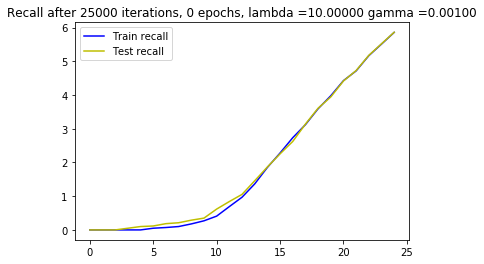

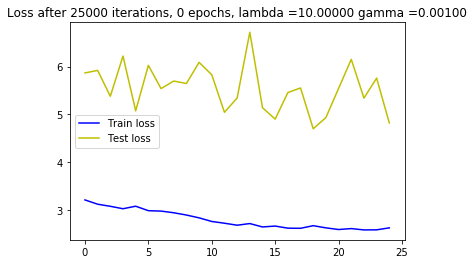

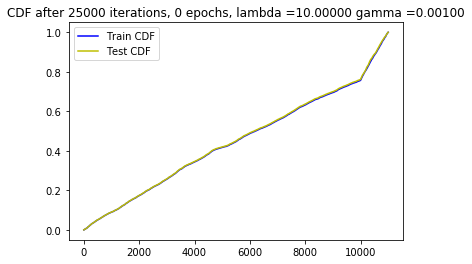






  5%|▌         | 25001/473047 [18:11<107:38:12,  1.16it/s]




  5%|▌         | 25009/473047 [18:11<75:49:50,  1.64it/s] 

New score:  0.08998664
Train score:  0.200665
Test score:  0.18378334
Obj first part:  2.345939129590988
Obj second part:  -0.1736019
Obj first part:  0.21241061389446259
Obj second part:  -1.4277419
Obj first part:  0.0
Obj second part:  -2.3194308
Obj first part:  0.0
Obj second part:  -2.1183817
Obj first part:  0.0
Obj second part:  -3.9300356
Obj first part:  0.0
Obj second part:  -0.88746923
Obj first part:  0.2044864185154438
Obj second part:  -0.2414057
Obj first part:  0.770438015460968
Obj second part:  -1.6701837
Obj first part:  0.988352969288826
Obj second part:  -3.3782125
Obj first part:  4.478162229061127
Obj second part:  -1.1985426
Obj first part:  0.0
Obj second part:  -2.075287
Obj first part:  0.3149731829762459
Obj second part:  -0.29060912
Obj first part:  0.6180025264620781
Obj second part:  -2.762887
Obj first part:  0.0
Obj second part:  -2.8884532
Obj first part:  0.0
Obj second part:  -1.7570801
Obj first part:  0.0
Obj second part:  -1.2093248







  5%|▌         | 25017/473047 [18:11<53:34:06,  2.32it/s]




  5%|▌         | 25025/473047 [18:11<37:58:38,  3.28it/s]

Obj first part:  1.3075269758701324
Obj second part:  -0.55592287
Obj first part:  0.8048462867736816
Obj second part:  -3.258828
Obj first part:  5.959992408752441
Obj second part:  -1.0641164
Obj first part:  0.740242525935173
Obj second part:  -0.45709983
Obj first part:  0.0
Obj second part:  -4.051699
Obj first part:  3.1297260522842407
Obj second part:  -3.807279
Obj first part:  0.9294787794351578
Obj second part:  -0.8033097
Obj first part:  0.0
Obj second part:  -4.0087185
Obj first part:  0.0
Obj second part:  -2.3983831
Obj first part:  0.0
Obj second part:  -0.06920421
Obj first part:  0.0
Obj second part:  -2.8674858
Obj first part:  0.0
Obj second part:  -0.44134825
Obj first part:  0.0
Obj second part:  -1.7025646
Obj first part:  5.069296360015869
Obj second part:  -2.428387
Obj first part:  3.1547364592552185
Obj second part:  -1.2639707
Obj first part:  0.14260905794799328
Obj second part:  -2.046095







  5%|▌         | 25033/473047 [18:11<27:04:15,  4.60it/s]




  5%|▌         | 25041/473047 [18:11<19:25:55,  6.40it/s]

Obj first part:  0.0
Obj second part:  -3.5107894
Obj first part:  0.0
Obj second part:  -2.4176517
Obj first part:  0.605807714164257
Obj second part:  -1.6841514
Obj first part:  6.686445474624634
Obj second part:  -0.79447556
Obj first part:  0.3480301797389984
Obj second part:  -0.23479238
Obj first part:  0.0
Obj second part:  -0.46613178
Obj first part:  0.07744573522359133
Obj second part:  -2.571916
Obj first part:  0.26429062709212303
Obj second part:  -1.8761967
Obj first part:  0.0
Obj second part:  -3.6501944
Obj first part:  0.0
Obj second part:  -2.2964723
Obj first part:  0.0
Obj second part:  -0.58303297
Obj first part:  0.0
Obj second part:  -0.2424321
Obj first part:  0.2884101867675781
Obj second part:  -0.051297512
Obj first part:  1.2426014989614487
Obj second part:  -1.8442228
Obj first part:  2.5573882460594177
Obj second part:  -0.79085916
Obj first part:  0.0
Obj second part:  -0.65256476







  5%|▌         | 25049/473047 [18:11<14:05:12,  8.83it/s]




  5%|▌         | 25057/473047 [18:11<10:20:24, 12.03it/s]

Obj first part:  0.5825028195977211
Obj second part:  -2.385871
Obj first part:  0.0
Obj second part:  -0.051523406
Obj first part:  0.0
Obj second part:  -3.521825
Obj first part:  0.0
Obj second part:  -0.78111726
Obj first part:  1.483009159564972
Obj second part:  -0.32455814
Obj first part:  0.0
Obj second part:  -2.4301703
Obj first part:  0.19738508388400078
Obj second part:  -1.2084601
Obj first part:  0.0
Obj second part:  -3.9332507
Obj first part:  0.15555140562355518
Obj second part:  -2.3308918
Obj first part:  3.6159324645996094
Obj second part:  -1.9833629
Obj first part:  0.0
Obj second part:  -1.6811037
Obj first part:  0.0
Obj second part:  -3.2901335
Obj first part:  0.0
Obj second part:  -4.4647164
Obj first part:  0.0
Obj second part:  -3.9247313
Obj first part:  0.0
Obj second part:  -2.8450618
Obj first part:  0.0
Obj second part:  -1.1569967







  5%|▌         | 25065/473047 [18:11<7:43:22, 16.11it/s] 




  5%|▌         | 25073/473047 [18:11<5:52:57, 21.15it/s]






Obj first part:  0.0
Obj second part:  -0.37391236
Obj first part:  2.2363223135471344
Obj second part:  -2.111968
Obj first part:  0.0
Obj second part:  -0.43819407
Obj first part:  0.0
Obj second part:  -1.2381482
Obj first part:  0.8751013875007629
Obj second part:  -1.2045336
Obj first part:  0.49668774008750916
Obj second part:  -0.5543506
Obj first part:  0.0
Obj second part:  -1.0910168
Obj first part:  0.0
Obj second part:  -1.6533353
Obj first part:  0.0
Obj second part:  -2.3036504
Obj first part:  1.028977409005165
Obj second part:  -1.9854581
Obj first part:  0.0
Obj second part:  -3.6343405
Obj first part:  0.0
Obj second part:  -2.1762166
Obj first part:  1.1470595747232437
Obj second part:  -1.8870546
Obj first part:  0.0
Obj second part:  -0.48366404
Obj first part:  2.954584062099457
Obj second part:  -0.793463
Obj first part:  0.0
Obj second part:  -1.5445714


  5%|▌         | 25081/473047 [18:12<4:35:53, 27.06it/s]




  5%|▌         | 25089/473047 [18:12<3:41:52, 33.65it/s]






Obj first part:  0.0
Obj second part:  -0.7959311
Obj first part:  0.0
Obj second part:  -0.32471523
Obj first part:  0.0
Obj second part:  -0.4985322
Obj first part:  0.0821281224489212
Obj second part:  -3.9495335
Obj first part:  0.0
Obj second part:  -1.1440098
Obj first part:  0.0
Obj second part:  -0.45366418
Obj first part:  0.0
Obj second part:  -0.7488958
Obj first part:  0.0
Obj second part:  -3.3578944
Obj first part:  2.6701390743255615
Obj second part:  -0.8019839
Obj first part:  0.0
Obj second part:  -0.44494998
Obj first part:  0.0
Obj second part:  -2.1943252
Obj first part:  9.421423077583313
Obj second part:  -0.7226003
Obj first part:  0.0
Obj second part:  -1.83288
Obj first part:  1.8097421526908875
Obj second part:  -1.0157862
Obj first part:  0.3617812693119049
Obj second part:  -0.6763261
Obj first part:  7.190523147583008
Obj second part:  -5.0739


  5%|▌         | 25097/473047 [18:12<3:04:10, 40.54it/s]




  5%|▌         | 25105/473047 [18:12<2:38:00, 47.25it/s]

Obj first part:  0.0
Obj second part:  -4.569353
Obj first part:  0.14332007616758347
Obj second part:  -1.6707227
Obj first part:  0.0
Obj second part:  -2.6026003
Obj first part:  1.3836179673671722
Obj second part:  -1.3161705
Obj first part:  0.0
Obj second part:  -2.1044984
Obj first part:  0.0
Obj second part:  -2.4171298
Obj first part:  0.32816343009471893
Obj second part:  -0.9595248
Obj first part:  0.0
Obj second part:  -1.214903
Obj first part:  0.8420415967702866
Obj second part:  -1.1019216
Obj first part:  4.014926850795746
Obj second part:  -0.34776115
Obj first part:  1.4282423257827759
Obj second part:  -3.4219737
Obj first part:  0.0
Obj second part:  -0.5073503
Obj first part:  0.5402807518839836
Obj second part:  -0.8701369
Obj first part:  4.084811508655548
Obj second part:  -1.539221
Obj first part:  11.624525785446167
Obj second part:  -0.8234377
Obj first part:  0.0
Obj second part:  -0.86832577







  5%|▌         | 25113/473047 [18:12<2:19:59, 53.33it/s]




  5%|▌         | 25121/473047 [18:12<2:06:47, 58.88it/s]

Obj first part:  0.16603024676442146
Obj second part:  -0.8142623
Obj first part:  0.0
Obj second part:  -1.2270976
Obj first part:  0.0
Obj second part:  -2.3139336
Obj first part:  1.2363065779209137
Obj second part:  -3.7392936
Obj first part:  0.06604637484997511
Obj second part:  -1.4967217
Obj first part:  1.0167480260133743
Obj second part:  -2.0604048
Obj first part:  0.0
Obj second part:  -1.499705
Obj first part:  0.2107899822294712
Obj second part:  -2.2704875
Obj first part:  1.7365165054798126
Obj second part:  -1.4784278
Obj first part:  2.542833983898163
Obj second part:  -1.4365634
Obj first part:  0.0
Obj second part:  -2.8905542
Obj first part:  0.0
Obj second part:  -2.1982005
Obj first part:  2.1590228378772736
Obj second part:  -3.3121247
Obj first part:  3.6844441294670105
Obj second part:  -2.3471062
Obj first part:  0.12758935801684856
Obj second part:  -2.9290328
Obj first part:  0.0
Obj second part:  -1.9283524







  5%|▌         | 25129/473047 [18:12<1:57:52, 63.33it/s]




  5%|▌         | 25137/473047 [18:12<1:51:11, 67.13it/s]

Obj first part:  3.0009517073631287
Obj second part:  -1.688057
Obj first part:  0.2736083045601845
Obj second part:  -4.6044946
Obj first part:  0.0
Obj second part:  -1.3082991
Obj first part:  0.0
Obj second part:  -0.9150265
Obj first part:  1.1354618519544601
Obj second part:  -0.60685104
Obj first part:  2.6334351301193237
Obj second part:  -2.722556
Obj first part:  0.0
Obj second part:  -2.8152921
Obj first part:  0.6960349529981613
Obj second part:  -1.0231471
Obj first part:  6.99272096157074
Obj second part:  -4.3722897
Obj first part:  0.09951991029083729
Obj second part:  -3.263346
Obj first part:  1.3057434558868408
Obj second part:  -0.25997457
Obj first part:  0.0
Obj second part:  -3.5906746
Obj first part:  0.8698888868093491
Obj second part:  -0.33844867
Obj first part:  0.0
Obj second part:  -1.36566
Obj first part:  1.6521215438842773
Obj second part:  -1.2612534
Obj first part:  0.16552932560443878
Obj second part:  -3.8539824







  5%|▌         | 25145/473047 [18:12<1:47:31, 69.42it/s]




  5%|▌         | 25153/473047 [18:13<1:44:11, 71.65it/s]

Obj first part:  0.045292084105312824
Obj second part:  -2.6566541
Obj first part:  1.2071479111909866
Obj second part:  -2.668607
Obj first part:  0.37329230457544327
Obj second part:  -1.1133933
Obj first part:  0.05182473920285702
Obj second part:  -3.746911
Obj first part:  0.0
Obj second part:  -2.7153788
Obj first part:  0.0
Obj second part:  -3.2820451
Obj first part:  0.0
Obj second part:  -2.9670658
Obj first part:  9.566659927368164
Obj second part:  -1.4224117
Obj first part:  0.0
Obj second part:  -1.0669965
Obj first part:  8.732724785804749
Obj second part:  -1.1578332
Obj first part:  0.0
Obj second part:  -2.190367
Obj first part:  0.050234999507665634
Obj second part:  -1.1039226
Obj first part:  0.09591130539774895
Obj second part:  -3.8862395
Obj first part:  0.0
Obj second part:  -2.1964908
Obj first part:  2.7111756801605225
Obj second part:  -0.106050074
Obj first part:  0.40290534496307373
Obj second part:  -2.2604809







  5%|▌         | 25161/473047 [18:13<1:42:07, 73.10it/s]




  5%|▌         | 25169/473047 [18:13<1:40:25, 74.32it/s]

Obj first part:  6.6571033000946045
Obj second part:  -3.982018
Obj first part:  0.28757737949490547
Obj second part:  -3.3858197
Obj first part:  1.3091598451137543
Obj second part:  -0.5132221
Obj first part:  0.39945516735315323
Obj second part:  -1.337029
Obj first part:  0.04098157398402691
Obj second part:  -2.9175596
Obj first part:  2.794266939163208
Obj second part:  -3.0902765
Obj first part:  0.0
Obj second part:  -2.5605412
Obj first part:  0.2229941263794899
Obj second part:  -3.4843483
Obj first part:  0.11367366649210453
Obj second part:  -0.18976182
Obj first part:  0.9174191951751709
Obj second part:  -1.2600335
Obj first part:  2.2265638411045074
Obj second part:  -3.0834403
Obj first part:  0.0
Obj second part:  -3.4819872
Obj first part:  0.9514272958040237
Obj second part:  -1.736586
Obj first part:  0.0
Obj second part:  -3.0543346
Obj first part:  3.0585977435112
Obj second part:  -3.0342166
Obj first part:  0.0
Obj second part:  -0.9443733







  5%|▌         | 25177/473047 [18:13<1:39:27, 75.06it/s]




  5%|▌         | 25185/473047 [18:13<1:38:50, 75.52it/s]

Obj first part:  0.0
Obj second part:  -2.3529718
Obj first part:  0.0
Obj second part:  -0.6288438
Obj first part:  0.10926381684839725
Obj second part:  -1.7582755
Obj first part:  6.6867053508758545
Obj second part:  -0.73754644
Obj first part:  0.0
Obj second part:  -2.770673
Obj first part:  0.14568690210580826
Obj second part:  -2.085447
Obj first part:  0.2567899227142334
Obj second part:  -1.9061984
Obj first part:  0.17779693007469177
Obj second part:  -1.7842125
Obj first part:  0.0
Obj second part:  -2.5841336
Obj first part:  2.1622851490974426
Obj second part:  -1.6460512
Obj first part:  0.9850531071424484
Obj second part:  -2.135191
Obj first part:  0.24878280237317085
Obj second part:  -0.4367355
Obj first part:  0.0
Obj second part:  -1.1094165
Obj first part:  0.0
Obj second part:  -1.0010173
Obj first part:  0.30705370008945465
Obj second part:  -3.80022
Obj first part:  0.410727895796299
Obj second part:  -2.1131287







  5%|▌         | 25193/473047 [18:13<1:38:33, 75.74it/s]




  5%|▌         | 25201/473047 [18:13<1:37:51, 76.28it/s]

Obj first part:  1.8161284923553467
Obj second part:  -4.3272386
Obj first part:  0.0
Obj second part:  -0.0318533
Obj first part:  0.0
Obj second part:  -0.418976
Obj first part:  0.1191653311252594
Obj second part:  -1.3917001
Obj first part:  0.20701732486486435
Obj second part:  -2.8987505
Obj first part:  1.1709044873714447
Obj second part:  -1.1887951
Obj first part:  0.0
Obj second part:  -0.5238246
Obj first part:  0.0
Obj second part:  -0.56631845
Obj first part:  0.0
Obj second part:  -0.9652406
Obj first part:  0.28635112568736076
Obj second part:  -2.06608
Obj first part:  0.0
Obj second part:  -2.7732716
Obj first part:  12.518585920333862
Obj second part:  -0.50112516
Obj first part:  0.4119367152452469
Obj second part:  -1.3120813
Obj first part:  0.0
Obj second part:  -1.0914211
Obj first part:  0.0
Obj second part:  -2.7334104
Obj first part:  0.10678663849830627
Obj second part:  -1.4748919







  5%|▌         | 25209/473047 [18:13<1:37:39, 76.43it/s]




  5%|▌         | 25217/473047 [18:13<1:37:06, 76.86it/s]

Obj first part:  0.990464836359024
Obj second part:  -1.5323536
Obj first part:  0.3941481187939644
Obj second part:  -1.6782655
Obj first part:  0.0
Obj second part:  -0.66113365
Obj first part:  1.3974593579769135
Obj second part:  -2.0525105
Obj first part:  0.0
Obj second part:  -0.66096014
Obj first part:  1.9982033967971802
Obj second part:  -2.1752386
Obj first part:  0.28264883905649185
Obj second part:  -0.561015
Obj first part:  0.25620216503739357
Obj second part:  -2.1324446
Obj first part:  7.198149561882019
Obj second part:  -2.56959
Obj first part:  0.19255561754107475
Obj second part:  -3.9007826
Obj first part:  0.08626971393823624
Obj second part:  -2.669624
Obj first part:  0.0
Obj second part:  -1.6973749
Obj first part:  0.41970860213041306
Obj second part:  -1.954555
Obj first part:  0.0
Obj second part:  -1.0435302
Obj first part:  0.0
Obj second part:  -0.25159523
Obj first part:  0.0
Obj second part:  -1.9032686







  5%|▌         | 25225/473047 [18:13<1:37:03, 76.90it/s]




  5%|▌         | 25233/473047 [18:14<1:36:35, 77.27it/s]

Obj first part:  0.0
Obj second part:  -1.6331487
Obj first part:  0.0
Obj second part:  -1.8151901
Obj first part:  1.3756905496120453
Obj second part:  -1.2505434
Obj first part:  3.2113173604011536
Obj second part:  -0.5418757
Obj first part:  0.0
Obj second part:  -3.7705958
Obj first part:  0.8394797146320343
Obj second part:  -0.53091925
Obj first part:  0.0
Obj second part:  -1.1715246
Obj first part:  1.0266631096601486
Obj second part:  -0.47540236
Obj first part:  0.33382587134838104
Obj second part:  -0.9558091
Obj first part:  1.8127396702766418
Obj second part:  -0.08103702
Obj first part:  0.0
Obj second part:  -0.86573285
Obj first part:  0.0
Obj second part:  -0.42778274
Obj first part:  0.6085537746548653
Obj second part:  -1.8943067
Obj first part:  0.7917861640453339
Obj second part:  -1.5260242
Obj first part:  0.44957205653190613
Obj second part:  -0.42719066
Obj first part:  0.0
Obj second part:  -1.3205643







  5%|▌         | 25241/473047 [18:14<1:36:36, 77.25it/s]




  5%|▌         | 25249/473047 [18:14<1:36:21, 77.46it/s]

Obj first part:  0.0
Obj second part:  -0.7788196
Obj first part:  0.0
Obj second part:  -0.9919132
Obj first part:  0.0
Obj second part:  -2.2238731
Obj first part:  1.433255821466446
Obj second part:  -1.1980041
Obj first part:  0.0
Obj second part:  -2.9888847
Obj first part:  0.0
Obj second part:  -1.622059
Obj first part:  0.0
Obj second part:  -1.1552417
Obj first part:  1.274901032447815
Obj second part:  -0.2939804
Obj first part:  1.2078142166137695
Obj second part:  -0.7500119
Obj first part:  0.9053470194339752
Obj second part:  -0.61278826
Obj first part:  4.862937033176422
Obj second part:  -1.6964558
Obj first part:  0.0
Obj second part:  -1.1090617
Obj first part:  0.0
Obj second part:  -2.6772933
Obj first part:  2.4760495126247406
Obj second part:  -0.67827195
Obj first part:  0.6520818173885345
Obj second part:  -1.3194582
Obj first part:  4.47493702173233
Obj second part:  -0.49255347







  5%|▌         | 25257/473047 [18:14<1:36:38, 77.23it/s]




  5%|▌         | 25265/473047 [18:14<1:36:29, 77.34it/s]

Obj first part:  1.528092473745346
Obj second part:  -0.48704162
Obj first part:  0.0
Obj second part:  -1.0858591
Obj first part:  0.6411288678646088
Obj second part:  -3.0457633
Obj first part:  0.47464367002248764
Obj second part:  -1.0717778
Obj first part:  0.0
Obj second part:  -2.0609372
Obj first part:  6.314617991447449
Obj second part:  -0.33620915
Obj first part:  0.4360922798514366
Obj second part:  -0.51355875
Obj first part:  0.0
Obj second part:  -1.4771272
Obj first part:  0.06338149309158325
Obj second part:  -3.2402847
Obj first part:  0.0
Obj second part:  -2.4694538
Obj first part:  0.0
Obj second part:  -2.0153227
Obj first part:  5.152533650398254
Obj second part:  -0.7899565
Obj first part:  0.23270221427083015
Obj second part:  -1.0311978
Obj first part:  0.0
Obj second part:  -1.1491497
Obj first part:  0.04528827499598265
Obj second part:  -3.143982
Obj first part:  0.0
Obj second part:  -1.1261566







  5%|▌         | 25273/473047 [18:14<1:37:21, 76.66it/s]




  5%|▌         | 25281/473047 [18:14<1:36:56, 76.98it/s]






Obj first part:  0.0
Obj second part:  -3.668404
Obj first part:  0.3680441528558731
Obj second part:  -0.13067995
Obj first part:  0.0
Obj second part:  -0.59508
Obj first part:  0.5146018043160439
Obj second part:  -2.0803986
Obj first part:  0.0
Obj second part:  -1.4929333
Obj first part:  0.0
Obj second part:  -1.6065601
Obj first part:  0.0
Obj second part:  -3.3082736
Obj first part:  1.2923048436641693
Obj second part:  -4.340039
Obj first part:  0.0
Obj second part:  -1.7050548
Obj first part:  0.2689024806022644
Obj second part:  -3.1678958
Obj first part:  0.0
Obj second part:  -1.1688654
Obj first part:  0.0
Obj second part:  -0.35551402
Obj first part:  0.3013111650943756
Obj second part:  -3.6571212
Obj first part:  2.191905230283737
Obj second part:  -1.0310532
Obj first part:  0.0
Obj second part:  -0.11705849
Obj first part:  4.32172030210495
Obj second part:  -3.112136


  5%|▌         | 25289/473047 [18:14<1:36:35, 77.25it/s]




  5%|▌         | 25297/473047 [18:14<1:36:25, 77.39it/s]

Obj first part:  0.0
Obj second part:  -1.8659487
Obj first part:  0.0
Obj second part:  -0.53454083
Obj first part:  0.0
Obj second part:  -1.0340081
Obj first part:  0.20568951964378357
Obj second part:  -4.0199895
Obj first part:  0.5340447276830673
Obj second part:  -2.4411495
Obj first part:  0.0
Obj second part:  -0.53923506
Obj first part:  4.66916561126709
Obj second part:  -1.4078382
Obj first part:  0.0
Obj second part:  -0.9673949
Obj first part:  4.781327247619629
Obj second part:  -3.2391176
Obj first part:  0.4083677753806114
Obj second part:  -0.7216451
Obj first part:  0.4649897664785385
Obj second part:  -3.1971016
Obj first part:  0.0
Obj second part:  -2.169384
Obj first part:  0.7813713699579239
Obj second part:  -1.6775517
Obj first part:  0.0
Obj second part:  -0.042346638
Obj first part:  0.36667410284280777
Obj second part:  -0.7402538
Obj first part:  0.0
Obj second part:  -3.8338974







  5%|▌         | 25305/473047 [18:14<1:36:39, 77.21it/s]




  5%|▌         | 25313/473047 [18:15<1:36:26, 77.37it/s]

Obj first part:  0.0
Obj second part:  -2.7458024
Obj first part:  0.0
Obj second part:  -1.8870283
Obj first part:  0.0
Obj second part:  -0.13319187
Obj first part:  0.0
Obj second part:  -1.308811
Obj first part:  5.064647197723389
Obj second part:  -0.3341744
Obj first part:  1.4580422639846802
Obj second part:  -3.8246326
Obj first part:  0.0
Obj second part:  -1.3895568
Obj first part:  0.0
Obj second part:  -1.4591461
Obj first part:  0.0
Obj second part:  -2.5412488
Obj first part:  1.9425760209560394
Obj second part:  -0.58115536
Obj first part:  0.2490987442433834
Obj second part:  -0.14805405
Obj first part:  0.0
Obj second part:  -1.1975327
Obj first part:  0.0
Obj second part:  -0.32474837
Obj first part:  1.3073302805423737
Obj second part:  -2.223901
Obj first part:  0.7618564367294312
Obj second part:  -2.6186018
Obj first part:  0.0
Obj second part:  -1.4328218







  5%|▌         | 25321/473047 [18:15<1:36:33, 77.28it/s]




  5%|▌         | 25329/473047 [18:15<1:36:22, 77.42it/s]

Obj first part:  0.2023819088935852
Obj second part:  -1.7386295
Obj first part:  0.2991563454270363
Obj second part:  -2.6775846
Obj first part:  0.0
Obj second part:  -0.8232827
Obj first part:  0.0
Obj second part:  -1.3355377
Obj first part:  0.0
Obj second part:  -1.0878521
Obj first part:  0.0
Obj second part:  -3.3506558
Obj first part:  2.057218700647354
Obj second part:  -0.35462734
Obj first part:  0.0
Obj second part:  -2.1742682
Obj first part:  1.2656539678573608
Obj second part:  -0.6436178
Obj first part:  0.22714121267199516
Obj second part:  -0.6521535
Obj first part:  0.0
Obj second part:  -1.6816162
Obj first part:  2.841322422027588
Obj second part:  -1.3671324
Obj first part:  0.0
Obj second part:  -0.27619416
Obj first part:  0.0
Obj second part:  -0.78628266
Obj first part:  0.0
Obj second part:  -1.2158029
Obj first part:  0.0
Obj second part:  -0.24392691







  5%|▌         | 25337/473047 [18:15<1:36:42, 77.16it/s]




  5%|▌         | 25345/473047 [18:15<1:36:24, 77.40it/s]

Obj first part:  1.069604977965355
Obj second part:  -1.3107953
Obj first part:  0.0
Obj second part:  -0.8310466
Obj first part:  0.0
Obj second part:  -0.7624762
Obj first part:  0.6736599653959274
Obj second part:  -0.72866213
Obj first part:  15.362710952758789
Obj second part:  -0.12854414
Obj first part:  0.0
Obj second part:  -1.1129456
Obj first part:  0.0
Obj second part:  -1.3621807
Obj first part:  0.822649821639061
Obj second part:  -0.58470577
Obj first part:  1.3637073338031769
Obj second part:  -1.0536898
Obj first part:  0.1572609320282936
Obj second part:  -1.7153084
Obj first part:  0.2696705609560013
Obj second part:  -1.6835164
Obj first part:  0.0
Obj second part:  -1.9437866
Obj first part:  0.0
Obj second part:  -0.7732406
Obj first part:  1.5488256514072418
Obj second part:  -1.5826632
Obj first part:  0.0
Obj second part:  -0.27081203
Obj first part:  0.7306857407093048
Obj second part:  -2.745208







  5%|▌         | 25353/473047 [18:15<1:36:53, 77.01it/s]




  5%|▌         | 25361/473047 [18:15<1:36:32, 77.29it/s]

Obj first part:  0.0
Obj second part:  -1.6312301
Obj first part:  9.07016396522522
Obj second part:  -0.49751943
Obj first part:  1.0862642526626587
Obj second part:  -0.86608684
Obj first part:  0.05406004376709461
Obj second part:  -1.6346964
Obj first part:  3.8881826400756836
Obj second part:  -3.4791515
Obj first part:  10.28369426727295
Obj second part:  -5.026719
Obj first part:  1.6496862471103668
Obj second part:  -0.9221963
Obj first part:  0.0
Obj second part:  -0.65718037
Obj first part:  0.0
Obj second part:  -0.2517921
Obj first part:  1.522049605846405
Obj second part:  -1.1073935
Obj first part:  0.0
Obj second part:  -1.1765522
Obj first part:  0.47483429312705994
Obj second part:  -0.5775171
Obj first part:  0.35742711275815964
Obj second part:  -1.3692142
Obj first part:  0.0
Obj second part:  -6.352163
Obj first part:  0.0
Obj second part:  -0.31586003
Obj first part:  0.16491377726197243
Obj second part:  -1.3644968







  5%|▌         | 25369/473047 [18:15<1:36:34, 77.26it/s]




  5%|▌         | 25377/473047 [18:15<1:36:12, 77.55it/s]






Obj first part:  0.0
Obj second part:  -2.0924916
Obj first part:  0.0
Obj second part:  -1.1562593
Obj first part:  0.31234003603458405
Obj second part:  -2.896677
Obj first part:  1.2931221723556519
Obj second part:  -2.1516247
Obj first part:  0.0
Obj second part:  -2.1071413
Obj first part:  0.18061337992548943
Obj second part:  -1.9394652
Obj first part:  0.054736966267228127
Obj second part:  -0.14883828
Obj first part:  2.120833247900009
Obj second part:  -2.2527964
Obj first part:  1.7835867404937744
Obj second part:  -3.3469386
Obj first part:  2.4376749992370605
Obj second part:  -1.5039775
Obj first part:  0.0
Obj second part:  -1.2740786
Obj first part:  0.0
Obj second part:  -1.8214529
Obj first part:  0.26788268238306046
Obj second part:  -1.2787576
Obj first part:  6.5443456172943115
Obj second part:  -1.7642499
Obj first part:  0.0
Obj second part:  -2.7434165
Obj first part:  0.0
Obj second part:  -2.8640382


  5%|▌         | 25385/473047 [18:16<1:36:09, 77.59it/s]




  5%|▌         | 25393/473047 [18:16<1:36:10, 77.58it/s]

Obj first part:  1.5585017204284668
Obj second part:  -1.7601956
Obj first part:  0.8670051395893097
Obj second part:  -2.6907039
Obj first part:  0.0
Obj second part:  -3.5315645
Obj first part:  0.18022945150732994
Obj second part:  -0.34399924
Obj first part:  0.0
Obj second part:  -1.9812917
Obj first part:  0.0
Obj second part:  -0.47128513
Obj first part:  0.0
Obj second part:  -0.8965847
Obj first part:  0.0
Obj second part:  -0.2861776
Obj first part:  0.0
Obj second part:  -3.2665062
Obj first part:  0.0
Obj second part:  -2.306932
Obj first part:  0.0
Obj second part:  -0.5878562
Obj first part:  2.793080508708954
Obj second part:  -0.8164737
Obj first part:  1.0015864670276642
Obj second part:  -4.111946
Obj first part:  1.1902449280023575
Obj second part:  -4.1468
Obj first part:  0.0
Obj second part:  -3.3696182
Obj first part:  0.0
Obj second part:  -1.4719926







  5%|▌         | 25401/473047 [18:16<1:36:21, 77.42it/s]




  5%|▌         | 25409/473047 [18:16<1:36:13, 77.54it/s]

Obj first part:  0.0
Obj second part:  -3.5692823
Obj first part:  0.0
Obj second part:  -2.9856381
Obj first part:  0.0
Obj second part:  -0.5643714
Obj first part:  1.4456941187381744
Obj second part:  -0.33551937
Obj first part:  0.0
Obj second part:  -1.1465061
Obj first part:  0.0
Obj second part:  -1.926549
Obj first part:  5.680200457572937
Obj second part:  -1.1754555
Obj first part:  9.763025045394897
Obj second part:  -2.4168384
Obj first part:  3.087070882320404
Obj second part:  -3.2646704
Obj first part:  0.34913796931505203
Obj second part:  -1.3016791
Obj first part:  0.0
Obj second part:  -1.5809165
Obj first part:  0.0
Obj second part:  -1.1735827
Obj first part:  0.5080652236938477
Obj second part:  -2.6059089
Obj first part:  2.728855013847351
Obj second part:  -3.682525
Obj first part:  1.6159452497959137
Obj second part:  -2.3181005
Obj first part:  0.0
Obj second part:  -1.9303123







  5%|▌         | 25417/473047 [18:16<1:36:19, 77.46it/s]




  5%|▌         | 25425/473047 [18:16<1:36:22, 77.41it/s]

Obj first part:  0.0
Obj second part:  -3.9019096
Obj first part:  0.6870204955339432
Obj second part:  -1.819598
Obj first part:  0.5510394647717476
Obj second part:  -0.13189588
Obj first part:  0.0
Obj second part:  -0.7532143
Obj first part:  0.5933120101690292
Obj second part:  -0.30897698
Obj first part:  0.0
Obj second part:  -2.938424
Obj first part:  7.391303777694702
Obj second part:  -0.47839898
Obj first part:  0.0
Obj second part:  -2.8059473
Obj first part:  0.13606966473162174
Obj second part:  -2.255309
Obj first part:  1.1833614856004715
Obj second part:  -2.2529325
Obj first part:  0.0
Obj second part:  -2.11568
Obj first part:  2.647336721420288
Obj second part:  -0.1866281
Obj first part:  0.0
Obj second part:  -2.3623502
Obj first part:  0.0
Obj second part:  -1.2929515
Obj first part:  0.0
Obj second part:  -1.8544364
Obj first part:  0.0
Obj second part:  -0.5621281







  5%|▌         | 25433/473047 [18:16<1:36:36, 77.22it/s]




  5%|▌         | 25441/473047 [18:16<1:36:17, 77.47it/s]

Obj first part:  0.0
Obj second part:  -0.6578643
Obj first part:  0.0
Obj second part:  -0.6649183
Obj first part:  0.0
Obj second part:  -0.1476478
Obj first part:  0.21878080442547798
Obj second part:  -2.5378218
Obj first part:  0.0
Obj second part:  -1.8112459
Obj first part:  9.375682473182678
Obj second part:  -0.3286297
Obj first part:  0.563955083489418
Obj second part:  -4.965637
Obj first part:  0.0
Obj second part:  -0.53986615
Obj first part:  0.20045103505253792
Obj second part:  -2.5843053
Obj first part:  0.0
Obj second part:  -1.5162752
Obj first part:  0.3697070851922035
Obj second part:  -0.6709673
Obj first part:  1.5981686115264893
Obj second part:  -3.1330278
Obj first part:  0.22893361747264862
Obj second part:  -1.2951319
Obj first part:  1.6615065932273865
Obj second part:  -1.8392324
Obj first part:  0.0
Obj second part:  -2.2674415
Obj first part:  0.0
Obj second part:  -1.8791375







  5%|▌         | 25449/473047 [18:16<1:36:32, 77.27it/s]




  5%|▌         | 25457/473047 [18:16<1:36:11, 77.55it/s]

Obj first part:  0.0
Obj second part:  -1.0079212
Obj first part:  0.0
Obj second part:  -1.5888472
Obj first part:  0.07060652133077383
Obj second part:  -0.6117814
Obj first part:  0.36211833357810974
Obj second part:  -1.476446
Obj first part:  3.165118396282196
Obj second part:  -1.3295271
Obj first part:  3.253236711025238
Obj second part:  -4.2259593
Obj first part:  0.0
Obj second part:  -2.4258726
Obj first part:  0.0
Obj second part:  -1.617922
Obj first part:  4.508959352970123
Obj second part:  -0.052951187
Obj first part:  0.0
Obj second part:  -3.7139256
Obj first part:  0.0
Obj second part:  -0.32108164
Obj first part:  0.0
Obj second part:  -2.5344522
Obj first part:  0.0
Obj second part:  -1.2820731
Obj first part:  0.1787165179848671
Obj second part:  -0.6300417
Obj first part:  0.46269144862890244
Obj second part:  -1.0781635
Obj first part:  0.19772179424762726
Obj second part:  -0.416453







  5%|▌         | 25465/473047 [18:17<1:36:22, 77.41it/s]




  5%|▌         | 25473/473047 [18:17<1:36:14, 77.51it/s]

Obj first part:  0.39417650550603867
Obj second part:  -3.5608094
Obj first part:  0.33604126423597336
Obj second part:  -0.94169617
Obj first part:  0.0
Obj second part:  -2.0062306
Obj first part:  3.8213342428207397
Obj second part:  -0.49262154
Obj first part:  0.0
Obj second part:  -2.5223353
Obj first part:  0.0
Obj second part:  -4.3088694
Obj first part:  0.0
Obj second part:  -2.2844965
Obj first part:  14.07749056816101
Obj second part:  -0.24573568
Obj first part:  2.7696439623832703
Obj second part:  -1.327934
Obj first part:  0.47807466238737106
Obj second part:  -0.3937269
Obj first part:  0.02016659127548337
Obj second part:  -0.6044748
Obj first part:  1.471959799528122
Obj second part:  -1.1820058
Obj first part:  0.3191519156098366
Obj second part:  -1.6656815
Obj first part:  0.0
Obj second part:  -0.6562646
Obj first part:  4.389587938785553
Obj second part:  -3.2527618
Obj first part:  0.639268308877945
Obj second part:  -2.484552







  5%|▌         | 25481/473047 [18:17<1:36:31, 77.28it/s]




  5%|▌         | 25489/473047 [18:17<1:36:17, 77.47it/s]

Obj first part:  0.0
Obj second part:  -1.9586407
Obj first part:  0.0
Obj second part:  -0.730593
Obj first part:  0.0
Obj second part:  -4.220702
Obj first part:  3.6573082208633423
Obj second part:  -3.407227
Obj first part:  0.0
Obj second part:  -1.893784
Obj first part:  0.0
Obj second part:  -0.29290313
Obj first part:  0.0
Obj second part:  -1.0528288
Obj first part:  0.0
Obj second part:  -2.588734
Obj first part:  0.0
Obj second part:  -0.7123884
Obj first part:  0.6339839845895767
Obj second part:  -1.545535
Obj first part:  0.0
Obj second part:  -0.36599916
Obj first part:  0.5098031833767891
Obj second part:  -1.8182409
Obj first part:  0.0
Obj second part:  -1.2678462
Obj first part:  0.6764602661132812
Obj second part:  -0.7895216
Obj first part:  0.0
Obj second part:  -2.0331502
Obj first part:  1.6715577244758606
Obj second part:  -1.5559226







  5%|▌         | 25497/473047 [18:17<1:36:55, 76.95it/s]




  5%|▌         | 25505/473047 [18:17<1:36:51, 77.01it/s]

Obj first part:  0.0
Obj second part:  -1.7724872
Obj first part:  0.0
Obj second part:  -0.46694493
Obj first part:  0.0
Obj second part:  -0.7844924
Obj first part:  0.0
Obj second part:  -1.7489849
Obj first part:  0.0
Obj second part:  -2.955542
Obj first part:  3.3400991559028625
Obj second part:  -1.1057012
Obj first part:  0.0
Obj second part:  -4.7799664
Obj first part:  0.0
Obj second part:  -0.40445235
Obj first part:  0.0
Obj second part:  -0.64980763
Obj first part:  0.0
Obj second part:  -2.840788
Obj first part:  1.548592448234558
Obj second part:  -0.749827
Obj first part:  1.3387960195541382
Obj second part:  -0.33507296
Obj first part:  3.8561826944351196
Obj second part:  -0.38089854
Obj first part:  0.207012128084898
Obj second part:  -3.0244353
Obj first part:  0.1694660820066929
Obj second part:  -1.9333879
Obj first part:  0.0
Obj second part:  -0.95160323







  5%|▌         | 25513/473047 [18:17<1:36:51, 77.01it/s]




  5%|▌         | 25521/473047 [18:17<1:36:30, 77.29it/s]

Obj first part:  0.0
Obj second part:  -4.5930867
Obj first part:  1.6809076070785522
Obj second part:  -4.49644
Obj first part:  0.0
Obj second part:  -0.77277833
Obj first part:  5.5499643087387085
Obj second part:  -1.6915064
Obj first part:  0.19715623930096626
Obj second part:  -0.851921
Obj first part:  0.03617089241743088
Obj second part:  -1.9184439
Obj first part:  0.05818098783493042
Obj second part:  -0.53248334
Obj first part:  0.0
Obj second part:  -1.7605518
Obj first part:  0.0
Obj second part:  -0.6355686
Obj first part:  5.828133225440979
Obj second part:  -1.2524585
Obj first part:  0.42616888880729675
Obj second part:  -0.854537
Obj first part:  0.14329436235129833
Obj second part:  -4.0224543
Obj first part:  0.0
Obj second part:  -0.86192346
Obj first part:  1.6279631853103638
Obj second part:  -1.8752224
Obj first part:  0.0
Obj second part:  -1.2128217
Obj first part:  1.8603159487247467
Obj second part:  -0.8825244







  5%|▌         | 25529/473047 [18:17<1:36:33, 77.24it/s]




  5%|▌         | 25537/473047 [18:17<1:36:14, 77.50it/s]






Obj first part:  0.0
Obj second part:  -4.3824663
Obj first part:  0.0
Obj second part:  -2.289941
Obj first part:  0.0
Obj second part:  -1.2112662
Obj first part:  2.042243182659149
Obj second part:  -0.9979094
Obj first part:  0.8504439145326614
Obj second part:  -0.73560065
Obj first part:  0.0
Obj second part:  -1.782151
Obj first part:  2.351572960615158
Obj second part:  -0.16016743
Obj first part:  0.0
Obj second part:  -0.7119765
Obj first part:  0.6241455301642418
Obj second part:  -1.4057211
Obj first part:  0.43102338910102844
Obj second part:  -0.77991277
Obj first part:  0.0
Obj second part:  -2.6987832
Obj first part:  0.0
Obj second part:  -2.0123935
Obj first part:  1.543569415807724
Obj second part:  -1.4712791
Obj first part:  5.599966645240784
Obj second part:  -3.089708
Obj first part:  0.0
Obj second part:  -1.3820988
Obj first part:  0.4304538294672966
Obj second part:  -1.4364518


  5%|▌         | 25545/473047 [18:18<1:36:07, 77.60it/s]




  5%|▌         | 25553/473047 [18:18<1:36:06, 77.61it/s]

Obj first part:  0.0
Obj second part:  -0.52577496
Obj first part:  0.362616628408432
Obj second part:  -1.5983024
Obj first part:  0.0
Obj second part:  -2.1020503
Obj first part:  5.55871307849884
Obj second part:  -0.10798367
Obj first part:  0.04452656954526901
Obj second part:  -2.5460641
Obj first part:  0.0
Obj second part:  -3.531834
Obj first part:  2.4760839343070984
Obj second part:  -1.4297315
Obj first part:  0.0
Obj second part:  -2.2139323
Obj first part:  5.320916771888733
Obj second part:  -1.787037
Obj first part:  0.0
Obj second part:  -1.6894022
Obj first part:  0.0
Obj second part:  -1.2663181
Obj first part:  0.2623624727129936
Obj second part:  -1.1571814
Obj first part:  0.0
Obj second part:  -0.5200438
Obj first part:  0.0
Obj second part:  -2.2593176
Obj first part:  0.0
Obj second part:  -0.7126893
Obj first part:  0.0
Obj second part:  -0.6501985







  5%|▌         | 25561/473047 [18:18<1:36:23, 77.37it/s]




  5%|▌         | 25569/473047 [18:18<1:36:15, 77.48it/s]

Obj first part:  0.0
Obj second part:  -0.5797146
Obj first part:  0.0
Obj second part:  -0.86462384
Obj first part:  0.09172777645289898
Obj second part:  -0.2680124
Obj first part:  0.0
Obj second part:  -3.2619288
Obj first part:  0.0
Obj second part:  -1.4441841
Obj first part:  0.0
Obj second part:  -1.6767838
Obj first part:  0.13605285435914993
Obj second part:  -0.6304321
Obj first part:  1.15184485912323
Obj second part:  -1.3355727
Obj first part:  0.0
Obj second part:  -0.2934104
Obj first part:  0.4915158078074455
Obj second part:  -0.2017739
Obj first part:  0.0
Obj second part:  -1.404736
Obj first part:  0.0
Obj second part:  -0.7060893
Obj first part:  1.540510505437851
Obj second part:  -1.3608205
Obj first part:  0.0
Obj second part:  -1.4851618
Obj first part:  0.0
Obj second part:  -0.7879422
Obj first part:  2.20650315284729
Obj second part:  -0.26342738







  5%|▌         | 25577/473047 [18:18<1:37:00, 76.88it/s]




  5%|▌         | 25585/473047 [18:18<1:36:40, 77.15it/s]

Obj first part:  0.0
Obj second part:  -1.900762
Obj first part:  1.0917241126298904
Obj second part:  -0.501749
Obj first part:  2.128612846136093
Obj second part:  -0.48522085
Obj first part:  0.0
Obj second part:  -1.726499
Obj first part:  0.0
Obj second part:  -0.31731966
Obj first part:  1.4600254595279694
Obj second part:  -0.057285935
Obj first part:  0.0
Obj second part:  -0.8641875
Obj first part:  0.0
Obj second part:  -1.1236334
Obj first part:  0.36901164799928665
Obj second part:  -2.3393714
Obj first part:  0.0
Obj second part:  -1.097789
Obj first part:  0.4971698671579361
Obj second part:  -1.6965202
Obj first part:  0.0
Obj second part:  -0.41591159
Obj first part:  0.0
Obj second part:  -0.72089374
Obj first part:  1.148085743188858
Obj second part:  -1.1801655
Obj first part:  0.0
Obj second part:  -1.6786243
Obj first part:  0.0
Obj second part:  -1.4302367







  5%|▌         | 25593/473047 [18:18<1:36:47, 77.04it/s]




  5%|▌         | 25601/473047 [18:18<1:36:20, 77.41it/s]






Obj first part:  0.0
Obj second part:  -1.0421629
Obj first part:  1.308676302433014
Obj second part:  -1.3386475
Obj first part:  0.0
Obj second part:  -0.90293866
Obj first part:  0.0
Obj second part:  -1.0272231
Obj first part:  0.529797151684761
Obj second part:  -0.48510307
Obj first part:  0.0
Obj second part:  -4.445942
Obj first part:  0.0
Obj second part:  -1.1525694
Obj first part:  3.581642210483551
Obj second part:  -0.88185704
Obj first part:  2.2265174984931946
Obj second part:  -1.585808
Obj first part:  0.0
Obj second part:  -2.4975696
Obj first part:  3.082898259162903
Obj second part:  -1.7730507
Obj first part:  0.0
Obj second part:  -0.6297054
Obj first part:  0.4053269699215889
Obj second part:  -0.88735104
Obj first part:  0.0
Obj second part:  -0.7030491
Obj first part:  0.0
Obj second part:  -0.93750626
Obj first part:  0.2922728843986988
Obj second part:  -3.3074226


  5%|▌         | 25609/473047 [18:18<1:36:15, 77.47it/s]




  5%|▌         | 25617/473047 [18:19<1:36:26, 77.32it/s]

Obj first part:  0.0
Obj second part:  -1.168765
Obj first part:  0.0
Obj second part:  -2.0749438
Obj first part:  0.0
Obj second part:  -1.3328414
Obj first part:  0.0
Obj second part:  -2.5377777
Obj first part:  0.712227076292038
Obj second part:  -1.9926175
Obj first part:  0.3249549865722656
Obj second part:  -0.6121447
Obj first part:  0.0
Obj second part:  -1.3042412
Obj first part:  0.0
Obj second part:  -2.8515568
Obj first part:  0.0
Obj second part:  -1.5662895
Obj first part:  0.0
Obj second part:  -0.2798292
Obj first part:  10.527526140213013
Obj second part:  -3.2394767
Obj first part:  8.704209327697754
Obj second part:  -0.78966695
Obj first part:  0.0
Obj second part:  -4.706098
Obj first part:  0.0
Obj second part:  -1.7385066
Obj first part:  0.39319857954978943
Obj second part:  -1.2262571
Obj first part:  2.556600868701935
Obj second part:  -1.0905697







  5%|▌         | 25625/473047 [18:19<1:36:29, 77.28it/s]




  5%|▌         | 25633/473047 [18:19<1:36:09, 77.55it/s]

Obj first part:  0.0
Obj second part:  -3.0990088
Obj first part:  2.8119412064552307
Obj second part:  -1.5759747
Obj first part:  1.1837196350097656
Obj second part:  -1.480399
Obj first part:  0.0
Obj second part:  -2.0551238
Obj first part:  0.3117821179330349
Obj second part:  -3.9432275
Obj first part:  0.600796639919281
Obj second part:  -1.5649768
Obj first part:  2.072717100381851
Obj second part:  -0.13039437
Obj first part:  0.3005475364625454
Obj second part:  -1.7920237
Obj first part:  0.0
Obj second part:  -1.2806174
Obj first part:  0.0
Obj second part:  -0.8997135
Obj first part:  0.0
Obj second part:  -2.8875651
Obj first part:  12.705165147781372
Obj second part:  -0.22985394
Obj first part:  0.8750339597463608
Obj second part:  -1.1089551
Obj first part:  0.0
Obj second part:  -1.9799727
Obj first part:  0.2590847574174404
Obj second part:  -0.9362591
Obj first part:  0.0
Obj second part:  -1.521471







  5%|▌         | 25641/473047 [18:19<1:36:16, 77.45it/s]




  5%|▌         | 25649/473047 [18:19<1:36:28, 77.29it/s]

Obj first part:  0.654560774564743
Obj second part:  -0.96541476
Obj first part:  2.6557791233062744
Obj second part:  -0.5962929
Obj first part:  0.0
Obj second part:  -1.8899058
Obj first part:  0.0
Obj second part:  -1.9374766
Obj first part:  2.028142213821411
Obj second part:  -4.509219
Obj first part:  1.7300702631473541
Obj second part:  -1.7318649
Obj first part:  14.713534116744995
Obj second part:  -3.1761894
Obj first part:  0.14796100556850433
Obj second part:  -2.5348263
Obj first part:  1.065172478556633
Obj second part:  -0.5480219
Obj first part:  0.0
Obj second part:  -1.9804446
Obj first part:  8.215335011482239
Obj second part:  -2.7526505
Obj first part:  0.0
Obj second part:  -0.83119154
Obj first part:  0.0
Obj second part:  -1.3553736
Obj first part:  0.0
Obj second part:  -2.0940342
Obj first part:  0.0
Obj second part:  -0.76086426
Obj first part:  0.23517807945609093
Obj second part:  -0.22258453







  5%|▌         | 25657/473047 [18:19<1:36:21, 77.38it/s]




  5%|▌         | 25665/473047 [18:19<1:36:19, 77.41it/s]

Obj first part:  0.4339541494846344
Obj second part:  -1.4723074
Obj first part:  0.14659919776022434
Obj second part:  -3.6627803
Obj first part:  0.0
Obj second part:  -0.78362197
Obj first part:  0.0
Obj second part:  -2.181722
Obj first part:  0.0
Obj second part:  -0.5450249
Obj first part:  1.1020392179489136
Obj second part:  -0.99381274
Obj first part:  0.1507512852549553
Obj second part:  -0.6095387
Obj first part:  1.771184504032135
Obj second part:  -0.7381414
Obj first part:  0.0
Obj second part:  -0.6880747
Obj first part:  0.0
Obj second part:  -0.45874107
Obj first part:  0.0
Obj second part:  -2.8803825
Obj first part:  0.0
Obj second part:  -3.0054383
Obj first part:  0.0
Obj second part:  -1.8130889
Obj first part:  0.3732341527938843
Obj second part:  -0.75842726
Obj first part:  0.22263869643211365
Obj second part:  -3.146063
Obj first part:  0.0
Obj second part:  -0.22535194







  5%|▌         | 25673/473047 [18:19<1:36:29, 77.27it/s]




  5%|▌         | 25681/473047 [18:19<1:36:20, 77.40it/s]

Obj first part:  0.0
Obj second part:  -0.399965
Obj first part:  0.7008712738752365
Obj second part:  -2.328771
Obj first part:  2.0591530203819275
Obj second part:  -1.2096511
Obj first part:  0.0
Obj second part:  -1.6525779
Obj first part:  0.0
Obj second part:  -0.10186825
Obj first part:  6.575863361358643
Obj second part:  -1.1582516
Obj first part:  0.4004296287894249
Obj second part:  -1.4215912
Obj first part:  0.22757915779948235
Obj second part:  -2.0255754
Obj first part:  0.0
Obj second part:  -0.33319604
Obj first part:  2.0509810745716095
Obj second part:  -0.4670576
Obj first part:  0.0
Obj second part:  -1.8323952
Obj first part:  0.0
Obj second part:  -0.6214702
Obj first part:  2.676442563533783
Obj second part:  -1.262981
Obj first part:  0.5991432815790176
Obj second part:  -1.4853066
Obj first part:  0.0
Obj second part:  -3.9000242
Obj first part:  0.09928013198077679
Obj second part:  -0.9880785







  5%|▌         | 25689/473047 [18:19<1:36:29, 77.27it/s]




  5%|▌         | 25697/473047 [18:20<1:36:07, 77.56it/s]






Obj first part:  0.0
Obj second part:  -2.7522328
Obj first part:  0.40777772665023804
Obj second part:  -0.1404884
Obj first part:  0.0
Obj second part:  -0.09868983
Obj first part:  0.0
Obj second part:  -1.9915035
Obj first part:  1.6210882365703583
Obj second part:  -2.004695
Obj first part:  0.0
Obj second part:  -0.47729456
Obj first part:  0.0
Obj second part:  -0.5978731
Obj first part:  8.110486268997192
Obj second part:  -3.8530173
Obj first part:  0.5667640641331673
Obj second part:  -0.9986707
Obj first part:  0.0
Obj second part:  -1.6035562
Obj first part:  0.2051198109984398
Obj second part:  -1.0713602
Obj first part:  0.6133278831839561
Obj second part:  -0.9555297
Obj first part:  0.0
Obj second part:  -2.1223783
Obj first part:  0.0
Obj second part:  -1.1633455
Obj first part:  1.8580518662929535
Obj second part:  -2.1853359
Obj first part:  0.0
Obj second part:  -2.9050062


  5%|▌         | 25705/473047 [18:20<1:36:01, 77.65it/s]




  5%|▌         | 25713/473047 [18:20<1:36:17, 77.42it/s]

Obj first part:  14.339278936386108
Obj second part:  -0.59661084
Obj first part:  8.297045826911926
Obj second part:  -1.6185433
Obj first part:  2.9225951433181763
Obj second part:  -1.1294086
Obj first part:  0.0304853031411767
Obj second part:  -1.6777134
Obj first part:  0.0
Obj second part:  -1.4081159
Obj first part:  0.0
Obj second part:  -3.2891784
Obj first part:  0.5456841737031937
Obj second part:  -3.9296954
Obj first part:  0.0943024642765522
Obj second part:  -0.2868633
Obj first part:  0.0
Obj second part:  -1.0349474
Obj first part:  0.4940783232450485
Obj second part:  -0.49927953
Obj first part:  0.0
Obj second part:  -3.4417665
Obj first part:  0.9047780185937881
Obj second part:  -1.0978506
Obj first part:  0.0
Obj second part:  -3.1608942
Obj first part:  0.0
Obj second part:  -1.5976087
Obj first part:  2.517404556274414
Obj second part:  -0.44463408
Obj first part:  1.6558204591274261
Obj second part:  -3.9358804







  5%|▌         | 25721/473047 [18:20<1:36:23, 77.34it/s]




  5%|▌         | 25729/473047 [18:20<1:36:07, 77.55it/s]

Obj first part:  4.24649178981781
Obj second part:  -0.4867128
Obj first part:  0.0
Obj second part:  -1.2922584
Obj first part:  0.6466052681207657
Obj second part:  -1.001982
Obj first part:  0.0
Obj second part:  -1.9661273
Obj first part:  0.0
Obj second part:  -1.086154
Obj first part:  0.41750330477952957
Obj second part:  -0.76201177
Obj first part:  0.0
Obj second part:  -1.0229256
Obj first part:  0.4938092827796936
Obj second part:  -1.552132
Obj first part:  0.18462160602211952
Obj second part:  -1.4854093
Obj first part:  0.0
Obj second part:  -2.5711412
Obj first part:  5.695424675941467
Obj second part:  -0.4892975
Obj first part:  0.0
Obj second part:  -0.3684639
Obj first part:  0.0
Obj second part:  -2.7511377
Obj first part:  0.3820086643099785
Obj second part:  -0.35539088
Obj first part:  0.0
Obj second part:  -0.11281426
Obj first part:  0.07717435713857412
Obj second part:  -1.01556







  5%|▌         | 25737/473047 [18:20<1:36:33, 77.21it/s]




  5%|▌         | 25745/473047 [18:20<1:36:21, 77.37it/s]

Obj first part:  0.0
Obj second part:  -0.28621465
Obj first part:  0.0
Obj second part:  -1.150758
Obj first part:  0.45124825090169907
Obj second part:  -2.0807166
Obj first part:  0.0
Obj second part:  -0.09689139
Obj first part:  2.3444607853889465
Obj second part:  -2.6638608
Obj first part:  1.3628920912742615
Obj second part:  -0.6476898
Obj first part:  0.3207515925168991
Obj second part:  -3.6718354
Obj first part:  0.0
Obj second part:  -5.306696
Obj first part:  1.0531020909547806
Obj second part:  -0.6506791
Obj first part:  1.9353754818439484
Obj second part:  -0.85939586
Obj first part:  0.0
Obj second part:  -0.46837246
Obj first part:  3.3265405893325806
Obj second part:  -3.5404918
Obj first part:  0.0
Obj second part:  -1.2692417
Obj first part:  0.7242822647094727
Obj second part:  -1.2103853
Obj first part:  2.893553674221039
Obj second part:  -0.5923709
Obj first part:  0.0
Obj second part:  -0.38918683







  5%|▌         | 25753/473047 [18:20<1:36:21, 77.37it/s]




  5%|▌         | 25761/473047 [18:20<1:35:59, 77.66it/s]

Obj first part:  0.0
Obj second part:  -0.51188385
Obj first part:  0.0
Obj second part:  -1.6404672
Obj first part:  0.13291905634105206
Obj second part:  -0.59256667
Obj first part:  0.0
Obj second part:  -0.23950318
Obj first part:  0.0
Obj second part:  -0.41963798
Obj first part:  2.6713234186172485
Obj second part:  -0.3364481
Obj first part:  1.1114060878753662
Obj second part:  -3.4727097
Obj first part:  0.0
Obj second part:  -1.603496
Obj first part:  1.0224561393260956
Obj second part:  -2.5763445
Obj first part:  0.0
Obj second part:  -2.806984
Obj first part:  0.0
Obj second part:  -0.6150697
Obj first part:  0.0
Obj second part:  -1.7415427
Obj first part:  0.6161672994494438
Obj second part:  -2.5257418
Obj first part:  0.0
Obj second part:  -3.0145135
Obj first part:  0.0
Obj second part:  -2.9450667
Obj first part:  0.0
Obj second part:  -1.5105845







  5%|▌         | 25769/473047 [18:20<1:36:03, 77.61it/s]




  5%|▌         | 25777/473047 [18:21<1:35:59, 77.65it/s]






Obj first part:  0.0
Obj second part:  -1.5919741
Obj first part:  0.0
Obj second part:  -1.1303163
Obj first part:  0.0
Obj second part:  -2.0401392
Obj first part:  0.0
Obj second part:  -1.96012
Obj first part:  0.0
Obj second part:  -4.0485344
Obj first part:  0.0
Obj second part:  -1.4215002
Obj first part:  0.8133218437433243
Obj second part:  -2.5650775
Obj first part:  0.0
Obj second part:  -0.569755
Obj first part:  0.0
Obj second part:  -0.49861717
Obj first part:  0.0
Obj second part:  -1.6711693
Obj first part:  0.0
Obj second part:  -1.379204
Obj first part:  0.11240211315453053
Obj second part:  -0.866944
Obj first part:  0.0
Obj second part:  -2.8401046
Obj first part:  0.0
Obj second part:  -3.8275378
Obj first part:  0.4697811231017113
Obj second part:  -0.4167463
Obj first part:  3.189910054206848
Obj second part:  -1.1054088


  5%|▌         | 25785/473047 [18:21<1:35:57, 77.69it/s]




  5%|▌         | 25793/473047 [18:21<1:37:17, 76.61it/s]

Obj first part:  2.67363578081131
Obj second part:  -1.7093788
Obj first part:  0.0
Obj second part:  -1.2443622
Obj first part:  0.0
Obj second part:  -1.6922617
Obj first part:  0.0
Obj second part:  -0.94702446
Obj first part:  9.102200269699097
Obj second part:  -2.6142535
Obj first part:  0.8773088455200195
Obj second part:  -1.4699672
Obj first part:  0.0
Obj second part:  -0.63659054
Obj first part:  1.690671592950821
Obj second part:  -0.40270302
Obj first part:  0.0
Obj second part:  -1.3856361
Obj first part:  0.0
Obj second part:  -3.7996676
Obj first part:  1.5967850387096405
Obj second part:  -3.0049818
Obj first part:  0.0
Obj second part:  -2.8196433
Obj first part:  0.0
Obj second part:  -0.22574247
Obj first part:  0.47058288007974625
Obj second part:  -1.2380834
Obj first part:  0.4324399307370186
Obj second part:  -1.641466
Obj first part:  0.0
Obj second part:  -0.3065458







  5%|▌         | 25801/473047 [18:21<1:37:14, 76.65it/s]




  5%|▌         | 25809/473047 [18:21<1:36:48, 76.99it/s]

Obj first part:  0.8057962357997894
Obj second part:  -0.26443362
Obj first part:  3.4865814447402954
Obj second part:  -0.76522547
Obj first part:  0.0
Obj second part:  -1.3771362
Obj first part:  1.0111729800701141
Obj second part:  -0.5367323
Obj first part:  0.0
Obj second part:  -0.30156568
Obj first part:  0.18156565725803375
Obj second part:  -0.15494582
Obj first part:  0.0
Obj second part:  -1.2373058
Obj first part:  1.065056025981903
Obj second part:  -3.4431136
Obj first part:  0.0
Obj second part:  -1.2052346
Obj first part:  0.0
Obj second part:  -2.9600732
Obj first part:  0.0
Obj second part:  -2.0452516
Obj first part:  0.0
Obj second part:  -0.95196074
Obj first part:  0.0
Obj second part:  -0.2334145
Obj first part:  0.0
Obj second part:  -0.6741424
Obj first part:  0.0
Obj second part:  -0.8673112
Obj first part:  0.0
Obj second part:  -0.5029938







  5%|▌         | 25817/473047 [18:21<1:37:30, 76.44it/s]




  5%|▌         | 25825/473047 [18:21<1:37:00, 76.83it/s]

Obj first part:  0.49250952899456024
Obj second part:  -1.3335006
Obj first part:  0.0
Obj second part:  -0.22127853
Obj first part:  0.0
Obj second part:  -0.96467304
Obj first part:  0.0
Obj second part:  -1.2595655
Obj first part:  0.0
Obj second part:  -0.13862723
Obj first part:  0.0
Obj second part:  -1.8800151
Obj first part:  7.326419353485107
Obj second part:  -2.5108902
Obj first part:  0.0
Obj second part:  -3.3215728
Obj first part:  0.0
Obj second part:  -1.147738
Obj first part:  0.0
Obj second part:  -0.7305894
Obj first part:  0.0
Obj second part:  -1.3772062
Obj first part:  1.023465171456337
Obj second part:  -1.2717571
Obj first part:  0.0
Obj second part:  -0.18918277
Obj first part:  1.2830446660518646
Obj second part:  -0.21779716
Obj first part:  2.0005355775356293
Obj second part:  -1.048445
Obj first part:  0.0
Obj second part:  -0.9491992







  5%|▌         | 25833/473047 [18:21<1:37:01, 76.82it/s]




  5%|▌         | 25841/473047 [18:21<1:36:40, 77.10it/s]






Obj first part:  0.0
Obj second part:  -1.9880513
Obj first part:  2.0690497756004333
Obj second part:  -0.25815
Obj first part:  3.2352495193481445
Obj second part:  -0.11199404
Obj first part:  1.1227063089609146
Obj second part:  -0.2407532
Obj first part:  0.40926601737737656
Obj second part:  -0.09988195
Obj first part:  2.5398337841033936
Obj second part:  -2.0116339
Obj first part:  0.7905439287424088
Obj second part:  -0.24896373
Obj first part:  0.0
Obj second part:  -0.15206154
Obj first part:  0.0
Obj second part:  -1.1747856
Obj first part:  0.0
Obj second part:  -1.5435343
Obj first part:  0.0
Obj second part:  -0.9647794
Obj first part:  6.218346953392029
Obj second part:  -0.8161554
Obj first part:  0.8053236454725266
Obj second part:  -1.1462853
Obj first part:  0.0
Obj second part:  -1.46785
Obj first part:  0.0
Obj second part:  -0.745922
Obj first part:  0.0
Obj second part:  -1.3684679


  5%|▌         | 25849/473047 [18:22<1:36:15, 77.44it/s]




  5%|▌         | 25857/473047 [18:22<1:36:19, 77.38it/s]






Obj first part:  1.3084055483341217
Obj second part:  -0.072828814
Obj first part:  0.0
Obj second part:  -1.839879
Obj first part:  0.0
Obj second part:  -1.0428629
Obj first part:  1.1988446861505508
Obj second part:  -0.94154763
Obj first part:  0.0
Obj second part:  -1.6853087
Obj first part:  0.7361841946840286
Obj second part:  -1.3504012
Obj first part:  1.866496056318283
Obj second part:  -0.57490385
Obj first part:  0.0
Obj second part:  -0.4843188
Obj first part:  1.4407657086849213
Obj second part:  -1.0099123
Obj first part:  0.7100601494312286
Obj second part:  -1.0432736
Obj first part:  0.0
Obj second part:  -0.27145684
Obj first part:  2.4256815016269684
Obj second part:  -0.3451828
Obj first part:  0.0
Obj second part:  -0.48572418
Obj first part:  0.0
Obj second part:  -4.090142
Obj first part:  0.1832873746752739
Obj second part:  -0.2744207
Obj first part:  0.0
Obj second part:  -0.30899638


  5%|▌         | 25865/473047 [18:22<1:35:56, 77.68it/s]




  5%|▌         | 25873/473047 [18:22<1:36:20, 77.35it/s]

Obj first part:  0.0
Obj second part:  -0.30504867
Obj first part:  2.985859513282776
Obj second part:  -1.8701812
Obj first part:  0.0
Obj second part:  -0.47767305
Obj first part:  0.0
Obj second part:  -0.37932044
Obj first part:  0.0
Obj second part:  -0.85756946
Obj first part:  0.0
Obj second part:  -2.0309708
Obj first part:  0.0
Obj second part:  -0.58695567
Obj first part:  5.223797559738159
Obj second part:  -1.3542664
Obj first part:  0.0
Obj second part:  -0.49063653
Obj first part:  0.0
Obj second part:  -0.35606754
Obj first part:  0.0
Obj second part:  -0.27054402
Obj first part:  4.426050186157227
Obj second part:  -2.0485787
Obj first part:  0.316409133374691
Obj second part:  -0.4142038
Obj first part:  0.32716330140829086
Obj second part:  -0.2854796
Obj first part:  3.4328511357307434
Obj second part:  -2.4201193
Obj first part:  0.0
Obj second part:  -0.79306686







  5%|▌         | 25881/473047 [18:22<1:36:39, 77.10it/s]




  5%|▌         | 25889/473047 [18:22<1:36:17, 77.40it/s]

Obj first part:  1.4706358313560486
Obj second part:  -1.7634579
Obj first part:  6.095705628395081
Obj second part:  -1.625912
Obj first part:  0.0
Obj second part:  -0.59845555
Obj first part:  0.0
Obj second part:  -0.33794102
Obj first part:  0.0
Obj second part:  -1.1753974
Obj first part:  15.777603387832642
Obj second part:  -0.6619336
Obj first part:  0.0
Obj second part:  -1.8972157
Obj first part:  0.3567396476864815
Obj second part:  -0.7378402
Obj first part:  0.04951511509716511
Obj second part:  -1.8580887
Obj first part:  0.0
Obj second part:  -3.211763
Obj first part:  0.4809176176786423
Obj second part:  -0.9278586
Obj first part:  1.8856926262378693
Obj second part:  -1.2159709
Obj first part:  0.0
Obj second part:  -2.3761315
Obj first part:  0.0
Obj second part:  -1.5570827
Obj first part:  0.6973700970411301
Obj second part:  -3.4656072
Obj first part:  0.0
Obj second part:  -0.18237165







  5%|▌         | 25897/473047 [18:22<1:36:48, 76.98it/s]




  5%|▌         | 25905/473047 [18:22<1:36:30, 77.22it/s]

Obj first part:  0.0
Obj second part:  -1.7510483
Obj first part:  0.5092143267393112
Obj second part:  -0.08112771
Obj first part:  0.0
Obj second part:  -0.5295732
Obj first part:  8.882665634155273
Obj second part:  -0.8723522
Obj first part:  0.7098332047462463
Obj second part:  -0.29258132
Obj first part:  0.188404880464077
Obj second part:  -0.79797584
Obj first part:  0.0
Obj second part:  -1.8967167
Obj first part:  0.0
Obj second part:  -2.0061996
Obj first part:  0.11845961213111877
Obj second part:  -0.78103733
Obj first part:  0.0
Obj second part:  -1.5625887
Obj first part:  0.0
Obj second part:  -0.6789117
Obj first part:  1.3168857991695404
Obj second part:  -2.1881444
Obj first part:  1.6411226987838745
Obj second part:  -1.3325492
Obj first part:  0.30046187341213226
Obj second part:  -2.611922
Obj first part:  0.0
Obj second part:  -2.6472635
Obj first part:  0.0
Obj second part:  -0.9756675







  5%|▌         | 25913/473047 [18:22<1:36:31, 77.20it/s]




  5%|▌         | 25921/473047 [18:22<1:36:11, 77.47it/s]

Obj first part:  1.2309538573026657
Obj second part:  -1.189805
Obj first part:  0.0
Obj second part:  -0.32180995
Obj first part:  0.0
Obj second part:  -0.93772006
Obj first part:  0.7825130969285965
Obj second part:  -0.44046083
Obj first part:  0.31565241515636444
Obj second part:  -0.11629865
Obj first part:  0.0
Obj second part:  -0.3408782
Obj first part:  0.0
Obj second part:  -0.9362875
Obj first part:  0.8467868715524673
Obj second part:  -2.05894
Obj first part:  4.134315550327301
Obj second part:  -0.30474904
Obj first part:  0.5614114552736282
Obj second part:  -2.662866
Obj first part:  0.0
Obj second part:  -2.4101474
Obj first part:  6.724492311477661
Obj second part:  -3.644992
Obj first part:  5.355212688446045
Obj second part:  -2.0576954
Obj first part:  0.28503019362688065
Obj second part:  -2.7622192
Obj first part:  0.0
Obj second part:  -1.1860113
Obj first part:  0.0
Obj second part:  -0.51935







  5%|▌         | 25929/473047 [18:23<1:36:23, 77.30it/s]




  5%|▌         | 25937/473047 [18:23<1:36:09, 77.49it/s]

Obj first part:  1.3531814515590668
Obj second part:  -3.3363411
Obj first part:  0.14737969264388084
Obj second part:  -1.134559
Obj first part:  0.0
Obj second part:  -1.7624379
Obj first part:  0.4035871848464012
Obj second part:  -3.6727378
Obj first part:  0.0
Obj second part:  -1.4712468
Obj first part:  0.4130971431732178
Obj second part:  -1.7396803
Obj first part:  0.1010267436504364
Obj second part:  -2.3146253
Obj first part:  0.0
Obj second part:  -1.1848526
Obj first part:  0.20202696323394775
Obj second part:  -0.91610986
Obj first part:  9.935298562049866
Obj second part:  -1.965944
Obj first part:  0.9003031253814697
Obj second part:  -0.8915305
Obj first part:  0.5906162038445473
Obj second part:  -0.7338129
Obj first part:  0.5316624790430069
Obj second part:  -1.016473
Obj first part:  0.09162985719740391
Obj second part:  -3.4689894
Obj first part:  0.30066896229982376
Obj second part:  -1.5071797
Obj first part:  0.34269094467163086
Obj second part:  -3.1529825







  5%|▌         | 25945/473047 [18:23<1:36:15, 77.41it/s]




  5%|▌         | 25953/473047 [18:23<1:36:07, 77.51it/s]

Obj first part:  0.0
Obj second part:  -0.49396178
Obj first part:  1.6141708195209503
Obj second part:  -0.25796074
Obj first part:  0.0
Obj second part:  -2.5418568
Obj first part:  0.0
Obj second part:  -0.5504743
Obj first part:  0.0
Obj second part:  -1.0627326
Obj first part:  6.215539574623108
Obj second part:  -0.40354466
Obj first part:  0.4810318350791931
Obj second part:  -1.0935555
Obj first part:  0.0
Obj second part:  -1.9485373
Obj first part:  0.0
Obj second part:  -0.2323991
Obj first part:  0.41795842349529266
Obj second part:  -1.9589062
Obj first part:  0.13291067443788052
Obj second part:  -1.6642377
Obj first part:  0.1778322272002697
Obj second part:  -1.9292723
Obj first part:  2.2663624584674835
Obj second part:  -0.33723196
Obj first part:  2.1337293088436127
Obj second part:  -2.341238
Obj first part:  0.0
Obj second part:  -3.0779507
Obj first part:  0.0
Obj second part:  -0.20038721







  5%|▌         | 25961/473047 [18:23<1:36:27, 77.25it/s]




  5%|▌         | 25969/473047 [18:23<1:36:11, 77.46it/s]

Obj first part:  0.0
Obj second part:  -1.03669
Obj first part:  0.04392043687403202
Obj second part:  -2.2498443
Obj first part:  0.0
Obj second part:  -1.7426015
Obj first part:  8.958554863929749
Obj second part:  -0.42402884
Obj first part:  0.0
Obj second part:  -1.2215387
Obj first part:  0.0
Obj second part:  -1.392963
Obj first part:  1.6622735559940338
Obj second part:  -1.0965316
Obj first part:  0.0
Obj second part:  -0.2691055
Obj first part:  0.0
Obj second part:  -1.5435264
Obj first part:  0.0
Obj second part:  -0.80890673
Obj first part:  0.3772345185279846
Obj second part:  -0.80508107
Obj first part:  0.0
Obj second part:  -0.35559058
Obj first part:  0.0
Obj second part:  -0.8422453
Obj first part:  1.0880495607852936
Obj second part:  -1.3921627
Obj first part:  0.0
Obj second part:  -3.9029453
Obj first part:  0.0
Obj second part:  -0.99948144







  5%|▌         | 25977/473047 [18:23<1:36:31, 77.20it/s]




  5%|▌         | 25985/473047 [18:23<1:36:21, 77.33it/s]

Obj first part:  0.0
Obj second part:  -0.095707424
Obj first part:  0.0
Obj second part:  -1.3975366
Obj first part:  0.0
Obj second part:  -3.877928
Obj first part:  0.31483884900808334
Obj second part:  -0.8601589
Obj first part:  5.373982787132263
Obj second part:  -0.2222425
Obj first part:  0.0
Obj second part:  -5.0809026
Obj first part:  0.0
Obj second part:  -2.5258133
Obj first part:  0.0
Obj second part:  -2.4633439
Obj first part:  0.27174806222319603
Obj second part:  -0.4706948
Obj first part:  0.1869356445968151
Obj second part:  -1.1239599
Obj first part:  0.0
Obj second part:  -0.55788326
Obj first part:  0.0
Obj second part:  -1.0541909
Obj first part:  3.6686980724334717
Obj second part:  -0.090580076
Obj first part:  1.8784737586975098
Obj second part:  -1.7391472
Obj first part:  0.6444190442562103
Obj second part:  -2.6238797
Obj first part:  3.446149528026581
Obj second part:  -0.56754076







  5%|▌         | 25993/473047 [18:23<1:36:15, 77.40it/s]

Obj first part:  0.7090139389038086
Obj second part:  -0.7809771
Obj first part:  1.5131618082523346
Obj second part:  -0.40284994
Obj first part:  0.0
Obj second part:  -1.6586282
Obj first part:  0.34461595118045807
Obj second part:  -1.9029336
Obj first part:  0.0
Obj second part:  -1.2736754
Obj first part:  0.0
Obj second part:  -0.70844454
Obj first part:  0.0
Obj second part:  -1.4755797
Obj first part:  0.0
Obj second part:  -1.7696912
Train loss first part:  0.9540727803009795
Train loss second part:  -1.6243837







  5%|▌         | 25993/473047 [18:42<1:36:15, 77.40it/s]

Test loss first part:  0.982821774991462







  5%|▌         | 26001/473047 [18:46<105:31:59,  1.18it/s]




  5%|▌         | 26009/473047 [18:46<74:21:17,  1.67it/s] 

Test loss second part:  -1.6344324
Obj first part:  0.0
Obj second part:  -3.616526
Obj first part:  2.5315478444099426
Obj second part:  -0.7420903
Obj first part:  0.7198694348335266
Obj second part:  -3.9085846
Obj first part:  0.0
Obj second part:  -1.0530595
Obj first part:  0.0
Obj second part:  -0.7865631
Obj first part:  4.388838410377502
Obj second part:  -2.1650114
Obj first part:  3.463606536388397
Obj second part:  -0.70446575
Obj first part:  0.0
Obj second part:  -0.50942296
Obj first part:  0.37425555288791656
Obj second part:  -2.3184593
Obj first part:  2.962048649787903
Obj second part:  -1.791551
Obj first part:  1.1417503654956818
Obj second part:  -0.46241862
Obj first part:  1.2164460122585297
Obj second part:  -1.6473681
Obj first part:  0.09153583087027073
Obj second part:  -3.674364
Obj first part:  0.13272365555167198
Obj second part:  -1.0128212
Obj first part:  0.0
Obj second part:  -1.3244345
Obj first part:  0.0
Obj second part:  -1.2490172







  5%|▌         | 26017/473047 [18:46<52:31:52,  2.36it/s]




  6%|▌         | 26025/473047 [18:46<37:15:14,  3.33it/s]

Obj first part:  0.3583076223731041
Obj second part:  -1.8725419
Obj first part:  0.0
Obj second part:  -2.160995
Obj first part:  4.194864332675934
Obj second part:  -1.0158368
Obj first part:  0.27816513553261757
Obj second part:  -2.3453035
Obj first part:  0.0
Obj second part:  -0.2486841
Obj first part:  0.0
Obj second part:  -0.24639167
Obj first part:  0.0
Obj second part:  -1.1580814
Obj first part:  0.0
Obj second part:  -2.3577743
Obj first part:  9.442999362945557
Obj second part:  -1.5509157
Obj first part:  0.22425157949328423
Obj second part:  -0.9708183
Obj first part:  2.208659201860428
Obj second part:  -0.15631239
Obj first part:  2.614588737487793
Obj second part:  -0.3526286
Obj first part:  0.28650108724832535
Obj second part:  -1.2330617
Obj first part:  0.0
Obj second part:  -0.78322744
Obj first part:  0.0
Obj second part:  -1.0833087
Obj first part:  0.0
Obj second part:  -1.6046946







  6%|▌         | 26033/473047 [18:46<26:33:31,  4.68it/s]




  6%|▌         | 26041/473047 [18:46<19:04:43,  6.51it/s]

Obj first part:  0.0
Obj second part:  -0.8757705
Obj first part:  0.0
Obj second part:  -3.3142292
Obj first part:  0.0
Obj second part:  -0.6471171
Obj first part:  1.0345416516065598
Obj second part:  -3.4019642
Obj first part:  0.0
Obj second part:  -3.1200628
Obj first part:  0.2625751495361328
Obj second part:  -1.2545943
Obj first part:  0.0
Obj second part:  -1.7771354
Obj first part:  0.7516783475875854
Obj second part:  -1.8525782
Obj first part:  0.0
Obj second part:  -0.28636885
Obj first part:  1.149701327085495
Obj second part:  -0.122647084
Obj first part:  0.0
Obj second part:  -0.20485464
Obj first part:  0.0
Obj second part:  -0.78564996
Obj first part:  1.9529646635055542
Obj second part:  -0.5067668
Obj first part:  0.0
Obj second part:  -2.0221913
Obj first part:  0.0
Obj second part:  -1.5565181
Obj first part:  2.8726771473884583
Obj second part:  -2.7748425







  6%|▌         | 26049/473047 [18:46<13:50:15,  8.97it/s]




  6%|▌         | 26057/473047 [18:47<10:10:38, 12.20it/s]

Obj first part:  0.0
Obj second part:  -3.3411245
Obj first part:  0.0
Obj second part:  -4.386328
Obj first part:  2.648640275001526
Obj second part:  -0.86364955
Obj first part:  0.0
Obj second part:  -0.011714137
Obj first part:  0.0
Obj second part:  -2.4021816
Obj first part:  0.0
Obj second part:  -2.1888483
Obj first part:  0.0
Obj second part:  -2.1722083
Obj first part:  2.252604216337204
Obj second part:  -1.1938244
Obj first part:  1.5655642747879028
Obj second part:  -1.4834951
Obj first part:  0.6203480064868927
Obj second part:  -1.4301082
Obj first part:  0.0
Obj second part:  -1.2576008
Obj first part:  0.0
Obj second part:  -0.8498008
Obj first part:  0.0
Obj second part:  -3.3599305
Obj first part:  0.0
Obj second part:  -0.38761476
Obj first part:  0.0
Obj second part:  -3.2981856
Obj first part:  0.0
Obj second part:  -0.27423242







  6%|▌         | 26065/473047 [18:47<7:36:17, 16.33it/s] 




  6%|▌         | 26073/473047 [18:47<5:48:01, 21.41it/s]






Obj first part:  0.0
Obj second part:  -1.122426
Obj first part:  1.474408507347107
Obj second part:  -1.1715764
Obj first part:  0.0
Obj second part:  -3.0604203
Obj first part:  0.0
Obj second part:  -0.66856855
Obj first part:  0.5238963291049004
Obj second part:  -2.024196
Obj first part:  0.0
Obj second part:  -0.5965549
Obj first part:  1.647094041109085
Obj second part:  -0.715051
Obj first part:  0.48428066074848175
Obj second part:  -2.3680987
Obj first part:  2.5439244508743286
Obj second part:  -0.6380951
Obj first part:  0.0
Obj second part:  -3.508197
Obj first part:  0.0
Obj second part:  -0.9060443
Obj first part:  0.0
Obj second part:  -2.050842
Obj first part:  0.0
Obj second part:  -0.10437649
Obj first part:  0.08569879457354546
Obj second part:  -1.0739644
Obj first part:  0.0
Obj second part:  -2.5932574
Obj first part:  1.3880349695682526
Obj second part:  -0.62537885


  6%|▌         | 26081/473047 [18:47<4:32:14, 27.36it/s]




  6%|▌         | 26089/473047 [18:47<3:39:31, 33.93it/s]

Obj first part:  0.0
Obj second part:  -0.47624177
Obj first part:  0.0
Obj second part:  -0.9780577
Obj first part:  0.9675414115190506
Obj second part:  -0.28324583
Obj first part:  0.1294949371367693
Obj second part:  -0.105093285
Obj first part:  0.0
Obj second part:  -0.3471769
Obj first part:  1.8391110002994537
Obj second part:  -0.76146907
Obj first part:  0.0
Obj second part:  -1.9254806
Obj first part:  0.0
Obj second part:  -0.5764426
Obj first part:  0.955258309841156
Obj second part:  -2.2476335
Obj first part:  0.0
Obj second part:  -4.698074
Obj first part:  0.7564166933298111
Obj second part:  -0.98641753
Obj first part:  0.30347488820552826
Obj second part:  -0.24032463
Obj first part:  0.0
Obj second part:  -0.8373604
Obj first part:  0.9222664684057236
Obj second part:  -1.8162622
Obj first part:  0.0
Obj second part:  -2.039372
Obj first part:  0.0
Obj second part:  -0.8945447







  6%|▌         | 26097/473047 [18:47<3:02:27, 40.83it/s]




  6%|▌         | 26105/473047 [18:47<2:36:27, 47.61it/s]

Obj first part:  0.14151940122246742
Obj second part:  -2.2729118
Obj first part:  0.5922075733542442
Obj second part:  -0.9016659
Obj first part:  7.609449028968811
Obj second part:  -1.1805748
Obj first part:  2.2530867159366608
Obj second part:  -0.4340215
Obj first part:  0.0
Obj second part:  -2.1671655
Obj first part:  0.0
Obj second part:  -3.1377125
Obj first part:  0.0
Obj second part:  -0.5403442
Obj first part:  2.8866571187973022
Obj second part:  -0.3080945
Obj first part:  0.0
Obj second part:  -0.7340308
Obj first part:  0.0
Obj second part:  -0.5783565
Obj first part:  0.0
Obj second part:  -1.492101
Obj first part:  0.4464346170425415
Obj second part:  -1.1650716
Obj first part:  3.2460618019104004
Obj second part:  -1.3060758
Obj first part:  0.0
Obj second part:  -1.0008056
Obj first part:  2.742401957511902
Obj second part:  -0.37564862
Obj first part:  0.6215985119342804
Obj second part:  -1.3667741







  6%|▌         | 26113/473047 [18:47<2:18:27, 53.80it/s]




  6%|▌         | 26121/473047 [18:47<2:05:46, 59.22it/s]

Obj first part:  0.6786607205867767
Obj second part:  -0.39199373
Obj first part:  0.2801850065588951
Obj second part:  -0.23049268
Obj first part:  0.0
Obj second part:  -0.5717494
Obj first part:  0.44293858110904694
Obj second part:  -1.8438697
Obj first part:  0.0
Obj second part:  -0.2297406
Obj first part:  0.0
Obj second part:  -0.6592596
Obj first part:  0.0
Obj second part:  -0.28897005
Obj first part:  0.0
Obj second part:  -1.0365574
Obj first part:  0.8879408985376358
Obj second part:  -3.254553
Obj first part:  0.0
Obj second part:  -0.14596589
Obj first part:  0.0
Obj second part:  -1.4192147
Obj first part:  0.0
Obj second part:  -1.3237749
Obj first part:  0.0
Obj second part:  -1.5305327
Obj first part:  0.0
Obj second part:  -2.6824586
Obj first part:  1.8969884514808655
Obj second part:  -1.1654282
Obj first part:  0.0
Obj second part:  -1.1765459







  6%|▌         | 26129/473047 [18:47<1:57:10, 63.57it/s]




  6%|▌         | 26137/473047 [18:48<1:50:32, 67.38it/s]






Obj first part:  0.11388162150979042
Obj second part:  -3.9073825
Obj first part:  0.0
Obj second part:  -0.6729722
Obj first part:  0.1428778376430273
Obj second part:  -0.6542966
Obj first part:  0.24837112054228783
Obj second part:  -1.7184956
Obj first part:  3.533371686935425
Obj second part:  -0.2769212
Obj first part:  0.0
Obj second part:  -1.0200996
Obj first part:  2.2570033371448517
Obj second part:  -4.093805
Obj first part:  0.0
Obj second part:  -0.34088248
Obj first part:  0.0
Obj second part:  -0.7234427
Obj first part:  0.5679525807499886
Obj second part:  -1.0785131
Obj first part:  0.0
Obj second part:  -0.6963378
Obj first part:  7.199556827545166
Obj second part:  -1.7504147
Obj first part:  0.0
Obj second part:  -1.4573092
Obj first part:  0.34357473254203796
Obj second part:  -1.4195594
Obj first part:  0.0
Obj second part:  -0.66843414
Obj first part:  0.0
Obj second part:  -0.33209768


  6%|▌         | 26145/473047 [18:48<1:46:08, 70.18it/s]




  6%|▌         | 26153/473047 [18:48<1:42:59, 72.32it/s]






Obj first part:  0.0
Obj second part:  -2.4546037
Obj first part:  0.4603603854775429
Obj second part:  -1.7176957
Obj first part:  4.982059299945831
Obj second part:  -1.5739834
Obj first part:  0.0
Obj second part:  -0.6012141
Obj first part:  0.06699277088046074
Obj second part:  -3.054599
Obj first part:  0.0
Obj second part:  -0.17712519
Obj first part:  0.0
Obj second part:  -1.2158417
Obj first part:  0.26916664093732834
Obj second part:  -0.76228106
Obj first part:  0.0
Obj second part:  -0.5119685
Obj first part:  0.0
Obj second part:  -0.7291723
Obj first part:  1.8473951518535614
Obj second part:  -1.2208722
Obj first part:  0.24912500753998756
Obj second part:  -1.045643
Obj first part:  1.5302464365959167
Obj second part:  -0.3610681
Obj first part:  0.0
Obj second part:  -1.2017124
Obj first part:  2.859327793121338
Obj second part:  -1.0806416
Obj first part:  2.0512020587921143
Obj second part:  -0.759382


  6%|▌         | 26161/473047 [18:48<1:40:46, 73.90it/s]




  6%|▌         | 26169/473047 [18:48<1:39:16, 75.02it/s]

Obj first part:  3.6210379004478455
Obj second part:  -4.138956
Obj first part:  0.0
Obj second part:  -3.0363107
Obj first part:  0.11881062760949135
Obj second part:  -1.0477262
Obj first part:  0.0
Obj second part:  -0.17998636
Obj first part:  0.0812403205782175
Obj second part:  -3.010734
Obj first part:  3.883899748325348
Obj second part:  -2.2338889
Obj first part:  0.12291372753679752
Obj second part:  -0.18929124
Obj first part:  0.0
Obj second part:  -0.3754271
Obj first part:  0.0
Obj second part:  -0.7504761
Obj first part:  3.4010979533195496
Obj second part:  -1.7452993
Obj first part:  0.0
Obj second part:  -1.6471298
Obj first part:  0.0
Obj second part:  -1.7360004
Obj first part:  0.0
Obj second part:  -0.5076229
Obj first part:  2.5494131445884705
Obj second part:  -2.6139474
Obj first part:  0.5945036187767982
Obj second part:  -0.36829185
Obj first part:  4.013912081718445
Obj second part:  -2.0954485







  6%|▌         | 26177/473047 [18:48<1:38:25, 75.67it/s]




  6%|▌         | 26185/473047 [18:48<1:37:36, 76.30it/s]

Obj first part:  0.6538083404302597
Obj second part:  -4.773572
Obj first part:  0.0
Obj second part:  -3.014469
Obj first part:  2.992888391017914
Obj second part:  -1.638216
Obj first part:  0.0
Obj second part:  -0.55366665
Obj first part:  1.3910780847072601
Obj second part:  -1.090802
Obj first part:  0.0
Obj second part:  -2.7908568
Obj first part:  0.0
Obj second part:  -0.7066435
Obj first part:  0.5550318956375122
Obj second part:  -3.9365783
Obj first part:  2.389254868030548
Obj second part:  -2.06868
Obj first part:  0.0
Obj second part:  -3.2361388
Obj first part:  0.0
Obj second part:  -4.584809
Obj first part:  0.0
Obj second part:  -1.4690638
Obj first part:  0.413074754178524
Obj second part:  -2.1620126
Obj first part:  0.0
Obj second part:  -0.37979856
Obj first part:  2.2283944487571716
Obj second part:  -0.63489723
Obj first part:  0.16852550208568573
Obj second part:  -2.9221382







  6%|▌         | 26193/473047 [18:48<1:37:25, 76.44it/s]




  6%|▌         | 26201/473047 [18:48<1:36:49, 76.92it/s]






Obj first part:  7.269083261489868
Obj second part:  -4.882528
Obj first part:  1.5348264575004578
Obj second part:  -1.8661078
Obj first part:  0.23396888747811317
Obj second part:  -2.287326
Obj first part:  0.0
Obj second part:  -1.0767946
Obj first part:  0.0
Obj second part:  -1.6482239
Obj first part:  0.11144124902784824
Obj second part:  -0.36676198
Obj first part:  0.0
Obj second part:  -0.6254
Obj first part:  0.22160513326525688
Obj second part:  -3.5118985
Obj first part:  0.2751592546701431
Obj second part:  -1.1738096
Obj first part:  0.0
Obj second part:  -0.68937606
Obj first part:  0.0
Obj second part:  -1.4652097
Obj first part:  1.016271784901619
Obj second part:  -0.46805727
Obj first part:  1.0120297968387604
Obj second part:  -0.16840677
Obj first part:  1.2261240184307098
Obj second part:  -1.2206624
Obj first part:  0.0
Obj second part:  -1.2068096
Obj first part:  0.0
Obj second part:  -3.0167003


  6%|▌         | 26209/473047 [18:48<1:36:29, 77.18it/s]




  6%|▌         | 26217/473047 [18:49<1:36:35, 77.11it/s]

Obj first part:  1.2918344140052795
Obj second part:  -1.233955
Obj first part:  0.0
Obj second part:  -3.576095
Obj first part:  0.38470569998025894
Obj second part:  -1.7716962
Obj first part:  3.5674363374710083
Obj second part:  -0.05979591
Obj first part:  0.0
Obj second part:  -2.412565
Obj first part:  1.0721546411514282
Obj second part:  -1.7875817
Obj first part:  2.0276187360286713
Obj second part:  -0.45177674
Obj first part:  0.16384828835725784
Obj second part:  -0.121688634
Obj first part:  1.77461639046669
Obj second part:  -1.4731698
Obj first part:  6.808913350105286
Obj second part:  -0.6915075
Obj first part:  0.7706202566623688
Obj second part:  -2.7573302
Obj first part:  1.3607357442378998
Obj second part:  -1.4765633
Obj first part:  0.0
Obj second part:  -1.260116
Obj first part:  1.13548181951046
Obj second part:  -4.6760955
Obj first part:  4.20759379863739
Obj second part:  -0.97374797
Obj first part:  0.0
Obj second part:  -2.422783







  6%|▌         | 26225/473047 [18:49<1:36:37, 77.07it/s]




  6%|▌         | 26233/473047 [18:49<1:36:15, 77.36it/s]






Obj first part:  0.11156121268868446
Obj second part:  -3.1239038
Obj first part:  0.0
Obj second part:  -0.6408959
Obj first part:  0.0
Obj second part:  -0.61737734
Obj first part:  0.0
Obj second part:  -3.5375214
Obj first part:  0.0
Obj second part:  -0.1601328
Obj first part:  0.0
Obj second part:  -1.9028597
Obj first part:  0.0
Obj second part:  -1.442835
Obj first part:  0.0
Obj second part:  -0.5494349
Obj first part:  0.0
Obj second part:  -1.3038208
Obj first part:  0.468033142387867
Obj second part:  -1.2837989
Obj first part:  0.0
Obj second part:  -1.1311831
Obj first part:  0.9096945822238922
Obj second part:  -0.92841256
Obj first part:  6.421590447425842
Obj second part:  -1.686794
Obj first part:  0.15777191147208214
Obj second part:  -1.3874923
Obj first part:  1.0087154060602188
Obj second part:  -3.2487953
Obj first part:  0.9326448291540146
Obj second part:  -1.2740638


  6%|▌         | 26241/473047 [18:49<1:36:06, 77.48it/s]




  6%|▌         | 26249/473047 [18:49<1:36:05, 77.49it/s]

Obj first part:  0.0
Obj second part:  -2.1319084
Obj first part:  0.31045863404870033
Obj second part:  -0.4815988
Obj first part:  0.0
Obj second part:  -2.1868937
Obj first part:  0.21534325554966927
Obj second part:  -1.6450953
Obj first part:  0.0
Obj second part:  -0.79192394
Obj first part:  2.2322091460227966
Obj second part:  -1.7378117
Obj first part:  0.0
Obj second part:  -1.9921876
Obj first part:  0.0
Obj second part:  -1.2720226
Obj first part:  9.450380206108093
Obj second part:  -3.4853752
Obj first part:  0.35506509244441986
Obj second part:  -2.528082
Obj first part:  0.0
Obj second part:  -0.3257233
Obj first part:  0.0
Obj second part:  -3.15373
Obj first part:  7.018200755119324
Obj second part:  -2.785575
Obj first part:  0.0
Obj second part:  -2.280711
Obj first part:  0.6550358235836029
Obj second part:  -4.345001
Obj first part:  2.1054288744926453
Obj second part:  -0.20174721







  6%|▌         | 26257/473047 [18:49<1:36:12, 77.41it/s]




  6%|▌         | 26265/473047 [18:49<1:35:54, 77.65it/s]

Obj first part:  2.0955654978752136
Obj second part:  -1.2746075
Obj first part:  0.0
Obj second part:  -4.1250563
Obj first part:  2.777303159236908
Obj second part:  -3.5915365
Obj first part:  0.0
Obj second part:  -3.0789988
Obj first part:  0.8081793040037155
Obj second part:  -0.9164181
Obj first part:  0.0
Obj second part:  -0.74286944
Obj first part:  4.153876900672913
Obj second part:  -0.2935252
Obj first part:  0.0
Obj second part:  -1.8369586
Obj first part:  0.0
Obj second part:  -0.7529022
Obj first part:  2.2323215007781982
Obj second part:  -1.1450857
Obj first part:  0.0
Obj second part:  -2.3704343
Obj first part:  0.0
Obj second part:  -0.5917375
Obj first part:  0.18549570813775063
Obj second part:  -2.4803839
Obj first part:  0.0
Obj second part:  -1.8409128
Obj first part:  0.0
Obj second part:  -0.20063399
Obj first part:  3.562561273574829
Obj second part:  -2.8029466







  6%|▌         | 26273/473047 [18:49<1:36:14, 77.37it/s]




  6%|▌         | 26281/473047 [18:49<1:36:02, 77.52it/s]

Obj first part:  1.6167372465133667
Obj second part:  -3.7981784
Obj first part:  0.0
Obj second part:  -0.9008127
Obj first part:  0.12385779991745949
Obj second part:  -1.0780985
Obj first part:  0.0
Obj second part:  -1.5639113
Obj first part:  0.18150262534618378
Obj second part:  -1.6351918
Obj first part:  0.14141658321022987
Obj second part:  -1.0361366
Obj first part:  0.0
Obj second part:  -2.4382424
Obj first part:  0.0
Obj second part:  -0.26522663
Obj first part:  1.7761719226837158
Obj second part:  -2.756718
Obj first part:  0.0
Obj second part:  -0.67987645
Obj first part:  0.0
Obj second part:  -1.1818837
Obj first part:  0.0
Obj second part:  -0.55339956
Obj first part:  0.0
Obj second part:  -2.2786026
Obj first part:  0.9213458746671677
Obj second part:  -1.5209701
Obj first part:  0.24346176534891129
Obj second part:  -1.5049229
Obj first part:  0.10178242810070515
Obj second part:  -3.7398782







  6%|▌         | 26289/473047 [18:50<1:36:47, 76.92it/s]




  6%|▌         | 26297/473047 [18:50<1:36:40, 77.02it/s]

Obj first part:  1.1765054613351822
Obj second part:  -1.5068572
Obj first part:  1.0706833750009537
Obj second part:  -0.6538865
Obj first part:  0.6537356227636337
Obj second part:  -0.33910266
Obj first part:  0.20453544333577156
Obj second part:  -3.3301651
Obj first part:  1.0820144414901733
Obj second part:  -1.9197123
Obj first part:  1.0221027582883835
Obj second part:  -2.4562402
Obj first part:  0.09306619875133038
Obj second part:  -0.6010832
Obj first part:  1.6375945508480072
Obj second part:  -2.5647824
Obj first part:  0.3692912682890892
Obj second part:  -1.0971615
Obj first part:  0.14897147193551064
Obj second part:  -2.2741687
Obj first part:  0.0
Obj second part:  -0.41648546
Obj first part:  0.0
Obj second part:  -1.7025704
Obj first part:  0.5671877041459084
Obj second part:  -1.9602151
Obj first part:  0.0
Obj second part:  -0.563518
Obj first part:  4.62869793176651
Obj second part:  -0.29068103
Obj first part:  0.0
Obj second part:  -2.0428813







  6%|▌         | 26305/473047 [18:50<1:36:37, 77.06it/s]




  6%|▌         | 26313/473047 [18:50<1:36:11, 77.40it/s]

Obj first part:  0.0703232642263174
Obj second part:  -0.614616
Obj first part:  0.0
Obj second part:  -0.9265106
Obj first part:  0.0
Obj second part:  -0.41901615
Obj first part:  0.0
Obj second part:  -4.373898
Obj first part:  0.0
Obj second part:  -0.43371853
Obj first part:  0.0
Obj second part:  -4.65809
Obj first part:  0.0
Obj second part:  -3.0936146
Obj first part:  0.0
Obj second part:  -2.725873
Obj first part:  0.0
Obj second part:  -0.8921802
Obj first part:  0.7151718437671661
Obj second part:  -1.2899964
Obj first part:  0.0
Obj second part:  -1.5347711
Obj first part:  0.0
Obj second part:  -1.9512547
Obj first part:  1.2252253293991089
Obj second part:  -0.71023
Obj first part:  0.0
Obj second part:  -1.7511699
Obj first part:  5.480542182922363
Obj second part:  -1.0664572
Obj first part:  1.0197054594755173
Obj second part:  -0.14579257







  6%|▌         | 26321/473047 [18:50<1:36:20, 77.28it/s]




  6%|▌         | 26329/473047 [18:50<1:36:09, 77.42it/s]

Obj first part:  0.0
Obj second part:  -1.2648146
Obj first part:  0.38698576390743256
Obj second part:  -4.0218086
Obj first part:  0.0
Obj second part:  -0.992434
Obj first part:  0.053572990000247955
Obj second part:  -0.13344161
Obj first part:  0.4334446042776108
Obj second part:  -3.6832912
Obj first part:  0.0
Obj second part:  -1.3818113
Obj first part:  0.1367168314754963
Obj second part:  -1.1809511
Obj first part:  0.0
Obj second part:  -3.8010478
Obj first part:  0.0
Obj second part:  -3.6498396
Obj first part:  4.913346171379089
Obj second part:  -1.0937655
Obj first part:  0.0
Obj second part:  -0.5729322
Obj first part:  4.076517224311829
Obj second part:  -0.18524589
Obj first part:  0.0
Obj second part:  -2.5154989
Obj first part:  3.911547362804413
Obj second part:  -0.6689119
Obj first part:  0.0
Obj second part:  -3.8301532
Obj first part:  0.0
Obj second part:  -0.32541484







  6%|▌         | 26337/473047 [18:50<1:36:25, 77.22it/s]




  6%|▌         | 26345/473047 [18:50<1:36:18, 77.30it/s]

Obj first part:  3.20194810628891
Obj second part:  -2.3305593
Obj first part:  1.0174285620450974
Obj second part:  -4.203668
Obj first part:  0.0
Obj second part:  -1.4083452
Obj first part:  10.224370956420898
Obj second part:  -1.3502133
Obj first part:  0.0
Obj second part:  -1.8441365
Obj first part:  0.0
Obj second part:  -0.6106787
Obj first part:  0.0
Obj second part:  -1.3860728
Obj first part:  0.0
Obj second part:  -0.3199928
Obj first part:  0.34790970385074615
Obj second part:  -1.1482832
Obj first part:  0.0
Obj second part:  -1.9358435
Obj first part:  0.0
Obj second part:  -3.9323583
Obj first part:  0.5023511126637459
Obj second part:  -2.853933
Obj first part:  0.3945612534880638
Obj second part:  -5.8474317
Obj first part:  0.0
Obj second part:  -4.0474052
Obj first part:  0.0
Obj second part:  -2.6548615
Obj first part:  0.39919547736644745
Obj second part:  -1.2337363







  6%|▌         | 26353/473047 [18:50<1:36:39, 77.02it/s]




  6%|▌         | 26361/473047 [18:50<1:36:30, 77.14it/s]

Obj first part:  0.0
Obj second part:  -1.274243
Obj first part:  0.0
Obj second part:  -2.0932121
Obj first part:  0.0
Obj second part:  -0.99396265
Obj first part:  0.0
Obj second part:  -3.1143599
Obj first part:  0.27324359863996506
Obj second part:  -1.1703786
Obj first part:  0.5628421902656555
Obj second part:  -0.5292927
Obj first part:  0.0
Obj second part:  -0.5300027
Obj first part:  0.6274525076150894
Obj second part:  -1.8364384
Obj first part:  10.013710260391235
Obj second part:  -1.4965904
Obj first part:  0.6969406455755234
Obj second part:  -0.18106924
Obj first part:  1.0463345050811768
Obj second part:  -2.1470785
Obj first part:  0.0
Obj second part:  -0.35277364
Obj first part:  0.0
Obj second part:  -2.017758
Obj first part:  0.0
Obj second part:  -0.54769063
Obj first part:  0.0
Obj second part:  -1.9348156
Obj first part:  0.9672410041093826
Obj second part:  -0.64635336







  6%|▌         | 26369/473047 [18:51<1:36:42, 76.98it/s]




  6%|▌         | 26377/473047 [18:51<1:36:32, 77.11it/s]

Obj first part:  10.691471099853516
Obj second part:  -0.31802222
Obj first part:  0.0
Obj second part:  -3.7113218
Obj first part:  0.2167060226202011
Obj second part:  -0.09180581
Obj first part:  0.5206628143787384
Obj second part:  -0.92667097
Obj first part:  0.0
Obj second part:  -0.8011881
Obj first part:  0.0
Obj second part:  -2.37884
Obj first part:  0.0
Obj second part:  -2.5060802
Obj first part:  0.0
Obj second part:  -0.35151538
Obj first part:  0.5659756064414978
Obj second part:  -1.450876
Obj first part:  0.0
Obj second part:  -0.3574975
Obj first part:  1.7733553051948547
Obj second part:  -0.59895307
Obj first part:  0.0
Obj second part:  -1.3628416
Obj first part:  0.0
Obj second part:  -0.5646193
Obj first part:  0.0
Obj second part:  -1.5859358
Obj first part:  0.0
Obj second part:  -0.36759004
Obj first part:  0.0
Obj second part:  -1.2290149







  6%|▌         | 26385/473047 [18:51<1:36:33, 77.09it/s]




  6%|▌         | 26393/473047 [18:51<1:36:05, 77.48it/s]






Obj first part:  1.0164012759923935
Obj second part:  -2.234106
Obj first part:  2.5830301642417908
Obj second part:  -0.95754313
Obj first part:  0.0
Obj second part:  -3.0595944
Obj first part:  0.0
Obj second part:  -3.280947
Obj first part:  4.644074738025665
Obj second part:  -0.9129014
Obj first part:  0.0
Obj second part:  -2.518929
Obj first part:  2.6585718989372253
Obj second part:  -1.5154921
Obj first part:  10.144081115722656
Obj second part:  -2.7939365
Obj first part:  0.0
Obj second part:  -2.2252104
Obj first part:  0.0
Obj second part:  -1.1548452
Obj first part:  0.0
Obj second part:  -2.829252
Obj first part:  0.36573268473148346
Obj second part:  -2.634531
Obj first part:  0.0
Obj second part:  -1.3403282
Obj first part:  0.0
Obj second part:  -2.9382226
Obj first part:  3.0196741223335266
Obj second part:  -2.1580126
Obj first part:  0.0
Obj second part:  -0.9306212


  6%|▌         | 26401/473047 [18:51<1:36:01, 77.52it/s]




  6%|▌         | 26409/473047 [18:51<1:36:01, 77.52it/s]

Obj first part:  0.0
Obj second part:  -0.37064508
Obj first part:  0.41065558791160583
Obj second part:  -2.367853
Obj first part:  0.0
Obj second part:  -4.7803273
Obj first part:  2.276064306497574
Obj second part:  -0.22419156
Obj first part:  0.0
Obj second part:  -3.8005843
Obj first part:  17.987605333328247
Obj second part:  -0.31989735
Obj first part:  0.0
Obj second part:  -1.35802
Obj first part:  0.0
Obj second part:  -1.7337934
Obj first part:  0.0
Obj second part:  -2.6667824
Obj first part:  0.0
Obj second part:  -0.3851933
Obj first part:  4.006363153457642
Obj second part:  -1.2868217
Obj first part:  2.36137792468071
Obj second part:  -4.3250613
Obj first part:  0.5242594331502914
Obj second part:  -2.233824
Obj first part:  6.0123902559280396
Obj second part:  -1.5803877
Obj first part:  1.5153448283672333
Obj second part:  -3.3723958
Obj first part:  8.722929954528809
Obj second part:  -0.38513407







  6%|▌         | 26417/473047 [18:51<1:36:16, 77.32it/s]




  6%|▌         | 26425/473047 [18:51<1:36:06, 77.45it/s]

Obj first part:  0.0
Obj second part:  -0.88477874
Obj first part:  0.0
Obj second part:  -1.4333307
Obj first part:  2.748032808303833
Obj second part:  -0.5049317
Obj first part:  0.0
Obj second part:  -1.9533906
Obj first part:  18.692649602890015
Obj second part:  -0.82677394
Obj first part:  0.0
Obj second part:  -0.347821
Obj first part:  0.18072459846735
Obj second part:  -2.9200423
Obj first part:  2.904217541217804
Obj second part:  -1.6351221
Obj first part:  0.0
Obj second part:  -0.48387638
Obj first part:  0.06359962280839682
Obj second part:  -1.8821938
Obj first part:  0.3448474779725075
Obj second part:  -0.12142882
Obj first part:  0.0
Obj second part:  -3.8881269
Obj first part:  0.5699493363499641
Obj second part:  -0.4741705
Obj first part:  0.0
Obj second part:  -4.1532183
Obj first part:  3.3506569266319275
Obj second part:  -0.06278187
Obj first part:  0.0
Obj second part:  -1.6584998







  6%|▌         | 26433/473047 [18:51<1:36:40, 76.99it/s]




  6%|▌         | 26441/473047 [18:51<1:36:43, 76.95it/s]

Obj first part:  1.6442608833312988
Obj second part:  -4.4719543
Obj first part:  0.0
Obj second part:  -1.0668702
Obj first part:  0.09509569965302944
Obj second part:  -5.4504256
Obj first part:  0.33341147005558014
Obj second part:  -0.7140675
Obj first part:  6.217813491821289
Obj second part:  -2.0303466
Obj first part:  1.2698933482170105
Obj second part:  -3.067035
Obj first part:  0.7553710788488388
Obj second part:  -0.8827449
Obj first part:  9.05517578125
Obj second part:  -2.7933314
Obj first part:  0.8987196534872055
Obj second part:  -2.3273988
Obj first part:  3.8338416814804077
Obj second part:  -0.12556373
Obj first part:  0.0
Obj second part:  -4.732092
Obj first part:  0.0
Obj second part:  -0.8756512
Obj first part:  0.1424159575253725
Obj second part:  -1.5030514
Obj first part:  0.0
Obj second part:  -5.0142703
Obj first part:  9.45459246635437
Obj second part:  -2.8200672
Obj first part:  0.0037251863977871835
Obj second part:  -3.158015







  6%|▌         | 26449/473047 [18:52<1:36:54, 76.81it/s]




  6%|▌         | 26457/473047 [18:52<1:36:54, 76.80it/s]

Obj first part:  0.12237591668963432
Obj second part:  -1.6681954
Obj first part:  0.0
Obj second part:  -1.6671685
Obj first part:  0.0
Obj second part:  -5.98638
Obj first part:  0.0
Obj second part:  -1.3881501
Obj first part:  0.0
Obj second part:  -3.510271
Obj first part:  0.31809262931346893
Obj second part:  -2.1834278
Obj first part:  0.5858160927891731
Obj second part:  -2.5696337
Obj first part:  0.8398740738630295
Obj second part:  -2.575904
Obj first part:  0.0
Obj second part:  -3.0534666
Obj first part:  0.01019387156702578
Obj second part:  -1.7195532
Obj first part:  0.10304082185029984
Obj second part:  -1.7443686
Obj first part:  0.0
Obj second part:  -1.0907018
Obj first part:  0.0
Obj second part:  -1.9449639
Obj first part:  2.0685993134975433
Obj second part:  -2.0844305
Obj first part:  0.12679723091423512
Obj second part:  -3.9548438
Obj first part:  1.2384866923093796
Obj second part:  -0.99795353







  6%|▌         | 26465/473047 [18:52<1:36:55, 76.79it/s]




  6%|▌         | 26473/473047 [18:52<1:36:26, 77.17it/s]

Obj first part:  0.0
Obj second part:  -2.9952142
Obj first part:  0.0
Obj second part:  -3.03295
Obj first part:  1.1988616734743118
Obj second part:  -2.608473
Obj first part:  0.0
Obj second part:  -2.4526696
Obj first part:  2.3828162252902985
Obj second part:  -2.1528075
Obj first part:  2.1686583757400513
Obj second part:  -4.7841444
Obj first part:  0.0
Obj second part:  -3.260269
Obj first part:  0.0
Obj second part:  -1.1321716
Obj first part:  3.523280918598175
Obj second part:  -1.5044175
Obj first part:  0.0
Obj second part:  -0.60903686
Obj first part:  0.0
Obj second part:  -1.553877
Obj first part:  1.1547067016363144
Obj second part:  -0.37111905
Obj first part:  1.2586930394172668
Obj second part:  -2.3961399
Obj first part:  0.32004088163375854
Obj second part:  -2.177796
Obj first part:  0.0
Obj second part:  -1.643379
Obj first part:  0.0
Obj second part:  -1.4349117







  6%|▌         | 26481/473047 [18:52<1:36:31, 77.11it/s]




  6%|▌         | 26489/473047 [18:52<1:36:36, 77.04it/s]

Obj first part:  0.3114008158445358
Obj second part:  -4.7608657
Obj first part:  0.10227789171040058
Obj second part:  -1.9174936
Obj first part:  2.638203203678131
Obj second part:  -2.1786432
Obj first part:  0.0
Obj second part:  -0.9497328
Obj first part:  0.0
Obj second part:  -0.975397
Obj first part:  0.5242182686924934
Obj second part:  -1.9956813
Obj first part:  0.6413961946964264
Obj second part:  -0.24856731
Obj first part:  0.7789134979248047
Obj second part:  -1.2101794
Obj first part:  0.2784561924636364
Obj second part:  -2.6771965
Obj first part:  1.497797816991806
Obj second part:  -1.4591823
Obj first part:  0.0
Obj second part:  -0.41726136
Obj first part:  3.488820195198059
Obj second part:  -1.4417377
Obj first part:  0.6068035215139389
Obj second part:  -0.86451244
Obj first part:  0.0
Obj second part:  -1.6193451
Obj first part:  0.0
Obj second part:  -2.8176258
Obj first part:  0.0
Obj second part:  -1.7952068







  6%|▌         | 26497/473047 [18:52<1:36:56, 76.77it/s]




  6%|▌         | 26505/473047 [18:52<1:36:45, 76.92it/s]

Obj first part:  2.6287710666656494
Obj second part:  -0.81932986
Obj first part:  0.0
Obj second part:  -0.8215411
Obj first part:  0.947193056344986
Obj second part:  -2.1106758
Obj first part:  0.0
Obj second part:  -0.24091662
Obj first part:  0.0
Obj second part:  -2.8064806
Obj first part:  0.0
Obj second part:  -1.582942
Obj first part:  0.0
Obj second part:  -0.7257625
Obj first part:  0.0
Obj second part:  -0.30338353
Obj first part:  0.08528775535523891
Obj second part:  -1.8416514
Obj first part:  0.2026781626045704
Obj second part:  -1.6340935
Obj first part:  3.519434928894043
Obj second part:  -3.867268
Obj first part:  8.911745548248291
Obj second part:  -1.1904469
Obj first part:  0.0
Obj second part:  -2.3134959
Obj first part:  0.0
Obj second part:  -1.9793186
Obj first part:  0.0
Obj second part:  -2.4832563
Obj first part:  0.0
Obj second part:  -3.1470623







  6%|▌         | 26513/473047 [18:52<1:37:01, 76.70it/s]




  6%|▌         | 26521/473047 [18:53<1:36:36, 77.04it/s]

Obj first part:  0.0
Obj second part:  -2.627187
Obj first part:  0.3046000376343727
Obj second part:  -1.9952376
Obj first part:  0.0
Obj second part:  -1.9678265
Obj first part:  0.0
Obj second part:  -3.038092
Obj first part:  1.3462378084659576
Obj second part:  -1.3539065
Obj first part:  0.0
Obj second part:  -0.51919144
Obj first part:  0.0
Obj second part:  -1.3097515
Obj first part:  0.0
Obj second part:  -2.0589075
Obj first part:  0.3195584565401077
Obj second part:  -0.40034634
Obj first part:  0.0
Obj second part:  -1.7738374
Obj first part:  0.0
Obj second part:  -1.9171952
Obj first part:  0.0
Obj second part:  -2.0371299
Obj first part:  9.579982161521912
Obj second part:  -1.9040328
Obj first part:  0.0
Obj second part:  -1.5042297
Obj first part:  0.0
Obj second part:  -0.33952594
Obj first part:  0.4090079292654991
Obj second part:  -1.8651534







  6%|▌         | 26529/473047 [18:53<1:36:55, 76.77it/s]




  6%|▌         | 26537/473047 [18:53<1:36:23, 77.21it/s]






Obj first part:  0.0
Obj second part:  -2.1194787
Obj first part:  0.0
Obj second part:  -2.2937047
Obj first part:  0.0
Obj second part:  -4.2891746
Obj first part:  0.02519541885703802
Obj second part:  -0.2654091
Obj first part:  0.0
Obj second part:  -2.281704
Obj first part:  11.695775985717773
Obj second part:  -0.42853418
Obj first part:  0.0
Obj second part:  -1.2873949
Obj first part:  0.16405794769525528
Obj second part:  -1.2344283
Obj first part:  0.0
Obj second part:  -3.5498857
Obj first part:  1.9184304773807526
Obj second part:  -0.15624821
Obj first part:  0.0
Obj second part:  -0.73011136
Obj first part:  0.25181181728839874
Obj second part:  -0.6089275
Obj first part:  0.0
Obj second part:  -0.89698553
Obj first part:  0.0
Obj second part:  -2.7861805
Obj first part:  1.209290474653244
Obj second part:  -2.715449
Obj first part:  0.0
Obj second part:  -0.9222337


  6%|▌         | 26545/473047 [18:53<1:36:16, 77.30it/s]




  6%|▌         | 26553/473047 [18:53<1:36:18, 77.27it/s]

Obj first part:  0.0
Obj second part:  -3.7816732
Obj first part:  0.6507624685764313
Obj second part:  -0.4470964
Obj first part:  1.273936778306961
Obj second part:  -0.5926589
Obj first part:  0.0
Obj second part:  -2.7781157
Obj first part:  0.0
Obj second part:  -0.50187385
Obj first part:  2.1379300951957703
Obj second part:  -0.28912523
Obj first part:  0.0
Obj second part:  -0.20296958
Obj first part:  0.0
Obj second part:  -1.7138885
Obj first part:  0.0
Obj second part:  -0.8086635
Obj first part:  0.13560730032622814
Obj second part:  -0.10329506
Obj first part:  0.0
Obj second part:  -1.8139627
Obj first part:  0.525788776576519
Obj second part:  -2.294008
Obj first part:  2.351333200931549
Obj second part:  -1.2923362
Obj first part:  0.0
Obj second part:  -0.6573906
Obj first part:  0.0
Obj second part:  -1.5323802
Obj first part:  2.4816496670246124
Obj second part:  -2.5325663







  6%|▌         | 26561/473047 [18:53<1:36:19, 77.25it/s]




  6%|▌         | 26569/473047 [18:53<1:36:41, 76.96it/s]

Obj first part:  3.0698269605636597
Obj second part:  -3.0765448
Obj first part:  0.7593666762113571
Obj second part:  -1.6119416
Obj first part:  0.17157776281237602
Obj second part:  -0.53702784
Obj first part:  0.0
Obj second part:  -0.75205123
Obj first part:  0.0
Obj second part:  -2.1530437
Obj first part:  2.2294393181800842
Obj second part:  -3.1053104
Obj first part:  0.0
Obj second part:  -1.229267
Obj first part:  2.458619773387909
Obj second part:  -3.0155404
Obj first part:  0.0
Obj second part:  -2.251699
Obj first part:  0.075182244181633
Obj second part:  -4.3551073
Obj first part:  0.12292683124542236
Obj second part:  -3.1029358
Obj first part:  0.794304832816124
Obj second part:  -0.65078706
Obj first part:  4.932817816734314
Obj second part:  -0.17460407
Obj first part:  3.4721243381500244
Obj second part:  -1.3070557
Obj first part:  0.051764557138085365
Obj second part:  -0.9736272
Obj first part:  0.630524754524231
Obj second part:  -0.883514







  6%|▌         | 26577/473047 [18:53<1:36:38, 76.99it/s]




  6%|▌         | 26585/473047 [18:53<1:36:49, 76.85it/s]

Obj first part:  3.851826786994934
Obj second part:  -2.8126025
Obj first part:  0.0
Obj second part:  -0.6918283
Obj first part:  1.8866124749183655
Obj second part:  -4.490806
Obj first part:  0.0
Obj second part:  -3.0198212
Obj first part:  0.0
Obj second part:  -1.2232169
Obj first part:  2.08291232585907
Obj second part:  -2.6003487
Obj first part:  0.4300391301512718
Obj second part:  -2.7895768
Obj first part:  3.3290839195251465
Obj second part:  -1.6040698
Obj first part:  0.4477977752685547
Obj second part:  -0.6775834
Obj first part:  1.3106897473335266
Obj second part:  -0.40159723
Obj first part:  0.25773458182811737
Obj second part:  -0.45470962
Obj first part:  0.08199049159884453
Obj second part:  -0.9399231
Obj first part:  0.46254314482212067
Obj second part:  -0.92815775
Obj first part:  0.4639730229973793
Obj second part:  -4.024519
Obj first part:  0.0
Obj second part:  -1.176861
Obj first part:  0.8319676667451859
Obj second part:  -3.0445426







  6%|▌         | 26593/473047 [18:53<1:36:36, 77.02it/s]




  6%|▌         | 26601/473047 [18:54<1:36:32, 77.07it/s]

Obj first part:  0.22243492305278778
Obj second part:  -1.6466033
Obj first part:  3.5590770840644836
Obj second part:  -2.3040638
Obj first part:  0.0
Obj second part:  -0.40494674
Obj first part:  0.0
Obj second part:  -0.8066518
Obj first part:  0.0
Obj second part:  -1.2145988
Obj first part:  0.0
Obj second part:  -3.5756595
Obj first part:  0.5985604971647263
Obj second part:  -1.0181441
Obj first part:  0.0
Obj second part:  -0.9451809
Obj first part:  0.0
Obj second part:  -2.1777623
Obj first part:  0.29559994116425514
Obj second part:  -2.0925741
Obj first part:  0.20111560821533203
Obj second part:  -2.0441127
Obj first part:  0.0
Obj second part:  -1.0049608
Obj first part:  0.0
Obj second part:  -0.2663668
Obj first part:  0.0
Obj second part:  -1.1814281
Obj first part:  0.0
Obj second part:  -0.41817024
Obj first part:  0.31888481229543686
Obj second part:  -1.1989899







  6%|▌         | 26609/473047 [18:54<1:36:25, 77.16it/s]




  6%|▌         | 26617/473047 [18:54<1:36:03, 77.46it/s]

Obj first part:  5.727593898773193
Obj second part:  -0.9098128
Obj first part:  4.186790287494659
Obj second part:  -1.0371702
Obj first part:  0.02921022241935134
Obj second part:  -0.55899596
Obj first part:  0.0
Obj second part:  -0.1440494
Obj first part:  0.22284401580691338
Obj second part:  -0.7738968
Obj first part:  0.0
Obj second part:  -1.9292893
Obj first part:  0.0
Obj second part:  -0.5897145
Obj first part:  0.0
Obj second part:  -0.89934826
Obj first part:  0.0
Obj second part:  -0.74792814
Obj first part:  0.6249129772186279
Obj second part:  -1.4287013
Obj first part:  0.0
Obj second part:  -3.2514625
Obj first part:  2.393455356359482
Obj second part:  -0.89683807
Obj first part:  0.0
Obj second part:  -1.2424623
Obj first part:  0.0
Obj second part:  -0.25646892
Obj first part:  0.0
Obj second part:  -1.1074629
Obj first part:  0.0
Obj second part:  -1.095185







  6%|▌         | 26625/473047 [18:54<1:36:17, 77.28it/s]




  6%|▌         | 26633/473047 [18:54<1:35:57, 77.53it/s]






Obj first part:  0.0
Obj second part:  -2.2990334
Obj first part:  2.572985887527466
Obj second part:  -0.6247324
Obj first part:  4.046675860881805
Obj second part:  -0.8431571
Obj first part:  3.8226625323295593
Obj second part:  -0.9594184
Obj first part:  0.3997475653886795
Obj second part:  -0.8465512
Obj first part:  0.0
Obj second part:  -3.7614594
Obj first part:  0.1180461049079895
Obj second part:  -2.039354
Obj first part:  0.04751493688672781
Obj second part:  -0.7689927
Obj first part:  0.0
Obj second part:  -1.7011709
Obj first part:  1.1806751042604446
Obj second part:  -0.8955331
Obj first part:  1.7968271672725677
Obj second part:  -3.283779
Obj first part:  0.0
Obj second part:  -1.0373762
Obj first part:  6.571516990661621
Obj second part:  -0.58405054
Obj first part:  0.0
Obj second part:  -0.07935674
Obj first part:  0.3315967693924904
Obj second part:  -0.4121643
Obj first part:  0.0
Obj second part:  -1.0795135


  6%|▌         | 26641/473047 [18:54<1:35:52, 77.60it/s]




  6%|▌         | 26649/473047 [18:54<1:36:12, 77.33it/s]

Obj first part:  0.13425531797111034
Obj second part:  -2.1249464
Obj first part:  0.0
Obj second part:  -4.427843
Obj first part:  0.17061781138181686
Obj second part:  -0.27727595
Obj first part:  2.1764318645000458
Obj second part:  -0.46061856
Obj first part:  0.0
Obj second part:  -0.44088638
Obj first part:  0.0
Obj second part:  -0.819824
Obj first part:  0.0
Obj second part:  -2.0091128
Obj first part:  0.3015329875051975
Obj second part:  -1.103247
Obj first part:  0.0
Obj second part:  -1.1786988
Obj first part:  0.0
Obj second part:  -1.7879194
Obj first part:  0.0
Obj second part:  -2.2800426
Obj first part:  1.0478590428829193
Obj second part:  -0.34334522
Obj first part:  0.13906304724514484
Obj second part:  -2.4658463
Obj first part:  1.3903465867042542
Obj second part:  -2.4561977
Obj first part:  0.0
Obj second part:  -1.0822686
Obj first part:  0.0
Obj second part:  -0.33163527







  6%|▌         | 26657/473047 [18:54<1:36:40, 76.95it/s]




  6%|▌         | 26665/473047 [18:54<1:36:40, 76.95it/s]

Obj first part:  1.207623928785324
Obj second part:  -1.1986862
Obj first part:  11.17769718170166
Obj second part:  -0.42129284
Obj first part:  3.9299824833869934
Obj second part:  -1.8117115
Obj first part:  0.0
Obj second part:  -2.056066
Obj first part:  0.4150495305657387
Obj second part:  -2.1245382
Obj first part:  0.720115602016449
Obj second part:  -3.8256032
Obj first part:  0.0
Obj second part:  -1.3280517
Obj first part:  2.14030921459198
Obj second part:  -2.1083581
Obj first part:  2.217061072587967
Obj second part:  -1.4171317
Obj first part:  0.0
Obj second part:  -3.8888464
Obj first part:  2.1706750988960266
Obj second part:  -0.4248233
Obj first part:  0.0
Obj second part:  -1.6103925
Obj first part:  2.7142328023910522
Obj second part:  -0.5902522
Obj first part:  2.7083712816238403
Obj second part:  -0.47686073
Obj first part:  0.0
Obj second part:  -3.0889165
Obj first part:  4.037770628929138
Obj second part:  -3.2482834







  6%|▌         | 26673/473047 [18:54<1:36:55, 76.75it/s]




  6%|▌         | 26681/473047 [18:55<1:36:24, 77.16it/s]

Obj first part:  7.455923557281494
Obj second part:  -3.2201507
Obj first part:  0.0
Obj second part:  -1.9906405
Obj first part:  0.04737223032861948
Obj second part:  -2.1696186
Obj first part:  0.07788246497511864
Obj second part:  -3.5401917
Obj first part:  1.4724011719226837
Obj second part:  -3.9958277
Obj first part:  0.48354510217905045
Obj second part:  -2.2465043
Obj first part:  0.0
Obj second part:  -4.3819637
Obj first part:  0.0
Obj second part:  -3.7211819
Obj first part:  0.0
Obj second part:  -2.9938214
Obj first part:  3.669109046459198
Obj second part:  -3.1113477
Obj first part:  1.3278894126415253
Obj second part:  -1.1084669
Obj first part:  0.4011698439717293
Obj second part:  -0.3396837
Obj first part:  0.0
Obj second part:  -1.8232853
Obj first part:  0.1710604690015316
Obj second part:  -0.3918473
Obj first part:  0.0
Obj second part:  -2.929203
Obj first part:  1.3827452063560486
Obj second part:  -2.396426







  6%|▌         | 26689/473047 [18:55<1:36:32, 77.06it/s]




  6%|▌         | 26697/473047 [18:55<1:36:12, 77.33it/s]

Obj first part:  0.41278619319200516
Obj second part:  -1.8035676
Obj first part:  0.0
Obj second part:  -3.670579
Obj first part:  0.0
Obj second part:  -1.3247991
Obj first part:  0.0
Obj second part:  -1.9682082
Obj first part:  0.0982237234711647
Obj second part:  -0.2834647
Obj first part:  0.0
Obj second part:  -1.551768
Obj first part:  1.0919474065303802
Obj second part:  -1.7742641
Obj first part:  0.0
Obj second part:  -2.904563
Obj first part:  0.24418290704488754
Obj second part:  -2.3966727
Obj first part:  0.0
Obj second part:  -0.77031386
Obj first part:  0.0
Obj second part:  -3.6803584
Obj first part:  3.8651904463768005
Obj second part:  -0.13320148
Obj first part:  0.0
Obj second part:  -1.2300512
Obj first part:  0.0
Obj second part:  -3.745762
Obj first part:  0.3218967467546463
Obj second part:  -0.96249855
Obj first part:  0.724923312664032
Obj second part:  -1.6116222







  6%|▌         | 26705/473047 [18:55<1:36:20, 77.21it/s]




  6%|▌         | 26713/473047 [18:55<1:36:01, 77.47it/s]

Obj first part:  1.2958812713623047
Obj second part:  -1.042385
Obj first part:  0.3673208877444267
Obj second part:  -3.917553
Obj first part:  2.6204442977905273
Obj second part:  -2.2199628
Obj first part:  0.3398016095161438
Obj second part:  -3.19357
Obj first part:  0.6594060361385345
Obj second part:  -0.2937193
Obj first part:  0.0
Obj second part:  -0.72210205
Obj first part:  6.771812438964844
Obj second part:  -2.4047687
Obj first part:  4.398303329944611
Obj second part:  -0.38197303
Obj first part:  1.7007909715175629
Obj second part:  -3.760361
Obj first part:  0.0
Obj second part:  -3.1190774
Obj first part:  0.0
Obj second part:  -3.0813842
Obj first part:  0.0
Obj second part:  -0.85372484
Obj first part:  0.19185876473784447
Obj second part:  -1.3012673
Obj first part:  1.4950308203697205
Obj second part:  -4.2465477
Obj first part:  0.0
Obj second part:  -1.3524398
Obj first part:  0.0
Obj second part:  -3.2211237







  6%|▌         | 26721/473047 [18:55<1:36:15, 77.28it/s]




  6%|▌         | 26729/473047 [18:55<1:36:23, 77.17it/s]

Obj first part:  0.0
Obj second part:  -0.10866
Obj first part:  0.9518641978502274
Obj second part:  -0.8904799
Obj first part:  0.22750450298190117
Obj second part:  -1.0564277
Obj first part:  0.9300075471401215
Obj second part:  -3.2349756
Obj first part:  1.7002953588962555
Obj second part:  -3.130791
Obj first part:  0.0
Obj second part:  -1.8189324
Obj first part:  1.1223334819078445
Obj second part:  -1.7891554
Obj first part:  0.0
Obj second part:  -0.2923908
Obj first part:  0.0
Obj second part:  -2.2257054
Obj first part:  0.0909888930618763
Obj second part:  -1.1380543
Obj first part:  0.0
Obj second part:  -2.9832532
Obj first part:  0.027902775909751654
Obj second part:  -3.2391162
Obj first part:  0.0
Obj second part:  -1.6528213
Obj first part:  0.0
Obj second part:  -0.5848563
Obj first part:  0.0
Obj second part:  -0.33072734
Obj first part:  4.67869371175766
Obj second part:  -3.476443







  6%|▌         | 26737/473047 [18:55<1:36:34, 77.02it/s]




  6%|▌         | 26745/473047 [18:55<1:36:35, 77.01it/s]

Obj first part:  0.21077951416373253
Obj second part:  -4.2416143
Obj first part:  0.664864182472229
Obj second part:  -2.1372619
Obj first part:  0.37660684436559677
Obj second part:  -0.5070499
Obj first part:  7.537315487861633
Obj second part:  -0.73097605
Obj first part:  0.0
Obj second part:  -3.0114639
Obj first part:  0.0
Obj second part:  -1.4236566
Obj first part:  0.0
Obj second part:  -2.927404
Obj first part:  2.969961166381836
Obj second part:  -0.29664236
Obj first part:  1.7237932980060577
Obj second part:  -1.0773727
Obj first part:  3.1512197852134705
Obj second part:  -1.1597722
Obj first part:  0.0
Obj second part:  -3.6164484
Obj first part:  0.3995055705308914
Obj second part:  -1.1887271
Obj first part:  0.0
Obj second part:  -0.5076319
Obj first part:  0.0
Obj second part:  -0.11637325
Obj first part:  0.0
Obj second part:  -0.7849765
Obj first part:  0.0
Obj second part:  -0.1425919







  6%|▌         | 26753/473047 [18:56<1:36:21, 77.19it/s]




  6%|▌         | 26761/473047 [18:56<1:36:17, 77.25it/s]

Obj first part:  0.0
Obj second part:  -2.6496062
Obj first part:  0.0
Obj second part:  -1.7374225
Obj first part:  0.029651301447302103
Obj second part:  -2.2722912
Obj first part:  0.0
Obj second part:  -0.58512574
Obj first part:  0.41837558150291443
Obj second part:  -2.2524273
Obj first part:  0.0
Obj second part:  -0.8493985
Obj first part:  0.711539164185524
Obj second part:  -0.62655747
Obj first part:  0.2914922498166561
Obj second part:  -1.5906469
Obj first part:  0.0
Obj second part:  -0.6027641
Obj first part:  0.754973441362381
Obj second part:  -0.9928038
Obj first part:  0.0
Obj second part:  -1.849793
Obj first part:  0.5714195594191551
Obj second part:  -0.68012494
Obj first part:  0.0
Obj second part:  -1.2849685
Obj first part:  1.8564151227474213
Obj second part:  -0.32545963
Obj first part:  1.617133766412735
Obj second part:  -0.9354293
Obj first part:  0.0
Obj second part:  -2.3216398







  6%|▌         | 26769/473047 [18:56<1:36:23, 77.16it/s]




  6%|▌         | 26777/473047 [18:56<1:36:07, 77.37it/s]






Obj first part:  2.7588552236557007
Obj second part:  -3.0894594
Obj first part:  0.49049027264118195
Obj second part:  -2.4455209
Obj first part:  0.42882852256298065
Obj second part:  -4.2777567
Obj first part:  0.48237573355436325
Obj second part:  -1.4174426
Obj first part:  0.0
Obj second part:  -0.16641784
Obj first part:  6.755489110946655
Obj second part:  -2.5649574
Obj first part:  0.0
Obj second part:  -2.7230563
Obj first part:  0.0
Obj second part:  -0.71192616
Obj first part:  0.0
Obj second part:  -1.5643215
Obj first part:  0.10078995488584042
Obj second part:  -0.93749094
Obj first part:  0.0
Obj second part:  -5.1737733
Obj first part:  0.0
Obj second part:  -1.3063006
Obj first part:  0.0
Obj second part:  -2.0218942
Obj first part:  0.20989706739783287
Obj second part:  -0.23688686
Obj first part:  0.0
Obj second part:  -0.76750314
Obj first part:  1.9696594774723053
Obj second part:  -0.094861984


  6%|▌         | 26785/473047 [18:56<1:35:48, 77.64it/s]




  6%|▌         | 26793/473047 [18:56<1:36:07, 77.37it/s]

Obj first part:  1.0256405919790268
Obj second part:  -0.315097
Obj first part:  0.08420981466770172
Obj second part:  -2.9796603
Obj first part:  0.8408824354410172
Obj second part:  -1.6630217
Obj first part:  0.0
Obj second part:  -0.96654546
Obj first part:  2.715021073818207
Obj second part:  -0.3566571
Obj first part:  0.0
Obj second part:  -3.9882298
Obj first part:  3.5118061304092407
Obj second part:  -2.1393151
Obj first part:  0.0
Obj second part:  -2.125734
Obj first part:  0.0
Obj second part:  -3.1015465
Obj first part:  0.0
Obj second part:  -1.8213218
Obj first part:  1.6329121589660645
Obj second part:  -0.71420956
Obj first part:  0.0
Obj second part:  -3.0490837
Obj first part:  1.554616391658783
Obj second part:  -0.35479128
Obj first part:  0.0
Obj second part:  -0.64501506
Obj first part:  0.9524653106927872
Obj second part:  -1.0016772
Obj first part:  0.6959066540002823
Obj second part:  -0.6766908







  6%|▌         | 26801/473047 [18:56<1:36:10, 77.33it/s]




  6%|▌         | 26809/473047 [18:56<1:36:18, 77.22it/s]

Obj first part:  5.910146236419678
Obj second part:  -3.77236
Obj first part:  3.55270117521286
Obj second part:  -1.1406085
Obj first part:  1.0052863508462906
Obj second part:  -0.30486417
Obj first part:  0.0
Obj second part:  -3.4498467
Obj first part:  1.1854737997055054
Obj second part:  -1.2503114
Obj first part:  1.9049020111560822
Obj second part:  -0.64552677
Obj first part:  0.0
Obj second part:  -3.7670293
Obj first part:  0.03944442607462406
Obj second part:  -2.463781
Obj first part:  0.0
Obj second part:  -0.39828303
Obj first part:  0.0
Obj second part:  -0.26811028
Obj first part:  0.0
Obj second part:  -1.1242268
Obj first part:  0.5202708765864372
Obj second part:  -2.6432483
Obj first part:  0.6588263809680939
Obj second part:  -4.088461
Obj first part:  1.2302449345588684
Obj second part:  -0.81387645
Obj first part:  3.1447023153305054
Obj second part:  -0.69012964
Obj first part:  0.0
Obj second part:  -0.89026535







  6%|▌         | 26817/473047 [18:56<1:36:31, 77.05it/s]




  6%|▌         | 26825/473047 [18:56<1:36:21, 77.18it/s]

Obj first part:  0.07719214539974928
Obj second part:  -1.370351
Obj first part:  0.3637305274605751
Obj second part:  -2.420559
Obj first part:  0.5420263111591339
Obj second part:  -3.6274283
Obj first part:  0.0
Obj second part:  -1.7102759
Obj first part:  0.0
Obj second part:  -1.4433597
Obj first part:  13.971611261367798
Obj second part:  -0.34804258
Obj first part:  0.0
Obj second part:  -1.78223
Obj first part:  0.0
Obj second part:  -1.2603272
Obj first part:  0.2678472734987736
Obj second part:  -1.7608212
Obj first part:  0.7452605664730072
Obj second part:  -0.54261965
Obj first part:  0.0
Obj second part:  -4.2505445
Obj first part:  0.3618697077035904
Obj second part:  -0.7639062
Obj first part:  0.0
Obj second part:  -0.7252133
Obj first part:  1.1071722209453583
Obj second part:  -0.351028
Obj first part:  0.0
Obj second part:  -0.66494334
Obj first part:  0.5061858892440796
Obj second part:  -2.6420348







  6%|▌         | 26833/473047 [18:57<1:36:29, 77.07it/s]




  6%|▌         | 26841/473047 [18:57<1:36:09, 77.34it/s]

Obj first part:  0.0
Obj second part:  -0.9371555
Obj first part:  3.540242612361908
Obj second part:  -0.80788994
Obj first part:  0.0
Obj second part:  -2.0027046
Obj first part:  0.0
Obj second part:  -4.6733065
Obj first part:  0.0
Obj second part:  -2.3676293
Obj first part:  0.0
Obj second part:  -0.31611118
Obj first part:  2.589505612850189
Obj second part:  -0.606951
Obj first part:  0.0
Obj second part:  -2.8784246
Obj first part:  2.744368016719818
Obj second part:  -2.512988
Obj first part:  0.0
Obj second part:  -2.9295738
Obj first part:  0.0
Obj second part:  -1.5297874
Obj first part:  0.0
Obj second part:  -0.8647073
Obj first part:  0.0
Obj second part:  -1.3698416
Obj first part:  0.0
Obj second part:  -0.89435875
Obj first part:  0.0
Obj second part:  -1.8555027
Obj first part:  1.2066550552845001
Obj second part:  -2.2902913







  6%|▌         | 26849/473047 [18:57<1:36:21, 77.17it/s]




  6%|▌         | 26857/473047 [18:57<1:36:10, 77.32it/s]

Obj first part:  8.688721656799316
Obj second part:  -0.433328
Obj first part:  0.7264617830514908
Obj second part:  -3.1751246
Obj first part:  0.0
Obj second part:  -2.1253302
Obj first part:  6.925956606864929
Obj second part:  -0.56227076
Obj first part:  0.6280791014432907
Obj second part:  -2.4862967
Obj first part:  0.16688719391822815
Obj second part:  -2.4290607
Obj first part:  0.3686584532260895
Obj second part:  -0.40012977
Obj first part:  0.5466278642416
Obj second part:  -0.89390916
Obj first part:  0.0
Obj second part:  -2.0643535
Obj first part:  0.11815768666565418
Obj second part:  -2.5865605
Obj first part:  0.0
Obj second part:  -1.8725915
Obj first part:  0.1120556890964508
Obj second part:  -3.3625417
Obj first part:  0.8433111757040024
Obj second part:  -0.20608498
Obj first part:  0.0
Obj second part:  -1.6781049
Obj first part:  3.146550953388214
Obj second part:  -0.102023154
Obj first part:  0.6871230155229568
Obj second part:  -3.7187371







  6%|▌         | 26865/473047 [18:57<1:36:28, 77.08it/s]




  6%|▌         | 26873/473047 [18:57<1:36:13, 77.28it/s]

Obj first part:  0.0
Obj second part:  -4.1737466
Obj first part:  0.0
Obj second part:  -3.527026
Obj first part:  0.0
Obj second part:  -2.432419
Obj first part:  0.9502293169498444
Obj second part:  -1.3619471
Obj first part:  0.0
Obj second part:  -2.9469948
Obj first part:  0.6546217948198318
Obj second part:  -2.9350793
Obj first part:  4.069845676422119
Obj second part:  -2.4302366
Obj first part:  4.909459054470062
Obj second part:  -1.2483838
Obj first part:  0.23578129708766937
Obj second part:  -4.131276
Obj first part:  0.3210192918777466
Obj second part:  -1.8275726
Obj first part:  0.0
Obj second part:  -1.3778375
Obj first part:  0.0
Obj second part:  -0.5318522
Obj first part:  10.929549932479858
Obj second part:  -2.6482913
Obj first part:  0.0
Obj second part:  -0.58933944
Obj first part:  2.5185295939445496
Obj second part:  -2.0557451
Obj first part:  0.0
Obj second part:  -0.57886463







  6%|▌         | 26881/473047 [18:57<1:36:25, 77.11it/s]




  6%|▌         | 26889/473047 [18:57<1:36:06, 77.38it/s]

Obj first part:  0.24367712438106537
Obj second part:  -1.1936797
Obj first part:  0.0
Obj second part:  -0.20593381
Obj first part:  0.35138800740242004
Obj second part:  -2.9793396
Obj first part:  0.0
Obj second part:  -2.0241153
Obj first part:  0.2698878012597561
Obj second part:  -1.1027236
Obj first part:  1.7005328834056854
Obj second part:  -2.6096115
Obj first part:  0.0
Obj second part:  -0.5107746
Obj first part:  0.0
Obj second part:  -0.5172129
Obj first part:  0.897662490606308
Obj second part:  -1.1190206
Obj first part:  0.11119822040200233
Obj second part:  -0.5504304
Obj first part:  0.0
Obj second part:  -3.5516622
Obj first part:  3.4263357520103455
Obj second part:  -1.0341051
Obj first part:  0.0
Obj second part:  -0.48141664
Obj first part:  0.9013564884662628
Obj second part:  -0.31429145
Obj first part:  0.0
Obj second part:  -3.275867
Obj first part:  0.0
Obj second part:  -2.4826193







  6%|▌         | 26897/473047 [18:57<1:36:24, 77.12it/s]




  6%|▌         | 26905/473047 [18:57<1:36:19, 77.20it/s]

Obj first part:  0.24557190015912056
Obj second part:  -0.46361518
Obj first part:  0.0
Obj second part:  -0.712264
Obj first part:  0.0
Obj second part:  -0.04227295
Obj first part:  1.000911369919777
Obj second part:  -1.3555504
Obj first part:  0.469878613948822
Obj second part:  -1.8532226
Obj first part:  0.0
Obj second part:  -0.9670818
Obj first part:  0.0
Obj second part:  -0.7984468
Obj first part:  1.2616880238056183
Obj second part:  -3.2257397
Obj first part:  0.2902267500758171
Obj second part:  -1.9163258
Obj first part:  0.0
Obj second part:  -1.8297721
Obj first part:  0.5336256325244904
Obj second part:  -0.8425411
Obj first part:  0.0
Obj second part:  -0.5143741
Obj first part:  0.0
Obj second part:  -1.76689
Obj first part:  0.0
Obj second part:  -2.8893976
Obj first part:  0.0
Obj second part:  -0.57344
Obj first part:  0.2217312902212143
Obj second part:  -0.6500263







  6%|▌         | 26913/473047 [18:58<1:36:25, 77.11it/s]




  6%|▌         | 26921/473047 [18:58<1:36:19, 77.19it/s]

Obj first part:  0.0
Obj second part:  -2.408628
Obj first part:  1.0395685583353043
Obj second part:  -0.80049694
Obj first part:  0.0
Obj second part:  -1.0256114
Obj first part:  0.0
Obj second part:  -0.35514694
Obj first part:  0.0
Obj second part:  -0.7360944
Obj first part:  1.4537298679351807
Obj second part:  -1.2032375
Obj first part:  1.009291559457779
Obj second part:  -0.724291
Obj first part:  0.0
Obj second part:  -0.7158622
Obj first part:  0.0
Obj second part:  -0.987605
Obj first part:  7.496076822280884
Obj second part:  -2.5916545
Obj first part:  0.0
Obj second part:  -0.9555545
Obj first part:  0.0
Obj second part:  -1.6207011
Obj first part:  0.7105544209480286
Obj second part:  -0.3586012
Obj first part:  5.287304520606995
Obj second part:  -2.0646296
Obj first part:  0.0
Obj second part:  -0.54045415
Obj first part:  2.8294530510902405
Obj second part:  -0.9337431







  6%|▌         | 26929/473047 [18:58<1:36:07, 77.35it/s]




  6%|▌         | 26937/473047 [18:58<1:36:15, 77.25it/s]

Obj first part:  0.14982872642576694
Obj second part:  -4.280062
Obj first part:  1.7594900727272034
Obj second part:  -2.4016397
Obj first part:  1.425367295742035
Obj second part:  -0.8226978
Obj first part:  0.29457129538059235
Obj second part:  -2.2419538
Obj first part:  0.0
Obj second part:  -0.8486085
Obj first part:  1.5984560549259186
Obj second part:  -0.19160305
Obj first part:  3.2156693935394287
Obj second part:  -3.0755725
Obj first part:  0.0
Obj second part:  -2.6484504
Obj first part:  0.568520613014698
Obj second part:  -1.0705066
Obj first part:  0.0
Obj second part:  -3.3254004
Obj first part:  0.35267625004053116
Obj second part:  -3.412794
Obj first part:  0.0
Obj second part:  -3.7347848
Obj first part:  0.0
Obj second part:  -1.0702093
Obj first part:  0.0
Obj second part:  -0.7685753
Obj first part:  0.5874723568558693
Obj second part:  -0.6841648
Obj first part:  0.0
Obj second part:  -2.4529335







  6%|▌         | 26945/473047 [18:58<1:35:50, 77.57it/s]




  6%|▌         | 26953/473047 [18:58<1:35:30, 77.85it/s]






Obj first part:  3.5554921627044678
Obj second part:  -1.1280892
Obj first part:  1.191309541463852
Obj second part:  -0.43596593
Obj first part:  0.0
Obj second part:  -1.3097415
Obj first part:  0.18162891268730164
Obj second part:  -0.20988552
Obj first part:  0.04398874472826719
Obj second part:  -4.7668967
Obj first part:  2.197667807340622
Obj second part:  -3.1431873
Obj first part:  0.0
Obj second part:  -0.4135949
Obj first part:  0.0
Obj second part:  -1.2178774
Obj first part:  0.0
Obj second part:  -1.4398702
Obj first part:  0.0
Obj second part:  -0.6700382
Obj first part:  0.23630516603589058
Obj second part:  -2.78375
Obj first part:  0.7130900025367737
Obj second part:  -2.2361243
Obj first part:  0.4276832938194275
Obj second part:  -2.7996182
Obj first part:  0.1162839774042368
Obj second part:  -0.54667413
Obj first part:  0.08865800686180592
Obj second part:  -4.5341725
Obj first part:  0.0
Obj second part:  -2.822349


  6%|▌         | 26961/473047 [18:58<1:35:29, 77.85it/s]




  6%|▌         | 26969/473047 [18:58<1:35:08, 78.15it/s]




  6%|▌         | 26977/473047 [18:58<1:35:10, 78.11it/s]

Obj first part:  0.4804591089487076
Obj second part:  -0.043464687
Obj first part:  0.2492784895002842
Obj second part:  -1.9428483
Obj first part:  0.0
Obj second part:  -1.9724015
Obj first part:  0.0
Obj second part:  -0.40013492
Obj first part:  0.0
Obj second part:  -2.5771463
Obj first part:  0.34136924892663956
Obj second part:  -1.6029127
Obj first part:  1.6008076071739197
Obj second part:  -0.8153268
Obj first part:  19.2897367477417
Obj second part:  -1.718955
Obj first part:  0.0
Obj second part:  -0.22585438
Obj first part:  0.0
Obj second part:  -1.3446349
Obj first part:  0.0
Obj second part:  -0.13398163
Obj first part:  0.0
Obj second part:  -0.4568984
Obj first part:  0.0
Obj second part:  -0.08826442
Obj first part:  0.0
Obj second part:  -3.0865974
Obj first part:  0.3351006284356117
Obj second part:  -2.3937569
Obj first part:  5.059069395065308
Obj second part:  -0.43354556







  6%|▌         | 26985/473047 [18:59<1:34:58, 78.27it/s]




  6%|▌         | 26993/473047 [18:59<1:35:01, 78.24it/s]

Obj first part:  9.788849949836731
Obj second part:  -0.8492745
Obj first part:  0.0
Obj second part:  -2.0217025
Obj first part:  6.081901788711548
Obj second part:  -2.9808733
Obj first part:  3.353823721408844
Obj second part:  -1.8131632
Obj first part:  0.0
Obj second part:  -3.0174131
Obj first part:  0.0
Obj second part:  -0.80184746
Obj first part:  0.5960944294929504
Obj second part:  -1.371189
Obj first part:  0.0
Obj second part:  -2.7655044
Obj first part:  0.5046933144330978
Obj second part:  -2.1946616
Obj first part:  0.0
Obj second part:  -1.1663876
Obj first part:  0.0
Obj second part:  -1.6187769
Obj first part:  2.5010040402412415
Obj second part:  -1.1796132
Obj first part:  0.0
Obj second part:  -1.2077059
Obj first part:  0.0
Obj second part:  -1.2326548
Obj first part:  1.1755097657442093
Obj second part:  -0.84954196
Obj first part:  0.0
Obj second part:  -0.47102517
Obj first part:  0.0
Obj second part:  -2.9462183
Obj first part:  6.4102476835250854
Obj second






  6%|▌         | 26993/473047 [19:12<1:35:01, 78.24it/s]

Test loss first part:  1.106544411865063







  6%|▌         | 27001/473047 [19:21<105:22:18,  1.18it/s]




  6%|▌         | 27009/473047 [19:21<74:14:27,  1.67it/s] 

Test loss second part:  -1.5214487
Obj first part:  0.0
Obj second part:  -1.4258626
Obj first part:  15.84376573562622
Obj second part:  -1.4026033
Obj first part:  0.0
Obj second part:  -0.8798655
Obj first part:  0.0
Obj second part:  -1.2542386
Obj first part:  7.108118534088135
Obj second part:  -3.7966793
Obj first part:  0.6903158873319626
Obj second part:  -0.6490427
Obj first part:  0.0
Obj second part:  -0.08304086
Obj first part:  0.26718152686953545
Obj second part:  -2.011647
Obj first part:  0.5795658752322197
Obj second part:  -1.8121183
Obj first part:  4.259084761142731
Obj second part:  -1.9431791
Obj first part:  1.5239645540714264
Obj second part:  -1.3287323
Obj first part:  0.0
Obj second part:  -5.276416
Obj first part:  0.0
Obj second part:  -1.0707079
Obj first part:  0.0
Obj second part:  -1.699204
Obj first part:  0.5728591233491898
Obj second part:  -1.5896382
Obj first part:  2.3248349130153656
Obj second part:  -0.53447074







  6%|▌         | 27017/473047 [19:21<52:26:59,  2.36it/s]




  6%|▌         | 27025/473047 [19:21<37:11:34,  3.33it/s]

Obj first part:  0.0
Obj second part:  -1.1620265
Obj first part:  0.0
Obj second part:  -2.1525006
Obj first part:  0.0
Obj second part:  -1.0944853
Obj first part:  1.0260070115327835
Obj second part:  -0.62880343
Obj first part:  6.018190979957581
Obj second part:  -0.17976545
Obj first part:  5.367111563682556
Obj second part:  -1.6770818
Obj first part:  0.27396097779273987
Obj second part:  -2.2367449
Obj first part:  0.7709478586912155
Obj second part:  -2.2035296
Obj first part:  0.09949516505002975
Obj second part:  -0.20348419
Obj first part:  0.0
Obj second part:  -1.6918632
Obj first part:  4.507283568382263
Obj second part:  -0.59662277
Obj first part:  0.19591066986322403
Obj second part:  -0.9199015
Obj first part:  0.0
Obj second part:  -0.4981026
Obj first part:  0.0
Obj second part:  -2.845856
Obj first part:  0.0
Obj second part:  -0.8792687
Obj first part:  0.7456625252962112
Obj second part:  -3.9671268







  6%|▌         | 27033/473047 [19:21<26:31:06,  4.67it/s]




  6%|▌         | 27041/473047 [19:22<19:02:36,  6.51it/s]

Obj first part:  0.9741762280464172
Obj second part:  -1.2774795
Obj first part:  0.0
Obj second part:  -2.1296601
Obj first part:  0.7411926239728928
Obj second part:  -2.598505
Obj first part:  0.5331908911466599
Obj second part:  -1.3526702
Obj first part:  0.0
Obj second part:  -1.0756824
Obj first part:  1.5939617156982422
Obj second part:  -0.93018746
Obj first part:  0.0
Obj second part:  -0.835541
Obj first part:  0.0
Obj second part:  -1.4018316
Obj first part:  0.0
Obj second part:  -0.8427948
Obj first part:  1.693057119846344
Obj second part:  -1.6370462
Obj first part:  4.682764708995819
Obj second part:  -4.689987
Obj first part:  0.0
Obj second part:  -1.466337
Obj first part:  0.0
Obj second part:  -0.35077614
Obj first part:  0.0
Obj second part:  -0.9677307
Obj first part:  0.0
Obj second part:  -0.56118965
Obj first part:  0.0
Obj second part:  -1.7687881







  6%|▌         | 27049/473047 [19:22<13:48:39,  8.97it/s]




  6%|▌         | 27057/473047 [19:22<10:08:48, 12.21it/s]

Obj first part:  0.0
Obj second part:  -0.51451725
Obj first part:  0.0
Obj second part:  -3.882182
Obj first part:  0.0
Obj second part:  -1.1839511
Obj first part:  0.0
Obj second part:  -3.357622
Obj first part:  0.2713654935359955
Obj second part:  -0.1987344
Obj first part:  0.5942638963460922
Obj second part:  -1.9181242
Obj first part:  0.0
Obj second part:  -1.5739398
Obj first part:  0.0
Obj second part:  -0.9475666
Obj first part:  0.0
Obj second part:  -1.8049521
Obj first part:  0.0
Obj second part:  -1.838762
Obj first part:  0.0
Obj second part:  -0.6210647
Obj first part:  0.0
Obj second part:  -0.59008676
Obj first part:  0.0
Obj second part:  -0.41975784
Obj first part:  0.4802935943007469
Obj second part:  -0.6593428
Obj first part:  0.8205462247133255
Obj second part:  -2.071485
Obj first part:  0.0
Obj second part:  -1.0408579







  6%|▌         | 27065/473047 [19:22<7:34:55, 16.34it/s] 




  6%|▌         | 27073/473047 [19:22<5:47:08, 21.41it/s]

Obj first part:  0.0
Obj second part:  -0.72986335
Obj first part:  0.0
Obj second part:  -3.1605432
Obj first part:  1.0197385400533676
Obj second part:  -2.3854709
Obj first part:  1.0657773166894913
Obj second part:  -0.77133656
Obj first part:  0.0
Obj second part:  -2.9381495
Obj first part:  0.0
Obj second part:  -1.4795103
Obj first part:  1.248987540602684
Obj second part:  -0.23660311
Obj first part:  0.0
Obj second part:  -2.0079606
Obj first part:  0.5331430211663246
Obj second part:  -3.535268
Obj first part:  0.0
Obj second part:  -1.4713567
Obj first part:  0.0
Obj second part:  -0.5837481
Obj first part:  0.4220924526453018
Obj second part:  -0.44983897
Obj first part:  0.17963284626603127
Obj second part:  -0.40836814
Obj first part:  3.5702550411224365
Obj second part:  -0.3380125
Obj first part:  0.0
Obj second part:  -1.5992937
Obj first part:  0.0
Obj second part:  -2.0653052







  6%|▌         | 27081/473047 [19:22<4:32:06, 27.31it/s]




  6%|▌         | 27089/473047 [19:22<3:39:03, 33.93it/s]

Obj first part:  4.6566441655159
Obj second part:  -0.34155464
Obj first part:  0.7791519910097122
Obj second part:  -0.7426971
Obj first part:  1.042698547244072
Obj second part:  -0.10204362
Obj first part:  3.7515708804130554
Obj second part:  -0.7644021
Obj first part:  0.0
Obj second part:  -1.5488766
Obj first part:  0.43917108327150345
Obj second part:  -4.6448703
Obj first part:  0.19328927621245384
Obj second part:  -1.032061
Obj first part:  0.0
Obj second part:  -1.6628138
Obj first part:  0.9275500476360321
Obj second part:  -3.26519
Obj first part:  1.4427834749221802
Obj second part:  -1.3897804
Obj first part:  2.9424428939819336
Obj second part:  -0.7577346
Obj first part:  0.0
Obj second part:  -1.1668334
Obj first part:  0.1625468209385872
Obj second part:  -2.4533215
Obj first part:  3.1155189871788025
Obj second part:  -3.0355666
Obj first part:  0.12475807219743729
Obj second part:  -0.319098
Obj first part:  0.0
Obj second part:  -0.8683063







  6%|▌         | 27097/473047 [19:22<3:02:39, 40.69it/s]




  6%|▌         | 27105/473047 [19:22<2:36:45, 47.41it/s]

Obj first part:  0.0
Obj second part:  -2.4382246
Obj first part:  1.8708223104476929
Obj second part:  -2.0086522
Obj first part:  0.0
Obj second part:  -1.7864914
Obj first part:  0.1319451630115509
Obj second part:  -1.8686093
Obj first part:  3.1891727447509766
Obj second part:  -1.6043576
Obj first part:  0.0
Obj second part:  -0.17979456
Obj first part:  0.0
Obj second part:  -1.7864256
Obj first part:  0.0
Obj second part:  -0.11902667
Obj first part:  0.0
Obj second part:  -0.16581492
Obj first part:  0.21152392029762268
Obj second part:  -3.9094944
Obj first part:  0.0
Obj second part:  -0.7619869
Obj first part:  1.010078564286232
Obj second part:  -1.8330227
Obj first part:  0.0
Obj second part:  -2.1282935
Obj first part:  3.085845708847046
Obj second part:  -1.9121197
Obj first part:  1.068742722272873
Obj second part:  -0.48024178
Obj first part:  0.31257014721632004
Obj second part:  -0.19574724







  6%|▌         | 27113/473047 [19:23<2:18:41, 53.59it/s]




  6%|▌         | 27121/473047 [19:23<2:06:24, 58.80it/s]

Obj first part:  0.0
Obj second part:  -2.4530592
Obj first part:  0.3983508050441742
Obj second part:  -1.28387
Obj first part:  1.592109352350235
Obj second part:  -3.1806924
Obj first part:  0.0
Obj second part:  -0.16037369
Obj first part:  0.48212260007858276
Obj second part:  -1.1327839
Obj first part:  0.0
Obj second part:  -1.9596843
Obj first part:  1.9901545345783234
Obj second part:  -1.309383
Obj first part:  1.4778627455234528
Obj second part:  -0.9711884
Obj first part:  0.36697354167699814
Obj second part:  -1.1522593
Obj first part:  0.0
Obj second part:  -2.1811082
Obj first part:  0.0
Obj second part:  -1.1612984
Obj first part:  0.0
Obj second part:  -2.303067
Obj first part:  2.4275700747966766
Obj second part:  -0.58617496
Obj first part:  0.31175971031188965
Obj second part:  -1.041571
Obj first part:  0.0
Obj second part:  -1.9546212
Obj first part:  0.0
Obj second part:  -1.1211162







  6%|▌         | 27129/473047 [19:23<1:57:21, 63.33it/s]




  6%|▌         | 27137/473047 [19:23<1:50:41, 67.14it/s]

Obj first part:  0.0
Obj second part:  -1.9863658
Obj first part:  5.920825004577637
Obj second part:  -2.0649252
Obj first part:  3.790142834186554
Obj second part:  -0.38881096
Obj first part:  0.0
Obj second part:  -0.46982014
Obj first part:  0.0
Obj second part:  -0.5226251
Obj first part:  0.0
Obj second part:  -4.553604
Obj first part:  0.0
Obj second part:  -2.1762154
Obj first part:  0.0
Obj second part:  -0.9942565
Obj first part:  0.36439821124076843
Obj second part:  -3.2267628
Obj first part:  0.0
Obj second part:  -2.940842
Obj first part:  0.0
Obj second part:  -0.7070625
Obj first part:  0.43555736541748047
Obj second part:  -1.0591192
Obj first part:  0.0
Obj second part:  -1.6193858
Obj first part:  0.0
Obj second part:  -1.5201423
Obj first part:  0.0
Obj second part:  -1.5984354
Obj first part:  14.203801155090332
Obj second part:  -1.6187059







  6%|▌         | 27145/473047 [19:23<1:46:27, 69.81it/s]




  6%|▌         | 27153/473047 [19:23<1:43:05, 72.09it/s]

Obj first part:  2.2178465127944946
Obj second part:  -0.19823341
Obj first part:  0.0
Obj second part:  -3.6432748
Obj first part:  10.497876405715942
Obj second part:  -0.1706632
Obj first part:  0.0
Obj second part:  -1.2059476
Obj first part:  0.0
Obj second part:  -0.6864948
Obj first part:  1.277712881565094
Obj second part:  -2.3996387
Obj first part:  0.0
Obj second part:  -0.9269093
Obj first part:  2.0455627143383026
Obj second part:  -0.75862855
Obj first part:  0.0
Obj second part:  -2.0293114
Obj first part:  0.0
Obj second part:  -5.150466
Obj first part:  1.963421255350113
Obj second part:  -2.591564
Obj first part:  1.7435625195503235
Obj second part:  -0.634025
Obj first part:  0.44719398021698
Obj second part:  -0.8912276
Obj first part:  5.475372076034546
Obj second part:  -0.37902513
Obj first part:  0.0
Obj second part:  -0.96255946
Obj first part:  1.769757717847824
Obj second part:  -2.680277







  6%|▌         | 27161/473047 [19:23<1:41:24, 73.28it/s]




  6%|▌         | 27169/473047 [19:23<1:39:34, 74.63it/s]

Obj first part:  0.40020711719989777
Obj second part:  -2.749591
Obj first part:  0.0
Obj second part:  -2.6648622
Obj first part:  0.0
Obj second part:  -1.0055236
Obj first part:  0.0
Obj second part:  -1.7977369
Obj first part:  2.273252159357071
Obj second part:  -0.6866469
Obj first part:  0.5011216923594475
Obj second part:  -2.5020308
Obj first part:  0.0
Obj second part:  -1.6702174
Obj first part:  2.652098536491394
Obj second part:  -3.7025642
Obj first part:  0.0
Obj second part:  -0.48641545
Obj first part:  0.0
Obj second part:  -2.705985
Obj first part:  0.0
Obj second part:  -2.3039303
Obj first part:  2.085438072681427
Obj second part:  -2.2254646
Obj first part:  0.136045441031456
Obj second part:  -0.49874192
Obj first part:  0.4483368992805481
Obj second part:  -0.37266827
Obj first part:  0.0
Obj second part:  -2.142125
Obj first part:  0.0
Obj second part:  -1.7590733







  6%|▌         | 27177/473047 [19:23<1:38:41, 75.30it/s]




  6%|▌         | 27185/473047 [19:23<1:37:48, 75.98it/s]

Obj first part:  0.0
Obj second part:  -0.70245004
Obj first part:  1.7597192525863647
Obj second part:  -1.7676579
Obj first part:  11.570045948028564
Obj second part:  -0.12651603
Obj first part:  0.08603055961430073
Obj second part:  -1.0089362
Obj first part:  0.711844190955162
Obj second part:  -1.5440272
Obj first part:  0.0
Obj second part:  -0.61300945
Obj first part:  0.0
Obj second part:  -2.782352
Obj first part:  0.11427916586399078
Obj second part:  -2.0269926
Obj first part:  0.0
Obj second part:  -0.9327176
Obj first part:  0.25077415630221367
Obj second part:  -1.3664705
Obj first part:  0.0
Obj second part:  -3.8221176
Obj first part:  0.0
Obj second part:  -2.0789578
Obj first part:  0.0
Obj second part:  -1.5254166
Obj first part:  0.0
Obj second part:  -3.0073447
Obj first part:  0.4808325693011284
Obj second part:  -2.8537257
Obj first part:  0.0
Obj second part:  -1.5224198







  6%|▌         | 27193/473047 [19:24<1:37:22, 76.32it/s]




  6%|▌         | 27201/473047 [19:24<1:37:00, 76.60it/s]

Obj first part:  0.2606949023902416
Obj second part:  -1.3579643
Obj first part:  0.0
Obj second part:  -0.7952777
Obj first part:  0.0
Obj second part:  -0.83988446
Obj first part:  0.42199335992336273
Obj second part:  -0.5338083
Obj first part:  0.2471250668168068
Obj second part:  -1.1846684
Obj first part:  0.19585425034165382
Obj second part:  -1.3168738
Obj first part:  3.310624361038208
Obj second part:  -0.096668795
Obj first part:  0.4898006096482277
Obj second part:  -2.8442972
Obj first part:  0.0
Obj second part:  -1.2441652
Obj first part:  2.9819440841674805
Obj second part:  -1.7642151
Obj first part:  0.0
Obj second part:  -0.28115612
Obj first part:  0.0
Obj second part:  -2.7235
Obj first part:  0.049881711602211
Obj second part:  -2.7260222
Obj first part:  0.5004106089472771
Obj second part:  -0.45261878
Obj first part:  0.0
Obj second part:  -0.39293316
Obj first part:  0.0
Obj second part:  -2.6041133







  6%|▌         | 27209/473047 [19:24<1:36:45, 76.80it/s]




  6%|▌         | 27217/473047 [19:24<1:36:21, 77.11it/s]

Obj first part:  4.848415851593018
Obj second part:  -2.9686463
Obj first part:  1.3663360476493835
Obj second part:  -0.7058566
Obj first part:  0.47826897352933884
Obj second part:  -0.0738412
Obj first part:  0.6563058495521545
Obj second part:  -0.11140233
Obj first part:  0.9345054626464844
Obj second part:  -0.49331018
Obj first part:  0.0
Obj second part:  -0.41727585
Obj first part:  1.7011326551437378
Obj second part:  -1.7977349
Obj first part:  4.181897938251495
Obj second part:  -2.6396425
Obj first part:  0.6509995460510254
Obj second part:  -0.97640884
Obj first part:  0.0
Obj second part:  -3.75865
Obj first part:  0.0
Obj second part:  -0.50415194
Obj first part:  0.0
Obj second part:  -3.056818
Obj first part:  0.0
Obj second part:  -2.7035587
Obj first part:  0.0
Obj second part:  -2.6766834
Obj first part:  0.2188153751194477
Obj second part:  -0.934052
Obj first part:  5.187966823577881
Obj second part:  -0.36982659







  6%|▌         | 27225/473047 [19:24<1:36:19, 77.13it/s]




  6%|▌         | 27233/473047 [19:24<1:36:02, 77.36it/s]

Obj first part:  0.0
Obj second part:  -2.5543153
Obj first part:  0.0
Obj second part:  -4.0637927
Obj first part:  2.0429643988609314
Obj second part:  -0.67882365
Obj first part:  2.755742371082306
Obj second part:  -0.45991012
Obj first part:  1.5156249701976776
Obj second part:  -0.3732721
Obj first part:  0.0
Obj second part:  -4.9875474
Obj first part:  8.274450302124023
Obj second part:  -1.3393732
Obj first part:  0.0
Obj second part:  -3.0386124
Obj first part:  0.0
Obj second part:  -2.9996603
Obj first part:  0.0
Obj second part:  -1.6691495
Obj first part:  0.0
Obj second part:  -1.0539262
Obj first part:  5.027675032615662
Obj second part:  -2.9862194
Obj first part:  0.0
Obj second part:  -1.0564278
Obj first part:  0.0
Obj second part:  -0.80929554
Obj first part:  2.4215683341026306
Obj second part:  -1.128539
Obj first part:  2.1739931404590607
Obj second part:  -2.1030238







  6%|▌         | 27241/473047 [19:24<1:36:10, 77.25it/s]




  6%|▌         | 27249/473047 [19:24<1:35:53, 77.48it/s]

Obj first part:  0.0
Obj second part:  -2.473981
Obj first part:  1.321161687374115
Obj second part:  -2.0204465
Obj first part:  2.422509044408798
Obj second part:  -0.48858726
Obj first part:  0.0
Obj second part:  -0.5239891
Obj first part:  0.8368834108114243
Obj second part:  -1.1050729
Obj first part:  0.0
Obj second part:  -2.5434802
Obj first part:  0.0
Obj second part:  -3.6643553
Obj first part:  0.0
Obj second part:  -2.8521879
Obj first part:  0.0
Obj second part:  -1.0741025
Obj first part:  0.0
Obj second part:  -2.0318992
Obj first part:  3.0168762803077698
Obj second part:  -0.8237175
Obj first part:  0.6182726100087166
Obj second part:  -1.5283298
Obj first part:  1.0034850239753723
Obj second part:  -4.0208473
Obj first part:  0.0
Obj second part:  -1.9189143
Obj first part:  0.0
Obj second part:  -1.2818788
Obj first part:  0.3098132275044918
Obj second part:  -3.003167







  6%|▌         | 27257/473047 [19:24<1:36:25, 77.06it/s]




  6%|▌         | 27265/473047 [19:24<1:36:02, 77.35it/s]

Obj first part:  0.0
Obj second part:  -1.1116341
Obj first part:  0.4085291922092438
Obj second part:  -0.46157917
Obj first part:  0.0
Obj second part:  -1.2482443
Obj first part:  0.28384706005454063
Obj second part:  -1.1062688
Obj first part:  0.21674497053027153
Obj second part:  -0.39986655
Obj first part:  0.056097437627613544
Obj second part:  -0.5711213
Obj first part:  4.461798667907715
Obj second part:  -0.4308938
Obj first part:  0.457235611975193
Obj second part:  -1.8620813
Obj first part:  0.0
Obj second part:  -2.3592732
Obj first part:  0.39577674120664597
Obj second part:  -0.6615253
Obj first part:  0.0
Obj second part:  -1.5472361
Obj first part:  0.0
Obj second part:  -0.6571503
Obj first part:  0.0
Obj second part:  -2.9021544
Obj first part:  0.7918199896812439
Obj second part:  -0.60509986
Obj first part:  0.14597889967262745
Obj second part:  -0.6780312
Obj first part:  0.0
Obj second part:  -2.2945158







  6%|▌         | 27273/473047 [19:25<1:36:29, 77.00it/s]




  6%|▌         | 27281/473047 [19:25<1:36:10, 77.25it/s]

Obj first part:  0.0
Obj second part:  -2.2305603
Obj first part:  0.15511573292315006
Obj second part:  -2.4318993
Obj first part:  1.859135627746582
Obj second part:  -3.458878
Obj first part:  0.516558364033699
Obj second part:  -1.9513224
Obj first part:  0.0
Obj second part:  -0.7690799
Obj first part:  0.8546483516693115
Obj second part:  -2.3202734
Obj first part:  0.0
Obj second part:  -3.2086751
Obj first part:  0.0
Obj second part:  -1.2172458
Obj first part:  0.0
Obj second part:  -0.23391701
Obj first part:  0.0
Obj second part:  -2.3269856
Obj first part:  0.0
Obj second part:  -0.7459535
Obj first part:  1.6205093264579773
Obj second part:  -1.6695695
Obj first part:  0.0
Obj second part:  -2.5099256
Obj first part:  0.5339883267879486
Obj second part:  -2.6869578
Obj first part:  0.0
Obj second part:  -0.3418386
Obj first part:  0.0
Obj second part:  -0.3237175







  6%|▌         | 27289/473047 [19:25<1:36:26, 77.04it/s]




  6%|▌         | 27297/473047 [19:25<1:36:08, 77.28it/s]

Obj first part:  0.4425252601504326
Obj second part:  -4.5035806
Obj first part:  0.0
Obj second part:  -0.7473314
Obj first part:  1.3376082479953766
Obj second part:  -0.27743986
Obj first part:  3.6451172828674316
Obj second part:  -1.2673938
Obj first part:  0.46855367720127106
Obj second part:  -0.8970022
Obj first part:  0.25435835123062134
Obj second part:  -0.25437674
Obj first part:  0.0
Obj second part:  -4.1542807
Obj first part:  0.6666243076324463
Obj second part:  -0.7724353
Obj first part:  0.3207365423440933
Obj second part:  -1.0080283
Obj first part:  0.0
Obj second part:  -0.71382487
Obj first part:  0.10653668083250523
Obj second part:  -1.148665
Obj first part:  0.0
Obj second part:  -2.9753957
Obj first part:  0.0
Obj second part:  -1.9558291
Obj first part:  12.387924194335938
Obj second part:  -3.6365304
Obj first part:  1.01165309548378
Obj second part:  -0.76370025
Obj first part:  0.0
Obj second part:  -0.88768554







  6%|▌         | 27305/473047 [19:25<1:36:15, 77.18it/s]




  6%|▌         | 27313/473047 [19:25<1:35:54, 77.46it/s]

Obj first part:  1.4909622073173523
Obj second part:  -2.2335312
Obj first part:  0.0
Obj second part:  -0.34230593
Obj first part:  3.546428084373474
Obj second part:  -2.6535213
Obj first part:  0.6465929746627808
Obj second part:  -5.542087
Obj first part:  0.0
Obj second part:  -1.8206162
Obj first part:  10.259777307510376
Obj second part:  -1.4796526
Obj first part:  0.0
Obj second part:  -0.42343527
Obj first part:  1.360052078962326
Obj second part:  -0.64911926
Obj first part:  0.0
Obj second part:  -1.8808055
Obj first part:  0.2755930833518505
Obj second part:  -0.5663955
Obj first part:  3.776104152202606
Obj second part:  -2.591795
Obj first part:  0.0
Obj second part:  -0.41586867
Obj first part:  0.0
Obj second part:  -0.48908424
Obj first part:  0.6234951689839363
Obj second part:  -1.0877395
Obj first part:  0.6293950974941254
Obj second part:  -1.6647433
Obj first part:  0.2684544213116169
Obj second part:  -2.2891583







  6%|▌         | 27321/473047 [19:25<1:36:05, 77.31it/s]




  6%|▌         | 27329/473047 [19:25<1:36:03, 77.34it/s]

Obj first part:  0.7798456400632858
Obj second part:  -1.4926916
Obj first part:  0.9793396294116974
Obj second part:  -3.0097785
Obj first part:  0.0
Obj second part:  -2.1227982
Obj first part:  0.0
Obj second part:  -1.8196956
Obj first part:  0.0
Obj second part:  -1.2640569
Obj first part:  0.0
Obj second part:  -1.0365305
Obj first part:  7.839540243148804
Obj second part:  -2.164745
Obj first part:  0.6258800625801086
Obj second part:  -1.8236923
Obj first part:  1.400000900030136
Obj second part:  -1.9038018
Obj first part:  0.0
Obj second part:  -1.403656
Obj first part:  0.7709255814552307
Obj second part:  -2.2992985
Obj first part:  0.0
Obj second part:  -0.86718607
Obj first part:  6.705296039581299
Obj second part:  -2.0656095
Obj first part:  4.987179338932037
Obj second part:  -1.2037765
Obj first part:  0.0
Obj second part:  -3.7587073
Obj first part:  0.0
Obj second part:  -3.167401







  6%|▌         | 27337/473047 [19:25<1:36:12, 77.21it/s]




  6%|▌         | 27345/473047 [19:26<1:36:06, 77.30it/s]

Obj first part:  0.0
Obj second part:  -2.4064348
Obj first part:  0.0
Obj second part:  -4.0114083
Obj first part:  0.0
Obj second part:  -1.6639487
Obj first part:  0.05091607104986906
Obj second part:  -0.88970256
Obj first part:  0.9174107015132904
Obj second part:  -2.9145365
Obj first part:  0.0
Obj second part:  -0.6594552
Obj first part:  0.0
Obj second part:  -2.6328206
Obj first part:  0.939326286315918
Obj second part:  -3.29734
Obj first part:  4.711467623710632
Obj second part:  -3.6863213
Obj first part:  0.0
Obj second part:  -0.67501384
Obj first part:  0.5086126178503036
Obj second part:  -0.907988
Obj first part:  0.47647029161453247
Obj second part:  -1.5728532
Obj first part:  0.0
Obj second part:  -0.612539
Obj first part:  0.1996440626680851
Obj second part:  -0.628915
Obj first part:  1.6864295303821564
Obj second part:  -0.62845945
Obj first part:  1.1977734416723251
Obj second part:  -2.53668







  6%|▌         | 27353/473047 [19:26<1:36:15, 77.17it/s]




  6%|▌         | 27361/473047 [19:26<1:36:02, 77.35it/s]

Obj first part:  0.0
Obj second part:  -2.375762
Obj first part:  0.0
Obj second part:  -3.121637
Obj first part:  3.9944201707839966
Obj second part:  -0.89615256
Obj first part:  0.0
Obj second part:  -2.0798304
Obj first part:  0.0
Obj second part:  -0.8189945
Obj first part:  0.0
Obj second part:  -2.1692686
Obj first part:  1.1071108281612396
Obj second part:  -5.450547
Obj first part:  1.7602822184562683
Obj second part:  -0.55613583
Obj first part:  1.0774900019168854
Obj second part:  -1.1573514
Obj first part:  9.619423747062683
Obj second part:  -2.3098712
Obj first part:  0.0
Obj second part:  -3.3095853
Obj first part:  0.0
Obj second part:  -0.20699158
Obj first part:  0.6189563870429993
Obj second part:  -4.527623
Obj first part:  0.0
Obj second part:  -0.74016553
Obj first part:  0.14271868392825127
Obj second part:  -1.1237946
Obj first part:  0.16832392662763596
Obj second part:  -1.494011







  6%|▌         | 27369/473047 [19:26<1:36:09, 77.25it/s]




  6%|▌         | 27377/473047 [19:26<1:35:53, 77.46it/s]

Obj first part:  1.6763409972190857
Obj second part:  -2.6820152
Obj first part:  4.663849174976349
Obj second part:  -1.2500774
Obj first part:  0.0
Obj second part:  -5.389037
Obj first part:  0.0
Obj second part:  -1.7225095
Obj first part:  0.0
Obj second part:  -2.0247765
Obj first part:  0.0
Obj second part:  -2.0654414
Obj first part:  0.0
Obj second part:  -2.0040889
Obj first part:  0.2275584638118744
Obj second part:  -1.051716
Obj first part:  0.0
Obj second part:  -2.4446976
Obj first part:  0.0
Obj second part:  -0.22317304
Obj first part:  0.0
Obj second part:  -0.28958353
Obj first part:  0.0
Obj second part:  -1.1183476
Obj first part:  0.4995735362172127
Obj second part:  -4.605886
Obj first part:  1.7450642585754395
Obj second part:  -1.8826754
Obj first part:  0.1901305839419365
Obj second part:  -1.4559027
Obj first part:  0.054237465374171734
Obj second part:  -0.9098405







  6%|▌         | 27385/473047 [19:26<1:36:00, 77.36it/s]




  6%|▌         | 27393/473047 [19:26<1:35:47, 77.54it/s]






Obj first part:  0.0
Obj second part:  -0.42655438
Obj first part:  0.2850908786058426
Obj second part:  -0.64003503
Obj first part:  0.0
Obj second part:  -2.029007
Obj first part:  2.482467144727707
Obj second part:  -1.2565192
Obj first part:  0.0
Obj second part:  -3.0441594
Obj first part:  0.0
Obj second part:  -0.8436777
Obj first part:  0.0
Obj second part:  -0.8427003
Obj first part:  0.4977903515100479
Obj second part:  -1.3245307
Obj first part:  0.0
Obj second part:  -0.4698954
Obj first part:  0.0
Obj second part:  -2.4196587
Obj first part:  0.0
Obj second part:  -2.761314
Obj first part:  0.0
Obj second part:  -3.1530733
Obj first part:  0.0
Obj second part:  -0.66686785
Obj first part:  1.1386723071336746
Obj second part:  -0.6322752
Obj first part:  0.0
Obj second part:  -1.2992108
Obj first part:  0.0
Obj second part:  -0.5461477


  6%|▌         | 27401/473047 [19:26<1:35:32, 77.74it/s]




  6%|▌         | 27409/473047 [19:26<1:35:49, 77.50it/s]

Obj first part:  0.4298245534300804
Obj second part:  -2.2718563
Obj first part:  0.0
Obj second part:  -1.1555116
Obj first part:  0.0
Obj second part:  -1.6915481
Obj first part:  0.0
Obj second part:  -2.1558387
Obj first part:  0.0
Obj second part:  -0.386805
Obj first part:  0.0
Obj second part:  -0.33309534
Obj first part:  0.0
Obj second part:  -1.1115452
Obj first part:  1.0512873530387878
Obj second part:  -2.1870918
Obj first part:  0.0
Obj second part:  -0.2715836
Obj first part:  10.428532361984253
Obj second part:  -0.54675615
Obj first part:  0.0
Obj second part:  -0.6748805
Obj first part:  3.4698572754859924
Obj second part:  -1.1932148
Obj first part:  4.209949970245361
Obj second part:  -1.8477424
Obj first part:  3.163011372089386
Obj second part:  -2.1472692
Obj first part:  0.0
Obj second part:  -1.5657827
Obj first part:  0.0
Obj second part:  -1.4545643







  6%|▌         | 27417/473047 [19:26<1:36:05, 77.29it/s]




  6%|▌         | 27425/473047 [19:27<1:36:29, 76.98it/s]

Obj first part:  0.0
Obj second part:  -1.7553122
Obj first part:  9.379046559333801
Obj second part:  -1.6416894
Obj first part:  1.5093548595905304
Obj second part:  -2.741055
Obj first part:  0.0
Obj second part:  -3.5644011
Obj first part:  2.3287566006183624
Obj second part:  -0.95780325
Obj first part:  0.0
Obj second part:  -2.3418975
Obj first part:  3.552950918674469
Obj second part:  -2.3001647
Obj first part:  1.0067043453454971
Obj second part:  -0.48672855
Obj first part:  0.0
Obj second part:  -0.9101279
Obj first part:  0.6307561695575714
Obj second part:  -0.46345896
Obj first part:  0.0
Obj second part:  -2.419321
Obj first part:  0.0
Obj second part:  -5.0077944
Obj first part:  0.0
Obj second part:  -0.93778795
Obj first part:  0.0
Obj second part:  -1.8461975
Obj first part:  0.3138895332813263
Obj second part:  -0.808158
Obj first part:  0.18328912556171417
Obj second part:  -1.7369388







  6%|▌         | 27433/473047 [19:27<1:36:40, 76.83it/s]




  6%|▌         | 27441/473047 [19:27<1:36:26, 77.00it/s]

Obj first part:  0.0
Obj second part:  -2.3482027
Obj first part:  0.34835807979106903
Obj second part:  -1.4689536
Obj first part:  1.9114930927753448
Obj second part:  -0.98870486
Obj first part:  3.242088258266449
Obj second part:  -4.010668
Obj first part:  0.605066567659378
Obj second part:  -1.3166819
Obj first part:  0.0
Obj second part:  -4.1639576
Obj first part:  0.0
Obj second part:  -1.0745621
Obj first part:  9.324236512184143
Obj second part:  -0.40458465
Obj first part:  1.319987028837204
Obj second part:  -2.2434304
Obj first part:  0.0
Obj second part:  -3.7836077
Obj first part:  4.72962349653244
Obj second part:  -1.3267486
Obj first part:  1.9925591349601746
Obj second part:  -0.7985572
Obj first part:  0.0
Obj second part:  -3.6657605
Obj first part:  0.0
Obj second part:  -1.9385018
Obj first part:  0.0
Obj second part:  -0.9927069
Obj first part:  0.0
Obj second part:  -0.9447122







  6%|▌         | 27449/473047 [19:27<1:36:22, 77.05it/s]




  6%|▌         | 27457/473047 [19:27<1:36:23, 77.04it/s]

Obj first part:  1.328093558549881
Obj second part:  -1.233635
Obj first part:  0.0
Obj second part:  -4.278955
Obj first part:  0.0
Obj second part:  -0.81716496
Obj first part:  0.7144592702388763
Obj second part:  -0.48279887
Obj first part:  0.0
Obj second part:  -2.2095103
Obj first part:  0.0
Obj second part:  -1.8687446
Obj first part:  3.2221567630767822
Obj second part:  -2.3335743
Obj first part:  2.2808121144771576
Obj second part:  -2.671164
Obj first part:  0.0
Obj second part:  -0.7138112
Obj first part:  0.0
Obj second part:  -0.45873588
Obj first part:  0.0
Obj second part:  -0.7690439
Obj first part:  0.0
Obj second part:  -0.16827656
Obj first part:  0.30480360612273216
Obj second part:  -0.7271644
Obj first part:  0.27592649683356285
Obj second part:  -0.72460675
Obj first part:  0.5337505042552948
Obj second part:  -2.2906575
Obj first part:  1.2665899097919464
Obj second part:  -3.497831







  6%|▌         | 27465/473047 [19:27<1:36:06, 77.27it/s]




  6%|▌         | 27473/473047 [19:27<1:35:57, 77.40it/s]

Obj first part:  0.0333350570872426
Obj second part:  -0.826113
Obj first part:  0.0
Obj second part:  -1.6911889
Obj first part:  0.0
Obj second part:  -3.0011213
Obj first part:  0.0
Obj second part:  -0.08777222
Obj first part:  0.0
Obj second part:  -1.2371931
Obj first part:  0.0
Obj second part:  -0.45048502
Obj first part:  0.0
Obj second part:  -0.61811006
Obj first part:  4.020277559757233
Obj second part:  -2.3731377
Obj first part:  0.32068390399217606
Obj second part:  -3.9804482
Obj first part:  0.0
Obj second part:  -4.0746303
Obj first part:  2.7796345949172974
Obj second part:  -0.4954266
Obj first part:  2.083786725997925
Obj second part:  -0.13748817
Obj first part:  0.0
Obj second part:  -2.602159
Obj first part:  0.0
Obj second part:  -1.2940563
Obj first part:  0.47760792076587677
Obj second part:  -3.556451
Obj first part:  0.0
Obj second part:  -2.020906







  6%|▌         | 27481/473047 [19:27<1:36:07, 77.26it/s]




  6%|▌         | 27489/473047 [19:27<1:35:57, 77.39it/s]

Obj first part:  5.3161656856536865
Obj second part:  -3.330507
Obj first part:  0.8837027102708817
Obj second part:  -1.470613
Obj first part:  0.46372655779123306
Obj second part:  -0.13172269
Obj first part:  0.0
Obj second part:  -0.54521394
Obj first part:  4.100877046585083
Obj second part:  -2.0660195
Obj first part:  0.0
Obj second part:  -2.3240895
Obj first part:  0.0
Obj second part:  -1.2039279
Obj first part:  0.0
Obj second part:  -0.33708063
Obj first part:  4.062567949295044
Obj second part:  -0.19268146
Obj first part:  0.0
Obj second part:  -3.905487
Obj first part:  0.0
Obj second part:  -1.5576413
Obj first part:  0.0
Obj second part:  -1.5001163
Obj first part:  0.8195921033620834
Obj second part:  -1.9573119
Obj first part:  0.11430826969444752
Obj second part:  -0.42699012
Obj first part:  0.2023882046341896
Obj second part:  -4.1805735
Obj first part:  0.2223748154938221
Obj second part:  -0.28053832







  6%|▌         | 27497/473047 [19:27<1:36:20, 77.08it/s]




  6%|▌         | 27505/473047 [19:28<1:36:07, 77.25it/s]

Obj first part:  1.0905569046735764
Obj second part:  -3.5268505
Obj first part:  0.0
Obj second part:  -0.38242924
Obj first part:  0.0
Obj second part:  -3.1927538
Obj first part:  0.0
Obj second part:  -0.54663163
Obj first part:  1.1280634999275208
Obj second part:  -1.010575
Obj first part:  0.0
Obj second part:  -0.29298
Obj first part:  8.415952920913696
Obj second part:  -1.5101026
Obj first part:  0.0
Obj second part:  -2.732965
Obj first part:  0.2746945805847645
Obj second part:  -2.963543
Obj first part:  0.0
Obj second part:  -0.36114705
Obj first part:  0.0
Obj second part:  -3.5580232
Obj first part:  0.0
Obj second part:  -2.46198
Obj first part:  0.0
Obj second part:  -0.5067277
Obj first part:  0.0
Obj second part:  -0.32427683
Obj first part:  0.0
Obj second part:  -0.6517199
Obj first part:  0.0
Obj second part:  -1.9543331







  6%|▌         | 27513/473047 [19:28<1:36:22, 77.04it/s]




  6%|▌         | 27521/473047 [19:28<1:36:03, 77.30it/s]

Obj first part:  0.2584548108279705
Obj second part:  -0.07285009
Obj first part:  0.0
Obj second part:  -2.4791474
Obj first part:  1.3083544373512268
Obj second part:  -1.131107
Obj first part:  11.840157508850098
Obj second part:  -0.3163528
Obj first part:  0.0
Obj second part:  -0.9672236
Obj first part:  0.2000621147453785
Obj second part:  -1.6599991
Obj first part:  1.5509015321731567
Obj second part:  -2.4968858
Obj first part:  1.9833983480930328
Obj second part:  -0.6014805
Obj first part:  1.6805794835090637
Obj second part:  -1.6502221
Obj first part:  0.0
Obj second part:  -1.4600382
Obj first part:  0.0
Obj second part:  -1.7418782
Obj first part:  0.6023184210062027
Obj second part:  -0.6318763
Obj first part:  0.0
Obj second part:  -1.8508927
Obj first part:  0.0
Obj second part:  -2.4485722
Obj first part:  0.0
Obj second part:  -1.800795
Obj first part:  0.0
Obj second part:  -0.60541385







  6%|▌         | 27529/473047 [19:28<1:36:08, 77.23it/s]




  6%|▌         | 27537/473047 [19:28<1:35:59, 77.36it/s]

Obj first part:  6.452264189720154
Obj second part:  -0.089730486
Obj first part:  0.30604027211666107
Obj second part:  -1.1588023
Obj first part:  0.04676977638155222
Obj second part:  -0.94092566
Obj first part:  0.15792282298207283
Obj second part:  -0.88033575
Obj first part:  0.0
Obj second part:  -2.1118493
Obj first part:  0.058801379054784775
Obj second part:  -2.1871903
Obj first part:  0.0
Obj second part:  -0.26514405
Obj first part:  0.03307794686406851
Obj second part:  -1.6564811
Obj first part:  0.0
Obj second part:  -0.6030335
Obj first part:  0.0
Obj second part:  -1.5275898
Obj first part:  3.5039442777633667
Obj second part:  -0.78258723
Obj first part:  0.0
Obj second part:  -1.073533
Obj first part:  1.490941196680069
Obj second part:  -0.441729
Obj first part:  0.1493113487958908
Obj second part:  -1.1961409
Obj first part:  0.8609358221292496
Obj second part:  -1.7602866
Obj first part:  0.3415723517537117
Obj second part:  -0.9798225







  6%|▌         | 27545/473047 [19:28<1:35:49, 77.48it/s]




  6%|▌         | 27553/473047 [19:28<1:36:07, 77.24it/s]

Obj first part:  1.5005883574485779
Obj second part:  -2.0336823
Obj first part:  0.0
Obj second part:  -0.72242403
Obj first part:  0.0
Obj second part:  -1.2359146
Obj first part:  0.0
Obj second part:  -0.81392777
Obj first part:  0.11695623397827148
Obj second part:  -1.0731158
Obj first part:  0.0
Obj second part:  -3.2299342
Obj first part:  0.0
Obj second part:  -4.459907
Obj first part:  2.538818120956421
Obj second part:  -0.4254243
Obj first part:  0.0
Obj second part:  -3.5660477
Obj first part:  0.0
Obj second part:  -0.34240884
Obj first part:  2.440038323402405
Obj second part:  -2.0407867
Obj first part:  0.7202368974685669
Obj second part:  -0.3235005
Obj first part:  3.319922685623169
Obj second part:  -1.159211
Obj first part:  1.6154499351978302
Obj second part:  -1.7626004
Obj first part:  0.0
Obj second part:  -2.192053
Obj first part:  0.0
Obj second part:  -2.2680252







  6%|▌         | 27561/473047 [19:28<1:36:04, 77.28it/s]




  6%|▌         | 27569/473047 [19:28<1:36:24, 77.01it/s]

Obj first part:  0.0
Obj second part:  -0.4012009
Obj first part:  0.0
Obj second part:  -1.0169234
Obj first part:  0.15362132340669632
Obj second part:  -1.4993447
Obj first part:  0.0
Obj second part:  -3.5463781
Obj first part:  1.0486119985580444
Obj second part:  -5.369844
Obj first part:  0.0
Obj second part:  -2.5217485
Obj first part:  0.0
Obj second part:  -0.5341127
Obj first part:  0.9467547386884689
Obj second part:  -0.3131555
Obj first part:  1.7926381528377533
Obj second part:  -2.209402
Obj first part:  0.8493878692388535
Obj second part:  -1.3284937
Obj first part:  0.5901024118065834
Obj second part:  -3.1661117
Obj first part:  0.20351193845272064
Obj second part:  -0.90488195
Obj first part:  0.7645696401596069
Obj second part:  -0.60239583
Obj first part:  0.0
Obj second part:  -0.47987014
Obj first part:  0.6743413209915161
Obj second part:  -0.98318267
Obj first part:  0.8097840845584869
Obj second part:  -1.9816811







  6%|▌         | 27577/473047 [19:29<1:36:35, 76.87it/s]




  6%|▌         | 27585/473047 [19:29<1:36:33, 76.89it/s]

Obj first part:  0.0
Obj second part:  -2.9238153
Obj first part:  1.3004471361637115
Obj second part:  -1.7102959
Obj first part:  1.8971045315265656
Obj second part:  -0.32226726
Obj first part:  0.0
Obj second part:  -1.4307424
Obj first part:  2.607237994670868
Obj second part:  -3.1343086
Obj first part:  0.7843080163002014
Obj second part:  -0.22355504
Obj first part:  0.0
Obj second part:  -0.100330725
Obj first part:  3.720327615737915
Obj second part:  -3.6148148
Obj first part:  1.5111075341701508
Obj second part:  -0.46249008
Obj first part:  0.0
Obj second part:  -1.557999
Obj first part:  0.0
Obj second part:  -1.4549468
Obj first part:  1.6664192080497742
Obj second part:  -0.3534102
Obj first part:  0.6617698818445206
Obj second part:  -0.06433515
Obj first part:  0.04136440344154835
Obj second part:  -0.37289193
Obj first part:  0.22284666076302528
Obj second part:  -2.3452032
Obj first part:  0.7789243757724762
Obj second part:  -3.929422







  6%|▌         | 27593/473047 [19:29<1:36:24, 77.01it/s]




  6%|▌         | 27601/473047 [19:29<1:36:27, 76.96it/s]

Obj first part:  14.640123844146729
Obj second part:  -2.5998564
Obj first part:  1.4681875705718994
Obj second part:  -2.3158398
Obj first part:  2.805754244327545
Obj second part:  -2.2918675
Obj first part:  0.6942089647054672
Obj second part:  -1.9607724
Obj first part:  0.0
Obj second part:  -2.1183064
Obj first part:  0.03130743047222495
Obj second part:  -3.3626404
Obj first part:  0.0
Obj second part:  -1.4751834
Obj first part:  0.0
Obj second part:  -0.70232624
Obj first part:  3.6197182536125183
Obj second part:  -0.23388335
Obj first part:  0.7197569310665131
Obj second part:  -1.3599801
Obj first part:  15.142217874526978
Obj second part:  -0.9707362
Obj first part:  0.0
Obj second part:  -3.8828773
Obj first part:  0.0
Obj second part:  -0.15906137
Obj first part:  0.0
Obj second part:  -2.6672623
Obj first part:  0.0
Obj second part:  -1.4518547
Obj first part:  0.0
Obj second part:  -2.83972







  6%|▌         | 27609/473047 [19:29<1:36:08, 77.22it/s]




  6%|▌         | 27617/473047 [19:29<1:36:16, 77.11it/s]

Obj first part:  0.15658129006624222
Obj second part:  -1.5896165
Obj first part:  0.0
Obj second part:  -0.63775384
Obj first part:  0.9462808817625046
Obj second part:  -1.0337498
Obj first part:  0.0
Obj second part:  -2.3826535
Obj first part:  0.11445951648056507
Obj second part:  -1.1309749
Obj first part:  0.9898950904607773
Obj second part:  -4.0494885
Obj first part:  0.0729282945394516
Obj second part:  -0.55512273
Obj first part:  0.0
Obj second part:  -1.0218108
Obj first part:  0.3956538066267967
Obj second part:  -0.55369484
Obj first part:  0.0
Obj second part:  -0.7810367
Obj first part:  4.037702977657318
Obj second part:  -0.73081386
Obj first part:  0.0
Obj second part:  -1.2345762
Obj first part:  0.0
Obj second part:  -0.39169976
Obj first part:  0.053975582122802734
Obj second part:  -0.8761586
Obj first part:  2.0358966290950775
Obj second part:  -1.354114
Obj first part:  0.0
Obj second part:  -1.3740864







  6%|▌         | 27625/473047 [19:29<1:35:56, 77.38it/s]




  6%|▌         | 27633/473047 [19:29<1:36:01, 77.31it/s]

Obj first part:  0.0
Obj second part:  -2.1151268
Obj first part:  0.0
Obj second part:  -0.15054713
Obj first part:  0.10436652228236198
Obj second part:  -0.4913885
Obj first part:  1.5613439679145813
Obj second part:  -0.65805346
Obj first part:  1.5464997291564941
Obj second part:  -3.0336676
Obj first part:  0.21059304475784302
Obj second part:  -1.5471712
Obj first part:  1.8997710943222046
Obj second part:  -0.50160587
Obj first part:  0.0
Obj second part:  -1.1201285
Obj first part:  9.692107439041138
Obj second part:  -2.2212064
Obj first part:  0.0
Obj second part:  -2.554464
Obj first part:  0.0
Obj second part:  -3.6528838
Obj first part:  7.439026832580566
Obj second part:  -3.4499292
Obj first part:  1.375134140253067
Obj second part:  -0.94834185
Obj first part:  0.0
Obj second part:  -0.9490057
Obj first part:  1.701468676328659
Obj second part:  -0.72328883
Obj first part:  2.9109424352645874
Obj second part:  -1.9285008







  6%|▌         | 27641/473047 [19:29<1:35:57, 77.36it/s]




  6%|▌         | 27649/473047 [19:29<1:35:49, 77.47it/s]

Obj first part:  0.0
Obj second part:  -0.91252774
Obj first part:  0.0
Obj second part:  -3.9255922
Obj first part:  0.0
Obj second part:  -4.7258034
Obj first part:  0.0
Obj second part:  -3.8483522
Obj first part:  0.3629448637366295
Obj second part:  -3.7704904
Obj first part:  0.10157148353755474
Obj second part:  -0.2261741
Obj first part:  0.9024213254451752
Obj second part:  -1.524449
Obj first part:  0.0
Obj second part:  -3.9326437
Obj first part:  0.0
Obj second part:  -1.589219
Obj first part:  3.8638821244239807
Obj second part:  -0.32222012
Obj first part:  0.0
Obj second part:  -3.1909654
Obj first part:  0.0
Obj second part:  -2.6135325
Obj first part:  0.6058803200721741
Obj second part:  -1.3077352
Obj first part:  0.0
Obj second part:  -2.5576
Obj first part:  0.12298638001084328
Obj second part:  -2.687374
Obj first part:  8.675124645233154
Obj second part:  -0.66282034







  6%|▌         | 27657/473047 [19:30<1:36:03, 77.27it/s]




  6%|▌         | 27665/473047 [19:30<1:36:03, 77.27it/s]

Obj first part:  0.22653499618172646
Obj second part:  -2.9067583
Obj first part:  0.0
Obj second part:  -0.96130085
Obj first part:  0.0660505797713995
Obj second part:  -0.9425253
Obj first part:  0.17089074477553368
Obj second part:  -3.2028155
Obj first part:  0.0
Obj second part:  -0.8979082
Obj first part:  0.0
Obj second part:  -3.2651217
Obj first part:  1.2901975214481354
Obj second part:  -0.09218574
Obj first part:  0.23547494783997536
Obj second part:  -3.211527
Obj first part:  0.0
Obj second part:  -3.1422825
Obj first part:  0.0
Obj second part:  -4.7965875
Obj first part:  3.6946669220924377
Obj second part:  -0.46839416
Obj first part:  0.0
Obj second part:  -3.1352794
Obj first part:  0.0
Obj second part:  -2.9341636
Obj first part:  2.781630754470825
Obj second part:  -1.120898
Obj first part:  1.2569478154182434
Obj second part:  -1.0865239
Obj first part:  0.0
Obj second part:  -0.92455965







  6%|▌         | 27673/473047 [19:30<1:36:19, 77.06it/s]




  6%|▌         | 27681/473047 [19:30<1:36:02, 77.29it/s]

Obj first part:  0.0
Obj second part:  -2.2908802
Obj first part:  1.2296916544437408
Obj second part:  -2.780112
Obj first part:  4.265756607055664
Obj second part:  -1.0484264
Obj first part:  0.0
Obj second part:  -1.5630546
Obj first part:  3.028598427772522
Obj second part:  -2.5608113
Obj first part:  1.1726080626249313
Obj second part:  -1.6483662
Obj first part:  0.0
Obj second part:  -0.7039685
Obj first part:  0.6556062400341034
Obj second part:  -0.20040819
Obj first part:  0.0
Obj second part:  -1.3072664
Obj first part:  0.0
Obj second part:  -0.92380303
Obj first part:  2.075309157371521
Obj second part:  -1.2661543
Obj first part:  2.1168875694274902
Obj second part:  -2.9998896
Obj first part:  0.0
Obj second part:  -3.9043336
Obj first part:  2.451119124889374
Obj second part:  -1.1266745
Obj first part:  0.0
Obj second part:  -1.0214343
Obj first part:  0.91957226395607
Obj second part:  -1.68069







  6%|▌         | 27689/473047 [19:30<1:36:04, 77.26it/s]




  6%|▌         | 27697/473047 [19:30<1:40:49, 73.62it/s]

Obj first part:  1.115366742014885
Obj second part:  -0.5259508
Obj first part:  3.6842507123947144
Obj second part:  -1.0812749
Obj first part:  0.0
Obj second part:  -1.5606301
Obj first part:  2.038540095090866
Obj second part:  -2.8705714
Obj first part:  0.0
Obj second part:  -0.09330515
Obj first part:  0.0
Obj second part:  -2.2627196
Obj first part:  0.1190519705414772
Obj second part:  -2.9498153
Obj first part:  0.0
Obj second part:  -0.94047165
Obj first part:  0.20723018795251846
Obj second part:  -2.3903384
Obj first part:  0.42325980961322784
Obj second part:  -1.3891671
Obj first part:  0.029606071766465902
Obj second part:  -0.32508996
Obj first part:  0.0
Obj second part:  -0.64495456
Obj first part:  0.7333286851644516
Obj second part:  -0.94633406
Obj first part:  0.7392236590385437
Obj second part:  -1.7931912







  6%|▌         | 27705/473047 [19:30<1:41:39, 73.01it/s]




  6%|▌         | 27713/473047 [19:30<1:40:10, 74.10it/s]

Obj first part:  0.6946232914924622
Obj second part:  -1.3583689
Obj first part:  0.0
Obj second part:  -5.0943117
Obj first part:  0.0
Obj second part:  -1.5187737
Obj first part:  0.0
Obj second part:  -2.0263624
Obj first part:  5.248216986656189
Obj second part:  -1.1958653
Obj first part:  0.30644403770565987
Obj second part:  -1.9938757
Obj first part:  0.5898880958557129
Obj second part:  -1.9321833
Obj first part:  4.204133152961731
Obj second part:  -4.517113
Obj first part:  0.5008437484502792
Obj second part:  -0.40371844
Obj first part:  0.5062424391508102
Obj second part:  -0.1561361
Obj first part:  1.0812918841838837
Obj second part:  -1.1001549
Obj first part:  0.09237660095095634
Obj second part:  -0.89827883
Obj first part:  3.004738986492157
Obj second part:  -0.96792066
Obj first part:  0.0
Obj second part:  -0.78137976
Obj first part:  0.0
Obj second part:  -2.9541187
Obj first part:  0.5897359549999237
Obj second part:  -1.871214







  6%|▌         | 27721/473047 [19:30<1:40:13, 74.06it/s]




  6%|▌         | 27729/473047 [19:31<1:38:48, 75.11it/s]

Obj first part:  0.23723818361759186
Obj second part:  -1.3503274
Obj first part:  0.7709864526987076
Obj second part:  -1.5701897
Obj first part:  0.0
Obj second part:  -0.56854284
Obj first part:  0.36189790815114975
Obj second part:  -1.415964
Obj first part:  0.628407821059227
Obj second part:  -0.87405235
Obj first part:  1.0378263890743256
Obj second part:  -0.9140838
Obj first part:  0.13616668991744518
Obj second part:  -2.8055027
Obj first part:  0.08567506447434425
Obj second part:  -2.1226041
Obj first part:  0.0
Obj second part:  -0.57224
Obj first part:  0.7518560439348221
Obj second part:  -1.8068382
Obj first part:  0.7105007767677307
Obj second part:  -1.1150739
Obj first part:  0.0
Obj second part:  -3.2544553
Obj first part:  0.0
Obj second part:  -2.2398415
Obj first part:  0.2933355048298836
Obj second part:  -0.89228547
Obj first part:  2.257181704044342
Obj second part:  -2.1936965
Obj first part:  1.476476788520813
Obj second part:  -3.171319







  6%|▌         | 27737/473047 [19:31<1:38:19, 75.48it/s]




  6%|▌         | 27745/473047 [19:31<1:37:55, 75.79it/s]

Obj first part:  0.0
Obj second part:  -1.4807572
Obj first part:  0.0
Obj second part:  -1.6800437
Obj first part:  0.0
Obj second part:  -0.81891596
Obj first part:  0.0
Obj second part:  -2.2778714
Obj first part:  0.0
Obj second part:  -0.86744153
Obj first part:  0.0
Obj second part:  -2.6148682
Obj first part:  0.0
Obj second part:  -0.48857453
Obj first part:  0.0
Obj second part:  -0.37457183
Obj first part:  0.0
Obj second part:  -1.4744709
Obj first part:  0.0
Obj second part:  -1.6612701
Obj first part:  0.24084391072392464
Obj second part:  -2.330177
Obj first part:  0.0
Obj second part:  -0.72068596
Obj first part:  2.9737290740013123
Obj second part:  -1.1144056
Obj first part:  0.08096093311905861
Obj second part:  -4.100175
Obj first part:  0.0
Obj second part:  -2.1350365
Obj first part:  0.0
Obj second part:  -0.2028602







  6%|▌         | 27753/473047 [19:31<1:37:37, 76.02it/s]




  6%|▌         | 27761/473047 [19:31<1:37:01, 76.49it/s]

Obj first part:  0.31121302396059036
Obj second part:  -3.5957968
Obj first part:  0.0
Obj second part:  -1.3418818
Obj first part:  0.8338383585214615
Obj second part:  -2.6989517
Obj first part:  0.4641006886959076
Obj second part:  -0.60590917
Obj first part:  0.0
Obj second part:  -1.0754167
Obj first part:  0.0
Obj second part:  -1.5796742
Obj first part:  7.292811870574951
Obj second part:  -1.5162662
Obj first part:  0.0
Obj second part:  -0.40373236
Obj first part:  0.4472218081355095
Obj second part:  -2.675005
Obj first part:  4.900314211845398
Obj second part:  -1.5408609
Obj first part:  6.304051876068115
Obj second part:  -0.234909
Obj first part:  0.25985104963183403
Obj second part:  -0.7698717
Obj first part:  0.0
Obj second part:  -0.24232532
Obj first part:  0.0
Obj second part:  -0.1595192
Obj first part:  0.0
Obj second part:  -0.48982784
Obj first part:  0.0
Obj second part:  -0.48798972







  6%|▌         | 27769/473047 [19:31<1:37:03, 76.47it/s]




  6%|▌         | 27777/473047 [19:31<1:36:31, 76.89it/s]

Obj first part:  0.0
Obj second part:  -3.0324223
Obj first part:  0.0
Obj second part:  -1.2729999
Obj first part:  10.981395244598389
Obj second part:  -0.6532153
Obj first part:  5.570574402809143
Obj second part:  -0.8605073
Obj first part:  4.302651286125183
Obj second part:  -0.60059917
Obj first part:  2.2283169627189636
Obj second part:  -1.1584885
Obj first part:  0.636732205748558
Obj second part:  -1.1411351
Obj first part:  0.21567750722169876
Obj second part:  -2.4197881
Obj first part:  0.0
Obj second part:  -0.97078764
Obj first part:  0.21425282582640648
Obj second part:  -2.7998452
Obj first part:  0.0
Obj second part:  -4.0020905
Obj first part:  0.6721898913383484
Obj second part:  -1.178486
Obj first part:  0.0
Obj second part:  -0.5176418
Obj first part:  0.4881151393055916
Obj second part:  -0.43464425
Obj first part:  0.0
Obj second part:  -0.30591053
Obj first part:  0.0
Obj second part:  -1.8584865







  6%|▌         | 27785/473047 [19:31<1:36:31, 76.89it/s]




  6%|▌         | 27793/473047 [19:31<1:36:18, 77.05it/s]

Obj first part:  0.0
Obj second part:  -3.2660916
Obj first part:  1.6713638603687286
Obj second part:  -0.7092385
Obj first part:  0.0373454368673265
Obj second part:  -2.2486756
Obj first part:  2.1241624653339386
Obj second part:  -2.0535128
Obj first part:  0.0
Obj second part:  -0.7506985
Obj first part:  1.7886532843112946
Obj second part:  -2.1493158
Obj first part:  0.0
Obj second part:  -2.3100297
Obj first part:  0.30296068638563156
Obj second part:  -2.5528622
Obj first part:  0.4957824572920799
Obj second part:  -0.68580127
Obj first part:  0.0
Obj second part:  -2.6153762
Obj first part:  0.0
Obj second part:  -2.1781676
Obj first part:  3.654397130012512
Obj second part:  -0.70107317
Obj first part:  0.4886559024453163
Obj second part:  -1.6872967
Obj first part:  0.0
Obj second part:  -0.41439313
Obj first part:  0.13278601691126823
Obj second part:  -2.6681912
Obj first part:  0.3553001582622528
Obj second part:  -2.7677534







  6%|▌         | 27801/473047 [19:31<1:35:55, 77.35it/s]




  6%|▌         | 27809/473047 [19:32<1:35:19, 77.85it/s]

Obj first part:  0.0
Obj second part:  -5.7502394
Obj first part:  0.2382458932697773
Obj second part:  -0.49718788
Obj first part:  0.0
Obj second part:  -1.886524
Obj first part:  0.0
Obj second part:  -1.3629972
Obj first part:  1.3561981916427612
Obj second part:  -1.7052215
Obj first part:  0.7708146423101425
Obj second part:  -2.6027155
Obj first part:  0.7006726413965225
Obj second part:  -1.559301
Obj first part:  0.7375101000070572
Obj second part:  -1.5406681
Obj first part:  0.28289850801229477
Obj second part:  -3.9582624
Obj first part:  0.44525880366563797
Obj second part:  -2.3196766
Obj first part:  0.0
Obj second part:  -0.7416622
Obj first part:  0.0
Obj second part:  -2.2421918
Obj first part:  0.555669479072094
Obj second part:  -2.035595
Obj first part:  0.0
Obj second part:  -0.68833405
Obj first part:  1.044350042939186
Obj second part:  -1.3700635
Obj first part:  0.6543987989425659
Obj second part:  -1.9893227







  6%|▌         | 27817/473047 [19:32<1:35:18, 77.86it/s]




  6%|▌         | 27825/473047 [19:32<1:34:59, 78.11it/s]

Obj first part:  0.0
Obj second part:  -0.2719898
Obj first part:  11.274840831756592
Obj second part:  -0.2761071
Obj first part:  0.0
Obj second part:  -4.9913006
Obj first part:  0.0
Obj second part:  -3.2207692
Obj first part:  1.177402064204216
Obj second part:  -1.861922
Obj first part:  6.389908194541931
Obj second part:  -1.8427981
Obj first part:  0.02225728938356042
Obj second part:  -1.8428702
Obj first part:  0.10103408247232437
Obj second part:  -1.9997528
Obj first part:  2.3308761417865753
Obj second part:  -2.3526473
Obj first part:  0.0
Obj second part:  -4.0039463
Obj first part:  0.0
Obj second part:  -1.781676
Obj first part:  0.47695938497781754
Obj second part:  -0.78021944
Obj first part:  0.0
Obj second part:  -0.7206014
Obj first part:  0.3558727353811264
Obj second part:  -3.4327893
Obj first part:  0.07452018093317747
Obj second part:  -2.344799
Obj first part:  0.31283512711524963
Obj second part:  -1.1731223







  6%|▌         | 27833/473047 [19:32<1:35:18, 77.85it/s]




  6%|▌         | 27841/473047 [19:32<1:35:08, 77.99it/s]

Obj first part:  0.0
Obj second part:  -1.24808
Obj first part:  0.0
Obj second part:  -1.7159888
Obj first part:  0.3983401879668236
Obj second part:  -0.83758235
Obj first part:  0.0
Obj second part:  -4.9715185
Obj first part:  3.9328888058662415
Obj second part:  -0.34312555
Obj first part:  1.0857953131198883
Obj second part:  -1.6695402
Obj first part:  0.0
Obj second part:  -3.2144573
Obj first part:  0.0
Obj second part:  -0.17468278
Obj first part:  0.2853269502520561
Obj second part:  -1.5841933
Obj first part:  0.4857085645198822
Obj second part:  -1.9709827
Obj first part:  0.0
Obj second part:  -1.6573715
Obj first part:  0.0
Obj second part:  -1.7147725
Obj first part:  0.36155834794044495
Obj second part:  -3.7166338
Obj first part:  0.0
Obj second part:  -0.7247549
Obj first part:  0.06133043672889471
Obj second part:  -0.9721886
Obj first part:  1.2647782266139984
Obj second part:  -1.8006806







  6%|▌         | 27849/473047 [19:32<1:35:26, 77.74it/s]




  6%|▌         | 27857/473047 [19:32<1:35:33, 77.65it/s]

Obj first part:  0.4648619145154953
Obj second part:  -2.172941
Obj first part:  2.4649450182914734
Obj second part:  -0.62492114
Obj first part:  0.4288490489125252
Obj second part:  -1.2648058
Obj first part:  0.0
Obj second part:  -1.6116723
Obj first part:  0.0
Obj second part:  -0.6188399
Obj first part:  0.0
Obj second part:  -0.9138429
Obj first part:  4.094183146953583
Obj second part:  -0.71713275
Obj first part:  0.36605313420295715
Obj second part:  -1.5911684
Obj first part:  0.0
Obj second part:  -1.2996892
Obj first part:  0.0
Obj second part:  -2.0708902
Obj first part:  1.4726150035858154
Obj second part:  -2.6463134
Obj first part:  0.0
Obj second part:  -0.84059954
Obj first part:  0.13903776183724403
Obj second part:  -1.4417906
Obj first part:  0.6295105069875717
Obj second part:  -2.4137237
Obj first part:  0.0692963832989335
Obj second part:  -1.1659274
Obj first part:  0.0
Obj second part:  -0.060016077







  6%|▌         | 27865/473047 [19:32<1:35:44, 77.49it/s]




  6%|▌         | 27873/473047 [19:32<1:35:57, 77.32it/s]

Obj first part:  0.0
Obj second part:  -0.37480122
Obj first part:  2.384288012981415
Obj second part:  -0.22104602
Obj first part:  0.0
Obj second part:  -0.266602
Obj first part:  0.0
Obj second part:  -1.395087
Obj first part:  0.0
Obj second part:  -0.6451486
Obj first part:  0.0
Obj second part:  -1.4128668
Obj first part:  0.10650959797203541
Obj second part:  -1.1582286
Obj first part:  6.179069876670837
Obj second part:  -0.22184016
Obj first part:  0.0
Obj second part:  -1.4284751
Obj first part:  0.0
Obj second part:  -2.8964045
Obj first part:  0.0
Obj second part:  -1.2321062
Obj first part:  0.28072403743863106
Obj second part:  -0.6479506
Obj first part:  0.0
Obj second part:  -1.0635016
Obj first part:  4.0294769406318665
Obj second part:  -0.40396962
Obj first part:  0.08307543583214283
Obj second part:  -1.1865182
Obj first part:  3.908141255378723
Obj second part:  -1.2902349







  6%|▌         | 27881/473047 [19:32<1:36:04, 77.22it/s]




  6%|▌         | 27889/473047 [19:33<1:36:06, 77.19it/s]

Obj first part:  0.0
Obj second part:  -3.3845577
Obj first part:  2.5197777152061462
Obj second part:  -3.1645927
Obj first part:  0.0
Obj second part:  -2.1429207
Obj first part:  0.0
Obj second part:  -1.6106286
Obj first part:  0.4980449005961418
Obj second part:  -0.45194215
Obj first part:  0.2467275783419609
Obj second part:  -1.958848
Obj first part:  0.36562465131282806
Obj second part:  -3.707912
Obj first part:  0.768112912774086
Obj second part:  -2.1632748
Obj first part:  0.0
Obj second part:  -0.6732443
Obj first part:  4.905456304550171
Obj second part:  -1.1402204
Obj first part:  0.0
Obj second part:  -3.1555681
Obj first part:  4.900064766407013
Obj second part:  -3.236249
Obj first part:  0.0
Obj second part:  -0.98211086
Obj first part:  0.0
Obj second part:  -1.801022
Obj first part:  0.48986487090587616
Obj second part:  -0.86962676
Obj first part:  0.0
Obj second part:  -1.4648051







  6%|▌         | 27897/473047 [19:33<1:36:19, 77.02it/s]




  6%|▌         | 27905/473047 [19:33<1:36:04, 77.22it/s]

Obj first part:  3.793172836303711
Obj second part:  -2.01329
Obj first part:  0.5374639853835106
Obj second part:  -2.102497
Obj first part:  0.0
Obj second part:  -0.2823887
Obj first part:  0.0
Obj second part:  -0.91891474
Obj first part:  4.6383872628211975
Obj second part:  -3.1578312
Obj first part:  3.276136815547943
Obj second part:  -0.49466795
Obj first part:  1.727280169725418
Obj second part:  -1.8876486
Obj first part:  0.0
Obj second part:  -1.5386335
Obj first part:  0.032544564455747604
Obj second part:  -2.2795644
Obj first part:  0.7802170515060425
Obj second part:  -2.5146382
Obj first part:  0.0
Obj second part:  -3.2576911
Obj first part:  0.0
Obj second part:  -1.0660481
Obj first part:  0.39438284933567047
Obj second part:  -0.87167966
Obj first part:  0.0
Obj second part:  -2.8629189
Obj first part:  1.116342917084694
Obj second part:  -3.9536593
Obj first part:  0.3625141829252243
Obj second part:  -0.3416599







  6%|▌         | 27913/473047 [19:33<1:36:17, 77.05it/s]




  6%|▌         | 27921/473047 [19:33<1:35:57, 77.32it/s]

Obj first part:  0.0
Obj second part:  -0.98796415
Obj first part:  0.6788074225187302
Obj second part:  -5.328358
Obj first part:  1.6767416894435883
Obj second part:  -1.0803208
Obj first part:  0.0
Obj second part:  -2.9346821
Obj first part:  4.271551966667175
Obj second part:  -0.2513083
Obj first part:  1.662188172340393
Obj second part:  -1.7789903
Obj first part:  0.0
Obj second part:  -4.7063365
Obj first part:  1.5177510678768158
Obj second part:  -1.0203867
Obj first part:  0.27273351326584816
Obj second part:  -1.3598131
Obj first part:  0.0
Obj second part:  -1.2652051
Obj first part:  0.0
Obj second part:  -0.9171445
Obj first part:  0.0
Obj second part:  -2.673368
Obj first part:  3.2931065559387207
Obj second part:  -1.589958
Obj first part:  2.0362575352191925
Obj second part:  -3.1880832
Obj first part:  1.2588544189929962
Obj second part:  -4.2614164
Obj first part:  0.7175412029027939
Obj second part:  -2.1059668







  6%|▌         | 27929/473047 [19:33<1:36:37, 76.78it/s]




  6%|▌         | 27937/473047 [19:33<1:36:49, 76.62it/s]

Obj first part:  1.668834388256073
Obj second part:  -0.5749082
Obj first part:  0.0
Obj second part:  -2.12632
Obj first part:  0.07130720652639866
Obj second part:  -2.8429182
Obj first part:  1.2592534720897675
Obj second part:  -3.384705
Obj first part:  0.18494758754968643
Obj second part:  -3.1121223
Obj first part:  0.0
Obj second part:  -2.997622
Obj first part:  0.2993830665946007
Obj second part:  -1.2293342
Obj first part:  0.0
Obj second part:  -2.5291498
Obj first part:  2.969823181629181
Obj second part:  -3.3560236
Obj first part:  0.0
Obj second part:  -1.5640843
Obj first part:  0.27297696098685265
Obj second part:  -1.477933
Obj first part:  1.0702823102474213
Obj second part:  -0.89329565
Obj first part:  0.0
Obj second part:  -1.2986323
Obj first part:  0.0
Obj second part:  -1.2179286
Obj first part:  2.0123296976089478
Obj second part:  -0.5280581
Obj first part:  0.0
Obj second part:  -2.0094821







  6%|▌         | 27945/473047 [19:33<1:37:01, 76.46it/s]




  6%|▌         | 27953/473047 [19:33<1:37:14, 76.29it/s]

Obj first part:  0.0
Obj second part:  -2.043167
Obj first part:  1.799156367778778
Obj second part:  -1.8342372
Obj first part:  0.33355236053466797
Obj second part:  -2.3392797
Obj first part:  0.0
Obj second part:  -0.6015329
Obj first part:  0.8751823753118515
Obj second part:  -0.89935863
Obj first part:  0.0
Obj second part:  -2.240703
Obj first part:  0.10778103023767471
Obj second part:  -1.9197075
Obj first part:  0.9849853813648224
Obj second part:  -1.4831806
Obj first part:  5.650583505630493
Obj second part:  -1.5556417
Obj first part:  0.0
Obj second part:  -3.7202818
Obj first part:  0.0
Obj second part:  -3.5916297
Obj first part:  0.0
Obj second part:  -0.23961239
Obj first part:  1.1131329089403152
Obj second part:  -1.0040097
Obj first part:  0.0
Obj second part:  -0.5292018
Obj first part:  0.0
Obj second part:  -3.1071544
Obj first part:  0.0
Obj second part:  -3.4149995







  6%|▌         | 27961/473047 [19:34<1:37:25, 76.15it/s]




  6%|▌         | 27969/473047 [19:34<1:37:17, 76.25it/s]

Obj first part:  0.0
Obj second part:  -3.1007862
Obj first part:  3.948630392551422
Obj second part:  -3.961198
Obj first part:  0.0
Obj second part:  -3.5252125
Obj first part:  1.0334257781505585
Obj second part:  -1.662886
Obj first part:  0.15126618556678295
Obj second part:  -0.72020894
Obj first part:  0.0
Obj second part:  -1.7162911
Obj first part:  3.900025486946106
Obj second part:  -0.64404124
Obj first part:  0.0
Obj second part:  -0.17133291
Obj first part:  0.0
Obj second part:  -1.810756
Obj first part:  1.4472122490406036
Obj second part:  -1.0657202
Obj first part:  0.0
Obj second part:  -4.020064
Obj first part:  0.27341507375240326
Obj second part:  -0.55825764
Obj first part:  2.928796112537384
Obj second part:  -2.5284753
Obj first part:  7.568747401237488
Obj second part:  -1.6819639
Obj first part:  0.1310388185083866
Obj second part:  -0.29524416
Obj first part:  0.0
Obj second part:  -3.0570388







  6%|▌         | 27977/473047 [19:34<1:37:41, 75.93it/s]




  6%|▌         | 27985/473047 [19:34<1:37:30, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.061238
Obj first part:  3.0884402990341187
Obj second part:  -1.8583727
Obj first part:  1.1005956679582596
Obj second part:  -3.5308
Obj first part:  0.0
Obj second part:  -1.433744
Obj first part:  0.0
Obj second part:  -0.25773868
Obj first part:  0.0
Obj second part:  -0.8437503
Obj first part:  0.8114182949066162
Obj second part:  -1.8148592
Obj first part:  3.5020923614501953
Obj second part:  -0.12861891
Obj first part:  9.155811667442322
Obj second part:  -3.09886
Obj first part:  1.7600461840629578
Obj second part:  -4.031118
Obj first part:  0.0
Obj second part:  -1.5737815
Obj first part:  0.34910786896944046
Obj second part:  -1.36662
Obj first part:  0.0
Obj second part:  -1.5450592
Obj first part:  0.8538898825645447
Obj second part:  -1.3203526
Obj first part:  0.05628420040011406
Obj second part:  -2.8628578
Obj first part:  0.2152072824537754
Obj second part:  -2.9835749







  6%|▌         | 27993/473047 [19:34<1:37:27, 76.10it/s]

Obj first part:  0.0
Obj second part:  -1.7567159
Obj first part:  0.2577630802989006
Obj second part:  -2.1396987
Obj first part:  0.0
Obj second part:  -1.537695
Obj first part:  0.1901090331375599
Obj second part:  -3.7642572
Obj first part:  0.0
Obj second part:  -0.83737606
Obj first part:  0.21912137046456337
Obj second part:  -3.3177679
Obj first part:  1.170172467827797
Obj second part:  -0.6452879
Obj first part:  0.0
Obj second part:  -0.4103734
Obj first part:  0.35225655883550644
Obj second part:  -1.6354668
Obj first part:  3.4291553497314453
Obj second part:  -2.7106514
Train loss first part:  0.789540342956665
Train loss second part:  -1.8001621







  6%|▌         | 27993/473047 [19:52<1:37:27, 76.10it/s]

Test loss first part:  0.8176626899493857







  6%|▌         | 28001/473047 [19:56<105:25:38,  1.17it/s]




  6%|▌         | 28009/473047 [19:57<74:16:42,  1.66it/s] 

Test loss second part:  -1.8102449
Obj first part:  0.0
Obj second part:  -1.5740014
Obj first part:  0.0
Obj second part:  -4.151451
Obj first part:  0.0
Obj second part:  -0.6503397
Obj first part:  0.0
Obj second part:  -1.1213007
Obj first part:  0.0
Obj second part:  -2.7483451
Obj first part:  3.2124340534210205
Obj second part:  -3.3301988
Obj first part:  0.0
Obj second part:  -1.5019318
Obj first part:  0.0
Obj second part:  -3.4891627
Obj first part:  0.0
Obj second part:  -0.1066174
Obj first part:  0.0
Obj second part:  -0.5435597
Obj first part:  1.1031854152679443
Obj second part:  -1.4188716
Obj first part:  0.0
Obj second part:  -1.1760372
Obj first part:  2.97766774892807
Obj second part:  -1.4107791
Obj first part:  0.1774820312857628
Obj second part:  -0.28473178
Obj first part:  0.0
Obj second part:  -4.0096507
Obj first part:  0.0
Obj second part:  -1.0844527







  6%|▌         | 28017/473047 [19:57<52:28:32,  2.36it/s]




  6%|▌         | 28025/473047 [19:57<37:13:12,  3.32it/s]

Obj first part:  0.1507124211639166
Obj second part:  -0.2804899
Obj first part:  0.0
Obj second part:  -0.46760476
Obj first part:  0.0
Obj second part:  -1.9202842
Obj first part:  3.4236758947372437
Obj second part:  -0.6059649
Obj first part:  0.0
Obj second part:  -1.2552105
Obj first part:  0.0
Obj second part:  -0.71258205
Obj first part:  0.3674646466970444
Obj second part:  -0.61365426
Obj first part:  1.3997912406921387
Obj second part:  -4.087978
Obj first part:  0.0
Obj second part:  -0.30618775
Obj first part:  0.0
Obj second part:  -1.161932
Obj first part:  0.2841285988688469
Obj second part:  -1.5806476
Obj first part:  1.7751200497150421
Obj second part:  -2.7979503
Obj first part:  0.0
Obj second part:  -1.4009655
Obj first part:  3.5057562589645386
Obj second part:  -3.536111
Obj first part:  0.0
Obj second part:  -0.84718436
Obj first part:  0.2680935896933079
Obj second part:  -1.0141896







  6%|▌         | 28033/473047 [19:57<26:32:28,  4.66it/s]




  6%|▌         | 28041/473047 [19:57<19:03:39,  6.49it/s]

Obj first part:  1.072533279657364
Obj second part:  -1.3275074
Obj first part:  0.0
Obj second part:  -0.83919007
Obj first part:  0.0
Obj second part:  -0.5388135
Obj first part:  0.0
Obj second part:  -0.79284626
Obj first part:  0.0
Obj second part:  -2.7913785
Obj first part:  0.0
Obj second part:  -0.45801458
Obj first part:  1.6827313601970673
Obj second part:  -0.34548083
Obj first part:  1.54897540807724
Obj second part:  -0.3493515
Obj first part:  0.2911814860999584
Obj second part:  -0.6246606
Obj first part:  0.2649269439280033
Obj second part:  -0.60590696
Obj first part:  0.0
Obj second part:  -0.26651642
Obj first part:  6.506938934326172
Obj second part:  -1.2760001
Obj first part:  0.0
Obj second part:  -2.0899
Obj first part:  0.0
Obj second part:  -0.05820461
Obj first part:  0.0
Obj second part:  -1.0751511
Obj first part:  17.137669324874878
Obj second part:  -0.10871787







  6%|▌         | 28049/473047 [19:57<13:49:23,  8.94it/s]




  6%|▌         | 28057/473047 [19:57<10:08:58, 12.18it/s]






Obj first part:  7.2071897983551025
Obj second part:  -0.5331518
Obj first part:  0.0
Obj second part:  -0.89365244
Obj first part:  1.18094801902771
Obj second part:  -0.32527024
Obj first part:  0.0
Obj second part:  -0.7252248
Obj first part:  0.0
Obj second part:  -2.456893
Obj first part:  6.996086239814758
Obj second part:  -0.16560157
Obj first part:  4.427352845668793
Obj second part:  -2.3293734
Obj first part:  0.0
Obj second part:  -3.8847792
Obj first part:  0.009589568362571299
Obj second part:  -1.3568782
Obj first part:  0.0
Obj second part:  -1.4484823
Obj first part:  0.7592735439538956
Obj second part:  -1.2333152
Obj first part:  0.3192991018295288
Obj second part:  -1.9079567
Obj first part:  1.8796862661838531
Obj second part:  -2.8257716
Obj first part:  0.5698486045002937
Obj second part:  -0.28851515
Obj first part:  0.07068601436913013
Obj second part:  -2.0186417
Obj first part:  1.7166522145271301
Obj second part:  -2.4451902


  6%|▌         | 28065/473047 [19:57<7:34:45, 16.31it/s] 




  6%|▌         | 28073/473047 [19:57<5:47:18, 21.35it/s]

Obj first part:  0.12997882440686226
Obj second part:  -1.7998304
Obj first part:  0.0
Obj second part:  -1.3852942
Obj first part:  0.26667291298508644
Obj second part:  -1.2379916
Obj first part:  0.0
Obj second part:  -0.52562237
Obj first part:  0.0
Obj second part:  -2.684277
Obj first part:  0.3525213152170181
Obj second part:  -1.9472277
Obj first part:  0.15751395374536514
Obj second part:  -4.166564
Obj first part:  0.0
Obj second part:  -0.41121176
Obj first part:  0.3320176526904106
Obj second part:  -3.6274135
Obj first part:  1.272152066230774
Obj second part:  -0.48948413
Obj first part:  0.8790406584739685
Obj second part:  -1.9038708
Obj first part:  0.0
Obj second part:  -2.429452
Obj first part:  0.08043383248150349
Obj second part:  -3.5250087
Obj first part:  2.0685574412345886
Obj second part:  -0.78756535
Obj first part:  0.0
Obj second part:  -2.2689102
Obj first part:  0.0
Obj second part:  -2.9585812







  6%|▌         | 28081/473047 [19:57<4:31:51, 27.28it/s]




  6%|▌         | 28089/473047 [19:58<3:39:27, 33.79it/s]

Obj first part:  0.0
Obj second part:  -3.8978128
Obj first part:  10.634453296661377
Obj second part:  -2.9287674
Obj first part:  1.2359432876110077
Obj second part:  -2.1111472
Obj first part:  0.0
Obj second part:  -2.2704496
Obj first part:  0.4541902244091034
Obj second part:  -1.3843668
Obj first part:  0.0
Obj second part:  -1.3069588
Obj first part:  0.5686948820948601
Obj second part:  -0.5657983
Obj first part:  0.0
Obj second part:  -1.332268
Obj first part:  0.2815463952720165
Obj second part:  -2.7556746
Obj first part:  0.0
Obj second part:  -6.058778
Obj first part:  1.9722497463226318
Obj second part:  -2.026616
Obj first part:  0.6100793182849884
Obj second part:  -0.14968894
Obj first part:  0.3186773508787155
Obj second part:  -1.1175165
Obj first part:  0.8407591283321381
Obj second part:  -1.4616914
Obj first part:  0.019574635662138462
Obj second part:  -1.2939116
Obj first part:  0.0
Obj second part:  -3.920312







  6%|▌         | 28097/473047 [19:58<3:02:25, 40.65it/s]




  6%|▌         | 28105/473047 [19:58<2:36:20, 47.43it/s]

Obj first part:  0.0
Obj second part:  -1.567545
Obj first part:  0.0
Obj second part:  -0.23043954
Obj first part:  0.5185221508145332
Obj second part:  -1.45482
Obj first part:  0.0
Obj second part:  -0.5247131
Obj first part:  0.177448820322752
Obj second part:  -0.12657516
Obj first part:  5.899679660797119
Obj second part:  -0.62101513
Obj first part:  0.0
Obj second part:  -0.50626266
Obj first part:  0.0
Obj second part:  -1.2313182
Obj first part:  0.0
Obj second part:  -3.9165888
Obj first part:  0.0
Obj second part:  -1.4757215
Obj first part:  3.522324860095978
Obj second part:  -3.8790646
Obj first part:  0.0
Obj second part:  -3.1119323
Obj first part:  0.0
Obj second part:  -1.2713093
Obj first part:  1.3852852582931519
Obj second part:  -0.5437428
Obj first part:  0.0
Obj second part:  -1.8570291
Obj first part:  0.2088099718093872
Obj second part:  -0.3544061







  6%|▌         | 28113/473047 [19:58<2:18:34, 53.52it/s]




  6%|▌         | 28121/473047 [19:58<2:05:40, 59.01it/s]

Obj first part:  5.50850510597229
Obj second part:  -1.5628625
Obj first part:  0.0
Obj second part:  -2.1534297
Obj first part:  0.0
Obj second part:  -1.9734957
Obj first part:  0.0
Obj second part:  -0.7364559
Obj first part:  0.0
Obj second part:  -2.0081112
Obj first part:  0.0
Obj second part:  -1.4712636
Obj first part:  0.2240319922566414
Obj second part:  -0.5103876
Obj first part:  4.213999509811401
Obj second part:  -1.7930566
Obj first part:  0.06968860980123281
Obj second part:  -0.7593579
Obj first part:  1.0284839570522308
Obj second part:  -0.84281427
Obj first part:  0.0
Obj second part:  -2.1727917
Obj first part:  0.0
Obj second part:  -0.3566588
Obj first part:  2.161511480808258
Obj second part:  -0.6460935
Obj first part:  0.0
Obj second part:  -2.8368547
Obj first part:  0.0
Obj second part:  -0.82947546
Obj first part:  0.13157404959201813
Obj second part:  -0.7057337







  6%|▌         | 28129/473047 [19:58<1:56:51, 63.46it/s]




  6%|▌         | 28137/473047 [19:58<1:50:17, 67.24it/s]

Obj first part:  7.408295273780823
Obj second part:  -0.41158876
Obj first part:  0.3005838021636009
Obj second part:  -0.44726187
Obj first part:  0.011938409879803658
Obj second part:  -2.4424102
Obj first part:  2.7401068806648254
Obj second part:  -2.3809621
Obj first part:  0.6810062378644943
Obj second part:  -2.0877333
Obj first part:  2.4261441826820374
Obj second part:  -1.7493353
Obj first part:  0.0
Obj second part:  -2.5013483
Obj first part:  0.0
Obj second part:  -1.0462786
Obj first part:  0.8934228122234344
Obj second part:  -5.588249
Obj first part:  0.0799931026995182
Obj second part:  -1.2435113
Obj first part:  0.0
Obj second part:  -3.1038942
Obj first part:  2.7930432558059692
Obj second part:  -0.5873552
Obj first part:  0.0
Obj second part:  -0.9778062
Obj first part:  0.0
Obj second part:  -0.7031655
Obj first part:  6.873493194580078
Obj second part:  -0.32460925
Obj first part:  0.0
Obj second part:  -2.3410053







  6%|▌         | 28145/473047 [19:58<1:46:03, 69.91it/s]




  6%|▌         | 28153/473047 [19:58<1:42:44, 72.17it/s]

Obj first part:  0.0
Obj second part:  -0.35063323
Obj first part:  0.0
Obj second part:  -0.7100272
Obj first part:  0.0
Obj second part:  -4.0930657
Obj first part:  0.0
Obj second part:  -0.61208624
Obj first part:  0.0
Obj second part:  -2.826913
Obj first part:  0.29004134237766266
Obj second part:  -2.3929958
Obj first part:  0.5669346451759338
Obj second part:  -1.7317915
Obj first part:  0.5436218529939651
Obj second part:  -1.7648137
Obj first part:  0.0
Obj second part:  -1.3929646
Obj first part:  0.22237399592995644
Obj second part:  -1.1067865
Obj first part:  0.0
Obj second part:  -1.8335545
Obj first part:  0.0
Obj second part:  -0.83557445
Obj first part:  0.24207042530179024
Obj second part:  -1.7043651
Obj first part:  0.0
Obj second part:  -0.42951408
Obj first part:  1.0739539563655853
Obj second part:  -0.43171376
Obj first part:  0.0
Obj second part:  -1.3684744







  6%|▌         | 28161/473047 [19:59<1:40:54, 73.48it/s]




  6%|▌         | 28169/473047 [19:59<1:39:23, 74.60it/s]

Obj first part:  0.0
Obj second part:  -0.4364472
Obj first part:  0.994037464261055
Obj second part:  -0.55038124
Obj first part:  1.6972292959690094
Obj second part:  -2.2946193
Obj first part:  0.3234218433499336
Obj second part:  -2.547835
Obj first part:  0.4613121598958969
Obj second part:  -1.5403123
Obj first part:  0.0
Obj second part:  -1.5064327
Obj first part:  0.5228615924715996
Obj second part:  -1.2907611
Obj first part:  0.0
Obj second part:  -0.22439714
Obj first part:  0.0
Obj second part:  -3.810558
Obj first part:  0.6747957319021225
Obj second part:  -3.3821623
Obj first part:  5.280793309211731
Obj second part:  -1.5881242
Obj first part:  0.0
Obj second part:  -0.7033336
Obj first part:  0.0
Obj second part:  -1.4493713
Obj first part:  0.0
Obj second part:  -0.9725132
Obj first part:  0.36371007561683655
Obj second part:  -1.8217741
Obj first part:  3.993048071861267
Obj second part:  -1.6842217







  6%|▌         | 28177/473047 [19:59<1:38:41, 75.12it/s]




  6%|▌         | 28185/473047 [19:59<1:37:38, 75.94it/s]

Obj first part:  0.0
Obj second part:  -0.6682068
Obj first part:  3.302333652973175
Obj second part:  -1.2514932
Obj first part:  0.0
Obj second part:  -0.45488676
Obj first part:  0.0
Obj second part:  -0.54202574
Obj first part:  0.0
Obj second part:  -1.8494347
Obj first part:  0.0
Obj second part:  -1.2446914
Obj first part:  4.229257106781006
Obj second part:  -2.1364949
Obj first part:  0.11065402068197727
Obj second part:  -2.580757
Obj first part:  0.0
Obj second part:  -0.42161626
Obj first part:  0.0
Obj second part:  -2.8595943
Obj first part:  0.43641746044158936
Obj second part:  -4.7384596
Obj first part:  0.0
Obj second part:  -4.038975
Obj first part:  0.0
Obj second part:  -2.9482572
Obj first part:  0.0
Obj second part:  -0.64036006
Obj first part:  0.9280814230442047
Obj second part:  -2.9500966
Obj first part:  0.29661305248737335
Obj second part:  -1.0387086







  6%|▌         | 28193/473047 [19:59<1:37:47, 75.82it/s]




  6%|▌         | 28201/473047 [19:59<1:37:11, 76.28it/s]

Obj first part:  0.9697940200567245
Obj second part:  -0.8747797
Obj first part:  0.4701083153486252
Obj second part:  -1.7078121
Obj first part:  0.0
Obj second part:  -0.104202166
Obj first part:  0.41880711913108826
Obj second part:  -0.4212586
Obj first part:  0.45499447733163834
Obj second part:  -0.790257
Obj first part:  0.0
Obj second part:  -0.83871883
Obj first part:  0.7994116842746735
Obj second part:  -0.93910176
Obj first part:  3.8004595041275024
Obj second part:  -0.63038963
Obj first part:  1.2402977794408798
Obj second part:  -1.549578
Obj first part:  17.81048059463501
Obj second part:  -1.9808708
Obj first part:  0.3474665805697441
Obj second part:  -3.8068695
Obj first part:  0.9608428925275803
Obj second part:  -1.8963251
Obj first part:  0.0
Obj second part:  -0.5040252
Obj first part:  0.0
Obj second part:  -2.690149
Obj first part:  1.0535246133804321
Obj second part:  -4.897317
Obj first part:  0.9255604445934296
Obj second part:  -0.33736417







  6%|▌         | 28209/473047 [19:59<1:36:46, 76.61it/s]




  6%|▌         | 28217/473047 [19:59<1:36:19, 76.97it/s]

Obj first part:  0.9405534714460373
Obj second part:  -2.4956577
Obj first part:  0.37222620099782944
Obj second part:  -1.6282539
Obj first part:  0.0
Obj second part:  -1.6155587
Obj first part:  0.0
Obj second part:  -0.60123944
Obj first part:  8.782222867012024
Obj second part:  -1.1826782
Obj first part:  1.1203183978796005
Obj second part:  -3.2918148
Obj first part:  0.0
Obj second part:  -0.69500655
Obj first part:  0.0
Obj second part:  -1.722469
Obj first part:  0.0
Obj second part:  -2.75092
Obj first part:  0.13049207627773285
Obj second part:  -0.25968266
Obj first part:  0.0
Obj second part:  -0.42343253
Obj first part:  0.5514080822467804
Obj second part:  -0.26628947
Obj first part:  0.0
Obj second part:  -4.0381126
Obj first part:  10.552520751953125
Obj second part:  -0.65097153
Obj first part:  0.029633815865963697
Obj second part:  -1.0675458
Obj first part:  0.0
Obj second part:  -1.5641061







  6%|▌         | 28225/473047 [19:59<1:36:23, 76.91it/s]




  6%|▌         | 28233/473047 [19:59<1:36:04, 77.16it/s]






Obj first part:  0.10175563395023346
Obj second part:  -0.8633626
Obj first part:  0.4522515833377838
Obj second part:  -0.9970372
Obj first part:  0.0
Obj second part:  -0.525004
Obj first part:  1.0719076544046402
Obj second part:  -3.5557091
Obj first part:  0.0
Obj second part:  -1.8221393
Obj first part:  0.4423658177256584
Obj second part:  -0.55099356
Obj first part:  0.0
Obj second part:  -0.7067088
Obj first part:  0.0
Obj second part:  -3.1024442
Obj first part:  0.0
Obj second part:  -1.5569218
Obj first part:  0.0
Obj second part:  -0.5970318
Obj first part:  4.650010764598846
Obj second part:  -2.0172791
Obj first part:  0.0
Obj second part:  -1.0924159
Obj first part:  0.0
Obj second part:  -1.7187827
Obj first part:  0.2667256072163582
Obj second part:  -1.1398644
Obj first part:  0.22665824741125107
Obj second part:  -2.3271925
Obj first part:  0.0
Obj second part:  -0.18964055


  6%|▌         | 28241/473047 [20:00<1:35:45, 77.42it/s]




  6%|▌         | 28249/473047 [20:00<1:36:04, 77.16it/s]

Obj first part:  0.3746185451745987
Obj second part:  -0.51933324
Obj first part:  3.425418436527252
Obj second part:  -0.117345855
Obj first part:  0.090530039742589
Obj second part:  -0.22135736
Obj first part:  1.4420007169246674
Obj second part:  -1.4072478
Obj first part:  0.04364286549389362
Obj second part:  -0.27260193
Obj first part:  0.0
Obj second part:  -2.6251562
Obj first part:  0.0
Obj second part:  -0.8786678
Obj first part:  0.0
Obj second part:  -0.9426762
Obj first part:  0.49434948712587357
Obj second part:  -1.1198608
Obj first part:  1.0280193388462067
Obj second part:  -2.025541
Obj first part:  0.0
Obj second part:  -0.3468154
Obj first part:  0.0
Obj second part:  -0.5754055
Obj first part:  0.0
Obj second part:  -0.50295514
Obj first part:  4.716574549674988
Obj second part:  -0.41636226
Obj first part:  0.0
Obj second part:  -2.434023
Obj first part:  0.0
Obj second part:  -0.5863122







  6%|▌         | 28257/473047 [20:00<1:35:54, 77.30it/s]




  6%|▌         | 28265/473047 [20:00<1:35:51, 77.33it/s]

Obj first part:  0.0
Obj second part:  -0.44500813
Obj first part:  11.476925611495972
Obj second part:  -0.8530908
Obj first part:  0.25639787316322327
Obj second part:  -0.07081408
Obj first part:  1.5841025114059448
Obj second part:  -0.69618595
Obj first part:  3.238781988620758
Obj second part:  -1.606071
Obj first part:  0.3180594742298126
Obj second part:  -0.51282054
Obj first part:  0.0
Obj second part:  -2.3670378
Obj first part:  0.0
Obj second part:  -5.005091
Obj first part:  0.3086565062403679
Obj second part:  -3.4158695
Obj first part:  0.0
Obj second part:  -2.1642938
Obj first part:  3.795921504497528
Obj second part:  -2.240065
Obj first part:  0.26811303570866585
Obj second part:  -3.5317636
Obj first part:  0.6057949736714363
Obj second part:  -1.8048844
Obj first part:  3.9819616079330444
Obj second part:  -1.3157222
Obj first part:  0.20599853247404099
Obj second part:  -2.9179947
Obj first part:  3.3317115902900696
Obj second part:  -1.443726







  6%|▌         | 28273/473047 [20:00<1:36:14, 77.02it/s]




  6%|▌         | 28281/473047 [20:00<1:36:03, 77.17it/s]

Obj first part:  0.5955856293439865
Obj second part:  -2.5217428
Obj first part:  0.0
Obj second part:  -2.6447666
Obj first part:  0.0
Obj second part:  -2.434063
Obj first part:  0.0
Obj second part:  -3.0919595
Obj first part:  0.40284615010023117
Obj second part:  -1.7467166
Obj first part:  0.0
Obj second part:  -1.5797365
Obj first part:  0.0
Obj second part:  -1.6839179
Obj first part:  1.4253896474838257
Obj second part:  -1.5452105
Obj first part:  0.0
Obj second part:  -1.4564854
Obj first part:  0.0
Obj second part:  -1.2717571
Obj first part:  0.0
Obj second part:  -1.5099748
Obj first part:  0.08838829584419727
Obj second part:  -1.0484008
Obj first part:  0.0
Obj second part:  -0.61802584
Obj first part:  1.2153369933366776
Obj second part:  -0.524729
Obj first part:  10.45230746269226
Obj second part:  -5.536303
Obj first part:  0.0
Obj second part:  -1.6384678







  6%|▌         | 28289/473047 [20:00<1:36:07, 77.11it/s]




  6%|▌         | 28297/473047 [20:00<1:35:59, 77.22it/s]

Obj first part:  0.0
Obj second part:  -1.0497402
Obj first part:  5.254160165786743
Obj second part:  -1.0766425
Obj first part:  0.0
Obj second part:  -0.6075424
Obj first part:  0.0
Obj second part:  -0.15193303
Obj first part:  0.5091334506869316
Obj second part:  -2.811464
Obj first part:  0.13370309956371784
Obj second part:  -4.159928
Obj first part:  0.2006901055574417
Obj second part:  -2.475587
Obj first part:  0.2665673941373825
Obj second part:  -1.7366064
Obj first part:  0.5794369429349899
Obj second part:  -1.3426473
Obj first part:  2.567228078842163
Obj second part:  -0.486004
Obj first part:  0.601547360420227
Obj second part:  -1.4883493
Obj first part:  0.0
Obj second part:  -2.2606504
Obj first part:  0.0
Obj second part:  -0.9374975
Obj first part:  0.37963293492794037
Obj second part:  -2.2985826
Obj first part:  0.0
Obj second part:  -1.8414906
Obj first part:  0.0
Obj second part:  -2.6075633







  6%|▌         | 28305/473047 [20:00<1:36:01, 77.19it/s]




  6%|▌         | 28313/473047 [20:00<1:36:12, 77.05it/s]

Obj first part:  0.27132006362080574
Obj second part:  -1.4850104
Obj first part:  4.734477698802948
Obj second part:  -2.674552
Obj first part:  0.0
Obj second part:  -1.072977
Obj first part:  0.6380928307771683
Obj second part:  -0.43399337
Obj first part:  0.0
Obj second part:  -1.3391984
Obj first part:  0.0
Obj second part:  -1.3398844
Obj first part:  0.94898521900177
Obj second part:  -1.6233543
Obj first part:  0.12268739752471447
Obj second part:  -0.75642484
Obj first part:  0.0
Obj second part:  -1.9045973
Obj first part:  0.0
Obj second part:  -3.6516953
Obj first part:  9.970128536224365
Obj second part:  -1.6865557
Obj first part:  0.0
Obj second part:  -2.0229392
Obj first part:  0.0
Obj second part:  -2.9916263
Obj first part:  0.0
Obj second part:  -1.9721873
Obj first part:  0.0
Obj second part:  -0.903157
Obj first part:  0.0
Obj second part:  -2.5232885







  6%|▌         | 28321/473047 [20:01<1:36:10, 77.07it/s]




  6%|▌         | 28329/473047 [20:01<1:36:13, 77.03it/s]

Obj first part:  0.21226398646831512
Obj second part:  -0.4032026
Obj first part:  0.0
Obj second part:  -1.6841924
Obj first part:  0.032198179978877306
Obj second part:  -3.2975402
Obj first part:  0.0
Obj second part:  -2.691083
Obj first part:  0.02243610331788659
Obj second part:  -1.8607091
Obj first part:  6.489665508270264
Obj second part:  -0.15457988
Obj first part:  0.7447102665901184
Obj second part:  -1.2318777
Obj first part:  1.2191476672887802
Obj second part:  -1.6375068
Obj first part:  0.0
Obj second part:  -0.4383154
Obj first part:  1.4557550847530365
Obj second part:  -0.83272314
Obj first part:  0.0
Obj second part:  -0.81595427
Obj first part:  0.0
Obj second part:  -1.0840148
Obj first part:  0.24054501205682755
Obj second part:  -0.7859697
Obj first part:  2.9867076873779297
Obj second part:  -1.5200278
Obj first part:  0.2692895941436291
Obj second part:  -3.0912833
Obj first part:  0.0
Obj second part:  -0.50499827







  6%|▌         | 28337/473047 [20:01<1:36:01, 77.18it/s]




  6%|▌         | 28345/473047 [20:01<1:36:24, 76.88it/s]

Obj first part:  0.0
Obj second part:  -0.6931479
Obj first part:  0.17991021275520325
Obj second part:  -0.16423987
Obj first part:  0.7188142091035843
Obj second part:  -4.2887316
Obj first part:  0.6562451273202896
Obj second part:  -1.7714539
Obj first part:  0.754735991358757
Obj second part:  -1.4912218
Obj first part:  3.389044404029846
Obj second part:  -2.327721
Obj first part:  0.0
Obj second part:  -1.9195654
Obj first part:  0.0
Obj second part:  -0.9630527
Obj first part:  0.0
Obj second part:  -1.3755774
Obj first part:  1.8751613795757294
Obj second part:  -3.0800703
Obj first part:  0.07511487230658531
Obj second part:  -2.4127502
Obj first part:  0.4626544564962387
Obj second part:  -0.37946454
Obj first part:  0.0
Obj second part:  -2.6650364
Obj first part:  0.27708111330866814
Obj second part:  -0.6446632
Obj first part:  0.35213347524404526
Obj second part:  -2.7929146
Obj first part:  0.0
Obj second part:  -0.34000146







  6%|▌         | 28353/473047 [20:01<1:36:20, 76.93it/s]




  6%|▌         | 28361/473047 [20:01<1:36:29, 76.80it/s]

Obj first part:  0.0
Obj second part:  -0.146348
Obj first part:  0.5774757638573647
Obj second part:  -1.6278732
Obj first part:  0.0
Obj second part:  -0.51012814
Obj first part:  0.0
Obj second part:  -0.6851854
Obj first part:  0.8995674550533295
Obj second part:  -0.40539196
Obj first part:  0.0
Obj second part:  -0.6449275
Obj first part:  0.0
Obj second part:  -1.9276747
Obj first part:  0.0
Obj second part:  -1.1186292
Obj first part:  10.622541904449463
Obj second part:  -0.20079449
Obj first part:  0.8165017515420914
Obj second part:  -3.5899177
Obj first part:  0.054602352902293205
Obj second part:  -1.8121136
Obj first part:  0.7975545525550842
Obj second part:  -1.6114024
Obj first part:  2.342243939638138
Obj second part:  -1.3537053
Obj first part:  0.8608059585094452
Obj second part:  -0.9201202
Obj first part:  0.0
Obj second part:  -6.1857967
Obj first part:  0.0
Obj second part:  -3.2615933







  6%|▌         | 28369/473047 [20:01<1:36:06, 77.11it/s]




  6%|▌         | 28377/473047 [20:01<1:36:16, 76.97it/s]

Obj first part:  0.0
Obj second part:  -1.7880893
Obj first part:  0.47872740775346756
Obj second part:  -2.826779
Obj first part:  1.2668724358081818
Obj second part:  -4.2175965
Obj first part:  0.0
Obj second part:  -0.64755744
Obj first part:  1.7448963224887848
Obj second part:  -0.48231328
Obj first part:  0.0
Obj second part:  -0.9648757
Obj first part:  1.801086813211441
Obj second part:  -1.4798052
Obj first part:  0.26921654120087624
Obj second part:  -1.3622125
Obj first part:  0.30538585036993027
Obj second part:  -0.4122058
Obj first part:  0.26988934725522995
Obj second part:  -0.4461518
Obj first part:  0.0
Obj second part:  -0.2699108
Obj first part:  0.8622980862855911
Obj second part:  -0.41941717
Obj first part:  0.8516771346330643
Obj second part:  -1.1379073
Obj first part:  8.46442699432373
Obj second part:  -2.6267567
Obj first part:  0.6781372427940369
Obj second part:  -2.9461842
Obj first part:  0.0
Obj second part:  -0.8806762







  6%|▌         | 28385/473047 [20:01<1:35:57, 77.23it/s]




  6%|▌         | 28393/473047 [20:02<1:35:55, 77.25it/s]

Obj first part:  0.0
Obj second part:  -2.1549542
Obj first part:  0.0
Obj second part:  -0.8183644
Obj first part:  0.3928482159972191
Obj second part:  -1.1853505
Obj first part:  0.0
Obj second part:  -1.3165697
Obj first part:  0.2870449423789978
Obj second part:  -1.7081696
Obj first part:  0.0
Obj second part:  -2.7772975
Obj first part:  1.4971527457237244
Obj second part:  -1.9701357
Obj first part:  0.0
Obj second part:  -0.4558498
Obj first part:  0.0
Obj second part:  -1.1654503
Obj first part:  0.0
Obj second part:  -4.0942197
Obj first part:  0.0
Obj second part:  -3.7390485
Obj first part:  1.2777912616729736
Obj second part:  -2.3103695
Obj first part:  0.28123077005147934
Obj second part:  -0.48670003
Obj first part:  0.924440324306488
Obj second part:  -1.9215173
Obj first part:  0.0
Obj second part:  -0.22851169
Obj first part:  0.0
Obj second part:  -0.7337361







  6%|▌         | 28401/473047 [20:02<1:36:02, 77.16it/s]




  6%|▌         | 28409/473047 [20:02<1:35:49, 77.33it/s]

Obj first part:  0.0
Obj second part:  -1.1942021
Obj first part:  0.3227759897708893
Obj second part:  -2.4855082
Obj first part:  0.0
Obj second part:  -0.8772977
Obj first part:  0.0
Obj second part:  -1.7036625
Obj first part:  0.0
Obj second part:  -1.0058227
Obj first part:  0.0
Obj second part:  -1.4748448
Obj first part:  11.244319677352905
Obj second part:  -2.455966
Obj first part:  0.0
Obj second part:  -1.4373708
Obj first part:  5.457096099853516
Obj second part:  -1.299237
Obj first part:  0.0
Obj second part:  -2.5314338
Obj first part:  0.0
Obj second part:  -1.9598529
Obj first part:  4.157423973083496
Obj second part:  -2.7499592
Obj first part:  0.0
Obj second part:  -1.998858
Obj first part:  0.17367316409945488
Obj second part:  -0.105917335
Obj first part:  0.15126626007258892
Obj second part:  -0.68222606
Obj first part:  1.2462782114744186
Obj second part:  -2.3515573







  6%|▌         | 28417/473047 [20:02<1:35:50, 77.32it/s]




  6%|▌         | 28425/473047 [20:02<1:36:01, 77.18it/s]

Obj first part:  3.8553601503372192
Obj second part:  -1.3045831
Obj first part:  0.3938440605998039
Obj second part:  -1.8630649
Obj first part:  0.0
Obj second part:  -1.7684263
Obj first part:  0.7285204529762268
Obj second part:  -0.4811166
Obj first part:  0.32899901270866394
Obj second part:  -0.84278405
Obj first part:  0.21098898723721504
Obj second part:  -0.54676056
Obj first part:  0.0
Obj second part:  -3.2121685
Obj first part:  0.0
Obj second part:  -4.1017933
Obj first part:  0.0
Obj second part:  -2.9203727
Obj first part:  0.0
Obj second part:  -1.3894663
Obj first part:  0.0
Obj second part:  -0.57106715
Obj first part:  0.0
Obj second part:  -1.1967725
Obj first part:  0.0
Obj second part:  -0.5261649
Obj first part:  0.0
Obj second part:  -1.6703401
Obj first part:  0.0
Obj second part:  -0.17653534
Obj first part:  0.0
Obj second part:  -0.45550448







  6%|▌         | 28433/473047 [20:02<1:35:57, 77.23it/s]




  6%|▌         | 28441/473047 [20:02<1:36:09, 77.06it/s]

Obj first part:  0.0
Obj second part:  -1.5179915
Obj first part:  0.5183111131191254
Obj second part:  -3.9389582
Obj first part:  0.8640842139720917
Obj second part:  -1.7205274
Obj first part:  1.9390824437141418
Obj second part:  -0.60753196
Obj first part:  0.6418544054031372
Obj second part:  -4.0198703
Obj first part:  0.0
Obj second part:  -0.13365088
Obj first part:  0.0
Obj second part:  -1.4996195
Obj first part:  0.15101355500519276
Obj second part:  -1.4981923
Obj first part:  0.0
Obj second part:  -0.46224082
Obj first part:  0.0
Obj second part:  -0.8191038
Obj first part:  0.0
Obj second part:  -0.4306225
Obj first part:  0.0
Obj second part:  -0.7484052
Obj first part:  0.0
Obj second part:  -1.7693167
Obj first part:  3.6251339316368103
Obj second part:  -0.29937434
Obj first part:  0.25917256250977516
Obj second part:  -0.5597973
Obj first part:  1.992449313402176
Obj second part:  -0.46432236







  6%|▌         | 28449/473047 [20:02<1:35:58, 77.20it/s]




  6%|▌         | 28457/473047 [20:02<1:36:14, 77.00it/s]

Obj first part:  0.0
Obj second part:  -1.8584344
Obj first part:  2.1988093852996826
Obj second part:  -0.5706224
Obj first part:  0.0
Obj second part:  -0.0936056
Obj first part:  0.45392394065856934
Obj second part:  -0.56768095
Obj first part:  3.6288803815841675
Obj second part:  -3.2883468
Obj first part:  0.0
Obj second part:  -1.893529
Obj first part:  1.6797743737697601
Obj second part:  -0.15096004
Obj first part:  0.0
Obj second part:  -1.7345272
Obj first part:  0.0
Obj second part:  -0.51662004
Obj first part:  0.6256498396396637
Obj second part:  -3.29158
Obj first part:  1.1244488507509232
Obj second part:  -0.08101763
Obj first part:  0.4293130338191986
Obj second part:  -0.53263795
Obj first part:  0.29712557792663574
Obj second part:  -0.15824689
Obj first part:  0.0
Obj second part:  -2.1673405
Obj first part:  0.0
Obj second part:  -0.3161703
Obj first part:  0.0
Obj second part:  -0.039980147







  6%|▌         | 28465/473047 [20:02<1:36:09, 77.06it/s]




  6%|▌         | 28473/473047 [20:03<1:36:21, 76.89it/s]

Obj first part:  0.0
Obj second part:  -0.43809497
Obj first part:  0.13619101606309414
Obj second part:  -0.7560296
Obj first part:  0.0
Obj second part:  -2.605934
Obj first part:  0.11896712705492973
Obj second part:  -3.0748415
Obj first part:  0.0
Obj second part:  -0.13670227
Obj first part:  0.0
Obj second part:  -3.3905005
Obj first part:  1.6624104976654053
Obj second part:  -1.0342295
Obj first part:  1.3236978650093079
Obj second part:  -1.275746
Obj first part:  1.2990674376487732
Obj second part:  -1.9307883
Obj first part:  6.980823874473572
Obj second part:  -1.8035599
Obj first part:  0.0
Obj second part:  -1.5550468
Obj first part:  1.3870787620544434
Obj second part:  -1.517546
Obj first part:  0.32114434987306595
Obj second part:  -0.32954308
Obj first part:  0.0
Obj second part:  -2.8641908
Obj first part:  0.41065704077482224
Obj second part:  -0.3864959
Obj first part:  0.5379554629325867
Obj second part:  -1.5880498







  6%|▌         | 28481/473047 [20:03<1:36:21, 76.90it/s]




  6%|▌         | 28489/473047 [20:03<1:36:47, 76.55it/s]

Obj first part:  0.0
Obj second part:  -1.93228
Obj first part:  1.076425090432167
Obj second part:  -0.086628765
Obj first part:  0.0
Obj second part:  -0.37376744
Obj first part:  0.0
Obj second part:  -0.38478938
Obj first part:  1.0731830447912216
Obj second part:  -1.7182034
Obj first part:  0.0
Obj second part:  -0.064554796
Obj first part:  5.6362855434417725
Obj second part:  -2.240319
Obj first part:  0.0
Obj second part:  -0.73038703
Obj first part:  1.1839000135660172
Obj second part:  -0.92517847
Obj first part:  1.0565872490406036
Obj second part:  -2.2060606
Obj first part:  0.0
Obj second part:  -1.2657689
Obj first part:  0.0
Obj second part:  -0.16932157
Obj first part:  0.0
Obj second part:  -0.816437
Obj first part:  2.3814700543880463
Obj second part:  -0.26384425
Obj first part:  0.0
Obj second part:  -1.4378841
Obj first part:  0.0
Obj second part:  -3.1077747







  6%|▌         | 28497/473047 [20:03<1:36:36, 76.70it/s]




  6%|▌         | 28505/473047 [20:03<1:37:04, 76.32it/s]

Obj first part:  0.7109487801790237
Obj second part:  -0.18027875
Obj first part:  0.0
Obj second part:  -0.75187653
Obj first part:  3.500135838985443
Obj second part:  -0.71530503
Obj first part:  3.4178534150123596
Obj second part:  -2.4969244
Obj first part:  0.0
Obj second part:  -1.967356
Obj first part:  1.1496157199144363
Obj second part:  -0.093259215
Obj first part:  0.0
Obj second part:  -0.6118842
Obj first part:  0.0
Obj second part:  -1.529524
Obj first part:  2.3700451850891113
Obj second part:  -1.5830873
Obj first part:  0.0
Obj second part:  -2.4577224
Obj first part:  0.0
Obj second part:  -1.8441321
Obj first part:  0.9475536644458771
Obj second part:  -2.3147762
Obj first part:  0.0
Obj second part:  -2.2307744
Obj first part:  0.0
Obj second part:  -0.37141386
Obj first part:  2.605080306529999
Obj second part:  -1.1597548
Obj first part:  0.30445389449596405
Obj second part:  -0.18057245







  6%|▌         | 28513/473047 [20:03<1:36:41, 76.62it/s]




  6%|▌         | 28521/473047 [20:03<1:36:23, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.46092054
Obj first part:  0.1986483484506607
Obj second part:  -2.0474296
Obj first part:  1.6334235668182373
Obj second part:  -1.2182891
Obj first part:  0.0
Obj second part:  -1.0073954
Obj first part:  1.0517197847366333
Obj second part:  -1.5530567
Obj first part:  1.3612096011638641
Obj second part:  -0.35912806
Obj first part:  0.0
Obj second part:  -0.7442566
Obj first part:  0.5128191038966179
Obj second part:  -0.96137935
Obj first part:  0.6494194269180298
Obj second part:  -0.74999124
Obj first part:  0.0
Obj second part:  -2.1084418
Obj first part:  0.8767136186361313
Obj second part:  -1.0148985
Obj first part:  4.545750916004181
Obj second part:  -2.852444
Obj first part:  0.3734009712934494
Obj second part:  -0.22752722
Obj first part:  0.0
Obj second part:  -1.3266461
Obj first part:  0.0
Obj second part:  -2.3177643
Obj first part:  0.0
Obj second part:  -1.7339125







  6%|▌         | 28529/473047 [20:03<1:36:05, 77.11it/s]




  6%|▌         | 28537/473047 [20:03<1:35:57, 77.21it/s]

Obj first part:  0.0
Obj second part:  -2.597199
Obj first part:  2.800500988960266
Obj second part:  -1.578276
Obj first part:  2.85964697599411
Obj second part:  -3.629498
Obj first part:  0.0
Obj second part:  -1.5953993
Obj first part:  0.8874520659446716
Obj second part:  -2.921865
Obj first part:  0.09666344150900841
Obj second part:  -1.0527487
Obj first part:  0.0
Obj second part:  -3.5059118
Obj first part:  1.8059030175209045
Obj second part:  -0.8071439
Obj first part:  0.6811533868312836
Obj second part:  -3.8201876
Obj first part:  1.9410338997840881
Obj second part:  -2.162942
Obj first part:  0.04089914262294769
Obj second part:  -0.97436035
Obj first part:  0.9088695049285889
Obj second part:  -0.2205144
Obj first part:  1.3630327582359314
Obj second part:  -2.366627
Obj first part:  1.286061555147171
Obj second part:  -0.116807915
Obj first part:  0.0
Obj second part:  -1.1941571
Obj first part:  0.0
Obj second part:  -0.54108983







  6%|▌         | 28545/473047 [20:04<1:35:50, 77.30it/s]




  6%|▌         | 28553/473047 [20:04<1:35:59, 77.18it/s]

Obj first part:  6.5324485301971436
Obj second part:  -1.7700493
Obj first part:  0.4783116281032562
Obj second part:  -0.7111842
Obj first part:  0.03662037197500467
Obj second part:  -2.3991847
Obj first part:  0.12573565356433392
Obj second part:  -1.1873975
Obj first part:  0.0
Obj second part:  -2.9182067
Obj first part:  0.0
Obj second part:  -2.1800904
Obj first part:  0.2306702733039856
Obj second part:  -2.6897018
Obj first part:  0.0
Obj second part:  -1.0963098
Obj first part:  6.29239559173584
Obj second part:  -0.2319744
Obj first part:  0.0
Obj second part:  -2.4551675
Obj first part:  0.0
Obj second part:  -0.750182
Obj first part:  4.421658515930176
Obj second part:  -1.9458097
Obj first part:  0.0
Obj second part:  -1.8301287
Obj first part:  0.0
Obj second part:  -0.2814175
Obj first part:  0.2029353752732277
Obj second part:  -4.0099497
Obj first part:  1.989087462425232
Obj second part:  -2.272084







  6%|▌         | 28561/473047 [20:04<1:35:51, 77.29it/s]




  6%|▌         | 28569/473047 [20:04<1:35:56, 77.21it/s]

Obj first part:  5.123988389968872
Obj second part:  -0.54640734
Obj first part:  7.573631405830383
Obj second part:  -4.3357763
Obj first part:  0.09114386513829231
Obj second part:  -2.165252
Obj first part:  0.0
Obj second part:  -1.6785008
Obj first part:  0.0
Obj second part:  -3.652781
Obj first part:  2.1696926653385162
Obj second part:  -4.1333694
Obj first part:  0.0
Obj second part:  -1.3770521
Obj first part:  2.179926037788391
Obj second part:  -0.27336597
Obj first part:  0.8944842964410782
Obj second part:  -2.8908813
Obj first part:  6.5587592124938965
Obj second part:  -2.221441
Obj first part:  0.0
Obj second part:  -1.3220798
Obj first part:  0.19035395234823227
Obj second part:  -1.3464404
Obj first part:  0.5561626330018044
Obj second part:  -4.383753
Obj first part:  0.0
Obj second part:  -0.574445
Obj first part:  0.0
Obj second part:  -3.3666353
Obj first part:  2.685593366622925
Obj second part:  -3.7039058







  6%|▌         | 28577/473047 [20:04<1:35:40, 77.42it/s]




  6%|▌         | 28585/473047 [20:04<1:35:28, 77.58it/s]

Obj first part:  2.2031088173389435
Obj second part:  -1.8720906
Obj first part:  0.0
Obj second part:  -1.3949022
Obj first part:  3.600282371044159
Obj second part:  -1.6606374
Obj first part:  0.253311637789011
Obj second part:  -0.75830764
Obj first part:  0.0
Obj second part:  -0.38376507
Obj first part:  0.0
Obj second part:  -0.5122959
Obj first part:  3.7801560759544373
Obj second part:  -4.0172224
Obj first part:  1.6637931764125824
Obj second part:  -2.0974731
Obj first part:  0.38012996315956116
Obj second part:  -3.539782
Obj first part:  0.0
Obj second part:  -2.0990958
Obj first part:  0.0
Obj second part:  -0.2769106
Obj first part:  0.6613372266292572
Obj second part:  -1.4689611
Obj first part:  0.5000203475356102
Obj second part:  -0.025658475
Obj first part:  0.0
Obj second part:  -2.7652814
Obj first part:  0.09503668174147606
Obj second part:  -1.2261612
Obj first part:  0.0
Obj second part:  -1.211749







  6%|▌         | 28593/473047 [20:04<1:35:35, 77.49it/s]




  6%|▌         | 28601/473047 [20:04<1:35:39, 77.43it/s]

Obj first part:  0.0
Obj second part:  -1.1064831
Obj first part:  0.0
Obj second part:  -2.6615512
Obj first part:  2.1298353374004364
Obj second part:  -0.14635648
Obj first part:  7.5556641817092896
Obj second part:  -4.560931
Obj first part:  0.10616024024784565
Obj second part:  -3.804835
Obj first part:  4.773397743701935
Obj second part:  -1.2143934
Obj first part:  0.0
Obj second part:  -0.5980622
Obj first part:  0.08337419480085373
Obj second part:  -3.001812
Obj first part:  0.0
Obj second part:  -2.4560072
Obj first part:  0.0
Obj second part:  -2.8013394
Obj first part:  2.3214207589626312
Obj second part:  -3.5359387
Obj first part:  0.0
Obj second part:  -2.4309838
Obj first part:  0.21627387031912804
Obj second part:  -2.3142626
Obj first part:  0.0
Obj second part:  -2.6709657
Obj first part:  0.0
Obj second part:  -3.4938197
Obj first part:  0.0
Obj second part:  -3.326649







  6%|▌         | 28609/473047 [20:04<1:35:35, 77.49it/s]




  6%|▌         | 28617/473047 [20:04<1:35:43, 77.38it/s]

Obj first part:  0.08137233555316925
Obj second part:  -1.4471296
Obj first part:  0.21296139806509018
Obj second part:  -2.0557082
Obj first part:  0.8605420589447021
Obj second part:  -2.2755432
Obj first part:  0.0
Obj second part:  -0.7169777
Obj first part:  0.17649509012699127
Obj second part:  -0.48515972
Obj first part:  0.0
Obj second part:  -4.322814
Obj first part:  0.0
Obj second part:  -3.6222305
Obj first part:  0.15471595339477062
Obj second part:  -0.87477946
Obj first part:  3.56496125459671
Obj second part:  -1.1711742
Obj first part:  0.0
Obj second part:  -3.195084
Obj first part:  0.1657342165708542
Obj second part:  -0.57717174
Obj first part:  0.0
Obj second part:  -3.4479017
Obj first part:  0.0
Obj second part:  -3.0865588
Obj first part:  0.0
Obj second part:  -0.5833759
Obj first part:  0.6233377382159233
Obj second part:  -1.735641
Obj first part:  0.5620227009057999
Obj second part:  -3.5553544







  6%|▌         | 28625/473047 [20:05<1:35:42, 77.39it/s]




  6%|▌         | 28633/473047 [20:05<1:35:40, 77.42it/s]

Obj first part:  2.101299911737442
Obj second part:  -2.6362667
Obj first part:  0.09976200759410858
Obj second part:  -0.9512162
Obj first part:  0.0
Obj second part:  -3.2976515
Obj first part:  3.682863414287567
Obj second part:  -2.0217705
Obj first part:  0.5810638144612312
Obj second part:  -0.6558343
Obj first part:  0.0
Obj second part:  -0.4886958
Obj first part:  0.23705894127488136
Obj second part:  -3.1715314
Obj first part:  1.1569484323263168
Obj second part:  -0.88902926
Obj first part:  0.0
Obj second part:  -1.5740051
Obj first part:  2.4939683079719543
Obj second part:  -1.3423424
Obj first part:  0.13667100109159946
Obj second part:  -1.9668936
Obj first part:  0.0
Obj second part:  -0.6315222
Obj first part:  0.17436040565371513
Obj second part:  -4.1045113
Obj first part:  2.306388020515442
Obj second part:  -0.20946474
Obj first part:  0.0
Obj second part:  -0.14114308
Obj first part:  0.0
Obj second part:  -0.2551069







  6%|▌         | 28641/473047 [20:05<1:35:47, 77.33it/s]




  6%|▌         | 28649/473047 [20:05<1:35:38, 77.44it/s]

Obj first part:  3.159366250038147
Obj second part:  -0.3352012
Obj first part:  0.0
Obj second part:  -0.6845373
Obj first part:  0.0
Obj second part:  -1.2920715
Obj first part:  14.604012966156006
Obj second part:  -4.249383
Obj first part:  0.06928183138370514
Obj second part:  -1.0156945
Obj first part:  0.0
Obj second part:  -1.4812186
Obj first part:  0.13362903147935867
Obj second part:  -1.5503192
Obj first part:  0.0
Obj second part:  -2.3530173
Obj first part:  0.0
Obj second part:  -0.932257
Obj first part:  0.0
Obj second part:  -4.104016
Obj first part:  0.0
Obj second part:  -2.2587073
Obj first part:  0.4338230937719345
Obj second part:  -2.6032817
Obj first part:  1.8522927165031433
Obj second part:  -1.8077735
Obj first part:  0.0
Obj second part:  -2.3882337
Obj first part:  1.2250106036663055
Obj second part:  -0.29089817
Obj first part:  0.8248674869537354
Obj second part:  -0.32314062







  6%|▌         | 28657/473047 [20:05<1:35:52, 77.25it/s]




  6%|▌         | 28665/473047 [20:05<1:35:49, 77.29it/s]

Obj first part:  0.6571710109710693
Obj second part:  -1.9566859
Obj first part:  0.0
Obj second part:  -1.7524287
Obj first part:  0.0
Obj second part:  -1.5174255
Obj first part:  0.0
Obj second part:  -1.7947662
Obj first part:  0.1732783205807209
Obj second part:  -3.1279953
Obj first part:  0.0
Obj second part:  -1.7110128
Obj first part:  1.1164804548025131
Obj second part:  -1.3567703
Obj first part:  0.0
Obj second part:  -0.9039485
Obj first part:  0.0
Obj second part:  -0.68847334
Obj first part:  0.0
Obj second part:  -0.029842429
Obj first part:  0.0
Obj second part:  -1.1427916
Obj first part:  1.492968499660492
Obj second part:  -2.563915
Obj first part:  0.0
Obj second part:  -3.5600312
Obj first part:  0.45285362750291824
Obj second part:  -2.7255642
Obj first part:  0.0
Obj second part:  -2.6852474
Obj first part:  0.0
Obj second part:  -2.2411833







  6%|▌         | 28673/473047 [20:05<1:35:58, 77.17it/s]




  6%|▌         | 28681/473047 [20:05<1:35:36, 77.47it/s]

Obj first part:  2.735934257507324
Obj second part:  -0.6424867
Obj first part:  0.4433844983577728
Obj second part:  -0.9753874
Obj first part:  0.0
Obj second part:  -0.21532899
Obj first part:  5.500475764274597
Obj second part:  -0.43688726
Obj first part:  0.4331713169813156
Obj second part:  -0.88859737
Obj first part:  0.6128270551562309
Obj second part:  -1.7843007
Obj first part:  2.089124172925949
Obj second part:  -3.053382
Obj first part:  0.0
Obj second part:  -1.6318091
Obj first part:  0.0
Obj second part:  -3.415496
Obj first part:  8.92851710319519
Obj second part:  -0.6269915
Obj first part:  0.0
Obj second part:  -0.48377785
Obj first part:  0.0
Obj second part:  -2.987642
Obj first part:  0.0
Obj second part:  -0.7505132
Obj first part:  0.9876042604446411
Obj second part:  -1.1592193
Obj first part:  0.9264948219060898
Obj second part:  -2.260536
Obj first part:  0.0
Obj second part:  -0.5046032







  6%|▌         | 28689/473047 [20:05<1:35:44, 77.35it/s]




  6%|▌         | 28697/473047 [20:05<1:35:38, 77.44it/s]

Obj first part:  0.0
Obj second part:  -0.69214714
Obj first part:  1.131066456437111
Obj second part:  -0.6344179
Obj first part:  3.3008673787117004
Obj second part:  -2.3861973
Obj first part:  3.6643245816230774
Obj second part:  -4.2098
Obj first part:  0.04027258139103651
Obj second part:  -2.2675223
Obj first part:  1.4683353900909424
Obj second part:  -3.1124196
Obj first part:  0.0
Obj second part:  -5.067606
Obj first part:  0.0
Obj second part:  -3.054895
Obj first part:  3.8257944583892822
Obj second part:  -0.40417978
Obj first part:  0.0
Obj second part:  -0.65095425
Obj first part:  0.0
Obj second part:  -2.4885669
Obj first part:  0.6270703673362732
Obj second part:  -2.7191584
Obj first part:  2.20052570104599
Obj second part:  -0.7268203
Obj first part:  0.1665756106376648
Obj second part:  -0.6928676
Obj first part:  0.0
Obj second part:  -2.8186147
Obj first part:  0.027549455408006907
Obj second part:  -1.6360384







  6%|▌         | 28705/473047 [20:06<1:35:57, 77.17it/s]




  6%|▌         | 28713/473047 [20:06<1:35:49, 77.28it/s]

Obj first part:  0.0
Obj second part:  -2.6597695
Obj first part:  0.0
Obj second part:  -1.9278799
Obj first part:  0.0
Obj second part:  -2.0081174
Obj first part:  3.687599301338196
Obj second part:  -1.5054514
Obj first part:  0.2908186987042427
Obj second part:  -0.7886577
Obj first part:  3.302128314971924
Obj second part:  -1.0968888
Obj first part:  0.1918547786772251
Obj second part:  -2.4379714
Obj first part:  1.0682649910449982
Obj second part:  -1.7584606
Obj first part:  0.0
Obj second part:  -2.0268729
Obj first part:  0.0
Obj second part:  -0.3641308
Obj first part:  0.21837981417775154
Obj second part:  -1.6531957
Obj first part:  0.0
Obj second part:  -1.0502068
Obj first part:  0.05378120578825474
Obj second part:  -0.55111516
Obj first part:  2.3207615315914154
Obj second part:  -1.7788596
Obj first part:  0.0
Obj second part:  -3.1700776
Obj first part:  0.46101290732622147
Obj second part:  -0.70663434







  6%|▌         | 28721/473047 [20:06<1:36:07, 77.04it/s]




  6%|▌         | 28729/473047 [20:06<1:35:44, 77.35it/s]

Obj first part:  0.0
Obj second part:  -0.39091894
Obj first part:  0.0
Obj second part:  -0.262078
Obj first part:  1.18003711104393
Obj second part:  -2.2141507
Obj first part:  0.0
Obj second part:  -1.4984021
Obj first part:  0.7272550463676453
Obj second part:  -2.8792489
Obj first part:  0.0
Obj second part:  -1.0973
Obj first part:  0.0
Obj second part:  -2.79245
Obj first part:  0.0
Obj second part:  -0.32841936
Obj first part:  0.9894166886806488
Obj second part:  -2.559826
Obj first part:  0.0
Obj second part:  -0.20926222
Obj first part:  1.5768346190452576
Obj second part:  -1.4137026
Obj first part:  0.4016852378845215
Obj second part:  -0.34370735
Obj first part:  0.06620127707719803
Obj second part:  -0.9444797
Obj first part:  1.073644980788231
Obj second part:  -2.6222427
Obj first part:  0.0
Obj second part:  -3.8774996
Obj first part:  11.21375560760498
Obj second part:  -5.064164







  6%|▌         | 28737/473047 [20:06<1:36:12, 76.97it/s]




  6%|▌         | 28745/473047 [20:06<1:35:54, 77.21it/s]

Obj first part:  0.136636383831501
Obj second part:  -3.44247
Obj first part:  0.0
Obj second part:  -2.5917983
Obj first part:  3.6630424857139587
Obj second part:  -0.38684994
Obj first part:  0.3300560638308525
Obj second part:  -3.2964253
Obj first part:  0.0
Obj second part:  -0.4247051
Obj first part:  0.0
Obj second part:  -1.2401841
Obj first part:  0.8915922045707703
Obj second part:  -2.0248032
Obj first part:  2.700492739677429
Obj second part:  -1.4341167
Obj first part:  0.42303256690502167
Obj second part:  -0.9248933
Obj first part:  0.0
Obj second part:  -0.7603001
Obj first part:  1.55357226729393
Obj second part:  -0.31520376
Obj first part:  0.0
Obj second part:  -2.6808937
Obj first part:  0.0
Obj second part:  -0.29447538
Obj first part:  0.0
Obj second part:  -1.9658093
Obj first part:  0.4261280223727226
Obj second part:  -0.98168254
Obj first part:  0.7158681005239487
Obj second part:  -2.1379786







  6%|▌         | 28753/473047 [20:06<1:36:00, 77.12it/s]




  6%|▌         | 28761/473047 [20:06<1:35:40, 77.40it/s]

Obj first part:  0.0
Obj second part:  -3.3010209
Obj first part:  1.6211560368537903
Obj second part:  -1.0700691
Obj first part:  10.32190203666687
Obj second part:  -1.6177561
Obj first part:  0.0
Obj second part:  -0.6410987
Obj first part:  0.0
Obj second part:  -0.8094221
Obj first part:  0.0
Obj second part:  -1.6857096
Obj first part:  0.0
Obj second part:  -1.2298378
Obj first part:  0.0
Obj second part:  -0.4211411
Obj first part:  0.0
Obj second part:  -1.9987209
Obj first part:  0.0
Obj second part:  -0.61154157
Obj first part:  1.7007705569267273
Obj second part:  -1.7773874
Obj first part:  0.0
Obj second part:  -1.9686522
Obj first part:  0.0
Obj second part:  -3.4617429
Obj first part:  0.0
Obj second part:  -4.086453
Obj first part:  1.2997208535671234
Obj second part:  -2.4087605
Obj first part:  0.0
Obj second part:  -2.6460662







  6%|▌         | 28769/473047 [20:06<1:35:47, 77.30it/s]




  6%|▌         | 28777/473047 [20:07<1:35:35, 77.46it/s]

Obj first part:  0.0
Obj second part:  -2.2802293
Obj first part:  0.0997527688741684
Obj second part:  -1.4888945
Obj first part:  0.28882479295134544
Obj second part:  -0.89302254
Obj first part:  0.0
Obj second part:  -0.69813913
Obj first part:  0.0
Obj second part:  -3.0437496
Obj first part:  4.950166642665863
Obj second part:  -1.2334387
Obj first part:  1.0736685991287231
Obj second part:  -2.8078272
Obj first part:  0.0
Obj second part:  -1.7314556
Obj first part:  0.0
Obj second part:  -0.34639746
Obj first part:  0.37130139768123627
Obj second part:  -0.073960565
Obj first part:  5.211125612258911
Obj second part:  -0.0629601
Obj first part:  15.020073652267456
Obj second part:  -1.6732339
Obj first part:  0.0
Obj second part:  -0.42490482
Obj first part:  1.0563264787197113
Obj second part:  -2.4914176
Obj first part:  0.0
Obj second part:  -0.51609576
Obj first part:  0.0
Obj second part:  -2.0813615







  6%|▌         | 28785/473047 [20:07<1:36:01, 77.11it/s]




  6%|▌         | 28793/473047 [20:07<1:35:49, 77.27it/s]

Obj first part:  1.619601994752884
Obj second part:  -4.3948565
Obj first part:  0.0
Obj second part:  -1.5681416
Obj first part:  0.39404794573783875
Obj second part:  -3.9212372
Obj first part:  0.29789896681904793
Obj second part:  -2.1693444
Obj first part:  0.0
Obj second part:  -1.9220221
Obj first part:  18.436750173568726
Obj second part:  -1.0237505
Obj first part:  0.14213696122169495
Obj second part:  -2.7129712
Obj first part:  0.0
Obj second part:  -1.9083925
Obj first part:  0.0
Obj second part:  -1.4419155
Obj first part:  7.645677924156189
Obj second part:  -1.6270512
Obj first part:  0.0
Obj second part:  -2.2522488
Obj first part:  0.0
Obj second part:  -0.113403
Obj first part:  4.742240011692047
Obj second part:  -0.20588504
Obj first part:  0.5618093907833099
Obj second part:  -2.7923055
Obj first part:  0.9531193226575851
Obj second part:  -3.7450848
Obj first part:  0.0
Obj second part:  -1.5384591







  6%|▌         | 28801/473047 [20:07<1:36:08, 77.01it/s]




  6%|▌         | 28809/473047 [20:07<1:36:14, 76.93it/s]

Obj first part:  0.0
Obj second part:  -2.2120492
Obj first part:  0.20519176498055458
Obj second part:  -2.3971643
Obj first part:  0.8064275979995728
Obj second part:  -3.5255735
Obj first part:  3.828102946281433
Obj second part:  -2.8107333
Obj first part:  0.0
Obj second part:  -1.7606857
Obj first part:  1.0968030989170074
Obj second part:  -0.45347074
Obj first part:  0.0
Obj second part:  -0.27427122
Obj first part:  0.10046522133052349
Obj second part:  -0.05461541
Obj first part:  0.0
Obj second part:  -3.201371
Obj first part:  0.0
Obj second part:  -1.0064911
Obj first part:  0.0
Obj second part:  -3.458079
Obj first part:  0.0
Obj second part:  -2.7072842
Obj first part:  0.13910645619034767
Obj second part:  -2.1723456
Obj first part:  0.2862885408103466
Obj second part:  -1.3560343
Obj first part:  4.65765506029129
Obj second part:  -1.3027003
Obj first part:  1.5412653982639313
Obj second part:  -1.2215528







  6%|▌         | 28817/473047 [20:07<1:36:37, 76.62it/s]




  6%|▌         | 28825/473047 [20:07<1:36:36, 76.64it/s]

Obj first part:  7.877880930900574
Obj second part:  -0.89054585
Obj first part:  3.944450318813324
Obj second part:  -2.8146393
Obj first part:  0.0
Obj second part:  -0.9068089
Obj first part:  0.0
Obj second part:  -0.6689761
Obj first part:  0.0
Obj second part:  -0.87065625
Obj first part:  0.1205961313098669
Obj second part:  -0.47648525
Obj first part:  0.0
Obj second part:  -2.3581257
Obj first part:  0.11469310149550438
Obj second part:  -3.2788973
Obj first part:  0.0
Obj second part:  -0.86122406
Obj first part:  0.0
Obj second part:  -1.1554139
Obj first part:  0.0
Obj second part:  -0.5116537
Obj first part:  1.4215320348739624
Obj second part:  -2.039535
Obj first part:  0.2519521117210388
Obj second part:  -0.21162227
Obj first part:  0.0
Obj second part:  -3.2147706
Obj first part:  0.0
Obj second part:  -0.34586403
Obj first part:  0.0
Obj second part:  -1.2688187







  6%|▌         | 28833/473047 [20:07<1:36:05, 77.05it/s]




  6%|▌         | 28841/473047 [20:07<1:35:49, 77.26it/s]

Obj first part:  0.0
Obj second part:  -1.9613322
Obj first part:  0.0
Obj second part:  -3.6376534
Obj first part:  0.9661931544542313
Obj second part:  -1.8330476
Obj first part:  0.0
Obj second part:  -1.652577
Obj first part:  0.06934938486665487
Obj second part:  -0.45927852
Obj first part:  2.173190414905548
Obj second part:  -1.9108061
Obj first part:  0.0
Obj second part:  -4.2314744
Obj first part:  0.0
Obj second part:  -2.3391457
Obj first part:  2.1556732058525085
Obj second part:  -0.68183327
Obj first part:  0.0
Obj second part:  -2.1927538
Obj first part:  0.41348718106746674
Obj second part:  -0.22824909
Obj first part:  2.37945094704628
Obj second part:  -0.3616708
Obj first part:  0.0
Obj second part:  -3.8019118
Obj first part:  1.9025738537311554
Obj second part:  -2.709787
Obj first part:  0.4354400560259819
Obj second part:  -3.4246864
Obj first part:  6.969889998435974
Obj second part:  -1.5013353







  6%|▌         | 28849/473047 [20:07<1:35:30, 77.52it/s]




  6%|▌         | 28857/473047 [20:08<1:35:39, 77.39it/s]

Obj first part:  0.0
Obj second part:  -1.8897171
Obj first part:  1.246538832783699
Obj second part:  -1.7076806
Obj first part:  0.09232855401933193
Obj second part:  -0.9206473
Obj first part:  0.0
Obj second part:  -0.88224095
Obj first part:  2.7652516961097717
Obj second part:  -1.8874367
Obj first part:  0.0
Obj second part:  -2.6630511
Obj first part:  0.0
Obj second part:  -3.1391551
Obj first part:  0.0
Obj second part:  -0.7311411
Obj first part:  0.9581439197063446
Obj second part:  -1.691658
Obj first part:  0.0
Obj second part:  -0.41702154
Obj first part:  3.4639501571655273
Obj second part:  -1.1837177
Obj first part:  0.0
Obj second part:  -4.2419014
Obj first part:  0.0
Obj second part:  -1.5042304
Obj first part:  0.0
Obj second part:  -3.1968272
Obj first part:  0.0
Obj second part:  -1.8952582
Obj first part:  0.0
Obj second part:  -0.8895432







  6%|▌         | 28865/473047 [20:08<1:35:56, 77.17it/s]




  6%|▌         | 28873/473047 [20:08<1:35:48, 77.27it/s]

Obj first part:  0.0
Obj second part:  -1.5023048
Obj first part:  1.0945247113704681
Obj second part:  -3.894765
Obj first part:  0.0
Obj second part:  -1.4412853
Obj first part:  9.22176718711853
Obj second part:  -1.3999476
Obj first part:  0.0
Obj second part:  -1.9631085
Obj first part:  4.54618513584137
Obj second part:  -0.22636238
Obj first part:  0.0
Obj second part:  -2.9186432
Obj first part:  0.0
Obj second part:  -0.6613895
Obj first part:  0.0
Obj second part:  -4.5884657
Obj first part:  3.119390308856964
Obj second part:  -2.5031478
Obj first part:  0.0
Obj second part:  -2.5952814
Obj first part:  1.470506340265274
Obj second part:  -2.7812378
Obj first part:  0.09519340470433235
Obj second part:  -1.3217554
Obj first part:  0.0
Obj second part:  -5.425138
Obj first part:  0.0
Obj second part:  -3.6094875
Obj first part:  0.0
Obj second part:  -1.9032106







  6%|▌         | 28881/473047 [20:08<1:35:57, 77.15it/s]




  6%|▌         | 28889/473047 [20:08<1:35:54, 77.19it/s]

Obj first part:  0.0
Obj second part:  -2.7581294
Obj first part:  0.0
Obj second part:  -1.4118289
Obj first part:  0.0
Obj second part:  -2.8122714
Obj first part:  0.45961394906044006
Obj second part:  -1.2633343
Obj first part:  0.0
Obj second part:  -0.7184569
Obj first part:  2.849237024784088
Obj second part:  -2.2744052
Obj first part:  0.0
Obj second part:  -0.70517343
Obj first part:  4.743441939353943
Obj second part:  -1.2484055
Obj first part:  0.0
Obj second part:  -0.15289634
Obj first part:  1.1257728189229965
Obj second part:  -0.18901303
Obj first part:  0.0
Obj second part:  -1.3158836
Obj first part:  0.7826332002878189
Obj second part:  -0.966071
Obj first part:  0.0
Obj second part:  -1.1900407
Obj first part:  0.0
Obj second part:  -3.0000174
Obj first part:  0.0
Obj second part:  -1.3463359
Obj first part:  4.3209341168403625
Obj second part:  -1.1881236







  6%|▌         | 28897/473047 [20:08<1:35:57, 77.14it/s]




  6%|▌         | 28905/473047 [20:08<1:36:05, 77.03it/s]

Obj first part:  0.6842604279518127
Obj second part:  -0.93086845
Obj first part:  8.943931460380554
Obj second part:  -0.45765495
Obj first part:  0.42983870953321457
Obj second part:  -0.54431826
Obj first part:  0.2859867364168167
Obj second part:  -1.2304946
Obj first part:  0.0
Obj second part:  -2.717281
Obj first part:  0.0
Obj second part:  -1.1895257
Obj first part:  0.027106946799904108
Obj second part:  -0.331297
Obj first part:  0.0
Obj second part:  -2.496867
Obj first part:  1.8047331273555756
Obj second part:  -0.41481945
Obj first part:  0.2607717178761959
Obj second part:  -0.40414837
Obj first part:  0.19288981333374977
Obj second part:  -0.98457086
Obj first part:  1.368805468082428
Obj second part:  -0.98042154
Obj first part:  2.5144535303115845
Obj second part:  -2.4429784
Obj first part:  0.11623503640294075
Obj second part:  -1.3343096
Obj first part:  0.35420849919319153
Obj second part:  -2.129017
Obj first part:  1.5639549493789673
Obj second part:  -0.333625






  6%|▌         | 28913/473047 [20:08<1:36:05, 77.04it/s]




  6%|▌         | 28921/473047 [20:08<1:35:45, 77.30it/s]

Obj first part:  0.0
Obj second part:  -2.583872
Obj first part:  0.0
Obj second part:  -1.6445463
Obj first part:  0.0
Obj second part:  -3.7801235
Obj first part:  0.0
Obj second part:  -2.654131
Obj first part:  0.0
Obj second part:  -2.7829762
Obj first part:  0.20439185202121735
Obj second part:  -0.9417201
Obj first part:  5.1736533641815186
Obj second part:  -2.474306
Obj first part:  0.0
Obj second part:  -0.8729523
Obj first part:  0.0
Obj second part:  -1.2608492
Obj first part:  0.06336703430861235
Obj second part:  -2.3088531
Obj first part:  5.820108652114868
Obj second part:  -0.64138544
Obj first part:  4.547296166419983
Obj second part:  -2.4399252
Obj first part:  0.0
Obj second part:  -2.1545997
Obj first part:  0.0
Obj second part:  -1.0244514
Obj first part:  0.0
Obj second part:  -1.0719588
Obj first part:  0.0
Obj second part:  -1.2034746







  6%|▌         | 28929/473047 [20:08<1:35:52, 77.20it/s]




  6%|▌         | 28937/473047 [20:09<1:35:33, 77.46it/s]

Obj first part:  1.402536779642105
Obj second part:  -0.7975885
Obj first part:  0.0
Obj second part:  -4.6703243
Obj first part:  0.0
Obj second part:  -1.5741081
Obj first part:  0.2463008277118206
Obj second part:  -0.66835016
Obj first part:  0.0
Obj second part:  -1.0289528
Obj first part:  0.15787314623594284
Obj second part:  -2.9719007
Obj first part:  0.13540783897042274
Obj second part:  -0.15453342
Obj first part:  1.4963050186634064
Obj second part:  -3.8201954
Obj first part:  0.46697113662958145
Obj second part:  -1.4803308
Obj first part:  0.0
Obj second part:  -1.1047995
Obj first part:  2.0396481454372406
Obj second part:  -1.9895198
Obj first part:  0.0
Obj second part:  -2.450916
Obj first part:  0.0
Obj second part:  -1.014202
Obj first part:  0.6436221301555634
Obj second part:  -1.4498798
Obj first part:  6.125941276550293
Obj second part:  -1.404451
Obj first part:  0.12206011451780796
Obj second part:  -1.1792821







  6%|▌         | 28945/473047 [20:09<1:35:56, 77.14it/s]




  6%|▌         | 28953/473047 [20:09<1:36:40, 76.57it/s]

Obj first part:  0.0
Obj second part:  -0.5979212
Obj first part:  0.0
Obj second part:  -0.5344745
Obj first part:  0.8305618166923523
Obj second part:  -0.68191963
Obj first part:  0.0
Obj second part:  -3.3101587
Obj first part:  0.0
Obj second part:  -0.87312055
Obj first part:  0.0
Obj second part:  -1.0940018
Obj first part:  2.189375013113022
Obj second part:  -0.11120087
Obj first part:  0.04709375090897083
Obj second part:  -1.7329758
Obj first part:  0.0
Obj second part:  -1.5156113
Obj first part:  0.0
Obj second part:  -0.8982986
Obj first part:  0.0
Obj second part:  -3.8989415
Obj first part:  1.6458271443843842
Obj second part:  -0.72778535
Obj first part:  0.0
Obj second part:  -0.4082949
Obj first part:  0.0
Obj second part:  -0.77347475
Obj first part:  0.0
Obj second part:  -0.3876101
Obj first part:  6.748799085617065
Obj second part:  -1.9334103







  6%|▌         | 28961/473047 [20:09<1:36:25, 76.76it/s]




  6%|▌         | 28969/473047 [20:09<1:36:06, 77.01it/s]

Obj first part:  2.3131930828094482
Obj second part:  -1.7511576
Obj first part:  0.0
Obj second part:  -1.103126
Obj first part:  0.08789962157607079
Obj second part:  -0.13114318
Obj first part:  0.0
Obj second part:  -3.9573958
Obj first part:  0.4685138538479805
Obj second part:  -1.6395983
Obj first part:  0.11532324366271496
Obj second part:  -0.087967
Obj first part:  0.40786661207675934
Obj second part:  -2.1419225
Obj first part:  0.6965731084346771
Obj second part:  -4.7805457
Obj first part:  0.0
Obj second part:  -0.19632322
Obj first part:  9.492343664169312
Obj second part:  -1.4173571
Obj first part:  0.0
Obj second part:  -2.7083452
Obj first part:  0.0
Obj second part:  -3.3198555
Obj first part:  0.0
Obj second part:  -1.4404002
Obj first part:  0.2893047407269478
Obj second part:  -1.9446096
Obj first part:  0.13720822520554066
Obj second part:  -1.0183468
Obj first part:  0.0
Obj second part:  -0.45406497







  6%|▌         | 28977/473047 [20:09<1:36:19, 76.83it/s]




  6%|▌         | 28985/473047 [20:09<1:36:01, 77.07it/s]

Obj first part:  0.39209458976984024
Obj second part:  -0.6491455
Obj first part:  0.0
Obj second part:  -0.99131465
Obj first part:  1.1473027616739273
Obj second part:  -0.9439815
Obj first part:  0.0
Obj second part:  -2.9692035
Obj first part:  0.5681273713707924
Obj second part:  -0.18533556
Obj first part:  0.0
Obj second part:  -2.394917
Obj first part:  2.3089414834976196
Obj second part:  -0.62123
Obj first part:  0.0
Obj second part:  -1.2089589
Obj first part:  0.0
Obj second part:  -0.2897412
Obj first part:  0.3068646043539047
Obj second part:  -0.13342983
Obj first part:  1.6377176344394684
Obj second part:  -3.77164
Obj first part:  0.20080210641026497
Obj second part:  -2.0842469
Obj first part:  0.0
Obj second part:  -1.5301609
Obj first part:  0.0
Obj second part:  -0.6011861
Obj first part:  0.0
Obj second part:  -1.6640611
Obj first part:  0.0
Obj second part:  -0.08735318







  6%|▌         | 28993/473047 [20:09<1:36:12, 76.93it/s]

Obj first part:  0.0
Obj second part:  -2.2348845
Obj first part:  0.0
Obj second part:  -0.8149139
Obj first part:  0.0
Obj second part:  -1.7523168
Obj first part:  0.7591366022825241
Obj second part:  -0.78818405
Obj first part:  0.0
Obj second part:  -1.0238173
Obj first part:  0.0
Obj second part:  -1.8952148
Obj first part:  0.0
Obj second part:  -0.9183962
Obj first part:  0.0
Obj second part:  -0.95898414
Train loss first part:  1.498511551239062
Train loss second part:  -1.20366







  6%|▌         | 28993/473047 [20:22<1:36:12, 76.93it/s]

Test loss first part:  1.5310512093584985







  6%|▌         | 29001/473047 [20:32<105:26:16,  1.17it/s]




  6%|▌         | 29009/473047 [20:32<74:16:38,  1.66it/s] 

Test loss second part:  -1.2117522
Obj first part:  0.0
Obj second part:  -2.2104144
Obj first part:  0.09322167374193668
Obj second part:  -0.41452166
Obj first part:  0.8170613646507263
Obj second part:  -0.5885788
Obj first part:  0.0
Obj second part:  -0.36917773
Obj first part:  0.0
Obj second part:  -0.27879742
Obj first part:  17.96196937561035
Obj second part:  -0.02926663
Obj first part:  0.0
Obj second part:  -0.9690124
Obj first part:  0.0
Obj second part:  -2.283966
Obj first part:  0.18864408135414124
Obj second part:  -1.822685
Obj first part:  0.0
Obj second part:  -0.28785723
Obj first part:  0.0
Obj second part:  -1.2206645
Obj first part:  0.0
Obj second part:  -2.6761692
Obj first part:  0.0
Obj second part:  -0.25494772
Obj first part:  0.0
Obj second part:  -0.17867158
Obj first part:  0.0
Obj second part:  -0.16233379
Obj first part:  18.305422067642212
Obj second part:  -0.038218945







  6%|▌         | 29017/473047 [20:32<52:28:30,  2.35it/s]




  6%|▌         | 29025/473047 [20:32<37:12:55,  3.31it/s]

Obj first part:  0.0
Obj second part:  -1.037648
Obj first part:  3.0939197540283203
Obj second part:  -2.5576692
Obj first part:  0.0
Obj second part:  -0.6934685
Obj first part:  0.0
Obj second part:  -0.20627588
Obj first part:  0.0
Obj second part:  -2.7862635
Obj first part:  0.07444301154464483
Obj second part:  -1.6971605
Obj first part:  0.25817204266786575
Obj second part:  -2.8391757
Obj first part:  4.791040420532227
Obj second part:  -2.9821167
Obj first part:  0.0
Obj second part:  -0.5502221
Obj first part:  0.0
Obj second part:  -0.40478295
Obj first part:  0.0
Obj second part:  -0.40561038
Obj first part:  0.0
Obj second part:  -0.97541547
Obj first part:  0.0
Obj second part:  -0.69037914
Obj first part:  0.8598582446575165
Obj second part:  -1.8912759
Obj first part:  10.584249496459961
Obj second part:  -1.5663028
Obj first part:  10.835500955581665
Obj second part:  -2.8453665







  6%|▌         | 29033/473047 [20:32<26:31:39,  4.65it/s]




  6%|▌         | 29041/473047 [20:32<19:03:00,  6.47it/s]

Obj first part:  0.0
Obj second part:  -1.0164789
Obj first part:  0.0
Obj second part:  -0.16020016
Obj first part:  0.0
Obj second part:  -1.1406374
Obj first part:  1.838003247976303
Obj second part:  -0.29751745
Obj first part:  0.10012166574597359
Obj second part:  -3.6030388
Obj first part:  7.974761128425598
Obj second part:  -0.35471803
Obj first part:  0.0
Obj second part:  -2.682304
Obj first part:  0.0
Obj second part:  -0.7136033
Obj first part:  0.619434267282486
Obj second part:  -1.6948762
Obj first part:  0.45381776988506317
Obj second part:  -1.1454924
Obj first part:  0.0
Obj second part:  -1.979541
Obj first part:  0.0
Obj second part:  -0.30534357
Obj first part:  0.0
Obj second part:  -0.18592077
Obj first part:  6.472417116165161
Obj second part:  -1.160284
Obj first part:  0.0
Obj second part:  -0.6283739
Obj first part:  5.12262225151062
Obj second part:  -0.7039122







  6%|▌         | 29049/473047 [20:32<13:48:28,  8.93it/s]




  6%|▌         | 29057/473047 [20:33<10:08:29, 12.16it/s]

Obj first part:  1.6807186603546143
Obj second part:  -1.2342885
Obj first part:  0.0
Obj second part:  -0.8312426
Obj first part:  0.0
Obj second part:  -0.33869177
Obj first part:  0.3395766392350197
Obj second part:  -0.7588158
Obj first part:  1.0672883689403534
Obj second part:  -0.42320073
Obj first part:  0.0
Obj second part:  -2.3908854
Obj first part:  0.0
Obj second part:  -2.220031
Obj first part:  0.49988962709903717
Obj second part:  -2.082323
Obj first part:  0.0
Obj second part:  -1.956915
Obj first part:  0.0
Obj second part:  -0.23304226
Obj first part:  0.0
Obj second part:  -0.91744053
Obj first part:  0.0
Obj second part:  -1.6691018
Obj first part:  0.0
Obj second part:  -0.9234572
Obj first part:  0.8435234427452087
Obj second part:  -0.9225734
Obj first part:  14.475104808807373
Obj second part:  -0.6186869
Obj first part:  0.4620339348912239
Obj second part:  -0.31013435







  6%|▌         | 29065/473047 [20:33<7:34:32, 16.28it/s] 




  6%|▌         | 29073/473047 [20:33<5:47:01, 21.32it/s]

Obj first part:  0.0
Obj second part:  -2.1474242
Obj first part:  4.136905372142792
Obj second part:  -1.4172951
Obj first part:  0.0
Obj second part:  -0.49932265
Obj first part:  10.454418659210205
Obj second part:  -4.4099884
Obj first part:  0.0
Obj second part:  -3.1343026
Obj first part:  0.0
Obj second part:  -0.60988045
Obj first part:  0.3464030846953392
Obj second part:  -2.497336
Obj first part:  0.0
Obj second part:  -1.5102943
Obj first part:  1.2953852117061615
Obj second part:  -3.8038318
Obj first part:  0.0
Obj second part:  -2.1767547
Obj first part:  0.47877777367830276
Obj second part:  -3.1728659
Obj first part:  0.057557569816708565
Obj second part:  -0.74647886
Obj first part:  3.70011568069458
Obj second part:  -0.58875525
Obj first part:  0.31217750161886215
Obj second part:  -3.2196836
Obj first part:  0.0
Obj second part:  -2.4373224
Obj first part:  0.0
Obj second part:  -2.2318075







  6%|▌         | 29081/473047 [20:33<4:31:34, 27.25it/s]




  6%|▌         | 29089/473047 [20:33<3:38:49, 33.81it/s]

Obj first part:  0.0
Obj second part:  -3.3353474
Obj first part:  0.0
Obj second part:  -2.0653677
Obj first part:  0.18343795090913773
Obj second part:  -2.1833024
Obj first part:  0.0
Obj second part:  -4.5956445
Obj first part:  0.5200125277042389
Obj second part:  -2.0165858
Obj first part:  0.0
Obj second part:  -1.4267224
Obj first part:  1.2492740154266357
Obj second part:  -3.417372
Obj first part:  0.0
Obj second part:  -1.3579252
Obj first part:  0.0
Obj second part:  -0.37615582
Obj first part:  0.0
Obj second part:  -2.097269
Obj first part:  0.5233649536967278
Obj second part:  -2.6188471
Obj first part:  1.285301297903061
Obj second part:  -0.2395246
Obj first part:  0.0
Obj second part:  -0.67944163
Obj first part:  0.0
Obj second part:  -2.4043705
Obj first part:  0.9384977072477341
Obj second part:  -1.8232733
Obj first part:  0.0
Obj second part:  -0.33387032







  6%|▌         | 29097/473047 [20:33<3:01:54, 40.67it/s]




  6%|▌         | 29105/473047 [20:33<2:36:08, 47.39it/s]

Obj first part:  0.0
Obj second part:  -2.94701
Obj first part:  0.0
Obj second part:  -0.5492916
Obj first part:  0.0
Obj second part:  -2.4879656
Obj first part:  0.6110282242298126
Obj second part:  -0.744207
Obj first part:  0.0
Obj second part:  -0.15482695
Obj first part:  0.3434894233942032
Obj second part:  -2.9051275
Obj first part:  0.14272679574787617
Obj second part:  -1.4901073
Obj first part:  0.0
Obj second part:  -0.39789876
Obj first part:  0.8668357878923416
Obj second part:  -0.5006491
Obj first part:  0.0
Obj second part:  -1.798424
Obj first part:  0.6687173247337341
Obj second part:  -1.6705527
Obj first part:  9.779900312423706
Obj second part:  -0.64198184
Obj first part:  2.6301246881484985
Obj second part:  -0.44451517
Obj first part:  4.1082581877708435
Obj second part:  -2.9674556
Obj first part:  0.5380182340741158
Obj second part:  -2.0907767
Obj first part:  0.0
Obj second part:  -1.6175503







  6%|▌         | 29113/473047 [20:33<2:18:10, 53.55it/s]




  6%|▌         | 29121/473047 [20:33<2:05:28, 58.97it/s]

Obj first part:  0.0
Obj second part:  -1.2972658
Obj first part:  0.8660124987363815
Obj second part:  -2.502739
Obj first part:  0.0
Obj second part:  -2.6000335
Obj first part:  0.0
Obj second part:  -0.71927494
Obj first part:  0.724015012383461
Obj second part:  -0.5423137
Obj first part:  0.0
Obj second part:  -0.16277026
Obj first part:  2.188229113817215
Obj second part:  -1.7618713
Obj first part:  0.6075772270560265
Obj second part:  -1.3135622
Obj first part:  0.0
Obj second part:  -0.7478463
Obj first part:  1.1959265917539597
Obj second part:  -2.0505126
Obj first part:  0.0
Obj second part:  -1.2778829
Obj first part:  0.0
Obj second part:  -1.3935564
Obj first part:  0.0
Obj second part:  -1.1852809
Obj first part:  0.0
Obj second part:  -0.27536485
Obj first part:  3.4836584329605103
Obj second part:  -1.3865354
Obj first part:  0.18814316019415855
Obj second part:  -0.36878687







  6%|▌         | 29129/473047 [20:34<1:56:37, 63.44it/s]




  6%|▌         | 29137/473047 [20:34<1:50:09, 67.16it/s]

Obj first part:  0.0
Obj second part:  -0.58255917
Obj first part:  0.0
Obj second part:  -0.49200052
Obj first part:  2.2365108132362366
Obj second part:  -0.58388764
Obj first part:  0.0
Obj second part:  -1.7394739
Obj first part:  0.0
Obj second part:  -2.1339152
Obj first part:  0.0
Obj second part:  -0.2570026
Obj first part:  0.5491233244538307
Obj second part:  -3.585289
Obj first part:  0.0
Obj second part:  -0.77954006
Obj first part:  0.0
Obj second part:  -0.63464165
Obj first part:  1.5328578650951385
Obj second part:  -1.885053
Obj first part:  0.0
Obj second part:  -0.21945196
Obj first part:  0.0
Obj second part:  -0.3573184
Obj first part:  7.897958159446716
Obj second part:  -3.6609447
Obj first part:  0.8813603967428207
Obj second part:  -0.69166493
Obj first part:  0.0
Obj second part:  -2.6226065
Obj first part:  2.165052592754364
Obj second part:  -2.6974807







  6%|▌         | 29145/473047 [20:34<1:46:01, 69.78it/s]




  6%|▌         | 29153/473047 [20:34<1:42:53, 71.90it/s]

Obj first part:  0.8192307502031326
Obj second part:  -1.4262366
Obj first part:  0.17403030768036842
Obj second part:  -1.6314313
Obj first part:  2.6122120022773743
Obj second part:  -1.3888241
Obj first part:  0.0
Obj second part:  -3.7438633
Obj first part:  3.0927327275276184
Obj second part:  -2.1874142
Obj first part:  0.3668591007590294
Obj second part:  -0.92999935
Obj first part:  0.8234792947769165
Obj second part:  -0.379713
Obj first part:  0.5668814852833748
Obj second part:  -0.68262047
Obj first part:  0.226195827126503
Obj second part:  -1.0719519
Obj first part:  0.0
Obj second part:  -3.582881
Obj first part:  2.2420349717140198
Obj second part:  -0.35262096
Obj first part:  0.0
Obj second part:  -0.2984381
Obj first part:  0.7317082583904266
Obj second part:  -0.45375425
Obj first part:  0.0
Obj second part:  -0.4821353
Obj first part:  0.04549758043140173
Obj second part:  -1.5448581
Obj first part:  0.06399501115083694
Obj second part:  -1.9227028







  6%|▌         | 29161/473047 [20:34<1:41:07, 73.16it/s]




  6%|▌         | 29169/473047 [20:34<1:39:24, 74.42it/s]

Obj first part:  0.0
Obj second part:  -1.1570826
Obj first part:  0.0
Obj second part:  -0.41339898
Obj first part:  2.3069098591804504
Obj second part:  -0.091554426
Obj first part:  10.019367933273315
Obj second part:  -0.12791507
Obj first part:  0.0
Obj second part:  -2.8157814
Obj first part:  4.195233583450317
Obj second part:  -2.247361
Obj first part:  0.0
Obj second part:  -2.3642783
Obj first part:  0.0
Obj second part:  -2.1943038
Obj first part:  0.0
Obj second part:  -1.8896027
Obj first part:  0.08611388504505157
Obj second part:  -1.9957185
Obj first part:  2.0672062039375305
Obj second part:  -1.9450042
Obj first part:  0.14403631910681725
Obj second part:  -0.7222009
Obj first part:  3.0689096450805664
Obj second part:  -1.6889843
Obj first part:  0.19363708794116974
Obj second part:  -2.2512631
Obj first part:  0.0
Obj second part:  -2.8970451
Obj first part:  0.09520207531750202
Obj second part:  -0.95475554







  6%|▌         | 29177/473047 [20:34<1:38:34, 75.04it/s]




  6%|▌         | 29185/473047 [20:34<1:38:03, 75.44it/s]

Obj first part:  0.0
Obj second part:  -0.9939681
Obj first part:  1.0254444181919098
Obj second part:  -2.5310621
Obj first part:  0.0
Obj second part:  -1.6743674
Obj first part:  6.101675629615784
Obj second part:  -4.1462975
Obj first part:  0.6322570890188217
Obj second part:  -1.9423598
Obj first part:  0.0
Obj second part:  -3.8430371
Obj first part:  1.253449022769928
Obj second part:  -1.2055109
Obj first part:  0.0
Obj second part:  -1.8450768
Obj first part:  0.0
Obj second part:  -2.7970643
Obj first part:  2.1096332371234894
Obj second part:  -2.3790343
Obj first part:  0.0
Obj second part:  -3.0456138
Obj first part:  0.0
Obj second part:  -1.4274256
Obj first part:  0.0
Obj second part:  -0.39578807
Obj first part:  4.217939674854279
Obj second part:  -1.3024957
Obj first part:  0.3906072676181793
Obj second part:  -2.020539
Obj first part:  0.23819873109459877
Obj second part:  -2.2595363







  6%|▌         | 29193/473047 [20:34<1:37:20, 75.99it/s]




  6%|▌         | 29201/473047 [20:34<1:37:06, 76.18it/s]

Obj first part:  0.1486349105834961
Obj second part:  -2.785322
Obj first part:  14.05825138092041
Obj second part:  -0.89929456
Obj first part:  0.0
Obj second part:  -3.0961058
Obj first part:  0.18358534201979637
Obj second part:  -1.8282684
Obj first part:  11.772757768630981
Obj second part:  -1.1951877
Obj first part:  0.0
Obj second part:  -2.326079
Obj first part:  0.0
Obj second part:  -1.2753243
Obj first part:  0.0
Obj second part:  -1.8019454
Obj first part:  0.41235659271478653
Obj second part:  -0.24682681
Obj first part:  0.22678866982460022
Obj second part:  -2.5730119
Obj first part:  0.0
Obj second part:  -1.7695773
Obj first part:  0.0
Obj second part:  -0.30041212
Obj first part:  2.8428566455841064
Obj second part:  -1.7937778
Obj first part:  0.0
Obj second part:  -2.1133456
Obj first part:  0.9801307320594788
Obj second part:  -2.8755345
Obj first part:  0.28196046128869057
Obj second part:  -2.0523412







  6%|▌         | 29209/473047 [20:35<1:36:34, 76.60it/s]




  6%|▌         | 29217/473047 [20:35<1:36:36, 76.57it/s]

Obj first part:  0.0
Obj second part:  -1.0570366
Obj first part:  0.0
Obj second part:  -0.62746483
Obj first part:  0.0
Obj second part:  -0.16500983
Obj first part:  0.5084073543548584
Obj second part:  -3.344474
Obj first part:  0.46789921820163727
Obj second part:  -0.16484268
Obj first part:  5.370965600013733
Obj second part:  -0.99068797
Obj first part:  0.0
Obj second part:  -2.0108893
Obj first part:  0.06948436610400677
Obj second part:  -6.783982
Obj first part:  2.8894048929214478
Obj second part:  -0.94395375
Obj first part:  0.25502607226371765
Obj second part:  -2.4124527
Obj first part:  0.0
Obj second part:  -3.406901
Obj first part:  2.3942269384860992
Obj second part:  -0.066606
Obj first part:  0.0
Obj second part:  -0.12382907
Obj first part:  0.0
Obj second part:  -3.6773944
Obj first part:  0.537949837744236
Obj second part:  -2.9237661
Obj first part:  0.10300666093826294
Obj second part:  -1.8180182







  6%|▌         | 29225/473047 [20:35<1:36:08, 76.94it/s]




  6%|▌         | 29233/473047 [20:35<1:36:18, 76.80it/s]

Obj first part:  0.3119130991399288
Obj second part:  -0.9896804
Obj first part:  1.4124542474746704
Obj second part:  -2.4128647
Obj first part:  0.0
Obj second part:  -2.5330775
Obj first part:  0.0
Obj second part:  -2.2969222
Obj first part:  0.0
Obj second part:  -1.7784806
Obj first part:  0.0
Obj second part:  -0.9269339
Obj first part:  0.0
Obj second part:  -0.7135614
Obj first part:  0.0
Obj second part:  -0.13420784
Obj first part:  0.0
Obj second part:  -5.985385
Obj first part:  0.0
Obj second part:  -1.2255046
Obj first part:  0.0
Obj second part:  -0.26596156
Obj first part:  4.995776414871216
Obj second part:  -3.1614447
Obj first part:  6.505787372589111
Obj second part:  -1.5028424
Obj first part:  0.020235462579876184
Obj second part:  -0.7140298
Obj first part:  1.7707069218158722
Obj second part:  -0.4636949
Obj first part:  0.0
Obj second part:  -3.5788894







  6%|▌         | 29241/473047 [20:35<1:36:58, 76.28it/s]




  6%|▌         | 29249/473047 [20:35<1:36:37, 76.55it/s]

Obj first part:  0.0
Obj second part:  -1.2141339
Obj first part:  0.0
Obj second part:  -2.8447473
Obj first part:  0.0
Obj second part:  -1.0269688
Obj first part:  0.0
Obj second part:  -1.2825038
Obj first part:  0.37862658500671387
Obj second part:  -2.1553285
Obj first part:  0.0
Obj second part:  -0.24870329
Obj first part:  4.445743560791016
Obj second part:  -1.2292991
Obj first part:  1.5886341035366058
Obj second part:  -0.94376385
Obj first part:  9.535910487174988
Obj second part:  -2.1724865
Obj first part:  0.3573889285326004
Obj second part:  -2.0346136
Obj first part:  0.4846911132335663
Obj second part:  -0.48099646
Obj first part:  3.251495659351349
Obj second part:  -1.2351624
Obj first part:  0.0
Obj second part:  -1.8928769
Obj first part:  4.346847832202911
Obj second part:  -0.49226633
Obj first part:  0.04251973703503609
Obj second part:  -4.0642076
Obj first part:  0.10646247304975986
Obj second part:  -4.6278396







  6%|▌         | 29257/473047 [20:35<1:36:37, 76.54it/s]




  6%|▌         | 29265/473047 [20:35<1:36:30, 76.65it/s]

Obj first part:  0.0
Obj second part:  -3.3235931
Obj first part:  0.0
Obj second part:  -2.033394
Obj first part:  3.7171077728271484
Obj second part:  -4.9905567
Obj first part:  1.621566265821457
Obj second part:  -4.1124306
Obj first part:  0.2584089897572994
Obj second part:  -1.8516061
Obj first part:  3.8619831204414368
Obj second part:  -3.8667018
Obj first part:  0.0
Obj second part:  -0.5162601
Obj first part:  1.3668039441108704
Obj second part:  -0.89005846
Obj first part:  0.36534156650304794
Obj second part:  -1.0849156
Obj first part:  0.10429397225379944
Obj second part:  -1.355497
Obj first part:  0.0
Obj second part:  -2.7197697
Obj first part:  0.0
Obj second part:  -2.3142486
Obj first part:  0.0
Obj second part:  -0.43565312
Obj first part:  0.8235520124435425
Obj second part:  -0.6428806
Obj first part:  0.8701073378324509
Obj second part:  -3.193646
Obj first part:  0.0
Obj second part:  -2.184698







  6%|▌         | 29273/473047 [20:35<1:36:17, 76.81it/s]




  6%|▌         | 29281/473047 [20:35<1:35:56, 77.09it/s]

Obj first part:  2.73966521024704
Obj second part:  -2.5226004
Obj first part:  0.5176538974046707
Obj second part:  -0.99496955
Obj first part:  0.0
Obj second part:  -1.467553
Obj first part:  0.0
Obj second part:  -2.4849865
Obj first part:  0.3714238479733467
Obj second part:  -2.2431536
Obj first part:  8.992379903793335
Obj second part:  -1.8296078
Obj first part:  0.0
Obj second part:  -1.5509939
Obj first part:  0.0
Obj second part:  -1.6318625
Obj first part:  0.5266209691762924
Obj second part:  -3.1181695
Obj first part:  3.6350011825561523
Obj second part:  -0.7641983
Obj first part:  2.739900052547455
Obj second part:  -2.478172
Obj first part:  0.0945116113871336
Obj second part:  -3.3330956
Obj first part:  0.3672498092055321
Obj second part:  -4.840804
Obj first part:  0.0
Obj second part:  -3.0001097
Obj first part:  7.810220718383789
Obj second part:  -1.8381943
Obj first part:  0.7640377432107925
Obj second part:  -2.1131582







  6%|▌         | 29289/473047 [20:36<1:35:48, 77.20it/s]




  6%|▌         | 29297/473047 [20:36<1:35:50, 77.17it/s]

Obj first part:  0.0
Obj second part:  -1.8160434
Obj first part:  0.0
Obj second part:  -2.0706348
Obj first part:  1.8656183779239655
Obj second part:  -2.463431
Obj first part:  0.0
Obj second part:  -3.1736653
Obj first part:  0.6558751314878464
Obj second part:  -3.2220373
Obj first part:  0.0
Obj second part:  -1.5940785
Obj first part:  0.0
Obj second part:  -4.025994
Obj first part:  0.0
Obj second part:  -2.0713487
Obj first part:  0.47135617583990097
Obj second part:  -3.5850832
Obj first part:  0.0
Obj second part:  -3.5352204
Obj first part:  0.379280187189579
Obj second part:  -0.56038237
Obj first part:  0.19277315586805344
Obj second part:  -4.48114
Obj first part:  0.19343849271535873
Obj second part:  -2.277505
Obj first part:  1.0148875415325165
Obj second part:  -2.2792263
Obj first part:  1.0417912155389786
Obj second part:  -2.3957639
Obj first part:  0.0
Obj second part:  -1.8042657







  6%|▌         | 29305/473047 [20:36<1:35:41, 77.29it/s]




  6%|▌         | 29313/473047 [20:36<1:36:12, 76.86it/s]

Obj first part:  0.0
Obj second part:  -3.504876
Obj first part:  0.19848046824336052
Obj second part:  -0.63179165
Obj first part:  0.0
Obj second part:  -3.1591
Obj first part:  0.8746172487735748
Obj second part:  -4.2442603
Obj first part:  0.20758919417858124
Obj second part:  -2.0469933
Obj first part:  4.459457695484161
Obj second part:  -0.32382098
Obj first part:  0.0
Obj second part:  -1.6162158
Obj first part:  11.814247369766235
Obj second part:  -1.6390941
Obj first part:  0.23874107748270035
Obj second part:  -0.6009398
Obj first part:  0.0
Obj second part:  -1.4593838
Obj first part:  0.0
Obj second part:  -2.9237726
Obj first part:  0.6507009267807007
Obj second part:  -2.829364
Obj first part:  0.0
Obj second part:  -3.376527
Obj first part:  0.0
Obj second part:  -3.1526642
Obj first part:  0.0
Obj second part:  -1.5795496
Obj first part:  0.0
Obj second part:  -0.4746163







  6%|▌         | 29321/473047 [20:36<1:35:58, 77.05it/s]




  6%|▌         | 29329/473047 [20:36<1:36:03, 76.99it/s]

Obj first part:  0.0
Obj second part:  -0.8187734
Obj first part:  2.8988641500473022
Obj second part:  -0.90059197
Obj first part:  0.1661122404038906
Obj second part:  -0.77922857
Obj first part:  0.0
Obj second part:  -0.04394894
Obj first part:  0.0
Obj second part:  -1.1165949
Obj first part:  0.0
Obj second part:  -1.4504743
Obj first part:  0.8294655382633209
Obj second part:  -0.9505855
Obj first part:  0.07064524572342634
Obj second part:  -0.029714521
Obj first part:  0.0
Obj second part:  -1.5247241
Obj first part:  0.18802741542458534
Obj second part:  -2.8381288
Obj first part:  0.0
Obj second part:  -4.9745216
Obj first part:  0.0
Obj second part:  -0.691697
Obj first part:  0.0
Obj second part:  -2.4280696
Obj first part:  0.0
Obj second part:  -0.43700206
Obj first part:  0.0
Obj second part:  -0.64271784
Obj first part:  0.0
Obj second part:  -0.348928







  6%|▌         | 29337/473047 [20:36<1:36:09, 76.91it/s]




  6%|▌         | 29345/473047 [20:36<1:36:23, 76.72it/s]

Obj first part:  0.0
Obj second part:  -3.0309756
Obj first part:  0.0
Obj second part:  -1.6297493
Obj first part:  0.0
Obj second part:  -1.2667131
Obj first part:  6.897845268249512
Obj second part:  -0.21736424
Obj first part:  0.813472718000412
Obj second part:  -1.9641956
Obj first part:  0.27063939720392227
Obj second part:  -0.80690014
Obj first part:  1.4954853057861328
Obj second part:  -0.24628247
Obj first part:  0.7305029779672623
Obj second part:  -3.0942087
Obj first part:  0.0
Obj second part:  -0.63404816
Obj first part:  0.0
Obj second part:  -2.6295495
Obj first part:  1.83125838637352
Obj second part:  -1.6504979
Obj first part:  0.0
Obj second part:  -2.8023772
Obj first part:  0.0
Obj second part:  -0.21447898
Obj first part:  0.0
Obj second part:  -3.215036
Obj first part:  9.691945910453796
Obj second part:  -0.7948303
Obj first part:  2.2895286977291107
Obj second part:  -0.6001255







  6%|▌         | 29353/473047 [20:36<1:36:33, 76.58it/s]




  6%|▌         | 29361/473047 [20:37<1:36:24, 76.70it/s]

Obj first part:  0.0
Obj second part:  -0.929065
Obj first part:  1.1465205252170563
Obj second part:  -1.0566442
Obj first part:  0.0
Obj second part:  -1.6009767
Obj first part:  0.4817916452884674
Obj second part:  -2.658238
Obj first part:  0.0
Obj second part:  -1.902471
Obj first part:  0.7405892014503479
Obj second part:  -0.6295146
Obj first part:  0.0
Obj second part:  -0.18926184
Obj first part:  1.5510177612304688
Obj second part:  -0.5528243
Obj first part:  12.621585130691528
Obj second part:  -1.3807709
Obj first part:  0.549396239221096
Obj second part:  -2.0664346
Obj first part:  0.2426343970000744
Obj second part:  -2.7185047
Obj first part:  3.373596966266632
Obj second part:  -0.9109949
Obj first part:  0.41819144040346146
Obj second part:  -2.5136118
Obj first part:  0.197652168571949
Obj second part:  -1.0221736
Obj first part:  0.0
Obj second part:  -1.4206431
Obj first part:  2.465997636318207
Obj second part:  -1.026819







  6%|▌         | 29369/473047 [20:37<1:36:12, 76.87it/s]




  6%|▌         | 29377/473047 [20:37<1:35:50, 77.15it/s]

Obj first part:  0.0
Obj second part:  -0.52912056
Obj first part:  0.8749596029520035
Obj second part:  -1.2757773
Obj first part:  0.0
Obj second part:  -3.6411984
Obj first part:  1.996418833732605
Obj second part:  -2.3637624
Obj first part:  0.0
Obj second part:  -1.6073389
Obj first part:  0.5730082467198372
Obj second part:  -2.1701682
Obj first part:  0.0
Obj second part:  -3.1423078
Obj first part:  0.03924815449863672
Obj second part:  -3.3091056
Obj first part:  0.0
Obj second part:  -3.6500885
Obj first part:  0.23851633071899414
Obj second part:  -0.44594148
Obj first part:  0.0
Obj second part:  -2.7058718
Obj first part:  0.0
Obj second part:  -1.9122721
Obj first part:  2.229607105255127
Obj second part:  -0.576711
Obj first part:  0.0
Obj second part:  -1.4976056
Obj first part:  0.0
Obj second part:  -1.137589
Obj first part:  0.356115959584713
Obj second part:  -0.31802288







  6%|▌         | 29385/473047 [20:37<1:35:49, 77.16it/s]




  6%|▌         | 29393/473047 [20:37<1:36:02, 76.99it/s]

Obj first part:  0.0
Obj second part:  -1.484222
Obj first part:  0.14818858355283737
Obj second part:  -0.16480023
Obj first part:  0.4176124557852745
Obj second part:  -2.1659367
Obj first part:  6.037271618843079
Obj second part:  -2.9486778
Obj first part:  0.42237427085638046
Obj second part:  -0.063194424
Obj first part:  1.534765213727951
Obj second part:  -3.7935233
Obj first part:  3.5690802335739136
Obj second part:  -1.6913117
Obj first part:  1.435709148645401
Obj second part:  -2.3155732
Obj first part:  1.924164593219757
Obj second part:  -4.695011
Obj first part:  0.5899797007441521
Obj second part:  -0.4299779
Obj first part:  0.0
Obj second part:  -2.4109905
Obj first part:  3.469121754169464
Obj second part:  -1.106849
Obj first part:  0.0
Obj second part:  -1.5708325
Obj first part:  0.0
Obj second part:  -1.8700043
Obj first part:  3.675922453403473
Obj second part:  -1.4654394
Obj first part:  13.722940683364868
Obj second part:  -2.211035







  6%|▌         | 29401/473047 [20:37<1:35:47, 77.19it/s]




  6%|▌         | 29409/473047 [20:37<1:35:48, 77.17it/s]

Obj first part:  0.0
Obj second part:  -2.8734007
Obj first part:  0.0
Obj second part:  -0.9676558
Obj first part:  0.0
Obj second part:  -3.2185028
Obj first part:  0.0
Obj second part:  -2.1427135
Obj first part:  0.0
Obj second part:  -2.1703768
Obj first part:  3.7913182377815247
Obj second part:  -1.0246112
Obj first part:  0.0
Obj second part:  -1.9935352
Obj first part:  3.1278306245803833
Obj second part:  -0.36378497
Obj first part:  0.714443027973175
Obj second part:  -1.8427905
Obj first part:  0.0
Obj second part:  -3.5643995
Obj first part:  6.7068541049957275
Obj second part:  -1.8151214
Obj first part:  0.0
Obj second part:  -1.4938422
Obj first part:  0.9655983746051788
Obj second part:  -1.1021271
Obj first part:  0.4377053678035736
Obj second part:  -3.3481247
Obj first part:  0.0
Obj second part:  -0.4218538
Obj first part:  0.2642529271543026
Obj second part:  -3.961958







  6%|▌         | 29417/473047 [20:37<1:35:56, 77.07it/s]




  6%|▌         | 29425/473047 [20:37<1:36:05, 76.94it/s]

Obj first part:  0.0
Obj second part:  -0.8949444
Obj first part:  0.0
Obj second part:  -2.235247
Obj first part:  0.9552119672298431
Obj second part:  -0.97527325
Obj first part:  0.0
Obj second part:  -1.0346531
Obj first part:  0.0
Obj second part:  -1.4453022
Obj first part:  0.0
Obj second part:  -1.9379168
Obj first part:  0.0
Obj second part:  -2.006959
Obj first part:  0.0
Obj second part:  -1.5694058
Obj first part:  0.05070632789283991
Obj second part:  -0.53958577
Obj first part:  1.4725011587142944
Obj second part:  -1.1070043
Obj first part:  0.0
Obj second part:  -3.194775
Obj first part:  0.0
Obj second part:  -1.217488
Obj first part:  1.5395741164684296
Obj second part:  -0.7811664
Obj first part:  0.0
Obj second part:  -5.7573256
Obj first part:  9.144575595855713
Obj second part:  -3.520907
Obj first part:  0.0
Obj second part:  -1.8087118







  6%|▌         | 29433/473047 [20:37<1:35:50, 77.15it/s]




  6%|▌         | 29441/473047 [20:38<1:35:45, 77.21it/s]

Obj first part:  0.0
Obj second part:  -2.7606397
Obj first part:  0.0
Obj second part:  -1.4063151
Obj first part:  5.240287184715271
Obj second part:  -0.35332918
Obj first part:  0.0
Obj second part:  -2.921016
Obj first part:  0.23088248446583748
Obj second part:  -1.6703697
Obj first part:  0.0
Obj second part:  -1.58316
Obj first part:  0.0
Obj second part:  -0.9467428
Obj first part:  0.5761831626296043
Obj second part:  -4.0709243
Obj first part:  0.0
Obj second part:  -1.6474557
Obj first part:  1.7550808191299438
Obj second part:  -0.7459379
Obj first part:  0.0
Obj second part:  -1.1679811
Obj first part:  1.2047767639160156
Obj second part:  -2.0781114
Obj first part:  5.092113614082336
Obj second part:  -0.38515124
Obj first part:  0.7009202986955643
Obj second part:  -0.3431299
Obj first part:  0.0
Obj second part:  -3.1940215
Obj first part:  0.0
Obj second part:  -0.73163927







  6%|▌         | 29449/473047 [20:38<1:35:41, 77.26it/s]




  6%|▌         | 29457/473047 [20:38<1:35:36, 77.33it/s]

Obj first part:  0.0
Obj second part:  -0.419441
Obj first part:  0.0
Obj second part:  -0.9026664
Obj first part:  0.5468430742621422
Obj second part:  -5.1510386
Obj first part:  0.0
Obj second part:  -3.3586738
Obj first part:  0.0
Obj second part:  -3.3898416
Obj first part:  0.832705944776535
Obj second part:  -2.057066
Obj first part:  0.0
Obj second part:  -1.0643183
Obj first part:  0.05371199455112219
Obj second part:  -1.3142562
Obj first part:  0.0
Obj second part:  -1.8566463
Obj first part:  0.0
Obj second part:  -0.6416859
Obj first part:  0.7372977584600449
Obj second part:  -3.0820112
Obj first part:  0.0
Obj second part:  -0.17854117
Obj first part:  6.653655171394348
Obj second part:  -1.7484096
Obj first part:  0.0
Obj second part:  -1.6505536
Obj first part:  3.7099146842956543
Obj second part:  -0.4859507
Obj first part:  0.10504959151148796
Obj second part:  -2.0239582







  6%|▌         | 29465/473047 [20:38<1:35:57, 77.05it/s]




  6%|▌         | 29473/473047 [20:38<1:35:40, 77.27it/s]

Obj first part:  0.4496243968605995
Obj second part:  -2.2006726
Obj first part:  0.0
Obj second part:  -1.5339875
Obj first part:  0.047841696068644524
Obj second part:  -0.22042955
Obj first part:  1.4343692362308502
Obj second part:  -3.8393736
Obj first part:  5.060136914253235
Obj second part:  -4.178028
Obj first part:  5.02819299697876
Obj second part:  -0.3324013
Obj first part:  0.37501923739910126
Obj second part:  -1.7890339
Obj first part:  0.0
Obj second part:  -3.6983843
Obj first part:  0.0
Obj second part:  -1.986447
Obj first part:  0.4008827731013298
Obj second part:  -0.6979327
Obj first part:  0.030589187517762184
Obj second part:  -2.543093
Obj first part:  0.0
Obj second part:  -0.36064526
Obj first part:  0.07896298542618752
Obj second part:  -3.2312064
Obj first part:  0.12304199859499931
Obj second part:  -2.5607915
Obj first part:  1.8192681670188904
Obj second part:  -0.63182247
Obj first part:  0.0
Obj second part:  -0.96588784







  6%|▌         | 29481/473047 [20:38<1:35:59, 77.02it/s]




  6%|▌         | 29489/473047 [20:38<1:35:56, 77.05it/s]

Obj first part:  0.100976238027215
Obj second part:  -4.0640855
Obj first part:  3.3084508776664734
Obj second part:  -1.4666977
Obj first part:  3.756214678287506
Obj second part:  -0.12459194
Obj first part:  0.0
Obj second part:  -1.0189134
Obj first part:  0.0
Obj second part:  -0.9927633
Obj first part:  0.16783969476819038
Obj second part:  -3.568051
Obj first part:  0.0
Obj second part:  -1.8998938
Obj first part:  0.9157979488372803
Obj second part:  -1.3430969
Obj first part:  0.0
Obj second part:  -3.5090332
Obj first part:  0.0
Obj second part:  -2.5614505
Obj first part:  0.0
Obj second part:  -1.4615731
Obj first part:  0.0
Obj second part:  -1.797134
Obj first part:  0.0
Obj second part:  -0.7944151
Obj first part:  3.1957677006721497
Obj second part:  -2.1094046
Obj first part:  1.094636470079422
Obj second part:  -1.7254232
Obj first part:  0.5978754535317421
Obj second part:  -1.6575572







  6%|▌         | 29497/473047 [20:38<1:36:18, 76.76it/s]




  6%|▌         | 29505/473047 [20:38<1:36:00, 76.99it/s]

Obj first part:  0.0
Obj second part:  -3.4406087
Obj first part:  0.0
Obj second part:  -2.2184527
Obj first part:  4.533948004245758
Obj second part:  -3.8258326
Obj first part:  0.3159354627132416
Obj second part:  -1.9343077
Obj first part:  0.6803871691226959
Obj second part:  -2.2992716
Obj first part:  0.0
Obj second part:  -0.32887852
Obj first part:  0.221438929438591
Obj second part:  -2.5846987
Obj first part:  1.1377116292715073
Obj second part:  -1.5699673
Obj first part:  0.0
Obj second part:  -1.5687165
Obj first part:  0.0
Obj second part:  -1.4382756
Obj first part:  0.30603451654314995
Obj second part:  -0.9995855
Obj first part:  0.0
Obj second part:  -0.21941018
Obj first part:  0.0
Obj second part:  -2.2606354
Obj first part:  1.5282583236694336
Obj second part:  -4.3143725
Obj first part:  0.421229787170887
Obj second part:  -1.0100317
Obj first part:  0.26302825659513474
Obj second part:  -2.0379593







  6%|▌         | 29513/473047 [20:39<1:36:13, 76.83it/s]




  6%|▌         | 29521/473047 [20:39<1:36:02, 76.97it/s]

Obj first part:  1.4436496794223785
Obj second part:  -1.8100607
Obj first part:  0.0
Obj second part:  -1.5632102
Obj first part:  0.0
Obj second part:  -0.6000023
Obj first part:  0.0
Obj second part:  -2.7423444
Obj first part:  0.5548809841275215
Obj second part:  -0.10471523
Obj first part:  0.0
Obj second part:  -0.67696023
Obj first part:  1.6468238830566406
Obj second part:  -1.8483487
Obj first part:  0.0
Obj second part:  -0.41557446
Obj first part:  1.0965203493833542
Obj second part:  -1.994633
Obj first part:  0.7036880403757095
Obj second part:  -1.7152438
Obj first part:  0.0
Obj second part:  -2.4873621
Obj first part:  0.0
Obj second part:  -3.5578775
Obj first part:  13.99972677230835
Obj second part:  -1.4983925
Obj first part:  0.0
Obj second part:  -1.6965582
Obj first part:  4.294442534446716
Obj second part:  -2.5674024
Obj first part:  0.0
Obj second part:  -0.87623245







  6%|▌         | 29529/473047 [20:39<1:35:54, 77.08it/s]




  6%|▌         | 29537/473047 [20:39<1:35:39, 77.27it/s]

Obj first part:  1.3429032266139984
Obj second part:  -1.4920006
Obj first part:  0.0
Obj second part:  -0.73794264
Obj first part:  0.0
Obj second part:  -0.95489097
Obj first part:  2.6329025626182556
Obj second part:  -1.0426266
Obj first part:  1.5882235765457153
Obj second part:  -1.0572394
Obj first part:  1.1481502652168274
Obj second part:  -3.7273278
Obj first part:  0.8103128522634506
Obj second part:  -2.1415594
Obj first part:  0.0
Obj second part:  -1.4908403
Obj first part:  0.2703813649713993
Obj second part:  -0.31802312
Obj first part:  0.14381875284016132
Obj second part:  -2.1285264
Obj first part:  2.79473215341568
Obj second part:  -3.6065338
Obj first part:  0.8138032257556915
Obj second part:  -2.7644074
Obj first part:  1.9955699145793915
Obj second part:  -2.1719294
Obj first part:  0.9374925494194031
Obj second part:  -1.5510919
Obj first part:  0.25987111032009125
Obj second part:  -1.8230085
Obj first part:  1.0943932086229324
Obj second part:  -1.7201304







  6%|▌         | 29545/473047 [20:39<1:36:01, 76.97it/s]




  6%|▌         | 29553/473047 [20:39<1:36:20, 76.72it/s]

Obj first part:  0.05684267729520798
Obj second part:  -1.197972
Obj first part:  0.0
Obj second part:  -2.6336987
Obj first part:  0.0
Obj second part:  -0.7452397
Obj first part:  0.5007960274815559
Obj second part:  -1.0759213
Obj first part:  0.0
Obj second part:  -0.052431274
Obj first part:  0.3733080253005028
Obj second part:  -2.9532068
Obj first part:  0.0
Obj second part:  -2.311561
Obj first part:  0.7160095125436783
Obj second part:  -1.9991415
Obj first part:  0.0
Obj second part:  -0.7297876
Obj first part:  0.337262824177742
Obj second part:  -1.6593986
Obj first part:  0.09450488723814487
Obj second part:  -0.6352582
Obj first part:  0.1783936843276024
Obj second part:  -3.318026
Obj first part:  0.0
Obj second part:  -0.15539494
Obj first part:  0.0
Obj second part:  -2.2869236
Obj first part:  0.0
Obj second part:  -0.67510587
Obj first part:  0.30639830976724625
Obj second part:  -0.3541583







  6%|▌         | 29561/473047 [20:39<1:36:20, 76.72it/s]




  6%|▋         | 29569/473047 [20:39<1:36:15, 76.79it/s]

Obj first part:  0.0
Obj second part:  -2.020206
Obj first part:  0.0
Obj second part:  -0.34704188
Obj first part:  0.18139956519007683
Obj second part:  -0.50226164
Obj first part:  0.5844010040163994
Obj second part:  -0.6785189
Obj first part:  0.0
Obj second part:  -0.2792985
Obj first part:  0.0
Obj second part:  -1.7873296
Obj first part:  0.0
Obj second part:  -0.2766431
Obj first part:  4.865393042564392
Obj second part:  -0.40761808
Obj first part:  0.46090275049209595
Obj second part:  -4.848249
Obj first part:  2.422216385602951
Obj second part:  -0.42308977
Obj first part:  5.79193115234375
Obj second part:  -2.2886105
Obj first part:  4.557268917560577
Obj second part:  -1.1180164
Obj first part:  0.0
Obj second part:  -0.17342629
Obj first part:  0.6295878440141678
Obj second part:  -1.4256783
Obj first part:  0.7403308898210526
Obj second part:  -1.5679302
Obj first part:  0.0
Obj second part:  -0.45104265







  6%|▋         | 29577/473047 [20:39<1:36:08, 76.87it/s]




  6%|▋         | 29585/473047 [20:39<1:35:54, 77.06it/s]

Obj first part:  0.0
Obj second part:  -3.559546
Obj first part:  0.5318846553564072
Obj second part:  -2.0955944
Obj first part:  0.0
Obj second part:  -2.6983004
Obj first part:  0.0
Obj second part:  -2.3692305
Obj first part:  7.5227659940719604
Obj second part:  -1.9420426
Obj first part:  1.61025270819664
Obj second part:  -1.7078459
Obj first part:  1.1004173010587692
Obj second part:  -1.9847572
Obj first part:  1.3770279288291931
Obj second part:  -1.4900666
Obj first part:  0.5567780137062073
Obj second part:  -0.64666843
Obj first part:  0.512615330517292
Obj second part:  -3.0773077
Obj first part:  0.9992519021034241
Obj second part:  -1.739034
Obj first part:  0.0
Obj second part:  -2.8084717
Obj first part:  0.0
Obj second part:  -0.29133576
Obj first part:  0.0
Obj second part:  -2.2664373
Obj first part:  0.0
Obj second part:  -2.0838747
Obj first part:  0.0
Obj second part:  -1.6860976







  6%|▋         | 29593/473047 [20:40<1:36:08, 76.87it/s]




  6%|▋         | 29601/473047 [20:40<1:35:51, 77.10it/s]

Obj first part:  0.14145455323159695
Obj second part:  -1.308386
Obj first part:  0.21853093057870865
Obj second part:  -4.5754304
Obj first part:  1.149139255285263
Obj second part:  -1.6627688
Obj first part:  0.0
Obj second part:  -0.61423475
Obj first part:  0.0
Obj second part:  -2.3325744
Obj first part:  6.073306202888489
Obj second part:  -3.7079043
Obj first part:  0.43193090707063675
Obj second part:  -3.1423314
Obj first part:  0.08084896951913834
Obj second part:  -2.52282
Obj first part:  0.0
Obj second part:  -1.8223717
Obj first part:  2.2559210658073425
Obj second part:  -1.5330892
Obj first part:  0.0
Obj second part:  -0.65780973
Obj first part:  0.02671376569196582
Obj second part:  -0.74105555
Obj first part:  0.0
Obj second part:  -0.33778286
Obj first part:  1.9137616455554962
Obj second part:  -0.8168953
Obj first part:  0.0
Obj second part:  -1.2777847
Obj first part:  0.18796132877469063
Obj second part:  -3.6924613







  6%|▋         | 29609/473047 [20:40<1:36:03, 76.93it/s]




  6%|▋         | 29617/473047 [20:40<1:35:46, 77.17it/s]

Obj first part:  0.0
Obj second part:  -1.3454635
Obj first part:  1.3483361899852753
Obj second part:  -0.2373921
Obj first part:  0.1696283370256424
Obj second part:  -1.745709
Obj first part:  1.3085462152957916
Obj second part:  -0.7091862
Obj first part:  0.0
Obj second part:  -1.9843804
Obj first part:  0.0
Obj second part:  -0.27590916
Obj first part:  0.3510061278939247
Obj second part:  -2.589799
Obj first part:  0.0
Obj second part:  -2.2347574
Obj first part:  0.0
Obj second part:  -1.9017456
Obj first part:  1.0267206281423569
Obj second part:  -1.6431506
Obj first part:  0.0
Obj second part:  -1.1183668
Obj first part:  0.0
Obj second part:  -4.052873
Obj first part:  0.3004775010049343
Obj second part:  -1.9179134
Obj first part:  9.316632151603699
Obj second part:  -1.633667
Obj first part:  0.77997125685215
Obj second part:  -0.23399165
Obj first part:  1.4791089296340942
Obj second part:  -0.546511







  6%|▋         | 29625/473047 [20:40<1:36:02, 76.95it/s]




  6%|▋         | 29633/473047 [20:40<1:35:43, 77.20it/s]

Obj first part:  0.40610406547784805
Obj second part:  -0.7102462
Obj first part:  0.0
Obj second part:  -1.2859297
Obj first part:  4.531562924385071
Obj second part:  -2.1462064
Obj first part:  0.0
Obj second part:  -1.0046608
Obj first part:  0.0
Obj second part:  -0.118222065
Obj first part:  0.3313014656305313
Obj second part:  -0.2122609
Obj first part:  0.0
Obj second part:  -1.470304
Obj first part:  0.5547282099723816
Obj second part:  -2.0314605
Obj first part:  8.314954042434692
Obj second part:  -0.39846227
Obj first part:  0.21750833839178085
Obj second part:  -2.01138
Obj first part:  0.0
Obj second part:  -3.1695359
Obj first part:  0.0
Obj second part:  -2.220507
Obj first part:  2.761799395084381
Obj second part:  -0.475278
Obj first part:  0.0
Obj second part:  -0.9082042
Obj first part:  0.5534142628312111
Obj second part:  -0.18843211
Obj first part:  0.2528768219053745
Obj second part:  -2.209609







  6%|▋         | 29641/473047 [20:40<1:35:55, 77.04it/s]




  6%|▋         | 29649/473047 [20:40<1:35:56, 77.02it/s]

Obj first part:  0.11975874193012714
Obj second part:  -1.4737688
Obj first part:  0.0
Obj second part:  -3.4850395
Obj first part:  0.8987683802843094
Obj second part:  -2.5776103
Obj first part:  0.06645528133958578
Obj second part:  -1.3621374
Obj first part:  0.3649234026670456
Obj second part:  -4.092717
Obj first part:  2.5658032298088074
Obj second part:  -1.4708382
Obj first part:  0.7911568880081177
Obj second part:  -0.48223317
Obj first part:  0.0
Obj second part:  -3.552437
Obj first part:  0.40607623755931854
Obj second part:  -1.5823301
Obj first part:  0.0
Obj second part:  -2.9328747
Obj first part:  1.148434430360794
Obj second part:  -1.1152891
Obj first part:  0.9777954965829849
Obj second part:  -0.20970878
Obj first part:  4.104247093200684
Obj second part:  -1.0729754
Obj first part:  0.32698195427656174
Obj second part:  -0.35039282
Obj first part:  0.5032438412308693
Obj second part:  -3.5038147
Obj first part:  2.027359753847122
Obj second part:  -1.4766781







  6%|▋         | 29657/473047 [20:40<1:36:19, 76.72it/s]




  6%|▋         | 29665/473047 [20:40<1:35:54, 77.05it/s]

Obj first part:  4.678450524806976
Obj second part:  -4.3578043
Obj first part:  0.0
Obj second part:  -2.3456986
Obj first part:  0.4921627789735794
Obj second part:  -1.4220754
Obj first part:  0.0
Obj second part:  -1.5598023
Obj first part:  0.9301158785820007
Obj second part:  -1.7759378
Obj first part:  0.0
Obj second part:  -2.086672
Obj first part:  0.5074945092201233
Obj second part:  -0.33994845
Obj first part:  0.0
Obj second part:  -2.7019296
Obj first part:  3.449532687664032
Obj second part:  -2.675531
Obj first part:  0.0
Obj second part:  -0.6767142
Obj first part:  0.7584860920906067
Obj second part:  -1.1286162
Obj first part:  0.0
Obj second part:  -1.7823844
Obj first part:  0.0
Obj second part:  -1.1122907
Obj first part:  1.5799957513809204
Obj second part:  -1.9873263
Obj first part:  1.3240411877632141
Obj second part:  -1.3595438
Obj first part:  0.16652459278702736
Obj second part:  -2.432497







  6%|▋         | 29673/473047 [20:41<1:36:01, 76.95it/s]




  6%|▋         | 29681/473047 [20:41<1:35:47, 77.15it/s]

Obj first part:  0.06229158025234938
Obj second part:  -2.6787562
Obj first part:  0.0
Obj second part:  -0.41836223
Obj first part:  0.0
Obj second part:  -0.46495003
Obj first part:  0.0
Obj second part:  -0.03662109
Obj first part:  0.0
Obj second part:  -1.9720682
Obj first part:  0.0
Obj second part:  -1.2021229
Obj first part:  0.6296589225530624
Obj second part:  -2.4031994
Obj first part:  0.0
Obj second part:  -1.0175751
Obj first part:  2.4262413382530212
Obj second part:  -0.20338674
Obj first part:  0.03435938619077206
Obj second part:  -2.4646196
Obj first part:  0.0
Obj second part:  -2.5705428
Obj first part:  0.78694649040699
Obj second part:  -1.5554478
Obj first part:  0.0
Obj second part:  -2.9945657
Obj first part:  0.32486703246831894
Obj second part:  -3.7214284
Obj first part:  0.0
Obj second part:  -1.1363988
Obj first part:  0.35916976630687714
Obj second part:  -0.5961379







  6%|▋         | 29689/473047 [20:41<1:35:50, 77.10it/s]




  6%|▋         | 29697/473047 [20:41<1:35:46, 77.15it/s]

Obj first part:  0.0
Obj second part:  -0.89603966
Obj first part:  0.0
Obj second part:  -2.3685408
Obj first part:  1.6531451046466827
Obj second part:  -1.23166
Obj first part:  0.42500920593738556
Obj second part:  -0.60335183
Obj first part:  0.3074810281395912
Obj second part:  -0.5802493
Obj first part:  0.0
Obj second part:  -3.6061304
Obj first part:  1.2390223890542984
Obj second part:  -0.83209705
Obj first part:  0.13823769986629486
Obj second part:  -1.832076
Obj first part:  0.0
Obj second part:  -1.6515086
Obj first part:  0.0
Obj second part:  -3.3074229
Obj first part:  0.927344337105751
Obj second part:  -0.9532201
Obj first part:  2.5243765115737915
Obj second part:  -0.36432862
Obj first part:  0.0
Obj second part:  -0.6254478
Obj first part:  0.0
Obj second part:  -2.8100128
Obj first part:  0.0
Obj second part:  -0.7259656
Obj first part:  0.49206890165805817
Obj second part:  -1.4603367







  6%|▋         | 29705/473047 [20:41<1:35:54, 77.05it/s]




  6%|▋         | 29713/473047 [20:41<1:35:39, 77.24it/s]

Obj first part:  0.0
Obj second part:  -0.2891999
Obj first part:  0.0
Obj second part:  -1.5085673
Obj first part:  0.0
Obj second part:  -1.2945743
Obj first part:  2.117214798927307
Obj second part:  -0.9745656
Obj first part:  0.0
Obj second part:  -0.53692687
Obj first part:  4.621067941188812
Obj second part:  -1.5153822
Obj first part:  0.40385182946920395
Obj second part:  -0.7964505
Obj first part:  0.2512923628091812
Obj second part:  -1.6417732
Obj first part:  0.0
Obj second part:  -0.87057924
Obj first part:  0.0
Obj second part:  -1.0763137
Obj first part:  14.574427604675293
Obj second part:  -1.978755
Obj first part:  0.13140144757926464
Obj second part:  -1.0492816
Obj first part:  6.820942759513855
Obj second part:  -1.4359459
Obj first part:  0.045196106657385826
Obj second part:  -0.21425535
Obj first part:  0.0
Obj second part:  -2.486399
Obj first part:  0.0
Obj second part:  -2.7103086







  6%|▋         | 29721/473047 [20:41<1:35:54, 77.04it/s]




  6%|▋         | 29729/473047 [20:41<1:35:57, 76.99it/s]

Obj first part:  0.0
Obj second part:  -4.354684
Obj first part:  1.4412662386894226
Obj second part:  -2.1188278
Obj first part:  0.1401624921709299
Obj second part:  -2.7932858
Obj first part:  0.0
Obj second part:  -1.3733834
Obj first part:  0.0
Obj second part:  -0.17685604
Obj first part:  0.0
Obj second part:  -1.4879162
Obj first part:  0.0
Obj second part:  -1.913997
Obj first part:  0.0
Obj second part:  -0.5463152
Obj first part:  0.0
Obj second part:  -0.88747674
Obj first part:  0.3049847483634949
Obj second part:  -1.3561645
Obj first part:  6.087131500244141
Obj second part:  -1.288112
Obj first part:  0.0
Obj second part:  -2.2757285
Obj first part:  0.0
Obj second part:  -2.0299573
Obj first part:  1.8745854496955872
Obj second part:  -3.0473127
Obj first part:  0.0
Obj second part:  -1.9820285
Obj first part:  1.6455653309822083
Obj second part:  -1.7230833







  6%|▋         | 29737/473047 [20:41<1:35:59, 76.97it/s]




  6%|▋         | 29745/473047 [20:42<1:35:38, 77.25it/s]

Obj first part:  3.6046046018600464
Obj second part:  -2.052003
Obj first part:  1.1011988669633865
Obj second part:  -1.9365495
Obj first part:  0.0
Obj second part:  -0.15607011
Obj first part:  0.3333023563027382
Obj second part:  -2.3175454
Obj first part:  0.2450237050652504
Obj second part:  -1.4757698
Obj first part:  0.0
Obj second part:  -1.0975988
Obj first part:  0.44843588024377823
Obj second part:  -2.0445745
Obj first part:  0.0
Obj second part:  -2.2799745
Obj first part:  2.9058030247688293
Obj second part:  -1.6710759
Obj first part:  0.0
Obj second part:  -0.07364235
Obj first part:  0.8206602931022644
Obj second part:  -2.0571296
Obj first part:  0.23613296449184418
Obj second part:  -1.0114559
Obj first part:  0.3265305981040001
Obj second part:  -4.668275
Obj first part:  0.8584986627101898
Obj second part:  -2.4487555
Obj first part:  0.10680695064365864
Obj second part:  -1.781629
Obj first part:  2.0582784712314606
Obj second part:  -1.8049306







  6%|▋         | 29753/473047 [20:42<1:35:47, 77.13it/s]




  6%|▋         | 29761/473047 [20:42<1:35:40, 77.23it/s]

Obj first part:  0.0
Obj second part:  -0.2634913
Obj first part:  0.0
Obj second part:  -2.565371
Obj first part:  0.0
Obj second part:  -1.4938965
Obj first part:  0.0
Obj second part:  -1.4176786
Obj first part:  0.24949871003627777
Obj second part:  -0.95192176
Obj first part:  0.0
Obj second part:  -0.58784115
Obj first part:  0.0
Obj second part:  -0.86669135
Obj first part:  0.46842243522405624
Obj second part:  -2.819607
Obj first part:  0.0
Obj second part:  -0.5616611
Obj first part:  1.9700446724891663
Obj second part:  -0.8244685
Obj first part:  3.4497112035751343
Obj second part:  -0.5786959
Obj first part:  0.5766139924526215
Obj second part:  -0.7639519
Obj first part:  1.2063346803188324
Obj second part:  -0.76045066
Obj first part:  0.0
Obj second part:  -2.030596
Obj first part:  2.3655200004577637
Obj second part:  -1.8780597
Obj first part:  0.0
Obj second part:  -1.8505512







  6%|▋         | 29769/473047 [20:42<1:35:53, 77.05it/s]




  6%|▋         | 29777/473047 [20:42<1:35:48, 77.12it/s]

Obj first part:  0.0
Obj second part:  -0.9936025
Obj first part:  0.6978520005941391
Obj second part:  -0.78859144
Obj first part:  0.0
Obj second part:  -2.2155042
Obj first part:  0.0
Obj second part:  -0.9590676
Obj first part:  0.0
Obj second part:  -0.6927092
Obj first part:  0.0
Obj second part:  -0.9260009
Obj first part:  0.0
Obj second part:  -1.9779065
Obj first part:  0.0
Obj second part:  -0.21399146
Obj first part:  0.26793358847498894
Obj second part:  -1.4819885
Obj first part:  0.0
Obj second part:  -1.5004907
Obj first part:  0.0
Obj second part:  -4.0557613
Obj first part:  2.636405825614929
Obj second part:  -0.98768866
Obj first part:  0.0
Obj second part:  -0.1470445
Obj first part:  1.4631098508834839
Obj second part:  -1.5156198
Obj first part:  0.0
Obj second part:  -0.7272777
Obj first part:  0.0
Obj second part:  -0.2787912







  6%|▋         | 29785/473047 [20:42<1:35:57, 76.99it/s]




  6%|▋         | 29793/473047 [20:42<1:35:34, 77.30it/s]

Obj first part:  1.0710510611534119
Obj second part:  -0.9398808
Obj first part:  0.0
Obj second part:  -1.2279578
Obj first part:  5.763050317764282
Obj second part:  -0.7567821
Obj first part:  0.0
Obj second part:  -1.7961557
Obj first part:  6.325780153274536
Obj second part:  -2.582089
Obj first part:  17.988290786743164
Obj second part:  -0.32716623
Obj first part:  0.0
Obj second part:  -1.6586869
Obj first part:  0.0
Obj second part:  -0.32001144
Obj first part:  0.24494074285030365
Obj second part:  -0.8115003
Obj first part:  0.48176757991313934
Obj second part:  -0.34445646
Obj first part:  0.0
Obj second part:  -0.7036205
Obj first part:  2.9769471287727356
Obj second part:  -0.31401023
Obj first part:  1.7303171753883362
Obj second part:  -0.50113195
Obj first part:  0.4021422564983368
Obj second part:  -0.47705597
Obj first part:  0.0
Obj second part:  -1.4341085
Obj first part:  1.2964589893817902
Obj second part:  -1.6856472







  6%|▋         | 29801/473047 [20:42<1:35:56, 76.99it/s]




  6%|▋         | 29809/473047 [20:42<1:35:45, 77.15it/s]

Obj first part:  0.8705471456050873
Obj second part:  -0.57944083
Obj first part:  0.17439082264900208
Obj second part:  -1.0399933
Obj first part:  0.0
Obj second part:  -1.0749167
Obj first part:  0.0
Obj second part:  -0.20731407
Obj first part:  0.1379896979779005
Obj second part:  -0.8288914
Obj first part:  13.30614686012268
Obj second part:  -0.54474115
Obj first part:  0.0
Obj second part:  -1.426417
Obj first part:  3.1087973713874817
Obj second part:  -1.1402787
Obj first part:  0.0
Obj second part:  -0.58945256
Obj first part:  0.0
Obj second part:  -1.7569864
Obj first part:  0.3094623424112797
Obj second part:  -0.18414363
Obj first part:  1.3588117063045502
Obj second part:  -1.5008585
Obj first part:  0.0
Obj second part:  -1.1368723
Obj first part:  1.543428748846054
Obj second part:  -0.8139416
Obj first part:  0.0
Obj second part:  -0.9928211
Obj first part:  0.0
Obj second part:  -0.5740027







  6%|▋         | 29817/473047 [20:42<1:35:41, 77.20it/s]




  6%|▋         | 29825/473047 [20:43<1:35:54, 77.02it/s]

Obj first part:  0.8333005756139755
Obj second part:  -3.0244095
Obj first part:  0.574161633849144
Obj second part:  -3.4944527
Obj first part:  0.0
Obj second part:  -0.6547675
Obj first part:  0.0
Obj second part:  -0.55429137
Obj first part:  0.6945580989122391
Obj second part:  -0.05896877
Obj first part:  0.5776188522577286
Obj second part:  -0.76480985
Obj first part:  0.0
Obj second part:  -1.3285468
Obj first part:  0.0
Obj second part:  -1.7086518
Obj first part:  5.265035033226013
Obj second part:  -1.0468274
Obj first part:  0.06220296025276184
Obj second part:  -0.9238249
Obj first part:  0.0
Obj second part:  -2.4408944
Obj first part:  0.6900633871555328
Obj second part:  -1.6295004
Obj first part:  0.25890251621603966
Obj second part:  -0.88477004
Obj first part:  3.8813742995262146
Obj second part:  -3.6899102
Obj first part:  0.0
Obj second part:  -1.4793048
Obj first part:  1.6526877880096436
Obj second part:  -2.0311444







  6%|▋         | 29833/473047 [20:43<1:35:54, 77.02it/s]




  6%|▋         | 29841/473047 [20:43<1:35:38, 77.24it/s]

Obj first part:  7.273200154304504
Obj second part:  -4.7188168
Obj first part:  0.4434862360358238
Obj second part:  -0.51146114
Obj first part:  1.6497938334941864
Obj second part:  -0.78317255
Obj first part:  0.0
Obj second part:  -1.8277107
Obj first part:  0.0
Obj second part:  -0.4482088
Obj first part:  0.0
Obj second part:  -1.5654914
Obj first part:  0.0
Obj second part:  -1.9772288
Obj first part:  0.0
Obj second part:  -0.94816387
Obj first part:  2.4761860072612762
Obj second part:  -1.6199049
Obj first part:  0.0
Obj second part:  -1.1954714
Obj first part:  1.472744196653366
Obj second part:  -0.87414855
Obj first part:  0.0
Obj second part:  -1.5238304
Obj first part:  0.0
Obj second part:  -2.825935
Obj first part:  0.0
Obj second part:  -0.16662806
Obj first part:  0.0
Obj second part:  -3.866355
Obj first part:  2.869288921356201
Obj second part:  -1.4551648







  6%|▋         | 29849/473047 [20:43<1:37:04, 76.09it/s]




  6%|▋         | 29857/473047 [20:43<1:36:39, 76.43it/s]

Obj first part:  1.233673244714737
Obj second part:  -2.2008638
Obj first part:  0.0
Obj second part:  -0.5409913
Obj first part:  2.3884350061416626
Obj second part:  -3.749257
Obj first part:  0.0
Obj second part:  -1.6558268
Obj first part:  0.9203033149242401
Obj second part:  -1.3390816
Obj first part:  0.7225289940834045
Obj second part:  -1.9625161
Obj first part:  0.0
Obj second part:  -0.7339663
Obj first part:  0.0
Obj second part:  -0.82044196
Obj first part:  0.0
Obj second part:  -2.755728
Obj first part:  0.2384904958307743
Obj second part:  -0.7644446
Obj first part:  0.0
Obj second part:  -3.0181916
Obj first part:  0.0
Obj second part:  -1.0556765
Obj first part:  0.0
Obj second part:  -0.6438637
Obj first part:  0.0
Obj second part:  -1.4774371
Obj first part:  0.0
Obj second part:  -2.2581186
Obj first part:  0.0
Obj second part:  -1.9873794







  6%|▋         | 29865/473047 [20:43<1:36:34, 76.48it/s]




  6%|▋         | 29873/473047 [20:43<1:36:16, 76.71it/s]

Obj first part:  0.0
Obj second part:  -0.919423
Obj first part:  2.8291091322898865
Obj second part:  -2.8529196
Obj first part:  0.0
Obj second part:  -0.62764907
Obj first part:  0.9148705750703812
Obj second part:  -2.0721798
Obj first part:  0.0
Obj second part:  -1.168103
Obj first part:  0.0
Obj second part:  -1.1545339
Obj first part:  0.0
Obj second part:  -0.7125809
Obj first part:  0.0
Obj second part:  -2.3222864
Obj first part:  0.0
Obj second part:  -1.0698881
Obj first part:  0.6177972257137299
Obj second part:  -0.22361751
Obj first part:  0.0
Obj second part:  -0.56796396
Obj first part:  0.0
Obj second part:  -3.7862272
Obj first part:  0.7679454982280731
Obj second part:  -1.1706222
Obj first part:  1.6408048570156097
Obj second part:  -0.7995477
Obj first part:  0.9385702013969421
Obj second part:  -0.8953734
Obj first part:  1.903606504201889
Obj second part:  -4.1541753







  6%|▋         | 29881/473047 [20:43<1:36:12, 76.77it/s]




  6%|▋         | 29889/473047 [20:43<1:36:02, 76.90it/s]

Obj first part:  1.6711300611495972
Obj second part:  -2.4367793
Obj first part:  5.772731900215149
Obj second part:  -0.6692364
Obj first part:  0.0
Obj second part:  -0.21834727
Obj first part:  1.231495589017868
Obj second part:  -1.9124664
Obj first part:  0.6855543702840805
Obj second part:  -1.1509211
Obj first part:  0.07267535198479891
Obj second part:  -2.7573047
Obj first part:  0.0
Obj second part:  -1.083643
Obj first part:  0.8193294703960419
Obj second part:  -4.501813
Obj first part:  0.24218173697590828
Obj second part:  -2.379845
Obj first part:  0.0
Obj second part:  -2.1513038
Obj first part:  1.171615943312645
Obj second part:  -1.6664027
Obj first part:  0.1424162369221449
Obj second part:  -0.23424897
Obj first part:  0.0
Obj second part:  -0.2076203
Obj first part:  4.341498017311096
Obj second part:  -3.7976825
Obj first part:  0.0
Obj second part:  -1.5924586
Obj first part:  0.0
Obj second part:  -1.0192982







  6%|▋         | 29897/473047 [20:43<1:35:49, 77.07it/s]




  6%|▋         | 29905/473047 [20:44<1:35:58, 76.95it/s]

Obj first part:  1.7198948562145233
Obj second part:  -1.0602987
Obj first part:  0.0
Obj second part:  -0.2513539
Obj first part:  2.1168532967567444
Obj second part:  -0.894576
Obj first part:  1.7084987461566925
Obj second part:  -2.3537714
Obj first part:  0.0
Obj second part:  -0.59450823
Obj first part:  4.59469735622406
Obj second part:  -0.43859777
Obj first part:  0.0
Obj second part:  -1.3933096
Obj first part:  0.613325797021389
Obj second part:  -0.046827488
Obj first part:  0.0
Obj second part:  -0.5511739
Obj first part:  0.27916107326745987
Obj second part:  -3.7329547
Obj first part:  0.5866202712059021
Obj second part:  -1.5626521
Obj first part:  0.0
Obj second part:  -0.49339902
Obj first part:  0.6594798713922501
Obj second part:  -2.3462963
Obj first part:  0.0
Obj second part:  -3.4470599
Obj first part:  0.0
Obj second part:  -0.43440652
Obj first part:  0.0
Obj second part:  -0.104191646







  6%|▋         | 29913/473047 [20:44<1:35:47, 77.10it/s]




  6%|▋         | 29921/473047 [20:44<1:35:55, 76.99it/s]

Obj first part:  0.0
Obj second part:  -0.9027337
Obj first part:  0.0
Obj second part:  -0.64180344
Obj first part:  0.0
Obj second part:  -1.7259582
Obj first part:  7.772679924964905
Obj second part:  -2.3889287
Obj first part:  0.0
Obj second part:  -2.684692
Obj first part:  0.9754829853773117
Obj second part:  -2.2336233
Obj first part:  0.9185656160116196
Obj second part:  -2.7818444
Obj first part:  0.0
Obj second part:  -2.750659
Obj first part:  0.0
Obj second part:  -1.3645366
Obj first part:  0.0
Obj second part:  -1.6132408
Obj first part:  0.22032782435417175
Obj second part:  -0.8839632
Obj first part:  0.4585212841629982
Obj second part:  -2.174023
Obj first part:  0.6503928452730179
Obj second part:  -0.4677155
Obj first part:  0.0925288163125515
Obj second part:  -0.22063413
Obj first part:  0.6516360491514206
Obj second part:  -3.5622509
Obj first part:  0.0
Obj second part:  -0.7099925







  6%|▋         | 29929/473047 [20:44<1:35:51, 77.04it/s]




  6%|▋         | 29937/473047 [20:44<1:36:02, 76.90it/s]

Obj first part:  0.0
Obj second part:  -1.8852689
Obj first part:  0.0
Obj second part:  -0.17027478
Obj first part:  8.628355264663696
Obj second part:  -1.1022615
Obj first part:  3.7281614542007446
Obj second part:  -1.401107
Obj first part:  2.919802665710449
Obj second part:  -0.8899921
Obj first part:  0.0
Obj second part:  -1.088391
Obj first part:  1.6489194333553314
Obj second part:  -0.42179155
Obj first part:  0.0
Obj second part:  -0.45045274
Obj first part:  0.0
Obj second part:  -2.361077
Obj first part:  0.0
Obj second part:  -0.5881843
Obj first part:  0.0
Obj second part:  -0.588545
Obj first part:  0.25794781744480133
Obj second part:  -0.2683324
Obj first part:  3.188466429710388
Obj second part:  -1.3530446
Obj first part:  0.0
Obj second part:  -0.27494803
Obj first part:  0.0
Obj second part:  -3.8864965
Obj first part:  0.11386029422283173
Obj second part:  -3.0173457







  6%|▋         | 29945/473047 [20:44<1:35:51, 77.05it/s]




  6%|▋         | 29953/473047 [20:44<1:36:05, 76.86it/s]

Obj first part:  2.1476811170578003
Obj second part:  -1.3380015
Obj first part:  0.0
Obj second part:  -0.88069814
Obj first part:  2.2106362879276276
Obj second part:  -2.5907483
Obj first part:  0.3026677295565605
Obj second part:  -0.59492666
Obj first part:  0.6309151649475098
Obj second part:  -0.5663002
Obj first part:  0.0
Obj second part:  -1.2795249
Obj first part:  0.0
Obj second part:  -1.2706918
Obj first part:  0.19122004508972168
Obj second part:  -0.5633446
Obj first part:  0.17353784292936325
Obj second part:  -0.4539777
Obj first part:  0.2289525792002678
Obj second part:  -0.42054647
Obj first part:  2.3200374841690063
Obj second part:  -2.8672216
Obj first part:  0.6004039570689201
Obj second part:  -2.3028421
Obj first part:  0.2660787105560303
Obj second part:  -1.466085
Obj first part:  4.944039881229401
Obj second part:  -1.0936549
Obj first part:  0.0
Obj second part:  -3.8619688
Obj first part:  0.3299390897154808
Obj second part:  -1.0410001







  6%|▋         | 29961/473047 [20:44<1:36:10, 76.79it/s]




  6%|▋         | 29969/473047 [20:44<1:36:03, 76.88it/s]

Obj first part:  0.0
Obj second part:  -3.095769
Obj first part:  0.0
Obj second part:  -3.6320066
Obj first part:  0.0
Obj second part:  -1.13467
Obj first part:  0.0
Obj second part:  -0.747524
Obj first part:  0.0
Obj second part:  -0.937809
Obj first part:  0.5367225781083107
Obj second part:  -1.457883
Obj first part:  11.46257758140564
Obj second part:  -3.347747
Obj first part:  0.058297617360949516
Obj second part:  -0.12074004
Obj first part:  0.0
Obj second part:  -1.4683282
Obj first part:  0.0
Obj second part:  -1.6491675
Obj first part:  1.9286678731441498
Obj second part:  -2.424789
Obj first part:  0.0
Obj second part:  -2.7480116
Obj first part:  0.0
Obj second part:  -0.6471104
Obj first part:  0.0
Obj second part:  -1.6435256
Obj first part:  0.09484942071139812
Obj second part:  -0.47382522
Obj first part:  5.278828740119934
Obj second part:  -0.6787394







  6%|▋         | 29977/473047 [20:45<1:35:56, 76.97it/s]




  6%|▋         | 29985/473047 [20:45<1:36:02, 76.88it/s]

Obj first part:  0.12434886768460274
Obj second part:  -1.7413158
Obj first part:  0.0
Obj second part:  -0.5979906
Obj first part:  2.4316278100013733
Obj second part:  -0.99089444
Obj first part:  0.0
Obj second part:  -4.170148
Obj first part:  0.09109576232731342
Obj second part:  -1.4061531
Obj first part:  0.0
Obj second part:  -0.8303896
Obj first part:  0.24779656901955605
Obj second part:  -1.3482935
Obj first part:  0.0
Obj second part:  -2.7073624
Obj first part:  0.8801546692848206
Obj second part:  -1.2539123
Obj first part:  0.701470747590065
Obj second part:  -1.8490767
Obj first part:  1.293213665485382
Obj second part:  -0.8174989
Obj first part:  0.0
Obj second part:  -1.5298275
Obj first part:  0.0
Obj second part:  -1.7399743
Obj first part:  0.9709251672029495
Obj second part:  -0.9821617
Obj first part:  0.25879688560962677
Obj second part:  -1.7666763
Obj first part:  0.0
Obj second part:  -1.9112409







  6%|▋         | 29993/473047 [20:45<1:35:55, 76.98it/s]

Obj first part:  0.0
Obj second part:  -1.2214131
Obj first part:  2.5942665338516235
Obj second part:  -2.4959376
Obj first part:  0.0
Obj second part:  -2.5039313
Obj first part:  0.681886151432991
Obj second part:  -2.2477105
Obj first part:  4.421167969703674
Obj second part:  -0.53107
Obj first part:  0.0
Obj second part:  -1.3540531
Obj first part:  0.0
Obj second part:  -0.6593034
Obj first part:  0.0
Obj second part:  -0.38195205
Train loss first part:  1.10469029754214
Train loss second part:  -1.4786558







  6%|▋         | 29993/473047 [21:02<1:35:55, 76.98it/s]

Test loss first part:  1.1373001683780457
Test loss second part:  -1.4885106


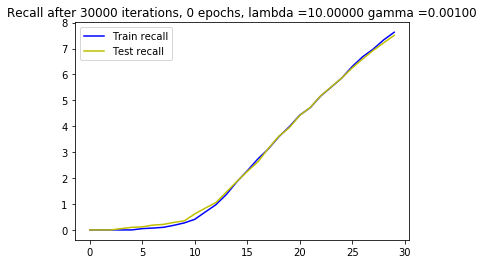

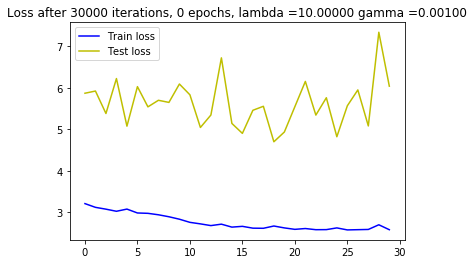

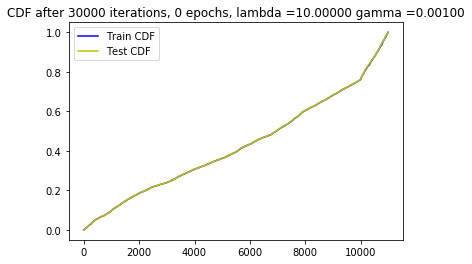






  6%|▋         | 30001/473047 [21:08<107:04:38,  1.15it/s]




  6%|▋         | 30009/473047 [21:08<75:27:04,  1.63it/s] 

New score:  0.11786015
Train score:  0.27938
Test score:  0.3353327
Obj first part:  0.0
Obj second part:  -1.0970024
Obj first part:  0.9056956321001053
Obj second part:  -1.5707664
Obj first part:  2.286328971385956
Obj second part:  -0.35452554
Obj first part:  1.8319177627563477
Obj second part:  -1.8327055
Obj first part:  4.167990684509277
Obj second part:  -2.5880997
Obj first part:  0.12498907744884491
Obj second part:  -1.8179705
Obj first part:  0.28692474588751793
Obj second part:  -1.2378708
Obj first part:  0.0
Obj second part:  -1.4388385
Obj first part:  2.743295133113861
Obj second part:  -1.0924234
Obj first part:  0.0
Obj second part:  -2.1500678
Obj first part:  0.6381415575742722
Obj second part:  -0.8265996
Obj first part:  0.42173806577920914
Obj second part:  -0.28633988
Obj first part:  0.0
Obj second part:  -2.8242025
Obj first part:  0.559750609099865
Obj second part:  -1.514684
Obj first part:  0.0
Obj second part:  -1.4468917
Obj first part:  1.3323877751827






  6%|▋         | 30017/473047 [21:08<53:17:43,  2.31it/s]




  6%|▋         | 30025/473047 [21:08<37:47:16,  3.26it/s]

Obj second part:  -2.8619833
Obj first part:  0.0
Obj second part:  -0.58177483
Obj first part:  0.0
Obj second part:  -0.8909402
Obj first part:  0.0
Obj second part:  -2.4884758
Obj first part:  0.0
Obj second part:  -3.0622144
Obj first part:  0.25867169722914696
Obj second part:  -0.30540085
Obj first part:  0.42974404990673065
Obj second part:  -0.033885486
Obj first part:  0.0
Obj second part:  -1.6239717
Obj first part:  1.186082437634468
Obj second part:  -2.4425244
Obj first part:  0.0
Obj second part:  -1.5698979
Obj first part:  0.0
Obj second part:  -2.0838761
Obj first part:  1.3962019979953766
Obj second part:  -0.7618803
Obj first part:  0.0
Obj second part:  -1.1847054
Obj first part:  0.0
Obj second part:  -0.54696006
Obj first part:  0.7473146915435791
Obj second part:  -1.7457134
Obj first part:  1.2646687030792236
Obj second part:  -0.37797114







  6%|▋         | 30033/473047 [21:08<26:55:59,  4.57it/s]




  6%|▋         | 30041/473047 [21:08<19:20:10,  6.36it/s]

Obj first part:  3.568636476993561
Obj second part:  -0.45120698
Obj first part:  0.0
Obj second part:  -1.2587333
Obj first part:  0.5955678224563599
Obj second part:  -0.3253366
Obj first part:  0.7004170119762421
Obj second part:  -2.5730162
Obj first part:  0.44793713837862015
Obj second part:  -0.058906622
Obj first part:  0.0
Obj second part:  -1.729899
Obj first part:  1.0533350706100464
Obj second part:  -0.20520899
Obj first part:  0.0
Obj second part:  -1.8786645
Obj first part:  0.5345626175403595
Obj second part:  -2.4959614
Obj first part:  1.3991542160511017
Obj second part:  -1.1397755
Obj first part:  3.3784544467926025
Obj second part:  -1.0908737
Obj first part:  1.9063304364681244
Obj second part:  -1.0786083
Obj first part:  0.0
Obj second part:  -1.6807524
Obj first part:  0.0
Obj second part:  -1.0083947
Obj first part:  0.0
Obj second part:  -3.1023293
Obj first part:  0.1489632297307253
Obj second part:  -0.07256998







  6%|▋         | 30049/473047 [21:08<14:01:33,  8.77it/s]




  6%|▋         | 30057/473047 [21:08<10:18:20, 11.94it/s]

Obj first part:  2.6748260855674744
Obj second part:  -1.3357085
Obj first part:  0.728503093123436
Obj second part:  -1.4316872
Obj first part:  0.0
Obj second part:  -0.6158997
Obj first part:  0.18189238384366035
Obj second part:  -1.7877011
Obj first part:  0.795455127954483
Obj second part:  -0.1312492
Obj first part:  6.74018919467926
Obj second part:  -0.98075044
Obj first part:  0.24377549067139626
Obj second part:  -1.4618331
Obj first part:  5.480362176895142
Obj second part:  -1.9734783
Obj first part:  0.6827995926141739
Obj second part:  -1.4029245
Obj first part:  18.373053073883057
Obj second part:  -2.3649325
Obj first part:  0.480254702270031
Obj second part:  -1.0993655
Obj first part:  0.4746505990624428
Obj second part:  -1.10663
Obj first part:  1.159466952085495
Obj second part:  -4.1046085
Obj first part:  0.0
Obj second part:  -4.757553
Obj first part:  0.0
Obj second part:  -0.35320374
Obj first part:  0.07211819756776094
Obj second part:  -0.7022719







  6%|▋         | 30065/473047 [21:09<7:41:50, 15.99it/s] 




  6%|▋         | 30073/473047 [21:09<5:52:05, 20.97it/s]

Obj first part:  0.404064804315567
Obj second part:  -0.09014335
Obj first part:  0.0
Obj second part:  -1.607467
Obj first part:  0.0
Obj second part:  -1.0968462
Obj first part:  0.0
Obj second part:  -2.30913
Obj first part:  0.6882642209529877
Obj second part:  -2.098765
Obj first part:  0.0
Obj second part:  -0.99742204
Obj first part:  0.14142736792564392
Obj second part:  -0.57976264
Obj first part:  3.344069719314575
Obj second part:  -2.4206958
Obj first part:  0.1570557989180088
Obj second part:  -3.039042
Obj first part:  0.0
Obj second part:  -3.365717
Obj first part:  0.2414853312075138
Obj second part:  -1.7986367
Obj first part:  6.01463258266449
Obj second part:  -1.8165866
Obj first part:  0.05595033522695303
Obj second part:  -1.0808916
Obj first part:  0.0
Obj second part:  -0.111118406
Obj first part:  0.0
Obj second part:  -1.2868087
Obj first part:  0.0
Obj second part:  -0.5877583







  6%|▋         | 30081/473047 [21:09<4:35:22, 26.81it/s]




  6%|▋         | 30089/473047 [21:09<3:41:23, 33.35it/s]

Obj first part:  0.12648161500692368
Obj second part:  -0.4724524
Obj first part:  0.6654909253120422
Obj second part:  -1.2910421
Obj first part:  0.29011955484747887
Obj second part:  -1.6896229
Obj first part:  0.0
Obj second part:  -4.1735873
Obj first part:  11.224384307861328
Obj second part:  -0.5765841
Obj first part:  0.1461557112634182
Obj second part:  -2.6449096
Obj first part:  0.0
Obj second part:  -0.9874778
Obj first part:  0.0
Obj second part:  -0.22066304
Obj first part:  4.262831509113312
Obj second part:  -1.9345726
Obj first part:  2.275790572166443
Obj second part:  -1.0310823
Obj first part:  0.2202293463051319
Obj second part:  -1.3440877
Obj first part:  1.1742046475410461
Obj second part:  -1.82047
Obj first part:  0.11405415832996368
Obj second part:  -0.7671386
Obj first part:  0.0
Obj second part:  -1.6421497
Obj first part:  0.0
Obj second part:  -1.2018714
Obj first part:  0.0
Obj second part:  -2.3768225







  6%|▋         | 30097/473047 [21:09<3:04:04, 40.11it/s]




  6%|▋         | 30105/473047 [21:09<2:37:37, 46.84it/s]

Obj first part:  0.0
Obj second part:  -1.2083571
Obj first part:  0.0
Obj second part:  -1.4641324
Obj first part:  2.6633188128471375
Obj second part:  -0.97140884
Obj first part:  0.0
Obj second part:  -0.8120545
Obj first part:  1.1566070467233658
Obj second part:  -0.22048631
Obj first part:  0.2640550397336483
Obj second part:  -1.5427171
Obj first part:  0.0
Obj second part:  -0.6654704
Obj first part:  0.0
Obj second part:  -0.85781443
Obj first part:  0.0
Obj second part:  -0.33707228
Obj first part:  0.11032580398023129
Obj second part:  -4.04818
Obj first part:  2.0653288066387177
Obj second part:  -0.397259
Obj first part:  0.0
Obj second part:  -1.8662201
Obj first part:  0.0
Obj second part:  -0.867848
Obj first part:  0.5109800770878792
Obj second part:  -3.7777188
Obj first part:  0.043091545812785625
Obj second part:  -3.7734258
Obj first part:  0.0
Obj second part:  -0.28995287







  6%|▋         | 30113/473047 [21:09<2:19:24, 52.95it/s]




  6%|▋         | 30121/473047 [21:09<2:06:12, 58.49it/s]

Obj first part:  0.0
Obj second part:  -1.5103996
Obj first part:  1.3543394207954407
Obj second part:  -1.0951333
Obj first part:  1.0744944959878922
Obj second part:  -0.58683723
Obj first part:  0.4838516563177109
Obj second part:  -3.158862
Obj first part:  0.3220929950475693
Obj second part:  -0.60193217
Obj first part:  0.0
Obj second part:  -0.64536405
Obj first part:  0.026688347570598125
Obj second part:  -2.5557034
Obj first part:  0.0
Obj second part:  -0.074069746
Obj first part:  0.0
Obj second part:  -0.13325092
Obj first part:  0.0
Obj second part:  -1.1229649
Obj first part:  0.7474347949028015
Obj second part:  -0.43517095
Obj first part:  0.1327312458306551
Obj second part:  -1.6511581
Obj first part:  0.0
Obj second part:  -0.36534
Obj first part:  0.0
Obj second part:  -1.7778758
Obj first part:  0.0
Obj second part:  -1.9769255
Obj first part:  0.0
Obj second part:  -0.09718444







  6%|▋         | 30129/473047 [21:09<1:57:26, 62.86it/s]




  6%|▋         | 30137/473047 [21:09<1:51:03, 66.47it/s]

Obj first part:  0.39550017565488815
Obj second part:  -2.844802
Obj first part:  0.0
Obj second part:  -2.1656077
Obj first part:  0.0
Obj second part:  -1.2594132
Obj first part:  0.0
Obj second part:  -1.4141157
Obj first part:  0.0
Obj second part:  -2.3650239
Obj first part:  2.8535276651382446
Obj second part:  -0.15255956
Obj first part:  5.315132141113281
Obj second part:  -0.6420991
Obj first part:  0.0
Obj second part:  -2.2278547
Obj first part:  1.2918920814990997
Obj second part:  -1.2986398
Obj first part:  0.7059338688850403
Obj second part:  -0.6366913
Obj first part:  0.6396826356649399
Obj second part:  -1.0846204
Obj first part:  7.304471135139465
Obj second part:  -3.249217
Obj first part:  0.0
Obj second part:  -1.0016028
Obj first part:  0.0
Obj second part:  -1.4125286
Obj first part:  0.0
Obj second part:  -1.027596
Obj first part:  1.192239448428154
Obj second part:  -0.49695754







  6%|▋         | 30145/473047 [21:10<1:46:36, 69.24it/s]




  6%|▋         | 30153/473047 [21:10<1:43:15, 71.49it/s]

Obj first part:  6.178687214851379
Obj second part:  -1.0853324
Obj first part:  0.0
Obj second part:  -0.08297746
Obj first part:  0.19171178340911865
Obj second part:  -1.5849063
Obj first part:  1.8392157554626465
Obj second part:  -1.3341875
Obj first part:  0.0
Obj second part:  -1.9982483
Obj first part:  0.0
Obj second part:  -2.2868857
Obj first part:  0.45674026012420654
Obj second part:  -0.4032349
Obj first part:  1.2369707226753235
Obj second part:  -1.5961707
Obj first part:  0.0
Obj second part:  -0.9661896
Obj first part:  0.0
Obj second part:  -1.3171924
Obj first part:  0.0
Obj second part:  -0.8199357
Obj first part:  0.0
Obj second part:  -1.1107974
Obj first part:  0.20863929763436317
Obj second part:  -0.14870617
Obj first part:  0.0
Obj second part:  -2.755245
Obj first part:  4.2739081382751465
Obj second part:  -4.918457
Obj first part:  0.24591077119112015
Obj second part:  -1.3344144







  6%|▋         | 30161/473047 [21:10<1:41:20, 72.84it/s]




  6%|▋         | 30169/473047 [21:10<1:39:27, 74.22it/s]

Obj first part:  2.6641061902046204
Obj second part:  -0.46897382
Obj first part:  0.0
Obj second part:  -0.21777196
Obj first part:  1.4832700788974762
Obj second part:  -0.8996082
Obj first part:  1.0152757912874222
Obj second part:  -1.8522711
Obj first part:  0.0
Obj second part:  -0.9324582
Obj first part:  1.5468959510326385
Obj second part:  -1.115394
Obj first part:  1.0455762594938278
Obj second part:  -3.736273
Obj first part:  0.08412652648985386
Obj second part:  -6.467001
Obj first part:  0.0
Obj second part:  -1.1092067
Obj first part:  0.10520118288695812
Obj second part:  -0.83484054
Obj first part:  0.0
Obj second part:  -0.63108
Obj first part:  0.44999822974205017
Obj second part:  -0.8786652
Obj first part:  1.0526181757450104
Obj second part:  -3.5061564
Obj first part:  13.90912413597107
Obj second part:  -2.8556244
Obj first part:  0.6991104036569595
Obj second part:  -2.7390208
Obj first part:  0.0
Obj second part:  -0.56482375







  6%|▋         | 30177/473047 [21:10<1:38:48, 74.71it/s]




  6%|▋         | 30185/473047 [21:10<1:38:10, 75.18it/s]

Obj first part:  0.25644056499004364
Obj second part:  -1.7948803
Obj first part:  0.16085946932435036
Obj second part:  -1.1657414
Obj first part:  0.3964434936642647
Obj second part:  -2.4888332
Obj first part:  2.498759627342224
Obj second part:  -1.1261042
Obj first part:  0.4175354540348053
Obj second part:  -1.32482
Obj first part:  0.0
Obj second part:  -2.746879
Obj first part:  0.0
Obj second part:  -2.0774305
Obj first part:  0.0
Obj second part:  -0.45289832
Obj first part:  0.39018772542476654
Obj second part:  -2.7339642
Obj first part:  8.670666813850403
Obj second part:  -1.6573421
Obj first part:  0.09573995135724545
Obj second part:  -0.31362528
Obj first part:  0.5099200829863548
Obj second part:  -2.7460186
Obj first part:  0.0
Obj second part:  -3.8596127
Obj first part:  0.0
Obj second part:  -2.3238173
Obj first part:  5.833254456520081
Obj second part:  -0.28606746
Obj first part:  0.0
Obj second part:  -0.61111176







  6%|▋         | 30193/473047 [21:10<1:37:25, 75.76it/s]




  6%|▋         | 30201/473047 [21:10<1:37:05, 76.02it/s]

Obj first part:  0.43623875826597214
Obj second part:  -2.3007157
Obj first part:  0.0
Obj second part:  -0.50093675
Obj first part:  0.29796404764056206
Obj second part:  -4.138008
Obj first part:  0.0
Obj second part:  -1.6983147
Obj first part:  0.20003775134682655
Obj second part:  -2.5549073
Obj first part:  0.0
Obj second part:  -3.9900205
Obj first part:  0.4804272949695587
Obj second part:  -2.1643963
Obj first part:  0.7934641093015671
Obj second part:  -0.9295548
Obj first part:  0.0
Obj second part:  -0.5618933
Obj first part:  2.104914039373398
Obj second part:  -0.3189631
Obj first part:  0.0
Obj second part:  -4.131734
Obj first part:  1.5344618260860443
Obj second part:  -1.0689578
Obj first part:  0.0
Obj second part:  -0.72302145
Obj first part:  0.0
Obj second part:  -1.8825452
Obj first part:  0.3029891476035118
Obj second part:  -1.1447852
Obj first part:  5.035932660102844
Obj second part:  -2.5524118







  6%|▋         | 30209/473047 [21:10<1:36:46, 76.27it/s]




  6%|▋         | 30217/473047 [21:11<1:36:50, 76.21it/s]

Obj first part:  0.0
Obj second part:  -1.2170707
Obj first part:  0.8870421350002289
Obj second part:  -0.78048974
Obj first part:  10.119491815567017
Obj second part:  -0.37041247
Obj first part:  0.0
Obj second part:  -0.85878694
Obj first part:  0.0
Obj second part:  -2.423295
Obj first part:  0.0
Obj second part:  -1.575789
Obj first part:  0.0
Obj second part:  -0.3862594
Obj first part:  0.16887564212083817
Obj second part:  -1.7959824
Obj first part:  0.1678478717803955
Obj second part:  -0.7470772
Obj first part:  0.0
Obj second part:  -3.190346
Obj first part:  0.0
Obj second part:  -2.2513924
Obj first part:  0.0
Obj second part:  -2.2577143
Obj first part:  0.2863851562142372
Obj second part:  -0.8395236
Obj first part:  0.0
Obj second part:  -1.6731588
Obj first part:  0.4952637106180191
Obj second part:  -0.19728898
Obj first part:  2.6278510689735413
Obj second part:  -2.328718







  6%|▋         | 30225/473047 [21:11<1:36:40, 76.35it/s]




  6%|▋         | 30233/473047 [21:11<1:36:33, 76.43it/s]

Obj first part:  2.0007170736789703
Obj second part:  -1.9088583
Obj first part:  0.0
Obj second part:  -0.4155641
Obj first part:  0.0
Obj second part:  -2.4266577
Obj first part:  0.0
Obj second part:  -0.8608024
Obj first part:  1.6448457539081573
Obj second part:  -0.61921906
Obj first part:  0.932048037648201
Obj second part:  -0.37163112
Obj first part:  0.902833491563797
Obj second part:  -1.2917175
Obj first part:  0.0
Obj second part:  -0.046960354
Obj first part:  0.5671269446611404
Obj second part:  -1.9654098
Obj first part:  0.0
Obj second part:  -0.22738415
Obj first part:  0.0
Obj second part:  -0.8441001
Obj first part:  0.44933583587408066
Obj second part:  -2.6041322
Obj first part:  0.0
Obj second part:  -0.20396852
Obj first part:  0.29044492170214653
Obj second part:  -3.0808256
Obj first part:  0.0
Obj second part:  -0.62421775
Obj first part:  3.4446802735328674
Obj second part:  -0.5049







  6%|▋         | 30241/473047 [21:11<1:36:19, 76.62it/s]




  6%|▋         | 30249/473047 [21:11<1:36:02, 76.85it/s]

Obj first part:  0.11815790086984634
Obj second part:  -2.026669
Obj first part:  0.2323444001376629
Obj second part:  -2.0229983
Obj first part:  0.0
Obj second part:  -0.410185
Obj first part:  4.050089120864868
Obj second part:  -1.5420456
Obj first part:  0.0
Obj second part:  -2.7277048
Obj first part:  0.0
Obj second part:  -2.6109798
Obj first part:  4.1791412234306335
Obj second part:  -0.9324894
Obj first part:  0.0
Obj second part:  -4.7766504
Obj first part:  0.0
Obj second part:  -2.54851
Obj first part:  1.6611705720424652
Obj second part:  -2.1198366
Obj first part:  0.0
Obj second part:  -0.38349015
Obj first part:  1.1447414010763168
Obj second part:  -1.9012502
Obj first part:  0.0
Obj second part:  -3.7031438
Obj first part:  0.2469479851424694
Obj second part:  -0.15530227
Obj first part:  0.0
Obj second part:  -3.7401905
Obj first part:  3.8804996013641357
Obj second part:  -1.1701481







  6%|▋         | 30257/473047 [21:11<1:35:54, 76.95it/s]




  6%|▋         | 30265/473047 [21:11<1:36:27, 76.50it/s]

Obj first part:  0.0
Obj second part:  -1.3710432
Obj first part:  0.9795191138982773
Obj second part:  -1.0238268
Obj first part:  0.0
Obj second part:  -1.0015595
Obj first part:  0.0
Obj second part:  -3.284219
Obj first part:  0.0
Obj second part:  -0.13791665
Obj first part:  0.0
Obj second part:  -2.7732298
Obj first part:  0.0
Obj second part:  -1.8063598
Obj first part:  0.0
Obj second part:  -1.4654061
Obj first part:  0.0
Obj second part:  -1.4195744
Obj first part:  0.0
Obj second part:  -1.3226244
Obj first part:  1.3527071475982666
Obj second part:  -1.2800001
Obj first part:  0.0
Obj second part:  -1.3424104
Obj first part:  0.0
Obj second part:  -0.3547481
Obj first part:  2.9921755194664
Obj second part:  -0.53233063
Obj first part:  0.0
Obj second part:  -4.6888733
Obj first part:  0.3150155767798424
Obj second part:  -1.0627558







  6%|▋         | 30273/473047 [21:11<1:36:28, 76.50it/s]




  6%|▋         | 30281/473047 [21:11<1:36:07, 76.77it/s]

Obj first part:  1.2368732690811157
Obj second part:  -0.96065086
Obj first part:  0.0
Obj second part:  -1.3427718
Obj first part:  0.4058172181248665
Obj second part:  -2.3580768
Obj first part:  5.019383430480957
Obj second part:  -1.8814716
Obj first part:  0.0
Obj second part:  -2.631153
Obj first part:  0.0
Obj second part:  -1.1631118
Obj first part:  0.0
Obj second part:  -0.3973116
Obj first part:  0.2286122553050518
Obj second part:  -2.3837836
Obj first part:  0.9823916852474213
Obj second part:  -3.039521
Obj first part:  0.0
Obj second part:  -2.2262306
Obj first part:  4.450291991233826
Obj second part:  -1.2544577
Obj first part:  0.0
Obj second part:  -0.3730216
Obj first part:  0.17798863351345062
Obj second part:  -0.85860384
Obj first part:  0.0
Obj second part:  -1.463544
Obj first part:  0.0
Obj second part:  -0.81152725
Obj first part:  1.8229416012763977
Obj second part:  -0.8994381







  6%|▋         | 30289/473047 [21:11<1:36:26, 76.52it/s]




  6%|▋         | 30297/473047 [21:12<1:36:20, 76.60it/s]

Obj first part:  0.30147988349199295
Obj second part:  -0.27602234
Obj first part:  0.16644775867462158
Obj second part:  -1.4336275
Obj first part:  1.8529112637043
Obj second part:  -3.1573532
Obj first part:  0.0
Obj second part:  -0.67296106
Obj first part:  1.3966336846351624
Obj second part:  -0.35109004
Obj first part:  4.25840437412262
Obj second part:  -0.556557
Obj first part:  0.3572731465101242
Obj second part:  -0.40683672
Obj first part:  0.1918465457856655
Obj second part:  -2.9348588
Obj first part:  0.0
Obj second part:  -2.2998264
Obj first part:  1.3956283032894135
Obj second part:  -2.9370792
Obj first part:  0.0
Obj second part:  -0.4500578
Obj first part:  0.7946078479290009
Obj second part:  -2.3397698
Obj first part:  0.0
Obj second part:  -0.15783535
Obj first part:  0.0
Obj second part:  -0.7980594
Obj first part:  4.464627504348755
Obj second part:  -3.331893
Obj first part:  3.7794888019561768
Obj second part:  -3.7057104







  6%|▋         | 30305/473047 [21:12<1:36:26, 76.51it/s]




  6%|▋         | 30313/473047 [21:12<1:36:08, 76.75it/s]

Obj first part:  1.5891991555690765
Obj second part:  -0.8495032
Obj first part:  0.0
Obj second part:  -1.5366092
Obj first part:  0.0
Obj second part:  -2.7502408
Obj first part:  0.0
Obj second part:  -1.1409152
Obj first part:  0.0
Obj second part:  -0.8314587
Obj first part:  0.3469500318169594
Obj second part:  -1.2223915
Obj first part:  0.0
Obj second part:  -2.339756
Obj first part:  0.0
Obj second part:  -0.18270853
Obj first part:  0.0
Obj second part:  -1.8328563
Obj first part:  0.12194205075502396
Obj second part:  -2.380234
Obj first part:  0.2967917360365391
Obj second part:  -0.21758272
Obj first part:  0.0
Obj second part:  -2.541848
Obj first part:  0.978202298283577
Obj second part:  -0.5042807
Obj first part:  5.0546956062316895
Obj second part:  -0.17044052
Obj first part:  0.0
Obj second part:  -4.0677757
Obj first part:  0.0
Obj second part:  -0.9593578







  6%|▋         | 30321/473047 [21:12<1:36:24, 76.54it/s]




  6%|▋         | 30329/473047 [21:12<1:35:59, 76.86it/s]

Obj first part:  0.0
Obj second part:  -1.4302301
Obj first part:  0.0
Obj second part:  -3.446298
Obj first part:  0.3038550354540348
Obj second part:  -2.8814409
Obj first part:  0.0
Obj second part:  -2.111943
Obj first part:  0.7536017894744873
Obj second part:  -0.67528385
Obj first part:  0.12955592013895512
Obj second part:  -0.15601869
Obj first part:  0.0
Obj second part:  -0.20126694
Obj first part:  0.41074879467487335
Obj second part:  -0.44978273
Obj first part:  0.0
Obj second part:  -1.1632471
Obj first part:  1.342540979385376
Obj second part:  -0.82716775
Obj first part:  2.9642701148986816
Obj second part:  -1.4403676
Obj first part:  0.0
Obj second part:  -0.7923492
Obj first part:  0.0
Obj second part:  -1.4614127
Obj first part:  0.0
Obj second part:  -0.645797
Obj first part:  0.0
Obj second part:  -0.16307716
Obj first part:  0.9518594294786453
Obj second part:  -0.3343484







  6%|▋         | 30337/473047 [21:12<1:36:25, 76.52it/s]




  6%|▋         | 30345/473047 [21:12<1:36:19, 76.60it/s]

Obj first part:  0.8509219437837601
Obj second part:  -3.2408032
Obj first part:  1.2318255752325058
Obj second part:  -2.4156728
Obj first part:  0.0
Obj second part:  -0.07396667
Obj first part:  0.0
Obj second part:  -0.09010468
Obj first part:  0.0
Obj second part:  -1.6122103
Obj first part:  0.0
Obj second part:  -0.105204456
Obj first part:  0.0
Obj second part:  -0.1659161
Obj first part:  0.0
Obj second part:  -1.9611802
Obj first part:  0.884261280298233
Obj second part:  -1.4212201
Obj first part:  0.0
Obj second part:  -0.5234715
Obj first part:  4.148830473423004
Obj second part:  -0.28493053
Obj first part:  0.0
Obj second part:  -0.6617811
Obj first part:  3.5954904556274414
Obj second part:  -0.15052295
Obj first part:  0.30619047582149506
Obj second part:  -0.8626278
Obj first part:  0.0
Obj second part:  -1.4051782
Obj first part:  0.0
Obj second part:  -2.3959467







  6%|▋         | 30353/473047 [21:12<1:36:15, 76.66it/s]




  6%|▋         | 30361/473047 [21:12<1:35:54, 76.93it/s]

Obj first part:  0.0
Obj second part:  -1.58212
Obj first part:  0.0
Obj second part:  -0.47356775
Obj first part:  1.3172176480293274
Obj second part:  -3.58143
Obj first part:  0.0
Obj second part:  -0.75356835
Obj first part:  1.001482605934143
Obj second part:  -0.7727372
Obj first part:  0.4745310917496681
Obj second part:  -1.5930457
Obj first part:  0.0
Obj second part:  -2.3210955
Obj first part:  0.0
Obj second part:  -0.22000937
Obj first part:  7.1099090576171875
Obj second part:  -1.6868209
Obj first part:  0.0
Obj second part:  -1.4064996
Obj first part:  0.0
Obj second part:  -2.9165578
Obj first part:  0.19178060814738274
Obj second part:  -2.6237855
Obj first part:  0.0
Obj second part:  -1.8281958
Obj first part:  0.536644272506237
Obj second part:  -0.9274283
Obj first part:  0.0
Obj second part:  -1.036324
Obj first part:  0.0
Obj second part:  -0.28607744







  6%|▋         | 30369/473047 [21:13<1:36:23, 76.54it/s]




  6%|▋         | 30377/473047 [21:13<1:36:10, 76.71it/s]

Obj first part:  0.0
Obj second part:  -0.48884806
Obj first part:  0.0
Obj second part:  -1.0473444
Obj first part:  0.0
Obj second part:  -1.172364
Obj first part:  1.8886351585388184
Obj second part:  -1.799093
Obj first part:  2.0206910371780396
Obj second part:  -0.4835407
Obj first part:  1.424427330493927
Obj second part:  -2.105227
Obj first part:  0.0
Obj second part:  -1.8577489
Obj first part:  0.16913510859012604
Obj second part:  -0.11207451
Obj first part:  0.8064788579940796
Obj second part:  -0.43169
Obj first part:  0.0
Obj second part:  -5.0775976
Obj first part:  7.609434127807617
Obj second part:  -0.25112292
Obj first part:  0.0
Obj second part:  -2.090347
Obj first part:  3.9534419775009155
Obj second part:  -1.8630383
Obj first part:  0.0
Obj second part:  -2.392506
Obj first part:  0.0
Obj second part:  -4.6542954
Obj first part:  0.36374710500240326
Obj second part:  -0.57751316







  6%|▋         | 30385/473047 [21:13<1:36:16, 76.64it/s]




  6%|▋         | 30393/473047 [21:13<1:35:53, 76.93it/s]

Obj first part:  0.14951273798942566
Obj second part:  -1.5396948
Obj first part:  1.7655442655086517
Obj second part:  -1.3163785
Obj first part:  0.0
Obj second part:  -1.326216
Obj first part:  1.0011526197195053
Obj second part:  -1.6198568
Obj first part:  0.0
Obj second part:  -2.860918
Obj first part:  0.22897040471434593
Obj second part:  -1.5222381
Obj first part:  2.0465654134750366
Obj second part:  -1.2456481
Obj first part:  0.0
Obj second part:  -1.5118535
Obj first part:  4.468467831611633
Obj second part:  -0.6883452
Obj first part:  0.0
Obj second part:  -1.9455107
Obj first part:  0.0
Obj second part:  -1.14073
Obj first part:  0.7701633125543594
Obj second part:  -0.32925457
Obj first part:  0.0
Obj second part:  -0.4491203
Obj first part:  0.0
Obj second part:  -0.7472149
Obj first part:  1.9295214116573334
Obj second part:  -1.0193884
Obj first part:  0.0
Obj second part:  -1.096773







  6%|▋         | 30401/473047 [21:13<1:36:07, 76.74it/s]




  6%|▋         | 30409/473047 [21:13<1:35:52, 76.95it/s]

Obj first part:  0.6840672343969345
Obj second part:  -1.6541071
Obj first part:  0.0
Obj second part:  -3.5925543
Obj first part:  0.36456044763326645
Obj second part:  -3.0697024
Obj first part:  0.0
Obj second part:  -0.4229714
Obj first part:  0.06841105874627829
Obj second part:  -0.5807375
Obj first part:  0.0
Obj second part:  -1.2947469
Obj first part:  4.684872031211853
Obj second part:  -3.6836963
Obj first part:  0.0
Obj second part:  -0.41218582
Obj first part:  0.0
Obj second part:  -0.51230496
Obj first part:  0.0
Obj second part:  -0.78200746
Obj first part:  0.3548326715826988
Obj second part:  -0.7837365
Obj first part:  5.2675241231918335
Obj second part:  -1.5039198
Obj first part:  0.0
Obj second part:  -0.89719135
Obj first part:  0.0
Obj second part:  -1.7369144
Obj first part:  0.0
Obj second part:  -1.151505
Obj first part:  0.639118105173111
Obj second part:  -1.3106295







  6%|▋         | 30417/473047 [21:13<1:36:10, 76.71it/s]




  6%|▋         | 30425/473047 [21:13<1:35:45, 77.04it/s]

Obj first part:  0.0
Obj second part:  -0.9993546
Obj first part:  0.0
Obj second part:  -1.4262044
Obj first part:  0.0
Obj second part:  -3.7070177
Obj first part:  6.778459548950195
Obj second part:  -0.7488171
Obj first part:  6.4743077754974365
Obj second part:  -1.6207625
Obj first part:  0.0
Obj second part:  -0.6264577
Obj first part:  0.14933842234313488
Obj second part:  -1.645521
Obj first part:  0.1096731424331665
Obj second part:  -1.4861978
Obj first part:  0.0
Obj second part:  -4.4845004
Obj first part:  0.0
Obj second part:  -3.7479658
Obj first part:  0.2843058668076992
Obj second part:  -1.5764449
Obj first part:  1.3508245348930359
Obj second part:  -0.98404765
Obj first part:  0.0
Obj second part:  -1.2275254
Obj first part:  3.8651463389396667
Obj second part:  -1.3909194
Obj first part:  0.0
Obj second part:  -1.8849214
Obj first part:  0.358831025660038
Obj second part:  -1.4072374







  6%|▋         | 30433/473047 [21:13<1:36:08, 76.73it/s]




  6%|▋         | 30441/473047 [21:13<1:35:48, 77.00it/s]

Obj first part:  0.1282294373959303
Obj second part:  -0.66675466
Obj first part:  9.155815839767456
Obj second part:  -1.9152732
Obj first part:  1.6009841859340668
Obj second part:  -0.69163996
Obj first part:  1.1550958454608917
Obj second part:  -0.41002557
Obj first part:  0.0
Obj second part:  -2.211781
Obj first part:  0.17156504094600677
Obj second part:  -2.554053
Obj first part:  0.0
Obj second part:  -0.47026592
Obj first part:  0.0
Obj second part:  -0.6890816
Obj first part:  0.0
Obj second part:  -2.2808633
Obj first part:  0.0
Obj second part:  -3.1785352
Obj first part:  0.35444747656583786
Obj second part:  -1.5891687
Obj first part:  0.36629483103752136
Obj second part:  -0.8456073
Obj first part:  0.0
Obj second part:  -2.1854436
Obj first part:  0.0
Obj second part:  -3.4170692
Obj first part:  0.7004053145647049
Obj second part:  -0.5722331
Obj first part:  0.11871077120304108
Obj second part:  -1.3768198







  6%|▋         | 30449/473047 [21:14<1:36:13, 76.66it/s]




  6%|▋         | 30457/473047 [21:14<1:36:01, 76.82it/s]

Obj first part:  0.0
Obj second part:  -2.5327466
Obj first part:  0.4883822798728943
Obj second part:  -0.9632002
Obj first part:  0.0
Obj second part:  -0.31554806
Obj first part:  2.0449578762054443
Obj second part:  -0.8295268
Obj first part:  0.668795257806778
Obj second part:  -0.210167
Obj first part:  2.6048660278320312
Obj second part:  -2.8087635
Obj first part:  0.11201165616512299
Obj second part:  -1.2282205
Obj first part:  0.3784742206335068
Obj second part:  -2.1441026
Obj first part:  0.0
Obj second part:  -2.34351
Obj first part:  0.0
Obj second part:  -2.7274022
Obj first part:  1.3389748334884644
Obj second part:  -0.39808014
Obj first part:  0.0
Obj second part:  -1.9268994
Obj first part:  10.691581964492798
Obj second part:  -0.47754014
Obj first part:  0.0
Obj second part:  -1.3440344
Obj first part:  0.249764584004879
Obj second part:  -2.4303155
Obj first part:  0.0
Obj second part:  -1.2600908







  6%|▋         | 30465/473047 [21:14<1:36:22, 76.54it/s]




  6%|▋         | 30473/473047 [21:14<1:36:02, 76.80it/s]

Obj first part:  0.0
Obj second part:  -3.5029626
Obj first part:  0.8114335685968399
Obj second part:  -3.7645755
Obj first part:  0.42481783777475357
Obj second part:  -4.306941
Obj first part:  0.20056232810020447
Obj second part:  -1.5331964
Obj first part:  0.0
Obj second part:  -0.2096454
Obj first part:  0.0
Obj second part:  -0.38104206
Obj first part:  0.8523887395858765
Obj second part:  -1.5727727
Obj first part:  0.0
Obj second part:  -1.3036696
Obj first part:  5.761663913726807
Obj second part:  -1.7791052
Obj first part:  0.0
Obj second part:  -0.59400237
Obj first part:  0.10332359932363033
Obj second part:  -0.13061604
Obj first part:  0.3499876335263252
Obj second part:  -0.91514647
Obj first part:  0.0
Obj second part:  -1.3258576
Obj first part:  0.0
Obj second part:  -0.4760871
Obj first part:  0.0
Obj second part:  -1.0022981
Obj first part:  1.9262003898620605
Obj second part:  -0.61104244







  6%|▋         | 30481/473047 [21:14<1:36:47, 76.21it/s]




  6%|▋         | 30489/473047 [21:14<1:36:32, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.8151639
Obj first part:  3.5513418912887573
Obj second part:  -1.0460331
Obj first part:  0.0
Obj second part:  -2.4276109
Obj first part:  1.07657290995121
Obj second part:  -2.61659
Obj first part:  0.0
Obj second part:  -0.14879511
Obj first part:  0.0
Obj second part:  -4.431534
Obj first part:  0.0
Obj second part:  -1.1981983
Obj first part:  0.0
Obj second part:  -3.8842895
Obj first part:  0.3626859188079834
Obj second part:  -3.454381
Obj first part:  0.0
Obj second part:  -0.791335
Obj first part:  2.5627750158309937
Obj second part:  -1.265097
Obj first part:  0.0
Obj second part:  -0.6668695
Obj first part:  0.0
Obj second part:  -0.6577123
Obj first part:  0.0
Obj second part:  -1.3136557
Obj first part:  0.0
Obj second part:  -0.114802375
Obj first part:  2.810410261154175
Obj second part:  -0.8645219







  6%|▋         | 30497/473047 [21:14<1:36:26, 76.48it/s]




  6%|▋         | 30505/473047 [21:14<1:36:30, 76.43it/s]

Obj first part:  0.1894967257976532
Obj second part:  -2.0440917
Obj first part:  0.3350342810153961
Obj second part:  -0.9020175
Obj first part:  0.3321336582303047
Obj second part:  -2.950126
Obj first part:  0.0
Obj second part:  -1.0084707
Obj first part:  0.28042564168572426
Obj second part:  -4.4767656
Obj first part:  1.2298202514648438
Obj second part:  -0.24483126
Obj first part:  0.6339666247367859
Obj second part:  -0.7477512
Obj first part:  0.0
Obj second part:  -0.85656
Obj first part:  3.258938789367676
Obj second part:  -0.72292215
Obj first part:  0.0
Obj second part:  -3.1155884
Obj first part:  0.0
Obj second part:  -0.12537621
Obj first part:  0.0
Obj second part:  -3.7306786
Obj first part:  0.46999305486679077
Obj second part:  -0.21285701
Obj first part:  4.730457365512848
Obj second part:  -1.0730338
Obj first part:  0.8348710089921951
Obj second part:  -2.4807355
Obj first part:  0.0
Obj second part:  -0.9774744







  6%|▋         | 30513/473047 [21:14<1:36:13, 76.64it/s]




  6%|▋         | 30521/473047 [21:14<1:36:22, 76.53it/s]

Obj first part:  0.4727837070822716
Obj second part:  -0.50995743
Obj first part:  0.0
Obj second part:  -1.481313
Obj first part:  0.2515590563416481
Obj second part:  -0.48118478
Obj first part:  0.0
Obj second part:  -0.6936413
Obj first part:  5.995239019393921
Obj second part:  -2.1039217
Obj first part:  0.849836990237236
Obj second part:  -0.57146436
Obj first part:  0.0
Obj second part:  -0.23518594
Obj first part:  0.0
Obj second part:  -1.4030406
Obj first part:  3.264661133289337
Obj second part:  -0.843793
Obj first part:  0.0
Obj second part:  -2.39411
Obj first part:  0.0
Obj second part:  -1.0693198
Obj first part:  0.4256013035774231
Obj second part:  -2.1947756
Obj first part:  0.0
Obj second part:  -1.6725681
Obj first part:  6.489980220794678
Obj second part:  -0.85164845
Obj first part:  7.8864604234695435
Obj second part:  -1.4145111
Obj first part:  0.0
Obj second part:  -1.7302837







  6%|▋         | 30529/473047 [21:15<1:36:35, 76.36it/s]




  6%|▋         | 30537/473047 [21:15<1:36:01, 76.80it/s]

Obj first part:  1.676313579082489
Obj second part:  -0.9968004
Obj first part:  0.0
Obj second part:  -2.4102867
Obj first part:  0.2724337764084339
Obj second part:  -3.6910737
Obj first part:  0.0
Obj second part:  -0.80999
Obj first part:  0.0
Obj second part:  -2.2365923
Obj first part:  3.3182787895202637
Obj second part:  -0.42619988
Obj first part:  0.1740632951259613
Obj second part:  -3.7088435
Obj first part:  1.0106489807367325
Obj second part:  -1.805772
Obj first part:  0.19283706322312355
Obj second part:  -3.534406
Obj first part:  0.0
Obj second part:  -5.3522625
Obj first part:  0.0886815320700407
Obj second part:  -2.4037268
Obj first part:  0.0
Obj second part:  -2.5581198
Obj first part:  2.419562041759491
Obj second part:  -2.803725
Obj first part:  0.0
Obj second part:  -2.805619
Obj first part:  0.04470808897167444
Obj second part:  -1.9843147
Obj first part:  0.11205234564840794
Obj second part:  -2.1840248







  6%|▋         | 30545/473047 [21:15<1:36:15, 76.61it/s]




  6%|▋         | 30553/473047 [21:15<1:36:02, 76.78it/s]

Obj first part:  0.0
Obj second part:  -0.37626556
Obj first part:  0.0
Obj second part:  -1.1089683
Obj first part:  0.0
Obj second part:  -0.14373197
Obj first part:  0.0
Obj second part:  -1.6270095
Obj first part:  0.19653836265206337
Obj second part:  -1.031388
Obj first part:  0.18595624715089798
Obj second part:  -0.6271845
Obj first part:  0.0
Obj second part:  -2.3556929
Obj first part:  0.0
Obj second part:  -0.11845078
Obj first part:  0.0
Obj second part:  -0.24254811
Obj first part:  1.499127447605133
Obj second part:  -0.8460477
Obj first part:  2.1383079886436462
Obj second part:  -4.0866838
Obj first part:  0.0
Obj second part:  -0.6412891
Obj first part:  0.49349110573530197
Obj second part:  -0.087602004
Obj first part:  0.0
Obj second part:  -1.2592773
Obj first part:  0.0
Obj second part:  -0.4037992
Obj first part:  0.0
Obj second part:  -1.6848623







  6%|▋         | 30561/473047 [21:15<1:36:33, 76.38it/s]




  6%|▋         | 30569/473047 [21:15<1:36:16, 76.60it/s]

Obj first part:  0.0
Obj second part:  -3.5589337
Obj first part:  1.718689203262329
Obj second part:  -1.227394
Obj first part:  0.0
Obj second part:  -1.4189372
Obj first part:  0.13640220277011395
Obj second part:  -1.6235977
Obj first part:  2.854600250720978
Obj second part:  -0.9189137
Obj first part:  0.0
Obj second part:  -0.12527831
Obj first part:  0.12085926719009876
Obj second part:  -2.057824
Obj first part:  0.0
Obj second part:  -2.3948872
Obj first part:  0.23861132562160492
Obj second part:  -0.59758127
Obj first part:  0.0
Obj second part:  -0.13829769
Obj first part:  7.597589492797852
Obj second part:  -0.059539415
Obj first part:  1.7782922089099884
Obj second part:  -0.5809497
Obj first part:  0.0
Obj second part:  -1.1827193
Obj first part:  0.0
Obj second part:  -0.26492923
Obj first part:  1.7725609242916107
Obj second part:  -0.66331834
Obj first part:  0.1967482827603817
Obj second part:  -0.2474694







  6%|▋         | 30577/473047 [21:15<1:36:26, 76.47it/s]




  6%|▋         | 30585/473047 [21:15<1:36:07, 76.72it/s]

Obj first part:  0.0
Obj second part:  -1.8619583
Obj first part:  0.0
Obj second part:  -0.5807659
Obj first part:  0.0
Obj second part:  -2.4731812
Obj first part:  0.1867593638598919
Obj second part:  -1.2274002
Obj first part:  0.5217169225215912
Obj second part:  -1.398533
Obj first part:  0.08637774735689163
Obj second part:  -3.090472
Obj first part:  0.0
Obj second part:  -1.9948888
Obj first part:  8.929603695869446
Obj second part:  -1.434407
Obj first part:  0.0
Obj second part:  -0.18178779
Obj first part:  0.0
Obj second part:  -0.38355723
Obj first part:  5.74024498462677
Obj second part:  -2.3683882
Obj first part:  0.3817394748330116
Obj second part:  -0.48548055
Obj first part:  0.0
Obj second part:  -2.6572263
Obj first part:  2.308635413646698
Obj second part:  -1.3441164
Obj first part:  0.455014631152153
Obj second part:  -3.9027236
Obj first part:  0.80619215965271
Obj second part:  -1.4193838







  6%|▋         | 30593/473047 [21:15<1:36:26, 76.47it/s]




  6%|▋         | 30601/473047 [21:16<1:36:14, 76.62it/s]

Obj first part:  0.0
Obj second part:  -2.0331793
Obj first part:  0.0
Obj second part:  -0.23103826
Obj first part:  0.0
Obj second part:  -0.9362115
Obj first part:  0.0
Obj second part:  -1.367428
Obj first part:  2.723492980003357
Obj second part:  -0.8938507
Obj first part:  0.0
Obj second part:  -0.08486685
Obj first part:  0.0
Obj second part:  -0.9488709
Obj first part:  0.8438883721828461
Obj second part:  -0.18566605
Obj first part:  0.0
Obj second part:  -4.751314
Obj first part:  0.6852982938289642
Obj second part:  -4.0546503
Obj first part:  0.0
Obj second part:  -4.091159
Obj first part:  0.2672756649553776
Obj second part:  -0.29821497
Obj first part:  0.0
Obj second part:  -1.0301111
Obj first part:  0.0
Obj second part:  -0.16721097
Obj first part:  5.623747110366821
Obj second part:  -1.1209323
Obj first part:  15.59895396232605
Obj second part:  -1.0190781







  6%|▋         | 30609/473047 [21:16<1:36:20, 76.55it/s]




  6%|▋         | 30617/473047 [21:16<1:35:59, 76.82it/s]

Obj first part:  0.0
Obj second part:  -0.5333016
Obj first part:  0.1948566548526287
Obj second part:  -1.6121209
Obj first part:  0.0
Obj second part:  -1.333523
Obj first part:  0.0
Obj second part:  -0.8800765
Obj first part:  0.2644028142094612
Obj second part:  -5.4940615
Obj first part:  5.270036458969116
Obj second part:  -2.0997512
Obj first part:  5.249653458595276
Obj second part:  -0.3365505
Obj first part:  3.1091144680976868
Obj second part:  -0.56734085
Obj first part:  0.0
Obj second part:  -0.41480815
Obj first part:  0.0
Obj second part:  -2.9833198
Obj first part:  0.0
Obj second part:  -0.37925538
Obj first part:  0.0
Obj second part:  -2.1608608
Obj first part:  0.0
Obj second part:  -1.1730409
Obj first part:  0.0
Obj second part:  -1.9814801
Obj first part:  1.3949361443519592
Obj second part:  -0.9529066
Obj first part:  10.03402590751648
Obj second part:  -4.4329







  6%|▋         | 30625/473047 [21:16<1:35:55, 76.86it/s]




  6%|▋         | 30633/473047 [21:16<1:35:51, 76.93it/s]

Obj first part:  0.0
Obj second part:  -2.3515878
Obj first part:  0.013729393249377608
Obj second part:  -2.1135201
Obj first part:  0.0
Obj second part:  -3.3217735
Obj first part:  0.0
Obj second part:  -2.7209458
Obj first part:  0.0
Obj second part:  -1.9643815
Obj first part:  1.920447200536728
Obj second part:  -0.96141803
Obj first part:  1.5201139450073242
Obj second part:  -2.4897068
Obj first part:  0.0
Obj second part:  -4.1013203
Obj first part:  0.3296598792076111
Obj second part:  -0.9281967
Obj first part:  0.0
Obj second part:  -2.9032402
Obj first part:  0.5984253436326981
Obj second part:  -0.53762734
Obj first part:  0.3752158209681511
Obj second part:  -3.225047
Obj first part:  0.0
Obj second part:  -0.73316807
Obj first part:  0.03868397092446685
Obj second part:  -0.9643606
Obj first part:  0.0
Obj second part:  -0.45456988
Obj first part:  0.0
Obj second part:  -0.20558748







  6%|▋         | 30641/473047 [21:16<1:35:40, 77.07it/s]




  6%|▋         | 30649/473047 [21:16<1:35:59, 76.81it/s]

Obj first part:  0.0
Obj second part:  -0.96292466
Obj first part:  4.382346868515015
Obj second part:  -2.595835
Obj first part:  0.0
Obj second part:  -2.1391222
Obj first part:  1.629929542541504
Obj second part:  -1.8508587
Obj first part:  0.0
Obj second part:  -0.13460772
Obj first part:  0.7119493931531906
Obj second part:  -1.2540295
Obj first part:  0.6202583387494087
Obj second part:  -0.6726793
Obj first part:  0.2585936710238457
Obj second part:  -2.1143796
Obj first part:  0.32617513090372086
Obj second part:  -1.4445763
Obj first part:  1.089978963136673
Obj second part:  -3.7745388
Obj first part:  0.0
Obj second part:  -4.024466
Obj first part:  0.7650882005691528
Obj second part:  -2.5679047
Obj first part:  0.6654465943574905
Obj second part:  -2.7283194
Obj first part:  2.6196926832199097
Obj second part:  -1.8041764
Obj first part:  0.0
Obj second part:  -3.7629704
Obj first part:  0.564938485622406
Obj second part:  -1.2562355







  6%|▋         | 30657/473047 [21:16<1:36:05, 76.73it/s]




  6%|▋         | 30665/473047 [21:16<1:35:56, 76.84it/s]

Obj first part:  1.4458271861076355
Obj second part:  -3.1737287
Obj first part:  0.0
Obj second part:  -1.037908
Obj first part:  0.6938033550977707
Obj second part:  -2.265383
Obj first part:  4.444911777973175
Obj second part:  -1.2510023
Obj first part:  13.980722427368164
Obj second part:  -3.2727587
Obj first part:  0.22718897089362144
Obj second part:  -2.590865
Obj first part:  0.4773799329996109
Obj second part:  -2.4599528
Obj first part:  0.39018940180540085
Obj second part:  -0.8282927
Obj first part:  0.720059871673584
Obj second part:  -1.3239328
Obj first part:  0.6005114689469337
Obj second part:  -3.0052173
Obj first part:  0.0
Obj second part:  -3.4239838
Obj first part:  0.6865520030260086
Obj second part:  -1.618028
Obj first part:  0.0
Obj second part:  -1.6597286
Obj first part:  2.8491902351379395
Obj second part:  -3.9350486
Obj first part:  0.32749831676483154
Obj second part:  -1.4485172
Obj first part:  0.793524831533432
Obj second part:  -3.3332376







  6%|▋         | 30673/473047 [21:16<1:36:08, 76.68it/s]




  6%|▋         | 30681/473047 [21:17<1:36:13, 76.62it/s]

Obj first part:  1.4050810039043427
Obj second part:  -0.5343387
Obj first part:  0.0
Obj second part:  -1.9870934
Obj first part:  0.0
Obj second part:  -4.0631733
Obj first part:  5.3564804792404175
Obj second part:  -1.3541765
Obj first part:  0.0
Obj second part:  -4.368056
Obj first part:  0.0
Obj second part:  -1.0686303
Obj first part:  0.0
Obj second part:  -0.65140545
Obj first part:  0.0
Obj second part:  -3.3572176
Obj first part:  0.0
Obj second part:  -1.892788
Obj first part:  8.513367772102356
Obj second part:  -2.143211
Obj first part:  0.0
Obj second part:  -1.5468005
Obj first part:  1.096409410238266
Obj second part:  -0.5811719
Obj first part:  0.0
Obj second part:  -1.5552783
Obj first part:  0.0
Obj second part:  -1.2663437
Obj first part:  0.0
Obj second part:  -1.30175
Obj first part:  4.082464873790741
Obj second part:  -1.2673342







  6%|▋         | 30689/473047 [21:17<1:36:11, 76.64it/s]




  6%|▋         | 30697/473047 [21:17<1:35:51, 76.90it/s]

Obj first part:  2.7009230852127075
Obj second part:  -2.4628086
Obj first part:  2.0384061336517334
Obj second part:  -0.7956436
Obj first part:  0.0
Obj second part:  -0.5364648
Obj first part:  0.0
Obj second part:  -1.8960423
Obj first part:  0.0
Obj second part:  -0.57378757
Obj first part:  0.15062478370964527
Obj second part:  -2.2053413
Obj first part:  1.9305907189846039
Obj second part:  -3.4728966
Obj first part:  0.0
Obj second part:  -3.027571
Obj first part:  0.0
Obj second part:  -0.16529219
Obj first part:  0.0
Obj second part:  -1.6701056
Obj first part:  0.07374020293354988
Obj second part:  -2.8202527
Obj first part:  1.775016337633133
Obj second part:  -0.7836799
Obj first part:  2.49731108546257
Obj second part:  -3.8364863
Obj first part:  0.18249334767460823
Obj second part:  -0.5905341
Obj first part:  1.6157373785972595
Obj second part:  -2.1261327
Obj first part:  0.0
Obj second part:  -2.8879898







  6%|▋         | 30705/473047 [21:17<1:36:04, 76.73it/s]




  6%|▋         | 30713/473047 [21:17<1:35:49, 76.93it/s]

Obj first part:  0.8662909269332886
Obj second part:  -1.2399496
Obj first part:  2.313225269317627
Obj second part:  -0.25204384
Obj first part:  0.0
Obj second part:  -1.0207126
Obj first part:  1.751662790775299
Obj second part:  -1.8512969
Obj first part:  2.3002079129219055
Obj second part:  -0.97457933
Obj first part:  0.0
Obj second part:  -1.5081651
Obj first part:  0.042060031555593014
Obj second part:  -1.1653702
Obj first part:  0.40998857468366623
Obj second part:  -1.6623638
Obj first part:  0.04909433890134096
Obj second part:  -0.5783856
Obj first part:  0.0
Obj second part:  -0.51999557
Obj first part:  0.0
Obj second part:  -0.75463825
Obj first part:  1.1582467705011368
Obj second part:  -2.2854211
Obj first part:  0.0
Obj second part:  -3.0479069
Obj first part:  0.0
Obj second part:  -2.602367
Obj first part:  0.5149051919579506
Obj second part:  -1.9922924
Obj first part:  0.0
Obj second part:  -1.1012056







  6%|▋         | 30721/473047 [21:17<1:36:20, 76.52it/s]




  6%|▋         | 30729/473047 [21:17<1:36:00, 76.79it/s]

Obj first part:  0.0
Obj second part:  -2.4064932
Obj first part:  11.488133668899536
Obj second part:  -2.8165526
Obj first part:  0.05186786409467459
Obj second part:  -2.9429374
Obj first part:  0.6542637199163437
Obj second part:  -1.1778481
Obj first part:  0.47817178070545197
Obj second part:  -2.8208933
Obj first part:  0.5701981112360954
Obj second part:  -2.4776323
Obj first part:  0.5775919556617737
Obj second part:  -2.9370558
Obj first part:  0.0
Obj second part:  -1.1302086
Obj first part:  0.0
Obj second part:  -1.2710844
Obj first part:  0.08791164495050907
Obj second part:  -0.4293781
Obj first part:  0.5699638277292252
Obj second part:  -0.8899914
Obj first part:  0.0
Obj second part:  -0.3119419
Obj first part:  1.3879285752773285
Obj second part:  -0.63695943
Obj first part:  2.4387961626052856
Obj second part:  -2.2082407
Obj first part:  0.0
Obj second part:  -4.686279
Obj first part:  0.0
Obj second part:  -1.6330972







  6%|▋         | 30737/473047 [21:17<1:36:16, 76.56it/s]




  6%|▋         | 30745/473047 [21:17<1:35:57, 76.82it/s]

Obj first part:  5.033642053604126
Obj second part:  -1.4188981
Obj first part:  0.47127850353717804
Obj second part:  -1.7297039
Obj first part:  0.13490693643689156
Obj second part:  -5.2477393
Obj first part:  0.6768616288900375
Obj second part:  -1.9977032
Obj first part:  0.0
Obj second part:  -1.2818075
Obj first part:  0.0
Obj second part:  -3.807081
Obj first part:  0.0
Obj second part:  -1.33314
Obj first part:  2.3811987042427063
Obj second part:  -3.0594792
Obj first part:  0.5607355758547783
Obj second part:  -2.4591773
Obj first part:  0.0
Obj second part:  -0.34180292
Obj first part:  0.0
Obj second part:  -0.98045266
Obj first part:  0.0
Obj second part:  -1.0917271
Obj first part:  0.0
Obj second part:  -1.580445
Obj first part:  2.203645557165146
Obj second part:  -0.87203085
Obj first part:  0.0
Obj second part:  -2.4945316
Obj first part:  15.551856756210327
Obj second part:  -2.373046







  7%|▋         | 30753/473047 [21:18<1:36:24, 76.46it/s]




  7%|▋         | 30761/473047 [21:18<1:36:13, 76.60it/s]

Obj first part:  0.0
Obj second part:  -3.3446572
Obj first part:  0.9285596758127213
Obj second part:  -3.4762464
Obj first part:  0.0
Obj second part:  -3.1139262
Obj first part:  0.2878490276634693
Obj second part:  -1.3050132
Obj first part:  0.0
Obj second part:  -0.8704057
Obj first part:  0.0
Obj second part:  -2.1258326
Obj first part:  0.0
Obj second part:  -2.3271983
Obj first part:  0.0
Obj second part:  -0.25687566
Obj first part:  0.0
Obj second part:  -0.827379
Obj first part:  0.0
Obj second part:  -0.4905353
Obj first part:  5.351755619049072
Obj second part:  -1.0516722
Obj first part:  0.0
Obj second part:  -0.5417221
Obj first part:  1.6662347316741943
Obj second part:  -2.6274354
Obj first part:  0.0
Obj second part:  -0.9280869
Obj first part:  1.7138007283210754
Obj second part:  -1.2185463
Obj first part:  0.0
Obj second part:  -1.9808742







  7%|▋         | 30769/473047 [21:18<1:36:17, 76.56it/s]




  7%|▋         | 30777/473047 [21:18<1:35:57, 76.81it/s]

Obj first part:  0.07423073519021273
Obj second part:  -0.9517581
Obj first part:  0.0
Obj second part:  -0.90728796
Obj first part:  0.5351625382900238
Obj second part:  -1.3507549
Obj first part:  1.3462217152118683
Obj second part:  -0.20350443
Obj first part:  0.0
Obj second part:  -0.23151456
Obj first part:  0.0
Obj second part:  -0.24095243
Obj first part:  0.7545989006757736
Obj second part:  -2.6300373
Obj first part:  0.6886331737041473
Obj second part:  -1.2703692
Obj first part:  0.5585039034485817
Obj second part:  -0.50033057
Obj first part:  0.0
Obj second part:  -1.1666234
Obj first part:  0.0
Obj second part:  -1.2538607
Obj first part:  0.6645861268043518
Obj second part:  -0.7322179
Obj first part:  0.0
Obj second part:  -1.077743
Obj first part:  1.1561881005764008
Obj second part:  -2.6080093
Obj first part:  0.20352404564619064
Obj second part:  -1.3308015
Obj first part:  0.7291504740715027
Obj second part:  -0.96361464







  7%|▋         | 30785/473047 [21:18<1:36:17, 76.55it/s]




  7%|▋         | 30793/473047 [21:18<1:36:11, 76.62it/s]

Obj first part:  1.894800215959549
Obj second part:  -5.555585
Obj first part:  0.0
Obj second part:  -0.5379325
Obj first part:  0.6285973638296127
Obj second part:  -4.324474
Obj first part:  1.2528397142887115
Obj second part:  -4.5220485
Obj first part:  0.0
Obj second part:  -2.1219492
Obj first part:  0.5805709213018417
Obj second part:  -0.47438926
Obj first part:  0.0
Obj second part:  -0.34739235
Obj first part:  0.16358759254217148
Obj second part:  -1.1908402
Obj first part:  0.0
Obj second part:  -0.2762417
Obj first part:  0.0
Obj second part:  -2.1911952
Obj first part:  0.0
Obj second part:  -0.5419323
Obj first part:  1.0259953886270523
Obj second part:  -0.99698573
Obj first part:  0.5981459096074104
Obj second part:  -0.9662181
Obj first part:  4.184727668762207
Obj second part:  -0.36686873
Obj first part:  2.365114241838455
Obj second part:  -1.0495324
Obj first part:  0.0
Obj second part:  -2.7042606







  7%|▋         | 30801/473047 [21:18<1:36:32, 76.35it/s]




  7%|▋         | 30809/473047 [21:18<1:36:13, 76.60it/s]

Obj first part:  8.790286183357239
Obj second part:  -1.6091242
Obj first part:  0.08702198043465614
Obj second part:  -2.629053
Obj first part:  1.1505866795778275
Obj second part:  -2.242371
Obj first part:  0.0
Obj second part:  -2.1419318
Obj first part:  1.0000503808259964
Obj second part:  -2.4242468
Obj first part:  0.0
Obj second part:  -0.36645874
Obj first part:  0.0
Obj second part:  -0.7548582
Obj first part:  0.0
Obj second part:  -1.9060086
Obj first part:  0.0
Obj second part:  -0.28624314
Obj first part:  0.03308504819869995
Obj second part:  -1.9288759
Obj first part:  0.0
Obj second part:  -2.8808484
Obj first part:  0.30553141608834267
Obj second part:  -0.8837122
Obj first part:  0.0
Obj second part:  -0.69861287
Obj first part:  0.0
Obj second part:  -0.294962
Obj first part:  0.0
Obj second part:  -1.7015395
Obj first part:  0.0
Obj second part:  -0.38049856







  7%|▋         | 30817/473047 [21:18<1:36:31, 76.36it/s]




  7%|▋         | 30825/473047 [21:18<1:36:06, 76.69it/s]

Obj first part:  0.32624293118715286
Obj second part:  -2.4965599
Obj first part:  0.0
Obj second part:  -0.80361325
Obj first part:  0.0
Obj second part:  -2.2860124
Obj first part:  0.0
Obj second part:  -3.6694636
Obj first part:  0.0
Obj second part:  -0.32891813
Obj first part:  4.465659260749817
Obj second part:  -0.54826236
Obj first part:  0.7770765572786331
Obj second part:  -1.554606
Obj first part:  2.852424383163452
Obj second part:  -2.3829675
Obj first part:  0.04583757370710373
Obj second part:  -0.31080642
Obj first part:  0.0
Obj second part:  -0.22402368
Obj first part:  0.0
Obj second part:  -5.1447444
Obj first part:  0.6424188613891602
Obj second part:  -4.799781
Obj first part:  0.0
Obj second part:  -0.88851994
Obj first part:  0.0
Obj second part:  -1.958069
Obj first part:  0.0
Obj second part:  -0.7122357
Obj first part:  1.0557238012552261
Obj second part:  -3.709034







  7%|▋         | 30833/473047 [21:19<1:36:23, 76.46it/s]




  7%|▋         | 30841/473047 [21:19<1:36:04, 76.71it/s]

Obj first part:  0.43681181967258453
Obj second part:  -1.0587825
Obj first part:  1.272931843996048
Obj second part:  -0.057798337
Obj first part:  0.2597171813249588
Obj second part:  -1.5562747
Obj first part:  0.0
Obj second part:  -0.68229634
Obj first part:  3.07064026594162
Obj second part:  -0.46391565
Obj first part:  4.153634011745453
Obj second part:  -1.6065909
Obj first part:  0.0
Obj second part:  -1.9518511
Obj first part:  0.0
Obj second part:  -0.37795338
Obj first part:  0.0
Obj second part:  -2.6612334
Obj first part:  0.872066468000412
Obj second part:  -0.18161923
Obj first part:  0.0
Obj second part:  -0.8494272
Obj first part:  0.0
Obj second part:  -1.2908034
Obj first part:  0.5025260522961617
Obj second part:  -0.8269023
Obj first part:  0.0
Obj second part:  -3.1347778
Obj first part:  0.0
Obj second part:  -1.2696972
Obj first part:  0.0
Obj second part:  -2.565242







  7%|▋         | 30849/473047 [21:19<1:36:14, 76.58it/s]




  7%|▋         | 30857/473047 [21:19<1:36:24, 76.44it/s]

Obj first part:  2.858114242553711
Obj second part:  -3.3597126
Obj first part:  0.0
Obj second part:  -0.81748766
Obj first part:  5.263934135437012
Obj second part:  -0.15596108
Obj first part:  0.0
Obj second part:  -1.6737711
Obj first part:  0.0
Obj second part:  -1.351494
Obj first part:  0.0
Obj second part:  -0.48848844
Obj first part:  0.19773831591010094
Obj second part:  -2.109003
Obj first part:  0.0
Obj second part:  -2.5384874
Obj first part:  0.717090517282486
Obj second part:  -1.6917483
Obj first part:  0.35333897918462753
Obj second part:  -0.65665084
Obj first part:  1.3852876424789429
Obj second part:  -0.08268821
Obj first part:  0.0
Obj second part:  -0.60493547
Obj first part:  0.7404644787311554
Obj second part:  -0.77152914
Obj first part:  4.036452770233154
Obj second part:  -2.2178392
Obj first part:  0.3475981205701828
Obj second part:  -1.5452695
Obj first part:  0.0
Obj second part:  -2.4658782







  7%|▋         | 30865/473047 [21:19<1:36:34, 76.31it/s]




  7%|▋         | 30873/473047 [21:19<1:36:17, 76.53it/s]

Obj first part:  1.6719445586204529
Obj second part:  -0.45814228
Obj first part:  0.0
Obj second part:  -1.6764569
Obj first part:  1.534070074558258
Obj second part:  -3.2984443
Obj first part:  3.4380975365638733
Obj second part:  -0.5379038
Obj first part:  0.0
Obj second part:  -0.386876
Obj first part:  0.0
Obj second part:  -1.1361672
Obj first part:  0.0
Obj second part:  -1.2564964
Obj first part:  9.066593050956726
Obj second part:  -3.0879443
Obj first part:  0.0
Obj second part:  -1.5303838
Obj first part:  0.0
Obj second part:  -2.4817874
Obj first part:  1.8721695244312286
Obj second part:  -2.2143161
Obj first part:  0.2543227933347225
Obj second part:  -0.23180792
Obj first part:  4.538791477680206
Obj second part:  -0.4388306
Obj first part:  0.0
Obj second part:  -0.91325665
Obj first part:  0.30581992119550705
Obj second part:  -1.4755136
Obj first part:  0.2002272754907608
Obj second part:  -2.6988387







  7%|▋         | 30881/473047 [21:19<1:36:21, 76.48it/s]




  7%|▋         | 30889/473047 [21:19<1:36:07, 76.66it/s]

Obj first part:  0.0
Obj second part:  -1.6088794
Obj first part:  0.0
Obj second part:  -0.2561805
Obj first part:  7.3969680070877075
Obj second part:  -0.4496075
Obj first part:  0.3446129336953163
Obj second part:  -2.588185
Obj first part:  2.43443101644516
Obj second part:  -1.7300025
Obj first part:  0.0
Obj second part:  -2.3043046
Obj first part:  0.0
Obj second part:  -4.035688
Obj first part:  0.0
Obj second part:  -1.314237
Obj first part:  0.0
Obj second part:  -1.3322469
Obj first part:  0.0
Obj second part:  -3.2676215
Obj first part:  0.11104793287813663
Obj second part:  -2.1164083
Obj first part:  1.5579093992710114
Obj second part:  -3.1828933
Obj first part:  0.5090001225471497
Obj second part:  -0.1699607
Obj first part:  2.0494580268859863
Obj second part:  -1.3581384
Obj first part:  0.0
Obj second part:  -1.1104903
Obj first part:  0.0
Obj second part:  -4.253421







  7%|▋         | 30897/473047 [21:19<1:36:05, 76.69it/s]




  7%|▋         | 30905/473047 [21:19<1:36:03, 76.71it/s]

Obj first part:  0.0
Obj second part:  -1.7762914
Obj first part:  3.249623477458954
Obj second part:  -2.5061054
Obj first part:  0.0
Obj second part:  -0.70544493
Obj first part:  0.0
Obj second part:  -1.9143156
Obj first part:  0.0
Obj second part:  -2.036304
Obj first part:  3.0964788794517517
Obj second part:  -0.9389338
Obj first part:  5.302407741546631
Obj second part:  -1.1297051
Obj first part:  7.714974880218506
Obj second part:  -0.057154655
Obj first part:  0.9057065099477768
Obj second part:  -3.7539291
Obj first part:  1.1918117851018906
Obj second part:  -0.41602868
Obj first part:  0.0
Obj second part:  -2.4325814
Obj first part:  0.424649640917778
Obj second part:  -0.27811423
Obj first part:  0.0
Obj second part:  -1.6167684
Obj first part:  0.13385694473981857
Obj second part:  -4.8915706
Obj first part:  4.076956212520599
Obj second part:  -1.7160503
Obj first part:  0.0
Obj second part:  -1.4815812







  7%|▋         | 30913/473047 [21:20<1:36:11, 76.60it/s]




  7%|▋         | 30921/473047 [21:20<1:36:06, 76.67it/s]

Obj first part:  1.066177636384964
Obj second part:  -1.5603261
Obj first part:  0.0
Obj second part:  -3.687083
Obj first part:  0.0
Obj second part:  -1.1535611
Obj first part:  3.0735525488853455
Obj second part:  -3.6110852
Obj first part:  0.0
Obj second part:  -2.1797454
Obj first part:  0.93582883477211
Obj second part:  -4.0657125
Obj first part:  0.0
Obj second part:  -1.7285539
Obj first part:  0.4022705927491188
Obj second part:  -3.8560853
Obj first part:  1.385800540447235
Obj second part:  -0.98574096
Obj first part:  5.091224908828735
Obj second part:  -3.058141
Obj first part:  0.0
Obj second part:  -1.9237173
Obj first part:  0.0
Obj second part:  -3.5734525
Obj first part:  0.09905640035867691
Obj second part:  -1.7227843
Obj first part:  0.18088404089212418
Obj second part:  -1.1071712
Obj first part:  0.0
Obj second part:  -2.1931155
Obj first part:  0.0
Obj second part:  -1.9345251







  7%|▋         | 30929/473047 [21:20<1:36:06, 76.67it/s]




  7%|▋         | 30937/473047 [21:20<1:35:47, 76.93it/s]

Obj first part:  4.7139692306518555
Obj second part:  -1.6301664
Obj first part:  0.1901504024863243
Obj second part:  -2.084228
Obj first part:  0.2757176570594311
Obj second part:  -0.45750672
Obj first part:  0.3168861195445061
Obj second part:  -1.2200075
Obj first part:  0.15337147749960423
Obj second part:  -0.86921245
Obj first part:  0.0
Obj second part:  -1.9099653
Obj first part:  0.0
Obj second part:  -1.2953787
Obj first part:  0.0
Obj second part:  -2.3367372
Obj first part:  0.26782674714922905
Obj second part:  -3.1611924
Obj first part:  0.13577542267739773
Obj second part:  -0.7213287
Obj first part:  0.0
Obj second part:  -2.9343407
Obj first part:  0.0
Obj second part:  -2.2735186
Obj first part:  0.0
Obj second part:  -2.0973096
Obj first part:  0.32980650663375854
Obj second part:  -0.6053363
Obj first part:  0.7731727510690689
Obj second part:  -2.1623397
Obj first part:  0.0
Obj second part:  -0.74928194







  7%|▋         | 30945/473047 [21:20<1:36:01, 76.73it/s]




  7%|▋         | 30953/473047 [21:20<1:35:50, 76.88it/s]

Obj first part:  0.0
Obj second part:  -3.341242
Obj first part:  0.04636497236788273
Obj second part:  -2.067781
Obj first part:  0.0
Obj second part:  -1.9029368
Obj first part:  0.0
Obj second part:  -0.47604978
Obj first part:  0.0
Obj second part:  -2.5450284
Obj first part:  0.0
Obj second part:  -0.429108
Obj first part:  0.0
Obj second part:  -3.3831103
Obj first part:  0.0
Obj second part:  -2.5061097
Obj first part:  0.0
Obj second part:  -1.9230897
Obj first part:  0.8071981370449066
Obj second part:  -1.0013952
Obj first part:  0.2238176390528679
Obj second part:  -0.13729896
Obj first part:  6.690976023674011
Obj second part:  -0.5071193
Obj first part:  0.23759739473462105
Obj second part:  -1.2516679
Obj first part:  3.886369466781616
Obj second part:  -0.056207877
Obj first part:  1.1014793068170547
Obj second part:  -0.40387535
Obj first part:  0.09675238281488419
Obj second part:  -3.172418







  7%|▋         | 30961/473047 [21:20<1:36:09, 76.63it/s]




  7%|▋         | 30969/473047 [21:20<1:35:50, 76.88it/s]

Obj first part:  0.0
Obj second part:  -2.4528515
Obj first part:  0.8410435169935226
Obj second part:  -2.8282511
Obj first part:  0.601949468255043
Obj second part:  -2.672639
Obj first part:  0.0
Obj second part:  -2.9874015
Obj first part:  0.49499504268169403
Obj second part:  -2.2621746
Obj first part:  0.2478942647576332
Obj second part:  -0.59024644
Obj first part:  0.0
Obj second part:  -0.10097809
Obj first part:  0.0
Obj second part:  -0.5714334
Obj first part:  0.0
Obj second part:  -3.8058565
Obj first part:  0.7942958921194077
Obj second part:  -0.15685534
Obj first part:  9.071195721626282
Obj second part:  -0.737173
Obj first part:  0.0
Obj second part:  -0.8169705
Obj first part:  0.0
Obj second part:  -0.36884445
Obj first part:  2.3381315171718597
Obj second part:  -2.9080646
Obj first part:  0.5341596528887749
Obj second part:  -4.869208
Obj first part:  0.0
Obj second part:  -1.1197133







  7%|▋         | 30977/473047 [21:20<1:36:06, 76.67it/s]




  7%|▋         | 30985/473047 [21:21<1:35:52, 76.85it/s]

Obj first part:  0.2871214412152767
Obj second part:  -3.4282105
Obj first part:  10.030033588409424
Obj second part:  -3.3130982
Obj first part:  0.0
Obj second part:  -2.4559326
Obj first part:  0.0
Obj second part:  -0.11097314
Obj first part:  1.5420909225940704
Obj second part:  -3.0442705
Obj first part:  0.024546640925109386
Obj second part:  -1.4808493
Obj first part:  0.36609947681427
Obj second part:  -2.566805
Obj first part:  0.24198925122618675
Obj second part:  -0.93410015
Obj first part:  1.64939284324646
Obj second part:  -2.6603274
Obj first part:  0.09083660319447517
Obj second part:  -2.3360555
Obj first part:  0.0
Obj second part:  -2.0094106
Obj first part:  0.0
Obj second part:  -1.9291004
Obj first part:  0.7685348391532898
Obj second part:  -0.22586536
Obj first part:  0.0
Obj second part:  -2.330727
Obj first part:  4.019724130630493
Obj second part:  -0.9100357
Obj first part:  1.4135339856147766
Obj second part:  -0.15348123







  7%|▋         | 30993/473047 [21:21<1:36:04, 76.69it/s]

Obj first part:  0.3665713220834732
Obj second part:  -0.63493073
Obj first part:  0.6025833263993263
Obj second part:  -1.1741931
Obj first part:  0.16716409474611282
Obj second part:  -2.5014403
Obj first part:  0.0
Obj second part:  -1.5308511
Obj first part:  2.4131545424461365
Obj second part:  -1.8359245
Obj first part:  1.1933944374322891
Obj second part:  -0.63966715
Obj first part:  0.0
Obj second part:  -0.635004
Obj first part:  0.0
Obj second part:  -4.2671294
Obj first part:  0.0
Obj second part:  -1.1592664
Train loss first part:  0.976931663731928







  7%|▋         | 30993/473047 [21:32<1:36:04, 76.69it/s]

Train loss second part:  -1.600138
Test loss first part:  0.9965665160655044







  7%|▋         | 31001/473047 [21:43<105:45:59,  1.16it/s]




  7%|▋         | 31009/473047 [21:43<74:30:51,  1.65it/s] 

Test loss second part:  -1.6119373
Obj first part:  0.7865213602781296
Obj second part:  -0.7454083
Obj first part:  0.0
Obj second part:  -0.6531523
Obj first part:  9.949626922607422
Obj second part:  -0.75350744
Obj first part:  0.16267895698547363
Obj second part:  -2.9725516
Obj first part:  0.951777994632721
Obj second part:  -2.7749588
Obj first part:  0.5666244029998779
Obj second part:  -1.2487671
Obj first part:  0.0
Obj second part:  -1.4338901
Obj first part:  1.3556772470474243
Obj second part:  -3.3890433
Obj first part:  0.0
Obj second part:  -2.970701
Obj first part:  0.0
Obj second part:  -0.84000933
Obj first part:  0.0
Obj second part:  -1.6193488
Obj first part:  0.07331658154726028
Obj second part:  -2.9117022
Obj first part:  0.9034504741430283
Obj second part:  -4.3266845
Obj first part:  0.5811317637562752
Obj second part:  -1.1564513
Obj first part:  0.0
Obj second part:  -0.46709913
Obj first part:  2.7451640367507935
Obj second part:  -2.3321943







  7%|▋         | 31017/473047 [21:44<52:38:41,  2.33it/s]




  7%|▋         | 31025/473047 [21:44<37:19:39,  3.29it/s]

Obj first part:  2.1142764389514923
Obj second part:  -0.7189671
Obj first part:  0.09656139649450779
Obj second part:  -1.1335328
Obj first part:  0.0
Obj second part:  -2.069373
Obj first part:  1.8294429779052734
Obj second part:  -1.4834942
Obj first part:  1.1385294795036316
Obj second part:  -3.7005348
Obj first part:  0.0
Obj second part:  -1.418992
Obj first part:  0.0
Obj second part:  -4.3710465
Obj first part:  0.0
Obj second part:  -0.49930537
Obj first part:  0.0
Obj second part:  -0.20778397
Obj first part:  2.8726744651794434
Obj second part:  -2.6746542
Obj first part:  1.1644963920116425
Obj second part:  -3.5629346
Obj first part:  5.056024193763733
Obj second part:  -1.4708006
Obj first part:  0.0
Obj second part:  -3.5835772
Obj first part:  1.191047951579094
Obj second part:  -1.5125697
Obj first part:  0.0
Obj second part:  -1.6028179
Obj first part:  0.0
Obj second part:  -0.91092455







  7%|▋         | 31033/473047 [21:44<26:37:01,  4.61it/s]




  7%|▋         | 31041/473047 [21:44<19:06:31,  6.43it/s]

Obj first part:  0.03288433887064457
Obj second part:  -0.83933717
Obj first part:  0.0
Obj second part:  -2.4415376
Obj first part:  3.591609299182892
Obj second part:  -0.9960546
Obj first part:  0.0
Obj second part:  -3.4072518
Obj first part:  0.0
Obj second part:  -1.2528684
Obj first part:  0.0
Obj second part:  -3.8432305
Obj first part:  0.0
Obj second part:  -1.3834589
Obj first part:  0.0
Obj second part:  -0.9097384
Obj first part:  2.781725525856018
Obj second part:  -3.1102533
Obj first part:  1.3298264145851135
Obj second part:  -1.502746
Obj first part:  0.0
Obj second part:  -1.4500027
Obj first part:  5.714878439903259
Obj second part:  -1.5046278
Obj first part:  0.0
Obj second part:  -0.5570686
Obj first part:  0.0
Obj second part:  -1.2850245
Obj first part:  0.2592124603688717
Obj second part:  -1.6678342
Obj first part:  0.05450058728456497
Obj second part:  -2.9903333







  7%|▋         | 31049/473047 [21:44<13:51:32,  8.86it/s]




  7%|▋         | 31057/473047 [21:44<10:10:32, 12.07it/s]

Obj first part:  0.0
Obj second part:  -3.879958
Obj first part:  0.4034769907593727
Obj second part:  -2.408799
Obj first part:  0.0
Obj second part:  -0.79863715
Obj first part:  4.12505030632019
Obj second part:  -1.0271523
Obj first part:  0.0
Obj second part:  -1.6654408
Obj first part:  0.0
Obj second part:  -0.489655
Obj first part:  0.6651449948549271
Obj second part:  -0.3049934
Obj first part:  0.0
Obj second part:  -2.8019722
Obj first part:  0.0
Obj second part:  -4.028133
Obj first part:  0.0
Obj second part:  -2.6344376
Obj first part:  0.3101621940732002
Obj second part:  -0.73589575
Obj first part:  0.0
Obj second part:  -2.4122057
Obj first part:  0.0
Obj second part:  -3.5099087
Obj first part:  2.1055322885513306
Obj second part:  -1.7524447
Obj first part:  0.0
Obj second part:  -3.1772861
Obj first part:  2.2808729112148285
Obj second part:  -1.3249161







  7%|▋         | 31065/473047 [21:44<7:36:14, 16.15it/s] 




  7%|▋         | 31073/473047 [21:44<5:48:00, 21.17it/s]

Obj first part:  0.7916856557130814
Obj second part:  -0.9296935
Obj first part:  0.0
Obj second part:  -1.4737709
Obj first part:  0.24866977706551552
Obj second part:  -0.15264115
Obj first part:  3.2547757029533386
Obj second part:  -0.531945
Obj first part:  0.0
Obj second part:  -0.26278043
Obj first part:  0.0
Obj second part:  -2.026978
Obj first part:  0.08905788883566856
Obj second part:  -0.25315824
Obj first part:  0.0
Obj second part:  -1.0688983
Obj first part:  0.0
Obj second part:  -0.9989146
Obj first part:  0.0
Obj second part:  -0.1917873
Obj first part:  0.0
Obj second part:  -0.93349063
Obj first part:  0.0
Obj second part:  -0.32064506
Obj first part:  1.2737473845481873
Obj second part:  -2.9273384
Obj first part:  0.2930879592895508
Obj second part:  -1.0708199
Obj first part:  0.0
Obj second part:  -1.689237
Obj first part:  0.0
Obj second part:  -3.1495512







  7%|▋         | 31081/473047 [21:44<4:32:36, 27.02it/s]




  7%|▋         | 31089/473047 [21:45<3:39:22, 33.58it/s]

Obj first part:  6.784040927886963
Obj second part:  -0.66421765
Obj first part:  7.978492975234985
Obj second part:  -3.301458
Obj first part:  0.16053028404712677
Obj second part:  -0.83902323
Obj first part:  0.0
Obj second part:  -0.4995712
Obj first part:  0.0
Obj second part:  -0.29300636
Obj first part:  0.9615921229124069
Obj second part:  -4.9701953
Obj first part:  0.0
Obj second part:  -4.055351
Obj first part:  0.0
Obj second part:  -0.51556885
Obj first part:  0.0
Obj second part:  -1.0083561
Obj first part:  1.852135807275772
Obj second part:  -0.27162614
Obj first part:  2.604512572288513
Obj second part:  -2.694955
Obj first part:  0.2692538872361183
Obj second part:  -0.6578874
Obj first part:  0.38224656134843826
Obj second part:  -1.5023687
Obj first part:  0.823654904961586
Obj second part:  -0.6366158
Obj first part:  1.8572255969047546
Obj second part:  -1.7290192
Obj first part:  0.2302153781056404
Obj second part:  -1.0286006







  7%|▋         | 31097/473047 [21:45<3:02:22, 40.39it/s]




  7%|▋         | 31105/473047 [21:45<2:36:19, 47.12it/s]

Obj first part:  2.455061674118042
Obj second part:  -1.3568565
Obj first part:  0.0
Obj second part:  -2.6982121
Obj first part:  0.4643597826361656
Obj second part:  -0.54437345
Obj first part:  5.182276368141174
Obj second part:  -1.6090763
Obj first part:  0.0
Obj second part:  -2.4434707
Obj first part:  0.0
Obj second part:  -2.6345394
Obj first part:  1.6840514540672302
Obj second part:  -0.84261924
Obj first part:  0.0
Obj second part:  -2.159349
Obj first part:  0.0
Obj second part:  -2.311314
Obj first part:  0.2087606117129326
Obj second part:  -1.9876418
Obj first part:  0.0
Obj second part:  -1.8183613
Obj first part:  0.016868896782398224
Obj second part:  -1.2672917
Obj first part:  3.439134657382965
Obj second part:  -1.46283
Obj first part:  0.0
Obj second part:  -0.21839213
Obj first part:  0.0
Obj second part:  -1.1570923
Obj first part:  0.9445757418870926
Obj second part:  -2.3446434







  7%|▋         | 31113/473047 [21:45<2:18:29, 53.19it/s]




  7%|▋         | 31121/473047 [21:45<2:05:29, 58.69it/s]

Obj first part:  5.9397149085998535
Obj second part:  -0.1541901
Obj first part:  0.41412167251110077
Obj second part:  -1.5101428
Obj first part:  0.0
Obj second part:  -1.2758508
Obj first part:  0.0
Obj second part:  -1.893737
Obj first part:  0.0
Obj second part:  -3.5300682
Obj first part:  1.0212332755327225
Obj second part:  -1.1526953
Obj first part:  0.0
Obj second part:  -2.1475503
Obj first part:  0.0
Obj second part:  -1.9713395
Obj first part:  0.2980082482099533
Obj second part:  -0.46615136
Obj first part:  0.0
Obj second part:  -4.083383
Obj first part:  7.06518828868866
Obj second part:  -0.7940856
Obj first part:  1.1476776003837585
Obj second part:  -0.63441557
Obj first part:  0.0
Obj second part:  -2.317519
Obj first part:  0.0
Obj second part:  -0.8149405
Obj first part:  0.0
Obj second part:  -0.2587528
Obj first part:  9.389971494674683
Obj second part:  -3.5804043







  7%|▋         | 31129/473047 [21:45<1:56:47, 63.07it/s]




  7%|▋         | 31137/473047 [21:45<1:50:15, 66.80it/s]

Obj first part:  1.6020826995372772
Obj second part:  -2.454001
Obj first part:  0.30274178832769394
Obj second part:  -3.0030088
Obj first part:  0.026744708884507418
Obj second part:  -4.938846
Obj first part:  0.0
Obj second part:  -0.5153
Obj first part:  0.0
Obj second part:  -2.4326727
Obj first part:  0.0
Obj second part:  -4.185606
Obj first part:  0.7937392592430115
Obj second part:  -2.551324
Obj first part:  0.5822396650910378
Obj second part:  -1.5552149
Obj first part:  0.034864700865000486
Obj second part:  -1.4538821
Obj first part:  0.0
Obj second part:  -1.8069061
Obj first part:  0.0
Obj second part:  -3.7126675
Obj first part:  4.019146263599396
Obj second part:  -1.654823
Obj first part:  0.0
Obj second part:  -3.0948982
Obj first part:  1.4994309842586517
Obj second part:  -1.0089617
Obj first part:  0.0
Obj second part:  -2.2808607
Obj first part:  3.4107598662376404
Obj second part:  -1.6545767







  7%|▋         | 31145/473047 [21:45<1:45:59, 69.49it/s]




  7%|▋         | 31153/473047 [21:45<1:42:51, 71.60it/s]

Obj first part:  0.0
Obj second part:  -2.0074496
Obj first part:  0.0
Obj second part:  -0.73404026
Obj first part:  2.3114585876464844
Obj second part:  -1.7557135
Obj first part:  1.1200141161680222
Obj second part:  -0.2508966
Obj first part:  3.901017904281616
Obj second part:  -0.8517697
Obj first part:  0.0
Obj second part:  -1.4356009
Obj first part:  0.0
Obj second part:  -3.0256228
Obj first part:  0.0
Obj second part:  -1.289638
Obj first part:  0.0
Obj second part:  -0.3018983
Obj first part:  0.0
Obj second part:  -3.3221729
Obj first part:  0.0
Obj second part:  -1.6762025
Obj first part:  1.1264756321907043
Obj second part:  -0.8968961
Obj first part:  2.574569284915924
Obj second part:  -1.8925772
Obj first part:  0.0
Obj second part:  -2.0210052
Obj first part:  0.0
Obj second part:  -2.6469574
Obj first part:  1.5242958068847656
Obj second part:  -3.7077472







  7%|▋         | 31161/473047 [21:45<1:41:07, 72.83it/s]




  7%|▋         | 31169/473047 [21:46<1:39:28, 74.04it/s]

Obj first part:  1.368216872215271
Obj second part:  -0.85311013
Obj first part:  0.32902587205171585
Obj second part:  -2.579153
Obj first part:  0.0
Obj second part:  -1.8449969
Obj first part:  0.0
Obj second part:  -0.067982055
Obj first part:  0.24906963109970093
Obj second part:  -2.5274389
Obj first part:  2.3187118768692017
Obj second part:  -3.4598505
Obj first part:  0.0
Obj second part:  -0.59949386
Obj first part:  0.0
Obj second part:  -0.7049863
Obj first part:  3.3459213376045227
Obj second part:  -0.3148038
Obj first part:  0.0
Obj second part:  -1.3555297
Obj first part:  2.162158638238907
Obj second part:  -2.1858733
Obj first part:  0.5383976921439171
Obj second part:  -1.2024987
Obj first part:  0.0
Obj second part:  -4.980061
Obj first part:  1.0850390791893005
Obj second part:  -3.2093039
Obj first part:  0.2419966459274292
Obj second part:  -1.5212417
Obj first part:  0.25805115699768066
Obj second part:  -2.7721143







  7%|▋         | 31177/473047 [21:46<1:38:22, 74.86it/s]




  7%|▋         | 31185/473047 [21:46<1:37:42, 75.37it/s]

Obj first part:  0.0
Obj second part:  -2.3352563
Obj first part:  2.1800361573696136
Obj second part:  -0.8983198
Obj first part:  1.5879620611667633
Obj second part:  -0.7399111
Obj first part:  0.0
Obj second part:  -0.82503307
Obj first part:  4.0392836928367615
Obj second part:  -0.39647454
Obj first part:  1.726413518190384
Obj second part:  -2.0959344
Obj first part:  0.0
Obj second part:  -0.7934942
Obj first part:  3.395906984806061
Obj second part:  -0.8551454
Obj first part:  1.1914794147014618
Obj second part:  -4.234151
Obj first part:  0.0
Obj second part:  -0.42633727
Obj first part:  1.6903536021709442
Obj second part:  -0.3723667
Obj first part:  4.826734662055969
Obj second part:  -1.035791
Obj first part:  0.0
Obj second part:  -1.7023826
Obj first part:  0.42497817426919937
Obj second part:  -1.5452054
Obj first part:  0.0
Obj second part:  -1.8009751
Obj first part:  0.051913103088736534
Obj second part:  -1.7657218







  7%|▋         | 31193/473047 [21:46<1:37:13, 75.74it/s]




  7%|▋         | 31201/473047 [21:46<1:36:37, 76.22it/s]

Obj first part:  4.882605969905853
Obj second part:  -1.0221007
Obj first part:  0.7228527218103409
Obj second part:  -1.8638197
Obj first part:  0.06207403261214495
Obj second part:  -0.7939595
Obj first part:  0.0
Obj second part:  -3.6050653
Obj first part:  0.0
Obj second part:  -2.684407
Obj first part:  0.0
Obj second part:  -1.3389276
Obj first part:  1.2605361640453339
Obj second part:  -1.7352976
Obj first part:  0.022759439889341593
Obj second part:  -0.7421674
Obj first part:  0.7028599083423615
Obj second part:  -0.3515646
Obj first part:  4.063681066036224
Obj second part:  -0.7422792
Obj first part:  0.12793014757335186
Obj second part:  -4.4023414
Obj first part:  0.0
Obj second part:  -2.5940313
Obj first part:  0.0
Obj second part:  -2.2727566
Obj first part:  0.2984481304883957
Obj second part:  -3.417165
Obj first part:  0.31281981617212296
Obj second part:  -1.5218614
Obj first part:  0.0
Obj second part:  -1.4320399







  7%|▋         | 31209/473047 [21:46<1:36:15, 76.51it/s]




  7%|▋         | 31217/473047 [21:46<1:35:57, 76.74it/s]

Obj first part:  2.0415420830249786
Obj second part:  -4.247893
Obj first part:  0.36810167133808136
Obj second part:  -1.5100507
Obj first part:  6.423580646514893
Obj second part:  -1.0279204
Obj first part:  0.0
Obj second part:  -1.5341082
Obj first part:  1.4155423641204834
Obj second part:  -3.3302069
Obj first part:  2.0770537853240967
Obj second part:  -1.318145
Obj first part:  0.8472488075494766
Obj second part:  -2.4273467
Obj first part:  1.336822509765625
Obj second part:  -3.8742442
Obj first part:  0.0
Obj second part:  -1.4405396
Obj first part:  0.23203013464808464
Obj second part:  -0.43794274
Obj first part:  0.0
Obj second part:  -0.6980736
Obj first part:  0.0
Obj second part:  -1.704277
Obj first part:  1.085214838385582
Obj second part:  -0.50549054
Obj first part:  0.0
Obj second part:  -1.220809
Obj first part:  2.432820349931717
Obj second part:  -1.3210434
Obj first part:  0.0
Obj second part:  -3.1204412







  7%|▋         | 31225/473047 [21:46<1:36:04, 76.65it/s]




  7%|▋         | 31233/473047 [21:46<1:35:51, 76.82it/s]

Obj first part:  0.45219965279102325
Obj second part:  -1.0230513
Obj first part:  4.350490570068359
Obj second part:  -1.9455905
Obj first part:  0.0
Obj second part:  -1.1526637
Obj first part:  1.3648216426372528
Obj second part:  -4.060796
Obj first part:  0.0
Obj second part:  -1.4867175
Obj first part:  0.0
Obj second part:  -0.26390794
Obj first part:  0.0
Obj second part:  -1.9312276
Obj first part:  1.0509947687387466
Obj second part:  -2.717377
Obj first part:  0.0
Obj second part:  -1.5210308
Obj first part:  0.0
Obj second part:  -3.8658047
Obj first part:  0.0
Obj second part:  -1.8391827
Obj first part:  0.0
Obj second part:  -3.4738548
Obj first part:  0.22650115191936493
Obj second part:  -0.28824434
Obj first part:  9.341704845428467
Obj second part:  -0.9198495
Obj first part:  0.0
Obj second part:  -0.5230341
Obj first part:  2.09820419549942
Obj second part:  -2.5916045







  7%|▋         | 31241/473047 [21:46<1:35:57, 76.74it/s]




  7%|▋         | 31249/473047 [21:47<1:35:45, 76.90it/s]

Obj first part:  1.5840360522270203
Obj second part:  -1.78781
Obj first part:  0.40396496653556824
Obj second part:  -2.7205613
Obj first part:  1.0684171319007874
Obj second part:  -2.100026
Obj first part:  0.0
Obj second part:  -1.969846
Obj first part:  6.774790287017822
Obj second part:  -0.64293855
Obj first part:  0.0
Obj second part:  -2.5906358
Obj first part:  0.0
Obj second part:  -0.06432562
Obj first part:  0.7332263141870499
Obj second part:  -1.482673
Obj first part:  0.6128471717238426
Obj second part:  -0.55307233
Obj first part:  0.5548232421278954
Obj second part:  -2.5432973
Obj first part:  0.0
Obj second part:  -0.28437963
Obj first part:  0.0182234903331846
Obj second part:  -2.7248313
Obj first part:  0.0
Obj second part:  -4.278454
Obj first part:  0.0
Obj second part:  -2.2905893
Obj first part:  0.9857342392206192
Obj second part:  -1.5769942
Obj first part:  2.5133365392684937
Obj second part:  -1.2091573







  7%|▋         | 31257/473047 [21:47<1:35:57, 76.73it/s]




  7%|▋         | 31265/473047 [21:47<1:36:09, 76.57it/s]

Obj first part:  4.525602459907532
Obj second part:  -2.7757194
Obj first part:  0.2697220630943775
Obj second part:  -1.909795
Obj first part:  0.0
Obj second part:  -0.07206174
Obj first part:  0.0
Obj second part:  -2.6082795
Obj first part:  1.0399725288152695
Obj second part:  -1.805032
Obj first part:  2.5179842114448547
Obj second part:  -3.1494217
Obj first part:  0.0
Obj second part:  -2.1449032
Obj first part:  0.0
Obj second part:  -3.6876752
Obj first part:  4.90719348192215
Obj second part:  -3.258601
Obj first part:  0.04078070633113384
Obj second part:  -1.9923
Obj first part:  2.391802966594696
Obj second part:  -0.15728419
Obj first part:  0.0
Obj second part:  -1.1590179
Obj first part:  0.0
Obj second part:  -2.2773426
Obj first part:  0.0
Obj second part:  -3.2891505
Obj first part:  4.398360550403595
Obj second part:  -1.899414
Obj first part:  0.0
Obj second part:  -1.0803965







  7%|▋         | 31273/473047 [21:47<1:36:06, 76.62it/s]




  7%|▋         | 31281/473047 [21:47<1:36:05, 76.62it/s]

Obj first part:  1.5330156683921814
Obj second part:  -0.75818884
Obj first part:  0.1689656637609005
Obj second part:  -2.8452995
Obj first part:  0.0
Obj second part:  -1.0401554
Obj first part:  0.030810402240604162
Obj second part:  -0.83702844
Obj first part:  0.0
Obj second part:  -3.0355105
Obj first part:  0.0
Obj second part:  -1.1344264
Obj first part:  0.0
Obj second part:  -1.2448913
Obj first part:  0.0
Obj second part:  -4.41005
Obj first part:  0.8768507093191147
Obj second part:  -0.7361279
Obj first part:  0.0
Obj second part:  -3.1514666
Obj first part:  0.9671736508607864
Obj second part:  -1.4597205
Obj first part:  1.8209068477153778
Obj second part:  -6.1323643
Obj first part:  0.0
Obj second part:  -1.1435773
Obj first part:  0.03323781304061413
Obj second part:  -2.8948848
Obj first part:  0.9003711491823196
Obj second part:  -0.96510255
Obj first part:  0.0
Obj second part:  -2.6123135







  7%|▋         | 31289/473047 [21:47<1:35:55, 76.76it/s]




  7%|▋         | 31297/473047 [21:47<1:36:27, 76.33it/s]

Obj first part:  0.3171982616186142
Obj second part:  -3.3211257
Obj first part:  2.309224456548691
Obj second part:  -1.9829142
Obj first part:  0.42122073471546173
Obj second part:  -1.4984939
Obj first part:  0.0
Obj second part:  -0.9985645
Obj first part:  0.0
Obj second part:  -3.242402
Obj first part:  0.15577131882309914
Obj second part:  -2.9647534
Obj first part:  0.0
Obj second part:  -0.9697994
Obj first part:  0.0
Obj second part:  -0.70352614
Obj first part:  0.0
Obj second part:  -1.4089172
Obj first part:  0.0
Obj second part:  -0.50874805
Obj first part:  0.6813371181488037
Obj second part:  -0.94190353
Obj first part:  0.0
Obj second part:  -0.35847452
Obj first part:  0.02208710415288806
Obj second part:  -1.9844908
Obj first part:  0.0
Obj second part:  -1.941458
Obj first part:  0.0
Obj second part:  -1.2504935
Obj first part:  0.0
Obj second part:  -1.6895214







  7%|▋         | 31305/473047 [21:47<1:36:25, 76.35it/s]




  7%|▋         | 31313/473047 [21:47<1:36:00, 76.68it/s]

Obj first part:  0.16431396827101707
Obj second part:  -1.5191848
Obj first part:  0.0
Obj second part:  -1.2623786
Obj first part:  0.0
Obj second part:  -1.5807009
Obj first part:  0.0
Obj second part:  -1.2407925
Obj first part:  0.0
Obj second part:  -1.2337512
Obj first part:  0.43898962438106537
Obj second part:  -2.5495853
Obj first part:  7.26246178150177
Obj second part:  -0.48630154
Obj first part:  0.1705685257911682
Obj second part:  -1.1947352
Obj first part:  0.0
Obj second part:  -0.6023828
Obj first part:  0.0
Obj second part:  -0.33984932
Obj first part:  0.0
Obj second part:  -0.60356325
Obj first part:  1.0929537564516068
Obj second part:  -0.22655381
Obj first part:  0.6058715656399727
Obj second part:  -1.4010649
Obj first part:  1.6982883214950562
Obj second part:  -1.3784521
Obj first part:  4.465845227241516
Obj second part:  -0.7008342
Obj first part:  0.0
Obj second part:  -2.6173403







  7%|▋         | 31321/473047 [21:48<1:36:00, 76.68it/s]




  7%|▋         | 31329/473047 [21:48<1:35:56, 76.73it/s]

Obj first part:  0.0
Obj second part:  -4.0651417
Obj first part:  0.04047741647809744
Obj second part:  -1.5194105
Obj first part:  0.0
Obj second part:  -1.1910819
Obj first part:  0.0
Obj second part:  -0.0739091
Obj first part:  0.0
Obj second part:  -0.420684
Obj first part:  0.0
Obj second part:  -5.0365024
Obj first part:  0.0
Obj second part:  -2.15423
Obj first part:  0.0
Obj second part:  -0.61874044
Obj first part:  0.0
Obj second part:  -1.4584506
Obj first part:  2.523326277732849
Obj second part:  -0.7681395
Obj first part:  0.09657665155827999
Obj second part:  -1.6314776
Obj first part:  0.0
Obj second part:  -0.8501307
Obj first part:  11.569552421569824
Obj second part:  -0.6060975
Obj first part:  0.0
Obj second part:  -6.389419
Obj first part:  0.0
Obj second part:  -2.7423604
Obj first part:  0.0
Obj second part:  -1.8840044







  7%|▋         | 31337/473047 [21:48<1:36:03, 76.64it/s]




  7%|▋         | 31345/473047 [21:48<1:35:55, 76.74it/s]

Obj first part:  0.0
Obj second part:  -0.43860102
Obj first part:  0.0
Obj second part:  -0.5171584
Obj first part:  0.0
Obj second part:  -0.4343545
Obj first part:  0.0
Obj second part:  -0.3700581
Obj first part:  0.9875538945198059
Obj second part:  -0.59508747
Obj first part:  1.28373384475708
Obj second part:  -0.6858139
Obj first part:  0.0
Obj second part:  -2.1669672
Obj first part:  0.0
Obj second part:  -3.6937308
Obj first part:  1.7710378766059875
Obj second part:  -1.7723305
Obj first part:  0.0
Obj second part:  -1.2810704
Obj first part:  0.0
Obj second part:  -0.5212011
Obj first part:  0.0
Obj second part:  -1.375603
Obj first part:  0.7275732606649399
Obj second part:  -0.83073175
Obj first part:  0.0
Obj second part:  -1.4702525
Obj first part:  0.0
Obj second part:  -2.0426745
Obj first part:  0.0
Obj second part:  -0.15973315







  7%|▋         | 31353/473047 [21:48<1:35:55, 76.74it/s]




  7%|▋         | 31361/473047 [21:48<1:35:53, 76.77it/s]

Obj first part:  0.0
Obj second part:  -2.1619964
Obj first part:  0.0
Obj second part:  -0.44618303
Obj first part:  0.0
Obj second part:  -1.3572322
Obj first part:  0.8203175663948059
Obj second part:  -0.83910334
Obj first part:  1.905566155910492
Obj second part:  -0.73249316
Obj first part:  0.11172791942954063
Obj second part:  -0.09735334
Obj first part:  4.101379811763763
Obj second part:  -0.5614911
Obj first part:  3.461589813232422
Obj second part:  -0.5550399
Obj first part:  0.0
Obj second part:  -4.4428735
Obj first part:  0.17897218465805054
Obj second part:  -1.3524697
Obj first part:  0.0
Obj second part:  -0.15112434
Obj first part:  0.0
Obj second part:  -1.0543537
Obj first part:  0.0
Obj second part:  -0.6372014
Obj first part:  0.3426928445696831
Obj second part:  -3.5309744
Obj first part:  0.2919440157711506
Obj second part:  -2.1589441
Obj first part:  1.1463426053524017
Obj second part:  -4.8386083







  7%|▋         | 31369/473047 [21:48<1:35:36, 76.99it/s]




  7%|▋         | 31377/473047 [21:48<1:35:32, 77.05it/s]

Obj first part:  0.29241299256682396
Obj second part:  -0.5538206
Obj first part:  0.0
Obj second part:  -0.07570792
Obj first part:  0.0
Obj second part:  -0.7409002
Obj first part:  0.394815094769001
Obj second part:  -0.4492154
Obj first part:  0.2592502720654011
Obj second part:  -1.4294344
Obj first part:  0.2845093607902527
Obj second part:  -1.7929735
Obj first part:  0.0
Obj second part:  -2.5673323
Obj first part:  1.786300390958786
Obj second part:  -0.7579462
Obj first part:  0.0
Obj second part:  -0.20158875
Obj first part:  0.652821958065033
Obj second part:  -1.2438241
Obj first part:  4.249879717826843
Obj second part:  -0.6178887
Obj first part:  2.575584053993225
Obj second part:  -3.5213373
Obj first part:  0.0
Obj second part:  -0.68665826
Obj first part:  2.1169033646583557
Obj second part:  -1.0139309
Obj first part:  0.0
Obj second part:  -1.302269
Obj first part:  0.37787098437547684
Obj second part:  -0.97837377







  7%|▋         | 31385/473047 [21:48<1:35:43, 76.90it/s]




  7%|▋         | 31393/473047 [21:48<1:35:57, 76.71it/s]

Obj first part:  0.0
Obj second part:  -1.2713003
Obj first part:  7.357337474822998
Obj second part:  -1.4253016
Obj first part:  0.025999811477959156
Obj second part:  -1.3982214
Obj first part:  0.0
Obj second part:  -2.6112378
Obj first part:  7.916726469993591
Obj second part:  -2.3234048
Obj first part:  0.9662817418575287
Obj second part:  -2.0788832
Obj first part:  3.960360288619995
Obj second part:  -1.9814678
Obj first part:  0.0
Obj second part:  -2.1704195
Obj first part:  0.27322664856910706
Obj second part:  -2.492395
Obj first part:  0.10209997184574604
Obj second part:  -0.93346834
Obj first part:  0.0
Obj second part:  -1.4183452
Obj first part:  1.9224296510219574
Obj second part:  -1.4165556
Obj first part:  2.5033047795295715
Obj second part:  -1.0046313
Obj first part:  0.5635838210582733
Obj second part:  -0.3998703
Obj first part:  0.0
Obj second part:  -1.2014432
Obj first part:  4.992775022983551
Obj second part:  -2.1681023







  7%|▋         | 31401/473047 [21:49<1:35:49, 76.82it/s]




  7%|▋         | 31409/473047 [21:49<1:35:47, 76.84it/s]

Obj first part:  2.878771126270294
Obj second part:  -2.159442
Obj first part:  1.4876626431941986
Obj second part:  -1.9187084
Obj first part:  0.024756048806011677
Obj second part:  -0.92544025
Obj first part:  0.34653328359127045
Obj second part:  -1.3338212
Obj first part:  0.0
Obj second part:  -3.2929902
Obj first part:  0.09188655763864517
Obj second part:  -1.927886
Obj first part:  0.0
Obj second part:  -3.3939936
Obj first part:  0.0
Obj second part:  -1.6547334
Obj first part:  0.1666831038892269
Obj second part:  -2.5706034
Obj first part:  0.0
Obj second part:  -1.0139391
Obj first part:  0.0
Obj second part:  -1.4985121
Obj first part:  0.0
Obj second part:  -0.5705932
Obj first part:  0.0
Obj second part:  -0.44493744
Obj first part:  0.0
Obj second part:  -2.464806
Obj first part:  0.8156267553567886
Obj second part:  -1.252918
Obj first part:  1.8535153567790985
Obj second part:  -1.405936







  7%|▋         | 31417/473047 [21:49<1:35:53, 76.76it/s]




  7%|▋         | 31425/473047 [21:49<1:35:55, 76.73it/s]

Obj first part:  1.5131604671478271
Obj second part:  -0.57458097
Obj first part:  0.0
Obj second part:  -2.0476336
Obj first part:  0.0
Obj second part:  -2.8840044
Obj first part:  5.545036196708679
Obj second part:  -1.3314319
Obj first part:  0.46662624925374985
Obj second part:  -2.9529595
Obj first part:  0.0
Obj second part:  -4.9328227
Obj first part:  0.0
Obj second part:  -2.4613204
Obj first part:  1.6442763805389404
Obj second part:  -2.5117502
Obj first part:  0.0
Obj second part:  -2.9439738
Obj first part:  0.42428992688655853
Obj second part:  -0.3340109
Obj first part:  0.462661050260067
Obj second part:  -4.373309
Obj first part:  5.040733218193054
Obj second part:  -0.87917215
Obj first part:  0.0
Obj second part:  -0.31919906
Obj first part:  7.052716612815857
Obj second part:  -1.3998473
Obj first part:  13.075048923492432
Obj second part:  -0.08711566
Obj first part:  0.22134799510240555
Obj second part:  -1.408826







  7%|▋         | 31433/473047 [21:49<1:35:45, 76.86it/s]




  7%|▋         | 31441/473047 [21:49<1:36:02, 76.63it/s]

Obj first part:  1.1597542464733124
Obj second part:  -1.6982111
Obj first part:  0.4455592855811119
Obj second part:  -1.0927857
Obj first part:  0.0
Obj second part:  -4.549842
Obj first part:  0.0
Obj second part:  -2.9587834
Obj first part:  0.21580452099442482
Obj second part:  -0.5515515
Obj first part:  0.0
Obj second part:  -2.36714
Obj first part:  0.0
Obj second part:  -1.4671818
Obj first part:  0.10263951495289803
Obj second part:  -2.4262424
Obj first part:  0.0
Obj second part:  -0.6534084
Obj first part:  0.0
Obj second part:  -2.744329
Obj first part:  0.0
Obj second part:  -0.30380625
Obj first part:  0.0
Obj second part:  -1.567471
Obj first part:  0.09058050811290741
Obj second part:  -2.5939689
Obj first part:  0.0
Obj second part:  -0.29391247
Obj first part:  0.31781554222106934
Obj second part:  -0.78052497
Obj first part:  1.093377023935318
Obj second part:  -0.7747579







  7%|▋         | 31449/473047 [21:49<1:35:54, 76.74it/s]




  7%|▋         | 31457/473047 [21:49<1:36:11, 76.52it/s]

Obj first part:  0.0
Obj second part:  -1.7880205
Obj first part:  0.0
Obj second part:  -1.0871506
Obj first part:  0.0
Obj second part:  -0.48465
Obj first part:  0.5576933175325394
Obj second part:  -3.5244632
Obj first part:  0.0
Obj second part:  -2.7036507
Obj first part:  2.1443992853164673
Obj second part:  -0.7113951
Obj first part:  0.0
Obj second part:  -0.041137163
Obj first part:  0.0
Obj second part:  -1.4710822
Obj first part:  0.0
Obj second part:  -2.873539
Obj first part:  0.0
Obj second part:  -0.6961011
Obj first part:  0.0
Obj second part:  -1.6112577
Obj first part:  0.0
Obj second part:  -2.608492
Obj first part:  0.0
Obj second part:  -2.9428787
Obj first part:  1.3889293372631073
Obj second part:  -0.24593835
Obj first part:  1.3667966425418854
Obj second part:  -4.092361
Obj first part:  0.0
Obj second part:  -1.3671176







  7%|▋         | 31465/473047 [21:49<1:36:09, 76.54it/s]




  7%|▋         | 31473/473047 [21:50<1:35:53, 76.75it/s]

Obj first part:  0.0
Obj second part:  -0.29322898
Obj first part:  0.0
Obj second part:  -1.4802947
Obj first part:  0.8222543448209763
Obj second part:  -0.74691194
Obj first part:  0.13637235388159752
Obj second part:  -0.27223337
Obj first part:  0.0
Obj second part:  -0.7642108
Obj first part:  0.0
Obj second part:  -1.1675875
Obj first part:  0.3892471641302109
Obj second part:  -3.5271313
Obj first part:  0.0
Obj second part:  -0.39155066
Obj first part:  2.759440243244171
Obj second part:  -0.88418067
Obj first part:  1.1379335820674896
Obj second part:  -0.8808242
Obj first part:  0.0
Obj second part:  -3.1825156
Obj first part:  0.2592185325920582
Obj second part:  -0.88287127
Obj first part:  0.0
Obj second part:  -0.55179906
Obj first part:  0.0
Obj second part:  -0.7337412
Obj first part:  0.0
Obj second part:  -0.16259688
Obj first part:  0.0
Obj second part:  -0.5582663







  7%|▋         | 31481/473047 [21:50<1:35:57, 76.69it/s]




  7%|▋         | 31489/473047 [21:50<1:35:37, 76.96it/s]

Obj first part:  0.0
Obj second part:  -0.17655496
Obj first part:  0.0
Obj second part:  -1.6561348
Obj first part:  0.7182253152132034
Obj second part:  -1.6654418
Obj first part:  4.160352945327759
Obj second part:  -0.33532965
Obj first part:  1.2476535886526108
Obj second part:  -1.271833
Obj first part:  0.07479167077690363
Obj second part:  -1.9559286
Obj first part:  9.321394562721252
Obj second part:  -1.1008085
Obj first part:  0.7359743863344193
Obj second part:  -2.9442742
Obj first part:  0.0
Obj second part:  -0.6992736
Obj first part:  0.0
Obj second part:  -1.4317019
Obj first part:  0.0
Obj second part:  -1.1670932
Obj first part:  0.0
Obj second part:  -0.49736518
Obj first part:  2.581893503665924
Obj second part:  -3.1346486
Obj first part:  0.0
Obj second part:  -0.4347469
Obj first part:  1.8486730754375458
Obj second part:  -3.2953613
Obj first part:  0.0
Obj second part:  -1.6341721







  7%|▋         | 31497/473047 [21:50<1:35:44, 76.86it/s]




  7%|▋         | 31505/473047 [21:50<1:35:41, 76.91it/s]

Obj first part:  0.0
Obj second part:  -0.5671011
Obj first part:  0.0
Obj second part:  -1.2414943
Obj first part:  0.12350590899586678
Obj second part:  -0.26816553
Obj first part:  0.2623288705945015
Obj second part:  -0.7921961
Obj first part:  0.0
Obj second part:  -0.8724869
Obj first part:  3.7076514959335327
Obj second part:  -0.29718018
Obj first part:  0.0
Obj second part:  -1.9379016
Obj first part:  0.41681621223688126
Obj second part:  -1.390646
Obj first part:  0.29495393857359886
Obj second part:  -0.8892664
Obj first part:  0.0
Obj second part:  -0.55077744
Obj first part:  1.4935477077960968
Obj second part:  -1.7580613
Obj first part:  2.1110211312770844
Obj second part:  -0.4589479
Obj first part:  0.0
Obj second part:  -0.23999633
Obj first part:  0.0
Obj second part:  -0.109753035
Obj first part:  0.0
Obj second part:  -0.17011127
Obj first part:  0.0
Obj second part:  -0.601001







  7%|▋         | 31513/473047 [21:50<1:35:42, 76.89it/s]




  7%|▋         | 31521/473047 [21:50<1:35:50, 76.78it/s]

Obj first part:  0.8638814091682434
Obj second part:  -1.803183
Obj first part:  0.5043617263436317
Obj second part:  -3.1699023
Obj first part:  6.209449768066406
Obj second part:  -1.2010868
Obj first part:  0.3402845188975334
Obj second part:  -1.1820927
Obj first part:  0.4292760044336319
Obj second part:  -2.8192317
Obj first part:  2.9923900961875916
Obj second part:  -2.4012003
Obj first part:  0.0
Obj second part:  -4.7566776
Obj first part:  1.464342176914215
Obj second part:  -1.3800058
Obj first part:  0.1151032280176878
Obj second part:  -1.097653
Obj first part:  0.0
Obj second part:  -3.2084122
Obj first part:  0.0
Obj second part:  -3.0412054
Obj first part:  0.0
Obj second part:  -0.5354628
Obj first part:  2.4181586503982544
Obj second part:  -3.4307847
Obj first part:  0.0
Obj second part:  -1.7070413
Obj first part:  0.0
Obj second part:  -0.3947434
Obj first part:  0.09660487994551659
Obj second part:  -0.26423022







  7%|▋         | 31529/473047 [21:50<1:36:02, 76.62it/s]




  7%|▋         | 31537/473047 [21:50<1:35:54, 76.73it/s]

Obj first part:  0.0
Obj second part:  -2.9653823
Obj first part:  0.0
Obj second part:  -1.2045169
Obj first part:  0.674414187669754
Obj second part:  -1.3271364
Obj first part:  0.0
Obj second part:  -0.15782377
Obj first part:  1.0891511291265488
Obj second part:  -5.8679347
Obj first part:  0.054588643833994865
Obj second part:  -1.4517372
Obj first part:  1.3444745540618896
Obj second part:  -1.3454385
Obj first part:  7.470133900642395
Obj second part:  -2.2691312
Obj first part:  3.234087824821472
Obj second part:  -1.491074
Obj first part:  9.632334113121033
Obj second part:  -1.7279577
Obj first part:  0.0
Obj second part:  -0.5956285
Obj first part:  0.0
Obj second part:  -1.3340318
Obj first part:  10.944597721099854
Obj second part:  -0.7935107
Obj first part:  0.0
Obj second part:  -1.6598566
Obj first part:  1.3957834243774414
Obj second part:  -1.3305978
Obj first part:  0.0
Obj second part:  -4.1093893







  7%|▋         | 31545/473047 [21:50<1:36:06, 76.57it/s]




  7%|▋         | 31553/473047 [21:51<1:35:52, 76.75it/s]

Obj first part:  0.0
Obj second part:  -2.9705477
Obj first part:  0.06890020333230495
Obj second part:  -1.3755062
Obj first part:  0.0
Obj second part:  -2.1180875
Obj first part:  1.79594025015831
Obj second part:  -1.6315268
Obj first part:  0.0
Obj second part:  -0.848333
Obj first part:  0.0
Obj second part:  -0.44904372
Obj first part:  0.09186005219817162
Obj second part:  -3.7183232
Obj first part:  1.9380728900432587
Obj second part:  -2.9508064
Obj first part:  0.5537719279527664
Obj second part:  -1.2616435
Obj first part:  0.0
Obj second part:  -2.4609196
Obj first part:  1.966627687215805
Obj second part:  -4.560816
Obj first part:  0.0991387851536274
Obj second part:  -1.2049291
Obj first part:  0.23413576185703278
Obj second part:  -1.97627
Obj first part:  0.0
Obj second part:  -0.30622596
Obj first part:  0.0
Obj second part:  -3.3625257
Obj first part:  0.32960470765829086
Obj second part:  -2.1793914







  7%|▋         | 31561/473047 [21:51<1:35:53, 76.73it/s]




  7%|▋         | 31569/473047 [21:51<1:35:48, 76.80it/s]

Obj first part:  0.0
Obj second part:  -2.8156893
Obj first part:  0.554252378642559
Obj second part:  -2.8799777
Obj first part:  0.3201013430953026
Obj second part:  -0.53865933
Obj first part:  0.3401443734765053
Obj second part:  -0.40215892
Obj first part:  1.6615617275238037
Obj second part:  -3.0709655
Obj first part:  0.0
Obj second part:  -1.3785266
Obj first part:  0.0
Obj second part:  -0.36690754
Obj first part:  0.3925451263785362
Obj second part:  -1.1872841
Obj first part:  0.07214657496660948
Obj second part:  -2.8822002
Obj first part:  0.0
Obj second part:  -0.7062536
Obj first part:  0.0
Obj second part:  -2.9586306
Obj first part:  0.10320260189473629
Obj second part:  -1.7808995
Obj first part:  0.0
Obj second part:  -0.7212807
Obj first part:  0.0
Obj second part:  -1.6392428
Obj first part:  0.44321179389953613
Obj second part:  -1.7612219
Obj first part:  0.7636141777038574
Obj second part:  -0.380862







  7%|▋         | 31577/473047 [21:51<1:35:58, 76.67it/s]




  7%|▋         | 31585/473047 [21:51<1:36:03, 76.60it/s]

Obj first part:  0.0
Obj second part:  -0.18045165
Obj first part:  0.0
Obj second part:  -0.69534093
Obj first part:  0.0
Obj second part:  -1.5776896
Obj first part:  1.3827553391456604
Obj second part:  -1.0916731
Obj first part:  0.5367188900709152
Obj second part:  -0.61701715
Obj first part:  13.86667013168335
Obj second part:  -1.4350054
Obj first part:  0.0
Obj second part:  -0.5823356
Obj first part:  0.0
Obj second part:  -2.3418689
Obj first part:  1.0114941000938416
Obj second part:  -2.2946043
Obj first part:  0.0
Obj second part:  -2.120065
Obj first part:  0.6050202623009682
Obj second part:  -0.1219912
Obj first part:  2.1298176050186157
Obj second part:  -1.1636322
Obj first part:  0.40793605148792267
Obj second part:  -0.8286451
Obj first part:  0.0
Obj second part:  -1.9746685
Obj first part:  0.0
Obj second part:  -0.5120177
Obj first part:  0.0
Obj second part:  -1.1536384







  7%|▋         | 31593/473047 [21:51<1:36:20, 76.37it/s]




  7%|▋         | 31601/473047 [21:51<1:35:57, 76.67it/s]

Obj first part:  0.0
Obj second part:  -0.8531254
Obj first part:  1.6108408570289612
Obj second part:  -1.3938794
Obj first part:  0.31247951090335846
Obj second part:  -0.85873663
Obj first part:  0.0
Obj second part:  -0.746058
Obj first part:  0.0
Obj second part:  -1.2337341
Obj first part:  0.18773674964904785
Obj second part:  -2.6496918
Obj first part:  0.0
Obj second part:  -1.3848202
Obj first part:  0.31233491376042366
Obj second part:  -1.7385874
Obj first part:  0.5108993873000145
Obj second part:  -1.6901793
Obj first part:  0.0
Obj second part:  -1.3330085
Obj first part:  0.7951435446739197
Obj second part:  -1.3254938
Obj first part:  0.0
Obj second part:  -1.5965545
Obj first part:  0.3761789947748184
Obj second part:  -1.5685227
Obj first part:  1.5648289024829865
Obj second part:  -0.8258905
Obj first part:  3.8748973608016968
Obj second part:  -0.43853262
Obj first part:  0.0
Obj second part:  -0.41587427







  7%|▋         | 31609/473047 [21:51<1:36:16, 76.43it/s]




  7%|▋         | 31617/473047 [21:51<1:36:06, 76.55it/s]

Obj first part:  1.7099171876907349
Obj second part:  -0.30252162
Obj first part:  5.0783151388168335
Obj second part:  -0.53180176
Obj first part:  0.4966724291443825
Obj second part:  -3.6220403
Obj first part:  0.0
Obj second part:  -0.5816432
Obj first part:  0.0
Obj second part:  -5.4551764
Obj first part:  0.0
Obj second part:  -0.7889429
Obj first part:  1.3873563706874847
Obj second part:  -0.11804974
Obj first part:  0.0
Obj second part:  -2.2213204
Obj first part:  1.7664767801761627
Obj second part:  -2.3098276
Obj first part:  0.0
Obj second part:  -1.6543133
Obj first part:  1.590428501367569
Obj second part:  -1.6977282
Obj first part:  0.8312855660915375
Obj second part:  -0.29245603
Obj first part:  0.0
Obj second part:  -3.0419757
Obj first part:  0.0
Obj second part:  -1.52241
Obj first part:  4.331081211566925
Obj second part:  -1.085036
Obj first part:  1.65704146027565
Obj second part:  -1.2297229







  7%|▋         | 31625/473047 [21:52<1:35:54, 76.71it/s]




  7%|▋         | 31633/473047 [21:52<1:36:00, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.3051449
Obj first part:  0.0
Obj second part:  -0.21920554
Obj first part:  0.8793588727712631
Obj second part:  -3.4271574
Obj first part:  1.361243724822998
Obj second part:  -0.33437073
Obj first part:  0.0
Obj second part:  -1.5015888
Obj first part:  1.5315598249435425
Obj second part:  -3.1096017
Obj first part:  0.0
Obj second part:  -3.3541255
Obj first part:  0.9599306434392929
Obj second part:  -1.5649513
Obj first part:  0.0
Obj second part:  -0.41573128
Obj first part:  0.0
Obj second part:  -1.9112309
Obj first part:  0.32355207949876785
Obj second part:  -2.666535
Obj first part:  0.17207156866788864
Obj second part:  -2.7757366
Obj first part:  2.072116732597351
Obj second part:  -2.6648102
Obj first part:  1.8099839985370636
Obj second part:  -1.3031644
Obj first part:  0.5149159952998161
Obj second part:  -3.8125918
Obj first part:  0.0
Obj second part:  -0.05054495







  7%|▋         | 31641/473047 [21:52<1:35:51, 76.75it/s]




  7%|▋         | 31649/473047 [21:52<1:36:18, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.2774445
Obj first part:  1.7126403748989105
Obj second part:  -0.38657686
Obj first part:  0.0
Obj second part:  -0.6529984
Obj first part:  1.8985909223556519
Obj second part:  -1.826338
Obj first part:  0.0
Obj second part:  -0.6449792
Obj first part:  3.1302163004875183
Obj second part:  -1.557691
Obj first part:  0.0
Obj second part:  -0.53353345
Obj first part:  3.3603814244270325
Obj second part:  -3.0406902
Obj first part:  0.0
Obj second part:  -4.592943
Obj first part:  18.748397827148438
Obj second part:  -0.33630124
Obj first part:  0.0
Obj second part:  -1.5067446
Obj first part:  0.04661952145397663
Obj second part:  -2.2695725
Obj first part:  0.7423882931470871
Obj second part:  -0.9606003
Obj first part:  0.4361877590417862
Obj second part:  -1.0037206
Obj first part:  0.5554726719856262
Obj second part:  -1.6578171
Obj first part:  0.8354146033525467
Obj second part:  -2.114465







  7%|▋         | 31657/473047 [21:52<1:36:12, 76.47it/s]




  7%|▋         | 31665/473047 [21:52<1:35:50, 76.75it/s]

Obj first part:  0.7903952896595001
Obj second part:  -1.6858461
Obj first part:  2.403218150138855
Obj second part:  -0.05134915
Obj first part:  0.7356084138154984
Obj second part:  -1.5250051
Obj first part:  0.09594229981303215
Obj second part:  -1.3245854
Obj first part:  0.0
Obj second part:  -1.6317254
Obj first part:  0.9388231486082077
Obj second part:  -0.9958389
Obj first part:  1.2788830697536469
Obj second part:  -1.7838227
Obj first part:  0.0
Obj second part:  -2.5287116
Obj first part:  0.40160249918699265
Obj second part:  -0.46571434
Obj first part:  4.969961941242218
Obj second part:  -1.9973052
Obj first part:  0.0
Obj second part:  -3.4351714
Obj first part:  1.942080557346344
Obj second part:  -1.5188689
Obj first part:  0.13673360459506512
Obj second part:  -0.9922098
Obj first part:  0.056886752136051655
Obj second part:  -2.9085622
Obj first part:  0.016430895775556564
Obj second part:  -0.237128
Obj first part:  15.92361330986023
Obj second part:  -2.3971329







  7%|▋         | 31673/473047 [21:52<1:35:42, 76.86it/s]




  7%|▋         | 31681/473047 [21:52<1:35:29, 77.04it/s]

Obj first part:  0.0
Obj second part:  -2.1502619
Obj first part:  0.0
Obj second part:  -0.58319175
Obj first part:  0.0
Obj second part:  -1.5593652
Obj first part:  0.0
Obj second part:  -0.11822287
Obj first part:  0.0
Obj second part:  -0.4432728
Obj first part:  0.8807431161403656
Obj second part:  -0.42885336
Obj first part:  0.4879414662718773
Obj second part:  -3.4352496
Obj first part:  0.0
Obj second part:  -0.60808563
Obj first part:  0.0
Obj second part:  -1.2729862
Obj first part:  0.0
Obj second part:  -0.21368998
Obj first part:  0.0
Obj second part:  -0.61654323
Obj first part:  0.0
Obj second part:  -1.8160475
Obj first part:  0.0
Obj second part:  -0.26481363
Obj first part:  1.1593273282051086
Obj second part:  -0.1859098
Obj first part:  1.3472187519073486
Obj second part:  -1.1624702
Obj first part:  7.814127206802368
Obj second part:  -0.6072813







  7%|▋         | 31689/473047 [21:52<1:35:53, 76.71it/s]




  7%|▋         | 31697/473047 [21:52<1:35:53, 76.71it/s]

Obj first part:  0.5194111540913582
Obj second part:  -0.9905392
Obj first part:  0.0
Obj second part:  -3.1704829
Obj first part:  0.03020124975591898
Obj second part:  -1.5766035
Obj first part:  0.0
Obj second part:  -1.9734546
Obj first part:  0.0
Obj second part:  -2.62406
Obj first part:  0.0
Obj second part:  -0.68431336
Obj first part:  1.2347917258739471
Obj second part:  -2.8640368
Obj first part:  0.35038694739341736
Obj second part:  -0.53780913
Obj first part:  0.0
Obj second part:  -2.8295665
Obj first part:  0.0
Obj second part:  -0.9305347
Obj first part:  0.0
Obj second part:  -2.9257483
Obj first part:  5.518308877944946
Obj second part:  -0.8513322
Obj first part:  0.0
Obj second part:  -0.49247962
Obj first part:  0.0
Obj second part:  -3.1455195
Obj first part:  1.1602500826120377
Obj second part:  -2.412801
Obj first part:  0.0
Obj second part:  -1.2961907







  7%|▋         | 31705/473047 [21:53<1:35:49, 76.76it/s]




  7%|▋         | 31713/473047 [21:53<1:35:51, 76.74it/s]

Obj first part:  0.0
Obj second part:  -0.6938141
Obj first part:  1.5746261179447174
Obj second part:  -1.1610045
Obj first part:  6.791543960571289
Obj second part:  -3.0596275
Obj first part:  0.0
Obj second part:  -0.52353823
Obj first part:  0.06963277235627174
Obj second part:  -2.8922117
Obj first part:  0.0
Obj second part:  -4.3338966
Obj first part:  0.2120881900191307
Obj second part:  -0.8596609
Obj first part:  0.0
Obj second part:  -0.37528232
Obj first part:  0.0
Obj second part:  -2.5952892
Obj first part:  0.0
Obj second part:  -0.9229256
Obj first part:  0.5545270070433617
Obj second part:  -1.017136
Obj first part:  4.3100592494010925
Obj second part:  -1.9930155
Obj first part:  0.0
Obj second part:  -1.5155165
Obj first part:  2.3903250694274902
Obj second part:  -3.5990686
Obj first part:  0.0
Obj second part:  -2.596422
Obj first part:  0.0
Obj second part:  -1.0300918







  7%|▋         | 31721/473047 [21:53<1:35:46, 76.79it/s]




  7%|▋         | 31729/473047 [21:53<1:35:58, 76.63it/s]

Obj first part:  2.6232093572616577
Obj second part:  -1.0539647
Obj first part:  0.8749663084745407
Obj second part:  -1.5649674
Obj first part:  0.19338369369506836
Obj second part:  -1.3640544
Obj first part:  0.02552890684455633
Obj second part:  -1.8275758
Obj first part:  1.0472020506858826
Obj second part:  -4.3067904
Obj first part:  3.470170795917511
Obj second part:  -1.8134403
Obj first part:  2.633756101131439
Obj second part:  -1.9125762
Obj first part:  0.0
Obj second part:  -2.1939006
Obj first part:  0.0
Obj second part:  -1.3729612
Obj first part:  0.23975983262062073
Obj second part:  -0.2656036
Obj first part:  0.23329328745603561
Obj second part:  -0.80557096
Obj first part:  1.3474495708942413
Obj second part:  -1.7888016
Obj first part:  0.0
Obj second part:  -2.896302
Obj first part:  0.0
Obj second part:  -2.3137755
Obj first part:  0.0
Obj second part:  -1.8649583
Obj first part:  0.3186221793293953
Obj second part:  -1.0605568







  7%|▋         | 31737/473047 [21:53<1:36:00, 76.62it/s]




  7%|▋         | 31745/473047 [21:53<1:35:56, 76.67it/s]

Obj first part:  0.6202509999275208
Obj second part:  -0.16476634
Obj first part:  10.86680293083191
Obj second part:  -2.8743215
Obj first part:  0.0
Obj second part:  -2.4036596
Obj first part:  0.0
Obj second part:  -1.0688863
Obj first part:  0.33814240247011185
Obj second part:  -2.1870222
Obj first part:  1.8794256448745728
Obj second part:  -3.5187144
Obj first part:  0.4037078097462654
Obj second part:  -1.9479034
Obj first part:  1.5702241659164429
Obj second part:  -0.69532967
Obj first part:  0.0
Obj second part:  -1.4057354
Obj first part:  0.10811425745487213
Obj second part:  -3.1358838
Obj first part:  10.335848331451416
Obj second part:  -0.3791176
Obj first part:  0.0
Obj second part:  -2.6653976
Obj first part:  0.388004407286644
Obj second part:  -2.6947577
Obj first part:  0.2084893174469471
Obj second part:  -0.2992111
Obj first part:  0.0
Obj second part:  -3.5504198
Obj first part:  0.0571313314139843
Obj second part:  -1.6040051







  7%|▋         | 31753/473047 [21:53<1:35:44, 76.83it/s]




  7%|▋         | 31761/473047 [21:53<1:35:55, 76.68it/s]

Obj first part:  0.5448736995458603
Obj second part:  -1.3124412
Obj first part:  2.476644217967987
Obj second part:  -0.45069975
Obj first part:  1.327703446149826
Obj second part:  -3.1861544
Obj first part:  12.71438717842102
Obj second part:  -1.7659371
Obj first part:  0.8609279990196228
Obj second part:  -4.0523715
Obj first part:  0.40850598365068436
Obj second part:  -0.42612138
Obj first part:  1.187564805150032
Obj second part:  -2.8082159
Obj first part:  0.8433213829994202
Obj second part:  -0.13108514
Obj first part:  0.019687425810843706
Obj second part:  -0.34773645
Obj first part:  0.9179837256669998
Obj second part:  -0.7210587
Obj first part:  0.4239732027053833
Obj second part:  -2.5561798
Obj first part:  0.8324173837900162
Obj second part:  -3.2811337
Obj first part:  3.7559226155281067
Obj second part:  -0.5793908
Obj first part:  0.0
Obj second part:  -1.0498086
Obj first part:  0.0
Obj second part:  -1.616437
Obj first part:  4.6724629402160645
Obj second part: 






  7%|▋         | 31769/473047 [21:53<1:35:54, 76.69it/s]




  7%|▋         | 31777/473047 [21:53<1:35:58, 76.63it/s]

Obj first part:  0.0
Obj second part:  -3.2334936
Obj first part:  0.5108286440372467
Obj second part:  -2.13557
Obj first part:  3.918043076992035
Obj second part:  -0.5767089
Obj first part:  0.0
Obj second part:  -0.5076724
Obj first part:  0.11579607613384724
Obj second part:  -0.3103731
Obj first part:  0.0
Obj second part:  -3.139607
Obj first part:  0.0
Obj second part:  -1.9491012
Obj first part:  0.0
Obj second part:  -0.43730244
Obj first part:  6.274608373641968
Obj second part:  -0.97645104
Obj first part:  0.263616219162941
Obj second part:  -3.1833696
Obj first part:  0.0
Obj second part:  -1.000494
Obj first part:  0.0
Obj second part:  -1.3960074
Obj first part:  0.0
Obj second part:  -3.0999048
Obj first part:  0.0
Obj second part:  -0.53661704
Obj first part:  0.0
Obj second part:  -5.2867994
Obj first part:  0.31263984739780426
Obj second part:  -1.9401447







  7%|▋         | 31785/473047 [21:54<1:36:02, 76.57it/s]




  7%|▋         | 31793/473047 [21:54<1:35:46, 76.78it/s]

Obj first part:  0.0
Obj second part:  -2.0436027
Obj first part:  0.9624861925840378
Obj second part:  -4.031872
Obj first part:  0.0
Obj second part:  -0.358126
Obj first part:  4.5103612542152405
Obj second part:  -0.82203144
Obj first part:  0.0
Obj second part:  -0.87439233
Obj first part:  0.0
Obj second part:  -2.3566642
Obj first part:  0.0
Obj second part:  -4.123628
Obj first part:  1.41887366771698
Obj second part:  -0.69502705
Obj first part:  0.0
Obj second part:  -2.6027875
Obj first part:  0.34691035747528076
Obj second part:  -3.3744807
Obj first part:  0.44130466878414154
Obj second part:  -3.679642
Obj first part:  0.0
Obj second part:  -0.87340117
Obj first part:  0.3313738852739334
Obj second part:  -2.566814
Obj first part:  0.0
Obj second part:  -2.0518126
Obj first part:  0.0
Obj second part:  -2.2020946
Obj first part:  0.0
Obj second part:  -1.1472032







  7%|▋         | 31801/473047 [21:54<1:35:44, 76.81it/s]




  7%|▋         | 31809/473047 [21:54<1:35:49, 76.75it/s]

Obj first part:  2.6237180829048157
Obj second part:  -2.9157317
Obj first part:  0.0
Obj second part:  -1.756321
Obj first part:  0.0
Obj second part:  -2.3157082
Obj first part:  0.0
Obj second part:  -2.8864927
Obj first part:  0.0
Obj second part:  -2.1335003
Obj first part:  0.18205799162387848
Obj second part:  -1.042755
Obj first part:  8.113731145858765
Obj second part:  -1.0587764
Obj first part:  0.0
Obj second part:  -3.539272
Obj first part:  0.0
Obj second part:  -0.46256512
Obj first part:  0.4145396500825882
Obj second part:  -3.9166281
Obj first part:  0.0
Obj second part:  -1.7018085
Obj first part:  3.716956079006195
Obj second part:  -1.0819045
Obj first part:  0.0
Obj second part:  -2.6973648
Obj first part:  1.9538556039333344
Obj second part:  -1.2298048
Obj first part:  0.0
Obj second part:  -1.0206237
Obj first part:  0.0
Obj second part:  -1.428163







  7%|▋         | 31817/473047 [21:54<1:35:44, 76.81it/s]




  7%|▋         | 31825/473047 [21:54<1:35:24, 77.08it/s]

Obj first part:  0.0
Obj second part:  -0.7247175
Obj first part:  0.4260244593024254
Obj second part:  -2.6267037
Obj first part:  0.0
Obj second part:  -0.6292117
Obj first part:  1.669456660747528
Obj second part:  -0.49151078
Obj first part:  0.0
Obj second part:  -0.36996445
Obj first part:  0.0
Obj second part:  -2.331066
Obj first part:  0.7137800753116608
Obj second part:  -1.9956349
Obj first part:  0.12483139522373676
Obj second part:  -2.9135447
Obj first part:  0.0
Obj second part:  -3.2565067
Obj first part:  1.7322120070457458
Obj second part:  -2.8362908
Obj first part:  0.08582864888012409
Obj second part:  -0.09944891
Obj first part:  0.27233587577939034
Obj second part:  -2.04831
Obj first part:  0.0
Obj second part:  -0.44866446
Obj first part:  0.0
Obj second part:  -0.9001873
Obj first part:  0.0
Obj second part:  -1.303503
Obj first part:  0.0
Obj second part:  -0.55632234







  7%|▋         | 31833/473047 [21:54<1:35:19, 77.14it/s]




  7%|▋         | 31841/473047 [21:54<1:35:35, 76.92it/s]

Obj first part:  0.0
Obj second part:  -2.250868
Obj first part:  0.42014535516500473
Obj second part:  -1.1502125
Obj first part:  0.0
Obj second part:  -0.56999844
Obj first part:  2.7772238850593567
Obj second part:  -2.016139
Obj first part:  0.0
Obj second part:  -0.925473
Obj first part:  0.0
Obj second part:  -1.4674133
Obj first part:  18.08209776878357
Obj second part:  -1.7418332
Obj first part:  0.0
Obj second part:  -1.501704
Obj first part:  0.7869502902030945
Obj second part:  -2.1972218
Obj first part:  0.0
Obj second part:  -2.1930685
Obj first part:  1.1561758816242218
Obj second part:  -2.0064764
Obj first part:  0.0
Obj second part:  -1.486985
Obj first part:  0.0
Obj second part:  -1.6472142
Obj first part:  1.171029657125473
Obj second part:  -0.09566754
Obj first part:  0.0
Obj second part:  -2.2270687
Obj first part:  2.069450318813324
Obj second part:  -0.3053667







  7%|▋         | 31849/473047 [21:54<1:35:47, 76.76it/s]




  7%|▋         | 31857/473047 [21:55<1:35:53, 76.68it/s]

Obj first part:  0.615064948797226
Obj second part:  -0.6676141
Obj first part:  6.969504952430725
Obj second part:  -1.0204589
Obj first part:  3.63780677318573
Obj second part:  -2.271657
Obj first part:  1.6299717128276825
Obj second part:  -0.35454127
Obj first part:  0.0
Obj second part:  -0.26579377
Obj first part:  2.8851398825645447
Obj second part:  -0.41768983
Obj first part:  0.20186815410852432
Obj second part:  -0.70769423
Obj first part:  0.0
Obj second part:  -2.2260864
Obj first part:  0.0
Obj second part:  -2.6448174
Obj first part:  4.267151057720184
Obj second part:  -0.5856416
Obj first part:  0.6027892976999283
Obj second part:  -0.36464152
Obj first part:  0.0
Obj second part:  -0.6094339
Obj first part:  0.04145490471273661
Obj second part:  -1.4201051
Obj first part:  0.0
Obj second part:  -2.699674
Obj first part:  0.0
Obj second part:  -3.6225116
Obj first part:  0.0
Obj second part:  -2.5127358







  7%|▋         | 31865/473047 [21:55<1:36:13, 76.41it/s]




  7%|▋         | 31873/473047 [21:55<1:35:57, 76.63it/s]

Obj first part:  0.23794792592525482
Obj second part:  -1.7867894
Obj first part:  0.0
Obj second part:  -0.32382172
Obj first part:  11.354660987854004
Obj second part:  -0.1763671
Obj first part:  0.0
Obj second part:  -0.7712693
Obj first part:  0.0
Obj second part:  -1.4898096
Obj first part:  0.0
Obj second part:  -3.560547
Obj first part:  1.2905114889144897
Obj second part:  -3.102213
Obj first part:  3.5610073804855347
Obj second part:  -3.488097
Obj first part:  0.0
Obj second part:  -0.81795514
Obj first part:  0.0
Obj second part:  -3.5042932
Obj first part:  0.0
Obj second part:  -0.33052212
Obj first part:  0.9900577366352081
Obj second part:  -0.24354725
Obj first part:  0.48659972846508026
Obj second part:  -1.3335416
Obj first part:  0.0
Obj second part:  -1.0171472
Obj first part:  0.8147209137678146
Obj second part:  -1.0155262
Obj first part:  0.0
Obj second part:  -2.3942351







  7%|▋         | 31881/473047 [21:55<1:36:41, 76.04it/s]




  7%|▋         | 31889/473047 [21:55<1:36:39, 76.06it/s]

Obj first part:  2.1583786606788635
Obj second part:  -1.3756216
Obj first part:  0.0
Obj second part:  -3.0338614
Obj first part:  5.921590328216553
Obj second part:  -1.8885049
Obj first part:  0.2137657068669796
Obj second part:  -0.8989655
Obj first part:  0.0
Obj second part:  -1.0633137
Obj first part:  0.0
Obj second part:  -0.45988747
Obj first part:  0.14338990673422813
Obj second part:  -0.8628294
Obj first part:  0.41964102536439896
Obj second part:  -0.3324118
Obj first part:  0.17181932926177979
Obj second part:  -0.6668948
Obj first part:  0.0
Obj second part:  -1.3416526
Obj first part:  0.0
Obj second part:  -0.2448449
Obj first part:  0.0
Obj second part:  -4.466107
Obj first part:  0.0
Obj second part:  -1.4622031
Obj first part:  0.12152118608355522
Obj second part:  -0.081219114
Obj first part:  1.048831045627594
Obj second part:  -0.19598636
Obj first part:  1.9103491306304932
Obj second part:  -0.71165836







  7%|▋         | 31897/473047 [21:55<1:36:49, 75.93it/s]




  7%|▋         | 31905/473047 [21:55<1:36:20, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.3415599
Obj first part:  0.0
Obj second part:  -0.5861445
Obj first part:  1.331770271062851
Obj second part:  -0.88262
Obj first part:  1.63660928606987
Obj second part:  -0.8005187
Obj first part:  0.0
Obj second part:  -1.5775998
Obj first part:  0.14801467768847942
Obj second part:  -1.0318347
Obj first part:  0.0
Obj second part:  -4.421446
Obj first part:  0.0
Obj second part:  -0.22210234
Obj first part:  0.0
Obj second part:  -1.3113589
Obj first part:  0.0
Obj second part:  -0.31155992
Obj first part:  0.0
Obj second part:  -2.244743
Obj first part:  0.0
Obj second part:  -0.30763307
Obj first part:  0.0
Obj second part:  -0.8529476
Obj first part:  2.1556800603866577
Obj second part:  -0.86538476
Obj first part:  1.455160230398178
Obj second part:  -1.9218544
Obj first part:  0.0
Obj second part:  -2.078133







  7%|▋         | 31913/473047 [21:55<1:36:31, 76.17it/s]




  7%|▋         | 31921/473047 [21:55<1:36:13, 76.41it/s]

Obj first part:  0.0
Obj second part:  -1.1794021
Obj first part:  6.400696039199829
Obj second part:  -1.5997274
Obj first part:  3.6860111355781555
Obj second part:  -3.778723
Obj first part:  0.2231050655245781
Obj second part:  -1.216666
Obj first part:  0.0
Obj second part:  -0.41921023
Obj first part:  0.37452612072229385
Obj second part:  -0.6624571
Obj first part:  0.0
Obj second part:  -0.9444127
Obj first part:  0.0
Obj second part:  -1.3279836
Obj first part:  11.723407506942749
Obj second part:  -1.6005346
Obj first part:  2.3943130671977997
Obj second part:  -3.2424626
Obj first part:  0.0
Obj second part:  -5.1505623
Obj first part:  0.07462040055543184
Obj second part:  -0.70631474
Obj first part:  0.01987830502912402
Obj second part:  -1.464924
Obj first part:  0.18006790429353714
Obj second part:  -1.0731039
Obj first part:  0.2290560118854046
Obj second part:  -1.4608172
Obj first part:  0.02396387979388237
Obj second part:  -2.4089878







  7%|▋         | 31929/473047 [21:55<1:36:43, 76.01it/s]




  7%|▋         | 31937/473047 [21:56<1:36:14, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.6166615
Obj first part:  0.0
Obj second part:  -0.16554275
Obj first part:  1.2843097746372223
Obj second part:  -0.56367266
Obj first part:  0.0
Obj second part:  -3.0169027
Obj first part:  0.1922222599387169
Obj second part:  -0.5922409
Obj first part:  0.0
Obj second part:  -0.7599347
Obj first part:  0.0
Obj second part:  -0.5776009
Obj first part:  0.0
Obj second part:  -1.9761876
Obj first part:  0.0
Obj second part:  -0.2977864
Obj first part:  0.0
Obj second part:  -1.3723117
Obj first part:  0.48358242958784103
Obj second part:  -1.8099428
Obj first part:  0.17414791509509087
Obj second part:  -3.2470515
Obj first part:  0.0
Obj second part:  -2.2926793
Obj first part:  0.0
Obj second part:  -1.118411
Obj first part:  0.0
Obj second part:  -1.3497349
Obj first part:  0.0
Obj second part:  -0.5137191







  7%|▋         | 31945/473047 [21:56<1:36:20, 76.31it/s]




  7%|▋         | 31953/473047 [21:56<1:35:52, 76.67it/s]

Obj first part:  0.0
Obj second part:  -0.1727794
Obj first part:  0.0
Obj second part:  -2.014541
Obj first part:  0.0
Obj second part:  -3.6047752
Obj first part:  8.29062283039093
Obj second part:  -1.1772027
Obj first part:  0.0
Obj second part:  -0.27193284
Obj first part:  0.0
Obj second part:  -0.20081241
Obj first part:  0.5987118184566498
Obj second part:  -1.3578749
Obj first part:  0.39188068360090256
Obj second part:  -1.0887737
Obj first part:  0.2668503671884537
Obj second part:  -2.6754117
Obj first part:  1.404310017824173
Obj second part:  -2.6516469
Obj first part:  0.14855149202048779
Obj second part:  -0.10806521
Obj first part:  0.0
Obj second part:  -1.1291107
Obj first part:  0.0
Obj second part:  -0.7214274
Obj first part:  0.11509138159453869
Obj second part:  -0.91572964
Obj first part:  0.26120197027921677
Obj second part:  -3.134706
Obj first part:  0.2931714244186878
Obj second part:  -1.4004239







  7%|▋         | 31961/473047 [21:56<1:36:34, 76.12it/s]




  7%|▋         | 31969/473047 [21:56<1:36:16, 76.35it/s]

Obj first part:  7.226733565330505
Obj second part:  -2.0536425
Obj first part:  0.0
Obj second part:  -0.57519186
Obj first part:  0.0
Obj second part:  -0.5935405
Obj first part:  0.0
Obj second part:  -0.8373701
Obj first part:  0.7991080731153488
Obj second part:  -0.86835915
Obj first part:  5.744609832763672
Obj second part:  -1.8840767
Obj first part:  0.6171122938394547
Obj second part:  -2.8828619
Obj first part:  0.0
Obj second part:  -1.9920633
Obj first part:  2.955954074859619
Obj second part:  -1.684262
Obj first part:  0.0
Obj second part:  -0.29160005
Obj first part:  0.7414580881595612
Obj second part:  -0.4744388
Obj first part:  0.2643135190010071
Obj second part:  -0.3457333
Obj first part:  0.0
Obj second part:  -0.59031355
Obj first part:  0.9126919507980347
Obj second part:  -3.2417347
Obj first part:  0.5108261108398438
Obj second part:  -0.4546403
Obj first part:  0.0
Obj second part:  -1.4113078







  7%|▋         | 31977/473047 [21:56<1:36:32, 76.15it/s]




  7%|▋         | 31985/473047 [21:56<1:36:16, 76.35it/s]

Obj first part:  0.19302384927868843
Obj second part:  -3.1039534
Obj first part:  3.49094420671463
Obj second part:  -1.5821185
Obj first part:  0.0
Obj second part:  -0.17350426
Obj first part:  0.22841930389404297
Obj second part:  -2.301967
Obj first part:  0.0
Obj second part:  -0.52318066
Obj first part:  0.0
Obj second part:  -0.83083785
Obj first part:  1.7934127151966095
Obj second part:  -2.2122982
Obj first part:  0.0
Obj second part:  -0.7529265
Obj first part:  0.0
Obj second part:  -1.1802605
Obj first part:  0.0
Obj second part:  -1.6124834
Obj first part:  0.0
Obj second part:  -0.35386974
Obj first part:  0.3088293969631195
Obj second part:  -1.5283866
Obj first part:  4.537290036678314
Obj second part:  -0.56641495
Obj first part:  2.997807264328003
Obj second part:  -1.6236119
Obj first part:  0.036660374607890844
Obj second part:  -0.18037005
Obj first part:  1.3047318160533905
Obj second part:  -3.2902942







  7%|▋         | 31993/473047 [21:56<1:36:03, 76.52it/s]

Obj first part:  0.0
Obj second part:  -3.005733
Obj first part:  0.38954079151153564
Obj second part:  -3.6306698
Obj first part:  1.7199398577213287
Obj second part:  -1.794768
Obj first part:  0.257425419986248
Obj second part:  -1.593264
Obj first part:  0.0
Obj second part:  -1.323651
Obj first part:  0.13469817116856575
Obj second part:  -0.39602947
Obj first part:  0.5790660157799721
Obj second part:  -1.5168451
Obj first part:  0.0
Obj second part:  -1.1752092
Train loss first part:  1.0599573686945951
Train loss second part:  -1.5144557







  7%|▋         | 31993/473047 [22:12<1:36:03, 76.52it/s]

Test loss first part:  1.088874185691122







  7%|▋         | 32001/473047 [22:19<104:43:58,  1.17it/s]




  7%|▋         | 32009/473047 [22:19<73:48:02,  1.66it/s] 

Test loss second part:  -1.523191
Obj first part:  0.08808421902358532
Obj second part:  -2.357731
Obj first part:  6.177569031715393
Obj second part:  -2.1931257
Obj first part:  0.9410426020622253
Obj second part:  -0.44386685
Obj first part:  0.0
Obj second part:  -2.0396774
Obj first part:  0.0
Obj second part:  -1.5342015
Obj first part:  2.0859770476818085
Obj second part:  -0.5824656
Obj first part:  9.528368711471558
Obj second part:  -1.0399015
Obj first part:  1.6176022589206696
Obj second part:  -1.600446
Obj first part:  0.0
Obj second part:  -3.0830216
Obj first part:  0.0
Obj second part:  -4.7406535
Obj first part:  0.0
Obj second part:  -1.0558943
Obj first part:  0.0
Obj second part:  -2.640879
Obj first part:  1.0279247164726257
Obj second part:  -1.4214647
Obj first part:  0.8758348971605301
Obj second part:  -1.9303293
Obj first part:  5.7244908809661865
Obj second part:  -1.2939359







  7%|▋         | 32017/473047 [22:19<52:09:04,  2.35it/s]




  7%|▋         | 32025/473047 [22:19<36:59:05,  3.31it/s]

Obj first part:  0.10390179231762886
Obj second part:  -1.8717629
Obj first part:  0.09610730223357677
Obj second part:  -2.1291382
Obj first part:  1.5735901892185211
Obj second part:  -0.14942999
Obj first part:  0.0
Obj second part:  -1.6575203
Obj first part:  1.2107160687446594
Obj second part:  -1.7137418
Obj first part:  0.0
Obj second part:  -1.6531916
Obj first part:  0.0
Obj second part:  -2.174578
Obj first part:  0.0
Obj second part:  -0.91351694
Obj first part:  0.0
Obj second part:  -3.067763
Obj first part:  0.13026021420955658
Obj second part:  -0.26543632
Obj first part:  0.15891790390014648
Obj second part:  -0.20714629
Obj first part:  14.276067018508911
Obj second part:  -0.696041
Obj first part:  0.0
Obj second part:  -2.0945728
Obj first part:  0.0745151937007904
Obj second part:  -0.92317426
Obj first part:  0.061616990715265274
Obj second part:  -0.36613747
Obj first part:  0.0
Obj second part:  -2.914054







  7%|▋         | 32033/473047 [22:19<26:22:30,  4.64it/s]




  7%|▋         | 32041/473047 [22:19<18:57:22,  6.46it/s]

Obj first part:  0.0
Obj second part:  -0.6696233
Obj first part:  0.0
Obj second part:  -0.68000054
Obj first part:  0.0
Obj second part:  -2.924274
Obj first part:  0.8084403723478317
Obj second part:  -1.1700795
Obj first part:  0.09899042546749115
Obj second part:  -0.61459106
Obj first part:  0.6646060198545456
Obj second part:  -2.050153
Obj first part:  0.0
Obj second part:  -2.1238322
Obj first part:  2.8190425038337708
Obj second part:  -1.325016
Obj first part:  0.0
Obj second part:  -1.7650211
Obj first part:  0.0
Obj second part:  -4.1579804
Obj first part:  0.7452419400215149
Obj second part:  -0.65539086
Obj first part:  7.950757145881653
Obj second part:  -0.9848242
Obj first part:  0.0
Obj second part:  -3.5317583
Obj first part:  0.0
Obj second part:  -2.3540459
Obj first part:  0.0
Obj second part:  -2.0597153
Obj first part:  1.3364453613758087
Obj second part:  -3.8627448







  7%|▋         | 32049/473047 [22:19<13:44:55,  8.91it/s]




  7%|▋         | 32057/473047 [22:20<10:06:29, 12.12it/s]

Obj first part:  0.0
Obj second part:  -1.770364
Obj first part:  0.0
Obj second part:  -4.611809
Obj first part:  0.0
Obj second part:  -0.7475028
Obj first part:  0.5776073411107063
Obj second part:  -0.76257724
Obj first part:  0.0
Obj second part:  -1.1198764
Obj first part:  0.0
Obj second part:  -2.3233635
Obj first part:  0.17623186111450195
Obj second part:  -0.85480905
Obj first part:  1.6142372786998749
Obj second part:  -0.6710046
Obj first part:  0.0
Obj second part:  -0.5500586
Obj first part:  0.9235700219869614
Obj second part:  -1.0117828
Obj first part:  0.855109766125679
Obj second part:  -0.86927724
Obj first part:  0.0
Obj second part:  -3.5346653
Obj first part:  6.970378160476685
Obj second part:  -0.8886036
Obj first part:  1.4904621243476868
Obj second part:  -3.3584802
Obj first part:  0.0
Obj second part:  -0.6977429
Obj first part:  0.0
Obj second part:  -1.6873636







  7%|▋         | 32065/473047 [22:20<7:33:54, 16.19it/s] 




  7%|▋         | 32073/473047 [22:20<5:46:18, 21.22it/s]

Obj first part:  0.0
Obj second part:  -0.39388835
Obj first part:  0.0
Obj second part:  -2.236162
Obj first part:  0.0
Obj second part:  -1.2754595
Obj first part:  0.3302500769495964
Obj second part:  -0.7774281
Obj first part:  0.09871609508991241
Obj second part:  -2.9923196
Obj first part:  0.08488666266202927
Obj second part:  -1.6364613
Obj first part:  11.073741912841797
Obj second part:  -3.1879258
Obj first part:  3.1176692247390747
Obj second part:  -0.37427774
Obj first part:  0.0
Obj second part:  -2.3476427
Obj first part:  0.0
Obj second part:  -2.7994556
Obj first part:  0.2764502726495266
Obj second part:  -2.972502
Obj first part:  1.244758665561676
Obj second part:  -3.693098
Obj first part:  0.0
Obj second part:  -1.2618034
Obj first part:  5.856452584266663
Obj second part:  -0.37818575
Obj first part:  0.886409804224968
Obj second part:  -0.9618956
Obj first part:  0.871943011879921
Obj second part:  -2.404108







  7%|▋         | 32081/473047 [22:20<4:31:42, 27.05it/s]




  7%|▋         | 32089/473047 [22:20<3:39:11, 33.53it/s]

Obj first part:  0.0
Obj second part:  -0.79060745
Obj first part:  0.0
Obj second part:  -0.8162685
Obj first part:  3.863600790500641
Obj second part:  -2.6599317
Obj first part:  0.3798333927989006
Obj second part:  -2.093964
Obj first part:  3.576000928878784
Obj second part:  -1.8951446
Obj first part:  0.16605256125330925
Obj second part:  -1.4363333
Obj first part:  0.0
Obj second part:  -3.5954037
Obj first part:  3.3097824454307556
Obj second part:  -3.1084406
Obj first part:  0.0
Obj second part:  -0.091609366
Obj first part:  0.0
Obj second part:  -0.07468202
Obj first part:  0.27822256088256836
Obj second part:  -1.5351466
Obj first part:  0.0
Obj second part:  -2.7639606
Obj first part:  0.0
Obj second part:  -1.8340433
Obj first part:  0.2591470628976822
Obj second part:  -2.981481
Obj first part:  5.519430637359619
Obj second part:  -3.5121505
Obj first part:  0.0
Obj second part:  -1.2166415







  7%|▋         | 32097/473047 [22:20<3:02:45, 40.21it/s]




  7%|▋         | 32105/473047 [22:20<2:36:34, 46.93it/s]

Obj first part:  1.2487097084522247
Obj second part:  -0.46912578
Obj first part:  0.06158155854791403
Obj second part:  -1.4902959
Obj first part:  0.0
Obj second part:  -0.36137775
Obj first part:  0.0
Obj second part:  -2.5574148
Obj first part:  0.0
Obj second part:  -0.7599792
Obj first part:  0.6682977825403214
Obj second part:  -4.0977364
Obj first part:  0.48992935568094254
Obj second part:  -2.6783285
Obj first part:  0.4664289206266403
Obj second part:  -0.7684806
Obj first part:  0.953977033495903
Obj second part:  -1.7621785
Obj first part:  0.0
Obj second part:  -5.2093897
Obj first part:  0.0
Obj second part:  -1.1445792
Obj first part:  4.295023083686829
Obj second part:  -5.138716
Obj first part:  1.5430039167404175
Obj second part:  -1.3749655
Obj first part:  1.6925840079784393
Obj second part:  -0.7208748
Obj first part:  0.0
Obj second part:  -2.2842112
Obj first part:  0.30927136540412903
Obj second part:  -2.8621225







  7%|▋         | 32113/473047 [22:20<2:18:45, 52.96it/s]




  7%|▋         | 32121/473047 [22:20<2:05:54, 58.36it/s]

Obj first part:  0.0
Obj second part:  -0.38462004
Obj first part:  0.0
Obj second part:  -2.8127387
Obj first part:  0.0
Obj second part:  -1.3196445
Obj first part:  0.0
Obj second part:  -1.319827
Obj first part:  0.1423645205795765
Obj second part:  -3.5186768
Obj first part:  2.311817705631256
Obj second part:  -0.45773965
Obj first part:  1.379811316728592
Obj second part:  -1.3449917
Obj first part:  0.0
Obj second part:  -1.4305965
Obj first part:  0.45958831906318665
Obj second part:  -1.715242
Obj first part:  0.0
Obj second part:  -2.2555144
Obj first part:  0.2839530073106289
Obj second part:  -0.7348985
Obj first part:  0.0
Obj second part:  -3.137589
Obj first part:  0.0
Obj second part:  -2.1995153
Obj first part:  0.0
Obj second part:  -3.2101715
Obj first part:  0.0
Obj second part:  -0.045434803
Obj first part:  0.5065768212080002
Obj second part:  -0.8950345







  7%|▋         | 32129/473047 [22:21<1:57:14, 62.68it/s]




  7%|▋         | 32137/473047 [22:21<1:50:47, 66.33it/s]

Obj first part:  0.0
Obj second part:  -2.1056812
Obj first part:  0.13217318803071976
Obj second part:  -0.59857047
Obj first part:  0.0
Obj second part:  -2.439072
Obj first part:  1.3927897810935974
Obj second part:  -0.565917
Obj first part:  0.04191021900624037
Obj second part:  -0.39799148
Obj first part:  0.0
Obj second part:  -0.9668611
Obj first part:  1.0053709894418716
Obj second part:  -2.27664
Obj first part:  0.0
Obj second part:  -1.9933673
Obj first part:  0.0
Obj second part:  -0.8348464
Obj first part:  0.0
Obj second part:  -1.2346725
Obj first part:  0.0
Obj second part:  -0.29048526
Obj first part:  2.462063878774643
Obj second part:  -1.8426142
Obj first part:  0.0
Obj second part:  -1.2509247
Obj first part:  0.7893354445695877
Obj second part:  -1.1440985
Obj first part:  0.0
Obj second part:  -1.1444409
Obj first part:  8.96782636642456
Obj second part:  -0.4307107







  7%|▋         | 32145/473047 [22:21<1:46:51, 68.77it/s]




  7%|▋         | 32153/473047 [22:21<1:43:45, 70.82it/s]

Obj first part:  0.7299064099788666
Obj second part:  -1.1139967
Obj first part:  0.0
Obj second part:  -0.20370536
Obj first part:  9.970411658287048
Obj second part:  -0.5494085
Obj first part:  0.6181719899177551
Obj second part:  -0.4877084
Obj first part:  0.0
Obj second part:  -2.0490327
Obj first part:  0.12064442038536072
Obj second part:  -0.31319237
Obj first part:  0.0
Obj second part:  -4.459842
Obj first part:  0.0
Obj second part:  -2.9990036
Obj first part:  0.0
Obj second part:  -0.7386243
Obj first part:  0.2618014067411423
Obj second part:  -3.1861277
Obj first part:  0.0
Obj second part:  -1.078159
Obj first part:  4.207511246204376
Obj second part:  -1.5855515
Obj first part:  0.0
Obj second part:  -1.0674925
Obj first part:  0.0
Obj second part:  -0.88990736
Obj first part:  0.0
Obj second part:  -1.3663985
Obj first part:  0.0
Obj second part:  -1.7659876







  7%|▋         | 32161/473047 [22:21<1:41:29, 72.40it/s]




  7%|▋         | 32169/473047 [22:21<1:39:51, 73.58it/s]

Obj first part:  0.0
Obj second part:  -0.5761774
Obj first part:  0.9071420133113861
Obj second part:  -4.4584293
Obj first part:  1.2257887423038483
Obj second part:  -1.3303198
Obj first part:  2.735729217529297
Obj second part:  -0.9613801
Obj first part:  0.0
Obj second part:  -1.9890893
Obj first part:  2.1515917778015137
Obj second part:  -1.3284655
Obj first part:  2.4621808528900146
Obj second part:  -1.2286963
Obj first part:  0.0
Obj second part:  -1.0365803
Obj first part:  0.0
Obj second part:  -0.3398328
Obj first part:  0.0
Obj second part:  -0.6500642
Obj first part:  0.8079264312982559
Obj second part:  -2.6454961
Obj first part:  0.0
Obj second part:  -0.9428003
Obj first part:  0.0
Obj second part:  -3.33454
Obj first part:  2.3494094610214233
Obj second part:  -0.9819931
Obj first part:  0.0
Obj second part:  -2.6530714
Obj first part:  1.0378868132829666
Obj second part:  -1.3627754







  7%|▋         | 32177/473047 [22:21<1:39:10, 74.10it/s]




  7%|▋         | 32185/473047 [22:21<1:37:57, 75.00it/s]

Obj first part:  0.0
Obj second part:  -0.6597569
Obj first part:  3.92863392829895
Obj second part:  -1.7057048
Obj first part:  0.18029829487204552
Obj second part:  -1.7936051
Obj first part:  0.9426766633987427
Obj second part:  -0.14725173
Obj first part:  0.7553385198116302
Obj second part:  -5.7033954
Obj first part:  1.9572103023529053
Obj second part:  -0.94022214
Obj first part:  0.0
Obj second part:  -1.107439
Obj first part:  0.0
Obj second part:  -3.0492911
Obj first part:  2.8454717993736267
Obj second part:  -1.0950395
Obj first part:  0.0
Obj second part:  -2.8962092
Obj first part:  0.031138414051383734
Obj second part:  -0.16799605
Obj first part:  0.26530444622039795
Obj second part:  -0.84784067
Obj first part:  0.0
Obj second part:  -0.61695486
Obj first part:  1.9605885446071625
Obj second part:  -4.488935
Obj first part:  0.0
Obj second part:  -1.9401989
Obj first part:  0.0
Obj second part:  -2.6832535







  7%|▋         | 32193/473047 [22:21<1:37:45, 75.16it/s]




  7%|▋         | 32201/473047 [22:21<1:37:07, 75.65it/s]

Obj first part:  10.00145435333252
Obj second part:  -3.412587
Obj first part:  0.3582529351115227
Obj second part:  -1.5186478
Obj first part:  0.0
Obj second part:  -1.6190996
Obj first part:  0.0
Obj second part:  -2.7362845
Obj first part:  3.5258132219314575
Obj second part:  -0.8692454
Obj first part:  0.0
Obj second part:  -1.3917853
Obj first part:  0.0
Obj second part:  -0.61438394
Obj first part:  0.06363578606396914
Obj second part:  -4.263606
Obj first part:  0.04868817515671253
Obj second part:  -1.3646301
Obj first part:  0.0
Obj second part:  -0.5338531
Obj first part:  1.3701465725898743
Obj second part:  -1.5179436
Obj first part:  0.0
Obj second part:  -1.2063358
Obj first part:  0.7014905661344528
Obj second part:  -1.6632559
Obj first part:  0.13364726677536964
Obj second part:  -3.2048144
Obj first part:  0.0
Obj second part:  -0.8422636
Obj first part:  0.0
Obj second part:  -2.1880279







  7%|▋         | 32209/473047 [22:22<1:37:10, 75.61it/s]




  7%|▋         | 32217/473047 [22:22<1:36:36, 76.05it/s]

Obj first part:  3.270205557346344
Obj second part:  -0.6145361
Obj first part:  0.0
Obj second part:  -2.540023
Obj first part:  1.1862973123788834
Obj second part:  -0.24412791
Obj first part:  0.0
Obj second part:  -1.8033597
Obj first part:  2.390144467353821
Obj second part:  -0.2831655
Obj first part:  2.020353525876999
Obj second part:  -2.643479
Obj first part:  0.0
Obj second part:  -1.3085434
Obj first part:  3.9682400226593018
Obj second part:  -1.0183105
Obj first part:  0.0
Obj second part:  -1.0267516
Obj first part:  0.6460122019052505
Obj second part:  -1.8026713
Obj first part:  2.725660502910614
Obj second part:  -1.9282215
Obj first part:  0.0
Obj second part:  -1.3730078
Obj first part:  0.22396977990865707
Obj second part:  -1.3045332
Obj first part:  0.0
Obj second part:  -0.5702988
Obj first part:  0.0
Obj second part:  -1.9416707
Obj first part:  1.8386456370353699
Obj second part:  -0.2345628







  7%|▋         | 32225/473047 [22:22<1:36:38, 76.02it/s]




  7%|▋         | 32233/473047 [22:22<1:36:05, 76.46it/s]

Obj first part:  1.3156425952911377
Obj second part:  -1.6443583
Obj first part:  0.0
Obj second part:  -2.91456
Obj first part:  1.5917150676250458
Obj second part:  -2.302913
Obj first part:  0.12709624134004116
Obj second part:  -1.6763178
Obj first part:  1.0257350653409958
Obj second part:  -0.19741814
Obj first part:  1.7921943962574005
Obj second part:  -0.8728726
Obj first part:  0.17000151798129082
Obj second part:  -0.32936403
Obj first part:  0.0
Obj second part:  -2.5477273
Obj first part:  0.2459057793021202
Obj second part:  -2.6559808
Obj first part:  2.97332763671875
Obj second part:  -1.0685668
Obj first part:  0.308472216129303
Obj second part:  -2.195173
Obj first part:  0.0
Obj second part:  -1.7919943
Obj first part:  0.0
Obj second part:  -1.5791231
Obj first part:  0.0
Obj second part:  -2.5643802
Obj first part:  0.0
Obj second part:  -0.6129241
Obj first part:  0.3953922167420387
Obj second part:  -0.45908618







  7%|▋         | 32241/473047 [22:22<1:36:28, 76.16it/s]




  7%|▋         | 32249/473047 [22:22<1:36:29, 76.14it/s]

Obj first part:  0.0
Obj second part:  -2.1435773
Obj first part:  0.0
Obj second part:  -3.311186
Obj first part:  0.9327518939971924
Obj second part:  -1.705527
Obj first part:  0.0
Obj second part:  -0.9551734
Obj first part:  0.7991880923509598
Obj second part:  -4.3789434
Obj first part:  5.250430107116699
Obj second part:  -0.15855542
Obj first part:  0.0
Obj second part:  -1.1477158
Obj first part:  0.11716116219758987
Obj second part:  -2.1459079
Obj first part:  0.0
Obj second part:  -1.4022149
Obj first part:  0.0
Obj second part:  -0.18529108
Obj first part:  0.16479980200529099
Obj second part:  -0.32294053
Obj first part:  1.4369390904903412
Obj second part:  -0.119294725
Obj first part:  0.0
Obj second part:  -3.405873
Obj first part:  0.0712223257869482
Obj second part:  -1.5403001
Obj first part:  0.0
Obj second part:  -1.9932828
Obj first part:  0.858762264251709
Obj second part:  -0.88295287







  7%|▋         | 32257/473047 [22:22<1:36:22, 76.23it/s]




  7%|▋         | 32265/473047 [22:22<1:36:16, 76.30it/s]

Obj first part:  0.6881880015134811
Obj second part:  -0.8851588
Obj first part:  0.0
Obj second part:  -1.1121883
Obj first part:  0.0
Obj second part:  -2.1803389
Obj first part:  0.0
Obj second part:  -2.835717
Obj first part:  1.0310686379671097
Obj second part:  -0.5236676
Obj first part:  0.0
Obj second part:  -0.41179
Obj first part:  4.475512504577637
Obj second part:  -0.4386598
Obj first part:  0.1662491261959076
Obj second part:  -1.2305982
Obj first part:  0.9664881229400635
Obj second part:  -0.06470339
Obj first part:  0.13974130153656006
Obj second part:  -1.6385633
Obj first part:  0.05557270720601082
Obj second part:  -1.6495911
Obj first part:  0.0
Obj second part:  -2.2244031
Obj first part:  0.0
Obj second part:  -2.30147
Obj first part:  5.930859446525574
Obj second part:  -2.4258642
Obj first part:  0.0
Obj second part:  -3.130492
Obj first part:  0.9822175651788712
Obj second part:  -0.90246284







  7%|▋         | 32273/473047 [22:22<1:36:13, 76.34it/s]




  7%|▋         | 32281/473047 [22:23<1:36:18, 76.27it/s]

Obj first part:  3.027699291706085
Obj second part:  -0.5533435
Obj first part:  0.0
Obj second part:  -2.7020893
Obj first part:  1.9395405054092407
Obj second part:  -2.8295932
Obj first part:  0.5990258231759071
Obj second part:  -2.655006
Obj first part:  2.6266244053840637
Obj second part:  -1.0970535
Obj first part:  0.0
Obj second part:  -1.2712426
Obj first part:  0.0
Obj second part:  -2.4986093
Obj first part:  0.0
Obj second part:  -3.8194158
Obj first part:  0.8119185268878937
Obj second part:  -1.1185753
Obj first part:  0.15485040843486786
Obj second part:  -0.43605736
Obj first part:  0.0
Obj second part:  -3.355335
Obj first part:  0.0
Obj second part:  -2.955214
Obj first part:  0.0
Obj second part:  -0.64581895
Obj first part:  0.0
Obj second part:  -1.5128539
Obj first part:  2.4877236783504486
Obj second part:  -0.41080618
Obj first part:  1.2073592096567154
Obj second part:  -1.8941635







  7%|▋         | 32289/473047 [22:23<1:36:35, 76.05it/s]




  7%|▋         | 32297/473047 [22:23<1:36:08, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.4225813
Obj first part:  0.0
Obj second part:  -3.2205033
Obj first part:  1.502373069524765
Obj second part:  -1.1016235
Obj first part:  0.0
Obj second part:  -2.3345845
Obj first part:  0.9563780575990677
Obj second part:  -2.9279108
Obj first part:  0.0
Obj second part:  -2.672936
Obj first part:  0.0
Obj second part:  -1.3580194
Obj first part:  7.6866185665130615
Obj second part:  -0.7727273
Obj first part:  1.165401041507721
Obj second part:  -3.4667532
Obj first part:  0.32616015523672104
Obj second part:  -5.8466096
Obj first part:  1.1851396411657333
Obj second part:  -1.1095256
Obj first part:  0.0
Obj second part:  -2.2377155
Obj first part:  0.0
Obj second part:  -0.090146415
Obj first part:  0.21443471312522888
Obj second part:  -0.7311855
Obj first part:  0.0
Obj second part:  -0.13517968
Obj first part:  0.0
Obj second part:  -0.5719874







  7%|▋         | 32305/473047 [22:23<1:36:25, 76.18it/s]




  7%|▋         | 32313/473047 [22:23<1:36:01, 76.49it/s]

Obj first part:  0.0
Obj second part:  -0.28734374
Obj first part:  0.0
Obj second part:  -1.3181227
Obj first part:  0.0
Obj second part:  -0.51135343
Obj first part:  0.0
Obj second part:  -1.6969059
Obj first part:  0.0
Obj second part:  -0.7087025
Obj first part:  4.353820085525513
Obj second part:  -0.54468155
Obj first part:  0.23653466254472733
Obj second part:  -0.15720767
Obj first part:  0.0
Obj second part:  -1.2442279
Obj first part:  0.0
Obj second part:  -2.551802
Obj first part:  0.0
Obj second part:  -1.5464456
Obj first part:  3.920030891895294
Obj second part:  -4.17094
Obj first part:  0.0
Obj second part:  -0.27205253
Obj first part:  0.0
Obj second part:  -2.45782
Obj first part:  0.4209422320127487
Obj second part:  -0.6356356
Obj first part:  0.5181391537189484
Obj second part:  -0.8254156
Obj first part:  0.0
Obj second part:  -3.2819688







  7%|▋         | 32321/473047 [22:23<1:36:45, 75.91it/s]




  7%|▋         | 32329/473047 [22:23<1:36:35, 76.05it/s]

Obj first part:  1.713329702615738
Obj second part:  -1.0965507
Obj first part:  0.14147115871310234
Obj second part:  -0.31092703
Obj first part:  0.04372585564851761
Obj second part:  -1.1671723
Obj first part:  0.0
Obj second part:  -0.5880832
Obj first part:  0.8972413092851639
Obj second part:  -1.7467463
Obj first part:  0.0
Obj second part:  -3.4955041
Obj first part:  0.0
Obj second part:  -2.197011
Obj first part:  0.0
Obj second part:  -0.68707204
Obj first part:  0.0
Obj second part:  -0.18674462
Obj first part:  2.8906959295272827
Obj second part:  -0.7689139
Obj first part:  0.0
Obj second part:  -0.38420558
Obj first part:  0.0
Obj second part:  -0.9009296
Obj first part:  0.0
Obj second part:  -1.9229231
Obj first part:  0.6818189471960068
Obj second part:  -1.3579487
Obj first part:  0.0
Obj second part:  -0.47604448
Obj first part:  4.41558301448822
Obj second part:  -0.75623065







  7%|▋         | 32337/473047 [22:23<1:37:01, 75.70it/s]




  7%|▋         | 32345/473047 [22:23<1:36:28, 76.13it/s]

Obj first part:  0.4975660517811775
Obj second part:  -0.6257383
Obj first part:  0.24946803227066994
Obj second part:  -0.77733725
Obj first part:  0.0
Obj second part:  -0.32188982
Obj first part:  0.22367257624864578
Obj second part:  -3.2580056
Obj first part:  0.0
Obj second part:  -3.5122304
Obj first part:  0.3894416615366936
Obj second part:  -1.8109075
Obj first part:  0.0
Obj second part:  -1.6972208
Obj first part:  0.0
Obj second part:  -0.6430083
Obj first part:  0.0
Obj second part:  -1.8578879
Obj first part:  0.0
Obj second part:  -0.66587263
Obj first part:  4.657328724861145
Obj second part:  -0.6556375
Obj first part:  3.2889017462730408
Obj second part:  -1.8730441
Obj first part:  0.0
Obj second part:  -0.69112563
Obj first part:  0.9905543923377991
Obj second part:  -0.2451048
Obj first part:  5.593663454055786
Obj second part:  -1.3985376
Obj first part:  0.0
Obj second part:  -1.7622486







  7%|▋         | 32353/473047 [22:23<1:36:53, 75.80it/s]




  7%|▋         | 32361/473047 [22:24<1:36:38, 75.99it/s]

Obj first part:  0.0
Obj second part:  -0.8443915
Obj first part:  0.0
Obj second part:  -0.36186
Obj first part:  0.07171606179326773
Obj second part:  -2.2618506
Obj first part:  0.0
Obj second part:  -1.191514
Obj first part:  0.7458843290805817
Obj second part:  -0.39761794
Obj first part:  0.0
Obj second part:  -0.72530043
Obj first part:  0.0
Obj second part:  -5.2143803
Obj first part:  7.397233247756958
Obj second part:  -2.727303
Obj first part:  0.0
Obj second part:  -0.38502526
Obj first part:  0.14176885597407818
Obj second part:  -1.8215463
Obj first part:  0.0
Obj second part:  -2.5600424
Obj first part:  0.0
Obj second part:  -0.5141198
Obj first part:  0.6266824901103973
Obj second part:  -3.0595746
Obj first part:  1.6082286834716797
Obj second part:  -0.60008985
Obj first part:  0.0
Obj second part:  -0.16779484
Obj first part:  1.8229639530181885
Obj second part:  -2.415357







  7%|▋         | 32369/473047 [22:24<1:36:37, 76.01it/s]




  7%|▋         | 32377/473047 [22:24<1:36:29, 76.12it/s]

Obj first part:  0.0
Obj second part:  -1.8070326
Obj first part:  0.0
Obj second part:  -1.040964
Obj first part:  2.1435631811618805
Obj second part:  -2.0525696
Obj first part:  1.2219442427158356
Obj second part:  -0.14619242
Obj first part:  0.0
Obj second part:  -0.22782825
Obj first part:  0.0
Obj second part:  -0.0888908
Obj first part:  0.0
Obj second part:  -1.1387509
Obj first part:  0.0357421045191586
Obj second part:  -1.02329
Obj first part:  0.0
Obj second part:  -0.64296377
Obj first part:  0.0
Obj second part:  -0.26390213
Obj first part:  0.6592302024364471
Obj second part:  -0.43270728
Obj first part:  0.0
Obj second part:  -2.8385992
Obj first part:  6.434732675552368
Obj second part:  -0.48283732
Obj first part:  0.0
Obj second part:  -1.5597199
Obj first part:  0.0
Obj second part:  -3.2421143
Obj first part:  0.0
Obj second part:  -1.7244294







  7%|▋         | 32385/473047 [22:24<1:36:35, 76.04it/s]




  7%|▋         | 32393/473047 [22:24<1:36:21, 76.21it/s]

Obj first part:  0.0
Obj second part:  -1.7462988
Obj first part:  0.9779886901378632
Obj second part:  -1.218787
Obj first part:  0.8097391575574875
Obj second part:  -0.5038463
Obj first part:  0.0
Obj second part:  -0.44129923
Obj first part:  0.0
Obj second part:  -1.3721334
Obj first part:  0.0
Obj second part:  -0.78263587
Obj first part:  0.0
Obj second part:  -1.0864298
Obj first part:  0.0
Obj second part:  -0.42067137
Obj first part:  0.37305857986211777
Obj second part:  -1.4156638
Obj first part:  0.2924667112529278
Obj second part:  -0.22130902
Obj first part:  0.176443699747324
Obj second part:  -0.18024828
Obj first part:  0.0
Obj second part:  -1.5164003
Obj first part:  0.49926575273275375
Obj second part:  -1.6596814
Obj first part:  0.0
Obj second part:  -0.17948504
Obj first part:  0.0
Obj second part:  -3.2213073
Obj first part:  16.411170959472656
Obj second part:  -2.604873







  7%|▋         | 32401/473047 [22:24<1:35:44, 76.71it/s]




  7%|▋         | 32409/473047 [22:24<1:35:36, 76.82it/s]

Obj first part:  0.1562558300793171
Obj second part:  -0.7866091
Obj first part:  1.6693085432052612
Obj second part:  -1.698802
Obj first part:  0.0
Obj second part:  -0.4376275
Obj first part:  0.0
Obj second part:  -1.7468163
Obj first part:  14.164232015609741
Obj second part:  -1.4651092
Obj first part:  0.0
Obj second part:  -2.0297227
Obj first part:  4.404537081718445
Obj second part:  -0.79649943
Obj first part:  0.0
Obj second part:  -0.646914
Obj first part:  0.029693981632590294
Obj second part:  -1.0486541
Obj first part:  0.43121255934238434
Obj second part:  -0.33614373
Obj first part:  5.528398752212524
Obj second part:  -0.95109135
Obj first part:  2.653491795063019
Obj second part:  -0.8120488
Obj first part:  0.0
Obj second part:  -0.36952507
Obj first part:  0.5557230859994888
Obj second part:  -1.5611886
Obj first part:  0.0
Obj second part:  -0.29057693
Obj first part:  0.0
Obj second part:  -3.2864246







  7%|▋         | 32417/473047 [22:24<1:35:57, 76.54it/s]




  7%|▋         | 32425/473047 [22:24<1:40:56, 72.75it/s]

Obj first part:  0.0
Obj second part:  -0.3814723
Obj first part:  0.0
Obj second part:  -0.521959
Obj first part:  0.0
Obj second part:  -2.199865
Obj first part:  0.0
Obj second part:  -0.59985584
Obj first part:  0.0
Obj second part:  -3.292923
Obj first part:  0.0
Obj second part:  -1.6620963
Obj first part:  0.0
Obj second part:  -0.62005985
Obj first part:  0.0
Obj second part:  -1.9189235
Obj first part:  0.0
Obj second part:  -1.1702378
Obj first part:  0.0
Obj second part:  -0.6789025
Obj first part:  3.4353119134902954
Obj second part:  -0.32066035
Obj first part:  0.0
Obj second part:  -0.36985472
Obj first part:  4.382593035697937
Obj second part:  -0.91580826
Obj first part:  0.0
Obj second part:  -2.8263319







  7%|▋         | 32433/473047 [22:25<1:39:43, 73.64it/s]




  7%|▋         | 32441/473047 [22:25<1:38:19, 74.69it/s]

Obj first part:  0.0
Obj second part:  -3.5930698
Obj first part:  2.8160884976387024
Obj second part:  -1.1431873
Obj first part:  0.0
Obj second part:  -0.83235836
Obj first part:  0.0
Obj second part:  -2.6336284
Obj first part:  0.0
Obj second part:  -0.96563244
Obj first part:  12.775131464004517
Obj second part:  -0.45591187
Obj first part:  0.29049187898635864
Obj second part:  -0.91847396
Obj first part:  11.16694450378418
Obj second part:  -3.8660266
Obj first part:  0.0
Obj second part:  -0.9373289
Obj first part:  0.0
Obj second part:  -0.7162716
Obj first part:  1.0808143019676208
Obj second part:  -0.60320646
Obj first part:  1.693246066570282
Obj second part:  -0.19231714
Obj first part:  4.588980674743652
Obj second part:  -2.1206005
Obj first part:  0.0
Obj second part:  -1.9625106
Obj first part:  0.0
Obj second part:  -1.0496217
Obj first part:  0.2232433296740055
Obj second part:  -1.5248531







  7%|▋         | 32449/473047 [22:25<1:37:31, 75.29it/s]




  7%|▋         | 32457/473047 [22:25<1:36:38, 75.99it/s]

Obj first part:  0.0
Obj second part:  -0.9027755
Obj first part:  0.8953656256198883
Obj second part:  -0.8144158
Obj first part:  0.5290992558002472
Obj second part:  -2.6181185
Obj first part:  0.0
Obj second part:  -0.7447649
Obj first part:  0.0
Obj second part:  -1.4662175
Obj first part:  0.4484417289495468
Obj second part:  -0.43263626
Obj first part:  0.05128452554345131
Obj second part:  -0.637756
Obj first part:  0.0
Obj second part:  -3.1245623
Obj first part:  0.7764572650194168
Obj second part:  -1.7725466
Obj first part:  0.6515871733427048
Obj second part:  -2.9930255
Obj first part:  0.19719796255230904
Obj second part:  -1.9581207
Obj first part:  0.5624791979789734
Obj second part:  -4.7029333
Obj first part:  0.0
Obj second part:  -0.39527375
Obj first part:  0.0
Obj second part:  -3.7320983
Obj first part:  0.0
Obj second part:  -2.5594988
Obj first part:  0.0
Obj second part:  -3.7955308







  7%|▋         | 32465/473047 [22:25<1:36:32, 76.06it/s]




  7%|▋         | 32473/473047 [22:25<1:36:04, 76.42it/s]

Obj first part:  1.4101210236549377
Obj second part:  -2.0344167
Obj first part:  0.7437677681446075
Obj second part:  -0.017886266
Obj first part:  1.6043289005756378
Obj second part:  -0.82142484
Obj first part:  0.0
Obj second part:  -2.6899867
Obj first part:  0.0
Obj second part:  -2.7836924
Obj first part:  0.6529464572668076
Obj second part:  -3.1087477
Obj first part:  0.28470106422901154
Obj second part:  -3.2719903
Obj first part:  0.6857211887836456
Obj second part:  -1.692467
Obj first part:  0.0
Obj second part:  -0.067513764
Obj first part:  0.5665040388703346
Obj second part:  -1.6256303
Obj first part:  0.0
Obj second part:  -2.200055
Obj first part:  0.31295448541641235
Obj second part:  -1.2403442
Obj first part:  0.0
Obj second part:  -0.7025615
Obj first part:  0.0
Obj second part:  -2.3391197
Obj first part:  0.0
Obj second part:  -2.5175273
Obj first part:  0.0
Obj second part:  -0.44517285







  7%|▋         | 32481/473047 [22:25<1:36:05, 76.42it/s]




  7%|▋         | 32489/473047 [22:25<1:35:34, 76.82it/s]

Obj first part:  1.7678019404411316
Obj second part:  -1.3244798
Obj first part:  8.727705478668213
Obj second part:  -0.82891655
Obj first part:  0.0
Obj second part:  -0.014660489
Obj first part:  0.6075147166848183
Obj second part:  -0.6115633
Obj first part:  0.5867471173405647
Obj second part:  -0.8867444
Obj first part:  4.544231593608856
Obj second part:  -2.160532
Obj first part:  0.0
Obj second part:  -0.47643256
Obj first part:  0.0
Obj second part:  -1.6095846
Obj first part:  1.3089247047901154
Obj second part:  -0.6748738
Obj first part:  0.0
Obj second part:  -0.985391
Obj first part:  4.926673769950867
Obj second part:  -0.6747403
Obj first part:  2.419946789741516
Obj second part:  -1.1700627
Obj first part:  0.5325444042682648
Obj second part:  -0.5927877
Obj first part:  0.21745705977082253
Obj second part:  -2.064736
Obj first part:  0.0
Obj second part:  -1.60539
Obj first part:  1.0910828411579132
Obj second part:  -0.2585831







  7%|▋         | 32497/473047 [22:25<1:35:51, 76.60it/s]




  7%|▋         | 32505/473047 [22:25<1:35:28, 76.90it/s]

Obj first part:  0.9615150094032288
Obj second part:  -3.3865893
Obj first part:  0.0
Obj second part:  -1.047071
Obj first part:  0.22651074454188347
Obj second part:  -2.158503
Obj first part:  0.0
Obj second part:  -1.05538
Obj first part:  0.3885483741760254
Obj second part:  -5.0680428
Obj first part:  0.5464784801006317
Obj second part:  -2.0556571
Obj first part:  0.0
Obj second part:  -0.7438968
Obj first part:  1.881040781736374
Obj second part:  -1.0975109
Obj first part:  0.0
Obj second part:  -2.2565308
Obj first part:  0.0
Obj second part:  -2.7402933
Obj first part:  0.0
Obj second part:  -0.26915362
Obj first part:  0.0
Obj second part:  -0.58496666
Obj first part:  0.0
Obj second part:  -1.9770243
Obj first part:  0.0
Obj second part:  -0.21161911
Obj first part:  0.4910748824477196
Obj second part:  -1.0748456
Obj first part:  0.0
Obj second part:  -2.082541







  7%|▋         | 32513/473047 [22:26<1:35:35, 76.81it/s]




  7%|▋         | 32521/473047 [22:26<1:35:32, 76.84it/s]

Obj first part:  0.1294401567429304
Obj second part:  -1.9180003
Obj first part:  0.0
Obj second part:  -0.9068505
Obj first part:  0.0
Obj second part:  -0.39304858
Obj first part:  0.0
Obj second part:  -0.29706714
Obj first part:  0.0
Obj second part:  -2.2471764
Obj first part:  0.0
Obj second part:  -1.5048877
Obj first part:  0.0
Obj second part:  -0.47813377
Obj first part:  0.0
Obj second part:  -0.38902184
Obj first part:  0.18723594024777412
Obj second part:  -3.8847857
Obj first part:  0.0
Obj second part:  -0.21106356
Obj first part:  0.2780781500041485
Obj second part:  -2.2601843
Obj first part:  3.298688232898712
Obj second part:  -3.5916967
Obj first part:  1.9865021109580994
Obj second part:  -1.4698776
Obj first part:  8.76625120639801
Obj second part:  -0.75419605
Obj first part:  0.0
Obj second part:  -0.6658613
Obj first part:  0.5454261973500252
Obj second part:  -1.5508153







  7%|▋         | 32529/473047 [22:26<1:35:33, 76.83it/s]




  7%|▋         | 32537/473047 [22:26<1:35:16, 77.06it/s]

Obj first part:  0.0
Obj second part:  -0.80005205
Obj first part:  1.7392158508300781
Obj second part:  -1.2096483
Obj first part:  0.0
Obj second part:  -0.77730834
Obj first part:  0.0
Obj second part:  -0.9234144
Obj first part:  2.3650945723056793
Obj second part:  -0.6742152
Obj first part:  0.0
Obj second part:  -0.335394
Obj first part:  0.0
Obj second part:  -2.2577045
Obj first part:  0.0
Obj second part:  -1.9952184
Obj first part:  3.463166356086731
Obj second part:  -2.781541
Obj first part:  0.0
Obj second part:  -0.8693485
Obj first part:  0.28501423075795174
Obj second part:  -1.3355521
Obj first part:  0.0
Obj second part:  -3.2656543
Obj first part:  0.0
Obj second part:  -2.6518657
Obj first part:  0.0
Obj second part:  -0.20034017
Obj first part:  3.060961663722992
Obj second part:  -0.48024082
Obj first part:  0.8286824077367783
Obj second part:  -0.42301145







  7%|▋         | 32545/473047 [22:26<1:35:34, 76.81it/s]




  7%|▋         | 32553/473047 [22:26<1:35:28, 76.90it/s]

Obj first part:  0.3305305168032646
Obj second part:  -1.0389212
Obj first part:  1.558782309293747
Obj second part:  -1.6878308
Obj first part:  0.0
Obj second part:  -1.172891
Obj first part:  4.279976189136505
Obj second part:  -4.542546
Obj first part:  0.0
Obj second part:  -1.2029322
Obj first part:  5.365642309188843
Obj second part:  -1.5845426
Obj first part:  0.0
Obj second part:  -1.6781665
Obj first part:  0.04773278720676899
Obj second part:  -3.7335677
Obj first part:  0.0
Obj second part:  -1.7796564
Obj first part:  0.32823365181684494
Obj second part:  -0.79868144
Obj first part:  0.0
Obj second part:  -1.4069935
Obj first part:  0.0
Obj second part:  -0.58649015
Obj first part:  6.996572017669678
Obj second part:  -0.9255637
Obj first part:  0.0
Obj second part:  -0.93190956
Obj first part:  0.0
Obj second part:  -0.16609097
Obj first part:  6.484495401382446
Obj second part:  -0.820354







  7%|▋         | 32561/473047 [22:26<1:35:36, 76.78it/s]




  7%|▋         | 32569/473047 [22:26<1:35:32, 76.84it/s]

Obj first part:  0.522398054599762
Obj second part:  -4.9353766
Obj first part:  2.9323309659957886
Obj second part:  -5.5391693
Obj first part:  1.3028018176555634
Obj second part:  -0.52045536
Obj first part:  0.11224254965782166
Obj second part:  -0.66872466
Obj first part:  0.0
Obj second part:  -4.2776775
Obj first part:  0.0
Obj second part:  -2.6795723
Obj first part:  0.0
Obj second part:  -5.4350624
Obj first part:  0.0
Obj second part:  -0.71510583
Obj first part:  4.282573759555817
Obj second part:  -2.69729
Obj first part:  0.13604904524981976
Obj second part:  -3.5960727
Obj first part:  0.0
Obj second part:  -0.43176123
Obj first part:  0.0
Obj second part:  -2.8548074
Obj first part:  0.0
Obj second part:  -2.823798
Obj first part:  0.0
Obj second part:  -1.8966904
Obj first part:  0.0928763672709465
Obj second part:  -3.4238448
Obj first part:  0.0
Obj second part:  -2.1604936







  7%|▋         | 32577/473047 [22:26<1:35:29, 76.88it/s]




  7%|▋         | 32585/473047 [22:27<1:35:14, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.7493421
Obj first part:  0.0
Obj second part:  -0.19254835
Obj first part:  0.0
Obj second part:  -1.108788
Obj first part:  0.0
Obj second part:  -1.5940553
Obj first part:  0.0
Obj second part:  -2.5158498
Obj first part:  0.0
Obj second part:  -0.9963084
Obj first part:  0.0
Obj second part:  -0.1451086
Obj first part:  1.97806715965271
Obj second part:  -3.1387038
Obj first part:  0.13838689774274826
Obj second part:  -3.966931
Obj first part:  0.18704427406191826
Obj second part:  -3.7094293
Obj first part:  1.6830100119113922
Obj second part:  -2.3598428
Obj first part:  0.0
Obj second part:  -1.623211
Obj first part:  0.0
Obj second part:  -1.9116871
Obj first part:  4.016641080379486
Obj second part:  -2.5047781
Obj first part:  0.05422905087471008
Obj second part:  -0.9982147
Obj first part:  0.0
Obj second part:  -0.30420431







  7%|▋         | 32593/473047 [22:27<1:35:40, 76.73it/s]




  7%|▋         | 32601/473047 [22:27<1:35:19, 77.01it/s]

Obj first part:  0.30735431239008904
Obj second part:  -2.2812073
Obj first part:  1.162969395518303
Obj second part:  -3.3695204
Obj first part:  0.0
Obj second part:  -2.7304742
Obj first part:  1.403028517961502
Obj second part:  -3.8228502
Obj first part:  0.0
Obj second part:  -0.783039
Obj first part:  0.0
Obj second part:  -3.0883737
Obj first part:  0.0
Obj second part:  -1.7554358
Obj first part:  2.274428755044937
Obj second part:  -0.98144823
Obj first part:  0.7524127513170242
Obj second part:  -0.38898295
Obj first part:  0.0
Obj second part:  -1.1546757
Obj first part:  0.3313351795077324
Obj second part:  -1.2719012
Obj first part:  1.3610664010047913
Obj second part:  -2.167137
Obj first part:  4.707946479320526
Obj second part:  -2.4874191
Obj first part:  2.2118785977363586
Obj second part:  -0.376959
Obj first part:  0.0
Obj second part:  -0.62917113
Obj first part:  1.6326908767223358
Obj second part:  -2.266366







  7%|▋         | 32609/473047 [22:27<1:35:36, 76.78it/s]




  7%|▋         | 32617/473047 [22:27<1:35:21, 76.98it/s]

Obj first part:  0.0
Obj second part:  -0.5730768
Obj first part:  3.653400242328644
Obj second part:  -0.72764647
Obj first part:  0.7642754912376404
Obj second part:  -2.2485151
Obj first part:  1.2927554547786713
Obj second part:  -0.3281223
Obj first part:  0.0
Obj second part:  -0.61683536
Obj first part:  0.0
Obj second part:  -4.755039
Obj first part:  0.0
Obj second part:  -1.4814686
Obj first part:  0.0
Obj second part:  -3.1568773
Obj first part:  2.0697639882564545
Obj second part:  -0.55417764
Obj first part:  0.3635966032743454
Obj second part:  -1.936635
Obj first part:  0.0
Obj second part:  -2.448776
Obj first part:  0.0
Obj second part:  -2.6037102
Obj first part:  0.0
Obj second part:  -1.3926067
Obj first part:  0.0
Obj second part:  -0.07947973
Obj first part:  1.0454242676496506
Obj second part:  -0.6616049
Obj first part:  0.16199277713894844
Obj second part:  -3.2412987







  7%|▋         | 32625/473047 [22:27<1:35:28, 76.88it/s]




  7%|▋         | 32633/473047 [22:27<1:35:49, 76.61it/s]

Obj first part:  0.896955206990242
Obj second part:  -2.458757
Obj first part:  0.0
Obj second part:  -0.81376326
Obj first part:  0.0
Obj second part:  -1.1584083
Obj first part:  11.28143310546875
Obj second part:  -1.6705068
Obj first part:  0.0
Obj second part:  -0.35695446
Obj first part:  0.0
Obj second part:  -1.8718739
Obj first part:  0.0
Obj second part:  -1.4548492
Obj first part:  0.7660464942455292
Obj second part:  -1.7157341
Obj first part:  0.0596720352768898
Obj second part:  -2.080005
Obj first part:  0.0
Obj second part:  -1.18696
Obj first part:  8.53974461555481
Obj second part:  -0.64876527
Obj first part:  0.0
Obj second part:  -1.6390558
Obj first part:  0.0
Obj second part:  -2.9549468
Obj first part:  0.369219034910202
Obj second part:  -0.5211254
Obj first part:  0.23125693202018738
Obj second part:  -0.33682668
Obj first part:  0.0
Obj second part:  -1.1402726







  7%|▋         | 32641/473047 [22:27<1:35:36, 76.77it/s]




  7%|▋         | 32649/473047 [22:27<1:35:29, 76.87it/s]

Obj first part:  0.0
Obj second part:  -1.8909578
Obj first part:  2.836325168609619
Obj second part:  -0.58202237
Obj first part:  0.0
Obj second part:  -0.8896822
Obj first part:  0.14697188511490822
Obj second part:  -0.99325573
Obj first part:  3.3312270045280457
Obj second part:  -3.6275713
Obj first part:  0.0
Obj second part:  -2.358126
Obj first part:  0.0
Obj second part:  -1.3692648
Obj first part:  0.0
Obj second part:  -4.553111
Obj first part:  0.947236567735672
Obj second part:  -0.7228891
Obj first part:  0.9156916290521622
Obj second part:  -2.9432983
Obj first part:  0.03490719711408019
Obj second part:  -1.4454439
Obj first part:  0.11698463000357151
Obj second part:  -1.323692
Obj first part:  7.272304892539978
Obj second part:  -2.6679695
Obj first part:  0.5048219487071037
Obj second part:  -1.8398967
Obj first part:  3.1300467252731323
Obj second part:  -0.34740812
Obj first part:  0.0
Obj second part:  -1.4863741







  7%|▋         | 32657/473047 [22:27<1:35:33, 76.81it/s]




  7%|▋         | 32665/473047 [22:28<1:35:12, 77.09it/s]

Obj first part:  0.0
Obj second part:  -1.7342008
Obj first part:  0.0
Obj second part:  -2.4823713
Obj first part:  0.0
Obj second part:  -0.9353361
Obj first part:  0.0
Obj second part:  -1.4357128
Obj first part:  0.6410042196512222
Obj second part:  -4.966283
Obj first part:  0.0
Obj second part:  -0.34381193
Obj first part:  0.6866593658924103
Obj second part:  -2.067388
Obj first part:  5.886329412460327
Obj second part:  -0.5483689
Obj first part:  0.0
Obj second part:  -1.2808253
Obj first part:  1.9794529676437378
Obj second part:  -1.5668539
Obj first part:  0.0
Obj second part:  -0.8113864
Obj first part:  0.06080582272261381
Obj second part:  -1.424772
Obj first part:  1.0804886370897293
Obj second part:  -2.604429
Obj first part:  0.0
Obj second part:  -0.9779744
Obj first part:  0.0
Obj second part:  -0.8892856
Obj first part:  0.0
Obj second part:  -3.9735277







  7%|▋         | 32673/473047 [22:28<1:35:29, 76.86it/s]




  7%|▋         | 32681/473047 [22:28<1:35:13, 77.07it/s]

Obj first part:  0.35290908068418503
Obj second part:  -1.4766803
Obj first part:  0.3455372154712677
Obj second part:  -0.22621953
Obj first part:  0.0
Obj second part:  -1.9460759
Obj first part:  1.0005614906549454
Obj second part:  -0.57628804
Obj first part:  0.0
Obj second part:  -2.3152337
Obj first part:  0.5020389705896378
Obj second part:  -0.46900335
Obj first part:  0.0
Obj second part:  -3.1211643
Obj first part:  2.929723560810089
Obj second part:  -0.5008924
Obj first part:  0.0
Obj second part:  -0.7645999
Obj first part:  0.0
Obj second part:  -0.4215454
Obj first part:  0.09658375754952431
Obj second part:  -0.32287854
Obj first part:  0.32969068735837936
Obj second part:  -0.31780866
Obj first part:  1.4563389122486115
Obj second part:  -0.20442252
Obj first part:  0.18172789365053177
Obj second part:  -4.009593
Obj first part:  6.749255061149597
Obj second part:  -2.7937927
Obj first part:  0.0
Obj second part:  -3.6215742







  7%|▋         | 32689/473047 [22:28<1:35:29, 76.86it/s]




  7%|▋         | 32697/473047 [22:28<1:35:11, 77.10it/s]

Obj first part:  0.7634548842906952
Obj second part:  -1.8032305
Obj first part:  0.13283873908221722
Obj second part:  -4.0317273
Obj first part:  0.0
Obj second part:  -4.450032
Obj first part:  0.0
Obj second part:  -2.7813284
Obj first part:  0.5639129132032394
Obj second part:  -1.692319
Obj first part:  0.0
Obj second part:  -0.35752282
Obj first part:  3.6649569869041443
Obj second part:  -2.8838894
Obj first part:  0.0
Obj second part:  -2.5124502
Obj first part:  0.4131343588232994
Obj second part:  -2.3924706
Obj first part:  0.0
Obj second part:  -1.552702
Obj first part:  0.0
Obj second part:  -0.71425337
Obj first part:  0.0
Obj second part:  -0.8648417
Obj first part:  0.2831128053367138
Obj second part:  -0.46624976
Obj first part:  0.0
Obj second part:  -0.55204296
Obj first part:  0.0
Obj second part:  -3.6760879
Obj first part:  0.0
Obj second part:  -1.707564







  7%|▋         | 32705/473047 [22:28<1:35:34, 76.79it/s]




  7%|▋         | 32713/473047 [22:28<1:35:28, 76.87it/s]

Obj first part:  0.0
Obj second part:  -2.4500115
Obj first part:  0.5855093151330948
Obj second part:  -0.05429366
Obj first part:  0.48704929649829865
Obj second part:  -1.015137
Obj first part:  0.0
Obj second part:  -2.6855185
Obj first part:  7.225724458694458
Obj second part:  -2.0278978
Obj first part:  0.0
Obj second part:  -0.40702474
Obj first part:  0.2758326940238476
Obj second part:  -2.0776865
Obj first part:  8.546705842018127
Obj second part:  -1.4306232
Obj first part:  0.10114774107933044
Obj second part:  -0.4789421
Obj first part:  0.3487991914153099
Obj second part:  -2.1340306
Obj first part:  0.029482832178473473
Obj second part:  -0.47817618
Obj first part:  0.34324243664741516
Obj second part:  -1.8089418
Obj first part:  0.36146026104688644
Obj second part:  -0.6774232
Obj first part:  0.0
Obj second part:  -0.1336049
Obj first part:  0.3155524656176567
Obj second part:  -0.19809861
Obj first part:  0.3505368158221245
Obj second part:  -2.074673







  7%|▋         | 32721/473047 [22:28<1:35:24, 76.92it/s]




  7%|▋         | 32729/473047 [22:28<1:35:00, 77.24it/s]

Obj first part:  0.07388983853161335
Obj second part:  -1.7875643
Obj first part:  1.33411705493927
Obj second part:  -0.3566282
Obj first part:  0.0
Obj second part:  -0.68892694
Obj first part:  0.13053813949227333
Obj second part:  -2.639385
Obj first part:  0.0
Obj second part:  -0.995043
Obj first part:  0.7940064370632172
Obj second part:  -2.5579941
Obj first part:  0.0
Obj second part:  -0.42486152
Obj first part:  1.4286768436431885
Obj second part:  -0.10035056
Obj first part:  0.0
Obj second part:  -1.8728068
Obj first part:  0.0
Obj second part:  -2.6130989
Obj first part:  0.0
Obj second part:  -0.6861621
Obj first part:  0.3054259717464447
Obj second part:  -2.8551626
Obj first part:  2.096673548221588
Obj second part:  -0.025664285
Obj first part:  4.585879445075989
Obj second part:  -2.6915214
Obj first part:  0.0
Obj second part:  -0.89556116
Obj first part:  6.441746354103088
Obj second part:  -2.8611417







  7%|▋         | 32737/473047 [22:29<1:35:40, 76.70it/s]




  7%|▋         | 32745/473047 [22:29<1:35:39, 76.72it/s]

Obj first part:  12.644234895706177
Obj second part:  -3.1684291
Obj first part:  0.009863958694040775
Obj second part:  -0.522174
Obj first part:  0.15949970111250877
Obj second part:  -3.9642582
Obj first part:  0.0
Obj second part:  -2.8157594
Obj first part:  0.08882141672074795
Obj second part:  -4.605838
Obj first part:  0.0
Obj second part:  -1.5218431
Obj first part:  0.0
Obj second part:  -3.621869
Obj first part:  0.10950866155326366
Obj second part:  -2.9563925
Obj first part:  0.0
Obj second part:  -0.31234133
Obj first part:  0.0
Obj second part:  -1.3871521
Obj first part:  1.7917463183403015
Obj second part:  -1.5633253
Obj first part:  0.20566681399941444
Obj second part:  -5.2750416
Obj first part:  0.0
Obj second part:  -0.5237572
Obj first part:  0.4493456333875656
Obj second part:  -0.47903603
Obj first part:  0.0
Obj second part:  -0.8752799
Obj first part:  0.0
Obj second part:  -2.902113







  7%|▋         | 32753/473047 [22:29<1:35:29, 76.84it/s]




  7%|▋         | 32761/473047 [22:29<1:35:28, 76.86it/s]

Obj first part:  0.5402642115950584
Obj second part:  -4.3283114
Obj first part:  0.6848452240228653
Obj second part:  -2.4159262
Obj first part:  0.0
Obj second part:  -1.2474617
Obj first part:  0.24502381682395935
Obj second part:  -0.71362776
Obj first part:  0.3176989406347275
Obj second part:  -0.32271245
Obj first part:  0.0
Obj second part:  -1.500502
Obj first part:  0.06625345908105373
Obj second part:  -0.3515159
Obj first part:  1.4970847964286804
Obj second part:  -1.4044223
Obj first part:  0.0
Obj second part:  -2.4814951
Obj first part:  0.0
Obj second part:  -3.8148017
Obj first part:  0.0
Obj second part:  -2.1252909
Obj first part:  0.0
Obj second part:  -0.874522
Obj first part:  0.7077212631702423
Obj second part:  -0.1853596
Obj first part:  0.7836437225341797
Obj second part:  -1.8905303
Obj first part:  0.0
Obj second part:  -2.1205308
Obj first part:  3.3852392435073853
Obj second part:  -0.6222189







  7%|▋         | 32769/473047 [22:29<1:35:25, 76.90it/s]




  7%|▋         | 32777/473047 [22:29<1:35:07, 77.14it/s]

Obj first part:  0.0
Obj second part:  -0.13565987
Obj first part:  0.0
Obj second part:  -0.60710126
Obj first part:  0.0
Obj second part:  -2.6441934
Obj first part:  0.0
Obj second part:  -0.9656286
Obj first part:  1.5372133255004883
Obj second part:  -0.27860233
Obj first part:  0.0
Obj second part:  -1.2491674
Obj first part:  0.0
Obj second part:  -4.199087
Obj first part:  5.207931399345398
Obj second part:  -2.4221327
Obj first part:  2.72477388381958
Obj second part:  -0.63909125
Obj first part:  1.046973466873169
Obj second part:  -2.2988782
Obj first part:  0.0
Obj second part:  -1.5467842
Obj first part:  0.0
Obj second part:  -2.8096035
Obj first part:  0.0
Obj second part:  -1.8248079
Obj first part:  0.0
Obj second part:  -1.451059
Obj first part:  6.37967050075531
Obj second part:  -0.8927602
Obj first part:  0.0
Obj second part:  -1.4553314







  7%|▋         | 32785/473047 [22:29<1:35:26, 76.88it/s]




  7%|▋         | 32793/473047 [22:29<1:35:12, 77.07it/s]

Obj first part:  4.970801472663879
Obj second part:  -0.15420532
Obj first part:  0.0
Obj second part:  -0.3228067
Obj first part:  0.0
Obj second part:  -2.494966
Obj first part:  1.9433045387268066
Obj second part:  -0.12368976
Obj first part:  0.0
Obj second part:  -3.484978
Obj first part:  0.7298757880926132
Obj second part:  -0.4685412
Obj first part:  0.0
Obj second part:  -1.7058141
Obj first part:  0.0
Obj second part:  -2.932635
Obj first part:  0.0
Obj second part:  -1.3762437
Obj first part:  1.6043518483638763
Obj second part:  -0.63178545
Obj first part:  3.6589419841766357
Obj second part:  -1.2832129
Obj first part:  0.3625889867544174
Obj second part:  -0.69362414
Obj first part:  0.0
Obj second part:  -0.4953462
Obj first part:  12.233015298843384
Obj second part:  -0.09304469
Obj first part:  0.30251068994402885
Obj second part:  -2.3325644
Obj first part:  0.48757150769233704
Obj second part:  -1.8654448







  7%|▋         | 32801/473047 [22:29<1:35:18, 76.99it/s]




  7%|▋         | 32809/473047 [22:29<1:35:08, 77.11it/s]

Obj first part:  0.16426408663392067
Obj second part:  -0.82366467
Obj first part:  0.0
Obj second part:  -1.4933507
Obj first part:  9.34360682964325
Obj second part:  -1.3403023
Obj first part:  1.0267078131437302
Obj second part:  -0.44625908
Obj first part:  1.0769068449735641
Obj second part:  -2.4178808
Obj first part:  0.0
Obj second part:  -3.4146376
Obj first part:  0.0
Obj second part:  -1.2225674
Obj first part:  0.8112439513206482
Obj second part:  -2.8136804
Obj first part:  0.0
Obj second part:  -2.36184
Obj first part:  0.20001500844955444
Obj second part:  -1.732268
Obj first part:  0.0
Obj second part:  -0.37192047
Obj first part:  2.46803879737854
Obj second part:  -2.7348979
Obj first part:  0.0
Obj second part:  -1.7612623
Obj first part:  0.08022446185350418
Obj second part:  -3.239512
Obj first part:  1.1276859790086746
Obj second part:  -0.49428713
Obj first part:  0.0
Obj second part:  -2.7700915







  7%|▋         | 32817/473047 [22:30<1:35:15, 77.03it/s]




  7%|▋         | 32825/473047 [22:30<1:35:06, 77.15it/s]

Obj first part:  2.458486557006836
Obj second part:  -1.8713443
Obj first part:  0.0
Obj second part:  -1.0548592
Obj first part:  0.0
Obj second part:  -2.6967216
Obj first part:  0.0
Obj second part:  -1.5071782
Obj first part:  0.9765233099460602
Obj second part:  -0.32878768
Obj first part:  0.083857960999012
Obj second part:  -0.35564986
Obj first part:  0.14586921781301498
Obj second part:  -0.567142
Obj first part:  0.011794710299000144
Obj second part:  -2.0932822
Obj first part:  0.0
Obj second part:  -2.4302118
Obj first part:  0.0
Obj second part:  -3.7825346
Obj first part:  0.645136833190918
Obj second part:  -0.910492
Obj first part:  2.6746758818626404
Obj second part:  -1.3155955
Obj first part:  0.0
Obj second part:  -2.06364
Obj first part:  0.0
Obj second part:  -0.00860731
Obj first part:  1.8996945023536682
Obj second part:  -0.63794696
Obj first part:  1.4033392071723938
Obj second part:  -0.11454842







  7%|▋         | 32833/473047 [22:30<1:35:39, 76.70it/s]




  7%|▋         | 32841/473047 [22:30<1:35:19, 76.97it/s]

Obj first part:  0.0
Obj second part:  -2.2447472
Obj first part:  0.0
Obj second part:  -1.5750643
Obj first part:  0.24962691590189934
Obj second part:  -3.5990357
Obj first part:  0.8575517684221268
Obj second part:  -0.8766559
Obj first part:  0.0
Obj second part:  -0.4874437
Obj first part:  0.0
Obj second part:  -1.4180688
Obj first part:  0.0
Obj second part:  -2.1557121
Obj first part:  0.0
Obj second part:  -0.82577926
Obj first part:  8.289294838905334
Obj second part:  -2.6428668
Obj first part:  0.04706960637122393
Obj second part:  -0.78853464
Obj first part:  0.08982707746326923
Obj second part:  -0.688018
Obj first part:  0.0
Obj second part:  -2.3133192
Obj first part:  0.18589923158288002
Obj second part:  -4.7253213
Obj first part:  0.0
Obj second part:  -1.0135063
Obj first part:  3.376997709274292
Obj second part:  -0.44084173
Obj first part:  0.0
Obj second part:  -1.9905138







  7%|▋         | 32849/473047 [22:30<1:35:34, 76.76it/s]




  7%|▋         | 32857/473047 [22:30<1:35:15, 77.02it/s]

Obj first part:  0.0
Obj second part:  -2.3425126
Obj first part:  0.0
Obj second part:  -0.7336283
Obj first part:  0.0
Obj second part:  -0.1623021
Obj first part:  0.46043265610933304
Obj second part:  -0.31151018
Obj first part:  0.0
Obj second part:  -1.1962311
Obj first part:  0.09822783060371876
Obj second part:  -0.020754669
Obj first part:  0.5831053853034973
Obj second part:  -2.7563593
Obj first part:  0.595623217523098
Obj second part:  -1.5927289
Obj first part:  0.0
Obj second part:  -0.18032008
Obj first part:  0.24543268606066704
Obj second part:  -1.3211911
Obj first part:  0.0
Obj second part:  -2.5411227
Obj first part:  4.641085565090179
Obj second part:  -2.280217
Obj first part:  0.0
Obj second part:  -2.3875005
Obj first part:  4.557226896286011
Obj second part:  -0.9105624
Obj first part:  0.0
Obj second part:  -4.819956
Obj first part:  1.1682464927434921
Obj second part:  -0.105363786







  7%|▋         | 32865/473047 [22:30<1:35:31, 76.80it/s]




  7%|▋         | 32873/473047 [22:30<1:35:25, 76.88it/s]

Obj first part:  0.0
Obj second part:  -2.6980736
Obj first part:  1.4016735553741455
Obj second part:  -3.4035995
Obj first part:  4.021348357200623
Obj second part:  -0.95387566
Obj first part:  0.0
Obj second part:  -2.7010043
Obj first part:  0.0
Obj second part:  -0.6083575
Obj first part:  7.829188704490662
Obj second part:  -0.2707842
Obj first part:  1.336233913898468
Obj second part:  -2.6906037
Obj first part:  0.3360513225197792
Obj second part:  -3.1262116
Obj first part:  1.0394001007080078
Obj second part:  -1.3987579
Obj first part:  0.0
Obj second part:  -3.1243587
Obj first part:  0.0
Obj second part:  -4.63663
Obj first part:  0.0
Obj second part:  -1.3077531
Obj first part:  0.0
Obj second part:  -1.6330496
Obj first part:  0.2536073327064514
Obj second part:  -3.1608567
Obj first part:  1.2262790650129318
Obj second part:  -0.8151462
Obj first part:  0.0
Obj second part:  -0.7233252







  7%|▋         | 32881/473047 [22:30<1:35:30, 76.82it/s]




  7%|▋         | 32889/473047 [22:30<1:35:19, 76.96it/s]

Obj first part:  0.0
Obj second part:  -1.9268662
Obj first part:  0.32764919102191925
Obj second part:  -1.601285
Obj first part:  5.413182973861694
Obj second part:  -1.8416812
Obj first part:  0.0
Obj second part:  -3.6998029
Obj first part:  2.5866636633872986
Obj second part:  -1.1640717
Obj first part:  1.3235722482204437
Obj second part:  -3.4867077
Obj first part:  0.15487737953662872
Obj second part:  -3.0902464
Obj first part:  0.0
Obj second part:  -0.18273315
Obj first part:  0.0
Obj second part:  -1.2851894
Obj first part:  0.0
Obj second part:  -2.3630226
Obj first part:  2.590460777282715
Obj second part:  -2.5116577
Obj first part:  0.0
Obj second part:  -5.8708987
Obj first part:  0.0
Obj second part:  -0.7836832
Obj first part:  5.283994674682617
Obj second part:  -0.2684873
Obj first part:  0.0
Obj second part:  -0.9838009
Obj first part:  0.0
Obj second part:  -3.7188501







  7%|▋         | 32897/473047 [22:31<1:35:31, 76.80it/s]




  7%|▋         | 32905/473047 [22:31<1:36:03, 76.36it/s]

Obj first part:  0.4127851128578186
Obj second part:  -1.7758433
Obj first part:  0.0
Obj second part:  -1.9863123
Obj first part:  0.0
Obj second part:  -0.1913743
Obj first part:  2.3546822369098663
Obj second part:  -1.0981491
Obj first part:  1.5162087976932526
Obj second part:  -1.9375415
Obj first part:  0.0
Obj second part:  -3.6297243
Obj first part:  16.510934829711914
Obj second part:  -3.3635468
Obj first part:  5.628458857536316
Obj second part:  -0.61482835
Obj first part:  0.0
Obj second part:  -1.5698982
Obj first part:  0.0
Obj second part:  -0.9165989
Obj first part:  0.0
Obj second part:  -0.20050454
Obj first part:  0.20970195531845093
Obj second part:  -1.156739
Obj first part:  4.2545172572135925
Obj second part:  -2.124959
Obj first part:  0.48090770840644836
Obj second part:  -1.6968403
Obj first part:  0.0
Obj second part:  -0.66882324
Obj first part:  0.0
Obj second part:  -0.908323







  7%|▋         | 32913/473047 [22:31<1:36:01, 76.40it/s]




  7%|▋         | 32921/473047 [22:31<1:35:42, 76.65it/s]

Obj first part:  0.0
Obj second part:  -1.2529583
Obj first part:  0.0
Obj second part:  -0.890879
Obj first part:  0.0
Obj second part:  -0.70045984
Obj first part:  0.0
Obj second part:  -1.2911899
Obj first part:  0.0
Obj second part:  -1.13023
Obj first part:  0.10925604030489922
Obj second part:  -0.5298471
Obj first part:  0.0
Obj second part:  -3.174492
Obj first part:  0.0
Obj second part:  -0.81488204
Obj first part:  6.895495653152466
Obj second part:  -2.0237792
Obj first part:  0.0
Obj second part:  -0.34547123
Obj first part:  1.1077030003070831
Obj second part:  -0.97848684
Obj first part:  0.9834247082471848
Obj second part:  -0.28757972
Obj first part:  0.0
Obj second part:  -0.75006896
Obj first part:  0.0
Obj second part:  -0.89867353
Obj first part:  4.52166348695755
Obj second part:  -2.659338
Obj first part:  5.22207498550415
Obj second part:  -0.3375648







  7%|▋         | 32929/473047 [22:31<1:35:57, 76.45it/s]




  7%|▋         | 32937/473047 [22:31<1:35:36, 76.71it/s]

Obj first part:  0.0
Obj second part:  -1.7125089
Obj first part:  0.0
Obj second part:  -4.0395107
Obj first part:  0.0
Obj second part:  -3.4109547
Obj first part:  0.0
Obj second part:  -0.23215361
Obj first part:  0.0
Obj second part:  -1.2723403
Obj first part:  0.0
Obj second part:  -2.4947555
Obj first part:  0.0
Obj second part:  -1.5950284
Obj first part:  12.462767362594604
Obj second part:  -0.8430212
Obj first part:  0.0
Obj second part:  -1.4834886
Obj first part:  0.7441016286611557
Obj second part:  -2.8209054
Obj first part:  0.2132432721555233
Obj second part:  -1.241549
Obj first part:  0.0
Obj second part:  -4.5374002
Obj first part:  1.9141383469104767
Obj second part:  -1.4284436
Obj first part:  0.0
Obj second part:  -1.8554447
Obj first part:  0.0
Obj second part:  -4.4410625
Obj first part:  0.7694835215806961
Obj second part:  -4.481122







  7%|▋         | 32945/473047 [22:31<1:35:40, 76.67it/s]




  7%|▋         | 32953/473047 [22:31<1:35:14, 77.01it/s]

Obj first part:  3.850463032722473
Obj second part:  -0.7940374
Obj first part:  8.681352138519287
Obj second part:  -1.3095088
Obj first part:  0.0
Obj second part:  -1.7270076
Obj first part:  0.0
Obj second part:  -1.1763377
Obj first part:  0.0643919687718153
Obj second part:  -2.69651
Obj first part:  0.0
Obj second part:  -2.5502806
Obj first part:  0.03441816894337535
Obj second part:  -3.8753648
Obj first part:  0.5181606858968735
Obj second part:  -3.2108488
Obj first part:  0.039303964003920555
Obj second part:  -4.588272
Obj first part:  0.0
Obj second part:  -2.165532
Obj first part:  1.0231327265501022
Obj second part:  -1.0089701
Obj first part:  0.2321435511112213
Obj second part:  -2.6329365
Obj first part:  0.8433762937784195
Obj second part:  -1.093943
Obj first part:  0.0
Obj second part:  -0.5505461
Obj first part:  0.0678603257983923
Obj second part:  -1.6264321
Obj first part:  0.0
Obj second part:  -2.5831447







  7%|▋         | 32961/473047 [22:31<1:35:19, 76.95it/s]




  7%|▋         | 32969/473047 [22:32<1:35:16, 76.98it/s]

Obj first part:  0.0
Obj second part:  -0.48372594
Obj first part:  0.0
Obj second part:  -1.9932823
Obj first part:  0.0
Obj second part:  -3.6817844
Obj first part:  0.0
Obj second part:  -2.012181
Obj first part:  0.0
Obj second part:  -0.5535388
Obj first part:  0.8591192960739136
Obj second part:  -1.4345865
Obj first part:  0.0
Obj second part:  -1.2835693
Obj first part:  0.3119142912328243
Obj second part:  -2.1275077
Obj first part:  0.34650620073080063
Obj second part:  -2.2347968
Obj first part:  0.0
Obj second part:  -0.20649612
Obj first part:  0.06340626627206802
Obj second part:  -1.5507686
Obj first part:  5.090170502662659
Obj second part:  -0.63354385
Obj first part:  4.154690802097321
Obj second part:  -1.7166373
Obj first part:  0.0
Obj second part:  -1.2977142
Obj first part:  0.9163525700569153
Obj second part:  -0.6663789
Obj first part:  5.315786600112915
Obj second part:  -2.229636







  7%|▋         | 32977/473047 [22:32<1:35:32, 76.77it/s]




  7%|▋         | 32985/473047 [22:32<1:35:19, 76.94it/s]

Obj first part:  0.0
Obj second part:  -2.2800503
Obj first part:  1.554265022277832
Obj second part:  -2.5819595
Obj first part:  0.0
Obj second part:  -0.9662566
Obj first part:  0.0
Obj second part:  -1.8462152
Obj first part:  0.0
Obj second part:  -0.14482333
Obj first part:  0.0
Obj second part:  -1.4672136
Obj first part:  0.38621101528406143
Obj second part:  -3.742766
Obj first part:  0.0
Obj second part:  -2.391344
Obj first part:  1.6903501749038696
Obj second part:  -1.7820487
Obj first part:  0.4742562770843506
Obj second part:  -2.49177
Obj first part:  0.0
Obj second part:  -2.6920736
Obj first part:  0.0
Obj second part:  -1.2239262
Obj first part:  2.31481596827507
Obj second part:  -0.52072036
Obj first part:  0.09666610509157181
Obj second part:  -1.9432558
Obj first part:  0.0
Obj second part:  -1.322779
Obj first part:  2.2420652210712433
Obj second part:  -0.2158441







  7%|▋         | 32993/473047 [22:32<1:35:17, 76.96it/s]

Obj first part:  0.0
Obj second part:  -2.4397876
Obj first part:  1.427433341741562
Obj second part:  -0.3763643
Obj first part:  0.0
Obj second part:  -0.1893055
Obj first part:  0.0
Obj second part:  -0.217505
Obj first part:  1.1296620965003967
Obj second part:  -2.4453418
Obj first part:  0.0
Obj second part:  -1.1251067
Obj first part:  0.8062742650508881
Obj second part:  -1.6844873
Obj first part:  0.13059337623417377
Obj second part:  -0.6727494
Obj first part:  0.206002127379179
Obj second part:  -2.8716059
Obj first part:  0.0
Obj second part:  -2.3577075
Obj first part:  0.0
Obj second part:  -2.6657343
Train loss first part:  1.0573996385609499







  7%|▋         | 32993/473047 [22:42<1:35:17, 76.96it/s]

Train loss second part:  -1.516515
Test loss first part:  1.09053069170448







  7%|▋         | 33001/473047 [22:54<104:24:08,  1.17it/s]




  7%|▋         | 33009/473047 [22:54<73:33:43,  1.66it/s] 

Test loss second part:  -1.5257597
Obj first part:  0.0
Obj second part:  -0.94643927
Obj first part:  0.0
Obj second part:  -0.37193412
Obj first part:  0.8751074224710464
Obj second part:  -1.3319502
Obj first part:  3.8065460324287415
Obj second part:  -0.52304053
Obj first part:  6.071388125419617
Obj second part:  -0.6048966
Obj first part:  3.5089853405952454
Obj second part:  -4.890839
Obj first part:  0.35731714218854904
Obj second part:  -0.35115126
Obj first part:  0.0
Obj second part:  -2.1823483
Obj first part:  0.75372613966465
Obj second part:  -2.0244992
Obj first part:  0.1305969711393118
Obj second part:  -0.95169675
Obj first part:  0.0
Obj second part:  -1.8087406
Obj first part:  0.0
Obj second part:  -1.1727512
Obj first part:  0.0
Obj second part:  -0.5380894
Obj first part:  0.6813637912273407
Obj second part:  -4.259078
Obj first part:  1.2260346859693527
Obj second part:  -1.0837185
Obj first part:  0.6115570664405823
Obj second part:  -2.586886







  7%|▋         | 33017/473047 [22:55<51:58:17,  2.35it/s]




  7%|▋         | 33025/473047 [22:55<36:51:13,  3.32it/s]

Obj first part:  0.0
Obj second part:  -2.8979394
Obj first part:  0.0
Obj second part:  -1.6926516
Obj first part:  1.0393455624580383
Obj second part:  -2.959846
Obj first part:  0.0
Obj second part:  -0.5953842
Obj first part:  0.2916950173676014
Obj second part:  -2.6051385
Obj first part:  1.0264522582292557
Obj second part:  -3.4150386
Obj first part:  0.15341798774898052
Obj second part:  -2.0380263
Obj first part:  0.42568039149045944
Obj second part:  -2.5374866
Obj first part:  0.0
Obj second part:  -0.5471848
Obj first part:  0.15845054760575294
Obj second part:  -2.239658
Obj first part:  0.2715364657342434
Obj second part:  -0.12195693
Obj first part:  0.0
Obj second part:  -2.0821757
Obj first part:  0.0
Obj second part:  -0.7015272
Obj first part:  0.0
Obj second part:  -0.77495253
Obj first part:  0.0
Obj second part:  -1.1200392
Obj first part:  3.1036561727523804
Obj second part:  -0.83693933







  7%|▋         | 33033/473047 [22:55<26:16:54,  4.65it/s]




  7%|▋         | 33041/473047 [22:55<18:52:19,  6.48it/s]

Obj first part:  0.0
Obj second part:  -0.6448797
Obj first part:  0.0
Obj second part:  -4.628062
Obj first part:  1.6606873273849487
Obj second part:  -1.1647887
Obj first part:  0.0
Obj second part:  -1.0246924
Obj first part:  5.022648572921753
Obj second part:  -1.1035832
Obj first part:  0.15029865317046642
Obj second part:  -0.9663805
Obj first part:  1.814335286617279
Obj second part:  -1.3112196
Obj first part:  6.459226012229919
Obj second part:  -0.27362898
Obj first part:  0.1832779496908188
Obj second part:  -2.6795678
Obj first part:  0.0
Obj second part:  -3.0722754
Obj first part:  0.0
Obj second part:  -2.0274427
Obj first part:  0.0
Obj second part:  -1.4406497
Obj first part:  0.0
Obj second part:  -0.8352302
Obj first part:  11.720224618911743
Obj second part:  -2.77626
Obj first part:  0.5021656304597855
Obj second part:  -4.9886208
Obj first part:  0.0
Obj second part:  -1.8702619







  7%|▋         | 33049/473047 [22:55<13:41:17,  8.93it/s]




  7%|▋         | 33057/473047 [22:55<10:03:17, 12.16it/s]

Obj first part:  0.0
Obj second part:  -0.71073556
Obj first part:  0.0
Obj second part:  -3.8792837
Obj first part:  0.0
Obj second part:  -0.2412821
Obj first part:  0.8918588608503342
Obj second part:  -2.704303
Obj first part:  0.0
Obj second part:  -1.2470924
Obj first part:  0.0853963103145361
Obj second part:  -1.7143397
Obj first part:  0.0
Obj second part:  -0.33451998
Obj first part:  3.1228870153427124
Obj second part:  -1.1812078
Obj first part:  0.0
Obj second part:  -1.1710858
Obj first part:  0.0
Obj second part:  -1.0131063
Obj first part:  0.0
Obj second part:  -2.0189574
Obj first part:  0.35445742309093475
Obj second part:  -1.6179074
Obj first part:  0.0
Obj second part:  -0.65732974
Obj first part:  0.23614097386598587
Obj second part:  -2.7350664
Obj first part:  0.0
Obj second part:  -3.0639832
Obj first part:  3.4645065665245056
Obj second part:  -3.6707594







  7%|▋         | 33065/473047 [22:55<7:30:44, 16.27it/s] 




  7%|▋         | 33073/473047 [22:55<5:44:10, 21.31it/s]

Obj first part:  0.0
Obj second part:  -2.2226696
Obj first part:  1.620670109987259
Obj second part:  -2.0134053
Obj first part:  1.4369887113571167
Obj second part:  -1.3279217
Obj first part:  2.1396276354789734
Obj second part:  -1.9647459
Obj first part:  4.4154927134513855
Obj second part:  -2.7786531
Obj first part:  1.2148917466402054
Obj second part:  -3.3129542
Obj first part:  0.40417537093162537
Obj second part:  -0.2764275
Obj first part:  0.3616718575358391
Obj second part:  -1.2282335
Obj first part:  0.0
Obj second part:  -0.20371208
Obj first part:  0.4484003409743309
Obj second part:  -2.3509924
Obj first part:  0.0
Obj second part:  -0.7250486
Obj first part:  0.0
Obj second part:  -2.3503942
Obj first part:  0.0
Obj second part:  -0.23083739
Obj first part:  1.42874076962471
Obj second part:  -2.5273454
Obj first part:  0.0
Obj second part:  -0.79777217
Obj first part:  1.176523119211197
Obj second part:  -1.2189856







  7%|▋         | 33081/473047 [22:55<4:29:50, 27.17it/s]




  7%|▋         | 33089/473047 [22:56<3:37:29, 33.72it/s]

Obj first part:  0.0
Obj second part:  -2.528653
Obj first part:  0.0
Obj second part:  -0.925878
Obj first part:  0.0
Obj second part:  -0.12582152
Obj first part:  0.5352476611733437
Obj second part:  -0.13149758
Obj first part:  0.0
Obj second part:  -0.4327978
Obj first part:  0.5352621525526047
Obj second part:  -1.9360241
Obj first part:  0.0
Obj second part:  -0.112272486
Obj first part:  1.2914188206195831
Obj second part:  -0.4362539
Obj first part:  0.0
Obj second part:  -0.26349276
Obj first part:  11.53074860572815
Obj second part:  -2.0899723
Obj first part:  0.3973539173603058
Obj second part:  -1.7850813
Obj first part:  0.10516810230910778
Obj second part:  -0.8424696
Obj first part:  0.0
Obj second part:  -1.2838324
Obj first part:  0.0
Obj second part:  -1.5805186
Obj first part:  0.0
Obj second part:  -3.4916215
Obj first part:  0.0
Obj second part:  -2.6516645







  7%|▋         | 33097/473047 [22:56<3:00:50, 40.54it/s]




  7%|▋         | 33105/473047 [22:56<2:35:21, 47.20it/s]

Obj first part:  0.0
Obj second part:  -0.49563134
Obj first part:  0.47697819769382477
Obj second part:  -0.9299682
Obj first part:  0.0
Obj second part:  -1.346835
Obj first part:  1.1940249800682068
Obj second part:  -0.46313006
Obj first part:  0.0
Obj second part:  -1.0530503
Obj first part:  12.342976331710815
Obj second part:  -0.9250374
Obj first part:  1.0211770236492157
Obj second part:  -2.7315023
Obj first part:  1.4214907586574554
Obj second part:  -1.4225776
Obj first part:  1.2773701548576355
Obj second part:  -2.3900099
Obj first part:  0.3405516594648361
Obj second part:  -3.6943245
Obj first part:  2.8506603837013245
Obj second part:  -1.6243763
Obj first part:  0.0
Obj second part:  -3.3228958
Obj first part:  0.014688706723973155
Obj second part:  -0.50177455
Obj first part:  4.062148630619049
Obj second part:  -1.1045549
Obj first part:  0.0
Obj second part:  -1.4088868
Obj first part:  1.3880302011966705
Obj second part:  -2.500904







  7%|▋         | 33113/473047 [22:56<2:17:21, 53.38it/s]




  7%|▋         | 33121/473047 [22:56<2:04:32, 58.87it/s]

Obj first part:  0.0
Obj second part:  -2.4850557
Obj first part:  0.0
Obj second part:  -2.1484647
Obj first part:  0.0
Obj second part:  -2.2106512
Obj first part:  0.0
Obj second part:  -0.4555424
Obj first part:  0.0
Obj second part:  -0.23665151
Obj first part:  0.0
Obj second part:  -0.88407457
Obj first part:  0.0
Obj second part:  -0.68338513
Obj first part:  0.0
Obj second part:  -0.46683967
Obj first part:  0.24129316210746765
Obj second part:  -0.6044623
Obj first part:  2.421295642852783
Obj second part:  -5.372502
Obj first part:  3.9208242297172546
Obj second part:  -3.6480286
Obj first part:  0.23003803566098213
Obj second part:  -0.5847576
Obj first part:  0.0
Obj second part:  -0.9096201
Obj first part:  0.0
Obj second part:  -2.4472983
Obj first part:  0.0
Obj second part:  -2.6651773
Obj first part:  0.07887295447289944
Obj second part:  -2.6754215







  7%|▋         | 33129/473047 [22:56<1:56:03, 63.17it/s]




  7%|▋         | 33137/473047 [22:56<1:49:42, 66.83it/s]

Obj first part:  1.7703545093536377
Obj second part:  -3.155047
Obj first part:  2.888249456882477
Obj second part:  -1.3450398
Obj first part:  0.41163209825754166
Obj second part:  -3.985508
Obj first part:  0.4990538954734802
Obj second part:  -2.2408893
Obj first part:  0.3047320805490017
Obj second part:  -1.9275886
Obj first part:  2.418868839740753
Obj second part:  -3.4520795
Obj first part:  0.0
Obj second part:  -1.5427835
Obj first part:  1.237887367606163
Obj second part:  -1.0567071
Obj first part:  1.2890054285526276
Obj second part:  -1.3414711
Obj first part:  0.0
Obj second part:  -3.637532
Obj first part:  0.08911723271012306
Obj second part:  -2.0287817
Obj first part:  0.7413022220134735
Obj second part:  -3.5202045
Obj first part:  0.0
Obj second part:  -0.8290583
Obj first part:  0.5600885674357414
Obj second part:  -0.07037375
Obj first part:  0.0
Obj second part:  -1.8203295
Obj first part:  3.484236001968384
Obj second part:  -2.6811938







  7%|▋         | 33145/473047 [22:56<1:45:24, 69.56it/s]




  7%|▋         | 33153/473047 [22:56<1:42:32, 71.50it/s]

Obj first part:  0.0
Obj second part:  -1.185226
Obj first part:  0.0
Obj second part:  -2.138244
Obj first part:  0.0
Obj second part:  -1.5672654
Obj first part:  2.524610161781311
Obj second part:  -0.17430587
Obj first part:  0.0
Obj second part:  -2.5143595
Obj first part:  0.0
Obj second part:  -0.47210908
Obj first part:  0.0
Obj second part:  -2.2578301
Obj first part:  4.424594342708588
Obj second part:  -3.0105536
Obj first part:  0.1518853474408388
Obj second part:  -0.5613566
Obj first part:  0.0
Obj second part:  -1.6145358
Obj first part:  0.3585832566022873
Obj second part:  -0.48237953
Obj first part:  0.0
Obj second part:  -0.535033
Obj first part:  0.38723066449165344
Obj second part:  -0.49745622
Obj first part:  0.0
Obj second part:  -1.3213588
Obj first part:  0.0
Obj second part:  -2.12846







  7%|▋         | 33161/473047 [22:56<1:45:59, 69.17it/s]




  7%|▋         | 33169/473047 [22:57<1:43:46, 70.64it/s]

Obj first part:  0.0
Obj second part:  -3.1045218
Obj first part:  0.0
Obj second part:  -1.9732699
Obj first part:  0.0
Obj second part:  -0.68681175
Obj first part:  0.0
Obj second part:  -2.9506447
Obj first part:  2.3015667498111725
Obj second part:  -0.7166516
Obj first part:  0.0
Obj second part:  -1.7755656
Obj first part:  0.0
Obj second part:  -0.8171464
Obj first part:  0.0
Obj second part:  -0.7088277
Obj first part:  3.2316556572914124
Obj second part:  -1.89602
Obj first part:  2.4935270845890045
Obj second part:  -2.6513128
Obj first part:  5.076689124107361
Obj second part:  -0.20012288
Obj first part:  0.0
Obj second part:  -0.73412836
Obj first part:  4.14913147687912
Obj second part:  -1.3507636
Obj first part:  0.0
Obj second part:  -2.2886448
Obj first part:  0.0
Obj second part:  -1.4485446
Obj first part:  1.8983466923236847
Obj second part:  -3.0769708







  7%|▋         | 33177/473047 [22:57<1:41:11, 72.45it/s]




  7%|▋         | 33185/473047 [22:57<1:39:31, 73.66it/s]

Obj first part:  0.0
Obj second part:  -0.62450933
Obj first part:  0.03771351184695959
Obj second part:  -2.000267
Obj first part:  0.0
Obj second part:  -1.9522017
Obj first part:  0.0
Obj second part:  -2.2330086
Obj first part:  0.0
Obj second part:  -1.1354551
Obj first part:  0.5504434183239937
Obj second part:  -0.8973721
Obj first part:  0.46589989215135574
Obj second part:  -2.6964371
Obj first part:  0.0
Obj second part:  -2.0585444
Obj first part:  5.841684937477112
Obj second part:  -0.6318829
Obj first part:  0.3873436152935028
Obj second part:  -1.2894125
Obj first part:  0.0
Obj second part:  -1.0857735
Obj first part:  0.0
Obj second part:  -1.3382059
Obj first part:  0.707697868347168
Obj second part:  -1.2721598
Obj first part:  0.5883095413446426
Obj second part:  -0.99259853
Obj first part:  0.0
Obj second part:  -0.960361
Obj first part:  0.05855571012943983
Obj second part:  -0.23966132







  7%|▋         | 33193/473047 [22:57<1:38:19, 74.55it/s]




  7%|▋         | 33201/473047 [22:57<1:37:16, 75.36it/s]

Obj first part:  4.097284376621246
Obj second part:  -0.4909862
Obj first part:  0.0
Obj second part:  -1.7771623
Obj first part:  0.3604574128985405
Obj second part:  -0.4293912
Obj first part:  2.327396720647812
Obj second part:  -1.3562809
Obj first part:  0.0
Obj second part:  -3.5910618
Obj first part:  0.0
Obj second part:  -3.554629
Obj first part:  0.0
Obj second part:  -1.4596053
Obj first part:  0.0
Obj second part:  -2.5455678
Obj first part:  0.0
Obj second part:  -2.1943204
Obj first part:  0.0
Obj second part:  -1.0708842
Obj first part:  0.0
Obj second part:  -1.8395551
Obj first part:  1.4791221916675568
Obj second part:  -1.4476728
Obj first part:  3.247215449810028
Obj second part:  -3.1914833
Obj first part:  0.9146718680858612
Obj second part:  -4.6634607
Obj first part:  0.830572098493576
Obj second part:  -0.86878645
Obj first part:  0.0
Obj second part:  -0.93868643







  7%|▋         | 33209/473047 [22:57<1:36:49, 75.71it/s]




  7%|▋         | 33217/473047 [22:57<1:36:05, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.9975031
Obj first part:  0.38818616420030594
Obj second part:  -1.4814675
Obj first part:  1.4584186673164368
Obj second part:  -2.104973
Obj first part:  1.2194400280714035
Obj second part:  -0.32738507
Obj first part:  0.17525667324662209
Obj second part:  -0.50049746
Obj first part:  1.6296698153018951
Obj second part:  -0.65942717
Obj first part:  0.1293774414807558
Obj second part:  -0.9398768
Obj first part:  1.5786604583263397
Obj second part:  -0.9466033
Obj first part:  1.971435695886612
Obj second part:  -2.7017362
Obj first part:  1.1980529874563217
Obj second part:  -0.09437399
Obj first part:  0.11322291567921638
Obj second part:  -1.403203
Obj first part:  3.4682703018188477
Obj second part:  -3.5799167
Obj first part:  0.0
Obj second part:  -2.8925383
Obj first part:  0.0
Obj second part:  -0.80385673
Obj first part:  0.0
Obj second part:  -4.4077015
Obj first part:  12.00103759765625
Obj second part:  -0.8338407







  7%|▋         | 33225/473047 [22:57<1:35:51, 76.46it/s]




  7%|▋         | 33233/473047 [22:57<1:35:39, 76.63it/s]

Obj first part:  5.986257791519165
Obj second part:  -1.2853897
Obj first part:  0.0
Obj second part:  -0.8755945
Obj first part:  1.6348856687545776
Obj second part:  -6.337834
Obj first part:  0.0
Obj second part:  -4.1734867
Obj first part:  0.0
Obj second part:  -1.9061842
Obj first part:  0.0
Obj second part:  -1.2655953
Obj first part:  0.0
Obj second part:  -1.9632589
Obj first part:  6.185506582260132
Obj second part:  -4.137478
Obj first part:  0.0
Obj second part:  -0.89262575
Obj first part:  0.0
Obj second part:  -2.6203642
Obj first part:  0.0
Obj second part:  -1.1275803
Obj first part:  0.0
Obj second part:  -1.9801269
Obj first part:  0.0
Obj second part:  -0.114793554
Obj first part:  0.075401128269732
Obj second part:  -1.9085515
Obj first part:  0.0
Obj second part:  -0.43892038
Obj first part:  0.0
Obj second part:  -1.258419







  7%|▋         | 33241/473047 [22:58<1:35:47, 76.52it/s]




  7%|▋         | 33249/473047 [22:58<1:35:17, 76.92it/s]

Obj first part:  0.6723475456237793
Obj second part:  -0.88940316
Obj first part:  0.7956869900226593
Obj second part:  -1.2266611
Obj first part:  0.0
Obj second part:  -2.66442
Obj first part:  1.6901177167892456
Obj second part:  -0.8141383
Obj first part:  0.0
Obj second part:  -1.4918458
Obj first part:  0.0
Obj second part:  -0.3531058
Obj first part:  3.4793174266815186
Obj second part:  -1.3515654
Obj first part:  1.6543112695217133
Obj second part:  -2.3540769
Obj first part:  0.03108195262029767
Obj second part:  -1.2767282
Obj first part:  0.0
Obj second part:  -1.643103
Obj first part:  1.2230905890464783
Obj second part:  -0.060561795
Obj first part:  3.591359555721283
Obj second part:  -0.35479876
Obj first part:  0.0
Obj second part:  -2.1689208
Obj first part:  1.015995368361473
Obj second part:  -3.7531068
Obj first part:  0.0
Obj second part:  -1.4033464
Obj first part:  0.0
Obj second part:  -0.7733097







  7%|▋         | 33257/473047 [22:58<1:35:23, 76.84it/s]




  7%|▋         | 33265/473047 [22:58<1:35:06, 77.07it/s]

Obj first part:  0.0
Obj second part:  -2.7379875
Obj first part:  0.0
Obj second part:  -2.7423363
Obj first part:  7.781647443771362
Obj second part:  -1.4269335
Obj first part:  0.6262833625078201
Obj second part:  -1.1162994
Obj first part:  0.0
Obj second part:  -0.69450235
Obj first part:  0.26573479175567627
Obj second part:  -2.6822014
Obj first part:  0.6335475295782089
Obj second part:  -2.7990704
Obj first part:  0.0
Obj second part:  -2.3421865
Obj first part:  0.0
Obj second part:  -2.0007849
Obj first part:  0.0
Obj second part:  -1.9646302
Obj first part:  0.0
Obj second part:  -3.6280434
Obj first part:  0.24638794362545013
Obj second part:  -0.040369
Obj first part:  0.0
Obj second part:  -1.0834215
Obj first part:  0.0
Obj second part:  -0.47221756
Obj first part:  0.0
Obj second part:  -1.4218386
Obj first part:  0.5165567994117737
Obj second part:  -0.41226232







  7%|▋         | 33273/473047 [22:58<1:36:26, 76.00it/s]




  7%|▋         | 33281/473047 [22:58<1:36:16, 76.14it/s]

Obj first part:  0.2075430564582348
Obj second part:  -1.0888908
Obj first part:  0.8244884014129639
Obj second part:  -0.7179913
Obj first part:  0.10543846525251865
Obj second part:  -3.251463
Obj first part:  0.0
Obj second part:  -1.1237087
Obj first part:  2.915840446949005
Obj second part:  -1.4482317
Obj first part:  0.0
Obj second part:  -0.43300867
Obj first part:  3.9204227924346924
Obj second part:  -0.5722241
Obj first part:  0.0
Obj second part:  -0.29635733
Obj first part:  1.3775917887687683
Obj second part:  -0.32981405
Obj first part:  0.8419737219810486
Obj second part:  -0.25944558
Obj first part:  0.0
Obj second part:  -0.1520054
Obj first part:  0.3729334846138954
Obj second part:  -1.4087741
Obj first part:  0.0
Obj second part:  -0.2848638
Obj first part:  0.0
Obj second part:  -1.8991258
Obj first part:  0.37850063294172287
Obj second part:  -3.5838947
Obj first part:  4.077581465244293
Obj second part:  -0.9512789







  7%|▋         | 33289/473047 [22:58<1:36:01, 76.33it/s]




  7%|▋         | 33297/473047 [22:58<1:35:41, 76.59it/s]

Obj first part:  0.1876213401556015
Obj second part:  -1.0799038
Obj first part:  0.0
Obj second part:  -1.3215426
Obj first part:  2.8905561566352844
Obj second part:  -1.0656574
Obj first part:  0.0
Obj second part:  -4.7114596
Obj first part:  0.5921989306807518
Obj second part:  -0.4913879
Obj first part:  4.1758763790130615
Obj second part:  -0.08462155
Obj first part:  0.0
Obj second part:  -1.0005913
Obj first part:  1.0636056959629059
Obj second part:  -0.46453887
Obj first part:  1.0358171164989471
Obj second part:  -1.5122797
Obj first part:  0.988318994641304
Obj second part:  -0.7326623
Obj first part:  0.8459527790546417
Obj second part:  -1.623253
Obj first part:  0.09344333782792091
Obj second part:  -0.265871
Obj first part:  1.26177579164505
Obj second part:  -0.67009115
Obj first part:  0.0
Obj second part:  -5.1075068
Obj first part:  3.1191059947013855
Obj second part:  -0.42626604
Obj first part:  0.0
Obj second part:  -2.9406803







  7%|▋         | 33305/473047 [22:58<1:35:45, 76.53it/s]




  7%|▋         | 33313/473047 [22:58<1:35:47, 76.51it/s]

Obj first part:  1.787973791360855
Obj second part:  -2.6490343
Obj first part:  0.5067494884133339
Obj second part:  -0.22315605
Obj first part:  0.0
Obj second part:  -0.74983245
Obj first part:  0.12718027457594872
Obj second part:  -0.84838474
Obj first part:  0.0
Obj second part:  -2.0129013
Obj first part:  1.5208184719085693
Obj second part:  -2.196039
Obj first part:  3.1440171599388123
Obj second part:  -1.9482436
Obj first part:  0.7397596538066864
Obj second part:  -2.845864
Obj first part:  0.10030881501734257
Obj second part:  -2.7547512
Obj first part:  0.5010630190372467
Obj second part:  -1.21949
Obj first part:  0.3984416648745537
Obj second part:  -3.6219819
Obj first part:  0.8769227564334869
Obj second part:  -0.31269348
Obj first part:  0.0
Obj second part:  -3.4484322
Obj first part:  0.48796042799949646
Obj second part:  -1.9094017
Obj first part:  0.1257572788745165
Obj second part:  -1.0115988
Obj first part:  0.0
Obj second part:  -2.310621







  7%|▋         | 33321/473047 [22:59<1:35:40, 76.60it/s]




  7%|▋         | 33329/473047 [22:59<1:35:32, 76.70it/s]

Obj first part:  0.0
Obj second part:  -2.027671
Obj first part:  0.0
Obj second part:  -0.44903234
Obj first part:  0.7995112240314484
Obj second part:  -2.1115735
Obj first part:  0.2605883218348026
Obj second part:  -0.26804474
Obj first part:  1.8595099449157715
Obj second part:  -1.9748439
Obj first part:  0.08647467009723186
Obj second part:  -0.4963252
Obj first part:  0.0
Obj second part:  -2.324394
Obj first part:  0.0
Obj second part:  -0.37918425
Obj first part:  0.0
Obj second part:  -1.5075786
Obj first part:  0.0
Obj second part:  -0.6426367
Obj first part:  0.3270452842116356
Obj second part:  -0.46040136
Obj first part:  3.3361494541168213
Obj second part:  -1.9814987
Obj first part:  0.15269795432686806
Obj second part:  -3.1069748
Obj first part:  0.0
Obj second part:  -1.5452058
Obj first part:  0.0
Obj second part:  -0.4585788
Obj first part:  0.0
Obj second part:  -2.4998894







  7%|▋         | 33337/473047 [22:59<1:35:20, 76.86it/s]




  7%|▋         | 33345/473047 [22:59<1:35:25, 76.80it/s]

Obj first part:  3.3235573768615723
Obj second part:  -0.63125545
Obj first part:  0.47281626611948013
Obj second part:  -3.369503
Obj first part:  0.0
Obj second part:  -0.6468055
Obj first part:  0.0
Obj second part:  -1.1141909
Obj first part:  0.0
Obj second part:  -1.3749036
Obj first part:  0.5604593083262444
Obj second part:  -1.2167807
Obj first part:  0.0
Obj second part:  -1.9924443
Obj first part:  0.0
Obj second part:  -1.6852696
Obj first part:  0.0
Obj second part:  -0.13939032
Obj first part:  0.0
Obj second part:  -1.8329492
Obj first part:  0.0
Obj second part:  -0.13022809
Obj first part:  10.05753755569458
Obj second part:  -2.5065627
Obj first part:  0.0
Obj second part:  -1.8752126
Obj first part:  1.779494732618332
Obj second part:  -0.3413061
Obj first part:  1.8701063096523285
Obj second part:  -2.2965126
Obj first part:  0.4715440422296524
Obj second part:  -2.0202436







  7%|▋         | 33353/473047 [22:59<1:35:27, 76.77it/s]




  7%|▋         | 33361/473047 [22:59<1:35:38, 76.62it/s]

Obj first part:  0.0
Obj second part:  -0.23790675
Obj first part:  0.4782019555568695
Obj second part:  -0.58627546
Obj first part:  0.3107152506709099
Obj second part:  -3.1415837
Obj first part:  0.0
Obj second part:  -2.6922665
Obj first part:  0.0
Obj second part:  -0.928422
Obj first part:  0.0
Obj second part:  -2.4031756
Obj first part:  0.0
Obj second part:  -1.669696
Obj first part:  0.0
Obj second part:  -3.9733818
Obj first part:  0.4727192223072052
Obj second part:  -0.15763555
Obj first part:  0.0
Obj second part:  -0.85609865
Obj first part:  6.361775994300842
Obj second part:  -2.1818345
Obj first part:  0.533866323530674
Obj second part:  -1.228476
Obj first part:  0.0
Obj second part:  -2.5813782
Obj first part:  5.939471125602722
Obj second part:  -1.1624902
Obj first part:  0.0
Obj second part:  -0.29719236
Obj first part:  0.4834558814764023
Obj second part:  -0.9231201







  7%|▋         | 33369/473047 [22:59<1:35:38, 76.62it/s]




  7%|▋         | 33377/473047 [22:59<1:35:25, 76.79it/s]

Obj first part:  0.0
Obj second part:  -0.049422655
Obj first part:  0.0
Obj second part:  -4.721029
Obj first part:  0.044826469384133816
Obj second part:  -1.7142286
Obj first part:  0.0
Obj second part:  -1.3530494
Obj first part:  2.261757254600525
Obj second part:  -0.2929756
Obj first part:  4.050455987453461
Obj second part:  -1.7911505
Obj first part:  0.06546652875840664
Obj second part:  -4.144363
Obj first part:  0.0
Obj second part:  -2.5290895
Obj first part:  1.6636079549789429
Obj second part:  -0.64125067
Obj first part:  0.0
Obj second part:  -0.8570539
Obj first part:  0.0
Obj second part:  -0.96743476
Obj first part:  0.0
Obj second part:  -0.8453405
Obj first part:  0.0
Obj second part:  -2.2934463
Obj first part:  0.0
Obj second part:  -1.1721051
Obj first part:  0.0
Obj second part:  -0.23970829
Obj first part:  0.0
Obj second part:  -1.3708296







  7%|▋         | 33385/473047 [22:59<1:35:40, 76.59it/s]




  7%|▋         | 33393/473047 [23:00<1:35:42, 76.57it/s]

Obj first part:  0.0
Obj second part:  -0.5039832
Obj first part:  0.0
Obj second part:  -0.07429539
Obj first part:  0.0
Obj second part:  -0.6606381
Obj first part:  0.0
Obj second part:  -0.36710232
Obj first part:  0.6633716821670532
Obj second part:  -1.4454548
Obj first part:  0.11481937952339649
Obj second part:  -2.383878
Obj first part:  2.2835639119148254
Obj second part:  -2.8299954
Obj first part:  5.554460883140564
Obj second part:  -2.1744967
Obj first part:  0.0
Obj second part:  -0.69924176
Obj first part:  0.1656324416399002
Obj second part:  -3.2644613
Obj first part:  0.0
Obj second part:  -0.97793627
Obj first part:  0.19438209012150764
Obj second part:  -1.6205469
Obj first part:  3.178955614566803
Obj second part:  -0.72741276
Obj first part:  0.0
Obj second part:  -1.9245815
Obj first part:  1.9842498004436493
Obj second part:  -1.7672541
Obj first part:  0.590912438929081
Obj second part:  -2.8990712







  7%|▋         | 33401/473047 [23:00<1:35:42, 76.56it/s]




  7%|▋         | 33409/473047 [23:00<1:36:26, 75.98it/s]

Obj first part:  5.123017430305481
Obj second part:  -1.0340459
Obj first part:  6.146228909492493
Obj second part:  -1.0932829
Obj first part:  0.0
Obj second part:  -3.5293224
Obj first part:  0.7981714606285095
Obj second part:  -1.4502991
Obj first part:  0.0
Obj second part:  -1.7866293
Obj first part:  0.0
Obj second part:  -1.7410479
Obj first part:  0.0
Obj second part:  -3.0511568
Obj first part:  0.0
Obj second part:  -0.30304104
Obj first part:  0.07249395363032818
Obj second part:  -2.9661736
Obj first part:  0.3305182605981827
Obj second part:  -0.6719043
Obj first part:  0.0
Obj second part:  -1.684173
Obj first part:  0.0
Obj second part:  -2.6416454
Obj first part:  0.8194896578788757
Obj second part:  -0.2586295
Obj first part:  1.7625793814659119
Obj second part:  -0.4026169
Obj first part:  0.0
Obj second part:  -3.1617393
Obj first part:  0.08529338985681534
Obj second part:  -1.6539083







  7%|▋         | 33417/473047 [23:00<1:36:10, 76.19it/s]




  7%|▋         | 33425/473047 [23:00<1:35:45, 76.52it/s]

Obj first part:  0.0
Obj second part:  -0.9897553
Obj first part:  0.7889470458030701
Obj second part:  -0.09760809
Obj first part:  0.0
Obj second part:  -1.9792691
Obj first part:  0.06746440194547176
Obj second part:  -0.49076164
Obj first part:  0.0
Obj second part:  -0.4702847
Obj first part:  0.0
Obj second part:  -2.516888
Obj first part:  0.03994395025074482
Obj second part:  -1.3153247
Obj first part:  0.0
Obj second part:  -4.109729
Obj first part:  0.0
Obj second part:  -1.2312427
Obj first part:  0.0
Obj second part:  -0.79358053
Obj first part:  0.578722395002842
Obj second part:  -0.8687693
Obj first part:  0.0
Obj second part:  -2.029879
Obj first part:  0.8669103682041168
Obj second part:  -0.25931442
Obj first part:  4.004048407077789
Obj second part:  -1.3344086
Obj first part:  0.0
Obj second part:  -0.35258695
Obj first part:  0.0
Obj second part:  -1.3114917







  7%|▋         | 33433/473047 [23:00<1:35:50, 76.44it/s]




  7%|▋         | 33441/473047 [23:00<1:35:34, 76.67it/s]

Obj first part:  0.8453317731618881
Obj second part:  -1.9175588
Obj first part:  0.37496913224458694
Obj second part:  -0.41198555
Obj first part:  0.0
Obj second part:  -0.9837557
Obj first part:  3.0849701166152954
Obj second part:  -0.7704983
Obj first part:  0.0
Obj second part:  -2.6521008
Obj first part:  0.9330474585294724
Obj second part:  -1.0321172
Obj first part:  0.0
Obj second part:  -2.2408035
Obj first part:  0.0
Obj second part:  -4.6418643
Obj first part:  0.0
Obj second part:  -1.376043
Obj first part:  6.586308479309082
Obj second part:  -3.811688
Obj first part:  0.6554531306028366
Obj second part:  -2.2950635
Obj first part:  0.9758222848176956
Obj second part:  -2.0026276
Obj first part:  0.042211548425257206
Obj second part:  -0.04710842
Obj first part:  0.04156132694333792
Obj second part:  -4.5654807
Obj first part:  0.030603313352912664
Obj second part:  -1.7284529
Obj first part:  1.820104867219925
Obj second part:  -1.5980601







  7%|▋         | 33449/473047 [23:00<1:35:22, 76.82it/s]




  7%|▋         | 33457/473047 [23:00<1:35:18, 76.88it/s]

Obj first part:  0.0
Obj second part:  -0.8515695
Obj first part:  0.6026148423552513
Obj second part:  -0.40539944
Obj first part:  0.7570510357618332
Obj second part:  -0.21769793
Obj first part:  0.0
Obj second part:  -0.9407171
Obj first part:  0.0
Obj second part:  -2.2727816
Obj first part:  2.5126025080680847
Obj second part:  -1.9915252
Obj first part:  0.0
Obj second part:  -0.09280032
Obj first part:  0.0
Obj second part:  -0.49396676
Obj first part:  5.148125886917114
Obj second part:  -0.14009982
Obj first part:  0.0
Obj second part:  -1.5608218
Obj first part:  1.9968245923519135
Obj second part:  -1.5585331
Obj first part:  0.0
Obj second part:  -0.18730162
Obj first part:  0.0
Obj second part:  -1.0438609
Obj first part:  6.452174186706543
Obj second part:  -0.9205767
Obj first part:  0.15689687803387642
Obj second part:  -3.9264557
Obj first part:  12.0228910446167
Obj second part:  -0.65669125







  7%|▋         | 33465/473047 [23:00<1:35:26, 76.76it/s]




  7%|▋         | 33473/473047 [23:01<1:35:12, 76.94it/s]

Obj first part:  0.0
Obj second part:  -1.1035148
Obj first part:  0.0
Obj second part:  -0.8019806
Obj first part:  0.0
Obj second part:  -1.9169725
Obj first part:  0.0
Obj second part:  -0.7680846
Obj first part:  0.0
Obj second part:  -0.75968516
Obj first part:  0.5629176646471024
Obj second part:  -1.2642555
Obj first part:  0.0
Obj second part:  -3.7456462
Obj first part:  6.916470527648926
Obj second part:  -4.0956235
Obj first part:  0.0
Obj second part:  -1.1453843
Obj first part:  0.0
Obj second part:  -0.91987425
Obj first part:  2.1700094640254974
Obj second part:  -0.649777
Obj first part:  0.0
Obj second part:  -2.8759005
Obj first part:  0.05228397436439991
Obj second part:  -3.1158957
Obj first part:  0.0
Obj second part:  -2.3619745
Obj first part:  0.0
Obj second part:  -0.2980957
Obj first part:  0.4163789749145508
Obj second part:  -4.9568357







  7%|▋         | 33481/473047 [23:01<1:35:52, 76.42it/s]




  7%|▋         | 33489/473047 [23:01<1:35:36, 76.62it/s]

Obj first part:  0.0
Obj second part:  -1.8710157
Obj first part:  0.21517867222428322
Obj second part:  -0.3744476
Obj first part:  0.0
Obj second part:  -3.7691574
Obj first part:  1.364929974079132
Obj second part:  -3.7494597
Obj first part:  0.0
Obj second part:  -0.6617759
Obj first part:  0.2512379363179207
Obj second part:  -0.87283635
Obj first part:  0.0
Obj second part:  -2.322058
Obj first part:  0.9475922584533691
Obj second part:  -4.233039
Obj first part:  3.0497565865516663
Obj second part:  -0.49081656
Obj first part:  0.0
Obj second part:  -3.284202
Obj first part:  0.11796141043305397
Obj second part:  -1.0517068
Obj first part:  1.0563082993030548
Obj second part:  -0.6144903
Obj first part:  5.861524939537048
Obj second part:  -1.049724
Obj first part:  0.0
Obj second part:  -0.17892154
Obj first part:  0.0
Obj second part:  -1.5907254
Obj first part:  0.0
Obj second part:  -1.9193425







  7%|▋         | 33497/473047 [23:01<1:35:47, 76.47it/s]




  7%|▋         | 33505/473047 [23:01<1:35:28, 76.73it/s]

Obj first part:  0.0
Obj second part:  -2.1096148
Obj first part:  1.516515165567398
Obj second part:  -0.66354096
Obj first part:  0.0
Obj second part:  -0.20592415
Obj first part:  0.0
Obj second part:  -0.6793378
Obj first part:  0.0
Obj second part:  -1.8912063
Obj first part:  0.0
Obj second part:  -0.8682345
Obj first part:  0.30770154669880867
Obj second part:  -1.9812622
Obj first part:  0.0
Obj second part:  -2.6484008
Obj first part:  3.8279134035110474
Obj second part:  -0.9825975
Obj first part:  0.0
Obj second part:  -2.1940448
Obj first part:  0.0
Obj second part:  -0.23067395
Obj first part:  0.0
Obj second part:  -5.2213078
Obj first part:  0.0
Obj second part:  -0.54733264
Obj first part:  9.682189226150513
Obj second part:  -0.8211669
Obj first part:  0.0
Obj second part:  -5.537084
Obj first part:  0.4602818191051483
Obj second part:  -2.6249366







  7%|▋         | 33513/473047 [23:01<1:35:28, 76.73it/s]




  7%|▋         | 33521/473047 [23:01<1:35:12, 76.94it/s]

Obj first part:  0.0521532166749239
Obj second part:  -0.72590816
Obj first part:  1.3779431581497192
Obj second part:  -2.0810752
Obj first part:  0.4663535952568054
Obj second part:  -0.24127953
Obj first part:  0.0
Obj second part:  -1.7042928
Obj first part:  0.0
Obj second part:  -2.1010907
Obj first part:  0.0
Obj second part:  -0.25462568
Obj first part:  0.7300721853971481
Obj second part:  -2.5286875
Obj first part:  0.0
Obj second part:  -0.23716608
Obj first part:  0.30588483437895775
Obj second part:  -2.8982668
Obj first part:  0.0
Obj second part:  -0.6457548
Obj first part:  9.887555241584778
Obj second part:  -0.4191358
Obj first part:  0.0
Obj second part:  -1.4807727
Obj first part:  0.5903512611985207
Obj second part:  -0.6315823
Obj first part:  0.75736403465271
Obj second part:  -1.1360693
Obj first part:  0.0
Obj second part:  -0.4044142
Obj first part:  0.0
Obj second part:  -2.411116







  7%|▋         | 33529/473047 [23:01<1:35:37, 76.60it/s]




  7%|▋         | 33537/473047 [23:01<1:35:25, 76.77it/s]

Obj first part:  7.661300897598267
Obj second part:  -0.6290942
Obj first part:  0.0
Obj second part:  -1.5975642
Obj first part:  1.0231558978557587
Obj second part:  -4.5715714
Obj first part:  0.6178804486989975
Obj second part:  -1.305383
Obj first part:  0.0
Obj second part:  -0.49628574
Obj first part:  0.42629189789295197
Obj second part:  -3.1307309
Obj first part:  2.501969635486603
Obj second part:  -0.7898527
Obj first part:  9.166269898414612
Obj second part:  -2.8176224
Obj first part:  0.4983770474791527
Obj second part:  -1.0795561
Obj first part:  0.02497461624443531
Obj second part:  -1.9810685
Obj first part:  0.0
Obj second part:  -1.3928964
Obj first part:  1.0293089598417282
Obj second part:  -2.4729264
Obj first part:  0.0
Obj second part:  -2.5737748
Obj first part:  1.3894103467464447
Obj second part:  -1.3472966
Obj first part:  0.9771183878183365
Obj second part:  -2.3558078
Obj first part:  0.02717961324378848
Obj second part:  -2.0135236







  7%|▋         | 33545/473047 [23:01<1:35:26, 76.75it/s]




  7%|▋         | 33553/473047 [23:02<1:35:05, 77.03it/s]

Obj first part:  0.20313382148742676
Obj second part:  -1.8664916
Obj first part:  0.28872154653072357
Obj second part:  -1.0035836
Obj first part:  0.30930519104003906
Obj second part:  -0.70491916
Obj first part:  0.0
Obj second part:  -1.0937047
Obj first part:  0.0
Obj second part:  -1.9718685
Obj first part:  0.0
Obj second part:  -2.134019
Obj first part:  0.0
Obj second part:  -1.521694
Obj first part:  13.150570392608643
Obj second part:  -0.88312644
Obj first part:  0.0
Obj second part:  -1.2524022
Obj first part:  0.8541608601808548
Obj second part:  -3.027969
Obj first part:  1.8755525350570679
Obj second part:  -1.2814233
Obj first part:  0.9590503573417664
Obj second part:  -1.0560236
Obj first part:  0.0
Obj second part:  -3.0296295
Obj first part:  0.0
Obj second part:  -1.326396
Obj first part:  0.0
Obj second part:  -1.2712338
Obj first part:  0.40772270411252975
Obj second part:  -1.2691604







  7%|▋         | 33561/473047 [23:02<1:35:05, 77.03it/s]




  7%|▋         | 33569/473047 [23:02<1:34:57, 77.14it/s]

Obj first part:  8.771782517433167
Obj second part:  -0.4428776
Obj first part:  0.27458492666482925
Obj second part:  -1.0940509
Obj first part:  0.3439657390117645
Obj second part:  -2.4148722
Obj first part:  0.0
Obj second part:  -1.4053237
Obj first part:  1.758720576763153
Obj second part:  -4.609098
Obj first part:  0.47108497470617294
Obj second part:  -1.6531724
Obj first part:  0.1706979237496853
Obj second part:  -1.8752916
Obj first part:  0.0
Obj second part:  -0.83381414
Obj first part:  0.0
Obj second part:  -0.36488214
Obj first part:  0.0
Obj second part:  -0.85231376
Obj first part:  0.2571629546582699
Obj second part:  -2.0518916
Obj first part:  3.443419933319092
Obj second part:  -1.1179974
Obj first part:  0.372195765376091
Obj second part:  -3.0479167
Obj first part:  0.23802675306797028
Obj second part:  -0.4263003
Obj first part:  0.0
Obj second part:  -0.7255276
Obj first part:  0.0
Obj second part:  -2.6201108







  7%|▋         | 33577/473047 [23:02<1:35:14, 76.90it/s]




  7%|▋         | 33585/473047 [23:02<1:34:52, 77.20it/s]

Obj first part:  0.1525491662323475
Obj second part:  -2.6041298
Obj first part:  0.2021225169301033
Obj second part:  -0.055227224
Obj first part:  1.1816564202308655
Obj second part:  -3.5025105
Obj first part:  4.004608988761902
Obj second part:  -0.451378
Obj first part:  0.0
Obj second part:  -0.40935108
Obj first part:  0.0
Obj second part:  -1.9997522
Obj first part:  0.0
Obj second part:  -0.8382111
Obj first part:  0.5213015526533127
Obj second part:  -1.4578438
Obj first part:  0.0
Obj second part:  -2.8409665
Obj first part:  0.9782840311527252
Obj second part:  -3.7242172
Obj first part:  0.8998630940914154
Obj second part:  -3.0590472
Obj first part:  1.6337916254997253
Obj second part:  -1.45295
Obj first part:  0.0
Obj second part:  -1.4832462
Obj first part:  0.0
Obj second part:  -2.7189116
Obj first part:  0.5082285031676292
Obj second part:  -1.1885738
Obj first part:  2.1388813853263855
Obj second part:  -0.41954103







  7%|▋         | 33593/473047 [23:02<1:35:00, 77.09it/s]




  7%|▋         | 33601/473047 [23:02<1:34:48, 77.25it/s]

Obj first part:  0.19853951409459114
Obj second part:  -3.1145236
Obj first part:  2.584696114063263
Obj second part:  -1.9635298
Obj first part:  5.118241906166077
Obj second part:  -2.6694655
Obj first part:  0.0
Obj second part:  -2.7991183
Obj first part:  5.61718225479126
Obj second part:  -0.74790096
Obj first part:  0.0
Obj second part:  -1.8938239
Obj first part:  0.020548964384943247
Obj second part:  -2.9587226
Obj first part:  0.0
Obj second part:  -4.332867
Obj first part:  0.363667830824852
Obj second part:  -0.5169809
Obj first part:  0.0
Obj second part:  -2.96759
Obj first part:  0.0
Obj second part:  -2.7895892
Obj first part:  1.0354431718587875
Obj second part:  -0.6224934
Obj first part:  0.0
Obj second part:  -2.0314186
Obj first part:  0.0
Obj second part:  -0.17619419
Obj first part:  0.0
Obj second part:  -0.65623575
Obj first part:  0.21473465487360954
Obj second part:  -2.2272248







  7%|▋         | 33609/473047 [23:02<1:35:14, 76.90it/s]




  7%|▋         | 33617/473047 [23:02<1:35:08, 76.97it/s]

Obj first part:  0.48856861889362335
Obj second part:  -0.6935069
Obj first part:  0.0
Obj second part:  -1.6402605
Obj first part:  0.0
Obj second part:  -0.7901474
Obj first part:  2.1428729593753815
Obj second part:  -1.2749662
Obj first part:  0.0
Obj second part:  -0.70804626
Obj first part:  0.0
Obj second part:  -2.51583
Obj first part:  0.24758346378803253
Obj second part:  -3.002779
Obj first part:  0.0
Obj second part:  -0.4322176
Obj first part:  10.527011156082153
Obj second part:  -0.37348467
Obj first part:  1.086435243487358
Obj second part:  -1.2953999
Obj first part:  0.41392743587493896
Obj second part:  -1.7863532
Obj first part:  11.372684240341187
Obj second part:  -4.98448
Obj first part:  0.0
Obj second part:  -0.92596626
Obj first part:  0.47802940011024475
Obj second part:  -0.88839436
Obj first part:  0.2454710565507412
Obj second part:  -0.20162433
Obj first part:  0.8938798308372498
Obj second part:  -4.08343







  7%|▋         | 33625/473047 [23:03<1:35:31, 76.67it/s]




  7%|▋         | 33633/473047 [23:03<1:34:57, 77.13it/s]

Obj first part:  2.1436262130737305
Obj second part:  -0.22048788
Obj first part:  0.0
Obj second part:  -1.4587001
Obj first part:  0.0
Obj second part:  -2.637503
Obj first part:  1.4841437339782715
Obj second part:  -1.8691273
Obj first part:  0.0
Obj second part:  -0.93673503
Obj first part:  1.130152940750122
Obj second part:  -0.19322878
Obj first part:  0.0
Obj second part:  -3.6616945
Obj first part:  0.20578749477863312
Obj second part:  -1.6008729
Obj first part:  0.6286323815584183
Obj second part:  -1.0985398
Obj first part:  0.0
Obj second part:  -2.798682
Obj first part:  0.0
Obj second part:  -3.1489959
Obj first part:  0.31244153156876564
Obj second part:  -2.5081556
Obj first part:  1.946370154619217
Obj second part:  -0.18413869
Obj first part:  0.0
Obj second part:  -3.0160983
Obj first part:  0.7632806152105331
Obj second part:  -1.282582
Obj first part:  0.0
Obj second part:  -1.7500153







  7%|▋         | 33641/473047 [23:03<1:34:16, 77.69it/s]




  7%|▋         | 33649/473047 [23:03<1:33:48, 78.07it/s]

Obj first part:  0.22304406389594078
Obj second part:  -1.2998058
Obj first part:  1.2569348514080048
Obj second part:  -0.35728082
Obj first part:  0.200425386428833
Obj second part:  -0.7466531
Obj first part:  0.0
Obj second part:  -2.566842
Obj first part:  0.4468168690800667
Obj second part:  -2.2556527
Obj first part:  0.0
Obj second part:  -3.0260825
Obj first part:  1.053565889596939
Obj second part:  -3.064085
Obj first part:  0.0
Obj second part:  -0.87880856
Obj first part:  0.0
Obj second part:  -3.484922
Obj first part:  0.0165410153567791
Obj second part:  -1.5214549
Obj first part:  2.869258224964142
Obj second part:  -2.4273493
Obj first part:  0.7498127222061157
Obj second part:  -1.0217314
Obj first part:  4.798709154129028
Obj second part:  -0.022075966
Obj first part:  0.0
Obj second part:  -1.269127
Obj first part:  0.0
Obj second part:  -3.1654735
Obj first part:  0.5275410786271095
Obj second part:  -2.3409498







  7%|▋         | 33657/473047 [23:03<1:33:28, 78.34it/s]




  7%|▋         | 33666/473047 [23:03<1:32:24, 79.25it/s]

Obj first part:  5.941608548164368
Obj second part:  -0.7752763
Obj first part:  0.4090951010584831
Obj second part:  -1.8527414
Obj first part:  0.0
Obj second part:  -0.4436255
Obj first part:  0.0
Obj second part:  -1.065006
Obj first part:  3.240525722503662
Obj second part:  -0.029720783
Obj first part:  3.807576596736908
Obj second part:  -0.63036937
Obj first part:  0.0
Obj second part:  -0.68349695
Obj first part:  0.10119118727743626
Obj second part:  -2.3641145
Obj first part:  0.0
Obj second part:  -1.8231746
Obj first part:  0.2145739644765854
Obj second part:  -3.1450622
Obj first part:  1.8763606250286102
Obj second part:  -1.2965121
Obj first part:  2.278311550617218
Obj second part:  -3.096252
Obj first part:  8.186630606651306
Obj second part:  -0.4273098
Obj first part:  0.062085152603685856
Obj second part:  -0.61834145
Obj first part:  0.08213471621274948
Obj second part:  -1.6613634
Obj first part:  1.3114579021930695
Obj second part:  -1.6115154
Obj first part:  0






  7%|▋         | 33674/473047 [23:03<1:32:19, 79.32it/s]




  7%|▋         | 33682/473047 [23:03<1:32:12, 79.41it/s]

Obj first part:  1.4932732284069061
Obj second part:  -2.7857006
Obj first part:  0.0
Obj second part:  -2.4724073
Obj first part:  0.9798391163349152
Obj second part:  -2.5273433
Obj first part:  0.2239774726331234
Obj second part:  -3.6381493
Obj first part:  1.2874744832515717
Obj second part:  -1.3866585
Obj first part:  0.08399337530136108
Obj second part:  -1.1225358
Obj first part:  0.3315930813550949
Obj second part:  -1.6129229
Obj first part:  0.5345194414258003
Obj second part:  -1.4179462
Obj first part:  1.0915102064609528
Obj second part:  -0.29705888
Obj first part:  0.0
Obj second part:  -4.1027894
Obj first part:  0.0
Obj second part:  -0.93947554
Obj first part:  0.0
Obj second part:  -0.8035072
Obj first part:  0.0
Obj second part:  -0.8105359
Obj first part:  0.0
Obj second part:  -1.3678361
Obj first part:  1.5411436557769775
Obj second part:  -1.1665965
Obj first part:  0.9363830089569092
Obj second part:  -2.0517302







  7%|▋         | 33690/473047 [23:03<1:32:31, 79.15it/s]




  7%|▋         | 33698/473047 [23:03<1:33:05, 78.67it/s]

Obj first part:  0.9443916380405426
Obj second part:  -0.9257583
Obj first part:  0.0
Obj second part:  -0.4696249
Obj first part:  0.09013413451611996
Obj second part:  -2.4074812
Obj first part:  1.1597998440265656
Obj second part:  -0.96640766
Obj first part:  1.303856521844864
Obj second part:  -0.8867722
Obj first part:  1.1326033622026443
Obj second part:  -0.77737534
Obj first part:  0.0
Obj second part:  -3.0298872
Obj first part:  0.06010251585394144
Obj second part:  -1.2227532
Obj first part:  0.5047375336289406
Obj second part:  -3.285293
Obj first part:  0.0
Obj second part:  -1.7462835
Obj first part:  0.0
Obj second part:  -2.456992
Obj first part:  0.3713572025299072
Obj second part:  -0.04703507
Obj first part:  0.22821247577667236
Obj second part:  -0.40069818
Obj first part:  0.0
Obj second part:  -4.4489174
Obj first part:  0.0
Obj second part:  -1.8414681
Obj first part:  0.0
Obj second part:  -0.101856634







  7%|▋         | 33706/473047 [23:04<1:33:24, 78.39it/s]




  7%|▋         | 33714/473047 [23:04<1:33:16, 78.50it/s]

Obj first part:  0.0
Obj second part:  -7.20537
Obj first part:  0.19475094974040985
Obj second part:  -1.145183
Obj first part:  0.7756675034761429
Obj second part:  -3.1747115
Obj first part:  0.0
Obj second part:  -1.0907514
Obj first part:  3.671155571937561
Obj second part:  -0.059581675
Obj first part:  0.0
Obj second part:  -2.831105
Obj first part:  2.027745097875595
Obj second part:  -0.08205193
Obj first part:  0.0
Obj second part:  -0.51807106
Obj first part:  0.0
Obj second part:  -1.4161644
Obj first part:  0.0
Obj second part:  -2.387273
Obj first part:  0.0
Obj second part:  -1.160226
Obj first part:  0.0
Obj second part:  -1.3670006
Obj first part:  0.0
Obj second part:  -2.9663105
Obj first part:  0.4840315878391266
Obj second part:  -0.33952048
Obj first part:  0.0
Obj second part:  -0.9587711
Obj first part:  0.9175757318735123
Obj second part:  -0.76350206







  7%|▋         | 33722/473047 [23:04<1:33:16, 78.50it/s]




  7%|▋         | 33730/473047 [23:04<1:32:56, 78.78it/s]

Obj first part:  0.3251601755619049
Obj second part:  -0.31193104
Obj first part:  9.412424564361572
Obj second part:  -0.39550167
Obj first part:  0.3427831456065178
Obj second part:  -0.19476198
Obj first part:  1.3861575722694397
Obj second part:  -1.5205343
Obj first part:  0.05308195948600769
Obj second part:  -1.1953108
Obj first part:  0.0
Obj second part:  -2.7114403
Obj first part:  0.0
Obj second part:  -0.8427523
Obj first part:  0.0
Obj second part:  -0.4769529
Obj first part:  8.31904649734497
Obj second part:  -1.2149342
Obj first part:  0.0
Obj second part:  -1.675698
Obj first part:  0.0
Obj second part:  -2.0350137
Obj first part:  0.0
Obj second part:  -4.2441883
Obj first part:  1.0186011344194412
Obj second part:  -1.7842821
Obj first part:  0.0
Obj second part:  -0.5925448
Obj first part:  1.7887717485427856
Obj second part:  -1.350582
Obj first part:  0.3108658082783222
Obj second part:  -4.529649
Obj first part:  0.0







  7%|▋         | 33739/473047 [23:04<1:32:27, 79.18it/s]




  7%|▋         | 33747/473047 [23:04<1:33:11, 78.56it/s]

Obj second part:  -0.16507289
Obj first part:  0.0
Obj second part:  -0.62138057
Obj first part:  0.0
Obj second part:  -0.68652797
Obj first part:  0.23549728095531464
Obj second part:  -2.8610013
Obj first part:  0.0
Obj second part:  -0.94021344
Obj first part:  0.10463394224643707
Obj second part:  -0.3804268
Obj first part:  1.1319363117218018
Obj second part:  -4.223925
Obj first part:  2.081870287656784
Obj second part:  -2.2059896
Obj first part:  0.0
Obj second part:  -3.1053138
Obj first part:  0.5477225407958031
Obj second part:  -3.2503657
Obj first part:  0.3654186427593231
Obj second part:  -2.2079782
Obj first part:  0.0
Obj second part:  -4.327389
Obj first part:  0.8331496268510818
Obj second part:  -2.1232386
Obj first part:  1.473427414894104
Obj second part:  -1.6930125
Obj first part:  0.0
Obj second part:  -1.0362858
Obj first part:  0.0
Obj second part:  -0.16934429







  7%|▋         | 33755/473047 [23:04<1:33:37, 78.20it/s]




  7%|▋         | 33763/473047 [23:04<1:34:12, 77.72it/s]

Obj first part:  4.102641046047211
Obj second part:  -0.50894666
Obj first part:  0.0
Obj second part:  -1.0089248
Obj first part:  0.0
Obj second part:  -0.39829707
Obj first part:  0.0
Obj second part:  -2.2368617
Obj first part:  0.0
Obj second part:  -1.8217376
Obj first part:  11.547441482543945
Obj second part:  -4.3450675
Obj first part:  0.6375547498464584
Obj second part:  -0.8201669
Obj first part:  10.33137321472168
Obj second part:  -0.31820574
Obj first part:  0.0
Obj second part:  -1.2959718
Obj first part:  0.3389543294906616
Obj second part:  -0.5559344
Obj first part:  0.04614167381078005
Obj second part:  -4.1453686
Obj first part:  0.08573846891522408
Obj second part:  -1.6648291
Obj first part:  6.105784773826599
Obj second part:  -0.55483466
Obj first part:  0.8733091503381729
Obj second part:  -0.41691384
Obj first part:  0.0
Obj second part:  -0.4073281
Obj first part:  0.0
Obj second part:  -1.8880495







  7%|▋         | 33771/473047 [23:04<1:34:25, 77.54it/s]




  7%|▋         | 33779/473047 [23:04<1:34:28, 77.49it/s]

Obj first part:  0.0
Obj second part:  -0.7810476
Obj first part:  0.0
Obj second part:  -0.9119922
Obj first part:  3.481423258781433
Obj second part:  -2.7720785
Obj first part:  0.5848425254225731
Obj second part:  -1.2691925
Obj first part:  0.0
Obj second part:  -0.39958078
Obj first part:  0.7858268171548843
Obj second part:  -2.5297818
Obj first part:  0.0
Obj second part:  -3.248552
Obj first part:  0.779191255569458
Obj second part:  -2.2719445
Obj first part:  1.3528899848461151
Obj second part:  -0.6915871
Obj first part:  0.0
Obj second part:  -1.680465
Obj first part:  0.0
Obj second part:  -1.8408687
Obj first part:  0.9095560759305954
Obj second part:  -3.0731423
Obj first part:  0.7986980676651001
Obj second part:  -1.5072575
Obj first part:  0.0
Obj second part:  -1.2849551
Obj first part:  0.0
Obj second part:  -0.9207906
Obj first part:  1.1521197855472565
Obj second part:  -0.50869393







  7%|▋         | 33787/473047 [23:05<1:33:35, 78.22it/s]




  7%|▋         | 33796/473047 [23:05<1:32:38, 79.03it/s]

Obj first part:  0.0
Obj second part:  -4.3017316
Obj first part:  0.0
Obj second part:  -0.6842957
Obj first part:  4.375333487987518
Obj second part:  -2.0337408
Obj first part:  2.5285902619361877
Obj second part:  -1.4551342
Obj first part:  0.0
Obj second part:  -3.1547966
Obj first part:  0.0
Obj second part:  -0.80761963
Obj first part:  0.0
Obj second part:  -2.1535528
Obj first part:  0.0
Obj second part:  -0.1218362
Obj first part:  0.1649072952568531
Obj second part:  -0.8776735
Obj first part:  0.0
Obj second part:  -0.92858607
Obj first part:  1.6659961640834808
Obj second part:  -1.5042732
Obj first part:  0.0
Obj second part:  -4.8654804
Obj first part:  0.0
Obj second part:  -2.0391052
Obj first part:  0.0
Obj second part:  -1.9972029
Obj first part:  0.5273749306797981
Obj second part:  -1.5701507
Obj first part:  0.18940502777695656
Obj second part:  -1.069187
Obj first part:  0.31426869332790375







  7%|▋         | 33804/473047 [23:05<1:33:06, 78.63it/s]




  7%|▋         | 33812/473047 [23:05<1:34:08, 77.76it/s]

Obj second part:  -0.7634845
Obj first part:  0.0
Obj second part:  -3.9842796
Obj first part:  0.0
Obj second part:  -0.8947909
Obj first part:  0.0
Obj second part:  -1.0307311
Obj first part:  0.0
Obj second part:  -2.2295444
Obj first part:  0.7532146573066711
Obj second part:  -3.1326842
Obj first part:  0.0
Obj second part:  -1.1191534
Obj first part:  0.8446932584047318
Obj second part:  -1.6051415
Obj first part:  5.467690825462341
Obj second part:  -3.4141598
Obj first part:  0.0
Obj second part:  -1.2019302
Obj first part:  0.0
Obj second part:  -1.3630393
Obj first part:  8.703802227973938
Obj second part:  -0.2935602
Obj first part:  0.05238676909357309
Obj second part:  -0.9498739
Obj first part:  0.8882484585046768
Obj second part:  -1.1153759
Obj first part:  0.1072825025767088
Obj second part:  -3.5261
Obj first part:  0.0
Obj second part:  -2.4975677







  7%|▋         | 33820/473047 [23:05<1:34:31, 77.44it/s]




  7%|▋         | 33828/473047 [23:05<1:34:40, 77.31it/s]

Obj first part:  0.0
Obj second part:  -0.7318346
Obj first part:  0.0
Obj second part:  -2.3232958
Obj first part:  0.0
Obj second part:  -0.3793685
Obj first part:  1.6132302582263947
Obj second part:  -2.7527986
Obj first part:  0.0
Obj second part:  -0.2063213
Obj first part:  0.0
Obj second part:  -1.231513
Obj first part:  0.716186910867691
Obj second part:  -0.7766946
Obj first part:  8.644640445709229
Obj second part:  -0.70678234
Obj first part:  1.9977587461471558
Obj second part:  -0.95063686
Obj first part:  2.7600884437561035
Obj second part:  -1.8657751
Obj first part:  15.146441459655762
Obj second part:  -2.3405051
Obj first part:  0.0
Obj second part:  -0.8859626
Obj first part:  0.5639108642935753
Obj second part:  -2.5324802
Obj first part:  0.0
Obj second part:  -2.845214
Obj first part:  10.36902904510498
Obj second part:  -1.4361446
Obj first part:  0.07387425284832716
Obj second part:  -0.17443587







  7%|▋         | 33836/473047 [23:05<1:35:02, 77.02it/s]




  7%|▋         | 33844/473047 [23:05<1:34:48, 77.21it/s]

Obj first part:  6.0170358419418335
Obj second part:  -4.44382
Obj first part:  0.0
Obj second part:  -1.8391975
Obj first part:  0.22105958312749863
Obj second part:  -0.7870611
Obj first part:  0.4205557703971863
Obj second part:  -2.3708754
Obj first part:  0.3939046710729599
Obj second part:  -2.622897
Obj first part:  0.0
Obj second part:  -1.1893224
Obj first part:  0.1211443543434143
Obj second part:  -0.19510706
Obj first part:  0.0
Obj second part:  -2.2590613
Obj first part:  0.489359013736248
Obj second part:  -1.8272959
Obj first part:  0.0
Obj second part:  -1.7355697
Obj first part:  0.35598739981651306
Obj second part:  -0.86484027
Obj first part:  0.0
Obj second part:  -0.34579647
Obj first part:  0.16565678641200066
Obj second part:  -5.7072926
Obj first part:  1.1747821420431137
Obj second part:  -1.5726328
Obj first part:  0.37969350814819336
Obj second part:  -3.3257186
Obj first part:  1.1066681146621704
Obj second part:  -1.2835631







  7%|▋         | 33852/473047 [23:05<1:35:12, 76.89it/s]




  7%|▋         | 33860/473047 [23:06<1:35:00, 77.05it/s]

Obj first part:  0.6993814557790756
Obj second part:  -1.6337692
Obj first part:  0.0
Obj second part:  -1.9703972
Obj first part:  0.21102890372276306
Obj second part:  -1.1553271
Obj first part:  0.7714508473873138
Obj second part:  -3.7479243
Obj first part:  0.0
Obj second part:  -1.2580094
Obj first part:  0.0
Obj second part:  -2.3802357
Obj first part:  1.6126705706119537
Obj second part:  -0.20186302
Obj first part:  2.4438101053237915
Obj second part:  -3.946143
Obj first part:  0.0
Obj second part:  -0.41212964
Obj first part:  2.4081966280937195
Obj second part:  -0.06888182
Obj first part:  0.9097670018672943
Obj second part:  -1.5798976
Obj first part:  0.0
Obj second part:  -2.0314045
Obj first part:  0.0
Obj second part:  -4.6665473
Obj first part:  0.0
Obj second part:  -1.831735
Obj first part:  0.33503979444503784
Obj second part:  -2.559926
Obj first part:  0.0
Obj second part:  -2.9554935







  7%|▋         | 33868/473047 [23:06<1:35:19, 76.78it/s]




  7%|▋         | 33876/473047 [23:06<1:35:05, 76.98it/s]

Obj first part:  1.2414463609457016
Obj second part:  -2.1702375
Obj first part:  0.0
Obj second part:  -0.59980315
Obj first part:  0.0
Obj second part:  -1.1635729
Obj first part:  1.5060952305793762
Obj second part:  -0.82087916
Obj first part:  0.1891692727804184
Obj second part:  -0.037600737
Obj first part:  6.801360845565796
Obj second part:  -0.88878167
Obj first part:  0.17624983564019203
Obj second part:  -4.929706
Obj first part:  0.0
Obj second part:  -2.612675
Obj first part:  0.5804198980331421
Obj second part:  -1.0397213
Obj first part:  0.1809099316596985
Obj second part:  -5.904735
Obj first part:  0.0
Obj second part:  -0.9401572
Obj first part:  3.7243658304214478
Obj second part:  -1.3979567
Obj first part:  1.233045533299446
Obj second part:  -2.006932
Obj first part:  0.0
Obj second part:  -0.37692624
Obj first part:  0.3655066341161728
Obj second part:  -3.1058648
Obj first part:  0.0
Obj second part:  -2.645889







  7%|▋         | 33884/473047 [23:06<1:34:42, 77.28it/s]




  7%|▋         | 33892/473047 [23:06<1:33:58, 77.89it/s]

Obj first part:  0.0
Obj second part:  -0.87738025
Obj first part:  3.055366575717926
Obj second part:  -0.9687519
Obj first part:  0.0
Obj second part:  -1.6814121
Obj first part:  0.0
Obj second part:  -0.919106
Obj first part:  0.38384996354579926
Obj second part:  -0.14886124
Obj first part:  0.24887572973966599
Obj second part:  -3.387488
Obj first part:  0.0
Obj second part:  -1.5678715
Obj first part:  0.0
Obj second part:  -1.3200171
Obj first part:  0.0
Obj second part:  -0.87023747
Obj first part:  0.0
Obj second part:  -2.9539592
Obj first part:  2.600526809692383
Obj second part:  -0.63750887
Obj first part:  0.0
Obj second part:  -0.57072514
Obj first part:  2.153770923614502
Obj second part:  -0.90179473
Obj first part:  0.0
Obj second part:  -0.49553195
Obj first part:  0.0
Obj second part:  -1.8389366
Obj first part:  0.0
Obj second part:  -3.574597







  7%|▋         | 33900/473047 [23:06<1:33:41, 78.12it/s]




  7%|▋         | 33908/473047 [23:06<1:33:14, 78.49it/s]

Obj first part:  0.3878839686512947
Obj second part:  -0.6061892
Obj first part:  0.19634906202554703
Obj second part:  -3.2991726
Obj first part:  2.6082339882850647
Obj second part:  -0.20177886
Obj first part:  0.0
Obj second part:  -0.63061476
Obj first part:  0.0
Obj second part:  -1.1814578
Obj first part:  0.12987707741558552
Obj second part:  -2.6589077
Obj first part:  0.0
Obj second part:  -3.2173834
Obj first part:  0.5918753892183304
Obj second part:  -0.044120047
Obj first part:  0.0
Obj second part:  -1.9340698
Obj first part:  0.0
Obj second part:  -0.6316904
Obj first part:  15.96275806427002
Obj second part:  -0.72241217
Obj first part:  0.0
Obj second part:  -2.960924
Obj first part:  3.2113078236579895
Obj second part:  -2.3784676
Obj first part:  12.478587627410889
Obj second part:  -0.31663388
Obj first part:  1.207938864827156
Obj second part:  -0.74537075
Obj first part:  0.0
Obj second part:  -0.40820003







  7%|▋         | 33916/473047 [23:06<1:33:13, 78.50it/s]




  7%|▋         | 33925/473047 [23:06<1:32:34, 79.06it/s]

Obj first part:  0.07628940511494875
Obj second part:  -4.359047
Obj first part:  1.1569352447986603
Obj second part:  -3.1073198
Obj first part:  0.8784585446119308
Obj second part:  -1.1304817
Obj first part:  0.0
Obj second part:  -0.87641454
Obj first part:  0.0
Obj second part:  -1.7991368
Obj first part:  0.536879152059555
Obj second part:  -3.8768167
Obj first part:  4.3667468428611755
Obj second part:  -0.96119297
Obj first part:  0.7287151366472244
Obj second part:  -1.0894866
Obj first part:  0.0
Obj second part:  -2.8634772
Obj first part:  0.0
Obj second part:  -2.3471415
Obj first part:  0.0
Obj second part:  -3.7101266
Obj first part:  0.0
Obj second part:  -1.2816237
Obj first part:  0.11412756517529488
Obj second part:  -4.4178667
Obj first part:  0.0
Obj second part:  -0.99489355
Obj first part:  0.0
Obj second part:  -2.8888736
Obj first part:  0.0
Obj second part:  -0.3763669







  7%|▋         | 33933/473047 [23:06<1:32:36, 79.03it/s]




  7%|▋         | 33941/473047 [23:07<1:33:05, 78.61it/s]

Obj first part:  0.0
Obj second part:  -0.6172189
Obj first part:  2.443985342979431
Obj second part:  -0.5222373
Obj first part:  0.0
Obj second part:  -0.5954566
Obj first part:  0.0
Obj second part:  -2.5492241
Obj first part:  0.0
Obj second part:  -0.336576
Obj first part:  1.37441948056221
Obj second part:  -1.9791416
Obj first part:  0.7080613821744919
Obj second part:  -0.9308898
Obj first part:  0.0
Obj second part:  -0.57494015
Obj first part:  0.0
Obj second part:  -1.6054187
Obj first part:  0.0
Obj second part:  -2.8881388
Obj first part:  2.836473286151886
Obj second part:  -1.5812126
Obj first part:  2.4916112422943115
Obj second part:  -2.670224
Obj first part:  0.22935615852475166
Obj second part:  -0.64342254
Obj first part:  0.9206428378820419
Obj second part:  -0.7464276
Obj first part:  5.52851140499115
Obj second part:  -3.3094213
Obj first part:  5.9233129024505615
Obj second part:  -0.79318213







  7%|▋         | 33949/473047 [23:07<1:33:50, 77.99it/s]




  7%|▋         | 33957/473047 [23:07<1:34:04, 77.79it/s]

Obj first part:  0.3438226506114006
Obj second part:  -1.8165903
Obj first part:  0.13321983627974987
Obj second part:  -4.784488
Obj first part:  0.026343332137912512
Obj second part:  -0.348553
Obj first part:  0.07845807820558548
Obj second part:  -0.8231117
Obj first part:  1.7013399302959442
Obj second part:  -0.3361771
Obj first part:  0.9331151098012924
Obj second part:  -4.04684
Obj first part:  0.0
Obj second part:  -2.954614
Obj first part:  1.0572503507137299
Obj second part:  -0.35776913
Obj first part:  0.0
Obj second part:  -0.6428989
Obj first part:  0.310045313090086
Obj second part:  -0.38986844
Obj first part:  0.0
Obj second part:  -2.771295
Obj first part:  0.0
Obj second part:  -1.3047512
Obj first part:  1.01415254175663
Obj second part:  -1.2664851
Obj first part:  0.0
Obj second part:  -0.22676437
Obj first part:  0.0
Obj second part:  -3.0286894
Obj first part:  0.0
Obj second part:  -1.0868734







  7%|▋         | 33965/473047 [23:07<1:34:42, 77.27it/s]




  7%|▋         | 33973/473047 [23:07<1:34:52, 77.14it/s]

Obj first part:  0.0
Obj second part:  -1.3751796
Obj first part:  0.20009366795420647
Obj second part:  -1.5891266
Obj first part:  0.345931239426136
Obj second part:  -1.1476074
Obj first part:  0.0
Obj second part:  -1.17739
Obj first part:  0.0
Obj second part:  -4.3970423
Obj first part:  0.0
Obj second part:  -0.32354376
Obj first part:  0.0
Obj second part:  -2.5194232
Obj first part:  0.0
Obj second part:  -0.6171111
Obj first part:  8.466932773590088
Obj second part:  -2.0937245
Obj first part:  0.0
Obj second part:  -2.3137746
Obj first part:  0.0
Obj second part:  -2.789088
Obj first part:  0.0
Obj second part:  -1.127727
Obj first part:  0.9463813155889511
Obj second part:  -3.1168015
Obj first part:  2.1447716653347015
Obj second part:  -0.09910306
Obj first part:  0.0
Obj second part:  -2.634125
Obj first part:  0.4177458584308624
Obj second part:  -2.124553







  7%|▋         | 33981/473047 [23:07<1:34:58, 77.05it/s]




  7%|▋         | 33989/473047 [23:07<1:35:31, 76.61it/s]

Obj first part:  1.2182840704917908
Obj second part:  -1.6140325
Obj first part:  0.0
Obj second part:  -1.8559229
Obj first part:  0.0
Obj second part:  -1.3210166
Obj first part:  0.0
Obj second part:  -0.3448524
Obj first part:  0.012789915781468153
Obj second part:  -1.9874196
Obj first part:  0.0
Obj second part:  -0.13464181
Obj first part:  2.50339537858963
Obj second part:  -2.5216024
Obj first part:  0.0
Obj second part:  -0.14682338
Obj first part:  0.2591670863330364
Obj second part:  -3.225793
Obj first part:  1.3934116065502167
Obj second part:  -3.0208905
Obj first part:  0.26129908859729767
Obj second part:  -1.8654375
Obj first part:  2.0654335618019104
Obj second part:  -1.4641004
Obj first part:  0.0
Obj second part:  -0.6260698
Obj first part:  0.0
Obj second part:  -1.1056198
Obj first part:  0.0
Obj second part:  -3.0908234
Obj first part:  0.0
Obj second part:  -1.3263112







  7%|▋         | 33997/473047 [23:07<1:35:30, 76.62it/s]

Obj first part:  0.7961706817150116
Obj second part:  -0.94114226
Obj first part:  0.0
Obj second part:  -1.1752092
Obj first part:  6.170494556427002
Obj second part:  -0.1831859
Obj first part:  0.0
Obj second part:  -2.7663927
Obj first part:  0.0
Obj second part:  -1.4692007
Obj first part:  0.0
Obj second part:  -2.8422732
Obj first part:  0.0
Obj second part:  -0.2589547
Obj first part:  0.0
Obj second part:  -0.28080103
Train loss first part:  1.1493442597601098
Train loss second part:  -1.4430366







  7%|▋         | 33997/473047 [23:22<1:35:30, 76.62it/s]

Test loss first part:  1.1762691090172157







  7%|▋         | 34001/473047 [23:30<207:44:45,  1.70s/it]




  7%|▋         | 34010/473047 [23:30<145:52:29,  1.20s/it]

Test loss second part:  -1.4499527
Obj first part:  3.4423932433128357
Obj second part:  -2.4467175
Obj first part:  0.0
Obj second part:  -0.9408618
Obj first part:  1.0707996040582657
Obj second part:  -0.3500359
Obj first part:  0.0
Obj second part:  -0.16886248
Obj first part:  0.673421174287796
Obj second part:  -0.5541235
Obj first part:  0.0
Obj second part:  -1.6519101
Obj first part:  0.0
Obj second part:  -0.955469
Obj first part:  3.3385327458381653
Obj second part:  -0.7546389
Obj first part:  0.6403105705976486
Obj second part:  -1.0204587
Obj first part:  2.324586808681488
Obj second part:  -3.0444727
Obj first part:  0.0
Obj second part:  -1.7482988
Obj first part:  0.3957698494195938
Obj second part:  -0.80091923
Obj first part:  0.0
Obj second part:  -0.5018869
Obj first part:  0.1729472354054451
Obj second part:  -1.9138782
Obj first part:  0.0
Obj second part:  -1.224438
Obj first part:  0.0
Obj second part:  -2.3087144







  7%|▋         | 34018/473047 [23:30<102:34:13,  1.19it/s]




  7%|▋         | 34027/473047 [23:30<72:13:39,  1.69it/s] 

Obj first part:  0.0
Obj second part:  -1.2025493
Obj first part:  0.0
Obj second part:  -1.0726937
Obj first part:  0.0
Obj second part:  -1.6589904
Obj first part:  0.0
Obj second part:  -1.3085049
Obj first part:  0.0
Obj second part:  -2.1578689
Obj first part:  0.0
Obj second part:  -1.341148
Obj first part:  0.9002741426229477
Obj second part:  -0.6512309
Obj first part:  0.4899737611413002
Obj second part:  -2.061283
Obj first part:  0.0
Obj second part:  -3.5906594
Obj first part:  0.44534020125865936
Obj second part:  -0.3014465
Obj first part:  0.0
Obj second part:  -5.3547664
Obj first part:  2.8218814730644226
Obj second part:  -1.1596562
Obj first part:  0.3613109141588211
Obj second part:  -0.50168526
Obj first part:  0.0
Obj second part:  -0.7733593
Obj first part:  0.0
Obj second part:  -1.2146562
Obj first part:  0.4040735960006714
Obj second part:  -3.6462376
Obj first part:  0.7735729217529297
Obj second part:  -0.7294433
Obj first part:  0.6304467469453812







  7%|▋         | 34036/473047 [23:30<50:59:55,  2.39it/s]




  7%|▋         | 34044/473047 [23:30<36:10:20,  3.37it/s]

Obj second part:  -2.6295052
Obj first part:  0.0
Obj second part:  -1.0267327
Obj first part:  0.04290363285690546
Obj second part:  -0.4287157
Obj first part:  4.405018091201782
Obj second part:  -1.2731736
Obj first part:  3.4040650725364685
Obj second part:  -0.6958207
Obj first part:  2.6153403520584106
Obj second part:  -0.34422374
Obj first part:  0.0
Obj second part:  -0.5203091
Obj first part:  0.0
Obj second part:  -2.970864
Obj first part:  0.0
Obj second part:  -0.96883386
Obj first part:  0.7956841588020325
Obj second part:  -0.8009195
Obj first part:  0.9382876753807068
Obj second part:  -0.36762884
Obj first part:  0.0
Obj second part:  -0.5406755
Obj first part:  0.0
Obj second part:  -0.73829436
Obj first part:  0.0
Obj second part:  -1.7806563
Obj first part:  0.0
Obj second part:  -3.2098587
Obj first part:  0.0
Obj second part:  -0.061531343







  7%|▋         | 34052/473047 [23:31<25:47:32,  4.73it/s]




  7%|▋         | 34060/473047 [23:31<18:31:43,  6.58it/s]

Obj first part:  1.4007966220378876
Obj second part:  -1.0200317
Obj first part:  0.0
Obj second part:  -0.257538
Obj first part:  0.0
Obj second part:  -1.9414088
Obj first part:  0.0
Obj second part:  -0.33139664
Obj first part:  0.0
Obj second part:  -0.72543037
Obj first part:  0.18911316990852356
Obj second part:  -0.5661202
Obj first part:  7.940225005149841
Obj second part:  -0.44024724
Obj first part:  1.161535307765007
Obj second part:  -0.9117525
Obj first part:  0.0
Obj second part:  -0.6712395
Obj first part:  0.08094590157270432
Obj second part:  -0.5183668
Obj first part:  0.0
Obj second part:  -0.53292215
Obj first part:  0.0
Obj second part:  -1.0905757
Obj first part:  0.0
Obj second part:  -0.53514695
Obj first part:  0.0
Obj second part:  -0.5922001
Obj first part:  2.2341227531433105
Obj second part:  -1.714793
Obj first part:  0.0
Obj second part:  -1.2963316







  7%|▋         | 34068/473047 [23:31<13:26:31,  9.07it/s]




  7%|▋         | 34076/473047 [23:31<9:52:52, 12.34it/s] 

Obj first part:  0.5067293718457222
Obj second part:  -1.7620049
Obj first part:  0.0
Obj second part:  -1.0206792
Obj first part:  0.0
Obj second part:  -2.8063293
Obj first part:  15.728304386138916
Obj second part:  -0.59898955
Obj first part:  0.0
Obj second part:  -0.33803096
Obj first part:  4.072535336017609
Obj second part:  -0.80907136
Obj first part:  0.0
Obj second part:  -1.6749978
Obj first part:  0.0
Obj second part:  -1.9419514
Obj first part:  0.0
Obj second part:  -1.7582691
Obj first part:  5.543168783187866
Obj second part:  -0.77994084
Obj first part:  0.0
Obj second part:  -1.9007274
Obj first part:  0.0
Obj second part:  -2.3439686
Obj first part:  0.0
Obj second part:  -3.0762465
Obj first part:  0.0
Obj second part:  -2.8771577
Obj first part:  0.0
Obj second part:  -0.46293145
Obj first part:  0.0
Obj second part:  -0.7630633







  7%|▋         | 34084/473047 [23:31<7:23:31, 16.50it/s]




  7%|▋         | 34092/473047 [23:31<5:38:37, 21.60it/s]

Obj first part:  0.7352022081613541
Obj second part:  -0.6848023
Obj first part:  0.0
Obj second part:  -4.2239847
Obj first part:  0.0
Obj second part:  -0.34944734
Obj first part:  0.0
Obj second part:  -2.037891
Obj first part:  0.0
Obj second part:  -0.15191521
Obj first part:  0.0
Obj second part:  -0.2029514
Obj first part:  0.0
Obj second part:  -2.2644897
Obj first part:  0.0
Obj second part:  -1.0531268
Obj first part:  1.4389081299304962
Obj second part:  -0.70916456
Obj first part:  1.9156953692436218
Obj second part:  -1.2612154
Obj first part:  3.5988152027130127
Obj second part:  -0.31808415
Obj first part:  0.0
Obj second part:  -2.5547547
Obj first part:  0.0
Obj second part:  -0.79605144
Obj first part:  0.0
Obj second part:  -2.1013083
Obj first part:  0.0
Obj second part:  -1.9352897
Obj first part:  0.0
Obj second part:  -1.0122201







  7%|▋         | 34100/473047 [23:31<4:25:58, 27.51it/s]




  7%|▋         | 34108/473047 [23:31<3:34:36, 34.09it/s]

Obj first part:  1.9128268957138062
Obj second part:  -0.7475789
Obj first part:  0.0
Obj second part:  -2.14594
Obj first part:  0.0
Obj second part:  -0.95303756
Obj first part:  0.0
Obj second part:  -0.19624452
Obj first part:  0.6650154292583466
Obj second part:  -0.5751139
Obj first part:  3.0039095878601074
Obj second part:  -0.22451904
Obj first part:  0.6541846692562103
Obj second part:  -0.51441604
Obj first part:  0.0
Obj second part:  -0.1298225
Obj first part:  0.0
Obj second part:  -1.5331069
Obj first part:  3.3986154198646545
Obj second part:  -0.18826121
Obj first part:  1.0254817456007004
Obj second part:  -1.6696388
Obj first part:  0.7253926992416382
Obj second part:  -1.6162918
Obj first part:  0.0
Obj second part:  -2.4166503
Obj first part:  0.0
Obj second part:  -1.3815514
Obj first part:  0.0
Obj second part:  -3.0861435
Obj first part:  0.0
Obj second part:  -2.8033702







  7%|▋         | 34116/473047 [23:31<2:59:04, 40.85it/s]




  7%|▋         | 34124/473047 [23:31<2:33:36, 47.63it/s]

Obj first part:  0.5951181799173355
Obj second part:  -0.93695414
Obj first part:  0.18098320811986923
Obj second part:  -1.3433335
Obj first part:  0.0
Obj second part:  -1.7043897
Obj first part:  0.0
Obj second part:  -0.8619992
Obj first part:  1.6936276853084564
Obj second part:  -0.22646904
Obj first part:  0.9277366101741791
Obj second part:  -1.8297298
Obj first part:  0.6838136911392212
Obj second part:  -0.34929833
Obj first part:  0.4839247465133667
Obj second part:  -0.4252668
Obj first part:  0.0
Obj second part:  -0.8409184
Obj first part:  2.336733341217041
Obj second part:  -2.4993832
Obj first part:  0.0
Obj second part:  -0.75283945
Obj first part:  0.0
Obj second part:  -1.0207036
Obj first part:  0.0
Obj second part:  -2.5970237
Obj first part:  2.859252691268921
Obj second part:  -3.9895415
Obj first part:  0.5989013984799385
Obj second part:  -1.411599
Obj first part:  0.059185680001974106
Obj second part:  -0.66931176







  7%|▋         | 34132/473047 [23:32<2:16:00, 53.78it/s]




  7%|▋         | 34140/473047 [23:32<2:04:23, 58.81it/s]

Obj first part:  8.907882571220398
Obj second part:  -0.96373117
Obj first part:  0.0
Obj second part:  -0.15000136
Obj first part:  0.0
Obj second part:  -1.0747423
Obj first part:  2.64013409614563
Obj second part:  -2.975436
Obj first part:  0.0
Obj second part:  -0.615409
Obj first part:  0.0
Obj second part:  -1.2533405
Obj first part:  0.0
Obj second part:  -0.2615615
Obj first part:  11.772632598876953
Obj second part:  -1.558085
Obj first part:  0.0
Obj second part:  -2.0232792
Obj first part:  0.0
Obj second part:  -1.7473501
Obj first part:  0.0
Obj second part:  -2.5019503
Obj first part:  0.0
Obj second part:  -0.30424917
Obj first part:  0.0
Obj second part:  -0.70327204
Obj first part:  0.0
Obj second part:  -2.2065542
Obj first part:  0.0
Obj second part:  -0.47395334
Obj first part:  0.8916730433702469
Obj second part:  -0.3257233







  7%|▋         | 34148/473047 [23:32<1:55:00, 63.60it/s]




  7%|▋         | 34157/473047 [23:32<1:47:46, 67.87it/s]

Obj first part:  1.2680046260356903
Obj second part:  -0.636294
Obj first part:  0.00926483771763742
Obj second part:  -0.8018859
Obj first part:  0.6586635857820511
Obj second part:  -1.7919933
Obj first part:  0.0
Obj second part:  -0.054711476
Obj first part:  0.33110812306404114
Obj second part:  -1.6847512
Obj first part:  0.1752053201198578
Obj second part:  -0.7859581
Obj first part:  0.0
Obj second part:  -2.5797863
Obj first part:  2.105836272239685
Obj second part:  -0.17924193
Obj first part:  0.0
Obj second part:  -1.1243631
Obj first part:  3.271738290786743
Obj second part:  -1.5854498
Obj first part:  0.0
Obj second part:  -0.20757525
Obj first part:  4.543692171573639
Obj second part:  -0.45378792
Obj first part:  5.513166189193726
Obj second part:  -1.637259
Obj first part:  0.0
Obj second part:  -3.8409038
Obj first part:  3.357870876789093
Obj second part:  -0.1742318
Obj first part:  2.5768187642097473
Obj second part:  -0.6430759
Obj first part:  3.0218926072120667






  7%|▋         | 34166/473047 [23:32<1:42:44, 71.20it/s]




  7%|▋         | 34174/473047 [23:32<1:39:40, 73.38it/s]

Obj first part:  0.0
Obj second part:  -2.096375
Obj first part:  0.9052833914756775
Obj second part:  -4.392404
Obj first part:  0.0
Obj second part:  -1.6106505
Obj first part:  0.0
Obj second part:  -0.36534464
Obj first part:  0.14150425791740417
Obj second part:  -1.5186772
Obj first part:  0.0
Obj second part:  -1.3371247
Obj first part:  0.0
Obj second part:  -1.0058005
Obj first part:  0.0
Obj second part:  -1.5366961
Obj first part:  0.2368071861565113
Obj second part:  -0.15032974
Obj first part:  0.05186764057725668
Obj second part:  -2.0313764
Obj first part:  0.618346557021141
Obj second part:  -1.451944
Obj first part:  0.5046520009636879
Obj second part:  -2.0338156
Obj first part:  1.3550755381584167
Obj second part:  -1.4590197
Obj first part:  0.0
Obj second part:  -1.7462664
Obj first part:  0.0
Obj second part:  -2.25685
Obj first part:  1.3271185755729675
Obj second part:  -2.1423507







  7%|▋         | 34182/473047 [23:32<1:37:38, 74.91it/s]




  7%|▋         | 34190/473047 [23:32<1:35:56, 76.23it/s]

Obj first part:  4.894583225250244
Obj second part:  -1.3401928
Obj first part:  11.47465705871582
Obj second part:  -0.9175069
Obj first part:  0.3050917387008667
Obj second part:  -2.060495
Obj first part:  1.5035553276538849
Obj second part:  -3.3510957
Obj first part:  0.0
Obj second part:  -1.3872676
Obj first part:  0.0
Obj second part:  -0.98347586
Obj first part:  0.0
Obj second part:  -3.3727078
Obj first part:  0.0
Obj second part:  -1.4678239
Obj first part:  5.771251916885376
Obj second part:  -1.9702104
Obj first part:  0.0
Obj second part:  -4.442942
Obj first part:  0.0
Obj second part:  -2.2881327
Obj first part:  0.0
Obj second part:  -1.182519
Obj first part:  0.4257247969508171
Obj second part:  -1.8732063
Obj first part:  0.0
Obj second part:  -0.28712744
Obj first part:  0.4833696410059929
Obj second part:  -1.9529936
Obj first part:  0.0
Obj second part:  -2.1579165







  7%|▋         | 34198/473047 [23:32<1:34:47, 77.17it/s]




  7%|▋         | 34206/473047 [23:32<1:33:56, 77.86it/s]

Obj first part:  1.1228452622890472
Obj second part:  -4.297927
Obj first part:  0.0
Obj second part:  -1.0019321
Obj first part:  0.0
Obj second part:  -2.9805317
Obj first part:  0.5440517514944077
Obj second part:  -0.2046578
Obj first part:  0.0
Obj second part:  -4.310024
Obj first part:  0.0
Obj second part:  -2.161172
Obj first part:  0.0
Obj second part:  -0.04232369
Obj first part:  0.3238963335752487
Obj second part:  -0.71196854
Obj first part:  0.0
Obj second part:  -3.95764
Obj first part:  13.232762813568115
Obj second part:  -3.24018
Obj first part:  0.05023015197366476
Obj second part:  -2.082792
Obj first part:  7.396204471588135
Obj second part:  -0.4233365
Obj first part:  1.0945580899715424
Obj second part:  -0.86537725
Obj first part:  0.0
Obj second part:  -1.0054054
Obj first part:  0.4718979075551033
Obj second part:  -2.25777
Obj first part:  0.19707340747117996
Obj second part:  -2.62186







  7%|▋         | 34214/473047 [23:33<1:34:02, 77.78it/s]




  7%|▋         | 34222/473047 [23:33<1:33:25, 78.28it/s]

Obj first part:  10.592845678329468
Obj second part:  -0.6069009
Obj first part:  1.569596379995346
Obj second part:  -3.463508
Obj first part:  0.0
Obj second part:  -2.440467
Obj first part:  0.42904768139123917
Obj second part:  -2.9515588
Obj first part:  8.0543053150177
Obj second part:  -0.53026974
Obj first part:  0.44657211750745773
Obj second part:  -0.864729
Obj first part:  1.4755496382713318
Obj second part:  -0.30162603
Obj first part:  0.6599391996860504
Obj second part:  -3.1476085
Obj first part:  0.139479236677289
Obj second part:  -2.3542585
Obj first part:  0.0
Obj second part:  -2.1820784
Obj first part:  0.0
Obj second part:  -1.12845
Obj first part:  1.4637131989002228
Obj second part:  -1.6870961
Obj first part:  0.0
Obj second part:  -2.035826
Obj first part:  0.0
Obj second part:  -2.6290753
Obj first part:  0.0
Obj second part:  -3.5975027
Obj first part:  0.9670320898294449
Obj second part:  -1.635749







  7%|▋         | 34230/473047 [23:33<1:33:06, 78.55it/s]




  7%|▋         | 34238/473047 [23:33<1:32:41, 78.90it/s]

Obj first part:  0.0
Obj second part:  -0.9720063
Obj first part:  0.0
Obj second part:  -3.528059
Obj first part:  2.7398493885993958
Obj second part:  -1.9416404
Obj first part:  0.2872469648718834
Obj second part:  -1.8719532
Obj first part:  2.0083197951316833
Obj second part:  -5.273115
Obj first part:  0.0
Obj second part:  -1.268427
Obj first part:  2.452523708343506
Obj second part:  -1.3294572
Obj first part:  0.0
Obj second part:  -1.0502092
Obj first part:  0.0
Obj second part:  -0.949595
Obj first part:  0.0
Obj second part:  -1.0195874
Obj first part:  0.0
Obj second part:  -1.42732
Obj first part:  0.6498140841722488
Obj second part:  -0.9011708
Obj first part:  0.0
Obj second part:  -1.0006747
Obj first part:  0.0
Obj second part:  -0.62361854
Obj first part:  0.0
Obj second part:  -2.7232146
Obj first part:  0.0
Obj second part:  -0.6905349







  7%|▋         | 34246/473047 [23:33<1:32:42, 78.89it/s]




  7%|▋         | 34254/473047 [23:33<1:32:22, 79.17it/s]

Obj first part:  0.0
Obj second part:  -1.9459893
Obj first part:  0.0
Obj second part:  -0.7049387
Obj first part:  0.5850709602236748
Obj second part:  -1.2887049
Obj first part:  1.423792988061905
Obj second part:  -0.28750208
Obj first part:  3.7507176399230957
Obj second part:  -1.1785948
Obj first part:  0.3388844430446625
Obj second part:  -0.6577438
Obj first part:  0.24362076073884964
Obj second part:  -1.3380178
Obj first part:  3.694702386856079
Obj second part:  -2.2845018
Obj first part:  0.0
Obj second part:  -2.4161339
Obj first part:  0.0
Obj second part:  -0.25665784
Obj first part:  0.1021701842546463
Obj second part:  -0.22287811
Obj first part:  0.0
Obj second part:  -2.4259493
Obj first part:  0.5250588431954384
Obj second part:  -1.1346908
Obj first part:  0.0
Obj second part:  -2.4235055
Obj first part:  2.322157919406891
Obj second part:  -0.80132353
Obj first part:  0.0
Obj second part:  -4.5816803







  7%|▋         | 34262/473047 [23:33<1:32:41, 78.89it/s]




  7%|▋         | 34270/473047 [23:33<1:32:45, 78.84it/s]

Obj first part:  0.0
Obj second part:  -2.5754898
Obj first part:  0.0
Obj second part:  -1.7364724
Obj first part:  3.3139443397521973
Obj second part:  -1.8926207
Obj first part:  3.093063533306122
Obj second part:  -0.19333291
Obj first part:  0.0
Obj second part:  -0.6237153
Obj first part:  0.0
Obj second part:  -5.0004563
Obj first part:  0.0
Obj second part:  -2.8949182
Obj first part:  4.781473875045776
Obj second part:  -3.0581362
Obj first part:  0.0
Obj second part:  -0.20686638
Obj first part:  0.032011636067181826
Obj second part:  -3.3367152
Obj first part:  0.31919006258249283
Obj second part:  -3.5643957
Obj first part:  0.9025373309850693
Obj second part:  -0.6911367
Obj first part:  2.313189059495926
Obj second part:  -2.0271268
Obj first part:  1.5375594794750214
Obj second part:  -2.4344563
Obj first part:  1.5280453860759735
Obj second part:  -2.488026
Obj first part:  0.25553105399012566
Obj second part:  -2.731668







  7%|▋         | 34278/473047 [23:33<1:32:37, 78.95it/s]




  7%|▋         | 34287/473047 [23:34<1:32:08, 79.37it/s]

Obj first part:  1.3994880020618439
Obj second part:  -2.1955695
Obj first part:  0.0
Obj second part:  -1.288104
Obj first part:  0.0
Obj second part:  -3.5182076
Obj first part:  0.0
Obj second part:  -1.7368718
Obj first part:  0.0
Obj second part:  -0.80937135
Obj first part:  0.6404098868370056
Obj second part:  -0.13482384
Obj first part:  0.9571515768766403
Obj second part:  -2.7887545
Obj first part:  0.0
Obj second part:  -1.3781782
Obj first part:  0.11140166781842709
Obj second part:  -0.771264
Obj first part:  0.2408568374812603
Obj second part:  -1.7488031
Obj first part:  0.0
Obj second part:  -0.18996757
Obj first part:  0.1938324049115181
Obj second part:  -0.71390045
Obj first part:  0.7487458735704422
Obj second part:  -1.7072022
Obj first part:  0.0
Obj second part:  -1.1176605
Obj first part:  0.0
Obj second part:  -0.98022604
Obj first part:  0.0
Obj second part:  -3.481685
Obj first part:  0.9884939342737198
Obj second part:  -1.6104887







  7%|▋         | 34295/473047 [23:34<1:32:23, 79.15it/s]




  7%|▋         | 34303/473047 [23:34<1:32:32, 79.02it/s]

Obj first part:  0.3151724860072136
Obj second part:  -2.6337717
Obj first part:  0.714002326130867
Obj second part:  -0.25371036
Obj first part:  3.0649560689926147
Obj second part:  -0.8361541
Obj first part:  0.7336732000112534
Obj second part:  -0.2661465
Obj first part:  0.0
Obj second part:  -1.304132
Obj first part:  0.0
Obj second part:  -2.0341387
Obj first part:  0.39071299135684967
Obj second part:  -3.8639514
Obj first part:  0.627925768494606
Obj second part:  -0.38747495
Obj first part:  0.0
Obj second part:  -1.9898651
Obj first part:  0.0
Obj second part:  -2.9853237
Obj first part:  0.0
Obj second part:  -1.0396591
Obj first part:  0.4720991849899292
Obj second part:  -3.4613276
Obj first part:  0.06603378802537918
Obj second part:  -0.83654565
Obj first part:  0.0
Obj second part:  -1.7693774
Obj first part:  0.0
Obj second part:  -0.42334023
Obj first part:  2.889348864555359
Obj second part:  -1.906879







  7%|▋         | 34311/473047 [23:34<1:32:51, 78.75it/s]




  7%|▋         | 34319/473047 [23:34<1:32:48, 78.79it/s]

Obj first part:  0.04185324069112539
Obj second part:  -0.5833684
Obj first part:  0.0
Obj second part:  -4.1409125
Obj first part:  6.270469427108765
Obj second part:  -2.4395251
Obj first part:  1.6539715230464935
Obj second part:  -0.731986
Obj first part:  0.0
Obj second part:  -1.0385078
Obj first part:  0.0
Obj second part:  -2.880525
Obj first part:  0.0
Obj second part:  -3.0079432
Obj first part:  0.0
Obj second part:  -1.7325383
Obj first part:  0.0
Obj second part:  -1.337355
Obj first part:  0.0
Obj second part:  -3.0129695
Obj first part:  0.0
Obj second part:  -0.75761604
Obj first part:  0.18816528841853142
Obj second part:  -1.2896904
Obj first part:  0.0
Obj second part:  -1.0229216
Obj first part:  0.0
Obj second part:  -2.113416
Obj first part:  0.0
Obj second part:  -0.60286754
Obj first part:  0.0
Obj second part:  -2.1306832







  7%|▋         | 34327/473047 [23:34<1:33:07, 78.51it/s]




  7%|▋         | 34335/473047 [23:34<1:33:02, 78.59it/s]

Obj first part:  0.709797590970993
Obj second part:  -1.0626618
Obj first part:  0.0
Obj second part:  -1.8770897
Obj first part:  3.052765130996704
Obj second part:  -1.5331448
Obj first part:  3.482685387134552
Obj second part:  -1.126774
Obj first part:  0.5070989206433296
Obj second part:  -3.2150955
Obj first part:  0.40903832763433456
Obj second part:  -0.42912146
Obj first part:  0.0
Obj second part:  -0.36725083
Obj first part:  0.0
Obj second part:  -1.3743047
Obj first part:  2.74373322725296
Obj second part:  -1.0609032
Obj first part:  1.0072074830532074
Obj second part:  -2.5697403
Obj first part:  0.18174000084400177
Obj second part:  -3.461551
Obj first part:  0.0
Obj second part:  -1.2671274
Obj first part:  0.0
Obj second part:  -1.4985948
Obj first part:  0.0
Obj second part:  -0.14432363
Obj first part:  5.99525511264801
Obj second part:  -0.5951559
Obj first part:  1.9983869791030884
Obj second part:  -2.2232642







  7%|▋         | 34343/473047 [23:34<1:32:45, 78.82it/s]




  7%|▋         | 34351/473047 [23:34<1:32:51, 78.74it/s]

Obj first part:  0.0
Obj second part:  -2.4752927
Obj first part:  1.0331380367279053
Obj second part:  -1.4656267
Obj first part:  0.0
Obj second part:  -1.4982321
Obj first part:  0.23062637075781822
Obj second part:  -1.9703869
Obj first part:  0.0
Obj second part:  -1.2864691
Obj first part:  0.6726361066102982
Obj second part:  -1.4096779
Obj first part:  0.0
Obj second part:  -0.4769529
Obj first part:  0.0
Obj second part:  -3.6051078
Obj first part:  0.629916787147522
Obj second part:  -1.0367819
Obj first part:  0.0
Obj second part:  -0.46550298
Obj first part:  0.8026152104139328
Obj second part:  -4.426311
Obj first part:  0.0
Obj second part:  -1.9623945
Obj first part:  0.0
Obj second part:  -1.5492955
Obj first part:  1.3317760825157166
Obj second part:  -0.5772713
Obj first part:  0.0
Obj second part:  -1.1086521
Obj first part:  0.0
Obj second part:  -0.94084084







  7%|▋         | 34359/473047 [23:34<1:32:48, 78.78it/s]




  7%|▋         | 34367/473047 [23:35<1:32:41, 78.88it/s]

Obj first part:  0.7290163636207581
Obj second part:  -2.3559072
Obj first part:  0.0
Obj second part:  -1.1046362
Obj first part:  0.751701295375824
Obj second part:  -1.7402037
Obj first part:  0.0
Obj second part:  -0.5788242
Obj first part:  0.36913298070430756
Obj second part:  -0.41959763
Obj first part:  0.0
Obj second part:  -4.20176
Obj first part:  0.0
Obj second part:  -0.6412493
Obj first part:  0.0
Obj second part:  -0.8310767
Obj first part:  0.0
Obj second part:  -2.8151639
Obj first part:  0.2695068530738354
Obj second part:  -1.5249057
Obj first part:  3.8713958859443665
Obj second part:  -2.2269335
Obj first part:  1.6088972985744476
Obj second part:  -0.83587873
Obj first part:  0.0
Obj second part:  -0.058085527
Obj first part:  0.0
Obj second part:  -1.6367297
Obj first part:  5.0366294384002686
Obj second part:  -0.23606807
Obj first part:  0.0
Obj second part:  -0.22353365







  7%|▋         | 34375/473047 [23:35<1:32:57, 78.65it/s]




  7%|▋         | 34383/473047 [23:35<1:32:39, 78.91it/s]

Obj first part:  0.0
Obj second part:  -3.7661126
Obj first part:  0.5917877331376076
Obj second part:  -3.1615162
Obj first part:  1.3890652358531952
Obj second part:  -0.98314404
Obj first part:  0.0
Obj second part:  -1.6376114
Obj first part:  0.0
Obj second part:  -0.5200006
Obj first part:  0.0
Obj second part:  -1.4990724
Obj first part:  0.5196160823106766
Obj second part:  -1.3926042
Obj first part:  0.0
Obj second part:  -0.2875573
Obj first part:  0.0
Obj second part:  -0.598938
Obj first part:  0.0
Obj second part:  -0.96530753
Obj first part:  0.0
Obj second part:  -0.672069
Obj first part:  0.1622765138745308
Obj second part:  -0.3220352
Obj first part:  1.4228035509586334
Obj second part:  -0.19917366
Obj first part:  8.902535438537598
Obj second part:  -1.0048255
Obj first part:  1.6983939707279205
Obj second part:  -3.844037
Obj first part:  0.34138206392526627
Obj second part:  -1.711205







  7%|▋         | 34391/473047 [23:35<1:32:47, 78.79it/s]




  7%|▋         | 34399/473047 [23:35<1:32:58, 78.64it/s]

Obj first part:  0.0
Obj second part:  -0.42148253
Obj first part:  5.059186220169067
Obj second part:  -0.6527284
Obj first part:  0.0
Obj second part:  -2.9509053
Obj first part:  0.0
Obj second part:  -1.4935421
Obj first part:  3.539343774318695
Obj second part:  -1.7389321
Obj first part:  2.520796060562134
Obj second part:  -4.8734503
Obj first part:  0.0
Obj second part:  -2.5482314
Obj first part:  0.0
Obj second part:  -2.2713013
Obj first part:  0.0
Obj second part:  -0.99148107
Obj first part:  0.0
Obj second part:  -1.3901774
Obj first part:  0.0
Obj second part:  -0.33175686
Obj first part:  0.9862388670444489
Obj second part:  -2.193574
Obj first part:  0.635484978556633
Obj second part:  -0.5873662
Obj first part:  0.5745761096477509
Obj second part:  -0.7615965
Obj first part:  0.16021829098463058
Obj second part:  -0.18289882
Obj first part:  11.905920505523682
Obj second part:  -1.8948722







  7%|▋         | 34407/473047 [23:35<1:33:33, 78.15it/s]




  7%|▋         | 34415/473047 [23:35<1:32:55, 78.67it/s]

Obj first part:  0.0
Obj second part:  -2.1745858
Obj first part:  0.031098132021725178
Obj second part:  -2.4794114
Obj first part:  0.08781733922660351
Obj second part:  -1.1877222
Obj first part:  0.0
Obj second part:  -2.031613
Obj first part:  0.0
Obj second part:  -1.2930849
Obj first part:  0.0
Obj second part:  -0.17473255
Obj first part:  0.0
Obj second part:  -0.65342295
Obj first part:  0.8044318854808807
Obj second part:  -0.30290547
Obj first part:  1.4926108717918396
Obj second part:  -0.357848
Obj first part:  6.787119507789612
Obj second part:  -1.9404923
Obj first part:  0.2919700928032398
Obj second part:  -1.8593894
Obj first part:  0.24737413972616196
Obj second part:  -1.632559
Obj first part:  0.2088390477001667
Obj second part:  -0.6459354
Obj first part:  4.573533535003662
Obj second part:  -1.0207924
Obj first part:  0.6502710282802582
Obj second part:  -2.4449031
Obj first part:  0.0
Obj second part:  -2.9469216







  7%|▋         | 34423/473047 [23:35<1:33:00, 78.60it/s]




  7%|▋         | 34431/473047 [23:35<1:32:53, 78.69it/s]

Obj first part:  0.01732635428197682
Obj second part:  -0.9573681
Obj first part:  0.4407420754432678
Obj second part:  -0.5752056
Obj first part:  0.0
Obj second part:  -1.6794028
Obj first part:  0.0
Obj second part:  -1.9024705
Obj first part:  0.0
Obj second part:  -0.14287892
Obj first part:  0.020424090325832367
Obj second part:  -2.1180124
Obj first part:  3.3287304639816284
Obj second part:  -1.7026131
Obj first part:  0.0
Obj second part:  -4.1843133
Obj first part:  1.7102442681789398
Obj second part:  -1.8912226
Obj first part:  0.14413107186555862
Obj second part:  -0.1919825
Obj first part:  0.0
Obj second part:  -1.228379
Obj first part:  0.0
Obj second part:  -4.440259
Obj first part:  0.0
Obj second part:  -0.89871824
Obj first part:  0.0
Obj second part:  -0.64154303
Obj first part:  0.7489749044179916
Obj second part:  -2.271207
Obj first part:  0.1669842191040516
Obj second part:  -0.1328703







  7%|▋         | 34439/473047 [23:35<1:34:10, 77.62it/s]




  7%|▋         | 34447/473047 [23:36<1:33:46, 77.96it/s]

Obj first part:  4.7781869769096375
Obj second part:  -1.9842899
Obj first part:  0.0
Obj second part:  -0.974777
Obj first part:  0.0
Obj second part:  -1.2430422
Obj first part:  0.29342347756028175
Obj second part:  -1.4302294
Obj first part:  0.0
Obj second part:  -2.0846584
Obj first part:  0.0
Obj second part:  -0.8772619
Obj first part:  0.0
Obj second part:  -0.41046035
Obj first part:  1.0673150420188904
Obj second part:  -0.24551882
Obj first part:  0.0
Obj second part:  -1.4339032
Obj first part:  1.6313332319259644
Obj second part:  -4.047401
Obj first part:  2.7973908185958862
Obj second part:  -0.6287189
Obj first part:  0.0
Obj second part:  -0.17715023
Obj first part:  0.0
Obj second part:  -0.63688314
Obj first part:  0.0
Obj second part:  -0.33070827
Obj first part:  0.0
Obj second part:  -2.5041907
Obj first part:  1.4345821738243103
Obj second part:  -3.199693







  7%|▋         | 34455/473047 [23:36<1:33:32, 78.14it/s]




  7%|▋         | 34463/473047 [23:36<1:33:30, 78.17it/s]

Obj first part:  0.0
Obj second part:  -1.5129786
Obj first part:  0.085257263854146
Obj second part:  -1.9248699
Obj first part:  0.32485101372003555
Obj second part:  -1.6057204
Obj first part:  0.9893469512462616
Obj second part:  -1.9057548
Obj first part:  2.0717117190361023
Obj second part:  -3.0791068
Obj first part:  0.05569816567003727
Obj second part:  -0.41182008
Obj first part:  0.0
Obj second part:  -3.2031703
Obj first part:  0.0
Obj second part:  -1.5687697
Obj first part:  0.0
Obj second part:  -1.7927061
Obj first part:  0.0
Obj second part:  -2.1067252
Obj first part:  0.0
Obj second part:  -0.704277
Obj first part:  3.4033477306365967
Obj second part:  -0.53629225
Obj first part:  5.477275252342224
Obj second part:  -0.52169573
Obj first part:  0.1547264214605093
Obj second part:  -3.9319055
Obj first part:  0.0
Obj second part:  -0.983822
Obj first part:  1.1557531356811523
Obj second part:  -1.9108647







  7%|▋         | 34471/473047 [23:36<1:33:21, 78.29it/s]




  7%|▋         | 34479/473047 [23:36<1:33:14, 78.40it/s]

Obj first part:  0.0
Obj second part:  -4.8922553
Obj first part:  1.6657251119613647
Obj second part:  -1.2757205
Obj first part:  0.8118619024753571
Obj second part:  -0.7077278
Obj first part:  0.07778520230203867
Obj second part:  -0.6684483
Obj first part:  0.0
Obj second part:  -1.5426126
Obj first part:  1.8965479731559753
Obj second part:  -0.6612991
Obj first part:  0.0
Obj second part:  -0.528484
Obj first part:  0.5896910652518272
Obj second part:  -2.5201275
Obj first part:  0.0
Obj second part:  -1.3762327
Obj first part:  0.0
Obj second part:  -1.7889049
Obj first part:  1.5601874887943268
Obj second part:  -0.3511467
Obj first part:  0.3447888046503067
Obj second part:  -0.6100179
Obj first part:  0.029892816673964262
Obj second part:  -1.0449119
Obj first part:  0.31391073018312454
Obj second part:  -3.6909873
Obj first part:  5.222262144088745
Obj second part:  -0.93397224
Obj first part:  0.49745742231607437
Obj second part:  -0.48151517







  7%|▋         | 34487/473047 [23:36<1:33:09, 78.46it/s]




  7%|▋         | 34495/473047 [23:36<1:33:07, 78.49it/s]

Obj first part:  0.0
Obj second part:  -0.7790501
Obj first part:  0.0
Obj second part:  -1.30799
Obj first part:  3.105930984020233
Obj second part:  -2.4936247
Obj first part:  1.0119997709989548
Obj second part:  -2.5115721
Obj first part:  1.9812682271003723
Obj second part:  -3.0291717
Obj first part:  0.0
Obj second part:  -2.3093107
Obj first part:  0.0
Obj second part:  -3.5778
Obj first part:  0.7906611263751984
Obj second part:  -0.51137936
Obj first part:  0.0
Obj second part:  -1.5419785
Obj first part:  0.6805050373077393
Obj second part:  -1.6791941
Obj first part:  0.0
Obj second part:  -3.8868062
Obj first part:  4.02942955493927
Obj second part:  -1.3152213
Obj first part:  0.0
Obj second part:  -0.36386952
Obj first part:  0.0
Obj second part:  -1.2954513
Obj first part:  2.1131208539009094
Obj second part:  -0.6945093
Obj first part:  0.0
Obj second part:  -0.73846215







  7%|▋         | 34503/473047 [23:36<1:32:55, 78.65it/s]




  7%|▋         | 34511/473047 [23:36<1:32:45, 78.79it/s]

Obj first part:  0.0
Obj second part:  -1.0518881
Obj first part:  0.0
Obj second part:  -0.3163899
Obj first part:  0.32598670572042465
Obj second part:  -1.954193
Obj first part:  0.5318702757358551
Obj second part:  -2.619514
Obj first part:  0.0
Obj second part:  -1.0903772
Obj first part:  0.8733289688825607
Obj second part:  -3.1483896
Obj first part:  0.4920431226491928
Obj second part:  -3.2190328
Obj first part:  6.538679003715515
Obj second part:  -0.4862094
Obj first part:  0.0
Obj second part:  -0.46995795
Obj first part:  0.0
Obj second part:  -1.5654564
Obj first part:  0.0
Obj second part:  -0.11624991
Obj first part:  3.6373019218444824
Obj second part:  -2.7339134
Obj first part:  0.7817927747964859
Obj second part:  -0.43220532
Obj first part:  2.506835460662842
Obj second part:  -2.022657
Obj first part:  0.0
Obj second part:  -2.2048316
Obj first part:  0.10738885030150414
Obj second part:  -0.2711645







  7%|▋         | 34519/473047 [23:36<1:33:00, 78.58it/s]




  7%|▋         | 34527/473047 [23:37<1:32:37, 78.90it/s]

Obj first part:  0.22401845082640648
Obj second part:  -0.3643024
Obj first part:  0.0
Obj second part:  -5.2030745
Obj first part:  3.835029900074005
Obj second part:  -3.1155152
Obj first part:  0.4987848922610283
Obj second part:  -0.84244204
Obj first part:  2.2335100173950195
Obj second part:  -2.9919038
Obj first part:  0.09730863384902477
Obj second part:  -0.33135968
Obj first part:  0.0
Obj second part:  -0.014367905
Obj first part:  0.0
Obj second part:  -2.075678
Obj first part:  0.0
Obj second part:  -0.60401624
Obj first part:  0.0
Obj second part:  -0.5986637
Obj first part:  2.562721371650696
Obj second part:  -2.5276642
Obj first part:  0.0
Obj second part:  -1.8089025
Obj first part:  0.0
Obj second part:  -2.6996105
Obj first part:  0.0
Obj second part:  -2.5079765
Obj first part:  0.463382825255394
Obj second part:  -0.34759864
Obj first part:  0.0
Obj second part:  -1.1211393







  7%|▋         | 34535/473047 [23:37<1:32:42, 78.84it/s]




  7%|▋         | 34543/473047 [23:37<1:32:28, 79.02it/s]

Obj first part:  0.0
Obj second part:  -1.4215934
Obj first part:  0.0
Obj second part:  -1.2740204
Obj first part:  0.0
Obj second part:  -2.049987
Obj first part:  0.9607836604118347
Obj second part:  -0.46099254
Obj first part:  0.0
Obj second part:  -1.7119436
Obj first part:  3.551607131958008
Obj second part:  -2.9263098
Obj first part:  0.0
Obj second part:  -1.8394746
Obj first part:  3.0494454503059387
Obj second part:  -1.4965589
Obj first part:  0.0
Obj second part:  -0.6426689
Obj first part:  0.33813826739788055
Obj second part:  -0.7552256
Obj first part:  0.8224860578775406
Obj second part:  -0.17462963
Obj first part:  2.3352010548114777
Obj second part:  -0.41181982
Obj first part:  3.762025237083435
Obj second part:  -1.103924
Obj first part:  1.3092438876628876
Obj second part:  -0.7220311
Obj first part:  0.0
Obj second part:  -0.46490127
Obj first part:  0.0
Obj second part:  -4.1432548







  7%|▋         | 34551/473047 [23:37<1:32:40, 78.86it/s]




  7%|▋         | 34560/473047 [23:37<1:32:07, 79.33it/s]

Obj first part:  0.4079238697886467
Obj second part:  -2.911704
Obj first part:  0.0
Obj second part:  -2.13163
Obj first part:  0.0
Obj second part:  -2.4892113
Obj first part:  0.2712640352547169
Obj second part:  -0.69427896
Obj first part:  0.0
Obj second part:  -1.5101839
Obj first part:  0.2305026911199093
Obj second part:  -1.0381185
Obj first part:  0.0
Obj second part:  -0.27679503
Obj first part:  0.0
Obj second part:  -2.6927013
Obj first part:  0.0
Obj second part:  -0.097235285
Obj first part:  0.0
Obj second part:  -1.1438305
Obj first part:  0.0
Obj second part:  -0.25593063
Obj first part:  0.0
Obj second part:  -1.0837194
Obj first part:  2.4956688284873962
Obj second part:  -1.0369141
Obj first part:  4.131059050559998
Obj second part:  -0.6269064
Obj first part:  0.31418006867170334
Obj second part:  -3.3558624
Obj first part:  0.0
Obj second part:  -0.7642678
Obj first part:  0.0







  7%|▋         | 34568/473047 [23:37<1:32:14, 79.23it/s]




  7%|▋         | 34576/473047 [23:37<1:32:24, 79.08it/s]

Obj second part:  -1.4226372
Obj first part:  6.133822202682495
Obj second part:  -0.03400209
Obj first part:  0.5623715743422508
Obj second part:  -0.41291434
Obj first part:  0.0
Obj second part:  -0.32185346
Obj first part:  1.0195010900497437
Obj second part:  -3.7090163
Obj first part:  0.0
Obj second part:  -1.0369987
Obj first part:  0.3704974800348282
Obj second part:  -0.11750358
Obj first part:  0.5871958658099174
Obj second part:  -1.8271273
Obj first part:  0.0
Obj second part:  -2.603797
Obj first part:  0.0
Obj second part:  -1.7899638
Obj first part:  0.791294053196907
Obj second part:  -0.81778795
Obj first part:  0.0
Obj second part:  -1.8486229
Obj first part:  0.17304642125964165
Obj second part:  -0.16133754
Obj first part:  0.0
Obj second part:  -1.8511866
Obj first part:  0.0
Obj second part:  -2.0708995
Obj first part:  0.0
Obj second part:  -2.1547084







  7%|▋         | 34584/473047 [23:37<1:32:24, 79.08it/s]




  7%|▋         | 34592/473047 [23:37<1:32:24, 79.07it/s]

Obj first part:  12.957854270935059
Obj second part:  -1.1867801
Obj first part:  0.0
Obj second part:  -2.7164478
Obj first part:  4.177075922489166
Obj second part:  -2.9593754
Obj first part:  0.0
Obj second part:  -3.1444583
Obj first part:  0.0
Obj second part:  -1.906604
Obj first part:  2.586052119731903
Obj second part:  -0.84130925
Obj first part:  2.636924088001251
Obj second part:  -1.1744907
Obj first part:  3.4476476907730103
Obj second part:  -1.5958177
Obj first part:  0.0
Obj second part:  -0.28356045
Obj first part:  0.6860961019992828
Obj second part:  -3.294883
Obj first part:  0.0
Obj second part:  -4.129149
Obj first part:  0.0
Obj second part:  -0.69712
Obj first part:  0.0
Obj second part:  -1.4672747
Obj first part:  0.10478701442480087
Obj second part:  -2.2715118
Obj first part:  0.0
Obj second part:  -4.0932193
Obj first part:  0.0
Obj second part:  -1.4915116







  7%|▋         | 34600/473047 [23:38<1:32:40, 78.85it/s]




  7%|▋         | 34608/473047 [23:38<1:32:21, 79.12it/s]

Obj first part:  0.0
Obj second part:  -0.3566221
Obj first part:  0.0
Obj second part:  -0.74036527
Obj first part:  0.0
Obj second part:  -1.5253596
Obj first part:  2.068195790052414
Obj second part:  -1.4075962
Obj first part:  0.0
Obj second part:  -1.5139121
Obj first part:  0.5420973151922226
Obj second part:  -0.8852439
Obj first part:  0.2619743160903454
Obj second part:  -2.3737104
Obj first part:  0.0
Obj second part:  -4.2070394
Obj first part:  0.0
Obj second part:  -2.043256
Obj first part:  0.5832852050662041
Obj second part:  -0.22152673
Obj first part:  0.09668651968240738
Obj second part:  -1.9683856
Obj first part:  0.0
Obj second part:  -2.0769231
Obj first part:  0.0
Obj second part:  -2.2128148
Obj first part:  0.09423737414181232
Obj second part:  -2.5132482
Obj first part:  0.0
Obj second part:  -3.241559
Obj first part:  0.0
Obj second part:  -0.71445







  7%|▋         | 34616/473047 [23:38<1:32:15, 79.20it/s]




  7%|▋         | 34624/473047 [23:38<1:32:06, 79.33it/s]

Obj first part:  0.0
Obj second part:  -1.0184981
Obj first part:  0.0
Obj second part:  -2.3806179
Obj first part:  0.0
Obj second part:  -1.7284127
Obj first part:  0.0
Obj second part:  -1.7740879
Obj first part:  0.0
Obj second part:  -0.51153743
Obj first part:  0.0
Obj second part:  -0.57097363
Obj first part:  0.3369210287928581
Obj second part:  -0.06932015
Obj first part:  0.0
Obj second part:  -0.82434684
Obj first part:  0.0
Obj second part:  -0.6737066
Obj first part:  1.1788605898618698
Obj second part:  -0.16612178
Obj first part:  1.3021287322044373
Obj second part:  -1.6071684
Obj first part:  0.0
Obj second part:  -2.0395255
Obj first part:  0.0
Obj second part:  -0.34532213
Obj first part:  0.0
Obj second part:  -0.3892756
Obj first part:  0.3305131569504738
Obj second part:  -0.6143489
Obj first part:  2.3294880986213684
Obj second part:  -0.14677726







  7%|▋         | 34632/473047 [23:38<1:32:36, 78.90it/s]




  7%|▋         | 34640/473047 [23:38<1:32:23, 79.08it/s]

Obj first part:  0.0
Obj second part:  -0.4749419
Obj first part:  0.7223173230886459
Obj second part:  -0.084940106
Obj first part:  0.0
Obj second part:  -0.40374422
Obj first part:  0.0
Obj second part:  -0.21765259
Obj first part:  0.32634928822517395
Obj second part:  -0.43321007
Obj first part:  0.0
Obj second part:  -4.043658
Obj first part:  8.029244542121887
Obj second part:  -2.519057
Obj first part:  0.0
Obj second part:  -0.74266183
Obj first part:  2.7385935187339783
Obj second part:  -0.23811872
Obj first part:  0.0
Obj second part:  -0.34167853
Obj first part:  7.054685354232788
Obj second part:  -2.2127242
Obj first part:  0.0
Obj second part:  -1.970406
Obj first part:  0.0
Obj second part:  -2.6824636
Obj first part:  0.330226868391037
Obj second part:  -0.34339035
Obj first part:  0.092371990904212
Obj second part:  -0.75181586
Obj first part:  0.0
Obj second part:  -0.13755992







  7%|▋         | 34648/473047 [23:38<1:32:44, 78.78it/s]




  7%|▋         | 34656/473047 [23:38<1:32:34, 78.92it/s]

Obj first part:  2.0769597589969635
Obj second part:  -0.11745257
Obj first part:  1.5411703288555145
Obj second part:  -0.060129818
Obj first part:  4.458155333995819
Obj second part:  -1.566953
Obj first part:  6.46432101726532
Obj second part:  -0.754397
Obj first part:  0.0
Obj second part:  -0.18960106
Obj first part:  0.0
Obj second part:  -0.25108176
Obj first part:  0.0
Obj second part:  -0.9498598
Obj first part:  0.0
Obj second part:  -0.87984097
Obj first part:  0.25698933750391006
Obj second part:  -1.8777518
Obj first part:  1.8913376331329346
Obj second part:  -0.13906135
Obj first part:  0.32460957765579224
Obj second part:  -2.8312047
Obj first part:  6.973252296447754
Obj second part:  -1.9999566
Obj first part:  0.30961884185671806
Obj second part:  -0.7384164
Obj first part:  1.1266013979911804
Obj second part:  -3.158952
Obj first part:  2.4566328525543213
Obj second part:  -1.4555709
Obj first part:  0.0
Obj second part:  -3.086081







  7%|▋         | 34664/473047 [23:38<1:32:53, 78.66it/s]




  7%|▋         | 34672/473047 [23:38<1:32:51, 78.69it/s]

Obj first part:  0.758560374379158
Obj second part:  -1.8901114
Obj first part:  0.08216323330998421
Obj second part:  -0.7112326
Obj first part:  0.06589568685740232
Obj second part:  -1.0675143
Obj first part:  1.2751686573028564
Obj second part:  -1.9700751
Obj first part:  0.0
Obj second part:  -0.88719326
Obj first part:  1.0067231953144073
Obj second part:  -1.2898383
Obj first part:  0.0
Obj second part:  -1.5469264
Obj first part:  0.7586465030908585
Obj second part:  -3.0406878
Obj first part:  0.0
Obj second part:  -0.93842185
Obj first part:  0.2919640764594078
Obj second part:  -2.1110346
Obj first part:  4.613322019577026
Obj second part:  -0.0846416
Obj first part:  0.16637330874800682
Obj second part:  -0.42924222
Obj first part:  0.0
Obj second part:  -0.30391333
Obj first part:  0.0
Obj second part:  -1.1036041
Obj first part:  0.0
Obj second part:  -2.6888356
Obj first part:  2.713865339756012
Obj second part:  -0.35523







  7%|▋         | 34680/473047 [23:39<1:33:10, 78.42it/s]




  7%|▋         | 34688/473047 [23:39<1:33:20, 78.27it/s]

Obj first part:  0.40129687637090683
Obj second part:  -0.7910955
Obj first part:  0.0
Obj second part:  -4.256982
Obj first part:  8.271663188934326
Obj second part:  -2.5460205
Obj first part:  0.0
Obj second part:  -3.9953876
Obj first part:  0.0
Obj second part:  -0.8067232
Obj first part:  0.006512881373055279
Obj second part:  -1.343151
Obj first part:  0.0
Obj second part:  -1.4946264
Obj first part:  0.5396313965320587
Obj second part:  -2.1871116
Obj first part:  0.0
Obj second part:  -0.32968125
Obj first part:  0.273427814245224
Obj second part:  -3.1328738
Obj first part:  0.11022660881280899
Obj second part:  -1.3994137
Obj first part:  0.0
Obj second part:  -1.8066337
Obj first part:  1.3607312738895416
Obj second part:  -1.0224562
Obj first part:  0.01574618392623961
Obj second part:  -1.6444528
Obj first part:  0.0
Obj second part:  -0.783332
Obj first part:  0.4739104211330414
Obj second part:  -1.1652988







  7%|▋         | 34696/473047 [23:39<1:33:39, 78.01it/s]




  7%|▋         | 34704/473047 [23:39<1:33:33, 78.09it/s]

Obj first part:  0.13698851689696312
Obj second part:  -0.09331653
Obj first part:  3.215358257293701
Obj second part:  -3.6243167
Obj first part:  0.0
Obj second part:  -4.003806
Obj first part:  0.40320921689271927
Obj second part:  -0.24851367
Obj first part:  0.0
Obj second part:  -1.3551272
Obj first part:  0.0
Obj second part:  -0.1856944
Obj first part:  0.0
Obj second part:  -0.90403
Obj first part:  0.8072403818368912
Obj second part:  -3.5443816
Obj first part:  16.553962230682373
Obj second part:  -0.43836343
Obj first part:  0.0
Obj second part:  -2.307897
Obj first part:  2.9154545068740845
Obj second part:  -0.17649381
Obj first part:  0.0
Obj second part:  -2.02577
Obj first part:  0.0
Obj second part:  -3.621265
Obj first part:  0.0
Obj second part:  -0.6657179
Obj first part:  0.0
Obj second part:  -1.5657173
Obj first part:  5.204801559448242
Obj second part:  -0.22863057







  7%|▋         | 34712/473047 [23:39<1:33:23, 78.23it/s]




  7%|▋         | 34720/473047 [23:39<1:33:04, 78.49it/s]

Obj first part:  0.0
Obj second part:  -3.1411376
Obj first part:  0.5713041499257088
Obj second part:  -3.255003
Obj first part:  1.1370208859443665
Obj second part:  -0.70188814
Obj first part:  0.5271096155047417
Obj second part:  -1.3078215
Obj first part:  0.0
Obj second part:  -1.899949
Obj first part:  0.0
Obj second part:  -1.8108985
Obj first part:  3.7570157647132874
Obj second part:  -3.2158608
Obj first part:  1.2859681248664856
Obj second part:  -2.4290345
Obj first part:  0.0
Obj second part:  -0.8793775
Obj first part:  1.200839877128601
Obj second part:  -5.5156813
Obj first part:  0.0
Obj second part:  -0.58658034
Obj first part:  1.1417381465435028
Obj second part:  -0.58766687
Obj first part:  0.0
Obj second part:  -1.4344234
Obj first part:  0.7131002843379974
Obj second part:  -2.9672403
Obj first part:  0.0
Obj second part:  -4.63198
Obj first part:  0.5148934200406075
Obj second part:  -0.5981083







  7%|▋         | 34728/473047 [23:39<1:33:12, 78.38it/s]




  7%|▋         | 34737/473047 [23:39<1:32:27, 79.01it/s]

Obj first part:  0.7881893962621689
Obj second part:  -0.4454168
Obj first part:  0.13782160356640816
Obj second part:  -1.7570113
Obj first part:  0.0
Obj second part:  -2.5172842
Obj first part:  0.0
Obj second part:  -1.67852
Obj first part:  0.0
Obj second part:  -0.38569692
Obj first part:  0.11126689612865448
Obj second part:  -1.4439067
Obj first part:  2.5438952445983887
Obj second part:  -1.8250176
Obj first part:  1.5400917828083038
Obj second part:  -0.23129392
Obj first part:  0.0
Obj second part:  -0.42835552
Obj first part:  3.8889923691749573
Obj second part:  -1.4023557
Obj first part:  0.0
Obj second part:  -4.0359144
Obj first part:  0.0
Obj second part:  -3.6050134
Obj first part:  0.0
Obj second part:  -1.0558414
Obj first part:  0.0
Obj second part:  -2.1774366
Obj first part:  0.5702507868409157
Obj second part:  -1.6234201
Obj first part:  2.3283858597278595
Obj second part:  -1.5542691
Obj first part:  5.379316210746765







  7%|▋         | 34745/473047 [23:39<1:33:06, 78.45it/s]




  7%|▋         | 34753/473047 [23:39<1:32:46, 78.74it/s]

Obj second part:  -1.4807901
Obj first part:  0.0
Obj second part:  -1.6449177
Obj first part:  0.457124225795269
Obj second part:  -0.33811504
Obj first part:  0.5775636062026024
Obj second part:  -0.63765717
Obj first part:  0.10411824099719524
Obj second part:  -3.9330711
Obj first part:  0.0
Obj second part:  -2.1719093
Obj first part:  0.0
Obj second part:  -1.7271278
Obj first part:  0.0
Obj second part:  -3.152799
Obj first part:  0.9838031977415085
Obj second part:  -1.6551712
Obj first part:  1.132272183895111
Obj second part:  -0.5485957
Obj first part:  0.0
Obj second part:  -3.490678
Obj first part:  0.0
Obj second part:  -0.9568007
Obj first part:  1.1864989250898361
Obj second part:  -0.9144987
Obj first part:  0.9316123276948929
Obj second part:  -3.1301188
Obj first part:  0.38332369178533554
Obj second part:  -0.7671186
Obj first part:  1.2592849135398865
Obj second part:  -4.85431







  7%|▋         | 34761/473047 [23:40<1:33:01, 78.53it/s]




  7%|▋         | 34769/473047 [23:40<1:32:45, 78.75it/s]

Obj first part:  0.0
Obj second part:  -1.2773956
Obj first part:  0.0
Obj second part:  -0.51672363
Obj first part:  0.20292894914746284
Obj second part:  -0.5582762
Obj first part:  0.0
Obj second part:  -1.4153266
Obj first part:  0.10486788116395473
Obj second part:  -3.48855
Obj first part:  0.0
Obj second part:  -2.4444063
Obj first part:  0.0
Obj second part:  -2.064198
Obj first part:  0.10037293657660484
Obj second part:  -2.150475
Obj first part:  0.18593911081552505
Obj second part:  -1.8350132
Obj first part:  0.0
Obj second part:  -0.790841
Obj first part:  8.187779784202576
Obj second part:  -2.284065
Obj first part:  1.290757954120636
Obj second part:  -0.29141665
Obj first part:  3.3707553148269653
Obj second part:  -2.6126192
Obj first part:  0.0
Obj second part:  -3.5118525
Obj first part:  1.8920628726482391
Obj second part:  -1.6409274
Obj first part:  0.6773801147937775
Obj second part:  -0.12662758







  7%|▋         | 34777/473047 [23:40<1:33:08, 78.43it/s]




  7%|▋         | 34785/473047 [23:40<1:32:47, 78.72it/s]

Obj first part:  0.0
Obj second part:  -1.8343595
Obj first part:  0.0
Obj second part:  -1.4787917
Obj first part:  0.0
Obj second part:  -0.16719899
Obj first part:  0.0
Obj second part:  -2.3343112
Obj first part:  0.0
Obj second part:  -2.0221624
Obj first part:  0.0
Obj second part:  -2.6704133
Obj first part:  3.687484860420227
Obj second part:  -0.9059292
Obj first part:  0.0
Obj second part:  -0.32065246
Obj first part:  0.21834108978509903
Obj second part:  -0.26708418
Obj first part:  0.8467972278594971
Obj second part:  -1.516006
Obj first part:  3.1731098890304565
Obj second part:  -2.2844357
Obj first part:  0.0
Obj second part:  -0.4219257
Obj first part:  0.0
Obj second part:  -3.4078891
Obj first part:  0.0
Obj second part:  -0.42607886
Obj first part:  0.0
Obj second part:  -1.8133378
Obj first part:  0.0
Obj second part:  -0.16745596







  7%|▋         | 34793/473047 [23:40<1:32:35, 78.89it/s]




  7%|▋         | 34801/473047 [23:40<1:32:19, 79.11it/s]

Obj first part:  0.39970647543668747
Obj second part:  -1.7288677
Obj first part:  0.0
Obj second part:  -2.0318682
Obj first part:  0.0
Obj second part:  -2.3774438
Obj first part:  0.24216953665018082
Obj second part:  -2.5758548
Obj first part:  0.0
Obj second part:  -1.2162095
Obj first part:  0.3698275238275528
Obj second part:  -0.46907356
Obj first part:  1.6993793845176697
Obj second part:  -1.0654967
Obj first part:  0.0
Obj second part:  -0.75876063
Obj first part:  0.0
Obj second part:  -0.84423006
Obj first part:  3.58546644449234
Obj second part:  -0.1797382
Obj first part:  0.0747127691283822
Obj second part:  -0.5258432
Obj first part:  0.6189698353409767
Obj second part:  -3.3500764
Obj first part:  0.32510820776224136
Obj second part:  -3.756277
Obj first part:  0.0
Obj second part:  -0.36018127
Obj first part:  2.6785972714424133
Obj second part:  -0.29519323
Obj first part:  0.0
Obj second part:  -3.2317452
Obj first part:  2.4675357341766357







  7%|▋         | 34809/473047 [23:40<1:32:16, 79.16it/s]




  7%|▋         | 34818/473047 [23:40<1:31:42, 79.63it/s]

Obj second part:  -1.220329
Obj first part:  7.460386753082275
Obj second part:  -3.7295296
Obj first part:  0.0
Obj second part:  -0.6396431
Obj first part:  0.0
Obj second part:  -1.7891757
Obj first part:  0.0
Obj second part:  -0.10460279
Obj first part:  2.1489685773849487
Obj second part:  -3.6025589
Obj first part:  0.41562318801879883
Obj second part:  -0.39677814
Obj first part:  0.0
Obj second part:  -1.8417627
Obj first part:  0.0
Obj second part:  -2.6324263
Obj first part:  0.0
Obj second part:  -0.589996
Obj first part:  1.2138767540454865
Obj second part:  -1.3283956
Obj first part:  0.8620051294565201
Obj second part:  -1.7613139
Obj first part:  0.0
Obj second part:  -1.968387
Obj first part:  2.6817312836647034
Obj second part:  -0.10792471
Obj first part:  0.0405322527512908
Obj second part:  -0.15319754
Obj first part:  0.1293558068573475
Obj second part:  -1.9340786
Obj first part:  0.0
Obj second part:  -0.16959165







  7%|▋         | 34826/473047 [23:40<1:32:04, 79.33it/s]




  7%|▋         | 34834/473047 [23:40<1:32:17, 79.13it/s]

Obj first part:  0.4061485454440117
Obj second part:  -1.2610669
Obj first part:  2.354704439640045
Obj second part:  -1.997141
Obj first part:  0.10327890515327454
Obj second part:  -0.50223696
Obj first part:  0.0
Obj second part:  -0.6559207
Obj first part:  1.6040131449699402
Obj second part:  -3.468815
Obj first part:  0.0
Obj second part:  -2.2752707
Obj first part:  2.3693349957466125
Obj second part:  -2.3988552
Obj first part:  0.6866990029811859
Obj second part:  -0.37255976
Obj first part:  2.04645112156868
Obj second part:  -1.3532459
Obj first part:  0.0
Obj second part:  -3.080109
Obj first part:  0.36966118961572647
Obj second part:  -1.4767089
Obj first part:  0.8979350328445435
Obj second part:  -0.66713995
Obj first part:  0.10690003633499146
Obj second part:  -1.0040203
Obj first part:  5.789861083030701
Obj second part:  -1.0573672
Obj first part:  1.9111521542072296
Obj second part:  -1.0116487
Obj first part:  0.0
Obj second part:  -1.7460504







  7%|▋         | 34842/473047 [23:41<1:32:36, 78.87it/s]




  7%|▋         | 34850/473047 [23:41<1:32:32, 78.92it/s]

Obj first part:  0.0
Obj second part:  -3.027123
Obj first part:  0.44533465057611465
Obj second part:  -0.66234094
Obj first part:  0.0
Obj second part:  -3.6772575
Obj first part:  0.0
Obj second part:  -1.460569
Obj first part:  1.0776789486408234
Obj second part:  -0.6944571
Obj first part:  0.0
Obj second part:  -1.1305466
Obj first part:  0.516880676150322
Obj second part:  -1.5397515
Obj first part:  2.8527870774269104
Obj second part:  -0.31511775
Obj first part:  0.0
Obj second part:  -0.20432965
Obj first part:  0.0
Obj second part:  -0.07376804
Obj first part:  0.0
Obj second part:  -1.6238862
Obj first part:  0.6616870313882828
Obj second part:  -0.47576368
Obj first part:  1.4312000572681427
Obj second part:  -3.3778348
Obj first part:  0.3431357815861702
Obj second part:  -1.3337785
Obj first part:  0.0
Obj second part:  -2.5459695
Obj first part:  0.0
Obj second part:  -0.88897634







  7%|▋         | 34858/473047 [23:41<1:33:01, 78.50it/s]




  7%|▋         | 34866/473047 [23:41<1:32:41, 78.78it/s]

Obj first part:  0.7783742994070053
Obj second part:  -1.9001249
Obj first part:  10.46161413192749
Obj second part:  -0.59954965
Obj first part:  0.697694942355156
Obj second part:  -0.27065974
Obj first part:  0.0
Obj second part:  -1.0833149
Obj first part:  1.1306831240653992
Obj second part:  -3.6906996
Obj first part:  0.0
Obj second part:  -3.8827586
Obj first part:  0.0
Obj second part:  -1.4049419
Obj first part:  0.0
Obj second part:  -2.1016011
Obj first part:  0.7556074857711792
Obj second part:  -0.13767107
Obj first part:  3.373037874698639
Obj second part:  -1.3751131
Obj first part:  0.05046776495873928
Obj second part:  -1.90784
Obj first part:  0.11605185456573963
Obj second part:  -4.69816
Obj first part:  0.0
Obj second part:  -3.1364832
Obj first part:  0.5597947165369987
Obj second part:  -2.3589444
Obj first part:  1.844823807477951
Obj second part:  -1.5498334
Obj first part:  0.09589601308107376
Obj second part:  -0.23565614







  7%|▋         | 34874/473047 [23:41<1:33:11, 78.36it/s]




  7%|▋         | 34882/473047 [23:41<1:32:55, 78.59it/s]

Obj first part:  3.4407278895378113
Obj second part:  -2.202095
Obj first part:  0.12302602641284466
Obj second part:  -0.90740085
Obj first part:  0.0
Obj second part:  -0.9433423
Obj first part:  0.0
Obj second part:  -4.2170215
Obj first part:  0.4040027782320976
Obj second part:  -2.3934312
Obj first part:  0.0
Obj second part:  -1.1232865
Obj first part:  1.1520307511091232
Obj second part:  -2.066343
Obj first part:  0.0
Obj second part:  -2.0653055
Obj first part:  0.547291487455368
Obj second part:  -2.2660766
Obj first part:  3.4501829743385315
Obj second part:  -0.96124697
Obj first part:  0.0
Obj second part:  -1.5723963
Obj first part:  0.0
Obj second part:  -3.7865486
Obj first part:  0.0
Obj second part:  -2.9989543
Obj first part:  1.6123341023921967
Obj second part:  -1.2998211
Obj first part:  0.0
Obj second part:  -2.6501353
Obj first part:  0.0
Obj second part:  -0.6981472







  7%|▋         | 34890/473047 [23:41<1:33:13, 78.33it/s]




  7%|▋         | 34898/473047 [23:41<1:32:59, 78.53it/s]

Obj first part:  0.0
Obj second part:  -1.0741062
Obj first part:  0.3946790099143982
Obj second part:  -0.80757785
Obj first part:  0.21465938538312912
Obj second part:  -1.981943
Obj first part:  0.0
Obj second part:  -1.0983335
Obj first part:  0.3720991313457489
Obj second part:  -0.5028957
Obj first part:  0.34969866275787354
Obj second part:  -3.2310483
Obj first part:  0.0
Obj second part:  -0.5393174
Obj first part:  0.5587954819202423
Obj second part:  -0.390997
Obj first part:  0.6742432713508606
Obj second part:  -0.51269275
Obj first part:  1.1590582132339478
Obj second part:  -3.4308765
Obj first part:  0.24031179025769234
Obj second part:  -3.9242706
Obj first part:  0.0
Obj second part:  -3.8835142
Obj first part:  0.0
Obj second part:  -2.4084907
Obj first part:  0.8192867040634155
Obj second part:  -0.81337184
Obj first part:  0.0
Obj second part:  -0.73144835
Obj first part:  0.727677121758461
Obj second part:  -2.2891352







  7%|▋         | 34906/473047 [23:41<1:33:43, 77.91it/s]




  7%|▋         | 34914/473047 [23:41<1:33:27, 78.14it/s]

Obj first part:  0.0
Obj second part:  -1.0250785
Obj first part:  0.0
Obj second part:  -0.3862382
Obj first part:  0.0
Obj second part:  -0.97736555
Obj first part:  0.0
Obj second part:  -0.10353619
Obj first part:  0.0
Obj second part:  -0.9069202
Obj first part:  0.0
Obj second part:  -1.904892
Obj first part:  3.0618715286254883
Obj second part:  -2.758422
Obj first part:  0.0
Obj second part:  -1.7556113
Obj first part:  8.742393255233765
Obj second part:  -1.4251525
Obj first part:  0.7744556665420532
Obj second part:  -2.7991204
Obj first part:  0.0
Obj second part:  -0.60130626
Obj first part:  5.319438576698303
Obj second part:  -4.5719237
Obj first part:  0.0
Obj second part:  -1.3902006
Obj first part:  0.11033873073756695
Obj second part:  -0.3028919
Obj first part:  1.7077410221099854
Obj second part:  -0.95816493
Obj first part:  0.0
Obj second part:  -0.4661432







  7%|▋         | 34922/473047 [23:42<1:33:25, 78.15it/s]




  7%|▋         | 34930/473047 [23:42<1:33:28, 78.12it/s]

Obj first part:  0.0
Obj second part:  -1.5707473
Obj first part:  0.0
Obj second part:  -0.31183636
Obj first part:  3.711096942424774
Obj second part:  -0.2679432
Obj first part:  0.0
Obj second part:  -2.83119
Obj first part:  0.0
Obj second part:  -3.8225107
Obj first part:  0.0
Obj second part:  -2.559509
Obj first part:  12.060266733169556
Obj second part:  -2.509431
Obj first part:  0.0
Obj second part:  -0.2751807
Obj first part:  4.161031544208527
Obj second part:  -1.9252932
Obj first part:  0.18055057153105736
Obj second part:  -1.0548208
Obj first part:  0.3346727415919304
Obj second part:  -3.5018442
Obj first part:  11.818897724151611
Obj second part:  -1.2268596
Obj first part:  0.19312167540192604
Obj second part:  -2.365762
Obj first part:  1.0578764230012894
Obj second part:  -1.0084136
Obj first part:  2.156861424446106
Obj second part:  -1.5758115
Obj first part:  1.6795887053012848
Obj second part:  -0.7652908







  7%|▋         | 34938/473047 [23:42<1:33:43, 77.91it/s]




  7%|▋         | 34946/473047 [23:42<1:33:15, 78.29it/s]

Obj first part:  0.4009168967604637
Obj second part:  -0.6664642
Obj first part:  0.21311938762664795
Obj second part:  -1.2935636
Obj first part:  0.0
Obj second part:  -2.3743215
Obj first part:  0.5215747281908989
Obj second part:  -1.2981578
Obj first part:  0.0
Obj second part:  -1.4467175
Obj first part:  0.0
Obj second part:  -0.37623647
Obj first part:  0.0
Obj second part:  -4.2647843
Obj first part:  0.0
Obj second part:  -0.445067
Obj first part:  0.0
Obj second part:  -0.8772613
Obj first part:  0.0
Obj second part:  -0.4803014
Obj first part:  0.21217437461018562
Obj second part:  -1.1408806
Obj first part:  0.0
Obj second part:  -0.9329738
Obj first part:  0.8868101239204407
Obj second part:  -0.93854237
Obj first part:  0.0
Obj second part:  -4.9636197
Obj first part:  0.955042690038681
Obj second part:  -1.0168009
Obj first part:  0.08251615799963474
Obj second part:  -0.14140993







  7%|▋         | 34954/473047 [23:42<1:33:30, 78.09it/s]




  7%|▋         | 34962/473047 [23:42<1:33:09, 78.38it/s]

Obj first part:  7.559905052185059
Obj second part:  -2.4863904
Obj first part:  0.24844657629728317
Obj second part:  -1.2241427
Obj first part:  0.1497617457062006
Obj second part:  -2.2207272
Obj first part:  0.5747403204441071
Obj second part:  -1.1086133
Obj first part:  0.6730479747056961
Obj second part:  -1.1572683
Obj first part:  0.0
Obj second part:  -0.5404016
Obj first part:  0.9609001874923706
Obj second part:  -2.732147
Obj first part:  0.6596072018146515
Obj second part:  -0.12375243
Obj first part:  0.0
Obj second part:  -5.7954807
Obj first part:  12.577873468399048
Obj second part:  -0.65291715
Obj first part:  0.0
Obj second part:  -0.5614726
Obj first part:  1.0861116647720337
Obj second part:  -2.5164483
Obj first part:  0.2285272255539894
Obj second part:  -0.06886419
Obj first part:  0.0
Obj second part:  -1.7286092
Obj first part:  0.0
Obj second part:  -2.780541
Obj first part:  0.0
Obj second part:  -3.7290568







  7%|▋         | 34970/473047 [23:42<1:33:22, 78.20it/s]




  7%|▋         | 34978/473047 [23:42<1:32:54, 78.58it/s]

Obj first part:  0.0
Obj second part:  -2.7848556
Obj first part:  0.0
Obj second part:  -1.3559041
Obj first part:  0.0
Obj second part:  -2.533472
Obj first part:  0.6033866852521896
Obj second part:  -0.5037658
Obj first part:  0.0
Obj second part:  -4.1772227
Obj first part:  0.0
Obj second part:  -0.6575391
Obj first part:  0.0
Obj second part:  -1.9820611
Obj first part:  0.36874275654554367
Obj second part:  -2.5747647
Obj first part:  0.0
Obj second part:  -1.4446772
Obj first part:  6.662473678588867
Obj second part:  -0.19000937
Obj first part:  2.512877583503723
Obj second part:  -3.4216
Obj first part:  0.0
Obj second part:  -3.9011059
Obj first part:  0.3322680667042732
Obj second part:  -1.526227
Obj first part:  0.8679205179214478
Obj second part:  -0.18650095
Obj first part:  1.2499764561653137
Obj second part:  -0.15975916
Obj first part:  0.2665848284959793
Obj second part:  -2.2773578







  7%|▋         | 34986/473047 [23:42<1:32:39, 78.79it/s]




  7%|▋         | 34994/473047 [23:43<1:32:48, 78.67it/s]

Obj first part:  0.7110998779535294
Obj second part:  -2.606176
Obj first part:  0.054960413835942745
Obj second part:  -2.4101388
Obj first part:  0.0
Obj second part:  -3.4371266
Obj first part:  0.15028550289571285
Obj second part:  -2.1769571
Obj first part:  0.0
Obj second part:  -1.2683833
Obj first part:  6.343536972999573
Obj second part:  -1.6310639
Obj first part:  0.0
Obj second part:  -0.3370125
Obj first part:  0.9979274123907089
Obj second part:  -1.448527
Obj first part:  5.740560293197632
Obj second part:  -1.1155436
Obj first part:  0.0
Obj second part:  -2.0374813
Obj first part:  0.0
Obj second part:  -1.9002991
Obj first part:  0.14157207682728767
Obj second part:  -2.2855415
Obj first part:  0.0
Obj second part:  -3.7114253
Obj first part:  0.0
Obj second part:  -0.44945967
Obj first part:  0.0
Obj second part:  -4.9992175
Obj first part:  0.0
Obj second part:  -0.24939686
Obj first part:  3.288411498069763
Obj second part:  -1.2070259
Obj first part:  0.2007612399






  7%|▋         | 34994/473047 [24:02<1:32:48, 78.67it/s]

Test loss first part:  1.051076793580549
Test loss second part:  -1.5603586


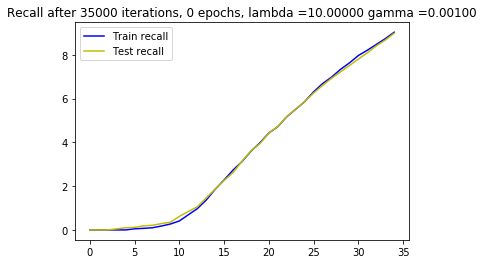

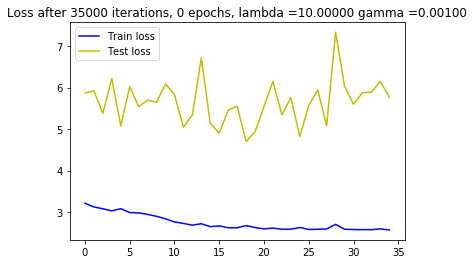

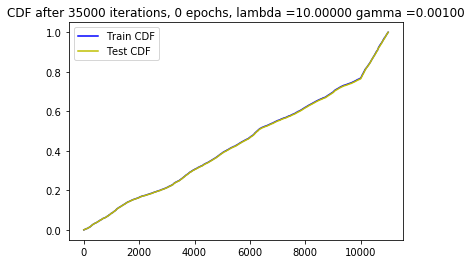






  7%|▋         | 35001/473047 [24:06<121:59:28,  1.00s/it]




  7%|▋         | 35009/473047 [24:06<85:52:00,  1.42it/s] 

New score:  0.07126208
Train score:  0.24169931
Test score:  0.34011763
Obj first part:  0.2850155904889107
Obj second part:  -1.4444314
Obj first part:  0.4614350199699402
Obj second part:  -0.15155517
Obj first part:  0.10075458325445652
Obj second part:  -2.9821885
Obj first part:  0.0
Obj second part:  -0.49010247
Obj first part:  0.5884287506341934
Obj second part:  -1.6122409
Obj first part:  4.675993919372559
Obj second part:  -1.735384
Obj first part:  0.18906626850366592
Obj second part:  -2.7333157
Obj first part:  0.0
Obj second part:  -3.2552257
Obj first part:  1.2012410163879395
Obj second part:  -1.7087144
Obj first part:  0.06456546485424042
Obj second part:  -0.22437401
Obj first part:  0.0
Obj second part:  -0.31253645
Obj first part:  2.7037540078163147
Obj second part:  -1.862228
Obj first part:  4.920246005058289
Obj second part:  -0.46223813
Obj first part:  0.0
Obj second part:  -3.06188
Obj first part:  6.6743165254592896
Obj second part:  -0.15108898
Obj first 






  7%|▋         | 35017/473047 [24:06<60:34:09,  2.01it/s]




  7%|▋         | 35025/473047 [24:06<42:51:51,  2.84it/s]




  7%|▋         | 35033/473047 [24:06<30:27:39,  3.99it/s]

Obj first part:  0.0
Obj second part:  -1.4149294
Obj first part:  1.2859345972537994
Obj second part:  -3.2247958
Obj first part:  0.6564962863922119
Obj second part:  -2.1355722
Obj first part:  0.01213827752508223
Obj second part:  -1.611394
Obj first part:  0.6920035183429718
Obj second part:  -0.16050266
Obj first part:  0.0
Obj second part:  -2.643651
Obj first part:  0.0
Obj second part:  -2.0447626
Obj first part:  0.0
Obj second part:  -0.35466626
Obj first part:  0.0
Obj second part:  -0.4602085
Obj first part:  0.0
Obj second part:  -3.287609
Obj first part:  2.6278287172317505
Obj second part:  -1.2183378
Obj first part:  0.0
Obj second part:  -4.1890345
Obj first part:  0.8027586340904236
Obj second part:  -3.027253
Obj first part:  0.0
Obj second part:  -2.259283
Obj first part:  1.5569619834423065
Obj second part:  -1.6585557
Obj first part:  0.0
Obj second part:  -0.7295226







  7%|▋         | 35041/473047 [24:06<21:47:26,  5.58it/s]




  7%|▋         | 35049/473047 [24:06<15:42:53,  7.74it/s]

Obj first part:  0.0
Obj second part:  -0.27101693
Obj first part:  0.0
Obj second part:  -0.97214174
Obj first part:  0.45631173998117447
Obj second part:  -0.18754807
Obj first part:  0.0
Obj second part:  -2.1307898
Obj first part:  0.0
Obj second part:  -1.4672873
Obj first part:  0.0
Obj second part:  -2.4625046
Obj first part:  0.5864913389086723
Obj second part:  -3.1811686
Obj first part:  0.0
Obj second part:  -0.96949923
Obj first part:  0.0
Obj second part:  -0.10245494
Obj first part:  0.0
Obj second part:  -0.7849432
Obj first part:  0.0
Obj second part:  -1.1169376
Obj first part:  0.0
Obj second part:  -0.4117777
Obj first part:  0.0
Obj second part:  -2.5168428
Obj first part:  3.5082650184631348
Obj second part:  -0.893412
Obj first part:  0.0
Obj second part:  -1.042122
Obj first part:  2.205777019262314
Obj second part:  -0.95729697







  7%|▋         | 35057/473047 [24:06<11:28:13, 10.61it/s]




  7%|▋         | 35065/473047 [24:07<8:29:18, 14.33it/s] 

Obj first part:  0.0
Obj second part:  -1.4935586
Obj first part:  0.5744848027825356
Obj second part:  -1.6722324
Obj first part:  0.0
Obj second part:  -0.6829501
Obj first part:  0.0
Obj second part:  -0.8803897
Obj first part:  0.45323070138692856
Obj second part:  -1.2669692
Obj first part:  1.8078631162643433
Obj second part:  -1.0732787
Obj first part:  0.0
Obj second part:  -1.3467685
Obj first part:  0.5466898903250694
Obj second part:  -0.42012632
Obj first part:  0.22814493626356125
Obj second part:  -0.304444
Obj first part:  0.014380343491211534
Obj second part:  -1.7249885
Obj first part:  0.0
Obj second part:  -1.9594201
Obj first part:  1.465757042169571
Obj second part:  -1.8121669
Obj first part:  2.2815193235874176
Obj second part:  -0.12268887
Obj first part:  3.5016965866088867
Obj second part:  -1.1621904
Obj first part:  0.0
Obj second part:  -0.78884137
Obj first part:  0.0
Obj second part:  -1.9990951







  7%|▋         | 35073/473047 [24:07<6:24:12, 19.00it/s]




  7%|▋         | 35081/473047 [24:07<4:56:56, 24.58it/s]

Obj first part:  0.0
Obj second part:  -1.7599125
Obj first part:  0.0
Obj second part:  -0.5417588
Obj first part:  0.0
Obj second part:  -2.4595547
Obj first part:  0.03549610264599323
Obj second part:  -1.3642428
Obj first part:  0.06404406856745481
Obj second part:  -0.9068018
Obj first part:  0.0
Obj second part:  -3.0881498
Obj first part:  0.2850411646068096
Obj second part:  -1.1432154
Obj first part:  10.120102167129517
Obj second part:  -0.9931699
Obj first part:  0.3163500130176544
Obj second part:  -0.817076
Obj first part:  0.8007080107927322
Obj second part:  -1.4740504
Obj first part:  7.841677665710449
Obj second part:  -0.6488167
Obj first part:  4.144735932350159
Obj second part:  -3.0651932
Obj first part:  0.03834596602246165
Obj second part:  -4.252496
Obj first part:  0.0
Obj second part:  -0.81493145
Obj first part:  0.0
Obj second part:  -1.2315496
Obj first part:  0.3482379764318466
Obj second part:  -0.79391265







  7%|▋         | 35089/473047 [24:07<3:55:29, 31.00it/s]




  7%|▋         | 35097/473047 [24:07<3:12:45, 37.87it/s]

Obj first part:  0.9119089692831039
Obj second part:  -2.2725246
Obj first part:  1.6113533079624176
Obj second part:  -3.1200032
Obj first part:  0.45501209795475006
Obj second part:  -2.0970638
Obj first part:  0.7750347256660461
Obj second part:  -1.4892989
Obj first part:  0.0
Obj second part:  -0.25937513
Obj first part:  2.797739803791046
Obj second part:  -0.58104026
Obj first part:  0.0
Obj second part:  -0.2521575
Obj first part:  0.4698134958744049
Obj second part:  -4.621634
Obj first part:  0.0
Obj second part:  -0.08835512
Obj first part:  0.0
Obj second part:  -2.0944102
Obj first part:  0.0
Obj second part:  -2.328923
Obj first part:  0.0
Obj second part:  -2.1199327
Obj first part:  0.981067568063736
Obj second part:  -1.5156722
Obj first part:  1.036090925335884
Obj second part:  -0.2425194
Obj first part:  0.0
Obj second part:  -0.51849425
Obj first part:  0.7878756523132324
Obj second part:  -2.8209143







  7%|▋         | 35105/473047 [24:07<2:42:45, 44.84it/s]






Obj first part:  0.0
Obj second part:  -1.7371947
Obj first part:  0.0
Obj second part:  -2.2116294
Obj first part:  7.161532640457153
Obj second part:  -0.6853136
Obj first part:  0.22123580798506737
Obj second part:  -0.29254362
Obj first part:  1.9702479243278503
Obj second part:  -2.1296241
Obj first part:  0.0
Obj second part:  -1.7844101
Obj first part:  0.0
Obj second part:  -0.49696213
Obj first part:  0.0
Obj second part:  -1.0946884
Obj first part:  0.0
Obj second part:  -1.8387336
Obj first part:  0.0
Obj second part:  -2.3774812
Obj first part:  3.132568895816803
Obj second part:  -0.57823014
Obj first part:  0.0
Obj second part:  -0.17944331
Obj first part:  0.0
Obj second part:  -3.3463464
Obj first part:  0.0
Obj second part:  -3.30151
Obj first part:  1.0747157782316208
Obj second part:  -0.30952364
Obj first part:  0.3009284473955631
Obj second part:  -0.5592133


  7%|▋         | 35113/473047 [24:07<2:22:01, 51.39it/s]




  7%|▋         | 35121/473047 [24:07<2:07:17, 57.34it/s]




  7%|▋         | 35129/473047 [24:07<1:57:08, 62.31it/s]

Obj first part:  1.528240442276001
Obj second part:  -1.0176668
Obj first part:  0.0
Obj second part:  -2.5152562
Obj first part:  0.44252909719944
Obj second part:  -1.1225673
Obj first part:  0.0
Obj second part:  -0.97910464
Obj first part:  0.1929260604083538
Obj second part:  -0.92413324
Obj first part:  0.0
Obj second part:  -0.8877915
Obj first part:  0.6971330940723419
Obj second part:  -0.17649437
Obj first part:  0.0
Obj second part:  -0.5838031
Obj first part:  0.0
Obj second part:  -0.7711337
Obj first part:  0.15704510733485222
Obj second part:  -2.3327744
Obj first part:  0.5074236169457436
Obj second part:  -1.2395273
Obj first part:  0.0
Obj second part:  -1.1673671
Obj first part:  0.23775629699230194
Obj second part:  -1.0271833
Obj first part:  3.912070095539093
Obj second part:  -2.838142
Obj first part:  0.0
Obj second part:  -0.12940587
Obj first part:  0.0
Obj second part:  -0.5053373







  7%|▋         | 35137/473047 [24:07<1:50:13, 66.22it/s]






Obj first part:  0.0
Obj second part:  -0.79958725
Obj first part:  4.088660478591919
Obj second part:  -1.1367872
Obj first part:  0.0
Obj second part:  -3.6236942
Obj first part:  0.0
Obj second part:  -1.8899895
Obj first part:  0.21330464631319046
Obj second part:  -0.7787985
Obj first part:  0.7465178519487381
Obj second part:  -2.8124068
Obj first part:  0.0
Obj second part:  -2.9015636
Obj first part:  0.0
Obj second part:  -0.27482924
Obj first part:  0.0
Obj second part:  -3.13092
Obj first part:  0.0
Obj second part:  -0.31316757
Obj first part:  0.0
Obj second part:  -0.7836832
Obj first part:  0.5705951154232025
Obj second part:  -1.9966289
Obj first part:  0.0
Obj second part:  -0.08655552
Obj first part:  0.0
Obj second part:  -1.0889276
Obj first part:  3.514505624771118
Obj second part:  -2.3441553
Obj first part:  0.0
Obj second part:  -0.49820763


  7%|▋         | 35145/473047 [24:08<1:45:05, 69.44it/s]




  7%|▋         | 35153/473047 [24:08<1:40:57, 72.30it/s]

Obj first part:  3.63275945186615
Obj second part:  -1.7984192
Obj first part:  0.0
Obj second part:  -3.2010827
Obj first part:  0.0
Obj second part:  -0.9094106
Obj first part:  0.34089934080839157
Obj second part:  -0.41238007
Obj first part:  0.0
Obj second part:  -0.046555314
Obj first part:  0.0
Obj second part:  -0.14433342
Obj first part:  1.968800574541092
Obj second part:  -2.6318967
Obj first part:  0.0
Obj second part:  -2.400831
Obj first part:  0.0
Obj second part:  -2.03815
Obj first part:  1.7233632504940033
Obj second part:  -3.278084
Obj first part:  0.0
Obj second part:  -2.792284
Obj first part:  3.4971511363983154
Obj second part:  -0.40512002
Obj first part:  0.0
Obj second part:  -4.642051
Obj first part:  1.5167893469333649
Obj second part:  -0.6388672
Obj first part:  0.0
Obj second part:  -1.07974
Obj first part:  0.8136645704507828
Obj second part:  -0.4042892
Obj first part:  0.0
Obj second part:  -2.5038393







  7%|▋         | 35162/473047 [24:08<1:38:08, 74.36it/s]




  7%|▋         | 35170/473047 [24:08<1:36:44, 75.44it/s]




  7%|▋         | 35178/473047 [24:08<1:35:18, 76.57it/s]

Obj first part:  2.186214178800583
Obj second part:  -0.7176366
Obj first part:  0.0
Obj second part:  -0.9875052
Obj first part:  3.3225515484809875
Obj second part:  -0.7387834
Obj first part:  0.8714723587036133
Obj second part:  -1.1955851
Obj first part:  0.0
Obj second part:  -2.3937495
Obj first part:  0.0
Obj second part:  -1.8040488
Obj first part:  0.633799135684967
Obj second part:  -0.4975873
Obj first part:  1.3216717541217804
Obj second part:  -0.64186776
Obj first part:  6.317295432090759
Obj second part:  -1.7991405
Obj first part:  0.0
Obj second part:  -2.5825078
Obj first part:  0.11544544249773026
Obj second part:  -0.64892375
Obj first part:  0.7188712805509567
Obj second part:  -2.1045358
Obj first part:  0.0
Obj second part:  -1.0184295
Obj first part:  0.0
Obj second part:  -0.1330996
Obj first part:  0.29572008177638054
Obj second part:  -1.0231012
Obj first part:  0.8183234930038452
Obj second part:  -0.23986995







  7%|▋         | 35186/473047 [24:08<1:34:54, 76.90it/s]




  7%|▋         | 35194/473047 [24:08<1:33:56, 77.68it/s]

Obj first part:  2.6371023058891296
Obj second part:  -0.25849026
Obj first part:  3.249709904193878
Obj second part:  -4.1098843
Obj first part:  1.605057418346405
Obj second part:  -1.5268474
Obj first part:  0.0
Obj second part:  -0.19330493
Obj first part:  0.41684892028570175
Obj second part:  -0.48889625
Obj first part:  0.0
Obj second part:  -1.1281414
Obj first part:  0.0
Obj second part:  -1.4114838
Obj first part:  0.0
Obj second part:  -2.2803762
Obj first part:  0.0
Obj second part:  -0.13299672
Obj first part:  0.0
Obj second part:  -0.8680116
Obj first part:  0.16286034137010574
Obj second part:  -0.6113961
Obj first part:  0.8890524506568909
Obj second part:  -1.0440412
Obj first part:  0.0
Obj second part:  -0.97246
Obj first part:  0.3220658004283905
Obj second part:  -1.5390091
Obj first part:  1.19125634431839
Obj second part:  -2.379776
Obj first part:  0.7022494822740555
Obj second part:  -1.2446003







  7%|▋         | 35202/473047 [24:08<1:33:31, 78.03it/s]




  7%|▋         | 35210/473047 [24:08<1:33:33, 78.00it/s]

Obj first part:  0.18460234627127647
Obj second part:  -0.6513382
Obj first part:  0.5470676720142365
Obj second part:  -0.7951166
Obj first part:  0.0
Obj second part:  -2.323473
Obj first part:  4.321893751621246
Obj second part:  -0.8409118
Obj first part:  2.3366574943065643
Obj second part:  -0.40835342
Obj first part:  0.3145335242152214
Obj second part:  -2.1436944
Obj first part:  0.12351889163255692
Obj second part:  -0.90618294
Obj first part:  0.0
Obj second part:  -4.1038055
Obj first part:  0.0
Obj second part:  -1.8514669
Obj first part:  0.0
Obj second part:  -0.48162967
Obj first part:  7.718189358711243
Obj second part:  -1.9334998
Obj first part:  10.370993614196777
Obj second part:  -3.1610487
Obj first part:  0.7446461915969849
Obj second part:  -4.5109663
Obj first part:  0.24904360994696617
Obj second part:  -2.4798763
Obj first part:  0.0
Obj second part:  -3.997631
Obj first part:  0.0
Obj second part:  -0.84728







  7%|▋         | 35218/473047 [24:08<1:33:04, 78.40it/s]




  7%|▋         | 35226/473047 [24:09<1:32:44, 78.69it/s]

Obj first part:  4.849826991558075
Obj second part:  -1.0125427
Obj first part:  2.0446670055389404
Obj second part:  -2.6844625
Obj first part:  0.10149792768061161
Obj second part:  -2.8058197
Obj first part:  0.0
Obj second part:  -2.363256
Obj first part:  0.0
Obj second part:  -3.4063504
Obj first part:  0.03327848622575402
Obj second part:  -2.602553
Obj first part:  1.8096914887428284
Obj second part:  -5.0020795
Obj first part:  0.04639968276023865
Obj second part:  -2.2986057
Obj first part:  1.6561011970043182
Obj second part:  -0.63025796
Obj first part:  0.16674049198627472
Obj second part:  -0.3652725
Obj first part:  0.0
Obj second part:  -2.5878139
Obj first part:  2.9813677072525024
Obj second part:  -0.42374098
Obj first part:  0.6945633143186569
Obj second part:  -1.2691138
Obj first part:  0.0
Obj second part:  -1.666366
Obj first part:  0.15976805239915848
Obj second part:  -2.2488565
Obj first part:  0.0
Obj second part:  -1.8411248







  7%|▋         | 35234/473047 [24:09<1:32:50, 78.59it/s]




  7%|▋         | 35242/473047 [24:09<1:32:30, 78.87it/s]

Obj first part:  2.8345349431037903
Obj second part:  -0.9785764
Obj first part:  1.6589349508285522
Obj second part:  -0.3508501
Obj first part:  2.3058797419071198
Obj second part:  -1.733063
Obj first part:  0.0
Obj second part:  -2.1441016
Obj first part:  0.2516486123204231
Obj second part:  -0.77493876
Obj first part:  0.0
Obj second part:  -0.16164142
Obj first part:  0.056918379850685596
Obj second part:  -0.8101445
Obj first part:  0.0
Obj second part:  -0.71186197
Obj first part:  0.06661968771368265
Obj second part:  -2.8209257
Obj first part:  0.0
Obj second part:  -1.2554569
Obj first part:  0.13693098910152912
Obj second part:  -0.21696882
Obj first part:  0.011249881936237216
Obj second part:  -2.2414012
Obj first part:  0.0
Obj second part:  -2.9277408
Obj first part:  0.0
Obj second part:  -1.6831162
Obj first part:  0.6218511611223221
Obj second part:  -0.2729133
Obj first part:  0.0
Obj second part:  -1.1468629







  7%|▋         | 35250/473047 [24:09<1:32:56, 78.51it/s]




  7%|▋         | 35258/473047 [24:09<1:32:45, 78.67it/s]

Obj first part:  0.0
Obj second part:  -0.28610095
Obj first part:  1.0096647590398788
Obj second part:  -2.159647
Obj first part:  3.1850025057792664
Obj second part:  -1.4185755
Obj first part:  1.4978767931461334
Obj second part:  -1.0172883
Obj first part:  0.8920454233884811
Obj second part:  -0.38354316
Obj first part:  0.33613771200180054
Obj second part:  -2.6764786
Obj first part:  0.0
Obj second part:  -1.1339645
Obj first part:  0.3154883161187172
Obj second part:  -2.7742877
Obj first part:  0.5661587044596672
Obj second part:  -2.8435605
Obj first part:  0.0
Obj second part:  -0.057405677
Obj first part:  0.0
Obj second part:  -1.0156791
Obj first part:  0.0
Obj second part:  -1.1795471
Obj first part:  0.4177306219935417
Obj second part:  -4.3755965
Obj first part:  3.5848644375801086
Obj second part:  -0.28430644
Obj first part:  0.26961879804730415
Obj second part:  -0.22908406
Obj first part:  1.8026097118854523
Obj second part:  -0.79436386







  7%|▋         | 35266/473047 [24:09<1:32:56, 78.50it/s]




  7%|▋         | 35274/473047 [24:09<1:32:43, 78.68it/s]

Obj first part:  0.07536947727203369
Obj second part:  -0.14704871
Obj first part:  0.0
Obj second part:  -1.4865223
Obj first part:  0.8941607922315598
Obj second part:  -1.066263
Obj first part:  0.0
Obj second part:  -1.4735471
Obj first part:  2.0547258853912354
Obj second part:  -3.350872
Obj first part:  0.16898740082979202
Obj second part:  -0.5884345
Obj first part:  0.0
Obj second part:  -2.8779037
Obj first part:  0.037807703483849764
Obj second part:  -0.5857121
Obj first part:  0.0
Obj second part:  -0.84974945
Obj first part:  0.8232762664556503
Obj second part:  -1.4398564
Obj first part:  0.0
Obj second part:  -1.3035519
Obj first part:  6.995022892951965
Obj second part:  -2.2002842
Obj first part:  9.234547019004822
Obj second part:  -0.9813249
Obj first part:  0.0
Obj second part:  -2.7706025
Obj first part:  3.3270391821861267
Obj second part:  -2.837348
Obj first part:  0.39965104311704636
Obj second part:  -2.7792063







  7%|▋         | 35282/473047 [24:09<1:32:35, 78.80it/s]




  7%|▋         | 35290/473047 [24:09<1:32:58, 78.47it/s]

Obj first part:  0.0
Obj second part:  -1.1413158
Obj first part:  3.1927821040153503
Obj second part:  -1.8568377
Obj first part:  8.045721650123596
Obj second part:  -4.289443
Obj first part:  0.15994831919670105
Obj second part:  -2.9242597
Obj first part:  0.18006892874836922
Obj second part:  -2.4596205
Obj first part:  0.0
Obj second part:  -1.7530365
Obj first part:  4.965543150901794
Obj second part:  -1.5596147
Obj first part:  0.0
Obj second part:  -2.9187527
Obj first part:  0.0
Obj second part:  -0.9994428
Obj first part:  0.0
Obj second part:  -4.639502
Obj first part:  0.03623066237196326
Obj second part:  -0.25259036
Obj first part:  0.0
Obj second part:  -0.39479482
Obj first part:  0.0
Obj second part:  -1.7360101
Obj first part:  0.0
Obj second part:  -1.9282095
Obj first part:  0.8831582963466644
Obj second part:  -3.5667255
Obj first part:  1.1958543211221695
Obj second part:  -4.8964195







  7%|▋         | 35298/473047 [24:09<1:33:05, 78.38it/s]




  7%|▋         | 35306/473047 [24:10<1:32:57, 78.48it/s]

Obj first part:  0.6015355139970779
Obj second part:  -0.41385174
Obj first part:  0.6073515862226486
Obj second part:  -2.2896357
Obj first part:  0.13921051286160946
Obj second part:  -3.791127
Obj first part:  0.0
Obj second part:  -1.3246666
Obj first part:  0.0
Obj second part:  -2.9782333
Obj first part:  0.0
Obj second part:  -1.9379025
Obj first part:  0.0
Obj second part:  -2.2919579
Obj first part:  0.0
Obj second part:  -1.70963
Obj first part:  0.0
Obj second part:  -0.45681453
Obj first part:  0.0
Obj second part:  -1.1143373
Obj first part:  1.140120029449463
Obj second part:  -3.7185593
Obj first part:  0.0
Obj second part:  -3.6564133
Obj first part:  0.8745957911014557
Obj second part:  -1.686701
Obj first part:  0.0
Obj second part:  -3.6086555
Obj first part:  1.461029052734375
Obj second part:  -1.0919796
Obj first part:  0.0
Obj second part:  -0.15683562







  7%|▋         | 35314/473047 [24:10<1:33:11, 78.28it/s]




  7%|▋         | 35322/473047 [24:10<1:32:53, 78.53it/s]

Obj first part:  0.0
Obj second part:  -1.3713459
Obj first part:  0.0
Obj second part:  -2.003622
Obj first part:  0.12102310545742512
Obj second part:  -3.1854725
Obj first part:  0.35092785954475403
Obj second part:  -0.58327174
Obj first part:  2.2358183562755585
Obj second part:  -0.20096602
Obj first part:  0.0
Obj second part:  -3.0165718
Obj first part:  0.0
Obj second part:  -3.4371572
Obj first part:  0.0
Obj second part:  -1.0281043
Obj first part:  0.0
Obj second part:  -0.74384737
Obj first part:  0.0
Obj second part:  -3.0686257
Obj first part:  0.5483847856521606
Obj second part:  -2.0091407
Obj first part:  0.0
Obj second part:  -2.78298
Obj first part:  0.0
Obj second part:  -4.463129
Obj first part:  0.0
Obj second part:  -2.9153626
Obj first part:  5.6366294622421265
Obj second part:  -3.5703547
Obj first part:  0.6621965020895004
Obj second part:  -0.68346786







  7%|▋         | 35330/473047 [24:10<1:33:10, 78.29it/s]






Obj first part:  0.0
Obj second part:  -2.4980328
Obj first part:  0.2196716144680977
Obj second part:  -0.18419667
Obj first part:  1.7556607723236084
Obj second part:  -0.5826249
Obj first part:  0.0
Obj second part:  -2.2293732
Obj first part:  0.0
Obj second part:  -0.1574014
Obj first part:  0.0
Obj second part:  -0.1992435
Obj first part:  0.0
Obj second part:  -0.6757573
Obj first part:  0.0
Obj second part:  -0.30591497
Obj first part:  0.49369439482688904
Obj second part:  -2.497932
Obj first part:  14.611636400222778
Obj second part:  -0.255345
Obj first part:  0.0
Obj second part:  -0.6507776
Obj first part:  0.10097422637045383
Obj second part:  -0.09068926
Obj first part:  0.4127110168337822
Obj second part:  -0.1302065
Obj first part:  0.052382610738277435
Obj second part:  -0.09459208
Obj first part:  5.613843202590942
Obj second part:  -1.4219388
Obj first part:  0.0
Obj second part:  -0.94423026


  7%|▋         | 35338/473047 [24:10<1:32:57, 78.47it/s]




  7%|▋         | 35346/473047 [24:10<1:33:15, 78.22it/s]




  7%|▋         | 35354/473047 [24:10<1:32:51, 78.55it/s]

Obj first part:  0.053414274007081985
Obj second part:  -4.358164
Obj first part:  0.0
Obj second part:  -1.4453648
Obj first part:  6.01127028465271
Obj second part:  -2.0039964
Obj first part:  0.0
Obj second part:  -0.45816618
Obj first part:  0.0
Obj second part:  -1.1948029
Obj first part:  0.0
Obj second part:  -1.1401383
Obj first part:  0.0
Obj second part:  -0.44319868
Obj first part:  4.631480574607849
Obj second part:  -1.1086379
Obj first part:  0.1273262407630682
Obj second part:  -3.5247145
Obj first part:  0.0
Obj second part:  -0.9424376
Obj first part:  0.0
Obj second part:  -3.1774497
Obj first part:  0.0
Obj second part:  -3.3591657
Obj first part:  1.2714137136936188
Obj second part:  -0.67069066
Obj first part:  0.0
Obj second part:  -0.9224925
Obj first part:  3.350224196910858
Obj second part:  -0.58892494
Obj first part:  0.0
Obj second part:  -2.9004166







  7%|▋         | 35362/473047 [24:10<1:33:23, 78.11it/s]




  7%|▋         | 35370/473047 [24:10<1:32:59, 78.44it/s]

Obj first part:  0.0
Obj second part:  -0.20467052
Obj first part:  0.0
Obj second part:  -1.9745293
Obj first part:  5.65174400806427
Obj second part:  -1.1921086
Obj first part:  0.1671290211379528
Obj second part:  -1.4334114
Obj first part:  0.5844675749540329
Obj second part:  -2.0239997
Obj first part:  0.0
Obj second part:  -3.0512543
Obj first part:  0.0
Obj second part:  -0.9434181
Obj first part:  0.08838715963065624
Obj second part:  -2.0680516
Obj first part:  0.0
Obj second part:  -1.095432
Obj first part:  0.07426935713738203
Obj second part:  -3.9462829
Obj first part:  0.0
Obj second part:  -0.2374781
Obj first part:  0.5788595974445343
Obj second part:  -1.4330226
Obj first part:  0.1381973922252655
Obj second part:  -3.0518575
Obj first part:  0.0
Obj second part:  -1.5792257
Obj first part:  2.1612155437469482
Obj second part:  -0.5482013
Obj first part:  10.527055263519287
Obj second part:  -0.3267601







  7%|▋         | 35378/473047 [24:10<1:33:12, 78.26it/s]




  7%|▋         | 35386/473047 [24:11<1:32:52, 78.54it/s]

Obj first part:  1.139148473739624
Obj second part:  -0.89085984
Obj first part:  0.0
Obj second part:  -0.8910929
Obj first part:  0.0
Obj second part:  -1.9279664
Obj first part:  0.0
Obj second part:  -0.9474796
Obj first part:  0.0
Obj second part:  -0.7913619
Obj first part:  3.42833012342453
Obj second part:  -1.6593357
Obj first part:  0.0
Obj second part:  -0.064597905
Obj first part:  2.080375999212265
Obj second part:  -2.4975169
Obj first part:  0.5862955003976822
Obj second part:  -4.7050133
Obj first part:  0.0
Obj second part:  -0.1909684
Obj first part:  0.0
Obj second part:  -1.5397373
Obj first part:  0.0
Obj second part:  -1.1335275
Obj first part:  0.0
Obj second part:  -1.9763595
Obj first part:  0.9801357984542847
Obj second part:  -2.1642747
Obj first part:  0.0
Obj second part:  -0.75212765
Obj first part:  0.0
Obj second part:  -0.61972636







  7%|▋         | 35394/473047 [24:11<1:33:08, 78.32it/s]




  7%|▋         | 35402/473047 [24:11<1:32:41, 78.69it/s]

Obj first part:  0.1191518921405077
Obj second part:  -0.06924138
Obj first part:  0.0
Obj second part:  -0.5357896
Obj first part:  1.403404027223587
Obj second part:  -2.4782755
Obj first part:  0.0
Obj second part:  -3.5126164
Obj first part:  0.27229949831962585
Obj second part:  -0.3226093
Obj first part:  0.0
Obj second part:  -1.4998901
Obj first part:  0.0
Obj second part:  -0.9795555
Obj first part:  2.13850274682045
Obj second part:  -0.18865047
Obj first part:  0.0
Obj second part:  -1.0303016
Obj first part:  0.0
Obj second part:  -2.6094003
Obj first part:  0.0
Obj second part:  -1.6605574
Obj first part:  4.864049553871155
Obj second part:  -1.9124212
Obj first part:  0.0
Obj second part:  -1.3380883
Obj first part:  0.0
Obj second part:  -0.60101503
Obj first part:  0.0
Obj second part:  -1.2308515
Obj first part:  0.0
Obj second part:  -0.09057695







  7%|▋         | 35410/473047 [24:11<1:33:13, 78.24it/s]




  7%|▋         | 35418/473047 [24:11<1:32:51, 78.54it/s]

Obj first part:  0.0
Obj second part:  -4.8185806
Obj first part:  0.0
Obj second part:  -0.8324478
Obj first part:  0.0
Obj second part:  -0.33140585
Obj first part:  0.0
Obj second part:  -0.50858855
Obj first part:  0.40325913578271866
Obj second part:  -0.3508888
Obj first part:  0.0
Obj second part:  -1.0228218
Obj first part:  0.0
Obj second part:  -3.1736412
Obj first part:  0.0
Obj second part:  -0.9729119
Obj first part:  4.208280444145203
Obj second part:  -1.1510606
Obj first part:  0.0
Obj second part:  -0.9497473
Obj first part:  2.23719522356987
Obj second part:  -2.7467237
Obj first part:  0.14328106306493282
Obj second part:  -0.2871429
Obj first part:  0.8996191620826721
Obj second part:  -0.75263417
Obj first part:  0.0
Obj second part:  -0.572929
Obj first part:  0.9124087542295456
Obj second part:  -0.14548334
Obj first part:  0.4817921668291092
Obj second part:  -0.13241145







  7%|▋         | 35426/473047 [24:11<1:33:07, 78.33it/s]

Obj first part:  0.0
Obj second part:  -3.7335694
Obj first part:  0.0
Obj second part:  -4.6714845
Obj first part:  7.841642498970032
Obj second part:  -0.24758872
Obj first part:  0.17840176820755005
Obj second part:  -0.44984084
Obj first part:  0.0
Obj second part:  -0.9302442
Obj first part:  0.0
Obj second part:  -0.16234311
Obj first part:  0.22748896852135658
Obj second part:  -0.72994727
Obj first part:  0.0
Obj second part:  -0.6521993
Obj first part:  0.0
Obj second part:  -0.9264854
Obj first part:  0.0
Obj second part:  -0.66398025
Obj first part:  0.2474512904882431
Obj second part:  -0.22162284
Obj first part:  2.086368054151535
Obj second part:  -0.4771058
Obj first part:  1.3668318092823029
Obj second part:  -3.070633
Obj first part:  0.19602937623858452
Obj second part:  -0.13252312
Obj first part:  8.631711602210999
Obj second part:  -0.9922173
Obj first part:  0.0
Obj second part:  -2.1705196







  7%|▋         | 35434/473047 [24:11<1:34:39, 77.06it/s]




  7%|▋         | 35442/473047 [24:11<1:34:28, 77.19it/s]






Obj first part:  0.0
Obj second part:  -0.9613118
Obj first part:  0.10385572910308838
Obj second part:  -1.0999924
Obj first part:  15.32702088356018
Obj second part:  -0.085945085
Obj first part:  0.6695966422557831
Obj second part:  -0.9101325
Obj first part:  11.111661195755005
Obj second part:  -4.17751
Obj first part:  0.0
Obj second part:  -0.6824544
Obj first part:  0.0
Obj second part:  -2.6986096
Obj first part:  1.5897248685359955
Obj second part:  -0.35006246
Obj first part:  1.5338262915611267
Obj second part:  -4.865532
Obj first part:  0.0
Obj second part:  -1.4978077
Obj first part:  0.5648656934499741
Obj second part:  -0.6389201
Obj first part:  0.0
Obj second part:  -0.32354802
Obj first part:  0.0
Obj second part:  -2.2616477
Obj first part:  0.0
Obj second part:  -1.6788119
Obj first part:  0.0
Obj second part:  -0.9361609
Obj first part:  11.452460289001465
Obj second part:  -2.08791


  7%|▋         | 35450/473047 [24:11<1:34:00, 77.58it/s]




  7%|▋         | 35458/473047 [24:12<1:33:41, 77.84it/s]




  7%|▋         | 35466/473047 [24:12<1:33:24, 78.08it/s]

Obj first part:  0.058796065859496593
Obj second part:  -3.2419274
Obj first part:  0.07574822288006544
Obj second part:  -1.6644843
Obj first part:  0.5346553027629852
Obj second part:  -3.4899197
Obj first part:  1.2855321168899536
Obj second part:  -1.425584
Obj first part:  0.0
Obj second part:  -1.3051869
Obj first part:  0.0
Obj second part:  -4.0624394
Obj first part:  0.0
Obj second part:  -3.6104815
Obj first part:  0.7721830159425735
Obj second part:  -1.986629
Obj first part:  1.5388299524784088
Obj second part:  -2.771722
Obj first part:  0.0
Obj second part:  -0.86574906
Obj first part:  0.7796080410480499
Obj second part:  -3.9170585
Obj first part:  4.061556458473206
Obj second part:  -0.5671893
Obj first part:  0.6975137442350388
Obj second part:  -1.1902914
Obj first part:  0.5007162690162659
Obj second part:  -4.342614
Obj first part:  0.08600780740380287
Obj second part:  -0.42502424
Obj first part:  0.5143426358699799
Obj second part:  -1.741068







  7%|▋         | 35474/473047 [24:12<1:33:00, 78.41it/s]




  8%|▊         | 35482/473047 [24:12<1:33:07, 78.31it/s]

Obj first part:  1.0565392673015594
Obj second part:  -2.5364728
Obj first part:  0.0
Obj second part:  -2.6430223
Obj first part:  0.0822517741471529
Obj second part:  -0.7680424
Obj first part:  1.7426569759845734
Obj second part:  -1.8453351
Obj first part:  0.7861127704381943
Obj second part:  -1.2852324
Obj first part:  0.0
Obj second part:  -1.9311521
Obj first part:  0.45982174575328827
Obj second part:  -0.4971779
Obj first part:  0.21621471270918846
Obj second part:  -4.0970583
Obj first part:  0.4393024742603302
Obj second part:  -4.0456476
Obj first part:  0.0
Obj second part:  -1.6649636
Obj first part:  0.0
Obj second part:  -0.41613883
Obj first part:  0.20042888820171356
Obj second part:  -3.3260958
Obj first part:  0.0
Obj second part:  -0.08420181
Obj first part:  0.0
Obj second part:  -0.489496
Obj first part:  0.0
Obj second part:  -0.79379976
Obj first part:  5.265185236930847
Obj second part:  -2.2998314







  8%|▊         | 35490/473047 [24:12<1:32:58, 78.44it/s]




  8%|▊         | 35498/473047 [24:12<1:33:10, 78.26it/s]

Obj first part:  0.0
Obj second part:  -1.8148062
Obj first part:  0.9704015403985977
Obj second part:  -1.1788466
Obj first part:  0.0
Obj second part:  -0.57838583
Obj first part:  0.7006832957267761
Obj second part:  -1.882538
Obj first part:  0.0
Obj second part:  -2.003297
Obj first part:  1.7957819998264313
Obj second part:  -2.8839583
Obj first part:  0.0
Obj second part:  -0.9840627
Obj first part:  0.7973884046077728
Obj second part:  -1.2218844
Obj first part:  1.0924486070871353
Obj second part:  -1.122518
Obj first part:  5.797728896141052
Obj second part:  -1.0331435
Obj first part:  0.0
Obj second part:  -1.6799461
Obj first part:  0.8825591206550598
Obj second part:  -0.48391247
Obj first part:  0.0
Obj second part:  -0.3763558
Obj first part:  4.849432110786438
Obj second part:  -0.4070568
Obj first part:  0.0
Obj second part:  -1.1936004
Obj first part:  0.39055831730365753
Obj second part:  -2.7960067







  8%|▊         | 35506/473047 [24:12<1:32:45, 78.62it/s]




  8%|▊         | 35514/473047 [24:12<1:32:23, 78.93it/s]

Obj first part:  0.09159442037343979
Obj second part:  -0.6628652
Obj first part:  0.0
Obj second part:  -2.5813875
Obj first part:  0.906369760632515
Obj second part:  -0.60573655
Obj first part:  0.0
Obj second part:  -1.8722582
Obj first part:  0.0
Obj second part:  -0.11577567
Obj first part:  0.0
Obj second part:  -1.4118022
Obj first part:  0.0
Obj second part:  -3.5831397
Obj first part:  0.0
Obj second part:  -3.5079947
Obj first part:  0.0
Obj second part:  -1.4441106
Obj first part:  1.976889818906784
Obj second part:  -1.3184376
Obj first part:  0.2362656407058239
Obj second part:  -0.6823493
Obj first part:  0.37216879427433014
Obj second part:  -1.9942579
Obj first part:  1.0272669792175293
Obj second part:  -2.8605816
Obj first part:  0.04990559071302414
Obj second part:  -0.47188383
Obj first part:  0.0
Obj second part:  -0.14378566
Obj first part:  0.04819035995751619
Obj second part:  -1.1752157







  8%|▊         | 35522/473047 [24:12<1:32:51, 78.53it/s]






Obj first part:  11.145577430725098
Obj second part:  -1.3769461
Obj first part:  4.854003489017487
Obj second part:  -3.2863338
Obj first part:  0.0
Obj second part:  -2.4913108
Obj first part:  0.04207588732242584
Obj second part:  -0.80313873
Obj first part:  0.0
Obj second part:  -3.0580733
Obj first part:  0.02065660199150443
Obj second part:  -1.4744079
Obj first part:  1.5977254509925842
Obj second part:  -0.5845384
Obj first part:  2.4998050928115845
Obj second part:  -1.7314806
Obj first part:  0.0
Obj second part:  -0.23957504
Obj first part:  0.130981532856822
Obj second part:  -1.0714122
Obj first part:  0.07012209855020046
Obj second part:  -1.0969009
Obj first part:  0.0
Obj second part:  -0.7270032
Obj first part:  0.0
Obj second part:  -2.5366333
Obj first part:  0.3099749982357025
Obj second part:  -1.4974427
Obj first part:  0.0
Obj second part:  -3.4931996
Obj first part:  0.049824779853224754
Obj second part:  -1.5806102


  8%|▊         | 35530/473047 [24:12<1:32:45, 78.62it/s]




  8%|▊         | 35538/473047 [24:13<1:32:58, 78.43it/s]




  8%|▊         | 35546/473047 [24:13<1:32:31, 78.81it/s]

Obj first part:  0.0
Obj second part:  -0.28123397
Obj first part:  0.0
Obj second part:  -0.39911184
Obj first part:  0.0
Obj second part:  -0.26500133
Obj first part:  6.575713157653809
Obj second part:  -1.0739572
Obj first part:  0.0
Obj second part:  -2.0502713
Obj first part:  0.13324487954378128
Obj second part:  -2.550688
Obj first part:  0.33211588859558105
Obj second part:  -1.3736022
Obj first part:  0.0
Obj second part:  -0.17310534
Obj first part:  1.731545478105545
Obj second part:  -1.3032837
Obj first part:  0.0
Obj second part:  -1.9098419
Obj first part:  0.0
Obj second part:  -2.141217
Obj first part:  0.0
Obj second part:  -0.6337938
Obj first part:  0.0
Obj second part:  -3.3234463
Obj first part:  0.0
Obj second part:  -0.32510316
Obj first part:  0.19155999645590782
Obj second part:  -1.1541915
Obj first part:  0.0
Obj second part:  -3.8389668







  8%|▊         | 35554/473047 [24:13<1:32:57, 78.44it/s]




  8%|▊         | 35562/473047 [24:13<1:32:33, 78.77it/s]

Obj first part:  0.3119652159512043
Obj second part:  -1.8364228
Obj first part:  1.7177566885948181
Obj second part:  -0.91369975
Obj first part:  0.0
Obj second part:  -0.26405907
Obj first part:  0.0
Obj second part:  -0.8502783
Obj first part:  0.931517705321312
Obj second part:  -1.0401573
Obj first part:  0.0
Obj second part:  -2.1786554
Obj first part:  0.0
Obj second part:  -0.7181126
Obj first part:  0.0
Obj second part:  -1.3945884
Obj first part:  0.0
Obj second part:  -0.10862505
Obj first part:  0.0
Obj second part:  -0.26937062
Obj first part:  8.009344935417175
Obj second part:  -0.12784815
Obj first part:  3.008066713809967
Obj second part:  -0.5989
Obj first part:  0.0
Obj second part:  -0.2141005
Obj first part:  0.24981623515486717
Obj second part:  -0.6062963
Obj first part:  2.019275426864624
Obj second part:  -1.8991886
Obj first part:  0.5882537737488747
Obj second part:  -4.237023







  8%|▊         | 35570/473047 [24:13<1:32:34, 78.77it/s]




  8%|▊         | 35578/473047 [24:13<1:32:46, 78.58it/s]

Obj first part:  2.636837661266327
Obj second part:  -0.97380185
Obj first part:  0.585843063890934
Obj second part:  -0.10354002
Obj first part:  0.0
Obj second part:  -1.9813838
Obj first part:  0.0
Obj second part:  -0.22854255
Obj first part:  5.834774374961853
Obj second part:  -1.6275429
Obj first part:  0.0
Obj second part:  -2.1368554
Obj first part:  0.0
Obj second part:  -1.9256333
Obj first part:  0.0
Obj second part:  -1.745899
Obj first part:  0.03795618889853358
Obj second part:  -3.844527
Obj first part:  0.058235591277480125
Obj second part:  -0.65013725
Obj first part:  0.0
Obj second part:  -2.937691
Obj first part:  0.0
Obj second part:  -1.6801957
Obj first part:  0.0
Obj second part:  -1.3693613
Obj first part:  0.0
Obj second part:  -1.9801503
Obj first part:  0.0
Obj second part:  -2.994338
Obj first part:  0.0
Obj second part:  -1.5273163







  8%|▊         | 35586/473047 [24:13<1:32:49, 78.55it/s]




  8%|▊         | 35594/473047 [24:13<1:32:46, 78.59it/s]

Obj first part:  0.8757840096950531
Obj second part:  -1.8057742
Obj first part:  0.0
Obj second part:  -1.017572
Obj first part:  0.0
Obj second part:  -0.7493534
Obj first part:  0.0
Obj second part:  -0.43860433
Obj first part:  0.4260007292032242
Obj second part:  -0.32145724
Obj first part:  0.0
Obj second part:  -0.6074812
Obj first part:  0.2630598098039627
Obj second part:  -2.4496353
Obj first part:  5.317703485488892
Obj second part:  -0.76581424
Obj first part:  0.0
Obj second part:  -0.98477423
Obj first part:  2.832554578781128
Obj second part:  -1.3975857
Obj first part:  0.0
Obj second part:  -4.2041254
Obj first part:  3.117568790912628
Obj second part:  -4.1983867
Obj first part:  0.0
Obj second part:  -0.53961647
Obj first part:  1.1962775141000748
Obj second part:  -3.6264837
Obj first part:  0.0
Obj second part:  -0.24615842
Obj first part:  0.0
Obj second part:  -1.9286454







  8%|▊         | 35602/473047 [24:13<1:33:02, 78.35it/s]




  8%|▊         | 35610/473047 [24:13<1:32:51, 78.52it/s]

Obj first part:  0.0
Obj second part:  -0.36475706
Obj first part:  0.1701713353395462
Obj second part:  -1.303617
Obj first part:  3.894219398498535
Obj second part:  -5.1472754
Obj first part:  0.32183967530727386
Obj second part:  -2.4029408
Obj first part:  0.26690999045968056
Obj second part:  -2.5700874
Obj first part:  0.5381564423441887
Obj second part:  -0.9129141
Obj first part:  0.5332714319229126
Obj second part:  -0.38078496
Obj first part:  0.0
Obj second part:  -1.1183459
Obj first part:  3.578616678714752
Obj second part:  -2.6182454
Obj first part:  2.6569199562072754
Obj second part:  -0.49878323
Obj first part:  0.0
Obj second part:  -0.679979
Obj first part:  0.0
Obj second part:  -1.70804
Obj first part:  0.0
Obj second part:  -1.9476886
Obj first part:  1.0415539145469666
Obj second part:  -0.38575792
Obj first part:  0.13993985950946808
Obj second part:  -2.2806733
Obj first part:  0.0
Obj second part:  -0.47684076







  8%|▊         | 35618/473047 [24:14<1:32:37, 78.71it/s]




  8%|▊         | 35626/473047 [24:14<1:32:48, 78.55it/s]

Obj first part:  1.0060478746891022
Obj second part:  -1.7266719
Obj first part:  0.0
Obj second part:  -0.8154056
Obj first part:  0.0
Obj second part:  -0.1892074
Obj first part:  0.7922839373350143
Obj second part:  -1.5277095
Obj first part:  13.956433534622192
Obj second part:  -3.872408
Obj first part:  0.0
Obj second part:  -2.226897
Obj first part:  0.0
Obj second part:  -0.8694567
Obj first part:  0.0
Obj second part:  -1.381446
Obj first part:  0.09972929954528809
Obj second part:  -0.85031664
Obj first part:  0.5508064106106758
Obj second part:  -1.4747809
Obj first part:  0.0
Obj second part:  -2.0887396
Obj first part:  0.5927520617842674
Obj second part:  -0.8030627
Obj first part:  0.0
Obj second part:  -0.44099447
Obj first part:  0.0
Obj second part:  -0.03413462
Obj first part:  0.0
Obj second part:  -5.5456142
Obj first part:  1.3330219686031342
Obj second part:  -0.9988419







  8%|▊         | 35634/473047 [24:14<1:32:36, 78.73it/s]




  8%|▊         | 35642/473047 [24:14<1:32:15, 79.02it/s]

Obj first part:  0.252993181347847
Obj second part:  -0.7451604
Obj first part:  0.5526449158787727
Obj second part:  -1.804023
Obj first part:  0.4680228978395462
Obj second part:  -3.3988333
Obj first part:  0.0
Obj second part:  -5.931544
Obj first part:  0.31669195741415024
Obj second part:  -2.1540036
Obj first part:  0.0
Obj second part:  -0.9729273
Obj first part:  0.0
Obj second part:  -0.34892115
Obj first part:  0.0
Obj second part:  -3.2247653
Obj first part:  0.0
Obj second part:  -1.3728784
Obj first part:  0.04834982566535473
Obj second part:  -0.37019384
Obj first part:  0.7175895571708679
Obj second part:  -0.33362815
Obj first part:  0.07071258500218391
Obj second part:  -2.0314412
Obj first part:  0.6742563843727112
Obj second part:  -2.3570235
Obj first part:  0.0
Obj second part:  -0.0424202
Obj first part:  0.5476003885269165
Obj second part:  -0.32166523
Obj first part:  1.2125655263662338
Obj second part:  -2.1865413







  8%|▊         | 35650/473047 [24:14<1:32:41, 78.65it/s]




  8%|▊         | 35658/473047 [24:14<1:32:37, 78.70it/s]

Obj first part:  0.0
Obj second part:  -2.9144077
Obj first part:  0.0
Obj second part:  -2.1342087
Obj first part:  0.0
Obj second part:  -0.043926522
Obj first part:  0.0
Obj second part:  -1.9958789
Obj first part:  0.0
Obj second part:  -0.032226574
Obj first part:  11.294996738433838
Obj second part:  -0.8611531
Obj first part:  0.5822093412280083
Obj second part:  -0.15414044
Obj first part:  2.700968384742737
Obj second part:  -0.64061373
Obj first part:  5.261217355728149
Obj second part:  -0.17519093
Obj first part:  0.23661715909838676
Obj second part:  -2.2373757
Obj first part:  0.6794155389070511
Obj second part:  -0.27493185
Obj first part:  0.0
Obj second part:  -0.43066916
Obj first part:  3.364272117614746
Obj second part:  -1.3228742
Obj first part:  0.0
Obj second part:  -0.20579527
Obj first part:  0.0
Obj second part:  -4.597687
Obj first part:  0.0
Obj second part:  -1.4464166







  8%|▊         | 35666/473047 [24:14<1:32:59, 78.39it/s]

Obj first part:  0.0
Obj second part:  -0.8273131
Obj first part:  0.0
Obj second part:  -0.3513053
Obj first part:  0.0
Obj second part:  -0.24101478
Obj first part:  0.0
Obj second part:  -1.2020087
Obj first part:  0.0
Obj second part:  -2.4632344
Obj first part:  0.0
Obj second part:  -1.6876711
Obj first part:  0.0
Obj second part:  -1.8520445
Obj first part:  0.0
Obj second part:  -0.3369378
Obj first part:  17.093427181243896
Obj second part:  -0.50688803
Obj first part:  1.7126336693763733
Obj second part:  -2.4925132
Obj first part:  0.0
Obj second part:  -0.4566881
Obj first part:  0.0
Obj second part:  -1.5351424
Obj first part:  0.0
Obj second part:  -1.6899003
Obj first part:  3.189617395401001
Obj second part:  -2.6644506
Obj first part:  0.0
Obj second part:  -3.7597897
Obj first part:  4.542370438575745
Obj second part:  -0.09738534







  8%|▊         | 35674/473047 [24:14<1:33:26, 78.01it/s]




  8%|▊         | 35682/473047 [24:14<1:33:41, 77.81it/s]




  8%|▊         | 35690/473047 [24:14<1:33:12, 78.20it/s]

Obj first part:  1.8702644109725952
Obj second part:  -0.09265992
Obj first part:  0.048856185749173164
Obj second part:  -0.18155998
Obj first part:  0.15150489285588264
Obj second part:  -3.790052
Obj first part:  0.0
Obj second part:  -1.9373199
Obj first part:  3.4020525217056274
Obj second part:  -0.5253389
Obj first part:  0.07270173635333776
Obj second part:  -1.9284227
Obj first part:  0.0
Obj second part:  -0.11165089
Obj first part:  2.1639473736286163
Obj second part:  -2.4284449
Obj first part:  1.2871424853801727
Obj second part:  -0.90939564
Obj first part:  0.0
Obj second part:  -0.24454464
Obj first part:  8.348119854927063
Obj second part:  -0.8010656
Obj first part:  0.0
Obj second part:  -0.33641663
Obj first part:  0.0
Obj second part:  -2.7661533
Obj first part:  1.8317244946956635
Obj second part:  -1.720397
Obj first part:  1.4229625463485718
Obj second part:  -2.3519745
Obj first part:  0.22068627178668976
Obj second part:  -3.4309711







  8%|▊         | 35698/473047 [24:15<1:33:23, 78.05it/s]




  8%|▊         | 35706/473047 [24:15<1:32:54, 78.45it/s]

Obj first part:  0.09815220721065998
Obj second part:  -0.5718575
Obj first part:  0.5888761579990387
Obj second part:  -0.74867743
Obj first part:  0.0
Obj second part:  -2.1458058
Obj first part:  0.0
Obj second part:  -4.9467773
Obj first part:  0.0
Obj second part:  -1.5958174
Obj first part:  3.770141303539276
Obj second part:  -0.9002825
Obj first part:  0.0
Obj second part:  -1.0593607
Obj first part:  0.0
Obj second part:  -1.0354273
Obj first part:  0.37909865379333496
Obj second part:  -1.7540123
Obj first part:  0.3436407446861267
Obj second part:  -1.3780184
Obj first part:  0.3272106871008873
Obj second part:  -2.0871313
Obj first part:  1.832347810268402
Obj second part:  -2.477413
Obj first part:  0.0
Obj second part:  -0.94386184
Obj first part:  0.3930903226137161
Obj second part:  -3.4756334
Obj first part:  0.04459763877093792
Obj second part:  -1.768385
Obj first part:  0.0
Obj second part:  -1.3247925







  8%|▊         | 35714/473047 [24:15<1:33:04, 78.31it/s]

Obj first part:  3.784901797771454
Obj second part:  -1.9783417
Obj first part:  2.4364756047725677
Obj second part:  -1.9891148
Obj first part:  0.0
Obj second part:  -1.1705048
Obj first part:  6.057597994804382
Obj second part:  -0.23140413
Obj first part:  0.0
Obj second part:  -1.5717509
Obj first part:  0.6530554592609406
Obj second part:  -0.98682535
Obj first part:  0.0
Obj second part:  -4.8732667
Obj first part:  0.0
Obj second part:  -0.26945412
Obj first part:  0.0
Obj second part:  -3.3180926
Obj first part:  0.0
Obj second part:  -1.9045978
Obj first part:  0.7891984283924103
Obj second part:  -1.9462255
Obj first part:  0.0
Obj second part:  -1.49314
Obj first part:  0.0
Obj second part:  -1.4120773
Obj first part:  3.731091320514679
Obj second part:  -1.2589748
Obj first part:  0.0
Obj second part:  -1.8876975
Obj first part:  0.0
Obj second part:  -2.0116553







  8%|▊         | 35722/473047 [24:15<1:33:12, 78.20it/s]




  8%|▊         | 35730/473047 [24:15<1:33:14, 78.17it/s]




  8%|▊         | 35738/473047 [24:15<1:32:54, 78.45it/s]

Obj first part:  0.0
Obj second part:  -1.2050897
Obj first part:  0.0
Obj second part:  -3.9467585
Obj first part:  0.0
Obj second part:  -1.1739681
Obj first part:  0.25033293291926384
Obj second part:  -0.9829639
Obj first part:  0.045868377201259136
Obj second part:  -0.7594608
Obj first part:  0.0
Obj second part:  -1.0005223
Obj first part:  0.2418246865272522
Obj second part:  -0.22298329
Obj first part:  0.0934625044465065
Obj second part:  -1.3202138
Obj first part:  0.0
Obj second part:  -2.8014379
Obj first part:  6.963757872581482
Obj second part:  -2.059139
Obj first part:  0.6502068042755127
Obj second part:  -0.143869
Obj first part:  0.30840128660202026
Obj second part:  -2.0707936
Obj first part:  0.0
Obj second part:  -0.30267948
Obj first part:  1.8637539446353912
Obj second part:  -1.3168755
Obj first part:  0.0
Obj second part:  -0.29909134
Obj first part:  7.022422552108765
Obj second part:  -1.991561







  8%|▊         | 35746/473047 [24:15<1:33:00, 78.37it/s]




  8%|▊         | 35754/473047 [24:15<1:32:45, 78.58it/s]

Obj first part:  2.184102386236191
Obj second part:  -0.6715134
Obj first part:  0.5555915832519531
Obj second part:  -2.2469084
Obj first part:  0.0
Obj second part:  -2.6980004
Obj first part:  0.0
Obj second part:  -0.9747795
Obj first part:  7.324417233467102
Obj second part:  -1.5139515
Obj first part:  0.3839466720819473
Obj second part:  -3.3977046
Obj first part:  0.5173566564917564
Obj second part:  -3.474758
Obj first part:  0.0
Obj second part:  -0.21496187
Obj first part:  0.0
Obj second part:  -2.1642659
Obj first part:  0.0
Obj second part:  -3.6431465
Obj first part:  0.0
Obj second part:  -4.493239
Obj first part:  0.0
Obj second part:  -0.62758064
Obj first part:  0.13020513579249382
Obj second part:  -0.5965903
Obj first part:  1.134563684463501
Obj second part:  -0.420965
Obj first part:  0.0
Obj second part:  -0.6299633
Obj first part:  0.0
Obj second part:  -2.8021243







  8%|▊         | 35762/473047 [24:15<1:33:05, 78.29it/s]




  8%|▊         | 35770/473047 [24:15<1:32:42, 78.61it/s]

Obj first part:  1.1531740427017212
Obj second part:  -1.9845675
Obj first part:  0.0
Obj second part:  -1.0475549
Obj first part:  0.0
Obj second part:  -0.45834875
Obj first part:  0.0
Obj second part:  -3.3449206
Obj first part:  0.0
Obj second part:  -2.9139972
Obj first part:  0.0
Obj second part:  -2.0031943
Obj first part:  0.0
Obj second part:  -1.7078398
Obj first part:  10.676891803741455
Obj second part:  -1.1012703
Obj first part:  0.0
Obj second part:  -0.6023693
Obj first part:  0.0
Obj second part:  -1.8617105
Obj first part:  0.0
Obj second part:  -1.0998423
Obj first part:  1.640833169221878
Obj second part:  -1.6322821
Obj first part:  0.0
Obj second part:  -1.7045035
Obj first part:  0.40400557219982147
Obj second part:  -3.2426405
Obj first part:  0.0
Obj second part:  -1.2904963
Obj first part:  0.0
Obj second part:  -1.1670878







  8%|▊         | 35778/473047 [24:16<1:33:08, 78.24it/s]




  8%|▊         | 35786/473047 [24:16<1:32:47, 78.53it/s]

Obj first part:  0.0
Obj second part:  -0.58359295
Obj first part:  2.1755383908748627
Obj second part:  -1.3520325
Obj first part:  0.0
Obj second part:  -0.33254004
Obj first part:  0.0
Obj second part:  -0.61289144
Obj first part:  0.0
Obj second part:  -1.895193
Obj first part:  0.0
Obj second part:  -1.5241762
Obj first part:  0.0
Obj second part:  -2.4580708
Obj first part:  0.8862964808940887
Obj second part:  -2.5389202
Obj first part:  0.0
Obj second part:  -0.61733395
Obj first part:  0.0
Obj second part:  -3.522395
Obj first part:  0.6001084670424461
Obj second part:  -0.7120174
Obj first part:  0.04399443510919809
Obj second part:  -3.28677
Obj first part:  3.0655860900878906
Obj second part:  -1.198051
Obj first part:  0.0
Obj second part:  -0.19906251
Obj first part:  0.0
Obj second part:  -0.67865455
Obj first part:  1.375078558921814
Obj second part:  -0.25240913







  8%|▊         | 35794/473047 [24:16<1:32:58, 78.38it/s]




  8%|▊         | 35802/473047 [24:16<1:32:34, 78.72it/s]

Obj first part:  0.0
Obj second part:  -1.3418525
Obj first part:  0.0
Obj second part:  -2.8006418
Obj first part:  4.628035724163055
Obj second part:  -2.9108787
Obj first part:  1.8764202296733856
Obj second part:  -4.304537
Obj first part:  0.0
Obj second part:  -0.20420566
Obj first part:  0.0
Obj second part:  -1.0724003
Obj first part:  0.0
Obj second part:  -0.3592573
Obj first part:  0.02560628578066826
Obj second part:  -1.8163369
Obj first part:  0.0
Obj second part:  -1.946774
Obj first part:  0.2012629248201847
Obj second part:  -4.37031
Obj first part:  0.3029010631144047
Obj second part:  -2.5228071
Obj first part:  0.0
Obj second part:  -3.2007587
Obj first part:  0.06445229053497314
Obj second part:  -2.6993368
Obj first part:  0.0
Obj second part:  -0.39521515
Obj first part:  2.0413896441459656
Obj second part:  -0.12151524
Obj first part:  3.2376959919929504
Obj second part:  -1.2272136







  8%|▊         | 35810/473047 [24:16<1:32:29, 78.79it/s]




  8%|▊         | 35818/473047 [24:16<1:32:43, 78.59it/s]

Obj first part:  0.0
Obj second part:  -0.918329
Obj first part:  0.0
Obj second part:  -1.6325322
Obj first part:  0.0
Obj second part:  -0.40358108
Obj first part:  0.9778742492198944
Obj second part:  -2.9260693
Obj first part:  1.0578177124261856
Obj second part:  -2.0828905
Obj first part:  0.9898596256971359
Obj second part:  -2.0452425
Obj first part:  0.0
Obj second part:  -0.30678296
Obj first part:  6.750190854072571
Obj second part:  -0.11100277
Obj first part:  0.5770880356431007
Obj second part:  -3.7762938
Obj first part:  0.12369327247142792
Obj second part:  -1.1678717
Obj first part:  0.0
Obj second part:  -2.0514455
Obj first part:  0.0
Obj second part:  -0.707895
Obj first part:  0.0
Obj second part:  -1.6867193
Obj first part:  0.0
Obj second part:  -1.9440756
Obj first part:  0.4620472341775894
Obj second part:  -1.6208332
Obj first part:  6.516097187995911
Obj second part:  -1.1567525







  8%|▊         | 35826/473047 [24:16<1:33:04, 78.29it/s]




  8%|▊         | 35834/473047 [24:16<1:32:54, 78.44it/s]

Obj first part:  0.13755056075751781
Obj second part:  -0.3184218
Obj first part:  0.0
Obj second part:  -2.2980244
Obj first part:  0.0
Obj second part:  -1.077137
Obj first part:  0.0
Obj second part:  -0.326925
Obj first part:  0.0
Obj second part:  -2.06181
Obj first part:  2.1961888670921326
Obj second part:  -0.49863386
Obj first part:  6.406689882278442
Obj second part:  -4.155143
Obj first part:  0.0
Obj second part:  -1.0014685
Obj first part:  0.0
Obj second part:  -1.4194025
Obj first part:  0.7060007750988007
Obj second part:  -0.481421
Obj first part:  0.0
Obj second part:  -1.2086315
Obj first part:  0.0
Obj second part:  -1.6462016
Obj first part:  0.0
Obj second part:  -3.7553172
Obj first part:  0.0
Obj second part:  -1.2669812
Obj first part:  0.0
Obj second part:  -1.8340853
Obj first part:  0.0
Obj second part:  -0.25255635







  8%|▊         | 35842/473047 [24:16<1:32:51, 78.47it/s]




  8%|▊         | 35850/473047 [24:17<1:32:48, 78.51it/s]

Obj first part:  0.0
Obj second part:  -0.4948712
Obj first part:  1.3842152059078217
Obj second part:  -3.1466353
Obj first part:  0.0
Obj second part:  -0.33524522
Obj first part:  0.0
Obj second part:  -1.0523194
Obj first part:  0.0
Obj second part:  -1.2996786
Obj first part:  0.1517176814377308
Obj second part:  -0.49313802
Obj first part:  5.427781343460083
Obj second part:  -1.708281
Obj first part:  0.0
Obj second part:  -1.5105411
Obj first part:  1.9665171205997467
Obj second part:  -0.60311246
Obj first part:  0.31332872807979584
Obj second part:  -2.481286
Obj first part:  0.1150738075375557
Obj second part:  -0.95127165
Obj first part:  0.0
Obj second part:  -1.6652546
Obj first part:  0.0
Obj second part:  -1.1742966
Obj first part:  0.0
Obj second part:  -0.5557959
Obj first part:  0.48323653638362885
Obj second part:  -0.9351277
Obj first part:  0.0
Obj second part:  -1.5605462







  8%|▊         | 35858/473047 [24:17<1:32:53, 78.44it/s]




  8%|▊         | 35866/473047 [24:17<1:32:56, 78.39it/s]

Obj first part:  0.0
Obj second part:  -1.0356385
Obj first part:  0.5654719471931458
Obj second part:  -0.0533565
Obj first part:  0.0
Obj second part:  -2.7973146
Obj first part:  0.0
Obj second part:  -0.39192882
Obj first part:  0.0
Obj second part:  -1.0262051
Obj first part:  1.33954256772995
Obj second part:  -1.0656728
Obj first part:  0.0
Obj second part:  -0.25122237
Obj first part:  0.0
Obj second part:  -0.6246555
Obj first part:  5.332311987876892
Obj second part:  -0.81916034
Obj first part:  0.15548774041235447
Obj second part:  -1.3876573
Obj first part:  0.6013840436935425
Obj second part:  -0.3278374
Obj first part:  1.2477542459964752
Obj second part:  -1.5136046
Obj first part:  0.8764316886663437
Obj second part:  -2.1955109
Obj first part:  0.0
Obj second part:  -0.23863555
Obj first part:  0.4282202944159508
Obj second part:  -0.33372685
Obj first part:  11.36434555053711
Obj second part:  -2.2100542







  8%|▊         | 35874/473047 [24:17<1:32:49, 78.50it/s]




  8%|▊         | 35882/473047 [24:17<1:32:58, 78.37it/s]

Obj first part:  0.0
Obj second part:  -0.3882313
Obj first part:  1.667587161064148
Obj second part:  -4.081566
Obj first part:  0.0
Obj second part:  -3.1911654
Obj first part:  0.7008005678653717
Obj second part:  -1.911319
Obj first part:  0.0
Obj second part:  -0.08628193
Obj first part:  2.5530725717544556
Obj second part:  -0.8930657
Obj first part:  3.2140135765075684
Obj second part:  -2.482164
Obj first part:  0.8671795576810837
Obj second part:  -1.4985749
Obj first part:  0.5913370475172997
Obj second part:  -1.2255446
Obj first part:  4.074091911315918
Obj second part:  -0.3962875
Obj first part:  0.1488680113106966
Obj second part:  -1.2270961
Obj first part:  0.0
Obj second part:  -2.7888882
Obj first part:  0.33131156116724014
Obj second part:  -1.2313224
Obj first part:  0.0
Obj second part:  -3.208182
Obj first part:  0.0
Obj second part:  -1.5116405
Obj first part:  0.6769424676895142
Obj second part:  -1.7888744







  8%|▊         | 35890/473047 [24:17<1:32:51, 78.47it/s]




  8%|▊         | 35898/473047 [24:17<1:32:59, 78.35it/s]

Obj first part:  5.510529279708862
Obj second part:  -0.7438201
Obj first part:  1.7583751678466797
Obj second part:  -0.33641848
Obj first part:  0.0
Obj second part:  -3.063863
Obj first part:  0.0
Obj second part:  -0.4407893
Obj first part:  0.0
Obj second part:  -1.327405
Obj first part:  0.1281769573688507
Obj second part:  -1.7975848
Obj first part:  0.6053148955106735
Obj second part:  -3.2004538
Obj first part:  1.735718846321106
Obj second part:  -1.9319057
Obj first part:  0.5913146957755089
Obj second part:  -1.0233746
Obj first part:  0.0
Obj second part:  -2.1716838
Obj first part:  1.1944086104631424
Obj second part:  -2.0093546
Obj first part:  0.0
Obj second part:  -1.9308473
Obj first part:  0.03920334856957197
Obj second part:  -0.372062
Obj first part:  0.4230188578367233
Obj second part:  -1.2315159
Obj first part:  0.0
Obj second part:  -0.73518705
Obj first part:  0.0
Obj second part:  -1.070719







  8%|▊         | 35906/473047 [24:17<1:33:19, 78.06it/s]




  8%|▊         | 35914/473047 [24:17<1:33:03, 78.29it/s]

Obj first part:  4.402648210525513
Obj second part:  -1.0832309
Obj first part:  0.38343243300914764
Obj second part:  -1.8004497
Obj first part:  0.17554135993123055
Obj second part:  -1.6453054
Obj first part:  0.0
Obj second part:  -0.6348725
Obj first part:  0.0
Obj second part:  -1.7252614
Obj first part:  2.515275478363037
Obj second part:  -0.3109128
Obj first part:  0.1962580345571041
Obj second part:  -1.6288176
Obj first part:  0.0
Obj second part:  -3.0876946
Obj first part:  0.4321639984846115
Obj second part:  -2.1646605
Obj first part:  0.5098755657672882
Obj second part:  -0.9751834
Obj first part:  0.0
Obj second part:  -4.074326
Obj first part:  0.0
Obj second part:  -0.6328042
Obj first part:  0.6709063798189163
Obj second part:  -2.682276
Obj first part:  0.6912212073802948
Obj second part:  -2.1502118
Obj first part:  0.0
Obj second part:  -2.2423759
Obj first part:  0.0
Obj second part:  -0.25576997







  8%|▊         | 35922/473047 [24:17<1:33:14, 78.13it/s]




  8%|▊         | 35930/473047 [24:18<1:32:45, 78.54it/s]

Obj first part:  0.0
Obj second part:  -0.9665936
Obj first part:  0.3970615565776825
Obj second part:  -0.54055643
Obj first part:  0.5637321621179581
Obj second part:  -2.525809
Obj first part:  0.8710604906082153
Obj second part:  -3.1003704
Obj first part:  4.79047417640686
Obj second part:  -0.1566869
Obj first part:  0.3425830230116844
Obj second part:  -0.7439614
Obj first part:  8.655384182929993
Obj second part:  -0.07477406
Obj first part:  0.6675086170434952
Obj second part:  -1.0206504
Obj first part:  0.23098034784197807
Obj second part:  -0.09147037
Obj first part:  0.0
Obj second part:  -0.6800683
Obj first part:  0.0
Obj second part:  -0.5593865
Obj first part:  0.5903128534555435
Obj second part:  -0.9834509
Obj first part:  0.0
Obj second part:  -2.7603447
Obj first part:  0.0
Obj second part:  -0.45739293
Obj first part:  0.271635465323925
Obj second part:  -3.5896268
Obj first part:  1.7064966261386871
Obj second part:  -0.9733752







  8%|▊         | 35938/473047 [24:18<1:33:03, 78.28it/s]




  8%|▊         | 35946/473047 [24:18<1:32:44, 78.55it/s]

Obj first part:  0.0
Obj second part:  -0.6637397
Obj first part:  0.5538507178425789
Obj second part:  -2.3969047
Obj first part:  0.13566801324486732
Obj second part:  -2.0600517
Obj first part:  0.0
Obj second part:  -1.7254449
Obj first part:  0.05576512776315212
Obj second part:  -2.0619147
Obj first part:  0.0
Obj second part:  -0.6360595
Obj first part:  0.0
Obj second part:  -0.540413
Obj first part:  0.0
Obj second part:  -3.7913043
Obj first part:  0.05561704281717539
Obj second part:  -0.7112147
Obj first part:  7.29376494884491
Obj second part:  -0.7113695
Obj first part:  0.0
Obj second part:  -0.5878954
Obj first part:  0.0
Obj second part:  -0.9386391
Obj first part:  0.0
Obj second part:  -0.72843957
Obj first part:  4.334006309509277
Obj second part:  -2.5300903
Obj first part:  0.0
Obj second part:  -0.23551303
Obj first part:  0.04142019897699356
Obj second part:  -3.2263036







  8%|▊         | 35954/473047 [24:18<1:32:58, 78.36it/s]




  8%|▊         | 35962/473047 [24:18<1:32:31, 78.73it/s]

Obj first part:  0.0
Obj second part:  -2.6656845
Obj first part:  0.012614886509254575
Obj second part:  -1.9400363
Obj first part:  2.635526955127716
Obj second part:  -0.16292696
Obj first part:  2.524970769882202
Obj second part:  -1.9764205
Obj first part:  0.0
Obj second part:  -3.0926409
Obj first part:  0.08217139169573784
Obj second part:  -0.9510937
Obj first part:  0.0
Obj second part:  -0.7380832
Obj first part:  0.35228628665208817
Obj second part:  -3.2164032
Obj first part:  0.0
Obj second part:  -0.2183891
Obj first part:  0.0
Obj second part:  -0.38485166
Obj first part:  2.515955865383148
Obj second part:  -0.9632989
Obj first part:  0.3777509182691574
Obj second part:  -0.6761387
Obj first part:  0.37930887192487717
Obj second part:  -2.143258
Obj first part:  1.760648488998413
Obj second part:  -2.4697013
Obj first part:  0.0
Obj second part:  -2.8137658
Obj first part:  0.0
Obj second part:  -2.7914486







  8%|▊         | 35970/473047 [24:18<1:32:36, 78.66it/s]




  8%|▊         | 35978/473047 [24:18<1:32:47, 78.51it/s]

Obj first part:  0.29937664046883583
Obj second part:  -1.5165277
Obj first part:  0.48592306673526764
Obj second part:  -0.48852828
Obj first part:  0.0
Obj second part:  -1.5305674
Obj first part:  0.27573129162192345
Obj second part:  -0.410042
Obj first part:  0.0
Obj second part:  -1.9675659
Obj first part:  0.08078721351921558
Obj second part:  -2.9490235
Obj first part:  0.0
Obj second part:  -1.2910241
Obj first part:  1.288807988166809
Obj second part:  -1.375322
Obj first part:  0.631411224603653
Obj second part:  -1.8828585
Obj first part:  0.0
Obj second part:  -2.6636071
Obj first part:  1.8861934542655945
Obj second part:  -1.0840814
Obj first part:  1.9368332624435425
Obj second part:  -0.78315616
Obj first part:  4.513527154922485
Obj second part:  -1.3361022
Obj first part:  0.21650586277246475
Obj second part:  -2.4165103
Obj first part:  0.0
Obj second part:  -3.2780254
Obj first part:  0.21154755726456642
Obj second part:  -0.23023918







  8%|▊         | 35986/473047 [24:18<1:32:21, 78.88it/s]




  8%|▊         | 35994/473047 [24:18<1:32:46, 78.51it/s]

Obj first part:  0.0
Obj second part:  -0.65292597
Obj first part:  0.0
Obj second part:  -0.52510166
Obj first part:  0.0
Obj second part:  -1.5081265
Obj first part:  0.0
Obj second part:  -0.75245136
Obj first part:  0.8517450094223022
Obj second part:  -0.08353534
Obj first part:  4.059182405471802
Obj second part:  -0.20172416
Obj first part:  1.2558156251907349
Obj second part:  -1.5159196
Obj first part:  0.0
Obj second part:  -3.7912416
Obj first part:  4.396729469299316
Obj second part:  -0.124525644
Obj first part:  0.0
Obj second part:  -1.2056057
Obj first part:  0.27162447571754456
Obj second part:  -2.6407793
Obj first part:  0.3063686564564705
Obj second part:  -2.5382295
Obj first part:  0.0
Obj second part:  -1.7364058
Obj first part:  4.452756345272064
Obj second part:  -1.9953995
Obj first part:  0.15130355022847652
Obj second part:  -4.147211
Obj first part:  2.411760091781616
Obj second part:  -3.1631875
Obj first part:  0.0
Obj second part:  -1.2217642
Obj first p






  8%|▊         | 35994/473047 [24:32<1:32:46, 78.51it/s]

Test loss first part:  0.8892000640521291







  8%|▊         | 36001/473047 [24:41<119:29:05,  1.02it/s]




  8%|▊         | 36009/473047 [24:41<84:06:47,  1.44it/s] 

Test loss second part:  -1.7241187
Obj first part:  0.21684570237994194
Obj second part:  -1.061681
Obj first part:  1.7242147028446198
Obj second part:  -1.8667893
Obj first part:  0.0
Obj second part:  -0.73946184
Obj first part:  2.6627832651138306
Obj second part:  -2.3716874
Obj first part:  1.2339084595441818
Obj second part:  -0.66633457
Obj first part:  0.0
Obj second part:  -2.6135192
Obj first part:  2.3076650500297546
Obj second part:  -2.5121522
Obj first part:  0.81748828291893
Obj second part:  -4.126202
Obj first part:  0.0
Obj second part:  -1.8576345
Obj first part:  0.016311726067215204
Obj second part:  -0.5975598
Obj first part:  0.5551258102059364
Obj second part:  -2.7212439
Obj first part:  2.3457515239715576
Obj second part:  -0.33472744
Obj first part:  0.0
Obj second part:  -2.036992
Obj first part:  0.0
Obj second part:  -0.58035624
Obj first part:  0.0
Obj second part:  -2.8923035
Obj first part:  2.7901867032051086
Obj second part:  -2.450186







  8%|▊         | 36017/473047 [24:41<59:21:16,  2.05it/s]




  8%|▊         | 36025/473047 [24:41<42:01:17,  2.89it/s]

Obj first part:  0.0
Obj second part:  -0.2167362
Obj first part:  0.0
Obj second part:  -3.17425
Obj first part:  0.4443347826600075
Obj second part:  -1.4116708
Obj first part:  0.0
Obj second part:  -4.9045205
Obj first part:  0.0
Obj second part:  -2.4938726
Obj first part:  0.0
Obj second part:  -4.599293
Obj first part:  0.0
Obj second part:  -0.67616165
Obj first part:  0.0
Obj second part:  -0.31150246
Obj first part:  0.4059191048145294
Obj second part:  -0.31213537
Obj first part:  0.0
Obj second part:  -1.5268304
Obj first part:  0.9205231070518494
Obj second part:  -0.90523565
Obj first part:  0.0
Obj second part:  -1.1903492
Obj first part:  2.1626806259155273
Obj second part:  -1.0270526
Obj first part:  0.6154351681470871
Obj second part:  -0.8152153
Obj first part:  0.0
Obj second part:  -1.5866274
Obj first part:  3.3682677149772644
Obj second part:  -4.918486







  8%|▊         | 36033/473047 [24:42<29:53:31,  4.06it/s]




  8%|▊         | 36041/473047 [24:42<21:24:00,  5.67it/s]

Obj first part:  1.6484105587005615
Obj second part:  -3.4913511
Obj first part:  7.314048409461975
Obj second part:  -3.1471705
Obj first part:  0.0
Obj second part:  -0.85254693
Obj first part:  0.3023696504533291
Obj second part:  -1.8312505
Obj first part:  0.6350547075271606
Obj second part:  -0.8314829
Obj first part:  0.3464711084961891
Obj second part:  -4.113735
Obj first part:  0.0
Obj second part:  -0.21834712
Obj first part:  0.0
Obj second part:  -1.9926392
Obj first part:  2.6560652256011963
Obj second part:  -0.6267871
Obj first part:  1.322728544473648
Obj second part:  -1.4881124
Obj first part:  0.0
Obj second part:  -3.7783988
Obj first part:  1.6857543587684631
Obj second part:  -4.013408
Obj first part:  1.1255967617034912
Obj second part:  -2.7228549
Obj first part:  0.0
Obj second part:  -1.443167
Obj first part:  1.6665834188461304
Obj second part:  -4.156089
Obj first part:  0.0
Obj second part:  -1.3104208







  8%|▊         | 36049/473047 [24:42<15:27:18,  7.85it/s]




  8%|▊         | 36057/473047 [24:42<11:17:16, 10.75it/s]

Obj first part:  0.015967211220413446
Obj second part:  -1.0005172
Obj first part:  0.47700390219688416
Obj second part:  -1.3913423
Obj first part:  1.1246830970048904
Obj second part:  -0.17865604
Obj first part:  4.837829172611237
Obj second part:  -1.4379135
Obj first part:  0.9048299491405487
Obj second part:  -0.9817933
Obj first part:  0.4133104532957077
Obj second part:  -4.3836293
Obj first part:  0.0
Obj second part:  -3.577114
Obj first part:  0.9714995324611664
Obj second part:  -2.256085
Obj first part:  0.10614512488245964
Obj second part:  -0.45367524
Obj first part:  0.0
Obj second part:  -1.6019509
Obj first part:  0.0
Obj second part:  -2.1742978
Obj first part:  0.0
Obj second part:  -0.20208901
Obj first part:  0.0
Obj second part:  -2.2159653
Obj first part:  1.4921818673610687
Obj second part:  -3.1843293
Obj first part:  0.0
Obj second part:  -1.5966098
Obj first part:  0.0
Obj second part:  -2.8809898







  8%|▊         | 36065/473047 [24:42<8:22:48, 14.48it/s] 




  8%|▊         | 36073/473047 [24:42<6:20:17, 19.15it/s]

Obj first part:  0.3653591126203537
Obj second part:  -1.6240048
Obj first part:  0.39368264377117157
Obj second part:  -4.2227135
Obj first part:  0.0
Obj second part:  -1.229163
Obj first part:  0.0
Obj second part:  -1.2841761
Obj first part:  0.0
Obj second part:  -0.4561128
Obj first part:  0.0
Obj second part:  -1.1001096
Obj first part:  0.0
Obj second part:  -1.2653159
Obj first part:  0.0
Obj second part:  -1.5035216
Obj first part:  0.0
Obj second part:  -2.8836398
Obj first part:  6.996361613273621
Obj second part:  -0.5147339
Obj first part:  11.220530271530151
Obj second part:  -1.8358215
Obj first part:  0.0
Obj second part:  -0.15895683
Obj first part:  0.0
Obj second part:  -2.0280774
Obj first part:  0.41731953620910645
Obj second part:  -2.090891
Obj first part:  0.2738983742892742
Obj second part:  -4.464878
Obj first part:  0.5241850391030312
Obj second part:  -0.63593286







  8%|▊         | 36081/473047 [24:42<4:54:48, 24.70it/s]




  8%|▊         | 36089/473047 [24:42<3:55:09, 30.97it/s]

Obj first part:  3.8873499631881714
Obj second part:  -0.6731638
Obj first part:  0.0
Obj second part:  -2.625716
Obj first part:  0.0
Obj second part:  -1.6124928
Obj first part:  0.266155730932951
Obj second part:  -2.5549858
Obj first part:  0.19321855157613754
Obj second part:  -4.1837993
Obj first part:  1.9031840562820435
Obj second part:  -2.175169
Obj first part:  0.6874413043260574
Obj second part:  -2.5937605
Obj first part:  0.0
Obj second part:  -3.9450016
Obj first part:  0.10878431610763073
Obj second part:  -1.312065
Obj first part:  0.0
Obj second part:  -2.7917056
Obj first part:  0.1864856295287609
Obj second part:  -0.81052095
Obj first part:  3.0176380276679993
Obj second part:  -0.13868256
Obj first part:  0.3858698531985283
Obj second part:  -2.7032902
Obj first part:  4.004737436771393
Obj second part:  -1.3449998
Obj first part:  0.0
Obj second part:  -2.3021336
Obj first part:  0.0
Obj second part:  -0.15566352







  8%|▊         | 36097/473047 [24:42<3:13:12, 37.69it/s]




  8%|▊         | 36105/473047 [24:42<2:43:30, 44.54it/s]

Obj first part:  0.0
Obj second part:  -1.4228145
Obj first part:  0.34618984907865524
Obj second part:  -1.7823868
Obj first part:  0.0
Obj second part:  -0.054574743
Obj first part:  0.0
Obj second part:  -0.42846602
Obj first part:  3.9792120456695557
Obj second part:  -1.0713936
Obj first part:  0.37733446806669235
Obj second part:  -1.4803709
Obj first part:  0.0
Obj second part:  -0.55895466
Obj first part:  0.08306793868541718
Obj second part:  -1.2654252
Obj first part:  0.3817668929696083
Obj second part:  -1.7247152
Obj first part:  7.6315343379974365
Obj second part:  -1.6756451
Obj first part:  0.26713112369179726
Obj second part:  -1.2669132
Obj first part:  0.0
Obj second part:  -2.001637
Obj first part:  0.0
Obj second part:  -2.2254744
Obj first part:  1.9895955920219421
Obj second part:  -1.4333218
Obj first part:  0.0
Obj second part:  -0.64789426
Obj first part:  0.0
Obj second part:  -0.80888236







  8%|▊         | 36113/473047 [24:43<2:23:14, 50.84it/s]




  8%|▊         | 36121/473047 [24:43<2:08:39, 56.60it/s]

Obj first part:  1.001686379313469
Obj second part:  -2.2235425
Obj first part:  1.0681627690792084
Obj second part:  -3.9416246
Obj first part:  0.0
Obj second part:  -1.5162281
Obj first part:  0.0
Obj second part:  -3.3099372
Obj first part:  0.0
Obj second part:  -3.6281319
Obj first part:  0.0
Obj second part:  -0.61706895
Obj first part:  1.1265146732330322
Obj second part:  -1.0362048
Obj first part:  0.0
Obj second part:  -0.66414225
Obj first part:  0.23180944845080376
Obj second part:  -1.2082577
Obj first part:  0.0
Obj second part:  -0.61345154
Obj first part:  0.164451003074646
Obj second part:  -0.94880646
Obj first part:  0.7984519749879837
Obj second part:  -1.2849767
Obj first part:  0.816781297326088
Obj second part:  -1.2714875
Obj first part:  0.6954936683177948
Obj second part:  -1.9517558
Obj first part:  0.35322844982147217
Obj second part:  -0.4051422
Obj first part:  0.0
Obj second part:  -2.183843







  8%|▊         | 36129/473047 [24:43<1:58:42, 61.34it/s]




  8%|▊         | 36137/473047 [24:43<1:51:12, 65.48it/s]

Obj first part:  0.0
Obj second part:  -3.727753
Obj first part:  0.0
Obj second part:  -1.3465147
Obj first part:  0.0
Obj second part:  -0.45544067
Obj first part:  0.21482501178979874
Obj second part:  -0.87992996
Obj first part:  0.0
Obj second part:  -4.110386
Obj first part:  0.0
Obj second part:  -0.6811986
Obj first part:  0.0
Obj second part:  -3.197054
Obj first part:  0.0
Obj second part:  -0.6615951
Obj first part:  2.464265525341034
Obj second part:  -0.6351413
Obj first part:  1.319882720708847
Obj second part:  -2.3529105
Obj first part:  0.9808649867773056
Obj second part:  -0.51401424
Obj first part:  1.298704743385315
Obj second part:  -0.72317386
Obj first part:  1.5738844871520996
Obj second part:  -1.2516997
Obj first part:  0.9112327545881271
Obj second part:  -0.24354269
Obj first part:  0.47657012939453125
Obj second part:  -2.0648005
Obj first part:  0.0
Obj second part:  -3.6441674







  8%|▊         | 36145/473047 [24:43<1:46:25, 68.42it/s]




  8%|▊         | 36153/473047 [24:43<1:43:10, 70.57it/s]

Obj first part:  0.0
Obj second part:  -2.587012
Obj first part:  0.0
Obj second part:  -0.41210994
Obj first part:  0.0
Obj second part:  -1.232112
Obj first part:  0.22955991327762604
Obj second part:  -0.067543924
Obj first part:  0.0
Obj second part:  -0.34873867
Obj first part:  0.532824769616127
Obj second part:  -2.027886
Obj first part:  0.0
Obj second part:  -0.6555526
Obj first part:  0.0
Obj second part:  -1.2310609
Obj first part:  11.060274839401245
Obj second part:  -0.38543847
Obj first part:  0.0
Obj second part:  -1.9723599
Obj first part:  0.0
Obj second part:  -1.9650686
Obj first part:  0.0
Obj second part:  -1.854141
Obj first part:  0.0
Obj second part:  -2.7093487
Obj first part:  11.989874839782715
Obj second part:  -1.2763581
Obj first part:  0.0
Obj second part:  -0.46069175
Obj first part:  0.0
Obj second part:  -0.57157135







  8%|▊         | 36161/473047 [24:43<1:41:13, 71.93it/s]




  8%|▊         | 36169/473047 [24:43<1:39:42, 73.03it/s]

Obj first part:  0.24384189397096634
Obj second part:  -0.85219276
Obj first part:  0.0
Obj second part:  -0.1856573
Obj first part:  10.398430824279785
Obj second part:  -1.9041041
Obj first part:  0.3374616429209709
Obj second part:  -1.8351674
Obj first part:  0.06863472983241081
Obj second part:  -1.1206415
Obj first part:  0.0
Obj second part:  -0.2662599
Obj first part:  0.0
Obj second part:  -1.3494799
Obj first part:  18.71204137802124
Obj second part:  -2.0872045
Obj first part:  0.22261245176196098
Obj second part:  -0.95392084
Obj first part:  0.0
Obj second part:  -1.5152282
Obj first part:  0.7036946713924408
Obj second part:  -0.2614995
Obj first part:  5.228559374809265
Obj second part:  -0.36557716
Obj first part:  4.772944152355194
Obj second part:  -3.855255
Obj first part:  0.28787650167942047
Obj second part:  -3.1175668
Obj first part:  0.0
Obj second part:  -2.6817453
Obj first part:  0.0
Obj second part:  -3.7544625







  8%|▊         | 36177/473047 [24:43<1:38:39, 73.81it/s]




  8%|▊         | 36185/473047 [24:44<1:37:47, 74.46it/s]

Obj first part:  0.0
Obj second part:  -2.7338984
Obj first part:  0.0
Obj second part:  -0.21947876
Obj first part:  0.0
Obj second part:  -5.2771115
Obj first part:  0.2942071296274662
Obj second part:  -0.06705041
Obj first part:  0.0
Obj second part:  -0.80541503
Obj first part:  6.5233153104782104
Obj second part:  -1.9584771
Obj first part:  0.0
Obj second part:  -3.6456063
Obj first part:  0.5684572458267212
Obj second part:  -1.774929
Obj first part:  0.0
Obj second part:  -0.8000022
Obj first part:  1.6979318857192993
Obj second part:  -1.8220282
Obj first part:  1.2063363194465637
Obj second part:  -2.4539988
Obj first part:  2.0075958967208862
Obj second part:  -0.3166013
Obj first part:  0.0
Obj second part:  -1.3953217
Obj first part:  0.0
Obj second part:  -0.8682444
Obj first part:  0.8253578841686249
Obj second part:  -1.879241
Obj first part:  0.3424340859055519
Obj second part:  -0.095362075







  8%|▊         | 36193/473047 [24:44<1:36:55, 75.13it/s]




  8%|▊         | 36201/473047 [24:44<1:36:23, 75.54it/s]

Obj first part:  0.0
Obj second part:  -2.5616899
Obj first part:  0.0
Obj second part:  -0.28244093
Obj first part:  0.0
Obj second part:  -1.4811414
Obj first part:  0.0
Obj second part:  -0.17500687
Obj first part:  0.0
Obj second part:  -2.3005178
Obj first part:  0.0
Obj second part:  -0.71323353
Obj first part:  0.0
Obj second part:  -1.2686976
Obj first part:  0.0
Obj second part:  -0.4474127
Obj first part:  0.0
Obj second part:  -2.63311
Obj first part:  0.0
Obj second part:  -0.19681883
Obj first part:  1.507555991411209
Obj second part:  -3.1938593
Obj first part:  0.0
Obj second part:  -1.5875657
Obj first part:  0.0
Obj second part:  -1.5487186
Obj first part:  1.2684349715709686
Obj second part:  -0.4674319
Obj first part:  0.0
Obj second part:  -2.3266647
Obj first part:  1.8894529342651367
Obj second part:  -0.050962273







  8%|▊         | 36209/473047 [24:44<1:36:11, 75.69it/s]




  8%|▊         | 36217/473047 [24:44<1:35:31, 76.21it/s]

Obj first part:  0.0
Obj second part:  -0.31542134
Obj first part:  0.0
Obj second part:  -2.2818584
Obj first part:  1.760752648115158
Obj second part:  -4.54483
Obj first part:  0.0
Obj second part:  -2.1643724
Obj first part:  0.0
Obj second part:  -1.1876206
Obj first part:  0.0
Obj second part:  -3.3148696
Obj first part:  4.881303608417511
Obj second part:  -0.7912939
Obj first part:  0.0
Obj second part:  -0.47352582
Obj first part:  0.0
Obj second part:  -0.19552313
Obj first part:  0.0
Obj second part:  -0.52535605
Obj first part:  0.0
Obj second part:  -1.098149
Obj first part:  1.1103277653455734
Obj second part:  -0.9406785
Obj first part:  10.57941198348999
Obj second part:  -2.229125
Obj first part:  0.31108109280467033
Obj second part:  -1.9251884
Obj first part:  0.0
Obj second part:  -1.3652996
Obj first part:  0.0
Obj second part:  -3.2546723







  8%|▊         | 36225/473047 [24:44<1:35:16, 76.41it/s]




  8%|▊         | 36233/473047 [24:44<1:35:21, 76.34it/s]

Obj first part:  0.0
Obj second part:  -0.70463026
Obj first part:  0.36121029406785965
Obj second part:  -0.18211554
Obj first part:  1.2635448575019836
Obj second part:  -1.2680395
Obj first part:  0.0
Obj second part:  -2.0922313
Obj first part:  0.0
Obj second part:  -3.1073132
Obj first part:  0.0
Obj second part:  -1.0950162
Obj first part:  2.6764145493507385
Obj second part:  -0.2720825
Obj first part:  0.0
Obj second part:  -0.7322844
Obj first part:  0.0
Obj second part:  -0.52978086
Obj first part:  1.2573646008968353
Obj second part:  -0.6407909
Obj first part:  0.0
Obj second part:  -1.5913732
Obj first part:  1.590234637260437
Obj second part:  -1.43427
Obj first part:  10.923570394515991
Obj second part:  -1.4213724
Obj first part:  1.1533164978027344
Obj second part:  -3.121105
Obj first part:  0.0
Obj second part:  -0.029680073
Obj first part:  0.7986593246459961
Obj second part:  -3.5088375







  8%|▊         | 36241/473047 [24:44<1:35:30, 76.22it/s]




  8%|▊         | 36249/473047 [24:44<1:35:11, 76.47it/s]

Obj first part:  0.0
Obj second part:  -1.6414478
Obj first part:  0.0
Obj second part:  -0.040322393
Obj first part:  0.14768150635063648
Obj second part:  -1.6989506
Obj first part:  0.0
Obj second part:  -1.6986178
Obj first part:  0.0
Obj second part:  -2.919957
Obj first part:  0.8027341961860657
Obj second part:  -0.3960733
Obj first part:  0.0
Obj second part:  -1.5408362
Obj first part:  10.752205848693848
Obj second part:  -2.2956266
Obj first part:  0.0
Obj second part:  -2.8625748
Obj first part:  0.38535285741090775
Obj second part:  -0.77264434
Obj first part:  3.3823373913764954
Obj second part:  -1.0849565
Obj first part:  0.41634999215602875
Obj second part:  -0.5382034
Obj first part:  0.0
Obj second part:  -0.3562876
Obj first part:  0.0
Obj second part:  -2.731493
Obj first part:  0.0
Obj second part:  -1.0874879
Obj first part:  0.0
Obj second part:  -0.83733606







  8%|▊         | 36257/473047 [24:44<1:35:10, 76.49it/s]




  8%|▊         | 36265/473047 [24:45<1:34:59, 76.64it/s]

Obj first part:  2.469831258058548
Obj second part:  -0.3299024
Obj first part:  0.0
Obj second part:  -1.3483198
Obj first part:  0.0
Obj second part:  -0.76269424
Obj first part:  0.04952908493578434
Obj second part:  -2.032859
Obj first part:  5.977445840835571
Obj second part:  -1.7282164
Obj first part:  0.0
Obj second part:  -1.813721
Obj first part:  0.3739680349826813
Obj second part:  -0.19318604
Obj first part:  0.4351963847875595
Obj second part:  -0.4913745
Obj first part:  1.510842889547348
Obj second part:  -4.2636633
Obj first part:  0.0
Obj second part:  -0.86572695
Obj first part:  0.2275322936475277
Obj second part:  -0.3271058
Obj first part:  0.753343403339386
Obj second part:  -1.9653127
Obj first part:  2.1270354092121124
Obj second part:  -0.8750824
Obj first part:  0.0
Obj second part:  -0.49403954
Obj first part:  1.9349946081638336
Obj second part:  -2.918315
Obj first part:  0.0
Obj second part:  -1.3330275







  8%|▊         | 36273/473047 [24:45<1:35:16, 76.40it/s]




  8%|▊         | 36281/473047 [24:45<1:34:58, 76.64it/s]

Obj first part:  0.16093946993350983
Obj second part:  -2.041675
Obj first part:  0.0
Obj second part:  -2.9413269
Obj first part:  0.0
Obj second part:  -0.75766397
Obj first part:  0.0
Obj second part:  -4.3076344
Obj first part:  0.37528760731220245
Obj second part:  -3.5747426
Obj first part:  2.1874871850013733
Obj second part:  -0.37305665
Obj first part:  0.3740953281521797
Obj second part:  -0.7587156
Obj first part:  0.07730258163064718
Obj second part:  -2.2629676
Obj first part:  0.0
Obj second part:  -4.5429964
Obj first part:  0.0
Obj second part:  -0.23102257
Obj first part:  5.971845984458923
Obj second part:  -2.0153053
Obj first part:  0.0
Obj second part:  -3.4471214
Obj first part:  0.0
Obj second part:  -1.0157582
Obj first part:  0.0
Obj second part:  -2.5087752
Obj first part:  1.550121009349823
Obj second part:  -0.69423354
Obj first part:  0.0
Obj second part:  -0.67480105







  8%|▊         | 36289/473047 [24:45<1:35:02, 76.59it/s]




  8%|▊         | 36297/473047 [24:45<1:34:54, 76.69it/s]

Obj first part:  0.0
Obj second part:  -0.23215744
Obj first part:  0.0
Obj second part:  -0.3922698
Obj first part:  0.0
Obj second part:  -0.51055276
Obj first part:  0.0
Obj second part:  -1.1427085
Obj first part:  0.0
Obj second part:  -0.03507529
Obj first part:  2.0495498180389404
Obj second part:  -4.8701687
Obj first part:  0.23060940206050873
Obj second part:  -0.9011695
Obj first part:  0.0
Obj second part:  -2.1861491
Obj first part:  4.4879525899887085
Obj second part:  -0.4362764
Obj first part:  0.0
Obj second part:  -2.9550722
Obj first part:  0.0
Obj second part:  -0.82189184
Obj first part:  0.0
Obj second part:  -1.1919076
Obj first part:  3.179357349872589
Obj second part:  -0.80521756
Obj first part:  0.0
Obj second part:  -0.07875559
Obj first part:  0.0
Obj second part:  -1.3112277
Obj first part:  0.0
Obj second part:  -1.8033526







  8%|▊         | 36305/473047 [24:45<1:34:48, 76.77it/s]




  8%|▊         | 36313/473047 [24:45<1:34:39, 76.90it/s]

Obj first part:  0.22130979225039482
Obj second part:  -0.38987875
Obj first part:  0.0
Obj second part:  -0.2807844
Obj first part:  0.29423877596855164
Obj second part:  -3.3173387
Obj first part:  0.0
Obj second part:  -1.8732858
Obj first part:  0.3021499142050743
Obj second part:  -0.9721452
Obj first part:  0.0
Obj second part:  -1.0441575
Obj first part:  1.6456584632396698
Obj second part:  -0.10922462
Obj first part:  0.0
Obj second part:  -1.1377026
Obj first part:  0.7136397808790207
Obj second part:  -3.4299695
Obj first part:  5.602015852928162
Obj second part:  -4.7494226
Obj first part:  0.0
Obj second part:  -0.84082615
Obj first part:  0.0
Obj second part:  -1.0280366
Obj first part:  0.0
Obj second part:  -2.4779692
Obj first part:  7.700845003128052
Obj second part:  -0.353065
Obj first part:  0.14338460750877857
Obj second part:  -0.4364827
Obj first part:  0.0
Obj second part:  -0.42508277







  8%|▊         | 36321/473047 [24:45<1:34:59, 76.63it/s]




  8%|▊         | 36329/473047 [24:45<1:34:38, 76.91it/s]

Obj first part:  0.0
Obj second part:  -3.8369465
Obj first part:  2.5157320499420166
Obj second part:  -3.485729
Obj first part:  7.185589671134949
Obj second part:  -2.763682
Obj first part:  0.0
Obj second part:  -0.7302545
Obj first part:  0.0
Obj second part:  -0.30687022
Obj first part:  0.0
Obj second part:  -1.3425639
Obj first part:  0.0
Obj second part:  -1.3197597
Obj first part:  0.0
Obj second part:  -0.2727982
Obj first part:  0.0
Obj second part:  -0.43790507
Obj first part:  0.0
Obj second part:  -1.1548134
Obj first part:  0.2506673149764538
Obj second part:  -1.2636393
Obj first part:  0.2540138363838196
Obj second part:  -4.731852
Obj first part:  0.0
Obj second part:  -0.40785742
Obj first part:  0.0
Obj second part:  -1.5162936
Obj first part:  0.0
Obj second part:  -1.4838717
Obj first part:  0.0
Obj second part:  -0.028228275







  8%|▊         | 36337/473047 [24:45<1:34:59, 76.62it/s]




  8%|▊         | 36345/473047 [24:46<1:34:47, 76.78it/s]

Obj first part:  0.0
Obj second part:  -2.1729178
Obj first part:  7.749043703079224
Obj second part:  -2.1858823
Obj first part:  6.355829834938049
Obj second part:  -0.6973322
Obj first part:  0.0
Obj second part:  -0.6186756
Obj first part:  2.1034763753414154
Obj second part:  -2.4604309
Obj first part:  1.3101820647716522
Obj second part:  -2.1881585
Obj first part:  6.114514470100403
Obj second part:  -1.2302827
Obj first part:  0.8492908626794815
Obj second part:  -0.42748392
Obj first part:  0.0
Obj second part:  -3.2079911
Obj first part:  0.11772076599299908
Obj second part:  -4.358575
Obj first part:  0.1601525954902172
Obj second part:  -0.8891341
Obj first part:  0.23021290078759193
Obj second part:  -0.12126052
Obj first part:  0.0
Obj second part:  -1.9881077
Obj first part:  0.0
Obj second part:  -0.5769068
Obj first part:  0.0
Obj second part:  -2.1794426
Obj first part:  0.3582629933953285
Obj second part:  -1.6816566







  8%|▊         | 36353/473047 [24:46<1:35:11, 76.46it/s]




  8%|▊         | 36361/473047 [24:46<1:34:58, 76.64it/s]

Obj first part:  0.0
Obj second part:  -3.0499482
Obj first part:  0.0
Obj second part:  -1.4349215
Obj first part:  0.7766902446746826
Obj second part:  -1.732939
Obj first part:  0.0
Obj second part:  -1.0786538
Obj first part:  0.06584985181689262
Obj second part:  -0.4926633
Obj first part:  2.3116974532604218
Obj second part:  -0.9631945
Obj first part:  8.429562449455261
Obj second part:  -4.2170143
Obj first part:  0.0
Obj second part:  -0.44654402
Obj first part:  0.0
Obj second part:  -1.1078829
Obj first part:  0.0
Obj second part:  -2.5961578
Obj first part:  0.0
Obj second part:  -3.6237352
Obj first part:  0.8333300054073334
Obj second part:  -0.15416124
Obj first part:  2.3254208266735077
Obj second part:  -1.6641442
Obj first part:  0.05808908026665449
Obj second part:  -0.76650417
Obj first part:  0.0
Obj second part:  -0.14141473
Obj first part:  0.06567254662513733
Obj second part:  -2.9806225







  8%|▊         | 36369/473047 [24:46<1:35:28, 76.23it/s]




  8%|▊         | 36377/473047 [24:46<1:35:15, 76.41it/s]

Obj first part:  4.296357035636902
Obj second part:  -2.8740969
Obj first part:  0.0
Obj second part:  -4.240092
Obj first part:  0.0
Obj second part:  -2.7873418
Obj first part:  0.3861575573682785
Obj second part:  -0.24059041
Obj first part:  0.0
Obj second part:  -3.8693414
Obj first part:  0.0
Obj second part:  -1.4359521
Obj first part:  0.0
Obj second part:  -1.3169099
Obj first part:  0.1219331007450819
Obj second part:  -1.8641845
Obj first part:  0.38696855306625366
Obj second part:  -1.1100008
Obj first part:  0.0
Obj second part:  -1.02205
Obj first part:  9.371355772018433
Obj second part:  -2.4243402
Obj first part:  0.7410498708486557
Obj second part:  -1.6268426
Obj first part:  10.311259031295776
Obj second part:  -3.6280718
Obj first part:  0.0
Obj second part:  -2.2467723
Obj first part:  0.0
Obj second part:  -2.2447417
Obj first part:  2.7719834446907043
Obj second part:  -2.047468







  8%|▊         | 36385/473047 [24:46<1:35:17, 76.37it/s]




  8%|▊         | 36393/473047 [24:46<1:35:05, 76.53it/s]

Obj first part:  0.0
Obj second part:  -1.235781
Obj first part:  0.0
Obj second part:  -2.368979
Obj first part:  0.0
Obj second part:  -1.6648359
Obj first part:  0.0
Obj second part:  -0.50274956
Obj first part:  0.0
Obj second part:  -1.0500743
Obj first part:  0.0
Obj second part:  -2.5512242
Obj first part:  0.5401039868593216
Obj second part:  -2.4568896
Obj first part:  0.33573921769857407
Obj second part:  -2.1897547
Obj first part:  0.0
Obj second part:  -1.2664572
Obj first part:  0.0
Obj second part:  -2.4169095
Obj first part:  0.0
Obj second part:  -0.5951914
Obj first part:  0.0
Obj second part:  -1.9279897
Obj first part:  0.5349095538258553
Obj second part:  -0.91540456
Obj first part:  0.0
Obj second part:  -0.7394652
Obj first part:  0.0
Obj second part:  -0.6340267
Obj first part:  5.180034041404724
Obj second part:  -1.46682







  8%|▊         | 36401/473047 [24:46<1:35:36, 76.12it/s]




  8%|▊         | 36409/473047 [24:46<1:35:21, 76.31it/s]

Obj first part:  0.3327333554625511
Obj second part:  -1.2332588
Obj first part:  0.7270383834838867
Obj second part:  -3.244266
Obj first part:  0.0
Obj second part:  -2.7076275
Obj first part:  0.45650769025087357
Obj second part:  -0.84625125
Obj first part:  3.209700584411621
Obj second part:  -1.6527462
Obj first part:  2.3041222989559174
Obj second part:  -2.5274532
Obj first part:  2.220766097307205
Obj second part:  -1.2872387
Obj first part:  0.1810605451464653
Obj second part:  -0.9770566
Obj first part:  0.0
Obj second part:  -1.4180455
Obj first part:  0.0
Obj second part:  -1.4834832
Obj first part:  0.0
Obj second part:  -0.42385492
Obj first part:  2.382856458425522
Obj second part:  -3.27388
Obj first part:  0.9842651337385178
Obj second part:  -1.6644297
Obj first part:  0.0
Obj second part:  -2.1752753
Obj first part:  0.0
Obj second part:  -4.7483244
Obj first part:  0.0
Obj second part:  -1.8272166







  8%|▊         | 36417/473047 [24:47<1:35:32, 76.17it/s]




  8%|▊         | 36425/473047 [24:47<1:35:16, 76.38it/s]

Obj first part:  0.0
Obj second part:  -0.9703472
Obj first part:  1.5483520925045013
Obj second part:  -2.2146337
Obj first part:  0.0
Obj second part:  -2.203668
Obj first part:  0.03172567579895258
Obj second part:  -0.02348218
Obj first part:  0.3263894096016884
Obj second part:  -1.3381972
Obj first part:  0.0
Obj second part:  -1.5273244
Obj first part:  0.03048456273972988
Obj second part:  -2.8281298
Obj first part:  0.0
Obj second part:  -0.542333
Obj first part:  1.651909351348877
Obj second part:  -2.2801557
Obj first part:  0.5463224276900291
Obj second part:  -2.1825159
Obj first part:  0.0
Obj second part:  -1.8773462
Obj first part:  0.0
Obj second part:  -0.08353405
Obj first part:  0.0
Obj second part:  -2.6075068
Obj first part:  0.8997487276792526
Obj second part:  -1.9958562
Obj first part:  0.0
Obj second part:  -0.41205943
Obj first part:  3.825676143169403
Obj second part:  -0.4163522







  8%|▊         | 36433/473047 [24:47<1:35:20, 76.32it/s]




  8%|▊         | 36441/473047 [24:47<1:35:12, 76.43it/s]

Obj first part:  0.0
Obj second part:  -0.14316858
Obj first part:  0.0
Obj second part:  -0.10607519
Obj first part:  0.460883304476738
Obj second part:  -1.2144457
Obj first part:  0.0
Obj second part:  -1.8133498
Obj first part:  0.0
Obj second part:  -0.283855
Obj first part:  3.6569660902023315
Obj second part:  -0.24103616
Obj first part:  0.0
Obj second part:  -1.6816745
Obj first part:  5.357043743133545
Obj second part:  -0.3296637
Obj first part:  0.0
Obj second part:  -2.274841
Obj first part:  1.9769161939620972
Obj second part:  -0.47534212
Obj first part:  0.0
Obj second part:  -0.63483685
Obj first part:  0.6182841211557388
Obj second part:  -3.4385352
Obj first part:  0.0
Obj second part:  -2.1202211
Obj first part:  0.12258063070476055
Obj second part:  -2.505597
Obj first part:  0.0
Obj second part:  -0.7686472
Obj first part:  0.0
Obj second part:  -4.6653256







  8%|▊         | 36449/473047 [24:47<1:35:48, 75.95it/s]




  8%|▊         | 36457/473047 [24:47<1:35:22, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.5559578
Obj first part:  0.0
Obj second part:  -0.34144226
Obj first part:  0.55565495043993
Obj second part:  -1.3239946
Obj first part:  0.0
Obj second part:  -0.28892598
Obj first part:  0.3699524700641632
Obj second part:  -0.6028176
Obj first part:  0.0
Obj second part:  -1.1859145
Obj first part:  0.0
Obj second part:  -1.8985459
Obj first part:  2.8640136122703552
Obj second part:  -1.8288904
Obj first part:  0.0
Obj second part:  -2.8173752
Obj first part:  0.0
Obj second part:  -1.4594088
Obj first part:  0.0
Obj second part:  -1.1154394
Obj first part:  0.0
Obj second part:  -0.56441444
Obj first part:  0.43456315994262695
Obj second part:  -0.5312178
Obj first part:  3.0374935269355774
Obj second part:  -0.54974866
Obj first part:  0.0
Obj second part:  -1.186676
Obj first part:  0.0
Obj second part:  -1.6409478







  8%|▊         | 36465/473047 [24:47<1:35:32, 76.15it/s]




  8%|▊         | 36473/473047 [24:47<1:35:16, 76.38it/s]

Obj first part:  0.36303114145994186
Obj second part:  -0.70040286
Obj first part:  0.0
Obj second part:  -2.398702
Obj first part:  13.772759437561035
Obj second part:  -1.9429494
Obj first part:  1.9056065380573273
Obj second part:  -0.94541156
Obj first part:  0.0
Obj second part:  -0.5772004
Obj first part:  0.5684588477015495
Obj second part:  -2.500444
Obj first part:  0.0
Obj second part:  -0.69043064
Obj first part:  0.0
Obj second part:  -0.4517715
Obj first part:  0.0
Obj second part:  -4.011503
Obj first part:  0.0
Obj second part:  -0.48108798
Obj first part:  0.7260288298130035
Obj second part:  -1.6422307
Obj first part:  1.383805274963379
Obj second part:  -0.4213725
Obj first part:  0.0
Obj second part:  -1.7758396
Obj first part:  0.0
Obj second part:  -0.5659285
Obj first part:  0.0
Obj second part:  -1.4102677
Obj first part:  0.0
Obj second part:  -1.8249161







  8%|▊         | 36481/473047 [24:47<1:35:29, 76.19it/s]




  8%|▊         | 36489/473047 [24:47<1:35:11, 76.43it/s]

Obj first part:  0.0
Obj second part:  -0.682092
Obj first part:  0.0
Obj second part:  -0.55587816
Obj first part:  0.0
Obj second part:  -1.6402836
Obj first part:  0.0
Obj second part:  -0.679287
Obj first part:  0.9229876101016998
Obj second part:  -1.6697181
Obj first part:  1.65145605802536
Obj second part:  -0.5825773
Obj first part:  0.9598047286272049
Obj second part:  -0.09352254
Obj first part:  0.0
Obj second part:  -0.44717956
Obj first part:  1.5488745272159576
Obj second part:  -2.9643793
Obj first part:  0.0
Obj second part:  -2.261002
Obj first part:  5.594943165779114
Obj second part:  -2.095991
Obj first part:  0.0
Obj second part:  -0.9839127
Obj first part:  2.415241152048111
Obj second part:  -3.3693829
Obj first part:  0.0
Obj second part:  -0.66675454
Obj first part:  3.6379775404930115
Obj second part:  -3.2486296
Obj first part:  1.882597804069519
Obj second part:  -1.964984







  8%|▊         | 36497/473047 [24:48<1:35:17, 76.35it/s]




  8%|▊         | 36505/473047 [24:48<1:34:59, 76.59it/s]

Obj first part:  3.9594024419784546
Obj second part:  -3.8760026
Obj first part:  0.0
Obj second part:  -1.8766916
Obj first part:  0.0
Obj second part:  -4.024499
Obj first part:  0.8765234053134918
Obj second part:  -1.0095013
Obj first part:  1.078987792134285
Obj second part:  -3.2508523
Obj first part:  2.1517159044742584
Obj second part:  -1.7020245
Obj first part:  3.789542317390442
Obj second part:  -1.187894
Obj first part:  2.0457977056503296
Obj second part:  -1.8887296
Obj first part:  0.0
Obj second part:  -1.0152982
Obj first part:  0.12284046038985252
Obj second part:  -3.7644868
Obj first part:  0.29787980020046234
Obj second part:  -2.355946
Obj first part:  2.1229039132595062
Obj second part:  -2.2690563
Obj first part:  0.0
Obj second part:  -4.374568
Obj first part:  4.295900464057922
Obj second part:  -0.269271
Obj first part:  0.0
Obj second part:  -1.1370157
Obj first part:  0.4740042984485626
Obj second part:  -0.117536224







  8%|▊         | 36513/473047 [24:48<1:35:00, 76.58it/s]




  8%|▊         | 36521/473047 [24:48<1:34:48, 76.74it/s]

Obj first part:  7.572052478790283
Obj second part:  -1.6942245
Obj first part:  0.0
Obj second part:  -1.4096591
Obj first part:  0.0
Obj second part:  -1.6811872
Obj first part:  0.0
Obj second part:  -0.24541955
Obj first part:  0.0
Obj second part:  -0.7579391
Obj first part:  0.21462781354784966
Obj second part:  -2.0209346
Obj first part:  0.10879380628466606
Obj second part:  -0.52912986
Obj first part:  0.0
Obj second part:  -1.4545465
Obj first part:  0.8436106890439987
Obj second part:  -2.2691388
Obj first part:  0.0
Obj second part:  -2.6589565
Obj first part:  0.0
Obj second part:  -3.6807265
Obj first part:  1.9181133806705475
Obj second part:  -1.6875386
Obj first part:  0.0
Obj second part:  -2.1681578
Obj first part:  2.225194126367569
Obj second part:  -0.7524127
Obj first part:  1.4631825685501099
Obj second part:  -1.3727647
Obj first part:  3.2746365666389465
Obj second part:  -3.7891405







  8%|▊         | 36529/473047 [24:48<1:34:39, 76.86it/s]




  8%|▊         | 36537/473047 [24:48<1:34:27, 77.02it/s]

Obj first part:  12.392964363098145
Obj second part:  -0.15366486
Obj first part:  1.2965890765190125
Obj second part:  -0.29082626
Obj first part:  0.0
Obj second part:  -1.378215
Obj first part:  0.0
Obj second part:  -0.7980774
Obj first part:  0.2006416954100132
Obj second part:  -1.9789178
Obj first part:  3.4390515089035034
Obj second part:  -5.0126495
Obj first part:  0.0
Obj second part:  -4.06522
Obj first part:  1.1305661499500275
Obj second part:  -3.1706245
Obj first part:  1.072511225938797
Obj second part:  -1.0960162
Obj first part:  5.044271349906921
Obj second part:  -2.4672344
Obj first part:  0.517408698797226
Obj second part:  -0.50890386
Obj first part:  0.0
Obj second part:  -3.1626763
Obj first part:  1.8725667893886566
Obj second part:  -5.2130113
Obj first part:  0.0
Obj second part:  -2.1891382
Obj first part:  0.0
Obj second part:  -1.8244975
Obj first part:  0.0
Obj second part:  -1.2382312







  8%|▊         | 36545/473047 [24:48<1:34:22, 77.09it/s]




  8%|▊         | 36553/473047 [24:48<1:34:21, 77.10it/s]

Obj first part:  0.0
Obj second part:  -1.7070162
Obj first part:  0.0
Obj second part:  -1.8829668
Obj first part:  0.0
Obj second part:  -2.6023827
Obj first part:  0.21608175709843636
Obj second part:  -2.6422942
Obj first part:  0.07433246821165085
Obj second part:  -1.6969032
Obj first part:  0.0
Obj second part:  -1.6861262
Obj first part:  0.6935717165470123
Obj second part:  -2.9547455
Obj first part:  0.12096294201910496
Obj second part:  -1.720088
Obj first part:  3.899635076522827
Obj second part:  -0.8046291
Obj first part:  0.08851989172399044
Obj second part:  -3.7644615
Obj first part:  0.5332649126648903
Obj second part:  -2.009919
Obj first part:  1.0569755733013153
Obj second part:  -3.314022
Obj first part:  0.8875451236963272
Obj second part:  -1.5994681
Obj first part:  0.0
Obj second part:  -1.099246
Obj first part:  0.0
Obj second part:  -2.9267616
Obj first part:  0.0
Obj second part:  -0.66413355







  8%|▊         | 36561/473047 [24:48<1:34:28, 77.01it/s]




  8%|▊         | 36569/473047 [24:49<1:34:20, 77.11it/s]

Obj first part:  0.0
Obj second part:  -1.2677479
Obj first part:  0.4957365617156029
Obj second part:  -4.6425247
Obj first part:  0.059692803770303726
Obj second part:  -0.36774963
Obj first part:  0.0
Obj second part:  -3.981311
Obj first part:  0.0
Obj second part:  -2.1504865
Obj first part:  0.47662246972322464
Obj second part:  -0.8102373
Obj first part:  0.26686040684580803
Obj second part:  -1.449801
Obj first part:  0.0
Obj second part:  -0.5377686
Obj first part:  0.03674604697152972
Obj second part:  -1.6575075
Obj first part:  4.181953966617584
Obj second part:  -2.103972
Obj first part:  1.4334049820899963
Obj second part:  -0.10559323
Obj first part:  0.0
Obj second part:  -1.137711
Obj first part:  0.7459918409585953
Obj second part:  -1.1294452
Obj first part:  2.6094606518745422
Obj second part:  -2.4407656
Obj first part:  0.12603945098817348
Obj second part:  -0.3725968
Obj first part:  0.0
Obj second part:  -1.6758074







  8%|▊         | 36577/473047 [24:49<1:34:25, 77.04it/s]




  8%|▊         | 36585/473047 [24:49<1:34:28, 77.00it/s]

Obj first part:  0.49242615699768066
Obj second part:  -0.15231854
Obj first part:  1.0273624956607819
Obj second part:  -2.4774165
Obj first part:  0.02501038135960698
Obj second part:  -2.922369
Obj first part:  0.08524504490196705
Obj second part:  -0.36545718
Obj first part:  0.14036976732313633
Obj second part:  -0.9634529
Obj first part:  0.0
Obj second part:  -0.9775367
Obj first part:  10.11271357536316
Obj second part:  -0.8573878
Obj first part:  0.7797641307115555
Obj second part:  -0.11023894
Obj first part:  0.05195844918489456
Obj second part:  -2.27593
Obj first part:  0.0
Obj second part:  -2.100896
Obj first part:  0.0
Obj second part:  -1.7613759
Obj first part:  0.0
Obj second part:  -0.5711402
Obj first part:  0.40579576045274734
Obj second part:  -1.3333253
Obj first part:  0.6441675126552582
Obj second part:  -0.72291493
Obj first part:  0.0
Obj second part:  -2.857146
Obj first part:  0.0
Obj second part:  -3.1150148







  8%|▊         | 36593/473047 [24:49<1:34:24, 77.06it/s]




  8%|▊         | 36601/473047 [24:49<1:34:14, 77.19it/s]

Obj first part:  0.0
Obj second part:  -0.6320371
Obj first part:  0.0
Obj second part:  -0.6850707
Obj first part:  0.0
Obj second part:  -0.7868906
Obj first part:  0.0
Obj second part:  -1.6204075
Obj first part:  0.0
Obj second part:  -1.4054575
Obj first part:  7.800115942955017
Obj second part:  -1.6750466
Obj first part:  0.0
Obj second part:  -0.2330473
Obj first part:  0.0
Obj second part:  -2.2205184
Obj first part:  0.28845667839050293
Obj second part:  -1.9514829
Obj first part:  3.45302551984787
Obj second part:  -2.4423213
Obj first part:  0.0
Obj second part:  -4.527873
Obj first part:  0.0
Obj second part:  -2.4625027
Obj first part:  0.0
Obj second part:  -0.6242664
Obj first part:  1.843515783548355
Obj second part:  -1.874707
Obj first part:  0.0
Obj second part:  -2.5279315
Obj first part:  0.0
Obj second part:  -0.8232363







  8%|▊         | 36609/473047 [24:49<1:34:43, 76.79it/s]




  8%|▊         | 36617/473047 [24:49<1:34:30, 76.96it/s]

Obj first part:  0.0
Obj second part:  -1.5975544
Obj first part:  2.1474745869636536
Obj second part:  -0.6040674
Obj first part:  0.13424426317214966
Obj second part:  -0.5428095
Obj first part:  1.3812918961048126
Obj second part:  -0.9292468
Obj first part:  0.0
Obj second part:  -3.685873
Obj first part:  0.3240910544991493
Obj second part:  -1.2449467
Obj first part:  0.0
Obj second part:  -4.983443
Obj first part:  3.8108983635902405
Obj second part:  -2.9360826
Obj first part:  1.2100029736757278
Obj second part:  -2.036297
Obj first part:  0.5113105848431587
Obj second part:  -0.5179534
Obj first part:  1.3491235673427582
Obj second part:  -3.3772619
Obj first part:  0.0
Obj second part:  -1.0726295
Obj first part:  4.597957730293274
Obj second part:  -3.5113785
Obj first part:  1.249946653842926
Obj second part:  -0.54535025
Obj first part:  2.468007057905197
Obj second part:  -0.5218853
Obj first part:  1.013408899307251
Obj second part:  -1.6228243







  8%|▊         | 36625/473047 [24:49<1:34:46, 76.75it/s]




  8%|▊         | 36633/473047 [24:49<1:34:49, 76.71it/s]

Obj first part:  0.0
Obj second part:  -2.7264209
Obj first part:  0.941508337855339
Obj second part:  -3.033482
Obj first part:  0.0828126072883606
Obj second part:  -0.084552534
Obj first part:  2.3704005777835846
Obj second part:  -2.7681563
Obj first part:  0.0
Obj second part:  -1.4800231
Obj first part:  0.0
Obj second part:  -2.9576824
Obj first part:  0.9342708438634872
Obj second part:  -1.3972548
Obj first part:  0.18954632803797722
Obj second part:  -0.5694066
Obj first part:  0.0
Obj second part:  -0.52650064
Obj first part:  0.0
Obj second part:  -0.42979968
Obj first part:  0.0
Obj second part:  -0.53111196
Obj first part:  3.821151852607727
Obj second part:  -3.7018588
Obj first part:  4.221738576889038
Obj second part:  -0.91102123
Obj first part:  4.167457222938538
Obj second part:  -0.11146164
Obj first part:  4.646207690238953
Obj second part:  -3.3901331







  8%|▊         | 36641/473047 [24:49<1:40:40, 72.25it/s]




  8%|▊         | 36649/473047 [24:50<1:40:21, 72.47it/s]

Obj first part:  0.19840260967612267
Obj second part:  -3.5021553
Obj first part:  0.8493051677942276
Obj second part:  -0.25161156
Obj first part:  0.42869728058576584
Obj second part:  -0.058350623
Obj first part:  0.43018169701099396
Obj second part:  -0.6361334
Obj first part:  0.0
Obj second part:  -1.829175
Obj first part:  0.0
Obj second part:  -3.2978008
Obj first part:  0.06167123559862375
Obj second part:  -1.5259829
Obj first part:  0.44541213661432266
Obj second part:  -1.782528
Obj first part:  0.0
Obj second part:  -2.287494
Obj first part:  0.0
Obj second part:  -3.7713594
Obj first part:  1.5885338187217712
Obj second part:  -1.2447639
Obj first part:  3.0070120096206665
Obj second part:  -1.424594
Obj first part:  1.098664551973343
Obj second part:  -0.62107
Obj first part:  0.3429039567708969
Obj second part:  -1.499474
Obj first part:  0.39514999836683273
Obj second part:  -0.66974384







  8%|▊         | 36657/473047 [24:50<1:39:11, 73.33it/s]




  8%|▊         | 36665/473047 [24:50<1:37:50, 74.34it/s]

Obj first part:  0.0
Obj second part:  -2.290205
Obj first part:  0.20975183695554733
Obj second part:  -1.759103
Obj first part:  0.0
Obj second part:  -1.1931677
Obj first part:  0.938161164522171
Obj second part:  -2.7466156
Obj first part:  0.0
Obj second part:  -1.3739983
Obj first part:  0.6386362761259079
Obj second part:  -3.3390336
Obj first part:  0.0
Obj second part:  -0.38144907
Obj first part:  0.0
Obj second part:  -0.7400036
Obj first part:  0.13430962339043617
Obj second part:  -0.16479594
Obj first part:  0.3834587335586548
Obj second part:  -0.37090397
Obj first part:  1.5818549692630768
Obj second part:  -1.3247474
Obj first part:  0.0
Obj second part:  -3.893338
Obj first part:  0.0
Obj second part:  -2.4946263
Obj first part:  0.0
Obj second part:  -3.3960426
Obj first part:  0.0
Obj second part:  -2.1514018
Obj first part:  0.3916167840361595
Obj second part:  -0.39762753







  8%|▊         | 36673/473047 [24:50<1:37:39, 74.47it/s]




  8%|▊         | 36681/473047 [24:50<1:36:45, 75.16it/s]

Obj first part:  0.5557429417967796
Obj second part:  -1.6179869
Obj first part:  4.855984747409821
Obj second part:  -1.2051507
Obj first part:  0.0
Obj second part:  -1.1167285
Obj first part:  0.4681887850165367
Obj second part:  -3.9639895
Obj first part:  0.0
Obj second part:  -0.33191392
Obj first part:  0.0
Obj second part:  -2.099601
Obj first part:  0.14004102908074856
Obj second part:  -0.62400806
Obj first part:  1.5561549365520477
Obj second part:  -0.3439867
Obj first part:  0.0
Obj second part:  -0.22394748
Obj first part:  0.0
Obj second part:  -2.1946557
Obj first part:  0.0
Obj second part:  -2.6818795
Obj first part:  0.0
Obj second part:  -0.93489265
Obj first part:  0.3847319632768631
Obj second part:  -0.47397345
Obj first part:  0.8312489837408066
Obj second part:  -0.21996392
Obj first part:  7.740933299064636
Obj second part:  -3.116817
Obj first part:  0.0
Obj second part:  -0.2980441







  8%|▊         | 36689/473047 [24:50<1:36:37, 75.27it/s]




  8%|▊         | 36697/473047 [24:50<1:36:16, 75.54it/s]

Obj first part:  0.0
Obj second part:  -0.9155823
Obj first part:  0.35239171236753464
Obj second part:  -0.65922
Obj first part:  0.0
Obj second part:  -0.6034949
Obj first part:  14.408457279205322
Obj second part:  -0.9152505
Obj first part:  3.598589599132538
Obj second part:  -1.0518005
Obj first part:  0.0
Obj second part:  -3.0486798
Obj first part:  0.40079906582832336
Obj second part:  -1.5162702
Obj first part:  0.0
Obj second part:  -0.124946855
Obj first part:  0.34162115305662155
Obj second part:  -1.4484218
Obj first part:  0.0
Obj second part:  -1.7137418
Obj first part:  0.0
Obj second part:  -1.9127164
Obj first part:  0.3494444862008095
Obj second part:  -0.119720854
Obj first part:  0.0
Obj second part:  -1.9250282
Obj first part:  0.0
Obj second part:  -1.1654835
Obj first part:  0.0
Obj second part:  -3.8418148
Obj first part:  5.811328291893005
Obj second part:  -0.5624805







  8%|▊         | 36705/473047 [24:50<1:36:22, 75.45it/s]




  8%|▊         | 36713/473047 [24:50<1:36:25, 75.42it/s]

Obj first part:  0.0
Obj second part:  -0.13195056
Obj first part:  4.0514227747917175
Obj second part:  -0.90659785
Obj first part:  0.0993182510137558
Obj second part:  -1.5464263
Obj first part:  0.0
Obj second part:  -0.87171984
Obj first part:  0.27685774490237236
Obj second part:  -1.9910152
Obj first part:  0.09180016815662384
Obj second part:  -1.3615077
Obj first part:  0.0
Obj second part:  -3.6274295
Obj first part:  0.0
Obj second part:  -1.7669098
Obj first part:  0.0
Obj second part:  -0.65109026
Obj first part:  0.0
Obj second part:  -0.39523232
Obj first part:  1.0541004687547684
Obj second part:  -0.48099375
Obj first part:  0.0
Obj second part:  -2.188094
Obj first part:  0.23570798337459564
Obj second part:  -1.8178025
Obj first part:  0.0
Obj second part:  -2.339801
Obj first part:  0.41965141892433167
Obj second part:  -1.4247888
Obj first part:  0.09882908314466476
Obj second part:  -2.245638







  8%|▊         | 36721/473047 [24:51<1:36:09, 75.62it/s]




  8%|▊         | 36729/473047 [24:51<1:36:14, 75.57it/s]

Obj first part:  0.0
Obj second part:  -2.266355
Obj first part:  0.0
Obj second part:  -2.32206
Obj first part:  0.0
Obj second part:  -0.4634403
Obj first part:  0.0
Obj second part:  -5.404328
Obj first part:  0.0
Obj second part:  -1.1129011
Obj first part:  1.8396063148975372
Obj second part:  -0.9989103
Obj first part:  0.0
Obj second part:  -1.9207855
Obj first part:  0.0
Obj second part:  -2.3394203
Obj first part:  4.472396671772003
Obj second part:  -2.3223588
Obj first part:  0.6766343861818314
Obj second part:  -1.1479318
Obj first part:  5.645418167114258
Obj second part:  -1.1578048
Obj first part:  0.4528084769845009
Obj second part:  -0.8357438
Obj first part:  0.0
Obj second part:  -2.1348376
Obj first part:  0.0
Obj second part:  -0.23450568
Obj first part:  0.0
Obj second part:  -3.7465763
Obj first part:  10.387829542160034
Obj second part:  -4.0722146







  8%|▊         | 36737/473047 [24:51<1:36:09, 75.62it/s]




  8%|▊         | 36745/473047 [24:51<1:36:00, 75.74it/s]

Obj first part:  1.648181527853012
Obj second part:  -1.3009951
Obj first part:  0.34869104623794556
Obj second part:  -0.50661427
Obj first part:  3.0322474241256714
Obj second part:  -3.2877026
Obj first part:  0.0
Obj second part:  -1.12656
Obj first part:  0.0
Obj second part:  -0.4987234
Obj first part:  0.0
Obj second part:  -1.8816495
Obj first part:  0.0
Obj second part:  -2.5789633
Obj first part:  0.055617704056203365
Obj second part:  -0.40411872
Obj first part:  0.1668786071240902
Obj second part:  -2.9205246
Obj first part:  0.0
Obj second part:  -1.5804845
Obj first part:  0.0
Obj second part:  -1.0198703
Obj first part:  0.8100485056638718
Obj second part:  -0.3485362
Obj first part:  0.0
Obj second part:  -0.11833397
Obj first part:  1.5455824136734009
Obj second part:  -3.4703312
Obj first part:  2.846011221408844
Obj second part:  -1.7396667
Obj first part:  0.0
Obj second part:  -5.150409







  8%|▊         | 36753/473047 [24:51<1:36:13, 75.56it/s]




  8%|▊         | 36761/473047 [24:51<1:36:00, 75.74it/s]

Obj first part:  0.7465117424726486
Obj second part:  -2.8725662
Obj first part:  0.0
Obj second part:  -1.3742461
Obj first part:  0.6422922760248184
Obj second part:  -1.8214746
Obj first part:  0.0
Obj second part:  -4.465904
Obj first part:  0.0
Obj second part:  -5.1317825
Obj first part:  2.0387955009937286
Obj second part:  -0.9733914
Obj first part:  0.0
Obj second part:  -3.6733096
Obj first part:  0.0
Obj second part:  -1.9519131
Obj first part:  0.5335384979844093
Obj second part:  -1.0769715
Obj first part:  0.46741217374801636
Obj second part:  -0.09900698
Obj first part:  0.0
Obj second part:  -0.02744423
Obj first part:  0.03261605044826865
Obj second part:  -0.681834
Obj first part:  0.19791670143604279
Obj second part:  -0.28344223
Obj first part:  0.666465163230896
Obj second part:  -0.49892193
Obj first part:  8.070462346076965
Obj second part:  -0.8953574
Obj first part:  0.803220197558403
Obj second part:  -0.9187335







  8%|▊         | 36769/473047 [24:51<1:36:17, 75.51it/s]




  8%|▊         | 36777/473047 [24:51<1:36:02, 75.71it/s]

Obj first part:  0.0
Obj second part:  -0.813064
Obj first part:  0.0
Obj second part:  -2.9258795
Obj first part:  0.0
Obj second part:  -1.0196794
Obj first part:  0.4452556371688843
Obj second part:  -1.8160893
Obj first part:  0.0
Obj second part:  -0.15240024
Obj first part:  0.0
Obj second part:  -2.4743736
Obj first part:  0.7854385673999786
Obj second part:  -1.1628237
Obj first part:  0.0
Obj second part:  -1.2982217
Obj first part:  0.0
Obj second part:  -1.4888164
Obj first part:  1.0094793885946274
Obj second part:  -1.4817444
Obj first part:  3.642222583293915
Obj second part:  -2.192449
Obj first part:  0.3940560296177864
Obj second part:  -1.3047931
Obj first part:  0.0
Obj second part:  -2.5734243
Obj first part:  0.0
Obj second part:  -1.8163283
Obj first part:  0.5416056141257286
Obj second part:  -0.2728726
Obj first part:  7.202985882759094
Obj second part:  -2.144903







  8%|▊         | 36785/473047 [24:51<1:36:33, 75.31it/s]




  8%|▊         | 36793/473047 [24:52<1:36:13, 75.56it/s]

Obj first part:  0.09164730086922646
Obj second part:  -1.8636365
Obj first part:  0.9252598881721497
Obj second part:  -2.410306
Obj first part:  1.9349190592765808
Obj second part:  -0.98988605
Obj first part:  0.5301195755600929
Obj second part:  -1.7687331
Obj first part:  0.0
Obj second part:  -2.093443
Obj first part:  0.19451310858130455
Obj second part:  -1.5119506
Obj first part:  1.097870022058487
Obj second part:  -0.33826533
Obj first part:  0.0
Obj second part:  -1.8838953
Obj first part:  0.0
Obj second part:  -0.8632994
Obj first part:  0.0
Obj second part:  -3.9014
Obj first part:  0.0
Obj second part:  -0.71100545
Obj first part:  0.0
Obj second part:  -1.5439041
Obj first part:  0.0
Obj second part:  -1.7911825
Obj first part:  0.0
Obj second part:  -1.1214094
Obj first part:  4.116670489311218
Obj second part:  -1.6562128
Obj first part:  0.0
Obj second part:  -0.15072286







  8%|▊         | 36801/473047 [24:52<1:36:20, 75.46it/s]




  8%|▊         | 36809/473047 [24:52<1:36:05, 75.67it/s]

Obj first part:  0.0
Obj second part:  -2.1576006
Obj first part:  0.0
Obj second part:  -0.5172749
Obj first part:  0.5224787443876266
Obj second part:  -2.2275717
Obj first part:  0.0
Obj second part:  -0.5639624
Obj first part:  6.547911167144775
Obj second part:  -0.43049166
Obj first part:  0.6398405879735947
Obj second part:  -0.86312145
Obj first part:  2.3045937716960907
Obj second part:  -2.8173668
Obj first part:  0.0
Obj second part:  -2.93226
Obj first part:  0.0
Obj second part:  -0.29673323
Obj first part:  0.0
Obj second part:  -1.867288
Obj first part:  1.2433531135320663
Obj second part:  -0.51592433
Obj first part:  3.580174744129181
Obj second part:  -2.405204
Obj first part:  2.303754538297653
Obj second part:  -2.9303558
Obj first part:  0.0
Obj second part:  -2.4852335
Obj first part:  0.018040998838841915
Obj second part:  -1.4041433
Obj first part:  0.4057885706424713
Obj second part:  -3.6420698







  8%|▊         | 36817/473047 [24:52<1:36:23, 75.43it/s]




  8%|▊         | 36825/473047 [24:52<1:36:03, 75.69it/s]

Obj first part:  0.0
Obj second part:  -1.8163685
Obj first part:  0.0
Obj second part:  -1.8275609
Obj first part:  0.0
Obj second part:  -1.624689
Obj first part:  0.0
Obj second part:  -2.1998687
Obj first part:  0.670589879155159
Obj second part:  -0.21291985
Obj first part:  1.3834235072135925
Obj second part:  -0.8108801
Obj first part:  0.1376193668693304
Obj second part:  -2.5775084
Obj first part:  0.0
Obj second part:  -0.1850771
Obj first part:  0.9844405204057693
Obj second part:  -0.27943793
Obj first part:  0.0
Obj second part:  -5.3288636
Obj first part:  0.9503515064716339
Obj second part:  -1.2994295
Obj first part:  0.0
Obj second part:  -1.0494983
Obj first part:  0.2713630720973015
Obj second part:  -2.118285
Obj first part:  4.4412776827812195
Obj second part:  -3.3648236
Obj first part:  0.0
Obj second part:  -0.53077686
Obj first part:  6.800333261489868
Obj second part:  -1.6247485







  8%|▊         | 36833/473047 [24:52<1:36:27, 75.37it/s]




  8%|▊         | 36841/473047 [24:52<1:36:11, 75.58it/s]

Obj first part:  0.0
Obj second part:  -1.9722815
Obj first part:  3.7898096442222595
Obj second part:  -0.7514817
Obj first part:  0.0
Obj second part:  -0.46324325
Obj first part:  0.6031416356563568
Obj second part:  -0.1416629
Obj first part:  0.0
Obj second part:  -0.6991257
Obj first part:  0.0
Obj second part:  -0.07204732
Obj first part:  1.978808343410492
Obj second part:  -0.551167
Obj first part:  0.0
Obj second part:  -0.9771506
Obj first part:  0.0
Obj second part:  -1.4358969
Obj first part:  0.0
Obj second part:  -1.255199
Obj first part:  1.0018357634544373
Obj second part:  -1.8820932
Obj first part:  0.3059108182787895
Obj second part:  -1.4035438
Obj first part:  0.0
Obj second part:  -2.2173219
Obj first part:  0.6868621706962585
Obj second part:  -1.7634256
Obj first part:  0.0
Obj second part:  -0.28870216
Obj first part:  0.0
Obj second part:  -1.7768354







  8%|▊         | 36849/473047 [24:52<1:36:20, 75.46it/s]




  8%|▊         | 36857/473047 [24:52<1:36:25, 75.40it/s]

Obj first part:  0.0
Obj second part:  -0.7964601
Obj first part:  1.039595976471901
Obj second part:  -1.2203351
Obj first part:  0.023659071885049343
Obj second part:  -0.38728258
Obj first part:  1.9496648013591766
Obj second part:  -0.3069624
Obj first part:  0.0
Obj second part:  -2.074439
Obj first part:  0.0
Obj second part:  -1.763955
Obj first part:  0.0
Obj second part:  -5.8183956
Obj first part:  0.0
Obj second part:  -2.199295
Obj first part:  0.0
Obj second part:  -1.2214446
Obj first part:  0.0
Obj second part:  -2.2251563
Obj first part:  0.0
Obj second part:  -2.3914652
Obj first part:  18.146541118621826
Obj second part:  -2.2004106
Obj first part:  0.0
Obj second part:  -1.7143734
Obj first part:  0.0
Obj second part:  -0.63177985
Obj first part:  3.414328694343567
Obj second part:  -1.5682299
Obj first part:  0.21757738664746284
Obj second part:  -0.63967043







  8%|▊         | 36865/473047 [24:52<1:36:24, 75.40it/s]




  8%|▊         | 36873/473047 [24:53<1:36:12, 75.57it/s]

Obj first part:  0.0
Obj second part:  -2.1398766
Obj first part:  0.0
Obj second part:  -2.1886733
Obj first part:  0.0
Obj second part:  -1.2280874
Obj first part:  0.0
Obj second part:  -2.8651023
Obj first part:  0.11302880942821503
Obj second part:  -0.9363365
Obj first part:  0.0
Obj second part:  -0.4109077
Obj first part:  5.358244180679321
Obj second part:  -1.4376109
Obj first part:  0.03840835997834802
Obj second part:  -0.30066434
Obj first part:  0.0
Obj second part:  -4.0691004
Obj first part:  0.0
Obj second part:  -4.158082
Obj first part:  0.4012523591518402
Obj second part:  -1.5615021
Obj first part:  6.087452173233032
Obj second part:  -0.27117938
Obj first part:  0.0
Obj second part:  -1.6849151
Obj first part:  0.0
Obj second part:  -0.06614548
Obj first part:  1.360982358455658
Obj second part:  -3.4207292
Obj first part:  0.6774389743804932
Obj second part:  -0.5203734







  8%|▊         | 36881/473047 [24:53<1:36:25, 75.39it/s]




  8%|▊         | 36889/473047 [24:53<1:36:04, 75.66it/s]

Obj first part:  0.0
Obj second part:  -0.51188254
Obj first part:  0.0
Obj second part:  -2.235571
Obj first part:  0.9846456348896027
Obj second part:  -0.62119347
Obj first part:  0.5486975982785225
Obj second part:  -0.19432653
Obj first part:  0.02728523686528206
Obj second part:  -0.8265789
Obj first part:  0.0
Obj second part:  -3.0962195
Obj first part:  0.0
Obj second part:  -1.8301563
Obj first part:  0.0
Obj second part:  -0.64581215
Obj first part:  0.07606202736496925
Obj second part:  -0.40108997
Obj first part:  2.83622145652771
Obj second part:  -1.3579015
Obj first part:  0.8834979683160782
Obj second part:  -1.1362852
Obj first part:  0.0
Obj second part:  -0.6226451
Obj first part:  0.0
Obj second part:  -1.0340627
Obj first part:  0.8310605585575104
Obj second part:  -2.735965
Obj first part:  0.7504592090845108
Obj second part:  -0.85195464
Obj first part:  0.0
Obj second part:  -0.11240954







  8%|▊         | 36897/473047 [24:53<1:36:27, 75.36it/s]




  8%|▊         | 36905/473047 [24:53<1:36:01, 75.69it/s]

Obj first part:  1.5330927073955536
Obj second part:  -0.1513236
Obj first part:  0.4115721955895424
Obj second part:  -0.26814044
Obj first part:  0.2267327718436718
Obj second part:  -1.5155581
Obj first part:  0.0
Obj second part:  -1.5313758
Obj first part:  0.0
Obj second part:  -2.0811954
Obj first part:  3.3693912625312805
Obj second part:  -0.7288866
Obj first part:  7.682905197143555
Obj second part:  -0.5993649
Obj first part:  0.2082514576613903
Obj second part:  -4.3878207
Obj first part:  3.338426947593689
Obj second part:  -4.908315
Obj first part:  0.6310709565877914
Obj second part:  -0.5866365
Obj first part:  0.0
Obj second part:  -1.5883813
Obj first part:  0.5961163714528084
Obj second part:  -0.69025767
Obj first part:  0.11848410591483116
Obj second part:  -3.3994675
Obj first part:  0.0
Obj second part:  -1.3201869
Obj first part:  2.211993634700775
Obj second part:  -0.9946202
Obj first part:  0.03713870653882623
Obj second part:  -1.1419116







  8%|▊         | 36913/473047 [24:53<1:36:16, 75.51it/s]




  8%|▊         | 36921/473047 [24:53<1:36:03, 75.66it/s]

Obj first part:  0.0
Obj second part:  -1.132072
Obj first part:  0.0
Obj second part:  -2.2760994
Obj first part:  0.0
Obj second part:  -2.099443
Obj first part:  0.0
Obj second part:  -2.0355356
Obj first part:  0.5485864728689194
Obj second part:  -0.2507137
Obj first part:  0.0
Obj second part:  -1.034551
Obj first part:  0.5475141480565071
Obj second part:  -2.3053274
Obj first part:  3.624676764011383
Obj second part:  -2.0978534
Obj first part:  3.444352149963379
Obj second part:  -3.5819275
Obj first part:  0.46463124454021454
Obj second part:  -2.404073
Obj first part:  0.11593186296522617
Obj second part:  -5.795285
Obj first part:  0.0
Obj second part:  -0.4821343
Obj first part:  0.7914575189352036
Obj second part:  -0.10599712
Obj first part:  2.8686776757240295
Obj second part:  -2.6777852
Obj first part:  0.0
Obj second part:  -1.3968512
Obj first part:  2.3967429995536804
Obj second part:  -0.4081241







  8%|▊         | 36929/473047 [24:53<1:35:58, 75.74it/s]




  8%|▊         | 36937/473047 [24:53<1:36:30, 75.31it/s]

Obj first part:  0.0
Obj second part:  -0.7238491
Obj first part:  0.49225006252527237
Obj second part:  -2.7025235
Obj first part:  0.0
Obj second part:  -1.0738524
Obj first part:  0.0
Obj second part:  -2.0562737
Obj first part:  0.0
Obj second part:  -4.3409595
Obj first part:  5.059739351272583
Obj second part:  -0.48856616
Obj first part:  0.0
Obj second part:  -2.208349
Obj first part:  0.9950178116559982
Obj second part:  -0.18370584
Obj first part:  0.0
Obj second part:  -1.6494584
Obj first part:  0.0
Obj second part:  -3.748028
Obj first part:  0.3333009406924248
Obj second part:  -0.41853923
Obj first part:  0.04765559919178486
Obj second part:  -1.6779236
Obj first part:  0.0
Obj second part:  -2.5397336
Obj first part:  0.0
Obj second part:  -3.3082879
Obj first part:  2.9900002479553223
Obj second part:  -1.1504167
Obj first part:  0.0
Obj second part:  -2.021844







  8%|▊         | 36945/473047 [24:54<1:36:05, 75.64it/s]




  8%|▊         | 36953/473047 [24:54<1:36:01, 75.69it/s]

Obj first part:  0.0
Obj second part:  -0.73967326
Obj first part:  0.3390272706747055
Obj second part:  -0.21835543
Obj first part:  0.0
Obj second part:  -4.121556
Obj first part:  3.0659744143486023
Obj second part:  -0.79066443
Obj first part:  0.0
Obj second part:  -5.130811
Obj first part:  0.0
Obj second part:  -1.40158
Obj first part:  0.0
Obj second part:  -1.2213444
Obj first part:  2.3126985132694244
Obj second part:  -1.9864196
Obj first part:  10.454274415969849
Obj second part:  -0.6628222
Obj first part:  0.0
Obj second part:  -2.0373223
Obj first part:  0.3541051223874092
Obj second part:  -1.9668863
Obj first part:  1.9027969241142273
Obj second part:  -2.968531
Obj first part:  0.24053696542978287
Obj second part:  -1.5457889
Obj first part:  0.0
Obj second part:  -1.0308301
Obj first part:  0.0
Obj second part:  -0.8067326
Obj first part:  1.520235687494278
Obj second part:  -0.70537555







  8%|▊         | 36961/473047 [24:54<1:35:56, 75.75it/s]




  8%|▊         | 36969/473047 [24:54<1:36:12, 75.54it/s]

Obj first part:  0.0
Obj second part:  -0.8324373
Obj first part:  0.0
Obj second part:  -0.64075017
Obj first part:  1.161617562174797
Obj second part:  -0.82538605
Obj first part:  0.7093530893325806
Obj second part:  -2.0363019
Obj first part:  3.912450671195984
Obj second part:  -0.16154186
Obj first part:  6.243638396263123
Obj second part:  -0.67461425
Obj first part:  0.0
Obj second part:  -3.6414545
Obj first part:  0.0
Obj second part:  -2.7560353
Obj first part:  2.356368601322174
Obj second part:  -0.7112854
Obj first part:  0.7630529254674911
Obj second part:  -0.64380217
Obj first part:  0.09565194137394428
Obj second part:  -3.7749019
Obj first part:  0.0
Obj second part:  -2.3445282
Obj first part:  2.1647395193576813
Obj second part:  -1.5782341
Obj first part:  1.6234071552753448
Obj second part:  -0.38206252
Obj first part:  0.609365813434124
Obj second part:  -0.23860832
Obj first part:  0.0
Obj second part:  -5.3979983







  8%|▊         | 36977/473047 [24:54<1:36:14, 75.52it/s]




  8%|▊         | 36985/473047 [24:54<1:36:03, 75.65it/s]

Obj first part:  0.0
Obj second part:  -0.40803993
Obj first part:  0.0
Obj second part:  -0.40740314
Obj first part:  0.45628029853105545
Obj second part:  -3.6452131
Obj first part:  0.0
Obj second part:  -4.069491
Obj first part:  1.6236184537410736
Obj second part:  -1.272912
Obj first part:  0.6559096276760101
Obj second part:  -4.077772
Obj first part:  0.8888426423072815
Obj second part:  -1.1893603
Obj first part:  0.0
Obj second part:  -0.47628045
Obj first part:  0.0
Obj second part:  -2.3626618
Obj first part:  0.40351130068302155
Obj second part:  -1.4302082
Obj first part:  0.08909590542316437
Obj second part:  -4.079827
Obj first part:  0.0
Obj second part:  -2.4311967
Obj first part:  0.25073518976569176
Obj second part:  -0.55744207
Obj first part:  0.6441164761781693
Obj second part:  -2.603791
Obj first part:  0.0
Obj second part:  -1.3831111
Obj first part:  0.0
Obj second part:  -2.5202317







  8%|▊         | 36993/473047 [24:54<1:36:07, 75.60it/s]

Obj first part:  0.0
Obj second part:  -1.5634996
Obj first part:  0.0
Obj second part:  -0.54609466
Obj first part:  0.0
Obj second part:  -0.84579784
Obj first part:  7.234367728233337
Obj second part:  -1.1968226
Obj first part:  0.0
Obj second part:  -2.9533134
Obj first part:  0.21163800731301308
Obj second part:  -0.2894363
Obj first part:  0.0
Obj second part:  -1.6682135
Obj first part:  0.0
Obj second part:  -2.5542145
Obj first part:  1.1053875833749771
Obj second part:  -0.094618216
Obj first part:  0.0
Obj second part:  -1.9225453
Train loss first part:  1.1278338807530237
Train loss second part:  -1.4484295







  8%|▊         | 36993/473047 [25:12<1:36:07, 75.60it/s]

Test loss first part:  1.1619853337456008







  8%|▊         | 37001/473047 [25:17<106:48:43,  1.13it/s]




  8%|▊         | 37009/473047 [25:18<75:14:18,  1.61it/s] 

Test loss second part:  -1.4547436
Obj first part:  0.0
Obj second part:  -1.2154024
Obj first part:  0.0
Obj second part:  -0.5086113
Obj first part:  0.0
Obj second part:  -0.1116157
Obj first part:  2.7563872933387756
Obj second part:  -1.236345
Obj first part:  0.0
Obj second part:  -0.40581876
Obj first part:  0.0
Obj second part:  -0.22126953
Obj first part:  0.18182793632149696
Obj second part:  -2.9294844
Obj first part:  2.682395875453949
Obj second part:  -1.1229281
Obj first part:  2.729252576828003
Obj second part:  -1.2891798
Obj first part:  10.329978466033936
Obj second part:  -1.2294353
Obj first part:  0.0
Obj second part:  -0.78889984
Obj first part:  0.0
Obj second part:  -0.13611141
Obj first part:  0.0
Obj second part:  -4.003469
Obj first part:  0.0
Obj second part:  -0.5179082
Obj first part:  0.5384820699691772
Obj second part:  -0.6411712
Obj first part:  2.3848220705986023
Obj second part:  -0.26098758







  8%|▊         | 37017/473047 [25:18<53:08:44,  2.28it/s]




  8%|▊         | 37025/473047 [25:18<37:40:10,  3.22it/s]

Obj first part:  0.4288322478532791
Obj second part:  -1.2996864
Obj first part:  0.0
Obj second part:  -0.7913431
Obj first part:  0.0
Obj second part:  -1.4833075
Obj first part:  1.3831306993961334
Obj second part:  -4.0612082
Obj first part:  1.3011693954467773
Obj second part:  -0.12349444
Obj first part:  0.0
Obj second part:  -3.122159
Obj first part:  1.535041183233261
Obj second part:  -0.20700727
Obj first part:  0.0
Obj second part:  -0.4180319
Obj first part:  0.0
Obj second part:  -0.2589813
Obj first part:  2.044425904750824
Obj second part:  -1.2279205
Obj first part:  0.0
Obj second part:  -0.6291585
Obj first part:  2.1908701956272125
Obj second part:  -0.69809216
Obj first part:  5.721713304519653
Obj second part:  -0.654884
Obj first part:  0.0
Obj second part:  -0.591448
Obj first part:  0.6735867261886597
Obj second part:  -1.7436849
Obj first part:  0.02662609564140439
Obj second part:  -0.14788459







  8%|▊         | 37033/473047 [25:18<26:50:35,  4.51it/s]




  8%|▊         | 37041/473047 [25:18<19:15:24,  6.29it/s]

Obj first part:  0.0
Obj second part:  -1.5916225
Obj first part:  0.0
Obj second part:  -0.9204109
Obj first part:  0.34791916608810425
Obj second part:  -0.3143165
Obj first part:  0.0
Obj second part:  -1.8047605
Obj first part:  0.15581870451569557
Obj second part:  -4.6726093
Obj first part:  4.168013036251068
Obj second part:  -1.3746679
Obj first part:  0.0
Obj second part:  -0.65691143
Obj first part:  0.0
Obj second part:  -0.6131817
Obj first part:  0.0
Obj second part:  -1.4950987
Obj first part:  0.0
Obj second part:  -2.856074
Obj first part:  1.621558517217636
Obj second part:  -0.172536
Obj first part:  0.5529896542429924
Obj second part:  -3.8623219
Obj first part:  0.49210164695978165
Obj second part:  -1.794431
Obj first part:  0.0
Obj second part:  -3.7541504
Obj first part:  0.0
Obj second part:  -1.4571716
Obj first part:  0.0438064057379961
Obj second part:  -2.419588







  8%|▊         | 37049/473047 [25:18<13:57:34,  8.68it/s]




  8%|▊         | 37057/473047 [25:18<10:14:28, 11.83it/s]

Obj first part:  3.3029067516326904
Obj second part:  -2.028286
Obj first part:  0.0
Obj second part:  -2.5122044
Obj first part:  0.0
Obj second part:  -2.7348084
Obj first part:  0.0
Obj second part:  -2.754073
Obj first part:  0.0
Obj second part:  -0.36740866
Obj first part:  0.07141588255763054
Obj second part:  -0.6445451
Obj first part:  0.1341747771948576
Obj second part:  -4.305196
Obj first part:  0.0
Obj second part:  -0.8232703
Obj first part:  0.0
Obj second part:  -2.1996903
Obj first part:  0.13010327704250813
Obj second part:  -1.1886988
Obj first part:  1.2931980192661285
Obj second part:  -1.3956383
Obj first part:  0.0
Obj second part:  -4.4464784
Obj first part:  0.0
Obj second part:  -1.2851933
Obj first part:  0.0
Obj second part:  -1.3992492
Obj first part:  0.0
Obj second part:  -0.43469828
Obj first part:  0.0
Obj second part:  -0.44640186







  8%|▊         | 37065/473047 [25:18<7:38:23, 15.85it/s] 




  8%|▊         | 37073/473047 [25:18<5:49:05, 20.82it/s]

Obj first part:  0.1414509303867817
Obj second part:  -0.96522677
Obj first part:  1.3093313574790955
Obj second part:  -0.48497152
Obj first part:  1.8983037769794464
Obj second part:  -0.81914544
Obj first part:  1.6998651623725891
Obj second part:  -1.4354178
Obj first part:  0.08563684299588203
Obj second part:  -0.981915
Obj first part:  5.609725117683411
Obj second part:  -0.07263318
Obj first part:  0.0
Obj second part:  -1.4307528
Obj first part:  0.6648135185241699
Obj second part:  -1.5665938
Obj first part:  0.07480233442038298
Obj second part:  -1.500019
Obj first part:  0.0
Obj second part:  -0.9625309
Obj first part:  0.0
Obj second part:  -1.8681211
Obj first part:  0.9572701156139374
Obj second part:  -2.094456
Obj first part:  0.553874783217907
Obj second part:  -1.208026
Obj first part:  0.06545426789671183
Obj second part:  -1.0373842
Obj first part:  0.0
Obj second part:  -0.4778245
Obj first part:  0.7750499248504639
Obj second part:  -0.60173166







  8%|▊         | 37081/473047 [25:18<4:32:38, 26.65it/s]




  8%|▊         | 37089/473047 [25:19<3:39:02, 33.17it/s]

Obj first part:  0.8911079168319702
Obj second part:  -1.0277796
Obj first part:  1.6397787630558014
Obj second part:  -2.4243755
Obj first part:  0.0
Obj second part:  -0.08283603
Obj first part:  0.0
Obj second part:  -2.5547638
Obj first part:  1.950363665819168
Obj second part:  -1.9702504
Obj first part:  0.0
Obj second part:  -0.2850457
Obj first part:  7.982423901557922
Obj second part:  -1.67833
Obj first part:  0.0
Obj second part:  -2.4338336
Obj first part:  12.369948625564575
Obj second part:  -2.1490142
Obj first part:  0.0
Obj second part:  -2.197185
Obj first part:  0.7317052036523819
Obj second part:  -0.8551457
Obj first part:  0.2905055321753025
Obj second part:  -1.8797457
Obj first part:  0.0
Obj second part:  -0.8879404
Obj first part:  0.16043266281485558
Obj second part:  -2.068197
Obj first part:  2.0413148403167725
Obj second part:  -1.1226945
Obj first part:  0.41869476437568665
Obj second part:  -0.7699396







  8%|▊         | 37097/473047 [25:19<3:01:40, 39.99it/s]




  8%|▊         | 37105/473047 [25:19<2:35:34, 46.70it/s]

Obj first part:  0.0
Obj second part:  -1.5769092
Obj first part:  7.602450251579285
Obj second part:  -3.7535868
Obj first part:  0.482071116566658
Obj second part:  -2.3837404
Obj first part:  4.975962042808533
Obj second part:  -1.7215915
Obj first part:  0.0
Obj second part:  -2.9596086
Obj first part:  0.0
Obj second part:  -3.171221
Obj first part:  0.0
Obj second part:  -0.2512627
Obj first part:  0.0
Obj second part:  -0.37178144
Obj first part:  0.6200171634554863
Obj second part:  -2.3145542
Obj first part:  0.4370773583650589
Obj second part:  -0.9130261
Obj first part:  0.0
Obj second part:  -2.4708123
Obj first part:  0.0
Obj second part:  -0.96236855
Obj first part:  0.0
Obj second part:  -0.7570039
Obj first part:  0.0
Obj second part:  -0.88966763
Obj first part:  0.0
Obj second part:  -1.6006701
Obj first part:  0.0
Obj second part:  -1.4430283







  8%|▊         | 37113/473047 [25:19<2:17:01, 53.03it/s]




  8%|▊         | 37121/473047 [25:19<2:04:34, 58.32it/s]

Obj first part:  0.0
Obj second part:  -3.4584513
Obj first part:  0.0
Obj second part:  -2.0397177
Obj first part:  0.0
Obj second part:  -1.0735453
Obj first part:  0.0
Obj second part:  -2.884442
Obj first part:  0.0
Obj second part:  -2.0087125
Obj first part:  0.0
Obj second part:  -0.9270078
Obj first part:  1.3671115040779114
Obj second part:  -0.41749877
Obj first part:  1.9836045801639557
Obj second part:  -3.3887014
Obj first part:  0.17486726865172386
Obj second part:  -0.7421523
Obj first part:  0.0
Obj second part:  -3.4417086
Obj first part:  0.0
Obj second part:  -1.6005199
Obj first part:  4.877323508262634
Obj second part:  -1.4727521
Obj first part:  0.0
Obj second part:  -0.1556872
Obj first part:  0.0
Obj second part:  -1.354082
Obj first part:  0.0
Obj second part:  -3.1560626
Obj first part:  0.0
Obj second part:  -3.0236294







  8%|▊         | 37129/473047 [25:19<1:55:41, 62.80it/s]




  8%|▊         | 37137/473047 [25:19<1:49:03, 66.61it/s]

Obj first part:  0.0
Obj second part:  -0.42396292
Obj first part:  0.0
Obj second part:  -1.9272692
Obj first part:  0.0
Obj second part:  -0.243536
Obj first part:  0.0
Obj second part:  -0.9768172
Obj first part:  0.0
Obj second part:  -0.3534978
Obj first part:  1.836913526058197
Obj second part:  -0.35202456
Obj first part:  0.04682215861976147
Obj second part:  -1.9476677
Obj first part:  1.1381327360868454
Obj second part:  -1.6425564
Obj first part:  3.049846887588501
Obj second part:  -2.3765173
Obj first part:  0.0
Obj second part:  -0.8510731
Obj first part:  0.0
Obj second part:  -1.6719509
Obj first part:  0.0
Obj second part:  -0.50811905
Obj first part:  1.093476116657257
Obj second part:  -0.77899575
Obj first part:  0.24231547489762306
Obj second part:  -2.1767762
Obj first part:  0.467054583132267
Obj second part:  -0.43465695
Obj first part:  3.109542429447174
Obj second part:  -2.5213923







  8%|▊         | 37145/473047 [25:19<1:44:41, 69.39it/s]




  8%|▊         | 37153/473047 [25:19<1:41:15, 71.74it/s]

Obj first part:  12.87691593170166
Obj second part:  -0.31479898
Obj first part:  1.110621988773346
Obj second part:  -0.32628596
Obj first part:  0.0
Obj second part:  -0.7638265
Obj first part:  0.0
Obj second part:  -1.1075584
Obj first part:  2.5459694862365723
Obj second part:  -0.8846005
Obj first part:  8.980109095573425
Obj second part:  -5.1533785
Obj first part:  1.1672212183475494
Obj second part:  -4.300018
Obj first part:  0.2166687324643135
Obj second part:  -0.6935994
Obj first part:  0.7959407567977905
Obj second part:  -2.9096293
Obj first part:  0.3840119019150734
Obj second part:  -3.3615758
Obj first part:  0.37854626774787903
Obj second part:  -1.8224332
Obj first part:  1.105201169848442
Obj second part:  -0.75151426
Obj first part:  0.0
Obj second part:  -0.8556782
Obj first part:  0.3350328654050827
Obj second part:  -1.4150972
Obj first part:  0.0
Obj second part:  -0.9033617
Obj first part:  1.879168301820755
Obj second part:  -1.6018541







  8%|▊         | 37161/473047 [25:19<1:39:25, 73.07it/s]




  8%|▊         | 37169/473047 [25:20<1:37:58, 74.15it/s]

Obj first part:  0.0
Obj second part:  -0.7900268
Obj first part:  0.0
Obj second part:  -3.233228
Obj first part:  7.888122200965881
Obj second part:  -1.7461324
Obj first part:  0.796668753027916
Obj second part:  -0.6705567
Obj first part:  3.153126835823059
Obj second part:  -2.2616587
Obj first part:  0.3381446376442909
Obj second part:  -3.3019934
Obj first part:  0.0
Obj second part:  -2.4958987
Obj first part:  0.1859690621495247
Obj second part:  -3.9583075
Obj first part:  0.0
Obj second part:  -0.4045338
Obj first part:  0.0
Obj second part:  -2.0932229
Obj first part:  0.0
Obj second part:  -3.12082
Obj first part:  0.0
Obj second part:  -0.20168675
Obj first part:  0.0
Obj second part:  -0.35555333
Obj first part:  0.4738445580005646
Obj second part:  -0.8922884
Obj first part:  0.2456902526319027
Obj second part:  -1.8756833
Obj first part:  0.0
Obj second part:  -2.0418563







  8%|▊         | 37177/473047 [25:20<1:37:25, 74.57it/s]




  8%|▊         | 37185/473047 [25:20<1:36:11, 75.52it/s]

Obj first part:  0.28072115033864975
Obj second part:  -2.054961
Obj first part:  0.0
Obj second part:  -1.9868791
Obj first part:  0.0
Obj second part:  -0.42672533
Obj first part:  5.943156480789185
Obj second part:  -1.5205827
Obj first part:  0.0
Obj second part:  -1.7862271
Obj first part:  0.0
Obj second part:  -1.7249717
Obj first part:  0.7275466620922089
Obj second part:  -2.4852767
Obj first part:  0.0
Obj second part:  -4.25152
Obj first part:  0.0
Obj second part:  -2.9171824
Obj first part:  0.0
Obj second part:  -0.18870468
Obj first part:  0.0
Obj second part:  -0.5378175
Obj first part:  1.5998020768165588
Obj second part:  -2.3153746
Obj first part:  0.0
Obj second part:  -1.9583372
Obj first part:  0.0
Obj second part:  -2.1864164
Obj first part:  0.0
Obj second part:  -0.26115984
Obj first part:  1.918749362230301
Obj second part:  -3.4369223







  8%|▊         | 37193/473047 [25:20<1:35:51, 75.79it/s]




  8%|▊         | 37201/473047 [25:20<1:35:34, 76.00it/s]

Obj first part:  2.0739755034446716
Obj second part:  -1.9924998
Obj first part:  3.0093464255332947
Obj second part:  -3.4928398
Obj first part:  1.6887220740318298
Obj second part:  -0.053255722
Obj first part:  0.0
Obj second part:  -2.200318
Obj first part:  1.5607304871082306
Obj second part:  -2.1888187
Obj first part:  0.0
Obj second part:  -2.0586803
Obj first part:  0.08878309279680252
Obj second part:  -0.30335447
Obj first part:  1.677049696445465
Obj second part:  -1.1961426
Obj first part:  0.0
Obj second part:  -3.4422529
Obj first part:  2.2940054535865784
Obj second part:  -1.066205
Obj first part:  1.1936530470848083
Obj second part:  -2.4609861
Obj first part:  0.9858357161283493
Obj second part:  -5.3758206
Obj first part:  0.7786808162927628
Obj second part:  -2.4191568
Obj first part:  5.975326299667358
Obj second part:  -0.17259705
Obj first part:  0.015812809579074383
Obj second part:  -2.4091597
Obj first part:  0.0
Obj second part:  -3.7249079







  8%|▊         | 37209/473047 [25:20<1:35:24, 76.13it/s]




  8%|▊         | 37217/473047 [25:20<1:34:45, 76.66it/s]

Obj first part:  0.0
Obj second part:  -5.14686
Obj first part:  1.2379232794046402
Obj second part:  -1.1433566
Obj first part:  0.0
Obj second part:  -0.6982812
Obj first part:  0.0
Obj second part:  -1.9159209
Obj first part:  4.735721945762634
Obj second part:  -0.97720677
Obj first part:  0.8744440227746964
Obj second part:  -4.002188
Obj first part:  0.28992822393774986
Obj second part:  -3.449033
Obj first part:  0.5122958868741989
Obj second part:  -0.7058537
Obj first part:  0.45973777770996094
Obj second part:  -4.0370245
Obj first part:  0.0
Obj second part:  -3.2969413
Obj first part:  0.0
Obj second part:  -4.9771156
Obj first part:  0.14050248079001904
Obj second part:  -0.5906588
Obj first part:  0.0
Obj second part:  -1.5844845
Obj first part:  0.0
Obj second part:  -0.055968754
Obj first part:  0.26967573910951614
Obj second part:  -3.0292695
Obj first part:  1.4541275799274445
Obj second part:  -3.1816506







  8%|▊         | 37225/473047 [25:20<1:35:00, 76.45it/s]




  8%|▊         | 37233/473047 [25:20<1:34:49, 76.60it/s]

Obj first part:  0.0
Obj second part:  -1.4249078
Obj first part:  2.0046041905879974
Obj second part:  -1.7037323
Obj first part:  0.0
Obj second part:  -0.3547119
Obj first part:  0.0814659520983696
Obj second part:  -2.6719098
Obj first part:  6.99149489402771
Obj second part:  -2.6510587
Obj first part:  0.10234705172479153
Obj second part:  -1.909046
Obj first part:  0.0
Obj second part:  -1.9790471
Obj first part:  1.992313265800476
Obj second part:  -4.335156
Obj first part:  0.0
Obj second part:  -0.7948307
Obj first part:  0.1538338791579008
Obj second part:  -3.48631
Obj first part:  3.358165919780731
Obj second part:  -0.13893032
Obj first part:  0.10425671935081482
Obj second part:  -1.1690375
Obj first part:  0.22135144099593163
Obj second part:  -0.6691978
Obj first part:  0.0
Obj second part:  -2.2087557
Obj first part:  2.005915939807892
Obj second part:  -0.9096253
Obj first part:  0.9440963715314865
Obj second part:  -4.238854







  8%|▊         | 37241/473047 [25:21<1:34:37, 76.76it/s]




  8%|▊         | 37249/473047 [25:21<1:34:42, 76.70it/s]

Obj first part:  1.7225606739521027
Obj second part:  -1.4184942
Obj first part:  0.9780082106590271
Obj second part:  -1.7582898
Obj first part:  3.656342625617981
Obj second part:  -0.13521919
Obj first part:  0.0
Obj second part:  -0.94104195
Obj first part:  0.0
Obj second part:  -0.96408975
Obj first part:  0.0
Obj second part:  -0.9965372
Obj first part:  0.13639827258884907
Obj second part:  -0.25755534
Obj first part:  0.02863665809854865
Obj second part:  -1.7349657
Obj first part:  0.0
Obj second part:  -1.6645982
Obj first part:  0.0
Obj second part:  -4.3327026
Obj first part:  5.196046233177185
Obj second part:  -1.6564609
Obj first part:  0.7086647301912308
Obj second part:  -4.286582
Obj first part:  1.0829649865627289
Obj second part:  -3.9703395
Obj first part:  0.0
Obj second part:  -2.4241872
Obj first part:  0.21183880046010017
Obj second part:  -1.6182811
Obj first part:  0.0
Obj second part:  -1.4101398







  8%|▊         | 37257/473047 [25:21<1:34:50, 76.58it/s]




  8%|▊         | 37265/473047 [25:21<1:35:12, 76.28it/s]

Obj first part:  0.0
Obj second part:  -2.0200992
Obj first part:  0.0
Obj second part:  -0.47011846
Obj first part:  1.1866263300180435
Obj second part:  -0.08284328
Obj first part:  16.413414478302002
Obj second part:  -4.749295
Obj first part:  2.6334840059280396
Obj second part:  -1.7656368
Obj first part:  0.0
Obj second part:  -0.41104928
Obj first part:  0.0
Obj second part:  -0.83741283
Obj first part:  0.0
Obj second part:  -4.029935
Obj first part:  7.283855676651001
Obj second part:  -0.21465021
Obj first part:  0.0
Obj second part:  -2.4361305
Obj first part:  0.0
Obj second part:  -1.4089649
Obj first part:  0.7700811326503754
Obj second part:  -1.5490822
Obj first part:  0.0
Obj second part:  -0.022477243
Obj first part:  0.0
Obj second part:  -0.7281228
Obj first part:  0.0
Obj second part:  -0.47424406
Obj first part:  2.8420859575271606
Obj second part:  -2.8732705







  8%|▊         | 37273/473047 [25:21<1:35:24, 76.12it/s]




  8%|▊         | 37281/473047 [25:21<1:35:20, 76.17it/s]

Obj first part:  0.0
Obj second part:  -1.0632608
Obj first part:  0.0
Obj second part:  -1.6229508
Obj first part:  0.0
Obj second part:  -2.3993769
Obj first part:  0.0
Obj second part:  -0.47158664
Obj first part:  0.0
Obj second part:  -0.64204586
Obj first part:  0.24976423010230064
Obj second part:  -1.4011865
Obj first part:  0.0
Obj second part:  -0.91007084
Obj first part:  10.57486891746521
Obj second part:  -1.6341686
Obj first part:  0.6775972247123718
Obj second part:  -1.0512301
Obj first part:  0.0
Obj second part:  -2.518879
Obj first part:  0.0
Obj second part:  -0.93076926
Obj first part:  1.2975986301898956
Obj second part:  -2.3331034
Obj first part:  1.0414470732212067
Obj second part:  -0.5172678
Obj first part:  4.456250369548798
Obj second part:  -3.211387
Obj first part:  3.5399281978607178
Obj second part:  -3.2465763
Obj first part:  0.0
Obj second part:  -1.8914437







  8%|▊         | 37289/473047 [25:21<1:35:44, 75.86it/s]




  8%|▊         | 37297/473047 [25:21<1:35:38, 75.94it/s]

Obj first part:  0.29223786666989326
Obj second part:  -2.3961673
Obj first part:  10.363517999649048
Obj second part:  -1.1816177
Obj first part:  0.0
Obj second part:  -2.8438675
Obj first part:  0.33650536090135574
Obj second part:  -0.50226986
Obj first part:  0.0
Obj second part:  -1.7700443
Obj first part:  0.09895535185933113
Obj second part:  -3.5837116
Obj first part:  0.0
Obj second part:  -0.892329
Obj first part:  3.982061445713043
Obj second part:  -0.6834694
Obj first part:  0.8233210444450378
Obj second part:  -3.1003
Obj first part:  0.06875228136777878
Obj second part:  -0.88490313
Obj first part:  0.10238779708743095
Obj second part:  -2.8304458
Obj first part:  0.0
Obj second part:  -2.6997552
Obj first part:  0.0
Obj second part:  -0.78522474
Obj first part:  0.0
Obj second part:  -4.0198674
Obj first part:  0.0
Obj second part:  -1.4002686
Obj first part:  0.0
Obj second part:  -2.495668







  8%|▊         | 37305/473047 [25:21<1:35:57, 75.68it/s]




  8%|▊         | 37313/473047 [25:21<1:35:40, 75.90it/s]

Obj first part:  0.0
Obj second part:  -2.554262
Obj first part:  0.2425592951476574
Obj second part:  -1.3433527
Obj first part:  0.07702494040131569
Obj second part:  -0.6704396
Obj first part:  0.1457145530730486
Obj second part:  -1.3166683
Obj first part:  0.0
Obj second part:  -3.0014427
Obj first part:  1.1963383853435516
Obj second part:  -0.23398593
Obj first part:  0.18711736425757408
Obj second part:  -0.31450996
Obj first part:  0.0
Obj second part:  -0.7113459
Obj first part:  0.0
Obj second part:  -0.27108195
Obj first part:  0.0
Obj second part:  -1.887845
Obj first part:  5.181460976600647
Obj second part:  -1.9267815
Obj first part:  2.2592364251613617
Obj second part:  -0.6926236
Obj first part:  0.8671947568655014
Obj second part:  -1.8729386
Obj first part:  0.5337636545300484
Obj second part:  -1.022414
Obj first part:  0.0
Obj second part:  -1.241178
Obj first part:  0.0
Obj second part:  -1.8798144







  8%|▊         | 37321/473047 [25:22<1:35:51, 75.76it/s]




  8%|▊         | 37329/473047 [25:22<1:35:38, 75.93it/s]

Obj first part:  0.0
Obj second part:  -0.31137654
Obj first part:  0.0
Obj second part:  -3.2439926
Obj first part:  0.0
Obj second part:  -1.7712348
Obj first part:  0.0
Obj second part:  -1.9885297
Obj first part:  0.9293023496866226
Obj second part:  -2.0818918
Obj first part:  0.7500701397657394
Obj second part:  -2.7995496
Obj first part:  0.0
Obj second part:  -2.2749586
Obj first part:  0.9643769264221191
Obj second part:  -0.0768105
Obj first part:  0.3248579055070877
Obj second part:  -0.059287034
Obj first part:  0.0
Obj second part:  -0.043841947
Obj first part:  0.0
Obj second part:  -3.1862009
Obj first part:  0.0
Obj second part:  -3.5610838
Obj first part:  2.333955019712448
Obj second part:  -0.4231918
Obj first part:  0.24037225171923637
Obj second part:  -1.1335781
Obj first part:  5.033765435218811
Obj second part:  -2.127676
Obj first part:  0.0814659520983696
Obj second part:  -3.5965567







  8%|▊         | 37337/473047 [25:22<1:35:46, 75.82it/s]




  8%|▊         | 37345/473047 [25:22<1:35:25, 76.10it/s]

Obj first part:  0.0
Obj second part:  -1.5491433
Obj first part:  7.884162664413452
Obj second part:  -1.7923346
Obj first part:  0.0
Obj second part:  -2.9374175
Obj first part:  0.0
Obj second part:  -1.4213244
Obj first part:  0.0
Obj second part:  -2.4559422
Obj first part:  7.843737006187439
Obj second part:  -2.7445755
Obj first part:  0.14092329889535904
Obj second part:  -1.8905114
Obj first part:  1.5882235765457153
Obj second part:  -1.7100995
Obj first part:  0.0
Obj second part:  -1.0577135
Obj first part:  0.8016499131917953
Obj second part:  -2.278789
Obj first part:  0.0
Obj second part:  -0.93915826
Obj first part:  0.16477104276418686
Obj second part:  -0.98221564
Obj first part:  2.6554760336875916
Obj second part:  -3.110813
Obj first part:  0.3255840390920639
Obj second part:  -3.350598
Obj first part:  0.4628361761569977
Obj second part:  -1.3148854
Obj first part:  0.0
Obj second part:  -0.21106642







  8%|▊         | 37353/473047 [25:22<1:35:38, 75.93it/s]




  8%|▊         | 37361/473047 [25:22<1:35:28, 76.06it/s]

Obj first part:  0.0
Obj second part:  -2.4936795
Obj first part:  1.195269227027893
Obj second part:  -1.4112417
Obj first part:  0.0
Obj second part:  -0.42682981
Obj first part:  0.21480858325958252
Obj second part:  -2.9992502
Obj first part:  4.440555572509766
Obj second part:  -0.8912954
Obj first part:  0.0
Obj second part:  -0.10957292
Obj first part:  0.0
Obj second part:  -0.33237556
Obj first part:  0.0
Obj second part:  -1.9431657
Obj first part:  0.0
Obj second part:  -1.1596422
Obj first part:  0.0
Obj second part:  -1.201656
Obj first part:  0.0
Obj second part:  -1.4581311
Obj first part:  0.181994941085577
Obj second part:  -1.1248523
Obj first part:  0.0
Obj second part:  -5.0512958
Obj first part:  0.0
Obj second part:  -1.6251355
Obj first part:  0.0
Obj second part:  -1.7708157
Obj first part:  0.07282788399606943
Obj second part:  -2.7079213







  8%|▊         | 37369/473047 [25:22<1:35:35, 75.96it/s]




  8%|▊         | 37377/473047 [25:22<1:35:24, 76.10it/s]

Obj first part:  0.0
Obj second part:  -3.2541873
Obj first part:  1.7698416113853455
Obj second part:  -1.7266139
Obj first part:  0.0
Obj second part:  -2.8148534
Obj first part:  0.0
Obj second part:  -1.4684128
Obj first part:  2.365625351667404
Obj second part:  -1.4260149
Obj first part:  1.001564934849739
Obj second part:  -0.5512345
Obj first part:  0.0
Obj second part:  -0.930221
Obj first part:  5.789783596992493
Obj second part:  -4.702728
Obj first part:  0.5625800788402557
Obj second part:  -1.7098608
Obj first part:  0.0446570897474885
Obj second part:  -1.0023288
Obj first part:  0.0
Obj second part:  -4.6895027
Obj first part:  4.29116427898407
Obj second part:  -0.23231007
Obj first part:  0.0
Obj second part:  -2.570168
Obj first part:  0.0
Obj second part:  -2.0799272
Obj first part:  0.5307143181562424
Obj second part:  -2.9651828
Obj first part:  0.0
Obj second part:  -1.4269102







  8%|▊         | 37385/473047 [25:22<1:36:12, 75.47it/s]




  8%|▊         | 37393/473047 [25:23<1:36:30, 75.24it/s]

Obj first part:  2.2904711961746216
Obj second part:  -2.0151396
Obj first part:  3.7445706129074097
Obj second part:  -4.0842543
Obj first part:  1.0276994854211807
Obj second part:  -0.46514997
Obj first part:  0.0
Obj second part:  -1.0879272
Obj first part:  1.9369731843471527
Obj second part:  -0.17203316
Obj first part:  0.0
Obj second part:  -0.4504218
Obj first part:  0.5105191841721535
Obj second part:  -0.6580842
Obj first part:  12.134175300598145
Obj second part:  -2.0986505
Obj first part:  0.35577572882175446
Obj second part:  -0.43165392
Obj first part:  0.21431539207696915
Obj second part:  -1.5535452
Obj first part:  0.0
Obj second part:  -2.797577
Obj first part:  0.0
Obj second part:  -1.1374083
Obj first part:  0.08724776096642017
Obj second part:  -0.30418113
Obj first part:  2.2549711167812347
Obj second part:  -1.5993546
Obj first part:  3.162347972393036
Obj second part:  -1.8634121
Obj first part:  0.5883091688156128
Obj second part:  -1.6073828







  8%|▊         | 37401/473047 [25:23<1:36:50, 74.98it/s]




  8%|▊         | 37409/473047 [25:23<1:37:21, 74.58it/s]

Obj first part:  0.3048335202038288
Obj second part:  -3.6259208
Obj first part:  0.0
Obj second part:  -2.1237214
Obj first part:  0.0
Obj second part:  -1.3780752
Obj first part:  0.7471351325511932
Obj second part:  -2.4787765
Obj first part:  0.0
Obj second part:  -2.191165
Obj first part:  0.0
Obj second part:  -2.8717146
Obj first part:  0.0
Obj second part:  -0.64931893
Obj first part:  0.0
Obj second part:  -0.6530465
Obj first part:  2.1931329369544983
Obj second part:  -3.3678157
Obj first part:  4.4740429520606995
Obj second part:  -0.31995922
Obj first part:  0.0
Obj second part:  -3.174272
Obj first part:  0.23344308137893677
Obj second part:  -0.44364873
Obj first part:  0.0
Obj second part:  -2.5080674
Obj first part:  6.554743647575378
Obj second part:  -2.310026
Obj first part:  0.36798395216464996
Obj second part:  -0.6757077
Obj first part:  0.0
Obj second part:  -2.3803208







  8%|▊         | 37417/473047 [25:23<1:37:22, 74.57it/s]




  8%|▊         | 37425/473047 [25:23<1:37:11, 74.70it/s]

Obj first part:  0.0
Obj second part:  -1.1779969
Obj first part:  0.0
Obj second part:  -0.895972
Obj first part:  2.154218554496765
Obj second part:  -0.57658255
Obj first part:  0.0
Obj second part:  -1.2318506
Obj first part:  0.045123593881726265
Obj second part:  -0.27775797
Obj first part:  0.0
Obj second part:  -2.0926323
Obj first part:  1.0577710717916489
Obj second part:  -0.9566651
Obj first part:  0.0
Obj second part:  -0.90490896
Obj first part:  0.5593660101294518
Obj second part:  -1.7054121
Obj first part:  0.0
Obj second part:  -2.4720068
Obj first part:  1.9213084876537323
Obj second part:  -1.5670347
Obj first part:  0.13045121915638447
Obj second part:  -2.5435736
Obj first part:  0.0
Obj second part:  -1.2865703
Obj first part:  6.450517773628235
Obj second part:  -1.2010385
Obj first part:  0.4271697998046875
Obj second part:  -1.0752177
Obj first part:  0.0
Obj second part:  -1.80476







  8%|▊         | 37433/473047 [25:23<1:37:14, 74.67it/s]




  8%|▊         | 37441/473047 [25:23<1:37:20, 74.59it/s]

Obj first part:  0.6513360887765884
Obj second part:  -1.0657648
Obj first part:  0.0
Obj second part:  -1.8132571
Obj first part:  0.36207135766744614
Obj second part:  -3.250032
Obj first part:  0.6917663663625717
Obj second part:  -4.0089583
Obj first part:  0.0
Obj second part:  -1.5599375
Obj first part:  0.0
Obj second part:  -2.963242
Obj first part:  0.0
Obj second part:  -1.2948707
Obj first part:  0.45297805219888687
Obj second part:  -2.2384267
Obj first part:  1.302717924118042
Obj second part:  -0.6443003
Obj first part:  0.7145358622074127
Obj second part:  -1.7126174
Obj first part:  0.4838292673230171
Obj second part:  -2.9670293
Obj first part:  0.3354283422231674
Obj second part:  -2.1354642
Obj first part:  7.313407063484192
Obj second part:  -2.2438676
Obj first part:  0.0
Obj second part:  -2.2016406
Obj first part:  1.204497441649437
Obj second part:  -0.42858094
Obj first part:  0.0
Obj second part:  -0.9952519







  8%|▊         | 37449/473047 [25:23<1:37:17, 74.62it/s]




  8%|▊         | 37457/473047 [25:23<1:37:04, 74.78it/s]

Obj first part:  0.0
Obj second part:  -1.9124475
Obj first part:  0.0
Obj second part:  -2.2865973
Obj first part:  0.0
Obj second part:  -0.2112747
Obj first part:  0.0
Obj second part:  -1.1307628
Obj first part:  0.0
Obj second part:  -2.6676729
Obj first part:  0.20759733393788338
Obj second part:  -2.4934564
Obj first part:  0.0
Obj second part:  -3.0873957
Obj first part:  0.2845661900937557
Obj second part:  -1.5218437
Obj first part:  0.6547211855649948
Obj second part:  -2.886707
Obj first part:  0.2100607380270958
Obj second part:  -1.9603739
Obj first part:  0.46441156417131424
Obj second part:  -0.8128038
Obj first part:  1.1135715246200562
Obj second part:  -1.2411069
Obj first part:  0.0
Obj second part:  -1.4723706
Obj first part:  0.0
Obj second part:  -1.1644862
Obj first part:  3.9666497707366943
Obj second part:  -1.5168759
Obj first part:  6.811227202415466
Obj second part:  -0.59619457







  8%|▊         | 37465/473047 [25:24<1:37:11, 74.70it/s]




  8%|▊         | 37473/473047 [25:24<1:37:23, 74.54it/s]

Obj first part:  0.0
Obj second part:  -1.5953658
Obj first part:  0.0
Obj second part:  -1.277018
Obj first part:  0.2661638706922531
Obj second part:  -1.1713257
Obj first part:  0.0
Obj second part:  -3.3236191
Obj first part:  0.30493345111608505
Obj second part:  -1.5612595
Obj first part:  0.0
Obj second part:  -1.1265128
Obj first part:  0.0
Obj second part:  -0.15474707
Obj first part:  8.12878966331482
Obj second part:  -1.8364294
Obj first part:  1.2827348709106445
Obj second part:  -2.5555587
Obj first part:  0.0
Obj second part:  -0.40820208
Obj first part:  1.7096960544586182
Obj second part:  -1.5442913
Obj first part:  0.0
Obj second part:  -4.0852585
Obj first part:  0.4406324401497841
Obj second part:  -1.9868077
Obj first part:  0.07013269234448671
Obj second part:  -1.3717891
Obj first part:  0.0
Obj second part:  -2.4045382
Obj first part:  1.2014452368021011
Obj second part:  -0.9765308







  8%|▊         | 37481/473047 [25:24<1:37:10, 74.71it/s]




  8%|▊         | 37489/473047 [25:24<1:37:03, 74.80it/s]

Obj first part:  0.10049988515675068
Obj second part:  -1.8339742
Obj first part:  0.09111583232879639
Obj second part:  -0.07401313
Obj first part:  0.0
Obj second part:  -1.1492254
Obj first part:  0.0
Obj second part:  -1.8106768
Obj first part:  1.2399551272392273
Obj second part:  -1.2633293
Obj first part:  0.0
Obj second part:  -0.21538939
Obj first part:  0.0
Obj second part:  -2.0052428
Obj first part:  0.0
Obj second part:  -1.4343717
Obj first part:  2.1986526250839233
Obj second part:  -1.3638651
Obj first part:  1.8794114887714386
Obj second part:  -1.8655292
Obj first part:  0.03501570085063577
Obj second part:  -1.2312341
Obj first part:  0.17114849761128426
Obj second part:  -1.0252748
Obj first part:  0.0
Obj second part:  -0.96763945
Obj first part:  0.8673084527254105
Obj second part:  -2.3331952
Obj first part:  0.0
Obj second part:  -2.4234173
Obj first part:  0.0573364133015275
Obj second part:  -2.6745226







  8%|▊         | 37497/473047 [25:24<1:36:57, 74.87it/s]




  8%|▊         | 37505/473047 [25:24<1:37:01, 74.81it/s]

Obj first part:  0.0
Obj second part:  -0.55665743
Obj first part:  0.15670591965317726
Obj second part:  -1.7544522
Obj first part:  3.261115252971649
Obj second part:  -2.3377779
Obj first part:  0.30002301558852196
Obj second part:  -2.3216684
Obj first part:  1.228814572095871
Obj second part:  -3.7951171
Obj first part:  0.944916307926178
Obj second part:  -1.2756951
Obj first part:  0.0
Obj second part:  -0.8408185
Obj first part:  0.0
Obj second part:  -0.2576876
Obj first part:  0.0
Obj second part:  -0.5089812
Obj first part:  0.0
Obj second part:  -0.79573613
Obj first part:  0.0
Obj second part:  -0.2993737
Obj first part:  0.19715400412678719
Obj second part:  -2.368491
Obj first part:  4.016303718090057
Obj second part:  -3.1915233
Obj first part:  0.0
Obj second part:  -0.76422775
Obj first part:  0.7388179004192352
Obj second part:  -1.6132199
Obj first part:  4.3379077315330505
Obj second part:  -1.2973706







  8%|▊         | 37513/473047 [25:24<1:37:06, 74.75it/s]




  8%|▊         | 37521/473047 [25:24<1:37:06, 74.75it/s]

Obj first part:  4.521248638629913
Obj second part:  -0.7515231
Obj first part:  0.0
Obj second part:  -3.1485212
Obj first part:  0.0
Obj second part:  -1.3117384
Obj first part:  0.0
Obj second part:  -0.3863337
Obj first part:  0.0
Obj second part:  -0.77514416
Obj first part:  0.0
Obj second part:  -1.7614288
Obj first part:  0.0
Obj second part:  -0.7343871
Obj first part:  0.0
Obj second part:  -0.21507604
Obj first part:  0.0
Obj second part:  -0.3756829
Obj first part:  0.0
Obj second part:  -1.0434871
Obj first part:  0.0
Obj second part:  -0.096483074
Obj first part:  0.0
Obj second part:  -0.2910898
Obj first part:  0.4781947284936905
Obj second part:  -1.0996232
Obj first part:  10.042219161987305
Obj second part:  -0.21634147
Obj first part:  0.0
Obj second part:  -2.3235667
Obj first part:  1.837785243988037
Obj second part:  -0.48796606







  8%|▊         | 37529/473047 [25:24<1:36:53, 74.91it/s]




  8%|▊         | 37537/473047 [25:24<1:36:54, 74.90it/s]

Obj first part:  0.0
Obj second part:  -0.8331541
Obj first part:  0.7046270370483398
Obj second part:  -3.4660666
Obj first part:  0.3241321071982384
Obj second part:  -2.9439433
Obj first part:  0.0
Obj second part:  -3.2544441
Obj first part:  0.0
Obj second part:  -2.0530298
Obj first part:  0.0
Obj second part:  -0.6370929
Obj first part:  0.0
Obj second part:  -0.5183362
Obj first part:  0.9171362221240997
Obj second part:  -1.53863
Obj first part:  0.0
Obj second part:  -1.217229
Obj first part:  0.0
Obj second part:  -1.2378815
Obj first part:  0.0
Obj second part:  -0.40577707
Obj first part:  5.9528034925460815
Obj second part:  -1.047649
Obj first part:  0.0
Obj second part:  -2.2315598
Obj first part:  9.279868602752686
Obj second part:  -1.5300449
Obj first part:  0.07284899707883596
Obj second part:  -1.4594287
Obj first part:  0.2833718992769718
Obj second part:  -0.14919138







  8%|▊         | 37545/473047 [25:25<1:36:49, 74.96it/s]




  8%|▊         | 37553/473047 [25:25<1:36:09, 75.48it/s]

Obj first part:  0.0
Obj second part:  -1.293417
Obj first part:  0.0
Obj second part:  -0.82087225
Obj first part:  3.960728645324707
Obj second part:  -2.0783913
Obj first part:  0.2935612201690674
Obj second part:  -0.9708422
Obj first part:  0.0
Obj second part:  -1.0560305
Obj first part:  1.955859363079071
Obj second part:  -0.73393816
Obj first part:  0.0
Obj second part:  -1.5000801
Obj first part:  0.0
Obj second part:  -1.0999082
Obj first part:  0.0442951824516058
Obj second part:  -1.4246658
Obj first part:  0.0
Obj second part:  -1.0050743
Obj first part:  1.0029195994138718
Obj second part:  -1.4749806
Obj first part:  0.0
Obj second part:  -3.7939878
Obj first part:  0.0
Obj second part:  -2.97055
Obj first part:  11.195975542068481
Obj second part:  -0.07665868
Obj first part:  0.36668993532657623
Obj second part:  -2.3904831
Obj first part:  0.10467639192938805
Obj second part:  -1.3792114







  8%|▊         | 37561/473047 [25:25<1:36:08, 75.50it/s]




  8%|▊         | 37569/473047 [25:25<1:36:02, 75.57it/s]

Obj first part:  0.0
Obj second part:  -0.18844514
Obj first part:  0.0
Obj second part:  -1.9367294
Obj first part:  0.0
Obj second part:  -0.93559873
Obj first part:  0.0
Obj second part:  -0.1104719
Obj first part:  0.0
Obj second part:  -1.8841788
Obj first part:  0.0
Obj second part:  -2.421083
Obj first part:  0.17552334815263748
Obj second part:  -0.42670625
Obj first part:  0.0
Obj second part:  -0.20542124
Obj first part:  1.6014468669891357
Obj second part:  -0.23984389
Obj first part:  0.0
Obj second part:  -0.9135624
Obj first part:  0.0
Obj second part:  -2.0051446
Obj first part:  0.6811417639255524
Obj second part:  -1.9098237
Obj first part:  0.0
Obj second part:  -0.30491307
Obj first part:  0.0
Obj second part:  -1.2856581
Obj first part:  0.0
Obj second part:  -2.2889652
Obj first part:  0.8554016053676605
Obj second part:  -1.4752473







  8%|▊         | 37577/473047 [25:25<1:36:13, 75.43it/s]




  8%|▊         | 37585/473047 [25:25<1:35:57, 75.64it/s]

Obj first part:  0.0
Obj second part:  -1.5868918
Obj first part:  0.0
Obj second part:  -1.2048506
Obj first part:  0.0
Obj second part:  -2.0857463
Obj first part:  0.5540197342634201
Obj second part:  -3.0688488
Obj first part:  0.0
Obj second part:  -0.30968735
Obj first part:  0.0
Obj second part:  -0.7867561
Obj first part:  0.0
Obj second part:  -1.5517039
Obj first part:  0.9660135954618454
Obj second part:  -1.3835691
Obj first part:  7.220591306686401
Obj second part:  -0.13959384
Obj first part:  0.0
Obj second part:  -1.1958476
Obj first part:  0.0
Obj second part:  -1.5269034
Obj first part:  0.0
Obj second part:  -1.327055
Obj first part:  3.839336335659027
Obj second part:  -3.897821
Obj first part:  0.9734625369310379
Obj second part:  -1.6306715
Obj first part:  0.0
Obj second part:  -1.3380241
Obj first part:  0.0
Obj second part:  -1.0689923







  8%|▊         | 37593/473047 [25:25<1:36:01, 75.58it/s]




  8%|▊         | 37601/473047 [25:25<1:36:00, 75.59it/s]

Obj first part:  5.113900303840637
Obj second part:  -1.5798298
Obj first part:  1.047787144780159
Obj second part:  -3.617358
Obj first part:  0.0
Obj second part:  -1.0988295
Obj first part:  1.3322971761226654
Obj second part:  -2.0290773
Obj first part:  0.16637535765767097
Obj second part:  -2.5139267
Obj first part:  0.0
Obj second part:  -1.4194552
Obj first part:  0.16430774703621864
Obj second part:  -4.1185985
Obj first part:  2.294345051050186
Obj second part:  -3.7336526
Obj first part:  0.0
Obj second part:  -1.7997031
Obj first part:  0.0
Obj second part:  -1.4107696
Obj first part:  4.319853782653809
Obj second part:  -3.6076875
Obj first part:  14.00943636894226
Obj second part:  -0.44237596
Obj first part:  0.0
Obj second part:  -0.67615473
Obj first part:  1.8027035892009735
Obj second part:  -2.0670545
Obj first part:  3.946950137615204
Obj second part:  -1.8934056
Obj first part:  0.2742714062333107
Obj second part:  -2.9663754







  8%|▊         | 37609/473047 [25:25<1:36:10, 75.46it/s]




  8%|▊         | 37617/473047 [25:26<1:35:53, 75.68it/s]

Obj first part:  0.0
Obj second part:  -0.3645127
Obj first part:  0.0
Obj second part:  -1.6876252
Obj first part:  0.7285398989915848
Obj second part:  -1.2783542
Obj first part:  0.0
Obj second part:  -0.5215367
Obj first part:  0.0
Obj second part:  -1.0476587
Obj first part:  2.471645325422287
Obj second part:  -2.7564235
Obj first part:  1.5879188477993011
Obj second part:  -1.2650454
Obj first part:  0.0
Obj second part:  -0.8343622
Obj first part:  0.0
Obj second part:  -0.052752614
Obj first part:  0.23079710081219673
Obj second part:  -3.2220616
Obj first part:  0.0
Obj second part:  -1.3494657
Obj first part:  0.0
Obj second part:  -0.49566168
Obj first part:  0.0
Obj second part:  -2.264697
Obj first part:  1.306220293045044
Obj second part:  -2.1090493
Obj first part:  0.0
Obj second part:  -0.82839227
Obj first part:  4.532169997692108
Obj second part:  -0.15235609







  8%|▊         | 37625/473047 [25:26<1:36:17, 75.37it/s]




  8%|▊         | 37633/473047 [25:26<1:36:19, 75.33it/s]

Obj first part:  1.7713245749473572
Obj second part:  -3.2612255
Obj first part:  4.159225821495056
Obj second part:  -0.23039737
Obj first part:  0.0
Obj second part:  -3.3571024
Obj first part:  0.0
Obj second part:  -0.60113204
Obj first part:  5.439343452453613
Obj second part:  -3.195431
Obj first part:  2.6173877716064453
Obj second part:  -1.6350296
Obj first part:  0.5475157126784325
Obj second part:  -0.6846312
Obj first part:  0.0
Obj second part:  -1.932686
Obj first part:  2.7224543690681458
Obj second part:  -1.9907832
Obj first part:  0.0
Obj second part:  -5.4215546
Obj first part:  0.0
Obj second part:  -0.28466213
Obj first part:  0.0
Obj second part:  -1.0898643
Obj first part:  1.1235947161912918
Obj second part:  -4.502731
Obj first part:  0.0
Obj second part:  -0.29091844
Obj first part:  0.0
Obj second part:  -2.0517194
Obj first part:  1.032748594880104
Obj second part:  -6.0809035







  8%|▊         | 37641/473047 [25:26<1:36:08, 75.48it/s]




  8%|▊         | 37649/473047 [25:26<1:36:13, 75.41it/s]

Obj first part:  0.0
Obj second part:  -2.349102
Obj first part:  2.186388820409775
Obj second part:  -0.7092808
Obj first part:  0.0
Obj second part:  -1.1314793
Obj first part:  0.08656319230794907
Obj second part:  -0.284068
Obj first part:  2.758815288543701
Obj second part:  -0.9853091
Obj first part:  1.0967165976762772
Obj second part:  -1.576228
Obj first part:  1.007678434252739
Obj second part:  -0.3234557
Obj first part:  1.4640596508979797
Obj second part:  -0.69133186
Obj first part:  0.35564377903938293
Obj second part:  -0.7206852
Obj first part:  1.8259955942630768
Obj second part:  -3.6419532
Obj first part:  0.0
Obj second part:  -3.0819905
Obj first part:  4.054605662822723
Obj second part:  -0.452383
Obj first part:  0.057429694570600986
Obj second part:  -1.635867
Obj first part:  8.889273405075073
Obj second part:  -1.5826714
Obj first part:  0.0
Obj second part:  -4.4123044
Obj first part:  0.0
Obj second part:  -3.4074814







  8%|▊         | 37657/473047 [25:26<1:36:11, 75.44it/s]




  8%|▊         | 37665/473047 [25:26<1:36:38, 75.09it/s]

Obj first part:  0.0
Obj second part:  -1.3101691
Obj first part:  3.242071270942688
Obj second part:  -3.434247
Obj first part:  0.0
Obj second part:  -3.8756456
Obj first part:  0.0
Obj second part:  -0.5868211
Obj first part:  0.0
Obj second part:  -0.8512297
Obj first part:  0.8085157722234726
Obj second part:  -2.08013
Obj first part:  2.141793817281723
Obj second part:  -1.3417991
Obj first part:  0.0
Obj second part:  -2.1743975
Obj first part:  0.0
Obj second part:  -1.9362587
Obj first part:  0.0
Obj second part:  -0.529931
Obj first part:  0.0
Obj second part:  -2.9829035
Obj first part:  0.01746063819155097
Obj second part:  -1.4889889
Obj first part:  0.0
Obj second part:  -2.7875686
Obj first part:  0.0
Obj second part:  -2.4033227
Obj first part:  0.0
Obj second part:  -2.5149732
Obj first part:  0.38552433252334595
Obj second part:  -0.6574344







  8%|▊         | 37673/473047 [25:26<1:36:00, 75.58it/s]




  8%|▊         | 37681/473047 [25:26<1:36:28, 75.21it/s]

Obj first part:  0.0
Obj second part:  -1.2619431
Obj first part:  2.7542895078659058
Obj second part:  -0.62721115
Obj first part:  0.3775333985686302
Obj second part:  -3.770156
Obj first part:  0.0
Obj second part:  -2.5150044
Obj first part:  0.7611179351806641
Obj second part:  -3.924625
Obj first part:  0.34700628370046616
Obj second part:  -3.1509626
Obj first part:  8.318014740943909
Obj second part:  -3.155428
Obj first part:  0.2236337959766388
Obj second part:  -1.8932475
Obj first part:  0.8820442110300064
Obj second part:  -2.2044978
Obj first part:  0.0
Obj second part:  -3.6769164
Obj first part:  0.0
Obj second part:  -1.4804944
Obj first part:  2.7086806297302246
Obj second part:  -2.2362976
Obj first part:  0.0
Obj second part:  -3.4341567
Obj first part:  0.51555335521698
Obj second part:  -1.7859519
Obj first part:  0.0
Obj second part:  -1.636966
Obj first part:  0.0
Obj second part:  -1.3459542







  8%|▊         | 37689/473047 [25:26<1:36:30, 75.19it/s]




  8%|▊         | 37697/473047 [25:27<1:36:48, 74.95it/s]

Obj first part:  0.0
Obj second part:  -2.0041733
Obj first part:  0.0
Obj second part:  -1.6371396
Obj first part:  0.0
Obj second part:  -0.72048587
Obj first part:  0.0
Obj second part:  -1.9984697
Obj first part:  0.0
Obj second part:  -1.3581212
Obj first part:  0.0
Obj second part:  -0.7425815
Obj first part:  0.12040816247463226
Obj second part:  -0.6188342
Obj first part:  0.0
Obj second part:  -0.4736579
Obj first part:  0.0
Obj second part:  -2.1878414
Obj first part:  0.0
Obj second part:  -0.48754716
Obj first part:  1.8505087494850159
Obj second part:  -3.3948147
Obj first part:  3.491032123565674
Obj second part:  -0.39575008
Obj first part:  5.281059145927429
Obj second part:  -0.30874076
Obj first part:  0.14149580150842667
Obj second part:  -2.6825423
Obj first part:  0.19287440925836563
Obj second part:  -1.904246
Obj first part:  0.0
Obj second part:  -2.2973866







  8%|▊         | 37705/473047 [25:27<1:36:31, 75.17it/s]




  8%|▊         | 37713/473047 [25:27<1:36:21, 75.30it/s]

Obj first part:  0.0
Obj second part:  -0.44646242
Obj first part:  0.7617896795272827
Obj second part:  -4.623111
Obj first part:  1.4556552469730377
Obj second part:  -0.49845773
Obj first part:  0.5147447809576988
Obj second part:  -1.3469208
Obj first part:  0.0
Obj second part:  -2.9859195
Obj first part:  0.21063786000013351
Obj second part:  -0.817685
Obj first part:  1.8453779816627502
Obj second part:  -2.0223327
Obj first part:  0.0
Obj second part:  -0.67159265
Obj first part:  0.20782530307769775
Obj second part:  -2.6828232
Obj first part:  0.6735719740390778
Obj second part:  -1.0938854
Obj first part:  0.2926187589764595
Obj second part:  -1.6277632
Obj first part:  0.0
Obj second part:  -2.0138633
Obj first part:  11.140899658203125
Obj second part:  -2.7909112
Obj first part:  0.1370700355619192
Obj second part:  -0.46543247
Obj first part:  0.0
Obj second part:  -1.0258579
Obj first part:  2.605968713760376
Obj second part:  -2.6621842







  8%|▊         | 37721/473047 [25:27<1:36:29, 75.19it/s]




  8%|▊         | 37729/473047 [25:27<1:36:24, 75.26it/s]

Obj first part:  0.0
Obj second part:  -1.1104538
Obj first part:  0.1549894642084837
Obj second part:  -0.031698678
Obj first part:  0.0
Obj second part:  -0.4646842
Obj first part:  0.0
Obj second part:  -1.4733498
Obj first part:  0.0
Obj second part:  -4.7601423
Obj first part:  0.0
Obj second part:  -2.8887298
Obj first part:  1.2746679782867432
Obj second part:  -1.5269119
Obj first part:  0.0
Obj second part:  -0.42663
Obj first part:  0.2736436761915684
Obj second part:  -1.7132326
Obj first part:  0.0
Obj second part:  -0.7959615
Obj first part:  0.0
Obj second part:  -0.12143414
Obj first part:  0.4851159453392029
Obj second part:  -1.5659579
Obj first part:  0.5970823764801025
Obj second part:  -0.0768665
Obj first part:  2.6508259773254395
Obj second part:  -1.7786753
Obj first part:  0.0
Obj second part:  -2.3464324
Obj first part:  3.2425037026405334
Obj second part:  -1.2671388







  8%|▊         | 37737/473047 [25:27<1:36:13, 75.40it/s]




  8%|▊         | 37745/473047 [25:27<1:35:53, 75.66it/s]

Obj first part:  0.0
Obj second part:  -0.033451874
Obj first part:  0.0
Obj second part:  -1.0398881
Obj first part:  0.0
Obj second part:  -0.613785
Obj first part:  0.17496425658464432
Obj second part:  -1.3498596
Obj first part:  0.7014773786067963
Obj second part:  -2.3973458
Obj first part:  0.0
Obj second part:  -0.3356542
Obj first part:  0.07925737649202347
Obj second part:  -0.26839742
Obj first part:  0.4292375221848488
Obj second part:  -1.4071628
Obj first part:  0.0
Obj second part:  -2.9597886
Obj first part:  0.0
Obj second part:  -1.5200648
Obj first part:  0.0
Obj second part:  -2.8856537
Obj first part:  0.23059092462062836
Obj second part:  -2.7649865
Obj first part:  1.111026257276535
Obj second part:  -0.77567995
Obj first part:  0.6931712478399277
Obj second part:  -4.1250744
Obj first part:  2.4439769983291626
Obj second part:  -0.43789056
Obj first part:  2.7172666788101196
Obj second part:  -1.6644471







  8%|▊         | 37753/473047 [25:27<1:36:01, 75.55it/s]




  8%|▊         | 37761/473047 [25:27<1:36:18, 75.33it/s]

Obj first part:  0.0
Obj second part:  -0.9117588
Obj first part:  5.698217749595642
Obj second part:  -0.6575462
Obj first part:  0.0
Obj second part:  -2.2586148
Obj first part:  0.0
Obj second part:  -1.5441735
Obj first part:  3.727039098739624
Obj second part:  -0.54587907
Obj first part:  1.228761300444603
Obj second part:  -1.3356059
Obj first part:  0.0
Obj second part:  -1.6762385
Obj first part:  0.0
Obj second part:  -0.59474945
Obj first part:  0.7771175354719162
Obj second part:  -2.3709095
Obj first part:  1.4969587326049805
Obj second part:  -2.4194665
Obj first part:  0.0
Obj second part:  -1.532533
Obj first part:  8.23728084564209
Obj second part:  -0.66768277
Obj first part:  3.8154229521751404
Obj second part:  -1.9538523
Obj first part:  3.4605729579925537
Obj second part:  -2.8787515
Obj first part:  0.0
Obj second part:  -0.5498359
Obj first part:  0.0
Obj second part:  -1.6974536







  8%|▊         | 37769/473047 [25:28<1:36:09, 75.44it/s]




  8%|▊         | 37777/473047 [25:28<1:36:02, 75.54it/s]

Obj first part:  0.0
Obj second part:  -0.27847955
Obj first part:  0.0
Obj second part:  -1.2158347
Obj first part:  0.273255817592144
Obj second part:  -1.8339624
Obj first part:  0.0
Obj second part:  -1.3213588
Obj first part:  0.013543161330744624
Obj second part:  -2.639759
Obj first part:  0.885944589972496
Obj second part:  -3.6021373
Obj first part:  0.37064772099256516
Obj second part:  -1.2820482
Obj first part:  0.0
Obj second part:  -2.2581947
Obj first part:  3.9635080099105835
Obj second part:  -1.5887413
Obj first part:  0.0
Obj second part:  -0.22140853
Obj first part:  0.0
Obj second part:  -3.7432811
Obj first part:  3.301926553249359
Obj second part:  -0.9377934
Obj first part:  0.0
Obj second part:  -1.9181969
Obj first part:  0.0
Obj second part:  -2.4427867
Obj first part:  0.6844606250524521
Obj second part:  -3.1127496
Obj first part:  1.5946921706199646
Obj second part:  -3.6977768







  8%|▊         | 37785/473047 [25:28<1:36:07, 75.47it/s]




  8%|▊         | 37793/473047 [25:28<1:35:49, 75.71it/s]

Obj first part:  0.0
Obj second part:  -0.7339754
Obj first part:  0.6602972000837326
Obj second part:  -1.5433323
Obj first part:  0.9529485553503036
Obj second part:  -1.0815904
Obj first part:  0.0
Obj second part:  -1.279858
Obj first part:  1.0384877026081085
Obj second part:  -1.7021873
Obj first part:  0.0
Obj second part:  -2.701896
Obj first part:  0.8788376301527023
Obj second part:  -0.17989366
Obj first part:  0.0
Obj second part:  -0.9178389
Obj first part:  0.0
Obj second part:  -2.1960092
Obj first part:  0.31083356589078903
Obj second part:  -1.7864244
Obj first part:  0.0
Obj second part:  -1.0541931
Obj first part:  0.0
Obj second part:  -0.30695423
Obj first part:  0.0
Obj second part:  -3.6092126
Obj first part:  0.0
Obj second part:  -2.658971
Obj first part:  0.0
Obj second part:  -0.9492612
Obj first part:  0.9766621887683868
Obj second part:  -1.0160116







  8%|▊         | 37801/473047 [25:28<1:36:27, 75.21it/s]




  8%|▊         | 37809/473047 [25:28<1:36:23, 75.26it/s]

Obj first part:  0.982009768486023
Obj second part:  -1.7730576
Obj first part:  0.0
Obj second part:  -3.0451844
Obj first part:  0.0
Obj second part:  -3.0327752
Obj first part:  0.39981044828891754
Obj second part:  -2.8918874
Obj first part:  0.9188880771398544
Obj second part:  -3.1097167
Obj first part:  1.8514783680438995
Obj second part:  -2.0872273
Obj first part:  4.016030728816986
Obj second part:  -0.955642
Obj first part:  0.0
Obj second part:  -1.3331529
Obj first part:  0.0
Obj second part:  -1.9260471
Obj first part:  0.9641862660646439
Obj second part:  -1.3077999
Obj first part:  0.0
Obj second part:  -0.42021498
Obj first part:  0.38887757807970047
Obj second part:  -2.6000812
Obj first part:  0.0
Obj second part:  -0.6790158
Obj first part:  2.9886600375175476
Obj second part:  -1.3115754
Obj first part:  0.0
Obj second part:  -0.235053
Obj first part:  0.0
Obj second part:  -0.53942025







  8%|▊         | 37817/473047 [25:28<1:36:12, 75.40it/s]




  8%|▊         | 37825/473047 [25:28<1:36:18, 75.32it/s]

Obj first part:  0.14056649059057236
Obj second part:  -0.71916765
Obj first part:  0.22262746468186378
Obj second part:  -2.9255192
Obj first part:  0.0
Obj second part:  -3.0726185
Obj first part:  0.22876789793372154
Obj second part:  -3.0382047
Obj first part:  0.25645315647125244
Obj second part:  -1.0603486
Obj first part:  0.0
Obj second part:  -1.0478952
Obj first part:  1.7466019093990326
Obj second part:  -3.384247
Obj first part:  0.0
Obj second part:  -2.5852513
Obj first part:  0.0
Obj second part:  -0.98914266
Obj first part:  0.0
Obj second part:  -0.54453754
Obj first part:  0.0
Obj second part:  -0.7870583
Obj first part:  0.0
Obj second part:  -1.5587093
Obj first part:  0.0
Obj second part:  -0.61453
Obj first part:  1.7568865418434143
Obj second part:  -0.30753797
Obj first part:  0.8907429873943329
Obj second part:  -0.38577652
Obj first part:  5.238979458808899
Obj second part:  -0.25114223







  8%|▊         | 37833/473047 [25:28<1:36:14, 75.37it/s]




  8%|▊         | 37841/473047 [25:29<1:36:19, 75.30it/s]

Obj first part:  0.0
Obj second part:  -0.41012025
Obj first part:  0.0
Obj second part:  -3.5382051
Obj first part:  0.7905709743499756
Obj second part:  -4.00925
Obj first part:  1.1453761160373688
Obj second part:  -1.4284246
Obj first part:  1.7044569551944733
Obj second part:  -0.7756262
Obj first part:  0.0
Obj second part:  -2.7006059
Obj first part:  2.8345370292663574
Obj second part:  -1.6963652
Obj first part:  0.1890016347169876
Obj second part:  -2.7419546
Obj first part:  0.0
Obj second part:  -1.6828711
Obj first part:  0.7722137868404388
Obj second part:  -1.5792568
Obj first part:  2.268257588148117
Obj second part:  -2.3988297
Obj first part:  9.702890515327454
Obj second part:  -2.4901395
Obj first part:  0.0
Obj second part:  -2.836877
Obj first part:  0.0
Obj second part:  -0.34417236
Obj first part:  1.8602082133293152
Obj second part:  -1.3250492
Obj first part:  0.0
Obj second part:  -2.4549499







  8%|▊         | 37849/473047 [25:29<1:36:28, 75.19it/s]




  8%|▊         | 37857/473047 [25:29<1:36:27, 75.19it/s]

Obj first part:  0.1405233796685934
Obj second part:  -3.23314
Obj first part:  0.0
Obj second part:  -2.0188873
Obj first part:  0.0
Obj second part:  -2.4660885
Obj first part:  4.234480857849121
Obj second part:  -0.67523104
Obj first part:  3.1213220953941345
Obj second part:  -0.117328025
Obj first part:  0.0
Obj second part:  -0.6905889
Obj first part:  0.0
Obj second part:  -1.5260956
Obj first part:  0.0
Obj second part:  -0.28834406
Obj first part:  0.0
Obj second part:  -3.2356026
Obj first part:  0.0
Obj second part:  -1.090476
Obj first part:  0.08600478991866112
Obj second part:  -2.9210653
Obj first part:  0.0
Obj second part:  -1.0235837
Obj first part:  1.7861516773700714
Obj second part:  -3.415299
Obj first part:  0.0
Obj second part:  -0.6874302
Obj first part:  0.0
Obj second part:  -3.0123262
Obj first part:  0.11608228087425232
Obj second part:  -1.7844524







  8%|▊         | 37865/473047 [25:29<1:36:26, 75.20it/s]




  8%|▊         | 37873/473047 [25:29<1:36:08, 75.44it/s]

Obj first part:  0.0
Obj second part:  -0.22707039
Obj first part:  0.0
Obj second part:  -1.0435747
Obj first part:  16.844072341918945
Obj second part:  -1.3283266
Obj first part:  0.0
Obj second part:  -3.3996665
Obj first part:  1.370122879743576
Obj second part:  -0.6665097
Obj first part:  2.2075916826725006
Obj second part:  -0.92812
Obj first part:  0.0
Obj second part:  -1.8680086
Obj first part:  0.0
Obj second part:  -0.55387414
Obj first part:  0.07764872629195452
Obj second part:  -1.0702076
Obj first part:  0.22579971700906754
Obj second part:  -2.1548955
Obj first part:  0.39800137281417847
Obj second part:  -1.6075137
Obj first part:  0.46795468777418137
Obj second part:  -0.36949214
Obj first part:  0.0
Obj second part:  -2.3801239
Obj first part:  3.6536645889282227
Obj second part:  -0.4130963
Obj first part:  1.3672654330730438
Obj second part:  -0.8460747
Obj first part:  0.0
Obj second part:  -1.8494382







  8%|▊         | 37881/473047 [25:29<1:36:16, 75.34it/s]




  8%|▊         | 37889/473047 [25:29<1:36:24, 75.22it/s]

Obj first part:  0.0
Obj second part:  -0.13975717
Obj first part:  5.219870209693909
Obj second part:  -1.5088756
Obj first part:  0.24604607373476028
Obj second part:  -1.0890255
Obj first part:  0.0
Obj second part:  -1.668598
Obj first part:  0.7325482368469238
Obj second part:  -1.6427038
Obj first part:  2.2256791591644287
Obj second part:  -3.4153042
Obj first part:  0.0
Obj second part:  -2.164553
Obj first part:  0.0
Obj second part:  -1.4412102
Obj first part:  1.2813006341457367
Obj second part:  -0.94250417
Obj first part:  0.0
Obj second part:  -3.0870883
Obj first part:  0.0
Obj second part:  -1.0607032
Obj first part:  0.0
Obj second part:  -2.8096704
Obj first part:  0.0
Obj second part:  -0.5487232
Obj first part:  0.7416300475597382
Obj second part:  -1.9650223
Obj first part:  2.2282786667346954
Obj second part:  -3.105151
Obj first part:  0.5001449957489967
Obj second part:  -0.70017934







  8%|▊         | 37897/473047 [25:29<1:36:26, 75.20it/s]




  8%|▊         | 37905/473047 [25:29<1:36:28, 75.17it/s]

Obj first part:  0.0
Obj second part:  -1.708162
Obj first part:  5.512556433677673
Obj second part:  -0.7091067
Obj first part:  0.45806702226400375
Obj second part:  -1.5934596
Obj first part:  0.0
Obj second part:  -3.0356724
Obj first part:  0.0
Obj second part:  -3.2778223
Obj first part:  1.0589709877967834
Obj second part:  -3.1091528
Obj first part:  0.0
Obj second part:  -1.0524148
Obj first part:  0.0
Obj second part:  -1.0029117
Obj first part:  2.0764754712581635
Obj second part:  -1.8150538
Obj first part:  1.2990748882293701
Obj second part:  -1.7994134
Obj first part:  0.5842417106032372
Obj second part:  -1.5703825
Obj first part:  0.3123355098068714
Obj second part:  -0.5396316
Obj first part:  0.6158183142542839
Obj second part:  -0.77203095
Obj first part:  0.0
Obj second part:  -0.21027976
Obj first part:  2.816625237464905
Obj second part:  -0.7724589
Obj first part:  0.0
Obj second part:  -0.7753099







  8%|▊         | 37913/473047 [25:29<1:36:15, 75.34it/s]




  8%|▊         | 37921/473047 [25:30<1:35:55, 75.60it/s]

Obj first part:  2.3993992805480957
Obj second part:  -1.4718859
Obj first part:  0.0
Obj second part:  -1.0754507
Obj first part:  0.0
Obj second part:  -1.4402163
Obj first part:  0.0
Obj second part:  -0.09820096
Obj first part:  0.0
Obj second part:  -2.9812648
Obj first part:  0.13652769848704338
Obj second part:  -1.8374374
Obj first part:  0.0
Obj second part:  -3.4843903
Obj first part:  0.0
Obj second part:  -1.5461173
Obj first part:  0.5161181092262268
Obj second part:  -3.402433
Obj first part:  4.651311039924622
Obj second part:  -4.143499
Obj first part:  0.0
Obj second part:  -0.8914363
Obj first part:  0.6979233026504517
Obj second part:  -0.1268181
Obj first part:  0.0
Obj second part:  -2.2324758
Obj first part:  2.2789250314235687
Obj second part:  -0.29633433
Obj first part:  0.0
Obj second part:  -2.9048054
Obj first part:  5.360167622566223
Obj second part:  -0.66881067







  8%|▊         | 37929/473047 [25:30<1:36:25, 75.21it/s]




  8%|▊         | 37937/473047 [25:30<1:36:28, 75.17it/s]

Obj first part:  0.07163095753639936
Obj second part:  -1.5737114
Obj first part:  0.0
Obj second part:  -1.3243492
Obj first part:  0.0
Obj second part:  -1.8891815
Obj first part:  0.0
Obj second part:  -2.4035878
Obj first part:  0.9918683022260666
Obj second part:  -2.2413363
Obj first part:  0.0
Obj second part:  -0.8446623
Obj first part:  0.2829531393945217
Obj second part:  -2.7069976
Obj first part:  0.16806675121188164
Obj second part:  -0.3875332
Obj first part:  0.0
Obj second part:  -0.31796396
Obj first part:  0.23744462057948112
Obj second part:  -0.11460577
Obj first part:  1.0560783743858337
Obj second part:  -0.95393896
Obj first part:  0.9772094339132309
Obj second part:  -0.8487574
Obj first part:  0.5669481679797173
Obj second part:  -0.3790968
Obj first part:  0.0
Obj second part:  -1.3578665
Obj first part:  0.2565675787627697
Obj second part:  -1.8662804
Obj first part:  0.0
Obj second part:  -2.4166374







  8%|▊         | 37945/473047 [25:30<1:36:26, 75.19it/s]




  8%|▊         | 37953/473047 [25:30<1:36:21, 75.26it/s]

Obj first part:  0.053786556236445904
Obj second part:  -0.34391388
Obj first part:  0.0
Obj second part:  -0.38830805
Obj first part:  0.0
Obj second part:  -0.69234663
Obj first part:  0.0
Obj second part:  -1.8115034
Obj first part:  0.0
Obj second part:  -1.9903474
Obj first part:  0.3823753818869591
Obj second part:  -0.78096044
Obj first part:  0.0
Obj second part:  -1.5935706
Obj first part:  11.927112340927124
Obj second part:  -1.9969329
Obj first part:  0.0
Obj second part:  -2.1352832
Obj first part:  0.14460728503763676
Obj second part:  -0.6003257
Obj first part:  0.0
Obj second part:  -1.3991268
Obj first part:  5.492737889289856
Obj second part:  -0.91549516
Obj first part:  0.9538199752569199
Obj second part:  -0.7358228
Obj first part:  1.3442517817020416
Obj second part:  -3.280171
Obj first part:  0.0
Obj second part:  -2.4773018
Obj first part:  0.0
Obj second part:  -0.59401613







  8%|▊         | 37961/473047 [25:30<1:36:15, 75.33it/s]




  8%|▊         | 37969/473047 [25:30<1:35:56, 75.58it/s]

Obj first part:  1.8697518110275269
Obj second part:  -0.8731545
Obj first part:  0.0
Obj second part:  -0.075987376
Obj first part:  0.0
Obj second part:  -2.0756612
Obj first part:  0.0
Obj second part:  -2.6739595
Obj first part:  0.0
Obj second part:  -2.2431085
Obj first part:  0.0
Obj second part:  -3.3279471
Obj first part:  0.0
Obj second part:  -0.6880517
Obj first part:  0.5919850990176201
Obj second part:  -1.223228
Obj first part:  0.0
Obj second part:  -3.641649
Obj first part:  0.0
Obj second part:  -1.661816
Obj first part:  0.2403738535940647
Obj second part:  -0.40027988
Obj first part:  1.3999855518341064
Obj second part:  -0.06638858
Obj first part:  1.600961685180664
Obj second part:  -0.060220085
Obj first part:  0.0
Obj second part:  -2.5329463
Obj first part:  0.0
Obj second part:  -0.41120517
Obj first part:  0.0
Obj second part:  -3.5576055







  8%|▊         | 37977/473047 [25:30<1:36:03, 75.49it/s]




  8%|▊         | 37985/473047 [25:30<1:35:44, 75.73it/s]

Obj first part:  0.41244376450777054
Obj second part:  -1.1287138
Obj first part:  0.0
Obj second part:  -0.028211048
Obj first part:  0.0
Obj second part:  -0.9912604
Obj first part:  1.1901935935020447
Obj second part:  -0.80162966
Obj first part:  6.3097721338272095
Obj second part:  -0.8924359
Obj first part:  2.6110458374023438
Obj second part:  -1.534145
Obj first part:  1.3237932324409485
Obj second part:  -1.1762497
Obj first part:  0.06567370612174273
Obj second part:  -0.9683938
Obj first part:  1.2689806520938873
Obj second part:  -1.0432911
Obj first part:  0.0
Obj second part:  -1.2215887
Obj first part:  0.0
Obj second part:  -1.7664144
Obj first part:  0.8667141944169998
Obj second part:  -2.4742522
Obj first part:  0.044017527252435684
Obj second part:  -0.71825814
Obj first part:  2.550690472126007
Obj second part:  -0.3985635
Obj first part:  0.0
Obj second part:  -0.40144736
Obj first part:  0.9099229425191879
Obj second part:  -0.7698072







  8%|▊         | 37993/473047 [25:31<1:36:26, 75.19it/s]

Obj first part:  4.614356160163879
Obj second part:  -2.0334816
Obj first part:  0.0
Obj second part:  -0.67558074
Obj first part:  0.0
Obj second part:  -0.9520241
Obj first part:  1.4047950506210327
Obj second part:  -1.8213944
Obj first part:  0.0
Obj second part:  -1.0275006
Obj first part:  1.6449029743671417
Obj second part:  -5.451188
Obj first part:  4.827311336994171
Obj second part:  -0.86966807
Obj first part:  0.0
Obj second part:  -1.1734613
Train loss first part:  0.8593465944707859







  8%|▊         | 37993/473047 [25:42<1:36:26, 75.19it/s]

Train loss second part:  -1.6934203
Test loss first part:  0.8967942099259235







  8%|▊         | 38001/473047 [25:54<106:22:42,  1.14it/s]




  8%|▊         | 38009/473047 [25:54<74:56:11,  1.61it/s] 

Test loss second part:  -1.7007145
Obj first part:  0.0
Obj second part:  -1.6012019
Obj first part:  1.4982907474040985
Obj second part:  -0.24063885
Obj first part:  1.511087715625763
Obj second part:  -2.1858022
Obj first part:  0.0
Obj second part:  -1.7185307
Obj first part:  0.0
Obj second part:  -1.8848165
Obj first part:  0.0
Obj second part:  -1.3600898
Obj first part:  0.24258455261588097
Obj second part:  -0.74455416
Obj first part:  0.41515301913022995
Obj second part:  -1.3277773
Obj first part:  10.284346342086792
Obj second part:  -0.8102362
Obj first part:  0.0
Obj second part:  -0.04817051
Obj first part:  0.47862768173217773
Obj second part:  -1.2511597
Obj first part:  0.0
Obj second part:  -1.4616798
Obj first part:  2.170104831457138
Obj second part:  -0.9500651
Obj first part:  0.0
Obj second part:  -2.9208198
Obj first part:  0.494767390191555
Obj second part:  -1.9958334
Obj first part:  0.0
Obj second part:  -0.7474605







  8%|▊         | 38017/473047 [25:54<52:55:41,  2.28it/s]




  8%|▊         | 38025/473047 [25:54<37:31:37,  3.22it/s]

Obj first part:  0.6249774992465973
Obj second part:  -1.6527153
Obj first part:  0.0
Obj second part:  -0.10896742
Obj first part:  1.234603300690651
Obj second part:  -1.9246736
Obj first part:  0.0
Obj second part:  -0.5455983
Obj first part:  0.0
Obj second part:  -1.2481186
Obj first part:  0.0
Obj second part:  -5.018884
Obj first part:  0.06743808276951313
Obj second part:  -0.9883213
Obj first part:  0.0
Obj second part:  -2.3249822
Obj first part:  0.0
Obj second part:  -2.1394558
Obj first part:  2.770266830921173
Obj second part:  -0.569864
Obj first part:  0.0
Obj second part:  -1.7973135
Obj first part:  2.5126662850379944
Obj second part:  -1.7750173
Obj first part:  0.8469422906637192
Obj second part:  -2.6037607
Obj first part:  0.0
Obj second part:  -0.73121613
Obj first part:  0.4436754435300827
Obj second part:  -1.3668764
Obj first part:  2.062656134366989
Obj second part:  -4.2230706







  8%|▊         | 38033/473047 [25:54<26:44:38,  4.52it/s]




  8%|▊         | 38041/473047 [25:54<19:11:38,  6.30it/s]

Obj first part:  1.1816370487213135
Obj second part:  -2.0595846
Obj first part:  1.728491634130478
Obj second part:  -0.14313948
Obj first part:  0.0
Obj second part:  -0.9494074
Obj first part:  0.259181447327137
Obj second part:  -1.0999789
Obj first part:  4.181820750236511
Obj second part:  -1.9453877
Obj first part:  0.0
Obj second part:  -2.0682197
Obj first part:  1.6782364249229431
Obj second part:  -0.5739362
Obj first part:  0.0
Obj second part:  -1.2750452
Obj first part:  3.4135115146636963
Obj second part:  -0.877507
Obj first part:  0.0
Obj second part:  -2.1823027
Obj first part:  0.0
Obj second part:  -1.606732
Obj first part:  0.0
Obj second part:  -0.35072982
Obj first part:  0.0
Obj second part:  -0.57753694
Obj first part:  0.0
Obj second part:  -1.3207315
Obj first part:  1.088118776679039
Obj second part:  -0.3989227
Obj first part:  4.282608926296234
Obj second part:  -0.12006672







  8%|▊         | 38049/473047 [25:54<13:54:31,  8.69it/s]




  8%|▊         | 38057/473047 [25:54<10:12:36, 11.83it/s]

Obj first part:  0.1897856965661049
Obj second part:  -1.373011
Obj first part:  0.014879863010719419
Obj second part:  -4.013904
Obj first part:  2.7363526821136475
Obj second part:  -1.1186658
Obj first part:  0.0
Obj second part:  -0.6815939
Obj first part:  0.0
Obj second part:  -2.815133
Obj first part:  11.958425045013428
Obj second part:  -0.8763206
Obj first part:  0.6975644081830978
Obj second part:  -4.377981
Obj first part:  0.0
Obj second part:  -0.22777054
Obj first part:  0.0
Obj second part:  -2.0771623
Obj first part:  0.0
Obj second part:  -0.72227556
Obj first part:  0.0
Obj second part:  -1.3272611
Obj first part:  0.6819837540388107
Obj second part:  -1.7305984
Obj first part:  0.0
Obj second part:  -1.7999682
Obj first part:  0.0
Obj second part:  -1.2775922
Obj first part:  0.33821407705545425
Obj second part:  -4.0417247
Obj first part:  0.7629770785570145
Obj second part:  -1.6163898







  8%|▊         | 38065/473047 [25:55<7:37:13, 15.86it/s] 




  8%|▊         | 38073/473047 [25:55<5:48:45, 20.79it/s]

Obj first part:  0.36250054836273193
Obj second part:  -2.0573845
Obj first part:  0.0
Obj second part:  -0.8976288
Obj first part:  1.3084983825683594
Obj second part:  -1.4146233
Obj first part:  0.0
Obj second part:  -2.6130273
Obj first part:  0.28531624004244804
Obj second part:  -2.5396996
Obj first part:  0.0
Obj second part:  -1.3180046
Obj first part:  0.0
Obj second part:  -3.4054258
Obj first part:  0.0
Obj second part:  -2.228037
Obj first part:  0.4171871766448021
Obj second part:  -0.6117969
Obj first part:  0.0
Obj second part:  -2.300916
Obj first part:  0.0
Obj second part:  -1.9068083
Obj first part:  0.04587906878441572
Obj second part:  -2.067011
Obj first part:  2.1168753504753113
Obj second part:  -1.4526427
Obj first part:  1.74379363656044
Obj second part:  -2.5852466
Obj first part:  0.0
Obj second part:  -3.189326
Obj first part:  0.0
Obj second part:  -1.2331178







  8%|▊         | 38081/473047 [25:55<4:33:10, 26.54it/s]




  8%|▊         | 38089/473047 [25:55<3:39:37, 33.01it/s]

Obj first part:  0.0
Obj second part:  -0.9130378
Obj first part:  2.2331570088863373
Obj second part:  -1.0429592
Obj first part:  0.3706768900156021
Obj second part:  -2.1439183
Obj first part:  1.5217278897762299
Obj second part:  -0.74312335
Obj first part:  5.342766642570496
Obj second part:  -1.3532592
Obj first part:  0.0
Obj second part:  -0.5115364
Obj first part:  1.8215346336364746
Obj second part:  -0.9175802
Obj first part:  0.0
Obj second part:  -0.07186785
Obj first part:  0.5387137830257416
Obj second part:  -0.7948467
Obj first part:  2.7446499466896057
Obj second part:  -1.4098356
Obj first part:  0.0
Obj second part:  -2.7827108
Obj first part:  0.0
Obj second part:  -1.4974599
Obj first part:  0.1263041701167822
Obj second part:  -2.477319
Obj first part:  0.642671063542366
Obj second part:  -1.0616018
Obj first part:  0.0
Obj second part:  -1.8331126
Obj first part:  3.7069663405418396
Obj second part:  -0.75595045







  8%|▊         | 38097/473047 [25:55<3:02:29, 39.72it/s]




  8%|▊         | 38105/473047 [25:55<2:36:09, 46.42it/s]

Obj first part:  0.16928695142269135
Obj second part:  -1.1965914
Obj first part:  0.7071469724178314
Obj second part:  -3.0465333
Obj first part:  0.0
Obj second part:  -2.9756083
Obj first part:  0.0
Obj second part:  -2.1892712
Obj first part:  0.7758347690105438
Obj second part:  -1.7527878
Obj first part:  0.0
Obj second part:  -1.8227551
Obj first part:  0.0
Obj second part:  -2.2996643
Obj first part:  0.0
Obj second part:  -0.47263598
Obj first part:  0.7416146248579025
Obj second part:  -1.5321902
Obj first part:  7.940456867218018
Obj second part:  -3.6502767
Obj first part:  0.4213728755712509
Obj second part:  -1.0734293
Obj first part:  0.23110406473279
Obj second part:  -1.840501
Obj first part:  1.2493985891342163
Obj second part:  -1.3510243
Obj first part:  0.0
Obj second part:  -1.6661229
Obj first part:  0.0
Obj second part:  -1.7942472
Obj first part:  0.2738410606980324
Obj second part:  -0.066645436







  8%|▊         | 38113/473047 [25:55<2:18:16, 52.43it/s]




  8%|▊         | 38121/473047 [25:55<2:05:14, 57.88it/s]

Obj first part:  0.040602004155516624
Obj second part:  -3.8036492
Obj first part:  0.44073108583688736
Obj second part:  -2.2338164
Obj first part:  0.0
Obj second part:  -0.22271514
Obj first part:  0.11546820402145386
Obj second part:  -0.24377023
Obj first part:  0.0
Obj second part:  -3.1085806
Obj first part:  0.0
Obj second part:  -0.42851377
Obj first part:  2.0177139341831207
Obj second part:  -2.0448995
Obj first part:  0.0
Obj second part:  -0.47993958
Obj first part:  1.2760183215141296
Obj second part:  -0.6213406
Obj first part:  0.5968141183257103
Obj second part:  -0.31206557
Obj first part:  0.0
Obj second part:  -2.0390925
Obj first part:  0.056435829028487206
Obj second part:  -1.7919258
Obj first part:  5.402360558509827
Obj second part:  -3.0931597
Obj first part:  0.0
Obj second part:  -0.17730366
Obj first part:  0.0
Obj second part:  -0.45699102
Obj first part:  0.0
Obj second part:  -1.940867







  8%|▊         | 38129/473047 [25:55<1:56:10, 62.39it/s]




  8%|▊         | 38137/473047 [25:56<1:49:53, 65.96it/s]

Obj first part:  0.0
Obj second part:  -0.20625792
Obj first part:  0.3162693977355957
Obj second part:  -1.7146877
Obj first part:  3.276086151599884
Obj second part:  -1.8265059
Obj first part:  1.9930395483970642
Obj second part:  -3.5677536
Obj first part:  0.0
Obj second part:  -0.72686094
Obj first part:  0.0
Obj second part:  -0.36893478
Obj first part:  3.7800446152687073
Obj second part:  -1.2908769
Obj first part:  0.0
Obj second part:  -3.9024293
Obj first part:  0.500124879181385
Obj second part:  -0.61528385
Obj first part:  0.0
Obj second part:  -1.4593325
Obj first part:  1.4796334505081177
Obj second part:  -1.7272666
Obj first part:  0.20653937011957169
Obj second part:  -4.1079984
Obj first part:  5.984007716178894
Obj second part:  -0.26254085
Obj first part:  0.0
Obj second part:  -1.482058
Obj first part:  3.253515362739563
Obj second part:  -0.35245603
Obj first part:  0.14891944825649261
Obj second part:  -1.3132035







  8%|▊         | 38145/473047 [25:56<1:45:28, 68.73it/s]




  8%|▊         | 38153/473047 [25:56<1:42:04, 71.01it/s]

Obj first part:  0.0
Obj second part:  -3.276281
Obj first part:  0.0
Obj second part:  -2.1008463
Obj first part:  0.40920451283454895
Obj second part:  -2.2620153
Obj first part:  1.4271017909049988
Obj second part:  -1.3381196
Obj first part:  0.0
Obj second part:  -4.3345666
Obj first part:  0.49280017614364624
Obj second part:  -1.5801045
Obj first part:  0.0
Obj second part:  -0.66784847
Obj first part:  0.4337973892688751
Obj second part:  -0.98655355
Obj first part:  0.0
Obj second part:  -0.94783795
Obj first part:  1.8296107649803162
Obj second part:  -1.9915559
Obj first part:  6.0477060079574585
Obj second part:  -0.6789494
Obj first part:  0.12033689767122269
Obj second part:  -3.5836606
Obj first part:  0.0
Obj second part:  -2.7108583
Obj first part:  0.0
Obj second part:  -1.461371
Obj first part:  0.0
Obj second part:  -1.7916622
Obj first part:  0.0
Obj second part:  -0.3726673







  8%|▊         | 38161/473047 [25:56<1:39:57, 72.51it/s]




  8%|▊         | 38169/473047 [25:56<1:38:30, 73.58it/s]

Obj first part:  0.0
Obj second part:  -0.95596623
Obj first part:  0.0
Obj second part:  -1.4478573
Obj first part:  4.197305142879486
Obj second part:  -1.043812
Obj first part:  0.0
Obj second part:  -0.7225606
Obj first part:  0.0
Obj second part:  -1.025728
Obj first part:  0.0
Obj second part:  -1.010078
Obj first part:  0.0
Obj second part:  -0.3682742
Obj first part:  0.0
Obj second part:  -1.980549
Obj first part:  0.0
Obj second part:  -2.3645983
Obj first part:  0.13326792046427727
Obj second part:  -1.3962277
Obj first part:  0.0
Obj second part:  -1.5671058
Obj first part:  0.2919977903366089
Obj second part:  -1.9406668
Obj first part:  0.0
Obj second part:  -1.1809984
Obj first part:  0.0
Obj second part:  -0.4877376
Obj first part:  0.0
Obj second part:  -2.6014092
Obj first part:  0.0
Obj second part:  -1.2732375







  8%|▊         | 38177/473047 [25:56<1:37:44, 74.16it/s]




  8%|▊         | 38185/473047 [25:56<1:36:43, 74.93it/s]

Obj first part:  0.0
Obj second part:  -0.9044603
Obj first part:  2.4024324119091034
Obj second part:  -0.5364127
Obj first part:  0.7902485132217407
Obj second part:  -0.1884021
Obj first part:  0.0
Obj second part:  -1.5291526
Obj first part:  0.43108854442834854
Obj second part:  -2.7984908
Obj first part:  0.3956253081560135
Obj second part:  -3.1930628
Obj first part:  1.3764169812202454
Obj second part:  -1.0577394
Obj first part:  0.5753733217716217
Obj second part:  -0.31765428
Obj first part:  0.5306771025061607
Obj second part:  -1.1407901
Obj first part:  0.0
Obj second part:  -0.20027527
Obj first part:  1.7512036859989166
Obj second part:  -0.6537695
Obj first part:  0.7307958602905273
Obj second part:  -1.1184511
Obj first part:  0.0
Obj second part:  -0.091904014
Obj first part:  1.629832237958908
Obj second part:  -0.32939625
Obj first part:  0.6935151666402817
Obj second part:  -1.6536555
Obj first part:  0.0
Obj second part:  -0.69178355







  8%|▊         | 38193/473047 [25:56<1:36:19, 75.25it/s]




  8%|▊         | 38201/473047 [25:56<1:36:01, 75.47it/s]

Obj first part:  0.0
Obj second part:  -1.242997
Obj first part:  0.0
Obj second part:  -1.3096474
Obj first part:  0.0
Obj second part:  -0.75749975
Obj first part:  1.715897023677826
Obj second part:  -2.4085474
Obj first part:  0.31045788899064064
Obj second part:  -0.43650106
Obj first part:  0.0
Obj second part:  -0.40058208
Obj first part:  0.0
Obj second part:  -1.2534592
Obj first part:  0.0
Obj second part:  -2.4243102
Obj first part:  0.5495182424783707
Obj second part:  -0.41318795
Obj first part:  0.0
Obj second part:  -2.0032673
Obj first part:  0.0
Obj second part:  -2.9848242
Obj first part:  2.0293283462524414
Obj second part:  -2.4305892
Obj first part:  0.0
Obj second part:  -0.67985606
Obj first part:  0.0
Obj second part:  -0.124878176
Obj first part:  0.0
Obj second part:  -0.46303988
Obj first part:  0.6266950070858002
Obj second part:  -0.7924027







  8%|▊         | 38209/473047 [25:56<1:35:47, 75.65it/s]




  8%|▊         | 38217/473047 [25:57<1:35:28, 75.90it/s]

Obj first part:  0.0
Obj second part:  -3.552143
Obj first part:  0.8021203428506851
Obj second part:  -0.19374137
Obj first part:  0.22728795185685158
Obj second part:  -0.88058627
Obj first part:  0.04000687971711159
Obj second part:  -0.38369265
Obj first part:  5.179491639137268
Obj second part:  -0.25547472
Obj first part:  0.0
Obj second part:  -2.212489
Obj first part:  0.06458151619881392
Obj second part:  -0.4326674
Obj first part:  0.0
Obj second part:  -3.2356536
Obj first part:  4.644542336463928
Obj second part:  -1.1531115
Obj first part:  0.0
Obj second part:  -0.3736219
Obj first part:  1.7272771894931793
Obj second part:  -0.13696896
Obj first part:  0.4045151174068451
Obj second part:  -0.80176574
Obj first part:  1.7764674127101898
Obj second part:  -0.4287516
Obj first part:  0.0
Obj second part:  -0.28065133
Obj first part:  0.0
Obj second part:  -1.8052887
Obj first part:  0.0
Obj second part:  -1.6179684







  8%|▊         | 38225/473047 [25:57<1:35:24, 75.96it/s]




  8%|▊         | 38233/473047 [25:57<1:35:12, 76.11it/s]

Obj first part:  0.0
Obj second part:  -0.88181496
Obj first part:  0.0
Obj second part:  -2.6800883
Obj first part:  0.0
Obj second part:  -1.3635044
Obj first part:  0.0
Obj second part:  -0.6809335
Obj first part:  1.2235771119594574
Obj second part:  -1.699181
Obj first part:  0.0
Obj second part:  -1.2928379
Obj first part:  0.0
Obj second part:  -2.558728
Obj first part:  0.0
Obj second part:  -1.1423666
Obj first part:  7.871778607368469
Obj second part:  -0.19098188
Obj first part:  5.512240529060364
Obj second part:  -2.1959789
Obj first part:  0.0
Obj second part:  -0.26343647
Obj first part:  0.0
Obj second part:  -3.2508564
Obj first part:  0.4634198546409607
Obj second part:  -1.6045526
Obj first part:  0.0
Obj second part:  -1.3857511
Obj first part:  0.0
Obj second part:  -1.100775
Obj first part:  0.503399670124054
Obj second part:  -0.56472653







  8%|▊         | 38241/473047 [25:57<1:35:22, 75.99it/s]




  8%|▊         | 38249/473047 [25:57<1:35:18, 76.03it/s]

Obj first part:  0.0
Obj second part:  -1.4837155
Obj first part:  0.27004286646842957
Obj second part:  -0.27744845
Obj first part:  1.2213289737701416
Obj second part:  -1.620308
Obj first part:  0.0
Obj second part:  -0.15216495
Obj first part:  0.0
Obj second part:  -0.6846312
Obj first part:  0.0
Obj second part:  -3.3136992
Obj first part:  2.351566106081009
Obj second part:  -1.0769379
Obj first part:  0.0
Obj second part:  -0.51056504
Obj first part:  0.9406831115484238
Obj second part:  -0.051553342
Obj first part:  0.8257240056991577
Obj second part:  -0.68759733
Obj first part:  0.0
Obj second part:  -0.09884208
Obj first part:  0.0
Obj second part:  -1.7507179
Obj first part:  0.0
Obj second part:  -1.9092501
Obj first part:  1.726696789264679
Obj second part:  -1.6948938
Obj first part:  0.0
Obj second part:  -1.3397505
Obj first part:  0.0
Obj second part:  -3.0698261







  8%|▊         | 38257/473047 [25:57<1:35:07, 76.18it/s]




  8%|▊         | 38265/473047 [25:57<1:35:10, 76.14it/s]

Obj first part:  0.0
Obj second part:  -0.5406724
Obj first part:  0.20575165748596191
Obj second part:  -3.5737295
Obj first part:  0.15402636490762234
Obj second part:  -0.72173166
Obj first part:  0.0
Obj second part:  -2.3987281
Obj first part:  7.010827660560608
Obj second part:  -1.61994
Obj first part:  0.0
Obj second part:  -1.508692
Obj first part:  0.0
Obj second part:  -0.2369352
Obj first part:  1.0539530217647552
Obj second part:  -1.2335148
Obj first part:  2.7559521794319153
Obj second part:  -0.06909684
Obj first part:  0.0
Obj second part:  -2.221939
Obj first part:  3.306504189968109
Obj second part:  -0.06585176
Obj first part:  0.22854221984744072
Obj second part:  -1.4151566
Obj first part:  0.0
Obj second part:  -2.6022131
Obj first part:  0.0
Obj second part:  -0.111408934
Obj first part:  0.0
Obj second part:  -2.3846495
Obj first part:  0.0
Obj second part:  -1.5470961







  8%|▊         | 38273/473047 [25:57<1:35:07, 76.17it/s]




  8%|▊         | 38281/473047 [25:57<1:34:50, 76.40it/s]

Obj first part:  1.165747120976448
Obj second part:  -2.0597715
Obj first part:  1.4834508299827576
Obj second part:  -1.1154282
Obj first part:  0.0
Obj second part:  -3.6693807
Obj first part:  3.3189335465431213
Obj second part:  -1.3497843
Obj first part:  0.7618332654237747
Obj second part:  -0.50010777
Obj first part:  0.1754663698375225
Obj second part:  -0.107480474
Obj first part:  0.0
Obj second part:  -0.9532558
Obj first part:  2.9458963871002197
Obj second part:  -0.17382032
Obj first part:  0.7358197867870331
Obj second part:  -2.1808887
Obj first part:  0.0
Obj second part:  -1.9174618
Obj first part:  0.0
Obj second part:  -2.1283567
Obj first part:  0.0
Obj second part:  -0.11086259
Obj first part:  0.458182729780674
Obj second part:  -2.5522435
Obj first part:  0.4140704497694969
Obj second part:  -2.8157008
Obj first part:  1.5805374085903168
Obj second part:  -0.3814325
Obj first part:  0.0
Obj second part:  -1.4755676







  8%|▊         | 38289/473047 [25:58<1:35:08, 76.17it/s]




  8%|▊         | 38297/473047 [25:58<1:35:07, 76.17it/s]

Obj first part:  0.08026169613003731
Obj second part:  -0.7530241
Obj first part:  0.0
Obj second part:  -2.9130323
Obj first part:  0.9253491461277008
Obj second part:  -0.46867412
Obj first part:  3.510923385620117
Obj second part:  -0.9128843
Obj first part:  0.16782589256763458
Obj second part:  -0.51127946
Obj first part:  1.71235591173172
Obj second part:  -2.3488865
Obj first part:  0.0
Obj second part:  -0.9220936
Obj first part:  0.0
Obj second part:  -2.226431
Obj first part:  5.458924174308777
Obj second part:  -0.12612973
Obj first part:  0.0
Obj second part:  -0.22986369
Obj first part:  2.1248674392700195
Obj second part:  -3.0501533
Obj first part:  0.0
Obj second part:  -0.08276287
Obj first part:  0.4137187823653221
Obj second part:  -0.40269613
Obj first part:  0.0
Obj second part:  -1.4448913
Obj first part:  0.0
Obj second part:  -0.10922588
Obj first part:  3.8568997383117676
Obj second part:  -0.5155406







  8%|▊         | 38305/473047 [25:58<1:35:05, 76.19it/s]




  8%|▊         | 38313/473047 [25:58<1:35:02, 76.24it/s]

Obj first part:  0.05463980603963137
Obj second part:  -1.4219444
Obj first part:  0.0
Obj second part:  -0.47756177
Obj first part:  0.0
Obj second part:  -2.5053601
Obj first part:  0.0
Obj second part:  -0.95320123
Obj first part:  2.043670415878296
Obj second part:  -0.75609386
Obj first part:  0.0
Obj second part:  -1.3690315
Obj first part:  0.23825788870453835
Obj second part:  -0.11099625
Obj first part:  0.5594556033611298
Obj second part:  -0.6129293
Obj first part:  2.1207384765148163
Obj second part:  -1.7389933
Obj first part:  0.8713153004646301
Obj second part:  -1.1190032
Obj first part:  0.0
Obj second part:  -0.041880187
Obj first part:  0.0
Obj second part:  -1.5220392
Obj first part:  0.0
Obj second part:  -1.0473722
Obj first part:  0.0
Obj second part:  -1.7914954
Obj first part:  0.1846533641219139
Obj second part:  -2.1240008
Obj first part:  0.14357387088239193
Obj second part:  -0.3437414







  8%|▊         | 38321/473047 [25:58<1:35:14, 76.07it/s]




  8%|▊         | 38329/473047 [25:58<1:35:02, 76.23it/s]

Obj first part:  0.10368275456130505
Obj second part:  -1.0927708
Obj first part:  0.0
Obj second part:  -1.0538319
Obj first part:  0.0
Obj second part:  -1.1981944
Obj first part:  2.254697233438492
Obj second part:  -0.94401467
Obj first part:  0.0
Obj second part:  -0.4526099
Obj first part:  0.0
Obj second part:  -0.24408409
Obj first part:  0.0
Obj second part:  -2.179684
Obj first part:  0.2612572908401489
Obj second part:  -1.4637729
Obj first part:  0.0
Obj second part:  -0.23133689
Obj first part:  0.0
Obj second part:  -2.089625
Obj first part:  0.0
Obj second part:  -0.7431099
Obj first part:  10.442533493041992
Obj second part:  -0.20736556
Obj first part:  0.28060803189873695
Obj second part:  -2.5868495
Obj first part:  0.26288285851478577
Obj second part:  -0.109247886
Obj first part:  0.0
Obj second part:  -1.6927717
Obj first part:  0.0
Obj second part:  -2.2602553







  8%|▊         | 38337/473047 [25:58<1:35:17, 76.03it/s]




  8%|▊         | 38345/473047 [25:58<1:34:51, 76.38it/s]

Obj first part:  5.014071464538574
Obj second part:  -0.48207003
Obj first part:  4.785205125808716
Obj second part:  -2.9464638
Obj first part:  0.4097382724285126
Obj second part:  -2.0306687
Obj first part:  0.2557433024048805
Obj second part:  -2.7886302
Obj first part:  0.0
Obj second part:  -3.5642617
Obj first part:  0.0
Obj second part:  -2.2691576
Obj first part:  1.0020897537469864
Obj second part:  -2.655614
Obj first part:  2.440027594566345
Obj second part:  -1.9342059
Obj first part:  0.0
Obj second part:  -3.9819305
Obj first part:  0.0
Obj second part:  -2.390534
Obj first part:  0.5500273033976555
Obj second part:  -0.1535253
Obj first part:  2.588628828525543
Obj second part:  -0.45499226
Obj first part:  0.0
Obj second part:  -0.3314913
Obj first part:  11.448355913162231
Obj second part:  -0.057968985
Obj first part:  0.5892042070627213
Obj second part:  -1.6561111
Obj first part:  1.572037935256958
Obj second part:  -1.2721281







  8%|▊         | 38353/473047 [25:58<1:35:36, 75.78it/s]




  8%|▊         | 38361/473047 [25:58<1:35:27, 75.89it/s]

Obj first part:  0.11684679426252842
Obj second part:  -0.44645244
Obj first part:  0.0
Obj second part:  -1.7722182
Obj first part:  0.0
Obj second part:  -1.7682252
Obj first part:  0.1723717525601387
Obj second part:  -2.1131704
Obj first part:  0.0
Obj second part:  -1.6049708
Obj first part:  0.0
Obj second part:  -2.4824157
Obj first part:  0.37223905324935913
Obj second part:  -0.35983124
Obj first part:  0.0
Obj second part:  -0.24705984
Obj first part:  1.2580618262290955
Obj second part:  -1.4377761
Obj first part:  0.0
Obj second part:  -0.06970135
Obj first part:  0.0
Obj second part:  -3.1852512
Obj first part:  0.0
Obj second part:  -0.8511022
Obj first part:  0.0
Obj second part:  -0.693642
Obj first part:  0.14863384887576103
Obj second part:  -3.057901
Obj first part:  2.2954529523849487
Obj second part:  -1.4958558
Obj first part:  0.6370774656534195
Obj second part:  -3.481045







  8%|▊         | 38369/473047 [25:59<1:35:21, 75.97it/s]




  8%|▊         | 38377/473047 [25:59<1:35:07, 76.15it/s]

Obj first part:  0.0
Obj second part:  -1.6647098
Obj first part:  0.21718889474868774
Obj second part:  -0.10830278
Obj first part:  0.0
Obj second part:  -0.42732564
Obj first part:  0.20658010616898537
Obj second part:  -0.15752983
Obj first part:  0.0
Obj second part:  -0.5237341
Obj first part:  0.0
Obj second part:  -1.2533906
Obj first part:  0.0
Obj second part:  -2.8824508
Obj first part:  6.497483849525452
Obj second part:  -1.0475343
Obj first part:  0.0
Obj second part:  -0.8599017
Obj first part:  0.582919679582119
Obj second part:  -0.32675946
Obj first part:  0.0
Obj second part:  -5.320664
Obj first part:  0.13156975619494915
Obj second part:  -0.50126714
Obj first part:  0.11104871518909931
Obj second part:  -1.7863396
Obj first part:  0.0
Obj second part:  -3.248951
Obj first part:  0.09951863437891006
Obj second part:  -0.17408878
Obj first part:  0.0
Obj second part:  -0.9995624







  8%|▊         | 38385/473047 [25:59<1:35:19, 75.99it/s]




  8%|▊         | 38393/473047 [25:59<1:35:13, 76.07it/s]

Obj first part:  0.0
Obj second part:  -2.6122637
Obj first part:  0.0
Obj second part:  -3.5646138
Obj first part:  0.8127567172050476
Obj second part:  -0.5749817
Obj first part:  0.0
Obj second part:  -0.9196653
Obj first part:  6.822605729103088
Obj second part:  -0.72014076
Obj first part:  0.0
Obj second part:  -0.7407241
Obj first part:  0.6128048524260521
Obj second part:  -1.6232657
Obj first part:  2.333572506904602
Obj second part:  -2.306526
Obj first part:  1.3184340298175812
Obj second part:  -1.8021554
Obj first part:  0.5231179296970367
Obj second part:  -1.7582479
Obj first part:  0.7708241790533066
Obj second part:  -1.9087708
Obj first part:  0.0
Obj second part:  -3.1850874
Obj first part:  12.597942352294922
Obj second part:  -0.44648328
Obj first part:  0.9824097156524658
Obj second part:  -1.9993349
Obj first part:  0.6899984180927277
Obj second part:  -0.6458652
Obj first part:  2.009548097848892
Obj second part:  -3.8406808







  8%|▊         | 38401/473047 [25:59<1:35:31, 75.83it/s]




  8%|▊         | 38409/473047 [25:59<1:35:18, 76.01it/s]

Obj first part:  0.0
Obj second part:  -3.2656813
Obj first part:  0.0
Obj second part:  -1.5916331
Obj first part:  0.7266848534345627
Obj second part:  -0.028402109
Obj first part:  0.0
Obj second part:  -1.5970879
Obj first part:  0.0
Obj second part:  -0.75998914
Obj first part:  0.9763479977846146
Obj second part:  -0.47823116
Obj first part:  2.520463466644287
Obj second part:  -1.3104738
Obj first part:  0.0
Obj second part:  -1.9066191
Obj first part:  2.360178828239441
Obj second part:  -3.379857
Obj first part:  0.5585450679063797
Obj second part:  -0.9733559
Obj first part:  0.0
Obj second part:  -1.7364317
Obj first part:  0.22470807656645775
Obj second part:  -1.5469588
Obj first part:  0.8009853214025497
Obj second part:  -2.3386195
Obj first part:  1.7998945713043213
Obj second part:  -0.29117104
Obj first part:  0.0
Obj second part:  -1.9707695
Obj first part:  0.3998925909399986
Obj second part:  -1.9358113







  8%|▊         | 38417/473047 [25:59<1:35:33, 75.80it/s]




  8%|▊         | 38425/473047 [25:59<1:35:28, 75.87it/s]

Obj first part:  0.0
Obj second part:  -1.0026499
Obj first part:  0.0882067158818245
Obj second part:  -1.4292158
Obj first part:  0.0
Obj second part:  -1.0503211
Obj first part:  0.07343810983002186
Obj second part:  -0.53172994
Obj first part:  2.3705370724201202
Obj second part:  -1.7588125
Obj first part:  0.0
Obj second part:  -1.256026
Obj first part:  8.855711221694946
Obj second part:  -0.9298867
Obj first part:  0.22813953459262848
Obj second part:  -1.7577322
Obj first part:  0.30154092237353325
Obj second part:  -0.9358618
Obj first part:  0.34582149237394333
Obj second part:  -2.216567
Obj first part:  0.327191986143589
Obj second part:  -0.9422566
Obj first part:  0.12852423824369907
Obj second part:  -0.60543853
Obj first part:  0.0
Obj second part:  -1.8352985
Obj first part:  0.0
Obj second part:  -0.48801625
Obj first part:  0.3736324608325958
Obj second part:  -1.3614801
Obj first part:  0.0
Obj second part:  -2.0211859







  8%|▊         | 38433/473047 [25:59<1:35:54, 75.52it/s]




  8%|▊         | 38441/473047 [26:00<1:35:50, 75.58it/s]

Obj first part:  0.0
Obj second part:  -0.9890721
Obj first part:  0.0
Obj second part:  -0.6374101
Obj first part:  3.076438009738922
Obj second part:  -0.93374693
Obj first part:  1.1869997531175613
Obj second part:  -0.7370256
Obj first part:  0.9757910668849945
Obj second part:  -3.643875
Obj first part:  0.0
Obj second part:  -0.82037055
Obj first part:  0.0
Obj second part:  -2.362244
Obj first part:  0.21555384621024132
Obj second part:  -1.6075641
Obj first part:  0.0
Obj second part:  -0.69703704
Obj first part:  0.0
Obj second part:  -1.760245
Obj first part:  0.3476398438215256
Obj second part:  -2.408833
Obj first part:  0.0
Obj second part:  -0.2638461
Obj first part:  0.0
Obj second part:  -0.8862515
Obj first part:  0.6339693069458008
Obj second part:  -0.42203343
Obj first part:  0.0191637990064919
Obj second part:  -1.0911946
Obj first part:  0.0
Obj second part:  -3.48155







  8%|▊         | 38449/473047 [26:00<1:35:40, 75.71it/s]




  8%|▊         | 38457/473047 [26:00<1:35:18, 75.99it/s]

Obj first part:  0.0
Obj second part:  -1.8776612
Obj first part:  0.0
Obj second part:  -0.8056461
Obj first part:  0.0
Obj second part:  -1.5263653
Obj first part:  0.3734276816248894
Obj second part:  -1.3011065
Obj first part:  6.045149564743042
Obj second part:  -0.26152357
Obj first part:  0.3937258943915367
Obj second part:  -1.7682378
Obj first part:  1.414857655763626
Obj second part:  -0.33611956
Obj first part:  0.0
Obj second part:  -2.5278625
Obj first part:  0.0
Obj second part:  -2.1977425
Obj first part:  1.3119316101074219
Obj second part:  -4.237585
Obj first part:  0.0
Obj second part:  -1.9373598
Obj first part:  2.007591128349304
Obj second part:  -4.069966
Obj first part:  4.9480873346328735
Obj second part:  -3.6625044
Obj first part:  0.0
Obj second part:  -2.8426692
Obj first part:  0.0
Obj second part:  -3.859635
Obj first part:  0.0
Obj second part:  -1.3356919







  8%|▊         | 38465/473047 [26:00<1:35:33, 75.80it/s]




  8%|▊         | 38473/473047 [26:00<1:35:30, 75.83it/s]

Obj first part:  0.49462858587503433
Obj second part:  -1.2978859
Obj first part:  0.1171606220304966
Obj second part:  -1.288209
Obj first part:  8.879004120826721
Obj second part:  -0.8169777
Obj first part:  3.5364970564842224
Obj second part:  -1.5124854
Obj first part:  0.0
Obj second part:  -0.9744618
Obj first part:  0.3960588201880455
Obj second part:  -0.87648463
Obj first part:  0.0
Obj second part:  -2.2758203
Obj first part:  1.6829310357570648
Obj second part:  -4.276655
Obj first part:  0.0
Obj second part:  -1.8100642
Obj first part:  0.0
Obj second part:  -0.25533098
Obj first part:  0.0
Obj second part:  -2.3630257
Obj first part:  0.0
Obj second part:  -1.051091
Obj first part:  4.295954406261444
Obj second part:  -1.4692001
Obj first part:  0.7155979424715042
Obj second part:  -0.5887862
Obj first part:  0.0
Obj second part:  -1.8171663
Obj first part:  0.0
Obj second part:  -2.1113741







  8%|▊         | 38481/473047 [26:00<1:35:27, 75.88it/s]




  8%|▊         | 38489/473047 [26:00<1:35:23, 75.92it/s]

Obj first part:  0.0
Obj second part:  -0.25402305
Obj first part:  2.8335100412368774
Obj second part:  -0.6519278
Obj first part:  0.45513875782489777
Obj second part:  -1.5443534
Obj first part:  2.754313349723816
Obj second part:  -0.5826596
Obj first part:  0.3567656874656677
Obj second part:  -1.650906
Obj first part:  0.0
Obj second part:  -0.9489075
Obj first part:  1.5822839736938477
Obj second part:  -1.353923
Obj first part:  0.0
Obj second part:  -3.5667994
Obj first part:  0.0
Obj second part:  -0.36527628
Obj first part:  0.9914768487215042
Obj second part:  -0.51148236
Obj first part:  5.85210919380188
Obj second part:  -2.0220404
Obj first part:  0.03872761037200689
Obj second part:  -3.622956
Obj first part:  0.0
Obj second part:  -0.3510898
Obj first part:  1.292688399553299
Obj second part:  -0.57146
Obj first part:  0.0
Obj second part:  -1.0483303
Obj first part:  0.0
Obj second part:  -0.44151267







  8%|▊         | 38497/473047 [26:00<1:35:23, 75.93it/s]




  8%|▊         | 38505/473047 [26:00<1:35:19, 75.98it/s]

Obj first part:  0.0
Obj second part:  -1.5590496
Obj first part:  4.725169241428375
Obj second part:  -0.90554166
Obj first part:  2.2414714097976685
Obj second part:  -1.3177732
Obj first part:  0.0
Obj second part:  -2.6355734
Obj first part:  0.11814737692475319
Obj second part:  -3.686607
Obj first part:  0.0
Obj second part:  -1.8156623
Obj first part:  0.11390495114028454
Obj second part:  -0.4682969
Obj first part:  0.0
Obj second part:  -2.8695843
Obj first part:  2.152818888425827
Obj second part:  -4.0979543
Obj first part:  0.0
Obj second part:  -1.7313977
Obj first part:  10.136592388153076
Obj second part:  -3.0736322
Obj first part:  0.2250516042113304
Obj second part:  -2.1713104
Obj first part:  11.450084447860718
Obj second part:  -1.3891683
Obj first part:  0.04008514806628227
Obj second part:  -2.6303499
Obj first part:  0.0
Obj second part:  -3.4434085
Obj first part:  0.0
Obj second part:  -2.7995408







  8%|▊         | 38513/473047 [26:00<1:35:13, 76.06it/s]




  8%|▊         | 38521/473047 [26:01<1:35:22, 75.93it/s]

Obj first part:  0.06872193422168493
Obj second part:  -0.7617943
Obj first part:  0.0
Obj second part:  -3.825677
Obj first part:  0.0
Obj second part:  -2.0323029
Obj first part:  0.0
Obj second part:  -2.0809472
Obj first part:  0.0
Obj second part:  -2.7306721
Obj first part:  2.63218492269516
Obj second part:  -1.5792321
Obj first part:  1.3101039826869965
Obj second part:  -3.292749
Obj first part:  0.5534293130040169
Obj second part:  -0.62574285
Obj first part:  0.0
Obj second part:  -3.1590421
Obj first part:  0.0
Obj second part:  -3.2696211
Obj first part:  0.8499475568532944
Obj second part:  -0.23931083
Obj first part:  0.0
Obj second part:  -2.7957828
Obj first part:  0.0
Obj second part:  -3.4045687
Obj first part:  0.0
Obj second part:  -1.0742819
Obj first part:  0.0
Obj second part:  -1.8978221
Obj first part:  0.0
Obj second part:  -0.39012408







  8%|▊         | 38529/473047 [26:01<1:35:27, 75.87it/s]




  8%|▊         | 38537/473047 [26:01<1:35:03, 76.18it/s]

Obj first part:  0.41353199630975723
Obj second part:  -2.2674391
Obj first part:  0.24431956931948662
Obj second part:  -0.2717432
Obj first part:  0.0
Obj second part:  -0.97874784
Obj first part:  2.4860863387584686
Obj second part:  -0.075027935
Obj first part:  0.23393547162413597
Obj second part:  -2.3542714
Obj first part:  0.07975528948009014
Obj second part:  -2.1434634
Obj first part:  2.6095566153526306
Obj second part:  -1.3026968
Obj first part:  0.0
Obj second part:  -1.3947182
Obj first part:  2.0753303170204163
Obj second part:  -3.7126796
Obj first part:  2.3899397253990173
Obj second part:  -0.2769931
Obj first part:  0.682910829782486
Obj second part:  -0.92754436
Obj first part:  0.23447562009096146
Obj second part:  -1.3979908
Obj first part:  0.0
Obj second part:  -1.7185779
Obj first part:  0.0
Obj second part:  -1.6458912
Obj first part:  0.06794719491153955
Obj second part:  -1.2334018
Obj first part:  0.0
Obj second part:  -3.1195805







  8%|▊         | 38545/473047 [26:01<1:35:19, 75.97it/s]




  8%|▊         | 38553/473047 [26:01<1:35:15, 76.02it/s]

Obj first part:  0.0
Obj second part:  -0.050325606
Obj first part:  0.0
Obj second part:  -2.3638134
Obj first part:  0.0
Obj second part:  -1.0343459
Obj first part:  0.2956448122859001
Obj second part:  -2.4094
Obj first part:  3.2289522886276245
Obj second part:  -0.51713103
Obj first part:  0.3465517982840538
Obj second part:  -0.21068946
Obj first part:  0.0
Obj second part:  -0.72904694
Obj first part:  0.3881881386041641
Obj second part:  -0.8329028
Obj first part:  0.4911152273416519
Obj second part:  -0.8385783
Obj first part:  0.0
Obj second part:  -2.120895
Obj first part:  0.0
Obj second part:  -0.32143405
Obj first part:  0.11076757684350014
Obj second part:  -1.6111721
Obj first part:  1.7981061339378357
Obj second part:  -1.275621
Obj first part:  2.2669269144535065
Obj second part:  -0.58619726
Obj first part:  0.49249958246946335
Obj second part:  -0.8363557
Obj first part:  0.0
Obj second part:  -2.6814551







  8%|▊         | 38561/473047 [26:01<1:35:22, 75.92it/s]




  8%|▊         | 38569/473047 [26:01<1:35:22, 75.92it/s]

Obj first part:  0.5729230865836143
Obj second part:  -2.5881352
Obj first part:  0.0
Obj second part:  -0.07715368
Obj first part:  0.8668073266744614
Obj second part:  -1.1943917
Obj first part:  7.415869832038879
Obj second part:  -2.6977978
Obj first part:  0.9210820496082306
Obj second part:  -3.6948378
Obj first part:  0.1337757520377636
Obj second part:  -2.7767303
Obj first part:  0.49013610929250717
Obj second part:  -0.7884664
Obj first part:  0.0
Obj second part:  -0.9821396
Obj first part:  0.6580767780542374
Obj second part:  -1.470052
Obj first part:  0.35706423223018646
Obj second part:  -1.0010809
Obj first part:  9.520446062088013
Obj second part:  -1.955948
Obj first part:  0.0
Obj second part:  -3.9978075
Obj first part:  0.0
Obj second part:  -2.4696953
Obj first part:  0.49520041793584824
Obj second part:  -1.8119643
Obj first part:  2.155335694551468
Obj second part:  -0.7448214
Obj first part:  1.3473185896873474
Obj second part:  -3.452441







  8%|▊         | 38577/473047 [26:01<1:35:19, 75.96it/s]




  8%|▊         | 38585/473047 [26:01<1:34:58, 76.24it/s]

Obj first part:  0.16256636008620262
Obj second part:  -0.4935272
Obj first part:  1.4052709937095642
Obj second part:  -1.3448994
Obj first part:  0.0
Obj second part:  -4.633026
Obj first part:  0.10948955081403255
Obj second part:  -1.662695
Obj first part:  0.0
Obj second part:  -1.5630602
Obj first part:  0.35794805735349655
Obj second part:  -0.8480407
Obj first part:  0.0
Obj second part:  -2.2558482
Obj first part:  1.041184440255165
Obj second part:  -1.9168149
Obj first part:  0.3424571827054024
Obj second part:  -0.33584097
Obj first part:  0.0
Obj second part:  -2.706273
Obj first part:  0.015195179730653763
Obj second part:  -3.9703505
Obj first part:  0.7572361826896667
Obj second part:  -1.0855281
Obj first part:  0.0
Obj second part:  -2.0813777
Obj first part:  0.0
Obj second part:  -2.4269178
Obj first part:  15.437796115875244
Obj second part:  -1.6308206
Obj first part:  0.5717715620994568
Obj second part:  -0.8531721







  8%|▊         | 38593/473047 [26:02<1:35:11, 76.07it/s]




  8%|▊         | 38601/473047 [26:02<1:34:58, 76.23it/s]

Obj first part:  0.0
Obj second part:  -0.73661286
Obj first part:  0.05051269195973873
Obj second part:  -1.421274
Obj first part:  1.0750732570886612
Obj second part:  -1.621419
Obj first part:  7.04254150390625
Obj second part:  -1.1580168
Obj first part:  0.0
Obj second part:  -3.1990993
Obj first part:  0.0
Obj second part:  -0.71828055
Obj first part:  0.0
Obj second part:  -1.7260052
Obj first part:  2.672184109687805
Obj second part:  -1.2567071
Obj first part:  0.0
Obj second part:  -2.110466
Obj first part:  3.3050885796546936
Obj second part:  -0.3126501
Obj first part:  0.0
Obj second part:  -1.3476535
Obj first part:  0.0
Obj second part:  -0.07303141
Obj first part:  0.0
Obj second part:  -3.0294323
Obj first part:  0.0
Obj second part:  -2.7882648
Obj first part:  0.0
Obj second part:  -3.4472997
Obj first part:  16.07430338859558
Obj second part:  -1.2281498







  8%|▊         | 38609/473047 [26:02<1:34:51, 76.33it/s]




  8%|▊         | 38617/473047 [26:02<1:34:26, 76.67it/s]

Obj first part:  0.0
Obj second part:  -1.8072529
Obj first part:  0.13689915649592876
Obj second part:  -0.2801987
Obj first part:  1.3611911237239838
Obj second part:  -1.0782089
Obj first part:  8.202755451202393
Obj second part:  -2.5063667
Obj first part:  0.17248062416911125
Obj second part:  -0.91395026
Obj first part:  0.0
Obj second part:  -2.6856081
Obj first part:  0.44265028089284897
Obj second part:  -2.1019046
Obj first part:  2.128992974758148
Obj second part:  -2.1976676
Obj first part:  0.0
Obj second part:  -3.201224
Obj first part:  0.0
Obj second part:  -1.294502
Obj first part:  0.0
Obj second part:  -1.340397
Obj first part:  5.427809953689575
Obj second part:  -2.9924192
Obj first part:  0.0
Obj second part:  -1.3069032
Obj first part:  0.2616346441209316
Obj second part:  -1.7833378
Obj first part:  0.0
Obj second part:  -0.83568144
Obj first part:  0.18238654360175133
Obj second part:  -3.026708







  8%|▊         | 38625/473047 [26:02<1:34:30, 76.62it/s]




  8%|▊         | 38633/473047 [26:02<1:34:30, 76.60it/s]

Obj first part:  1.7480164766311646
Obj second part:  -0.5889112
Obj first part:  0.0
Obj second part:  -0.5879849
Obj first part:  0.15997519716620445
Obj second part:  -1.188205
Obj first part:  1.824902594089508
Obj second part:  -1.0142449
Obj first part:  4.71067488193512
Obj second part:  -1.7660944
Obj first part:  5.033595561981201
Obj second part:  -2.9492154
Obj first part:  0.020914343185722828
Obj second part:  -0.23737253
Obj first part:  2.6227042078971863
Obj second part:  -4.4232125
Obj first part:  0.5566462501883507
Obj second part:  -1.903686
Obj first part:  0.0
Obj second part:  -2.268629
Obj first part:  0.0
Obj second part:  -1.8394717
Obj first part:  0.0
Obj second part:  -2.9283586
Obj first part:  0.0
Obj second part:  -3.1387517
Obj first part:  0.0
Obj second part:  -1.0165331
Obj first part:  3.7427929043769836
Obj second part:  -2.3928635
Obj first part:  0.0
Obj second part:  -1.9466796







  8%|▊         | 38641/473047 [26:02<1:34:36, 76.53it/s]




  8%|▊         | 38649/473047 [26:02<1:34:25, 76.68it/s]

Obj first part:  0.0
Obj second part:  -1.4608228
Obj first part:  0.0
Obj second part:  -0.8432888
Obj first part:  1.0899439454078674
Obj second part:  -0.9093987
Obj first part:  2.7459806203842163
Obj second part:  -2.0825133
Obj first part:  0.0
Obj second part:  -3.196508
Obj first part:  16.566669940948486
Obj second part:  -0.80489284
Obj first part:  0.0
Obj second part:  -4.5537496
Obj first part:  0.0
Obj second part:  -1.2372422
Obj first part:  0.15298782847821712
Obj second part:  -1.2906189
Obj first part:  0.0
Obj second part:  -1.0669634
Obj first part:  0.12436242774128914
Obj second part:  -1.4838316
Obj first part:  1.0249337553977966
Obj second part:  -0.3262383
Obj first part:  0.0627729669213295
Obj second part:  -0.57478565
Obj first part:  0.060834852047264576
Obj second part:  -0.74882334
Obj first part:  0.19787512719631195
Obj second part:  -1.4078329
Obj first part:  0.08554629981517792
Obj second part:  -2.116231







  8%|▊         | 38657/473047 [26:02<1:34:33, 76.56it/s]




  8%|▊         | 38665/473047 [26:02<1:34:43, 76.43it/s]

Obj first part:  2.1983905136585236
Obj second part:  -1.5906019
Obj first part:  5.597479343414307
Obj second part:  -0.8764881
Obj first part:  0.0
Obj second part:  -1.4985948
Obj first part:  0.0
Obj second part:  -4.494614
Obj first part:  0.0
Obj second part:  -2.201257
Obj first part:  0.0
Obj second part:  -1.8994312
Obj first part:  0.0
Obj second part:  -0.37542796
Obj first part:  0.3106837347149849
Obj second part:  -2.8126702
Obj first part:  0.0
Obj second part:  -3.6998928
Obj first part:  0.23246357217431068
Obj second part:  -0.9717121
Obj first part:  1.14035964012146
Obj second part:  -1.0477619
Obj first part:  0.0
Obj second part:  -4.225688
Obj first part:  0.8732235431671143
Obj second part:  -2.7025228
Obj first part:  1.9359160959720612
Obj second part:  -0.102076426
Obj first part:  0.04238477908074856
Obj second part:  -0.4174474
Obj first part:  1.44474595785141
Obj second part:  -1.7301195







  8%|▊         | 38673/473047 [26:03<1:35:01, 76.18it/s]




  8%|▊         | 38681/473047 [26:03<1:34:55, 76.26it/s]

Obj first part:  0.0
Obj second part:  -2.218162
Obj first part:  0.0
Obj second part:  -2.4969428
Obj first part:  0.1495144236832857
Obj second part:  -0.09815914
Obj first part:  0.0
Obj second part:  -0.66226083
Obj first part:  0.0
Obj second part:  -1.3391976
Obj first part:  0.0
Obj second part:  -3.6400402
Obj first part:  0.05340904463082552
Obj second part:  -0.09842751
Obj first part:  0.8463526517152786
Obj second part:  -3.5819688
Obj first part:  3.435366451740265
Obj second part:  -1.2746977
Obj first part:  0.0
Obj second part:  -3.190996
Obj first part:  0.0
Obj second part:  -0.87256104
Obj first part:  0.0
Obj second part:  -2.043634
Obj first part:  0.6135844066739082
Obj second part:  -0.90524304
Obj first part:  1.4916183054447174
Obj second part:  -0.3523002
Obj first part:  0.20550739020109177
Obj second part:  -1.6952356
Obj first part:  2.822521924972534
Obj second part:  -0.48919156







  8%|▊         | 38689/473047 [26:03<1:34:50, 76.33it/s]




  8%|▊         | 38697/473047 [26:03<1:34:53, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.3644426
Obj first part:  0.0
Obj second part:  -1.4992946
Obj first part:  0.0
Obj second part:  -3.960676
Obj first part:  3.6795181035995483
Obj second part:  -0.6184324
Obj first part:  0.0
Obj second part:  -3.4544287
Obj first part:  0.0
Obj second part:  -3.0087874
Obj first part:  0.0
Obj second part:  -0.94599706
Obj first part:  0.0
Obj second part:  -0.29930526
Obj first part:  5.399802923202515
Obj second part:  -3.2090254
Obj first part:  1.3660317659378052
Obj second part:  -3.0141094
Obj first part:  1.3293594121932983
Obj second part:  -2.651526
Obj first part:  0.24742364883422852
Obj second part:  -2.4648952
Obj first part:  8.203513622283936
Obj second part:  -0.27355918
Obj first part:  0.433364175260067
Obj second part:  -1.5270808
Obj first part:  0.1978718489408493
Obj second part:  -1.0628154
Obj first part:  0.0
Obj second part:  -2.4623952







  8%|▊         | 38705/473047 [26:03<1:35:12, 76.03it/s]




  8%|▊         | 38713/473047 [26:03<1:35:20, 75.93it/s]

Obj first part:  0.0
Obj second part:  -1.338211
Obj first part:  2.281343638896942
Obj second part:  -4.5933385
Obj first part:  0.0
Obj second part:  -1.429817
Obj first part:  0.2198248729109764
Obj second part:  -1.651607
Obj first part:  0.18523070961236954
Obj second part:  -2.3021936
Obj first part:  0.0
Obj second part:  -2.6496499
Obj first part:  0.0
Obj second part:  -0.20840369
Obj first part:  0.0
Obj second part:  -1.032404
Obj first part:  0.0
Obj second part:  -1.2437776
Obj first part:  4.534464180469513
Obj second part:  -0.5248095
Obj first part:  0.0205482286401093
Obj second part:  -0.20061636
Obj first part:  0.21125702187418938
Obj second part:  -0.25552383
Obj first part:  0.8706036955118179
Obj second part:  -2.4867506
Obj first part:  1.5713094174861908
Obj second part:  -1.5880109
Obj first part:  0.0
Obj second part:  -0.45263454
Obj first part:  0.0
Obj second part:  -0.34109926







  8%|▊         | 38721/473047 [26:03<1:35:24, 75.87it/s]




  8%|▊         | 38729/473047 [26:03<1:34:59, 76.21it/s]

Obj first part:  0.0
Obj second part:  -4.4708548
Obj first part:  0.2817194536328316
Obj second part:  -0.19604045
Obj first part:  1.0875441133975983
Obj second part:  -0.52882206
Obj first part:  0.6680566817522049
Obj second part:  -0.30838978
Obj first part:  0.182088203728199
Obj second part:  -2.3113973
Obj first part:  4.246643483638763
Obj second part:  -0.3351727
Obj first part:  0.0
Obj second part:  -2.332646
Obj first part:  0.0
Obj second part:  -2.9425175
Obj first part:  0.0
Obj second part:  -1.4248744
Obj first part:  0.0
Obj second part:  -3.3079748
Obj first part:  0.0
Obj second part:  -3.3328447
Obj first part:  0.0
Obj second part:  -1.4874284
Obj first part:  0.4006817564368248
Obj second part:  -0.3098791
Obj first part:  6.140569448471069
Obj second part:  -0.7352554
Obj first part:  0.08856507949531078
Obj second part:  -2.0296175
Obj first part:  0.0
Obj second part:  -2.9462569







  8%|▊         | 38737/473047 [26:03<1:34:50, 76.32it/s]




  8%|▊         | 38745/473047 [26:04<1:34:41, 76.44it/s]

Obj first part:  0.37452418357133865
Obj second part:  -1.409449
Obj first part:  0.0
Obj second part:  -1.5772579
Obj first part:  0.0
Obj second part:  -0.294495
Obj first part:  0.0
Obj second part:  -0.631309
Obj first part:  1.0792411118745804
Obj second part:  -3.548061
Obj first part:  0.0
Obj second part:  -2.1879795
Obj first part:  1.3016287982463837
Obj second part:  -1.9739692
Obj first part:  0.2067398652434349
Obj second part:  -0.38243082
Obj first part:  0.058634523302316666
Obj second part:  -1.2440982
Obj first part:  0.0
Obj second part:  -2.7755668
Obj first part:  0.6954356282949448
Obj second part:  -3.1783063
Obj first part:  0.0
Obj second part:  -2.309864
Obj first part:  0.0
Obj second part:  -0.65602267
Obj first part:  0.369599349796772
Obj second part:  -4.0225015
Obj first part:  0.0
Obj second part:  -0.31884578
Obj first part:  0.0
Obj second part:  -1.3688012







  8%|▊         | 38753/473047 [26:04<1:35:09, 76.07it/s]




  8%|▊         | 38761/473047 [26:04<1:34:54, 76.26it/s]

Obj first part:  0.0
Obj second part:  -1.3274465
Obj first part:  0.0
Obj second part:  -1.0535015
Obj first part:  2.078293114900589
Obj second part:  -0.23012874
Obj first part:  0.564231164753437
Obj second part:  -2.4820273
Obj first part:  1.5325389802455902
Obj second part:  -1.2432462
Obj first part:  0.0
Obj second part:  -0.7309083
Obj first part:  5.994327664375305
Obj second part:  -1.9795097
Obj first part:  15.500917434692383
Obj second part:  -0.7072582
Obj first part:  0.0
Obj second part:  -2.0448873
Obj first part:  0.03478712169453502
Obj second part:  -1.7355132
Obj first part:  1.3646438717842102
Obj second part:  -1.748153
Obj first part:  0.2841837517917156
Obj second part:  -3.8366256
Obj first part:  0.43338343501091003
Obj second part:  -0.051039424
Obj first part:  0.7648750394582748
Obj second part:  -4.307048
Obj first part:  0.0
Obj second part:  -0.5524951
Obj first part:  0.49086328595876694
Obj second part:  -0.5911523







  8%|▊         | 38769/473047 [26:04<1:34:54, 76.27it/s]




  8%|▊         | 38777/473047 [26:04<1:34:42, 76.42it/s]

Obj first part:  0.0
Obj second part:  -0.29067242
Obj first part:  0.0
Obj second part:  -1.9758171
Obj first part:  0.0
Obj second part:  -0.26783177
Obj first part:  0.0
Obj second part:  -1.2196332
Obj first part:  0.0
Obj second part:  -0.5727436
Obj first part:  1.8363794684410095
Obj second part:  -1.6920918
Obj first part:  1.1335847526788712
Obj second part:  -3.3746548
Obj first part:  0.7124446332454681
Obj second part:  -0.95672274
Obj first part:  0.11492698453366756
Obj second part:  -0.9627657
Obj first part:  0.0
Obj second part:  -1.2244366
Obj first part:  0.41468359529972076
Obj second part:  -0.13893175
Obj first part:  0.0
Obj second part:  -1.132725
Obj first part:  0.1438501477241516
Obj second part:  -0.742324
Obj first part:  0.0
Obj second part:  -3.5458584
Obj first part:  0.0
Obj second part:  -1.0474063
Obj first part:  0.0
Obj second part:  -0.8761547







  8%|▊         | 38785/473047 [26:04<1:35:09, 76.06it/s]




  8%|▊         | 38793/473047 [26:04<1:34:59, 76.19it/s]

Obj first part:  0.0
Obj second part:  -1.2760593
Obj first part:  0.0
Obj second part:  -3.1526184
Obj first part:  0.0
Obj second part:  -2.2598283
Obj first part:  0.0
Obj second part:  -0.5303799
Obj first part:  0.0
Obj second part:  -0.18377547
Obj first part:  0.6079743430018425
Obj second part:  -1.4181439
Obj first part:  0.8113246411085129
Obj second part:  -0.38883778
Obj first part:  0.0
Obj second part:  -0.88743347
Obj first part:  0.0
Obj second part:  -2.6920974
Obj first part:  0.0
Obj second part:  -0.29025066
Obj first part:  8.886724710464478
Obj second part:  -1.4206254
Obj first part:  0.47939129173755646
Obj second part:  -2.022937
Obj first part:  3.523337244987488
Obj second part:  -0.789425
Obj first part:  0.0
Obj second part:  -0.0550828
Obj first part:  1.4634771645069122
Obj second part:  -1.4604964
Obj first part:  0.0
Obj second part:  -0.52668524







  8%|▊         | 38801/473047 [26:04<1:35:01, 76.16it/s]




  8%|▊         | 38809/473047 [26:04<1:34:45, 76.38it/s]

Obj first part:  1.192307323217392
Obj second part:  -1.417509
Obj first part:  0.0
Obj second part:  -1.0287274
Obj first part:  0.0
Obj second part:  -2.173411
Obj first part:  0.0
Obj second part:  -0.74923193
Obj first part:  2.2701919078826904
Obj second part:  -1.0207522
Obj first part:  0.2956349402666092
Obj second part:  -1.5207055
Obj first part:  0.0
Obj second part:  -3.3802059
Obj first part:  1.4575658738613129
Obj second part:  -1.2744023
Obj first part:  3.4728586673736572
Obj second part:  -1.1120249
Obj first part:  2.2457852959632874
Obj second part:  -0.14467812
Obj first part:  0.0
Obj second part:  -1.3054546
Obj first part:  0.0
Obj second part:  -2.6220655
Obj first part:  0.76307013630867
Obj second part:  -2.6451476
Obj first part:  0.0
Obj second part:  -1.5978906
Obj first part:  0.5000684782862663
Obj second part:  -2.1870143
Obj first part:  0.0
Obj second part:  -0.4321099







  8%|▊         | 38817/473047 [26:04<1:34:52, 76.28it/s]




  8%|▊         | 38825/473047 [26:05<1:34:35, 76.51it/s]

Obj first part:  0.23773400112986565
Obj second part:  -0.18200256
Obj first part:  0.6434497237205505
Obj second part:  -0.65443486
Obj first part:  1.179773434996605
Obj second part:  -1.2622663
Obj first part:  0.22729609161615372
Obj second part:  -0.029658522
Obj first part:  0.3603707626461983
Obj second part:  -2.5665228
Obj first part:  0.0
Obj second part:  -0.3667245
Obj first part:  0.0
Obj second part:  -1.2711254
Obj first part:  0.0
Obj second part:  -1.6135917
Obj first part:  0.0
Obj second part:  -0.20708317
Obj first part:  0.0
Obj second part:  -2.2256398
Obj first part:  0.0
Obj second part:  -0.39178556
Obj first part:  0.0
Obj second part:  -0.3238068
Obj first part:  0.31730037182569504
Obj second part:  -3.729605
Obj first part:  7.504349946975708
Obj second part:  -0.9590915
Obj first part:  0.0
Obj second part:  -2.4261122
Obj first part:  0.0
Obj second part:  -1.3766391







  8%|▊         | 38833/473047 [26:05<1:35:00, 76.18it/s]




  8%|▊         | 38841/473047 [26:05<1:34:57, 76.21it/s]

Obj first part:  3.866283595561981
Obj second part:  -0.38405988
Obj first part:  0.08154072798788548
Obj second part:  -0.4928512
Obj first part:  0.15614858828485012
Obj second part:  -0.03484394
Obj first part:  8.078327775001526
Obj second part:  -0.6112871
Obj first part:  0.9211155772209167
Obj second part:  -2.030186
Obj first part:  0.0
Obj second part:  -2.9905705
Obj first part:  0.0
Obj second part:  -0.31236064
Obj first part:  0.0
Obj second part:  -1.1013148
Obj first part:  0.0
Obj second part:  -0.10053687
Obj first part:  0.0
Obj second part:  -3.332962
Obj first part:  0.14790051616728306
Obj second part:  -3.5413132
Obj first part:  3.155067265033722
Obj second part:  -2.683743
Obj first part:  0.0
Obj second part:  -2.6195087
Obj first part:  0.0
Obj second part:  -0.6768937
Obj first part:  0.0
Obj second part:  -1.8307668
Obj first part:  0.166249368339777
Obj second part:  -1.7440231







  8%|▊         | 38849/473047 [26:05<1:34:54, 76.24it/s]




  8%|▊         | 38857/473047 [26:05<1:35:12, 76.01it/s]

Obj first part:  0.263748224824667
Obj second part:  -0.3485351
Obj first part:  0.0
Obj second part:  -0.83171827
Obj first part:  0.0
Obj second part:  -1.5128675
Obj first part:  0.0
Obj second part:  -0.14785019
Obj first part:  0.0
Obj second part:  -0.8421824
Obj first part:  0.0
Obj second part:  -2.0120637
Obj first part:  1.838361769914627
Obj second part:  -1.1177754
Obj first part:  1.2238233536481857
Obj second part:  -0.34792516
Obj first part:  0.0
Obj second part:  -0.92746824
Obj first part:  0.5460868775844574
Obj second part:  -0.2358106
Obj first part:  0.02790384227409959
Obj second part:  -0.75324816
Obj first part:  0.9901672601699829
Obj second part:  -1.4992164
Obj first part:  1.587991714477539
Obj second part:  -0.8970741
Obj first part:  11.981559991836548
Obj second part:  -1.207363
Obj first part:  0.3573983162641525
Obj second part:  -0.75245553
Obj first part:  0.0
Obj second part:  -1.682414







  8%|▊         | 38865/473047 [26:05<1:35:15, 75.96it/s]




  8%|▊         | 38873/473047 [26:05<1:35:05, 76.10it/s]

Obj first part:  1.6150763630867004
Obj second part:  -4.1013217
Obj first part:  11.126213073730469
Obj second part:  -0.72592616
Obj first part:  2.3618565499782562
Obj second part:  -1.050219
Obj first part:  1.7254175245761871
Obj second part:  -1.0308354
Obj first part:  0.0
Obj second part:  -2.8685431
Obj first part:  0.0
Obj second part:  -0.8408232
Obj first part:  0.0
Obj second part:  -2.9105673
Obj first part:  0.0
Obj second part:  -1.7757475
Obj first part:  0.0
Obj second part:  -1.2332968
Obj first part:  1.4283664524555206
Obj second part:  -0.5092467
Obj first part:  1.7643985152244568
Obj second part:  -2.702954
Obj first part:  0.12886262498795986
Obj second part:  -2.0740657
Obj first part:  1.0871263593435287
Obj second part:  -1.5861456
Obj first part:  0.38508694618940353
Obj second part:  -1.71924
Obj first part:  0.5776048079133034
Obj second part:  -1.4666824
Obj first part:  0.0
Obj second part:  -1.3208352







  8%|▊         | 38881/473047 [26:05<1:35:23, 75.86it/s]




  8%|▊         | 38889/473047 [26:05<1:35:10, 76.03it/s]

Obj first part:  0.0
Obj second part:  -0.6217862
Obj first part:  1.3608579337596893
Obj second part:  -2.9574752
Obj first part:  0.2353876456618309
Obj second part:  -0.7356125
Obj first part:  0.17543120309710503
Obj second part:  -3.7946646
Obj first part:  0.0
Obj second part:  -2.239916
Obj first part:  0.14302332885563374
Obj second part:  -1.5753583
Obj first part:  0.0
Obj second part:  -1.3932363
Obj first part:  6.805461645126343
Obj second part:  -1.0854529
Obj first part:  0.0
Obj second part:  -1.0666523
Obj first part:  0.486406646668911
Obj second part:  -1.788574
Obj first part:  0.5707189440727234
Obj second part:  -0.4077637
Obj first part:  0.3420635312795639
Obj second part:  -1.6292646
Obj first part:  0.5599194392561913
Obj second part:  -1.2909243
Obj first part:  0.2089463733136654
Obj second part:  -4.2367125
Obj first part:  0.1617780141532421
Obj second part:  -0.8382096
Obj first part:  0.0
Obj second part:  -0.034676082







  8%|▊         | 38897/473047 [26:06<1:35:08, 76.05it/s]




  8%|▊         | 38905/473047 [26:06<1:35:17, 75.93it/s]

Obj first part:  0.0
Obj second part:  -0.55419827
Obj first part:  0.31831685453653336
Obj second part:  -0.31525156
Obj first part:  0.0
Obj second part:  -1.2184746
Obj first part:  0.0
Obj second part:  -1.2178675
Obj first part:  0.571272037923336
Obj second part:  -4.6602545
Obj first part:  0.0
Obj second part:  -1.9684858
Obj first part:  0.20537175238132477
Obj second part:  -0.4981633
Obj first part:  0.0
Obj second part:  -1.1229746
Obj first part:  0.0
Obj second part:  -2.1509356
Obj first part:  0.0
Obj second part:  -3.2242765
Obj first part:  0.0
Obj second part:  -2.5621762
Obj first part:  0.0
Obj second part:  -2.9609857
Obj first part:  0.0
Obj second part:  -0.5191008
Obj first part:  0.0
Obj second part:  -0.6770778
Obj first part:  4.078918397426605
Obj second part:  -1.7659392
Obj first part:  7.5776636600494385
Obj second part:  -2.4284987







  8%|▊         | 38913/473047 [26:06<1:35:23, 75.85it/s]




  8%|▊         | 38921/473047 [26:06<1:35:04, 76.11it/s]

Obj first part:  0.0
Obj second part:  -0.5152325
Obj first part:  0.0
Obj second part:  -2.0451262
Obj first part:  0.0
Obj second part:  -1.4685199
Obj first part:  1.6729365289211273
Obj second part:  -0.87179935
Obj first part:  0.0
Obj second part:  -0.58650225
Obj first part:  0.0
Obj second part:  -2.1615772
Obj first part:  0.0
Obj second part:  -2.106866
Obj first part:  0.0
Obj second part:  -0.051356178
Obj first part:  1.3069504499435425
Obj second part:  -0.09456993
Obj first part:  0.0
Obj second part:  -2.303277
Obj first part:  0.0
Obj second part:  -0.93608147
Obj first part:  0.0
Obj second part:  -2.65685
Obj first part:  0.5914431065320969
Obj second part:  -0.36481526
Obj first part:  0.0
Obj second part:  -1.7056838
Obj first part:  1.8511281907558441
Obj second part:  -0.12879936
Obj first part:  0.18714962527155876
Obj second part:  -0.97533226







  8%|▊         | 38929/473047 [26:06<1:35:19, 75.90it/s]




  8%|▊         | 38937/473047 [26:06<1:35:11, 76.01it/s]

Obj first part:  2.112884372472763
Obj second part:  -0.18104503
Obj first part:  3.449814021587372
Obj second part:  -0.23714659
Obj first part:  0.0
Obj second part:  -2.6348002
Obj first part:  1.517304927110672
Obj second part:  -0.39836702
Obj first part:  2.0653167366981506
Obj second part:  -1.6030065
Obj first part:  0.0
Obj second part:  -1.4213895
Obj first part:  1.4606662094593048
Obj second part:  -2.6410496
Obj first part:  0.0
Obj second part:  -1.6818798
Obj first part:  1.1521733552217484
Obj second part:  -2.050817
Obj first part:  0.0
Obj second part:  -0.22460529
Obj first part:  0.0
Obj second part:  -0.7924752
Obj first part:  4.380896985530853
Obj second part:  -1.8024242
Obj first part:  1.2545010447502136
Obj second part:  -1.0483365
Obj first part:  1.1498188227415085
Obj second part:  -0.5604212
Obj first part:  0.0
Obj second part:  -3.1503139
Obj first part:  0.0
Obj second part:  -1.7592845







  8%|▊         | 38945/473047 [26:06<1:35:20, 75.89it/s]




  8%|▊         | 38953/473047 [26:06<1:35:28, 75.78it/s]

Obj first part:  0.4472896084189415
Obj second part:  -0.6391582
Obj first part:  1.1659664660692215
Obj second part:  -1.6485479
Obj first part:  2.4227990210056305
Obj second part:  -0.18937263
Obj first part:  0.0
Obj second part:  -1.46986
Obj first part:  3.1012192368507385
Obj second part:  -0.99721587
Obj first part:  0.0
Obj second part:  -2.9498718
Obj first part:  0.0
Obj second part:  -2.121948
Obj first part:  0.11411549523472786
Obj second part:  -1.3745905
Obj first part:  0.5912674218416214
Obj second part:  -0.54962283
Obj first part:  0.0
Obj second part:  -2.3521671
Obj first part:  1.4083291590213776
Obj second part:  -1.6700116
Obj first part:  0.0
Obj second part:  -1.4520158
Obj first part:  0.6678023934364319
Obj second part:  -1.2797785
Obj first part:  1.2561917304992676
Obj second part:  -1.1724979
Obj first part:  0.0
Obj second part:  -1.5573637
Obj first part:  1.653796136379242
Obj second part:  -0.4793625







  8%|▊         | 38961/473047 [26:06<1:35:52, 75.47it/s]




  8%|▊         | 38969/473047 [26:06<1:35:40, 75.62it/s]

Obj first part:  0.34560441970825195
Obj second part:  -1.2171282
Obj first part:  0.07240934763103724
Obj second part:  -0.7250816
Obj first part:  0.0
Obj second part:  -1.0360525
Obj first part:  0.0
Obj second part:  -0.48676705
Obj first part:  0.0
Obj second part:  -0.29221395
Obj first part:  0.4866522550582886
Obj second part:  -1.9820077
Obj first part:  0.0
Obj second part:  -1.1851324
Obj first part:  0.3811654821038246
Obj second part:  -0.17042646
Obj first part:  0.0
Obj second part:  -2.4956896
Obj first part:  0.9303613007068634
Obj second part:  -0.23602732
Obj first part:  8.331120610237122
Obj second part:  -0.1233738
Obj first part:  0.8070117980241776
Obj second part:  -2.875556
Obj first part:  0.044826469384133816
Obj second part:  -1.8411093
Obj first part:  0.03938605077564716
Obj second part:  -0.6842778
Obj first part:  0.0
Obj second part:  -0.91145307
Obj first part:  0.0
Obj second part:  -0.923315







  8%|▊         | 38977/473047 [26:07<1:35:05, 76.08it/s]




  8%|▊         | 38985/473047 [26:07<1:35:06, 76.06it/s]

Obj first part:  1.9194428622722626
Obj second part:  -0.09263101
Obj first part:  0.0
Obj second part:  -0.47038984
Obj first part:  0.6098410114645958
Obj second part:  -0.23199402
Obj first part:  0.0
Obj second part:  -1.5519208
Obj first part:  0.09444274008274078
Obj second part:  -1.8487701
Obj first part:  0.4506790265440941
Obj second part:  -2.0105658
Obj first part:  1.3959616422653198
Obj second part:  -1.1024469
Obj first part:  0.1826620101928711
Obj second part:  -1.2081085
Obj first part:  0.0
Obj second part:  -3.7392106
Obj first part:  0.0
Obj second part:  -2.213424
Obj first part:  0.0
Obj second part:  -0.48729426
Obj first part:  0.0
Obj second part:  -2.6873949
Obj first part:  0.0
Obj second part:  -2.142061
Obj first part:  0.8292043209075928
Obj second part:  -0.21368276
Obj first part:  1.5826013684272766
Obj second part:  -0.2714092
Obj first part:  0.0
Obj second part:  -1.8970758







  8%|▊         | 38993/473047 [26:07<1:35:02, 76.11it/s]

Obj first part:  0.0
Obj second part:  -1.3878651
Obj first part:  0.0
Obj second part:  -1.0428547
Obj first part:  1.2445825338363647
Obj second part:  -0.56276435
Obj first part:  0.0
Obj second part:  -2.039225
Obj first part:  0.0
Obj second part:  -2.280679
Obj first part:  3.024674355983734
Obj second part:  -0.87354606
Obj first part:  0.0
Obj second part:  -0.47127962
Obj first part:  1.3710859417915344
Obj second part:  -1.2186817
Train loss first part:  1.2421112222508528
Train loss second part:  -1.3541291







  8%|▊         | 38993/473047 [26:22<1:35:02, 76.11it/s]

Test loss first part:  1.2734122008875712







  8%|▊         | 39001/473047 [26:30<105:03:16,  1.15it/s]




  8%|▊         | 39009/473047 [26:30<74:00:51,  1.63it/s] 

Test loss second part:  -1.3629805
Obj first part:  0.0
Obj second part:  -0.05499526
Obj first part:  0.6808982044458389
Obj second part:  -2.7077138
Obj first part:  0.0
Obj second part:  -2.5804033
Obj first part:  0.15970315784215927
Obj second part:  -1.8802518
Obj first part:  0.0
Obj second part:  -2.3807719
Obj first part:  0.0
Obj second part:  -0.30561408
Obj first part:  2.373739182949066
Obj second part:  -1.107618
Obj first part:  1.1817393451929092
Obj second part:  -4.1568785
Obj first part:  0.8344646543264389
Obj second part:  -0.4450389
Obj first part:  0.0
Obj second part:  -0.52517956
Obj first part:  0.0
Obj second part:  -0.5174328
Obj first part:  0.0
Obj second part:  -3.1203227
Obj first part:  0.0
Obj second part:  -0.6330435
Obj first part:  3.095698654651642
Obj second part:  -2.6743386
Obj first part:  0.890396311879158
Obj second part:  -2.157119







  8%|▊         | 39017/473047 [26:30<52:17:37,  2.31it/s]




  8%|▊         | 39025/473047 [26:30<37:05:25,  3.25it/s]

Obj first part:  0.0
Obj second part:  -1.3000543
Obj first part:  0.0
Obj second part:  -2.2583106
Obj first part:  0.0
Obj second part:  -1.580432
Obj first part:  0.5621563643217087
Obj second part:  -0.96448666
Obj first part:  0.180948656052351
Obj second part:  -1.1464157
Obj first part:  0.0
Obj second part:  -3.1753871
Obj first part:  14.296735525131226
Obj second part:  -0.46693492
Obj first part:  0.0
Obj second part:  -0.27846166
Obj first part:  0.5318079888820648
Obj second part:  -2.7716806
Obj first part:  0.6566119194030762
Obj second part:  -0.3553977
Obj first part:  0.7886211574077606
Obj second part:  -0.5551767
Obj first part:  0.0
Obj second part:  -1.301938
Obj first part:  0.0
Obj second part:  -1.0395033
Obj first part:  0.8266844600439072
Obj second part:  -4.7232466
Obj first part:  0.0
Obj second part:  -0.54094034
Obj first part:  0.0
Obj second part:  -0.68010455







  8%|▊         | 39033/473047 [26:30<26:26:05,  4.56it/s]




  8%|▊         | 39041/473047 [26:30<18:59:08,  6.35it/s]

Obj first part:  0.0
Obj second part:  -0.2599928
Obj first part:  15.747345685958862
Obj second part:  -0.06881745
Obj first part:  0.0
Obj second part:  -0.6581429
Obj first part:  2.358326017856598
Obj second part:  -0.2622715
Obj first part:  5.706354975700378
Obj second part:  -2.1147802
Obj first part:  0.0
Obj second part:  -1.2142673
Obj first part:  0.19146502017974854
Obj second part:  -1.0739331
Obj first part:  0.0
Obj second part:  -1.5162746
Obj first part:  3.1896859407424927
Obj second part:  -0.3903438
Obj first part:  0.0
Obj second part:  -0.5849174
Obj first part:  0.0
Obj second part:  -1.3277235
Obj first part:  0.0
Obj second part:  -1.0460806
Obj first part:  1.6495944559574127
Obj second part:  -0.45183128
Obj first part:  0.7096722722053528
Obj second part:  -0.45158368
Obj first part:  0.21130187436938286
Obj second part:  -4.388813
Obj first part:  10.380947589874268
Obj second part:  -3.287191







  8%|▊         | 39049/473047 [26:30<13:45:44,  8.76it/s]




  8%|▊         | 39057/473047 [26:31<10:06:25, 11.93it/s]

Obj first part:  5.214912295341492
Obj second part:  -2.126981
Obj first part:  1.865728348493576
Obj second part:  -1.3575212
Obj first part:  0.0
Obj second part:  -3.9901452
Obj first part:  0.0
Obj second part:  -3.2715921
Obj first part:  0.0
Obj second part:  -3.224388
Obj first part:  0.0
Obj second part:  -0.6996572
Obj first part:  4.714557230472565
Obj second part:  -0.4849385
Obj first part:  0.0
Obj second part:  -0.32036003
Obj first part:  0.08331507444381714
Obj second part:  -0.97692525
Obj first part:  0.4694177210330963
Obj second part:  -0.6651318
Obj first part:  0.0
Obj second part:  -1.9766741
Obj first part:  0.0
Obj second part:  -0.058675893
Obj first part:  0.2974248304963112
Obj second part:  -0.44126418
Obj first part:  0.0
Obj second part:  -0.900684
Obj first part:  3.255673050880432
Obj second part:  -2.7023168
Obj first part:  0.8839010447263718
Obj second part:  -1.3236926







  8%|▊         | 39065/473047 [26:31<7:32:55, 15.97it/s] 




  8%|▊         | 39073/473047 [26:31<5:46:03, 20.90it/s]

Obj first part:  0.6720456480979919
Obj second part:  -1.2920475
Obj first part:  0.0
Obj second part:  -1.7622153
Obj first part:  0.0
Obj second part:  -1.328533
Obj first part:  1.0302207618951797
Obj second part:  -0.6204853
Obj first part:  0.0
Obj second part:  -5.1879377
Obj first part:  7.245243191719055
Obj second part:  -1.153807
Obj first part:  0.0
Obj second part:  -1.2710803
Obj first part:  0.31306467950344086
Obj second part:  -0.7999526
Obj first part:  0.0
Obj second part:  -1.783369
Obj first part:  0.20029352977871895
Obj second part:  -1.2817748
Obj first part:  0.5185548216104507
Obj second part:  -0.4093379
Obj first part:  0.2629633992910385
Obj second part:  -3.5637739
Obj first part:  0.0
Obj second part:  -0.2619896
Obj first part:  0.3464227169752121
Obj second part:  -0.9867588
Obj first part:  0.06627852562814951
Obj second part:  -1.1678745
Obj first part:  0.0
Obj second part:  -0.8560395







  8%|▊         | 39081/473047 [26:31<4:31:00, 26.69it/s]




  8%|▊         | 39089/473047 [26:31<3:38:01, 33.17it/s]

Obj first part:  0.0
Obj second part:  -1.2626548
Obj first part:  12.918062210083008
Obj second part:  -1.3078158
Obj first part:  0.0
Obj second part:  -2.014703
Obj first part:  0.0
Obj second part:  -2.5901048
Obj first part:  1.0890232771635056
Obj second part:  -1.0932993
Obj first part:  0.0
Obj second part:  -0.2571506
Obj first part:  0.080824363976717
Obj second part:  -1.6658269
Obj first part:  0.33339865505695343
Obj second part:  -0.2983814
Obj first part:  1.1338037997484207
Obj second part:  -2.3870318
Obj first part:  0.4382740706205368
Obj second part:  -0.8249105
Obj first part:  0.0
Obj second part:  -0.96268153
Obj first part:  1.7322368919849396
Obj second part:  -1.3274388
Obj first part:  0.0
Obj second part:  -1.2719353
Obj first part:  0.0
Obj second part:  -1.7045225
Obj first part:  1.3763229548931122
Obj second part:  -2.2800517







  8%|▊         | 39097/473047 [26:31<3:00:39, 40.03it/s]




  8%|▊         | 39106/473047 [26:31<2:32:04, 47.56it/s]

Obj first part:  0.0
Obj second part:  -2.6817079
Obj first part:  0.0
Obj second part:  -3.4465582
Obj first part:  7.099671363830566
Obj second part:  -2.4057257
Obj first part:  5.890113115310669
Obj second part:  -1.7250273
Obj first part:  0.4059397429227829
Obj second part:  -1.3797683
Obj first part:  0.0
Obj second part:  -0.31371418
Obj first part:  0.0
Obj second part:  -2.5797858
Obj first part:  0.0
Obj second part:  -0.23188262
Obj first part:  5.897437930107117
Obj second part:  -4.923225
Obj first part:  0.7146941870450974
Obj second part:  -2.4073184
Obj first part:  0.0
Obj second part:  -0.5206697
Obj first part:  1.4273075759410858
Obj second part:  -3.979803
Obj first part:  0.0
Obj second part:  -0.845622
Obj first part:  1.1773856729269028
Obj second part:  -3.3660374
Obj first part:  0.23116376250982285
Obj second part:  -1.3526875
Obj first part:  0.0
Obj second part:  -6.291411
Obj first part:  0.0
Obj second part:  -3.270757







  8%|▊         | 39115/473047 [26:31<2:12:28, 54.60it/s]




  8%|▊         | 39124/473047 [26:31<1:58:21, 61.10it/s]

Obj first part:  3.3853986859321594
Obj second part:  -1.6024379
Obj first part:  0.4132656753063202
Obj second part:  -2.8173068
Obj first part:  0.18491106107831
Obj second part:  -1.9118987
Obj first part:  0.5410256609320641
Obj second part:  -5.5408034
Obj first part:  0.2547869272530079
Obj second part:  -1.8780996
Obj first part:  0.0
Obj second part:  -0.45407593
Obj first part:  0.05542993079870939
Obj second part:  -0.6970003
Obj first part:  0.0
Obj second part:  -3.924101
Obj first part:  0.0
Obj second part:  -0.56152946
Obj first part:  0.0
Obj second part:  -2.4423437
Obj first part:  0.0
Obj second part:  -3.0742154
Obj first part:  0.0
Obj second part:  -2.9768615
Obj first part:  0.47567497938871384
Obj second part:  -0.9113423
Obj first part:  4.512285590171814
Obj second part:  -2.1889913
Obj first part:  0.6945913285017014
Obj second part:  -3.022799
Obj first part:  1.0051431506872177
Obj second part:  -0.88867223
Obj first part:  0.0
Obj second part:  -1.2056646







  8%|▊         | 39133/473047 [26:31<1:48:35, 66.60it/s]




  8%|▊         | 39142/473047 [26:32<1:41:29, 71.26it/s]

Obj first part:  0.0
Obj second part:  -2.8845656
Obj first part:  1.2466959655284882
Obj second part:  -0.43495876
Obj first part:  1.3437415659427643
Obj second part:  -1.0774927
Obj first part:  0.5529613047838211
Obj second part:  -4.6501694
Obj first part:  9.761269092559814
Obj second part:  -0.9198458
Obj first part:  0.0
Obj second part:  -1.6692016
Obj first part:  0.1349530927836895
Obj second part:  -0.46982798
Obj first part:  0.0
Obj second part:  -2.0260572
Obj first part:  0.0
Obj second part:  -1.0712885
Obj first part:  0.7298295944929123
Obj second part:  -2.5474439
Obj first part:  0.02308341208845377
Obj second part:  -2.1463451
Obj first part:  0.0
Obj second part:  -2.178104
Obj first part:  0.0
Obj second part:  -1.3371307
Obj first part:  0.2594408020377159
Obj second part:  -0.36557588
Obj first part:  0.9678694605827332
Obj second part:  -1.6775348
Obj first part:  0.0
Obj second part:  -1.3400851
Obj first part:  0.32485146075487137
Obj second part:  -2.66169






  8%|▊         | 39151/473047 [26:32<1:36:42, 74.77it/s]




  8%|▊         | 39160/473047 [26:32<1:33:08, 77.63it/s]

Obj second part:  -1.0682005
Obj first part:  0.7019764930009842
Obj second part:  -1.333024
Obj first part:  0.20175229758024216
Obj second part:  -1.0650444
Obj first part:  0.9501262009143829
Obj second part:  -0.5373237
Obj first part:  1.3134482502937317
Obj second part:  -2.330634
Obj first part:  0.0
Obj second part:  -1.8778855
Obj first part:  5.354529023170471
Obj second part:  -0.5312184
Obj first part:  0.0
Obj second part:  -3.5125437
Obj first part:  1.0484081506729126
Obj second part:  -1.8233596
Obj first part:  1.5549959242343903
Obj second part:  -0.7111254
Obj first part:  1.9213183224201202
Obj second part:  -0.21737061
Obj first part:  0.0
Obj second part:  -0.7024255
Obj first part:  0.0
Obj second part:  -1.9486194
Obj first part:  0.0
Obj second part:  -3.1565504
Obj first part:  0.0
Obj second part:  -0.9826883
Obj first part:  0.0
Obj second part:  -2.0031068
Obj first part:  0.0
Obj second part:  -0.9044922
Obj first part:  0.0
Obj second part:  -0.87015486







  8%|▊         | 39169/473047 [26:32<1:30:43, 79.70it/s]




  8%|▊         | 39178/473047 [26:32<1:28:57, 81.28it/s]

Obj first part:  0.0
Obj second part:  -2.7586112
Obj first part:  0.0
Obj second part:  -1.48349
Obj first part:  0.0
Obj second part:  -2.4986472
Obj first part:  0.0
Obj second part:  -0.60002196
Obj first part:  0.0
Obj second part:  -1.8463795
Obj first part:  0.0
Obj second part:  -2.9568372
Obj first part:  2.0835043489933014
Obj second part:  -0.34517136
Obj first part:  0.5687089636921883
Obj second part:  -0.13986322
Obj first part:  0.5440723150968552
Obj second part:  -2.0830245
Obj first part:  0.0
Obj second part:  -0.8942654
Obj first part:  0.0
Obj second part:  -1.7659965
Obj first part:  0.0
Obj second part:  -1.4033434
Obj first part:  0.0
Obj second part:  -0.95211375
Obj first part:  18.70304822921753
Obj second part:  -2.2990708
Obj first part:  0.0
Obj second part:  -2.2241187
Obj first part:  12.393678426742554
Obj second part:  -0.72095746
Obj first part:  0.0
Obj second part:  -1.7620144
Obj first part:  0.0
Obj second part:  -0.23617011







  8%|▊         | 39187/473047 [26:32<1:27:48, 82.35it/s]




  8%|▊         | 39196/473047 [26:32<1:27:03, 83.06it/s]

Obj first part:  1.0069317370653152
Obj second part:  -0.14605424
Obj first part:  4.54677939414978
Obj second part:  -2.6105754
Obj first part:  0.0
Obj second part:  -3.1929486
Obj first part:  0.0
Obj second part:  -0.0075940215
Obj first part:  4.426327347755432
Obj second part:  -0.093249135
Obj first part:  0.0
Obj second part:  -0.2840774
Obj first part:  1.5377388894557953
Obj second part:  -1.6578875
Obj first part:  0.5628056824207306
Obj second part:  -0.35847196
Obj first part:  0.3019276447594166
Obj second part:  -0.77060694
Obj first part:  0.0
Obj second part:  -1.2417259
Obj first part:  0.0
Obj second part:  -0.213843
Obj first part:  0.0
Obj second part:  -0.32642666
Obj first part:  1.2759466469287872
Obj second part:  -1.1612638
Obj first part:  0.0
Obj second part:  -4.530656
Obj first part:  0.36945540457963943
Obj second part:  -1.7915561
Obj first part:  0.5510073527693748
Obj second part:  -1.9674933
Obj first part:  0.0
Obj second part:  -1.0701017







  8%|▊         | 39205/473047 [26:32<1:27:14, 82.88it/s]




  8%|▊         | 39214/473047 [26:32<1:26:43, 83.38it/s]

Obj first part:  1.7219194769859314
Obj second part:  -2.8211372
Obj first part:  0.0
Obj second part:  -1.4546312
Obj first part:  0.1784893125295639
Obj second part:  -1.5984576
Obj first part:  0.0
Obj second part:  -0.54427636
Obj first part:  0.0
Obj second part:  -1.3361474
Obj first part:  4.272964000701904
Obj second part:  -0.87698656
Obj first part:  2.2347992658615112
Obj second part:  -3.6537282
Obj first part:  6.757071018218994
Obj second part:  -1.4551684
Obj first part:  0.3161410614848137
Obj second part:  -4.592153
Obj first part:  0.0
Obj second part:  -0.8273709
Obj first part:  0.8335579931735992
Obj second part:  -0.74324685
Obj first part:  2.687813639640808
Obj second part:  -1.3581474
Obj first part:  0.8514487743377686
Obj second part:  -0.51355684
Obj first part:  0.5400553345680237
Obj second part:  -0.60264564
Obj first part:  3.225354850292206
Obj second part:  -1.0168121
Obj first part:  2.5867950916290283
Obj second part:  -0.8525492
Obj first part:  0.0






  8%|▊         | 39223/473047 [26:33<1:26:28, 83.62it/s]




  8%|▊         | 39232/473047 [26:33<1:26:14, 83.84it/s]

Obj first part:  0.0
Obj second part:  -0.626779
Obj first part:  0.0
Obj second part:  -1.2411098
Obj first part:  0.0
Obj second part:  -1.3912429
Obj first part:  0.0
Obj second part:  -2.6547372
Obj first part:  0.10167480446398258
Obj second part:  -2.1149685
Obj first part:  0.0
Obj second part:  -1.4486052
Obj first part:  0.0
Obj second part:  -2.71759
Obj first part:  0.0
Obj second part:  -1.8633243
Obj first part:  0.0
Obj second part:  -5.0263963
Obj first part:  0.9894628822803497
Obj second part:  -2.2092767
Obj first part:  0.24605361744761467
Obj second part:  -1.0867584
Obj first part:  15.332129001617432
Obj second part:  -0.90021795
Obj first part:  0.6896191090345383
Obj second part:  -0.79379326
Obj first part:  0.787312313914299
Obj second part:  -0.11690492
Obj first part:  1.6547076404094696
Obj second part:  -4.252516
Obj first part:  0.0
Obj second part:  -1.2757031
Obj first part:  0.2604832127690315
Obj second part:  -1.7814974







  8%|▊         | 39241/473047 [26:33<1:26:05, 83.99it/s]




  8%|▊         | 39250/473047 [26:33<1:25:41, 84.38it/s]

Obj first part:  0.4954018071293831
Obj second part:  -2.752441
Obj first part:  0.0
Obj second part:  -2.850936
Obj first part:  8.614296317100525
Obj second part:  -0.14286482
Obj first part:  0.0
Obj second part:  -1.311098
Obj first part:  0.0
Obj second part:  -2.2352347
Obj first part:  0.0
Obj second part:  -1.1674106
Obj first part:  0.0
Obj second part:  -3.230939
Obj first part:  0.8216448873281479
Obj second part:  -2.3377707
Obj first part:  0.0
Obj second part:  -1.6797659
Obj first part:  0.0
Obj second part:  -0.68566614
Obj first part:  0.8189108967781067
Obj second part:  -1.8976824
Obj first part:  0.3605262190103531
Obj second part:  -3.313582
Obj first part:  3.7226977944374084
Obj second part:  -1.985936
Obj first part:  0.0
Obj second part:  -4.049085
Obj first part:  0.0
Obj second part:  -1.4595048
Obj first part:  0.7346665114164352
Obj second part:  -1.696249
Obj first part:  0.0
Obj second part:  -2.2823784
Obj first part:  8.453330993652344
Obj second part: 






  8%|▊         | 39259/473047 [26:33<1:25:32, 84.51it/s]




  8%|▊         | 39268/473047 [26:33<1:25:38, 84.41it/s]

Obj first part:  0.0
Obj second part:  -1.1432716
Obj first part:  0.0
Obj second part:  -4.0572577
Obj first part:  0.0
Obj second part:  -4.0328517
Obj first part:  7.702178955078125
Obj second part:  -0.79678816
Obj first part:  0.0
Obj second part:  -3.1708674
Obj first part:  0.0
Obj second part:  -4.636417
Obj first part:  0.0
Obj second part:  -3.1515014
Obj first part:  0.0
Obj second part:  -0.28131372
Obj first part:  0.0
Obj second part:  -0.33737853
Obj first part:  0.46275369822978973
Obj second part:  -1.3998019
Obj first part:  5.370202660560608
Obj second part:  -3.054799
Obj first part:  0.6235233694314957
Obj second part:  -0.3743922
Obj first part:  0.0
Obj second part:  -2.1921866
Obj first part:  0.39743348956108093
Obj second part:  -3.0744317
Obj first part:  0.0
Obj second part:  -3.3023353
Obj first part:  0.5362289771437645
Obj second part:  -1.2576683
Obj first part:  6.543747782707214
Obj second part:  -1.1713012







  8%|▊         | 39277/473047 [26:33<1:25:40, 84.38it/s]

Obj first part:  0.27192333713173866
Obj second part:  -1.7802956
Obj first part:  0.0
Obj second part:  -0.5918989
Obj first part:  0.0
Obj second part:  -1.2581075
Obj first part:  1.0358407348394394
Obj second part:  -0.5625849
Obj first part:  0.4433218389749527
Obj second part:  -0.43819204
Obj first part:  0.0
Obj second part:  -1.1788297
Obj first part:  10.759897232055664
Obj second part:  -2.2117226
Obj first part:  0.0
Obj second part:  -1.0104697
Obj first part:  6.94033145904541
Obj second part:  -0.67885154
Obj first part:  0.0
Obj second part:  -3.3632884
Obj first part:  0.21223193034529686
Obj second part:  -1.1747433
Obj first part:  1.2612223625183105
Obj second part:  -2.634716
Obj first part:  1.8134339153766632
Obj second part:  -0.47529685
Obj first part:  1.233547106385231
Obj second part:  -2.373109
Obj first part:  0.07392649538815022
Obj second part:  -0.4751793
Obj first part:  0.0
Obj second part:  -2.5150778
Obj first part:  0.0
Obj second part:  -3.410698







  8%|▊         | 39286/473047 [26:33<1:26:01, 84.04it/s]




  8%|▊         | 39295/473047 [26:33<1:25:43, 84.33it/s]

Obj first part:  0.0
Obj second part:  -2.0708535
Obj first part:  3.591962456703186
Obj second part:  -1.2014426
Obj first part:  0.0
Obj second part:  -0.25758973
Obj first part:  1.1504003405570984
Obj second part:  -2.9368796
Obj first part:  1.5846505761146545
Obj second part:  -2.593587
Obj first part:  0.0
Obj second part:  -2.0966384
Obj first part:  0.0
Obj second part:  -1.9035312
Obj first part:  3.906562626361847
Obj second part:  -0.9220522
Obj first part:  0.0
Obj second part:  -0.38273895
Obj first part:  0.08526131510734558
Obj second part:  -0.63324267
Obj first part:  0.0
Obj second part:  -1.5082135
Obj first part:  0.8698037266731262
Obj second part:  -2.4837055
Obj first part:  0.0
Obj second part:  -1.3548265
Obj first part:  0.03744757967069745
Obj second part:  -3.1486945
Obj first part:  0.0
Obj second part:  -1.9316332
Obj first part:  0.9343917667865753
Obj second part:  -1.9027157
Obj first part:  3.5756337642669678
Obj second part:  -3.1329145
Obj first par






  8%|▊         | 39304/473047 [26:33<1:25:51, 84.19it/s]




  8%|▊         | 39313/473047 [26:34<1:25:47, 84.25it/s]

Obj first part:  0.7339807599782944
Obj second part:  -1.6916412
Obj first part:  0.2986840158700943
Obj second part:  -0.6108133
Obj first part:  3.4757697582244873
Obj second part:  -1.9616535
Obj first part:  1.4258471131324768
Obj second part:  -3.0315375
Obj first part:  0.0
Obj second part:  -2.9592612
Obj first part:  0.0
Obj second part:  -1.7380396
Obj first part:  0.0
Obj second part:  -1.4383492
Obj first part:  0.5884991586208344
Obj second part:  -1.1047089
Obj first part:  0.0
Obj second part:  -4.984014
Obj first part:  1.3686372339725494
Obj second part:  -0.24510305
Obj first part:  0.0
Obj second part:  -1.6528634
Obj first part:  0.0
Obj second part:  -2.9272785
Obj first part:  0.0
Obj second part:  -3.2293327
Obj first part:  0.0
Obj second part:  -1.8138328
Obj first part:  1.208541989326477
Obj second part:  -5.005717
Obj first part:  1.0928749293088913
Obj second part:  -0.34334716
Obj first part:  0.0
Obj second part:  -2.6090345
Obj first part:  0.0
Obj second






  8%|▊         | 39322/473047 [26:34<1:25:50, 84.20it/s]




  8%|▊         | 39331/473047 [26:34<1:25:44, 84.31it/s]

Obj first part:  0.0
Obj second part:  -3.2287652
Obj first part:  0.0
Obj second part:  -1.5739703
Obj first part:  2.941215932369232
Obj second part:  -1.1484734
Obj first part:  0.0
Obj second part:  -0.62452054
Obj first part:  0.0
Obj second part:  -2.4902253
Obj first part:  1.4861169457435608
Obj second part:  -1.2416968
Obj first part:  0.14376736246049404
Obj second part:  -0.8539432
Obj first part:  0.0
Obj second part:  -3.4762084
Obj first part:  0.6599574536085129
Obj second part:  -1.52179
Obj first part:  0.0
Obj second part:  -0.6203076
Obj first part:  0.0
Obj second part:  -0.65423113
Obj first part:  0.0
Obj second part:  -0.99866664
Obj first part:  0.0
Obj second part:  -2.418549
Obj first part:  0.0
Obj second part:  -3.0413492
Obj first part:  2.222932130098343
Obj second part:  -1.2537372
Obj first part:  0.0
Obj second part:  -3.2082796
Obj first part:  0.0
Obj second part:  -1.4362843
Obj first part:  0.0
Obj second part:  -4.8152356







  8%|▊         | 39340/473047 [26:34<1:25:51, 84.18it/s]




  8%|▊         | 39349/473047 [26:34<1:25:28, 84.57it/s]

Obj first part:  3.3679381012916565
Obj second part:  -1.771832
Obj first part:  0.47772787511348724
Obj second part:  -0.43200716
Obj first part:  0.0
Obj second part:  -2.1925669
Obj first part:  0.0
Obj second part:  -0.6369135
Obj first part:  1.835143119096756
Obj second part:  -0.40143836
Obj first part:  0.0
Obj second part:  -3.9004178
Obj first part:  0.0
Obj second part:  -1.8961291
Obj first part:  0.0
Obj second part:  -1.7587813
Obj first part:  0.0
Obj second part:  -3.1045334
Obj first part:  0.0
Obj second part:  -0.19664954
Obj first part:  0.0
Obj second part:  -1.2793267
Obj first part:  0.0
Obj second part:  -2.0616791
Obj first part:  0.0
Obj second part:  -3.5026603
Obj first part:  0.0
Obj second part:  -0.5033248
Obj first part:  0.3138485923409462
Obj second part:  -1.148172
Obj first part:  0.0
Obj second part:  -0.41112784
Obj first part:  1.6863583028316498
Obj second part:  -0.4150153
Obj first part:  0.32617390155792236
Obj second part:  -1.4925511







  8%|▊         | 39358/473047 [26:34<1:25:30, 84.53it/s]




  8%|▊         | 39367/473047 [26:34<1:26:29, 83.57it/s]

Obj first part:  0.0
Obj second part:  -0.04981238
Obj first part:  0.4667360708117485
Obj second part:  -1.1860979
Obj first part:  0.0
Obj second part:  -2.320251
Obj first part:  0.0
Obj second part:  -0.2888872
Obj first part:  0.0
Obj second part:  -1.3892275
Obj first part:  1.104690432548523
Obj second part:  -3.2545664
Obj first part:  0.0
Obj second part:  -0.2607106
Obj first part:  0.057036494836211205
Obj second part:  -0.30096525
Obj first part:  6.966884136199951
Obj second part:  -0.0818975
Obj first part:  0.0
Obj second part:  -1.9186063
Obj first part:  0.34955449402332306
Obj second part:  -1.031658
Obj first part:  0.0
Obj second part:  -1.5229285
Obj first part:  0.0
Obj second part:  -1.7761879
Obj first part:  0.2491799183189869
Obj second part:  -4.1237764
Obj first part:  0.0
Obj second part:  -1.1200812
Obj first part:  0.5172402411699295
Obj second part:  -0.6703899
Obj first part:  0.49474313855171204
Obj second part:  -0.45062083







  8%|▊         | 39376/473047 [26:34<1:26:30, 83.55it/s]




  8%|▊         | 39385/473047 [26:34<1:26:08, 83.91it/s]

Obj first part:  4.2101433873176575
Obj second part:  -0.5946969
Obj first part:  0.0
Obj second part:  -0.6367996
Obj first part:  0.0
Obj second part:  -3.0705397
Obj first part:  0.0
Obj second part:  -1.6399149
Obj first part:  1.0691231489181519
Obj second part:  -1.2873632
Obj first part:  0.0
Obj second part:  -0.8755106
Obj first part:  0.0
Obj second part:  -0.6474463
Obj first part:  3.4350624680519104
Obj second part:  -1.6876618
Obj first part:  0.43491605669260025
Obj second part:  -1.6011457
Obj first part:  3.25851172208786
Obj second part:  -3.9263897
Obj first part:  0.0
Obj second part:  -0.9011094
Obj first part:  0.0
Obj second part:  -3.5137713
Obj first part:  0.0
Obj second part:  -0.4917475
Obj first part:  1.2735752761363983
Obj second part:  -1.9965279
Obj first part:  0.0
Obj second part:  -2.4430466
Obj first part:  0.0
Obj second part:  -2.9009795
Obj first part:  0.5051368847489357
Obj second part:  -0.05886294
Obj first part:  0.0







  8%|▊         | 39394/473047 [26:35<1:25:51, 84.19it/s]




  8%|▊         | 39403/473047 [26:35<1:25:45, 84.28it/s]

Obj second part:  -0.43165237
Obj first part:  0.0
Obj second part:  -0.13229722
Obj first part:  0.0
Obj second part:  -1.5392678
Obj first part:  0.0
Obj second part:  -1.1404018
Obj first part:  0.0
Obj second part:  -0.1843959
Obj first part:  0.20733829587697983
Obj second part:  -0.8716569
Obj first part:  9.620927572250366
Obj second part:  -0.71473694
Obj first part:  2.128992974758148
Obj second part:  -0.8520186
Obj first part:  3.3038106560707092
Obj second part:  -0.80983186
Obj first part:  0.0
Obj second part:  -1.2349879
Obj first part:  0.0
Obj second part:  -2.5122554
Obj first part:  6.406882405281067
Obj second part:  -4.328976
Obj first part:  12.386623620986938
Obj second part:  -3.4617543
Obj first part:  2.3023205995559692
Obj second part:  -0.66226166
Obj first part:  0.0
Obj second part:  -1.1536465
Obj first part:  0.0
Obj second part:  -2.099978
Obj first part:  0.0
Obj second part:  -0.5660982
Obj first part:  0.4891916364431381







  8%|▊         | 39412/473047 [26:35<1:25:46, 84.26it/s]




  8%|▊         | 39421/473047 [26:35<1:25:36, 84.42it/s]

Obj second part:  -0.9947697
Obj first part:  0.21230023354291916
Obj second part:  -5.0087194
Obj first part:  0.8247993886470795
Obj second part:  -0.46752486
Obj first part:  0.0
Obj second part:  -2.2699757
Obj first part:  0.0
Obj second part:  -1.3423204
Obj first part:  0.0
Obj second part:  -2.2658648
Obj first part:  0.0
Obj second part:  -0.65115106
Obj first part:  0.6079826503992081
Obj second part:  -2.4191213
Obj first part:  1.806904375553131
Obj second part:  -1.0180445
Obj first part:  0.045313057489693165
Obj second part:  -3.0365648
Obj first part:  0.0
Obj second part:  -2.4717216
Obj first part:  0.0
Obj second part:  -0.74799496
Obj first part:  0.0
Obj second part:  -0.12956436
Obj first part:  0.0
Obj second part:  -0.90144664
Obj first part:  0.04399709403514862
Obj second part:  -0.28386346
Obj first part:  1.13125778734684
Obj second part:  -0.09215672
Obj first part:  0.0
Obj second part:  -1.738413







  8%|▊         | 39430/473047 [26:35<1:25:46, 84.26it/s]




  8%|▊         | 39439/473047 [26:35<1:25:37, 84.39it/s]

Obj first part:  0.0
Obj second part:  -1.0480618
Obj first part:  0.0
Obj second part:  -0.1268851
Obj first part:  0.0
Obj second part:  -2.2249923
Obj first part:  0.0
Obj second part:  -0.56110823
Obj first part:  0.0
Obj second part:  -1.2378118
Obj first part:  0.19878869876265526
Obj second part:  -0.067748524
Obj first part:  0.0
Obj second part:  -0.569217
Obj first part:  2.1838876605033875
Obj second part:  -0.5862028
Obj first part:  0.0
Obj second part:  -0.1675532
Obj first part:  0.33620186150074005
Obj second part:  -2.2408614
Obj first part:  0.0
Obj second part:  -1.2235463
Obj first part:  0.0
Obj second part:  -0.7547366
Obj first part:  0.0
Obj second part:  -0.229579
Obj first part:  0.0
Obj second part:  -0.62216574
Obj first part:  0.18776070326566696
Obj second part:  -0.34652564
Obj first part:  0.0
Obj second part:  -0.5274689
Obj first part:  0.365004725754261
Obj second part:  -1.8951422







  8%|▊         | 39448/473047 [26:35<1:26:04, 83.95it/s]




  8%|▊         | 39457/473047 [26:35<1:26:15, 83.78it/s]

Obj first part:  0.41746821254491806
Obj second part:  -0.3896917
Obj first part:  0.5653276294469833
Obj second part:  -3.2116609
Obj first part:  4.901152551174164
Obj second part:  -0.700818
Obj first part:  1.6465160250663757
Obj second part:  -1.1257942
Obj first part:  0.0
Obj second part:  -1.6145554
Obj first part:  0.0
Obj second part:  -1.2551818
Obj first part:  1.548524796962738
Obj second part:  -1.607209
Obj first part:  1.1697758734226227
Obj second part:  -0.3342143
Obj first part:  2.899053394794464
Obj second part:  -2.6157827
Obj first part:  0.0
Obj second part:  -0.19745582
Obj first part:  1.6784949600696564
Obj second part:  -0.16067699
Obj first part:  1.6058045625686646
Obj second part:  -0.042409506
Obj first part:  0.0
Obj second part:  -0.63912547
Obj first part:  0.9652548283338547
Obj second part:  -0.3126898
Obj first part:  0.0
Obj second part:  -2.5416446
Obj first part:  0.44908393174409866
Obj second part:  -2.7455118
Obj first part:  3.60478252172470






  8%|▊         | 39466/473047 [26:35<1:26:17, 83.75it/s]




  8%|▊         | 39475/473047 [26:36<1:26:07, 83.90it/s]

Obj first part:  0.14726616442203522
Obj second part:  -0.50727487
Obj first part:  0.08738315664231777
Obj second part:  -0.9282534
Obj first part:  0.0
Obj second part:  -1.7967337
Obj first part:  0.0
Obj second part:  -0.5256417
Obj first part:  0.0
Obj second part:  -0.59797853
Obj first part:  0.12146394699811935
Obj second part:  -0.14633895
Obj first part:  0.1601800136268139
Obj second part:  -3.808061
Obj first part:  0.0
Obj second part:  -2.05987
Obj first part:  1.4492325484752655
Obj second part:  -0.91080105
Obj first part:  0.32596636563539505
Obj second part:  -2.4767857
Obj first part:  5.56007444858551
Obj second part:  -0.98314357
Obj first part:  0.0
Obj second part:  -1.4359728
Obj first part:  0.3229568526148796
Obj second part:  -1.4377424
Obj first part:  0.42828574776649475
Obj second part:  -1.0390834
Obj first part:  0.16891470178961754
Obj second part:  -2.452342
Obj first part:  2.392916977405548
Obj second part:  -0.54530597
Obj first part:  0.0
Obj secon






  8%|▊         | 39484/473047 [26:36<1:26:02, 83.99it/s]




  8%|▊         | 39493/473047 [26:36<1:25:49, 84.19it/s]

Obj first part:  0.0
Obj second part:  -2.3980317
Obj first part:  0.3139534965157509
Obj second part:  -1.2907625
Obj first part:  0.0
Obj second part:  -1.9366182
Obj first part:  3.64198237657547
Obj second part:  -1.4240314
Obj first part:  0.5756838619709015
Obj second part:  -1.8983427
Obj first part:  0.0
Obj second part:  -1.94547
Obj first part:  0.42222537100315094
Obj second part:  -0.50644255
Obj first part:  0.0
Obj second part:  -1.0675364
Obj first part:  1.3840276002883911
Obj second part:  -0.22354618
Obj first part:  0.0
Obj second part:  -3.6371703
Obj first part:  0.5384640395641327
Obj second part:  -0.12901317
Obj first part:  0.0
Obj second part:  -2.3972502
Obj first part:  2.118762582540512
Obj second part:  -0.38017526
Obj first part:  5.671442151069641
Obj second part:  -0.60237396
Obj first part:  0.049853152595460415
Obj second part:  -2.2771344
Obj first part:  0.1941920816898346
Obj second part:  -2.8176122
Obj first part:  0.0
Obj second part:  -0.275395






  8%|▊         | 39502/473047 [26:36<1:25:54, 84.11it/s]




  8%|▊         | 39511/473047 [26:36<1:25:43, 84.29it/s]

Obj first part:  1.7567069828510284
Obj second part:  -0.40575382
Obj first part:  0.983145609498024
Obj second part:  -0.62921476
Obj first part:  0.0
Obj second part:  -2.2355886
Obj first part:  0.0
Obj second part:  -1.6550908
Obj first part:  0.0
Obj second part:  -0.29023355
Obj first part:  0.0
Obj second part:  -2.6027136
Obj first part:  0.0
Obj second part:  -0.4588615
Obj first part:  1.1400263756513596
Obj second part:  -1.8163207
Obj first part:  0.0
Obj second part:  -1.5041401
Obj first part:  0.4381522536277771
Obj second part:  -0.90508777
Obj first part:  0.0870926957577467
Obj second part:  -2.351426
Obj first part:  6.1451804637908936
Obj second part:  -2.1776204
Obj first part:  0.0
Obj second part:  -2.6970224
Obj first part:  0.0
Obj second part:  -2.8964374
Obj first part:  0.0
Obj second part:  -0.81428564
Obj first part:  0.0
Obj second part:  -1.3738666
Obj first part:  0.0
Obj second part:  -0.3995931







  8%|▊         | 39520/473047 [26:36<1:25:38, 84.36it/s]

Obj first part:  3.826150894165039
Obj second part:  -1.0682344
Obj first part:  3.5616055130958557
Obj second part:  -1.2861749
Obj first part:  0.9272311627864838
Obj second part:  -0.478711
Obj first part:  0.1655619591474533
Obj second part:  -1.3105114
Obj first part:  1.8560007214546204
Obj second part:  -1.0137777
Obj first part:  0.6332588195800781
Obj second part:  -2.625804
Obj first part:  0.5580621957778931
Obj second part:  -0.49862906
Obj first part:  0.15584480948746204
Obj second part:  -0.6315393
Obj first part:  0.0
Obj second part:  -1.5520024
Obj first part:  0.0
Obj second part:  -0.91716444
Obj first part:  0.0
Obj second part:  -1.1845121
Obj first part:  0.0
Obj second part:  -0.3603208
Obj first part:  0.0
Obj second part:  -0.9423294
Obj first part:  0.7732272893190384
Obj second part:  -1.5170318
Obj first part:  0.0
Obj second part:  -0.1287385
Obj first part:  0.27456386014819145
Obj second part:  -1.0963782
Obj first part:  0.17687980085611343
Obj second p






  8%|▊         | 39529/473047 [26:36<1:25:40, 84.34it/s]




  8%|▊         | 39538/473047 [26:36<1:25:48, 84.19it/s]

Obj first part:  1.6889794170856476
Obj second part:  -1.1837175
Obj first part:  0.0
Obj second part:  -2.4669743
Obj first part:  0.0
Obj second part:  -0.47601023
Obj first part:  0.0
Obj second part:  -2.9404674
Obj first part:  2.8036749362945557
Obj second part:  -3.456028
Obj first part:  0.0
Obj second part:  -1.5372806
Obj first part:  0.5025430023670197
Obj second part:  -3.244223
Obj first part:  0.0
Obj second part:  -1.4651455
Obj first part:  0.0
Obj second part:  -0.34036154
Obj first part:  0.0
Obj second part:  -0.6956778
Obj first part:  6.245023012161255
Obj second part:  -0.37659255
Obj first part:  0.0
Obj second part:  -0.40073976
Obj first part:  0.0
Obj second part:  -0.44628638
Obj first part:  1.7888489365577698
Obj second part:  -0.33431777
Obj first part:  0.4297320544719696
Obj second part:  -1.2696352
Obj first part:  0.1772698573768139
Obj second part:  -3.4007077
Obj first part:  3.023231327533722
Obj second part:  -1.0561069
Obj first part:  1.527054309






  8%|▊         | 39547/473047 [26:36<1:25:41, 84.31it/s]




  8%|▊         | 39556/473047 [26:36<1:25:29, 84.51it/s]

Obj first part:  0.7980735599994659
Obj second part:  -2.7231588
Obj first part:  0.0
Obj second part:  -0.26823848
Obj first part:  5.199577808380127
Obj second part:  -1.855247
Obj first part:  0.0
Obj second part:  -2.7383587
Obj first part:  0.0
Obj second part:  -0.8577477
Obj first part:  0.0
Obj second part:  -0.5175401
Obj first part:  14.394793510437012
Obj second part:  -0.12704793
Obj first part:  0.0
Obj second part:  -0.9789521
Obj first part:  0.20445959642529488
Obj second part:  -4.2315
Obj first part:  0.3896825388073921
Obj second part:  -2.4332385
Obj first part:  0.14066352508962154
Obj second part:  -2.7908092
Obj first part:  0.0
Obj second part:  -3.0898561
Obj first part:  4.410674571990967
Obj second part:  -1.5462404
Obj first part:  0.0620943633839488
Obj second part:  -2.3590899
Obj first part:  0.6331142038106918
Obj second part:  -3.610199
Obj first part:  0.08687893860042095
Obj second part:  -2.2527106
Obj first part:  0.0
Obj second part:  -2.965002
Obj






  8%|▊         | 39565/473047 [26:37<1:25:28, 84.53it/s]




  8%|▊         | 39574/473047 [26:37<1:25:13, 84.78it/s]

Obj first part:  0.0
Obj second part:  -0.5380006
Obj first part:  0.0
Obj second part:  -0.3917526
Obj first part:  0.5970632657408714
Obj second part:  -0.72235495
Obj first part:  0.0
Obj second part:  -0.08021648
Obj first part:  0.0
Obj second part:  -1.3695484
Obj first part:  2.7289199829101562
Obj second part:  -0.87752146
Obj first part:  0.0
Obj second part:  -0.31020352
Obj first part:  4.434604048728943
Obj second part:  -1.3700466
Obj first part:  0.0
Obj second part:  -0.09607185
Obj first part:  0.0
Obj second part:  -2.8403375
Obj first part:  0.0
Obj second part:  -2.3888638
Obj first part:  0.0
Obj second part:  -0.556651
Obj first part:  0.0
Obj second part:  -1.630639
Obj first part:  0.0
Obj second part:  -2.734676
Obj first part:  0.0
Obj second part:  -2.718629
Obj first part:  0.0
Obj second part:  -4.529988
Obj first part:  2.2446468472480774
Obj second part:  -1.6598005
Obj first part:  0.0
Obj second part:  -0.3454768







  8%|▊         | 39583/473047 [26:37<1:25:29, 84.51it/s]




  8%|▊         | 39592/473047 [26:37<1:25:32, 84.46it/s]

Obj first part:  0.12702020816504955
Obj second part:  -0.46082747
Obj first part:  5.730723738670349
Obj second part:  -2.334403
Obj first part:  0.0
Obj second part:  -3.1021352
Obj first part:  0.0
Obj second part:  -0.42257196
Obj first part:  2.27158322930336
Obj second part:  -1.8255862
Obj first part:  0.0
Obj second part:  -1.9176835
Obj first part:  0.0
Obj second part:  -1.5045491
Obj first part:  0.5326790362596512
Obj second part:  -1.466505
Obj first part:  0.0
Obj second part:  -1.9308468
Obj first part:  0.2989978715777397
Obj second part:  -3.7487605
Obj first part:  0.0
Obj second part:  -1.2655921
Obj first part:  0.0
Obj second part:  -2.250981
Obj first part:  0.9822578728199005
Obj second part:  -1.3580728
Obj first part:  0.0
Obj second part:  -0.8357405
Obj first part:  0.0
Obj second part:  -0.8305126
Obj first part:  0.0
Obj second part:  -2.7020893
Obj first part:  0.0
Obj second part:  -2.1269965
Obj first part:  0.39071712642908096
Obj second part:  -1.15942






  8%|▊         | 39601/473047 [26:37<1:25:29, 84.49it/s]




  8%|▊         | 39610/473047 [26:37<1:25:22, 84.61it/s]

Obj first part:  0.0
Obj second part:  -1.0846969
Obj first part:  0.24241425096988678
Obj second part:  -2.8058884
Obj first part:  1.0075978934764862
Obj second part:  -1.9509534
Obj first part:  1.6386453807353973
Obj second part:  -2.1826324
Obj first part:  0.4246186465024948
Obj second part:  -0.11165429
Obj first part:  0.0
Obj second part:  -1.5149794
Obj first part:  3.7084656953811646
Obj second part:  -1.464018
Obj first part:  0.0
Obj second part:  -0.42263862
Obj first part:  0.0
Obj second part:  -0.3576843
Obj first part:  0.0
Obj second part:  -0.6858383
Obj first part:  0.0
Obj second part:  -2.7675624
Obj first part:  0.0
Obj second part:  -1.2027605
Obj first part:  1.2236087024211884
Obj second part:  -3.3562014
Obj first part:  0.0
Obj second part:  -0.22560234
Obj first part:  0.0
Obj second part:  -0.95886815
Obj first part:  0.0
Obj second part:  -1.2511952
Obj first part:  0.34791652113199234
Obj second part:  -2.0749407
Obj first part:  0.0
Obj second part:  -






  8%|▊         | 39619/473047 [26:37<1:25:20, 84.64it/s]




  8%|▊         | 39628/473047 [26:37<1:25:26, 84.54it/s]

Obj first part:  0.0
Obj second part:  -0.49931026
Obj first part:  0.0
Obj second part:  -0.76464605
Obj first part:  0.0
Obj second part:  -0.79547447
Obj first part:  0.6548688560724258
Obj second part:  -3.6709793
Obj first part:  1.1123371869325638
Obj second part:  -0.11550595
Obj first part:  0.2194439247250557
Obj second part:  -0.94336295
Obj first part:  0.0
Obj second part:  -1.8430097
Obj first part:  0.0
Obj second part:  -0.35598284
Obj first part:  17.85865068435669
Obj second part:  -0.30193144
Obj first part:  1.0540466010570526
Obj second part:  -0.45095134
Obj first part:  0.0
Obj second part:  -1.7212597
Obj first part:  0.44307276606559753
Obj second part:  -2.5559564
Obj first part:  0.0
Obj second part:  -1.8464254
Obj first part:  2.980349063873291
Obj second part:  -0.28021178
Obj first part:  0.0
Obj second part:  -0.21475866
Obj first part:  0.0
Obj second part:  -1.6131084
Obj first part:  0.0
Obj second part:  -1.9645433
Obj first part:  0.0
Obj second part






  8%|▊         | 39637/473047 [26:37<1:25:31, 84.46it/s]




  8%|▊         | 39646/473047 [26:38<1:25:15, 84.72it/s]

Obj first part:  6.343215703964233
Obj second part:  -0.5946456
Obj first part:  0.0
Obj second part:  -1.3928444
Obj first part:  0.7158101350069046
Obj second part:  -2.6166353
Obj first part:  0.7499071210622787
Obj second part:  -2.7194235
Obj first part:  0.020658294670283794
Obj second part:  -0.6677274
Obj first part:  1.4819537103176117
Obj second part:  -0.24791455
Obj first part:  0.0
Obj second part:  -0.7838483
Obj first part:  0.0
Obj second part:  -0.25108454
Obj first part:  0.0
Obj second part:  -0.9740255
Obj first part:  0.0
Obj second part:  -1.3181705
Obj first part:  0.0
Obj second part:  -0.5799618
Obj first part:  0.0
Obj second part:  -4.2716155
Obj first part:  16.081242561340332
Obj second part:  -2.5852933
Obj first part:  0.0
Obj second part:  -1.5662452
Obj first part:  6.466566324234009
Obj second part:  -2.7144756
Obj first part:  0.0
Obj second part:  -1.7285146
Obj first part:  0.0
Obj second part:  -0.32465693
Obj first part:  0.0
Obj second part:  -1.






  8%|▊         | 39655/473047 [26:38<1:25:11, 84.79it/s]




  8%|▊         | 39664/473047 [26:38<1:25:11, 84.79it/s]

Obj first part:  0.0
Obj second part:  -0.23659843
Obj first part:  0.0
Obj second part:  -2.831043
Obj first part:  0.0
Obj second part:  -0.10369095
Obj first part:  0.672265961766243
Obj second part:  -0.34273416
Obj first part:  0.7162214815616608
Obj second part:  -1.5559334
Obj first part:  3.2959920167922974
Obj second part:  -1.1682416
Obj first part:  0.0742226978763938
Obj second part:  -2.1490855
Obj first part:  0.0
Obj second part:  -3.9139395
Obj first part:  0.0
Obj second part:  -0.12784144
Obj first part:  0.0
Obj second part:  -0.15495792
Obj first part:  2.885439693927765
Obj second part:  -0.5078915
Obj first part:  0.0
Obj second part:  -0.5037564
Obj first part:  0.0
Obj second part:  -2.40567
Obj first part:  0.0
Obj second part:  -0.08150852
Obj first part:  2.1750573813915253
Obj second part:  -1.9231017
Obj first part:  4.0456631779670715
Obj second part:  -0.3591704
Obj first part:  0.0
Obj second part:  -0.8821475







  8%|▊         | 39673/473047 [26:38<1:26:05, 83.90it/s]




  8%|▊         | 39682/473047 [26:38<1:26:01, 83.96it/s]

Obj first part:  0.5125044286251068
Obj second part:  -1.5405214
Obj first part:  4.423159062862396
Obj second part:  -0.7427817
Obj first part:  0.0
Obj second part:  -0.8977988
Obj first part:  6.2444007396698
Obj second part:  -1.1121538
Obj first part:  0.0
Obj second part:  -1.4608885
Obj first part:  0.0
Obj second part:  -2.9741375
Obj first part:  0.0
Obj second part:  -2.120633
Obj first part:  1.1053930968046188
Obj second part:  -1.0573468
Obj first part:  0.0
Obj second part:  -2.1641302
Obj first part:  2.7206185460090637
Obj second part:  -0.58917
Obj first part:  0.0
Obj second part:  -2.1110094
Obj first part:  0.0
Obj second part:  -1.8500292
Obj first part:  0.31990978866815567
Obj second part:  -1.600316
Obj first part:  0.0
Obj second part:  -0.29171902
Obj first part:  2.8587475419044495
Obj second part:  -3.438167
Obj first part:  0.0
Obj second part:  -2.6297736
Obj first part:  2.818807363510132
Obj second part:  -0.33136243







  8%|▊         | 39691/473047 [26:38<1:27:42, 82.34it/s]




  8%|▊         | 39700/473047 [26:38<1:29:14, 80.93it/s]

Obj first part:  0.0
Obj second part:  -1.0410314
Obj first part:  0.0
Obj second part:  -1.0753047
Obj first part:  1.2041538953781128
Obj second part:  -0.046777457
Obj first part:  2.027670443058014
Obj second part:  -3.535536
Obj first part:  0.2957495488226414
Obj second part:  -0.32717192
Obj first part:  3.6954113841056824
Obj second part:  -0.45626652
Obj first part:  1.122986078262329
Obj second part:  -0.7808399
Obj first part:  0.0
Obj second part:  -0.9466837
Obj first part:  0.0
Obj second part:  -1.67584
Obj first part:  0.0
Obj second part:  -0.2501644
Obj first part:  0.0
Obj second part:  -2.555456
Obj first part:  0.22200290113687515
Obj second part:  -3.352039
Obj first part:  2.5137099623680115
Obj second part:  -0.77204376
Obj first part:  4.344300925731659
Obj second part:  -0.46583313
Obj first part:  0.0
Obj second part:  -0.12137626
Obj first part:  0.0
Obj second part:  -0.33844265







  8%|▊         | 39709/473047 [26:38<1:30:32, 79.76it/s]




  8%|▊         | 39717/473047 [26:38<1:31:24, 79.01it/s]

Obj first part:  1.4199407398700714
Obj second part:  -1.1156502
Obj first part:  0.5603831633925438
Obj second part:  -0.40570652
Obj first part:  0.0
Obj second part:  -1.8101385
Obj first part:  0.0
Obj second part:  -1.5064656
Obj first part:  0.0
Obj second part:  -1.0379077
Obj first part:  0.7332120090723038
Obj second part:  -2.101549
Obj first part:  1.2415067851543427
Obj second part:  -0.29195538
Obj first part:  0.0
Obj second part:  -3.3621957
Obj first part:  0.0
Obj second part:  -2.2054684
Obj first part:  0.4215056076645851
Obj second part:  -1.564513
Obj first part:  0.0
Obj second part:  -1.262349
Obj first part:  0.0
Obj second part:  -0.52893525
Obj first part:  1.9654278457164764
Obj second part:  -0.95026946
Obj first part:  11.17799997329712
Obj second part:  -0.67669356
Obj first part:  0.0
Obj second part:  -2.1064126
Obj first part:  0.0
Obj second part:  -0.37388524







  8%|▊         | 39725/473047 [26:39<1:32:06, 78.40it/s]




  8%|▊         | 39733/473047 [26:39<1:32:35, 78.00it/s]

Obj first part:  0.0
Obj second part:  -2.488224
Obj first part:  3.2360002398490906
Obj second part:  -4.019469
Obj first part:  0.0
Obj second part:  -0.12091498
Obj first part:  0.0
Obj second part:  -4.212533
Obj first part:  0.189653430134058
Obj second part:  -0.9559843
Obj first part:  6.8654173612594604
Obj second part:  -2.3786767
Obj first part:  0.0
Obj second part:  -1.3204997
Obj first part:  0.0
Obj second part:  -0.9023969
Obj first part:  2.3644448816776276
Obj second part:  -1.5434549
Obj first part:  0.0
Obj second part:  -1.6049168
Obj first part:  0.0
Obj second part:  -1.3205829
Obj first part:  0.0
Obj second part:  -3.6221852
Obj first part:  0.7510647922754288
Obj second part:  -2.9380827
Obj first part:  0.0
Obj second part:  -2.7734292
Obj first part:  0.0
Obj second part:  -0.06319163
Obj first part:  0.0
Obj second part:  -1.1514249







  8%|▊         | 39741/473047 [26:39<1:33:06, 77.56it/s]




  8%|▊         | 39749/473047 [26:39<1:33:21, 77.36it/s]

Obj first part:  0.9707679599523544
Obj second part:  -0.1834113
Obj first part:  9.327272772789001
Obj second part:  -0.14944494
Obj first part:  1.1655767261981964
Obj second part:  -2.213276
Obj first part:  0.0
Obj second part:  -1.6371622
Obj first part:  0.0
Obj second part:  -1.391038
Obj first part:  0.0
Obj second part:  -1.0977434
Obj first part:  0.38113541901111603
Obj second part:  -0.6815292
Obj first part:  0.2635292708873749
Obj second part:  -0.90614337
Obj first part:  0.0
Obj second part:  -2.4815896
Obj first part:  0.0
Obj second part:  -0.6733169
Obj first part:  8.271452784538269
Obj second part:  -3.818715
Obj first part:  0.0
Obj second part:  -2.1542888
Obj first part:  0.0
Obj second part:  -3.9395351
Obj first part:  2.2080986201763153
Obj second part:  -3.257959
Obj first part:  1.6212210059165955
Obj second part:  -1.907614
Obj first part:  6.279315948486328
Obj second part:  -1.5948575







  8%|▊         | 39757/473047 [26:39<1:33:55, 76.88it/s]




  8%|▊         | 39765/473047 [26:39<1:33:53, 76.91it/s]

Obj first part:  0.0
Obj second part:  -4.599603
Obj first part:  0.30793262645602226
Obj second part:  -0.31685388
Obj first part:  0.0
Obj second part:  -3.2400532
Obj first part:  0.32150689512491226
Obj second part:  -1.8485124
Obj first part:  0.0
Obj second part:  -0.78900135
Obj first part:  0.0
Obj second part:  -2.3279507
Obj first part:  0.6306358426809311
Obj second part:  -1.19718
Obj first part:  0.0
Obj second part:  -4.4253845
Obj first part:  0.0
Obj second part:  -1.1849883
Obj first part:  9.770548343658447
Obj second part:  -4.344585
Obj first part:  0.0
Obj second part:  -2.183783
Obj first part:  0.01838260213844478
Obj second part:  -2.375312
Obj first part:  0.6696661561727524
Obj second part:  -2.3478293
Obj first part:  0.0
Obj second part:  -0.7862019
Obj first part:  0.0
Obj second part:  -1.3440211
Obj first part:  1.115216463804245
Obj second part:  -3.8721712







  8%|▊         | 39773/473047 [26:39<1:33:59, 76.82it/s]




  8%|▊         | 39781/473047 [26:39<1:33:53, 76.90it/s]

Obj first part:  0.0
Obj second part:  -3.2049022
Obj first part:  0.0
Obj second part:  -1.7311716
Obj first part:  0.0
Obj second part:  -1.9598757
Obj first part:  3.3432024717330933
Obj second part:  -4.755828
Obj first part:  0.0
Obj second part:  -1.8632946
Obj first part:  0.5314543470740318
Obj second part:  -1.7811623
Obj first part:  0.0
Obj second part:  -0.7189717
Obj first part:  0.0
Obj second part:  -2.2981255
Obj first part:  3.4406864643096924
Obj second part:  -0.49383342
Obj first part:  0.0
Obj second part:  -0.4773062
Obj first part:  0.0
Obj second part:  -1.4677812
Obj first part:  0.0
Obj second part:  -0.35614973
Obj first part:  4.310092031955719
Obj second part:  -0.7140202
Obj first part:  0.0
Obj second part:  -2.9987743
Obj first part:  0.0
Obj second part:  -1.5442297
Obj first part:  0.31073231250047684
Obj second part:  -0.47745067







  8%|▊         | 39789/473047 [26:39<1:34:15, 76.60it/s]




  8%|▊         | 39797/473047 [26:39<1:33:10, 77.50it/s]

Obj first part:  0.006113963318057358
Obj second part:  -4.8150883
Obj first part:  0.08666854351758957
Obj second part:  -1.602797
Obj first part:  0.8976095169782639
Obj second part:  -0.30667984
Obj first part:  3.8779664039611816
Obj second part:  -1.0304313
Obj first part:  5.653999447822571
Obj second part:  -2.7298543
Obj first part:  0.17276737838983536
Obj second part:  -4.268893
Obj first part:  6.10001802444458
Obj second part:  -3.9549913
Obj first part:  0.0
Obj second part:  -3.01726
Obj first part:  0.0
Obj second part:  -0.26288834
Obj first part:  1.2353407591581345
Obj second part:  -1.5415038
Obj first part:  0.0
Obj second part:  -2.6216087
Obj first part:  1.7373359203338623
Obj second part:  -2.952299
Obj first part:  0.4866018518805504
Obj second part:  -3.6083639
Obj first part:  0.01882977318018675
Obj second part:  -2.672736
Obj first part:  9.425200819969177
Obj second part:  -2.962022
Obj first part:  0.18110519275069237
Obj second part:  -1.802733







  8%|▊         | 39805/473047 [26:40<1:33:08, 77.53it/s]




  8%|▊         | 39813/473047 [26:40<1:32:28, 78.07it/s]

Obj first part:  0.0
Obj second part:  -3.087726
Obj first part:  0.8958142995834351
Obj second part:  -4.7659125
Obj first part:  0.12306345626711845
Obj second part:  -0.5321164
Obj first part:  0.2060830406844616
Obj second part:  -2.6998847
Obj first part:  0.0
Obj second part:  -1.787132
Obj first part:  11.026747226715088
Obj second part:  -2.670865
Obj first part:  0.0
Obj second part:  -2.155084
Obj first part:  0.0
Obj second part:  -2.7676234
Obj first part:  13.146945238113403
Obj second part:  -3.162271
Obj first part:  0.0
Obj second part:  -2.3006942
Obj first part:  0.8544141799211502
Obj second part:  -3.0067747
Obj first part:  0.08131571114063263
Obj second part:  -1.3301262
Obj first part:  0.0
Obj second part:  -0.3778239
Obj first part:  0.022515535820275545
Obj second part:  -2.873247
Obj first part:  0.0
Obj second part:  -4.1828203
Obj first part:  0.3363393247127533
Obj second part:  -2.7484953







  8%|▊         | 39822/473047 [26:40<1:31:35, 78.83it/s]




  8%|▊         | 39830/473047 [26:40<1:31:26, 78.96it/s]

Obj first part:  0.9086666256189346
Obj second part:  -1.6125276
Obj first part:  0.017047955188900232
Obj second part:  -2.135199
Obj first part:  0.0
Obj second part:  -1.4702549
Obj first part:  1.9808664917945862
Obj second part:  -5.9917846
Obj first part:  1.7104503512382507
Obj second part:  -0.4006094
Obj first part:  0.6802216172218323
Obj second part:  -3.7139845
Obj first part:  0.0
Obj second part:  -0.5350628
Obj first part:  1.0733985900878906
Obj second part:  -2.0135877
Obj first part:  0.837075486779213
Obj second part:  -2.6785953
Obj first part:  0.0
Obj second part:  -2.6376548
Obj first part:  0.0
Obj second part:  -3.1041746
Obj first part:  0.04293914884328842
Obj second part:  -2.7671988
Obj first part:  0.18130820244550705
Obj second part:  -1.304231
Obj first part:  0.7610110938549042
Obj second part:  -1.0884494
Obj first part:  0.006878716521896422
Obj second part:  -0.9634287
Obj first part:  9.055306911468506
Obj second part:  -3.097002







  8%|▊         | 39838/473047 [26:40<1:31:26, 78.96it/s]




  8%|▊         | 39846/473047 [26:40<1:31:46, 78.67it/s]

Obj first part:  0.0
Obj second part:  -1.671888
Obj first part:  1.234384998679161
Obj second part:  -2.4800162
Obj first part:  4.858475029468536
Obj second part:  -1.8644911
Obj first part:  0.1160765066742897
Obj second part:  -3.5452533
Obj first part:  0.10680872015655041
Obj second part:  -4.1222215
Obj first part:  0.0
Obj second part:  -0.54913324
Obj first part:  0.0
Obj second part:  -2.7197652
Obj first part:  0.0
Obj second part:  -1.2283965
Obj first part:  0.017555661033838987
Obj second part:  -1.517524
Obj first part:  0.0
Obj second part:  -1.1873045
Obj first part:  0.0
Obj second part:  -0.2870286
Obj first part:  0.15191071666777134
Obj second part:  -6.1744084
Obj first part:  0.0
Obj second part:  -0.61653703
Obj first part:  1.0575227439403534
Obj second part:  -0.47127414
Obj first part:  0.0
Obj second part:  -0.2123643
Obj first part:  0.1250736229121685
Obj second part:  -3.349452







  8%|▊         | 39854/473047 [26:40<1:32:31, 78.03it/s]




  8%|▊         | 39862/473047 [26:40<1:33:45, 77.01it/s]

Obj first part:  0.0
Obj second part:  -0.8493382
Obj first part:  0.39099201560020447
Obj second part:  -1.2581489
Obj first part:  0.2266368828713894
Obj second part:  -1.2069377
Obj first part:  0.0
Obj second part:  -0.3545226
Obj first part:  0.0
Obj second part:  -1.2191443
Obj first part:  0.0
Obj second part:  -1.3449911
Obj first part:  0.0
Obj second part:  -1.2199905
Obj first part:  0.0
Obj second part:  -0.87751234
Obj first part:  0.0
Obj second part:  -1.0811788
Obj first part:  1.87129408121109
Obj second part:  -2.7404802
Obj first part:  0.6422804296016693
Obj second part:  -2.509858
Obj first part:  0.0
Obj second part:  -0.60263366
Obj first part:  0.0
Obj second part:  -5.5402346
Obj first part:  0.0
Obj second part:  -1.9336035
Obj first part:  0.0
Obj second part:  -2.1794183
Obj first part:  0.0
Obj second part:  -1.0260054







  8%|▊         | 39870/473047 [26:40<1:33:30, 77.21it/s]




  8%|▊         | 39878/473047 [26:41<1:33:15, 77.41it/s]

Obj first part:  0.0
Obj second part:  -1.5456283
Obj first part:  0.0
Obj second part:  -0.70217645
Obj first part:  4.330756664276123
Obj second part:  -0.35726216
Obj first part:  0.04890217445790768
Obj second part:  -2.202838
Obj first part:  0.21377922967076302
Obj second part:  -3.6545827
Obj first part:  0.0
Obj second part:  -0.89105487
Obj first part:  0.0
Obj second part:  -1.4976628
Obj first part:  0.0
Obj second part:  -3.16231
Obj first part:  0.0
Obj second part:  -1.5890679
Obj first part:  1.705939620733261
Obj second part:  -0.10768106
Obj first part:  0.0
Obj second part:  -1.0406691
Obj first part:  0.9757810831069946
Obj second part:  -2.5146146
Obj first part:  0.0
Obj second part:  -1.0972923
Obj first part:  7.006029486656189
Obj second part:  -1.5121787
Obj first part:  0.21915297955274582
Obj second part:  -1.4246603
Obj first part:  11.298739910125732
Obj second part:  -2.932542







  8%|▊         | 39886/473047 [26:41<1:33:13, 77.44it/s]




  8%|▊         | 39894/473047 [26:41<1:32:56, 77.67it/s]

Obj first part:  1.095210611820221
Obj second part:  -1.921527
Obj first part:  0.0
Obj second part:  -2.6014361
Obj first part:  2.252715528011322
Obj second part:  -3.0464044
Obj first part:  0.0
Obj second part:  -2.6318982
Obj first part:  0.14670242555439472
Obj second part:  -1.6096525
Obj first part:  0.0
Obj second part:  -1.7493172
Obj first part:  0.0
Obj second part:  -0.23722707
Obj first part:  0.0
Obj second part:  -0.9229346
Obj first part:  2.003200650215149
Obj second part:  -3.2640796
Obj first part:  0.0
Obj second part:  -1.7244675
Obj first part:  0.2789757773280144
Obj second part:  -3.0730536
Obj first part:  0.0
Obj second part:  -0.5689683
Obj first part:  0.18377114087343216
Obj second part:  -0.4848001
Obj first part:  0.24143461138010025
Obj second part:  -0.80179626
Obj first part:  0.0
Obj second part:  -2.7485065
Obj first part:  0.0
Obj second part:  -3.1362486







  8%|▊         | 39902/473047 [26:41<1:33:47, 76.97it/s]




  8%|▊         | 39910/473047 [26:41<1:34:07, 76.69it/s]

Obj first part:  0.9581626206636429
Obj second part:  -2.4450715
Obj first part:  0.0
Obj second part:  -1.8108584
Obj first part:  6.327764391899109
Obj second part:  -1.0425822
Obj first part:  0.5806729197502136
Obj second part:  -1.0559086
Obj first part:  0.6764627993106842
Obj second part:  -0.45727852
Obj first part:  0.0
Obj second part:  -0.40251276
Obj first part:  0.1285003125667572
Obj second part:  -0.6866032
Obj first part:  0.0
Obj second part:  -1.1056478
Obj first part:  0.0
Obj second part:  -1.5287344
Obj first part:  0.0
Obj second part:  -3.7751696
Obj first part:  2.342095375061035
Obj second part:  -1.2210659
Obj first part:  0.0
Obj second part:  -2.3790915
Obj first part:  1.6910339891910553
Obj second part:  -0.80545944
Obj first part:  0.0
Obj second part:  -0.2656384
Obj first part:  2.923673689365387
Obj second part:  -0.29864427
Obj first part:  0.0
Obj second part:  -1.0722191







  8%|▊         | 39918/473047 [26:41<1:34:43, 76.21it/s]




  8%|▊         | 39926/473047 [26:41<1:34:53, 76.07it/s]

Obj first part:  0.1931842602789402
Obj second part:  -1.4533076
Obj first part:  0.4342595860362053
Obj second part:  -3.3742857
Obj first part:  0.0
Obj second part:  -0.3252909
Obj first part:  0.1855812408030033
Obj second part:  -1.7502327
Obj first part:  0.7712873071432114
Obj second part:  -0.8636888
Obj first part:  0.5816517770290375
Obj second part:  -0.33322108
Obj first part:  0.0
Obj second part:  -0.73299664
Obj first part:  0.0
Obj second part:  -1.2344391
Obj first part:  0.0
Obj second part:  -0.14809912
Obj first part:  0.8589813113212585
Obj second part:  -3.3533149
Obj first part:  1.0443108528852463
Obj second part:  -1.1400532
Obj first part:  0.0
Obj second part:  -0.76917404
Obj first part:  0.0
Obj second part:  -1.6347808
Obj first part:  0.0
Obj second part:  -3.8647366
Obj first part:  0.0
Obj second part:  -1.0004909
Obj first part:  0.4091726616024971
Obj second part:  -0.44949976







  8%|▊         | 39934/473047 [26:41<1:35:02, 75.95it/s]




  8%|▊         | 39942/473047 [26:41<1:34:59, 75.99it/s]

Obj first part:  1.6939306259155273
Obj second part:  -0.84754276
Obj first part:  2.2128060460090637
Obj second part:  -1.4106659
Obj first part:  3.550019860267639
Obj second part:  -2.9903414
Obj first part:  0.0
Obj second part:  -0.7815894
Obj first part:  2.1137112379074097
Obj second part:  -4.100171
Obj first part:  0.0
Obj second part:  -0.8611618
Obj first part:  0.0765745947137475
Obj second part:  -1.8352189
Obj first part:  2.817920744419098
Obj second part:  -1.3435522
Obj first part:  1.643349528312683
Obj second part:  -1.8230703
Obj first part:  0.0
Obj second part:  -1.6038239
Obj first part:  0.46605952084064484
Obj second part:  -2.2294028
Obj first part:  0.0
Obj second part:  -0.29376832
Obj first part:  1.4824746549129486
Obj second part:  -0.24959758
Obj first part:  0.0
Obj second part:  -0.79599684
Obj first part:  0.6384026259183884
Obj second part:  -2.3786678
Obj first part:  1.1011529713869095
Obj second part:  -0.49518323







  8%|▊         | 39950/473047 [26:41<1:34:29, 76.39it/s]




  8%|▊         | 39958/473047 [26:42<1:33:30, 77.19it/s]

Obj first part:  0.0
Obj second part:  -1.7283188
Obj first part:  0.0
Obj second part:  -1.601886
Obj first part:  0.0
Obj second part:  -1.0322846
Obj first part:  3.4776395559310913
Obj second part:  -1.1755927
Obj first part:  0.0
Obj second part:  -0.37443167
Obj first part:  8.958994746208191
Obj second part:  -1.5205292
Obj first part:  0.0
Obj second part:  -0.9067277
Obj first part:  0.0
Obj second part:  -0.9302055
Obj first part:  0.0
Obj second part:  -0.8995025
Obj first part:  0.0
Obj second part:  -1.2328686
Obj first part:  1.710694134235382
Obj second part:  -3.465469
Obj first part:  0.0
Obj second part:  -0.7280298
Obj first part:  0.0
Obj second part:  -0.6410618
Obj first part:  0.15479261986911297
Obj second part:  -0.7281655
Obj first part:  0.0
Obj second part:  -0.056203716
Obj first part:  3.3685508370399475
Obj second part:  -2.310369







  8%|▊         | 39966/473047 [26:42<1:34:49, 76.12it/s]




  8%|▊         | 39974/473047 [26:42<1:34:20, 76.50it/s]

Obj first part:  0.38207191973924637
Obj second part:  -0.69584054
Obj first part:  1.6319681704044342
Obj second part:  -0.44207248
Obj first part:  0.0
Obj second part:  -0.17754821
Obj first part:  0.0
Obj second part:  -0.23183656
Obj first part:  0.8031225949525833
Obj second part:  -0.9458976
Obj first part:  0.0
Obj second part:  -0.83347857
Obj first part:  0.0
Obj second part:  -2.3946695
Obj first part:  3.8547760248184204
Obj second part:  -2.5040712
Obj first part:  4.348457753658295
Obj second part:  -1.2434201
Obj first part:  0.0
Obj second part:  -0.84570605
Obj first part:  5.106835961341858
Obj second part:  -1.6791995
Obj first part:  2.073284536600113
Obj second part:  -1.1812055
Obj first part:  0.0
Obj second part:  -1.1758131
Obj first part:  0.0
Obj second part:  -2.1102974
Obj first part:  0.518537200987339
Obj second part:  -2.6340952
Obj first part:  0.3059569373726845
Obj second part:  -5.643015







  8%|▊         | 39982/473047 [26:42<1:34:06, 76.69it/s]




  8%|▊         | 39990/473047 [26:42<1:33:43, 77.01it/s]

Obj first part:  0.0
Obj second part:  -2.5056593
Obj first part:  0.0
Obj second part:  -1.9439489
Obj first part:  0.0
Obj second part:  -1.3151557
Obj first part:  1.8981128931045532
Obj second part:  -2.162952
Obj first part:  0.0815309677273035
Obj second part:  -1.0381664
Obj first part:  4.897622168064117
Obj second part:  -3.6032636
Obj first part:  0.0
Obj second part:  -3.2473807
Obj first part:  0.0
Obj second part:  -0.8185195
Obj first part:  0.0
Obj second part:  -0.83139503
Obj first part:  0.7652332633733749
Obj second part:  -2.3085618
Obj first part:  0.9880202263593674
Obj second part:  -1.2495999
Obj first part:  0.0
Obj second part:  -1.3348397
Obj first part:  0.0
Obj second part:  -2.9116108
Obj first part:  0.3568004071712494
Obj second part:  -3.8114321
Obj first part:  0.0
Obj second part:  -0.79233056
Obj first part:  12.223293781280518
Obj second part:  -0.43015188







  8%|▊         | 39998/473047 [26:42<1:34:30, 76.38it/s]

Obj first part:  1.2674140930175781
Obj second part:  -2.0206733
Obj first part:  0.0
Obj second part:  -3.3399253
Obj first part:  0.0
Obj second part:  -1.5657897
Obj first part:  0.9017490595579147
Obj second part:  -1.628793
Obj first part:  0.0
Obj second part:  -1.1635879
Obj first part:  0.0
Obj second part:  -1.8396366
Obj first part:  1.3015463948249817
Obj second part:  -1.0469354
Obj first part:  0.3173438832163811
Obj second part:  -1.1873815
Train loss first part:  0.8596666270454879







  8%|▊         | 39998/473047 [26:52<1:34:30, 76.38it/s]

Train loss second part:  -1.6947453
Test loss first part:  0.8915619130488485
Test loss second part:  -1.7069991


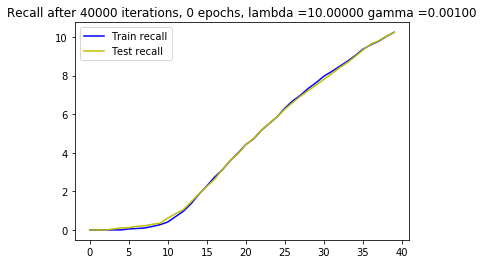

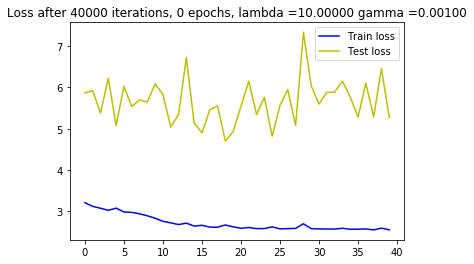

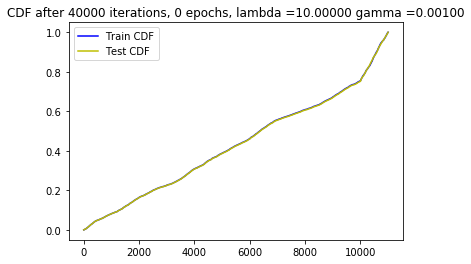






  8%|▊         | 40001/473047 [27:05<281:50:13,  2.34s/it]




  8%|▊         | 40009/473047 [27:06<197:44:52,  1.64s/it]

New score:  0.10994385
Train score:  0.24130154
Test score:  0.34450325
Obj first part:  3.346770405769348
Obj second part:  -1.9623673
Obj first part:  0.0
Obj second part:  -2.1826851
Obj first part:  0.0
Obj second part:  -1.9030958
Obj first part:  0.5237331613898277
Obj second part:  -1.6467049
Obj first part:  0.0
Obj second part:  -1.8624603
Obj first part:  0.0
Obj second part:  -0.5290164
Obj first part:  1.457914561033249
Obj second part:  -0.6402529
Obj first part:  0.0
Obj second part:  -2.1906362
Obj first part:  0.19557656720280647
Obj second part:  -0.89303434
Obj first part:  0.0
Obj second part:  -0.68752915
Obj first part:  2.42374986410141
Obj second part:  -1.2968892
Obj first part:  0.0
Obj second part:  -0.87499994
Obj first part:  0.5769607052206993
Obj second part:  -1.534452
Obj first part:  1.2237847596406937
Obj second part:  -0.9674475
Obj first part:  0.5418204888701439
Obj second part:  -3.1596127
Obj first part:  0.0
Obj second part:  -4.2657876







  8%|▊         | 40017/473047 [27:06<138:53:42,  1.15s/it]




  8%|▊         | 40025/473047 [27:06<97:41:54,  1.23it/s] 

Obj first part:  7.809463143348694
Obj second part:  -3.190275
Obj first part:  0.14674654230475426
Obj second part:  -2.6479638
Obj first part:  6.7056578397750854
Obj second part:  -1.093753
Obj first part:  0.0
Obj second part:  -1.0674284
Obj first part:  0.0
Obj second part:  -1.8393975
Obj first part:  0.0
Obj second part:  -1.7516525
Obj first part:  0.0
Obj second part:  -1.995612
Obj first part:  0.0
Obj second part:  -2.1337981
Obj first part:  0.34542061388492584
Obj second part:  -0.28087112
Obj first part:  0.0
Obj second part:  -3.9317236
Obj first part:  0.0
Obj second part:  -2.254782
Obj first part:  0.0
Obj second part:  -1.3888351
Obj first part:  2.6387980580329895
Obj second part:  -0.7404782
Obj first part:  0.0
Obj second part:  -2.5092492
Obj first part:  0.0
Obj second part:  -1.925549
Obj first part:  0.6661254912614822
Obj second part:  -0.35584638







  8%|▊         | 40033/473047 [27:06<68:52:10,  1.75it/s]




  8%|▊         | 40041/473047 [27:06<48:42:17,  2.47it/s]

Obj first part:  0.0
Obj second part:  -3.294979
Obj first part:  0.16354823485016823
Obj second part:  -1.7546955
Obj first part:  0.0
Obj second part:  -2.392309
Obj first part:  0.3571745753288269
Obj second part:  -0.62476903
Obj first part:  0.0
Obj second part:  -1.3597268
Obj first part:  0.45703139156103134
Obj second part:  -2.0558395
Obj first part:  0.09239918552339077
Obj second part:  -0.36886582
Obj first part:  0.0
Obj second part:  -0.05662353
Obj first part:  0.35879895091056824
Obj second part:  -3.620165
Obj first part:  1.5982277691364288
Obj second part:  -0.5777749
Obj first part:  0.0
Obj second part:  -0.403465
Obj first part:  0.0
Obj second part:  -0.91780293
Obj first part:  7.119994163513184
Obj second part:  -0.31131706
Obj first part:  0.8767914026975632
Obj second part:  -0.65125084
Obj first part:  0.0
Obj second part:  -1.3187588







  8%|▊         | 40049/473047 [27:06<34:34:39,  3.48it/s]




  8%|▊         | 40057/473047 [27:06<24:40:58,  4.87it/s]

Obj first part:  1.6891443729400635
Obj second part:  -2.8056324
Obj first part:  2.7654191851615906
Obj second part:  -0.2079305
Obj first part:  0.0
Obj second part:  -0.54427505
Obj first part:  0.0
Obj second part:  -1.1333182
Obj first part:  0.0
Obj second part:  -1.0192277
Obj first part:  0.0
Obj second part:  -0.85637426
Obj first part:  3.3540046215057373
Obj second part:  -2.7492187
Obj first part:  1.0294843465089798
Obj second part:  -2.2590685
Obj first part:  0.0
Obj second part:  -1.4025061
Obj first part:  0.0
Obj second part:  -0.4226168
Obj first part:  0.4892987385392189
Obj second part:  -0.90988547
Obj first part:  0.6029360741376877
Obj second part:  -1.0380092
Obj first part:  0.0
Obj second part:  -0.9545222
Obj first part:  0.0
Obj second part:  -0.059250165
Obj first part:  0.0
Obj second part:  -1.5998483
Obj first part:  0.6643460690975189
Obj second part:  -0.49383911







  8%|▊         | 40065/473047 [27:06<17:45:36,  6.77it/s]




  8%|▊         | 40073/473047 [27:06<12:54:24,  9.32it/s]

Obj first part:  0.3203516826033592
Obj second part:  -0.39532852
Obj first part:  4.667842090129852
Obj second part:  -3.2965164
Obj first part:  4.084095358848572
Obj second part:  -1.3462164
Obj first part:  0.3887058049440384
Obj second part:  -2.380461
Obj first part:  3.1024792790412903
Obj second part:  -2.6730127
Obj first part:  0.0
Obj second part:  -0.29792604
Obj first part:  0.0
Obj second part:  -5.7547812
Obj first part:  8.535478115081787
Obj second part:  -1.1710156
Obj first part:  0.09891494177281857
Obj second part:  -0.50165224
Obj first part:  0.0
Obj second part:  -2.395102
Obj first part:  0.0
Obj second part:  -1.2451891
Obj first part:  4.759896695613861
Obj second part:  -1.7756915
Obj first part:  0.6262173503637314
Obj second part:  -3.5779798
Obj first part:  0.0
Obj second part:  -1.4643501
Obj first part:  0.0
Obj second part:  -2.2231734
Obj first part:  0.11451753787696362
Obj second part:  -0.42187962







  8%|▊         | 40081/473047 [27:06<9:30:39, 12.65it/s] 




  8%|▊         | 40089/473047 [27:07<7:07:29, 16.88it/s]

Obj first part:  0.6738423556089401
Obj second part:  -0.99717
Obj first part:  0.0
Obj second part:  -1.417171
Obj first part:  0.0
Obj second part:  -3.7404833
Obj first part:  0.32863277941942215
Obj second part:  -3.3775847
Obj first part:  0.0
Obj second part:  -3.7442417
Obj first part:  0.8885948359966278
Obj second part:  -0.32870936
Obj first part:  1.4471597969532013
Obj second part:  -1.9073449
Obj first part:  0.0
Obj second part:  -1.5104522
Obj first part:  0.0
Obj second part:  -0.32741013
Obj first part:  0.27468154206871986
Obj second part:  -1.0049748
Obj first part:  5.301597714424133
Obj second part:  -5.5982165
Obj first part:  0.0
Obj second part:  -5.655324
Obj first part:  0.16610462218523026
Obj second part:  -2.33566
Obj first part:  2.736346125602722
Obj second part:  -2.602844
Obj first part:  0.5544227734208107
Obj second part:  -3.6120129
Obj first part:  0.23670336231589317
Obj second part:  -1.5808127







  8%|▊         | 40097/473047 [27:07<5:28:10, 21.99it/s]




  8%|▊         | 40105/473047 [27:07<4:18:23, 27.93it/s]

Obj first part:  3.035750389099121
Obj second part:  -1.0202541
Obj first part:  0.0
Obj second part:  -2.1992369
Obj first part:  1.9253847002983093
Obj second part:  -1.3857086
Obj first part:  0.0
Obj second part:  -1.327573
Obj first part:  0.0
Obj second part:  -2.8497212
Obj first part:  0.0
Obj second part:  -1.3475428
Obj first part:  0.526336245238781
Obj second part:  -0.555339
Obj first part:  0.16259249299764633
Obj second part:  -2.7911222
Obj first part:  0.38534604012966156
Obj second part:  -1.6833732
Obj first part:  1.0233408212661743
Obj second part:  -0.9937228
Obj first part:  0.9478960186243057
Obj second part:  -0.51575613
Obj first part:  0.6909557431936264
Obj second part:  -1.8614138
Obj first part:  0.19054949283599854
Obj second part:  -2.6520488
Obj first part:  0.0
Obj second part:  -2.8973975
Obj first part:  0.0
Obj second part:  -3.000856
Obj first part:  0.8695689588785172
Obj second part:  -1.3545141







  8%|▊         | 40113/473047 [27:07<3:29:57, 34.37it/s]




  8%|▊         | 40121/473047 [27:07<2:55:42, 41.06it/s]

Obj first part:  0.0154950434807688
Obj second part:  -1.4503751
Obj first part:  0.0
Obj second part:  -1.1037917
Obj first part:  0.0
Obj second part:  -3.9475608
Obj first part:  0.0
Obj second part:  -3.41696
Obj first part:  0.0
Obj second part:  -1.495699
Obj first part:  15.002492666244507
Obj second part:  -0.57394874
Obj first part:  2.8767570853233337
Obj second part:  -0.06501636
Obj first part:  0.0
Obj second part:  -0.7770325
Obj first part:  0.5428819730877876
Obj second part:  -0.9597496
Obj first part:  1.3230234384536743
Obj second part:  -0.8212135
Obj first part:  0.0
Obj second part:  -2.464377
Obj first part:  0.0
Obj second part:  -2.5753725
Obj first part:  0.0
Obj second part:  -0.90439874
Obj first part:  1.2566371262073517
Obj second part:  -3.9781115
Obj first part:  4.084520936012268
Obj second part:  -0.7449248
Obj first part:  1.3930004835128784
Obj second part:  -3.584641







  8%|▊         | 40129/473047 [27:07<2:32:07, 47.43it/s]




  8%|▊         | 40137/473047 [27:07<2:15:35, 53.21it/s]

Obj first part:  0.4310334473848343
Obj second part:  -0.44333416
Obj first part:  2.538898289203644
Obj second part:  -1.9024566
Obj first part:  0.0
Obj second part:  -0.80045056
Obj first part:  5.232301354408264
Obj second part:  -1.8017824
Obj first part:  0.0
Obj second part:  -2.3026586
Obj first part:  0.0
Obj second part:  -0.3944468
Obj first part:  0.0
Obj second part:  -0.44414312
Obj first part:  0.0
Obj second part:  -0.10361519
Obj first part:  7.519305348396301
Obj second part:  -1.1840415
Obj first part:  0.0
Obj second part:  -2.6038618
Obj first part:  0.10484653525054455
Obj second part:  -0.93603563
Obj first part:  0.0
Obj second part:  -4.5825562
Obj first part:  0.16842329874634743
Obj second part:  -1.9236498
Obj first part:  0.8753184229135513
Obj second part:  -2.3018684
Obj first part:  0.0
Obj second part:  -1.9442153







  8%|▊         | 40145/473047 [27:07<2:04:15, 58.07it/s]




  8%|▊         | 40153/473047 [27:07<1:55:42, 62.35it/s]

Obj first part:  0.27252834290266037
Obj second part:  -2.371014
Obj first part:  0.0
Obj second part:  -1.3866718
Obj first part:  5.655730962753296
Obj second part:  -1.3828806
Obj first part:  0.0
Obj second part:  -1.5745043
Obj first part:  0.3351757302880287
Obj second part:  -2.0546706
Obj first part:  0.10024444200098515
Obj second part:  -0.9490144
Obj first part:  0.42756225913763046
Obj second part:  -3.6114533
Obj first part:  0.0
Obj second part:  -2.5779338
Obj first part:  0.0
Obj second part:  -1.855065
Obj first part:  0.1532003004103899
Obj second part:  -1.136225
Obj first part:  0.0
Obj second part:  -0.80254644
Obj first part:  0.0
Obj second part:  -1.947199
Obj first part:  2.0504558086395264
Obj second part:  -2.6366613
Obj first part:  0.19524531438946724
Obj second part:  -0.66542983
Obj first part:  0.5623840540647507
Obj second part:  -0.66097903
Obj first part:  0.10354222729802132







  8%|▊         | 40161/473047 [27:08<1:49:50, 65.68it/s]




  8%|▊         | 40169/473047 [27:08<1:44:52, 68.79it/s]

Obj second part:  -1.3099414
Obj first part:  4.240897595882416
Obj second part:  -1.1297501
Obj first part:  1.3638834655284882
Obj second part:  -2.5566244
Obj first part:  0.2241678535938263
Obj second part:  -0.8856607
Obj first part:  0.0
Obj second part:  -0.93484104
Obj first part:  0.0
Obj second part:  -1.3202945
Obj first part:  0.16004210337996483
Obj second part:  -4.6442237
Obj first part:  3.6125683784484863
Obj second part:  -1.4827867
Obj first part:  0.2635757625102997
Obj second part:  -0.763024
Obj first part:  0.0
Obj second part:  -3.1701577
Obj first part:  0.1587856374680996
Obj second part:  -3.5278194
Obj first part:  0.0
Obj second part:  -0.22327289
Obj first part:  0.0
Obj second part:  -2.3649528
Obj first part:  0.0
Obj second part:  -1.075209
Obj first part:  0.0
Obj second part:  -0.35220093
Obj first part:  0.0
Obj second part:  -1.1370008







  8%|▊         | 40177/473047 [27:08<1:42:00, 70.72it/s]




  8%|▊         | 40185/473047 [27:08<1:39:42, 72.35it/s]

Obj first part:  0.0
Obj second part:  -0.78116024
Obj first part:  0.0
Obj second part:  -1.3401763
Obj first part:  0.7827962189912796
Obj second part:  -0.70932764
Obj first part:  0.0
Obj second part:  -3.521832
Obj first part:  3.4298312664031982
Obj second part:  -0.9626602
Obj first part:  0.0
Obj second part:  -3.04332
Obj first part:  0.6033896654844284
Obj second part:  -1.9638771
Obj first part:  0.9140076488256454
Obj second part:  -0.5054432
Obj first part:  0.0
Obj second part:  -1.6625481
Obj first part:  0.15004323795437813
Obj second part:  -0.12011726
Obj first part:  0.0
Obj second part:  -2.3308935
Obj first part:  1.6784296929836273
Obj second part:  -2.933539
Obj first part:  0.0
Obj second part:  -3.074396
Obj first part:  0.0
Obj second part:  -1.906466
Obj first part:  12.009345293045044
Obj second part:  -2.6696632
Obj first part:  0.0
Obj second part:  -1.5061392







  8%|▊         | 40193/473047 [27:08<1:38:21, 73.35it/s]




  8%|▊         | 40201/473047 [27:08<1:37:21, 74.10it/s]

Obj first part:  0.41408415883779526
Obj second part:  -3.3874593
Obj first part:  0.0
Obj second part:  -1.6009952
Obj first part:  0.0
Obj second part:  -2.2852032
Obj first part:  0.0
Obj second part:  -0.9211679
Obj first part:  0.0
Obj second part:  -0.91480535
Obj first part:  0.0
Obj second part:  -3.9637556
Obj first part:  0.0
Obj second part:  -2.7881393
Obj first part:  2.501782774925232
Obj second part:  -0.29990736
Obj first part:  0.0
Obj second part:  -1.4034762
Obj first part:  0.0
Obj second part:  -1.8236194
Obj first part:  0.0
Obj second part:  -0.27043232
Obj first part:  0.0
Obj second part:  -2.3963108
Obj first part:  0.0
Obj second part:  -1.2957239
Obj first part:  0.0
Obj second part:  -0.31887612
Obj first part:  4.322992563247681
Obj second part:  -2.0866473
Obj first part:  0.0
Obj second part:  -1.587907







  9%|▊         | 40209/473047 [27:08<1:36:40, 74.62it/s]




  9%|▊         | 40217/473047 [27:08<1:35:50, 75.27it/s]

Obj first part:  0.0
Obj second part:  -0.10150408
Obj first part:  0.0
Obj second part:  -0.18062857
Obj first part:  11.120938062667847
Obj second part:  -1.8401332
Obj first part:  0.0
Obj second part:  -2.5496678
Obj first part:  0.36246422678232193
Obj second part:  -0.48165515
Obj first part:  0.0
Obj second part:  -0.8157278
Obj first part:  0.7097028195858002
Obj second part:  -2.3785558
Obj first part:  1.8778805434703827
Obj second part:  -0.88876325
Obj first part:  0.8179053664207458
Obj second part:  -0.7182524
Obj first part:  0.65738245844841
Obj second part:  -0.5584464
Obj first part:  0.0
Obj second part:  -1.6926657
Obj first part:  0.5505894869565964
Obj second part:  -1.7999439
Obj first part:  0.0
Obj second part:  -0.7183082
Obj first part:  0.0
Obj second part:  -0.9483168
Obj first part:  0.5170323327183723
Obj second part:  -1.5491536
Obj first part:  7.044572830200195
Obj second part:  -0.48507985







  9%|▊         | 40225/473047 [27:08<1:35:55, 75.20it/s]




  9%|▊         | 40233/473047 [27:08<1:35:32, 75.50it/s]

Obj first part:  0.0
Obj second part:  -0.17265485
Obj first part:  0.0
Obj second part:  -0.54600656
Obj first part:  1.5680606663227081
Obj second part:  -2.3232832
Obj first part:  0.0
Obj second part:  -0.8639437
Obj first part:  0.0
Obj second part:  -0.4337083
Obj first part:  0.2832222171127796
Obj second part:  -5.2922707
Obj first part:  0.0
Obj second part:  -2.8031154
Obj first part:  1.6276915371418
Obj second part:  -1.266415
Obj first part:  4.1906145215034485
Obj second part:  -0.5441374
Obj first part:  0.0
Obj second part:  -2.5084264
Obj first part:  0.0
Obj second part:  -1.861114
Obj first part:  0.30569616705179214
Obj second part:  -1.0463707
Obj first part:  9.704139828681946
Obj second part:  -2.4020576
Obj first part:  0.39125956594944
Obj second part:  -3.0499678
Obj first part:  0.17595352604985237
Obj second part:  -1.4520547
Obj first part:  0.0
Obj second part:  -2.437279







  9%|▊         | 40241/473047 [27:09<1:34:06, 76.64it/s]




  9%|▊         | 40249/473047 [27:09<1:34:09, 76.61it/s]

Obj first part:  0.0
Obj second part:  -2.5203915
Obj first part:  0.0
Obj second part:  -2.4592955
Obj first part:  0.3497099503874779
Obj second part:  -1.5341493
Obj first part:  0.0
Obj second part:  -2.5326223
Obj first part:  3.518308103084564
Obj second part:  -1.0366752
Obj first part:  0.0
Obj second part:  -0.6045522
Obj first part:  0.16705410555005074
Obj second part:  -1.3442346
Obj first part:  0.0
Obj second part:  -1.2434536
Obj first part:  0.0
Obj second part:  -3.631257
Obj first part:  0.0
Obj second part:  -0.51322794
Obj first part:  1.8248702585697174
Obj second part:  -1.4155374
Obj first part:  1.4985217154026031
Obj second part:  -2.2354085
Obj first part:  0.0
Obj second part:  -2.6390119
Obj first part:  0.0
Obj second part:  -4.3806195
Obj first part:  3.0104073882102966
Obj second part:  -0.9468226
Obj first part:  0.0
Obj second part:  -2.1908548







  9%|▊         | 40257/473047 [27:09<1:34:23, 76.41it/s]




  9%|▊         | 40265/473047 [27:09<1:34:16, 76.50it/s]

Obj first part:  0.0
Obj second part:  -3.2161913
Obj first part:  1.2706857919692993
Obj second part:  -1.2765131
Obj first part:  10.768516063690186
Obj second part:  -2.0762885
Obj first part:  0.9701918810606003
Obj second part:  -1.7083021
Obj first part:  2.3132388293743134
Obj second part:  -0.8937204
Obj first part:  0.0
Obj second part:  -1.4954858
Obj first part:  3.765324056148529
Obj second part:  -1.5629902
Obj first part:  0.0
Obj second part:  -1.0718338
Obj first part:  0.0
Obj second part:  -1.8234158
Obj first part:  0.0
Obj second part:  -1.3956072
Obj first part:  0.0
Obj second part:  -3.5185897
Obj first part:  9.50133740901947
Obj second part:  -0.10318218
Obj first part:  0.6435691565275192
Obj second part:  -0.69626915
Obj first part:  0.15032597817480564
Obj second part:  -1.4410893
Obj first part:  0.0
Obj second part:  -1.7570354
Obj first part:  0.21007897332310677
Obj second part:  -1.0369457







  9%|▊         | 40273/473047 [27:09<1:34:25, 76.39it/s]




  9%|▊         | 40281/473047 [27:09<1:34:07, 76.64it/s]

Obj first part:  0.0
Obj second part:  -1.2423064
Obj first part:  0.0
Obj second part:  -0.73759276
Obj first part:  0.0
Obj second part:  -0.8329362
Obj first part:  0.11986902914941311
Obj second part:  -0.684696
Obj first part:  0.0
Obj second part:  -3.3436723
Obj first part:  1.617283821105957
Obj second part:  -1.0823257
Obj first part:  0.4021981358528137
Obj second part:  -1.3525513
Obj first part:  0.0
Obj second part:  -2.8172889
Obj first part:  13.204429149627686
Obj second part:  -0.11387017
Obj first part:  0.0
Obj second part:  -2.5914485
Obj first part:  1.668289303779602
Obj second part:  -0.5865016
Obj first part:  0.0
Obj second part:  -0.6074416
Obj first part:  0.0
Obj second part:  -0.6411603
Obj first part:  1.1798026412725449
Obj second part:  -2.425281
Obj first part:  2.2689510881900787
Obj second part:  -2.281993
Obj first part:  0.5520285293459892
Obj second part:  -2.2971241







  9%|▊         | 40289/473047 [27:09<1:34:21, 76.44it/s]




  9%|▊         | 40297/473047 [27:09<1:34:08, 76.61it/s]

Obj first part:  0.0
Obj second part:  -1.7017157
Obj first part:  2.559022307395935
Obj second part:  -0.87940663
Obj first part:  0.0
Obj second part:  -3.0638003
Obj first part:  0.06978458259254694
Obj second part:  -3.5512474
Obj first part:  3.111203610897064
Obj second part:  -1.6769603
Obj first part:  0.48059456050395966
Obj second part:  -3.4943035
Obj first part:  7.436572313308716
Obj second part:  -1.9913872
Obj first part:  0.0
Obj second part:  -3.1325471
Obj first part:  0.0
Obj second part:  -0.8345671
Obj first part:  0.0
Obj second part:  -4.0941343
Obj first part:  2.3633477091789246
Obj second part:  -1.7832357
Obj first part:  0.0
Obj second part:  -0.48276836
Obj first part:  0.0
Obj second part:  -3.0757844
Obj first part:  0.5299564823508263
Obj second part:  -0.9367802
Obj first part:  0.0
Obj second part:  -2.563052
Obj first part:  2.6955750584602356
Obj second part:  -0.64818406







  9%|▊         | 40305/473047 [27:09<1:34:50, 76.04it/s]




  9%|▊         | 40313/473047 [27:10<1:34:48, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.2857435
Obj first part:  0.5869584158062935
Obj second part:  -0.28047433
Obj first part:  0.1815139316022396
Obj second part:  -1.0984776
Obj first part:  0.0
Obj second part:  -1.7890859
Obj first part:  0.13469906523823738
Obj second part:  -2.5336328
Obj first part:  0.29413608834147453
Obj second part:  -1.9952477
Obj first part:  0.12457109987735748
Obj second part:  -1.0413094
Obj first part:  0.33933598548173904
Obj second part:  -1.6775825
Obj first part:  0.42489051818847656
Obj second part:  -2.6033957
Obj first part:  1.275569498538971
Obj second part:  -2.1658678
Obj first part:  0.0
Obj second part:  -2.1486886
Obj first part:  0.28506115078926086
Obj second part:  -2.5975435
Obj first part:  0.5427942425012589
Obj second part:  -1.0098249
Obj first part:  0.0
Obj second part:  -3.3294387
Obj first part:  0.0
Obj second part:  -0.4842255
Obj first part:  0.0
Obj second part:  -3.051396







  9%|▊         | 40321/473047 [27:10<1:35:05, 75.85it/s]




  9%|▊         | 40329/473047 [27:10<1:35:14, 75.72it/s]

Obj first part:  0.7543740421533585
Obj second part:  -1.6658882
Obj first part:  0.0
Obj second part:  -3.5777395
Obj first part:  0.0
Obj second part:  -3.8933403
Obj first part:  0.2161521092057228
Obj second part:  -4.209807
Obj first part:  0.18943848088383675
Obj second part:  -2.321612
Obj first part:  0.0
Obj second part:  -1.2527474
Obj first part:  0.490078404545784
Obj second part:  -0.47077143
Obj first part:  0.07008501328527927
Obj second part:  -0.20831825
Obj first part:  0.3731437772512436
Obj second part:  -1.4947588
Obj first part:  0.0
Obj second part:  -0.9648707
Obj first part:  0.0
Obj second part:  -0.0745415
Obj first part:  5.237710475921631
Obj second part:  -0.2865945
Obj first part:  0.21574536338448524
Obj second part:  -0.7979986
Obj first part:  1.3903146982192993
Obj second part:  -1.9775119
Obj first part:  0.0
Obj second part:  -1.1237254
Obj first part:  1.6071824729442596
Obj second part:  -1.7013712







  9%|▊         | 40337/473047 [27:10<1:35:01, 75.90it/s]




  9%|▊         | 40345/473047 [27:10<1:34:57, 75.94it/s]

Obj first part:  0.0
Obj second part:  -0.9972732
Obj first part:  0.0
Obj second part:  -0.6389523
Obj first part:  0.0
Obj second part:  -1.5066051
Obj first part:  0.0
Obj second part:  -0.120438114
Obj first part:  0.0
Obj second part:  -0.1938661
Obj first part:  0.0
Obj second part:  -1.2937622
Obj first part:  2.754233479499817
Obj second part:  -0.41677025
Obj first part:  0.0
Obj second part:  -0.27639154
Obj first part:  0.0
Obj second part:  -3.3599894
Obj first part:  0.3593822568655014
Obj second part:  -1.2686042
Obj first part:  1.7397433519363403
Obj second part:  -0.45289636
Obj first part:  0.0
Obj second part:  -4.593174
Obj first part:  0.8815187215805054
Obj second part:  -3.2512276
Obj first part:  2.6486513018608093
Obj second part:  -1.1711608
Obj first part:  0.0
Obj second part:  -5.0513754
Obj first part:  0.0
Obj second part:  -1.0071101







  9%|▊         | 40353/473047 [27:10<1:34:47, 76.08it/s]




  9%|▊         | 40361/473047 [27:10<1:34:42, 76.14it/s]

Obj first part:  0.0
Obj second part:  -1.3862437
Obj first part:  5.808335542678833
Obj second part:  -1.8539338
Obj first part:  0.0
Obj second part:  -0.88970435
Obj first part:  0.46003419905900955
Obj second part:  -2.7822573
Obj first part:  0.763004720211029
Obj second part:  -1.352091
Obj first part:  5.879249572753906
Obj second part:  -1.4667513
Obj first part:  0.0
Obj second part:  -1.2496301
Obj first part:  0.30497098341584206
Obj second part:  -2.5830448
Obj first part:  0.0
Obj second part:  -0.8039692
Obj first part:  0.12218646705150604
Obj second part:  -1.6116575
Obj first part:  2.196534425020218
Obj second part:  -1.604524
Obj first part:  0.5237292498350143
Obj second part:  -2.363378
Obj first part:  0.0
Obj second part:  -3.182489
Obj first part:  0.0
Obj second part:  -2.2524812
Obj first part:  3.474474549293518
Obj second part:  -3.5088716
Obj first part:  6.053208112716675
Obj second part:  -2.8736947







  9%|▊         | 40369/473047 [27:10<1:34:40, 76.17it/s]




  9%|▊         | 40377/473047 [27:10<1:34:40, 76.17it/s]

Obj first part:  0.0
Obj second part:  -0.32687524
Obj first part:  0.0
Obj second part:  -2.2219822
Obj first part:  0.3759670630097389
Obj second part:  -2.9403691
Obj first part:  0.0
Obj second part:  -0.47787285
Obj first part:  0.0
Obj second part:  -1.4679295
Obj first part:  0.0
Obj second part:  -0.31369957
Obj first part:  0.0
Obj second part:  -1.7920938
Obj first part:  1.8588171899318695
Obj second part:  -0.78351885
Obj first part:  0.0
Obj second part:  -3.020658
Obj first part:  0.0
Obj second part:  -2.0435839
Obj first part:  0.0
Obj second part:  -4.6461806
Obj first part:  0.0
Obj second part:  -1.4392217
Obj first part:  0.0
Obj second part:  -0.1418092
Obj first part:  0.0
Obj second part:  -2.4770286
Obj first part:  0.5769279599189758
Obj second part:  -2.0189426
Obj first part:  0.2107648178935051
Obj second part:  -1.1828996







  9%|▊         | 40385/473047 [27:10<1:34:49, 76.04it/s]




  9%|▊         | 40393/473047 [27:11<1:34:52, 76.00it/s]

Obj first part:  0.0
Obj second part:  -0.6383475
Obj first part:  0.0
Obj second part:  -0.62383306
Obj first part:  0.06448394618928432
Obj second part:  -0.4315529
Obj first part:  0.242816973477602
Obj second part:  -0.6791602
Obj first part:  0.9178774058818817
Obj second part:  -1.1843138
Obj first part:  0.254772175103426
Obj second part:  -2.0000188
Obj first part:  0.0
Obj second part:  -0.32669824
Obj first part:  2.09128737449646
Obj second part:  -0.06727326
Obj first part:  0.0
Obj second part:  -0.5705163
Obj first part:  0.0
Obj second part:  -3.640721
Obj first part:  4.079340100288391
Obj second part:  -1.3958064
Obj first part:  1.5182982385158539
Obj second part:  -3.296837
Obj first part:  0.0
Obj second part:  -0.5123296
Obj first part:  0.0
Obj second part:  -0.7672685
Obj first part:  0.7382868230342865
Obj second part:  -1.8153293
Obj first part:  0.0
Obj second part:  -3.5017862







  9%|▊         | 40401/473047 [27:11<1:35:04, 75.84it/s]




  9%|▊         | 40409/473047 [27:11<1:35:02, 75.87it/s]

Obj first part:  2.3184557259082794
Obj second part:  -0.6348979
Obj first part:  0.0
Obj second part:  -0.4136153
Obj first part:  0.04323767498135567
Obj second part:  -0.90049636
Obj first part:  0.0
Obj second part:  -1.2254467
Obj first part:  1.3200446963310242
Obj second part:  -2.1354434
Obj first part:  0.0
Obj second part:  -0.9475969
Obj first part:  0.0
Obj second part:  -1.1492254
Obj first part:  0.0
Obj second part:  -0.9990386
Obj first part:  0.0
Obj second part:  -2.1222904
Obj first part:  0.0
Obj second part:  -2.304668
Obj first part:  0.0
Obj second part:  -0.094608456
Obj first part:  0.1591036282479763
Obj second part:  -3.292245
Obj first part:  0.0
Obj second part:  -1.7228496
Obj first part:  0.0
Obj second part:  -1.407071
Obj first part:  0.0
Obj second part:  -0.18526848
Obj first part:  0.3774198889732361
Obj second part:  -2.2172725







  9%|▊         | 40417/473047 [27:11<1:34:53, 75.99it/s]




  9%|▊         | 40425/473047 [27:11<1:34:40, 76.16it/s]

Obj first part:  0.0
Obj second part:  -0.28278458
Obj first part:  0.11566204950213432
Obj second part:  -0.35884973
Obj first part:  0.0
Obj second part:  -0.098898664
Obj first part:  3.684553802013397
Obj second part:  -1.7155803
Obj first part:  0.3397829458117485
Obj second part:  -0.7448407
Obj first part:  5.182383060455322
Obj second part:  -2.5189557
Obj first part:  0.0
Obj second part:  -0.5484097
Obj first part:  0.21150873973965645
Obj second part:  -0.81248915
Obj first part:  0.0
Obj second part:  -2.1163852
Obj first part:  0.0
Obj second part:  -2.338981
Obj first part:  0.0
Obj second part:  -0.21833453
Obj first part:  1.6297818720340729
Obj second part:  -1.746433
Obj first part:  0.2510751970112324
Obj second part:  -0.76623875
Obj first part:  1.246861219406128
Obj second part:  -2.5406861
Obj first part:  0.7412346452474594
Obj second part:  -1.7933141
Obj first part:  4.197583198547363
Obj second part:  -0.21175316







  9%|▊         | 40433/473047 [27:11<1:34:45, 76.09it/s]




  9%|▊         | 40441/473047 [27:11<1:34:34, 76.24it/s]

Obj first part:  0.0
Obj second part:  -1.0101017
Obj first part:  11.48324728012085
Obj second part:  -1.7234355
Obj first part:  3.7247273325920105
Obj second part:  -1.7726796
Obj first part:  12.044214010238647
Obj second part:  -0.29251352
Obj first part:  0.0
Obj second part:  -2.1192856
Obj first part:  0.0
Obj second part:  -0.39491555
Obj first part:  0.6551611423492432
Obj second part:  -0.97237575
Obj first part:  0.6718809902667999
Obj second part:  -0.76596326
Obj first part:  1.0843860357999802
Obj second part:  -3.4781907
Obj first part:  0.38168877363204956
Obj second part:  -1.3382959
Obj first part:  0.0
Obj second part:  -2.4868748
Obj first part:  0.0
Obj second part:  -1.6878545
Obj first part:  0.0
Obj second part:  -2.4119577
Obj first part:  2.2674262523651123
Obj second part:  -2.2044024
Obj first part:  0.0
Obj second part:  -1.1727275
Obj first part:  5.4015421867370605
Obj second part:  -0.90900105







  9%|▊         | 40449/473047 [27:11<1:34:53, 75.98it/s]




  9%|▊         | 40457/473047 [27:11<1:34:45, 76.09it/s]

Obj first part:  0.0
Obj second part:  -0.81319046
Obj first part:  0.0
Obj second part:  -1.4215611
Obj first part:  0.0
Obj second part:  -0.6187036
Obj first part:  0.0
Obj second part:  -0.42135644
Obj first part:  0.0
Obj second part:  -0.9117305
Obj first part:  0.0
Obj second part:  -0.5536629
Obj first part:  1.6690412163734436
Obj second part:  -1.5540828
Obj first part:  3.150976598262787
Obj second part:  -0.24391589
Obj first part:  0.0
Obj second part:  -0.87126297
Obj first part:  0.7704408466815948
Obj second part:  -1.1060734
Obj first part:  0.023874123580753803
Obj second part:  -3.7478411
Obj first part:  1.2744826078414917
Obj second part:  -1.2767069
Obj first part:  1.7645825445652008
Obj second part:  -0.90615
Obj first part:  0.0
Obj second part:  -1.5365658
Obj first part:  0.6088363006711006
Obj second part:  -2.5857332
Obj first part:  0.0
Obj second part:  -1.6458247







  9%|▊         | 40465/473047 [27:12<1:34:48, 76.04it/s]




  9%|▊         | 40473/473047 [27:12<1:34:49, 76.03it/s]

Obj first part:  0.0
Obj second part:  -2.4495337
Obj first part:  0.522499680519104
Obj second part:  -0.32407793
Obj first part:  0.26823580265045166
Obj second part:  -2.0499945
Obj first part:  0.0
Obj second part:  -0.6218871
Obj first part:  0.0
Obj second part:  -0.48840374
Obj first part:  3.6825326085090637
Obj second part:  -1.3708818
Obj first part:  0.5705320835113525
Obj second part:  -0.8520903
Obj first part:  0.0
Obj second part:  -2.1290605
Obj first part:  0.03236523363739252
Obj second part:  -3.1204643
Obj first part:  0.47081034630537033
Obj second part:  -3.8136418
Obj first part:  0.0
Obj second part:  -3.1672463
Obj first part:  1.184801533818245
Obj second part:  -0.7123125
Obj first part:  0.18938060849905014
Obj second part:  -5.2872686
Obj first part:  0.8012185245752335
Obj second part:  -0.599393
Obj first part:  0.37186872214078903
Obj second part:  -2.1720786
Obj first part:  11.48111343383789
Obj second part:  -1.7442377







  9%|▊         | 40481/473047 [27:12<1:34:58, 75.91it/s]




  9%|▊         | 40489/473047 [27:12<1:35:01, 75.87it/s]

Obj first part:  0.08619208820164204
Obj second part:  -1.9628085
Obj first part:  0.0
Obj second part:  -0.5614818
Obj first part:  0.0
Obj second part:  -1.8165381
Obj first part:  0.0
Obj second part:  -2.8314517
Obj first part:  1.1219841986894608
Obj second part:  -2.5977902
Obj first part:  1.222696676850319
Obj second part:  -5.2092543
Obj first part:  0.0
Obj second part:  -0.16035192
Obj first part:  0.10632097721099854
Obj second part:  -2.2319603
Obj first part:  0.0
Obj second part:  -1.1519071
Obj first part:  0.0
Obj second part:  -1.3609484
Obj first part:  4.257957339286804
Obj second part:  -0.29272267
Obj first part:  0.0
Obj second part:  -3.7089472
Obj first part:  2.0580096542835236
Obj second part:  -0.3271735
Obj first part:  0.0
Obj second part:  -0.82700866
Obj first part:  0.0
Obj second part:  -2.051341
Obj first part:  0.0
Obj second part:  -1.9103208







  9%|▊         | 40497/473047 [27:12<1:34:45, 76.07it/s]




  9%|▊         | 40505/473047 [27:12<1:34:44, 76.09it/s]

Obj first part:  7.353050112724304
Obj second part:  -0.6530617
Obj first part:  0.0
Obj second part:  -1.2879751
Obj first part:  0.4213351011276245
Obj second part:  -1.5584375
Obj first part:  1.0996835678815842
Obj second part:  -1.4243028
Obj first part:  0.0
Obj second part:  -4.8601933
Obj first part:  0.0
Obj second part:  -2.6324291
Obj first part:  0.0
Obj second part:  -0.64685756
Obj first part:  0.19980944693088531
Obj second part:  -1.0310819
Obj first part:  1.1519201844930649
Obj second part:  -1.0127482
Obj first part:  0.0
Obj second part:  -1.1396996
Obj first part:  0.0
Obj second part:  -0.14842618
Obj first part:  0.1840047538280487
Obj second part:  -0.5960811
Obj first part:  1.12632617354393
Obj second part:  -1.5385227
Obj first part:  0.0
Obj second part:  -5.397261
Obj first part:  1.8152901530265808
Obj second part:  -0.2423042
Obj first part:  0.5177142843604088
Obj second part:  -1.8898535







  9%|▊         | 40513/473047 [27:12<1:34:38, 76.17it/s]




  9%|▊         | 40521/473047 [27:12<1:34:53, 75.97it/s]

Obj first part:  0.0
Obj second part:  -0.33443895
Obj first part:  0.6042221188545227
Obj second part:  -0.87637377
Obj first part:  0.0
Obj second part:  -1.3008809
Obj first part:  0.0798899494111538
Obj second part:  -0.94431543
Obj first part:  7.384040355682373
Obj second part:  -0.41517788
Obj first part:  0.0
Obj second part:  -1.4260162
Obj first part:  0.0
Obj second part:  -2.9794345
Obj first part:  1.6173312067985535
Obj second part:  -0.5102495
Obj first part:  3.340691924095154
Obj second part:  -2.8934045
Obj first part:  0.33020470291376114
Obj second part:  -0.58938336
Obj first part:  0.0
Obj second part:  -1.6244597
Obj first part:  0.5142258852720261
Obj second part:  -1.5429537
Obj first part:  0.0
Obj second part:  -0.5648873
Obj first part:  1.7265939712524414
Obj second part:  -0.85429454
Obj first part:  0.33384978771209717
Obj second part:  -1.7312783
Obj first part:  1.663859635591507
Obj second part:  -0.21685465







  9%|▊         | 40529/473047 [27:12<1:34:51, 75.99it/s]




  9%|▊         | 40537/473047 [27:12<1:34:43, 76.10it/s]

Obj first part:  4.922871291637421
Obj second part:  -3.2929614
Obj first part:  0.2732212282717228
Obj second part:  -0.92040557
Obj first part:  0.03221999853849411
Obj second part:  -0.3400415
Obj first part:  0.42417988181114197
Obj second part:  -1.3346969
Obj first part:  0.0
Obj second part:  -1.515998
Obj first part:  7.301813364028931
Obj second part:  -1.0468084
Obj first part:  0.0
Obj second part:  -0.5412142
Obj first part:  0.0
Obj second part:  -0.39405662
Obj first part:  0.0
Obj second part:  -0.7397699
Obj first part:  0.0
Obj second part:  -1.6130055
Obj first part:  1.2046746164560318
Obj second part:  -0.6231686
Obj first part:  2.675866484642029
Obj second part:  -0.662727
Obj first part:  0.0
Obj second part:  -3.5427117
Obj first part:  0.0
Obj second part:  -1.0826986
Obj first part:  0.12159889563918114
Obj second part:  -2.859788
Obj first part:  0.0
Obj second part:  -2.9115784







  9%|▊         | 40545/473047 [27:13<1:35:03, 75.83it/s]




  9%|▊         | 40553/473047 [27:13<1:34:52, 75.98it/s]

Obj first part:  0.2919916436076164
Obj second part:  -2.7923076
Obj first part:  0.07311854511499405
Obj second part:  -0.8831786
Obj first part:  0.49953099340200424
Obj second part:  -1.1629926
Obj first part:  0.0
Obj second part:  -3.934896
Obj first part:  0.27845198288559914
Obj second part:  -0.6872632
Obj first part:  0.2600901201367378
Obj second part:  -0.91327304
Obj first part:  0.41609328240156174
Obj second part:  -1.636584
Obj first part:  0.0
Obj second part:  -0.31824932
Obj first part:  0.0
Obj second part:  -2.0535033
Obj first part:  0.5197305232286453
Obj second part:  -2.0603576
Obj first part:  0.0
Obj second part:  -3.2552936
Obj first part:  0.41905246675014496
Obj second part:  -2.2588985
Obj first part:  0.0
Obj second part:  -0.5489189
Obj first part:  4.472620487213135
Obj second part:  -0.7773468
Obj first part:  0.0
Obj second part:  -2.6074834
Obj first part:  0.0
Obj second part:  -2.0714407







  9%|▊         | 40561/473047 [27:13<1:34:43, 76.09it/s]




  9%|▊         | 40569/473047 [27:13<1:34:26, 76.32it/s]

Obj first part:  0.0
Obj second part:  -2.421788
Obj first part:  3.6326903104782104
Obj second part:  -0.80237585
Obj first part:  0.0
Obj second part:  -0.4870683
Obj first part:  0.9077458083629608
Obj second part:  -0.7647031
Obj first part:  0.0
Obj second part:  -2.0690317
Obj first part:  0.4724738746881485
Obj second part:  -1.8052504
Obj first part:  0.0
Obj second part:  -0.13769706
Obj first part:  0.0
Obj second part:  -0.6367839
Obj first part:  0.0
Obj second part:  -3.3394818
Obj first part:  1.157967671751976
Obj second part:  -4.1156416
Obj first part:  0.8518178015947342
Obj second part:  -2.5983994
Obj first part:  0.0
Obj second part:  -2.8795123
Obj first part:  0.0
Obj second part:  -0.15458357
Obj first part:  0.0
Obj second part:  -0.4414425
Obj first part:  0.0
Obj second part:  -1.9629096
Obj first part:  0.14296004548668861
Obj second part:  -0.686593







  9%|▊         | 40577/473047 [27:13<1:34:37, 76.17it/s]




  9%|▊         | 40585/473047 [27:13<1:34:31, 76.25it/s]

Obj first part:  0.0
Obj second part:  -1.8796914
Obj first part:  0.21805189549922943
Obj second part:  -0.59625167
Obj first part:  0.0
Obj second part:  -1.7954717
Obj first part:  0.0
Obj second part:  -3.386588
Obj first part:  0.570533499121666
Obj second part:  -0.54870677
Obj first part:  6.275953054428101
Obj second part:  -0.6379944
Obj first part:  0.0
Obj second part:  -0.3287759
Obj first part:  0.07294482551515102
Obj second part:  -1.6224396
Obj first part:  0.0
Obj second part:  -1.3859321
Obj first part:  1.8608169257640839
Obj second part:  -1.9706717
Obj first part:  9.046319723129272
Obj second part:  -2.5747426
Obj first part:  0.0
Obj second part:  -0.47032678
Obj first part:  0.0
Obj second part:  -0.6072431
Obj first part:  1.3977667689323425
Obj second part:  -0.29271844
Obj first part:  1.0226120799779892
Obj second part:  -0.9339243
Obj first part:  0.18135851249098778
Obj second part:  -1.5500038







  9%|▊         | 40593/473047 [27:13<1:34:43, 76.10it/s]




  9%|▊         | 40601/473047 [27:13<1:34:35, 76.19it/s]

Obj first part:  0.7564008980989456
Obj second part:  -1.1435775
Obj first part:  0.13344142585992813
Obj second part:  -1.3495257
Obj first part:  0.0
Obj second part:  -1.3210387
Obj first part:  0.0
Obj second part:  -0.33325845
Obj first part:  0.0
Obj second part:  -1.4635106
Obj first part:  1.1257325857877731
Obj second part:  -1.2626169
Obj first part:  0.0
Obj second part:  -2.665608
Obj first part:  0.0
Obj second part:  -3.0708826
Obj first part:  0.0
Obj second part:  -1.1958712
Obj first part:  0.6194734945893288
Obj second part:  -0.79473275
Obj first part:  1.3146787881851196
Obj second part:  -0.27047443
Obj first part:  1.7470647394657135
Obj second part:  -0.15520418
Obj first part:  0.0
Obj second part:  -0.881835
Obj first part:  0.0
Obj second part:  -0.52116334
Obj first part:  0.0
Obj second part:  -0.8020555
Obj first part:  1.019953340291977
Obj second part:  -0.3778287







  9%|▊         | 40609/473047 [27:13<1:34:27, 76.30it/s]




  9%|▊         | 40617/473047 [27:14<1:34:36, 76.18it/s]

Obj first part:  3.464973568916321
Obj second part:  -1.7871497
Obj first part:  0.7204777002334595
Obj second part:  -0.44229433
Obj first part:  0.0
Obj second part:  -3.1830242
Obj first part:  4.608924686908722
Obj second part:  -0.29519024
Obj first part:  3.4524860978126526
Obj second part:  -2.2596943
Obj first part:  0.0
Obj second part:  -1.3772076
Obj first part:  0.0
Obj second part:  -1.3870356
Obj first part:  0.801781490445137
Obj second part:  -2.4008226
Obj first part:  1.7527711391448975
Obj second part:  -0.37628216
Obj first part:  1.3835179805755615
Obj second part:  -1.7606995
Obj first part:  2.330760955810547
Obj second part:  -2.080519
Obj first part:  0.0
Obj second part:  -1.1336132
Obj first part:  0.0
Obj second part:  -1.8671961
Obj first part:  0.0
Obj second part:  -0.5808686
Obj first part:  0.0
Obj second part:  -2.4753785
Obj first part:  0.0







  9%|▊         | 40625/473047 [27:14<1:35:26, 75.51it/s]




  9%|▊         | 40633/473047 [27:14<1:35:06, 75.77it/s]

Obj second part:  -0.4005215
Obj first part:  0.0
Obj second part:  -0.96860087
Obj first part:  0.0
Obj second part:  -0.09910478
Obj first part:  0.0
Obj second part:  -0.1691817
Obj first part:  0.856335461139679
Obj second part:  -5.1161757
Obj first part:  0.0
Obj second part:  -1.3669207
Obj first part:  0.0
Obj second part:  -3.5346572
Obj first part:  0.0
Obj second part:  -1.698666
Obj first part:  0.7041385024785995
Obj second part:  -1.9022434
Obj first part:  0.0
Obj second part:  -0.61449873
Obj first part:  0.0
Obj second part:  -0.91607624
Obj first part:  0.0
Obj second part:  -1.4308
Obj first part:  0.6139764562249184
Obj second part:  -2.4189072
Obj first part:  0.6810862571001053
Obj second part:  -0.6146937
Obj first part:  0.0
Obj second part:  -0.78392684
Obj first part:  3.4510183334350586
Obj second part:  -1.2267244







  9%|▊         | 40641/473047 [27:14<1:35:09, 75.74it/s]




  9%|▊         | 40649/473047 [27:14<1:34:34, 76.20it/s]

Obj first part:  0.0
Obj second part:  -1.9921266
Obj first part:  0.10818000882863998
Obj second part:  -2.2912936
Obj first part:  5.123260021209717
Obj second part:  -0.87708205
Obj first part:  10.323820114135742
Obj second part:  -0.84556407
Obj first part:  0.0
Obj second part:  -3.2990675
Obj first part:  0.0
Obj second part:  -1.2195835
Obj first part:  7.60516881942749
Obj second part:  -1.140839
Obj first part:  0.0
Obj second part:  -0.5087295
Obj first part:  0.0
Obj second part:  -3.125395
Obj first part:  0.955202504992485
Obj second part:  -3.708055
Obj first part:  0.0
Obj second part:  -1.7043282
Obj first part:  0.04743022844195366
Obj second part:  -1.3334148
Obj first part:  4.514092206954956
Obj second part:  -1.583482
Obj first part:  0.3196071460843086
Obj second part:  -0.6040617
Obj first part:  0.08649623021483421
Obj second part:  -2.3855128
Obj first part:  0.0
Obj second part:  -3.1062315







  9%|▊         | 40657/473047 [27:14<1:34:34, 76.20it/s]




  9%|▊         | 40665/473047 [27:14<1:34:30, 76.25it/s]

Obj first part:  0.0
Obj second part:  -3.3070495
Obj first part:  0.0
Obj second part:  -3.0116384
Obj first part:  0.0
Obj second part:  -0.2702358
Obj first part:  0.0
Obj second part:  -4.542298
Obj first part:  2.1351897716522217
Obj second part:  -1.4549029
Obj first part:  0.11308932676911354
Obj second part:  -1.0804176
Obj first part:  0.4247700795531273
Obj second part:  -4.273183
Obj first part:  2.5687623023986816
Obj second part:  -0.60823125
Obj first part:  0.0
Obj second part:  -0.29949462
Obj first part:  0.0
Obj second part:  -1.5553014
Obj first part:  0.7457674294710159
Obj second part:  -1.7072678
Obj first part:  0.0
Obj second part:  -1.6517148
Obj first part:  1.46651953458786
Obj second part:  -1.52329
Obj first part:  0.0
Obj second part:  -1.6178067
Obj first part:  0.0
Obj second part:  -1.6478124
Obj first part:  0.0
Obj second part:  -0.049815577







  9%|▊         | 40673/473047 [27:14<1:34:52, 75.95it/s]




  9%|▊         | 40681/473047 [27:14<1:34:45, 76.05it/s]

Obj first part:  3.4943887591362
Obj second part:  -2.5663178
Obj first part:  0.0
Obj second part:  -0.8628057
Obj first part:  0.11599618010222912
Obj second part:  -0.8559369
Obj first part:  1.3026650249958038
Obj second part:  -1.9289358
Obj first part:  0.01959751360118389
Obj second part:  -1.7475876
Obj first part:  0.0
Obj second part:  -0.6719825
Obj first part:  2.3059938848018646
Obj second part:  -1.2651651
Obj first part:  0.0
Obj second part:  -2.1038377
Obj first part:  0.531429834663868
Obj second part:  -2.1731784
Obj first part:  0.0
Obj second part:  -0.7010093
Obj first part:  2.3267289996147156
Obj second part:  -1.1505587
Obj first part:  0.27048148214817047
Obj second part:  -0.8243834
Obj first part:  2.2843772172927856
Obj second part:  -2.982366
Obj first part:  0.0
Obj second part:  -1.9614363
Obj first part:  0.9907177835702896
Obj second part:  -1.2276641
Obj first part:  0.0
Obj second part:  -0.35589623







  9%|▊         | 40689/473047 [27:14<1:35:03, 75.81it/s]




  9%|▊         | 40697/473047 [27:15<1:35:14, 75.66it/s]

Obj first part:  0.30582694336771965
Obj second part:  -1.2983181
Obj first part:  0.0
Obj second part:  -0.85958517
Obj first part:  0.2301233820617199
Obj second part:  -2.368147
Obj first part:  2.702755033969879
Obj second part:  -0.537447
Obj first part:  0.0
Obj second part:  -3.8453808
Obj first part:  0.1332067046314478
Obj second part:  -1.2219405
Obj first part:  0.0
Obj second part:  -3.142206
Obj first part:  0.0
Obj second part:  -1.5015469
Obj first part:  0.20443517714738846
Obj second part:  -2.1170743
Obj first part:  0.0
Obj second part:  -0.6472173
Obj first part:  0.0
Obj second part:  -1.427874
Obj first part:  0.0
Obj second part:  -0.8302393
Obj first part:  0.0
Obj second part:  -3.9809232
Obj first part:  0.0
Obj second part:  -0.5398363
Obj first part:  0.0
Obj second part:  -2.9124603
Obj first part:  0.0
Obj second part:  -1.2584345







  9%|▊         | 40705/473047 [27:15<1:35:11, 75.70it/s]




  9%|▊         | 40713/473047 [27:15<1:34:51, 75.96it/s]

Obj first part:  0.0
Obj second part:  -3.28308
Obj first part:  0.0
Obj second part:  -1.8552792
Obj first part:  8.833035826683044
Obj second part:  -2.7361066
Obj first part:  2.3594507575035095
Obj second part:  -1.8093365
Obj first part:  0.0
Obj second part:  -1.7959597
Obj first part:  1.2368898838758469
Obj second part:  -0.47467503
Obj first part:  0.0
Obj second part:  -2.181527
Obj first part:  0.0
Obj second part:  -0.60779715
Obj first part:  1.1360542476177216
Obj second part:  -0.6681912
Obj first part:  0.0
Obj second part:  -4.4285026
Obj first part:  0.4006914049386978
Obj second part:  -1.1781603
Obj first part:  0.31256284564733505
Obj second part:  -0.47721368
Obj first part:  0.0
Obj second part:  -1.5303698
Obj first part:  7.189127206802368
Obj second part:  -1.2494645
Obj first part:  0.0
Obj second part:  -3.1734746
Obj first part:  0.0
Obj second part:  -1.7693472







  9%|▊         | 40721/473047 [27:15<1:34:41, 76.09it/s]




  9%|▊         | 40729/473047 [27:15<1:34:27, 76.28it/s]

Obj first part:  0.0
Obj second part:  -2.13562
Obj first part:  0.794636532664299
Obj second part:  -1.6341754
Obj first part:  1.1701205372810364
Obj second part:  -0.81483835
Obj first part:  0.0
Obj second part:  -1.1047103
Obj first part:  0.12743759900331497
Obj second part:  -1.5452758
Obj first part:  2.3997071385383606
Obj second part:  -1.1951331
Obj first part:  0.0
Obj second part:  -1.346555
Obj first part:  0.3905102238059044
Obj second part:  -4.550124
Obj first part:  4.401541650295258
Obj second part:  -0.6278857
Obj first part:  3.10190886259079
Obj second part:  -2.9280972
Obj first part:  0.0
Obj second part:  -0.3365162
Obj first part:  0.38266897201538086
Obj second part:  -3.7523854
Obj first part:  0.0
Obj second part:  -0.9318564
Obj first part:  0.0
Obj second part:  -0.19956493
Obj first part:  0.2614574134349823
Obj second part:  -4.256986
Obj first part:  0.5274152010679245
Obj second part:  -0.36236566







  9%|▊         | 40737/473047 [27:15<1:34:58, 75.86it/s]




  9%|▊         | 40745/473047 [27:15<1:34:35, 76.16it/s]

Obj first part:  0.6905100494623184
Obj second part:  -1.1699315
Obj first part:  0.0
Obj second part:  -2.3368053
Obj first part:  1.0255298018455505
Obj second part:  -2.4316716
Obj first part:  1.4634279906749725
Obj second part:  -0.3891426
Obj first part:  0.0
Obj second part:  -0.20479567
Obj first part:  0.65061055123806
Obj second part:  -2.0296156
Obj first part:  0.4778842628002167
Obj second part:  -1.1192082
Obj first part:  0.0
Obj second part:  -0.4758466
Obj first part:  0.0
Obj second part:  -2.3865986
Obj first part:  0.0
Obj second part:  -0.5342972
Obj first part:  4.013300836086273
Obj second part:  -1.4492592
Obj first part:  0.0
Obj second part:  -0.09285493
Obj first part:  0.0
Obj second part:  -0.41199347
Obj first part:  15.234472751617432
Obj second part:  -0.723383
Obj first part:  0.7449668645858765
Obj second part:  -1.4408829
Obj first part:  0.0
Obj second part:  -2.1045833







  9%|▊         | 40753/473047 [27:15<1:34:40, 76.10it/s]




  9%|▊         | 40761/473047 [27:15<1:34:28, 76.26it/s]

Obj first part:  2.3892903327941895
Obj second part:  -3.5821352
Obj first part:  0.0
Obj second part:  -2.9792929
Obj first part:  0.0
Obj second part:  -1.6394798
Obj first part:  8.681506514549255
Obj second part:  -2.7898633
Obj first part:  0.0
Obj second part:  -0.46829143
Obj first part:  0.0
Obj second part:  -0.36125124
Obj first part:  1.6716326773166656
Obj second part:  -1.8123822
Obj first part:  6.853060722351074
Obj second part:  -2.8288436
Obj first part:  0.4420912638306618
Obj second part:  -3.0589576
Obj first part:  0.0
Obj second part:  -1.5509946
Obj first part:  0.29214559122920036
Obj second part:  -2.031959
Obj first part:  0.3393411263823509
Obj second part:  -0.48322
Obj first part:  0.34387439489364624
Obj second part:  -0.8483986
Obj first part:  0.0
Obj second part:  -2.0802333
Obj first part:  0.3173547610640526
Obj second part:  -0.8453485
Obj first part:  0.7991107553243637
Obj second part:  -4.803286







  9%|▊         | 40769/473047 [27:16<1:35:01, 75.81it/s]




  9%|▊         | 40777/473047 [27:16<1:35:05, 75.77it/s]

Obj first part:  0.5656230449676514
Obj second part:  -3.4449348
Obj first part:  0.167351383715868
Obj second part:  -0.48655778
Obj first part:  1.052236407995224
Obj second part:  -2.7284026
Obj first part:  0.0
Obj second part:  -1.5813143
Obj first part:  0.0
Obj second part:  -2.5149012
Obj first part:  0.0
Obj second part:  -0.20879765
Obj first part:  0.6688262522220612
Obj second part:  -1.3350364
Obj first part:  0.0
Obj second part:  -1.1414571
Obj first part:  2.418522834777832
Obj second part:  -1.5371557
Obj first part:  0.0
Obj second part:  -0.26313832
Obj first part:  0.0
Obj second part:  -0.42133054
Obj first part:  0.7896308600902557
Obj second part:  -0.27075794
Obj first part:  0.20571891218423843
Obj second part:  -2.85856
Obj first part:  0.7672211527824402
Obj second part:  -0.18740328
Obj first part:  0.0
Obj second part:  -1.0128615
Obj first part:  6.952265501022339
Obj second part:  -1.6866463







  9%|▊         | 40785/473047 [27:16<1:35:07, 75.73it/s]




  9%|▊         | 40793/473047 [27:16<1:35:02, 75.80it/s]

Obj first part:  6.732577085494995
Obj second part:  -0.22575457
Obj first part:  0.0
Obj second part:  -2.0243654
Obj first part:  0.0
Obj second part:  -0.6015049
Obj first part:  0.0
Obj second part:  -3.184918
Obj first part:  1.4102259278297424
Obj second part:  -0.7848613
Obj first part:  0.06855985149741173
Obj second part:  -0.58764696
Obj first part:  0.0
Obj second part:  -0.77850026
Obj first part:  0.0
Obj second part:  -0.38488328
Obj first part:  0.14889738522469997
Obj second part:  -1.7567879
Obj first part:  14.288614988327026
Obj second part:  -1.3502319
Obj first part:  0.0
Obj second part:  -0.996346
Obj first part:  0.0
Obj second part:  -0.82692426
Obj first part:  0.6944675743579865
Obj second part:  -4.799237
Obj first part:  0.0
Obj second part:  -1.5093257
Obj first part:  0.0
Obj second part:  -0.6554059
Obj first part:  0.5348654463887215
Obj second part:  -1.5846694







  9%|▊         | 40801/473047 [27:16<1:34:44, 76.04it/s]




  9%|▊         | 40809/473047 [27:16<1:34:40, 76.09it/s]

Obj first part:  0.8156274259090424
Obj second part:  -1.2720854
Obj first part:  0.0
Obj second part:  -2.1530433
Obj first part:  7.0768409967422485
Obj second part:  -1.1835947
Obj first part:  0.0
Obj second part:  -1.5787588
Obj first part:  0.19794566556811333
Obj second part:  -0.34599856
Obj first part:  0.06205948535352945
Obj second part:  -2.7084463
Obj first part:  0.4435725137591362
Obj second part:  -1.1218541
Obj first part:  0.07272806484252214
Obj second part:  -3.9960542
Obj first part:  0.0
Obj second part:  -1.2863517
Obj first part:  0.5088536068797112
Obj second part:  -1.6118498
Obj first part:  0.1556714903563261
Obj second part:  -1.7343447
Obj first part:  2.2898831963539124
Obj second part:  -1.1197033
Obj first part:  1.5673239529132843
Obj second part:  -2.2458425
Obj first part:  0.0
Obj second part:  -1.8630114
Obj first part:  2.3504096269607544
Obj second part:  -0.25864255
Obj first part:  0.7575611025094986
Obj second part:  -2.230122







  9%|▊         | 40817/473047 [27:16<1:34:37, 76.12it/s]




  9%|▊         | 40825/473047 [27:16<1:34:26, 76.28it/s]

Obj first part:  0.0
Obj second part:  -2.562311
Obj first part:  1.0708653926849365
Obj second part:  -0.9532981
Obj first part:  4.7839584946632385
Obj second part:  -0.7568805
Obj first part:  0.0
Obj second part:  -0.20977435
Obj first part:  0.0
Obj second part:  -2.6395397
Obj first part:  0.9893462061882019
Obj second part:  -0.7428919
Obj first part:  0.0
Obj second part:  -2.044973
Obj first part:  0.1385682262480259
Obj second part:  -4.8547606
Obj first part:  0.0
Obj second part:  -1.003298
Obj first part:  0.13520488515496254
Obj second part:  -0.46004635
Obj first part:  0.0
Obj second part:  -1.2050321
Obj first part:  0.5895019322633743
Obj second part:  -1.6564242
Obj first part:  0.0
Obj second part:  -3.1401968
Obj first part:  0.0
Obj second part:  -1.0841851
Obj first part:  1.1874829977750778
Obj second part:  -0.81018
Obj first part:  0.2027428336441517
Obj second part:  -2.609096







  9%|▊         | 40833/473047 [27:16<1:34:19, 76.37it/s]




  9%|▊         | 40841/473047 [27:16<1:34:20, 76.35it/s]

Obj first part:  2.6490220427513123
Obj second part:  -0.13152714
Obj first part:  1.7220638692378998
Obj second part:  -0.10755647
Obj first part:  0.0
Obj second part:  -3.5867836
Obj first part:  2.4621811509132385
Obj second part:  -3.290199
Obj first part:  2.3212505877017975
Obj second part:  -2.292566
Obj first part:  0.0
Obj second part:  -1.9399137
Obj first part:  0.257797297090292
Obj second part:  -1.2663608
Obj first part:  0.0
Obj second part:  -1.4573296
Obj first part:  0.2291538380086422
Obj second part:  -0.57354015
Obj first part:  0.07879163138568401
Obj second part:  -0.43762055
Obj first part:  0.0
Obj second part:  -2.9171197
Obj first part:  0.0
Obj second part:  -3.5236893
Obj first part:  0.29699647799134254
Obj second part:  -3.83191
Obj first part:  0.0
Obj second part:  -0.44166487
Obj first part:  0.0
Obj second part:  -2.898692
Obj first part:  0.0
Obj second part:  -2.8347275







  9%|▊         | 40849/473047 [27:17<1:34:33, 76.18it/s]




  9%|▊         | 40857/473047 [27:17<1:35:19, 75.56it/s]

Obj first part:  0.0
Obj second part:  -0.18226415
Obj first part:  0.0
Obj second part:  -0.24881764
Obj first part:  1.436784416437149
Obj second part:  -0.62453514
Obj first part:  0.0
Obj second part:  -1.8257118
Obj first part:  0.0
Obj second part:  -0.4088546
Obj first part:  1.1203600466251373
Obj second part:  -1.4876108
Obj first part:  0.2975975349545479
Obj second part:  -1.8546505
Obj first part:  6.700391173362732
Obj second part:  -0.46598265
Obj first part:  0.8002831041812897
Obj second part:  -2.2091327
Obj first part:  0.05370681174099445
Obj second part:  -0.112414
Obj first part:  0.6513429433107376
Obj second part:  -1.3354014
Obj first part:  3.35638165473938
Obj second part:  -0.8390985
Obj first part:  1.9576217234134674
Obj second part:  -1.1184356
Obj first part:  2.9825419187545776
Obj second part:  -0.16367948
Obj first part:  1.6886088252067566
Obj second part:  -3.745932
Obj first part:  11.803193092346191







  9%|▊         | 40865/473047 [27:17<1:35:05, 75.75it/s]




  9%|▊         | 40873/473047 [27:17<1:34:55, 75.87it/s]

Obj second part:  -1.3750474
Obj first part:  0.15636660158634186
Obj second part:  -3.406629
Obj first part:  0.0
Obj second part:  -0.38261056
Obj first part:  0.31121475622057915
Obj second part:  -5.1157484
Obj first part:  0.10403022170066833
Obj second part:  -3.29547
Obj first part:  0.0
Obj second part:  -0.5026333
Obj first part:  0.0
Obj second part:  -1.6022907
Obj first part:  0.34576963633298874
Obj second part:  -3.9795144
Obj first part:  0.0
Obj second part:  -0.5737272
Obj first part:  0.0
Obj second part:  -1.0676584
Obj first part:  3.114452362060547
Obj second part:  -1.2403481
Obj first part:  1.189168244600296
Obj second part:  -3.3140996
Obj first part:  0.0
Obj second part:  -4.6109166
Obj first part:  0.0
Obj second part:  -1.7487377
Obj first part:  0.25940466672182083
Obj second part:  -0.91302514
Obj first part:  14.38750147819519
Obj second part:  -1.370251







  9%|▊         | 40881/473047 [27:17<1:34:52, 75.92it/s]




  9%|▊         | 40889/473047 [27:17<1:34:43, 76.04it/s]

Obj first part:  0.3658589720726013
Obj second part:  -3.5406544
Obj first part:  0.16702663153409958
Obj second part:  -1.9197813
Obj first part:  0.0
Obj second part:  -4.7819557
Obj first part:  0.29291916638612747
Obj second part:  -1.2760419
Obj first part:  0.12983598746359348
Obj second part:  -2.531727
Obj first part:  0.0
Obj second part:  -3.2210019
Obj first part:  0.9517475217580795
Obj second part:  -3.5629752
Obj first part:  0.0
Obj second part:  -2.1050415
Obj first part:  0.0
Obj second part:  -0.9919379
Obj first part:  6.32695198059082
Obj second part:  -1.9179201
Obj first part:  0.0
Obj second part:  -0.6073632
Obj first part:  0.13535045087337494
Obj second part:  -0.5897301
Obj first part:  0.0
Obj second part:  -3.1166024
Obj first part:  8.557106852531433
Obj second part:  -4.206163
Obj first part:  0.0
Obj second part:  -0.45797998
Obj first part:  0.0
Obj second part:  -1.1792713







  9%|▊         | 40897/473047 [27:17<1:35:04, 75.76it/s]




  9%|▊         | 40905/473047 [27:17<1:35:08, 75.70it/s]

Obj first part:  0.0
Obj second part:  -3.6577055
Obj first part:  0.0
Obj second part:  -2.5689454
Obj first part:  0.0
Obj second part:  -0.18392554
Obj first part:  0.0
Obj second part:  -2.865356
Obj first part:  1.5805061161518097
Obj second part:  -0.61263955
Obj first part:  0.5212622135877609
Obj second part:  -0.21387364
Obj first part:  0.0
Obj second part:  -2.9169974
Obj first part:  0.0
Obj second part:  -0.5143689
Obj first part:  0.38780327886343
Obj second part:  -3.1064842
Obj first part:  0.324581116437912
Obj second part:  -0.96417534
Obj first part:  0.11333468370139599
Obj second part:  -3.5775285
Obj first part:  0.0
Obj second part:  -1.524617
Obj first part:  0.0
Obj second part:  -3.2080963
Obj first part:  0.1119481585919857
Obj second part:  -0.985191
Obj first part:  1.2013953924179077
Obj second part:  -2.026501
Obj first part:  0.17418354749679565
Obj second part:  -1.2157624







  9%|▊         | 40913/473047 [27:17<1:35:36, 75.34it/s]




  9%|▊         | 40921/473047 [27:18<1:35:21, 75.53it/s]

Obj first part:  0.0
Obj second part:  -2.1328921
Obj first part:  0.0
Obj second part:  -1.2614007
Obj first part:  0.0
Obj second part:  -2.0408468
Obj first part:  2.011045068502426
Obj second part:  -2.9761105
Obj first part:  2.255251258611679
Obj second part:  -1.3815248
Obj first part:  0.47209642827510834
Obj second part:  -2.1199095
Obj first part:  4.069957733154297
Obj second part:  -0.60592926
Obj first part:  0.06711816880851984
Obj second part:  -1.9825748
Obj first part:  5.0882744789123535
Obj second part:  -2.1241572
Obj first part:  8.094539642333984
Obj second part:  -1.4936252
Obj first part:  0.020518337842077017
Obj second part:  -3.3622046
Obj first part:  0.0
Obj second part:  -2.707284
Obj first part:  0.0
Obj second part:  -1.5482438
Obj first part:  0.0
Obj second part:  -2.1055913
Obj first part:  0.0
Obj second part:  -4.165333







  9%|▊         | 40929/473047 [27:18<1:35:39, 75.29it/s]




  9%|▊         | 40937/473047 [27:18<1:35:24, 75.49it/s]

Obj first part:  0.0
Obj second part:  -3.830792
Obj first part:  0.0
Obj second part:  -0.43077588
Obj first part:  0.5407631024718285
Obj second part:  -0.544925
Obj first part:  0.0
Obj second part:  -3.3884165
Obj first part:  0.0
Obj second part:  -0.72329396
Obj first part:  0.0
Obj second part:  -4.4709635
Obj first part:  0.0
Obj second part:  -3.966326
Obj first part:  0.0
Obj second part:  -3.1039314
Obj first part:  0.0
Obj second part:  -0.91984236
Obj first part:  0.15504623763263226
Obj second part:  -1.2096076
Obj first part:  0.0
Obj second part:  -2.4370277
Obj first part:  0.0
Obj second part:  -2.3997648
Obj first part:  1.805642694234848
Obj second part:  -1.1612055
Obj first part:  0.0
Obj second part:  -3.8239515
Obj first part:  0.474114827811718
Obj second part:  -0.48263428
Obj first part:  3.5892385244369507
Obj second part:  -1.6200262







  9%|▊         | 40945/473047 [27:18<1:40:24, 71.73it/s]

Obj first part:  5.4865968227386475
Obj second part:  -4.16142
Obj first part:  3.978336453437805
Obj second part:  -1.1585169
Obj first part:  4.776044487953186
Obj second part:  -0.1274127
Obj first part:  0.8280150592327118
Obj second part:  -0.6798234
Obj first part:  0.0
Obj second part:  -1.5863823
Obj first part:  0.2107349969446659
Obj second part:  -1.2316055
Obj first part:  1.5199163556098938
Obj second part:  -1.5241929
Obj first part:  0.7242734730243683
Obj second part:  -2.8871574
Obj first part:  0.16593018546700478
Obj second part:  -2.809675
Obj first part:  0.0
Obj second part:  -2.1066353
Obj first part:  0.0
Obj second part:  -3.1231818
Obj first part:  0.0
Obj second part:  -1.7466223
Obj first part:  2.7176353335380554
Obj second part:  -3.8090634
Obj first part:  5.553125739097595
Obj second part:  -0.46746457







  9%|▊         | 40953/473047 [27:18<1:42:20, 70.37it/s]




  9%|▊         | 40961/473047 [27:18<1:40:28, 71.67it/s]

Obj first part:  1.1812526732683182
Obj second part:  -2.1564746
Obj first part:  1.6113635897636414
Obj second part:  -2.3258767
Obj first part:  0.0
Obj second part:  -1.3731508
Obj first part:  0.0
Obj second part:  -0.54089814
Obj first part:  0.0
Obj second part:  -2.4750693
Obj first part:  0.3269718587398529
Obj second part:  -2.7985203
Obj first part:  0.0
Obj second part:  -0.6787956
Obj first part:  0.7254578173160553
Obj second part:  -1.1949503
Obj first part:  0.0
Obj second part:  -1.5507908
Obj first part:  0.0
Obj second part:  -1.4519444
Obj first part:  0.0
Obj second part:  -1.7510841
Obj first part:  0.0
Obj second part:  -0.9923805
Obj first part:  0.0
Obj second part:  -1.5903869
Obj first part:  0.0
Obj second part:  -0.6566607
Obj first part:  0.403931587934494
Obj second part:  -0.20576143
Obj first part:  0.0
Obj second part:  -2.337422







  9%|▊         | 40969/473047 [27:18<1:38:34, 73.05it/s]




  9%|▊         | 40977/473047 [27:18<1:37:17, 74.01it/s]

Obj first part:  0.13596427626907825
Obj second part:  -2.6574395
Obj first part:  0.0
Obj second part:  -1.241998
Obj first part:  8.380078673362732
Obj second part:  -0.50075305
Obj first part:  1.2087003886699677
Obj second part:  -4.2665114
Obj first part:  4.760751128196716
Obj second part:  -0.106687695
Obj first part:  0.0
Obj second part:  -1.0997658
Obj first part:  2.1313653886318207
Obj second part:  -2.7318797
Obj first part:  0.0
Obj second part:  -3.7043452
Obj first part:  0.0
Obj second part:  -0.69814515
Obj first part:  0.0
Obj second part:  -1.4488107
Obj first part:  0.3407544270157814
Obj second part:  -0.75715864
Obj first part:  0.22306270897388458
Obj second part:  -1.227113
Obj first part:  0.2961445599794388
Obj second part:  -1.844481
Obj first part:  3.0690613389015198
Obj second part:  -2.285168
Obj first part:  0.28026219457387924
Obj second part:  -0.89338225
Obj first part:  0.0
Obj second part:  -4.39463







  9%|▊         | 40985/473047 [27:18<1:36:44, 74.43it/s]




  9%|▊         | 40993/473047 [27:19<1:35:48, 75.17it/s]

Obj first part:  0.22529440000653267
Obj second part:  -3.7681215
Obj first part:  0.0
Obj second part:  -0.13203129
Obj first part:  0.0
Obj second part:  -1.9063936
Obj first part:  0.0
Obj second part:  -1.4444926
Obj first part:  0.0
Obj second part:  -2.5012603
Obj first part:  8.170908689498901
Obj second part:  -0.58353364
Obj first part:  0.0
Obj second part:  -0.5287874
Obj first part:  0.27291279286146164
Obj second part:  -1.0727408
Obj first part:  0.0
Obj second part:  -4.1196637
Obj first part:  1.987195909023285
Obj second part:  -2.670187
Obj first part:  2.2558818757534027
Obj second part:  -3.0941057
Obj first part:  0.0
Obj second part:  -1.927701
Obj first part:  0.0
Obj second part:  -0.84589577
Obj first part:  0.0
Obj second part:  -2.1729968
Obj first part:  0.0
Obj second part:  -3.1208017
Obj first part:  0.0
Obj second part:  -2.4145076
Train loss first part:  0.8311216318899532
Train loss second part:  -1.7270817







  9%|▊         | 40993/473047 [27:32<1:35:48, 75.17it/s]

Test loss first part:  0.8651009116822388







  9%|▊         | 41001/473047 [27:42<104:57:52,  1.14it/s]




  9%|▊         | 41009/473047 [27:42<73:56:48,  1.62it/s] 

Test loss second part:  -1.7359047
Obj first part:  0.880860760807991
Obj second part:  -1.6473894
Obj first part:  0.11008895933628082
Obj second part:  -0.4134628
Obj first part:  0.0
Obj second part:  -1.8434072
Obj first part:  0.0
Obj second part:  -0.19668029
Obj first part:  0.0
Obj second part:  -0.54057
Obj first part:  0.0
Obj second part:  -0.87396467
Obj first part:  0.0
Obj second part:  -3.2608187
Obj first part:  0.0
Obj second part:  -0.085859224
Obj first part:  0.0
Obj second part:  -4.288021
Obj first part:  0.0
Obj second part:  -2.8544843
Obj first part:  0.9892777353525162
Obj second part:  -0.45797002
Obj first part:  0.0
Obj second part:  -1.3669078
Obj first part:  2.366994619369507
Obj second part:  -1.5751193
Obj first part:  0.288747176527977
Obj second part:  -0.3194905
Obj first part:  0.0
Obj second part:  -0.5218505
Obj first part:  1.46787628531456







  9%|▊         | 41017/473047 [27:42<52:14:31,  2.30it/s]




  9%|▊         | 41025/473047 [27:42<37:02:31,  3.24it/s]

Obj second part:  -2.0637867
Obj first part:  0.6924459338188171
Obj second part:  -2.5154567
Obj first part:  0.4977928102016449
Obj second part:  -0.076281704
Obj first part:  0.0
Obj second part:  -4.2434483
Obj first part:  0.0
Obj second part:  -2.161116
Obj first part:  0.1332178059965372
Obj second part:  -1.0456222
Obj first part:  0.24111999198794365
Obj second part:  -2.8383262
Obj first part:  14.41324234008789
Obj second part:  -1.2841988
Obj first part:  0.0
Obj second part:  -1.8518776
Obj first part:  0.08165115490555763
Obj second part:  -2.1947272
Obj first part:  0.8029460161924362
Obj second part:  -0.62438333
Obj first part:  0.0
Obj second part:  -0.94009817
Obj first part:  0.0
Obj second part:  -3.240695
Obj first part:  8.018075227737427
Obj second part:  -1.3911375
Obj first part:  0.0
Obj second part:  -1.1113477
Obj first part:  0.0
Obj second part:  -1.1461711







  9%|▊         | 41033/473047 [27:42<26:24:28,  4.54it/s]




  9%|▊         | 41041/473047 [27:42<18:57:20,  6.33it/s]

Obj first part:  5.168198943138123
Obj second part:  -3.3543398
Obj first part:  0.0
Obj second part:  -1.3916913
Obj first part:  0.0
Obj second part:  -2.7997499
Obj first part:  0.0
Obj second part:  -3.3873541
Obj first part:  0.21828288212418556
Obj second part:  -1.9542688
Obj first part:  1.797151267528534
Obj second part:  -3.4566274
Obj first part:  0.0
Obj second part:  -0.49209785
Obj first part:  2.219814956188202
Obj second part:  -0.4109254
Obj first part:  0.0
Obj second part:  -1.7864794
Obj first part:  0.0
Obj second part:  -2.9488893
Obj first part:  9.342264533042908
Obj second part:  -2.0140548
Obj first part:  1.8061572313308716
Obj second part:  -0.038927455
Obj first part:  0.2297021448612213
Obj second part:  -1.9497831
Obj first part:  1.2090160697698593
Obj second part:  -0.9491391
Obj first part:  0.7086936384439468
Obj second part:  -4.3702035
Obj first part:  0.0
Obj second part:  -1.7536193







  9%|▊         | 41049/473047 [27:42<13:44:29,  8.73it/s]




  9%|▊         | 41057/473047 [27:42<10:05:41, 11.89it/s]

Obj first part:  1.4714741706848145
Obj second part:  -0.86710894
Obj first part:  0.0
Obj second part:  -0.010648719
Obj first part:  0.22254329174757004
Obj second part:  -1.0596626
Obj first part:  0.26796966791152954
Obj second part:  -1.7256259
Obj first part:  2.371935546398163
Obj second part:  -3.6972475
Obj first part:  0.0
Obj second part:  -4.9825115
Obj first part:  0.0
Obj second part:  -0.84451336
Obj first part:  0.0
Obj second part:  -4.076272
Obj first part:  0.0
Obj second part:  -3.4800785
Obj first part:  0.0
Obj second part:  -1.836766
Obj first part:  0.10368973016738892
Obj second part:  -0.13205354
Obj first part:  0.0
Obj second part:  -1.6438966
Obj first part:  0.9507167339324951
Obj second part:  -0.2103834
Obj first part:  0.0
Obj second part:  -1.0128045
Obj first part:  0.0
Obj second part:  -0.7694808
Obj first part:  0.0
Obj second part:  -2.7466247







  9%|▊         | 41065/473047 [27:42<7:32:24, 15.91it/s] 




  9%|▊         | 41073/473047 [27:43<5:44:50, 20.88it/s]

Obj first part:  0.2626938000321388
Obj second part:  -2.334653
Obj first part:  0.694006010890007
Obj second part:  -3.9423606
Obj first part:  0.0
Obj second part:  -1.2293466
Obj first part:  1.5370157361030579
Obj second part:  -2.618152
Obj first part:  0.0
Obj second part:  -0.88809013
Obj first part:  5.7237309217453
Obj second part:  -0.56300545
Obj first part:  0.31897924840450287
Obj second part:  -0.85959005
Obj first part:  0.44150494039058685
Obj second part:  -2.894572
Obj first part:  0.0
Obj second part:  -1.4437071
Obj first part:  0.23636795580387115
Obj second part:  -1.338219
Obj first part:  0.24579543620347977
Obj second part:  -2.4138038
Obj first part:  0.0
Obj second part:  -2.5696428
Obj first part:  0.0
Obj second part:  -1.624941
Obj first part:  0.0
Obj second part:  -2.6919188
Obj first part:  0.0
Obj second part:  -3.283332
Obj first part:  0.7702656090259552
Obj second part:  -0.25540063







  9%|▊         | 41081/473047 [27:43<4:30:11, 26.65it/s]




  9%|▊         | 41089/473047 [27:43<3:37:30, 33.10it/s]

Obj first part:  0.1715720072388649
Obj second part:  -0.21593529
Obj first part:  1.4607872068881989
Obj second part:  -3.185832
Obj first part:  5.115957856178284
Obj second part:  -1.6855245
Obj first part:  2.0951221883296967
Obj second part:  -2.4227538
Obj first part:  0.0
Obj second part:  -0.70698935
Obj first part:  1.4721542596817017
Obj second part:  -0.46729505
Obj first part:  0.0
Obj second part:  -0.15020816
Obj first part:  13.349205255508423
Obj second part:  -2.4593432
Obj first part:  1.8500588834285736
Obj second part:  -0.87090456
Obj first part:  3.5790646076202393
Obj second part:  -2.2371438
Obj first part:  0.0
Obj second part:  -2.8862748
Obj first part:  3.066297471523285
Obj second part:  -0.2755999
Obj first part:  0.0
Obj second part:  -1.1585956
Obj first part:  0.0
Obj second part:  -0.49920255
Obj first part:  0.5930905416607857
Obj second part:  -1.0912546
Obj first part:  0.0
Obj second part:  -0.83270764







  9%|▊         | 41097/473047 [27:43<3:00:50, 39.81it/s]




  9%|▊         | 41105/473047 [27:43<2:34:56, 46.46it/s]

Obj first part:  0.0
Obj second part:  -0.41683426
Obj first part:  0.8163320273160934
Obj second part:  -0.7349899
Obj first part:  0.0
Obj second part:  -0.34020975
Obj first part:  0.27313170954585075
Obj second part:  -4.382766
Obj first part:  6.179788708686829
Obj second part:  -2.0371802
Obj first part:  0.0482760788872838
Obj second part:  -2.8797867
Obj first part:  0.0
Obj second part:  -2.6537445
Obj first part:  0.0
Obj second part:  -1.8373933
Obj first part:  0.0
Obj second part:  -3.9066663
Obj first part:  0.0
Obj second part:  -0.49915206
Obj first part:  1.5352186560630798
Obj second part:  -1.2771071
Obj first part:  1.5397042036056519
Obj second part:  -1.7137253
Obj first part:  0.0
Obj second part:  -4.0074
Obj first part:  0.7277277857065201
Obj second part:  -4.1072736
Obj first part:  0.0
Obj second part:  -1.7398552
Obj first part:  0.0
Obj second part:  -3.2727127







  9%|▊         | 41113/473047 [27:43<2:17:03, 52.52it/s]




  9%|▊         | 41121/473047 [27:43<2:04:07, 58.00it/s]

Obj first part:  0.3761417046189308
Obj second part:  -3.5744472
Obj first part:  0.9227137267589569
Obj second part:  -0.9021152
Obj first part:  2.3473668098449707
Obj second part:  -3.147186
Obj first part:  0.3159903362393379
Obj second part:  -2.7051036
Obj first part:  0.4039280489087105
Obj second part:  -2.3910437
Obj first part:  11.120762825012207
Obj second part:  -1.8702339
Obj first part:  1.4700867235660553
Obj second part:  -2.646158
Obj first part:  0.0
Obj second part:  -0.9023522
Obj first part:  0.0
Obj second part:  -0.13078259
Obj first part:  9.567139744758606
Obj second part:  -1.7956772
Obj first part:  0.0
Obj second part:  -1.6256655
Obj first part:  0.0
Obj second part:  -1.6138417
Obj first part:  0.0
Obj second part:  -2.6432247
Obj first part:  1.924189031124115
Obj second part:  -0.521049
Obj first part:  0.9593392163515091
Obj second part:  -1.7260247
Obj first part:  0.0
Obj second part:  -4.769289







  9%|▊         | 41129/473047 [27:43<1:55:36, 62.26it/s]




  9%|▊         | 41137/473047 [27:43<1:49:01, 66.02it/s]

Obj first part:  0.0
Obj second part:  -3.1864002
Obj first part:  0.2904934994876385
Obj second part:  -4.2291617
Obj first part:  0.48733536154031754
Obj second part:  -3.9057693
Obj first part:  0.1308919582515955
Obj second part:  -0.8866545
Obj first part:  0.0
Obj second part:  -1.6232035
Obj first part:  0.0
Obj second part:  -1.3764435
Obj first part:  0.6079206243157387
Obj second part:  -0.79146594
Obj first part:  1.1605457961559296
Obj second part:  -2.240423
Obj first part:  0.0
Obj second part:  -0.2323488
Obj first part:  0.0
Obj second part:  -1.9554255
Obj first part:  0.4048115387558937
Obj second part:  -3.0773206
Obj first part:  3.8104861974716187
Obj second part:  -0.3965961
Obj first part:  0.0
Obj second part:  -1.4059733
Obj first part:  6.084475517272949
Obj second part:  -0.65548503
Obj first part:  0.0
Obj second part:  -2.3999095
Obj first part:  0.0
Obj second part:  -0.66894436







  9%|▊         | 41145/473047 [27:43<1:44:58, 68.57it/s]




  9%|▊         | 41153/473047 [27:44<1:41:49, 70.69it/s]

Obj first part:  0.0
Obj second part:  -0.21177143
Obj first part:  2.146163731813431
Obj second part:  -0.9665139
Obj first part:  0.4321003705263138
Obj second part:  -0.2994258
Obj first part:  4.134938716888428
Obj second part:  -1.2599587
Obj first part:  0.0
Obj second part:  -1.2508141
Obj first part:  3.5345813632011414
Obj second part:  -0.12684971
Obj first part:  2.990167737007141
Obj second part:  -1.9417298
Obj first part:  0.0
Obj second part:  -2.3612905
Obj first part:  0.0
Obj second part:  -5.8075976
Obj first part:  3.005991578102112
Obj second part:  -4.054871
Obj first part:  0.13971932232379913
Obj second part:  -0.098720886
Obj first part:  0.0
Obj second part:  -2.07133
Obj first part:  0.354362316429615
Obj second part:  -1.7733135
Obj first part:  0.0
Obj second part:  -1.1033125
Obj first part:  0.18579529598355293
Obj second part:  -1.5766608
Obj first part:  0.0
Obj second part:  -4.821594







  9%|▊         | 41161/473047 [27:44<1:39:41, 72.20it/s]




  9%|▊         | 41169/473047 [27:44<1:38:03, 73.41it/s]

Obj first part:  0.0
Obj second part:  -2.9907143
Obj first part:  0.0
Obj second part:  -3.2716112
Obj first part:  0.11852273717522621
Obj second part:  -3.3174446
Obj first part:  0.0
Obj second part:  -3.7454412
Obj first part:  0.0
Obj second part:  -0.9232273
Obj first part:  0.0
Obj second part:  -2.6663747
Obj first part:  0.34553561359643936
Obj second part:  -0.15572543
Obj first part:  0.4403812438249588
Obj second part:  -1.0651548
Obj first part:  0.0
Obj second part:  -1.1244801
Obj first part:  0.0
Obj second part:  -3.176723
Obj first part:  1.6387198865413666
Obj second part:  -3.186187
Obj first part:  3.1881099939346313
Obj second part:  -1.8725275
Obj first part:  0.0
Obj second part:  -0.6383224
Obj first part:  5.923956632614136
Obj second part:  -1.6926578
Obj first part:  0.4614691808819771
Obj second part:  -3.7450247
Obj first part:  0.2590837888419628
Obj second part:  -1.0220772







  9%|▊         | 41177/473047 [27:44<1:37:22, 73.92it/s]




  9%|▊         | 41185/473047 [27:44<1:36:14, 74.78it/s]

Obj first part:  0.0
Obj second part:  -1.1587832
Obj first part:  0.0
Obj second part:  -3.132281
Obj first part:  0.0
Obj second part:  -1.5397542
Obj first part:  0.21441541612148285
Obj second part:  -0.7661035
Obj first part:  0.0
Obj second part:  -2.6203752
Obj first part:  0.0
Obj second part:  -4.2735662
Obj first part:  0.8453933894634247
Obj second part:  -0.4994018
Obj first part:  0.0
Obj second part:  -1.5657098
Obj first part:  0.0
Obj second part:  -4.6960506
Obj first part:  0.0
Obj second part:  -0.44370046
Obj first part:  0.0
Obj second part:  -1.4542072
Obj first part:  0.0
Obj second part:  -2.7010064
Obj first part:  0.7739847898483276
Obj second part:  -4.089657
Obj first part:  0.0
Obj second part:  -1.6854002
Obj first part:  0.0
Obj second part:  -0.6568841
Obj first part:  0.0
Obj second part:  -0.31916648







  9%|▊         | 41193/473047 [27:44<1:36:17, 74.75it/s]




  9%|▊         | 41201/473047 [27:44<1:35:49, 75.11it/s]

Obj first part:  0.0
Obj second part:  -0.76269096
Obj first part:  0.0
Obj second part:  -0.2814547
Obj first part:  0.0
Obj second part:  -2.3448505
Obj first part:  0.0
Obj second part:  -1.6276146
Obj first part:  0.0
Obj second part:  -1.2017218
Obj first part:  0.6744606047868729
Obj second part:  -1.4983886
Obj first part:  1.2969177961349487
Obj second part:  -0.6063397
Obj first part:  0.0
Obj second part:  -0.9347098
Obj first part:  0.4196956753730774
Obj second part:  -0.07932854
Obj first part:  0.0
Obj second part:  -0.44116366
Obj first part:  1.84286430478096
Obj second part:  -3.049331
Obj first part:  0.0
Obj second part:  -2.4221878
Obj first part:  0.0
Obj second part:  -0.3270465
Obj first part:  2.6907342672348022
Obj second part:  -1.7192969
Obj first part:  0.0
Obj second part:  -0.6641081
Obj first part:  0.0
Obj second part:  -1.059243







  9%|▊         | 41209/473047 [27:44<1:35:22, 75.46it/s]




  9%|▊         | 41217/473047 [27:44<1:35:19, 75.51it/s]

Obj first part:  0.0
Obj second part:  -0.92601776
Obj first part:  0.6816202402114868
Obj second part:  -0.529045
Obj first part:  0.0
Obj second part:  -0.44056323
Obj first part:  1.026235669851303
Obj second part:  -0.76912683
Obj first part:  0.0
Obj second part:  -3.055046
Obj first part:  2.618769109249115
Obj second part:  -3.443085
Obj first part:  15.024324655532837
Obj second part:  -2.232251
Obj first part:  0.0
Obj second part:  -2.7561793
Obj first part:  1.6054795682430267
Obj second part:  -0.7469786
Obj first part:  0.0
Obj second part:  -2.8784723
Obj first part:  0.0
Obj second part:  -0.4227104
Obj first part:  0.0
Obj second part:  -0.24690525
Obj first part:  0.0
Obj second part:  -0.54675686
Obj first part:  0.0
Obj second part:  -1.9514565
Obj first part:  0.27323655784130096
Obj second part:  -1.2550201
Obj first part:  1.069479063153267
Obj second part:  -0.14595899







  9%|▊         | 41225/473047 [27:45<1:35:15, 75.55it/s]




  9%|▊         | 41233/473047 [27:45<1:34:51, 75.87it/s]

Obj first part:  0.0
Obj second part:  -2.9919155
Obj first part:  0.0
Obj second part:  -0.053307146
Obj first part:  2.2279682755470276
Obj second part:  -1.4042344
Obj first part:  0.0
Obj second part:  -0.4622658
Obj first part:  3.1092673540115356
Obj second part:  -2.4221022
Obj first part:  0.0
Obj second part:  -0.29636303
Obj first part:  0.0
Obj second part:  -2.171816
Obj first part:  0.0
Obj second part:  -0.5502645
Obj first part:  0.0
Obj second part:  -3.534779
Obj first part:  0.4005877673625946
Obj second part:  -1.0584472
Obj first part:  0.0
Obj second part:  -2.998956
Obj first part:  0.5366688594222069
Obj second part:  -2.345711
Obj first part:  4.619562327861786
Obj second part:  -1.4804223
Obj first part:  0.0
Obj second part:  -2.2636478
Obj first part:  17.78669238090515
Obj second part:  -0.8720937
Obj first part:  0.0
Obj second part:  -0.45171028







  9%|▊         | 41241/473047 [27:45<1:35:19, 75.49it/s]




  9%|▊         | 41249/473047 [27:45<1:35:12, 75.59it/s]

Obj first part:  0.0
Obj second part:  -0.4583395
Obj first part:  0.6699439138174057
Obj second part:  -1.6399789
Obj first part:  4.010010361671448
Obj second part:  -3.7223709
Obj first part:  2.170215994119644
Obj second part:  -0.30813262
Obj first part:  4.724995195865631
Obj second part:  -0.27130923
Obj first part:  0.0
Obj second part:  -1.5564339
Obj first part:  0.2647055499255657
Obj second part:  -0.49954462
Obj first part:  0.0
Obj second part:  -0.7526544
Obj first part:  1.0464099049568176
Obj second part:  -0.1992411
Obj first part:  0.46063710004091263
Obj second part:  -2.44219
Obj first part:  0.0
Obj second part:  -0.84581864
Obj first part:  1.001904085278511
Obj second part:  -0.8302583
Obj first part:  0.0
Obj second part:  -0.17443311
Obj first part:  0.3990871459245682
Obj second part:  -0.9258754
Obj first part:  0.0
Obj second part:  -0.5008425
Obj first part:  5.860986113548279
Obj second part:  -0.7198537







  9%|▊         | 41257/473047 [27:45<1:35:08, 75.64it/s]




  9%|▊         | 41265/473047 [27:45<1:35:01, 75.73it/s]

Obj first part:  0.0
Obj second part:  -2.48916
Obj first part:  3.1576037406921387
Obj second part:  -0.9025874
Obj first part:  4.495021402835846
Obj second part:  -1.4385906
Obj first part:  2.695748507976532
Obj second part:  -2.4406824
Obj first part:  0.09250774048268795
Obj second part:  -1.7428992
Obj first part:  0.0
Obj second part:  -0.39612982
Obj first part:  0.2383015677332878
Obj second part:  -2.4344997
Obj first part:  0.0
Obj second part:  -1.9722935
Obj first part:  0.26117850095033646
Obj second part:  -1.545945
Obj first part:  0.0
Obj second part:  -1.8971173
Obj first part:  0.0
Obj second part:  -2.780022
Obj first part:  0.0
Obj second part:  -0.69638395
Obj first part:  0.9741098433732986
Obj second part:  -2.286418
Obj first part:  0.0
Obj second part:  -2.4787557
Obj first part:  0.44243160635232925
Obj second part:  -0.6982084
Obj first part:  0.05724505055695772
Obj second part:  -0.3051366







  9%|▊         | 41273/473047 [27:45<1:34:57, 75.78it/s]




  9%|▊         | 41281/473047 [27:45<1:35:02, 75.72it/s]

Obj first part:  0.0
Obj second part:  -1.0544758
Obj first part:  0.0
Obj second part:  -1.4439771
Obj first part:  0.1040208525955677
Obj second part:  -0.53344786
Obj first part:  10.216584205627441
Obj second part:  -2.1122446
Obj first part:  0.0
Obj second part:  -1.3272427
Obj first part:  0.0
Obj second part:  -1.8868464
Obj first part:  0.0
Obj second part:  -1.114876
Obj first part:  0.0
Obj second part:  -0.4142618
Obj first part:  4.247602820396423
Obj second part:  -3.044522
Obj first part:  1.0223370045423508
Obj second part:  -3.987303
Obj first part:  0.0
Obj second part:  -2.6954293
Obj first part:  0.5953654646873474
Obj second part:  -0.8436439
Obj first part:  0.0
Obj second part:  -0.9524169
Obj first part:  0.15844643115997314
Obj second part:  -3.8963912
Obj first part:  6.276459097862244
Obj second part:  -1.1342165
Obj first part:  1.2599708139896393
Obj second part:  -0.53834873







  9%|▊         | 41289/473047 [27:45<1:35:07, 75.65it/s]




  9%|▊         | 41297/473047 [27:45<1:36:22, 74.66it/s]

Obj first part:  2.0442962646484375
Obj second part:  -0.9658917
Obj first part:  2.8167882561683655
Obj second part:  -2.286656
Obj first part:  0.0
Obj second part:  -2.2544155
Obj first part:  0.0
Obj second part:  -4.419188
Obj first part:  0.0
Obj second part:  -0.7102307
Obj first part:  0.0
Obj second part:  -1.8617907
Obj first part:  0.4872553423047066
Obj second part:  -1.7702478
Obj first part:  0.7829535752534866
Obj second part:  -1.5003684
Obj first part:  1.5885703265666962
Obj second part:  -1.4974016
Obj first part:  0.07106659468263388
Obj second part:  -2.943629
Obj first part:  0.0
Obj second part:  -5.0441313
Obj first part:  0.0
Obj second part:  -0.33131617
Obj first part:  0.0
Obj second part:  -0.33730546
Obj first part:  0.0
Obj second part:  -1.1288377
Obj first part:  1.4373961091041565
Obj second part:  -0.6075531







  9%|▊         | 41305/473047 [27:46<1:36:07, 74.85it/s]




  9%|▊         | 41313/473047 [27:46<1:35:34, 75.29it/s]

Obj first part:  0.0
Obj second part:  -2.6671164
Obj first part:  0.0
Obj second part:  -0.07712819
Obj first part:  1.2434017658233643
Obj second part:  -1.139389
Obj first part:  0.40807709097862244
Obj second part:  -0.15448125
Obj first part:  0.0
Obj second part:  -1.589339
Obj first part:  3.165375590324402
Obj second part:  -4.203409
Obj first part:  0.0
Obj second part:  -2.735212
Obj first part:  1.3098588585853577
Obj second part:  -0.5136339
Obj first part:  1.924942433834076
Obj second part:  -3.3211956
Obj first part:  0.09527326561510563
Obj second part:  -1.5180438
Obj first part:  4.107464253902435
Obj second part:  -0.57442766
Obj first part:  0.0
Obj second part:  -1.4600083
Obj first part:  0.0
Obj second part:  -0.54424596
Obj first part:  0.3597879782319069
Obj second part:  -2.7971659
Obj first part:  2.58181095123291
Obj second part:  -1.1269202
Obj first part:  1.0724955797195435
Obj second part:  -1.0302128







  9%|▊         | 41321/473047 [27:46<1:35:25, 75.40it/s]




  9%|▊         | 41329/473047 [27:46<1:35:29, 75.35it/s]

Obj first part:  0.0
Obj second part:  -0.25956595
Obj first part:  3.8836684823036194
Obj second part:  -4.2442036
Obj first part:  0.0
Obj second part:  -1.631124
Obj first part:  0.07059162948280573
Obj second part:  -2.6506543
Obj first part:  0.0
Obj second part:  -1.321201
Obj first part:  0.6155586615204811
Obj second part:  -2.2768419
Obj first part:  0.0
Obj second part:  -2.405998
Obj first part:  0.1796622946858406
Obj second part:  -2.479154
Obj first part:  0.9747643023729324
Obj second part:  -1.2571828
Obj first part:  0.0
Obj second part:  -1.2232145
Obj first part:  0.5442933365702629
Obj second part:  -3.2121763
Obj first part:  0.30288755893707275
Obj second part:  -3.4908357
Obj first part:  0.0
Obj second part:  -2.262846
Obj first part:  0.0
Obj second part:  -0.7495382
Obj first part:  0.0
Obj second part:  -1.8734113
Obj first part:  0.20242441445589066
Obj second part:  -0.7276558







  9%|▊         | 41337/473047 [27:46<1:35:39, 75.21it/s]




  9%|▊         | 41345/473047 [27:46<1:35:33, 75.29it/s]

Obj first part:  0.0
Obj second part:  -1.8426914
Obj first part:  3.269607126712799
Obj second part:  -2.3105369
Obj first part:  0.0
Obj second part:  -1.6211233
Obj first part:  0.83313949406147
Obj second part:  -2.0396965
Obj first part:  1.4396512508392334
Obj second part:  -1.0602925
Obj first part:  0.0
Obj second part:  -2.2050664
Obj first part:  1.5351344645023346
Obj second part:  -1.075135
Obj first part:  0.8263317495584488
Obj second part:  -0.3665948
Obj first part:  0.0
Obj second part:  -2.256716
Obj first part:  0.0
Obj second part:  -1.6060379
Obj first part:  0.0
Obj second part:  -2.1465416
Obj first part:  0.0
Obj second part:  -0.43818244
Obj first part:  5.401742458343506
Obj second part:  -3.5528114
Obj first part:  0.0
Obj second part:  -0.8102701
Obj first part:  2.4743469059467316
Obj second part:  -0.8080995
Obj first part:  0.0
Obj second part:  -1.8620545







  9%|▊         | 41353/473047 [27:46<1:35:34, 75.28it/s]




  9%|▊         | 41361/473047 [27:46<1:35:28, 75.36it/s]

Obj first part:  0.0
Obj second part:  -0.5320345
Obj first part:  2.8774991631507874
Obj second part:  -1.4832077
Obj first part:  2.4306142330169678
Obj second part:  -0.99585223
Obj first part:  4.876002371311188
Obj second part:  -2.1496065
Obj first part:  0.5044416338205338
Obj second part:  -1.278451
Obj first part:  0.0
Obj second part:  -0.103692144
Obj first part:  0.12796669267117977
Obj second part:  -2.4970639
Obj first part:  0.9400293976068497
Obj second part:  -1.4772384
Obj first part:  0.5683967098593712
Obj second part:  -4.023227
Obj first part:  1.0795891284942627
Obj second part:  -0.8526837
Obj first part:  0.21778980270028114
Obj second part:  -0.4382949
Obj first part:  0.0
Obj second part:  -1.3173474
Obj first part:  1.353011280298233
Obj second part:  -3.5100298
Obj first part:  0.059905657544732094
Obj second part:  -1.7854475
Obj first part:  0.9524363279342651
Obj second part:  -0.6724362
Obj first part:  0.0
Obj second part:  -2.2256427







  9%|▊         | 41369/473047 [27:46<1:35:36, 75.25it/s]




  9%|▊         | 41377/473047 [27:47<1:35:33, 75.29it/s]

Obj first part:  0.18546801060438156
Obj second part:  -0.72717696
Obj first part:  4.868551194667816
Obj second part:  -2.6726387
Obj first part:  0.0
Obj second part:  -1.6251384
Obj first part:  0.13326747342944145
Obj second part:  -0.715582
Obj first part:  0.0
Obj second part:  -2.2738729
Obj first part:  0.28447845950722694
Obj second part:  -3.6899276
Obj first part:  0.0
Obj second part:  -1.0938284
Obj first part:  0.0
Obj second part:  -1.7390065
Obj first part:  4.973503947257996
Obj second part:  -1.6404905
Obj first part:  0.0
Obj second part:  -0.2821909
Obj first part:  0.1347271353006363
Obj second part:  -0.9511889
Obj first part:  0.0
Obj second part:  -5.2787523
Obj first part:  0.35550087690353394
Obj second part:  -0.32441393
Obj first part:  1.7104721069335938
Obj second part:  -0.67171323
Obj first part:  0.0
Obj second part:  -4.5142097
Obj first part:  0.0
Obj second part:  -1.4705197







  9%|▊         | 41385/473047 [27:47<1:35:40, 75.19it/s]




  9%|▉         | 41393/473047 [27:47<1:35:29, 75.34it/s]

Obj first part:  0.0
Obj second part:  -1.5741532
Obj first part:  3.278331458568573
Obj second part:  -2.2789135
Obj first part:  1.2941746413707733
Obj second part:  -2.7179008
Obj first part:  0.44701773673295975
Obj second part:  -0.8311581
Obj first part:  0.0
Obj second part:  -2.965523
Obj first part:  2.330588847398758
Obj second part:  -3.4021933
Obj first part:  2.1760766208171844
Obj second part:  -0.5814809
Obj first part:  0.6492473185062408
Obj second part:  -1.7086776
Obj first part:  0.0
Obj second part:  -2.619649
Obj first part:  1.7192848026752472
Obj second part:  -1.0397491
Obj first part:  0.20335735753178596
Obj second part:  -0.731141
Obj first part:  0.0
Obj second part:  -3.5721805
Obj first part:  0.0
Obj second part:  -2.3784575
Obj first part:  0.12091806158423424
Obj second part:  -0.70740783
Obj first part:  0.0
Obj second part:  -1.6536245
Obj first part:  4.376832842826843







  9%|▉         | 41401/473047 [27:47<1:36:12, 74.78it/s]




  9%|▉         | 41409/473047 [27:47<1:36:01, 74.92it/s]

Obj second part:  -1.3486217
Obj first part:  0.5425287783145905
Obj second part:  -0.33587158
Obj first part:  1.413501799106598
Obj second part:  -2.2802787
Obj first part:  0.6994321197271347
Obj second part:  -1.4527965
Obj first part:  0.0
Obj second part:  -5.09459
Obj first part:  0.0
Obj second part:  -0.45476878
Obj first part:  0.41740983724594116
Obj second part:  -1.6729975
Obj first part:  0.0
Obj second part:  -3.3627887
Obj first part:  0.0
Obj second part:  -1.1445266
Obj first part:  0.822158083319664
Obj second part:  -1.0623295
Obj first part:  0.0
Obj second part:  -1.1895292
Obj first part:  0.0
Obj second part:  -2.1495595
Obj first part:  1.172475889325142
Obj second part:  -2.2185526
Obj first part:  0.0
Obj second part:  -0.6691978
Obj first part:  0.0
Obj second part:  -3.0440536
Obj first part:  0.0







  9%|▉         | 41417/473047 [27:47<1:36:01, 74.91it/s]




  9%|▉         | 41425/473047 [27:47<1:35:40, 75.19it/s]

Obj second part:  -2.2252212
Obj first part:  0.5838576704263687
Obj second part:  -3.1156583
Obj first part:  0.5553488805890083
Obj second part:  -3.5915248
Obj first part:  0.0
Obj second part:  -0.8992452
Obj first part:  0.0
Obj second part:  -1.5970659
Obj first part:  3.531145453453064
Obj second part:  -1.0841532
Obj first part:  1.378682404756546
Obj second part:  -0.70325553
Obj first part:  0.0
Obj second part:  -1.7501901
Obj first part:  0.0
Obj second part:  -1.1268905
Obj first part:  0.0
Obj second part:  -1.4272032
Obj first part:  1.5582062304019928
Obj second part:  -0.46109718
Obj first part:  0.0
Obj second part:  -0.5269486
Obj first part:  4.6798160672187805
Obj second part:  -0.538762
Obj first part:  0.0
Obj second part:  -1.085668
Obj first part:  4.995077848434448
Obj second part:  -0.7570529
Obj first part:  2.547428607940674
Obj second part:  -1.6579592







  9%|▉         | 41433/473047 [27:47<1:36:05, 74.87it/s]




  9%|▉         | 41441/473047 [27:47<1:35:42, 75.15it/s]

Obj first part:  0.0
Obj second part:  -1.2174184
Obj first part:  0.17093300819396973
Obj second part:  -0.94564795
Obj first part:  0.5235646292567253
Obj second part:  -2.2558863
Obj first part:  0.5961021035909653
Obj second part:  -2.8773751
Obj first part:  1.4161787927150726
Obj second part:  -4.3622584
Obj first part:  0.2761283330619335
Obj second part:  -1.3333129
Obj first part:  0.0
Obj second part:  -4.575236
Obj first part:  0.0
Obj second part:  -0.46680325
Obj first part:  1.9460439682006836
Obj second part:  -2.891476
Obj first part:  0.0
Obj second part:  -0.92770076
Obj first part:  0.0
Obj second part:  -2.3038204
Obj first part:  1.2370893359184265
Obj second part:  -2.6765046
Obj first part:  1.9973768293857574
Obj second part:  -2.9264054
Obj first part:  0.0
Obj second part:  -0.5082174
Obj first part:  0.0
Obj second part:  -2.1344323
Obj first part:  0.3148391470313072
Obj second part:  -0.33186242







  9%|▉         | 41449/473047 [27:48<1:35:45, 75.11it/s]




  9%|▉         | 41457/473047 [27:48<1:35:30, 75.31it/s]

Obj first part:  0.0
Obj second part:  -0.77292585
Obj first part:  1.875816434621811
Obj second part:  -1.2453303
Obj first part:  0.9081410616636276
Obj second part:  -1.9440138
Obj first part:  0.5650248751044273
Obj second part:  -1.8049889
Obj first part:  0.8907137811183929
Obj second part:  -2.8922117
Obj first part:  0.0
Obj second part:  -0.652758
Obj first part:  0.0
Obj second part:  -1.5981165
Obj first part:  5.578581690788269
Obj second part:  -2.038957
Obj first part:  1.7123618721961975
Obj second part:  -1.7898842
Obj first part:  0.0
Obj second part:  -1.4954479
Obj first part:  3.2012078166007996
Obj second part:  -1.8734713
Obj first part:  0.09184484370052814
Obj second part:  -1.2152655
Obj first part:  0.1254078559577465
Obj second part:  -0.3651879
Obj first part:  0.0
Obj second part:  -1.3192881
Obj first part:  0.08943885564804077
Obj second part:  -2.1615272
Obj first part:  0.22945735603570938
Obj second part:  -1.6930622







  9%|▉         | 41465/473047 [27:48<1:35:35, 75.25it/s]




  9%|▉         | 41473/473047 [27:48<1:35:22, 75.42it/s]

Obj first part:  0.0
Obj second part:  -2.7289865
Obj first part:  0.4761377349495888
Obj second part:  -4.3741093
Obj first part:  0.0
Obj second part:  -2.6984742
Obj first part:  1.6607798635959625
Obj second part:  -2.521805
Obj first part:  0.130066042765975
Obj second part:  -0.03725224
Obj first part:  0.20304592326283455
Obj second part:  -1.5583233
Obj first part:  0.0
Obj second part:  -1.8326232
Obj first part:  1.924872249364853
Obj second part:  -1.2666059
Obj first part:  0.8238295465707779
Obj second part:  -2.2550015
Obj first part:  5.640136003494263
Obj second part:  -4.020239
Obj first part:  0.0
Obj second part:  -1.9722215
Obj first part:  0.0
Obj second part:  -0.89746106
Obj first part:  0.7461544126272202
Obj second part:  -1.271835
Obj first part:  0.27567554265260696
Obj second part:  -0.15100095
Obj first part:  0.0
Obj second part:  -2.4269586
Obj first part:  1.5280698239803314
Obj second part:  -2.4552329







  9%|▉         | 41481/473047 [27:48<1:35:40, 75.18it/s]




  9%|▉         | 41489/473047 [27:48<1:35:32, 75.29it/s]

Obj first part:  5.625330209732056
Obj second part:  -1.2994233
Obj first part:  0.029257978312671185
Obj second part:  -3.9714153
Obj first part:  0.0
Obj second part:  -3.3347325
Obj first part:  0.0
Obj second part:  -1.0100542
Obj first part:  0.0
Obj second part:  -1.1287155
Obj first part:  1.0660537332296371
Obj second part:  -0.88903403
Obj first part:  0.2048487402498722
Obj second part:  -1.4099251
Obj first part:  0.0
Obj second part:  -1.2016499
Obj first part:  0.0
Obj second part:  -2.4186106
Obj first part:  6.540517210960388
Obj second part:  -1.1314533
Obj first part:  0.0
Obj second part:  -1.7332344
Obj first part:  0.5062298849225044
Obj second part:  -1.6899557
Obj first part:  0.09574908763170242
Obj second part:  -0.9081884
Obj first part:  0.7886084914207458
Obj second part:  -0.30837056
Obj first part:  0.0
Obj second part:  -2.3490548
Obj first part:  0.0
Obj second part:  -4.4004927







  9%|▉         | 41497/473047 [27:48<1:35:29, 75.31it/s]




  9%|▉         | 41505/473047 [27:48<1:35:32, 75.28it/s]

Obj first part:  0.6807199865579605
Obj second part:  -0.09244212
Obj first part:  0.15557972714304924
Obj second part:  -0.66394114
Obj first part:  0.0
Obj second part:  -2.9171507
Obj first part:  1.0694679617881775
Obj second part:  -0.22148009
Obj first part:  0.3562561050057411
Obj second part:  -0.24534032
Obj first part:  1.5489768981933594
Obj second part:  -0.16661827
Obj first part:  0.0
Obj second part:  -1.7483621
Obj first part:  0.0
Obj second part:  -1.4461899
Obj first part:  2.865268886089325
Obj second part:  -1.5854158
Obj first part:  4.820800721645355
Obj second part:  -0.87261325
Obj first part:  0.2841482125222683
Obj second part:  -0.71303254
Obj first part:  0.0
Obj second part:  -0.9338629
Obj first part:  0.0
Obj second part:  -2.7234795
Obj first part:  0.0
Obj second part:  -0.5066302
Obj first part:  0.0
Obj second part:  -0.73545027
Obj first part:  0.0







  9%|▉         | 41513/473047 [27:48<1:35:56, 74.96it/s]




  9%|▉         | 41521/473047 [27:48<1:35:42, 75.15it/s]

Obj second part:  -0.37592983
Obj first part:  0.3446386009454727
Obj second part:  -1.3332961
Obj first part:  0.6560757011175156
Obj second part:  -0.46733633
Obj first part:  0.0
Obj second part:  -0.62936217
Obj first part:  0.05904125049710274
Obj second part:  -0.84238595
Obj first part:  0.0
Obj second part:  -4.6199074
Obj first part:  1.1365512013435364
Obj second part:  -1.003533
Obj first part:  1.3549409806728363
Obj second part:  -4.8908925
Obj first part:  0.13280552811920643
Obj second part:  -0.083820626
Obj first part:  0.0
Obj second part:  -0.43314785
Obj first part:  1.960359364748001
Obj second part:  -2.2367818
Obj first part:  0.7993078976869583
Obj second part:  -0.21576259
Obj first part:  9.245817065238953
Obj second part:  -2.1005242
Obj first part:  0.0
Obj second part:  -0.13686314
Obj first part:  0.0
Obj second part:  -2.5328727
Obj first part:  0.37595704197883606
Obj second part:  -0.59772515







  9%|▉         | 41529/473047 [27:49<1:36:00, 74.91it/s]




  9%|▉         | 41537/473047 [27:49<1:36:02, 74.88it/s]

Obj first part:  0.12598547153174877
Obj second part:  -0.41597167
Obj first part:  0.15088539570569992
Obj second part:  -5.4861445
Obj first part:  0.6434856355190277
Obj second part:  -1.8094639
Obj first part:  0.0
Obj second part:  -0.7146115
Obj first part:  0.0
Obj second part:  -2.294637
Obj first part:  0.6150352954864502
Obj second part:  -3.0551558
Obj first part:  0.0
Obj second part:  -0.9285438
Obj first part:  0.0
Obj second part:  -0.80287063
Obj first part:  0.0
Obj second part:  -3.117516
Obj first part:  0.0
Obj second part:  -0.9150217
Obj first part:  0.0
Obj second part:  -3.1687682
Obj first part:  0.0
Obj second part:  -3.198513
Obj first part:  0.45031916350126266
Obj second part:  -1.2010821
Obj first part:  0.0
Obj second part:  -1.5443056
Obj first part:  1.6194899380207062
Obj second part:  -0.37142336







  9%|▉         | 41545/473047 [27:49<1:36:32, 74.50it/s]




  9%|▉         | 41553/473047 [27:49<1:36:13, 74.73it/s]

Obj first part:  0.0
Obj second part:  -0.840624
Obj first part:  0.0
Obj second part:  -3.1175072
Obj first part:  0.0
Obj second part:  -5.0660863
Obj first part:  9.429739713668823
Obj second part:  -1.5232145
Obj first part:  0.0
Obj second part:  -0.8060467
Obj first part:  3.275100886821747
Obj second part:  -1.4604678
Obj first part:  0.0
Obj second part:  -0.895617
Obj first part:  0.0
Obj second part:  -0.3387289
Obj first part:  2.845534384250641
Obj second part:  -1.3921785
Obj first part:  0.2909138426184654
Obj second part:  -0.9704554
Obj first part:  0.0
Obj second part:  -4.312452
Obj first part:  0.5000990629196167
Obj second part:  -0.36515716
Obj first part:  0.0
Obj second part:  -2.451531
Obj first part:  0.0
Obj second part:  -1.4310007
Obj first part:  0.0
Obj second part:  -0.39154387
Obj first part:  0.0







  9%|▉         | 41561/473047 [27:49<1:36:02, 74.87it/s]




  9%|▉         | 41569/473047 [27:49<1:36:30, 74.51it/s]

Obj second part:  -0.74637747
Obj first part:  0.0
Obj second part:  -1.949844
Obj first part:  0.12845556251704693
Obj second part:  -0.78045213
Obj first part:  0.0
Obj second part:  -1.832014
Obj first part:  0.0
Obj second part:  -1.8990272
Obj first part:  0.0
Obj second part:  -2.9344676
Obj first part:  0.8496047556400299
Obj second part:  -2.2415657
Obj first part:  5.520320534706116
Obj second part:  -1.5574437
Obj first part:  0.0
Obj second part:  -2.1777706
Obj first part:  0.0
Obj second part:  -0.40078425
Obj first part:  0.0
Obj second part:  -0.28155705
Obj first part:  3.9287808537483215
Obj second part:  -0.097201
Obj first part:  0.2413933165371418
Obj second part:  -1.7870263
Obj first part:  0.481179878115654
Obj second part:  -3.3676865
Obj first part:  0.0
Obj second part:  -0.22512116







  9%|▉         | 41577/473047 [27:49<1:36:21, 74.63it/s]

Obj first part:  0.22642886266112328
Obj second part:  -1.8289411
Obj first part:  0.34113891422748566
Obj second part:  -1.5799868
Obj first part:  0.0
Obj second part:  -1.2919555
Obj first part:  0.0
Obj second part:  -1.8555193
Obj first part:  2.4641738831996918
Obj second part:  -1.355031
Obj first part:  0.28199849650263786
Obj second part:  -0.44848347
Obj first part:  0.48971664160490036
Obj second part:  -0.10878067
Obj first part:  0.6661060452461243
Obj second part:  -1.4811863
Obj first part:  0.9089387953281403
Obj second part:  -2.884456
Obj first part:  0.0
Obj second part:  -0.17240964
Obj first part:  0.0
Obj second part:  -0.9839815
Obj first part:  0.0
Obj second part:  -1.6828432
Obj first part:  0.394795723259449
Obj second part:  -0.6303671
Obj first part:  0.5023340135812759
Obj second part:  -1.1808963
Obj first part:  2.4140851199626923
Obj second part:  -2.2905636
Obj first part:  0.0652560917660594
Obj second part:  -1.1731467







  9%|▉         | 41585/473047 [27:49<1:36:08, 74.79it/s]




  9%|▉         | 41593/473047 [27:49<1:36:04, 74.85it/s]

Obj first part:  0.0
Obj second part:  -1.2259463
Obj first part:  0.0
Obj second part:  -0.68129206
Obj first part:  0.0
Obj second part:  -2.399445
Obj first part:  0.0
Obj second part:  -3.2414954
Obj first part:  0.0
Obj second part:  -1.0471246
Obj first part:  0.0
Obj second part:  -1.1463817
Obj first part:  7.076801061630249
Obj second part:  -1.7076035
Obj first part:  0.34217335283756256
Obj second part:  -0.490722
Obj first part:  2.3609890043735504
Obj second part:  -2.764883
Obj first part:  0.0
Obj second part:  -0.1172023
Obj first part:  0.0
Obj second part:  -1.0382323
Obj first part:  0.0
Obj second part:  -0.60757107
Obj first part:  3.3601990342140198
Obj second part:  -0.31003022
Obj first part:  0.0
Obj second part:  -0.40308976
Obj first part:  0.0
Obj second part:  -1.4332736
Obj first part:  0.0
Obj second part:  -1.1084838







  9%|▉         | 41601/473047 [27:50<1:36:04, 74.85it/s]




  9%|▉         | 41609/473047 [27:50<1:35:50, 75.02it/s]

Obj first part:  4.695896208286285
Obj second part:  -0.12167671
Obj first part:  11.94041132926941
Obj second part:  -1.8241863
Obj first part:  0.1593383215367794
Obj second part:  -1.7574742
Obj first part:  0.0
Obj second part:  -4.1220098
Obj first part:  0.0
Obj second part:  -0.40524685
Obj first part:  0.0
Obj second part:  -2.7882152
Obj first part:  0.0
Obj second part:  -0.21316957
Obj first part:  0.0
Obj second part:  -0.65922517
Obj first part:  4.362055957317352
Obj second part:  -1.3278644
Obj first part:  0.0
Obj second part:  -0.97436357
Obj first part:  1.6472601890563965
Obj second part:  -3.0508828
Obj first part:  0.0
Obj second part:  -2.7519217
Obj first part:  0.0
Obj second part:  -1.2118464
Obj first part:  0.19623886793851852
Obj second part:  -1.6884767
Obj first part:  1.5948961675167084
Obj second part:  -2.8270922
Obj first part:  0.0
Obj second part:  -0.29995778







  9%|▉         | 41617/473047 [27:50<1:35:50, 75.02it/s]




  9%|▉         | 41625/473047 [27:50<1:35:46, 75.08it/s]

Obj first part:  0.24655776098370552
Obj second part:  -0.29537532
Obj first part:  3.257565200328827
Obj second part:  -2.662197
Obj first part:  0.5334622040390968
Obj second part:  -0.74503094
Obj first part:  1.3395893573760986
Obj second part:  -2.9841409
Obj first part:  5.237010717391968
Obj second part:  -2.4181266
Obj first part:  1.873328536748886
Obj second part:  -1.4290093
Obj first part:  0.0
Obj second part:  -1.4201478
Obj first part:  0.35820044577121735
Obj second part:  -0.97951555
Obj first part:  1.3084694743156433
Obj second part:  -0.8203298
Obj first part:  0.0
Obj second part:  -3.0416975
Obj first part:  0.0
Obj second part:  -4.4853244
Obj first part:  0.8794811367988586
Obj second part:  -1.7530948
Obj first part:  0.9864971041679382
Obj second part:  -4.1114206
Obj first part:  0.3873470425605774
Obj second part:  -1.4273217
Obj first part:  0.0
Obj second part:  -0.8026954
Obj first part:  0.0
Obj second part:  -1.7924633







  9%|▉         | 41633/473047 [27:50<1:35:51, 75.01it/s]




  9%|▉         | 41641/473047 [27:50<1:35:44, 75.10it/s]

Obj first part:  0.0
Obj second part:  -1.6684834
Obj first part:  2.0091426372528076
Obj second part:  -1.5592053
Obj first part:  0.0
Obj second part:  -1.4031322
Obj first part:  3.1829267740249634
Obj second part:  -2.0954738
Obj first part:  2.2899092733860016
Obj second part:  -1.5195234
Obj first part:  0.0
Obj second part:  -2.7474916
Obj first part:  9.915732741355896
Obj second part:  -2.897143
Obj first part:  0.0
Obj second part:  -0.2909217
Obj first part:  0.05430724937468767
Obj second part:  -3.4695926
Obj first part:  0.0
Obj second part:  -1.1588233
Obj first part:  0.0
Obj second part:  -1.2223127
Obj first part:  1.8184131383895874
Obj second part:  -2.9583552
Obj first part:  0.0
Obj second part:  -0.62557197
Obj first part:  0.18766697496175766
Obj second part:  -0.2263043
Obj first part:  0.8610988408327103
Obj second part:  -3.191713
Obj first part:  1.5955492854118347
Obj second part:  -0.97228754







  9%|▉         | 41649/473047 [27:50<1:35:48, 75.05it/s]




  9%|▉         | 41657/473047 [27:50<1:35:32, 75.26it/s]

Obj first part:  0.24507643654942513
Obj second part:  -2.7207065
Obj first part:  0.0
Obj second part:  -1.4546943
Obj first part:  0.30399033799767494
Obj second part:  -4.560113
Obj first part:  0.17414428293704987
Obj second part:  -1.7744355
Obj first part:  1.223447248339653
Obj second part:  -3.588565
Obj first part:  1.6747520864009857
Obj second part:  -1.6253285
Obj first part:  0.12227666564285755
Obj second part:  -0.3401522
Obj first part:  0.0
Obj second part:  -2.3577628
Obj first part:  0.0
Obj second part:  -0.20673408
Obj first part:  1.478722095489502
Obj second part:  -2.9404895
Obj first part:  5.892753005027771
Obj second part:  -1.8888744
Obj first part:  0.022973709274083376
Obj second part:  -0.7936585
Obj first part:  0.0
Obj second part:  -0.95328677
Obj first part:  0.0
Obj second part:  -2.1216402
Obj first part:  0.0
Obj second part:  -1.5317762
Obj first part:  0.3709043934941292
Obj second part:  -2.1708245







  9%|▉         | 41665/473047 [27:50<1:35:49, 75.03it/s]




  9%|▉         | 41673/473047 [27:51<1:36:05, 74.82it/s]

Obj first part:  5.34048855304718
Obj second part:  -1.538349
Obj first part:  0.0
Obj second part:  -6.546244
Obj first part:  0.0
Obj second part:  -2.9841833
Obj first part:  0.0
Obj second part:  -1.541677
Obj first part:  0.0
Obj second part:  -2.1337657
Obj first part:  0.0
Obj second part:  -3.2170622
Obj first part:  0.0
Obj second part:  -0.48685598
Obj first part:  0.5959946289658546
Obj second part:  -2.6984532
Obj first part:  0.0
Obj second part:  -3.4299982
Obj first part:  0.0
Obj second part:  -1.4376799
Obj first part:  0.8736325800418854
Obj second part:  -0.31298727
Obj first part:  0.5027515813708305
Obj second part:  -2.3309443
Obj first part:  0.3908315673470497
Obj second part:  -4.223401
Obj first part:  0.0
Obj second part:  -1.5381339
Obj first part:  0.726407840847969
Obj second part:  -2.533994
Obj first part:  3.151860237121582
Obj second part:  -1.0248826







  9%|▉         | 41681/473047 [27:51<1:36:04, 74.83it/s]




  9%|▉         | 41689/473047 [27:51<1:35:50, 75.01it/s]

Obj first part:  0.0
Obj second part:  -0.5073234
Obj first part:  0.0
Obj second part:  -2.655191
Obj first part:  13.616511821746826
Obj second part:  -0.44902718
Obj first part:  2.0606206357479095
Obj second part:  -3.612325
Obj first part:  0.9449402987957001
Obj second part:  -2.2267625
Obj first part:  2.2608833014965057
Obj second part:  -0.90358984
Obj first part:  0.018151486292481422
Obj second part:  -2.150416
Obj first part:  0.39347391575574875
Obj second part:  -1.8282783
Obj first part:  0.0
Obj second part:  -0.5729897
Obj first part:  0.0
Obj second part:  -1.5474956
Obj first part:  0.0
Obj second part:  -1.7475284
Obj first part:  0.0
Obj second part:  -1.0692035
Obj first part:  0.0
Obj second part:  -0.56508213
Obj first part:  4.035941064357758
Obj second part:  -0.09659651
Obj first part:  0.8811677992343903
Obj second part:  -0.50103915
Obj first part:  11.842187643051147
Obj second part:  -0.92866087







  9%|▉         | 41697/473047 [27:51<1:36:11, 74.74it/s]




  9%|▉         | 41705/473047 [27:51<1:36:16, 74.67it/s]

Obj first part:  0.0
Obj second part:  -3.6655002
Obj first part:  0.0
Obj second part:  -1.866453
Obj first part:  0.0
Obj second part:  -0.820056
Obj first part:  0.0
Obj second part:  -0.63432246
Obj first part:  0.0
Obj second part:  -1.6945665
Obj first part:  0.08359492756426334
Obj second part:  -0.54099786
Obj first part:  0.0
Obj second part:  -1.257753
Obj first part:  0.9359647333621979
Obj second part:  -0.4585873
Obj first part:  2.939780056476593
Obj second part:  -1.92413
Obj first part:  0.0
Obj second part:  -0.20660868
Obj first part:  0.6095790863037109
Obj second part:  -1.7721541
Obj first part:  0.0
Obj second part:  -0.9531425
Obj first part:  0.0
Obj second part:  -2.751394
Obj first part:  1.5474031865596771
Obj second part:  -1.5727355
Obj first part:  0.0
Obj second part:  -2.9619155
Obj first part:  0.0
Obj second part:  -0.44764182







  9%|▉         | 41713/473047 [27:51<1:36:25, 74.56it/s]




  9%|▉         | 41721/473047 [27:51<1:36:01, 74.86it/s]

Obj first part:  3.690820336341858
Obj second part:  -4.4141035
Obj first part:  2.3224622011184692
Obj second part:  -2.3095565
Obj first part:  0.09350216947495937
Obj second part:  -1.7768893
Obj first part:  0.0
Obj second part:  -0.6919452
Obj first part:  0.0
Obj second part:  -1.3343265
Obj first part:  0.0
Obj second part:  -0.4435718
Obj first part:  0.36197058856487274
Obj second part:  -0.3393547
Obj first part:  0.0
Obj second part:  -2.9723659
Obj first part:  0.0
Obj second part:  -4.2169375
Obj first part:  0.0
Obj second part:  -0.52677
Obj first part:  0.0
Obj second part:  -2.6278698
Obj first part:  0.2669424004852772
Obj second part:  -2.1448278
Obj first part:  0.0
Obj second part:  -1.9135443
Obj first part:  0.8738265931606293
Obj second part:  -1.8746945
Obj first part:  0.2118219994008541
Obj second part:  -1.5159938
Obj first part:  2.1100887656211853
Obj second part:  -0.76068485







  9%|▉         | 41729/473047 [27:51<1:35:58, 74.90it/s]




  9%|▉         | 41737/473047 [27:51<1:35:38, 75.16it/s]

Obj first part:  0.0
Obj second part:  -0.5107955
Obj first part:  0.0
Obj second part:  -1.0004609
Obj first part:  0.0
Obj second part:  -1.3198473
Obj first part:  0.41925791651010513
Obj second part:  -0.32698807
Obj first part:  0.9973425418138504
Obj second part:  -0.7840133
Obj first part:  0.0
Obj second part:  -2.883625
Obj first part:  0.0
Obj second part:  -0.17293994
Obj first part:  0.0
Obj second part:  -3.1998653
Obj first part:  0.0
Obj second part:  -0.40901887
Obj first part:  0.5484182387590408
Obj second part:  -0.5658915
Obj first part:  0.0
Obj second part:  -1.5213916
Obj first part:  2.3036493360996246
Obj second part:  -1.4956449
Obj first part:  0.0
Obj second part:  -3.1993852
Obj first part:  0.20710133016109467
Obj second part:  -1.1663203
Obj first part:  2.7551063895225525
Obj second part:  -0.2937679
Obj first part:  0.0
Obj second part:  -2.0392802







  9%|▉         | 41745/473047 [27:51<1:35:41, 75.12it/s]




  9%|▉         | 41753/473047 [27:52<1:35:31, 75.25it/s]

Obj first part:  13.01488995552063
Obj second part:  -0.08068294
Obj first part:  0.689387172460556
Obj second part:  -0.9079736
Obj first part:  1.5473976731300354
Obj second part:  -0.2754124
Obj first part:  0.0
Obj second part:  -0.3462092
Obj first part:  0.0
Obj second part:  -0.11100025
Obj first part:  0.0
Obj second part:  -0.35682535
Obj first part:  0.0
Obj second part:  -1.4606309
Obj first part:  0.3442908823490143
Obj second part:  -1.0410309
Obj first part:  1.6446591913700104
Obj second part:  -0.6119385
Obj first part:  2.483653724193573
Obj second part:  -2.1953557
Obj first part:  0.2656431868672371
Obj second part:  -0.7819525
Obj first part:  11.20762586593628
Obj second part:  -1.5042925
Obj first part:  0.19558273255825043
Obj second part:  -2.2647045
Obj first part:  0.0
Obj second part:  -0.35077247
Obj first part:  0.0
Obj second part:  -1.0035069
Obj first part:  0.5282006040215492
Obj second part:  -2.5394256







  9%|▉         | 41761/473047 [27:52<1:35:35, 75.20it/s]




  9%|▉         | 41769/473047 [27:52<1:35:47, 75.03it/s]

Obj first part:  0.6274865567684174
Obj second part:  -2.7116737
Obj first part:  0.0
Obj second part:  -1.759421
Obj first part:  0.0
Obj second part:  -2.5382485
Obj first part:  0.14428090304136276
Obj second part:  -1.6292968
Obj first part:  0.0
Obj second part:  -3.0774388
Obj first part:  0.0
Obj second part:  -0.32684442
Obj first part:  1.6385972499847412
Obj second part:  -1.7517737
Obj first part:  0.0
Obj second part:  -2.3531837
Obj first part:  0.466352254152298
Obj second part:  -4.0866055
Obj first part:  3.1204774975776672
Obj second part:  -1.4968559
Obj first part:  0.0
Obj second part:  -2.549405
Obj first part:  0.0
Obj second part:  -0.35531563
Obj first part:  0.21662559360265732
Obj second part:  -1.6706957
Obj first part:  2.4904952943325043
Obj second part:  -2.1577444
Obj first part:  0.0
Obj second part:  -1.036791
Obj first part:  0.0
Obj second part:  -1.2594044







  9%|▉         | 41777/473047 [27:52<1:36:00, 74.87it/s]




  9%|▉         | 41785/473047 [27:52<1:35:55, 74.93it/s]

Obj first part:  0.0
Obj second part:  -0.40947694
Obj first part:  5.711789131164551
Obj second part:  -1.3933556
Obj first part:  0.0
Obj second part:  -0.46397638
Obj first part:  1.323944479227066
Obj second part:  -1.0971777
Obj first part:  1.5002159774303436
Obj second part:  -0.6614312
Obj first part:  0.0
Obj second part:  -1.6042445
Obj first part:  0.0
Obj second part:  -1.0544301
Obj first part:  0.0
Obj second part:  -1.5319891
Obj first part:  11.436269283294678
Obj second part:  -4.4661174
Obj first part:  0.0
Obj second part:  -0.4239682
Obj first part:  0.0
Obj second part:  -0.7646707
Obj first part:  0.4145808145403862
Obj second part:  -1.1090299
Obj first part:  14.581397771835327
Obj second part:  -0.68034005
Obj first part:  0.0
Obj second part:  -1.5495956
Obj first part:  0.0
Obj second part:  -2.4208744
Obj first part:  0.0
Obj second part:  -1.166346







  9%|▉         | 41793/473047 [27:52<1:35:57, 74.90it/s]




  9%|▉         | 41801/473047 [27:52<1:35:38, 75.14it/s]

Obj first part:  0.0
Obj second part:  -0.8049926
Obj first part:  0.0
Obj second part:  -1.0556327
Obj first part:  1.2789691984653473
Obj second part:  -1.9301618
Obj first part:  0.1372319459915161
Obj second part:  -0.5424539
Obj first part:  0.0
Obj second part:  -3.6444974
Obj first part:  1.4034755527973175
Obj second part:  -0.17014271
Obj first part:  1.203746497631073
Obj second part:  -1.8738295
Obj first part:  0.6822138279676437
Obj second part:  -4.2208996
Obj first part:  0.0
Obj second part:  -1.1076056
Obj first part:  0.0
Obj second part:  -0.7738475
Obj first part:  0.0
Obj second part:  -1.2982386
Obj first part:  0.39670493453741074
Obj second part:  -1.6570882
Obj first part:  0.2684726193547249
Obj second part:  -0.15982917
Obj first part:  0.0
Obj second part:  -0.8918923
Obj first part:  2.1435120701789856
Obj second part:  -2.2301848
Obj first part:  0.12303815223276615
Obj second part:  -0.5287468







  9%|▉         | 41809/473047 [27:52<1:35:43, 75.09it/s]




  9%|▉         | 41817/473047 [27:52<1:35:32, 75.22it/s]

Obj first part:  0.0
Obj second part:  -1.50595
Obj first part:  1.4991268515586853
Obj second part:  -3.3735864
Obj first part:  0.0
Obj second part:  -0.41418883
Obj first part:  0.0
Obj second part:  -1.232548
Obj first part:  1.5844745934009552
Obj second part:  -2.9486063
Obj first part:  0.0
Obj second part:  -1.8143363
Obj first part:  0.0
Obj second part:  -1.6608908
Obj first part:  0.0
Obj second part:  -0.25166178
Obj first part:  0.858151838183403
Obj second part:  -1.5403162
Obj first part:  0.0
Obj second part:  -2.0644035
Obj first part:  0.0
Obj second part:  -0.91115004
Obj first part:  0.0
Obj second part:  -3.2773156
Obj first part:  0.07332222536206245
Obj second part:  -3.3246377
Obj first part:  1.7705196142196655
Obj second part:  -2.5189297
Obj first part:  4.435231983661652
Obj second part:  -2.1428287
Obj first part:  0.0
Obj second part:  -3.4405978







  9%|▉         | 41825/473047 [27:53<1:35:34, 75.20it/s]




  9%|▉         | 41833/473047 [27:53<1:35:30, 75.25it/s]

Obj first part:  1.7266607284545898
Obj second part:  -0.76533616
Obj first part:  0.38153715431690216
Obj second part:  -1.4250332
Obj first part:  0.0
Obj second part:  -0.11398467
Obj first part:  0.0
Obj second part:  -2.7547972
Obj first part:  2.020246833562851
Obj second part:  -2.0841155
Obj first part:  1.525147408246994
Obj second part:  -0.35256967
Obj first part:  0.0
Obj second part:  -1.3069708
Obj first part:  0.26804089546203613
Obj second part:  -1.2269614
Obj first part:  2.2375544905662537
Obj second part:  -1.5224334
Obj first part:  0.0
Obj second part:  -2.464254
Obj first part:  0.9438003599643707
Obj second part:  -1.9881356
Obj first part:  0.0
Obj second part:  -4.525514
Obj first part:  0.4437904804944992
Obj second part:  -0.31447616
Obj first part:  0.0
Obj second part:  -2.1744077
Obj first part:  0.6079627573490143
Obj second part:  -2.3379912
Obj first part:  0.521942637860775
Obj second part:  -1.6216065







  9%|▉         | 41841/473047 [27:53<1:35:20, 75.38it/s]




  9%|▉         | 41849/473047 [27:53<1:35:15, 75.45it/s]

Obj first part:  0.0
Obj second part:  -0.17866795
Obj first part:  6.915331482887268
Obj second part:  -2.954768
Obj first part:  2.109629213809967
Obj second part:  -0.5285891
Obj first part:  0.0
Obj second part:  -0.6141855
Obj first part:  0.25827618315815926
Obj second part:  -0.5176267
Obj first part:  1.7810232937335968
Obj second part:  -1.4958953
Obj first part:  0.3374956548213959
Obj second part:  -2.1259472
Obj first part:  0.45429348945617676
Obj second part:  -0.9696044
Obj first part:  0.05561834201216698
Obj second part:  -0.8937153
Obj first part:  1.1428797245025635
Obj second part:  -3.7952635
Obj first part:  0.21106664091348648
Obj second part:  -0.30043823
Obj first part:  0.0
Obj second part:  -0.7242055
Obj first part:  0.0
Obj second part:  -1.5906724
Obj first part:  0.0
Obj second part:  -3.1132298
Obj first part:  0.0
Obj second part:  -0.6763398
Obj first part:  1.2489353120326996
Obj second part:  -1.3561883







  9%|▉         | 41857/473047 [27:53<1:35:11, 75.50it/s]




  9%|▉         | 41865/473047 [27:53<1:35:20, 75.38it/s]

Obj first part:  0.06113006267696619
Obj second part:  -0.45587462
Obj first part:  0.0
Obj second part:  -4.2585597
Obj first part:  0.0
Obj second part:  -1.605861
Obj first part:  0.0
Obj second part:  -0.67239624
Obj first part:  0.0
Obj second part:  -0.703046
Obj first part:  0.0
Obj second part:  -0.37809432
Obj first part:  0.0
Obj second part:  -1.0652449
Obj first part:  0.0
Obj second part:  -1.0228842
Obj first part:  0.0
Obj second part:  -2.6413696
Obj first part:  1.9548092782497406
Obj second part:  -0.34297997
Obj first part:  0.0
Obj second part:  -1.6036034
Obj first part:  0.34162692725658417
Obj second part:  -1.8638873
Obj first part:  5.811551809310913
Obj second part:  -2.9628296
Obj first part:  0.9057135134935379
Obj second part:  -0.6427861
Obj first part:  0.0
Obj second part:  -0.16573866
Obj first part:  1.5343494713306427
Obj second part:  -1.4133795







  9%|▉         | 41873/473047 [27:53<1:35:06, 75.56it/s]




  9%|▉         | 41881/473047 [27:53<1:34:53, 75.73it/s]

Obj first part:  0.0
Obj second part:  -0.4352837
Obj first part:  1.5143537521362305
Obj second part:  -0.16672538
Obj first part:  0.6603556871414185
Obj second part:  -1.4119594
Obj first part:  0.6212398782372475
Obj second part:  -2.1294014
Obj first part:  0.0
Obj second part:  -0.80124015
Obj first part:  0.5350883305072784
Obj second part:  -4.7348456
Obj first part:  0.0
Obj second part:  -1.7669863
Obj first part:  0.1716327853500843
Obj second part:  -1.7129438
Obj first part:  0.0
Obj second part:  -0.3068613
Obj first part:  0.0
Obj second part:  -1.0376875
Obj first part:  0.0
Obj second part:  -4.780035
Obj first part:  0.40241826325654984
Obj second part:  -3.9159963
Obj first part:  1.0628942400217056
Obj second part:  -2.9349675
Obj first part:  0.7344222813844681
Obj second part:  -0.8060286
Obj first part:  0.41282422840595245
Obj second part:  -0.2720934
Obj first part:  0.0
Obj second part:  -2.1941087







  9%|▉         | 41889/473047 [27:53<1:35:17, 75.41it/s]




  9%|▉         | 41897/473047 [27:53<1:35:06, 75.55it/s]

Obj first part:  0.22700631991028786
Obj second part:  -2.0971658
Obj first part:  1.2470699846744537
Obj second part:  -1.3527253
Obj first part:  0.0
Obj second part:  -2.217577
Obj first part:  2.2663959860801697
Obj second part:  -3.4149346
Obj first part:  0.0
Obj second part:  -0.453538
Obj first part:  0.49086596816778183
Obj second part:  -0.2334331
Obj first part:  0.0
Obj second part:  -1.1519742
Obj first part:  0.0
Obj second part:  -0.39022008
Obj first part:  0.0
Obj second part:  -0.74833107
Obj first part:  1.312858909368515
Obj second part:  -2.5585167
Obj first part:  18.370676040649414
Obj second part:  -1.9079334
Obj first part:  4.072877764701843
Obj second part:  -0.12571843
Obj first part:  0.0
Obj second part:  -1.4483978
Obj first part:  0.0
Obj second part:  -0.37620097
Obj first part:  0.0
Obj second part:  -1.9338455
Obj first part:  0.0
Obj second part:  -1.0913097







  9%|▉         | 41905/473047 [27:54<1:34:55, 75.70it/s]




  9%|▉         | 41913/473047 [27:54<1:35:02, 75.60it/s]

Obj first part:  3.0781689286231995
Obj second part:  -0.4018312
Obj first part:  0.5998195707798004
Obj second part:  -2.36109
Obj first part:  0.05484514404088259
Obj second part:  -1.3009598
Obj first part:  0.0
Obj second part:  -0.42823842
Obj first part:  1.0995890200138092
Obj second part:  -0.68005455
Obj first part:  0.7025782763957977
Obj second part:  -1.3572551
Obj first part:  1.0159144550561905
Obj second part:  -0.055237807
Obj first part:  0.24608757346868515
Obj second part:  -0.62566197
Obj first part:  0.399036705493927
Obj second part:  -1.1931686
Obj first part:  3.6465540528297424
Obj second part:  -3.4351804
Obj first part:  3.653131127357483
Obj second part:  -1.0728964
Obj first part:  0.0
Obj second part:  -0.9616908
Obj first part:  0.0
Obj second part:  -1.1116257
Obj first part:  0.4513302817940712
Obj second part:  -1.8521498
Obj first part:  1.287500262260437
Obj second part:  -0.364376
Obj first part:  0.0
Obj second part:  -1.2832747







  9%|▉         | 41921/473047 [27:54<1:35:14, 75.44it/s]




  9%|▉         | 41929/473047 [27:54<1:34:55, 75.70it/s]

Obj first part:  6.672213077545166
Obj second part:  -0.68063736
Obj first part:  1.4102663099765778
Obj second part:  -1.4511871
Obj first part:  0.0
Obj second part:  -0.6251119
Obj first part:  0.6113690882921219
Obj second part:  -0.47911453
Obj first part:  0.0
Obj second part:  -2.5628736
Obj first part:  1.742730587720871
Obj second part:  -3.1333213
Obj first part:  0.0
Obj second part:  -2.9870465
Obj first part:  0.0
Obj second part:  -2.9875133
Obj first part:  7.601146101951599
Obj second part:  -1.4775684
Obj first part:  0.0
Obj second part:  -0.4130627
Obj first part:  1.7315475642681122
Obj second part:  -2.0616698
Obj first part:  0.20087765529751778
Obj second part:  -1.1014425
Obj first part:  0.0
Obj second part:  -2.6756017
Obj first part:  1.4447085559368134
Obj second part:  -1.8909364
Obj first part:  0.0
Obj second part:  -2.467467
Obj first part:  0.0
Obj second part:  -1.5515682







  9%|▉         | 41937/473047 [27:54<1:35:04, 75.57it/s]




  9%|▉         | 41945/473047 [27:54<1:34:52, 75.74it/s]

Obj first part:  0.0
Obj second part:  -1.7939907
Obj first part:  0.6485281139612198
Obj second part:  -1.215973
Obj first part:  0.0
Obj second part:  -1.9370899
Obj first part:  1.7413543164730072
Obj second part:  -1.8592116
Obj first part:  0.0
Obj second part:  -2.6096973
Obj first part:  1.7162829637527466
Obj second part:  -1.6051354
Obj first part:  2.1077919006347656
Obj second part:  -2.631635
Obj first part:  0.0
Obj second part:  -0.7395054
Obj first part:  0.07343231700360775
Obj second part:  -0.12639956
Obj first part:  0.0
Obj second part:  -0.6357198
Obj first part:  6.649340987205505
Obj second part:  -2.2328026
Obj first part:  0.0
Obj second part:  -1.2810646
Obj first part:  0.0
Obj second part:  -3.517219
Obj first part:  0.0
Obj second part:  -0.46571702
Obj first part:  0.0
Obj second part:  -0.41215953
Obj first part:  1.340346783399582
Obj second part:  -2.4939587







  9%|▉         | 41953/473047 [27:54<1:35:07, 75.53it/s]




  9%|▉         | 41961/473047 [27:54<1:34:56, 75.67it/s]

Obj first part:  1.522446721792221
Obj second part:  -0.7244151
Obj first part:  0.4004139080643654
Obj second part:  -1.5253093
Obj first part:  1.5025663375854492
Obj second part:  -0.07978271
Obj first part:  0.04992546048015356
Obj second part:  -1.0886645
Obj first part:  0.0
Obj second part:  -0.3730268
Obj first part:  2.9206788539886475
Obj second part:  -0.6736507
Obj first part:  0.6576447188854218
Obj second part:  -2.5376246
Obj first part:  0.0
Obj second part:  -4.268518
Obj first part:  0.9340246021747589
Obj second part:  -1.8062129
Obj first part:  0.0
Obj second part:  -1.1997283
Obj first part:  0.8092046529054642
Obj second part:  -0.63044137
Obj first part:  1.260429173707962
Obj second part:  -1.9545125
Obj first part:  0.0
Obj second part:  -3.3500257
Obj first part:  1.5406844019889832
Obj second part:  -0.2812451
Obj first part:  0.0
Obj second part:  -0.48159975
Obj first part:  0.2957751415669918
Obj second part:  -1.6134875







  9%|▉         | 41969/473047 [27:54<1:35:11, 75.48it/s]




  9%|▉         | 41977/473047 [27:55<1:34:54, 75.70it/s]

Obj first part:  0.0
Obj second part:  -1.5551202
Obj first part:  0.16160951927304268
Obj second part:  -1.0390403
Obj first part:  0.8870574831962585
Obj second part:  -1.2418463
Obj first part:  0.0
Obj second part:  -1.0333731
Obj first part:  0.13979993760585785
Obj second part:  -2.3325155
Obj first part:  0.0
Obj second part:  -0.9017559
Obj first part:  0.0
Obj second part:  -0.82429135
Obj first part:  8.512294888496399
Obj second part:  -0.17978935
Obj first part:  1.4442028105258942
Obj second part:  -4.3173733
Obj first part:  0.3900577872991562
Obj second part:  -0.36338294
Obj first part:  0.0
Obj second part:  -2.7083142
Obj first part:  0.0
Obj second part:  -2.6664944
Obj first part:  0.0
Obj second part:  -1.7161833
Obj first part:  0.0
Obj second part:  -1.1610947
Obj first part:  1.2626595795154572
Obj second part:  -1.0048424
Obj first part:  0.0
Obj second part:  -0.3507249







  9%|▉         | 41985/473047 [27:55<1:35:07, 75.53it/s]




  9%|▉         | 41993/473047 [27:55<1:34:49, 75.77it/s]

Obj first part:  0.0
Obj second part:  -3.3084917
Obj first part:  0.8978249132633209
Obj second part:  -3.8882694
Obj first part:  0.0
Obj second part:  -3.8625693
Obj first part:  0.0
Obj second part:  -2.285483
Obj first part:  0.7821015268564224
Obj second part:  -3.687301
Obj first part:  1.3359685242176056
Obj second part:  -3.3838875
Obj first part:  0.0
Obj second part:  -1.2080644
Obj first part:  6.905048489570618
Obj second part:  -2.4036765
Obj first part:  2.060525566339493
Obj second part:  -2.2244442
Obj first part:  0.0
Obj second part:  -1.0798196
Obj first part:  0.0
Obj second part:  -3.2059643
Obj first part:  1.2507858872413635
Obj second part:  -0.26234215
Obj first part:  0.0
Obj second part:  -1.7958567
Obj first part:  0.0
Obj second part:  -2.7638886
Obj first part:  0.0
Obj second part:  -1.3669069
Obj first part:  0.6792653352022171
Obj second part:  -1.2613112
Train loss first part:  1.0559002379365265
Train loss second part:  -1.4952952







  9%|▉         | 41993/473047 [28:12<1:34:49, 75.77it/s]

Test loss first part:  1.0951669927292969







  9%|▉         | 42001/473047 [28:18<105:09:50,  1.14it/s]




  9%|▉         | 42009/473047 [28:18<74:04:03,  1.62it/s] 

Test loss second part:  -1.5040874
Obj first part:  1.2636059522628784
Obj second part:  -2.8902853
Obj first part:  1.2811611592769623
Obj second part:  -0.6154836
Obj first part:  0.43978482484817505
Obj second part:  -1.7730448
Obj first part:  0.04025709815323353
Obj second part:  -2.1045382
Obj first part:  2.6419472694396973
Obj second part:  -0.34459922
Obj first part:  0.0
Obj second part:  -0.4085945
Obj first part:  2.9732370376586914
Obj second part:  -0.40864497
Obj first part:  0.0
Obj second part:  -0.37484154
Obj first part:  2.840607166290283
Obj second part:  -2.622158
Obj first part:  0.0
Obj second part:  -0.50409883
Obj first part:  0.0
Obj second part:  -0.44115984
Obj first part:  0.0
Obj second part:  -2.5791566
Obj first part:  0.0
Obj second part:  -1.5425614
Obj first part:  0.0
Obj second part:  -0.3704419
Obj first part:  8.0422043800354
Obj second part:  -2.2537632
Obj first part:  1.9566942751407623
Obj second part:  -1.4538561







  9%|▉         | 42018/473047 [28:18<52:17:39,  2.29it/s]




  9%|▉         | 42026/473047 [28:18<37:03:32,  3.23it/s]

Obj first part:  0.0
Obj second part:  -0.72634923
Obj first part:  0.0
Obj second part:  -2.614952
Obj first part:  0.0
Obj second part:  -1.5298648
Obj first part:  0.9393066167831421
Obj second part:  -0.7199222
Obj first part:  0.0
Obj second part:  -3.157637
Obj first part:  3.8501566648483276
Obj second part:  -5.1425824
Obj first part:  0.23254619911313057
Obj second part:  -1.179458
Obj first part:  0.0
Obj second part:  -2.2658823
Obj first part:  0.0
Obj second part:  -2.056884
Obj first part:  0.6972913444042206
Obj second part:  -1.4747467
Obj first part:  0.0
Obj second part:  -2.3536615
Obj first part:  0.0
Obj second part:  -0.1564798
Obj first part:  0.0
Obj second part:  -0.22127251
Obj first part:  1.8776389956474304
Obj second part:  -0.85763085
Obj first part:  0.0
Obj second part:  -0.39671388
Obj first part:  1.5447987616062164
Obj second part:  -0.6394324







  9%|▉         | 42034/473047 [28:18<26:23:30,  4.54it/s]




  9%|▉         | 42043/473047 [28:18<18:54:45,  6.33it/s]

Obj first part:  0.0
Obj second part:  -2.419034
Obj first part:  0.0
Obj second part:  -1.5538731
Obj first part:  0.0
Obj second part:  -2.7902288
Obj first part:  0.12113229371607304
Obj second part:  -0.046615325
Obj first part:  0.4253537207841873
Obj second part:  -1.00089
Obj first part:  0.0
Obj second part:  -1.1022384
Obj first part:  0.0
Obj second part:  -1.7607708
Obj first part:  0.0
Obj second part:  -2.467831
Obj first part:  0.0
Obj second part:  -1.3799936
Obj first part:  2.2495779395103455
Obj second part:  -1.2856578
Obj first part:  0.0
Obj second part:  -3.9496152
Obj first part:  0.0
Obj second part:  -0.43488953
Obj first part:  0.0
Obj second part:  -1.4991324
Obj first part:  0.0
Obj second part:  -1.1786025
Obj first part:  0.0
Obj second part:  -0.5736412
Obj first part:  0.0
Obj second part:  -0.82910424
Obj first part:  0.0
Obj second part:  -0.97171557







  9%|▉         | 42052/473047 [28:19<13:40:54,  8.75it/s]




  9%|▉         | 42061/473047 [28:19<10:01:22, 11.94it/s]

Obj first part:  3.23003351688385
Obj second part:  -0.16679242
Obj first part:  0.0
Obj second part:  -1.4508185
Obj first part:  8.59071135520935
Obj second part:  -0.38371485
Obj first part:  1.6441893577575684
Obj second part:  -0.67319244
Obj first part:  0.2749037928879261
Obj second part:  -1.1011134
Obj first part:  0.2690519392490387
Obj second part:  -5.5797057
Obj first part:  0.5272387340664864
Obj second part:  -0.8477452
Obj first part:  0.0
Obj second part:  -0.49217427
Obj first part:  0.0
Obj second part:  -0.098311365
Obj first part:  0.0
Obj second part:  -0.7857934
Obj first part:  0.0
Obj second part:  -1.2785066
Obj first part:  4.286024868488312
Obj second part:  -2.082449
Obj first part:  0.0
Obj second part:  -1.7028906
Obj first part:  0.0
Obj second part:  -0.18463862
Obj first part:  14.28886890411377
Obj second part:  -3.773012
Obj first part:  1.325327605009079
Obj second part:  -1.3989205
Obj first part:  0.0
Obj second part:  -3.8508577







  9%|▉         | 42070/473047 [28:19<7:27:44, 16.04it/s] 




  9%|▉         | 42079/473047 [28:19<5:40:04, 21.12it/s]

Obj first part:  0.050542643293738365
Obj second part:  -1.8993244
Obj first part:  0.8696399629116058
Obj second part:  -1.1099422
Obj first part:  0.6254633516073227
Obj second part:  -3.3854656
Obj first part:  1.827995777130127
Obj second part:  -1.3379434
Obj first part:  1.7929784953594208
Obj second part:  -3.3778768
Obj first part:  0.0
Obj second part:  -0.60067165
Obj first part:  0.6649436801671982
Obj second part:  -0.9960838
Obj first part:  0.4534728452563286
Obj second part:  -3.5163486
Obj first part:  0.23191114887595177
Obj second part:  -1.8756386
Obj first part:  0.0
Obj second part:  -2.1244233
Obj first part:  0.0
Obj second part:  -1.5716504
Obj first part:  1.169665902853012
Obj second part:  -0.20762381
Obj first part:  2.601644992828369
Obj second part:  -3.4019492
Obj first part:  0.07055571302771568
Obj second part:  -2.8348298
Obj first part:  0.0
Obj second part:  -2.8112295
Obj first part:  0.0
Obj second part:  -0.8553309
Obj first part:  1.0081627219915






  9%|▉         | 42087/473047 [28:19<4:25:12, 27.08it/s]




  9%|▉         | 42096/473047 [28:19<3:32:28, 33.80it/s]

Obj first part:  0.47082845121622086
Obj second part:  -3.883692
Obj first part:  0.0
Obj second part:  -2.0574589
Obj first part:  0.0
Obj second part:  -2.1043148
Obj first part:  0.0
Obj second part:  -3.4744067
Obj first part:  0.0
Obj second part:  -2.352053
Obj first part:  0.48520658165216446
Obj second part:  -2.8329992
Obj first part:  0.0
Obj second part:  -0.40212247
Obj first part:  1.2531693279743195
Obj second part:  -1.7515113
Obj first part:  0.0
Obj second part:  -0.6801329
Obj first part:  0.0
Obj second part:  -3.0983672
Obj first part:  2.424042969942093
Obj second part:  -0.656372
Obj first part:  2.4193859100341797
Obj second part:  -1.8263516
Obj first part:  1.2227826565504074
Obj second part:  -0.9242384
Obj first part:  11.609835624694824
Obj second part:  -1.6775631
Obj first part:  4.579441547393799
Obj second part:  -2.2882447
Obj first part:  1.910443902015686
Obj second part:  -2.248294







  9%|▉         | 42104/473047 [28:19<2:56:03, 40.80it/s]




  9%|▉         | 42113/473047 [28:19<2:29:59, 47.89it/s]

Obj first part:  0.7361683249473572
Obj second part:  -2.2570086
Obj first part:  0.0
Obj second part:  -2.6627293
Obj first part:  0.7385942339897156
Obj second part:  -2.2237647
Obj first part:  0.6447988748550415
Obj second part:  -1.2949142
Obj first part:  0.14687447808682919
Obj second part:  -0.52618444
Obj first part:  1.0304968804121017
Obj second part:  -1.2218893
Obj first part:  0.0
Obj second part:  -0.7383593
Obj first part:  0.8241560310125351
Obj second part:  -1.621243
Obj first part:  0.0
Obj second part:  -0.22055759
Obj first part:  0.0
Obj second part:  -3.945648
Obj first part:  0.0
Obj second part:  -0.2822924
Obj first part:  0.0
Obj second part:  -1.9881191
Obj first part:  0.0
Obj second part:  -1.2221277
Obj first part:  0.0
Obj second part:  -0.4223186
Obj first part:  5.585655570030212
Obj second part:  -0.25392783
Obj first part:  1.5881147980690002
Obj second part:  -3.432559
Obj first part:  0.0
Obj second part:  -1.2523681







  9%|▉         | 42121/473047 [28:19<2:12:07, 54.36it/s]




  9%|▉         | 42129/473047 [28:20<1:59:30, 60.10it/s]

Obj first part:  0.9771070629358292
Obj second part:  -1.1560936
Obj first part:  0.0
Obj second part:  -1.0445392
Obj first part:  1.5172694623470306
Obj second part:  -2.9556134
Obj first part:  0.5112384259700775
Obj second part:  -2.5241656
Obj first part:  0.0
Obj second part:  -2.1867697
Obj first part:  0.0
Obj second part:  -1.1254387
Obj first part:  0.0
Obj second part:  -2.6407871
Obj first part:  0.0
Obj second part:  -1.0784526
Obj first part:  0.0
Obj second part:  -1.2369318
Obj first part:  0.8714534342288971
Obj second part:  -0.31734046
Obj first part:  0.0
Obj second part:  -1.8509897
Obj first part:  0.9423217177391052
Obj second part:  -0.37906954
Obj first part:  0.0
Obj second part:  -2.2189345
Obj first part:  0.0
Obj second part:  -0.14645585
Obj first part:  0.0
Obj second part:  -0.4903925
Obj first part:  0.0
Obj second part:  -2.8333907







  9%|▉         | 42137/473047 [28:20<1:50:52, 64.78it/s]




  9%|▉         | 42146/473047 [28:20<1:44:14, 68.89it/s]

Obj first part:  0.0
Obj second part:  -0.7507378
Obj first part:  2.4021798372268677
Obj second part:  -1.383405
Obj first part:  1.8019486963748932
Obj second part:  -0.302207
Obj first part:  0.0
Obj second part:  -0.5922502
Obj first part:  0.0
Obj second part:  -0.19446278
Obj first part:  0.5755661800503731
Obj second part:  -2.2598739
Obj first part:  12.197967767715454
Obj second part:  -0.54633224
Obj first part:  0.0
Obj second part:  -0.6147963
Obj first part:  0.0
Obj second part:  -0.81666505
Obj first part:  4.711582660675049
Obj second part:  -1.9871396
Obj first part:  1.5538576245307922
Obj second part:  -3.0484827
Obj first part:  0.09929751977324486
Obj second part:  -1.9999632
Obj first part:  0.0
Obj second part:  -1.5536228
Obj first part:  0.5831179395318031
Obj second part:  -3.361134
Obj first part:  0.0
Obj second part:  -0.73748714
Obj first part:  0.0
Obj second part:  -2.5333834
Obj first part:  2.9411521553993225
Obj second part:  -2.7153168







  9%|▉         | 42154/473047 [28:20<1:39:58, 71.84it/s]




  9%|▉         | 42162/473047 [28:20<1:38:15, 73.09it/s]

Obj first part:  0.7863271981477737
Obj second part:  -0.78650486
Obj first part:  7.1839094161987305
Obj second part:  -1.977907
Obj first part:  0.0
Obj second part:  -2.422204
Obj first part:  0.0
Obj second part:  -1.0426536
Obj first part:  0.6086452677845955
Obj second part:  -3.2869883
Obj first part:  1.7321504652500153
Obj second part:  -4.3876553
Obj first part:  0.06841027177870274
Obj second part:  -3.0937498
Obj first part:  5.654824376106262
Obj second part:  -0.64126843
Obj first part:  1.0627413541078568
Obj second part:  -1.4529438
Obj first part:  0.27316857129335403
Obj second part:  -4.584382
Obj first part:  0.0
Obj second part:  -3.9809859
Obj first part:  4.7156184911727905
Obj second part:  -1.5097634
Obj first part:  2.928127348423004
Obj second part:  -1.6380006
Obj first part:  0.0
Obj second part:  -1.6407237
Obj first part:  0.03741898573935032
Obj second part:  -1.69674
Obj first part:  0.2344352938234806
Obj second part:  -0.3961472







  9%|▉         | 42171/473047 [28:20<1:35:40, 75.06it/s]




  9%|▉         | 42179/473047 [28:20<1:34:22, 76.09it/s]

Obj first part:  0.04029391799122095
Obj second part:  -1.2664115
Obj first part:  0.0
Obj second part:  -1.819483
Obj first part:  0.13545441441237926
Obj second part:  -0.63576764
Obj first part:  0.0
Obj second part:  -0.52628976
Obj first part:  0.21340932697057724
Obj second part:  -2.2554793
Obj first part:  6.2050604820251465
Obj second part:  -0.4189752
Obj first part:  0.0
Obj second part:  -1.4329631
Obj first part:  0.0
Obj second part:  -1.7330661
Obj first part:  0.0
Obj second part:  -2.626382
Obj first part:  0.0
Obj second part:  -0.71127504
Obj first part:  0.0
Obj second part:  -1.7598233
Obj first part:  3.078394830226898
Obj second part:  -2.617546
Obj first part:  0.0
Obj second part:  -1.7894416
Obj first part:  0.0
Obj second part:  -3.2181964
Obj first part:  3.8661351799964905
Obj second part:  -2.628403
Obj first part:  0.0
Obj second part:  -3.5640886







  9%|▉         | 42188/473047 [28:20<1:32:17, 77.81it/s]




  9%|▉         | 42197/473047 [28:20<1:29:49, 79.94it/s]

Obj first part:  0.6281589716672897
Obj second part:  -4.021396
Obj first part:  0.0
Obj second part:  -0.5982337
Obj first part:  0.7304192334413528
Obj second part:  -1.8829106
Obj first part:  0.9902685880661011
Obj second part:  -0.9693446
Obj first part:  0.24587474763393402
Obj second part:  -0.76570296
Obj first part:  0.0
Obj second part:  -4.059938
Obj first part:  0.28686461970210075
Obj second part:  -0.8309575
Obj first part:  1.091165691614151
Obj second part:  -2.0886374
Obj first part:  0.0
Obj second part:  -3.6634378
Obj first part:  0.3406250849366188
Obj second part:  -1.2059518
Obj first part:  0.0
Obj second part:  -3.251637
Obj first part:  3.1662946939468384
Obj second part:  -0.61585736
Obj first part:  0.0
Obj second part:  -3.1612434
Obj first part:  0.6830458343029022
Obj second part:  -3.8075066
Obj first part:  0.12001638300716877
Obj second part:  -4.234496
Obj first part:  0.0
Obj second part:  -1.7324739
Obj first part:  0.0
Obj second part:  -2.896063
O






  9%|▉         | 42206/473047 [28:20<1:28:05, 81.52it/s]




  9%|▉         | 42215/473047 [28:21<1:27:13, 82.32it/s]

Obj first part:  0.3151257708668709
Obj second part:  -1.0500164
Obj first part:  0.0
Obj second part:  -4.153648
Obj first part:  1.1773885786533356
Obj second part:  -1.4607263
Obj first part:  9.008116126060486
Obj second part:  -0.6013033
Obj first part:  0.07611511740833521
Obj second part:  -1.7645249
Obj first part:  1.412341296672821
Obj second part:  -1.6152301
Obj first part:  0.07763106841593981
Obj second part:  -1.6772683
Obj first part:  0.03581199795007706
Obj second part:  -1.0188907
Obj first part:  0.048941364511847496
Obj second part:  -2.6947608
Obj first part:  0.1310387533158064
Obj second part:  -2.5452
Obj first part:  0.0
Obj second part:  -3.311513
Obj first part:  0.2009427361190319
Obj second part:  -0.53701776
Obj first part:  6.015748381614685
Obj second part:  -1.5916029
Obj first part:  0.0
Obj second part:  -1.5032718
Obj first part:  1.4185407757759094
Obj second part:  -0.2558361
Obj first part:  0.07954117842018604
Obj second part:  -0.1483318
Obj fi






  9%|▉         | 42224/473047 [28:21<1:27:06, 82.43it/s]




  9%|▉         | 42233/473047 [28:21<1:27:29, 82.07it/s]

Obj first part:  0.0
Obj second part:  -3.3180072
Obj first part:  0.19443193450570107
Obj second part:  -2.406101
Obj first part:  6.103895306587219
Obj second part:  -2.6188533
Obj first part:  0.0
Obj second part:  -2.5308614
Obj first part:  0.4977158457040787
Obj second part:  -2.196299
Obj first part:  0.7982173562049866
Obj second part:  -2.3534057
Obj first part:  5.347039103507996
Obj second part:  -2.0067675
Obj first part:  0.0
Obj second part:  -1.3022856
Obj first part:  0.0
Obj second part:  -0.19186637
Obj first part:  0.0
Obj second part:  -1.1719284
Obj first part:  8.576464056968689
Obj second part:  -1.344845
Obj first part:  15.549864768981934
Obj second part:  -3.1812727
Obj first part:  0.0
Obj second part:  -1.3951079
Obj first part:  0.0
Obj second part:  -2.6784306
Obj first part:  0.0
Obj second part:  -2.5992692
Obj first part:  0.0
Obj second part:  -4.407574
Obj first part:  0.14385716058313847
Obj second part:  -2.5199344







  9%|▉         | 42242/473047 [28:21<1:29:18, 80.40it/s]

Obj first part:  2.904197573661804
Obj second part:  -2.074553
Obj first part:  0.0
Obj second part:  -3.1791105
Obj first part:  0.7605993002653122
Obj second part:  -1.6623578
Obj first part:  0.0
Obj second part:  -5.066842
Obj first part:  0.0
Obj second part:  -3.8092368
Obj first part:  0.0
Obj second part:  -3.0298347
Obj first part:  0.24374255910515785
Obj second part:  -2.351307
Obj first part:  0.23402389138936996
Obj second part:  -3.3939743
Obj first part:  0.5641135573387146
Obj second part:  -2.0682104
Obj first part:  0.0
Obj second part:  -1.8619328
Obj first part:  0.8826746046543121
Obj second part:  -2.3658204
Obj first part:  1.1043963581323624
Obj second part:  -0.9893137
Obj first part:  0.0
Obj second part:  -2.0503168
Obj first part:  0.0
Obj second part:  -1.6348825
Obj first part:  0.0
Obj second part:  -0.5061138
Obj first part:  0.0
Obj second part:  -2.378441







  9%|▉         | 42251/473047 [28:21<1:30:21, 79.46it/s]




  9%|▉         | 42259/473047 [28:21<1:30:57, 78.94it/s]

Obj first part:  0.0
Obj second part:  -1.0934055
Obj first part:  12.41584300994873
Obj second part:  -3.698273
Obj first part:  0.5118833109736443
Obj second part:  -2.0999877
Obj first part:  3.2933104038238525
Obj second part:  -1.8587422
Obj first part:  7.178175449371338
Obj second part:  -1.1103516
Obj first part:  0.0
Obj second part:  -2.6390917
Obj first part:  0.0
Obj second part:  -2.774733
Obj first part:  1.5466739237308502
Obj second part:  -1.1657355
Obj first part:  0.0
Obj second part:  -2.7347054
Obj first part:  0.0
Obj second part:  -1.1677127
Obj first part:  0.25215066969394684
Obj second part:  -1.1396103
Obj first part:  0.0
Obj second part:  -0.6753679
Obj first part:  0.46216726303100586
Obj second part:  -4.732433
Obj first part:  1.0239507257938385
Obj second part:  -1.4025222
Obj first part:  0.0
Obj second part:  -1.9877129
Obj first part:  0.0
Obj second part:  -2.157086







  9%|▉         | 42267/473047 [28:21<1:31:45, 78.25it/s]




  9%|▉         | 42275/473047 [28:21<1:32:28, 77.64it/s]

Obj first part:  0.0
Obj second part:  -0.9551953
Obj first part:  0.0
Obj second part:  -2.7261672
Obj first part:  0.0
Obj second part:  -3.637718
Obj first part:  0.0
Obj second part:  -1.392982
Obj first part:  0.0
Obj second part:  -0.5870543
Obj first part:  1.1292720586061478
Obj second part:  -1.7989023
Obj first part:  0.0
Obj second part:  -2.016596
Obj first part:  3.544974625110626
Obj second part:  -1.0502534
Obj first part:  15.261523723602295
Obj second part:  -0.49895257
Obj first part:  0.0
Obj second part:  -1.1387135
Obj first part:  2.2452452778816223
Obj second part:  -1.0249147
Obj first part:  0.0
Obj second part:  -2.661433
Obj first part:  0.0
Obj second part:  -2.6509683
Obj first part:  1.0609108954668045
Obj second part:  -2.140364
Obj first part:  0.0
Obj second part:  -3.3625724
Obj first part:  0.8163551986217499
Obj second part:  -3.3192587







  9%|▉         | 42283/473047 [28:21<1:32:38, 77.49it/s]




  9%|▉         | 42291/473047 [28:22<1:32:37, 77.51it/s]

Obj first part:  0.0
Obj second part:  -0.82373124
Obj first part:  0.0
Obj second part:  -2.2859564
Obj first part:  0.0
Obj second part:  -3.1168272
Obj first part:  0.0
Obj second part:  -0.7721853
Obj first part:  5.599243640899658
Obj second part:  -0.34417868
Obj first part:  0.4532508924603462
Obj second part:  -2.3030083
Obj first part:  0.0
Obj second part:  -0.5475959
Obj first part:  4.289822578430176
Obj second part:  -1.1653043
Obj first part:  0.0
Obj second part:  -0.5683929
Obj first part:  0.6521792709827423
Obj second part:  -2.108293
Obj first part:  0.0
Obj second part:  -0.37428856
Obj first part:  0.0
Obj second part:  -2.2688596
Obj first part:  0.5050220713019371
Obj second part:  -0.52657187
Obj first part:  0.43490633368492126
Obj second part:  -0.44423652
Obj first part:  0.10148636996746063
Obj second part:  -1.9224188
Obj first part:  0.4391634091734886
Obj second part:  -0.77337134







  9%|▉         | 42299/473047 [28:22<1:32:34, 77.55it/s]




  9%|▉         | 42307/473047 [28:22<1:32:32, 77.58it/s]

Obj first part:  0.31202560290694237
Obj second part:  -2.3104887
Obj first part:  0.702846422791481
Obj second part:  -0.8471882
Obj first part:  0.0
Obj second part:  -1.2974508
Obj first part:  0.0
Obj second part:  -1.6500044
Obj first part:  0.0
Obj second part:  -1.01002
Obj first part:  1.7738616466522217
Obj second part:  -2.4834793
Obj first part:  0.6477667391300201
Obj second part:  -0.24800491
Obj first part:  1.071106195449829
Obj second part:  -1.8100718
Obj first part:  0.0
Obj second part:  -2.2537694
Obj first part:  1.3880503177642822
Obj second part:  -1.8385625
Obj first part:  0.0
Obj second part:  -1.2330159
Obj first part:  0.0
Obj second part:  -1.0706031
Obj first part:  1.897222101688385
Obj second part:  -0.4432128
Obj first part:  0.0
Obj second part:  -5.0393467
Obj first part:  0.497768297791481
Obj second part:  -2.238405
Obj first part:  0.0
Obj second part:  -0.97665304







  9%|▉         | 42315/473047 [28:22<1:31:58, 78.05it/s]




  9%|▉         | 42324/473047 [28:22<1:30:14, 79.55it/s]

Obj first part:  0.0
Obj second part:  -1.4370005
Obj first part:  0.23076359182596207
Obj second part:  -2.3338199
Obj first part:  1.6425657272338867
Obj second part:  -1.1943603
Obj first part:  0.0
Obj second part:  -0.35649097
Obj first part:  0.488416887819767
Obj second part:  -0.818635
Obj first part:  0.5320978537201881
Obj second part:  -1.650445
Obj first part:  0.6529509276151657
Obj second part:  -1.5950798
Obj first part:  0.0
Obj second part:  -1.4677191
Obj first part:  0.0
Obj second part:  -1.3753449
Obj first part:  0.0
Obj second part:  -0.7381033
Obj first part:  0.0
Obj second part:  -1.8831373
Obj first part:  1.2750060856342316
Obj second part:  -1.1919596
Obj first part:  0.0
Obj second part:  -1.2340353
Obj first part:  6.14111065864563
Obj second part:  -0.15544973
Obj first part:  0.4591463878750801
Obj second part:  -1.3993727
Obj first part:  0.6427312642335892
Obj second part:  -2.1066282
Obj first part:  8.02938461303711
Obj second part:  -1.5083991







  9%|▉         | 42333/473047 [28:22<1:29:44, 79.99it/s]




  9%|▉         | 42342/473047 [28:22<1:28:47, 80.85it/s]

Obj first part:  0.15358774922788143
Obj second part:  -0.71274865
Obj first part:  0.829361081123352
Obj second part:  -2.69877
Obj first part:  0.0
Obj second part:  -0.6363209
Obj first part:  6.448038816452026
Obj second part:  -3.434556
Obj first part:  0.20220965147018433
Obj second part:  -1.6481588
Obj first part:  0.0
Obj second part:  -0.05792907
Obj first part:  0.059097642078995705
Obj second part:  -2.5868757
Obj first part:  1.040317863225937
Obj second part:  -3.2268472
Obj first part:  0.23549847304821014
Obj second part:  -3.5589561
Obj first part:  0.7674632221460342
Obj second part:  -1.9641205
Obj first part:  0.3022164851427078
Obj second part:  -1.3625776
Obj first part:  0.0
Obj second part:  -2.5529013
Obj first part:  0.33038903027772903
Obj second part:  -1.0146451
Obj first part:  0.0
Obj second part:  -1.0995381
Obj first part:  0.0
Obj second part:  -2.4095206
Obj first part:  1.818937361240387
Obj second part:  -2.7561932
Obj first part:  0.0
Obj second pa






  9%|▉         | 42351/473047 [28:22<1:28:25, 81.18it/s]




  9%|▉         | 42360/473047 [28:22<1:27:55, 81.64it/s]

Obj first part:  0.0
Obj second part:  -2.7457767
Obj first part:  0.0
Obj second part:  -1.6329973
Obj first part:  1.6153854131698608
Obj second part:  -1.768366
Obj first part:  0.1647152565419674
Obj second part:  -2.2100291
Obj first part:  0.0
Obj second part:  -0.36321834
Obj first part:  3.717871606349945
Obj second part:  -3.4046278
Obj first part:  0.7754199951887131
Obj second part:  -1.3929237
Obj first part:  9.679914116859436
Obj second part:  -1.3162967
Obj first part:  0.0
Obj second part:  -1.7905147
Obj first part:  0.0
Obj second part:  -1.7338037
Obj first part:  0.7231564074754715
Obj second part:  -4.3604617
Obj first part:  0.0
Obj second part:  -2.027688
Obj first part:  0.7478635013103485
Obj second part:  -2.112681
Obj first part:  0.0
Obj second part:  -2.0778782
Obj first part:  2.951262891292572
Obj second part:  -0.65070915
Obj first part:  2.5174739956855774
Obj second part:  -0.32030058
Obj first part:  14.417234659194946
Obj second part:  -2.36676







  9%|▉         | 42369/473047 [28:23<1:27:41, 81.86it/s]




  9%|▉         | 42378/473047 [28:23<1:27:59, 81.57it/s]

Obj first part:  0.5270474776625633
Obj second part:  -1.715354
Obj first part:  0.0
Obj second part:  -2.0866838
Obj first part:  0.0
Obj second part:  -2.6543527
Obj first part:  0.9880170971155167
Obj second part:  -2.5833232
Obj first part:  0.0
Obj second part:  -1.0003877
Obj first part:  0.0
Obj second part:  -0.89255196
Obj first part:  0.0
Obj second part:  -0.7282881
Obj first part:  0.0
Obj second part:  -5.8618755
Obj first part:  0.11886578053236008
Obj second part:  -0.04234502
Obj first part:  0.0
Obj second part:  -0.45290047
Obj first part:  1.5624363720417023
Obj second part:  -2.9973912
Obj first part:  2.898687422275543
Obj second part:  -1.2164754
Obj first part:  2.444554418325424
Obj second part:  -2.2889264
Obj first part:  0.0
Obj second part:  -1.0782712
Obj first part:  0.0
Obj second part:  -1.1347343
Obj first part:  0.0
Obj second part:  -0.8912729
Obj first part:  0.3683829680085182
Obj second part:  -2.5431583







  9%|▉         | 42387/473047 [28:23<1:27:42, 81.84it/s]




  9%|▉         | 42396/473047 [28:23<1:27:13, 82.29it/s]

Obj first part:  16.252907514572144
Obj second part:  -1.3619326
Obj first part:  0.09062033146619797
Obj second part:  -3.286705
Obj first part:  0.0
Obj second part:  -2.543474
Obj first part:  0.7577275484800339
Obj second part:  -2.4551
Obj first part:  0.0
Obj second part:  -1.7267895
Obj first part:  11.742289066314697
Obj second part:  -1.0842016
Obj first part:  0.0
Obj second part:  -1.0940566
Obj first part:  0.0
Obj second part:  -2.2521904
Obj first part:  0.0
Obj second part:  -0.48696327
Obj first part:  0.0
Obj second part:  -2.0367305
Obj first part:  0.5109110102057457
Obj second part:  -1.1803676
Obj first part:  0.0
Obj second part:  -0.37894112
Obj first part:  1.3628700375556946
Obj second part:  -0.55151016
Obj first part:  0.0
Obj second part:  -1.9182919
Obj first part:  0.0
Obj second part:  -0.8871172
Obj first part:  0.4682401195168495
Obj second part:  -0.2661987
Obj first part:  0.0
Obj second part:  -1.6430463







  9%|▉         | 42405/473047 [28:23<1:27:13, 82.28it/s]




  9%|▉         | 42414/473047 [28:23<1:27:21, 82.16it/s]

Obj first part:  2.0446936786174774
Obj second part:  -0.05016221
Obj first part:  0.0
Obj second part:  -0.06279342
Obj first part:  0.0
Obj second part:  -1.1651646
Obj first part:  0.0
Obj second part:  -1.6419717
Obj first part:  0.6977909058332443
Obj second part:  -2.1550813
Obj first part:  3.170279562473297
Obj second part:  -0.63329536
Obj first part:  0.0
Obj second part:  -2.0613923
Obj first part:  0.0
Obj second part:  -1.7513152
Obj first part:  1.3187353312969208
Obj second part:  -0.8768259
Obj first part:  0.0
Obj second part:  -0.29210815
Obj first part:  5.019482970237732
Obj second part:  -2.6150434
Obj first part:  3.6284437775611877
Obj second part:  -2.61499
Obj first part:  0.0
Obj second part:  -3.6004183
Obj first part:  0.0
Obj second part:  -2.8198907
Obj first part:  0.0
Obj second part:  -1.9055487
Obj first part:  0.0
Obj second part:  -0.7044706
Obj first part:  0.0
Obj second part:  -0.14860936







  9%|▉         | 42423/473047 [28:23<1:27:15, 82.25it/s]




  9%|▉         | 42432/473047 [28:23<1:27:17, 82.23it/s]

Obj first part:  0.4010041803121567
Obj second part:  -2.0488331
Obj first part:  0.0
Obj second part:  -0.61972517
Obj first part:  1.993040293455124
Obj second part:  -2.1435835
Obj first part:  0.0
Obj second part:  -4.156455
Obj first part:  0.0
Obj second part:  -1.2553475
Obj first part:  5.226681232452393
Obj second part:  -1.0729716
Obj first part:  0.0
Obj second part:  -2.641952
Obj first part:  2.329214960336685
Obj second part:  -1.3596629
Obj first part:  0.7724827527999878
Obj second part:  -0.93887687
Obj first part:  0.8491318672895432
Obj second part:  -4.4196367
Obj first part:  1.7942516505718231
Obj second part:  -1.9700717
Obj first part:  0.0
Obj second part:  -0.6987171
Obj first part:  0.0
Obj second part:  -2.467785
Obj first part:  0.13984017074108124
Obj second part:  -0.2893688
Obj first part:  0.0
Obj second part:  -1.7873142
Obj first part:  2.312677651643753
Obj second part:  -2.0611863
Obj first part:  0.5475915223360062
Obj second part:  -1.3247128







  9%|▉         | 42441/473047 [28:23<1:27:11, 82.31it/s]






Obj first part:  0.0
Obj second part:  -1.2000679
Obj first part:  0.0
Obj second part:  -2.7737603
Obj first part:  0.0
Obj second part:  -0.7588675
Obj first part:  0.0
Obj second part:  -1.1366944
Obj first part:  0.0
Obj second part:  -2.3138785
Obj first part:  0.0
Obj second part:  -0.8971723
Obj first part:  0.0
Obj second part:  -1.4543332
Obj first part:  1.9305670261383057
Obj second part:  -0.53179437
Obj first part:  0.8752994984388351
Obj second part:  -2.9309888
Obj first part:  1.4392347633838654
Obj second part:  -0.971148
Obj first part:  0.0
Obj second part:  -1.378187
Obj first part:  0.0
Obj second part:  -1.625327
Obj first part:  0.0
Obj second part:  -1.4793708
Obj first part:  6.102504730224609
Obj second part:  -1.3359721
Obj first part:  0.0
Obj second part:  -1.4601759
Obj first part:  3.5751593112945557
Obj second part:  -1.2781057
Obj first part:  0.3831570968031883
Obj second part:  -1.7716697


  9%|▉         | 42450/473047 [28:24<1:27:04, 82.43it/s]




  9%|▉         | 42459/473047 [28:24<1:26:54, 82.57it/s]

Obj first part:  0.0
Obj second part:  -4.0752077
Obj first part:  0.0
Obj second part:  -2.221187
Obj first part:  0.0
Obj second part:  -0.1741666
Obj first part:  0.0
Obj second part:  -0.032020625
Obj first part:  0.29017413035035133
Obj second part:  -1.4781269
Obj first part:  0.0
Obj second part:  -2.5794456
Obj first part:  0.0
Obj second part:  -0.14046831
Obj first part:  1.7028643190860748
Obj second part:  -0.80784535
Obj first part:  0.28392843902111053
Obj second part:  -0.16716461
Obj first part:  0.0
Obj second part:  -4.3694944
Obj first part:  4.948970973491669
Obj second part:  -1.25388
Obj first part:  0.0
Obj second part:  -0.8464276
Obj first part:  1.7165535688400269
Obj second part:  -0.2555363
Obj first part:  0.0
Obj second part:  -0.5057028
Obj first part:  0.07953641936182976
Obj second part:  -1.0093588
Obj first part:  0.5407955124974251
Obj second part:  -1.6038151
Obj first part:  0.0
Obj second part:  -2.6699355







  9%|▉         | 42468/473047 [28:24<1:26:48, 82.67it/s]




  9%|▉         | 42477/473047 [28:24<1:26:48, 82.67it/s]

Obj first part:  0.2911943383514881
Obj second part:  -2.95215
Obj first part:  2.965019941329956
Obj second part:  -0.50308824
Obj first part:  0.5482743307948112
Obj second part:  -0.20072694
Obj first part:  0.0
Obj second part:  -2.2323725
Obj first part:  1.1640086770057678
Obj second part:  -2.4512372
Obj first part:  4.894394278526306
Obj second part:  -3.0104384
Obj first part:  1.0649538040161133
Obj second part:  -0.78026223
Obj first part:  0.0
Obj second part:  -2.4570928
Obj first part:  5.2413249015808105
Obj second part:  -2.8775415
Obj first part:  0.0
Obj second part:  -1.3220444
Obj first part:  0.0
Obj second part:  -0.53020436
Obj first part:  0.0
Obj second part:  -3.4921153
Obj first part:  0.18303900957107544
Obj second part:  -1.5354766
Obj first part:  2.7762117981910706
Obj second part:  -1.4840541
Obj first part:  3.5328057408332825
Obj second part:  -3.9207292
Obj first part:  0.4210192337632179
Obj second part:  -2.4811609
Obj first part:  0.471101105213165






  9%|▉         | 42486/473047 [28:24<1:26:52, 82.60it/s]




  9%|▉         | 42495/473047 [28:24<1:26:51, 82.61it/s]

Obj first part:  0.0
Obj second part:  -4.3982925
Obj first part:  1.8710875511169434
Obj second part:  -2.115025
Obj first part:  0.42226526886224747
Obj second part:  -0.9258845
Obj first part:  0.0
Obj second part:  -1.2325207
Obj first part:  0.29076963663101196
Obj second part:  -1.1628494
Obj first part:  0.368163101375103
Obj second part:  -2.4105432
Obj first part:  0.3730108216404915
Obj second part:  -2.8403635
Obj first part:  0.0
Obj second part:  -0.14156401
Obj first part:  0.5752206966280937
Obj second part:  -0.30216023
Obj first part:  0.0
Obj second part:  -0.7821054
Obj first part:  1.0171251744031906
Obj second part:  -2.650306
Obj first part:  0.5928240343928337
Obj second part:  -3.594124
Obj first part:  0.12207938358187675
Obj second part:  -0.969937
Obj first part:  0.0
Obj second part:  -0.50238305
Obj first part:  3.219948410987854
Obj second part:  -0.2618697
Obj first part:  0.0
Obj second part:  -0.57214594
Obj first part:  0.0
Obj second part:  -2.3721464






  9%|▉         | 42504/473047 [28:24<1:26:56, 82.53it/s]




  9%|▉         | 42513/473047 [28:24<1:27:02, 82.43it/s]

Obj first part:  4.175859689712524
Obj second part:  -0.8049176
Obj first part:  2.49782457947731
Obj second part:  -1.4200462
Obj first part:  0.0
Obj second part:  -3.2578886
Obj first part:  0.3858090937137604
Obj second part:  -3.0793097
Obj first part:  1.5945842862129211
Obj second part:  -3.9117875
Obj first part:  0.0
Obj second part:  -5.9129786
Obj first part:  0.0
Obj second part:  -1.3633169
Obj first part:  0.6612957268953323
Obj second part:  -1.6128142
Obj first part:  0.7737065106630325
Obj second part:  -2.9696975
Obj first part:  0.3263203799724579
Obj second part:  -0.9888874
Obj first part:  0.0
Obj second part:  -0.7282973
Obj first part:  4.365348815917969
Obj second part:  -2.2462037
Obj first part:  7.010021805763245
Obj second part:  -1.6029046
Obj first part:  0.23670177906751633
Obj second part:  -2.826077
Obj first part:  0.0
Obj second part:  -4.292673
Obj first part:  0.0
Obj second part:  -1.3008567
Obj first part:  0.0
Obj second part:  -0.7426685







  9%|▉         | 42522/473047 [28:24<1:27:04, 82.40it/s]




  9%|▉         | 42531/473047 [28:24<1:27:11, 82.29it/s]

Obj first part:  0.0
Obj second part:  -1.3704044
Obj first part:  0.0
Obj second part:  -1.2276963
Obj first part:  0.0
Obj second part:  -1.9634624
Obj first part:  0.0
Obj second part:  -0.25888413
Obj first part:  0.734274834394455
Obj second part:  -1.1970763
Obj first part:  0.0
Obj second part:  -1.2665296
Obj first part:  0.0
Obj second part:  -0.5863177
Obj first part:  0.7700370252132416
Obj second part:  -3.112101
Obj first part:  0.0
Obj second part:  -1.2242886
Obj first part:  0.0
Obj second part:  -1.161968
Obj first part:  0.0
Obj second part:  -1.7360113
Obj first part:  0.0
Obj second part:  -1.6724522
Obj first part:  0.0
Obj second part:  -1.7122338
Obj first part:  0.7342888414859772
Obj second part:  -1.3650476
Obj first part:  0.0
Obj second part:  -1.5965655
Obj first part:  3.7602195143699646
Obj second part:  -1.4651532
Obj first part:  0.0
Obj second part:  -1.8925915







  9%|▉         | 42540/473047 [28:25<1:28:14, 81.31it/s]




  9%|▉         | 42549/473047 [28:25<1:28:34, 81.00it/s]

Obj first part:  0.0
Obj second part:  -0.8561685
Obj first part:  0.16682755202054977
Obj second part:  -0.6936394
Obj first part:  0.0
Obj second part:  -2.0716634
Obj first part:  2.3451323807239532
Obj second part:  -0.78702706
Obj first part:  12.195637226104736
Obj second part:  -0.7169413
Obj first part:  0.0
Obj second part:  -1.7040577
Obj first part:  0.0
Obj second part:  -1.5432677
Obj first part:  0.0
Obj second part:  -1.6098268
Obj first part:  0.0
Obj second part:  -3.3628745
Obj first part:  0.0
Obj second part:  -0.5334028
Obj first part:  10.114405155181885
Obj second part:  -3.5216842
Obj first part:  0.0
Obj second part:  -0.15940244
Obj first part:  0.0
Obj second part:  -2.7624164
Obj first part:  0.1293676346540451
Obj second part:  -1.5651265
Obj first part:  0.2629909850656986
Obj second part:  -4.011193
Obj first part:  0.0
Obj second part:  -1.7710828







  9%|▉         | 42558/473047 [28:25<1:28:59, 80.62it/s]




  9%|▉         | 42567/473047 [28:25<1:29:28, 80.19it/s]

Obj first part:  0.0
Obj second part:  -0.8347913
Obj first part:  0.2513829991221428
Obj second part:  -3.5700705
Obj first part:  0.0
Obj second part:  -0.36784092
Obj first part:  4.6533578634262085
Obj second part:  -0.85527587
Obj first part:  0.0
Obj second part:  -3.2712312
Obj first part:  3.9710429310798645
Obj second part:  -1.9423621
Obj first part:  0.15746597200632095
Obj second part:  -1.8299252
Obj first part:  0.0
Obj second part:  -2.2653139
Obj first part:  0.7293371856212616
Obj second part:  -3.1846442
Obj first part:  0.8455100655555725
Obj second part:  -2.4528248
Obj first part:  0.0
Obj second part:  -3.0690734
Obj first part:  0.16295826062560081
Obj second part:  -2.3053463
Obj first part:  0.0
Obj second part:  -1.7251866
Obj first part:  0.0
Obj second part:  -3.9695916
Obj first part:  0.0
Obj second part:  -2.6818652
Obj first part:  0.0
Obj second part:  -1.8418875







  9%|▉         | 42576/473047 [28:25<1:29:56, 79.77it/s]

Obj first part:  0.0
Obj second part:  -1.017722
Obj first part:  0.0
Obj second part:  -3.2415426
Obj first part:  0.0
Obj second part:  -1.8988796
Obj first part:  0.0
Obj second part:  -0.036094144
Obj first part:  0.12213019654154778
Obj second part:  -2.9917076
Obj first part:  0.0
Obj second part:  -0.24738848
Obj first part:  0.0
Obj second part:  -0.66622084
Obj first part:  2.223939001560211
Obj second part:  -1.0399466
Obj first part:  1.4024388790130615
Obj second part:  -1.3902786
Obj first part:  0.0
Obj second part:  -0.09179385
Obj first part:  0.0
Obj second part:  -1.608721
Obj first part:  0.14054926112294197
Obj second part:  -0.4006571
Obj first part:  0.0
Obj second part:  -0.13037297
Obj first part:  0.8542031794786453
Obj second part:  -1.4699506
Obj first part:  0.7604820281267166
Obj second part:  -2.3186698
Obj first part:  0.0
Obj second part:  -1.584507
Obj first part:  0.0
Obj second part:  -0.21609752







  9%|▉         | 42585/473047 [28:25<1:29:46, 79.92it/s]




  9%|▉         | 42593/473047 [28:25<1:29:54, 79.79it/s]

Obj first part:  0.0
Obj second part:  -0.9992601
Obj first part:  11.957640647888184
Obj second part:  -0.112405136
Obj first part:  0.0
Obj second part:  -1.8812945
Obj first part:  0.9339965879917145
Obj second part:  -2.069782
Obj first part:  1.6300037503242493
Obj second part:  -0.18599293
Obj first part:  0.0
Obj second part:  -1.3576852
Obj first part:  1.8810951709747314
Obj second part:  -2.2343578
Obj first part:  0.0
Obj second part:  -1.1434984
Obj first part:  0.0
Obj second part:  -0.69854635
Obj first part:  1.4159798622131348
Obj second part:  -0.69258934
Obj first part:  0.5393426865339279
Obj second part:  -1.0802076
Obj first part:  0.0
Obj second part:  -2.1777902
Obj first part:  1.6632530093193054
Obj second part:  -0.931423
Obj first part:  0.0
Obj second part:  -1.3149353
Obj first part:  0.18500639125704765
Obj second part:  -1.2545259
Obj first part:  1.544528305530548
Obj second part:  -1.1376411







  9%|▉         | 42601/473047 [28:25<1:30:04, 79.64it/s]




  9%|▉         | 42610/473047 [28:25<1:29:46, 79.91it/s]

Obj first part:  0.0
Obj second part:  -3.0822692
Obj first part:  0.0
Obj second part:  -1.7270119
Obj first part:  1.5823128819465637
Obj second part:  -0.80086756
Obj first part:  0.4967416077852249
Obj second part:  -0.24799675
Obj first part:  0.0
Obj second part:  -4.113772
Obj first part:  0.0
Obj second part:  -1.1743612
Obj first part:  0.0
Obj second part:  -0.67405623
Obj first part:  0.0
Obj second part:  -2.910323
Obj first part:  2.7457383275032043
Obj second part:  -1.5745763
Obj first part:  0.0
Obj second part:  -0.46028396
Obj first part:  0.0
Obj second part:  -1.0745592
Obj first part:  0.0
Obj second part:  -1.9569142
Obj first part:  0.0
Obj second part:  -0.06902467
Obj first part:  3.8926532864570618
Obj second part:  -1.0545223
Obj first part:  0.0
Obj second part:  -0.40732658
Obj first part:  0.0
Obj second part:  -2.1341965
Obj first part:  1.1063113808631897
Obj second part:  -0.8818302







  9%|▉         | 42619/473047 [28:26<1:29:36, 80.06it/s]




  9%|▉         | 42628/473047 [28:26<1:29:30, 80.14it/s]

Obj first part:  0.0
Obj second part:  -0.93327594
Obj first part:  3.111422061920166
Obj second part:  -1.0564545
Obj first part:  0.0
Obj second part:  -0.9515133
Obj first part:  0.0
Obj second part:  -2.2873552
Obj first part:  0.8180753886699677
Obj second part:  -0.27593878
Obj first part:  0.0
Obj second part:  -0.14052834
Obj first part:  0.0
Obj second part:  -0.92425704
Obj first part:  4.931319355964661
Obj second part:  -2.1415586
Obj first part:  0.0
Obj second part:  -0.43125927
Obj first part:  0.0
Obj second part:  -0.7148332
Obj first part:  9.227583408355713
Obj second part:  -1.5028508
Obj first part:  0.05378433037549257
Obj second part:  -1.1941571
Obj first part:  0.5386321991682053
Obj second part:  -1.5115601
Obj first part:  0.0
Obj second part:  -2.0637088
Obj first part:  0.0
Obj second part:  -3.7524266
Obj first part:  0.1631641760468483
Obj second part:  -0.6564291
Obj first part:  1.777767539024353
Obj second part:  -2.988347







  9%|▉         | 42637/473047 [28:26<1:29:27, 80.19it/s]




  9%|▉         | 42646/473047 [28:26<1:29:19, 80.31it/s]

Obj first part:  2.1434858441352844
Obj second part:  -0.8014645
Obj first part:  0.0
Obj second part:  -1.9090092
Obj first part:  0.25418370962142944
Obj second part:  -1.6733421
Obj first part:  0.6162288412451744
Obj second part:  -0.25005388
Obj first part:  0.0
Obj second part:  -2.3487246
Obj first part:  3.16163569688797
Obj second part:  -0.39209482
Obj first part:  3.7694373726844788
Obj second part:  -1.1793666
Obj first part:  0.16268542036414146
Obj second part:  -1.9474785
Obj first part:  0.5970119312405586
Obj second part:  -3.2521915
Obj first part:  0.0
Obj second part:  -3.0209756
Obj first part:  0.27833130210638046
Obj second part:  -1.2423657
Obj first part:  2.078040838241577
Obj second part:  -0.7315826
Obj first part:  0.0
Obj second part:  -1.2557361
Obj first part:  0.08710428141057491
Obj second part:  -0.3120773
Obj first part:  0.0
Obj second part:  -0.9350927
Obj first part:  0.0
Obj second part:  -3.1653264
Obj first part:  0.3966417908668518







  9%|▉         | 42655/473047 [28:26<1:30:19, 79.41it/s]




  9%|▉         | 42663/473047 [28:26<1:31:45, 78.18it/s]

Obj second part:  -1.3428997
Obj first part:  0.20981231704354286
Obj second part:  -1.9259087
Obj first part:  0.0
Obj second part:  -0.8321634
Obj first part:  0.18167627975344658
Obj second part:  -2.013773
Obj first part:  3.5672810673713684
Obj second part:  -3.5522928
Obj first part:  0.3695979341864586
Obj second part:  -0.12185054
Obj first part:  0.0
Obj second part:  -1.8097271
Obj first part:  1.1448708921670914
Obj second part:  -2.5472307
Obj first part:  0.07468909490853548
Obj second part:  -2.4058423
Obj first part:  0.0
Obj second part:  -0.5098375
Obj first part:  9.051762819290161
Obj second part:  -1.4574742
Obj first part:  5.652845501899719
Obj second part:  -0.3577507
Obj first part:  0.8771962672472
Obj second part:  -1.6465173
Obj first part:  7.598897218704224
Obj second part:  -0.6451537
Obj first part:  1.0083021968603134
Obj second part:  -1.8769528
Obj first part:  0.0
Obj second part:  -1.9470022







  9%|▉         | 42671/473047 [28:26<1:32:39, 77.41it/s]




  9%|▉         | 42679/473047 [28:26<1:32:59, 77.14it/s]

Obj first part:  0.7588391751050949
Obj second part:  -1.8595928
Obj first part:  0.0
Obj second part:  -2.3238819
Obj first part:  0.2703157253563404
Obj second part:  -1.3918958
Obj first part:  0.0
Obj second part:  -2.1456382
Obj first part:  0.0
Obj second part:  -1.7371751
Obj first part:  1.6454443335533142
Obj second part:  -3.4351978
Obj first part:  1.2518997490406036
Obj second part:  -2.988122
Obj first part:  0.09774836711585522
Obj second part:  -2.2085633
Obj first part:  0.0
Obj second part:  -0.8535907
Obj first part:  1.2442301958799362
Obj second part:  -2.0676646
Obj first part:  0.0
Obj second part:  -0.4803809
Obj first part:  0.4078669846057892
Obj second part:  -0.31760097
Obj first part:  0.0
Obj second part:  -0.523738
Obj first part:  0.6467258185148239
Obj second part:  -2.5158608
Obj first part:  0.0
Obj second part:  -1.6532757
Obj first part:  0.2521977946162224
Obj second part:  -0.39581951







  9%|▉         | 42687/473047 [28:26<1:33:40, 76.56it/s]




  9%|▉         | 42695/473047 [28:27<1:33:33, 76.67it/s]

Obj first part:  0.8097407966852188
Obj second part:  -2.090248
Obj first part:  0.0
Obj second part:  -1.7978724
Obj first part:  5.831881165504456
Obj second part:  -1.3187485
Obj first part:  0.07890064269304276
Obj second part:  -0.28677896
Obj first part:  0.47581180930137634
Obj second part:  -4.1382136
Obj first part:  0.0
Obj second part:  -0.5255871
Obj first part:  0.36313798278570175
Obj second part:  -1.8258208
Obj first part:  0.0
Obj second part:  -0.5261964
Obj first part:  0.0
Obj second part:  -0.37619054
Obj first part:  0.0
Obj second part:  -3.20183
Obj first part:  0.0
Obj second part:  -3.0317864
Obj first part:  0.6938726454973221
Obj second part:  -1.380739
Obj first part:  0.5068143084645271
Obj second part:  -1.6436146
Obj first part:  3.5233306884765625
Obj second part:  -2.1556869
Obj first part:  0.0
Obj second part:  -1.9911573
Obj first part:  0.0
Obj second part:  -2.5946436







  9%|▉         | 42703/473047 [28:27<1:33:51, 76.42it/s]




  9%|▉         | 42711/473047 [28:27<1:34:01, 76.28it/s]

Obj first part:  2.492964118719101
Obj second part:  -2.5726292
Obj first part:  2.6554563641548157
Obj second part:  -1.0237774
Obj first part:  1.4625495672225952
Obj second part:  -2.71396
Obj first part:  0.0
Obj second part:  -2.0190306
Obj first part:  0.3273935243487358
Obj second part:  -0.34893763
Obj first part:  0.5313201993703842
Obj second part:  -0.23990859
Obj first part:  0.0
Obj second part:  -1.0563105
Obj first part:  0.0
Obj second part:  -3.4409018
Obj first part:  3.3306655287742615
Obj second part:  -2.3317711
Obj first part:  0.0
Obj second part:  -2.5161493
Obj first part:  0.15251142904162407
Obj second part:  -1.4625454
Obj first part:  0.0
Obj second part:  -0.8161237
Obj first part:  3.427322506904602
Obj second part:  -1.6139977
Obj first part:  0.0
Obj second part:  -2.6007686
Obj first part:  0.738149955868721
Obj second part:  -0.38055778
Obj first part:  14.915872812271118
Obj second part:  -2.6862807







  9%|▉         | 42719/473047 [28:27<1:34:06, 76.21it/s]




  9%|▉         | 42727/473047 [28:27<1:34:00, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.33336282
Obj first part:  0.5666981637477875
Obj second part:  -1.5100718
Obj first part:  0.0
Obj second part:  -3.6809208
Obj first part:  0.0
Obj second part:  -1.9917959
Obj first part:  0.26664743199944496
Obj second part:  -0.7398978
Obj first part:  0.0
Obj second part:  -4.046939
Obj first part:  0.0
Obj second part:  -0.6653144
Obj first part:  0.8101796358823776
Obj second part:  -0.560999
Obj first part:  15.29773235321045
Obj second part:  -1.8624737
Obj first part:  2.159799635410309
Obj second part:  -2.3092685
Obj first part:  0.0
Obj second part:  -3.1422987
Obj first part:  1.4282028377056122
Obj second part:  -0.9805343
Obj first part:  0.0
Obj second part:  -2.751745
Obj first part:  0.25208739563822746
Obj second part:  -2.1081543
Obj first part:  0.0
Obj second part:  -3.0334458
Obj first part:  0.9328458458185196
Obj second part:  -0.7132665







  9%|▉         | 42735/473047 [28:27<1:34:04, 76.24it/s]




  9%|▉         | 42743/473047 [28:27<1:34:09, 76.17it/s]

Obj first part:  0.0
Obj second part:  -2.4885387
Obj first part:  1.1175578087568283
Obj second part:  -1.3502028
Obj first part:  0.7358787208795547
Obj second part:  -1.6953063
Obj first part:  0.0
Obj second part:  -2.0453134
Obj first part:  0.0
Obj second part:  -1.285095
Obj first part:  0.0
Obj second part:  -0.1461731
Obj first part:  0.3126060962677002
Obj second part:  -2.1317635
Obj first part:  0.8502562344074249
Obj second part:  -1.3561939
Obj first part:  0.0
Obj second part:  -1.3811296
Obj first part:  0.0
Obj second part:  -2.1434622
Obj first part:  0.0
Obj second part:  -2.6339264
Obj first part:  0.0
Obj second part:  -1.3736492
Obj first part:  1.1025552451610565
Obj second part:  -2.2247171
Obj first part:  0.0
Obj second part:  -1.1852201
Obj first part:  0.5922778323292732
Obj second part:  -0.72419727
Obj first part:  0.0
Obj second part:  -0.7943683







  9%|▉         | 42751/473047 [28:27<1:34:20, 76.02it/s]




  9%|▉         | 42759/473047 [28:27<1:34:17, 76.06it/s]

Obj first part:  0.0
Obj second part:  -2.883892
Obj first part:  1.0030687600374222
Obj second part:  -0.9145893
Obj first part:  5.2013057470321655
Obj second part:  -0.31970096
Obj first part:  1.1545254290103912
Obj second part:  -2.3096724
Obj first part:  4.9624693393707275
Obj second part:  -1.8130636
Obj first part:  5.921635031700134
Obj second part:  -3.2491918
Obj first part:  0.33073626458644867
Obj second part:  -1.0704709
Obj first part:  0.0
Obj second part:  -2.7778888
Obj first part:  0.5121917650103569
Obj second part:  -1.9135064
Obj first part:  0.0
Obj second part:  -2.2779233
Obj first part:  1.670750230550766
Obj second part:  -1.5196513
Obj first part:  0.15970004722476006
Obj second part:  -0.2439092
Obj first part:  0.0
Obj second part:  -2.7610137
Obj first part:  0.0
Obj second part:  -1.0731653
Obj first part:  0.1373902801424265
Obj second part:  -0.44192708
Obj first part:  0.2973109483718872
Obj second part:  -1.7545567







  9%|▉         | 42767/473047 [28:28<1:34:27, 75.92it/s]




  9%|▉         | 42775/473047 [28:28<1:34:05, 76.22it/s]

Obj first part:  0.0
Obj second part:  -1.5582988
Obj first part:  0.0
Obj second part:  -3.0101275
Obj first part:  0.20950732752680779
Obj second part:  -1.2658563
Obj first part:  1.007455587387085
Obj second part:  -1.0287212
Obj first part:  1.5207135677337646
Obj second part:  -0.6743366
Obj first part:  7.084709405899048
Obj second part:  -0.32062873
Obj first part:  0.0
Obj second part:  -4.795439
Obj first part:  0.0
Obj second part:  -1.820575
Obj first part:  0.38042008876800537
Obj second part:  -0.33252656
Obj first part:  0.0
Obj second part:  -3.449249
Obj first part:  0.27764780446887016
Obj second part:  -2.9092138
Obj first part:  4.664061665534973
Obj second part:  -2.7625527
Obj first part:  6.204133033752441
Obj second part:  -0.5166564
Obj first part:  0.0
Obj second part:  -0.6005701
Obj first part:  0.0
Obj second part:  -1.6121938
Obj first part:  3.270260989665985
Obj second part:  -1.0971566







  9%|▉         | 42783/473047 [28:28<1:34:14, 76.09it/s]




  9%|▉         | 42791/473047 [28:28<1:34:00, 76.28it/s]

Obj first part:  0.0
Obj second part:  -1.9976612
Obj first part:  0.5868788808584213
Obj second part:  -0.95861006
Obj first part:  0.0
Obj second part:  -3.0584278
Obj first part:  0.32714977860450745
Obj second part:  -1.6067883
Obj first part:  10.763247013092041
Obj second part:  -1.716259
Obj first part:  0.0
Obj second part:  -2.6986325
Obj first part:  0.3863871470093727
Obj second part:  -1.026958
Obj first part:  0.0
Obj second part:  -0.5075488
Obj first part:  0.0
Obj second part:  -3.7408822
Obj first part:  0.0
Obj second part:  -2.8419075
Obj first part:  0.0
Obj second part:  -0.55429995
Obj first part:  0.0
Obj second part:  -0.6176489
Obj first part:  0.0
Obj second part:  -4.093602
Obj first part:  0.8068930357694626
Obj second part:  -3.0120814
Obj first part:  0.15667250379920006
Obj second part:  -3.2763948
Obj first part:  0.0
Obj second part:  -1.959876







  9%|▉         | 42799/473047 [28:28<1:34:17, 76.04it/s]




  9%|▉         | 42807/473047 [28:28<1:34:09, 76.16it/s]

Obj first part:  0.0
Obj second part:  -1.9020027
Obj first part:  2.138589769601822
Obj second part:  -2.6736674
Obj first part:  0.0
Obj second part:  -1.8472874
Obj first part:  0.0
Obj second part:  -0.19461244
Obj first part:  0.0
Obj second part:  -1.913434
Obj first part:  0.0
Obj second part:  -0.542053
Obj first part:  1.8636991083621979
Obj second part:  -3.369399
Obj first part:  1.5579360723495483
Obj second part:  -0.7014106
Obj first part:  0.0
Obj second part:  -2.3239067
Obj first part:  8.518827557563782
Obj second part:  -1.6890323
Obj first part:  0.0
Obj second part:  -0.712594
Obj first part:  0.6363678723573685
Obj second part:  -4.393371
Obj first part:  0.12930777855217457
Obj second part:  -1.5514201
Obj first part:  0.0
Obj second part:  -1.231551
Obj first part:  0.0
Obj second part:  -0.904528
Obj first part:  0.7078663259744644
Obj second part:  -1.2814426







  9%|▉         | 42815/473047 [28:28<1:34:04, 76.22it/s]




  9%|▉         | 42823/473047 [28:28<1:34:08, 76.16it/s]

Obj first part:  0.0
Obj second part:  -1.883486
Obj first part:  0.0
Obj second part:  -4.064791
Obj first part:  0.0
Obj second part:  -0.8310515
Obj first part:  0.0
Obj second part:  -1.8623989
Obj first part:  0.47948770225048065
Obj second part:  -0.23603298
Obj first part:  0.0
Obj second part:  -0.6498229
Obj first part:  1.6395685076713562
Obj second part:  -2.034562
Obj first part:  0.45949969440698624
Obj second part:  -1.357845
Obj first part:  14.795631170272827
Obj second part:  -0.51728153
Obj first part:  0.6138706207275391
Obj second part:  -2.5281668
Obj first part:  0.08645878173410892
Obj second part:  -2.0308776
Obj first part:  1.4547155797481537
Obj second part:  -0.3249395
Obj first part:  2.362036406993866
Obj second part:  -1.1712139
Obj first part:  0.19869375973939896
Obj second part:  -1.2902274
Obj first part:  0.0
Obj second part:  -2.4949174
Obj first part:  0.19472595304250717
Obj second part:  -4.745409







  9%|▉         | 42831/473047 [28:28<1:34:24, 75.94it/s]




  9%|▉         | 42839/473047 [28:28<1:34:26, 75.92it/s]

Obj first part:  0.0
Obj second part:  -3.2531846
Obj first part:  0.26039546355605125
Obj second part:  -1.7562358
Obj first part:  0.9182830154895782
Obj second part:  -1.0118662
Obj first part:  0.0
Obj second part:  -1.761826
Obj first part:  0.14694377779960632
Obj second part:  -0.8370763
Obj first part:  0.16924405470490456
Obj second part:  -1.814748
Obj first part:  0.0
Obj second part:  -1.8083563
Obj first part:  0.0
Obj second part:  -2.6559389
Obj first part:  0.0
Obj second part:  -0.19482948
Obj first part:  0.0
Obj second part:  -2.9471667
Obj first part:  0.0
Obj second part:  -0.35141551
Obj first part:  0.0
Obj second part:  -0.6166919
Obj first part:  4.4422683119773865
Obj second part:  -3.4837735
Obj first part:  0.0
Obj second part:  -0.98764443
Obj first part:  0.0
Obj second part:  -1.439618
Obj first part:  0.0
Obj second part:  -2.8177977







  9%|▉         | 42847/473047 [28:29<1:34:38, 75.76it/s]




  9%|▉         | 42855/473047 [28:29<1:34:23, 75.96it/s]

Obj first part:  0.0
Obj second part:  -0.27205536
Obj first part:  0.0
Obj second part:  -2.3612227
Obj first part:  0.0
Obj second part:  -4.232183
Obj first part:  1.1135119199752808
Obj second part:  -1.7861669
Obj first part:  0.0
Obj second part:  -0.20773026
Obj first part:  0.0
Obj second part:  -0.3535658
Obj first part:  0.0
Obj second part:  -1.6087537
Obj first part:  6.390846371650696
Obj second part:  -2.4079792
Obj first part:  0.0
Obj second part:  -0.36173233
Obj first part:  0.0
Obj second part:  -0.8643626
Obj first part:  0.0
Obj second part:  -0.09205496
Obj first part:  1.367667317390442
Obj second part:  -2.1876168
Obj first part:  13.52758526802063
Obj second part:  -1.7269309
Obj first part:  0.0
Obj second part:  -3.3526282
Obj first part:  0.0
Obj second part:  -1.0991848
Obj first part:  0.0
Obj second part:  -0.47767735







  9%|▉         | 42863/473047 [28:29<1:35:06, 75.39it/s]




  9%|▉         | 42871/473047 [28:29<1:34:47, 75.64it/s]

Obj first part:  4.056293964385986
Obj second part:  -0.32295468
Obj first part:  0.6049636006355286
Obj second part:  -0.6484592
Obj first part:  0.0
Obj second part:  -2.2909229
Obj first part:  0.0
Obj second part:  -0.36002618
Obj first part:  0.0
Obj second part:  -0.821964
Obj first part:  0.0
Obj second part:  -0.94818646
Obj first part:  1.152283102273941
Obj second part:  -1.6744788
Obj first part:  1.5357404947280884
Obj second part:  -2.0131056
Obj first part:  0.0
Obj second part:  -2.8745883
Obj first part:  0.0
Obj second part:  -1.0604367
Obj first part:  0.0
Obj second part:  -2.325425
Obj first part:  0.0
Obj second part:  -0.24657357
Obj first part:  4.631375074386597
Obj second part:  -1.1151127
Obj first part:  0.0
Obj second part:  -0.623363
Obj first part:  3.3159488439559937
Obj second part:  -1.3042945
Obj first part:  0.1612653024494648
Obj second part:  -2.1190581







  9%|▉         | 42879/473047 [28:29<1:34:19, 76.01it/s]




  9%|▉         | 42887/473047 [28:29<1:34:24, 75.94it/s]

Obj first part:  0.0
Obj second part:  -1.6615031
Obj first part:  0.0
Obj second part:  -0.28803912
Obj first part:  0.0
Obj second part:  -2.6276717
Obj first part:  2.651951313018799
Obj second part:  -3.9930944
Obj first part:  2.2742755711078644
Obj second part:  -1.9476821
Obj first part:  0.29028674587607384
Obj second part:  -1.9741025
Obj first part:  0.0
Obj second part:  -1.827362
Obj first part:  1.5958218276500702
Obj second part:  -0.11568285
Obj first part:  1.1154787242412567
Obj second part:  -1.7160597
Obj first part:  0.0
Obj second part:  -3.8835475
Obj first part:  0.27043644338846207
Obj second part:  -1.7675765
Obj first part:  0.0
Obj second part:  -2.7598696
Obj first part:  0.0
Obj second part:  -2.54633
Obj first part:  1.7923596501350403
Obj second part:  -0.86308926
Obj first part:  0.0
Obj second part:  -0.64786726
Obj first part:  0.0471697561442852
Obj second part:  -1.1232622







  9%|▉         | 42895/473047 [28:29<1:34:31, 75.84it/s]




  9%|▉         | 42903/473047 [28:29<1:34:22, 75.97it/s]

Obj first part:  7.522520422935486
Obj second part:  -1.6470331
Obj first part:  1.2613031268119812
Obj second part:  -1.3433979
Obj first part:  0.0
Obj second part:  -2.1535776
Obj first part:  0.0
Obj second part:  -1.3138506
Obj first part:  15.085244178771973
Obj second part:  -0.7449472
Obj first part:  0.0
Obj second part:  -1.2951652
Obj first part:  1.139203980565071
Obj second part:  -2.0639312
Obj first part:  3.5845643281936646
Obj second part:  -2.7970405
Obj first part:  0.0
Obj second part:  -2.440418
Obj first part:  0.05631670355796814
Obj second part:  -4.204046
Obj first part:  0.0
Obj second part:  -1.7421057
Obj first part:  0.0
Obj second part:  -1.3372359
Obj first part:  3.9501017332077026
Obj second part:  -2.671538
Obj first part:  0.0
Obj second part:  -0.924319
Obj first part:  0.16409419476985931
Obj second part:  -1.6674047
Obj first part:  0.4571418836712837
Obj second part:  -0.5841819







  9%|▉         | 42911/473047 [28:29<1:34:37, 75.77it/s]




  9%|▉         | 42919/473047 [28:30<1:34:14, 76.06it/s]

Obj first part:  0.0
Obj second part:  -2.6170404
Obj first part:  0.0
Obj second part:  -0.24819428
Obj first part:  0.22849533706903458
Obj second part:  -0.82919264
Obj first part:  0.0
Obj second part:  -3.1516156
Obj first part:  0.0
Obj second part:  -2.0759287
Obj first part:  0.0
Obj second part:  -0.34156907
Obj first part:  0.0
Obj second part:  -1.9416876
Obj first part:  0.0
Obj second part:  -2.762737
Obj first part:  2.8829392790794373
Obj second part:  -0.5571468
Obj first part:  0.0
Obj second part:  -1.1797941
Obj first part:  1.2428716570138931
Obj second part:  -4.163861
Obj first part:  0.0
Obj second part:  -3.9756305
Obj first part:  0.4360722005367279
Obj second part:  -2.4343755
Obj first part:  0.0
Obj second part:  -2.4824414
Obj first part:  0.0
Obj second part:  -0.8008256
Obj first part:  0.0
Obj second part:  -1.2416459







  9%|▉         | 42927/473047 [28:30<1:34:26, 75.91it/s]




  9%|▉         | 42935/473047 [28:30<1:33:59, 76.27it/s]

Obj first part:  0.0
Obj second part:  -1.3336501
Obj first part:  0.0
Obj second part:  -1.2236279
Obj first part:  2.7228382229804993
Obj second part:  -1.288294
Obj first part:  0.0
Obj second part:  -0.5569239
Obj first part:  0.0
Obj second part:  -1.2636316
Obj first part:  0.0
Obj second part:  -3.4518783
Obj first part:  0.3825640305876732
Obj second part:  -0.22745337
Obj first part:  1.0383954644203186
Obj second part:  -2.9988797
Obj first part:  11.668331623077393
Obj second part:  -2.1213846
Obj first part:  1.412811428308487
Obj second part:  -0.51302356
Obj first part:  3.228241801261902
Obj second part:  -2.512614
Obj first part:  0.0
Obj second part:  -0.6675801
Obj first part:  0.0
Obj second part:  -1.2535489
Obj first part:  0.0
Obj second part:  -0.858436
Obj first part:  0.9248354285955429
Obj second part:  -1.5515414
Obj first part:  0.0
Obj second part:  -3.634641







  9%|▉         | 42943/473047 [28:30<1:34:21, 75.97it/s]




  9%|▉         | 42951/473047 [28:30<1:34:06, 76.17it/s]

Obj first part:  0.11013434268534184
Obj second part:  -2.704531
Obj first part:  2.8723037242889404
Obj second part:  -0.72164804
Obj first part:  0.2548454515635967
Obj second part:  -3.7523344
Obj first part:  0.0
Obj second part:  -0.2715649
Obj first part:  0.15402652323246002
Obj second part:  -1.4841596
Obj first part:  2.5253692269325256
Obj second part:  -0.5481052
Obj first part:  0.6863833963871002
Obj second part:  -1.4325625
Obj first part:  0.0
Obj second part:  -0.850177
Obj first part:  0.0
Obj second part:  -0.57839227
Obj first part:  0.9179237484931946
Obj second part:  -0.76087654
Obj first part:  0.6381510198116302
Obj second part:  -1.4433029
Obj first part:  0.8636067807674408
Obj second part:  -1.8313228
Obj first part:  1.0180547833442688
Obj second part:  -0.91217035
Obj first part:  0.0
Obj second part:  -0.6592011
Obj first part:  0.0
Obj second part:  -0.10798354
Obj first part:  0.2758626826107502
Obj second part:  -0.098388314







  9%|▉         | 42959/473047 [28:30<1:34:22, 75.95it/s]




  9%|▉         | 42967/473047 [28:30<1:34:15, 76.04it/s]

Obj first part:  0.0
Obj second part:  -0.29807925
Obj first part:  0.0
Obj second part:  -1.9400718
Obj first part:  0.0
Obj second part:  -0.7985526
Obj first part:  0.8317572623491287
Obj second part:  -0.07706348
Obj first part:  3.8607457280158997
Obj second part:  -1.5369852
Obj first part:  0.0
Obj second part:  -2.3684025
Obj first part:  0.0
Obj second part:  -0.407231
Obj first part:  0.0
Obj second part:  -3.4624164
Obj first part:  0.0
Obj second part:  -1.6237024
Obj first part:  0.8165625482797623
Obj second part:  -1.7095428
Obj first part:  0.0
Obj second part:  -1.2939024
Obj first part:  5.751999020576477
Obj second part:  -0.48641634
Obj first part:  0.0
Obj second part:  -1.8936763
Obj first part:  0.056576537899672985
Obj second part:  -2.0086625
Obj first part:  0.3322596848011017
Obj second part:  -0.57175666
Obj first part:  0.5559008568525314
Obj second part:  -2.8975606







  9%|▉         | 42975/473047 [28:30<1:34:15, 76.05it/s]




  9%|▉         | 42983/473047 [28:30<1:34:18, 76.00it/s]

Obj first part:  0.0
Obj second part:  -2.3403852
Obj first part:  1.8278634548187256
Obj second part:  -2.5961754
Obj first part:  2.4955596029758453
Obj second part:  -1.8604147
Obj first part:  3.505648374557495
Obj second part:  -0.83751476
Obj first part:  0.0
Obj second part:  -4.9905176
Obj first part:  0.0
Obj second part:  -0.8473059
Obj first part:  1.9080981612205505
Obj second part:  -4.342227
Obj first part:  0.0
Obj second part:  -1.1272299
Obj first part:  0.0
Obj second part:  -0.40488598
Obj first part:  0.0
Obj second part:  -2.1193762
Obj first part:  2.6708796620368958
Obj second part:  -2.6879063
Obj first part:  3.3892327547073364
Obj second part:  -1.3798345
Obj first part:  0.0
Obj second part:  -1.0788364
Obj first part:  0.0
Obj second part:  -0.94355303
Obj first part:  6.717238426208496
Obj second part:  -0.50373685
Obj first part:  0.0
Obj second part:  -2.6812851







  9%|▉         | 42991/473047 [28:30<1:34:23, 75.93it/s]




  9%|▉         | 42999/473047 [28:31<1:34:25, 75.90it/s]

Obj first part:  0.8542682975530624
Obj second part:  -5.1023846
Obj first part:  2.07319438457489
Obj second part:  -1.0556003
Obj first part:  0.0
Obj second part:  -2.577354
Obj first part:  0.0
Obj second part:  -0.5812484
Obj first part:  0.0
Obj second part:  -1.2578385
Obj first part:  0.0
Obj second part:  -3.1181865
Obj first part:  1.8276876211166382
Obj second part:  -2.259469
Obj first part:  0.0
Obj second part:  -0.67932266
Obj first part:  0.0
Obj second part:  -0.26274407
Obj first part:  0.0
Obj second part:  -2.9850898
Obj first part:  0.0
Obj second part:  -0.13040136
Obj first part:  0.0
Obj second part:  -2.1829615
Obj first part:  0.0
Obj second part:  -1.802379
Obj first part:  0.11784561909735203
Obj second part:  -2.209511
Obj first part:  0.0
Obj second part:  -0.9875951
Train loss first part:  1.1852207321645691
Train loss second part:  -1.4035434







  9%|▉         | 42999/473047 [28:42<1:34:25, 75.90it/s]

Test loss first part:  1.219824198758928







  9%|▉         | 43001/473047 [28:54<413:22:33,  3.46s/it]




  9%|▉         | 43009/473047 [28:54<289:50:02,  2.43s/it]

Test loss second part:  -1.4114832
Obj first part:  0.0
Obj second part:  -0.8078676
Obj first part:  0.0
Obj second part:  -2.5924885
Obj first part:  5.584070682525635
Obj second part:  -1.4202567
Obj first part:  3.276527523994446
Obj second part:  -1.4120321
Obj first part:  0.0
Obj second part:  -0.9868537
Obj first part:  0.22938145324587822
Obj second part:  -1.5708754
Obj first part:  0.0
Obj second part:  -1.4099617
Obj first part:  0.0
Obj second part:  -0.22713906
Obj first part:  0.0
Obj second part:  -0.81950045
Obj first part:  0.0
Obj second part:  -1.8542707
Obj first part:  1.6424517333507538
Obj second part:  -4.328129
Obj first part:  5.519190430641174
Obj second part:  -2.8223205
Obj first part:  0.0
Obj second part:  -1.9074104
Obj first part:  0.0
Obj second part:  -1.1733644
Obj first part:  0.9418381750583649
Obj second part:  -2.8897552
Obj first part:  2.689405083656311
Obj second part:  -0.14420527







  9%|▉         | 43017/473047 [28:54<203:20:52,  1.70s/it]




  9%|▉         | 43025/473047 [28:54<142:48:28,  1.20s/it]

Obj first part:  0.12305728159844875
Obj second part:  -1.1007602
Obj first part:  0.32836589962244034
Obj second part:  -1.5912472
Obj first part:  0.0
Obj second part:  -1.5007215
Obj first part:  0.0
Obj second part:  -0.874921
Obj first part:  0.0
Obj second part:  -0.3983608
Obj first part:  1.930932104587555
Obj second part:  -0.5134301
Obj first part:  1.3329805433750153
Obj second part:  -0.41239664
Obj first part:  0.484522245824337
Obj second part:  -1.696077
Obj first part:  0.0
Obj second part:  -3.9198544
Obj first part:  0.0
Obj second part:  -1.5445181
Obj first part:  1.8139483034610748
Obj second part:  -1.9350703
Obj first part:  0.19921192899346352
Obj second part:  -1.762222
Obj first part:  0.0
Obj second part:  -1.0302579
Obj first part:  2.2944071888923645
Obj second part:  -0.7693376
Obj first part:  0.0
Obj second part:  -0.52032816
Obj first part:  2.1759842336177826
Obj second part:  -2.5033255







  9%|▉         | 43033/473047 [28:54<100:26:23,  1.19it/s]




  9%|▉         | 43041/473047 [28:54<70:46:41,  1.69it/s] 

Obj first part:  0.17763400450348854
Obj second part:  -1.2922934
Obj first part:  0.0
Obj second part:  -1.9706826
Obj first part:  0.1460481621325016
Obj second part:  -3.4334025
Obj first part:  0.8875465393066406
Obj second part:  -0.28170842
Obj first part:  0.7344143092632294
Obj second part:  -2.2991188
Obj first part:  0.0
Obj second part:  -2.9047008
Obj first part:  0.0
Obj second part:  -0.21767037
Obj first part:  0.41704215109348297
Obj second part:  -0.24430788
Obj first part:  0.0
Obj second part:  -2.7258298
Obj first part:  7.301421761512756
Obj second part:  -1.2661986
Obj first part:  1.7995528876781464
Obj second part:  -2.2506995
Obj first part:  0.0
Obj second part:  -1.2843049
Obj first part:  0.0
Obj second part:  -0.41255808
Obj first part:  0.8280009031295776
Obj second part:  -1.8236686
Obj first part:  0.5153676494956017
Obj second part:  -3.0444212
Obj first part:  0.0
Obj second part:  -1.4568912







  9%|▉         | 43049/473047 [28:54<50:00:51,  2.39it/s]




  9%|▉         | 43057/473047 [28:54<35:28:51,  3.37it/s]

Obj first part:  1.846880167722702
Obj second part:  -1.3058767
Obj first part:  3.0916041135787964
Obj second part:  -2.997453
Obj first part:  0.0
Obj second part:  -2.2886584
Obj first part:  0.0
Obj second part:  -2.123051
Obj first part:  3.9710330963134766
Obj second part:  -1.244459
Obj first part:  0.0
Obj second part:  -2.199991
Obj first part:  1.671341210603714
Obj second part:  -2.340158
Obj first part:  0.0
Obj second part:  -0.4825238
Obj first part:  0.0
Obj second part:  -2.8968832
Obj first part:  0.6308542937040329
Obj second part:  -2.0887644
Obj first part:  0.0
Obj second part:  -0.41885304
Obj first part:  0.5665162205696106
Obj second part:  -1.0478392
Obj first part:  2.33844131231308
Obj second part:  -2.3434048
Obj first part:  0.0
Obj second part:  -3.309065
Obj first part:  5.186612010002136
Obj second part:  -1.4088414
Obj first part:  0.0
Obj second part:  -2.0211816







  9%|▉         | 43065/473047 [28:54<25:18:19,  4.72it/s]




  9%|▉         | 43073/473047 [28:55<18:11:13,  6.57it/s]

Obj first part:  0.0
Obj second part:  -2.1882012
Obj first part:  0.0
Obj second part:  -0.37398225
Obj first part:  4.259880483150482
Obj second part:  -1.2804321
Obj first part:  0.5015705525875092
Obj second part:  -3.411888
Obj first part:  0.0
Obj second part:  -1.1437793
Obj first part:  0.0
Obj second part:  -3.7389193
Obj first part:  0.38962922990322113
Obj second part:  -0.91676766
Obj first part:  0.7823585718870163
Obj second part:  -1.4995948
Obj first part:  0.0
Obj second part:  -2.1523888
Obj first part:  0.0
Obj second part:  -1.5888512
Obj first part:  0.0
Obj second part:  -2.7825284
Obj first part:  0.0
Obj second part:  -0.5409975
Obj first part:  0.0
Obj second part:  -1.2099179
Obj first part:  0.0
Obj second part:  -2.1277297
Obj first part:  1.0352884978055954
Obj second part:  -1.560838
Obj first part:  0.0
Obj second part:  -1.8793725







  9%|▉         | 43081/473047 [28:55<13:11:59,  9.05it/s]




  9%|▉         | 43089/473047 [28:55<9:42:49, 12.30it/s] 

Obj first part:  0.0
Obj second part:  -1.3223791
Obj first part:  0.0
Obj second part:  -2.0686092
Obj first part:  1.6707415878772736
Obj second part:  -1.4837509
Obj first part:  0.17157858237624168
Obj second part:  -2.338865
Obj first part:  0.0
Obj second part:  -1.0124745
Obj first part:  1.1101462692022324
Obj second part:  -0.65535414
Obj first part:  3.9837411046028137
Obj second part:  -0.03931993
Obj first part:  0.13839229010045528
Obj second part:  -1.7706839
Obj first part:  4.117211997509003
Obj second part:  -0.4467472
Obj first part:  0.9378409385681152
Obj second part:  -1.13373
Obj first part:  0.0
Obj second part:  -0.053677447
Obj first part:  0.0
Obj second part:  -1.3501652
Obj first part:  5.469544529914856
Obj second part:  -1.2285471
Obj first part:  5.796790719032288
Obj second part:  -5.004317
Obj first part:  0.9939420968294144
Obj second part:  -2.6040266
Obj first part:  0.0
Obj second part:  -2.3447938







  9%|▉         | 43097/473047 [28:55<7:16:08, 16.43it/s]




  9%|▉         | 43105/473047 [28:55<5:33:19, 21.50it/s]

Obj first part:  0.0
Obj second part:  -0.8747339
Obj first part:  0.0
Obj second part:  -0.7672913
Obj first part:  0.048761158250272274
Obj second part:  -3.0189056
Obj first part:  2.717411518096924
Obj second part:  -2.916679
Obj first part:  0.0
Obj second part:  -0.7365911
Obj first part:  0.0
Obj second part:  -2.1945536
Obj first part:  0.7297457009553909
Obj second part:  -5.016038
Obj first part:  0.5647583678364754
Obj second part:  -3.177217
Obj first part:  0.56949432939291
Obj second part:  -1.4934875
Obj first part:  0.2600052021443844
Obj second part:  -2.0815957
Obj first part:  2.1988216042518616
Obj second part:  -1.0154228
Obj first part:  2.094224840402603
Obj second part:  -0.7511437
Obj first part:  0.0
Obj second part:  -1.9011872
Obj first part:  4.368142187595367
Obj second part:  -2.9722977
Obj first part:  0.0
Obj second part:  -0.17633703







  9%|▉         | 43113/473047 [28:55<4:27:22, 26.80it/s]




  9%|▉         | 43122/473047 [28:55<3:33:33, 33.55it/s]

Obj first part:  0.18630927428603172
Obj second part:  -2.32725
Obj first part:  11.755073070526123
Obj second part:  -0.610146
Obj first part:  0.41985001415014267
Obj second part:  -1.581889
Obj first part:  0.5197201296687126
Obj second part:  -1.4843484
Obj first part:  0.0
Obj second part:  -0.7167696
Obj first part:  0.7677286863327026
Obj second part:  -1.957182
Obj first part:  1.5300428867340088
Obj second part:  -2.3901994
Obj first part:  1.3974958658218384
Obj second part:  -1.3644313
Obj first part:  0.0
Obj second part:  -1.037996
Obj first part:  0.0
Obj second part:  -0.47865444
Obj first part:  0.0
Obj second part:  -1.1148345
Obj first part:  0.0
Obj second part:  -1.652183
Obj first part:  0.0
Obj second part:  -0.26706326
Obj first part:  0.2658412419259548
Obj second part:  -1.4970409
Obj first part:  0.0
Obj second part:  -0.6156915
Obj first part:  0.8297348767518997
Obj second part:  -3.042505
Obj first part:  3.971956968307495
Obj second part:  -0.99050415







  9%|▉         | 43131/473047 [28:55<2:56:04, 40.69it/s]




  9%|▉         | 43140/473047 [28:55<2:30:00, 47.77it/s]

Obj first part:  1.0537288337945938
Obj second part:  -2.265575
Obj first part:  0.7649384438991547
Obj second part:  -0.6271903
Obj first part:  0.25870373472571373
Obj second part:  -4.410834
Obj first part:  4.2934176325798035
Obj second part:  -0.94396406
Obj first part:  0.16098042950034142
Obj second part:  -1.0507491
Obj first part:  0.0
Obj second part:  -0.7797633
Obj first part:  0.6291653960943222
Obj second part:  -0.58605206
Obj first part:  0.10917411185801029
Obj second part:  -3.2226496
Obj first part:  0.0
Obj second part:  -0.80954206
Obj first part:  0.651058554649353
Obj second part:  -1.4425427
Obj first part:  0.0
Obj second part:  -2.3338802
Obj first part:  1.3010680675506592
Obj second part:  -2.2113783
Obj first part:  0.0
Obj second part:  -2.3204231
Obj first part:  0.0
Obj second part:  -1.8267971
Obj first part:  0.084293307736516
Obj second part:  -0.37448773
Obj first part:  0.0
Obj second part:  -3.6157076







  9%|▉         | 43148/473047 [28:56<2:12:14, 54.18it/s]




  9%|▉         | 43157/473047 [28:56<1:59:08, 60.14it/s]

Obj first part:  0.4699615389108658
Obj second part:  -2.1677258
Obj first part:  0.0
Obj second part:  -4.296647
Obj first part:  0.0
Obj second part:  -0.49813312
Obj first part:  0.0
Obj second part:  -1.4847606
Obj first part:  1.1205852776765823
Obj second part:  -3.7372923
Obj first part:  0.15304706059396267
Obj second part:  -1.0367622
Obj first part:  0.0
Obj second part:  -0.95355374
Obj first part:  0.5811639130115509
Obj second part:  -1.8017663
Obj first part:  5.99410355091095
Obj second part:  -0.15147243
Obj first part:  3.0664241313934326
Obj second part:  -0.14689179
Obj first part:  0.0
Obj second part:  -5.3972917
Obj first part:  0.0
Obj second part:  -3.536627
Obj first part:  0.10616260580718517
Obj second part:  -5.2712336
Obj first part:  0.0
Obj second part:  -1.926171
Obj first part:  1.7473411560058594
Obj second part:  -1.9952583
Obj first part:  0.0
Obj second part:  -1.5271577
Obj first part:  0.0
Obj second part:  -0.700195







  9%|▉         | 43165/473047 [28:56<1:50:19, 64.95it/s]




  9%|▉         | 43174/473047 [28:56<1:43:54, 68.95it/s]

Obj first part:  0.0
Obj second part:  -4.111057
Obj first part:  0.0
Obj second part:  -0.626519
Obj first part:  0.0
Obj second part:  -0.79415786
Obj first part:  0.0
Obj second part:  -2.8693328
Obj first part:  1.416839063167572
Obj second part:  -0.7292045
Obj first part:  1.7496545612812042
Obj second part:  -0.9414029
Obj first part:  3.8051947951316833
Obj second part:  -0.62104195
Obj first part:  0.0
Obj second part:  -1.3523124
Obj first part:  0.0
Obj second part:  -0.41266406
Obj first part:  0.0
Obj second part:  -0.8265212
Obj first part:  0.0
Obj second part:  -0.31577992
Obj first part:  0.11490541510283947
Obj second part:  -1.4769856
Obj first part:  1.7062927782535553
Obj second part:  -0.31156683
Obj first part:  0.0
Obj second part:  -1.8764906
Obj first part:  0.0
Obj second part:  -0.259587
Obj first part:  0.0825475063174963
Obj second part:  -1.0364704
Obj first part:  0.0
Obj second part:  -0.63268393







  9%|▉         | 43183/473047 [28:56<1:39:31, 71.98it/s]




  9%|▉         | 43192/473047 [28:56<1:36:23, 74.33it/s]

Obj first part:  0.0
Obj second part:  -1.7751429
Obj first part:  1.0667060315608978
Obj second part:  -2.2663453
Obj first part:  3.5310494899749756
Obj second part:  -4.2464876
Obj first part:  0.0
Obj second part:  -0.6391129
Obj first part:  0.0
Obj second part:  -0.86806023
Obj first part:  0.0
Obj second part:  -2.891275
Obj first part:  1.7079319059848785
Obj second part:  -0.42918974
Obj first part:  1.4267504215240479
Obj second part:  -3.1718159
Obj first part:  3.8013172149658203
Obj second part:  -0.6602178
Obj first part:  0.0
Obj second part:  -1.1479657
Obj first part:  0.19975868985056877
Obj second part:  -4.296613
Obj first part:  0.4605770483613014
Obj second part:  -0.6183378
Obj first part:  0.0
Obj second part:  -1.1176058
Obj first part:  0.0
Obj second part:  -1.341163
Obj first part:  0.8363031595945358
Obj second part:  -2.745419
Obj first part:  1.0613707453012466
Obj second part:  -0.31777182
Obj first part:  3.4753888845443726
Obj second part:  -2.174754







  9%|▉         | 43200/473047 [28:56<1:34:28, 75.83it/s]




  9%|▉         | 43208/473047 [28:56<1:33:22, 76.72it/s]

Obj first part:  0.8941461145877838
Obj second part:  -2.1545682
Obj first part:  0.0
Obj second part:  -0.4211836
Obj first part:  0.5909498780965805
Obj second part:  -1.3396039
Obj first part:  1.0994134098291397
Obj second part:  -0.23497097
Obj first part:  0.11560493148863316
Obj second part:  -1.714822
Obj first part:  0.13093674555420876
Obj second part:  -1.5155694
Obj first part:  0.9989556670188904
Obj second part:  -1.0694395
Obj first part:  0.0
Obj second part:  -0.48056796
Obj first part:  0.0
Obj second part:  -3.204555
Obj first part:  7.873958349227905
Obj second part:  -1.2668309
Obj first part:  0.0
Obj second part:  -3.9257233
Obj first part:  0.0
Obj second part:  -0.47359082
Obj first part:  0.7095590233802795
Obj second part:  -1.0090811
Obj first part:  0.0
Obj second part:  -2.0127773
Obj first part:  0.3912709653377533
Obj second part:  -1.1928767
Obj first part:  0.0
Obj second part:  -1.1235113







  9%|▉         | 43216/473047 [28:56<1:33:51, 76.33it/s]




  9%|▉         | 43224/473047 [28:56<1:33:23, 76.71it/s]

Obj first part:  0.42177893221378326
Obj second part:  -0.75552166
Obj first part:  2.778063416481018
Obj second part:  -2.124242
Obj first part:  1.9610533118247986
Obj second part:  -0.81902707
Obj first part:  0.0
Obj second part:  -0.3746788
Obj first part:  0.0
Obj second part:  -1.3769323
Obj first part:  0.3011714853346348
Obj second part:  -1.6592016
Obj first part:  0.41999947279691696
Obj second part:  -2.0101175
Obj first part:  8.42475712299347
Obj second part:  -2.1859632
Obj first part:  0.7056113332509995
Obj second part:  -1.2033448
Obj first part:  0.0
Obj second part:  -3.0202322
Obj first part:  2.8164443373680115
Obj second part:  -0.51705503
Obj first part:  0.0
Obj second part:  -1.8339117
Obj first part:  0.0
Obj second part:  -0.46014184
Obj first part:  0.0
Obj second part:  -0.682599
Obj first part:  0.0
Obj second part:  -1.3107064
Obj first part:  3.4721478819847107
Obj second part:  -2.5801065







  9%|▉         | 43232/473047 [28:57<1:33:25, 76.67it/s]




  9%|▉         | 43240/473047 [28:57<1:33:37, 76.52it/s]

Obj first part:  0.28499387204647064
Obj second part:  -1.2252222
Obj first part:  0.0
Obj second part:  -0.7284177
Obj first part:  0.0
Obj second part:  -2.4713185
Obj first part:  0.24496138095855713
Obj second part:  -0.85337937
Obj first part:  1.332729309797287
Obj second part:  -1.538114
Obj first part:  0.4046420380473137
Obj second part:  -1.9223528
Obj first part:  6.926226615905762
Obj second part:  -0.8239471
Obj first part:  0.34499436616897583
Obj second part:  -1.0047054
Obj first part:  1.12566240131855
Obj second part:  -1.7571759
Obj first part:  0.0
Obj second part:  -2.3158753
Obj first part:  0.0
Obj second part:  -2.067332
Obj first part:  0.0
Obj second part:  -0.4773109
Obj first part:  1.378449946641922
Obj second part:  -0.3883367
Obj first part:  0.0
Obj second part:  -3.6861715
Obj first part:  0.0
Obj second part:  -0.78057885
Obj first part:  0.0
Obj second part:  -3.3866994







  9%|▉         | 43248/473047 [28:57<1:33:41, 76.46it/s]




  9%|▉         | 43256/473047 [28:57<1:33:39, 76.48it/s]

Obj first part:  0.0
Obj second part:  -0.21029381
Obj first part:  4.393324553966522
Obj second part:  -2.2417202
Obj first part:  15.286431312561035
Obj second part:  -1.8781426
Obj first part:  0.0
Obj second part:  -3.691263
Obj first part:  0.0
Obj second part:  -2.6916566
Obj first part:  0.0
Obj second part:  -0.9864377
Obj first part:  0.0
Obj second part:  -1.0261257
Obj first part:  10.548125505447388
Obj second part:  -0.87729955
Obj first part:  5.6147754192352295
Obj second part:  -2.0746212
Obj first part:  0.10114227421581745
Obj second part:  -0.07857884
Obj first part:  0.0
Obj second part:  -2.5109925
Obj first part:  0.3729543089866638
Obj second part:  -2.474322
Obj first part:  0.0
Obj second part:  -1.8835284
Obj first part:  0.0
Obj second part:  -2.2128484
Obj first part:  0.18693659454584122
Obj second part:  -0.90633106
Obj first part:  0.0
Obj second part:  -0.19609135







  9%|▉         | 43264/473047 [28:57<1:33:38, 76.49it/s]




  9%|▉         | 43272/473047 [28:57<1:33:46, 76.39it/s]

Obj first part:  1.6867360472679138
Obj second part:  -0.86317056
Obj first part:  0.0
Obj second part:  -0.76353806
Obj first part:  0.0
Obj second part:  -1.3595017
Obj first part:  0.5612241849303246
Obj second part:  -3.085908
Obj first part:  1.048409417271614
Obj second part:  -2.2769606
Obj first part:  1.2676024436950684
Obj second part:  -2.0547812
Obj first part:  1.060822755098343
Obj second part:  -2.625831
Obj first part:  0.0
Obj second part:  -2.543675
Obj first part:  0.0
Obj second part:  -1.5954823
Obj first part:  0.0
Obj second part:  -2.078989
Obj first part:  0.7081021368503571
Obj second part:  -1.109045
Obj first part:  1.429535448551178
Obj second part:  -3.6702006
Obj first part:  0.0
Obj second part:  -1.6326485
Obj first part:  0.0
Obj second part:  -3.2417097
Obj first part:  0.0
Obj second part:  -1.2450176
Obj first part:  0.33221185207366943
Obj second part:  -2.1594949







  9%|▉         | 43280/473047 [28:57<1:33:45, 76.39it/s]




  9%|▉         | 43288/473047 [28:57<1:34:03, 76.15it/s]

Obj first part:  0.0
Obj second part:  -4.4441314
Obj first part:  0.0
Obj second part:  -1.1185374
Obj first part:  0.9298346936702728
Obj second part:  -2.3192358
Obj first part:  3.214435875415802
Obj second part:  -2.7745495
Obj first part:  0.0
Obj second part:  -2.6980293
Obj first part:  0.0
Obj second part:  -0.6566464
Obj first part:  0.0
Obj second part:  -0.67687434
Obj first part:  0.4031263291835785
Obj second part:  -1.4860462
Obj first part:  0.0
Obj second part:  -1.4866312
Obj first part:  0.0
Obj second part:  -0.50901693
Obj first part:  2.4577204883098602
Obj second part:  -0.5109656
Obj first part:  3.958161771297455
Obj second part:  -2.3784902
Obj first part:  0.0
Obj second part:  -0.7901512
Obj first part:  0.0
Obj second part:  -2.0337996
Obj first part:  1.5609057247638702
Obj second part:  -1.3982164
Obj first part:  0.7124178111553192
Obj second part:  -0.93474793







  9%|▉         | 43296/473047 [28:57<1:34:01, 76.17it/s]




  9%|▉         | 43304/473047 [28:58<1:33:56, 76.25it/s]

Obj first part:  0.0
Obj second part:  -1.9410975
Obj first part:  0.0
Obj second part:  -1.9011084
Obj first part:  0.6134827435016632
Obj second part:  -2.1632183
Obj first part:  0.45196279883384705
Obj second part:  -1.162079
Obj first part:  0.0
Obj second part:  -1.4709723
Obj first part:  0.0
Obj second part:  -1.5054414
Obj first part:  1.0472600162029266
Obj second part:  -3.016389
Obj first part:  0.0
Obj second part:  -0.24211489
Obj first part:  9.805984497070312
Obj second part:  -1.060575
Obj first part:  0.0
Obj second part:  -0.36093596
Obj first part:  0.0
Obj second part:  -1.528198
Obj first part:  0.0
Obj second part:  -1.0564128
Obj first part:  0.29758188873529434
Obj second part:  -1.2458186
Obj first part:  0.0
Obj second part:  -0.46402115
Obj first part:  4.22250360250473
Obj second part:  -2.6759508
Obj first part:  6.101124286651611
Obj second part:  -1.132713







  9%|▉         | 43312/473047 [28:58<1:34:13, 76.01it/s]




  9%|▉         | 43320/473047 [28:58<1:34:08, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.5755391
Obj first part:  0.0
Obj second part:  -0.61650515
Obj first part:  0.0
Obj second part:  -0.7739813
Obj first part:  0.0
Obj second part:  -2.0011823
Obj first part:  0.6951898336410522
Obj second part:  -1.1986802
Obj first part:  1.291532814502716
Obj second part:  -1.5115335
Obj first part:  0.0
Obj second part:  -2.170278
Obj first part:  0.0
Obj second part:  -1.1587718
Obj first part:  1.1170148104429245
Obj second part:  -0.78903973
Obj first part:  0.0
Obj second part:  -2.373456
Obj first part:  0.0
Obj second part:  -2.8613646
Obj first part:  1.3311339914798737
Obj second part:  -1.3249254
Obj first part:  3.639601469039917
Obj second part:  -1.6886468
Obj first part:  0.0
Obj second part:  -1.6489882
Obj first part:  0.2551618963479996
Obj second part:  -3.1180634
Obj first part:  0.0
Obj second part:  -0.6435009







  9%|▉         | 43328/473047 [28:58<1:33:58, 76.21it/s]




  9%|▉         | 43336/473047 [28:58<1:33:50, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.7066078
Obj first part:  0.0
Obj second part:  -3.6899364
Obj first part:  1.4013639092445374
Obj second part:  -0.23508051
Obj first part:  0.0
Obj second part:  -0.5494191
Obj first part:  0.0
Obj second part:  -0.56297666
Obj first part:  0.0
Obj second part:  -1.8632314
Obj first part:  0.0
Obj second part:  -2.4317355
Obj first part:  0.037874593399465084
Obj second part:  -0.3318381
Obj first part:  1.6615265607833862
Obj second part:  -0.57831717
Obj first part:  1.6860075294971466
Obj second part:  -0.9006301
Obj first part:  0.0
Obj second part:  -0.87652695
Obj first part:  0.0
Obj second part:  -2.6060975
Obj first part:  1.4688877761363983
Obj second part:  -2.417051
Obj first part:  0.9701264649629593
Obj second part:  -1.1730938
Obj first part:  0.0
Obj second part:  -1.634888
Obj first part:  2.9643601179122925
Obj second part:  -0.9079634







  9%|▉         | 43344/473047 [28:58<1:33:42, 76.42it/s]




  9%|▉         | 43352/473047 [28:58<1:33:49, 76.33it/s]

Obj first part:  0.2757188305258751
Obj second part:  -0.18436837
Obj first part:  0.0
Obj second part:  -4.0368905
Obj first part:  2.0714937150478363
Obj second part:  -0.3937268
Obj first part:  0.0
Obj second part:  -1.365203
Obj first part:  0.0
Obj second part:  -0.7345786
Obj first part:  0.09742006659507751
Obj second part:  -1.3006433
Obj first part:  0.0
Obj second part:  -0.36792806
Obj first part:  0.0
Obj second part:  -2.5495105
Obj first part:  1.7507217824459076
Obj second part:  -0.40267572
Obj first part:  0.0
Obj second part:  -1.4141865
Obj first part:  0.0
Obj second part:  -0.6690463
Obj first part:  0.21439053118228912
Obj second part:  -0.4207459
Obj first part:  0.8033142238855362
Obj second part:  -2.1639807
Obj first part:  0.0
Obj second part:  -0.45573875
Obj first part:  0.3329009562730789
Obj second part:  -2.8102453
Obj first part:  6.298224925994873
Obj second part:  -2.2690713







  9%|▉         | 43360/473047 [28:58<1:33:56, 76.24it/s]




  9%|▉         | 43368/473047 [28:58<1:33:47, 76.35it/s]

Obj first part:  0.5482217669487
Obj second part:  -1.3347347
Obj first part:  0.0
Obj second part:  -2.1655118
Obj first part:  0.0
Obj second part:  -1.3670954
Obj first part:  0.5688082799315453
Obj second part:  -1.5350393
Obj first part:  0.4595835879445076
Obj second part:  -0.95965147
Obj first part:  0.0
Obj second part:  -2.355491
Obj first part:  1.9536884129047394
Obj second part:  -1.4294273
Obj first part:  0.3109304793179035
Obj second part:  -2.4980357
Obj first part:  0.4405953735113144
Obj second part:  -0.8394377
Obj first part:  0.0
Obj second part:  -0.19326174
Obj first part:  2.5820159912109375
Obj second part:  -0.23378567
Obj first part:  0.0
Obj second part:  -3.6663911
Obj first part:  0.10880665853619576
Obj second part:  -2.9326468
Obj first part:  0.0
Obj second part:  -2.1972575
Obj first part:  4.376058280467987
Obj second part:  -1.083808
Obj first part:  0.0
Obj second part:  -2.2531123







  9%|▉         | 43376/473047 [28:58<1:33:55, 76.24it/s]




  9%|▉         | 43384/473047 [28:59<1:33:50, 76.31it/s]

Obj first part:  2.2488589584827423
Obj second part:  -1.2756089
Obj first part:  0.1896916888654232
Obj second part:  -1.8392931
Obj first part:  2.6131144165992737
Obj second part:  -2.1111526
Obj first part:  0.7892866432666779
Obj second part:  -1.9019334
Obj first part:  0.0
Obj second part:  -0.55743974
Obj first part:  0.46732790768146515
Obj second part:  -0.8457246
Obj first part:  0.0
Obj second part:  -1.9238583
Obj first part:  0.0
Obj second part:  -0.72831565
Obj first part:  3.950679302215576
Obj second part:  -1.7536398
Obj first part:  3.3927398920059204
Obj second part:  -0.52988946
Obj first part:  0.9014995396137238
Obj second part:  -0.75628686
Obj first part:  1.9060488045215607
Obj second part:  -1.8307998
Obj first part:  1.5052109956741333
Obj second part:  -1.4768533
Obj first part:  1.3091151416301727
Obj second part:  -0.22198571
Obj first part:  0.0
Obj second part:  -3.4928927
Obj first part:  0.3681004047393799
Obj second part:  -2.5754707







  9%|▉         | 43392/473047 [28:59<1:43:11, 69.40it/s]

Obj first part:  0.0
Obj second part:  -2.152677
Obj first part:  0.6914271414279938
Obj second part:  -4.1232677
Obj first part:  0.0
Obj second part:  -3.645063
Obj first part:  0.0
Obj second part:  -1.8597608
Obj first part:  1.2292298674583435
Obj second part:  -0.47088122
Obj first part:  0.0
Obj second part:  -0.89228237
Obj first part:  0.9480893611907959
Obj second part:  -1.6308557
Obj first part:  0.0







  9%|▉         | 43400/473047 [28:59<2:08:36, 55.68it/s]




  9%|▉         | 43407/473047 [28:59<2:01:36, 58.89it/s]

Obj second part:  -2.0035317
Obj first part:  0.0
Obj second part:  -1.1695012
Obj first part:  0.0
Obj second part:  -0.5038823
Obj first part:  0.0
Obj second part:  -0.18891647
Obj first part:  0.0
Obj second part:  -1.8399949
Obj first part:  0.0
Obj second part:  -1.9127746
Obj first part:  0.14999489299952984
Obj second part:  -0.30106544
Obj first part:  0.0
Obj second part:  -3.4613466
Obj first part:  2.630468010902405
Obj second part:  -0.07761685
Obj first part:  2.3584769666194916
Obj second part:  -0.517895
Obj first part:  0.0
Obj second part:  -4.722718
Obj first part:  1.120789721608162
Obj second part:  -4.448397
Obj first part:  0.3656020760536194
Obj second part:  -2.128477







  9%|▉         | 43415/473047 [28:59<1:52:08, 63.85it/s]




  9%|▉         | 43424/473047 [28:59<1:45:10, 68.08it/s]

Obj first part:  0.0
Obj second part:  -1.3571355
Obj first part:  0.0
Obj second part:  -0.10423266
Obj first part:  1.2350530922412872
Obj second part:  -1.1384311
Obj first part:  1.6159090399742126
Obj second part:  -0.13004647
Obj first part:  0.0
Obj second part:  -2.9661117
Obj first part:  0.0
Obj second part:  -1.8885527
Obj first part:  2.9570388793945312
Obj second part:  -1.7786762
Obj first part:  0.7032014429569244
Obj second part:  -1.4482669
Obj first part:  0.0
Obj second part:  -5.2254524
Obj first part:  0.0
Obj second part:  -1.3561246
Obj first part:  0.42657457292079926
Obj second part:  -0.89918464
Obj first part:  0.17848104238510132
Obj second part:  -0.29087114
Obj first part:  2.0279578864574432
Obj second part:  -0.6608898
Obj first part:  1.6156916320323944
Obj second part:  -1.4176602
Obj first part:  0.0
Obj second part:  -1.5086136
Obj first part:  6.561912894248962
Obj second part:  -1.6853511
Obj first part:  0.0
Obj second part:  -2.3414772







  9%|▉         | 43432/473047 [28:59<1:40:35, 71.18it/s]




  9%|▉         | 43441/473047 [28:59<1:37:07, 73.72it/s]

Obj first part:  0.3346479684114456
Obj second part:  -0.9998394
Obj first part:  0.0
Obj second part:  -3.5134306
Obj first part:  0.0
Obj second part:  -0.5537159
Obj first part:  2.361009418964386
Obj second part:  -0.13708933
Obj first part:  0.0
Obj second part:  -0.7942617
Obj first part:  1.2228330224752426
Obj second part:  -2.042919
Obj first part:  0.0
Obj second part:  -1.1089934
Obj first part:  1.126297041773796
Obj second part:  -1.4547561
Obj first part:  0.0
Obj second part:  -0.55752623
Obj first part:  0.17115464434027672
Obj second part:  -0.04064974
Obj first part:  0.0
Obj second part:  -1.0928973
Obj first part:  2.203308492898941
Obj second part:  -2.586027
Obj first part:  2.3952600359916687
Obj second part:  -2.0508797
Obj first part:  0.0
Obj second part:  -3.578797
Obj first part:  0.0
Obj second part:  -0.19623372
Obj first part:  1.0432958602905273
Obj second part:  -2.1535532
Obj first part:  0.0
Obj second part:  -1.6490024







  9%|▉         | 43449/473047 [29:00<1:35:09, 75.24it/s]




  9%|▉         | 43457/473047 [29:00<1:33:28, 76.60it/s]

Obj first part:  0.08466796949505806
Obj second part:  -4.735466
Obj first part:  0.0
Obj second part:  -1.8021507
Obj first part:  8.140420913696289
Obj second part:  -1.6238528
Obj first part:  0.6562364101409912
Obj second part:  -0.6827565
Obj first part:  0.0
Obj second part:  -0.3215438
Obj first part:  0.0
Obj second part:  -1.9387572
Obj first part:  2.4138762056827545
Obj second part:  -0.10099128
Obj first part:  0.0
Obj second part:  -4.4558015
Obj first part:  0.0
Obj second part:  -0.95633936
Obj first part:  0.0
Obj second part:  -3.3931527
Obj first part:  1.1418663710355759
Obj second part:  -2.3672895
Obj first part:  0.0
Obj second part:  -1.0635428
Obj first part:  0.0
Obj second part:  -1.0606176
Obj first part:  0.0
Obj second part:  -0.31825867
Obj first part:  1.650080531835556
Obj second part:  -1.2664073
Obj first part:  0.0
Obj second part:  -1.1171179
Obj first part:  0.8714240044355392







  9%|▉         | 43466/473047 [29:00<1:32:12, 77.65it/s]

Obj second part:  -3.4859765
Obj first part:  0.0
Obj second part:  -2.8929467
Obj first part:  0.0
Obj second part:  -1.3856983
Obj first part:  0.14913548715412617
Obj second part:  -1.8413464
Obj first part:  0.0
Obj second part:  -0.54213244
Obj first part:  0.0
Obj second part:  -1.1462977
Obj first part:  4.8445892333984375
Obj second part:  -1.6221099
Obj first part:  0.0
Obj second part:  -0.8113343
Obj first part:  1.4578990638256073
Obj second part:  -1.0764154
Obj first part:  0.16585299745202065
Obj second part:  -1.4817852
Obj first part:  0.333949513733387
Obj second part:  -0.73310256
Obj first part:  0.0
Obj second part:  -1.0996804
Obj first part:  1.0233674198389053
Obj second part:  -2.7310462
Obj first part:  0.0
Obj second part:  -2.6295352
Obj first part:  1.629779040813446
Obj second part:  -1.6671755
Obj first part:  0.0
Obj second part:  -1.5336068
Obj first part:  0.0
Obj second part:  -1.3534597







  9%|▉         | 43475/473047 [29:00<1:31:16, 78.43it/s]




  9%|▉         | 43484/473047 [29:00<1:30:32, 79.07it/s]

Obj first part:  10.643560886383057
Obj second part:  -1.5415299
Obj first part:  3.5614725947380066
Obj second part:  -0.75666994
Obj first part:  0.0
Obj second part:  -2.2272956
Obj first part:  0.0
Obj second part:  -0.7093304
Obj first part:  0.0
Obj second part:  -0.5451511
Obj first part:  0.0
Obj second part:  -2.7666383
Obj first part:  0.0
Obj second part:  -1.3111987
Obj first part:  0.9736800193786621
Obj second part:  -2.4763863
Obj first part:  0.9450266510248184
Obj second part:  -1.4497645
Obj first part:  0.0
Obj second part:  -1.2389793
Obj first part:  0.0
Obj second part:  -1.3728456
Obj first part:  0.0
Obj second part:  -3.110275
Obj first part:  0.11966030113399029
Obj second part:  -3.3139806
Obj first part:  0.9609141945838928
Obj second part:  -0.5354069
Obj first part:  0.7252055406570435
Obj second part:  -0.13086575
Obj first part:  3.0141395330429077
Obj second part:  -0.7023052
Obj first part:  4.317016899585724
Obj second part:  -1.0666012







  9%|▉         | 43493/473047 [29:00<1:30:07, 79.44it/s]




  9%|▉         | 43502/473047 [29:00<1:29:44, 79.77it/s]

Obj first part:  0.0
Obj second part:  -0.076788105
Obj first part:  0.0
Obj second part:  -2.8445253
Obj first part:  0.13923008926212788
Obj second part:  -2.6462674
Obj first part:  0.0
Obj second part:  -0.881237
Obj first part:  0.059562153182923794
Obj second part:  -1.1155287
Obj first part:  0.0
Obj second part:  -0.3792099
Obj first part:  0.0
Obj second part:  -1.3040664
Obj first part:  0.0
Obj second part:  -0.8406267
Obj first part:  0.589851513504982
Obj second part:  -3.0510077
Obj first part:  1.1340605467557907
Obj second part:  -2.7410867
Obj first part:  0.0
Obj second part:  -2.431435
Obj first part:  0.0
Obj second part:  -0.4006104
Obj first part:  8.104720711708069
Obj second part:  -0.38325036
Obj first part:  0.04740688484162092
Obj second part:  -0.3004919
Obj first part:  1.33176788687706
Obj second part:  -1.3811805
Obj first part:  0.0
Obj second part:  -0.80023605
Obj first part:  0.0
Obj second part:  -0.76999736







  9%|▉         | 43511/473047 [29:00<1:29:41, 79.82it/s]




  9%|▉         | 43520/473047 [29:00<1:29:31, 79.96it/s]

Obj first part:  0.4834809899330139
Obj second part:  -1.6377219
Obj first part:  0.8769649267196655
Obj second part:  -0.747438
Obj first part:  0.2701530419290066
Obj second part:  -3.219744
Obj first part:  0.0
Obj second part:  -0.5002891
Obj first part:  0.0
Obj second part:  -1.320646
Obj first part:  0.2522689290344715
Obj second part:  -2.4154713
Obj first part:  0.0
Obj second part:  -2.1903987
Obj first part:  0.0
Obj second part:  -1.0537189
Obj first part:  0.0
Obj second part:  -2.3463936
Obj first part:  0.0
Obj second part:  -0.82607126
Obj first part:  0.1495104655623436
Obj second part:  -0.8024322
Obj first part:  1.4634710550308228
Obj second part:  -0.11169741
Obj first part:  1.045040339231491
Obj second part:  -0.7711249
Obj first part:  0.0
Obj second part:  -4.382737
Obj first part:  0.0
Obj second part:  -0.4854945
Obj first part:  0.0
Obj second part:  -1.7976444
Obj first part:  6.7527782917022705
Obj second part:  -4.2602053







  9%|▉         | 43529/473047 [29:01<1:29:31, 79.96it/s]




  9%|▉         | 43538/473047 [29:01<1:29:23, 80.07it/s]

Obj first part:  0.0
Obj second part:  -0.92257094
Obj first part:  0.0
Obj second part:  -0.84337187
Obj first part:  0.0
Obj second part:  -1.6743855
Obj first part:  0.0
Obj second part:  -2.4865038
Obj first part:  0.0
Obj second part:  -0.20381527
Obj first part:  1.1139127612113953
Obj second part:  -1.00452
Obj first part:  0.0
Obj second part:  -0.9378252
Obj first part:  0.4639415070414543
Obj second part:  -0.32929966
Obj first part:  0.20769542083144188
Obj second part:  -1.6089739
Obj first part:  0.0
Obj second part:  -2.886521
Obj first part:  0.621829628944397
Obj second part:  -0.9821086
Obj first part:  0.5025764554738998
Obj second part:  -0.5824947
Obj first part:  0.8244742453098297
Obj second part:  -0.95315564
Obj first part:  0.0
Obj second part:  -1.1297421
Obj first part:  0.639907494187355
Obj second part:  -1.0477333
Obj first part:  1.7505665123462677
Obj second part:  -1.2289004
Obj first part:  0.0
Obj second part:  -0.26798794







  9%|▉         | 43547/473047 [29:01<1:29:32, 79.94it/s]




  9%|▉         | 43556/473047 [29:01<1:29:19, 80.13it/s]

Obj first part:  6.752327084541321
Obj second part:  -0.59125614
Obj first part:  0.0
Obj second part:  -0.45726985
Obj first part:  0.0
Obj second part:  -0.8646147
Obj first part:  0.0
Obj second part:  -2.9859157
Obj first part:  0.0
Obj second part:  -1.5789603
Obj first part:  3.4090954065322876
Obj second part:  -2.345089
Obj first part:  0.0
Obj second part:  -2.278501
Obj first part:  0.4829971119761467
Obj second part:  -1.2822498
Obj first part:  0.0
Obj second part:  -0.6446549
Obj first part:  0.3243471682071686
Obj second part:  -0.33603305
Obj first part:  0.0
Obj second part:  -1.3719958
Obj first part:  0.0
Obj second part:  -0.36366886
Obj first part:  1.6524124145507812
Obj second part:  -1.142825
Obj first part:  0.0
Obj second part:  -0.32009286
Obj first part:  0.0
Obj second part:  -0.06372746
Obj first part:  2.437150925397873
Obj second part:  -3.3517506
Obj first part:  0.0







  9%|▉         | 43565/473047 [29:01<1:29:10, 80.28it/s]




  9%|▉         | 43574/473047 [29:01<1:29:04, 80.36it/s]

Obj second part:  -1.7368994
Obj first part:  0.11831994168460369
Obj second part:  -0.87304425
Obj first part:  0.0
Obj second part:  -0.8549701
Obj first part:  3.323209285736084
Obj second part:  -0.7552406
Obj first part:  0.10246627032756805
Obj second part:  -1.3604858
Obj first part:  2.17168852686882
Obj second part:  -1.1048282
Obj first part:  0.0
Obj second part:  -0.7861291
Obj first part:  0.0
Obj second part:  -0.17490704
Obj first part:  0.722024217247963
Obj second part:  -0.60839343
Obj first part:  0.0
Obj second part:  -2.3274727
Obj first part:  3.2965967059135437
Obj second part:  -1.0084505
Obj first part:  0.8454425632953644
Obj second part:  -2.6267886
Obj first part:  0.573393739759922
Obj second part:  -3.5382981
Obj first part:  2.682165503501892
Obj second part:  -1.3523912
Obj first part:  0.0
Obj second part:  -0.110953294
Obj first part:  1.9383242726325989
Obj second part:  -1.2192584
Obj first part:  8.322216868400574
Obj second part:  -3.2421277







  9%|▉         | 43583/473047 [29:01<1:29:06, 80.33it/s]




  9%|▉         | 43592/473047 [29:01<1:29:05, 80.34it/s]

Obj first part:  1.5668104588985443
Obj second part:  -2.5876238
Obj first part:  0.0
Obj second part:  -0.9216949
Obj first part:  0.18351944163441658
Obj second part:  -1.0677197
Obj first part:  0.0
Obj second part:  -1.5411936
Obj first part:  3.6812517046928406
Obj second part:  -3.5636392
Obj first part:  0.11530579999089241
Obj second part:  -3.2146518
Obj first part:  0.0
Obj second part:  -1.3780496
Obj first part:  0.35237256437540054
Obj second part:  -1.448038
Obj first part:  0.0
Obj second part:  -1.6658025
Obj first part:  0.3377318009734154
Obj second part:  -2.3598702
Obj first part:  0.0
Obj second part:  -0.596798
Obj first part:  4.236248433589935
Obj second part:  -2.2133064
Obj first part:  0.0
Obj second part:  -1.4377218
Obj first part:  2.1103285253047943
Obj second part:  -0.33746505
Obj first part:  0.0
Obj second part:  -3.2617538
Obj first part:  0.0
Obj second part:  -0.6562988
Obj first part:  0.0
Obj second part:  -0.9782767







  9%|▉         | 43601/473047 [29:01<1:29:16, 80.17it/s]

Obj first part:  0.0
Obj second part:  -2.709537
Obj first part:  1.600705087184906
Obj second part:  -2.1807246
Obj first part:  0.0
Obj second part:  -1.6032814
Obj first part:  5.294990539550781
Obj second part:  -2.5017586
Obj first part:  0.0
Obj second part:  -4.756777
Obj first part:  6.561055779457092
Obj second part:  -0.42378733
Obj first part:  2.9999148845672607
Obj second part:  -0.5232549
Obj first part:  0.0
Obj second part:  -0.89190406
Obj first part:  0.0
Obj second part:  -1.6759639
Obj first part:  0.30507583171129227
Obj second part:  -1.8061974
Obj first part:  0.0
Obj second part:  -0.049138505
Obj first part:  0.40488794445991516
Obj second part:  -0.4511751
Obj first part:  0.0
Obj second part:  -1.3504438
Obj first part:  0.0
Obj second part:  -0.20366086
Obj first part:  0.25874657556414604
Obj second part:  -1.7546448
Obj first part:  2.395024001598358
Obj second part:  -0.30453646
Obj first part:  0.8118529617786407
Obj second part:  -0.76898515







  9%|▉         | 43610/473047 [29:02<1:29:23, 80.07it/s]




  9%|▉         | 43619/473047 [29:02<1:29:17, 80.16it/s]

Obj first part:  0.6618838757276535
Obj second part:  -1.0521449
Obj first part:  0.0
Obj second part:  -2.4456592
Obj first part:  0.0
Obj second part:  -1.8375887
Obj first part:  0.5862881988286972
Obj second part:  -0.9242735
Obj first part:  0.11157676577568054
Obj second part:  -1.2894477
Obj first part:  0.0
Obj second part:  -1.7903198
Obj first part:  0.37413623183965683
Obj second part:  -0.13378981
Obj first part:  0.0
Obj second part:  -0.999126
Obj first part:  0.0
Obj second part:  -0.40791443
Obj first part:  0.44475652277469635
Obj second part:  -1.0743214
Obj first part:  0.0
Obj second part:  -1.455774
Obj first part:  2.0781071484088898
Obj second part:  -2.142579
Obj first part:  1.8031905591487885
Obj second part:  -1.3237969
Obj first part:  1.1441875249147415
Obj second part:  -0.83808005
Obj first part:  0.0
Obj second part:  -2.6087923
Obj first part:  0.0
Obj second part:  -2.7459621
Obj first part:  0.710659995675087
Obj second part:  -3.5653105







  9%|▉         | 43628/473047 [29:02<1:29:16, 80.16it/s]




  9%|▉         | 43637/473047 [29:02<1:29:07, 80.30it/s]

Obj first part:  0.0
Obj second part:  -1.5685169
Obj first part:  0.2656833082437515
Obj second part:  -1.6973495
Obj first part:  0.0
Obj second part:  -1.8099532
Obj first part:  3.7704476714134216
Obj second part:  -1.3026817
Obj first part:  1.3277900218963623
Obj second part:  -1.0631028
Obj first part:  0.7133501023054123
Obj second part:  -3.1203752
Obj first part:  0.37076398730278015
Obj second part:  -2.7392972
Obj first part:  0.45202963054180145
Obj second part:  -0.24167085
Obj first part:  1.6552485525608063
Obj second part:  -0.35570082
Obj first part:  0.0
Obj second part:  -2.6413565
Obj first part:  0.0
Obj second part:  -0.96571934
Obj first part:  0.0
Obj second part:  -1.1392525
Obj first part:  0.0
Obj second part:  -2.76813
Obj first part:  1.042647734284401
Obj second part:  -0.13341014
Obj first part:  0.24186549708247185
Obj second part:  -2.023546
Obj first part:  7.689269185066223
Obj second part:  -1.8649924
Obj first part:  0.0
Obj second part:  -0.931062






  9%|▉         | 43646/473047 [29:02<1:28:58, 80.43it/s]




  9%|▉         | 43655/473047 [29:02<1:28:57, 80.45it/s]

Obj first part:  0.0
Obj second part:  -1.863117
Obj first part:  0.0
Obj second part:  -4.9403424
Obj first part:  0.7344001531600952
Obj second part:  -0.8458631
Obj first part:  0.43363120406866074
Obj second part:  -3.1026921
Obj first part:  0.0
Obj second part:  -1.0856013
Obj first part:  0.0
Obj second part:  -5.175407
Obj first part:  0.0
Obj second part:  -2.3508985
Obj first part:  2.6089832186698914
Obj second part:  -4.2018266
Obj first part:  0.07362664677202702
Obj second part:  -0.84357
Obj first part:  0.0
Obj second part:  -2.1060655
Obj first part:  0.0
Obj second part:  -2.3689742
Obj first part:  0.0
Obj second part:  -0.29660133
Obj first part:  0.1390382181853056
Obj second part:  -0.5566835
Obj first part:  0.1706097275018692
Obj second part:  -2.7454207
Obj first part:  0.0
Obj second part:  -0.5535536
Obj first part:  7.635086178779602
Obj second part:  -0.6565492
Obj first part:  0.23635594174265862
Obj second part:  -0.4116798







  9%|▉         | 43664/473047 [29:02<1:28:54, 80.49it/s]




  9%|▉         | 43673/473047 [29:02<1:29:03, 80.36it/s]

Obj first part:  0.5793256685137749
Obj second part:  -1.0212288
Obj first part:  0.0
Obj second part:  -3.5871427
Obj first part:  0.0
Obj second part:  -0.23011267
Obj first part:  0.0
Obj second part:  -0.85890985
Obj first part:  0.0
Obj second part:  -1.6290226
Obj first part:  0.0
Obj second part:  -1.2558945
Obj first part:  0.0
Obj second part:  -0.50708467
Obj first part:  0.0
Obj second part:  -0.11874305
Obj first part:  0.0
Obj second part:  -1.6885754
Obj first part:  1.5141908824443817
Obj second part:  -2.9371617
Obj first part:  0.0
Obj second part:  -0.5001542
Obj first part:  3.253498673439026
Obj second part:  -3.159666
Obj first part:  0.0
Obj second part:  -1.3827708
Obj first part:  0.0
Obj second part:  -0.20567094
Obj first part:  0.44413432478904724
Obj second part:  -0.34168532
Obj first part:  3.7787723541259766
Obj second part:  -0.4018283
Obj first part:  1.643023043870926
Obj second part:  -0.92080367







  9%|▉         | 43682/473047 [29:02<1:29:03, 80.36it/s]




  9%|▉         | 43691/473047 [29:03<1:29:03, 80.35it/s]

Obj first part:  0.0
Obj second part:  -0.67892814
Obj first part:  0.375358983874321
Obj second part:  -2.4411979
Obj first part:  0.0
Obj second part:  -3.6917076
Obj first part:  5.881739258766174
Obj second part:  -2.5040288
Obj first part:  0.0
Obj second part:  -3.6272562
Obj first part:  0.43195534497499466
Obj second part:  -0.8112059
Obj first part:  0.0
Obj second part:  -1.127371
Obj first part:  0.0
Obj second part:  -1.3798951
Obj first part:  0.0
Obj second part:  -4.1956573
Obj first part:  1.4082276821136475
Obj second part:  -1.1242015
Obj first part:  0.0
Obj second part:  -2.478292
Obj first part:  0.0
Obj second part:  -0.27989364
Obj first part:  0.11537403799593449
Obj second part:  -1.6734638
Obj first part:  0.04274109844118357
Obj second part:  -2.9019756
Obj first part:  0.0
Obj second part:  -2.143671
Obj first part:  0.0
Obj second part:  -0.8085828
Obj first part:  2.7570024132728577
Obj second part:  -4.875644







  9%|▉         | 43700/473047 [29:03<1:29:09, 80.25it/s]




  9%|▉         | 43709/473047 [29:03<1:29:04, 80.33it/s]

Obj first part:  0.0
Obj second part:  -0.24735597
Obj first part:  0.0
Obj second part:  -2.1557062
Obj first part:  8.053148984909058
Obj second part:  -1.0812935
Obj first part:  0.20112501457333565
Obj second part:  -0.34901944
Obj first part:  0.0
Obj second part:  -1.4782419
Obj first part:  2.780618369579315
Obj second part:  -0.74812496
Obj first part:  0.0
Obj second part:  -1.1714699
Obj first part:  1.4303341507911682
Obj second part:  -2.3435805
Obj first part:  0.21573754027485847
Obj second part:  -1.6974247
Obj first part:  1.3247409462928772
Obj second part:  -0.40977097
Obj first part:  0.0
Obj second part:  -0.32418978
Obj first part:  0.8582769334316254
Obj second part:  -0.8509899
Obj first part:  0.0
Obj second part:  -2.2887404
Obj first part:  0.0
Obj second part:  -3.6047668
Obj first part:  0.0
Obj second part:  -1.3576664
Obj first part:  1.916600614786148
Obj second part:  -0.08167001
Obj first part:  6.573696732521057
Obj second part:  -1.3125193







  9%|▉         | 43718/473047 [29:03<1:29:03, 80.34it/s]




  9%|▉         | 43727/473047 [29:03<1:28:53, 80.49it/s]

Obj first part:  0.1880274899303913
Obj second part:  -1.4428673
Obj first part:  0.3775176405906677
Obj second part:  -0.19134182
Obj first part:  0.9969787299633026
Obj second part:  -3.0371966
Obj first part:  0.0
Obj second part:  -1.2934039
Obj first part:  0.0
Obj second part:  -2.6267476
Obj first part:  0.35065196454524994
Obj second part:  -1.3152145
Obj first part:  0.0
Obj second part:  -1.3070787
Obj first part:  0.0
Obj second part:  -3.592739
Obj first part:  0.9123869240283966
Obj second part:  -1.5076534
Obj first part:  0.0
Obj second part:  -0.4741709
Obj first part:  0.0
Obj second part:  -3.1942754
Obj first part:  0.14339929446578026
Obj second part:  -2.1750588
Obj first part:  0.0
Obj second part:  -0.34936002
Obj first part:  0.06097421050071716
Obj second part:  -1.4147522
Obj first part:  0.0
Obj second part:  -0.4979857
Obj first part:  0.0
Obj second part:  -0.49587053
Obj first part:  0.2690868638455868
Obj second part:  -2.153954







  9%|▉         | 43736/473047 [29:03<1:28:50, 80.54it/s]




  9%|▉         | 43745/473047 [29:03<1:28:44, 80.63it/s]

Obj first part:  0.0
Obj second part:  -1.5152103
Obj first part:  0.4973464086651802
Obj second part:  -0.25085396
Obj first part:  0.7792852818965912
Obj second part:  -2.3525162
Obj first part:  2.7156072854995728
Obj second part:  -0.7488031
Obj first part:  0.3504960983991623
Obj second part:  -0.65523887
Obj first part:  0.0
Obj second part:  -1.4402763
Obj first part:  0.0
Obj second part:  -2.6210575
Obj first part:  0.0
Obj second part:  -1.4402741
Obj first part:  0.0
Obj second part:  -0.79024893
Obj first part:  2.315838783979416
Obj second part:  -1.0091875
Obj first part:  0.0
Obj second part:  -1.0752441
Obj first part:  0.0
Obj second part:  -1.0651648
Obj first part:  0.0
Obj second part:  -0.35028902
Obj first part:  0.0
Obj second part:  -1.0730964
Obj first part:  3.3982595801353455
Obj second part:  -0.19303595
Obj first part:  0.9959399700164795
Obj second part:  -2.9984753
Obj first part:  1.0428651422262192
Obj second part:  -0.24532463







  9%|▉         | 43754/473047 [29:03<1:28:56, 80.45it/s]

Obj first part:  0.0
Obj second part:  -0.8668
Obj first part:  0.0
Obj second part:  -1.1511136
Obj first part:  0.6269218027591705
Obj second part:  -0.6989016
Obj first part:  0.009102252661250532
Obj second part:  -3.476997
Obj first part:  2.6231855154037476
Obj second part:  -0.10405539
Obj first part:  0.0
Obj second part:  -3.8763437
Obj first part:  5.9816426038742065
Obj second part:  -0.19963743
Obj first part:  0.0
Obj second part:  -0.4058497
Obj first part:  0.7296589016914368
Obj second part:  -0.8692695
Obj first part:  3.7063783407211304
Obj second part:  -3.4836872
Obj first part:  0.0
Obj second part:  -0.8747343
Obj first part:  0.0
Obj second part:  -2.5134447
Obj first part:  0.1055221725255251
Obj second part:  -3.1587257
Obj first part:  0.0
Obj second part:  -1.3739185
Obj first part:  0.49904167652130127
Obj second part:  -0.38860205
Obj first part:  0.0
Obj second part:  -0.48301595
Obj first part:  0.0
Obj second part:  -2.4892728







  9%|▉         | 43763/473047 [29:03<1:29:00, 80.38it/s]




  9%|▉         | 43772/473047 [29:04<1:29:06, 80.28it/s]

Obj first part:  2.473168522119522
Obj second part:  -0.9913617
Obj first part:  0.355268195271492
Obj second part:  -1.3892518
Obj first part:  0.0
Obj second part:  -2.6246867
Obj first part:  0.6848158687353134
Obj second part:  -0.35702628
Obj first part:  0.0
Obj second part:  -1.4082973
Obj first part:  3.0841127038002014
Obj second part:  -0.28540006
Obj first part:  0.0
Obj second part:  -2.5878499
Obj first part:  3.7695255875587463
Obj second part:  -3.106017
Obj first part:  1.0192516446113586
Obj second part:  -2.879431
Obj first part:  0.0
Obj second part:  -1.286303
Obj first part:  0.1968781091272831
Obj second part:  -2.0714502
Obj first part:  0.7655857503414154
Obj second part:  -1.829186
Obj first part:  0.0
Obj second part:  -0.2895195
Obj first part:  0.0
Obj second part:  -1.9037459
Obj first part:  2.472621202468872
Obj second part:  -1.2823924
Obj first part:  0.11654104106128216
Obj second part:  -0.35040018
Obj first part:  11.148358583450317
Obj second part: 






  9%|▉         | 43781/473047 [29:04<1:29:14, 80.18it/s]




  9%|▉         | 43790/473047 [29:04<1:29:08, 80.26it/s]

Obj first part:  1.7512330412864685
Obj second part:  -2.9806857
Obj first part:  0.0
Obj second part:  -3.0694122
Obj first part:  0.0
Obj second part:  -4.013255
Obj first part:  2.5507667660713196
Obj second part:  -1.6368029
Obj first part:  0.1737888716161251
Obj second part:  -2.352499
Obj first part:  0.0
Obj second part:  -2.2021697
Obj first part:  0.0
Obj second part:  -1.4457064
Obj first part:  2.726532816886902
Obj second part:  -0.39429018
Obj first part:  0.659312829375267
Obj second part:  -3.1971679
Obj first part:  1.5010134875774384
Obj second part:  -1.5200946
Obj first part:  0.0
Obj second part:  -3.4279883
Obj first part:  0.37054020911455154
Obj second part:  -2.093207
Obj first part:  5.068415999412537
Obj second part:  -1.7047628
Obj first part:  1.57688707113266
Obj second part:  -3.0328314
Obj first part:  0.0
Obj second part:  -0.73296326
Obj first part:  0.19803456962108612
Obj second part:  -2.759881
Obj first part:  0.0
Obj second part:  -0.30993906







  9%|▉         | 43799/473047 [29:04<1:28:56, 80.43it/s]




  9%|▉         | 43808/473047 [29:04<1:28:51, 80.51it/s]

Obj first part:  0.07978169247508049
Obj second part:  -2.371051
Obj first part:  0.0
Obj second part:  -1.184043
Obj first part:  0.46107232570648193
Obj second part:  -1.462342
Obj first part:  0.0
Obj second part:  -2.2383747
Obj first part:  0.0
Obj second part:  -0.7959374
Obj first part:  0.0
Obj second part:  -0.10418477
Obj first part:  0.0
Obj second part:  -0.26872292
Obj first part:  4.952138662338257
Obj second part:  -0.8790951
Obj first part:  5.252183675765991
Obj second part:  -2.863343
Obj first part:  0.0
Obj second part:  -3.483577
Obj first part:  0.1576382853090763
Obj second part:  -2.037252
Obj first part:  0.9030847251415253
Obj second part:  -4.2258973
Obj first part:  4.175764322280884
Obj second part:  -2.2584767
Obj first part:  0.4462170973420143
Obj second part:  -2.6313643
Obj first part:  2.4483004212379456
Obj second part:  -3.8064308
Obj first part:  0.24899177253246307
Obj second part:  -1.8451108
Obj first part:  0.0
Obj second part:  -2.0708323







  9%|▉         | 43817/473047 [29:04<1:28:52, 80.50it/s]




  9%|▉         | 43826/473047 [29:04<1:28:47, 80.57it/s]

Obj first part:  0.0
Obj second part:  -2.2165108
Obj first part:  0.0
Obj second part:  -1.543893
Obj first part:  0.21550564095377922
Obj second part:  -1.3291774
Obj first part:  0.01859009964391589
Obj second part:  -0.2710596
Obj first part:  1.1827073246240616
Obj second part:  -4.218784
Obj first part:  0.0
Obj second part:  -0.4882056
Obj first part:  0.26279591023921967
Obj second part:  -1.6199083
Obj first part:  0.7875943183898926
Obj second part:  -1.3513243
Obj first part:  0.0
Obj second part:  -2.4850483
Obj first part:  1.7245693504810333
Obj second part:  -0.86733496
Obj first part:  0.3978317603468895
Obj second part:  -3.0823476
Obj first part:  0.0
Obj second part:  -1.0022782
Obj first part:  0.5830296874046326
Obj second part:  -0.687244
Obj first part:  0.0
Obj second part:  -0.708614
Obj first part:  0.0
Obj second part:  -2.011877
Obj first part:  0.0
Obj second part:  -0.38269508
Obj first part:  0.0
Obj second part:  -1.1769805







  9%|▉         | 43835/473047 [29:04<1:28:58, 80.39it/s]




  9%|▉         | 43844/473047 [29:04<1:29:17, 80.11it/s]

Obj first part:  6.339957118034363
Obj second part:  -3.0743868
Obj first part:  0.0
Obj second part:  -3.3712645
Obj first part:  1.695190817117691
Obj second part:  -0.9290168
Obj first part:  0.0
Obj second part:  -0.52055967
Obj first part:  1.6880445182323456
Obj second part:  -2.3711038
Obj first part:  0.6833553314208984
Obj second part:  -2.9781704
Obj first part:  0.0
Obj second part:  -1.5058848
Obj first part:  0.0
Obj second part:  -0.961645
Obj first part:  0.0
Obj second part:  -2.356822
Obj first part:  0.0
Obj second part:  -1.3975928
Obj first part:  6.301872730255127
Obj second part:  -1.6397185
Obj first part:  0.0
Obj second part:  -0.08416531
Obj first part:  0.0
Obj second part:  -3.3378797
Obj first part:  0.0
Obj second part:  -1.2825145
Obj first part:  0.0
Obj second part:  -0.9109243
Obj first part:  1.9787387549877167
Obj second part:  -1.3354664
Obj first part:  0.0







  9%|▉         | 43853/473047 [29:05<1:29:29, 79.93it/s]




  9%|▉         | 43861/473047 [29:05<1:29:29, 79.94it/s]

Obj second part:  -1.7643933
Obj first part:  0.6802503764629364
Obj second part:  -1.1183636
Obj first part:  1.0474751144647598
Obj second part:  -3.2365026
Obj first part:  0.0
Obj second part:  -1.3270983
Obj first part:  2.0621636509895325
Obj second part:  -2.0060701
Obj first part:  0.0
Obj second part:  -0.06514734
Obj first part:  0.14563648961484432
Obj second part:  -1.1357449
Obj first part:  2.340976446866989
Obj second part:  -1.862921
Obj first part:  0.0
Obj second part:  -0.40569657
Obj first part:  1.858302354812622
Obj second part:  -1.7318444
Obj first part:  0.0
Obj second part:  -1.842023
Obj first part:  1.2806597352027893
Obj second part:  -0.6821905
Obj first part:  0.5673663690686226
Obj second part:  -2.427692
Obj first part:  0.9581459313631058
Obj second part:  -1.6225816
Obj first part:  0.0
Obj second part:  -0.27514014
Obj first part:  7.164285778999329
Obj second part:  -4.871965
Obj first part:  0.19940096884965897







  9%|▉         | 43870/473047 [29:05<1:29:24, 80.00it/s]




  9%|▉         | 43878/473047 [29:05<1:29:33, 79.87it/s]

Obj second part:  -1.7212455
Obj first part:  0.0
Obj second part:  -0.76923954
Obj first part:  1.325954794883728
Obj second part:  -2.0857375
Obj first part:  1.2959566712379456
Obj second part:  -0.75484985
Obj first part:  0.0
Obj second part:  -0.68923604
Obj first part:  2.2324705123901367
Obj second part:  -3.225061
Obj first part:  0.750126987695694
Obj second part:  -1.9379529
Obj first part:  0.42804479598999023
Obj second part:  -2.2623315
Obj first part:  0.5001989752054214
Obj second part:  -1.7323358
Obj first part:  0.0
Obj second part:  -1.5122285
Obj first part:  2.120373100042343
Obj second part:  -0.9136369
Obj first part:  0.589500367641449
Obj second part:  -0.10703524
Obj first part:  0.0
Obj second part:  -4.394633
Obj first part:  0.0
Obj second part:  -2.0121315
Obj first part:  0.2600207179784775
Obj second part:  -1.2225232
Obj first part:  0.0
Obj second part:  -0.9131934
Obj first part:  0.5157458037137985







  9%|▉         | 43886/473047 [29:05<1:29:30, 79.91it/s]




  9%|▉         | 43895/473047 [29:05<1:29:20, 80.06it/s]

Obj second part:  -1.1676592
Obj first part:  0.0
Obj second part:  -0.7283224
Obj first part:  0.0
Obj second part:  -3.9818587
Obj first part:  0.0
Obj second part:  -0.37417513
Obj first part:  0.0
Obj second part:  -1.3561164
Obj first part:  0.5079103261232376
Obj second part:  -3.4969468
Obj first part:  0.0
Obj second part:  -1.7511712
Obj first part:  0.3407207131385803
Obj second part:  -2.1996355
Obj first part:  1.5368197858333588
Obj second part:  -1.2287195
Obj first part:  0.0
Obj second part:  -1.652263
Obj first part:  0.0
Obj second part:  -0.65423167
Obj first part:  0.06835356820374727
Obj second part:  -1.4816439
Obj first part:  7.206683158874512
Obj second part:  -1.4665385
Obj first part:  3.154335618019104
Obj second part:  -2.021413
Obj first part:  0.0
Obj second part:  -3.9727948
Obj first part:  0.40310006588697433
Obj second part:  -0.72956264
Obj first part:  0.0
Obj second part:  -1.1059363







  9%|▉         | 43904/473047 [29:05<1:29:13, 80.16it/s]

Obj first part:  0.0
Obj second part:  -0.6224664
Obj first part:  1.2153815478086472
Obj second part:  -0.3968815
Obj first part:  0.2599870599806309
Obj second part:  -0.33596832
Obj first part:  0.20774677395820618
Obj second part:  -1.3748164
Obj first part:  0.0
Obj second part:  -2.7533154
Obj first part:  3.326168656349182
Obj second part:  -1.6053749
Obj first part:  0.10777488350868225
Obj second part:  -0.7282591
Obj first part:  1.008690968155861
Obj second part:  -0.5377701
Obj first part:  0.0
Obj second part:  -1.6843988
Obj first part:  0.11296819895505905
Obj second part:  -1.5605478
Obj first part:  0.0
Obj second part:  -1.8287627
Obj first part:  0.5717302486300468
Obj second part:  -1.2582076
Obj first part:  0.15492532402276993
Obj second part:  -2.4009311
Obj first part:  0.0
Obj second part:  -4.4429317
Obj first part:  0.5762019380927086
Obj second part:  -0.4644367
Obj first part:  2.7979612350463867
Obj second part:  -0.9480982
Obj first part:  0.4682282358407






  9%|▉         | 43913/473047 [29:05<1:29:21, 80.04it/s]




  9%|▉         | 43922/473047 [29:05<1:29:09, 80.22it/s]

Obj first part:  0.0
Obj second part:  -1.6751945
Obj first part:  0.0
Obj second part:  -0.09757576
Obj first part:  4.129797518253326
Obj second part:  -0.34033096
Obj first part:  0.46444330364465714
Obj second part:  -0.52297854
Obj first part:  0.8676295727491379
Obj second part:  -3.9527698
Obj first part:  10.04368782043457
Obj second part:  -0.97815865
Obj first part:  0.0
Obj second part:  -1.6226441
Obj first part:  0.33030446618795395
Obj second part:  -0.6406945
Obj first part:  0.5771732330322266
Obj second part:  -2.8812914
Obj first part:  0.8480050414800644
Obj second part:  -2.240475
Obj first part:  0.0
Obj second part:  -1.7597061
Obj first part:  0.0
Obj second part:  -2.2168448
Obj first part:  1.6646698117256165
Obj second part:  -0.017208757
Obj first part:  0.0
Obj second part:  -1.9199212
Obj first part:  2.8976351022720337
Obj second part:  -0.7246304
Obj first part:  0.10504121892154217
Obj second part:  -0.71843934
Obj first part:  0.3741515427827835
Obj sec






  9%|▉         | 43931/473047 [29:06<1:29:03, 80.30it/s]




  9%|▉         | 43940/473047 [29:06<1:29:06, 80.25it/s]

Obj first part:  0.1978587731719017
Obj second part:  -3.913485
Obj first part:  2.112194150686264
Obj second part:  -2.253893
Obj first part:  0.0
Obj second part:  -1.2987245
Obj first part:  0.4360947012901306
Obj second part:  -0.63706136
Obj first part:  0.0
Obj second part:  -1.4306922
Obj first part:  1.248258724808693
Obj second part:  -0.28057423
Obj first part:  0.0
Obj second part:  -1.4820739
Obj first part:  0.0
Obj second part:  -4.3167768
Obj first part:  0.33515814691782
Obj second part:  -3.066063
Obj first part:  0.0
Obj second part:  -0.94827753
Obj first part:  0.0
Obj second part:  -2.130173
Obj first part:  0.7429631799459457
Obj second part:  -2.628985
Obj first part:  0.0
Obj second part:  -0.2686851
Obj first part:  1.5791323781013489
Obj second part:  -1.9077725
Obj first part:  0.0
Obj second part:  -2.5292222
Obj first part:  0.7913018018007278
Obj second part:  -1.2371345
Obj first part:  5.031959414482117
Obj second part:  -1.0430677







  9%|▉         | 43949/473047 [29:06<1:29:00, 80.34it/s]




  9%|▉         | 43958/473047 [29:06<1:28:52, 80.47it/s]

Obj first part:  0.9025996178388596
Obj second part:  -2.2923918
Obj first part:  0.4587159678339958
Obj second part:  -5.3310475
Obj first part:  0.0
Obj second part:  -2.2586725
Obj first part:  0.0
Obj second part:  -2.8595357
Obj first part:  0.18543550744652748
Obj second part:  -1.942735
Obj first part:  0.7142787426710129
Obj second part:  -1.5858554
Obj first part:  0.0
Obj second part:  -1.5468861
Obj first part:  0.6433843076229095
Obj second part:  -3.1518312
Obj first part:  0.0
Obj second part:  -0.84258807
Obj first part:  0.6151581928133965
Obj second part:  -1.8519162
Obj first part:  0.0
Obj second part:  -1.6096774
Obj first part:  0.0
Obj second part:  -0.4320234
Obj first part:  0.0
Obj second part:  -1.3178763
Obj first part:  0.0
Obj second part:  -4.0541587
Obj first part:  0.8039909601211548
Obj second part:  -0.52515024
Obj first part:  0.0
Obj second part:  -1.2680303
Obj first part:  0.0
Obj second part:  -0.263162







  9%|▉         | 43967/473047 [29:06<1:28:50, 80.49it/s]




  9%|▉         | 43976/473047 [29:06<1:28:40, 80.65it/s]

Obj first part:  0.0
Obj second part:  -3.594657
Obj first part:  2.0390193164348602
Obj second part:  -0.48544562
Obj first part:  0.0
Obj second part:  -3.9388924
Obj first part:  0.0
Obj second part:  -1.4301848
Obj first part:  0.0
Obj second part:  -0.80255175
Obj first part:  0.13680479489266872
Obj second part:  -0.56986576
Obj first part:  6.40578031539917
Obj second part:  -1.4850581
Obj first part:  5.091909170150757
Obj second part:  -0.60130394
Obj first part:  0.0
Obj second part:  -0.37211856
Obj first part:  0.0
Obj second part:  -0.6113192
Obj first part:  0.305984802544117
Obj second part:  -2.4708793
Obj first part:  0.0
Obj second part:  -2.5596015
Obj first part:  0.30117418617010117
Obj second part:  -1.0129392
Obj first part:  0.24337396025657654
Obj second part:  -0.97000676
Obj first part:  0.0
Obj second part:  -1.0803317
Obj first part:  1.168755665421486
Obj second part:  -2.0300782
Obj first part:  0.2954195812344551
Obj second part:  -2.365316







  9%|▉         | 43985/473047 [29:06<1:28:36, 80.71it/s]




  9%|▉         | 43994/473047 [29:06<1:28:42, 80.60it/s]

Obj first part:  0.0
Obj second part:  -2.0800319
Obj first part:  14.534494876861572
Obj second part:  -2.6568098
Obj first part:  0.44444337487220764
Obj second part:  -1.4642452
Obj first part:  2.402062863111496
Obj second part:  -0.6635075
Obj first part:  0.0
Obj second part:  -0.4407757
Obj first part:  1.4469064772129059
Obj second part:  -0.6706697
Obj first part:  0.0
Obj second part:  -0.8927782
Obj first part:  0.0
Obj second part:  -2.924047
Obj first part:  3.099716007709503
Obj second part:  -1.4276842
Obj first part:  13.974696397781372
Obj second part:  -1.7964901
Obj first part:  0.0
Obj second part:  -1.341878
Obj first part:  1.30620539188385
Obj second part:  -1.2298063
Obj first part:  0.806707963347435
Obj second part:  -0.37014127
Obj first part:  0.0
Obj second part:  -4.720553
Obj first part:  0.0
Obj second part:  -0.22491193
Obj first part:  0.0
Obj second part:  -3.5650282
Obj first part:  4.235565960407257
Obj second part:  -2.3978083
Obj first part:  0.0







  9%|▉         | 43994/473047 [29:22<1:28:42, 80.60it/s]

Test loss first part:  0.9800221993755549







  9%|▉         | 44001/473047 [29:29<119:03:23,  1.00it/s]




  9%|▉         | 44009/473047 [29:30<83:47:13,  1.42it/s] 

Test loss second part:  -1.6118021
Obj first part:  0.8387037366628647
Obj second part:  -0.29219583
Obj first part:  2.666933834552765
Obj second part:  -0.7599839
Obj first part:  0.0
Obj second part:  -4.1648397
Obj first part:  0.0
Obj second part:  -2.147955
Obj first part:  2.1446682512760162
Obj second part:  -0.63819224
Obj first part:  0.0
Obj second part:  -0.90834796
Obj first part:  0.3454684093594551
Obj second part:  -1.3310441
Obj first part:  0.0
Obj second part:  -2.5544577
Obj first part:  0.0
Obj second part:  -0.43502662
Obj first part:  0.49451541155576706
Obj second part:  -2.0456216
Obj first part:  0.0
Obj second part:  -0.7649549
Obj first part:  0.0
Obj second part:  -0.24309398
Obj first part:  0.0
Obj second part:  -2.161768
Obj first part:  0.0
Obj second part:  -2.8211815
Obj first part:  0.5389074981212616
Obj second part:  -0.16348426
Obj first part:  0.0
Obj second part:  -1.5122569







  9%|▉         | 44018/473047 [29:30<59:05:40,  2.02it/s]




  9%|▉         | 44027/473047 [29:30<41:48:27,  2.85it/s]

Obj first part:  0.0
Obj second part:  -2.6522508
Obj first part:  0.0
Obj second part:  -1.5759425
Obj first part:  0.0
Obj second part:  -1.1326034
Obj first part:  0.0
Obj second part:  -3.7433264
Obj first part:  0.3679205849766731
Obj second part:  -1.9359026
Obj first part:  0.0
Obj second part:  -0.78932273
Obj first part:  5.5021607875823975
Obj second part:  -0.5354082
Obj first part:  0.0
Obj second part:  -0.87678313
Obj first part:  0.5190785229206085
Obj second part:  -0.11651434
Obj first part:  0.5229996517300606
Obj second part:  -3.2451432
Obj first part:  0.25958627462387085
Obj second part:  -2.388021
Obj first part:  0.2552689425647259
Obj second part:  -1.345389
Obj first part:  0.985298827290535
Obj second part:  -0.04265772
Obj first part:  0.0
Obj second part:  -0.11074406
Obj first part:  0.0
Obj second part:  -1.1641164
Obj first part:  0.8825744688510895
Obj second part:  -0.7509008
Obj first part:  0.24845533072948456
Obj second part:  -1.4162256







  9%|▉         | 44035/473047 [29:30<29:42:43,  4.01it/s]




  9%|▉         | 44044/473047 [29:30<21:14:31,  5.61it/s]

Obj first part:  0.8273749053478241
Obj second part:  -0.62153363
Obj first part:  15.279381275177002
Obj second part:  -1.2235699
Obj first part:  0.0
Obj second part:  -1.7735163
Obj first part:  0.0
Obj second part:  -0.1507562
Obj first part:  0.0
Obj second part:  -2.2993603
Obj first part:  0.0
Obj second part:  -1.7502983
Obj first part:  0.0
Obj second part:  -1.5784572
Obj first part:  0.1527678407728672
Obj second part:  -0.6501167
Obj first part:  6.030786633491516
Obj second part:  -1.332047
Obj first part:  0.0
Obj second part:  -1.4367385
Obj first part:  0.8229680359363556
Obj second part:  -0.35566774
Obj first part:  0.0
Obj second part:  -0.4819958
Obj first part:  0.37976641207933426
Obj second part:  -0.87020123
Obj first part:  0.3746800124645233
Obj second part:  -3.635871
Obj first part:  0.0
Obj second part:  -1.7487895
Obj first part:  0.0
Obj second part:  -1.6298004
Obj first part:  0.10587099939584732
Obj second part:  -0.30801794







  9%|▉         | 44053/473047 [29:30<15:18:43,  7.78it/s]




  9%|▉         | 44062/473047 [29:30<11:09:39, 10.68it/s]

Obj first part:  2.651722729206085
Obj second part:  -0.79775405
Obj first part:  1.179981306195259
Obj second part:  -5.5619383
Obj first part:  0.43182842433452606
Obj second part:  -0.2438208
Obj first part:  2.7632763981819153
Obj second part:  -1.0069469
Obj first part:  0.0
Obj second part:  -0.077635914
Obj first part:  0.6156377494335175
Obj second part:  -2.2691061
Obj first part:  0.07825282402336597
Obj second part:  -0.26281577
Obj first part:  0.2469446137547493
Obj second part:  -0.9463815
Obj first part:  0.8269073814153671
Obj second part:  -0.66514593
Obj first part:  0.0
Obj second part:  -0.89070046
Obj first part:  0.0
Obj second part:  -0.44793487
Obj first part:  0.0
Obj second part:  -0.6158456
Obj first part:  13.97875428199768
Obj second part:  -1.0006281
Obj first part:  0.0
Obj second part:  -0.6478265
Obj first part:  0.0
Obj second part:  -1.7678223
Obj first part:  0.0
Obj second part:  -2.5562062
Obj first part:  0.0
Obj second part:  -0.9870645







  9%|▉         | 44071/473047 [29:30<8:15:22, 14.43it/s] 




  9%|▉         | 44079/473047 [29:30<6:13:35, 19.14it/s]

Obj first part:  1.7899397015571594
Obj second part:  -0.10796202
Obj first part:  0.3821141645312309
Obj second part:  -1.3044842
Obj first part:  0.5877674743533134
Obj second part:  -4.3722568
Obj first part:  0.0
Obj second part:  -2.515574
Obj first part:  1.0419702529907227
Obj second part:  -0.5639632
Obj first part:  0.9493659436702728
Obj second part:  -2.0920813
Obj first part:  0.0
Obj second part:  -3.1567655
Obj first part:  2.388860583305359
Obj second part:  -2.6173549
Obj first part:  0.0
Obj second part:  -0.23807645
Obj first part:  0.0
Obj second part:  -0.3967651
Obj first part:  2.009987235069275
Obj second part:  -2.031789
Obj first part:  0.0
Obj second part:  -0.3758386
Obj first part:  2.1340718865394592
Obj second part:  -1.4442917
Obj first part:  0.8138430118560791
Obj second part:  -1.5535526
Obj first part:  0.0
Obj second part:  -1.0811157
Obj first part:  0.2504683844745159
Obj second part:  -4.5450497
Obj first part:  2.7695566415786743







  9%|▉         | 44087/473047 [29:31<4:48:25, 24.79it/s]




  9%|▉         | 44096/473047 [29:31<3:48:38, 31.27it/s]

Obj second part:  -0.45175493
Obj first part:  0.0
Obj second part:  -1.7698716
Obj first part:  0.0
Obj second part:  -1.6581128
Obj first part:  1.4116914570331573
Obj second part:  -1.2852999
Obj first part:  0.0
Obj second part:  -2.0245368
Obj first part:  0.0
Obj second part:  -1.9089332
Obj first part:  0.0
Obj second part:  -1.7949488
Obj first part:  1.774575263261795
Obj second part:  -0.5105786
Obj first part:  0.12704337015748024
Obj second part:  -1.7538807
Obj first part:  16.6803777217865
Obj second part:  -2.6938608
Obj first part:  1.2013357132673264
Obj second part:  -2.799401
Obj first part:  3.6354607343673706
Obj second part:  -2.0772367
Obj first part:  0.0
Obj second part:  -0.9412739
Obj first part:  2.9986292123794556
Obj second part:  -0.7402944
Obj first part:  0.0
Obj second part:  -0.47813576
Obj first part:  2.89972722530365
Obj second part:  -1.340496
Obj first part:  0.0
Obj second part:  -0.6632886







  9%|▉         | 44104/473047 [29:31<3:06:53, 38.25it/s]




  9%|▉         | 44112/473047 [29:31<2:37:39, 45.34it/s]

Obj first part:  0.0
Obj second part:  -0.5153706
Obj first part:  0.0
Obj second part:  -2.1058753
Obj first part:  1.461355835199356
Obj second part:  -0.75252914
Obj first part:  0.4186972975730896
Obj second part:  -3.167655
Obj first part:  0.04461818374693394
Obj second part:  -0.2518018
Obj first part:  0.0
Obj second part:  -3.1568253
Obj first part:  0.1943746581673622
Obj second part:  -1.2624307
Obj first part:  10.235466957092285
Obj second part:  -2.1285074
Obj first part:  0.12751164846122265
Obj second part:  -0.88346785
Obj first part:  0.0
Obj second part:  -2.0043442
Obj first part:  0.18920205533504486
Obj second part:  -3.8049014
Obj first part:  0.0
Obj second part:  -2.2615387
Obj first part:  0.5965776368975639
Obj second part:  -1.6735036
Obj first part:  0.2780260145664215
Obj second part:  -0.755652
Obj first part:  1.308840662240982
Obj second part:  -0.6485882
Obj first part:  3.0623245239257812
Obj second part:  -0.5265071
Obj first part:  0.0







  9%|▉         | 44120/473047 [29:31<2:17:12, 52.10it/s]




  9%|▉         | 44129/473047 [29:31<2:02:46, 58.22it/s]

Obj second part:  -5.992064
Obj first part:  4.257301390171051
Obj second part:  -2.4036963
Obj first part:  0.0
Obj second part:  -0.80628544
Obj first part:  0.36662574857473373
Obj second part:  -0.7490572
Obj first part:  0.0
Obj second part:  -2.023252
Obj first part:  0.0
Obj second part:  -0.3115875
Obj first part:  0.0
Obj second part:  -0.79560345
Obj first part:  0.0
Obj second part:  -4.3638425
Obj first part:  0.0
Obj second part:  -1.126889
Obj first part:  0.0
Obj second part:  -4.717233
Obj first part:  0.4156210646033287
Obj second part:  -0.69868743
Obj first part:  1.1205009371042252
Obj second part:  -2.2611532
Obj first part:  0.0
Obj second part:  -1.9985158
Obj first part:  0.0
Obj second part:  -2.0832822
Obj first part:  0.7001494616270065
Obj second part:  -1.1536206
Obj first part:  0.2010153979063034
Obj second part:  -1.46127
Obj first part:  0.0
Obj second part:  -1.0486962







  9%|▉         | 44137/473047 [29:31<1:52:45, 63.40it/s]




  9%|▉         | 44146/473047 [29:31<1:45:38, 67.66it/s]

Obj first part:  11.09825611114502
Obj second part:  -1.3695621
Obj first part:  1.988646686077118
Obj second part:  -2.2931294
Obj first part:  0.0
Obj second part:  -0.10607612
Obj first part:  0.08685160428285599
Obj second part:  -1.743829
Obj first part:  0.0
Obj second part:  -3.7881618
Obj first part:  0.0
Obj second part:  -2.2132847
Obj first part:  0.0
Obj second part:  -1.3024166
Obj first part:  5.316559076309204
Obj second part:  -5.149782
Obj first part:  0.0
Obj second part:  -2.676101
Obj first part:  0.0
Obj second part:  -1.9523952
Obj first part:  6.474718451499939
Obj second part:  -0.9732394
Obj first part:  0.0
Obj second part:  -1.1990936
Obj first part:  0.9268248826265335
Obj second part:  -1.4505506
Obj first part:  0.08732045069336891
Obj second part:  -1.6538967
Obj first part:  0.0
Obj second part:  -3.148979
Obj first part:  0.0
Obj second part:  -2.7300282
Obj first part:  1.47865891456604
Obj second part:  -1.0256128







  9%|▉         | 44155/473047 [29:31<1:40:37, 71.04it/s]




  9%|▉         | 44164/473047 [29:31<1:37:13, 73.53it/s]

Obj first part:  1.457832157611847
Obj second part:  -1.8027365
Obj first part:  0.0
Obj second part:  -0.27465373
Obj first part:  0.0
Obj second part:  -0.1074822
Obj first part:  11.138094663619995
Obj second part:  -2.7596467
Obj first part:  2.417725771665573
Obj second part:  -3.173221
Obj first part:  0.0
Obj second part:  -3.1208944
Obj first part:  0.1426385808736086
Obj second part:  -0.65844035
Obj first part:  1.0279393196105957
Obj second part:  -2.1109238
Obj first part:  2.2649770975112915
Obj second part:  -0.23555309
Obj first part:  0.0
Obj second part:  -0.48143607
Obj first part:  0.0
Obj second part:  -1.7325569
Obj first part:  1.7089922726154327
Obj second part:  -1.0384104
Obj first part:  0.20451469346880913
Obj second part:  -1.844799
Obj first part:  0.0
Obj second part:  -4.8586507
Obj first part:  0.16043683513998985
Obj second part:  -0.1782713
Obj first part:  1.0821260511875153
Obj second part:  -3.8843005
Obj first part:  0.3017090633511543







  9%|▉         | 44173/473047 [29:32<1:34:51, 75.35it/s]




  9%|▉         | 44182/473047 [29:32<1:33:01, 76.84it/s]

Obj second part:  -0.4525826
Obj first part:  0.2975929528474808
Obj second part:  -1.6377344
Obj first part:  0.0
Obj second part:  -1.2886354
Obj first part:  0.0
Obj second part:  -1.7287078
Obj first part:  0.0
Obj second part:  -0.5414258
Obj first part:  0.0
Obj second part:  -3.7093146
Obj first part:  0.0
Obj second part:  -0.16496955
Obj first part:  0.2938145585358143
Obj second part:  -1.5651183
Obj first part:  1.2574464082717896
Obj second part:  -0.32203662
Obj first part:  0.0
Obj second part:  -5.223853
Obj first part:  0.29745766893029213
Obj second part:  -1.9992478
Obj first part:  2.500874102115631
Obj second part:  -0.72571015
Obj first part:  2.879200577735901
Obj second part:  -1.3195056
Obj first part:  1.7846424877643585
Obj second part:  -0.27243003
Obj first part:  0.9932604432106018
Obj second part:  -2.0645113
Obj first part:  0.0
Obj second part:  -0.99780446
Obj first part:  0.7155514508485794
Obj second part:  -2.2158744







  9%|▉         | 44191/473047 [29:32<1:31:51, 77.82it/s]




  9%|▉         | 44200/473047 [29:32<1:31:03, 78.49it/s]

Obj first part:  0.1283575687557459
Obj second part:  -0.33270186
Obj first part:  0.071624256670475
Obj second part:  -1.7275969
Obj first part:  0.06121968850493431
Obj second part:  -0.12382819
Obj first part:  0.0
Obj second part:  -0.59006363
Obj first part:  0.0
Obj second part:  -4.2507586
Obj first part:  0.2759978733956814
Obj second part:  -0.8015482
Obj first part:  0.7963602989912033
Obj second part:  -1.0691919
Obj first part:  0.0
Obj second part:  -0.3108592
Obj first part:  0.5337394401431084
Obj second part:  -0.14355808
Obj first part:  0.2685943990945816
Obj second part:  -3.5534704
Obj first part:  0.0
Obj second part:  -0.75128806
Obj first part:  0.0
Obj second part:  -0.6781126
Obj first part:  0.0
Obj second part:  -1.8381847
Obj first part:  0.0
Obj second part:  -0.6598449
Obj first part:  0.0
Obj second part:  -3.2931633
Obj first part:  4.725314974784851
Obj second part:  -1.0828141
Obj first part:  0.0







  9%|▉         | 44209/473047 [29:32<1:30:31, 78.95it/s]

Obj second part:  -2.682759
Obj first part:  0.0
Obj second part:  -1.1971443
Obj first part:  0.0
Obj second part:  -3.5618424
Obj first part:  0.23567521944642067
Obj second part:  -2.833954
Obj first part:  0.0
Obj second part:  -0.34240538
Obj first part:  2.610679566860199
Obj second part:  -3.1129904
Obj first part:  0.0
Obj second part:  -0.67086774
Obj first part:  1.9739149510860443
Obj second part:  -0.29816422
Obj first part:  0.0
Obj second part:  -3.6438022
Obj first part:  0.0
Obj second part:  -0.5240655
Obj first part:  0.0
Obj second part:  -0.16451941
Obj first part:  0.1470460742712021
Obj second part:  -2.082728
Obj first part:  0.0
Obj second part:  -2.229245
Obj first part:  15.124003887176514
Obj second part:  -0.25184825
Obj first part:  0.0
Obj second part:  -1.6303378
Obj first part:  0.1897057518362999
Obj second part:  -0.1740114
Obj first part:  0.0
Obj second part:  -2.642865







  9%|▉         | 44218/473047 [29:32<1:30:03, 79.37it/s]




  9%|▉         | 44227/473047 [29:32<1:29:42, 79.67it/s]

Obj first part:  0.0
Obj second part:  -1.9756469
Obj first part:  0.0
Obj second part:  -1.2327365
Obj first part:  0.0
Obj second part:  -2.2158344
Obj first part:  0.3787003830075264
Obj second part:  -0.8667795
Obj first part:  1.4590992033481598
Obj second part:  -2.9086506
Obj first part:  0.0
Obj second part:  -2.6506355
Obj first part:  0.0
Obj second part:  -0.85140896
Obj first part:  0.0
Obj second part:  -2.0838418
Obj first part:  0.0
Obj second part:  -2.1734598
Obj first part:  13.742859363555908
Obj second part:  -0.21702288
Obj first part:  0.0
Obj second part:  -1.8129036
Obj first part:  0.18121425062417984
Obj second part:  -2.2624526
Obj first part:  0.0
Obj second part:  -0.9872855
Obj first part:  0.0
Obj second part:  -0.67369854
Obj first part:  5.162227153778076
Obj second part:  -1.0969172
Obj first part:  10.362592935562134
Obj second part:  -1.3097826







  9%|▉         | 44236/473047 [29:32<1:30:31, 78.95it/s]




  9%|▉         | 44245/473047 [29:32<1:30:06, 79.31it/s]

Obj first part:  0.0
Obj second part:  -1.0435588
Obj first part:  0.0
Obj second part:  -0.8674693
Obj first part:  0.0
Obj second part:  -3.2516475
Obj first part:  0.1355253253132105
Obj second part:  -1.637321
Obj first part:  0.0
Obj second part:  -1.7057121
Obj first part:  0.0
Obj second part:  -0.723865
Obj first part:  0.0
Obj second part:  -0.97562987
Obj first part:  0.0
Obj second part:  -2.043235
Obj first part:  0.8070468902587891
Obj second part:  -1.0100204
Obj first part:  0.0
Obj second part:  -1.8925037
Obj first part:  0.5356733128428459
Obj second part:  -2.7350097
Obj first part:  2.8443896770477295
Obj second part:  -0.40391535
Obj first part:  0.0
Obj second part:  -0.70540255
Obj first part:  3.653886318206787
Obj second part:  -2.0263603
Obj first part:  0.0
Obj second part:  -0.7174318
Obj first part:  0.0
Obj second part:  -1.2240103
Obj first part:  4.359250068664551
Obj second part:  -1.2062322







  9%|▉         | 44254/473047 [29:33<1:29:47, 79.59it/s]




  9%|▉         | 44263/473047 [29:33<1:29:30, 79.84it/s]

Obj first part:  4.565697908401489
Obj second part:  -0.7847292
Obj first part:  0.0
Obj second part:  -3.015114
Obj first part:  5.501238703727722
Obj second part:  -2.9033668
Obj first part:  1.8700765073299408
Obj second part:  -0.3253682
Obj first part:  0.0
Obj second part:  -4.8499665
Obj first part:  5.175781846046448
Obj second part:  -0.38118052
Obj first part:  0.0
Obj second part:  -0.078268684
Obj first part:  0.0
Obj second part:  -0.86457634
Obj first part:  0.7017357647418976
Obj second part:  -0.4497998
Obj first part:  4.158843159675598
Obj second part:  -2.5071044
Obj first part:  0.0
Obj second part:  -1.5546376
Obj first part:  0.0866841059178114
Obj second part:  -1.0585712
Obj first part:  0.09608222171664238
Obj second part:  -1.951059
Obj first part:  1.1175143718719482
Obj second part:  -2.0964391
Obj first part:  0.0
Obj second part:  -1.8874239
Obj first part:  0.41807733476161957
Obj second part:  -2.2005026
Obj first part:  0.0
Obj second part:  -0.6231638







  9%|▉         | 44271/473047 [29:33<1:29:43, 79.64it/s]




  9%|▉         | 44279/473047 [29:33<1:29:40, 79.69it/s]

Obj first part:  0.10039489716291428
Obj second part:  -3.695629
Obj first part:  0.0
Obj second part:  -2.82119
Obj first part:  0.48510827124118805
Obj second part:  -1.1424114
Obj first part:  0.0
Obj second part:  -0.1647154
Obj first part:  1.346575915813446
Obj second part:  -3.6128447
Obj first part:  0.35945191979408264
Obj second part:  -0.6369818
Obj first part:  0.0
Obj second part:  -3.9666102
Obj first part:  0.14886371791362762
Obj second part:  -0.30301836
Obj first part:  0.0
Obj second part:  -1.5674745
Obj first part:  3.030860722064972
Obj second part:  -0.35197005
Obj first part:  0.0
Obj second part:  -2.0991983
Obj first part:  0.0
Obj second part:  -2.7764852
Obj first part:  0.38805369287729263
Obj second part:  -2.5216212
Obj first part:  0.0
Obj second part:  -0.7637307
Obj first part:  0.19628316164016724
Obj second part:  -3.2314653
Obj first part:  0.0
Obj second part:  -2.9276881







  9%|▉         | 44287/473047 [29:33<1:29:38, 79.71it/s]




  9%|▉         | 44296/473047 [29:33<1:29:30, 79.83it/s]

Obj first part:  2.3143374919891357
Obj second part:  -1.5929108
Obj first part:  0.1335917692631483
Obj second part:  -3.8587651
Obj first part:  0.38695868104696274
Obj second part:  -0.9656174
Obj first part:  0.0
Obj second part:  -2.4013124
Obj first part:  0.0995449349284172
Obj second part:  -4.2331076
Obj first part:  0.0
Obj second part:  -2.0425234
Obj first part:  0.2418903075158596
Obj second part:  -2.988548
Obj first part:  0.5690817162394524
Obj second part:  -2.1841848
Obj first part:  0.0
Obj second part:  -1.5900729
Obj first part:  3.6139270663261414
Obj second part:  -0.15550432
Obj first part:  0.6302125751972198
Obj second part:  -3.1011164
Obj first part:  0.04046568647027016
Obj second part:  -0.21902856
Obj first part:  1.3120025396347046
Obj second part:  -1.3745517
Obj first part:  18.24182629585266
Obj second part:  -3.45772
Obj first part:  0.0
Obj second part:  -1.2612753
Obj first part:  0.02621774561703205
Obj second part:  -0.83074135
Obj first part:  0






  9%|▉         | 44304/473047 [29:33<1:29:28, 79.86it/s]




  9%|▉         | 44313/473047 [29:33<1:29:18, 80.02it/s]

Obj second part:  -0.4924643
Obj first part:  0.0
Obj second part:  -0.051539034
Obj first part:  0.8722452819347382
Obj second part:  -3.5773637
Obj first part:  0.0
Obj second part:  -1.5375167
Obj first part:  0.0
Obj second part:  -0.9529791
Obj first part:  0.0
Obj second part:  -2.9244542
Obj first part:  8.059425354003906
Obj second part:  -0.2186715
Obj first part:  0.0
Obj second part:  -3.333261
Obj first part:  0.0
Obj second part:  -1.6530943
Obj first part:  7.424535751342773
Obj second part:  -2.2454965
Obj first part:  0.0
Obj second part:  -0.83736056
Obj first part:  0.6226693093776703
Obj second part:  -3.7995934
Obj first part:  0.4016011580824852
Obj second part:  -2.1008978
Obj first part:  0.0
Obj second part:  -0.5049768
Obj first part:  0.0
Obj second part:  -1.5472494
Obj first part:  0.7523306459188461
Obj second part:  -0.7767573
Obj first part:  0.0
Obj second part:  -0.321002







  9%|▉         | 44322/473047 [29:33<1:29:09, 80.15it/s]




  9%|▉         | 44331/473047 [29:34<1:29:08, 80.15it/s]

Obj first part:  0.0
Obj second part:  -2.2506778
Obj first part:  0.0
Obj second part:  -0.13425706
Obj first part:  0.11542360298335552
Obj second part:  -0.7398272
Obj first part:  0.2516835741698742
Obj second part:  -0.9462594
Obj first part:  0.23045651614665985
Obj second part:  -0.5848742
Obj first part:  0.0
Obj second part:  -0.97606957
Obj first part:  0.0
Obj second part:  -0.5552773
Obj first part:  0.0
Obj second part:  -1.8900621
Obj first part:  1.892164945602417
Obj second part:  -0.10354432
Obj first part:  0.0
Obj second part:  -4.167822
Obj first part:  0.4041854664683342
Obj second part:  -2.2346492
Obj first part:  0.0
Obj second part:  -0.9897477
Obj first part:  0.0
Obj second part:  -2.1331081
Obj first part:  1.2549223005771637
Obj second part:  -0.867463
Obj first part:  0.0
Obj second part:  -2.9420843
Obj first part:  4.229436218738556
Obj second part:  -0.63802195
Obj first part:  0.0
Obj second part:  -1.2349684







  9%|▉         | 44340/473047 [29:34<1:29:07, 80.16it/s]




  9%|▉         | 44349/473047 [29:34<1:29:01, 80.26it/s]

Obj first part:  1.0104768723249435
Obj second part:  -2.2812247
Obj first part:  4.676703214645386
Obj second part:  -3.213239
Obj first part:  0.0
Obj second part:  -0.81169057
Obj first part:  0.0
Obj second part:  -1.4985567
Obj first part:  0.0
Obj second part:  -1.3321872
Obj first part:  0.165390744805336
Obj second part:  -1.3748229
Obj first part:  1.9336915016174316
Obj second part:  -2.1656036
Obj first part:  13.78410816192627
Obj second part:  -0.8735514
Obj first part:  0.0
Obj second part:  -1.7290293
Obj first part:  0.0
Obj second part:  -0.756916
Obj first part:  0.0
Obj second part:  -1.9446211
Obj first part:  0.0
Obj second part:  -0.7645465
Obj first part:  0.0
Obj second part:  -0.37285948
Obj first part:  0.15265597961843014
Obj second part:  -1.2935485
Obj first part:  3.197236955165863
Obj second part:  -0.7385209
Obj first part:  0.0
Obj second part:  -3.095894
Obj first part:  2.4417512118816376
Obj second part:  -0.8231361







  9%|▉         | 44358/473047 [29:34<1:29:06, 80.18it/s]

Obj first part:  0.9775316715240479
Obj second part:  -2.191504
Obj first part:  0.0
Obj second part:  -0.76209795
Obj first part:  3.286970555782318
Obj second part:  -0.4160857
Obj first part:  0.0
Obj second part:  -1.0592612
Obj first part:  0.0
Obj second part:  -3.6397252
Obj first part:  0.0
Obj second part:  -0.63733256
Obj first part:  2.651236355304718
Obj second part:  -0.16209257
Obj first part:  1.6090257465839386
Obj second part:  -1.9190305
Obj first part:  0.6490068882703781
Obj second part:  -2.838838
Obj first part:  0.6942284852266312
Obj second part:  -1.0519016
Obj first part:  0.0
Obj second part:  -0.9057348
Obj first part:  0.0
Obj second part:  -0.055083368
Obj first part:  0.0
Obj second part:  -2.235962
Obj first part:  0.0
Obj second part:  -0.49041438
Obj first part:  0.67356176674366
Obj second part:  -1.2708541
Obj first part:  0.09377414360642433
Obj second part:  -2.084737
Obj first part:  0.0
Obj second part:  -1.0057137







  9%|▉         | 44367/473047 [29:34<1:29:09, 80.14it/s]




  9%|▉         | 44376/473047 [29:34<1:29:03, 80.22it/s]

Obj first part:  0.33540554344654083
Obj second part:  -2.887245
Obj first part:  0.0
Obj second part:  -1.7954514
Obj first part:  0.0
Obj second part:  -2.9812565
Obj first part:  0.0
Obj second part:  -1.6257551
Obj first part:  0.0
Obj second part:  -1.3649404
Obj first part:  0.48434294760227203
Obj second part:  -3.2673266
Obj first part:  2.255903482437134
Obj second part:  -1.468318
Obj first part:  0.7801755517721176
Obj second part:  -1.6873184
Obj first part:  0.0
Obj second part:  -0.57054824
Obj first part:  2.017512321472168
Obj second part:  -0.89112115
Obj first part:  0.12699607759714127
Obj second part:  -0.24757795
Obj first part:  6.968801021575928
Obj second part:  -2.3725264
Obj first part:  1.0445377975702286
Obj second part:  -2.671184
Obj first part:  0.43042831122875214
Obj second part:  -1.957161
Obj first part:  0.0
Obj second part:  -2.0603127
Obj first part:  0.0
Obj second part:  -0.2819738
Obj first part:  4.953773319721222
Obj second part:  -0.7101416







  9%|▉         | 44385/473047 [29:34<1:28:57, 80.32it/s]




  9%|▉         | 44394/473047 [29:34<1:28:54, 80.36it/s]

Obj first part:  0.38721371442079544
Obj second part:  -2.5583227
Obj first part:  0.04226436372846365
Obj second part:  -1.1972127
Obj first part:  0.0
Obj second part:  -0.81579065
Obj first part:  0.0
Obj second part:  -1.5192399
Obj first part:  0.0
Obj second part:  -2.3587005
Obj first part:  1.1778628081083298
Obj second part:  -1.1665834
Obj first part:  0.0
Obj second part:  -2.3775973
Obj first part:  0.0
Obj second part:  -0.38756076
Obj first part:  0.0
Obj second part:  -0.45573744
Obj first part:  0.0
Obj second part:  -0.1599326
Obj first part:  0.0
Obj second part:  -1.2126973
Obj first part:  0.6444241106510162
Obj second part:  -1.9440933
Obj first part:  0.0
Obj second part:  -0.30727965
Obj first part:  0.0
Obj second part:  -2.208345
Obj first part:  0.0
Obj second part:  -0.7710894
Obj first part:  0.3176215663552284
Obj second part:  -2.0291336
Obj first part:  0.0
Obj second part:  -1.5896066







  9%|▉         | 44403/473047 [29:34<1:28:50, 80.41it/s]




  9%|▉         | 44412/473047 [29:35<1:28:58, 80.30it/s]

Obj first part:  0.0
Obj second part:  -0.77990294
Obj first part:  0.0
Obj second part:  -0.99159586
Obj first part:  0.6268321722745895
Obj second part:  -0.047648326
Obj first part:  2.730833888053894
Obj second part:  -3.9157605
Obj first part:  1.7501837015151978
Obj second part:  -1.5369079
Obj first part:  0.0
Obj second part:  -1.3135209
Obj first part:  0.0
Obj second part:  -0.76323146
Obj first part:  0.6940136849880219
Obj second part:  -2.0685697
Obj first part:  7.306086421012878
Obj second part:  -0.52881646
Obj first part:  0.0
Obj second part:  -1.7107313
Obj first part:  0.0
Obj second part:  -1.1657349
Obj first part:  0.0
Obj second part:  -2.6621685
Obj first part:  0.0
Obj second part:  -0.5681996
Obj first part:  2.0701007544994354
Obj second part:  -1.6629434
Obj first part:  0.13687212020158768
Obj second part:  -4.1469545
Obj first part:  0.0
Obj second part:  -1.5807065
Obj first part:  0.8371961861848831
Obj second part:  -1.8025836







  9%|▉         | 44421/473047 [29:35<1:28:58, 80.30it/s]




  9%|▉         | 44430/473047 [29:35<1:28:55, 80.33it/s]

Obj first part:  0.0
Obj second part:  -3.0256758
Obj first part:  16.239149570465088
Obj second part:  -0.6233628
Obj first part:  0.0
Obj second part:  -0.45410767
Obj first part:  0.0
Obj second part:  -3.27505
Obj first part:  2.2948910295963287
Obj second part:  -0.42497528
Obj first part:  0.0
Obj second part:  -0.106850244
Obj first part:  0.0
Obj second part:  -0.45350087
Obj first part:  0.0
Obj second part:  -1.02717
Obj first part:  0.0
Obj second part:  -3.1661663
Obj first part:  12.563363313674927
Obj second part:  -0.44205347
Obj first part:  0.1108225155621767
Obj second part:  -0.8902561
Obj first part:  0.0
Obj second part:  -0.41048947
Obj first part:  0.6930992007255554
Obj second part:  -0.5275048
Obj first part:  0.0
Obj second part:  -1.1141007
Obj first part:  0.0
Obj second part:  -2.2491746
Obj first part:  0.9118470549583435
Obj second part:  -1.3470318
Obj first part:  0.21381262689828873







  9%|▉         | 44439/473047 [29:35<1:29:12, 80.07it/s]




  9%|▉         | 44448/473047 [29:35<1:29:05, 80.18it/s]

Obj second part:  -0.14644018
Obj first part:  0.0
Obj second part:  -2.2763996
Obj first part:  0.0
Obj second part:  -0.6043421
Obj first part:  7.8008657693862915
Obj second part:  -0.025816508
Obj first part:  0.0
Obj second part:  -1.3832866
Obj first part:  0.7643651962280273
Obj second part:  -0.41871
Obj first part:  0.8849697560071945
Obj second part:  -1.4452872
Obj first part:  0.8678842335939407
Obj second part:  -0.45561492
Obj first part:  0.6250983476638794
Obj second part:  -2.8636446
Obj first part:  0.0
Obj second part:  -0.33415782
Obj first part:  0.5284307524561882
Obj second part:  -0.18397325
Obj first part:  0.6935381889343262
Obj second part:  -1.0604628
Obj first part:  0.9900224953889847
Obj second part:  -1.1749638
Obj first part:  1.5693126618862152
Obj second part:  -1.6268556
Obj first part:  0.0
Obj second part:  -0.9471861
Obj first part:  0.0
Obj second part:  -0.34200245
Obj first part:  0.8856084942817688
Obj second part:  -0.6745766







  9%|▉         | 44457/473047 [29:35<1:29:00, 80.25it/s]




  9%|▉         | 44466/473047 [29:35<1:28:51, 80.39it/s]

Obj first part:  0.5249938368797302
Obj second part:  -3.016426
Obj first part:  0.0
Obj second part:  -2.3982425
Obj first part:  0.0
Obj second part:  -1.3461645
Obj first part:  0.0
Obj second part:  -0.86194205
Obj first part:  5.050336718559265
Obj second part:  -1.0942172
Obj first part:  1.1258914321660995
Obj second part:  -0.28518555
Obj first part:  0.0
Obj second part:  -0.8675144
Obj first part:  0.18839901313185692
Obj second part:  -0.4319561
Obj first part:  5.495229959487915
Obj second part:  -1.1195362
Obj first part:  0.3640144318342209
Obj second part:  -1.6688344
Obj first part:  0.0
Obj second part:  -3.363078
Obj first part:  3.5488173365592957
Obj second part:  -1.2525388
Obj first part:  4.824401140213013
Obj second part:  -1.2528131
Obj first part:  0.136356670409441
Obj second part:  -1.7204801
Obj first part:  0.0
Obj second part:  -5.881804
Obj first part:  3.332778513431549
Obj second part:  -0.1813248
Obj first part:  1.2324679642915726
Obj second part:  -






  9%|▉         | 44475/473047 [29:35<1:28:47, 80.44it/s]




  9%|▉         | 44484/473047 [29:35<1:28:41, 80.53it/s]

Obj first part:  0.6578709930181503
Obj second part:  -1.4744993
Obj first part:  8.630589246749878
Obj second part:  -2.4129426
Obj first part:  0.21741457283496857
Obj second part:  -3.3121314
Obj first part:  0.0
Obj second part:  -0.82144654
Obj first part:  0.0
Obj second part:  -0.9414586
Obj first part:  0.18948500975966454
Obj second part:  -1.1002258
Obj first part:  0.564466081559658
Obj second part:  -1.3497008
Obj first part:  0.0
Obj second part:  -3.8519561
Obj first part:  0.5994289368391037
Obj second part:  -1.6544622
Obj first part:  0.06412146147340536
Obj second part:  -1.0566597
Obj first part:  0.0
Obj second part:  -1.9981078
Obj first part:  0.0
Obj second part:  -0.2668867
Obj first part:  0.0
Obj second part:  -0.9629797
Obj first part:  1.0979864746332169
Obj second part:  -2.208865
Obj first part:  0.0
Obj second part:  -0.84491
Obj first part:  2.619398832321167
Obj second part:  -0.5766936
Obj first part:  0.0
Obj second part:  -3.8406038







  9%|▉         | 44493/473047 [29:36<1:28:55, 80.33it/s]

Obj first part:  0.18465012311935425
Obj second part:  -3.1240914
Obj first part:  1.0718531906604767
Obj second part:  -0.6113662
Obj first part:  0.0
Obj second part:  -4.5759807
Obj first part:  0.0854902621358633
Obj second part:  -5.416048
Obj first part:  0.0
Obj second part:  -0.75798535
Obj first part:  0.0
Obj second part:  -4.3149414
Obj first part:  0.0
Obj second part:  -0.035727397
Obj first part:  0.0
Obj second part:  -0.08095074
Obj first part:  0.0
Obj second part:  -1.1276042
Obj first part:  7.6890259981155396
Obj second part:  -0.9219692
Obj first part:  3.1088900566101074
Obj second part:  -0.20199658
Obj first part:  0.30176207423210144
Obj second part:  -3.7584605
Obj first part:  1.707034558057785
Obj second part:  -1.1418843
Obj first part:  0.08793138898909092
Obj second part:  -0.75921464
Obj first part:  0.0
Obj second part:  -1.5277225
Obj first part:  1.2955951690673828
Obj second part:  -1.4796568
Obj first part:  0.3938879072666168
Obj second part:  -2.2






  9%|▉         | 44502/473047 [29:36<1:28:54, 80.33it/s]




  9%|▉         | 44511/473047 [29:36<1:28:53, 80.35it/s]

Obj first part:  0.0
Obj second part:  -1.816607
Obj first part:  0.928509309887886
Obj second part:  -0.14134772
Obj first part:  0.8748751133680344
Obj second part:  -0.7904808
Obj first part:  0.5553871393203735
Obj second part:  -3.4918926
Obj first part:  0.0
Obj second part:  -1.97063
Obj first part:  1.949637234210968
Obj second part:  -0.532628
Obj first part:  1.2758253514766693
Obj second part:  -1.430786
Obj first part:  0.4878436401486397
Obj second part:  -3.2367847
Obj first part:  0.0
Obj second part:  -1.5594598
Obj first part:  2.156805545091629
Obj second part:  -3.3861969
Obj first part:  0.0
Obj second part:  -3.0844538
Obj first part:  1.1090390384197235
Obj second part:  -1.8729101
Obj first part:  0.0
Obj second part:  -2.0305624
Obj first part:  1.1480050534009933
Obj second part:  -1.4916905
Obj first part:  0.0
Obj second part:  -0.11927921
Obj first part:  0.0
Obj second part:  -5.254073
Obj first part:  0.0
Obj second part:  -0.43132478







  9%|▉         | 44520/473047 [29:36<1:29:11, 80.08it/s]




  9%|▉         | 44529/473047 [29:36<1:29:36, 79.70it/s]

Obj first part:  0.0
Obj second part:  -0.45378304
Obj first part:  0.06851838435977697
Obj second part:  -0.27460942
Obj first part:  0.9772475063800812
Obj second part:  -3.9212282
Obj first part:  0.0
Obj second part:  -0.18897294
Obj first part:  0.0
Obj second part:  -4.957492
Obj first part:  0.1042812131345272
Obj second part:  -0.79676205
Obj first part:  1.0127736628055573
Obj second part:  -3.191843
Obj first part:  2.3350022733211517
Obj second part:  -0.39158213
Obj first part:  0.0
Obj second part:  -0.34223574
Obj first part:  0.3564228117465973
Obj second part:  -0.6124297
Obj first part:  0.7129506021738052
Obj second part:  -1.6730583
Obj first part:  0.0
Obj second part:  -1.165255
Obj first part:  0.0
Obj second part:  -0.80510736
Obj first part:  0.5104319006204605
Obj second part:  -0.5593061
Obj first part:  0.09492444805800915
Obj second part:  -1.1058438
Obj first part:  0.25418538600206375
Obj second part:  -1.436555







  9%|▉         | 44538/473047 [29:36<1:29:24, 79.88it/s]




  9%|▉         | 44547/473047 [29:36<1:29:10, 80.09it/s]

Obj first part:  0.0
Obj second part:  -1.7378643
Obj first part:  0.7361789792776108
Obj second part:  -1.5835695
Obj first part:  0.0
Obj second part:  -2.7733738
Obj first part:  1.2522207200527191
Obj second part:  -3.631194
Obj first part:  0.6707224249839783
Obj second part:  -1.7785869
Obj first part:  0.0
Obj second part:  -2.3791792
Obj first part:  0.0
Obj second part:  -1.2947993
Obj first part:  2.686411440372467
Obj second part:  -0.65941626
Obj first part:  0.0
Obj second part:  -1.5265658
Obj first part:  0.612674355506897
Obj second part:  -2.0787985
Obj first part:  0.0
Obj second part:  -1.0050741
Obj first part:  0.0
Obj second part:  -1.4920012
Obj first part:  0.0
Obj second part:  -1.3788381
Obj first part:  0.0
Obj second part:  -2.578531
Obj first part:  0.04932339768856764
Obj second part:  -0.9056171
Obj first part:  0.0
Obj second part:  -0.13041514
Obj first part:  0.0
Obj second part:  -0.9224868







  9%|▉         | 44556/473047 [29:36<1:29:21, 79.92it/s]




  9%|▉         | 44564/473047 [29:36<1:29:32, 79.75it/s]

Obj first part:  0.0
Obj second part:  -2.9832413
Obj first part:  0.0
Obj second part:  -1.4929208
Obj first part:  0.0
Obj second part:  -1.0175259
Obj first part:  0.0
Obj second part:  -0.31829086
Obj first part:  3.9960864186286926
Obj second part:  -0.8771871
Obj first part:  0.0
Obj second part:  -2.3464823
Obj first part:  6.409074664115906
Obj second part:  -1.8070505
Obj first part:  0.0
Obj second part:  -4.665962
Obj first part:  0.2498352713882923
Obj second part:  -0.10495558
Obj first part:  0.0
Obj second part:  -2.2892728
Obj first part:  0.0
Obj second part:  -2.6144826
Obj first part:  0.9846494346857071
Obj second part:  -3.4020283
Obj first part:  0.0
Obj second part:  -0.8521406
Obj first part:  0.0
Obj second part:  -0.057663392
Obj first part:  2.3202577233314514
Obj second part:  -0.21717973
Obj first part:  0.2449885942041874
Obj second part:  -1.9134438







  9%|▉         | 44572/473047 [29:37<1:29:39, 79.65it/s]




  9%|▉         | 44581/473047 [29:37<1:29:24, 79.87it/s]

Obj first part:  0.3152986988425255
Obj second part:  -3.0843203
Obj first part:  1.6571074724197388
Obj second part:  -1.2334652
Obj first part:  0.0
Obj second part:  -0.43027177
Obj first part:  0.0
Obj second part:  -3.697597
Obj first part:  0.9792692959308624
Obj second part:  -2.1216033
Obj first part:  3.199283182621002
Obj second part:  -1.3522371
Obj first part:  1.4763559401035309
Obj second part:  -1.5287141
Obj first part:  0.0
Obj second part:  -0.10779464
Obj first part:  0.4975868761539459
Obj second part:  -0.9030189
Obj first part:  0.0
Obj second part:  -1.1237457
Obj first part:  9.02105450630188
Obj second part:  -0.4504212
Obj first part:  0.7373885065317154
Obj second part:  -0.87257737
Obj first part:  1.085980162024498
Obj second part:  -2.2215624
Obj first part:  0.0
Obj second part:  -0.6782385
Obj first part:  0.0
Obj second part:  -0.7969248
Obj first part:  0.0
Obj second part:  -0.8470399
Obj first part:  0.14810015447437763
Obj second part:  -1.1743772







  9%|▉         | 44590/473047 [29:37<1:29:15, 80.00it/s]




  9%|▉         | 44599/473047 [29:37<1:29:17, 79.97it/s]

Obj first part:  0.0
Obj second part:  -3.4547005
Obj first part:  1.3496531546115875
Obj second part:  -3.148091
Obj first part:  0.0
Obj second part:  -2.6392589
Obj first part:  0.0
Obj second part:  -0.51492155
Obj first part:  0.0
Obj second part:  -2.0062358
Obj first part:  0.0
Obj second part:  -1.6114073
Obj first part:  0.0
Obj second part:  -1.3903567
Obj first part:  5.895327925682068
Obj second part:  -2.1319265
Obj first part:  1.027575135231018
Obj second part:  -1.5988437
Obj first part:  0.18293388187885284
Obj second part:  -0.57459027
Obj first part:  0.23665327578783035
Obj second part:  -1.2053272
Obj first part:  0.0
Obj second part:  -1.1007881
Obj first part:  0.0
Obj second part:  -0.2764877
Obj first part:  1.7873062193393707
Obj second part:  -2.728373
Obj first part:  0.040423995815217495
Obj second part:  -0.30885658
Obj first part:  0.0
Obj second part:  -2.3631754
Obj first part:  0.32707735896110535







  9%|▉         | 44607/473047 [29:37<1:29:23, 79.88it/s]




  9%|▉         | 44616/473047 [29:37<1:29:11, 80.05it/s]

Obj second part:  -3.575657
Obj first part:  0.0
Obj second part:  -0.1946102
Obj first part:  0.5094502121210098
Obj second part:  -0.069996834
Obj first part:  0.0
Obj second part:  -0.055583615
Obj first part:  7.318803668022156
Obj second part:  -1.3853741
Obj first part:  2.94585645198822
Obj second part:  -0.8375888
Obj first part:  0.0
Obj second part:  -0.6167789
Obj first part:  1.1560434103012085
Obj second part:  -0.6214083
Obj first part:  0.0
Obj second part:  -1.6382163
Obj first part:  5.924819111824036
Obj second part:  -1.3845099
Obj first part:  0.0
Obj second part:  -0.18531747
Obj first part:  0.0
Obj second part:  -4.820035
Obj first part:  0.0
Obj second part:  -1.3724589
Obj first part:  0.42206455022096634
Obj second part:  -1.5004355
Obj first part:  0.23883242160081863
Obj second part:  -0.8861109
Obj first part:  0.0
Obj second part:  -2.3726556
Obj first part:  0.0
Obj second part:  -3.0821793







  9%|▉         | 44625/473047 [29:37<1:29:02, 80.20it/s]




  9%|▉         | 44634/473047 [29:37<1:28:54, 80.31it/s]

Obj first part:  0.0
Obj second part:  -1.4010699
Obj first part:  0.0
Obj second part:  -2.8607793
Obj first part:  3.723251223564148
Obj second part:  -0.6783004
Obj first part:  0.0
Obj second part:  -2.620234
Obj first part:  0.0
Obj second part:  -1.0166372
Obj first part:  0.4925824701786041
Obj second part:  -0.1733437
Obj first part:  14.855307340621948
Obj second part:  -0.7035879
Obj first part:  1.2634655833244324
Obj second part:  -1.2034936
Obj first part:  1.7185001075267792
Obj second part:  -0.05813682
Obj first part:  0.1958708092570305
Obj second part:  -0.63450634
Obj first part:  4.6216535568237305
Obj second part:  -3.15457
Obj first part:  0.0
Obj second part:  -0.1969335
Obj first part:  0.0
Obj second part:  -0.25354353
Obj first part:  0.3759165108203888
Obj second part:  -0.5093509
Obj first part:  0.0
Obj second part:  -3.6859946
Obj first part:  0.0
Obj second part:  -1.7460074
Obj first part:  0.0
Obj second part:  -1.6855445







  9%|▉         | 44643/473047 [29:37<1:28:53, 80.32it/s]

Obj first part:  0.0
Obj second part:  -2.150326
Obj first part:  0.5641442909836769
Obj second part:  -0.37267473
Obj first part:  3.119971752166748
Obj second part:  -2.0567071
Obj first part:  0.0
Obj second part:  -2.1344361
Obj first part:  0.12225017882883549
Obj second part:  -0.78306335
Obj first part:  0.18207157030701637
Obj second part:  -2.645911
Obj first part:  1.1708563566207886
Obj second part:  -2.4332166
Obj first part:  0.0
Obj second part:  -1.2182906
Obj first part:  0.0
Obj second part:  -0.12268718
Obj first part:  1.7489810287952423
Obj second part:  -1.4184476
Obj first part:  0.43194349855184555
Obj second part:  -0.90732235
Obj first part:  0.9284621477127075
Obj second part:  -2.390223
Obj first part:  2.5883543491363525
Obj second part:  -1.8840638
Obj first part:  0.20338213071227074
Obj second part:  -0.75224406
Obj first part:  0.10517697781324387
Obj second part:  -2.0146384
Obj first part:  1.3456991314888
Obj second part:  -2.6786425
Obj first part:  






  9%|▉         | 44652/473047 [29:38<1:29:06, 80.13it/s]




  9%|▉         | 44661/473047 [29:38<1:29:02, 80.18it/s]

Obj first part:  0.7391171902418137
Obj second part:  -3.2035592
Obj first part:  0.0
Obj second part:  -0.7563765
Obj first part:  1.148432269692421
Obj second part:  -2.3072078
Obj first part:  0.15362742356956005
Obj second part:  -0.43896115
Obj first part:  0.5246001854538918
Obj second part:  -0.26032063
Obj first part:  0.0
Obj second part:  -0.5642707
Obj first part:  1.406102180480957
Obj second part:  -0.5770386
Obj first part:  0.0
Obj second part:  -4.446548
Obj first part:  0.23957440629601479
Obj second part:  -2.4741178
Obj first part:  0.0
Obj second part:  -5.237247
Obj first part:  0.7845977693796158
Obj second part:  -0.5672263
Obj first part:  0.11435483582317829
Obj second part:  -1.7778587
Obj first part:  0.0
Obj second part:  -0.26960793
Obj first part:  0.0
Obj second part:  -0.2575086
Obj first part:  15.85721731185913
Obj second part:  -2.0908418
Obj first part:  0.055794198997318745
Obj second part:  -0.71121067
Obj first part:  0.9757494181394577
Obj second






  9%|▉         | 44670/473047 [29:38<1:28:59, 80.22it/s]




  9%|▉         | 44679/473047 [29:38<1:29:02, 80.17it/s]

Obj first part:  0.0
Obj second part:  -0.9249433
Obj first part:  0.35275738686323166
Obj second part:  -0.6426092
Obj first part:  0.0
Obj second part:  -0.64998776
Obj first part:  0.0
Obj second part:  -1.0709808
Obj first part:  0.0
Obj second part:  -0.73243445
Obj first part:  0.0
Obj second part:  -0.84051776
Obj first part:  0.0
Obj second part:  -1.3480028
Obj first part:  0.0
Obj second part:  -1.0334961
Obj first part:  12.015358209609985
Obj second part:  -0.6803921
Obj first part:  0.0
Obj second part:  -0.37222174
Obj first part:  4.55301821231842
Obj second part:  -0.108187675
Obj first part:  0.0
Obj second part:  -0.16149962
Obj first part:  0.2977810427546501
Obj second part:  -0.9960357
Obj first part:  3.9317047595977783
Obj second part:  -1.065374
Obj first part:  0.0
Obj second part:  -0.92572695
Obj first part:  0.0
Obj second part:  -0.81935245
Obj first part:  0.0







  9%|▉         | 44688/473047 [29:38<1:29:07, 80.11it/s]




  9%|▉         | 44697/473047 [29:38<1:29:02, 80.18it/s]

Obj second part:  -1.0861833
Obj first part:  0.0
Obj second part:  -0.50618464
Obj first part:  0.24431945756077766
Obj second part:  -2.3179698
Obj first part:  0.13043541461229324
Obj second part:  -2.165854
Obj first part:  0.0
Obj second part:  -2.8612454
Obj first part:  0.28608961030840874
Obj second part:  -1.2258635
Obj first part:  0.0
Obj second part:  -1.4413998
Obj first part:  0.0
Obj second part:  -0.73493934
Obj first part:  1.2937793135643005
Obj second part:  -3.334883
Obj first part:  0.0
Obj second part:  -1.1588867
Obj first part:  4.121505916118622
Obj second part:  -2.4320188
Obj first part:  0.0
Obj second part:  -2.308929
Obj first part:  0.0
Obj second part:  -4.047548
Obj first part:  0.4739923030138016
Obj second part:  -0.21803041
Obj first part:  0.0
Obj second part:  -1.3671308
Obj first part:  2.233137786388397
Obj second part:  -1.9242625
Obj first part:  9.912596344947815
Obj second part:  -3.4715507







  9%|▉         | 44706/473047 [29:38<1:28:55, 80.28it/s]




  9%|▉         | 44715/473047 [29:38<1:28:50, 80.36it/s]

Obj first part:  0.0
Obj second part:  -0.048915777
Obj first part:  0.16808969900012016
Obj second part:  -2.3008456
Obj first part:  0.9791744500398636
Obj second part:  -0.93294024
Obj first part:  0.0
Obj second part:  -0.81240636
Obj first part:  0.0
Obj second part:  -1.225486
Obj first part:  0.0
Obj second part:  -0.7307033
Obj first part:  0.0
Obj second part:  -1.8749748
Obj first part:  0.07219904102385044
Obj second part:  -1.3104625
Obj first part:  0.0
Obj second part:  -3.9913125
Obj first part:  0.0
Obj second part:  -1.3129767
Obj first part:  0.0
Obj second part:  -0.988913
Obj first part:  0.0
Obj second part:  -0.51146954
Obj first part:  3.9215558767318726
Obj second part:  -1.0218359
Obj first part:  1.7400175333023071
Obj second part:  -0.41454765
Obj first part:  0.4072438180446625
Obj second part:  -2.8865283
Obj first part:  0.0
Obj second part:  -0.66066176
Obj first part:  0.0
Obj second part:  -1.334105







  9%|▉         | 44724/473047 [29:38<1:28:43, 80.46it/s]




  9%|▉         | 44733/473047 [29:39<1:28:46, 80.41it/s]

Obj first part:  0.0
Obj second part:  -0.5522881
Obj first part:  0.0
Obj second part:  -0.9515061
Obj first part:  0.0
Obj second part:  -0.6858391
Obj first part:  0.2609710954129696
Obj second part:  -0.5390401
Obj first part:  0.9105097502470016
Obj second part:  -1.1574463
Obj first part:  0.3186265006661415
Obj second part:  -3.396778
Obj first part:  0.0
Obj second part:  -1.2370503
Obj first part:  0.0
Obj second part:  -0.28393131
Obj first part:  8.759927153587341
Obj second part:  -3.1497715
Obj first part:  1.949310302734375
Obj second part:  -1.8906764
Obj first part:  0.0
Obj second part:  -0.97878706
Obj first part:  0.0
Obj second part:  -3.0646157
Obj first part:  0.2309119887650013
Obj second part:  -1.1535228
Obj first part:  0.10764804668724537
Obj second part:  -0.7035233
Obj first part:  0.3575284034013748
Obj second part:  -1.8234472
Obj first part:  1.2774741649627686
Obj second part:  -1.9611367
Obj first part:  0.3513508290052414
Obj second part:  -2.7543468







  9%|▉         | 44742/473047 [29:39<1:28:46, 80.41it/s]




  9%|▉         | 44751/473047 [29:39<1:28:46, 80.41it/s]

Obj first part:  0.0
Obj second part:  -1.644176
Obj first part:  0.0
Obj second part:  -0.4307703
Obj first part:  1.5128906071186066
Obj second part:  -1.1033204
Obj first part:  8.469676971435547
Obj second part:  -2.1577585
Obj first part:  0.0
Obj second part:  -0.4416899
Obj first part:  0.0
Obj second part:  -1.2397517
Obj first part:  0.5848126113414764
Obj second part:  -1.6046335
Obj first part:  6.207229495048523
Obj second part:  -0.3157613
Obj first part:  0.0
Obj second part:  -2.9017248
Obj first part:  0.0
Obj second part:  -2.0553668
Obj first part:  2.4805423617362976
Obj second part:  -2.4083326
Obj first part:  0.0
Obj second part:  -2.634254
Obj first part:  0.0
Obj second part:  -1.2535281
Obj first part:  0.0
Obj second part:  -1.1684968
Obj first part:  0.0
Obj second part:  -1.6907358
Obj first part:  0.0
Obj second part:  -0.91948026
Obj first part:  0.0
Obj second part:  -1.5435933







  9%|▉         | 44760/473047 [29:39<1:28:56, 80.26it/s]




  9%|▉         | 44769/473047 [29:39<1:28:57, 80.24it/s]

Obj first part:  0.0
Obj second part:  -0.86313283
Obj first part:  0.8530514687299728
Obj second part:  -2.0017486
Obj first part:  0.0
Obj second part:  -2.341731
Obj first part:  0.0
Obj second part:  -0.8813466
Obj first part:  0.047371601685881615
Obj second part:  -1.5082018
Obj first part:  2.0864029228687286
Obj second part:  -0.142083
Obj first part:  0.0
Obj second part:  -0.5175073
Obj first part:  0.0
Obj second part:  -2.998913
Obj first part:  0.0
Obj second part:  -0.72959375
Obj first part:  0.7183894515037537
Obj second part:  -2.1848094
Obj first part:  0.0
Obj second part:  -0.62415534
Obj first part:  0.2346361242234707
Obj second part:  -0.39315844
Obj first part:  0.0
Obj second part:  -0.2355417
Obj first part:  4.150791168212891
Obj second part:  -0.7277781
Obj first part:  0.0
Obj second part:  -0.6438886
Obj first part:  0.23744987323880196
Obj second part:  -0.30968076
Obj first part:  2.7370187640190125







  9%|▉         | 44778/473047 [29:39<1:29:01, 80.18it/s]

Obj second part:  -1.5136436
Obj first part:  2.0018455386161804
Obj second part:  -1.8057296
Obj first part:  0.0
Obj second part:  -1.612857
Obj first part:  0.0
Obj second part:  -1.2736409
Obj first part:  0.0
Obj second part:  -2.8682723
Obj first part:  0.1114322617650032
Obj second part:  -2.4157875
Obj first part:  0.0
Obj second part:  -0.14564309
Obj first part:  2.044871002435684
Obj second part:  -1.9663037
Obj first part:  0.0
Obj second part:  -0.8462882
Obj first part:  5.9839242696762085
Obj second part:  -0.26458484
Obj first part:  2.183634787797928
Obj second part:  -0.18176019
Obj first part:  3.0457183718681335
Obj second part:  -0.17605615
Obj first part:  0.23948412388563156
Obj second part:  -3.0761943
Obj first part:  0.0
Obj second part:  -2.7909918
Obj first part:  0.0
Obj second part:  -0.02462783
Obj first part:  0.0
Obj second part:  -3.5976758
Obj first part:  0.03108195262029767
Obj second part:  -2.190837







  9%|▉         | 44787/473047 [29:39<1:29:00, 80.20it/s]




  9%|▉         | 44796/473047 [29:39<1:28:56, 80.25it/s]

Obj first part:  0.0
Obj second part:  -0.7508199
Obj first part:  0.0
Obj second part:  -0.11926376
Obj first part:  4.62816596031189
Obj second part:  -1.5446229
Obj first part:  0.6014816835522652
Obj second part:  -1.2808363
Obj first part:  1.8328265845775604
Obj second part:  -1.3274089
Obj first part:  0.0
Obj second part:  -0.7223258
Obj first part:  0.0
Obj second part:  -2.2528024
Obj first part:  1.4162111282348633
Obj second part:  -0.16768944
Obj first part:  0.14352349564433098
Obj second part:  -0.10075096
Obj first part:  0.0
Obj second part:  -0.35596558
Obj first part:  0.0
Obj second part:  -0.4337485
Obj first part:  0.9859071671962738
Obj second part:  -1.9359581
Obj first part:  0.0
Obj second part:  -1.4398648
Obj first part:  0.1460552215576172
Obj second part:  -1.1129371
Obj first part:  1.220012679696083
Obj second part:  -1.6995698
Obj first part:  0.25000911206007004
Obj second part:  -3.0225964
Obj first part:  0.0
Obj second part:  -1.9286628







  9%|▉         | 44805/473047 [29:39<1:28:51, 80.32it/s]




  9%|▉         | 44814/473047 [29:40<1:29:21, 79.87it/s]

Obj first part:  0.660007894039154
Obj second part:  -0.96794915
Obj first part:  2.4690142273902893
Obj second part:  -1.2874783
Obj first part:  0.19534029066562653
Obj second part:  -0.89745975
Obj first part:  0.0
Obj second part:  -1.8405308
Obj first part:  0.0
Obj second part:  -0.5446023
Obj first part:  0.0
Obj second part:  -0.49570453
Obj first part:  3.3765825629234314
Obj second part:  -0.14221369
Obj first part:  0.4335765913128853
Obj second part:  -1.905038
Obj first part:  0.0
Obj second part:  -0.5104122
Obj first part:  0.0
Obj second part:  -2.2104614
Obj first part:  0.0
Obj second part:  -1.2931004
Obj first part:  10.049333572387695
Obj second part:  -2.0185559
Obj first part:  2.6958170533180237
Obj second part:  -2.9093473
Obj first part:  2.2058840095996857
Obj second part:  -2.353967
Obj first part:  0.0
Obj second part:  -1.0805058
Obj first part:  1.973874270915985
Obj second part:  -1.866202







  9%|▉         | 44822/473047 [29:40<1:29:33, 79.69it/s]




  9%|▉         | 44831/473047 [29:40<1:29:21, 79.87it/s]

Obj first part:  0.321696437895298
Obj second part:  -2.6289852
Obj first part:  0.0
Obj second part:  -1.3771799
Obj first part:  0.0
Obj second part:  -1.8761905
Obj first part:  7.1147119998931885
Obj second part:  -0.512885
Obj first part:  0.0
Obj second part:  -3.083383
Obj first part:  0.11090132407844067
Obj second part:  -4.956177
Obj first part:  0.0
Obj second part:  -0.9069649
Obj first part:  0.0
Obj second part:  -3.188339
Obj first part:  1.5069910883903503
Obj second part:  -0.71309
Obj first part:  0.0
Obj second part:  -2.7086864
Obj first part:  2.556465268135071
Obj second part:  -0.39331964
Obj first part:  1.8702967464923859
Obj second part:  -0.87410367
Obj first part:  0.0
Obj second part:  -1.5847471
Obj first part:  0.4749586433172226
Obj second part:  -3.464364
Obj first part:  0.0
Obj second part:  -2.1221325
Obj first part:  0.0
Obj second part:  -0.3273639
Obj first part:  0.0
Obj second part:  -3.4967496







  9%|▉         | 44839/473047 [29:40<1:29:21, 79.86it/s]




  9%|▉         | 44848/473047 [29:40<1:29:13, 79.98it/s]

Obj first part:  0.0
Obj second part:  -2.199256
Obj first part:  1.7414824664592743
Obj second part:  -2.4537828
Obj first part:  0.335758738219738
Obj second part:  -1.3182929
Obj first part:  2.368669807910919
Obj second part:  -3.0419672
Obj first part:  0.0
Obj second part:  -1.374261
Obj first part:  0.2854950353503227
Obj second part:  -2.7613854
Obj first part:  0.9604280441999435
Obj second part:  -0.14551416
Obj first part:  0.0
Obj second part:  -0.39387235
Obj first part:  3.2241281867027283
Obj second part:  -0.92780805
Obj first part:  0.0
Obj second part:  -0.51678073
Obj first part:  0.363481305539608
Obj second part:  -4.8037615
Obj first part:  0.0
Obj second part:  -2.0046575
Obj first part:  0.0
Obj second part:  -1.6650585
Obj first part:  0.0
Obj second part:  -2.8861744
Obj first part:  0.0
Obj second part:  -1.6798524
Obj first part:  0.18975630402565002
Obj second part:  -0.266247
Obj first part:  0.0







  9%|▉         | 44856/473047 [29:40<1:29:31, 79.72it/s]




  9%|▉         | 44865/473047 [29:40<1:29:20, 79.88it/s]

Obj second part:  -1.2965487
Obj first part:  0.0
Obj second part:  -4.24875
Obj first part:  0.24896657094359398
Obj second part:  -1.6033615
Obj first part:  0.0
Obj second part:  -0.5292076
Obj first part:  1.4252223074436188
Obj second part:  -1.6842093
Obj first part:  0.0
Obj second part:  -0.3905201
Obj first part:  0.0
Obj second part:  -0.124137476
Obj first part:  0.0
Obj second part:  -1.5354457
Obj first part:  0.4316761717200279
Obj second part:  -0.9249365
Obj first part:  0.0
Obj second part:  -1.5251842
Obj first part:  0.03440598025918007
Obj second part:  -1.0089452
Obj first part:  0.0
Obj second part:  -0.7391275
Obj first part:  0.0
Obj second part:  -3.0137327
Obj first part:  4.286486506462097
Obj second part:  -1.0530224
Obj first part:  0.5096456781029701
Obj second part:  -1.8005234
Obj first part:  0.2486482448875904
Obj second part:  -0.44330472
Obj first part:  0.0







  9%|▉         | 44874/473047 [29:40<1:29:10, 80.03it/s]




  9%|▉         | 44883/473047 [29:40<1:28:57, 80.22it/s]

Obj second part:  -1.4135399
Obj first part:  2.034396380186081
Obj second part:  -1.6039375
Obj first part:  0.0
Obj second part:  -1.5345734
Obj first part:  0.0
Obj second part:  -0.92766345
Obj first part:  3.4897857904434204
Obj second part:  -0.88752383
Obj first part:  0.0
Obj second part:  -3.1140616
Obj first part:  0.09563601575791836
Obj second part:  -1.3399863
Obj first part:  0.0
Obj second part:  -0.49506912
Obj first part:  0.0
Obj second part:  -0.41942188
Obj first part:  0.0
Obj second part:  -1.5290899
Obj first part:  0.0
Obj second part:  -1.0873178
Obj first part:  4.780838191509247
Obj second part:  -4.32586
Obj first part:  3.0990657210350037
Obj second part:  -1.5027257
Obj first part:  1.5356671810150146
Obj second part:  -2.3740757
Obj first part:  0.6084563955664635
Obj second part:  -1.9642994
Obj first part:  4.366561770439148
Obj second part:  -2.101149
Obj first part:  0.0
Obj second part:  -0.95197546







  9%|▉         | 44892/473047 [29:41<1:28:58, 80.20it/s]




  9%|▉         | 44901/473047 [29:41<1:28:57, 80.21it/s]

Obj first part:  0.38654129952192307
Obj second part:  -1.7924554
Obj first part:  0.0
Obj second part:  -0.6754032
Obj first part:  0.0
Obj second part:  -2.9677365
Obj first part:  0.24316653609275818
Obj second part:  -0.29616928
Obj first part:  0.0
Obj second part:  -1.1448421
Obj first part:  6.920119524002075
Obj second part:  -0.53125846
Obj first part:  1.2629097700119019
Obj second part:  -1.4648442
Obj first part:  0.4465443268418312
Obj second part:  -2.7929296
Obj first part:  0.0
Obj second part:  -0.3526738
Obj first part:  6.204733848571777
Obj second part:  -0.59785193
Obj first part:  0.0
Obj second part:  -0.09625624
Obj first part:  0.0
Obj second part:  -1.7959815
Obj first part:  1.2558944523334503
Obj second part:  -1.2814803
Obj first part:  2.819914221763611
Obj second part:  -1.9801664
Obj first part:  0.0
Obj second part:  -0.8119095
Obj first part:  0.0
Obj second part:  -0.36894608
Obj first part:  0.0







  9%|▉         | 44910/473047 [29:41<1:29:02, 80.14it/s]

Obj second part:  -0.45695138
Obj first part:  1.8517446517944336
Obj second part:  -0.49296314
Obj first part:  5.08098840713501
Obj second part:  -5.1921334
Obj first part:  0.5768242850899696
Obj second part:  -1.7128345
Obj first part:  0.0
Obj second part:  -3.119577
Obj first part:  0.0
Obj second part:  -1.4828223
Obj first part:  0.0
Obj second part:  -3.8509912
Obj first part:  0.0
Obj second part:  -0.57957095
Obj first part:  0.8283798396587372
Obj second part:  -5.912685
Obj first part:  0.0
Obj second part:  -2.7242844
Obj first part:  7.0468831062316895
Obj second part:  -2.706709
Obj first part:  0.0
Obj second part:  -2.1923013
Obj first part:  0.0
Obj second part:  -1.1761471
Obj first part:  0.0
Obj second part:  -1.9500297
Obj first part:  2.435614764690399
Obj second part:  -0.29325774
Obj first part:  0.8250602334737778
Obj second part:  -2.2799401
Obj first part:  0.2638883888721466
Obj second part:  -1.1731021







  9%|▉         | 44919/473047 [29:41<1:29:15, 79.95it/s]




  9%|▉         | 44928/473047 [29:41<1:29:07, 80.07it/s]

Obj first part:  0.30428066849708557
Obj second part:  -2.713187
Obj first part:  0.0
Obj second part:  -2.8398843
Obj first part:  8.033053278923035
Obj second part:  -0.49640453
Obj first part:  1.16043820977211
Obj second part:  -1.4403546
Obj first part:  0.08842132054269314
Obj second part:  -1.7722579
Obj first part:  0.0
Obj second part:  -2.8460875
Obj first part:  2.0211970806121826
Obj second part:  -0.67810225
Obj first part:  1.597038358449936
Obj second part:  -0.079497546
Obj first part:  0.0
Obj second part:  -0.76266193
Obj first part:  0.0
Obj second part:  -0.09311704
Obj first part:  0.023131079506129026
Obj second part:  -2.8425782
Obj first part:  0.0
Obj second part:  -1.7016453
Obj first part:  0.5582081899046898
Obj second part:  -1.4592116
Obj first part:  0.09402276016771793
Obj second part:  -0.6823439
Obj first part:  0.23485317826271057
Obj second part:  -1.4822551
Obj first part:  0.0
Obj second part:  -5.74729
Obj first part:  0.14112494885921478
Obj seco






  9%|▉         | 44937/473047 [29:41<1:28:58, 80.19it/s]




 10%|▉         | 44946/473047 [29:41<1:28:54, 80.26it/s]

Obj first part:  0.0
Obj second part:  -1.8476979
Obj first part:  0.0
Obj second part:  -1.1935791
Obj first part:  0.0
Obj second part:  -3.1580386
Obj first part:  0.0
Obj second part:  -3.7523642
Obj first part:  0.0
Obj second part:  -1.2235955
Obj first part:  0.0
Obj second part:  -2.0942748
Obj first part:  0.9459478408098221
Obj second part:  -1.3524984
Obj first part:  0.0
Obj second part:  -0.23191787
Obj first part:  0.3575509786605835
Obj second part:  -3.317151
Obj first part:  0.13530955649912357
Obj second part:  -1.9710445
Obj first part:  0.056355404667556286
Obj second part:  -0.55908525
Obj first part:  0.6667117774486542
Obj second part:  -1.1682035
Obj first part:  0.0
Obj second part:  -0.3966984
Obj first part:  0.8024366945028305
Obj second part:  -1.3791053
Obj first part:  1.3019770383834839
Obj second part:  -0.4232433
Obj first part:  0.0
Obj second part:  -2.5211189
Obj first part:  3.165089190006256
Obj second part:  -2.9097567







 10%|▉         | 44955/473047 [29:41<1:28:52, 80.29it/s]




 10%|▉         | 44964/473047 [29:41<1:28:44, 80.39it/s]

Obj first part:  0.0
Obj second part:  -0.9061456
Obj first part:  11.065032482147217
Obj second part:  -4.2445164
Obj first part:  0.33765945583581924
Obj second part:  -1.1785631
Obj first part:  1.7143425345420837
Obj second part:  -1.0592344
Obj first part:  0.0
Obj second part:  -0.26142555
Obj first part:  1.824910044670105
Obj second part:  -0.90727365
Obj first part:  0.20765395835042
Obj second part:  -0.95739394
Obj first part:  0.7113930583000183
Obj second part:  -3.0911894
Obj first part:  0.5494789034128189
Obj second part:  -1.1044351
Obj first part:  0.1382747571915388
Obj second part:  -0.5556964
Obj first part:  0.0
Obj second part:  -2.4516766
Obj first part:  0.8860575407743454
Obj second part:  -0.95760816
Obj first part:  0.0
Obj second part:  -1.8681742
Obj first part:  2.305636405944824
Obj second part:  -2.261427
Obj first part:  0.0
Obj second part:  -1.5244648
Obj first part:  0.0
Obj second part:  -0.3976993
Obj first part:  0.0
Obj second part:  -2.3324196







 10%|▉         | 44973/473047 [29:42<1:28:49, 80.32it/s]




 10%|▉         | 44982/473047 [29:42<1:28:49, 80.31it/s]

Obj first part:  2.9092255234718323
Obj second part:  -2.8867412
Obj first part:  0.0
Obj second part:  -0.5457311
Obj first part:  4.025702774524689
Obj second part:  -2.7971182
Obj first part:  0.6647475808858871
Obj second part:  -6.985971
Obj first part:  1.4763295650482178
Obj second part:  -2.1415124
Obj first part:  3.0302223563194275
Obj second part:  -0.9060893
Obj first part:  0.0
Obj second part:  -0.24476929
Obj first part:  0.0
Obj second part:  -0.59413147
Obj first part:  0.7369754463434219
Obj second part:  -0.3195239
Obj first part:  0.7167133688926697
Obj second part:  -3.4288194
Obj first part:  0.0
Obj second part:  -1.8050606
Obj first part:  2.3077325522899628
Obj second part:  -2.0158112
Obj first part:  0.0
Obj second part:  -0.53006136
Obj first part:  0.0
Obj second part:  -3.8068242
Obj first part:  0.0
Obj second part:  -0.49268124
Obj first part:  0.0
Obj second part:  -3.9582858
Obj first part:  0.0
Obj second part:  -0.05150257







 10%|▉         | 44991/473047 [29:42<1:28:50, 80.30it/s]




 10%|▉         | 45000/473047 [29:42<1:28:51, 80.29it/s]

Obj first part:  0.11514956131577492
Obj second part:  -0.8746195
Obj first part:  0.0
Obj second part:  -2.6901524
Obj first part:  0.0
Obj second part:  -3.0789816
Obj first part:  0.0
Obj second part:  -0.1583274
Obj first part:  0.10891538113355637
Obj second part:  -1.133798
Obj first part:  0.0
Obj second part:  -2.2510753
Obj first part:  0.0
Obj second part:  -1.8075666
Obj first part:  0.6552212685346603
Obj second part:  -1.5851368
Obj first part:  0.6063243001699448
Obj second part:  -0.9905362
Obj first part:  0.36146167665719986
Obj second part:  -0.24785553
Obj first part:  0.0
Obj second part:  -0.38314384
Obj first part:  0.33616654574871063
Obj second part:  -0.33086145
Obj first part:  0.0
Obj second part:  -1.1981286
Obj first part:  0.0
Obj second part:  -1.0307925
Obj first part:  0.0
Obj second part:  -5.460838
Train loss first part:  1.07166287057288







 10%|▉         | 45000/473047 [29:52<1:28:51, 80.29it/s]

Train loss second part:  -1.4788897
Test loss first part:  1.1106702767959795
Test loss second part:  -1.488195


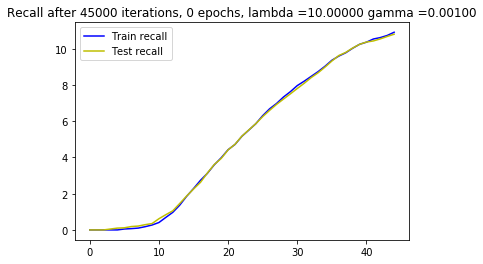

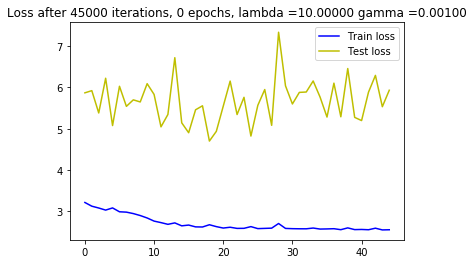

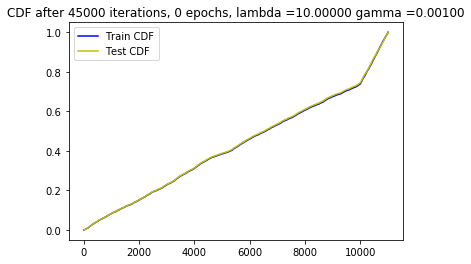






 10%|▉         | 45001/473047 [30:05<832:52:38,  7.00s/it]




 10%|▉         | 45009/473047 [30:05<583:27:35,  4.91s/it]

New score:  0.10510051
Train score:  0.37929037
Test score:  0.39424914
Obj first part:  0.17533330246806145
Obj second part:  -0.6857667
Obj first part:  0.0
Obj second part:  -0.9931574
Obj first part:  0.0
Obj second part:  -2.6078
Obj first part:  2.402385175228119
Obj second part:  -1.3533086
Obj first part:  0.0
Obj second part:  -1.7130221
Obj first part:  0.0
Obj second part:  -0.36062056
Obj first part:  2.076306492090225
Obj second part:  -2.1382344
Obj first part:  0.7731650769710541
Obj second part:  -1.071351
Obj first part:  0.034892361145466566
Obj second part:  -1.293564
Obj first part:  0.0
Obj second part:  -0.64949924
Obj first part:  3.672691285610199
Obj second part:  -2.1482818
Obj first part:  0.0
Obj second part:  -2.6698742
Obj first part:  0.0
Obj second part:  -3.2489789
Obj first part:  0.0
Obj second part:  -1.4625789
Obj first part:  0.17708338797092438
Obj second part:  -1.5744874
Obj first part:  0.617147907614708
Obj second part:  -2.6661117







 10%|▉         | 45017/473047 [30:05<408:51:44,  3.44s/it]




 10%|▉         | 45026/473047 [30:06<286:38:34,  2.41s/it]

Obj first part:  0.2739765867590904
Obj second part:  -0.8162532
Obj first part:  0.0
Obj second part:  -2.5634263
Obj first part:  0.26700621470808983
Obj second part:  -0.82913065
Obj first part:  0.0
Obj second part:  -0.58343387
Obj first part:  1.247091218829155
Obj second part:  -0.8803417
Obj first part:  0.8493024855852127
Obj second part:  -3.2931852
Obj first part:  0.0
Obj second part:  -1.3057796
Obj first part:  0.0
Obj second part:  -1.2372864
Obj first part:  0.0
Obj second part:  -0.105248556
Obj first part:  0.0
Obj second part:  -2.598036
Obj first part:  0.6245601922273636
Obj second part:  -1.2525877
Obj first part:  0.0
Obj second part:  -1.19451
Obj first part:  0.0
Obj second part:  -3.492507
Obj first part:  0.43263625353574753
Obj second part:  -1.3778819
Obj first part:  6.199008822441101
Obj second part:  -1.0842408
Obj first part:  0.0
Obj second part:  -2.6543655
Obj first part:  0.31949739903211594
Obj second part:  -1.8120903







 10%|▉         | 45034/473047 [30:06<201:05:33,  1.69s/it]




 10%|▉         | 45042/473047 [30:06<141:12:36,  1.19s/it]




 10%|▉         | 45050/473047 [30:06<99:17:32,  1.20it/s] 

Obj first part:  10.565050840377808
Obj second part:  -0.4103452
Obj first part:  0.0
Obj second part:  -4.5678196
Obj first part:  0.0
Obj second part:  -0.15652399
Obj first part:  7.755262851715088
Obj second part:  -2.5879312
Obj first part:  0.0
Obj second part:  -0.7198581
Obj first part:  0.0
Obj second part:  -0.4555183
Obj first part:  0.0
Obj second part:  -2.4161084
Obj first part:  7.075675129890442
Obj second part:  -1.950457
Obj first part:  0.0
Obj second part:  -0.9375395
Obj first part:  0.44792816042900085
Obj second part:  -2.8968391
Obj first part:  0.0
Obj second part:  -1.8945699
Obj first part:  0.6506714969873428
Obj second part:  -0.250506
Obj first part:  0.0
Obj second part:  -1.1181133
Obj first part:  0.0
Obj second part:  -0.64696914
Obj first part:  0.0
Obj second part:  -1.1823189
Obj first part:  0.0
Obj second part:  -1.3968731
Obj first part:  0.0







 10%|▉         | 45058/473047 [30:06<69:57:02,  1.70it/s]

Obj second part:  -0.30820733
Obj first part:  0.2919093146920204
Obj second part:  -0.668081
Obj first part:  0.0
Obj second part:  -1.4073077
Obj first part:  3.945910632610321
Obj second part:  -0.8056582
Obj first part:  0.0
Obj second part:  -1.3618919
Obj first part:  0.0
Obj second part:  -0.47105724
Obj first part:  0.11396734975278378
Obj second part:  -2.6168127
Obj first part:  0.1628461666405201
Obj second part:  -1.4917376
Obj first part:  0.04147753585129976
Obj second part:  -1.4185238
Obj first part:  1.2812349200248718
Obj second part:  -3.4164276
Obj first part:  4.526132941246033
Obj second part:  -1.1210262
Obj first part:  1.1029914021492004
Obj second part:  -3.1351094
Obj first part:  0.08046419359743595
Obj second part:  -0.10938957
Obj first part:  0.0
Obj second part:  -0.2669086
Obj first part:  0.3116135485470295
Obj second part:  -1.2354267
Obj first part:  0.0
Obj second part:  -1.0415916
Obj first part:  1.9290216267108917
Obj second part:  -1.8691117







 10%|▉         | 45067/473047 [30:06<49:24:29,  2.41it/s]




 10%|▉         | 45075/473047 [30:06<35:01:58,  3.39it/s]

Obj first part:  0.0
Obj second part:  -0.5511003
Obj first part:  0.22494740784168243
Obj second part:  -0.33739632
Obj first part:  1.5076911449432373
Obj second part:  -0.20880382
Obj first part:  0.0
Obj second part:  -0.27573875
Obj first part:  0.48522599041461945
Obj second part:  -0.094547525
Obj first part:  1.3192720711231232
Obj second part:  -0.6517055
Obj first part:  0.16001438722014427
Obj second part:  -0.06053938
Obj first part:  1.0145997256040573
Obj second part:  -1.1114427
Obj first part:  0.08518217131495476
Obj second part:  -0.6229731
Obj first part:  0.0
Obj second part:  -0.11399308
Obj first part:  4.188101291656494
Obj second part:  -3.0734792
Obj first part:  1.9879397749900818
Obj second part:  -1.740993
Obj first part:  0.0
Obj second part:  -0.7159258
Obj first part:  0.0
Obj second part:  -2.234608
Obj first part:  1.4502106606960297
Obj second part:  -0.5857836
Obj first part:  3.001084625720978
Obj second part:  -2.9798064
Obj first part:  0.0
Obj sec






 10%|▉         | 45084/473047 [30:06<24:58:02,  4.76it/s]




 10%|▉         | 45093/473047 [30:06<17:55:13,  6.63it/s]

Obj first part:  3.1824663281440735
Obj second part:  -2.971885
Obj first part:  0.0
Obj second part:  -0.9232458
Obj first part:  0.3598751127719879
Obj second part:  -0.19481847
Obj first part:  0.0
Obj second part:  -3.7687232
Obj first part:  9.160813093185425
Obj second part:  -1.7023897
Obj first part:  0.8516017347574234
Obj second part:  -1.0402362
Obj first part:  1.5775318443775177
Obj second part:  -3.9580698
Obj first part:  0.0
Obj second part:  -0.53505415
Obj first part:  0.08335709571838379
Obj second part:  -4.07253
Obj first part:  0.0
Obj second part:  -1.3505094
Obj first part:  0.0
Obj second part:  -0.85344595
Obj first part:  0.47749415040016174
Obj second part:  -0.79655343
Obj first part:  0.0
Obj second part:  -2.0431406
Obj first part:  0.0
Obj second part:  -1.321816
Obj first part:  0.0
Obj second part:  -1.1124506
Obj first part:  0.0
Obj second part:  -0.5626811
Obj first part:  0.0
Obj second part:  -2.3147428







 10%|▉         | 45101/473047 [30:06<12:59:28,  9.15it/s]




 10%|▉         | 45110/473047 [30:07<9:32:20, 12.46it/s] 

Obj first part:  0.0
Obj second part:  -0.8126127
Obj first part:  7.651526927947998
Obj second part:  -0.7982161
Obj first part:  0.4196525737643242
Obj second part:  -0.11734257
Obj first part:  0.1243769284337759
Obj second part:  -3.4853454
Obj first part:  0.0
Obj second part:  -3.4360235
Obj first part:  0.2283843420445919
Obj second part:  -1.3952736
Obj first part:  3.731127977371216
Obj second part:  -1.3449413
Obj first part:  0.0
Obj second part:  -1.6686146
Obj first part:  0.0
Obj second part:  -3.2996483
Obj first part:  1.4006118476390839
Obj second part:  -2.2207367
Obj first part:  0.0
Obj second part:  -1.3609545
Obj first part:  1.8223550915718079
Obj second part:  -2.198652
Obj first part:  0.0
Obj second part:  -0.4097115
Obj first part:  0.7077401876449585
Obj second part:  -1.4356076
Obj first part:  0.7156115770339966
Obj second part:  -0.4914227
Obj first part:  1.8633639812469482
Obj second part:  -1.5920681
Obj first part:  2.2003114223480225
Obj second part:






 10%|▉         | 45118/473047 [30:07<7:07:25, 16.69it/s]




 10%|▉         | 45126/473047 [30:07<5:25:59, 21.88it/s]

Obj first part:  0.0
Obj second part:  -3.7265682
Obj first part:  0.0
Obj second part:  -2.069914
Obj first part:  4.270713031291962
Obj second part:  -0.51412
Obj first part:  0.15213754028081894
Obj second part:  -2.0739367
Obj first part:  0.7780003547668457
Obj second part:  -3.0915332
Obj first part:  0.19630122929811478
Obj second part:  -1.5376636
Obj first part:  0.13771961443126202
Obj second part:  -0.1414043
Obj first part:  0.1281784102320671
Obj second part:  -2.5106356
Obj first part:  1.4939045906066895
Obj second part:  -3.0687873
Obj first part:  0.0
Obj second part:  -0.1800196
Obj first part:  0.5831070616841316
Obj second part:  -1.5003206
Obj first part:  2.73791640996933
Obj second part:  -0.9975493
Obj first part:  0.21202238276600838
Obj second part:  -1.1610394
Obj first part:  0.0
Obj second part:  -0.32514054
Obj first part:  3.9245831966400146
Obj second part:  -0.3983434
Obj first part:  0.0
Obj second part:  -0.70808053
Obj first part:  1.815984845161438







 10%|▉         | 45135/473047 [30:07<4:14:57, 27.97it/s]




 10%|▉         | 45144/473047 [30:07<3:25:06, 34.77it/s]

Obj first part:  0.0
Obj second part:  -1.1148179
Obj first part:  1.4273275434970856
Obj second part:  -0.367095
Obj first part:  0.0
Obj second part:  -1.2830607
Obj first part:  0.0
Obj second part:  -4.293733
Obj first part:  0.0
Obj second part:  -1.8617238
Obj first part:  0.8188050985336304
Obj second part:  -0.55923355
Obj first part:  0.0
Obj second part:  -1.169833
Obj first part:  0.03576867748051882
Obj second part:  -0.9136094
Obj first part:  0.0
Obj second part:  -1.3439497
Obj first part:  0.5878067389130592
Obj second part:  -1.0052316
Obj first part:  0.0
Obj second part:  -1.2337426
Obj first part:  0.0
Obj second part:  -1.5465491
Obj first part:  0.0
Obj second part:  -1.2113928
Obj first part:  4.892019033432007
Obj second part:  -0.9525275
Obj first part:  0.0
Obj second part:  -2.7649388
Obj first part:  0.03893796121701598
Obj second part:  -2.562415
Obj first part:  0.4900410398840904
Obj second part:  -0.69745827







 10%|▉         | 45152/473047 [30:07<2:50:28, 41.83it/s]




 10%|▉         | 45160/473047 [30:07<2:26:08, 48.80it/s]

Obj first part:  0.0
Obj second part:  -1.3054701
Obj first part:  0.0
Obj second part:  -1.0832052
Obj first part:  0.47822635620832443
Obj second part:  -1.1501931
Obj first part:  0.0
Obj second part:  -2.5732362
Obj first part:  4.425184428691864
Obj second part:  -0.34730977
Obj first part:  0.8066756278276443
Obj second part:  -1.1666396
Obj first part:  3.1813034415245056
Obj second part:  -3.5072443
Obj first part:  0.46801701188087463
Obj second part:  -1.4810861
Obj first part:  0.0
Obj second part:  -1.5942819
Obj first part:  0.3141779825091362
Obj second part:  -2.5491745
Obj first part:  0.0
Obj second part:  -0.82380635
Obj first part:  0.0
Obj second part:  -1.585364
Obj first part:  2.7513280510902405
Obj second part:  -1.5001365
Obj first part:  0.7949000597000122
Obj second part:  -0.4679482
Obj first part:  1.8665789067745209
Obj second part:  -1.2114033
Obj first part:  0.1638035848736763
Obj second part:  -2.1128774
Obj first part:  0.09602534584701061
Obj second 






 10%|▉         | 45169/473047 [30:07<2:08:56, 55.31it/s]




 10%|▉         | 45178/473047 [30:07<1:56:49, 61.04it/s]

Obj first part:  0.2956521511077881
Obj second part:  -3.8382013
Obj first part:  0.050416779704391956
Obj second part:  -0.19576798
Obj first part:  0.0
Obj second part:  -1.2308884
Obj first part:  1.435803472995758
Obj second part:  -4.1035676
Obj first part:  0.0
Obj second part:  -1.1558889
Obj first part:  0.46668458729982376
Obj second part:  -1.1131489
Obj first part:  0.16462212428450584
Obj second part:  -0.67875373
Obj first part:  0.1987973414361477
Obj second part:  -1.5175698
Obj first part:  0.0
Obj second part:  -0.9159291
Obj first part:  0.0
Obj second part:  -0.50614583
Obj first part:  0.0
Obj second part:  -0.3316606
Obj first part:  0.0
Obj second part:  -0.933689
Obj first part:  0.0
Obj second part:  -1.0577234
Obj first part:  0.0
Obj second part:  -0.09774019
Obj first part:  0.0
Obj second part:  -0.5659025
Obj first part:  0.35231810063123703
Obj second part:  -1.6675875
Obj first part:  2.820858359336853
Obj second part:  -1.5130904







 10%|▉         | 45187/473047 [30:08<1:48:40, 65.61it/s]




 10%|▉         | 45196/473047 [30:08<1:42:35, 69.51it/s]

Obj first part:  0.0
Obj second part:  -1.974959
Obj first part:  5.40406346321106
Obj second part:  -1.865224
Obj first part:  0.0
Obj second part:  -1.3559443
Obj first part:  0.0
Obj second part:  -3.561072
Obj first part:  0.0
Obj second part:  -0.27327704
Obj first part:  0.2037494257092476
Obj second part:  -0.99745494
Obj first part:  1.1818106472492218
Obj second part:  -0.9325986
Obj first part:  0.0
Obj second part:  -1.0154641
Obj first part:  1.443759799003601
Obj second part:  -1.0437908
Obj first part:  0.07632141467183828
Obj second part:  -1.2740023
Obj first part:  0.4336562380194664
Obj second part:  -2.1466331
Obj first part:  0.46031471341848373
Obj second part:  -2.3170862
Obj first part:  0.3085152246057987
Obj second part:  -4.0610266
Obj first part:  0.5835847556591034
Obj second part:  -0.37570304
Obj first part:  0.0
Obj second part:  -3.7477915
Obj first part:  0.0
Obj second part:  -2.083664
Obj first part:  0.0
Obj second part:  -0.47042447







 10%|▉         | 45205/473047 [30:08<1:38:28, 72.41it/s]




 10%|▉         | 45214/473047 [30:08<1:35:31, 74.64it/s]

Obj first part:  0.0
Obj second part:  -1.5380168
Obj first part:  0.0
Obj second part:  -1.2091385
Obj first part:  0.0
Obj second part:  -0.63720214
Obj first part:  0.0
Obj second part:  -0.6994487
Obj first part:  5.856173634529114
Obj second part:  -0.11736771
Obj first part:  0.0
Obj second part:  -1.7146016
Obj first part:  1.2045201659202576
Obj second part:  -2.064981
Obj first part:  0.9969186037778854
Obj second part:  -2.4787261
Obj first part:  0.0
Obj second part:  -0.12090032
Obj first part:  0.0
Obj second part:  -0.90994406
Obj first part:  0.0
Obj second part:  -0.20062299
Obj first part:  0.0
Obj second part:  -0.59533024
Obj first part:  0.0
Obj second part:  -1.3131387
Obj first part:  13.843647241592407
Obj second part:  -0.75793236
Obj first part:  1.1752981692552567
Obj second part:  -0.30273667
Obj first part:  0.0
Obj second part:  -1.6285188
Obj first part:  1.7650185525417328
Obj second part:  -0.9164815







 10%|▉         | 45223/473047 [30:08<1:33:28, 76.29it/s]




 10%|▉         | 45232/473047 [30:08<1:32:05, 77.42it/s]

Obj first part:  0.5062761157751083
Obj second part:  -2.5696404
Obj first part:  0.0
Obj second part:  -0.85228634
Obj first part:  0.3970598429441452
Obj second part:  -2.487472
Obj first part:  0.7464347779750824
Obj second part:  -1.1964432
Obj first part:  4.55517441034317
Obj second part:  -0.4809625
Obj first part:  0.0
Obj second part:  -0.7302774
Obj first part:  0.2321409247815609
Obj second part:  -3.1855354
Obj first part:  0.0
Obj second part:  -1.8103834
Obj first part:  0.32374490052461624
Obj second part:  -1.4953326
Obj first part:  0.0
Obj second part:  -1.5585716
Obj first part:  0.0
Obj second part:  -0.9992359
Obj first part:  0.17596343532204628
Obj second part:  -0.78897953
Obj first part:  6.364818215370178
Obj second part:  -0.8355782
Obj first part:  0.0
Obj second part:  -3.184588
Obj first part:  0.9915526211261749
Obj second part:  -0.7916295
Obj first part:  0.0
Obj second part:  -0.48345137







 10%|▉         | 45241/473047 [30:08<1:31:39, 77.78it/s]




 10%|▉         | 45250/473047 [30:08<1:30:48, 78.52it/s]

Obj first part:  0.0
Obj second part:  -2.7561243
Obj first part:  0.0
Obj second part:  -2.675584
Obj first part:  0.42867813259363174
Obj second part:  -4.6065636
Obj first part:  0.0
Obj second part:  -2.7043214
Obj first part:  0.0
Obj second part:  -4.762711
Obj first part:  1.6484016180038452
Obj second part:  -1.4801946
Obj first part:  0.0
Obj second part:  -3.4679828
Obj first part:  1.0964106768369675
Obj second part:  -1.359862
Obj first part:  0.0
Obj second part:  -0.5840713
Obj first part:  0.3180434927344322
Obj second part:  -1.4021229
Obj first part:  0.0
Obj second part:  -0.29301867
Obj first part:  0.8273547142744064
Obj second part:  -0.47825107
Obj first part:  0.0
Obj second part:  -0.82538575
Obj first part:  0.0
Obj second part:  -1.6160583
Obj first part:  0.9446605294942856
Obj second part:  -0.16244015
Obj first part:  0.0
Obj second part:  -1.0756791
Obj first part:  1.6555073857307434







 10%|▉         | 45258/473047 [30:08<1:30:18, 78.96it/s]




 10%|▉         | 45267/473047 [30:09<1:29:49, 79.38it/s]

Obj second part:  -0.8026882
Obj first part:  3.1535357236862183
Obj second part:  -3.4132679
Obj first part:  0.0
Obj second part:  -2.0520403
Obj first part:  0.2712304890155792
Obj second part:  -0.76149404
Obj first part:  0.0
Obj second part:  -1.982439
Obj first part:  0.13223467394709587
Obj second part:  -1.2305838
Obj first part:  0.1848321035504341
Obj second part:  -0.70963055
Obj first part:  0.3421182185411453
Obj second part:  -0.10089158
Obj first part:  0.0
Obj second part:  -0.14270195
Obj first part:  0.0
Obj second part:  -1.5363152
Obj first part:  0.0
Obj second part:  -0.6507112
Obj first part:  0.0
Obj second part:  -2.2665892
Obj first part:  2.070799171924591
Obj second part:  -1.4718844
Obj first part:  0.11774962767958641
Obj second part:  -0.9612764
Obj first part:  0.0
Obj second part:  -1.1704776
Obj first part:  2.5443166494369507
Obj second part:  -0.91624266
Obj first part:  0.0
Obj second part:  -1.2829951







 10%|▉         | 45276/473047 [30:09<1:29:28, 79.69it/s]




 10%|▉         | 45285/473047 [30:09<1:29:20, 79.80it/s]

Obj first part:  0.0
Obj second part:  -0.22017287
Obj first part:  0.0
Obj second part:  -1.7158976
Obj first part:  0.0
Obj second part:  -0.5707046
Obj first part:  0.0
Obj second part:  -0.87795514
Obj first part:  9.293165802955627
Obj second part:  -0.5708767
Obj first part:  0.0
Obj second part:  -0.19442232
Obj first part:  7.199258804321289
Obj second part:  -1.5780108
Obj first part:  0.0
Obj second part:  -1.1643461
Obj first part:  0.12331594713032246
Obj second part:  -0.56098616
Obj first part:  0.23301981389522552
Obj second part:  -1.8322532
Obj first part:  7.09189772605896
Obj second part:  -0.68104833
Obj first part:  0.07027209270745516
Obj second part:  -3.190539
Obj first part:  0.1752890646457672
Obj second part:  -2.6299095
Obj first part:  0.0
Obj second part:  -1.0920541
Obj first part:  0.0
Obj second part:  -0.3395029
Obj first part:  0.0
Obj second part:  -1.3921497
Obj first part:  0.0







 10%|▉         | 45294/473047 [30:09<1:29:19, 79.81it/s]

Obj second part:  -0.09705715
Obj first part:  0.5481286346912384
Obj second part:  -1.0853801
Obj first part:  0.21067693829536438
Obj second part:  -2.1757338
Obj first part:  0.19494609907269478
Obj second part:  -3.01537
Obj first part:  0.0
Obj second part:  -1.1529013
Obj first part:  0.0
Obj second part:  -4.6377187
Obj first part:  0.0
Obj second part:  -0.5274838
Obj first part:  0.0
Obj second part:  -1.4388537
Obj first part:  3.6968010663986206
Obj second part:  -0.26231852
Obj first part:  0.0
Obj second part:  -1.8573053
Obj first part:  0.2769116498529911
Obj second part:  -3.5964618
Obj first part:  0.33109303563833237
Obj second part:  -0.9390791
Obj first part:  0.47986339777708054
Obj second part:  -2.571372
Obj first part:  3.1018081307411194
Obj second part:  -0.8786789
Obj first part:  0.0
Obj second part:  -2.9683075
Obj first part:  4.83611673116684
Obj second part:  -0.4734509
Obj first part:  0.8452372252941132
Obj second part:  -2.5400524







 10%|▉         | 45303/473047 [30:09<1:29:11, 79.93it/s]




 10%|▉         | 45312/473047 [30:09<1:28:57, 80.14it/s]

Obj first part:  0.0
Obj second part:  -2.132013
Obj first part:  0.0
Obj second part:  -1.443435
Obj first part:  3.005611300468445
Obj second part:  -0.7527531
Obj first part:  1.4810599386692047
Obj second part:  -2.1386814
Obj first part:  0.0
Obj second part:  -0.5915515
Obj first part:  0.0
Obj second part:  -0.07183512
Obj first part:  0.2183207869529724
Obj second part:  -0.55472815
Obj first part:  0.23140685632824898
Obj second part:  -1.1174119
Obj first part:  0.5983958020806313
Obj second part:  -0.0713681
Obj first part:  0.18154626712203026
Obj second part:  -0.7208246
Obj first part:  0.13030015863478184
Obj second part:  -0.27535653
Obj first part:  0.3689541295170784
Obj second part:  -1.4962503
Obj first part:  0.3237910568714142
Obj second part:  -0.86486304
Obj first part:  0.0
Obj second part:  -0.29663387
Obj first part:  5.733011960983276
Obj second part:  -2.49836
Obj first part:  0.41947610676288605
Obj second part:  -0.9835346
Obj first part:  0.0773529475554






 10%|▉         | 45321/473047 [30:09<1:29:14, 79.88it/s]




 10%|▉         | 45330/473047 [30:09<1:29:04, 80.04it/s]

Obj second part:  -2.696779
Obj first part:  1.5701951086521149
Obj second part:  -0.75951034
Obj first part:  0.0
Obj second part:  -0.8328383
Obj first part:  3.117779791355133
Obj second part:  -2.81284
Obj first part:  0.6131841987371445
Obj second part:  -2.4275088
Obj first part:  0.0
Obj second part:  -3.8981225
Obj first part:  0.15645865350961685
Obj second part:  -1.0847592
Obj first part:  0.15176651999354362
Obj second part:  -3.4219825
Obj first part:  0.0
Obj second part:  -0.4618649
Obj first part:  0.9017172455787659
Obj second part:  -1.1353468
Obj first part:  0.0
Obj second part:  -1.9789412
Obj first part:  0.34322310239076614
Obj second part:  -1.0367229
Obj first part:  0.040996745228767395
Obj second part:  -0.5306649
Obj first part:  0.14486785046756268
Obj second part:  -0.064096116
Obj first part:  0.39977990090847015
Obj second part:  -0.52648246
Obj first part:  0.0
Obj second part:  -1.9168274
Obj first part:  0.2404874563217163
Obj second part:  -3.2329853






 10%|▉         | 45339/473047 [30:09<1:28:51, 80.22it/s]




 10%|▉         | 45348/473047 [30:10<1:28:39, 80.40it/s]

Obj first part:  0.0
Obj second part:  -1.2669299
Obj first part:  0.0
Obj second part:  -0.9119664
Obj first part:  0.0
Obj second part:  -2.8169289
Obj first part:  0.0
Obj second part:  -1.0271201
Obj first part:  0.0
Obj second part:  -0.5129134
Obj first part:  0.0
Obj second part:  -0.1677015
Obj first part:  1.6760462522506714
Obj second part:  -2.7707102
Obj first part:  0.0
Obj second part:  -0.91107833
Obj first part:  0.0
Obj second part:  -4.0185013
Obj first part:  0.0
Obj second part:  -0.91818845
Obj first part:  0.0
Obj second part:  -0.34504795
Obj first part:  0.0
Obj second part:  -0.419383
Obj first part:  2.126837372779846
Obj second part:  -0.41527477
Obj first part:  0.2206728607416153
Obj second part:  -3.2418072
Obj first part:  0.0
Obj second part:  -1.551528
Obj first part:  1.2660907208919525
Obj second part:  -0.22593044
Obj first part:  3.9892321825027466
Obj second part:  -0.027096806







 10%|▉         | 45357/473047 [30:10<1:28:38, 80.41it/s]




 10%|▉         | 45366/473047 [30:10<1:28:45, 80.32it/s]

Obj first part:  0.0
Obj second part:  -1.1775032
Obj first part:  0.0
Obj second part:  -2.647038
Obj first part:  0.0
Obj second part:  -1.8021748
Obj first part:  0.4950537532567978
Obj second part:  -0.5823996
Obj first part:  0.0
Obj second part:  -1.8640058
Obj first part:  0.0
Obj second part:  -0.58848464
Obj first part:  0.27638984844088554
Obj second part:  -0.2696511
Obj first part:  0.3499879315495491
Obj second part:  -0.118125334
Obj first part:  9.92323637008667
Obj second part:  -2.2302802
Obj first part:  0.0
Obj second part:  -0.6761806
Obj first part:  0.5458836629986763
Obj second part:  -0.100035556
Obj first part:  0.36040425300598145
Obj second part:  -1.8884919
Obj first part:  0.973370224237442
Obj second part:  -0.751458
Obj first part:  0.19071118906140327
Obj second part:  -0.9918237
Obj first part:  1.4032089710235596
Obj second part:  -2.6991677
Obj first part:  0.2348703145980835
Obj second part:  -1.820501
Obj first part:  0.0
Obj second part:  -0.610414






 10%|▉         | 45375/473047 [30:10<1:28:48, 80.26it/s]




 10%|▉         | 45384/473047 [30:10<1:28:46, 80.28it/s]

Obj first part:  0.8893471956253052
Obj second part:  -2.1442032
Obj first part:  0.0
Obj second part:  -2.3662696
Obj first part:  0.0
Obj second part:  -0.72244364
Obj first part:  0.6994879245758057
Obj second part:  -0.3186241
Obj first part:  0.0
Obj second part:  -1.8533347
Obj first part:  0.0
Obj second part:  -0.9059441
Obj first part:  0.7657193392515182
Obj second part:  -1.6672595
Obj first part:  2.767120897769928
Obj second part:  -0.85045373
Obj first part:  0.0
Obj second part:  -0.7712876
Obj first part:  0.0
Obj second part:  -2.7739458
Obj first part:  0.0
Obj second part:  -1.7768085
Obj first part:  1.419641375541687
Obj second part:  -2.4841604
Obj first part:  0.0
Obj second part:  -0.26122662
Obj first part:  0.0
Obj second part:  -4.1599116
Obj first part:  0.29931938275694847
Obj second part:  -0.20764098
Obj first part:  0.0
Obj second part:  -0.9893125
Obj first part:  0.0
Obj second part:  -0.8882906







 10%|▉         | 45393/473047 [30:10<1:28:50, 80.23it/s]




 10%|▉         | 45402/473047 [30:10<1:28:58, 80.10it/s]

Obj first part:  0.0
Obj second part:  -0.025022738
Obj first part:  0.0
Obj second part:  -0.40952918
Obj first part:  4.851496517658234
Obj second part:  -2.0138288
Obj first part:  0.0
Obj second part:  -1.5700233
Obj first part:  0.0
Obj second part:  -1.2383785
Obj first part:  0.0
Obj second part:  -0.90481246
Obj first part:  0.40715694427490234
Obj second part:  -0.55402774
Obj first part:  0.0207455363124609
Obj second part:  -0.032874666
Obj first part:  0.0
Obj second part:  -0.48899657
Obj first part:  0.0
Obj second part:  -1.4207251
Obj first part:  3.215656280517578
Obj second part:  -0.4247442
Obj first part:  0.0
Obj second part:  -0.4958579
Obj first part:  0.0
Obj second part:  -1.781007
Obj first part:  0.5177682638168335
Obj second part:  -1.4572542
Obj first part:  0.0
Obj second part:  -0.018185223
Obj first part:  1.5092185139656067
Obj second part:  -2.3432558
Obj first part:  0.0







 10%|▉         | 45411/473047 [30:10<1:28:57, 80.11it/s]

Obj second part:  -3.8730829
Obj first part:  0.4994354769587517
Obj second part:  -2.346112
Obj first part:  0.0
Obj second part:  -0.44486463
Obj first part:  0.5251877009868622
Obj second part:  -0.26485738
Obj first part:  2.8502824902534485
Obj second part:  -0.19681382
Obj first part:  0.3303145244717598
Obj second part:  -2.0576854
Obj first part:  2.396349161863327
Obj second part:  -0.47472024
Obj first part:  0.0
Obj second part:  -0.07519564
Obj first part:  0.0
Obj second part:  -3.6997218
Obj first part:  0.0
Obj second part:  -0.57089335
Obj first part:  0.81138975918293
Obj second part:  -3.8466344
Obj first part:  0.0
Obj second part:  -1.1409403
Obj first part:  0.0
Obj second part:  -0.78815055
Obj first part:  0.0
Obj second part:  -0.45143735
Obj first part:  4.32433009147644
Obj second part:  -2.4099777
Obj first part:  1.3260656595230103
Obj second part:  -0.21604846
Obj first part:  2.2464972734451294
Obj second part:  -0.9677906







 10%|▉         | 45420/473047 [30:10<1:28:56, 80.14it/s]




 10%|▉         | 45429/473047 [30:11<1:28:47, 80.26it/s]

Obj first part:  1.9917309284210205
Obj second part:  -0.99513054
Obj first part:  0.0
Obj second part:  -2.3598766
Obj first part:  0.9691833704710007
Obj second part:  -0.12826316
Obj first part:  0.0
Obj second part:  -1.1162679
Obj first part:  5.904639363288879
Obj second part:  -0.73016834
Obj first part:  11.060025691986084
Obj second part:  -0.63491386
Obj first part:  0.16511237248778343
Obj second part:  -2.0023708
Obj first part:  1.3490939140319824
Obj second part:  -1.102845
Obj first part:  0.25918450206518173
Obj second part:  -0.536775
Obj first part:  13.234127759933472
Obj second part:  -0.85909903
Obj first part:  0.0
Obj second part:  -1.9678491
Obj first part:  0.5496269091963768
Obj second part:  -2.5814922
Obj first part:  2.782796323299408
Obj second part:  -1.389816
Obj first part:  0.04425812512636185
Obj second part:  -1.5552644
Obj first part:  0.21748626604676247
Obj second part:  -1.7885473
Obj first part:  0.8662572503089905
Obj second part:  -1.086233
Ob






 10%|▉         | 45438/473047 [30:11<1:28:39, 80.38it/s]




 10%|▉         | 45447/473047 [30:11<1:28:44, 80.30it/s]

Obj first part:  0.0729040801525116
Obj second part:  -0.46950632
Obj first part:  0.23155435919761658
Obj second part:  -0.083195664
Obj first part:  0.0
Obj second part:  -2.6092095
Obj first part:  3.4675121307373047
Obj second part:  -0.10745479
Obj first part:  0.4041806235909462
Obj second part:  -1.3154505
Obj first part:  0.0
Obj second part:  -1.6813319
Obj first part:  0.0
Obj second part:  -2.7557511
Obj first part:  0.13660913333296776
Obj second part:  -3.0395012
Obj first part:  0.0
Obj second part:  -0.1344455
Obj first part:  0.0
Obj second part:  -3.7409766
Obj first part:  1.4788883924484253
Obj second part:  -2.6791356
Obj first part:  0.0
Obj second part:  -0.028524024
Obj first part:  0.0
Obj second part:  -0.33914447
Obj first part:  0.0
Obj second part:  -1.0953733
Obj first part:  0.6912802904844284
Obj second part:  -1.6384175
Obj first part:  0.0
Obj second part:  -2.720858
Obj first part:  0.0
Obj second part:  -0.45494264







 10%|▉         | 45456/473047 [30:11<1:28:48, 80.25it/s]




 10%|▉         | 45465/473047 [30:11<1:28:47, 80.26it/s]

Obj first part:  0.11329036206007004
Obj second part:  -0.69020146
Obj first part:  0.3144817426800728
Obj second part:  -1.3813146
Obj first part:  0.8402062207460403
Obj second part:  -0.9247835
Obj first part:  1.2330880016088486
Obj second part:  -2.7011704
Obj first part:  0.0
Obj second part:  -0.7078596
Obj first part:  0.0
Obj second part:  -4.1310334
Obj first part:  13.459320068359375
Obj second part:  -1.7754273
Obj first part:  0.3984004259109497
Obj second part:  -3.9140656
Obj first part:  0.27013663202524185
Obj second part:  -1.7965813
Obj first part:  0.0
Obj second part:  -2.6332848
Obj first part:  0.49146082252264023
Obj second part:  -0.3565228
Obj first part:  0.3161716088652611
Obj second part:  -0.4067224
Obj first part:  0.062321703881025314
Obj second part:  -2.0180314
Obj first part:  0.1148935966193676
Obj second part:  -1.5753367
Obj first part:  0.0
Obj second part:  -2.602877
Obj first part:  0.0
Obj second part:  -1.2709975
Obj first part:  0.42292222380






 10%|▉         | 45474/473047 [30:11<1:29:10, 79.92it/s]




 10%|▉         | 45482/473047 [30:11<1:29:14, 79.85it/s]

Obj first part:  10.01344919204712
Obj second part:  -0.9146884
Obj first part:  7.538257837295532
Obj second part:  -0.2650915
Obj first part:  0.0
Obj second part:  -2.894007
Obj first part:  1.3075421750545502
Obj second part:  -2.7816646
Obj first part:  0.09533269330859184
Obj second part:  -0.30036852
Obj first part:  0.0
Obj second part:  -0.56363434
Obj first part:  0.8630626648664474
Obj second part:  -1.1010022
Obj first part:  0.2865041606128216
Obj second part:  -0.58615494
Obj first part:  0.0
Obj second part:  -0.3171534
Obj first part:  0.0
Obj second part:  -0.76265085
Obj first part:  0.8851561695337296
Obj second part:  -0.98579574
Obj first part:  1.2828849256038666
Obj second part:  -4.439617
Obj first part:  0.0
Obj second part:  -4.237422
Obj first part:  2.1628087759017944
Obj second part:  -2.1699011
Obj first part:  0.0
Obj second part:  -0.22178221
Obj first part:  0.0
Obj second part:  -0.7712003







 10%|▉         | 45490/473047 [30:11<1:29:11, 79.89it/s]




 10%|▉         | 45499/473047 [30:11<1:28:59, 80.07it/s]

Obj first part:  1.7762641608715057
Obj second part:  -0.5891472
Obj first part:  0.0
Obj second part:  -0.36677033
Obj first part:  0.23269476369023323
Obj second part:  -2.621373
Obj first part:  0.12548786588013172
Obj second part:  -0.99656117
Obj first part:  0.0
Obj second part:  -1.7285877
Obj first part:  0.0
Obj second part:  -0.24733993
Obj first part:  0.0
Obj second part:  -0.21753389
Obj first part:  0.9488122165203094
Obj second part:  -0.58574164
Obj first part:  0.034282433334738016
Obj second part:  -2.122624
Obj first part:  0.0
Obj second part:  -2.069101
Obj first part:  1.3542601466178894
Obj second part:  -2.6153953
Obj first part:  5.108478665351868
Obj second part:  -0.14697795
Obj first part:  0.47745734453201294
Obj second part:  -0.7910275
Obj first part:  1.2050516158342361
Obj second part:  -1.7288958
Obj first part:  3.8774117827415466
Obj second part:  -2.39151
Obj first part:  0.0
Obj second part:  -2.7334728
Obj first part:  0.9473081678152084
Obj secon






 10%|▉         | 45508/473047 [30:12<1:28:48, 80.23it/s]




 10%|▉         | 45517/473047 [30:12<1:28:56, 80.11it/s]

Obj first part:  1.5092048048973083
Obj second part:  -1.9597548
Obj first part:  0.0
Obj second part:  -1.7065401
Obj first part:  0.25409456342458725
Obj second part:  -0.23151861
Obj first part:  3.3524462580680847
Obj second part:  -0.46564123
Obj first part:  1.6807176172733307
Obj second part:  -0.09611692
Obj first part:  0.0
Obj second part:  -3.276148
Obj first part:  0.0
Obj second part:  -1.0628421
Obj first part:  0.5248086154460907
Obj second part:  -1.9409218
Obj first part:  0.040676454082131386
Obj second part:  -1.4757512
Obj first part:  0.0
Obj second part:  -0.2574103
Obj first part:  0.6258223950862885
Obj second part:  -2.987346
Obj first part:  0.0
Obj second part:  -3.85418
Obj first part:  2.546108663082123
Obj second part:  -2.5337472
Obj first part:  3.9131927490234375
Obj second part:  -3.4062915
Obj first part:  0.1376771740615368
Obj second part:  -1.5207015
Obj first part:  0.08543296717107296
Obj second part:  -1.8998202
Obj first part:  1.05105720460414






 10%|▉         | 45526/473047 [30:12<1:29:01, 80.03it/s]




 10%|▉         | 45535/473047 [30:12<1:29:00, 80.05it/s]

Obj second part:  -0.1766807
Obj first part:  0.0
Obj second part:  -1.22046
Obj first part:  0.1942530833184719
Obj second part:  -2.7802978
Obj first part:  0.0
Obj second part:  -0.73697305
Obj first part:  2.4674826860427856
Obj second part:  -0.62384486
Obj first part:  0.9927108138799667
Obj second part:  -2.0588365
Obj first part:  0.0
Obj second part:  -4.5108414
Obj first part:  0.12777913361787796
Obj second part:  -2.588313
Obj first part:  0.0
Obj second part:  -2.9802132
Obj first part:  0.0
Obj second part:  -1.5358257
Obj first part:  9.191714525222778
Obj second part:  -0.7081204
Obj first part:  0.0
Obj second part:  -3.3084123
Obj first part:  0.0
Obj second part:  -3.3693697
Obj first part:  0.24117110297083855
Obj second part:  -1.1470532
Obj first part:  0.0
Obj second part:  -1.9857574
Obj first part:  0.46471502631902695
Obj second part:  -3.0194004
Obj first part:  2.4893060326576233







 10%|▉         | 45544/473047 [30:12<1:28:59, 80.07it/s]

Obj second part:  -2.1412528
Obj first part:  0.0
Obj second part:  -3.0293627
Obj first part:  0.029017978813499212
Obj second part:  -1.6053426
Obj first part:  0.7994125783443451
Obj second part:  -0.19563663
Obj first part:  0.11069563217461109
Obj second part:  -1.1536524
Obj first part:  0.0
Obj second part:  -5.3018227
Obj first part:  2.993750274181366
Obj second part:  -0.78783697
Obj first part:  0.0
Obj second part:  -2.5839868
Obj first part:  0.30984507873654366
Obj second part:  -1.3543034
Obj first part:  4.766663610935211
Obj second part:  -0.7593888
Obj first part:  1.1055484414100647
Obj second part:  -4.690367
Obj first part:  0.02322506858035922
Obj second part:  -0.3346748
Obj first part:  0.15601485967636108
Obj second part:  -0.8831753
Obj first part:  0.0
Obj second part:  -2.5881383
Obj first part:  0.3201853483915329
Obj second part:  -2.6019647
Obj first part:  0.0
Obj second part:  -1.5113573
Obj first part:  0.41961681097745895
Obj second part:  -4.702289







 10%|▉         | 45553/473047 [30:12<1:28:57, 80.09it/s]




 10%|▉         | 45562/473047 [30:12<1:29:00, 80.05it/s]

Obj first part:  0.0
Obj second part:  -1.0724294
Obj first part:  0.26349514722824097
Obj second part:  -2.0362957
Obj first part:  4.35436338186264
Obj second part:  -2.0505054
Obj first part:  0.0
Obj second part:  -0.77497107
Obj first part:  2.9212841391563416
Obj second part:  -1.1005983
Obj first part:  0.18778525292873383
Obj second part:  -4.6305256
Obj first part:  0.34882258623838425
Obj second part:  -1.5260587
Obj first part:  10.875273942947388
Obj second part:  -3.873468
Obj first part:  0.0
Obj second part:  -1.909596
Obj first part:  0.0
Obj second part:  -1.4942274
Obj first part:  0.0
Obj second part:  -3.22143
Obj first part:  0.0
Obj second part:  -3.9380498
Obj first part:  1.2516430020332336
Obj second part:  -2.152293
Obj first part:  0.0
Obj second part:  -0.7899426
Obj first part:  0.13886217027902603
Obj second part:  -2.102024
Obj first part:  0.5291499942541122
Obj second part:  -1.024957
Obj first part:  4.968198239803314







 10%|▉         | 45571/473047 [30:12<1:29:01, 80.03it/s]




 10%|▉         | 45580/473047 [30:12<1:28:51, 80.17it/s]

Obj second part:  -0.9177983
Obj first part:  0.0
Obj second part:  -0.65204537
Obj first part:  0.519602857530117
Obj second part:  -1.0887028
Obj first part:  0.447879433631897
Obj second part:  -0.19757202
Obj first part:  1.3832661509513855
Obj second part:  -1.249219
Obj first part:  0.5547161027789116
Obj second part:  -1.7118881
Obj first part:  0.061264378018677235
Obj second part:  -1.7331457
Obj first part:  0.020753247663378716
Obj second part:  -2.2584302
Obj first part:  0.172753743827343
Obj second part:  -3.5921974
Obj first part:  0.2891669049859047
Obj second part:  -1.2200357
Obj first part:  0.0
Obj second part:  -0.7651848
Obj first part:  0.0
Obj second part:  -1.9431481
Obj first part:  0.0
Obj second part:  -0.36355558
Obj first part:  0.0
Obj second part:  -0.44557112
Obj first part:  1.4342397451400757
Obj second part:  -1.9203196
Obj first part:  0.30580367892980576
Obj second part:  -4.4189086
Obj first part:  0.0
Obj second part:  -0.5547682







 10%|▉         | 45589/473047 [30:13<1:28:45, 80.27it/s]




 10%|▉         | 45598/473047 [30:13<1:29:02, 80.02it/s]

Obj first part:  0.7144341617822647
Obj second part:  -0.1304948
Obj first part:  0.36950666457414627
Obj second part:  -0.10909658
Obj first part:  0.0
Obj second part:  -2.023159
Obj first part:  0.0
Obj second part:  -0.30322587
Obj first part:  0.0
Obj second part:  -1.6128168
Obj first part:  0.0
Obj second part:  -0.8913549
Obj first part:  0.0
Obj second part:  -0.519059
Obj first part:  0.0
Obj second part:  -1.7151432
Obj first part:  0.0
Obj second part:  -0.3365697
Obj first part:  0.0
Obj second part:  -1.158481
Obj first part:  0.0
Obj second part:  -0.365177
Obj first part:  0.0
Obj second part:  -0.5695517
Obj first part:  0.5936875194311142
Obj second part:  -0.31820285
Obj first part:  0.0
Obj second part:  -1.6685416
Obj first part:  0.0
Obj second part:  -1.2860441
Obj first part:  0.0
Obj second part:  -2.921187
Obj first part:  0.0







 10%|▉         | 45607/473047 [30:13<1:29:02, 80.01it/s]




 10%|▉         | 45616/473047 [30:13<1:28:51, 80.16it/s]

Obj second part:  -0.18729515
Obj first part:  2.1357427537441254
Obj second part:  -0.30172992
Obj first part:  0.7583571970462799
Obj second part:  -0.034081828
Obj first part:  0.09961817413568497
Obj second part:  -0.27356496
Obj first part:  0.0
Obj second part:  -0.22314204
Obj first part:  0.0
Obj second part:  -0.50073445
Obj first part:  3.3672815561294556
Obj second part:  -0.99098307
Obj first part:  0.0
Obj second part:  -1.1189525
Obj first part:  0.18055764958262444
Obj second part:  -1.5819145
Obj first part:  0.0
Obj second part:  -0.35127863
Obj first part:  0.0
Obj second part:  -0.682171
Obj first part:  0.0
Obj second part:  -2.8340142
Obj first part:  0.4627930745482445
Obj second part:  -1.1595715
Obj first part:  15.262540578842163
Obj second part:  -1.986811
Obj first part:  0.0
Obj second part:  -1.349126
Obj first part:  0.2085900865495205
Obj second part:  -0.20808865
Obj first part:  0.03518972545862198
Obj second part:  -1.9089394







 10%|▉         | 45625/473047 [30:13<1:28:47, 80.23it/s]




 10%|▉         | 45634/473047 [30:13<1:28:36, 80.39it/s]

Obj first part:  0.0
Obj second part:  -0.39297935
Obj first part:  0.0
Obj second part:  -1.9515599
Obj first part:  16.18838667869568
Obj second part:  -3.1900456
Obj first part:  0.8043405413627625
Obj second part:  -2.5005004
Obj first part:  0.5110100284218788
Obj second part:  -2.0440395
Obj first part:  3.6744889616966248
Obj second part:  -3.5038738
Obj first part:  0.0
Obj second part:  -0.5675392
Obj first part:  1.2430953234434128
Obj second part:  -1.7539225
Obj first part:  0.0
Obj second part:  -0.36013675
Obj first part:  0.0
Obj second part:  -3.5506163
Obj first part:  3.7054961919784546
Obj second part:  -0.21353501
Obj first part:  0.0
Obj second part:  -2.3226492
Obj first part:  1.6002407670021057
Obj second part:  -3.4749608
Obj first part:  0.0
Obj second part:  -2.3308167
Obj first part:  0.0
Obj second part:  -5.429387
Obj first part:  1.3328063488006592
Obj second part:  -0.3440136
Obj first part:  0.0
Obj second part:  -2.1250358







 10%|▉         | 45643/473047 [30:13<1:28:48, 80.22it/s]

Obj first part:  0.0
Obj second part:  -1.4782765
Obj first part:  0.0
Obj second part:  -1.6460372
Obj first part:  0.0
Obj second part:  -1.9794502
Obj first part:  0.0
Obj second part:  -2.2967272
Obj first part:  0.0
Obj second part:  -0.6828348
Obj first part:  0.0
Obj second part:  -2.1278162
Obj first part:  0.07693108636885881
Obj second part:  -1.7328186
Obj first part:  0.636914074420929
Obj second part:  -2.2360797
Obj first part:  0.0
Obj second part:  -0.30545413
Obj first part:  7.344810962677002
Obj second part:  -1.3078872
Obj first part:  0.0
Obj second part:  -3.588572
Obj first part:  0.0
Obj second part:  -1.044425
Obj first part:  0.0
Obj second part:  -0.25838813
Obj first part:  0.0
Obj second part:  -0.3244215
Obj first part:  1.7372719943523407
Obj second part:  -0.43453425
Obj first part:  0.5639059469103813
Obj second part:  -2.615118
Obj first part:  0.0
Obj second part:  -2.7753534







 10%|▉         | 45652/473047 [30:13<1:28:54, 80.12it/s]




 10%|▉         | 45661/473047 [30:13<1:28:49, 80.20it/s]

Obj first part:  0.035834298469126225
Obj second part:  -0.317973
Obj first part:  0.0
Obj second part:  -1.8037972
Obj first part:  1.7087334394454956
Obj second part:  -0.75361115
Obj first part:  0.0
Obj second part:  -0.27342072
Obj first part:  0.0
Obj second part:  -4.582844
Obj first part:  0.4073462262749672
Obj second part:  -0.77518296
Obj first part:  7.274727821350098
Obj second part:  -2.6073494
Obj first part:  0.3831210732460022
Obj second part:  -1.545805
Obj first part:  0.8671440929174423
Obj second part:  -1.5601602
Obj first part:  0.0
Obj second part:  -3.2064984
Obj first part:  0.8217453956604004
Obj second part:  -0.32209164
Obj first part:  3.6991584300994873
Obj second part:  -2.1010296
Obj first part:  0.0
Obj second part:  -3.292262
Obj first part:  0.6879978626966476
Obj second part:  -0.09006665
Obj first part:  0.0
Obj second part:  -0.42726716
Obj first part:  0.0
Obj second part:  -2.42997
Obj first part:  0.0
Obj second part:  -2.3561528







 10%|▉         | 45670/473047 [30:14<1:28:44, 80.27it/s]




 10%|▉         | 45679/473047 [30:14<1:28:45, 80.25it/s]

Obj first part:  0.36449383944272995
Obj second part:  -1.2940863
Obj first part:  0.48475947231054306
Obj second part:  -3.22514
Obj first part:  5.5161601305007935
Obj second part:  -2.0115256
Obj first part:  7.8982871770858765
Obj second part:  -0.20533267
Obj first part:  0.0
Obj second part:  -2.3434548
Obj first part:  0.0
Obj second part:  -0.6476383
Obj first part:  13.031830787658691
Obj second part:  -2.1222756
Obj first part:  2.544514834880829
Obj second part:  -1.5009217
Obj first part:  0.1854059100151062
Obj second part:  -0.82836837
Obj first part:  0.0
Obj second part:  -1.4552875
Obj first part:  0.15100947581231594
Obj second part:  -2.636877
Obj first part:  0.7263386249542236
Obj second part:  -0.247604
Obj first part:  0.39543285965919495
Obj second part:  -0.15000434
Obj first part:  0.14327198266983032
Obj second part:  -0.19917409
Obj first part:  0.0
Obj second part:  -2.6574564
Obj first part:  1.1334089189767838
Obj second part:  -1.3879778
Obj first part: 






 10%|▉         | 45688/473047 [30:14<1:28:50, 80.17it/s]




 10%|▉         | 45697/473047 [30:14<1:28:47, 80.22it/s]

Obj first part:  0.0
Obj second part:  -0.17776877
Obj first part:  0.0
Obj second part:  -1.5993913
Obj first part:  0.2959171496331692
Obj second part:  -1.1313566
Obj first part:  0.32762181013822556
Obj second part:  -0.2058641
Obj first part:  0.18844591453671455
Obj second part:  -1.5469706
Obj first part:  0.0
Obj second part:  -2.9847472
Obj first part:  1.2084189057350159
Obj second part:  -0.14915685
Obj first part:  0.0
Obj second part:  -2.910162
Obj first part:  2.6018741726875305
Obj second part:  -4.252755
Obj first part:  1.8554408848285675
Obj second part:  -1.507055
Obj first part:  0.36826755851507187
Obj second part:  -1.5156251
Obj first part:  0.0
Obj second part:  -2.4459448
Obj first part:  0.2960269898176193
Obj second part:  -1.990469
Obj first part:  0.0
Obj second part:  -0.532782
Obj first part:  0.16356732696294785
Obj second part:  -3.6635015
Obj first part:  0.17663752660155296
Obj second part:  -0.17930803
Obj first part:  1.2560056149959564
Obj second 






 10%|▉         | 45706/473047 [30:14<1:28:43, 80.28it/s]




 10%|▉         | 45715/473047 [30:14<1:28:36, 80.38it/s]

Obj first part:  0.2639961615204811
Obj second part:  -1.8049309
Obj first part:  0.0
Obj second part:  -1.9186789
Obj first part:  0.0
Obj second part:  -0.6503916
Obj first part:  0.0
Obj second part:  -0.48153377
Obj first part:  0.0
Obj second part:  -2.0839565
Obj first part:  0.0
Obj second part:  -2.6291585
Obj first part:  0.40595676749944687
Obj second part:  -0.29566807
Obj first part:  0.0
Obj second part:  -1.6147009
Obj first part:  1.4521923661231995
Obj second part:  -2.6219854
Obj first part:  0.0
Obj second part:  -0.5079535
Obj first part:  1.505078673362732
Obj second part:  -0.9947884
Obj first part:  0.21594880148768425
Obj second part:  -0.62299466
Obj first part:  0.0
Obj second part:  -1.1726891
Obj first part:  0.0
Obj second part:  -0.27519765
Obj first part:  0.0
Obj second part:  -0.12535527
Obj first part:  0.0
Obj second part:  -2.5182934
Obj first part:  0.6205008178949356
Obj second part:  -2.102167







 10%|▉         | 45724/473047 [30:14<1:28:51, 80.16it/s]




 10%|▉         | 45733/473047 [30:14<1:28:45, 80.23it/s]

Obj first part:  0.0
Obj second part:  -1.6321185
Obj first part:  0.0
Obj second part:  -1.3332553
Obj first part:  1.8424932658672333
Obj second part:  -0.8378373
Obj first part:  0.47571778297424316
Obj second part:  -0.12347118
Obj first part:  0.0
Obj second part:  -1.1457324
Obj first part:  0.37443168461322784
Obj second part:  -0.3922756
Obj first part:  0.0
Obj second part:  -1.3032898
Obj first part:  0.8683177083730698
Obj second part:  -0.63669187
Obj first part:  3.074476718902588
Obj second part:  -2.035431
Obj first part:  1.0687923431396484
Obj second part:  -0.47459447
Obj first part:  7.173875570297241
Obj second part:  -1.1573014
Obj first part:  0.6433229893445969
Obj second part:  -3.3087487
Obj first part:  3.5798808932304382
Obj second part:  -0.056965593
Obj first part:  5.573001503944397
Obj second part:  -0.4324001
Obj first part:  0.0
Obj second part:  -2.4227107
Obj first part:  0.4337282106280327
Obj second part:  -2.7145123
Obj first part:  1.7876698076725






 10%|▉         | 45742/473047 [30:14<1:28:56, 80.07it/s]




 10%|▉         | 45751/473047 [30:15<1:29:53, 79.23it/s]

Obj first part:  2.679130733013153
Obj second part:  -1.8903737
Obj first part:  0.0
Obj second part:  -0.5330048
Obj first part:  0.0
Obj second part:  -1.2891324
Obj first part:  0.0
Obj second part:  -2.630824
Obj first part:  0.0
Obj second part:  -2.49662
Obj first part:  0.0679079070687294
Obj second part:  -2.6133082
Obj first part:  0.861307829618454
Obj second part:  -1.7795312
Obj first part:  0.0
Obj second part:  -0.19069174
Obj first part:  0.0
Obj second part:  -1.5415804
Obj first part:  1.016715094447136
Obj second part:  -2.253836
Obj first part:  0.0
Obj second part:  -0.8499951
Obj first part:  0.0
Obj second part:  -0.3161379
Obj first part:  0.0
Obj second part:  -0.3900018
Obj first part:  0.012502226745709777
Obj second part:  -2.4818404
Obj first part:  0.0
Obj second part:  -1.3538723
Obj first part:  0.0
Obj second part:  -0.31120273







 10%|▉         | 45759/473047 [30:15<1:29:40, 79.42it/s]




 10%|▉         | 45767/473047 [30:15<1:29:54, 79.21it/s]

Obj first part:  0.0
Obj second part:  -1.2229228
Obj first part:  0.0
Obj second part:  -0.20854312
Obj first part:  0.0
Obj second part:  -0.1538503
Obj first part:  0.0
Obj second part:  -0.18655346
Obj first part:  0.0
Obj second part:  -4.3812065
Obj first part:  0.0
Obj second part:  -1.4313413
Obj first part:  1.0602515190839767
Obj second part:  -0.40601206
Obj first part:  0.7287810742855072
Obj second part:  -0.057239983
Obj first part:  3.807361423969269
Obj second part:  -2.933591
Obj first part:  0.0
Obj second part:  -1.4874718
Obj first part:  2.6501458883285522
Obj second part:  -2.8626978
Obj first part:  1.0269039124250412
Obj second part:  -2.6641223
Obj first part:  0.0
Obj second part:  -0.66351783
Obj first part:  0.5805693939328194
Obj second part:  -0.80532515
Obj first part:  1.7580990493297577
Obj second part:  -0.115050845
Obj first part:  9.153058528900146
Obj second part:  -2.0767794







 10%|▉         | 45775/473047 [30:15<1:29:40, 79.42it/s]




 10%|▉         | 45784/473047 [30:15<1:29:20, 79.70it/s]

Obj first part:  0.770961344242096
Obj second part:  -0.31690168
Obj first part:  0.0
Obj second part:  -1.9733824
Obj first part:  1.2481585144996643
Obj second part:  -2.0567214
Obj first part:  0.0
Obj second part:  -1.5766602
Obj first part:  0.0
Obj second part:  -1.3347745
Obj first part:  0.0
Obj second part:  -0.6069594
Obj first part:  1.4545157551765442
Obj second part:  -0.26364863
Obj first part:  0.0
Obj second part:  -2.113357
Obj first part:  0.0
Obj second part:  -0.6833588
Obj first part:  0.2802475728094578
Obj second part:  -3.7043495
Obj first part:  0.0
Obj second part:  -1.0243776
Obj first part:  0.26236381381750107
Obj second part:  -0.121155016
Obj first part:  0.17114346846938133
Obj second part:  -0.31606695
Obj first part:  0.5288181081414223
Obj second part:  -1.4529842
Obj first part:  0.0
Obj second part:  -1.1401641
Obj first part:  0.0
Obj second part:  -1.9126093
Obj first part:  0.0
Obj second part:  -1.8042061







 10%|▉         | 45793/473047 [30:15<1:29:05, 79.92it/s]




 10%|▉         | 45802/473047 [30:15<1:28:56, 80.06it/s]

Obj first part:  0.0
Obj second part:  -0.5190654
Obj first part:  1.0755378752946854
Obj second part:  -0.47827876
Obj first part:  0.44370032846927643
Obj second part:  -2.719463
Obj first part:  0.0
Obj second part:  -2.1272097
Obj first part:  0.9295576065778732
Obj second part:  -0.14292149
Obj first part:  0.0
Obj second part:  -3.6621132
Obj first part:  0.21724505349993706
Obj second part:  -1.1059904
Obj first part:  0.0
Obj second part:  -0.33944958
Obj first part:  3.3977562189102173
Obj second part:  -2.4476237
Obj first part:  1.1540767550468445
Obj second part:  -1.1600689
Obj first part:  0.0
Obj second part:  -1.5035716
Obj first part:  0.6826643645763397
Obj second part:  -1.0056058
Obj first part:  3.1288570165634155
Obj second part:  -1.5865567
Obj first part:  0.7381623983383179
Obj second part:  -3.7658532
Obj first part:  0.0
Obj second part:  -1.1293147
Obj first part:  0.0
Obj second part:  -0.5710744







 10%|▉         | 45811/473047 [30:15<1:29:06, 79.91it/s]

Obj first part:  3.6370253562927246
Obj second part:  -1.3092043
Obj first part:  0.0
Obj second part:  -1.6056945
Obj first part:  1.02823905646801
Obj second part:  -0.7445433
Obj first part:  0.0
Obj second part:  -0.6161031
Obj first part:  0.0
Obj second part:  -1.3078849
Obj first part:  2.012559622526169
Obj second part:  -0.08687807
Obj first part:  2.25465789437294
Obj second part:  -0.22856367
Obj first part:  0.0
Obj second part:  -0.9313817
Obj first part:  0.0
Obj second part:  -1.0422788
Obj first part:  6.430143713951111
Obj second part:  -1.8425856
Obj first part:  0.0
Obj second part:  -3.070344
Obj first part:  7.709003686904907
Obj second part:  -1.0017059
Obj first part:  0.0
Obj second part:  -5.0354266
Obj first part:  0.0
Obj second part:  -2.8391378
Obj first part:  0.0
Obj second part:  -1.3545154
Obj first part:  0.1371286530047655
Obj second part:  -0.9565498
Obj first part:  0.0
Obj second part:  -2.4545906







 10%|▉         | 45819/473047 [30:15<1:29:30, 79.55it/s]




 10%|▉         | 45827/473047 [30:16<1:29:38, 79.43it/s]




 10%|▉         | 45835/473047 [30:16<1:29:34, 79.48it/s]

Obj first part:  1.1739736795425415
Obj second part:  -2.158757
Obj first part:  0.0
Obj second part:  -0.4574775
Obj first part:  0.0
Obj second part:  -2.067735
Obj first part:  0.0
Obj second part:  -0.17991479
Obj first part:  0.0
Obj second part:  -1.5365465
Obj first part:  0.0
Obj second part:  -1.5301422
Obj first part:  0.9014555811882019
Obj second part:  -0.43560612
Obj first part:  0.0
Obj second part:  -1.8744938
Obj first part:  3.916355073451996
Obj second part:  -1.916285
Obj first part:  4.303301572799683
Obj second part:  -2.536402
Obj first part:  0.8542793989181519
Obj second part:  -0.76954615
Obj first part:  7.000749707221985
Obj second part:  -0.33970022
Obj first part:  0.0
Obj second part:  -0.6076145
Obj first part:  0.10667173191905022
Obj second part:  -2.1364615
Obj first part:  0.0
Obj second part:  -2.1120732
Obj first part:  0.0
Obj second part:  -2.6418598







 10%|▉         | 45843/473047 [30:16<1:29:30, 79.55it/s]




 10%|▉         | 45851/473047 [30:16<1:29:42, 79.37it/s]

Obj first part:  0.0
Obj second part:  -3.0155833
Obj first part:  0.03928184509277344
Obj second part:  -1.3738091
Obj first part:  3.464476764202118
Obj second part:  -0.2777781
Obj first part:  0.0
Obj second part:  -1.0946463
Obj first part:  0.0
Obj second part:  -0.23581414
Obj first part:  0.0
Obj second part:  -0.93974435
Obj first part:  0.0
Obj second part:  -1.1917533
Obj first part:  0.0
Obj second part:  -1.2905262
Obj first part:  0.2804277837276459
Obj second part:  -1.403202
Obj first part:  1.0800515860319138
Obj second part:  -1.6420398
Obj first part:  4.426798224449158
Obj second part:  -3.0306492
Obj first part:  0.4689982160925865
Obj second part:  -2.215667
Obj first part:  0.0
Obj second part:  -2.5960503
Obj first part:  0.4541550949215889
Obj second part:  -0.66177773
Obj first part:  0.05954375024884939
Obj second part:  -0.1784281
Obj first part:  0.4663824662566185
Obj second part:  -1.4633832







 10%|▉         | 45859/473047 [30:16<1:30:05, 79.03it/s]




 10%|▉         | 45867/473047 [30:16<1:30:08, 78.98it/s]

Obj first part:  0.23899812251329422
Obj second part:  -1.7970816
Obj first part:  0.0
Obj second part:  -0.5190027
Obj first part:  0.0
Obj second part:  -6.4141784
Obj first part:  0.0
Obj second part:  -3.1840353
Obj first part:  0.0
Obj second part:  -1.024157
Obj first part:  4.786132872104645
Obj second part:  -0.7386358
Obj first part:  0.0
Obj second part:  -1.2070731
Obj first part:  0.08598204702138901
Obj second part:  -2.6614065
Obj first part:  0.0
Obj second part:  -3.3304946
Obj first part:  0.0
Obj second part:  -3.2654994
Obj first part:  0.0
Obj second part:  -3.3847742
Obj first part:  0.0
Obj second part:  -0.24040642
Obj first part:  0.0
Obj second part:  -1.73775
Obj first part:  0.0
Obj second part:  -2.7622375
Obj first part:  0.03968252334743738
Obj second part:  -1.8313166
Obj first part:  0.0
Obj second part:  -0.57025796







 10%|▉         | 45875/473047 [30:16<1:29:56, 79.15it/s]




 10%|▉         | 45883/473047 [30:16<1:29:58, 79.13it/s]

Obj first part:  0.0
Obj second part:  -1.1299984
Obj first part:  0.17638267949223518
Obj second part:  -0.6251179
Obj first part:  0.0
Obj second part:  -4.450866
Obj first part:  0.0
Obj second part:  -1.0105605
Obj first part:  0.0
Obj second part:  -0.4902507
Obj first part:  1.6290168464183807
Obj second part:  -3.1756089
Obj first part:  0.6217682734131813
Obj second part:  -1.3194522
Obj first part:  0.0
Obj second part:  -1.8211312
Obj first part:  8.614978790283203
Obj second part:  -1.1925458
Obj first part:  0.6396622210741043
Obj second part:  -0.42628914
Obj first part:  0.5130014941096306
Obj second part:  -1.6352186
Obj first part:  0.5576613545417786
Obj second part:  -0.70655614
Obj first part:  0.0
Obj second part:  -0.7773663
Obj first part:  0.4757758229970932
Obj second part:  -1.5002224
Obj first part:  3.7511223554611206
Obj second part:  -4.0802283
Obj first part:  1.379525512456894
Obj second part:  -0.21666631







 10%|▉         | 45891/473047 [30:16<1:29:58, 79.13it/s]




 10%|▉         | 45899/473047 [30:16<1:29:48, 79.27it/s]

Obj first part:  3.8690003752708435
Obj second part:  -0.7227399
Obj first part:  2.661382257938385
Obj second part:  -2.0640967
Obj first part:  7.730123400688171
Obj second part:  -0.25532314
Obj first part:  0.28180990368127823
Obj second part:  -3.956249
Obj first part:  0.6693791598081589
Obj second part:  -0.7288086
Obj first part:  0.0
Obj second part:  -2.6725056
Obj first part:  3.5285019874572754
Obj second part:  -1.111002
Obj first part:  0.12332459911704063
Obj second part:  -0.29612184
Obj first part:  2.0742742717266083
Obj second part:  -0.10528822
Obj first part:  0.0
Obj second part:  -0.703503
Obj first part:  0.14102816581726074
Obj second part:  -2.637269
Obj first part:  0.0
Obj second part:  -1.7001582
Obj first part:  0.16845449805259705
Obj second part:  -0.96872413
Obj first part:  0.0
Obj second part:  -0.87235975
Obj first part:  0.0
Obj second part:  -2.6661487
Obj first part:  0.0
Obj second part:  -0.9706938







 10%|▉         | 45907/473047 [30:17<1:30:08, 78.98it/s]




 10%|▉         | 45915/473047 [30:17<1:29:55, 79.17it/s]

Obj first part:  0.0
Obj second part:  -0.57019186
Obj first part:  0.0
Obj second part:  -0.79186326
Obj first part:  0.8569375425577164
Obj second part:  -0.7572667
Obj first part:  0.0
Obj second part:  -3.1610096
Obj first part:  0.0
Obj second part:  -0.817677
Obj first part:  0.32312672585248947
Obj second part:  -1.0675014
Obj first part:  0.0
Obj second part:  -0.39089152
Obj first part:  0.0
Obj second part:  -4.4763885
Obj first part:  0.0
Obj second part:  -2.2706676
Obj first part:  0.5559975281357765
Obj second part:  -0.4622845
Obj first part:  0.0
Obj second part:  -0.09267535
Obj first part:  0.6936629861593246
Obj second part:  -1.6469146
Obj first part:  3.1199532747268677
Obj second part:  -0.87454236
Obj first part:  7.02935516834259
Obj second part:  -1.2152166
Obj first part:  3.618060350418091
Obj second part:  -1.7060565
Obj first part:  0.17101923003792763
Obj second part:  -2.6917496







 10%|▉         | 45923/473047 [30:17<1:29:57, 79.14it/s]




 10%|▉         | 45931/473047 [30:17<1:30:09, 78.96it/s]

Obj first part:  0.0
Obj second part:  -1.1951411
Obj first part:  0.2703799307346344
Obj second part:  -0.6027042
Obj first part:  0.33670153468847275
Obj second part:  -0.39127472
Obj first part:  13.386526107788086
Obj second part:  -3.5595496
Obj first part:  0.0
Obj second part:  -1.821403
Obj first part:  1.3944341242313385
Obj second part:  -0.7953824
Obj first part:  1.9149407744407654
Obj second part:  -3.2478886
Obj first part:  0.0
Obj second part:  -0.62674946
Obj first part:  0.0
Obj second part:  -1.3089327
Obj first part:  1.30490243434906
Obj second part:  -1.5948966
Obj first part:  1.640007495880127
Obj second part:  -1.5525162
Obj first part:  0.7166028022766113
Obj second part:  -2.937987
Obj first part:  0.0
Obj second part:  -1.6057687
Obj first part:  0.0
Obj second part:  -0.19500303
Obj first part:  0.0
Obj second part:  -1.5513289
Obj first part:  0.7528531551361084
Obj second part:  -1.7807001







 10%|▉         | 45939/473047 [30:17<1:30:06, 78.99it/s]

Obj first part:  1.4767162501811981
Obj second part:  -2.565517
Obj first part:  0.5080779641866684
Obj second part:  -0.7056277
Obj first part:  0.44040732085704803
Obj second part:  -2.3914237
Obj first part:  0.0
Obj second part:  -3.104419
Obj first part:  6.30295991897583
Obj second part:  -2.9834976
Obj first part:  0.18126221373677254
Obj second part:  -2.1872082
Obj first part:  0.3019154444336891
Obj second part:  -2.5840523
Obj first part:  3.265761435031891
Obj second part:  -0.4783374
Obj first part:  0.0
Obj second part:  -2.6721435
Obj first part:  0.0
Obj second part:  -1.4836016
Obj first part:  0.3316712751984596
Obj second part:  -0.4996189
Obj first part:  0.0
Obj second part:  -2.0530019
Obj first part:  2.355666160583496
Obj second part:  -2.2474186
Obj first part:  0.39826899766921997
Obj second part:  -0.48328823
Obj first part:  0.0
Obj second part:  -1.6035304
Obj first part:  0.0
Obj second part:  -2.8990982
Obj first part:  0.47431953251361847
Obj second part






 10%|▉         | 45948/473047 [30:17<1:29:47, 79.28it/s]




 10%|▉         | 45956/473047 [30:17<1:29:38, 79.41it/s]




 10%|▉         | 45964/473047 [30:17<1:29:47, 79.28it/s]

Obj first part:  0.0
Obj second part:  -0.80522263
Obj first part:  0.0
Obj second part:  -1.8466375
Obj first part:  0.0
Obj second part:  -1.5418108
Obj first part:  0.0
Obj second part:  -1.1032256
Obj first part:  0.3186221793293953
Obj second part:  -2.287305
Obj first part:  2.1419845521450043
Obj second part:  -1.349511
Obj first part:  0.0
Obj second part:  -1.6391454
Obj first part:  0.21471114829182625
Obj second part:  -0.030948302
Obj first part:  0.5063675343990326
Obj second part:  -6.0059667
Obj first part:  0.0
Obj second part:  -4.1558533
Obj first part:  1.0270623117685318
Obj second part:  -2.947783
Obj first part:  0.07841367274522781
Obj second part:  -3.415007
Obj first part:  0.0
Obj second part:  -1.5521662
Obj first part:  0.0
Obj second part:  -1.5262382
Obj first part:  0.020824812818318605
Obj second part:  -0.38630518
Obj first part:  0.0
Obj second part:  -1.4075359







 10%|▉         | 45972/473047 [30:17<1:30:02, 79.05it/s]




 10%|▉         | 45980/473047 [30:17<1:30:01, 79.06it/s]

Obj first part:  0.0
Obj second part:  -0.5343789
Obj first part:  0.0
Obj second part:  -2.314686
Obj first part:  0.0
Obj second part:  -1.2365972
Obj first part:  0.10009616613388062
Obj second part:  -0.5693649
Obj first part:  0.0
Obj second part:  -0.48611605
Obj first part:  5.501629710197449
Obj second part:  -0.23827665
Obj first part:  0.0
Obj second part:  -0.75861216
Obj first part:  0.0
Obj second part:  -3.099059
Obj first part:  0.0
Obj second part:  -1.2295929
Obj first part:  0.0
Obj second part:  -0.9595847
Obj first part:  0.4987962543964386
Obj second part:  -1.1700586
Obj first part:  0.0
Obj second part:  -0.55444294
Obj first part:  1.2109492719173431
Obj second part:  -1.4618562
Obj first part:  0.0
Obj second part:  -1.0687373
Obj first part:  1.8650518357753754
Obj second part:  -0.630305
Obj first part:  0.0
Obj second part:  -1.7784503







 10%|▉         | 45988/473047 [30:18<1:29:45, 79.30it/s]




 10%|▉         | 45996/473047 [30:18<1:29:36, 79.43it/s]

Obj first part:  0.0
Obj second part:  -3.7429914
Obj first part:  0.27161337435245514
Obj second part:  -1.4838532
Obj first part:  1.036842092871666
Obj second part:  -2.7928839
Obj first part:  2.912798225879669
Obj second part:  -0.6117867
Obj first part:  0.0
Obj second part:  -3.5542946
Obj first part:  0.0
Obj second part:  -1.505617
Obj first part:  16.93121075630188
Obj second part:  -0.66740996
Obj first part:  1.1974789202213287
Obj second part:  -2.5506124
Obj first part:  0.615970678627491
Obj second part:  -1.5247562
Obj first part:  0.14426054432988167
Obj second part:  -1.8021405
Obj first part:  0.0
Obj second part:  -5.2893157
Obj first part:  0.0
Obj second part:  -3.2084932
Obj first part:  0.0
Obj second part:  -0.44920203
Obj first part:  7.740670442581177
Obj second part:  -1.0061415
Obj first part:  0.0
Obj second part:  -5.3042316
Obj first part:  5.032289028167725
Obj second part:  -3.9698918
Obj first part:  1.245652288198471
Obj second part:  -1.4483513
Obj 






 10%|▉         | 45996/473047 [30:32<1:29:36, 79.43it/s]

Test loss first part:  0.9923321142490021







 10%|▉         | 46001/473047 [30:41<164:36:07,  1.39s/it]




 10%|▉         | 46009/473047 [30:41<115:40:31,  1.03it/s]

Test loss second part:  -1.6000183
Obj first part:  0.0
Obj second part:  -1.415873
Obj first part:  0.40048032999038696
Obj second part:  -0.11863506
Obj first part:  2.1826742589473724
Obj second part:  -0.89770186
Obj first part:  0.0
Obj second part:  -2.586634
Obj first part:  0.0
Obj second part:  -0.8768259
Obj first part:  0.0
Obj second part:  -3.7913933
Obj first part:  0.6673174351453781
Obj second part:  -0.14708538
Obj first part:  0.0
Obj second part:  -1.8475415
Obj first part:  0.0
Obj second part:  -1.0719335
Obj first part:  0.0
Obj second part:  -0.6817721
Obj first part:  1.178189292550087
Obj second part:  -2.5225973
Obj first part:  0.0
Obj second part:  -2.8807063
Obj first part:  2.1395017206668854
Obj second part:  -0.41324028
Obj first part:  0.0
Obj second part:  -1.8245764
Obj first part:  0.14712216332554817
Obj second part:  -0.33863154
Obj first part:  0.0
Obj second part:  -0.6697226







 10%|▉         | 46017/473047 [30:41<81:25:11,  1.46it/s] 




 10%|▉         | 46025/473047 [30:41<57:26:36,  2.06it/s]




 10%|▉         | 46033/473047 [30:41<40:39:47,  2.92it/s]

Obj first part:  1.8002258241176605
Obj second part:  -1.3932531
Obj first part:  0.0
Obj second part:  -2.442297
Obj first part:  17.375380992889404
Obj second part:  -0.6280627
Obj first part:  0.0
Obj second part:  -0.7359612
Obj first part:  0.9571150690317154
Obj second part:  -2.0595872
Obj first part:  0.3841141611337662
Obj second part:  -1.1242725
Obj first part:  8.071005940437317
Obj second part:  -0.6504337
Obj first part:  0.0
Obj second part:  -0.7199909
Obj first part:  0.0
Obj second part:  -2.9137957
Obj first part:  0.4256092756986618
Obj second part:  -0.929857
Obj first part:  0.0
Obj second part:  -2.8346894
Obj first part:  0.0
Obj second part:  -2.7359748
Obj first part:  2.3307013511657715
Obj second part:  -4.1171803
Obj first part:  0.0
Obj second part:  -2.023341
Obj first part:  0.41871529072523117
Obj second part:  -1.307739
Obj first part:  0.005910571198910475
Obj second part:  -2.5953853







 10%|▉         | 46041/473047 [30:41<28:54:45,  4.10it/s]




 10%|▉         | 46049/473047 [30:41<20:41:03,  5.73it/s]

Obj first part:  0.0
Obj second part:  -1.9558599
Obj first part:  0.0
Obj second part:  -2.6215796
Obj first part:  2.473200708627701
Obj second part:  -0.17705631
Obj first part:  5.505523681640625
Obj second part:  -0.3995047
Obj first part:  1.1747581511735916
Obj second part:  -0.64108473
Obj first part:  0.16181353479623795
Obj second part:  -0.75544304
Obj first part:  0.0
Obj second part:  -2.7664924
Obj first part:  2.709437608718872
Obj second part:  -0.960459
Obj first part:  0.0
Obj second part:  -0.45337337
Obj first part:  0.40688637644052505
Obj second part:  -3.9614697
Obj first part:  7.236120104789734
Obj second part:  -1.0197635
Obj first part:  0.0
Obj second part:  -1.6180899
Obj first part:  0.7693435996770859
Obj second part:  -0.60326135
Obj first part:  0.18492355942726135
Obj second part:  -2.304883
Obj first part:  0.0
Obj second part:  -1.8787345
Obj first part:  0.29011452570557594
Obj second part:  -0.30912977







 10%|▉         | 46057/473047 [30:41<14:55:56,  7.94it/s]




 10%|▉         | 46065/473047 [30:41<10:54:10, 10.88it/s]

Obj first part:  0.0
Obj second part:  -2.619069
Obj first part:  0.0
Obj second part:  -1.877006
Obj first part:  0.0
Obj second part:  -1.0995576
Obj first part:  0.387909933924675
Obj second part:  -1.913215
Obj first part:  2.617160975933075
Obj second part:  -1.6820377
Obj first part:  0.0
Obj second part:  -2.7407956
Obj first part:  0.17958445474505424
Obj second part:  -0.34149325
Obj first part:  2.6966089010238647
Obj second part:  -1.0390497
Obj first part:  1.90590038895607
Obj second part:  -2.6421692
Obj first part:  6.6397178173065186
Obj second part:  -0.7530333
Obj first part:  0.0
Obj second part:  -1.8987329
Obj first part:  0.0
Obj second part:  -3.3149414
Obj first part:  0.0
Obj second part:  -1.3731402
Obj first part:  0.8927495032548904
Obj second part:  -2.6789854
Obj first part:  0.17261285334825516
Obj second part:  -4.230626
Obj first part:  0.5286733061075211
Obj second part:  -1.2725401







 10%|▉         | 46073/473047 [30:42<8:04:54, 14.68it/s] 




 10%|▉         | 46081/473047 [30:42<6:06:17, 19.43it/s]

Obj first part:  0.40817156434059143
Obj second part:  -1.3996466
Obj first part:  1.1330301314592361
Obj second part:  -1.5779064
Obj first part:  0.0702394125983119
Obj second part:  -0.05918319
Obj first part:  3.3762654662132263
Obj second part:  -0.33953387
Obj first part:  0.0
Obj second part:  -2.410687
Obj first part:  0.6421719491481781
Obj second part:  -0.62008154
Obj first part:  0.0
Obj second part:  -2.548589
Obj first part:  0.3501581773161888
Obj second part:  -0.94019276
Obj first part:  1.0856039077043533
Obj second part:  -0.7518667
Obj first part:  0.0
Obj second part:  -2.3073223
Obj first part:  0.0
Obj second part:  -0.3449149
Obj first part:  0.0
Obj second part:  -0.40772623
Obj first part:  0.0
Obj second part:  -0.644034
Obj first part:  0.0
Obj second part:  -4.2064805
Obj first part:  0.0
Obj second part:  -2.2371776
Obj first part:  0.0
Obj second part:  -1.6203676







 10%|▉         | 46089/473047 [30:42<4:43:24, 25.11it/s]




 10%|▉         | 46097/473047 [30:42<3:45:09, 31.60it/s]

Obj first part:  0.0
Obj second part:  -1.843395
Obj first part:  13.170372247695923
Obj second part:  -3.431182
Obj first part:  0.0
Obj second part:  -3.5224357
Obj first part:  1.7073804140090942
Obj second part:  -0.45186254
Obj first part:  0.0
Obj second part:  -2.9017055
Obj first part:  0.22847799584269524
Obj second part:  -2.2506163
Obj first part:  0.30529582872986794
Obj second part:  -0.049717598
Obj first part:  0.0
Obj second part:  -2.909317
Obj first part:  11.518335342407227
Obj second part:  -0.6352685
Obj first part:  2.2943364083766937
Obj second part:  -0.36594802
Obj first part:  0.38816045969724655
Obj second part:  -0.37014768
Obj first part:  0.0
Obj second part:  -3.4393444
Obj first part:  0.45455608516931534
Obj second part:  -1.925051
Obj first part:  1.0635428875684738
Obj second part:  -2.118652
Obj first part:  0.09918488562107086
Obj second part:  -0.47551847
Obj first part:  1.1493217200040817
Obj second part:  -1.7008041







 10%|▉         | 46105/473047 [30:42<3:04:53, 38.49it/s]




 10%|▉         | 46113/473047 [30:42<2:36:27, 45.48it/s]

Obj first part:  0.07013465743511915
Obj second part:  -4.128344
Obj first part:  0.0
Obj second part:  -0.9440208
Obj first part:  0.0
Obj second part:  -1.6412563
Obj first part:  0.7095169275999069
Obj second part:  -0.83806896
Obj first part:  0.0
Obj second part:  -0.4249825
Obj first part:  0.0
Obj second part:  -2.4711428
Obj first part:  0.0
Obj second part:  -0.9030167
Obj first part:  0.0
Obj second part:  -0.74280113
Obj first part:  0.0
Obj second part:  -1.6800299
Obj first part:  1.8407970666885376
Obj second part:  -2.854959
Obj first part:  0.0
Obj second part:  -1.0430541
Obj first part:  0.0
Obj second part:  -1.6638077
Obj first part:  4.90191787481308
Obj second part:  -0.347892
Obj first part:  0.4100821167230606
Obj second part:  -0.3107516
Obj first part:  0.45470528304576874
Obj second part:  -3.100261
Obj first part:  0.019660783000290394
Obj second part:  -1.1810235







 10%|▉         | 46121/473047 [30:42<2:16:33, 52.11it/s]




 10%|▉         | 46129/473047 [30:42<2:02:16, 58.19it/s]

Obj first part:  3.9558202028274536
Obj second part:  -1.386264
Obj first part:  0.0
Obj second part:  -1.75285
Obj first part:  0.13629158958792686
Obj second part:  -1.7483555
Obj first part:  0.5283467471599579
Obj second part:  -0.7528261
Obj first part:  0.0
Obj second part:  -1.3038719
Obj first part:  0.24677732959389687
Obj second part:  -2.930831
Obj first part:  0.27001213282346725
Obj second part:  -3.2489946
Obj first part:  0.0
Obj second part:  -0.6367863
Obj first part:  0.0
Obj second part:  -1.394916
Obj first part:  0.7862211763858795
Obj second part:  -2.3300414
Obj first part:  0.0
Obj second part:  -0.6465703
Obj first part:  0.0
Obj second part:  -2.3194246
Obj first part:  0.04584280773997307
Obj second part:  -1.7760448
Obj first part:  0.0
Obj second part:  -0.06952945
Obj first part:  1.384657621383667
Obj second part:  -0.48243195
Obj first part:  0.0
Obj second part:  -1.0052409







 10%|▉         | 46137/473047 [30:42<1:52:35, 63.19it/s]




 10%|▉         | 46145/473047 [30:42<1:46:03, 67.09it/s]

Obj first part:  0.43409131467342377
Obj second part:  -0.5080562
Obj first part:  0.6467456370592117
Obj second part:  -0.83370936
Obj first part:  8.774251937866211
Obj second part:  -3.8748991
Obj first part:  0.0
Obj second part:  -2.8638716
Obj first part:  0.0
Obj second part:  -0.6658254
Obj first part:  11.372101306915283
Obj second part:  -2.0566757
Obj first part:  0.0
Obj second part:  -2.8004138
Obj first part:  0.12337042950093746
Obj second part:  -0.351146
Obj first part:  0.0
Obj second part:  -0.22017242
Obj first part:  1.5125009417533875
Obj second part:  -4.253833
Obj first part:  0.0
Obj second part:  -3.1788633
Obj first part:  0.0
Obj second part:  -1.7137738
Obj first part:  0.0
Obj second part:  -2.0696445
Obj first part:  1.5996535122394562
Obj second part:  -2.2262995
Obj first part:  0.5913728103041649
Obj second part:  -2.2837956
Obj first part:  0.9591774642467499
Obj second part:  -0.23515531







 10%|▉         | 46153/473047 [30:43<1:41:09, 70.34it/s]




 10%|▉         | 46161/473047 [30:43<1:37:41, 72.83it/s]

Obj first part:  0.8620553463697433
Obj second part:  -0.6175335
Obj first part:  0.0
Obj second part:  -1.6796687
Obj first part:  0.10402819141745567
Obj second part:  -1.1995949
Obj first part:  0.0
Obj second part:  -1.1597872
Obj first part:  0.6146814674139023
Obj second part:  -0.7878212
Obj first part:  0.0
Obj second part:  -2.2311196
Obj first part:  0.0
Obj second part:  -0.6753753
Obj first part:  0.7250992208719254
Obj second part:  -2.5585907
Obj first part:  0.0
Obj second part:  -2.6933734
Obj first part:  0.0
Obj second part:  -0.2702773
Obj first part:  0.0
Obj second part:  -2.705695
Obj first part:  18.01009774208069
Obj second part:  -3.4548364
Obj first part:  0.0
Obj second part:  -1.9781715
Obj first part:  0.0
Obj second part:  -2.3772173
Obj first part:  0.0
Obj second part:  -1.7090256
Obj first part:  2.8265735507011414
Obj second part:  -3.3730261







 10%|▉         | 46169/473047 [30:43<1:35:34, 74.44it/s]




 10%|▉         | 46177/473047 [30:43<1:33:57, 75.72it/s]

Obj first part:  0.0
Obj second part:  -0.34466642
Obj first part:  0.0
Obj second part:  -0.45244655
Obj first part:  0.42189478874206543
Obj second part:  -0.7797548
Obj first part:  0.0
Obj second part:  -0.19236866
Obj first part:  0.0
Obj second part:  -0.009928716
Obj first part:  0.0
Obj second part:  -1.0104907
Obj first part:  0.0
Obj second part:  -1.649353
Obj first part:  2.4975818395614624
Obj second part:  -0.35756874
Obj first part:  0.0
Obj second part:  -0.09827046
Obj first part:  0.0
Obj second part:  -1.4442348
Obj first part:  0.0
Obj second part:  -0.667887
Obj first part:  1.121751219034195
Obj second part:  -2.7878637
Obj first part:  0.3919871151447296
Obj second part:  -1.7029381
Obj first part:  2.3457126319408417
Obj second part:  -1.3978455
Obj first part:  0.0
Obj second part:  -1.436776
Obj first part:  1.1356523633003235
Obj second part:  -1.6405025







 10%|▉         | 46185/473047 [30:43<1:33:46, 75.87it/s]






Obj first part:  0.0
Obj second part:  -1.5016301
Obj first part:  0.0
Obj second part:  -1.7815299
Obj first part:  4.0987274050712585
Obj second part:  -2.1992383
Obj first part:  0.6005353853106499
Obj second part:  -0.15086037
Obj first part:  0.0
Obj second part:  -0.84667677
Obj first part:  0.0
Obj second part:  -2.4920506
Obj first part:  2.4720299243927
Obj second part:  -0.7163082
Obj first part:  5.39042592048645
Obj second part:  -1.10905
Obj first part:  0.0
Obj second part:  -0.86741203
Obj first part:  1.264050006866455
Obj second part:  -0.11375797
Obj first part:  0.0
Obj second part:  -2.4540708
Obj first part:  0.14725676737725735
Obj second part:  -0.7382827
Obj first part:  0.0
Obj second part:  -0.9805599
Obj first part:  1.5315140783786774
Obj second part:  -2.726161
Obj first part:  0.0
Obj second part:  -0.20892604
Obj first part:  0.0
Obj second part:  -2.8786683


 10%|▉         | 46193/473047 [30:43<1:32:24, 76.99it/s]




 10%|▉         | 46201/473047 [30:43<1:31:52, 77.44it/s]




 10%|▉         | 46209/473047 [30:43<1:31:01, 78.15it/s]

Obj first part:  2.3475290834903717
Obj second part:  -3.331314
Obj first part:  0.0
Obj second part:  -0.3836952
Obj first part:  0.0
Obj second part:  -0.114788875
Obj first part:  0.0
Obj second part:  -1.3858397
Obj first part:  2.68620103597641
Obj second part:  -1.9931148
Obj first part:  0.0
Obj second part:  -1.5721134
Obj first part:  0.0
Obj second part:  -1.792102
Obj first part:  1.2252623587846756
Obj second part:  -2.024763
Obj first part:  2.5121837854385376
Obj second part:  -0.5634434
Obj first part:  2.629915475845337
Obj second part:  -0.4497984
Obj first part:  1.4275433123111725
Obj second part:  -0.31046236
Obj first part:  0.0
Obj second part:  -1.4711918
Obj first part:  10.56353211402893
Obj second part:  -0.8872203
Obj first part:  0.062467451207339764
Obj second part:  -1.6713945
Obj first part:  0.896892324090004
Obj second part:  -1.5570272
Obj first part:  0.0
Obj second part:  -0.09187847







 10%|▉         | 46217/473047 [30:43<1:30:35, 78.52it/s]




 10%|▉         | 46225/473047 [30:43<1:30:41, 78.44it/s]

Obj first part:  0.1188689935952425
Obj second part:  -0.47573137
Obj first part:  14.85762357711792
Obj second part:  -1.2577741
Obj first part:  4.859103858470917
Obj second part:  -0.504658
Obj first part:  0.0
Obj second part:  -3.9848852
Obj first part:  0.5771088600158691
Obj second part:  -3.6854317
Obj first part:  1.3060519099235535
Obj second part:  -1.8527985
Obj first part:  0.24356363341212273
Obj second part:  -2.378577
Obj first part:  0.0
Obj second part:  -1.031668
Obj first part:  0.0
Obj second part:  -5.10266
Obj first part:  0.0
Obj second part:  -1.6888918
Obj first part:  6.831153631210327
Obj second part:  -2.8960657
Obj first part:  5.8635252714157104
Obj second part:  -2.3771896
Obj first part:  0.0
Obj second part:  -1.4967946
Obj first part:  0.28337404131889343
Obj second part:  -0.9134061
Obj first part:  1.2521059811115265
Obj second part:  -4.632819
Obj first part:  0.6324519962072372
Obj second part:  -4.5911765







 10%|▉         | 46233/473047 [30:44<1:31:03, 78.12it/s]




 10%|▉         | 46241/473047 [30:44<1:30:42, 78.42it/s]

Obj first part:  6.927471160888672
Obj second part:  -0.85311085
Obj first part:  0.0
Obj second part:  -2.6214623
Obj first part:  0.7000637799501419
Obj second part:  -0.30163047
Obj first part:  2.1011443436145782
Obj second part:  -1.4942135
Obj first part:  0.0
Obj second part:  -2.5596938
Obj first part:  0.21737419068813324
Obj second part:  -1.4606076
Obj first part:  0.2883808873593807
Obj second part:  -2.0363777
Obj first part:  3.056352734565735
Obj second part:  -1.3271337
Obj first part:  0.0
Obj second part:  -3.2176645
Obj first part:  4.043867588043213
Obj second part:  -0.2424849
Obj first part:  0.0
Obj second part:  -2.9592724
Obj first part:  0.0
Obj second part:  -2.7986174
Obj first part:  0.0
Obj second part:  -0.723575
Obj first part:  0.0
Obj second part:  -1.1045274
Obj first part:  0.0
Obj second part:  -0.6247149
Obj first part:  0.1572810299694538
Obj second part:  -2.4467714







 10%|▉         | 46249/473047 [30:44<1:30:20, 78.73it/s]




 10%|▉         | 46257/473047 [30:44<1:30:01, 79.01it/s]

Obj first part:  2.392590492963791
Obj second part:  -0.8805518
Obj first part:  0.0
Obj second part:  -1.6671511
Obj first part:  0.0972282700240612
Obj second part:  -1.8355784
Obj first part:  1.0744658857584
Obj second part:  -5.156366
Obj first part:  2.1464231610298157
Obj second part:  -0.12926918
Obj first part:  1.0605893284082413
Obj second part:  -1.1146891
Obj first part:  0.0
Obj second part:  -3.8676102
Obj first part:  0.0
Obj second part:  -2.2496986
Obj first part:  0.0
Obj second part:  -2.5443215
Obj first part:  1.2669259309768677
Obj second part:  -3.0915427
Obj first part:  0.0
Obj second part:  -1.2275431
Obj first part:  0.10192187502980232
Obj second part:  -2.3012507
Obj first part:  0.0
Obj second part:  -0.26147163
Obj first part:  0.0
Obj second part:  -0.7833432
Obj first part:  0.0
Obj second part:  -1.1829427
Obj first part:  0.2071484737098217
Obj second part:  -0.45441747







 10%|▉         | 46265/473047 [30:44<1:30:12, 78.85it/s]




 10%|▉         | 46273/473047 [30:44<1:30:08, 78.91it/s]

Obj first part:  0.0
Obj second part:  -0.6441323
Obj first part:  0.43010931462049484
Obj second part:  -0.59622484
Obj first part:  1.8511609733104706
Obj second part:  -2.6263416
Obj first part:  0.9772081673145294
Obj second part:  -1.7866967
Obj first part:  16.142114400863647
Obj second part:  -1.6064993
Obj first part:  0.0
Obj second part:  -0.34232104
Obj first part:  0.4812717065215111
Obj second part:  -1.6407125
Obj first part:  0.462973415851593
Obj second part:  -0.48506224
Obj first part:  0.09446453303098679
Obj second part:  -1.1103315
Obj first part:  1.6393603384494781
Obj second part:  -0.6993501
Obj first part:  0.0
Obj second part:  -1.3137808
Obj first part:  0.0
Obj second part:  -1.6632962
Obj first part:  0.0
Obj second part:  -1.4119452
Obj first part:  0.0
Obj second part:  -2.1898358
Obj first part:  0.3951667994260788
Obj second part:  -1.9867054
Obj first part:  0.0
Obj second part:  -1.9036795







 10%|▉         | 46281/473047 [30:44<1:29:57, 79.07it/s]




 10%|▉         | 46289/473047 [30:44<1:30:05, 78.95it/s]

Obj first part:  0.19472751766443253
Obj second part:  -2.2910125
Obj first part:  0.0
Obj second part:  -2.2261546
Obj first part:  0.0
Obj second part:  -1.8037617
Obj first part:  1.5935119986534119
Obj second part:  -0.9299229
Obj first part:  0.0
Obj second part:  -4.841126
Obj first part:  1.7054939270019531
Obj second part:  -3.1804938
Obj first part:  0.0
Obj second part:  -1.4934502
Obj first part:  0.0
Obj second part:  -3.162179
Obj first part:  0.0
Obj second part:  -3.5020123
Obj first part:  0.2590257488191128
Obj second part:  -2.2678592
Obj first part:  0.0
Obj second part:  -0.28444743
Obj first part:  0.7067140191793442
Obj second part:  -1.0465497
Obj first part:  0.0
Obj second part:  -0.17453338
Obj first part:  8.052762746810913
Obj second part:  -0.24381252
Obj first part:  2.427348643541336
Obj second part:  -1.038983
Obj first part:  0.8705790340900421
Obj second part:  -0.29117224







 10%|▉         | 46297/473047 [30:44<1:30:12, 78.85it/s]




 10%|▉         | 46305/473047 [30:45<1:30:09, 78.89it/s]

Obj first part:  0.0
Obj second part:  -1.7026906
Obj first part:  0.0
Obj second part:  -1.007539
Obj first part:  0.7568901777267456
Obj second part:  -2.0518138
Obj first part:  0.0
Obj second part:  -1.5886714
Obj first part:  0.0
Obj second part:  -2.6739862
Obj first part:  0.0
Obj second part:  -0.44340092
Obj first part:  0.0
Obj second part:  -0.23117112
Obj first part:  0.19299659878015518
Obj second part:  -0.23006617
Obj first part:  0.0
Obj second part:  -1.438597
Obj first part:  0.0
Obj second part:  -1.821271
Obj first part:  0.0
Obj second part:  -0.9788417
Obj first part:  0.0
Obj second part:  -1.3041664
Obj first part:  0.6474538892507553
Obj second part:  -2.5448818
Obj first part:  0.9482231736183167
Obj second part:  -1.6967885
Obj first part:  0.0
Obj second part:  -0.40686968
Obj first part:  0.1081235334277153
Obj second part:  -0.1768936







 10%|▉         | 46313/473047 [30:45<1:30:11, 78.86it/s]




 10%|▉         | 46321/473047 [30:45<1:29:57, 79.06it/s]

Obj first part:  0.0
Obj second part:  -0.18037169
Obj first part:  4.880494177341461
Obj second part:  -2.982515
Obj first part:  0.0
Obj second part:  -1.8680977
Obj first part:  0.36007076501846313
Obj second part:  -2.1624436
Obj first part:  0.2091551199555397
Obj second part:  -2.4067192
Obj first part:  0.0
Obj second part:  -0.10205544
Obj first part:  0.0
Obj second part:  -1.8814672
Obj first part:  0.0
Obj second part:  -0.30443212
Obj first part:  0.4112318530678749
Obj second part:  -2.4456406
Obj first part:  0.0
Obj second part:  -1.6370592
Obj first part:  0.3694218769669533
Obj second part:  -0.1633636
Obj first part:  2.908186912536621
Obj second part:  -0.82972926
Obj first part:  1.817844808101654
Obj second part:  -0.3583121
Obj first part:  0.0
Obj second part:  -1.8659652
Obj first part:  1.2550444900989532
Obj second part:  -0.59285015
Obj first part:  0.0
Obj second part:  -3.5444846







 10%|▉         | 46329/473047 [30:45<1:30:02, 78.98it/s]

Obj first part:  0.0
Obj second part:  -2.1506166
Obj first part:  0.0
Obj second part:  -1.9476624
Obj first part:  0.0
Obj second part:  -1.8922114
Obj first part:  0.0
Obj second part:  -1.1999966
Obj first part:  0.0
Obj second part:  -2.0781755
Obj first part:  0.06061292253434658
Obj second part:  -0.37626833
Obj first part:  0.0
Obj second part:  -1.2608311
Obj first part:  1.2287835031747818
Obj second part:  -1.0981201
Obj first part:  0.0
Obj second part:  -2.6515148
Obj first part:  0.0
Obj second part:  -3.273503
Obj first part:  2.6795485615730286
Obj second part:  -1.3558168
Obj first part:  0.0
Obj second part:  -0.69908565
Obj first part:  0.9181762486696243
Obj second part:  -2.3112285
Obj first part:  0.0
Obj second part:  -0.19478886
Obj first part:  0.0
Obj second part:  -0.48643175
Obj first part:  0.0
Obj second part:  -0.5822732
Obj first part:  1.5114282071590424
Obj second part:  -0.60985464







 10%|▉         | 46338/473047 [30:45<1:29:42, 79.28it/s]




 10%|▉         | 46346/473047 [30:45<1:29:43, 79.26it/s]




 10%|▉         | 46354/473047 [30:45<1:29:46, 79.22it/s]

Obj first part:  3.051149547100067
Obj second part:  -0.3338375
Obj first part:  0.0
Obj second part:  -1.1429335
Obj first part:  2.347261607646942
Obj second part:  -0.34647945
Obj first part:  1.847071349620819
Obj second part:  -1.3455924
Obj first part:  0.6001527607440948
Obj second part:  -0.6890468
Obj first part:  0.0
Obj second part:  -2.2697263
Obj first part:  0.59191033244133
Obj second part:  -1.0891142
Obj first part:  0.0
Obj second part:  -1.7748854
Obj first part:  2.724747955799103
Obj second part:  -1.5575421
Obj first part:  0.9854802489280701
Obj second part:  -0.56589687
Obj first part:  0.7422240823507309
Obj second part:  -1.0883076
Obj first part:  0.0
Obj second part:  -2.931882
Obj first part:  0.0
Obj second part:  -0.107911825
Obj first part:  0.17381861805915833
Obj second part:  -2.8775663
Obj first part:  0.0
Obj second part:  -0.9003662
Obj first part:  3.9682912826538086
Obj second part:  -0.62018895







 10%|▉         | 46362/473047 [30:45<1:29:49, 79.17it/s]




 10%|▉         | 46370/473047 [30:45<1:29:35, 79.37it/s]

Obj first part:  0.65423384308815
Obj second part:  -1.2795676
Obj first part:  3.6700251698493958
Obj second part:  -2.5548174
Obj first part:  0.0
Obj second part:  -0.68869793
Obj first part:  5.807204246520996
Obj second part:  -0.5580981
Obj first part:  0.0
Obj second part:  -0.060165834
Obj first part:  2.775540351867676
Obj second part:  -1.2805856
Obj first part:  0.0
Obj second part:  -0.41590816
Obj first part:  1.1480824649333954
Obj second part:  -5.222251
Obj first part:  0.43727196753025055
Obj second part:  -0.7527454
Obj first part:  0.15175070613622665
Obj second part:  -0.23565961
Obj first part:  2.9126688838005066
Obj second part:  -0.93542564
Obj first part:  0.793679803609848
Obj second part:  -3.0430703
Obj first part:  2.9536351561546326
Obj second part:  -3.0206218
Obj first part:  0.0
Obj second part:  -4.8002
Obj first part:  2.3715586960315704
Obj second part:  -1.0465411
Obj first part:  7.239215970039368
Obj second part:  -1.0875975







 10%|▉         | 46378/473047 [30:45<1:29:53, 79.10it/s]




 10%|▉         | 46386/473047 [30:46<1:29:47, 79.20it/s]

Obj first part:  0.0
Obj second part:  -0.9369822
Obj first part:  0.292422603815794
Obj second part:  -5.6963577
Obj first part:  0.05969868041574955
Obj second part:  -2.2357965
Obj first part:  0.0
Obj second part:  -4.1273513
Obj first part:  0.0
Obj second part:  -2.3135576
Obj first part:  0.0
Obj second part:  -3.0931716
Obj first part:  0.0
Obj second part:  -2.8224816
Obj first part:  0.0
Obj second part:  -2.2183793
Obj first part:  0.18940234556794167
Obj second part:  -4.841983
Obj first part:  0.0
Obj second part:  -4.9930615
Obj first part:  3.3220353722572327
Obj second part:  -1.3328489
Obj first part:  0.0
Obj second part:  -0.29982543
Obj first part:  0.5617013573646545
Obj second part:  -4.075567
Obj first part:  0.0
Obj second part:  -2.7059433
Obj first part:  0.0
Obj second part:  -1.9979339
Obj first part:  0.6054180860519409
Obj second part:  -2.2161195







 10%|▉         | 46394/473047 [30:46<1:29:43, 79.26it/s]




 10%|▉         | 46402/473047 [30:46<1:29:33, 79.40it/s]

Obj first part:  0.0
Obj second part:  -3.672345
Obj first part:  1.4203467965126038
Obj second part:  -1.8341811
Obj first part:  0.0
Obj second part:  -1.9311368
Obj first part:  0.0
Obj second part:  -4.8852344
Obj first part:  0.0
Obj second part:  -2.4255958
Obj first part:  4.980142712593079
Obj second part:  -0.014564141
Obj first part:  0.0
Obj second part:  -1.5307753
Obj first part:  0.0
Obj second part:  -1.7525697
Obj first part:  3.1795939803123474
Obj second part:  -1.5621244
Obj first part:  2.0616428554058075
Obj second part:  -3.5949762
Obj first part:  1.0385790467262268
Obj second part:  -4.7707186
Obj first part:  1.3513480126857758
Obj second part:  -1.1048123
Obj first part:  0.4901735857129097
Obj second part:  -0.72864664
Obj first part:  0.5988132953643799
Obj second part:  -2.1859953
Obj first part:  0.0
Obj second part:  -0.748151
Obj first part:  0.0
Obj second part:  -1.1895939







 10%|▉         | 46410/473047 [30:46<1:30:03, 78.96it/s]




 10%|▉         | 46418/473047 [30:46<1:29:58, 79.03it/s]

Obj first part:  0.0
Obj second part:  -2.1515322
Obj first part:  0.0
Obj second part:  -3.2756903
Obj first part:  2.257281541824341
Obj second part:  -0.49963272
Obj first part:  0.11305002495646477
Obj second part:  -1.8550504
Obj first part:  0.0
Obj second part:  -1.8437315
Obj first part:  0.0
Obj second part:  -0.273406
Obj first part:  0.3225318342447281
Obj second part:  -0.94464654
Obj first part:  9.0018230676651
Obj second part:  -0.7727495
Obj first part:  1.924149990081787
Obj second part:  -1.7834867
Obj first part:  0.6447883695363998
Obj second part:  -1.0097578
Obj first part:  0.0
Obj second part:  -2.5139997
Obj first part:  0.0
Obj second part:  -0.202458
Obj first part:  1.0252159088850021
Obj second part:  -2.0583591
Obj first part:  0.9649782627820969
Obj second part:  -2.8936088
Obj first part:  0.0
Obj second part:  -1.4522505
Obj first part:  0.0
Obj second part:  -0.21195959







 10%|▉         | 46426/473047 [30:46<1:29:56, 79.05it/s]




 10%|▉         | 46434/473047 [30:46<1:29:42, 79.27it/s]

Obj first part:  0.0
Obj second part:  -0.5352498
Obj first part:  13.258190155029297
Obj second part:  -1.0278502
Obj first part:  0.0
Obj second part:  -1.2087365
Obj first part:  0.6515292823314667
Obj second part:  -2.1817381
Obj first part:  0.0
Obj second part:  -5.106101
Obj first part:  0.25344178080558777
Obj second part:  -1.3568773
Obj first part:  0.0
Obj second part:  -0.46210748
Obj first part:  0.0
Obj second part:  -3.3564014
Obj first part:  2.8106775879859924
Obj second part:  -1.0279478
Obj first part:  0.0
Obj second part:  -2.6638994
Obj first part:  0.09814820252358913
Obj second part:  -1.381132
Obj first part:  0.0
Obj second part:  -4.308241
Obj first part:  0.18656352534890175
Obj second part:  -3.4538825
Obj first part:  0.11453203856945038
Obj second part:  -1.2649112
Obj first part:  0.22924210876226425
Obj second part:  -1.2605114
Obj first part:  0.057414653711020947
Obj second part:  -2.027228







 10%|▉         | 46442/473047 [30:46<1:29:59, 79.01it/s]




 10%|▉         | 46450/473047 [30:46<1:29:43, 79.24it/s]

Obj first part:  1.0087057948112488
Obj second part:  -1.8820397
Obj first part:  0.0
Obj second part:  -0.52620584
Obj first part:  3.0387884378433228
Obj second part:  -0.9487785
Obj first part:  0.7251307368278503
Obj second part:  -1.4424564
Obj first part:  0.0
Obj second part:  -2.264049
Obj first part:  1.6762661933898926
Obj second part:  -0.5530683
Obj first part:  1.3833272457122803
Obj second part:  -3.5762653
Obj first part:  6.771839261054993
Obj second part:  -2.6051877
Obj first part:  0.0
Obj second part:  -0.6581664
Obj first part:  0.0
Obj second part:  -5.4344473
Obj first part:  1.8524083495140076
Obj second part:  -0.37955382
Obj first part:  0.0470662722364068
Obj second part:  -1.7939501
Obj first part:  0.0
Obj second part:  -0.2972357
Obj first part:  0.43075941503047943
Obj second part:  -2.935323
Obj first part:  0.11809972114861012
Obj second part:  -0.5919564
Obj first part:  1.6531425714492798
Obj second part:  -0.5807724







 10%|▉         | 46458/473047 [30:46<1:29:51, 79.12it/s]

Obj first part:  0.0
Obj second part:  -1.6131653
Obj first part:  1.7051519453525543
Obj second part:  -1.9553658
Obj first part:  0.0
Obj second part:  -2.8148038
Obj first part:  0.8717772364616394
Obj second part:  -2.0153718
Obj first part:  0.0
Obj second part:  -0.64916515
Obj first part:  0.0
Obj second part:  -0.3946967
Obj first part:  0.5670758709311485
Obj second part:  -0.20575997
Obj first part:  18.46515417098999
Obj second part:  -2.9917808
Obj first part:  0.0
Obj second part:  -1.063319
Obj first part:  1.1862795799970627
Obj second part:  -2.5900154
Obj first part:  0.0
Obj second part:  -3.1240213
Obj first part:  0.0
Obj second part:  -0.22594097
Obj first part:  2.0715847611427307
Obj second part:  -1.9631456
Obj first part:  0.2385294809937477
Obj second part:  -0.9607306
Obj first part:  0.18704809248447418
Obj second part:  -4.561578







 10%|▉         | 46466/473047 [30:47<1:34:41, 75.09it/s]




 10%|▉         | 46474/473047 [30:47<1:39:19, 71.58it/s]

Obj first part:  1.1444027721881866
Obj second part:  -0.25555515
Obj first part:  0.0
Obj second part:  -1.4110492
Obj first part:  0.0
Obj second part:  -1.4740081
Obj first part:  2.2503562271595
Obj second part:  -3.4058475
Obj first part:  2.6083096861839294
Obj second part:  -0.31449315
Obj first part:  1.3082841038703918
Obj second part:  -1.0615603
Obj first part:  0.0
Obj second part:  -0.7886075
Obj first part:  0.27066027745604515
Obj second part:  -0.8846802
Obj first part:  0.1270529441535473
Obj second part:  -0.84366757
Obj first part:  0.109603526070714
Obj second part:  -1.3638824
Obj first part:  0.0
Obj second part:  -0.8052237
Obj first part:  0.0
Obj second part:  -2.8271046
Obj first part:  0.0
Obj second part:  -0.31515852
Obj first part:  0.17186546698212624
Obj second part:  -1.0259231







 10%|▉         | 46482/473047 [30:47<1:38:45, 71.98it/s]




 10%|▉         | 46490/473047 [30:47<1:37:04, 73.24it/s]

Obj first part:  0.304998941719532
Obj second part:  -1.8302586
Obj first part:  0.0
Obj second part:  -0.607653
Obj first part:  1.2598858773708344
Obj second part:  -4.639741
Obj first part:  0.0
Obj second part:  -2.590674
Obj first part:  3.11279296875
Obj second part:  -0.53471875
Obj first part:  0.0
Obj second part:  -0.20837757
Obj first part:  0.0
Obj second part:  -0.37022576
Obj first part:  0.028068339452147484
Obj second part:  -1.9068708
Obj first part:  0.0
Obj second part:  -2.1342788
Obj first part:  0.9971988201141357
Obj second part:  -1.7643061
Obj first part:  0.1586391031742096
Obj second part:  -0.7025014
Obj first part:  0.2655337192118168
Obj second part:  -0.28213662
Obj first part:  1.3524770736694336
Obj second part:  -1.2208159
Obj first part:  0.49091238528490067
Obj second part:  -0.27802554
Obj first part:  0.0
Obj second part:  -1.2156554
Obj first part:  4.815240800380707
Obj second part:  -2.0036943







 10%|▉         | 46498/473047 [30:47<1:34:53, 74.92it/s]




 10%|▉         | 46507/473047 [30:47<1:31:21, 77.81it/s]

Obj first part:  0.0
Obj second part:  -0.2032313
Obj first part:  0.593671165406704
Obj second part:  -0.4485235
Obj first part:  5.881522297859192
Obj second part:  -1.0795105
Obj first part:  1.1114052683115005
Obj second part:  -1.4755056
Obj first part:  3.049612045288086
Obj second part:  -3.548858
Obj first part:  0.43448492884635925
Obj second part:  -0.54686314
Obj first part:  0.41180457919836044
Obj second part:  -2.00443
Obj first part:  0.05484206601977348
Obj second part:  -1.9841881
Obj first part:  0.0
Obj second part:  -0.21931005
Obj first part:  0.0
Obj second part:  -0.49985653
Obj first part:  0.0
Obj second part:  -2.4047835
Obj first part:  0.0
Obj second part:  -0.5781547
Obj first part:  0.19001709297299385
Obj second part:  -2.9270694
Obj first part:  0.0
Obj second part:  -2.6589217
Obj first part:  0.0
Obj second part:  -2.2103467
Obj first part:  0.0
Obj second part:  -0.13518213
Obj first part:  0.732661634683609
Obj second part:  -1.4738793
Obj first part






 10%|▉         | 46516/473047 [30:47<1:28:56, 79.93it/s]




 10%|▉         | 46525/473047 [30:47<1:27:07, 81.60it/s]

Obj first part:  0.4777202010154724
Obj second part:  -2.693257
Obj first part:  0.3101041167974472
Obj second part:  -0.29364127
Obj first part:  0.5719289183616638
Obj second part:  -0.034901403
Obj first part:  0.0
Obj second part:  -3.359889
Obj first part:  0.0
Obj second part:  -1.6176171
Obj first part:  0.9348537772893906
Obj second part:  -1.5172598
Obj first part:  0.0
Obj second part:  -0.44573396
Obj first part:  0.7901210337877274
Obj second part:  -1.7063342
Obj first part:  0.0
Obj second part:  -0.6580977
Obj first part:  0.0
Obj second part:  -1.6967609
Obj first part:  0.0
Obj second part:  -0.05641792
Obj first part:  0.6862487643957138
Obj second part:  -0.92695886
Obj first part:  0.7298333197832108
Obj second part:  -0.7074173
Obj first part:  0.46740494668483734
Obj second part:  -0.437316
Obj first part:  0.0
Obj second part:  -1.8618777
Obj first part:  4.314240217208862
Obj second part:  -1.3306887
Obj first part:  6.6091567277908325
Obj second part:  -2.28829






 10%|▉         | 46534/473047 [30:47<1:26:10, 82.49it/s]




 10%|▉         | 46543/473047 [30:48<1:25:33, 83.08it/s]

Obj first part:  0.0
Obj second part:  -2.7604237
Obj first part:  0.0
Obj second part:  -1.1754385
Obj first part:  0.0
Obj second part:  -1.101141
Obj first part:  0.26544714346528053
Obj second part:  -0.3380772
Obj first part:  0.3711783140897751
Obj second part:  -4.771932
Obj first part:  0.0
Obj second part:  -2.449962
Obj first part:  5.380524396896362
Obj second part:  -1.0122901
Obj first part:  0.0
Obj second part:  -0.39262006
Obj first part:  0.0
Obj second part:  -0.75850576
Obj first part:  1.9430337846279144
Obj second part:  -2.3022294
Obj first part:  0.24143677204847336
Obj second part:  -2.448552
Obj first part:  3.6522340774536133
Obj second part:  -2.677785
Obj first part:  0.0
Obj second part:  -0.8727455
Obj first part:  0.0
Obj second part:  -1.5176173
Obj first part:  0.6190527230501175
Obj second part:  -1.8131229
Obj first part:  0.0
Obj second part:  -3.9076216
Obj first part:  0.0
Obj second part:  -2.3828406
Obj first part:  0.0







 10%|▉         | 46552/473047 [30:48<1:24:58, 83.66it/s]




 10%|▉         | 46561/473047 [30:48<1:24:38, 83.98it/s]

Obj second part:  -0.011694779
Obj first part:  0.5022628605365753
Obj second part:  -1.3088348
Obj first part:  0.0
Obj second part:  -1.3990687
Obj first part:  0.0
Obj second part:  -5.306277
Obj first part:  0.0
Obj second part:  -0.8821978
Obj first part:  0.0
Obj second part:  -1.2254096
Obj first part:  0.0
Obj second part:  -1.9640437
Obj first part:  1.1216307431459427
Obj second part:  -0.19517088
Obj first part:  0.6499183177947998
Obj second part:  -0.5011082
Obj first part:  2.4923695623874664
Obj second part:  -3.607313
Obj first part:  0.7902821153402328
Obj second part:  -1.042982
Obj first part:  0.0
Obj second part:  -1.0581474
Obj first part:  0.0
Obj second part:  -0.4890052
Obj first part:  0.0
Obj second part:  -1.584992
Obj first part:  0.25809062644839287
Obj second part:  -0.6312462
Obj first part:  0.24499507620930672
Obj second part:  -1.6580164
Obj first part:  1.7801491916179657
Obj second part:  -1.8474194
Obj first part:  0.0
Obj second part:  -0.770528







 10%|▉         | 46570/473047 [30:48<1:24:15, 84.36it/s]




 10%|▉         | 46579/473047 [30:48<1:23:53, 84.73it/s]

Obj first part:  2.0175157487392426
Obj second part:  -0.40198687
Obj first part:  0.9783730655908585
Obj second part:  -1.6658481
Obj first part:  3.9849957823753357
Obj second part:  -1.3442314
Obj first part:  1.685819923877716
Obj second part:  -1.221653
Obj first part:  0.0
Obj second part:  -2.9599926
Obj first part:  0.3696262091398239
Obj second part:  -1.223587
Obj first part:  0.1855577528476715
Obj second part:  -1.6924374
Obj first part:  0.8028654009103775
Obj second part:  -1.3154202
Obj first part:  0.522771067917347
Obj second part:  -1.5252142
Obj first part:  12.679821252822876
Obj second part:  -2.1002421
Obj first part:  4.66301292181015
Obj second part:  -1.0659096
Obj first part:  0.0
Obj second part:  -0.274328
Obj first part:  0.38243137300014496
Obj second part:  -3.2884305
Obj first part:  0.0
Obj second part:  -3.2996492
Obj first part:  0.4828815907239914
Obj second part:  -0.73358095
Obj first part:  3.68381530046463
Obj second part:  -2.3683352
Obj first p






 10%|▉         | 46588/473047 [30:48<1:23:55, 84.70it/s]




 10%|▉         | 46597/473047 [30:48<1:23:43, 84.89it/s]

Obj first part:  2.39530548453331
Obj second part:  -1.3678882
Obj first part:  0.0
Obj second part:  -0.2581476
Obj first part:  0.0
Obj second part:  -3.6302524
Obj first part:  0.7116486132144928
Obj second part:  -1.3242757
Obj first part:  0.04455174319446087
Obj second part:  -2.0753968
Obj first part:  0.10955836623907089
Obj second part:  -3.4020765
Obj first part:  0.023229890502989292
Obj second part:  -4.7555413
Obj first part:  0.0
Obj second part:  -4.147097
Obj first part:  0.0
Obj second part:  -0.53996885
Obj first part:  4.343027174472809
Obj second part:  -1.3010197
Obj first part:  0.0
Obj second part:  -0.512679
Obj first part:  0.31990498304367065
Obj second part:  -1.2459825
Obj first part:  0.0
Obj second part:  -2.861493
Obj first part:  0.14776931144297123
Obj second part:  -4.0318127
Obj first part:  0.0
Obj second part:  -2.8951573
Obj first part:  0.08311848156154156
Obj second part:  -0.41061187
Obj first part:  0.0
Obj second part:  -0.6420971
Obj first pa






 10%|▉         | 46606/473047 [30:48<1:23:34, 85.05it/s]




 10%|▉         | 46615/473047 [30:48<1:23:22, 85.25it/s]

Obj first part:  0.7223013788461685
Obj second part:  -1.4833966
Obj first part:  2.149827480316162
Obj second part:  -0.36981106
Obj first part:  0.0
Obj second part:  -2.2785053
Obj first part:  0.0
Obj second part:  -0.6697761
Obj first part:  0.0
Obj second part:  -3.3179917
Obj first part:  0.0
Obj second part:  -1.0866172
Obj first part:  0.0
Obj second part:  -2.3299367
Obj first part:  0.27224548161029816
Obj second part:  -1.6029074
Obj first part:  0.4148411750793457
Obj second part:  -2.5239136
Obj first part:  0.0
Obj second part:  -0.7434448
Obj first part:  0.04177405498921871
Obj second part:  -1.6872538
Obj first part:  2.31794610619545
Obj second part:  -0.71890545
Obj first part:  0.0
Obj second part:  -1.6815178
Obj first part:  0.0
Obj second part:  -0.7942087
Obj first part:  0.4612314701080322
Obj second part:  -0.6842199
Obj first part:  3.2591721415519714
Obj second part:  -0.79971015
Obj first part:  0.0
Obj second part:  -3.043824
Obj first part:  0.0
Obj seco






 10%|▉         | 46624/473047 [30:48<1:23:32, 85.07it/s]




 10%|▉         | 46633/473047 [30:49<1:24:59, 83.62it/s]

Obj first part:  0.15397587791085243
Obj second part:  -3.0690012
Obj first part:  2.369445413351059
Obj second part:  -1.5151894
Obj first part:  0.41213877499103546
Obj second part:  -4.544545
Obj first part:  0.0
Obj second part:  -1.4574107
Obj first part:  0.4266427457332611
Obj second part:  -2.9482484
Obj first part:  0.6898770481348038
Obj second part:  -0.25456846
Obj first part:  0.2933484688401222
Obj second part:  -2.2286081
Obj first part:  0.3150634840130806
Obj second part:  -0.24919502
Obj first part:  0.22357316687703133
Obj second part:  -0.19640939
Obj first part:  0.06144468206912279
Obj second part:  -1.4716195
Obj first part:  0.0
Obj second part:  -3.6020734
Obj first part:  0.0
Obj second part:  -2.0377119
Obj first part:  0.13703426346182823
Obj second part:  -0.66629595
Obj first part:  0.0
Obj second part:  -0.17119794
Obj first part:  0.7471387088298798
Obj second part:  -3.0196218
Obj first part:  0.0
Obj second part:  -0.6609938
Obj first part:  0.0
Obj se






 10%|▉         | 46642/473047 [30:49<1:26:09, 82.49it/s]




 10%|▉         | 46651/473047 [30:49<1:27:30, 81.22it/s]

Obj first part:  0.2975619398057461
Obj second part:  -3.2572181
Obj first part:  0.1434908341616392
Obj second part:  -0.32939062
Obj first part:  0.0
Obj second part:  -2.2889087
Obj first part:  11.95443868637085
Obj second part:  -1.4970247
Obj first part:  0.0
Obj second part:  -1.0172634
Obj first part:  0.0
Obj second part:  -1.8932097
Obj first part:  0.7009372115135193
Obj second part:  -0.40079492
Obj first part:  0.0
Obj second part:  -2.0665166
Obj first part:  0.11783946305513382
Obj second part:  -3.349923
Obj first part:  0.0
Obj second part:  -1.0234718
Obj first part:  0.0
Obj second part:  -1.7437102
Obj first part:  0.0
Obj second part:  -0.98423743
Obj first part:  7.563721537590027
Obj second part:  -2.172663
Obj first part:  1.5197372436523438
Obj second part:  -0.43197244
Obj first part:  0.0
Obj second part:  -1.0533507
Obj first part:  0.0
Obj second part:  -3.1039996







 10%|▉         | 46660/473047 [30:49<1:29:34, 79.34it/s]




 10%|▉         | 46668/473047 [30:49<1:30:32, 78.49it/s]

Obj first part:  0.17220662906765938
Obj second part:  -0.89257514
Obj first part:  1.8069666624069214
Obj second part:  -2.7164407
Obj first part:  4.401229619979858
Obj second part:  -0.832236
Obj first part:  0.6973753869533539
Obj second part:  -1.2316163
Obj first part:  0.0
Obj second part:  -1.3410946
Obj first part:  2.633519172668457
Obj second part:  -1.3045555
Obj first part:  1.5568216145038605
Obj second part:  -0.23058808
Obj first part:  0.0
Obj second part:  -3.5274718
Obj first part:  0.16706736758351326
Obj second part:  -3.3779886
Obj first part:  0.36364179104566574
Obj second part:  -0.5831427
Obj first part:  0.0
Obj second part:  -1.2887505
Obj first part:  0.0
Obj second part:  -1.6398108
Obj first part:  1.4519496262073517
Obj second part:  -0.23854673
Obj first part:  0.0
Obj second part:  -0.42544365
Obj first part:  0.0
Obj second part:  -3.6930938
Obj first part:  7.531645894050598
Obj second part:  -1.9473392







 10%|▉         | 46676/473047 [30:49<1:31:15, 77.87it/s]




 10%|▉         | 46684/473047 [30:49<1:31:31, 77.64it/s]

Obj first part:  0.0
Obj second part:  -2.0039039
Obj first part:  0.7042021304368973
Obj second part:  -0.46597278
Obj first part:  0.0
Obj second part:  -0.3374796
Obj first part:  0.0
Obj second part:  -1.2576015
Obj first part:  0.0
Obj second part:  -2.2196429
Obj first part:  0.0
Obj second part:  -2.4964707
Obj first part:  0.0
Obj second part:  -2.6370907
Obj first part:  0.0
Obj second part:  -1.6426307
Obj first part:  0.1603318378329277
Obj second part:  -1.7847676
Obj first part:  2.371680736541748
Obj second part:  -2.2097914
Obj first part:  0.0
Obj second part:  -1.3839858
Obj first part:  2.147388607263565
Obj second part:  -0.274165
Obj first part:  0.2210906334221363
Obj second part:  -1.3976308
Obj first part:  0.4939449578523636
Obj second part:  -1.5713842
Obj first part:  0.0
Obj second part:  -0.80534196
Obj first part:  0.0
Obj second part:  -2.84916







 10%|▉         | 46692/473047 [30:49<1:32:03, 77.18it/s]




 10%|▉         | 46700/473047 [30:49<1:32:08, 77.11it/s]

Obj first part:  0.43937861919403076
Obj second part:  -1.6654428
Obj first part:  0.0
Obj second part:  -0.92314494
Obj first part:  0.22153962403535843
Obj second part:  -1.783927
Obj first part:  1.8998165428638458
Obj second part:  -0.20150891
Obj first part:  0.0
Obj second part:  -1.576538
Obj first part:  0.0
Obj second part:  -0.09863096
Obj first part:  18.61933708190918
Obj second part:  -2.1198745
Obj first part:  1.0256494581699371
Obj second part:  -0.85416853
Obj first part:  2.109452486038208
Obj second part:  -0.47640568
Obj first part:  0.07305653300136328
Obj second part:  -3.1226828
Obj first part:  6.6428303718566895
Obj second part:  -2.4877236
Obj first part:  0.0
Obj second part:  -3.602621
Obj first part:  1.1587685346603394
Obj second part:  -1.7977726
Obj first part:  0.2535361982882023
Obj second part:  -1.7270752
Obj first part:  4.061892926692963
Obj second part:  -1.6161977
Obj first part:  0.0971484836190939
Obj second part:  -3.505958







 10%|▉         | 46708/473047 [30:50<1:32:44, 76.62it/s]




 10%|▉         | 46716/473047 [30:50<1:32:38, 76.70it/s]

Obj first part:  2.1960563957691193
Obj second part:  -0.42484894
Obj first part:  0.0
Obj second part:  -1.8047218
Obj first part:  0.10204743593931198
Obj second part:  -2.3693256
Obj first part:  0.0
Obj second part:  -1.5123942
Obj first part:  0.0
Obj second part:  -0.8782205
Obj first part:  1.4442634582519531
Obj second part:  -0.10565066
Obj first part:  0.0
Obj second part:  -2.174087
Obj first part:  0.534573532640934
Obj second part:  -1.219624
Obj first part:  0.0
Obj second part:  -2.4531987
Obj first part:  0.0
Obj second part:  -0.5301228
Obj first part:  0.1617114618420601
Obj second part:  -0.3510118
Obj first part:  0.0
Obj second part:  -1.0125779
Obj first part:  0.0
Obj second part:  -2.8857822
Obj first part:  0.0
Obj second part:  -0.66037
Obj first part:  0.0
Obj second part:  -2.0594068
Obj first part:  1.6638293862342834
Obj second part:  -0.9021219







 10%|▉         | 46724/473047 [30:50<1:32:49, 76.55it/s]




 10%|▉         | 46732/473047 [30:50<1:32:45, 76.60it/s]

Obj first part:  0.7798167318105698
Obj second part:  -0.1635143
Obj first part:  0.0
Obj second part:  -0.705304
Obj first part:  0.0
Obj second part:  -1.240201
Obj first part:  0.052041574381291866
Obj second part:  -3.2666621
Obj first part:  0.0
Obj second part:  -1.1332282
Obj first part:  1.8453599512577057
Obj second part:  -1.8620393
Obj first part:  0.31531158834695816
Obj second part:  -0.024115777
Obj first part:  0.0
Obj second part:  -0.6778016
Obj first part:  0.0
Obj second part:  -1.0744925
Obj first part:  0.0
Obj second part:  -1.3343942
Obj first part:  8.015043139457703
Obj second part:  -0.47854024
Obj first part:  0.0
Obj second part:  -4.124419
Obj first part:  0.4096096009016037
Obj second part:  -1.4842284
Obj first part:  0.0
Obj second part:  -1.0527261
Obj first part:  0.0
Obj second part:  -1.4103707
Obj first part:  0.0
Obj second part:  -1.9553286







 10%|▉         | 46740/473047 [30:50<1:33:04, 76.34it/s]




 10%|▉         | 46748/473047 [30:50<1:33:14, 76.20it/s]

Obj first part:  0.0
Obj second part:  -0.9652518
Obj first part:  0.1223374716937542
Obj second part:  -1.4177296
Obj first part:  0.0
Obj second part:  -0.6143732
Obj first part:  10.694926977157593
Obj second part:  -1.5091226
Obj first part:  0.0
Obj second part:  -0.76235616
Obj first part:  0.0
Obj second part:  -2.9803295
Obj first part:  4.381380975246429
Obj second part:  -0.38205913
Obj first part:  3.885883092880249
Obj second part:  -0.9658165
Obj first part:  1.8515115976333618
Obj second part:  -1.6568599
Obj first part:  0.0
Obj second part:  -0.3611402
Obj first part:  0.28448741883039474
Obj second part:  -0.37280375
Obj first part:  0.512649230659008
Obj second part:  -1.6761612
Obj first part:  0.2745344303548336
Obj second part:  -2.0573063
Obj first part:  0.0
Obj second part:  -2.3344855
Obj first part:  0.0
Obj second part:  -0.5570046
Obj first part:  0.9317338466644287
Obj second part:  -0.34313118







 10%|▉         | 46756/473047 [30:50<1:33:12, 76.22it/s]




 10%|▉         | 46764/473047 [30:50<1:33:20, 76.11it/s]

Obj first part:  0.0
Obj second part:  -1.6628089
Obj first part:  0.09225413203239441
Obj second part:  -2.7096171
Obj first part:  0.9426391869783401
Obj second part:  -0.46814913
Obj first part:  0.0
Obj second part:  -1.3111364
Obj first part:  3.1387510895729065
Obj second part:  -1.387995
Obj first part:  0.0
Obj second part:  -0.69614553
Obj first part:  0.018611567793413997
Obj second part:  -1.218231
Obj first part:  2.192135453224182
Obj second part:  -0.9732765
Obj first part:  5.085892677307129
Obj second part:  -1.0667492
Obj first part:  0.0
Obj second part:  -0.8026258
Obj first part:  0.27113035321235657
Obj second part:  -0.16642171
Obj first part:  0.0
Obj second part:  -2.0382144
Obj first part:  0.0
Obj second part:  -2.4531972
Obj first part:  3.6564600467681885
Obj second part:  -0.3209665
Obj first part:  0.0
Obj second part:  -2.0416777
Obj first part:  0.7936934381723404
Obj second part:  -2.5289102







 10%|▉         | 46772/473047 [30:50<1:33:07, 76.29it/s]




 10%|▉         | 46780/473047 [30:51<1:33:33, 75.94it/s]

Obj first part:  0.1782573200762272
Obj second part:  -1.7447088
Obj first part:  0.0
Obj second part:  -2.1323524
Obj first part:  0.11785158887505531
Obj second part:  -0.50245273
Obj first part:  0.46707816421985626
Obj second part:  -2.02391
Obj first part:  0.5690952017903328
Obj second part:  -1.0805709
Obj first part:  4.551328420639038
Obj second part:  -1.0415453
Obj first part:  0.0
Obj second part:  -0.2982043
Obj first part:  0.09589260444045067
Obj second part:  -2.127389
Obj first part:  0.0
Obj second part:  -0.06635469
Obj first part:  0.0
Obj second part:  -0.5194471
Obj first part:  0.5320167168974876
Obj second part:  -1.7016976
Obj first part:  0.0
Obj second part:  -1.8613912
Obj first part:  0.0
Obj second part:  -0.22754143
Obj first part:  0.06275590043514967
Obj second part:  -1.4649956
Obj first part:  0.048236800357699394
Obj second part:  -1.2072569
Obj first part:  0.0
Obj second part:  -2.1731405







 10%|▉         | 46788/473047 [30:51<1:33:18, 76.14it/s]

Obj first part:  0.0
Obj second part:  -0.7844282
Obj first part:  1.2659722566604614
Obj second part:  -2.2475028
Obj first part:  0.5145718902349472
Obj second part:  -2.3596642
Obj first part:  0.0
Obj second part:  -1.7264467
Obj first part:  0.0
Obj second part:  -1.3142554
Obj first part:  0.0
Obj second part:  -2.8900297
Obj first part:  0.2921488881111145
Obj second part:  -1.5695072
Obj first part:  0.48235494643449783
Obj second part:  -1.4819659
Obj first part:  1.1320000886917114
Obj second part:  -1.7419916
Obj first part:  7.063572406768799
Obj second part:  -1.3549309
Obj first part:  0.6601002067327499
Obj second part:  -1.7123367
Obj first part:  0.0
Obj second part:  -0.24231529
Obj first part:  0.0
Obj second part:  -3.3621416
Obj first part:  0.0
Obj second part:  -1.7148255
Obj first part:  0.0
Obj second part:  -2.5737453







 10%|▉         | 46796/473047 [30:51<1:36:07, 73.90it/s]




 10%|▉         | 46804/473047 [30:51<1:38:38, 72.02it/s]

Obj first part:  0.0
Obj second part:  -1.8129869
Obj first part:  0.5190114304423332
Obj second part:  -1.1020097
Obj first part:  0.0
Obj second part:  -1.1585323
Obj first part:  0.0
Obj second part:  -2.5121841
Obj first part:  6.5665894746780396
Obj second part:  -1.8220992
Obj first part:  2.488103210926056
Obj second part:  -1.8985077
Obj first part:  0.451611690223217
Obj second part:  -1.4855853
Obj first part:  0.7093849033117294
Obj second part:  -0.6062866
Obj first part:  0.0
Obj second part:  -1.9795669
Obj first part:  0.24764643982052803
Obj second part:  -3.0164065
Obj first part:  0.17480462789535522
Obj second part:  -0.49990132
Obj first part:  0.0
Obj second part:  -0.28871304
Obj first part:  0.9461699426174164
Obj second part:  -0.19810705
Obj first part:  0.0
Obj second part:  -0.37019834
Obj first part:  0.0
Obj second part:  -3.3793821







 10%|▉         | 46812/473047 [30:51<1:37:21, 72.97it/s]




 10%|▉         | 46820/473047 [30:51<1:35:53, 74.08it/s]

Obj first part:  0.0
Obj second part:  -1.1409973
Obj first part:  0.0
Obj second part:  -2.9345424
Obj first part:  9.072777032852173
Obj second part:  -1.5673983
Obj first part:  0.0
Obj second part:  -0.576952
Obj first part:  4.253705739974976
Obj second part:  -1.0073371
Obj first part:  1.231480985879898
Obj second part:  -0.5557035
Obj first part:  0.3669583424925804
Obj second part:  -0.76771736
Obj first part:  0.0
Obj second part:  -2.3407998
Obj first part:  1.1059968173503876
Obj second part:  -0.92817736
Obj first part:  0.0
Obj second part:  -0.2350358
Obj first part:  0.0
Obj second part:  -1.5263418
Obj first part:  0.0
Obj second part:  -1.1484613
Obj first part:  4.659398794174194
Obj second part:  -0.76438665
Obj first part:  0.0
Obj second part:  -2.0399494
Obj first part:  0.0
Obj second part:  -0.19935088
Obj first part:  0.0
Obj second part:  -1.0027442







 10%|▉         | 46828/473047 [30:51<1:35:13, 74.60it/s]




 10%|▉         | 46836/473047 [30:51<1:34:42, 75.01it/s]

Obj first part:  0.6627722084522247
Obj second part:  -3.3528821
Obj first part:  0.0
Obj second part:  -3.55649
Obj first part:  0.7765035331249237
Obj second part:  -1.5517285
Obj first part:  0.0
Obj second part:  -0.271942
Obj first part:  0.0
Obj second part:  -0.32657537
Obj first part:  0.0
Obj second part:  -0.1659199
Obj first part:  0.0
Obj second part:  -1.4356346
Obj first part:  0.6552638858556747
Obj second part:  -0.2981401
Obj first part:  5.1526278257369995
Obj second part:  -2.2353225
Obj first part:  0.0
Obj second part:  -3.1975343
Obj first part:  0.0
Obj second part:  -0.9799527
Obj first part:  0.15451536513864994
Obj second part:  -1.2082705
Obj first part:  0.0
Obj second part:  -0.3661287
Obj first part:  0.0
Obj second part:  -0.080006346
Obj first part:  0.523136630654335
Obj second part:  -1.1158819
Obj first part:  1.3087071478366852
Obj second part:  -0.7089249







 10%|▉         | 46844/473047 [30:51<1:34:31, 75.15it/s]




 10%|▉         | 46852/473047 [30:51<1:34:18, 75.33it/s]

Obj first part:  0.0
Obj second part:  -1.0062757
Obj first part:  0.5956517159938812
Obj second part:  -0.360872
Obj first part:  3.4648269414901733
Obj second part:  -1.192834
Obj first part:  0.0
Obj second part:  -2.0594864
Obj first part:  0.0
Obj second part:  -5.1717854
Obj first part:  4.8827508091926575
Obj second part:  -0.61618966
Obj first part:  0.0
Obj second part:  -1.4810783
Obj first part:  0.0
Obj second part:  -0.4093431
Obj first part:  1.42981618642807
Obj second part:  -0.68114936
Obj first part:  0.3349114954471588
Obj second part:  -0.619772
Obj first part:  0.07844324223697186
Obj second part:  -1.5917006
Obj first part:  0.0
Obj second part:  -1.0483766
Obj first part:  0.45998692512512207
Obj second part:  -0.86539227
Obj first part:  0.0
Obj second part:  -2.1974957
Obj first part:  0.0
Obj second part:  -2.4026139
Obj first part:  0.0
Obj second part:  -0.46908462







 10%|▉         | 46860/473047 [30:52<1:34:15, 75.36it/s]




 10%|▉         | 46868/473047 [30:52<1:33:56, 75.61it/s]

Obj first part:  0.27735013514757156
Obj second part:  -2.3798134
Obj first part:  0.0
Obj second part:  -0.6976386
Obj first part:  10.288991928100586
Obj second part:  -1.6220448
Obj first part:  0.0
Obj second part:  -0.30398425
Obj first part:  3.1379106640815735
Obj second part:  -1.1900316
Obj first part:  0.0
Obj second part:  -2.459025
Obj first part:  0.0
Obj second part:  -2.963881
Obj first part:  0.0
Obj second part:  -2.218471
Obj first part:  0.0
Obj second part:  -1.1097559
Obj first part:  0.0
Obj second part:  -2.4854746
Obj first part:  0.6236248090863228
Obj second part:  -1.5325344
Obj first part:  0.0
Obj second part:  -0.9886829
Obj first part:  0.5854538828134537
Obj second part:  -1.788471
Obj first part:  1.4838297665119171
Obj second part:  -2.4782302
Obj first part:  0.0
Obj second part:  -6.4184685
Obj first part:  1.771729588508606
Obj second part:  -0.55048376







 10%|▉         | 46876/473047 [30:52<1:34:11, 75.41it/s]




 10%|▉         | 46884/473047 [30:52<1:33:53, 75.64it/s]

Obj first part:  0.257770586758852
Obj second part:  -1.5322878
Obj first part:  0.0
Obj second part:  -5.7261796
Obj first part:  0.0
Obj second part:  -0.43756294
Obj first part:  1.2861517071723938
Obj second part:  -0.26974
Obj first part:  0.0
Obj second part:  -1.9596884
Obj first part:  0.36815404891967773
Obj second part:  -0.6885589
Obj first part:  0.0
Obj second part:  -0.40216443
Obj first part:  2.356114983558655
Obj second part:  -3.4086335
Obj first part:  0.0919839646667242
Obj second part:  -0.5247265
Obj first part:  0.0
Obj second part:  -1.6185433
Obj first part:  0.0
Obj second part:  -1.0910727
Obj first part:  0.0
Obj second part:  -1.2269695
Obj first part:  0.0
Obj second part:  -3.2929254
Obj first part:  0.12527860701084137
Obj second part:  -4.2276316
Obj first part:  0.0
Obj second part:  -2.4348524
Obj first part:  0.0
Obj second part:  -1.3596976







 10%|▉         | 46892/473047 [30:52<1:34:13, 75.38it/s]




 10%|▉         | 46900/473047 [30:52<1:34:24, 75.23it/s]

Obj first part:  0.0
Obj second part:  -1.5606055
Obj first part:  0.0
Obj second part:  -0.61970806
Obj first part:  0.20185373723506927
Obj second part:  -1.7923752
Obj first part:  3.6008572578430176
Obj second part:  -2.1001072
Obj first part:  0.6961408257484436
Obj second part:  -0.9308181
Obj first part:  0.24663208052515984
Obj second part:  -2.391887
Obj first part:  0.0
Obj second part:  -1.0660255
Obj first part:  2.1528027951717377
Obj second part:  -2.0660827
Obj first part:  0.0
Obj second part:  -1.2149552
Obj first part:  0.0
Obj second part:  -0.71599305
Obj first part:  2.022763192653656
Obj second part:  -1.5422181
Obj first part:  0.0
Obj second part:  -2.291493
Obj first part:  1.2219026684761047
Obj second part:  -0.5373229
Obj first part:  0.3622397407889366
Obj second part:  -1.1887492
Obj first part:  8.678488731384277
Obj second part:  -0.36840394
Obj first part:  0.0
Obj second part:  -2.3098655







 10%|▉         | 46908/473047 [30:52<1:34:25, 75.21it/s]




 10%|▉         | 46916/473047 [30:52<1:34:09, 75.43it/s]

Obj first part:  0.0
Obj second part:  -0.041738983
Obj first part:  0.0
Obj second part:  -0.7132812
Obj first part:  0.5404231324791908
Obj second part:  -0.96729773
Obj first part:  14.07463550567627
Obj second part:  -0.91428524
Obj first part:  0.0
Obj second part:  -1.6180592
Obj first part:  0.0
Obj second part:  -1.1054951
Obj first part:  0.0
Obj second part:  -0.9142587
Obj first part:  0.6997856497764587
Obj second part:  -0.5079429
Obj first part:  0.0
Obj second part:  -3.9013531
Obj first part:  0.0
Obj second part:  -1.4892696
Obj first part:  0.0
Obj second part:  -1.6772045
Obj first part:  0.0
Obj second part:  -0.008744393
Obj first part:  4.533097743988037
Obj second part:  -1.9169028
Obj first part:  5.5115461349487305
Obj second part:  -1.071824
Obj first part:  0.0
Obj second part:  -0.33863574
Obj first part:  0.0
Obj second part:  -2.682636







 10%|▉         | 46924/473047 [30:52<1:34:07, 75.46it/s]




 10%|▉         | 46932/473047 [30:53<1:33:59, 75.56it/s]

Obj first part:  4.415274262428284
Obj second part:  -0.25406525
Obj first part:  4.439970254898071
Obj second part:  -0.6314176
Obj first part:  2.9103919863700867
Obj second part:  -2.5722377
Obj first part:  0.0
Obj second part:  -1.854732
Obj first part:  0.7937074452638626
Obj second part:  -2.268635
Obj first part:  5.5673956871032715
Obj second part:  -0.4414931
Obj first part:  0.5461490526795387
Obj second part:  -0.56861377
Obj first part:  0.2868562377989292
Obj second part:  -0.5264374
Obj first part:  0.0
Obj second part:  -1.9682465
Obj first part:  0.0
Obj second part:  -0.80086803
Obj first part:  0.0
Obj second part:  -4.5338163
Obj first part:  1.0470658540725708
Obj second part:  -1.319522
Obj first part:  0.0
Obj second part:  -0.8343744
Obj first part:  0.0
Obj second part:  -5.30446
Obj first part:  0.0
Obj second part:  -0.5260399
Obj first part:  0.37161871790885925
Obj second part:  -0.86207396







 10%|▉         | 46940/473047 [30:53<1:34:00, 75.55it/s]




 10%|▉         | 46948/473047 [30:53<1:33:46, 75.72it/s]

Obj first part:  0.5919792130589485
Obj second part:  -6.2456746
Obj first part:  0.0
Obj second part:  -0.19675337
Obj first part:  0.0
Obj second part:  -1.7211785
Obj first part:  0.0
Obj second part:  -0.7600437
Obj first part:  0.06375925149768591
Obj second part:  -0.36525694
Obj first part:  0.0
Obj second part:  -2.3777053
Obj first part:  0.16415053978562355
Obj second part:  -1.8293712
Obj first part:  0.9367658942937851
Obj second part:  -1.7329569
Obj first part:  0.0
Obj second part:  -0.36367622
Obj first part:  3.0178961157798767
Obj second part:  -0.6566801
Obj first part:  0.10045531205832958
Obj second part:  -1.7800499
Obj first part:  0.6798496842384338
Obj second part:  -1.8243726
Obj first part:  0.0
Obj second part:  -1.923287
Obj first part:  0.0
Obj second part:  -3.3039477
Obj first part:  1.7453624308109283
Obj second part:  -1.251556
Obj first part:  1.370667964220047
Obj second part:  -0.69691753







 10%|▉         | 46956/473047 [30:53<1:34:11, 75.39it/s]




 10%|▉         | 46964/473047 [30:53<1:33:57, 75.58it/s]

Obj first part:  0.2163601852953434
Obj second part:  -1.8542398
Obj first part:  3.4641817212104797
Obj second part:  -0.25757656
Obj first part:  7.730375528335571
Obj second part:  -4.6379633
Obj first part:  0.05889180116355419
Obj second part:  -0.16461757
Obj first part:  0.0
Obj second part:  -1.1222432
Obj first part:  0.0
Obj second part:  -2.912818
Obj first part:  0.23902064189314842
Obj second part:  -0.26188225
Obj first part:  0.1741279847919941
Obj second part:  -1.9740195
Obj first part:  0.0
Obj second part:  -1.9627132
Obj first part:  0.03812910057604313
Obj second part:  -1.1435
Obj first part:  0.0
Obj second part:  -0.98262763
Obj first part:  0.0
Obj second part:  -3.897974
Obj first part:  0.0
Obj second part:  -1.6169764
Obj first part:  5.46312153339386
Obj second part:  -0.97270787
Obj first part:  0.0
Obj second part:  -1.1142097
Obj first part:  2.7363786101341248
Obj second part:  -3.3628154







 10%|▉         | 46972/473047 [30:53<1:34:11, 75.39it/s]




 10%|▉         | 46980/473047 [30:53<1:33:57, 75.57it/s]

Obj first part:  0.5025626346468925
Obj second part:  -1.294832
Obj first part:  0.0
Obj second part:  -1.7319821
Obj first part:  0.1491453591734171
Obj second part:  -2.1067772
Obj first part:  0.20699983462691307
Obj second part:  -3.3209949
Obj first part:  0.0
Obj second part:  -2.2264652
Obj first part:  0.0
Obj second part:  -0.09849795
Obj first part:  1.3998281955718994
Obj second part:  -2.0293486
Obj first part:  0.08722780272364616
Obj second part:  -0.86975384
Obj first part:  0.24284638464450836
Obj second part:  -1.8956631
Obj first part:  0.8308727294206619
Obj second part:  -0.51851267
Obj first part:  0.0
Obj second part:  -0.5111635
Obj first part:  0.16399875283241272
Obj second part:  -1.147209
Obj first part:  1.2886427342891693
Obj second part:  -1.8671689
Obj first part:  0.0
Obj second part:  -2.184242
Obj first part:  0.0
Obj second part:  -1.5864058
Obj first part:  0.0
Obj second part:  -1.5308756







 10%|▉         | 46988/473047 [30:53<1:33:51, 75.66it/s]




 10%|▉         | 46996/473047 [30:53<1:33:31, 75.92it/s]

Obj first part:  0.2191711962223053
Obj second part:  -3.7958097
Obj first part:  1.4738045632839203
Obj second part:  -0.16082463
Obj first part:  0.07413205690681934
Obj second part:  -0.75950956
Obj first part:  0.22262673825025558
Obj second part:  -0.9072591
Obj first part:  0.0
Obj second part:  -0.7664794
Obj first part:  0.0
Obj second part:  -3.3196583
Obj first part:  0.9194786846637726
Obj second part:  -0.3368539
Obj first part:  7.07061767578125
Obj second part:  -0.5659409
Obj first part:  0.31449340283870697
Obj second part:  -2.1081967
Obj first part:  0.0
Obj second part:  -0.6023647
Obj first part:  2.1836483478546143
Obj second part:  -2.1067128
Obj first part:  1.9438429176807404
Obj second part:  -0.15053578
Obj first part:  0.0
Obj second part:  -1.4184777
Obj first part:  0.2713552862405777
Obj second part:  -0.35657516
Train loss first part:  0.9255460989645217
Train loss second part:  -1.6259187







 10%|▉         | 46996/473047 [31:12<1:33:31, 75.92it/s]

Test loss first part:  0.9609791853060015







 10%|▉         | 47001/473047 [31:16<164:24:39,  1.39s/it]




 10%|▉         | 47009/473047 [31:16<115:33:48,  1.02it/s]

Test loss second part:  -1.6347622
Obj first part:  0.0
Obj second part:  -0.20803323
Obj first part:  0.0
Obj second part:  -0.58852
Obj first part:  0.0
Obj second part:  -2.8612397
Obj first part:  0.9571293741464615
Obj second part:  -3.0982516
Obj first part:  0.0
Obj second part:  -1.9043429
Obj first part:  14.054222106933594
Obj second part:  -1.1499738
Obj first part:  4.304971992969513
Obj second part:  -0.35390726
Obj first part:  0.0
Obj second part:  -2.3691688
Obj first part:  0.4762435331940651
Obj second part:  -0.71207964
Obj first part:  8.523228764533997
Obj second part:  -0.36607403
Obj first part:  0.0
Obj second part:  -1.4842539
Obj first part:  0.0
Obj second part:  -0.7694431
Obj first part:  0.0
Obj second part:  -3.2814693
Obj first part:  1.589207500219345
Obj second part:  -2.2046044
Obj first part:  6.349426507949829
Obj second part:  -3.3634536







 10%|▉         | 47017/473047 [31:17<81:21:48,  1.45it/s] 




 10%|▉         | 47025/473047 [31:17<57:25:31,  2.06it/s]

Obj first part:  0.13821368105709553
Obj second part:  -4.598671
Obj first part:  0.0
Obj second part:  -2.686657
Obj first part:  0.0
Obj second part:  -2.6970134
Obj first part:  0.0
Obj second part:  -3.455332
Obj first part:  0.0
Obj second part:  -1.711611
Obj first part:  0.0
Obj second part:  -2.763839
Obj first part:  0.1922825537621975
Obj second part:  -2.7906106
Obj first part:  1.185930296778679
Obj second part:  -1.2351148
Obj first part:  0.0
Obj second part:  -1.6491779
Obj first part:  0.09133012965321541
Obj second part:  -2.936953
Obj first part:  0.0
Obj second part:  -0.9205866
Obj first part:  0.7853946834802628
Obj second part:  -1.4038404
Obj first part:  0.0
Obj second part:  -0.9976181
Obj first part:  0.0
Obj second part:  -2.3287697
Obj first part:  0.0
Obj second part:  -3.4118652
Obj first part:  0.0
Obj second part:  -2.856731







 10%|▉         | 47033/473047 [31:17<40:39:49,  2.91it/s]




 10%|▉         | 47041/473047 [31:17<28:55:51,  4.09it/s]

Obj first part:  0.5793532729148865
Obj second part:  -2.6148357
Obj first part:  0.4541434720158577
Obj second part:  -2.2270894
Obj first part:  0.0
Obj second part:  -2.3996336
Obj first part:  0.0
Obj second part:  -0.4169646
Obj first part:  0.0
Obj second part:  -3.121611
Obj first part:  0.6907820701599121
Obj second part:  -3.6773205
Obj first part:  0.0
Obj second part:  -2.6294496
Obj first part:  0.8045870810747147
Obj second part:  -0.5931653
Obj first part:  0.0
Obj second part:  -0.92240036
Obj first part:  0.0
Obj second part:  -1.827514
Obj first part:  0.0
Obj second part:  -1.0894808
Obj first part:  0.0
Obj second part:  -1.2546331
Obj first part:  4.500761330127716
Obj second part:  -1.6837267
Obj first part:  0.616760216653347
Obj second part:  -0.54928946
Obj first part:  0.0
Obj second part:  -0.8165505
Obj first part:  0.8335130661725998
Obj second part:  -0.95859134







 10%|▉         | 47049/473047 [31:17<20:43:07,  5.71it/s]




 10%|▉         | 47057/473047 [31:17<14:57:58,  7.91it/s]

Obj first part:  11.76533579826355
Obj second part:  -0.17714176
Obj first part:  0.0
Obj second part:  -0.6124486
Obj first part:  1.7908990383148193
Obj second part:  -0.94123566
Obj first part:  0.0
Obj second part:  -2.1318197
Obj first part:  0.6290093064308167
Obj second part:  -3.8382182
Obj first part:  0.0
Obj second part:  -0.03615483
Obj first part:  0.0
Obj second part:  -1.2198306
Obj first part:  1.414666771888733
Obj second part:  -1.1090969
Obj first part:  3.105001151561737
Obj second part:  -2.4199548
Obj first part:  0.694257915019989
Obj second part:  -0.68027955
Obj first part:  0.0
Obj second part:  -0.52017725
Obj first part:  0.2982094883918762
Obj second part:  -4.6783705
Obj first part:  0.7773752510547638
Obj second part:  -0.4170837
Obj first part:  3.3678656816482544
Obj second part:  -0.9896238
Obj first part:  0.0
Obj second part:  -1.1586748
Obj first part:  3.0476173758506775
Obj second part:  -2.7709224







 10%|▉         | 47065/473047 [31:17<10:57:05, 10.80it/s]




 10%|▉         | 47073/473047 [31:17<8:08:07, 14.54it/s] 

Obj first part:  0.23447219282388687
Obj second part:  -1.7199128
Obj first part:  0.0
Obj second part:  -2.555304
Obj first part:  0.0
Obj second part:  -4.372969
Obj first part:  0.0
Obj second part:  -2.272467
Obj first part:  0.0
Obj second part:  -1.689373
Obj first part:  0.0
Obj second part:  -1.3708876
Obj first part:  1.2781919538974762
Obj second part:  -1.0483348
Obj first part:  0.2607283927500248
Obj second part:  -0.030221034
Obj first part:  1.3038800656795502
Obj second part:  -4.231312
Obj first part:  0.0
Obj second part:  -2.4015183
Obj first part:  0.0
Obj second part:  -0.9952898
Obj first part:  5.6032973527908325
Obj second part:  -0.5156343
Obj first part:  0.0
Obj second part:  -0.16336045
Obj first part:  8.75245988368988
Obj second part:  -3.429159
Obj first part:  0.0
Obj second part:  -0.5798102
Obj first part:  0.0
Obj second part:  -0.1811464







 10%|▉         | 47081/473047 [31:17<6:09:41, 19.20it/s]




 10%|▉         | 47089/473047 [31:18<4:46:49, 24.75it/s]

Obj first part:  0.0
Obj second part:  -0.47355014
Obj first part:  0.0
Obj second part:  -2.4109921
Obj first part:  0.0
Obj second part:  -3.1168118
Obj first part:  0.053430660627782345
Obj second part:  -1.1555691
Obj first part:  0.0
Obj second part:  -1.6706451
Obj first part:  0.8857075870037079
Obj second part:  -0.27013427
Obj first part:  2.7451032400131226
Obj second part:  -0.84033287
Obj first part:  1.3384205102920532
Obj second part:  -1.5873649
Obj first part:  0.053138663060963154
Obj second part:  -2.3496964
Obj first part:  0.0
Obj second part:  -0.4359627
Obj first part:  0.1992894522845745
Obj second part:  -1.8419982
Obj first part:  0.9907013922929764
Obj second part:  -1.1954453
Obj first part:  0.4561960697174072
Obj second part:  -0.44695985
Obj first part:  0.7344470173120499
Obj second part:  -3.1364496
Obj first part:  0.4422556608915329
Obj second part:  -0.96452665
Obj first part:  0.0
Obj second part:  -1.199595







 10%|▉         | 47097/473047 [31:18<3:48:45, 31.03it/s]




 10%|▉         | 47105/473047 [31:18<3:08:10, 37.73it/s]

Obj first part:  0.0
Obj second part:  -0.39824176
Obj first part:  0.5308739840984344
Obj second part:  -0.6314779
Obj first part:  0.0
Obj second part:  -1.1350074
Obj first part:  0.0
Obj second part:  -2.8379412
Obj first part:  0.0
Obj second part:  -1.6664476
Obj first part:  0.0
Obj second part:  -1.7457143
Obj first part:  0.5924245342612267
Obj second part:  -1.9184378
Obj first part:  5.228688716888428
Obj second part:  -2.8912752
Obj first part:  0.0
Obj second part:  -0.54211676
Obj first part:  0.3928627446293831
Obj second part:  -1.0762472
Obj first part:  0.17915090546011925
Obj second part:  -2.7012186
Obj first part:  0.0
Obj second part:  -1.7255584
Obj first part:  1.5692445635795593
Obj second part:  -2.2831674
Obj first part:  0.0
Obj second part:  -0.68817353
Obj first part:  2.373371422290802
Obj second part:  -0.25340074
Obj first part:  0.19554924219846725
Obj second part:  -1.2611215







 10%|▉         | 47113/473047 [31:18<2:39:48, 44.42it/s]




 10%|▉         | 47121/473047 [31:18<2:19:35, 50.86it/s]

Obj first part:  0.0
Obj second part:  -1.5782211
Obj first part:  0.0
Obj second part:  -2.929895
Obj first part:  0.1041395403444767
Obj second part:  -0.58091146
Obj first part:  0.0
Obj second part:  -1.7351595
Obj first part:  1.868797093629837
Obj second part:  -2.6266065
Obj first part:  0.0
Obj second part:  -0.2057681
Obj first part:  0.0
Obj second part:  -0.36749956
Obj first part:  0.0
Obj second part:  -0.3829419
Obj first part:  0.04178415518254042
Obj second part:  -0.9872356
Obj first part:  0.0
Obj second part:  -3.4206955
Obj first part:  2.3471176624298096
Obj second part:  -1.8925049
Obj first part:  1.8009431660175323
Obj second part:  -4.0404186
Obj first part:  0.0
Obj second part:  -1.4209278
Obj first part:  4.098321795463562
Obj second part:  -1.4930742
Obj first part:  3.308509886264801
Obj second part:  -2.8308427
Obj first part:  0.44010888785123825
Obj second part:  -3.4191012







 10%|▉         | 47129/473047 [31:18<2:05:50, 56.41it/s]




 10%|▉         | 47137/473047 [31:18<1:55:57, 61.21it/s]

Obj first part:  0.0
Obj second part:  -1.6674898
Obj first part:  0.1291566714644432
Obj second part:  -3.5091074
Obj first part:  2.6325228810310364
Obj second part:  -0.85381365
Obj first part:  0.0
Obj second part:  -2.6438766
Obj first part:  0.29885059222579
Obj second part:  -0.13073267
Obj first part:  0.0
Obj second part:  -1.2173829
Obj first part:  0.346902571618557
Obj second part:  -0.5046285
Obj first part:  0.0
Obj second part:  -0.5888328
Obj first part:  0.0
Obj second part:  -0.6794837
Obj first part:  4.401410520076752
Obj second part:  -2.004397
Obj first part:  3.094113767147064
Obj second part:  -1.2160529
Obj first part:  0.0
Obj second part:  -0.35776266
Obj first part:  0.0
Obj second part:  -2.4942317
Obj first part:  0.648718997836113
Obj second part:  -0.99730957







 10%|▉         | 47145/473047 [31:18<1:57:25, 60.45it/s]




 10%|▉         | 47153/473047 [31:18<1:56:25, 60.97it/s]

Obj first part:  0.0
Obj second part:  -2.7028754
Obj first part:  0.0
Obj second part:  -2.558896
Obj first part:  0.7228625565767288
Obj second part:  -0.19044986
Obj first part:  1.1793158948421478
Obj second part:  -2.6710877
Obj first part:  0.051029897294938564
Obj second part:  -3.919065
Obj first part:  0.21986937150359154
Obj second part:  -6.0000906
Obj first part:  0.0
Obj second part:  -2.9054632
Obj first part:  10.577555894851685
Obj second part:  -0.19864446
Obj first part:  0.0851470697671175
Obj second part:  -1.0431905
Obj first part:  0.0
Obj second part:  -0.47708085
Obj first part:  10.490750074386597
Obj second part:  -0.7589653
Obj first part:  0.3740856423974037
Obj second part:  -0.48104727
Obj first part:  0.0
Obj second part:  -2.217491







 10%|▉         | 47160/473047 [31:19<1:52:13, 63.25it/s]




 10%|▉         | 47168/473047 [31:19<1:48:46, 65.26it/s]

Obj first part:  0.0
Obj second part:  -2.1510866
Obj first part:  0.3532155230641365
Obj second part:  -2.2137854
Obj first part:  0.0
Obj second part:  -0.30938947
Obj first part:  0.0
Obj second part:  -2.6250005
Obj first part:  0.0
Obj second part:  -1.1160321
Obj first part:  1.3416309654712677
Obj second part:  -2.6787708
Obj first part:  0.0
Obj second part:  -2.0802464
Obj first part:  2.619771659374237
Obj second part:  -1.0443275
Obj first part:  2.506367266178131
Obj second part:  -3.751956
Obj first part:  0.0
Obj second part:  -2.734817
Obj first part:  0.9679896384477615
Obj second part:  -1.0448811
Obj first part:  0.0
Obj second part:  -1.371032
Obj first part:  15.838185548782349
Obj second part:  -1.0630399
Obj first part:  0.0
Obj second part:  -2.491833
Obj first part:  5.6471699476242065
Obj second part:  -1.5458028







 10%|▉         | 47175/473047 [31:19<1:46:43, 66.50it/s]




 10%|▉         | 47183/473047 [31:19<1:43:31, 68.56it/s]

Obj first part:  0.1645054668188095
Obj second part:  -3.5294895
Obj first part:  0.0
Obj second part:  -3.3959513
Obj first part:  0.18228445202112198
Obj second part:  -3.5669968
Obj first part:  0.0
Obj second part:  -2.986324
Obj first part:  0.04133392125368118
Obj second part:  -0.91359484
Obj first part:  0.0
Obj second part:  -1.0567806
Obj first part:  0.0
Obj second part:  -1.3334155
Obj first part:  0.0
Obj second part:  -0.95744646
Obj first part:  0.0
Obj second part:  -2.3330638
Obj first part:  0.9034857153892517
Obj second part:  -4.6130047
Obj first part:  0.9220249205827713
Obj second part:  -2.7092595
Obj first part:  1.0321290045976639
Obj second part:  -2.0576465
Obj first part:  0.0
Obj second part:  -1.2942082
Obj first part:  0.0
Obj second part:  -0.10785705
Obj first part:  0.0
Obj second part:  -1.8597038







 10%|▉         | 47191/473047 [31:19<1:39:22, 71.42it/s]




 10%|▉         | 47199/473047 [31:19<1:36:21, 73.66it/s]

Obj first part:  0.2906178683042526
Obj second part:  -0.7626477
Obj first part:  0.0
Obj second part:  -0.9647182
Obj first part:  0.09680340066552162
Obj second part:  -2.024574
Obj first part:  0.9926487505435944
Obj second part:  -2.028956
Obj first part:  2.226945012807846
Obj second part:  -1.3278633
Obj first part:  0.0
Obj second part:  -2.8101199
Obj first part:  0.596812330186367
Obj second part:  -0.71100736
Obj first part:  0.0
Obj second part:  -2.2447968
Obj first part:  0.0
Obj second part:  -0.7246547
Obj first part:  0.06992491427809
Obj second part:  -0.95147145
Obj first part:  0.3991641476750374
Obj second part:  -3.091548
Obj first part:  0.0
Obj second part:  -4.094268
Obj first part:  0.14029906131327152
Obj second part:  -0.10076948
Obj first part:  2.2656889259815216
Obj second part:  -1.4820871
Obj first part:  0.0
Obj second part:  -0.053337198
Obj first part:  1.3301025331020355
Obj second part:  -2.407407
Obj first part:  3.8387081027030945







 10%|▉         | 47208/473047 [31:19<1:33:02, 76.28it/s]




 10%|▉         | 47217/473047 [31:19<1:30:19, 78.57it/s]

Obj second part:  -2.5342648
Obj first part:  0.0
Obj second part:  -0.77942413
Obj first part:  3.2645955681800842
Obj second part:  -2.5863113
Obj first part:  0.0
Obj second part:  -1.1766229
Obj first part:  0.5119593068957329
Obj second part:  -0.8260481
Obj first part:  1.4201326668262482
Obj second part:  -0.5541213
Obj first part:  0.0
Obj second part:  -0.41858152
Obj first part:  6.582290530204773
Obj second part:  -1.2087524
Obj first part:  2.3428547382354736
Obj second part:  -0.54263365
Obj first part:  0.0
Obj second part:  -0.9681376
Obj first part:  2.1495527029037476
Obj second part:  -0.812278
Obj first part:  0.0
Obj second part:  -0.074848056
Obj first part:  0.0
Obj second part:  -1.7440668
Obj first part:  0.6730177253484726
Obj second part:  -3.4168248
Obj first part:  0.0
Obj second part:  -1.6497551
Obj first part:  0.0
Obj second part:  -4.5951486
Obj first part:  0.0
Obj second part:  -1.3312367







 10%|▉         | 47226/473047 [31:19<1:28:25, 80.25it/s]




 10%|▉         | 47235/473047 [31:19<1:27:01, 81.55it/s]

Obj first part:  0.0
Obj second part:  -3.2733123
Obj first part:  0.0
Obj second part:  -0.21406336
Obj first part:  1.1591321974992752
Obj second part:  -0.7864607
Obj first part:  0.0
Obj second part:  -0.31164023
Obj first part:  0.0
Obj second part:  -0.37092903
Obj first part:  0.6366820633411407
Obj second part:  -1.85386
Obj first part:  0.3609100356698036
Obj second part:  -3.4029074
Obj first part:  0.0
Obj second part:  -0.5807022
Obj first part:  0.0
Obj second part:  -3.951576
Obj first part:  0.0
Obj second part:  -0.8580838
Obj first part:  0.0
Obj second part:  -0.74188316
Obj first part:  0.0
Obj second part:  -1.0615249
Obj first part:  5.369176864624023
Obj second part:  -1.043791
Obj first part:  0.0
Obj second part:  -1.1516931
Obj first part:  0.0
Obj second part:  -0.5858843
Obj first part:  0.0
Obj second part:  -0.6975265
Obj first part:  1.8519550561904907
Obj second part:  -0.05485591







 10%|▉         | 47244/473047 [31:20<1:26:23, 82.15it/s]

Obj first part:  2.5589367747306824
Obj second part:  -1.0031401
Obj first part:  0.8977587521076202
Obj second part:  -0.7711111
Obj first part:  0.0
Obj second part:  -2.2261798
Obj first part:  0.41329700499773026
Obj second part:  -0.16321139
Obj first part:  0.4007723927497864
Obj second part:  -2.3226235
Obj first part:  0.20027406513690948
Obj second part:  -1.6598806
Obj first part:  0.0
Obj second part:  -3.3797755
Obj first part:  0.0
Obj second part:  -0.70166594
Obj first part:  1.5815357863903046
Obj second part:  -1.5635924
Obj first part:  2.5872740149497986
Obj second part:  -0.8451206
Obj first part:  0.840662494301796
Obj second part:  -0.39826936
Obj first part:  0.0
Obj second part:  -1.7129866
Obj first part:  0.0
Obj second part:  -3.5040517
Obj first part:  0.0
Obj second part:  -0.27238223
Obj first part:  6.555620431900024
Obj second part:  -1.976542
Obj first part:  0.6341034919023514
Obj second part:  -0.9482111
Obj first part:  0.37709344178438187
Obj second






 10%|▉         | 47253/473047 [31:20<1:26:05, 82.44it/s]




 10%|▉         | 47262/473047 [31:20<1:27:12, 81.38it/s]

Obj second part:  -3.1916893
Obj first part:  0.0
Obj second part:  -0.49558303
Obj first part:  0.4825174808502197
Obj second part:  -2.7307713
Obj first part:  0.24596499279141426
Obj second part:  -1.2193123
Obj first part:  0.0
Obj second part:  -0.36327046
Obj first part:  5.699949860572815
Obj second part:  -0.91948557
Obj first part:  0.0
Obj second part:  -5.4810147
Obj first part:  4.406282305717468
Obj second part:  -1.2364196
Obj first part:  2.103475034236908
Obj second part:  -0.8927504
Obj first part:  0.34091658890247345
Obj second part:  -1.9079702
Obj first part:  0.3301079571247101
Obj second part:  -1.3404995
Obj first part:  0.0
Obj second part:  -3.3410652
Obj first part:  0.6975743919610977
Obj second part:  -4.4527764
Obj first part:  0.0
Obj second part:  -0.99505854
Obj first part:  10.402652025222778
Obj second part:  -0.76607823
Obj first part:  0.0
Obj second part:  -2.0234797







 10%|▉         | 47271/473047 [31:20<1:28:20, 80.33it/s]




 10%|▉         | 47280/473047 [31:20<1:28:47, 79.92it/s]

Obj first part:  1.7246009409427643
Obj second part:  -3.8008118
Obj first part:  0.0
Obj second part:  -4.1274123
Obj first part:  0.0
Obj second part:  -0.93674636
Obj first part:  1.577737182378769
Obj second part:  -1.2992392
Obj first part:  0.0
Obj second part:  -0.1338386
Obj first part:  0.0
Obj second part:  -1.5235746
Obj first part:  2.244262546300888
Obj second part:  -2.7177556
Obj first part:  0.0
Obj second part:  -1.7209117
Obj first part:  0.0
Obj second part:  -1.3656836
Obj first part:  2.2463929653167725
Obj second part:  -1.3750262
Obj first part:  0.3393465280532837
Obj second part:  -4.7925916
Obj first part:  0.1521353144198656
Obj second part:  -0.15400645
Obj first part:  0.0
Obj second part:  -0.45813915
Obj first part:  0.0
Obj second part:  -1.7540274
Obj first part:  0.4074707254767418
Obj second part:  -2.9581807
Obj first part:  0.0
Obj second part:  -1.7642878







 10%|▉         | 47289/473047 [31:20<1:29:19, 79.44it/s]




 10%|▉         | 47297/473047 [31:20<1:29:46, 79.04it/s]

Obj first part:  7.233904004096985
Obj second part:  -2.6071944
Obj first part:  0.0
Obj second part:  -1.9340909
Obj first part:  0.09502392262220383
Obj second part:  -3.3795223
Obj first part:  0.0
Obj second part:  -1.6616085
Obj first part:  3.2166501879692078
Obj second part:  -2.59006
Obj first part:  0.0
Obj second part:  -1.3252498
Obj first part:  0.0
Obj second part:  -0.80640566
Obj first part:  0.0
Obj second part:  -3.581478
Obj first part:  2.671579122543335
Obj second part:  -0.104894474
Obj first part:  0.0
Obj second part:  -1.0821488
Obj first part:  1.0968126356601715
Obj second part:  -2.0414612
Obj first part:  0.32152608036994934
Obj second part:  -0.76262575
Obj first part:  0.25788454338908195
Obj second part:  -1.1869835
Obj first part:  0.07422883529216051
Obj second part:  -1.4308282
Obj first part:  0.7874913513660431
Obj second part:  -2.767299
Obj first part:  0.0
Obj second part:  -0.31238982







 10%|█         | 47305/473047 [31:20<1:30:07, 78.73it/s]




 10%|█         | 47313/473047 [31:20<1:30:21, 78.53it/s]

Obj first part:  0.0
Obj second part:  -4.2799087
Obj first part:  1.085115224123001
Obj second part:  -2.0698872
Obj first part:  0.0
Obj second part:  -0.98569643
Obj first part:  0.0
Obj second part:  -1.5553272
Obj first part:  0.0
Obj second part:  -1.7123666
Obj first part:  0.7950998097658157
Obj second part:  -1.4286444
Obj first part:  0.11650193482637405
Obj second part:  -1.3571718
Obj first part:  2.1257054805755615
Obj second part:  -0.64048594
Obj first part:  0.09632935747504234
Obj second part:  -0.9575397
Obj first part:  0.7439707964658737
Obj second part:  -0.43910012
Obj first part:  0.1886734738945961
Obj second part:  -1.0089655
Obj first part:  0.11260568164288998
Obj second part:  -0.20156111
Obj first part:  0.45991238206624985
Obj second part:  -1.2594752
Obj first part:  0.14608279801905155
Obj second part:  -0.41202867
Obj first part:  0.9049636125564575
Obj second part:  -0.17505047
Obj first part:  0.12914437800645828
Obj second part:  -4.320298







 10%|█         | 47321/473047 [31:21<1:30:30, 78.40it/s]




 10%|█         | 47329/473047 [31:21<1:30:28, 78.42it/s]

Obj first part:  1.553741693496704
Obj second part:  -2.1609528
Obj first part:  0.9318552911281586
Obj second part:  -0.7032536
Obj first part:  6.5240079164505005
Obj second part:  -1.3105327
Obj first part:  0.17791731283068657
Obj second part:  -2.1693397
Obj first part:  0.37713851779699326
Obj second part:  -0.4863221
Obj first part:  0.6962326169013977
Obj second part:  -2.3012707
Obj first part:  0.0
Obj second part:  -2.2637804
Obj first part:  0.36302171647548676
Obj second part:  -2.5902884
Obj first part:  0.09289461188018322
Obj second part:  -1.2374115
Obj first part:  0.7053105533123016
Obj second part:  -0.95470196
Obj first part:  0.0
Obj second part:  -0.15408482
Obj first part:  0.0
Obj second part:  -0.32968748
Obj first part:  0.0
Obj second part:  -0.55592835
Obj first part:  0.0
Obj second part:  -0.5833501
Obj first part:  0.0
Obj second part:  -1.2238809
Obj first part:  0.0
Obj second part:  -1.7987865







 10%|█         | 47337/473047 [31:21<1:30:51, 78.09it/s]




 10%|█         | 47346/473047 [31:21<1:29:53, 78.93it/s]

Obj first part:  0.0
Obj second part:  -0.27152464
Obj first part:  0.0
Obj second part:  -0.5702188
Obj first part:  1.946701556444168
Obj second part:  -0.35069114
Obj first part:  0.22972911596298218
Obj second part:  -0.18144213
Obj first part:  0.0
Obj second part:  -0.84291893
Obj first part:  4.971347451210022
Obj second part:  -1.9378846
Obj first part:  0.0
Obj second part:  -0.5119273
Obj first part:  2.283838987350464
Obj second part:  -1.7214229
Obj first part:  1.534733772277832
Obj second part:  -0.20863895
Obj first part:  0.0
Obj second part:  -0.7171223
Obj first part:  0.4887522757053375
Obj second part:  -1.2632488
Obj first part:  0.24755220860242844
Obj second part:  -1.9296434
Obj first part:  0.417843759059906
Obj second part:  -1.9185241
Obj first part:  0.16680097207427025
Obj second part:  -0.20645794
Obj first part:  1.0532821714878082
Obj second part:  -0.54974896
Obj first part:  0.0
Obj second part:  -0.5652706
Obj first part:  1.243482455611229
Obj second






 10%|█         | 47355/473047 [31:21<1:29:04, 79.65it/s]




 10%|█         | 47363/473047 [31:21<1:29:07, 79.61it/s]

Obj first part:  0.0
Obj second part:  -1.5531096
Obj first part:  0.33462662249803543
Obj second part:  -0.7565913
Obj first part:  0.0
Obj second part:  -0.53932655
Obj first part:  0.56257214397192
Obj second part:  -0.38461345
Obj first part:  0.0
Obj second part:  -4.2896633
Obj first part:  3.363799750804901
Obj second part:  -1.9710301
Obj first part:  0.0
Obj second part:  -2.3919203
Obj first part:  0.0
Obj second part:  -1.6013834
Obj first part:  0.0
Obj second part:  -0.79064596
Obj first part:  5.033993124961853
Obj second part:  -0.6433131
Obj first part:  0.0
Obj second part:  -1.4500358
Obj first part:  0.0
Obj second part:  -2.271222
Obj first part:  0.09602188132703304
Obj second part:  -2.1762526
Obj first part:  1.060161218047142
Obj second part:  -2.5915375
Obj first part:  0.0
Obj second part:  -1.5994945
Obj first part:  0.0
Obj second part:  -0.37566328
Obj first part:  1.1546332389116287
Obj second part:  -2.131699







 10%|█         | 47372/473047 [31:21<1:28:42, 79.98it/s]




 10%|█         | 47381/473047 [31:21<1:28:17, 80.36it/s]

Obj first part:  0.0
Obj second part:  -1.2543107
Obj first part:  0.9586372971534729
Obj second part:  -2.1725824
Obj first part:  0.0
Obj second part:  -1.6995807
Obj first part:  0.0
Obj second part:  -1.5558108
Obj first part:  0.9579953551292419
Obj second part:  -0.99568975
Obj first part:  0.6070147082209587
Obj second part:  -4.733493
Obj first part:  1.6226688027381897
Obj second part:  -3.3967154
Obj first part:  5.075255632400513
Obj second part:  -0.465338
Obj first part:  0.4348175600171089
Obj second part:  -3.554952
Obj first part:  0.5877701193094254
Obj second part:  -1.3073515
Obj first part:  0.1141407061368227
Obj second part:  -0.88635516
Obj first part:  0.0
Obj second part:  -4.2025595
Obj first part:  0.0
Obj second part:  -3.6689842
Obj first part:  0.0
Obj second part:  -0.19550805
Obj first part:  0.0
Obj second part:  -3.9860291
Obj first part:  0.0
Obj second part:  -0.58418435
Obj first part:  0.0
Obj second part:  -0.42979172







 10%|█         | 47390/473047 [31:21<1:28:18, 80.34it/s]




 10%|█         | 47399/473047 [31:22<1:28:55, 79.78it/s]

Obj first part:  0.5229802429676056
Obj second part:  -2.099313
Obj first part:  1.8236404657363892
Obj second part:  -1.2125574
Obj first part:  0.0
Obj second part:  -0.37707388
Obj first part:  0.614636056125164
Obj second part:  -1.0808477
Obj first part:  0.1595291867852211
Obj second part:  -2.3180234
Obj first part:  0.5536199361085892
Obj second part:  -2.8176575
Obj first part:  0.0
Obj second part:  -2.5898137
Obj first part:  0.0
Obj second part:  -2.3478978
Obj first part:  0.0
Obj second part:  -1.1551207
Obj first part:  0.0
Obj second part:  -0.53402114
Obj first part:  0.0
Obj second part:  -0.78795767
Obj first part:  0.9976482391357422
Obj second part:  -0.90019834
Obj first part:  0.0
Obj second part:  -1.2384589
Obj first part:  0.0
Obj second part:  -1.2904385
Obj first part:  4.354357123374939
Obj second part:  -2.0056944
Obj first part:  0.0
Obj second part:  -2.5645428







 10%|█         | 47407/473047 [31:22<1:29:22, 79.38it/s]

Obj first part:  0.0
Obj second part:  -0.90815127
Obj first part:  0.0
Obj second part:  -0.42951298
Obj first part:  0.0
Obj second part:  -0.181479
Obj first part:  0.6448435038328171
Obj second part:  -0.76410145
Obj first part:  2.2336922585964203
Obj second part:  -3.5176425
Obj first part:  0.21870972588658333
Obj second part:  -0.56447387
Obj first part:  1.6059572994709015
Obj second part:  -1.7609684
Obj first part:  1.1159820854663849
Obj second part:  -0.96285903
Obj first part:  0.0
Obj second part:  -0.018352702
Obj first part:  2.693427801132202
Obj second part:  -0.266301
Obj first part:  2.7255186438560486
Obj second part:  -1.1232798
Obj first part:  0.0
Obj second part:  -1.348824
Obj first part:  2.296149581670761
Obj second part:  -1.8137854
Obj first part:  1.5159700810909271
Obj second part:  -0.80105513
Obj first part:  10.523934364318848
Obj second part:  -0.27867132
Obj first part:  0.0
Obj second part:  -2.8294227







 10%|█         | 47415/473047 [31:22<1:30:12, 78.63it/s]




 10%|█         | 47423/473047 [31:22<1:29:52, 78.93it/s]

Obj first part:  1.4712564647197723
Obj second part:  -4.6349545
Obj first part:  0.0
Obj second part:  -2.7051818
Obj first part:  0.0
Obj second part:  -1.5776763
Obj first part:  0.0
Obj second part:  -0.5123118
Obj first part:  0.16027353703975677
Obj second part:  -0.17748629
Obj first part:  1.4557337760925293
Obj second part:  -1.232125
Obj first part:  0.0
Obj second part:  -1.9366356
Obj first part:  0.0
Obj second part:  -1.5581256
Obj first part:  7.641929984092712
Obj second part:  -0.74660057
Obj first part:  0.19801370799541473
Obj second part:  -0.2574486







 10%|█         | 47431/473047 [31:22<2:03:30, 57.43it/s]

Obj first part:  0.0
Obj second part:  -0.4740044
Obj first part:  0.0
Obj second part:  -0.4635777
Obj first part:  0.0
Obj second part:  -3.7496283
Obj first part:  0.0
Obj second part:  -0.24028021
Obj first part:  4.298200905323029
Obj second part:  -2.1746554
Obj first part:  0.17307782545685768
Obj second part:  -1.8615638
Obj first part:  0.10869201272726059
Obj second part:  -3.082949
Obj first part:  0.3138132393360138
Obj second part:  -3.112548
Obj first part:  0.24984529241919518
Obj second part:  -0.71420425
Obj first part:  0.0
Obj second part:  -0.5034184
Obj first part:  0.7431618869304657
Obj second part:  -1.8802211
Obj first part:  0.0
Obj second part:  -0.042496882
Obj first part:  0.8109227567911148







 10%|█         | 47438/473047 [31:22<1:59:47, 59.22it/s]




 10%|█         | 47447/473047 [31:22<1:50:06, 64.43it/s]

Obj second part:  -3.186594
Obj first part:  0.0
Obj second part:  -1.5104816
Obj first part:  0.0
Obj second part:  -0.24958037
Obj first part:  0.0
Obj second part:  -0.010182549
Obj first part:  0.0
Obj second part:  -0.24083829
Obj first part:  0.39859235286712646
Obj second part:  -1.5261176
Obj first part:  0.09726579301059246
Obj second part:  -0.23430495
Obj first part:  0.0
Obj second part:  -1.3228112
Obj first part:  1.3742412626743317
Obj second part:  -0.71910906
Obj first part:  4.3432459235191345
Obj second part:  -2.2402139
Obj first part:  1.427597999572754
Obj second part:  -0.7914495
Obj first part:  0.0
Obj second part:  -1.8042141
Obj first part:  0.31602755188941956
Obj second part:  -0.10915973
Obj first part:  0.41323989629745483
Obj second part:  -0.6797542
Obj first part:  1.2390147894620895
Obj second part:  -3.0985663
Obj first part:  0.0
Obj second part:  -3.1593087
Obj first part:  0.0
Obj second part:  -0.9717305







 10%|█         | 47455/473047 [31:22<1:44:04, 68.15it/s]




 10%|█         | 47464/473047 [31:23<1:39:04, 71.59it/s]

Obj first part:  0.6014373153448105
Obj second part:  -2.6530294
Obj first part:  0.19049596041440964
Obj second part:  -0.035306193
Obj first part:  0.0
Obj second part:  -1.8214431
Obj first part:  0.0
Obj second part:  -1.5715773
Obj first part:  0.5241306498646736
Obj second part:  -1.8745071
Obj first part:  0.0
Obj second part:  -0.29910654
Obj first part:  1.1083926260471344
Obj second part:  -1.008696
Obj first part:  0.0
Obj second part:  -0.9694976
Obj first part:  0.0
Obj second part:  -1.5459893
Obj first part:  0.0
Obj second part:  -1.9219525
Obj first part:  0.20002717152237892
Obj second part:  -1.5334251
Obj first part:  0.0
Obj second part:  -1.2036875
Obj first part:  0.0
Obj second part:  -0.044532575
Obj first part:  0.0
Obj second part:  -1.5600083
Obj first part:  0.5603466928005219
Obj second part:  -0.511329
Obj first part:  0.0
Obj second part:  -1.0418997
Obj first part:  0.1895592175424099
Obj second part:  -3.8790545







 10%|█         | 47472/473047 [31:23<1:36:17, 73.66it/s]




 10%|█         | 47480/473047 [31:23<1:34:40, 74.92it/s]

Obj first part:  0.0
Obj second part:  -2.2213266
Obj first part:  0.0
Obj second part:  -0.7244977
Obj first part:  0.0
Obj second part:  -0.3583255
Obj first part:  0.0
Obj second part:  -0.4810772
Obj first part:  1.810912936925888
Obj second part:  -2.4889925
Obj first part:  1.9197778403759003
Obj second part:  -3.2339885
Obj first part:  0.5724705383181572
Obj second part:  -2.4453654
Obj first part:  0.0
Obj second part:  -0.6367448
Obj first part:  1.4280320703983307
Obj second part:  -0.8432803
Obj first part:  1.0163428634405136
Obj second part:  -0.48212004
Obj first part:  0.19273282960057259
Obj second part:  -2.4334831
Obj first part:  2.7492982149124146
Obj second part:  -2.752659
Obj first part:  1.0303565859794617
Obj second part:  -1.068624
Obj first part:  0.35383373498916626
Obj second part:  -2.9371233
Obj first part:  0.0
Obj second part:  -0.33041802
Obj first part:  0.06660306826233864
Obj second part:  -1.329545







 10%|█         | 47488/473047 [31:23<1:33:41, 75.70it/s]




 10%|█         | 47496/473047 [31:23<1:32:37, 76.58it/s]

Obj first part:  0.0
Obj second part:  -3.6010761
Obj first part:  0.18280021846294403
Obj second part:  -0.05676086
Obj first part:  0.0
Obj second part:  -0.20161557
Obj first part:  0.0
Obj second part:  -2.000206
Obj first part:  0.15608425252139568
Obj second part:  -3.7398303
Obj first part:  0.0
Obj second part:  -0.028356915
Obj first part:  0.0
Obj second part:  -2.043409
Obj first part:  0.0
Obj second part:  -0.60289544
Obj first part:  0.903690904378891
Obj second part:  -1.0132871
Obj first part:  0.2914830483496189
Obj second part:  -0.44635847
Obj first part:  0.0
Obj second part:  -0.03932086
Obj first part:  0.9595070034265518
Obj second part:  -0.5769091
Obj first part:  0.0
Obj second part:  -2.02319
Obj first part:  0.0
Obj second part:  -0.19290987
Obj first part:  0.48315413296222687
Obj second part:  -4.260333
Obj first part:  4.1435706615448
Obj second part:  -0.55402637







 10%|█         | 47504/473047 [31:23<1:32:28, 76.69it/s]




 10%|█         | 47512/473047 [31:23<1:32:04, 77.02it/s]

Obj first part:  0.0
Obj second part:  -1.8286867
Obj first part:  1.0925862193107605
Obj second part:  -1.0859063
Obj first part:  4.679725468158722
Obj second part:  -0.5026969
Obj first part:  0.0
Obj second part:  -1.0758343
Obj first part:  1.1216683685779572
Obj second part:  -0.6067453
Obj first part:  0.0
Obj second part:  -0.22732048
Obj first part:  0.0
Obj second part:  -0.5690793
Obj first part:  0.0
Obj second part:  -0.14219074
Obj first part:  4.074228405952454
Obj second part:  -1.0716368
Obj first part:  0.0
Obj second part:  -2.1231372
Obj first part:  0.0
Obj second part:  -3.299203
Obj first part:  0.0
Obj second part:  -1.7264297
Obj first part:  6.043522357940674
Obj second part:  -2.6420865
Obj first part:  0.0
Obj second part:  -1.8376648
Obj first part:  0.0
Obj second part:  -1.3553624
Obj first part:  0.10534213855862617
Obj second part:  -0.62874967







 10%|█         | 47520/473047 [31:23<1:33:21, 75.97it/s]




 10%|█         | 47528/473047 [31:23<1:32:58, 76.27it/s]

Obj first part:  0.0
Obj second part:  -0.561315
Obj first part:  0.0
Obj second part:  -0.50123316
Obj first part:  0.21222000941634178
Obj second part:  -2.0857875
Obj first part:  0.5173994600772858
Obj second part:  -1.0605727
Obj first part:  0.0
Obj second part:  -1.1743464
Obj first part:  0.6659118086099625
Obj second part:  -0.980091
Obj first part:  0.3803611174225807
Obj second part:  -0.6505453
Obj first part:  0.0
Obj second part:  -0.63936186
Obj first part:  0.0
Obj second part:  -0.16672283
Obj first part:  2.8418686985969543
Obj second part:  -1.2706692
Obj first part:  2.1223895251750946
Obj second part:  -0.80905384
Obj first part:  0.08607357740402222
Obj second part:  -0.25318468
Obj first part:  1.098630502820015
Obj second part:  -0.596752
Obj first part:  0.0
Obj second part:  -0.45026338
Obj first part:  0.0
Obj second part:  -0.98338526
Obj first part:  0.0
Obj second part:  -1.5724539







 10%|█         | 47536/473047 [31:23<1:32:43, 76.48it/s]




 10%|█         | 47544/473047 [31:24<1:33:08, 76.14it/s]

Obj first part:  2.6546525955200195
Obj second part:  -0.42283285
Obj first part:  0.0
Obj second part:  -2.5424318
Obj first part:  1.6820412874221802
Obj second part:  -0.6322321
Obj first part:  0.0
Obj second part:  -1.3252404
Obj first part:  0.0
Obj second part:  -0.7071957
Obj first part:  0.0
Obj second part:  -0.3249064
Obj first part:  0.0
Obj second part:  -0.36155254
Obj first part:  0.0
Obj second part:  -1.1186445
Obj first part:  1.0157112777233124
Obj second part:  -0.0747598
Obj first part:  0.17137112095952034
Obj second part:  -1.3633034
Obj first part:  4.480960965156555
Obj second part:  -2.062275
Obj first part:  0.2898474410176277
Obj second part:  -0.1364278
Obj first part:  0.0
Obj second part:  -0.60704076
Obj first part:  0.08425813168287277
Obj second part:  -3.5606697
Obj first part:  0.0
Obj second part:  -0.7807368
Obj first part:  0.9984840452671051
Obj second part:  -0.5914639







 10%|█         | 47552/473047 [31:24<1:33:09, 76.13it/s]




 10%|█         | 47560/473047 [31:24<1:33:25, 75.90it/s]

Obj first part:  0.9059152007102966
Obj second part:  -2.5430987
Obj first part:  1.6874417662620544
Obj second part:  -0.16402417
Obj first part:  0.9449350833892822
Obj second part:  -5.9430323
Obj first part:  0.0
Obj second part:  -1.4718424
Obj first part:  0.0
Obj second part:  -2.1555164
Obj first part:  0.0
Obj second part:  -0.041662484
Obj first part:  0.0
Obj second part:  -1.627027
Obj first part:  0.0
Obj second part:  -0.21230048
Obj first part:  0.14010037295520306
Obj second part:  -0.26453823
Obj first part:  2.003750056028366
Obj second part:  -1.9112787
Obj first part:  0.4223661869764328
Obj second part:  -0.2841783
Obj first part:  0.0
Obj second part:  -0.37667698
Obj first part:  0.0
Obj second part:  -0.14259128
Obj first part:  6.968294382095337
Obj second part:  -1.8134782
Obj first part:  0.0
Obj second part:  -1.2041588







 10%|█         | 47568/473047 [31:24<1:39:38, 71.17it/s]




 10%|█         | 47576/473047 [31:24<1:37:44, 72.55it/s]

Obj first part:  0.13413106091320515
Obj second part:  -0.09644093
Obj first part:  0.0
Obj second part:  -1.464205
Obj first part:  0.0
Obj second part:  -1.6155381
Obj first part:  5.40365993976593
Obj second part:  -2.1617649
Obj first part:  0.8033380657434464
Obj second part:  -0.2865303
Obj first part:  0.0
Obj second part:  -0.17915216
Obj first part:  0.20511476323008537
Obj second part:  -2.0094924
Obj first part:  0.3734240308403969
Obj second part:  -0.20126846
Obj first part:  1.8237440288066864
Obj second part:  -3.0300026
Obj first part:  0.7774309813976288
Obj second part:  -2.364367
Obj first part:  0.5123133957386017
Obj second part:  -0.5158927
Obj first part:  0.29289109632372856
Obj second part:  -0.15592381
Obj first part:  1.9157600402832031
Obj second part:  -0.34562054
Obj first part:  0.0
Obj second part:  -0.34821624
Obj first part:  0.0
Obj second part:  -1.9678253







 10%|█         | 47584/473047 [31:24<1:36:48, 73.25it/s]




 10%|█         | 47592/473047 [31:24<1:36:10, 73.73it/s]

Obj first part:  0.0
Obj second part:  -0.78880686
Obj first part:  0.824112668633461
Obj second part:  -3.4048643
Obj first part:  0.0
Obj second part:  -2.7071464
Obj first part:  17.300238609313965
Obj second part:  -1.8444185
Obj first part:  1.1132331192493439
Obj second part:  -0.31757438
Obj first part:  0.0
Obj second part:  -1.046435
Obj first part:  0.9000915288925171
Obj second part:  -3.0206063
Obj first part:  0.0
Obj second part:  -3.0110672
Obj first part:  0.0
Obj second part:  -1.0823225
Obj first part:  0.0
Obj second part:  -1.987473
Obj first part:  7.7611517906188965
Obj second part:  -1.9313589
Obj first part:  0.3824431821703911
Obj second part:  -0.95179725
Obj first part:  0.0
Obj second part:  -1.3765541
Obj first part:  10.31944990158081
Obj second part:  -1.1397309
Obj first part:  1.702883541584015
Obj second part:  -1.5877184







 10%|█         | 47600/473047 [31:24<1:35:53, 73.94it/s]




 10%|█         | 47608/473047 [31:24<1:35:35, 74.17it/s]

Obj first part:  0.0
Obj second part:  -3.276793
Obj first part:  0.0
Obj second part:  -1.947245
Obj first part:  0.0
Obj second part:  -1.354341
Obj first part:  0.0
Obj second part:  -2.9389079
Obj first part:  0.9168882668018341
Obj second part:  -0.69318986
Obj first part:  1.465272307395935
Obj second part:  -2.371669
Obj first part:  0.6393897533416748
Obj second part:  -1.7323138
Obj first part:  0.30419211834669113
Obj second part:  -1.1354346
Obj first part:  0.28961678966879845
Obj second part:  -0.67705697
Obj first part:  10.892853736877441
Obj second part:  -0.16604051
Obj first part:  0.0
Obj second part:  -1.3504621
Obj first part:  2.641923725605011
Obj second part:  -3.7874355
Obj first part:  0.3986770287156105
Obj second part:  -3.6516106
Obj first part:  0.21221742033958435
Obj second part:  -3.1585703
Obj first part:  8.132187128067017
Obj second part:  -0.39559594







 10%|█         | 47616/473047 [31:25<1:36:26, 73.53it/s]




 10%|█         | 47624/473047 [31:25<1:37:33, 72.68it/s]

Obj first part:  1.8756328523159027
Obj second part:  -3.5635219
Obj first part:  0.0
Obj second part:  -3.6441796
Obj first part:  0.2882288955152035
Obj second part:  -2.4827716
Obj first part:  7.233638763427734
Obj second part:  -1.5602132
Obj first part:  0.0
Obj second part:  -0.688347
Obj first part:  0.0
Obj second part:  -4.609942
Obj first part:  0.0
Obj second part:  -3.4913611
Obj first part:  0.0
Obj second part:  -2.5424404
Obj first part:  0.0
Obj second part:  -0.53976786
Obj first part:  0.0
Obj second part:  -3.2696285
Obj first part:  1.141757220029831
Obj second part:  -1.2041968
Obj first part:  0.0
Obj second part:  -1.4899229
Obj first part:  0.8388246595859528
Obj second part:  -0.8516826
Obj first part:  0.7276170700788498
Obj second part:  -1.430884
Obj first part:  4.248021841049194
Obj second part:  -2.9449744







 10%|█         | 47632/473047 [31:25<1:38:19, 72.11it/s]




 10%|█         | 47640/473047 [31:25<1:37:54, 72.42it/s]

Obj first part:  0.0
Obj second part:  -1.5468664
Obj first part:  0.0
Obj second part:  -2.2567277
Obj first part:  0.0
Obj second part:  -2.277409
Obj first part:  0.0
Obj second part:  -3.9634194
Obj first part:  0.0
Obj second part:  -0.9222019
Obj first part:  0.5727895721793175
Obj second part:  -2.6051784
Obj first part:  0.0
Obj second part:  -4.022676
Obj first part:  0.0
Obj second part:  -1.4688226
Obj first part:  0.10986668989062309
Obj second part:  -1.1357379
Obj first part:  0.0
Obj second part:  -1.0234785
Obj first part:  1.6154339909553528
Obj second part:  -0.57729167
Obj first part:  1.9433622062206268
Obj second part:  -0.13323545
Obj first part:  0.0
Obj second part:  -3.242268
Obj first part:  0.0
Obj second part:  -1.0607857
Obj first part:  0.0
Obj second part:  -1.520014







 10%|█         | 47648/473047 [31:25<1:38:07, 72.25it/s]

Obj first part:  0.0
Obj second part:  -3.8350616
Obj first part:  0.0
Obj second part:  -1.6668036
Obj first part:  0.0
Obj second part:  -0.94307876
Obj first part:  0.0
Obj second part:  -2.6310506
Obj first part:  0.0
Obj second part:  -1.5450753
Obj first part:  2.0129218697547913
Obj second part:  -0.6343346
Obj first part:  0.6928242743015289
Obj second part:  -2.6555047
Obj first part:  0.0
Obj second part:  -3.9667478
Obj first part:  0.0
Obj second part:  -0.54651994
Obj first part:  0.0
Obj second part:  -0.14514801
Obj first part:  0.0
Obj second part:  -2.04988
Obj first part:  0.0
Obj second part:  -0.54386854
Obj first part:  1.71759232878685
Obj second part:  -1.2005993
Obj first part:  10.057884454727173
Obj second part:  -1.8299934
Obj first part:  0.0
Obj second part:  -1.6378449







 10%|█         | 47656/473047 [31:25<1:38:18, 72.12it/s]




 10%|█         | 47664/473047 [31:25<1:37:53, 72.43it/s]

Obj first part:  0.0
Obj second part:  -1.9662832
Obj first part:  0.9103748947381973
Obj second part:  -0.909925
Obj first part:  0.24738892912864685
Obj second part:  -1.4897447
Obj first part:  0.0
Obj second part:  -0.5741915
Obj first part:  0.6221183389425278
Obj second part:  -0.34393382
Obj first part:  0.0
Obj second part:  -0.8778117
Obj first part:  0.09809163399040699
Obj second part:  -3.4267013
Obj first part:  0.0
Obj second part:  -2.077587
Obj first part:  0.0
Obj second part:  -0.42515993
Obj first part:  0.18213817849755287
Obj second part:  -0.90482926
Obj first part:  0.0
Obj second part:  -0.39558902
Obj first part:  0.0
Obj second part:  -0.9417012
Obj first part:  2.2745944559574127
Obj second part:  -0.7789124
Obj first part:  0.0
Obj second part:  -2.494675
Obj first part:  0.8286693692207336
Obj second part:  -1.512085







 10%|█         | 47672/473047 [31:25<1:38:59, 71.61it/s]




 10%|█         | 47680/473047 [31:25<1:38:45, 71.79it/s]

Obj first part:  0.0
Obj second part:  -2.3806658
Obj first part:  2.577892243862152
Obj second part:  -1.4577422
Obj first part:  0.0
Obj second part:  -3.308477
Obj first part:  0.036925787571817636
Obj second part:  -1.7751173
Obj first part:  0.0
Obj second part:  -0.342478
Obj first part:  0.0
Obj second part:  -1.39537
Obj first part:  1.224992573261261
Obj second part:  -1.194099
Obj first part:  2.9774054884910583
Obj second part:  -0.0953154
Obj first part:  0.0
Obj second part:  -0.014667082
Obj first part:  0.0
Obj second part:  -0.6803437
Obj first part:  0.0
Obj second part:  -0.37175378
Obj first part:  1.4815367758274078
Obj second part:  -0.5281318
Obj first part:  0.0
Obj second part:  -0.6365181
Obj first part:  0.0
Obj second part:  -0.4624616
Obj first part:  11.032277345657349
Obj second part:  -0.13348657







 10%|█         | 47688/473047 [31:26<1:38:39, 71.86it/s]




 10%|█         | 47696/473047 [31:26<1:38:35, 71.90it/s]

Obj first part:  0.0
Obj second part:  -1.63
Obj first part:  0.0
Obj second part:  -0.12501042
Obj first part:  0.0
Obj second part:  -3.4038765
Obj first part:  3.247521221637726
Obj second part:  -2.5467548
Obj first part:  1.3469511270523071
Obj second part:  -1.5537561
Obj first part:  0.0
Obj second part:  -1.1017606
Obj first part:  2.7878478169441223
Obj second part:  -0.14491352
Obj first part:  3.1493428349494934
Obj second part:  -3.1132512
Obj first part:  0.3831583261489868
Obj second part:  -1.2538497
Obj first part:  0.0
Obj second part:  -1.765001
Obj first part:  0.10911509394645691
Obj second part:  -0.50399107
Obj first part:  0.07828925736248493
Obj second part:  -0.67024493
Obj first part:  0.10526946745812893
Obj second part:  -1.4546049
Obj first part:  0.0
Obj second part:  -0.6063056
Obj first part:  0.31732674688100815
Obj second part:  -0.45649332







 10%|█         | 47704/473047 [31:26<1:38:33, 71.93it/s]




 10%|█         | 47712/473047 [31:26<1:38:46, 71.77it/s]

Obj first part:  0.0
Obj second part:  -0.7369558
Obj first part:  2.580406963825226
Obj second part:  -0.8452516
Obj first part:  0.16468798741698265
Obj second part:  -2.09051
Obj first part:  0.054312851279973984
Obj second part:  -1.7120899
Obj first part:  0.5848287791013718
Obj second part:  -1.8892076
Obj first part:  0.5653471127152443
Obj second part:  -0.5510252
Obj first part:  0.0
Obj second part:  -1.5034294
Obj first part:  10.63334584236145
Obj second part:  -0.43737343
Obj first part:  2.6159530878067017
Obj second part:  -0.36992693
Obj first part:  0.0
Obj second part:  -3.863467
Obj first part:  0.7905466109514236
Obj second part:  -3.9307084
Obj first part:  0.0
Obj second part:  -1.0367043
Obj first part:  0.0
Obj second part:  -2.284941
Obj first part:  0.07814162410795689
Obj second part:  -0.2785375
Obj first part:  0.0
Obj second part:  -0.5603858







 10%|█         | 47720/473047 [31:26<1:38:18, 72.11it/s]




 10%|█         | 47728/473047 [31:26<1:38:08, 72.23it/s]

Obj first part:  0.0
Obj second part:  -4.950238
Obj first part:  0.07063212338835001
Obj second part:  -0.34989557
Obj first part:  0.2638060599565506
Obj second part:  -0.216093
Obj first part:  2.6626354455947876
Obj second part:  -3.6027653
Obj first part:  0.0
Obj second part:  -0.7387761
Obj first part:  2.4846848845481873
Obj second part:  -2.808389
Obj first part:  0.0
Obj second part:  -1.6730767
Obj first part:  0.25498056784272194
Obj second part:  -0.4175013
Obj first part:  5.6002503633499146
Obj second part:  -2.8798604
Obj first part:  0.0
Obj second part:  -0.296256
Obj first part:  0.6678327918052673
Obj second part:  -1.2066444
Obj first part:  0.0
Obj second part:  -3.6397886
Obj first part:  0.0
Obj second part:  -1.0261109
Obj first part:  0.0
Obj second part:  -2.08466
Obj first part:  2.1878068149089813
Obj second part:  -1.2697079







 10%|█         | 47736/473047 [31:26<1:38:18, 72.11it/s]




 10%|█         | 47744/473047 [31:26<1:38:32, 71.93it/s]

Obj first part:  0.0
Obj second part:  -0.19211763
Obj first part:  0.10453511960804462
Obj second part:  -1.7501652
Obj first part:  0.038715703412890434
Obj second part:  -1.6494874
Obj first part:  0.0
Obj second part:  -0.7881328
Obj first part:  0.17109695822000504
Obj second part:  -0.59223986
Obj first part:  3.4329023957252502
Obj second part:  -1.1063651
Obj first part:  0.0
Obj second part:  -2.6087503
Obj first part:  1.1809132993221283
Obj second part:  -2.215924
Obj first part:  0.0
Obj second part:  -3.2628062
Obj first part:  8.826501369476318
Obj second part:  -0.4694389
Obj first part:  0.3680741414427757
Obj second part:  -0.7050061
Obj first part:  0.4861551523208618
Obj second part:  -2.521211
Obj first part:  0.0
Obj second part:  -1.8446802
Obj first part:  0.0
Obj second part:  -0.8283125
Obj first part:  10.816510915756226
Obj second part:  -1.0425545







 10%|█         | 47752/473047 [31:26<1:42:19, 69.27it/s]




 10%|█         | 47759/473047 [31:27<1:43:27, 68.52it/s]

Obj first part:  0.3316529095172882
Obj second part:  -3.8743775
Obj first part:  0.3459325060248375
Obj second part:  -0.2463665
Obj first part:  0.0
Obj second part:  -1.721916
Obj first part:  0.0
Obj second part:  -0.87545866
Obj first part:  0.05232412368059158
Obj second part:  -1.1413414
Obj first part:  6.423529386520386
Obj second part:  -1.8980808
Obj first part:  0.0
Obj second part:  -2.1365027
Obj first part:  0.0
Obj second part:  -2.080265
Obj first part:  0.0
Obj second part:  -1.8133347
Obj first part:  0.0
Obj second part:  -0.5208791
Obj first part:  0.9179828315973282
Obj second part:  -2.330619
Obj first part:  0.0
Obj second part:  -4.8237424
Obj first part:  0.0
Obj second part:  -0.4602999







 10%|█         | 47766/473047 [31:27<1:44:51, 67.60it/s]

Obj first part:  0.3085032105445862
Obj second part:  -1.8731102
Obj first part:  0.689043253660202
Obj second part:  -2.2936075
Obj first part:  0.0
Obj second part:  -1.7763429
Obj first part:  0.0
Obj second part:  -0.890632
Obj first part:  0.5364330112934113
Obj second part:  -0.47646865
Obj first part:  0.34767191857099533
Obj second part:  -3.221595
Obj first part:  0.0
Obj second part:  -1.2261537
Obj first part:  4.021182954311371
Obj second part:  -1.0807846
Obj first part:  0.0
Obj second part:  -0.5904916
Obj first part:  4.262319207191467
Obj second part:  -3.3994021
Obj first part:  0.0
Obj second part:  -1.1403748
Obj first part:  0.6090778484940529
Obj second part:  -1.9495001
Obj first part:  1.1021118611097336
Obj second part:  -1.6166112
Obj first part:  3.0843371152877808
Obj second part:  -2.0462918







 10%|█         | 47773/473047 [31:27<1:44:58, 67.52it/s]




 10%|█         | 47781/473047 [31:27<1:41:41, 69.70it/s]

Obj first part:  0.0
Obj second part:  -4.6881785
Obj first part:  0.0
Obj second part:  -1.4399118
Obj first part:  2.4727632105350494
Obj second part:  -0.15423934
Obj first part:  1.2234044075012207
Obj second part:  -1.3804166
Obj first part:  0.0
Obj second part:  -4.4761868
Obj first part:  0.0
Obj second part:  -1.2647276
Obj first part:  0.49941979348659515
Obj second part:  -1.879078
Obj first part:  0.0
Obj second part:  -0.9820167
Obj first part:  0.27478616684675217
Obj second part:  -2.315476
Obj first part:  0.050901761278510094
Obj second part:  -1.2213615
Obj first part:  0.0
Obj second part:  -5.1473513
Obj first part:  9.667373299598694
Obj second part:  -0.6253449
Obj first part:  0.7828056812286377
Obj second part:  -1.5832634
Obj first part:  0.0
Obj second part:  -1.2236826
Obj first part:  0.0
Obj second part:  -3.1398478
Obj first part:  0.1555240899324417
Obj second part:  -3.1121085







 10%|█         | 47789/473047 [31:27<1:39:19, 71.36it/s]




 10%|█         | 47797/473047 [31:27<1:37:23, 72.78it/s]

Obj first part:  0.4741675406694412
Obj second part:  -0.097419046
Obj first part:  0.8201993256807327
Obj second part:  -1.000599
Obj first part:  0.0
Obj second part:  -0.39147457
Obj first part:  0.04278704524040222
Obj second part:  -0.666054
Obj first part:  1.2141526490449905
Obj second part:  -1.7268918
Obj first part:  0.0
Obj second part:  -3.9678319
Obj first part:  0.0
Obj second part:  -3.3199801
Obj first part:  0.0
Obj second part:  -0.4932109
Obj first part:  0.0
Obj second part:  -1.9592668
Obj first part:  0.0
Obj second part:  -2.1167407
Obj first part:  0.0
Obj second part:  -1.9272779
Obj first part:  5.249714255332947
Obj second part:  -1.1745089
Obj first part:  0.20475691184401512
Obj second part:  -2.3042016
Obj first part:  5.971509218215942
Obj second part:  -0.07344187
Obj first part:  0.0
Obj second part:  -4.7408347
Obj first part:  0.06788093131035566
Obj second part:  -2.8604558







 10%|█         | 47805/473047 [31:27<1:36:47, 73.22it/s]




 10%|█         | 47813/473047 [31:27<1:36:08, 73.72it/s]

Obj first part:  0.0
Obj second part:  -0.30181542
Obj first part:  0.929119661450386
Obj second part:  -1.6475513
Obj first part:  0.0
Obj second part:  -3.242939
Obj first part:  0.0
Obj second part:  -2.6951132
Obj first part:  0.9347306936979294
Obj second part:  -3.0333912
Obj first part:  1.9592487812042236
Obj second part:  -1.7672638
Obj first part:  0.03652951680123806
Obj second part:  -0.23125748
Obj first part:  0.0
Obj second part:  -1.6701664
Obj first part:  0.0
Obj second part:  -0.4653081
Obj first part:  0.0
Obj second part:  -2.9618747
Obj first part:  0.11641889810562134
Obj second part:  -3.022544
Obj first part:  0.49234990030527115
Obj second part:  -0.5049661
Obj first part:  0.47064192593097687
Obj second part:  -2.1462932
Obj first part:  0.0
Obj second part:  -0.976697
Obj first part:  1.464361846446991
Obj second part:  -3.570795
Obj first part:  1.9013625383377075
Obj second part:  -0.16630147







 10%|█         | 47821/473047 [31:27<1:35:25, 74.27it/s]




 10%|█         | 47829/473047 [31:28<1:35:02, 74.56it/s]

Obj first part:  0.0
Obj second part:  -0.732521
Obj first part:  0.0
Obj second part:  -0.6268795
Obj first part:  0.43051131069660187
Obj second part:  -4.454586
Obj first part:  0.0
Obj second part:  -0.45569777
Obj first part:  0.258371289819479
Obj second part:  -0.34380275
Obj first part:  0.0
Obj second part:  -0.24645558
Obj first part:  2.780131697654724
Obj second part:  -2.0634868
Obj first part:  4.3421149253845215
Obj second part:  -0.3926018
Obj first part:  0.4807962477207184
Obj second part:  -0.37720618
Obj first part:  7.13045060634613
Obj second part:  -1.8495643
Obj first part:  0.0
Obj second part:  -0.21121904
Obj first part:  0.0
Obj second part:  -4.3824315
Obj first part:  0.0
Obj second part:  -0.95437014
Obj first part:  0.0
Obj second part:  -1.2320123
Obj first part:  0.0
Obj second part:  -1.1018994
Obj first part:  0.5380279570817947
Obj second part:  -1.0614501







 10%|█         | 47837/473047 [31:28<1:34:52, 74.70it/s]




 10%|█         | 47845/473047 [31:28<1:34:28, 75.01it/s]

Obj first part:  0.0
Obj second part:  -2.39889
Obj first part:  0.472339503467083
Obj second part:  -2.656319
Obj first part:  0.0
Obj second part:  -0.3073414
Obj first part:  0.0
Obj second part:  -0.64904994
Obj first part:  6.181017160415649
Obj second part:  -2.6043487
Obj first part:  5.87251603603363
Obj second part:  -3.7687476
Obj first part:  0.0
Obj second part:  -2.4889402
Obj first part:  8.98198664188385
Obj second part:  -2.588681
Obj first part:  0.09479803033173084
Obj second part:  -2.3056693
Obj first part:  1.7285282909870148
Obj second part:  -2.1495862
Obj first part:  0.0
Obj second part:  -4.8988643
Obj first part:  0.0
Obj second part:  -1.2779309
Obj first part:  0.0
Obj second part:  -0.7309163
Obj first part:  0.0
Obj second part:  -3.833614
Obj first part:  0.0
Obj second part:  -2.2721713
Obj first part:  0.0
Obj second part:  -0.547955







 10%|█         | 47853/473047 [31:28<1:34:20, 75.12it/s]




 10%|█         | 47861/473047 [31:28<1:33:44, 75.60it/s]

Obj first part:  0.0
Obj second part:  -0.7776709
Obj first part:  0.0
Obj second part:  -0.23911662
Obj first part:  0.0
Obj second part:  -1.5814551
Obj first part:  0.09238786064088345
Obj second part:  -1.7649312
Obj first part:  0.0
Obj second part:  -1.2325238
Obj first part:  0.0
Obj second part:  -2.5990593
Obj first part:  0.0
Obj second part:  -1.8137517
Obj first part:  0.0
Obj second part:  -0.08972781
Obj first part:  0.0
Obj second part:  -0.01180225
Obj first part:  0.4956161230802536
Obj second part:  -2.0349164
Obj first part:  0.0
Obj second part:  -3.4919164
Obj first part:  1.4597208797931671
Obj second part:  -2.7092788
Obj first part:  0.21444261074066162
Obj second part:  -3.023384
Obj first part:  0.0
Obj second part:  -0.18976629
Obj first part:  0.0
Obj second part:  -2.1694548
Obj first part:  6.263099312782288
Obj second part:  -2.7927363







 10%|█         | 47869/473047 [31:28<1:33:42, 75.62it/s]




 10%|█         | 47877/473047 [31:28<1:33:22, 75.89it/s]

Obj first part:  0.0
Obj second part:  -0.7284902
Obj first part:  0.0
Obj second part:  -1.5609237
Obj first part:  0.3952224925160408
Obj second part:  -1.3492949
Obj first part:  0.41595567017793655
Obj second part:  -0.03984206
Obj first part:  0.12873747386038303
Obj second part:  -2.6130354
Obj first part:  0.24086955934762955
Obj second part:  -0.29141775
Obj first part:  0.0
Obj second part:  -2.1751657
Obj first part:  0.4977373033761978
Obj second part:  -1.2043645
Obj first part:  0.0
Obj second part:  -1.8798728
Obj first part:  0.5810073390603065
Obj second part:  -2.990506
Obj first part:  0.6320426613092422
Obj second part:  -2.2548847
Obj first part:  0.0
Obj second part:  -0.87116563
Obj first part:  0.0
Obj second part:  -0.4410698
Obj first part:  0.0
Obj second part:  -3.6627536
Obj first part:  0.0
Obj second part:  -0.15214746
Obj first part:  0.08623728528618813
Obj second part:  -2.535161







 10%|█         | 47885/473047 [31:28<1:33:15, 75.99it/s]




 10%|█         | 47893/473047 [31:28<1:33:10, 76.06it/s]

Obj first part:  0.9053503721952438
Obj second part:  -0.93227005
Obj first part:  4.077912271022797
Obj second part:  -0.39993697
Obj first part:  0.0
Obj second part:  -1.0421765
Obj first part:  2.1011991798877716
Obj second part:  -1.5290953
Obj first part:  0.4201967269182205
Obj second part:  -1.0660812
Obj first part:  0.3381863236427307
Obj second part:  -1.7392442
Obj first part:  0.0
Obj second part:  -2.9961011
Obj first part:  1.05414018034935
Obj second part:  -0.83626467
Obj first part:  0.8400662988424301
Obj second part:  -3.9845645
Obj first part:  0.5900535359978676
Obj second part:  -0.35932627
Obj first part:  0.0
Obj second part:  -0.9116626
Obj first part:  0.0
Obj second part:  -0.84620935
Obj first part:  0.47547075897455215
Obj second part:  -0.2174744
Obj first part:  0.4923998564481735
Obj second part:  -0.97958386
Obj first part:  0.0
Obj second part:  -3.9087799
Obj first part:  0.0
Obj second part:  -2.2819054







 10%|█         | 47901/473047 [31:28<1:33:05, 76.11it/s]




 10%|█         | 47909/473047 [31:29<1:32:56, 76.24it/s]

Obj first part:  11.631110906600952
Obj second part:  -0.26745266
Obj first part:  0.6076562404632568
Obj second part:  -1.6339272
Obj first part:  0.7199016958475113
Obj second part:  -2.4228668
Obj first part:  0.6435689330101013
Obj second part:  -3.8816376
Obj first part:  0.15244836919009686
Obj second part:  -1.7467326
Obj first part:  0.1567535288631916
Obj second part:  -1.4076501
Obj first part:  7.4847400188446045
Obj second part:  -2.6330364
Obj first part:  0.0
Obj second part:  -0.8590958
Obj first part:  0.0
Obj second part:  -1.6716949
Obj first part:  0.0
Obj second part:  -0.73988545
Obj first part:  0.0
Obj second part:  -1.3526675
Obj first part:  0.0
Obj second part:  -0.42568472
Obj first part:  0.0
Obj second part:  -2.1953633
Obj first part:  0.2892846241593361
Obj second part:  -3.0998979
Obj first part:  0.8617532253265381
Obj second part:  -0.583997
Obj first part:  0.0
Obj second part:  -0.42758328







 10%|█         | 47917/473047 [31:29<1:32:51, 76.30it/s]




 10%|█         | 47925/473047 [31:29<1:33:19, 75.92it/s]

Obj first part:  7.2358238697052
Obj second part:  -2.3725991
Obj first part:  0.6323806196451187
Obj second part:  -0.4730481
Obj first part:  0.0
Obj second part:  -0.6301602
Obj first part:  0.23879621177911758
Obj second part:  -1.253208
Obj first part:  0.0
Obj second part:  -3.4850464
Obj first part:  1.198907196521759
Obj second part:  -2.1305504
Obj first part:  0.0
Obj second part:  -0.108576275
Obj first part:  7.393450736999512
Obj second part:  -0.08601225
Obj first part:  0.08567918092012405
Obj second part:  -1.3370495
Obj first part:  0.6137901544570923
Obj second part:  -1.9088947
Obj first part:  0.0
Obj second part:  -0.75662404
Obj first part:  0.0
Obj second part:  -1.1298206
Obj first part:  0.0
Obj second part:  -0.37558016
Obj first part:  0.2912742830812931
Obj second part:  -0.8202478
Obj first part:  0.0
Obj second part:  -0.18709132
Obj first part:  0.0
Obj second part:  -1.5165579







 10%|█         | 47933/473047 [31:29<1:33:34, 75.72it/s]




 10%|█         | 47941/473047 [31:29<1:33:25, 75.84it/s]

Obj first part:  0.0
Obj second part:  -1.9832623
Obj first part:  0.09277578443288803
Obj second part:  -0.39236006
Obj first part:  0.4101133346557617
Obj second part:  -1.6408255
Obj first part:  0.0
Obj second part:  -1.760074
Obj first part:  0.0
Obj second part:  -1.1333344
Obj first part:  0.0
Obj second part:  -0.6081245
Obj first part:  4.527043402194977
Obj second part:  -3.8047545
Obj first part:  0.0
Obj second part:  -0.46836132
Obj first part:  0.0
Obj second part:  -1.6873547
Obj first part:  1.816067099571228
Obj second part:  -1.9470063
Obj first part:  6.837197542190552
Obj second part:  -0.25052983
Obj first part:  2.798486053943634
Obj second part:  -0.82619315
Obj first part:  0.27430547401309013
Obj second part:  -1.1082696
Obj first part:  0.0
Obj second part:  -0.629318
Obj first part:  0.5016921833157539
Obj second part:  -0.7847192
Obj first part:  0.0
Obj second part:  -0.22048825







 10%|█         | 47949/473047 [31:29<1:33:23, 75.86it/s]




 10%|█         | 47957/473047 [31:29<1:35:13, 74.40it/s]

Obj first part:  0.0
Obj second part:  -2.2586339
Obj first part:  0.0
Obj second part:  -0.31669435
Obj first part:  0.0
Obj second part:  -0.45651215
Obj first part:  0.3937555104494095
Obj second part:  -0.8061588
Obj first part:  2.5334948301315308
Obj second part:  -2.8626227
Obj first part:  0.4826068878173828
Obj second part:  -4.7935033
Obj first part:  1.3383963704109192
Obj second part:  -0.5659236
Obj first part:  0.0
Obj second part:  -4.3359947
Obj first part:  0.0
Obj second part:  -0.8427208
Obj first part:  0.0
Obj second part:  -2.6936715
Obj first part:  0.0
Obj second part:  -3.0616019
Obj first part:  0.0
Obj second part:  -2.5056431
Obj first part:  2.1379058063030243
Obj second part:  -1.2078865
Obj first part:  2.3184730112552643
Obj second part:  -0.5256611
Obj first part:  0.0
Obj second part:  -3.0604265







 10%|█         | 47965/473047 [31:29<1:34:51, 74.69it/s]




 10%|█         | 47973/473047 [31:29<1:34:23, 75.06it/s]

Obj first part:  4.054605066776276
Obj second part:  -3.018238
Obj first part:  0.9522640705108643
Obj second part:  -4.3389554
Obj first part:  0.04199058283120394
Obj second part:  -0.20869975
Obj first part:  0.6518219411373138
Obj second part:  -1.4655385
Obj first part:  0.0
Obj second part:  -0.12859403
Obj first part:  1.8076656758785248
Obj second part:  -0.19952056
Obj first part:  0.0
Obj second part:  -2.3405018
Obj first part:  0.0
Obj second part:  -0.8179249
Obj first part:  0.0
Obj second part:  -1.0468025
Obj first part:  0.0
Obj second part:  -1.9802669
Obj first part:  9.632315039634705
Obj second part:  -0.69552374
Obj first part:  0.0
Obj second part:  -0.55050796
Obj first part:  0.0
Obj second part:  -0.34148353
Obj first part:  0.0
Obj second part:  -1.0576937
Obj first part:  0.0
Obj second part:  -0.13145407
Obj first part:  0.0
Obj second part:  -1.3553646







 10%|█         | 47981/473047 [31:30<1:33:56, 75.42it/s]




 10%|█         | 47989/473047 [31:30<1:33:41, 75.61it/s]

Obj first part:  4.653187394142151
Obj second part:  -2.0966988
Obj first part:  0.21110646426677704
Obj second part:  -3.4305215
Obj first part:  0.0
Obj second part:  -1.2042178
Obj first part:  0.0
Obj second part:  -1.5818539
Obj first part:  1.222030222415924
Obj second part:  -0.79926354
Obj first part:  0.042725056409835815
Obj second part:  -0.5651773
Obj first part:  0.5337223410606384
Obj second part:  -1.0850548
Obj first part:  0.0
Obj second part:  -0.7784381
Obj first part:  4.149630665779114
Obj second part:  -0.55150664
Obj first part:  7.285844683647156
Obj second part:  -0.8417185
Obj first part:  0.2775239385664463
Obj second part:  -0.545241
Obj first part:  1.219329982995987
Obj second part:  -1.413802
Obj first part:  0.0
Obj second part:  -2.3893123
Obj first part:  0.6497935950756073
Obj second part:  -0.26957515
Obj first part:  0.0
Obj second part:  -1.3123595
Obj first part:  0.10323540307581425
Obj second part:  -3.0516548







 10%|█         | 47997/473047 [31:30<1:33:36, 75.68it/s]

Obj first part:  0.15661677345633507
Obj second part:  -3.774504
Obj first part:  1.6095256805419922
Obj second part:  -3.0026267
Obj first part:  3.9302605390548706
Obj second part:  -0.35736448
Obj first part:  0.14169459231197834
Obj second part:  -1.2091995
Obj first part:  0.09865686297416687
Obj second part:  -1.9818923
Train loss first part:  0.6618838006591541
Train loss second part:  -1.9430387







 10%|█         | 47997/473047 [31:42<1:33:36, 75.68it/s]

Test loss first part:  0.6929005603535333







 10%|█         | 48001/473047 [31:53<204:10:56,  1.73s/it]




 10%|█         | 48009/473047 [31:53<143:23:50,  1.21s/it]

Test loss second part:  -1.9553171
Obj first part:  4.454506933689117
Obj second part:  -2.1157243
Obj first part:  0.4477221518754959
Obj second part:  -1.9183979
Obj first part:  5.146884322166443
Obj second part:  -1.2353193
Obj first part:  0.23916415870189667
Obj second part:  -2.3731008
Obj first part:  0.6448680907487869
Obj second part:  -1.3979363
Obj first part:  0.027577688451856375
Obj second part:  -2.0900114
Obj first part:  0.0
Obj second part:  -1.1483474
Obj first part:  0.0
Obj second part:  -1.8492484
Obj first part:  0.0
Obj second part:  -1.4086746
Obj first part:  4.751332700252533
Obj second part:  -0.61295795
Obj first part:  0.9919564425945282
Obj second part:  -0.5292262
Obj first part:  0.6021761894226074
Obj second part:  -1.1243937
Obj first part:  1.2648794054985046
Obj second part:  -3.3104937
Obj first part:  0.0
Obj second part:  -0.19202626
Obj first part:  0.7891923189163208
Obj second part:  -4.0494466







 10%|█         | 48017/473047 [31:53<100:50:36,  1.17it/s]




 10%|█         | 48025/473047 [31:53<71:03:48,  1.66it/s] 

Obj first part:  0.0
Obj second part:  -0.10716428
Obj first part:  0.6404653191566467
Obj second part:  -1.7195802
Obj first part:  0.0
Obj second part:  -1.3646181
Obj first part:  0.0
Obj second part:  -0.64581066
Obj first part:  0.0
Obj second part:  -3.79224
Obj first part:  1.7206650972366333
Obj second part:  -2.178399
Obj first part:  0.0
Obj second part:  -1.1332172
Obj first part:  0.21300770342350006
Obj second part:  -0.09649062
Obj first part:  18.277100324630737
Obj second part:  -0.7407456
Obj first part:  1.3585472106933594
Obj second part:  -2.0911903
Obj first part:  0.0
Obj second part:  -3.6795237
Obj first part:  0.0
Obj second part:  -1.1058228
Obj first part:  0.13320366851985455
Obj second part:  -3.9551668
Obj first part:  0.0
Obj second part:  -3.82156
Obj first part:  0.0
Obj second part:  -0.5017886







 10%|█         | 48033/473047 [31:53<50:13:27,  2.35it/s]




 10%|█         | 48041/473047 [31:53<35:38:00,  3.31it/s]

Obj first part:  0.13979735784232616
Obj second part:  -0.25373837
Obj first part:  0.0
Obj second part:  -3.233139
Obj first part:  1.6089367866516113
Obj second part:  -0.1634032
Obj first part:  0.0
Obj second part:  -1.8803489
Obj first part:  0.0
Obj second part:  -1.9628807
Obj first part:  0.0
Obj second part:  -0.5347602
Obj first part:  0.0
Obj second part:  -1.9745638
Obj first part:  0.045571476221084595
Obj second part:  -2.4371185
Obj first part:  2.6190921664237976
Obj second part:  -0.051125236
Obj first part:  0.0
Obj second part:  -4.423622
Obj first part:  0.8340268582105637
Obj second part:  -1.0357159
Obj first part:  0.20269863307476044
Obj second part:  -1.7282178
Obj first part:  0.0
Obj second part:  -1.9187253
Obj first part:  2.0423945784568787
Obj second part:  -3.1273618
Obj first part:  0.0
Obj second part:  -0.7035292







 10%|█         | 48049/473047 [31:53<25:25:34,  4.64it/s]




 10%|█         | 48057/473047 [31:53<18:16:17,  6.46it/s]

Obj first part:  0.0
Obj second part:  -3.0918772
Obj first part:  0.0
Obj second part:  -1.5686371
Obj first part:  0.0
Obj second part:  -0.1740255
Obj first part:  0.0
Obj second part:  -0.669956
Obj first part:  0.0
Obj second part:  -0.119776756
Obj first part:  0.0
Obj second part:  -1.9534533
Obj first part:  0.0
Obj second part:  -0.7840693
Obj first part:  0.0
Obj second part:  -1.0584211
Obj first part:  0.0
Obj second part:  -2.3241045
Obj first part:  0.0
Obj second part:  -1.1079547
Obj first part:  0.0
Obj second part:  -2.118509
Obj first part:  0.0
Obj second part:  -0.60013777
Obj first part:  0.0
Obj second part:  -0.24100885
Obj first part:  0.0
Obj second part:  -0.51544297
Obj first part:  0.1578783057630062
Obj second part:  -2.0003738







 10%|█         | 48065/473047 [31:54<13:16:03,  8.90it/s]




 10%|█         | 48073/473047 [31:54<9:45:47, 12.09it/s] 

Obj first part:  1.3615500926971436
Obj second part:  -1.8254149
Obj first part:  1.2378797680139542
Obj second part:  -2.7156944
Obj first part:  0.0
Obj second part:  -0.20878796
Obj first part:  0.05249391309916973
Obj second part:  -1.9322497
Obj first part:  4.802664220333099
Obj second part:  -0.39301732
Obj first part:  0.0
Obj second part:  -1.8158224
Obj first part:  0.0
Obj second part:  -1.4762968
Obj first part:  0.2921013906598091
Obj second part:  -0.59994745
Obj first part:  1.127157136797905
Obj second part:  -1.2884743
Obj first part:  0.0
Obj second part:  -0.07537475
Obj first part:  5.458651781082153
Obj second part:  -1.1551327
Obj first part:  0.35332296043634415
Obj second part:  -2.7615302
Obj first part:  5.496765375137329
Obj second part:  -1.1433723
Obj first part:  0.59109877794981
Obj second part:  -2.1429508
Obj first part:  2.236461639404297
Obj second part:  -1.1403391







 10%|█         | 48081/473047 [31:54<7:18:41, 16.14it/s]




 10%|█         | 48089/473047 [31:54<5:35:36, 21.10it/s]

Obj first part:  0.0
Obj second part:  -1.1095989
Obj first part:  0.2672720327973366
Obj second part:  -0.14807244
Obj first part:  0.0
Obj second part:  -2.1022184
Obj first part:  0.0
Obj second part:  -2.8799899
Obj first part:  0.0
Obj second part:  -1.4479518
Obj first part:  0.16837654635310173
Obj second part:  -2.0878487
Obj first part:  0.0
Obj second part:  -2.6588204
Obj first part:  0.0
Obj second part:  -0.12476999
Obj first part:  0.0
Obj second part:  -0.109849826
Obj first part:  1.0841817408800125
Obj second part:  -0.6080022
Obj first part:  0.0
Obj second part:  -2.2085226
Obj first part:  0.44947564601898193
Obj second part:  -0.7338599
Obj first part:  0.0
Obj second part:  -1.949454
Obj first part:  7.094061970710754
Obj second part:  -0.5413997
Obj first part:  0.0
Obj second part:  -0.30689225







 10%|█         | 48097/473047 [31:54<4:23:47, 26.85it/s]




 10%|█         | 48105/473047 [31:54<3:33:34, 33.16it/s]

Obj first part:  0.0
Obj second part:  -2.80693
Obj first part:  1.1918310075998306
Obj second part:  -1.5252451
Obj first part:  1.0322189331054688
Obj second part:  -1.4163704
Obj first part:  5.584396719932556
Obj second part:  -0.22195253
Obj first part:  1.856399029493332
Obj second part:  -1.9288696
Obj first part:  5.822943449020386
Obj second part:  -2.2607927
Obj first part:  0.0
Obj second part:  -2.0406022
Obj first part:  0.3406919911503792
Obj second part:  -0.39915165
Obj first part:  0.958801731467247
Obj second part:  -0.6146325
Obj first part:  0.0
Obj second part:  -1.2860887
Obj first part:  0.0
Obj second part:  -1.4940429
Obj first part:  0.0
Obj second part:  -1.7603486
Obj first part:  0.0
Obj second part:  -1.826076
Obj first part:  0.6391656398773193
Obj second part:  -2.8482428
Obj first part:  0.5551456660032272
Obj second part:  -1.0226433







 10%|█         | 48113/473047 [31:54<2:58:21, 39.71it/s]




 10%|█         | 48121/473047 [31:54<2:33:14, 46.21it/s]

Obj first part:  0.26754628866910934
Obj second part:  -2.0039096
Obj first part:  0.2245854213833809
Obj second part:  -4.8841662
Obj first part:  0.0
Obj second part:  -0.65556616
Obj first part:  0.0
Obj second part:  -0.38724422
Obj first part:  0.0
Obj second part:  -1.7276337
Obj first part:  0.5950971320271492
Obj second part:  -2.5979216
Obj first part:  0.36672674119472504
Obj second part:  -1.5292257
Obj first part:  4.129372239112854
Obj second part:  -3.0219724
Obj first part:  0.0
Obj second part:  -2.4486396
Obj first part:  1.8124671280384064
Obj second part:  -0.4006488
Obj first part:  2.5851407647132874
Obj second part:  -0.4951591
Obj first part:  0.0
Obj second part:  -0.2558022
Obj first part:  2.8223299980163574
Obj second part:  -3.413562
Obj first part:  0.0
Obj second part:  -0.951578
Obj first part:  0.0
Obj second part:  -3.6800048







 10%|█         | 48129/473047 [31:54<2:15:55, 52.10it/s]

Obj first part:  0.5322837084531784
Obj second part:  -0.2666602
Obj first part:  0.0
Obj second part:  -0.75622684
Obj first part:  0.38122374564409256
Obj second part:  -5.766304
Obj first part:  0.46903710812330246
Obj second part:  -3.2192175
Obj first part:  0.9309427440166473
Obj second part:  -1.9337858
Obj first part:  0.0
Obj second part:  -0.5054278
Obj first part:  1.2853655219078064
Obj second part:  -1.8539125
Obj first part:  1.1034803092479706
Obj second part:  -0.39955384
Obj first part:  0.0
Obj second part:  -1.780632
Obj first part:  0.28832536190748215
Obj second part:  -1.3270851
Obj first part:  3.278563618659973
Obj second part:  -3.177414
Obj first part:  0.0
Obj second part:  -0.49904594
Obj first part:  0.0
Obj second part:  -0.58291316
Obj first part:  0.0
Obj second part:  -2.034095
Obj first part:  0.0
Obj second part:  -2.9178474
Obj first part:  0.09542358107864857
Obj second part:  -2.722977







 10%|█         | 48137/473047 [31:54<2:03:42, 57.25it/s]




 10%|█         | 48145/473047 [31:55<1:55:17, 61.42it/s]

Obj first part:  0.4491131007671356
Obj second part:  -2.3619375
Obj first part:  0.0
Obj second part:  -1.6374742
Obj first part:  0.0
Obj second part:  -0.9250128
Obj first part:  0.0
Obj second part:  -3.3088877
Obj first part:  2.8095638751983643
Obj second part:  -2.442071
Obj first part:  0.0
Obj second part:  -2.6944544
Obj first part:  0.0
Obj second part:  -0.11099678
Obj first part:  0.0
Obj second part:  -4.680415
Obj first part:  1.3059233129024506
Obj second part:  -1.4072883
Obj first part:  9.430679082870483
Obj second part:  -0.09600971
Obj first part:  0.34325625747442245
Obj second part:  -0.28151488
Obj first part:  0.0
Obj second part:  -0.3857682
Obj first part:  0.22229870781302452
Obj second part:  -1.4448441
Obj first part:  0.0
Obj second part:  -1.5241854
Obj first part:  0.0
Obj second part:  -0.5842945
Obj first part:  0.03975716885179281
Obj second part:  -1.2772005







 10%|█         | 48153/473047 [31:55<1:49:15, 64.82it/s]




 10%|█         | 48161/473047 [31:55<1:45:10, 67.33it/s]

Obj first part:  0.4886830598115921
Obj second part:  -3.091504
Obj first part:  8.138407468795776
Obj second part:  -1.7605835
Obj first part:  0.0
Obj second part:  -0.9979862
Obj first part:  5.533304810523987
Obj second part:  -1.0542009
Obj first part:  4.010192155838013
Obj second part:  -2.4357622
Obj first part:  0.0
Obj second part:  -2.4037569
Obj first part:  0.0
Obj second part:  -2.4564586
Obj first part:  0.0
Obj second part:  -3.8152761
Obj first part:  4.649996757507324
Obj second part:  -3.0260105
Obj first part:  3.5087960958480835
Obj second part:  -2.526448
Obj first part:  0.0
Obj second part:  -1.13087
Obj first part:  0.116147231310606
Obj second part:  -3.3308299
Obj first part:  3.1095921993255615
Obj second part:  -0.6658955
Obj first part:  0.16517899930477142
Obj second part:  -1.7395937
Obj first part:  0.0
Obj second part:  -3.0254118
Obj first part:  0.0
Obj second part:  -0.33642098







 10%|█         | 48169/473047 [31:55<1:42:14, 69.27it/s]




 10%|█         | 48177/473047 [31:55<1:40:23, 70.54it/s]

Obj first part:  0.0
Obj second part:  -1.270636
Obj first part:  0.0
Obj second part:  -2.4689236
Obj first part:  0.9856365621089935
Obj second part:  -3.2491736
Obj first part:  0.0
Obj second part:  -1.3302577
Obj first part:  0.13658241368830204
Obj second part:  -0.65552574
Obj first part:  0.0
Obj second part:  -3.3076777
Obj first part:  0.3027002699673176
Obj second part:  -2.9493835
Obj first part:  2.7635207772254944
Obj second part:  -0.5488908
Obj first part:  0.04491360858082771
Obj second part:  -1.2220666
Obj first part:  0.0
Obj second part:  -3.033393
Obj first part:  0.0
Obj second part:  -0.4397398
Obj first part:  0.39663560688495636
Obj second part:  -2.3250678
Obj first part:  1.1295551806688309
Obj second part:  -2.7272773
Obj first part:  4.620916843414307
Obj second part:  -0.7676767
Obj first part:  0.0
Obj second part:  -2.6416943
Obj first part:  0.0







 10%|█         | 48185/473047 [31:55<1:38:52, 71.61it/s]




 10%|█         | 48193/473047 [31:55<1:37:46, 72.43it/s]

Obj second part:  -3.5386894
Obj first part:  0.0
Obj second part:  -0.25813895
Obj first part:  1.3926765322685242
Obj second part:  -2.1944141
Obj first part:  0.0
Obj second part:  -1.8112556
Obj first part:  0.0
Obj second part:  -1.0364493
Obj first part:  0.41543275117874146
Obj second part:  -1.1337484
Obj first part:  0.1480185892432928
Obj second part:  -2.766039
Obj first part:  0.27837345376610756
Obj second part:  -3.7288187
Obj first part:  0.3109387867152691
Obj second part:  -1.3808013
Obj first part:  0.0
Obj second part:  -2.3888044
Obj first part:  0.0
Obj second part:  -0.5728345
Obj first part:  2.450837194919586
Obj second part:  -2.9798994
Obj first part:  0.0
Obj second part:  -2.177196
Obj first part:  0.0
Obj second part:  -3.3227663
Obj first part:  0.0
Obj second part:  -0.23310088







 10%|█         | 48201/473047 [31:55<1:37:22, 72.72it/s]




 10%|█         | 48209/473047 [31:55<1:36:41, 73.22it/s]

Obj first part:  0.0
Obj second part:  -0.015446436
Obj first part:  0.7829196006059647
Obj second part:  -0.16819228
Obj first part:  0.0
Obj second part:  -1.7104255
Obj first part:  0.5530757084488869
Obj second part:  -0.33723578
Obj first part:  0.0
Obj second part:  -0.22895448
Obj first part:  0.2327754907310009
Obj second part:  -1.5073823
Obj first part:  0.0
Obj second part:  -0.15040109
Obj first part:  0.4723646491765976
Obj second part:  -2.447916
Obj first part:  0.0
Obj second part:  -0.37891883
Obj first part:  0.22426871582865715
Obj second part:  -0.75658375
Obj first part:  0.0
Obj second part:  -2.3377657
Obj first part:  0.39134763181209564
Obj second part:  -0.4680562
Obj first part:  0.0
Obj second part:  -0.14226812
Obj first part:  0.8012527227401733
Obj second part:  -0.7240071
Obj first part:  0.8297032862901688
Obj second part:  -1.2516036







 10%|█         | 48217/473047 [31:56<1:36:27, 73.41it/s]




 10%|█         | 48225/473047 [31:56<1:36:03, 73.71it/s]

Obj first part:  0.0
Obj second part:  -0.07176065
Obj first part:  0.18992962315678596
Obj second part:  -0.4458106
Obj first part:  0.8345375210046768
Obj second part:  -1.5632222
Obj first part:  0.0
Obj second part:  -4.5555925
Obj first part:  1.5149755775928497
Obj second part:  -0.6100978
Obj first part:  0.0
Obj second part:  -0.71849465
Obj first part:  0.0
Obj second part:  -1.6166298
Obj first part:  2.8527146577835083
Obj second part:  -0.7642968
Obj first part:  0.954718291759491
Obj second part:  -0.49978882
Obj first part:  0.0
Obj second part:  -0.49577922
Obj first part:  0.8715052902698517
Obj second part:  -1.594355
Obj first part:  0.08771192282438278
Obj second part:  -0.07279945
Obj first part:  0.0
Obj second part:  -0.5386302
Obj first part:  0.0
Obj second part:  -1.0280213
Obj first part:  0.0
Obj second part:  -1.026035







 10%|█         | 48233/473047 [31:56<1:36:05, 73.68it/s]




 10%|█         | 48241/473047 [31:56<1:35:41, 73.99it/s]

Obj first part:  2.107464224100113
Obj second part:  -4.030759
Obj first part:  7.247981429100037
Obj second part:  -0.9405633
Obj first part:  1.7268739640712738
Obj second part:  -1.2127872
Obj first part:  1.472652554512024
Obj second part:  -0.52102923
Obj first part:  0.5922304466366768
Obj second part:  -3.1289716
Obj first part:  0.18873408436775208
Obj second part:  -0.09848381
Obj first part:  0.0
Obj second part:  -1.0095624
Obj first part:  8.197400569915771
Obj second part:  -0.68754566
Obj first part:  0.6639657914638519
Obj second part:  -1.1195016
Obj first part:  0.0
Obj second part:  -0.07169994
Obj first part:  0.0
Obj second part:  -1.5167782
Obj first part:  1.5131744742393494
Obj second part:  -3.5565155
Obj first part:  0.0
Obj second part:  -3.470802
Obj first part:  0.0
Obj second part:  -0.8700551
Obj first part:  0.0
Obj second part:  -1.6888062







 10%|█         | 48249/473047 [31:56<1:35:33, 74.08it/s]




 10%|█         | 48257/473047 [31:56<1:35:22, 74.23it/s]

Obj first part:  0.03353833453729749
Obj second part:  -3.7965264
Obj first part:  0.7189341634511948
Obj second part:  -0.3745376
Obj first part:  0.0
Obj second part:  -1.2490968
Obj first part:  0.6562697142362595
Obj second part:  -3.5267022
Obj first part:  4.839521646499634
Obj second part:  -2.1295042
Obj first part:  0.5027801543474197
Obj second part:  -1.6798625
Obj first part:  0.0
Obj second part:  -0.4861794
Obj first part:  0.0
Obj second part:  -0.741648
Obj first part:  0.0
Obj second part:  -2.7947211
Obj first part:  0.0
Obj second part:  -2.014838
Obj first part:  3.0036401748657227
Obj second part:  -0.87512857
Obj first part:  0.3358738496899605
Obj second part:  -0.34335473
Obj first part:  0.0
Obj second part:  -4.9021654
Obj first part:  0.0
Obj second part:  -2.8826373
Obj first part:  0.0
Obj second part:  -0.9094223







 10%|█         | 48265/473047 [31:56<1:35:27, 74.17it/s]




 10%|█         | 48273/473047 [31:56<1:35:06, 74.44it/s]

Obj first part:  0.8944305032491684
Obj second part:  -1.5642784
Obj first part:  0.0
Obj second part:  -0.91834974
Obj first part:  3.219921290874481
Obj second part:  -4.435924
Obj first part:  1.8797163665294647
Obj second part:  -0.67095846
Obj first part:  0.0
Obj second part:  -0.44475442
Obj first part:  0.6757701933383942
Obj second part:  -2.8621345
Obj first part:  0.5933725088834763
Obj second part:  -1.8088402
Obj first part:  0.15094404108822346
Obj second part:  -1.2170197
Obj first part:  0.0
Obj second part:  -1.3111001
Obj first part:  0.0
Obj second part:  -1.371481
Obj first part:  0.0
Obj second part:  -1.0016692
Obj first part:  0.8869766443967819
Obj second part:  -3.7792733
Obj first part:  2.4485042691230774
Obj second part:  -0.8348576
Obj first part:  0.0
Obj second part:  -0.38812998
Obj first part:  0.0
Obj second part:  -2.5581965







 10%|█         | 48281/473047 [31:56<1:35:08, 74.41it/s]




 10%|█         | 48289/473047 [31:57<1:35:11, 74.36it/s]

Obj first part:  1.1307736486196518
Obj second part:  -0.08715201
Obj first part:  1.2416264414787292
Obj second part:  -2.3759382
Obj first part:  0.0
Obj second part:  -4.5193014
Obj first part:  0.0
Obj second part:  -2.333044
Obj first part:  0.3137807920575142
Obj second part:  -2.4361844
Obj first part:  0.0
Obj second part:  -1.7713394
Obj first part:  0.0
Obj second part:  -0.2916164
Obj first part:  0.11402659118175507
Obj second part:  -0.6419986
Obj first part:  0.0
Obj second part:  -0.6006517
Obj first part:  0.0
Obj second part:  -1.66416
Obj first part:  0.0
Obj second part:  -1.728189
Obj first part:  13.788596391677856
Obj second part:  -0.20133846
Obj first part:  0.0
Obj second part:  -2.7006986
Obj first part:  9.81249749660492
Obj second part:  -0.8270438
Obj first part:  0.0
Obj second part:  -1.4615487







 10%|█         | 48297/473047 [31:57<1:35:43, 73.95it/s]

Obj first part:  1.0688818991184235
Obj second part:  -5.4416275
Obj first part:  0.6028087809681892
Obj second part:  -2.5852954
Obj first part:  0.0
Obj second part:  -0.0485605
Obj first part:  0.0
Obj second part:  -0.5832371
Obj first part:  0.16916966065764427
Obj second part:  -2.1199389
Obj first part:  0.0
Obj second part:  -2.5495048
Obj first part:  0.5021541938185692
Obj second part:  -2.3412232
Obj first part:  0.1510502863675356
Obj second part:  -3.996806
Obj first part:  0.25183411315083504
Obj second part:  -1.7441863
Obj first part:  0.0
Obj second part:  -0.70225984
Obj first part:  0.0
Obj second part:  -3.424818
Obj first part:  0.0
Obj second part:  -0.5543331
Obj first part:  0.18358733505010605
Obj second part:  -1.2938865
Obj first part:  0.6727755814790726
Obj second part:  -1.4550906
Obj first part:  0.0
Obj second part:  -1.8306843
Obj first part:  0.0
Obj second part:  -2.807394







 10%|█         | 48305/473047 [31:57<1:35:16, 74.30it/s]




 10%|█         | 48313/473047 [31:57<1:35:11, 74.37it/s]

Obj first part:  0.0
Obj second part:  -1.2111384
Obj first part:  0.4566816985607147
Obj second part:  -1.5595716
Obj first part:  0.0
Obj second part:  -3.8575144
Obj first part:  0.0
Obj second part:  -2.2688122
Obj first part:  4.061179459095001
Obj second part:  -0.9157046
Obj first part:  0.0
Obj second part:  -2.6305408
Obj first part:  0.0
Obj second part:  -0.7835069
Obj first part:  0.6317088752985001
Obj second part:  -1.2220976
Obj first part:  10.739459991455078
Obj second part:  -1.264693
Obj first part:  0.0
Obj second part:  -0.79679984
Obj first part:  4.43357527256012
Obj second part:  -0.8468746
Obj first part:  7.2476184368133545
Obj second part:  -0.33601496
Obj first part:  0.6307116150856018
Obj second part:  -2.144317
Obj first part:  0.0
Obj second part:  -2.5514784
Obj first part:  0.31223030760884285
Obj second part:  -0.7363805
Obj first part:  0.0
Obj second part:  -1.9096912







 10%|█         | 48321/473047 [31:57<1:35:15, 74.31it/s]




 10%|█         | 48329/473047 [31:57<1:35:30, 74.11it/s]

Obj first part:  0.0
Obj second part:  -1.0570475
Obj first part:  0.17451543360948563
Obj second part:  -0.5066222
Obj first part:  0.9444982558488846
Obj second part:  -3.7919457
Obj first part:  0.0
Obj second part:  -0.660295
Obj first part:  0.0
Obj second part:  -2.2101645
Obj first part:  0.2676473744213581
Obj second part:  -1.0635569
Obj first part:  0.7830594480037689
Obj second part:  -3.1135774
Obj first part:  0.0
Obj second part:  -0.22948572
Obj first part:  0.0
Obj second part:  -1.0458561
Obj first part:  1.6954544186592102
Obj second part:  -1.9264592
Obj first part:  2.830098271369934
Obj second part:  -0.69668823
Obj first part:  0.0
Obj second part:  -0.1681657
Obj first part:  0.0
Obj second part:  -1.8479289
Obj first part:  0.0
Obj second part:  -0.46318233
Obj first part:  0.9994255751371384
Obj second part:  -2.790806
Obj first part:  0.0







 10%|█         | 48337/473047 [31:57<1:35:21, 74.23it/s]




 10%|█         | 48345/473047 [31:57<1:35:25, 74.17it/s]

Obj second part:  -0.6967632
Obj first part:  0.0
Obj second part:  -0.13242649
Obj first part:  0.36618832498788834
Obj second part:  -0.22781612
Obj first part:  0.0
Obj second part:  -1.4443842
Obj first part:  0.0
Obj second part:  -1.9694952
Obj first part:  0.0
Obj second part:  -2.6141565
Obj first part:  1.4136570692062378
Obj second part:  -5.590134
Obj first part:  0.0
Obj second part:  -4.908289
Obj first part:  0.4365125671029091
Obj second part:  -0.7662783
Obj first part:  0.9783832728862762
Obj second part:  -0.78511035
Obj first part:  0.1174570620059967
Obj second part:  -1.5201641
Obj first part:  1.0732907801866531
Obj second part:  -0.6103804
Obj first part:  0.0
Obj second part:  -2.9704454
Obj first part:  0.2579996734857559
Obj second part:  -0.79625344
Obj first part:  0.0
Obj second part:  -1.0835248







 10%|█         | 48353/473047 [31:57<1:35:31, 74.09it/s]




 10%|█         | 48361/473047 [31:58<1:35:30, 74.10it/s]

Obj first part:  0.0
Obj second part:  -3.1035044
Obj first part:  0.0
Obj second part:  -0.3332794
Obj first part:  0.27454501017928123
Obj second part:  -1.2696075
Obj first part:  0.8061090111732483
Obj second part:  -1.3795172
Obj first part:  0.0
Obj second part:  -0.41485175
Obj first part:  0.08507824502885342
Obj second part:  -0.47427922
Obj first part:  4.5490434765815735
Obj second part:  -1.5842297
Obj first part:  0.0
Obj second part:  -0.7018031
Obj first part:  0.43985527008771896
Obj second part:  -0.81599575
Obj first part:  0.05681806243956089
Obj second part:  -1.1424131
Obj first part:  0.0
Obj second part:  -0.23235722
Obj first part:  4.945720136165619
Obj second part:  -0.6640678
Obj first part:  0.2978368289768696
Obj second part:  -2.686792
Obj first part:  0.0
Obj second part:  -2.6006935
Obj first part:  0.02809303579851985
Obj second part:  -0.8647657







 10%|█         | 48369/473047 [31:58<1:35:36, 74.04it/s]




 10%|█         | 48377/473047 [31:58<1:35:14, 74.31it/s]

Obj first part:  0.0
Obj second part:  -0.18181688
Obj first part:  0.0
Obj second part:  -0.54908186
Obj first part:  4.749123156070709
Obj second part:  -1.7305506
Obj first part:  0.03593339817598462
Obj second part:  -0.25115502
Obj first part:  0.0
Obj second part:  -1.390518
Obj first part:  0.27513518929481506
Obj second part:  -0.3161258
Obj first part:  0.3300415351986885
Obj second part:  -1.9679505
Obj first part:  0.2353493869304657
Obj second part:  -2.6909208
Obj first part:  0.0
Obj second part:  -0.20285465
Obj first part:  0.06227319594472647
Obj second part:  -1.1709286
Obj first part:  0.9384618699550629
Obj second part:  -0.25055948
Obj first part:  0.0
Obj second part:  -0.06932878
Obj first part:  0.0
Obj second part:  -0.5392694
Obj first part:  6.423326134681702
Obj second part:  -1.252907
Obj first part:  0.0
Obj second part:  -0.6723451







 10%|█         | 48385/473047 [31:58<1:35:09, 74.38it/s]




 10%|█         | 48393/473047 [31:58<1:34:51, 74.61it/s]

Obj first part:  0.0
Obj second part:  -0.2245421
Obj first part:  0.0
Obj second part:  -1.7221315
Obj first part:  0.0
Obj second part:  -3.4767895
Obj first part:  0.0
Obj second part:  -1.6497877
Obj first part:  0.0
Obj second part:  -2.8128345
Obj first part:  0.0
Obj second part:  -0.23249379
Obj first part:  0.35010386258363724
Obj second part:  -2.0554852
Obj first part:  1.3013294339179993
Obj second part:  -3.5427713
Obj first part:  0.0
Obj second part:  -1.9791566
Obj first part:  13.460181951522827
Obj second part:  -1.261566
Obj first part:  1.7996825277805328
Obj second part:  -1.5585085
Obj first part:  0.39063427597284317
Obj second part:  -0.3705431
Obj first part:  0.0
Obj second part:  -0.7282059
Obj first part:  0.6769430637359619
Obj second part:  -0.49135214
Obj first part:  2.9813197255134583
Obj second part:  -0.2354695







 10%|█         | 48401/473047 [31:58<1:35:13, 74.33it/s]




 10%|█         | 48409/473047 [31:58<1:35:06, 74.41it/s]

Obj first part:  0.0
Obj second part:  -2.157819
Obj first part:  0.0
Obj second part:  -0.79635483
Obj first part:  0.21488511934876442
Obj second part:  -1.7357328
Obj first part:  0.0
Obj second part:  -0.4899291
Obj first part:  0.0
Obj second part:  -1.4504437
Obj first part:  0.0
Obj second part:  -1.0503143
Obj first part:  0.0
Obj second part:  -0.54404527
Obj first part:  4.615667760372162
Obj second part:  -1.507717
Obj first part:  0.6310079991817474
Obj second part:  -2.5344582
Obj first part:  0.1928219571709633
Obj second part:  -1.5323986
Obj first part:  1.995047777891159
Obj second part:  -1.2594512
Obj first part:  0.0
Obj second part:  -1.1438657
Obj first part:  0.0
Obj second part:  -0.98335
Obj first part:  3.4306976199150085
Obj second part:  -0.4245179
Obj first part:  0.0
Obj second part:  -3.4505622







 10%|█         | 48417/473047 [31:58<1:35:13, 74.33it/s]




 10%|█         | 48425/473047 [31:58<1:34:41, 74.74it/s]

Obj first part:  0.31436294317245483
Obj second part:  -0.41948318
Obj first part:  1.2160000205039978
Obj second part:  -2.866546
Obj first part:  0.0
Obj second part:  -0.8144691
Obj first part:  7.552409768104553
Obj second part:  -1.5251871
Obj first part:  0.08415908552706242
Obj second part:  -0.11550889
Obj first part:  0.0
Obj second part:  -3.851696
Obj first part:  0.4420159384608269
Obj second part:  -0.43867597
Obj first part:  1.8370555341243744
Obj second part:  -2.8278565
Obj first part:  0.41051413863897324
Obj second part:  -0.68832844
Obj first part:  0.030833662021905184
Obj second part:  -0.0048907595
Obj first part:  0.0
Obj second part:  -0.26144344
Obj first part:  0.0
Obj second part:  -0.75506115
Obj first part:  2.6873773336410522
Obj second part:  -3.9011421
Obj first part:  0.3138204663991928
Obj second part:  -1.1159086
Obj first part:  0.02460111863911152
Obj second part:  -0.10738531
Obj first part:  0.0
Obj second part:  -2.6358254







 10%|█         | 48433/473047 [31:58<1:34:45, 74.68it/s]




 10%|█         | 48441/473047 [31:59<1:35:01, 74.47it/s]

Obj first part:  0.0
Obj second part:  -2.044536
Obj first part:  0.0
Obj second part:  -1.7478673
Obj first part:  3.385331928730011
Obj second part:  -2.3667579
Obj first part:  2.193380445241928
Obj second part:  -0.87886524
Obj first part:  0.09921256452798843
Obj second part:  -0.97858274
Obj first part:  0.42496778070926666
Obj second part:  -1.991108
Obj first part:  0.5186911672353745
Obj second part:  -0.17107819
Obj first part:  1.1524858325719833
Obj second part:  -2.7987962
Obj first part:  0.0
Obj second part:  -2.7135324
Obj first part:  2.448039799928665
Obj second part:  -3.0342634
Obj first part:  0.4634435474872589
Obj second part:  -1.5049723
Obj first part:  0.0
Obj second part:  -3.0275924
Obj first part:  0.6319205462932587
Obj second part:  -0.6194091
Obj first part:  0.28896573930978775
Obj second part:  -0.85580367
Obj first part:  0.07820021361112595
Obj second part:  -4.1100273







 10%|█         | 48449/473047 [31:59<1:35:05, 74.42it/s]




 10%|█         | 48457/473047 [31:59<1:34:52, 74.58it/s]

Obj first part:  0.21283524110913277
Obj second part:  -2.6166644
Obj first part:  0.0
Obj second part:  -0.1552788
Obj first part:  0.0
Obj second part:  -1.2392281
Obj first part:  0.28982004150748253
Obj second part:  -3.14173
Obj first part:  0.0
Obj second part:  -0.8954463
Obj first part:  0.0
Obj second part:  -2.12063
Obj first part:  0.14659483917057514
Obj second part:  -1.0383496
Obj first part:  0.21178185939788818
Obj second part:  -1.4308157
Obj first part:  0.2864006534218788
Obj second part:  -3.4864073
Obj first part:  0.0
Obj second part:  -0.6834965
Obj first part:  0.2206183411180973
Obj second part:  -0.65064937
Obj first part:  0.3342874348163605
Obj second part:  -1.8370461
Obj first part:  0.0
Obj second part:  -1.9655683
Obj first part:  4.881686568260193
Obj second part:  -1.1557434
Obj first part:  0.0
Obj second part:  -1.7195292







 10%|█         | 48465/473047 [31:59<1:34:40, 74.75it/s]

Obj first part:  0.0
Obj second part:  -0.27706888
Obj first part:  9.646400213241577
Obj second part:  -0.38301435
Obj first part:  0.9741861373186111
Obj second part:  -2.131416
Obj first part:  1.2173234671354294
Obj second part:  -2.7766209
Obj first part:  0.0
Obj second part:  -2.148606
Obj first part:  0.0
Obj second part:  -1.56385
Obj first part:  1.5976153314113617
Obj second part:  -0.77880543
Obj first part:  2.649145722389221
Obj second part:  -2.0980482
Obj first part:  1.0513366758823395
Obj second part:  -4.438039
Obj first part:  0.0
Obj second part:  -0.9137485
Obj first part:  0.08943439461290836
Obj second part:  -0.21355788
Obj first part:  0.9953530877828598
Obj second part:  -3.7394705
Obj first part:  0.0
Obj second part:  -1.5367084
Obj first part:  0.0
Obj second part:  -2.7464776
Obj first part:  6.113410592079163
Obj second part:  -1.9468827
Obj first part:  0.0
Obj second part:  -0.28841984







 10%|█         | 48473/473047 [31:59<1:34:29, 74.89it/s]




 10%|█         | 48481/473047 [31:59<1:34:27, 74.91it/s]

Obj first part:  0.24435846135020256
Obj second part:  -1.3227695
Obj first part:  1.9902519881725311
Obj second part:  -3.1082957
Obj first part:  0.0
Obj second part:  -1.5833662
Obj first part:  0.26829585433006287
Obj second part:  -0.087005176
Obj first part:  1.9773924350738525
Obj second part:  -1.2568828
Obj first part:  0.0
Obj second part:  -1.0535123
Obj first part:  0.06096182856708765
Obj second part:  -2.8291428
Obj first part:  0.0
Obj second part:  -1.6083547
Obj first part:  0.0
Obj second part:  -2.1703432
Obj first part:  0.4544087126851082
Obj second part:  -1.7403107
Obj first part:  2.997645139694214
Obj second part:  -0.76238424
Obj first part:  0.0
Obj second part:  -1.5230906
Obj first part:  0.0
Obj second part:  -0.5586945
Obj first part:  0.0
Obj second part:  -2.247606
Obj first part:  0.0
Obj second part:  -2.8609314
Obj first part:  5.179461240768433
Obj second part:  -0.23784716







 10%|█         | 48489/473047 [31:59<1:34:26, 74.92it/s]




 10%|█         | 48497/473047 [31:59<1:34:18, 75.03it/s]

Obj first part:  0.549500472843647
Obj second part:  -0.77348316
Obj first part:  0.15187980607151985
Obj second part:  -0.96470577
Obj first part:  0.0
Obj second part:  -0.4552949
Obj first part:  0.21675590425729752
Obj second part:  -3.292879
Obj first part:  0.0
Obj second part:  -0.43109533
Obj first part:  0.0
Obj second part:  -1.7758715
Obj first part:  1.0957258194684982
Obj second part:  -3.2986329
Obj first part:  2.6146486401557922
Obj second part:  -1.2723268
Obj first part:  0.0
Obj second part:  -0.24933812
Obj first part:  13.546576499938965
Obj second part:  -0.8474951
Obj first part:  8.598796725273132
Obj second part:  -1.494989
Obj first part:  0.0
Obj second part:  -1.7907767
Obj first part:  0.0
Obj second part:  -0.18532868
Obj first part:  0.9385129809379578
Obj second part:  -0.84907407
Obj first part:  0.0
Obj second part:  -4.3691416
Obj first part:  0.09877362288534641
Obj second part:  -2.607721







 10%|█         | 48505/473047 [31:59<1:34:30, 74.86it/s]




 10%|█         | 48513/473047 [32:00<1:34:25, 74.94it/s]

Obj first part:  0.09401794523000717
Obj second part:  -2.0512557
Obj first part:  0.0
Obj second part:  -0.90926224
Obj first part:  0.0
Obj second part:  -0.81614864
Obj first part:  5.115340352058411
Obj second part:  -2.853729
Obj first part:  0.7223017513751984
Obj second part:  -1.3848385
Obj first part:  5.744445323944092
Obj second part:  -1.8206296
Obj first part:  0.2887735143303871
Obj second part:  -0.24493696
Obj first part:  0.44278357177972794
Obj second part:  -4.2338986
Obj first part:  0.0
Obj second part:  -0.64439535
Obj first part:  0.02468550344929099
Obj second part:  -0.81564105
Obj first part:  3.8623690605163574
Obj second part:  -1.1666135
Obj first part:  0.0
Obj second part:  -0.34147742
Obj first part:  0.304980855435133
Obj second part:  -2.9058418
Obj first part:  0.0
Obj second part:  -2.1070993
Obj first part:  0.0
Obj second part:  -2.534917
Obj first part:  0.3247116133570671
Obj second part:  -1.1792804







 10%|█         | 48521/473047 [32:00<1:34:24, 74.95it/s]




 10%|█         | 48529/473047 [32:00<1:34:33, 74.82it/s]

Obj first part:  0.0
Obj second part:  -1.7456642
Obj first part:  0.14807366766035557
Obj second part:  -1.4161344
Obj first part:  0.0
Obj second part:  -0.9132777
Obj first part:  2.242913842201233
Obj second part:  -1.8569618
Obj first part:  0.0
Obj second part:  -4.4012904
Obj first part:  0.0
Obj second part:  -0.2430233
Obj first part:  1.3619866967201233
Obj second part:  -0.36656985
Obj first part:  0.0
Obj second part:  -3.0393882
Obj first part:  0.0
Obj second part:  -3.403233
Obj first part:  0.0
Obj second part:  -3.373942
Obj first part:  0.0
Obj second part:  -1.1762282
Obj first part:  0.0
Obj second part:  -0.34136721
Obj first part:  0.0
Obj second part:  -0.5637968
Obj first part:  1.2773196399211884
Obj second part:  -0.8428019
Obj first part:  0.9000292420387268
Obj second part:  -1.4713904
Obj first part:  0.0
Obj second part:  -2.8598933







 10%|█         | 48537/473047 [32:00<1:34:41, 74.72it/s]




 10%|█         | 48545/473047 [32:00<1:35:06, 74.39it/s]

Obj first part:  0.0
Obj second part:  -0.51120394
Obj first part:  0.0
Obj second part:  -0.49915972
Obj first part:  0.7740061730146408
Obj second part:  -0.24437614
Obj first part:  0.0
Obj second part:  -1.3389105
Obj first part:  0.0
Obj second part:  -1.8502377
Obj first part:  0.021058551501482725
Obj second part:  -0.75630236
Obj first part:  1.4406821131706238
Obj second part:  -1.003777
Obj first part:  8.381932377815247
Obj second part:  -3.2720954
Obj first part:  0.1730944588780403
Obj second part:  -1.3623773
Obj first part:  1.7579451203346252
Obj second part:  -1.3998425
Obj first part:  2.7685970067977905
Obj second part:  -3.7139087
Obj first part:  0.0
Obj second part:  -1.0982041
Obj first part:  0.0
Obj second part:  -3.7671463
Obj first part:  0.04073941148817539
Obj second part:  -3.6362646
Obj first part:  0.0
Obj second part:  -2.7262292







 10%|█         | 48553/473047 [32:00<1:36:33, 73.27it/s]




 10%|█         | 48561/473047 [32:00<1:35:57, 73.73it/s]

Obj first part:  0.6969180703163147
Obj second part:  -4.0602155
Obj first part:  0.0
Obj second part:  -4.9306874
Obj first part:  0.0
Obj second part:  -0.49911398
Obj first part:  0.0
Obj second part:  -1.5357007
Obj first part:  0.0760321132838726
Obj second part:  -1.2702005
Obj first part:  10.888701677322388
Obj second part:  -4.443129
Obj first part:  1.0011959075927734
Obj second part:  -0.59835404
Obj first part:  0.0
Obj second part:  -0.13011904
Obj first part:  0.5757980793714523
Obj second part:  -2.987955
Obj first part:  0.0
Obj second part:  -1.1169516
Obj first part:  0.055320365354418755
Obj second part:  -0.8778132
Obj first part:  0.0
Obj second part:  -2.062315
Obj first part:  1.1020375043153763
Obj second part:  -0.9380214
Obj first part:  0.0
Obj second part:  -0.7240996
Obj first part:  0.0
Obj second part:  -1.8988885







 10%|█         | 48569/473047 [32:00<1:36:11, 73.55it/s]




 10%|█         | 48577/473047 [32:00<1:35:59, 73.70it/s]

Obj first part:  0.5859711393713951
Obj second part:  -2.928195
Obj first part:  5.8165669441223145
Obj second part:  -0.6215018
Obj first part:  0.0
Obj second part:  -0.13010071
Obj first part:  0.0
Obj second part:  -1.0882213
Obj first part:  0.0
Obj second part:  -3.1566494
Obj first part:  0.08353512734174728
Obj second part:  -1.8465381
Obj first part:  10.322556495666504
Obj second part:  -2.437275
Obj first part:  0.3903403505682945
Obj second part:  -3.9195528
Obj first part:  0.0
Obj second part:  -4.333202
Obj first part:  1.3584768772125244
Obj second part:  -1.7321435
Obj first part:  0.4103655740618706
Obj second part:  -2.2457414
Obj first part:  2.127707600593567
Obj second part:  -2.282895
Obj first part:  1.1987830698490143
Obj second part:  -0.27861667
Obj first part:  2.4977685511112213
Obj second part:  -1.2474372
Obj first part:  0.09274527430534363
Obj second part:  -1.0755365







 10%|█         | 48585/473047 [32:01<1:35:44, 73.89it/s]




 10%|█         | 48593/473047 [32:01<1:35:21, 74.19it/s]

Obj first part:  1.4768916368484497
Obj second part:  -2.4021611
Obj first part:  0.0
Obj second part:  -1.1720259
Obj first part:  0.0
Obj second part:  -0.57025355
Obj first part:  0.0
Obj second part:  -0.84388816
Obj first part:  0.0
Obj second part:  -0.3610847
Obj first part:  0.0
Obj second part:  -0.51126635
Obj first part:  0.0
Obj second part:  -2.910394
Obj first part:  10.080286264419556
Obj second part:  -1.8854748
Obj first part:  0.0
Obj second part:  -1.396134
Obj first part:  0.0
Obj second part:  -0.723101
Obj first part:  0.12877022847533226
Obj second part:  -1.8589989
Obj first part:  0.6074488535523415
Obj second part:  -0.9779534
Obj first part:  0.0
Obj second part:  -1.5223347
Obj first part:  0.2373007871210575
Obj second part:  -1.7274709
Obj first part:  0.0
Obj second part:  -2.5331523







 10%|█         | 48601/473047 [32:01<1:35:13, 74.28it/s]




 10%|█         | 48609/473047 [32:01<1:34:59, 74.46it/s]

Obj first part:  0.0
Obj second part:  -1.6696434
Obj first part:  0.0
Obj second part:  -2.5082502
Obj first part:  0.08835787884891033
Obj second part:  -0.4664381
Obj first part:  0.0
Obj second part:  -1.7537876
Obj first part:  0.0
Obj second part:  -1.3340442
Obj first part:  0.0
Obj second part:  -1.1284212
Obj first part:  0.35961590707302094
Obj second part:  -1.1376908
Obj first part:  6.375521421432495
Obj second part:  -0.37926376
Obj first part:  0.0
Obj second part:  -2.2848835
Obj first part:  0.0
Obj second part:  -0.56382096
Obj first part:  0.0
Obj second part:  -0.97546315
Obj first part:  2.112162262201309
Obj second part:  -2.669676
Obj first part:  0.0
Obj second part:  -2.3351636
Obj first part:  2.628012001514435
Obj second part:  -1.4393919
Obj first part:  0.0
Obj second part:  -1.1662856







 10%|█         | 48617/473047 [32:01<1:34:51, 74.57it/s]




 10%|█         | 48625/473047 [32:01<1:34:54, 74.53it/s]

Obj first part:  0.0
Obj second part:  -0.48875427
Obj first part:  0.0
Obj second part:  -0.10016172
Obj first part:  0.0
Obj second part:  -1.8459313
Obj first part:  0.0
Obj second part:  -1.5528376
Obj first part:  0.0
Obj second part:  -3.4314072
Obj first part:  0.3029552474617958
Obj second part:  -0.22702439
Obj first part:  9.015111327171326
Obj second part:  -2.918431
Obj first part:  0.13120446354150772
Obj second part:  -1.0926583
Obj first part:  0.0
Obj second part:  -0.55985653
Obj first part:  1.3294890522956848
Obj second part:  -2.671501
Obj first part:  0.0
Obj second part:  -0.520608
Obj first part:  0.13724052347242832
Obj second part:  -0.7197772
Obj first part:  0.6207236275076866
Obj second part:  -2.6380317
Obj first part:  0.0
Obj second part:  -2.9208522
Obj first part:  0.0
Obj second part:  -0.56570214







 10%|█         | 48633/473047 [32:01<1:34:59, 74.47it/s]




 10%|█         | 48641/473047 [32:01<1:34:52, 74.55it/s]

Obj first part:  0.0
Obj second part:  -1.4683739
Obj first part:  0.30171656981110573
Obj second part:  -4.286957
Obj first part:  1.8893370032310486
Obj second part:  -3.6175482
Obj first part:  0.0
Obj second part:  -1.8151648
Obj first part:  0.40275655686855316
Obj second part:  -1.3819993
Obj first part:  1.3154596090316772
Obj second part:  -1.9600074
Obj first part:  0.0
Obj second part:  -2.7048314
Obj first part:  0.0
Obj second part:  -1.2756857
Obj first part:  2.702764868736267
Obj second part:  -0.16814151
Obj first part:  0.3029604069888592
Obj second part:  -0.17358744
Obj first part:  0.0
Obj second part:  -0.8618325
Obj first part:  2.484753727912903
Obj second part:  -3.2747748
Obj first part:  0.0
Obj second part:  -1.7379234
Obj first part:  0.0
Obj second part:  -0.75590694
Obj first part:  3.1873321533203125
Obj second part:  -2.376285







 10%|█         | 48649/473047 [32:01<1:34:44, 74.66it/s]




 10%|█         | 48657/473047 [32:01<1:34:39, 74.73it/s]

Obj first part:  0.09994297288358212
Obj second part:  -1.7729803
Obj first part:  0.0
Obj second part:  -1.687968
Obj first part:  0.09365622885525227
Obj second part:  -0.9143872
Obj first part:  0.0
Obj second part:  -0.5516
Obj first part:  0.0
Obj second part:  -0.7106792
Obj first part:  0.0
Obj second part:  -0.637675
Obj first part:  0.9001868218183517
Obj second part:  -0.32726815
Obj first part:  0.09613572619855404
Obj second part:  -1.3576583
Obj first part:  0.0
Obj second part:  -1.2062942
Obj first part:  4.987836480140686
Obj second part:  -2.6043422
Obj first part:  0.0
Obj second part:  -3.7345302
Obj first part:  0.0
Obj second part:  -2.6154852
Obj first part:  0.0
Obj second part:  -1.0523872
Obj first part:  0.0
Obj second part:  -1.6961458
Obj first part:  0.5775139853358269
Obj second part:  -0.25237614
Obj first part:  0.0
Obj second part:  -0.20371333







 10%|█         | 48665/473047 [32:02<1:34:34, 74.79it/s]




 10%|█         | 48673/473047 [32:02<1:34:48, 74.60it/s]

Obj first part:  0.2743588946759701
Obj second part:  -0.19700497
Obj first part:  0.9283901751041412
Obj second part:  -0.80829716
Obj first part:  0.0
Obj second part:  -1.7966624
Obj first part:  0.0
Obj second part:  -2.1626048
Obj first part:  2.6979902386665344
Obj second part:  -1.5365134
Obj first part:  2.4956706166267395
Obj second part:  -2.7494028
Obj first part:  0.0
Obj second part:  -0.7729243
Obj first part:  0.6476912647485733
Obj second part:  -1.153631
Obj first part:  3.986106514930725
Obj second part:  -1.0236468
Obj first part:  6.585614085197449
Obj second part:  -2.694946
Obj first part:  4.211816787719727
Obj second part:  -1.8739817
Obj first part:  1.1150521785020828
Obj second part:  -0.6786215
Obj first part:  1.1198346316814423
Obj second part:  -0.31900814
Obj first part:  0.2102792076766491
Obj second part:  -1.3931758
Obj first part:  0.0
Obj second part:  -0.261768







 10%|█         | 48681/473047 [32:02<1:35:13, 74.28it/s]

Obj first part:  0.11401166208088398
Obj second part:  -0.8219866
Obj first part:  0.0
Obj second part:  -1.2834212
Obj first part:  5.250681042671204
Obj second part:  -3.870755
Obj first part:  0.0
Obj second part:  -0.29182354
Obj first part:  0.17142495140433311
Obj second part:  -0.3162856
Obj first part:  0.0
Obj second part:  -0.54353
Obj first part:  0.4073476791381836
Obj second part:  -2.0171473
Obj first part:  1.4482863247394562
Obj second part:  -3.4475412
Obj first part:  0.0
Obj second part:  -0.6813284
Obj first part:  0.0
Obj second part:  -1.7701137
Obj first part:  0.0
Obj second part:  -1.0248442
Obj first part:  2.6312223076820374
Obj second part:  -1.6337848
Obj first part:  0.0
Obj second part:  -0.20664525
Obj first part:  0.15116514638066292
Obj second part:  -1.2233067
Obj first part:  0.0
Obj second part:  -2.4836135
Obj first part:  0.610479898750782
Obj second part:  -0.4631078







 10%|█         | 48689/473047 [32:02<1:34:58, 74.47it/s]




 10%|█         | 48697/473047 [32:02<1:35:13, 74.27it/s]

Obj first part:  0.0
Obj second part:  -1.5983694
Obj first part:  0.0
Obj second part:  -0.4649189
Obj first part:  0.01615984016098082
Obj second part:  -0.3257327
Obj first part:  0.0
Obj second part:  -0.9559711
Obj first part:  0.9165407717227936
Obj second part:  -2.5856473
Obj first part:  0.0
Obj second part:  -1.5018488
Obj first part:  0.0
Obj second part:  -1.1216093
Obj first part:  0.37158943712711334
Obj second part:  -2.5119202
Obj first part:  1.3424496352672577
Obj second part:  -2.9990044
Obj first part:  0.0
Obj second part:  -2.0238817
Obj first part:  1.8594644963741302
Obj second part:  -0.87783706
Obj first part:  0.0
Obj second part:  -0.5552939
Obj first part:  0.0
Obj second part:  -3.3253455
Obj first part:  0.3343338519334793
Obj second part:  -1.3376083
Obj first part:  1.726287454366684
Obj second part:  -0.55298954







 10%|█         | 48705/473047 [32:02<1:35:41, 73.90it/s]




 10%|█         | 48713/473047 [32:02<1:35:23, 74.14it/s]

Obj first part:  3.738909065723419
Obj second part:  -0.91294616
Obj first part:  2.9956045746803284
Obj second part:  -0.569958
Obj first part:  0.0
Obj second part:  -2.849826
Obj first part:  0.0
Obj second part:  -1.2203665
Obj first part:  3.551534116268158
Obj second part:  -1.0387851
Obj first part:  0.0
Obj second part:  -2.1778204
Obj first part:  0.29840368777513504
Obj second part:  -0.31013402
Obj first part:  0.0
Obj second part:  -1.8795024
Obj first part:  0.4879361763596535
Obj second part:  -0.89142805
Obj first part:  0.0
Obj second part:  -0.052569848
Obj first part:  1.8180283904075623
Obj second part:  -2.334824
Obj first part:  1.1323381960391998
Obj second part:  -0.3688348
Obj first part:  0.0
Obj second part:  -3.1267066
Obj first part:  0.0
Obj second part:  -0.19558655
Obj first part:  6.962273120880127
Obj second part:  -0.42655283







 10%|█         | 48721/473047 [32:02<1:35:45, 73.86it/s]




 10%|█         | 48729/473047 [32:02<1:35:21, 74.16it/s]

Obj first part:  0.0
Obj second part:  -1.738164
Obj first part:  0.0
Obj second part:  -1.4329184
Obj first part:  0.37078145891427994
Obj second part:  -0.7891536
Obj first part:  0.0
Obj second part:  -4.0352416
Obj first part:  0.261477567255497
Obj second part:  -0.27098855
Obj first part:  0.0
Obj second part:  -2.9675636
Obj first part:  0.0
Obj second part:  -2.8162827
Obj first part:  0.0
Obj second part:  -0.9877522
Obj first part:  1.6490194201469421
Obj second part:  -1.8612626
Obj first part:  0.18107550218701363
Obj second part:  -0.65775883
Obj first part:  0.0
Obj second part:  -0.33305898
Obj first part:  0.0
Obj second part:  -1.3626106
Obj first part:  0.0
Obj second part:  -1.630696
Obj first part:  0.15184911899268627
Obj second part:  -1.3118505
Obj first part:  0.18353790044784546
Obj second part:  -1.8884276







 10%|█         | 48737/473047 [32:03<1:35:30, 74.05it/s]




 10%|█         | 48745/473047 [32:03<1:35:31, 74.03it/s]

Obj first part:  0.0
Obj second part:  -1.9315609
Obj first part:  0.0
Obj second part:  -0.14780664
Obj first part:  0.40299177169799805
Obj second part:  -0.013765652
Obj first part:  0.0
Obj second part:  -1.9451067
Obj first part:  0.965789407491684
Obj second part:  -1.2858093
Obj first part:  2.86429762840271
Obj second part:  -3.9015126
Obj first part:  0.0
Obj second part:  -3.4920452
Obj first part:  5.528585910797119
Obj second part:  -1.1727362
Obj first part:  4.060347080230713
Obj second part:  -0.44520056
Obj first part:  0.0
Obj second part:  -0.743528
Obj first part:  0.0
Obj second part:  -2.0628436
Obj first part:  0.3776251897215843
Obj second part:  -0.8685373
Obj first part:  0.0
Obj second part:  -1.6141555
Obj first part:  0.08265714161098003
Obj second part:  -1.9131325
Obj first part:  0.360393188893795
Obj second part:  -0.8728505







 10%|█         | 48753/473047 [32:03<1:35:19, 74.19it/s]




 10%|█         | 48761/473047 [32:03<1:35:13, 74.26it/s]

Obj first part:  0.0
Obj second part:  -2.2051613
Obj first part:  0.0
Obj second part:  -0.48430562
Obj first part:  0.0
Obj second part:  -1.4580035
Obj first part:  2.5137612223625183
Obj second part:  -3.0873175
Obj first part:  0.0
Obj second part:  -0.14167313
Obj first part:  0.0
Obj second part:  -3.6541593
Obj first part:  0.0
Obj second part:  -0.059984684
Obj first part:  0.0
Obj second part:  -0.67833495
Obj first part:  0.0
Obj second part:  -1.0380647
Obj first part:  0.0
Obj second part:  -1.4490771
Obj first part:  0.0
Obj second part:  -1.8045992
Obj first part:  0.0
Obj second part:  -2.0492628
Obj first part:  2.597125768661499
Obj second part:  -0.86922824
Obj first part:  0.0
Obj second part:  -4.645043
Obj first part:  0.9779153019189835
Obj second part:  -0.5011651







 10%|█         | 48769/473047 [32:03<1:35:23, 74.13it/s]




 10%|█         | 48777/473047 [32:03<1:35:41, 73.90it/s]

Obj first part:  0.1160926278680563
Obj second part:  -0.24940604
Obj first part:  0.0
Obj second part:  -1.4333311
Obj first part:  0.19780367612838745
Obj second part:  -0.056711085
Obj first part:  0.10171808302402496
Obj second part:  -1.3402859
Obj first part:  0.0
Obj second part:  -1.0661385
Obj first part:  0.8188825845718384
Obj second part:  -0.22043772
Obj first part:  0.0
Obj second part:  -1.1674248
Obj first part:  0.8647726476192474
Obj second part:  -2.0688655
Obj first part:  0.5282338708639145
Obj second part:  -0.8290583
Obj first part:  0.0
Obj second part:  -0.24852704
Obj first part:  2.3396940529346466
Obj second part:  -1.533154
Obj first part:  0.0
Obj second part:  -0.5298655
Obj first part:  0.0
Obj second part:  -0.84716755
Obj first part:  0.0
Obj second part:  -0.6681883
Obj first part:  3.6127835512161255
Obj second part:  -1.0561777







 10%|█         | 48785/473047 [32:03<1:35:33, 74.00it/s]




 10%|█         | 48793/473047 [32:03<1:35:11, 74.28it/s]

Obj first part:  0.0
Obj second part:  -0.3148893
Obj first part:  0.5228251218795776
Obj second part:  -0.7982928
Obj first part:  0.0
Obj second part:  -0.5682926
Obj first part:  0.0
Obj second part:  -1.4914842
Obj first part:  0.0
Obj second part:  -0.6001876
Obj first part:  6.471776962280273
Obj second part:  -0.6176768
Obj first part:  1.9765645265579224
Obj second part:  -1.1143982
Obj first part:  0.0
Obj second part:  -1.2331505
Obj first part:  0.0
Obj second part:  -0.21135812
Obj first part:  6.770796775817871
Obj second part:  -2.451182
Obj first part:  0.0
Obj second part:  -3.5808194
Obj first part:  0.07451693061739206
Obj second part:  -0.55910975
Obj first part:  0.0
Obj second part:  -0.32700074
Obj first part:  0.07861470803618431
Obj second part:  -0.49147308
Obj first part:  0.0
Obj second part:  -1.7590009







 10%|█         | 48801/473047 [32:03<1:35:15, 74.22it/s]




 10%|█         | 48809/473047 [32:04<1:35:21, 74.15it/s]

Obj first part:  0.0
Obj second part:  -2.3472936
Obj first part:  0.0
Obj second part:  -1.9660225
Obj first part:  0.0
Obj second part:  -1.5583384
Obj first part:  0.8993241935968399
Obj second part:  -0.35298774
Obj first part:  0.0
Obj second part:  -0.4837062
Obj first part:  0.2031327784061432
Obj second part:  -2.0068045
Obj first part:  1.648048609495163
Obj second part:  -2.8857834
Obj first part:  0.0
Obj second part:  -0.71057516
Obj first part:  0.0
Obj second part:  -1.2675494
Obj first part:  0.0
Obj second part:  -2.6697576
Obj first part:  0.0
Obj second part:  -1.161281
Obj first part:  0.0
Obj second part:  -0.30289578
Obj first part:  0.0
Obj second part:  -3.232077
Obj first part:  0.0
Obj second part:  -0.9867747
Obj first part:  10.535261631011963
Obj second part:  -1.283946







 10%|█         | 48817/473047 [32:04<1:35:17, 74.20it/s]

Obj first part:  0.0
Obj second part:  -0.646519
Obj first part:  2.909769117832184
Obj second part:  -2.4304934
Obj first part:  0.43109286576509476
Obj second part:  -1.9923017
Obj first part:  1.4270278811454773
Obj second part:  -0.96636105
Obj first part:  1.006472408771515
Obj second part:  -3.0954316
Obj first part:  0.0
Obj second part:  -1.1529057
Obj first part:  0.0
Obj second part:  -2.1486228
Obj first part:  0.0
Obj second part:  -0.7209724
Obj first part:  1.6874532401561737
Obj second part:  -2.3739505
Obj first part:  0.09215553291141987
Obj second part:  -0.3950065
Obj first part:  0.0
Obj second part:  -1.7997823
Obj first part:  1.1449552327394485
Obj second part:  -1.8003446
Obj first part:  0.0
Obj second part:  -1.0988766
Obj first part:  4.946208894252777
Obj second part:  -0.83420515
Obj first part:  0.1623719558119774
Obj second part:  -3.442675
Obj first part:  0.0
Obj second part:  -0.6527247







 10%|█         | 48825/473047 [32:04<1:35:32, 74.00it/s]




 10%|█         | 48833/473047 [32:04<1:35:19, 74.16it/s]

Obj first part:  0.0
Obj second part:  -0.49710086
Obj first part:  0.0
Obj second part:  -2.5103962
Obj first part:  0.0
Obj second part:  -0.52473706
Obj first part:  10.130109786987305
Obj second part:  -1.4572344
Obj first part:  0.0
Obj second part:  -5.551644
Obj first part:  0.0
Obj second part:  -0.76774955
Obj first part:  3.3455565571784973
Obj second part:  -1.7733678
Obj first part:  1.0791097581386566
Obj second part:  -1.996855
Obj first part:  2.63538658618927
Obj second part:  -0.050241742
Obj first part:  0.34700483083724976
Obj second part:  -0.9024411
Obj first part:  0.0
Obj second part:  -2.727607
Obj first part:  1.0229070484638214
Obj second part:  -0.27049106
Obj first part:  0.0
Obj second part:  -1.0387564
Obj first part:  0.3497861325740814
Obj second part:  -0.34388152
Obj first part:  0.0
Obj second part:  -3.2384908
Obj first part:  0.0
Obj second part:  -1.8014916







 10%|█         | 48841/473047 [32:04<1:35:26, 74.07it/s]




 10%|█         | 48849/473047 [32:04<1:35:21, 74.14it/s]

Obj first part:  0.0
Obj second part:  -0.36461002
Obj first part:  0.31566958874464035
Obj second part:  -0.59907603
Obj first part:  0.0
Obj second part:  -0.8703238
Obj first part:  0.8869591355323792
Obj second part:  -1.1222745
Obj first part:  5.610889792442322
Obj second part:  -3.1465676
Obj first part:  0.9607043862342834
Obj second part:  -2.1228435
Obj first part:  11.417505741119385
Obj second part:  -0.99912417
Obj first part:  0.4469652473926544
Obj second part:  -0.99326354
Obj first part:  0.0
Obj second part:  -3.1850505
Obj first part:  0.0
Obj second part:  -1.9169163
Obj first part:  3.669241964817047
Obj second part:  -0.86351365
Obj first part:  0.42830508202314377
Obj second part:  -3.8370142
Obj first part:  0.0
Obj second part:  -0.14905252
Obj first part:  0.0
Obj second part:  -1.553109
Obj first part:  0.0
Obj second part:  -0.7905446
Obj first part:  0.0
Obj second part:  -3.3587887







 10%|█         | 48857/473047 [32:04<1:35:18, 74.18it/s]




 10%|█         | 48865/473047 [32:04<1:35:10, 74.28it/s]

Obj first part:  0.3915690630674362
Obj second part:  -0.7352995
Obj first part:  0.15376778319478035
Obj second part:  -2.3389592
Obj first part:  0.0
Obj second part:  -0.44342053
Obj first part:  5.936887264251709
Obj second part:  -0.058912944
Obj first part:  1.3420304656028748
Obj second part:  -3.0700183
Obj first part:  0.0
Obj second part:  -0.7764764
Obj first part:  2.339339405298233
Obj second part:  -2.206885
Obj first part:  0.0
Obj second part:  -2.370717
Obj first part:  0.0
Obj second part:  -1.158114
Obj first part:  7.137510776519775
Obj second part:  -2.1751137
Obj first part:  0.0
Obj second part:  -0.8821216
Obj first part:  0.9150248020887375
Obj second part:  -3.000221
Obj first part:  0.0
Obj second part:  -0.56279385
Obj first part:  0.0
Obj second part:  -0.6215603
Obj first part:  0.34483015537261963
Obj second part:  -2.5858126
Obj first part:  0.0
Obj second part:  -1.532927







 10%|█         | 48873/473047 [32:04<1:34:59, 74.43it/s]




 10%|█         | 48881/473047 [32:05<1:34:59, 74.42it/s]

Obj first part:  1.2462285906076431
Obj second part:  -0.4637127
Obj first part:  2.0386938750743866
Obj second part:  -3.1830828
Obj first part:  0.0
Obj second part:  -5.3288813
Obj first part:  0.40562573820352554
Obj second part:  -2.0392268
Obj first part:  0.105699198320508
Obj second part:  -1.0208955
Obj first part:  0.0
Obj second part:  -1.5461873
Obj first part:  0.0
Obj second part:  -1.6440532
Obj first part:  0.0
Obj second part:  -3.4341834
Obj first part:  0.0
Obj second part:  -1.9289095
Obj first part:  1.2581713497638702
Obj second part:  -2.4308856
Obj first part:  0.0
Obj second part:  -1.2079468
Obj first part:  0.0
Obj second part:  -4.4166245
Obj first part:  2.549261748790741
Obj second part:  -0.7855453
Obj first part:  0.07313473615795374
Obj second part:  -2.093174
Obj first part:  2.960026264190674
Obj second part:  -0.9132194
Obj first part:  0.0
Obj second part:  -3.0627208







 10%|█         | 48889/473047 [32:05<1:34:49, 74.56it/s]




 10%|█         | 48897/473047 [32:05<1:34:55, 74.46it/s]

Obj first part:  0.0
Obj second part:  -1.0376878
Obj first part:  2.464989572763443
Obj second part:  -2.1097383
Obj first part:  1.1836327612400055
Obj second part:  -0.7310135
Obj first part:  0.0
Obj second part:  -2.3084152
Obj first part:  0.1670631766319275
Obj second part:  -2.126185
Obj first part:  0.1260401587933302
Obj second part:  -0.8774285
Obj first part:  4.601263105869293
Obj second part:  -0.86658585
Obj first part:  0.0
Obj second part:  -0.57479393
Obj first part:  0.6756917387247086
Obj second part:  -1.2624663
Obj first part:  1.4542724192142487
Obj second part:  -3.653665
Obj first part:  0.0
Obj second part:  -0.92825735
Obj first part:  0.0
Obj second part:  -0.7214391
Obj first part:  0.0
Obj second part:  -0.4406214
Obj first part:  0.0
Obj second part:  -1.942617
Obj first part:  0.0
Obj second part:  -1.3814672
Obj first part:  1.5042221546173096
Obj second part:  -0.656945







 10%|█         | 48905/473047 [32:05<1:35:00, 74.40it/s]




 10%|█         | 48913/473047 [32:05<1:34:37, 74.70it/s]

Obj first part:  0.10871159844100475
Obj second part:  -0.55734324
Obj first part:  0.0
Obj second part:  -0.7822911
Obj first part:  0.651494637131691
Obj second part:  -2.3509808
Obj first part:  1.015542522072792
Obj second part:  -1.1313959
Obj first part:  2.8365114331245422
Obj second part:  -0.62678146
Obj first part:  0.8129274100065231
Obj second part:  -1.1083642
Obj first part:  0.18607944250106812
Obj second part:  -2.3621151
Obj first part:  0.33933043479919434
Obj second part:  -0.82214725
Obj first part:  9.218190908432007
Obj second part:  -1.2455909
Obj first part:  0.0
Obj second part:  -0.38147482
Obj first part:  0.0
Obj second part:  -0.993088
Obj first part:  0.0
Obj second part:  -0.74486214
Obj first part:  0.9458741545677185
Obj second part:  -4.085393
Obj first part:  2.280634045600891
Obj second part:  -4.114132
Obj first part:  0.24486782029271126
Obj second part:  -3.567941
Obj first part:  0.39466701447963715
Obj second part:  -3.2655582







 10%|█         | 48921/473047 [32:05<1:34:39, 74.67it/s]




 10%|█         | 48929/473047 [32:05<1:34:40, 74.66it/s]

Obj first part:  0.0
Obj second part:  -4.9599338
Obj first part:  0.0
Obj second part:  -2.327216
Obj first part:  0.0
Obj second part:  -0.75537133
Obj first part:  0.167879369109869
Obj second part:  -0.40600607
Obj first part:  0.17844047397375107
Obj second part:  -2.0373664
Obj first part:  0.21070057526230812
Obj second part:  -2.1840346
Obj first part:  1.9558896124362946
Obj second part:  -0.985232
Obj first part:  1.7051897943019867
Obj second part:  -0.9814353
Obj first part:  0.0
Obj second part:  -2.2141438
Obj first part:  0.0
Obj second part:  -1.5964103
Obj first part:  0.44163700193166733
Obj second part:  -3.0294433
Obj first part:  0.0
Obj second part:  -1.8385534
Obj first part:  0.0
Obj second part:  -2.9661808
Obj first part:  0.0
Obj second part:  -0.90810263
Obj first part:  0.0
Obj second part:  -1.2914649
Obj first part:  0.0
Obj second part:  -0.52750266







 10%|█         | 48937/473047 [32:05<1:34:46, 74.58it/s]




 10%|█         | 48945/473047 [32:05<1:34:18, 74.95it/s]

Obj first part:  0.0
Obj second part:  -2.0292873
Obj first part:  0.6715407967567444
Obj second part:  -1.966145
Obj first part:  0.0
Obj second part:  -1.3347012
Obj first part:  0.1188421156257391
Obj second part:  -0.97311544
Obj first part:  0.9506005793809891
Obj second part:  -0.41452473
Obj first part:  1.7528390884399414
Obj second part:  -4.0329328
Obj first part:  3.400045335292816
Obj second part:  -1.6835318
Obj first part:  0.0
Obj second part:  -2.0851638
Obj first part:  2.7372604608535767
Obj second part:  -1.0950344
Obj first part:  0.18165158107876778
Obj second part:  -1.74262
Obj first part:  0.0
Obj second part:  -1.1025618
Obj first part:  0.0
Obj second part:  -0.13395055
Obj first part:  0.0
Obj second part:  -1.6650056
Obj first part:  1.8631845712661743
Obj second part:  -1.6218652
Obj first part:  0.0
Obj second part:  -0.6950863
Obj first part:  0.0
Obj second part:  -3.7309222







 10%|█         | 48953/473047 [32:05<1:34:33, 74.75it/s]




 10%|█         | 48961/473047 [32:06<1:34:31, 74.77it/s]

Obj first part:  0.0
Obj second part:  -1.4792486
Obj first part:  0.0
Obj second part:  -1.3810272
Obj first part:  0.0
Obj second part:  -0.9294735
Obj first part:  1.0511921346187592
Obj second part:  -1.2002544
Obj first part:  0.0
Obj second part:  -0.15545976
Obj first part:  2.7799081802368164
Obj second part:  -1.0207258
Obj first part:  0.0
Obj second part:  -0.07673732
Obj first part:  0.0
Obj second part:  -4.865126
Obj first part:  0.0
Obj second part:  -0.3904404
Obj first part:  14.574488401412964
Obj second part:  -0.7371386
Obj first part:  0.0
Obj second part:  -1.0072201
Obj first part:  0.0
Obj second part:  -0.5921972
Obj first part:  2.1387700736522675
Obj second part:  -0.24879685
Obj first part:  0.0
Obj second part:  -2.3965642
Obj first part:  0.2632802724838257
Obj second part:  -1.1657902
Obj first part:  0.11274346150457859







 10%|█         | 48969/473047 [32:06<1:35:06, 74.31it/s]




 10%|█         | 48977/473047 [32:06<1:35:23, 74.10it/s]

Obj second part:  -0.73934585
Obj first part:  0.0
Obj second part:  -2.5665135
Obj first part:  0.0
Obj second part:  -0.8401272
Obj first part:  0.0
Obj second part:  -2.981258
Obj first part:  0.0
Obj second part:  -1.353327
Obj first part:  0.0
Obj second part:  -2.2371922
Obj first part:  0.0
Obj second part:  -0.9570923
Obj first part:  2.7278542518615723
Obj second part:  -1.356835
Obj first part:  0.5004363134503365
Obj second part:  -0.5302879
Obj first part:  0.0
Obj second part:  -0.5528586
Obj first part:  0.0
Obj second part:  -3.3449736
Obj first part:  0.20394714549183846
Obj second part:  -2.0513372
Obj first part:  0.0
Obj second part:  -1.3407423
Obj first part:  0.0
Obj second part:  -2.9310799
Obj first part:  0.0
Obj second part:  -0.3972777







 10%|█         | 48985/473047 [32:06<1:35:36, 73.92it/s]




 10%|█         | 48993/473047 [32:06<1:34:57, 74.43it/s]

Obj first part:  0.22655025124549866
Obj second part:  -0.8459742
Obj first part:  0.0
Obj second part:  -3.205169
Obj first part:  0.0
Obj second part:  -1.7203065
Obj first part:  0.6612814217805862
Obj second part:  -0.88388205
Obj first part:  0.0
Obj second part:  -1.3632038
Obj first part:  1.5731403231620789
Obj second part:  -2.62356
Obj first part:  4.482772052288055
Obj second part:  -0.9641249
Obj first part:  1.6021466255187988
Obj second part:  -0.74215114
Obj first part:  0.14121712185442448
Obj second part:  -1.549128
Obj first part:  3.761155903339386
Obj second part:  -0.83553296
Obj first part:  0.0
Obj second part:  -4.1013775
Obj first part:  5.786995887756348
Obj second part:  -1.989089
Obj first part:  0.0
Obj second part:  -2.2716002
Obj first part:  0.0
Obj second part:  -0.24888514
Obj first part:  0.0
Obj second part:  -3.9051993
Obj first part:  0.0
Obj second part:  -0.053239755
Obj first part:  1.8800485134124756
Obj second part:  -1.9079337
Obj first part:






 10%|█         | 48993/473047 [32:22<1:34:57, 74.43it/s]

Test loss first part:  1.2439828322851099







 10%|█         | 49001/473047 [32:29<103:36:44,  1.14it/s]




 10%|█         | 49009/473047 [32:29<73:00:24,  1.61it/s] 

Test loss second part:  -1.3825471
Obj first part:  0.13061316683888435
Obj second part:  -3.577111
Obj first part:  8.415607213973999
Obj second part:  -0.6293777
Obj first part:  4.029072523117065
Obj second part:  -0.37822333
Obj first part:  0.0
Obj second part:  -3.133015
Obj first part:  0.0
Obj second part:  -3.4904757
Obj first part:  0.0
Obj second part:  -1.2273717
Obj first part:  0.09379163384437561
Obj second part:  -0.23099816
Obj first part:  5.164782404899597
Obj second part:  -1.3508191
Obj first part:  7.40484893321991
Obj second part:  -1.6422347
Obj first part:  0.028548038098961115
Obj second part:  -1.6959901
Obj first part:  0.0
Obj second part:  -1.3665785
Obj first part:  0.0
Obj second part:  -2.7070308
Obj first part:  0.0
Obj second part:  -2.113243
Obj first part:  0.0
Obj second part:  -3.6788273
Obj first part:  2.5759050250053406
Obj second part:  -0.117969126







 10%|█         | 49017/473047 [32:29<51:34:06,  2.28it/s]




 10%|█         | 49025/473047 [32:30<36:34:01,  3.22it/s]

Obj first part:  0.4879782721400261
Obj second part:  -0.447084
Obj first part:  0.22419776767492294
Obj second part:  -0.9271951
Obj first part:  0.8048828691244125
Obj second part:  -1.5162642
Obj first part:  1.544562578201294
Obj second part:  -0.6421002
Obj first part:  0.0
Obj second part:  -0.2283663
Obj first part:  1.6909918189048767
Obj second part:  -2.6133833
Obj first part:  0.0
Obj second part:  -0.20905341
Obj first part:  0.0
Obj second part:  -1.4799482
Obj first part:  0.0
Obj second part:  -2.6727529
Obj first part:  0.0
Obj second part:  -2.5032597
Obj first part:  0.0
Obj second part:  -5.3591585
Obj first part:  0.0
Obj second part:  -0.6858694
Obj first part:  0.387251116335392
Obj second part:  -1.7482272
Obj first part:  0.0
Obj second part:  -1.7246459
Obj first part:  0.0
Obj second part:  -1.563977
Obj first part:  0.0
Obj second part:  -0.46661466







 10%|█         | 49033/473047 [32:30<26:03:26,  4.52it/s]




 10%|█         | 49041/473047 [32:30<18:42:42,  6.29it/s]

Obj first part:  0.10054695419967175
Obj second part:  -2.3785157
Obj first part:  0.5079013854265213
Obj second part:  -2.9140143
Obj first part:  5.796477794647217
Obj second part:  -2.844084
Obj first part:  0.0
Obj second part:  -0.5862689
Obj first part:  0.0
Obj second part:  -2.4950027
Obj first part:  1.9961035251617432
Obj second part:  -0.69249105
Obj first part:  1.847473531961441
Obj second part:  -1.5311105
Obj first part:  2.908930778503418
Obj second part:  -3.5169497
Obj first part:  0.5328276380896568
Obj second part:  -0.52258694
Obj first part:  0.0
Obj second part:  -1.6990788
Obj first part:  0.328441858291626
Obj second part:  -0.24965252
Obj first part:  0.0
Obj second part:  -4.5567555
Obj first part:  0.0
Obj second part:  -0.7200996
Obj first part:  0.2774019353091717
Obj second part:  -0.027911961
Obj first part:  0.24588493630290031
Obj second part:  -0.13824101







 10%|█         | 49049/473047 [32:30<13:34:54,  8.67it/s]




 10%|█         | 49057/473047 [32:30<9:57:57, 11.82it/s] 

Obj first part:  0.0
Obj second part:  -0.81078506
Obj first part:  0.0
Obj second part:  -1.5577558
Obj first part:  0.0
Obj second part:  -0.6003293
Obj first part:  0.0
Obj second part:  -1.6444695
Obj first part:  0.0
Obj second part:  -0.09466487
Obj first part:  0.6252719461917877
Obj second part:  -0.58320147
Obj first part:  0.0
Obj second part:  -0.1949802
Obj first part:  0.4456872493028641
Obj second part:  -2.2840455
Obj first part:  0.0
Obj second part:  -0.23194222
Obj first part:  14.22262191772461
Obj second part:  -1.9339148
Obj first part:  0.30276795849204063
Obj second part:  -0.34535554
Obj first part:  2.2693954408168793
Obj second part:  -3.5732558
Obj first part:  0.0
Obj second part:  -1.2660073
Obj first part:  0.29018500819802284
Obj second part:  -1.9210501
Obj first part:  0.0
Obj second part:  -2.874368
Obj first part:  1.5541404485702515
Obj second part:  -1.6278303







 10%|█         | 49065/473047 [32:30<7:26:07, 15.84it/s]




 10%|█         | 49073/473047 [32:30<5:40:11, 20.77it/s]

Obj first part:  8.08531939983368
Obj second part:  -2.7696035
Obj first part:  0.0
Obj second part:  -0.6491448
Obj first part:  1.3549533486366272
Obj second part:  -3.506867
Obj first part:  0.0
Obj second part:  -1.0976092
Obj first part:  0.7204781472682953
Obj second part:  -2.5736058
Obj first part:  3.6558613181114197
Obj second part:  -2.915496
Obj first part:  0.0
Obj second part:  -3.5237458
Obj first part:  1.073034554719925
Obj second part:  -1.7090201
Obj first part:  0.0
Obj second part:  -2.3183973
Obj first part:  0.0
Obj second part:  -2.1498218
Obj first part:  0.0
Obj second part:  -0.89634037
Obj first part:  0.0
Obj second part:  -1.4075409
Obj first part:  8.82091760635376
Obj second part:  -1.8767488
Obj first part:  0.0
Obj second part:  -0.82561874
Obj first part:  1.9748274981975555
Obj second part:  -1.434959
Obj first part:  0.0
Obj second part:  -1.7641853







 10%|█         | 49081/473047 [32:30<4:26:12, 26.54it/s]




 10%|█         | 49089/473047 [32:30<3:34:31, 32.94it/s]

Obj first part:  0.0
Obj second part:  -2.327828
Obj first part:  1.0300222039222717
Obj second part:  -0.5937571
Obj first part:  0.0
Obj second part:  -0.4604775
Obj first part:  0.0
Obj second part:  -0.56701964
Obj first part:  0.0
Obj second part:  -0.50192434
Obj first part:  0.0
Obj second part:  -2.3359919
Obj first part:  0.0
Obj second part:  -0.8547898
Obj first part:  0.2362673170864582
Obj second part:  -0.17041507
Obj first part:  0.28192970901727676
Obj second part:  -2.125263
Obj first part:  0.0
Obj second part:  -1.0614932
Obj first part:  0.22211335599422455
Obj second part:  -2.6867652
Obj first part:  0.7493853569030762
Obj second part:  -0.86502635
Obj first part:  0.0
Obj second part:  -0.26522174
Obj first part:  0.0
Obj second part:  -1.1417559
Obj first part:  2.408037930727005
Obj second part:  -0.8006387
Obj first part:  0.0
Obj second part:  -1.3151122







 10%|█         | 49097/473047 [32:30<2:58:25, 39.60it/s]




 10%|█         | 49105/473047 [32:31<2:33:20, 46.08it/s]

Obj first part:  1.8635396659374237
Obj second part:  -0.108477555
Obj first part:  0.6376790255308151
Obj second part:  -0.51454175
Obj first part:  0.0
Obj second part:  -1.3051741
Obj first part:  0.0
Obj second part:  -2.2892
Obj first part:  1.499350517988205
Obj second part:  -1.6626747
Obj first part:  0.786973387002945
Obj second part:  -1.0224844
Obj first part:  4.233830273151398
Obj second part:  -0.52944195
Obj first part:  1.8836000561714172
Obj second part:  -1.9716997
Obj first part:  0.25640858337283134
Obj second part:  -1.7838086
Obj first part:  0.8087214827537537
Obj second part:  -1.1034313
Obj first part:  0.0
Obj second part:  -0.074121736
Obj first part:  0.0
Obj second part:  -4.431993
Obj first part:  0.63358373939991
Obj second part:  -1.1157359
Obj first part:  0.0
Obj second part:  -1.6287954
Obj first part:  0.0
Obj second part:  -0.70344776







 10%|█         | 49113/473047 [32:31<2:16:11, 51.88it/s]




 10%|█         | 49121/473047 [32:31<2:03:49, 57.06it/s]

Obj first part:  0.0
Obj second part:  -1.2290732
Obj first part:  3.0958160758018494
Obj second part:  -2.350205
Obj first part:  0.11628182604908943
Obj second part:  -4.308164
Obj first part:  2.6471981406211853
Obj second part:  -1.0341679
Obj first part:  0.0
Obj second part:  -0.7707345
Obj first part:  6.0744476318359375
Obj second part:  -2.0952632
Obj first part:  1.3745813071727753
Obj second part:  -1.3971361
Obj first part:  0.0
Obj second part:  -3.5271392
Obj first part:  0.15282307751476765
Obj second part:  -0.35285258
Obj first part:  0.0
Obj second part:  -1.9471679
Obj first part:  0.6229431182146072
Obj second part:  -0.74856335
Obj first part:  0.21789554506540298
Obj second part:  -0.04341022
Obj first part:  0.9843084216117859
Obj second part:  -3.6249528
Obj first part:  0.0
Obj second part:  -1.4772474
Obj first part:  0.0
Obj second part:  -3.1477504







 10%|█         | 49129/473047 [32:31<1:55:21, 61.25it/s]




 10%|█         | 49137/473047 [32:31<1:49:10, 64.71it/s]

Obj first part:  7.575212121009827
Obj second part:  -2.4815006
Obj first part:  0.0
Obj second part:  -3.9883516
Obj first part:  0.0
Obj second part:  -1.9858038
Obj first part:  0.0
Obj second part:  -0.4904462
Obj first part:  0.0
Obj second part:  -1.398018
Obj first part:  6.5495216846466064
Obj second part:  -0.21556248
Obj first part:  0.13869734480977058
Obj second part:  -2.8340223
Obj first part:  0.2461664006114006
Obj second part:  -2.9484038
Obj first part:  1.9080767035484314
Obj second part:  -2.3589716
Obj first part:  0.0
Obj second part:  -1.6628183
Obj first part:  0.0
Obj second part:  -2.0006986
Obj first part:  0.3986741229891777
Obj second part:  -1.133637
Obj first part:  0.36044418811798096
Obj second part:  -3.4583633
Obj first part:  0.12428117915987968
Obj second part:  -0.3908562
Obj first part:  0.3432771563529968
Obj second part:  -1.1534743







 10%|█         | 49145/473047 [32:31<1:45:01, 67.27it/s]




 10%|█         | 49153/473047 [32:31<1:41:45, 69.43it/s]

Obj first part:  0.0
Obj second part:  -4.3727226
Obj first part:  0.0
Obj second part:  -1.3961635
Obj first part:  0.49342915415763855
Obj second part:  -2.60845
Obj first part:  10.586824417114258
Obj second part:  -2.0163336
Obj first part:  0.0
Obj second part:  -1.5250554
Obj first part:  0.0
Obj second part:  -0.8987558
Obj first part:  1.808045506477356
Obj second part:  -3.7316241
Obj first part:  0.2588384225964546
Obj second part:  -2.3377287
Obj first part:  0.0
Obj second part:  -0.83486307
Obj first part:  1.4141054451465607
Obj second part:  -2.4057097
Obj first part:  2.4297451972961426
Obj second part:  -1.7660934
Obj first part:  0.0
Obj second part:  -3.6311564
Obj first part:  2.2987160086631775
Obj second part:  -3.9958034
Obj first part:  1.5206795930862427
Obj second part:  -0.21112709
Obj first part:  0.0
Obj second part:  -0.70780814







 10%|█         | 49161/473047 [32:31<1:40:00, 70.64it/s]




 10%|█         | 49169/473047 [32:31<1:37:50, 72.21it/s]

Obj first part:  0.0
Obj second part:  -3.7252064
Obj first part:  0.5277324095368385
Obj second part:  -0.5259335
Obj first part:  3.3546745777130127
Obj second part:  -1.2328947
Obj first part:  1.1390472203493118
Obj second part:  -0.90969115
Obj first part:  0.0
Obj second part:  -0.38260454
Obj first part:  0.19760895520448685
Obj second part:  -0.84837455
Obj first part:  0.0
Obj second part:  -0.032959614
Obj first part:  0.0
Obj second part:  -0.05722105
Obj first part:  0.7600647956132889
Obj second part:  -1.1490612
Obj first part:  0.0
Obj second part:  -2.7150054
Obj first part:  0.6997382640838623
Obj second part:  -3.129078
Obj first part:  0.0
Obj second part:  -0.58034164
Obj first part:  0.0
Obj second part:  -2.5514448
Obj first part:  0.0
Obj second part:  -2.8883731
Obj first part:  0.0
Obj second part:  -2.9868236
Obj first part:  0.061723385006189346







 10%|█         | 49177/473047 [32:32<1:37:01, 72.81it/s]




 10%|█         | 49185/473047 [32:32<1:35:18, 74.12it/s]

Obj second part:  -2.3119283
Obj first part:  4.657957553863525
Obj second part:  -2.7503135
Obj first part:  0.0
Obj second part:  -0.4943129
Obj first part:  0.18832631409168243
Obj second part:  -0.9000629
Obj first part:  0.0
Obj second part:  -5.2479215
Obj first part:  0.0
Obj second part:  -3.7906628
Obj first part:  0.0
Obj second part:  -0.16971467
Obj first part:  0.0
Obj second part:  -0.6956462
Obj first part:  0.0
Obj second part:  -1.8407952
Obj first part:  0.0
Obj second part:  -3.631406
Obj first part:  0.0
Obj second part:  -3.3532972
Obj first part:  3.4782809019088745
Obj second part:  -0.31381387
Obj first part:  0.08075821213424206
Obj second part:  -0.29050678
Obj first part:  0.0
Obj second part:  -2.075389
Obj first part:  0.29736362397670746
Obj second part:  -0.7614121
Obj first part:  0.0
Obj second part:  -1.790002







 10%|█         | 49193/473047 [32:32<1:35:33, 73.93it/s]




 10%|█         | 49201/473047 [32:32<1:35:27, 74.01it/s]

Obj first part:  0.5271316692233086
Obj second part:  -0.4995564
Obj first part:  0.0
Obj second part:  -1.7225513
Obj first part:  2.7185088396072388
Obj second part:  -0.8215563
Obj first part:  0.0
Obj second part:  -1.8905854
Obj first part:  0.9887652844190598
Obj second part:  -1.2820492
Obj first part:  0.0
Obj second part:  -0.24049465
Obj first part:  0.4491841048002243
Obj second part:  -1.2194898
Obj first part:  1.4778885245323181
Obj second part:  -2.4791324
Obj first part:  1.5219005942344666
Obj second part:  -3.6004696
Obj first part:  0.0
Obj second part:  -2.0839005
Obj first part:  0.0
Obj second part:  -0.7661126
Obj first part:  0.0
Obj second part:  -1.2908678
Obj first part:  1.5332521498203278
Obj second part:  -3.4803722
Obj first part:  8.325550556182861
Obj second part:  -2.9504101
Obj first part:  0.0
Obj second part:  -0.7601867







 10%|█         | 49209/473047 [32:32<1:35:31, 73.95it/s]

Obj first part:  12.410445213317871
Obj second part:  -3.3910043
Obj first part:  0.6999774277210236
Obj second part:  -2.0092409
Obj first part:  0.04242341499775648
Obj second part:  -3.1810992
Obj first part:  0.0
Obj second part:  -0.7372815
Obj first part:  0.615740492939949
Obj second part:  -0.25986224
Obj first part:  0.0
Obj second part:  -2.455281
Obj first part:  0.0
Obj second part:  -0.42214978
Obj first part:  4.605453014373779
Obj second part:  -5.2639823
Obj first part:  0.0
Obj second part:  -2.1893694
Obj first part:  0.14717929065227509
Obj second part:  -1.8014436
Obj first part:  0.0
Obj second part:  -3.4911952
Obj first part:  0.0
Obj second part:  -1.0464349
Obj first part:  0.0
Obj second part:  -1.3339242
Obj first part:  4.707590341567993
Obj second part:  -0.5780107
Obj first part:  4.695246517658234
Obj second part:  -4.2139606
Obj first part:  0.0
Obj second part:  -2.3605752







 10%|█         | 49217/473047 [32:32<1:34:51, 74.47it/s]




 10%|█         | 49225/473047 [32:32<1:34:20, 74.87it/s]

Obj first part:  0.0
Obj second part:  -0.57464355
Obj first part:  0.05619376432150602
Obj second part:  -1.2447212
Obj first part:  0.0
Obj second part:  -2.8860877
Obj first part:  0.0
Obj second part:  -0.38328454
Obj first part:  0.0
Obj second part:  -1.4865339
Obj first part:  0.1916959136724472
Obj second part:  -1.7191927
Obj first part:  0.0
Obj second part:  -1.8743577
Obj first part:  0.13364573940634727
Obj second part:  -0.120402075
Obj first part:  0.25381064042449
Obj second part:  -0.19031286
Obj first part:  6.405452489852905
Obj second part:  -0.095316574
Obj first part:  0.0
Obj second part:  -1.0392876
Obj first part:  0.38242410868406296
Obj second part:  -0.20946784
Obj first part:  0.4677434265613556
Obj second part:  -1.6641933
Obj first part:  0.0
Obj second part:  -1.1663321
Obj first part:  0.0
Obj second part:  -0.5892851
Obj first part:  2.594563663005829
Obj second part:  -3.2816212







 10%|█         | 49233/473047 [32:32<1:35:02, 74.32it/s]




 10%|█         | 49241/473047 [32:32<1:35:06, 74.27it/s]

Obj first part:  0.0
Obj second part:  -2.8301933
Obj first part:  1.4699502289295197
Obj second part:  -0.96643233
Obj first part:  9.065108299255371
Obj second part:  -1.7258278
Obj first part:  0.0
Obj second part:  -1.9611862
Obj first part:  0.1791425421833992
Obj second part:  -1.53484
Obj first part:  0.2924070879817009
Obj second part:  -1.4082454
Obj first part:  0.0
Obj second part:  -0.84213376
Obj first part:  0.0
Obj second part:  -0.79294634
Obj first part:  0.0
Obj second part:  -0.15867423
Obj first part:  5.908142924308777
Obj second part:  -2.2841005
Obj first part:  1.8562115728855133
Obj second part:  -2.7005985
Obj first part:  0.29036330059170723
Obj second part:  -0.5348098
Obj first part:  0.0
Obj second part:  -1.1326557
Obj first part:  0.1879914291203022
Obj second part:  -5.2287083
Obj first part:  0.0
Obj second part:  -2.1831136
Obj first part:  9.062906503677368
Obj second part:  -2.1164994







 10%|█         | 49249/473047 [32:33<1:35:09, 74.23it/s]




 10%|█         | 49257/473047 [32:33<1:34:49, 74.49it/s]

Obj first part:  0.0
Obj second part:  -1.6620355
Obj first part:  0.9833557903766632
Obj second part:  -3.1917999
Obj first part:  0.1557243149727583
Obj second part:  -0.94764316
Obj first part:  0.3273829445242882
Obj second part:  -3.072899
Obj first part:  0.0
Obj second part:  -2.4296217
Obj first part:  0.7631831616163254
Obj second part:  -1.6727252
Obj first part:  0.5661138519644737
Obj second part:  -1.4891859
Obj first part:  1.8277683854103088
Obj second part:  -2.4955316
Obj first part:  0.0
Obj second part:  -2.0736601
Obj first part:  0.0
Obj second part:  -4.5178647
Obj first part:  0.04673919174820185
Obj second part:  -2.6531913
Obj first part:  0.0
Obj second part:  -2.6229577
Obj first part:  0.35241715610027313
Obj second part:  -0.47203624
Obj first part:  0.0
Obj second part:  -0.91503763
Obj first part:  0.0
Obj second part:  -1.2680498
Obj first part:  0.0
Obj second part:  -4.0601573







 10%|█         | 49265/473047 [32:33<1:34:43, 74.56it/s]




 10%|█         | 49273/473047 [32:33<1:34:17, 74.91it/s]

Obj first part:  0.0
Obj second part:  -0.13814239
Obj first part:  0.0
Obj second part:  -2.4341202
Obj first part:  0.05443619564175606
Obj second part:  -0.4940029
Obj first part:  0.0
Obj second part:  -1.2576166
Obj first part:  0.4819415882229805
Obj second part:  -4.1299386
Obj first part:  0.0
Obj second part:  -1.5776333
Obj first part:  0.05052379798144102
Obj second part:  -2.8193479
Obj first part:  0.0
Obj second part:  -3.1742084
Obj first part:  0.0
Obj second part:  -0.11250238
Obj first part:  0.0
Obj second part:  -0.14370245
Obj first part:  0.0
Obj second part:  -1.4525303
Obj first part:  1.3695500791072845
Obj second part:  -1.9127008
Obj first part:  0.0
Obj second part:  -1.9086637
Obj first part:  0.0
Obj second part:  -2.490683
Obj first part:  1.8199299275875092
Obj second part:  -1.9953257
Obj first part:  0.0
Obj second part:  -2.313119







 10%|█         | 49281/473047 [32:33<1:34:19, 74.88it/s]




 10%|█         | 49289/473047 [32:33<1:33:49, 75.27it/s]

Obj first part:  0.0
Obj second part:  -1.6661857
Obj first part:  0.0
Obj second part:  -0.16408794
Obj first part:  0.0
Obj second part:  -0.19913743
Obj first part:  0.9871158003807068
Obj second part:  -1.0827476
Obj first part:  0.16735581681132317
Obj second part:  -0.23659164
Obj first part:  0.28339747339487076
Obj second part:  -2.6101751
Obj first part:  0.0
Obj second part:  -0.8467249
Obj first part:  0.0
Obj second part:  -1.5031269
Obj first part:  0.5559218302369118
Obj second part:  -1.1682925
Obj first part:  0.0
Obj second part:  -1.2856704
Obj first part:  0.0
Obj second part:  -2.0035837
Obj first part:  0.0
Obj second part:  -1.6068716
Obj first part:  0.0
Obj second part:  -1.432968
Obj first part:  0.1482959184795618
Obj second part:  -0.16157717
Obj first part:  0.0
Obj second part:  -2.3948064
Obj first part:  7.358176112174988
Obj second part:  -1.0759343







 10%|█         | 49297/473047 [32:33<1:34:29, 74.74it/s]




 10%|█         | 49305/473047 [32:33<1:33:58, 75.15it/s]

Obj first part:  0.0
Obj second part:  -0.101442
Obj first part:  0.16942676156759262
Obj second part:  -2.7706594
Obj first part:  0.0
Obj second part:  -1.806652
Obj first part:  0.0
Obj second part:  -1.1124209
Obj first part:  5.795350074768066
Obj second part:  -1.2642365
Obj first part:  0.4229453578591347
Obj second part:  -0.8085194
Obj first part:  0.0
Obj second part:  -1.3937794
Obj first part:  0.537584163248539
Obj second part:  -1.1933506
Obj first part:  0.5298622697591782
Obj second part:  -1.6588786
Obj first part:  1.0039698332548141
Obj second part:  -0.4322236
Obj first part:  0.4177350178360939
Obj second part:  -1.5072714
Obj first part:  0.0
Obj second part:  -0.08994215
Obj first part:  0.0
Obj second part:  -1.1734078
Obj first part:  0.0
Obj second part:  -1.6597352
Obj first part:  0.12812728993594646
Obj second part:  -1.8491718
Obj first part:  0.0
Obj second part:  -1.737981







 10%|█         | 49313/473047 [32:33<1:34:09, 75.01it/s]




 10%|█         | 49321/473047 [32:33<1:33:31, 75.50it/s]

Obj first part:  2.2778116166591644
Obj second part:  -0.6798001
Obj first part:  3.4486597776412964
Obj second part:  -0.47829828
Obj first part:  0.0
Obj second part:  -0.9135881
Obj first part:  0.0
Obj second part:  -0.375467
Obj first part:  0.0
Obj second part:  -0.47712725
Obj first part:  0.4187818616628647
Obj second part:  -0.15824668
Obj first part:  0.0664135767146945
Obj second part:  -0.82537353
Obj first part:  0.24384863674640656
Obj second part:  -0.85982764
Obj first part:  0.2949327416718006
Obj second part:  -2.698615
Obj first part:  0.21550726145505905
Obj second part:  -0.34536126
Obj first part:  0.8592993021011353
Obj second part:  -0.072601
Obj first part:  0.0
Obj second part:  -0.8041338
Obj first part:  0.0
Obj second part:  -1.7600257
Obj first part:  0.0
Obj second part:  -0.39421505
Obj first part:  0.0
Obj second part:  -1.3986145
Obj first part:  0.0
Obj second part:  -0.35580435







 10%|█         | 49329/473047 [32:34<1:33:46, 75.31it/s]




 10%|█         | 49337/473047 [32:34<1:33:21, 75.64it/s]

Obj first part:  3.044000267982483
Obj second part:  -1.672716
Obj first part:  10.623103380203247
Obj second part:  -0.3114314
Obj first part:  0.0
Obj second part:  -1.7700039
Obj first part:  0.0
Obj second part:  -1.4793458
Obj first part:  1.2127631157636642
Obj second part:  -0.097479425
Obj first part:  0.0
Obj second part:  -1.3585497
Obj first part:  2.118692100048065
Obj second part:  -0.2059029
Obj first part:  0.0
Obj second part:  -4.9866157
Obj first part:  0.7303516566753387
Obj second part:  -1.484276
Obj first part:  0.5892801657319069
Obj second part:  -0.9464476
Obj first part:  0.0
Obj second part:  -1.4972084
Obj first part:  0.1918613165616989
Obj second part:  -3.4008498
Obj first part:  0.0
Obj second part:  -0.5746039
Obj first part:  0.0
Obj second part:  -2.1282563
Obj first part:  1.8790322542190552
Obj second part:  -0.88322574
Obj first part:  0.0
Obj second part:  -2.029034







 10%|█         | 49345/473047 [32:34<1:33:53, 75.21it/s]




 10%|█         | 49353/473047 [32:34<1:33:12, 75.76it/s]

Obj first part:  0.08442268706858158
Obj second part:  -0.45313346
Obj first part:  0.0
Obj second part:  -1.4201806
Obj first part:  2.48287096619606
Obj second part:  -0.16948819
Obj first part:  0.0
Obj second part:  -2.990907
Obj first part:  1.8934665620326996
Obj second part:  -1.7069869
Obj first part:  0.0
Obj second part:  -0.32041207
Obj first part:  4.170023500919342
Obj second part:  -0.58304983
Obj first part:  0.0
Obj second part:  -0.7229556
Obj first part:  11.157612800598145
Obj second part:  -1.7936019
Obj first part:  0.0
Obj second part:  -0.5001539
Obj first part:  0.0
Obj second part:  -3.7212431
Obj first part:  0.0
Obj second part:  -0.72361004
Obj first part:  0.0
Obj second part:  -2.352077
Obj first part:  0.0
Obj second part:  -0.6281265
Obj first part:  0.0
Obj second part:  -0.9426652
Obj first part:  3.211212456226349







 10%|█         | 49361/473047 [32:34<1:35:22, 74.04it/s]




 10%|█         | 49369/473047 [32:34<1:35:00, 74.32it/s]

Obj second part:  -0.8257213
Obj first part:  0.0
Obj second part:  -0.20586058
Obj first part:  1.4994971454143524
Obj second part:  -0.5576533
Obj first part:  0.0
Obj second part:  -0.5642179
Obj first part:  0.0
Obj second part:  -1.6509095
Obj first part:  0.0
Obj second part:  -1.7117405
Obj first part:  2.242559492588043
Obj second part:  -0.28125364
Obj first part:  0.1522228866815567
Obj second part:  -0.5557537
Obj first part:  18.970036506652832
Obj second part:  -2.5453827
Obj first part:  0.0
Obj second part:  -4.766128
Obj first part:  1.1012402921915054
Obj second part:  -0.41847908
Obj first part:  0.0
Obj second part:  -1.3399485
Obj first part:  0.5708688497543335
Obj second part:  -2.8724654
Obj first part:  0.0
Obj second part:  -2.7555182
Obj first part:  0.0
Obj second part:  -0.93189764







 10%|█         | 49377/473047 [32:34<1:35:10, 74.20it/s]




 10%|█         | 49385/473047 [32:34<1:34:53, 74.41it/s]

Obj first part:  0.0
Obj second part:  -1.2687814
Obj first part:  0.0
Obj second part:  -0.13122575
Obj first part:  1.0768481343984604
Obj second part:  -1.1527113
Obj first part:  3.0379685759544373
Obj second part:  -0.5564912
Obj first part:  3.2964420318603516
Obj second part:  -1.6252875
Obj first part:  0.0
Obj second part:  -0.68208766
Obj first part:  0.2995377965271473
Obj second part:  -0.6288707
Obj first part:  0.04557420499622822
Obj second part:  -2.069832
Obj first part:  0.0
Obj second part:  -1.8162603
Obj first part:  2.0674604177474976
Obj second part:  -0.85339695
Obj first part:  0.0
Obj second part:  -1.3609749
Obj first part:  0.0
Obj second part:  -1.4315784
Obj first part:  7.3103266954422
Obj second part:  -1.6289821
Obj first part:  0.0
Obj second part:  -3.914301
Obj first part:  4.655929207801819
Obj second part:  -0.22887573







 10%|█         | 49393/473047 [32:34<1:35:35, 73.87it/s]




 10%|█         | 49401/473047 [32:35<1:35:19, 74.06it/s]

Obj first part:  0.10481654666364193
Obj second part:  -0.99837655
Obj first part:  0.19744688645005226
Obj second part:  -3.0084252
Obj first part:  0.040776049718260765
Obj second part:  -2.2732842
Obj first part:  6.718615293502808
Obj second part:  -1.8463024
Obj first part:  0.09477819316089153
Obj second part:  -0.8580531
Obj first part:  1.386750191450119
Obj second part:  -2.5461495
Obj first part:  0.0
Obj second part:  -1.5656583
Obj first part:  0.32290853559970856
Obj second part:  -4.191017
Obj first part:  0.26745013892650604
Obj second part:  -2.812143
Obj first part:  6.35833740234375
Obj second part:  -1.3982738
Obj first part:  0.02772834151983261
Obj second part:  -1.2449884
Obj first part:  2.120763510465622
Obj second part:  -2.6790347
Obj first part:  0.8919210731983185
Obj second part:  -0.8240101
Obj first part:  0.2579657733440399
Obj second part:  -3.2468162
Obj first part:  0.0
Obj second part:  -2.1636364







 10%|█         | 49409/473047 [32:35<1:35:21, 74.04it/s]




 10%|█         | 49417/473047 [32:35<1:35:34, 73.88it/s]

Obj first part:  0.17047597095370293
Obj second part:  -0.2926901
Obj first part:  0.0
Obj second part:  -2.6115952
Obj first part:  0.7660378515720367
Obj second part:  -0.18179436
Obj first part:  0.12903214432299137
Obj second part:  -0.33360702
Obj first part:  0.2244994416832924
Obj second part:  -1.0168064
Obj first part:  0.0
Obj second part:  -1.569694
Obj first part:  1.6419292986392975
Obj second part:  -4.7144556
Obj first part:  1.292899250984192
Obj second part:  -0.41670433
Obj first part:  16.00977897644043
Obj second part:  -1.2237595
Obj first part:  0.1260421983897686
Obj second part:  -0.859666
Obj first part:  0.11932817287743092
Obj second part:  -0.619896
Obj first part:  0.41537195444107056
Obj second part:  -1.7322243
Obj first part:  0.0
Obj second part:  -2.7834074
Obj first part:  0.0
Obj second part:  -2.8147538
Obj first part:  0.0
Obj second part:  -3.142746







 10%|█         | 49425/473047 [32:35<1:35:54, 73.61it/s]




 10%|█         | 49433/473047 [32:35<1:34:52, 74.42it/s]

Obj first part:  0.0
Obj second part:  -0.9301858
Obj first part:  3.123682737350464
Obj second part:  -0.43442252
Obj first part:  0.0
Obj second part:  -1.8088949
Obj first part:  0.0
Obj second part:  -1.9789298
Obj first part:  0.0
Obj second part:  -1.0739205
Obj first part:  0.08244674652814865
Obj second part:  -1.1428425
Obj first part:  0.17399264499545097
Obj second part:  -1.694057
Obj first part:  0.0
Obj second part:  -1.4665967
Obj first part:  2.9192888736724854
Obj second part:  -1.6851515
Obj first part:  0.0
Obj second part:  -3.771102
Obj first part:  0.01314466935582459
Obj second part:  -0.8021791
Obj first part:  0.14785761013627052
Obj second part:  -1.5784476
Obj first part:  2.859795391559601
Obj second part:  -0.41108802
Obj first part:  0.0
Obj second part:  -0.84105587
Obj first part:  0.0
Obj second part:  -1.6396174







 10%|█         | 49441/473047 [32:35<1:34:42, 74.55it/s]




 10%|█         | 49449/473047 [32:35<1:34:30, 74.70it/s]

Obj first part:  11.188253164291382
Obj second part:  -3.7882028
Obj first part:  0.4246216267347336
Obj second part:  -2.1633108
Obj first part:  0.0
Obj second part:  -1.1042418
Obj first part:  0.022092994768172503
Obj second part:  -0.73684824
Obj first part:  0.0
Obj second part:  -1.0880549
Obj first part:  0.0
Obj second part:  -0.49158874
Obj first part:  3.509112000465393
Obj second part:  -2.309317
Obj first part:  0.36095213145017624
Obj second part:  -3.373609
Obj first part:  1.4296506345272064
Obj second part:  -3.9730487
Obj first part:  0.0
Obj second part:  -1.6068847
Obj first part:  0.0
Obj second part:  -0.33752203
Obj first part:  1.0747762769460678
Obj second part:  -2.346956
Obj first part:  0.0
Obj second part:  -0.40923297
Obj first part:  0.0
Obj second part:  -2.6522892
Obj first part:  0.0
Obj second part:  -0.31510925
Obj first part:  0.0







 10%|█         | 49457/473047 [32:35<1:34:31, 74.69it/s]




 10%|█         | 49465/473047 [32:35<1:34:42, 74.54it/s]

Obj second part:  -0.9868883
Obj first part:  1.4331810176372528
Obj second part:  -0.15113363
Obj first part:  0.0
Obj second part:  -0.646602
Obj first part:  0.0
Obj second part:  -2.8222957
Obj first part:  0.0
Obj second part:  -1.0258214
Obj first part:  0.0
Obj second part:  -1.1695012
Obj first part:  1.2178195267915726
Obj second part:  -2.3180568
Obj first part:  0.0
Obj second part:  -0.12954223
Obj first part:  3.5612133145332336
Obj second part:  -2.5572033
Obj first part:  0.0
Obj second part:  -1.6119405
Obj first part:  7.321012020111084
Obj second part:  -2.5631888
Obj first part:  0.0
Obj second part:  -2.639146
Obj first part:  0.0
Obj second part:  -1.6443752
Obj first part:  0.0
Obj second part:  -0.6680247
Obj first part:  0.0
Obj second part:  -0.6164019
Obj first part:  0.0
Obj second part:  -1.3888252







 10%|█         | 49473/473047 [32:36<1:34:07, 75.00it/s]




 10%|█         | 49481/473047 [32:36<1:33:37, 75.40it/s]

Obj first part:  0.2680412493646145
Obj second part:  -0.26554927
Obj first part:  0.0
Obj second part:  -2.7598505
Obj first part:  0.0
Obj second part:  -1.0624398
Obj first part:  0.0
Obj second part:  -1.3005048
Obj first part:  0.0
Obj second part:  -2.0999827
Obj first part:  0.0
Obj second part:  -1.3650151
Obj first part:  0.4998179152607918
Obj second part:  -1.6392466
Obj first part:  0.3248894214630127
Obj second part:  -1.2264262
Obj first part:  0.0
Obj second part:  -0.38950357
Obj first part:  0.047609624452888966
Obj second part:  -2.5701327
Obj first part:  0.0
Obj second part:  -0.6310933
Obj first part:  0.0
Obj second part:  -0.67490476
Obj first part:  2.402312457561493
Obj second part:  -1.0949061
Obj first part:  0.0
Obj second part:  -0.28068313
Obj first part:  0.4047432914376259
Obj second part:  -1.8261943
Obj first part:  3.1972405314445496
Obj second part:  -2.7397175







 10%|█         | 49489/473047 [32:36<1:34:15, 74.90it/s]




 10%|█         | 49497/473047 [32:36<1:34:31, 74.68it/s]

Obj first part:  0.7859865576028824
Obj second part:  -1.5329599
Obj first part:  3.1226658821105957
Obj second part:  -0.16235125
Obj first part:  0.9744302928447723
Obj second part:  -2.4957886
Obj first part:  1.7017269134521484
Obj second part:  -2.6338065
Obj first part:  2.1940021216869354
Obj second part:  -0.17970403
Obj first part:  0.25092393159866333
Obj second part:  -3.5800366
Obj first part:  0.0
Obj second part:  -3.901733
Obj first part:  0.40025047957897186
Obj second part:  -1.2796874
Obj first part:  0.9249661862850189
Obj second part:  -1.0614105
Obj first part:  0.0
Obj second part:  -1.689112
Obj first part:  0.0
Obj second part:  -1.3434516
Obj first part:  0.22781465202569962
Obj second part:  -1.4251521
Obj first part:  0.028107406105846167
Obj second part:  -1.4254389
Obj first part:  0.18129657953977585
Obj second part:  -0.46040118
Obj first part:  0.0
Obj second part:  -0.22117391







 10%|█         | 49505/473047 [32:36<1:34:59, 74.32it/s]

Obj first part:  0.0
Obj second part:  -0.0776774
Obj first part:  0.6925465166568756
Obj second part:  -0.9252635
Obj first part:  0.0
Obj second part:  -1.673437
Obj first part:  0.0
Obj second part:  -0.2892915
Obj first part:  0.7371269166469574
Obj second part:  -1.1661386
Obj first part:  0.0
Obj second part:  -0.31397778
Obj first part:  0.0
Obj second part:  -0.5609344
Obj first part:  0.0
Obj second part:  -1.3280126
Obj first part:  0.0
Obj second part:  -0.10469763
Obj first part:  1.0001621395349503
Obj second part:  -0.5217375
Obj first part:  0.48103220760822296
Obj second part:  -3.956393
Obj first part:  0.0
Obj second part:  -1.1176916
Obj first part:  0.0
Obj second part:  -1.6793741
Obj first part:  0.21988201886415482
Obj second part:  -1.1818813
Obj first part:  0.0
Obj second part:  -3.7730703
Obj first part:  0.0







 10%|█         | 49513/473047 [32:36<1:35:13, 74.13it/s]




 10%|█         | 49521/473047 [32:36<1:34:59, 74.31it/s]

Obj second part:  -0.04891966
Obj first part:  7.1328020095825195
Obj second part:  -0.72617227
Obj first part:  0.5596499145030975
Obj second part:  -0.09649863
Obj first part:  0.0
Obj second part:  -2.1363878
Obj first part:  1.0636740922927856
Obj second part:  -1.0341551
Obj first part:  0.25683222338557243
Obj second part:  -0.32457215
Obj first part:  0.04554940853267908
Obj second part:  -0.45482653
Obj first part:  0.0
Obj second part:  -0.95146763
Obj first part:  0.7804387807846069
Obj second part:  -0.6773517
Obj first part:  1.9419124722480774
Obj second part:  -0.43998438
Obj first part:  0.9904533624649048
Obj second part:  -1.4061339
Obj first part:  1.163986548781395
Obj second part:  -0.41577554
Obj first part:  0.0
Obj second part:  -3.82578
Obj first part:  0.35954199731349945
Obj second part:  -5.2579823
Obj first part:  10.407087802886963
Obj second part:  -2.9086802
Obj first part:  0.0







 10%|█         | 49529/473047 [32:36<1:35:12, 74.14it/s]




 10%|█         | 49537/473047 [32:36<1:35:00, 74.30it/s]

Obj second part:  -1.1085894
Obj first part:  0.0
Obj second part:  -0.83354414
Obj first part:  0.18219593912363052
Obj second part:  -0.99945396
Obj first part:  0.3502517193555832
Obj second part:  -2.2607388
Obj first part:  1.1406903713941574
Obj second part:  -2.1403155
Obj first part:  0.4162655398249626
Obj second part:  -0.63580376
Obj first part:  0.0
Obj second part:  -0.14545149
Obj first part:  0.0
Obj second part:  -0.4709109
Obj first part:  0.0
Obj second part:  -2.6629999
Obj first part:  0.0
Obj second part:  -0.17476137
Obj first part:  1.0216357558965683
Obj second part:  -0.66610634
Obj first part:  0.0
Obj second part:  -1.3909554
Obj first part:  0.0
Obj second part:  -0.040503617
Obj first part:  0.0
Obj second part:  -1.9224634
Obj first part:  0.0
Obj second part:  -2.662376
Obj first part:  1.1600668728351593
Obj second part:  -2.1132257







 10%|█         | 49545/473047 [32:36<1:34:23, 74.78it/s]




 10%|█         | 49553/473047 [32:37<1:34:19, 74.82it/s]

Obj first part:  0.9934844076633453
Obj second part:  -0.3314476
Obj first part:  0.0
Obj second part:  -1.2466516
Obj first part:  0.6741300970315933
Obj second part:  -0.2373531
Obj first part:  0.0
Obj second part:  -1.0994729
Obj first part:  0.39054714143276215
Obj second part:  -0.6060201
Obj first part:  0.0
Obj second part:  -1.4150624
Obj first part:  0.0
Obj second part:  -2.3058133
Obj first part:  0.0
Obj second part:  -1.824421
Obj first part:  0.0
Obj second part:  -1.2651336
Obj first part:  0.8169752359390259
Obj second part:  -0.09005041
Obj first part:  0.8638130873441696
Obj second part:  -0.07217795
Obj first part:  0.0
Obj second part:  -0.048450697
Obj first part:  0.0
Obj second part:  -0.40600157
Obj first part:  0.21749766543507576
Obj second part:  -2.193781
Obj first part:  1.7670229077339172
Obj second part:  -0.43137577
Obj first part:  4.8508769273757935
Obj second part:  -0.5529728







 10%|█         | 49561/473047 [32:37<1:33:51, 75.19it/s]




 10%|█         | 49569/473047 [32:37<1:33:47, 75.25it/s]

Obj first part:  0.17070790752768517
Obj second part:  -3.8732946
Obj first part:  0.0
Obj second part:  -3.4443734
Obj first part:  0.0
Obj second part:  -0.12046488
Obj first part:  0.0
Obj second part:  -3.5360014
Obj first part:  3.719717860221863
Obj second part:  -1.3603146
Obj first part:  1.3229677081108093
Obj second part:  -1.0478076
Obj first part:  0.0
Obj second part:  -0.8737009
Obj first part:  0.0
Obj second part:  -0.020955572
Obj first part:  0.0
Obj second part:  -1.072416
Obj first part:  0.0
Obj second part:  -0.28797647
Obj first part:  0.0
Obj second part:  -0.23224887
Obj first part:  0.0
Obj second part:  -0.08082174
Obj first part:  0.0
Obj second part:  -2.9360585
Obj first part:  6.112598776817322
Obj second part:  -0.20244779
Obj first part:  0.0
Obj second part:  -0.73860526
Obj first part:  0.45641347765922546







 10%|█         | 49577/473047 [32:37<1:34:07, 74.99it/s]




 10%|█         | 49585/473047 [32:37<1:34:22, 74.79it/s]

Obj second part:  -0.26389748
Obj first part:  1.6199114918708801
Obj second part:  -0.7026634
Obj first part:  0.0
Obj second part:  -0.73711586
Obj first part:  1.6191746294498444
Obj second part:  -1.5005261
Obj first part:  0.33614039421081543
Obj second part:  -1.3921803
Obj first part:  1.1434686928987503
Obj second part:  -2.0200412
Obj first part:  0.0
Obj second part:  -3.7185822
Obj first part:  0.0
Obj second part:  -1.693177
Obj first part:  0.07513575721532106
Obj second part:  -0.60358256
Obj first part:  0.0
Obj second part:  -0.8550762
Obj first part:  0.0
Obj second part:  -0.3699711
Obj first part:  0.0
Obj second part:  -1.0289491
Obj first part:  3.4504765272140503
Obj second part:  -0.32334673
Obj first part:  6.879279613494873
Obj second part:  -0.1077493
Obj first part:  0.0
Obj second part:  -4.7026005
Obj first part:  0.5738935247063637







 10%|█         | 49593/473047 [32:37<1:34:20, 74.81it/s]




 10%|█         | 49601/473047 [32:37<1:34:21, 74.79it/s]

Obj second part:  -0.82614964
Obj first part:  0.0
Obj second part:  -2.954319
Obj first part:  10.791734457015991
Obj second part:  -0.23062314
Obj first part:  0.6568644195795059
Obj second part:  -0.80588573
Obj first part:  0.2783094346523285
Obj second part:  -0.84972423
Obj first part:  0.0
Obj second part:  -3.7890508
Obj first part:  0.7538435608148575
Obj second part:  -2.6168334
Obj first part:  0.0
Obj second part:  -1.1917406
Obj first part:  0.0
Obj second part:  -3.0145726
Obj first part:  0.0
Obj second part:  -0.150744
Obj first part:  0.0
Obj second part:  -1.9953231
Obj first part:  0.0
Obj second part:  -3.212381
Obj first part:  0.10264579206705093
Obj second part:  -0.90192294
Obj first part:  0.0
Obj second part:  -0.23293413
Obj first part:  0.0
Obj second part:  -1.5472465







 10%|█         | 49609/473047 [32:37<1:34:40, 74.54it/s]




 10%|█         | 49617/473047 [32:37<1:34:15, 74.87it/s]

Obj first part:  0.0
Obj second part:  -1.9282846
Obj first part:  0.3676828369498253
Obj second part:  -1.6447871
Obj first part:  0.0
Obj second part:  -2.7458236
Obj first part:  11.295338869094849
Obj second part:  -0.45323953
Obj first part:  0.0
Obj second part:  -0.8637167
Obj first part:  0.0
Obj second part:  -3.5515215
Obj first part:  0.0
Obj second part:  -0.62973064
Obj first part:  0.0
Obj second part:  -0.62157005
Obj first part:  0.0
Obj second part:  -1.3729292
Obj first part:  0.0
Obj second part:  -2.6841505
Obj first part:  0.0
Obj second part:  -2.2508466
Obj first part:  0.0
Obj second part:  -3.8912363
Obj first part:  0.0
Obj second part:  -0.6702221
Obj first part:  0.5803618207573891
Obj second part:  -1.0780494
Obj first part:  0.0
Obj second part:  -0.76307684
Obj first part:  0.0







 10%|█         | 49625/473047 [32:38<1:34:18, 74.83it/s]




 10%|█         | 49633/473047 [32:38<1:35:17, 74.06it/s]

Obj second part:  -0.37467292
Obj first part:  0.0
Obj second part:  -1.4398186
Obj first part:  0.5387407913804054
Obj second part:  -1.4938704
Obj first part:  2.8843599557876587
Obj second part:  -1.7873777
Obj first part:  0.0
Obj second part:  -2.2058287
Obj first part:  5.571134686470032
Obj second part:  -0.067466065
Obj first part:  0.26036813855171204
Obj second part:  -0.24731177
Obj first part:  0.0
Obj second part:  -2.3159697
Obj first part:  0.0
Obj second part:  -1.9697615
Obj first part:  2.9995784163475037
Obj second part:  -1.2221433
Obj first part:  3.281087577342987
Obj second part:  -0.032627694
Obj first part:  0.0
Obj second part:  -0.936551
Obj first part:  0.0
Obj second part:  -1.8317688
Obj first part:  0.2804495207965374
Obj second part:  -0.20817767
Obj first part:  0.19905559718608856
Obj second part:  -1.1696875







 10%|█         | 49641/473047 [32:38<1:35:24, 73.97it/s]




 10%|█         | 49649/473047 [32:38<1:33:41, 75.31it/s]

Obj first part:  0.0
Obj second part:  -0.17356873
Obj first part:  0.0
Obj second part:  -0.67709744
Obj first part:  0.0
Obj second part:  -3.804526
Obj first part:  0.0
Obj second part:  -0.7905372
Obj first part:  19.23258662223816
Obj second part:  -0.7595202
Obj first part:  1.3903547823429108
Obj second part:  -1.2387681
Obj first part:  2.27478489279747
Obj second part:  -0.051348146
Obj first part:  0.10510580614209175
Obj second part:  -1.0760361
Obj first part:  0.3337239846587181
Obj second part:  -1.2514229
Obj first part:  0.29087500646710396
Obj second part:  -0.41244164
Obj first part:  1.2061252444982529
Obj second part:  -2.1527736
Obj first part:  2.7299296855926514
Obj second part:  -0.23172885
Obj first part:  0.0
Obj second part:  -1.7843684
Obj first part:  0.0
Obj second part:  -1.5404848
Obj first part:  0.0
Obj second part:  -0.2522857
Obj first part:  2.044029086828232
Obj second part:  -1.5853301







 10%|█         | 49657/473047 [32:38<1:33:21, 75.59it/s]




 10%|█         | 49665/473047 [32:38<1:32:26, 76.34it/s]

Obj first part:  0.9449871629476547
Obj second part:  -0.7102452
Obj first part:  13.492377996444702
Obj second part:  -0.46220642
Obj first part:  0.0
Obj second part:  -1.167474
Obj first part:  3.175326883792877
Obj second part:  -0.945132
Obj first part:  1.0745545476675034
Obj second part:  -1.28489
Obj first part:  0.0
Obj second part:  -1.328217
Obj first part:  0.0
Obj second part:  -0.8795105
Obj first part:  0.9498349577188492
Obj second part:  -0.26067865
Obj first part:  0.484309159219265
Obj second part:  -1.4878092
Obj first part:  1.3075068593025208
Obj second part:  -2.6372023
Obj first part:  0.0
Obj second part:  -1.2552539
Obj first part:  0.1071211788803339
Obj second part:  -1.339893
Obj first part:  5.593790411949158
Obj second part:  -1.3778453
Obj first part:  0.0
Obj second part:  -1.1738356
Obj first part:  0.0
Obj second part:  -2.8100836
Obj first part:  0.5200555175542831
Obj second part:  -3.6732647







 11%|█         | 49673/473047 [32:38<1:31:57, 76.73it/s]




 11%|█         | 49681/473047 [32:38<1:31:33, 77.07it/s]

Obj first part:  0.058003063313663006
Obj second part:  -2.9108317
Obj first part:  1.2748965620994568
Obj second part:  -2.4271479
Obj first part:  0.0
Obj second part:  -0.9067017
Obj first part:  2.1779480576515198
Obj second part:  -1.1015325
Obj first part:  0.38210242986679077
Obj second part:  -2.1171713
Obj first part:  0.3742019459605217
Obj second part:  -2.6204267
Obj first part:  0.0
Obj second part:  -1.448609
Obj first part:  4.748512506484985
Obj second part:  -0.3278969
Obj first part:  1.7632001638412476
Obj second part:  -2.812627
Obj first part:  1.4215493202209473
Obj second part:  -3.734552
Obj first part:  1.0533751547336578
Obj second part:  -2.9048855
Obj first part:  0.0
Obj second part:  -1.7916335
Obj first part:  0.48590362071990967
Obj second part:  -0.3480656
Obj first part:  0.0
Obj second part:  -3.6351473
Obj first part:  0.0
Obj second part:  -0.72645146
Obj first part:  0.905890092253685
Obj second part:  -1.7593706







 11%|█         | 49689/473047 [32:38<1:31:26, 77.16it/s]




 11%|█         | 49697/473047 [32:39<1:31:00, 77.53it/s]

Obj first part:  0.0
Obj second part:  -2.090039
Obj first part:  0.5357136949896812
Obj second part:  -1.0932537
Obj first part:  0.0
Obj second part:  -1.2516941
Obj first part:  0.0
Obj second part:  -1.1413635
Obj first part:  0.0
Obj second part:  -0.66326404
Obj first part:  0.0
Obj second part:  -1.7310956
Obj first part:  0.0
Obj second part:  -1.2808992
Obj first part:  0.5282376334071159
Obj second part:  -0.4323585
Obj first part:  16.42012596130371
Obj second part:  -1.6556914
Obj first part:  0.0
Obj second part:  -0.84551
Obj first part:  0.0
Obj second part:  -0.545619
Obj first part:  0.527614913880825
Obj second part:  -0.26523992
Obj first part:  4.41172331571579
Obj second part:  -2.018283
Obj first part:  1.2366849184036255
Obj second part:  -1.3220205
Obj first part:  0.0
Obj second part:  -0.45220003
Obj first part:  0.11862380430102348
Obj second part:  -0.999576







 11%|█         | 49705/473047 [32:39<1:30:19, 78.11it/s]




 11%|█         | 49714/473047 [32:39<1:29:30, 78.83it/s]

Obj first part:  0.896487832069397
Obj second part:  -0.36283386
Obj first part:  0.29691459611058235
Obj second part:  -1.5901277
Obj first part:  0.0
Obj second part:  -3.0689871
Obj first part:  0.0
Obj second part:  -2.9246097
Obj first part:  0.0
Obj second part:  -0.6053802
Obj first part:  0.0
Obj second part:  -1.7609936
Obj first part:  1.1280109733343124
Obj second part:  -1.0503132
Obj first part:  0.0
Obj second part:  -0.4574486
Obj first part:  0.0
Obj second part:  -2.3781862
Obj first part:  0.0
Obj second part:  -0.13048863
Obj first part:  0.0
Obj second part:  -2.2245166
Obj first part:  0.0
Obj second part:  -0.80797875
Obj first part:  1.467159241437912
Obj second part:  -2.3344
Obj first part:  0.0
Obj second part:  -1.4622164
Obj first part:  0.0
Obj second part:  -0.60638416
Obj first part:  0.12653394602239132
Obj second part:  -1.2980958
Obj first part:  0.24144267663359642
Obj second part:  -1.5411944







 11%|█         | 49722/473047 [32:39<1:29:20, 78.98it/s]




 11%|█         | 49730/473047 [32:39<1:29:04, 79.21it/s]

Obj first part:  0.0
Obj second part:  -2.4041064
Obj first part:  0.8456891775131226
Obj second part:  -4.971647
Obj first part:  0.0
Obj second part:  -1.1270387
Obj first part:  3.965994119644165
Obj second part:  -0.07977541
Obj first part:  0.0
Obj second part:  -1.601916
Obj first part:  0.19642462953925133
Obj second part:  -0.59508616
Obj first part:  0.0
Obj second part:  -0.16339393
Obj first part:  8.76990795135498
Obj second part:  -2.1642852
Obj first part:  0.0
Obj second part:  -1.5950481
Obj first part:  0.0
Obj second part:  -0.39066255
Obj first part:  5.731265544891357
Obj second part:  -1.5973836
Obj first part:  0.0
Obj second part:  -0.1724323
Obj first part:  3.340581953525543
Obj second part:  -1.738157
Obj first part:  3.8490742444992065
Obj second part:  -2.618468
Obj first part:  0.3505970910191536
Obj second part:  -5.6368465
Obj first part:  0.0
Obj second part:  -0.15496022







 11%|█         | 49738/473047 [32:39<1:29:02, 79.24it/s]




 11%|█         | 49747/473047 [32:39<1:28:32, 79.68it/s]

Obj first part:  0.0
Obj second part:  -2.0446677
Obj first part:  9.83352541923523
Obj second part:  -0.6374278
Obj first part:  0.0
Obj second part:  -0.06483281
Obj first part:  7.644822001457214
Obj second part:  -1.3172123
Obj first part:  0.04237653221935034
Obj second part:  -3.2345502
Obj first part:  0.0
Obj second part:  -1.2644435
Obj first part:  0.0
Obj second part:  -3.0463974
Obj first part:  2.8251275420188904
Obj second part:  -1.5125047
Obj first part:  2.003743052482605
Obj second part:  -3.448198
Obj first part:  0.05559139419347048
Obj second part:  -2.9404743
Obj first part:  0.7478556036949158
Obj second part:  -1.1277298
Obj first part:  0.0
Obj second part:  -1.4023702
Obj first part:  5.959520936012268
Obj second part:  -1.6986899
Obj first part:  0.0
Obj second part:  -2.1830428
Obj first part:  0.0
Obj second part:  -2.0279248
Obj first part:  0.3791286423802376
Obj second part:  -4.062287
Obj first part:  0.20089956000447273
Obj second part:  -1.4919196







 11%|█         | 49755/473047 [32:39<1:28:39, 79.57it/s]




 11%|█         | 49763/473047 [32:39<1:28:32, 79.68it/s]

Obj first part:  0.0
Obj second part:  -3.6953473
Obj first part:  0.0
Obj second part:  -1.0010253
Obj first part:  0.12364211492240429
Obj second part:  -4.164787
Obj first part:  0.0
Obj second part:  -1.8210838
Obj first part:  0.0
Obj second part:  -0.83771765
Obj first part:  0.0
Obj second part:  -2.650118
Obj first part:  8.389329314231873
Obj second part:  -0.3794971
Obj first part:  0.0
Obj second part:  -0.86373204
Obj first part:  0.04403351340442896
Obj second part:  -1.3750178
Obj first part:  0.0
Obj second part:  -0.5679418
Obj first part:  0.17915692180395126
Obj second part:  -2.0132816
Obj first part:  0.0
Obj second part:  -0.017690592
Obj first part:  0.0
Obj second part:  -1.284791
Obj first part:  0.2578413486480713
Obj second part:  -0.9834359
Obj first part:  0.0
Obj second part:  -2.8966234
Obj first part:  4.084743857383728
Obj second part:  -2.026153
Obj first part:  0.17932506278157234







 11%|█         | 49771/473047 [32:39<1:28:37, 79.60it/s]




 11%|█         | 49779/473047 [32:40<1:28:34, 79.65it/s]

Obj second part:  -2.3200533
Obj first part:  0.0
Obj second part:  -1.6001346
Obj first part:  0.0
Obj second part:  -4.7590427
Obj first part:  0.0
Obj second part:  -1.6153069
Obj first part:  0.05714048631489277
Obj second part:  -0.9608108
Obj first part:  0.0
Obj second part:  -2.9154453
Obj first part:  0.0
Obj second part:  -1.4865967
Obj first part:  0.0
Obj second part:  -1.4545596
Obj first part:  0.0
Obj second part:  -0.35501134
Obj first part:  1.4738506078720093
Obj second part:  -0.23267798
Obj first part:  0.9788534790277481
Obj second part:  -1.0730885
Obj first part:  0.0
Obj second part:  -0.3954155
Obj first part:  1.829182356595993
Obj second part:  -1.324472
Obj first part:  0.0
Obj second part:  -0.29500163
Obj first part:  0.0
Obj second part:  -0.41459477
Obj first part:  0.8247584849596024
Obj second part:  -1.9855295
Obj first part:  0.0







 11%|█         | 49788/473047 [32:40<1:28:17, 79.89it/s]

Obj second part:  -0.81492627
Obj first part:  0.9299562126398087
Obj second part:  -4.253744
Obj first part:  1.917174905538559
Obj second part:  -1.0868937
Obj first part:  0.0
Obj second part:  -1.0474483
Obj first part:  0.5064279213547707
Obj second part:  -1.7398654
Obj first part:  0.0
Obj second part:  -0.5134424
Obj first part:  0.0
Obj second part:  -2.538235
Obj first part:  1.5609204769134521
Obj second part:  -0.7490502
Obj first part:  0.0
Obj second part:  -5.4454713
Obj first part:  1.7604310810565948
Obj second part:  -0.7245884
Obj first part:  0.9964284300804138
Obj second part:  -2.991182
Obj first part:  0.0
Obj second part:  -1.6472659
Obj first part:  0.0
Obj second part:  -2.4392195
Obj first part:  1.644718050956726
Obj second part:  -0.78311485
Obj first part:  3.750500977039337
Obj second part:  -3.2817
Obj first part:  0.0
Obj second part:  -3.7789476
Obj first part:  1.1653392761945724
Obj second part:  -2.185954







 11%|█         | 49797/473047 [32:40<1:28:19, 79.87it/s]




 11%|█         | 49806/473047 [32:40<1:28:09, 80.02it/s]

Obj first part:  0.7859617471694946
Obj second part:  -4.2227345
Obj first part:  0.20864933729171753
Obj second part:  -1.5642115
Obj first part:  0.40366489440202713
Obj second part:  -1.7334956
Obj first part:  0.0
Obj second part:  -0.9177746
Obj first part:  3.1708908081054688
Obj second part:  -0.36711952
Obj first part:  0.0
Obj second part:  -0.40747848
Obj first part:  0.08054372854530811
Obj second part:  -3.246632
Obj first part:  0.0
Obj second part:  -2.3265417
Obj first part:  0.0
Obj second part:  -0.5173803
Obj first part:  0.1907823607325554
Obj second part:  -0.9803089
Obj first part:  0.0
Obj second part:  -2.4526045
Obj first part:  0.0
Obj second part:  -3.2289937
Obj first part:  3.315533399581909
Obj second part:  -0.61953676
Obj first part:  0.10655143298208714
Obj second part:  -0.46677512
Obj first part:  0.2786032669246197
Obj second part:  -1.0691087
Obj first part:  0.0
Obj second part:  -1.8388755
Obj first part:  0.0
Obj second part:  -1.6139169







 11%|█         | 49815/473047 [32:40<1:28:15, 79.92it/s]




 11%|█         | 49823/473047 [32:40<1:28:18, 79.87it/s]

Obj first part:  0.0
Obj second part:  -3.3515534
Obj first part:  0.1091823261231184
Obj second part:  -0.61655605
Obj first part:  4.979901313781738
Obj second part:  -0.7940736
Obj first part:  0.0
Obj second part:  -1.4649023
Obj first part:  0.1821066066622734
Obj second part:  -3.3053215
Obj first part:  0.3433794900774956
Obj second part:  -0.5369201
Obj first part:  0.0
Obj second part:  -1.9319847
Obj first part:  0.612943172454834
Obj second part:  -0.9095967
Obj first part:  0.0
Obj second part:  -2.2417052
Obj first part:  0.1629910245537758
Obj second part:  -1.0246954
Obj first part:  0.0
Obj second part:  -0.18143798
Obj first part:  2.9014626145362854
Obj second part:  -1.4491959
Obj first part:  1.6168312728404999
Obj second part:  -0.07374212
Obj first part:  0.15362952835857868
Obj second part:  -2.5877516
Obj first part:  0.0
Obj second part:  -2.3854997
Obj first part:  0.5328063294291496
Obj second part:  -1.1424379







 11%|█         | 49831/473047 [32:40<1:28:32, 79.66it/s]




 11%|█         | 49840/473047 [32:40<1:28:17, 79.88it/s]

Obj first part:  0.0
Obj second part:  -3.2883728
Obj first part:  0.0
Obj second part:  -0.17028849
Obj first part:  0.0
Obj second part:  -0.6600935
Obj first part:  2.935709059238434
Obj second part:  -4.501506
Obj first part:  0.06624640431255102
Obj second part:  -0.26812437
Obj first part:  0.0
Obj second part:  -2.159384
Obj first part:  0.0
Obj second part:  -0.7870813
Obj first part:  2.5222137570381165
Obj second part:  -1.6222773
Obj first part:  5.124616622924805
Obj second part:  -1.6733644
Obj first part:  0.0
Obj second part:  -0.7044122
Obj first part:  0.09313800372183323
Obj second part:  -0.99015117
Obj first part:  0.22140437737107277
Obj second part:  -3.2450762
Obj first part:  0.0
Obj second part:  -1.15605
Obj first part:  0.24902589619159698
Obj second part:  -0.076175176
Obj first part:  5.290325880050659
Obj second part:  -2.9778297
Obj first part:  0.1092106569558382
Obj second part:  -2.8643284
Obj first part:  0.0
Obj second part:  -0.6297123







 11%|█         | 49848/473047 [32:40<1:28:20, 79.85it/s]




 11%|█         | 49857/473047 [32:41<1:28:11, 79.98it/s]

Obj first part:  5.812425017356873
Obj second part:  -3.0044415
Obj first part:  0.2721281908452511
Obj second part:  -2.7472162
Obj first part:  0.0
Obj second part:  -2.6415293
Obj first part:  0.0
Obj second part:  -1.5154171
Obj first part:  0.840863510966301
Obj second part:  -0.18255042
Obj first part:  0.0
Obj second part:  -0.655825
Obj first part:  0.5027977377176285
Obj second part:  -1.5147592
Obj first part:  0.43461769819259644
Obj second part:  -0.07595458
Obj first part:  0.3628572076559067
Obj second part:  -0.2746506
Obj first part:  0.7628519088029861
Obj second part:  -1.0514152
Obj first part:  0.4988091439008713
Obj second part:  -0.36037508
Obj first part:  0.7613282650709152
Obj second part:  -1.5155673
Obj first part:  4.149938523769379
Obj second part:  -1.8107276
Obj first part:  0.0
Obj second part:  -1.8535573
Obj first part:  0.0
Obj second part:  -1.2165729
Obj first part:  0.0
Obj second part:  -3.413077







 11%|█         | 49865/473047 [32:41<1:30:09, 78.23it/s]




 11%|█         | 49873/473047 [32:41<1:32:37, 76.15it/s]

Obj first part:  0.3431151807308197
Obj second part:  -0.5482725
Obj first part:  17.297844886779785
Obj second part:  -1.7404613
Obj first part:  0.20268332213163376
Obj second part:  -3.487106
Obj first part:  0.0
Obj second part:  -2.2419508
Obj first part:  1.1502593755722046
Obj second part:  -2.2773037
Obj first part:  0.10067339986562729
Obj second part:  -1.4105217
Obj first part:  0.0
Obj second part:  -0.08267229
Obj first part:  0.9653256088495255
Obj second part:  -0.106112376
Obj first part:  0.7017388194799423
Obj second part:  -0.27045825
Obj first part:  0.4747277498245239
Obj second part:  -1.594001
Obj first part:  0.8753751218318939
Obj second part:  -1.7120986
Obj first part:  0.0
Obj second part:  -3.0537944
Obj first part:  0.0
Obj second part:  -3.8801193
Obj first part:  7.369163632392883
Obj second part:  -4.034448
Obj first part:  0.3946900740265846
Obj second part:  -1.8192319







 11%|█         | 49881/473047 [32:41<1:34:11, 74.88it/s]




 11%|█         | 49889/473047 [32:41<1:34:11, 74.87it/s]

Obj first part:  0.0
Obj second part:  -1.357568
Obj first part:  11.26124382019043
Obj second part:  -0.56710833
Obj first part:  0.45986104756593704
Obj second part:  -0.6144225
Obj first part:  0.0
Obj second part:  -2.4651952
Obj first part:  0.4981048032641411
Obj second part:  -0.050748542
Obj first part:  0.0
Obj second part:  -0.34765795
Obj first part:  4.5921072363853455
Obj second part:  -0.27237242
Obj first part:  0.0
Obj second part:  -0.51299703
Obj first part:  0.0
Obj second part:  -0.7055011
Obj first part:  0.234308373183012
Obj second part:  -1.8277491
Obj first part:  0.4971177875995636
Obj second part:  -1.7789686
Obj first part:  6.111866235733032
Obj second part:  -1.8739616
Obj first part:  0.22506656125187874
Obj second part:  -3.7499022
Obj first part:  0.0
Obj second part:  -4.9058576
Obj first part:  0.0
Obj second part:  -1.1889973
Obj first part:  0.47549497336149216







 11%|█         | 49897/473047 [32:41<1:33:53, 75.11it/s]




 11%|█         | 49905/473047 [32:41<1:33:25, 75.48it/s]

Obj second part:  -2.5109787
Obj first part:  0.1302344910800457
Obj second part:  -2.2969007
Obj first part:  0.022772732190787792
Obj second part:  -0.97801584
Obj first part:  0.0
Obj second part:  -2.9921257
Obj first part:  0.0
Obj second part:  -1.8275025
Obj first part:  0.0
Obj second part:  -0.6760598
Obj first part:  2.1055658161640167
Obj second part:  -0.20710845
Obj first part:  0.0
Obj second part:  -0.6445685
Obj first part:  3.6719417572021484
Obj second part:  -1.4540479
Obj first part:  0.707981213927269
Obj second part:  -0.33291346
Obj first part:  0.0
Obj second part:  -0.14831154
Obj first part:  0.0
Obj second part:  -2.1423135
Obj first part:  1.0033484548330307
Obj second part:  -0.74051726
Obj first part:  0.688856840133667
Obj second part:  -3.5459733
Obj first part:  0.9938453137874603
Obj second part:  -1.5448546
Obj first part:  0.0
Obj second part:  -1.4216728







 11%|█         | 49913/473047 [32:41<1:33:18, 75.58it/s]




 11%|█         | 49921/473047 [32:41<1:33:10, 75.68it/s]

Obj first part:  0.0
Obj second part:  -2.8617196
Obj first part:  0.0
Obj second part:  -1.8596511
Obj first part:  0.8707457035779953
Obj second part:  -0.45256415
Obj first part:  0.0
Obj second part:  -2.288262
Obj first part:  0.0
Obj second part:  -0.8039308
Obj first part:  1.537153422832489
Obj second part:  -2.0884798
Obj first part:  0.0
Obj second part:  -2.4892359
Obj first part:  0.16992172226309776
Obj second part:  -2.3602502
Obj first part:  0.3908431902527809
Obj second part:  -1.3293205
Obj first part:  0.7169804722070694
Obj second part:  -0.8455807
Obj first part:  0.0
Obj second part:  -0.27342558
Obj first part:  0.0
Obj second part:  -0.8788602
Obj first part:  0.0
Obj second part:  -1.1815548
Obj first part:  1.5335913002490997
Obj second part:  -3.2346556
Obj first part:  2.339080721139908
Obj second part:  -1.7144375
Obj first part:  0.0
Obj second part:  -3.666227







 11%|█         | 49929/473047 [32:41<1:33:24, 75.50it/s]




 11%|█         | 49937/473047 [32:42<1:33:06, 75.74it/s]

Obj first part:  0.0
Obj second part:  -0.7080904
Obj first part:  16.36985421180725
Obj second part:  -3.0709412
Obj first part:  0.16713770106434822
Obj second part:  -3.0829244
Obj first part:  0.0
Obj second part:  -1.824107
Obj first part:  0.0
Obj second part:  -0.56609905
Obj first part:  11.104930639266968
Obj second part:  -1.1313953
Obj first part:  0.16774987801909447
Obj second part:  -0.70797056
Obj first part:  0.0
Obj second part:  -2.831932
Obj first part:  0.0
Obj second part:  -2.6447783
Obj first part:  1.401112824678421
Obj second part:  -4.2238073
Obj first part:  14.243900775909424
Obj second part:  -0.73874855
Obj first part:  0.5646028369665146
Obj second part:  -0.32567063
Obj first part:  4.034783244132996
Obj second part:  -2.6644683
Obj first part:  0.11776246130466461
Obj second part:  -0.8174683
Obj first part:  0.0
Obj second part:  -0.5363876
Obj first part:  0.07562101352959871
Obj second part:  -0.5178554







 11%|█         | 49945/473047 [32:42<1:33:12, 75.65it/s]




 11%|█         | 49953/473047 [32:42<1:33:53, 75.10it/s]

Obj first part:  0.2503495290875435
Obj second part:  -3.5732594
Obj first part:  0.39064615964889526
Obj second part:  -3.840602
Obj first part:  0.0
Obj second part:  -0.68995214
Obj first part:  0.0
Obj second part:  -2.1708055
Obj first part:  0.4485196992754936
Obj second part:  -1.8788574
Obj first part:  8.356714844703674
Obj second part:  -1.4633476
Obj first part:  0.0
Obj second part:  -1.0165389
Obj first part:  5.0072818994522095
Obj second part:  -4.8685884
Obj first part:  0.0
Obj second part:  -0.7919177
Obj first part:  0.0
Obj second part:  -0.14957902
Obj first part:  0.0
Obj second part:  -0.93868536
Obj first part:  0.4909748211503029
Obj second part:  -0.39567092
Obj first part:  0.11790551245212555
Obj second part:  -3.171753
Obj first part:  0.0
Obj second part:  -1.1794161
Obj first part:  1.8153060972690582
Obj second part:  -1.1012863







 11%|█         | 49961/473047 [32:42<1:33:56, 75.06it/s]




 11%|█         | 49969/473047 [32:42<1:33:25, 75.47it/s]

Obj first part:  1.7953546345233917
Obj second part:  -2.378006
Obj first part:  0.092974454164505
Obj second part:  -0.55067664
Obj first part:  0.36997321993112564
Obj second part:  -3.149597
Obj first part:  0.0
Obj second part:  -2.078202
Obj first part:  0.7407549023628235
Obj second part:  -4.3229275
Obj first part:  0.9209413081407547
Obj second part:  -0.39298493
Obj first part:  0.10520347394049168
Obj second part:  -4.1635423
Obj first part:  0.9696175158023834
Obj second part:  -0.34238097
Obj first part:  0.17102984711527824
Obj second part:  -0.7351807
Obj first part:  0.0
Obj second part:  -0.25709385
Obj first part:  0.0
Obj second part:  -0.584534
Obj first part:  0.0
Obj second part:  -2.0313497
Obj first part:  0.08235687389969826
Obj second part:  -0.11832384
Obj first part:  0.0
Obj second part:  -2.9446883
Obj first part:  0.0
Obj second part:  -1.5715135
Obj first part:  0.33093299716711044
Obj second part:  -1.7350085







 11%|█         | 49977/473047 [32:42<1:33:20, 75.54it/s]




 11%|█         | 49985/473047 [32:42<1:33:00, 75.81it/s]

Obj first part:  0.8052526414394379
Obj second part:  -1.3789089
Obj first part:  0.38399260491132736
Obj second part:  -2.3868573
Obj first part:  0.0
Obj second part:  -1.6094811
Obj first part:  0.0
Obj second part:  -0.21813567
Obj first part:  0.0
Obj second part:  -0.6173085
Obj first part:  5.885941982269287
Obj second part:  -0.44531
Obj first part:  0.0
Obj second part:  -0.4516186
Obj first part:  0.0
Obj second part:  -0.2278245
Obj first part:  0.0
Obj second part:  -3.2173822
Obj first part:  0.0
Obj second part:  -0.49634647
Obj first part:  1.1984184384346008
Obj second part:  -3.2042735
Obj first part:  0.6920984387397766
Obj second part:  -2.958907
Obj first part:  0.0
Obj second part:  -0.5146783
Obj first part:  0.8395832031965256
Obj second part:  -0.76394284
Obj first part:  0.3004906326532364
Obj second part:  -1.2248468
Obj first part:  0.10051323100924492
Obj second part:  -5.419452







 11%|█         | 49993/473047 [32:42<1:32:44, 76.02it/s]

Obj first part:  0.0
Obj second part:  -1.1899071
Obj first part:  0.0
Obj second part:  -0.65438247
Obj first part:  0.0
Obj second part:  -0.6143836
Obj first part:  0.0
Obj second part:  -3.8427587
Obj first part:  0.039970665238797665
Obj second part:  -3.6245368
Obj first part:  0.0
Obj second part:  -0.979141
Obj first part:  4.393512010574341
Obj second part:  -3.3930788
Obj first part:  0.0
Obj second part:  -0.76069796
Obj first part:  0.0
Obj second part:  -1.9977292
Obj first part:  0.0
Obj second part:  -0.98690015
Obj first part:  2.5200343132019043
Obj second part:  -2.6918101
Obj first part:  0.0
Obj second part:  -2.7591994
Obj first part:  1.638837307691574
Obj second part:  -0.6238382
Train loss first part:  0.9482167384444038







 11%|█         | 49993/473047 [32:52<1:32:44, 76.02it/s]

Train loss second part:  -1.5890357
Test loss first part:  0.9868748802801129
Test loss second part:  -1.6003473


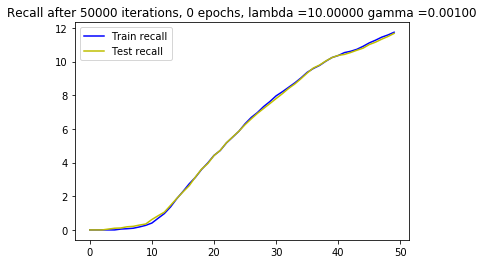

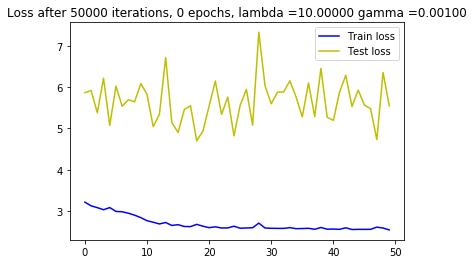

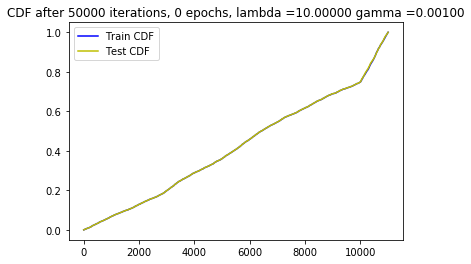






 11%|█         | 50001/473047 [33:06<104:44:14,  1.12it/s]




 11%|█         | 50009/473047 [33:06<73:47:58,  1.59it/s] 

New score:  0.11214541
Train score:  0.27639922
Test score:  0.36368963
Obj first part:  2.92585551738739
Obj second part:  -5.2090616
Obj first part:  11.918678283691406
Obj second part:  -1.5006466
Obj first part:  0.5516453087329865
Obj second part:  -2.148086
Obj first part:  0.0
Obj second part:  -0.11128587
Obj first part:  0.0
Obj second part:  -2.9141371
Obj first part:  0.0
Obj second part:  -1.1801506
Obj first part:  0.0
Obj second part:  -0.19977519
Obj first part:  2.5282514095306396
Obj second part:  -1.7124318
Obj first part:  1.2243106216192245
Obj second part:  -3.2427382
Obj first part:  0.0
Obj second part:  -0.049561065
Obj first part:  1.7771588265895844
Obj second part:  -2.3250804
Obj first part:  0.0
Obj second part:  -3.79195
Obj first part:  0.41419610381126404
Obj second part:  -0.8044771
Obj first part:  0.0
Obj second part:  -4.1514506
Obj first part:  0.42640887200832367
Obj second part:  -1.9770529







 11%|█         | 50017/473047 [33:06<52:07:50,  2.25it/s]




 11%|█         | 50025/473047 [33:06<36:57:19,  3.18it/s]

Obj first part:  0.25474855676293373
Obj second part:  -1.1835899
Obj first part:  1.6091227531433105
Obj second part:  -2.665274
Obj first part:  1.0002514719963074
Obj second part:  -0.9499461
Obj first part:  1.7898792028427124
Obj second part:  -3.2130408
Obj first part:  0.0
Obj second part:  -0.9808575
Obj first part:  0.0
Obj second part:  -1.257041
Obj first part:  0.0
Obj second part:  -3.5126605
Obj first part:  0.0
Obj second part:  -2.4758368
Obj first part:  0.0
Obj second part:  -2.857543
Obj first part:  0.0
Obj second part:  -0.56698877
Obj first part:  0.601186491549015
Obj second part:  -0.17645761
Obj first part:  0.0
Obj second part:  -3.8389192
Obj first part:  0.0
Obj second part:  -2.3186038
Obj first part:  0.0
Obj second part:  -1.0969031
Obj first part:  0.0
Obj second part:  -1.0588025
Obj first part:  0.14238146133720875
Obj second part:  -0.046992775







 11%|█         | 50033/473047 [33:06<26:20:18,  4.46it/s]




 11%|█         | 50041/473047 [33:06<18:54:03,  6.22it/s]

Obj first part:  1.2200730293989182
Obj second part:  -0.18206018
Obj first part:  15.051000118255615
Obj second part:  -2.1200612
Obj first part:  0.0
Obj second part:  -1.924954
Obj first part:  0.0
Obj second part:  -0.42547062
Obj first part:  8.10057282447815
Obj second part:  -2.786193
Obj first part:  5.284608006477356
Obj second part:  -1.1917143
Obj first part:  0.0
Obj second part:  -1.9829544
Obj first part:  0.41350051760673523
Obj second part:  -2.843293
Obj first part:  0.0
Obj second part:  -2.4826717
Obj first part:  0.0
Obj second part:  -0.4710221
Obj first part:  0.0
Obj second part:  -0.45567068
Obj first part:  0.0
Obj second part:  -1.555454
Obj first part:  2.1384473145008087
Obj second part:  -3.208899
Obj first part:  1.5320764482021332
Obj second part:  -2.043827
Obj first part:  0.0
Obj second part:  -0.5049897
Obj first part:  1.5309105813503265
Obj second part:  -0.49880064







 11%|█         | 50049/473047 [33:06<13:42:02,  8.58it/s]




 11%|█         | 50057/473047 [33:07<10:03:43, 11.68it/s]

Obj first part:  0.0
Obj second part:  -1.301842
Obj first part:  0.15280586667358875
Obj second part:  -2.3974981
Obj first part:  0.21150745451450348
Obj second part:  -1.7521963
Obj first part:  0.0
Obj second part:  -1.6882834
Obj first part:  0.0
Obj second part:  -2.2052705
Obj first part:  0.0
Obj second part:  -1.6976981
Obj first part:  0.5635027214884758
Obj second part:  -0.4071845
Obj first part:  0.6413830071687698
Obj second part:  -1.4676403
Obj first part:  0.898035541176796
Obj second part:  -0.86193365
Obj first part:  4.023840129375458
Obj second part:  -0.44593617
Obj first part:  0.0
Obj second part:  -1.8712265
Obj first part:  0.05050940439105034
Obj second part:  -0.37302548
Obj first part:  1.0190685838460922
Obj second part:  -0.28313228
Obj first part:  1.1960270255804062
Obj second part:  -0.22565635
Obj first part:  0.0
Obj second part:  -1.7231658
Obj first part:  3.707922101020813







 11%|█         | 50065/473047 [33:07<7:30:50, 15.64it/s] 




 11%|█         | 50073/473047 [33:07<5:43:33, 20.52it/s]

Obj second part:  -2.184123
Obj first part:  1.2831221520900726
Obj second part:  -3.292083
Obj first part:  0.0
Obj second part:  -0.7781549
Obj first part:  2.8074872493743896
Obj second part:  -0.6398398
Obj first part:  0.6872770935297012
Obj second part:  -2.0448384
Obj first part:  0.13200724497437477
Obj second part:  -1.7831523
Obj first part:  0.26309313252568245
Obj second part:  -0.20066495
Obj first part:  0.0
Obj second part:  -3.8929768
Obj first part:  1.3742774724960327
Obj second part:  -1.5424402
Obj first part:  0.0
Obj second part:  -1.1852853
Obj first part:  3.0387017130851746
Obj second part:  -1.9210112
Obj first part:  1.2083670496940613
Obj second part:  -1.6227782
Obj first part:  0.0
Obj second part:  -1.2100614
Obj first part:  0.0
Obj second part:  -3.758288
Obj first part:  0.05365522112697363
Obj second part:  -1.6034269
Obj first part:  0.0
Obj second part:  -1.4123659







 11%|█         | 50081/473047 [33:07<4:28:36, 26.24it/s]




 11%|█         | 50089/473047 [33:07<3:36:03, 32.63it/s]

Obj first part:  0.0
Obj second part:  -0.2040476
Obj first part:  1.6574202477931976
Obj second part:  -1.1301951
Obj first part:  0.0
Obj second part:  -2.7417626
Obj first part:  0.0
Obj second part:  -1.5505202
Obj first part:  0.26944078505039215
Obj second part:  -0.7234745
Obj first part:  0.0
Obj second part:  -1.7993736
Obj first part:  0.0
Obj second part:  -1.6377983
Obj first part:  2.0010365545749664
Obj second part:  -2.496179
Obj first part:  0.0
Obj second part:  -4.0427384
Obj first part:  0.0
Obj second part:  -0.46959507
Obj first part:  2.800447642803192
Obj second part:  -2.3658965
Obj first part:  8.317826390266418
Obj second part:  -1.0338855
Obj first part:  0.45157846063375473
Obj second part:  -1.7946011
Obj first part:  0.0
Obj second part:  -0.35564968
Obj first part:  0.0
Obj second part:  -4.956778
Obj first part:  1.4834105968475342
Obj second part:  -0.63199437







 11%|█         | 50097/473047 [33:07<2:59:30, 39.27it/s]




 11%|█         | 50105/473047 [33:07<2:33:16, 45.99it/s]

Obj first part:  0.049436730332672596
Obj second part:  -0.22011997
Obj first part:  0.0
Obj second part:  -2.397711
Obj first part:  0.013569374568760395
Obj second part:  -3.2725902
Obj first part:  0.0
Obj second part:  -1.8405144
Obj first part:  0.4243966192007065
Obj second part:  -4.8308716
Obj first part:  0.116588668897748
Obj second part:  -1.1166949
Obj first part:  0.0
Obj second part:  -0.65843785
Obj first part:  0.0
Obj second part:  -0.7615691
Obj first part:  2.9660433530807495
Obj second part:  -0.612138
Obj first part:  1.2776917219161987
Obj second part:  -0.8773515
Obj first part:  0.0
Obj second part:  -1.462454
Obj first part:  0.31153004616498947
Obj second part:  -0.27344596
Obj first part:  0.0
Obj second part:  -0.69770205
Obj first part:  0.0
Obj second part:  -3.7726438
Obj first part:  1.7517226934432983
Obj second part:  -1.1934123
Obj first part:  0.0
Obj second part:  -0.7494057







 11%|█         | 50113/473047 [33:07<2:15:31, 52.01it/s]




 11%|█         | 50121/473047 [33:07<2:02:46, 57.41it/s]

Obj first part:  0.32990939915180206
Obj second part:  -0.76016986
Obj first part:  0.0
Obj second part:  -1.5417535
Obj first part:  13.10554027557373
Obj second part:  -1.189273
Obj first part:  0.0
Obj second part:  -3.0724578
Obj first part:  1.2123048305511475
Obj second part:  -0.3474276
Obj first part:  1.2645664811134338
Obj second part:  -5.7998395
Obj first part:  0.3935374692082405
Obj second part:  -2.507718
Obj first part:  0.10288652032613754
Obj second part:  -5.2970834
Obj first part:  0.3531733900308609
Obj second part:  -1.4838628
Obj first part:  3.263724446296692
Obj second part:  -1.6832678
Obj first part:  1.8661503493785858
Obj second part:  -3.5266047
Obj first part:  0.0
Obj second part:  -0.66894865
Obj first part:  0.0
Obj second part:  -1.8329567
Obj first part:  0.0
Obj second part:  -1.3325421
Obj first part:  0.0
Obj second part:  -1.0956494
Obj first part:  0.441921204328537
Obj second part:  -1.6549865







 11%|█         | 50129/473047 [33:08<1:53:53, 61.88it/s]




 11%|█         | 50137/473047 [33:08<1:47:32, 65.54it/s]

Obj first part:  0.0
Obj second part:  -0.22300996
Obj first part:  2.025245428085327
Obj second part:  -0.3013138
Obj first part:  0.15811987221240997
Obj second part:  -1.7415633
Obj first part:  1.2545192241668701
Obj second part:  -1.9174712
Obj first part:  0.11161570437252522
Obj second part:  -1.6993321
Obj first part:  0.46803027391433716
Obj second part:  -2.6184103
Obj first part:  0.9459883719682693
Obj second part:  -2.9341679
Obj first part:  0.0
Obj second part:  -0.37940407
Obj first part:  0.7513311505317688
Obj second part:  -0.2720405
Obj first part:  0.0
Obj second part:  -0.38192794
Obj first part:  0.05949188023805618
Obj second part:  -4.045323
Obj first part:  0.6579729169607162
Obj second part:  -1.1887999
Obj first part:  0.0
Obj second part:  -1.3745778
Obj first part:  0.24174634367227554
Obj second part:  -1.0289259
Obj first part:  0.0
Obj second part:  -3.652499
Obj first part:  0.6792759150266647
Obj second part:  -1.9425858







 11%|█         | 50145/473047 [33:08<1:43:15, 68.26it/s]




 11%|█         | 50153/473047 [33:08<1:40:18, 70.26it/s]

Obj first part:  0.0
Obj second part:  -0.21418822
Obj first part:  0.96169114112854
Obj second part:  -0.88697183
Obj first part:  0.0
Obj second part:  -0.69270134
Obj first part:  6.043145060539246
Obj second part:  -1.6561393
Obj first part:  0.0
Obj second part:  -0.8694495
Obj first part:  0.0
Obj second part:  -2.6496305
Obj first part:  0.0
Obj second part:  -0.9411042
Obj first part:  0.0
Obj second part:  -2.459495
Obj first part:  0.0
Obj second part:  -3.939371
Obj first part:  0.0
Obj second part:  -0.74261266
Obj first part:  2.41642564535141
Obj second part:  -0.27761886
Obj first part:  0.0
Obj second part:  -0.2432007
Obj first part:  0.0
Obj second part:  -2.8509247
Obj first part:  3.866107165813446
Obj second part:  -0.48568648
Obj first part:  0.30211515724658966
Obj second part:  -1.2380452
Obj first part:  0.0
Obj second part:  -0.6408788







 11%|█         | 50161/473047 [33:08<1:38:16, 71.72it/s]




 11%|█         | 50169/473047 [33:08<1:36:30, 73.03it/s]

Obj first part:  0.02827595453709364
Obj second part:  -1.462472
Obj first part:  0.30144618824124336
Obj second part:  -2.9648123
Obj first part:  0.0
Obj second part:  -2.205914
Obj first part:  0.0
Obj second part:  -1.2193428
Obj first part:  0.0
Obj second part:  -2.4884632
Obj first part:  0.0
Obj second part:  -0.12050851
Obj first part:  6.4286017417907715
Obj second part:  -0.8065395
Obj first part:  0.9582316130399704
Obj second part:  -0.7399406
Obj first part:  1.0013863444328308
Obj second part:  -0.6873535
Obj first part:  0.8908355981111526
Obj second part:  -1.9750372
Obj first part:  1.6505765914916992
Obj second part:  -1.1086977
Obj first part:  0.0
Obj second part:  -0.8029665
Obj first part:  0.0
Obj second part:  -2.7765644
Obj first part:  0.6860348582267761
Obj second part:  -2.26129
Obj first part:  0.0
Obj second part:  -0.5615206
Obj first part:  8.904156684875488
Obj second part:  -1.2391485







 11%|█         | 50177/473047 [33:08<1:35:29, 73.81it/s]




 11%|█         | 50185/473047 [33:08<1:34:27, 74.61it/s]

Obj first part:  0.0
Obj second part:  -0.19421412
Obj first part:  0.2925137057900429
Obj second part:  -0.55874234
Obj first part:  0.31242625787854195
Obj second part:  -1.6513348
Obj first part:  1.1786845326423645
Obj second part:  -1.0381975
Obj first part:  0.0
Obj second part:  -0.8624991
Obj first part:  0.0
Obj second part:  -2.8979342
Obj first part:  0.0
Obj second part:  -1.3004581
Obj first part:  10.420280694961548
Obj second part:  -0.16421549
Obj first part:  0.778057798743248
Obj second part:  -1.7370456
Obj first part:  0.0
Obj second part:  -0.034392763
Obj first part:  5.753270387649536
Obj second part:  -0.019497534
Obj first part:  1.7775708436965942
Obj second part:  -0.948333
Obj first part:  0.16119873151183128
Obj second part:  -0.5187516
Obj first part:  0.0
Obj second part:  -3.6721992
Obj first part:  0.0
Obj second part:  -1.64634
Obj first part:  0.0
Obj second part:  -1.7015781







 11%|█         | 50193/473047 [33:08<1:34:31, 74.56it/s]




 11%|█         | 50201/473047 [33:08<1:34:01, 74.96it/s]

Obj first part:  1.3178962469100952
Obj second part:  -2.732184
Obj first part:  2.3347727954387665
Obj second part:  -4.309347
Obj first part:  0.23221993818879128
Obj second part:  -2.2811944
Obj first part:  0.0
Obj second part:  -1.3182005
Obj first part:  1.3115774095058441
Obj second part:  -1.0019706
Obj first part:  3.5483011603355408
Obj second part:  -4.835202
Obj first part:  0.0
Obj second part:  -1.2304331
Obj first part:  0.0
Obj second part:  -2.0471697
Obj first part:  0.0
Obj second part:  -2.2236824
Obj first part:  0.0
Obj second part:  -2.0360637
Obj first part:  0.0
Obj second part:  -0.41414282
Obj first part:  0.0
Obj second part:  -2.619156
Obj first part:  0.17226258292794228
Obj second part:  -0.29517096
Obj first part:  0.0
Obj second part:  -0.97847146
Obj first part:  5.135520100593567
Obj second part:  -3.1308749
Obj first part:  16.819064617156982
Obj second part:  -3.481255







 11%|█         | 50209/473047 [33:09<1:33:41, 75.22it/s]




 11%|█         | 50217/473047 [33:09<1:33:21, 75.48it/s]

Obj first part:  0.36466680467128754
Obj second part:  -2.1832283
Obj first part:  7.6771897077560425
Obj second part:  -2.1630342
Obj first part:  0.0
Obj second part:  -4.734894
Obj first part:  4.919939935207367
Obj second part:  -3.9034884
Obj first part:  0.539705902338028
Obj second part:  -4.238095
Obj first part:  0.0
Obj second part:  -0.46423247
Obj first part:  0.0
Obj second part:  -4.321511
Obj first part:  0.0
Obj second part:  -1.5940262
Obj first part:  0.0
Obj second part:  -0.3209003
Obj first part:  0.0
Obj second part:  -1.0272319
Obj first part:  1.0279913991689682
Obj second part:  -2.1772058
Obj first part:  0.0
Obj second part:  -4.4175987
Obj first part:  0.2893270179629326
Obj second part:  -2.99947
Obj first part:  0.0
Obj second part:  -2.5382264
Obj first part:  0.05549048073589802
Obj second part:  -1.8535812
Obj first part:  0.5370881035923958
Obj second part:  -3.9558372







 11%|█         | 50225/473047 [33:09<1:33:24, 75.44it/s]




 11%|█         | 50233/473047 [33:09<1:33:12, 75.61it/s]

Obj first part:  0.0
Obj second part:  -1.9244242
Obj first part:  5.871051549911499
Obj second part:  -2.3187675
Obj first part:  5.442541837692261
Obj second part:  -3.2454562
Obj first part:  0.0
Obj second part:  -1.875777
Obj first part:  1.0135295987129211
Obj second part:  -2.3310466
Obj first part:  0.0
Obj second part:  -1.7901592
Obj first part:  0.0
Obj second part:  -1.2808805
Obj first part:  0.4020034894347191
Obj second part:  -3.583534
Obj first part:  1.7097431421279907
Obj second part:  -0.2308295
Obj first part:  0.0
Obj second part:  -2.4036636
Obj first part:  0.6850124895572662
Obj second part:  -0.56236523
Obj first part:  0.0
Obj second part:  -1.166875
Obj first part:  3.792850971221924
Obj second part:  -1.8975146
Obj first part:  0.0
Obj second part:  -0.81281734
Obj first part:  2.7889466285705566
Obj second part:  -1.5954707
Obj first part:  0.8754647523164749
Obj second part:  -0.25471017







 11%|█         | 50241/473047 [33:09<1:33:09, 75.65it/s]




 11%|█         | 50249/473047 [33:09<1:32:58, 75.78it/s]

Obj first part:  0.07643584161996841
Obj second part:  -2.6490157
Obj first part:  0.0
Obj second part:  -0.3589104
Obj first part:  0.33388517796993256
Obj second part:  -2.1072466
Obj first part:  0.27499962598085403
Obj second part:  -0.3465545
Obj first part:  3.242381513118744
Obj second part:  -1.7755013
Obj first part:  0.23995386436581612
Obj second part:  -0.45476747
Obj first part:  0.0
Obj second part:  -0.42205533
Obj first part:  0.3502531722187996
Obj second part:  -1.6497599
Obj first part:  0.0
Obj second part:  -1.5231482
Obj first part:  0.2793354168534279
Obj second part:  -0.79762113
Obj first part:  0.0
Obj second part:  -0.48365486
Obj first part:  0.8964698761701584
Obj second part:  -0.7360894
Obj first part:  0.24764630943536758
Obj second part:  -0.45308143
Obj first part:  7.541449069976807
Obj second part:  -3.0258532
Obj first part:  0.0
Obj second part:  -2.4023867
Obj first part:  0.5537037178874016
Obj second part:  -1.639759







 11%|█         | 50257/473047 [33:09<1:33:08, 75.66it/s]




 11%|█         | 50265/473047 [33:09<1:32:32, 76.14it/s]

Obj first part:  0.5446197465062141
Obj second part:  -3.3054817
Obj first part:  0.0
Obj second part:  -3.1161737
Obj first part:  0.0
Obj second part:  -1.4535509
Obj first part:  0.9026746451854706
Obj second part:  -2.900132
Obj first part:  0.0
Obj second part:  -5.049582
Obj first part:  0.0
Obj second part:  -0.6868242
Obj first part:  0.7259173691272736
Obj second part:  -0.3670329
Obj first part:  1.4165513217449188
Obj second part:  -0.2529933
Obj first part:  0.0
Obj second part:  -1.0640359
Obj first part:  0.0
Obj second part:  -0.63415927
Obj first part:  0.0
Obj second part:  -0.78465575
Obj first part:  0.0
Obj second part:  -1.9212675
Obj first part:  0.0
Obj second part:  -1.2635344
Obj first part:  0.0
Obj second part:  -2.9472964
Obj first part:  0.8249574154615402
Obj second part:  -1.4697607
Obj first part:  0.7432034611701965
Obj second part:  -2.6311483







 11%|█         | 50273/473047 [33:09<1:32:44, 75.98it/s]




 11%|█         | 50281/473047 [33:10<1:32:32, 76.14it/s]

Obj first part:  0.56369349360466
Obj second part:  -2.4441502
Obj first part:  0.0
Obj second part:  -0.83812
Obj first part:  0.0
Obj second part:  -2.07613
Obj first part:  0.0
Obj second part:  -3.3687675
Obj first part:  0.0
Obj second part:  -0.6685058
Obj first part:  0.0
Obj second part:  -0.5160231
Obj first part:  0.0
Obj second part:  -0.57492304
Obj first part:  0.0
Obj second part:  -1.8296329
Obj first part:  0.0
Obj second part:  -0.36363173
Obj first part:  0.2530517987906933
Obj second part:  -2.6001318
Obj first part:  0.0
Obj second part:  -2.9379604
Obj first part:  2.6236996054649353
Obj second part:  -4.5475445
Obj first part:  0.0
Obj second part:  -1.868264
Obj first part:  0.1743251271545887
Obj second part:  -0.34078994
Obj first part:  0.0
Obj second part:  -3.315095
Obj first part:  0.0
Obj second part:  -0.4463146







 11%|█         | 50289/473047 [33:10<1:32:40, 76.04it/s]




 11%|█         | 50297/473047 [33:10<1:32:34, 76.10it/s]

Obj first part:  1.4787870645523071
Obj second part:  -1.2839327
Obj first part:  0.3070516884326935
Obj second part:  -1.3782268
Obj first part:  0.16764385625720024
Obj second part:  -2.9500406
Obj first part:  0.33745136111974716
Obj second part:  -1.3711741
Obj first part:  0.0
Obj second part:  -1.009973
Obj first part:  0.6364709883928299
Obj second part:  -0.19241469
Obj first part:  5.835245847702026
Obj second part:  -0.74271864
Obj first part:  1.123565062880516
Obj second part:  -1.5847527
Obj first part:  0.40001094341278076
Obj second part:  -1.5143827
Obj first part:  1.1264871060848236
Obj second part:  -0.9629746
Obj first part:  0.0
Obj second part:  -0.2982762
Obj first part:  0.0
Obj second part:  -2.3129997
Obj first part:  0.027240903582423925
Obj second part:  -0.4166517
Obj first part:  0.0
Obj second part:  -0.9671247
Obj first part:  0.49337156116962433
Obj second part:  -0.021940457







 11%|█         | 50305/473047 [33:10<1:34:11, 74.81it/s]




 11%|█         | 50313/473047 [33:10<1:34:00, 74.95it/s]

Obj first part:  0.0
Obj second part:  -1.079478
Obj first part:  0.7335112988948822
Obj second part:  -2.384705
Obj first part:  2.937557101249695
Obj second part:  -1.2631418
Obj first part:  0.7375762611627579
Obj second part:  -1.4781606
Obj first part:  0.0
Obj second part:  -1.1145563
Obj first part:  0.0
Obj second part:  -1.296186
Obj first part:  0.0
Obj second part:  -1.2371106
Obj first part:  0.2868986129760742
Obj second part:  -2.8568575
Obj first part:  0.0
Obj second part:  -2.6755395
Obj first part:  0.0
Obj second part:  -1.1418232
Obj first part:  0.0
Obj second part:  -2.8653154
Obj first part:  0.0
Obj second part:  -3.5435665
Obj first part:  0.0
Obj second part:  -0.07435131
Obj first part:  2.0399735867977142
Obj second part:  -1.6489722
Obj first part:  3.214426338672638
Obj second part:  -3.6144931







 11%|█         | 50321/473047 [33:10<1:33:56, 75.00it/s]




 11%|█         | 50329/473047 [33:10<1:33:43, 75.17it/s]

Obj first part:  0.24548908695578575
Obj second part:  -0.0664368
Obj first part:  0.5098232999444008
Obj second part:  -1.1838622
Obj first part:  0.0
Obj second part:  -3.073472
Obj first part:  8.911870121955872
Obj second part:  -0.22637896
Obj first part:  1.550029218196869
Obj second part:  -1.2317569
Obj first part:  0.0
Obj second part:  -3.2270865
Obj first part:  0.12233544141054153
Obj second part:  -1.6622233
Obj first part:  0.0
Obj second part:  -1.6579673
Obj first part:  0.0
Obj second part:  -1.201294
Obj first part:  0.0
Obj second part:  -0.9829473
Obj first part:  0.2383951097726822
Obj second part:  -0.111282274
Obj first part:  0.0
Obj second part:  -0.09659933
Obj first part:  0.6572975963354111
Obj second part:  -1.5945394
Obj first part:  0.19389759749174118
Obj second part:  -2.1138773
Obj first part:  3.2695817947387695
Obj second part:  -0.16653956
Obj first part:  0.0
Obj second part:  -0.23927312







 11%|█         | 50337/473047 [33:10<1:33:29, 75.36it/s]




 11%|█         | 50345/473047 [33:10<1:33:16, 75.53it/s]

Obj first part:  0.2837003208696842
Obj second part:  -0.2758328
Obj first part:  0.14550571329891682
Obj second part:  -0.55029213
Obj first part:  0.4865555837750435
Obj second part:  -0.78060335
Obj first part:  0.0
Obj second part:  -1.8979601
Obj first part:  0.4350542277097702
Obj second part:  -2.733148
Obj first part:  0.0
Obj second part:  -1.0864997
Obj first part:  0.0
Obj second part:  -1.064826
Obj first part:  3.5357850790023804
Obj second part:  -1.8032786
Obj first part:  0.0
Obj second part:  -0.62126595
Obj first part:  0.0
Obj second part:  -2.0787966
Obj first part:  3.903689682483673
Obj second part:  -2.6110349
Obj first part:  0.0
Obj second part:  -0.7118506
Obj first part:  0.5450071394443512
Obj second part:  -1.2403814
Obj first part:  0.0
Obj second part:  -0.54936224
Obj first part:  0.0
Obj second part:  -1.3141233
Obj first part:  0.9728530794382095
Obj second part:  -0.3032382







 11%|█         | 50353/473047 [33:11<1:33:15, 75.54it/s]




 11%|█         | 50361/473047 [33:11<1:32:55, 75.81it/s]

Obj first part:  0.0
Obj second part:  -2.2985172
Obj first part:  1.7606408894062042
Obj second part:  -0.23390406
Obj first part:  0.5466606840491295
Obj second part:  -1.125535
Obj first part:  9.819793701171875
Obj second part:  -1.4976552
Obj first part:  0.5888870730996132
Obj second part:  -0.52666885
Obj first part:  0.14544663950800896
Obj second part:  -1.9601946
Obj first part:  0.0
Obj second part:  -0.12853567
Obj first part:  0.3433794900774956
Obj second part:  -1.0562408
Obj first part:  0.0
Obj second part:  -1.9932061
Obj first part:  0.0
Obj second part:  -0.3886803
Obj first part:  0.0
Obj second part:  -1.1775497
Obj first part:  0.0
Obj second part:  -1.923924
Obj first part:  0.0
Obj second part:  -1.4496592
Obj first part:  1.875223070383072
Obj second part:  -1.0000396
Obj first part:  0.0
Obj second part:  -1.5539733
Obj first part:  0.0
Obj second part:  -0.47433946







 11%|█         | 50369/473047 [33:11<1:33:18, 75.49it/s]




 11%|█         | 50377/473047 [33:11<1:32:57, 75.79it/s]

Obj first part:  0.0
Obj second part:  -2.9328225
Obj first part:  0.7842229306697845
Obj second part:  -1.7088742
Obj first part:  0.9888112545013428
Obj second part:  -0.21786031
Obj first part:  0.0
Obj second part:  -1.7989272
Obj first part:  0.4200238734483719
Obj second part:  -0.692718
Obj first part:  0.0
Obj second part:  -0.31138825
Obj first part:  7.471923232078552
Obj second part:  -0.18813193
Obj first part:  0.0
Obj second part:  -2.100031
Obj first part:  0.03993438556790352
Obj second part:  -1.7125555
Obj first part:  0.0
Obj second part:  -0.59379995
Obj first part:  0.8178292214870453
Obj second part:  -0.47175705
Obj first part:  10.068767070770264
Obj second part:  -0.5349408
Obj first part:  0.3030540235340595
Obj second part:  -2.1272771
Obj first part:  0.2172555960714817
Obj second part:  -1.4647651
Obj first part:  2.8970035910606384
Obj second part:  -2.7482471
Obj first part:  0.0
Obj second part:  -0.80526024







 11%|█         | 50385/473047 [33:11<1:33:07, 75.64it/s]




 11%|█         | 50393/473047 [33:11<1:33:03, 75.69it/s]

Obj first part:  1.06523297727108
Obj second part:  -0.6430386
Obj first part:  0.0
Obj second part:  -2.855596
Obj first part:  3.15028578042984
Obj second part:  -4.128067
Obj first part:  0.7207321375608444
Obj second part:  -0.17484513
Obj first part:  0.0
Obj second part:  -1.9086103
Obj first part:  0.6204870715737343
Obj second part:  -0.8624882
Obj first part:  0.0
Obj second part:  -2.5167453
Obj first part:  6.391950249671936
Obj second part:  -2.1418977
Obj first part:  1.1020128428936005
Obj second part:  -1.877239
Obj first part:  0.9747176617383957
Obj second part:  -2.1309304
Obj first part:  0.0
Obj second part:  -3.1135201
Obj first part:  2.3906131088733673
Obj second part:  -0.6347759
Obj first part:  0.5066589638590813
Obj second part:  -1.5748454
Obj first part:  0.0
Obj second part:  -2.983905
Obj first part:  0.0
Obj second part:  -3.2648532







 11%|█         | 50401/473047 [33:11<1:33:44, 75.14it/s]




 11%|█         | 50409/473047 [33:11<1:33:53, 75.03it/s]

Obj first part:  7.050352692604065
Obj second part:  -1.0297209
Obj first part:  0.17433114349842072
Obj second part:  -1.3919226
Obj first part:  0.044782981276512146
Obj second part:  -1.0642173
Obj first part:  0.0
Obj second part:  -2.3403926
Obj first part:  0.0
Obj second part:  -2.0634677
Obj first part:  0.0
Obj second part:  -0.5787142
Obj first part:  0.0
Obj second part:  -3.0219245
Obj first part:  0.0
Obj second part:  -0.14119835
Obj first part:  0.0
Obj second part:  -1.3947552
Obj first part:  0.0
Obj second part:  -2.313136
Obj first part:  0.20318638533353806
Obj second part:  -3.7050617
Obj first part:  0.0
Obj second part:  -1.1402944
Obj first part:  0.08162750862538815
Obj second part:  -1.6454036
Obj first part:  0.0
Obj second part:  -2.4835365
Obj first part:  0.0
Obj second part:  -1.111052







 11%|█         | 50417/473047 [33:11<1:34:28, 74.55it/s]




 11%|█         | 50425/473047 [33:11<1:34:38, 74.42it/s]

Obj first part:  0.0
Obj second part:  -1.203172
Obj first part:  0.0
Obj second part:  -0.90375304
Obj first part:  0.0
Obj second part:  -1.2730175
Obj first part:  2.221703380346298
Obj second part:  -0.18493554
Obj first part:  0.0
Obj second part:  -0.3540884
Obj first part:  0.0
Obj second part:  -1.8432344
Obj first part:  1.2489405274391174
Obj second part:  -1.6427838
Obj first part:  0.0
Obj second part:  -2.046601
Obj first part:  0.0
Obj second part:  -3.5007956
Obj first part:  0.0
Obj second part:  -0.72890365
Obj first part:  0.0
Obj second part:  -0.023032496
Obj first part:  0.7958230376243591
Obj second part:  -3.5956414
Obj first part:  7.196829915046692
Obj second part:  -1.5439358
Obj first part:  7.656201124191284
Obj second part:  -2.64297
Obj first part:  0.9755246341228485
Obj second part:  -2.39185







 11%|█         | 50433/473047 [33:12<1:34:56, 74.19it/s]




 11%|█         | 50441/473047 [33:12<1:34:30, 74.53it/s]

Obj first part:  0.2762162499129772
Obj second part:  -1.1913455
Obj first part:  1.220388114452362
Obj second part:  -2.9657738
Obj first part:  0.748569518327713
Obj second part:  -2.0149634
Obj first part:  0.0
Obj second part:  -3.0842981
Obj first part:  0.0
Obj second part:  -4.6279554
Obj first part:  0.32227952033281326
Obj second part:  -0.94054145
Obj first part:  0.0
Obj second part:  -0.97414064
Obj first part:  1.293366253376007
Obj second part:  -0.98980725
Obj first part:  0.0
Obj second part:  -1.7127901
Obj first part:  0.0
Obj second part:  -1.3071165
Obj first part:  0.8234156668186188
Obj second part:  -1.3866796
Obj first part:  1.7721129953861237
Obj second part:  -1.0851941
Obj first part:  0.0
Obj second part:  -1.6657029
Obj first part:  0.26335569098591805
Obj second part:  -1.980052
Obj first part:  0.0
Obj second part:  -0.55910915
Obj first part:  0.43594613671302795







 11%|█         | 50449/473047 [33:12<1:34:53, 74.22it/s]

Obj second part:  -2.6662645
Obj first part:  0.5245229974389076
Obj second part:  -2.2220223
Obj first part:  2.071542739868164
Obj second part:  -1.041928
Obj first part:  0.0
Obj second part:  -1.5225462
Obj first part:  0.5136397480964661
Obj second part:  -0.5827229
Obj first part:  0.7307058572769165
Obj second part:  -3.0135288
Obj first part:  1.6343867778778076
Obj second part:  -0.14609736
Obj first part:  0.1901094801723957
Obj second part:  -1.2335422
Obj first part:  0.3204779699444771
Obj second part:  -0.49193922
Obj first part:  0.0
Obj second part:  -0.51848966
Obj first part:  0.05703728646039963
Obj second part:  -0.7633896
Obj first part:  0.38091428577899933
Obj second part:  -0.46330994
Obj first part:  2.8954029083251953
Obj second part:  -1.5704408
Obj first part:  1.112978234887123
Obj second part:  -1.0600262
Obj first part:  0.056334882974624634
Obj second part:  -0.3087147
Obj first part:  0.09006356820464134
Obj second part:  -2.3770614







 11%|█         | 50457/473047 [33:12<1:34:44, 74.34it/s]




 11%|█         | 50465/473047 [33:12<1:34:48, 74.28it/s]

Obj first part:  0.0
Obj second part:  -0.93496317
Obj first part:  0.0
Obj second part:  -1.3244594
Obj first part:  0.0
Obj second part:  -2.412145
Obj first part:  2.4668510258197784
Obj second part:  -0.46306223
Obj first part:  1.8950378894805908
Obj second part:  -0.29585788
Obj first part:  0.0
Obj second part:  -2.364593
Obj first part:  0.0
Obj second part:  -0.09404122
Obj first part:  0.0
Obj second part:  -3.6909108
Obj first part:  0.0
Obj second part:  -1.3937672
Obj first part:  2.884393036365509
Obj second part:  -1.5493122
Obj first part:  0.0
Obj second part:  -0.17764753
Obj first part:  1.3757632672786713
Obj second part:  -2.543665
Obj first part:  0.0
Obj second part:  -2.7684305
Obj first part:  0.0
Obj second part:  -1.4906443
Obj first part:  0.0
Obj second part:  -0.7849279
Obj first part:  0.0
Obj second part:  -0.2680501







 11%|█         | 50473/473047 [33:12<1:34:24, 74.60it/s]




 11%|█         | 50481/473047 [33:12<1:34:06, 74.84it/s]

Obj first part:  0.0
Obj second part:  -0.6670128
Obj first part:  0.0
Obj second part:  -1.3613358
Obj first part:  1.2329193949699402
Obj second part:  -0.27974617
Obj first part:  7.6486945152282715
Obj second part:  -0.3475827
Obj first part:  0.0
Obj second part:  -2.8817918
Obj first part:  7.6198261976242065
Obj second part:  -1.6856298
Obj first part:  1.7450137436389923
Obj second part:  -1.405557
Obj first part:  0.0
Obj second part:  -1.0587435
Obj first part:  0.0
Obj second part:  -1.899188
Obj first part:  0.0
Obj second part:  -2.4694016
Obj first part:  0.0
Obj second part:  -0.7346083
Obj first part:  8.306722044944763
Obj second part:  -2.724322
Obj first part:  0.40529191493988037
Obj second part:  -4.7579374
Obj first part:  0.6640417128801346
Obj second part:  -0.26113027
Obj first part:  0.0
Obj second part:  -1.6555731
Obj first part:  2.353380024433136
Obj second part:  -1.6300997







 11%|█         | 50489/473047 [33:12<1:34:02, 74.89it/s]




 11%|█         | 50497/473047 [33:12<1:34:06, 74.83it/s]

Obj first part:  0.0
Obj second part:  -2.3061314
Obj first part:  6.24542772769928
Obj second part:  -2.850362
Obj first part:  2.935708165168762
Obj second part:  -4.142181
Obj first part:  0.0
Obj second part:  -1.9264991
Obj first part:  0.0
Obj second part:  -3.2637775
Obj first part:  0.4680025577545166
Obj second part:  -0.8024118
Obj first part:  0.0
Obj second part:  -0.834903
Obj first part:  0.0
Obj second part:  -0.17012611
Obj first part:  0.23937586694955826
Obj second part:  -1.7929344
Obj first part:  2.032048851251602
Obj second part:  -1.1717501
Obj first part:  0.0
Obj second part:  -0.117353365
Obj first part:  2.8595468401908875
Obj second part:  -1.2510806
Obj first part:  0.0
Obj second part:  -1.0947231
Obj first part:  0.0
Obj second part:  -4.03613
Obj first part:  0.0
Obj second part:  -1.0918434
Obj first part:  0.35671859979629517
Obj second part:  -0.16174398







 11%|█         | 50505/473047 [33:13<1:34:14, 74.73it/s]




 11%|█         | 50513/473047 [33:13<1:34:13, 74.74it/s]

Obj first part:  0.0
Obj second part:  -0.76761365
Obj first part:  3.5190266370773315
Obj second part:  -1.2467504
Obj first part:  4.346890151500702
Obj second part:  -0.93193066
Obj first part:  0.168809462338686
Obj second part:  -1.6099198
Obj first part:  0.17158346250653267
Obj second part:  -1.6177456
Obj first part:  0.092260567471385
Obj second part:  -1.232246
Obj first part:  0.0
Obj second part:  -0.8242036
Obj first part:  0.0
Obj second part:  -1.7573922
Obj first part:  0.0
Obj second part:  -1.1670818
Obj first part:  0.5291394516825676
Obj second part:  -1.5612049
Obj first part:  0.0
Obj second part:  -1.7078122
Obj first part:  0.09870316833257675
Obj second part:  -7.1028166
Obj first part:  0.0707266665995121
Obj second part:  -0.49554232
Obj first part:  0.0
Obj second part:  -2.0757933
Obj first part:  0.26745691895484924
Obj second part:  -3.0226107
Obj first part:  0.0
Obj second part:  -2.6931975







 11%|█         | 50521/473047 [33:13<1:33:56, 74.96it/s]




 11%|█         | 50529/473047 [33:13<1:33:47, 75.09it/s]

Obj first part:  0.0
Obj second part:  -0.49648413
Obj first part:  0.0
Obj second part:  -2.184286
Obj first part:  0.0
Obj second part:  -1.7002963
Obj first part:  0.0
Obj second part:  -1.5143998
Obj first part:  0.111458795145154
Obj second part:  -1.6238658
Obj first part:  0.0
Obj second part:  -2.2291908
Obj first part:  0.0
Obj second part:  -0.44410008
Obj first part:  0.5332430079579353
Obj second part:  -0.66157234
Obj first part:  0.0
Obj second part:  -2.4805658
Obj first part:  0.0
Obj second part:  -2.451506
Obj first part:  1.0555648058652878
Obj second part:  -0.3695738
Obj first part:  0.0
Obj second part:  -3.5542462
Obj first part:  0.9689075499773026
Obj second part:  -2.2848284
Obj first part:  0.0
Obj second part:  -1.0339484
Obj first part:  1.0514750331640244
Obj second part:  -0.07839245
Obj first part:  0.0
Obj second part:  -1.0492607







 11%|█         | 50537/473047 [33:13<1:33:45, 75.11it/s]




 11%|█         | 50545/473047 [33:13<1:34:03, 74.87it/s]

Obj first part:  0.0
Obj second part:  -0.6304224
Obj first part:  7.7361977100372314
Obj second part:  -1.1725107
Obj first part:  0.0
Obj second part:  -2.3905017
Obj first part:  0.6357499957084656
Obj second part:  -0.40619364
Obj first part:  0.0
Obj second part:  -0.5698641
Obj first part:  0.0
Obj second part:  -1.8687387
Obj first part:  11.694164276123047
Obj second part:  -1.8298919
Obj first part:  0.23015648126602173
Obj second part:  -0.3338233
Obj first part:  0.0
Obj second part:  -0.74355346
Obj first part:  0.0
Obj second part:  -0.68879515
Obj first part:  0.0
Obj second part:  -2.6540596
Obj first part:  0.29991215094923973
Obj second part:  -2.8564699
Obj first part:  5.942434668540955
Obj second part:  -1.9979013
Obj first part:  0.0
Obj second part:  -2.5700765
Obj first part:  0.5936014279723167
Obj second part:  -3.2280154
Obj first part:  4.690082371234894
Obj second part:  -0.19075125







 11%|█         | 50553/473047 [33:13<1:34:03, 74.86it/s]




 11%|█         | 50561/473047 [33:13<1:34:10, 74.77it/s]

Obj first part:  0.0796378031373024
Obj second part:  -0.587333
Obj first part:  0.0
Obj second part:  -1.3972626
Obj first part:  0.0
Obj second part:  -1.8048546
Obj first part:  0.0
Obj second part:  -2.4806142
Obj first part:  0.0
Obj second part:  -0.63756865
Obj first part:  9.628799557685852
Obj second part:  -2.3790033
Obj first part:  0.0
Obj second part:  -0.44807255
Obj first part:  0.0
Obj second part:  -0.0994472
Obj first part:  0.1933709904551506
Obj second part:  -0.95385754
Obj first part:  0.4470498487353325
Obj second part:  -3.195691
Obj first part:  0.28262611478567123
Obj second part:  -0.23828913
Obj first part:  0.0
Obj second part:  -2.1299531
Obj first part:  0.09379091672599316
Obj second part:  -1.3772471
Obj first part:  6.147633790969849
Obj second part:  -1.1384251
Obj first part:  0.0
Obj second part:  -2.094636
Obj first part:  0.10278422385454178
Obj second part:  -0.545604







 11%|█         | 50569/473047 [33:13<1:34:04, 74.85it/s]




 11%|█         | 50577/473047 [33:13<1:34:19, 74.65it/s]

Obj first part:  0.0
Obj second part:  -0.420153
Obj first part:  0.0
Obj second part:  -1.0371215
Obj first part:  13.019522428512573
Obj second part:  -0.8229296
Obj first part:  4.395663142204285
Obj second part:  -2.4153452
Obj first part:  0.0
Obj second part:  -2.4236157
Obj first part:  0.03267056541517377
Obj second part:  -2.1931818
Obj first part:  3.584836423397064
Obj second part:  -0.77118844
Obj first part:  0.05820043385028839
Obj second part:  -2.3765903
Obj first part:  0.9016343206167221
Obj second part:  -3.9752223
Obj first part:  0.0
Obj second part:  -0.7753441
Obj first part:  0.11537179350852966
Obj second part:  -2.5949385
Obj first part:  0.0
Obj second part:  -4.342183
Obj first part:  0.0
Obj second part:  -0.04098352
Obj first part:  0.19435390830039978
Obj second part:  -2.6346881
Obj first part:  2.983044981956482
Obj second part:  -3.2779586
Obj first part:  0.5405048653483391
Obj second part:  -2.8958957







 11%|█         | 50585/473047 [33:14<1:34:34, 74.44it/s]




 11%|█         | 50593/473047 [33:14<1:34:33, 74.46it/s]

Obj first part:  1.6770097613334656
Obj second part:  -1.3923612
Obj first part:  1.7457742989063263
Obj second part:  -2.6585119
Obj first part:  0.17775526270270348
Obj second part:  -1.8050437
Obj first part:  0.0
Obj second part:  -0.13368739
Obj first part:  0.0
Obj second part:  -3.0993414
Obj first part:  0.5526198819279671
Obj second part:  -2.02598
Obj first part:  0.9807279706001282
Obj second part:  -0.2480111
Obj first part:  0.0
Obj second part:  -2.347394
Obj first part:  0.0
Obj second part:  -1.773675
Obj first part:  0.0
Obj second part:  -2.1050208
Obj first part:  0.13887268491089344
Obj second part:  -2.097577
Obj first part:  0.0
Obj second part:  -1.1352756
Obj first part:  0.7653193175792694
Obj second part:  -0.5757544
Obj first part:  1.11348457634449
Obj second part:  -3.5794868
Obj first part:  9.289214015007019
Obj second part:  -2.1748753
Obj first part:  0.0
Obj second part:  -1.7014441







 11%|█         | 50601/473047 [33:14<1:34:50, 74.24it/s]




 11%|█         | 50609/473047 [33:14<1:34:43, 74.32it/s]

Obj first part:  0.0
Obj second part:  -3.4046407
Obj first part:  0.0
Obj second part:  -0.287509
Obj first part:  0.5203193798661232
Obj second part:  -1.6331654
Obj first part:  0.0
Obj second part:  -2.7908335
Obj first part:  0.7751113921403885
Obj second part:  -0.71566737
Obj first part:  0.05173991899937391
Obj second part:  -3.2938151
Obj first part:  1.0411646962165833
Obj second part:  -3.2043402
Obj first part:  2.574637532234192
Obj second part:  -0.13778667
Obj first part:  0.0
Obj second part:  -3.1944902
Obj first part:  0.09600634686648846
Obj second part:  -0.7037283
Obj first part:  0.876963660120964
Obj second part:  -0.21045431
Obj first part:  0.0
Obj second part:  -0.8474408
Obj first part:  12.236193418502808
Obj second part:  -2.0193827
Obj first part:  0.0
Obj second part:  -2.4096518
Obj first part:  8.510898351669312
Obj second part:  -0.27618206
Obj first part:  0.5357906594872475
Obj second part:  -0.6642549







 11%|█         | 50617/473047 [33:14<1:34:21, 74.62it/s]




 11%|█         | 50625/473047 [33:14<1:34:11, 74.74it/s]

Obj first part:  0.18931210041046143
Obj second part:  -0.8382597
Obj first part:  0.2650405466556549
Obj second part:  -0.75741
Obj first part:  0.0
Obj second part:  -3.312798
Obj first part:  0.3187108412384987
Obj second part:  -0.5672023
Obj first part:  0.0
Obj second part:  -0.60576147
Obj first part:  0.0
Obj second part:  -0.61502737
Obj first part:  1.024603322148323
Obj second part:  -1.3877227
Obj first part:  0.30522558838129044
Obj second part:  -0.16328298
Obj first part:  0.0
Obj second part:  -2.4389462
Obj first part:  0.0
Obj second part:  -1.5930134
Obj first part:  0.0
Obj second part:  -0.21317562
Obj first part:  0.0
Obj second part:  -1.357371
Obj first part:  0.0
Obj second part:  -0.3929963
Obj first part:  0.0
Obj second part:  -3.0741725
Obj first part:  0.0
Obj second part:  -1.9521275
Obj first part:  0.8229249715805054
Obj second part:  -2.8835876







 11%|█         | 50633/473047 [33:14<1:33:47, 75.06it/s]




 11%|█         | 50641/473047 [33:14<1:34:26, 74.54it/s]

Obj first part:  0.34173935651779175
Obj second part:  -0.57485545
Obj first part:  0.2546156942844391
Obj second part:  -0.4444583
Obj first part:  0.0
Obj second part:  -2.653538
Obj first part:  0.0
Obj second part:  -2.7309012
Obj first part:  0.23433102294802666
Obj second part:  -2.0202203
Obj first part:  0.0
Obj second part:  -1.105584
Obj first part:  0.0
Obj second part:  -0.6538732
Obj first part:  0.0
Obj second part:  -0.23956634
Obj first part:  0.0
Obj second part:  -2.069904
Obj first part:  0.0
Obj second part:  -1.5575333
Obj first part:  0.10668974369764328
Obj second part:  -1.972181
Obj first part:  14.644323587417603
Obj second part:  -0.21952857
Obj first part:  0.0
Obj second part:  -2.0102684
Obj first part:  0.0
Obj second part:  -1.3152761
Obj first part:  0.0
Obj second part:  -1.0206875
Obj first part:  0.10007399134337902







 11%|█         | 50649/473047 [33:14<1:34:40, 74.36it/s]




 11%|█         | 50657/473047 [33:15<1:34:38, 74.38it/s]

Obj second part:  -2.260112
Obj first part:  2.0745673775672913
Obj second part:  -0.9258798
Obj first part:  1.527872085571289
Obj second part:  -0.7360922
Obj first part:  0.0843603815883398
Obj second part:  -1.2483776
Obj first part:  0.8323957026004791
Obj second part:  -2.371665
Obj first part:  0.0
Obj second part:  -2.135106
Obj first part:  0.0
Obj second part:  -3.4010422
Obj first part:  0.3469482436776161
Obj second part:  -2.211059
Obj first part:  0.46630922704935074
Obj second part:  -0.48372185
Obj first part:  0.0
Obj second part:  -0.79411995
Obj first part:  4.907664358615875
Obj second part:  -2.5063603
Obj first part:  0.0
Obj second part:  -2.38146
Obj first part:  3.4954819083213806
Obj second part:  -0.4253662
Obj first part:  0.0
Obj second part:  -1.9425057
Obj first part:  0.0
Obj second part:  -0.4088861







 11%|█         | 50665/473047 [33:15<1:35:01, 74.09it/s]




 11%|█         | 50673/473047 [33:15<1:35:00, 74.09it/s]

Obj first part:  0.0
Obj second part:  -0.8172709
Obj first part:  0.301771555095911
Obj second part:  -3.2916837
Obj first part:  0.0
Obj second part:  -1.8606758
Obj first part:  0.4171856865286827
Obj second part:  -0.42997402
Obj first part:  3.3040568232536316
Obj second part:  -0.45474726
Obj first part:  0.0
Obj second part:  -0.10086969
Obj first part:  0.0
Obj second part:  -0.61526585
Obj first part:  0.4549159109592438
Obj second part:  -2.068802
Obj first part:  0.0
Obj second part:  -1.0454594
Obj first part:  0.0
Obj second part:  -1.6871977
Obj first part:  0.8756276220083237
Obj second part:  -0.6116953
Obj first part:  0.0
Obj second part:  -0.34160632
Obj first part:  0.0
Obj second part:  -0.803203
Obj first part:  0.4721873253583908
Obj second part:  -2.6015315
Obj first part:  3.2603779435157776
Obj second part:  -1.8967978







 11%|█         | 50681/473047 [33:15<1:35:13, 73.93it/s]




 11%|█         | 50689/473047 [33:15<1:34:53, 74.19it/s]

Obj first part:  0.0
Obj second part:  -2.9863138
Obj first part:  0.0
Obj second part:  -3.9014812
Obj first part:  0.0
Obj second part:  -0.6686463
Obj first part:  0.0
Obj second part:  -0.47426033
Obj first part:  1.6056348383426666
Obj second part:  -1.4889735
Obj first part:  0.0
Obj second part:  -1.39222
Obj first part:  0.0
Obj second part:  -2.336678
Obj first part:  0.0
Obj second part:  -0.20756543
Obj first part:  0.0
Obj second part:  -0.30318108
Obj first part:  1.8501156568527222
Obj second part:  -1.5276473
Obj first part:  17.140941619873047
Obj second part:  -0.72875977
Obj first part:  0.11279317550361156
Obj second part:  -3.382628
Obj first part:  3.7699657678604126
Obj second part:  -2.7478354
Obj first part:  3.5493552684783936
Obj second part:  -2.5923398
Obj first part:  0.0
Obj second part:  -2.159464
Obj first part:  0.41209544986486435







 11%|█         | 50697/473047 [33:15<1:34:26, 74.53it/s]




 11%|█         | 50705/473047 [33:15<1:34:19, 74.62it/s]

Obj second part:  -0.3244024
Obj first part:  0.0
Obj second part:  -0.06443585
Obj first part:  0.0
Obj second part:  -2.166433
Obj first part:  0.12309156358242035
Obj second part:  -3.2064965
Obj first part:  0.0
Obj second part:  -0.06723412
Obj first part:  0.16403049230575562
Obj second part:  -0.7712102
Obj first part:  0.0
Obj second part:  -1.0047438
Obj first part:  10.600101947784424
Obj second part:  -1.0771432
Obj first part:  0.3821584954857826
Obj second part:  -2.0187066
Obj first part:  0.3962849825620651
Obj second part:  -1.3203852
Obj first part:  0.0
Obj second part:  -0.811864
Obj first part:  0.0
Obj second part:  -2.4232666
Obj first part:  0.2969225309789181
Obj second part:  -2.162831
Obj first part:  0.0
Obj second part:  -3.1267693
Obj first part:  0.0
Obj second part:  -3.0935712







 11%|█         | 50713/473047 [33:15<1:34:17, 74.65it/s]




 11%|█         | 50721/473047 [33:15<1:34:22, 74.58it/s]

Obj first part:  6.366217732429504
Obj second part:  -1.3530229
Obj first part:  0.0
Obj second part:  -1.9691569
Obj first part:  0.0
Obj second part:  -0.85608125
Obj first part:  0.0
Obj second part:  -0.15219423
Obj first part:  0.0
Obj second part:  -0.745376
Obj first part:  0.3467303141951561
Obj second part:  -3.7327762
Obj first part:  0.5253075808286667
Obj second part:  -1.7590622
Obj first part:  0.0
Obj second part:  -2.3225336
Obj first part:  0.34207552671432495
Obj second part:  -0.4249152
Obj first part:  0.0
Obj second part:  -1.760734
Obj first part:  0.0
Obj second part:  -0.9663807
Obj first part:  0.0
Obj second part:  -1.6010903
Obj first part:  0.0
Obj second part:  -0.5834817
Obj first part:  0.0
Obj second part:  -3.234429
Obj first part:  0.0
Obj second part:  -1.12466







 11%|█         | 50729/473047 [33:16<1:34:42, 74.31it/s]




 11%|█         | 50737/473047 [33:16<1:34:48, 74.24it/s]

Obj first part:  0.5824225768446922
Obj second part:  -2.8441975
Obj first part:  0.0
Obj second part:  -2.9269865
Obj first part:  0.0
Obj second part:  -0.30223975
Obj first part:  1.7818690836429596
Obj second part:  -0.20676303
Obj first part:  0.0
Obj second part:  -1.2282344
Obj first part:  0.708036795258522
Obj second part:  -1.7942559
Obj first part:  0.2657928317785263
Obj second part:  -0.7052401
Obj first part:  0.15234200283885002
Obj second part:  -1.226239
Obj first part:  0.0
Obj second part:  -0.33339778
Obj first part:  12.767211198806763
Obj second part:  -0.5972232
Obj first part:  0.2519144117832184
Obj second part:  -0.48878276
Obj first part:  0.0
Obj second part:  -0.3916041
Obj first part:  0.8788622915744781
Obj second part:  -1.3370799
Obj first part:  0.7951065897941589
Obj second part:  -3.402536
Obj first part:  0.8135902881622314
Obj second part:  -0.59881985







 11%|█         | 50745/473047 [33:16<1:35:17, 73.87it/s]




 11%|█         | 50753/473047 [33:16<1:34:46, 74.26it/s]

Obj first part:  0.0
Obj second part:  -1.1107312
Obj first part:  0.27055781334638596
Obj second part:  -0.18847723
Obj first part:  0.0
Obj second part:  -0.04120219
Obj first part:  0.6980657577514648
Obj second part:  -1.5789394
Obj first part:  5.476301908493042
Obj second part:  -0.46041763
Obj first part:  0.4995596781373024
Obj second part:  -1.2925711
Obj first part:  0.2511294558644295
Obj second part:  -2.2424815
Obj first part:  0.15820171684026718
Obj second part:  -1.789773
Obj first part:  0.0
Obj second part:  -0.98983896
Obj first part:  0.0
Obj second part:  -1.0271544
Obj first part:  0.6248341873288155
Obj second part:  -2.485129
Obj first part:  8.73214066028595
Obj second part:  -0.85842
Obj first part:  0.0
Obj second part:  -3.5939028
Obj first part:  0.0
Obj second part:  -0.22028081
Obj first part:  0.0
Obj second part:  -4.3179593







 11%|█         | 50761/473047 [33:16<1:34:46, 74.26it/s]

Obj first part:  0.0
Obj second part:  -3.614879
Obj first part:  0.4052925482392311
Obj second part:  -0.7502784
Obj first part:  2.5751709938049316
Obj second part:  -0.9295908
Obj first part:  0.28787989169359207
Obj second part:  -1.1584088
Obj first part:  0.0
Obj second part:  -2.5750597
Obj first part:  0.4797939583659172
Obj second part:  -1.6340607
Obj first part:  0.0
Obj second part:  -2.4167655
Obj first part:  0.737544521689415
Obj second part:  -4.1202416
Obj first part:  3.096451163291931
Obj second part:  -3.7508974
Obj first part:  1.1968929320573807
Obj second part:  -1.1140592
Obj first part:  0.0
Obj second part:  -2.0084167
Obj first part:  0.2836175262928009
Obj second part:  -1.3939772
Obj first part:  0.0
Obj second part:  -0.55196345
Obj first part:  0.0
Obj second part:  -0.19784288
Obj first part:  0.2625047415494919
Obj second part:  -0.31719548
Obj first part:  0.0
Obj second part:  -2.9898942







 11%|█         | 50769/473047 [33:16<1:34:51, 74.20it/s]




 11%|█         | 50777/473047 [33:16<1:35:11, 73.93it/s]

Obj first part:  0.5053412914276123
Obj second part:  -1.4513838
Obj first part:  0.0
Obj second part:  -2.2107923
Obj first part:  0.0
Obj second part:  -0.30746186
Obj first part:  4.8484209179878235
Obj second part:  -2.9166827
Obj first part:  1.7408502101898193
Obj second part:  -0.24645245
Obj first part:  0.0
Obj second part:  -1.3901776
Obj first part:  4.225625991821289
Obj second part:  -2.615538
Obj first part:  0.0
Obj second part:  -1.6696521
Obj first part:  7.26509690284729
Obj second part:  -0.7900889
Obj first part:  2.904840111732483
Obj second part:  -3.7208533
Obj first part:  0.0
Obj second part:  -2.1989722
Obj first part:  0.0
Obj second part:  -2.5651057
Obj first part:  0.34149564802646637
Obj second part:  -3.3991163
Obj first part:  0.0
Obj second part:  -1.4820777
Obj first part:  0.0
Obj second part:  -0.45927495
Obj first part:  0.0
Obj second part:  -0.7241704







 11%|█         | 50785/473047 [33:16<1:34:51, 74.19it/s]




 11%|█         | 50793/473047 [33:16<1:34:38, 74.36it/s]

Obj first part:  0.0
Obj second part:  -0.15946941
Obj first part:  2.9951998591423035
Obj second part:  -0.28905225
Obj first part:  0.0
Obj second part:  -1.0707786
Obj first part:  0.0
Obj second part:  -0.6597262
Obj first part:  0.0
Obj second part:  -0.91049457
Obj first part:  5.9482234716415405
Obj second part:  -0.47730303
Obj first part:  0.4977934807538986
Obj second part:  -0.36928535
Obj first part:  0.3562372550368309
Obj second part:  -1.1888558
Obj first part:  0.0
Obj second part:  -0.19332561
Obj first part:  1.8766558170318604
Obj second part:  -0.44643468
Obj first part:  0.31753141433000565
Obj second part:  -2.012365
Obj first part:  7.247017025947571
Obj second part:  -2.3854845
Obj first part:  0.025481113698333502
Obj second part:  -3.4039419
Obj first part:  0.0
Obj second part:  -0.627121
Obj first part:  0.0
Obj second part:  -3.5246577
Obj first part:  4.274243414402008
Obj second part:  -1.7037467







 11%|█         | 50801/473047 [33:17<1:34:38, 74.35it/s]




 11%|█         | 50809/473047 [33:17<1:34:43, 74.29it/s]

Obj first part:  0.0
Obj second part:  -2.2041817
Obj first part:  0.0
Obj second part:  -1.2932452
Obj first part:  0.3398086130619049
Obj second part:  -0.6639672
Obj first part:  0.4120095446705818
Obj second part:  -0.059282165
Obj first part:  0.0
Obj second part:  -2.4396818
Obj first part:  0.0
Obj second part:  -2.58907
Obj first part:  0.11872831732034683
Obj second part:  -2.0386186
Obj first part:  0.0
Obj second part:  -2.9633033
Obj first part:  0.0
Obj second part:  -1.1358044
Obj first part:  0.0
Obj second part:  -1.0582552
Obj first part:  0.0
Obj second part:  -2.0186183
Obj first part:  0.0
Obj second part:  -2.3967123
Obj first part:  0.360928550362587
Obj second part:  -1.3045863
Obj first part:  0.0
Obj second part:  -2.0379145
Obj first part:  0.0
Obj second part:  -0.4683119
Obj first part:  1.693991869688034
Obj second part:  -0.5947409







 11%|█         | 50817/473047 [33:17<1:34:21, 74.58it/s]




 11%|█         | 50825/473047 [33:17<1:34:21, 74.58it/s]

Obj first part:  0.36766432225704193
Obj second part:  -0.23058291
Obj first part:  0.0
Obj second part:  -0.06328186
Obj first part:  2.1001793444156647
Obj second part:  -2.517063
Obj first part:  3.7044724822044373
Obj second part:  -3.6252367
Obj first part:  0.0
Obj second part:  -0.33691573
Obj first part:  0.0
Obj second part:  -0.45591223
Obj first part:  3.6711618304252625
Obj second part:  -1.1736106
Obj first part:  0.0
Obj second part:  -0.33229634
Obj first part:  0.39146192371845245
Obj second part:  -0.26584834
Obj first part:  0.0
Obj second part:  -0.34527516
Obj first part:  0.5178723856806755
Obj second part:  -2.7611194
Obj first part:  0.0
Obj second part:  -0.07547373
Obj first part:  0.0
Obj second part:  -0.44674292
Obj first part:  0.0
Obj second part:  -1.5513374
Obj first part:  0.0
Obj second part:  -3.4514117
Obj first part:  0.22737734019756317
Obj second part:  -3.5606835







 11%|█         | 50833/473047 [33:17<1:34:08, 74.75it/s]




 11%|█         | 50841/473047 [33:17<1:34:42, 74.30it/s]

Obj first part:  0.0
Obj second part:  -0.4204539
Obj first part:  0.49945976585149765
Obj second part:  -2.6849835
Obj first part:  0.0
Obj second part:  -0.9339613
Obj first part:  0.260506272315979
Obj second part:  -0.66871655
Obj first part:  0.0
Obj second part:  -2.8192482
Obj first part:  0.0
Obj second part:  -2.9800625
Obj first part:  2.5058546662330627
Obj second part:  -1.0349506
Obj first part:  0.0
Obj second part:  -3.4352121
Obj first part:  0.0
Obj second part:  -1.0596638
Obj first part:  0.5011481419205666
Obj second part:  -0.05265749
Obj first part:  6.457890868186951
Obj second part:  -3.6124496
Obj first part:  0.0
Obj second part:  -4.5556283
Obj first part:  0.0
Obj second part:  -1.2620788
Obj first part:  2.8588682413101196
Obj second part:  -2.168113
Obj first part:  0.2843121625483036
Obj second part:  -2.665495
Obj first part:  1.9594915211200714
Obj second part:  -0.8673702







 11%|█         | 50849/473047 [33:17<1:34:25, 74.52it/s]




 11%|█         | 50857/473047 [33:17<1:34:25, 74.52it/s]

Obj first part:  0.0
Obj second part:  -4.25785
Obj first part:  1.3560065627098083
Obj second part:  -1.8877752
Obj first part:  0.0
Obj second part:  -0.8328638
Obj first part:  1.02762870490551
Obj second part:  -0.16830273
Obj first part:  0.10538716800510883
Obj second part:  -3.8331165
Obj first part:  0.17042303457856178
Obj second part:  -1.0800829
Obj first part:  0.0
Obj second part:  -3.1753075
Obj first part:  3.027382493019104
Obj second part:  -2.2978199
Obj first part:  0.38314249366521835
Obj second part:  -2.212961
Obj first part:  0.0
Obj second part:  -0.32496333
Obj first part:  0.12330805882811546
Obj second part:  -1.4674968
Obj first part:  0.3768366575241089
Obj second part:  -0.36114755
Obj first part:  0.0
Obj second part:  -2.1131287
Obj first part:  1.1727037280797958
Obj second part:  -3.999197
Obj first part:  0.0
Obj second part:  -1.7607073
Obj first part:  0.042651379480957985
Obj second part:  -0.43363273







 11%|█         | 50865/473047 [33:17<1:34:04, 74.80it/s]




 11%|█         | 50873/473047 [33:17<1:34:18, 74.61it/s]

Obj first part:  4.584667384624481
Obj second part:  -0.7191247
Obj first part:  0.0
Obj second part:  -0.19580895
Obj first part:  0.16514962539076805
Obj second part:  -2.227883
Obj first part:  1.090475469827652
Obj second part:  -0.88073593
Obj first part:  0.0
Obj second part:  -3.8491251
Obj first part:  0.7792317867279053
Obj second part:  -1.9315721
Obj first part:  10.452089309692383
Obj second part:  -2.9183893
Obj first part:  0.0
Obj second part:  -2.3625221
Obj first part:  6.167502999305725
Obj second part:  -1.1390277
Obj first part:  1.086704432964325
Obj second part:  -1.4624512
Obj first part:  1.3647189736366272
Obj second part:  -1.3070593
Obj first part:  0.0
Obj second part:  -4.2682204
Obj first part:  0.052805799059569836
Obj second part:  -0.2814047
Obj first part:  0.6708619743585587
Obj second part:  -1.6465235
Obj first part:  1.3767030835151672
Obj second part:  -0.91889966
Obj first part:  1.7663037776947021
Obj second part:  -1.6062039







 11%|█         | 50881/473047 [33:18<1:34:28, 74.48it/s]




 11%|█         | 50889/473047 [33:18<1:34:22, 74.55it/s]

Obj first part:  0.0
Obj second part:  -0.06016191
Obj first part:  0.47617919743061066
Obj second part:  -0.76535434
Obj first part:  0.0
Obj second part:  -3.781269
Obj first part:  0.0
Obj second part:  -1.6598928
Obj first part:  1.8300430476665497
Obj second part:  -1.6981819
Obj first part:  0.0
Obj second part:  -2.1731937
Obj first part:  0.0
Obj second part:  -1.6586591
Obj first part:  0.0
Obj second part:  -2.5084856
Obj first part:  0.0
Obj second part:  -0.6281914
Obj first part:  0.0
Obj second part:  -0.085857145
Obj first part:  0.4477822408080101
Obj second part:  -1.7870874
Obj first part:  0.0
Obj second part:  -2.5998929
Obj first part:  0.0
Obj second part:  -3.207157
Obj first part:  0.0
Obj second part:  -0.31049958
Obj first part:  2.270815819501877
Obj second part:  -0.1436851
Obj first part:  0.0
Obj second part:  -2.081482







 11%|█         | 50897/473047 [33:18<1:34:42, 74.29it/s]




 11%|█         | 50905/473047 [33:18<1:34:41, 74.29it/s]

Obj first part:  0.0
Obj second part:  -4.291444
Obj first part:  0.25779305025935173
Obj second part:  -0.9272858
Obj first part:  2.9631632566452026
Obj second part:  -0.95268846
Obj first part:  0.0
Obj second part:  -0.8770036
Obj first part:  0.0
Obj second part:  -2.1453114
Obj first part:  0.0
Obj second part:  -2.5669732
Obj first part:  0.8077865093946457
Obj second part:  -2.4651608
Obj first part:  0.0
Obj second part:  -3.738865
Obj first part:  0.4481658712029457
Obj second part:  -0.9467895
Obj first part:  0.0
Obj second part:  -2.1374784
Obj first part:  5.640934109687805
Obj second part:  -1.3847632
Obj first part:  0.4782969132065773
Obj second part:  -1.1855328
Obj first part:  0.2477966994047165
Obj second part:  -3.1939402
Obj first part:  0.19755719229578972
Obj second part:  -0.2747492
Obj first part:  0.38546081632375717
Obj second part:  -3.524228
Obj first part:  1.3557985424995422
Obj second part:  -1.5488739







 11%|█         | 50913/473047 [33:18<1:34:38, 74.34it/s]




 11%|█         | 50921/473047 [33:18<1:34:37, 74.35it/s]

Obj first part:  0.0
Obj second part:  -3.6306014
Obj first part:  0.3158755972981453
Obj second part:  -1.3979352
Obj first part:  1.1986381560564041
Obj second part:  -0.65116924
Obj first part:  0.0
Obj second part:  -1.2228916
Obj first part:  0.8702672272920609
Obj second part:  -3.19176
Obj first part:  0.0
Obj second part:  -2.0115883
Obj first part:  6.770162582397461
Obj second part:  -1.3736566
Obj first part:  1.5977895259857178
Obj second part:  -1.557537
Obj first part:  0.0
Obj second part:  -1.743791
Obj first part:  0.0
Obj second part:  -0.17791824
Obj first part:  1.6292804479599
Obj second part:  -0.83543783
Obj first part:  0.0
Obj second part:  -1.3579348
Obj first part:  0.526203066110611
Obj second part:  -1.4211768
Obj first part:  0.0
Obj second part:  -1.5684569
Obj first part:  0.0
Obj second part:  -1.6918213
Obj first part:  0.0
Obj second part:  -0.5964191







 11%|█         | 50929/473047 [33:18<1:34:20, 74.57it/s]




 11%|█         | 50937/473047 [33:18<1:34:09, 74.72it/s]

Obj first part:  0.0
Obj second part:  -1.9850091
Obj first part:  0.0
Obj second part:  -2.4095516
Obj first part:  0.3045225515961647
Obj second part:  -0.8088722
Obj first part:  1.9065068662166595
Obj second part:  -0.81730014
Obj first part:  0.0
Obj second part:  -0.7642696
Obj first part:  0.0
Obj second part:  -2.2227387
Obj first part:  1.3069455325603485
Obj second part:  -1.100305
Obj first part:  0.23857545107603073
Obj second part:  -0.6003649
Obj first part:  0.0
Obj second part:  -1.727214
Obj first part:  4.457680583000183
Obj second part:  -3.8246992
Obj first part:  0.0
Obj second part:  -1.0581534
Obj first part:  0.0
Obj second part:  -0.31962407
Obj first part:  0.0
Obj second part:  -2.2783196
Obj first part:  0.0
Obj second part:  -0.34666508
Obj first part:  0.9905248880386353
Obj second part:  -0.9578353
Obj first part:  0.2466391772031784
Obj second part:  -2.9805834







 11%|█         | 50945/473047 [33:18<1:33:38, 75.13it/s]




 11%|█         | 50953/473047 [33:19<1:33:11, 75.49it/s]

Obj first part:  0.0
Obj second part:  -0.06661377
Obj first part:  4.493081271648407
Obj second part:  -2.561001
Obj first part:  0.0
Obj second part:  -4.267986
Obj first part:  1.9354721903800964
Obj second part:  -1.3530049
Obj first part:  0.0
Obj second part:  -2.4721212
Obj first part:  1.1445365846157074
Obj second part:  -0.5412968
Obj first part:  0.7065620273351669
Obj second part:  -0.5578557
Obj first part:  0.0
Obj second part:  -0.9629613
Obj first part:  0.5563452839851379
Obj second part:  -0.6687806
Obj first part:  4.450083076953888
Obj second part:  -2.004655
Obj first part:  0.15107503160834312
Obj second part:  -1.3638607
Obj first part:  0.0
Obj second part:  -1.5585103
Obj first part:  0.0
Obj second part:  -0.29768616
Obj first part:  1.7136932909488678
Obj second part:  -0.5125403
Obj first part:  0.64650759100914
Obj second part:  -0.41892755
Obj first part:  0.0
Obj second part:  -3.6485054







 11%|█         | 50961/473047 [33:19<1:32:42, 75.88it/s]




 11%|█         | 50969/473047 [33:19<1:32:40, 75.90it/s]

Obj first part:  1.377045065164566
Obj second part:  -3.147822
Obj first part:  0.0
Obj second part:  -2.6419787
Obj first part:  0.33885568380355835
Obj second part:  -0.87991923
Obj first part:  0.0
Obj second part:  -1.0996988
Obj first part:  0.0
Obj second part:  -0.80458397
Obj first part:  1.8709224462509155
Obj second part:  -1.4616451
Obj first part:  0.0
Obj second part:  -3.661036
Obj first part:  0.0
Obj second part:  -0.14917235
Obj first part:  3.722267746925354
Obj second part:  -4.150706
Obj first part:  0.0
Obj second part:  -0.85840183
Obj first part:  10.952670574188232
Obj second part:  -0.43191966
Obj first part:  1.8232181668281555
Obj second part:  -1.0267344
Obj first part:  0.0
Obj second part:  -1.743366
Obj first part:  0.0
Obj second part:  -1.7299137
Obj first part:  2.822764217853546
Obj second part:  -1.8800904
Obj first part:  0.0
Obj second part:  -0.8580392







 11%|█         | 50977/473047 [33:19<1:33:02, 75.61it/s]




 11%|█         | 50985/473047 [33:19<1:33:17, 75.40it/s]

Obj first part:  0.0
Obj second part:  -3.2851787
Obj first part:  0.16405563801527023
Obj second part:  -1.5636747
Obj first part:  0.0
Obj second part:  -0.8233964
Obj first part:  0.41442885994911194
Obj second part:  -0.24806961
Obj first part:  1.5100626647472382
Obj second part:  -3.349594
Obj first part:  2.5609898567199707
Obj second part:  -3.616881
Obj first part:  0.0
Obj second part:  -2.1114845
Obj first part:  0.0
Obj second part:  -0.6087918
Obj first part:  0.0
Obj second part:  -3.4781926
Obj first part:  0.0
Obj second part:  -1.9312602
Obj first part:  0.0
Obj second part:  -1.4833146
Obj first part:  1.0540102422237396
Obj second part:  -2.2861793
Obj first part:  0.09765041060745716
Obj second part:  -1.8902006
Obj first part:  0.35717830061912537
Obj second part:  -2.3270319
Obj first part:  0.0
Obj second part:  -0.114226915
Obj first part:  0.0
Obj second part:  -1.566464







 11%|█         | 50993/473047 [33:19<1:33:49, 74.98it/s]

Obj first part:  0.0
Obj second part:  -0.45041448
Obj first part:  3.123559355735779
Obj second part:  -0.97713083
Obj first part:  0.0
Obj second part:  -0.19737029
Obj first part:  2.388736456632614
Obj second part:  -1.1808704
Obj first part:  0.08658086881041527
Obj second part:  -0.30339676
Obj first part:  3.297053277492523
Obj second part:  -0.11757786
Obj first part:  2.203241139650345
Obj second part:  -2.1066165
Obj first part:  1.5570670366287231
Obj second part:  -5.0818954
Train loss first part:  0.7857159578576683
Train loss second part:  -1.7655576







 11%|█         | 50993/473047 [33:32<1:33:49, 74.98it/s]

Test loss first part:  0.8226802938100881







 11%|█         | 51001/473047 [33:42<102:33:31,  1.14it/s]




 11%|█         | 51009/473047 [33:42<72:15:48,  1.62it/s] 

Test loss second part:  -1.7741592
Obj first part:  2.951311767101288
Obj second part:  -2.1845415
Obj first part:  0.0
Obj second part:  -3.7484722
Obj first part:  1.4881065487861633
Obj second part:  -0.11478292
Obj first part:  0.0
Obj second part:  -1.0136012
Obj first part:  0.0
Obj second part:  -1.4580071
Obj first part:  0.0
Obj second part:  -4.135742
Obj first part:  0.0
Obj second part:  -1.9895155
Obj first part:  0.0
Obj second part:  -0.06929217
Obj first part:  4.743756651878357
Obj second part:  -1.3560067
Obj first part:  0.4142310097813606
Obj second part:  -2.1970077
Obj first part:  2.279934883117676
Obj second part:  -0.57232094
Obj first part:  0.03167777555063367
Obj second part:  -0.9073824
Obj first part:  5.363699793815613
Obj second part:  -0.1727162
Obj first part:  0.0
Obj second part:  -2.539416
Obj first part:  1.4447925984859467
Obj second part:  -3.9081836







 11%|█         | 51017/473047 [33:42<51:03:01,  2.30it/s]




 11%|█         | 51025/473047 [33:42<36:11:56,  3.24it/s]

Obj first part:  0.0
Obj second part:  -4.557859
Obj first part:  0.0
Obj second part:  -0.12584713
Obj first part:  0.71165531873703
Obj second part:  -0.46271595
Obj first part:  5.689370036125183
Obj second part:  -2.1896582
Obj first part:  0.11157268658280373
Obj second part:  -1.7579165
Obj first part:  0.0
Obj second part:  -2.6044471
Obj first part:  4.8714253306388855
Obj second part:  -2.5671396
Obj first part:  0.13372216373682022
Obj second part:  -2.9939167
Obj first part:  0.15768922865390778
Obj second part:  -0.93187094
Obj first part:  0.09826273657381535
Obj second part:  -5.010854
Obj first part:  0.0
Obj second part:  -1.0737925
Obj first part:  0.0
Obj second part:  -4.5687118
Obj first part:  5.048877000808716
Obj second part:  -0.2514434
Obj first part:  9.127139449119568
Obj second part:  -1.6293771
Obj first part:  0.03311826614663005
Obj second part:  -2.5165749
Obj first part:  0.0
Obj second part:  -2.5592232







 11%|█         | 51033/473047 [33:43<25:48:35,  4.54it/s]




 11%|█         | 51041/473047 [33:43<18:31:45,  6.33it/s]

Obj first part:  0.0
Obj second part:  -3.276864
Obj first part:  0.08034437894821167
Obj second part:  -3.316872
Obj first part:  0.0
Obj second part:  -2.684774
Obj first part:  0.0
Obj second part:  -0.27951694
Obj first part:  0.0
Obj second part:  -2.587317
Obj first part:  0.0
Obj second part:  -4.12524
Obj first part:  0.0
Obj second part:  -0.17382379
Obj first part:  0.0
Obj second part:  -0.8479217
Obj first part:  1.060197353363037
Obj second part:  -0.74770796
Obj first part:  0.0
Obj second part:  -4.733074
Obj first part:  0.0
Obj second part:  -1.0512391
Obj first part:  0.0
Obj second part:  -2.9096224
Obj first part:  0.0
Obj second part:  -1.6461446
Obj first part:  13.036025762557983
Obj second part:  -1.9186152
Obj first part:  0.0
Obj second part:  -1.2587923
Obj first part:  0.1931113749742508
Obj second part:  -1.5004724







 11%|█         | 51049/473047 [33:43<13:26:17,  8.72it/s]




 11%|█         | 51057/473047 [33:43<9:52:05, 11.88it/s] 

Obj first part:  0.0
Obj second part:  -1.3227214
Obj first part:  0.11887681670486927
Obj second part:  -2.8195233
Obj first part:  0.0
Obj second part:  -3.2080123
Obj first part:  0.0
Obj second part:  -0.27738136
Obj first part:  0.0
Obj second part:  -1.4059592
Obj first part:  0.28978288173675537
Obj second part:  -3.213502
Obj first part:  1.0652606189250946
Obj second part:  -0.6344578
Obj first part:  0.0
Obj second part:  -3.3444512
Obj first part:  1.3840967416763306
Obj second part:  -1.4621884
Obj first part:  0.0
Obj second part:  -2.7005358
Obj first part:  3.1085896492004395
Obj second part:  -1.1207403
Obj first part:  0.8705002814531326
Obj second part:  -2.533785
Obj first part:  0.0
Obj second part:  -3.989898
Obj first part:  0.3908725827932358
Obj second part:  -3.04618
Obj first part:  0.899224579334259
Obj second part:  -1.0765415
Obj first part:  0.0
Obj second part:  -0.31731164







 11%|█         | 51065/473047 [33:43<7:22:36, 15.89it/s]




 11%|█         | 51073/473047 [33:43<5:39:57, 20.69it/s]

Obj first part:  7.789389491081238
Obj second part:  -1.1429003
Obj first part:  0.3863360360264778
Obj second part:  -1.8876623
Obj first part:  0.0
Obj second part:  -2.0847697
Obj first part:  1.0158292204141617
Obj second part:  -1.9117099
Obj first part:  0.0
Obj second part:  -1.5627851
Obj first part:  0.21264102309942245
Obj second part:  -3.4836946
Obj first part:  0.0
Obj second part:  -1.386472
Obj first part:  0.43214917182922363
Obj second part:  -1.9096643
Obj first part:  0.0
Obj second part:  -1.3265312
Obj first part:  3.6382898688316345
Obj second part:  -4.154486
Obj first part:  0.1289583183825016
Obj second part:  -2.0595493
Obj first part:  0.0
Obj second part:  -2.7049167
Obj first part:  0.0
Obj second part:  -0.090324506
Obj first part:  0.0
Obj second part:  -2.2564912
Obj first part:  0.12115290388464928
Obj second part:  -3.7061362







 11%|█         | 51081/473047 [33:43<4:26:09, 26.42it/s]




 11%|█         | 51089/473047 [33:43<3:33:11, 32.99it/s]

Obj first part:  5.485849380493164
Obj second part:  -3.5631826
Obj first part:  0.8184385299682617
Obj second part:  -0.61009467
Obj first part:  0.0
Obj second part:  -0.7708935
Obj first part:  0.0
Obj second part:  -1.9741515
Obj first part:  0.29664063826203346
Obj second part:  -0.3958428
Obj first part:  9.781516194343567
Obj second part:  -1.8091106
Obj first part:  0.0
Obj second part:  -2.4257405
Obj first part:  0.0
Obj second part:  -1.4447002
Obj first part:  0.0
Obj second part:  -1.4562622
Obj first part:  0.27591120451688766
Obj second part:  -2.7489598
Obj first part:  0.13492879457771778
Obj second part:  -2.88302
Obj first part:  0.0
Obj second part:  -1.5261905
Obj first part:  3.7079566717147827
Obj second part:  -1.769261
Obj first part:  0.0
Obj second part:  -4.42456
Obj first part:  0.0
Obj second part:  -0.5947833
Obj first part:  0.0
Obj second part:  -2.3128638







 11%|█         | 51097/473047 [33:43<2:57:07, 39.70it/s]




 11%|█         | 51105/473047 [33:44<2:30:52, 46.61it/s]

Obj first part:  0.0
Obj second part:  -1.2148428
Obj first part:  0.5821427330374718
Obj second part:  -0.3276131
Obj first part:  0.0
Obj second part:  -1.3354181
Obj first part:  2.176429033279419
Obj second part:  -3.348416
Obj first part:  0.0
Obj second part:  -4.023802
Obj first part:  0.4027289152145386
Obj second part:  -1.2748593
Obj first part:  0.20944980904459953
Obj second part:  -0.4568724
Obj first part:  1.1238688230514526
Obj second part:  -2.1020312
Obj first part:  0.0
Obj second part:  -0.20306027
Obj first part:  0.0
Obj second part:  -2.1402152
Obj first part:  1.8178476393222809
Obj second part:  -1.27472
Obj first part:  1.381993591785431
Obj second part:  -1.0812296
Obj first part:  2.09287166595459
Obj second part:  -0.98508584
Obj first part:  0.10809507220983505
Obj second part:  -1.8012899
Obj first part:  0.0
Obj second part:  -0.093074456
Obj first part:  0.0
Obj second part:  -0.47935104







 11%|█         | 51113/473047 [33:44<2:12:00, 53.27it/s]




 11%|█         | 51121/473047 [33:44<2:03:08, 57.11it/s]

Obj first part:  0.0
Obj second part:  -1.2962456
Obj first part:  0.5024280771613121
Obj second part:  -1.4782547
Obj first part:  0.0
Obj second part:  -0.049211133
Obj first part:  0.08206375874578953
Obj second part:  -2.063379
Obj first part:  0.0
Obj second part:  -2.256041
Obj first part:  0.0
Obj second part:  -3.4023373
Obj first part:  0.0
Obj second part:  -4.926099
Obj first part:  0.0
Obj second part:  -2.4982476
Obj first part:  0.0
Obj second part:  -0.9934808
Obj first part:  1.1146018654108047
Obj second part:  -2.872776
Obj first part:  0.4816511273384094
Obj second part:  -1.0117459
Obj first part:  0.6393367797136307
Obj second part:  -0.87374914
Obj first part:  4.600735902786255
Obj second part:  -1.7151334
Obj first part:  0.0
Obj second part:  -2.0288544







 11%|█         | 51129/473047 [33:44<1:55:12, 61.03it/s]




 11%|█         | 51137/473047 [33:44<1:47:11, 65.60it/s]

Obj first part:  0.0
Obj second part:  -0.51178837
Obj first part:  0.0
Obj second part:  -5.146188
Obj first part:  1.0880302637815475
Obj second part:  -0.15196447
Obj first part:  0.0
Obj second part:  -4.0395665
Obj first part:  0.0
Obj second part:  -0.9631057
Obj first part:  0.0
Obj second part:  -0.37305325
Obj first part:  1.0411583632230759
Obj second part:  -1.3682492
Obj first part:  5.147905349731445
Obj second part:  -1.32088
Obj first part:  0.0
Obj second part:  -1.3612654
Obj first part:  2.7671343088150024
Obj second part:  -2.4222546
Obj first part:  0.0
Obj second part:  -0.1333827
Obj first part:  0.0
Obj second part:  -3.6009953
Obj first part:  9.832372069358826
Obj second part:  -1.3913071
Obj first part:  0.0
Obj second part:  -2.3832402
Obj first part:  0.10861136950552464
Obj second part:  -1.7065392
Obj first part:  8.293087482452393
Obj second part:  -0.3589671







 11%|█         | 51145/473047 [33:44<1:41:41, 69.15it/s]




 11%|█         | 51154/473047 [33:44<1:37:16, 72.28it/s]

Obj first part:  0.1005108468234539
Obj second part:  -1.3660927
Obj first part:  0.0
Obj second part:  -2.0025053
Obj first part:  0.30465295538306236
Obj second part:  -3.3370416
Obj first part:  0.0
Obj second part:  -3.6525147
Obj first part:  0.3346332162618637
Obj second part:  -2.9432366
Obj first part:  0.41088033467531204
Obj second part:  -2.5802279
Obj first part:  0.0
Obj second part:  -0.75078136
Obj first part:  0.705488994717598
Obj second part:  -0.3409641
Obj first part:  4.422343969345093
Obj second part:  -0.5952929
Obj first part:  0.36887090653181076
Obj second part:  -1.7994616
Obj first part:  0.0
Obj second part:  -0.56488967
Obj first part:  0.11319538578391075
Obj second part:  -2.384883
Obj first part:  0.0
Obj second part:  -1.1563573
Obj first part:  0.9737776964902878
Obj second part:  -1.2273326
Obj first part:  0.4522126168012619
Obj second part:  -1.389899
Obj first part:  0.30408356338739395
Obj second part:  -0.99476504
Obj first part:  9.711833596229






 11%|█         | 51163/473047 [33:44<1:34:04, 74.74it/s]




 11%|█         | 51172/473047 [33:44<1:31:11, 77.11it/s]

Obj first part:  0.47723550349473953
Obj second part:  -0.8105932
Obj first part:  0.14091869816184044
Obj second part:  -2.667532
Obj first part:  0.0
Obj second part:  -1.7787433
Obj first part:  0.0
Obj second part:  -1.2820385
Obj first part:  0.42762812227010727
Obj second part:  -1.9535022
Obj first part:  3.748423159122467
Obj second part:  -1.3057818
Obj first part:  0.9691999107599258
Obj second part:  -3.0295632
Obj first part:  0.223349891602993
Obj second part:  -3.5822768
Obj first part:  0.21971751004457474
Obj second part:  -1.9292604
Obj first part:  0.0
Obj second part:  -1.4568834
Obj first part:  3.8050928711891174
Obj second part:  -0.38269663
Obj first part:  0.0
Obj second part:  -0.24505377
Obj first part:  0.0
Obj second part:  -3.230412
Obj first part:  0.0
Obj second part:  -2.3684494
Obj first part:  15.615358352661133
Obj second part:  -0.4075112
Obj first part:  0.20690394565463066
Obj second part:  -2.7718222
Obj first part:  0.2337273210287094
Obj second 






 11%|█         | 51181/473047 [33:45<1:29:24, 78.64it/s]




 11%|█         | 51190/473047 [33:45<1:28:43, 79.25it/s]

Obj first part:  0.5936029553413391
Obj second part:  -3.6737106
Obj first part:  2.0773854851722717
Obj second part:  -1.3079855
Obj first part:  1.955408900976181
Obj second part:  -1.7248287
Obj first part:  0.0
Obj second part:  -2.9720354
Obj first part:  1.273771971464157
Obj second part:  -2.9528096
Obj first part:  0.09012908674776554
Obj second part:  -0.5171868
Obj first part:  0.159381665289402
Obj second part:  -0.10559753
Obj first part:  0.24886997416615486
Obj second part:  -0.8206521
Obj first part:  0.0
Obj second part:  -3.6927211
Obj first part:  0.749162882566452
Obj second part:  -1.3696353
Obj first part:  0.0
Obj second part:  -1.7402835
Obj first part:  0.0
Obj second part:  -1.2324474
Obj first part:  0.0988527201116085
Obj second part:  -1.5940801
Obj first part:  1.224692389369011
Obj second part:  -0.4805302
Obj first part:  0.1700272411108017
Obj second part:  -0.5095931
Obj first part:  11.181333065032959
Obj second part:  -0.70948136
Obj first part:  0.0







 11%|█         | 51199/473047 [33:45<1:29:03, 78.95it/s]

Obj first part:  0.07111479062587023
Obj second part:  -1.455386
Obj first part:  0.0
Obj second part:  -1.7479968
Obj first part:  0.0
Obj second part:  -0.7212947
Obj first part:  0.0
Obj second part:  -1.4386327
Obj first part:  0.0
Obj second part:  -1.0454128
Obj first part:  0.0
Obj second part:  -3.1535091
Obj first part:  0.0
Obj second part:  -1.7194608
Obj first part:  3.847135901451111
Obj second part:  -0.3052927
Obj first part:  0.0
Obj second part:  -1.1541895
Obj first part:  0.0
Obj second part:  -1.7796892
Obj first part:  0.6111931800842285
Obj second part:  -0.97616875
Obj first part:  0.6236626580357552
Obj second part:  -3.700154
Obj first part:  0.0
Obj second part:  -2.5815191
Obj first part:  1.7837201058864594
Obj second part:  -1.5996796
Obj first part:  0.20973481237888336
Obj second part:  -1.1969525
Obj first part:  0.6450113654136658
Obj second part:  -0.80487347







 11%|█         | 51208/473047 [33:45<1:29:22, 78.67it/s]




 11%|█         | 51216/473047 [33:45<1:29:39, 78.42it/s]

Obj first part:  0.0
Obj second part:  -1.6018745
Obj first part:  0.0
Obj second part:  -4.4489303
Obj first part:  0.0
Obj second part:  -1.4637561
Obj first part:  2.902582883834839
Obj second part:  -0.4243776
Obj first part:  0.0
Obj second part:  -4.1049843
Obj first part:  0.0
Obj second part:  -1.0376495
Obj first part:  0.34974846988916397
Obj second part:  -0.1596616
Obj first part:  0.0
Obj second part:  -0.4289101
Obj first part:  0.5450351908802986
Obj second part:  -0.96982884
Obj first part:  0.3171670064330101
Obj second part:  -1.048466
Obj first part:  0.0
Obj second part:  -4.0378933
Obj first part:  0.0
Obj second part:  -0.14001158
Obj first part:  1.257525086402893
Obj second part:  -0.110174656
Obj first part:  0.7364432513713837
Obj second part:  -3.5140119
Obj first part:  0.889509916305542
Obj second part:  -3.8568268
Obj first part:  0.0
Obj second part:  -0.11261672







 11%|█         | 51224/473047 [33:45<1:30:26, 77.74it/s]




 11%|█         | 51232/473047 [33:45<1:30:27, 77.72it/s]

Obj first part:  0.6060488522052765
Obj second part:  -4.817505
Obj first part:  0.0
Obj second part:  -1.0582851
Obj first part:  0.17161240801215172
Obj second part:  -1.7703738
Obj first part:  2.157350331544876
Obj second part:  -1.6450058
Obj first part:  0.21902041509747505
Obj second part:  -0.27138966
Obj first part:  5.4372864961624146
Obj second part:  -0.8564342
Obj first part:  0.0
Obj second part:  -0.092837796
Obj first part:  0.0
Obj second part:  -0.3293028
Obj first part:  0.0
Obj second part:  -1.6612309
Obj first part:  0.0
Obj second part:  -2.3179486
Obj first part:  0.0
Obj second part:  -0.1448338
Obj first part:  0.06822934839874506
Obj second part:  -4.0489383
Obj first part:  1.023760363459587
Obj second part:  -2.6757584
Obj first part:  3.7804797291755676
Obj second part:  -1.7736479
Obj first part:  1.9565904140472412
Obj second part:  -2.446337
Obj first part:  0.0
Obj second part:  -0.36342484







 11%|█         | 51240/473047 [33:45<1:31:46, 76.60it/s]




 11%|█         | 51248/473047 [33:45<1:31:17, 77.00it/s]

Obj first part:  0.0
Obj second part:  -2.7558522
Obj first part:  0.0
Obj second part:  -1.7717632
Obj first part:  0.20648019388318062
Obj second part:  -3.327641
Obj first part:  1.1954466998577118
Obj second part:  -2.131011
Obj first part:  0.0
Obj second part:  -1.4915266
Obj first part:  0.0
Obj second part:  -0.4242577
Obj first part:  2.139706015586853
Obj second part:  -1.0501561
Obj first part:  0.0
Obj second part:  -1.0900481
Obj first part:  7.911295294761658
Obj second part:  -2.0623221
Obj first part:  0.48576802015304565
Obj second part:  -1.6157047
Obj first part:  0.8075380325317383
Obj second part:  -4.0038767
Obj first part:  0.0
Obj second part:  -0.5051695
Obj first part:  0.0
Obj second part:  -1.6418226
Obj first part:  4.291711151599884
Obj second part:  -2.906998
Obj first part:  1.2144385278224945
Obj second part:  -2.1223004
Obj first part:  0.0
Obj second part:  -2.7832587







 11%|█         | 51256/473047 [33:45<1:31:17, 77.00it/s]




 11%|█         | 51264/473047 [33:46<1:30:55, 77.31it/s]

Obj first part:  1.245686188340187
Obj second part:  -1.9646316
Obj first part:  0.0
Obj second part:  -0.33716288
Obj first part:  0.0
Obj second part:  -0.5198493
Obj first part:  1.6091129183769226
Obj second part:  -0.3495208
Obj first part:  0.652698278427124
Obj second part:  -0.8093815
Obj first part:  3.3634603023529053
Obj second part:  -2.0789654
Obj first part:  3.0454933643341064
Obj second part:  -1.1862369
Obj first part:  0.0
Obj second part:  -4.7531323
Obj first part:  3.436552584171295
Obj second part:  -3.661656
Obj first part:  0.31111182644963264
Obj second part:  -4.3149014
Obj first part:  4.30671751499176
Obj second part:  -1.0868902
Obj first part:  0.0
Obj second part:  -3.100073
Obj first part:  0.0
Obj second part:  -2.0156689
Obj first part:  0.9095422178506851
Obj second part:  -0.34720594
Obj first part:  1.3039013743400574
Obj second part:  -4.2683215
Obj first part:  0.696713924407959
Obj second part:  -1.2186035







 11%|█         | 51272/473047 [33:46<1:31:09, 77.12it/s]




 11%|█         | 51280/473047 [33:46<1:31:03, 77.20it/s]

Obj first part:  0.0
Obj second part:  -4.106628
Obj first part:  0.0
Obj second part:  -1.1578255
Obj first part:  0.0
Obj second part:  -1.6959789
Obj first part:  0.0
Obj second part:  -1.7089077
Obj first part:  0.0
Obj second part:  -0.26553622
Obj first part:  0.0
Obj second part:  -2.547107
Obj first part:  0.1699397899210453
Obj second part:  -0.94813716
Obj first part:  1.0114769637584686
Obj second part:  -3.6245341
Obj first part:  0.0
Obj second part:  -2.0688312
Obj first part:  0.16217032447457314
Obj second part:  -2.9657617
Obj first part:  3.21352481842041
Obj second part:  -3.0066774
Obj first part:  0.1460940670222044
Obj second part:  -2.3203406
Obj first part:  0.07283484563231468
Obj second part:  -0.49335295
Obj first part:  0.0
Obj second part:  -0.9963931
Obj first part:  2.0817172527313232
Obj second part:  -1.2567667
Obj first part:  0.0
Obj second part:  -0.8610201







 11%|█         | 51288/473047 [33:46<1:31:39, 76.69it/s]




 11%|█         | 51296/473047 [33:46<1:31:36, 76.73it/s]

Obj first part:  9.226418733596802
Obj second part:  -0.5788676
Obj first part:  0.0
Obj second part:  -1.334439
Obj first part:  0.0
Obj second part:  -1.2608637
Obj first part:  0.0
Obj second part:  -2.3500423
Obj first part:  0.0
Obj second part:  -1.2780755
Obj first part:  0.0
Obj second part:  -1.1590824
Obj first part:  6.533902287483215
Obj second part:  -0.6680986
Obj first part:  0.0
Obj second part:  -0.85575956
Obj first part:  0.0
Obj second part:  -3.1525586
Obj first part:  0.0
Obj second part:  -3.7104814
Obj first part:  0.0
Obj second part:  -1.8086975
Obj first part:  0.7104136049747467
Obj second part:  -0.0057070674
Obj first part:  4.838424026966095
Obj second part:  -1.5429804
Obj first part:  0.0
Obj second part:  -0.549115
Obj first part:  5.349782109260559
Obj second part:  -1.5917358
Obj first part:  0.8177252113819122
Obj second part:  -2.5196471







 11%|█         | 51304/473047 [33:46<1:31:36, 76.74it/s]




 11%|█         | 51312/473047 [33:46<1:31:26, 76.87it/s]

Obj first part:  0.5095973610877991
Obj second part:  -1.3310044
Obj first part:  0.0
Obj second part:  -3.1917937
Obj first part:  0.9106927365064621
Obj second part:  -2.2842188
Obj first part:  0.0
Obj second part:  -0.7673389
Obj first part:  0.8580613136291504
Obj second part:  -0.9096856
Obj first part:  0.4216715320944786
Obj second part:  -3.1985848
Obj first part:  1.6563810408115387
Obj second part:  -0.76090205
Obj first part:  0.0
Obj second part:  -1.6916573
Obj first part:  2.4411705136299133
Obj second part:  -1.1981018
Obj first part:  0.40167827159166336
Obj second part:  -1.5035313
Obj first part:  0.0
Obj second part:  -2.785862
Obj first part:  0.0
Obj second part:  -2.136691
Obj first part:  0.0
Obj second part:  -1.0010512
Obj first part:  0.0
Obj second part:  -0.509454
Obj first part:  0.0
Obj second part:  -0.35403922
Obj first part:  0.5037908628582954
Obj second part:  -2.5133343







 11%|█         | 51320/473047 [33:46<1:31:21, 76.93it/s]




 11%|█         | 51328/473047 [33:46<1:31:05, 77.16it/s]

Obj first part:  1.1110010743141174
Obj second part:  -1.6735187
Obj first part:  0.49577459692955017
Obj second part:  -0.40280893
Obj first part:  0.0
Obj second part:  -0.4884945
Obj first part:  0.10277159512042999
Obj second part:  -2.3993611
Obj first part:  2.105603963136673
Obj second part:  -1.6566089
Obj first part:  0.0
Obj second part:  -0.5145048
Obj first part:  0.0
Obj second part:  -1.8902636
Obj first part:  0.0
Obj second part:  -1.2108693
Obj first part:  0.0
Obj second part:  -1.3143941
Obj first part:  4.524407088756561
Obj second part:  -0.5506669
Obj first part:  0.0
Obj second part:  -0.8231655
Obj first part:  1.2121909856796265
Obj second part:  -4.897095
Obj first part:  0.8594100177288055
Obj second part:  -0.49330813
Obj first part:  0.37287600338459015
Obj second part:  -1.9929026
Obj first part:  0.0
Obj second part:  -0.26144856
Obj first part:  0.09270522743463516
Obj second part:  -1.3913914







 11%|█         | 51336/473047 [33:47<1:31:03, 77.18it/s]




 11%|█         | 51344/473047 [33:47<1:30:53, 77.33it/s]

Obj first part:  16.641652584075928
Obj second part:  -2.1712112
Obj first part:  1.4370879530906677
Obj second part:  -1.5686024
Obj first part:  2.185097634792328
Obj second part:  -3.6800952
Obj first part:  0.0
Obj second part:  -1.8136047
Obj first part:  0.0
Obj second part:  -0.6493791
Obj first part:  0.0
Obj second part:  -0.40280455
Obj first part:  0.0
Obj second part:  -1.9205675
Obj first part:  0.0
Obj second part:  -0.55600154
Obj first part:  0.840652734041214
Obj second part:  -1.9723326
Obj first part:  1.7231695353984833
Obj second part:  -3.1101973
Obj first part:  0.2427862212061882
Obj second part:  -2.811908
Obj first part:  0.9782661497592926
Obj second part:  -0.47648603
Obj first part:  0.0
Obj second part:  -1.6220725
Obj first part:  3.9687785506248474
Obj second part:  -0.7689173
Obj first part:  0.0
Obj second part:  -2.3940198
Obj first part:  0.0
Obj second part:  -2.6933937







 11%|█         | 51352/473047 [33:47<1:31:02, 77.20it/s]




 11%|█         | 51360/473047 [33:47<1:50:00, 63.89it/s]

Obj first part:  0.0
Obj second part:  -0.63816184
Obj first part:  0.0
Obj second part:  -2.0163114
Obj first part:  0.0
Obj second part:  -0.46085978
Obj first part:  0.2799236588180065
Obj second part:  -4.299159
Obj first part:  1.0136077553033829
Obj second part:  -1.6147147
Obj first part:  0.0
Obj second part:  -0.25982144
Obj first part:  0.9147495031356812
Obj second part:  -1.6832867
Obj first part:  0.0
Obj second part:  -2.1936436
Obj first part:  0.0
Obj second part:  -0.5767752
Obj first part:  0.0
Obj second part:  -3.851531







 11%|█         | 51367/473047 [33:47<1:47:28, 65.39it/s]




 11%|█         | 51374/473047 [33:47<1:46:34, 65.94it/s]

Obj first part:  0.0
Obj second part:  -1.3785049
Obj first part:  0.0
Obj second part:  -2.3383558
Obj first part:  1.6515588760375977
Obj second part:  -1.2642903
Obj first part:  0.0
Obj second part:  -2.6554024
Obj first part:  0.0
Obj second part:  -1.8341911
Obj first part:  0.6923691183328629
Obj second part:  -2.6501172
Obj first part:  0.32281462103128433
Obj second part:  -0.6465512
Obj first part:  0.0
Obj second part:  -2.5060234
Obj first part:  0.0
Obj second part:  -3.8822982
Obj first part:  0.0
Obj second part:  -0.2766224
Obj first part:  2.4223333597183228
Obj second part:  -1.2053813
Obj first part:  0.9406900405883789
Obj second part:  -1.0591316
Obj first part:  0.0
Obj second part:  -1.1322356
Obj first part:  0.0702133821323514
Obj second part:  -0.08603687







 11%|█         | 51382/473047 [33:47<1:42:54, 68.30it/s]




 11%|█         | 51390/473047 [33:47<1:39:51, 70.37it/s]

Obj first part:  0.8590559661388397
Obj second part:  -1.4707385
Obj first part:  6.342631578445435
Obj second part:  -1.2383817
Obj first part:  0.0
Obj second part:  -0.37919834
Obj first part:  1.840730458498001
Obj second part:  -0.7038906
Obj first part:  0.0
Obj second part:  -3.4548898
Obj first part:  0.0
Obj second part:  -0.8724914
Obj first part:  0.0
Obj second part:  -2.4200695
Obj first part:  0.0
Obj second part:  -2.36506
Obj first part:  1.924484521150589
Obj second part:  -1.2146072
Obj first part:  0.0
Obj second part:  -0.79075384
Obj first part:  0.0
Obj second part:  -2.4643173
Obj first part:  0.0
Obj second part:  -2.3382478
Obj first part:  11.156210899353027
Obj second part:  -1.286318
Obj first part:  0.0
Obj second part:  -1.4037945
Obj first part:  0.0
Obj second part:  -2.704749
Obj first part:  0.0
Obj second part:  -4.5166106







 11%|█         | 51398/473047 [33:47<1:37:44, 71.90it/s]




 11%|█         | 51406/473047 [33:48<1:36:11, 73.06it/s]

Obj first part:  0.0
Obj second part:  -3.4546604
Obj first part:  0.0
Obj second part:  -0.26054257
Obj first part:  0.0
Obj second part:  -0.6071974
Obj first part:  0.0
Obj second part:  -1.4523132
Obj first part:  0.2644718810915947
Obj second part:  -1.7887456
Obj first part:  0.0
Obj second part:  -0.8944881
Obj first part:  0.9247952699661255
Obj second part:  -0.7520811
Obj first part:  2.6642629504203796
Obj second part:  -1.2897477
Obj first part:  0.0
Obj second part:  -6.726974
Obj first part:  0.38426291197538376
Obj second part:  -0.137463
Obj first part:  2.0686855912208557
Obj second part:  -2.6651645
Obj first part:  1.900540143251419
Obj second part:  -3.1032557
Obj first part:  0.8021685481071472
Obj second part:  -2.0586464
Obj first part:  0.4238888993859291
Obj second part:  -0.9773472
Obj first part:  0.0
Obj second part:  -2.5264626
Obj first part:  1.3034962117671967
Obj second part:  -1.7912868







 11%|█         | 51414/473047 [33:48<1:35:14, 73.79it/s]




 11%|█         | 51422/473047 [33:48<1:34:22, 74.45it/s]

Obj first part:  7.9904961585998535
Obj second part:  -1.0185859
Obj first part:  1.211664006114006
Obj second part:  -3.0686827
Obj first part:  0.0
Obj second part:  -3.2823446
Obj first part:  0.0
Obj second part:  -2.0499523
Obj first part:  0.3354259952902794
Obj second part:  -2.3932068
Obj first part:  0.0
Obj second part:  -0.55950403
Obj first part:  1.311027854681015
Obj second part:  -2.0770202
Obj first part:  0.0
Obj second part:  -0.10110826
Obj first part:  0.0
Obj second part:  -3.039852
Obj first part:  0.0
Obj second part:  -0.7950712
Obj first part:  0.07938391529023647
Obj second part:  -2.7448108
Obj first part:  0.0
Obj second part:  -0.0855259
Obj first part:  0.0
Obj second part:  -1.7055967
Obj first part:  1.8337799608707428
Obj second part:  -1.5711162
Obj first part:  0.4262905567884445
Obj second part:  -1.2843302
Obj first part:  0.0
Obj second part:  -0.9206013







 11%|█         | 51430/473047 [33:48<1:33:56, 74.79it/s]




 11%|█         | 51438/473047 [33:48<1:33:18, 75.31it/s]

Obj first part:  0.3782467544078827
Obj second part:  -1.0998671
Obj first part:  0.0
Obj second part:  -0.024321629
Obj first part:  2.006785124540329
Obj second part:  -2.2408931
Obj first part:  5.7665568590164185
Obj second part:  -0.43539882
Obj first part:  0.0
Obj second part:  -1.4557929
Obj first part:  0.0
Obj second part:  -2.0313597
Obj first part:  0.0
Obj second part:  -0.9488267
Obj first part:  0.0
Obj second part:  -1.1280265
Obj first part:  0.19442716613411903
Obj second part:  -0.36365342
Obj first part:  0.5164764076471329
Obj second part:  -2.0738287
Obj first part:  0.0
Obj second part:  -0.18829936
Obj first part:  0.46639334410429
Obj second part:  -1.0307283
Obj first part:  0.0
Obj second part:  -2.0655358
Obj first part:  0.0
Obj second part:  -0.2893734
Obj first part:  0.0
Obj second part:  -0.31858936
Obj first part:  0.0
Obj second part:  -0.21241103







 11%|█         | 51446/473047 [33:48<1:33:30, 75.14it/s]




 11%|█         | 51454/473047 [33:48<1:32:58, 75.58it/s]

Obj first part:  1.448245644569397
Obj second part:  -0.5482771
Obj first part:  0.0
Obj second part:  -2.9963632
Obj first part:  5.961893796920776
Obj second part:  -0.17541572
Obj first part:  0.14612450264394283
Obj second part:  -3.2054381
Obj first part:  10.404621362686157
Obj second part:  -1.3460033
Obj first part:  1.0039543360471725
Obj second part:  -0.7203397
Obj first part:  0.4402192309498787
Obj second part:  -2.2692478
Obj first part:  3.4510639309883118
Obj second part:  -1.0643088
Obj first part:  0.0
Obj second part:  -1.7311575
Obj first part:  0.5564923211932182
Obj second part:  -1.5876056
Obj first part:  1.6352784633636475
Obj second part:  -1.4843456
Obj first part:  0.0
Obj second part:  -0.3341406
Obj first part:  1.2934301793575287
Obj second part:  -2.8431094
Obj first part:  0.0
Obj second part:  -1.7664546
Obj first part:  0.0
Obj second part:  -4.673547
Obj first part:  1.2918433547019958
Obj second part:  -0.022390867







 11%|█         | 51462/473047 [33:48<1:33:03, 75.51it/s]




 11%|█         | 51470/473047 [33:48<1:32:41, 75.80it/s]

Obj first part:  0.0
Obj second part:  -0.5204284
Obj first part:  1.2788207828998566
Obj second part:  -1.1144447
Obj first part:  2.280488759279251
Obj second part:  -0.6389223
Obj first part:  0.0
Obj second part:  -0.80373657
Obj first part:  0.0
Obj second part:  -1.050369
Obj first part:  0.0
Obj second part:  -0.45567605
Obj first part:  0.0
Obj second part:  -0.5822412
Obj first part:  0.0
Obj second part:  -4.372936
Obj first part:  0.0
Obj second part:  -2.0953314
Obj first part:  1.7307275533676147
Obj second part:  -1.4272101
Obj first part:  0.0
Obj second part:  -1.6511604
Obj first part:  5.246761441230774
Obj second part:  -0.9863548
Obj first part:  0.0
Obj second part:  -1.6699071
Obj first part:  0.0
Obj second part:  -3.0077722
Obj first part:  0.1378642302006483
Obj second part:  -2.2300925
Obj first part:  0.0
Obj second part:  -1.3985523







 11%|█         | 51478/473047 [33:48<1:32:56, 75.60it/s]




 11%|█         | 51486/473047 [33:49<1:33:06, 75.47it/s]

Obj first part:  0.0
Obj second part:  -0.7283331
Obj first part:  0.7682701945304871
Obj second part:  -1.7189403
Obj first part:  0.0
Obj second part:  -0.83161366
Obj first part:  0.0
Obj second part:  -2.068895
Obj first part:  8.838017582893372
Obj second part:  -4.775019
Obj first part:  1.1082235723733902
Obj second part:  -3.550179
Obj first part:  0.21691761910915375
Obj second part:  -0.22840795
Obj first part:  1.295587569475174
Obj second part:  -2.2780623
Obj first part:  0.0
Obj second part:  -0.019040648
Obj first part:  0.5770433694124222
Obj second part:  -0.5116968
Obj first part:  0.0
Obj second part:  -1.0804734
Obj first part:  0.0
Obj second part:  -0.7369385
Obj first part:  0.0
Obj second part:  -2.1180978
Obj first part:  1.2174776196479797
Obj second part:  -1.2646506
Obj first part:  0.0
Obj second part:  -3.3933659
Obj first part:  0.0







 11%|█         | 51494/473047 [33:49<1:33:16, 75.32it/s]




 11%|█         | 51502/473047 [33:49<1:32:55, 75.61it/s]

Obj second part:  -0.9751965
Obj first part:  0.3881552815437317
Obj second part:  -2.077559
Obj first part:  0.0
Obj second part:  -3.1070828
Obj first part:  1.3135221600532532
Obj second part:  -2.315151
Obj first part:  0.0
Obj second part:  -4.3850613
Obj first part:  1.5410895645618439
Obj second part:  -2.6435776
Obj first part:  3.5106635093688965
Obj second part:  -2.3942375
Obj first part:  0.0
Obj second part:  -0.6180517
Obj first part:  3.1643304228782654
Obj second part:  -2.043043
Obj first part:  0.0
Obj second part:  -0.6990011
Obj first part:  7.7064573764801025
Obj second part:  -0.64808744
Obj first part:  0.6956926733255386
Obj second part:  -0.079101235
Obj first part:  0.4842481017112732
Obj second part:  -1.2960231
Obj first part:  3.406047224998474
Obj second part:  -0.9145281
Obj first part:  0.5056609213352203
Obj second part:  -1.0121511
Obj first part:  0.0
Obj second part:  -0.7795059







 11%|█         | 51510/473047 [33:49<1:33:13, 75.36it/s]




 11%|█         | 51518/473047 [33:49<1:33:21, 75.25it/s]

Obj first part:  1.6431276500225067
Obj second part:  -4.2161374
Obj first part:  0.30955245718359947
Obj second part:  -2.9847567
Obj first part:  0.0
Obj second part:  -0.958341
Obj first part:  0.0
Obj second part:  -0.5675003
Obj first part:  2.3462526500225067
Obj second part:  -0.5734488
Obj first part:  0.0
Obj second part:  -1.8352515
Obj first part:  0.0
Obj second part:  -2.0712688
Obj first part:  0.5047444626688957
Obj second part:  -1.4197901
Obj first part:  0.0
Obj second part:  -1.4742924
Obj first part:  6.782065033912659
Obj second part:  -1.0427105
Obj first part:  0.0
Obj second part:  -0.9665617
Obj first part:  0.0
Obj second part:  -4.5094376
Obj first part:  1.0242416709661484
Obj second part:  -1.7137694
Obj first part:  12.609896659851074
Obj second part:  -2.886002
Obj first part:  1.9344107806682587
Obj second part:  -2.3465326
Obj first part:  0.0







 11%|█         | 51526/473047 [33:49<1:34:14, 74.55it/s]

Obj second part:  -0.08043208
Obj first part:  1.0860875993967056
Obj second part:  -0.37448496
Obj first part:  0.8353897929191589
Obj second part:  -3.0098712
Obj first part:  0.3949129953980446
Obj second part:  -1.6166675
Obj first part:  0.22801483049988747
Obj second part:  -3.0618243
Obj first part:  1.2925375998020172
Obj second part:  -3.989595
Obj first part:  0.0
Obj second part:  -0.8749801
Obj first part:  1.203462854027748
Obj second part:  -1.1404865
Obj first part:  0.0
Obj second part:  -1.2261423
Obj first part:  9.209292531013489
Obj second part:  -1.2777557
Obj first part:  0.0
Obj second part:  -1.0019166
Obj first part:  0.15833590179681778
Obj second part:  -2.1541426
Obj first part:  0.0
Obj second part:  -5.476847
Obj first part:  0.0066954008070752025
Obj second part:  -4.637177
Obj first part:  0.0
Obj second part:  -1.1501218
Obj first part:  0.0







 11%|█         | 51534/473047 [33:49<1:34:42, 74.18it/s]




 11%|█         | 51542/473047 [33:49<1:34:10, 74.60it/s]

Obj second part:  -2.5191822
Obj first part:  0.0
Obj second part:  -2.8816152
Obj first part:  0.0
Obj second part:  -2.471176
Obj first part:  1.3198316097259521
Obj second part:  -0.42509645
Obj first part:  0.6348343938589096
Obj second part:  -0.6674953
Obj first part:  0.2791677601635456
Obj second part:  -2.6668591
Obj first part:  0.5982095375657082
Obj second part:  -1.7523359
Obj first part:  0.0
Obj second part:  -3.1759326
Obj first part:  0.0
Obj second part:  -3.1403923
Obj first part:  0.4398821294307709
Obj second part:  -2.3710034
Obj first part:  1.354210525751114
Obj second part:  -0.5865537
Obj first part:  0.18696503713726997
Obj second part:  -0.5364022
Obj first part:  0.8155482262372971
Obj second part:  -3.254627
Obj first part:  0.11264657601714134
Obj second part:  -3.6391103
Obj first part:  1.1489337682724
Obj second part:  -5.7989707







 11%|█         | 51550/473047 [33:49<1:34:32, 74.31it/s]




 11%|█         | 51558/473047 [33:50<1:34:28, 74.36it/s]

Obj first part:  2.4501247704029083
Obj second part:  -1.2035868
Obj first part:  0.0
Obj second part:  -0.50593084
Obj first part:  0.0
Obj second part:  -0.8541819
Obj first part:  2.7573198080062866
Obj second part:  -2.4395733
Obj first part:  0.0
Obj second part:  -0.63412803
Obj first part:  2.6603665947914124
Obj second part:  -3.265309
Obj first part:  0.01804061117582023
Obj second part:  -1.1805756
Obj first part:  0.5816345661878586
Obj second part:  -0.94383264
Obj first part:  3.3010196685791016
Obj second part:  -1.3812156
Obj first part:  0.25603555142879486
Obj second part:  -1.5884724
Obj first part:  0.0
Obj second part:  -2.9394813
Obj first part:  0.08393129333853722
Obj second part:  -3.8837876
Obj first part:  2.5508344173431396
Obj second part:  -3.0529177
Obj first part:  0.2944221533834934
Obj second part:  -2.024157
Obj first part:  0.0
Obj second part:  -2.2664566
Obj first part:  0.0







 11%|█         | 51566/473047 [33:50<1:34:25, 74.40it/s]




 11%|█         | 51574/473047 [33:50<1:33:54, 74.80it/s]

Obj second part:  -1.6321929
Obj first part:  0.0
Obj second part:  -0.72479385
Obj first part:  0.0
Obj second part:  -3.260371
Obj first part:  0.0
Obj second part:  -0.86472714
Obj first part:  0.0
Obj second part:  -1.7084765
Obj first part:  0.0
Obj second part:  -2.1802087
Obj first part:  0.565069392323494
Obj second part:  -2.2172918
Obj first part:  0.0
Obj second part:  -3.5891137
Obj first part:  0.0
Obj second part:  -2.6169095
Obj first part:  0.0
Obj second part:  -0.47769618
Obj first part:  0.0
Obj second part:  -1.6930634
Obj first part:  0.30358847230672836
Obj second part:  -1.0686885
Obj first part:  3.511419892311096
Obj second part:  -1.1274835
Obj first part:  0.0
Obj second part:  -1.9758596
Obj first part:  0.0
Obj second part:  -1.4181585







 11%|█         | 51582/473047 [33:50<1:33:54, 74.80it/s]




 11%|█         | 51590/473047 [33:50<1:33:39, 75.00it/s]

Obj first part:  0.0
Obj second part:  -3.7917812
Obj first part:  1.6358284652233124
Obj second part:  -3.954929
Obj first part:  0.0
Obj second part:  -2.683121
Obj first part:  0.15939831733703613
Obj second part:  -0.17714667
Obj first part:  0.7545838505029678
Obj second part:  -1.4128083
Obj first part:  0.0
Obj second part:  -2.0335858
Obj first part:  0.0
Obj second part:  -0.58085656
Obj first part:  0.0
Obj second part:  -1.9008926
Obj first part:  0.0
Obj second part:  -0.91745925
Obj first part:  0.0
Obj second part:  -0.24611436
Obj first part:  2.900511622428894
Obj second part:  -1.2988703
Obj first part:  0.0
Obj second part:  -0.3824836
Obj first part:  0.0
Obj second part:  -1.6231893
Obj first part:  0.0
Obj second part:  -0.15797369
Obj first part:  0.0
Obj second part:  -0.6195928
Obj first part:  0.0
Obj second part:  -0.5193879







 11%|█         | 51598/473047 [33:50<1:33:59, 74.74it/s]




 11%|█         | 51606/473047 [33:50<1:33:26, 75.17it/s]

Obj first part:  1.5326382219791412
Obj second part:  -0.74990636
Obj first part:  0.0
Obj second part:  -3.158928
Obj first part:  0.0
Obj second part:  -0.5515131
Obj first part:  0.0
Obj second part:  -0.71243286
Obj first part:  0.23559894412755966
Obj second part:  -0.35954255
Obj first part:  0.0
Obj second part:  -0.91243565
Obj first part:  0.0
Obj second part:  -0.8708122
Obj first part:  0.8217865973711014
Obj second part:  -2.0457504
Obj first part:  0.7766396552324295
Obj second part:  -1.9284246
Obj first part:  0.0
Obj second part:  -0.40924546
Obj first part:  0.10405538603663445
Obj second part:  -1.0159957
Obj first part:  1.788942962884903
Obj second part:  -0.49294585
Obj first part:  4.3005260825157166
Obj second part:  -1.2012352
Obj first part:  0.0
Obj second part:  -0.8233104
Obj first part:  0.0
Obj second part:  -0.92239535







 11%|█         | 51614/473047 [33:50<1:34:24, 74.40it/s]




 11%|█         | 51622/473047 [33:50<1:33:39, 75.00it/s]

Obj first part:  0.0
Obj second part:  -0.1937834
Obj first part:  0.16334014013409615
Obj second part:  -3.006299
Obj first part:  0.0
Obj second part:  -0.8603599
Obj first part:  1.1919063329696655
Obj second part:  -1.5642941
Obj first part:  0.8154634386301041
Obj second part:  -3.0695105
Obj first part:  0.0
Obj second part:  -1.1929271
Obj first part:  0.0
Obj second part:  -2.22411
Obj first part:  1.9413965940475464
Obj second part:  -3.1646962
Obj first part:  0.0
Obj second part:  -2.940033
Obj first part:  0.0
Obj second part:  -1.42528
Obj first part:  2.0675013959407806
Obj second part:  -0.68391806
Obj first part:  0.0
Obj second part:  -1.8545861
Obj first part:  14.426301717758179
Obj second part:  -0.37821567
Obj first part:  0.18972070887684822
Obj second part:  -2.13048
Obj first part:  0.0
Obj second part:  -0.25502765
Obj first part:  0.47984812408685684
Obj second part:  -0.54993695







 11%|█         | 51630/473047 [33:51<1:33:46, 74.89it/s]




 11%|█         | 51638/473047 [33:51<1:33:13, 75.34it/s]

Obj first part:  0.0
Obj second part:  -0.69968086
Obj first part:  10.957058668136597
Obj second part:  -3.9837234
Obj first part:  0.0
Obj second part:  -0.66584724
Obj first part:  0.1254026871174574
Obj second part:  -0.66781944
Obj first part:  0.0
Obj second part:  -1.3442322
Obj first part:  7.679336667060852
Obj second part:  -0.8924777
Obj first part:  0.0
Obj second part:  -2.4063232
Obj first part:  7.152751088142395
Obj second part:  -1.3761923
Obj first part:  0.020401054061949253
Obj second part:  -1.3773714
Obj first part:  0.0
Obj second part:  -1.0895331
Obj first part:  0.0
Obj second part:  -0.6394197
Obj first part:  0.0
Obj second part:  -2.8266213
Obj first part:  0.0
Obj second part:  -5.925689
Obj first part:  0.9477144479751587
Obj second part:  -0.8366388
Obj first part:  1.2131821364164352
Obj second part:  -0.75367284







 11%|█         | 51646/473047 [33:51<1:34:03, 74.67it/s]




 11%|█         | 51654/473047 [33:51<1:33:25, 75.18it/s]

Obj first part:  0.0
Obj second part:  -0.4406364
Obj first part:  0.49889832735061646
Obj second part:  -0.86918986
Obj first part:  0.30708054080605507
Obj second part:  -0.38670278
Obj first part:  0.23755395784974098
Obj second part:  -0.2932759
Obj first part:  0.0
Obj second part:  -2.2607045
Obj first part:  0.0
Obj second part:  -0.33461693
Obj first part:  0.1324984524399042
Obj second part:  -0.7986796
Obj first part:  0.0
Obj second part:  -2.5812194
Obj first part:  0.3348686173558235
Obj second part:  -1.189295
Obj first part:  0.0
Obj second part:  -1.9368877
Obj first part:  0.0
Obj second part:  -1.3160174
Obj first part:  0.0
Obj second part:  -0.07741596
Obj first part:  0.0
Obj second part:  -1.9287167
Obj first part:  0.0
Obj second part:  -0.4428387
Obj first part:  0.0
Obj second part:  -0.24228635
Obj first part:  0.0
Obj second part:  -1.2011282







 11%|█         | 51662/473047 [33:51<1:33:19, 75.25it/s]




 11%|█         | 51670/473047 [33:51<1:33:02, 75.48it/s]

Obj first part:  0.0
Obj second part:  -3.4277143
Obj first part:  1.90670907497406
Obj second part:  -0.58240056
Obj first part:  3.1873515248298645
Obj second part:  -0.2279511
Obj first part:  0.0
Obj second part:  -1.8872029
Obj first part:  0.4654679447412491
Obj second part:  -1.1590927
Obj first part:  6.456786394119263
Obj second part:  -1.5137471
Obj first part:  0.0
Obj second part:  -1.0119995
Obj first part:  0.0
Obj second part:  -2.5318356
Obj first part:  0.1494340691715479
Obj second part:  -0.52735955
Obj first part:  0.32266318798065186
Obj second part:  -0.48714203
Obj first part:  0.0
Obj second part:  -0.7415605
Obj first part:  2.6098603010177612
Obj second part:  -1.5167979
Obj first part:  0.0
Obj second part:  -0.33462158
Obj first part:  3.9872804284095764
Obj second part:  -2.348241
Obj first part:  0.0
Obj second part:  -3.090096
Obj first part:  3.3586180210113525
Obj second part:  -1.1576072







 11%|█         | 51678/473047 [33:51<1:32:52, 75.61it/s]




 11%|█         | 51686/473047 [33:51<1:32:57, 75.55it/s]

Obj first part:  0.7842888683080673
Obj second part:  -4.052954
Obj first part:  0.0
Obj second part:  -2.0048652
Obj first part:  0.0
Obj second part:  -0.6294902
Obj first part:  0.0
Obj second part:  -1.4531761
Obj first part:  0.0
Obj second part:  -2.3391378
Obj first part:  0.0
Obj second part:  -0.3360842
Obj first part:  1.232864037156105
Obj second part:  -0.25329033
Obj first part:  2.853485941886902
Obj second part:  -1.5137774
Obj first part:  0.0
Obj second part:  -2.0470922
Obj first part:  6.053767204284668
Obj second part:  -0.7333212
Obj first part:  0.0
Obj second part:  -2.0107749
Obj first part:  0.0
Obj second part:  -1.0497464
Obj first part:  0.0
Obj second part:  -1.1096475
Obj first part:  0.05921540316194296
Obj second part:  -3.3710783
Obj first part:  2.7502620220184326
Obj second part:  -1.7215332
Obj first part:  0.0







 11%|█         | 51694/473047 [33:51<1:33:25, 75.16it/s]




 11%|█         | 51702/473047 [33:51<1:33:12, 75.34it/s]

Obj second part:  -2.0267334
Obj first part:  0.0
Obj second part:  -0.7461774
Obj first part:  4.040404856204987
Obj second part:  -1.646526
Obj first part:  0.0
Obj second part:  -0.86856574
Obj first part:  0.0
Obj second part:  -1.8979566
Obj first part:  0.0
Obj second part:  -2.2018113
Obj first part:  0.0
Obj second part:  -2.5802538
Obj first part:  0.0
Obj second part:  -0.8020626
Obj first part:  13.213040828704834
Obj second part:  -0.38652694
Obj first part:  4.751314222812653
Obj second part:  -0.13995728
Obj first part:  4.651694893836975
Obj second part:  -0.32380188
Obj first part:  2.0251069962978363
Obj second part:  -1.5287738
Obj first part:  0.0
Obj second part:  -2.3592415
Obj first part:  0.07604934275150299
Obj second part:  -3.233632
Obj first part:  0.0
Obj second part:  -1.0616125
Obj first part:  0.0
Obj second part:  -3.3492117







 11%|█         | 51710/473047 [33:52<1:33:25, 75.16it/s]




 11%|█         | 51718/473047 [33:52<1:32:59, 75.51it/s]

Obj first part:  0.0
Obj second part:  -0.9300768
Obj first part:  0.0
Obj second part:  -0.6881436
Obj first part:  1.4191347360610962
Obj second part:  -0.4724659
Obj first part:  0.0
Obj second part:  -0.902608
Obj first part:  0.30341461300849915
Obj second part:  -1.7565736
Obj first part:  0.7435108721256256
Obj second part:  -2.7125573
Obj first part:  0.0
Obj second part:  -2.850846
Obj first part:  2.0058079063892365
Obj second part:  -1.9774337
Obj first part:  5.933348536491394
Obj second part:  -2.316015
Obj first part:  0.0
Obj second part:  -2.630446
Obj first part:  0.0
Obj second part:  -1.3166151
Obj first part:  0.0
Obj second part:  -1.450363
Obj first part:  0.42428433895111084
Obj second part:  -4.3220086
Obj first part:  0.8080750703811646
Obj second part:  -3.077768
Obj first part:  4.536087214946747
Obj second part:  -2.228855
Obj first part:  0.0
Obj second part:  -2.785258







 11%|█         | 51726/473047 [33:52<1:32:49, 75.65it/s]




 11%|█         | 51734/473047 [33:52<1:33:02, 75.47it/s]

Obj first part:  0.0
Obj second part:  -1.835189
Obj first part:  0.0
Obj second part:  -0.37710387
Obj first part:  0.0
Obj second part:  -2.100857
Obj first part:  0.0
Obj second part:  -0.37827718
Obj first part:  0.0
Obj second part:  -2.2441819
Obj first part:  0.5708891153335571
Obj second part:  -4.5993795
Obj first part:  4.01087760925293
Obj second part:  -1.2203162
Obj first part:  0.0
Obj second part:  -0.27692947
Obj first part:  0.8261190354824066
Obj second part:  -0.46742743
Obj first part:  0.0
Obj second part:  -4.6468925
Obj first part:  0.0
Obj second part:  -3.9619358
Obj first part:  2.648891508579254
Obj second part:  -1.728328
Obj first part:  2.6740989089012146
Obj second part:  -1.8810623
Obj first part:  1.325160413980484
Obj second part:  -1.7722733
Obj first part:  0.0
Obj second part:  -1.2432957
Obj first part:  0.4170532152056694
Obj second part:  -0.9616303







 11%|█         | 51742/473047 [33:52<1:32:39, 75.78it/s]




 11%|█         | 51750/473047 [33:52<1:32:23, 76.00it/s]

Obj first part:  0.0
Obj second part:  -0.59630555
Obj first part:  0.0
Obj second part:  -5.0559783
Obj first part:  0.0
Obj second part:  -0.81037575
Obj first part:  0.0
Obj second part:  -1.1550637
Obj first part:  0.4441246762871742
Obj second part:  -3.2100828
Obj first part:  5.12837827205658
Obj second part:  -0.79590607
Obj first part:  0.35488005727529526
Obj second part:  -1.6281798
Obj first part:  1.4678949117660522
Obj second part:  -2.8839486
Obj first part:  0.6240843236446381
Obj second part:  -2.936823
Obj first part:  0.0
Obj second part:  -2.5419886
Obj first part:  0.0
Obj second part:  -1.9803101
Obj first part:  1.3977791368961334
Obj second part:  -4.8570366
Obj first part:  0.0
Obj second part:  -0.7987283
Obj first part:  0.0
Obj second part:  -1.4026654
Obj first part:  0.0
Obj second part:  -0.25738
Obj first part:  0.46642448753118515
Obj second part:  -4.78054







 11%|█         | 51758/473047 [33:52<1:32:06, 76.22it/s]




 11%|█         | 51766/473047 [33:52<1:31:53, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.5644971
Obj first part:  0.0
Obj second part:  -4.0620484
Obj first part:  0.0
Obj second part:  -0.60904235
Obj first part:  3.5441595315933228
Obj second part:  -4.933851
Obj first part:  0.5678892880678177
Obj second part:  -1.3598756
Obj first part:  0.0
Obj second part:  -1.4436388
Obj first part:  0.17142688855528831
Obj second part:  -1.421575
Obj first part:  0.6738785654306412
Obj second part:  -1.859136
Obj first part:  0.0
Obj second part:  -0.25403395
Obj first part:  0.0
Obj second part:  -0.7785014
Obj first part:  0.8332452923059464
Obj second part:  -2.4933712
Obj first part:  0.0
Obj second part:  -0.46445286
Obj first part:  0.1303356420248747
Obj second part:  -0.48856324
Obj first part:  4.652527868747711
Obj second part:  -2.2439876
Obj first part:  0.09229065850377083
Obj second part:  -0.7835531
Obj first part:  0.0
Obj second part:  -2.3921595







 11%|█         | 51774/473047 [33:52<1:31:35, 76.65it/s]




 11%|█         | 51782/473047 [33:53<1:31:03, 77.10it/s]

Obj first part:  0.4052146151661873
Obj second part:  -1.2927716
Obj first part:  0.0
Obj second part:  -1.5202374
Obj first part:  5.447661876678467
Obj second part:  -2.8025386
Obj first part:  0.574771836400032
Obj second part:  -0.8765685
Obj first part:  0.0
Obj second part:  -0.7066352
Obj first part:  0.0
Obj second part:  -2.432519
Obj first part:  1.3776347041130066
Obj second part:  -1.4316806
Obj first part:  0.0
Obj second part:  -1.2365541
Obj first part:  0.0
Obj second part:  -3.5624597
Obj first part:  0.0
Obj second part:  -0.13902539
Obj first part:  0.0865789782255888
Obj second part:  -1.4367056
Obj first part:  4.806726574897766
Obj second part:  -0.7704194
Obj first part:  0.0
Obj second part:  -1.203543
Obj first part:  0.3922354057431221
Obj second part:  -1.8423903
Obj first part:  0.0
Obj second part:  -0.5706421
Obj first part:  0.0
Obj second part:  -0.7104492







 11%|█         | 51790/473047 [33:53<1:30:57, 77.19it/s]




 11%|█         | 51798/473047 [33:53<1:30:26, 77.63it/s]

Obj first part:  0.6385043263435364
Obj second part:  -0.49074578
Obj first part:  0.0
Obj second part:  -1.2700263
Obj first part:  0.7673025876283646
Obj second part:  -0.9398416
Obj first part:  0.0
Obj second part:  -1.4659243
Obj first part:  0.0
Obj second part:  -1.4226593
Obj first part:  0.4274985194206238
Obj second part:  -0.49813253
Obj first part:  0.0
Obj second part:  -1.9830656
Obj first part:  0.0
Obj second part:  -2.566686
Obj first part:  0.9404516965150833
Obj second part:  -0.30792725
Obj first part:  2.1156467497348785
Obj second part:  -1.3499485
Obj first part:  0.0
Obj second part:  -1.1475298
Obj first part:  2.5959300994873047
Obj second part:  -0.2968398
Obj first part:  0.0
Obj second part:  -0.34937125
Obj first part:  0.0
Obj second part:  -2.3645902
Obj first part:  0.0
Obj second part:  -0.8852793
Obj first part:  5.732211470603943
Obj second part:  -0.29483575







 11%|█         | 51806/473047 [33:53<1:30:34, 77.51it/s]




 11%|█         | 51814/473047 [33:53<1:30:14, 77.80it/s]

Obj first part:  0.0
Obj second part:  -0.47584128
Obj first part:  0.13044096529483795
Obj second part:  -1.7213068
Obj first part:  3.585270047187805
Obj second part:  -0.73981947
Obj first part:  0.8388961106538773
Obj second part:  -1.2091641
Obj first part:  0.0
Obj second part:  -0.16897772
Obj first part:  0.0
Obj second part:  -1.4564908
Obj first part:  7.635108232498169
Obj second part:  -1.2966821
Obj first part:  0.0
Obj second part:  -2.6387894
Obj first part:  0.0
Obj second part:  -3.591307
Obj first part:  0.0
Obj second part:  -0.5706354
Obj first part:  1.8134284019470215
Obj second part:  -0.46572298
Obj first part:  0.16795901581645012
Obj second part:  -0.6913504
Obj first part:  0.0
Obj second part:  -1.8025064
Obj first part:  0.0
Obj second part:  -3.229198
Obj first part:  0.21186208352446556
Obj second part:  -0.48371142
Obj first part:  0.08703322149813175
Obj second part:  -3.877273







 11%|█         | 51822/473047 [33:53<1:30:43, 77.38it/s]




 11%|█         | 51830/473047 [33:53<1:30:38, 77.45it/s]

Obj first part:  0.43804746121168137
Obj second part:  -2.0362492
Obj first part:  0.0
Obj second part:  -1.8077077
Obj first part:  0.03831935115158558
Obj second part:  -2.6195848
Obj first part:  0.31742651015520096
Obj second part:  -0.22106372
Obj first part:  1.1323606967926025
Obj second part:  -1.1163528
Obj first part:  0.13142959214746952
Obj second part:  -0.7640657
Obj first part:  5.654618144035339
Obj second part:  -1.895496
Obj first part:  1.2944436073303223
Obj second part:  -0.8009652
Obj first part:  0.3543452173471451
Obj second part:  -3.6226575
Obj first part:  0.24685194715857506
Obj second part:  -1.2536091
Obj first part:  0.0
Obj second part:  -2.530922
Obj first part:  0.7901737093925476
Obj second part:  -4.9455805
Obj first part:  0.0
Obj second part:  -0.3480588
Obj first part:  13.695474863052368
Obj second part:  -3.2160969
Obj first part:  10.420396327972412
Obj second part:  -2.1283224
Obj first part:  0.1620970107614994
Obj second part:  -0.10962719







 11%|█         | 51838/473047 [33:53<1:31:07, 77.03it/s]




 11%|█         | 51846/473047 [33:53<1:30:52, 77.25it/s]

Obj first part:  0.0
Obj second part:  -1.7838782
Obj first part:  3.473619818687439
Obj second part:  -1.4349244
Obj first part:  2.3338843882083893
Obj second part:  -0.24930646
Obj first part:  0.324702188372612
Obj second part:  -3.237749
Obj first part:  0.06851008627563715
Obj second part:  -0.9236525
Obj first part:  1.4511436223983765
Obj second part:  -0.66802263
Obj first part:  3.1808313727378845
Obj second part:  -0.49368617
Obj first part:  0.0
Obj second part:  -1.4708159
Obj first part:  0.0
Obj second part:  -0.5603758
Obj first part:  4.298525750637054
Obj second part:  -1.0232179
Obj first part:  0.0
Obj second part:  -0.81417316
Obj first part:  0.6237037479877472
Obj second part:  -3.8394961
Obj first part:  1.4122286438941956
Obj second part:  -1.5206339
Obj first part:  1.0940168797969818
Obj second part:  -2.1987946
Obj first part:  3.1081292033195496
Obj second part:  -0.97840166
Obj first part:  1.1142830550670624
Obj second part:  -2.3562393







 11%|█         | 51854/473047 [33:53<1:31:08, 77.02it/s]




 11%|█         | 51862/473047 [33:54<1:30:54, 77.22it/s]

Obj first part:  0.340200811624527
Obj second part:  -2.516482
Obj first part:  0.38576651364564896
Obj second part:  -5.225372
Obj first part:  0.06492929998785257
Obj second part:  -0.27742848
Obj first part:  0.0
Obj second part:  -4.1661468
Obj first part:  0.0
Obj second part:  -1.7460155
Obj first part:  0.0
Obj second part:  -2.0684323
Obj first part:  0.889376625418663
Obj second part:  -1.612232
Obj first part:  0.0
Obj second part:  -1.4466032
Obj first part:  0.28586162254214287
Obj second part:  -2.6970387
Obj first part:  0.24015188217163086
Obj second part:  -3.5419865
Obj first part:  0.7649186253547668
Obj second part:  -1.7655768
Obj first part:  0.0
Obj second part:  -0.6881741
Obj first part:  1.3219866156578064
Obj second part:  -2.6736815
Obj first part:  0.08256981149315834
Obj second part:  -0.21849194
Obj first part:  0.7087364792823792
Obj second part:  -0.36483827
Obj first part:  0.41182544082403183
Obj second part:  -2.0515723







 11%|█         | 51870/473047 [33:54<1:30:47, 77.32it/s]




 11%|█         | 51878/473047 [33:54<1:30:49, 77.29it/s]

Obj first part:  0.0
Obj second part:  -2.1773586
Obj first part:  0.0651324586942792
Obj second part:  -2.0061486
Obj first part:  8.56846272945404
Obj second part:  -1.1132859
Obj first part:  0.4733555391430855
Obj second part:  -1.1170428
Obj first part:  0.0
Obj second part:  -2.4013128
Obj first part:  0.0
Obj second part:  -1.772869
Obj first part:  0.23460783064365387
Obj second part:  -1.4872155
Obj first part:  4.267024397850037
Obj second part:  -1.4958813
Obj first part:  3.9752882719039917
Obj second part:  -3.0872521
Obj first part:  0.38646459579467773
Obj second part:  -2.0755475
Obj first part:  0.08380521088838577
Obj second part:  -2.553137
Obj first part:  0.6488581001758575
Obj second part:  -0.2910497
Obj first part:  0.0
Obj second part:  -1.3067901
Obj first part:  0.0
Obj second part:  -2.8134212
Obj first part:  0.0
Obj second part:  -3.3140569
Obj first part:  0.0
Obj second part:  -1.6447154







 11%|█         | 51886/473047 [33:54<1:30:40, 77.41it/s]




 11%|█         | 51894/473047 [33:54<1:30:58, 77.16it/s]

Obj first part:  0.31632672995328903
Obj second part:  -5.1962767
Obj first part:  0.0
Obj second part:  -1.2357986
Obj first part:  0.0
Obj second part:  -1.7263244
Obj first part:  0.16035603359341621
Obj second part:  -2.8097224
Obj first part:  0.0
Obj second part:  -2.8824983
Obj first part:  0.4919080436229706
Obj second part:  -2.252723
Obj first part:  0.37858933210372925
Obj second part:  -2.0183263
Obj first part:  0.0
Obj second part:  -2.3227186
Obj first part:  2.8580662608146667
Obj second part:  -2.6858382
Obj first part:  0.0
Obj second part:  -3.407424
Obj first part:  0.0
Obj second part:  -3.9226103
Obj first part:  0.0
Obj second part:  -0.19303544
Obj first part:  0.23406561464071274
Obj second part:  -2.08908
Obj first part:  0.0
Obj second part:  -4.682466
Obj first part:  4.371778666973114
Obj second part:  -2.929377
Obj first part:  1.620616465806961
Obj second part:  -0.37949404







 11%|█         | 51902/473047 [33:54<1:31:10, 76.99it/s]




 11%|█         | 51910/473047 [33:54<1:31:18, 76.86it/s]

Obj first part:  0.6147956848144531
Obj second part:  -2.900256
Obj first part:  0.0
Obj second part:  -0.64485
Obj first part:  1.8938495218753815
Obj second part:  -1.1316111
Obj first part:  1.3652072846889496
Obj second part:  -1.5239447
Obj first part:  0.09225158952176571
Obj second part:  -3.8122094
Obj first part:  1.7475499212741852
Obj second part:  -1.4254217
Obj first part:  0.4410408064723015
Obj second part:  -1.2518607
Obj first part:  0.1961630955338478
Obj second part:  -0.47809723
Obj first part:  0.27442365884780884
Obj second part:  -0.69136053
Obj first part:  0.4805136099457741
Obj second part:  -0.79473335
Obj first part:  0.0
Obj second part:  -0.28529114
Obj first part:  1.1620527505874634
Obj second part:  -0.36433885
Obj first part:  0.0
Obj second part:  -2.5992517
Obj first part:  0.0
Obj second part:  -1.3837986
Obj first part:  3.923249840736389
Obj second part:  -1.3238605
Obj first part:  0.0
Obj second part:  -0.58059907







 11%|█         | 51918/473047 [33:54<1:31:53, 76.38it/s]




 11%|█         | 51926/473047 [33:54<1:31:30, 76.70it/s]

Obj first part:  2.3428842425346375
Obj second part:  -2.7668736
Obj first part:  0.0
Obj second part:  -2.958219
Obj first part:  1.0387220233678818
Obj second part:  -2.4651306
Obj first part:  0.0
Obj second part:  -1.2081857
Obj first part:  0.645143985748291
Obj second part:  -0.5899097
Obj first part:  0.0
Obj second part:  -1.6686287
Obj first part:  0.8391442894935608
Obj second part:  -1.8923501
Obj first part:  0.0
Obj second part:  -1.2947462
Obj first part:  0.0
Obj second part:  -0.83130586
Obj first part:  1.7908638715744019
Obj second part:  -4.0910225
Obj first part:  0.0
Obj second part:  -1.658746
Obj first part:  0.0
Obj second part:  -0.71419775
Obj first part:  0.0
Obj second part:  -4.780043
Obj first part:  3.651113212108612
Obj second part:  -1.2498362
Obj first part:  0.6770996749401093
Obj second part:  -0.72323936
Obj first part:  0.0
Obj second part:  -1.0420737







 11%|█         | 51934/473047 [33:54<1:31:33, 76.66it/s]




 11%|█         | 51942/473047 [33:55<1:31:15, 76.91it/s]

Obj first part:  0.0
Obj second part:  -1.6490158
Obj first part:  0.0
Obj second part:  -0.511661
Obj first part:  0.0
Obj second part:  -1.5242794
Obj first part:  0.7823857665061951
Obj second part:  -2.1168416
Obj first part:  0.2641526237130165
Obj second part:  -1.3461515
Obj first part:  8.967505097389221
Obj second part:  -0.19184731
Obj first part:  4.814060926437378
Obj second part:  -2.1950493
Obj first part:  0.0
Obj second part:  -3.618502
Obj first part:  0.0
Obj second part:  -2.4808853
Obj first part:  0.0
Obj second part:  -1.2014896
Obj first part:  0.0
Obj second part:  -3.9736874
Obj first part:  0.06294970400631428
Obj second part:  -2.0581584
Obj first part:  4.901844561100006
Obj second part:  -1.245361
Obj first part:  3.189706802368164
Obj second part:  -2.6110091
Obj first part:  3.6198949813842773
Obj second part:  -7.4083595
Obj first part:  0.9394584596157074
Obj second part:  -0.44695425







 11%|█         | 51950/473047 [33:55<1:31:19, 76.85it/s]




 11%|█         | 51958/473047 [33:55<1:30:57, 77.16it/s]

Obj first part:  0.0
Obj second part:  -2.234291
Obj first part:  0.0
Obj second part:  -0.53101194
Obj first part:  1.5068243443965912
Obj second part:  -2.298424
Obj first part:  0.0
Obj second part:  -2.720492
Obj first part:  0.0
Obj second part:  -3.047577
Obj first part:  0.0
Obj second part:  -2.1264336
Obj first part:  0.0
Obj second part:  -3.0683632
Obj first part:  0.0
Obj second part:  -2.5984294
Obj first part:  0.5969039350748062
Obj second part:  -3.5547962
Obj first part:  0.25618311017751694
Obj second part:  -2.5750878
Obj first part:  0.0
Obj second part:  -1.2870163
Obj first part:  0.7905074954032898
Obj second part:  -0.877481
Obj first part:  1.902976930141449
Obj second part:  -4.2797923
Obj first part:  0.0
Obj second part:  -1.782966
Obj first part:  2.2134239971637726
Obj second part:  -1.9654018
Obj first part:  0.0
Obj second part:  -2.041193







 11%|█         | 51966/473047 [33:55<1:30:59, 77.12it/s]




 11%|█         | 51974/473047 [33:55<1:30:45, 77.32it/s]

Obj first part:  0.0
Obj second part:  -1.5024433
Obj first part:  0.1789080910384655
Obj second part:  -0.20564532
Obj first part:  0.0
Obj second part:  -2.1253767
Obj first part:  0.48874378204345703
Obj second part:  -0.8627886
Obj first part:  1.2742884457111359
Obj second part:  -1.4563516
Obj first part:  0.0
Obj second part:  -3.022668
Obj first part:  0.0
Obj second part:  -1.1749152
Obj first part:  0.0
Obj second part:  -1.72715
Obj first part:  0.42182549834251404
Obj second part:  -1.8765947
Obj first part:  0.12720479629933834
Obj second part:  -0.9256156
Obj first part:  0.0
Obj second part:  -0.9706799
Obj first part:  0.0
Obj second part:  -1.3526212
Obj first part:  0.0
Obj second part:  -1.4766661
Obj first part:  0.0
Obj second part:  -3.4681585
Obj first part:  0.5788904428482056
Obj second part:  -1.1220251
Obj first part:  0.0
Obj second part:  -0.54960465







 11%|█         | 51982/473047 [33:55<1:31:11, 76.96it/s]




 11%|█         | 51990/473047 [33:55<1:31:11, 76.95it/s]

Obj first part:  0.0
Obj second part:  -2.2424428
Obj first part:  0.0
Obj second part:  -0.4570796
Obj first part:  0.0
Obj second part:  -0.6433183
Obj first part:  0.0
Obj second part:  -0.65093267
Obj first part:  0.9110865741968155
Obj second part:  -0.8045507
Obj first part:  0.0
Obj second part:  -3.5473914
Obj first part:  0.7523057609796524
Obj second part:  -0.67560756
Obj first part:  0.848604142665863
Obj second part:  -3.3762765
Obj first part:  9.663233160972595
Obj second part:  -2.8849766
Obj first part:  0.0
Obj second part:  -1.0599548
Obj first part:  0.0
Obj second part:  -1.9439334
Obj first part:  0.0
Obj second part:  -1.1140096
Obj first part:  0.0
Obj second part:  -3.280323
Obj first part:  0.08649545721709728
Obj second part:  -0.250243
Obj first part:  0.5967666208744049
Obj second part:  -2.28632
Obj first part:  0.0
Obj second part:  -0.5822812







 11%|█         | 51998/473047 [33:55<1:31:16, 76.88it/s]

Obj first part:  1.0051213204860687
Obj second part:  -1.9928694
Obj first part:  0.0
Obj second part:  -0.66732883
Obj first part:  3.5477858781814575
Obj second part:  -2.527261
Obj first part:  0.0
Obj second part:  -2.9135385
Obj first part:  0.0
Obj second part:  -0.5895934
Obj first part:  0.18184427171945572
Obj second part:  -0.3153737
Obj first part:  2.3679161071777344
Obj second part:  -2.5546029
Obj first part:  1.0298550873994827
Obj second part:  -2.0261688
Obj first part:  6.835181713104248
Obj second part:  -2.4957209
Obj first part:  5.782678127288818
Obj second part:  -0.3880502
Train loss first part:  0.7258237085848813
Train loss second part:  -1.8372197







 11%|█         | 51998/473047 [34:12<1:31:16, 76.88it/s]

Test loss first part:  0.7619161793161183







 11%|█         | 52001/473047 [34:18<265:40:27,  2.27s/it]




 11%|█         | 52009/473047 [34:18<186:26:54,  1.59s/it]

Test loss second part:  -1.8450582
Obj first part:  4.853104650974274
Obj second part:  -1.0778962
Obj first part:  0.7395799458026886
Obj second part:  -1.640315
Obj first part:  0.45936815440654755
Obj second part:  -2.7345252
Obj first part:  3.194189965724945
Obj second part:  -0.4618259
Obj first part:  0.0
Obj second part:  -2.247164
Obj first part:  0.0
Obj second part:  -1.8603562
Obj first part:  0.0
Obj second part:  -3.3684263
Obj first part:  0.5349794030189514
Obj second part:  -2.1991363
Obj first part:  0.0
Obj second part:  -0.64531595
Obj first part:  0.13525299727916718
Obj second part:  -0.51841444
Obj first part:  0.0
Obj second part:  -0.6567607
Obj first part:  5.357440114021301
Obj second part:  -1.3526132
Obj first part:  0.682150349020958
Obj second part:  -0.55855477
Obj first part:  0.11769694276154041
Obj second part:  -1.1820862
Obj first part:  0.0
Obj second part:  -0.41794407







 11%|█         | 52017/473047 [34:18<130:58:20,  1.12s/it]




 11%|█         | 52025/473047 [34:18<92:08:31,  1.27it/s] 

Obj first part:  0.6026467308402061
Obj second part:  -1.5518905
Obj first part:  0.0
Obj second part:  -1.7029268
Obj first part:  0.0
Obj second part:  -4.255593
Obj first part:  0.0
Obj second part:  -1.1157459
Obj first part:  0.0
Obj second part:  -0.32401654
Obj first part:  0.8117357641458511
Obj second part:  -1.1723022
Obj first part:  1.297004520893097
Obj second part:  -2.3483088
Obj first part:  0.0
Obj second part:  -0.30116975
Obj first part:  0.2569081634283066
Obj second part:  -1.7374389
Obj first part:  0.49792420119047165
Obj second part:  -0.7135138
Obj first part:  0.0
Obj second part:  -4.14863
Obj first part:  0.0
Obj second part:  -0.88253736
Obj first part:  0.0
Obj second part:  -0.6048405
Obj first part:  0.0914238952100277
Obj second part:  -0.30132073
Obj first part:  1.1196886748075485
Obj second part:  -2.4072347
Obj first part:  0.5761096253991127
Obj second part:  -0.9656248







 11%|█         | 52033/473047 [34:18<64:57:27,  1.80it/s]




 11%|█         | 52041/473047 [34:18<45:55:24,  2.55it/s]

Obj first part:  1.7111565172672272
Obj second part:  -3.951366
Obj first part:  1.2083037197589874
Obj second part:  -1.0527742
Obj first part:  1.369151920080185
Obj second part:  -1.1228443
Obj first part:  0.3599860146641731
Obj second part:  -0.086235665
Obj first part:  0.4827975854277611
Obj second part:  -0.55922484
Obj first part:  7.21235990524292
Obj second part:  -1.5739492
Obj first part:  1.587708741426468
Obj second part:  -1.115657
Obj first part:  0.24304207414388657
Obj second part:  -1.5640556
Obj first part:  1.9787424802780151
Obj second part:  -0.81887317
Obj first part:  0.11177730746567249
Obj second part:  -2.5547824
Obj first part:  0.0
Obj second part:  -1.4851458
Obj first part:  1.2041646987199783
Obj second part:  -1.1992053
Obj first part:  0.11547116562724113
Obj second part:  -0.58342594
Obj first part:  1.1900115013122559
Obj second part:  -0.3982778
Obj first part:  0.5449119955301285
Obj second part:  -0.7893293
Obj first part:  0.0
Obj second part: 






 11%|█         | 52049/473047 [34:19<32:36:20,  3.59it/s]




 11%|█         | 52057/473047 [34:19<23:16:29,  5.02it/s]

Obj first part:  0.0
Obj second part:  -0.89350367
Obj first part:  0.4511445015668869
Obj second part:  -0.868405
Obj first part:  0.0
Obj second part:  -0.66568834
Obj first part:  0.0
Obj second part:  -2.008985
Obj first part:  0.0
Obj second part:  -4.3047605
Obj first part:  1.1659949272871017
Obj second part:  -0.59083194
Obj first part:  0.0
Obj second part:  -0.75763315
Obj first part:  1.6523371636867523
Obj second part:  -0.40377393
Obj first part:  0.8289095014333725
Obj second part:  -2.0706887
Obj first part:  0.22317010909318924
Obj second part:  -0.3404071
Obj first part:  0.0
Obj second part:  -1.282176
Obj first part:  0.3580141067504883
Obj second part:  -1.4642564
Obj first part:  0.5112721771001816
Obj second part:  -2.8548858
Obj first part:  3.627033233642578
Obj second part:  -0.4518469
Obj first part:  1.4287897944450378
Obj second part:  -0.20687884
Obj first part:  0.0
Obj second part:  -1.74436







 11%|█         | 52065/473047 [34:19<16:45:13,  6.98it/s]




 11%|█         | 52073/473047 [34:19<12:10:41,  9.60it/s]

Obj first part:  0.0
Obj second part:  -2.3396373
Obj first part:  0.0
Obj second part:  -3.8489633
Obj first part:  0.0
Obj second part:  -3.4109452
Obj first part:  0.0
Obj second part:  -1.2904179
Obj first part:  1.6978757083415985
Obj second part:  -2.2163
Obj first part:  0.5278204008936882
Obj second part:  -0.3201716
Obj first part:  0.5387928336858749
Obj second part:  -0.78847027
Obj first part:  0.5436162278056145
Obj second part:  -1.4593025
Obj first part:  0.8166009187698364
Obj second part:  -3.106492
Obj first part:  0.0
Obj second part:  -0.7453373
Obj first part:  0.0
Obj second part:  -1.10958
Obj first part:  0.0
Obj second part:  -1.9015632
Obj first part:  3.5886940360069275
Obj second part:  -2.0930724
Obj first part:  0.0
Obj second part:  -0.16958678
Obj first part:  0.3953757882118225
Obj second part:  -2.7569973
Obj first part:  1.6768892109394073
Obj second part:  -0.78788644







 11%|█         | 52081/473047 [34:19<8:58:55, 13.02it/s] 




 11%|█         | 52089/473047 [34:19<6:44:13, 17.36it/s]

Obj first part:  0.5154309421777725
Obj second part:  -1.8978583
Obj first part:  0.2815486676990986
Obj second part:  -1.5005894
Obj first part:  0.5753598734736443
Obj second part:  -0.7060536
Obj first part:  0.0
Obj second part:  -0.56310916
Obj first part:  0.0
Obj second part:  -3.9755726
Obj first part:  0.0
Obj second part:  -0.71824944
Obj first part:  0.0
Obj second part:  -1.5954784
Obj first part:  0.12066164053976536
Obj second part:  -3.8334622
Obj first part:  0.0
Obj second part:  -3.6567633
Obj first part:  2.3857010900974274
Obj second part:  -2.2962606
Obj first part:  1.791730672121048
Obj second part:  -0.9066698
Obj first part:  0.0
Obj second part:  -2.6934762
Obj first part:  0.0
Obj second part:  -2.0919688
Obj first part:  0.0
Obj second part:  -0.1874408
Obj first part:  1.4116007089614868
Obj second part:  -1.8165041
Obj first part:  1.5226499736309052
Obj second part:  -1.3280877







 11%|█         | 52097/473047 [34:19<5:10:18, 22.61it/s]




 11%|█         | 52105/473047 [34:19<4:04:52, 28.65it/s]

Obj first part:  0.0
Obj second part:  -0.99272346
Obj first part:  0.0
Obj second part:  -0.79331315
Obj first part:  2.0616842806339264
Obj second part:  -4.448512
Obj first part:  0.0
Obj second part:  -0.32135004
Obj first part:  0.0
Obj second part:  -2.0653853
Obj first part:  1.0216237604618073
Obj second part:  -0.12328668
Obj first part:  0.0
Obj second part:  -0.9561242
Obj first part:  8.292233943939209
Obj second part:  -0.96874756
Obj first part:  0.0
Obj second part:  -0.84022176
Obj first part:  0.0
Obj second part:  -1.0416701
Obj first part:  0.1240237895399332
Obj second part:  -2.0869758
Obj first part:  0.0
Obj second part:  -3.2886112
Obj first part:  0.0
Obj second part:  -0.79669046
Obj first part:  1.3141612708568573
Obj second part:  -0.42000347
Obj first part:  0.0
Obj second part:  -3.6633093
Obj first part:  0.0
Obj second part:  -1.4648687







 11%|█         | 52113/473047 [34:19<3:18:53, 35.27it/s]




 11%|█         | 52121/473047 [34:20<2:46:34, 42.11it/s]

Obj first part:  0.0
Obj second part:  -2.3223133
Obj first part:  0.0
Obj second part:  -0.49140584
Obj first part:  0.0
Obj second part:  -1.0317675
Obj first part:  0.0
Obj second part:  -0.23371398
Obj first part:  0.22269370034337044
Obj second part:  -2.1424353
Obj first part:  0.3631707653403282
Obj second part:  -1.2482079
Obj first part:  0.0
Obj second part:  -2.3190906
Obj first part:  0.0
Obj second part:  -0.9476554
Obj first part:  0.0
Obj second part:  -0.14894757
Obj first part:  0.0
Obj second part:  -2.6356835
Obj first part:  0.6247114390134811
Obj second part:  -1.5697013
Obj first part:  0.0
Obj second part:  -0.49686268
Obj first part:  0.0
Obj second part:  -3.1231856
Obj first part:  0.0
Obj second part:  -0.5313329
Obj first part:  5.711960196495056
Obj second part:  -1.7783408
Obj first part:  0.17514023929834366
Obj second part:  -0.7153683







 11%|█         | 52129/473047 [34:20<2:23:56, 48.74it/s]




 11%|█         | 52137/473047 [34:20<2:07:51, 54.86it/s]

Obj first part:  0.6579896807670593
Obj second part:  -1.1467406
Obj first part:  1.310436725616455
Obj second part:  -1.4294574
Obj first part:  0.3240814432501793
Obj second part:  -0.97680396
Obj first part:  0.0
Obj second part:  -0.11881144
Obj first part:  0.40077246725559235
Obj second part:  -1.066612
Obj first part:  0.0
Obj second part:  -0.309694
Obj first part:  0.5365163832902908
Obj second part:  -0.29558453
Obj first part:  0.0
Obj second part:  -1.0386202
Obj first part:  0.0
Obj second part:  -0.6087077
Obj first part:  1.5830013155937195
Obj second part:  -1.1240145
Obj first part:  0.40462642908096313
Obj second part:  -0.7900824
Obj first part:  0.0
Obj second part:  -0.66994125
Obj first part:  0.38770563900470734
Obj second part:  -3.6318784
Obj first part:  0.37792470306158066
Obj second part:  -0.24685557
Obj first part:  0.27047740295529366
Obj second part:  -1.329616
Obj first part:  0.0
Obj second part:  -0.9862628







 11%|█         | 52145/473047 [34:20<1:57:18, 59.80it/s]




 11%|█         | 52153/473047 [34:20<1:49:04, 64.31it/s]

Obj first part:  0.0
Obj second part:  -1.2082224
Obj first part:  0.19110087305307388
Obj second part:  -0.0043803887
Obj first part:  0.0
Obj second part:  -1.6016761
Obj first part:  0.0
Obj second part:  -2.3923535
Obj first part:  8.885427713394165
Obj second part:  -2.6389797
Obj first part:  0.0
Obj second part:  -0.46107543
Obj first part:  0.0
Obj second part:  -0.3779682
Obj first part:  0.6921172142028809
Obj second part:  -1.6626914
Obj first part:  0.0
Obj second part:  -2.5015774
Obj first part:  1.7029166221618652
Obj second part:  -0.3594709
Obj first part:  0.11424574069678783
Obj second part:  -2.5570815
Obj first part:  0.5198412761092186
Obj second part:  -0.40864784
Obj first part:  0.0
Obj second part:  -1.3182989
Obj first part:  0.0
Obj second part:  -1.1153059
Obj first part:  0.0
Obj second part:  -0.09342189
Obj first part:  0.0
Obj second part:  -0.56245863







 11%|█         | 52161/473047 [34:20<1:43:38, 67.69it/s]




 11%|█         | 52169/473047 [34:20<1:39:47, 70.30it/s]

Obj first part:  0.0
Obj second part:  -1.4770166
Obj first part:  0.0
Obj second part:  -2.505962
Obj first part:  1.0418050736188889
Obj second part:  -0.5245449
Obj first part:  0.78423872590065
Obj second part:  -2.7640676
Obj first part:  0.0
Obj second part:  -2.726963
Obj first part:  0.0
Obj second part:  -0.7450762
Obj first part:  1.1079271882772446
Obj second part:  -0.9788028
Obj first part:  6.952974796295166
Obj second part:  -2.424647
Obj first part:  0.0
Obj second part:  -1.0098106
Obj first part:  1.7938843369483948
Obj second part:  -0.42968115
Obj first part:  0.4650639742612839
Obj second part:  -0.93496513
Obj first part:  4.392569661140442
Obj second part:  -2.7795827
Obj first part:  0.0
Obj second part:  -2.0794237
Obj first part:  0.0
Obj second part:  -0.52208424
Obj first part:  2.7253466844558716
Obj second part:  -3.1195452
Obj first part:  0.9042762219905853
Obj second part:  -0.34689575







 11%|█         | 52177/473047 [34:20<1:36:55, 72.37it/s]




 11%|█         | 52185/473047 [34:20<1:35:40, 73.31it/s]

Obj first part:  3.2810238003730774
Obj second part:  -0.8495147
Obj first part:  0.0
Obj second part:  -2.0752847
Obj first part:  0.0
Obj second part:  -2.8243897
Obj first part:  0.0
Obj second part:  -0.64982724
Obj first part:  0.0
Obj second part:  -0.83968663
Obj first part:  1.1480225622653961
Obj second part:  -0.45401156
Obj first part:  0.0
Obj second part:  -2.0662537
Obj first part:  0.0
Obj second part:  -0.52884555
Obj first part:  0.0
Obj second part:  -2.1691546
Obj first part:  3.1631365418434143
Obj second part:  -1.8065565
Obj first part:  2.82034695148468
Obj second part:  -3.0022051
Obj first part:  0.0
Obj second part:  -0.8871115
Obj first part:  0.0
Obj second part:  -0.69551545
Obj first part:  0.0
Obj second part:  -0.8367026
Obj first part:  0.5953195691108704
Obj second part:  -0.9519944
Obj first part:  1.5999522805213928
Obj second part:  -0.8624456







 11%|█         | 52193/473047 [34:20<1:34:24, 74.30it/s]




 11%|█         | 52201/473047 [34:21<1:33:13, 75.24it/s]

Obj first part:  0.5345632508397102
Obj second part:  -1.8742177
Obj first part:  0.8943691104650497
Obj second part:  -2.0422072
Obj first part:  0.0
Obj second part:  -1.8930146
Obj first part:  2.988230884075165
Obj second part:  -1.1997086
Obj first part:  0.0
Obj second part:  -0.96948874
Obj first part:  0.674593523144722
Obj second part:  -0.9605127
Obj first part:  0.9877224266529083
Obj second part:  -0.47829598
Obj first part:  0.5270607769489288
Obj second part:  -2.3387725
Obj first part:  0.0
Obj second part:  -0.5643033
Obj first part:  0.0
Obj second part:  -2.5961676
Obj first part:  0.0
Obj second part:  -1.360487
Obj first part:  0.0
Obj second part:  -1.8194369
Obj first part:  0.0
Obj second part:  -1.6599492
Obj first part:  0.3320698067545891
Obj second part:  -0.7281511
Obj first part:  0.0
Obj second part:  -1.3335267
Obj first part:  3.227229118347168
Obj second part:  -1.0367463







 11%|█         | 52209/473047 [34:21<1:32:44, 75.63it/s]




 11%|█         | 52217/473047 [34:21<1:31:55, 76.30it/s]

Obj first part:  0.0
Obj second part:  -2.1939144
Obj first part:  0.0
Obj second part:  -2.7364745
Obj first part:  0.0
Obj second part:  -0.20745914
Obj first part:  0.0
Obj second part:  -0.2799723
Obj first part:  0.0
Obj second part:  -1.42654
Obj first part:  0.0
Obj second part:  -2.0628233
Obj first part:  0.0
Obj second part:  -1.3266094
Obj first part:  0.0
Obj second part:  -0.104600675
Obj first part:  14.2896568775177
Obj second part:  -0.6286654
Obj first part:  0.06763938814401627
Obj second part:  -0.48475033
Obj first part:  0.0
Obj second part:  -3.3667316
Obj first part:  0.026557259261608124
Obj second part:  -1.5136087
Obj first part:  0.43626345694065094
Obj second part:  -0.5126156
Obj first part:  0.0
Obj second part:  -0.06348133
Obj first part:  0.0
Obj second part:  -0.6806977
Obj first part:  0.46278275549411774
Obj second part:  -0.213445







 11%|█         | 52225/473047 [34:21<1:32:04, 76.18it/s]




 11%|█         | 52233/473047 [34:21<1:31:26, 76.70it/s]

Obj first part:  0.0
Obj second part:  -0.9767417
Obj first part:  0.0
Obj second part:  -1.2068702
Obj first part:  0.0
Obj second part:  -1.1170508
Obj first part:  0.40399692952632904
Obj second part:  -1.6300468
Obj first part:  0.0
Obj second part:  -0.9917476
Obj first part:  8.504194617271423
Obj second part:  -0.2456232
Obj first part:  0.2519823797047138
Obj second part:  -3.0688329
Obj first part:  0.35030484199523926
Obj second part:  -0.5082039
Obj first part:  0.0
Obj second part:  -0.06490041
Obj first part:  0.19454305991530418
Obj second part:  -0.46519715
Obj first part:  0.0
Obj second part:  -1.5441072
Obj first part:  2.3138362169265747
Obj second part:  -1.4598838
Obj first part:  0.0
Obj second part:  -1.6526308
Obj first part:  0.36803457885980606
Obj second part:  -1.8415893
Obj first part:  0.0
Obj second part:  -0.68524134
Obj first part:  0.0
Obj second part:  -0.45044705







 11%|█         | 52241/473047 [34:21<1:31:28, 76.67it/s]




 11%|█         | 52249/473047 [34:21<1:30:59, 77.08it/s]

Obj first part:  0.0
Obj second part:  -0.034244407
Obj first part:  0.0
Obj second part:  -1.2133552
Obj first part:  0.26672910898923874
Obj second part:  -3.462221
Obj first part:  0.0
Obj second part:  -2.8299131
Obj first part:  0.6093782931566238
Obj second part:  -2.921408
Obj first part:  0.0
Obj second part:  -0.64068705
Obj first part:  1.0932286828756332
Obj second part:  -2.204074
Obj first part:  6.358848810195923
Obj second part:  -0.2533404
Obj first part:  0.0
Obj second part:  -0.041454583
Obj first part:  2.7278155088424683
Obj second part:  -1.1409001
Obj first part:  0.5055346339941025
Obj second part:  -2.3048067
Obj first part:  0.0304331979714334
Obj second part:  -0.5510439
Obj first part:  0.0
Obj second part:  -1.6708913
Obj first part:  0.03702093847095966
Obj second part:  -1.0604286
Obj first part:  0.0
Obj second part:  -4.2077107
Obj first part:  1.0647298395633698
Obj second part:  -0.35977837







 11%|█         | 52257/473047 [34:21<1:31:03, 77.01it/s]




 11%|█         | 52265/473047 [34:21<1:31:20, 76.78it/s]

Obj first part:  1.1027682572603226
Obj second part:  -1.578699
Obj first part:  0.0
Obj second part:  -0.39062783
Obj first part:  0.0
Obj second part:  -1.9370228
Obj first part:  0.0
Obj second part:  -1.8444002
Obj first part:  0.0
Obj second part:  -3.4901693
Obj first part:  2.9998061060905457
Obj second part:  -0.21024306
Obj first part:  0.007836453150957823
Obj second part:  -1.4406434
Obj first part:  0.0
Obj second part:  -2.3695564
Obj first part:  3.6548203229904175
Obj second part:  -0.9315441
Obj first part:  0.0
Obj second part:  -0.4091427
Obj first part:  0.0
Obj second part:  -0.29091796
Obj first part:  0.0
Obj second part:  -1.1289517
Obj first part:  0.33530302345752716
Obj second part:  -2.678326
Obj first part:  0.0
Obj second part:  -0.15850624
Obj first part:  0.0
Obj second part:  -1.4018701
Obj first part:  0.0
Obj second part:  -0.34189883







 11%|█         | 52273/473047 [34:21<1:31:34, 76.57it/s]




 11%|█         | 52281/473047 [34:22<1:31:22, 76.75it/s]

Obj first part:  1.18258498609066
Obj second part:  -0.8344619
Obj first part:  1.0110816359519958
Obj second part:  -1.0668272
Obj first part:  0.586223304271698
Obj second part:  -0.75273323
Obj first part:  0.0
Obj second part:  -3.161036
Obj first part:  0.0
Obj second part:  -0.7582444
Obj first part:  0.0
Obj second part:  -0.89641404
Obj first part:  0.49760550260543823
Obj second part:  -2.6496305
Obj first part:  0.0
Obj second part:  -0.21333572
Obj first part:  0.0
Obj second part:  -0.58532053
Obj first part:  1.7453290522098541
Obj second part:  -0.45691514
Obj first part:  0.0
Obj second part:  -6.0309887
Obj first part:  0.34700922667980194
Obj second part:  -3.7515044
Obj first part:  0.41275881230831146
Obj second part:  -1.5315125
Obj first part:  2.656528353691101
Obj second part:  -0.47091377
Obj first part:  0.28584644198417664
Obj second part:  -1.5613027
Obj first part:  0.0
Obj second part:  -1.5212755







 11%|█         | 52289/473047 [34:22<1:31:31, 76.62it/s]




 11%|█         | 52297/473047 [34:22<1:31:06, 76.96it/s]

Obj first part:  0.4350661113858223
Obj second part:  -0.18205804
Obj first part:  1.815950870513916
Obj second part:  -1.233298
Obj first part:  0.8530635386705399
Obj second part:  -4.611881
Obj first part:  1.9798702001571655
Obj second part:  -0.34147874
Obj first part:  1.0984792560338974
Obj second part:  -5.7335877
Obj first part:  10.355795621871948
Obj second part:  -0.2643439
Obj first part:  3.030669093132019
Obj second part:  -0.08217597
Obj first part:  1.9834810495376587
Obj second part:  -0.7576988
Obj first part:  0.0
Obj second part:  -1.208202
Obj first part:  0.0
Obj second part:  -0.71616817
Obj first part:  0.2683170698583126
Obj second part:  -0.2920143
Obj first part:  0.0
Obj second part:  -4.032063
Obj first part:  0.0
Obj second part:  -0.21230151
Obj first part:  4.1829317808151245
Obj second part:  -1.2675512
Obj first part:  4.826521277427673
Obj second part:  -0.8130927
Obj first part:  0.0
Obj second part:  -1.0767282







 11%|█         | 52305/473047 [34:22<1:32:11, 76.07it/s]




 11%|█         | 52313/473047 [34:22<1:31:45, 76.42it/s]

Obj first part:  0.0
Obj second part:  -2.9726803
Obj first part:  1.4166493713855743
Obj second part:  -2.2061157
Obj first part:  0.0
Obj second part:  -2.1968718
Obj first part:  0.0
Obj second part:  -2.2156675
Obj first part:  0.4721912741661072
Obj second part:  -2.315359
Obj first part:  0.0
Obj second part:  -1.430512
Obj first part:  1.4504209160804749
Obj second part:  -0.6807797
Obj first part:  0.0
Obj second part:  -2.5897396
Obj first part:  0.15289953909814358
Obj second part:  -2.3095355
Obj first part:  0.6943122297525406
Obj second part:  -0.5076219
Obj first part:  0.0
Obj second part:  -0.8175002
Obj first part:  0.0
Obj second part:  -2.187706
Obj first part:  0.0
Obj second part:  -1.940191
Obj first part:  0.0
Obj second part:  -3.320731
Obj first part:  0.0
Obj second part:  -0.5879935
Obj first part:  1.876603364944458
Obj second part:  -0.69811845







 11%|█         | 52321/473047 [34:22<1:31:16, 76.83it/s]




 11%|█         | 52329/473047 [34:22<1:31:08, 76.93it/s]

Obj first part:  2.8574728965759277
Obj second part:  -1.6755793
Obj first part:  2.3985126614570618
Obj second part:  -0.8459109
Obj first part:  0.057768458500504494
Obj second part:  -1.2324085
Obj first part:  0.0
Obj second part:  -0.52282256
Obj first part:  0.4423784837126732
Obj second part:  -1.3045648
Obj first part:  0.7801111042499542
Obj second part:  -1.4430803
Obj first part:  0.0
Obj second part:  -1.6240436
Obj first part:  2.367647737264633
Obj second part:  -0.5825644
Obj first part:  0.0
Obj second part:  -1.8664997
Obj first part:  0.0
Obj second part:  -0.23781292
Obj first part:  0.0
Obj second part:  -0.52516675
Obj first part:  0.4925687238574028
Obj second part:  -2.817714
Obj first part:  0.0
Obj second part:  -0.6081431
Obj first part:  0.0
Obj second part:  -0.4470074
Obj first part:  0.0
Obj second part:  -1.5294296
Obj first part:  0.0
Obj second part:  -0.13313638







 11%|█         | 52337/473047 [34:22<1:30:56, 77.10it/s]




 11%|█         | 52345/473047 [34:22<1:31:20, 76.76it/s]

Obj first part:  0.1614256389439106
Obj second part:  -2.1829617
Obj first part:  3.1415504217147827
Obj second part:  -3.3445091
Obj first part:  0.0
Obj second part:  -1.2182207
Obj first part:  0.0
Obj second part:  -1.8465383
Obj first part:  6.473708748817444
Obj second part:  -1.0361712
Obj first part:  0.0
Obj second part:  -2.2233546
Obj first part:  0.0
Obj second part:  -1.8189397
Obj first part:  3.7021249532699585
Obj second part:  -1.7529145
Obj first part:  1.3643142580986023
Obj second part:  -2.7453258
Obj first part:  0.8856325596570969
Obj second part:  -1.1713632
Obj first part:  5.2877068519592285
Obj second part:  -0.3119373
Obj first part:  0.2326401323080063
Obj second part:  -1.1431781
Obj first part:  0.5456480011343956
Obj second part:  -0.5883567
Obj first part:  1.0163918137550354
Obj second part:  -0.92635024
Obj first part:  0.0
Obj second part:  -0.18488957
Obj first part:  0.0
Obj second part:  -1.3964474







 11%|█         | 52353/473047 [34:23<1:31:11, 76.88it/s]




 11%|█         | 52361/473047 [34:23<1:31:40, 76.48it/s]

Obj first part:  0.0
Obj second part:  -0.3845891
Obj first part:  0.0
Obj second part:  -1.731108
Obj first part:  1.6044226288795471
Obj second part:  -1.2320895
Obj first part:  0.0
Obj second part:  -1.2477081
Obj first part:  0.7191090285778046
Obj second part:  -0.51241124
Obj first part:  1.7268875241279602
Obj second part:  -0.78269833
Obj first part:  0.9305755794048309
Obj second part:  -1.5254699
Obj first part:  0.0
Obj second part:  -1.2110394
Obj first part:  1.0785182565450668
Obj second part:  -0.05896618
Obj first part:  0.0
Obj second part:  -1.3468333
Obj first part:  0.2869830094277859
Obj second part:  -1.0005434
Obj first part:  0.0
Obj second part:  -1.0288696
Obj first part:  0.0
Obj second part:  -2.913156
Obj first part:  4.271171391010284
Obj second part:  -0.6054387
Obj first part:  2.6847833395004272
Obj second part:  -1.9502687
Obj first part:  1.1434827744960785
Obj second part:  -0.47797945







 11%|█         | 52369/473047 [34:23<1:31:32, 76.59it/s]




 11%|█         | 52377/473047 [34:23<1:31:07, 76.94it/s]

Obj first part:  1.3466019928455353
Obj second part:  -2.22488
Obj first part:  0.2012552134692669
Obj second part:  -0.19624779
Obj first part:  16.730836629867554
Obj second part:  -1.3763351
Obj first part:  0.0
Obj second part:  -0.11787436
Obj first part:  0.0
Obj second part:  -0.6648804
Obj first part:  2.5102445483207703
Obj second part:  -1.6369547
Obj first part:  0.11456848122179508
Obj second part:  -0.3949713
Obj first part:  2.97758549451828
Obj second part:  -1.9706862
Obj first part:  0.22383727133274078
Obj second part:  -0.43134853
Obj first part:  0.8982876688241959
Obj second part:  -0.6669298
Obj first part:  0.4136502742767334
Obj second part:  -1.1316855
Obj first part:  0.0
Obj second part:  -2.2091668
Obj first part:  0.0
Obj second part:  -2.7086904
Obj first part:  0.22965267300605774
Obj second part:  -0.73136485
Obj first part:  0.0
Obj second part:  -1.3267428
Obj first part:  0.0
Obj second part:  -0.9014672







 11%|█         | 52385/473047 [34:23<1:31:23, 76.72it/s]




 11%|█         | 52393/473047 [34:23<1:30:57, 77.07it/s]

Obj first part:  0.0652152905240655
Obj second part:  -1.3416882
Obj first part:  0.0
Obj second part:  -0.95427233
Obj first part:  0.0
Obj second part:  -1.2850974
Obj first part:  0.0
Obj second part:  -1.0833808
Obj first part:  0.0
Obj second part:  -5.4211354
Obj first part:  0.32399222254753113
Obj second part:  -0.51070535
Obj first part:  0.0
Obj second part:  -0.18416499
Obj first part:  0.0
Obj second part:  -0.7697805
Obj first part:  0.4454033076763153
Obj second part:  -1.815703
Obj first part:  0.34954484552145004
Obj second part:  -0.50397044
Obj first part:  0.0
Obj second part:  -0.47641402
Obj first part:  0.4355001077055931
Obj second part:  -0.5650106
Obj first part:  1.2443574517965317
Obj second part:  -1.4639858
Obj first part:  0.0
Obj second part:  -2.1384435
Obj first part:  0.0
Obj second part:  -1.632379
Obj first part:  6.0385918617248535
Obj second part:  -4.8393154







 11%|█         | 52401/473047 [34:23<1:32:02, 76.17it/s]




 11%|█         | 52409/473047 [34:23<1:31:37, 76.51it/s]

Obj first part:  3.14668208360672
Obj second part:  -2.4451115
Obj first part:  0.0
Obj second part:  -2.6755388
Obj first part:  0.0
Obj second part:  -2.9913402
Obj first part:  0.0
Obj second part:  -2.3019154
Obj first part:  0.8040300756692886
Obj second part:  -0.2625531
Obj first part:  0.3073546104133129
Obj second part:  -1.768435
Obj first part:  3.3775582909584045
Obj second part:  -0.235968
Obj first part:  0.0
Obj second part:  -1.9550573
Obj first part:  0.0
Obj second part:  -0.6776574
Obj first part:  9.701776504516602
Obj second part:  -2.738673
Obj first part:  0.34992512315511703
Obj second part:  -3.1234434
Obj first part:  0.2509806491434574
Obj second part:  -1.3092799
Obj first part:  0.0
Obj second part:  -2.1008458
Obj first part:  0.8587762713432312
Obj second part:  -2.761264
Obj first part:  0.0
Obj second part:  -0.74228215
Obj first part:  2.208346873521805
Obj second part:  -1.1440732







 11%|█         | 52417/473047 [34:23<1:31:30, 76.61it/s]




 11%|█         | 52425/473047 [34:23<1:31:38, 76.49it/s]

Obj first part:  13.458360433578491
Obj second part:  -1.2038525
Obj first part:  2.495262622833252
Obj second part:  -1.6629224
Obj first part:  0.0
Obj second part:  -0.1142513
Obj first part:  0.0
Obj second part:  -0.97263575
Obj first part:  0.0
Obj second part:  -1.3374183
Obj first part:  0.7471493631601334
Obj second part:  -2.3863783
Obj first part:  0.86867555975914
Obj second part:  -0.70501643
Obj first part:  0.8612778782844543
Obj second part:  -1.8374574
Obj first part:  0.1475685928016901
Obj second part:  -2.5166776
Obj first part:  1.754029244184494
Obj second part:  -0.8275349
Obj first part:  0.0
Obj second part:  -0.83550483
Obj first part:  0.5528666824102402
Obj second part:  -2.5215797
Obj first part:  0.0
Obj second part:  -2.9035294
Obj first part:  0.2060842141509056
Obj second part:  -0.17995161
Obj first part:  0.0
Obj second part:  -0.96319056
Obj first part:  5.829834938049316
Obj second part:  -3.0961058







 11%|█         | 52433/473047 [34:24<1:31:17, 76.79it/s]




 11%|█         | 52441/473047 [34:24<1:31:08, 76.92it/s]

Obj first part:  0.0
Obj second part:  -2.154986
Obj first part:  1.2818634510040283
Obj second part:  -1.8005697
Obj first part:  0.2553007937967777
Obj second part:  -0.20654045
Obj first part:  0.3363071382045746
Obj second part:  -1.5961732
Obj first part:  0.6215662136673927
Obj second part:  -2.0090904
Obj first part:  0.0
Obj second part:  -0.09718904
Obj first part:  0.0
Obj second part:  -0.8110224
Obj first part:  0.06699655670672655
Obj second part:  -0.4581024
Obj first part:  0.0
Obj second part:  -2.423909
Obj first part:  0.0
Obj second part:  -0.32503593
Obj first part:  0.0
Obj second part:  -2.54154
Obj first part:  0.339767187833786
Obj second part:  -1.2153162
Obj first part:  4.688369035720825
Obj second part:  -3.4192595
Obj first part:  0.0
Obj second part:  -1.797514
Obj first part:  0.0
Obj second part:  -1.4177982
Obj first part:  0.8674716949462891
Obj second part:  -1.376971







 11%|█         | 52449/473047 [34:24<1:30:50, 77.17it/s]




 11%|█         | 52457/473047 [34:24<1:30:45, 77.24it/s]

Obj first part:  0.49873825162649155
Obj second part:  -1.8329444
Obj first part:  0.11718994006514549
Obj second part:  -1.7094346
Obj first part:  0.0
Obj second part:  -2.325717
Obj first part:  0.49351464956998825
Obj second part:  -1.8666072
Obj first part:  0.0
Obj second part:  -1.8467927
Obj first part:  0.0
Obj second part:  -2.2768059
Obj first part:  0.0
Obj second part:  -1.099665
Obj first part:  0.0
Obj second part:  -2.0786226
Obj first part:  0.0
Obj second part:  -1.2741475
Obj first part:  0.6045342981815338
Obj second part:  -1.6590859
Obj first part:  2.001233696937561
Obj second part:  -0.6536136
Obj first part:  0.0
Obj second part:  -1.429287
Obj first part:  9.835482239723206
Obj second part:  -1.3758538
Obj first part:  0.0
Obj second part:  -1.5748893
Obj first part:  0.0
Obj second part:  -2.950671
Obj first part:  0.0
Obj second part:  -1.9571311







 11%|█         | 52465/473047 [34:24<1:30:57, 77.07it/s]




 11%|█         | 52473/473047 [34:24<1:30:34, 77.39it/s]

Obj first part:  0.3870563581585884
Obj second part:  -0.9227838
Obj first part:  0.4044055938720703
Obj second part:  -0.3224803
Obj first part:  0.325813964009285
Obj second part:  -1.3270689
Obj first part:  2.655930817127228
Obj second part:  -1.0500284
Obj first part:  2.931712567806244
Obj second part:  -2.087493
Obj first part:  0.0
Obj second part:  -1.124715
Obj first part:  0.0
Obj second part:  -0.81472003
Obj first part:  0.0
Obj second part:  -1.8752279
Obj first part:  0.0
Obj second part:  -1.1113434
Obj first part:  0.07783346809446812
Obj second part:  -0.3849677
Obj first part:  0.0
Obj second part:  -1.1389016
Obj first part:  0.0
Obj second part:  -0.7081712
Obj first part:  0.20635755732655525
Obj second part:  -2.8703442
Obj first part:  0.0
Obj second part:  -1.7078495
Obj first part:  0.0
Obj second part:  -0.46789575
Obj first part:  0.0
Obj second part:  -1.9164675







 11%|█         | 52481/473047 [34:24<1:30:46, 77.22it/s]




 11%|█         | 52489/473047 [34:24<1:30:28, 77.48it/s]

Obj first part:  0.0
Obj second part:  -1.3147937
Obj first part:  0.0
Obj second part:  -0.43442464
Obj first part:  2.7845394611358643
Obj second part:  -1.1505812
Obj first part:  8.008673191070557
Obj second part:  -1.4084044
Obj first part:  0.0
Obj second part:  -2.916871
Obj first part:  0.0
Obj second part:  -0.6983317
Obj first part:  0.17559686675667763
Obj second part:  -0.8693216
Obj first part:  2.8352829813957214
Obj second part:  -1.7202849
Obj first part:  2.541022300720215
Obj second part:  -0.9998224
Obj first part:  2.2751936316490173
Obj second part:  -2.2976437
Obj first part:  0.25888996198773384
Obj second part:  -0.679198
Obj first part:  0.0
Obj second part:  -0.51477015
Obj first part:  0.0
Obj second part:  -1.7175055
Obj first part:  0.0
Obj second part:  -1.3513247
Obj first part:  0.0
Obj second part:  -2.2248347
Obj first part:  0.0
Obj second part:  -0.34896797







 11%|█         | 52497/473047 [34:24<1:30:45, 77.23it/s]




 11%|█         | 52505/473047 [34:24<1:30:33, 77.40it/s]

Obj first part:  0.0
Obj second part:  -2.5143976
Obj first part:  0.0
Obj second part:  -1.5283027
Obj first part:  4.2872050404548645
Obj second part:  -3.4497135
Obj first part:  0.0
Obj second part:  -1.0344841
Obj first part:  0.0
Obj second part:  -4.928256
Obj first part:  0.0
Obj second part:  -1.672697
Obj first part:  0.23692026734352112
Obj second part:  -0.13525487
Obj first part:  0.0
Obj second part:  -2.10823
Obj first part:  0.0
Obj second part:  -1.5797983
Obj first part:  0.0
Obj second part:  -0.41964215
Obj first part:  1.3188298046588898
Obj second part:  -3.1187038
Obj first part:  0.0
Obj second part:  -1.7761983
Obj first part:  0.0
Obj second part:  -0.2967584
Obj first part:  0.5491352826356888
Obj second part:  -1.1100631
Obj first part:  0.6366719305515289
Obj second part:  -1.2185807
Obj first part:  1.54865100979805
Obj second part:  -1.2457683







 11%|█         | 52513/473047 [34:25<1:30:41, 77.28it/s]




 11%|█         | 52521/473047 [34:25<1:30:44, 77.24it/s]

Obj first part:  5.6391870975494385
Obj second part:  -2.3121805
Obj first part:  8.924837112426758
Obj second part:  -1.1675789
Obj first part:  0.0
Obj second part:  -0.45517388
Obj first part:  0.0
Obj second part:  -4.238287
Obj first part:  0.0
Obj second part:  -0.8733788
Obj first part:  0.0
Obj second part:  -1.2619603
Obj first part:  1.0564805567264557
Obj second part:  -1.435911
Obj first part:  0.0
Obj second part:  -2.4784224
Obj first part:  0.4553183540701866
Obj second part:  -2.760893
Obj first part:  0.0
Obj second part:  -1.2396896
Obj first part:  0.15546767972409725
Obj second part:  -1.0945241
Obj first part:  0.34355834126472473
Obj second part:  -1.3544209
Obj first part:  0.3926090896129608
Obj second part:  -1.8057723
Obj first part:  7.99737811088562
Obj second part:  -1.9366283
Obj first part:  0.3391873463988304
Obj second part:  -1.1129099
Obj first part:  0.0
Obj second part:  -0.981345







 11%|█         | 52529/473047 [34:25<1:30:34, 77.38it/s]




 11%|█         | 52537/473047 [34:25<1:30:38, 77.32it/s]

Obj first part:  0.7912911474704742
Obj second part:  -1.0190816
Obj first part:  0.3575528413057327
Obj second part:  -0.77142215
Obj first part:  0.20856911316514015
Obj second part:  -1.9926884
Obj first part:  0.0
Obj second part:  -0.92538923
Obj first part:  1.6077883541584015
Obj second part:  -3.237342
Obj first part:  0.0
Obj second part:  -0.4709692
Obj first part:  0.6188388541340828
Obj second part:  -1.3683367
Obj first part:  0.0
Obj second part:  -0.8556083
Obj first part:  0.0
Obj second part:  -1.7327179
Obj first part:  0.0
Obj second part:  -0.8048342
Obj first part:  0.0
Obj second part:  -0.2085606
Obj first part:  2.811800241470337
Obj second part:  -1.4006833
Obj first part:  0.0
Obj second part:  -1.7488995
Obj first part:  7.494634389877319
Obj second part:  -1.209657
Obj first part:  0.0
Obj second part:  -0.39478454
Obj first part:  1.2880116701126099
Obj second part:  -0.7623296







 11%|█         | 52545/473047 [34:25<1:30:25, 77.50it/s]




 11%|█         | 52553/473047 [34:25<1:30:32, 77.40it/s]

Obj first part:  0.6336960941553116
Obj second part:  -3.6563075
Obj first part:  0.0
Obj second part:  -1.1116208
Obj first part:  7.392721772193909
Obj second part:  -2.2049608
Obj first part:  0.39238736033439636
Obj second part:  -1.43594
Obj first part:  0.0
Obj second part:  -0.425495
Obj first part:  0.0
Obj second part:  -0.4738352
Obj first part:  4.722135961055756
Obj second part:  -0.9421858
Obj first part:  0.09271335788071156
Obj second part:  -2.9695196
Obj first part:  0.008586407057009637
Obj second part:  -1.1980526
Obj first part:  0.0
Obj second part:  -1.7967582
Obj first part:  6.453750729560852
Obj second part:  -0.8718528
Obj first part:  3.6876174807548523
Obj second part:  -0.6856652
Obj first part:  0.12411997653543949
Obj second part:  -0.25806233
Obj first part:  4.38342958688736
Obj second part:  -1.8902773
Obj first part:  0.0
Obj second part:  -0.8162625
Obj first part:  0.0
Obj second part:  -3.1213598







 11%|█         | 52561/473047 [34:25<1:30:28, 77.45it/s]




 11%|█         | 52569/473047 [34:25<1:30:29, 77.45it/s]

Obj first part:  0.0
Obj second part:  -2.4120476
Obj first part:  0.5484329909086227
Obj second part:  -0.56920564
Obj first part:  0.0
Obj second part:  -6.1898394
Obj first part:  1.4865219593048096
Obj second part:  -1.8224169
Obj first part:  0.0907624326646328
Obj second part:  -2.4918537
Obj first part:  0.6567269563674927
Obj second part:  -4.446417
Obj first part:  0.013528404524549842
Obj second part:  -2.3407242
Obj first part:  1.9075126945972443
Obj second part:  -1.3318737
Obj first part:  0.3536072373390198
Obj second part:  -0.9950435
Obj first part:  0.3313777595758438
Obj second part:  -2.774133
Obj first part:  0.0
Obj second part:  -1.928544
Obj first part:  0.034277914091944695
Obj second part:  -1.3215837
Obj first part:  2.143530547618866
Obj second part:  -0.4947443
Obj first part:  0.0
Obj second part:  -1.1926342
Obj first part:  0.0
Obj second part:  -0.9467316
Obj first part:  0.3193642944097519
Obj second part:  -1.8425801







 11%|█         | 52577/473047 [34:25<1:30:39, 77.29it/s]




 11%|█         | 52585/473047 [34:26<1:30:46, 77.20it/s]

Obj first part:  0.0
Obj second part:  -0.8673858
Obj first part:  0.0
Obj second part:  -3.7148852
Obj first part:  0.0
Obj second part:  -1.845896
Obj first part:  0.09628328494727612
Obj second part:  -1.5958096
Obj first part:  12.730668783187866
Obj second part:  -3.2303016
Obj first part:  1.6232964396476746
Obj second part:  -1.5151411
Obj first part:  0.9184256196022034
Obj second part:  -1.734026
Obj first part:  0.0
Obj second part:  -0.86852264
Obj first part:  0.5579900369048119
Obj second part:  -1.4480867
Obj first part:  4.205462038516998
Obj second part:  -2.108656
Obj first part:  0.0
Obj second part:  -1.9330523
Obj first part:  0.0
Obj second part:  -4.015065
Obj first part:  0.07983172312378883
Obj second part:  -0.6092014
Obj first part:  0.9676830470561981
Obj second part:  -3.5301094
Obj first part:  8.888769149780273
Obj second part:  -1.696842
Obj first part:  0.0
Obj second part:  -1.3301517







 11%|█         | 52593/473047 [34:26<1:30:39, 77.29it/s]




 11%|█         | 52601/473047 [34:26<1:30:41, 77.26it/s]

Obj first part:  0.0
Obj second part:  -0.47185433
Obj first part:  3.2152310013771057
Obj second part:  -0.8266266
Obj first part:  0.09800254367291927
Obj second part:  -3.4467058
Obj first part:  0.9828986972570419
Obj second part:  -0.34195077
Obj first part:  0.49245167523622513
Obj second part:  -1.9428495
Obj first part:  0.0
Obj second part:  -1.5502733
Obj first part:  0.0
Obj second part:  -2.7163477
Obj first part:  0.2659762464463711
Obj second part:  -1.9211863
Obj first part:  0.7013882696628571
Obj second part:  -1.2555294
Obj first part:  0.1424944680184126
Obj second part:  -4.3501134
Obj first part:  0.30318913981318474
Obj second part:  -2.5528066
Obj first part:  0.0
Obj second part:  -2.1031947
Obj first part:  2.567911148071289
Obj second part:  -1.6794415
Obj first part:  15.940302610397339
Obj second part:  -2.4044096
Obj first part:  0.0
Obj second part:  -4.268363
Obj first part:  0.0
Obj second part:  -1.1478759







 11%|█         | 52609/473047 [34:26<1:30:38, 77.31it/s]




 11%|█         | 52617/473047 [34:26<1:30:39, 77.29it/s]

Obj first part:  0.0
Obj second part:  -2.4322624
Obj first part:  0.9536324441432953
Obj second part:  -4.4760337
Obj first part:  0.6922031939029694
Obj second part:  -2.156676
Obj first part:  2.9947471618652344
Obj second part:  -3.4344141
Obj first part:  0.0
Obj second part:  -1.5249174
Obj first part:  0.0
Obj second part:  -1.7750278
Obj first part:  0.0
Obj second part:  -1.8277355
Obj first part:  0.20016686990857124
Obj second part:  -3.895923
Obj first part:  0.10134073905646801
Obj second part:  -0.48708868
Obj first part:  8.08503270149231
Obj second part:  -0.14783041
Obj first part:  2.685064971446991
Obj second part:  -0.94812876
Obj first part:  0.44196031987667084
Obj second part:  -1.2886697
Obj first part:  1.5574495494365692
Obj second part:  -0.87544215
Obj first part:  0.0
Obj second part:  -1.3523374
Obj first part:  6.355710029602051
Obj second part:  -1.7983117
Obj first part:  0.0
Obj second part:  -0.62433887







 11%|█         | 52625/473047 [34:26<1:30:42, 77.24it/s]




 11%|█         | 52633/473047 [34:26<1:30:30, 77.41it/s]

Obj first part:  0.0
Obj second part:  -2.710401
Obj first part:  2.5807005167007446
Obj second part:  -4.866164
Obj first part:  0.0
Obj second part:  -3.311196
Obj first part:  0.1520170085132122
Obj second part:  -0.8289751
Obj first part:  0.35328686237335205
Obj second part:  -1.7252388
Obj first part:  0.16227444633841515
Obj second part:  -1.0134411
Obj first part:  1.367049217224121
Obj second part:  -2.0088205
Obj first part:  0.5984047427773476
Obj second part:  -2.654265
Obj first part:  0.6061732769012451
Obj second part:  -2.6395857
Obj first part:  0.0
Obj second part:  -2.8356485
Obj first part:  0.3364330157637596
Obj second part:  -1.0672631
Obj first part:  0.0
Obj second part:  -1.8450235
Obj first part:  0.0
Obj second part:  -1.9435264
Obj first part:  1.6121870279312134
Obj second part:  -1.5605826
Obj first part:  0.18207166343927383
Obj second part:  -2.370748
Obj first part:  0.12352786026895046
Obj second part:  -0.49774572







 11%|█         | 52641/473047 [34:26<1:30:40, 77.28it/s]




 11%|█         | 52649/473047 [34:26<1:30:35, 77.35it/s]

Obj first part:  0.0
Obj second part:  -0.21529232
Obj first part:  1.5552164614200592
Obj second part:  -1.3318979
Obj first part:  2.0497338473796844
Obj second part:  -1.6963776
Obj first part:  0.2724655345082283
Obj second part:  -0.98350394
Obj first part:  0.0
Obj second part:  -2.99889
Obj first part:  0.0
Obj second part:  -2.6169877
Obj first part:  0.9052437543869019
Obj second part:  -2.8830938
Obj first part:  0.0
Obj second part:  -1.3058782
Obj first part:  0.340016670525074
Obj second part:  -0.5212904
Obj first part:  0.0
Obj second part:  -1.5499128
Obj first part:  0.9894660115242004
Obj second part:  -2.7714572
Obj first part:  6.058557033538818
Obj second part:  -2.2605817
Obj first part:  0.18721770495176315
Obj second part:  -0.24187611
Obj first part:  0.035870049614459276
Obj second part:  -0.51984525
Obj first part:  0.18362333998084068
Obj second part:  -1.5894067
Obj first part:  0.0
Obj second part:  -1.6641622







 11%|█         | 52657/473047 [34:26<1:31:20, 76.71it/s]




 11%|█         | 52665/473047 [34:27<1:31:03, 76.94it/s]

Obj first part:  7.984427213668823
Obj second part:  -1.7673362
Obj first part:  0.0
Obj second part:  -1.8229873
Obj first part:  0.0
Obj second part:  -0.3160927
Obj first part:  0.0
Obj second part:  -3.1531463
Obj first part:  5.546088218688965
Obj second part:  -2.1313887
Obj first part:  0.0
Obj second part:  -2.689004
Obj first part:  0.0
Obj second part:  -1.5794479
Obj first part:  0.0
Obj second part:  -0.87526906
Obj first part:  0.3887319564819336
Obj second part:  -4.3034916
Obj first part:  0.0
Obj second part:  -1.8126673
Obj first part:  0.0
Obj second part:  -1.5000961
Obj first part:  0.0
Obj second part:  -2.3865252
Obj first part:  0.0
Obj second part:  -1.9495687
Obj first part:  0.31545117497444153
Obj second part:  -2.3985214
Obj first part:  1.1806486546993256
Obj second part:  -4.87434
Obj first part:  0.0
Obj second part:  -2.698236







 11%|█         | 52673/473047 [34:27<1:31:18, 76.74it/s]




 11%|█         | 52681/473047 [34:27<1:31:13, 76.79it/s]

Obj first part:  0.0
Obj second part:  -0.82774025
Obj first part:  0.0
Obj second part:  -3.4671004
Obj first part:  1.7010065913200378
Obj second part:  -2.8788862
Obj first part:  0.0
Obj second part:  -2.7102642
Obj first part:  0.2795543149113655
Obj second part:  -2.033768
Obj first part:  10.172905921936035
Obj second part:  -0.66342187
Obj first part:  0.0
Obj second part:  -4.506314
Obj first part:  5.468313694000244
Obj second part:  -1.1840017
Obj first part:  0.08945520035922527
Obj second part:  -2.5341272
Obj first part:  0.09163164533674717
Obj second part:  -0.09498513
Obj first part:  0.21397771313786507
Obj second part:  -0.5022033
Obj first part:  0.4557447135448456
Obj second part:  -2.452964
Obj first part:  0.0
Obj second part:  -0.173397
Obj first part:  0.8071702718734741
Obj second part:  -2.4573529
Obj first part:  0.0
Obj second part:  -3.6722293
Obj first part:  0.49972236156463623
Obj second part:  -3.203248







 11%|█         | 52689/473047 [34:27<1:31:07, 76.88it/s]




 11%|█         | 52697/473047 [34:27<1:30:48, 77.15it/s]

Obj first part:  0.0
Obj second part:  -0.5066364
Obj first part:  0.23263106122612953
Obj second part:  -0.3896717
Obj first part:  0.09527299553155899
Obj second part:  -1.7184229
Obj first part:  0.14073106460273266
Obj second part:  -1.6808876
Obj first part:  0.0
Obj second part:  -2.8188064
Obj first part:  0.0
Obj second part:  -1.6129026
Obj first part:  0.2567363530397415
Obj second part:  -2.610649
Obj first part:  0.0
Obj second part:  -2.5424347
Obj first part:  6.086810827255249
Obj second part:  -0.5952802
Obj first part:  1.430971622467041
Obj second part:  -2.1857283
Obj first part:  0.0
Obj second part:  -2.6204138
Obj first part:  0.0
Obj second part:  -0.60357046
Obj first part:  1.4644800126552582
Obj second part:  -1.3906876
Obj first part:  2.706911861896515
Obj second part:  -2.2284648
Obj first part:  0.2064545825123787
Obj second part:  -1.1423209
Obj first part:  0.16503548249602318
Obj second part:  -1.1305335







 11%|█         | 52705/473047 [34:27<1:31:01, 76.97it/s]




 11%|█         | 52713/473047 [34:27<1:31:14, 76.78it/s]

Obj first part:  0.4784231632947922
Obj second part:  -2.166123
Obj first part:  0.0
Obj second part:  -0.92219585
Obj first part:  0.0
Obj second part:  -1.6442057
Obj first part:  0.0
Obj second part:  -2.0705168
Obj first part:  0.0
Obj second part:  -1.525105
Obj first part:  0.0
Obj second part:  -1.6191864
Obj first part:  2.947501242160797
Obj second part:  -0.16192794
Obj first part:  0.0
Obj second part:  -1.6514854
Obj first part:  1.5507549047470093
Obj second part:  -0.6811904
Obj first part:  0.0
Obj second part:  -5.912753
Obj first part:  0.0
Obj second part:  -2.2928596
Obj first part:  0.0
Obj second part:  -0.14305462
Obj first part:  1.8703942000865936
Obj second part:  -1.1170187
Obj first part:  0.0
Obj second part:  -0.9346919
Obj first part:  0.0
Obj second part:  -2.7035308
Obj first part:  7.906508445739746
Obj second part:  -3.9271393







 11%|█         | 52721/473047 [34:27<1:31:09, 76.85it/s]




 11%|█         | 52729/473047 [34:27<1:31:02, 76.94it/s]

Obj first part:  1.9091029465198517
Obj second part:  -0.07078645
Obj first part:  0.0
Obj second part:  -2.346695
Obj first part:  0.0
Obj second part:  -2.082066
Obj first part:  0.0
Obj second part:  -2.925829
Obj first part:  0.0
Obj second part:  -0.56145847
Obj first part:  0.0
Obj second part:  -2.63369
Obj first part:  1.1244447529315948
Obj second part:  -1.8673267
Obj first part:  0.0
Obj second part:  -0.3315607
Obj first part:  0.0
Obj second part:  -1.4849885
Obj first part:  0.9891843795776367
Obj second part:  -1.8573387
Obj first part:  1.014067381620407
Obj second part:  -0.29505295
Obj first part:  2.543869912624359
Obj second part:  -0.67479193
Obj first part:  5.566889047622681
Obj second part:  -0.052090194
Obj first part:  0.0
Obj second part:  -4.958059
Obj first part:  0.0
Obj second part:  -0.25011334
Obj first part:  0.7478164881467819
Obj second part:  -2.9544592







 11%|█         | 52737/473047 [34:28<1:31:05, 76.90it/s]




 11%|█         | 52745/473047 [34:28<1:30:42, 77.23it/s]

Obj first part:  0.0
Obj second part:  -2.0696003
Obj first part:  0.0
Obj second part:  -1.1708564
Obj first part:  0.0725044310092926
Obj second part:  -0.59911823
Obj first part:  1.7209157347679138
Obj second part:  -2.003039
Obj first part:  0.0
Obj second part:  -0.760148
Obj first part:  9.658424258232117
Obj second part:  -3.3395464
Obj first part:  0.29507381841540337
Obj second part:  -0.10997703
Obj first part:  0.0
Obj second part:  -2.7826574
Obj first part:  0.0
Obj second part:  -0.4140789
Obj first part:  0.0
Obj second part:  -2.3813329
Obj first part:  0.06370706018060446
Obj second part:  -0.9459146
Obj first part:  0.6913749873638153
Obj second part:  -2.927165
Obj first part:  0.0
Obj second part:  -0.2810928
Obj first part:  0.0
Obj second part:  -3.1517777
Obj first part:  0.0
Obj second part:  -1.3254341
Obj first part:  0.0
Obj second part:  -1.1665299







 11%|█         | 52753/473047 [34:28<1:30:52, 77.08it/s]




 11%|█         | 52761/473047 [34:28<1:30:31, 77.38it/s]

Obj first part:  0.0
Obj second part:  -0.23855497
Obj first part:  0.0
Obj second part:  -1.5511427
Obj first part:  9.69385027885437
Obj second part:  -2.4028153
Obj first part:  0.0
Obj second part:  -0.70511013
Obj first part:  0.0
Obj second part:  -2.39779
Obj first part:  0.0
Obj second part:  -0.41386175
Obj first part:  0.0
Obj second part:  -2.170444
Obj first part:  0.32309640198946
Obj second part:  -1.9812388
Obj first part:  0.4756542667746544
Obj second part:  -2.657146
Obj first part:  0.0
Obj second part:  -2.4119081
Obj first part:  0.0
Obj second part:  -2.1383014
Obj first part:  1.6984368860721588
Obj second part:  -1.9421973
Obj first part:  1.4739570021629333
Obj second part:  -0.655639
Obj first part:  0.0
Obj second part:  -0.4335689
Obj first part:  0.0
Obj second part:  -1.7324897
Obj first part:  2.745671570301056
Obj second part:  -0.10401472







 11%|█         | 52769/473047 [34:28<1:30:44, 77.19it/s]




 11%|█         | 52777/473047 [34:28<1:30:28, 77.42it/s]

Obj first part:  0.12562756426632404
Obj second part:  -1.4698929
Obj first part:  0.3150578960776329
Obj second part:  -2.1486983
Obj first part:  0.7471352815628052
Obj second part:  -0.684254
Obj first part:  1.4074769616127014
Obj second part:  -0.54441935
Obj first part:  0.0
Obj second part:  -1.1387739
Obj first part:  0.0
Obj second part:  -3.2781081
Obj first part:  0.0
Obj second part:  -3.6075087
Obj first part:  0.0
Obj second part:  -2.2449665
Obj first part:  1.5229347348213196
Obj second part:  -3.5629578
Obj first part:  0.98300501704216
Obj second part:  -2.9954123
Obj first part:  0.0
Obj second part:  -1.5245621
Obj first part:  0.0
Obj second part:  -0.69713193
Obj first part:  0.359007865190506
Obj second part:  -0.53195214
Obj first part:  0.06167897488921881
Obj second part:  -0.8731592
Obj first part:  0.0
Obj second part:  -0.49653643
Obj first part:  0.0
Obj second part:  -3.240339







 11%|█         | 52785/473047 [34:28<1:30:40, 77.25it/s]




 11%|█         | 52793/473047 [34:28<1:30:25, 77.46it/s]

Obj first part:  0.5632055178284645
Obj second part:  -1.1406772
Obj first part:  3.5273870825767517
Obj second part:  -1.9032831
Obj first part:  0.0
Obj second part:  -1.4339316
Obj first part:  1.4229375123977661
Obj second part:  -0.8820683
Obj first part:  1.9156663119792938
Obj second part:  -2.1638856
Obj first part:  0.0
Obj second part:  -0.3517614
Obj first part:  0.16416801139712334
Obj second part:  -2.1986318
Obj first part:  0.32567307353019714
Obj second part:  -0.566562
Obj first part:  0.5136221647262573
Obj second part:  -0.90268505
Obj first part:  15.27299165725708
Obj second part:  -0.89567375
Obj first part:  0.16182499006390572
Obj second part:  -1.846671
Obj first part:  1.293686181306839
Obj second part:  -2.9141636
Obj first part:  0.0
Obj second part:  -0.16344081
Obj first part:  0.0
Obj second part:  -1.3202629
Obj first part:  0.0
Obj second part:  -1.9517634
Obj first part:  0.0
Obj second part:  -0.7901469







 11%|█         | 52801/473047 [34:28<1:30:33, 77.34it/s]




 11%|█         | 52809/473047 [34:28<1:30:39, 77.26it/s]

Obj first part:  0.0
Obj second part:  -3.873877
Obj first part:  0.38316890597343445
Obj second part:  -3.1120756
Obj first part:  3.8572734594345093
Obj second part:  -1.7639976
Obj first part:  0.0
Obj second part:  -1.5699754
Obj first part:  0.5144260078668594
Obj second part:  -0.9622464
Obj first part:  0.8111219853162766
Obj second part:  -0.8153516
Obj first part:  0.6588086485862732
Obj second part:  -1.4505091
Obj first part:  1.2370458990335464
Obj second part:  -1.522431
Obj first part:  0.0
Obj second part:  -0.31645802
Obj first part:  0.7876430451869965
Obj second part:  -0.41180378
Obj first part:  0.10936977341771126
Obj second part:  -0.7928821
Obj first part:  0.0
Obj second part:  -1.0659155
Obj first part:  3.0699944496154785
Obj second part:  -1.2343234
Obj first part:  1.6061291098594666
Obj second part:  -1.4107468
Obj first part:  0.17599502578377724
Obj second part:  -2.1044266
Obj first part:  0.0
Obj second part:  -2.6424375







 11%|█         | 52817/473047 [34:29<1:31:01, 76.94it/s]




 11%|█         | 52825/473047 [34:29<1:30:44, 77.18it/s]

Obj first part:  3.1981220841407776
Obj second part:  -1.9460676
Obj first part:  0.27021290734410286
Obj second part:  -0.7689109
Obj first part:  2.6503536105155945
Obj second part:  -2.9574382
Obj first part:  0.13326463289558887
Obj second part:  -0.51116896
Obj first part:  0.0
Obj second part:  -2.1061542
Obj first part:  0.0
Obj second part:  -3.333244
Obj first part:  0.0
Obj second part:  -1.474437
Obj first part:  0.0
Obj second part:  -0.44501555
Obj first part:  1.8455018103122711
Obj second part:  -0.98262787
Obj first part:  0.0
Obj second part:  -0.7068751
Obj first part:  0.0
Obj second part:  -2.2825723
Obj first part:  0.12213095091283321
Obj second part:  -1.01427
Obj first part:  0.0
Obj second part:  -1.6678879
Obj first part:  0.0
Obj second part:  -0.5874613
Obj first part:  1.0948050022125244
Obj second part:  -1.8183632
Obj first part:  1.4458160102367401
Obj second part:  -1.1335338







 11%|█         | 52833/473047 [34:29<1:31:14, 76.76it/s]




 11%|█         | 52841/473047 [34:29<1:31:12, 76.79it/s]

Obj first part:  0.0
Obj second part:  -0.88833886
Obj first part:  0.8299323171377182
Obj second part:  -2.8615592
Obj first part:  0.0
Obj second part:  -1.6093646
Obj first part:  0.1615644432604313
Obj second part:  -0.8148652
Obj first part:  0.0
Obj second part:  -0.981008
Obj first part:  0.0
Obj second part:  -0.25164646
Obj first part:  7.936040163040161
Obj second part:  -0.5254125
Obj first part:  1.2470849603414536
Obj second part:  -1.441138
Obj first part:  0.0
Obj second part:  -0.30103993
Obj first part:  0.0
Obj second part:  -2.8345592
Obj first part:  1.422608345746994
Obj second part:  -2.18994
Obj first part:  10.004516839981079
Obj second part:  -1.0750575
Obj first part:  1.762736439704895
Obj second part:  -0.37509808
Obj first part:  0.5375006422400475
Obj second part:  -3.3972406
Obj first part:  0.0
Obj second part:  -3.5102327
Obj first part:  0.0
Obj second part:  -0.82240653







 11%|█         | 52849/473047 [34:29<1:31:08, 76.84it/s]




 11%|█         | 52857/473047 [34:29<1:30:44, 77.18it/s]

Obj first part:  1.6731390357017517
Obj second part:  -2.994882
Obj first part:  0.4263797402381897
Obj second part:  -0.1902846
Obj first part:  1.2848883867263794
Obj second part:  -3.054936
Obj first part:  0.0
Obj second part:  -1.2552454
Obj first part:  3.253535032272339
Obj second part:  -2.2018135
Obj first part:  1.4010876417160034
Obj second part:  -0.8403128
Obj first part:  0.0
Obj second part:  -2.8174374
Obj first part:  0.14526105485856533
Obj second part:  -0.35320646
Obj first part:  1.7164753377437592
Obj second part:  -1.851505
Obj first part:  0.0
Obj second part:  -2.2302473
Obj first part:  0.0
Obj second part:  -1.8742743
Obj first part:  0.0
Obj second part:  -0.63300276
Obj first part:  0.0
Obj second part:  -0.5241858
Obj first part:  0.856349915266037
Obj second part:  -4.422201
Obj first part:  5.0218212604522705
Obj second part:  -0.8679423
Obj first part:  0.0
Obj second part:  -1.2413511







 11%|█         | 52865/473047 [34:29<1:30:48, 77.12it/s]




 11%|█         | 52873/473047 [34:29<1:30:32, 77.34it/s]

Obj first part:  0.0
Obj second part:  -0.058594044
Obj first part:  0.0
Obj second part:  -1.9801009
Obj first part:  0.8926767110824585
Obj second part:  -2.8266366
Obj first part:  0.41639339178800583
Obj second part:  -2.4267244
Obj first part:  0.0
Obj second part:  -3.215196
Obj first part:  0.0
Obj second part:  -2.0932527
Obj first part:  0.0
Obj second part:  -2.026929
Obj first part:  0.0
Obj second part:  -1.1984227
Obj first part:  0.4749045893549919
Obj second part:  -0.39092317
Obj first part:  0.0
Obj second part:  -2.6004384
Obj first part:  0.3287707269191742
Obj second part:  -1.2696301
Obj first part:  9.499691724777222
Obj second part:  -1.586681
Obj first part:  0.0
Obj second part:  -0.3552562
Obj first part:  0.5607030168175697
Obj second part:  -1.5889614
Obj first part:  0.0
Obj second part:  -2.2451437
Obj first part:  0.0
Obj second part:  -2.8785212







 11%|█         | 52881/473047 [34:29<1:30:42, 77.20it/s]




 11%|█         | 52889/473047 [34:29<1:30:36, 77.29it/s]

Obj first part:  2.759871780872345
Obj second part:  -0.80434453
Obj first part:  0.24283140897750854
Obj second part:  -1.3034309
Obj first part:  0.0
Obj second part:  -2.2371645
Obj first part:  0.0
Obj second part:  -0.298207
Obj first part:  0.1287443656474352
Obj second part:  -1.0504245
Obj first part:  0.0
Obj second part:  -3.4475095
Obj first part:  0.0
Obj second part:  -3.790221
Obj first part:  0.0
Obj second part:  -2.30906
Obj first part:  0.0
Obj second part:  -1.2559836
Obj first part:  3.9472106099128723
Obj second part:  -0.56306064
Obj first part:  0.0
Obj second part:  -2.093758
Obj first part:  0.5965299159288406
Obj second part:  -1.4733869
Obj first part:  0.17397889867424965
Obj second part:  -1.5414586
Obj first part:  4.244754612445831
Obj second part:  -0.89409244
Obj first part:  0.23049790412187576
Obj second part:  -3.659786
Obj first part:  5.83384096622467
Obj second part:  -0.9639119







 11%|█         | 52897/473047 [34:30<1:31:00, 76.94it/s]




 11%|█         | 52905/473047 [34:30<1:30:40, 77.22it/s]

Obj first part:  4.215385019779205
Obj second part:  -1.3075342
Obj first part:  0.1577909290790558
Obj second part:  -0.6005819
Obj first part:  0.12533603236079216
Obj second part:  -2.7977347
Obj first part:  0.0
Obj second part:  -1.0889277
Obj first part:  4.28412526845932
Obj second part:  -2.454165
Obj first part:  0.9802839905023575
Obj second part:  -1.8471699
Obj first part:  0.0
Obj second part:  -2.3864026
Obj first part:  0.0
Obj second part:  -3.2922626
Obj first part:  2.034784257411957
Obj second part:  -1.376111
Obj first part:  0.0
Obj second part:  -2.1616247
Obj first part:  0.421944223344326
Obj second part:  -1.207093
Obj first part:  0.2444915659725666
Obj second part:  -2.0099525
Obj first part:  0.3092527575790882
Obj second part:  -1.7125247
Obj first part:  0.0
Obj second part:  -0.45758685
Obj first part:  0.0
Obj second part:  -0.28850505
Obj first part:  0.24081667885184288
Obj second part:  -1.9359007







 11%|█         | 52913/473047 [34:30<1:30:46, 77.14it/s]




 11%|█         | 52921/473047 [34:30<1:30:29, 77.37it/s]

Obj first part:  2.4838367104530334
Obj second part:  -0.3668241
Obj first part:  0.1795581541955471
Obj second part:  -2.267344
Obj first part:  0.0
Obj second part:  -2.455803
Obj first part:  0.0
Obj second part:  -2.6162817
Obj first part:  1.6219830513000488
Obj second part:  -2.9256976
Obj first part:  0.0
Obj second part:  -0.83618736
Obj first part:  0.0
Obj second part:  -1.803498
Obj first part:  0.10766351595520973
Obj second part:  -0.32023588
Obj first part:  0.0
Obj second part:  -2.3469658
Obj first part:  0.0
Obj second part:  -0.3265123
Obj first part:  0.0
Obj second part:  -1.1842942
Obj first part:  15.715781450271606
Obj second part:  -1.5494846
Obj first part:  0.0
Obj second part:  -1.2699895
Obj first part:  2.308664470911026
Obj second part:  -1.4986433
Obj first part:  0.0
Obj second part:  -0.40246576
Obj first part:  0.9573117643594742
Obj second part:  -0.5753526







 11%|█         | 52929/473047 [34:30<1:30:33, 77.31it/s]




 11%|█         | 52937/473047 [34:30<1:30:19, 77.52it/s]

Obj first part:  0.6435959786176682
Obj second part:  -4.1653733
Obj first part:  1.6388528048992157
Obj second part:  -2.7970746
Obj first part:  0.02576399128884077
Obj second part:  -1.330154
Obj first part:  0.0
Obj second part:  -1.3138984
Obj first part:  5.206577181816101
Obj second part:  -0.8818481
Obj first part:  0.0
Obj second part:  -0.29276288
Obj first part:  0.0
Obj second part:  -0.40140256
Obj first part:  0.0
Obj second part:  -0.67941904
Obj first part:  0.0
Obj second part:  -2.0715182
Obj first part:  0.33310409635305405
Obj second part:  -0.5777776
Obj first part:  0.0
Obj second part:  -1.3214322
Obj first part:  0.0
Obj second part:  -0.99972135
Obj first part:  0.7947398722171783
Obj second part:  -1.7736474
Obj first part:  5.968939661979675
Obj second part:  -3.5984046
Obj first part:  2.7221858501434326
Obj second part:  -1.0621924
Obj first part:  0.0
Obj second part:  -4.049547







 11%|█         | 52945/473047 [34:30<1:30:31, 77.34it/s]




 11%|█         | 52953/473047 [34:30<1:30:33, 77.32it/s]

Obj first part:  0.0
Obj second part:  -0.5289562
Obj first part:  0.07979420013725758
Obj second part:  -2.327345
Obj first part:  0.3744596987962723
Obj second part:  -3.4017956
Obj first part:  0.207342691719532
Obj second part:  -2.2425842
Obj first part:  0.821504071354866
Obj second part:  -1.0912387
Obj first part:  0.0
Obj second part:  -1.2103281
Obj first part:  0.0
Obj second part:  -4.00696
Obj first part:  0.0
Obj second part:  -1.711299
Obj first part:  0.04641206469386816
Obj second part:  -1.0120933
Obj first part:  1.102895811200142
Obj second part:  -1.1152816
Obj first part:  5.971775650978088
Obj second part:  -1.0426704
Obj first part:  10.803306102752686
Obj second part:  -1.0407904
Obj first part:  0.17625641077756882
Obj second part:  -0.3687567
Obj first part:  0.0
Obj second part:  -2.732227
Obj first part:  0.37398893386125565
Obj second part:  -1.6076728
Obj first part:  0.0
Obj second part:  -0.747439







 11%|█         | 52961/473047 [34:30<1:31:03, 76.89it/s]




 11%|█         | 52969/473047 [34:31<1:30:45, 77.14it/s]

Obj first part:  0.0
Obj second part:  -1.844348
Obj first part:  0.09593124501407146
Obj second part:  -0.58315027
Obj first part:  0.0
Obj second part:  -1.1757944
Obj first part:  0.13334293849766254
Obj second part:  -0.4925288
Obj first part:  0.0
Obj second part:  -1.785377
Obj first part:  0.3749313950538635
Obj second part:  -3.2154164
Obj first part:  0.0
Obj second part:  -2.469904
Obj first part:  0.0
Obj second part:  -3.4084198
Obj first part:  0.0
Obj second part:  -4.1165586
Obj first part:  0.0
Obj second part:  -0.7185385
Obj first part:  2.42315337061882
Obj second part:  -0.8338918
Obj first part:  0.5023721605539322
Obj second part:  -0.7487485
Obj first part:  0.0
Obj second part:  -2.4395094
Obj first part:  0.7439129054546356
Obj second part:  -0.13459845
Obj first part:  0.0
Obj second part:  -1.2672567
Obj first part:  0.0
Obj second part:  -1.4056499







 11%|█         | 52977/473047 [34:31<1:31:04, 76.87it/s]




 11%|█         | 52985/473047 [34:31<1:30:42, 77.18it/s]

Obj first part:  0.0
Obj second part:  -2.8542445
Obj first part:  0.0
Obj second part:  -4.1108227
Obj first part:  1.0065146535634995
Obj second part:  -3.1151748
Obj first part:  1.8591931462287903
Obj second part:  -2.097388
Obj first part:  0.0
Obj second part:  -3.637079
Obj first part:  0.641411542892456
Obj second part:  -1.642386
Obj first part:  0.2450699731707573
Obj second part:  -1.2971388
Obj first part:  0.11823124252259731
Obj second part:  -2.2251675
Obj first part:  2.7935418486595154
Obj second part:  -0.37831348
Obj first part:  0.7892642170190811
Obj second part:  -0.39512455
Obj first part:  0.0
Obj second part:  -1.0897522
Obj first part:  0.0
Obj second part:  -0.39471635
Obj first part:  2.45840385556221
Obj second part:  -4.4145036
Obj first part:  0.0
Obj second part:  -0.33186176
Obj first part:  0.8623748272657394
Obj second part:  -1.6568656
Obj first part:  0.9431014955043793
Obj second part:  -1.1472416







 11%|█         | 52993/473047 [34:31<1:30:55, 77.00it/s]

Obj first part:  4.819408357143402
Obj second part:  -3.648272
Obj first part:  0.0
Obj second part:  -2.0421064
Obj first part:  7.7616554498672485
Obj second part:  -1.3268708
Obj first part:  0.0
Obj second part:  -1.5426164
Obj first part:  0.0
Obj second part:  -1.0023643
Obj first part:  2.2522464394569397
Obj second part:  -0.47566327
Obj first part:  11.230138540267944
Obj second part:  -0.77697176
Obj first part:  0.0
Obj second part:  -2.2212315
Obj first part:  1.307326853275299
Obj second part:  -2.384562
Train loss first part:  0.7184555731904694







 11%|█         | 52993/473047 [34:42<1:30:55, 77.00it/s]

Train loss second part:  -1.8501494
Test loss first part:  0.7533352711519692







 11%|█         | 53001/473047 [34:54<101:55:12,  1.14it/s]




 11%|█         | 53009/473047 [34:54<71:48:52,  1.62it/s] 

Test loss second part:  -1.8603421
Obj first part:  0.0
Obj second part:  -2.1599963
Obj first part:  1.5425294637680054
Obj second part:  -1.4980937
Obj first part:  0.0
Obj second part:  -1.1897029
Obj first part:  0.0
Obj second part:  -0.29640946
Obj first part:  0.0
Obj second part:  -1.6160393
Obj first part:  0.0
Obj second part:  -2.5219617
Obj first part:  0.48604875802993774
Obj second part:  -1.32999
Obj first part:  1.3045018911361694
Obj second part:  -1.3188702
Obj first part:  0.0
Obj second part:  -0.59473544
Obj first part:  0.0
Obj second part:  -4.3372493
Obj first part:  0.0
Obj second part:  -3.068382
Obj first part:  4.649322032928467
Obj second part:  -0.43266448
Obj first part:  0.0
Obj second part:  -2.3652828
Obj first part:  0.1502626109868288
Obj second part:  -1.3709562
Obj first part:  0.0
Obj second part:  -4.5966535







 11%|█         | 53017/473047 [34:54<50:43:46,  2.30it/s]




 11%|█         | 53025/473047 [34:54<35:58:00,  3.24it/s]

Obj first part:  0.0
Obj second part:  -2.5753922
Obj first part:  0.8513865619897842
Obj second part:  -1.0729547
Obj first part:  0.0
Obj second part:  -2.9735842
Obj first part:  4.151229560375214
Obj second part:  -0.53425837
Obj first part:  0.36096252501010895
Obj second part:  -3.489572
Obj first part:  0.0
Obj second part:  -4.360729
Obj first part:  1.3133028149604797
Obj second part:  -1.9052429
Obj first part:  0.4587063565850258
Obj second part:  -3.713033
Obj first part:  0.20831415429711342
Obj second part:  -3.0766063
Obj first part:  2.042056918144226
Obj second part:  -0.48371357
Obj first part:  0.0
Obj second part:  -1.376676
Obj first part:  0.0
Obj second part:  -1.5785614
Obj first part:  1.8670518696308136
Obj second part:  -0.20867589
Obj first part:  0.0
Obj second part:  -2.4847662
Obj first part:  0.35198505967855453
Obj second part:  -2.1012292
Obj first part:  0.0
Obj second part:  -3.4440548







 11%|█         | 53033/473047 [34:54<25:37:56,  4.55it/s]




 11%|█         | 53041/473047 [34:54<18:24:05,  6.34it/s]

Obj first part:  0.8022980391979218
Obj second part:  -3.1221302
Obj first part:  0.12567531317472458
Obj second part:  -2.486919
Obj first part:  0.0
Obj second part:  -2.583715
Obj first part:  0.0
Obj second part:  -1.5140421
Obj first part:  0.0
Obj second part:  -2.0391753
Obj first part:  0.2575378865003586
Obj second part:  -2.354795
Obj first part:  4.4997188448905945
Obj second part:  -0.3612663
Obj first part:  0.9907291829586029
Obj second part:  -0.66814274
Obj first part:  1.7080678045749664
Obj second part:  -2.264811
Obj first part:  1.6544270515441895
Obj second part:  -3.7818708
Obj first part:  0.04054255783557892
Obj second part:  -0.7599665
Obj first part:  0.0
Obj second part:  -1.6123054
Obj first part:  0.0
Obj second part:  -3.6339889
Obj first part:  0.5413199961185455
Obj second part:  -2.0077085
Obj first part:  0.7447268813848495
Obj second part:  -0.6352665
Obj first part:  0.8692937344312668
Obj second part:  -1.5220729







 11%|█         | 53049/473047 [34:55<13:20:09,  8.75it/s]




 11%|█         | 53057/473047 [34:55<9:47:40, 11.91it/s] 

Obj first part:  7.7028679847717285
Obj second part:  -0.46496892
Obj first part:  0.07091045845299959
Obj second part:  -0.7233597
Obj first part:  0.0
Obj second part:  -0.9882307
Obj first part:  0.3989281505346298
Obj second part:  -0.4042166
Obj first part:  3.0245235562324524
Obj second part:  -0.30397215
Obj first part:  0.2297808788716793
Obj second part:  -3.873774
Obj first part:  0.0
Obj second part:  -1.7259452
Obj first part:  0.0
Obj second part:  -5.2282286
Obj first part:  0.0
Obj second part:  -1.960309
Obj first part:  2.0037131011486053
Obj second part:  -1.7241715
Obj first part:  0.2511526271700859
Obj second part:  -0.6193487
Obj first part:  10.015008449554443
Obj second part:  -1.263346
Obj first part:  0.0
Obj second part:  -0.5133902
Obj first part:  0.06530253682285547
Obj second part:  -2.7412913
Obj first part:  3.830992579460144
Obj second part:  -2.3877637
Obj first part:  0.0
Obj second part:  -0.3786984







 11%|█         | 53065/473047 [34:55<7:19:04, 15.94it/s]




 11%|█         | 53073/473047 [34:55<5:34:37, 20.92it/s]

Obj first part:  0.0
Obj second part:  -2.5571327
Obj first part:  0.964319184422493
Obj second part:  -2.3653061
Obj first part:  0.46699460595846176
Obj second part:  -2.5475223
Obj first part:  0.0
Obj second part:  -3.5870616
Obj first part:  0.0
Obj second part:  -4.091449
Obj first part:  5.27415931224823
Obj second part:  -1.1665999
Obj first part:  0.0
Obj second part:  -2.2225451
Obj first part:  1.0145550966262817
Obj second part:  -3.0893216
Obj first part:  3.1676751375198364
Obj second part:  -3.3410282
Obj first part:  0.559583269059658
Obj second part:  -4.076333
Obj first part:  0.0
Obj second part:  -0.7356476
Obj first part:  0.2866116724908352
Obj second part:  -2.171764
Obj first part:  1.3137465715408325
Obj second part:  -0.7289822
Obj first part:  0.0
Obj second part:  -1.7039512
Obj first part:  0.8547911792993546
Obj second part:  -1.8635403
Obj first part:  0.0
Obj second part:  -1.0349121







 11%|█         | 53081/473047 [34:55<4:21:53, 26.73it/s]




 11%|█         | 53089/473047 [34:55<3:30:31, 33.25it/s]

Obj first part:  0.0
Obj second part:  -2.1537025
Obj first part:  0.11464389972388744
Obj second part:  -3.1265469
Obj first part:  0.0
Obj second part:  -2.643529
Obj first part:  0.0
Obj second part:  -1.6881312
Obj first part:  0.0
Obj second part:  -0.63066125
Obj first part:  2.6597365736961365
Obj second part:  -0.28565472
Obj first part:  0.0
Obj second part:  -3.1253278
Obj first part:  1.0285070538520813
Obj second part:  -2.731396
Obj first part:  0.1194339245557785
Obj second part:  -3.5351193
Obj first part:  0.0
Obj second part:  -3.9753017
Obj first part:  0.41643887758255005
Obj second part:  -0.6045255
Obj first part:  15.0838303565979
Obj second part:  -2.951601
Obj first part:  1.853199154138565
Obj second part:  -0.40578386
Obj first part:  0.0
Obj second part:  -0.42207423
Obj first part:  0.0
Obj second part:  -1.784573
Obj first part:  0.06239349488168955
Obj second part:  -0.5176901







 11%|█         | 53097/473047 [34:55<2:55:04, 39.98it/s]




 11%|█         | 53105/473047 [34:55<2:29:40, 46.76it/s]

Obj first part:  0.4840358719229698
Obj second part:  -1.9916078
Obj first part:  7.123669385910034
Obj second part:  -0.8063414
Obj first part:  0.3266819193959236
Obj second part:  -0.43791392
Obj first part:  0.0
Obj second part:  -2.859122
Obj first part:  2.696824073791504
Obj second part:  -0.664888
Obj first part:  0.394686758518219
Obj second part:  -4.2225122
Obj first part:  0.0
Obj second part:  -2.1782267
Obj first part:  0.0
Obj second part:  -3.1028228
Obj first part:  0.0
Obj second part:  -1.5150323
Obj first part:  0.059349024668335915
Obj second part:  -1.840375
Obj first part:  0.0
Obj second part:  -4.217971
Obj first part:  3.9428865909576416
Obj second part:  -0.07971499
Obj first part:  0.5334033817052841
Obj second part:  -1.0401462
Obj first part:  0.0
Obj second part:  -2.5559669
Obj first part:  0.3909318894147873
Obj second part:  -0.9206726
Obj first part:  0.0
Obj second part:  -2.3891587







 11%|█         | 53113/473047 [34:55<2:12:26, 52.85it/s]




 11%|█         | 53121/473047 [34:55<1:59:49, 58.41it/s]

Obj first part:  0.0
Obj second part:  -0.8833953
Obj first part:  0.0
Obj second part:  -0.80863094
Obj first part:  0.0
Obj second part:  -1.8125186
Obj first part:  3.81300151348114
Obj second part:  -1.1212516
Obj first part:  0.0
Obj second part:  -1.8826234
Obj first part:  0.0
Obj second part:  -2.4460518
Obj first part:  0.05109933204948902
Obj second part:  -0.5816638
Obj first part:  0.0
Obj second part:  -0.70777303
Obj first part:  0.0
Obj second part:  -1.6015416
Obj first part:  0.0
Obj second part:  -2.329222
Obj first part:  1.2719932198524475
Obj second part:  -1.1671321
Obj first part:  2.8017932176589966
Obj second part:  -1.8062785
Obj first part:  0.0
Obj second part:  -0.26672265
Obj first part:  3.9109796285629272
Obj second part:  -1.5858866
Obj first part:  0.0
Obj second part:  -1.4804063
Obj first part:  0.0
Obj second part:  -2.6025343







 11%|█         | 53129/473047 [34:56<1:51:29, 62.77it/s]




 11%|█         | 53137/473047 [34:56<1:46:06, 65.96it/s]

Obj first part:  0.29896022751927376
Obj second part:  -1.2328817
Obj first part:  0.0
Obj second part:  -0.9271873
Obj first part:  0.0
Obj second part:  -0.5112537
Obj first part:  0.1525498926639557
Obj second part:  -0.2866968
Obj first part:  0.0
Obj second part:  -0.9964316
Obj first part:  0.0
Obj second part:  -0.6516763
Obj first part:  0.0
Obj second part:  -0.7584577
Obj first part:  0.0
Obj second part:  -1.4833664
Obj first part:  0.7330605387687683
Obj second part:  -0.5718711
Obj first part:  0.04968352150171995
Obj second part:  -4.5037327
Obj first part:  0.0921027921140194
Obj second part:  -2.1828647
Obj first part:  6.606734395027161
Obj second part:  -1.5171058
Obj first part:  0.0
Obj second part:  -2.9982061
Obj first part:  1.3819783926010132
Obj second part:  -0.9100969
Obj first part:  0.0
Obj second part:  -1.512612
Obj first part:  0.0
Obj second part:  -3.3346252







 11%|█         | 53145/473047 [34:56<1:41:38, 68.85it/s]




 11%|█         | 53153/473047 [34:56<1:38:25, 71.10it/s]

Obj first part:  0.0
Obj second part:  -1.7018148
Obj first part:  0.0
Obj second part:  -0.20636834
Obj first part:  0.8412221819162369
Obj second part:  -1.2564715
Obj first part:  0.0
Obj second part:  -0.29503965
Obj first part:  0.2432420291006565
Obj second part:  -0.3507524
Obj first part:  1.065547689795494
Obj second part:  -0.5598655
Obj first part:  0.0
Obj second part:  -2.2270794
Obj first part:  0.0
Obj second part:  -1.145171
Obj first part:  0.6136070936918259
Obj second part:  -0.2577817
Obj first part:  0.0
Obj second part:  -0.86983025
Obj first part:  0.0
Obj second part:  -0.59728336
Obj first part:  0.0
Obj second part:  -1.2150358
Obj first part:  1.2640081346035004
Obj second part:  -1.6102927
Obj first part:  0.0
Obj second part:  -1.0901986
Obj first part:  1.1669033765792847
Obj second part:  -2.246388
Obj first part:  1.088658645749092
Obj second part:  -0.8698701







 11%|█         | 53161/473047 [34:56<1:36:17, 72.68it/s]




 11%|█         | 53169/473047 [34:56<1:34:35, 73.97it/s]

Obj first part:  0.0
Obj second part:  -1.998188
Obj first part:  0.0
Obj second part:  -2.7262192
Obj first part:  0.0
Obj second part:  -1.4617134
Obj first part:  0.0
Obj second part:  -3.1410224
Obj first part:  3.847021460533142
Obj second part:  -0.14300999
Obj first part:  1.0536067932844162
Obj second part:  -1.5420479
Obj first part:  0.7568603754043579
Obj second part:  -1.17294
Obj first part:  0.10691728442907333
Obj second part:  -1.2223021
Obj first part:  7.488186359405518
Obj second part:  -0.43447506
Obj first part:  0.0
Obj second part:  -0.30490863
Obj first part:  1.6330486536026
Obj second part:  -2.1939332
Obj first part:  0.0
Obj second part:  -1.9209466
Obj first part:  0.0
Obj second part:  -0.89893985
Obj first part:  0.9256953001022339
Obj second part:  -1.1441802
Obj first part:  0.0
Obj second part:  -1.2422458
Obj first part:  4.133589565753937
Obj second part:  -1.0079521







 11%|█         | 53177/473047 [34:56<1:33:38, 74.73it/s]




 11%|█         | 53185/473047 [34:56<1:32:44, 75.46it/s]

Obj first part:  0.0
Obj second part:  -1.1205542
Obj first part:  0.0
Obj second part:  -1.3143077
Obj first part:  0.3515785187482834
Obj second part:  -1.9105724
Obj first part:  0.2305547334253788
Obj second part:  -2.7559924
Obj first part:  0.6402067095041275
Obj second part:  -0.41596714
Obj first part:  0.0
Obj second part:  -0.844203
Obj first part:  0.0
Obj second part:  -0.80551517
Obj first part:  0.26777496561408043
Obj second part:  -1.7397143
Obj first part:  0.0
Obj second part:  -1.7548561
Obj first part:  12.027735710144043
Obj second part:  -1.8846039
Obj first part:  0.0
Obj second part:  -0.20342758
Obj first part:  3.7834197282791138
Obj second part:  -2.4808097
Obj first part:  1.0970741510391235
Obj second part:  -2.1088827
Obj first part:  0.0
Obj second part:  -2.825108
Obj first part:  0.0
Obj second part:  -1.0767442
Obj first part:  9.317113161087036
Obj second part:  -2.127329







 11%|█         | 53193/473047 [34:56<1:32:22, 75.76it/s]




 11%|█         | 53201/473047 [34:56<1:31:46, 76.24it/s]

Obj first part:  0.0
Obj second part:  -0.55309784
Obj first part:  0.0
Obj second part:  -2.3010802
Obj first part:  2.692415714263916
Obj second part:  -1.1375394
Obj first part:  1.1517620086669922
Obj second part:  -2.82321
Obj first part:  0.0
Obj second part:  -0.669292
Obj first part:  2.170301377773285
Obj second part:  -0.26757985
Obj first part:  0.2984384447336197
Obj second part:  -2.4669404
Obj first part:  0.0
Obj second part:  -3.5293171
Obj first part:  0.0
Obj second part:  -0.9661941
Obj first part:  3.4893783926963806
Obj second part:  -3.1599338
Obj first part:  1.294713020324707
Obj second part:  -3.1937437
Obj first part:  2.4880890548229218
Obj second part:  -1.4844295
Obj first part:  0.0
Obj second part:  -1.0323279
Obj first part:  0.1699882559478283
Obj second part:  -0.42934403
Obj first part:  1.7761941254138947
Obj second part:  -1.968571
Obj first part:  0.4787367582321167
Obj second part:  -2.9883099







 11%|█         | 53209/473047 [34:57<1:31:50, 76.18it/s]




 11%|█         | 53217/473047 [34:57<1:31:48, 76.22it/s]

Obj first part:  0.5019546300172806
Obj second part:  -2.3237581
Obj first part:  0.0
Obj second part:  -0.5610656
Obj first part:  9.00733232498169
Obj second part:  -2.5404365
Obj first part:  1.5142762660980225
Obj second part:  -2.7240493
Obj first part:  0.0
Obj second part:  -1.504334
Obj first part:  0.14084325172007084
Obj second part:  -0.22970776
Obj first part:  0.0
Obj second part:  -3.3044772
Obj first part:  3.039044737815857
Obj second part:  -3.3806205
Obj first part:  0.0
Obj second part:  -0.61851305
Obj first part:  0.08012679405510426
Obj second part:  -2.5882554
Obj first part:  0.7557085901498795
Obj second part:  -2.0979538
Obj first part:  0.08494008332490921
Obj second part:  -2.3891575
Obj first part:  0.46902455389499664
Obj second part:  -1.2544535
Obj first part:  5.292876362800598
Obj second part:  -1.5104747
Obj first part:  0.16408510506153107
Obj second part:  -2.7353675
Obj first part:  0.44790875166654587
Obj second part:  -2.547089







 11%|█▏        | 53225/473047 [34:57<1:31:52, 76.16it/s]




 11%|█▏        | 53233/473047 [34:57<1:31:35, 76.39it/s]

Obj first part:  0.43515004217624664
Obj second part:  -0.96361494
Obj first part:  0.0
Obj second part:  -3.4304678
Obj first part:  0.0
Obj second part:  -2.6469445
Obj first part:  4.541772902011871
Obj second part:  -0.7956453
Obj first part:  0.0
Obj second part:  -1.6198369
Obj first part:  0.0
Obj second part:  -0.95147395
Obj first part:  0.0
Obj second part:  -1.2932616
Obj first part:  0.0
Obj second part:  -2.0916297
Obj first part:  0.0
Obj second part:  -0.07483258
Obj first part:  2.257300913333893
Obj second part:  -1.317764
Obj first part:  2.186620682477951
Obj second part:  -3.0210438
Obj first part:  0.0
Obj second part:  -0.29137126
Obj first part:  0.0
Obj second part:  -0.9159342
Obj first part:  1.1546964198350906
Obj second part:  -1.2545642
Obj first part:  0.0893295556306839
Obj second part:  -1.0460235
Obj first part:  1.1069293320178986
Obj second part:  -0.77872723







 11%|█▏        | 53241/473047 [34:57<1:31:42, 76.30it/s]




 11%|█▏        | 53249/473047 [34:57<1:31:14, 76.68it/s]

Obj first part:  0.0
Obj second part:  -3.3829293
Obj first part:  0.3883327916264534
Obj second part:  -1.3659381
Obj first part:  0.0
Obj second part:  -1.6697966
Obj first part:  0.0
Obj second part:  -2.7964246
Obj first part:  0.0
Obj second part:  -1.1690269
Obj first part:  0.0
Obj second part:  -2.9769797
Obj first part:  0.4445230960845947
Obj second part:  -2.2683766
Obj first part:  0.0
Obj second part:  -0.39782333
Obj first part:  0.0
Obj second part:  -1.4207972
Obj first part:  0.09707678109407425
Obj second part:  -0.64934766
Obj first part:  1.7813381552696228
Obj second part:  -2.3788948
Obj first part:  0.0
Obj second part:  -0.27699748
Obj first part:  4.251917600631714
Obj second part:  -1.5542843
Obj first part:  0.13611111789941788
Obj second part:  -2.7535594
Obj first part:  0.0
Obj second part:  -2.674601
Obj first part:  0.0
Obj second part:  -3.4870865







 11%|█▏        | 53257/473047 [34:57<1:31:09, 76.75it/s]




 11%|█▏        | 53265/473047 [34:57<1:31:06, 76.79it/s]

Obj first part:  0.0
Obj second part:  -2.7002065
Obj first part:  3.4106725454330444
Obj second part:  -1.7560759
Obj first part:  0.3617829456925392
Obj second part:  -2.0993598
Obj first part:  2.2363242506980896
Obj second part:  -2.3547018
Obj first part:  1.9180698692798615
Obj second part:  -2.1256716
Obj first part:  0.0
Obj second part:  -2.5695922
Obj first part:  0.0
Obj second part:  -3.7913096
Obj first part:  0.0
Obj second part:  -2.5913615
Obj first part:  0.0
Obj second part:  -1.7144685
Obj first part:  0.0
Obj second part:  -4.2275615
Obj first part:  0.0
Obj second part:  -0.6269265
Obj first part:  1.6983230412006378
Obj second part:  -2.2803135
Obj first part:  4.701166749000549
Obj second part:  -0.44325683
Obj first part:  0.47541849315166473
Obj second part:  -2.773446
Obj first part:  0.0
Obj second part:  -0.74506634
Obj first part:  0.0
Obj second part:  -0.38218







 11%|█▏        | 53273/473047 [34:57<1:31:34, 76.40it/s]




 11%|█▏        | 53281/473047 [34:58<1:31:18, 76.61it/s]

Obj first part:  0.6376905739307404
Obj second part:  -1.4229522
Obj first part:  0.0
Obj second part:  -0.5081426
Obj first part:  0.1447577401995659
Obj second part:  -1.2225657
Obj first part:  0.0
Obj second part:  -1.7767467
Obj first part:  0.2442958578467369
Obj second part:  -0.7244231
Obj first part:  1.2547704577445984
Obj second part:  -4.02866
Obj first part:  0.2175251580774784
Obj second part:  -3.6179698
Obj first part:  0.7383339107036591
Obj second part:  -1.2198458
Obj first part:  0.0
Obj second part:  -0.6099481
Obj first part:  0.0
Obj second part:  -1.4221015
Obj first part:  1.7938585579395294
Obj second part:  -0.10580516
Obj first part:  2.3927968740463257
Obj second part:  -0.99051553
Obj first part:  2.7975335717201233
Obj second part:  -1.5230789
Obj first part:  0.2863657847046852
Obj second part:  -0.6707738
Obj first part:  0.0
Obj second part:  -0.23222579
Obj first part:  0.0
Obj second part:  -0.730424







 11%|█▏        | 53289/473047 [34:58<1:32:02, 76.01it/s]




 11%|█▏        | 53297/473047 [34:58<1:32:42, 75.46it/s]

Obj first part:  1.100604310631752
Obj second part:  -0.6289133
Obj first part:  0.0
Obj second part:  -1.9019306
Obj first part:  0.0
Obj second part:  -2.7199376
Obj first part:  0.3283669799566269
Obj second part:  -0.3278332
Obj first part:  1.4593768119812012
Obj second part:  -5.0683355
Obj first part:  0.0
Obj second part:  -1.8475045
Obj first part:  0.0
Obj second part:  -4.921412
Obj first part:  0.0
Obj second part:  -1.3559048
Obj first part:  2.637210488319397
Obj second part:  -0.30654985
Obj first part:  0.0
Obj second part:  -3.3369877
Obj first part:  1.4453840255737305
Obj second part:  -2.9226403
Obj first part:  0.0
Obj second part:  -1.534791
Obj first part:  0.0
Obj second part:  -1.8523257
Obj first part:  0.22057006135582924
Obj second part:  -0.123453036
Obj first part:  0.0
Obj second part:  -1.4383854
Obj first part:  0.0







 11%|█▏        | 53305/473047 [34:58<1:32:24, 75.70it/s]




 11%|█▏        | 53313/473047 [34:58<1:32:10, 75.90it/s]

Obj second part:  -0.6568945
Obj first part:  2.1050600707530975
Obj second part:  -1.4576874
Obj first part:  0.0
Obj second part:  -1.5431027
Obj first part:  0.8863861113786697
Obj second part:  -2.6574283
Obj first part:  2.1523942053318024
Obj second part:  -0.6911901
Obj first part:  10.412651300430298
Obj second part:  -0.39340645
Obj first part:  0.9687171876430511
Obj second part:  -0.71475244
Obj first part:  0.0
Obj second part:  -0.56068224
Obj first part:  0.0
Obj second part:  -2.887947
Obj first part:  0.0
Obj second part:  -3.7277148
Obj first part:  3.998647630214691
Obj second part:  -2.208392
Obj first part:  2.067626565694809
Obj second part:  -2.0817952
Obj first part:  0.0
Obj second part:  -0.2919328
Obj first part:  0.0
Obj second part:  -0.89115256
Obj first part:  0.1625172235071659
Obj second part:  -1.2393118
Obj first part:  2.1604828536510468
Obj second part:  -0.1547756







 11%|█▏        | 53321/473047 [34:58<1:32:01, 76.02it/s]




 11%|█▏        | 53329/473047 [34:58<1:32:18, 75.79it/s]

Obj first part:  0.7478103786706924
Obj second part:  -4.5020537
Obj first part:  1.0298281162977219
Obj second part:  -4.5528054
Obj first part:  0.3568296879529953
Obj second part:  -2.9180975
Obj first part:  0.0
Obj second part:  -0.22449076
Obj first part:  0.13930579647421837
Obj second part:  -2.0099516
Obj first part:  0.0
Obj second part:  -2.4354491
Obj first part:  0.0
Obj second part:  -1.2240053
Obj first part:  0.7631927728652954
Obj second part:  -1.2177261
Obj first part:  0.0
Obj second part:  -2.6214635
Obj first part:  0.0
Obj second part:  -3.8900766
Obj first part:  0.12731852009892464
Obj second part:  -3.3731854
Obj first part:  1.365741342306137
Obj second part:  -1.2707053
Obj first part:  0.0
Obj second part:  -1.4613996
Obj first part:  0.0
Obj second part:  -0.7978619
Obj first part:  0.19173314794898033
Obj second part:  -0.34669602
Obj first part:  0.0
Obj second part:  -1.7395605







 11%|█▏        | 53337/473047 [34:58<1:32:03, 75.98it/s]




 11%|█▏        | 53345/473047 [34:58<1:31:23, 76.54it/s]

Obj first part:  0.0
Obj second part:  -0.7782683
Obj first part:  0.0
Obj second part:  -0.5648189
Obj first part:  0.0
Obj second part:  -1.7609994
Obj first part:  0.0
Obj second part:  -1.2906234
Obj first part:  1.1507680267095566
Obj second part:  -1.2491288
Obj first part:  0.0
Obj second part:  -0.47976536
Obj first part:  0.0
Obj second part:  -0.48353973
Obj first part:  0.24228110909461975
Obj second part:  -1.6194224
Obj first part:  0.7931693643331528
Obj second part:  -1.5128881
Obj first part:  0.0
Obj second part:  -0.16953303
Obj first part:  8.754737973213196
Obj second part:  -2.7865024
Obj first part:  0.0
Obj second part:  -1.4715174
Obj first part:  0.0
Obj second part:  -0.5018038
Obj first part:  0.0
Obj second part:  -2.4034686
Obj first part:  3.217022716999054
Obj second part:  -0.59902805
Obj first part:  0.0
Obj second part:  -0.9528942







 11%|█▏        | 53353/473047 [34:58<1:31:23, 76.53it/s]




 11%|█▏        | 53361/473047 [34:59<1:30:40, 77.14it/s]

Obj first part:  2.0439575612545013
Obj second part:  -1.8023336
Obj first part:  0.4503599554300308
Obj second part:  -1.1976309
Obj first part:  0.0
Obj second part:  -0.19102503
Obj first part:  0.0
Obj second part:  -4.207729
Obj first part:  0.3025946766138077
Obj second part:  -0.791375
Obj first part:  0.0
Obj second part:  -1.3894479
Obj first part:  0.0
Obj second part:  -0.7607897
Obj first part:  0.0
Obj second part:  -1.3199024
Obj first part:  0.0
Obj second part:  -1.2737706
Obj first part:  0.0
Obj second part:  -2.1747916
Obj first part:  3.07668536901474
Obj second part:  -2.221146
Obj first part:  0.8927887678146362
Obj second part:  -0.3251619
Obj first part:  0.0
Obj second part:  -0.48649728
Obj first part:  10.49784541130066
Obj second part:  -2.267648
Obj first part:  0.0
Obj second part:  -1.8626347
Obj first part:  2.070314884185791
Obj second part:  -1.9753631







 11%|█▏        | 53369/473047 [34:59<1:30:49, 77.01it/s]




 11%|█▏        | 53377/473047 [34:59<1:31:49, 76.17it/s]

Obj first part:  0.0
Obj second part:  -3.659833
Obj first part:  1.3917049765586853
Obj second part:  -1.2487152
Obj first part:  0.0
Obj second part:  -1.2306728
Obj first part:  0.0
Obj second part:  -1.9716725
Obj first part:  4.094344973564148
Obj second part:  -1.5795755
Obj first part:  0.0
Obj second part:  -1.456723
Obj first part:  0.0
Obj second part:  -0.629184
Obj first part:  4.400589466094971
Obj second part:  -0.2268244
Obj first part:  0.0
Obj second part:  -0.26954916
Obj first part:  1.1097758263349533
Obj second part:  -0.10516247
Obj first part:  0.0
Obj second part:  -2.2553937
Obj first part:  0.4578642174601555
Obj second part:  -0.5328535
Obj first part:  0.16506366431713104
Obj second part:  -0.20553492
Obj first part:  0.0
Obj second part:  -3.1571603
Obj first part:  0.0
Obj second part:  -2.4653842
Obj first part:  0.9652621299028397
Obj second part:  -0.3313533







 11%|█▏        | 53385/473047 [34:59<1:31:36, 76.35it/s]




 11%|█▏        | 53393/473047 [34:59<1:31:39, 76.30it/s]

Obj first part:  0.0
Obj second part:  -1.163874
Obj first part:  1.7746445536613464
Obj second part:  -0.31496516
Obj first part:  0.0
Obj second part:  -1.8549894
Obj first part:  0.0
Obj second part:  -0.47466612
Obj first part:  0.0
Obj second part:  -2.1629798
Obj first part:  0.0
Obj second part:  -0.94240415
Obj first part:  0.6953324377536774
Obj second part:  -3.590453
Obj first part:  0.9705591201782227
Obj second part:  -1.347308
Obj first part:  0.0
Obj second part:  -1.7131604
Obj first part:  0.0
Obj second part:  -1.3292488
Obj first part:  0.0
Obj second part:  -2.5906143
Obj first part:  0.1808072254061699
Obj second part:  -2.4740462
Obj first part:  0.0
Obj second part:  -0.6691977
Obj first part:  0.0
Obj second part:  -0.5589324
Obj first part:  3.1467050313949585
Obj second part:  -1.8097159
Obj first part:  6.426436901092529
Obj second part:  -0.7285593







 11%|█▏        | 53401/473047 [34:59<1:31:07, 76.76it/s]




 11%|█▏        | 53409/473047 [34:59<1:30:41, 77.11it/s]

Obj first part:  0.0
Obj second part:  -2.4711215
Obj first part:  4.315939247608185
Obj second part:  -0.13660327
Obj first part:  0.0
Obj second part:  -3.4704564
Obj first part:  0.4092179983854294
Obj second part:  -1.533582
Obj first part:  0.0
Obj second part:  -1.0420302
Obj first part:  0.0
Obj second part:  -0.26540655
Obj first part:  0.0
Obj second part:  -2.910458
Obj first part:  11.817998886108398
Obj second part:  -1.4259157
Obj first part:  0.649784505367279
Obj second part:  -0.7539603
Obj first part:  0.0
Obj second part:  -2.0659285
Obj first part:  0.0
Obj second part:  -0.537562
Obj first part:  0.0
Obj second part:  -0.7697986
Obj first part:  0.0
Obj second part:  -4.0125427
Obj first part:  0.0
Obj second part:  -1.6643326
Obj first part:  1.249549239873886
Obj second part:  -1.513944
Obj first part:  0.9165670722723007
Obj second part:  -0.12633003







 11%|█▏        | 53417/473047 [34:59<1:30:46, 77.05it/s]




 11%|█▏        | 53425/473047 [34:59<1:30:25, 77.34it/s]

Obj first part:  0.0
Obj second part:  -0.356806
Obj first part:  0.23446125909686089
Obj second part:  -1.0546417
Obj first part:  2.185637354850769
Obj second part:  -0.3409585
Obj first part:  0.0
Obj second part:  -1.3879582
Obj first part:  0.0
Obj second part:  -0.691326
Obj first part:  0.0
Obj second part:  -0.33768702
Obj first part:  0.12802655808627605
Obj second part:  -1.8575203
Obj first part:  0.0
Obj second part:  -0.13543762
Obj first part:  0.5870050191879272
Obj second part:  -0.78686273
Obj first part:  0.0
Obj second part:  -0.84005404
Obj first part:  0.0
Obj second part:  -0.12237558
Obj first part:  0.0
Obj second part:  -1.4805944
Obj first part:  0.0
Obj second part:  -2.7758515
Obj first part:  0.0
Obj second part:  -2.0932026
Obj first part:  0.0
Obj second part:  -0.34513667
Obj first part:  0.0
Obj second part:  -2.0994446







 11%|█▏        | 53433/473047 [35:00<1:30:33, 77.22it/s]




 11%|█▏        | 53441/473047 [35:00<1:30:07, 77.59it/s]

Obj first part:  3.6245089769363403
Obj second part:  -0.8269643
Obj first part:  0.0
Obj second part:  -1.0671695
Obj first part:  0.5473629757761955
Obj second part:  -0.14169312
Obj first part:  0.0
Obj second part:  -2.8300102
Obj first part:  0.0
Obj second part:  -2.759079
Obj first part:  0.0
Obj second part:  -0.3813069
Obj first part:  3.8719263672828674
Obj second part:  -0.13976568
Obj first part:  4.012397229671478
Obj second part:  -0.08904494
Obj first part:  1.4991828799247742
Obj second part:  -2.087437
Obj first part:  0.026837880723178387
Obj second part:  -1.9300787
Obj first part:  0.0
Obj second part:  -1.2716936
Obj first part:  0.0
Obj second part:  -0.760283
Obj first part:  0.0
Obj second part:  -2.2025843
Obj first part:  0.8606698364019394
Obj second part:  -0.737433
Obj first part:  5.6432044506073
Obj second part:  -0.12173373
Obj first part:  0.0
Obj second part:  -0.44469148







 11%|█▏        | 53449/473047 [35:00<1:30:25, 77.34it/s]




 11%|█▏        | 53457/473047 [35:00<1:30:48, 77.01it/s]

Obj first part:  0.0
Obj second part:  -0.94255817
Obj first part:  0.10322281159460545
Obj second part:  -2.6049116
Obj first part:  0.0
Obj second part:  -0.17127405
Obj first part:  0.0
Obj second part:  -0.8644054
Obj first part:  0.0
Obj second part:  -0.9106011
Obj first part:  1.5818464756011963
Obj second part:  -1.5787781
Obj first part:  0.2070702612400055
Obj second part:  -0.78735214
Obj first part:  0.0
Obj second part:  -2.367608
Obj first part:  0.0
Obj second part:  -0.16751994
Obj first part:  0.0
Obj second part:  -2.0439754
Obj first part:  0.727965384721756
Obj second part:  -0.4302242
Obj first part:  1.2005975842475891
Obj second part:  -0.36772606
Obj first part:  0.0
Obj second part:  -0.6145748
Obj first part:  1.1894270032644272
Obj second part:  -2.089925
Obj first part:  0.0
Obj second part:  -0.18441568
Obj first part:  6.256410479545593
Obj second part:  -1.485997







 11%|█▏        | 53465/473047 [35:00<1:31:02, 76.82it/s]




 11%|█▏        | 53473/473047 [35:00<1:31:27, 76.46it/s]

Obj first part:  0.0
Obj second part:  -2.7437565
Obj first part:  0.0
Obj second part:  -0.27118468
Obj first part:  0.3846115246415138
Obj second part:  -1.414655
Obj first part:  0.706898495554924
Obj second part:  -0.27360722
Obj first part:  6.146102547645569
Obj second part:  -3.702749
Obj first part:  0.0
Obj second part:  -3.3559983
Obj first part:  2.3730209469795227
Obj second part:  -0.23481755
Obj first part:  0.0
Obj second part:  -0.73004425
Obj first part:  0.0
Obj second part:  -2.6517568
Obj first part:  3.5050344467163086
Obj second part:  -1.3772318
Obj first part:  0.2179977111518383
Obj second part:  -0.16057551
Obj first part:  0.0
Obj second part:  -0.17041409
Obj first part:  0.0
Obj second part:  -1.4264388
Obj first part:  0.1207356620579958
Obj second part:  -2.825964
Obj first part:  0.0
Obj second part:  -1.811278
Obj first part:  1.1083976924419403
Obj second part:  -0.028057601







 11%|█▏        | 53481/473047 [35:00<1:31:29, 76.43it/s]




 11%|█▏        | 53489/473047 [35:00<1:31:32, 76.39it/s]

Obj first part:  0.0
Obj second part:  -0.3287694
Obj first part:  0.4990355670452118
Obj second part:  -2.778282
Obj first part:  0.12269431725144386
Obj second part:  -1.7646506
Obj first part:  0.07246383000165224
Obj second part:  -0.68634456
Obj first part:  17.952611446380615
Obj second part:  -1.7233012
Obj first part:  0.0
Obj second part:  -2.0677664
Obj first part:  0.0
Obj second part:  -2.9375186
Obj first part:  0.0
Obj second part:  -1.6011345
Obj first part:  0.0
Obj second part:  -2.0178154
Obj first part:  3.426690995693207
Obj second part:  -1.1533213
Obj first part:  4.439292550086975
Obj second part:  -0.42856994
Obj first part:  4.484823644161224
Obj second part:  -1.7297517
Obj first part:  0.0
Obj second part:  -2.3230448
Obj first part:  0.0
Obj second part:  -0.82571405
Obj first part:  0.0
Obj second part:  -0.04736868
Obj first part:  0.0
Obj second part:  -3.837539







 11%|█▏        | 53497/473047 [35:00<1:32:00, 76.00it/s]




 11%|█▏        | 53505/473047 [35:00<1:31:50, 76.14it/s]

Obj first part:  10.448055267333984
Obj second part:  -0.26599276
Obj first part:  3.6150896549224854
Obj second part:  -3.2447102
Obj first part:  0.3689802438020706
Obj second part:  -1.9874297
Obj first part:  8.958386182785034
Obj second part:  -1.5449038
Obj first part:  0.17055101692676544
Obj second part:  -2.3180947
Obj first part:  0.0
Obj second part:  -1.2931741
Obj first part:  0.0
Obj second part:  -2.650134
Obj first part:  4.962093830108643
Obj second part:  -2.4272692
Obj first part:  0.0
Obj second part:  -2.2797136
Obj first part:  0.0
Obj second part:  -3.3638327
Obj first part:  0.0
Obj second part:  -0.3162806
Obj first part:  1.857941448688507
Obj second part:  -2.1125383
Obj first part:  0.395628847181797
Obj second part:  -3.8546789
Obj first part:  0.0
Obj second part:  -0.3335708
Obj first part:  0.7098981738090515
Obj second part:  -3.7747364
Obj first part:  0.0
Obj second part:  -3.368219







 11%|█▏        | 53513/473047 [35:01<1:32:11, 75.85it/s]




 11%|█▏        | 53521/473047 [35:01<1:31:47, 76.18it/s]

Obj first part:  0.0
Obj second part:  -3.534986
Obj first part:  0.0
Obj second part:  -2.8338885
Obj first part:  0.0
Obj second part:  -0.86745733
Obj first part:  1.2481025606393814
Obj second part:  -3.0350847
Obj first part:  0.45499522238969803
Obj second part:  -0.85504717
Obj first part:  0.05731542129069567
Obj second part:  -1.0038853
Obj first part:  1.0776752978563309
Obj second part:  -0.5487891
Obj first part:  4.39766526222229
Obj second part:  -2.7039847
Obj first part:  0.0
Obj second part:  -3.06488
Obj first part:  0.2440713532269001
Obj second part:  -2.733591
Obj first part:  0.0
Obj second part:  -2.1494281
Obj first part:  0.0
Obj second part:  -0.68905973
Obj first part:  2.0375435054302216
Obj second part:  -3.868244
Obj first part:  4.402525722980499
Obj second part:  -2.1716948
Obj first part:  0.6685902178287506
Obj second part:  -0.8849707
Obj first part:  3.993443250656128
Obj second part:  -3.4389083







 11%|█▏        | 53529/473047 [35:01<1:32:02, 75.97it/s]




 11%|█▏        | 53537/473047 [35:01<1:33:06, 75.09it/s]

Obj first part:  1.6741634905338287
Obj second part:  -0.07823426
Obj first part:  0.0
Obj second part:  -1.4882231
Obj first part:  0.0
Obj second part:  -2.2195344
Obj first part:  0.0
Obj second part:  -3.197736
Obj first part:  0.0
Obj second part:  -2.6242087
Obj first part:  0.0
Obj second part:  -3.3274395
Obj first part:  1.4069673418998718
Obj second part:  -2.0306203
Obj first part:  0.0
Obj second part:  -4.1627135
Obj first part:  0.09377102367579937
Obj second part:  -2.978887
Obj first part:  0.0
Obj second part:  -1.7536361
Obj first part:  0.0
Obj second part:  -0.8150706
Obj first part:  0.47256316989660263
Obj second part:  -1.2396694
Obj first part:  0.0
Obj second part:  -0.18886557
Obj first part:  0.0
Obj second part:  -2.8292193
Obj first part:  0.0
Obj second part:  -1.7351062







 11%|█▏        | 53545/473047 [35:01<1:33:14, 74.99it/s]




 11%|█▏        | 53553/473047 [35:01<1:32:28, 75.60it/s]

Obj first part:  0.570635050535202
Obj second part:  -2.2218149
Obj first part:  2.1724019944667816
Obj second part:  -1.9101784
Obj first part:  0.0
Obj second part:  -1.554355
Obj first part:  1.4883309602737427
Obj second part:  -3.8402803
Obj first part:  0.7074055820703506
Obj second part:  -0.22342007
Obj first part:  3.349905014038086
Obj second part:  -2.3177598
Obj first part:  0.0
Obj second part:  -0.51788616
Obj first part:  0.0
Obj second part:  -0.68932265
Obj first part:  0.0
Obj second part:  -1.9281443
Obj first part:  0.0
Obj second part:  -1.8870769
Obj first part:  0.0
Obj second part:  -4.1116757
Obj first part:  2.047717273235321
Obj second part:  -0.46208692
Obj first part:  0.0
Obj second part:  -4.379274
Obj first part:  5.782437324523926
Obj second part:  -2.17216
Obj first part:  0.0
Obj second part:  -0.36604026
Obj first part:  12.762514352798462
Obj second part:  -0.13509418







 11%|█▏        | 53561/473047 [35:01<1:32:25, 75.64it/s]




 11%|█▏        | 53569/473047 [35:01<1:32:23, 75.67it/s]

Obj first part:  0.0
Obj second part:  -2.0593426
Obj first part:  0.0
Obj second part:  -1.7503619
Obj first part:  0.08890890516340733
Obj second part:  -2.380465
Obj first part:  0.0
Obj second part:  -1.0523704
Obj first part:  0.0
Obj second part:  -2.044348
Obj first part:  1.6042853891849518
Obj second part:  -1.2302564
Obj first part:  2.5020262598991394
Obj second part:  -3.4492664
Obj first part:  1.4237947762012482
Obj second part:  -2.1778448
Obj first part:  0.0
Obj second part:  -1.8520674
Obj first part:  0.047810301184654236
Obj second part:  -3.3534303
Obj first part:  0.41986972093582153
Obj second part:  -2.4044728
Obj first part:  0.0
Obj second part:  -0.9786562
Obj first part:  0.6387125700712204
Obj second part:  -0.5030542
Obj first part:  0.0
Obj second part:  -3.0240557
Obj first part:  0.0
Obj second part:  -0.89309776
Obj first part:  0.0
Obj second part:  -4.2420278







 11%|█▏        | 53577/473047 [35:01<1:32:16, 75.76it/s]




 11%|█▏        | 53585/473047 [35:02<1:32:36, 75.48it/s]

Obj first part:  0.0
Obj second part:  -0.38668373
Obj first part:  0.0
Obj second part:  -0.86359483
Obj first part:  0.0
Obj second part:  -4.037236
Obj first part:  0.0
Obj second part:  -1.7960062
Obj first part:  0.0
Obj second part:  -2.8405695
Obj first part:  0.5637677013874054
Obj second part:  -1.3736006
Obj first part:  0.0
Obj second part:  -1.6852447
Obj first part:  0.0
Obj second part:  -1.2948756
Obj first part:  2.755855619907379
Obj second part:  -0.8601743
Obj first part:  0.20082997158169746
Obj second part:  -2.1264746
Obj first part:  0.0
Obj second part:  -3.566711
Obj first part:  0.0
Obj second part:  -0.5915967
Obj first part:  0.0
Obj second part:  -0.7053154
Obj first part:  0.0
Obj second part:  -0.97105706
Obj first part:  1.3721977174282074
Obj second part:  -0.43133375
Obj first part:  0.0
Obj second part:  -3.131403







 11%|█▏        | 53593/473047 [35:02<1:32:28, 75.60it/s]




 11%|█▏        | 53601/473047 [35:02<1:32:10, 75.85it/s]

Obj first part:  0.35490747541189194
Obj second part:  -0.8580795
Obj first part:  1.4658178389072418
Obj second part:  -1.9946378
Obj first part:  6.679040789604187
Obj second part:  -0.8635974
Obj first part:  0.0
Obj second part:  -0.7769485
Obj first part:  0.9512551128864288
Obj second part:  -3.1992526
Obj first part:  0.797683596611023
Obj second part:  -0.7290029
Obj first part:  1.550268977880478
Obj second part:  -0.4405735
Obj first part:  0.11538979597389698
Obj second part:  -1.5169548
Obj first part:  0.0
Obj second part:  -0.1272409
Obj first part:  0.0
Obj second part:  -1.9715725
Obj first part:  3.9926856756210327
Obj second part:  -2.8708687
Obj first part:  1.2786541879177094
Obj second part:  -0.75712883
Obj first part:  3.5520970821380615
Obj second part:  -0.38252744
Obj first part:  0.0
Obj second part:  -0.8344184
Obj first part:  2.2211450338363647
Obj second part:  -0.35693207
Obj first part:  0.0
Obj second part:  -1.7955693







 11%|█▏        | 53609/473047 [35:02<1:31:56, 76.03it/s]




 11%|█▏        | 53617/473047 [35:02<1:31:48, 76.15it/s]

Obj first part:  2.096395194530487
Obj second part:  -2.6288483
Obj first part:  0.8219120651483536
Obj second part:  -1.5841206
Obj first part:  15.632071495056152
Obj second part:  -4.3958406
Obj first part:  7.066082954406738
Obj second part:  -2.009088
Obj first part:  0.6868516653776169
Obj second part:  -3.7310266
Obj first part:  0.0
Obj second part:  -2.6218786
Obj first part:  0.09251796640455723
Obj second part:  -3.28294
Obj first part:  0.0
Obj second part:  -1.223004
Obj first part:  0.0
Obj second part:  -2.0281777
Obj first part:  6.406646370887756
Obj second part:  -1.013058
Obj first part:  0.01494386000558734
Obj second part:  -3.893898
Obj first part:  0.0
Obj second part:  -1.084372
Obj first part:  0.0
Obj second part:  -2.1609106
Obj first part:  0.4499087855219841
Obj second part:  -0.5568136
Obj first part:  0.718553215265274
Obj second part:  -0.31090173







 11%|█▏        | 53625/473047 [35:02<1:35:03, 73.53it/s]




 11%|█▏        | 53633/473047 [35:02<1:34:49, 73.72it/s]

Obj first part:  0.22997623309493065
Obj second part:  -1.6180444
Obj first part:  0.5541530251502991
Obj second part:  -4.1925383
Obj first part:  0.5115959793329239
Obj second part:  -0.32401058
Obj first part:  0.0
Obj second part:  -0.26469424
Obj first part:  0.9846598654985428
Obj second part:  -2.647511
Obj first part:  0.7631147652864456
Obj second part:  -1.4426316
Obj first part:  0.0
Obj second part:  -0.5613724
Obj first part:  0.1461181975901127
Obj second part:  -3.0294538
Obj first part:  0.0
Obj second part:  -1.7187254
Obj first part:  5.51836371421814
Obj second part:  -2.0869882
Obj first part:  7.781155109405518
Obj second part:  -0.6285826
Obj first part:  1.9045747816562653
Obj second part:  -1.5237082
Obj first part:  2.252572774887085
Obj second part:  -1.7777796
Obj first part:  0.0
Obj second part:  -2.451481
Obj first part:  0.0
Obj second part:  -3.2599912
Obj first part:  0.0







 11%|█▏        | 53641/473047 [35:02<1:33:53, 74.45it/s]




 11%|█▏        | 53649/473047 [35:02<1:33:02, 75.12it/s]

Obj second part:  -2.5523255
Obj first part:  0.0
Obj second part:  -1.7810197
Obj first part:  0.0527002802118659
Obj second part:  -4.2642417
Obj first part:  0.0
Obj second part:  -3.3767776
Obj first part:  0.4484933242201805
Obj second part:  -2.67587
Obj first part:  4.568522572517395
Obj second part:  -4.1445985
Obj first part:  0.0
Obj second part:  -2.9687545
Obj first part:  0.8461548388004303
Obj second part:  -0.60077447
Obj first part:  0.056951455771923065
Obj second part:  -4.0981917
Obj first part:  0.29832256957888603
Obj second part:  -2.578536
Obj first part:  5.5616360902786255
Obj second part:  -2.6736255
Obj first part:  0.3908710554242134
Obj second part:  -1.2954358
Obj first part:  0.29723793268203735
Obj second part:  -1.2748021
Obj first part:  2.018710970878601
Obj second part:  -1.8227745
Obj first part:  0.0
Obj second part:  -2.6407583
Obj first part:  0.0
Obj second part:  -3.1161137







 11%|█▏        | 53657/473047 [35:02<1:32:40, 75.42it/s]




 11%|█▏        | 53665/473047 [35:03<1:32:06, 75.89it/s]

Obj first part:  0.04318220540881157
Obj second part:  -1.806519
Obj first part:  0.5999256670475006
Obj second part:  -2.0181735
Obj first part:  0.0
Obj second part:  -3.2994268
Obj first part:  0.0
Obj second part:  -1.5151359
Obj first part:  0.17738433554768562
Obj second part:  -4.3996906
Obj first part:  0.0
Obj second part:  -1.0366713
Obj first part:  0.47820165753364563
Obj second part:  -2.3219917
Obj first part:  0.0
Obj second part:  -1.3298134
Obj first part:  4.695619642734528
Obj second part:  -0.19739898
Obj first part:  0.0
Obj second part:  -1.0877566
Obj first part:  0.0
Obj second part:  -1.6765543
Obj first part:  0.0
Obj second part:  -2.6792815
Obj first part:  3.359345495700836
Obj second part:  -1.317366
Obj first part:  0.0
Obj second part:  -3.7970278
Obj first part:  1.3362771272659302
Obj second part:  -1.1888292
Obj first part:  0.1348115224391222
Obj second part:  -2.1341543







 11%|█▏        | 53673/473047 [35:03<1:32:15, 75.77it/s]




 11%|█▏        | 53681/473047 [35:03<1:32:13, 75.79it/s]

Obj first part:  0.0
Obj second part:  -1.4230611
Obj first part:  0.7672234624624252
Obj second part:  -4.1386924
Obj first part:  0.0
Obj second part:  -2.9671319
Obj first part:  0.0
Obj second part:  -3.3617585
Obj first part:  1.1279670894145966
Obj second part:  -1.6719893
Obj first part:  0.0
Obj second part:  -1.0015315
Obj first part:  0.0
Obj second part:  -0.90681237
Obj first part:  1.656997948884964
Obj second part:  -1.3112326
Obj first part:  0.0
Obj second part:  -2.3439922
Obj first part:  0.48765864223241806
Obj second part:  -2.3255365
Obj first part:  0.0
Obj second part:  -0.8917745
Obj first part:  0.22911032661795616
Obj second part:  -3.9930062
Obj first part:  0.0
Obj second part:  -1.1988316
Obj first part:  0.0
Obj second part:  -2.144554
Obj first part:  0.0
Obj second part:  -0.47665593
Obj first part:  0.0
Obj second part:  -1.7321851







 11%|█▏        | 53689/473047 [35:03<1:32:01, 75.95it/s]




 11%|█▏        | 53697/473047 [35:03<1:35:18, 73.33it/s]

Obj first part:  3.2381922006607056
Obj second part:  -2.2378821
Obj first part:  0.7490275800228119
Obj second part:  -0.6957331
Obj first part:  0.0
Obj second part:  -0.3521733
Obj first part:  2.5441524386405945
Obj second part:  -3.0420344
Obj first part:  0.0
Obj second part:  -3.9834032
Obj first part:  1.0162748396396637
Obj second part:  -2.0447612
Obj first part:  0.0
Obj second part:  -1.2769424
Obj first part:  0.0
Obj second part:  -2.6413863
Obj first part:  1.6200463473796844
Obj second part:  -2.8298078
Obj first part:  1.9823436439037323
Obj second part:  -1.6448967
Obj first part:  3.113822638988495
Obj second part:  -0.89859915
Obj first part:  0.6038112565875053
Obj second part:  -2.4564457
Obj first part:  0.5285104736685753
Obj second part:  -1.6836057
Obj first part:  0.0
Obj second part:  -2.7323282







 11%|█▏        | 53705/473047 [35:03<1:37:31, 71.67it/s]




 11%|█▏        | 53713/473047 [35:03<1:35:25, 73.24it/s]

Obj first part:  0.9550951421260834
Obj second part:  -3.8740757
Obj first part:  1.7567026615142822
Obj second part:  -0.24647434
Obj first part:  0.6429050862789154
Obj second part:  -0.8344157
Obj first part:  0.0
Obj second part:  -1.9188828
Obj first part:  0.2751370146870613
Obj second part:  -2.6960933
Obj first part:  0.0
Obj second part:  -1.6881689
Obj first part:  0.0
Obj second part:  -2.856878
Obj first part:  1.6226612031459808
Obj second part:  -1.4005518
Obj first part:  0.0
Obj second part:  -0.37592775
Obj first part:  1.550251841545105
Obj second part:  -0.7982294
Obj first part:  0.7324010133743286
Obj second part:  -1.514142
Obj first part:  0.0
Obj second part:  -2.0669513
Obj first part:  2.1399524807929993
Obj second part:  -2.505443
Obj first part:  0.0
Obj second part:  -1.3925942
Obj first part:  0.0
Obj second part:  -1.0522211
Obj first part:  0.0
Obj second part:  -0.29220626







 11%|█▏        | 53721/473047 [35:03<1:33:47, 74.51it/s]




 11%|█▏        | 53729/473047 [35:03<1:32:33, 75.50it/s]

Obj first part:  3.8460522890090942
Obj second part:  -1.6297474
Obj first part:  0.6517699360847473
Obj second part:  -0.16796812
Obj first part:  0.0
Obj second part:  -2.2394462
Obj first part:  0.0
Obj second part:  -0.60334635
Obj first part:  0.9438534080982208
Obj second part:  -3.2140455
Obj first part:  0.0
Obj second part:  -2.60752
Obj first part:  0.05985811818391085
Obj second part:  -0.6461244
Obj first part:  0.0
Obj second part:  -2.567248
Obj first part:  0.11858315207064152
Obj second part:  -0.71403307
Obj first part:  0.0
Obj second part:  -1.5009462
Obj first part:  0.0
Obj second part:  -1.4686291
Obj first part:  0.0
Obj second part:  -0.61839515
Obj first part:  0.0
Obj second part:  -2.824193
Obj first part:  0.0
Obj second part:  -3.8813326
Obj first part:  0.0
Obj second part:  -1.0496905
Obj first part:  1.2429304420948029
Obj second part:  -0.9767853







 11%|█▏        | 53737/473047 [35:04<1:32:06, 75.88it/s]




 11%|█▏        | 53745/473047 [35:04<1:31:20, 76.51it/s]

Obj first part:  4.000482261180878
Obj second part:  -0.25986928
Obj first part:  0.0
Obj second part:  -0.5040847
Obj first part:  1.722797155380249
Obj second part:  -1.3384708
Obj first part:  0.0
Obj second part:  -1.4538444
Obj first part:  0.0
Obj second part:  -0.9000216
Obj first part:  0.08279452100396156
Obj second part:  -2.2348313
Obj first part:  0.0
Obj second part:  -0.21583381
Obj first part:  0.0
Obj second part:  -2.1757972
Obj first part:  0.0
Obj second part:  -0.70511234
Obj first part:  0.0
Obj second part:  -0.9201346
Obj first part:  0.9272661805152893
Obj second part:  -1.0526028
Obj first part:  0.0
Obj second part:  -2.6978476
Obj first part:  3.533720374107361
Obj second part:  -0.42090842
Obj first part:  1.0493814200162888
Obj second part:  -0.97940016
Obj first part:  0.0
Obj second part:  -0.6674138
Obj first part:  0.0
Obj second part:  -1.4557513







 11%|█▏        | 53753/473047 [35:04<1:31:42, 76.20it/s]




 11%|█▏        | 53761/473047 [35:04<1:31:13, 76.60it/s]

Obj first part:  1.698523610830307
Obj second part:  -0.56367517
Obj first part:  4.930180907249451
Obj second part:  -0.21758384
Obj first part:  0.0
Obj second part:  -1.4934194
Obj first part:  0.0
Obj second part:  -0.53835833
Obj first part:  0.0
Obj second part:  -0.5703711
Obj first part:  0.0
Obj second part:  -0.22255035
Obj first part:  0.0
Obj second part:  -0.5856183
Obj first part:  0.7464880496263504
Obj second part:  -1.0341402
Obj first part:  0.13557628728449345
Obj second part:  -0.4561541
Obj first part:  0.0
Obj second part:  -2.8386908
Obj first part:  0.0
Obj second part:  -2.740869
Obj first part:  0.0
Obj second part:  -1.1483438
Obj first part:  0.6113924086093903
Obj second part:  -0.41119438
Obj first part:  0.0
Obj second part:  -0.27568942
Obj first part:  0.0
Obj second part:  -1.0875729
Obj first part:  0.0
Obj second part:  -1.8439031







 11%|█▏        | 53769/473047 [35:04<1:31:22, 76.48it/s]




 11%|█▏        | 53777/473047 [35:04<1:30:53, 76.88it/s]

Obj first part:  0.2513260766863823
Obj second part:  -0.555504
Obj first part:  0.8749276399612427
Obj second part:  -0.28076324
Obj first part:  1.2694992125034332
Obj second part:  -1.9835944
Obj first part:  0.0
Obj second part:  -2.179637
Obj first part:  0.0
Obj second part:  -1.3130023
Obj first part:  0.0
Obj second part:  -1.3910189
Obj first part:  0.9369577467441559
Obj second part:  -0.7070423
Obj first part:  5.6810712814331055
Obj second part:  -1.0277423
Obj first part:  3.2776427268981934
Obj second part:  -1.4216685
Obj first part:  0.0947684794664383
Obj second part:  -0.18117268
Obj first part:  2.64938622713089
Obj second part:  -5.6195974
Obj first part:  0.0
Obj second part:  -0.6679013
Obj first part:  0.0
Obj second part:  -0.16633427
Obj first part:  0.0
Obj second part:  -1.4810282
Obj first part:  2.8480741381645203
Obj second part:  -0.68798006
Obj first part:  0.0
Obj second part:  -1.4611973







 11%|█▏        | 53785/473047 [35:04<1:31:07, 76.68it/s]




 11%|█▏        | 53793/473047 [35:04<1:30:42, 77.04it/s]

Obj first part:  0.0
Obj second part:  -1.8330753
Obj first part:  2.3788297176361084
Obj second part:  -0.8064847
Obj first part:  0.20505785942077637
Obj second part:  -0.41507596
Obj first part:  0.2876502275466919
Obj second part:  -1.9271394
Obj first part:  0.0
Obj second part:  -1.694324
Obj first part:  0.7789186388254166
Obj second part:  -1.6082706
Obj first part:  0.0
Obj second part:  -4.5861273
Obj first part:  0.6483227014541626
Obj second part:  -1.7613388
Obj first part:  0.097628403455019
Obj second part:  -0.7339514
Obj first part:  0.6955478340387344
Obj second part:  -0.94120884
Obj first part:  6.082763671875
Obj second part:  -1.5314989
Obj first part:  0.0
Obj second part:  -0.8205052
Obj first part:  0.9552326053380966
Obj second part:  -0.34556502
Obj first part:  0.159884262830019
Obj second part:  -2.4543378
Obj first part:  3.453013300895691
Obj second part:  -1.8558903
Obj first part:  0.0
Obj second part:  -0.9382673







 11%|█▏        | 53801/473047 [35:04<1:30:55, 76.84it/s]




 11%|█▏        | 53809/473047 [35:04<1:30:42, 77.02it/s]

Obj first part:  0.0
Obj second part:  -1.1875004
Obj first part:  0.0
Obj second part:  -2.3897843
Obj first part:  0.0
Obj second part:  -1.9562385
Obj first part:  0.0
Obj second part:  -0.29601973
Obj first part:  0.0
Obj second part:  -2.7713966
Obj first part:  10.812848806381226
Obj second part:  -1.6798984
Obj first part:  0.0
Obj second part:  -1.6221343
Obj first part:  0.0
Obj second part:  -1.3476983
Obj first part:  0.0
Obj second part:  -5.5638685
Obj first part:  0.0
Obj second part:  -0.09487692
Obj first part:  0.0
Obj second part:  -0.47336775
Obj first part:  0.0
Obj second part:  -1.4971484
Obj first part:  1.9395755231380463
Obj second part:  -2.3615289
Obj first part:  0.0
Obj second part:  -0.2050521
Obj first part:  4.916324317455292
Obj second part:  -1.7319984
Obj first part:  6.973993182182312
Obj second part:  -1.3967646







 11%|█▏        | 53817/473047 [35:05<1:30:57, 76.81it/s]




 11%|█▏        | 53825/473047 [35:05<1:30:47, 76.96it/s]

Obj first part:  1.7631138861179352
Obj second part:  -2.6615427
Obj first part:  11.422278881072998
Obj second part:  -2.0918314
Obj first part:  0.0
Obj second part:  -1.173094
Obj first part:  0.0
Obj second part:  -1.2046931
Obj first part:  0.0
Obj second part:  -2.115093
Obj first part:  0.14122466556727886
Obj second part:  -0.8388711
Obj first part:  0.0
Obj second part:  -1.6598337
Obj first part:  0.0
Obj second part:  -0.7007416
Obj first part:  1.0752001404762268
Obj second part:  -1.3020835
Obj first part:  1.9049160182476044
Obj second part:  -1.9544414
Obj first part:  0.10064397938549519
Obj second part:  -3.159111
Obj first part:  5.8574676513671875
Obj second part:  -0.7517388
Obj first part:  0.0
Obj second part:  -0.84912914
Obj first part:  0.0
Obj second part:  -4.231567
Obj first part:  0.0
Obj second part:  -1.2134007
Obj first part:  0.7325036823749542
Obj second part:  -2.6435142







 11%|█▏        | 53833/473047 [35:05<1:30:57, 76.82it/s]




 11%|█▏        | 53841/473047 [35:05<1:31:12, 76.60it/s]

Obj first part:  0.0
Obj second part:  -3.429165
Obj first part:  0.0
Obj second part:  -0.6826942
Obj first part:  3.8032427430152893
Obj second part:  -2.070789
Obj first part:  0.0
Obj second part:  -3.5678427
Obj first part:  2.925243079662323
Obj second part:  -1.1318784
Obj first part:  0.07009381428360939
Obj second part:  -2.768341
Obj first part:  0.0
Obj second part:  -2.8639896
Obj first part:  0.0
Obj second part:  -0.6392777
Obj first part:  5.12543261051178
Obj second part:  -1.3573995
Obj first part:  0.39960261434316635
Obj second part:  -1.0848532
Obj first part:  0.0
Obj second part:  -1.311307
Obj first part:  0.0
Obj second part:  -0.40277657
Obj first part:  0.7295196503400803
Obj second part:  -1.3543912
Obj first part:  0.0
Obj second part:  -2.081824
Obj first part:  0.23302210494875908
Obj second part:  -2.0822215
Obj first part:  0.0
Obj second part:  -1.8421088







 11%|█▏        | 53849/473047 [35:05<1:31:23, 76.44it/s]




 11%|█▏        | 53857/473047 [35:05<1:31:08, 76.66it/s]

Obj first part:  0.263135340064764
Obj second part:  -0.15141466
Obj first part:  0.0
Obj second part:  -0.43293425
Obj first part:  0.0
Obj second part:  -2.5449502
Obj first part:  0.0
Obj second part:  -2.509427
Obj first part:  0.0
Obj second part:  -0.9364518
Obj first part:  1.9017691910266876
Obj second part:  -1.0198545
Obj first part:  2.325892895460129
Obj second part:  -0.690402
Obj first part:  0.8625558018684387
Obj second part:  -0.5426504
Obj first part:  0.0
Obj second part:  -1.3542297
Obj first part:  2.647436559200287
Obj second part:  -2.281412
Obj first part:  0.12901583686470985
Obj second part:  -2.790004
Obj first part:  3.4463495016098022
Obj second part:  -0.18566547
Obj first part:  0.7148074358701706
Obj second part:  -2.6851883
Obj first part:  0.0
Obj second part:  -1.4982591
Obj first part:  0.15827517956495285
Obj second part:  -0.57556224
Obj first part:  0.14448849484324455
Obj second part:  -2.750126







 11%|█▏        | 53865/473047 [35:05<1:31:21, 76.47it/s]




 11%|█▏        | 53873/473047 [35:05<1:31:43, 76.17it/s]

Obj first part:  0.0
Obj second part:  -0.3430376
Obj first part:  0.0
Obj second part:  -3.1655512
Obj first part:  0.0
Obj second part:  -1.8321992
Obj first part:  0.3531194478273392
Obj second part:  -2.5571547
Obj first part:  0.0
Obj second part:  -3.5972426
Obj first part:  0.12271868996322155
Obj second part:  -3.3291178
Obj first part:  0.0
Obj second part:  -4.406413
Obj first part:  0.6105076894164085
Obj second part:  -1.5629288
Obj first part:  7.040504217147827
Obj second part:  -0.7334365
Obj first part:  0.0
Obj second part:  -2.2517476
Obj first part:  0.0
Obj second part:  -3.248143
Obj first part:  1.7215558886528015
Obj second part:  -4.016138
Obj first part:  9.463619589805603
Obj second part:  -0.98649275
Obj first part:  0.0
Obj second part:  -2.8500638
Obj first part:  0.20050723105669022
Obj second part:  -2.8203027
Obj first part:  0.926445797085762
Obj second part:  -0.39112568







 11%|█▏        | 53881/473047 [35:05<1:34:37, 73.83it/s]

Obj first part:  13.248432874679565
Obj second part:  -1.0186951
Obj first part:  0.0
Obj second part:  -1.1508402
Obj first part:  0.0
Obj second part:  -4.1626644
Obj first part:  0.0
Obj second part:  -0.7160339
Obj first part:  0.18441587686538696
Obj second part:  -0.39954522
Obj first part:  1.1647483706474304
Obj second part:  -1.400089
Obj first part:  0.0
Obj second part:  -2.978737
Obj first part:  0.0
Obj second part:  -1.5905116
Obj first part:  0.0
Obj second part:  -2.6120129
Obj first part:  0.0
Obj second part:  -0.29716453
Obj first part:  0.41719667613506317
Obj second part:  -0.94493866
Obj first part:  0.0
Obj second part:  -1.7650126
Obj first part:  0.9971057623624802
Obj second part:  -5.1278706
Obj first part:  0.19432317465543747
Obj second part:  -1.4486158







 11%|█▏        | 53889/473047 [35:06<1:37:03, 71.98it/s]




 11%|█▏        | 53897/473047 [35:06<1:35:39, 73.03it/s]

Obj first part:  0.5443567037582397
Obj second part:  -1.309135
Obj first part:  10.220471620559692
Obj second part:  -0.10235027
Obj first part:  0.4977763816714287
Obj second part:  -1.0626659
Obj first part:  0.0
Obj second part:  -3.4014118
Obj first part:  0.26416951790452003
Obj second part:  -1.2836746
Obj first part:  0.0
Obj second part:  -1.8154821
Obj first part:  0.0
Obj second part:  -3.10261
Obj first part:  0.2068428136408329
Obj second part:  -2.4325078
Obj first part:  0.0
Obj second part:  -2.3310513
Obj first part:  0.0
Obj second part:  -0.60414433
Obj first part:  0.0
Obj second part:  -0.7287403
Obj first part:  1.823263168334961
Obj second part:  -3.1702867
Obj first part:  0.38747020065784454
Obj second part:  -2.4990335
Obj first part:  0.0
Obj second part:  -2.8529537
Obj first part:  0.0
Obj second part:  -1.8684895
Obj first part:  0.0
Obj second part:  -0.16502403







 11%|█▏        | 53905/473047 [35:06<1:34:37, 73.83it/s]




 11%|█▏        | 53913/473047 [35:06<1:33:22, 74.81it/s]

Obj first part:  6.566859483718872
Obj second part:  -2.1175325
Obj first part:  0.20965220406651497
Obj second part:  -2.6252878
Obj first part:  0.0
Obj second part:  -1.9166735
Obj first part:  0.25633979588747025
Obj second part:  -1.1037533
Obj first part:  0.2865433692932129
Obj second part:  -3.2879755
Obj first part:  1.307588368654251
Obj second part:  -3.6863747
Obj first part:  0.0
Obj second part:  -1.9259883
Obj first part:  3.4535938501358032
Obj second part:  -1.7457154
Obj first part:  0.0
Obj second part:  -1.0396864
Obj first part:  1.4494270086288452
Obj second part:  -1.5546771
Obj first part:  1.7694082856178284
Obj second part:  -2.3940408
Obj first part:  4.029153883457184
Obj second part:  -1.4017378
Obj first part:  3.8239115476608276
Obj second part:  -3.7099895
Obj first part:  0.0
Obj second part:  -1.6675735
Obj first part:  1.0128717869520187
Obj second part:  -1.3784308
Obj first part:  0.02463556593284011
Obj second part:  -0.5958458







 11%|█▏        | 53921/473047 [35:06<1:33:00, 75.11it/s]




 11%|█▏        | 53929/473047 [35:06<1:32:14, 75.73it/s]

Obj first part:  0.3348398953676224
Obj second part:  -4.5959806
Obj first part:  0.8769413083791733
Obj second part:  -0.73143184
Obj first part:  4.159322082996368
Obj second part:  -0.9288828
Obj first part:  1.10445536673069
Obj second part:  -1.4963953
Obj first part:  0.0
Obj second part:  -1.0593629
Obj first part:  0.2336091548204422
Obj second part:  -0.05631797
Obj first part:  0.0
Obj second part:  -2.3584785
Obj first part:  0.0
Obj second part:  -1.5628672
Obj first part:  0.0
Obj second part:  -3.4025555
Obj first part:  0.0
Obj second part:  -0.9232793
Obj first part:  0.38340553641319275
Obj second part:  -0.3168402
Obj first part:  2.177850306034088
Obj second part:  -2.2639892
Obj first part:  0.3666120022535324
Obj second part:  -1.0844834
Obj first part:  1.021132916212082
Obj second part:  -1.6064653
Obj first part:  0.4034816101193428
Obj second part:  -0.31737697
Obj first part:  9.245687127113342
Obj second part:  -2.6714435







 11%|█▏        | 53937/473047 [35:06<1:32:17, 75.69it/s]




 11%|█▏        | 53945/473047 [35:06<1:32:21, 75.63it/s]

Obj first part:  0.27740469202399254
Obj second part:  -3.8898315
Obj first part:  0.2825375273823738
Obj second part:  -1.9972367
Obj first part:  0.0
Obj second part:  -1.1742818
Obj first part:  0.0
Obj second part:  -1.8336394
Obj first part:  0.0
Obj second part:  -3.3581426
Obj first part:  0.0
Obj second part:  -0.8216237
Obj first part:  1.1042522639036179
Obj second part:  -2.8418536
Obj first part:  0.0
Obj second part:  -1.8264186
Obj first part:  0.09162011556327343
Obj second part:  -1.8194923
Obj first part:  0.10999372228980064
Obj second part:  -3.9536839
Obj first part:  0.2607097662985325
Obj second part:  -1.4529833
Obj first part:  0.0
Obj second part:  -0.15363684
Obj first part:  0.1897936686873436
Obj second part:  -0.3918461
Obj first part:  0.9728559851646423
Obj second part:  -1.3428295
Obj first part:  0.0
Obj second part:  -0.8777387
Obj first part:  2.278962880373001
Obj second part:  -1.3572696







 11%|█▏        | 53953/473047 [35:06<1:32:20, 75.65it/s]




 11%|█▏        | 53961/473047 [35:07<1:31:55, 75.98it/s]

Obj first part:  0.6347651034593582
Obj second part:  -1.3439106
Obj first part:  0.0
Obj second part:  -3.1508822
Obj first part:  0.8282279968261719
Obj second part:  -0.99499655
Obj first part:  0.0
Obj second part:  -3.3837874
Obj first part:  3.387235105037689
Obj second part:  -1.3532678
Obj first part:  0.06384975276887417
Obj second part:  -2.403363
Obj first part:  0.0
Obj second part:  -1.0897255
Obj first part:  4.272574186325073
Obj second part:  -2.0913956
Obj first part:  0.0
Obj second part:  -0.25688753
Obj first part:  0.0
Obj second part:  -1.0074801
Obj first part:  0.0
Obj second part:  -2.410153
Obj first part:  0.0
Obj second part:  -3.0341892
Obj first part:  9.504516124725342
Obj second part:  -0.24432272
Obj first part:  0.0
Obj second part:  -2.8776393
Obj first part:  0.17325596883893013
Obj second part:  -4.1418104
Obj first part:  0.0
Obj second part:  -3.8957825







 11%|█▏        | 53969/473047 [35:07<1:31:44, 76.13it/s]




 11%|█▏        | 53977/473047 [35:07<1:31:26, 76.38it/s]

Obj first part:  10.746618509292603
Obj second part:  -1.5379181
Obj first part:  0.0
Obj second part:  -2.8912733
Obj first part:  0.585794635117054
Obj second part:  -0.84619606
Obj first part:  0.09778868407011032
Obj second part:  -3.4094977
Obj first part:  0.2397618629038334
Obj second part:  -2.3422172
Obj first part:  0.417516827583313
Obj second part:  -1.7491648
Obj first part:  0.0
Obj second part:  -0.9009849
Obj first part:  0.0
Obj second part:  -3.003381
Obj first part:  0.0
Obj second part:  -1.6837704
Obj first part:  1.2620900571346283
Obj second part:  -2.74332
Obj first part:  0.22261938080191612
Obj second part:  -1.5404499
Obj first part:  0.0
Obj second part:  -3.1619086
Obj first part:  0.8126067370176315
Obj second part:  -1.3596169
Obj first part:  0.7503143697977066
Obj second part:  -1.5465217
Obj first part:  0.0
Obj second part:  -1.6713682
Obj first part:  1.0471169650554657
Obj second part:  -1.6612817







 11%|█▏        | 53985/473047 [35:07<1:31:32, 76.30it/s]




 11%|█▏        | 53993/473047 [35:07<1:30:41, 77.00it/s]

Obj first part:  0.18383314833045006
Obj second part:  -1.1115975
Obj first part:  0.2642948366701603
Obj second part:  -2.9114227
Obj first part:  2.1399402618408203
Obj second part:  -1.378861
Obj first part:  1.5394647419452667
Obj second part:  -0.6046024
Obj first part:  0.2456302009522915
Obj second part:  -1.9825226
Obj first part:  0.3509645536541939
Obj second part:  -1.8478037
Obj first part:  0.8960581570863724
Obj second part:  -1.1016861
Obj first part:  0.0
Obj second part:  -3.0167327
Obj first part:  0.04795897752046585
Obj second part:  -0.53299326
Obj first part:  0.0
Obj second part:  -1.9534345
Obj first part:  0.7409559190273285
Obj second part:  -1.0426644
Obj first part:  0.8341219276189804
Obj second part:  -1.258196
Obj first part:  1.2478303164243698
Obj second part:  -0.3058504
Obj first part:  3.502303957939148
Obj second part:  -0.9351585
Obj first part:  0.0
Obj second part:  -1.3442414
Obj first part:  1.143718734383583
Obj second part:  -0.22222686
Obj f






 11%|█▏        | 53993/473047 [35:22<1:30:41, 77.00it/s]

Test loss first part:  0.8896882019434125







 11%|█▏        | 54001/473047 [35:30<101:09:37,  1.15it/s]




 11%|█▏        | 54010/473047 [35:30<71:14:26,  1.63it/s] 

Test loss second part:  -1.6976303
Obj first part:  1.6047291457653046
Obj second part:  -2.0622861
Obj first part:  0.0
Obj second part:  -0.7667525
Obj first part:  0.042813108302652836
Obj second part:  -2.3369074
Obj first part:  0.0
Obj second part:  -1.2705253
Obj first part:  0.0
Obj second part:  -0.8103402
Obj first part:  1.9735293090343475
Obj second part:  -1.3797014
Obj first part:  0.1473088376224041
Obj second part:  -1.2082236
Obj first part:  0.0
Obj second part:  -0.40856954
Obj first part:  5.650866627693176
Obj second part:  -1.7582177
Obj first part:  0.0
Obj second part:  -1.2389774
Obj first part:  5.906582474708557
Obj second part:  -2.5066068
Obj first part:  0.0
Obj second part:  -4.5420046
Obj first part:  0.0
Obj second part:  -1.7133192
Obj first part:  0.0
Obj second part:  -0.6484549
Obj first part:  2.8846070170402527
Obj second part:  -2.5879219
Obj first part:  0.0
Obj second part:  -0.16194876
Obj first part:  0.17227284610271454
Obj second part:  -3.






 11%|█▏        | 54019/473047 [35:30<50:16:55,  2.31it/s]




 11%|█▏        | 54028/473047 [35:30<35:36:22,  3.27it/s]

Obj first part:  0.9662291407585144
Obj second part:  -0.7947363
Obj first part:  0.0
Obj second part:  -1.5829856
Obj first part:  0.0
Obj second part:  -1.3344496
Obj first part:  0.40665067732334137
Obj second part:  -0.3123662
Obj first part:  0.0
Obj second part:  -1.7619381
Obj first part:  0.0
Obj second part:  -0.31676584
Obj first part:  0.0
Obj second part:  -0.73519236
Obj first part:  0.0
Obj second part:  -4.175817
Obj first part:  0.0
Obj second part:  -2.0647256
Obj first part:  0.0
Obj second part:  -5.458179
Obj first part:  0.26801226660609245
Obj second part:  -2.0605226
Obj first part:  0.0
Obj second part:  -1.0274498
Obj first part:  0.0
Obj second part:  -2.225919
Obj first part:  0.4368697479367256
Obj second part:  -1.6796687
Obj first part:  0.8994577080011368
Obj second part:  -0.6888312
Obj first part:  0.0
Obj second part:  -3.8121235
Obj first part:  0.41631754487752914
Obj second part:  -0.32516703
Obj first part:  0.2973835915327072







 11%|█▏        | 54037/473047 [35:30<25:20:12,  4.59it/s]




 11%|█▏        | 54046/473047 [35:30<18:08:44,  6.41it/s]

Obj second part:  -1.0300001
Obj first part:  0.0
Obj second part:  -3.3311605
Obj first part:  0.0
Obj second part:  -0.37678027
Obj first part:  0.0
Obj second part:  -1.1467438
Obj first part:  0.0
Obj second part:  -0.7208527
Obj first part:  0.0
Obj second part:  -2.690158
Obj first part:  0.0
Obj second part:  -1.4171717
Obj first part:  0.0
Obj second part:  -1.6126354
Obj first part:  2.455747574567795
Obj second part:  -1.3882525
Obj first part:  0.0
Obj second part:  -1.5266601
Obj first part:  0.09452148340642452
Obj second part:  -0.39363798
Obj first part:  0.0
Obj second part:  -2.7034986
Obj first part:  2.879185676574707
Obj second part:  -1.4764565
Obj first part:  0.0
Obj second part:  -0.4093764
Obj first part:  4.430491626262665
Obj second part:  -1.0711524
Obj first part:  0.3421583026647568
Obj second part:  -1.763454
Obj first part:  1.658918559551239
Obj second part:  -3.9106505
Obj first part:  0.0







 11%|█▏        | 54055/473047 [35:30<13:06:58,  8.87it/s]




 11%|█▏        | 54064/473047 [35:31<9:35:24, 12.14it/s] 

Obj second part:  -0.5601226
Obj first part:  0.6164831668138504
Obj second part:  -1.6384506
Obj first part:  0.0
Obj second part:  -1.1009526
Obj first part:  0.0
Obj second part:  -0.09520453
Obj first part:  1.3593006134033203
Obj second part:  -0.6557004
Obj first part:  0.0
Obj second part:  -0.35613236
Obj first part:  0.9664192795753479
Obj second part:  -0.7990706
Obj first part:  0.0
Obj second part:  -3.6820009
Obj first part:  0.0
Obj second part:  -2.3073645
Obj first part:  0.6082594394683838
Obj second part:  -1.4613888
Obj first part:  1.3073302805423737
Obj second part:  -2.9118836
Obj first part:  1.1252298951148987
Obj second part:  -1.295159
Obj first part:  0.0
Obj second part:  -1.3209966
Obj first part:  1.1417584121227264
Obj second part:  -0.8366494
Obj first part:  0.4984695836901665
Obj second part:  -0.3034486
Obj first part:  6.121019721031189
Obj second part:  -0.6406011
Obj first part:  1.7826466262340546
Obj second part:  -0.69641584
Obj first part:  0.0






 11%|█▏        | 54073/473047 [35:31<7:07:29, 16.33it/s]




 11%|█▏        | 54082/473047 [35:31<5:23:39, 21.57it/s]

Obj first part:  0.0
Obj second part:  -1.519318
Obj first part:  2.7106520533561707
Obj second part:  -1.0410109
Obj first part:  0.0
Obj second part:  -4.8216166
Obj first part:  0.2338847704231739
Obj second part:  -3.6601286
Obj first part:  0.6955002993345261
Obj second part:  -1.7002268
Obj first part:  0.0
Obj second part:  -2.4516623
Obj first part:  0.0
Obj second part:  -1.2353085
Obj first part:  0.8040992915630341
Obj second part:  -1.6448635
Obj first part:  0.0
Obj second part:  -3.3499305
Obj first part:  0.0
Obj second part:  -0.4478514
Obj first part:  0.3830580785870552
Obj second part:  -0.2248223
Obj first part:  0.84770567715168
Obj second part:  -1.6626682
Obj first part:  1.7078928649425507
Obj second part:  -2.7133126
Obj first part:  0.0
Obj second part:  -0.3730853
Obj first part:  0.5007407069206238
Obj second part:  -1.2909495
Obj first part:  0.0
Obj second part:  -2.333523
Obj first part:  0.0
Obj second part:  -1.0901399
Obj first part:  1.338593512773513






 11%|█▏        | 54091/473047 [35:31<4:11:20, 27.78it/s]




 11%|█▏        | 54100/473047 [35:31<3:20:52, 34.76it/s]

Obj first part:  0.9944406151771545
Obj second part:  -1.814255
Obj first part:  0.0
Obj second part:  -0.7815899
Obj first part:  0.0
Obj second part:  -0.59566736
Obj first part:  0.0
Obj second part:  -1.2683884
Obj first part:  3.1611016392707825
Obj second part:  -0.9015746
Obj first part:  0.5082111433148384
Obj second part:  -1.0950142
Obj first part:  0.0
Obj second part:  -0.06422983
Obj first part:  0.8050481975078583
Obj second part:  -0.8179511
Obj first part:  0.0
Obj second part:  -2.8445907
Obj first part:  0.0
Obj second part:  -2.727235
Obj first part:  0.0
Obj second part:  -2.2969093
Obj first part:  0.0
Obj second part:  -0.44124362
Obj first part:  0.0
Obj second part:  -0.93750536
Obj first part:  0.0
Obj second part:  -1.435362
Obj first part:  0.0
Obj second part:  -1.5742913
Obj first part:  0.673014298081398
Obj second part:  -0.9795404
Obj first part:  6.030754446983337
Obj second part:  -0.43879583







 11%|█▏        | 54109/473047 [35:31<2:45:26, 42.20it/s]




 11%|█▏        | 54118/473047 [35:31<2:20:21, 49.74it/s]

Obj first part:  1.4094701409339905
Obj second part:  -1.0487454
Obj first part:  0.0
Obj second part:  -2.1274815
Obj first part:  0.7180242985486984
Obj second part:  -2.6426585
Obj first part:  0.0
Obj second part:  -2.2190719
Obj first part:  5.378830432891846
Obj second part:  -0.26088768
Obj first part:  1.341339349746704
Obj second part:  -1.3336205
Obj first part:  0.6283404678106308
Obj second part:  -1.467109
Obj first part:  0.0
Obj second part:  -0.7602769
Obj first part:  0.0
Obj second part:  -1.0161682
Obj first part:  9.256346225738525
Obj second part:  -1.1146013
Obj first part:  0.0
Obj second part:  -0.50651187
Obj first part:  0.0
Obj second part:  -5.1849284
Obj first part:  0.0
Obj second part:  -2.6441252
Obj first part:  1.5436844527721405
Obj second part:  -1.0936719
Obj first part:  0.8115369081497192
Obj second part:  -1.8036659
Obj first part:  0.0
Obj second part:  -0.74018383
Obj first part:  0.0
Obj second part:  -1.2823184
Obj first part:  0.0
Obj second






 11%|█▏        | 54127/473047 [35:31<2:02:50, 56.84it/s]




 11%|█▏        | 54136/473047 [35:31<1:50:35, 63.14it/s]

Obj first part:  5.760329365730286
Obj second part:  -2.5013835
Obj first part:  0.0
Obj second part:  -1.5140865
Obj first part:  5.671014785766602
Obj second part:  -2.2820532
Obj first part:  0.0
Obj second part:  -3.1472294
Obj first part:  5.247700214385986
Obj second part:  -0.108334996
Obj first part:  0.15214713290333748
Obj second part:  -1.927174
Obj first part:  0.21457375958561897
Obj second part:  -1.512965
Obj first part:  0.0
Obj second part:  -2.1998806
Obj first part:  0.0
Obj second part:  -1.5672934
Obj first part:  0.8074221760034561
Obj second part:  -0.62169516
Obj first part:  0.0
Obj second part:  -2.139376
Obj first part:  0.0
Obj second part:  -3.6321933
Obj first part:  0.0
Obj second part:  -2.648993
Obj first part:  0.0
Obj second part:  -1.5456852
Obj first part:  1.265188455581665
Obj second part:  -0.55708814
Obj first part:  0.0
Obj second part:  -2.6368327
Obj first part:  9.466341733932495
Obj second part:  -0.17493147
Obj first part:  1.7605987191200






 11%|█▏        | 54145/473047 [35:32<1:42:07, 68.36it/s]




 11%|█▏        | 54154/473047 [35:32<1:35:59, 72.72it/s]

Obj first part:  6.786788702011108
Obj second part:  -2.0196884
Obj first part:  4.571918845176697
Obj second part:  -3.3806236
Obj first part:  0.39053384214639664
Obj second part:  -0.28709376
Obj first part:  0.0
Obj second part:  -1.1410757
Obj first part:  0.1013544388115406
Obj second part:  -0.72212476
Obj first part:  0.0
Obj second part:  -3.2096634
Obj first part:  0.5033271387219429
Obj second part:  -1.1353061
Obj first part:  0.0
Obj second part:  -2.3562932
Obj first part:  0.0
Obj second part:  -3.2920413
Obj first part:  0.0
Obj second part:  -2.71469
Obj first part:  0.4346225783228874
Obj second part:  -0.97275144
Obj first part:  0.0
Obj second part:  -2.9527879
Obj first part:  1.2717591226100922
Obj second part:  -0.68027776
Obj first part:  0.0
Obj second part:  -2.5257766
Obj first part:  0.0
Obj second part:  -3.048725
Obj first part:  0.0
Obj second part:  -0.30929348
Obj first part:  0.0
Obj second part:  -0.7607746
Obj first part:  0.0
Obj second part:  -1.66






 11%|█▏        | 54163/473047 [35:32<1:31:45, 76.09it/s]




 11%|█▏        | 54172/473047 [35:32<1:28:43, 78.68it/s]

Obj first part:  0.0
Obj second part:  -2.69652
Obj first part:  0.0
Obj second part:  -3.1943817
Obj first part:  0.20588668063282967
Obj second part:  -1.2484822
Obj first part:  8.281043767929077
Obj second part:  -2.9267454
Obj first part:  0.0
Obj second part:  -1.4459261
Obj first part:  0.0
Obj second part:  -4.9296002
Obj first part:  0.2062554471194744
Obj second part:  -2.918149
Obj first part:  0.0
Obj second part:  -1.1415818
Obj first part:  0.0
Obj second part:  -0.63541853
Obj first part:  2.9182621836662292
Obj second part:  -4.341876
Obj first part:  0.0
Obj second part:  -1.3528371
Obj first part:  0.0
Obj second part:  -1.9208211
Obj first part:  0.08577454835176468
Obj second part:  -0.77978885
Obj first part:  0.0
Obj second part:  -1.8541611
Obj first part:  0.0
Obj second part:  -0.9437421
Obj first part:  0.25482049211859703
Obj second part:  -0.7014179
Obj first part:  2.636524736881256
Obj second part:  -3.5398424
Obj first part:  0.07726789452135563
Obj secon






 11%|█▏        | 54181/473047 [35:32<1:26:55, 80.32it/s]




 11%|█▏        | 54190/473047 [35:32<1:25:26, 81.71it/s]

Obj first part:  0.0
Obj second part:  -0.50636804
Obj first part:  2.5897425413131714
Obj second part:  -1.898207
Obj first part:  0.0
Obj second part:  -4.294925
Obj first part:  0.0
Obj second part:  -0.9006252
Obj first part:  0.0
Obj second part:  -1.8568879
Obj first part:  0.0
Obj second part:  -1.8327221
Obj first part:  0.0
Obj second part:  -1.3461468
Obj first part:  0.53597591817379
Obj second part:  -0.20959903
Obj first part:  0.24949174374341965
Obj second part:  -0.24356161
Obj first part:  0.0
Obj second part:  -1.7485766
Obj first part:  3.398221731185913
Obj second part:  -0.3273606
Obj first part:  0.0
Obj second part:  -0.9619931
Obj first part:  0.0
Obj second part:  -1.9553021
Obj first part:  2.4904315173625946
Obj second part:  -0.7766049
Obj first part:  0.0
Obj second part:  -1.3536332
Obj first part:  0.0
Obj second part:  -0.3480079
Obj first part:  0.0
Obj second part:  -0.86957103







 11%|█▏        | 54199/473047 [35:32<1:24:37, 82.50it/s]




 11%|█▏        | 54208/473047 [35:32<1:23:55, 83.17it/s]

Obj first part:  0.0
Obj second part:  -0.10358411
Obj first part:  0.20193256437778473
Obj second part:  -0.70482844
Obj first part:  0.0
Obj second part:  -1.1925019
Obj first part:  3.724029064178467
Obj second part:  -0.15640578
Obj first part:  0.0
Obj second part:  -1.4132348
Obj first part:  0.0
Obj second part:  -2.124576
Obj first part:  0.0
Obj second part:  -2.2808166
Obj first part:  0.0
Obj second part:  -0.46192014
Obj first part:  0.0
Obj second part:  -1.537077
Obj first part:  9.157689213752747
Obj second part:  -0.15155163
Obj first part:  1.2650780379772186
Obj second part:  -2.2885203
Obj first part:  0.04123153630644083
Obj second part:  -0.6661462
Obj first part:  0.0
Obj second part:  -0.9182943
Obj first part:  1.5944857895374298
Obj second part:  -0.4427873
Obj first part:  0.0
Obj second part:  -2.4370787
Obj first part:  0.0
Obj second part:  -1.1101019
Obj first part:  0.06446883548051119
Obj second part:  -2.6062467
Obj first part:  0.11508936062455177







 11%|█▏        | 54217/473047 [35:32<1:23:27, 83.64it/s]




 11%|█▏        | 54226/473047 [35:33<1:22:48, 84.30it/s]

Obj second part:  -1.7137563
Obj first part:  0.0
Obj second part:  -2.0758822
Obj first part:  0.5159919708967209
Obj second part:  -0.739921
Obj first part:  0.0
Obj second part:  -2.2672982
Obj first part:  0.0
Obj second part:  -0.056629714
Obj first part:  0.0
Obj second part:  -0.45826572
Obj first part:  0.0
Obj second part:  -1.6066141
Obj first part:  0.0
Obj second part:  -1.6354012
Obj first part:  0.7199461758136749
Obj second part:  -1.3286399
Obj first part:  0.3943055123090744
Obj second part:  -0.2571821
Obj first part:  9.288442730903625
Obj second part:  -2.5650916
Obj first part:  0.0
Obj second part:  -1.4882305
Obj first part:  0.0
Obj second part:  -0.5703597
Obj first part:  0.0
Obj second part:  -0.29461405
Obj first part:  1.9536186754703522
Obj second part:  -2.2188258
Obj first part:  0.0
Obj second part:  -1.0199864
Obj first part:  0.0
Obj second part:  -2.833171
Obj first part:  0.0
Obj second part:  -1.3945631







 11%|█▏        | 54235/473047 [35:33<1:22:52, 84.22it/s]




 11%|█▏        | 54244/473047 [35:33<1:22:29, 84.62it/s]

Obj first part:  0.0
Obj second part:  -0.8272144
Obj first part:  0.0
Obj second part:  -0.9170573
Obj first part:  0.0
Obj second part:  -1.8758519
Obj first part:  0.0
Obj second part:  -0.61384636
Obj first part:  0.4314759001135826
Obj second part:  -1.2106986
Obj first part:  0.0
Obj second part:  -0.5416352
Obj first part:  0.0
Obj second part:  -2.8508122
Obj first part:  0.0
Obj second part:  -0.6635885
Obj first part:  0.11494403705000877
Obj second part:  -0.4786626
Obj first part:  0.0
Obj second part:  -2.5996313
Obj first part:  0.5209168791770935
Obj second part:  -3.0371222
Obj first part:  0.0
Obj second part:  -0.6625892
Obj first part:  0.0
Obj second part:  -1.0847385
Obj first part:  5.454016327857971
Obj second part:  -2.3490405
Obj first part:  0.0
Obj second part:  -0.88129795
Obj first part:  2.3394571244716644
Obj second part:  -0.87941235
Obj first part:  0.0
Obj second part:  -3.498534
Obj first part:  0.0







 11%|█▏        | 54253/473047 [35:33<1:22:21, 84.75it/s]




 11%|█▏        | 54262/473047 [35:33<1:22:16, 84.83it/s]

Obj second part:  -1.6679511
Obj first part:  3.4002751111984253
Obj second part:  -1.6965864
Obj first part:  0.0
Obj second part:  -1.7925406
Obj first part:  3.0327576398849487
Obj second part:  -1.8484682
Obj first part:  7.718169093132019
Obj second part:  -0.30759594
Obj first part:  0.0
Obj second part:  -0.15191534
Obj first part:  0.5032128840684891
Obj second part:  -0.8686016
Obj first part:  5.484431982040405
Obj second part:  -0.22178094
Obj first part:  0.0
Obj second part:  -1.8494176
Obj first part:  0.0
Obj second part:  -0.41489607
Obj first part:  0.9072709083557129
Obj second part:  -0.5242851
Obj first part:  0.11596594005823135
Obj second part:  -1.368215
Obj first part:  0.0
Obj second part:  -0.6599756
Obj first part:  0.0
Obj second part:  -1.4030857
Obj first part:  0.5235962197184563
Obj second part:  -0.67703015
Obj first part:  2.55818247795105
Obj second part:  -1.461117
Obj first part:  2.980799674987793
Obj second part:  -0.8431757
Obj first part:  1.576






 11%|█▏        | 54271/473047 [35:33<1:22:33, 84.53it/s]




 11%|█▏        | 54280/473047 [35:33<1:22:51, 84.24it/s]

Obj first part:  0.0
Obj second part:  -3.5663676
Obj first part:  0.11865101754665375
Obj second part:  -0.5827024
Obj first part:  0.0
Obj second part:  -4.6397486
Obj first part:  0.0
Obj second part:  -0.8565516
Obj first part:  0.0
Obj second part:  -2.4613166
Obj first part:  1.4901676774024963
Obj second part:  -0.95822316
Obj first part:  4.468309581279755
Obj second part:  -1.9485722
Obj first part:  0.0
Obj second part:  -2.6651864
Obj first part:  0.4405216872692108
Obj second part:  -0.5050985
Obj first part:  0.0
Obj second part:  -1.4965119
Obj first part:  0.0
Obj second part:  -0.79499024
Obj first part:  2.786818742752075
Obj second part:  -1.6415378
Obj first part:  0.1707892119884491
Obj second part:  -0.23330258
Obj first part:  0.0
Obj second part:  -2.4297044
Obj first part:  12.919247150421143
Obj second part:  -0.85300773
Obj first part:  6.072324514389038
Obj second part:  -3.2909713
Obj first part:  0.0
Obj second part:  -0.3885822







 11%|█▏        | 54289/473047 [35:33<1:22:38, 84.46it/s]




 11%|█▏        | 54298/473047 [35:33<1:22:18, 84.80it/s]

Obj first part:  0.0
Obj second part:  -1.7054375
Obj first part:  0.0
Obj second part:  -1.5077486
Obj first part:  0.28865261003375053
Obj second part:  -3.2939453
Obj first part:  0.0
Obj second part:  -3.7907743
Obj first part:  1.0260886698961258
Obj second part:  -2.527811
Obj first part:  0.0
Obj second part:  -0.5620673
Obj first part:  2.74325430393219
Obj second part:  -1.0666792
Obj first part:  0.0
Obj second part:  -1.9830011
Obj first part:  0.0
Obj second part:  -0.19339699
Obj first part:  1.4821693301200867
Obj second part:  -1.1146593
Obj first part:  0.0
Obj second part:  -0.41062006
Obj first part:  3.649361729621887
Obj second part:  -2.1842225
Obj first part:  0.0
Obj second part:  -0.8433743
Obj first part:  0.0
Obj second part:  -0.7994129
Obj first part:  8.40980052947998
Obj second part:  -0.93319476
Obj first part:  0.0
Obj second part:  -1.1345075
Obj first part:  0.9303131699562073
Obj second part:  -0.22458492
Obj first part:  0.0
Obj second part:  -1.2504






 11%|█▏        | 54307/473047 [35:33<1:22:18, 84.78it/s]




 11%|█▏        | 54316/473047 [35:34<1:22:22, 84.72it/s]

Obj first part:  0.0
Obj second part:  -1.8444034
Obj first part:  0.0
Obj second part:  -1.9605795
Obj first part:  0.3228568658232689
Obj second part:  -3.8791707
Obj first part:  2.0330601930618286
Obj second part:  -2.3968728
Obj first part:  0.0
Obj second part:  -2.404159
Obj first part:  0.0
Obj second part:  -1.4630761
Obj first part:  0.18270272761583328
Obj second part:  -0.32573277
Obj first part:  0.0
Obj second part:  -0.9542936
Obj first part:  1.0233885794878006
Obj second part:  -2.2277207
Obj first part:  0.0
Obj second part:  -1.2986035
Obj first part:  1.2607301771640778
Obj second part:  -1.5423993
Obj first part:  0.0
Obj second part:  -3.3896232
Obj first part:  2.6649799942970276
Obj second part:  -0.2182239
Obj first part:  0.0
Obj second part:  -3.6866875
Obj first part:  0.0
Obj second part:  -2.0807242
Obj first part:  0.0
Obj second part:  -2.371216
Obj first part:  0.40064964443445206
Obj second part:  -3.7351398
Obj first part:  0.0







 11%|█▏        | 54325/473047 [35:34<1:22:17, 84.80it/s]

Obj second part:  -1.2136562
Obj first part:  0.5699744075536728
Obj second part:  -1.2578727
Obj first part:  0.0
Obj second part:  -2.2877517
Obj first part:  0.0
Obj second part:  -0.9938365
Obj first part:  0.0
Obj second part:  -0.7172112
Obj first part:  0.0
Obj second part:  -0.87251955
Obj first part:  0.0
Obj second part:  -2.890617
Obj first part:  4.435125887393951
Obj second part:  -4.8682833
Obj first part:  0.785415917634964
Obj second part:  -0.99746287
Obj first part:  0.0
Obj second part:  -2.247532
Obj first part:  0.6226900964975357
Obj second part:  -1.4507601
Obj first part:  0.0
Obj second part:  -2.1696923
Obj first part:  1.011323556303978
Obj second part:  -0.98009545
Obj first part:  0.0
Obj second part:  -2.110505
Obj first part:  5.672827959060669
Obj second part:  -1.8331069
Obj first part:  0.0
Obj second part:  -1.0343492
Obj first part:  0.0
Obj second part:  -0.9393094
Obj first part:  0.0
Obj second part:  -3.437872







 11%|█▏        | 54334/473047 [35:34<1:22:15, 84.84it/s]




 11%|█▏        | 54343/473047 [35:34<1:22:07, 84.97it/s]

Obj first part:  0.20707173272967339
Obj second part:  -2.6981428
Obj first part:  0.0
Obj second part:  -0.23084356
Obj first part:  4.626259207725525
Obj second part:  -1.0578012
Obj first part:  0.0
Obj second part:  -2.0487041
Obj first part:  0.0
Obj second part:  -0.49730754
Obj first part:  0.4421926662325859
Obj second part:  -3.895344
Obj first part:  2.933385968208313
Obj second part:  -0.85092723
Obj first part:  1.8126583099365234
Obj second part:  -2.256367
Obj first part:  0.0
Obj second part:  -1.7010317
Obj first part:  0.6186753511428833
Obj second part:  -1.8690577
Obj first part:  0.0
Obj second part:  -0.50561553
Obj first part:  0.0
Obj second part:  -3.2072444
Obj first part:  0.0
Obj second part:  -0.5787351
Obj first part:  0.5307656899094582
Obj second part:  -0.81503123
Obj first part:  0.29069995507597923
Obj second part:  -1.9533665
Obj first part:  0.0
Obj second part:  -1.1022708
Obj first part:  0.0
Obj second part:  -0.5263633
Obj first part:  0.97076267






 11%|█▏        | 54352/473047 [35:34<1:22:39, 84.42it/s]




 11%|█▏        | 54361/473047 [35:34<1:22:27, 84.62it/s]

Obj first part:  0.0
Obj second part:  -0.68103975
Obj first part:  1.8457487225532532
Obj second part:  -3.8709173
Obj first part:  0.624796524643898
Obj second part:  -0.084649056
Obj first part:  0.0
Obj second part:  -0.4805352
Obj first part:  0.0
Obj second part:  -0.42883277
Obj first part:  3.050824999809265
Obj second part:  -0.3465066
Obj first part:  0.0
Obj second part:  -1.209884
Obj first part:  1.9959370791912079
Obj second part:  -0.72259915
Obj first part:  0.0
Obj second part:  -1.2808889
Obj first part:  0.0
Obj second part:  -1.8064868
Obj first part:  1.1111949384212494
Obj second part:  -0.6998777
Obj first part:  9.760239720344543
Obj second part:  -1.0368834
Obj first part:  4.915902316570282
Obj second part:  -3.082353
Obj first part:  0.203847736120224
Obj second part:  -5.0286384
Obj first part:  0.0
Obj second part:  -0.41554892
Obj first part:  4.148659706115723
Obj second part:  -0.4032814
Obj first part:  1.2607108056545258
Obj second part:  -0.33923116
O






 11%|█▏        | 54370/473047 [35:34<1:22:11, 84.91it/s]




 11%|█▏        | 54379/473047 [35:34<1:21:51, 85.24it/s]

Obj first part:  0.0
Obj second part:  -0.5315839
Obj first part:  0.0779328029602766
Obj second part:  -0.12457142
Obj first part:  2.923695147037506
Obj second part:  -0.26763967
Obj first part:  0.0
Obj second part:  -2.7514238
Obj first part:  1.7217089235782623
Obj second part:  -1.342866
Obj first part:  0.0
Obj second part:  -1.439604
Obj first part:  0.18758499994874
Obj second part:  -0.6865891
Obj first part:  0.0
Obj second part:  -2.6670074
Obj first part:  0.0
Obj second part:  -1.6612465
Obj first part:  0.8524607121944427
Obj second part:  -1.590738
Obj first part:  1.200132966041565
Obj second part:  -1.4229476
Obj first part:  4.282671809196472
Obj second part:  -0.4868235
Obj first part:  0.25083841755986214
Obj second part:  -0.65374625
Obj first part:  4.1666993498802185
Obj second part:  -1.5382779
Obj first part:  0.0
Obj second part:  -0.099615954
Obj first part:  0.7525212317705154
Obj second part:  -2.2617235
Obj first part:  0.5375491082668304
Obj second part:






 11%|█▏        | 54388/473047 [35:34<1:21:51, 85.24it/s]




 11%|█▏        | 54397/473047 [35:35<1:21:55, 85.17it/s]

Obj first part:  0.15649225562810898
Obj second part:  -2.32764
Obj first part:  0.0
Obj second part:  -2.5755677
Obj first part:  0.0
Obj second part:  -1.9372588
Obj first part:  0.0
Obj second part:  -2.6844468
Obj first part:  0.0
Obj second part:  -2.7764394
Obj first part:  0.08159820921719074
Obj second part:  -1.1367615
Obj first part:  0.0
Obj second part:  -1.6765459
Obj first part:  0.0
Obj second part:  -1.5631957
Obj first part:  0.0
Obj second part:  -0.82133925
Obj first part:  0.21153878420591354
Obj second part:  -0.32139304
Obj first part:  5.72368860244751
Obj second part:  -0.45417836
Obj first part:  0.0
Obj second part:  -1.1155493
Obj first part:  0.0
Obj second part:  -1.1335747
Obj first part:  0.09756278246641159
Obj second part:  -0.53657657
Obj first part:  1.0756702721118927
Obj second part:  -0.35754225
Obj first part:  0.0
Obj second part:  -1.6644604
Obj first part:  0.3571118786931038
Obj second part:  -1.3316009
Obj first part:  0.31232142820954323
Obj






 12%|█▏        | 54406/473047 [35:35<1:21:52, 85.23it/s]




 12%|█▏        | 54415/473047 [35:35<1:21:51, 85.24it/s]

Obj first part:  1.285020262002945
Obj second part:  -2.7474868
Obj first part:  0.3735049441456795
Obj second part:  -1.783765
Obj first part:  1.977640986442566
Obj second part:  -1.4223268
Obj first part:  0.0
Obj second part:  -2.8618865
Obj first part:  0.7804256677627563
Obj second part:  -1.3809994
Obj first part:  0.7678636908531189
Obj second part:  -1.8076074
Obj first part:  0.0
Obj second part:  -1.1426266
Obj first part:  0.5563574284315109
Obj second part:  -2.12285
Obj first part:  0.0
Obj second part:  -2.9996388
Obj first part:  0.0
Obj second part:  -1.264996
Obj first part:  3.234635293483734
Obj second part:  -1.1871324
Obj first part:  0.7814197242259979
Obj second part:  -1.5868322
Obj first part:  0.0
Obj second part:  -2.034183
Obj first part:  0.8460512757301331
Obj second part:  -4.238221
Obj first part:  0.0
Obj second part:  -0.11263833
Obj first part:  0.0
Obj second part:  -0.35163304
Obj first part:  3.017793297767639
Obj second part:  -1.2294365
Obj firs






 12%|█▏        | 54424/473047 [35:35<1:21:53, 85.20it/s]




 12%|█▏        | 54433/473047 [35:35<1:22:09, 84.91it/s]

Obj first part:  0.0
Obj second part:  -2.1017587
Obj first part:  0.0
Obj second part:  -1.5587305
Obj first part:  0.0
Obj second part:  -1.8355937
Obj first part:  0.0
Obj second part:  -0.79276985
Obj first part:  1.1448871344327927
Obj second part:  -0.4532519
Obj first part:  0.8442229777574539
Obj second part:  -1.5191861
Obj first part:  1.6332092881202698
Obj second part:  -1.1587918
Obj first part:  14.063993692398071
Obj second part:  -0.7982915
Obj first part:  0.0
Obj second part:  -0.8323416
Obj first part:  0.5029715225100517
Obj second part:  -1.519261
Obj first part:  0.0
Obj second part:  -0.51642716
Obj first part:  0.15175028704106808
Obj second part:  -2.3566768
Obj first part:  0.0
Obj second part:  -2.7150943
Obj first part:  2.6615312695503235
Obj second part:  -1.437701
Obj first part:  5.255133509635925
Obj second part:  -4.250492
Obj first part:  0.20994380116462708
Obj second part:  -1.5902994
Obj first part:  0.4091457277536392
Obj second part:  -2.6882381







 12%|█▏        | 54442/473047 [35:35<1:22:21, 84.72it/s]




 12%|█▏        | 54451/473047 [35:35<1:22:09, 84.92it/s]

Obj first part:  0.27431825175881386
Obj second part:  -1.2371154
Obj first part:  0.4564809054136276
Obj second part:  -1.4784472
Obj first part:  1.0164066404104233
Obj second part:  -2.4625156
Obj first part:  0.0
Obj second part:  -0.85749316
Obj first part:  0.0
Obj second part:  -1.9259632
Obj first part:  0.0
Obj second part:  -1.7804546
Obj first part:  0.0
Obj second part:  -3.0079372
Obj first part:  0.0
Obj second part:  -0.34547293
Obj first part:  0.0
Obj second part:  -2.5520487
Obj first part:  0.0
Obj second part:  -1.203285
Obj first part:  0.0
Obj second part:  -0.8627895
Obj first part:  0.0
Obj second part:  -0.8608934
Obj first part:  2.1077942848205566
Obj second part:  -4.140596
Obj first part:  8.304809331893921
Obj second part:  -0.79015535
Obj first part:  0.0
Obj second part:  -1.1501777
Obj first part:  0.0
Obj second part:  -1.0121135
Obj first part:  0.0
Obj second part:  -1.6388006
Obj first part:  0.0
Obj second part:  -2.2943678







 12%|█▏        | 54460/473047 [35:35<1:22:04, 85.01it/s]




 12%|█▏        | 54469/473047 [35:35<1:22:04, 84.99it/s]

Obj first part:  0.8250541985034943
Obj second part:  -1.3060926
Obj first part:  0.13679261319339275
Obj second part:  -1.7983112
Obj first part:  0.8647667616605759
Obj second part:  -3.7670221
Obj first part:  0.0
Obj second part:  -0.52257776
Obj first part:  0.0
Obj second part:  -2.2021666
Obj first part:  4.874347746372223
Obj second part:  -1.9472364
Obj first part:  7.512874603271484
Obj second part:  -0.099497825
Obj first part:  0.0
Obj second part:  -0.7203034
Obj first part:  0.0
Obj second part:  -1.8887779
Obj first part:  0.24541452527046204
Obj second part:  -1.3114791
Obj first part:  4.571960866451263
Obj second part:  -2.8322415
Obj first part:  6.165092587471008
Obj second part:  -0.79891473
Obj first part:  0.0
Obj second part:  -1.9178917
Obj first part:  0.5701790750026703
Obj second part:  -2.6513371
Obj first part:  0.3921905532479286
Obj second part:  -1.3593829
Obj first part:  0.0
Obj second part:  -1.8303022
Obj first part:  0.0
Obj second part:  -0.025100






 12%|█▏        | 54478/473047 [35:35<1:23:22, 83.67it/s]




 12%|█▏        | 54487/473047 [35:36<1:23:13, 83.82it/s]

Obj first part:  0.6793734431266785
Obj second part:  -1.3720399
Obj first part:  5.37861168384552
Obj second part:  -2.121522
Obj first part:  0.0
Obj second part:  -3.584635
Obj first part:  0.3017282113432884
Obj second part:  -1.0661421
Obj first part:  0.0
Obj second part:  -3.4274628
Obj first part:  2.597849667072296
Obj second part:  -0.4960364
Obj first part:  0.0
Obj second part:  -0.9205216
Obj first part:  9.236845970153809
Obj second part:  -4.1348433
Obj first part:  0.0
Obj second part:  -1.4977643
Obj first part:  1.0504510253667831
Obj second part:  -1.9411753
Obj first part:  3.7243428826332092
Obj second part:  -2.473699
Obj first part:  0.0
Obj second part:  -1.2038019
Obj first part:  0.0
Obj second part:  -1.5240961
Obj first part:  0.0
Obj second part:  -1.6326826
Obj first part:  0.0
Obj second part:  -3.932583
Obj first part:  0.037309867329895496
Obj second part:  -1.6963025
Obj first part:  0.287137757986784
Obj second part:  -2.3749971







 12%|█▏        | 54496/473047 [35:36<1:23:06, 83.94it/s]




 12%|█▏        | 54505/473047 [35:36<1:22:50, 84.20it/s]

Obj first part:  0.0
Obj second part:  -1.4365681
Obj first part:  0.0
Obj second part:  -2.6579225
Obj first part:  0.48997633159160614
Obj second part:  -0.29208526
Obj first part:  0.0
Obj second part:  -1.7137427
Obj first part:  5.6753987073898315
Obj second part:  -1.6093872
Obj first part:  2.3007749021053314
Obj second part:  -2.2473605
Obj first part:  0.0
Obj second part:  -3.0892107
Obj first part:  0.0
Obj second part:  -1.2083278
Obj first part:  0.0
Obj second part:  -1.9479285
Obj first part:  0.0
Obj second part:  -0.14658372
Obj first part:  0.6735648214817047
Obj second part:  -2.2509832
Obj first part:  1.114993691444397
Obj second part:  -1.6976833
Obj first part:  0.0
Obj second part:  -0.8991139
Obj first part:  0.28649166226387024
Obj second part:  -3.6943402
Obj first part:  0.0
Obj second part:  -2.1382465
Obj first part:  3.361605703830719
Obj second part:  -3.976438
Obj first part:  0.33844277262687683
Obj second part:  -1.6131233







 12%|█▏        | 54514/473047 [35:36<1:23:03, 83.99it/s]




 12%|█▏        | 54523/473047 [35:36<1:23:40, 83.37it/s]

Obj first part:  0.0
Obj second part:  -0.68314695
Obj first part:  0.0
Obj second part:  -2.7699623
Obj first part:  0.0
Obj second part:  -0.44918776
Obj first part:  0.49367375671863556
Obj second part:  -1.2415364
Obj first part:  0.8993079513311386
Obj second part:  -3.8655407
Obj first part:  3.338642120361328
Obj second part:  -2.206133
Obj first part:  0.0
Obj second part:  -4.7944913
Obj first part:  1.6711290180683136
Obj second part:  -1.8450328
Obj first part:  2.9969817399978638
Obj second part:  -1.3757275
Obj first part:  0.0
Obj second part:  -2.2635431
Obj first part:  0.059522176161408424
Obj second part:  -3.41142
Obj first part:  0.0
Obj second part:  -0.73124254
Obj first part:  0.0
Obj second part:  -3.648296
Obj first part:  0.2857966162264347
Obj second part:  -0.9271287
Obj first part:  4.633384346961975
Obj second part:  -0.9908694
Obj first part:  0.054264445789158344
Obj second part:  -2.3867207
Obj first part:  0.32890845090150833
Obj second part:  -3.28649






 12%|█▏        | 54532/473047 [35:36<1:26:15, 80.87it/s]




 12%|█▏        | 54541/473047 [35:36<1:27:35, 79.63it/s]

Obj first part:  0.0
Obj second part:  -1.842111
Obj first part:  0.0
Obj second part:  -1.7130036
Obj first part:  0.0
Obj second part:  -3.5214624
Obj first part:  0.09018138982355595
Obj second part:  -0.36455706
Obj first part:  0.0
Obj second part:  -2.4953017
Obj first part:  1.068624034523964
Obj second part:  -1.9629486
Obj first part:  0.0
Obj second part:  -0.35019958
Obj first part:  0.6622598320245743
Obj second part:  -0.12138501
Obj first part:  5.8237844705581665
Obj second part:  -2.2490711
Obj first part:  0.0
Obj second part:  -2.6199474
Obj first part:  0.4909967631101608
Obj second part:  -0.5173535
Obj first part:  0.0
Obj second part:  -2.0975258
Obj first part:  2.976529896259308
Obj second part:  -1.0322907
Obj first part:  1.9935978949069977
Obj second part:  -1.6779715
Obj first part:  0.0
Obj second part:  -1.9438884
Obj first part:  0.14637897722423077
Obj second part:  -0.7498332







 12%|█▏        | 54549/473047 [35:36<1:29:21, 78.05it/s]




 12%|█▏        | 54557/473047 [35:36<1:30:02, 77.47it/s]

Obj first part:  1.0230718553066254
Obj second part:  -0.78186697
Obj first part:  0.0
Obj second part:  -0.3631305
Obj first part:  0.35454344004392624
Obj second part:  -2.6970387
Obj first part:  0.540195070207119
Obj second part:  -0.65533817
Obj first part:  0.046532042324543
Obj second part:  -2.301954
Obj first part:  0.25190893560647964
Obj second part:  -2.0642662
Obj first part:  0.0
Obj second part:  -2.7635798
Obj first part:  0.7993312180042267
Obj second part:  -0.5057
Obj first part:  0.0
Obj second part:  -0.69301224
Obj first part:  0.15876101329922676
Obj second part:  -0.56852907
Obj first part:  0.9728970378637314
Obj second part:  -0.45762095
Obj first part:  0.0
Obj second part:  -3.2599502
Obj first part:  0.0
Obj second part:  -4.0567975
Obj first part:  0.2001192793250084
Obj second part:  -2.5579596
Obj first part:  0.0
Obj second part:  -0.43282738
Obj first part:  0.0
Obj second part:  -0.90117925







 12%|█▏        | 54565/473047 [35:37<1:30:16, 77.26it/s]




 12%|█▏        | 54573/473047 [35:37<1:30:42, 76.88it/s]

Obj first part:  0.0
Obj second part:  -3.702091
Obj first part:  0.0
Obj second part:  -0.6286355
Obj first part:  0.35260405391454697
Obj second part:  -0.7610586
Obj first part:  0.0
Obj second part:  -1.5822458
Obj first part:  0.3892604261636734
Obj second part:  -2.76534
Obj first part:  0.33107705414295197
Obj second part:  -1.9310503
Obj first part:  0.0
Obj second part:  -0.8541581
Obj first part:  0.0
Obj second part:  -3.504043
Obj first part:  0.0
Obj second part:  -2.8985388
Obj first part:  0.0
Obj second part:  -1.0326372
Obj first part:  0.3459257259964943
Obj second part:  -0.32086703
Obj first part:  0.20835692062973976
Obj second part:  -0.06717228
Obj first part:  6.572112441062927
Obj second part:  -0.3653127
Obj first part:  0.0
Obj second part:  -1.7547153
Obj first part:  2.887320816516876
Obj second part:  -3.4381754
Obj first part:  16.221367120742798
Obj second part:  -3.5732017







 12%|█▏        | 54581/473047 [35:37<1:30:59, 76.64it/s]




 12%|█▏        | 54589/473047 [35:37<1:31:37, 76.12it/s]

Obj first part:  0.0
Obj second part:  -2.235965
Obj first part:  0.5087944865226746
Obj second part:  -1.4975252
Obj first part:  0.11140960268676281
Obj second part:  -3.230472
Obj first part:  0.0
Obj second part:  -1.1908091
Obj first part:  1.791495829820633
Obj second part:  -1.2155824
Obj first part:  0.0
Obj second part:  -1.45382
Obj first part:  0.14194482006132603
Obj second part:  -1.1903423
Obj first part:  0.0
Obj second part:  -3.7049053
Obj first part:  0.0
Obj second part:  -0.34849787
Obj first part:  0.0
Obj second part:  -1.2710694
Obj first part:  0.0
Obj second part:  -1.4580642
Obj first part:  1.1059632152318954
Obj second part:  -2.0085526
Obj first part:  15.333199501037598
Obj second part:  -0.76560706
Obj first part:  0.0
Obj second part:  -1.3746203
Obj first part:  0.0
Obj second part:  -0.88676035
Obj first part:  0.0
Obj second part:  -1.0695212







 12%|█▏        | 54597/473047 [35:37<1:32:03, 75.76it/s]




 12%|█▏        | 54605/473047 [35:37<1:31:40, 76.08it/s]

Obj first part:  0.4604896157979965
Obj second part:  -0.78749925
Obj first part:  0.0
Obj second part:  -0.4569561
Obj first part:  6.4471811056137085
Obj second part:  -1.7887657
Obj first part:  0.0
Obj second part:  -0.94959533
Obj first part:  0.0
Obj second part:  -1.0011363
Obj first part:  0.0
Obj second part:  -4.0064907
Obj first part:  0.06459025666117668
Obj second part:  -0.369411
Obj first part:  2.65148788690567
Obj second part:  -0.26610863
Obj first part:  0.0
Obj second part:  -0.37988067
Obj first part:  0.4715156555175781
Obj second part:  -2.70415
Obj first part:  0.0
Obj second part:  -1.23742
Obj first part:  0.0
Obj second part:  -1.7775831
Obj first part:  0.19991068169474602
Obj second part:  -0.9688438
Obj first part:  0.1133731659501791
Obj second part:  -1.5521165
Obj first part:  0.0
Obj second part:  -3.5752652
Obj first part:  0.0
Obj second part:  -2.2985168







 12%|█▏        | 54613/473047 [35:37<1:31:36, 76.13it/s]




 12%|█▏        | 54621/473047 [35:37<1:31:13, 76.44it/s]

Obj first part:  6.001192331314087
Obj second part:  -2.1584795
Obj first part:  1.6149069368839264
Obj second part:  -1.2349335
Obj first part:  7.442775368690491
Obj second part:  -3.0351243
Obj first part:  0.0
Obj second part:  -2.3992965
Obj first part:  0.0
Obj second part:  -0.8245643
Obj first part:  15.968271493911743
Obj second part:  -1.5814424
Obj first part:  0.0
Obj second part:  -1.6171458
Obj first part:  0.31914543360471725
Obj second part:  -0.7565191
Obj first part:  0.0
Obj second part:  -0.65674084
Obj first part:  5.697053670883179
Obj second part:  -2.9390957
Obj first part:  2.678910791873932
Obj second part:  -1.74546
Obj first part:  0.0
Obj second part:  -1.037693
Obj first part:  0.0
Obj second part:  -1.3364797
Obj first part:  0.45377619564533234
Obj second part:  -4.5112844
Obj first part:  0.0
Obj second part:  -1.2423692
Obj first part:  0.0
Obj second part:  -0.36151883







 12%|█▏        | 54629/473047 [35:37<1:31:48, 75.96it/s]




 12%|█▏        | 54637/473047 [35:38<1:31:32, 76.18it/s]

Obj first part:  0.6435932964086533
Obj second part:  -1.8188443
Obj first part:  3.8272657990455627
Obj second part:  -2.1480434
Obj first part:  0.0
Obj second part:  -0.4240112
Obj first part:  1.4965929090976715
Obj second part:  -0.7809373
Obj first part:  0.0
Obj second part:  -0.81375206
Obj first part:  0.04977560602128506
Obj second part:  -2.053675
Obj first part:  0.0
Obj second part:  -0.18185906
Obj first part:  2.088913470506668
Obj second part:  -2.711289
Obj first part:  1.958683580160141
Obj second part:  -2.8128138
Obj first part:  0.0
Obj second part:  -3.0478406
Obj first part:  0.0
Obj second part:  -2.0994802
Obj first part:  0.0
Obj second part:  -0.6107144
Obj first part:  1.0846082866191864
Obj second part:  -0.9138857
Obj first part:  0.4683266952633858
Obj second part:  -1.7200859
Obj first part:  4.231124520301819
Obj second part:  -0.36651617
Obj first part:  0.0
Obj second part:  -0.4162959







 12%|█▏        | 54645/473047 [35:38<1:31:16, 76.40it/s]




 12%|█▏        | 54653/473047 [35:38<1:31:17, 76.39it/s]

Obj first part:  0.0
Obj second part:  -0.40418175
Obj first part:  0.0
Obj second part:  -2.8222785
Obj first part:  0.0
Obj second part:  -1.9485836
Obj first part:  0.5330315977334976
Obj second part:  -1.6734987
Obj first part:  0.0
Obj second part:  -0.59751487
Obj first part:  0.28160082176327705
Obj second part:  -0.52582777
Obj first part:  0.5715322867035866
Obj second part:  -0.39727622
Obj first part:  0.0
Obj second part:  -0.78115654
Obj first part:  0.5928657203912735
Obj second part:  -1.2340057
Obj first part:  0.0
Obj second part:  -0.9352709
Obj first part:  0.0
Obj second part:  -1.6273879
Obj first part:  0.0
Obj second part:  -1.980524
Obj first part:  0.0
Obj second part:  -0.64786947
Obj first part:  2.0173129439353943
Obj second part:  -2.328157
Obj first part:  0.5696538090705872
Obj second part:  -0.7592912
Obj first part:  16.29693031311035
Obj second part:  -0.5427302







 12%|█▏        | 54661/473047 [35:38<1:31:04, 76.56it/s]




 12%|█▏        | 54669/473047 [35:38<1:32:25, 75.44it/s]

Obj first part:  1.2225542962551117
Obj second part:  -3.5426128
Obj first part:  0.0
Obj second part:  -1.0147692
Obj first part:  0.21533837541937828
Obj second part:  -1.0832478
Obj first part:  1.1210733652114868
Obj second part:  -1.899554
Obj first part:  0.0
Obj second part:  -1.0740267
Obj first part:  5.09398877620697
Obj second part:  -0.67372507
Obj first part:  1.6766181588172913
Obj second part:  -1.6344156
Obj first part:  0.0
Obj second part:  -1.9654596
Obj first part:  0.0
Obj second part:  -3.1539094
Obj first part:  0.0
Obj second part:  -3.0149755
Obj first part:  0.0
Obj second part:  -0.33246416
Obj first part:  1.6633781790733337
Obj second part:  -1.9132833
Obj first part:  0.0
Obj second part:  -1.0323126
Obj first part:  2.063128501176834
Obj second part:  -0.95483315
Obj first part:  10.296626091003418
Obj second part:  -2.1566987







 12%|█▏        | 54677/473047 [35:38<1:32:39, 75.26it/s]




 12%|█▏        | 54685/473047 [35:38<1:32:07, 75.69it/s]

Obj first part:  0.29782859608531
Obj second part:  -0.7519337
Obj first part:  7.829257845878601
Obj second part:  -4.1072555
Obj first part:  0.0
Obj second part:  -0.9490293
Obj first part:  0.0
Obj second part:  -2.4006662
Obj first part:  0.0
Obj second part:  -2.357632
Obj first part:  0.34876324236392975
Obj second part:  -1.2372208
Obj first part:  0.0
Obj second part:  -1.9121284
Obj first part:  0.0
Obj second part:  -3.5240679
Obj first part:  0.39854418486356735
Obj second part:  -4.0228353
Obj first part:  0.0
Obj second part:  -2.9784436
Obj first part:  0.0
Obj second part:  -1.5069314
Obj first part:  0.7483473420143127
Obj second part:  -2.956632
Obj first part:  0.0
Obj second part:  -0.4813043
Obj first part:  2.9894110560417175
Obj second part:  -1.1285605
Obj first part:  0.07158162537962198
Obj second part:  -1.0956008
Obj first part:  0.15423056669533253
Obj second part:  -0.2690498







 12%|█▏        | 54693/473047 [35:38<1:31:44, 76.01it/s]




 12%|█▏        | 54701/473047 [35:38<1:31:18, 76.36it/s]

Obj first part:  0.5006179213523865
Obj second part:  -1.3834965
Obj first part:  0.5887460336089134
Obj second part:  -0.47873524
Obj first part:  1.6592302918434143
Obj second part:  -1.0440605
Obj first part:  0.944611132144928
Obj second part:  -2.997492
Obj first part:  4.437711536884308
Obj second part:  -2.5873785
Obj first part:  0.0
Obj second part:  -2.5302863
Obj first part:  1.1734148859977722
Obj second part:  -0.90332156
Obj first part:  0.24513162672519684
Obj second part:  -2.232456
Obj first part:  0.0
Obj second part:  -2.11028
Obj first part:  0.0
Obj second part:  -1.099206
Obj first part:  0.9886769950389862
Obj second part:  -1.7961807
Obj first part:  0.0
Obj second part:  -2.655561
Obj first part:  0.0
Obj second part:  -1.5134945
Obj first part:  0.0
Obj second part:  -0.418188
Obj first part:  0.19308693706989288
Obj second part:  -2.9930887
Obj first part:  0.0
Obj second part:  -1.9831887







 12%|█▏        | 54709/473047 [35:38<1:32:16, 75.56it/s]




 12%|█▏        | 54717/473047 [35:39<1:32:04, 75.72it/s]

Obj first part:  0.0
Obj second part:  -1.0943472
Obj first part:  8.519235253334045
Obj second part:  -0.07823426
Obj first part:  0.0
Obj second part:  -0.8866361
Obj first part:  0.0
Obj second part:  -2.216122
Obj first part:  0.9448425471782684
Obj second part:  -2.1423888
Obj first part:  0.0
Obj second part:  -0.98113596
Obj first part:  0.0
Obj second part:  -2.6944206
Obj first part:  0.0
Obj second part:  -2.2919042
Obj first part:  0.0
Obj second part:  -1.1810939
Obj first part:  0.0
Obj second part:  -0.68637323
Obj first part:  0.2541801333427429
Obj second part:  -1.6786742
Obj first part:  0.397539958357811
Obj second part:  -3.4233418
Obj first part:  0.0
Obj second part:  -2.0117867
Obj first part:  4.258049428462982
Obj second part:  -2.19798
Obj first part:  1.9217655062675476
Obj second part:  -1.3690565
Obj first part:  0.0
Obj second part:  -1.345464







 12%|█▏        | 54725/473047 [35:39<1:31:36, 76.11it/s]




 12%|█▏        | 54733/473047 [35:39<1:31:29, 76.20it/s]

Obj first part:  1.1444206535816193
Obj second part:  -0.8343971
Obj first part:  0.30034998431801796
Obj second part:  -0.9784153
Obj first part:  0.0
Obj second part:  -2.5973244
Obj first part:  0.0
Obj second part:  -1.3297982
Obj first part:  0.0
Obj second part:  -0.86174315
Obj first part:  4.351282119750977
Obj second part:  -3.1269653
Obj first part:  1.335953176021576
Obj second part:  -3.496532
Obj first part:  0.0
Obj second part:  -1.7905468
Obj first part:  0.0
Obj second part:  -0.9428868
Obj first part:  0.1827605813741684
Obj second part:  -3.3501024
Obj first part:  0.14160572551190853
Obj second part:  -0.23389035
Obj first part:  1.9086520373821259
Obj second part:  -0.47519946
Obj first part:  0.935424342751503
Obj second part:  -1.335832
Obj first part:  1.9812111556529999
Obj second part:  -1.1673517
Obj first part:  0.29570648446679115
Obj second part:  -0.43815196
Obj first part:  0.0
Obj second part:  -3.2345207







 12%|█▏        | 54741/473047 [35:39<1:31:17, 76.36it/s]




 12%|█▏        | 54749/473047 [35:39<1:31:53, 75.87it/s]

Obj first part:  0.0
Obj second part:  -0.77857
Obj first part:  1.8156801164150238
Obj second part:  -0.86876863
Obj first part:  1.6200001537799835
Obj second part:  -2.5028095
Obj first part:  5.157113075256348
Obj second part:  -1.4641516
Obj first part:  0.9983566403388977
Obj second part:  -3.1934855
Obj first part:  0.0
Obj second part:  -1.0093625
Obj first part:  0.0
Obj second part:  -0.74099433
Obj first part:  0.0
Obj second part:  -4.6577163
Obj first part:  4.660844802856445
Obj second part:  -1.7242782
Obj first part:  0.0
Obj second part:  -1.6166643
Obj first part:  0.3482138365507126
Obj second part:  -0.72855186
Obj first part:  0.0
Obj second part:  -1.0751402
Obj first part:  0.0
Obj second part:  -3.4700239
Obj first part:  0.0
Obj second part:  -0.14054199
Obj first part:  1.8307752907276154
Obj second part:  -1.2694427
Obj first part:  0.7265971601009369
Obj second part:  -1.5693526







 12%|█▏        | 54757/473047 [35:39<1:31:37, 76.08it/s]




 12%|█▏        | 54765/473047 [35:39<1:31:27, 76.22it/s]

Obj first part:  0.0
Obj second part:  -1.3124431
Obj first part:  0.8574046194553375
Obj second part:  -3.7305152
Obj first part:  0.0
Obj second part:  -0.93266094
Obj first part:  0.39683081209659576
Obj second part:  -1.9473869
Obj first part:  0.0
Obj second part:  -1.1623151
Obj first part:  0.0
Obj second part:  -2.8497381
Obj first part:  0.0
Obj second part:  -3.0693507
Obj first part:  0.9603259712457657
Obj second part:  -0.8799104
Obj first part:  2.2738847136497498
Obj second part:  -1.6815664
Obj first part:  0.0
Obj second part:  -0.24334332
Obj first part:  0.0
Obj second part:  -2.043385
Obj first part:  0.7965311408042908
Obj second part:  -2.6313977
Obj first part:  0.0
Obj second part:  -3.4942708
Obj first part:  0.9636101871728897
Obj second part:  -1.3031553
Obj first part:  1.2616971135139465
Obj second part:  -1.0333929
Obj first part:  1.9239328801631927
Obj second part:  -1.1514333







 12%|█▏        | 54773/473047 [35:39<1:31:15, 76.39it/s]




 12%|█▏        | 54781/473047 [35:39<1:31:16, 76.37it/s]

Obj first part:  10.38123369216919
Obj second part:  -0.94271076
Obj first part:  0.0
Obj second part:  -0.7268645
Obj first part:  0.07501003798097372
Obj second part:  -1.1129017
Obj first part:  1.363079696893692
Obj second part:  -3.6668293
Obj first part:  0.0
Obj second part:  -1.6002865
Obj first part:  0.0
Obj second part:  -1.3099362
Obj first part:  0.0
Obj second part:  -1.5227121
Obj first part:  0.17199886962771416
Obj second part:  -0.052713156
Obj first part:  0.18846014514565468
Obj second part:  -0.3655148
Obj first part:  0.0935985054820776
Obj second part:  -1.6707929
Obj first part:  0.0
Obj second part:  -0.2505254
Obj first part:  1.1411859840154648
Obj second part:  -1.5702695
Obj first part:  1.1913836002349854
Obj second part:  -0.813732
Obj first part:  1.630530208349228
Obj second part:  -2.8913777
Obj first part:  0.6600188463926315
Obj second part:  -1.5528169
Obj first part:  0.4611840099096298
Obj second part:  -1.1721988







 12%|█▏        | 54789/473047 [35:40<1:32:09, 75.64it/s]




 12%|█▏        | 54797/473047 [35:40<1:31:37, 76.08it/s]

Obj first part:  2.004345804452896
Obj second part:  -0.3342655
Obj first part:  0.0
Obj second part:  -3.055559
Obj first part:  0.0
Obj second part:  -1.4374582
Obj first part:  2.5352561473846436
Obj second part:  -0.9507462
Obj first part:  0.0
Obj second part:  -2.688214
Obj first part:  1.504388302564621
Obj second part:  -0.31100073
Obj first part:  0.0
Obj second part:  -2.5806484
Obj first part:  2.0680269598960876
Obj second part:  -0.20509432
Obj first part:  0.0
Obj second part:  -2.69786
Obj first part:  0.4803372919559479
Obj second part:  -3.245794
Obj first part:  1.1733876168727875
Obj second part:  -0.4860229
Obj first part:  3.011023700237274
Obj second part:  -2.6179762
Obj first part:  0.15724880620837212
Obj second part:  -0.37727788
Obj first part:  0.0
Obj second part:  -1.8055549
Obj first part:  0.0
Obj second part:  -1.9731518
Obj first part:  0.0
Obj second part:  -0.25643596







 12%|█▏        | 54805/473047 [35:40<1:31:32, 76.15it/s]




 12%|█▏        | 54813/473047 [35:40<1:31:12, 76.43it/s]

Obj first part:  2.3898515105247498
Obj second part:  -1.3695004
Obj first part:  0.10283572599291801
Obj second part:  -1.567829
Obj first part:  0.0
Obj second part:  -0.7843391
Obj first part:  0.5709614232182503
Obj second part:  -1.3945032
Obj first part:  0.2162318304181099
Obj second part:  -0.80199146
Obj first part:  0.0
Obj second part:  -0.6060478
Obj first part:  0.4148906469345093
Obj second part:  -2.634324
Obj first part:  0.1295234076678753
Obj second part:  -0.46550667
Obj first part:  0.0
Obj second part:  -0.8929925
Obj first part:  0.0
Obj second part:  -0.7714713
Obj first part:  0.2443883754312992
Obj second part:  -0.26156437
Obj first part:  0.7200068235397339
Obj second part:  -1.0725489
Obj first part:  0.33049456775188446
Obj second part:  -1.3968204
Obj first part:  0.4431970417499542
Obj second part:  -2.2911453
Obj first part:  6.884666681289673
Obj second part:  -1.4411749
Obj first part:  0.0
Obj second part:  -0.3524445







 12%|█▏        | 54821/473047 [35:40<1:31:21, 76.30it/s]




 12%|█▏        | 54829/473047 [35:40<1:32:03, 75.71it/s]

Obj first part:  0.0
Obj second part:  -2.326289
Obj first part:  0.0
Obj second part:  -0.87540996
Obj first part:  0.15105200931429863
Obj second part:  -0.8908653
Obj first part:  0.0
Obj second part:  -1.47567
Obj first part:  0.25263823568820953
Obj second part:  -1.9646685
Obj first part:  3.803389072418213
Obj second part:  -3.318324
Obj first part:  0.0
Obj second part:  -0.59740096
Obj first part:  0.0
Obj second part:  -1.748377
Obj first part:  0.0
Obj second part:  -2.5043626
Obj first part:  0.09436801075935364
Obj second part:  -1.4611282
Obj first part:  2.285141199827194
Obj second part:  -0.2707506
Obj first part:  0.0
Obj second part:  -2.0838835
Obj first part:  0.5782798677682877
Obj second part:  -0.81493145
Obj first part:  0.0
Obj second part:  -1.7969738
Obj first part:  0.18331509083509445
Obj second part:  -0.35398784
Obj first part:  0.0
Obj second part:  -1.7404557







 12%|█▏        | 54837/473047 [35:40<1:30:49, 76.75it/s]




 12%|█▏        | 54845/473047 [35:40<1:30:57, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.3543197
Obj first part:  0.567236915230751
Obj second part:  -0.27104312
Obj first part:  0.0
Obj second part:  -2.6328669
Obj first part:  0.174973513931036
Obj second part:  -1.869899
Obj first part:  0.0
Obj second part:  -0.72764146
Obj first part:  3.510628342628479
Obj second part:  -0.60325605
Obj first part:  1.4229799807071686
Obj second part:  -0.28703538
Obj first part:  0.02780718496069312
Obj second part:  -0.2584025
Obj first part:  1.177617833018303
Obj second part:  -0.63929915
Obj first part:  0.0
Obj second part:  -0.8531638
Obj first part:  0.0
Obj second part:  -2.6511054
Obj first part:  0.0
Obj second part:  -1.7535756
Obj first part:  1.037881076335907
Obj second part:  -2.4165006
Obj first part:  0.0
Obj second part:  -0.47548527
Obj first part:  0.32924365252256393
Obj second part:  -1.0061057
Obj first part:  1.0757412761449814
Obj second part:  -0.90887356







 12%|█▏        | 54853/473047 [35:40<1:30:46, 76.78it/s]




 12%|█▏        | 54861/473047 [35:40<1:30:49, 76.73it/s]

Obj first part:  3.6280757188796997
Obj second part:  -3.043829
Obj first part:  0.0
Obj second part:  -2.5136554
Obj first part:  0.17374780029058456
Obj second part:  -1.1103735
Obj first part:  1.7131806910037994
Obj second part:  -1.1122522
Obj first part:  0.8746302127838135
Obj second part:  -1.9199786
Obj first part:  0.5360838770866394
Obj second part:  -4.2395782
Obj first part:  0.0
Obj second part:  -0.34292716
Obj first part:  0.0
Obj second part:  -2.673987
Obj first part:  4.663243889808655
Obj second part:  -1.1513258
Obj first part:  0.0
Obj second part:  -1.078403
Obj first part:  1.2604539096355438
Obj second part:  -0.69753397
Obj first part:  0.0
Obj second part:  -1.4249773
Obj first part:  0.0
Obj second part:  -0.11728319
Obj first part:  0.0
Obj second part:  -0.30361518
Obj first part:  1.1292286962270737
Obj second part:  -1.3280007
Obj first part:  0.0
Obj second part:  -0.98973083







 12%|█▏        | 54869/473047 [35:41<1:30:45, 76.79it/s]




 12%|█▏        | 54877/473047 [35:41<1:30:26, 77.06it/s]

Obj first part:  0.0
Obj second part:  -1.2312843
Obj first part:  0.0
Obj second part:  -3.2402997
Obj first part:  0.0
Obj second part:  -0.8383325
Obj first part:  0.042757983319461346
Obj second part:  -0.5025222
Obj first part:  1.7421475052833557
Obj second part:  -0.5329441
Obj first part:  0.0
Obj second part:  -0.5708589
Obj first part:  0.0
Obj second part:  -0.54152614
Obj first part:  0.0
Obj second part:  -1.352842
Obj first part:  9.347658157348633
Obj second part:  -0.09142804
Obj first part:  0.0
Obj second part:  -1.3829598
Obj first part:  0.0
Obj second part:  -1.1293929
Obj first part:  0.6026734411716461
Obj second part:  -0.27672547
Obj first part:  0.0
Obj second part:  -1.2085652
Obj first part:  0.0
Obj second part:  -1.2000477
Obj first part:  0.0851096399128437
Obj second part:  -0.17533731
Obj first part:  0.3108958899974823
Obj second part:  -0.82586193







 12%|█▏        | 54885/473047 [35:41<1:31:48, 75.92it/s]




 12%|█▏        | 54893/473047 [35:41<1:31:43, 75.99it/s]

Obj first part:  1.7707669734954834
Obj second part:  -0.20718743
Obj first part:  4.317302703857422
Obj second part:  -2.3196888
Obj first part:  0.0
Obj second part:  -1.5398235
Obj first part:  0.6783688068389893
Obj second part:  -2.3258016
Obj first part:  0.0
Obj second part:  -1.148093
Obj first part:  0.07711371406912804
Obj second part:  -1.4226904
Obj first part:  2.2577187418937683
Obj second part:  -0.7755948
Obj first part:  0.0
Obj second part:  -1.827004
Obj first part:  0.0
Obj second part:  -0.27756244
Obj first part:  0.2804153598845005
Obj second part:  -2.6840913
Obj first part:  0.0
Obj second part:  -0.37722093
Obj first part:  0.7688499242067337
Obj second part:  -1.7565391
Obj first part:  0.0
Obj second part:  -0.89819026
Obj first part:  2.2135427594184875
Obj second part:  -2.2625854
Obj first part:  0.0
Obj second part:  -1.1986924
Obj first part:  3.002665638923645
Obj second part:  -0.9592408







 12%|█▏        | 54901/473047 [35:41<1:31:48, 75.91it/s]




 12%|█▏        | 54909/473047 [35:41<1:31:48, 75.91it/s]

Obj first part:  0.14552002772688866
Obj second part:  -0.9871416
Obj first part:  0.0
Obj second part:  -0.46957123
Obj first part:  0.05579086020588875
Obj second part:  -0.593776
Obj first part:  0.12052965350449085
Obj second part:  -2.5287592
Obj first part:  1.096479743719101
Obj second part:  -3.344199
Obj first part:  0.0
Obj second part:  -1.5284189
Obj first part:  0.7098736613988876
Obj second part:  -2.1616433
Obj first part:  1.1092423647642136
Obj second part:  -0.8994527
Obj first part:  0.0
Obj second part:  -2.1276894
Obj first part:  0.0
Obj second part:  -0.20603862
Obj first part:  0.042339544743299484
Obj second part:  -0.17194594
Obj first part:  1.5022248029708862
Obj second part:  -0.042998526
Obj first part:  4.708654284477234
Obj second part:  -4.9774656
Obj first part:  1.2127332389354706
Obj second part:  -0.8625724
Obj first part:  0.0
Obj second part:  -1.7604744
Obj first part:  0.16458319500088692
Obj second part:  -1.5061703







 12%|█▏        | 54917/473047 [35:41<1:31:30, 76.15it/s]




 12%|█▏        | 54925/473047 [35:41<1:31:26, 76.21it/s]

Obj first part:  0.3114784508943558
Obj second part:  -1.620836
Obj first part:  0.5438480526208878
Obj second part:  -3.0354314
Obj first part:  1.726357489824295
Obj second part:  -3.6457262
Obj first part:  0.0416593998670578
Obj second part:  -1.9385729
Obj first part:  0.33178839832544327
Obj second part:  -0.9927181
Obj first part:  0.0
Obj second part:  -1.8940805
Obj first part:  0.0
Obj second part:  -3.193724
Obj first part:  0.0
Obj second part:  -2.5363433
Obj first part:  0.1402176357805729
Obj second part:  -3.3194275
Obj first part:  1.4356309175491333
Obj second part:  -2.3592343
Obj first part:  0.0
Obj second part:  -2.588828
Obj first part:  0.0
Obj second part:  -0.056821108
Obj first part:  0.0
Obj second part:  -1.4757326
Obj first part:  0.0
Obj second part:  -0.30515698
Obj first part:  0.3206055238842964
Obj second part:  -0.60473746
Obj first part:  0.7448364049196243
Obj second part:  -0.28766564







 12%|█▏        | 54933/473047 [35:41<1:31:27, 76.19it/s]




 12%|█▏        | 54941/473047 [35:42<1:31:20, 76.29it/s]

Obj first part:  0.2495039813220501
Obj second part:  -0.8435546
Obj first part:  1.1300832778215408
Obj second part:  -1.4347266
Obj first part:  0.0
Obj second part:  -1.1029463
Obj first part:  0.0
Obj second part:  -1.9248601
Obj first part:  7.395920157432556
Obj second part:  -1.7589536
Obj first part:  0.0
Obj second part:  -0.101559766
Obj first part:  0.0
Obj second part:  -1.6315916
Obj first part:  0.0
Obj second part:  -0.10791561
Obj first part:  0.4391980916261673
Obj second part:  -2.595098
Obj first part:  0.0
Obj second part:  -3.096086
Obj first part:  2.8231441974639893
Obj second part:  -0.7568858
Obj first part:  0.0
Obj second part:  -2.2848763
Obj first part:  0.4032786563038826
Obj second part:  -1.9613816
Obj first part:  0.651310533285141
Obj second part:  -0.9214672
Obj first part:  0.0
Obj second part:  -0.3219144
Obj first part:  0.0
Obj second part:  -0.91244084







 12%|█▏        | 54949/473047 [35:42<1:31:15, 76.35it/s]




 12%|█▏        | 54957/473047 [35:42<1:30:34, 76.93it/s]

Obj first part:  0.0
Obj second part:  -1.2376573
Obj first part:  0.17897777259349823
Obj second part:  -0.36633563
Obj first part:  0.0
Obj second part:  -1.8517947
Obj first part:  0.0
Obj second part:  -3.0604768
Obj first part:  0.0
Obj second part:  -1.7802392
Obj first part:  4.831260144710541
Obj second part:  -1.1562039
Obj first part:  0.0
Obj second part:  -0.35161033
Obj first part:  3.4250247478485107
Obj second part:  -2.2422233
Obj first part:  0.9012113511562347
Obj second part:  -1.1415932
Obj first part:  0.0
Obj second part:  -0.4115867
Obj first part:  7.53411591053009
Obj second part:  -4.145936
Obj first part:  0.2239241637289524
Obj second part:  -0.84499264
Obj first part:  0.6515029817819595
Obj second part:  -3.161556
Obj first part:  0.0
Obj second part:  -2.999708
Obj first part:  0.3150251880288124
Obj second part:  -3.3667877
Obj first part:  2.764720320701599
Obj second part:  -0.5187841







 12%|█▏        | 54965/473047 [35:42<1:30:26, 77.05it/s]




 12%|█▏        | 54973/473047 [35:42<1:30:31, 76.98it/s]

Obj first part:  0.615505687892437
Obj second part:  -2.0754535
Obj first part:  0.5046002939343452
Obj second part:  -1.1207153
Obj first part:  1.3041695952415466
Obj second part:  -1.5193405
Obj first part:  4.118199944496155
Obj second part:  -0.9220259
Obj first part:  0.5107730999588966
Obj second part:  -0.7910564
Obj first part:  0.40307052433490753
Obj second part:  -4.0607843
Obj first part:  1.3684889674186707
Obj second part:  -1.3083339
Obj first part:  0.25357484817504883
Obj second part:  -1.8311073
Obj first part:  0.024610105901956558
Obj second part:  -1.7413268
Obj first part:  0.0
Obj second part:  -3.7058055
Obj first part:  5.933641791343689
Obj second part:  -2.8415024
Obj first part:  0.48121947795152664
Obj second part:  -0.9254352
Obj first part:  0.0
Obj second part:  -0.62771976
Obj first part:  0.0
Obj second part:  -0.7178301
Obj first part:  0.0
Obj second part:  -3.4291341
Obj first part:  0.0
Obj second part:  -0.47698548







 12%|█▏        | 54981/473047 [35:42<1:30:45, 76.77it/s]




 12%|█▏        | 54989/473047 [35:42<1:30:56, 76.61it/s]

Obj first part:  0.5997882783412933
Obj second part:  -1.3208834
Obj first part:  4.423193633556366
Obj second part:  -2.5481763
Obj first part:  10.97710371017456
Obj second part:  -1.9429233
Obj first part:  0.0
Obj second part:  -3.0715718
Obj first part:  0.0
Obj second part:  -2.1755538
Obj first part:  0.7703655958175659
Obj second part:  -1.6747481
Obj first part:  0.0
Obj second part:  -0.9343901
Obj first part:  0.0
Obj second part:  -0.9428768
Obj first part:  0.0
Obj second part:  -2.3116484
Obj first part:  0.4783288761973381
Obj second part:  -2.618087
Obj first part:  0.42133037000894547
Obj second part:  -2.891781
Obj first part:  0.0
Obj second part:  -1.1234001
Obj first part:  0.0
Obj second part:  -2.3715339
Obj first part:  0.0
Obj second part:  -3.6521702
Obj first part:  0.0
Obj second part:  -0.22998807
Obj first part:  0.3284934535622597
Obj second part:  -1.0023865







 12%|█▏        | 54997/473047 [35:42<1:30:55, 76.63it/s]

Obj first part:  0.5340444669127464
Obj second part:  -2.4008827
Obj first part:  0.0
Obj second part:  -1.4204563
Obj first part:  0.6635328382253647
Obj second part:  -2.876894
Obj first part:  0.7229410856962204
Obj second part:  -0.50263405
Obj first part:  2.259639948606491
Obj second part:  -0.41143703
Obj first part:  0.1820952445268631
Obj second part:  -1.0914426
Obj first part:  6.576998829841614
Obj second part:  -3.8290002
Obj first part:  2.356666922569275
Obj second part:  -0.17230412
Obj first part:  0.0
Obj second part:  -0.1509712
Obj first part:  0.11498349718749523
Obj second part:  -0.8524735
Train loss first part:  0.7958866004380398







 12%|█▏        | 54997/473047 [35:52<1:30:55, 76.63it/s]

Train loss second part:  -1.7537746
Test loss first part:  0.8316682733758353
Test loss second part:  -1.7622079


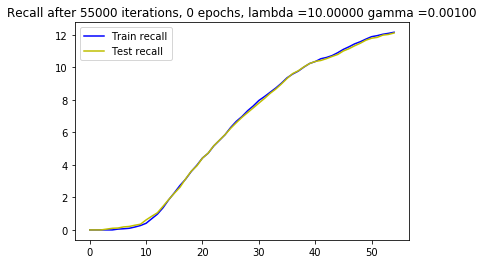

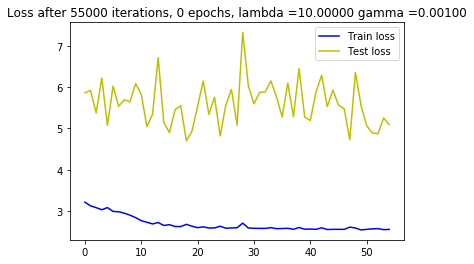

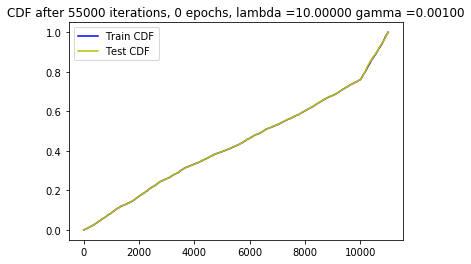






 12%|█▏        | 55001/473047 [36:06<204:21:52,  1.76s/it]




 12%|█▏        | 55009/473047 [36:06<143:31:28,  1.24s/it]

New score:  0.07550784
Train score:  0.33787197
Test score:  0.3391076
Obj first part:  3.1880122423171997
Obj second part:  -0.41598523
Obj first part:  0.0
Obj second part:  -1.0663832
Obj first part:  0.0
Obj second part:  -0.6632087
Obj first part:  0.6230530515313148
Obj second part:  -2.1618776
Obj first part:  0.0
Obj second part:  -1.4241568
Obj first part:  0.19850436598062515
Obj second part:  -2.1129155
Obj first part:  0.0
Obj second part:  -1.0813384
Obj first part:  0.0
Obj second part:  -0.21747106
Obj first part:  1.748475581407547
Obj second part:  -0.41666934
Obj first part:  1.176367625594139
Obj second part:  -0.98283917
Obj first part:  0.0
Obj second part:  -2.2688208
Obj first part:  6.564697623252869
Obj second part:  -3.0070143
Obj first part:  0.5840231105685234
Obj second part:  -0.37860745
Obj first part:  1.2539006769657135
Obj second part:  -0.67633617
Obj first part:  0.0
Obj second part:  -0.030089758







 12%|█▏        | 55017/473047 [36:06<100:55:54,  1.15it/s]




 12%|█▏        | 55025/473047 [36:06<71:05:38,  1.63it/s] 

Obj first part:  0.0
Obj second part:  -0.4246752
Obj first part:  0.0
Obj second part:  -1.4135791
Obj first part:  0.1680905744433403
Obj second part:  -2.2220726
Obj first part:  0.0
Obj second part:  -3.082823
Obj first part:  0.0
Obj second part:  -1.4143678
Obj first part:  3.551645278930664
Obj second part:  -0.48360777
Obj first part:  0.0
Obj second part:  -2.3965015
Obj first part:  2.3057907819747925
Obj second part:  -2.1212966
Obj first part:  0.289286095649004
Obj second part:  -1.840481
Obj first part:  0.0
Obj second part:  -1.941715
Obj first part:  0.9383821487426758
Obj second part:  -1.064903
Obj first part:  0.45779891312122345
Obj second part:  -3.6056106
Obj first part:  0.0
Obj second part:  -2.328895
Obj first part:  0.0
Obj second part:  -2.269276
Obj first part:  1.7879880964756012
Obj second part:  -0.71226215
Obj first part:  0.0
Obj second part:  -0.16878033







 12%|█▏        | 55033/473047 [36:06<50:13:05,  2.31it/s]




 12%|█▏        | 55041/473047 [36:06<35:36:18,  3.26it/s]

Obj first part:  0.0
Obj second part:  -1.7425772
Obj first part:  2.2191788256168365
Obj second part:  -0.919453
Obj first part:  1.2491919845342636
Obj second part:  -3.1858196
Obj first part:  2.3534642159938812
Obj second part:  -2.2567997
Obj first part:  2.6036658883094788
Obj second part:  -4.1648664
Obj first part:  0.0
Obj second part:  -2.381639
Obj first part:  2.575700879096985
Obj second part:  -0.79717326
Obj first part:  0.0
Obj second part:  -1.9896634
Obj first part:  13.314452171325684
Obj second part:  -0.42041743
Obj first part:  0.0
Obj second part:  -1.7160754
Obj first part:  0.0
Obj second part:  -2.0734417
Obj first part:  0.0
Obj second part:  -3.1059904
Obj first part:  0.07895016111433506
Obj second part:  -1.1862651
Obj first part:  0.0
Obj second part:  -0.9024683
Obj first part:  0.0
Obj second part:  -0.6951838
Obj first part:  2.2125570476055145
Obj second part:  -2.3702674







 12%|█▏        | 55049/473047 [36:06<25:23:09,  4.57it/s]




 12%|█▏        | 55057/473047 [36:06<18:13:39,  6.37it/s]

Obj first part:  6.892295479774475
Obj second part:  -1.9291588
Obj first part:  6.955261826515198
Obj second part:  -0.50466466
Obj first part:  0.023360704071819782
Obj second part:  -1.8753783
Obj first part:  0.5229689180850983
Obj second part:  -4.2759585
Obj first part:  0.0
Obj second part:  -3.381531
Obj first part:  0.23480281233787537
Obj second part:  -1.6465101
Obj first part:  0.8428540080785751
Obj second part:  -5.0100093
Obj first part:  0.17570197582244873
Obj second part:  -3.449505
Obj first part:  0.0
Obj second part:  -0.47577837
Obj first part:  0.0
Obj second part:  -0.60925156
Obj first part:  0.9742714464664459
Obj second part:  -2.619314
Obj first part:  0.0
Obj second part:  -0.33054823
Obj first part:  0.6163489446043968
Obj second part:  -1.20543
Obj first part:  0.3328581899404526
Obj second part:  -2.2809725
Obj first part:  1.8920300900936127
Obj second part:  -0.41009814
Obj first part:  0.042176456190645695
Obj second part:  -1.7609264







 12%|█▏        | 55065/473047 [36:06<13:12:45,  8.79it/s]




 12%|█▏        | 55073/473047 [36:07<9:42:19, 11.96it/s] 

Obj first part:  0.02174891997128725
Obj second part:  -0.9542679
Obj first part:  0.546049028635025
Obj second part:  -1.3535326
Obj first part:  0.0
Obj second part:  -4.437394
Obj first part:  0.927618145942688
Obj second part:  -0.85295117
Obj first part:  0.7056635618209839
Obj second part:  -3.5207155
Obj first part:  0.0
Obj second part:  -0.19127572
Obj first part:  0.11711119674146175
Obj second part:  -1.3902982
Obj first part:  0.0
Obj second part:  -0.701695
Obj first part:  0.17993248999118805
Obj second part:  -0.48131123
Obj first part:  0.0
Obj second part:  -2.014494
Obj first part:  0.12848367914557457
Obj second part:  -0.9571549
Obj first part:  0.10117216967046261
Obj second part:  -0.8801238
Obj first part:  1.3570311665534973
Obj second part:  -0.77320063
Obj first part:  0.0
Obj second part:  -4.634758
Obj first part:  0.0
Obj second part:  -1.4358076
Obj first part:  0.6943141669034958
Obj second part:  -1.3077425







 12%|█▏        | 55081/473047 [36:07<7:14:48, 16.02it/s]




 12%|█▏        | 55089/473047 [36:07<5:31:47, 20.99it/s]

Obj first part:  1.7820985615253448
Obj second part:  -0.9103224
Obj first part:  4.455647766590118
Obj second part:  -3.0612254
Obj first part:  0.0
Obj second part:  -3.7368019
Obj first part:  0.0
Obj second part:  -4.887772
Obj first part:  2.659827768802643
Obj second part:  -0.6519202
Obj first part:  0.15429831109941006
Obj second part:  -1.9420856
Obj first part:  0.0
Obj second part:  -1.5618672
Obj first part:  1.9169634580612183
Obj second part:  -0.267615
Obj first part:  0.0
Obj second part:  -2.3802307
Obj first part:  0.32261595129966736
Obj second part:  -1.1009235
Obj first part:  2.672063708305359
Obj second part:  -0.30941343
Obj first part:  0.0
Obj second part:  -0.46621644
Obj first part:  4.962630867958069
Obj second part:  -4.8546166
Obj first part:  0.5007808282971382
Obj second part:  -1.0071054
Obj first part:  2.2425687313079834
Obj second part:  -0.75329924
Obj first part:  0.1436022762209177
Obj second part:  -2.666578







 12%|█▏        | 55097/473047 [36:07<4:19:42, 26.82it/s]




 12%|█▏        | 55105/473047 [36:07<3:29:09, 33.30it/s]

Obj first part:  0.0
Obj second part:  -0.7235423
Obj first part:  0.43884187936782837
Obj second part:  -2.4743292
Obj first part:  0.38634389638900757
Obj second part:  -2.2560399
Obj first part:  1.0200142860412598
Obj second part:  -1.8059125
Obj first part:  0.9817826002836227
Obj second part:  -4.497036
Obj first part:  0.0
Obj second part:  -2.8619692
Obj first part:  1.1982457339763641
Obj second part:  -3.819115
Obj first part:  0.0
Obj second part:  -2.0648298
Obj first part:  2.0742805302143097
Obj second part:  -1.5320041
Obj first part:  4.821348786354065
Obj second part:  -1.376391
Obj first part:  0.0
Obj second part:  -2.573716
Obj first part:  1.092078536748886
Obj second part:  -2.9186974
Obj first part:  2.020069807767868
Obj second part:  -1.9020113
Obj first part:  0.0
Obj second part:  -0.527493
Obj first part:  0.11741046793758869
Obj second part:  -1.5279019
Obj first part:  2.152581661939621
Obj second part:  -1.541766







 12%|█▏        | 55113/473047 [36:07<2:53:34, 40.13it/s]




 12%|█▏        | 55121/473047 [36:07<2:28:55, 46.77it/s]

Obj first part:  0.20294809713959694
Obj second part:  -2.9190779
Obj first part:  0.0
Obj second part:  -0.041409418
Obj first part:  0.0
Obj second part:  -1.0873412
Obj first part:  3.5759934782981873
Obj second part:  -2.9079382
Obj first part:  0.23378834128379822
Obj second part:  -2.7166817
Obj first part:  0.7867036014795303
Obj second part:  -2.979423
Obj first part:  0.0
Obj second part:  -3.4495192
Obj first part:  9.04855728149414
Obj second part:  -0.5773107
Obj first part:  0.0
Obj second part:  -0.17363091
Obj first part:  0.0
Obj second part:  -0.8563784
Obj first part:  1.6467154026031494
Obj second part:  -0.5883068
Obj first part:  0.0
Obj second part:  -1.5000782
Obj first part:  0.0
Obj second part:  -1.7962923
Obj first part:  0.0
Obj second part:  -0.39421928
Obj first part:  0.0
Obj second part:  -0.371748
Obj first part:  0.5431190133094788
Obj second part:  -5.245295







 12%|█▏        | 55129/473047 [36:07<2:11:56, 52.79it/s]




 12%|█▏        | 55137/473047 [36:07<2:00:24, 57.85it/s]

Obj first part:  0.0
Obj second part:  -1.7689203
Obj first part:  1.0477961599826813
Obj second part:  -2.0078459
Obj first part:  0.0
Obj second part:  -1.6578766
Obj first part:  0.7791948318481445
Obj second part:  -2.7317314
Obj first part:  0.1370740495622158
Obj second part:  -1.0483248
Obj first part:  0.0
Obj second part:  -2.0499644
Obj first part:  0.09469461627304554
Obj second part:  -2.2140255
Obj first part:  0.9194821119308472
Obj second part:  -4.443864
Obj first part:  0.4702697694301605
Obj second part:  -0.5231384
Obj first part:  0.1831030286848545
Obj second part:  -1.8600187
Obj first part:  0.07683183066546917
Obj second part:  -1.6644909
Obj first part:  0.911082997918129
Obj second part:  -2.982287
Obj first part:  0.0
Obj second part:  -1.1368705
Obj first part:  0.0
Obj second part:  -2.6385653
Obj first part:  2.4245502054691315
Obj second part:  -1.3135382







 12%|█▏        | 55145/473047 [36:07<1:51:58, 62.20it/s]




 12%|█▏        | 55153/473047 [36:08<1:44:46, 66.48it/s]

Obj first part:  0.8382955938577652
Obj second part:  -2.0904822
Obj first part:  0.0
Obj second part:  -1.4549317
Obj first part:  0.0
Obj second part:  -0.16206713
Obj first part:  0.0
Obj second part:  -1.667132
Obj first part:  0.0
Obj second part:  -0.12745407
Obj first part:  0.10045253671705723
Obj second part:  -1.2670463
Obj first part:  0.4892163351178169
Obj second part:  -1.5544087
Obj first part:  10.855212211608887
Obj second part:  -2.68017
Obj first part:  0.0
Obj second part:  -2.8177729
Obj first part:  0.0
Obj second part:  -2.889735
Obj first part:  0.5185644328594208
Obj second part:  -2.9066586
Obj first part:  0.3590027987957001
Obj second part:  -1.3546636
Obj first part:  0.0
Obj second part:  -0.8733657
Obj first part:  0.0
Obj second part:  -1.0505941
Obj first part:  0.0
Obj second part:  -2.2527525
Obj first part:  0.411185622215271
Obj second part:  -0.101776056







 12%|█▏        | 55161/473047 [36:08<1:41:06, 68.89it/s]




 12%|█▏        | 55169/473047 [36:08<1:37:42, 71.28it/s]

Obj first part:  0.0
Obj second part:  -0.09185834
Obj first part:  0.0
Obj second part:  -0.13137454
Obj first part:  1.526588648557663
Obj second part:  -2.7233787
Obj first part:  0.3396552801132202
Obj second part:  -0.12759045
Obj first part:  0.5823613703250885
Obj second part:  -0.36154228
Obj first part:  0.3457845374941826
Obj second part:  -0.19672854
Obj first part:  0.4260355234146118
Obj second part:  -1.5723836
Obj first part:  0.0
Obj second part:  -0.91685325
Obj first part:  0.16733063384890556
Obj second part:  -2.842482
Obj first part:  0.0
Obj second part:  -1.0371126
Obj first part:  2.9913675785064697
Obj second part:  -1.2257024
Obj first part:  0.10258178226649761
Obj second part:  -1.0536569
Obj first part:  0.0
Obj second part:  -2.2286022
Obj first part:  0.0
Obj second part:  -0.5048884
Obj first part:  0.0
Obj second part:  -0.49985778
Obj first part:  0.0
Obj second part:  -2.2189634







 12%|█▏        | 55177/473047 [36:08<1:35:48, 72.69it/s]




 12%|█▏        | 55185/473047 [36:08<1:34:04, 74.03it/s]

Obj first part:  0.0
Obj second part:  -1.4296136
Obj first part:  1.3608023524284363
Obj second part:  -2.8072784
Obj first part:  0.8881531655788422
Obj second part:  -0.30087602
Obj first part:  0.0
Obj second part:  -2.5083525
Obj first part:  0.0
Obj second part:  -1.0445176
Obj first part:  0.28128668665885925
Obj second part:  -1.7170508
Obj first part:  0.0
Obj second part:  -1.3909212
Obj first part:  2.5790202617645264
Obj second part:  -0.47037488
Obj first part:  1.0013381391763687
Obj second part:  -0.99441504
Obj first part:  0.0
Obj second part:  -1.3751667
Obj first part:  0.0
Obj second part:  -2.7410793
Obj first part:  1.0395634174346924
Obj second part:  -3.095342
Obj first part:  0.050596785731613636
Obj second part:  -3.6397295
Obj first part:  0.0
Obj second part:  -0.5324089
Obj first part:  3.097281754016876
Obj second part:  -2.945916
Obj first part:  0.0
Obj second part:  -2.8870785







 12%|█▏        | 55193/473047 [36:08<1:32:57, 74.92it/s]




 12%|█▏        | 55201/473047 [36:08<1:32:19, 75.43it/s]

Obj first part:  1.1685864627361298
Obj second part:  -1.219375
Obj first part:  0.0
Obj second part:  -0.274125
Obj first part:  0.0
Obj second part:  -0.1509179
Obj first part:  0.0
Obj second part:  -1.9019935
Obj first part:  0.0
Obj second part:  -0.93683445
Obj first part:  0.0
Obj second part:  -1.3266736
Obj first part:  0.7084283977746964
Obj second part:  -0.17138958
Obj first part:  1.1719312518835068
Obj second part:  -0.57615614
Obj first part:  1.0215417295694351
Obj second part:  -0.3590992
Obj first part:  0.05840448196977377
Obj second part:  -0.8752326
Obj first part:  1.0207335650920868
Obj second part:  -3.7767649
Obj first part:  0.0
Obj second part:  -0.5557354
Obj first part:  0.0
Obj second part:  -0.69642955
Obj first part:  0.0
Obj second part:  -1.0292926
Obj first part:  0.0
Obj second part:  -0.84982145
Obj first part:  0.19993994385004044
Obj second part:  -0.7211431







 12%|█▏        | 55209/473047 [36:08<1:31:58, 75.72it/s]




 12%|█▏        | 55217/473047 [36:08<1:31:37, 76.00it/s]

Obj first part:  1.17400623857975
Obj second part:  -0.7942962
Obj first part:  0.0
Obj second part:  -1.5380467
Obj first part:  1.5938584506511688
Obj second part:  -2.652379
Obj first part:  0.3753533214330673
Obj second part:  -0.38100368
Obj first part:  0.18449189141392708
Obj second part:  -2.579285
Obj first part:  0.1893937587738037
Obj second part:  -0.7884644
Obj first part:  0.5697203427553177
Obj second part:  -1.9643214
Obj first part:  0.0
Obj second part:  -0.5052045
Obj first part:  0.0
Obj second part:  -0.5121781
Obj first part:  0.30889250338077545
Obj second part:  -0.47877055
Obj first part:  1.1765321344137192
Obj second part:  -3.4048707
Obj first part:  0.0
Obj second part:  -3.7846045
Obj first part:  0.0
Obj second part:  -1.3490772
Obj first part:  12.888442277908325
Obj second part:  -0.98916554
Obj first part:  0.26514144614338875
Obj second part:  -1.2443888
Obj first part:  0.0
Obj second part:  -1.9171853







 12%|█▏        | 55225/473047 [36:09<1:31:20, 76.24it/s]




 12%|█▏        | 55233/473047 [36:09<1:31:09, 76.39it/s]

Obj first part:  0.0
Obj second part:  -0.38553435
Obj first part:  1.1042816936969757
Obj second part:  -4.079892
Obj first part:  1.8589730560779572
Obj second part:  -1.1185751
Obj first part:  0.5688656121492386
Obj second part:  -0.015910828
Obj first part:  0.0
Obj second part:  -1.5670624
Obj first part:  0.0
Obj second part:  -0.29707837
Obj first part:  0.0
Obj second part:  -3.7055297
Obj first part:  0.7848577946424484
Obj second part:  -1.5521698
Obj first part:  2.920563519001007
Obj second part:  -1.6133475
Obj first part:  0.0
Obj second part:  -0.21622597
Obj first part:  0.0
Obj second part:  -3.9346268
Obj first part:  0.4783131554722786
Obj second part:  -1.1870621
Obj first part:  0.4584227129817009
Obj second part:  -0.09359493
Obj first part:  0.0
Obj second part:  -1.3362104
Obj first part:  0.4327893629670143
Obj second part:  -1.3081115
Obj first part:  0.0
Obj second part:  -0.61447185







 12%|█▏        | 55241/473047 [36:09<1:31:01, 76.50it/s]




 12%|█▏        | 55249/473047 [36:09<1:31:08, 76.40it/s]

Obj first part:  0.0
Obj second part:  -2.4501796
Obj first part:  0.0
Obj second part:  -2.2434976
Obj first part:  0.0
Obj second part:  -0.29354492
Obj first part:  3.246046304702759
Obj second part:  -1.5008719
Obj first part:  0.0
Obj second part:  -0.26504287
Obj first part:  0.1703742891550064
Obj second part:  -1.1602244
Obj first part:  0.0
Obj second part:  -2.245651
Obj first part:  1.0243798047304153
Obj second part:  -0.040631488
Obj first part:  0.0
Obj second part:  -1.6439852
Obj first part:  0.0
Obj second part:  -0.082336724
Obj first part:  3.219805061817169
Obj second part:  -2.1468158
Obj first part:  0.0
Obj second part:  -0.67965776
Obj first part:  3.351217806339264
Obj second part:  -1.9078376
Obj first part:  0.0
Obj second part:  -3.8639321
Obj first part:  0.0
Obj second part:  -3.3708487
Obj first part:  2.8318598866462708
Obj second part:  -1.7481153







 12%|█▏        | 55257/473047 [36:09<1:31:17, 76.27it/s]




 12%|█▏        | 55265/473047 [36:09<1:31:10, 76.37it/s]

Obj first part:  0.0
Obj second part:  -2.5192938
Obj first part:  0.0
Obj second part:  -2.2795446
Obj first part:  0.0
Obj second part:  -2.411447
Obj first part:  0.0
Obj second part:  -1.8479303
Obj first part:  1.2555882334709167
Obj second part:  -0.4593625
Obj first part:  0.0
Obj second part:  -0.9735739
Obj first part:  3.0800890922546387
Obj second part:  -0.744517
Obj first part:  0.22152310237288475
Obj second part:  -0.8601485
Obj first part:  0.0
Obj second part:  -2.329631
Obj first part:  0.0
Obj second part:  -1.1454965
Obj first part:  0.0
Obj second part:  -2.2483675
Obj first part:  0.0
Obj second part:  -0.38049874
Obj first part:  0.0
Obj second part:  -1.1412615
Obj first part:  2.8609660267829895
Obj second part:  -1.2759452
Obj first part:  0.0
Obj second part:  -2.0274212
Obj first part:  0.0
Obj second part:  -0.36174387







 12%|█▏        | 55273/473047 [36:09<1:30:12, 77.19it/s]




 12%|█▏        | 55281/473047 [36:09<1:30:22, 77.04it/s]

Obj first part:  0.5510672181844711
Obj second part:  -3.3806634
Obj first part:  0.9445662796497345
Obj second part:  -1.5779464
Obj first part:  0.9604325890541077
Obj second part:  -0.17992564
Obj first part:  0.9781643003225327
Obj second part:  -1.4412028
Obj first part:  4.54921156167984
Obj second part:  -0.17790748
Obj first part:  0.0
Obj second part:  -1.4281926
Obj first part:  0.0
Obj second part:  -1.7116303
Obj first part:  3.369741141796112
Obj second part:  -2.097011
Obj first part:  0.0
Obj second part:  -2.9882731
Obj first part:  0.0
Obj second part:  -0.41757137
Obj first part:  0.0
Obj second part:  -0.96828824
Obj first part:  0.348195880651474
Obj second part:  -0.21462272
Obj first part:  0.0
Obj second part:  -0.37452024
Obj first part:  1.0332802683115005
Obj second part:  -0.48103002
Obj first part:  2.5819307565689087
Obj second part:  -1.8836621
Obj first part:  0.0
Obj second part:  -1.146545







 12%|█▏        | 55289/473047 [36:09<1:30:44, 76.73it/s]




 12%|█▏        | 55297/473047 [36:09<1:30:41, 76.77it/s]

Obj first part:  0.20397158339619637
Obj second part:  -0.41095713
Obj first part:  0.22109398618340492
Obj second part:  -0.4561417
Obj first part:  0.0
Obj second part:  -0.25403464
Obj first part:  3.1871038675308228
Obj second part:  -0.8444718
Obj first part:  5.798541307449341
Obj second part:  -0.62539124
Obj first part:  10.625299215316772
Obj second part:  -0.4220855
Obj first part:  0.0
Obj second part:  -0.7008238
Obj first part:  0.5221724882721901
Obj second part:  -1.9086368
Obj first part:  0.0
Obj second part:  -2.4269545
Obj first part:  2.11044505238533
Obj second part:  -4.1236024
Obj first part:  0.0
Obj second part:  -3.6268806
Obj first part:  0.0
Obj second part:  -3.3254292
Obj first part:  0.0
Obj second part:  -0.528691
Obj first part:  0.0
Obj second part:  -0.48214638
Obj first part:  0.0
Obj second part:  -2.5451083
Obj first part:  0.0
Obj second part:  -1.620422







 12%|█▏        | 55305/473047 [36:10<1:30:44, 76.73it/s]




 12%|█▏        | 55313/473047 [36:10<1:30:29, 76.93it/s]

Obj first part:  0.0
Obj second part:  -2.4223623
Obj first part:  3.708648681640625
Obj second part:  -0.58785945
Obj first part:  0.0
Obj second part:  -1.8825023
Obj first part:  7.268950939178467
Obj second part:  -2.5932422
Obj first part:  0.7343466579914093
Obj second part:  -1.7947389
Obj first part:  0.0
Obj second part:  -4.574716
Obj first part:  0.0
Obj second part:  -3.8581324
Obj first part:  10.504395961761475
Obj second part:  -0.5134136
Obj first part:  0.33739250153303146
Obj second part:  -2.9815195
Obj first part:  0.0
Obj second part:  -0.50539744
Obj first part:  0.0
Obj second part:  -3.319882
Obj first part:  4.65110182762146
Obj second part:  -1.1587992
Obj first part:  0.34043703228235245
Obj second part:  -3.8123722
Obj first part:  0.5995235219597816
Obj second part:  -0.55002093
Obj first part:  0.2961144968867302
Obj second part:  -4.6119814
Obj first part:  0.0
Obj second part:  -1.3251638







 12%|█▏        | 55321/473047 [36:10<1:30:24, 77.01it/s]




 12%|█▏        | 55329/473047 [36:10<1:30:10, 77.21it/s]

Obj first part:  0.264752134680748
Obj second part:  -0.1568421
Obj first part:  0.0
Obj second part:  -1.8385935
Obj first part:  2.896873354911804
Obj second part:  -2.8609416
Obj first part:  0.0
Obj second part:  -2.457523
Obj first part:  1.7374402284622192
Obj second part:  -1.1152861
Obj first part:  0.09846212342381477
Obj second part:  -1.850564
Obj first part:  0.9742753207683563
Obj second part:  -3.579683
Obj first part:  3.591422140598297
Obj second part:  -0.69383097
Obj first part:  2.9421603679656982
Obj second part:  -4.604666
Obj first part:  0.0
Obj second part:  -2.1067173
Obj first part:  0.0
Obj second part:  -0.076115556
Obj first part:  0.0
Obj second part:  -4.051001
Obj first part:  0.5804968625307083
Obj second part:  -0.50489557
Obj first part:  0.0
Obj second part:  -0.8815808
Obj first part:  0.0
Obj second part:  -1.5020272
Obj first part:  0.0
Obj second part:  -2.9898386







 12%|█▏        | 55337/473047 [36:10<1:30:34, 76.87it/s]




 12%|█▏        | 55345/473047 [36:10<1:30:20, 77.06it/s]

Obj first part:  2.5008824467658997
Obj second part:  -3.9081779
Obj first part:  0.0
Obj second part:  -5.6718335
Obj first part:  4.064653813838959
Obj second part:  -2.3771045
Obj first part:  0.0
Obj second part:  -0.64451057
Obj first part:  0.0
Obj second part:  -0.78259295
Obj first part:  0.11099392548203468
Obj second part:  -0.86297214
Obj first part:  1.6798222064971924
Obj second part:  -0.97597224
Obj first part:  0.0
Obj second part:  -1.0550202
Obj first part:  0.0
Obj second part:  -0.6724313
Obj first part:  0.0
Obj second part:  -1.6982023
Obj first part:  0.0
Obj second part:  -0.35393563
Obj first part:  0.0
Obj second part:  -2.8767753
Obj first part:  0.0
Obj second part:  -2.683125
Obj first part:  0.3080512024462223
Obj second part:  -0.62256444
Obj first part:  0.0
Obj second part:  -1.0107343
Obj first part:  0.0
Obj second part:  -5.150469







 12%|█▏        | 55353/473047 [36:10<1:30:49, 76.64it/s]




 12%|█▏        | 55361/473047 [36:10<1:30:46, 76.68it/s]

Obj first part:  2.6161712408065796
Obj second part:  -0.9546268
Obj first part:  0.25073567405343056
Obj second part:  -2.0862186
Obj first part:  0.0
Obj second part:  -1.6956928
Obj first part:  0.23858750239014626
Obj second part:  -2.4624748
Obj first part:  0.0
Obj second part:  -0.38481137
Obj first part:  0.0
Obj second part:  -2.0895908
Obj first part:  0.0
Obj second part:  -1.9268985
Obj first part:  0.0
Obj second part:  -1.6942806
Obj first part:  0.15023231506347656
Obj second part:  -2.0986898
Obj first part:  2.900201678276062
Obj second part:  -0.4270569
Obj first part:  2.2576044499874115
Obj second part:  -0.18808085
Obj first part:  0.0
Obj second part:  -0.46982473
Obj first part:  0.15860367566347122
Obj second part:  -2.3399317
Obj first part:  0.5047869309782982
Obj second part:  -3.0793483
Obj first part:  0.232668649405241
Obj second part:  -0.8147503
Obj first part:  0.5224132165312767
Obj second part:  -1.8381038







 12%|█▏        | 55369/473047 [36:10<1:31:00, 76.49it/s]




 12%|█▏        | 55377/473047 [36:10<1:30:44, 76.72it/s]

Obj first part:  0.0
Obj second part:  -1.2749541
Obj first part:  3.609904646873474
Obj second part:  -0.78930044
Obj first part:  0.0
Obj second part:  -0.74399304
Obj first part:  0.0
Obj second part:  -2.2057629
Obj first part:  0.0
Obj second part:  -0.84252983
Obj first part:  2.125498056411743
Obj second part:  -0.8600008
Obj first part:  0.6117630004882812
Obj second part:  -0.8862761
Obj first part:  0.0
Obj second part:  -1.9646636
Obj first part:  0.3500118851661682
Obj second part:  -0.62866986
Obj first part:  1.3331396877765656
Obj second part:  -1.9104457
Obj first part:  2.3631076514720917
Obj second part:  -1.435578
Obj first part:  0.0
Obj second part:  -1.4727497
Obj first part:  0.0
Obj second part:  -0.21224357
Obj first part:  0.0
Obj second part:  -0.103872195
Obj first part:  4.542639851570129
Obj second part:  -1.4567394
Obj first part:  0.0
Obj second part:  -2.8295383







 12%|█▏        | 55385/473047 [36:11<1:30:58, 76.51it/s]




 12%|█▏        | 55393/473047 [36:11<1:30:53, 76.59it/s]

Obj first part:  0.6366275995969772
Obj second part:  -1.7071261
Obj first part:  0.0
Obj second part:  -1.8162122
Obj first part:  0.5628934130072594
Obj second part:  -1.3670018
Obj first part:  0.0
Obj second part:  -1.9043717
Obj first part:  0.0
Obj second part:  -0.6834027
Obj first part:  0.0
Obj second part:  -1.7307601
Obj first part:  0.31696733087301254
Obj second part:  -0.12631948
Obj first part:  1.0108276456594467
Obj second part:  -3.0091953
Obj first part:  0.8357036113739014
Obj second part:  -1.3526454
Obj first part:  0.0
Obj second part:  -0.60468304
Obj first part:  0.2042205072939396
Obj second part:  -1.50973
Obj first part:  2.203075885772705
Obj second part:  -0.5543487
Obj first part:  0.0
Obj second part:  -0.18185827
Obj first part:  0.0
Obj second part:  -0.5402294
Obj first part:  0.0
Obj second part:  -1.9355187
Obj first part:  0.0
Obj second part:  -1.1440971







 12%|█▏        | 55401/473047 [36:11<1:30:19, 77.07it/s]




 12%|█▏        | 55409/473047 [36:11<1:30:20, 77.05it/s]

Obj first part:  3.8392531871795654
Obj second part:  -2.0303397
Obj first part:  0.0
Obj second part:  -2.0772345
Obj first part:  0.0
Obj second part:  -0.093897566
Obj first part:  1.8190646171569824
Obj second part:  -1.6232513
Obj first part:  0.0
Obj second part:  -2.1646264
Obj first part:  1.657983809709549
Obj second part:  -0.55733836
Obj first part:  1.0618586838245392
Obj second part:  -2.106092
Obj first part:  0.0
Obj second part:  -0.09256549
Obj first part:  0.5059019848704338
Obj second part:  -0.37473515
Obj first part:  7.360109090805054
Obj second part:  -1.6890064
Obj first part:  0.6140802800655365
Obj second part:  -1.3677474
Obj first part:  0.0
Obj second part:  -1.7286366
Obj first part:  0.0
Obj second part:  -0.47356576
Obj first part:  6.874331831932068
Obj second part:  -1.5028721
Obj first part:  0.25286776944994926
Obj second part:  -0.5018269
Obj first part:  0.0
Obj second part:  -0.17913534







 12%|█▏        | 55417/473047 [36:11<1:30:23, 77.01it/s]




 12%|█▏        | 55425/473047 [36:11<1:30:30, 76.90it/s]

Obj first part:  0.0
Obj second part:  -0.89153373
Obj first part:  0.0
Obj second part:  -0.71921104
Obj first part:  0.0
Obj second part:  -3.269407
Obj first part:  0.20611755549907684
Obj second part:  -1.1463027
Obj first part:  0.0
Obj second part:  -1.463689
Obj first part:  0.0
Obj second part:  -0.752879
Obj first part:  0.0
Obj second part:  -0.025640372
Obj first part:  2.7569404244422913
Obj second part:  -0.36691648
Obj first part:  0.07986927404999733
Obj second part:  -2.061679
Obj first part:  0.0
Obj second part:  -1.2148606
Obj first part:  0.0
Obj second part:  -0.69203556
Obj first part:  0.2736492268741131
Obj second part:  -1.2994081
Obj first part:  0.0
Obj second part:  -1.5030316
Obj first part:  0.0
Obj second part:  -0.85848045
Obj first part:  13.111963272094727
Obj second part:  -0.1640593
Obj first part:  4.488920867443085
Obj second part:  -1.6822499







 12%|█▏        | 55433/473047 [36:11<1:30:34, 76.84it/s]




 12%|█▏        | 55441/473047 [36:11<1:30:51, 76.60it/s]

Obj first part:  0.0
Obj second part:  -1.9363083
Obj first part:  0.0
Obj second part:  -2.9948661
Obj first part:  2.4033701419830322
Obj second part:  -2.4773307
Obj first part:  1.1672277003526688
Obj second part:  -0.6886577
Obj first part:  0.0
Obj second part:  -1.7660812
Obj first part:  0.0
Obj second part:  -0.35629782
Obj first part:  0.2545369602739811
Obj second part:  -4.299563
Obj first part:  0.0
Obj second part:  -0.43994394
Obj first part:  0.0
Obj second part:  -0.21850663
Obj first part:  0.0
Obj second part:  -1.4708954
Obj first part:  0.810733437538147
Obj second part:  -1.7628214
Obj first part:  0.0
Obj second part:  -0.7065047
Obj first part:  2.232012450695038
Obj second part:  -3.5796106
Obj first part:  0.0
Obj second part:  -2.3946652
Obj first part:  0.0
Obj second part:  -1.533634
Obj first part:  0.6844200193881989
Obj second part:  -2.6600268







 12%|█▏        | 55449/473047 [36:11<1:31:01, 76.46it/s]




 12%|█▏        | 55457/473047 [36:12<1:30:47, 76.65it/s]

Obj first part:  0.0
Obj second part:  -0.37221393
Obj first part:  0.0
Obj second part:  -1.2469479
Obj first part:  0.0
Obj second part:  -0.30774552
Obj first part:  0.0
Obj second part:  -1.144422
Obj first part:  0.36432087421417236
Obj second part:  -3.5795765
Obj first part:  5.509490966796875
Obj second part:  -1.2884966
Obj first part:  0.0
Obj second part:  -0.9223526
Obj first part:  0.732494443655014
Obj second part:  -3.964332
Obj first part:  0.0
Obj second part:  -0.564064
Obj first part:  12.489168643951416
Obj second part:  -0.85135114
Obj first part:  0.0
Obj second part:  -0.62464654
Obj first part:  0.5673648416996002
Obj second part:  -2.0787218
Obj first part:  8.935582041740417
Obj second part:  -0.8872597
Obj first part:  0.6116259843111038
Obj second part:  -2.4486828
Obj first part:  1.7207469046115875
Obj second part:  -3.278591
Obj first part:  0.0
Obj second part:  -2.240539







 12%|█▏        | 55465/473047 [36:12<1:30:48, 76.64it/s]




 12%|█▏        | 55473/473047 [36:12<1:30:30, 76.89it/s]

Obj first part:  0.0
Obj second part:  -1.3267715
Obj first part:  1.0969024151563644
Obj second part:  -0.050307933
Obj first part:  1.8947629630565643
Obj second part:  -0.7922297
Obj first part:  0.0
Obj second part:  -0.82729334
Obj first part:  0.6585729122161865
Obj second part:  -2.92714
Obj first part:  0.07514046970754862
Obj second part:  -3.159347
Obj first part:  0.2729776129126549
Obj second part:  -3.953397
Obj first part:  0.0
Obj second part:  -5.19214
Obj first part:  0.0
Obj second part:  -0.7486668
Obj first part:  2.1338823437690735
Obj second part:  -0.6475817
Obj first part:  0.0
Obj second part:  -2.0582871
Obj first part:  0.13031799346208572
Obj second part:  -2.087436
Obj first part:  0.3644060343503952
Obj second part:  -0.2833236
Obj first part:  0.0
Obj second part:  -3.0364323
Obj first part:  0.0
Obj second part:  -0.42962775
Obj first part:  0.0
Obj second part:  -0.4512155







 12%|█▏        | 55481/473047 [36:12<1:30:47, 76.66it/s]




 12%|█▏        | 55489/473047 [36:12<1:30:43, 76.70it/s]

Obj first part:  0.0
Obj second part:  -1.5060986
Obj first part:  0.11608816683292389
Obj second part:  -0.7127464
Obj first part:  0.4437654837965965
Obj second part:  -0.32320032
Obj first part:  0.36430489271879196
Obj second part:  -0.62468207
Obj first part:  0.0
Obj second part:  -1.6101148
Obj first part:  0.582406260073185
Obj second part:  -0.39646336
Obj first part:  0.0
Obj second part:  -0.8196959
Obj first part:  0.3038153424859047
Obj second part:  -2.9459763
Obj first part:  8.885107040405273
Obj second part:  -1.0305448
Obj first part:  0.0
Obj second part:  -0.9045904
Obj first part:  0.6084392964839935
Obj second part:  -1.3281415
Obj first part:  0.08317711763083935
Obj second part:  -0.08826774
Obj first part:  0.0
Obj second part:  -0.13305923
Obj first part:  0.0
Obj second part:  -0.78629583
Obj first part:  0.0
Obj second part:  -1.2595936
Obj first part:  0.0
Obj second part:  -1.853197







 12%|█▏        | 55497/473047 [36:12<1:31:06, 76.39it/s]




 12%|█▏        | 55505/473047 [36:12<1:30:52, 76.57it/s]

Obj first part:  0.13233337551355362
Obj second part:  -1.1016912
Obj first part:  1.4949499070644379
Obj second part:  -2.7415547
Obj first part:  0.7729668170213699
Obj second part:  -2.3047173
Obj first part:  0.0
Obj second part:  -0.7905637
Obj first part:  0.0
Obj second part:  -1.8348945
Obj first part:  4.557407200336456
Obj second part:  -1.2176926
Obj first part:  0.0
Obj second part:  -4.5836964
Obj first part:  0.0
Obj second part:  -0.66465515
Obj first part:  0.5716123059391975
Obj second part:  -2.0763984
Obj first part:  0.0
Obj second part:  -0.5916261
Obj first part:  5.560558438301086
Obj second part:  -1.7090766
Obj first part:  0.0
Obj second part:  -0.5842686
Obj first part:  0.269249826669693
Obj second part:  -2.4698868
Obj first part:  0.0605735694989562
Obj second part:  -2.6865609
Obj first part:  0.0
Obj second part:  -1.1291788
Obj first part:  1.0973360389471054
Obj second part:  -0.57312983







 12%|█▏        | 55513/473047 [36:12<1:30:43, 76.71it/s]




 12%|█▏        | 55521/473047 [36:12<1:30:09, 77.19it/s]

Obj first part:  0.0
Obj second part:  -1.7869222
Obj first part:  3.278312385082245
Obj second part:  -1.2752831
Obj first part:  0.0
Obj second part:  -0.90769744
Obj first part:  0.0
Obj second part:  -4.0700965
Obj first part:  1.030333936214447
Obj second part:  -1.5412885
Obj first part:  0.7503765821456909
Obj second part:  -0.4901967
Obj first part:  0.0
Obj second part:  -2.5292475
Obj first part:  0.0
Obj second part:  -0.1590812
Obj first part:  0.0
Obj second part:  -0.47120255
Obj first part:  2.7199509739875793
Obj second part:  -1.0040455
Obj first part:  0.0
Obj second part:  -2.0523925
Obj first part:  7.128817439079285
Obj second part:  -4.1138177
Obj first part:  0.0
Obj second part:  -2.1883636
Obj first part:  0.0
Obj second part:  -0.61417943
Obj first part:  0.443924181163311
Obj second part:  -1.8465476
Obj first part:  0.0
Obj second part:  -0.73835415







 12%|█▏        | 55529/473047 [36:12<1:30:11, 77.15it/s]




 12%|█▏        | 55537/473047 [36:13<1:30:17, 77.06it/s]

Obj first part:  0.0
Obj second part:  -0.8881141
Obj first part:  0.0
Obj second part:  -1.1394378
Obj first part:  0.0
Obj second part:  -0.61715114
Obj first part:  4.975399374961853
Obj second part:  -0.8542103
Obj first part:  0.0
Obj second part:  -1.1697536
Obj first part:  0.0
Obj second part:  -1.5412623
Obj first part:  0.0
Obj second part:  -1.1804919
Obj first part:  1.9263933598995209
Obj second part:  -1.4787053
Obj first part:  0.12409604154527187
Obj second part:  -3.4751637
Obj first part:  0.0
Obj second part:  -1.1346842
Obj first part:  7.776944041252136
Obj second part:  -1.4057761
Obj first part:  0.0
Obj second part:  -0.1916198
Obj first part:  0.06623535882681608
Obj second part:  -1.5431831
Obj first part:  0.9749990701675415
Obj second part:  -1.624301
Obj first part:  0.0
Obj second part:  -2.7269638
Obj first part:  2.7310124039649963
Obj second part:  -1.3658592







 12%|█▏        | 55545/473047 [36:13<1:30:28, 76.91it/s]




 12%|█▏        | 55553/473047 [36:13<1:30:19, 77.03it/s]

Obj first part:  0.0
Obj second part:  -1.4147329
Obj first part:  0.0
Obj second part:  -2.038595
Obj first part:  0.0
Obj second part:  -1.3349378
Obj first part:  0.10358192957937717
Obj second part:  -0.70041037
Obj first part:  0.0
Obj second part:  -3.4277349
Obj first part:  0.9839688241481781
Obj second part:  -0.2654605
Obj first part:  6.99390709400177
Obj second part:  -3.655776
Obj first part:  2.9924240708351135
Obj second part:  -0.6166572
Obj first part:  0.0
Obj second part:  -1.6560099
Obj first part:  1.3692708313465118
Obj second part:  -0.16915826
Obj first part:  0.0
Obj second part:  -1.327842
Obj first part:  0.7048127800226212
Obj second part:  -0.5022118
Obj first part:  0.0
Obj second part:  -0.65971214
Obj first part:  0.0
Obj second part:  -3.49605
Obj first part:  0.0
Obj second part:  -0.5222064
Obj first part:  0.0
Obj second part:  -2.5819697







 12%|█▏        | 55561/473047 [36:13<1:30:38, 76.77it/s]




 12%|█▏        | 55569/473047 [36:13<1:30:25, 76.95it/s]

Obj first part:  0.703287348151207
Obj second part:  -1.4187763
Obj first part:  0.09489404037594795
Obj second part:  -3.4345322
Obj first part:  1.2345166504383087
Obj second part:  -0.67608607
Obj first part:  0.0
Obj second part:  -1.0568113
Obj first part:  0.7380140572786331
Obj second part:  -1.0062114
Obj first part:  0.040553128346800804
Obj second part:  -2.5658457
Obj first part:  0.0
Obj second part:  -0.5849689
Obj first part:  0.7978916168212891
Obj second part:  -1.190855
Obj first part:  0.0
Obj second part:  -2.6762216
Obj first part:  0.0
Obj second part:  -4.3441267
Obj first part:  1.245439052581787
Obj second part:  -1.4685696
Obj first part:  1.0153001546859741
Obj second part:  -0.8775482
Obj first part:  1.2810391187667847
Obj second part:  -2.0095513
Obj first part:  0.0
Obj second part:  -3.1383212
Obj first part:  1.0903528332710266
Obj second part:  -2.8731644
Obj first part:  3.860406279563904
Obj second part:  -3.0986187







 12%|█▏        | 55577/473047 [36:13<1:30:42, 76.70it/s]




 12%|█▏        | 55585/473047 [36:13<1:30:26, 76.93it/s]

Obj first part:  0.9374380856752396
Obj second part:  -1.1026721
Obj first part:  0.0
Obj second part:  -2.577652
Obj first part:  0.0
Obj second part:  -1.4405314
Obj first part:  0.0
Obj second part:  -0.5173582
Obj first part:  0.16840776428580284
Obj second part:  -0.42611992
Obj first part:  0.0
Obj second part:  -2.7259257
Obj first part:  0.0
Obj second part:  -1.9607638
Obj first part:  1.3078902661800385
Obj second part:  -1.6053177
Obj first part:  1.2804962694644928
Obj second part:  -0.7491877
Obj first part:  0.0
Obj second part:  -2.3725617
Obj first part:  5.085879564285278
Obj second part:  -0.52693236
Obj first part:  0.0
Obj second part:  -0.13169903
Obj first part:  0.0
Obj second part:  -0.9827192
Obj first part:  0.0
Obj second part:  -3.039887
Obj first part:  0.0
Obj second part:  -2.675151
Obj first part:  4.142473638057709
Obj second part:  -0.67797947







 12%|█▏        | 55593/473047 [36:13<1:30:48, 76.62it/s]




 12%|█▏        | 55601/473047 [36:13<1:31:21, 76.16it/s]

Obj first part:  1.6758613288402557
Obj second part:  -4.1479845
Obj first part:  0.0
Obj second part:  -0.61941695
Obj first part:  0.0
Obj second part:  -5.111291
Obj first part:  1.1870071291923523
Obj second part:  -0.36440337
Obj first part:  0.0
Obj second part:  -2.1373513
Obj first part:  0.0
Obj second part:  -1.0157378
Obj first part:  0.0
Obj second part:  -0.760382
Obj first part:  0.0
Obj second part:  -0.9243028
Obj first part:  0.0
Obj second part:  -1.9089411
Obj first part:  2.4859242141246796
Obj second part:  -1.1989685
Obj first part:  3.278816044330597
Obj second part:  -0.14787637
Obj first part:  0.03581930650398135
Obj second part:  -0.36652908
Obj first part:  0.3392224758863449
Obj second part:  -3.465692
Obj first part:  0.0
Obj second part:  -0.39461118
Obj first part:  0.04721800796687603
Obj second part:  -0.6389465
Obj first part:  0.0
Obj second part:  -1.389667







 12%|█▏        | 55609/473047 [36:14<1:31:18, 76.20it/s]




 12%|█▏        | 55617/473047 [36:14<1:31:02, 76.42it/s]

Obj first part:  1.2967026233673096
Obj second part:  -0.8723029
Obj first part:  0.6824756413698196
Obj second part:  -1.3851931
Obj first part:  0.0
Obj second part:  -0.93103933
Obj first part:  0.0
Obj second part:  -1.2168702
Obj first part:  13.565551042556763
Obj second part:  -2.7829719
Obj first part:  0.0
Obj second part:  -2.7960107
Obj first part:  0.0
Obj second part:  -3.1316073
Obj first part:  0.0
Obj second part:  -3.4427793
Obj first part:  0.0
Obj second part:  -0.82246655
Obj first part:  0.6713447719812393
Obj second part:  -1.6055346
Obj first part:  0.0905364379286766
Obj second part:  -2.239333
Obj first part:  0.060244142077863216
Obj second part:  -0.8069918
Obj first part:  1.5100540220737457
Obj second part:  -1.5361675
Obj first part:  1.0240288078784943
Obj second part:  -3.1493554
Obj first part:  1.7122286558151245
Obj second part:  -0.1525622
Obj first part:  0.0
Obj second part:  -0.6850902







 12%|█▏        | 55625/473047 [36:14<1:31:08, 76.33it/s]




 12%|█▏        | 55633/473047 [36:14<1:30:58, 76.47it/s]

Obj first part:  0.0
Obj second part:  -0.8463785
Obj first part:  0.0
Obj second part:  -1.0492797
Obj first part:  0.0
Obj second part:  -2.0246227
Obj first part:  0.20160160958766937
Obj second part:  -1.0121298
Obj first part:  0.18996067345142365
Obj second part:  -1.2355833
Obj first part:  0.0
Obj second part:  -0.23178643
Obj first part:  0.0
Obj second part:  -2.509326
Obj first part:  1.536606103181839
Obj second part:  -0.9501108
Obj first part:  0.0
Obj second part:  -0.68722695
Obj first part:  0.0
Obj second part:  -2.064438
Obj first part:  1.6135536134243011
Obj second part:  -0.6171858
Obj first part:  1.747484803199768
Obj second part:  -0.5982844
Obj first part:  0.0
Obj second part:  -3.1379516
Obj first part:  7.091794013977051
Obj second part:  -3.5034893
Obj first part:  2.876991033554077
Obj second part:  -0.24565391







 12%|█▏        | 55641/473047 [36:14<1:32:15, 75.41it/s]




 12%|█▏        | 55649/473047 [36:14<1:31:01, 76.43it/s]

Obj first part:  0.0
Obj second part:  -0.28046897
Obj first part:  4.609814286231995
Obj second part:  -3.3500304
Obj first part:  0.0
Obj second part:  -2.0444562
Obj first part:  10.253145694732666
Obj second part:  -0.73911804
Obj first part:  0.0
Obj second part:  -4.275985
Obj first part:  2.8774261474609375
Obj second part:  -1.5296668
Obj first part:  0.30652549117803574
Obj second part:  -0.47664317
Obj first part:  0.3676868602633476
Obj second part:  -1.9820037
Obj first part:  0.28640374541282654
Obj second part:  -1.531284
Obj first part:  0.04876783583313227
Obj second part:  -1.7807517
Obj first part:  0.0
Obj second part:  -1.3276798
Obj first part:  0.0
Obj second part:  -3.3747985
Obj first part:  0.0
Obj second part:  -3.462753
Obj first part:  0.0
Obj second part:  -2.4765027
Obj first part:  0.0
Obj second part:  -0.43926564
Obj first part:  0.0
Obj second part:  -0.5632473







 12%|█▏        | 55657/473047 [36:14<1:31:00, 76.44it/s]




 12%|█▏        | 55665/473047 [36:14<1:30:50, 76.57it/s]

Obj first part:  0.9745842963457108
Obj second part:  -0.7066922
Obj first part:  1.0560870170593262
Obj second part:  -2.4477181
Obj first part:  0.0
Obj second part:  -0.6837704
Obj first part:  12.24591851234436
Obj second part:  -2.8689032
Obj first part:  0.0
Obj second part:  -3.8359275
Obj first part:  2.613956332206726
Obj second part:  -0.94299567
Obj first part:  0.0
Obj second part:  -1.3139889
Obj first part:  0.23456305265426636
Obj second part:  -2.6053135
Obj first part:  0.0
Obj second part:  -1.106553
Obj first part:  0.18127130344510078
Obj second part:  -1.9634126
Obj first part:  5.709581971168518
Obj second part:  -2.727994
Obj first part:  0.0
Obj second part:  -0.78089976
Obj first part:  0.0
Obj second part:  -1.8117378
Obj first part:  1.2674522399902344
Obj second part:  -0.8485789
Obj first part:  0.0
Obj second part:  -1.9781618
Obj first part:  0.23550735786557198
Obj second part:  -2.6686676







 12%|█▏        | 55673/473047 [36:14<1:31:23, 76.12it/s]




 12%|█▏        | 55681/473047 [36:14<1:31:00, 76.43it/s]

Obj first part:  1.4555031061172485
Obj second part:  -2.5313425
Obj first part:  0.0
Obj second part:  -0.55845726
Obj first part:  0.0
Obj second part:  -0.8284229
Obj first part:  0.0
Obj second part:  -2.1581962
Obj first part:  0.3859154134988785
Obj second part:  -1.2270329
Obj first part:  0.0
Obj second part:  -2.687303
Obj first part:  0.20575117319822311
Obj second part:  -1.8128881
Obj first part:  0.058456514962017536
Obj second part:  -0.7386606
Obj first part:  0.0
Obj second part:  -0.5696606
Obj first part:  0.0
Obj second part:  -2.394066
Obj first part:  0.8192798495292664
Obj second part:  -1.5098422
Obj first part:  0.0
Obj second part:  -1.1321756
Obj first part:  0.0
Obj second part:  -0.81097186
Obj first part:  0.0
Obj second part:  -0.9355242
Obj first part:  0.0
Obj second part:  -2.3145554
Obj first part:  0.43021243065595627
Obj second part:  -3.2916768







 12%|█▏        | 55689/473047 [36:15<1:31:05, 76.36it/s]




 12%|█▏        | 55697/473047 [36:15<1:30:45, 76.64it/s]

Obj first part:  0.5443840846419334
Obj second part:  -1.4563477
Obj first part:  0.5977915599942207
Obj second part:  -2.5328414
Obj first part:  0.0
Obj second part:  -2.8052557
Obj first part:  9.615391492843628
Obj second part:  -2.0481749
Obj first part:  2.288745939731598
Obj second part:  -0.3689939
Obj first part:  0.06452254485338926
Obj second part:  -1.609126
Obj first part:  2.540423572063446
Obj second part:  -1.1921391
Obj first part:  0.282124076038599
Obj second part:  -2.4052012
Obj first part:  0.0
Obj second part:  -1.3508147
Obj first part:  1.0208015143871307
Obj second part:  -0.67036456
Obj first part:  0.0
Obj second part:  -0.7125497
Obj first part:  0.0
Obj second part:  -4.151479
Obj first part:  0.28733866289258003
Obj second part:  -0.7866699
Obj first part:  5.759442448616028
Obj second part:  -0.20119974
Obj first part:  0.0
Obj second part:  -2.1158655
Obj first part:  0.0
Obj second part:  -1.8664299







 12%|█▏        | 55705/473047 [36:15<1:30:55, 76.49it/s]




 12%|█▏        | 55713/473047 [36:15<1:31:03, 76.39it/s]

Obj first part:  0.0
Obj second part:  -1.8885547
Obj first part:  0.0
Obj second part:  -5.9979663
Obj first part:  0.32543350011110306
Obj second part:  -1.4710335
Obj first part:  0.0
Obj second part:  -1.0728891
Obj first part:  1.1212988197803497
Obj second part:  -2.2593582
Obj first part:  0.8558722585439682
Obj second part:  -3.4463062
Obj first part:  0.2835658937692642
Obj second part:  -1.9768586
Obj first part:  0.0
Obj second part:  -1.4309038
Obj first part:  0.0
Obj second part:  -0.42189434
Obj first part:  0.0
Obj second part:  -0.6666431
Obj first part:  0.42363591492176056
Obj second part:  -1.1982318
Obj first part:  0.029636158142238855
Obj second part:  -0.9419464
Obj first part:  0.0
Obj second part:  -0.5670638
Obj first part:  0.0
Obj second part:  -0.823522
Obj first part:  0.0
Obj second part:  -0.21062288
Obj first part:  0.0
Obj second part:  -2.2420459







 12%|█▏        | 55721/473047 [36:15<1:31:00, 76.42it/s]




 12%|█▏        | 55729/473047 [36:15<1:30:53, 76.52it/s]

Obj first part:  0.0
Obj second part:  -0.66337943
Obj first part:  0.14084764756262302
Obj second part:  -0.5858009
Obj first part:  0.0
Obj second part:  -1.1359012
Obj first part:  1.7565430700778961
Obj second part:  -2.4360545
Obj first part:  0.0
Obj second part:  -1.5529422
Obj first part:  4.938265681266785
Obj second part:  -1.2090005
Obj first part:  12.271616458892822
Obj second part:  -1.6134181
Obj first part:  0.7002279162406921
Obj second part:  -0.43903604
Obj first part:  10.763903856277466
Obj second part:  -2.4118803
Obj first part:  0.2910311333835125
Obj second part:  -1.3095117
Obj first part:  2.5319072604179382
Obj second part:  -4.1545906
Obj first part:  0.0
Obj second part:  -2.8041341
Obj first part:  6.328336596488953
Obj second part:  -0.34145057
Obj first part:  0.0
Obj second part:  -2.0224774
Obj first part:  0.0
Obj second part:  -1.0431263
Obj first part:  0.0
Obj second part:  -2.4056802







 12%|█▏        | 55737/473047 [36:15<1:30:57, 76.47it/s]




 12%|█▏        | 55745/473047 [36:15<1:30:58, 76.46it/s]

Obj first part:  0.26786908507347107
Obj second part:  -0.19534637
Obj first part:  0.0
Obj second part:  -0.6597705
Obj first part:  0.3374847397208214
Obj second part:  -0.23088028
Obj first part:  0.9475918114185333
Obj second part:  -2.8883302
Obj first part:  0.04432865884155035
Obj second part:  -2.4431536
Obj first part:  0.039849188178777695
Obj second part:  -1.1615639
Obj first part:  0.0
Obj second part:  -1.0832924
Obj first part:  0.6475111097097397
Obj second part:  -0.6095896
Obj first part:  1.1446242779493332
Obj second part:  -3.6381073
Obj first part:  0.0
Obj second part:  -0.2183317
Obj first part:  0.0
Obj second part:  -0.24497123
Obj first part:  2.8596600890159607
Obj second part:  -1.5803775
Obj first part:  0.28926122933626175
Obj second part:  -1.8282238
Obj first part:  0.24771232157945633
Obj second part:  -2.299258
Obj first part:  0.18063385039567947
Obj second part:  -1.0188897
Obj first part:  0.0
Obj second part:  -2.0865457







 12%|█▏        | 55753/473047 [36:15<1:31:25, 76.07it/s]




 12%|█▏        | 55761/473047 [36:16<1:31:23, 76.10it/s]

Obj first part:  1.8090437352657318
Obj second part:  -2.7693412
Obj first part:  0.4136170446872711
Obj second part:  -0.60214657
Obj first part:  0.0
Obj second part:  -0.33725774
Obj first part:  0.7652908563613892
Obj second part:  -0.6851202
Obj first part:  0.0
Obj second part:  -1.600413
Obj first part:  0.5600539222359657
Obj second part:  -1.8177619
Obj first part:  0.0
Obj second part:  -2.3723345
Obj first part:  7.08051323890686
Obj second part:  -2.3324952
Obj first part:  0.0
Obj second part:  -0.22637792
Obj first part:  0.22695036605000496
Obj second part:  -3.140335
Obj first part:  0.0
Obj second part:  -2.1975803
Obj first part:  0.0
Obj second part:  -0.64485604
Obj first part:  0.8468621224164963
Obj second part:  -1.1155256
Obj first part:  3.6637529730796814
Obj second part:  -0.6911893
Obj first part:  0.32863907516002655
Obj second part:  -1.7592804
Obj first part:  6.593007445335388
Obj second part:  -0.9017352







 12%|█▏        | 55769/473047 [36:16<1:30:04, 77.21it/s]




 12%|█▏        | 55777/473047 [36:16<1:29:56, 77.33it/s]

Obj first part:  1.1934096366167068
Obj second part:  -0.8905382
Obj first part:  0.0
Obj second part:  -1.214726
Obj first part:  3.765079975128174
Obj second part:  -3.1801927
Obj first part:  7.974081039428711
Obj second part:  -2.2333426
Obj first part:  0.0
Obj second part:  -1.598754
Obj first part:  0.32004833221435547
Obj second part:  -0.34603235
Obj first part:  0.0
Obj second part:  -5.429663
Obj first part:  0.0
Obj second part:  -2.9699602
Obj first part:  0.0
Obj second part:  -3.6998742
Obj first part:  0.05327646620571613
Obj second part:  -1.2549609
Obj first part:  0.0
Obj second part:  -1.6238528
Obj first part:  0.178508460521698
Obj second part:  -0.26065513
Obj first part:  0.0
Obj second part:  -0.33436492
Obj first part:  0.0
Obj second part:  -1.7737124
Obj first part:  0.5532938241958618
Obj second part:  -0.2896005
Obj first part:  3.89095276594162
Obj second part:  -0.6927318







 12%|█▏        | 55785/473047 [36:16<1:30:11, 77.10it/s]




 12%|█▏        | 55793/473047 [36:16<1:29:54, 77.35it/s]

Obj first part:  2.483535408973694
Obj second part:  -0.16986153
Obj first part:  0.061112712137401104
Obj second part:  -2.2609394
Obj first part:  0.10999154299497604
Obj second part:  -0.9898077
Obj first part:  0.0
Obj second part:  -0.3118336
Obj first part:  0.0
Obj second part:  -0.4336385
Obj first part:  1.0045269876718521
Obj second part:  -3.4851966
Obj first part:  0.0
Obj second part:  -1.2518655
Obj first part:  0.0
Obj second part:  -2.7778194
Obj first part:  0.26834405958652496
Obj second part:  -1.3588985
Obj first part:  0.0
Obj second part:  -0.6932831
Obj first part:  0.0
Obj second part:  -0.9966836
Obj first part:  3.936074376106262
Obj second part:  -0.259202
Obj first part:  2.8264766931533813
Obj second part:  -1.5095584
Obj first part:  1.357170194387436
Obj second part:  -0.46366486
Obj first part:  0.6013450026512146
Obj second part:  -0.1797561
Obj first part:  2.3918314278125763
Obj second part:  -2.531054







 12%|█▏        | 55801/473047 [36:16<1:30:02, 77.24it/s]




 12%|█▏        | 55809/473047 [36:16<1:30:34, 76.78it/s]

Obj first part:  0.0
Obj second part:  -3.6152039
Obj first part:  0.0
Obj second part:  -2.6120975
Obj first part:  3.516993522644043
Obj second part:  -0.5716719
Obj first part:  0.0
Obj second part:  -3.6901999
Obj first part:  0.0
Obj second part:  -2.6456835
Obj first part:  0.0
Obj second part:  -1.0162342
Obj first part:  0.09339475072920322
Obj second part:  -0.9571198
Obj first part:  0.36709245294332504
Obj second part:  -3.2566724
Obj first part:  0.0
Obj second part:  -0.9309307
Obj first part:  0.0
Obj second part:  -2.6655705
Obj first part:  4.627767503261566
Obj second part:  -0.8207747
Obj first part:  0.0
Obj second part:  -1.5230008
Obj first part:  1.0549033433198929
Obj second part:  -0.93656546
Obj first part:  0.0
Obj second part:  -0.325069
Obj first part:  5.297715067863464
Obj second part:  -0.46105105
Obj first part:  0.0
Obj second part:  -0.21865459







 12%|█▏        | 55817/473047 [36:16<1:30:42, 76.66it/s]




 12%|█▏        | 55825/473047 [36:16<1:31:11, 76.25it/s]

Obj first part:  0.9571343660354614
Obj second part:  -0.39822552
Obj first part:  0.0
Obj second part:  -0.49194098
Obj first part:  0.19689492881298065
Obj second part:  -0.44853675
Obj first part:  0.0
Obj second part:  -1.9587032
Obj first part:  0.0
Obj second part:  -1.0796828
Obj first part:  0.0
Obj second part:  -2.5957143
Obj first part:  1.1694732308387756
Obj second part:  -1.1362293
Obj first part:  0.0
Obj second part:  -0.13701653
Obj first part:  0.365719236433506
Obj second part:  -2.8206518
Obj first part:  2.0989102125167847
Obj second part:  -1.1736796
Obj first part:  0.12232882902026176
Obj second part:  -2.0202007
Obj first part:  0.0
Obj second part:  -0.90464425
Obj first part:  0.0
Obj second part:  -2.2509208
Obj first part:  0.0
Obj second part:  -2.4426064
Obj first part:  0.0
Obj second part:  -1.9308057
Obj first part:  0.9177239239215851
Obj second part:  -5.1006737







 12%|█▏        | 55833/473047 [36:16<1:31:17, 76.17it/s]




 12%|█▏        | 55841/473047 [36:17<1:30:54, 76.49it/s]

Obj first part:  0.9141632169485092
Obj second part:  -2.868686
Obj first part:  0.0
Obj second part:  -0.2021875
Obj first part:  0.0
Obj second part:  -0.9174879
Obj first part:  0.0
Obj second part:  -1.9484499
Obj first part:  0.0
Obj second part:  -2.27615
Obj first part:  0.0
Obj second part:  -0.7883799
Obj first part:  3.259984850883484
Obj second part:  -1.9691672
Obj first part:  8.542179465293884
Obj second part:  -1.8012502
Obj first part:  0.0
Obj second part:  -0.86310256
Obj first part:  0.0
Obj second part:  -2.7754502
Obj first part:  0.0
Obj second part:  -0.07534043
Obj first part:  0.3886381909251213
Obj second part:  -0.70511085
Obj first part:  0.0
Obj second part:  -1.3411589
Obj first part:  1.8012671172618866
Obj second part:  -2.6745355
Obj first part:  0.2767093665897846
Obj second part:  -0.9751679
Obj first part:  0.0
Obj second part:  -4.424621







 12%|█▏        | 55849/473047 [36:17<1:31:01, 76.38it/s]




 12%|█▏        | 55857/473047 [36:17<1:30:45, 76.62it/s]

Obj first part:  0.33769696950912476
Obj second part:  -2.6280122
Obj first part:  2.1761122345924377
Obj second part:  -0.34873453
Obj first part:  0.1621066778898239
Obj second part:  -2.0128896
Obj first part:  0.0
Obj second part:  -3.0182621
Obj first part:  0.6816665083169937
Obj second part:  -1.0339255
Obj first part:  0.0
Obj second part:  -1.501605
Obj first part:  9.093065857887268
Obj second part:  -0.73622924
Obj first part:  0.0
Obj second part:  -1.947535
Obj first part:  0.25446241721510887
Obj second part:  -0.1724544
Obj first part:  0.5737856030464172
Obj second part:  -0.8520419
Obj first part:  0.16283569857478142
Obj second part:  -0.4719776
Obj first part:  0.0
Obj second part:  -2.2992182
Obj first part:  6.287791132926941
Obj second part:  -1.3042214
Obj first part:  7.174563407897949
Obj second part:  -1.3271596
Obj first part:  0.0
Obj second part:  -1.2736208
Obj first part:  0.0
Obj second part:  -0.47918886







 12%|█▏        | 55865/473047 [36:17<1:31:00, 76.40it/s]




 12%|█▏        | 55873/473047 [36:17<1:30:46, 76.60it/s]

Obj first part:  0.15323459170758724
Obj second part:  -3.7294545
Obj first part:  0.0
Obj second part:  -1.9921288
Obj first part:  0.29351089149713516
Obj second part:  -2.53122
Obj first part:  8.231207728385925
Obj second part:  -1.6918403
Obj first part:  0.0838723685592413
Obj second part:  -3.3673956
Obj first part:  0.25063568726181984
Obj second part:  -3.415262
Obj first part:  0.23356929421424866
Obj second part:  -2.66985
Obj first part:  0.0
Obj second part:  -2.367249
Obj first part:  0.0
Obj second part:  -2.4200444
Obj first part:  0.0
Obj second part:  -4.700867
Obj first part:  0.0
Obj second part:  -0.89979994
Obj first part:  0.0
Obj second part:  -1.1712933
Obj first part:  0.5803851783275604
Obj second part:  -0.4323519
Obj first part:  0.18893182277679443
Obj second part:  -1.4643592
Obj first part:  2.1512317657470703
Obj second part:  -0.25195506
Obj first part:  0.0
Obj second part:  -1.07601







 12%|█▏        | 55881/473047 [36:17<1:31:05, 76.33it/s]




 12%|█▏        | 55889/473047 [36:17<1:30:34, 76.76it/s]

Obj first part:  0.0
Obj second part:  -2.3836148
Obj first part:  0.3656793385744095
Obj second part:  -0.6687404
Obj first part:  0.36347735673189163
Obj second part:  -0.7481166
Obj first part:  0.0
Obj second part:  -0.7025871
Obj first part:  0.0
Obj second part:  -0.67885655
Obj first part:  1.2760712206363678
Obj second part:  -0.9135951
Obj first part:  1.5849317610263824
Obj second part:  -0.31890327
Obj first part:  0.5743967741727829
Obj second part:  -0.46728128
Obj first part:  0.01870074775069952
Obj second part:  -0.19039701
Obj first part:  0.0
Obj second part:  -1.9110929
Obj first part:  0.0
Obj second part:  -2.4406323
Obj first part:  0.14639866538345814
Obj second part:  -0.3570347
Obj first part:  0.2117648720741272
Obj second part:  -1.7832805
Obj first part:  0.0
Obj second part:  -1.292398
Obj first part:  2.8904765844345093
Obj second part:  -3.0575523
Obj first part:  0.06902125664055347
Obj second part:  -3.0024412







 12%|█▏        | 55897/473047 [36:17<1:30:33, 76.78it/s]




 12%|█▏        | 55905/473047 [36:17<1:30:45, 76.61it/s]

Obj first part:  1.131056621670723
Obj second part:  -3.619334
Obj first part:  0.5565162003040314
Obj second part:  -0.52233595
Obj first part:  0.047090393491089344
Obj second part:  -0.8571934
Obj first part:  0.0
Obj second part:  -4.486357
Obj first part:  0.7918910682201385
Obj second part:  -0.61844057
Obj first part:  0.4580952227115631
Obj second part:  -1.4724295
Obj first part:  0.0
Obj second part:  -0.9445656
Obj first part:  0.0
Obj second part:  -1.8305844
Obj first part:  0.0
Obj second part:  -2.0705805
Obj first part:  0.2876545675098896
Obj second part:  -0.9759476
Obj first part:  0.0
Obj second part:  -0.57504356
Obj first part:  1.7250190675258636
Obj second part:  -0.6873905
Obj first part:  2.7817195653915405
Obj second part:  -0.13344312
Obj first part:  0.3560057654976845
Obj second part:  -3.5643468
Obj first part:  0.0
Obj second part:  -1.1136785
Obj first part:  0.17369277775287628
Obj second part:  -0.6379968







 12%|█▏        | 55913/473047 [36:17<1:31:16, 76.16it/s]




 12%|█▏        | 55921/473047 [36:18<1:30:59, 76.40it/s]

Obj first part:  1.978135108947754
Obj second part:  -1.9086063
Obj first part:  0.42431868612766266
Obj second part:  -0.87021816
Obj first part:  0.0
Obj second part:  -2.054416
Obj first part:  0.0
Obj second part:  -3.1737554
Obj first part:  0.4504435509443283
Obj second part:  -4.8424935
Obj first part:  0.0
Obj second part:  -1.7054534
Obj first part:  1.3899902999401093
Obj second part:  -2.9119468
Obj first part:  0.47169458121061325
Obj second part:  -1.0362382
Obj first part:  0.0
Obj second part:  -0.1471288
Obj first part:  4.590291976928711
Obj second part:  -1.0056859
Obj first part:  0.0
Obj second part:  -1.8999634
Obj first part:  0.0
Obj second part:  -2.871259
Obj first part:  0.0
Obj second part:  -1.2585543
Obj first part:  0.0
Obj second part:  -1.9612049
Obj first part:  0.0
Obj second part:  -1.7472212
Obj first part:  0.0
Obj second part:  -2.6649373







 12%|█▏        | 55929/473047 [36:18<1:31:14, 76.19it/s]




 12%|█▏        | 55937/473047 [36:18<1:30:56, 76.44it/s]

Obj first part:  0.0
Obj second part:  -2.7218208
Obj first part:  0.0
Obj second part:  -1.967074
Obj first part:  12.436065673828125
Obj second part:  -2.2846744
Obj first part:  1.6759803891181946
Obj second part:  -1.3327085
Obj first part:  0.0
Obj second part:  -1.1022885
Obj first part:  0.042108576744794846
Obj second part:  -1.5350894
Obj first part:  0.0
Obj second part:  -0.8662006
Obj first part:  0.0
Obj second part:  -2.8024898
Obj first part:  0.0
Obj second part:  -2.9222374
Obj first part:  0.0
Obj second part:  -1.5578454
Obj first part:  0.5775443464517593
Obj second part:  -3.7000537
Obj first part:  0.0
Obj second part:  -1.4810613
Obj first part:  0.0
Obj second part:  -0.35013148
Obj first part:  0.0
Obj second part:  -1.7848465
Obj first part:  0.0
Obj second part:  -0.14643031
Obj first part:  0.0
Obj second part:  -0.5524634







 12%|█▏        | 55945/473047 [36:18<1:30:59, 76.41it/s]




 12%|█▏        | 55953/473047 [36:18<1:30:50, 76.53it/s]

Obj first part:  0.0
Obj second part:  -0.3291192
Obj first part:  1.3968947529792786
Obj second part:  -3.4789174
Obj first part:  3.2287639379501343
Obj second part:  -0.22459187
Obj first part:  0.0
Obj second part:  -2.099793
Obj first part:  0.0
Obj second part:  -2.0302563
Obj first part:  0.4737023264169693
Obj second part:  -3.4918246
Obj first part:  1.3907502591609955
Obj second part:  -0.14630288
Obj first part:  1.7800696194171906
Obj second part:  -1.1312451
Obj first part:  0.0
Obj second part:  -1.6041206
Obj first part:  0.0
Obj second part:  -0.14133303
Obj first part:  0.296967476606369
Obj second part:  -0.6920506
Obj first part:  0.0
Obj second part:  -1.9100524
Obj first part:  2.3900170624256134
Obj second part:  -0.13079265
Obj first part:  0.0
Obj second part:  -1.0995103
Obj first part:  0.7091531902551651
Obj second part:  -2.7277887
Obj first part:  1.6283626854419708
Obj second part:  -0.39447057







 12%|█▏        | 55961/473047 [36:18<1:31:01, 76.37it/s]




 12%|█▏        | 55969/473047 [36:18<1:30:46, 76.57it/s]

Obj first part:  0.0
Obj second part:  -1.7870414
Obj first part:  0.0
Obj second part:  -0.8576032
Obj first part:  2.161088287830353
Obj second part:  -0.5793056
Obj first part:  0.0
Obj second part:  -1.4038737
Obj first part:  3.408259153366089
Obj second part:  -2.049406
Obj first part:  0.0
Obj second part:  -1.7902493
Obj first part:  0.14959782361984253
Obj second part:  -0.7643546
Obj first part:  0.0
Obj second part:  -1.5558951
Obj first part:  0.0
Obj second part:  -1.4463857
Obj first part:  0.0
Obj second part:  -1.3556535
Obj first part:  0.0
Obj second part:  -3.1749115
Obj first part:  2.9257217049598694
Obj second part:  -0.8577082
Obj first part:  2.7006277441978455
Obj second part:  -1.5433431
Obj first part:  0.0
Obj second part:  -1.0304883
Obj first part:  0.0
Obj second part:  -1.1173728
Obj first part:  0.0661148689687252
Obj second part:  -1.1740822







 12%|█▏        | 55977/473047 [36:18<1:31:22, 76.07it/s]




 12%|█▏        | 55985/473047 [36:18<1:31:11, 76.22it/s]

Obj first part:  0.0
Obj second part:  -1.9768714
Obj first part:  0.0
Obj second part:  -0.64873284
Obj first part:  2.2897297143936157
Obj second part:  -0.5570883
Obj first part:  0.0
Obj second part:  -1.5938637
Obj first part:  0.276925191283226
Obj second part:  -0.044634037
Obj first part:  1.1577911674976349
Obj second part:  -2.3606188
Obj first part:  0.0
Obj second part:  -1.9928603
Obj first part:  0.0
Obj second part:  -4.055649
Obj first part:  0.3688311204314232
Obj second part:  -0.3413361
Obj first part:  1.8671438097953796
Obj second part:  -2.873033
Obj first part:  0.0
Obj second part:  -0.24285877
Obj first part:  0.19651638343930244
Obj second part:  -2.0026083
Obj first part:  0.2321918122470379
Obj second part:  -1.8126464
Obj first part:  0.0
Obj second part:  -2.6887271
Obj first part:  11.26261591911316
Obj second part:  -2.430438
Obj first part:  1.8498057126998901
Obj second part:  -1.0401812







 12%|█▏        | 55993/473047 [36:19<1:31:14, 76.19it/s]

Obj first part:  0.0
Obj second part:  -1.6241932
Obj first part:  2.1303753554821014
Obj second part:  -0.9088535
Obj first part:  0.0
Obj second part:  -3.0491056
Obj first part:  0.5906575918197632
Obj second part:  -2.255
Obj first part:  0.0
Obj second part:  -1.7370982
Obj first part:  0.011622946476563811
Obj second part:  -2.1078315
Obj first part:  0.0
Obj second part:  -1.4676011
Obj first part:  0.0
Obj second part:  -0.790434
Obj first part:  0.0
Obj second part:  -2.142472
Obj first part:  0.0
Obj second part:  -1.4448086
Obj first part:  0.0
Obj second part:  -0.43375146
Train loss first part:  1.309799824958667
Train loss second part:  -1.2966253







 12%|█▏        | 55993/473047 [36:32<1:31:14, 76.19it/s]

Test loss first part:  1.3401694331555627







 12%|█▏        | 56001/473047 [36:41<100:42:57,  1.15it/s]




 12%|█▏        | 56009/473047 [36:42<70:57:47,  1.63it/s] 

Test loss second part:  -1.3021528
Obj first part:  0.0
Obj second part:  -1.0677328
Obj first part:  0.0
Obj second part:  -3.7361002
Obj first part:  1.3226322829723358
Obj second part:  -0.14901717
Obj first part:  0.3964753821492195
Obj second part:  -2.7251399
Obj first part:  0.0
Obj second part:  -2.5623255
Obj first part:  0.0
Obj second part:  -1.5470306
Obj first part:  0.35714350640773773
Obj second part:  -2.1394844
Obj first part:  13.998011350631714
Obj second part:  -0.30771852
Obj first part:  1.0421865433454514
Obj second part:  -0.25199148
Obj first part:  0.5801118165254593
Obj second part:  -1.3427024
Obj first part:  0.0
Obj second part:  -0.51931494
Obj first part:  0.0
Obj second part:  -1.5248833
Obj first part:  0.0
Obj second part:  -1.5414377
Obj first part:  0.9262774884700775
Obj second part:  -0.5968463
Obj first part:  1.2483397126197815
Obj second part:  -1.6592699







 12%|█▏        | 56017/473047 [36:42<50:07:54,  2.31it/s]




 12%|█▏        | 56025/473047 [36:42<35:32:35,  3.26it/s]

Obj first part:  0.0
Obj second part:  -2.009164
Obj first part:  4.093622863292694
Obj second part:  -2.603961
Obj first part:  0.0
Obj second part:  -3.6239622
Obj first part:  0.0
Obj second part:  -1.8857108
Obj first part:  1.0443829745054245
Obj second part:  -3.0297036
Obj first part:  1.4294295012950897
Obj second part:  -0.9214391
Obj first part:  1.680043786764145
Obj second part:  -0.6188824
Obj first part:  3.7636026740074158
Obj second part:  -1.1650251
Obj first part:  0.0
Obj second part:  -0.37094638
Obj first part:  0.0
Obj second part:  -1.3289382
Obj first part:  1.3978508114814758
Obj second part:  -1.9553827
Obj first part:  2.1900586783885956
Obj second part:  -2.4761398
Obj first part:  1.1896194517612457
Obj second part:  -1.0005509
Obj first part:  0.0
Obj second part:  -2.5780199
Obj first part:  0.0
Obj second part:  -2.3430824
Obj first part:  0.0
Obj second part:  -1.5540975







 12%|█▏        | 56033/473047 [36:42<25:20:17,  4.57it/s]




 12%|█▏        | 56041/473047 [36:42<18:11:17,  6.37it/s]

Obj first part:  1.1760661751031876
Obj second part:  -1.5326927
Obj first part:  7.7664488554000854
Obj second part:  -0.464197
Obj first part:  0.3264794498682022
Obj second part:  -0.4381382
Obj first part:  9.297074675559998
Obj second part:  -1.3759798
Obj first part:  1.7158801853656769
Obj second part:  -1.8776313
Obj first part:  0.20903365686535835
Obj second part:  -1.9361218
Obj first part:  0.0
Obj second part:  -1.487308
Obj first part:  0.2006346918642521
Obj second part:  -4.7605114
Obj first part:  0.0
Obj second part:  -1.0566809
Obj first part:  1.3394013047218323
Obj second part:  -1.5213733
Obj first part:  0.0
Obj second part:  -3.158001
Obj first part:  1.0681312531232834
Obj second part:  -1.0184675
Obj first part:  0.17584487795829773
Obj second part:  -0.7885685
Obj first part:  0.45588232576847076
Obj second part:  -1.3906288
Obj first part:  0.0
Obj second part:  -3.6232483
Obj first part:  0.802009254693985
Obj second part:  -2.1864898







 12%|█▏        | 56049/473047 [36:42<13:11:18,  8.78it/s]




 12%|█▏        | 56057/473047 [36:42<9:40:53, 11.96it/s] 

Obj first part:  0.0
Obj second part:  -2.0821075
Obj first part:  4.820112586021423
Obj second part:  -0.7358207
Obj first part:  0.0
Obj second part:  -0.9457072
Obj first part:  8.368869423866272
Obj second part:  -0.6258425
Obj first part:  0.3043421357870102
Obj second part:  -1.1848158
Obj first part:  0.0
Obj second part:  -0.6638662
Obj first part:  0.2771966904401779
Obj second part:  -2.282752
Obj first part:  2.845187783241272
Obj second part:  -3.714951
Obj first part:  0.0
Obj second part:  -1.1359602
Obj first part:  0.0
Obj second part:  -0.78004026
Obj first part:  0.0
Obj second part:  -0.18640429
Obj first part:  0.0
Obj second part:  -2.0902512
Obj first part:  0.39871398359537125
Obj second part:  -1.5839221
Obj first part:  0.0
Obj second part:  -0.3025351
Obj first part:  0.0
Obj second part:  -0.15474659
Obj first part:  1.4377795159816742
Obj second part:  -2.8933046







 12%|█▏        | 56065/473047 [36:42<7:13:57, 16.01it/s]




 12%|█▏        | 56073/473047 [36:42<5:31:00, 20.99it/s]

Obj first part:  0.0
Obj second part:  -0.6780963
Obj first part:  1.9600018858909607
Obj second part:  -2.4732864
Obj first part:  0.0
Obj second part:  -0.33229485
Obj first part:  0.0
Obj second part:  -3.363504
Obj first part:  0.23896805942058563
Obj second part:  -2.812104
Obj first part:  3.0231058597564697
Obj second part:  -1.5937676
Obj first part:  0.0
Obj second part:  -1.587169
Obj first part:  1.0562773048877716
Obj second part:  -0.27345285
Obj first part:  0.0
Obj second part:  -2.1935687
Obj first part:  0.0
Obj second part:  -0.13887867
Obj first part:  0.6192420795559883
Obj second part:  -3.5276058
Obj first part:  0.0
Obj second part:  -2.5065248
Obj first part:  0.0
Obj second part:  -0.74763155
Obj first part:  0.0
Obj second part:  -0.8577944
Obj first part:  0.14903190545737743
Obj second part:  -1.7390352
Obj first part:  0.0
Obj second part:  -0.2117212







 12%|█▏        | 56081/473047 [36:43<4:19:00, 26.83it/s]




 12%|█▏        | 56089/473047 [36:43<3:29:02, 33.24it/s]

Obj first part:  0.0
Obj second part:  -1.2092361
Obj first part:  0.20082702860236168
Obj second part:  -1.2177912
Obj first part:  10.303808450698853
Obj second part:  -3.2381613
Obj first part:  0.0
Obj second part:  -1.032309
Obj first part:  2.53188818693161
Obj second part:  -0.24292344
Obj first part:  1.9891685247421265
Obj second part:  -2.528581
Obj first part:  0.0
Obj second part:  -0.8953027
Obj first part:  0.0
Obj second part:  -0.77037215
Obj first part:  0.0
Obj second part:  -0.036166757
Obj first part:  0.8195123076438904
Obj second part:  -3.2667797
Obj first part:  1.3328726589679718
Obj second part:  -1.7717422
Obj first part:  0.0
Obj second part:  -2.4545224
Obj first part:  5.431272983551025
Obj second part:  -0.19545674
Obj first part:  2.478032559156418
Obj second part:  -1.9966573
Obj first part:  1.1471150070428848
Obj second part:  -0.75194424
Obj first part:  0.8694908022880554
Obj second part:  -1.6344668







 12%|█▏        | 56097/473047 [36:43<2:53:38, 40.02it/s]




 12%|█▏        | 56105/473047 [36:43<2:29:01, 46.63it/s]

Obj first part:  0.0
Obj second part:  -0.14016435
Obj first part:  2.243897467851639
Obj second part:  -3.4160151
Obj first part:  0.0
Obj second part:  -2.3785343
Obj first part:  0.0
Obj second part:  -1.8234458
Obj first part:  1.6407378017902374
Obj second part:  -2.9781332
Obj first part:  0.16864560544490814
Obj second part:  -2.2390828
Obj first part:  0.0
Obj second part:  -1.9231281
Obj first part:  0.0
Obj second part:  -0.36089647
Obj first part:  0.5395076051354408
Obj second part:  -1.8310423
Obj first part:  0.050017391331493855
Obj second part:  -0.4122131
Obj first part:  0.1960567943751812
Obj second part:  -0.089053415
Obj first part:  0.0
Obj second part:  -3.4539332
Obj first part:  0.9789426624774933
Obj second part:  -3.4420242
Obj first part:  1.1878397315740585
Obj second part:  -0.30803967
Obj first part:  0.0
Obj second part:  -1.0962865
Obj first part:  0.0
Obj second part:  -2.8243058







 12%|█▏        | 56113/473047 [36:43<2:11:44, 52.74it/s]




 12%|█▏        | 56121/473047 [36:43<1:59:21, 58.22it/s]

Obj first part:  0.3725966811180115
Obj second part:  -0.11265087
Obj first part:  0.0
Obj second part:  -1.7974628
Obj first part:  0.0
Obj second part:  -3.3949184
Obj first part:  0.0
Obj second part:  -4.7805724
Obj first part:  0.5514193326234818
Obj second part:  -0.475226
Obj first part:  0.07156186737120152
Obj second part:  -1.5820916
Obj first part:  0.14321135357022285
Obj second part:  -2.1224847
Obj first part:  0.0
Obj second part:  -2.30481
Obj first part:  0.0
Obj second part:  -0.569886
Obj first part:  0.0
Obj second part:  -1.5315416
Obj first part:  0.0
Obj second part:  -1.7060041
Obj first part:  0.05191857926547527
Obj second part:  -1.1441314
Obj first part:  1.4101400971412659
Obj second part:  -2.155916
Obj first part:  0.0
Obj second part:  -0.7712111
Obj first part:  0.0
Obj second part:  -1.717618
Obj first part:  0.0
Obj second part:  -0.28052396







 12%|█▏        | 56129/473047 [36:43<1:50:43, 62.75it/s]




 12%|█▏        | 56137/473047 [36:43<1:44:31, 66.48it/s]

Obj first part:  0.6190815195441246
Obj second part:  -3.2773685
Obj first part:  0.0
Obj second part:  -1.9279318
Obj first part:  0.8962524682283401
Obj second part:  -0.11622233
Obj first part:  3.608938455581665
Obj second part:  -1.3099077
Obj first part:  1.8111306428909302
Obj second part:  -2.8856976
Obj first part:  0.8523500710725784
Obj second part:  -0.7095308
Obj first part:  0.517246350646019
Obj second part:  -2.3854785
Obj first part:  0.3737347573041916
Obj second part:  -0.9457272
Obj first part:  4.413277208805084
Obj second part:  -2.314897
Obj first part:  0.0
Obj second part:  -1.4392523
Obj first part:  0.0
Obj second part:  -2.4564404
Obj first part:  0.15940751880407333
Obj second part:  -0.51267695
Obj first part:  0.31466733664274216
Obj second part:  -0.45028442
Obj first part:  0.0
Obj second part:  -1.1935934
Obj first part:  0.0
Obj second part:  -2.844568
Obj first part:  0.48308249562978745
Obj second part:  -3.2716475







 12%|█▏        | 56145/473047 [36:43<1:40:25, 69.19it/s]




 12%|█▏        | 56153/473047 [36:43<1:37:29, 71.27it/s]

Obj first part:  0.0
Obj second part:  -0.77880365
Obj first part:  2.1192823350429535
Obj second part:  -0.17051883
Obj first part:  4.177441895008087
Obj second part:  -0.81552714
Obj first part:  0.0
Obj second part:  -1.8563163
Obj first part:  0.0
Obj second part:  -1.1616031
Obj first part:  0.055982405319809914
Obj second part:  -1.3552191
Obj first part:  0.6526079028844833
Obj second part:  -0.4404835
Obj first part:  0.0
Obj second part:  -1.3021407
Obj first part:  0.0
Obj second part:  -0.9527849
Obj first part:  0.0
Obj second part:  -1.0481467
Obj first part:  3.9484554529190063
Obj second part:  -1.4318417
Obj first part:  0.1077547948807478
Obj second part:  -0.4393695
Obj first part:  3.189931809902191
Obj second part:  -1.410196
Obj first part:  0.0
Obj second part:  -0.7933272
Obj first part:  3.8657426834106445
Obj second part:  -2.6907294
Obj first part:  0.0
Obj second part:  -1.0852396







 12%|█▏        | 56161/473047 [36:44<1:36:37, 71.91it/s]




 12%|█▏        | 56169/473047 [36:44<1:35:07, 73.04it/s]

Obj first part:  0.0
Obj second part:  -1.9359617
Obj first part:  0.0
Obj second part:  -1.3383285
Obj first part:  0.8277963101863861
Obj second part:  -0.65420425
Obj first part:  0.5994462594389915
Obj second part:  -2.7955778
Obj first part:  3.3571794629096985
Obj second part:  -2.7595437
Obj first part:  0.0
Obj second part:  -1.0037675
Obj first part:  1.3748599588871002
Obj second part:  -1.6398742
Obj first part:  8.141483664512634
Obj second part:  -1.9023415
Obj first part:  0.0
Obj second part:  -0.46115994
Obj first part:  0.16020288690924644
Obj second part:  -3.8992252
Obj first part:  0.1985328458249569
Obj second part:  -1.1289377
Obj first part:  0.0
Obj second part:  -1.9380229
Obj first part:  1.4256712794303894
Obj second part:  -1.1830016
Obj first part:  0.0
Obj second part:  -1.7333049
Obj first part:  0.6953687965869904
Obj second part:  -1.6238668
Obj first part:  0.0
Obj second part:  -0.78687







 12%|█▏        | 56177/473047 [36:44<1:33:55, 73.98it/s]




 12%|█▏        | 56185/473047 [36:44<1:32:52, 74.81it/s]

Obj first part:  0.9090426564216614
Obj second part:  -2.8258655
Obj first part:  0.0
Obj second part:  -1.2172244
Obj first part:  4.939570128917694
Obj second part:  -2.549552
Obj first part:  3.762544095516205
Obj second part:  -0.786966
Obj first part:  3.0907368659973145
Obj second part:  -1.253545
Obj first part:  0.0
Obj second part:  -0.26789886
Obj first part:  3.0013591051101685
Obj second part:  -0.6443895
Obj first part:  0.26732560247182846
Obj second part:  -2.0810587
Obj first part:  0.0
Obj second part:  -1.6942854
Obj first part:  0.9444794058799744
Obj second part:  -2.1558003
Obj first part:  0.19550278782844543
Obj second part:  -1.0471953
Obj first part:  0.6413917243480682
Obj second part:  -0.3226605
Obj first part:  1.3800591230392456
Obj second part:  -4.9127727
Obj first part:  0.0
Obj second part:  -5.5048094
Obj first part:  0.0
Obj second part:  -2.637621
Obj first part:  0.0
Obj second part:  -1.0387694







 12%|█▏        | 56193/473047 [36:44<1:32:30, 75.10it/s]




 12%|█▏        | 56201/473047 [36:44<1:32:06, 75.43it/s]

Obj first part:  0.0
Obj second part:  -0.1748298
Obj first part:  0.0
Obj second part:  -4.2402573
Obj first part:  1.5190692245960236
Obj second part:  -0.012950108
Obj first part:  0.2140854112803936
Obj second part:  -2.852199
Obj first part:  0.0
Obj second part:  -1.0191109
Obj first part:  0.0
Obj second part:  -1.4627857
Obj first part:  0.0
Obj second part:  -4.3243175
Obj first part:  7.136773467063904
Obj second part:  -0.6963056
Obj first part:  0.0
Obj second part:  -4.8660197
Obj first part:  0.05857731215655804
Obj second part:  -0.18100145
Obj first part:  0.0
Obj second part:  -1.6279018
Obj first part:  0.0
Obj second part:  -1.2830491
Obj first part:  0.0
Obj second part:  -1.7747692
Obj first part:  0.38774624466896057
Obj second part:  -3.000773
Obj first part:  0.0
Obj second part:  -0.40517107
Obj first part:  0.37725262343883514
Obj second part:  -0.9474367







 12%|█▏        | 56209/473047 [36:44<1:31:51, 75.63it/s]




 12%|█▏        | 56217/473047 [36:44<1:31:30, 75.92it/s]

Obj first part:  0.08640896528959274
Obj second part:  -1.3291532
Obj first part:  0.0
Obj second part:  -0.70566326
Obj first part:  0.41438549757003784
Obj second part:  -0.42224032
Obj first part:  0.0
Obj second part:  -0.44363192
Obj first part:  0.0
Obj second part:  -1.4846537
Obj first part:  0.45691609382629395
Obj second part:  -2.509355
Obj first part:  0.0
Obj second part:  -0.8841109
Obj first part:  2.962576150894165
Obj second part:  -3.0920696
Obj first part:  0.0
Obj second part:  -3.7910755
Obj first part:  0.19405962899327278
Obj second part:  -0.32913017
Obj first part:  5.511713027954102
Obj second part:  -0.4361868
Obj first part:  0.7513906061649323
Obj second part:  -0.78175634
Obj first part:  0.0
Obj second part:  -0.8306619
Obj first part:  0.0
Obj second part:  -1.2971385
Obj first part:  0.0
Obj second part:  -0.49038938
Obj first part:  0.04806503653526306
Obj second part:  -0.13758132







 12%|█▏        | 56225/473047 [36:44<1:31:16, 76.11it/s]




 12%|█▏        | 56233/473047 [36:45<1:30:57, 76.37it/s]

Obj first part:  0.0
Obj second part:  -0.5745995
Obj first part:  0.29657961800694466
Obj second part:  -0.6583287
Obj first part:  0.0
Obj second part:  -1.082562
Obj first part:  1.5478943288326263
Obj second part:  -1.0262058
Obj first part:  0.0
Obj second part:  -1.1358795
Obj first part:  0.7764504849910736
Obj second part:  -2.62817
Obj first part:  0.0
Obj second part:  -0.18488957
Obj first part:  0.0
Obj second part:  -0.34165505
Obj first part:  0.2002221718430519
Obj second part:  -1.2849096
Obj first part:  0.061024921014904976
Obj second part:  -1.596856
Obj first part:  0.7773009687662125
Obj second part:  -1.6567435
Obj first part:  1.0032795369625092
Obj second part:  -1.1500682
Obj first part:  0.31826265156269073
Obj second part:  -2.9328835
Obj first part:  0.0
Obj second part:  -1.0341485
Obj first part:  0.4259919747710228
Obj second part:  -1.5190941
Obj first part:  0.0
Obj second part:  -2.7242053







 12%|█▏        | 56241/473047 [36:45<1:31:23, 76.01it/s]




 12%|█▏        | 56249/473047 [36:45<1:30:52, 76.44it/s]

Obj first part:  0.0
Obj second part:  -1.5547353
Obj first part:  0.0
Obj second part:  -1.2881235
Obj first part:  0.0
Obj second part:  -0.6993892
Obj first part:  2.1814388036727905
Obj second part:  -0.81648046
Obj first part:  0.0
Obj second part:  -1.4089313
Obj first part:  0.10979444719851017
Obj second part:  -0.518913
Obj first part:  0.0
Obj second part:  -0.94565153
Obj first part:  5.058680176734924
Obj second part:  -0.32090327
Obj first part:  0.0
Obj second part:  -0.50865597
Obj first part:  0.0
Obj second part:  -1.2937667
Obj first part:  0.0
Obj second part:  -2.4160643
Obj first part:  2.1588751673698425
Obj second part:  -3.1299083
Obj first part:  1.1286671459674835
Obj second part:  -4.092905
Obj first part:  1.0316160321235657
Obj second part:  -0.22532842
Obj first part:  3.522709608078003
Obj second part:  -0.8584062
Obj first part:  0.0
Obj second part:  -0.14092669







 12%|█▏        | 56257/473047 [36:45<1:30:59, 76.34it/s]




 12%|█▏        | 56265/473047 [36:45<1:30:53, 76.43it/s]

Obj first part:  0.0
Obj second part:  -0.88422585
Obj first part:  0.0
Obj second part:  -1.7034109
Obj first part:  0.20449751988053322
Obj second part:  -0.31973174
Obj first part:  0.3120449185371399
Obj second part:  -0.32675534
Obj first part:  9.54058587551117
Obj second part:  -0.8290145
Obj first part:  0.2065056562423706
Obj second part:  -1.9113805
Obj first part:  0.0
Obj second part:  -1.7202917
Obj first part:  0.0
Obj second part:  -1.1196697
Obj first part:  2.187963128089905
Obj second part:  -1.2159325
Obj first part:  0.0
Obj second part:  -1.9113672
Obj first part:  0.0
Obj second part:  -0.10993206
Obj first part:  5.222458839416504
Obj second part:  -1.2692641
Obj first part:  0.0
Obj second part:  -2.2999485
Obj first part:  0.0
Obj second part:  -0.49155483
Obj first part:  8.352519273757935
Obj second part:  -0.90003246
Obj first part:  0.023150532506406307
Obj second part:  -1.3927436







 12%|█▏        | 56273/473047 [36:45<1:30:47, 76.51it/s]




 12%|█▏        | 56281/473047 [36:45<1:30:27, 76.79it/s]

Obj first part:  0.0
Obj second part:  -2.6240606
Obj first part:  0.0
Obj second part:  -2.3423786
Obj first part:  0.0
Obj second part:  -1.1588376
Obj first part:  0.0
Obj second part:  -2.4548683
Obj first part:  0.15923960134387016
Obj second part:  -1.559222
Obj first part:  4.048889875411987
Obj second part:  -1.5255052
Obj first part:  0.22333966568112373
Obj second part:  -1.1189352
Obj first part:  1.3706235587596893
Obj second part:  -1.3776411
Obj first part:  0.0
Obj second part:  -1.6905953
Obj first part:  0.0
Obj second part:  -2.1459036
Obj first part:  0.0
Obj second part:  -1.6252667
Obj first part:  0.9291717410087585
Obj second part:  -2.3454494
Obj first part:  0.0
Obj second part:  -2.1102283
Obj first part:  1.4377450942993164
Obj second part:  -2.994711
Obj first part:  0.6154528260231018
Obj second part:  -1.9747859
Obj first part:  0.6831056624650955
Obj second part:  -0.37658533







 12%|█▏        | 56289/473047 [36:45<1:30:42, 76.58it/s]




 12%|█▏        | 56297/473047 [36:45<1:30:34, 76.69it/s]

Obj first part:  5.733642578125
Obj second part:  -1.1173438
Obj first part:  0.0
Obj second part:  -0.5193985
Obj first part:  0.0
Obj second part:  -0.72374934
Obj first part:  1.3883636891841888
Obj second part:  -0.73826253
Obj first part:  0.0754766771569848
Obj second part:  -0.74188215
Obj first part:  0.0
Obj second part:  -1.8974692
Obj first part:  3.2829198241233826
Obj second part:  -1.9122773
Obj first part:  0.20661471411585808
Obj second part:  -1.1051321
Obj first part:  8.924016952514648
Obj second part:  -2.0708387
Obj first part:  0.09838137775659561
Obj second part:  -2.1204445
Obj first part:  2.8489378094673157
Obj second part:  -2.6859217
Obj first part:  0.0
Obj second part:  -1.1399757
Obj first part:  1.5141849219799042
Obj second part:  -3.4066567
Obj first part:  0.3233974426984787
Obj second part:  -4.306363
Obj first part:  0.0
Obj second part:  -0.13958453
Obj first part:  2.6247158646583557
Obj second part:  -1.7767342







 12%|█▏        | 56305/473047 [36:45<1:31:06, 76.23it/s]




 12%|█▏        | 56313/473047 [36:46<1:31:22, 76.01it/s]

Obj first part:  0.0
Obj second part:  -1.6462016
Obj first part:  0.326075442135334
Obj second part:  -1.017289
Obj first part:  0.3328121453523636
Obj second part:  -2.0792875
Obj first part:  1.4073020219802856
Obj second part:  -1.6606581
Obj first part:  0.0
Obj second part:  -0.88370585
Obj first part:  0.0
Obj second part:  -1.6294372
Obj first part:  0.0
Obj second part:  -0.7609595
Obj first part:  4.719981551170349
Obj second part:  -3.7203326
Obj first part:  0.0
Obj second part:  -2.9727967
Obj first part:  0.0
Obj second part:  -3.235431
Obj first part:  0.0
Obj second part:  -0.8035754
Obj first part:  0.0
Obj second part:  -2.210466
Obj first part:  0.04027605056762695
Obj second part:  -2.1869035
Obj first part:  1.8953520059585571
Obj second part:  -1.9840066
Obj first part:  8.056160807609558
Obj second part:  -1.1528151
Obj first part:  0.2663462422788143
Obj second part:  -0.4381942







 12%|█▏        | 56321/473047 [36:46<1:31:10, 76.17it/s]




 12%|█▏        | 56329/473047 [36:46<1:31:14, 76.12it/s]

Obj first part:  0.0
Obj second part:  -3.2489161
Obj first part:  0.0
Obj second part:  -1.9071772
Obj first part:  1.8505208194255829
Obj second part:  -2.272292
Obj first part:  0.1631586253643036
Obj second part:  -0.7773374
Obj first part:  7.850895524024963
Obj second part:  -1.5831625
Obj first part:  0.0
Obj second part:  -2.9963558
Obj first part:  0.12748675420880318
Obj second part:  -2.5580225
Obj first part:  0.0
Obj second part:  -0.32870662
Obj first part:  0.4051892086863518
Obj second part:  -0.41152635
Obj first part:  0.0450271088629961
Obj second part:  -0.21765585
Obj first part:  0.0
Obj second part:  -1.657005
Obj first part:  0.0
Obj second part:  -0.6759949
Obj first part:  0.21063270047307014
Obj second part:  -3.6248136
Obj first part:  0.4094350337982178
Obj second part:  -0.32322338
Obj first part:  0.12535931542515755
Obj second part:  -1.1914414
Obj first part:  0.0
Obj second part:  -0.4053182







 12%|█▏        | 56337/473047 [36:46<1:31:08, 76.21it/s]




 12%|█▏        | 56345/473047 [36:46<1:31:01, 76.30it/s]

Obj first part:  0.01513857045210898
Obj second part:  -0.86120224
Obj first part:  0.0
Obj second part:  -1.7810848
Obj first part:  0.0
Obj second part:  -4.3826694
Obj first part:  0.0
Obj second part:  -0.4900627
Obj first part:  0.1065642200410366
Obj second part:  -1.8485215
Obj first part:  0.6243488937616348
Obj second part:  -2.6938982
Obj first part:  0.0
Obj second part:  -0.66667014
Obj first part:  0.0
Obj second part:  -2.2583365
Obj first part:  2.3387163877487183
Obj second part:  -0.09204484
Obj first part:  0.0
Obj second part:  -0.19859393
Obj first part:  0.2284560352563858
Obj second part:  -0.69767547
Obj first part:  0.6637038290500641
Obj second part:  -1.2367847
Obj first part:  0.3949959948658943
Obj second part:  -1.278178
Obj first part:  0.14022953808307648
Obj second part:  -2.0450158
Obj first part:  0.25541968643665314
Obj second part:  -0.9587255
Obj first part:  0.20817551761865616
Obj second part:  -1.2791895







 12%|█▏        | 56353/473047 [36:46<1:30:50, 76.45it/s]




 12%|█▏        | 56361/473047 [36:46<1:30:41, 76.58it/s]

Obj first part:  0.0
Obj second part:  -0.23045899
Obj first part:  0.0
Obj second part:  -1.6202669
Obj first part:  0.0
Obj second part:  -0.07606198
Obj first part:  0.7631783932447433
Obj second part:  -0.17403813
Obj first part:  0.0
Obj second part:  -0.7362195
Obj first part:  0.0
Obj second part:  -0.15654317
Obj first part:  1.7507261037826538
Obj second part:  -0.24997221
Obj first part:  0.0
Obj second part:  -0.16204302
Obj first part:  0.5221867188811302
Obj second part:  -0.5101948
Obj first part:  0.0
Obj second part:  -2.441324
Obj first part:  0.0
Obj second part:  -0.820644
Obj first part:  0.0
Obj second part:  -2.2116194
Obj first part:  0.0
Obj second part:  -0.51204133
Obj first part:  0.16829010099172592
Obj second part:  -0.18025234
Obj first part:  0.0
Obj second part:  -1.4713945
Obj first part:  0.1770988665521145
Obj second part:  -0.92870444







 12%|█▏        | 56369/473047 [36:46<1:30:56, 76.37it/s]




 12%|█▏        | 56377/473047 [36:46<1:30:38, 76.62it/s]

Obj first part:  0.0
Obj second part:  -1.4417261
Obj first part:  0.0
Obj second part:  -1.7126327
Obj first part:  0.6410148739814758
Obj second part:  -0.078546405
Obj first part:  0.04656801000237465
Obj second part:  -0.35761112
Obj first part:  0.0
Obj second part:  -0.6465783
Obj first part:  0.0
Obj second part:  -2.2996635
Obj first part:  0.0
Obj second part:  -1.2729158
Obj first part:  6.284257769584656
Obj second part:  -2.531284
Obj first part:  0.26433851569890976
Obj second part:  -1.6617572
Obj first part:  0.0
Obj second part:  -0.46210757
Obj first part:  0.0
Obj second part:  -1.2524109
Obj first part:  0.9233108907938004
Obj second part:  -2.0166311
Obj first part:  0.0
Obj second part:  -0.45319527
Obj first part:  4.4811102747917175
Obj second part:  -1.9275994
Obj first part:  0.0
Obj second part:  -0.8916772
Obj first part:  0.887271985411644
Obj second part:  -0.6374011







 12%|█▏        | 56385/473047 [36:47<1:30:59, 76.32it/s]




 12%|█▏        | 56393/473047 [36:47<1:30:48, 76.48it/s]

Obj first part:  0.8363652229309082
Obj second part:  -1.1302397
Obj first part:  6.524263024330139
Obj second part:  -0.05306023
Obj first part:  0.0
Obj second part:  -4.6946707
Obj first part:  0.0
Obj second part:  -2.2984583
Obj first part:  2.010575979948044
Obj second part:  -0.9697508
Obj first part:  0.0
Obj second part:  -0.59224427
Obj first part:  0.2752264216542244
Obj second part:  -0.09232582
Obj first part:  0.0
Obj second part:  -2.8488054
Obj first part:  0.0
Obj second part:  -0.2755251
Obj first part:  0.0
Obj second part:  -2.0716677
Obj first part:  0.1296762190759182
Obj second part:  -4.109896
Obj first part:  0.0
Obj second part:  -1.0707134
Obj first part:  0.0
Obj second part:  -2.347672
Obj first part:  0.0
Obj second part:  -1.5628287
Obj first part:  0.0
Obj second part:  -0.26800904
Obj first part:  1.5419681370258331
Obj second part:  -3.8264956







 12%|█▏        | 56401/473047 [36:47<1:30:46, 76.49it/s]




 12%|█▏        | 56409/473047 [36:47<1:30:33, 76.67it/s]

Obj first part:  2.6782190799713135
Obj second part:  -2.6083338
Obj first part:  0.0
Obj second part:  -2.7798665
Obj first part:  0.0
Obj second part:  -0.8328823
Obj first part:  0.43283648788928986
Obj second part:  -1.3970145
Obj first part:  0.0
Obj second part:  -0.4241296
Obj first part:  6.294503211975098
Obj second part:  -1.86013
Obj first part:  0.570782832801342
Obj second part:  -1.4470676
Obj first part:  0.0
Obj second part:  -1.7774279
Obj first part:  1.369917243719101
Obj second part:  -3.4228303
Obj first part:  3.724527060985565
Obj second part:  -0.7305795
Obj first part:  0.0
Obj second part:  -2.4365234
Obj first part:  1.3750211894512177
Obj second part:  -0.95695007
Obj first part:  1.9376306235790253
Obj second part:  -0.671805
Obj first part:  0.0
Obj second part:  -1.8824248
Obj first part:  0.0
Obj second part:  -0.9445164
Obj first part:  0.0
Obj second part:  -1.7308046







 12%|█▏        | 56417/473047 [36:47<1:30:30, 76.71it/s]




 12%|█▏        | 56425/473047 [36:47<1:30:27, 76.76it/s]

Obj first part:  0.0
Obj second part:  -0.7637
Obj first part:  1.3957098126411438
Obj second part:  -3.5959961
Obj first part:  0.0
Obj second part:  -2.4029536
Obj first part:  1.8551729619503021
Obj second part:  -1.0503751
Obj first part:  0.0
Obj second part:  -2.4771454
Obj first part:  0.0
Obj second part:  -0.93322307
Obj first part:  0.0
Obj second part:  -1.7047174
Obj first part:  0.0
Obj second part:  -2.1907878
Obj first part:  0.0
Obj second part:  -1.7509142
Obj first part:  11.722005605697632
Obj second part:  -1.0775318
Obj first part:  0.0
Obj second part:  -0.19318604
Obj first part:  0.152600584551692
Obj second part:  -2.2268937
Obj first part:  0.0
Obj second part:  -2.523697
Obj first part:  0.0
Obj second part:  -2.1900966
Obj first part:  1.5448975563049316
Obj second part:  -4.3830795
Obj first part:  0.35844288766384125
Obj second part:  -3.8827684







 12%|█▏        | 56433/473047 [36:47<1:30:53, 76.39it/s]




 12%|█▏        | 56441/473047 [36:47<1:30:52, 76.40it/s]

Obj first part:  0.0
Obj second part:  -1.793535
Obj first part:  10.126680135726929
Obj second part:  -3.1264994
Obj first part:  0.0
Obj second part:  -1.5847899
Obj first part:  0.0
Obj second part:  -3.200221
Obj first part:  0.0
Obj second part:  -1.8355235
Obj first part:  0.0
Obj second part:  -0.8167162
Obj first part:  0.0
Obj second part:  -3.976513
Obj first part:  0.0
Obj second part:  -0.26770175
Obj first part:  0.0
Obj second part:  -2.4408555
Obj first part:  0.0
Obj second part:  -1.3172673
Obj first part:  0.0
Obj second part:  -0.3756547
Obj first part:  1.298006922006607
Obj second part:  -0.08743487
Obj first part:  3.270220458507538
Obj second part:  -1.6905203
Obj first part:  2.5448089838027954
Obj second part:  -1.1121345
Obj first part:  0.05843231454491615
Obj second part:  -4.003126
Obj first part:  0.8882035315036774
Obj second part:  -1.4398619







 12%|█▏        | 56449/473047 [36:47<1:31:23, 75.98it/s]




 12%|█▏        | 56457/473047 [36:47<1:31:19, 76.02it/s]

Obj first part:  0.05449659191071987
Obj second part:  -1.331853
Obj first part:  0.0
Obj second part:  -1.7610669
Obj first part:  0.0
Obj second part:  -0.7658239
Obj first part:  7.202930450439453
Obj second part:  -1.9833585
Obj first part:  0.0
Obj second part:  -0.31962776
Obj first part:  0.08934427052736282
Obj second part:  -1.2389293
Obj first part:  5.140705704689026
Obj second part:  -1.7470524
Obj first part:  0.3125537559390068
Obj second part:  -2.5670667
Obj first part:  0.0
Obj second part:  -2.859505
Obj first part:  0.0
Obj second part:  -0.36775395
Obj first part:  0.0
Obj second part:  -1.1146231
Obj first part:  0.7361755520105362
Obj second part:  -0.306854
Obj first part:  0.9339820593595505
Obj second part:  -2.3009048
Obj first part:  0.0
Obj second part:  -0.72537285
Obj first part:  0.0
Obj second part:  -1.3245384
Obj first part:  0.0
Obj second part:  -1.01552







 12%|█▏        | 56465/473047 [36:48<1:31:26, 75.93it/s]




 12%|█▏        | 56473/473047 [36:48<1:31:16, 76.06it/s]

Obj first part:  0.0
Obj second part:  -1.6104689
Obj first part:  0.0
Obj second part:  -1.8738918
Obj first part:  1.4242008328437805
Obj second part:  -0.8335448
Obj first part:  0.0
Obj second part:  -4.648229
Obj first part:  0.0
Obj second part:  -0.9320942
Obj first part:  0.0
Obj second part:  -0.7141769
Obj first part:  1.3682501018047333
Obj second part:  -0.7808965
Obj first part:  14.400169849395752
Obj second part:  -1.8627368
Obj first part:  0.0
Obj second part:  -1.9066775
Obj first part:  0.0
Obj second part:  -2.0664482
Obj first part:  0.0
Obj second part:  -0.48139033
Obj first part:  1.3681618869304657
Obj second part:  -0.5521015
Obj first part:  5.514815449714661
Obj second part:  -3.1342268
Obj first part:  0.24546759203076363
Obj second part:  -2.5038376
Obj first part:  0.5560890212655067
Obj second part:  -0.15814984
Obj first part:  0.14418640173971653
Obj second part:  -2.9250262







 12%|█▏        | 56481/473047 [36:48<1:31:05, 76.21it/s]




 12%|█▏        | 56489/473047 [36:48<1:31:05, 76.22it/s]

Obj first part:  0.0
Obj second part:  -3.5244343
Obj first part:  0.0
Obj second part:  -0.35742566
Obj first part:  0.0
Obj second part:  -0.24950281
Obj first part:  2.0395343005657196
Obj second part:  -0.35906404
Obj first part:  2.395588755607605
Obj second part:  -2.122511
Obj first part:  0.29778340831398964
Obj second part:  -3.4527025
Obj first part:  1.5380772948265076
Obj second part:  -2.8493745
Obj first part:  2.376856207847595
Obj second part:  -3.9435527
Obj first part:  0.0
Obj second part:  -2.6760786
Obj first part:  0.0
Obj second part:  -0.15013842
Obj first part:  0.0
Obj second part:  -1.638079
Obj first part:  0.30010953545570374
Obj second part:  -0.7429143
Obj first part:  0.0
Obj second part:  -0.7240791
Obj first part:  9.0512615442276
Obj second part:  -1.929768
Obj first part:  0.0
Obj second part:  -2.0476136
Obj first part:  0.9446486830711365
Obj second part:  -1.2008886







 12%|█▏        | 56497/473047 [36:48<1:30:56, 76.34it/s]




 12%|█▏        | 56505/473047 [36:48<1:30:57, 76.32it/s]

Obj first part:  0.6117948517203331
Obj second part:  -1.9248526
Obj first part:  0.027395624201744795
Obj second part:  -1.5386349
Obj first part:  0.2865134924650192
Obj second part:  -0.6690315
Obj first part:  0.0
Obj second part:  -1.7339829
Obj first part:  0.0
Obj second part:  -2.3440173
Obj first part:  1.1846806108951569
Obj second part:  -0.9081317
Obj first part:  3.4412720799446106
Obj second part:  -0.28506726
Obj first part:  0.0
Obj second part:  -0.19305597
Obj first part:  0.0
Obj second part:  -2.03606
Obj first part:  5.007182955741882
Obj second part:  -2.0826533
Obj first part:  0.0
Obj second part:  -0.561665
Obj first part:  0.0
Obj second part:  -0.3670463
Obj first part:  1.0390421748161316
Obj second part:  -1.4528658
Obj first part:  1.5445241332054138
Obj second part:  -2.4049277
Obj first part:  0.10796475224196911
Obj second part:  -3.133762
Obj first part:  0.8349345624446869
Obj second part:  -2.6097035







 12%|█▏        | 56513/473047 [36:48<1:31:00, 76.28it/s]




 12%|█▏        | 56521/473047 [36:48<1:31:01, 76.26it/s]

Obj first part:  0.0
Obj second part:  -0.5708265
Obj first part:  0.0
Obj second part:  -0.8864138
Obj first part:  0.0
Obj second part:  -2.1874294
Obj first part:  0.9963025897741318
Obj second part:  -2.0467033
Obj first part:  0.3034002147614956
Obj second part:  -1.3937393
Obj first part:  1.1567598581314087
Obj second part:  -0.87453216
Obj first part:  0.0
Obj second part:  -3.5683146
Obj first part:  0.2870539762079716
Obj second part:  -3.1922536
Obj first part:  0.0
Obj second part:  -0.9655498
Obj first part:  0.0
Obj second part:  -0.4767121
Obj first part:  0.0
Obj second part:  -0.29266295
Obj first part:  0.0
Obj second part:  -1.310054
Obj first part:  0.27900317683815956
Obj second part:  -1.5528076
Obj first part:  0.0
Obj second part:  -2.9860482
Obj first part:  0.0
Obj second part:  -1.4184648
Obj first part:  1.9977213442325592
Obj second part:  -0.14265878







 12%|█▏        | 56529/473047 [36:48<1:30:52, 76.38it/s]




 12%|█▏        | 56537/473047 [36:49<1:31:01, 76.26it/s]

Obj first part:  1.4288024604320526
Obj second part:  -1.574181
Obj first part:  2.2730982303619385
Obj second part:  -0.16681707
Obj first part:  0.7753187417984009
Obj second part:  -0.55031925
Obj first part:  0.5118779838085175
Obj second part:  -1.4515845
Obj first part:  1.196306049823761
Obj second part:  -1.4735507
Obj first part:  0.0
Obj second part:  -0.27610844
Obj first part:  0.0
Obj second part:  -2.8566968
Obj first part:  0.0
Obj second part:  -1.4984645
Obj first part:  0.5305748805403709
Obj second part:  -1.2105753
Obj first part:  0.0
Obj second part:  -0.97190297
Obj first part:  1.8449914455413818
Obj second part:  -1.9811586
Obj first part:  0.17896423116326332
Obj second part:  -0.66333693
Obj first part:  0.21269792690873146
Obj second part:  -1.9070015
Obj first part:  2.1675951778888702
Obj second part:  -0.01774483
Obj first part:  0.12489624321460724
Obj second part:  -1.5337982
Obj first part:  0.0
Obj second part:  -0.30869588







 12%|█▏        | 56545/473047 [36:49<1:31:14, 76.08it/s]




 12%|█▏        | 56553/473047 [36:49<1:31:09, 76.15it/s]

Obj first part:  0.0
Obj second part:  -3.451527
Obj first part:  0.0
Obj second part:  -0.17713657
Obj first part:  0.0
Obj second part:  -0.48116666
Obj first part:  0.3994046524167061
Obj second part:  -0.3693081
Obj first part:  0.6832846999168396
Obj second part:  -3.837111
Obj first part:  6.170055270195007
Obj second part:  -0.4438912
Obj first part:  0.0
Obj second part:  -1.8222339
Obj first part:  1.6087883710861206
Obj second part:  -2.005039
Obj first part:  1.5281698107719421
Obj second part:  -0.46928042
Obj first part:  0.0
Obj second part:  -0.24955559
Obj first part:  0.0
Obj second part:  -0.5523026
Obj first part:  12.26151704788208
Obj second part:  -1.6167889
Obj first part:  0.0
Obj second part:  -0.6100002
Obj first part:  1.3058023154735565
Obj second part:  -0.29331872
Obj first part:  1.4706799387931824
Obj second part:  -2.7788675
Obj first part:  2.0859280228614807
Obj second part:  -0.3039085







 12%|█▏        | 56561/473047 [36:49<1:31:05, 76.20it/s]




 12%|█▏        | 56569/473047 [36:49<1:31:07, 76.18it/s]

Obj first part:  0.4984637722373009
Obj second part:  -0.44566578
Obj first part:  0.0
Obj second part:  -2.755079
Obj first part:  0.1028924249112606
Obj second part:  -0.19538803
Obj first part:  0.018053328385576606
Obj second part:  -2.8537033
Obj first part:  0.0
Obj second part:  -2.6811798
Obj first part:  11.497763395309448
Obj second part:  -3.3188894
Obj first part:  0.08091979660093784
Obj second part:  -3.8984857
Obj first part:  0.0
Obj second part:  -0.949789
Obj first part:  0.0
Obj second part:  -2.3273418
Obj first part:  5.099314451217651
Obj second part:  -1.5698441
Obj first part:  0.0
Obj second part:  -0.46275845
Obj first part:  10.272490978240967
Obj second part:  -0.40051892
Obj first part:  0.0
Obj second part:  -2.324414
Obj first part:  0.12101937085390091
Obj second part:  -2.6916618
Obj first part:  0.0
Obj second part:  -1.1016755
Obj first part:  0.8348310738801956
Obj second part:  -2.155317







 12%|█▏        | 56577/473047 [36:49<1:31:03, 76.23it/s]




 12%|█▏        | 56585/473047 [36:49<1:30:53, 76.37it/s]

Obj first part:  0.06336983293294907
Obj second part:  -0.20596913
Obj first part:  0.33029451966285706
Obj second part:  -1.0183253
Obj first part:  0.0
Obj second part:  -1.2587302
Obj first part:  0.0
Obj second part:  -4.8359594
Obj first part:  0.0
Obj second part:  -2.2185578
Obj first part:  0.0
Obj second part:  -1.9686273
Obj first part:  0.0
Obj second part:  -2.2981243
Obj first part:  0.041792760603129864
Obj second part:  -0.3035802
Obj first part:  0.0
Obj second part:  -1.4996828
Obj first part:  1.7337790131568909
Obj second part:  -2.068904
Obj first part:  0.2558070234954357
Obj second part:  -1.0757039
Obj first part:  7.831371426582336
Obj second part:  -1.0848668
Obj first part:  0.9589236229658127
Obj second part:  -2.047486
Obj first part:  0.05898090545088053
Obj second part:  -2.5035803
Obj first part:  0.0
Obj second part:  -3.839028
Obj first part:  0.0
Obj second part:  -3.406848







 12%|█▏        | 56593/473047 [36:49<1:30:44, 76.49it/s]




 12%|█▏        | 56601/473047 [36:49<1:30:45, 76.47it/s]

Obj first part:  0.0
Obj second part:  -0.23843119
Obj first part:  0.1945427991449833
Obj second part:  -4.2901106
Obj first part:  0.0
Obj second part:  -2.1295624
Obj first part:  0.0
Obj second part:  -0.4561723
Obj first part:  0.0
Obj second part:  -0.4245017
Obj first part:  2.4101123213768005
Obj second part:  -0.15920708
Obj first part:  0.0
Obj second part:  -2.2141976
Obj first part:  0.31754378229379654
Obj second part:  -1.3312334
Obj first part:  0.8812115341424942
Obj second part:  -3.6369638
Obj first part:  1.5780138969421387
Obj second part:  -2.1158655
Obj first part:  0.481501966714859
Obj second part:  -1.8978531
Obj first part:  0.0
Obj second part:  -4.669782
Obj first part:  0.0
Obj second part:  -0.32630116
Obj first part:  0.3253622353076935
Obj second part:  -0.5720741
Obj first part:  0.5339315533638
Obj second part:  -1.7293255
Obj first part:  0.0
Obj second part:  -1.1200688







 12%|█▏        | 56609/473047 [36:49<1:30:48, 76.43it/s]




 12%|█▏        | 56617/473047 [36:50<1:31:01, 76.24it/s]

Obj first part:  0.0
Obj second part:  -2.818567
Obj first part:  0.387653224170208
Obj second part:  -4.637877
Obj first part:  1.5114165842533112
Obj second part:  -0.70540535
Obj first part:  0.05760112777352333
Obj second part:  -0.6667788
Obj first part:  0.0
Obj second part:  -1.0281615
Obj first part:  1.23223178088665
Obj second part:  -1.0854487
Obj first part:  0.0
Obj second part:  -0.85771424
Obj first part:  0.34757256507873535
Obj second part:  -1.6920881
Obj first part:  0.0
Obj second part:  -3.8530338
Obj first part:  0.0
Obj second part:  -1.6513395
Obj first part:  0.9240640699863434
Obj second part:  -1.862699
Obj first part:  0.0
Obj second part:  -0.88062596
Obj first part:  0.0
Obj second part:  -1.3290061
Obj first part:  1.4594554901123047
Obj second part:  -0.70567214
Obj first part:  0.7001175731420517
Obj second part:  -1.2911761
Obj first part:  1.2307222932577133
Obj second part:  -0.10321205







 12%|█▏        | 56625/473047 [36:50<1:31:13, 76.09it/s]




 12%|█▏        | 56633/473047 [36:50<1:30:53, 76.36it/s]

Obj first part:  0.0
Obj second part:  -1.864346
Obj first part:  0.0
Obj second part:  -0.80917156
Obj first part:  0.0
Obj second part:  -2.760761
Obj first part:  0.0
Obj second part:  -0.1438754
Obj first part:  0.8169779926538467
Obj second part:  -0.97973496
Obj first part:  0.7040975242853165
Obj second part:  -1.6469353
Obj first part:  8.433524370193481
Obj second part:  -0.059317328
Obj first part:  0.0
Obj second part:  -3.4616585
Obj first part:  0.0
Obj second part:  -4.3169203
Obj first part:  2.9006293416023254
Obj second part:  -0.13614242
Obj first part:  0.4361260309815407
Obj second part:  -1.4823697
Obj first part:  0.32643046230077744
Obj second part:  -0.085191
Obj first part:  1.3492268323898315
Obj second part:  -0.70282227
Obj first part:  1.4108820259571075
Obj second part:  -0.8812364
Obj first part:  0.0
Obj second part:  -2.0993106
Obj first part:  0.0
Obj second part:  -0.20299119







 12%|█▏        | 56641/473047 [36:50<1:30:57, 76.30it/s]




 12%|█▏        | 56649/473047 [36:50<1:30:34, 76.62it/s]

Obj first part:  0.5982593446969986
Obj second part:  -0.75457585
Obj first part:  1.9301944971084595
Obj second part:  -1.8827254
Obj first part:  0.9917008876800537
Obj second part:  -2.7166133
Obj first part:  1.861514300107956
Obj second part:  -1.9267974
Obj first part:  0.3339531272649765
Obj second part:  -1.7674214
Obj first part:  2.33576700091362
Obj second part:  -3.1347873
Obj first part:  0.0
Obj second part:  -3.6850152
Obj first part:  0.0
Obj second part:  -3.849513
Obj first part:  0.0
Obj second part:  -1.0235857
Obj first part:  2.285182774066925
Obj second part:  -2.5154903
Obj first part:  4.597202241420746
Obj second part:  -1.4041966
Obj first part:  0.038972292095422745
Obj second part:  -2.7328196
Obj first part:  0.0
Obj second part:  -1.5767987
Obj first part:  0.0
Obj second part:  -1.1509709
Obj first part:  1.3253754377365112
Obj second part:  -3.4546635
Obj first part:  0.0
Obj second part:  -2.5815892







 12%|█▏        | 56657/473047 [36:50<1:30:47, 76.44it/s]




 12%|█▏        | 56665/473047 [36:50<1:30:27, 76.71it/s]

Obj first part:  0.0
Obj second part:  -0.3414104
Obj first part:  0.0
Obj second part:  -1.1172862
Obj first part:  0.0
Obj second part:  -0.3396889
Obj first part:  0.321585051715374
Obj second part:  -3.394394
Obj first part:  0.1185810286551714
Obj second part:  -0.19171517
Obj first part:  0.0
Obj second part:  -0.34090847
Obj first part:  5.736910700798035
Obj second part:  -0.87494034
Obj first part:  0.0
Obj second part:  -4.574697
Obj first part:  0.008376060868613422
Obj second part:  -0.39094573
Obj first part:  0.0
Obj second part:  -1.7983512
Obj first part:  0.0
Obj second part:  -0.30346185
Obj first part:  0.34788768738508224
Obj second part:  -1.4593154
Obj first part:  0.0
Obj second part:  -3.0161393
Obj first part:  0.0
Obj second part:  -0.51392424
Obj first part:  10.019848346710205
Obj second part:  -0.7360708
Obj first part:  0.0
Obj second part:  -3.675189







 12%|█▏        | 56673/473047 [36:50<1:30:47, 76.43it/s]




 12%|█▏        | 56681/473047 [36:50<1:30:28, 76.70it/s]

Obj first part:  0.472305491566658
Obj second part:  -0.59763783
Obj first part:  0.7763960957527161
Obj second part:  -1.1007816
Obj first part:  0.0
Obj second part:  -3.036217
Obj first part:  0.0
Obj second part:  -1.1309288
Obj first part:  0.0
Obj second part:  -0.21920243
Obj first part:  0.8106460422277451
Obj second part:  -0.9918642
Obj first part:  0.0
Obj second part:  -3.8658948
Obj first part:  3.367961049079895
Obj second part:  -2.0822403
Obj first part:  0.22065838798880577
Obj second part:  -2.7765448
Obj first part:  1.4210119843482971
Obj second part:  -0.46022427
Obj first part:  0.0
Obj second part:  -1.0216024
Obj first part:  0.0
Obj second part:  -1.0132351
Obj first part:  0.22012945264577866
Obj second part:  -1.2718725
Obj first part:  0.07721858564764261
Obj second part:  -0.61859304
Obj first part:  12.560192346572876
Obj second part:  -0.8599612
Obj first part:  1.581166386604309
Obj second part:  -0.23921202







 12%|█▏        | 56689/473047 [36:50<1:30:50, 76.38it/s]




 12%|█▏        | 56697/473047 [36:51<1:30:54, 76.34it/s]

Obj first part:  0.35680562257766724
Obj second part:  -2.8958502
Obj first part:  0.0
Obj second part:  -4.428577
Obj first part:  0.0
Obj second part:  -0.4715879
Obj first part:  1.0649029910564423
Obj second part:  -1.7323422
Obj first part:  0.0
Obj second part:  -0.99942005
Obj first part:  0.0
Obj second part:  -1.7450995
Obj first part:  0.7029059529304504
Obj second part:  -2.9351478
Obj first part:  0.0
Obj second part:  -2.320501
Obj first part:  0.9867312014102936
Obj second part:  -2.367221
Obj first part:  0.0
Obj second part:  -1.7112236
Obj first part:  0.3530355915427208
Obj second part:  -2.2177007
Obj first part:  5.645811557769775
Obj second part:  -0.6589113
Obj first part:  0.0
Obj second part:  -2.3500936
Obj first part:  1.0750509798526764
Obj second part:  -0.36259177
Obj first part:  0.0
Obj second part:  -1.0399047
Obj first part:  0.11572045274078846
Obj second part:  -2.5193114







 12%|█▏        | 56705/473047 [36:51<1:31:15, 76.04it/s]




 12%|█▏        | 56713/473047 [36:51<1:30:59, 76.26it/s]

Obj first part:  0.22377753630280495
Obj second part:  -1.3774109
Obj first part:  0.0
Obj second part:  -0.896943
Obj first part:  0.0
Obj second part:  -0.17002606
Obj first part:  0.0
Obj second part:  -1.1097736
Obj first part:  0.0
Obj second part:  -0.49824885
Obj first part:  0.0
Obj second part:  -3.3353243
Obj first part:  0.0
Obj second part:  -1.4242979
Obj first part:  0.0
Obj second part:  -0.34281906
Obj first part:  0.0
Obj second part:  -0.6640993
Obj first part:  0.0
Obj second part:  -2.2132914
Obj first part:  1.3688154518604279
Obj second part:  -1.5399898
Obj first part:  0.0
Obj second part:  -0.6943614
Obj first part:  0.3312217816710472
Obj second part:  -1.0613575
Obj first part:  0.0
Obj second part:  -1.3564922
Obj first part:  0.0
Obj second part:  -0.24597234
Obj first part:  0.0
Obj second part:  -1.7891531







 12%|█▏        | 56721/473047 [36:51<1:30:50, 76.39it/s]




 12%|█▏        | 56729/473047 [36:51<1:30:51, 76.37it/s]

Obj first part:  0.0
Obj second part:  -0.6368312
Obj first part:  2.23901703953743
Obj second part:  -1.2183458
Obj first part:  0.6288344413042068
Obj second part:  -3.6912494
Obj first part:  0.10086534544825554
Obj second part:  -0.20723942
Obj first part:  0.0
Obj second part:  -0.9869486
Obj first part:  0.0
Obj second part:  -3.6657722
Obj first part:  0.5288901552557945
Obj second part:  -1.2029618
Obj first part:  1.5667366981506348
Obj second part:  -0.15242551
Obj first part:  0.5945659801363945
Obj second part:  -1.812086
Obj first part:  0.08279459550976753
Obj second part:  -1.029618
Obj first part:  3.3146852254867554
Obj second part:  -1.7306638
Obj first part:  2.729986608028412
Obj second part:  -3.2950976
Obj first part:  0.0
Obj second part:  -0.18796936
Obj first part:  0.0
Obj second part:  -1.4180198
Obj first part:  4.080822765827179
Obj second part:  -1.221708
Obj first part:  0.32106567174196243
Obj second part:  -2.158693







 12%|█▏        | 56737/473047 [36:51<1:30:41, 76.51it/s]




 12%|█▏        | 56745/473047 [36:51<1:31:02, 76.21it/s]

Obj first part:  0.0
Obj second part:  -1.0448546
Obj first part:  0.0
Obj second part:  -3.949131
Obj first part:  1.9122594594955444
Obj second part:  -3.2941492
Obj first part:  7.798042297363281
Obj second part:  -1.176079
Obj first part:  0.19764702767133713
Obj second part:  -1.4704876
Obj first part:  0.0
Obj second part:  -1.2490083
Obj first part:  0.0
Obj second part:  -0.44896996
Obj first part:  0.0
Obj second part:  -3.2354753
Obj first part:  0.2446555718779564
Obj second part:  -2.036868
Obj first part:  0.0
Obj second part:  -2.9661505
Obj first part:  0.0
Obj second part:  -0.7429497
Obj first part:  1.9151851534843445
Obj second part:  -1.140158
Obj first part:  0.3617808595299721
Obj second part:  -0.73247075
Obj first part:  0.0
Obj second part:  -3.0618606
Obj first part:  4.275588095188141
Obj second part:  -0.72799367
Obj first part:  0.0
Obj second part:  -1.7036192







 12%|█▏        | 56753/473047 [36:51<1:30:56, 76.29it/s]




 12%|█▏        | 56761/473047 [36:51<1:30:41, 76.51it/s]

Obj first part:  0.0
Obj second part:  -2.195695
Obj first part:  1.4685945212841034
Obj second part:  -2.071442
Obj first part:  0.10326224379241467
Obj second part:  -0.40534154
Obj first part:  0.6063514947891235
Obj second part:  -0.5505415
Obj first part:  0.0
Obj second part:  -1.3616581
Obj first part:  0.0
Obj second part:  -1.906466
Obj first part:  0.7363071292638779
Obj second part:  -1.1971804
Obj first part:  5.864821076393127
Obj second part:  -1.1826996
Obj first part:  0.0
Obj second part:  -2.395955
Obj first part:  0.0
Obj second part:  -1.506627
Obj first part:  1.4091594517230988
Obj second part:  -3.7653239
Obj first part:  0.4901331290602684
Obj second part:  -2.009251
Obj first part:  0.0
Obj second part:  -0.5043261
Obj first part:  0.2745319902896881
Obj second part:  -0.81745404
Obj first part:  0.0
Obj second part:  -1.5188357
Obj first part:  0.0
Obj second part:  -3.9342146







 12%|█▏        | 56769/473047 [36:52<1:30:47, 76.41it/s]




 12%|█▏        | 56777/473047 [36:52<1:30:59, 76.25it/s]

Obj first part:  0.0
Obj second part:  -0.24559706
Obj first part:  0.0
Obj second part:  -0.51007813
Obj first part:  0.230164285749197
Obj second part:  -0.79397273
Obj first part:  16.445823907852173
Obj second part:  -2.8267398
Obj first part:  0.6281507760286331
Obj second part:  -0.1750582
Obj first part:  1.271975040435791
Obj second part:  -2.2966511
Obj first part:  1.899399757385254
Obj second part:  -2.8906884
Obj first part:  0.19851373508572578
Obj second part:  -3.7477324
Obj first part:  0.0
Obj second part:  -0.4047346
Obj first part:  0.0
Obj second part:  -0.6249794
Obj first part:  0.6965748965740204
Obj second part:  -1.4081963
Obj first part:  0.0
Obj second part:  -1.9450167
Obj first part:  0.0
Obj second part:  -0.16194399
Obj first part:  0.45624062418937683
Obj second part:  -0.61390984
Obj first part:  0.0
Obj second part:  -3.4468176
Obj first part:  0.0
Obj second part:  -2.464937







 12%|█▏        | 56785/473047 [36:52<1:31:07, 76.14it/s]




 12%|█▏        | 56793/473047 [36:52<1:30:57, 76.27it/s]

Obj first part:  0.9856462478637695
Obj second part:  -1.9312634
Obj first part:  0.0
Obj second part:  -1.6470652
Obj first part:  0.0
Obj second part:  -1.126432
Obj first part:  0.0
Obj second part:  -0.41934973
Obj first part:  0.0
Obj second part:  -0.18373385
Obj first part:  0.0
Obj second part:  -0.9874059
Obj first part:  0.0
Obj second part:  -0.34241623
Obj first part:  0.2681778743863106
Obj second part:  -1.2727447
Obj first part:  6.23948872089386
Obj second part:  -0.34915853
Obj first part:  0.0
Obj second part:  -5.836569
Obj first part:  0.0
Obj second part:  -0.20345688
Obj first part:  1.0282433032989502
Obj second part:  -0.7923681
Obj first part:  0.0
Obj second part:  -3.7173295
Obj first part:  9.024203419685364
Obj second part:  -1.7469652
Obj first part:  0.0
Obj second part:  -3.4810407
Obj first part:  0.060876659117639065
Obj second part:  -0.686191







 12%|█▏        | 56801/473047 [36:52<1:30:45, 76.44it/s]




 12%|█▏        | 56809/473047 [36:52<1:30:45, 76.44it/s]

Obj first part:  0.3131049871444702
Obj second part:  -0.21238221
Obj first part:  1.1934073269367218
Obj second part:  -1.2202828
Obj first part:  1.686677634716034
Obj second part:  -1.3997701
Obj first part:  1.1628983169794083
Obj second part:  -0.19289389
Obj first part:  0.6016531959176064
Obj second part:  -0.2147277
Obj first part:  0.0
Obj second part:  -1.1627837
Obj first part:  2.6819956302642822
Obj second part:  -0.4706266
Obj first part:  0.0
Obj second part:  -1.0541358
Obj first part:  0.0
Obj second part:  -2.36161
Obj first part:  0.0
Obj second part:  -3.2865298
Obj first part:  0.0
Obj second part:  -2.1227968
Obj first part:  0.0
Obj second part:  -0.17273447
Obj first part:  3.0025291442871094
Obj second part:  -0.50366354
Obj first part:  0.0
Obj second part:  -0.6502808
Obj first part:  1.5277688205242157
Obj second part:  -0.5121885
Obj first part:  0.3826519846916199
Obj second part:  -1.3629204







 12%|█▏        | 56817/473047 [36:52<1:30:36, 76.57it/s]




 12%|█▏        | 56825/473047 [36:52<1:30:33, 76.60it/s]

Obj first part:  0.0
Obj second part:  -1.3177983
Obj first part:  0.0
Obj second part:  -2.2750065
Obj first part:  0.0
Obj second part:  -1.6747416
Obj first part:  0.0
Obj second part:  -0.43610835
Obj first part:  1.2914898991584778
Obj second part:  -1.9219539
Obj first part:  0.0
Obj second part:  -1.2319043
Obj first part:  1.3295790553092957
Obj second part:  -1.6649895
Obj first part:  0.1777230016887188
Obj second part:  -1.916793
Obj first part:  2.020595073699951
Obj second part:  -0.10986027
Obj first part:  9.803056716918945
Obj second part:  -3.0355422
Obj first part:  4.226541519165039
Obj second part:  -0.6896073
Obj first part:  1.0703296214342117
Obj second part:  -3.7805738
Obj first part:  0.17960399389266968
Obj second part:  -0.5086212
Obj first part:  0.0
Obj second part:  -2.4895637
Obj first part:  0.18557248637080193
Obj second part:  -2.2608275
Obj first part:  0.05436031613498926
Obj second part:  -1.1909823







 12%|█▏        | 56833/473047 [36:52<1:30:39, 76.52it/s]




 12%|█▏        | 56841/473047 [36:52<1:30:47, 76.41it/s]

Obj first part:  0.0
Obj second part:  -2.4265914
Obj first part:  0.0
Obj second part:  -1.0327091
Obj first part:  15.703343152999878
Obj second part:  -2.3763983
Obj first part:  13.78481388092041
Obj second part:  -4.164236
Obj first part:  0.0
Obj second part:  -2.922822
Obj first part:  0.2631583623588085
Obj second part:  -2.8466883
Obj first part:  0.0
Obj second part:  -1.1442953
Obj first part:  0.5890104174613953
Obj second part:  -1.8023905
Obj first part:  0.5935557186603546
Obj second part:  -2.7943087
Obj first part:  1.6028735041618347
Obj second part:  -2.5702484
Obj first part:  0.014204551698639989
Obj second part:  -0.6104886
Obj first part:  0.1348981261253357
Obj second part:  -1.1325295
Obj first part:  0.0
Obj second part:  -2.798376
Obj first part:  0.30960096046328545
Obj second part:  -0.7538138
Obj first part:  0.0
Obj second part:  -0.30581203
Obj first part:  5.5638813972473145
Obj second part:  -0.7289253







 12%|█▏        | 56849/473047 [36:53<1:31:00, 76.23it/s]




 12%|█▏        | 56857/473047 [36:53<1:30:54, 76.30it/s]

Obj first part:  0.19942384213209152
Obj second part:  -0.43028003
Obj first part:  0.12322318740189075
Obj second part:  -0.034867086
Obj first part:  0.30583012849092484
Obj second part:  -0.10118984
Obj first part:  0.0
Obj second part:  -3.2617333
Obj first part:  0.0
Obj second part:  -2.0266109
Obj first part:  0.8304800093173981
Obj second part:  -2.5421276
Obj first part:  0.0
Obj second part:  -0.75100636
Obj first part:  0.5387895926833153
Obj second part:  -1.7118291
Obj first part:  0.0
Obj second part:  -1.1191734
Obj first part:  0.0
Obj second part:  -2.4310548
Obj first part:  0.0
Obj second part:  -1.2430526
Obj first part:  0.0
Obj second part:  -3.0659633
Obj first part:  3.2827922701835632
Obj second part:  -2.1129837
Obj first part:  0.0749548664316535
Obj second part:  -2.1862714
Obj first part:  0.0
Obj second part:  -1.5164442
Obj first part:  6.553691625595093
Obj second part:  -1.0919145







 12%|█▏        | 56865/473047 [36:53<1:31:03, 76.17it/s]




 12%|█▏        | 56873/473047 [36:53<1:30:59, 76.22it/s]

Obj first part:  2.0399776101112366
Obj second part:  -2.630876
Obj first part:  0.0
Obj second part:  -0.8930608
Obj first part:  0.3953345865011215
Obj second part:  -3.4330888
Obj first part:  0.7796861231327057
Obj second part:  -2.901123
Obj first part:  2.3469799757003784
Obj second part:  -2.0496154
Obj first part:  1.9590523838996887
Obj second part:  -1.9545529
Obj first part:  0.04558539483696222
Obj second part:  -1.0993863
Obj first part:  0.5548161640763283
Obj second part:  -0.9937867
Obj first part:  0.0
Obj second part:  -0.32020542
Obj first part:  0.534011535346508
Obj second part:  -0.8239651
Obj first part:  0.09344199672341347
Obj second part:  -2.7555702
Obj first part:  0.0
Obj second part:  -2.2384107
Obj first part:  0.0
Obj second part:  -0.080951706
Obj first part:  0.0
Obj second part:  -0.5795319
Obj first part:  0.0
Obj second part:  -0.9059756
Obj first part:  7.621917724609375
Obj second part:  -1.5080189







 12%|█▏        | 56881/473047 [36:53<1:30:59, 76.23it/s]




 12%|█▏        | 56889/473047 [36:53<1:30:44, 76.44it/s]

Obj first part:  0.0
Obj second part:  -3.0595512
Obj first part:  0.0
Obj second part:  -1.8811797
Obj first part:  0.0
Obj second part:  -0.06068979
Obj first part:  0.0
Obj second part:  -0.8455914
Obj first part:  1.5586866438388824
Obj second part:  -0.51983905
Obj first part:  2.071879655122757
Obj second part:  -0.69576025
Obj first part:  1.304851919412613
Obj second part:  -1.4975775
Obj first part:  1.506807655096054
Obj second part:  -3.9842148
Obj first part:  5.5009061098098755
Obj second part:  -2.0157442
Obj first part:  0.5247093364596367
Obj second part:  -3.1027758
Obj first part:  2.1903014183044434
Obj second part:  -2.2146938
Obj first part:  0.22483928129076958
Obj second part:  -2.6396723
Obj first part:  0.0
Obj second part:  -0.6962121
Obj first part:  0.0
Obj second part:  -1.5476263
Obj first part:  5.098653435707092
Obj second part:  -0.07896513
Obj first part:  0.0
Obj second part:  -1.1003925







 12%|█▏        | 56897/473047 [36:53<1:30:54, 76.30it/s]




 12%|█▏        | 56905/473047 [36:53<1:30:36, 76.54it/s]

Obj first part:  1.5982142090797424
Obj second part:  -1.692861
Obj first part:  0.1715327426791191
Obj second part:  -2.5984106
Obj first part:  0.0
Obj second part:  -2.765715
Obj first part:  0.278982724994421
Obj second part:  -2.0550318
Obj first part:  0.0
Obj second part:  -1.4989948
Obj first part:  0.0
Obj second part:  -1.459999
Obj first part:  0.4717223718762398
Obj second part:  -0.57712543
Obj first part:  0.0
Obj second part:  -1.6235247
Obj first part:  1.6163656115531921
Obj second part:  -3.0269737
Obj first part:  0.0
Obj second part:  -1.1183069
Obj first part:  0.0
Obj second part:  -1.4592683
Obj first part:  0.0
Obj second part:  -3.8653057
Obj first part:  0.0
Obj second part:  -4.655447
Obj first part:  0.0
Obj second part:  -1.97265
Obj first part:  0.0
Obj second part:  -2.789485
Obj first part:  0.0
Obj second part:  -0.6008618







 12%|█▏        | 56913/473047 [36:53<1:30:49, 76.36it/s]




 12%|█▏        | 56921/473047 [36:54<1:30:43, 76.44it/s]

Obj first part:  0.0
Obj second part:  -0.025579344
Obj first part:  0.0
Obj second part:  -2.3481452
Obj first part:  0.0
Obj second part:  -0.49878156
Obj first part:  0.0
Obj second part:  -0.7424878
Obj first part:  4.5392850041389465
Obj second part:  -1.4867022
Obj first part:  0.10586688295006752
Obj second part:  -0.5699339
Obj first part:  0.0
Obj second part:  -3.481566
Obj first part:  0.49736376851797104
Obj second part:  -0.22954631
Obj first part:  0.0
Obj second part:  -0.573907
Obj first part:  0.0
Obj second part:  -1.2971818
Obj first part:  0.0
Obj second part:  -1.3171791
Obj first part:  0.0
Obj second part:  -0.4343855
Obj first part:  9.796960353851318
Obj second part:  -1.2515162
Obj first part:  0.0
Obj second part:  -1.3320521
Obj first part:  0.0
Obj second part:  -3.004025
Obj first part:  0.0
Obj second part:  -1.631388







 12%|█▏        | 56929/473047 [36:54<1:31:26, 75.85it/s]




 12%|█▏        | 56937/473047 [36:54<1:31:18, 75.96it/s]

Obj first part:  0.0
Obj second part:  -2.2828796
Obj first part:  0.0
Obj second part:  -2.167504
Obj first part:  0.0
Obj second part:  -0.42407495
Obj first part:  0.35195883363485336
Obj second part:  -1.8552401
Obj first part:  0.0
Obj second part:  -2.66459
Obj first part:  0.0
Obj second part:  -0.39994916
Obj first part:  0.8466535806655884
Obj second part:  -1.8966838
Obj first part:  0.0
Obj second part:  -0.6430543
Obj first part:  1.4490516483783722
Obj second part:  -1.2397046
Obj first part:  7.912887334823608
Obj second part:  -0.07723056
Obj first part:  0.7496620714664459
Obj second part:  -0.9843941
Obj first part:  1.2473934143781662
Obj second part:  -1.8041553
Obj first part:  0.0
Obj second part:  -3.6583912
Obj first part:  1.4345809817314148
Obj second part:  -2.7561302
Obj first part:  1.811114251613617
Obj second part:  -2.471064
Obj first part:  0.0
Obj second part:  -0.3413185







 12%|█▏        | 56945/473047 [36:54<1:31:21, 75.91it/s]




 12%|█▏        | 56953/473047 [36:54<1:31:04, 76.15it/s]

Obj first part:  0.32274723052978516
Obj second part:  -0.32453233
Obj first part:  0.0
Obj second part:  -0.44782227
Obj first part:  0.788944885134697
Obj second part:  -1.5075507
Obj first part:  0.0
Obj second part:  -0.6225958
Obj first part:  0.0
Obj second part:  -0.44023392
Obj first part:  0.0
Obj second part:  -1.2927423
Obj first part:  0.0
Obj second part:  -3.6244025
Obj first part:  2.238413095474243
Obj second part:  -2.3054023
Obj first part:  0.0
Obj second part:  -1.7887115
Obj first part:  0.4814344272017479
Obj second part:  -1.1143594
Obj first part:  0.0
Obj second part:  -1.2451227
Obj first part:  0.0
Obj second part:  -1.7611089
Obj first part:  0.0
Obj second part:  -0.68936646
Obj first part:  5.781129002571106
Obj second part:  -1.2389462
Obj first part:  0.0
Obj second part:  -0.36809504
Obj first part:  0.0
Obj second part:  -2.2888525







 12%|█▏        | 56961/473047 [36:54<1:30:54, 76.28it/s]




 12%|█▏        | 56969/473047 [36:54<1:30:58, 76.23it/s]

Obj first part:  0.0
Obj second part:  -2.380359
Obj first part:  0.8229716867208481
Obj second part:  -2.7675107
Obj first part:  0.0
Obj second part:  -0.50650716
Obj first part:  0.0
Obj second part:  -0.608209
Obj first part:  0.0
Obj second part:  -1.3061535
Obj first part:  0.0
Obj second part:  -3.3186035
Obj first part:  3.679327964782715
Obj second part:  -0.2699237
Obj first part:  0.0
Obj second part:  -1.5050788
Obj first part:  0.1361924223601818
Obj second part:  -0.89166903
Obj first part:  0.3076189383864403
Obj second part:  -2.0900989
Obj first part:  0.0
Obj second part:  -0.4069576
Obj first part:  0.0
Obj second part:  -0.9193083
Obj first part:  0.0
Obj second part:  -2.482958
Obj first part:  1.4250688254833221
Obj second part:  -2.0299058
Obj first part:  0.0
Obj second part:  -1.6251937
Obj first part:  0.5991042032837868
Obj second part:  -2.3067834







 12%|█▏        | 56977/473047 [36:54<1:31:12, 76.03it/s]




 12%|█▏        | 56985/473047 [36:54<1:31:16, 75.97it/s]

Obj first part:  13.043477535247803
Obj second part:  -2.2550929
Obj first part:  0.29901251196861267
Obj second part:  -0.49256027
Obj first part:  0.0
Obj second part:  -1.6153355
Obj first part:  0.3184499964118004
Obj second part:  -1.837529
Obj first part:  2.1398451924324036
Obj second part:  -0.23191217
Obj first part:  0.0
Obj second part:  -2.7439744
Obj first part:  0.0
Obj second part:  -3.870721
Obj first part:  0.0
Obj second part:  -1.0164211
Obj first part:  0.0
Obj second part:  -0.61618346
Obj first part:  0.0
Obj second part:  -1.1059514
Obj first part:  0.0
Obj second part:  -1.5491339
Obj first part:  0.0
Obj second part:  -0.52291405
Obj first part:  0.0
Obj second part:  -0.09943627
Obj first part:  3.2817110419273376
Obj second part:  -2.1852233
Obj first part:  1.2596240639686584
Obj second part:  -0.6229724
Obj first part:  0.03722334746271372
Obj second part:  -1.8619399







 12%|█▏        | 56993/473047 [36:54<1:31:17, 75.96it/s]

Obj first part:  0.0
Obj second part:  -1.1202363
Obj first part:  0.5876112729310989
Obj second part:  -4.6652346
Obj first part:  4.091023206710815
Obj second part:  -0.41281942
Obj first part:  0.880097970366478
Obj second part:  -1.2470127
Obj first part:  0.0
Obj second part:  -0.44036296
Obj first part:  0.0
Obj second part:  -1.9779812
Obj first part:  0.8142612874507904
Obj second part:  -2.6314988
Obj first part:  0.7151738554239273
Obj second part:  -0.4737453
Obj first part:  0.0
Obj second part:  -4.4860077
Train loss first part:  1.2319962382547092
Train loss second part:  -1.3471619







 12%|█▏        | 56993/473047 [37:12<1:31:17, 75.96it/s]

Test loss first part:  1.2641265463470481







 12%|█▏        | 57001/473047 [37:17<100:17:06,  1.15it/s]




 12%|█▏        | 57009/473047 [37:17<70:39:17,  1.64it/s] 

Test loss second part:  -1.356859
Obj first part:  0.0
Obj second part:  -1.389482
Obj first part:  1.487199068069458
Obj second part:  -1.3018084
Obj first part:  1.6952307522296906
Obj second part:  -1.1648046
Obj first part:  1.4777883887290955
Obj second part:  -1.1075168
Obj first part:  1.3598006963729858
Obj second part:  -3.4385097
Obj first part:  0.0
Obj second part:  -1.125645
Obj first part:  1.945815235376358
Obj second part:  -1.8935981
Obj first part:  9.026805758476257
Obj second part:  -1.7186626
Obj first part:  0.0
Obj second part:  -0.49866074
Obj first part:  0.0
Obj second part:  -0.4021435
Obj first part:  0.0
Obj second part:  -0.65964895
Obj first part:  1.045716255903244
Obj second part:  -1.5433807
Obj first part:  0.0
Obj second part:  -0.5420302
Obj first part:  0.06913463119417429
Obj second part:  -0.63970894
Obj first part:  0.0
Obj second part:  -4.882872
Obj first part:  0.0
Obj second part:  -0.25609872







 12%|█▏        | 57017/473047 [37:18<49:54:38,  2.32it/s]




 12%|█▏        | 57025/473047 [37:18<35:23:32,  3.27it/s]

Obj first part:  0.0
Obj second part:  -1.8004932
Obj first part:  0.0
Obj second part:  -1.2346338
Obj first part:  0.0
Obj second part:  -2.6051292
Obj first part:  2.37599715590477
Obj second part:  -0.11283995
Obj first part:  0.3483123704791069
Obj second part:  -3.1448295
Obj first part:  0.20870929583907127
Obj second part:  -0.9626841
Obj first part:  0.18074732273817062
Obj second part:  -0.5026799
Obj first part:  2.898815870285034
Obj second part:  -2.1797106
Obj first part:  1.309530884027481
Obj second part:  -1.1406469
Obj first part:  3.3788132667541504
Obj second part:  -1.2943734
Obj first part:  2.94510155916214
Obj second part:  -3.2736218
Obj first part:  0.0
Obj second part:  -0.97244656
Obj first part:  12.986950874328613
Obj second part:  -0.66896147
Obj first part:  0.0
Obj second part:  -0.44732136
Obj first part:  0.0
Obj second part:  -0.9266297
Obj first part:  0.0
Obj second part:  -1.0846615







 12%|█▏        | 57033/473047 [37:18<25:14:03,  4.58it/s]




 12%|█▏        | 57041/473047 [37:18<18:07:21,  6.38it/s]

Obj first part:  1.1266039311885834
Obj second part:  -2.747928
Obj first part:  0.0
Obj second part:  -3.486262
Obj first part:  0.4582216963171959
Obj second part:  -1.9279813
Obj first part:  0.0
Obj second part:  -0.5674524
Obj first part:  13.170093297958374
Obj second part:  -1.4568659
Obj first part:  0.0
Obj second part:  -0.4443973
Obj first part:  0.0
Obj second part:  -1.9807628
Obj first part:  0.0
Obj second part:  -3.5964813
Obj first part:  0.4731769487261772
Obj second part:  -2.7429702
Obj first part:  0.26814695447683334
Obj second part:  -3.131484
Obj first part:  0.0
Obj second part:  -0.63929284
Obj first part:  0.0
Obj second part:  -0.81451213
Obj first part:  0.0
Obj second part:  -1.1974512
Obj first part:  1.2061351537704468
Obj second part:  -3.2602327
Obj first part:  0.277311559766531
Obj second part:  -0.07989749
Obj first part:  0.0
Obj second part:  -3.1683347







 12%|█▏        | 57049/473047 [37:18<13:08:48,  8.79it/s]




 12%|█▏        | 57057/473047 [37:18<9:39:19, 11.97it/s] 

Obj first part:  0.0
Obj second part:  -1.1921234
Obj first part:  0.4789579287171364
Obj second part:  -0.2828118
Obj first part:  0.0
Obj second part:  -0.7255594
Obj first part:  1.088215410709381
Obj second part:  -0.10616069
Obj first part:  0.0
Obj second part:  -1.4604654
Obj first part:  0.0
Obj second part:  -5.1037903
Obj first part:  0.21705791354179382
Obj second part:  -0.69602007
Obj first part:  0.0
Obj second part:  -3.556424
Obj first part:  0.0
Obj second part:  -1.4233024
Obj first part:  1.6937120258808136
Obj second part:  -3.5521152
Obj first part:  0.0
Obj second part:  -0.79743445
Obj first part:  0.9825118631124496
Obj second part:  -2.1389163
Obj first part:  0.21092865616083145
Obj second part:  -1.864469
Obj first part:  0.0
Obj second part:  -2.0230403
Obj first part:  0.0
Obj second part:  -1.3251156
Obj first part:  0.0
Obj second part:  -5.784341







 12%|█▏        | 57065/473047 [37:18<7:12:46, 16.02it/s]




 12%|█▏        | 57073/473047 [37:18<5:30:25, 20.98it/s]

Obj first part:  0.0
Obj second part:  -4.0545635
Obj first part:  2.708623707294464
Obj second part:  -1.7056869
Obj first part:  0.0
Obj second part:  -1.6704459
Obj first part:  1.8971529603004456
Obj second part:  -3.2336097
Obj first part:  1.850418597459793
Obj second part:  -1.1782407
Obj first part:  0.0
Obj second part:  -1.0614414
Obj first part:  2.4169836938381195
Obj second part:  -2.843728
Obj first part:  1.7984043061733246
Obj second part:  -1.7596328
Obj first part:  1.083037257194519
Obj second part:  -2.0330236
Obj first part:  0.0
Obj second part:  -0.37540022
Obj first part:  0.0
Obj second part:  -0.6059663
Obj first part:  0.0
Obj second part:  -2.7050474
Obj first part:  0.0
Obj second part:  -3.1219826
Obj first part:  1.2982472777366638
Obj second part:  -0.8390461
Obj first part:  5.032780170440674
Obj second part:  -1.222501
Obj first part:  0.0
Obj second part:  -0.3390067







 12%|█▏        | 57081/473047 [37:18<4:18:52, 26.78it/s]




 12%|█▏        | 57089/473047 [37:19<3:28:21, 33.27it/s]

Obj first part:  0.0
Obj second part:  -2.0100937
Obj first part:  6.700578331947327
Obj second part:  -2.1640046
Obj first part:  0.40136076509952545
Obj second part:  -2.007736
Obj first part:  0.0
Obj second part:  -0.22962376
Obj first part:  0.0
Obj second part:  -2.7270951
Obj first part:  0.0
Obj second part:  -0.84172285
Obj first part:  0.4603597894310951
Obj second part:  -0.7356926
Obj first part:  0.0
Obj second part:  -2.2248118
Obj first part:  2.4714064598083496
Obj second part:  -1.9743582
Obj first part:  0.0
Obj second part:  -0.24099588
Obj first part:  0.3879789263010025
Obj second part:  -0.56801254
Obj first part:  0.0
Obj second part:  -0.81057006
Obj first part:  1.6634708642959595
Obj second part:  -0.7155286
Obj first part:  0.0
Obj second part:  -1.8593276
Obj first part:  4.541730880737305
Obj second part:  -1.9941185
Obj first part:  0.3457788750529289
Obj second part:  -3.2438035







 12%|█▏        | 57097/473047 [37:19<2:53:33, 39.94it/s]




 12%|█▏        | 57105/473047 [37:19<2:28:38, 46.64it/s]

Obj first part:  1.1667850613594055
Obj second part:  -0.20863351
Obj first part:  2.2942352294921875
Obj second part:  -0.82957256
Obj first part:  0.28874272480607033
Obj second part:  -0.54821235
Obj first part:  0.7894820719957352
Obj second part:  -0.43246603
Obj first part:  0.0
Obj second part:  -1.3561177
Obj first part:  0.0
Obj second part:  -2.1776109
Obj first part:  0.0
Obj second part:  -0.30963054
Obj first part:  2.19560906291008
Obj second part:  -0.8879369
Obj first part:  0.0
Obj second part:  -0.5656954
Obj first part:  1.0818585008382797
Obj second part:  -2.6774921
Obj first part:  0.2577431872487068
Obj second part:  -1.4257653
Obj first part:  2.578395903110504
Obj second part:  -4.3559656
Obj first part:  0.0
Obj second part:  -1.1230462
Obj first part:  0.28883349150419235
Obj second part:  -3.7946067
Obj first part:  0.7970719784498215
Obj second part:  -0.5391352
Obj first part:  4.059742987155914
Obj second part:  -2.4048753







 12%|█▏        | 57113/473047 [37:19<2:12:27, 52.34it/s]




 12%|█▏        | 57121/473047 [37:19<1:59:25, 58.05it/s]

Obj first part:  0.39244577288627625
Obj second part:  -0.98547435
Obj first part:  0.3378564119338989
Obj second part:  -1.0290564
Obj first part:  8.853703737258911
Obj second part:  -2.258591
Obj first part:  0.0
Obj second part:  -4.5779843
Obj first part:  1.0171444714069366
Obj second part:  -0.11296453
Obj first part:  0.5248736962676048
Obj second part:  -1.8811103
Obj first part:  0.0
Obj second part:  -2.9888828
Obj first part:  0.0
Obj second part:  -0.92222023
Obj first part:  1.0770444571971893
Obj second part:  -3.1896899
Obj first part:  0.0
Obj second part:  -1.1790252
Obj first part:  0.0
Obj second part:  -0.19654977
Obj first part:  0.0
Obj second part:  -2.572497
Obj first part:  0.0
Obj second part:  -2.0481932
Obj first part:  0.48120539635419846
Obj second part:  -0.7385661
Obj first part:  0.20110012963414192
Obj second part:  -3.1995807
Obj first part:  0.4510168731212616
Obj second part:  -2.3102982







 12%|█▏        | 57129/473047 [37:19<1:51:36, 62.11it/s]




 12%|█▏        | 57137/473047 [37:19<1:45:27, 65.73it/s]

Obj first part:  0.8047951012849808
Obj second part:  -0.7726646
Obj first part:  0.31396038830280304
Obj second part:  -3.0063107
Obj first part:  2.8834694623947144
Obj second part:  -1.6841627
Obj first part:  0.0
Obj second part:  -0.2694936
Obj first part:  0.24499623104929924
Obj second part:  -1.9797119
Obj first part:  3.40981125831604
Obj second part:  -1.3744015
Obj first part:  3.9426976442337036
Obj second part:  -3.2481802
Obj first part:  0.0
Obj second part:  -3.4068513
Obj first part:  2.0208726823329926
Obj second part:  -1.5819583
Obj first part:  0.0
Obj second part:  -1.4686267
Obj first part:  0.07748043164610863
Obj second part:  -1.4811041
Obj first part:  0.0
Obj second part:  -3.0366943
Obj first part:  0.0
Obj second part:  -0.5812138
Obj first part:  0.0
Obj second part:  -0.5121806
Obj first part:  0.10419951751828194
Obj second part:  -1.1648328
Obj first part:  0.12032103724777699
Obj second part:  -1.1846392







 12%|█▏        | 57145/473047 [37:19<1:41:00, 68.62it/s]




 12%|█▏        | 57153/473047 [37:19<1:38:06, 70.65it/s]

Obj first part:  2.196923941373825
Obj second part:  -1.332755
Obj first part:  0.3878859803080559
Obj second part:  -0.6549584
Obj first part:  0.21238146349787712
Obj second part:  -1.7515671
Obj first part:  0.0
Obj second part:  -2.044054
Obj first part:  0.0
Obj second part:  -0.2159728
Obj first part:  0.0
Obj second part:  -2.2137938
Obj first part:  0.0
Obj second part:  -0.29430065
Obj first part:  0.0
Obj second part:  -4.5094385
Obj first part:  12.950711250305176
Obj second part:  -1.2163478
Obj first part:  0.0
Obj second part:  -2.477557
Obj first part:  2.905263602733612
Obj second part:  -1.3214542
Obj first part:  0.0
Obj second part:  -1.1738564
Obj first part:  0.0
Obj second part:  -2.1116588
Obj first part:  3.1951317191123962
Obj second part:  -3.5372355
Obj first part:  1.4824281632900238
Obj second part:  -0.25567907







 12%|█▏        | 57161/473047 [37:19<1:37:58, 70.75it/s]




 12%|█▏        | 57169/473047 [37:20<1:35:57, 72.24it/s]

Obj first part:  0.0
Obj second part:  -1.5723283
Obj first part:  0.0
Obj second part:  -1.1191304
Obj first part:  0.0
Obj second part:  -2.7879927
Obj first part:  1.651616394519806
Obj second part:  -0.6973493
Obj first part:  0.0
Obj second part:  -2.0837085
Obj first part:  0.0
Obj second part:  -1.127109
Obj first part:  0.0
Obj second part:  -1.6505321
Obj first part:  0.0
Obj second part:  -0.35063848
Obj first part:  1.9865703582763672
Obj second part:  -2.5239933
Obj first part:  0.0
Obj second part:  -1.3869113
Obj first part:  0.1943657547235489
Obj second part:  -1.570898
Obj first part:  0.0
Obj second part:  -0.6140421
Obj first part:  0.0
Obj second part:  -0.78451777
Obj first part:  0.0
Obj second part:  -1.1337893
Obj first part:  0.07128157187253237
Obj second part:  -2.0249567
Obj first part:  0.0
Obj second part:  -1.3690856







 12%|█▏        | 57177/473047 [37:20<1:35:30, 72.58it/s]




 12%|█▏        | 57185/473047 [37:20<1:34:11, 73.58it/s]

Obj first part:  0.0
Obj second part:  -0.4610275
Obj first part:  0.9657041728496552
Obj second part:  -0.2907534
Obj first part:  0.08547654375433922
Obj second part:  -1.1419355
Obj first part:  0.0
Obj second part:  -0.30296856
Obj first part:  0.0
Obj second part:  -1.9386883
Obj first part:  0.0
Obj second part:  -1.8119099
Obj first part:  1.0560078918933868
Obj second part:  -0.4661008
Obj first part:  0.9648752212524414
Obj second part:  -0.719291
Obj first part:  0.0
Obj second part:  -1.6119614
Obj first part:  0.0
Obj second part:  -0.33299246
Obj first part:  0.0
Obj second part:  -2.2193072
Obj first part:  1.1378223448991776
Obj second part:  -0.039138734
Obj first part:  6.495816707611084
Obj second part:  -0.33366618
Obj first part:  0.3670673817396164
Obj second part:  -3.5047805
Obj first part:  1.2844917178153992
Obj second part:  -2.711938







 12%|█▏        | 57193/473047 [37:20<1:34:54, 73.03it/s]




 12%|█▏        | 57201/473047 [37:20<1:33:34, 74.07it/s]

Obj first part:  0.03029546933248639
Obj second part:  -1.7998871
Obj first part:  0.23289935663342476
Obj second part:  -1.9270992
Obj first part:  0.0
Obj second part:  -3.797127
Obj first part:  0.0
Obj second part:  -1.6041739
Obj first part:  2.335609793663025
Obj second part:  -1.5960777
Obj first part:  0.0
Obj second part:  -0.6055963
Obj first part:  0.0
Obj second part:  -1.1014601
Obj first part:  0.0
Obj second part:  -3.6217542
Obj first part:  0.0
Obj second part:  -1.0562563
Obj first part:  3.3896952867507935
Obj second part:  -3.7998235
Obj first part:  0.0
Obj second part:  -2.8876305
Obj first part:  2.114173471927643
Obj second part:  -0.20821078
Obj first part:  0.0
Obj second part:  -1.6945653
Obj first part:  7.942115068435669
Obj second part:  -2.151876
Obj first part:  4.833981990814209
Obj second part:  -0.36387613
Obj first part:  0.0







 12%|█▏        | 57209/473047 [37:20<1:33:56, 73.77it/s]




 12%|█▏        | 57217/473047 [37:20<1:33:40, 73.98it/s]

Obj second part:  -0.052200023
Obj first part:  0.0
Obj second part:  -3.6611838
Obj first part:  0.0
Obj second part:  -0.7716637
Obj first part:  0.2406935952603817
Obj second part:  -3.624177
Obj first part:  0.0
Obj second part:  -0.88476884
Obj first part:  0.0
Obj second part:  -1.9956431
Obj first part:  0.08609924465417862
Obj second part:  -0.44064695
Obj first part:  7.375324964523315
Obj second part:  -2.644581
Obj first part:  1.6087254881858826
Obj second part:  -3.5685692
Obj first part:  0.0
Obj second part:  -0.9759318
Obj first part:  0.0
Obj second part:  -0.61280537
Obj first part:  0.0
Obj second part:  -0.2628975
Obj first part:  2.8038910031318665
Obj second part:  -2.7562666
Obj first part:  0.0
Obj second part:  -3.0039122
Obj first part:  0.0
Obj second part:  -3.7788458







 12%|█▏        | 57225/473047 [37:20<1:33:50, 73.85it/s]




 12%|█▏        | 57233/473047 [37:20<1:33:07, 74.43it/s]

Obj first part:  0.0
Obj second part:  -1.2502339
Obj first part:  6.916957497596741
Obj second part:  -1.7150345
Obj first part:  0.0
Obj second part:  -1.6939504
Obj first part:  0.4690052941441536
Obj second part:  -0.31400502
Obj first part:  0.2999560721218586
Obj second part:  -2.10926
Obj first part:  0.0
Obj second part:  -0.8740712
Obj first part:  0.0
Obj second part:  -0.7943826
Obj first part:  0.0
Obj second part:  -1.7777873
Obj first part:  8.230814933776855
Obj second part:  -0.58235157
Obj first part:  0.31438741832971573
Obj second part:  -0.6548439
Obj first part:  0.5118510872125626
Obj second part:  -1.8838043
Obj first part:  0.5304807424545288
Obj second part:  -0.99637127
Obj first part:  0.0
Obj second part:  -0.31553498
Obj first part:  0.0
Obj second part:  -1.7702956
Obj first part:  0.28115686029195786
Obj second part:  -2.8232703
Obj first part:  0.06375407334417105
Obj second part:  -0.052553013







 12%|█▏        | 57241/473047 [37:21<1:32:43, 74.74it/s]




 12%|█▏        | 57249/473047 [37:21<1:32:39, 74.80it/s]

Obj first part:  0.041577680967748165
Obj second part:  -0.10451147
Obj first part:  0.8501189947128296
Obj second part:  -0.7450517
Obj first part:  0.0
Obj second part:  -2.7959416
Obj first part:  0.0
Obj second part:  -0.31164318
Obj first part:  0.0
Obj second part:  -3.490103
Obj first part:  0.0
Obj second part:  -2.1065824
Obj first part:  0.0
Obj second part:  -0.9133205
Obj first part:  0.1593526266515255
Obj second part:  -0.27817652
Obj first part:  8.96717369556427
Obj second part:  -0.88357526
Obj first part:  0.5211595445871353
Obj second part:  -1.0608609
Obj first part:  0.8892066031694412
Obj second part:  -2.3218272
Obj first part:  0.0
Obj second part:  -2.3982086
Obj first part:  0.0
Obj second part:  -4.0083365
Obj first part:  0.0
Obj second part:  -0.7334782
Obj first part:  0.0
Obj second part:  -1.0574694
Obj first part:  0.21584970876574516
Obj second part:  -1.141059







 12%|█▏        | 57257/473047 [37:21<1:32:30, 74.91it/s]




 12%|█▏        | 57265/473047 [37:21<1:32:21, 75.03it/s]

Obj first part:  0.39829377084970474
Obj second part:  -1.0201453
Obj first part:  0.24650899693369865
Obj second part:  -2.1186342
Obj first part:  1.1649613827466965
Obj second part:  -1.965317
Obj first part:  0.0
Obj second part:  -1.9374646
Obj first part:  0.0
Obj second part:  -1.3782167
Obj first part:  0.47486912459135056
Obj second part:  -0.9728879
Obj first part:  0.0
Obj second part:  -2.4901516
Obj first part:  0.0
Obj second part:  -1.0174032
Obj first part:  0.0
Obj second part:  -2.5638082
Obj first part:  0.12078500352799892
Obj second part:  -0.83454984
Obj first part:  0.0
Obj second part:  -0.7439115
Obj first part:  0.0
Obj second part:  -3.438594
Obj first part:  0.0
Obj second part:  -1.2809927
Obj first part:  0.0
Obj second part:  -1.1847396
Obj first part:  0.0
Obj second part:  -2.2980216
Obj first part:  0.0
Obj second part:  -0.9824134







 12%|█▏        | 57273/473047 [37:21<1:32:04, 75.27it/s]




 12%|█▏        | 57281/473047 [37:21<1:32:13, 75.14it/s]

Obj first part:  0.0
Obj second part:  -2.725405
Obj first part:  0.0
Obj second part:  -0.36148015
Obj first part:  5.375325083732605
Obj second part:  -0.6672316
Obj first part:  0.0
Obj second part:  -2.9720316
Obj first part:  0.0
Obj second part:  -0.39703718
Obj first part:  0.5798923224210739
Obj second part:  -0.49356276
Obj first part:  0.0
Obj second part:  -1.98679
Obj first part:  0.0
Obj second part:  -0.3764692
Obj first part:  0.0
Obj second part:  -0.078039564
Obj first part:  0.0
Obj second part:  -2.6595812
Obj first part:  0.0
Obj second part:  -1.022768
Obj first part:  5.639639496803284
Obj second part:  -3.0942266
Obj first part:  0.0
Obj second part:  -1.8006263
Obj first part:  9.260262846946716
Obj second part:  -0.8785547
Obj first part:  4.450961649417877
Obj second part:  -1.2771642
Obj first part:  0.0
Obj second part:  -0.66817284







 12%|█▏        | 57289/473047 [37:21<1:31:38, 75.61it/s]




 12%|█▏        | 57297/473047 [37:21<1:32:00, 75.31it/s]

Obj first part:  6.797664165496826
Obj second part:  -1.6873817
Obj first part:  0.0
Obj second part:  -0.5243008
Obj first part:  0.35847008228302
Obj second part:  -3.0251963
Obj first part:  4.527852833271027
Obj second part:  -1.4218873
Obj first part:  0.0
Obj second part:  -2.6683104
Obj first part:  0.0
Obj second part:  -2.7421393
Obj first part:  0.0
Obj second part:  -1.3967874
Obj first part:  0.0
Obj second part:  -0.40256107
Obj first part:  0.0
Obj second part:  -2.5764859
Obj first part:  7.54128634929657
Obj second part:  -2.7627037
Obj first part:  1.7171533405780792
Obj second part:  -0.57835126
Obj first part:  0.0
Obj second part:  -1.9489782
Obj first part:  0.34487735480070114
Obj second part:  -3.100636
Obj first part:  0.0
Obj second part:  -0.5708535
Obj first part:  0.0
Obj second part:  -3.0401113
Obj first part:  10.806816816329956
Obj second part:  -1.1111877







 12%|█▏        | 57305/473047 [37:21<1:31:59, 75.33it/s]




 12%|█▏        | 57313/473047 [37:22<1:32:00, 75.31it/s]

Obj first part:  0.11793217621743679
Obj second part:  -0.9126261
Obj first part:  9.540520906448364
Obj second part:  -2.1702151
Obj first part:  0.0
Obj second part:  -0.4133887
Obj first part:  0.15379996038973331
Obj second part:  -0.69698834
Obj first part:  0.0
Obj second part:  -2.7121766
Obj first part:  5.785641670227051
Obj second part:  -2.5832694
Obj first part:  0.0
Obj second part:  -1.453564
Obj first part:  2.195824384689331
Obj second part:  -2.4163134
Obj first part:  0.07602394558489323
Obj second part:  -2.1513753
Obj first part:  0.0
Obj second part:  -3.1785653
Obj first part:  0.0
Obj second part:  -0.7882675
Obj first part:  0.0
Obj second part:  -3.9648218
Obj first part:  0.0
Obj second part:  -0.21415138
Obj first part:  1.3192687928676605
Obj second part:  -1.3060963
Obj first part:  0.17889803275465965
Obj second part:  -1.6721241
Obj first part:  0.5020454153418541
Obj second part:  -2.7311215







 12%|█▏        | 57321/473047 [37:22<1:31:46, 75.49it/s]




 12%|█▏        | 57329/473047 [37:22<1:32:03, 75.27it/s]

Obj first part:  2.22509503364563
Obj second part:  -3.3228116
Obj first part:  0.0
Obj second part:  -2.0285423
Obj first part:  0.5882586538791656
Obj second part:  -0.81984484
Obj first part:  0.18256604671478271
Obj second part:  -3.0429168
Obj first part:  0.0
Obj second part:  -1.9889647
Obj first part:  0.2730683796107769
Obj second part:  -1.0873468
Obj first part:  0.24540644139051437
Obj second part:  -0.32044625
Obj first part:  0.4798952490091324
Obj second part:  -2.325454
Obj first part:  1.068257987499237
Obj second part:  -4.4802394
Obj first part:  0.0
Obj second part:  -1.066537
Obj first part:  0.5831418186426163
Obj second part:  -1.4444965
Obj first part:  0.0
Obj second part:  -2.2131019
Obj first part:  0.0
Obj second part:  -1.7728416
Obj first part:  0.0
Obj second part:  -2.0202348
Obj first part:  1.6142359375953674
Obj second part:  -1.5833014







 12%|█▏        | 57337/473047 [37:22<1:32:16, 75.09it/s]




 12%|█▏        | 57345/473047 [37:22<1:32:29, 74.91it/s]

Obj first part:  0.0
Obj second part:  -2.1664166
Obj first part:  0.0
Obj second part:  -1.37925
Obj first part:  0.0
Obj second part:  -0.34357205
Obj first part:  0.0
Obj second part:  -1.2812122
Obj first part:  0.0
Obj second part:  -3.010469
Obj first part:  0.0
Obj second part:  -1.6111037
Obj first part:  0.0
Obj second part:  -0.63196933
Obj first part:  0.22090408951044083
Obj second part:  -1.3652931
Obj first part:  0.0
Obj second part:  -1.7389522
Obj first part:  1.4901866018772125
Obj second part:  -0.42124772
Obj first part:  0.0
Obj second part:  -0.7252411
Obj first part:  0.0
Obj second part:  -0.03788466
Obj first part:  1.3505329191684723
Obj second part:  -1.3316756
Obj first part:  0.0
Obj second part:  -1.4134818
Obj first part:  7.478206753730774
Obj second part:  -1.2718791







 12%|█▏        | 57353/473047 [37:22<1:32:35, 74.82it/s]




 12%|█▏        | 57361/473047 [37:22<1:32:28, 74.92it/s]

Obj first part:  0.0
Obj second part:  -0.9881921
Obj first part:  13.24238896369934
Obj second part:  -0.575929
Obj first part:  0.0
Obj second part:  -1.5669395
Obj first part:  10.598320960998535
Obj second part:  -2.1262267
Obj first part:  0.0
Obj second part:  -0.6340874
Obj first part:  0.0
Obj second part:  -0.93175304
Obj first part:  0.9224037081003189
Obj second part:  -2.6687648
Obj first part:  0.3792077302932739
Obj second part:  -2.2696805
Obj first part:  0.0
Obj second part:  -0.20894895
Obj first part:  0.6108000129461288
Obj second part:  -0.8125524
Obj first part:  0.0
Obj second part:  -0.62859654
Obj first part:  0.18940340727567673
Obj second part:  -1.1428641
Obj first part:  0.852830559015274
Obj second part:  -0.999287
Obj first part:  0.09551845490932465
Obj second part:  -0.45836312
Obj first part:  0.6919246912002563
Obj second part:  -0.4546485
Obj first part:  0.0
Obj second part:  -1.7310824







 12%|█▏        | 57369/473047 [37:22<1:32:00, 75.30it/s]




 12%|█▏        | 57377/473047 [37:22<1:32:11, 75.14it/s]

Obj first part:  1.0901982337236404
Obj second part:  -0.4040512
Obj first part:  0.9049732238054276
Obj second part:  -1.8030529
Obj first part:  0.2611578442156315
Obj second part:  -0.78110045
Obj first part:  0.0
Obj second part:  -1.0828074
Obj first part:  0.0
Obj second part:  -2.4727144
Obj first part:  0.2504451759159565
Obj second part:  -3.8122396
Obj first part:  0.46707455068826675
Obj second part:  -2.754649
Obj first part:  2.3868823051452637
Obj second part:  -0.421228
Obj first part:  2.9223552346229553
Obj second part:  -0.32340133
Obj first part:  0.0
Obj second part:  -3.059877
Obj first part:  0.0
Obj second part:  -2.2493942
Obj first part:  0.08974575437605381
Obj second part:  -0.5134264
Obj first part:  0.0
Obj second part:  -2.0590644
Obj first part:  0.09385606274008751
Obj second part:  -0.5452202
Obj first part:  1.0242752730846405
Obj second part:  -0.8473366
Obj first part:  0.8046811819076538
Obj second part:  -0.5097241







 12%|█▏        | 57385/473047 [37:22<1:31:59, 75.31it/s]




 12%|█▏        | 57393/473047 [37:23<1:31:54, 75.38it/s]

Obj first part:  2.846745550632477
Obj second part:  -0.3868165
Obj first part:  0.20869622007012367
Obj second part:  -0.14506559
Obj first part:  0.0
Obj second part:  -1.0795567
Obj first part:  1.773039698600769
Obj second part:  -0.0815049
Obj first part:  0.0
Obj second part:  -1.6576174
Obj first part:  0.0
Obj second part:  -4.369387
Obj first part:  0.0
Obj second part:  -1.1407778
Obj first part:  0.20681148394942284
Obj second part:  -0.73744446
Obj first part:  0.4253505915403366
Obj second part:  -1.6988021
Obj first part:  6.390038728713989
Obj second part:  -1.5947115
Obj first part:  1.9156736135482788
Obj second part:  -4.4348035
Obj first part:  0.0
Obj second part:  -0.39439514
Obj first part:  0.37863194942474365
Obj second part:  -1.5209728
Obj first part:  0.0
Obj second part:  -1.6335096
Obj first part:  0.9226948767900467
Obj second part:  -1.6055872
Obj first part:  1.3304999470710754
Obj second part:  -0.4984486







 12%|█▏        | 57401/473047 [37:23<1:31:23, 75.81it/s]




 12%|█▏        | 57409/473047 [37:23<1:31:59, 75.31it/s]

Obj first part:  0.11894332244992256
Obj second part:  -1.6798078
Obj first part:  3.5773608088493347
Obj second part:  -3.7369697
Obj first part:  0.0
Obj second part:  -0.72178614
Obj first part:  1.007915735244751
Obj second part:  -1.2368305
Obj first part:  0.09976502507925034
Obj second part:  -1.8746498
Obj first part:  0.9562550485134125
Obj second part:  -0.6855652
Obj first part:  0.0
Obj second part:  -2.1741037
Obj first part:  0.0
Obj second part:  -0.7673462
Obj first part:  0.06628753617405891
Obj second part:  -1.1743789
Obj first part:  6.46900475025177
Obj second part:  -2.618584
Obj first part:  0.8101850003004074
Obj second part:  -0.7736963
Obj first part:  1.8648487329483032
Obj second part:  -1.3753793
Obj first part:  0.0
Obj second part:  -3.1578534
Obj first part:  0.0
Obj second part:  -3.460248
Obj first part:  0.0
Obj second part:  -2.686809
Obj first part:  0.0







 12%|█▏        | 57417/473047 [37:23<1:32:22, 74.99it/s]




 12%|█▏        | 57425/473047 [37:23<1:32:27, 74.93it/s]

Obj second part:  -0.55689234
Obj first part:  0.10827256366610527
Obj second part:  -2.2868202
Obj first part:  0.0
Obj second part:  -3.3269813
Obj first part:  11.015326976776123
Obj second part:  -2.4431717
Obj first part:  0.1467196550220251
Obj second part:  -1.0167563
Obj first part:  3.1311768293380737
Obj second part:  -1.6788354
Obj first part:  0.0
Obj second part:  -1.4736578
Obj first part:  0.0
Obj second part:  -4.8091054
Obj first part:  0.0
Obj second part:  -0.9766022
Obj first part:  1.30339115858078
Obj second part:  -1.7671068
Obj first part:  0.0
Obj second part:  -0.87771374
Obj first part:  0.2267853543162346
Obj second part:  -1.6123668
Obj first part:  2.877482771873474
Obj second part:  -0.24286492
Obj first part:  0.08359587751328945
Obj second part:  -1.2597599
Obj first part:  0.06595973391085863
Obj second part:  -3.0831845
Obj first part:  0.1256117969751358
Obj second part:  -0.92461383







 12%|█▏        | 57433/473047 [37:23<1:32:38, 74.77it/s]




 12%|█▏        | 57441/473047 [37:23<1:32:20, 75.01it/s]

Obj first part:  1.2386438995599747
Obj second part:  -1.4971927
Obj first part:  0.1503557711839676
Obj second part:  -2.4779212
Obj first part:  0.0
Obj second part:  -1.5010124
Obj first part:  0.13590325601398945
Obj second part:  -2.880692
Obj first part:  0.0
Obj second part:  -2.8245084
Obj first part:  0.0
Obj second part:  -4.7350445
Obj first part:  0.0
Obj second part:  -0.40127122
Obj first part:  1.0236186534166336
Obj second part:  -2.1584115
Obj first part:  2.5734710693359375
Obj second part:  -1.5801518
Obj first part:  9.837685227394104
Obj second part:  -1.5280668
Obj first part:  0.0
Obj second part:  -0.46246064
Obj first part:  0.0
Obj second part:  -2.741527
Obj first part:  0.0
Obj second part:  -1.246856
Obj first part:  1.4592792093753815
Obj second part:  -0.9324396
Obj first part:  0.36829210817813873
Obj second part:  -3.5942411
Obj first part:  0.435405857861042
Obj second part:  -1.5832629







 12%|█▏        | 57449/473047 [37:23<1:32:52, 74.58it/s]




 12%|█▏        | 57457/473047 [37:23<1:32:08, 75.17it/s]

Obj first part:  0.9271173179149628
Obj second part:  -3.0084662
Obj first part:  0.0
Obj second part:  -1.7792741
Obj first part:  0.0
Obj second part:  -1.5527025
Obj first part:  0.5105210840702057
Obj second part:  -2.544307
Obj first part:  2.6639413833618164
Obj second part:  -2.5138767
Obj first part:  0.22002693265676498
Obj second part:  -1.8965436
Obj first part:  0.0
Obj second part:  -0.16238035
Obj first part:  3.445720672607422
Obj second part:  -2.048732
Obj first part:  0.0
Obj second part:  -1.1212978
Obj first part:  1.3842564821243286
Obj second part:  -1.8936685
Obj first part:  0.33251170068979263
Obj second part:  -2.0114279
Obj first part:  0.0
Obj second part:  -0.18082789
Obj first part:  0.7846471667289734
Obj second part:  -0.33113623
Obj first part:  0.9467677026987076
Obj second part:  -2.1516445
Obj first part:  0.0
Obj second part:  -0.3241095
Obj first part:  0.0
Obj second part:  -3.4645827







 12%|█▏        | 57465/473047 [37:24<1:31:59, 75.30it/s]




 12%|█▏        | 57473/473047 [37:24<1:32:16, 75.06it/s]

Obj first part:  0.5092849582433701
Obj second part:  -0.5295777
Obj first part:  3.784519135951996
Obj second part:  -0.82999855
Obj first part:  0.6518619507551193
Obj second part:  -0.49758297
Obj first part:  0.0
Obj second part:  -1.3025506
Obj first part:  0.14983505010604858
Obj second part:  -3.146898
Obj first part:  0.0
Obj second part:  -1.8558003
Obj first part:  0.22610114887356758
Obj second part:  -1.4912676
Obj first part:  0.0
Obj second part:  -0.78383607
Obj first part:  1.9626441597938538
Obj second part:  -2.6631002
Obj first part:  2.050807625055313
Obj second part:  -0.74863946
Obj first part:  0.0
Obj second part:  -0.49220684
Obj first part:  0.0
Obj second part:  -0.8941237
Obj first part:  0.5351616814732552
Obj second part:  -1.8929882
Obj first part:  0.0
Obj second part:  -0.66064066
Obj first part:  0.06567313801497221
Obj second part:  -2.0933359
Obj first part:  0.0
Obj second part:  -2.2487206







 12%|█▏        | 57481/473047 [37:24<1:32:02, 75.26it/s]




 12%|█▏        | 57489/473047 [37:24<1:31:34, 75.63it/s]

Obj first part:  2.7397966384887695
Obj second part:  -1.1754506
Obj first part:  0.0
Obj second part:  -2.0880492
Obj first part:  0.0
Obj second part:  -2.4753351
Obj first part:  0.0
Obj second part:  -0.21775033
Obj first part:  0.0
Obj second part:  -0.78655636
Obj first part:  0.0
Obj second part:  -0.9693774
Obj first part:  4.0406447649002075
Obj second part:  -0.9432198
Obj first part:  0.470864474773407
Obj second part:  -1.0204971
Obj first part:  1.281360685825348
Obj second part:  -1.923446
Obj first part:  0.17943982034921646
Obj second part:  -0.5756414
Obj first part:  3.791476786136627
Obj second part:  -1.7909307
Obj first part:  0.0
Obj second part:  -2.9663827
Obj first part:  4.35975044965744
Obj second part:  -0.82514393
Obj first part:  9.962736368179321
Obj second part:  -1.2276838
Obj first part:  0.0
Obj second part:  -2.3494282
Obj first part:  0.0
Obj second part:  -1.1784647







 12%|█▏        | 57497/473047 [37:24<1:31:51, 75.39it/s]




 12%|█▏        | 57505/473047 [37:24<1:31:19, 75.84it/s]

Obj first part:  0.0
Obj second part:  -2.6352825
Obj first part:  0.2130647748708725
Obj second part:  -3.56417
Obj first part:  0.0
Obj second part:  -1.2120037
Obj first part:  8.418033123016357
Obj second part:  -2.3932302
Obj first part:  0.0
Obj second part:  -1.3081475
Obj first part:  0.0
Obj second part:  -2.74486
Obj first part:  0.18606264144182205
Obj second part:  -2.004889
Obj first part:  0.0
Obj second part:  -1.0135598
Obj first part:  0.0
Obj second part:  -4.4644036
Obj first part:  4.180564284324646
Obj second part:  -2.984367
Obj first part:  0.0
Obj second part:  -3.5928047
Obj first part:  0.19350014626979828
Obj second part:  -3.150628
Obj first part:  1.1151207238435745
Obj second part:  -1.1758213
Obj first part:  0.0
Obj second part:  -0.74806356
Obj first part:  0.2209702506661415
Obj second part:  -4.0856967
Obj first part:  0.24955907836556435
Obj second part:  -0.34666803







 12%|█▏        | 57513/473047 [37:24<1:32:01, 75.26it/s]




 12%|█▏        | 57521/473047 [37:24<1:31:21, 75.80it/s]

Obj first part:  0.0
Obj second part:  -1.8602015
Obj first part:  0.0
Obj second part:  -1.3991586
Obj first part:  0.13473556376993656
Obj second part:  -1.4488826
Obj first part:  0.0
Obj second part:  -1.6124059
Obj first part:  0.0
Obj second part:  -2.2622304
Obj first part:  0.33434998244047165
Obj second part:  -0.06621578
Obj first part:  0.5574366450309753
Obj second part:  -0.49781507
Obj first part:  0.0
Obj second part:  -1.4640245
Obj first part:  0.0
Obj second part:  -0.56060517
Obj first part:  0.0
Obj second part:  -0.41025347
Obj first part:  0.0
Obj second part:  -4.514287
Obj first part:  0.0
Obj second part:  -1.7157867
Obj first part:  0.0
Obj second part:  -1.6048844
Obj first part:  10.83622932434082
Obj second part:  -4.5554233
Obj first part:  0.0
Obj second part:  -1.9225938
Obj first part:  0.0
Obj second part:  -3.9719555







 12%|█▏        | 57529/473047 [37:24<1:31:24, 75.76it/s]




 12%|█▏        | 57537/473047 [37:24<1:30:53, 76.20it/s]

Obj first part:  1.124422550201416
Obj second part:  -3.670905
Obj first part:  2.7500787377357483
Obj second part:  -3.1724603
Obj first part:  0.0
Obj second part:  -2.632888
Obj first part:  0.38682665675878525
Obj second part:  -0.33944213
Obj first part:  1.7745624482631683
Obj second part:  -1.617827
Obj first part:  0.0
Obj second part:  -2.2491345
Obj first part:  0.23406162858009338
Obj second part:  -3.7597713
Obj first part:  1.9739523530006409
Obj second part:  -3.0209603
Obj first part:  0.0
Obj second part:  -2.6894352
Obj first part:  0.11431265622377396
Obj second part:  -1.3733237
Obj first part:  0.0
Obj second part:  -1.613956
Obj first part:  0.0
Obj second part:  -1.9014647
Obj first part:  0.4560144618153572
Obj second part:  -0.5823418
Obj first part:  0.0
Obj second part:  -2.299737
Obj first part:  2.508249580860138
Obj second part:  -2.2267604
Obj first part:  0.21618299186229706
Obj second part:  -0.87793636







 12%|█▏        | 57545/473047 [37:25<1:31:00, 76.10it/s]




 12%|█▏        | 57553/473047 [37:25<1:30:48, 76.25it/s]

Obj first part:  5.628697872161865
Obj second part:  -0.35494325
Obj first part:  1.4369779825210571
Obj second part:  -0.708868
Obj first part:  3.9577385783195496
Obj second part:  -1.1667799
Obj first part:  0.0
Obj second part:  -1.83895
Obj first part:  0.0
Obj second part:  -0.77792084
Obj first part:  0.0
Obj second part:  -0.34159163
Obj first part:  0.20914029330015182
Obj second part:  -3.996842
Obj first part:  1.996111273765564
Obj second part:  -0.08530868
Obj first part:  0.0
Obj second part:  -2.326493
Obj first part:  0.0
Obj second part:  -0.4229088
Obj first part:  0.4875102639198303
Obj second part:  -1.8653965
Obj first part:  0.5641607195138931
Obj second part:  -3.1340308
Obj first part:  0.1536677684634924
Obj second part:  -0.76957756
Obj first part:  0.0
Obj second part:  -1.9691368
Obj first part:  0.0
Obj second part:  -2.1247344
Obj first part:  0.8101751655340195
Obj second part:  -2.2065456







 12%|█▏        | 57561/473047 [37:25<1:30:54, 76.18it/s]




 12%|█▏        | 57569/473047 [37:25<1:30:47, 76.27it/s]

Obj first part:  0.8405141532421112
Obj second part:  -0.82007146
Obj first part:  0.4557237774133682
Obj second part:  -1.6110916
Obj first part:  0.0
Obj second part:  -1.9032898
Obj first part:  0.0
Obj second part:  -0.66777307
Obj first part:  0.5838040262460709
Obj second part:  -2.088321
Obj first part:  11.623867750167847
Obj second part:  -0.7641542
Obj first part:  0.0
Obj second part:  -1.8673618
Obj first part:  0.4490669444203377
Obj second part:  -1.8433564
Obj first part:  0.0
Obj second part:  -3.1050823
Obj first part:  0.038557955995202065
Obj second part:  -0.3974794
Obj first part:  3.783951699733734
Obj second part:  -0.17760624
Obj first part:  0.0
Obj second part:  -2.6125805
Obj first part:  0.0
Obj second part:  -0.20304385
Obj first part:  0.45232396572828293
Obj second part:  -1.8569301
Obj first part:  0.0
Obj second part:  -2.006303
Obj first part:  0.15442217700183392
Obj second part:  -0.7225642







 12%|█▏        | 57577/473047 [37:25<1:30:59, 76.10it/s]




 12%|█▏        | 57585/473047 [37:25<1:30:43, 76.33it/s]

Obj first part:  0.0
Obj second part:  -0.091560766
Obj first part:  0.601586177945137
Obj second part:  -0.7694472
Obj first part:  0.0
Obj second part:  -1.0619926
Obj first part:  0.47273382544517517
Obj second part:  -2.170151
Obj first part:  0.0
Obj second part:  -1.9819242
Obj first part:  0.0
Obj second part:  -0.080086544
Obj first part:  1.3497504591941833
Obj second part:  -2.0990272
Obj first part:  0.620351992547512
Obj second part:  -3.1556818
Obj first part:  0.0
Obj second part:  -1.3293436
Obj first part:  1.0583478212356567
Obj second part:  -0.512378
Obj first part:  0.0
Obj second part:  -1.4142109
Obj first part:  0.0
Obj second part:  -0.6816331
Obj first part:  0.0
Obj second part:  -0.8205823
Obj first part:  0.0
Obj second part:  -0.47812358
Obj first part:  0.0
Obj second part:  -1.7733234
Obj first part:  0.0
Obj second part:  -1.2669083







 12%|█▏        | 57593/473047 [37:25<1:30:42, 76.33it/s]




 12%|█▏        | 57601/473047 [37:25<1:30:38, 76.39it/s]

Obj first part:  3.776487410068512
Obj second part:  -0.76017225
Obj first part:  2.2131016850471497
Obj second part:  -3.1131968
Obj first part:  0.0
Obj second part:  -0.28549397
Obj first part:  0.0
Obj second part:  -0.97962916
Obj first part:  0.1420255657285452
Obj second part:  -1.3588387
Obj first part:  0.0
Obj second part:  -0.70230687
Obj first part:  0.0
Obj second part:  -1.3895065
Obj first part:  0.0
Obj second part:  -1.8593495
Obj first part:  0.0
Obj second part:  -1.5070937
Obj first part:  9.64673638343811
Obj second part:  -4.305458
Obj first part:  0.20751643925905228
Obj second part:  -0.2888631
Obj first part:  0.337492935359478
Obj second part:  -0.9615836
Obj first part:  0.0
Obj second part:  -2.1929843
Obj first part:  1.5597616136074066
Obj second part:  -0.6961833
Obj first part:  0.4195454344153404
Obj second part:  -0.39710933
Obj first part:  0.2572227641940117
Obj second part:  -1.0062779







 12%|█▏        | 57609/473047 [37:25<1:30:30, 76.50it/s]




 12%|█▏        | 57617/473047 [37:26<1:30:25, 76.56it/s]

Obj first part:  0.0
Obj second part:  -0.23636565
Obj first part:  0.0
Obj second part:  -2.5957842
Obj first part:  1.8912506103515625
Obj second part:  -1.119121
Obj first part:  3.162141442298889
Obj second part:  -0.64350945
Obj first part:  0.7443071156740189
Obj second part:  -0.93377197
Obj first part:  0.0
Obj second part:  -1.6385926
Obj first part:  0.0
Obj second part:  -1.9780774
Obj first part:  0.21011505275964737
Obj second part:  -0.041706108
Obj first part:  0.0
Obj second part:  -0.46254736
Obj first part:  0.7449205964803696
Obj second part:  -0.8761056
Obj first part:  0.0
Obj second part:  -1.4350674
Obj first part:  0.24262066930532455
Obj second part:  -3.356277
Obj first part:  0.0
Obj second part:  -0.8668599
Obj first part:  0.0
Obj second part:  -0.59260356
Obj first part:  15.167235136032104
Obj second part:  -1.9867829
Obj first part:  1.6420355439186096
Obj second part:  -1.2684506







 12%|█▏        | 57625/473047 [37:26<1:30:23, 76.59it/s]




 12%|█▏        | 57633/473047 [37:26<1:30:34, 76.44it/s]

Obj first part:  0.0
Obj second part:  -3.4001777
Obj first part:  0.28473034501075745
Obj second part:  -0.6978657
Obj first part:  1.3410413265228271
Obj second part:  -2.1050272
Obj first part:  0.317063108086586
Obj second part:  -2.354085
Obj first part:  0.0
Obj second part:  -1.2844377
Obj first part:  1.8702587485313416
Obj second part:  -0.36671838
Obj first part:  0.0
Obj second part:  -0.75855327
Obj first part:  0.0
Obj second part:  -2.3045087
Obj first part:  0.0
Obj second part:  -0.65869755
Obj first part:  0.0
Obj second part:  -1.2639581
Obj first part:  0.0
Obj second part:  -1.0752244
Obj first part:  0.0
Obj second part:  -2.0438633
Obj first part:  0.0
Obj second part:  -0.5367565
Obj first part:  3.564079999923706
Obj second part:  -1.970869
Obj first part:  0.5500185117125511
Obj second part:  -2.0947344
Obj first part:  1.10885351896286
Obj second part:  -1.7327577







 12%|█▏        | 57641/473047 [37:26<1:31:46, 75.44it/s]




 12%|█▏        | 57649/473047 [37:26<1:31:33, 75.61it/s]

Obj first part:  0.4113626480102539
Obj second part:  -0.60042065
Obj first part:  8.850510716438293
Obj second part:  -1.2142597
Obj first part:  0.0
Obj second part:  -1.5621109
Obj first part:  1.1656426638364792
Obj second part:  -1.2868963
Obj first part:  1.3948187232017517
Obj second part:  -4.608042
Obj first part:  0.14552541077136993
Obj second part:  -0.7140628
Obj first part:  0.0
Obj second part:  -2.9999294
Obj first part:  0.0
Obj second part:  -0.28611958
Obj first part:  1.6107335686683655
Obj second part:  -0.55846256
Obj first part:  0.0
Obj second part:  -0.864482
Obj first part:  1.0733021795749664
Obj second part:  -2.0051198
Obj first part:  0.0
Obj second part:  -1.2766023
Obj first part:  0.2621120400726795
Obj second part:  -0.26132205
Obj first part:  0.906945988535881
Obj second part:  -0.10359628
Obj first part:  0.0
Obj second part:  -1.5333303
Obj first part:  0.0







 12%|█▏        | 57657/473047 [37:26<1:31:10, 75.93it/s]

Obj second part:  -1.243934
Obj first part:  0.0
Obj second part:  -2.4445174
Obj first part:  0.0
Obj second part:  -2.6130116
Obj first part:  0.0
Obj second part:  -0.32265663
Obj first part:  0.0
Obj second part:  -2.6256263
Obj first part:  9.898237586021423
Obj second part:  -0.18370047
Obj first part:  0.0
Obj second part:  -1.8971975
Obj first part:  0.0
Obj second part:  -1.5452883
Obj first part:  0.6018821522593498
Obj second part:  -1.2588406
Obj first part:  0.0742018548771739
Obj second part:  -0.63241005
Obj first part:  0.11303667910397053
Obj second part:  -1.9988707
Obj first part:  0.0
Obj second part:  -2.6442373
Obj first part:  0.08050024509429932
Obj second part:  -2.4170384
Obj first part:  0.0
Obj second part:  -1.3712696
Obj first part:  0.8502575010061264
Obj second part:  -0.5601293
Obj first part:  0.0
Obj second part:  -0.94766295







 12%|█▏        | 57665/473047 [37:26<1:31:14, 75.87it/s]




 12%|█▏        | 57673/473047 [37:26<1:30:44, 76.30it/s]

Obj first part:  0.0
Obj second part:  -1.6347984
Obj first part:  0.0
Obj second part:  -0.5190692
Obj first part:  0.2313229814171791
Obj second part:  -3.4512594
Obj first part:  2.39174947142601
Obj second part:  -2.5034344
Obj first part:  0.0
Obj second part:  -1.4897096
Obj first part:  0.41711214929819107
Obj second part:  -1.6393867
Obj first part:  3.6996594071388245
Obj second part:  -0.8858859
Obj first part:  11.273640394210815
Obj second part:  -1.3322568
Obj first part:  3.241257667541504
Obj second part:  -2.1209655
Obj first part:  0.898309051990509
Obj second part:  -2.8958483
Obj first part:  0.0
Obj second part:  -1.8613329
Obj first part:  0.0
Obj second part:  -0.85382605
Obj first part:  2.412239760160446
Obj second part:  -0.39801055
Obj first part:  0.5435065552592278
Obj second part:  -2.5140207
Obj first part:  0.5842041596770287
Obj second part:  -0.32768124
Obj first part:  0.0
Obj second part:  -3.1780646







 12%|█▏        | 57681/473047 [37:26<1:30:54, 76.15it/s]




 12%|█▏        | 57689/473047 [37:26<1:30:37, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.2246374
Obj first part:  0.0
Obj second part:  -1.5388619
Obj first part:  0.0
Obj second part:  -3.2573106
Obj first part:  0.8376643806695938
Obj second part:  -2.3517337
Obj first part:  3.020401895046234
Obj second part:  -0.3078693
Obj first part:  0.0
Obj second part:  -1.0477787
Obj first part:  0.0
Obj second part:  -2.2895615
Obj first part:  0.0
Obj second part:  -1.2633939
Obj first part:  0.0
Obj second part:  -0.12386839
Obj first part:  0.0
Obj second part:  -2.0345335
Obj first part:  0.0
Obj second part:  -2.2900867
Obj first part:  0.2707330137491226
Obj second part:  -1.3994278
Obj first part:  0.0
Obj second part:  -2.3555949
Obj first part:  3.402634859085083
Obj second part:  -1.778251
Obj first part:  0.30010925605893135
Obj second part:  -3.2244115
Obj first part:  4.976151883602142
Obj second part:  -2.6478872







 12%|█▏        | 57697/473047 [37:27<1:30:57, 76.10it/s]




 12%|█▏        | 57705/473047 [37:27<1:30:39, 76.35it/s]

Obj first part:  2.4903351068496704
Obj second part:  -1.057866
Obj first part:  0.0
Obj second part:  -3.4790173
Obj first part:  1.9141817092895508
Obj second part:  -3.1769352
Obj first part:  0.11592797003686428
Obj second part:  -2.1001775
Obj first part:  0.5427617579698563
Obj second part:  -0.27938694
Obj first part:  2.0998303592205048
Obj second part:  -0.9988693
Obj first part:  2.1756362915039062
Obj second part:  -2.660156
Obj first part:  0.0
Obj second part:  -3.9182336
Obj first part:  3.415941596031189
Obj second part:  -1.7764349
Obj first part:  0.0
Obj second part:  -0.91758865
Obj first part:  0.0
Obj second part:  -0.6509038
Obj first part:  0.0
Obj second part:  -2.5731287
Obj first part:  0.0
Obj second part:  -2.9441817
Obj first part:  0.34285448491573334
Obj second part:  -1.5157504
Obj first part:  3.7545767426490784
Obj second part:  -0.5320274
Obj first part:  0.0
Obj second part:  -0.11764993







 12%|█▏        | 57713/473047 [37:27<1:31:24, 75.73it/s]




 12%|█▏        | 57721/473047 [37:27<1:30:57, 76.10it/s]

Obj first part:  0.0
Obj second part:  -4.4947023
Obj first part:  0.0
Obj second part:  -1.9084872
Obj first part:  0.0
Obj second part:  -0.14638428
Obj first part:  0.5868819355964661
Obj second part:  -2.032575
Obj first part:  0.0
Obj second part:  -3.1346922
Obj first part:  15.437915325164795
Obj second part:  -1.6772362
Obj first part:  6.913582682609558
Obj second part:  -0.7342675
Obj first part:  0.0
Obj second part:  -4.0445495
Obj first part:  0.10183492675423622
Obj second part:  -1.0349149
Obj first part:  4.211601912975311
Obj second part:  -3.0441163
Obj first part:  0.0
Obj second part:  -2.58802
Obj first part:  0.0
Obj second part:  -2.0576274
Obj first part:  0.0
Obj second part:  -0.15376537
Obj first part:  0.0
Obj second part:  -1.462574
Obj first part:  0.3471001237630844
Obj second part:  -0.15621364
Obj first part:  1.261807531118393
Obj second part:  -0.6835078







 12%|█▏        | 57729/473047 [37:27<1:31:06, 75.97it/s]




 12%|█▏        | 57737/473047 [37:27<1:30:51, 76.18it/s]

Obj first part:  0.13977980241179466
Obj second part:  -0.257416
Obj first part:  1.1287101358175278
Obj second part:  -1.596314
Obj first part:  0.15097754076123238
Obj second part:  -5.4696426
Obj first part:  0.0
Obj second part:  -0.43241414
Obj first part:  0.1781998947262764
Obj second part:  -1.2508763
Obj first part:  6.445663571357727
Obj second part:  -1.655191
Obj first part:  0.0
Obj second part:  -0.29948974
Obj first part:  3.3115577697753906
Obj second part:  -0.9254399
Obj first part:  0.0
Obj second part:  -1.7581065
Obj first part:  0.0
Obj second part:  -1.4922907
Obj first part:  0.9597106277942657
Obj second part:  -2.471654
Obj first part:  1.2498006224632263
Obj second part:  -1.0764633
Obj first part:  0.26734961196780205
Obj second part:  -0.8704659
Obj first part:  2.170177400112152
Obj second part:  -0.35693437
Obj first part:  0.0
Obj second part:  -3.1328502
Obj first part:  0.0
Obj second part:  -4.8070335







 12%|█▏        | 57745/473047 [37:27<1:31:17, 75.82it/s]




 12%|█▏        | 57753/473047 [37:27<1:31:06, 75.98it/s]

Obj first part:  0.0
Obj second part:  -1.1472882
Obj first part:  0.0
Obj second part:  -2.937591
Obj first part:  0.14296192675828934
Obj second part:  -3.1478555
Obj first part:  0.0
Obj second part:  -0.3968247
Obj first part:  0.284697450697422
Obj second part:  -4.660958
Obj first part:  0.0
Obj second part:  -1.9940135
Obj first part:  0.0
Obj second part:  -1.3370495
Obj first part:  0.0
Obj second part:  -2.0138063
Obj first part:  0.10839945636689663
Obj second part:  -1.0706329
Obj first part:  0.29456688091158867
Obj second part:  -3.2879465
Obj first part:  2.3049527406692505
Obj second part:  -1.1679885
Obj first part:  3.7474820017814636
Obj second part:  -1.824201
Obj first part:  0.7823275029659271
Obj second part:  -0.701844
Obj first part:  0.8559946715831757
Obj second part:  -2.361691
Obj first part:  0.0
Obj second part:  -2.289976
Obj first part:  5.787045955657959
Obj second part:  -0.9613066







 12%|█▏        | 57761/473047 [37:27<1:30:49, 76.21it/s]




 12%|█▏        | 57769/473047 [37:28<1:30:29, 76.48it/s]

Obj first part:  0.0
Obj second part:  -1.6915336
Obj first part:  1.3159039616584778
Obj second part:  -0.9410583
Obj first part:  0.0
Obj second part:  -1.8829452
Obj first part:  1.2418336421251297
Obj second part:  -1.7149167
Obj first part:  0.0
Obj second part:  -0.26951724
Obj first part:  0.0
Obj second part:  -0.88846004
Obj first part:  0.49764111638069153
Obj second part:  -1.4211141
Obj first part:  0.425153449177742
Obj second part:  -1.9830585
Obj first part:  1.0637636482715607
Obj second part:  -2.435684
Obj first part:  0.10593575425446033
Obj second part:  -0.60551965
Obj first part:  4.423065781593323
Obj second part:  -2.7945008
Obj first part:  0.12458862736821175
Obj second part:  -2.4241219
Obj first part:  0.0
Obj second part:  -1.6541648
Obj first part:  0.0
Obj second part:  -3.9497
Obj first part:  0.7339657843112946
Obj second part:  -1.0341072
Obj first part:  0.9163226932287216
Obj second part:  -0.14258839







 12%|█▏        | 57777/473047 [37:28<1:30:20, 76.60it/s]




 12%|█▏        | 57785/473047 [37:28<1:30:18, 76.64it/s]

Obj first part:  0.42769547551870346
Obj second part:  -0.35277608
Obj first part:  0.0
Obj second part:  -1.4882272
Obj first part:  0.0
Obj second part:  -3.5990045
Obj first part:  0.22395720705389977
Obj second part:  -0.3492476
Obj first part:  0.09999367408454418
Obj second part:  -0.7681047
Obj first part:  0.24162519723176956
Obj second part:  -3.5625734
Obj first part:  0.0
Obj second part:  -1.9443378
Obj first part:  0.0
Obj second part:  -0.404588
Obj first part:  0.0
Obj second part:  -1.0489427
Obj first part:  0.17539680004119873
Obj second part:  -0.41637075
Obj first part:  0.0
Obj second part:  -3.1091814
Obj first part:  0.0
Obj second part:  -2.1567886
Obj first part:  0.0
Obj second part:  -2.221471
Obj first part:  0.4469611123204231
Obj second part:  -0.7343796
Obj first part:  0.0
Obj second part:  -2.7618687
Obj first part:  5.173847675323486
Obj second part:  -1.7769634







 12%|█▏        | 57793/473047 [37:28<1:30:25, 76.53it/s]




 12%|█▏        | 57801/473047 [37:28<1:30:31, 76.45it/s]

Obj first part:  0.0
Obj second part:  -0.92937434
Obj first part:  0.0
Obj second part:  -0.5852716
Obj first part:  0.4694649577140808
Obj second part:  -1.4903411
Obj first part:  1.4461009204387665
Obj second part:  -1.494597
Obj first part:  1.0373929888010025
Obj second part:  -1.0141346
Obj first part:  4.384531378746033
Obj second part:  -0.8458905
Obj first part:  0.12335726991295815
Obj second part:  -0.7953205
Obj first part:  3.7506601214408875
Obj second part:  -0.6258967
Obj first part:  3.2571181654930115
Obj second part:  -3.431016
Obj first part:  0.0
Obj second part:  -0.74620587
Obj first part:  0.8880738914012909
Obj second part:  -0.25729048
Obj first part:  12.60205864906311
Obj second part:  -3.2524056
Obj first part:  0.21596284583210945
Obj second part:  -1.0700688
Obj first part:  0.0
Obj second part:  -0.63717777
Obj first part:  0.0
Obj second part:  -1.3077263
Obj first part:  0.0
Obj second part:  -1.4398922







 12%|█▏        | 57809/473047 [37:28<1:30:41, 76.30it/s]




 12%|█▏        | 57817/473047 [37:28<1:30:26, 76.52it/s]

Obj first part:  0.0
Obj second part:  -2.5049968
Obj first part:  0.0
Obj second part:  -1.9685048
Obj first part:  0.2848703972995281
Obj second part:  -3.5326846
Obj first part:  0.0
Obj second part:  -0.36551583
Obj first part:  0.37244483828544617
Obj second part:  -0.6309567
Obj first part:  0.09378415532410145
Obj second part:  -0.18143377
Obj first part:  0.0
Obj second part:  -3.3187847
Obj first part:  0.0
Obj second part:  -1.7016993
Obj first part:  0.0
Obj second part:  -3.6775904
Obj first part:  0.0
Obj second part:  -1.3158665
Obj first part:  0.0
Obj second part:  -3.141411
Obj first part:  0.0
Obj second part:  -1.650178
Obj first part:  1.1217392981052399
Obj second part:  -1.8785198
Obj first part:  0.0
Obj second part:  -1.0941167
Obj first part:  0.0
Obj second part:  -3.3615594
Obj first part:  11.745259761810303
Obj second part:  -2.9754329







 12%|█▏        | 57825/473047 [37:28<1:30:43, 76.27it/s]




 12%|█▏        | 57833/473047 [37:28<1:30:36, 76.38it/s]

Obj first part:  9.78372871875763
Obj second part:  -1.829977
Obj first part:  3.0057093501091003
Obj second part:  -0.85668963
Obj first part:  0.6016643717885017
Obj second part:  -0.8420198
Obj first part:  0.5615952238440514
Obj second part:  -0.5822558
Obj first part:  0.0
Obj second part:  -2.6584928
Obj first part:  0.0
Obj second part:  -0.8170942
Obj first part:  0.0
Obj second part:  -1.5028354
Obj first part:  0.39944086223840714
Obj second part:  -0.52289736
Obj first part:  0.0
Obj second part:  -1.3582217
Obj first part:  0.0
Obj second part:  -0.6408513
Obj first part:  0.0
Obj second part:  -1.315125
Obj first part:  0.0
Obj second part:  -0.2025385
Obj first part:  0.0
Obj second part:  -1.2494884
Obj first part:  0.0
Obj second part:  -3.0082834
Obj first part:  0.0
Obj second part:  -3.0447853
Obj first part:  0.5096090584993362
Obj second part:  -1.314013







 12%|█▏        | 57841/473047 [37:28<1:30:52, 76.16it/s]




 12%|█▏        | 57849/473047 [37:29<1:30:42, 76.29it/s]

Obj first part:  0.8308837562799454
Obj second part:  -0.7022394
Obj first part:  0.0
Obj second part:  -2.3353546
Obj first part:  0.0
Obj second part:  -4.078787
Obj first part:  0.0
Obj second part:  -0.8020235
Obj first part:  0.2749332971870899
Obj second part:  -0.8683133
Obj first part:  1.0693598538637161
Obj second part:  -1.9283178
Obj first part:  0.0
Obj second part:  -0.2510863
Obj first part:  0.1739499531686306
Obj second part:  -0.3752174
Obj first part:  0.0
Obj second part:  -2.8073962
Obj first part:  0.0
Obj second part:  -3.1837292
Obj first part:  0.0
Obj second part:  -4.808359
Obj first part:  0.0
Obj second part:  -0.19302177
Obj first part:  0.0
Obj second part:  -0.6095833
Obj first part:  0.8556048572063446
Obj second part:  -1.9778229
Obj first part:  0.0
Obj second part:  -1.22667
Obj first part:  0.870380774140358
Obj second part:  -1.2808583







 12%|█▏        | 57857/473047 [37:29<1:30:41, 76.30it/s]




 12%|█▏        | 57865/473047 [37:29<1:30:41, 76.29it/s]

Obj first part:  0.0
Obj second part:  -0.15090528
Obj first part:  0.397699773311615
Obj second part:  -0.51390123
Obj first part:  0.0
Obj second part:  -1.0082228
Obj first part:  1.0649731010198593
Obj second part:  -1.7196788
Obj first part:  0.4951173812150955
Obj second part:  -1.4119538
Obj first part:  4.825164973735809
Obj second part:  -0.05100085
Obj first part:  0.0
Obj second part:  -1.4609144
Obj first part:  0.10448342189192772
Obj second part:  -2.1990767
Obj first part:  0.0
Obj second part:  -1.8750192
Obj first part:  0.0
Obj second part:  -0.3151108
Obj first part:  0.5061868205666542
Obj second part:  -0.6319956
Obj first part:  0.0
Obj second part:  -2.0415552
Obj first part:  0.0
Obj second part:  -1.1913412
Obj first part:  0.0
Obj second part:  -2.2073631
Obj first part:  5.167580246925354
Obj second part:  -0.814741
Obj first part:  0.47761615365743637
Obj second part:  -1.8549662







 12%|█▏        | 57873/473047 [37:29<1:30:34, 76.39it/s]




 12%|█▏        | 57881/473047 [37:29<1:30:44, 76.25it/s]

Obj first part:  0.0
Obj second part:  -1.021806
Obj first part:  0.0
Obj second part:  -0.08030419
Obj first part:  0.6677024811506271
Obj second part:  -0.108020455
Obj first part:  0.040942076593637466
Obj second part:  -0.54909486
Obj first part:  5.274022817611694
Obj second part:  -1.9411571
Obj first part:  0.0
Obj second part:  -1.7620862
Obj first part:  2.679414749145508
Obj second part:  -1.2378743
Obj first part:  0.0
Obj second part:  -4.069445
Obj first part:  9.487819075584412
Obj second part:  -0.47352183
Obj first part:  0.0
Obj second part:  -0.25287905
Obj first part:  0.0
Obj second part:  -1.5643197
Obj first part:  2.643158435821533
Obj second part:  -0.8841101
Obj first part:  7.230396866798401
Obj second part:  -1.5660188
Obj first part:  1.142464280128479
Obj second part:  -2.5267491
Obj first part:  0.7371369749307632
Obj second part:  -0.39432335
Obj first part:  0.0
Obj second part:  -3.063767







 12%|█▏        | 57889/473047 [37:29<1:31:30, 75.62it/s]




 12%|█▏        | 57897/473047 [37:29<1:31:00, 76.03it/s]

Obj first part:  0.0
Obj second part:  -2.0901964
Obj first part:  0.604124628007412
Obj second part:  -1.4996426
Obj first part:  0.0
Obj second part:  -0.4501601
Obj first part:  0.0
Obj second part:  -1.5513849
Obj first part:  0.0
Obj second part:  -1.5627946
Obj first part:  0.0
Obj second part:  -0.8319427
Obj first part:  0.15539772808551788
Obj second part:  -0.57154983
Obj first part:  0.0
Obj second part:  -3.2429814
Obj first part:  0.0
Obj second part:  -4.491829
Obj first part:  0.0
Obj second part:  -2.3949354
Obj first part:  0.0
Obj second part:  -2.7314887
Obj first part:  0.8346282690763474
Obj second part:  -0.9512541
Obj first part:  1.127958670258522
Obj second part:  -1.5070666
Obj first part:  0.5320700630545616
Obj second part:  -0.8057077
Obj first part:  0.0
Obj second part:  -0.9771724
Obj first part:  0.0
Obj second part:  -2.0816653







 12%|█▏        | 57905/473047 [37:29<1:30:24, 76.53it/s]




 12%|█▏        | 57913/473047 [37:29<1:30:01, 76.86it/s]

Obj first part:  11.591237783432007
Obj second part:  -0.43858576
Obj first part:  2.298184335231781
Obj second part:  -2.1795151
Obj first part:  0.0
Obj second part:  -1.3615682
Obj first part:  0.0
Obj second part:  -0.62582755
Obj first part:  0.9052703529596329
Obj second part:  -0.8062418
Obj first part:  0.0
Obj second part:  -1.3730066
Obj first part:  0.0
Obj second part:  -0.43360403
Obj first part:  0.0
Obj second part:  -0.31833202
Obj first part:  0.0
Obj second part:  -1.2803063
Obj first part:  0.27716033160686493
Obj second part:  -0.33855528
Obj first part:  0.0
Obj second part:  -3.120639
Obj first part:  0.0
Obj second part:  -0.57537836
Obj first part:  0.0
Obj second part:  -0.8882767
Obj first part:  0.0
Obj second part:  -1.7957128
Obj first part:  0.0
Obj second part:  -2.053121
Obj first part:  0.9326956421136856
Obj second part:  -3.261434







 12%|█▏        | 57921/473047 [37:30<1:29:47, 77.06it/s]




 12%|█▏        | 57929/473047 [37:30<1:29:41, 77.14it/s]

Obj first part:  0.0
Obj second part:  -2.6824825
Obj first part:  0.0
Obj second part:  -1.6256802
Obj first part:  0.0
Obj second part:  -2.5199547
Obj first part:  0.0
Obj second part:  -1.0338585
Obj first part:  0.0
Obj second part:  -2.9426885
Obj first part:  0.0
Obj second part:  -0.045922007
Obj first part:  0.0
Obj second part:  -0.65471965
Obj first part:  2.831251621246338
Obj second part:  -0.4842651
Obj first part:  0.0
Obj second part:  -1.1407994
Obj first part:  0.17320511862635612
Obj second part:  -1.6206892
Obj first part:  0.0
Obj second part:  -1.0194587
Obj first part:  0.41992153972387314
Obj second part:  -1.3016038
Obj first part:  4.460078179836273
Obj second part:  -0.64163744
Obj first part:  0.0
Obj second part:  -0.17035471
Obj first part:  0.0
Obj second part:  -1.2883891
Obj first part:  0.0
Obj second part:  -1.2992176







 12%|█▏        | 57937/473047 [37:30<1:29:53, 76.97it/s]




 12%|█▏        | 57945/473047 [37:30<1:29:34, 77.24it/s]

Obj first part:  0.0
Obj second part:  -0.88562435
Obj first part:  0.0
Obj second part:  -0.7924687
Obj first part:  0.9378116577863693
Obj second part:  -1.4267461
Obj first part:  0.0
Obj second part:  -1.5411102
Obj first part:  0.0
Obj second part:  -0.94374555
Obj first part:  0.4945279657840729
Obj second part:  -1.3523176
Obj first part:  0.25265298783779144
Obj second part:  -2.1885798
Obj first part:  0.0
Obj second part:  -2.4257727
Obj first part:  0.0
Obj second part:  -4.105437
Obj first part:  0.65205879509449
Obj second part:  -2.3058317
Obj first part:  0.0
Obj second part:  -2.5031445
Obj first part:  4.544990062713623
Obj second part:  -1.0996138
Obj first part:  0.21990451961755753
Obj second part:  -0.9331694
Obj first part:  0.9922929108142853
Obj second part:  -2.1911862
Obj first part:  0.0
Obj second part:  -0.929161
Obj first part:  0.0
Obj second part:  -0.1746035







 12%|█▏        | 57953/473047 [37:30<1:29:42, 77.12it/s]




 12%|█▏        | 57961/473047 [37:30<1:29:32, 77.27it/s]

Obj first part:  0.0
Obj second part:  -1.4872767
Obj first part:  8.69911789894104
Obj second part:  -0.43883365
Obj first part:  0.0
Obj second part:  -0.18880914
Obj first part:  1.2830765545368195
Obj second part:  -1.137475
Obj first part:  0.0
Obj second part:  -0.124844275
Obj first part:  6.310198903083801
Obj second part:  -1.9766948
Obj first part:  0.0
Obj second part:  -0.74349844
Obj first part:  0.0
Obj second part:  -2.221436
Obj first part:  2.7289023995399475
Obj second part:  -2.7392004
Obj first part:  0.5579613149166107
Obj second part:  -0.41730723
Obj first part:  0.3265146538615227
Obj second part:  -3.5095706
Obj first part:  0.0
Obj second part:  -0.60428137
Obj first part:  0.4140656813979149
Obj second part:  -2.3554385
Obj first part:  6.949763894081116
Obj second part:  -3.0661666
Obj first part:  0.4819886013865471
Obj second part:  -0.57921624
Obj first part:  1.325414627790451
Obj second part:  -2.2009392







 12%|█▏        | 57969/473047 [37:30<1:29:35, 77.22it/s]




 12%|█▏        | 57977/473047 [37:30<1:30:25, 76.51it/s]

Obj first part:  0.0
Obj second part:  -0.23647164
Obj first part:  3.384428322315216
Obj second part:  -1.0290377
Obj first part:  0.07682270836085081
Obj second part:  -1.5103801
Obj first part:  0.0
Obj second part:  -1.4536715
Obj first part:  0.0
Obj second part:  -3.3578913
Obj first part:  0.0
Obj second part:  -1.4160464
Obj first part:  10.014618635177612
Obj second part:  -2.1871777
Obj first part:  1.0022567212581635
Obj second part:  -1.3366791
Obj first part:  0.0
Obj second part:  -0.45782417
Obj first part:  3.184472620487213
Obj second part:  -1.158915
Obj first part:  0.9858691692352295
Obj second part:  -1.861079
Obj first part:  0.0
Obj second part:  -3.3364484
Obj first part:  6.276427507400513
Obj second part:  -1.6747906
Obj first part:  0.0
Obj second part:  -0.9153853
Obj first part:  2.06593319773674
Obj second part:  -2.3231735
Obj first part:  1.3367201387882233
Obj second part:  -2.2568405







 12%|█▏        | 57985/473047 [37:30<1:30:04, 76.79it/s]




 12%|█▏        | 57993/473047 [37:30<1:30:14, 76.66it/s]

Obj first part:  0.0
Obj second part:  -2.4353452
Obj first part:  7.18533456325531
Obj second part:  -2.4640622
Obj first part:  2.426612675189972
Obj second part:  -3.5980995
Obj first part:  0.0
Obj second part:  -1.3481284
Obj first part:  0.05786491557955742
Obj second part:  -2.2718542
Obj first part:  0.0
Obj second part:  -1.4515272
Obj first part:  0.384715273976326
Obj second part:  -3.9376085
Obj first part:  0.0
Obj second part:  -1.433641
Obj first part:  10.851184129714966
Obj second part:  -1.3563764
Obj first part:  1.1918231099843979
Obj second part:  -3.1619165
Obj first part:  0.0
Obj second part:  -0.78565735
Obj first part:  0.3559783846139908
Obj second part:  -0.69755465
Obj first part:  0.0
Obj second part:  -1.1380444
Obj first part:  1.7719697952270508
Obj second part:  -1.7651819
Obj first part:  0.0
Obj second part:  -1.6009778
Obj first part:  0.0
Obj second part:  -0.17192203
Train loss first part:  0.7505168257490733
Train loss second part:  -1.8067254







 12%|█▏        | 57993/473047 [37:42<1:30:14, 76.66it/s]

Test loss first part:  0.7846304589910433







 12%|█▏        | 58001/473047 [37:53<98:59:21,  1.16it/s]




 12%|█▏        | 58009/473047 [37:53<69:44:23,  1.65it/s]

Test loss second part:  -1.8161633
Obj first part:  2.7185070514678955
Obj second part:  -3.807492
Obj first part:  1.8131548166275024
Obj second part:  -0.66779876
Obj first part:  0.0
Obj second part:  -1.1695266
Obj first part:  0.0
Obj second part:  -3.1466846
Obj first part:  0.05278538912534714
Obj second part:  -2.666739
Obj first part:  0.2325933426618576
Obj second part:  -0.82617676
Obj first part:  0.0
Obj second part:  -1.1752949
Obj first part:  0.0
Obj second part:  -2.400238
Obj first part:  0.033949657808989286
Obj second part:  -2.6061869
Obj first part:  0.0
Obj second part:  -0.4947754
Obj first part:  0.0
Obj second part:  -2.46568
Obj first part:  0.0
Obj second part:  -0.96416897
Obj first part:  2.1817785501480103
Obj second part:  -2.4936688
Obj first part:  0.0
Obj second part:  -0.6268222
Obj first part:  0.0
Obj second part:  -0.113161884
Obj first part:  1.425679326057434
Obj second part:  -1.8076314







 12%|█▏        | 58017/473047 [37:53<49:15:28,  2.34it/s]




 12%|█▏        | 58025/473047 [37:53<34:54:58,  3.30it/s]






Obj first part:  0.14038371853530407
Obj second part:  -0.28819537
Obj first part:  0.0
Obj second part:  -3.6808906
Obj first part:  0.0
Obj second part:  -0.866104
Obj first part:  0.0
Obj second part:  -3.2684908
Obj first part:  0.45498188585042953
Obj second part:  -2.1862457
Obj first part:  0.2736409939825535
Obj second part:  -2.514886
Obj first part:  3.737649619579315
Obj second part:  -0.6661701
Obj first part:  0.0
Obj second part:  -2.2985115
Obj first part:  0.0
Obj second part:  -1.7928689
Obj first part:  0.0
Obj second part:  -1.3370092
Obj first part:  0.30406657606363297
Obj second part:  -0.9218701
Obj first part:  1.5499627590179443
Obj second part:  -0.64686966
Obj first part:  0.9736162424087524
Obj second part:  -0.39494306
Obj first part:  0.18222803249955177
Obj second part:  -1.9689925
Obj first part:  0.0
Obj second part:  -3.5280204
Obj first part:  0.1600792072713375
Obj second part:  -0.7982706


 12%|█▏        | 58033/473047 [37:54<24:53:03,  4.63it/s]




 12%|█▏        | 58041/473047 [37:54<17:51:45,  6.45it/s]

Obj first part:  0.5369818210601807
Obj second part:  -2.6661756
Obj first part:  0.4606838896870613
Obj second part:  -0.033822104
Obj first part:  0.0
Obj second part:  -0.6586053
Obj first part:  4.039040803909302
Obj second part:  -1.6231275
Obj first part:  0.0
Obj second part:  -1.5757862
Obj first part:  0.0
Obj second part:  -0.52018225
Obj first part:  1.9224640727043152
Obj second part:  -2.940046
Obj first part:  1.425999253988266
Obj second part:  -0.029882101
Obj first part:  2.4071815609931946
Obj second part:  -1.6361655
Obj first part:  0.0
Obj second part:  -0.25065902
Obj first part:  0.3135586529970169
Obj second part:  -2.5522075
Obj first part:  0.19296031445264816
Obj second part:  -0.7087812
Obj first part:  2.022825926542282
Obj second part:  -1.8348366
Obj first part:  0.328456312417984
Obj second part:  -3.5739708
Obj first part:  0.0
Obj second part:  -1.213161
Obj first part:  0.1776849664747715
Obj second part:  -2.0114043







 12%|█▏        | 58049/473047 [37:54<12:57:11,  8.90it/s]




 12%|█▏        | 58057/473047 [37:54<9:30:52, 12.12it/s] 

Obj first part:  0.8885693550109863
Obj second part:  -4.6517324
Obj first part:  0.0
Obj second part:  -1.6503565
Obj first part:  2.147023528814316
Obj second part:  -2.0583303
Obj first part:  0.0
Obj second part:  -0.13795401
Obj first part:  0.0
Obj second part:  -0.893141
Obj first part:  1.4089058339595795
Obj second part:  -0.7499388
Obj first part:  6.900516748428345
Obj second part:  -1.7448841
Obj first part:  0.0
Obj second part:  -2.3486278
Obj first part:  1.2759321928024292
Obj second part:  -1.8552377
Obj first part:  0.20399365574121475
Obj second part:  -0.9902327
Obj first part:  0.0
Obj second part:  -0.7376167
Obj first part:  0.0
Obj second part:  -1.9143344
Obj first part:  0.0
Obj second part:  -1.3866986
Obj first part:  0.0
Obj second part:  -1.6306422
Obj first part:  1.1336533725261688
Obj second part:  -2.4647117
Obj first part:  0.1349169760942459
Obj second part:  -0.6717348







 12%|█▏        | 58065/473047 [37:54<7:07:07, 16.19it/s]




 12%|█▏        | 58073/473047 [37:54<5:25:47, 21.23it/s]

Obj first part:  0.0
Obj second part:  -1.735241
Obj first part:  3.338882327079773
Obj second part:  -2.8485558
Obj first part:  0.0
Obj second part:  -2.4439988
Obj first part:  0.0
Obj second part:  -2.0212588
Obj first part:  1.9798187911510468
Obj second part:  -0.63382334
Obj first part:  0.0
Obj second part:  -0.6759691
Obj first part:  0.13239437714219093
Obj second part:  -1.5089521
Obj first part:  0.0
Obj second part:  -2.1325283
Obj first part:  0.33626142889261246
Obj second part:  -1.6861724
Obj first part:  0.9422842413187027
Obj second part:  -2.7023635
Obj first part:  1.904083788394928
Obj second part:  -1.8965116
Obj first part:  0.5014890059828758
Obj second part:  -0.9294225
Obj first part:  0.0
Obj second part:  -1.65067
Obj first part:  0.07788749411702156
Obj second part:  -1.011977
Obj first part:  2.5348901748657227
Obj second part:  -2.1490426
Obj first part:  0.0
Obj second part:  -0.2384803







 12%|█▏        | 58081/473047 [37:54<4:15:16, 27.09it/s]




 12%|█▏        | 58089/473047 [37:54<3:25:29, 33.66it/s]

Obj first part:  0.07838775403797626
Obj second part:  -0.41305017
Obj first part:  0.0
Obj second part:  -3.01568
Obj first part:  0.2873763255774975
Obj second part:  -2.62498
Obj first part:  1.4466165006160736
Obj second part:  -1.1004559
Obj first part:  1.163071170449257
Obj second part:  -1.6976177
Obj first part:  0.0
Obj second part:  -4.0535307
Obj first part:  0.23187434300780296
Obj second part:  -3.3033915
Obj first part:  0.0
Obj second part:  -1.5370024
Obj first part:  6.700373888015747
Obj second part:  -0.034410466
Obj first part:  0.0
Obj second part:  -0.2326506
Obj first part:  0.0
Obj second part:  -0.42532006
Obj first part:  0.7901033014059067
Obj second part:  -2.0552576
Obj first part:  0.19120289012789726
Obj second part:  -2.102501
Obj first part:  1.0146000236272812
Obj second part:  -2.9463062
Obj first part:  1.155104711651802
Obj second part:  -1.6944975
Obj first part:  0.5447115749120712
Obj second part:  -0.5450232







 12%|█▏        | 58097/473047 [37:54<2:50:51, 40.48it/s]




 12%|█▏        | 58105/473047 [37:54<2:26:16, 47.28it/s]

Obj first part:  0.9872213751077652
Obj second part:  -1.9204662
Obj first part:  0.2798898331820965
Obj second part:  -1.258697
Obj first part:  0.0
Obj second part:  -1.0299814
Obj first part:  0.0
Obj second part:  -0.7158563
Obj first part:  0.0
Obj second part:  -1.2098546
Obj first part:  0.0
Obj second part:  -1.0982846
Obj first part:  0.0
Obj second part:  -2.166609
Obj first part:  0.0
Obj second part:  -0.5690309
Obj first part:  0.993519127368927
Obj second part:  -0.121920094
Obj first part:  1.809641271829605
Obj second part:  -0.2829252
Obj first part:  0.0
Obj second part:  -1.0912752
Obj first part:  0.2867419645190239
Obj second part:  -2.0809073
Obj first part:  0.04695391748100519
Obj second part:  -0.7137031
Obj first part:  0.0
Obj second part:  -2.3557754
Obj first part:  0.0
Obj second part:  -1.7058002
Obj first part:  0.849834606051445
Obj second part:  -1.4663656







 12%|█▏        | 58113/473047 [37:55<2:09:24, 53.44it/s]




 12%|█▏        | 58121/473047 [37:55<1:57:06, 59.05it/s]

Obj first part:  0.0
Obj second part:  -2.5761313
Obj first part:  0.0
Obj second part:  -0.31086057
Obj first part:  0.34770093858242035
Obj second part:  -2.2871833
Obj first part:  0.0
Obj second part:  -0.29277837
Obj first part:  0.0
Obj second part:  -0.25557408
Obj first part:  13.963758945465088
Obj second part:  -1.0909092
Obj first part:  1.6506336629390717
Obj second part:  -1.2782094
Obj first part:  3.1818118691444397
Obj second part:  -2.5736272
Obj first part:  1.2957686185836792
Obj second part:  -1.094491
Obj first part:  0.0
Obj second part:  -1.1279067
Obj first part:  0.0
Obj second part:  -4.0612836
Obj first part:  0.54970383644104
Obj second part:  -0.7145387
Obj first part:  0.0
Obj second part:  -1.6677668
Obj first part:  0.0
Obj second part:  -0.33711854
Obj first part:  0.0
Obj second part:  -0.9808172
Obj first part:  0.0
Obj second part:  -1.6645554







 12%|█▏        | 58129/473047 [37:55<1:48:51, 63.53it/s]




 12%|█▏        | 58137/473047 [37:55<1:42:53, 67.21it/s]

Obj first part:  1.7151951789855957
Obj second part:  -1.7771262
Obj first part:  0.3508285805583
Obj second part:  -1.4646692
Obj first part:  0.0
Obj second part:  -1.0640817
Obj first part:  0.0
Obj second part:  -0.06726313
Obj first part:  1.7666302621364594
Obj second part:  -2.9321878
Obj first part:  0.0
Obj second part:  -0.972332
Obj first part:  0.0
Obj second part:  -3.0371048
Obj first part:  0.0
Obj second part:  -2.350262
Obj first part:  0.0
Obj second part:  -1.1659039
Obj first part:  0.0
Obj second part:  -0.8016228
Obj first part:  0.0
Obj second part:  -0.14711334
Obj first part:  0.0
Obj second part:  -0.5482442
Obj first part:  6.051122546195984
Obj second part:  -0.927326
Obj first part:  0.0
Obj second part:  -0.93063235
Obj first part:  0.0
Obj second part:  -0.30746
Obj first part:  0.30084410682320595
Obj second part:  -0.5817955







 12%|█▏        | 58145/473047 [37:55<1:39:22, 69.58it/s]




 12%|█▏        | 58153/473047 [37:55<1:36:20, 71.77it/s]

Obj first part:  11.518197059631348
Obj second part:  -0.3993209
Obj first part:  0.256581362336874
Obj second part:  -1.2053576
Obj first part:  0.0
Obj second part:  -1.3633986
Obj first part:  0.0
Obj second part:  -3.7530408
Obj first part:  0.23133903741836548
Obj second part:  -0.49717075
Obj first part:  1.9628141820430756
Obj second part:  -0.27755442
Obj first part:  6.576446294784546
Obj second part:  -1.6627465
Obj first part:  5.319212079048157
Obj second part:  -1.5958798
Obj first part:  1.6334708034992218
Obj second part:  -0.70055836
Obj first part:  0.0
Obj second part:  -1.6427008
Obj first part:  1.560911238193512
Obj second part:  -4.225036
Obj first part:  0.0
Obj second part:  -4.503239
Obj first part:  2.3193489015102386
Obj second part:  -2.6757157
Obj first part:  0.6409016251564026
Obj second part:  -1.958224
Obj first part:  0.0
Obj second part:  -2.548261
Obj first part:  6.575493216514587
Obj second part:  -1.0684028







 12%|█▏        | 58161/473047 [37:55<1:34:29, 73.18it/s]




 12%|█▏        | 58169/473047 [37:55<1:32:56, 74.40it/s]

Obj first part:  0.0
Obj second part:  -0.7642394
Obj first part:  1.1473842710256577
Obj second part:  -3.7235413
Obj first part:  0.0
Obj second part:  -0.41756365
Obj first part:  0.0
Obj second part:  -3.7534277
Obj first part:  0.797773152589798
Obj second part:  -0.71939737
Obj first part:  0.0
Obj second part:  -1.8826922
Obj first part:  0.2761601470410824
Obj second part:  -4.6707654
Obj first part:  0.0
Obj second part:  -0.12792577
Obj first part:  0.0
Obj second part:  -0.7858407
Obj first part:  0.1343037746846676
Obj second part:  -1.9334143
Obj first part:  1.3836486637592316
Obj second part:  -0.50478506
Obj first part:  0.0
Obj second part:  -0.6364261
Obj first part:  0.0
Obj second part:  -0.3440468
Obj first part:  0.8978147804737091
Obj second part:  -0.24769142
Obj first part:  1.9223405420780182
Obj second part:  -0.66631997
Obj first part:  0.0
Obj second part:  -1.0265174







 12%|█▏        | 58177/473047 [37:55<1:32:00, 75.15it/s]




 12%|█▏        | 58185/473047 [37:55<1:31:02, 75.95it/s]

Obj first part:  0.35413600504398346
Obj second part:  -0.830894
Obj first part:  0.12037557549774647
Obj second part:  -2.4794793
Obj first part:  0.0
Obj second part:  -3.9186432
Obj first part:  1.5310043096542358
Obj second part:  -3.2458737
Obj first part:  0.0
Obj second part:  -1.9392514
Obj first part:  0.04120499826967716
Obj second part:  -2.8050346
Obj first part:  1.1132034659385681
Obj second part:  -0.9684229
Obj first part:  0.0
Obj second part:  -4.3069525
Obj first part:  0.0
Obj second part:  -0.037492376
Obj first part:  0.2600586600601673
Obj second part:  -1.2324052
Obj first part:  0.0
Obj second part:  -1.6423827
Obj first part:  0.0
Obj second part:  -2.1191375
Obj first part:  2.5986942648887634
Obj second part:  -2.5927057
Obj first part:  0.0
Obj second part:  -0.7253526
Obj first part:  1.2176573276519775
Obj second part:  -1.7825212
Obj first part:  2.3850254714488983
Obj second part:  -0.9798098







 12%|█▏        | 58193/473047 [37:56<1:30:35, 76.32it/s]




 12%|█▏        | 58201/473047 [37:56<1:30:01, 76.80it/s]

Obj first part:  0.2421789988875389
Obj second part:  -4.1909556
Obj first part:  0.0
Obj second part:  -2.8074882
Obj first part:  13.792920112609863
Obj second part:  -0.6315912
Obj first part:  0.0
Obj second part:  -3.2604458
Obj first part:  0.0
Obj second part:  -0.48149258
Obj first part:  3.3809515833854675
Obj second part:  -1.5015432
Obj first part:  0.0
Obj second part:  -1.3834022
Obj first part:  0.0
Obj second part:  -0.25954804
Obj first part:  0.0
Obj second part:  -0.3046814
Obj first part:  0.0
Obj second part:  -2.9688032
Obj first part:  0.0
Obj second part:  -1.2139256
Obj first part:  0.0
Obj second part:  -1.2039196
Obj first part:  0.0
Obj second part:  -0.8862365
Obj first part:  0.0
Obj second part:  -1.6054248
Obj first part:  0.0
Obj second part:  -1.0462002
Obj first part:  1.435341089963913
Obj second part:  -0.19752446







 12%|█▏        | 58209/473047 [37:56<1:29:38, 77.13it/s]




 12%|█▏        | 58217/473047 [37:56<1:29:41, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.634072
Obj first part:  0.0
Obj second part:  -1.6130618
Obj first part:  3.2217764854431152
Obj second part:  -0.56830215
Obj first part:  0.0
Obj second part:  -1.4411961
Obj first part:  1.349000632762909
Obj second part:  -2.6290956
Obj first part:  0.886404737830162
Obj second part:  -2.9981444
Obj first part:  0.0
Obj second part:  -2.4226909
Obj first part:  0.6116180121898651
Obj second part:  -1.8133347
Obj first part:  0.0
Obj second part:  -1.856838
Obj first part:  0.0
Obj second part:  -0.33605006
Obj first part:  0.5100365728139877
Obj second part:  -1.251264
Obj first part:  0.37826012820005417
Obj second part:  -0.5277296
Obj first part:  0.8864075690507889
Obj second part:  -0.26484743
Obj first part:  0.0
Obj second part:  -1.2804536
Obj first part:  3.3309900760650635
Obj second part:  -0.19885626
Obj first part:  0.0
Obj second part:  -2.1853359







 12%|█▏        | 58225/473047 [37:56<1:29:59, 76.82it/s]




 12%|█▏        | 58233/473047 [37:56<1:29:32, 77.21it/s]

Obj first part:  0.0
Obj second part:  -1.8313308
Obj first part:  0.0
Obj second part:  -1.3794116
Obj first part:  0.0
Obj second part:  -0.6416008
Obj first part:  7.352157831192017
Obj second part:  -0.24900036
Obj first part:  1.5456359088420868
Obj second part:  -1.5226775
Obj first part:  0.5138465389609337
Obj second part:  -2.1023178
Obj first part:  0.0
Obj second part:  -0.707334
Obj first part:  2.1136052906513214
Obj second part:  -0.16351086
Obj first part:  0.6011863425374031
Obj second part:  -1.794615
Obj first part:  1.4202538132667542
Obj second part:  -1.9487898
Obj first part:  0.0
Obj second part:  -0.78376657
Obj first part:  0.0
Obj second part:  -1.7516179
Obj first part:  1.131974533200264
Obj second part:  -2.7117617
Obj first part:  0.0
Obj second part:  -2.4692693
Obj first part:  0.0
Obj second part:  -0.51507795
Obj first part:  0.4718434810638428
Obj second part:  -0.8228893







 12%|█▏        | 58241/473047 [37:56<1:29:50, 76.96it/s]




 12%|█▏        | 58249/473047 [37:56<1:29:42, 77.07it/s]

Obj first part:  2.187871038913727
Obj second part:  -0.5017274
Obj first part:  1.6928794980049133
Obj second part:  -1.1362383
Obj first part:  0.0
Obj second part:  -0.6902964
Obj first part:  0.1254726480692625
Obj second part:  -1.4433479
Obj first part:  3.171030879020691
Obj second part:  -1.8140224
Obj first part:  0.0
Obj second part:  -0.91457677
Obj first part:  0.4755369573831558
Obj second part:  -1.9934844
Obj first part:  1.5768913924694061
Obj second part:  -2.0397828
Obj first part:  0.0
Obj second part:  -1.1575751
Obj first part:  0.0
Obj second part:  -1.3225898
Obj first part:  2.606932520866394
Obj second part:  -0.36869106
Obj first part:  0.09918323718011379
Obj second part:  -0.3419653
Obj first part:  0.24157408624887466
Obj second part:  -1.1908002
Obj first part:  17.06533193588257
Obj second part:  -4.3001533
Obj first part:  0.0
Obj second part:  -1.3567644
Obj first part:  0.6474719196557999
Obj second part:  -0.10873176







 12%|█▏        | 58257/473047 [37:56<1:29:45, 77.02it/s]




 12%|█▏        | 58265/473047 [37:57<1:29:23, 77.33it/s]

Obj first part:  1.6218583285808563
Obj second part:  -1.7666655
Obj first part:  0.227449182420969
Obj second part:  -2.7565424
Obj first part:  0.0
Obj second part:  -0.5757013
Obj first part:  0.9343896061182022
Obj second part:  -0.46796513
Obj first part:  11.21018648147583
Obj second part:  -1.4703004
Obj first part:  4.001260697841644
Obj second part:  -0.3934674
Obj first part:  0.0
Obj second part:  -1.3414075
Obj first part:  2.315436601638794
Obj second part:  -2.5855527
Obj first part:  3.3541280031204224
Obj second part:  -1.2517023
Obj first part:  0.49644045531749725
Obj second part:  -0.63761985
Obj first part:  0.0
Obj second part:  -1.8004025
Obj first part:  0.0
Obj second part:  -3.7978613
Obj first part:  1.1723586916923523
Obj second part:  -0.20194815
Obj first part:  0.0
Obj second part:  -0.63855517
Obj first part:  0.0
Obj second part:  -1.6635232
Obj first part:  0.0
Obj second part:  -3.0160291







 12%|█▏        | 58273/473047 [37:57<1:29:31, 77.22it/s]




 12%|█▏        | 58281/473047 [37:57<1:29:15, 77.44it/s]

Obj first part:  0.0
Obj second part:  -2.6262457
Obj first part:  0.6263382732868195
Obj second part:  -0.58388746
Obj first part:  4.396367967128754
Obj second part:  -0.26369736
Obj first part:  9.398255944252014
Obj second part:  -5.436236
Obj first part:  3.685731589794159
Obj second part:  -1.5860112
Obj first part:  0.0
Obj second part:  -2.4234862
Obj first part:  0.26423702016472816
Obj second part:  -1.7025867
Obj first part:  0.10625272057950497
Obj second part:  -2.0436463
Obj first part:  0.0
Obj second part:  -2.2121472
Obj first part:  9.204318523406982
Obj second part:  -2.385415
Obj first part:  0.2611011825501919
Obj second part:  -0.72405016
Obj first part:  0.14856450259685516
Obj second part:  -5.912474
Obj first part:  0.8735861629247665
Obj second part:  -1.4485371
Obj first part:  0.6036955863237381
Obj second part:  -3.2701054
Obj first part:  0.26877449825406075
Obj second part:  -3.5510418
Obj first part:  0.13260130770504475
Obj second part:  -3.1069913







 12%|█▏        | 58289/473047 [37:57<1:29:28, 77.25it/s]




 12%|█▏        | 58297/473047 [37:57<1:29:21, 77.36it/s]

Obj first part:  0.31831540167331696
Obj second part:  -2.6591687
Obj first part:  0.0
Obj second part:  -0.5148675
Obj first part:  0.0
Obj second part:  -1.726983
Obj first part:  0.0
Obj second part:  -0.26443487
Obj first part:  0.0
Obj second part:  -1.6816752
Obj first part:  0.06918787490576506
Obj second part:  -0.41400152
Obj first part:  0.4629216715693474
Obj second part:  -3.402412
Obj first part:  0.0
Obj second part:  -1.9227395
Obj first part:  0.7276180386543274
Obj second part:  -0.026373373
Obj first part:  0.0
Obj second part:  -1.9665831
Obj first part:  0.0
Obj second part:  -3.073901
Obj first part:  0.22667322307825089
Obj second part:  -0.43812415
Obj first part:  0.0
Obj second part:  -1.4701828
Obj first part:  0.33540572971105576
Obj second part:  -0.85165274
Obj first part:  0.12556561268866062
Obj second part:  -4.073663
Obj first part:  0.0
Obj second part:  -1.9775305







 12%|█▏        | 58305/473047 [37:57<1:30:01, 76.78it/s]




 12%|█▏        | 58313/473047 [37:57<1:30:55, 76.02it/s]

Obj first part:  3.8733410835266113
Obj second part:  -2.2639208
Obj first part:  0.0
Obj second part:  -0.3031437
Obj first part:  1.2619611620903015
Obj second part:  -2.952275
Obj first part:  0.4342285171151161
Obj second part:  -4.2764325
Obj first part:  0.17854556441307068
Obj second part:  -1.46039
Obj first part:  0.45448053628206253
Obj second part:  -1.9092577
Obj first part:  0.0
Obj second part:  -1.4417584
Obj first part:  5.276960730552673
Obj second part:  -0.92913437
Obj first part:  2.8300684690475464
Obj second part:  -3.272151
Obj first part:  0.0
Obj second part:  -3.6489449
Obj first part:  0.0
Obj second part:  -3.4147456
Obj first part:  1.4686624705791473
Obj second part:  -0.9787724
Obj first part:  1.655256748199463
Obj second part:  -4.65635
Obj first part:  0.5377088859677315
Obj second part:  -2.4190066
Obj first part:  0.0
Obj second part:  -1.5560288
Obj first part:  0.0
Obj second part:  -3.4165053







 12%|█▏        | 58321/473047 [37:57<1:30:32, 76.34it/s]




 12%|█▏        | 58329/473047 [37:57<1:30:09, 76.66it/s]

Obj first part:  0.0
Obj second part:  -0.20533794
Obj first part:  3.372150957584381
Obj second part:  -0.16759458
Obj first part:  0.0
Obj second part:  -3.364326
Obj first part:  6.477564573287964
Obj second part:  -0.84281063
Obj first part:  0.0
Obj second part:  -3.4722486
Obj first part:  0.9214839339256287
Obj second part:  -0.49443084
Obj first part:  0.0
Obj second part:  -3.802285
Obj first part:  0.0
Obj second part:  -3.794821
Obj first part:  0.0
Obj second part:  -4.9120784
Obj first part:  0.28269974514842033
Obj second part:  -2.7764645
Obj first part:  1.088932752609253
Obj second part:  -2.3118021
Obj first part:  0.0
Obj second part:  -1.8045827
Obj first part:  0.0
Obj second part:  -2.569812
Obj first part:  3.0158892273902893
Obj second part:  -0.6352392
Obj first part:  0.0
Obj second part:  -1.0967715
Obj first part:  0.3010472096502781
Obj second part:  -1.6430768







 12%|█▏        | 58337/473047 [37:57<1:29:53, 76.90it/s]




 12%|█▏        | 58345/473047 [37:58<1:29:55, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.7780326
Obj first part:  0.42515046894550323
Obj second part:  -0.8619418
Obj first part:  1.2584874033927917
Obj second part:  -1.0535961
Obj first part:  4.204274415969849
Obj second part:  -0.53899217
Obj first part:  0.0
Obj second part:  -1.1447736
Obj first part:  0.0
Obj second part:  -1.7949103
Obj first part:  0.0
Obj second part:  -2.794639
Obj first part:  0.5053460225462914
Obj second part:  -1.6069098
Obj first part:  0.0
Obj second part:  -2.474215
Obj first part:  0.0
Obj second part:  -2.5024667
Obj first part:  1.5064306557178497
Obj second part:  -1.0851324
Obj first part:  18.342747688293457
Obj second part:  -3.3251667
Obj first part:  0.44876933097839355
Obj second part:  -0.53353965
Obj first part:  0.0
Obj second part:  -1.8821914
Obj first part:  0.0
Obj second part:  -2.548276
Obj first part:  0.0
Obj second part:  -1.5485133







 12%|█▏        | 58353/473047 [37:58<1:29:32, 77.18it/s]




 12%|█▏        | 58361/473047 [37:58<1:29:23, 77.32it/s]

Obj first part:  0.47408342361450195
Obj second part:  -0.9516338
Obj first part:  0.8466795831918716
Obj second part:  -0.36758244
Obj first part:  0.7628961652517319
Obj second part:  -2.6809883
Obj first part:  1.18178091943264
Obj second part:  -2.552911
Obj first part:  0.0
Obj second part:  -1.2238766
Obj first part:  0.0
Obj second part:  -1.1586442
Obj first part:  0.0
Obj second part:  -2.4448664
Obj first part:  1.1999813467264175
Obj second part:  -2.4688137
Obj first part:  3.2103922963142395
Obj second part:  -2.0688138
Obj first part:  0.0
Obj second part:  -1.70173
Obj first part:  0.11398669332265854
Obj second part:  -2.8155704
Obj first part:  0.14996585436165333
Obj second part:  -1.3660649
Obj first part:  0.0
Obj second part:  -2.239679
Obj first part:  0.0
Obj second part:  -0.5204135
Obj first part:  0.0
Obj second part:  -0.34863594
Obj first part:  0.3024778887629509
Obj second part:  -0.26539257







 12%|█▏        | 58369/473047 [37:58<1:29:16, 77.41it/s]




 12%|█▏        | 58377/473047 [37:58<1:29:32, 77.19it/s]

Obj first part:  1.9093504548072815
Obj second part:  -2.3173528
Obj first part:  2.690410017967224
Obj second part:  -3.3240478
Obj first part:  5.642800331115723
Obj second part:  -2.4926658
Obj first part:  0.3016810119152069
Obj second part:  -3.1359303
Obj first part:  0.0
Obj second part:  -1.4131577
Obj first part:  1.3497623801231384
Obj second part:  -1.0028195
Obj first part:  0.0
Obj second part:  -1.2567414
Obj first part:  0.0
Obj second part:  -1.150455
Obj first part:  0.330987311899662
Obj second part:  -1.3932271
Obj first part:  0.0
Obj second part:  -2.9445918
Obj first part:  0.0
Obj second part:  -3.3483472
Obj first part:  0.7179289311170578
Obj second part:  -0.92947334
Obj first part:  8.613396883010864
Obj second part:  -1.2527785
Obj first part:  0.0
Obj second part:  -2.7020905
Obj first part:  0.0
Obj second part:  -2.8376167
Obj first part:  0.0
Obj second part:  -2.9358246







 12%|█▏        | 58385/473047 [37:58<1:30:08, 76.67it/s]




 12%|█▏        | 58393/473047 [37:58<1:30:02, 76.75it/s]

Obj first part:  0.8843162655830383
Obj second part:  -5.349526
Obj first part:  1.683649867773056
Obj second part:  -1.7327762
Obj first part:  0.0
Obj second part:  -0.12528366
Obj first part:  1.1668229848146439
Obj second part:  -1.5858294
Obj first part:  0.0
Obj second part:  -0.93040156
Obj first part:  0.0
Obj second part:  -0.33208698
Obj first part:  0.0
Obj second part:  -3.0181699
Obj first part:  0.0
Obj second part:  -0.7988031
Obj first part:  0.29423533007502556
Obj second part:  -0.8940945
Obj first part:  6.369525790214539
Obj second part:  -2.1771538
Obj first part:  1.895645260810852
Obj second part:  -1.213091
Obj first part:  0.3479178249835968
Obj second part:  -3.2386942
Obj first part:  0.7347580045461655
Obj second part:  -0.8242974
Obj first part:  0.0
Obj second part:  -0.7380643
Obj first part:  0.0
Obj second part:  -3.74474
Obj first part:  0.0
Obj second part:  -3.3711991







 12%|█▏        | 58401/473047 [37:58<1:29:45, 76.99it/s]




 12%|█▏        | 58409/473047 [37:58<1:29:54, 76.86it/s]

Obj first part:  0.22835128009319305
Obj second part:  -0.8862028
Obj first part:  0.2704424224793911
Obj second part:  -1.1755557
Obj first part:  0.0
Obj second part:  -2.632623
Obj first part:  8.063015937805176
Obj second part:  -0.5804948
Obj first part:  1.4860862493515015
Obj second part:  -2.8450637
Obj first part:  0.07898496463894844
Obj second part:  -2.7222679
Obj first part:  0.0
Obj second part:  -0.9400897
Obj first part:  0.0
Obj second part:  -5.0382624
Obj first part:  1.0431621968746185
Obj second part:  -2.0122488
Obj first part:  0.0
Obj second part:  -0.9480132
Obj first part:  0.0
Obj second part:  -3.3124197
Obj first part:  0.8201497048139572
Obj second part:  -0.8070482
Obj first part:  0.7396188378334045
Obj second part:  -4.201755
Obj first part:  8.967194557189941
Obj second part:  -1.3305539
Obj first part:  0.0
Obj second part:  -1.4432015
Obj first part:  0.0
Obj second part:  -1.4518594







 12%|█▏        | 58417/473047 [37:59<1:29:38, 77.09it/s]




 12%|█▏        | 58425/473047 [37:59<1:29:25, 77.28it/s]

Obj first part:  0.1637726090848446
Obj second part:  -0.894088
Obj first part:  3.1651121377944946
Obj second part:  -3.1119568
Obj first part:  0.17998989671468735
Obj second part:  -0.7000439
Obj first part:  0.0
Obj second part:  -4.3947577
Obj first part:  0.40220580995082855
Obj second part:  -0.61502075
Obj first part:  0.29598984867334366
Obj second part:  -2.1891065
Obj first part:  0.0
Obj second part:  -0.8963073
Obj first part:  0.0
Obj second part:  -2.113911
Obj first part:  0.0
Obj second part:  -0.33956394
Obj first part:  3.24449360370636
Obj second part:  -3.6147177
Obj first part:  0.03290231805294752
Obj second part:  -0.28766325
Obj first part:  0.0
Obj second part:  -0.852535
Obj first part:  0.0
Obj second part:  -2.1176505
Obj first part:  0.0
Obj second part:  -1.2308125
Obj first part:  0.0
Obj second part:  -3.8870122
Obj first part:  2.3021671175956726
Obj second part:  -0.108143575







 12%|█▏        | 58433/473047 [37:59<1:29:33, 77.16it/s]




 12%|█▏        | 58441/473047 [37:59<1:29:13, 77.45it/s]

Obj first part:  0.0
Obj second part:  -1.5005053
Obj first part:  0.0
Obj second part:  -2.4682217
Obj first part:  0.0
Obj second part:  -2.5791976
Obj first part:  0.0
Obj second part:  -0.21643575
Obj first part:  2.218516618013382
Obj second part:  -0.6832234
Obj first part:  3.203170895576477
Obj second part:  -1.7098203
Obj first part:  3.5384732484817505
Obj second part:  -2.068314
Obj first part:  0.16736578196287155
Obj second part:  -4.5700746
Obj first part:  1.514723151922226
Obj second part:  -0.7673856
Obj first part:  0.7241477072238922
Obj second part:  -2.1660473
Obj first part:  0.0
Obj second part:  -0.37792572
Obj first part:  0.0
Obj second part:  -2.8616965
Obj first part:  4.743104875087738
Obj second part:  -0.4502344
Obj first part:  0.0
Obj second part:  -1.890055
Obj first part:  0.0
Obj second part:  -1.8908176
Obj first part:  0.0
Obj second part:  -0.34728622







 12%|█▏        | 58449/473047 [37:59<1:29:23, 77.29it/s]




 12%|█▏        | 58457/473047 [37:59<1:29:21, 77.32it/s]

Obj first part:  0.0
Obj second part:  -0.42140266
Obj first part:  0.0
Obj second part:  -0.17462373
Obj first part:  0.0
Obj second part:  -0.9844771
Obj first part:  2.3266762495040894
Obj second part:  -1.520521
Obj first part:  0.0
Obj second part:  -2.0720458
Obj first part:  0.0
Obj second part:  -2.0072854
Obj first part:  0.497342087328434
Obj second part:  -1.5016147
Obj first part:  0.7100289314985275
Obj second part:  -2.745944
Obj first part:  0.05428058095276356
Obj second part:  -4.7201333
Obj first part:  1.673121601343155
Obj second part:  -2.8930523
Obj first part:  0.0
Obj second part:  -1.0640383
Obj first part:  0.0
Obj second part:  -1.3042208
Obj first part:  0.0
Obj second part:  -1.2055025
Obj first part:  0.0
Obj second part:  -1.8483667
Obj first part:  3.768225908279419
Obj second part:  -1.2210842
Obj first part:  0.0
Obj second part:  -4.2264767







 12%|█▏        | 58465/473047 [37:59<1:29:38, 77.08it/s]




 12%|█▏        | 58473/473047 [37:59<1:29:53, 76.87it/s]

Obj first part:  0.8377854526042938
Obj second part:  -0.25367126
Obj first part:  0.0
Obj second part:  -0.36639416
Obj first part:  0.0
Obj second part:  -0.62893957
Obj first part:  1.497969925403595
Obj second part:  -0.83254063
Obj first part:  0.0
Obj second part:  -0.91845745
Obj first part:  0.0
Obj second part:  -0.727619
Obj first part:  0.0
Obj second part:  -3.0009794
Obj first part:  0.13874411582946777
Obj second part:  -1.468374
Obj first part:  0.3891194984316826
Obj second part:  -0.04723807
Obj first part:  2.0330339670181274
Obj second part:  -0.29091012
Obj first part:  0.0
Obj second part:  -1.7615243
Obj first part:  0.6198855116963387
Obj second part:  -2.9245691
Obj first part:  0.0
Obj second part:  -0.51354736
Obj first part:  0.20520539954304695
Obj second part:  -0.13669413
Obj first part:  0.0
Obj second part:  -2.8248174
Obj first part:  0.1859278790652752
Obj second part:  -0.2360757







 12%|█▏        | 58481/473047 [37:59<1:29:39, 77.07it/s]




 12%|█▏        | 58489/473047 [37:59<1:29:32, 77.16it/s]

Obj first part:  0.3294873982667923
Obj second part:  -1.6013901
Obj first part:  0.0
Obj second part:  -3.1385357
Obj first part:  0.0
Obj second part:  -1.287685
Obj first part:  0.0
Obj second part:  -2.925809
Obj first part:  2.7701452374458313
Obj second part:  -1.3256571
Obj first part:  0.0
Obj second part:  -2.9325356
Obj first part:  0.0
Obj second part:  -0.7635287
Obj first part:  0.0
Obj second part:  -0.27012092
Obj first part:  0.16890039667487144
Obj second part:  -1.4355519
Obj first part:  1.1200060695409775
Obj second part:  -0.43243924
Obj first part:  0.4072447493672371
Obj second part:  -0.13647433
Obj first part:  0.7833132147789001
Obj second part:  -2.0640788
Obj first part:  3.4016674757003784
Obj second part:  -0.13631843
Obj first part:  2.8957906365394592
Obj second part:  -1.629446
Obj first part:  0.0
Obj second part:  -3.2128139
Obj first part:  0.30450379475951195
Obj second part:  -1.4502059







 12%|█▏        | 58497/473047 [38:00<1:29:28, 77.22it/s]




 12%|█▏        | 58505/473047 [38:00<1:29:13, 77.44it/s]

Obj first part:  0.0
Obj second part:  -2.506617
Obj first part:  0.0
Obj second part:  -0.6383987
Obj first part:  2.0484957098960876
Obj second part:  -1.2076199
Obj first part:  1.9636110961437225
Obj second part:  -2.3620658
Obj first part:  0.0
Obj second part:  -1.0200164
Obj first part:  0.0
Obj second part:  -0.31422845
Obj first part:  0.0
Obj second part:  -3.1515183
Obj first part:  0.0
Obj second part:  -0.15523829
Obj first part:  0.2574595808982849
Obj second part:  -0.020888254
Obj first part:  1.2058410793542862
Obj second part:  -0.6846103
Obj first part:  0.40889669209718704
Obj second part:  -1.9749596
Obj first part:  0.26708321645855904
Obj second part:  -1.3365632
Obj first part:  0.0
Obj second part:  -0.5602212
Obj first part:  0.0
Obj second part:  -3.1783566
Obj first part:  0.7505211234092712
Obj second part:  -0.665653
Obj first part:  0.9487085044384003
Obj second part:  -1.2568995







 12%|█▏        | 58513/473047 [38:00<1:29:23, 77.28it/s]




 12%|█▏        | 58521/473047 [38:00<1:29:08, 77.51it/s]

Obj first part:  0.6760130077600479
Obj second part:  -0.5410215
Obj first part:  0.19185740500688553
Obj second part:  -1.819753
Obj first part:  0.0
Obj second part:  -1.4195704
Obj first part:  0.0
Obj second part:  -2.256789
Obj first part:  0.0
Obj second part:  -0.86339724
Obj first part:  6.238279938697815
Obj second part:  -0.45993513
Obj first part:  0.0
Obj second part:  -2.1399298
Obj first part:  0.0
Obj second part:  -1.3956001
Obj first part:  0.0
Obj second part:  -2.8618653
Obj first part:  0.0
Obj second part:  -1.2362447
Obj first part:  0.2616485767066479
Obj second part:  -1.8306649
Obj first part:  0.0
Obj second part:  -0.24765652
Obj first part:  0.0
Obj second part:  -1.6621845
Obj first part:  6.1496275663375854
Obj second part:  -1.9165736
Obj first part:  0.12882892973721027
Obj second part:  -0.8668635
Obj first part:  0.6827609241008759
Obj second part:  -0.48514318







 12%|█▏        | 58529/473047 [38:00<1:29:36, 77.09it/s]




 12%|█▏        | 58537/473047 [38:00<1:29:23, 77.28it/s]

Obj first part:  1.279749572277069
Obj second part:  -3.213491
Obj first part:  0.0
Obj second part:  -2.3497274
Obj first part:  0.0
Obj second part:  -2.486442
Obj first part:  0.37407442927360535
Obj second part:  -1.9566264
Obj first part:  0.0
Obj second part:  -1.2694215
Obj first part:  6.05469822883606
Obj second part:  -0.58866143
Obj first part:  6.657218933105469
Obj second part:  -2.7509255
Obj first part:  0.0
Obj second part:  -1.9778823
Obj first part:  12.087347507476807
Obj second part:  -1.750342
Obj first part:  0.0
Obj second part:  -0.19895634
Obj first part:  0.26963885873556137
Obj second part:  -2.0036724
Obj first part:  0.19829316064715385
Obj second part:  -0.2792744
Obj first part:  0.0
Obj second part:  -1.037008
Obj first part:  0.0
Obj second part:  -0.79995316
Obj first part:  0.0
Obj second part:  -1.0517554
Obj first part:  1.1600233614444733
Obj second part:  -0.30411708







 12%|█▏        | 58545/473047 [38:00<1:29:51, 76.88it/s]




 12%|█▏        | 58553/473047 [38:00<1:29:47, 76.94it/s]

Obj first part:  0.0
Obj second part:  -1.4122783
Obj first part:  1.763954609632492
Obj second part:  -1.224162
Obj first part:  6.822545528411865
Obj second part:  -0.6721618
Obj first part:  0.0932612456381321
Obj second part:  -1.8430684
Obj first part:  0.9248580783605576
Obj second part:  -2.632033
Obj first part:  0.5568614974617958
Obj second part:  -0.9320612
Obj first part:  0.25920940563082695
Obj second part:  -4.1600137
Obj first part:  0.0
Obj second part:  -2.3487015
Obj first part:  0.0
Obj second part:  -0.3873968
Obj first part:  0.0
Obj second part:  -2.0575948
Obj first part:  0.0
Obj second part:  -1.2490708
Obj first part:  0.0
Obj second part:  -2.0571234
Obj first part:  7.0564985275268555
Obj second part:  -0.78046876
Obj first part:  0.20340293645858765
Obj second part:  -2.2897334
Obj first part:  0.6996212154626846
Obj second part:  -0.51464295
Obj first part:  0.1445572543889284
Obj second part:  -2.2284522







 12%|█▏        | 58561/473047 [38:00<1:29:59, 76.76it/s]




 12%|█▏        | 58569/473047 [38:00<1:29:43, 76.99it/s]

Obj first part:  0.0
Obj second part:  -0.52744895
Obj first part:  0.0
Obj second part:  -0.7673571
Obj first part:  0.34322164952754974
Obj second part:  -0.97621155
Obj first part:  1.0625691711902618
Obj second part:  -0.4794166
Obj first part:  0.0
Obj second part:  -0.723349
Obj first part:  0.37521064281463623
Obj second part:  -1.5435545
Obj first part:  0.3454892709851265
Obj second part:  -0.8947375
Obj first part:  0.0
Obj second part:  -1.5186609
Obj first part:  2.2362273931503296
Obj second part:  -0.7497747
Obj first part:  0.4168717935681343
Obj second part:  -2.5880427
Obj first part:  0.0
Obj second part:  -0.66478586
Obj first part:  1.8205705285072327
Obj second part:  -0.60777223
Obj first part:  0.5504924431443214
Obj second part:  -4.178038
Obj first part:  0.0
Obj second part:  -0.5670199
Obj first part:  0.0
Obj second part:  -0.81024873
Obj first part:  0.0
Obj second part:  -1.382914







 12%|█▏        | 58577/473047 [38:01<1:29:49, 76.90it/s]




 12%|█▏        | 58585/473047 [38:01<1:29:25, 77.25it/s]

Obj first part:  4.3261343240737915
Obj second part:  -1.6724441
Obj first part:  0.0
Obj second part:  -0.3308455
Obj first part:  4.0108078718185425
Obj second part:  -2.2865136
Obj first part:  0.0
Obj second part:  -2.1686118
Obj first part:  0.0
Obj second part:  -3.119849
Obj first part:  0.0842879805713892
Obj second part:  -0.98339474
Obj first part:  0.0
Obj second part:  -1.9223475
Obj first part:  7.279672622680664
Obj second part:  -1.3243241
Obj first part:  0.6178044527769089
Obj second part:  -3.006998
Obj first part:  1.7183202505111694
Obj second part:  -0.18285687
Obj first part:  4.509052038192749
Obj second part:  -1.9978758
Obj first part:  0.6501321494579315
Obj second part:  -2.1826417
Obj first part:  0.0
Obj second part:  -0.10854086
Obj first part:  1.8892210721969604
Obj second part:  -0.773414
Obj first part:  0.0
Obj second part:  -1.5992687
Obj first part:  0.0
Obj second part:  -1.5445412







 12%|█▏        | 58593/473047 [38:01<1:29:41, 77.01it/s]




 12%|█▏        | 58601/473047 [38:01<1:29:23, 77.27it/s]

Obj first part:  0.1707911491394043
Obj second part:  -2.1741893
Obj first part:  0.0
Obj second part:  -2.8526702
Obj first part:  0.0
Obj second part:  -2.2994444
Obj first part:  0.0
Obj second part:  -1.8777275
Obj first part:  16.302974224090576
Obj second part:  -0.22174984
Obj first part:  0.0
Obj second part:  -1.9708498
Obj first part:  0.0
Obj second part:  -1.199763
Obj first part:  0.0
Obj second part:  -1.546122
Obj first part:  1.310989111661911
Obj second part:  -0.9453083
Obj first part:  0.0
Obj second part:  -2.024378
Obj first part:  0.0
Obj second part:  -3.4743376
Obj first part:  2.2547921538352966
Obj second part:  -2.2583115
Obj first part:  2.8857991099357605
Obj second part:  -1.5098982
Obj first part:  0.8633493632078171
Obj second part:  -1.9825376
Obj first part:  0.0
Obj second part:  -2.9647856
Obj first part:  0.0
Obj second part:  -3.0363336







 12%|█▏        | 58609/473047 [38:01<1:29:29, 77.18it/s]




 12%|█▏        | 58617/473047 [38:01<1:29:19, 77.33it/s]

Obj first part:  0.7414926588535309
Obj second part:  -1.5056791
Obj first part:  0.0
Obj second part:  -0.8691446
Obj first part:  0.0
Obj second part:  -0.8238059
Obj first part:  0.0
Obj second part:  -0.24747512
Obj first part:  7.157644629478455
Obj second part:  -3.415165
Obj first part:  0.41183844208717346
Obj second part:  -2.412202
Obj first part:  0.0
Obj second part:  -2.0563188
Obj first part:  0.0
Obj second part:  -3.032344
Obj first part:  0.20795883610844612
Obj second part:  -0.1724129
Obj first part:  0.0
Obj second part:  -0.8987154
Obj first part:  3.0179405212402344
Obj second part:  -0.57149506
Obj first part:  0.0
Obj second part:  -0.2027139
Obj first part:  0.0
Obj second part:  -0.90043133
Obj first part:  0.18677914515137672
Obj second part:  -0.16281964
Obj first part:  0.7917988300323486
Obj second part:  -1.1054399
Obj first part:  0.6291382759809494
Obj second part:  -0.73201454







 12%|█▏        | 58625/473047 [38:01<1:29:58, 76.77it/s]




 12%|█▏        | 58633/473047 [38:01<1:29:40, 77.03it/s]

Obj first part:  0.0
Obj second part:  -2.784579
Obj first part:  0.0
Obj second part:  -3.7060966
Obj first part:  0.811351016163826
Obj second part:  -0.402805
Obj first part:  0.0
Obj second part:  -0.11207405
Obj first part:  0.24208113551139832
Obj second part:  -0.8062624
Obj first part:  0.0
Obj second part:  -1.6291242
Obj first part:  0.176292322576046
Obj second part:  -2.5474732
Obj first part:  3.079942464828491
Obj second part:  -0.53311265
Obj first part:  0.0
Obj second part:  -1.2091022
Obj first part:  0.247493926435709
Obj second part:  -2.2991288
Obj first part:  0.0
Obj second part:  -3.1289525
Obj first part:  0.04999535158276558
Obj second part:  -1.0933845
Obj first part:  0.5043480917811394
Obj second part:  -1.1985757
Obj first part:  4.635453522205353
Obj second part:  -2.2043693
Obj first part:  4.363628923892975
Obj second part:  -0.3493208
Obj first part:  0.568934865295887
Obj second part:  -0.7941644







 12%|█▏        | 58641/473047 [38:01<1:29:41, 77.00it/s]




 12%|█▏        | 58649/473047 [38:02<1:29:47, 76.91it/s]

Obj first part:  0.15435445122420788
Obj second part:  -1.3846089
Obj first part:  0.862981304526329
Obj second part:  -1.7498548
Obj first part:  0.0
Obj second part:  -2.7757072
Obj first part:  0.0
Obj second part:  -1.356166
Obj first part:  0.0
Obj second part:  -3.275653
Obj first part:  0.0
Obj second part:  -2.1103194
Obj first part:  1.5269368886947632
Obj second part:  -1.8086224
Obj first part:  0.0
Obj second part:  -1.3577069
Obj first part:  2.298709750175476
Obj second part:  -3.425514
Obj first part:  0.0
Obj second part:  -3.5961652
Obj first part:  1.1797115206718445
Obj second part:  -0.09413283
Obj first part:  0.0
Obj second part:  -3.3983605
Obj first part:  0.0
Obj second part:  -2.0411034
Obj first part:  3.3482778072357178
Obj second part:  -2.4036436
Obj first part:  0.38618333637714386
Obj second part:  -2.5925379
Obj first part:  0.0
Obj second part:  -2.0776982







 12%|█▏        | 58657/473047 [38:02<1:29:35, 77.09it/s]




 12%|█▏        | 58665/473047 [38:02<1:29:28, 77.19it/s]

Obj first part:  0.27786944061517715
Obj second part:  -2.1521826
Obj first part:  2.3183976113796234
Obj second part:  -2.7601745
Obj first part:  0.15150509774684906
Obj second part:  -3.9093766
Obj first part:  0.0
Obj second part:  -3.450157
Obj first part:  0.0
Obj second part:  -1.8861642
Obj first part:  14.712620973587036
Obj second part:  -3.3879247
Obj first part:  0.0
Obj second part:  -1.2654111
Obj first part:  0.0
Obj second part:  -1.5439187
Obj first part:  0.0
Obj second part:  -1.8081347
Obj first part:  0.0
Obj second part:  -2.431288
Obj first part:  0.0
Obj second part:  -3.1321533
Obj first part:  0.0
Obj second part:  -1.0900176
Obj first part:  3.4643399715423584
Obj second part:  -0.4031722
Obj first part:  0.053810891695320606
Obj second part:  -1.2550517
Obj first part:  0.0
Obj second part:  -0.43896937
Obj first part:  0.0
Obj second part:  -1.9081817







 12%|█▏        | 58673/473047 [38:02<1:29:33, 77.12it/s]




 12%|█▏        | 58681/473047 [38:02<1:29:21, 77.28it/s]

Obj first part:  0.0
Obj second part:  -1.3634701
Obj first part:  0.42549703270196915
Obj second part:  -1.468466
Obj first part:  0.0
Obj second part:  -4.420309
Obj first part:  0.0
Obj second part:  -2.799026
Obj first part:  0.0
Obj second part:  -1.534995
Obj first part:  6.027927994728088
Obj second part:  -1.3020171
Obj first part:  1.1786191910505295
Obj second part:  -0.32633066
Obj first part:  0.0
Obj second part:  -1.887657
Obj first part:  0.0
Obj second part:  -0.34572995
Obj first part:  1.619047075510025
Obj second part:  -2.908406
Obj first part:  1.2379080802202225
Obj second part:  -0.7159857
Obj first part:  0.0
Obj second part:  -0.80038667
Obj first part:  0.5610860511660576
Obj second part:  -0.4291447
Obj first part:  0.0
Obj second part:  -2.3104622
Obj first part:  0.5079606175422668
Obj second part:  -3.5764658
Obj first part:  0.0
Obj second part:  -2.071888







 12%|█▏        | 58689/473047 [38:02<1:29:43, 76.97it/s]




 12%|█▏        | 58697/473047 [38:02<1:29:19, 77.32it/s]

Obj first part:  0.7659169286489487
Obj second part:  -3.312536
Obj first part:  0.0
Obj second part:  -0.467298
Obj first part:  0.0
Obj second part:  -0.8237896
Obj first part:  3.876587450504303
Obj second part:  -2.7050476
Obj first part:  3.708309233188629
Obj second part:  -1.5811273
Obj first part:  0.01851739827543497
Obj second part:  -3.916954
Obj first part:  1.1578787118196487
Obj second part:  -0.8879695
Obj first part:  0.8716155588626862
Obj second part:  -1.766735
Obj first part:  0.0
Obj second part:  -1.8129115
Obj first part:  0.0
Obj second part:  -1.0828979
Obj first part:  0.18299102783203125
Obj second part:  -0.71616393
Obj first part:  0.5302511155605316
Obj second part:  -1.9484977
Obj first part:  1.3119176030158997
Obj second part:  -1.8063335
Obj first part:  2.1307043731212616
Obj second part:  -0.9099745
Obj first part:  0.0
Obj second part:  -0.14752877
Obj first part:  0.0
Obj second part:  -5.1080165







 12%|█▏        | 58705/473047 [38:02<1:30:41, 76.14it/s]




 12%|█▏        | 58713/473047 [38:02<1:30:45, 76.08it/s]

Obj first part:  0.0
Obj second part:  -3.1783981
Obj first part:  0.0
Obj second part:  -2.5386336
Obj first part:  1.0144168138504028
Obj second part:  -4.121313
Obj first part:  5.910768508911133
Obj second part:  -0.78091764
Obj first part:  0.0
Obj second part:  -1.2886727
Obj first part:  0.6183071807026863
Obj second part:  -0.9199223
Obj first part:  0.0
Obj second part:  -0.8958196
Obj first part:  0.5767326056957245
Obj second part:  -2.2046006
Obj first part:  0.0
Obj second part:  -2.6468866
Obj first part:  1.609843224287033
Obj second part:  -0.6480725
Obj first part:  0.1466511283069849
Obj second part:  -0.552489
Obj first part:  0.0
Obj second part:  -1.0263555
Obj first part:  0.6289012730121613
Obj second part:  -1.1811471
Obj first part:  1.9713696837425232
Obj second part:  -0.88812476
Obj first part:  0.0
Obj second part:  -2.6148026
Obj first part:  0.7433048635721207
Obj second part:  -2.8509488







 12%|█▏        | 58721/473047 [38:02<1:30:41, 76.14it/s]




 12%|█▏        | 58729/473047 [38:03<1:30:22, 76.40it/s]

Obj first part:  0.0
Obj second part:  -2.3779047
Obj first part:  0.0
Obj second part:  -0.08156905
Obj first part:  4.432386159896851
Obj second part:  -1.8794085
Obj first part:  0.0
Obj second part:  -3.007164
Obj first part:  0.0
Obj second part:  -2.207148
Obj first part:  1.59113809466362
Obj second part:  -0.81842256
Obj first part:  0.7522108405828476
Obj second part:  -1.203779
Obj first part:  0.0
Obj second part:  -1.2317758
Obj first part:  1.229574829339981
Obj second part:  -1.9272554
Obj first part:  7.9313695430755615
Obj second part:  -1.3776242
Obj first part:  0.0
Obj second part:  -2.350212
Obj first part:  5.089669823646545
Obj second part:  -0.6780527
Obj first part:  0.0
Obj second part:  -2.951271
Obj first part:  1.784636527299881
Obj second part:  -1.2216597
Obj first part:  10.34410834312439
Obj second part:  -2.890213
Obj first part:  0.2958865836262703
Obj second part:  -0.66084504







 12%|█▏        | 58737/473047 [38:03<1:30:09, 76.58it/s]




 12%|█▏        | 58745/473047 [38:03<1:29:49, 76.87it/s]

Obj first part:  0.0
Obj second part:  -2.0776122
Obj first part:  4.864079058170319
Obj second part:  -2.412489
Obj first part:  0.2490570954978466
Obj second part:  -1.5952241
Obj first part:  0.0
Obj second part:  -2.027801
Obj first part:  0.24591632187366486
Obj second part:  -1.572665
Obj first part:  0.0
Obj second part:  -3.1310844
Obj first part:  0.0
Obj second part:  -4.756076
Obj first part:  0.0
Obj second part:  -0.7296039
Obj first part:  0.5961975827813148
Obj second part:  -2.4492848
Obj first part:  5.405375361442566
Obj second part:  -1.1516681
Obj first part:  0.0
Obj second part:  -2.2522283
Obj first part:  0.10688859038054943
Obj second part:  -1.9771338
Obj first part:  0.0
Obj second part:  -0.75371057
Obj first part:  0.0
Obj second part:  -0.35809004
Obj first part:  0.17261847853660583
Obj second part:  -3.1703045
Obj first part:  1.0957938432693481
Obj second part:  -1.68629







 12%|█▏        | 58753/473047 [38:03<1:29:54, 76.80it/s]




 12%|█▏        | 58761/473047 [38:03<1:29:39, 77.01it/s]

Obj first part:  0.0
Obj second part:  -0.71305096
Obj first part:  8.466089367866516
Obj second part:  -2.0164554
Obj first part:  0.0
Obj second part:  -2.121086
Obj first part:  0.8326363563537598
Obj second part:  -3.2325144
Obj first part:  0.0
Obj second part:  -3.8144746
Obj first part:  0.05462275817990303
Obj second part:  -0.61563534
Obj first part:  0.0
Obj second part:  -1.6795028
Obj first part:  7.802830338478088
Obj second part:  -0.5654422
Obj first part:  0.0
Obj second part:  -2.2785451
Obj first part:  0.5472570285201073
Obj second part:  -2.510473
Obj first part:  1.2692829966545105
Obj second part:  -0.8200701
Obj first part:  0.0
Obj second part:  -1.465786
Obj first part:  0.521300733089447
Obj second part:  -1.4916055
Obj first part:  0.0
Obj second part:  -1.7686027
Obj first part:  0.0
Obj second part:  -2.3322496
Obj first part:  0.0
Obj second part:  -3.918923







 12%|█▏        | 58769/473047 [38:03<1:29:48, 76.88it/s]




 12%|█▏        | 58777/473047 [38:03<1:29:25, 77.21it/s]

Obj first part:  0.0
Obj second part:  -3.9108465
Obj first part:  3.5874274373054504
Obj second part:  -2.9977908
Obj first part:  0.5978091433644295
Obj second part:  -4.624855
Obj first part:  0.49884140491485596
Obj second part:  -0.6957185
Obj first part:  0.7265305519104004
Obj second part:  -4.1473494
Obj first part:  0.0
Obj second part:  -2.20697
Obj first part:  0.0
Obj second part:  -2.744694
Obj first part:  0.19335009157657623
Obj second part:  -2.9238741
Obj first part:  0.0
Obj second part:  -2.5500915
Obj first part:  0.0
Obj second part:  -1.8511832
Obj first part:  0.11828958988189697
Obj second part:  -3.0790327
Obj first part:  0.0
Obj second part:  -0.676313
Obj first part:  4.056119620800018
Obj second part:  -0.63296956
Obj first part:  0.5097601935267448
Obj second part:  -2.1419106
Obj first part:  2.8163540363311768
Obj second part:  -0.62617624
Obj first part:  0.0
Obj second part:  -2.643625







 12%|█▏        | 58785/473047 [38:03<1:30:05, 76.63it/s]




 12%|█▏        | 58793/473047 [38:03<1:30:24, 76.36it/s]

Obj first part:  0.34682992845773697
Obj second part:  -0.90732676
Obj first part:  1.1065417528152466
Obj second part:  -2.3156526
Obj first part:  0.0
Obj second part:  -1.590346
Obj first part:  0.0
Obj second part:  -1.7733387
Obj first part:  5.586875081062317
Obj second part:  -2.2119591
Obj first part:  0.0
Obj second part:  -1.3074926
Obj first part:  2.34170600771904
Obj second part:  -0.31520182
Obj first part:  0.2504787780344486
Obj second part:  -0.28644362
Obj first part:  5.564928650856018
Obj second part:  -3.9409642
Obj first part:  0.49416813999414444
Obj second part:  -4.28307
Obj first part:  0.0
Obj second part:  -1.5763849
Obj first part:  0.43148908764123917
Obj second part:  -0.5642107
Obj first part:  0.0
Obj second part:  -1.9930857
Obj first part:  0.0
Obj second part:  -0.67691356
Obj first part:  2.3052871227264404
Obj second part:  -2.9293768
Obj first part:  0.0
Obj second part:  -0.90962875







 12%|█▏        | 58801/473047 [38:03<1:30:01, 76.70it/s]




 12%|█▏        | 58809/473047 [38:04<1:30:01, 76.69it/s]

Obj first part:  0.16996720805764198
Obj second part:  -4.2372527
Obj first part:  1.0688824206590652
Obj second part:  -1.6602969
Obj first part:  0.0
Obj second part:  -4.026604
Obj first part:  11.351761817932129
Obj second part:  -2.7504618
Obj first part:  3.417336940765381
Obj second part:  -3.5719209
Obj first part:  0.0
Obj second part:  -0.9486423
Obj first part:  0.10113833472132683
Obj second part:  -0.5340188
Obj first part:  0.0
Obj second part:  -0.7945588
Obj first part:  0.0
Obj second part:  -0.68875957
Obj first part:  0.34339379519224167
Obj second part:  -2.6533468
Obj first part:  0.0
Obj second part:  -2.8977783
Obj first part:  0.0
Obj second part:  -3.6381176
Obj first part:  0.23740757256746292
Obj second part:  -2.5027328
Obj first part:  0.0
Obj second part:  -1.3430964
Obj first part:  0.0
Obj second part:  -2.0893269
Obj first part:  0.0
Obj second part:  -1.6241298







 12%|█▏        | 58817/473047 [38:04<1:29:45, 76.92it/s]




 12%|█▏        | 58825/473047 [38:04<1:29:24, 77.21it/s]

Obj first part:  1.0792484879493713
Obj second part:  -0.7824075
Obj first part:  0.0
Obj second part:  -2.9549844
Obj first part:  0.0
Obj second part:  -3.5730634
Obj first part:  0.0
Obj second part:  -0.564649
Obj first part:  0.7538744062185287
Obj second part:  -0.8967345
Obj first part:  0.0
Obj second part:  -1.1630744
Obj first part:  0.0
Obj second part:  -0.7732545
Obj first part:  0.0
Obj second part:  -1.299765
Obj first part:  1.2439674884080887
Obj second part:  -2.9978352
Obj first part:  0.0
Obj second part:  -0.3473295
Obj first part:  0.8190732449293137
Obj second part:  -2.2667377
Obj first part:  0.0
Obj second part:  -1.5909051
Obj first part:  1.9397886097431183
Obj second part:  -0.74049145
Obj first part:  7.287771105766296
Obj second part:  -2.0829926
Obj first part:  0.0
Obj second part:  -2.6594598
Obj first part:  2.851230800151825
Obj second part:  -0.3646024







 12%|█▏        | 58833/473047 [38:04<1:29:32, 77.10it/s]




 12%|█▏        | 58841/473047 [38:04<1:29:25, 77.19it/s]

Obj first part:  0.0
Obj second part:  -1.1838228
Obj first part:  1.219489946961403
Obj second part:  -1.1185839
Obj first part:  0.11420469731092453
Obj second part:  -0.056385256
Obj first part:  0.2756865508854389
Obj second part:  -1.0070529
Obj first part:  0.6614577770233154
Obj second part:  -1.4940649
Obj first part:  0.0
Obj second part:  -0.19967367
Obj first part:  0.0
Obj second part:  -1.2373146
Obj first part:  0.0
Obj second part:  -0.9991888
Obj first part:  1.4082720875740051
Obj second part:  -2.5001419
Obj first part:  0.0
Obj second part:  -2.3772423
Obj first part:  0.6727716326713562
Obj second part:  -2.4058297
Obj first part:  0.5165381729602814
Obj second part:  -1.9526707
Obj first part:  0.2847541868686676
Obj second part:  -0.43168414
Obj first part:  0.0
Obj second part:  -2.7402449
Obj first part:  2.1467918157577515
Obj second part:  -2.7227979
Obj first part:  0.05499585997313261
Obj second part:  -1.2158523







 12%|█▏        | 58849/473047 [38:04<1:29:41, 76.96it/s]




 12%|█▏        | 58857/473047 [38:04<1:29:34, 77.07it/s]

Obj first part:  0.0910048745572567
Obj second part:  -2.2691252
Obj first part:  0.3535093739628792
Obj second part:  -1.5640922
Obj first part:  0.9237641096115112
Obj second part:  -0.87624377
Obj first part:  0.0
Obj second part:  -1.4538188
Obj first part:  0.0
Obj second part:  -2.4607272
Obj first part:  0.621575340628624
Obj second part:  -0.8535406
Obj first part:  0.45501917600631714
Obj second part:  -1.4662207
Obj first part:  0.0
Obj second part:  -2.2706823
Obj first part:  0.8428387343883514
Obj second part:  -0.53262746
Obj first part:  0.2142886072397232
Obj second part:  -1.448141
Obj first part:  0.324508473277092
Obj second part:  -0.21082942
Obj first part:  0.0
Obj second part:  -4.9988246
Obj first part:  0.12216991744935513
Obj second part:  -1.3302659
Obj first part:  3.1566962599754333
Obj second part:  -1.0361493
Obj first part:  0.0
Obj second part:  -2.5518403
Obj first part:  0.0
Obj second part:  -0.69877607







 12%|█▏        | 58865/473047 [38:04<1:30:17, 76.45it/s]




 12%|█▏        | 58873/473047 [38:04<1:29:48, 76.86it/s]

Obj first part:  1.3992886245250702
Obj second part:  -1.2245194
Obj first part:  0.0
Obj second part:  -0.77186406
Obj first part:  0.0
Obj second part:  -3.0002367
Obj first part:  2.420472353696823
Obj second part:  -0.32877436
Obj first part:  1.3196651637554169
Obj second part:  -1.8596519
Obj first part:  0.0
Obj second part:  -0.66639924
Obj first part:  0.7948994636535645
Obj second part:  -1.0765594
Obj first part:  2.031828910112381
Obj second part:  -1.0011364
Obj first part:  0.0
Obj second part:  -0.8392453
Obj first part:  0.0
Obj second part:  -2.7022443
Obj first part:  2.3430997133255005
Obj second part:  -2.2457812
Obj first part:  2.660004198551178
Obj second part:  -0.21725602
Obj first part:  0.9068746864795685
Obj second part:  -0.8048873
Obj first part:  0.0
Obj second part:  -2.257326
Obj first part:  1.5637122094631195
Obj second part:  -1.5105656
Obj first part:  0.0
Obj second part:  -2.4803128







 12%|█▏        | 58881/473047 [38:05<1:30:02, 76.67it/s]




 12%|█▏        | 58889/473047 [38:05<1:29:30, 77.12it/s]

Obj first part:  0.0
Obj second part:  -2.0150013
Obj first part:  0.0
Obj second part:  -0.03992413
Obj first part:  0.0
Obj second part:  -2.4964204
Obj first part:  0.0
Obj second part:  -2.8302732
Obj first part:  0.0
Obj second part:  -0.93984973
Obj first part:  0.611550509929657
Obj second part:  -0.5989751
Obj first part:  0.0
Obj second part:  -3.3517118
Obj first part:  4.380137920379639
Obj second part:  -1.4742177
Obj first part:  0.0
Obj second part:  -0.89996916
Obj first part:  0.0
Obj second part:  -2.945474
Obj first part:  1.677243858575821
Obj second part:  -1.0881948
Obj first part:  0.0
Obj second part:  -0.595608
Obj first part:  0.0
Obj second part:  -1.1179314
Obj first part:  0.0
Obj second part:  -3.436743
Obj first part:  3.374217450618744
Obj second part:  -0.5571775
Obj first part:  0.0
Obj second part:  -2.1513512







 12%|█▏        | 58897/473047 [38:05<1:29:33, 77.07it/s]




 12%|█▏        | 58905/473047 [38:05<1:29:27, 77.16it/s]

Obj first part:  0.0
Obj second part:  -1.2550651
Obj first part:  0.0
Obj second part:  -0.36925885
Obj first part:  0.0
Obj second part:  -0.45986217
Obj first part:  0.19777538254857063
Obj second part:  -1.4499056
Obj first part:  0.0
Obj second part:  -1.0908388
Obj first part:  0.3700936958193779
Obj second part:  -2.2515357
Obj first part:  0.4066886007785797
Obj second part:  -0.15069847
Obj first part:  0.0
Obj second part:  -0.6628873
Obj first part:  0.0
Obj second part:  -1.009239
Obj first part:  0.0
Obj second part:  -2.6344712
Obj first part:  0.7600809633731842
Obj second part:  -0.47026297
Obj first part:  4.386723339557648
Obj second part:  -0.92002106
Obj first part:  0.0
Obj second part:  -0.22589487
Obj first part:  0.0
Obj second part:  -2.3952515
Obj first part:  0.0
Obj second part:  -0.74691784
Obj first part:  2.446002960205078
Obj second part:  -1.7702299







 12%|█▏        | 58913/473047 [38:05<1:29:22, 77.23it/s]




 12%|█▏        | 58921/473047 [38:05<1:29:41, 76.95it/s]

Obj first part:  0.0
Obj second part:  -1.1565938
Obj first part:  0.5253542587161064
Obj second part:  -0.82826334
Obj first part:  0.0
Obj second part:  -1.3856236
Obj first part:  0.0
Obj second part:  -0.41566604
Obj first part:  0.0
Obj second part:  -1.2683465
Obj first part:  0.0
Obj second part:  -1.5631967
Obj first part:  1.054355874657631
Obj second part:  -1.5444688
Obj first part:  1.3823816180229187
Obj second part:  -2.3113308
Obj first part:  0.0
Obj second part:  -1.5729522
Obj first part:  0.0
Obj second part:  -1.3715662
Obj first part:  2.1103572845458984
Obj second part:  -1.7252352
Obj first part:  0.26438066735863686
Obj second part:  -1.287936
Obj first part:  9.196252226829529
Obj second part:  -1.7013586
Obj first part:  0.0
Obj second part:  -3.6496422
Obj first part:  0.6146856397390366
Obj second part:  -0.17143647
Obj first part:  0.37538718432188034
Obj second part:  -0.16908154







 12%|█▏        | 58929/473047 [38:05<1:29:35, 77.04it/s]




 12%|█▏        | 58937/473047 [38:05<1:29:53, 76.78it/s]

Obj first part:  0.41076213121414185
Obj second part:  -2.7722232
Obj first part:  0.0
Obj second part:  -1.2949252
Obj first part:  0.0
Obj second part:  -2.649581
Obj first part:  0.6570513546466827
Obj second part:  -1.8229281
Obj first part:  0.0
Obj second part:  -1.0925163
Obj first part:  1.0952956229448318
Obj second part:  -1.957
Obj first part:  0.0
Obj second part:  -2.6958098
Obj first part:  5.6703585386276245
Obj second part:  -2.1287558
Obj first part:  0.0
Obj second part:  -1.0275755
Obj first part:  1.231818050146103
Obj second part:  -0.77560484
Obj first part:  0.0
Obj second part:  -0.8274133
Obj first part:  0.0
Obj second part:  -0.47179884
Obj first part:  0.0
Obj second part:  -1.7600538
Obj first part:  6.471837162971497
Obj second part:  -0.8698636
Obj first part:  0.0
Obj second part:  -1.0558972
Obj first part:  0.0
Obj second part:  -2.177791







 12%|█▏        | 58945/473047 [38:05<1:30:11, 76.52it/s]




 12%|█▏        | 58953/473047 [38:05<1:29:48, 76.85it/s]

Obj first part:  0.3414001315832138
Obj second part:  -1.3497255
Obj first part:  0.0
Obj second part:  -1.4158957
Obj first part:  1.215449720621109
Obj second part:  -2.1440194
Obj first part:  2.9166653752326965
Obj second part:  -1.4108
Obj first part:  0.0
Obj second part:  -1.4879065
Obj first part:  0.0
Obj second part:  -1.1019822
Obj first part:  3.5113531351089478
Obj second part:  -0.70065176
Obj first part:  0.0
Obj second part:  -0.10595305
Obj first part:  0.06660202518105507
Obj second part:  -1.8287554
Obj first part:  0.6960877776145935
Obj second part:  -3.7662745
Obj first part:  0.0
Obj second part:  -0.46666133
Obj first part:  0.0
Obj second part:  -3.6968727
Obj first part:  0.49647338688373566
Obj second part:  -0.8156997
Obj first part:  0.0
Obj second part:  -1.2592473
Obj first part:  0.7599206268787384
Obj second part:  -0.14573935
Obj first part:  0.0
Obj second part:  -0.29178604







 12%|█▏        | 58961/473047 [38:06<1:29:41, 76.94it/s]




 12%|█▏        | 58969/473047 [38:06<1:29:23, 77.20it/s]

Obj first part:  2.072453498840332
Obj second part:  -1.4779531
Obj first part:  0.0
Obj second part:  -3.1291702
Obj first part:  0.0
Obj second part:  -0.14320537
Obj first part:  3.5574930906295776
Obj second part:  -0.7414307
Obj first part:  0.0
Obj second part:  -3.1346126
Obj first part:  0.0
Obj second part:  -5.0773873
Obj first part:  2.0899735391139984
Obj second part:  -1.9814564
Obj first part:  0.0
Obj second part:  -0.8776547
Obj first part:  0.0
Obj second part:  -0.89543897
Obj first part:  0.0
Obj second part:  -4.653438
Obj first part:  0.0
Obj second part:  -3.6767583
Obj first part:  2.853967845439911
Obj second part:  -0.28096592
Obj first part:  0.0
Obj second part:  -0.2618302
Obj first part:  2.786831259727478
Obj second part:  -0.41531646
Obj first part:  0.1681213453412056
Obj second part:  -1.3460113
Obj first part:  0.0
Obj second part:  -0.4820457







 12%|█▏        | 58977/473047 [38:06<1:29:25, 77.17it/s]




 12%|█▏        | 58985/473047 [38:06<1:29:31, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.5916425
Obj first part:  0.40116146206855774
Obj second part:  -1.4336315
Obj first part:  14.606778621673584
Obj second part:  -2.421204
Obj first part:  0.0
Obj second part:  -3.8490424
Obj first part:  0.0
Obj second part:  -1.2407011
Obj first part:  0.7497884333133698
Obj second part:  -0.25312585
Obj first part:  1.016019806265831
Obj second part:  -0.43502828
Obj first part:  0.0
Obj second part:  -0.98293126
Obj first part:  0.19940104335546494
Obj second part:  -1.6750673
Obj first part:  0.0
Obj second part:  -3.8553438
Obj first part:  1.6049198806285858
Obj second part:  -0.30537906
Obj first part:  1.233585998415947
Obj second part:  -0.872458
Obj first part:  0.0
Obj second part:  -0.9343345
Obj first part:  0.0
Obj second part:  -0.45433804
Obj first part:  2.6767826080322266
Obj second part:  -2.074251
Obj first part:  1.6928218305110931
Obj second part:  -1.6879251







 12%|█▏        | 58993/473047 [38:06<1:29:57, 76.71it/s]

Obj first part:  0.08438585326075554
Obj second part:  -0.28710043
Obj first part:  0.0
Obj second part:  -1.1186593
Obj first part:  0.7858043909072876
Obj second part:  -3.1109278
Obj first part:  0.0
Obj second part:  -0.3986632
Obj first part:  0.6513230502605438
Obj second part:  -1.7790759
Obj first part:  0.24156736209988594
Obj second part:  -2.694176
Obj first part:  0.0
Obj second part:  -1.557523
Obj first part:  0.0
Obj second part:  -1.0493283
Train loss first part:  1.1962931366139091
Train loss second part:  -1.3808734







 12%|█▏        | 58993/473047 [38:22<1:29:57, 76.71it/s]

Test loss first part:  1.2233388904258609







 12%|█▏        | 59001/473047 [38:29<98:26:22,  1.17it/s]




 12%|█▏        | 59009/473047 [38:29<69:22:21,  1.66it/s]

Test loss second part:  -1.3895307
Obj first part:  0.0
Obj second part:  -2.6137502
Obj first part:  1.8638969957828522
Obj second part:  -0.270772
Obj first part:  0.0
Obj second part:  -2.223401
Obj first part:  1.1809597164392471
Obj second part:  -1.356556
Obj first part:  2.8098994493484497
Obj second part:  -0.035432164
Obj first part:  0.6405037641525269
Obj second part:  -2.8814821
Obj first part:  1.6188892722129822
Obj second part:  -0.30227548
Obj first part:  0.0
Obj second part:  -1.1832985
Obj first part:  0.0
Obj second part:  -0.56949425
Obj first part:  0.7427027821540833
Obj second part:  -1.5935318
Obj first part:  0.0
Obj second part:  -0.38614592
Obj first part:  0.8690512925386429
Obj second part:  -0.93690526
Obj first part:  0.0
Obj second part:  -2.4624922
Obj first part:  2.632909119129181
Obj second part:  -2.0751874
Obj first part:  0.47492604702711105
Obj second part:  -1.8243537







 12%|█▏        | 59017/473047 [38:29<49:01:14,  2.35it/s]




 12%|█▏        | 59025/473047 [38:29<34:45:56,  3.31it/s]

Obj first part:  0.0
Obj second part:  -1.8970218
Obj first part:  2.4997222423553467
Obj second part:  -1.9097788
Obj first part:  5.451151132583618
Obj second part:  -1.8808718
Obj first part:  8.798471689224243
Obj second part:  -0.17325027
Obj first part:  1.115868091583252
Obj second part:  -0.34789774
Obj first part:  2.058931887149811
Obj second part:  -0.70858115
Obj first part:  6.04556679725647
Obj second part:  -1.4998116
Obj first part:  0.0
Obj second part:  -2.3190649
Obj first part:  0.0
Obj second part:  -3.7726011
Obj first part:  0.7612074166536331
Obj second part:  -0.98416173
Obj first part:  0.0
Obj second part:  -1.5040753
Obj first part:  0.1537951547652483
Obj second part:  -4.483734
Obj first part:  4.466700851917267
Obj second part:  -3.2128615
Obj first part:  0.0
Obj second part:  -4.089702
Obj first part:  0.0
Obj second part:  -1.5389379
Obj first part:  0.0
Obj second part:  -2.114012







 12%|█▏        | 59033/473047 [38:29<24:47:30,  4.64it/s]




 12%|█▏        | 59041/473047 [38:29<17:48:40,  6.46it/s]

Obj first part:  0.0
Obj second part:  -2.9503632
Obj first part:  0.0
Obj second part:  -2.264202
Obj first part:  0.0
Obj second part:  -1.600675
Obj first part:  0.03579236567020416
Obj second part:  -3.4034185
Obj first part:  0.964757576584816
Obj second part:  -2.7696056
Obj first part:  0.0
Obj second part:  -1.1328487
Obj first part:  0.0
Obj second part:  -1.1465099
Obj first part:  2.697035074234009
Obj second part:  -0.5253845
Obj first part:  0.0
Obj second part:  -0.7950704
Obj first part:  4.237203896045685
Obj second part:  -1.6892004
Obj first part:  0.14276869595050812
Obj second part:  -1.8175851
Obj first part:  0.0
Obj second part:  -2.7633016
Obj first part:  0.1363363303244114
Obj second part:  -0.925124
Obj first part:  0.0
Obj second part:  -3.0624695
Obj first part:  0.5248544365167618
Obj second part:  -1.931518
Obj first part:  1.615692675113678
Obj second part:  -0.4338829







 12%|█▏        | 59049/473047 [38:29<12:55:55,  8.89it/s]




 12%|█▏        | 59057/473047 [38:29<9:30:41, 12.09it/s] 

Obj first part:  0.14412431977689266
Obj second part:  -2.8026502
Obj first part:  1.115039810538292
Obj second part:  -3.3052838
Obj first part:  0.5275305733084679
Obj second part:  -1.6272864
Obj first part:  0.0
Obj second part:  -2.1415286
Obj first part:  0.0
Obj second part:  -0.17646238
Obj first part:  0.5267930775880814
Obj second part:  -0.8404407
Obj first part:  0.0
Obj second part:  -0.07970486
Obj first part:  11.988067626953125
Obj second part:  -1.8891978
Obj first part:  0.0
Obj second part:  -1.825638
Obj first part:  0.0
Obj second part:  -3.3843973
Obj first part:  3.761068880558014
Obj second part:  -1.0710056
Obj first part:  0.39854511618614197
Obj second part:  -1.6702
Obj first part:  0.0
Obj second part:  -0.85288525
Obj first part:  0.0
Obj second part:  -2.126941
Obj first part:  0.0
Obj second part:  -4.065104
Obj first part:  0.41646193712949753
Obj second part:  -2.668111







 12%|█▏        | 59065/473047 [38:29<7:06:34, 16.17it/s]




 12%|█▏        | 59073/473047 [38:30<5:26:04, 21.16it/s]

Obj first part:  1.2669596076011658
Obj second part:  -0.8880205
Obj first part:  0.0
Obj second part:  -0.6415079
Obj first part:  5.574735999107361
Obj second part:  -0.95067143
Obj first part:  2.166660875082016
Obj second part:  -3.0423076
Obj first part:  0.13829218223690987
Obj second part:  -2.0722535
Obj first part:  0.0
Obj second part:  -0.8565957
Obj first part:  0.27572622522711754
Obj second part:  -1.9187907
Obj first part:  0.5575156956911087
Obj second part:  -0.91347086
Obj first part:  2.486334443092346
Obj second part:  -0.6690273
Obj first part:  0.0
Obj second part:  -1.651744
Obj first part:  0.8051038533449173
Obj second part:  -2.0729573
Obj first part:  7.798623442649841
Obj second part:  -0.93382716
Obj first part:  0.37196047604084015
Obj second part:  -4.8332415
Obj first part:  0.0
Obj second part:  -3.3633912
Obj first part:  0.0
Obj second part:  -3.1962917
Obj first part:  0.7535985857248306
Obj second part:  -0.24253207







 12%|█▏        | 59081/473047 [38:30<4:15:25, 27.01it/s]




 12%|█▏        | 59089/473047 [38:30<3:26:02, 33.48it/s]

Obj first part:  0.0
Obj second part:  -2.263934
Obj first part:  0.0
Obj second part:  -0.41630828
Obj first part:  0.18600324168801308
Obj second part:  -1.37535
Obj first part:  0.21184589713811874
Obj second part:  -2.4451177
Obj first part:  0.0
Obj second part:  -2.1892602
Obj first part:  0.0
Obj second part:  -0.49279362
Obj first part:  9.256480932235718
Obj second part:  -0.7623512
Obj first part:  1.2632647156715393
Obj second part:  -1.4293451
Obj first part:  0.0
Obj second part:  -2.6828396
Obj first part:  0.0
Obj second part:  -0.8007788
Obj first part:  0.26138728484511375
Obj second part:  -2.3482451
Obj first part:  0.0
Obj second part:  -2.170951
Obj first part:  0.0
Obj second part:  -1.6699338
Obj first part:  0.08472776971757412
Obj second part:  -1.4895939
Obj first part:  0.9645469486713409
Obj second part:  -3.248307
Obj first part:  0.0
Obj second part:  -1.381073







 12%|█▏        | 59097/473047 [38:30<2:51:28, 40.23it/s]




 12%|█▏        | 59105/473047 [38:30<2:27:00, 46.93it/s]

Obj first part:  1.3593502342700958
Obj second part:  -0.049829736
Obj first part:  0.0
Obj second part:  -0.112801716
Obj first part:  0.6425714492797852
Obj second part:  -0.9896616
Obj first part:  0.9527700394392014
Obj second part:  -0.27257907
Obj first part:  0.0
Obj second part:  -0.54358613
Obj first part:  0.0
Obj second part:  -2.7826204
Obj first part:  0.0
Obj second part:  -1.9223361
Obj first part:  0.0
Obj second part:  -2.5213528
Obj first part:  0.0
Obj second part:  -3.4357722
Obj first part:  0.0
Obj second part:  -0.98368275
Obj first part:  0.9657113999128342
Obj second part:  -3.316154
Obj first part:  3.3780568838119507
Obj second part:  -2.8149912
Obj first part:  0.0
Obj second part:  -1.3765907
Obj first part:  5.749543309211731
Obj second part:  -3.3405268
Obj first part:  0.0
Obj second part:  -2.3085253
Obj first part:  0.0
Obj second part:  -3.1024752







 12%|█▏        | 59113/473047 [38:30<2:10:36, 52.82it/s]




 12%|█▏        | 59121/473047 [38:30<1:58:58, 57.99it/s]

Obj first part:  0.0
Obj second part:  -1.5003589
Obj first part:  1.0119616240262985
Obj second part:  -1.1413183
Obj first part:  0.33258937299251556
Obj second part:  -0.5892522
Obj first part:  2.6099005341529846
Obj second part:  -1.2999758
Obj first part:  3.4488889575004578
Obj second part:  -1.4076443
Obj first part:  0.0
Obj second part:  -2.5886033
Obj first part:  0.2434191107749939
Obj second part:  -1.8247237
Obj first part:  2.4442416429519653
Obj second part:  -1.9835459
Obj first part:  0.0
Obj second part:  -1.6677567
Obj first part:  0.09498807601630688
Obj second part:  -0.2936567
Obj first part:  1.066044643521309
Obj second part:  -0.96410316
Obj first part:  0.0
Obj second part:  -0.22699021
Obj first part:  0.0
Obj second part:  -1.7628996
Obj first part:  0.36391861736774445
Obj second part:  -1.4919068
Obj first part:  0.4378681257367134
Obj second part:  -4.6305976
Obj first part:  0.14610196463763714
Obj second part:  -3.6781676







 12%|█▏        | 59129/473047 [38:30<1:50:36, 62.37it/s]




 13%|█▎        | 59137/473047 [38:30<1:44:36, 65.94it/s]

Obj first part:  0.0
Obj second part:  -2.9152637
Obj first part:  0.0
Obj second part:  -2.5016
Obj first part:  1.1737364530563354
Obj second part:  -4.9387555
Obj first part:  0.0
Obj second part:  -0.49536145
Obj first part:  0.0
Obj second part:  -0.8276333
Obj first part:  4.062785804271698
Obj second part:  -2.3982396
Obj first part:  0.0
Obj second part:  -1.7423407
Obj first part:  0.6791593879461288
Obj second part:  -3.2745595
Obj first part:  0.0
Obj second part:  -1.7642589
Obj first part:  1.4124926924705505
Obj second part:  -1.4942893
Obj first part:  0.0
Obj second part:  -2.3350303
Obj first part:  0.11584565974771976
Obj second part:  -1.0842831
Obj first part:  0.5625195801258087
Obj second part:  -0.45187002
Obj first part:  0.0
Obj second part:  -1.5040469
Obj first part:  0.0
Obj second part:  -0.34948564
Obj first part:  0.0
Obj second part:  -1.3379472







 13%|█▎        | 59145/473047 [38:30<1:40:02, 68.95it/s]




 13%|█▎        | 59153/473047 [38:31<1:36:50, 71.23it/s]

Obj first part:  0.0
Obj second part:  -2.8192823
Obj first part:  0.0
Obj second part:  -1.1095569
Obj first part:  0.4515809938311577
Obj second part:  -2.0794473
Obj first part:  0.32193437218666077
Obj second part:  -1.3198798
Obj first part:  0.0
Obj second part:  -0.80979174
Obj first part:  0.1331506296992302
Obj second part:  -1.4625466
Obj first part:  7.461615800857544
Obj second part:  -0.7972848
Obj first part:  0.0
Obj second part:  -1.624455
Obj first part:  5.55356502532959
Obj second part:  -2.2207487
Obj first part:  0.0
Obj second part:  -4.024861
Obj first part:  0.3438975661993027
Obj second part:  -0.068620235
Obj first part:  3.238815665245056
Obj second part:  -2.239372
Obj first part:  4.323144555091858
Obj second part:  -0.87750256
Obj first part:  0.0
Obj second part:  -1.9265013
Obj first part:  0.0
Obj second part:  -1.5176281
Obj first part:  0.26996299624443054
Obj second part:  -0.8646665







 13%|█▎        | 59161/473047 [38:31<1:34:31, 72.97it/s]




 13%|█▎        | 59169/473047 [38:31<1:32:32, 74.54it/s]

Obj first part:  0.0
Obj second part:  -0.1647014
Obj first part:  0.0
Obj second part:  -2.22597
Obj first part:  0.0
Obj second part:  -0.30040756
Obj first part:  0.0
Obj second part:  -1.1985366
Obj first part:  0.26173660531640053
Obj second part:  -0.75206345
Obj first part:  0.0
Obj second part:  -1.9739922
Obj first part:  0.1692943088710308
Obj second part:  -0.3699832
Obj first part:  0.0
Obj second part:  -1.192024
Obj first part:  0.0
Obj second part:  -1.9556825
Obj first part:  0.19533302634954453
Obj second part:  -1.3216012
Obj first part:  0.21641429513692856
Obj second part:  -2.8011014
Obj first part:  0.0
Obj second part:  -0.27020347
Obj first part:  0.0
Obj second part:  -1.07323
Obj first part:  0.4874935746192932
Obj second part:  -1.0228479
Obj first part:  0.0
Obj second part:  -1.0464172
Obj first part:  3.981155753135681
Obj second part:  -0.7659016







 13%|█▎        | 59177/473047 [38:31<1:31:07, 75.69it/s]




 13%|█▎        | 59185/473047 [38:31<1:30:15, 76.42it/s]

Obj first part:  0.647938996553421
Obj second part:  -1.9942118
Obj first part:  0.7426148653030396
Obj second part:  -0.9412857
Obj first part:  0.0
Obj second part:  -0.5427519
Obj first part:  0.0
Obj second part:  -0.6213711
Obj first part:  0.8586850017309189
Obj second part:  -1.0635035
Obj first part:  0.0
Obj second part:  -1.0854471
Obj first part:  0.6188218295574188
Obj second part:  -3.2830646
Obj first part:  0.6776633858680725
Obj second part:  -3.2177086
Obj first part:  0.0
Obj second part:  -1.6489676
Obj first part:  0.0
Obj second part:  -0.46982998
Obj first part:  0.7898525893688202
Obj second part:  -0.49145776
Obj first part:  0.0
Obj second part:  -2.4057977
Obj first part:  0.0
Obj second part:  -1.978377
Obj first part:  0.8244039863348007
Obj second part:  -0.3573425
Obj first part:  5.027672052383423
Obj second part:  -2.097082
Obj first part:  0.2987811155617237
Obj second part:  -2.0366464







 13%|█▎        | 59193/473047 [38:31<1:29:46, 76.84it/s]




 13%|█▎        | 59201/473047 [38:31<1:29:57, 76.67it/s]

Obj first part:  1.3775648176670074
Obj second part:  -0.58100384
Obj first part:  0.0
Obj second part:  -2.2861524
Obj first part:  0.8989463746547699
Obj second part:  -1.0173982
Obj first part:  0.0
Obj second part:  -2.186898
Obj first part:  0.6635893136262894
Obj second part:  -0.34963384
Obj first part:  0.0
Obj second part:  -1.9186091
Obj first part:  3.915277421474457
Obj second part:  -0.71298414
Obj first part:  1.27754345536232
Obj second part:  -0.52477556
Obj first part:  0.0
Obj second part:  -3.1795135
Obj first part:  0.27127310633659363
Obj second part:  -1.5185583
Obj first part:  0.0
Obj second part:  -2.1770494
Obj first part:  2.561575472354889
Obj second part:  -0.39543217
Obj first part:  0.0
Obj second part:  -1.9210775
Obj first part:  3.4633588790893555
Obj second part:  -1.1295063
Obj first part:  0.0
Obj second part:  -1.6703032
Obj first part:  0.4051567614078522
Obj second part:  -1.265452







 13%|█▎        | 59209/473047 [38:31<1:29:36, 76.98it/s]




 13%|█▎        | 59217/473047 [38:31<1:29:09, 77.36it/s]

Obj first part:  0.9777627140283585
Obj second part:  -1.9555292
Obj first part:  0.0
Obj second part:  -1.0521129
Obj first part:  0.0
Obj second part:  -0.56624967
Obj first part:  0.0
Obj second part:  -0.7667266
Obj first part:  0.0
Obj second part:  -1.2380412
Obj first part:  0.7256144285202026
Obj second part:  -0.038628243
Obj first part:  0.0
Obj second part:  -2.3073192
Obj first part:  2.061696946620941
Obj second part:  -0.48265505
Obj first part:  0.7275650650262833
Obj second part:  -1.6148896
Obj first part:  0.0
Obj second part:  -0.8343878
Obj first part:  10.663695335388184
Obj second part:  -0.18269959
Obj first part:  0.47250211238861084
Obj second part:  -1.6097642
Obj first part:  0.3646918013691902
Obj second part:  -3.8274531
Obj first part:  1.6401118040084839
Obj second part:  -0.87630177
Obj first part:  1.0528747737407684
Obj second part:  -1.9070747
Obj first part:  0.41179973632097244
Obj second part:  -1.9908111







 13%|█▎        | 59225/473047 [38:32<1:29:19, 77.22it/s]




 13%|█▎        | 59233/473047 [38:32<1:29:20, 77.20it/s]

Obj first part:  1.671631932258606
Obj second part:  -0.25192168
Obj first part:  0.0
Obj second part:  -2.245087
Obj first part:  0.0
Obj second part:  -2.7768323
Obj first part:  2.231695055961609
Obj second part:  -1.1817322
Obj first part:  0.0
Obj second part:  -0.38819757
Obj first part:  0.0
Obj second part:  -2.4381845
Obj first part:  0.831424668431282
Obj second part:  -0.93696296
Obj first part:  1.153930276632309
Obj second part:  -0.8665972
Obj first part:  1.5241755545139313
Obj second part:  -0.76620173
Obj first part:  0.47242075204849243
Obj second part:  -3.7105122
Obj first part:  0.0
Obj second part:  -1.6926798
Obj first part:  0.0
Obj second part:  -0.43878114
Obj first part:  0.31719986349344254
Obj second part:  -0.8438008
Obj first part:  5.386471748352051
Obj second part:  -0.5379776
Obj first part:  1.3520030677318573
Obj second part:  -0.9589251
Obj first part:  0.1103515550494194
Obj second part:  -0.9101967







 13%|█▎        | 59241/473047 [38:32<1:29:13, 77.29it/s]




 13%|█▎        | 59249/473047 [38:32<1:29:18, 77.22it/s]

Obj first part:  3.6852815747261047
Obj second part:  -3.3918695
Obj first part:  0.0
Obj second part:  -2.1069105
Obj first part:  0.0
Obj second part:  -1.7409492
Obj first part:  0.0
Obj second part:  -0.16151503
Obj first part:  0.0
Obj second part:  -0.5479429
Obj first part:  0.0
Obj second part:  -3.3526835
Obj first part:  0.6248074024915695
Obj second part:  -0.9888207
Obj first part:  0.0
Obj second part:  -1.9659169
Obj first part:  0.0
Obj second part:  -2.9382834
Obj first part:  0.0
Obj second part:  -1.0552722
Obj first part:  0.0
Obj second part:  -0.6309279
Obj first part:  0.0
Obj second part:  -3.0609841
Obj first part:  5.398204326629639
Obj second part:  -5.8095646
Obj first part:  0.40193352848291397
Obj second part:  -1.0106115
Obj first part:  0.0
Obj second part:  -0.6074091
Obj first part:  1.186014711856842
Obj second part:  -1.3657626







 13%|█▎        | 59257/473047 [38:32<1:29:05, 77.41it/s]




 13%|█▎        | 59265/473047 [38:32<1:29:10, 77.34it/s]

Obj first part:  0.33758487552404404
Obj second part:  -2.5927107
Obj first part:  0.0
Obj second part:  -0.74555755
Obj first part:  0.7628188282251358
Obj second part:  -2.7273736
Obj first part:  0.0
Obj second part:  -1.095236
Obj first part:  0.6782510131597519
Obj second part:  -0.56773686
Obj first part:  0.5753520503640175
Obj second part:  -2.7548192
Obj first part:  3.4142744541168213
Obj second part:  -1.5111297
Obj first part:  0.27760498225688934
Obj second part:  -2.144072
Obj first part:  7.332777380943298
Obj second part:  -1.7529798
Obj first part:  0.0
Obj second part:  -2.6658678
Obj first part:  0.0
Obj second part:  -3.0733888
Obj first part:  1.3475529849529266
Obj second part:  -1.075945
Obj first part:  0.0
Obj second part:  -2.3647375
Obj first part:  1.0681550949811935
Obj second part:  -1.337677
Obj first part:  0.0
Obj second part:  -1.2139167
Obj first part:  0.0
Obj second part:  -0.50089985







 13%|█▎        | 59273/473047 [38:32<1:29:40, 76.90it/s]




 13%|█▎        | 59281/473047 [38:32<1:29:28, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.610932
Obj first part:  0.0
Obj second part:  -2.5713086
Obj first part:  0.9556959569454193
Obj second part:  -0.22056264
Obj first part:  0.0
Obj second part:  -0.34408852
Obj first part:  1.424892395734787
Obj second part:  -1.0910668
Obj first part:  0.0
Obj second part:  -1.6585847
Obj first part:  0.0
Obj second part:  -0.761611
Obj first part:  0.816517248749733
Obj second part:  -0.8331528
Obj first part:  0.0
Obj second part:  -0.5511818
Obj first part:  2.618381381034851
Obj second part:  -2.5519037
Obj first part:  0.0
Obj second part:  -0.25364998
Obj first part:  0.0
Obj second part:  -2.0598907
Obj first part:  0.0
Obj second part:  -0.71178395
Obj first part:  1.4901795983314514
Obj second part:  -1.417404
Obj first part:  6.9822245836257935
Obj second part:  -0.49258974
Obj first part:  0.0
Obj second part:  -3.8734012







 13%|█▎        | 59289/473047 [38:32<1:30:09, 76.49it/s]




 13%|█▎        | 59298/473047 [38:32<1:28:46, 77.68it/s]

Obj first part:  0.0
Obj second part:  -0.33716154
Obj first part:  3.782077133655548
Obj second part:  -1.2657878
Obj first part:  2.0608635246753693
Obj second part:  -4.088185
Obj first part:  1.159556806087494
Obj second part:  -2.6342878
Obj first part:  5.88579535484314
Obj second part:  -0.39182138
Obj first part:  0.9929288178682327
Obj second part:  -2.157642
Obj first part:  0.020208319183439016
Obj second part:  -1.630349
Obj first part:  0.0
Obj second part:  -1.9761348
Obj first part:  0.0
Obj second part:  -1.334227
Obj first part:  0.0
Obj second part:  -0.8275846
Obj first part:  1.4031477272510529
Obj second part:  -2.220358
Obj first part:  0.24550851434469223
Obj second part:  -2.1777627
Obj first part:  0.0
Obj second part:  -0.18094516
Obj first part:  4.027389585971832
Obj second part:  -1.8606064
Obj first part:  0.0
Obj second part:  -2.917444
Obj first part:  0.048080431297421455
Obj second part:  -0.4491868







 13%|█▎        | 59306/473047 [38:33<1:29:05, 77.40it/s]




 13%|█▎        | 59314/473047 [38:33<1:29:04, 77.41it/s]

Obj first part:  0.0
Obj second part:  -1.3742095
Obj first part:  0.9781938046216965
Obj second part:  -1.6474586
Obj first part:  0.0
Obj second part:  -3.7093363
Obj first part:  0.0
Obj second part:  -1.8321162
Obj first part:  0.0
Obj second part:  -1.1466671
Obj first part:  0.6726594269275665
Obj second part:  -2.8441722
Obj first part:  0.0
Obj second part:  -2.6033173
Obj first part:  3.302118182182312
Obj second part:  -3.7599735
Obj first part:  1.3297861814498901
Obj second part:  -0.39916727
Obj first part:  0.2979107201099396
Obj second part:  -0.8508041
Obj first part:  0.2195681445300579
Obj second part:  -4.355766
Obj first part:  0.0
Obj second part:  -1.6519406
Obj first part:  0.31069640070199966
Obj second part:  -1.4611516
Obj first part:  0.0
Obj second part:  -2.5886157
Obj first part:  0.0
Obj second part:  -1.7669628
Obj first part:  0.0
Obj second part:  -2.0072002







 13%|█▎        | 59322/473047 [38:33<1:29:01, 77.46it/s]




 13%|█▎        | 59330/473047 [38:33<1:29:07, 77.37it/s]

Obj first part:  1.0944993048906326
Obj second part:  -0.829511
Obj first part:  2.5068077445030212
Obj second part:  -0.84214824
Obj first part:  0.0
Obj second part:  -1.4713864
Obj first part:  0.0
Obj second part:  -3.9433818
Obj first part:  0.0
Obj second part:  -0.42306212
Obj first part:  6.591306924819946
Obj second part:  -1.8188162
Obj first part:  0.0
Obj second part:  -1.1532413
Obj first part:  0.0
Obj second part:  -3.9311802
Obj first part:  0.7591544091701508
Obj second part:  -1.3633071
Obj first part:  0.22644614800810814
Obj second part:  -3.2737558
Obj first part:  0.0
Obj second part:  -0.3946923
Obj first part:  0.37742894142866135
Obj second part:  -2.2752326
Obj first part:  0.24913204833865166
Obj second part:  -2.0151653
Obj first part:  0.47891583293676376
Obj second part:  -2.064638
Obj first part:  1.3273736834526062
Obj second part:  -2.2770517
Obj first part:  0.0
Obj second part:  -1.8906355







 13%|█▎        | 59338/473047 [38:33<1:28:56, 77.53it/s]




 13%|█▎        | 59346/473047 [38:33<1:28:56, 77.52it/s]

Obj first part:  0.0
Obj second part:  -0.8982711
Obj first part:  0.0
Obj second part:  -1.2782909
Obj first part:  5.581116080284119
Obj second part:  -2.0625155
Obj first part:  0.2389652468264103
Obj second part:  -1.491544
Obj first part:  0.4088126868009567
Obj second part:  -1.5473047
Obj first part:  1.351305991411209
Obj second part:  -2.1807132
Obj first part:  0.0
Obj second part:  -1.5457604
Obj first part:  0.0
Obj second part:  -1.087426
Obj first part:  0.0
Obj second part:  -1.3230761
Obj first part:  1.4337839186191559
Obj second part:  -3.3343537
Obj first part:  0.0
Obj second part:  -2.3044567
Obj first part:  0.09266897104680538
Obj second part:  -2.9711466
Obj first part:  0.12407716363668442
Obj second part:  -1.6208116
Obj first part:  0.0
Obj second part:  -0.7833185
Obj first part:  6.965632438659668
Obj second part:  -0.94107735
Obj first part:  0.0
Obj second part:  -3.2589262







 13%|█▎        | 59354/473047 [38:33<1:29:13, 77.27it/s]




 13%|█▎        | 59362/473047 [38:33<1:29:22, 77.15it/s]

Obj first part:  4.763516187667847
Obj second part:  -2.5492358
Obj first part:  0.0
Obj second part:  -0.52290744
Obj first part:  0.9400678426027298
Obj second part:  -1.1020426
Obj first part:  0.0
Obj second part:  -0.5942741
Obj first part:  0.0
Obj second part:  -0.5762661
Obj first part:  0.2895147167146206
Obj second part:  -0.82858425
Obj first part:  0.7698141038417816
Obj second part:  -1.4618461
Obj first part:  11.639105081558228
Obj second part:  -0.6990468
Obj first part:  0.0
Obj second part:  -2.4984553
Obj first part:  0.0
Obj second part:  -4.144704
Obj first part:  0.9722358733415604
Obj second part:  -0.7521
Obj first part:  0.0
Obj second part:  -5.171773
Obj first part:  0.0
Obj second part:  -1.3680003
Obj first part:  0.0
Obj second part:  -0.19446705
Obj first part:  3.0242332816123962
Obj second part:  -0.82517046
Obj first part:  0.08639243431389332
Obj second part:  -2.446377







 13%|█▎        | 59370/473047 [38:33<1:29:29, 77.04it/s]




 13%|█▎        | 59378/473047 [38:33<1:29:24, 77.11it/s]

Obj first part:  0.0
Obj second part:  -2.5893195
Obj first part:  0.7826274633407593
Obj second part:  -1.9827092
Obj first part:  0.0
Obj second part:  -0.5220457
Obj first part:  1.2112142145633698
Obj second part:  -0.08101181
Obj first part:  0.0
Obj second part:  -0.51332486
Obj first part:  0.0
Obj second part:  -3.1293125
Obj first part:  0.0
Obj second part:  -2.7833583
Obj first part:  0.0
Obj second part:  -3.2506113
Obj first part:  1.3365207612514496
Obj second part:  -0.5590103
Obj first part:  0.0
Obj second part:  -2.4013402
Obj first part:  0.0
Obj second part:  -1.8026272
Obj first part:  0.0
Obj second part:  -1.4521848
Obj first part:  0.5750526115298271
Obj second part:  -1.6607163
Obj first part:  0.6802508980035782
Obj second part:  -1.1122123
Obj first part:  3.017875552177429
Obj second part:  -0.5923908
Obj first part:  0.0
Obj second part:  -1.5249308







 13%|█▎        | 59386/473047 [38:34<1:29:24, 77.12it/s]




 13%|█▎        | 59394/473047 [38:34<1:29:12, 77.29it/s]

Obj first part:  4.858968555927277
Obj second part:  -2.3204358
Obj first part:  0.0
Obj second part:  -0.49073565
Obj first part:  0.0
Obj second part:  -1.5317967
Obj first part:  0.0
Obj second part:  -3.102059
Obj first part:  0.8646693080663681
Obj second part:  -3.1199346
Obj first part:  0.3713773563504219
Obj second part:  -0.084589764
Obj first part:  0.0
Obj second part:  -3.0172565
Obj first part:  0.18093250691890717
Obj second part:  -2.869371
Obj first part:  0.28154628351330757
Obj second part:  -3.321526
Obj first part:  0.8551719039678574
Obj second part:  -0.280325
Obj first part:  1.7066243290901184
Obj second part:  -1.5073203
Obj first part:  0.0
Obj second part:  -0.49973547
Obj first part:  1.1183709651231766
Obj second part:  -1.4998262
Obj first part:  9.20996367931366
Obj second part:  -0.2432223
Obj first part:  1.268569827079773
Obj second part:  -3.383897
Obj first part:  0.6327730417251587
Obj second part:  -1.0495894







 13%|█▎        | 59402/473047 [38:34<1:29:05, 77.38it/s]




 13%|█▎        | 59410/473047 [38:34<1:29:03, 77.40it/s]

Obj first part:  0.0
Obj second part:  -2.2883787
Obj first part:  0.0
Obj second part:  -0.8507843
Obj first part:  0.8663944900035858
Obj second part:  -3.2941036
Obj first part:  0.24040352553129196
Obj second part:  -1.961183
Obj first part:  1.3853219151496887
Obj second part:  -1.8331946
Obj first part:  0.0
Obj second part:  -0.6100276
Obj first part:  1.2565408647060394
Obj second part:  -0.31339988
Obj first part:  0.7755908370018005
Obj second part:  -0.84432256
Obj first part:  0.17494628205895424
Obj second part:  -0.436265
Obj first part:  5.648056268692017
Obj second part:  -0.76963013
Obj first part:  0.0
Obj second part:  -3.0046034
Obj first part:  0.0
Obj second part:  -1.077436
Obj first part:  0.0
Obj second part:  -1.067938
Obj first part:  0.0
Obj second part:  -3.1124554
Obj first part:  0.0
Obj second part:  -1.0622871
Obj first part:  1.8054401874542236
Obj second part:  -1.891893







 13%|█▎        | 59418/473047 [38:34<1:28:46, 77.65it/s]




 13%|█▎        | 59426/473047 [38:34<1:28:08, 78.22it/s]

Obj first part:  0.0
Obj second part:  -3.7994714
Obj first part:  0.0
Obj second part:  -1.0360026
Obj first part:  0.09741844609379768
Obj second part:  -0.28040537
Obj first part:  0.2498439885675907
Obj second part:  -0.39592993
Obj first part:  1.7046788334846497
Obj second part:  -0.19880202
Obj first part:  0.32348375767469406
Obj second part:  -0.526763
Obj first part:  0.0
Obj second part:  -2.054209
Obj first part:  0.0
Obj second part:  -1.6826658
Obj first part:  0.0
Obj second part:  -1.244169
Obj first part:  0.0
Obj second part:  -0.29023027
Obj first part:  0.0
Obj second part:  -2.7578878
Obj first part:  0.0
Obj second part:  -0.27068827
Obj first part:  0.0
Obj second part:  -2.68422
Obj first part:  0.0
Obj second part:  -1.4602418
Obj first part:  0.24796979501843452
Obj second part:  -1.2193158
Obj first part:  0.30152590945363045
Obj second part:  -0.9627876







 13%|█▎        | 59434/473047 [38:34<1:28:45, 77.67it/s]




 13%|█▎        | 59442/473047 [38:34<1:28:37, 77.78it/s]

Obj first part:  0.0
Obj second part:  -0.56267875
Obj first part:  0.8419548720121384
Obj second part:  -1.4221207
Obj first part:  0.2779299207031727
Obj second part:  -1.4146353
Obj first part:  0.0
Obj second part:  -1.7444265
Obj first part:  0.0
Obj second part:  -1.2186162
Obj first part:  2.2900842130184174
Obj second part:  -0.27296227
Obj first part:  0.0
Obj second part:  -0.39907497
Obj first part:  0.5842101946473122
Obj second part:  -1.5190766
Obj first part:  0.3119766525924206
Obj second part:  -0.33318207
Obj first part:  0.0
Obj second part:  -0.73240525
Obj first part:  0.0
Obj second part:  -0.3837587
Obj first part:  1.6961105167865753
Obj second part:  -0.9355482
Obj first part:  0.0
Obj second part:  -0.16016547
Obj first part:  0.0
Obj second part:  -0.4995836
Obj first part:  2.61704683303833
Obj second part:  -0.9497759
Obj first part:  1.108260154724121
Obj second part:  -0.71567947







 13%|█▎        | 59450/473047 [38:34<1:28:35, 77.80it/s]




 13%|█▎        | 59458/473047 [38:35<1:28:49, 77.60it/s]

Obj first part:  0.0
Obj second part:  -1.466273
Obj first part:  0.0
Obj second part:  -4.4065347
Obj first part:  0.9422142058610916
Obj second part:  -0.055937424
Obj first part:  0.8424308896064758
Obj second part:  -0.51887673
Obj first part:  0.1011075358837843
Obj second part:  -1.1295477
Obj first part:  0.272367000579834
Obj second part:  -0.8957741
Obj first part:  0.0
Obj second part:  -2.3113945
Obj first part:  0.0
Obj second part:  -2.4410105
Obj first part:  1.4739564061164856
Obj second part:  -0.21141931
Obj first part:  0.0
Obj second part:  -1.1617478
Obj first part:  1.1372581124305725
Obj second part:  -0.79567003
Obj first part:  0.0
Obj second part:  -1.9980055
Obj first part:  0.8127700537443161
Obj second part:  -0.8356265
Obj first part:  0.0
Obj second part:  -2.6886914
Obj first part:  0.0
Obj second part:  -0.60812056
Obj first part:  1.7045089602470398
Obj second part:  -0.6735046







 13%|█▎        | 59466/473047 [38:35<1:28:41, 77.72it/s]




 13%|█▎        | 59474/473047 [38:35<1:28:40, 77.73it/s]

Obj first part:  0.0
Obj second part:  -1.8588809
Obj first part:  1.318325400352478
Obj second part:  -2.5699806
Obj first part:  0.0
Obj second part:  -0.86921686
Obj first part:  4.567529261112213
Obj second part:  -0.1279242
Obj first part:  0.5839299783110619
Obj second part:  -4.152587
Obj first part:  0.17314445227384567
Obj second part:  -3.3845272
Obj first part:  0.1489666849374771
Obj second part:  -0.95130974
Obj first part:  0.0
Obj second part:  -3.0349157
Obj first part:  0.0
Obj second part:  -0.85332084
Obj first part:  0.0
Obj second part:  -1.711179
Obj first part:  3.4218746423721313
Obj second part:  -0.67330486
Obj first part:  0.0
Obj second part:  -3.4092453
Obj first part:  0.0
Obj second part:  -1.8731029
Obj first part:  0.0
Obj second part:  -0.16334972
Obj first part:  0.0
Obj second part:  -0.28871012
Obj first part:  0.12152423150837421
Obj second part:  -0.25969285







 13%|█▎        | 59482/473047 [38:35<1:28:33, 77.83it/s]




 13%|█▎        | 59490/473047 [38:35<1:28:31, 77.86it/s]

Obj first part:  0.0
Obj second part:  -0.7039708
Obj first part:  0.6759713590145111
Obj second part:  -1.744777
Obj first part:  0.48918500542640686
Obj second part:  -0.2860466
Obj first part:  0.4630676656961441
Obj second part:  -2.152638
Obj first part:  0.501287616789341
Obj second part:  -0.6418379
Obj first part:  2.095218300819397
Obj second part:  -2.1238744
Obj first part:  0.0
Obj second part:  -2.32765
Obj first part:  2.9658395051956177
Obj second part:  -1.4752352
Obj first part:  4.214680194854736
Obj second part:  -0.50332737
Obj first part:  0.0
Obj second part:  -1.0510892
Obj first part:  0.0
Obj second part:  -0.8363386
Obj first part:  2.928064465522766
Obj second part:  -0.8535378
Obj first part:  0.0
Obj second part:  -0.12480058
Obj first part:  0.0
Obj second part:  -0.8058071
Obj first part:  0.0
Obj second part:  -2.3616142
Obj first part:  1.8645362555980682
Obj second part:  -1.3053465







 13%|█▎        | 59498/473047 [38:35<1:28:43, 77.69it/s]




 13%|█▎        | 59506/473047 [38:35<1:28:47, 77.62it/s]

Obj first part:  0.0
Obj second part:  -0.92939854
Obj first part:  0.0
Obj second part:  -0.19358344
Obj first part:  0.0
Obj second part:  -0.37964714
Obj first part:  0.20126737654209137
Obj second part:  -3.3877122
Obj first part:  0.8483383804559708
Obj second part:  -0.8370375
Obj first part:  0.0
Obj second part:  -0.4563285
Obj first part:  0.0
Obj second part:  -0.73973984
Obj first part:  1.1368855088949203
Obj second part:  -2.196071
Obj first part:  0.0
Obj second part:  -2.3762786
Obj first part:  0.5809170752763748
Obj second part:  -1.6854948
Obj first part:  0.37146467715501785
Obj second part:  -1.4380995
Obj first part:  0.0
Obj second part:  -1.9791499
Obj first part:  0.0
Obj second part:  -0.7066639
Obj first part:  0.9981615841388702
Obj second part:  -0.47432643
Obj first part:  0.0
Obj second part:  -2.575002
Obj first part:  0.0
Obj second part:  -0.89902806







 13%|█▎        | 59514/473047 [38:35<1:29:19, 77.17it/s]




 13%|█▎        | 59522/473047 [38:35<1:29:05, 77.36it/s]

Obj first part:  0.0
Obj second part:  -0.6212687
Obj first part:  1.9333092868328094
Obj second part:  -0.1935472
Obj first part:  0.0
Obj second part:  -0.12087375
Obj first part:  0.0
Obj second part:  -0.21892403
Obj first part:  1.205364540219307
Obj second part:  -1.2197804
Obj first part:  6.2194108963012695
Obj second part:  -0.708002
Obj first part:  2.2089435160160065
Obj second part:  -1.121108
Obj first part:  0.0
Obj second part:  -2.0631764
Obj first part:  15.498230457305908
Obj second part:  -1.7888327
Obj first part:  0.8702527731657028
Obj second part:  -2.661079
Obj first part:  0.0
Obj second part:  -2.526909
Obj first part:  0.0
Obj second part:  -0.8514786
Obj first part:  0.769142210483551
Obj second part:  -0.48425436
Obj first part:  0.0
Obj second part:  -2.3233938
Obj first part:  1.8884381651878357
Obj second part:  -0.30392092
Obj first part:  0.0
Obj second part:  -1.52278







 13%|█▎        | 59530/473047 [38:35<1:29:13, 77.24it/s]




 13%|█▎        | 59538/473047 [38:36<1:29:58, 76.60it/s]

Obj first part:  0.0
Obj second part:  -0.82269865
Obj first part:  0.15505402348935604
Obj second part:  -3.131466
Obj first part:  0.0
Obj second part:  -2.0547132
Obj first part:  0.0
Obj second part:  -0.5204461
Obj first part:  0.0
Obj second part:  -0.82750493
Obj first part:  0.0
Obj second part:  -2.2068841
Obj first part:  0.16391728073358536
Obj second part:  -1.1165569
Obj first part:  0.0
Obj second part:  -0.48453462
Obj first part:  0.0
Obj second part:  -0.22618614
Obj first part:  10.462772846221924
Obj second part:  -0.34848917
Obj first part:  0.0
Obj second part:  -2.0730226
Obj first part:  0.0
Obj second part:  -0.95946497
Obj first part:  1.8888111412525177
Obj second part:  -0.6666194
Obj first part:  0.0
Obj second part:  -0.13569476
Obj first part:  0.6775091588497162
Obj second part:  -0.675928
Obj first part:  5.4577213525772095
Obj second part:  -1.2745031







 13%|█▎        | 59546/473047 [38:36<1:29:03, 77.38it/s]




 13%|█▎        | 59554/473047 [38:36<1:28:28, 77.89it/s]

Obj first part:  0.0
Obj second part:  -5.318286
Obj first part:  0.610501691699028
Obj second part:  -0.63575524
Obj first part:  0.12487641535699368
Obj second part:  -1.2218
Obj first part:  0.0
Obj second part:  -2.0269873
Obj first part:  0.0
Obj second part:  -0.41704625
Obj first part:  0.0
Obj second part:  -0.66950744
Obj first part:  0.0
Obj second part:  -0.7853926
Obj first part:  1.0387098044157028
Obj second part:  -0.9704267
Obj first part:  0.0
Obj second part:  -2.7968857
Obj first part:  0.9730897098779678
Obj second part:  -0.6280028
Obj first part:  0.0
Obj second part:  -1.4272435
Obj first part:  0.0
Obj second part:  -0.6062124
Obj first part:  0.0
Obj second part:  -0.2863921
Obj first part:  4.065591096878052
Obj second part:  -0.961814
Obj first part:  0.6273797899484634
Obj second part:  -0.06585145
Obj first part:  2.7899962663650513
Obj second part:  -0.80039346







 13%|█▎        | 59562/473047 [38:36<1:28:37, 77.77it/s]




 13%|█▎        | 59570/473047 [38:36<1:28:25, 77.93it/s]

Obj first part:  1.4790484309196472
Obj second part:  -1.1346632
Obj first part:  0.0
Obj second part:  -2.9171412
Obj first part:  0.0
Obj second part:  -0.55404913
Obj first part:  0.0
Obj second part:  -1.8230687
Obj first part:  0.0
Obj second part:  -3.6245496
Obj first part:  0.0553116574883461
Obj second part:  -1.65551
Obj first part:  0.34677479416131973
Obj second part:  -1.3462156
Obj first part:  2.5817492604255676
Obj second part:  -1.1350557
Obj first part:  0.0
Obj second part:  -3.7512357
Obj first part:  0.12786002829670906
Obj second part:  -0.34277347
Obj first part:  3.7365853786468506
Obj second part:  -1.0745716
Obj first part:  0.0
Obj second part:  -0.99734926
Obj first part:  0.0
Obj second part:  -4.9857044
Obj first part:  0.0
Obj second part:  -0.45318347
Obj first part:  1.0325992107391357
Obj second part:  -2.1562512
Obj first part:  2.2632548213005066
Obj second part:  -0.17346215







 13%|█▎        | 59578/473047 [38:36<1:28:40, 77.71it/s]




 13%|█▎        | 59586/473047 [38:36<1:28:31, 77.85it/s]

Obj first part:  0.0
Obj second part:  -0.7098624
Obj first part:  0.07720732130110264
Obj second part:  -2.1736197
Obj first part:  9.609562754631042
Obj second part:  -1.1826972
Obj first part:  0.9008386731147766
Obj second part:  -1.5902752
Obj first part:  0.0
Obj second part:  -1.0801173
Obj first part:  4.174025058746338
Obj second part:  -2.8031878
Obj first part:  2.37964004278183
Obj second part:  -2.8161345
Obj first part:  2.184188663959503
Obj second part:  -0.6804381
Obj first part:  0.0
Obj second part:  -0.70994556
Obj first part:  1.8405677378177643
Obj second part:  -0.8559848
Obj first part:  2.175769954919815
Obj second part:  -3.818742
Obj first part:  0.0
Obj second part:  -1.8468982
Obj first part:  0.2494029514491558
Obj second part:  -0.30764604
Obj first part:  2.1204595267772675
Obj second part:  -1.5987501
Obj first part:  0.29942046850919724
Obj second part:  -5.3107557
Obj first part:  0.06941522937268019
Obj second part:  -1.9124365







 13%|█▎        | 59594/473047 [38:36<1:28:42, 77.69it/s]




 13%|█▎        | 59602/473047 [38:36<1:28:39, 77.73it/s]

Obj first part:  0.6403689831495285
Obj second part:  -1.5406076
Obj first part:  1.642497032880783
Obj second part:  -0.59283686
Obj first part:  1.8451331555843353
Obj second part:  -1.6523917
Obj first part:  0.0
Obj second part:  -0.78096175
Obj first part:  0.0
Obj second part:  -2.31169
Obj first part:  0.0
Obj second part:  -0.412863
Obj first part:  0.0
Obj second part:  -1.1297758
Obj first part:  0.0
Obj second part:  -1.4421297
Obj first part:  0.0
Obj second part:  -0.61930865
Obj first part:  0.1441582851111889
Obj second part:  -1.9899795
Obj first part:  0.4403013363480568
Obj second part:  -1.7672229
Obj first part:  0.0
Obj second part:  -2.6928778
Obj first part:  0.0
Obj second part:  -5.3349094
Obj first part:  0.09875028394162655
Obj second part:  -0.5420703
Obj first part:  0.0
Obj second part:  -1.341968
Obj first part:  0.0
Obj second part:  -1.8656425







 13%|█▎        | 59610/473047 [38:36<1:28:52, 77.53it/s]




 13%|█▎        | 59618/473047 [38:37<1:28:57, 77.46it/s]

Obj first part:  0.0
Obj second part:  -0.2028245
Obj first part:  0.0
Obj second part:  -0.13578057
Obj first part:  0.0
Obj second part:  -0.31891507
Obj first part:  2.8186610341072083
Obj second part:  -2.5240743
Obj first part:  0.644310936331749
Obj second part:  -1.7499127
Obj first part:  0.2009851299226284
Obj second part:  -0.7129982
Obj first part:  0.7101600617170334
Obj second part:  -4.0921507
Obj first part:  0.0
Obj second part:  -0.8998518
Obj first part:  1.225348711013794
Obj second part:  -0.47687927
Obj first part:  0.0
Obj second part:  -3.46249
Obj first part:  0.0
Obj second part:  -0.3852249
Obj first part:  0.0
Obj second part:  -0.4923625
Obj first part:  0.0
Obj second part:  -0.7010166
Obj first part:  4.086091220378876
Obj second part:  -1.6396656
Obj first part:  0.0
Obj second part:  -3.6788385
Obj first part:  0.0
Obj second part:  -1.1342099







 13%|█▎        | 59626/473047 [38:37<1:29:03, 77.38it/s]




 13%|█▎        | 59634/473047 [38:37<1:28:58, 77.44it/s]

Obj first part:  0.0
Obj second part:  -2.9980502
Obj first part:  0.0
Obj second part:  -1.522567
Obj first part:  0.0
Obj second part:  -4.846859
Obj first part:  0.0
Obj second part:  -0.7699733
Obj first part:  0.0
Obj second part:  -2.0344524
Obj first part:  0.4684898257255554
Obj second part:  -1.6498498
Obj first part:  0.0
Obj second part:  -0.2716898
Obj first part:  0.0
Obj second part:  -1.7028875
Obj first part:  0.5892808362841606
Obj second part:  -2.3471308
Obj first part:  0.0
Obj second part:  -0.3154919
Obj first part:  1.14527627825737
Obj second part:  -0.2789221
Obj first part:  0.0
Obj second part:  -0.8745893
Obj first part:  1.4118486642837524
Obj second part:  -0.6874637
Obj first part:  1.6619548201560974
Obj second part:  -1.8005189
Obj first part:  8.194876313209534
Obj second part:  -0.4548722
Obj first part:  3.346661925315857
Obj second part:  -2.4448464







 13%|█▎        | 59642/473047 [38:37<1:29:03, 77.37it/s]




 13%|█▎        | 59650/473047 [38:37<1:29:04, 77.35it/s]

Obj first part:  0.0
Obj second part:  -2.257903
Obj first part:  0.0
Obj second part:  -2.738682
Obj first part:  0.0
Obj second part:  -1.3687401
Obj first part:  0.12592943385243416
Obj second part:  -1.2155421
Obj first part:  2.5411036610603333
Obj second part:  -2.4129136
Obj first part:  1.7875169217586517
Obj second part:  -2.4470825
Obj first part:  0.0
Obj second part:  -1.2173245
Obj first part:  2.751586437225342
Obj second part:  -1.5292904
Obj first part:  3.278980255126953
Obj second part:  -0.8516703
Obj first part:  0.42875491082668304
Obj second part:  -1.8861432
Obj first part:  6.926830410957336
Obj second part:  -1.3713888
Obj first part:  0.8745572715997696
Obj second part:  -3.492668
Obj first part:  9.552345275878906
Obj second part:  -0.8239049
Obj first part:  0.0
Obj second part:  -0.69997823
Obj first part:  0.0
Obj second part:  -0.69658697
Obj first part:  0.0
Obj second part:  -2.0516462







 13%|█▎        | 59658/473047 [38:37<1:28:58, 77.44it/s]




 13%|█▎        | 59666/473047 [38:37<1:29:48, 76.72it/s]

Obj first part:  0.42287543416023254
Obj second part:  -3.302974
Obj first part:  0.5789957940578461
Obj second part:  -0.90481114
Obj first part:  0.03854830749332905
Obj second part:  -0.32345027
Obj first part:  0.0
Obj second part:  -0.4994164
Obj first part:  0.9070485085248947
Obj second part:  -2.4278803
Obj first part:  2.1720577776432037
Obj second part:  -1.4325396
Obj first part:  1.1520454287528992
Obj second part:  -3.2583203
Obj first part:  0.0
Obj second part:  -1.8126724
Obj first part:  0.48999033868312836
Obj second part:  -2.8017836
Obj first part:  0.17181023955345154
Obj second part:  -0.96785855
Obj first part:  0.640982910990715
Obj second part:  -0.23865077
Obj first part:  0.6091513112187386
Obj second part:  -3.192411
Obj first part:  0.0
Obj second part:  -2.0795207
Obj first part:  0.0
Obj second part:  -1.2368658
Obj first part:  0.6992492079734802
Obj second part:  -2.4018903
Obj first part:  0.0
Obj second part:  -2.7531996







 13%|█▎        | 59674/473047 [38:37<1:30:00, 76.54it/s]




 13%|█▎        | 59682/473047 [38:37<1:29:32, 76.94it/s]

Obj first part:  0.0
Obj second part:  -1.6806185
Obj first part:  0.0
Obj second part:  -2.4198925
Obj first part:  0.0
Obj second part:  -0.5141413
Obj first part:  0.0
Obj second part:  -3.1115208
Obj first part:  0.0
Obj second part:  -1.0891974
Obj first part:  0.0
Obj second part:  -1.4988649
Obj first part:  0.0
Obj second part:  -1.0177951
Obj first part:  0.0
Obj second part:  -1.1261368
Obj first part:  0.0
Obj second part:  -0.14382881
Obj first part:  0.0
Obj second part:  -1.2742249
Obj first part:  0.0
Obj second part:  -3.3300285
Obj first part:  0.49596790224313736
Obj second part:  -0.29259554
Obj first part:  0.0
Obj second part:  -2.8522165
Obj first part:  0.0
Obj second part:  -1.2731986
Obj first part:  0.0
Obj second part:  -1.0064405
Obj first part:  0.0
Obj second part:  -1.5132992







 13%|█▎        | 59690/473047 [38:38<1:29:28, 77.00it/s]




 13%|█▎        | 59698/473047 [38:38<1:29:12, 77.23it/s]

Obj first part:  0.1256958581507206
Obj second part:  -0.25397864
Obj first part:  3.785567879676819
Obj second part:  -1.4820801
Obj first part:  1.0242588818073273
Obj second part:  -2.080378
Obj first part:  0.0
Obj second part:  -1.4843383
Obj first part:  0.0
Obj second part:  -0.87951624
Obj first part:  0.4936698451638222
Obj second part:  -0.52078927
Obj first part:  2.0013730227947235
Obj second part:  -1.2974097
Obj first part:  0.0
Obj second part:  -0.15207098
Obj first part:  0.30999302864074707
Obj second part:  -2.675667
Obj first part:  0.0
Obj second part:  -3.6724281
Obj first part:  2.6906198263168335
Obj second part:  -0.8616647
Obj first part:  0.8499425649642944
Obj second part:  -1.8466033
Obj first part:  0.0
Obj second part:  -0.6098396
Obj first part:  0.0
Obj second part:  -0.8987874
Obj first part:  0.0
Obj second part:  -1.2485489
Obj first part:  0.17880024388432503
Obj second part:  -0.39222637







 13%|█▎        | 59706/473047 [38:38<1:29:05, 77.32it/s]




 13%|█▎        | 59714/473047 [38:38<1:29:04, 77.34it/s]

Obj first part:  0.0
Obj second part:  -2.3576407
Obj first part:  2.824372947216034
Obj second part:  -0.15930332
Obj first part:  0.0
Obj second part:  -0.45026946
Obj first part:  0.23241056129336357
Obj second part:  -0.110638
Obj first part:  0.0
Obj second part:  -1.2334032
Obj first part:  0.1716374047100544
Obj second part:  -0.28726104
Obj first part:  3.8718125224113464
Obj second part:  -1.363767
Obj first part:  2.362590730190277
Obj second part:  -0.09502819
Obj first part:  10.108227729797363
Obj second part:  -0.40695778
Obj first part:  0.7298516482114792
Obj second part:  -2.0274112
Obj first part:  1.7109501361846924
Obj second part:  -4.345859
Obj first part:  0.0
Obj second part:  -3.5372176
Obj first part:  0.34154385328292847
Obj second part:  -2.551284
Obj first part:  0.0
Obj second part:  -0.34341758
Obj first part:  0.0
Obj second part:  -0.123455055
Obj first part:  3.1606966257095337
Obj second part:  -4.309314







 13%|█▎        | 59722/473047 [38:38<1:29:05, 77.32it/s]




 13%|█▎        | 59730/473047 [38:38<1:29:05, 77.32it/s]

Obj first part:  0.0
Obj second part:  -1.2750946
Obj first part:  0.3003484010696411
Obj second part:  -1.8983953
Obj first part:  9.74634051322937
Obj second part:  -0.9713516
Obj first part:  0.5516578257083893
Obj second part:  -3.8665118
Obj first part:  0.5625269562005997
Obj second part:  -0.5528791
Obj first part:  0.5314846709370613
Obj second part:  -0.6132027
Obj first part:  2.893594205379486
Obj second part:  -0.2093446
Obj first part:  0.0
Obj second part:  -1.7872027
Obj first part:  2.1114566922187805
Obj second part:  -0.82101756
Obj first part:  0.0
Obj second part:  -1.4333303
Obj first part:  0.29585976153612137
Obj second part:  -1.8958013
Obj first part:  0.0
Obj second part:  -1.8201604
Obj first part:  0.0
Obj second part:  -0.4553402
Obj first part:  0.0
Obj second part:  -0.6815707
Obj first part:  0.5464781820774078
Obj second part:  -0.23673709
Obj first part:  0.0
Obj second part:  -1.4650147







 13%|█▎        | 59738/473047 [38:38<1:28:58, 77.42it/s]




 13%|█▎        | 59746/473047 [38:38<1:29:14, 77.19it/s]

Obj first part:  1.6323333978652954
Obj second part:  -0.32018572
Obj first part:  7.638617753982544
Obj second part:  -0.6982641
Obj first part:  0.0
Obj second part:  -2.1465185
Obj first part:  1.8739058077335358
Obj second part:  -0.9472146
Obj first part:  0.3790096566081047
Obj second part:  -1.661492
Obj first part:  0.0
Obj second part:  -2.1301363
Obj first part:  0.09900127537548542
Obj second part:  -2.9322922
Obj first part:  0.8993089944124222
Obj second part:  -0.61693805
Obj first part:  0.10021639056503773
Obj second part:  -0.45029753
Obj first part:  0.0
Obj second part:  -0.46625292
Obj first part:  0.0
Obj second part:  -0.09127157
Obj first part:  0.0
Obj second part:  -0.33644217
Obj first part:  0.0
Obj second part:  -0.8255451
Obj first part:  0.0
Obj second part:  -3.0521412
Obj first part:  0.0
Obj second part:  -2.9694514
Obj first part:  0.0
Obj second part:  -2.2916427







 13%|█▎        | 59754/473047 [38:38<1:29:08, 77.28it/s]




 13%|█▎        | 59762/473047 [38:38<1:29:09, 77.26it/s]

Obj first part:  0.0
Obj second part:  -1.1587119
Obj first part:  0.11581436730921268
Obj second part:  -0.929997
Obj first part:  0.0
Obj second part:  -1.0630705
Obj first part:  0.0
Obj second part:  -0.8764527
Obj first part:  0.7665369659662247
Obj second part:  -2.3062584
Obj first part:  0.0
Obj second part:  -0.77160704
Obj first part:  1.3301879167556763
Obj second part:  -0.2608695
Obj first part:  0.3131205588579178
Obj second part:  -2.8835876
Obj first part:  8.812286853790283
Obj second part:  -1.4372574
Obj first part:  0.0
Obj second part:  -1.2003284
Obj first part:  5.132538676261902
Obj second part:  -0.8261541
Obj first part:  0.0
Obj second part:  -2.0871778
Obj first part:  0.0
Obj second part:  -0.54564315
Obj first part:  0.0
Obj second part:  -1.355865
Obj first part:  1.6273479163646698
Obj second part:  -2.9041495
Obj first part:  0.07985049858689308
Obj second part:  -2.692395







 13%|█▎        | 59770/473047 [38:39<1:29:14, 77.18it/s]




 13%|█▎        | 59778/473047 [38:39<1:29:10, 77.24it/s]

Obj first part:  0.0
Obj second part:  -1.0778716
Obj first part:  0.0
Obj second part:  -4.5173335
Obj first part:  1.3512533903121948
Obj second part:  -0.225177
Obj first part:  0.1064895000308752
Obj second part:  -0.12632056
Obj first part:  0.0
Obj second part:  -1.7502236
Obj first part:  0.0
Obj second part:  -2.5501542
Obj first part:  0.8093515038490295
Obj second part:  -1.0467602
Obj first part:  5.531947016716003
Obj second part:  -2.59565
Obj first part:  1.574523001909256
Obj second part:  -2.993546
Obj first part:  0.0
Obj second part:  -2.4328134
Obj first part:  0.0
Obj second part:  -0.54654115
Obj first part:  0.0
Obj second part:  -0.9951712
Obj first part:  0.0
Obj second part:  -0.6823579
Obj first part:  0.0
Obj second part:  -1.4780924
Obj first part:  0.0
Obj second part:  -0.3111509
Obj first part:  0.0
Obj second part:  -0.4439805







 13%|█▎        | 59786/473047 [38:39<1:29:09, 77.26it/s]




 13%|█▎        | 59794/473047 [38:39<1:29:02, 77.36it/s]

Obj first part:  0.8587061613798141
Obj second part:  -4.3786473
Obj first part:  0.06768958643078804
Obj second part:  -1.3922083
Obj first part:  0.0
Obj second part:  -1.474285
Obj first part:  0.0
Obj second part:  -1.5649045
Obj first part:  0.0
Obj second part:  -1.9485649
Obj first part:  0.19089501351118088
Obj second part:  -1.4115582
Obj first part:  0.6279734522104263
Obj second part:  -0.009640463
Obj first part:  0.0
Obj second part:  -0.730968
Obj first part:  5.125889182090759
Obj second part:  -0.84437567
Obj first part:  0.0
Obj second part:  -0.29931122
Obj first part:  0.0
Obj second part:  -0.37300143
Obj first part:  0.0
Obj second part:  -3.3567245
Obj first part:  0.35419125109910965
Obj second part:  -1.6107678
Obj first part:  0.3854188695549965
Obj second part:  -1.1494892
Obj first part:  0.0
Obj second part:  -2.73592
Obj first part:  0.0
Obj second part:  -0.692408







 13%|█▎        | 59802/473047 [38:39<1:29:03, 77.33it/s]




 13%|█▎        | 59810/473047 [38:39<1:28:54, 77.46it/s]

Obj first part:  0.0
Obj second part:  -2.5441024
Obj first part:  0.0
Obj second part:  -1.7865192
Obj first part:  0.0
Obj second part:  -0.9080663
Obj first part:  0.0
Obj second part:  -4.0359926
Obj first part:  0.0
Obj second part:  -1.1648684
Obj first part:  0.0
Obj second part:  -0.71843725
Obj first part:  3.7741810083389282
Obj second part:  -0.2757696
Obj first part:  0.0
Obj second part:  -2.1084604
Obj first part:  0.42716771364212036
Obj second part:  -0.43189773
Obj first part:  0.0
Obj second part:  -0.63809866
Obj first part:  1.47226020693779
Obj second part:  -1.085216
Obj first part:  1.1383206397294998
Obj second part:  -4.051574
Obj first part:  0.9522376954555511
Obj second part:  -2.2135725
Obj first part:  0.0
Obj second part:  -0.74548787
Obj first part:  0.4198146238923073
Obj second part:  -0.24803387
Obj first part:  1.0967113077640533
Obj second part:  -0.42912376







 13%|█▎        | 59818/473047 [38:39<1:29:07, 77.28it/s]




 13%|█▎        | 59826/473047 [38:39<1:29:05, 77.30it/s]

Obj first part:  0.0
Obj second part:  -0.9364929
Obj first part:  0.0
Obj second part:  -0.89283174
Obj first part:  0.36393940448760986
Obj second part:  -1.7073989
Obj first part:  0.18725592643022537
Obj second part:  -0.8790104
Obj first part:  0.0
Obj second part:  -0.15246695
Obj first part:  0.0
Obj second part:  -1.5044723
Obj first part:  0.0
Obj second part:  -0.73411274
Obj first part:  0.0
Obj second part:  -2.4421935
Obj first part:  0.0
Obj second part:  -0.87843835
Obj first part:  0.5855037644505501
Obj second part:  -3.9480371
Obj first part:  0.0
Obj second part:  -1.9303799
Obj first part:  0.6260345876216888
Obj second part:  -0.24768096
Obj first part:  0.09891930036246777
Obj second part:  -0.81043184
Obj first part:  0.0
Obj second part:  -3.021555
Obj first part:  0.0
Obj second part:  -0.3216031
Obj first part:  0.0
Obj second part:  -2.4450116







 13%|█▎        | 59834/473047 [38:39<1:29:37, 76.84it/s]




 13%|█▎        | 59842/473047 [38:39<1:29:16, 77.14it/s]

Obj first part:  0.0
Obj second part:  -2.3431067
Obj first part:  0.0
Obj second part:  -0.57223094
Obj first part:  0.0
Obj second part:  -3.1439807
Obj first part:  0.0
Obj second part:  -1.9018853
Obj first part:  8.553982377052307
Obj second part:  -0.3485226
Obj first part:  0.0
Obj second part:  -0.32245567
Obj first part:  0.0
Obj second part:  -2.3379328
Obj first part:  0.0
Obj second part:  -0.77390534
Obj first part:  0.0
Obj second part:  -0.2822026
Obj first part:  0.0
Obj second part:  -0.35316065
Obj first part:  0.7183047384023666
Obj second part:  -0.7888001
Obj first part:  0.0
Obj second part:  -0.539534
Obj first part:  1.5183500945568085
Obj second part:  -2.59633
Obj first part:  0.0
Obj second part:  -2.0118184
Obj first part:  5.422292947769165
Obj second part:  -1.9674611
Obj first part:  2.1588893234729767
Obj second part:  -0.30661854







 13%|█▎        | 59850/473047 [38:40<1:29:43, 76.75it/s]




 13%|█▎        | 59858/473047 [38:40<1:29:24, 77.02it/s]

Obj first part:  0.0
Obj second part:  -0.3190447
Obj first part:  0.4334007576107979
Obj second part:  -2.2170825
Obj first part:  0.0
Obj second part:  -1.805174
Obj first part:  7.586211562156677
Obj second part:  -3.651555
Obj first part:  0.0
Obj second part:  -0.40875208
Obj first part:  0.0
Obj second part:  -0.1730648
Obj first part:  0.0
Obj second part:  -1.6025242
Obj first part:  0.0
Obj second part:  -1.583462
Obj first part:  4.202214181423187
Obj second part:  -0.27536422
Obj first part:  0.9506705403327942
Obj second part:  -0.039241508
Obj first part:  0.0
Obj second part:  -2.174114
Obj first part:  0.3301208093762398
Obj second part:  -2.2803388
Obj first part:  6.188445687294006
Obj second part:  -0.08845761
Obj first part:  0.4825599491596222
Obj second part:  -0.9054991
Obj first part:  2.006946951150894
Obj second part:  -3.5767558
Obj first part:  2.176695019006729
Obj second part:  -1.0464969







 13%|█▎        | 59866/473047 [38:40<1:29:25, 77.00it/s]




 13%|█▎        | 59874/473047 [38:40<1:29:05, 77.29it/s]

Obj first part:  7.083477973937988
Obj second part:  -0.15669708
Obj first part:  0.0
Obj second part:  -0.37168914
Obj first part:  4.570397436618805
Obj second part:  -0.9130072
Obj first part:  0.0
Obj second part:  -0.5018486
Obj first part:  0.3950563818216324
Obj second part:  -3.0420172
Obj first part:  0.6779220700263977
Obj second part:  -1.5524652
Obj first part:  0.0
Obj second part:  -1.1347166
Obj first part:  0.1752719096839428
Obj second part:  -2.8748708
Obj first part:  0.0
Obj second part:  -0.17615752
Obj first part:  2.0654359459877014
Obj second part:  -2.0936754
Obj first part:  0.0
Obj second part:  -0.3693675
Obj first part:  1.977640986442566
Obj second part:  -2.2916698
Obj first part:  0.0
Obj second part:  -2.82729
Obj first part:  12.894781827926636
Obj second part:  -0.68711257
Obj first part:  0.2901521511375904
Obj second part:  -1.8557229
Obj first part:  0.0
Obj second part:  -0.24667478







 13%|█▎        | 59882/473047 [38:40<1:29:11, 77.21it/s]




 13%|█▎        | 59890/473047 [38:40<1:28:54, 77.44it/s]

Obj first part:  3.538449704647064
Obj second part:  -1.6972098
Obj first part:  0.0
Obj second part:  -3.7920914
Obj first part:  0.48746224492788315
Obj second part:  -0.68708247
Obj first part:  0.0
Obj second part:  -2.5747344
Obj first part:  0.3529391810297966
Obj second part:  -3.6959317
Obj first part:  0.09437885135412216
Obj second part:  -4.2407913
Obj first part:  0.0
Obj second part:  -1.4298836
Obj first part:  1.574423909187317
Obj second part:  -1.5601304
Obj first part:  0.6152305752038956
Obj second part:  -1.4071184
Obj first part:  0.0
Obj second part:  -3.702045
Obj first part:  0.0
Obj second part:  -0.8902639
Obj first part:  0.0
Obj second part:  -0.67029876
Obj first part:  0.0
Obj second part:  -0.7781752
Obj first part:  0.3787025064229965
Obj second part:  -1.8657291
Obj first part:  0.0
Obj second part:  -1.1734936
Obj first part:  0.0
Obj second part:  -0.29790846







 13%|█▎        | 59898/473047 [38:40<1:29:11, 77.21it/s]




 13%|█▎        | 59906/473047 [38:40<1:28:58, 77.38it/s]

Obj first part:  0.0
Obj second part:  -1.8465301
Obj first part:  0.0
Obj second part:  -0.012342613
Obj first part:  0.7464219629764557
Obj second part:  -2.5528867
Obj first part:  0.0
Obj second part:  -0.20387606
Obj first part:  0.0
Obj second part:  -1.6770275
Obj first part:  0.0
Obj second part:  -1.6077703
Obj first part:  0.0
Obj second part:  -1.8594338
Obj first part:  0.0
Obj second part:  -1.4500997
Obj first part:  5.171995759010315
Obj second part:  -0.9875889
Obj first part:  0.0
Obj second part:  -0.57922345
Obj first part:  0.0
Obj second part:  -1.1718239
Obj first part:  5.650739669799805
Obj second part:  -2.7573054
Obj first part:  0.0
Obj second part:  -1.3524864
Obj first part:  1.9224797189235687
Obj second part:  -0.19419459
Obj first part:  0.15368160791695118
Obj second part:  -2.7111404
Obj first part:  0.4453560709953308
Obj second part:  -1.7821355







 13%|█▎        | 59914/473047 [38:40<1:29:17, 77.11it/s]




 13%|█▎        | 59922/473047 [38:41<1:29:16, 77.13it/s]

Obj first part:  0.0
Obj second part:  -1.381829
Obj first part:  0.0
Obj second part:  -0.6393563
Obj first part:  0.0
Obj second part:  -1.3421887
Obj first part:  0.7577329128980637
Obj second part:  -0.6694383
Obj first part:  0.0
Obj second part:  -0.1756312
Obj first part:  0.0
Obj second part:  -1.3576188
Obj first part:  1.8411175906658173
Obj second part:  -1.9696764
Obj first part:  0.5252680554986
Obj second part:  -2.7153187
Obj first part:  0.23986376821994781
Obj second part:  -2.3208714
Obj first part:  5.122513175010681
Obj second part:  -0.8313836
Obj first part:  0.0
Obj second part:  -1.3163954
Obj first part:  1.297258734703064
Obj second part:  -2.6883173
Obj first part:  0.0
Obj second part:  -0.116013266
Obj first part:  0.6769770383834839
Obj second part:  -1.1960295
Obj first part:  0.0
Obj second part:  -0.4574731
Obj first part:  0.0
Obj second part:  -0.4882493







 13%|█▎        | 59930/473047 [38:41<1:29:31, 76.90it/s]




 13%|█▎        | 59938/473047 [38:41<1:29:13, 77.16it/s]

Obj first part:  0.0
Obj second part:  -3.5066974
Obj first part:  0.6661076843738556
Obj second part:  -0.80944675
Obj first part:  0.16547271981835365
Obj second part:  -1.6828779
Obj first part:  0.0
Obj second part:  -0.44441292
Obj first part:  0.503016859292984
Obj second part:  -1.2869954
Obj first part:  0.3979192301630974
Obj second part:  -1.050226
Obj first part:  0.6205415725708008
Obj second part:  -2.8948824
Obj first part:  1.4840848743915558
Obj second part:  -0.079796456
Obj first part:  0.0
Obj second part:  -0.43873742
Obj first part:  0.31327608972787857
Obj second part:  -3.2097692
Obj first part:  0.0
Obj second part:  -3.2306974
Obj first part:  0.0
Obj second part:  -0.95193756
Obj first part:  0.0
Obj second part:  -1.2196593
Obj first part:  0.0
Obj second part:  -0.92213064
Obj first part:  0.0
Obj second part:  -0.37442654
Obj first part:  0.0
Obj second part:  -0.28552234







 13%|█▎        | 59946/473047 [38:41<1:30:01, 76.48it/s]




 13%|█▎        | 59954/473047 [38:41<1:29:50, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.6967622
Obj first part:  0.0
Obj second part:  -1.9403524
Obj first part:  0.0
Obj second part:  -2.834734
Obj first part:  0.0
Obj second part:  -1.2803018
Obj first part:  0.0
Obj second part:  -3.3531578
Obj first part:  0.0
Obj second part:  -0.84874755
Obj first part:  0.0
Obj second part:  -0.69432
Obj first part:  0.22975217550992966
Obj second part:  -0.23959747
Obj first part:  2.2923605144023895
Obj second part:  -0.023215493
Obj first part:  8.875802755355835
Obj second part:  -1.148846
Obj first part:  0.0
Obj second part:  -3.5331335
Obj first part:  0.0
Obj second part:  -0.7476385
Obj first part:  0.18984487280249596
Obj second part:  -1.1025302
Obj first part:  1.497475653886795
Obj second part:  -1.892505
Obj first part:  0.0
Obj second part:  -0.2916693
Obj first part:  0.2466069906949997
Obj second part:  -4.280107







 13%|█▎        | 59962/473047 [38:41<1:30:01, 76.48it/s]




 13%|█▎        | 59970/473047 [38:41<1:29:26, 76.98it/s]

Obj first part:  1.818234920501709
Obj second part:  -0.789515
Obj first part:  0.6289773434400558
Obj second part:  -1.5311872
Obj first part:  0.0
Obj second part:  -2.548232
Obj first part:  0.0
Obj second part:  -1.3186089
Obj first part:  0.5599170178174973
Obj second part:  -0.6183177
Obj first part:  0.533595085144043
Obj second part:  -0.5277095
Obj first part:  0.0
Obj second part:  -0.6578586
Obj first part:  0.0
Obj second part:  -3.1980076
Obj first part:  0.914604440331459
Obj second part:  -0.22342066
Obj first part:  1.2113654613494873
Obj second part:  -2.5139678
Obj first part:  0.0
Obj second part:  -1.4754318
Obj first part:  3.2076337933540344
Obj second part:  -1.0184184
Obj first part:  0.0
Obj second part:  -0.49653828
Obj first part:  0.0
Obj second part:  -0.05064182
Obj first part:  1.1939602345228195
Obj second part:  -0.09256007
Obj first part:  0.0
Obj second part:  -1.8539305







 13%|█▎        | 59978/473047 [38:41<1:29:40, 76.77it/s]




 13%|█▎        | 59986/473047 [38:41<1:29:33, 76.87it/s]

Obj first part:  0.0
Obj second part:  -0.9717239
Obj first part:  0.3210071101784706
Obj second part:  -1.334827
Obj first part:  1.1319983005523682
Obj second part:  -0.4851455
Obj first part:  0.0
Obj second part:  -0.9432657
Obj first part:  3.7310659885406494
Obj second part:  -2.5938587
Obj first part:  0.2893613278865814
Obj second part:  -0.45945263
Obj first part:  0.560004785656929
Obj second part:  -0.22781298
Obj first part:  0.0
Obj second part:  -0.7421197
Obj first part:  0.06546391174197197
Obj second part:  -1.6986985
Obj first part:  0.0
Obj second part:  -0.95259464
Obj first part:  2.007310390472412
Obj second part:  -0.4586923
Obj first part:  0.0
Obj second part:  -0.35980237
Obj first part:  1.9990058243274689
Obj second part:  -1.1043181
Obj first part:  0.0
Obj second part:  -3.2464378
Obj first part:  4.919746220111847
Obj second part:  -2.4186926
Obj first part:  1.027444452047348
Obj second part:  -1.4632597







 13%|█▎        | 59994/473047 [38:41<1:29:50, 76.63it/s]

Obj first part:  0.2945733815431595
Obj second part:  -1.6652046
Obj first part:  0.910055860877037
Obj second part:  -2.0245073
Obj first part:  0.0
Obj second part:  -1.0226018
Obj first part:  0.0
Obj second part:  -0.94390786
Obj first part:  0.0
Obj second part:  -1.2888188
Obj first part:  0.2873706631362438
Obj second part:  -0.38629028
Obj first part:  0.48573389649391174
Obj second part:  -0.58697295
Obj first part:  0.0
Obj second part:  -0.3125513
Obj first part:  0.8827492594718933
Obj second part:  -0.26975068
Train loss first part:  1.2298549165797885







 13%|█▎        | 59994/473047 [38:52<1:29:50, 76.63it/s]

Train loss second part:  -1.3480912
Test loss first part:  1.2615694056912323
Test loss second part:  -1.3564061


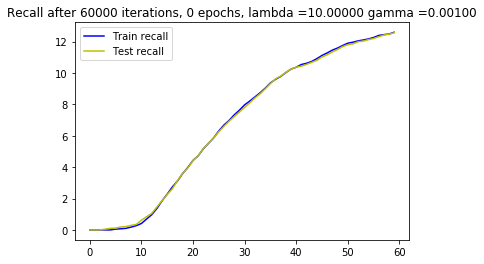

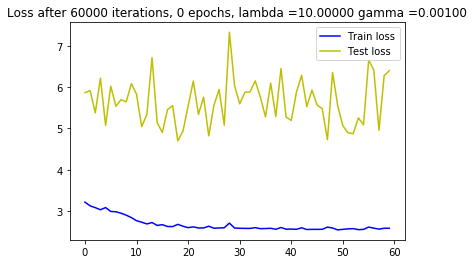

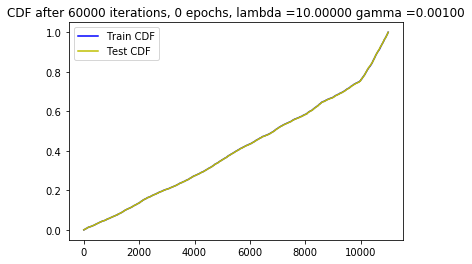






 13%|█▎        | 60001/473047 [39:04<113:54:09,  1.01it/s]




 13%|█▎        | 60009/473047 [39:05<80:11:47,  1.43it/s] 

New score:  0.16460268
Train score:  0.42848784
Test score:  0.41262418
Obj first part:  0.6434300541877747
Obj second part:  -2.198488
Obj first part:  0.0
Obj second part:  -0.50858545
Obj first part:  0.17461584880948067
Obj second part:  -0.6370921
Obj first part:  0.7440954446792603
Obj second part:  -0.16785102
Obj first part:  0.5636032670736313
Obj second part:  -0.60054845
Obj first part:  0.0
Obj second part:  -2.0078843
Obj first part:  0.0
Obj second part:  -0.027656345
Obj first part:  0.1511154230684042
Obj second part:  -1.2272508
Obj first part:  0.0
Obj second part:  -1.8810109
Obj first part:  0.5802953243255615
Obj second part:  -2.6221378
Obj first part:  7.504411935806274
Obj second part:  -0.09109332
Obj first part:  2.0946459472179413
Obj second part:  -0.7768525
Obj first part:  6.443292498588562
Obj second part:  -1.8194301
Obj first part:  1.1119282245635986
Obj second part:  -0.28892294
Obj first part:  0.0
Obj second part:  -3.7758949
Obj first part:  0.0
Ob






 13%|█▎        | 60017/473047 [39:05<56:34:25,  2.03it/s]




 13%|█▎        | 60025/473047 [39:05<40:02:41,  2.86it/s]

Obj first part:  0.0
Obj second part:  -0.094630994
Obj first part:  0.08311500772833824
Obj second part:  -0.45496407
Obj first part:  0.2612978592514992
Obj second part:  -1.3338054
Obj first part:  1.7442415654659271
Obj second part:  -0.7244501
Obj first part:  0.5793914943933487
Obj second part:  -1.4523302
Obj first part:  0.0
Obj second part:  -0.42074
Obj first part:  6.762068271636963
Obj second part:  -0.73611796
Obj first part:  0.0
Obj second part:  -2.2945008
Obj first part:  0.0
Obj second part:  -0.43711022
Obj first part:  0.0
Obj second part:  -2.1644685
Obj first part:  0.0
Obj second part:  -0.43213645
Obj first part:  0.0
Obj second part:  -3.1878366
Obj first part:  0.0
Obj second part:  -2.0032763
Obj first part:  0.0
Obj second part:  -1.4567509
Obj first part:  0.0
Obj second part:  -0.21676166
Obj first part:  0.0
Obj second part:  -0.07888502







 13%|█▎        | 60033/473047 [39:05<28:29:08,  4.03it/s]




 13%|█▎        | 60041/473047 [39:05<20:23:34,  5.63it/s]

Obj first part:  0.0
Obj second part:  -0.5301149
Obj first part:  1.6117613017559052
Obj second part:  -3.237419
Obj first part:  0.6740216910839081
Obj second part:  -1.8119459
Obj first part:  0.0
Obj second part:  -1.5841937
Obj first part:  0.0
Obj second part:  -0.044474747
Obj first part:  0.0
Obj second part:  -0.98005676
Obj first part:  0.28380634263157845
Obj second part:  -1.5115082
Obj first part:  0.0
Obj second part:  -0.70188695
Obj first part:  0.0
Obj second part:  -3.4520345
Obj first part:  0.0
Obj second part:  -2.848235
Obj first part:  0.0
Obj second part:  -2.0064247
Obj first part:  0.0
Obj second part:  -0.64496326
Obj first part:  12.857522964477539
Obj second part:  -0.40576106
Obj first part:  0.3284643217921257
Obj second part:  -2.0737412
Obj first part:  11.695058345794678
Obj second part:  -0.057182677
Obj first part:  0.048245457001030445
Obj second part:  -1.5274029







 13%|█▎        | 60049/473047 [39:05<14:43:27,  7.79it/s]




 13%|█▎        | 60057/473047 [39:05<10:45:13, 10.67it/s]

Obj first part:  2.621638774871826
Obj second part:  -0.4954853
Obj first part:  0.0
Obj second part:  -0.5048559
Obj first part:  0.0
Obj second part:  -1.6277134
Obj first part:  0.17061609774827957
Obj second part:  -0.05783263
Obj first part:  0.7349247485399246
Obj second part:  -2.2735157
Obj first part:  0.2047160267829895
Obj second part:  -0.46149796
Obj first part:  0.0
Obj second part:  -0.6366513
Obj first part:  3.958885669708252
Obj second part:  -0.34788033
Obj first part:  0.14220796525478363
Obj second part:  -1.675471
Obj first part:  1.2419021874666214
Obj second part:  -1.6240636
Obj first part:  0.0
Obj second part:  -0.535796
Obj first part:  0.434129498898983
Obj second part:  -2.468215
Obj first part:  1.486482173204422
Obj second part:  -3.30398
Obj first part:  0.41585303843021393
Obj second part:  -1.4461056
Obj first part:  0.017552440986037254
Obj second part:  -1.3840805
Obj first part:  0.0
Obj second part:  -1.2481333







 13%|█▎        | 60065/473047 [39:05<7:58:45, 14.38it/s] 




 13%|█▎        | 60073/473047 [39:05<6:02:08, 19.01it/s]

Obj first part:  0.0
Obj second part:  -2.6926234
Obj first part:  0.6216981634497643
Obj second part:  -2.2454185
Obj first part:  0.1739988848567009
Obj second part:  -1.2224406
Obj first part:  0.46234317123889923
Obj second part:  -1.2310643
Obj first part:  0.0
Obj second part:  -0.49208575
Obj first part:  0.0
Obj second part:  -2.9781632
Obj first part:  0.0
Obj second part:  -2.053313
Obj first part:  3.147333562374115
Obj second part:  -1.1928415
Obj first part:  0.1960824429988861
Obj second part:  -0.7209464
Obj first part:  0.11329739354550838
Obj second part:  -0.07678598
Obj first part:  0.7522883266210556
Obj second part:  -2.1162791
Obj first part:  1.6494351625442505
Obj second part:  -0.57761663
Obj first part:  0.0
Obj second part:  -1.7849786
Obj first part:  2.7330058813095093
Obj second part:  -5.3043647
Obj first part:  2.7828168869018555
Obj second part:  -0.2530101
Obj first part:  0.0
Obj second part:  -0.39710552







 13%|█▎        | 60081/473047 [39:05<4:40:48, 24.51it/s]




 13%|█▎        | 60089/473047 [39:06<3:42:44, 30.90it/s]




 13%|█▎        | 60097/473047 [39:06<3:02:06, 37.79it/s]

Obj first part:  3.048863112926483
Obj second part:  -2.8906486
Obj first part:  0.0
Obj second part:  -0.44047186
Obj first part:  0.19034286960959435
Obj second part:  -1.6745883
Obj first part:  5.74712872505188
Obj second part:  -3.471191
Obj first part:  0.0
Obj second part:  -1.8518078
Obj first part:  0.0
Obj second part:  -0.77268744
Obj first part:  0.0
Obj second part:  -1.728305
Obj first part:  0.0
Obj second part:  -1.9890008
Obj first part:  0.0
Obj second part:  -1.3975077
Obj first part:  0.15901295468211174
Obj second part:  -2.874741
Obj first part:  1.8597505986690521
Obj second part:  -1.6173193
Obj first part:  0.11116758920252323
Obj second part:  -4.709757
Obj first part:  0.0
Obj second part:  -0.74315315
Obj first part:  0.6687779724597931
Obj second part:  -0.20830122
Obj first part:  0.7464206963777542
Obj second part:  -1.0691098
Obj first part:  0.0
Obj second part:  -1.0831009







 13%|█▎        | 60105/473047 [39:06<2:34:45, 44.47it/s]

Obj first part:  0.0
Obj second part:  -1.5339142
Obj first part:  0.8986814320087433
Obj second part:  -0.10345739
Obj first part:  0.0
Obj second part:  -1.671835
Obj first part:  2.186862528324127
Obj second part:  -1.2129151
Obj first part:  1.1211249977350235
Obj second part:  -0.680363
Obj first part:  0.03516157856211066
Obj second part:  -0.58038
Obj first part:  0.0
Obj second part:  -1.9269862
Obj first part:  0.6282071769237518
Obj second part:  -0.039535508
Obj first part:  7.680637836456299
Obj second part:  -2.9400678
Obj first part:  1.9214805960655212
Obj second part:  -1.7924141
Obj first part:  0.0
Obj second part:  -1.9214015
Obj first part:  0.0
Obj second part:  -2.7568917
Obj first part:  0.35385478287935257
Obj second part:  -0.5534682
Obj first part:  0.0
Obj second part:  -0.9620372
Obj first part:  0.0
Obj second part:  -0.64081615
Obj first part:  0.0
Obj second part:  -1.1240542







 13%|█▎        | 60113/473047 [39:06<2:15:25, 50.82it/s]




 13%|█▎        | 60121/473047 [39:06<2:00:52, 56.94it/s]




 13%|█▎        | 60129/473047 [39:06<1:50:55, 62.05it/s]

Obj first part:  0.0
Obj second part:  -0.6239866
Obj first part:  0.4271785542368889
Obj second part:  -1.1812686
Obj first part:  0.45841217041015625
Obj second part:  -1.1847646
Obj first part:  0.9600494801998138
Obj second part:  -0.68596625
Obj first part:  0.235477052628994
Obj second part:  -0.85190964
Obj first part:  0.061310757882893085
Obj second part:  -0.4786147
Obj first part:  0.0
Obj second part:  -2.212364
Obj first part:  0.07677826564759016
Obj second part:  -0.35576794
Obj first part:  1.6494548320770264
Obj second part:  -2.7619402
Obj first part:  0.0
Obj second part:  -2.0682402
Obj first part:  0.38016222417354584
Obj second part:  -2.3181572
Obj first part:  0.0
Obj second part:  -1.2948725
Obj first part:  0.2171698398888111
Obj second part:  -1.7129838
Obj first part:  0.0
Obj second part:  -0.20464052
Obj first part:  0.0
Obj second part:  -1.7578938
Obj first part:  0.0
Obj second part:  -1.921181







 13%|█▎        | 60137/473047 [39:06<1:44:53, 65.61it/s]

Obj first part:  2.3497243225574493
Obj second part:  -0.64059067
Obj first part:  0.0
Obj second part:  -1.0285082
Obj first part:  1.3482671976089478
Obj second part:  -4.064823
Obj first part:  1.394203007221222
Obj second part:  -0.052266087
Obj first part:  1.0476536303758621
Obj second part:  -1.0828874
Obj first part:  0.24601157754659653
Obj second part:  -1.4225016
Obj first part:  0.0987755972892046
Obj second part:  -0.6651522
Obj first part:  10.710203647613525
Obj second part:  -3.5398529
Obj first part:  0.0
Obj second part:  -0.8595957
Obj first part:  0.0
Obj second part:  -1.7065573
Obj first part:  0.0
Obj second part:  -2.6190476
Obj first part:  0.4195057600736618
Obj second part:  -0.21823947
Obj first part:  1.4081625640392303
Obj second part:  -0.3820043
Obj first part:  6.774443984031677
Obj second part:  -1.7080953
Obj first part:  0.25027045980095863
Obj second part:  -0.20095654
Obj first part:  0.16074061393737793
Obj second part:  -1.0798798







 13%|█▎        | 60145/473047 [39:06<1:40:30, 68.47it/s]




 13%|█▎        | 60153/473047 [39:06<1:37:09, 70.83it/s]

Obj first part:  1.0726416856050491
Obj second part:  -2.4424992
Obj first part:  1.4257842302322388
Obj second part:  -0.100599155
Obj first part:  0.0
Obj second part:  -0.17988439
Obj first part:  0.28144318610429764
Obj second part:  -1.1580467
Obj first part:  0.0
Obj second part:  -3.654507
Obj first part:  0.0
Obj second part:  -1.5085697
Obj first part:  1.8346266448497772
Obj second part:  -2.5330193
Obj first part:  1.2491148710250854
Obj second part:  -1.0961075
Obj first part:  1.4930421113967896
Obj second part:  -4.9074006
Obj first part:  1.9139841198921204
Obj second part:  -0.2904121
Obj first part:  0.0
Obj second part:  -1.5547503
Obj first part:  0.4321489483118057
Obj second part:  -2.0462272
Obj first part:  0.16507092863321304
Obj second part:  -1.8490186
Obj first part:  0.3915022686123848
Obj second part:  -2.054706
Obj first part:  0.6886542588472366
Obj second part:  -2.6948607
Obj first part:  1.5799088776111603
Obj second part:  -0.4366991







 13%|█▎        | 60161/473047 [39:06<1:35:03, 72.39it/s]




 13%|█▎        | 60169/473047 [39:07<1:33:44, 73.40it/s]

Obj first part:  0.39169054478406906
Obj second part:  -0.45761964
Obj first part:  0.34517746418714523
Obj second part:  -0.83437854
Obj first part:  0.0
Obj second part:  -1.6473277
Obj first part:  0.0
Obj second part:  -0.16664574
Obj first part:  3.77358615398407
Obj second part:  -2.7461894
Obj first part:  1.0173680633306503
Obj second part:  -0.8095311
Obj first part:  0.0
Obj second part:  -2.7694125
Obj first part:  0.0
Obj second part:  -3.0156977
Obj first part:  1.3623255491256714
Obj second part:  -0.11872399
Obj first part:  6.247507333755493
Obj second part:  -0.28632146
Obj first part:  0.6833523511886597
Obj second part:  -0.84432554
Obj first part:  0.25169480592012405
Obj second part:  -4.495282
Obj first part:  0.0
Obj second part:  -1.5821071
Obj first part:  7.079532742500305
Obj second part:  -2.971191
Obj first part:  0.6493330001831055
Obj second part:  -4.7542553
Obj first part:  0.0
Obj second part:  -2.7253351







 13%|█▎        | 60177/473047 [39:07<1:32:54, 74.06it/s]




 13%|█▎        | 60185/473047 [39:07<1:32:06, 74.71it/s]

Obj first part:  0.0
Obj second part:  -1.7020831
Obj first part:  0.0
Obj second part:  -0.096983984
Obj first part:  3.77823144197464
Obj second part:  -1.6368972
Obj first part:  0.0
Obj second part:  -4.8007097
Obj first part:  0.0
Obj second part:  -0.26461497
Obj first part:  0.16709912568330765
Obj second part:  -2.4501038
Obj first part:  3.394179344177246
Obj second part:  -4.0662503
Obj first part:  0.0
Obj second part:  -3.089232
Obj first part:  0.0
Obj second part:  -0.30892113
Obj first part:  0.8124145865440369
Obj second part:  -0.2886389
Obj first part:  0.11041378602385521
Obj second part:  -0.75460106
Obj first part:  0.0
Obj second part:  -1.3396137
Obj first part:  0.06392643321305513
Obj second part:  -2.1199906
Obj first part:  1.3324929773807526
Obj second part:  -0.51850396
Obj first part:  0.14397947117686272
Obj second part:  -2.0568097
Obj first part:  0.259950365871191
Obj second part:  -2.81598







 13%|█▎        | 60193/473047 [39:07<1:31:35, 75.12it/s]




 13%|█▎        | 60201/473047 [39:07<1:31:02, 75.57it/s]

Obj first part:  0.0
Obj second part:  -1.9580873
Obj first part:  3.4570690989494324
Obj second part:  -0.3616958
Obj first part:  0.11034322902560234
Obj second part:  -2.4358313
Obj first part:  0.9015505760908127
Obj second part:  -0.48911017
Obj first part:  0.0
Obj second part:  -5.346678
Obj first part:  0.0
Obj second part:  -2.824156
Obj first part:  10.484503507614136
Obj second part:  -2.65761
Obj first part:  0.2858695760369301
Obj second part:  -2.4283664
Obj first part:  0.5468261986970901
Obj second part:  -4.218802
Obj first part:  0.0
Obj second part:  -3.1291387
Obj first part:  0.0
Obj second part:  -0.24046221
Obj first part:  0.0
Obj second part:  -1.0503732
Obj first part:  8.76191258430481
Obj second part:  -3.604973
Obj first part:  0.9577507525682449
Obj second part:  -1.6874297
Obj first part:  0.0
Obj second part:  -2.0770416
Obj first part:  0.0
Obj second part:  -1.1620555







 13%|█▎        | 60209/473047 [39:07<1:30:36, 75.94it/s]




 13%|█▎        | 60217/473047 [39:07<1:30:58, 75.63it/s]

Obj first part:  1.223311498761177
Obj second part:  -3.2895784
Obj first part:  0.1674189604818821
Obj second part:  -1.2832282
Obj first part:  0.0
Obj second part:  -1.2227725
Obj first part:  0.0
Obj second part:  -0.6361046
Obj first part:  0.0
Obj second part:  -0.5674081
Obj first part:  0.0
Obj second part:  -1.1634507
Obj first part:  0.0
Obj second part:  -1.1454005
Obj first part:  0.5239000916481018
Obj second part:  -5.36523
Obj first part:  0.0
Obj second part:  -3.6624143
Obj first part:  5.636953711509705
Obj second part:  -2.5369189
Obj first part:  0.3869462013244629
Obj second part:  -1.691693
Obj first part:  0.0
Obj second part:  -1.8188504
Obj first part:  1.4344672858715057
Obj second part:  -0.06797217
Obj first part:  0.3703157976269722
Obj second part:  -1.461134
Obj first part:  2.32728973031044
Obj second part:  -1.5803586
Obj first part:  0.0
Obj second part:  -1.0826017







 13%|█▎        | 60225/473047 [39:07<1:30:46, 75.80it/s]




 13%|█▎        | 60233/473047 [39:07<1:30:42, 75.86it/s]

Obj first part:  1.1062098294496536
Obj second part:  -3.7214909
Obj first part:  1.5877261757850647
Obj second part:  -3.9361596
Obj first part:  5.806029438972473
Obj second part:  -2.713449
Obj first part:  0.0
Obj second part:  -2.3172526
Obj first part:  0.0
Obj second part:  -0.39026445
Obj first part:  0.0
Obj second part:  -2.6310563
Obj first part:  1.2252382189035416
Obj second part:  -4.694551
Obj first part:  0.0
Obj second part:  -0.32452458
Obj first part:  0.08337855339050293
Obj second part:  -1.7273488
Obj first part:  0.0
Obj second part:  -2.1616497
Obj first part:  0.0
Obj second part:  -0.58179855
Obj first part:  0.0
Obj second part:  -1.8792119
Obj first part:  1.5479475259780884
Obj second part:  -1.446551
Obj first part:  0.0
Obj second part:  -1.4292384
Obj first part:  0.30212508514523506
Obj second part:  -0.9968165
Obj first part:  0.0
Obj second part:  -3.7937212







 13%|█▎        | 60241/473047 [39:08<1:30:43, 75.83it/s]




 13%|█▎        | 60249/473047 [39:08<1:30:34, 75.95it/s]

Obj first part:  0.0
Obj second part:  -3.4332194
Obj first part:  0.0
Obj second part:  -1.4194628
Obj first part:  0.0
Obj second part:  -0.9504426
Obj first part:  0.34726280719041824
Obj second part:  -1.6878817
Obj first part:  8.322069644927979
Obj second part:  -2.5063322
Obj first part:  0.0
Obj second part:  -0.75332516
Obj first part:  0.3202461823821068
Obj second part:  -1.3640978
Obj first part:  0.3318025544285774
Obj second part:  -2.5973208
Obj first part:  0.0
Obj second part:  -4.5312257
Obj first part:  0.0
Obj second part:  -0.95817614
Obj first part:  0.0
Obj second part:  -1.7867265
Obj first part:  0.5040321871638298
Obj second part:  -0.5035782
Obj first part:  0.7820752263069153
Obj second part:  -3.9076414
Obj first part:  0.0
Obj second part:  -1.4926362
Obj first part:  0.0
Obj second part:  -1.7713388
Obj first part:  0.700460746884346
Obj second part:  -1.3280903







 13%|█▎        | 60257/473047 [39:08<1:30:50, 75.74it/s]




 13%|█▎        | 60265/473047 [39:08<1:30:06, 76.35it/s]

Obj first part:  0.0
Obj second part:  -2.1452339
Obj first part:  4.4846296310424805
Obj second part:  -0.15235303
Obj first part:  0.0
Obj second part:  -0.7918426
Obj first part:  0.220448300242424
Obj second part:  -4.962516
Obj first part:  1.08744315803051
Obj second part:  -3.7499049
Obj first part:  0.0
Obj second part:  -0.4872074
Obj first part:  0.5442429333925247
Obj second part:  -3.2004733
Obj first part:  0.09133042767643929
Obj second part:  -1.1972687
Obj first part:  0.0
Obj second part:  -4.1253386
Obj first part:  0.0
Obj second part:  -0.54256856
Obj first part:  0.0
Obj second part:  -2.7521498
Obj first part:  0.13464350253343582
Obj second part:  -0.26487818
Obj first part:  0.0
Obj second part:  -0.25613436
Obj first part:  0.6166831031441689
Obj second part:  -0.54485416
Obj first part:  2.8603702783584595
Obj second part:  -1.464398
Obj first part:  0.0
Obj second part:  -1.971111







 13%|█▎        | 60273/473047 [39:08<1:29:47, 76.62it/s]




 13%|█▎        | 60281/473047 [39:08<1:29:39, 76.73it/s]

Obj first part:  0.0
Obj second part:  -1.2363322
Obj first part:  3.8506022095680237
Obj second part:  -1.0464307
Obj first part:  0.8601963520050049
Obj second part:  -2.8947444
Obj first part:  0.0
Obj second part:  -0.06921501
Obj first part:  0.0
Obj second part:  -0.19474214
Obj first part:  0.0
Obj second part:  -0.39334646
Obj first part:  1.2215806543827057
Obj second part:  -0.40716168
Obj first part:  3.2741206884384155
Obj second part:  -3.7383492
Obj first part:  0.0
Obj second part:  -1.6192911
Obj first part:  0.0
Obj second part:  -3.182383
Obj first part:  0.0
Obj second part:  -1.1746716
Obj first part:  0.0
Obj second part:  -1.0888735
Obj first part:  0.0
Obj second part:  -1.9530432
Obj first part:  0.0
Obj second part:  -2.3246603
Obj first part:  0.0
Obj second part:  -2.4602342
Obj first part:  0.0
Obj second part:  -0.4318353







 13%|█▎        | 60289/473047 [39:08<1:30:08, 76.31it/s]




 13%|█▎        | 60297/473047 [39:08<1:29:36, 76.76it/s]

Obj first part:  0.0
Obj second part:  -2.479708
Obj first part:  0.992874801158905
Obj second part:  -1.719427
Obj first part:  0.0
Obj second part:  -2.85189
Obj first part:  0.9886559098958969
Obj second part:  -3.4336708
Obj first part:  0.3436894342303276
Obj second part:  -2.0500588
Obj first part:  0.8006097376346588
Obj second part:  -1.6679943
Obj first part:  0.2908472530543804
Obj second part:  -0.38418755
Obj first part:  1.7472127079963684
Obj second part:  -0.393547
Obj first part:  0.1879238709807396
Obj second part:  -1.4105846
Obj first part:  1.572822779417038
Obj second part:  -0.731268
Obj first part:  10.718187093734741
Obj second part:  -3.6852884
Obj first part:  4.818626344203949
Obj second part:  -0.2850251
Obj first part:  0.0
Obj second part:  -1.7315304
Obj first part:  0.0
Obj second part:  -2.373166
Obj first part:  0.38445819169282913
Obj second part:  -1.1146481
Obj first part:  0.0
Obj second part:  -0.58900833







 13%|█▎        | 60305/473047 [39:08<1:29:41, 76.70it/s]




 13%|█▎        | 60313/473047 [39:08<1:30:00, 76.43it/s]

Obj first part:  0.0
Obj second part:  -3.094157
Obj first part:  0.0
Obj second part:  -2.5550983
Obj first part:  0.0
Obj second part:  -1.3728827
Obj first part:  0.9557085484266281
Obj second part:  -1.3777877
Obj first part:  2.353750616312027
Obj second part:  -2.6606588
Obj first part:  0.0
Obj second part:  -0.7091966
Obj first part:  0.7319306582212448
Obj second part:  -2.2484066
Obj first part:  0.0
Obj second part:  -0.3341595
Obj first part:  0.0
Obj second part:  -0.3774977
Obj first part:  0.28961310163140297
Obj second part:  -0.15497296
Obj first part:  0.0
Obj second part:  -0.5890867
Obj first part:  0.47640617936849594
Obj second part:  -1.7132039
Obj first part:  0.0
Obj second part:  -2.805491
Obj first part:  0.0
Obj second part:  -3.4574506
Obj first part:  0.0
Obj second part:  -0.061860252
Obj first part:  6.119506359100342
Obj second part:  -0.114737794







 13%|█▎        | 60321/473047 [39:09<1:30:04, 76.36it/s]




 13%|█▎        | 60329/473047 [39:09<1:29:57, 76.46it/s]

Obj first part:  0.0
Obj second part:  -2.5866625
Obj first part:  0.0
Obj second part:  -3.7802677
Obj first part:  0.0
Obj second part:  -1.2145993
Obj first part:  1.120346412062645
Obj second part:  -0.33584324
Obj first part:  1.245310977101326
Obj second part:  -0.333508
Obj first part:  0.09765615686774254
Obj second part:  -1.2857251
Obj first part:  0.0
Obj second part:  -0.20695354
Obj first part:  0.0
Obj second part:  -1.8469044
Obj first part:  0.0
Obj second part:  -3.795722
Obj first part:  2.6931041479110718
Obj second part:  -0.4806772
Obj first part:  0.8968758583068848
Obj second part:  -2.430232
Obj first part:  0.5889561399817467
Obj second part:  -1.5924301
Obj first part:  0.0
Obj second part:  -2.5883942
Obj first part:  0.0
Obj second part:  -2.420941
Obj first part:  0.0
Obj second part:  -2.2768023
Obj first part:  0.0
Obj second part:  -0.02930597







 13%|█▎        | 60337/473047 [39:09<1:31:06, 75.50it/s]




 13%|█▎        | 60345/473047 [39:09<1:30:08, 76.31it/s]




 13%|█▎        | 60353/473047 [39:09<1:29:12, 77.10it/s]

Obj first part:  0.8842155337333679
Obj second part:  -0.29790196
Obj first part:  0.0
Obj second part:  -0.5042738
Obj first part:  0.7529542595148087
Obj second part:  -0.64190596
Obj first part:  0.0
Obj second part:  -2.330865
Obj first part:  2.5018852949142456
Obj second part:  -2.2357178
Obj first part:  0.8257820457220078
Obj second part:  -1.7982442
Obj first part:  0.8036182820796967
Obj second part:  -1.7364005
Obj first part:  0.8549804240465164
Obj second part:  -1.0355344
Obj first part:  0.0
Obj second part:  -0.6041865
Obj first part:  0.0
Obj second part:  -2.1344588
Obj first part:  0.0
Obj second part:  -0.112858236
Obj first part:  3.405771255493164
Obj second part:  -2.8057761
Obj first part:  0.0
Obj second part:  -2.5636764
Obj first part:  0.0
Obj second part:  -0.8889638
Obj first part:  0.2382257953286171
Obj second part:  -1.0866823
Obj first part:  0.0
Obj second part:  -2.2199485







 13%|█▎        | 60361/473047 [39:09<1:29:31, 76.83it/s]

Obj first part:  0.891033336520195
Obj second part:  -0.2260727
Obj first part:  2.421087771654129
Obj second part:  -0.09683544
Obj first part:  5.279088020324707
Obj second part:  -1.6718223
Obj first part:  2.4459771811962128
Obj second part:  -1.1082786
Obj first part:  3.158751130104065
Obj second part:  -1.7761437
Obj first part:  0.0
Obj second part:  -0.28984943
Obj first part:  0.0
Obj second part:  -1.8963004
Obj first part:  0.0
Obj second part:  -0.4076833
Obj first part:  0.8161188662052155
Obj second part:  -0.36307815
Obj first part:  0.19163565710186958
Obj second part:  -4.4110484
Obj first part:  0.0
Obj second part:  -1.1124948
Obj first part:  0.0
Obj second part:  -1.8628308
Obj first part:  4.567895829677582
Obj second part:  -1.7231203
Obj first part:  0.0
Obj second part:  -3.0172665
Obj first part:  3.1632602214813232
Obj second part:  -2.6538224
Obj first part:  0.0
Obj second part:  -1.0098665







 13%|█▎        | 60369/473047 [39:09<1:29:47, 76.60it/s]




 13%|█▎        | 60377/473047 [39:09<1:29:32, 76.81it/s]

Obj first part:  0.0
Obj second part:  -1.0783168
Obj first part:  0.37275902926921844
Obj second part:  -3.0056596
Obj first part:  0.0
Obj second part:  -4.0345426
Obj first part:  3.43106210231781
Obj second part:  -0.07041762
Obj first part:  0.9750601649284363
Obj second part:  -1.4137285
Obj first part:  0.0
Obj second part:  -1.3248914
Obj first part:  3.0652672052383423
Obj second part:  -2.2861352
Obj first part:  0.49728620797395706
Obj second part:  -3.4848957
Obj first part:  3.312213122844696
Obj second part:  -2.1210358
Obj first part:  0.0
Obj second part:  -1.1327373
Obj first part:  0.5269628018140793
Obj second part:  -1.2083012
Obj first part:  1.762557029724121
Obj second part:  -0.53968537
Obj first part:  0.28713492676615715
Obj second part:  -2.152705
Obj first part:  0.0
Obj second part:  -0.17211267
Obj first part:  0.0
Obj second part:  -0.72600824







 13%|█▎        | 60385/473047 [39:09<1:35:11, 72.25it/s]




 13%|█▎        | 60393/473047 [39:10<1:37:51, 70.28it/s]

Obj first part:  0.0
Obj second part:  -1.5121666
Obj first part:  0.7835643738508224
Obj second part:  -3.5007603
Obj first part:  0.0
Obj second part:  -0.1997551
Obj first part:  0.686749592423439
Obj second part:  -1.32823
Obj first part:  9.392982721328735
Obj second part:  -1.5896845
Obj first part:  6.033781170845032
Obj second part:  -2.3021014
Obj first part:  0.0
Obj second part:  -1.0625408
Obj first part:  0.0
Obj second part:  -1.4733546
Obj first part:  0.0
Obj second part:  -2.2392657
Obj first part:  0.0
Obj second part:  -3.798808
Obj first part:  0.273094829171896
Obj second part:  -0.3554619
Obj first part:  0.46668123453855515
Obj second part:  -1.3642497
Obj first part:  1.6726145148277283
Obj second part:  -3.785598
Obj first part:  0.0
Obj second part:  -0.9037201







 13%|█▎        | 60401/473047 [39:10<1:37:17, 70.69it/s]




 13%|█▎        | 60409/473047 [39:10<1:36:05, 71.57it/s]

Obj first part:  0.0
Obj second part:  -1.4583597
Obj first part:  0.0
Obj second part:  -3.1963797
Obj first part:  2.620319426059723
Obj second part:  -2.4703379
Obj first part:  1.5869952738285065
Obj second part:  -2.0353534
Obj first part:  0.9589147567749023
Obj second part:  -1.2739698
Obj first part:  0.1280426885932684
Obj second part:  -2.5187054
Obj first part:  13.896501064300537
Obj second part:  -3.3597856
Obj first part:  0.242488831281662
Obj second part:  -0.85315263
Obj first part:  0.0
Obj second part:  -3.3137534
Obj first part:  1.6549500823020935
Obj second part:  -1.9222565
Obj first part:  0.389668233692646
Obj second part:  -1.7385519
Obj first part:  0.0
Obj second part:  -1.3148941
Obj first part:  4.074054956436157
Obj second part:  -3.038157
Obj first part:  2.717178165912628
Obj second part:  -2.861857
Obj first part:  2.455514669418335
Obj second part:  -5.3350163







 13%|█▎        | 60417/473047 [39:10<1:35:06, 72.31it/s]




 13%|█▎        | 60425/473047 [39:10<1:34:02, 73.13it/s]

Obj first part:  0.0
Obj second part:  -3.531315
Obj first part:  0.0
Obj second part:  -3.2379532
Obj first part:  0.0
Obj second part:  -1.9364444
Obj first part:  0.0
Obj second part:  -3.456592
Obj first part:  0.31648796051740646
Obj second part:  -0.610637
Obj first part:  10.991759300231934
Obj second part:  -2.1531496
Obj first part:  0.0
Obj second part:  -0.7883205
Obj first part:  0.0
Obj second part:  -0.64465296
Obj first part:  0.0
Obj second part:  -1.8977282
Obj first part:  0.7672778517007828
Obj second part:  -3.6221685
Obj first part:  1.7027458548545837
Obj second part:  -4.0889597
Obj first part:  0.0
Obj second part:  -0.9599327
Obj first part:  1.046248897910118
Obj second part:  -1.2573112
Obj first part:  4.1048455238342285
Obj second part:  -0.6889666
Obj first part:  0.0
Obj second part:  -1.8027723
Obj first part:  0.18233692273497581
Obj second part:  -1.0358679







 13%|█▎        | 60433/473047 [39:10<1:33:45, 73.35it/s]




 13%|█▎        | 60441/473047 [39:10<1:32:53, 74.03it/s]

Obj first part:  0.06276798900216818
Obj second part:  -1.0343847
Obj first part:  0.0
Obj second part:  -0.7740679
Obj first part:  0.3199390694499016
Obj second part:  -0.29298645
Obj first part:  0.049492865800857544
Obj second part:  -1.3918425
Obj first part:  0.0
Obj second part:  -0.81732994
Obj first part:  0.0
Obj second part:  -1.114957
Obj first part:  3.8463222980499268
Obj second part:  -2.584577
Obj first part:  0.17815787345170975
Obj second part:  -2.3794312
Obj first part:  1.7623838782310486
Obj second part:  -4.172609
Obj first part:  0.0
Obj second part:  -1.4330469
Obj first part:  0.0
Obj second part:  -1.4223096
Obj first part:  0.0575259979814291
Obj second part:  -2.8769622
Obj first part:  0.2702699601650238
Obj second part:  -1.5116215
Obj first part:  0.0
Obj second part:  -1.8268191
Obj first part:  0.0
Obj second part:  -0.9993907
Obj first part:  2.248228043317795
Obj second part:  -0.58430475







 13%|█▎        | 60449/473047 [39:10<1:31:54, 74.82it/s]




 13%|█▎        | 60457/473047 [39:10<1:31:35, 75.08it/s]

Obj first part:  0.0
Obj second part:  -2.9849358
Obj first part:  0.049450602382421494
Obj second part:  -0.80793965
Obj first part:  0.20654618740081787
Obj second part:  -2.664234
Obj first part:  0.7479903101921082
Obj second part:  -2.0427086
Obj first part:  1.2083056569099426
Obj second part:  -1.2196709
Obj first part:  0.0
Obj second part:  -2.364973
Obj first part:  0.0
Obj second part:  -2.4081354
Obj first part:  0.41208863258361816
Obj second part:  -2.935223
Obj first part:  0.27777930721640587
Obj second part:  -2.5642586
Obj first part:  0.0
Obj second part:  -1.1444525
Obj first part:  0.0
Obj second part:  -1.3411938
Obj first part:  0.0
Obj second part:  -1.5338216
Obj first part:  0.0
Obj second part:  -1.8851207
Obj first part:  3.9787492156028748
Obj second part:  -0.63556975
Obj first part:  0.05063710734248161
Obj second part:  -0.40087536
Obj first part:  0.0
Obj second part:  -0.42511106







 13%|█▎        | 60465/473047 [39:11<1:31:13, 75.38it/s]




 13%|█▎        | 60473/473047 [39:11<1:31:12, 75.39it/s]

Obj first part:  2.0751789212226868
Obj second part:  -0.25106302
Obj first part:  6.925879120826721
Obj second part:  -0.17978814
Obj first part:  0.18172822892665863
Obj second part:  -0.47049728
Obj first part:  0.0
Obj second part:  -0.42447034
Obj first part:  0.09222912602126598
Obj second part:  -3.1193025
Obj first part:  0.09280459024012089
Obj second part:  -1.5727632
Obj first part:  0.06710774265229702
Obj second part:  -1.5965407
Obj first part:  0.0
Obj second part:  -0.3531686
Obj first part:  0.04838576074689627
Obj second part:  -0.568677
Obj first part:  0.6528673321008682
Obj second part:  -1.1476399
Obj first part:  0.03801210317760706
Obj second part:  -0.08748906
Obj first part:  0.0
Obj second part:  -2.803037
Obj first part:  2.60090172290802
Obj second part:  -1.451515
Obj first part:  0.0
Obj second part:  -1.4164608
Obj first part:  0.0
Obj second part:  -1.5149518
Obj first part:  0.0
Obj second part:  -0.22682859







 13%|█▎        | 60481/473047 [39:11<1:31:17, 75.32it/s]




 13%|█▎        | 60489/473047 [39:11<1:31:24, 75.23it/s]

Obj first part:  0.04516644403338432
Obj second part:  -0.46312106
Obj first part:  1.996397078037262
Obj second part:  -2.093062
Obj first part:  8.628730773925781
Obj second part:  -1.0917404
Obj first part:  0.47659240663051605
Obj second part:  -4.30191
Obj first part:  10.94564437866211
Obj second part:  -3.2682161
Obj first part:  2.059132158756256
Obj second part:  -2.253456
Obj first part:  0.0
Obj second part:  -2.7940397
Obj first part:  0.0
Obj second part:  -2.0172656
Obj first part:  1.0056567192077637
Obj second part:  -2.39858
Obj first part:  0.0
Obj second part:  -2.0687044
Obj first part:  1.7062239348888397
Obj second part:  -2.1142433
Obj first part:  0.5757443606853485
Obj second part:  -2.8379636
Obj first part:  0.0
Obj second part:  -1.6342517
Obj first part:  0.627548098564148
Obj second part:  -1.8924897
Obj first part:  0.0
Obj second part:  -0.4344101
Obj first part:  0.0







 13%|█▎        | 60497/473047 [39:11<1:31:55, 74.80it/s]




 13%|█▎        | 60505/473047 [39:11<1:31:44, 74.95it/s]

Obj second part:  -1.7242031
Obj first part:  0.6427032500505447
Obj second part:  -2.4162946
Obj first part:  0.0
Obj second part:  -0.25878707
Obj first part:  6.270774602890015
Obj second part:  -1.0116271
Obj first part:  0.0
Obj second part:  -1.0245757
Obj first part:  7.649264931678772
Obj second part:  -0.13720863
Obj first part:  0.0
Obj second part:  -1.6100298
Obj first part:  0.0
Obj second part:  -5.222458
Obj first part:  0.0
Obj second part:  -2.0806632
Obj first part:  0.43398361653089523
Obj second part:  -2.209463
Obj first part:  0.15955643728375435
Obj second part:  -1.4827056
Obj first part:  0.0
Obj second part:  -1.2113701
Obj first part:  1.3243165612220764
Obj second part:  -0.7737303
Obj first part:  0.23778138682246208
Obj second part:  -0.5056665
Obj first part:  0.0
Obj second part:  -0.8432285







 13%|█▎        | 60513/473047 [39:11<1:32:04, 74.67it/s]




 13%|█▎        | 60521/473047 [39:11<1:31:43, 74.95it/s]

Obj first part:  0.0
Obj second part:  -1.4279001
Obj first part:  0.7604748755693436
Obj second part:  -3.9005785
Obj first part:  0.0
Obj second part:  -0.52760017
Obj first part:  0.0
Obj second part:  -1.9482293
Obj first part:  0.05011117551475763
Obj second part:  -2.9644532
Obj first part:  0.0
Obj second part:  -0.07750883
Obj first part:  0.0
Obj second part:  -2.2714186
Obj first part:  2.1114350855350494
Obj second part:  -1.7625595
Obj first part:  0.0
Obj second part:  -0.13994583
Obj first part:  0.40392253547906876
Obj second part:  -1.2919655
Obj first part:  0.5153007060289383
Obj second part:  -1.3387693
Obj first part:  2.031419575214386
Obj second part:  -0.54986906
Obj first part:  0.2178473398089409
Obj second part:  -0.352241
Obj first part:  0.0
Obj second part:  -0.6082982
Obj first part:  0.0
Obj second part:  -0.22263286
Obj first part:  0.0







 13%|█▎        | 60529/473047 [39:11<1:32:06, 74.65it/s]




 13%|█▎        | 60537/473047 [39:11<1:31:59, 74.74it/s]

Obj second part:  -2.8775008
Obj first part:  0.12098225764930248
Obj second part:  -0.4279207
Obj first part:  0.0
Obj second part:  -0.12905243
Obj first part:  0.16733800992369652
Obj second part:  -1.5239346
Obj first part:  0.0
Obj second part:  -0.48668054
Obj first part:  1.4250002801418304
Obj second part:  -2.0724993
Obj first part:  0.0
Obj second part:  -2.2068756
Obj first part:  1.74478217959404
Obj second part:  -0.11771584
Obj first part:  0.0
Obj second part:  -2.2554998
Obj first part:  4.923079311847687
Obj second part:  -3.985896
Obj first part:  0.0
Obj second part:  -1.231513
Obj first part:  0.0
Obj second part:  -0.32016936
Obj first part:  0.9960997104644775
Obj second part:  -0.49559546
Obj first part:  0.07188594434410334
Obj second part:  -2.9630556
Obj first part:  0.24440130218863487
Obj second part:  -0.13641776
Obj first part:  2.4142929911613464
Obj second part:  -0.75874364







 13%|█▎        | 60545/473047 [39:12<1:32:08, 74.62it/s]




 13%|█▎        | 60553/473047 [39:12<1:31:44, 74.94it/s]

Obj first part:  0.0
Obj second part:  -3.672759
Obj first part:  0.0
Obj second part:  -1.5406241
Obj first part:  1.5285037457942963
Obj second part:  -1.9889249
Obj first part:  0.12064220383763313
Obj second part:  -1.6705236
Obj first part:  1.6326239705085754
Obj second part:  -1.3605392
Obj first part:  1.894775629043579
Obj second part:  -1.9728072
Obj first part:  1.79137721657753
Obj second part:  -0.22232766
Obj first part:  0.549958162009716
Obj second part:  -0.35521358
Obj first part:  0.0
Obj second part:  -3.456933
Obj first part:  0.15616646967828274
Obj second part:  -0.8090972
Obj first part:  0.0
Obj second part:  -1.0519123
Obj first part:  2.5850725173950195
Obj second part:  -2.3930097
Obj first part:  0.0
Obj second part:  -2.2729957
Obj first part:  6.981034278869629
Obj second part:  -1.0623629
Obj first part:  0.0
Obj second part:  -3.8342054
Obj first part:  0.0
Obj second part:  -0.72110087







 13%|█▎        | 60561/473047 [39:12<1:31:48, 74.88it/s]




 13%|█▎        | 60569/473047 [39:12<1:31:38, 75.01it/s]

Obj first part:  0.13239148072898388
Obj second part:  -4.8201723
Obj first part:  0.0
Obj second part:  -1.6047235
Obj first part:  0.04988508298993111
Obj second part:  -0.5032485
Obj first part:  2.1299420297145844
Obj second part:  -2.586921
Obj first part:  3.9312079548835754
Obj second part:  -3.2828856
Obj first part:  0.0
Obj second part:  -2.0550616
Obj first part:  0.37982359528541565
Obj second part:  -3.0186086
Obj first part:  1.2556169927120209
Obj second part:  -1.4688509
Obj first part:  0.0
Obj second part:  -2.6364331
Obj first part:  0.16458235681056976
Obj second part:  -0.46732882
Obj first part:  0.0
Obj second part:  -1.0040132
Obj first part:  0.0
Obj second part:  -0.3697284
Obj first part:  7.122924327850342
Obj second part:  -1.8759731
Obj first part:  0.0
Obj second part:  -1.4249065
Obj first part:  0.0
Obj second part:  -3.144222
Obj first part:  0.0
Obj second part:  -4.1907673







 13%|█▎        | 60577/473047 [39:12<1:31:40, 74.99it/s]




 13%|█▎        | 60585/473047 [39:12<1:31:36, 75.04it/s]

Obj first part:  0.02679044147953391
Obj second part:  -0.59057224
Obj first part:  0.0
Obj second part:  -1.719656
Obj first part:  0.3616688773036003
Obj second part:  -2.5093765
Obj first part:  0.9748642146587372
Obj second part:  -0.59473777
Obj first part:  0.4913382977247238
Obj second part:  -2.838009
Obj first part:  0.21170033141970634
Obj second part:  -2.0759323
Obj first part:  0.0
Obj second part:  -2.5673835
Obj first part:  0.17746074125170708
Obj second part:  -0.9526693
Obj first part:  3.219728171825409
Obj second part:  -0.8925882
Obj first part:  0.2174961194396019
Obj second part:  -3.0650225
Obj first part:  0.0
Obj second part:  -0.96367407
Obj first part:  0.0
Obj second part:  -2.0238025
Obj first part:  0.0
Obj second part:  -2.3185315
Obj first part:  0.0
Obj second part:  -0.06981108
Obj first part:  0.0
Obj second part:  -1.2444663
Obj first part:  0.1652233675122261
Obj second part:  -0.28432927







 13%|█▎        | 60593/473047 [39:12<1:32:00, 74.71it/s]




 13%|█▎        | 60601/473047 [39:12<1:31:36, 75.04it/s]

Obj first part:  0.425741970539093
Obj second part:  -0.8200176
Obj first part:  0.0
Obj second part:  -0.74201405
Obj first part:  0.4545046389102936
Obj second part:  -1.4953694
Obj first part:  0.0
Obj second part:  -0.41104198
Obj first part:  2.825472056865692
Obj second part:  -1.3667991
Obj first part:  1.1293091624975204
Obj second part:  -1.2494447
Obj first part:  0.0
Obj second part:  -0.50329024
Obj first part:  0.7460552453994751
Obj second part:  -3.1507957
Obj first part:  0.12337715364992619
Obj second part:  -1.0412543
Obj first part:  0.0
Obj second part:  -0.50862473
Obj first part:  0.0
Obj second part:  -1.3650792
Obj first part:  0.0
Obj second part:  -0.7685236
Obj first part:  0.0
Obj second part:  -0.69319725
Obj first part:  0.0
Obj second part:  -0.64636964
Obj first part:  0.0
Obj second part:  -3.1986027
Obj first part:  1.3634195923805237
Obj second part:  -2.307426







 13%|█▎        | 60609/473047 [39:12<1:31:49, 74.86it/s]




 13%|█▎        | 60617/473047 [39:13<1:31:47, 74.88it/s]

Obj first part:  0.8272790163755417
Obj second part:  -3.5006936
Obj first part:  0.0
Obj second part:  -0.6363727
Obj first part:  0.0
Obj second part:  -3.5095122
Obj first part:  1.245848685503006
Obj second part:  -2.73193
Obj first part:  0.4148456081748009
Obj second part:  -0.22940707
Obj first part:  1.3052880764007568
Obj second part:  -0.77607816
Obj first part:  0.0
Obj second part:  -0.80610335
Obj first part:  1.178174465894699
Obj second part:  -2.3977034
Obj first part:  0.8724656701087952
Obj second part:  -2.649995
Obj first part:  0.0
Obj second part:  -1.2900248
Obj first part:  0.8091319352388382
Obj second part:  -1.0246289
Obj first part:  1.640981137752533
Obj second part:  -0.1428724
Obj first part:  0.5806272476911545
Obj second part:  -2.0092325
Obj first part:  0.2070208266377449
Obj second part:  -2.6464174
Obj first part:  0.09382582269608974
Obj second part:  -1.1861113
Obj first part:  0.0
Obj second part:  -2.3714721







 13%|█▎        | 60625/473047 [39:13<1:31:36, 75.04it/s]




 13%|█▎        | 60633/473047 [39:13<1:31:31, 75.10it/s]

Obj first part:  5.550006031990051
Obj second part:  -1.2212348
Obj first part:  0.0
Obj second part:  -1.1631323
Obj first part:  0.0
Obj second part:  -3.1638663
Obj first part:  7.498367428779602
Obj second part:  -0.97397166
Obj first part:  1.5775713324546814
Obj second part:  -0.14341277
Obj first part:  0.0
Obj second part:  -0.95649344
Obj first part:  0.0
Obj second part:  -0.14672369
Obj first part:  0.0
Obj second part:  -0.112261415
Obj first part:  0.4058537632226944
Obj second part:  -3.0735714
Obj first part:  0.0
Obj second part:  -1.2207046
Obj first part:  0.31392812728881836
Obj second part:  -0.5202022
Obj first part:  0.17516804859042168
Obj second part:  -1.456995
Obj first part:  0.8260246366262436
Obj second part:  -2.3871646
Obj first part:  0.0
Obj second part:  -2.563658
Obj first part:  1.3180218636989594
Obj second part:  -1.9344454
Obj first part:  0.0
Obj second part:  -2.7258296







 13%|█▎        | 60641/473047 [39:13<1:31:45, 74.91it/s]




 13%|█▎        | 60649/473047 [39:13<1:31:33, 75.07it/s]

Obj first part:  0.0
Obj second part:  -2.789446
Obj first part:  2.634474039077759
Obj second part:  -0.21933647
Obj first part:  0.0
Obj second part:  -1.7075802
Obj first part:  6.352515816688538
Obj second part:  -2.0815132
Obj first part:  0.17897997051477432
Obj second part:  -0.84393305
Obj first part:  0.22245243191719055
Obj second part:  -1.9563929
Obj first part:  13.236371278762817
Obj second part:  -1.549167
Obj first part:  0.4768511652946472
Obj second part:  -8.091881
Obj first part:  0.0
Obj second part:  -0.65634465
Obj first part:  0.0
Obj second part:  -0.9142187
Obj first part:  0.0
Obj second part:  -1.8907537
Obj first part:  6.196610331535339
Obj second part:  -1.2775221
Obj first part:  2.827458083629608
Obj second part:  -3.5888987
Obj first part:  0.6973551213741302
Obj second part:  -1.0734465
Obj first part:  0.0
Obj second part:  -2.2601056
Obj first part:  0.0
Obj second part:  -3.0518541







 13%|█▎        | 60657/473047 [39:13<1:32:03, 74.66it/s]




 13%|█▎        | 60665/473047 [39:13<1:31:46, 74.89it/s]

Obj first part:  0.0
Obj second part:  -1.263671
Obj first part:  0.0
Obj second part:  -0.39658344
Obj first part:  0.0
Obj second part:  -3.7999809
Obj first part:  2.4215394258499146
Obj second part:  -1.4472352
Obj first part:  0.34143853932619095
Obj second part:  -3.4240413
Obj first part:  0.0
Obj second part:  -1.9481282
Obj first part:  0.0
Obj second part:  -3.4652762
Obj first part:  0.0
Obj second part:  -3.8466804
Obj first part:  9.992074370384216
Obj second part:  -1.9070601
Obj first part:  0.0
Obj second part:  -0.7638864
Obj first part:  0.7419639080762863
Obj second part:  -3.3477848
Obj first part:  0.0
Obj second part:  -1.1407237
Obj first part:  0.0
Obj second part:  -2.4766614
Obj first part:  0.0
Obj second part:  -2.5209932
Obj first part:  0.0
Obj second part:  -3.4723628
Obj first part:  3.4810054302215576
Obj second part:  -1.5038016







 13%|█▎        | 60673/473047 [39:13<1:31:36, 75.03it/s]




 13%|█▎        | 60681/473047 [39:13<1:31:20, 75.24it/s]

Obj first part:  0.6968370825052261
Obj second part:  -0.26133242
Obj first part:  0.3118608519434929
Obj second part:  -1.0437106
Obj first part:  0.0
Obj second part:  -0.55748564
Obj first part:  0.0
Obj second part:  -2.2520013
Obj first part:  0.0
Obj second part:  -3.7196436
Obj first part:  0.0
Obj second part:  -0.75728583
Obj first part:  0.3842269629240036
Obj second part:  -1.6322252
Obj first part:  0.0
Obj second part:  -0.78212565
Obj first part:  0.4569128528237343
Obj second part:  -3.011014
Obj first part:  4.148492217063904
Obj second part:  -1.8242837
Obj first part:  0.07286114618182182
Obj second part:  -0.10319725
Obj first part:  0.4911671206355095
Obj second part:  -0.10391174
Obj first part:  0.9013920277357101
Obj second part:  -1.4729528
Obj first part:  0.0
Obj second part:  -2.234574
Obj first part:  0.14346880838274956
Obj second part:  -2.7448032
Obj first part:  0.0
Obj second part:  -1.1221638







 13%|█▎        | 60689/473047 [39:14<1:31:31, 75.09it/s]




 13%|█▎        | 60697/473047 [39:14<1:31:16, 75.30it/s]

Obj first part:  0.0
Obj second part:  -1.1943272
Obj first part:  0.0
Obj second part:  -0.05502039
Obj first part:  0.0
Obj second part:  -0.6836999
Obj first part:  0.2393822744488716
Obj second part:  -1.4671354
Obj first part:  0.0
Obj second part:  -1.3008938
Obj first part:  0.0
Obj second part:  -0.04277834
Obj first part:  0.0
Obj second part:  -3.7077825
Obj first part:  0.19462307915091515
Obj second part:  -2.085688
Obj first part:  0.0
Obj second part:  -1.8556792
Obj first part:  0.0
Obj second part:  -0.70492065
Obj first part:  4.877259731292725
Obj second part:  -1.0664647
Obj first part:  1.3642105460166931
Obj second part:  -0.82830006
Obj first part:  0.0
Obj second part:  -2.3894289
Obj first part:  0.0
Obj second part:  -1.6714089
Obj first part:  0.5114774778485298
Obj second part:  -0.38432077
Obj first part:  0.0
Obj second part:  -0.6245308







 13%|█▎        | 60705/473047 [39:14<1:31:13, 75.33it/s]




 13%|█▎        | 60713/473047 [39:14<1:31:10, 75.37it/s]

Obj first part:  0.0
Obj second part:  -1.8537629
Obj first part:  0.0
Obj second part:  -1.8148236
Obj first part:  0.0
Obj second part:  -0.79617923
Obj first part:  0.20580079406499863
Obj second part:  -0.5149336
Obj first part:  0.0
Obj second part:  -1.7403636
Obj first part:  0.0
Obj second part:  -1.5200703
Obj first part:  4.333230257034302
Obj second part:  -2.0227556
Obj first part:  9.588063359260559
Obj second part:  -1.8748488
Obj first part:  0.0
Obj second part:  -0.1939541
Obj first part:  0.7001497596502304
Obj second part:  -1.0382509
Obj first part:  0.0
Obj second part:  -0.14264263
Obj first part:  0.0
Obj second part:  -1.2496033
Obj first part:  0.0
Obj second part:  -1.3152707
Obj first part:  4.244730472564697
Obj second part:  -0.29977477
Obj first part:  0.0
Obj second part:  -1.5317183
Obj first part:  0.0
Obj second part:  -0.1819613







 13%|█▎        | 60721/473047 [39:14<1:31:16, 75.29it/s]




 13%|█▎        | 60729/473047 [39:14<1:31:04, 75.45it/s]

Obj first part:  0.39473310112953186
Obj second part:  -2.0876257
Obj first part:  0.0
Obj second part:  -4.0066376
Obj first part:  0.0
Obj second part:  -3.729031
Obj first part:  0.0
Obj second part:  -1.3572962
Obj first part:  0.09457330219447613
Obj second part:  -0.5035618
Obj first part:  2.617467939853668
Obj second part:  -1.5571915
Obj first part:  0.0
Obj second part:  -0.35694057
Obj first part:  1.5599919855594635
Obj second part:  -1.2520419
Obj first part:  0.0
Obj second part:  -0.7133864
Obj first part:  0.0
Obj second part:  -1.7777007
Obj first part:  0.0
Obj second part:  -0.3420392
Obj first part:  0.4366324469447136
Obj second part:  -0.87616944
Obj first part:  0.0
Obj second part:  -0.08045805
Obj first part:  0.0
Obj second part:  -1.474686
Obj first part:  0.0
Obj second part:  -0.7170508
Obj first part:  0.0
Obj second part:  -1.0762632







 13%|█▎        | 60737/473047 [39:14<1:31:16, 75.29it/s]




 13%|█▎        | 60745/473047 [39:14<1:31:09, 75.38it/s]

Obj first part:  0.17124755308032036
Obj second part:  -0.7333639
Obj first part:  0.0
Obj second part:  -0.6360861
Obj first part:  0.0
Obj second part:  -0.9126856
Obj first part:  0.0
Obj second part:  -0.23077877
Obj first part:  2.465905547142029
Obj second part:  -1.9823865
Obj first part:  0.0
Obj second part:  -1.1125716
Obj first part:  2.239074409008026
Obj second part:  -1.5099819
Obj first part:  0.0
Obj second part:  -0.7913945
Obj first part:  0.6200089678168297
Obj second part:  -0.091881864
Obj first part:  0.0
Obj second part:  -3.121476
Obj first part:  0.8084554225206375
Obj second part:  -1.0222086
Obj first part:  0.33339474350214005
Obj second part:  -3.1580074
Obj first part:  0.0
Obj second part:  -3.3521175
Obj first part:  0.0
Obj second part:  -1.464413
Obj first part:  0.0
Obj second part:  -3.1320527
Obj first part:  6.009228825569153
Obj second part:  -0.06914347







 13%|█▎        | 60753/473047 [39:14<1:31:12, 75.33it/s]




 13%|█▎        | 60761/473047 [39:14<1:31:09, 75.39it/s]

Obj first part:  0.0
Obj second part:  -0.41734523
Obj first part:  0.0
Obj second part:  -1.9957362
Obj first part:  0.1969349943101406
Obj second part:  -0.8435275
Obj first part:  0.034805573523044586
Obj second part:  -2.536049
Obj first part:  10.264183282852173
Obj second part:  -2.5727377
Obj first part:  0.2860048972070217
Obj second part:  -1.0804186
Obj first part:  0.28090136125683784
Obj second part:  -1.2322333
Obj first part:  0.0
Obj second part:  -1.4925432
Obj first part:  0.7192755490541458
Obj second part:  -0.91728795
Obj first part:  1.4840416610240936
Obj second part:  -2.8107123
Obj first part:  0.0
Obj second part:  -2.8327367
Obj first part:  0.0
Obj second part:  -2.9555044
Obj first part:  12.261700630187988
Obj second part:  -0.71856046
Obj first part:  0.0
Obj second part:  -1.4543693
Obj first part:  0.8533795922994614
Obj second part:  -1.1087648
Obj first part:  0.0
Obj second part:  -0.19908223







 13%|█▎        | 60769/473047 [39:15<1:31:10, 75.36it/s]




 13%|█▎        | 60777/473047 [39:15<1:30:58, 75.52it/s]

Obj first part:  0.0
Obj second part:  -0.5933642
Obj first part:  0.0
Obj second part:  -0.8438864
Obj first part:  0.0
Obj second part:  -0.76634395
Obj first part:  0.7494015246629715
Obj second part:  -0.32256827
Obj first part:  0.0
Obj second part:  -1.6530827
Obj first part:  1.2656892836093903
Obj second part:  -0.85688853
Obj first part:  0.45500751584768295
Obj second part:  -0.61080396
Obj first part:  0.0
Obj second part:  -2.0043316
Obj first part:  0.8658942580223083
Obj second part:  -0.29532847
Obj first part:  0.7232295721769333
Obj second part:  -1.6077323
Obj first part:  0.0
Obj second part:  -0.19806832
Obj first part:  0.0
Obj second part:  -1.6515576
Obj first part:  2.243187725543976
Obj second part:  -1.0740706
Obj first part:  0.0
Obj second part:  -0.44038612
Obj first part:  0.4202757403254509
Obj second part:  -0.602443
Obj first part:  0.0
Obj second part:  -2.2156656







 13%|█▎        | 60785/473047 [39:15<1:31:00, 75.49it/s]




 13%|█▎        | 60793/473047 [39:15<1:30:10, 76.19it/s]

Obj first part:  0.01822916674427688
Obj second part:  -0.8637527
Obj first part:  0.8620870113372803
Obj second part:  -0.5156335
Obj first part:  0.0
Obj second part:  -2.0126202
Obj first part:  0.15673566609621048
Obj second part:  -2.7983832
Obj first part:  6.406961679458618
Obj second part:  -1.2528293
Obj first part:  0.0
Obj second part:  -2.2663798
Obj first part:  0.0
Obj second part:  -0.34282923
Obj first part:  0.0
Obj second part:  -1.9356434
Obj first part:  1.1070401966571808
Obj second part:  -2.273479
Obj first part:  2.717880606651306
Obj second part:  -3.385126
Obj first part:  0.0
Obj second part:  -1.3332655
Obj first part:  0.2909683808684349
Obj second part:  -0.5795281
Obj first part:  0.0
Obj second part:  -0.0275357
Obj first part:  0.30459772795438766
Obj second part:  -0.4569592
Obj first part:  0.0
Obj second part:  -2.8652694
Obj first part:  0.0
Obj second part:  -0.5946948







 13%|█▎        | 60801/473047 [39:15<1:29:50, 76.47it/s]




 13%|█▎        | 60809/473047 [39:15<1:30:03, 76.28it/s]

Obj first part:  0.3003152646124363
Obj second part:  -1.9120402
Obj first part:  0.0
Obj second part:  -2.6421804
Obj first part:  0.0
Obj second part:  -0.2724947
Obj first part:  0.0
Obj second part:  -0.080982275
Obj first part:  0.3225918859243393
Obj second part:  -0.21853623
Obj first part:  1.5329664945602417
Obj second part:  -0.40346563
Obj first part:  1.4132851362228394
Obj second part:  -0.03965017
Obj first part:  0.3351312503218651
Obj second part:  -0.6911078
Obj first part:  0.0
Obj second part:  -1.4159887
Obj first part:  0.5564336851239204
Obj second part:  -0.86367834
Obj first part:  2.5296321511268616
Obj second part:  -0.2388999
Obj first part:  0.0
Obj second part:  -0.37530252
Obj first part:  0.0
Obj second part:  -0.22130024
Obj first part:  0.0
Obj second part:  -0.46629253
Obj first part:  0.0
Obj second part:  -0.5447959
Obj first part:  2.2720271348953247
Obj second part:  -1.4994389







 13%|█▎        | 60817/473047 [39:15<1:30:00, 76.34it/s]




 13%|█▎        | 60825/473047 [39:15<1:30:09, 76.20it/s]

Obj first part:  0.0
Obj second part:  -1.3055929
Obj first part:  0.0
Obj second part:  -1.6878289
Obj first part:  0.6236647441983223
Obj second part:  -2.5844717
Obj first part:  0.0
Obj second part:  -2.2142484
Obj first part:  0.6447841972112656
Obj second part:  -0.39815575
Obj first part:  0.6271819025278091
Obj second part:  -3.1625187
Obj first part:  0.0
Obj second part:  -0.14275393
Obj first part:  12.438615560531616
Obj second part:  -0.10573546
Obj first part:  0.0
Obj second part:  -0.24633913
Obj first part:  1.2021414190530777
Obj second part:  -0.5422955
Obj first part:  0.0
Obj second part:  -1.40566
Obj first part:  0.0
Obj second part:  -1.3362851
Obj first part:  17.586008310317993
Obj second part:  -1.7947015
Obj first part:  0.0
Obj second part:  -0.7589391
Obj first part:  7.616662979125977
Obj second part:  -4.1360884
Obj first part:  1.4868973195552826
Obj second part:  -4.0573297







 13%|█▎        | 60833/473047 [39:15<1:30:45, 75.70it/s]




 13%|█▎        | 60841/473047 [39:16<1:30:59, 75.50it/s]

Obj first part:  3.6644265055656433
Obj second part:  -0.19974862
Obj first part:  1.2805414199829102
Obj second part:  -1.7858558
Obj first part:  2.0688363909721375
Obj second part:  -2.4574277
Obj first part:  0.0
Obj second part:  -2.201811
Obj first part:  0.0
Obj second part:  -0.94428146
Obj first part:  0.0
Obj second part:  -1.0421561
Obj first part:  3.9982956647872925
Obj second part:  -0.81971806
Obj first part:  7.8844451904296875
Obj second part:  -1.382181
Obj first part:  0.0
Obj second part:  -0.33305177
Obj first part:  0.32257087528705597
Obj second part:  -1.4475352
Obj first part:  0.0
Obj second part:  -4.2566104
Obj first part:  0.0
Obj second part:  -3.0210958
Obj first part:  0.0
Obj second part:  -4.251032
Obj first part:  1.6233833134174347
Obj second part:  -1.9916358
Obj first part:  0.0
Obj second part:  -2.1546924
Obj first part:  0.12140207923948765
Obj second part:  -2.3655887







 13%|█▎        | 60849/473047 [39:16<1:30:57, 75.53it/s]




 13%|█▎        | 60857/473047 [39:16<1:30:59, 75.50it/s]

Obj first part:  0.061143338680267334
Obj second part:  -3.5172093
Obj first part:  0.0
Obj second part:  -0.93654454
Obj first part:  0.0
Obj second part:  -0.49693352
Obj first part:  1.4869755506515503
Obj second part:  -2.9903884
Obj first part:  0.0
Obj second part:  -2.9184728
Obj first part:  0.0
Obj second part:  -3.3329322
Obj first part:  0.19110871478915215
Obj second part:  -2.3760884
Obj first part:  0.0
Obj second part:  -0.49796274
Obj first part:  0.0
Obj second part:  -2.0314841
Obj first part:  0.3253321349620819
Obj second part:  -1.4415209
Obj first part:  3.18958580493927
Obj second part:  -3.817559
Obj first part:  0.8285576850175858
Obj second part:  -0.91553664
Obj first part:  0.0
Obj second part:  -0.7631055
Obj first part:  0.16864990815520287
Obj second part:  -1.6114231
Obj first part:  0.8282607048749924
Obj second part:  -1.3359135
Obj first part:  9.621216654777527
Obj second part:  -0.057516407







 13%|█▎        | 60865/473047 [39:16<1:31:06, 75.40it/s]




 13%|█▎        | 60873/473047 [39:16<1:31:53, 74.76it/s]

Obj first part:  0.33499158918857574
Obj second part:  -0.19758713
Obj first part:  1.8992063403129578
Obj second part:  -2.0227442
Obj first part:  0.0
Obj second part:  -0.6615238
Obj first part:  0.0
Obj second part:  -1.6443233
Obj first part:  0.0
Obj second part:  -2.9311507
Obj first part:  0.0
Obj second part:  -1.8778265
Obj first part:  0.4880671203136444
Obj second part:  -2.6186535
Obj first part:  1.1428208649158478
Obj second part:  -0.5754187
Obj first part:  0.19496949389576912
Obj second part:  -2.0077105
Obj first part:  1.6527625918388367
Obj second part:  -1.5838594
Obj first part:  0.0
Obj second part:  -1.0750614
Obj first part:  0.0
Obj second part:  -0.52205783
Obj first part:  0.2935202606022358
Obj second part:  -3.7819457
Obj first part:  0.4198499023914337
Obj second part:  -0.6343409
Obj first part:  0.0
Obj second part:  -4.5136294







 13%|█▎        | 60881/473047 [39:16<1:31:45, 74.86it/s]

Obj first part:  0.0
Obj second part:  -1.6521026
Obj first part:  0.0
Obj second part:  -0.5129563
Obj first part:  0.0
Obj second part:  -4.3349304
Obj first part:  0.0
Obj second part:  -2.559474
Obj first part:  3.7801778316497803
Obj second part:  -1.8279288
Obj first part:  0.0
Obj second part:  -1.1527367
Obj first part:  0.05428527481853962
Obj second part:  -1.5826654
Obj first part:  2.005189210176468
Obj second part:  -0.2707263
Obj first part:  0.0
Obj second part:  -0.5252802
Obj first part:  0.0
Obj second part:  -0.6479124
Obj first part:  0.0
Obj second part:  -1.407927
Obj first part:  6.6375732421875
Obj second part:  -2.560545
Obj first part:  0.5799552425742149
Obj second part:  -4.4489202
Obj first part:  0.1825389638543129
Obj second part:  -1.0563498
Obj first part:  0.0
Obj second part:  -1.533497
Obj first part:  0.0
Obj second part:  -4.5708985







 13%|█▎        | 60889/473047 [39:16<1:31:42, 74.90it/s]




 13%|█▎        | 60897/473047 [39:16<1:30:57, 75.52it/s]

Obj first part:  0.0
Obj second part:  -2.9651113
Obj first part:  12.228279113769531
Obj second part:  -1.7642181
Obj first part:  0.0
Obj second part:  -0.26499504
Obj first part:  0.0
Obj second part:  -4.2214613
Obj first part:  0.0
Obj second part:  -2.4007368
Obj first part:  0.0
Obj second part:  -2.932774
Obj first part:  0.0
Obj second part:  -4.92753
Obj first part:  0.0
Obj second part:  -0.20592415
Obj first part:  0.6759190559387207
Obj second part:  -2.508376
Obj first part:  2.2786803543567657
Obj second part:  -0.5513587
Obj first part:  0.0
Obj second part:  -1.8112816
Obj first part:  0.0
Obj second part:  -2.6564217
Obj first part:  0.0
Obj second part:  -0.46422923
Obj first part:  0.0
Obj second part:  -1.5160904
Obj first part:  0.0
Obj second part:  -1.3274205
Obj first part:  0.0
Obj second part:  -1.20318







 13%|█▎        | 60905/473047 [39:16<1:31:10, 75.34it/s]




 13%|█▎        | 60913/473047 [39:16<1:31:19, 75.22it/s]

Obj first part:  3.2144030928611755
Obj second part:  -1.1095301
Obj first part:  0.0
Obj second part:  -1.1234524
Obj first part:  0.0
Obj second part:  -0.5826122
Obj first part:  0.5985293537378311
Obj second part:  -0.277091
Obj first part:  0.0
Obj second part:  -0.629141
Obj first part:  0.0
Obj second part:  -4.127868
Obj first part:  0.4664085805416107
Obj second part:  -0.09791003
Obj first part:  0.0
Obj second part:  -2.6447496
Obj first part:  0.0
Obj second part:  -2.3710208
Obj first part:  0.0
Obj second part:  -0.2689201
Obj first part:  0.0
Obj second part:  -2.825512
Obj first part:  2.229231297969818
Obj second part:  -0.10962905
Obj first part:  0.020825390238314867
Obj second part:  -0.6106227
Obj first part:  1.240256354212761
Obj second part:  -1.9981043
Obj first part:  1.5341383218765259
Obj second part:  -1.774534
Obj first part:  0.48782017081975937
Obj second part:  -0.537419







 13%|█▎        | 60921/473047 [39:17<1:31:35, 74.99it/s]




 13%|█▎        | 60929/473047 [39:17<1:31:02, 75.45it/s]

Obj first part:  1.3693122565746307
Obj second part:  -2.3108916
Obj first part:  0.0
Obj second part:  -0.25245386
Obj first part:  0.21278703585267067
Obj second part:  -1.884532
Obj first part:  0.18302084878087044
Obj second part:  -0.44528133
Obj first part:  0.0
Obj second part:  -0.708349
Obj first part:  0.0
Obj second part:  -1.1048763
Obj first part:  0.36882974207401276
Obj second part:  -1.6768837
Obj first part:  0.5610795691609383
Obj second part:  -0.20616454
Obj first part:  0.17463136464357376
Obj second part:  -3.02757
Obj first part:  0.1060034055262804
Obj second part:  -0.487581
Obj first part:  0.0
Obj second part:  -0.9073137
Obj first part:  4.201736748218536
Obj second part:  -1.4490621
Obj first part:  0.0
Obj second part:  -1.5132236
Obj first part:  0.0
Obj second part:  -0.6515442
Obj first part:  0.3930087387561798
Obj second part:  -0.32018587
Obj first part:  0.23360081017017365
Obj second part:  -1.5073677







 13%|█▎        | 60937/473047 [39:17<1:30:44, 75.69it/s]




 13%|█▎        | 60945/473047 [39:17<1:30:51, 75.60it/s]

Obj first part:  0.9857029467821121
Obj second part:  -0.25818527
Obj first part:  0.0
Obj second part:  -1.3136787
Obj first part:  0.0
Obj second part:  -0.9718913
Obj first part:  1.8288932740688324
Obj second part:  -0.52585363
Obj first part:  0.13023979030549526
Obj second part:  -0.30586836
Obj first part:  3.906119465827942
Obj second part:  -1.1610614
Obj first part:  2.236393839120865
Obj second part:  -1.5435535
Obj first part:  0.0
Obj second part:  -1.6011798
Obj first part:  0.0
Obj second part:  -1.2460583
Obj first part:  0.792388990521431
Obj second part:  -0.092222676
Obj first part:  0.0
Obj second part:  -3.1709614
Obj first part:  0.0
Obj second part:  -4.3417315
Obj first part:  1.1958540230989456
Obj second part:  -0.31509113
Obj first part:  0.0
Obj second part:  -0.46750915
Obj first part:  0.0
Obj second part:  -0.6016543
Obj first part:  3.9352768659591675
Obj second part:  -0.7536965







 13%|█▎        | 60953/473047 [39:17<1:30:59, 75.48it/s]




 13%|█▎        | 60961/473047 [39:17<1:30:16, 76.08it/s]

Obj first part:  0.0
Obj second part:  -0.5387068
Obj first part:  0.0
Obj second part:  -0.926281
Obj first part:  0.0
Obj second part:  -1.8187022
Obj first part:  0.9821443259716034
Obj second part:  -0.6961087
Obj first part:  0.0
Obj second part:  -0.13680416
Obj first part:  2.404997944831848
Obj second part:  -1.3249321
Obj first part:  0.5817658081650734
Obj second part:  -1.2457864
Obj first part:  1.2455278635025024
Obj second part:  -0.33293375
Obj first part:  0.0
Obj second part:  -1.960449
Obj first part:  0.06851194426417351
Obj second part:  -3.6170065
Obj first part:  0.0
Obj second part:  -0.14901738
Obj first part:  3.8167759776115417
Obj second part:  -1.6046666
Obj first part:  1.3304747641086578
Obj second part:  -2.5350184
Obj first part:  0.0
Obj second part:  -0.6247226
Obj first part:  1.8000169098377228
Obj second part:  -2.0226963
Obj first part:  4.877777695655823
Obj second part:  -0.10146074







 13%|█▎        | 60969/473047 [39:17<1:30:18, 76.04it/s]




 13%|█▎        | 60977/473047 [39:17<1:30:32, 75.85it/s]

Obj first part:  1.1357305943965912
Obj second part:  -3.6164145
Obj first part:  0.0
Obj second part:  -0.72171265
Obj first part:  0.0
Obj second part:  -1.2730527
Obj first part:  0.7006928324699402
Obj second part:  -3.038999
Obj first part:  0.0
Obj second part:  -2.1760585
Obj first part:  0.0
Obj second part:  -2.4115624
Obj first part:  0.0
Obj second part:  -1.309516
Obj first part:  0.767703652381897
Obj second part:  -1.0862491
Obj first part:  1.095728576183319
Obj second part:  -2.031994
Obj first part:  6.723618507385254
Obj second part:  -0.123009466
Obj first part:  0.0
Obj second part:  -1.206385
Obj first part:  0.8845421671867371
Obj second part:  -1.0329927
Obj first part:  4.530248641967773
Obj second part:  -1.6631317
Obj first part:  0.0
Obj second part:  -4.903281
Obj first part:  0.0
Obj second part:  -2.7615104
Obj first part:  0.0
Obj second part:  -0.3035764







 13%|█▎        | 60985/473047 [39:17<1:30:46, 75.65it/s]




 13%|█▎        | 60993/473047 [39:18<1:30:22, 75.99it/s]

Obj first part:  2.2547204792499542
Obj second part:  -2.5347195
Obj first part:  1.3272309303283691
Obj second part:  -1.5975314
Obj first part:  2.4973271787166595
Obj second part:  -2.9611602
Obj first part:  0.0
Obj second part:  -2.4722843
Obj first part:  0.0
Obj second part:  -0.3823708
Obj first part:  0.28076283633708954
Obj second part:  -3.0843673
Obj first part:  0.028954886365681887
Obj second part:  -0.24550776
Obj first part:  0.0
Obj second part:  -4.67228
Obj first part:  7.130119204521179
Obj second part:  -2.8564153
Obj first part:  0.6243830919265747
Obj second part:  -0.64414114
Obj first part:  0.0
Obj second part:  -2.2365208
Obj first part:  1.3332739472389221
Obj second part:  -5.155042
Obj first part:  0.9655458480119705
Obj second part:  -2.7928538
Obj first part:  0.0
Obj second part:  -0.30242
Obj first part:  2.9158994555473328
Obj second part:  -3.1154196
Obj first part:  0.0
Obj second part:  -5.274102
Train loss first part:  0.7926656300079776
Train los






 13%|█▎        | 60993/473047 [39:32<1:30:22, 75.99it/s]

Test loss first part:  0.8279565061838366







 13%|█▎        | 61001/473047 [39:40<99:34:45,  1.15it/s]




 13%|█▎        | 61009/473047 [39:41<70:09:12,  1.63it/s]

Test loss second part:  -1.7644848
Obj first part:  0.0
Obj second part:  -0.29198197
Obj first part:  1.6049328446388245
Obj second part:  -0.8643522
Obj first part:  0.0
Obj second part:  -1.8723904
Obj first part:  0.0
Obj second part:  -1.7417026
Obj first part:  0.0
Obj second part:  -2.0942779
Obj first part:  0.0
Obj second part:  -1.9357857
Obj first part:  0.22422842681407928
Obj second part:  -1.8827641
Obj first part:  1.3107606768608093
Obj second part:  -2.3330436
Obj first part:  0.0
Obj second part:  -0.80672264
Obj first part:  0.0
Obj second part:  -0.39703575
Obj first part:  0.0
Obj second part:  -2.175106
Obj first part:  1.5407922863960266
Obj second part:  -1.9315921
Obj first part:  0.0
Obj second part:  -2.1757522
Obj first part:  0.634593740105629
Obj second part:  -3.3057802
Obj first part:  0.0
Obj second part:  -0.72563666
Obj first part:  0.0
Obj second part:  -1.7903342







 13%|█▎        | 61017/473047 [39:41<49:33:13,  2.31it/s]




 13%|█▎        | 61025/473047 [39:41<35:08:15,  3.26it/s]

Obj first part:  0.0
Obj second part:  -0.58984935
Obj first part:  0.0767767010256648
Obj second part:  -1.8990984
Obj first part:  0.11386499740183353
Obj second part:  -3.257677
Obj first part:  0.08132064715027809
Obj second part:  -1.2532357
Obj first part:  0.0
Obj second part:  -0.56722313
Obj first part:  0.08435280062258244
Obj second part:  -3.701418
Obj first part:  0.454130657017231
Obj second part:  -1.2546852
Obj first part:  0.0
Obj second part:  -0.63165075
Obj first part:  0.0
Obj second part:  -0.6102321
Obj first part:  0.0
Obj second part:  -0.72323614
Obj first part:  15.591663122177124
Obj second part:  -0.07423754
Obj first part:  0.0
Obj second part:  -4.1814404
Obj first part:  0.0
Obj second part:  -0.6270645
Obj first part:  0.0
Obj second part:  -1.1802372
Obj first part:  2.7643123269081116
Obj second part:  -1.4290427
Obj first part:  0.0
Obj second part:  -0.47438687







 13%|█▎        | 61033/473047 [39:41<25:03:05,  4.57it/s]




 13%|█▎        | 61041/473047 [39:41<17:58:46,  6.37it/s]

Obj first part:  0.0
Obj second part:  -1.8345153
Obj first part:  0.35888850688934326
Obj second part:  -1.8329378
Obj first part:  0.0
Obj second part:  -0.22631446
Obj first part:  3.068832755088806
Obj second part:  -0.9664594
Obj first part:  0.0
Obj second part:  -0.81682414
Obj first part:  0.0
Obj second part:  -0.74288505
Obj first part:  0.0
Obj second part:  -3.4235387
Obj first part:  8.887367248535156
Obj second part:  -2.5026135
Obj first part:  1.4950315654277802
Obj second part:  -1.0256867
Obj first part:  0.0
Obj second part:  -3.0687768
Obj first part:  0.46401143074035645
Obj second part:  -4.2923245
Obj first part:  0.1119746919721365
Obj second part:  -0.5566574
Obj first part:  0.0
Obj second part:  -0.5451406
Obj first part:  0.38682926446199417
Obj second part:  -0.20655343
Obj first part:  0.3147253766655922
Obj second part:  -0.5717099
Obj first part:  0.05330698564648628
Obj second part:  -0.6663449







 13%|█▎        | 61049/473047 [39:41<13:02:38,  8.77it/s]




 13%|█▎        | 61057/473047 [39:41<9:35:44, 11.93it/s] 

Obj first part:  0.0
Obj second part:  -0.38517043
Obj first part:  3.0952003598213196
Obj second part:  -0.69086933
Obj first part:  0.0
Obj second part:  -1.9815245
Obj first part:  0.4342925548553467
Obj second part:  -2.1957808
Obj first part:  2.266654670238495
Obj second part:  -1.1792109
Obj first part:  0.0
Obj second part:  -0.5713438
Obj first part:  0.0
Obj second part:  -1.8034962
Obj first part:  0.8831515163183212
Obj second part:  -0.48522684
Obj first part:  0.2263437770307064
Obj second part:  -3.8921137
Obj first part:  0.0
Obj second part:  -0.9779919
Obj first part:  1.455959677696228
Obj second part:  -1.1778221
Obj first part:  0.0
Obj second part:  -0.39295524
Obj first part:  0.0
Obj second part:  -0.6208043
Obj first part:  0.10691236704587936
Obj second part:  -0.5977287
Obj first part:  0.0
Obj second part:  -2.592773
Obj first part:  0.9081712365150452







 13%|█▎        | 61065/473047 [39:41<7:10:43, 15.94it/s]




 13%|█▎        | 61073/473047 [39:41<5:28:07, 20.93it/s]

Obj second part:  -0.9910898
Obj first part:  0.0
Obj second part:  -0.29236898
Obj first part:  0.5688972398638725
Obj second part:  -2.1794672
Obj first part:  0.6968269497156143
Obj second part:  -2.083927
Obj first part:  0.0
Obj second part:  -0.1528594
Obj first part:  0.8607664704322815
Obj second part:  -0.4073046
Obj first part:  6.183456182479858
Obj second part:  -0.88546956
Obj first part:  0.0
Obj second part:  -0.38046116
Obj first part:  0.6215851753950119
Obj second part:  -2.3841977
Obj first part:  0.0
Obj second part:  -2.9137957
Obj first part:  1.6124925017356873
Obj second part:  -0.40705466
Obj first part:  0.512995682656765
Obj second part:  -5.110481
Obj first part:  7.282342910766602
Obj second part:  -1.5620807
Obj first part:  0.0
Obj second part:  -0.08760819
Obj first part:  0.0
Obj second part:  -1.7838533
Obj first part:  0.0
Obj second part:  -0.32002154







 13%|█▎        | 61081/473047 [39:42<4:16:42, 26.75it/s]




 13%|█▎        | 61089/473047 [39:42<3:26:24, 33.27it/s]

Obj first part:  0.0
Obj second part:  -0.75937337
Obj first part:  0.12457482516765594
Obj second part:  -0.89430493
Obj first part:  2.137526273727417
Obj second part:  -0.65351635
Obj first part:  1.1668206751346588
Obj second part:  -4.0714197
Obj first part:  0.0
Obj second part:  -0.9444124
Obj first part:  1.7200754582881927
Obj second part:  -0.36580348
Obj first part:  0.0
Obj second part:  -0.44304773
Obj first part:  0.0
Obj second part:  -2.323765
Obj first part:  0.48778150230646133
Obj second part:  -1.9404813
Obj first part:  0.0
Obj second part:  -1.5397127
Obj first part:  2.721179723739624
Obj second part:  -3.1949506
Obj first part:  0.6513213366270065
Obj second part:  -2.0911717
Obj first part:  0.0
Obj second part:  -1.8540866
Obj first part:  0.0
Obj second part:  -3.5477128
Obj first part:  0.0
Obj second part:  -0.26246995
Obj first part:  0.0
Obj second part:  -0.4923041







 13%|█▎        | 61097/473047 [39:42<2:51:23, 40.06it/s]




 13%|█▎        | 61105/473047 [39:42<2:26:40, 46.81it/s]

Obj first part:  0.0
Obj second part:  -1.011745
Obj first part:  0.0
Obj second part:  -2.2001605
Obj first part:  1.480308473110199
Obj second part:  -3.1356401
Obj first part:  3.8730496168136597
Obj second part:  -3.932105
Obj first part:  0.0
Obj second part:  -1.0960038
Obj first part:  11.099233627319336
Obj second part:  -3.1069264
Obj first part:  0.0
Obj second part:  -1.5937837
Obj first part:  6.434656977653503
Obj second part:  -2.2922335
Obj first part:  0.0
Obj second part:  -2.4641175
Obj first part:  0.0
Obj second part:  -0.25250533
Obj first part:  0.0
Obj second part:  -0.72110736
Obj first part:  13.517160415649414
Obj second part:  -1.256269
Obj first part:  0.3303825110197067
Obj second part:  -0.50106096
Obj first part:  0.0
Obj second part:  -1.2679183
Obj first part:  1.618044525384903
Obj second part:  -2.7823255
Obj first part:  0.5211655423045158
Obj second part:  -2.7799501







 13%|█▎        | 61113/473047 [39:42<2:09:15, 53.12it/s]




 13%|█▎        | 61121/473047 [39:42<1:57:24, 58.48it/s]

Obj first part:  0.0
Obj second part:  -3.415997
Obj first part:  1.0882198810577393
Obj second part:  -1.2680978
Obj first part:  0.0
Obj second part:  -2.2192657
Obj first part:  0.0
Obj second part:  -0.5970384
Obj first part:  0.0
Obj second part:  -0.08612405
Obj first part:  0.0
Obj second part:  -0.34961736
Obj first part:  1.6744983196258545
Obj second part:  -2.8185885
Obj first part:  0.5276007577776909
Obj second part:  -1.7051346
Obj first part:  0.0
Obj second part:  -1.162487
Obj first part:  2.5228631496429443
Obj second part:  -1.9990398
Obj first part:  0.29837146401405334
Obj second part:  -1.249971
Obj first part:  0.0
Obj second part:  -1.0806774
Obj first part:  0.47631409019231796
Obj second part:  -0.4593913
Obj first part:  0.6824303418397903
Obj second part:  -2.840261
Obj first part:  0.0
Obj second part:  -2.699871
Obj first part:  1.0607092082500458
Obj second part:  -1.7623012







 13%|█▎        | 61129/473047 [39:42<1:49:10, 62.88it/s]




 13%|█▎        | 61137/473047 [39:42<1:43:09, 66.55it/s]

Obj first part:  1.62960946559906
Obj second part:  -1.0856047
Obj first part:  0.0
Obj second part:  -0.17767094
Obj first part:  0.0
Obj second part:  -1.9605267
Obj first part:  1.0005299746990204
Obj second part:  -0.46279347
Obj first part:  0.0
Obj second part:  -2.4102154
Obj first part:  1.2872421741485596
Obj second part:  -2.1664057
Obj first part:  2.18371644616127
Obj second part:  -1.1355206
Obj first part:  1.3182185590267181
Obj second part:  -0.9493458
Obj first part:  14.920295476913452
Obj second part:  -0.26380304
Obj first part:  0.1447155512869358
Obj second part:  -1.2406236
Obj first part:  0.0
Obj second part:  -1.8775359
Obj first part:  1.0642562061548233
Obj second part:  -1.3496058
Obj first part:  0.0
Obj second part:  -3.9024186
Obj first part:  0.8284744620323181
Obj second part:  -1.1297362
Obj first part:  0.0
Obj second part:  -0.2978595
Obj first part:  0.0
Obj second part:  -2.0056717







 13%|█▎        | 61145/473047 [39:42<1:39:04, 69.29it/s]




 13%|█▎        | 61153/473047 [39:42<1:35:58, 71.53it/s]

Obj first part:  0.0
Obj second part:  -1.4419891
Obj first part:  0.0
Obj second part:  -0.07893604
Obj first part:  0.0
Obj second part:  -1.7011352
Obj first part:  0.0
Obj second part:  -2.65823
Obj first part:  0.0
Obj second part:  -2.2191372
Obj first part:  7.807304263114929
Obj second part:  -1.7362115
Obj first part:  0.613914467394352
Obj second part:  -3.9055376
Obj first part:  0.0
Obj second part:  -0.7201595
Obj first part:  0.0
Obj second part:  -0.58057386
Obj first part:  0.8900529146194458
Obj second part:  -1.4117075
Obj first part:  0.0
Obj second part:  -1.5664103
Obj first part:  2.4352046847343445
Obj second part:  -0.33432817
Obj first part:  0.21535424515604973
Obj second part:  -0.95154405
Obj first part:  0.22332843393087387
Obj second part:  -1.3278288
Obj first part:  0.0
Obj second part:  -1.12702
Obj first part:  0.6552866101264954
Obj second part:  -1.910454







 13%|█▎        | 61161/473047 [39:43<1:33:57, 73.06it/s]




 13%|█▎        | 61169/473047 [39:43<1:32:24, 74.29it/s]

Obj first part:  0.0
Obj second part:  -2.3239539
Obj first part:  0.0
Obj second part:  -3.3385139
Obj first part:  2.044229358434677
Obj second part:  -1.0687411
Obj first part:  5.295727849006653
Obj second part:  -3.673165
Obj first part:  0.0
Obj second part:  -0.49987745
Obj first part:  0.0
Obj second part:  -0.35415956
Obj first part:  0.0
Obj second part:  -2.0374854
Obj first part:  0.0
Obj second part:  -0.9013746
Obj first part:  0.0
Obj second part:  -2.5021937
Obj first part:  0.0
Obj second part:  -0.49025518
Obj first part:  3.2068413496017456
Obj second part:  -2.658008
Obj first part:  0.6634707748889923
Obj second part:  -3.3721552
Obj first part:  0.5670465528964996
Obj second part:  -0.5898075
Obj first part:  1.4427153766155243
Obj second part:  -2.9776237
Obj first part:  0.0
Obj second part:  -2.1215856
Obj first part:  0.9599350392818451
Obj second part:  -0.78972054







 13%|█▎        | 61177/473047 [39:43<1:31:24, 75.10it/s]




 13%|█▎        | 61185/473047 [39:43<1:30:29, 75.86it/s]

Obj first part:  0.4855465888977051
Obj second part:  -0.2659282
Obj first part:  0.0
Obj second part:  -1.0511496
Obj first part:  0.19072497263550758
Obj second part:  -1.0161502
Obj first part:  5.4895031452178955
Obj second part:  -2.7442956
Obj first part:  0.0
Obj second part:  -0.4115179
Obj first part:  0.0
Obj second part:  -0.24383913
Obj first part:  0.0
Obj second part:  -1.9755787
Obj first part:  0.0
Obj second part:  -1.3860875
Obj first part:  0.37447698414325714
Obj second part:  -1.0509069
Obj first part:  0.0
Obj second part:  -0.6197168
Obj first part:  1.0287591069936752
Obj second part:  -2.1652348
Obj first part:  11.409449577331543
Obj second part:  -2.6139128
Obj first part:  1.6278719902038574
Obj second part:  -1.2103149
Obj first part:  0.0
Obj second part:  -1.168452
Obj first part:  0.0
Obj second part:  -0.62704074
Obj first part:  0.0
Obj second part:  -1.5540178







 13%|█▎        | 61193/473047 [39:43<1:30:16, 76.03it/s]




 13%|█▎        | 61201/473047 [39:43<1:29:47, 76.44it/s]

Obj first part:  1.9368959963321686
Obj second part:  -3.7055151
Obj first part:  0.8759606629610062
Obj second part:  -1.4312328
Obj first part:  0.0
Obj second part:  -2.5621643
Obj first part:  0.0
Obj second part:  -0.43075866
Obj first part:  0.16151919960975647
Obj second part:  -0.57482135
Obj first part:  0.0
Obj second part:  -0.5417124
Obj first part:  0.8587326109409332
Obj second part:  -2.1826084
Obj first part:  0.0
Obj second part:  -1.5653343
Obj first part:  0.0
Obj second part:  -1.25294
Obj first part:  2.348283529281616
Obj second part:  -0.15043455
Obj first part:  3.656870424747467
Obj second part:  -0.709653
Obj first part:  2.1251751482486725
Obj second part:  -2.5115147
Obj first part:  0.04352932330220938
Obj second part:  -2.6978557
Obj first part:  0.3196866437792778
Obj second part:  -1.1772095
Obj first part:  0.9052270650863647
Obj second part:  -1.7384193
Obj first part:  1.398996263742447
Obj second part:  -0.120732844







 13%|█▎        | 61209/473047 [39:43<1:29:57, 76.30it/s]




 13%|█▎        | 61217/473047 [39:43<1:29:28, 76.71it/s]

Obj first part:  4.020772278308868
Obj second part:  -1.1891428
Obj first part:  0.0
Obj second part:  -0.4560357
Obj first part:  0.0
Obj second part:  -3.3461986
Obj first part:  0.4792984575033188
Obj second part:  -1.963558
Obj first part:  11.16523265838623
Obj second part:  -3.288061
Obj first part:  0.0
Obj second part:  -1.1792727
Obj first part:  2.273484915494919
Obj second part:  -1.7085361
Obj first part:  0.0
Obj second part:  -3.8062487
Obj first part:  0.15429326333105564
Obj second part:  -3.018598
Obj first part:  0.0
Obj second part:  -1.9986267
Obj first part:  0.2430366724729538
Obj second part:  -0.8909055
Obj first part:  0.21655069664120674
Obj second part:  -2.1724076
Obj first part:  0.0
Obj second part:  -2.8341086
Obj first part:  0.0
Obj second part:  -3.9661431
Obj first part:  0.0
Obj second part:  -3.0986528
Obj first part:  0.0
Obj second part:  -1.7315927







 13%|█▎        | 61225/473047 [39:43<1:30:30, 75.83it/s]




 13%|█▎        | 61233/473047 [39:44<1:30:04, 76.20it/s]

Obj first part:  1.6139741241931915
Obj second part:  -3.2717407
Obj first part:  0.6574296206235886
Obj second part:  -4.599662
Obj first part:  0.0
Obj second part:  -1.1381358
Obj first part:  0.0
Obj second part:  -4.253123
Obj first part:  2.8653156757354736
Obj second part:  -0.19497065
Obj first part:  0.0
Obj second part:  -0.3689928
Obj first part:  0.10274522937834263
Obj second part:  -0.7576701
Obj first part:  1.474079042673111
Obj second part:  -0.23771244
Obj first part:  3.0728989839553833
Obj second part:  -2.7700977
Obj first part:  0.0
Obj second part:  -1.8297001
Obj first part:  1.0856260359287262
Obj second part:  -0.14394382
Obj first part:  0.24768805131316185
Obj second part:  -2.9104917
Obj first part:  4.397798478603363
Obj second part:  -2.1253371
Obj first part:  2.354240268468857
Obj second part:  -0.69969237
Obj first part:  0.0
Obj second part:  -0.48958224
Obj first part:  0.0
Obj second part:  -1.2201818







 13%|█▎        | 61241/473047 [39:44<1:30:00, 76.26it/s]




 13%|█▎        | 61249/473047 [39:44<1:30:09, 76.12it/s]

Obj first part:  0.28365446254611015
Obj second part:  -2.3689232
Obj first part:  0.0
Obj second part:  -0.7174211
Obj first part:  1.279839277267456
Obj second part:  -2.1809158
Obj first part:  7.358022928237915
Obj second part:  -1.2880839
Obj first part:  0.4894524812698364
Obj second part:  -2.1985235
Obj first part:  0.45388340950012207
Obj second part:  -3.8256595
Obj first part:  0.0
Obj second part:  -3.6310668
Obj first part:  0.0
Obj second part:  -4.9661713
Obj first part:  0.3538617119193077
Obj second part:  -2.065966
Obj first part:  0.0
Obj second part:  -3.0602534
Obj first part:  1.1923747509717941
Obj second part:  -0.5846914
Obj first part:  0.5068686977028847
Obj second part:  -0.13492568
Obj first part:  0.3529433161020279
Obj second part:  -1.6388396
Obj first part:  0.0
Obj second part:  -1.8780013
Obj first part:  0.6415724754333496
Obj second part:  -0.76403594
Obj first part:  0.0
Obj second part:  -0.2872013







 13%|█▎        | 61257/473047 [39:44<1:30:34, 75.77it/s]




 13%|█▎        | 61265/473047 [39:44<1:30:34, 75.77it/s]

Obj first part:  0.5777659639716148
Obj second part:  -1.359572
Obj first part:  0.8502741903066635
Obj second part:  -2.1689851
Obj first part:  0.3087990917265415
Obj second part:  -0.7378062
Obj first part:  0.3057181276381016
Obj second part:  -2.866928
Obj first part:  0.0
Obj second part:  -0.24057715
Obj first part:  0.0
Obj second part:  -2.8618448
Obj first part:  2.5784096121788025
Obj second part:  -0.7384115
Obj first part:  0.0
Obj second part:  -2.9113603
Obj first part:  0.0
Obj second part:  -0.07858387
Obj first part:  0.0
Obj second part:  -2.3332117
Obj first part:  0.0
Obj second part:  -1.2362022
Obj first part:  0.22315872833132744
Obj second part:  -0.35840014
Obj first part:  0.0
Obj second part:  -1.9948356
Obj first part:  0.0
Obj second part:  -2.3052344
Obj first part:  0.36692582070827484
Obj second part:  -0.14131114
Obj first part:  0.0
Obj second part:  -1.6754912







 13%|█▎        | 61273/473047 [39:44<1:30:14, 76.05it/s]




 13%|█▎        | 61281/473047 [39:44<1:29:49, 76.40it/s]

Obj first part:  8.193336129188538
Obj second part:  -2.4229512
Obj first part:  0.0
Obj second part:  -2.2838883
Obj first part:  0.0
Obj second part:  -2.4016714
Obj first part:  0.0
Obj second part:  -3.0937257
Obj first part:  0.0
Obj second part:  -2.1688578
Obj first part:  0.0
Obj second part:  -1.1676066
Obj first part:  0.0
Obj second part:  -0.09392264
Obj first part:  0.0
Obj second part:  -2.0048926
Obj first part:  0.0
Obj second part:  -0.74896955
Obj first part:  2.31140673160553
Obj second part:  -0.25288826
Obj first part:  3.3057066798210144
Obj second part:  -2.4444253
Obj first part:  0.0
Obj second part:  -1.535987
Obj first part:  0.0
Obj second part:  -0.6034254
Obj first part:  0.0
Obj second part:  -3.0630236
Obj first part:  0.5252743512392044
Obj second part:  -1.9875013
Obj first part:  0.2700108662247658
Obj second part:  -2.2985995







 13%|█▎        | 61289/473047 [39:44<1:29:50, 76.38it/s]




 13%|█▎        | 61297/473047 [39:44<1:29:28, 76.70it/s]

Obj first part:  0.0
Obj second part:  -0.48347998
Obj first part:  0.0
Obj second part:  -1.4454094
Obj first part:  0.0
Obj second part:  -0.8818672
Obj first part:  0.11099333874881268
Obj second part:  -0.67232305
Obj first part:  0.0
Obj second part:  -0.43065423
Obj first part:  0.0
Obj second part:  -1.4302164
Obj first part:  1.202046051621437
Obj second part:  -0.75199234
Obj first part:  0.0
Obj second part:  -0.345969
Obj first part:  0.3806934133172035
Obj second part:  -0.043423727
Obj first part:  0.0
Obj second part:  -0.7227844
Obj first part:  0.36428194493055344
Obj second part:  -0.8877
Obj first part:  3.098571300506592
Obj second part:  -0.486329
Obj first part:  5.29391884803772
Obj second part:  -1.6553266
Obj first part:  2.9689449071884155
Obj second part:  -4.186345
Obj first part:  0.0
Obj second part:  -3.2586155
Obj first part:  0.0
Obj second part:  -1.5300096







 13%|█▎        | 61305/473047 [39:44<1:29:36, 76.58it/s]




 13%|█▎        | 61313/473047 [39:45<1:29:15, 76.87it/s]

Obj first part:  1.9868797063827515
Obj second part:  -1.6100693
Obj first part:  0.05272702779620886
Obj second part:  -3.6607325
Obj first part:  0.6173819676041603
Obj second part:  -2.603229
Obj first part:  0.47502122819423676
Obj second part:  -0.9235922
Obj first part:  0.0
Obj second part:  -2.3004518
Obj first part:  0.0
Obj second part:  -1.0838965
Obj first part:  0.6147560477256775
Obj second part:  -4.570288
Obj first part:  0.0
Obj second part:  -3.5414808
Obj first part:  0.0
Obj second part:  -2.5027745
Obj first part:  0.0
Obj second part:  -2.5549552
Obj first part:  0.0
Obj second part:  -2.5336704
Obj first part:  0.19216017797589302
Obj second part:  -0.7969173
Obj first part:  5.167360901832581
Obj second part:  -3.012149
Obj first part:  0.4626766964793205
Obj second part:  -3.404559
Obj first part:  0.0
Obj second part:  -0.36434278
Obj first part:  5.743885636329651
Obj second part:  -0.72187495







 13%|█▎        | 61321/473047 [39:45<1:29:37, 76.56it/s]




 13%|█▎        | 61329/473047 [39:45<1:29:18, 76.84it/s]

Obj first part:  3.2033246755599976
Obj second part:  -0.94939053
Obj first part:  0.0
Obj second part:  -1.5141428
Obj first part:  0.09580977261066437
Obj second part:  -3.411038
Obj first part:  0.304285679012537
Obj second part:  -0.83606887
Obj first part:  1.4869438111782074
Obj second part:  -3.6384885
Obj first part:  0.0
Obj second part:  -0.40196475
Obj first part:  0.0
Obj second part:  -1.7112484
Obj first part:  0.0
Obj second part:  -0.8228713
Obj first part:  0.0
Obj second part:  -3.6899657
Obj first part:  0.0988148245960474
Obj second part:  -0.404635
Obj first part:  0.0
Obj second part:  -0.8645102
Obj first part:  0.0
Obj second part:  -3.3531733
Obj first part:  0.0
Obj second part:  -4.0077477
Obj first part:  0.15527683310210705
Obj second part:  -1.7360163
Obj first part:  0.9505916386842728
Obj second part:  -1.2050648
Obj first part:  0.0
Obj second part:  -1.6446733







 13%|█▎        | 61337/473047 [39:45<1:29:35, 76.59it/s]




 13%|█▎        | 61345/473047 [39:45<1:29:18, 76.83it/s]

Obj first part:  0.0
Obj second part:  -2.4699142
Obj first part:  0.0
Obj second part:  -0.8240038
Obj first part:  0.0
Obj second part:  -0.09501233
Obj first part:  0.0
Obj second part:  -2.5265183
Obj first part:  0.0
Obj second part:  -1.3651468
Obj first part:  0.0
Obj second part:  -0.8844393
Obj first part:  1.215628981590271
Obj second part:  -1.4811487
Obj first part:  1.138114556670189
Obj second part:  -0.29535547
Obj first part:  0.0
Obj second part:  -0.03474816
Obj first part:  0.0
Obj second part:  -0.96541226
Obj first part:  0.0
Obj second part:  -0.67508644
Obj first part:  5.922830104827881
Obj second part:  -1.3296589
Obj first part:  0.6925036013126373
Obj second part:  -1.4784682
Obj first part:  0.9487868100404739
Obj second part:  -0.41177624
Obj first part:  0.0
Obj second part:  -1.0137355
Obj first part:  0.0
Obj second part:  -2.1080925







 13%|█▎        | 61353/473047 [39:45<1:29:37, 76.55it/s]




 13%|█▎        | 61361/473047 [39:45<1:29:47, 76.42it/s]

Obj first part:  0.0
Obj second part:  -2.0125988
Obj first part:  0.3109416924417019
Obj second part:  -0.8206506
Obj first part:  7.825866937637329
Obj second part:  -0.9000508
Obj first part:  0.0
Obj second part:  -0.9574494
Obj first part:  0.0
Obj second part:  -0.5153251
Obj first part:  2.0516356825828552
Obj second part:  -0.66628534
Obj first part:  0.6998859345912933
Obj second part:  -0.61615133
Obj first part:  7.594997882843018
Obj second part:  -2.3753684
Obj first part:  0.20565612241625786
Obj second part:  -0.53097713
Obj first part:  0.02176724374294281
Obj second part:  -1.3603455
Obj first part:  0.0
Obj second part:  -1.9733793
Obj first part:  0.8363748341798782
Obj second part:  -2.8762653
Obj first part:  0.10006002150475979
Obj second part:  -1.7651718
Obj first part:  6.010987758636475
Obj second part:  -2.4109187
Obj first part:  0.0
Obj second part:  -1.7977937
Obj first part:  0.0
Obj second part:  -3.0135565







 13%|█▎        | 61369/473047 [39:45<1:29:27, 76.70it/s]




 13%|█▎        | 61377/473047 [39:45<1:29:15, 76.87it/s]

Obj first part:  1.841459721326828
Obj second part:  -1.06823
Obj first part:  7.743963599205017
Obj second part:  -1.0283524
Obj first part:  0.031266603618860245
Obj second part:  -1.6474776
Obj first part:  0.0
Obj second part:  -0.3436955
Obj first part:  0.09108716621994972
Obj second part:  -1.3570827
Obj first part:  0.0
Obj second part:  -0.27825388
Obj first part:  0.0
Obj second part:  -0.7433888
Obj first part:  13.26785922050476
Obj second part:  -1.7133139
Obj first part:  0.0
Obj second part:  -1.9208878
Obj first part:  0.30406199395656586
Obj second part:  -3.7186117
Obj first part:  0.0
Obj second part:  -4.246054
Obj first part:  0.0
Obj second part:  -0.43130466
Obj first part:  0.06625330541282892
Obj second part:  -2.4635727
Obj first part:  1.9633835554122925
Obj second part:  -1.3239529
Obj first part:  0.9977211803197861
Obj second part:  -3.5617857
Obj first part:  0.16212133690714836
Obj second part:  -1.2104722







 13%|█▎        | 61385/473047 [39:46<1:29:19, 76.81it/s]




 13%|█▎        | 61393/473047 [39:46<1:28:58, 77.12it/s]

Obj first part:  0.7257604598999023
Obj second part:  -1.3547243
Obj first part:  0.0
Obj second part:  -0.80185366
Obj first part:  0.0
Obj second part:  -1.8480977
Obj first part:  0.0
Obj second part:  -0.8695415
Obj first part:  0.0
Obj second part:  -2.8106046
Obj first part:  0.0
Obj second part:  -0.9466374
Obj first part:  0.0
Obj second part:  -1.9899472
Obj first part:  0.3234819695353508
Obj second part:  -1.662478
Obj first part:  0.0
Obj second part:  -1.6779542
Obj first part:  0.0
Obj second part:  -4.401281
Obj first part:  0.0
Obj second part:  -1.2639685
Obj first part:  0.0
Obj second part:  -1.7627667
Obj first part:  0.0
Obj second part:  -1.3715144
Obj first part:  1.593688577413559
Obj second part:  -3.6242585
Obj first part:  0.0
Obj second part:  -0.145215
Obj first part:  0.0
Obj second part:  -1.2683396







 13%|█▎        | 61401/473047 [39:46<1:29:14, 76.88it/s]




 13%|█▎        | 61409/473047 [39:46<1:28:58, 77.11it/s]

Obj first part:  1.0582659393548965
Obj second part:  -2.1847494
Obj first part:  0.0
Obj second part:  -0.06975139
Obj first part:  0.0
Obj second part:  -1.4059415
Obj first part:  0.0
Obj second part:  -0.29465672
Obj first part:  0.0
Obj second part:  -1.0014755
Obj first part:  8.376334309577942
Obj second part:  -1.105765
Obj first part:  0.5215536430478096
Obj second part:  -1.6029129
Obj first part:  0.0
Obj second part:  -1.2343531
Obj first part:  1.3919967412948608
Obj second part:  -2.686687
Obj first part:  0.0
Obj second part:  -2.0747185
Obj first part:  1.3506799936294556
Obj second part:  -2.3361857
Obj first part:  0.8799131959676743
Obj second part:  -1.637016
Obj first part:  0.0
Obj second part:  -3.6248474
Obj first part:  0.3502160683274269
Obj second part:  -0.7710585
Obj first part:  0.21461110562086105
Obj second part:  -3.2026463
Obj first part:  0.0
Obj second part:  -2.6797867







 13%|█▎        | 61417/473047 [39:46<1:29:18, 76.82it/s]




 13%|█▎        | 61425/473047 [39:46<1:28:56, 77.14it/s]

Obj first part:  0.0
Obj second part:  -0.96200645
Obj first part:  1.141938865184784
Obj second part:  -0.15476844
Obj first part:  0.0
Obj second part:  -2.9560316
Obj first part:  0.39121370762586594
Obj second part:  -3.7332838
Obj first part:  0.0
Obj second part:  -1.7372696
Obj first part:  0.8927150070667267
Obj second part:  -1.5150071
Obj first part:  0.0
Obj second part:  -0.47049385
Obj first part:  0.0
Obj second part:  -2.3127868
Obj first part:  0.0
Obj second part:  -0.6664722
Obj first part:  0.0
Obj second part:  -0.39782038
Obj first part:  0.0
Obj second part:  -1.5518467
Obj first part:  0.0
Obj second part:  -4.7821217
Obj first part:  10.651593208312988
Obj second part:  -2.5329044
Obj first part:  0.0
Obj second part:  -0.99404424
Obj first part:  0.0
Obj second part:  -0.6414525
Obj first part:  0.601041279733181
Obj second part:  -0.948781







 13%|█▎        | 61433/473047 [39:46<1:29:27, 76.69it/s]




 13%|█▎        | 61441/473047 [39:46<1:29:12, 76.91it/s]

Obj first part:  0.0
Obj second part:  -0.7229733
Obj first part:  6.108346581459045
Obj second part:  -0.62107104
Obj first part:  0.4324720799922943
Obj second part:  -0.16815738
Obj first part:  0.0
Obj second part:  -1.116258
Obj first part:  0.0
Obj second part:  -1.5912195
Obj first part:  0.0
Obj second part:  -2.5572052
Obj first part:  0.0
Obj second part:  -0.16929777
Obj first part:  0.0
Obj second part:  -2.1349578
Obj first part:  0.0
Obj second part:  -1.2503697
Obj first part:  0.0
Obj second part:  -3.6175756
Obj first part:  0.0
Obj second part:  -4.691598
Obj first part:  0.25314223021268845
Obj second part:  -0.62858146
Obj first part:  0.0
Obj second part:  -0.38230056
Obj first part:  0.0
Obj second part:  -0.2393477
Obj first part:  0.0
Obj second part:  -0.25850144
Obj first part:  0.0
Obj second part:  -1.8281417







 13%|█▎        | 61449/473047 [39:46<1:29:15, 76.86it/s]




 13%|█▎        | 61457/473047 [39:46<1:29:12, 76.90it/s]

Obj first part:  0.18187880516052246
Obj second part:  -3.6649692
Obj first part:  0.0
Obj second part:  -0.13321367
Obj first part:  0.0
Obj second part:  -0.104287505
Obj first part:  0.0
Obj second part:  -0.38472238
Obj first part:  0.0
Obj second part:  -0.6425277
Obj first part:  0.0
Obj second part:  -0.38052586
Obj first part:  2.9837968945503235
Obj second part:  -3.5783248
Obj first part:  0.0
Obj second part:  -1.9903582
Obj first part:  0.0
Obj second part:  -1.5134785
Obj first part:  0.35083435475826263
Obj second part:  -0.7323135
Obj first part:  3.4474650025367737
Obj second part:  -0.15566003
Obj first part:  0.0
Obj second part:  -2.821324
Obj first part:  0.0
Obj second part:  -0.38866994
Obj first part:  9.219882488250732
Obj second part:  -0.5341283
Obj first part:  9.699557423591614
Obj second part:  -2.795647
Obj first part:  0.0
Obj second part:  -3.6536503







 13%|█▎        | 61465/473047 [39:47<1:29:31, 76.62it/s]




 13%|█▎        | 61473/473047 [39:47<1:29:21, 76.76it/s]

Obj first part:  2.291971445083618
Obj second part:  -1.8255792
Obj first part:  0.0
Obj second part:  -2.329357
Obj first part:  1.0292161256074905
Obj second part:  -1.3059247
Obj first part:  0.0
Obj second part:  -0.5059378
Obj first part:  0.0
Obj second part:  -1.0150198
Obj first part:  0.0
Obj second part:  -1.0797141
Obj first part:  0.0
Obj second part:  -3.8950524
Obj first part:  0.26427285745739937
Obj second part:  -0.6388094
Obj first part:  0.6761306524276733
Obj second part:  -1.2939922
Obj first part:  7.931445837020874
Obj second part:  -0.6835669
Obj first part:  7.32119083404541
Obj second part:  -0.97578824
Obj first part:  0.0
Obj second part:  -1.2385033
Obj first part:  0.0
Obj second part:  -2.3861392
Obj first part:  0.7147495448589325
Obj second part:  -0.1669008
Obj first part:  0.0
Obj second part:  -1.661252
Obj first part:  0.0
Obj second part:  -1.0099443







 13%|█▎        | 61481/473047 [39:47<1:29:36, 76.55it/s]




 13%|█▎        | 61489/473047 [39:47<1:29:14, 76.86it/s]

Obj first part:  0.8234941959381104
Obj second part:  -2.103048
Obj first part:  5.119885802268982
Obj second part:  -1.2538078
Obj first part:  0.0
Obj second part:  -1.921241
Obj first part:  0.29536064714193344
Obj second part:  -0.14910932
Obj first part:  0.329434871673584
Obj second part:  -2.4319015
Obj first part:  7.209004163742065
Obj second part:  -1.6048598
Obj first part:  2.111232429742813
Obj second part:  -1.822468
Obj first part:  0.0
Obj second part:  -0.834249
Obj first part:  0.22384149953722954
Obj second part:  -0.06992435
Obj first part:  0.0
Obj second part:  -1.1247109
Obj first part:  1.6157537698745728
Obj second part:  -1.5245475
Obj first part:  1.822391003370285
Obj second part:  -1.4516678
Obj first part:  0.0
Obj second part:  -0.67814445
Obj first part:  0.0
Obj second part:  -0.18822193
Obj first part:  0.15393201261758804
Obj second part:  -3.1895022
Obj first part:  0.16091587021946907
Obj second part:  -0.13840762







 13%|█▎        | 61497/473047 [39:47<1:29:26, 76.68it/s]




 13%|█▎        | 61505/473047 [39:47<1:29:18, 76.80it/s]

Obj first part:  0.7938338816165924
Obj second part:  -0.16853945
Obj first part:  0.504753589630127
Obj second part:  -3.877285
Obj first part:  0.44835131615400314
Obj second part:  -0.77195
Obj first part:  0.0
Obj second part:  -2.3527362
Obj first part:  0.0
Obj second part:  -1.8052992
Obj first part:  0.0
Obj second part:  -3.1402936
Obj first part:  0.0
Obj second part:  -2.6495926
Obj first part:  0.596989281475544
Obj second part:  -0.10263054
Obj first part:  1.2288589775562286
Obj second part:  -1.0023665
Obj first part:  0.0
Obj second part:  -0.74952555
Obj first part:  0.0
Obj second part:  -0.017147876
Obj first part:  0.40933284908533096
Obj second part:  -2.7314074
Obj first part:  0.0
Obj second part:  -3.0564263
Obj first part:  0.0
Obj second part:  -3.8978944
Obj first part:  0.0
Obj second part:  -1.8901091
Obj first part:  10.348167419433594
Obj second part:  -0.6684223







 13%|█▎        | 61513/473047 [39:47<1:29:28, 76.66it/s]




 13%|█▎        | 61521/473047 [39:47<1:29:33, 76.58it/s]

Obj first part:  0.0
Obj second part:  -3.2806966
Obj first part:  0.8217000216245651
Obj second part:  -0.61754006
Obj first part:  0.0
Obj second part:  -1.4722904
Obj first part:  0.0
Obj second part:  -1.6382823
Obj first part:  0.0
Obj second part:  -1.262757
Obj first part:  0.0
Obj second part:  -0.0472277
Obj first part:  0.0
Obj second part:  -0.23499608
Obj first part:  0.0
Obj second part:  -1.9420276
Obj first part:  0.0
Obj second part:  -0.19744892
Obj first part:  0.4444107413291931
Obj second part:  -0.7515493
Obj first part:  0.27119845151901245
Obj second part:  -0.911404
Obj first part:  0.0
Obj second part:  -0.16053513
Obj first part:  0.0
Obj second part:  -4.4077835
Obj first part:  0.5741503834724426
Obj second part:  -0.45060492
Obj first part:  0.22169888019561768
Obj second part:  -0.7998754
Obj first part:  0.6726103276014328
Obj second part:  -0.30527294







 13%|█▎        | 61529/473047 [39:47<1:29:31, 76.62it/s]




 13%|█▎        | 61537/473047 [39:47<1:29:23, 76.73it/s]

Obj first part:  0.0
Obj second part:  -0.2694101
Obj first part:  4.014490246772766
Obj second part:  -1.5676153
Obj first part:  0.044626910239458084
Obj second part:  -4.58158
Obj first part:  0.0
Obj second part:  -0.91475564
Obj first part:  4.775039553642273
Obj second part:  -2.404471
Obj first part:  1.3768145442008972
Obj second part:  -1.8432015
Obj first part:  0.0
Obj second part:  -0.41382435
Obj first part:  1.3787776231765747
Obj second part:  -1.4519706
Obj first part:  0.0
Obj second part:  -0.4463337
Obj first part:  0.0
Obj second part:  -0.69134456
Obj first part:  0.5495390295982361
Obj second part:  -2.6940756
Obj first part:  0.10406284593045712
Obj second part:  -0.62649447
Obj first part:  0.0
Obj second part:  -0.26523194
Obj first part:  0.06699047517031431
Obj second part:  -2.2214472
Obj first part:  0.8956386148929596
Obj second part:  -3.3325613
Obj first part:  0.22963112220168114
Obj second part:  -1.1210366







 13%|█▎        | 61545/473047 [39:48<1:29:19, 76.78it/s]




 13%|█▎        | 61553/473047 [39:48<1:29:48, 76.36it/s]

Obj first part:  0.25741036981344223
Obj second part:  -0.37366202
Obj first part:  0.0
Obj second part:  -1.1809381
Obj first part:  0.5885497480630875
Obj second part:  -1.6894056
Obj first part:  3.0631446838378906
Obj second part:  -1.05394
Obj first part:  0.0
Obj second part:  -0.14570335
Obj first part:  0.0
Obj second part:  -0.52589434
Obj first part:  0.0
Obj second part:  -2.590879
Obj first part:  10.860210657119751
Obj second part:  -0.7811024
Obj first part:  0.0
Obj second part:  -1.2345226
Obj first part:  10.517237186431885
Obj second part:  -1.4844123
Obj first part:  1.9270941615104675
Obj second part:  -0.49463278
Obj first part:  0.0
Obj second part:  -1.5286962
Obj first part:  0.0
Obj second part:  -1.4986677
Obj first part:  3.4998419880867004
Obj second part:  -4.3127537
Obj first part:  0.15638813376426697
Obj second part:  -2.6236532
Obj first part:  0.1310133095830679
Obj second part:  -1.6842762







 13%|█▎        | 61561/473047 [39:48<1:29:41, 76.46it/s]




 13%|█▎        | 61569/473047 [39:48<1:29:39, 76.49it/s]

Obj first part:  0.0
Obj second part:  -3.9357018
Obj first part:  0.0
Obj second part:  -0.5060221
Obj first part:  0.0
Obj second part:  -1.1636771
Obj first part:  0.0
Obj second part:  -3.4739938
Obj first part:  1.215183064341545
Obj second part:  -1.3814939
Obj first part:  1.6864100098609924
Obj second part:  -3.2469606
Obj first part:  0.0
Obj second part:  -2.4339755
Obj first part:  0.7500971853733063
Obj second part:  -1.1002264
Obj first part:  0.0
Obj second part:  -0.90329427
Obj first part:  7.322743535041809
Obj second part:  -2.9489229
Obj first part:  0.0
Obj second part:  -2.9803698
Obj first part:  0.37890106439590454
Obj second part:  -2.0679505
Obj first part:  0.0
Obj second part:  -1.3124133
Obj first part:  0.0
Obj second part:  -0.9583271
Obj first part:  0.0
Obj second part:  -2.5116022
Obj first part:  0.8378685265779495
Obj second part:  -1.3981222







 13%|█▎        | 61577/473047 [39:48<1:29:27, 76.66it/s]




 13%|█▎        | 61585/473047 [39:48<1:29:38, 76.50it/s]

Obj first part:  1.248275488615036
Obj second part:  -3.6824756
Obj first part:  0.0
Obj second part:  -2.581292
Obj first part:  0.0
Obj second part:  -1.9726527
Obj first part:  8.334654569625854
Obj second part:  -1.3464544
Obj first part:  0.09050455875694752
Obj second part:  -0.36375383
Obj first part:  0.0
Obj second part:  -1.5741396
Obj first part:  4.003508687019348
Obj second part:  -1.365442
Obj first part:  0.17204204574227333
Obj second part:  -2.4028976
Obj first part:  0.0
Obj second part:  -0.71540457
Obj first part:  0.3797321021556854
Obj second part:  -1.0163642
Obj first part:  0.0
Obj second part:  -3.5333524
Obj first part:  0.0
Obj second part:  -3.5866523
Obj first part:  0.41203923523426056
Obj second part:  -3.0117316
Obj first part:  0.19227711483836174
Obj second part:  -0.414293
Obj first part:  0.08838372305035591
Obj second part:  -1.5808127
Obj first part:  0.0
Obj second part:  -1.3444868







 13%|█▎        | 61593/473047 [39:48<1:29:33, 76.57it/s]




 13%|█▎        | 61601/473047 [39:48<1:29:20, 76.75it/s]

Obj first part:  0.0
Obj second part:  -1.45501
Obj first part:  0.20085470750927925
Obj second part:  -2.6436825
Obj first part:  0.60872383415699
Obj second part:  -0.26822296
Obj first part:  2.836519181728363
Obj second part:  -1.9861015
Obj first part:  0.0
Obj second part:  -0.6858032
Obj first part:  0.0
Obj second part:  -0.58269
Obj first part:  3.7386026978492737
Obj second part:  -1.6579341
Obj first part:  0.0
Obj second part:  -2.8510795
Obj first part:  0.0
Obj second part:  -0.79212844
Obj first part:  5.671112537384033
Obj second part:  -3.4156582
Obj first part:  2.247937321662903
Obj second part:  -0.9100261
Obj first part:  0.0
Obj second part:  -1.4953395
Obj first part:  12.993683815002441
Obj second part:  -1.3609275
Obj first part:  0.13026418164372444
Obj second part:  -1.6781883
Obj first part:  0.0
Obj second part:  -1.0524304
Obj first part:  1.764460802078247
Obj second part:  -1.6656585







 13%|█▎        | 61609/473047 [39:48<1:29:07, 76.93it/s]




 13%|█▎        | 61617/473047 [39:49<1:29:04, 76.98it/s]

Obj first part:  0.7311724871397018
Obj second part:  -0.22150077
Obj first part:  2.4907083809375763
Obj second part:  -3.3307881
Obj first part:  0.0
Obj second part:  -3.254526
Obj first part:  0.36421477794647217
Obj second part:  -1.5208545
Obj first part:  0.0
Obj second part:  -1.0116372
Obj first part:  0.3477573022246361
Obj second part:  -1.3236786
Obj first part:  1.6775834560394287
Obj second part:  -0.6238355
Obj first part:  0.0
Obj second part:  -1.2452679
Obj first part:  0.0
Obj second part:  -6.2956367
Obj first part:  0.0
Obj second part:  -2.389224
Obj first part:  0.10901366360485554
Obj second part:  -0.28218657
Obj first part:  0.1988404244184494
Obj second part:  -1.3054227
Obj first part:  0.0
Obj second part:  -2.1220946
Obj first part:  0.0
Obj second part:  -0.34591204
Obj first part:  1.389186680316925
Obj second part:  -3.497629
Obj first part:  0.0
Obj second part:  -0.120968394







 13%|█▎        | 61625/473047 [39:49<1:29:03, 77.00it/s]




 13%|█▎        | 61633/473047 [39:49<1:29:21, 76.74it/s]

Obj first part:  1.0698257386684418
Obj second part:  -0.54598206
Obj first part:  0.0
Obj second part:  -0.14927843
Obj first part:  0.0
Obj second part:  -1.2375277
Obj first part:  0.0
Obj second part:  -1.1626222
Obj first part:  0.0
Obj second part:  -1.4768121
Obj first part:  0.0
Obj second part:  -1.2436255
Obj first part:  0.6191452592611313
Obj second part:  -1.5303184
Obj first part:  0.0
Obj second part:  -6.420226
Obj first part:  2.3618710041046143
Obj second part:  -4.23441
Obj first part:  0.0
Obj second part:  -0.6767536
Obj first part:  0.0
Obj second part:  -5.140017
Obj first part:  1.2179632484912872
Obj second part:  -0.7710488
Obj first part:  0.6244325637817383
Obj second part:  -2.490871
Obj first part:  1.358802318572998
Obj second part:  -0.13367248
Obj first part:  0.0
Obj second part:  -0.71220434
Obj first part:  0.0
Obj second part:  -0.99228334







 13%|█▎        | 61641/473047 [39:49<1:29:22, 76.72it/s]




 13%|█▎        | 61649/473047 [39:49<1:29:05, 76.97it/s]

Obj first part:  0.0
Obj second part:  -1.5081002
Obj first part:  2.4425312876701355
Obj second part:  -0.28908464
Obj first part:  0.0
Obj second part:  -3.249964
Obj first part:  0.0
Obj second part:  -4.2647996
Obj first part:  0.0
Obj second part:  -1.5740448
Obj first part:  0.0
Obj second part:  -0.57306135
Obj first part:  0.13796525076031685
Obj second part:  -1.471427
Obj first part:  0.1578240841627121
Obj second part:  -1.2212883
Obj first part:  0.6319885700941086
Obj second part:  -0.26294222
Obj first part:  0.5925839021801949
Obj second part:  -2.281033
Obj first part:  0.0
Obj second part:  -3.6479416
Obj first part:  4.9879008531570435
Obj second part:  -0.92248344
Obj first part:  0.7792062312364578
Obj second part:  -1.9286997
Obj first part:  0.587540902197361
Obj second part:  -0.97685266
Obj first part:  0.0
Obj second part:  -0.14316665
Obj first part:  0.06115683354437351
Obj second part:  -0.98290217







 13%|█▎        | 61657/473047 [39:49<1:29:25, 76.68it/s]




 13%|█▎        | 61665/473047 [39:49<1:29:14, 76.83it/s]

Obj first part:  0.12677231803536415
Obj second part:  -2.2554681
Obj first part:  1.0413585603237152
Obj second part:  -0.6852191
Obj first part:  2.1790821850299835
Obj second part:  -1.7423475
Obj first part:  0.0
Obj second part:  -1.2438309
Obj first part:  0.0
Obj second part:  -0.18796302
Obj first part:  0.0
Obj second part:  -0.31409517
Obj first part:  0.0
Obj second part:  -0.73877656
Obj first part:  0.0
Obj second part:  -2.0327694
Obj first part:  0.0
Obj second part:  -2.64229
Obj first part:  2.217496633529663
Obj second part:  -0.22280392
Obj first part:  0.0
Obj second part:  -1.6214547
Obj first part:  0.0
Obj second part:  -0.71009964
Obj first part:  0.0
Obj second part:  -0.3792822
Obj first part:  0.0
Obj second part:  -0.3678819
Obj first part:  1.309974193572998
Obj second part:  -0.85691166
Obj first part:  0.0
Obj second part:  -0.69727546







 13%|█▎        | 61673/473047 [39:49<1:29:20, 76.75it/s]




 13%|█▎        | 61681/473047 [39:49<1:29:18, 76.77it/s]

Obj first part:  0.0
Obj second part:  -0.82353073
Obj first part:  0.0
Obj second part:  -1.8974912
Obj first part:  2.8867697715759277
Obj second part:  -1.7174177
Obj first part:  0.0
Obj second part:  -0.73173976
Obj first part:  0.0
Obj second part:  -0.107773
Obj first part:  1.1869243532419205
Obj second part:  -1.267948
Obj first part:  0.7359674572944641
Obj second part:  -0.13003454
Obj first part:  0.0
Obj second part:  -1.9635042
Obj first part:  4.2742809653282166
Obj second part:  -0.6984055
Obj first part:  2.7174273133277893
Obj second part:  -2.4859846
Obj first part:  0.0
Obj second part:  -1.1502272
Obj first part:  0.5626207590103149
Obj second part:  -1.8952153
Obj first part:  1.1470741033554077
Obj second part:  -1.3182981
Obj first part:  0.6307096779346466
Obj second part:  -0.68290764
Obj first part:  0.0
Obj second part:  -0.25657254
Obj first part:  0.1874595694243908
Obj second part:  -2.0794973







 13%|█▎        | 61689/473047 [39:49<1:29:10, 76.88it/s]




 13%|█▎        | 61697/473047 [39:50<1:28:58, 77.05it/s]

Obj first part:  0.0
Obj second part:  -1.5574043
Obj first part:  0.0
Obj second part:  -4.5453186
Obj first part:  0.0
Obj second part:  -0.18943104
Obj first part:  0.0
Obj second part:  -0.0714407
Obj first part:  0.0
Obj second part:  -1.2979823
Obj first part:  0.0
Obj second part:  -1.0584006
Obj first part:  0.0
Obj second part:  -3.2962055
Obj first part:  0.0
Obj second part:  -2.0452118
Obj first part:  0.0
Obj second part:  -3.4488623
Obj first part:  0.0
Obj second part:  -1.891168
Obj first part:  2.167006731033325
Obj second part:  -0.9209566
Obj first part:  0.0
Obj second part:  -2.821903
Obj first part:  2.387199103832245
Obj second part:  -1.7320143
Obj first part:  0.0
Obj second part:  -0.92327654
Obj first part:  7.078424096107483
Obj second part:  -1.5796756
Obj first part:  0.0
Obj second part:  -0.9559506







 13%|█▎        | 61705/473047 [39:50<1:28:57, 77.06it/s]




 13%|█▎        | 61713/473047 [39:50<1:29:10, 76.88it/s]

Obj first part:  2.049158215522766
Obj second part:  -1.1058028
Obj first part:  0.0
Obj second part:  -3.2758205
Obj first part:  0.5835975706577301
Obj second part:  -0.5137081
Obj first part:  1.0561377555131912
Obj second part:  -2.5756683
Obj first part:  0.0
Obj second part:  -0.7550819
Obj first part:  0.5074659734964371
Obj second part:  -0.32121074
Obj first part:  0.5956067144870758
Obj second part:  -1.9692874
Obj first part:  5.733380913734436
Obj second part:  -0.29075652
Obj first part:  0.40118057280778885
Obj second part:  -2.1068525
Obj first part:  0.0
Obj second part:  -1.9422755
Obj first part:  0.0
Obj second part:  -1.0382206
Obj first part:  0.0
Obj second part:  -0.86220264
Obj first part:  0.6495944410562515
Obj second part:  -0.7903994
Obj first part:  0.0
Obj second part:  -1.7366096
Obj first part:  6.8555861711502075
Obj second part:  -1.2237082
Obj first part:  0.05188582465052605
Obj second part:  -1.8218479







 13%|█▎        | 61721/473047 [39:50<1:29:10, 76.88it/s]




 13%|█▎        | 61729/473047 [39:50<1:28:59, 77.04it/s]

Obj first part:  0.0
Obj second part:  -1.2260705
Obj first part:  3.801497220993042
Obj second part:  -1.2167816
Obj first part:  0.7915869355201721
Obj second part:  -1.4989908
Obj first part:  2.2495804727077484
Obj second part:  -0.774128
Obj first part:  0.22586602717638016
Obj second part:  -1.419528
Obj first part:  0.05111153703182936
Obj second part:  -2.3476582
Obj first part:  0.0
Obj second part:  -0.29956838
Obj first part:  0.0
Obj second part:  -0.89870906
Obj first part:  0.0
Obj second part:  -1.2601581
Obj first part:  3.04720938205719
Obj second part:  -0.23577988
Obj first part:  0.0
Obj second part:  -2.878541
Obj first part:  0.0
Obj second part:  -0.84754455
Obj first part:  1.6663569211959839
Obj second part:  -0.21821463
Obj first part:  0.0
Obj second part:  -1.2360723
Obj first part:  0.0879338476806879
Obj second part:  -0.64067215
Obj first part:  1.3679786026477814
Obj second part:  -0.35594252







 13%|█▎        | 61737/473047 [39:50<1:28:52, 77.14it/s]




 13%|█▎        | 61745/473047 [39:50<1:28:52, 77.13it/s]

Obj first part:  0.0
Obj second part:  -0.58294505
Obj first part:  0.0
Obj second part:  -0.92890465
Obj first part:  0.6033878028392792
Obj second part:  -2.396555
Obj first part:  2.3292863368988037
Obj second part:  -1.2514111
Obj first part:  0.0
Obj second part:  -0.6960356
Obj first part:  0.0
Obj second part:  -0.30745715
Obj first part:  0.0
Obj second part:  -1.6808996
Obj first part:  1.088220328092575
Obj second part:  -1.4466003
Obj first part:  0.0
Obj second part:  -0.32145238
Obj first part:  0.0
Obj second part:  -0.27482867
Obj first part:  0.0
Obj second part:  -2.8335629
Obj first part:  0.0
Obj second part:  -1.7544806
Obj first part:  0.0
Obj second part:  -2.6199603
Obj first part:  0.0
Obj second part:  -0.26348603
Obj first part:  0.0
Obj second part:  -0.32340026
Obj first part:  0.0
Obj second part:  -0.14933324







 13%|█▎        | 61753/473047 [39:50<1:29:05, 76.94it/s]




 13%|█▎        | 61761/473047 [39:50<1:28:48, 77.18it/s]

Obj first part:  0.5014413222670555
Obj second part:  -1.0278802
Obj first part:  0.6845095753669739
Obj second part:  -2.361275
Obj first part:  1.601288616657257
Obj second part:  -1.1248858
Obj first part:  0.0
Obj second part:  -0.78051454
Obj first part:  0.0
Obj second part:  -0.4395025
Obj first part:  0.9856140613555908
Obj second part:  -0.50316954
Obj first part:  0.0
Obj second part:  -2.7956853
Obj first part:  0.9056735038757324
Obj second part:  -1.594497
Obj first part:  3.7861859798431396
Obj second part:  -1.3303962
Obj first part:  0.0
Obj second part:  -0.73566127
Obj first part:  0.0
Obj second part:  -0.92163116
Obj first part:  0.2671732194721699
Obj second part:  -0.93138653
Obj first part:  0.3277936577796936
Obj second part:  -0.36933303
Obj first part:  0.0
Obj second part:  -0.9181917
Obj first part:  0.5799072980880737
Obj second part:  -1.828827
Obj first part:  0.0
Obj second part:  -0.32215497







 13%|█▎        | 61769/473047 [39:51<1:29:18, 76.75it/s]




 13%|█▎        | 61777/473047 [39:51<1:29:21, 76.71it/s]

Obj first part:  0.0
Obj second part:  -1.7046893
Obj first part:  0.0
Obj second part:  -1.2146014
Obj first part:  0.0
Obj second part:  -2.1193233
Obj first part:  0.09445588104426861
Obj second part:  -3.4714417
Obj first part:  0.0
Obj second part:  -0.17420435
Obj first part:  0.0
Obj second part:  -0.057499424
Obj first part:  0.0
Obj second part:  -0.5522598
Obj first part:  0.0
Obj second part:  -1.4607815
Obj first part:  3.1558889150619507
Obj second part:  -0.5797657
Obj first part:  10.784976482391357
Obj second part:  -0.12668712
Obj first part:  0.0
Obj second part:  -3.868849
Obj first part:  0.0
Obj second part:  -2.4125395
Obj first part:  0.0
Obj second part:  -0.57414496
Obj first part:  2.7843618392944336
Obj second part:  -0.3573107
Obj first part:  1.9756154716014862
Obj second part:  -0.40095165
Obj first part:  0.0
Obj second part:  -3.2614145







 13%|█▎        | 61785/473047 [39:51<1:29:28, 76.61it/s]




 13%|█▎        | 61793/473047 [39:51<1:29:38, 76.46it/s]

Obj first part:  0.09738841094076633
Obj second part:  -0.74806947
Obj first part:  0.0
Obj second part:  -0.24869794
Obj first part:  0.0
Obj second part:  -0.3107703
Obj first part:  0.0
Obj second part:  -0.7287173
Obj first part:  0.0
Obj second part:  -0.67801386
Obj first part:  14.267107248306274
Obj second part:  -0.5121051
Obj first part:  0.09242329746484756
Obj second part:  -1.8351882
Obj first part:  6.522998213768005
Obj second part:  -1.2282835
Obj first part:  0.0
Obj second part:  -0.1262135
Obj first part:  0.0
Obj second part:  -0.6344911
Obj first part:  0.0
Obj second part:  -0.9411097
Obj first part:  3.1285899877548218
Obj second part:  -3.0309124
Obj first part:  0.0
Obj second part:  -2.8684642
Obj first part:  0.0
Obj second part:  -2.545343
Obj first part:  0.0
Obj second part:  -0.44055638
Obj first part:  0.0
Obj second part:  -4.143295







 13%|█▎        | 61801/473047 [39:51<1:29:38, 76.47it/s]




 13%|█▎        | 61809/473047 [39:51<1:29:35, 76.51it/s]

Obj first part:  0.28768498450517654
Obj second part:  -1.1214283
Obj first part:  6.918870806694031
Obj second part:  -0.55772734
Obj first part:  0.0
Obj second part:  -1.1016551
Obj first part:  0.0
Obj second part:  -0.988451
Obj first part:  0.5183285847306252
Obj second part:  -1.6668553
Obj first part:  3.7644806504249573
Obj second part:  -2.365887
Obj first part:  1.9453702867031097
Obj second part:  -0.5605693
Obj first part:  0.0
Obj second part:  -0.10287838
Obj first part:  0.0
Obj second part:  -2.3394103
Obj first part:  0.0
Obj second part:  -0.76300687
Obj first part:  0.1775348000228405
Obj second part:  -2.3907378
Obj first part:  1.14920474588871
Obj second part:  -1.2797008
Obj first part:  0.40911227464675903
Obj second part:  -1.7002954
Obj first part:  0.0
Obj second part:  -0.17767537
Obj first part:  0.15602520667016506
Obj second part:  -1.2233053
Obj first part:  0.0
Obj second part:  -3.434606







 13%|█▎        | 61817/473047 [39:51<1:29:35, 76.50it/s]




 13%|█▎        | 61825/473047 [39:51<1:29:31, 76.56it/s]

Obj first part:  1.3932372629642487
Obj second part:  -0.8397347
Obj first part:  0.8010412752628326
Obj second part:  -2.276834
Obj first part:  0.3320974111557007
Obj second part:  -1.3698446
Obj first part:  0.0
Obj second part:  -0.4814316
Obj first part:  0.0
Obj second part:  -0.34708127
Obj first part:  0.7006460428237915
Obj second part:  -0.13820775
Obj first part:  4.325532019138336
Obj second part:  -1.8490578
Obj first part:  0.7869008928537369
Obj second part:  -0.84718055
Obj first part:  1.7687512934207916
Obj second part:  -3.2393885
Obj first part:  0.42426206171512604
Obj second part:  -1.0234575
Obj first part:  0.0
Obj second part:  -0.42739016
Obj first part:  0.39956510066986084
Obj second part:  -2.3432891
Obj first part:  1.9244709610939026
Obj second part:  -3.3906953
Obj first part:  0.0
Obj second part:  -0.78826976
Obj first part:  0.5479061603546143
Obj second part:  -1.9583217
Obj first part:  0.7730133831501007
Obj second part:  -0.5630643







 13%|█▎        | 61833/473047 [39:51<1:29:37, 76.47it/s]




 13%|█▎        | 61841/473047 [39:51<1:29:08, 76.89it/s]

Obj first part:  0.7452698051929474
Obj second part:  -0.61747915
Obj first part:  0.0
Obj second part:  -0.2866543
Obj first part:  0.0
Obj second part:  -1.1427886
Obj first part:  0.0
Obj second part:  -3.6559083
Obj first part:  0.0
Obj second part:  -0.3885415
Obj first part:  0.15903213992714882
Obj second part:  -0.6310997
Obj first part:  11.758372783660889
Obj second part:  -1.8045456
Obj first part:  0.0
Obj second part:  -1.1718225
Obj first part:  0.07052481174468994
Obj second part:  -2.9840631
Obj first part:  0.0
Obj second part:  -1.3158554
Obj first part:  0.0
Obj second part:  -3.0949974
Obj first part:  0.34346751868724823
Obj second part:  -1.3169079
Obj first part:  0.0
Obj second part:  -1.665021
Obj first part:  2.761378288269043
Obj second part:  -0.6547986
Obj first part:  0.0
Obj second part:  -0.12501743
Obj first part:  0.0
Obj second part:  -0.42590034







 13%|█▎        | 61849/473047 [39:52<1:29:05, 76.92it/s]




 13%|█▎        | 61857/473047 [39:52<1:29:13, 76.81it/s]

Obj first part:  0.5506782233715057
Obj second part:  -1.4398414
Obj first part:  1.7859114706516266
Obj second part:  -2.3098238
Obj first part:  0.0
Obj second part:  -2.3012214
Obj first part:  0.0
Obj second part:  -1.6236986
Obj first part:  0.0
Obj second part:  -2.7909536
Obj first part:  0.0
Obj second part:  -3.3524234
Obj first part:  0.0
Obj second part:  -2.7230797
Obj first part:  0.0
Obj second part:  -1.5494637
Obj first part:  7.661319971084595
Obj second part:  -3.032083
Obj first part:  0.0
Obj second part:  -2.1807313
Obj first part:  0.6027213856577873
Obj second part:  -1.2744246
Obj first part:  0.0
Obj second part:  -4.765135
Obj first part:  0.0
Obj second part:  -0.35646483
Obj first part:  0.0
Obj second part:  -2.1396973
Obj first part:  0.23828821256756783
Obj second part:  -0.8502135
Obj first part:  0.0
Obj second part:  -0.4230645







 13%|█▎        | 61865/473047 [39:52<1:29:31, 76.54it/s]




 13%|█▎        | 61873/473047 [39:52<1:29:37, 76.46it/s]

Obj first part:  0.0
Obj second part:  -2.1177707
Obj first part:  0.0
Obj second part:  -1.9070151
Obj first part:  1.271245926618576
Obj second part:  -1.2537723
Obj first part:  0.0
Obj second part:  -1.2846266
Obj first part:  0.0
Obj second part:  -0.61753815
Obj first part:  1.417398452758789
Obj second part:  -1.2842903
Obj first part:  0.0
Obj second part:  -2.7490041
Obj first part:  0.0
Obj second part:  -0.32994658
Obj first part:  0.0
Obj second part:  -3.5276074
Obj first part:  7.954832315444946
Obj second part:  -1.3265158
Obj first part:  0.0
Obj second part:  -0.7598029
Obj first part:  1.1423389613628387
Obj second part:  -0.47206587
Obj first part:  0.0
Obj second part:  -0.6828955
Obj first part:  0.15529283322393894
Obj second part:  -0.3002734
Obj first part:  0.0
Obj second part:  -1.609642
Obj first part:  0.576990619301796
Obj second part:  -1.4789557







 13%|█▎        | 61881/473047 [39:52<1:29:35, 76.49it/s]




 13%|█▎        | 61889/473047 [39:52<1:29:33, 76.52it/s]

Obj first part:  0.0
Obj second part:  -2.3337429
Obj first part:  0.0
Obj second part:  -0.6778979
Obj first part:  0.0
Obj second part:  -2.0034564
Obj first part:  0.0
Obj second part:  -0.22936966
Obj first part:  0.0
Obj second part:  -0.78699803
Obj first part:  1.4841365814208984
Obj second part:  -1.0927135
Obj first part:  7.355197072029114
Obj second part:  -0.737963
Obj first part:  4.114688336849213
Obj second part:  -1.6428262
Obj first part:  0.0
Obj second part:  -1.3641925
Obj first part:  0.2986440435051918
Obj second part:  -1.6339203
Obj first part:  0.1380106620490551
Obj second part:  -1.1374205
Obj first part:  0.8978415280580521
Obj second part:  -1.0820522
Obj first part:  0.0
Obj second part:  -1.4476848
Obj first part:  0.0
Obj second part:  -1.0305794
Obj first part:  0.4161899536848068
Obj second part:  -2.5365586
Obj first part:  0.7964519411325455
Obj second part:  -1.2486632







 13%|█▎        | 61897/473047 [39:52<1:30:47, 75.48it/s]




 13%|█▎        | 61905/473047 [39:52<1:30:27, 75.76it/s]

Obj first part:  0.0
Obj second part:  -1.4653615
Obj first part:  0.0
Obj second part:  -0.53148705
Obj first part:  0.0
Obj second part:  -1.5227273
Obj first part:  5.459774732589722
Obj second part:  -3.4530952
Obj first part:  0.0
Obj second part:  -1.1260521
Obj first part:  0.04172808025032282
Obj second part:  -0.48217648
Obj first part:  0.0
Obj second part:  -0.8171777
Obj first part:  0.0
Obj second part:  -1.8361932
Obj first part:  0.03640952054411173
Obj second part:  -1.5955689
Obj first part:  0.36461926996707916
Obj second part:  -2.824848
Obj first part:  0.0
Obj second part:  -2.0219939
Obj first part:  0.0
Obj second part:  -2.7224615
Obj first part:  0.0
Obj second part:  -0.8988505
Obj first part:  0.6293128430843353
Obj second part:  -0.43019533
Obj first part:  0.15649160370230675
Obj second part:  -2.056417
Obj first part:  0.9626429527997971
Obj second part:  -0.72433794







 13%|█▎        | 61913/473047 [39:52<1:30:40, 75.57it/s]




 13%|█▎        | 61921/473047 [39:53<1:30:13, 75.95it/s]

Obj first part:  0.541369691491127
Obj second part:  -0.7170169
Obj first part:  0.0
Obj second part:  -2.80069
Obj first part:  0.0
Obj second part:  -0.7136822
Obj first part:  0.3923795744776726
Obj second part:  -2.27999
Obj first part:  0.0
Obj second part:  -1.2679347
Obj first part:  0.516652800142765
Obj second part:  -0.77059394
Obj first part:  0.33952172845602036
Obj second part:  -0.2731363
Obj first part:  0.6342686712741852
Obj second part:  -3.632592
Obj first part:  0.0
Obj second part:  -0.83766794
Obj first part:  0.0
Obj second part:  -1.8627293
Obj first part:  2.5649258494377136
Obj second part:  -0.97336996
Obj first part:  9.318696856498718
Obj second part:  -1.7529972
Obj first part:  0.0
Obj second part:  -2.9274378
Obj first part:  0.0
Obj second part:  -2.7703857
Obj first part:  0.0
Obj second part:  -0.10826731
Obj first part:  14.86886739730835
Obj second part:  -0.61499846







 13%|█▎        | 61929/473047 [39:53<1:30:01, 76.12it/s]




 13%|█▎        | 61937/473047 [39:53<1:30:30, 75.71it/s]

Obj first part:  2.230716347694397
Obj second part:  -0.9442564
Obj first part:  0.0
Obj second part:  -3.6095784
Obj first part:  0.0
Obj second part:  -0.6200329
Obj first part:  0.0
Obj second part:  -0.8029936
Obj first part:  15.169440507888794
Obj second part:  -2.49186
Obj first part:  3.247562050819397
Obj second part:  -0.21552506
Obj first part:  5.145467519760132
Obj second part:  -2.616256
Obj first part:  1.931571513414383
Obj second part:  -0.40280876
Obj first part:  0.0
Obj second part:  -3.3103487
Obj first part:  0.27468087151646614
Obj second part:  -2.4381187
Obj first part:  1.0987120866775513
Obj second part:  -1.743395
Obj first part:  0.0
Obj second part:  -1.0664756
Obj first part:  3.124932050704956
Obj second part:  -0.6251495
Obj first part:  0.0
Obj second part:  -2.6612468
Obj first part:  0.4758518934249878
Obj second part:  -4.0585546
Obj first part:  15.12587308883667
Obj second part:  -2.2129886







 13%|█▎        | 61945/473047 [39:53<1:30:24, 75.79it/s]




 13%|█▎        | 61953/473047 [39:53<1:30:27, 75.74it/s]

Obj first part:  5.605605244636536
Obj second part:  -0.522625
Obj first part:  0.0
Obj second part:  -4.578818
Obj first part:  0.5046376958489418
Obj second part:  -2.671971
Obj first part:  1.3521113991737366
Obj second part:  -1.47973
Obj first part:  0.0
Obj second part:  -3.613953
Obj first part:  0.0
Obj second part:  -1.1772387
Obj first part:  3.096863627433777
Obj second part:  -0.31642103
Obj first part:  0.057599651627242565
Obj second part:  -4.052191
Obj first part:  0.0
Obj second part:  -4.494527
Obj first part:  0.0
Obj second part:  -0.45316678
Obj first part:  0.0
Obj second part:  -3.3547397
Obj first part:  0.0
Obj second part:  -0.45989358
Obj first part:  0.28085077181458473
Obj second part:  -2.767816
Obj first part:  0.7348772883415222
Obj second part:  -4.6151166
Obj first part:  0.9789528697729111
Obj second part:  -2.7890916
Obj first part:  0.0
Obj second part:  -3.3808527







 13%|█▎        | 61961/473047 [39:53<1:30:14, 75.92it/s]




 13%|█▎        | 61969/473047 [39:53<1:29:51, 76.25it/s]

Obj first part:  0.7521423697471619
Obj second part:  -2.8541548
Obj first part:  2.9541659355163574
Obj second part:  -1.9840789
Obj first part:  6.165614724159241
Obj second part:  -3.8879578
Obj first part:  0.05577321629971266
Obj second part:  -2.192443
Obj first part:  0.0
Obj second part:  -0.8044382
Obj first part:  0.0
Obj second part:  -0.64072675
Obj first part:  0.13384192250669003
Obj second part:  -2.6667047
Obj first part:  0.22519785910844803
Obj second part:  -0.1407316
Obj first part:  0.0
Obj second part:  -2.284165
Obj first part:  0.29735077172517776
Obj second part:  -0.99019563
Obj first part:  0.4325033724308014
Obj second part:  -0.22547725
Obj first part:  0.0
Obj second part:  -1.6917828
Obj first part:  2.162438780069351
Obj second part:  -0.3310688
Obj first part:  0.0
Obj second part:  -0.49163043
Obj first part:  0.7341025024652481
Obj second part:  -3.4091184
Obj first part:  1.4040888845920563
Obj second part:  -2.2144697







 13%|█▎        | 61977/473047 [39:53<1:30:03, 76.07it/s]




 13%|█▎        | 61985/473047 [39:53<1:29:39, 76.41it/s]

Obj first part:  0.0
Obj second part:  -1.962007
Obj first part:  3.109230101108551
Obj second part:  -0.1894974
Obj first part:  0.0
Obj second part:  -2.5445054
Obj first part:  0.0
Obj second part:  -0.7418367
Obj first part:  1.732141524553299
Obj second part:  -1.6707454
Obj first part:  0.0
Obj second part:  -0.3838725
Obj first part:  1.4703361690044403
Obj second part:  -2.0443015
Obj first part:  0.1296541653573513
Obj second part:  -1.5328988
Obj first part:  0.0
Obj second part:  -2.9340777
Obj first part:  0.0
Obj second part:  -1.632163
Obj first part:  0.0
Obj second part:  -1.9193254
Obj first part:  3.9281028509140015
Obj second part:  -1.300841
Obj first part:  2.486019730567932
Obj second part:  -2.340617
Obj first part:  8.177427649497986
Obj second part:  -0.66105527
Obj first part:  1.5637868642807007
Obj second part:  -0.13647392
Obj first part:  0.0
Obj second part:  -0.89390516







 13%|█▎        | 61993/473047 [39:53<1:29:42, 76.37it/s]

Obj first part:  0.35660281777381897
Obj second part:  -1.1914392
Obj first part:  0.0
Obj second part:  -1.8928192
Obj first part:  0.0
Obj second part:  -2.3389359
Obj first part:  0.0
Obj second part:  -5.7004304
Obj first part:  9.146973490715027
Obj second part:  -2.9801853
Obj first part:  0.0
Obj second part:  -2.5740776
Obj first part:  0.430883951485157
Obj second part:  -0.66941315
Obj first part:  0.2376684732735157
Obj second part:  -2.9291146
Obj first part:  0.2847966365516186
Obj second part:  -0.06825432
Train loss first part:  0.7069135351539589
Train loss second part:  -1.8650612







 13%|█▎        | 61993/473047 [40:12<1:29:42, 76.37it/s]

Test loss first part:  0.7385976035441272







 13%|█▎        | 62001/473047 [40:16<98:26:59,  1.16it/s]




 13%|█▎        | 62009/473047 [40:16<69:22:28,  1.65it/s]

Test loss second part:  -1.8732166
Obj first part:  0.0
Obj second part:  -0.98636353
Obj first part:  2.2327272593975067
Obj second part:  -1.0441532
Obj first part:  0.33619727939367294
Obj second part:  -2.336974
Obj first part:  1.3169591128826141
Obj second part:  -1.3948635
Obj first part:  0.0
Obj second part:  -0.20233999
Obj first part:  0.4108791798353195
Obj second part:  -0.22168957
Obj first part:  9.244643449783325
Obj second part:  -1.3654697
Obj first part:  0.41304513812065125
Obj second part:  -0.32826695
Obj first part:  0.6784781813621521
Obj second part:  -1.9619876
Obj first part:  0.04988485015928745
Obj second part:  -1.751355
Obj first part:  0.1957365684211254
Obj second part:  -2.2168117
Obj first part:  0.0
Obj second part:  -2.3455822
Obj first part:  0.484909787774086
Obj second part:  -1.1466045
Obj first part:  0.0
Obj second part:  -3.2089896
Obj first part:  0.0
Obj second part:  -0.14571838







 13%|█▎        | 62017/473047 [40:16<49:00:49,  2.33it/s]




 13%|█▎        | 62025/473047 [40:17<34:45:27,  3.28it/s]

Obj first part:  0.038913171738386154
Obj second part:  -1.7565913
Obj first part:  0.0
Obj second part:  -0.76642996
Obj first part:  0.9948232769966125
Obj second part:  -1.7208948
Obj first part:  1.4413726329803467
Obj second part:  -2.2919657
Obj first part:  0.0
Obj second part:  -2.5456047
Obj first part:  0.0
Obj second part:  -0.23753056
Obj first part:  0.0
Obj second part:  -1.8045034
Obj first part:  0.40395986288785934
Obj second part:  -3.6822186
Obj first part:  0.0
Obj second part:  -2.2889557
Obj first part:  0.0
Obj second part:  -3.8811631
Obj first part:  0.0
Obj second part:  -2.2430007
Obj first part:  0.0
Obj second part:  -2.6629725
Obj first part:  1.6175895929336548
Obj second part:  -1.1005089
Obj first part:  0.0
Obj second part:  -2.5679238
Obj first part:  0.0
Obj second part:  -2.1292498
Obj first part:  0.0
Obj second part:  -0.79117674







 13%|█▎        | 62033/473047 [40:17<24:46:31,  4.61it/s]




 13%|█▎        | 62041/473047 [40:17<17:47:00,  6.42it/s]

Obj first part:  0.16182966530323029
Obj second part:  -1.2471563
Obj first part:  0.0
Obj second part:  -3.1572227
Obj first part:  0.0
Obj second part:  -0.85756737
Obj first part:  0.0
Obj second part:  -3.220815
Obj first part:  1.0481242835521698
Obj second part:  -5.107114
Obj first part:  0.0
Obj second part:  -0.8480269
Obj first part:  3.6509162187576294
Obj second part:  -3.0266056
Obj first part:  0.39026372134685516
Obj second part:  -3.5364099
Obj first part:  0.0
Obj second part:  -2.5199556
Obj first part:  0.0
Obj second part:  -1.7122719
Obj first part:  0.0
Obj second part:  -0.4116709
Obj first part:  0.28877200558781624
Obj second part:  -2.0107267
Obj first part:  0.0
Obj second part:  -0.51635647
Obj first part:  0.0
Obj second part:  -2.1989596
Obj first part:  3.340281844139099
Obj second part:  -0.918677
Obj first part:  0.21724268794059753
Obj second part:  -0.38513187







 13%|█▎        | 62049/473047 [40:17<12:53:55,  8.85it/s]




 13%|█▎        | 62057/473047 [40:17<9:28:28, 12.05it/s] 

Obj first part:  2.1150028705596924
Obj second part:  -0.12892339
Obj first part:  0.0
Obj second part:  -1.9529629
Obj first part:  8.84422242641449
Obj second part:  -0.66409236
Obj first part:  0.0
Obj second part:  -2.3206882
Obj first part:  1.0226992517709732
Obj second part:  -0.8390801
Obj first part:  0.0
Obj second part:  -1.838136
Obj first part:  6.2930262088775635
Obj second part:  -1.2204156
Obj first part:  0.06173024419695139
Obj second part:  -2.474595
Obj first part:  0.0
Obj second part:  -1.5395315
Obj first part:  0.0
Obj second part:  -0.097292505
Obj first part:  0.0
Obj second part:  -3.9502418
Obj first part:  0.0
Obj second part:  -1.7596518
Obj first part:  0.0
Obj second part:  -0.35759678
Obj first part:  0.1549874246120453
Obj second part:  -4.265467
Obj first part:  0.29175078496336937
Obj second part:  -0.27551693
Obj first part:  0.0
Obj second part:  -1.2314657







 13%|█▎        | 62065/473047 [40:17<7:05:09, 16.11it/s]




 13%|█▎        | 62073/473047 [40:17<5:24:19, 21.12it/s]

Obj first part:  1.440727412700653
Obj second part:  -2.1817627
Obj first part:  0.0
Obj second part:  -0.6001985
Obj first part:  0.8977313339710236
Obj second part:  -0.9003642
Obj first part:  0.0
Obj second part:  -0.89163405
Obj first part:  0.171296875923872
Obj second part:  -2.251912
Obj first part:  0.7484667003154755
Obj second part:  -2.975026
Obj first part:  0.45266497880220413
Obj second part:  -0.10632687
Obj first part:  0.0
Obj second part:  -0.5299382
Obj first part:  0.44424813240766525
Obj second part:  -1.90025
Obj first part:  1.2094670534133911
Obj second part:  -0.2537152
Obj first part:  0.8837872743606567
Obj second part:  -0.6752289
Obj first part:  0.0
Obj second part:  -2.0975974
Obj first part:  0.0
Obj second part:  -0.44166636
Obj first part:  0.2276819385588169
Obj second part:  -2.4732962
Obj first part:  0.0
Obj second part:  -1.6785115
Obj first part:  1.3625036180019379
Obj second part:  -0.85554224







 13%|█▎        | 62081/473047 [40:17<4:13:35, 27.01it/s]




 13%|█▎        | 62089/473047 [40:17<3:24:55, 33.42it/s]

Obj first part:  0.0
Obj second part:  -0.9173773
Obj first part:  0.6523673236370087
Obj second part:  -1.1670823
Obj first part:  0.0
Obj second part:  -1.4684027
Obj first part:  0.0
Obj second part:  -2.859607
Obj first part:  0.5348363146185875
Obj second part:  -2.1183817
Obj first part:  0.5285479500889778
Obj second part:  -2.1345081
Obj first part:  0.0
Obj second part:  -0.0022330163
Obj first part:  0.0
Obj second part:  -2.0521097
Obj first part:  0.2830936387181282
Obj second part:  -1.6211579
Obj first part:  0.0
Obj second part:  -0.2996497
Obj first part:  0.0
Obj second part:  -0.83432674
Obj first part:  4.83421266078949
Obj second part:  -0.7697469
Obj first part:  2.0381997525691986
Obj second part:  -3.5611188
Obj first part:  2.5482165813446045
Obj second part:  -2.1445982
Obj first part:  0.3807974234223366
Obj second part:  -1.1734234
Obj first part:  0.0
Obj second part:  -1.0909064







 13%|█▎        | 62097/473047 [40:17<2:50:13, 40.23it/s]




 13%|█▎        | 62105/473047 [40:18<2:25:52, 46.95it/s]

Obj first part:  0.0
Obj second part:  -1.9554374
Obj first part:  0.0
Obj second part:  -1.7844386
Obj first part:  2.0648635923862457
Obj second part:  -0.12814811
Obj first part:  0.049505955539643764
Obj second part:  -2.036013
Obj first part:  0.5122962594032288
Obj second part:  -2.2983582
Obj first part:  0.46781357377767563
Obj second part:  -0.40065166
Obj first part:  0.0
Obj second part:  -1.6191355
Obj first part:  0.0
Obj second part:  -1.5383843
Obj first part:  0.6329610198736191
Obj second part:  -2.5188065
Obj first part:  1.3501358032226562
Obj second part:  -0.17263608
Obj first part:  13.995435237884521
Obj second part:  -3.2362397
Obj first part:  0.0
Obj second part:  -0.19939177
Obj first part:  0.0
Obj second part:  -4.3673415
Obj first part:  0.7402575761079788
Obj second part:  -1.3607181
Obj first part:  3.176746666431427
Obj second part:  -0.10287269
Obj first part:  0.0
Obj second part:  -0.4926741







 13%|█▎        | 62113/473047 [40:18<2:08:48, 53.17it/s]




 13%|█▎        | 62121/473047 [40:18<1:56:58, 58.55it/s]

Obj first part:  0.30426710844039917
Obj second part:  -0.89001393
Obj first part:  9.766262173652649
Obj second part:  -0.15940775
Obj first part:  1.6340172290802002
Obj second part:  -2.988976
Obj first part:  0.0
Obj second part:  -3.1953049
Obj first part:  0.0
Obj second part:  -2.5540802
Obj first part:  0.44319529086351395
Obj second part:  -2.6943014
Obj first part:  0.5071691051125526
Obj second part:  -2.6113763
Obj first part:  0.0
Obj second part:  -3.6824067
Obj first part:  1.0573583841323853
Obj second part:  -1.5398151
Obj first part:  0.0
Obj second part:  -0.44678244
Obj first part:  3.712204098701477
Obj second part:  -0.6969553
Obj first part:  0.0
Obj second part:  -2.6783915
Obj first part:  0.5907946452498436
Obj second part:  -3.858963
Obj first part:  0.0
Obj second part:  -0.16466817
Obj first part:  0.1809416525065899
Obj second part:  -1.8605287
Obj first part:  0.0
Obj second part:  -2.364539







 13%|█▎        | 62129/473047 [40:18<1:48:38, 63.04it/s]




 13%|█▎        | 62137/473047 [40:18<1:42:51, 66.58it/s]

Obj first part:  0.682624951004982
Obj second part:  -0.59681976
Obj first part:  0.07709880825132132
Obj second part:  -0.6604023
Obj first part:  0.0
Obj second part:  -1.529679
Obj first part:  0.0
Obj second part:  -2.6898477
Obj first part:  0.0
Obj second part:  -5.3133316
Obj first part:  0.0
Obj second part:  -1.1164155
Obj first part:  0.3471674770116806
Obj second part:  -0.35182336
Obj first part:  0.0
Obj second part:  -0.041722327
Obj first part:  0.05529277492314577
Obj second part:  -0.4207195
Obj first part:  0.7537928968667984
Obj second part:  -1.7997193
Obj first part:  3.9078259468078613
Obj second part:  -0.7036287
Obj first part:  0.0
Obj second part:  -0.17311512
Obj first part:  0.0
Obj second part:  -0.33629808
Obj first part:  5.175375938415527
Obj second part:  -0.44988766
Obj first part:  0.0
Obj second part:  -1.7730498
Obj first part:  0.0
Obj second part:  -0.9587115







 13%|█▎        | 62145/473047 [40:18<1:38:40, 69.41it/s]




 13%|█▎        | 62153/473047 [40:18<1:35:50, 71.45it/s]

Obj first part:  1.1520164459943771
Obj second part:  -0.9266542
Obj first part:  0.0
Obj second part:  -0.15497603
Obj first part:  9.048026204109192
Obj second part:  -1.5140371
Obj first part:  2.2418731451034546
Obj second part:  -1.8060687
Obj first part:  1.2652568519115448
Obj second part:  -1.5972612
Obj first part:  2.8785037994384766
Obj second part:  -1.092823
Obj first part:  0.0
Obj second part:  -1.1493394
Obj first part:  0.5561663582921028
Obj second part:  -1.7410469
Obj first part:  0.06257164292037487
Obj second part:  -4.213738
Obj first part:  0.0
Obj second part:  -2.4251688
Obj first part:  0.7916337996721268
Obj second part:  -1.0845387
Obj first part:  2.5244247913360596
Obj second part:  -2.5407028
Obj first part:  0.36358851939439774
Obj second part:  -3.1588454
Obj first part:  0.0
Obj second part:  -1.1068805
Obj first part:  0.0
Obj second part:  -1.13024
Obj first part:  0.0
Obj second part:  -3.555254







 13%|█▎        | 62161/473047 [40:18<1:33:49, 72.99it/s]




 13%|█▎        | 62169/473047 [40:18<1:32:46, 73.82it/s]

Obj first part:  0.0
Obj second part:  -1.6161587
Obj first part:  0.7354453951120377
Obj second part:  -3.1847298
Obj first part:  0.0
Obj second part:  -0.742211
Obj first part:  1.0996795445680618
Obj second part:  -1.9258966
Obj first part:  0.0
Obj second part:  -0.97536135
Obj first part:  3.5403746366500854
Obj second part:  -1.2806475
Obj first part:  0.2708801254630089
Obj second part:  -0.47324854
Obj first part:  7.050396800041199
Obj second part:  -2.3314595
Obj first part:  0.0
Obj second part:  -3.736937
Obj first part:  0.3532107546925545
Obj second part:  -1.6854467
Obj first part:  1.8431535363197327
Obj second part:  -2.1070929
Obj first part:  0.36138568073511124
Obj second part:  -1.0210304
Obj first part:  0.0
Obj second part:  -2.353965
Obj first part:  0.0
Obj second part:  -1.0172641
Obj first part:  0.0
Obj second part:  -0.7077082
Obj first part:  0.6330782175064087
Obj second part:  -0.684375







 13%|█▎        | 62177/473047 [40:19<1:31:48, 74.58it/s]




 13%|█▎        | 62185/473047 [40:19<1:31:02, 75.22it/s]

Obj first part:  2.1328549087047577
Obj second part:  -0.5800908
Obj first part:  0.0
Obj second part:  -1.0780797
Obj first part:  0.0
Obj second part:  -1.713268
Obj first part:  3.1030580401420593
Obj second part:  -2.1333697
Obj first part:  0.0
Obj second part:  -0.29438385
Obj first part:  0.9845835715532303
Obj second part:  -4.723043
Obj first part:  0.0
Obj second part:  -0.99343216
Obj first part:  0.0
Obj second part:  -0.40117446
Obj first part:  0.0
Obj second part:  -2.0745203
Obj first part:  1.7194171249866486
Obj second part:  -0.34040493
Obj first part:  0.0
Obj second part:  -0.42265427
Obj first part:  0.0
Obj second part:  -1.1139096
Obj first part:  0.0
Obj second part:  -0.17033507
Obj first part:  0.0
Obj second part:  -1.1649384
Obj first part:  0.0
Obj second part:  -0.90091777
Obj first part:  0.6051678210496902
Obj second part:  -1.8651767







 13%|█▎        | 62193/473047 [40:19<1:30:29, 75.67it/s]




 13%|█▎        | 62201/473047 [40:19<1:29:48, 76.24it/s]

Obj first part:  0.0
Obj second part:  -3.076307
Obj first part:  0.0
Obj second part:  -1.6999208
Obj first part:  0.794256255030632
Obj second part:  -0.16096611
Obj first part:  0.0
Obj second part:  -0.366351
Obj first part:  0.0
Obj second part:  -1.3357154
Obj first part:  1.9734883308410645
Obj second part:  -0.69814885
Obj first part:  5.145716071128845
Obj second part:  -1.3016316
Obj first part:  0.13027749955654144
Obj second part:  -0.40911022
Obj first part:  3.3911579847335815
Obj second part:  -0.29485393
Obj first part:  0.0
Obj second part:  -1.7622631
Obj first part:  0.0
Obj second part:  -3.5155296
Obj first part:  0.0
Obj second part:  -0.91425836
Obj first part:  0.0
Obj second part:  -1.0806016
Obj first part:  0.4346011206507683
Obj second part:  -0.43167117
Obj first part:  0.7820393890142441
Obj second part:  -1.5346909
Obj first part:  0.0
Obj second part:  -0.4356543







 13%|█▎        | 62209/473047 [40:19<1:29:42, 76.33it/s]




 13%|█▎        | 62217/473047 [40:19<1:29:11, 76.77it/s]

Obj first part:  0.0
Obj second part:  -1.5535777
Obj first part:  0.0
Obj second part:  -3.549255
Obj first part:  0.0
Obj second part:  -1.1204131
Obj first part:  2.1314117312431335
Obj second part:  -1.9652185
Obj first part:  0.16968151554465294
Obj second part:  -2.043324
Obj first part:  0.0
Obj second part:  -0.5140785
Obj first part:  1.0833531618118286
Obj second part:  -4.304573
Obj first part:  0.8042441308498383
Obj second part:  -3.0494373
Obj first part:  0.9790995717048645
Obj second part:  -0.32167715
Obj first part:  0.0
Obj second part:  -1.4057535
Obj first part:  0.0
Obj second part:  -1.6423903
Obj first part:  0.0
Obj second part:  -2.644079
Obj first part:  0.21963709965348244
Obj second part:  -0.8215924
Obj first part:  0.0
Obj second part:  -0.49645388
Obj first part:  0.0
Obj second part:  -1.3094994
Obj first part:  0.0
Obj second part:  -2.3081963







 13%|█▎        | 62225/473047 [40:19<1:28:57, 76.97it/s]




 13%|█▎        | 62233/473047 [40:19<1:28:43, 77.18it/s]

Obj first part:  9.82793927192688
Obj second part:  -0.48925602
Obj first part:  0.0
Obj second part:  -0.5323549
Obj first part:  0.0
Obj second part:  -2.3668182
Obj first part:  0.0
Obj second part:  -2.2601027
Obj first part:  0.0
Obj second part:  -3.5631003
Obj first part:  7.585300803184509
Obj second part:  -2.4816923
Obj first part:  0.0
Obj second part:  -1.8515804
Obj first part:  0.0
Obj second part:  -1.3942307
Obj first part:  5.684418082237244
Obj second part:  -1.6222825
Obj first part:  0.23401454091072083
Obj second part:  -2.7023456
Obj first part:  0.0
Obj second part:  -2.8668997
Obj first part:  3.890960216522217
Obj second part:  -1.861596
Obj first part:  0.0
Obj second part:  -3.6489525
Obj first part:  0.0
Obj second part:  -1.6333475
Obj first part:  4.6536314487457275
Obj second part:  -0.9893682
Obj first part:  0.0
Obj second part:  -1.2389327







 13%|█▎        | 62241/473047 [40:19<1:28:46, 77.12it/s]




 13%|█▎        | 62249/473047 [40:19<1:29:20, 76.63it/s]

Obj first part:  5.86214542388916
Obj second part:  -2.349165
Obj first part:  0.0
Obj second part:  -0.80140805
Obj first part:  0.21101297810673714
Obj second part:  -2.7049341
Obj first part:  2.212294191122055
Obj second part:  -3.660463
Obj first part:  0.0
Obj second part:  -2.872573
Obj first part:  0.0
Obj second part:  -0.6487511
Obj first part:  0.13815785758197308
Obj second part:  -0.23452
Obj first part:  0.0
Obj second part:  -0.7726441
Obj first part:  0.0
Obj second part:  -2.1019197
Obj first part:  3.771146237850189
Obj second part:  -0.7740473
Obj first part:  0.0
Obj second part:  -1.0703459
Obj first part:  0.26705343276262283
Obj second part:  -1.4124752
Obj first part:  2.3685410618782043
Obj second part:  -2.2451913
Obj first part:  0.10383504442870617
Obj second part:  -2.0433655
Obj first part:  3.482780158519745
Obj second part:  -1.6825583
Obj first part:  0.44638700783252716
Obj second part:  -3.0359492







 13%|█▎        | 62257/473047 [40:20<1:30:31, 75.63it/s]




 13%|█▎        | 62265/473047 [40:20<1:31:45, 74.61it/s]

Obj first part:  0.5270201712846756
Obj second part:  -1.4225394
Obj first part:  0.0
Obj second part:  -1.4427756
Obj first part:  2.9353928565979004
Obj second part:  -1.0561907
Obj first part:  0.0
Obj second part:  -3.298654
Obj first part:  0.3465656191110611
Obj second part:  -1.8789889
Obj first part:  0.0
Obj second part:  -0.7914706
Obj first part:  0.0
Obj second part:  -4.163028
Obj first part:  0.21446436643600464
Obj second part:  -1.2154995
Obj first part:  0.0
Obj second part:  -0.13971359
Obj first part:  0.0
Obj second part:  -1.8125027
Obj first part:  3.265712857246399
Obj second part:  -1.442233
Obj first part:  0.0
Obj second part:  -1.762375
Obj first part:  0.0
Obj second part:  -0.2449595
Obj first part:  2.8491073846817017
Obj second part:  -1.686971
Obj first part:  0.0
Obj second part:  -4.3728013







 13%|█▎        | 62273/473047 [40:20<1:32:26, 74.06it/s]




 13%|█▎        | 62281/473047 [40:20<1:33:24, 73.30it/s]

Obj first part:  0.1896996609866619
Obj second part:  -2.28972
Obj first part:  0.0
Obj second part:  -0.23249522
Obj first part:  0.4496603459119797
Obj second part:  -5.0892997
Obj first part:  6.54987096786499
Obj second part:  -2.5004404
Obj first part:  0.9763630479574203
Obj second part:  -3.3913448
Obj first part:  0.0
Obj second part:  -0.36723036
Obj first part:  0.0
Obj second part:  -2.22932
Obj first part:  0.0
Obj second part:  -0.5507249
Obj first part:  0.3983837738633156
Obj second part:  -0.8501244
Obj first part:  0.0
Obj second part:  -2.2256145
Obj first part:  0.0
Obj second part:  -1.7670765
Obj first part:  0.7324399054050446
Obj second part:  -0.2679566
Obj first part:  0.1924295350909233
Obj second part:  -1.9927245
Obj first part:  0.0
Obj second part:  -2.7766259
Obj first part:  1.3413548469543457
Obj second part:  -1.579124







 13%|█▎        | 62289/473047 [40:20<1:34:06, 72.74it/s]




 13%|█▎        | 62297/473047 [40:20<1:33:58, 72.85it/s]

Obj first part:  3.154415786266327
Obj second part:  -1.3557482
Obj first part:  0.0
Obj second part:  -3.6660588
Obj first part:  3.3442851901054382
Obj second part:  -3.4532607
Obj first part:  0.03550997702404857
Obj second part:  -2.1471908
Obj first part:  0.0
Obj second part:  -0.67886597
Obj first part:  0.3697595000267029
Obj second part:  -1.1479738
Obj first part:  0.0
Obj second part:  -1.7037146
Obj first part:  6.532485485076904
Obj second part:  -1.9248352
Obj first part:  5.2824467420578
Obj second part:  -1.3280524
Obj first part:  0.9967760741710663
Obj second part:  -1.9020048
Obj first part:  3.01154762506485
Obj second part:  -0.40013155
Obj first part:  0.42152293026447296
Obj second part:  -4.041815
Obj first part:  0.19428903236985207
Obj second part:  -1.0348855
Obj first part:  0.6060181558132172
Obj second part:  -2.740683
Obj first part:  0.0
Obj second part:  -2.0240347







 13%|█▎        | 62305/473047 [40:20<1:33:52, 72.93it/s]




 13%|█▎        | 62313/473047 [40:20<1:35:11, 71.92it/s]

Obj first part:  0.0
Obj second part:  -1.5854396
Obj first part:  0.36077771335840225
Obj second part:  -3.2395287
Obj first part:  0.0
Obj second part:  -0.6160317
Obj first part:  6.331660747528076
Obj second part:  -1.3806432
Obj first part:  0.0
Obj second part:  -4.009131
Obj first part:  0.0
Obj second part:  -2.72422
Obj first part:  0.8316962420940399
Obj second part:  -2.5070448
Obj first part:  0.0
Obj second part:  -1.8190479
Obj first part:  0.25967804715037346
Obj second part:  -3.2522461
Obj first part:  2.7830317616462708
Obj second part:  -2.0110486
Obj first part:  3.749668300151825
Obj second part:  -0.56329906
Obj first part:  0.0
Obj second part:  -2.3485096
Obj first part:  0.38293130695819855
Obj second part:  -3.459446
Obj first part:  3.75660240650177
Obj second part:  -2.369707
Obj first part:  0.7067573815584183
Obj second part:  -1.1050652







 13%|█▎        | 62321/473047 [40:20<1:35:45, 71.48it/s]




 13%|█▎        | 62329/473047 [40:21<1:36:01, 71.29it/s]

Obj first part:  0.0
Obj second part:  -1.1666517
Obj first part:  5.753139853477478
Obj second part:  -2.4841387
Obj first part:  0.9432218968868256
Obj second part:  -4.808349
Obj first part:  0.0
Obj second part:  -0.7685977
Obj first part:  3.7662574648857117
Obj second part:  -0.25614515
Obj first part:  10.847229957580566
Obj second part:  -2.9886165
Obj first part:  0.06661610677838326
Obj second part:  -1.8758798
Obj first part:  0.0
Obj second part:  -2.0182066
Obj first part:  0.0
Obj second part:  -1.6176767
Obj first part:  0.0
Obj second part:  -3.6224704
Obj first part:  0.0
Obj second part:  -1.2635176
Obj first part:  0.0
Obj second part:  -5.902272
Obj first part:  0.0
Obj second part:  -0.9414081
Obj first part:  0.0
Obj second part:  -1.729583
Obj first part:  0.0
Obj second part:  -2.5289984







 13%|█▎        | 62337/473047 [40:21<1:36:09, 71.19it/s]




 13%|█▎        | 62345/473047 [40:21<1:35:26, 71.72it/s]

Obj first part:  0.2302134409546852
Obj second part:  -0.8548365
Obj first part:  0.0
Obj second part:  -3.8553357
Obj first part:  0.0
Obj second part:  -1.0863842
Obj first part:  0.0
Obj second part:  -3.9736278
Obj first part:  0.0
Obj second part:  -2.4923415
Obj first part:  0.0
Obj second part:  -2.1905491
Obj first part:  0.0
Obj second part:  -1.1540799
Obj first part:  0.5990245938301086
Obj second part:  -2.207187
Obj first part:  0.43584272265434265
Obj second part:  -2.443745
Obj first part:  0.0
Obj second part:  -0.9007946
Obj first part:  0.0
Obj second part:  -0.4804
Obj first part:  0.3195551410317421
Obj second part:  -1.3509051
Obj first part:  0.19957330077886581
Obj second part:  -3.2070045
Obj first part:  0.0
Obj second part:  -2.7206368
Obj first part:  0.0
Obj second part:  -3.5408752







 13%|█▎        | 62353/473047 [40:21<1:35:38, 71.56it/s]

Obj first part:  0.2797410264611244
Obj second part:  -1.544467
Obj first part:  0.6160242483019829
Obj second part:  -0.526877
Obj first part:  0.0
Obj second part:  -2.8771589
Obj first part:  0.0
Obj second part:  -0.66494125
Obj first part:  0.7617107033729553
Obj second part:  -1.8733802
Obj first part:  1.9504913687705994
Obj second part:  -0.251975
Obj first part:  0.0
Obj second part:  -1.6765895
Obj first part:  0.0
Obj second part:  -1.176213
Obj first part:  0.0
Obj second part:  -1.354482
Obj first part:  0.0
Obj second part:  -1.7139151
Obj first part:  0.8305024355649948
Obj second part:  -0.9712514
Obj first part:  7.86129355430603
Obj second part:  -3.2916267
Obj first part:  1.3099899888038635
Obj second part:  -3.93486
Obj first part:  0.0
Obj second part:  -0.32957616
Obj first part:  0.1415642909705639
Obj second part:  -2.472991







 13%|█▎        | 62361/473047 [40:21<1:36:04, 71.24it/s]




 13%|█▎        | 62369/473047 [40:21<1:35:52, 71.39it/s]

Obj first part:  0.0
Obj second part:  -0.46633166
Obj first part:  0.0
Obj second part:  -0.59436935
Obj first part:  0.0
Obj second part:  -2.6356165
Obj first part:  3.503354489803314
Obj second part:  -1.745169
Obj first part:  0.0
Obj second part:  -0.122410335
Obj first part:  0.0
Obj second part:  -1.3151795
Obj first part:  0.0
Obj second part:  -2.2318347
Obj first part:  0.5803927034139633
Obj second part:  -1.4708717
Obj first part:  4.854245483875275
Obj second part:  -1.4965011
Obj first part:  0.0
Obj second part:  -2.034686
Obj first part:  0.0
Obj second part:  -2.454315
Obj first part:  0.0
Obj second part:  -0.24668072
Obj first part:  0.0
Obj second part:  -1.587176
Obj first part:  0.5695993453264236
Obj second part:  -0.5100684
Obj first part:  2.6376399397850037
Obj second part:  -2.6008253







 13%|█▎        | 62377/473047 [40:21<1:36:03, 71.26it/s]




 13%|█▎        | 62385/473047 [40:21<1:35:11, 71.90it/s]

Obj first part:  0.2661733888089657
Obj second part:  -0.48043257
Obj first part:  0.0
Obj second part:  -1.7452192
Obj first part:  0.9388069063425064
Obj second part:  -2.031791
Obj first part:  2.807568907737732
Obj second part:  -2.7083604
Obj first part:  0.0
Obj second part:  -2.5402822
Obj first part:  0.0
Obj second part:  -3.0538857
Obj first part:  0.864226222038269
Obj second part:  -1.4951199
Obj first part:  0.0
Obj second part:  -1.5699689
Obj first part:  2.171435058116913
Obj second part:  -0.76522434
Obj first part:  0.6320907175540924
Obj second part:  -1.9920349
Obj first part:  0.3493361175060272
Obj second part:  -0.18757266
Obj first part:  0.11189619079232216
Obj second part:  -2.7188315
Obj first part:  0.0
Obj second part:  -4.1642084
Obj first part:  0.5251166224479675
Obj second part:  -1.3842559







 13%|█▎        | 62393/473047 [40:21<1:37:25, 70.25it/s]




 13%|█▎        | 62401/473047 [40:22<1:36:15, 71.10it/s]

Obj first part:  0.0
Obj second part:  -0.1404799
Obj first part:  1.0367844253778458
Obj second part:  -2.6546626
Obj first part:  0.0
Obj second part:  -3.2878954
Obj first part:  0.3445792943239212
Obj second part:  -3.5033045
Obj first part:  0.0
Obj second part:  -3.279199
Obj first part:  0.0
Obj second part:  -4.1776795
Obj first part:  0.8666780591011047
Obj second part:  -1.4002765
Obj first part:  0.0
Obj second part:  -1.0442271
Obj first part:  0.0
Obj second part:  -2.5915778
Obj first part:  1.3270094990730286
Obj second part:  -1.2668797
Obj first part:  0.0
Obj second part:  -0.4614101
Obj first part:  0.0
Obj second part:  -2.367344
Obj first part:  0.0
Obj second part:  -1.5679789
Obj first part:  0.3401215746998787
Obj second part:  -1.1329849
Obj first part:  3.887312114238739
Obj second part:  -2.3196864







 13%|█▎        | 62409/473047 [40:22<1:36:29, 70.92it/s]




 13%|█▎        | 62417/473047 [40:22<1:36:42, 70.77it/s]

Obj first part:  0.0
Obj second part:  -2.8141763
Obj first part:  0.915251150727272
Obj second part:  -2.4588056
Obj first part:  0.0
Obj second part:  -0.34918836
Obj first part:  0.0
Obj second part:  -0.57817584
Obj first part:  0.0
Obj second part:  -2.879255
Obj first part:  1.4984224736690521
Obj second part:  -0.61386794
Obj first part:  0.2994704060256481
Obj second part:  -0.9786631
Obj first part:  0.3447527810931206
Obj second part:  -2.6490955
Obj first part:  0.0
Obj second part:  -1.7074814
Obj first part:  2.315751016139984
Obj second part:  -1.7242643
Obj first part:  0.0
Obj second part:  -0.33268076
Obj first part:  0.0
Obj second part:  -0.14370011
Obj first part:  0.0
Obj second part:  -1.7135715
Obj first part:  2.197497636079788
Obj second part:  -0.6362354







 13%|█▎        | 62425/473047 [40:22<1:36:31, 70.90it/s]




 13%|█▎        | 62433/473047 [40:22<1:35:41, 71.51it/s]

Obj first part:  14.194421768188477
Obj second part:  -2.720451
Obj first part:  0.14601360075175762
Obj second part:  -1.4068921
Obj first part:  0.0
Obj second part:  -1.6128936
Obj first part:  0.0
Obj second part:  -0.24319828
Obj first part:  0.8605249971151352
Obj second part:  -0.87052906
Obj first part:  0.0
Obj second part:  -1.9135469
Obj first part:  0.0
Obj second part:  -1.4205549
Obj first part:  2.1744556725025177
Obj second part:  -0.66125715
Obj first part:  2.045537829399109
Obj second part:  -0.123571254
Obj first part:  0.0
Obj second part:  -1.8179501
Obj first part:  6.987442970275879
Obj second part:  -1.0420027
Obj first part:  0.0
Obj second part:  -2.7954714
Obj first part:  0.8785514533519745
Obj second part:  -1.0253187
Obj first part:  1.1593103408813477
Obj second part:  -0.25713232
Obj first part:  0.0
Obj second part:  -0.6270126







 13%|█▎        | 62441/473047 [40:22<1:35:25, 71.71it/s]

Obj first part:  0.25960473343729973
Obj second part:  -0.9071384
Obj first part:  0.0
Obj second part:  -0.9160008
Obj first part:  0.7070562243461609
Obj second part:  -4.069767
Obj first part:  0.0
Obj second part:  -0.17577486
Obj first part:  0.0
Obj second part:  -0.4857987
Obj first part:  0.0
Obj second part:  -0.2551146
Obj first part:  0.16230283305048943
Obj second part:  -1.9967977
Obj first part:  0.0
Obj second part:  -1.4320527
Obj first part:  1.0311008244752884
Obj second part:  -0.8517565
Obj first part:  0.0
Obj second part:  -1.6137496
Obj first part:  0.0
Obj second part:  -0.17981617
Obj first part:  0.0
Obj second part:  -0.70232105
Obj first part:  4.229812324047089
Obj second part:  -2.4944437
Obj first part:  0.0
Obj second part:  -2.1952417
Obj first part:  1.9336256384849548
Obj second part:  -1.113334







 13%|█▎        | 62449/473047 [40:22<1:35:15, 71.83it/s]




 13%|█▎        | 62457/473047 [40:22<1:34:36, 72.34it/s]

Obj first part:  3.033059537410736
Obj second part:  -1.2810205
Obj first part:  0.0
Obj second part:  -2.2210488
Obj first part:  0.0
Obj second part:  -3.650476
Obj first part:  0.0
Obj second part:  -1.9397097
Obj first part:  8.434873223304749
Obj second part:  -0.3176348
Obj first part:  0.9956086426973343
Obj second part:  -0.89554787
Obj first part:  0.0
Obj second part:  -1.2599597
Obj first part:  0.36065131425857544
Obj second part:  -0.8553865
Obj first part:  0.0
Obj second part:  -0.2033931
Obj first part:  0.0
Obj second part:  -3.735241
Obj first part:  0.0
Obj second part:  -1.5856278
Obj first part:  1.1904411017894745
Obj second part:  -0.8912102
Obj first part:  0.0
Obj second part:  -1.9860107
Obj first part:  2.3493699729442596
Obj second part:  -0.32139385
Obj first part:  0.0
Obj second part:  -3.363023







 13%|█▎        | 62465/473047 [40:22<1:34:46, 72.20it/s]




 13%|█▎        | 62473/473047 [40:23<1:34:39, 72.30it/s]

Obj first part:  2.3304930329322815
Obj second part:  -1.4321184
Obj first part:  0.0
Obj second part:  -1.5103409
Obj first part:  0.7953749597072601
Obj second part:  -1.6254338
Obj first part:  2.000899165868759
Obj second part:  -2.2595854
Obj first part:  0.9106817841529846
Obj second part:  -0.33078235
Obj first part:  1.8273234367370605
Obj second part:  -0.5698993
Obj first part:  0.0
Obj second part:  -1.036241
Obj first part:  0.0
Obj second part:  -2.7207985
Obj first part:  2.460269033908844
Obj second part:  -2.517183
Obj first part:  0.0
Obj second part:  -1.0395657
Obj first part:  0.6405594199895859
Obj second part:  -1.8121207
Obj first part:  0.0
Obj second part:  -2.5653255
Obj first part:  0.249102134257555
Obj second part:  -0.85226727
Obj first part:  0.0
Obj second part:  -1.5475434
Obj first part:  0.0
Obj second part:  -0.28865337







 13%|█▎        | 62481/473047 [40:23<1:35:16, 71.82it/s]




 13%|█▎        | 62489/473047 [40:23<1:34:51, 72.13it/s]

Obj first part:  0.0
Obj second part:  -1.9102652
Obj first part:  0.0
Obj second part:  -0.2305778
Obj first part:  0.0
Obj second part:  -0.64163744
Obj first part:  0.0
Obj second part:  -1.544521
Obj first part:  1.456819325685501
Obj second part:  -0.717879
Obj first part:  0.0
Obj second part:  -0.5208876
Obj first part:  0.0
Obj second part:  -5.4035077
Obj first part:  0.0
Obj second part:  -1.6186128
Obj first part:  1.0993168503046036
Obj second part:  -0.8145773
Obj first part:  0.0
Obj second part:  -0.1787623
Obj first part:  0.0
Obj second part:  -3.1809514
Obj first part:  0.0
Obj second part:  -1.110287
Obj first part:  0.0
Obj second part:  -0.69306314
Obj first part:  0.0
Obj second part:  -0.3508776
Obj first part:  0.0
Obj second part:  -2.8151553







 13%|█▎        | 62497/473047 [40:23<1:35:07, 71.93it/s]




 13%|█▎        | 62505/473047 [40:23<1:34:55, 72.09it/s]

Obj first part:  0.0
Obj second part:  -0.9063068
Obj first part:  0.7663436979055405
Obj second part:  -0.25454164
Obj first part:  0.17178764566779137
Obj second part:  -0.10216633
Obj first part:  4.01294082403183
Obj second part:  -2.7522423
Obj first part:  0.49780186265707016
Obj second part:  -0.18056232
Obj first part:  0.0
Obj second part:  -0.39707252
Obj first part:  0.0
Obj second part:  -0.77361757
Obj first part:  0.0
Obj second part:  -3.2613206
Obj first part:  0.0
Obj second part:  -2.4174204
Obj first part:  0.0
Obj second part:  -0.59380746
Obj first part:  0.0
Obj second part:  -0.6265696
Obj first part:  2.981579303741455
Obj second part:  -0.040842753
Obj first part:  2.1897032856941223
Obj second part:  -1.9049008
Obj first part:  0.5558877065777779
Obj second part:  -2.0229058
Obj first part:  0.6102058291435242
Obj second part:  -1.813316







 13%|█▎        | 62513/473047 [40:23<1:34:48, 72.17it/s]




 13%|█▎        | 62521/473047 [40:23<1:34:29, 72.41it/s]

Obj first part:  0.0
Obj second part:  -0.49370444
Obj first part:  0.0
Obj second part:  -0.4614445
Obj first part:  4.134124517440796
Obj second part:  -2.3461661
Obj first part:  0.0
Obj second part:  -0.056227863
Obj first part:  0.5545368790626526
Obj second part:  -3.2019923
Obj first part:  0.0
Obj second part:  -2.567774
Obj first part:  0.0
Obj second part:  -0.50841606
Obj first part:  0.4126017540693283
Obj second part:  -1.5745432
Obj first part:  0.5849577859044075
Obj second part:  -1.5182402
Obj first part:  0.0
Obj second part:  -2.2131333
Obj first part:  0.6123004481196404
Obj second part:  -1.4946306
Obj first part:  0.0
Obj second part:  -0.66293716
Obj first part:  0.0
Obj second part:  -2.9095678
Obj first part:  0.0
Obj second part:  -2.951795
Obj first part:  0.0
Obj second part:  -1.2115536







 13%|█▎        | 62529/473047 [40:23<1:34:12, 72.63it/s]




 13%|█▎        | 62537/473047 [40:23<1:34:02, 72.76it/s]

Obj first part:  0.33773209899663925
Obj second part:  -2.589193
Obj first part:  15.313030481338501
Obj second part:  -1.6664429
Obj first part:  0.4845401644706726
Obj second part:  -3.2150588
Obj first part:  0.41619159281253815
Obj second part:  -1.4813007
Obj first part:  1.0451774299144745
Obj second part:  -1.0254958
Obj first part:  0.0
Obj second part:  -2.1468167
Obj first part:  0.0
Obj second part:  -3.842594
Obj first part:  0.0
Obj second part:  -0.4240715
Obj first part:  0.0
Obj second part:  -0.90311253
Obj first part:  0.0
Obj second part:  -2.3330798
Obj first part:  4.308638870716095
Obj second part:  -2.2922733
Obj first part:  2.4584785103797913
Obj second part:  -0.28579533
Obj first part:  0.0
Obj second part:  -1.9450567
Obj first part:  0.2992541529238224
Obj second part:  -1.5829095
Obj first part:  0.0
Obj second part:  -2.5003796







 13%|█▎        | 62545/473047 [40:24<1:34:26, 72.45it/s]




 13%|█▎        | 62553/473047 [40:24<1:34:08, 72.68it/s]

Obj first part:  3.185596466064453
Obj second part:  -1.6739278
Obj first part:  1.3489067554473877
Obj second part:  -0.3209013
Obj first part:  1.1383763700723648
Obj second part:  -0.9689238
Obj first part:  4.131134748458862
Obj second part:  -0.84543145
Obj first part:  0.0
Obj second part:  -2.2026505
Obj first part:  0.24792762473225594
Obj second part:  -1.7595105
Obj first part:  0.0
Obj second part:  -0.7464631
Obj first part:  0.0
Obj second part:  -0.12923662
Obj first part:  0.21847425028681755
Obj second part:  -1.8195363
Obj first part:  2.2543728351593018
Obj second part:  -3.49117
Obj first part:  4.687983393669128
Obj second part:  -0.07628878
Obj first part:  0.5611850321292877
Obj second part:  -2.8660395
Obj first part:  0.0
Obj second part:  -2.1954753
Obj first part:  0.0
Obj second part:  -1.1672255
Obj first part:  0.26156311854720116
Obj second part:  -0.5525972







 13%|█▎        | 62561/473047 [40:24<1:34:18, 72.55it/s]

Obj first part:  1.036587730050087
Obj second part:  -0.11027341
Obj first part:  0.22692885249853134
Obj second part:  -0.29836476
Obj first part:  3.7204891443252563
Obj second part:  -0.13094388
Obj first part:  0.21621603518724442
Obj second part:  -0.43816665
Obj first part:  0.0
Obj second part:  -0.9355832
Obj first part:  1.7418387532234192
Obj second part:  -1.0003688
Obj first part:  0.0
Obj second part:  -2.6045284
Obj first part:  0.550292581319809
Obj second part:  -1.422224
Obj first part:  2.8093689680099487
Obj second part:  -1.771941
Obj first part:  3.907637596130371
Obj second part:  -0.9173875
Obj first part:  0.0
Obj second part:  -3.1942346
Obj first part:  0.0
Obj second part:  -2.2503524
Obj first part:  0.0
Obj second part:  -2.3430104
Obj first part:  2.267528921365738
Obj second part:  -3.0539634
Obj first part:  1.3265611231327057
Obj second part:  -1.1037092







 13%|█▎        | 62569/473047 [40:24<1:34:17, 72.55it/s]




 13%|█▎        | 62577/473047 [40:24<1:34:10, 72.64it/s]

Obj first part:  3.605360984802246
Obj second part:  -0.04853053
Obj first part:  0.0
Obj second part:  -1.7654048
Obj first part:  0.0
Obj second part:  -0.80925864
Obj first part:  0.6740295886993408
Obj second part:  -0.4708603
Obj first part:  0.5265908315777779
Obj second part:  -2.7057693
Obj first part:  0.0
Obj second part:  -0.7090236
Obj first part:  0.48804234713315964
Obj second part:  -0.28968894
Obj first part:  0.0
Obj second part:  -1.3512676
Obj first part:  0.0
Obj second part:  -0.8607861
Obj first part:  0.3159940615296364
Obj second part:  -1.9941258
Obj first part:  0.0
Obj second part:  -2.2783074
Obj first part:  0.0
Obj second part:  -1.551272
Obj first part:  0.0
Obj second part:  -0.5232415
Obj first part:  0.10544892400503159
Obj second part:  -2.2726536
Obj first part:  0.0
Obj second part:  -0.5640912







 13%|█▎        | 62585/473047 [40:24<1:34:13, 72.60it/s]




 13%|█▎        | 62593/473047 [40:24<1:34:02, 72.74it/s]

Obj first part:  0.0
Obj second part:  -3.2805636
Obj first part:  0.7291292399168015
Obj second part:  -0.4737297
Obj first part:  1.4210505783557892
Obj second part:  -0.91726416
Obj first part:  7.037736773490906
Obj second part:  -2.273258
Obj first part:  0.4066041484475136
Obj second part:  -2.7387922
Obj first part:  1.6928288340568542
Obj second part:  -1.9957356
Obj first part:  0.0
Obj second part:  -2.3832166
Obj first part:  0.0
Obj second part:  -0.16245222
Obj first part:  0.2727546729147434
Obj second part:  -3.8935068
Obj first part:  0.0
Obj second part:  -0.20524748
Obj first part:  0.0
Obj second part:  -1.6545649
Obj first part:  0.0
Obj second part:  -1.9204676
Obj first part:  0.09069881401956081
Obj second part:  -0.16430491
Obj first part:  6.325350999832153
Obj second part:  -3.5894232
Obj first part:  2.384299337863922
Obj second part:  -0.25545233







 13%|█▎        | 62601/473047 [40:24<1:34:14, 72.58it/s]




 13%|█▎        | 62609/473047 [40:24<1:34:26, 72.43it/s]

Obj first part:  0.5999251827597618
Obj second part:  -0.08690726
Obj first part:  0.0
Obj second part:  -2.4561915
Obj first part:  0.0
Obj second part:  -2.1650496
Obj first part:  3.801833987236023
Obj second part:  -1.3854358
Obj first part:  0.0
Obj second part:  -1.0486428
Obj first part:  4.1737300157547
Obj second part:  -1.7941115
Obj first part:  1.6291272640228271
Obj second part:  -1.493938
Obj first part:  0.0
Obj second part:  -0.061307423
Obj first part:  2.0590195059776306
Obj second part:  -1.4794961
Obj first part:  0.0
Obj second part:  -2.9133832
Obj first part:  0.0
Obj second part:  -1.1296511
Obj first part:  3.024367392063141
Obj second part:  -1.0720022
Obj first part:  0.6142608821392059
Obj second part:  -2.832762
Obj first part:  0.0
Obj second part:  -2.7184067
Obj first part:  14.904836416244507
Obj second part:  -0.65662116







 13%|█▎        | 62617/473047 [40:25<1:34:40, 72.25it/s]




 13%|█▎        | 62625/473047 [40:25<1:34:22, 72.48it/s]

Obj first part:  0.0
Obj second part:  -3.2789285
Obj first part:  0.0
Obj second part:  -2.4885175
Obj first part:  0.0
Obj second part:  -1.7475662
Obj first part:  1.3502044975757599
Obj second part:  -1.7188206
Obj first part:  0.0
Obj second part:  -1.9489186
Obj first part:  0.22369664162397385
Obj second part:  -1.2721093
Obj first part:  0.0
Obj second part:  -1.5011185
Obj first part:  0.0
Obj second part:  -2.9267054
Obj first part:  0.0
Obj second part:  -1.2559692
Obj first part:  0.0
Obj second part:  -1.4830458
Obj first part:  0.0
Obj second part:  -1.6486466
Obj first part:  0.4979652911424637
Obj second part:  -2.2527845
Obj first part:  0.0
Obj second part:  -1.9054382
Obj first part:  0.0
Obj second part:  -2.7224026
Obj first part:  0.0
Obj second part:  -0.19283801







 13%|█▎        | 62633/473047 [40:25<1:34:32, 72.35it/s]




 13%|█▎        | 62641/473047 [40:25<1:34:08, 72.66it/s]

Obj first part:  0.17277425155043602
Obj second part:  -0.5175122
Obj first part:  0.8212674409151077
Obj second part:  -3.3393466
Obj first part:  0.0
Obj second part:  -1.9080482
Obj first part:  0.0
Obj second part:  -1.4366561
Obj first part:  0.0
Obj second part:  -1.9085526
Obj first part:  0.0
Obj second part:  -3.5462186
Obj first part:  0.0
Obj second part:  -4.128213
Obj first part:  0.5323363468050957
Obj second part:  -0.26692796
Obj first part:  0.0
Obj second part:  -3.2900517
Obj first part:  0.0
Obj second part:  -2.5212004
Obj first part:  0.0
Obj second part:  -1.2824708
Obj first part:  0.0
Obj second part:  -2.060089
Obj first part:  0.0
Obj second part:  -1.4889675
Obj first part:  0.0
Obj second part:  -1.108952
Obj first part:  0.3497176617383957
Obj second part:  -0.43800563







 13%|█▎        | 62649/473047 [40:25<1:34:14, 72.58it/s]




 13%|█▎        | 62657/473047 [40:25<1:34:02, 72.73it/s]

Obj first part:  1.4671258628368378
Obj second part:  -1.7424212
Obj first part:  0.0
Obj second part:  -1.0202863
Obj first part:  0.0
Obj second part:  -0.40921494
Obj first part:  1.8691785633563995
Obj second part:  -0.18218184
Obj first part:  1.7052020132541656
Obj second part:  -0.9839684
Obj first part:  0.0
Obj second part:  -3.4953406
Obj first part:  1.15045927464962
Obj second part:  -0.17090288
Obj first part:  0.0
Obj second part:  -0.6704154
Obj first part:  0.6697732210159302
Obj second part:  -1.5286769
Obj first part:  1.2632186710834503
Obj second part:  -0.24913752
Obj first part:  0.0
Obj second part:  -1.7988496
Obj first part:  0.0
Obj second part:  -1.9961544
Obj first part:  2.770639657974243
Obj second part:  -0.43389052
Obj first part:  17.07208514213562
Obj second part:  -1.9055579
Obj first part:  0.0
Obj second part:  -0.655719







 13%|█▎        | 62665/473047 [40:25<1:34:02, 72.73it/s]




 13%|█▎        | 62673/473047 [40:25<1:34:12, 72.60it/s]

Obj first part:  0.0
Obj second part:  -2.380189
Obj first part:  2.8503525257110596
Obj second part:  -2.0434227
Obj first part:  2.0316825807094574
Obj second part:  -2.11729
Obj first part:  0.5377795547246933
Obj second part:  -0.5606252
Obj first part:  2.0841048657894135
Obj second part:  -1.7623074
Obj first part:  0.0
Obj second part:  -0.30793682
Obj first part:  0.0
Obj second part:  -0.42025235
Obj first part:  0.06609642412513494
Obj second part:  -0.22474663
Obj first part:  0.0
Obj second part:  -2.268834
Obj first part:  1.6084973514080048
Obj second part:  -0.60425246
Obj first part:  6.345738768577576
Obj second part:  -0.18827431
Obj first part:  0.3746316209435463
Obj second part:  -3.6376126
Obj first part:  0.0
Obj second part:  -2.5260465
Obj first part:  0.10777642019093037
Obj second part:  -0.35001972
Obj first part:  0.0
Obj second part:  -1.0408188







 13%|█▎        | 62681/473047 [40:25<1:34:12, 72.60it/s]

Obj first part:  7.797074913978577
Obj second part:  -2.9985623
Obj first part:  0.1834174059331417
Obj second part:  -3.9801311
Obj first part:  0.8541680872440338
Obj second part:  -0.82856774
Obj first part:  0.8686099946498871
Obj second part:  -2.9480817
Obj first part:  0.2960210293531418
Obj second part:  -0.42117214
Obj first part:  0.42135003954172134
Obj second part:  -0.34415007
Obj first part:  0.0
Obj second part:  -0.7800538
Obj first part:  0.2660977654159069
Obj second part:  -0.6099273
Obj first part:  0.0
Obj second part:  -1.2649605
Obj first part:  0.0
Obj second part:  -1.1865208
Obj first part:  0.25518063455820084
Obj second part:  -2.9850657
Obj first part:  0.0
Obj second part:  -0.52997863
Obj first part:  0.0
Obj second part:  -3.5779266
Obj first part:  1.7536136507987976
Obj second part:  -0.41363025
Obj first part:  0.0
Obj second part:  -0.69326925







 13%|█▎        | 62689/473047 [40:26<1:34:40, 72.24it/s]




 13%|█▎        | 62697/473047 [40:26<1:35:01, 71.97it/s]

Obj first part:  0.0
Obj second part:  -1.1357069
Obj first part:  0.5264869332313538
Obj second part:  -2.1345096
Obj first part:  0.0
Obj second part:  -3.7933612
Obj first part:  1.2980471551418304
Obj second part:  -0.36760277
Obj first part:  0.0
Obj second part:  -0.9746062
Obj first part:  0.18505806103348732
Obj second part:  -2.302724
Obj first part:  0.0
Obj second part:  -0.51867145
Obj first part:  0.0
Obj second part:  -0.118773855
Obj first part:  1.2672245502471924
Obj second part:  -0.5964584
Obj first part:  0.0
Obj second part:  -2.8192477
Obj first part:  0.6913764029741287
Obj second part:  -4.9356537
Obj first part:  4.9838075041770935
Obj second part:  -0.30880293
Obj first part:  1.1969327181577682
Obj second part:  -3.0467618
Obj first part:  0.0
Obj second part:  -2.3932364
Obj first part:  0.06479925941675901
Obj second part:  -1.515697







 13%|█▎        | 62705/473047 [40:26<1:35:40, 71.48it/s]




 13%|█▎        | 62713/473047 [40:26<1:35:34, 71.55it/s]

Obj first part:  1.282973438501358
Obj second part:  -0.26474357
Obj first part:  0.26222001761198044
Obj second part:  -0.72717273
Obj first part:  0.9124776721000671
Obj second part:  -2.5393622
Obj first part:  1.9024232029914856
Obj second part:  -0.28649616
Obj first part:  0.17584802582859993
Obj second part:  -2.2877898
Obj first part:  2.3687371611595154
Obj second part:  -3.5426774
Obj first part:  4.908205568790436
Obj second part:  -0.73418367
Obj first part:  0.0
Obj second part:  -0.80732965
Obj first part:  0.0
Obj second part:  -3.783245
Obj first part:  0.0
Obj second part:  -1.0237334
Obj first part:  0.0
Obj second part:  -2.9203455
Obj first part:  0.1900184527039528
Obj second part:  -0.17545465
Obj first part:  0.0
Obj second part:  -0.9420116
Obj first part:  0.0
Obj second part:  -3.1805449
Obj first part:  0.2106163091957569
Obj second part:  -1.1805873







 13%|█▎        | 62721/473047 [40:26<1:35:21, 71.72it/s]




 13%|█▎        | 62729/473047 [40:26<1:34:49, 72.12it/s]

Obj first part:  0.0
Obj second part:  -3.2857175
Obj first part:  0.0
Obj second part:  -2.2246132
Obj first part:  0.0
Obj second part:  -0.62795794
Obj first part:  2.07128643989563
Obj second part:  -1.4300761
Obj first part:  7.454625368118286
Obj second part:  -1.2113365
Obj first part:  0.0
Obj second part:  -1.2826532
Obj first part:  3.902619183063507
Obj second part:  -1.4908314
Obj first part:  0.7375741004943848
Obj second part:  -1.893405
Obj first part:  0.0
Obj second part:  -2.617729
Obj first part:  0.0
Obj second part:  -1.0791147
Obj first part:  0.0
Obj second part:  -0.60308033
Obj first part:  4.307701587677002
Obj second part:  -1.8457694
Obj first part:  0.09323844686150551
Obj second part:  -3.6853619
Obj first part:  0.36765675991773605
Obj second part:  -1.5688796
Obj first part:  1.2306001037359238
Obj second part:  -1.2062519







 13%|█▎        | 62737/473047 [40:26<1:34:48, 72.13it/s]




 13%|█▎        | 62745/473047 [40:26<1:34:49, 72.12it/s]

Obj first part:  0.0
Obj second part:  -1.3485496
Obj first part:  2.02108234167099
Obj second part:  -2.8945363
Obj first part:  0.9535188227891922
Obj second part:  -1.8234916
Obj first part:  1.9985707104206085
Obj second part:  -0.19244467
Obj first part:  0.0
Obj second part:  -1.6624535
Obj first part:  1.267426460981369
Obj second part:  -2.42336
Obj first part:  0.0
Obj second part:  -1.838372
Obj first part:  2.9756850004196167
Obj second part:  -2.3940225
Obj first part:  3.713614344596863
Obj second part:  -1.4955375
Obj first part:  4.668402075767517
Obj second part:  -2.2916033
Obj first part:  0.6016486510634422
Obj second part:  -2.6105738
Obj first part:  0.7801907509565353
Obj second part:  -0.79361784
Obj first part:  0.0
Obj second part:  -2.1616256
Obj first part:  2.2909778356552124
Obj second part:  -1.5696511
Obj first part:  0.15900228172540665
Obj second part:  -0.9561974







 13%|█▎        | 62753/473047 [40:26<1:34:32, 72.33it/s]




 13%|█▎        | 62761/473047 [40:27<1:34:48, 72.13it/s]

Obj first part:  0.31417928636074066
Obj second part:  -1.8362027
Obj first part:  9.412503838539124
Obj second part:  -0.7988954
Obj first part:  0.0
Obj second part:  -1.0621803
Obj first part:  0.0
Obj second part:  -3.6891873
Obj first part:  0.0
Obj second part:  -0.8958903
Obj first part:  0.7112768292427063
Obj second part:  -0.41008654
Obj first part:  0.7752712815999985
Obj second part:  -2.8718581
Obj first part:  1.474767029285431
Obj second part:  -4.3590145
Obj first part:  0.0
Obj second part:  -1.7992483
Obj first part:  0.0
Obj second part:  -2.6888454
Obj first part:  0.0
Obj second part:  -4.3155003
Obj first part:  0.0862069521099329
Obj second part:  -0.065334775
Obj first part:  0.5379137769341469
Obj second part:  -4.090419
Obj first part:  0.5847465991973877
Obj second part:  -2.4019754
Obj first part:  0.0
Obj second part:  -2.9118466







 13%|█▎        | 62769/473047 [40:27<1:34:32, 72.33it/s]




 13%|█▎        | 62777/473047 [40:27<1:34:34, 72.30it/s]

Obj first part:  0.0
Obj second part:  -1.9837159
Obj first part:  0.0
Obj second part:  -0.14083673
Obj first part:  0.08496331982314587
Obj second part:  -1.9294448
Obj first part:  0.8017244935035706
Obj second part:  -0.98706055
Obj first part:  0.0
Obj second part:  -0.57480437
Obj first part:  0.0
Obj second part:  -1.3052201
Obj first part:  0.0
Obj second part:  -1.583017
Obj first part:  0.0
Obj second part:  -2.203802
Obj first part:  0.0
Obj second part:  -1.3362851
Obj first part:  0.0
Obj second part:  -0.45479912
Obj first part:  0.0
Obj second part:  -1.9903351
Obj first part:  0.0
Obj second part:  -0.72899765
Obj first part:  0.0
Obj second part:  -0.062330343
Obj first part:  0.6266327202320099
Obj second part:  -0.78614867
Obj first part:  1.5850315988063812
Obj second part:  -0.19740115







 13%|█▎        | 62785/473047 [40:27<1:34:32, 72.33it/s]




 13%|█▎        | 62793/473047 [40:27<1:34:44, 72.17it/s]

Obj first part:  2.1625077724456787
Obj second part:  -0.4187552
Obj first part:  0.0
Obj second part:  -0.3456992
Obj first part:  0.0
Obj second part:  -0.36162794
Obj first part:  0.9495560824871063
Obj second part:  -2.8117876
Obj first part:  1.043010801076889
Obj second part:  -0.8680207
Obj first part:  0.0
Obj second part:  -2.1133091
Obj first part:  1.7921686172485352
Obj second part:  -2.9498625
Obj first part:  0.0
Obj second part:  -2.159919
Obj first part:  1.2626823782920837
Obj second part:  -1.394667
Obj first part:  3.5351765155792236
Obj second part:  -1.5508035
Obj first part:  0.0
Obj second part:  -4.061494
Obj first part:  0.14039063826203346
Obj second part:  -2.1382754
Obj first part:  1.488717496395111
Obj second part:  -3.343852
Obj first part:  0.0
Obj second part:  -0.6515527
Obj first part:  0.0
Obj second part:  -1.3587875







 13%|█▎        | 62801/473047 [40:27<1:34:25, 72.41it/s]






Obj first part:  6.539117693901062
Obj second part:  -1.9424698
Obj first part:  1.4066088199615479
Obj second part:  -0.10089752
Obj first part:  0.0
Obj second part:  -0.40732828
Obj first part:  2.432880848646164
Obj second part:  -1.1615895
Obj first part:  0.0
Obj second part:  -0.2073698
Obj first part:  0.5602652579545975
Obj second part:  -0.26921925
Obj first part:  0.0
Obj second part:  -0.66659236
Obj first part:  1.2644457817077637
Obj second part:  -1.0152287
Obj first part:  1.4033634960651398
Obj second part:  -0.25048006
Obj first part:  0.04628871101886034
Obj second part:  -1.2560437
Obj first part:  0.0
Obj second part:  -1.8832719
Obj first part:  0.0
Obj second part:  -1.7314551
Obj first part:  0.07113405968993902
Obj second part:  -3.288532
Obj first part:  0.23704266175627708
Obj second part:  -3.5924995
Obj first part:  3.8769641518592834
Obj second part:  -0.28982314


 13%|█▎        | 62809/473047 [40:27<1:34:11, 72.59it/s]




 13%|█▎        | 62817/473047 [40:27<1:34:11, 72.59it/s]

Obj first part:  5.913625359535217
Obj second part:  -0.3758741
Obj first part:  0.5916691198945045
Obj second part:  -1.2735242
Obj first part:  0.1712232641875744
Obj second part:  -3.6630147
Obj first part:  0.0
Obj second part:  -2.3630483
Obj first part:  2.087569385766983
Obj second part:  -0.30700836
Obj first part:  1.336209774017334
Obj second part:  -0.30756342
Obj first part:  0.0
Obj second part:  -1.5196642
Obj first part:  0.0
Obj second part:  -2.1385446
Obj first part:  0.0
Obj second part:  -3.033231
Obj first part:  0.08618919178843498
Obj second part:  -0.19154724
Obj first part:  0.0
Obj second part:  -2.113418
Obj first part:  0.1495656743645668
Obj second part:  -2.195859
Obj first part:  0.1377524994313717
Obj second part:  -0.46872222
Obj first part:  0.0
Obj second part:  -0.68766963
Obj first part:  0.4003807157278061
Obj second part:  -0.88318956







 13%|█▎        | 62825/473047 [40:27<1:34:08, 72.63it/s]




 13%|█▎        | 62833/473047 [40:28<1:34:12, 72.57it/s]

Obj first part:  0.7158201187849045
Obj second part:  -2.0426226
Obj first part:  0.0
Obj second part:  -0.74789673
Obj first part:  0.0
Obj second part:  -0.18104853
Obj first part:  0.0
Obj second part:  -0.8604771
Obj first part:  1.0480402410030365
Obj second part:  -2.023268
Obj first part:  0.0
Obj second part:  -1.7517691
Obj first part:  0.527435690164566
Obj second part:  -1.675261
Obj first part:  0.0
Obj second part:  -0.5970938
Obj first part:  0.3788917511701584
Obj second part:  -1.628551
Obj first part:  3.311668038368225
Obj second part:  -0.8252696
Obj first part:  0.0
Obj second part:  -0.6045815
Obj first part:  0.0
Obj second part:  -3.366881
Obj first part:  0.0
Obj second part:  -4.211673
Obj first part:  0.0
Obj second part:  -2.8388007
Obj first part:  0.0
Obj second part:  -0.53160024







 13%|█▎        | 62841/473047 [40:28<1:34:21, 72.45it/s]




 13%|█▎        | 62849/473047 [40:28<1:34:17, 72.51it/s]

Obj first part:  0.0
Obj second part:  -2.295907
Obj first part:  0.0
Obj second part:  -0.5256194
Obj first part:  5.8098942041397095
Obj second part:  -2.3560975
Obj first part:  0.7313087582588196
Obj second part:  -0.5995657
Obj first part:  0.0
Obj second part:  -0.08763324
Obj first part:  0.20588230341672897
Obj second part:  -1.6518986
Obj first part:  0.0
Obj second part:  -2.227312
Obj first part:  10.222029685974121
Obj second part:  -3.475163
Obj first part:  0.8092537522315979
Obj second part:  -2.3386073
Obj first part:  0.0
Obj second part:  -1.40174
Obj first part:  6.051110029220581
Obj second part:  -0.53187686
Obj first part:  1.2395675480365753
Obj second part:  -2.2864947
Obj first part:  0.0
Obj second part:  -0.8099084
Obj first part:  0.1638644002377987
Obj second part:  -4.412016
Obj first part:  0.03736235899850726
Obj second part:  -2.0884304







 13%|█▎        | 62857/473047 [40:28<1:34:20, 72.47it/s]




 13%|█▎        | 62865/473047 [40:28<1:35:08, 71.86it/s]

Obj first part:  0.0
Obj second part:  -4.2160716
Obj first part:  2.030313014984131
Obj second part:  -1.5639114
Obj first part:  0.0
Obj second part:  -1.5487304
Obj first part:  1.3937574625015259
Obj second part:  -2.4879234
Obj first part:  0.1903352327644825
Obj second part:  -4.1147485
Obj first part:  0.0
Obj second part:  -1.3557673
Obj first part:  0.0
Obj second part:  -0.8934069
Obj first part:  0.0
Obj second part:  -1.5825546
Obj first part:  0.0
Obj second part:  -2.5231178
Obj first part:  0.0
Obj second part:  -3.8057547
Obj first part:  0.022760946303606033
Obj second part:  -0.12299787
Obj first part:  0.0
Obj second part:  -2.8529625
Obj first part:  0.0
Obj second part:  -1.8590103
Obj first part:  0.09628488682210445
Obj second part:  -0.84980893
Obj first part:  0.4158002883195877
Obj second part:  -2.3875067







 13%|█▎        | 62873/473047 [40:28<1:35:03, 71.92it/s]




 13%|█▎        | 62881/473047 [40:28<1:34:51, 72.07it/s]

Obj first part:  0.5507486686110497
Obj second part:  -1.910123
Obj first part:  4.306937754154205
Obj second part:  -1.5591825
Obj first part:  0.0
Obj second part:  -2.0853386
Obj first part:  0.0
Obj second part:  -1.5924572
Obj first part:  0.3108612820506096
Obj second part:  -1.270036
Obj first part:  1.357995867729187
Obj second part:  -1.02356
Obj first part:  0.8817282319068909
Obj second part:  -3.3662736
Obj first part:  0.5270252004265785
Obj second part:  -1.3853796
Obj first part:  0.0
Obj second part:  -0.78031385
Obj first part:  7.889942526817322
Obj second part:  -3.2395082
Obj first part:  0.0
Obj second part:  -1.4363374
Obj first part:  0.05792200565338135
Obj second part:  -1.709697
Obj first part:  0.0
Obj second part:  -1.051244
Obj first part:  0.490667000412941
Obj second part:  -1.6547643
Obj first part:  2.4085035920143127
Obj second part:  -1.3339252







 13%|█▎        | 62889/473047 [40:28<1:34:27, 72.37it/s]




 13%|█▎        | 62897/473047 [40:28<1:34:23, 72.42it/s]

Obj first part:  3.0005115270614624
Obj second part:  -0.9294151
Obj first part:  0.0
Obj second part:  -0.825369
Obj first part:  0.5792075395584106
Obj second part:  -0.8550245
Obj first part:  0.0
Obj second part:  -2.6816888
Obj first part:  0.13908157125115395
Obj second part:  -0.56756896
Obj first part:  0.0
Obj second part:  -1.7576512
Obj first part:  0.25776997208595276
Obj second part:  -0.057306383
Obj first part:  0.17605941742658615
Obj second part:  -1.6073506
Obj first part:  0.20316308364272118
Obj second part:  -3.0591168
Obj first part:  1.6849385201931
Obj second part:  -0.20862617
Obj first part:  0.0
Obj second part:  -0.32010525
Obj first part:  0.0
Obj second part:  -1.3502306
Obj first part:  0.0
Obj second part:  -3.1452796
Obj first part:  8.67030382156372
Obj second part:  -1.3722546
Obj first part:  2.5139319896698
Obj second part:  -2.2819905







 13%|█▎        | 62905/473047 [40:29<1:34:27, 72.37it/s]




 13%|█▎        | 62913/473047 [40:29<1:34:30, 72.33it/s]

Obj first part:  0.0
Obj second part:  -0.712396
Obj first part:  0.0
Obj second part:  -2.5823932
Obj first part:  0.0
Obj second part:  -0.2916137
Obj first part:  3.2894903421401978
Obj second part:  -3.564902
Obj first part:  0.5477014556527138
Obj second part:  -4.5153704
Obj first part:  0.0
Obj second part:  -2.2977865
Obj first part:  0.09089112281799316
Obj second part:  -2.861715
Obj first part:  1.2727373838424683
Obj second part:  -2.7264888
Obj first part:  0.0
Obj second part:  -1.4183825
Obj first part:  0.141134113073349
Obj second part:  -1.6321162
Obj first part:  5.116388201713562
Obj second part:  -2.5985062
Obj first part:  3.4664946794509888
Obj second part:  -1.9064469
Obj first part:  2.866348922252655
Obj second part:  -0.15266587
Obj first part:  0.0
Obj second part:  -1.3528382
Obj first part:  0.9098941832780838
Obj second part:  -1.3654156







 13%|█▎        | 62921/473047 [40:29<1:34:44, 72.15it/s]

Obj first part:  0.0
Obj second part:  -0.083095334
Obj first part:  0.08865253068506718
Obj second part:  -0.19458261
Obj first part:  0.0
Obj second part:  -0.28901866
Obj first part:  0.1417736243456602
Obj second part:  -1.0450563
Obj first part:  0.38583751767873764
Obj second part:  -0.22541474
Obj first part:  0.891575962305069
Obj second part:  -3.9973757
Obj first part:  0.0
Obj second part:  -0.6123481
Obj first part:  0.0
Obj second part:  -2.7309523
Obj first part:  1.4701013267040253
Obj second part:  -1.5634251
Obj first part:  0.8061958849430084
Obj second part:  -1.1414196
Obj first part:  0.0
Obj second part:  -0.22355326
Obj first part:  0.15448744408786297
Obj second part:  -1.3367152
Obj first part:  0.5279386416077614
Obj second part:  -1.7356663
Obj first part:  6.0652852058410645
Obj second part:  -0.21744958
Obj first part:  0.0
Obj second part:  -0.16139056







 13%|█▎        | 62929/473047 [40:29<1:34:38, 72.22it/s]




 13%|█▎        | 62937/473047 [40:29<1:34:56, 72.00it/s]

Obj first part:  0.0
Obj second part:  -1.7668854
Obj first part:  0.0
Obj second part:  -2.9567688
Obj first part:  0.0
Obj second part:  -1.1140192
Obj first part:  0.7818425446748734
Obj second part:  -0.6206972
Obj first part:  0.0
Obj second part:  -3.2562473
Obj first part:  0.0
Obj second part:  -1.9449717
Obj first part:  0.0
Obj second part:  -0.37504187
Obj first part:  0.2802077867090702
Obj second part:  -3.98429
Obj first part:  1.5192390978336334
Obj second part:  -2.2897785
Obj first part:  0.0
Obj second part:  -1.7533443
Obj first part:  0.0
Obj second part:  -2.2529125
Obj first part:  0.3190937638282776
Obj second part:  -3.221712
Obj first part:  0.0
Obj second part:  -1.3390704
Obj first part:  0.3239109367132187
Obj second part:  -0.14637677
Obj first part:  0.0
Obj second part:  -1.9121258







 13%|█▎        | 62945/473047 [40:29<1:35:04, 71.89it/s]




 13%|█▎        | 62953/473047 [40:29<1:35:20, 71.69it/s]

Obj first part:  0.9576188027858734
Obj second part:  -0.60602653
Obj first part:  0.0
Obj second part:  -2.5431583
Obj first part:  0.0
Obj second part:  -1.1132528
Obj first part:  2.2271446883678436
Obj second part:  -0.12835689
Obj first part:  0.1087061408907175
Obj second part:  -1.5680964
Obj first part:  0.08305244147777557
Obj second part:  -0.09943265
Obj first part:  0.0
Obj second part:  -2.5935864
Obj first part:  13.040844202041626
Obj second part:  -2.3484333
Obj first part:  0.13179305009543896
Obj second part:  -1.7708461
Obj first part:  0.0
Obj second part:  -3.6767914
Obj first part:  1.0791708528995514
Obj second part:  -2.4497442
Obj first part:  0.3908471018075943
Obj second part:  -1.3269142
Obj first part:  0.0
Obj second part:  -2.1207306
Obj first part:  0.09623738005757332
Obj second part:  -0.9085325
Obj first part:  4.0983328223228455
Obj second part:  -3.137138







 13%|█▎        | 62961/473047 [40:29<1:35:00, 71.94it/s]




 13%|█▎        | 62969/473047 [40:29<1:35:00, 71.93it/s]

Obj first part:  0.9390192478895187
Obj second part:  -0.7088786
Obj first part:  0.0
Obj second part:  -2.5105186
Obj first part:  0.0
Obj second part:  -3.046898
Obj first part:  2.1093106269836426
Obj second part:  -0.32319438
Obj first part:  0.0
Obj second part:  -2.535052
Obj first part:  1.255030632019043
Obj second part:  -0.1691126
Obj first part:  0.21559277549386024
Obj second part:  -3.944541
Obj first part:  0.6694243103265762
Obj second part:  -1.6964695
Obj first part:  4.147050976753235
Obj second part:  -2.0676339
Obj first part:  0.0
Obj second part:  -0.80794203
Obj first part:  0.0
Obj second part:  -1.5156394
Obj first part:  0.0
Obj second part:  -3.777512
Obj first part:  0.0
Obj second part:  -2.6911762
Obj first part:  0.0
Obj second part:  -1.3996751
Obj first part:  0.0
Obj second part:  -0.972615







 13%|█▎        | 62977/473047 [40:30<1:35:17, 71.72it/s]




 13%|█▎        | 62985/473047 [40:30<1:35:11, 71.79it/s]

Obj first part:  0.0
Obj second part:  -0.31206784
Obj first part:  0.0
Obj second part:  -1.6263864
Obj first part:  2.5590458512306213
Obj second part:  -2.9573572
Obj first part:  0.5619507282972336
Obj second part:  -1.6167722
Obj first part:  0.32792311161756516
Obj second part:  -0.28093064
Obj first part:  5.674655437469482
Obj second part:  -0.32325754
Obj first part:  5.385336875915527
Obj second part:  -1.435766
Obj first part:  0.0
Obj second part:  -2.4865985
Obj first part:  2.9424846172332764
Obj second part:  -0.9358967
Obj first part:  2.158466875553131
Obj second part:  -2.0436158
Obj first part:  0.0
Obj second part:  -1.0290905
Obj first part:  0.3880191221833229
Obj second part:  -2.982949
Obj first part:  0.7418104261159897
Obj second part:  -0.2745862
Obj first part:  9.94232952594757
Obj second part:  -2.7308898
Obj first part:  2.4991121888160706
Obj second part:  -1.7004474







 13%|█▎        | 62993/473047 [40:30<1:35:25, 71.61it/s]

Obj first part:  0.0
Obj second part:  -0.18382432
Obj first part:  0.0
Obj second part:  -2.5062182
Obj first part:  2.0439699292182922
Obj second part:  -1.1388606
Obj first part:  0.0
Obj second part:  -2.032707
Obj first part:  0.5277402698993683
Obj second part:  -2.586901
Obj first part:  0.16700401902198792
Obj second part:  -1.0274353
Obj first part:  0.8836523443460464
Obj second part:  -2.22643
Obj first part:  0.6407546997070312
Obj second part:  -0.2524762
Obj first part:  0.0
Obj second part:  -2.8216567
Obj first part:  0.07245497778058052
Obj second part:  -4.32584
Obj first part:  1.137644574046135
Obj second part:  -2.8197155
Obj first part:  0.19835475832223892
Obj second part:  -3.7278392
Train loss first part:  0.8587825119281188
Train loss second part:  -1.6870536







 13%|█▎        | 62993/473047 [40:42<1:35:25, 71.61it/s]

Test loss first part:  0.8925660288003273







 13%|█▎        | 63001/473047 [40:54<105:27:28,  1.08it/s]




 13%|█▎        | 63009/473047 [40:54<74:18:05,  1.53it/s] 

Test loss second part:  -1.6969627
Obj first part:  0.33702749758958817
Obj second part:  -0.5321931
Obj first part:  0.0
Obj second part:  -0.39978912
Obj first part:  1.3013777136802673
Obj second part:  -2.9836142
Obj first part:  0.0
Obj second part:  -2.665866
Obj first part:  1.808391809463501
Obj second part:  -3.2976253
Obj first part:  2.5016996264457703
Obj second part:  -3.090722
Obj first part:  0.9222196787595749
Obj second part:  -0.47608373
Obj first part:  0.39747778326272964
Obj second part:  -0.37369987
Obj first part:  1.5312227606773376
Obj second part:  -1.2689502
Obj first part:  0.15639020130038261
Obj second part:  -2.7558694
Obj first part:  0.04564700648188591
Obj second part:  -0.81293005
Obj first part:  0.0
Obj second part:  -3.144924
Obj first part:  0.5122562125325203
Obj second part:  -4.9479365
Obj first part:  3.193499445915222
Obj second part:  -0.19575392
Obj first part:  0.0
Obj second part:  -2.3345802







 13%|█▎        | 63017/473047 [40:54<52:28:51,  2.17it/s]




 13%|█▎        | 63025/473047 [40:55<37:12:25,  3.06it/s]

Obj first part:  0.0
Obj second part:  -0.96264637
Obj first part:  0.0
Obj second part:  -2.0703473
Obj first part:  0.399867407977581
Obj second part:  -0.23586892
Obj first part:  1.0579775273799896
Obj second part:  -3.2435536
Obj first part:  0.0
Obj second part:  -2.0587933
Obj first part:  1.0143185406923294
Obj second part:  -0.292659
Obj first part:  4.445843696594238
Obj second part:  -0.56163585
Obj first part:  0.0
Obj second part:  -1.284117
Obj first part:  0.9503890573978424
Obj second part:  -2.349403
Obj first part:  0.0
Obj second part:  -1.0966733
Obj first part:  0.0
Obj second part:  -3.3479953
Obj first part:  1.4654956758022308
Obj second part:  -1.3166603
Obj first part:  0.0
Obj second part:  -2.3371816
Obj first part:  0.0
Obj second part:  -1.5426805
Obj first part:  0.0
Obj second part:  -1.2076688







 13%|█▎        | 63033/473047 [40:55<26:31:12,  4.29it/s]




 13%|█▎        | 63040/473047 [40:55<19:03:21,  5.98it/s]

Obj first part:  0.0
Obj second part:  -0.25443164
Obj first part:  0.0
Obj second part:  -0.24640265
Obj first part:  0.0
Obj second part:  -1.6228404
Obj first part:  1.8037612736225128
Obj second part:  -0.48743194
Obj first part:  0.0
Obj second part:  -0.2695366
Obj first part:  13.572784662246704
Obj second part:  -1.4895327
Obj first part:  3.394937217235565
Obj second part:  -3.8441029
Obj first part:  0.28220975771546364
Obj second part:  -1.8010623
Obj first part:  0.0
Obj second part:  -0.7941964
Obj first part:  0.0
Obj second part:  -1.5145324
Obj first part:  0.16342150047421455
Obj second part:  -1.4847499
Obj first part:  2.0890556275844574
Obj second part:  -0.4508024
Obj first part:  0.0
Obj second part:  -1.642693
Obj first part:  0.0
Obj second part:  -1.9854558
Obj first part:  0.32032299786806107
Obj second part:  -1.2806191







 13%|█▎        | 63048/473047 [40:55<13:48:50,  8.24it/s]




 13%|█▎        | 63056/473047 [40:55<10:08:29, 11.23it/s]

Obj first part:  0.0
Obj second part:  -1.5230422
Obj first part:  1.0333092510700226
Obj second part:  -3.172045
Obj first part:  0.25186946615576744
Obj second part:  -2.959359
Obj first part:  0.0
Obj second part:  -1.3255924
Obj first part:  0.4113289341330528
Obj second part:  -1.8325424
Obj first part:  0.0
Obj second part:  -3.579417
Obj first part:  1.1238329112529755
Obj second part:  -1.1353183
Obj first part:  0.0
Obj second part:  -0.8135174
Obj first part:  0.0
Obj second part:  -0.5889888
Obj first part:  0.0
Obj second part:  -3.112144
Obj first part:  2.150884121656418
Obj second part:  -2.7356515
Obj first part:  1.5643413364887238
Obj second part:  -1.772846
Obj first part:  0.3332473710179329
Obj second part:  -5.7366686
Obj first part:  0.0
Obj second part:  -0.3325215
Obj first part:  2.634643018245697
Obj second part:  -2.7906127







 13%|█▎        | 63064/473047 [40:55<7:34:59, 15.02it/s] 




 13%|█▎        | 63072/473047 [40:55<5:47:21, 19.67it/s]

Obj first part:  0.0
Obj second part:  -2.8770154
Obj first part:  0.0
Obj second part:  -1.780702
Obj first part:  0.5876492336392403
Obj second part:  -2.0545654
Obj first part:  1.3686883449554443
Obj second part:  -1.0114763
Obj first part:  4.743838906288147
Obj second part:  -0.49805325
Obj first part:  4.273838400840759
Obj second part:  -1.7266614
Obj first part:  3.0148211121559143
Obj second part:  -2.7513695
Obj first part:  4.818744361400604
Obj second part:  -2.0869515
Obj first part:  0.0
Obj second part:  -1.2212881
Obj first part:  0.0
Obj second part:  -3.4466984
Obj first part:  0.3865686058998108
Obj second part:  -3.4426973
Obj first part:  0.22571370005607605
Obj second part:  -0.71385026
Obj first part:  0.0
Obj second part:  -0.27997226
Obj first part:  0.22485019639134407
Obj second part:  -3.1258981
Obj first part:  0.0
Obj second part:  -4.825168







 13%|█▎        | 63080/473047 [40:55<4:31:59, 25.12it/s]




 13%|█▎        | 63088/473047 [40:55<3:38:57, 31.20it/s]

Obj first part:  0.0
Obj second part:  -2.0442126
Obj first part:  0.0
Obj second part:  -3.6224897
Obj first part:  0.19540110602974892
Obj second part:  -2.5061798
Obj first part:  0.0
Obj second part:  -1.4823712
Obj first part:  1.2203298509120941
Obj second part:  -2.3514953
Obj first part:  0.0
Obj second part:  -1.66614
Obj first part:  0.16023889183998108
Obj second part:  -2.4143324
Obj first part:  7.502889037132263
Obj second part:  -0.78124803
Obj first part:  0.0
Obj second part:  -2.0376854
Obj first part:  2.8000354766845703
Obj second part:  -0.16312003
Obj first part:  0.0
Obj second part:  -0.9665953
Obj first part:  0.0
Obj second part:  -3.9538662
Obj first part:  0.0
Obj second part:  -1.6279726
Obj first part:  0.0
Obj second part:  -1.8781888
Obj first part:  0.0
Obj second part:  -0.915784







 13%|█▎        | 63096/473047 [40:56<3:01:54, 37.56it/s]




 13%|█▎        | 63104/473047 [40:56<2:35:35, 43.91it/s]

Obj first part:  0.7035386562347412
Obj second part:  -1.3416547
Obj first part:  0.0
Obj second part:  -3.5138237
Obj first part:  0.0
Obj second part:  -1.09525
Obj first part:  0.13677705079317093
Obj second part:  -1.7556809
Obj first part:  0.0
Obj second part:  -1.8844186
Obj first part:  0.0
Obj second part:  -1.4965446
Obj first part:  0.0
Obj second part:  -1.0155839
Obj first part:  2.1796350181102753
Obj second part:  -0.584831
Obj first part:  0.0
Obj second part:  -0.8092435
Obj first part:  0.0
Obj second part:  -1.2425992
Obj first part:  4.468136429786682
Obj second part:  -4.4607153
Obj first part:  0.0
Obj second part:  -1.6796105
Obj first part:  2.3440374433994293
Obj second part:  -2.1338665
Obj first part:  0.0
Obj second part:  -3.2765527
Obj first part:  0.08576343767344952
Obj second part:  -1.2190082







 13%|█▎        | 63112/473047 [40:56<2:18:24, 49.36it/s]




 13%|█▎        | 63120/473047 [40:56<2:05:04, 54.63it/s]

Obj first part:  2.1271823346614838
Obj second part:  -1.144977
Obj first part:  1.7094026505947113
Obj second part:  -2.4150484
Obj first part:  0.0
Obj second part:  -3.1482978
Obj first part:  0.2769305184483528
Obj second part:  -0.5898688
Obj first part:  1.8822218477725983
Obj second part:  -1.0226033
Obj first part:  0.0
Obj second part:  -0.741367
Obj first part:  0.20272331312298775
Obj second part:  -2.5944824
Obj first part:  1.4044298231601715
Obj second part:  -0.9058382
Obj first part:  0.0
Obj second part:  -1.2669828
Obj first part:  0.0
Obj second part:  -1.4023423
Obj first part:  0.0
Obj second part:  -1.7964301
Obj first part:  0.8377276360988617
Obj second part:  -0.6650545
Obj first part:  0.0
Obj second part:  -0.53303856
Obj first part:  0.0
Obj second part:  -0.58489746
Obj first part:  0.2804503031075001
Obj second part:  -0.3551477







 13%|█▎        | 63128/473047 [40:56<1:55:52, 58.96it/s]

Obj first part:  0.0
Obj second part:  -2.1845396
Obj first part:  0.03561611287295818
Obj second part:  -0.96547043
Obj first part:  0.0
Obj second part:  -0.9669946
Obj first part:  0.0
Obj second part:  -1.9340215
Obj first part:  0.30104268342256546
Obj second part:  -0.6510244
Obj first part:  0.0
Obj second part:  -2.5628319
Obj first part:  0.41067562997341156
Obj second part:  -1.6880636
Obj first part:  0.0
Obj second part:  -0.74091524
Obj first part:  1.345597356557846
Obj second part:  -1.6409299
Obj first part:  2.0548607409000397
Obj second part:  -1.4768564
Obj first part:  0.0
Obj second part:  -2.9535294
Obj first part:  0.7590515911579132
Obj second part:  -0.23570247
Obj first part:  0.5355454236268997
Obj second part:  -2.2840285
Obj first part:  0.0
Obj second part:  -0.14463128
Obj first part:  0.0
Obj second part:  -0.16506895







 13%|█▎        | 63136/473047 [40:56<1:49:51, 62.19it/s]




 13%|█▎        | 63144/473047 [40:56<1:45:42, 64.63it/s]

Obj first part:  0.1714380644261837
Obj second part:  -0.5179787
Obj first part:  0.0
Obj second part:  -0.38590285
Obj first part:  4.044432640075684
Obj second part:  -0.33591527
Obj first part:  0.0
Obj second part:  -0.15874338
Obj first part:  2.1398213505744934
Obj second part:  -1.4149387
Obj first part:  0.0
Obj second part:  -0.09523986
Obj first part:  0.0
Obj second part:  -1.8158746
Obj first part:  0.22166093811392784
Obj second part:  -2.3259542
Obj first part:  12.16387391090393
Obj second part:  -0.62529165
Obj first part:  0.0
Obj second part:  -0.3240322
Obj first part:  3.8398566842079163
Obj second part:  -1.1864059
Obj first part:  0.0
Obj second part:  -0.8252727
Obj first part:  0.47555334866046906
Obj second part:  -0.388178
Obj first part:  0.0
Obj second part:  -0.44876558
Obj first part:  0.9484639763832092
Obj second part:  -1.3581456







 13%|█▎        | 63152/473047 [40:56<1:42:25, 66.70it/s]




 13%|█▎        | 63160/473047 [40:56<1:40:06, 68.24it/s]

Obj first part:  1.5543623268604279
Obj second part:  -1.6776642
Obj first part:  0.0
Obj second part:  -0.766588
Obj first part:  0.5243353918194771
Obj second part:  -4.5893083
Obj first part:  0.0
Obj second part:  -0.3633411
Obj first part:  1.4261525869369507
Obj second part:  -1.7643026
Obj first part:  1.0009565204381943
Obj second part:  -3.9883778
Obj first part:  0.0
Obj second part:  -4.168737
Obj first part:  0.0
Obj second part:  -0.495678
Obj first part:  0.42460180819034576
Obj second part:  -0.88759756
Obj first part:  1.0206873714923859
Obj second part:  -1.6592256
Obj first part:  0.598367378115654
Obj second part:  -0.33721566
Obj first part:  0.27821967378258705
Obj second part:  -1.1703236
Obj first part:  0.5423383787274361
Obj second part:  -2.137403
Obj first part:  0.0
Obj second part:  -2.7813737
Obj first part:  0.8486415445804596
Obj second part:  -1.3968761







 13%|█▎        | 63168/473047 [40:57<1:38:13, 69.55it/s]




 13%|█▎        | 63176/473047 [40:57<1:36:44, 70.62it/s]

Obj first part:  2.8162243962287903
Obj second part:  -4.555716
Obj first part:  0.5276475474238396
Obj second part:  -1.3361764
Obj first part:  0.0
Obj second part:  -3.067227
Obj first part:  1.9592435657978058
Obj second part:  -3.418344
Obj first part:  0.0
Obj second part:  -2.6519837
Obj first part:  0.0
Obj second part:  -2.5974562
Obj first part:  0.24048257619142532
Obj second part:  -0.5929457
Obj first part:  0.6006478890776634
Obj second part:  -0.04953595
Obj first part:  0.186028890311718
Obj second part:  -0.501742
Obj first part:  5.437493920326233
Obj second part:  -1.4427334
Obj first part:  3.6422523856163025
Obj second part:  -4.1869426
Obj first part:  0.04302987363189459
Obj second part:  -1.7656653
Obj first part:  0.23597847670316696
Obj second part:  -1.0771374
Obj first part:  0.0
Obj second part:  -1.5469836
Obj first part:  0.1054879929870367
Obj second part:  -2.6774797







 13%|█▎        | 63184/473047 [40:57<1:35:50, 71.28it/s]




 13%|█▎        | 63192/473047 [40:57<1:35:23, 71.61it/s]

Obj first part:  0.0
Obj second part:  -2.7389634
Obj first part:  0.44086746871471405
Obj second part:  -0.7140903
Obj first part:  4.361198246479034
Obj second part:  -1.9534287
Obj first part:  2.4183812737464905
Obj second part:  -0.49868175
Obj first part:  0.0
Obj second part:  -0.318509
Obj first part:  0.0
Obj second part:  -3.272914
Obj first part:  0.0
Obj second part:  -3.3694391
Obj first part:  0.0
Obj second part:  -2.5885568
Obj first part:  0.0
Obj second part:  -2.7761676
Obj first part:  0.0
Obj second part:  -0.73794574
Obj first part:  14.058922529220581
Obj second part:  -2.298876
Obj first part:  0.0
Obj second part:  -2.674943
Obj first part:  0.32807696610689163
Obj second part:  -2.136085
Obj first part:  0.7937440276145935
Obj second part:  -1.6355506
Obj first part:  0.0
Obj second part:  -0.8516857







 13%|█▎        | 63200/473047 [40:57<1:35:07, 71.81it/s]




 13%|█▎        | 63208/473047 [40:57<1:34:44, 72.10it/s]

Obj first part:  0.0
Obj second part:  -3.8366787
Obj first part:  0.0
Obj second part:  -1.475187
Obj first part:  0.3717111796140671
Obj second part:  -3.4465315
Obj first part:  0.0
Obj second part:  -0.45370454
Obj first part:  0.0
Obj second part:  -4.054807
Obj first part:  1.7655807733535767
Obj second part:  -3.037045
Obj first part:  0.0
Obj second part:  -0.3469084
Obj first part:  0.0
Obj second part:  -0.2758863
Obj first part:  0.521078072488308
Obj second part:  -1.2177379
Obj first part:  0.0
Obj second part:  -0.32497668
Obj first part:  3.299935460090637
Obj second part:  -1.5114709
Obj first part:  0.0
Obj second part:  -1.134273
Obj first part:  0.0
Obj second part:  -2.695996
Obj first part:  4.48398619890213
Obj second part:  -0.11770089
Obj first part:  0.0
Obj second part:  -0.18727762







 13%|█▎        | 63216/473047 [40:57<1:35:04, 71.85it/s]




 13%|█▎        | 63224/473047 [40:57<1:34:41, 72.13it/s]

Obj first part:  3.9823418855667114
Obj second part:  -1.1977669
Obj first part:  5.622425079345703
Obj second part:  -3.419497
Obj first part:  0.0
Obj second part:  -4.5386643
Obj first part:  0.08159732446074486
Obj second part:  -3.5869093
Obj first part:  0.29114123433828354
Obj second part:  -2.642861
Obj first part:  0.35275623202323914
Obj second part:  -2.0007284
Obj first part:  0.0
Obj second part:  -0.59516215
Obj first part:  0.0
Obj second part:  -5.5134106
Obj first part:  0.0
Obj second part:  -2.2966495
Obj first part:  0.06349909584969282
Obj second part:  -1.5676135
Obj first part:  0.0
Obj second part:  -2.888791
Obj first part:  0.0
Obj second part:  -0.72178227
Obj first part:  0.9245616942644119
Obj second part:  -2.5582952
Obj first part:  0.055402182042598724
Obj second part:  -0.58097446
Obj first part:  0.39383750408887863
Obj second part:  -0.21495995







 13%|█▎        | 63232/473047 [40:57<1:34:57, 71.92it/s]




 13%|█▎        | 63240/473047 [40:58<1:34:39, 72.16it/s]

Obj first part:  0.18608156591653824
Obj second part:  -0.93682903
Obj first part:  0.0
Obj second part:  -0.9838791
Obj first part:  0.0
Obj second part:  -2.2707489
Obj first part:  1.6036857664585114
Obj second part:  -4.675115
Obj first part:  0.1887204498052597
Obj second part:  -1.2315698
Obj first part:  0.24155577644705772
Obj second part:  -3.1121783
Obj first part:  0.0
Obj second part:  -0.0504165
Obj first part:  3.612029254436493
Obj second part:  -2.7545023
Obj first part:  0.4022262990474701
Obj second part:  -1.3181372
Obj first part:  0.0
Obj second part:  -0.21571666
Obj first part:  0.0
Obj second part:  -0.27359882
Obj first part:  0.2162797935307026
Obj second part:  -1.778877
Obj first part:  1.5771229565143585
Obj second part:  -1.5752435
Obj first part:  1.1813341081142426
Obj second part:  -1.6125644
Obj first part:  1.8537555634975433
Obj second part:  -2.776368







 13%|█▎        | 63248/473047 [40:58<1:34:56, 71.93it/s]

Obj first part:  0.0
Obj second part:  -0.78536236
Obj first part:  0.28265150263905525
Obj second part:  -1.0745567
Obj first part:  0.0
Obj second part:  -0.3966163
Obj first part:  0.8142353594303131
Obj second part:  -0.33868575
Obj first part:  0.9300334006547928
Obj second part:  -0.2587427
Obj first part:  0.20414110273122787
Obj second part:  -0.7429599
Obj first part:  5.936852693557739
Obj second part:  -0.12324164
Obj first part:  0.0
Obj second part:  -1.5669198
Obj first part:  0.0
Obj second part:  -1.3285985
Obj first part:  0.0
Obj second part:  -0.6125861
Obj first part:  0.46678248792886734
Obj second part:  -0.7447682
Obj first part:  0.0
Obj second part:  -0.7026854
Obj first part:  6.735403537750244
Obj second part:  -2.8144307
Obj first part:  0.0
Obj second part:  -0.06679632
Obj first part:  0.32314296811819077
Obj second part:  -4.114374







 13%|█▎        | 63256/473047 [40:58<1:35:06, 71.81it/s]




 13%|█▎        | 63264/473047 [40:58<1:33:40, 72.90it/s]

Obj first part:  0.797232910990715
Obj second part:  -2.1301734
Obj first part:  0.0
Obj second part:  -1.8570195
Obj first part:  0.0
Obj second part:  -2.510059
Obj first part:  0.756981149315834
Obj second part:  -4.7189794
Obj first part:  1.8062922358512878
Obj second part:  -1.317135
Obj first part:  0.07130863144993782
Obj second part:  -1.7996817
Obj first part:  2.4138861894607544
Obj second part:  -3.0773687
Obj first part:  0.3177575394511223
Obj second part:  -1.3974705
Obj first part:  0.959467813372612
Obj second part:  -1.8694305
Obj first part:  0.013147132704034448
Obj second part:  -2.1755795
Obj first part:  3.2357388734817505
Obj second part:  -1.8158573
Obj first part:  0.0
Obj second part:  -2.486578
Obj first part:  0.0
Obj second part:  -2.7154624
Obj first part:  0.0
Obj second part:  -1.2229531
Obj first part:  15.062649250030518
Obj second part:  -0.09862089
Obj first part:  0.0
Obj second part:  -0.7510601







 13%|█▎        | 63272/473047 [40:58<1:32:21, 73.95it/s]




 13%|█▎        | 63280/473047 [40:58<1:32:24, 73.90it/s]

Obj first part:  0.0
Obj second part:  -1.7968076
Obj first part:  0.27318088337779045
Obj second part:  -3.4647334
Obj first part:  1.220664530992508
Obj second part:  -1.6203973
Obj first part:  0.1612888090312481
Obj second part:  -3.2051532
Obj first part:  0.48643607646226883
Obj second part:  -0.61012244
Obj first part:  0.9361238777637482
Obj second part:  -1.3991463
Obj first part:  0.0
Obj second part:  -1.9488198
Obj first part:  1.0318627953529358
Obj second part:  -1.1043246
Obj first part:  0.0
Obj second part:  -5.504453
Obj first part:  0.0
Obj second part:  -1.9837325
Obj first part:  0.9465117752552032
Obj second part:  -1.169004
Obj first part:  6.466634273529053
Obj second part:  -1.0998676
Obj first part:  0.9474511444568634
Obj second part:  -1.6166856
Obj first part:  0.1475946418941021
Obj second part:  -2.4736786
Obj first part:  0.0
Obj second part:  -0.5021063
Obj first part:  0.0







 13%|█▎        | 63288/473047 [40:58<1:32:16, 74.01it/s]




 13%|█▎        | 63296/473047 [40:58<1:32:29, 73.84it/s]

Obj second part:  -1.1581111
Obj first part:  0.0
Obj second part:  -1.7751051
Obj first part:  0.28419552370905876
Obj second part:  -0.92170346
Obj first part:  0.0
Obj second part:  -1.069845
Obj first part:  0.0
Obj second part:  -1.7156179
Obj first part:  0.0
Obj second part:  -3.015455
Obj first part:  0.11058082804083824
Obj second part:  -2.8859618
Obj first part:  0.2741825580596924
Obj second part:  -1.4679437
Obj first part:  0.0
Obj second part:  -0.9432161
Obj first part:  0.0
Obj second part:  -0.084049515
Obj first part:  0.9251990169286728
Obj second part:  -0.5413679
Obj first part:  0.0
Obj second part:  -1.9521323
Obj first part:  1.1398860067129135
Obj second part:  -0.5204458
Obj first part:  0.0
Obj second part:  -0.62702906
Obj first part:  4.411685466766357
Obj second part:  -0.055229492







 13%|█▎        | 63304/473047 [40:58<1:32:25, 73.89it/s]




 13%|█▎        | 63312/473047 [40:58<1:31:40, 74.49it/s]

Obj first part:  0.24407446384429932
Obj second part:  -2.3081913
Obj first part:  3.008236289024353
Obj second part:  -3.8430202
Obj first part:  0.21174857392907143
Obj second part:  -2.0271232
Obj first part:  0.40553681552410126
Obj second part:  -0.2524534
Obj first part:  0.21837465465068817
Obj second part:  -2.7804072
Obj first part:  0.0
Obj second part:  -3.4734833
Obj first part:  5.16024649143219
Obj second part:  -0.55044913
Obj first part:  0.0
Obj second part:  -0.08666198
Obj first part:  0.6933780759572983
Obj second part:  -4.084173
Obj first part:  0.38544077426195145
Obj second part:  -3.5745265
Obj first part:  3.522023856639862
Obj second part:  -1.4308013
Obj first part:  0.0
Obj second part:  -0.54771847
Obj first part:  0.8267503976821899
Obj second part:  -2.4564738
Obj first part:  0.0
Obj second part:  -1.045601
Obj first part:  15.389405488967896
Obj second part:  -0.19945338







 13%|█▎        | 63320/473047 [40:59<1:31:52, 74.33it/s]




 13%|█▎        | 63328/473047 [40:59<1:31:31, 74.61it/s]

Obj first part:  3.2302844524383545
Obj second part:  -0.13175716
Obj first part:  0.0
Obj second part:  -1.3991697
Obj first part:  0.0
Obj second part:  -1.9073639
Obj first part:  0.0
Obj second part:  -0.56421703
Obj first part:  0.0
Obj second part:  -0.14350648
Obj first part:  0.0
Obj second part:  -3.0455272
Obj first part:  0.9289287030696869
Obj second part:  -1.8307084
Obj first part:  0.20927535369992256
Obj second part:  -2.7321892
Obj first part:  0.9466534107923508
Obj second part:  -3.0079207
Obj first part:  0.8154869079589844
Obj second part:  -0.37400582
Obj first part:  0.0
Obj second part:  -2.188476
Obj first part:  0.6342595815658569
Obj second part:  -1.1427121
Obj first part:  0.0
Obj second part:  -3.9182594
Obj first part:  0.09980257600545883
Obj second part:  -3.7246506
Obj first part:  0.0
Obj second part:  -2.230412
Obj first part:  0.0
Obj second part:  -2.0580125







 13%|█▎        | 63336/473047 [40:59<1:31:31, 74.61it/s]




 13%|█▎        | 63344/473047 [40:59<1:30:51, 75.16it/s]

Obj first part:  0.0
Obj second part:  -0.93702275
Obj first part:  0.0
Obj second part:  -1.5003054
Obj first part:  0.4421074315905571
Obj second part:  -1.9728584
Obj first part:  0.04123585298657417
Obj second part:  -0.77935064
Obj first part:  0.7144390791654587
Obj second part:  -0.67979103
Obj first part:  0.0
Obj second part:  -1.7245476
Obj first part:  0.0
Obj second part:  -2.1847472
Obj first part:  0.0
Obj second part:  -3.5062466
Obj first part:  0.0
Obj second part:  -0.80156124
Obj first part:  0.0
Obj second part:  -2.186455
Obj first part:  0.10444298386573792
Obj second part:  -0.21959464
Obj first part:  1.2652811408042908
Obj second part:  -2.1992989
Obj first part:  1.1808716505765915
Obj second part:  -1.035115
Obj first part:  0.0
Obj second part:  -1.2528346
Obj first part:  0.0651289289817214
Obj second part:  -1.3972826
Obj first part:  0.08671525865793228







 13%|█▎        | 63352/473047 [40:59<1:30:53, 75.13it/s]




 13%|█▎        | 63360/473047 [40:59<1:30:52, 75.14it/s]

Obj second part:  -1.4148438
Obj first part:  2.1848388016223907
Obj second part:  -2.4020567
Obj first part:  0.0
Obj second part:  -0.24162258
Obj first part:  0.0
Obj second part:  -3.1680672
Obj first part:  0.0
Obj second part:  -2.6472251
Obj first part:  0.0
Obj second part:  -1.012985
Obj first part:  0.0
Obj second part:  -0.32457718
Obj first part:  2.1254995465278625
Obj second part:  -2.412143
Obj first part:  10.872783660888672
Obj second part:  -2.0835717
Obj first part:  4.271218478679657
Obj second part:  -0.98807824
Obj first part:  0.43570511043071747
Obj second part:  -1.449055
Obj first part:  0.3819666802883148
Obj second part:  -2.5116405
Obj first part:  0.0
Obj second part:  -2.179566
Obj first part:  0.22082379087805748
Obj second part:  -1.8987832
Obj first part:  0.0
Obj second part:  -2.73039
Obj first part:  8.137876987457275
Obj second part:  -1.1397653







 13%|█▎        | 63368/473047 [40:59<1:30:50, 75.16it/s]




 13%|█▎        | 63376/473047 [40:59<1:30:15, 75.65it/s]

Obj first part:  6.403610110282898
Obj second part:  -2.8639202
Obj first part:  3.0760079622268677
Obj second part:  -2.3061852
Obj first part:  0.0
Obj second part:  -0.43121624
Obj first part:  0.0
Obj second part:  -1.3930968
Obj first part:  1.5039178729057312
Obj second part:  -2.1999593
Obj first part:  0.0
Obj second part:  -0.44166663
Obj first part:  0.9254608303308487
Obj second part:  -4.105312
Obj first part:  0.1451903861016035
Obj second part:  -0.5199296
Obj first part:  0.0
Obj second part:  -5.395838
Obj first part:  0.0
Obj second part:  -1.278563
Obj first part:  0.0
Obj second part:  -1.9106091
Obj first part:  3.5575374960899353
Obj second part:  -0.77700114
Obj first part:  0.0
Obj second part:  -3.4300475
Obj first part:  0.0
Obj second part:  -0.5205926
Obj first part:  1.606726497411728
Obj second part:  -1.8413208







 13%|█▎        | 63384/473047 [40:59<1:31:12, 74.86it/s]




 13%|█▎        | 63392/473047 [41:00<1:30:34, 75.38it/s]

Obj first part:  0.5074755474925041
Obj second part:  -1.6733687
Obj first part:  3.2578617334365845
Obj second part:  -1.9505152
Obj first part:  0.0
Obj second part:  -1.3953574
Obj first part:  0.0
Obj second part:  -3.243153
Obj first part:  0.0
Obj second part:  -1.386718
Obj first part:  2.9095736145973206
Obj second part:  -1.274099
Obj first part:  0.0
Obj second part:  -3.031301
Obj first part:  0.6197518482804298
Obj second part:  -2.5296419
Obj first part:  0.0
Obj second part:  -0.8124152
Obj first part:  5.764938592910767
Obj second part:  -1.0578132
Obj first part:  0.0
Obj second part:  -0.9331275
Obj first part:  13.420466184616089
Obj second part:  -0.19577596
Obj first part:  0.1539552677422762
Obj second part:  -0.72730786
Obj first part:  0.0
Obj second part:  -0.12254137
Obj first part:  0.0
Obj second part:  -1.6490138
Obj first part:  0.0
Obj second part:  -3.1316435







 13%|█▎        | 63400/473047 [41:00<1:31:07, 74.92it/s]




 13%|█▎        | 63408/473047 [41:00<1:30:29, 75.45it/s]

Obj first part:  0.0
Obj second part:  -2.7146802
Obj first part:  0.561203770339489
Obj second part:  -3.0812626
Obj first part:  0.0
Obj second part:  -1.7087128
Obj first part:  0.0
Obj second part:  -2.6828163
Obj first part:  0.0
Obj second part:  -2.7698607
Obj first part:  1.9801133871078491
Obj second part:  -1.7635744
Obj first part:  1.240675374865532
Obj second part:  -1.4142941
Obj first part:  0.0
Obj second part:  -0.16561683
Obj first part:  1.2360043078660965
Obj second part:  -2.2009807
Obj first part:  3.0320483446121216
Obj second part:  -1.013686
Obj first part:  3.136768639087677
Obj second part:  -0.92267025
Obj first part:  0.3159661963582039
Obj second part:  -0.2886264
Obj first part:  0.22318430244922638
Obj second part:  -2.0826519
Obj first part:  0.0
Obj second part:  -4.164433
Obj first part:  0.7181008905172348
Obj second part:  -1.9793445







 13%|█▎        | 63416/473047 [41:00<1:31:40, 74.47it/s]




 13%|█▎        | 63424/473047 [41:00<1:31:06, 74.93it/s]

Obj first part:  0.0
Obj second part:  -0.43308854
Obj first part:  2.066906988620758
Obj second part:  -0.8197193
Obj first part:  0.0
Obj second part:  -2.4557483
Obj first part:  7.194664478302002
Obj second part:  -0.57471734
Obj first part:  0.0
Obj second part:  -0.8996217
Obj first part:  0.0
Obj second part:  -1.1107944
Obj first part:  0.6320426613092422
Obj second part:  -1.5239677
Obj first part:  0.0
Obj second part:  -2.5171235
Obj first part:  0.0
Obj second part:  -3.3026266
Obj first part:  0.0
Obj second part:  -1.1906425
Obj first part:  0.0
Obj second part:  -0.17987704
Obj first part:  0.0
Obj second part:  -2.1625564
Obj first part:  0.36466125398874283
Obj second part:  -0.05332959
Obj first part:  0.0
Obj second part:  -0.68529063
Obj first part:  0.0
Obj second part:  -1.9293361
Obj first part:  0.0
Obj second part:  -1.459478







 13%|█▎        | 63432/473047 [41:00<1:31:09, 74.89it/s]




 13%|█▎        | 63440/473047 [41:00<1:31:01, 75.00it/s]

Obj first part:  5.116816759109497
Obj second part:  -0.48455042
Obj first part:  0.0
Obj second part:  -3.6189795
Obj first part:  0.0
Obj second part:  -4.8794947
Obj first part:  0.0
Obj second part:  -4.2934875
Obj first part:  0.0
Obj second part:  -0.48077318
Obj first part:  8.559299111366272
Obj second part:  -2.1083329
Obj first part:  2.1312686800956726
Obj second part:  -0.99759495
Obj first part:  0.3598124161362648
Obj second part:  -3.8350048
Obj first part:  0.0
Obj second part:  -2.0459392
Obj first part:  0.0
Obj second part:  -4.4813833
Obj first part:  7.1567559242248535
Obj second part:  -1.8302046
Obj first part:  0.0
Obj second part:  -2.4762871
Obj first part:  0.0
Obj second part:  -3.5263662
Obj first part:  0.41917189955711365
Obj second part:  -3.8499758
Obj first part:  0.0
Obj second part:  -2.5853271
Obj first part:  0.0
Obj second part:  -1.0495957







 13%|█▎        | 63448/473047 [41:00<1:30:38, 75.31it/s]




 13%|█▎        | 63456/473047 [41:00<1:30:23, 75.52it/s]

Obj first part:  0.0
Obj second part:  -0.84366524
Obj first part:  0.0
Obj second part:  -0.60504
Obj first part:  10.751954317092896
Obj second part:  -1.8322127
Obj first part:  0.0
Obj second part:  -0.1632655
Obj first part:  1.0233072936534882
Obj second part:  -2.3961563
Obj first part:  0.0
Obj second part:  -3.471288
Obj first part:  0.0
Obj second part:  -2.7953691
Obj first part:  4.443682432174683
Obj second part:  -0.6871249
Obj first part:  0.0
Obj second part:  -0.09376329
Obj first part:  0.8083096146583557
Obj second part:  -1.3604791
Obj first part:  0.0
Obj second part:  -2.8373322
Obj first part:  0.18654987215995789
Obj second part:  -1.2866348
Obj first part:  2.621777057647705
Obj second part:  -0.54865384
Obj first part:  1.708073765039444
Obj second part:  -2.3949676
Obj first part:  0.09614987298846245
Obj second part:  -2.7197514
Obj first part:  0.0
Obj second part:  -2.04705







 13%|█▎        | 63464/473047 [41:01<1:30:26, 75.48it/s]

Obj first part:  1.2778271734714508
Obj second part:  -0.68708426
Obj first part:  1.7758579552173615
Obj second part:  -0.6825342
Obj first part:  0.0
Obj second part:  -1.110807
Obj first part:  0.0906718336045742
Obj second part:  -1.4119201
Obj first part:  0.0
Obj second part:  -2.4496703
Obj first part:  2.3960699141025543
Obj second part:  -2.5010402
Obj first part:  0.07951133884489536
Obj second part:  -1.8373116
Obj first part:  0.06739803124219179
Obj second part:  -1.8038424
Obj first part:  0.5521521344780922
Obj second part:  -0.30886504
Obj first part:  0.0
Obj second part:  -2.4132655
Obj first part:  0.0
Obj second part:  -0.4786219
Obj first part:  0.0
Obj second part:  -0.70345306
Obj first part:  0.0
Obj second part:  -3.9497237
Obj first part:  0.0
Obj second part:  -2.4042816







 13%|█▎        | 63472/473047 [41:01<1:35:36, 71.40it/s]




 13%|█▎        | 63480/473047 [41:01<1:37:38, 69.91it/s]

Obj first part:  0.0
Obj second part:  -0.82451296
Obj first part:  0.0
Obj second part:  -3.805262
Obj first part:  0.0
Obj second part:  -0.71058476
Obj first part:  0.7589235901832581
Obj second part:  -2.7874238
Obj first part:  0.0
Obj second part:  -0.14385825
Obj first part:  0.0
Obj second part:  -0.07020072
Obj first part:  0.0
Obj second part:  -0.053270306
Obj first part:  0.0
Obj second part:  -0.34732157
Obj first part:  0.0
Obj second part:  -0.8541094
Obj first part:  0.0
Obj second part:  -1.7219687
Obj first part:  0.0
Obj second part:  -0.9000406
Obj first part:  0.0
Obj second part:  -1.9679043
Obj first part:  0.0
Obj second part:  -1.8757399
Obj first part:  5.280390977859497
Obj second part:  -0.2784864







 13%|█▎        | 63488/473047 [41:01<1:40:10, 68.14it/s]




 13%|█▎        | 63496/473047 [41:01<1:37:39, 69.90it/s]

Obj first part:  0.6271897256374359
Obj second part:  -1.0421723
Obj first part:  3.4750762581825256
Obj second part:  -3.2280624
Obj first part:  0.0
Obj second part:  -0.555324
Obj first part:  0.0
Obj second part:  -2.834013
Obj first part:  0.0
Obj second part:  -0.70294595
Obj first part:  0.0
Obj second part:  -1.5885812
Obj first part:  0.0
Obj second part:  -1.2269741
Obj first part:  0.729815661907196
Obj second part:  -2.5410275
Obj first part:  4.635300934314728
Obj second part:  -1.3453598
Obj first part:  1.14567831158638
Obj second part:  -1.894139
Obj first part:  0.28496693819761276
Obj second part:  -3.884776
Obj first part:  0.17842134460806847
Obj second part:  -0.37726483
Obj first part:  0.0
Obj second part:  -0.37081873
Obj first part:  0.0
Obj second part:  -3.7284434
Obj first part:  0.0
Obj second part:  -0.77894336







 13%|█▎        | 63504/473047 [41:01<1:35:16, 71.64it/s]




 13%|█▎        | 63512/473047 [41:01<1:38:57, 68.97it/s]

Obj first part:  0.0
Obj second part:  -3.7290225
Obj first part:  0.0
Obj second part:  -1.9230573
Obj first part:  0.0
Obj second part:  -2.4823864
Obj first part:  0.0
Obj second part:  -0.6434375
Obj first part:  0.4094664379954338
Obj second part:  -0.24595007
Obj first part:  0.0
Obj second part:  -0.75518095
Obj first part:  0.21953675895929337
Obj second part:  -0.77189445
Obj first part:  2.113765776157379
Obj second part:  -1.9141499
Obj first part:  0.0
Obj second part:  -1.2662748
Obj first part:  0.6241746619343758
Obj second part:  -4.1128497
Obj first part:  0.0
Obj second part:  -0.03654523
Obj first part:  1.5069764852523804
Obj second part:  -0.3445382
Obj first part:  0.0
Obj second part:  -3.793509
Obj first part:  0.9181757271289825
Obj second part:  -1.1089833







 13%|█▎        | 63519/473047 [41:01<1:40:02, 68.23it/s]




 13%|█▎        | 63527/473047 [41:01<1:36:47, 70.52it/s]

Obj first part:  0.0
Obj second part:  -1.090405
Obj first part:  0.0
Obj second part:  -1.3205869
Obj first part:  0.0
Obj second part:  -1.1826952
Obj first part:  0.7702209800481796
Obj second part:  -2.8262486
Obj first part:  2.1480782330036163
Obj second part:  -2.1887822
Obj first part:  0.0
Obj second part:  -1.1667643
Obj first part:  0.0
Obj second part:  -1.3406711
Obj first part:  1.5547654032707214
Obj second part:  -1.0728786
Obj first part:  0.0
Obj second part:  -0.5170176
Obj first part:  0.0
Obj second part:  -0.7148285
Obj first part:  0.25826865807175636
Obj second part:  -0.63374174
Obj first part:  0.0
Obj second part:  -3.469557
Obj first part:  1.3361647725105286
Obj second part:  -3.2662172
Obj first part:  0.831192210316658
Obj second part:  -0.72698045
Obj first part:  0.0
Obj second part:  -0.35667616







 13%|█▎        | 63535/473047 [41:02<1:34:58, 71.86it/s]




 13%|█▎        | 63543/473047 [41:02<1:33:22, 73.09it/s]

Obj first part:  0.0
Obj second part:  -0.72283626
Obj first part:  0.5104392766952515
Obj second part:  -0.30981684
Obj first part:  0.0
Obj second part:  -0.19608773
Obj first part:  0.0
Obj second part:  -0.88436615
Obj first part:  0.22897234186530113
Obj second part:  -0.43863744
Obj first part:  0.0
Obj second part:  -1.5171592
Obj first part:  6.697365641593933
Obj second part:  -1.0037358
Obj first part:  2.563563287258148
Obj second part:  -0.9095998
Obj first part:  0.4222285747528076
Obj second part:  -1.3139389
Obj first part:  0.0
Obj second part:  -1.1673036
Obj first part:  1.7413921654224396
Obj second part:  -0.22726272
Obj first part:  0.0
Obj second part:  -1.4822794
Obj first part:  0.0
Obj second part:  -2.138391
Obj first part:  2.171778827905655
Obj second part:  -1.3722174
Obj first part:  0.9684290736913681
Obj second part:  -0.25341624
Obj first part:  0.0
Obj second part:  -2.3573263







 13%|█▎        | 63551/473047 [41:02<1:32:11, 74.03it/s]




 13%|█▎        | 63559/473047 [41:02<1:31:32, 74.55it/s]

Obj first part:  0.15456135384738445
Obj second part:  -2.4631267
Obj first part:  0.7895039021968842
Obj second part:  -1.5556723
Obj first part:  0.0
Obj second part:  -2.1851466
Obj first part:  0.0
Obj second part:  -0.050359268
Obj first part:  0.5383360385894775
Obj second part:  -1.3232992
Obj first part:  0.0
Obj second part:  -0.7907452
Obj first part:  0.0
Obj second part:  -0.30804956
Obj first part:  4.71316933631897
Obj second part:  -1.0722721
Obj first part:  0.0
Obj second part:  -2.1667635
Obj first part:  0.0
Obj second part:  -3.7062044
Obj first part:  0.0
Obj second part:  -0.2217944
Obj first part:  1.4983275532722473
Obj second part:  -3.6022718
Obj first part:  1.28386989235878
Obj second part:  -0.69536275
Obj first part:  1.1942484974861145
Obj second part:  -1.4475063
Obj first part:  0.9623605012893677
Obj second part:  -0.24330637
Obj first part:  0.18545985221862793
Obj second part:  -1.3343229







 13%|█▎        | 63567/473047 [41:02<1:31:07, 74.90it/s]




 13%|█▎        | 63575/473047 [41:02<1:30:53, 75.08it/s]

Obj first part:  1.6524484753608704
Obj second part:  -2.5572743
Obj first part:  0.0
Obj second part:  -1.6104176
Obj first part:  3.788815140724182
Obj second part:  -5.213832
Obj first part:  0.0
Obj second part:  -0.98534465
Obj first part:  0.0
Obj second part:  -2.0794578
Obj first part:  0.9617237001657486
Obj second part:  -0.04001619
Obj first part:  1.9269949197769165
Obj second part:  -0.6730035
Obj first part:  7.716108560562134
Obj second part:  -2.7839224
Obj first part:  0.6758846342563629
Obj second part:  -1.9588056
Obj first part:  0.0
Obj second part:  -0.23687613
Obj first part:  0.0
Obj second part:  -2.1786804
Obj first part:  2.291185110807419
Obj second part:  -0.8659324
Obj first part:  0.0
Obj second part:  -3.5765026
Obj first part:  1.773134469985962
Obj second part:  -2.331873
Obj first part:  0.0
Obj second part:  -1.6176723
Obj first part:  0.0
Obj second part:  -2.1794002







 13%|█▎        | 63583/473047 [41:02<1:31:04, 74.93it/s]




 13%|█▎        | 63591/473047 [41:02<1:30:59, 74.99it/s]

Obj first part:  2.174389511346817
Obj second part:  -0.27768707
Obj first part:  0.0
Obj second part:  -0.46245837
Obj first part:  0.9281729161739349
Obj second part:  -1.425471
Obj first part:  0.0
Obj second part:  -1.0748925
Obj first part:  0.0
Obj second part:  -0.19832957
Obj first part:  9.154337048530579
Obj second part:  -2.59917
Obj first part:  0.07221516687422991
Obj second part:  -4.681938
Obj first part:  0.0
Obj second part:  -3.450365
Obj first part:  0.0
Obj second part:  -2.537176
Obj first part:  0.0
Obj second part:  -2.7623012
Obj first part:  0.0
Obj second part:  -1.124803
Obj first part:  10.31697392463684
Obj second part:  -0.42364383
Obj first part:  0.6527519226074219
Obj second part:  -0.43882868
Obj first part:  0.0
Obj second part:  -3.111498
Obj first part:  4.495582282543182
Obj second part:  -2.065089
Obj first part:  0.0
Obj second part:  -7.071076







 13%|█▎        | 63599/473047 [41:02<1:30:21, 75.53it/s]




 13%|█▎        | 63607/473047 [41:02<1:30:17, 75.57it/s]

Obj first part:  0.0
Obj second part:  -2.1426
Obj first part:  0.5458726361393929
Obj second part:  -3.741783
Obj first part:  0.0
Obj second part:  -2.2657409
Obj first part:  0.0
Obj second part:  -1.7513876
Obj first part:  1.8388406932353973
Obj second part:  -0.9360706
Obj first part:  3.5930347442626953
Obj second part:  -1.2412295
Obj first part:  0.9074350446462631
Obj second part:  -1.9821396
Obj first part:  6.527230739593506
Obj second part:  -1.7028476
Obj first part:  0.0
Obj second part:  -3.7006834
Obj first part:  0.3757048770785332
Obj second part:  -0.5390183
Obj first part:  0.0
Obj second part:  -3.1784155
Obj first part:  0.0
Obj second part:  -3.414574
Obj first part:  0.32871585339307785
Obj second part:  -0.71083087
Obj first part:  0.3196145221590996
Obj second part:  -1.5743921
Obj first part:  1.3288147747516632
Obj second part:  -1.7482982
Obj first part:  0.0
Obj second part:  -2.8027425







 13%|█▎        | 63615/473047 [41:03<1:30:05, 75.74it/s]




 13%|█▎        | 63623/473047 [41:03<1:29:49, 75.97it/s]

Obj first part:  0.0
Obj second part:  -2.2676938
Obj first part:  1.8479230999946594
Obj second part:  -1.5123041
Obj first part:  0.0
Obj second part:  -0.12387346
Obj first part:  0.48894695937633514
Obj second part:  -2.3260524
Obj first part:  0.5661546066403389
Obj second part:  -2.2437427
Obj first part:  0.503697395324707
Obj second part:  -0.36348048
Obj first part:  0.0
Obj second part:  -1.0286751
Obj first part:  0.0
Obj second part:  -1.3420092
Obj first part:  0.0
Obj second part:  -1.879885
Obj first part:  0.0
Obj second part:  -0.88208485
Obj first part:  1.4236408472061157
Obj second part:  -1.5687091
Obj first part:  0.0
Obj second part:  -1.1244147
Obj first part:  0.48701856285333633
Obj second part:  -0.68339306
Obj first part:  0.0
Obj second part:  -0.5812386
Obj first part:  0.0
Obj second part:  -2.321829
Obj first part:  0.0
Obj second part:  -0.22660562







 13%|█▎        | 63631/473047 [41:03<1:30:02, 75.79it/s]




 13%|█▎        | 63639/473047 [41:03<1:29:58, 75.83it/s]

Obj first part:  0.0
Obj second part:  -2.849184
Obj first part:  2.9650673270225525
Obj second part:  -0.528825
Obj first part:  0.0
Obj second part:  -3.297052
Obj first part:  0.0
Obj second part:  -1.322738
Obj first part:  5.48418402671814
Obj second part:  -0.34903312
Obj first part:  0.016391183016821742
Obj second part:  -1.0612987
Obj first part:  0.0
Obj second part:  -0.7917355
Obj first part:  0.0
Obj second part:  -2.2847488
Obj first part:  0.21643999963998795
Obj second part:  -0.6556555
Obj first part:  1.5464551746845245
Obj second part:  -1.2551881
Obj first part:  3.2896429300308228
Obj second part:  -1.1567867
Obj first part:  0.5986983701586723
Obj second part:  -1.4564478
Obj first part:  0.0
Obj second part:  -0.79677594
Obj first part:  0.6910400092601776
Obj second part:  -2.1541948
Obj first part:  1.0390423983335495
Obj second part:  -3.004247
Obj first part:  0.0
Obj second part:  -1.2698584







 13%|█▎        | 63647/473047 [41:03<1:29:52, 75.92it/s]




 13%|█▎        | 63655/473047 [41:03<1:29:58, 75.84it/s]

Obj first part:  0.5715013295412064
Obj second part:  -3.854842
Obj first part:  0.0
Obj second part:  -0.3841494
Obj first part:  0.0
Obj second part:  -1.012342
Obj first part:  5.348461270332336
Obj second part:  -2.752204
Obj first part:  0.0
Obj second part:  -2.1945472
Obj first part:  0.03957864362746477
Obj second part:  -0.66024524
Obj first part:  0.2583556994795799
Obj second part:  -0.8399217
Obj first part:  0.0
Obj second part:  -1.8212118
Obj first part:  0.0
Obj second part:  -0.41115502
Obj first part:  0.0
Obj second part:  -1.2376342
Obj first part:  0.0
Obj second part:  -2.8391178
Obj first part:  0.0
Obj second part:  -2.6682382
Obj first part:  0.0
Obj second part:  -0.8955409
Obj first part:  0.046806749887764454
Obj second part:  -0.4430951
Obj first part:  0.0
Obj second part:  -1.6998192
Obj first part:  0.046196295879781246
Obj second part:  -2.894805







 13%|█▎        | 63663/473047 [41:03<1:30:03, 75.76it/s]




 13%|█▎        | 63671/473047 [41:03<1:29:50, 75.95it/s]

Obj first part:  0.4332604259252548
Obj second part:  -2.3339202
Obj first part:  2.6072174310684204
Obj second part:  -0.5618383
Obj first part:  0.0
Obj second part:  -0.3591389
Obj first part:  0.0
Obj second part:  -1.4312552
Obj first part:  0.9352528303861618
Obj second part:  -1.2516562
Obj first part:  0.0
Obj second part:  -3.453519
Obj first part:  0.0
Obj second part:  -2.1589882
Obj first part:  0.0
Obj second part:  -1.4591124
Obj first part:  2.8342384099960327
Obj second part:  -0.7235142
Obj first part:  2.752995193004608
Obj second part:  -1.3899126
Obj first part:  0.0
Obj second part:  -1.698864
Obj first part:  0.0
Obj second part:  -0.3992619
Obj first part:  0.6744621694087982
Obj second part:  -2.5849578
Obj first part:  0.6555387377738953
Obj second part:  -0.08718088
Obj first part:  0.0
Obj second part:  -1.336624
Obj first part:  0.1697726733982563
Obj second part:  -0.83767545







 13%|█▎        | 63679/473047 [41:03<1:30:08, 75.69it/s]




 13%|█▎        | 63687/473047 [41:04<1:29:42, 76.05it/s]

Obj first part:  0.0
Obj second part:  -2.4700308
Obj first part:  1.2445741146802902
Obj second part:  -2.1179817
Obj first part:  0.31549662351608276
Obj second part:  -2.337986
Obj first part:  0.0
Obj second part:  -0.20087412
Obj first part:  0.3158777952194214
Obj second part:  -0.2946604
Obj first part:  0.0
Obj second part:  -2.3391583
Obj first part:  0.0
Obj second part:  -0.8204237
Obj first part:  2.393454760313034
Obj second part:  -0.96935403
Obj first part:  0.0
Obj second part:  -2.1641564
Obj first part:  0.0
Obj second part:  -2.2854533
Obj first part:  0.0
Obj second part:  -0.5145301
Obj first part:  0.5407296493649483
Obj second part:  -0.5200951
Obj first part:  0.7613562047481537
Obj second part:  -0.6291243
Obj first part:  0.8521625399589539
Obj second part:  -1.8910865
Obj first part:  1.5530340373516083
Obj second part:  -1.6958463
Obj first part:  0.0
Obj second part:  -1.3112596







 13%|█▎        | 63695/473047 [41:04<1:29:57, 75.83it/s]




 13%|█▎        | 63703/473047 [41:04<1:30:23, 75.48it/s]

Obj first part:  8.254420757293701
Obj second part:  -2.5784109
Obj first part:  0.0
Obj second part:  -0.10509673
Obj first part:  0.0
Obj second part:  -1.8304706
Obj first part:  0.0
Obj second part:  -0.47495973
Obj first part:  1.7399457097053528
Obj second part:  -2.0983622
Obj first part:  1.1503767222166061
Obj second part:  -3.1100929
Obj first part:  0.06085313390940428
Obj second part:  -0.9153141
Obj first part:  0.0862205307930708
Obj second part:  -0.8360669
Obj first part:  0.16050811856985092
Obj second part:  -0.7378608
Obj first part:  0.0
Obj second part:  -0.1804555
Obj first part:  0.029678207356482744
Obj second part:  -1.0235747
Obj first part:  0.0
Obj second part:  -0.87267417
Obj first part:  0.0
Obj second part:  -1.5065863
Obj first part:  0.7317239791154861
Obj second part:  -3.1825745
Obj first part:  0.0
Obj second part:  -2.2139883
Obj first part:  0.0
Obj second part:  -2.3311312







 13%|█▎        | 63711/473047 [41:04<1:30:08, 75.68it/s]




 13%|█▎        | 63719/473047 [41:04<1:29:52, 75.91it/s]

Obj first part:  7.050416469573975
Obj second part:  -0.033751696
Obj first part:  0.7350783050060272
Obj second part:  -0.4456675
Obj first part:  0.0
Obj second part:  -0.2981136
Obj first part:  0.5763933062553406
Obj second part:  -2.0052783
Obj first part:  0.381527878344059
Obj second part:  -1.1642523
Obj first part:  0.7650177180767059
Obj second part:  -0.7537229
Obj first part:  3.874327838420868
Obj second part:  -0.28704378
Obj first part:  0.0
Obj second part:  -2.5348933
Obj first part:  0.44187575578689575
Obj second part:  -3.0680387
Obj first part:  0.0
Obj second part:  -0.29460976
Obj first part:  0.068330904468894
Obj second part:  -2.7729123
Obj first part:  0.8991878479719162
Obj second part:  -1.7725662
Obj first part:  0.0
Obj second part:  -0.23128693
Obj first part:  0.0
Obj second part:  -2.3971753
Obj first part:  3.1869271397590637
Obj second part:  -1.5434319
Obj first part:  0.6449455767869949
Obj second part:  -0.7558574







 13%|█▎        | 63727/473047 [41:04<1:29:41, 76.06it/s]




 13%|█▎        | 63735/473047 [41:04<1:29:48, 75.96it/s]

Obj first part:  0.0
Obj second part:  -0.58362603
Obj first part:  0.21346652880311012
Obj second part:  -2.2129362
Obj first part:  0.0
Obj second part:  -4.3496633
Obj first part:  1.088545173406601
Obj second part:  -0.06872519
Obj first part:  0.0
Obj second part:  -4.1001267
Obj first part:  0.0
Obj second part:  -1.0217699
Obj first part:  0.489271841943264
Obj second part:  -1.6206793
Obj first part:  8.767907619476318
Obj second part:  -0.36829883
Obj first part:  0.0
Obj second part:  -0.9889929
Obj first part:  6.409812569618225
Obj second part:  -1.2482629
Obj first part:  0.0
Obj second part:  -0.60791385
Obj first part:  0.29351240023970604
Obj second part:  -0.63112366
Obj first part:  2.964445948600769
Obj second part:  -2.8552873
Obj first part:  0.0
Obj second part:  -1.050727
Obj first part:  0.0
Obj second part:  -0.8042624
Obj first part:  0.19639533013105392
Obj second part:  -1.5594401







 13%|█▎        | 63743/473047 [41:04<1:30:03, 75.75it/s]




 13%|█▎        | 63751/473047 [41:04<1:29:43, 76.02it/s]

Obj first part:  0.0
Obj second part:  -2.0522301
Obj first part:  6.506342887878418
Obj second part:  -0.6773368
Obj first part:  6.520791053771973
Obj second part:  -1.013449
Obj first part:  0.0
Obj second part:  -0.5852439
Obj first part:  0.0
Obj second part:  -0.2195092
Obj first part:  0.0
Obj second part:  -1.057574
Obj first part:  0.6852472573518753
Obj second part:  -4.5168614
Obj first part:  1.5632620453834534
Obj second part:  -1.4251565
Obj first part:  2.797226905822754
Obj second part:  -0.3347149
Obj first part:  0.0
Obj second part:  -0.15834583
Obj first part:  0.24839110672473907
Obj second part:  -2.9001508
Obj first part:  0.0
Obj second part:  -3.2441537
Obj first part:  0.0
Obj second part:  -2.4464998
Obj first part:  0.31174566596746445
Obj second part:  -3.3000135
Obj first part:  0.0
Obj second part:  -2.2720068
Obj first part:  0.0
Obj second part:  -0.29753807







 13%|█▎        | 63759/473047 [41:04<1:29:57, 75.82it/s]




 13%|█▎        | 63767/473047 [41:05<1:29:55, 75.86it/s]

Obj first part:  1.601889282464981
Obj second part:  -2.3990808
Obj first part:  0.0
Obj second part:  -4.169945
Obj first part:  0.320250429213047
Obj second part:  -2.2569044
Obj first part:  3.4478434920310974
Obj second part:  -2.3922875
Obj first part:  0.0
Obj second part:  -0.9838892
Obj first part:  0.0
Obj second part:  -0.3990986
Obj first part:  4.016119539737701
Obj second part:  -1.250922
Obj first part:  0.0
Obj second part:  -1.1863104
Obj first part:  1.0722529888153076
Obj second part:  -3.734088
Obj first part:  0.0
Obj second part:  -0.8318264
Obj first part:  0.0
Obj second part:  -1.2711645
Obj first part:  0.32798800617456436
Obj second part:  -1.2402498
Obj first part:  0.0
Obj second part:  -0.38787633
Obj first part:  0.22267796099185944
Obj second part:  -2.5173051
Obj first part:  0.0
Obj second part:  -1.4750509
Obj first part:  0.17470261082053185
Obj second part:  -4.026779







 13%|█▎        | 63775/473047 [41:05<1:29:51, 75.91it/s]




 13%|█▎        | 63783/473047 [41:05<1:29:59, 75.79it/s]

Obj first part:  2.2166338562965393
Obj second part:  -1.9358298
Obj first part:  0.0
Obj second part:  -2.0137606
Obj first part:  1.3695308566093445
Obj second part:  -0.3211104
Obj first part:  0.0
Obj second part:  -1.3143743
Obj first part:  1.4161929488182068
Obj second part:  -0.61018926
Obj first part:  0.0
Obj second part:  -1.1365678
Obj first part:  0.45708324760198593
Obj second part:  -0.87419206
Obj first part:  0.0
Obj second part:  -3.6194248
Obj first part:  0.0
Obj second part:  -0.20661469
Obj first part:  1.8570595979690552
Obj second part:  -1.4797155
Obj first part:  0.0
Obj second part:  -3.537541
Obj first part:  0.0
Obj second part:  -1.4330835
Obj first part:  0.0
Obj second part:  -2.2474458
Obj first part:  0.0
Obj second part:  -1.1538026
Obj first part:  0.0
Obj second part:  -0.9613849







 13%|█▎        | 63791/473047 [41:05<1:35:28, 71.44it/s]

Obj first part:  7.292255163192749
Obj second part:  -2.3048534
Obj first part:  0.1418156549334526
Obj second part:  -3.2453086
Obj first part:  0.3865903988480568
Obj second part:  -1.4283756
Obj first part:  0.0
Obj second part:  -3.1914961
Obj first part:  0.4328605532646179
Obj second part:  -0.9822206
Obj first part:  1.6486038267612457
Obj second part:  -1.4296383
Obj first part:  0.0
Obj second part:  -0.18780924
Obj first part:  0.0
Obj second part:  -2.5172553
Obj first part:  0.1826007105410099
Obj second part:  -1.4256966
Obj first part:  1.1020974814891815
Obj second part:  -0.78162354
Obj first part:  0.27261024340987206
Obj second part:  -0.97811544
Obj first part:  0.3711531311273575
Obj second part:  -1.3430592
Obj first part:  0.3274400904774666
Obj second part:  -2.6274176
Obj first part:  0.9841897338628769
Obj second part:  -0.58583856







 13%|█▎        | 63799/473047 [41:05<1:37:40, 69.84it/s]




 13%|█▎        | 63807/473047 [41:05<1:35:47, 71.21it/s]

Obj first part:  0.5592986941337585
Obj second part:  -0.51428366
Obj first part:  0.8632203936576843
Obj second part:  -2.0217266
Obj first part:  0.0982144009321928
Obj second part:  -0.66742885
Obj first part:  0.19779657945036888
Obj second part:  -0.20069832
Obj first part:  0.9478780627250671
Obj second part:  -1.841403
Obj first part:  1.5358804166316986
Obj second part:  -1.3282658
Obj first part:  10.585845708847046
Obj second part:  -2.151677
Obj first part:  3.8331231474876404
Obj second part:  -0.90853846
Obj first part:  0.0
Obj second part:  -1.2959948
Obj first part:  0.0
Obj second part:  -0.9373182
Obj first part:  0.0
Obj second part:  -0.9326343
Obj first part:  0.5862977728247643
Obj second part:  -0.6406476
Obj first part:  0.0
Obj second part:  -1.1485906
Obj first part:  0.5570793524384499
Obj second part:  -1.3095427
Obj first part:  10.63005805015564
Obj second part:  -1.7544646
Obj first part:  0.172450952231884
Obj second part:  -2.2434247







 13%|█▎        | 63815/473047 [41:05<1:33:59, 72.57it/s]




 13%|█▎        | 63823/473047 [41:05<1:32:52, 73.43it/s]

Obj first part:  0.2575976401567459
Obj second part:  -2.668762
Obj first part:  0.0
Obj second part:  -0.5925364
Obj first part:  0.9722402691841125
Obj second part:  -1.6607597
Obj first part:  1.888289749622345
Obj second part:  -1.3940098
Obj first part:  0.0
Obj second part:  -1.2032201
Obj first part:  0.0
Obj second part:  -0.11894731
Obj first part:  1.014697551727295
Obj second part:  -2.6368096
Obj first part:  0.0
Obj second part:  -2.7878547
Obj first part:  0.8721921592950821
Obj second part:  -1.6709045
Obj first part:  11.181979179382324
Obj second part:  -1.552928
Obj first part:  0.1755245216190815
Obj second part:  -2.4798198
Obj first part:  0.0
Obj second part:  -2.7646055
Obj first part:  1.5110735595226288
Obj second part:  -2.3978207
Obj first part:  2.6036134362220764
Obj second part:  -0.97847414
Obj first part:  0.0
Obj second part:  -3.6538174
Obj first part:  0.0
Obj second part:  -2.218422







 13%|█▎        | 63831/473047 [41:05<1:31:41, 74.38it/s]




 13%|█▎        | 63839/473047 [41:06<1:30:48, 75.11it/s]

Obj first part:  0.3104391321539879
Obj second part:  -1.7655556
Obj first part:  0.0
Obj second part:  -1.8826749
Obj first part:  0.31563758850097656
Obj second part:  -0.123449594
Obj first part:  4.347606301307678
Obj second part:  -3.5920317
Obj first part:  0.49632105976343155
Obj second part:  -3.371882
Obj first part:  0.03699265420436859
Obj second part:  -2.6290152
Obj first part:  0.7672464847564697
Obj second part:  -3.9275882
Obj first part:  0.0
Obj second part:  -1.250118
Obj first part:  0.24545233696699142
Obj second part:  -1.0074694
Obj first part:  0.13404703699052334
Obj second part:  -1.3571556
Obj first part:  0.0
Obj second part:  -1.2214863
Obj first part:  0.0
Obj second part:  -2.0756912
Obj first part:  0.239440705627203
Obj second part:  -1.1862347
Obj first part:  0.0
Obj second part:  -0.66180384
Obj first part:  0.6896521151065826
Obj second part:  -2.4615006
Obj first part:  0.0959109328687191
Obj second part:  -1.6208912







 13%|█▎        | 63847/473047 [41:06<1:30:04, 75.71it/s]




 13%|█▎        | 63855/473047 [41:06<1:29:47, 75.96it/s]

Obj first part:  0.06005579140037298
Obj second part:  -2.511356
Obj first part:  0.0
Obj second part:  -0.6209698
Obj first part:  0.691542848944664
Obj second part:  -1.9069365
Obj first part:  0.05455684848129749
Obj second part:  -3.4980583
Obj first part:  0.0
Obj second part:  -0.6746133
Obj first part:  0.6791354715824127
Obj second part:  -4.0707164
Obj first part:  0.042184824123978615
Obj second part:  -1.6547984
Obj first part:  0.0
Obj second part:  -1.0459446
Obj first part:  1.0657204687595367
Obj second part:  -1.5321362
Obj first part:  3.2148513197898865
Obj second part:  -2.0246415
Obj first part:  0.2926367521286011
Obj second part:  -1.288158
Obj first part:  0.0
Obj second part:  -0.46317238
Obj first part:  0.7246753573417664
Obj second part:  -1.7666496
Obj first part:  0.0
Obj second part:  -0.5997192
Obj first part:  0.4523908346891403
Obj second part:  -0.2569804
Obj first part:  1.1435835808515549
Obj second part:  -0.9644199







 14%|█▎        | 63863/473047 [41:06<1:29:39, 76.07it/s]




 14%|█▎        | 63871/473047 [41:06<1:29:19, 76.35it/s]

Obj first part:  2.5820282101631165
Obj second part:  -1.0601696
Obj first part:  0.0
Obj second part:  -0.16748583
Obj first part:  5.619631409645081
Obj second part:  -0.5899128
Obj first part:  0.0
Obj second part:  -0.1809606
Obj first part:  0.0
Obj second part:  -0.16100392
Obj first part:  0.5547147244215012
Obj second part:  -2.0573235
Obj first part:  0.0
Obj second part:  -0.33874664
Obj first part:  0.0
Obj second part:  -1.6447455
Obj first part:  0.16978368163108826
Obj second part:  -0.3846717
Obj first part:  0.0
Obj second part:  -1.1770947
Obj first part:  0.0
Obj second part:  -1.7968309
Obj first part:  0.21526161581277847
Obj second part:  -3.541759
Obj first part:  0.276908278465271
Obj second part:  -2.263464
Obj first part:  0.0
Obj second part:  -2.7570431
Obj first part:  0.4240395873785019
Obj second part:  -3.853066
Obj first part:  1.0931828618049622
Obj second part:  -1.3353374







 14%|█▎        | 63879/473047 [41:06<1:29:16, 76.39it/s]




 14%|█▎        | 63887/473047 [41:06<1:29:02, 76.58it/s]

Obj first part:  0.0
Obj second part:  -1.8109682
Obj first part:  1.2939226627349854
Obj second part:  -1.990835
Obj first part:  0.0
Obj second part:  -0.30875373
Obj first part:  0.0
Obj second part:  -5.0162597
Obj first part:  0.0
Obj second part:  -1.3304869
Obj first part:  0.0
Obj second part:  -1.6540258
Obj first part:  0.0
Obj second part:  -1.1475159
Obj first part:  2.1229086816310883
Obj second part:  -0.6616625
Obj first part:  2.028293013572693
Obj second part:  -0.7060219
Obj first part:  0.8448885381221771
Obj second part:  -1.0570583
Obj first part:  0.0
Obj second part:  -0.62547535
Obj first part:  0.7360396534204483
Obj second part:  -0.6206459
Obj first part:  0.0
Obj second part:  -1.8868378
Obj first part:  0.0
Obj second part:  -1.2501615
Obj first part:  0.09883509017527103
Obj second part:  -0.96072876
Obj first part:  0.0
Obj second part:  -0.50288624







 14%|█▎        | 63895/473047 [41:06<1:28:58, 76.64it/s]




 14%|█▎        | 63903/473047 [41:06<1:28:52, 76.73it/s]

Obj first part:  8.325579762458801
Obj second part:  -0.623276
Obj first part:  0.22764859721064568
Obj second part:  -1.0289421
Obj first part:  4.256638288497925
Obj second part:  -0.37391478
Obj first part:  1.263732761144638
Obj second part:  -1.4301486
Obj first part:  0.0
Obj second part:  -1.8483638
Obj first part:  0.0
Obj second part:  -0.05483167
Obj first part:  1.0489299148321152
Obj second part:  -3.1007888
Obj first part:  0.0
Obj second part:  -1.6447474
Obj first part:  2.708580493927002
Obj second part:  -2.620159
Obj first part:  1.0903960466384888
Obj second part:  -3.5342932
Obj first part:  0.0
Obj second part:  -2.4925594
Obj first part:  0.015425945166498423
Obj second part:  -3.3119104
Obj first part:  0.04546406213194132
Obj second part:  -0.42809868
Obj first part:  0.0
Obj second part:  -0.62882525
Obj first part:  3.1328049302101135
Obj second part:  -3.3909705
Obj first part:  0.0
Obj second part:  -0.7902906







 14%|█▎        | 63911/473047 [41:07<1:28:48, 76.78it/s]




 14%|█▎        | 63919/473047 [41:07<1:28:44, 76.84it/s]

Obj first part:  0.0
Obj second part:  -2.9191287
Obj first part:  0.6092461571097374
Obj second part:  -0.96764326
Obj first part:  0.21511636674404144
Obj second part:  -1.3221389
Obj first part:  0.22547675296664238
Obj second part:  -2.4389133
Obj first part:  0.625307559967041
Obj second part:  -0.5188186
Obj first part:  0.0
Obj second part:  -0.97132707
Obj first part:  0.1882077008485794
Obj second part:  -1.3111929
Obj first part:  0.0
Obj second part:  -1.269196
Obj first part:  0.573345459997654
Obj second part:  -2.0245264
Obj first part:  0.0
Obj second part:  -2.0774271
Obj first part:  0.0
Obj second part:  -0.32953
Obj first part:  9.452400803565979
Obj second part:  -0.69606686
Obj first part:  0.09869769215583801
Obj second part:  -4.6985025
Obj first part:  2.7574625611305237
Obj second part:  -0.8866878
Obj first part:  0.0
Obj second part:  -1.1723588
Obj first part:  0.0
Obj second part:  -0.8561897







 14%|█▎        | 63927/473047 [41:07<1:28:53, 76.71it/s]




 14%|█▎        | 63935/473047 [41:07<1:28:44, 76.83it/s]

Obj first part:  0.0
Obj second part:  -1.5705
Obj first part:  0.542808473110199
Obj second part:  -1.317012
Obj first part:  0.0
Obj second part:  -1.3979651
Obj first part:  0.0
Obj second part:  -0.7664639
Obj first part:  0.0
Obj second part:  -3.2711523
Obj first part:  2.6676633954048157
Obj second part:  -3.2487261
Obj first part:  1.7621105909347534
Obj second part:  -1.1692183
Obj first part:  0.0
Obj second part:  -0.38562408
Obj first part:  0.04300038330256939
Obj second part:  -1.905945
Obj first part:  2.485220730304718
Obj second part:  -2.4071915
Obj first part:  0.0
Obj second part:  -0.76628107
Obj first part:  0.09314185008406639
Obj second part:  -2.3554902
Obj first part:  0.0
Obj second part:  -0.41110745
Obj first part:  0.0
Obj second part:  -2.0561686
Obj first part:  1.6972360014915466
Obj second part:  -3.0691195
Obj first part:  0.0
Obj second part:  -3.1197479







 14%|█▎        | 63943/473047 [41:07<1:29:31, 76.16it/s]




 14%|█▎        | 63951/473047 [41:07<1:29:42, 76.01it/s]

Obj first part:  0.0
Obj second part:  -2.2315378
Obj first part:  0.0
Obj second part:  -0.46966237
Obj first part:  1.1194001138210297
Obj second part:  -1.998885
Obj first part:  0.20216384902596474
Obj second part:  -0.26632652
Obj first part:  0.0
Obj second part:  -1.3981714
Obj first part:  0.0
Obj second part:  -2.8427682
Obj first part:  2.7944305539131165
Obj second part:  -1.0874549
Obj first part:  2.027720808982849
Obj second part:  -1.1241761
Obj first part:  0.0
Obj second part:  -0.25332496
Obj first part:  0.0
Obj second part:  -0.5404821
Obj first part:  1.8252235651016235
Obj second part:  -1.6752985
Obj first part:  0.7513803988695145
Obj second part:  -1.5665681
Obj first part:  0.0
Obj second part:  -2.1203928
Obj first part:  0.2521580085158348
Obj second part:  -1.1773162
Obj first part:  0.0
Obj second part:  -1.0395412
Obj first part:  0.0
Obj second part:  -0.12459343







 14%|█▎        | 63959/473047 [41:07<1:29:38, 76.05it/s]




 14%|█▎        | 63967/473047 [41:07<1:29:40, 76.02it/s]

Obj first part:  0.0
Obj second part:  -0.8631337
Obj first part:  1.613047868013382
Obj second part:  -0.10119848
Obj first part:  0.0
Obj second part:  -3.0909178
Obj first part:  0.991409569978714
Obj second part:  -3.148868
Obj first part:  0.20246999338269234
Obj second part:  -4.0448623
Obj first part:  0.14163535088300705
Obj second part:  -1.7067535
Obj first part:  0.0
Obj second part:  -3.0643725
Obj first part:  0.2294417843222618
Obj second part:  -1.9108303
Obj first part:  14.677671194076538
Obj second part:  -0.12814371
Obj first part:  0.17040539532899857
Obj second part:  -2.626192
Obj first part:  0.691581666469574
Obj second part:  -2.0231183
Obj first part:  0.1968918740749359
Obj second part:  -1.3947377
Obj first part:  0.0
Obj second part:  -0.23729506
Obj first part:  0.30425824224948883
Obj second part:  -1.5397615
Obj first part:  0.0
Obj second part:  -2.755485
Obj first part:  2.7593088150024414
Obj second part:  -1.6023633







 14%|█▎        | 63975/473047 [41:07<1:29:50, 75.89it/s]




 14%|█▎        | 63983/473047 [41:07<1:29:38, 76.06it/s]

Obj first part:  0.0
Obj second part:  -1.5284171
Obj first part:  0.0
Obj second part:  -0.48350367
Obj first part:  2.0402278006076813
Obj second part:  -1.8859416
Obj first part:  0.0
Obj second part:  -0.21745254
Obj first part:  0.0849523488432169
Obj second part:  -0.14818746
Obj first part:  0.1405645813792944
Obj second part:  -1.2575055
Obj first part:  0.0
Obj second part:  -0.77739024
Obj first part:  0.0
Obj second part:  -0.7972968
Obj first part:  0.0
Obj second part:  -1.0398915
Obj first part:  1.6707441210746765
Obj second part:  -1.3586515
Obj first part:  1.5442538261413574
Obj second part:  -0.45630056
Obj first part:  2.625422477722168
Obj second part:  -0.3409944
Obj first part:  0.0
Obj second part:  -2.6077263
Obj first part:  0.0
Obj second part:  -1.9495614
Obj first part:  0.24602776393294334
Obj second part:  -2.9851992
Obj first part:  0.15605161897838116
Obj second part:  -4.121665







 14%|█▎        | 63991/473047 [41:08<1:29:41, 76.01it/s]




 14%|█▎        | 63999/473047 [41:08<1:30:38, 75.21it/s]

Obj first part:  0.17784751951694489
Obj second part:  -2.6960568
Obj first part:  0.0
Obj second part:  -2.9816709
Obj first part:  0.0
Obj second part:  -3.0992978
Obj first part:  0.0
Obj second part:  -0.51335204
Obj first part:  0.0
Obj second part:  -2.5921493
Obj first part:  0.7411003857851028
Obj second part:  -0.4455158
Obj first part:  0.0
Obj second part:  -3.54758
Obj first part:  0.0
Obj second part:  -1.1850134
Obj first part:  0.1129310391843319
Obj second part:  -2.0784125
Obj first part:  0.0
Obj second part:  -1.5970068
Train loss first part:  1.6306518909018486
Train loss second part:  -1.1027695







 14%|█▎        | 63999/473047 [41:22<1:30:38, 75.21it/s]

Test loss first part:  1.6501992005710489







 14%|█▎        | 64001/473047 [41:30<388:30:23,  3.42s/it]




 14%|█▎        | 64009/473047 [41:31<272:23:49,  2.40s/it]

Test loss second part:  -1.1114295
Obj first part:  0.0
Obj second part:  -4.565471
Obj first part:  0.0
Obj second part:  -0.6530162
Obj first part:  0.7612184435129166
Obj second part:  -1.1447045
Obj first part:  2.5253158807754517
Obj second part:  -3.8121905
Obj first part:  0.6465389579534531
Obj second part:  -0.41770077
Obj first part:  0.3771710768342018
Obj second part:  -0.6163352
Obj first part:  3.743620812892914
Obj second part:  -0.13986143
Obj first part:  0.0
Obj second part:  -4.2450953
Obj first part:  0.0
Obj second part:  -2.1909347
Obj first part:  0.0
Obj second part:  -4.604606
Obj first part:  0.0
Obj second part:  -1.710238
Obj first part:  0.0
Obj second part:  -0.7740755
Obj first part:  0.0
Obj second part:  -0.44603485
Obj first part:  0.0
Obj second part:  -1.8359674
Obj first part:  0.0
Obj second part:  -0.6172147
Obj first part:  6.221933364868164
Obj second part:  -1.7705736







 14%|█▎        | 64017/473047 [41:31<191:06:59,  1.68s/it]




 14%|█▎        | 64025/473047 [41:31<134:13:00,  1.18s/it]

Obj first part:  0.0
Obj second part:  -1.1976886
Obj first part:  3.9881259202957153
Obj second part:  -2.6969903
Obj first part:  0.0
Obj second part:  -2.0329075
Obj first part:  0.9324860572814941
Obj second part:  -1.8334324
Obj first part:  0.4645727202296257
Obj second part:  -0.2516956
Obj first part:  0.0
Obj second part:  -0.24192196
Obj first part:  0.29398342594504356
Obj second part:  -1.9334177
Obj first part:  0.0
Obj second part:  -1.5123892
Obj first part:  0.0
Obj second part:  -0.99039346
Obj first part:  0.0
Obj second part:  -0.30599535
Obj first part:  0.0
Obj second part:  -1.8104931
Obj first part:  3.4456264972686768
Obj second part:  -0.037461497
Obj first part:  1.1582176387310028
Obj second part:  -2.4554226
Obj first part:  1.166481003165245
Obj second part:  -2.0669389
Obj first part:  18.891440629959106
Obj second part:  -0.60324
Obj first part:  10.908575057983398
Obj second part:  -1.2185957







 14%|█▎        | 64033/473047 [41:31<94:23:27,  1.20it/s] 




 14%|█▎        | 64041/473047 [41:31<66:30:58,  1.71it/s]

Obj first part:  0.0
Obj second part:  -1.1249728
Obj first part:  0.7474421709775925
Obj second part:  -2.3635013
Obj first part:  0.0
Obj second part:  -0.4255333
Obj first part:  0.0
Obj second part:  -0.76911724
Obj first part:  0.0
Obj second part:  -0.6355324
Obj first part:  0.0
Obj second part:  -1.04019
Obj first part:  0.0
Obj second part:  -3.2245436
Obj first part:  0.0
Obj second part:  -0.4030424
Obj first part:  0.0
Obj second part:  -0.1729573
Obj first part:  0.0
Obj second part:  -1.9008524
Obj first part:  0.0
Obj second part:  -1.4379718
Obj first part:  12.636690139770508
Obj second part:  -0.43060955
Obj first part:  0.0
Obj second part:  -2.6968741
Obj first part:  1.5490953624248505
Obj second part:  -1.5077875
Obj first part:  0.29267333447933197
Obj second part:  -0.15863483
Obj first part:  1.1443402618169785
Obj second part:  -0.6660217







 14%|█▎        | 64049/473047 [41:31<47:00:05,  2.42it/s]




 14%|█▎        | 64057/473047 [41:31<33:20:40,  3.41it/s]

Obj first part:  0.0
Obj second part:  -1.0326929
Obj first part:  0.0
Obj second part:  -0.91803604
Obj first part:  0.0
Obj second part:  -0.6973175
Obj first part:  0.0
Obj second part:  -0.48141068
Obj first part:  12.06023097038269
Obj second part:  -0.654917
Obj first part:  1.3496516644954681
Obj second part:  -2.1858284
Obj first part:  0.0
Obj second part:  -0.8433335
Obj first part:  0.0
Obj second part:  -0.2088365
Obj first part:  0.0
Obj second part:  -0.48751056
Obj first part:  0.10086554102599621
Obj second part:  -0.65571064
Obj first part:  0.5305774509906769
Obj second part:  -4.185277
Obj first part:  0.0
Obj second part:  -0.046726804
Obj first part:  0.0
Obj second part:  -1.2924331
Obj first part:  0.0
Obj second part:  -2.4745069
Obj first part:  0.3242533281445503
Obj second part:  -1.386798
Obj first part:  0.0
Obj second part:  -0.84576714







 14%|█▎        | 64065/473047 [41:31<23:46:52,  4.78it/s]




 14%|█▎        | 64073/473047 [41:31<17:05:15,  6.65it/s]

Obj first part:  0.4881022498011589
Obj second part:  -0.34543502
Obj first part:  0.0
Obj second part:  -2.0372875
Obj first part:  0.0
Obj second part:  -1.0367498
Obj first part:  0.0
Obj second part:  -0.7013556
Obj first part:  0.0
Obj second part:  -0.8586649
Obj first part:  3.1933435797691345
Obj second part:  -1.5396699
Obj first part:  0.5314784124493599
Obj second part:  -2.0749462
Obj first part:  0.0
Obj second part:  -0.50404495
Obj first part:  0.3130415081977844
Obj second part:  -2.194211
Obj first part:  0.0
Obj second part:  -0.5800631
Obj first part:  0.0
Obj second part:  -1.0361385
Obj first part:  0.0
Obj second part:  -1.4609451
Obj first part:  0.18417827785015106
Obj second part:  -0.29362655
Obj first part:  2.914760112762451
Obj second part:  -0.30747613
Obj first part:  0.11366995051503181
Obj second part:  -0.57445264
Obj first part:  8.33963692188263
Obj second part:  -0.1824861







 14%|█▎        | 64081/473047 [41:31<12:25:25,  9.14it/s]




 14%|█▎        | 64089/473047 [41:32<9:08:22, 12.43it/s] 

Obj first part:  4.343844652175903
Obj second part:  -1.6375593
Obj first part:  6.20558500289917
Obj second part:  -2.266836
Obj first part:  4.060102105140686
Obj second part:  -0.2617561
Obj first part:  0.34136123955249786
Obj second part:  -0.40020785
Obj first part:  0.0
Obj second part:  -0.4312101
Obj first part:  0.0
Obj second part:  -3.3336558
Obj first part:  0.507517009973526
Obj second part:  -0.5905321
Obj first part:  2.4744175374507904
Obj second part:  -1.7875808
Obj first part:  3.150210380554199
Obj second part:  -0.19760194
Obj first part:  0.0
Obj second part:  -0.033677347
Obj first part:  0.0
Obj second part:  -3.0607285
Obj first part:  0.0
Obj second part:  -1.6220583
Obj first part:  0.0
Obj second part:  -1.0921838
Obj first part:  0.0
Obj second part:  -2.2957091
Obj first part:  0.40533963590860367
Obj second part:  -1.041835
Obj first part:  0.0
Obj second part:  -0.12767151







 14%|█▎        | 64097/473047 [41:32<6:50:55, 16.59it/s]




 14%|█▎        | 64105/473047 [41:32<5:14:09, 21.69it/s]

Obj first part:  4.24706757068634
Obj second part:  -0.27304575
Obj first part:  0.0
Obj second part:  -1.3553952
Obj first part:  0.0
Obj second part:  -3.5908754
Obj first part:  2.411467283964157
Obj second part:  -3.1787677
Obj first part:  0.0
Obj second part:  -0.8708403
Obj first part:  0.1626780442893505
Obj second part:  -2.1225343
Obj first part:  0.0
Obj second part:  -1.4964002
Obj first part:  0.0
Obj second part:  -0.113533795
Obj first part:  0.0
Obj second part:  -0.2839918
Obj first part:  0.0
Obj second part:  -1.0534536
Obj first part:  0.0
Obj second part:  -2.9097733
Obj first part:  0.0
Obj second part:  -1.7363932
Obj first part:  0.0
Obj second part:  -0.14979509
Obj first part:  0.49984972923994064
Obj second part:  -1.9752777
Obj first part:  0.0
Obj second part:  -3.2592938
Obj first part:  0.0
Obj second part:  -1.424621







 14%|█▎        | 64113/473047 [41:32<4:06:20, 27.67it/s]




 14%|█▎        | 64121/473047 [41:32<3:19:29, 34.16it/s]

Obj first part:  0.5618100613355637
Obj second part:  -2.7294543
Obj first part:  0.8706462383270264
Obj second part:  -0.917307
Obj first part:  0.07591532543301582
Obj second part:  -2.2770262
Obj first part:  1.3087844848632812
Obj second part:  -3.1615043
Obj first part:  9.101084470748901
Obj second part:  -0.6035759
Obj first part:  0.0
Obj second part:  -1.7971646
Obj first part:  0.2486652322113514
Obj second part:  -1.5904443
Obj first part:  0.28908906504511833
Obj second part:  -2.2569065
Obj first part:  0.0
Obj second part:  -1.5841043
Obj first part:  0.0
Obj second part:  -1.2038931
Obj first part:  0.0
Obj second part:  -0.46319863
Obj first part:  0.0
Obj second part:  -1.9556296
Obj first part:  0.0
Obj second part:  -1.8936145
Obj first part:  0.0
Obj second part:  -0.77328664
Obj first part:  0.32460883259773254
Obj second part:  -0.5514074
Obj first part:  1.3394375145435333
Obj second part:  -1.0635772







 14%|█▎        | 64129/473047 [41:32<2:46:47, 40.86it/s]




 14%|█▎        | 64137/473047 [41:32<2:23:18, 47.56it/s]

Obj first part:  0.0
Obj second part:  -1.75294
Obj first part:  0.0
Obj second part:  -0.5000277
Obj first part:  0.0
Obj second part:  -0.53024507
Obj first part:  0.0
Obj second part:  -1.6432444
Obj first part:  0.0
Obj second part:  -0.12503818
Obj first part:  0.19963858649134636
Obj second part:  -0.39975962
Obj first part:  0.3961556404829025
Obj second part:  -1.1098423
Obj first part:  1.9151000678539276
Obj second part:  -3.9235284
Obj first part:  1.1886851489543915
Obj second part:  -2.457533
Obj first part:  0.0
Obj second part:  -1.515935
Obj first part:  0.0
Obj second part:  -2.4218607
Obj first part:  0.0
Obj second part:  -1.0094619
Obj first part:  1.021375060081482
Obj second part:  -2.262541
Obj first part:  0.0
Obj second part:  -2.1073205
Obj first part:  13.430423736572266
Obj second part:  -0.0355676
Obj first part:  0.18077602609992027
Obj second part:  -2.4025297







 14%|█▎        | 64145/473047 [41:32<2:06:58, 53.67it/s]




 14%|█▎        | 64153/473047 [41:32<1:55:20, 59.08it/s]

Obj first part:  0.5342283844947815
Obj second part:  -0.28312525
Obj first part:  0.0
Obj second part:  -0.92625695
Obj first part:  0.3364527225494385
Obj second part:  -0.33014193
Obj first part:  1.6054284572601318
Obj second part:  -0.3455139
Obj first part:  12.335503101348877
Obj second part:  -2.4328387
Obj first part:  0.9627478569746017
Obj second part:  -1.3912292
Obj first part:  0.0
Obj second part:  -1.0348269
Obj first part:  0.30776238068938255
Obj second part:  -0.8407639
Obj first part:  0.0
Obj second part:  -1.8089474
Obj first part:  7.97240138053894
Obj second part:  -0.37436223
Obj first part:  1.179221197962761
Obj second part:  -2.3824267
Obj first part:  0.0
Obj second part:  -1.8670372
Obj first part:  8.955475091934204
Obj second part:  -2.0386972
Obj first part:  0.0
Obj second part:  -1.504078
Obj first part:  0.0
Obj second part:  -2.778139
Obj first part:  1.2980622053146362
Obj second part:  -1.9292676







 14%|█▎        | 64161/473047 [41:33<1:47:39, 63.30it/s]




 14%|█▎        | 64169/473047 [41:33<1:41:57, 66.84it/s]

Obj first part:  8.81632685661316
Obj second part:  -0.415464
Obj first part:  0.538553036749363
Obj second part:  -1.0722444
Obj first part:  0.6571255624294281
Obj second part:  -0.29445115
Obj first part:  0.0
Obj second part:  -0.60825676
Obj first part:  7.169745564460754
Obj second part:  -3.2662122
Obj first part:  0.16603393480181694
Obj second part:  -0.26971784
Obj first part:  0.0
Obj second part:  -2.165037
Obj first part:  0.0
Obj second part:  -1.9036974
Obj first part:  0.04345670808106661
Obj second part:  -2.3206973
Obj first part:  0.6397846341133118
Obj second part:  -0.62637115
Obj first part:  3.463541865348816
Obj second part:  -2.5216932
Obj first part:  0.11201521381735802
Obj second part:  -1.0738089
Obj first part:  0.0
Obj second part:  -1.4236852
Obj first part:  0.8904579281806946
Obj second part:  -0.037712824
Obj first part:  5.617784857749939
Obj second part:  -1.914786
Obj first part:  0.0
Obj second part:  -0.16302146







 14%|█▎        | 64177/473047 [41:33<1:37:48, 69.67it/s]




 14%|█▎        | 64185/473047 [41:33<1:35:08, 71.62it/s]

Obj first part:  2.8692269325256348
Obj second part:  -1.4856508
Obj first part:  0.0320820277556777
Obj second part:  -0.24478878
Obj first part:  0.5939341336488724
Obj second part:  -1.0606542
Obj first part:  1.44643634557724
Obj second part:  -2.4873934
Obj first part:  6.250961422920227
Obj second part:  -1.7438247
Obj first part:  0.0
Obj second part:  -1.5257435
Obj first part:  0.0
Obj second part:  -2.8958623
Obj first part:  0.0
Obj second part:  -1.6449509
Obj first part:  2.1743519604206085
Obj second part:  -2.1455986
Obj first part:  0.0
Obj second part:  -1.4599535
Obj first part:  0.49463696777820587
Obj second part:  -3.036086
Obj first part:  0.0
Obj second part:  -1.5324814
Obj first part:  1.021207571029663
Obj second part:  -0.9586496
Obj first part:  0.09926275350153446
Obj second part:  -3.097007
Obj first part:  0.251159630715847
Obj second part:  -0.51947504
Obj first part:  0.0
Obj second part:  -2.1200502







 14%|█▎        | 64193/473047 [41:33<1:32:59, 73.28it/s]




 14%|█▎        | 64201/473047 [41:33<1:31:59, 74.07it/s]

Obj first part:  0.0
Obj second part:  -1.6912491
Obj first part:  1.0684093832969666
Obj second part:  -0.68384975
Obj first part:  0.05673180799931288
Obj second part:  -0.26950508
Obj first part:  0.719463899731636
Obj second part:  -2.935628
Obj first part:  0.17250403761863708
Obj second part:  -2.161083
Obj first part:  0.0
Obj second part:  -3.2248957
Obj first part:  0.21457456052303314
Obj second part:  -0.6992571
Obj first part:  0.0
Obj second part:  -0.97156084
Obj first part:  0.0
Obj second part:  -2.7144783
Obj first part:  0.0
Obj second part:  -0.8007204
Obj first part:  0.0
Obj second part:  -0.86333865
Obj first part:  0.0
Obj second part:  -1.363577
Obj first part:  0.1901770941913128
Obj second part:  -1.7515091
Obj first part:  1.7584498226642609
Obj second part:  -2.3279624
Obj first part:  4.334374368190765
Obj second part:  -1.7887813
Obj first part:  0.019032880663871765
Obj second part:  -2.252289







 14%|█▎        | 64209/473047 [41:33<1:31:11, 74.72it/s]




 14%|█▎        | 64217/473047 [41:33<1:30:18, 75.45it/s]

Obj first part:  0.0
Obj second part:  -2.449442
Obj first part:  0.0
Obj second part:  -3.441864
Obj first part:  0.0
Obj second part:  -3.2803621
Obj first part:  0.0
Obj second part:  -1.4200575
Obj first part:  0.31222542747855186
Obj second part:  -0.49767503
Obj first part:  3.064773380756378
Obj second part:  -4.3439455
Obj first part:  0.0
Obj second part:  -1.0878422
Obj first part:  3.275897204875946
Obj second part:  -0.24652079
Obj first part:  0.0
Obj second part:  -0.709719
Obj first part:  0.0
Obj second part:  -1.5402212
Obj first part:  0.0
Obj second part:  -0.3037381
Obj first part:  0.0
Obj second part:  -2.2537298
Obj first part:  0.6664187461137772
Obj second part:  -3.0158815
Obj first part:  0.0
Obj second part:  -0.6734574
Obj first part:  0.0
Obj second part:  -0.41586342
Obj first part:  0.13016490265727043
Obj second part:  -1.9438066







 14%|█▎        | 64225/473047 [41:33<1:30:02, 75.67it/s]




 14%|█▎        | 64233/473047 [41:33<1:29:38, 76.01it/s]

Obj first part:  0.20269174128770828
Obj second part:  -2.706016
Obj first part:  0.8029861003160477
Obj second part:  -1.125485
Obj first part:  0.0
Obj second part:  -0.44768247
Obj first part:  0.0
Obj second part:  -0.1932645
Obj first part:  0.0
Obj second part:  -0.9448355
Obj first part:  0.0
Obj second part:  -0.23683134
Obj first part:  0.0
Obj second part:  -1.4689445
Obj first part:  0.0
Obj second part:  -2.7676103
Obj first part:  1.8956010043621063
Obj second part:  -2.8916965
Obj first part:  1.5360748767852783
Obj second part:  -1.1594703
Obj first part:  0.0
Obj second part:  -0.14770128
Obj first part:  0.0
Obj second part:  -0.61400586
Obj first part:  0.0
Obj second part:  -0.6125295
Obj first part:  0.0
Obj second part:  -3.368651
Obj first part:  0.0
Obj second part:  -2.2400491
Obj first part:  1.0915874689817429
Obj second part:  -4.382203







 14%|█▎        | 64241/473047 [41:34<1:29:34, 76.07it/s]




 14%|█▎        | 64249/473047 [41:34<1:29:01, 76.54it/s]






Obj first part:  8.436649441719055
Obj second part:  -1.4390618
Obj first part:  0.0
Obj second part:  -1.2257737
Obj first part:  0.0
Obj second part:  -0.20765962
Obj first part:  0.0
Obj second part:  -0.2032213
Obj first part:  17.127459049224854
Obj second part:  -0.608955
Obj first part:  0.7748884707689285
Obj second part:  -2.1461713
Obj first part:  1.4149999618530273
Obj second part:  -1.0884559
Obj first part:  0.0
Obj second part:  -0.5825374
Obj first part:  0.03579086856916547
Obj second part:  -1.4513457
Obj first part:  1.1086344718933105
Obj second part:  -4.911637
Obj first part:  0.0
Obj second part:  -2.1424768
Obj first part:  0.0
Obj second part:  -0.82134163
Obj first part:  0.0
Obj second part:  -0.4529034
Obj first part:  0.0
Obj second part:  -2.6768818
Obj first part:  0.0
Obj second part:  -2.3463035
Obj first part:  4.62426632642746
Obj second part:  -0.8426796


 14%|█▎        | 64257/473047 [41:34<1:28:29, 76.99it/s]




 14%|█▎        | 64265/473047 [41:34<1:28:23, 77.08it/s]






Obj first part:  0.0
Obj second part:  -0.7750546
Obj first part:  0.0
Obj second part:  -0.48740634
Obj first part:  0.0
Obj second part:  -1.431876
Obj first part:  0.0
Obj second part:  -0.8238446
Obj first part:  0.029131548944860697
Obj second part:  -1.0879556
Obj first part:  1.0289643704891205
Obj second part:  -1.7890686
Obj first part:  0.0
Obj second part:  -1.173061
Obj first part:  0.0
Obj second part:  -3.1471033
Obj first part:  0.15755070373415947
Obj second part:  -0.6537578
Obj first part:  0.0
Obj second part:  -2.2271256
Obj first part:  0.0
Obj second part:  -0.013578999
Obj first part:  0.0
Obj second part:  -1.177554
Obj first part:  3.1534892320632935
Obj second part:  -1.6313946
Obj first part:  7.716600298881531
Obj second part:  -2.0833752
Obj first part:  1.4287735521793365
Obj second part:  -1.9045945
Obj first part:  0.0
Obj second part:  -0.47211748


 14%|█▎        | 64273/473047 [41:34<1:27:58, 77.44it/s]




 14%|█▎        | 64281/473047 [41:34<1:28:35, 76.90it/s]

Obj first part:  0.0
Obj second part:  -0.61988014
Obj first part:  0.176415853202343
Obj second part:  -0.67507917
Obj first part:  0.0
Obj second part:  -0.14030404
Obj first part:  0.0
Obj second part:  -0.429222
Obj first part:  0.0
Obj second part:  -2.1577816
Obj first part:  0.0
Obj second part:  -1.4376659
Obj first part:  0.0
Obj second part:  -2.2173505
Obj first part:  0.8430036902427673
Obj second part:  -0.3483441
Obj first part:  1.3138525187969208
Obj second part:  -1.8451288
Obj first part:  0.0
Obj second part:  -1.3831176
Obj first part:  0.0
Obj second part:  -0.13976568
Obj first part:  1.87946617603302
Obj second part:  -0.7031832
Obj first part:  0.0
Obj second part:  -0.823207
Obj first part:  0.7627221196889877
Obj second part:  -2.1561494
Obj first part:  0.0
Obj second part:  -0.2397826
Obj first part:  0.0
Obj second part:  -1.9972076







 14%|█▎        | 64289/473047 [41:34<1:28:45, 76.76it/s]




 14%|█▎        | 64297/473047 [41:34<1:28:39, 76.84it/s]

Obj first part:  0.9231746196746826
Obj second part:  -1.6741201
Obj first part:  0.0
Obj second part:  -0.99949574
Obj first part:  3.7398669123649597
Obj second part:  -1.7467802
Obj first part:  0.0
Obj second part:  -0.71761745
Obj first part:  4.844204485416412
Obj second part:  -0.43692908
Obj first part:  0.0
Obj second part:  -0.29489484
Obj first part:  0.0
Obj second part:  -2.4080744
Obj first part:  1.190522313117981
Obj second part:  -3.4052093
Obj first part:  2.448676973581314
Obj second part:  -0.22110364
Obj first part:  0.0
Obj second part:  -3.1004581
Obj first part:  0.23852678015828133
Obj second part:  -0.5235019
Obj first part:  0.0
Obj second part:  -1.2610369
Obj first part:  0.3345911577343941
Obj second part:  -0.87727636
Obj first part:  0.329088531434536
Obj second part:  -0.44421142
Obj first part:  0.0
Obj second part:  -3.3657289
Obj first part:  0.26823438704013824
Obj second part:  -0.5728394







 14%|█▎        | 64305/473047 [41:34<1:28:38, 76.85it/s]




 14%|█▎        | 64313/473047 [41:34<1:28:22, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.3441805
Obj first part:  0.0
Obj second part:  -3.8627074
Obj first part:  1.005888283252716
Obj second part:  -2.823719
Obj first part:  0.0
Obj second part:  -2.8581643
Obj first part:  0.0
Obj second part:  -0.55463773
Obj first part:  0.0
Obj second part:  -1.7205831
Obj first part:  0.0
Obj second part:  -0.46819443
Obj first part:  0.0
Obj second part:  -1.4175708
Obj first part:  0.0
Obj second part:  -1.3424256
Obj first part:  0.0
Obj second part:  -0.528415
Obj first part:  0.4717456176877022
Obj second part:  -1.0476347
Obj first part:  0.6141506507992744
Obj second part:  -3.54367
Obj first part:  1.8040074408054352
Obj second part:  -1.8292934
Obj first part:  0.0
Obj second part:  -1.8911297
Obj first part:  0.0
Obj second part:  -1.8535125
Obj first part:  0.3148985281586647
Obj second part:  -1.6115259







 14%|█▎        | 64321/473047 [41:35<1:29:09, 76.41it/s]




 14%|█▎        | 64329/473047 [41:35<1:28:36, 76.88it/s]






Obj first part:  0.0
Obj second part:  -1.067871
Obj first part:  0.0
Obj second part:  -1.4013512
Obj first part:  0.0
Obj second part:  -2.8169415
Obj first part:  0.0
Obj second part:  -0.20534928
Obj first part:  0.0
Obj second part:  -0.7105763
Obj first part:  0.0
Obj second part:  -0.17189151
Obj first part:  6.4272671937942505
Obj second part:  -0.12722065
Obj first part:  0.0
Obj second part:  -1.2522829
Obj first part:  1.857926994562149
Obj second part:  -0.4322503
Obj first part:  0.2648400701582432
Obj second part:  -2.5188289
Obj first part:  0.0
Obj second part:  -1.4594977
Obj first part:  0.0
Obj second part:  -3.5554037
Obj first part:  0.0
Obj second part:  -2.392188
Obj first part:  0.8789130300283432
Obj second part:  -2.4009278
Obj first part:  0.0
Obj second part:  -0.67314816
Obj first part:  0.16455082222819328
Obj second part:  -1.6543065


 14%|█▎        | 64337/473047 [41:35<1:28:16, 77.16it/s]




 14%|█▎        | 64345/473047 [41:35<1:28:17, 77.15it/s]

Obj first part:  0.0
Obj second part:  -0.49250352
Obj first part:  0.0
Obj second part:  -1.3369037
Obj first part:  0.0
Obj second part:  -2.1922731
Obj first part:  2.9055723547935486
Obj second part:  -0.9869375
Obj first part:  0.0
Obj second part:  -0.8777838
Obj first part:  0.0
Obj second part:  -0.33819747
Obj first part:  0.0
Obj second part:  -1.2873623
Obj first part:  0.0
Obj second part:  -1.1442425
Obj first part:  0.0
Obj second part:  -0.054109354
Obj first part:  0.0
Obj second part:  -0.7942887
Obj first part:  0.0
Obj second part:  -0.8762835
Obj first part:  3.796602785587311
Obj second part:  -2.2693794
Obj first part:  3.7168273329734802
Obj second part:  -1.5720068
Obj first part:  0.07668477948755026
Obj second part:  -1.9115475
Obj first part:  0.0
Obj second part:  -2.0863616
Obj first part:  0.9840953350067139
Obj second part:  -0.24731405







 14%|█▎        | 64353/473047 [41:35<1:28:08, 77.28it/s]




 14%|█▎        | 64361/473047 [41:35<1:28:43, 76.77it/s]

Obj first part:  0.4179653525352478
Obj second part:  -0.4971716
Obj first part:  0.0
Obj second part:  -0.45552376
Obj first part:  0.6446657329797745
Obj second part:  -0.07750632
Obj first part:  0.0
Obj second part:  -1.0930961
Obj first part:  0.0
Obj second part:  -0.9952394
Obj first part:  0.0
Obj second part:  -1.7315261
Obj first part:  0.0
Obj second part:  -0.121913835
Obj first part:  2.359015941619873
Obj second part:  -0.20122765
Obj first part:  5.188767910003662
Obj second part:  -0.246076
Obj first part:  0.0
Obj second part:  -0.6223612
Obj first part:  2.4071335792541504
Obj second part:  -0.331599
Obj first part:  6.854674220085144
Obj second part:  -3.3211787
Obj first part:  0.0
Obj second part:  -0.2241923
Obj first part:  0.0
Obj second part:  -0.93920887
Obj first part:  0.0
Obj second part:  -0.11707826
Obj first part:  1.8802356719970703
Obj second part:  -0.5762744







 14%|█▎        | 64369/473047 [41:35<1:28:43, 76.77it/s]




 14%|█▎        | 64377/473047 [41:35<1:28:23, 77.05it/s]

Obj first part:  0.0
Obj second part:  -1.9000826
Obj first part:  0.0
Obj second part:  -0.45734358
Obj first part:  4.342567026615143
Obj second part:  -0.8656551
Obj first part:  0.9054283797740936
Obj second part:  -0.11746215
Obj first part:  1.532425433397293
Obj second part:  -0.87326854
Obj first part:  0.19777296110987663
Obj second part:  -4.369388
Obj first part:  0.32691095024347305
Obj second part:  -2.306784
Obj first part:  0.0
Obj second part:  -0.6464998
Obj first part:  1.4432670176029205
Obj second part:  -1.9038272
Obj first part:  0.0
Obj second part:  -3.4295855
Obj first part:  0.27016498148441315
Obj second part:  -1.6132343
Obj first part:  0.0
Obj second part:  -0.9491323
Obj first part:  0.0
Obj second part:  -0.06780963
Obj first part:  0.0
Obj second part:  -1.8210008
Obj first part:  3.8397404551506042
Obj second part:  -0.20943469
Obj first part:  0.5264481902122498
Obj second part:  -2.31193







 14%|█▎        | 64385/473047 [41:35<1:28:17, 77.14it/s]




 14%|█▎        | 64393/473047 [41:36<1:28:31, 76.93it/s]

Obj first part:  1.2715736031532288
Obj second part:  -0.29816967
Obj first part:  0.0
Obj second part:  -1.7977881
Obj first part:  0.0
Obj second part:  -1.2614369
Obj first part:  0.0
Obj second part:  -0.08251854
Obj first part:  3.187825083732605
Obj second part:  -1.2036295
Obj first part:  11.376653909683228
Obj second part:  -3.2998905
Obj first part:  2.16138556599617
Obj second part:  -0.7129975
Obj first part:  0.0
Obj second part:  -0.8004452
Obj first part:  3.2150784134864807
Obj second part:  -2.7205262
Obj first part:  0.0
Obj second part:  -1.2972969
Obj first part:  4.306835234165192
Obj second part:  -0.06650859
Obj first part:  0.0
Obj second part:  -3.5252848
Obj first part:  0.0
Obj second part:  -3.9730165
Obj first part:  0.0
Obj second part:  -0.98915005
Obj first part:  0.023697232827544212
Obj second part:  -1.4915315
Obj first part:  0.0
Obj second part:  -2.9250252







 14%|█▎        | 64401/473047 [41:36<1:29:31, 76.08it/s]




 14%|█▎        | 64409/473047 [41:36<1:30:26, 75.31it/s]

Obj first part:  5.942225456237793
Obj second part:  -0.22769898
Obj first part:  0.0
Obj second part:  -0.83588713
Obj first part:  0.0
Obj second part:  -1.3095154
Obj first part:  0.657050758600235
Obj second part:  -2.3155692
Obj first part:  3.4506163001060486
Obj second part:  -2.7444336
Obj first part:  9.326372146606445
Obj second part:  -1.1495559
Obj first part:  0.0
Obj second part:  -4.040845
Obj first part:  3.761873245239258
Obj second part:  -1.7251534
Obj first part:  0.0
Obj second part:  -2.2103844
Obj first part:  0.0
Obj second part:  -3.788983
Obj first part:  0.0
Obj second part:  -2.970892
Obj first part:  0.14936605468392372
Obj second part:  -1.4425657
Obj first part:  0.5613373219966888
Obj second part:  -2.0864758
Obj first part:  0.0
Obj second part:  -4.806294
Obj first part:  0.0
Obj second part:  -2.6400342







 14%|█▎        | 64417/473047 [41:36<1:31:54, 74.10it/s]




 14%|█▎        | 64425/473047 [41:36<1:32:39, 73.50it/s]

Obj first part:  0.0
Obj second part:  -1.9044516
Obj first part:  3.9099571108818054
Obj second part:  -3.3568232
Obj first part:  3.632805645465851
Obj second part:  -2.026785
Obj first part:  0.0
Obj second part:  -1.0942183
Obj first part:  2.169535756111145
Obj second part:  -1.0895662
Obj first part:  0.0
Obj second part:  -3.352652
Obj first part:  0.0
Obj second part:  -0.32132432
Obj first part:  0.0
Obj second part:  -2.252399
Obj first part:  0.0
Obj second part:  -2.6720495
Obj first part:  0.0
Obj second part:  -3.316983
Obj first part:  0.0
Obj second part:  -1.6036994
Obj first part:  0.607682578265667
Obj second part:  -0.67172885
Obj first part:  9.45888876914978
Obj second part:  -1.3541014
Obj first part:  0.0
Obj second part:  -0.50632
Obj first part:  0.0
Obj second part:  -1.5427378







 14%|█▎        | 64433/473047 [41:36<1:34:26, 72.11it/s]




 14%|█▎        | 64441/473047 [41:36<1:35:23, 71.39it/s]

Obj first part:  0.13542059808969498
Obj second part:  -2.131022
Obj first part:  0.0
Obj second part:  -2.4079854
Obj first part:  0.18218731507658958
Obj second part:  -1.8170978
Obj first part:  0.0
Obj second part:  -0.8474837
Obj first part:  0.0
Obj second part:  -1.2474626
Obj first part:  0.0
Obj second part:  -1.357869
Obj first part:  0.0
Obj second part:  -2.624081
Obj first part:  0.0
Obj second part:  -1.3294909
Obj first part:  0.0
Obj second part:  -1.4986014
Obj first part:  0.0
Obj second part:  -1.992026
Obj first part:  0.09404083713889122
Obj second part:  -0.5656269
Obj first part:  0.09577399119734764
Obj second part:  -2.3968987
Obj first part:  0.0
Obj second part:  -1.5605258
Obj first part:  0.38162119686603546
Obj second part:  -0.930644







 14%|█▎        | 64449/473047 [41:36<1:35:58, 70.96it/s]




 14%|█▎        | 64457/473047 [41:36<1:35:32, 71.28it/s]

Obj first part:  0.0
Obj second part:  -2.2951062
Obj first part:  0.27629589661955833
Obj second part:  -0.84757566
Obj first part:  0.0
Obj second part:  -4.794402
Obj first part:  0.2690625749528408
Obj second part:  -2.1836603
Obj first part:  9.691864252090454
Obj second part:  -0.41415247
Obj first part:  0.3138139843940735
Obj second part:  -1.6924334
Obj first part:  0.982268825173378
Obj second part:  -0.14664176
Obj first part:  0.9757733345031738
Obj second part:  -0.47711197
Obj first part:  0.19395720213651657
Obj second part:  -0.81120294
Obj first part:  0.0
Obj second part:  -2.07202
Obj first part:  0.43510526418685913
Obj second part:  -1.5560025
Obj first part:  0.0
Obj second part:  -0.9444647
Obj first part:  0.0
Obj second part:  -2.9329507
Obj first part:  0.8831315487623215
Obj second part:  -1.1971134
Obj first part:  0.0
Obj second part:  -1.5299168







 14%|█▎        | 64465/473047 [41:37<1:35:22, 71.40it/s]




 14%|█▎        | 64473/473047 [41:37<1:34:51, 71.78it/s]

Obj first part:  1.8504291772842407
Obj second part:  -0.33139214
Obj first part:  4.322496652603149
Obj second part:  -3.4988642
Obj first part:  0.0
Obj second part:  -0.1429067
Obj first part:  3.0061399936676025
Obj second part:  -3.4260325
Obj first part:  0.22316839545965195
Obj second part:  -1.3914524
Obj first part:  0.0
Obj second part:  -1.4720906
Obj first part:  0.40246710181236267
Obj second part:  -2.5462415
Obj first part:  0.0
Obj second part:  -1.2550406
Obj first part:  0.0
Obj second part:  -1.6150478
Obj first part:  1.7169396579265594
Obj second part:  -0.45285013
Obj first part:  0.0
Obj second part:  -2.0741575
Obj first part:  3.2269421219825745
Obj second part:  -3.4949684
Obj first part:  0.974716916680336
Obj second part:  -1.339099
Obj first part:  0.0
Obj second part:  -1.2861769
Obj first part:  0.0
Obj second part:  -0.563293







 14%|█▎        | 64481/473047 [41:37<1:34:58, 71.70it/s]




 14%|█▎        | 64489/473047 [41:37<1:34:53, 71.76it/s]

Obj first part:  2.3184755444526672
Obj second part:  -3.6254005
Obj first part:  0.0
Obj second part:  -1.0914255
Obj first part:  1.9248130917549133
Obj second part:  -2.8716977
Obj first part:  0.13625009916722775
Obj second part:  -1.182467
Obj first part:  0.0
Obj second part:  -3.6174226
Obj first part:  0.7892706990242004
Obj second part:  -0.09801489
Obj first part:  0.0
Obj second part:  -1.9520161
Obj first part:  0.8260159939527512
Obj second part:  -2.16337
Obj first part:  0.0
Obj second part:  -0.08082116
Obj first part:  0.22401370108127594
Obj second part:  -0.42197677
Obj first part:  0.3374027833342552
Obj second part:  -2.2384422
Obj first part:  0.0
Obj second part:  -3.531366
Obj first part:  0.0
Obj second part:  -1.6249082
Obj first part:  1.9725093245506287
Obj second part:  -1.8752371
Obj first part:  0.16197845339775085
Obj second part:  -2.052014







 14%|█▎        | 64497/473047 [41:37<1:34:45, 71.86it/s]






Obj first part:  2.1692101657390594
Obj second part:  -1.0397278
Obj first part:  0.24042947217822075
Obj second part:  -0.9787398
Obj first part:  2.382735162973404
Obj second part:  -3.3296309
Obj first part:  4.1351693868637085
Obj second part:  -1.1558691
Obj first part:  0.0
Obj second part:  -1.9548818
Obj first part:  0.0
Obj second part:  -0.587693
Obj first part:  1.9461031258106232
Obj second part:  -0.14741541
Obj first part:  0.0
Obj second part:  -2.1434062
Obj first part:  0.3807413950562477
Obj second part:  -0.34664738
Obj first part:  0.4756612330675125
Obj second part:  -1.3330344
Obj first part:  0.8482787013053894
Obj second part:  -1.726886
Obj first part:  0.0
Obj second part:  -3.6354098
Obj first part:  0.0
Obj second part:  -0.2047321
Obj first part:  0.16479713842272758
Obj second part:  -0.92447567
Obj first part:  1.4198608696460724
Obj second part:  -1.2863905


 14%|█▎        | 64505/473047 [41:37<1:34:20, 72.17it/s]




 14%|█▎        | 64513/473047 [41:37<1:34:38, 71.95it/s]

Obj first part:  0.0
Obj second part:  -0.57101774
Obj first part:  3.147660493850708
Obj second part:  -0.3968987
Obj first part:  1.7050930857658386
Obj second part:  -1.6335778
Obj first part:  0.0
Obj second part:  -1.0556829
Obj first part:  0.08568284101784229
Obj second part:  -1.6175194
Obj first part:  0.0
Obj second part:  -0.7784269
Obj first part:  0.2454604208469391
Obj second part:  -1.3263319
Obj first part:  0.0
Obj second part:  -1.7780837
Obj first part:  0.0
Obj second part:  -0.63201714
Obj first part:  1.3979744911193848
Obj second part:  -1.4419076
Obj first part:  0.0
Obj second part:  -4.994197
Obj first part:  3.0687466263771057
Obj second part:  -0.09618517
Obj first part:  0.0
Obj second part:  -3.863364
Obj first part:  0.0
Obj second part:  -0.64823
Obj first part:  0.0
Obj second part:  -0.6956872







 14%|█▎        | 64521/473047 [41:37<1:34:50, 71.79it/s]




 14%|█▎        | 64529/473047 [41:37<1:34:29, 72.05it/s]

Obj first part:  0.0
Obj second part:  -0.91486776
Obj first part:  0.9590283781290054
Obj second part:  -0.62351567
Obj first part:  0.0
Obj second part:  -1.0018156
Obj first part:  8.597455024719238
Obj second part:  -1.5693468
Obj first part:  0.0
Obj second part:  -1.233599
Obj first part:  0.37348702549934387
Obj second part:  -0.15967783
Obj first part:  3.9659425616264343
Obj second part:  -0.72580177
Obj first part:  1.2925945222377777
Obj second part:  -1.2531327
Obj first part:  2.6429516077041626
Obj second part:  -2.28351
Obj first part:  0.0
Obj second part:  -3.0490754
Obj first part:  0.4117000475525856
Obj second part:  -1.7185012
Obj first part:  0.6048501655459404
Obj second part:  -1.0121195
Obj first part:  0.0
Obj second part:  -1.5973248
Obj first part:  0.0
Obj second part:  -1.3008269
Obj first part:  0.0
Obj second part:  -4.594107







 14%|█▎        | 64537/473047 [41:38<1:35:30, 71.28it/s]




 14%|█▎        | 64545/473047 [41:38<1:35:05, 71.60it/s]

Obj first part:  0.0
Obj second part:  -1.0907445
Obj first part:  0.0
Obj second part:  -1.1083437
Obj first part:  0.0
Obj second part:  -2.5959525
Obj first part:  0.5211757123470306
Obj second part:  -1.3133191
Obj first part:  0.0
Obj second part:  -3.1210322
Obj first part:  0.0
Obj second part:  -0.86570275
Obj first part:  0.42105887085199356
Obj second part:  -2.9716768
Obj first part:  7.592020034790039
Obj second part:  -0.83988416
Obj first part:  0.0
Obj second part:  -0.9045325
Obj first part:  1.0321633517742157
Obj second part:  -1.9695859
Obj first part:  7.623268365859985
Obj second part:  -2.6531658
Obj first part:  0.0
Obj second part:  -0.5263188
Obj first part:  0.0
Obj second part:  -2.9569614
Obj first part:  11.22701644897461
Obj second part:  -2.9518764
Obj first part:  0.0
Obj second part:  -0.51133263







 14%|█▎        | 64553/473047 [41:38<1:35:05, 71.60it/s]




 14%|█▎        | 64561/473047 [41:38<1:34:36, 71.96it/s]

Obj first part:  0.23882297798991203
Obj second part:  -4.9424915
Obj first part:  0.0
Obj second part:  -0.60498095
Obj first part:  7.5987982749938965
Obj second part:  -0.16878852
Obj first part:  2.8140345215797424
Obj second part:  -1.7728267
Obj first part:  0.0
Obj second part:  -2.3949382
Obj first part:  1.4585089683532715
Obj second part:  -3.8389223
Obj first part:  1.4660803973674774
Obj second part:  -1.7942288
Obj first part:  0.0
Obj second part:  -4.1573777
Obj first part:  0.27979258447885513
Obj second part:  -0.8720352
Obj first part:  0.0790565088391304
Obj second part:  -3.3471901
Obj first part:  0.0
Obj second part:  -1.5202774
Obj first part:  0.0
Obj second part:  -4.099739
Obj first part:  0.0
Obj second part:  -0.5791425
Obj first part:  0.0
Obj second part:  -0.12103465
Obj first part:  0.0
Obj second part:  -1.5793872







 14%|█▎        | 64569/473047 [41:38<1:34:51, 71.77it/s]




 14%|█▎        | 64577/473047 [41:38<1:34:52, 71.75it/s]

Obj first part:  3.771662414073944
Obj second part:  -0.7079224
Obj first part:  0.0
Obj second part:  -0.44082588
Obj first part:  0.0
Obj second part:  -0.9187193
Obj first part:  0.0
Obj second part:  -2.1294389
Obj first part:  0.0
Obj second part:  -0.18461639
Obj first part:  0.0
Obj second part:  -3.687226
Obj first part:  0.398164726793766
Obj second part:  -0.64579326
Obj first part:  0.0
Obj second part:  -2.4069648
Obj first part:  0.0
Obj second part:  -1.6612599
Obj first part:  1.5755820274353027
Obj second part:  -1.2276464
Obj first part:  0.21496469154953957
Obj second part:  -0.13469636
Obj first part:  0.0
Obj second part:  -0.59571373
Obj first part:  3.7581858038902283
Obj second part:  -0.5317464
Obj first part:  3.7431514263153076
Obj second part:  -4.1614947
Obj first part:  0.16676146537065506
Obj second part:  -0.5218688







 14%|█▎        | 64585/473047 [41:38<1:35:03, 71.62it/s]




 14%|█▎        | 64593/473047 [41:38<1:34:42, 71.88it/s]

Obj first part:  0.0
Obj second part:  -0.8708372
Obj first part:  0.0
Obj second part:  -1.5979403
Obj first part:  0.3093510679900646
Obj second part:  -1.0520232
Obj first part:  0.37387512624263763
Obj second part:  -1.5323746
Obj first part:  2.603338658809662
Obj second part:  -0.8245371
Obj first part:  0.0
Obj second part:  -0.8700228
Obj first part:  0.8335423469543457
Obj second part:  -0.31671184
Obj first part:  0.0
Obj second part:  -0.6568758
Obj first part:  0.4070441797375679
Obj second part:  -0.5724615
Obj first part:  0.9238073229789734
Obj second part:  -2.5182261
Obj first part:  0.8721362799406052
Obj second part:  -0.27999592
Obj first part:  0.0
Obj second part:  -2.9778352
Obj first part:  0.3213169053196907
Obj second part:  -0.16911168
Obj first part:  1.1664393544197083
Obj second part:  -2.6989427
Obj first part:  2.2112834453582764
Obj second part:  -3.4753249







 14%|█▎        | 64601/473047 [41:38<1:34:53, 71.73it/s]




 14%|█▎        | 64609/473047 [41:39<1:34:35, 71.96it/s]

Obj first part:  1.0278747230768204
Obj second part:  -1.349337
Obj first part:  0.0
Obj second part:  -2.9514186
Obj first part:  0.343511626124382
Obj second part:  -1.7538204
Obj first part:  3.734017312526703
Obj second part:  -1.9636049
Obj first part:  0.0
Obj second part:  -1.4498509
Obj first part:  0.0
Obj second part:  -5.388952
Obj first part:  0.0
Obj second part:  -3.5563414
Obj first part:  0.0
Obj second part:  -2.5118442
Obj first part:  0.0
Obj second part:  -4.5526958
Obj first part:  0.7108006626367569
Obj second part:  -1.1650509
Obj first part:  0.0
Obj second part:  -0.5135644
Obj first part:  0.0
Obj second part:  -3.0384958
Obj first part:  0.0
Obj second part:  -3.2734454
Obj first part:  0.4949188232421875
Obj second part:  -0.04469356
Obj first part:  3.193545341491699
Obj second part:  -1.1677256







 14%|█▎        | 64617/473047 [41:39<1:34:40, 71.91it/s]

Obj first part:  1.9092169404029846
Obj second part:  -1.2484286
Obj first part:  0.0
Obj second part:  -2.4835348
Obj first part:  0.0
Obj second part:  -2.1044698
Obj first part:  0.47644224017858505
Obj second part:  -2.3437035
Obj first part:  0.8260197937488556
Obj second part:  -2.2129083
Obj first part:  3.5228151082992554
Obj second part:  -1.1734924
Obj first part:  6.432808041572571
Obj second part:  -2.663457
Obj first part:  0.0
Obj second part:  -1.7036303
Obj first part:  2.5286367535591125
Obj second part:  -1.6856818
Obj first part:  0.0
Obj second part:  -0.67363507
Obj first part:  0.0
Obj second part:  -2.4814289
Obj first part:  0.0
Obj second part:  -3.3854492
Obj first part:  0.0
Obj second part:  -4.530565
Obj first part:  0.0
Obj second part:  -1.4594578
Obj first part:  0.43447837233543396
Obj second part:  -1.0199981







 14%|█▎        | 64625/473047 [41:39<1:35:01, 71.64it/s]




 14%|█▎        | 64633/473047 [41:39<1:34:26, 72.08it/s]

Obj first part:  8.039900660514832
Obj second part:  -0.22260985
Obj first part:  0.0
Obj second part:  -3.4904516
Obj first part:  0.0
Obj second part:  -1.794761
Obj first part:  0.0
Obj second part:  -0.82553923
Obj first part:  0.0
Obj second part:  -2.8106773
Obj first part:  0.0
Obj second part:  -1.747292
Obj first part:  3.646799325942993
Obj second part:  -2.9831004
Obj first part:  0.5633767694234848
Obj second part:  -2.980083
Obj first part:  0.0
Obj second part:  -0.49198925
Obj first part:  0.0
Obj second part:  -1.5990912
Obj first part:  0.1856028288602829
Obj second part:  -1.5927438
Obj first part:  0.0
Obj second part:  -2.5398207
Obj first part:  0.0
Obj second part:  -1.5075244
Obj first part:  0.0
Obj second part:  -1.9651121
Obj first part:  0.7468897849321365
Obj second part:  -1.5295604







 14%|█▎        | 64641/473047 [41:39<1:34:41, 71.88it/s]




 14%|█▎        | 64649/473047 [41:39<1:34:19, 72.16it/s]

Obj first part:  0.0
Obj second part:  -0.5913545
Obj first part:  4.661751389503479
Obj second part:  -1.9226534
Obj first part:  0.3624805063009262
Obj second part:  -5.035911
Obj first part:  0.34548360854387283
Obj second part:  -0.05813379
Obj first part:  0.254517775028944
Obj second part:  -2.0063193
Obj first part:  0.2372637763619423
Obj second part:  -1.0792662
Obj first part:  0.0
Obj second part:  -3.1242049
Obj first part:  0.6795718520879745
Obj second part:  -2.0049489
Obj first part:  0.588361844420433
Obj second part:  -0.9031965
Obj first part:  1.3866101205348969
Obj second part:  -3.15911
Obj first part:  0.0
Obj second part:  -0.7540978
Obj first part:  0.0
Obj second part:  -1.8441192
Obj first part:  0.0
Obj second part:  -0.864572
Obj first part:  0.0
Obj second part:  -0.77182275
Obj first part:  0.8706998825073242
Obj second part:  -2.8291373







 14%|█▎        | 64657/473047 [41:39<1:34:44, 71.84it/s]




 14%|█▎        | 64665/473047 [41:39<1:34:20, 72.15it/s]

Obj first part:  0.0
Obj second part:  -1.5758636
Obj first part:  8.65943193435669
Obj second part:  -1.9394144
Obj first part:  3.1723669171333313
Obj second part:  -0.6651602
Obj first part:  0.3230106458067894
Obj second part:  -4.1417794
Obj first part:  0.0
Obj second part:  -0.5268667
Obj first part:  0.11359462514519691
Obj second part:  -0.939728
Obj first part:  2.2396494448184967
Obj second part:  -1.0538651
Obj first part:  0.0
Obj second part:  -2.4889956
Obj first part:  1.3049891591072083
Obj second part:  -0.5565078
Obj first part:  0.0
Obj second part:  -0.6354718
Obj first part:  0.0
Obj second part:  -1.0594044
Obj first part:  0.41907649487257004
Obj second part:  -3.4552062
Obj first part:  0.0
Obj second part:  -0.13501818
Obj first part:  0.27559632435441017
Obj second part:  -2.0325096
Obj first part:  0.21542830392718315
Obj second part:  -4.6221356







 14%|█▎        | 64673/473047 [41:39<1:34:24, 72.10it/s]




 14%|█▎        | 64681/473047 [41:40<1:34:12, 72.25it/s]

Obj first part:  0.6344430893659592
Obj second part:  -3.8087075
Obj first part:  0.0
Obj second part:  -0.3495207
Obj first part:  0.0
Obj second part:  -0.60824275
Obj first part:  0.0
Obj second part:  -1.3101983
Obj first part:  6.414695978164673
Obj second part:  -0.7435454
Obj first part:  0.0
Obj second part:  -3.3876722
Obj first part:  0.0
Obj second part:  -2.916877
Obj first part:  0.7019621133804321
Obj second part:  -1.7968462
Obj first part:  0.0
Obj second part:  -1.3545525
Obj first part:  2.326277792453766
Obj second part:  -0.61703944
Obj first part:  0.031929705291986465
Obj second part:  -0.80525553
Obj first part:  1.7049552500247955
Obj second part:  -1.1653084
Obj first part:  0.0
Obj second part:  -0.3436112
Obj first part:  0.0
Obj second part:  -1.2204168
Obj first part:  0.0
Obj second part:  -2.750383







 14%|█▎        | 64689/473047 [41:40<1:34:11, 72.25it/s]




 14%|█▎        | 64697/473047 [41:40<1:34:49, 71.77it/s]

Obj first part:  10.445466041564941
Obj second part:  -2.271313
Obj first part:  0.14775714837014675
Obj second part:  -0.70410544
Obj first part:  0.5306938290596008
Obj second part:  -0.8945399
Obj first part:  0.0
Obj second part:  -0.64428586
Obj first part:  3.019986152648926
Obj second part:  -0.13100198
Obj first part:  0.10494912974536419
Obj second part:  -0.62761045
Obj first part:  0.0
Obj second part:  -1.6677994
Obj first part:  3.406190276145935
Obj second part:  -1.9380417
Obj first part:  2.003599852323532
Obj second part:  -3.5405712
Obj first part:  0.0
Obj second part:  -2.980173
Obj first part:  0.29925134032964706
Obj second part:  -0.5286261
Obj first part:  0.4211015999317169
Obj second part:  -0.5877182
Obj first part:  0.4185561090707779
Obj second part:  -3.2757547
Obj first part:  0.0
Obj second part:  -1.231158
Obj first part:  1.082829236984253
Obj second part:  -1.9465387







 14%|█▎        | 64705/473047 [41:40<1:34:42, 71.86it/s]




 14%|█▎        | 64713/473047 [41:40<1:34:32, 71.99it/s]

Obj first part:  0.326659120619297
Obj second part:  -0.08825244
Obj first part:  0.0
Obj second part:  -4.0463862
Obj first part:  0.055212853476405144
Obj second part:  -0.3988182
Obj first part:  0.0
Obj second part:  -0.81558347
Obj first part:  0.0
Obj second part:  -1.2038102
Obj first part:  0.22130897268652916
Obj second part:  -0.81296974
Obj first part:  0.0
Obj second part:  -0.5039322
Obj first part:  0.0
Obj second part:  -0.3412198
Obj first part:  0.0
Obj second part:  -0.46861625
Obj first part:  0.0
Obj second part:  -3.1839647
Obj first part:  0.0
Obj second part:  -1.8150405
Obj first part:  0.7856062799692154
Obj second part:  -0.46515822
Obj first part:  0.4996989667415619
Obj second part:  -2.0305433
Obj first part:  5.054666996002197
Obj second part:  -0.45323634
Obj first part:  0.6001239269971848
Obj second part:  -0.45674458







 14%|█▎        | 64721/473047 [41:40<1:34:38, 71.90it/s]




 14%|█▎        | 64729/473047 [41:40<1:34:33, 71.96it/s]

Obj first part:  0.0
Obj second part:  -1.5320809
Obj first part:  3.2707178592681885
Obj second part:  -0.6293613
Obj first part:  0.18162976950407028
Obj second part:  -0.39149016
Obj first part:  0.0
Obj second part:  -3.7781684
Obj first part:  0.0
Obj second part:  -3.4687366
Obj first part:  1.2232248485088348
Obj second part:  -1.8928859
Obj first part:  9.346874952316284
Obj second part:  -0.38155505
Obj first part:  3.5760143399238586
Obj second part:  -0.59410644
Obj first part:  0.0
Obj second part:  -2.7995005
Obj first part:  0.0
Obj second part:  -0.90057063
Obj first part:  0.0
Obj second part:  -0.38262698
Obj first part:  0.8800648152828217
Obj second part:  -0.5837575
Obj first part:  0.0
Obj second part:  -3.3221872
Obj first part:  0.0
Obj second part:  -2.2942436
Obj first part:  0.0
Obj second part:  -2.515594







 14%|█▎        | 64737/473047 [41:40<1:34:47, 71.79it/s]

Obj first part:  1.8214257061481476
Obj second part:  -0.17691182
Obj first part:  4.149141907691956
Obj second part:  -0.25710532
Obj first part:  0.0
Obj second part:  -4.223172
Obj first part:  0.0
Obj second part:  -0.28537065
Obj first part:  0.0746764661744237
Obj second part:  -2.0234172
Obj first part:  1.4181679487228394
Obj second part:  -0.042031914
Obj first part:  0.0
Obj second part:  -1.6410872
Obj first part:  0.0
Obj second part:  -2.9752622
Obj first part:  0.22278320044279099
Obj second part:  -3.9522078
Obj first part:  0.24983609095215797
Obj second part:  -2.9344318
Obj first part:  0.0
Obj second part:  -2.137529
Obj first part:  0.0
Obj second part:  -0.9717284
Obj first part:  0.6605558842420578
Obj second part:  -1.0376673
Obj first part:  0.0
Obj second part:  -1.0902073
Obj first part:  0.06023317575454712
Obj second part:  -1.1448207







 14%|█▎        | 64745/473047 [41:40<1:35:17, 71.41it/s]




 14%|█▎        | 64753/473047 [41:41<1:34:53, 71.72it/s]

Obj first part:  0.0
Obj second part:  -1.1824124
Obj first part:  0.0
Obj second part:  -0.6667455
Obj first part:  0.0
Obj second part:  -1.7054088
Obj first part:  0.09930599480867386
Obj second part:  -2.021436
Obj first part:  0.0
Obj second part:  -4.570421
Obj first part:  0.0
Obj second part:  -1.4005952
Obj first part:  0.09928621351718903
Obj second part:  -2.2720158
Obj first part:  3.8952219486236572
Obj second part:  -1.2315354
Obj first part:  0.2868999354541302
Obj second part:  -2.3142905
Obj first part:  1.8144163489341736
Obj second part:  -0.76192653
Obj first part:  0.5082114040851593
Obj second part:  -1.639164
Obj first part:  0.0
Obj second part:  -1.1482904
Obj first part:  0.0
Obj second part:  -0.110266164
Obj first part:  1.3925088942050934
Obj second part:  -0.40663746
Obj first part:  0.08490056730806828
Obj second part:  -1.7505721







 14%|█▎        | 64761/473047 [41:41<1:34:57, 71.66it/s]




 14%|█▎        | 64769/473047 [41:41<1:34:23, 72.09it/s]

Obj first part:  0.0
Obj second part:  -1.5401067
Obj first part:  0.0
Obj second part:  -3.605382
Obj first part:  0.32237961888313293
Obj second part:  -1.6765063
Obj first part:  0.0
Obj second part:  -1.6863594
Obj first part:  0.039399005472660065
Obj second part:  -3.3026807
Obj first part:  0.29913442209362984
Obj second part:  -2.558513
Obj first part:  0.0
Obj second part:  -3.048229
Obj first part:  1.1779455095529556
Obj second part:  -1.0517566
Obj first part:  0.11745071038603783
Obj second part:  -0.28075927
Obj first part:  0.0
Obj second part:  -0.7844029
Obj first part:  0.2436121553182602
Obj second part:  -1.2867548
Obj first part:  0.0
Obj second part:  -1.8229532
Obj first part:  0.0
Obj second part:  -2.5069706
Obj first part:  0.0
Obj second part:  -1.6718968
Obj first part:  4.312587082386017
Obj second part:  -2.6454647







 14%|█▎        | 64777/473047 [41:41<1:34:30, 72.00it/s]




 14%|█▎        | 64785/473047 [41:41<1:34:51, 71.73it/s]

Obj first part:  3.50243479013443
Obj second part:  -0.2988753
Obj first part:  0.0
Obj second part:  -3.2053466
Obj first part:  0.0
Obj second part:  -2.1002693
Obj first part:  4.5702022314071655
Obj second part:  -1.2782983
Obj first part:  0.0
Obj second part:  -3.340071
Obj first part:  0.19920442253351212
Obj second part:  -0.71858495
Obj first part:  0.41500475257635117
Obj second part:  -0.10363647
Obj first part:  0.6482294946908951
Obj second part:  -3.76639
Obj first part:  0.0
Obj second part:  -0.8930625
Obj first part:  2.480478733778
Obj second part:  -0.57519144
Obj first part:  0.0
Obj second part:  -4.0171576
Obj first part:  0.0
Obj second part:  -0.8414762
Obj first part:  10.545294284820557
Obj second part:  -1.2371563
Obj first part:  0.33902883529663086
Obj second part:  -1.5193698
Obj first part:  0.6705513596534729
Obj second part:  -1.1479381







 14%|█▎        | 64793/473047 [41:41<1:35:16, 71.42it/s]




 14%|█▎        | 64801/473047 [41:41<1:35:20, 71.36it/s]

Obj first part:  0.0
Obj second part:  -2.7976894
Obj first part:  0.0
Obj second part:  -1.5642205
Obj first part:  2.136600762605667
Obj second part:  -2.0665863
Obj first part:  2.605466842651367
Obj second part:  -1.4420984
Obj first part:  0.12615804560482502
Obj second part:  -0.6560546
Obj first part:  0.0
Obj second part:  -0.33995515
Obj first part:  0.9012321382761002
Obj second part:  -0.5508876
Obj first part:  1.0753876715898514
Obj second part:  -0.44261217
Obj first part:  0.4974859952926636
Obj second part:  -0.83653885
Obj first part:  0.0
Obj second part:  -1.108534
Obj first part:  0.0
Obj second part:  -0.4121689
Obj first part:  0.0
Obj second part:  -0.4367108
Obj first part:  0.0
Obj second part:  -0.818943
Obj first part:  1.670631468296051
Obj second part:  -1.7453955
Obj first part:  4.730583727359772
Obj second part:  -1.5201281







 14%|█▎        | 64809/473047 [41:41<1:35:19, 71.38it/s]




 14%|█▎        | 64817/473047 [41:41<1:34:59, 71.63it/s]

Obj first part:  1.4421319961547852
Obj second part:  -0.33260196
Obj first part:  1.2279170751571655
Obj second part:  -3.5107656
Obj first part:  0.0
Obj second part:  -2.2805696
Obj first part:  0.0
Obj second part:  -2.040029
Obj first part:  0.0
Obj second part:  -0.92932886
Obj first part:  1.4822956919670105
Obj second part:  -1.9858227
Obj first part:  0.0
Obj second part:  -1.920002
Obj first part:  0.0
Obj second part:  -1.7626941
Obj first part:  0.0
Obj second part:  -2.2406244
Obj first part:  0.0
Obj second part:  -0.7669419
Obj first part:  5.367537140846252
Obj second part:  -0.9196979
Obj first part:  0.942571833729744
Obj second part:  -0.82837
Obj first part:  5.563645958900452
Obj second part:  -0.72969174
Obj first part:  0.0
Obj second part:  -1.3156002
Obj first part:  0.0986003689467907
Obj second part:  -0.11647329







 14%|█▎        | 64825/473047 [41:42<1:35:03, 71.58it/s]




 14%|█▎        | 64833/473047 [41:42<1:34:54, 71.68it/s]

Obj first part:  1.309402883052826
Obj second part:  -1.5953329
Obj first part:  0.0
Obj second part:  -2.6148782
Obj first part:  0.0
Obj second part:  -2.85492
Obj first part:  0.0
Obj second part:  -0.55143636
Obj first part:  1.3792401552200317
Obj second part:  -1.5913776
Obj first part:  0.0
Obj second part:  -1.8885547
Obj first part:  0.0
Obj second part:  -3.8326926
Obj first part:  1.991393119096756
Obj second part:  -0.41075847
Obj first part:  0.4292706027626991
Obj second part:  -0.44516087
Obj first part:  0.23357480764389038
Obj second part:  -1.246455
Obj first part:  0.0
Obj second part:  -2.6186326
Obj first part:  0.0
Obj second part:  -1.5027634
Obj first part:  0.3210054337978363
Obj second part:  -0.32247937
Obj first part:  0.0
Obj second part:  -1.8834543
Obj first part:  1.1051572859287262
Obj second part:  -0.42537305







 14%|█▎        | 64841/473047 [41:42<1:34:56, 71.66it/s]




 14%|█▎        | 64849/473047 [41:42<1:35:03, 71.57it/s]

Obj first part:  2.567850351333618
Obj second part:  -1.5926535
Obj first part:  0.0
Obj second part:  -2.6328921
Obj first part:  0.5931279063224792
Obj second part:  -2.5505893
Obj first part:  5.96222996711731
Obj second part:  -0.7770116
Obj first part:  0.10695147328078747
Obj second part:  -0.83030385
Obj first part:  0.0
Obj second part:  -0.9602164
Obj first part:  0.0
Obj second part:  -4.4788074
Obj first part:  0.0
Obj second part:  -0.5936361
Obj first part:  0.0
Obj second part:  -0.1950554
Obj first part:  0.512123815715313
Obj second part:  -4.104092
Obj first part:  9.486331939697266
Obj second part:  -3.1703591
Obj first part:  0.4730301722884178
Obj second part:  -1.7366538
Obj first part:  0.0
Obj second part:  -1.1423124
Obj first part:  0.09853540919721127
Obj second part:  -0.26832515
Obj first part:  5.239768624305725
Obj second part:  -0.24409185







 14%|█▎        | 64857/473047 [41:42<1:35:19, 71.37it/s]

Obj first part:  0.0
Obj second part:  -3.049268
Obj first part:  0.0
Obj second part:  -2.1501434
Obj first part:  0.0
Obj second part:  -1.6854148
Obj first part:  0.38140419870615005
Obj second part:  -1.5238144
Obj first part:  0.0
Obj second part:  -2.8269768
Obj first part:  0.9610804915428162
Obj second part:  -0.45005912
Obj first part:  0.0
Obj second part:  -1.6830671
Obj first part:  0.0
Obj second part:  -2.9477806
Obj first part:  0.0
Obj second part:  -1.2669635
Obj first part:  2.84524142742157
Obj second part:  -1.1498817
Obj first part:  2.476327270269394
Obj second part:  -0.81398237
Obj first part:  0.05886297207325697
Obj second part:  -0.85472584
Obj first part:  0.0
Obj second part:  -2.574183
Obj first part:  0.0
Obj second part:  -1.2626684
Obj first part:  0.20760182291269302
Obj second part:  -3.2388587







 14%|█▎        | 64865/473047 [41:42<1:35:05, 71.54it/s]




 14%|█▎        | 64873/473047 [41:42<1:35:02, 71.58it/s]

Obj first part:  0.0
Obj second part:  -4.19107
Obj first part:  0.0
Obj second part:  -2.0301518
Obj first part:  2.9326751828193665
Obj second part:  -2.8334472
Obj first part:  0.0
Obj second part:  -1.0372493
Obj first part:  0.6255326420068741
Obj second part:  -3.0507505
Obj first part:  3.580218553543091
Obj second part:  -0.5328523
Obj first part:  0.4925094172358513
Obj second part:  -2.1793993
Obj first part:  0.0
Obj second part:  -4.215845
Obj first part:  0.3483928367495537
Obj second part:  -2.473948
Obj first part:  1.58570796251297
Obj second part:  -0.78923225
Obj first part:  0.0
Obj second part:  -0.3938666
Obj first part:  0.31445518136024475
Obj second part:  -3.301495
Obj first part:  18.585374355316162
Obj second part:  -1.1340457
Obj first part:  0.0
Obj second part:  -2.1930475
Obj first part:  0.24048438295722008
Obj second part:  -2.218287







 14%|█▎        | 64881/473047 [41:42<1:35:20, 71.35it/s]




 14%|█▎        | 64889/473047 [41:42<1:35:16, 71.40it/s]

Obj first part:  0.24171318858861923
Obj second part:  -0.6200308
Obj first part:  8.697786331176758
Obj second part:  -3.0814521
Obj first part:  1.2996435165405273
Obj second part:  -1.2166562
Obj first part:  1.5241527557373047
Obj second part:  -3.2409892
Obj first part:  0.0
Obj second part:  -2.6149058
Obj first part:  0.0
Obj second part:  -1.0031382
Obj first part:  0.3701506555080414
Obj second part:  -1.835323
Obj first part:  0.0
Obj second part:  -0.68209285
Obj first part:  4.346041679382324
Obj second part:  -3.1899126
Obj first part:  0.9264720976352692
Obj second part:  -4.2253766
Obj first part:  0.0
Obj second part:  -4.7586274
Obj first part:  0.0
Obj second part:  -4.3316965
Obj first part:  2.0894913375377655
Obj second part:  -1.547682
Obj first part:  10.083332061767578
Obj second part:  -0.7417069
Obj first part:  0.7255331426858902
Obj second part:  -0.7659245







 14%|█▎        | 64897/473047 [41:43<1:35:30, 71.23it/s]




 14%|█▎        | 64905/473047 [41:43<1:34:58, 71.62it/s]

Obj first part:  0.7046817988157272
Obj second part:  -0.8508475
Obj first part:  0.03083441173657775
Obj second part:  -1.2184774
Obj first part:  0.0
Obj second part:  -0.5086381
Obj first part:  0.0
Obj second part:  -2.8411236
Obj first part:  1.736617088317871
Obj second part:  -1.2606009
Obj first part:  3.2852372527122498
Obj second part:  -2.827861
Obj first part:  0.547330342233181
Obj second part:  -0.20308408
Obj first part:  0.134090855717659
Obj second part:  -2.2594953
Obj first part:  0.0
Obj second part:  -3.5987444
Obj first part:  1.3091950118541718
Obj second part:  -0.85476506
Obj first part:  0.0
Obj second part:  -2.6427963
Obj first part:  0.0630470272153616
Obj second part:  -0.2805122
Obj first part:  0.5099799111485481
Obj second part:  -2.5327904
Obj first part:  0.0
Obj second part:  -0.23161471
Obj first part:  0.14014357700943947
Obj second part:  -0.6091093







 14%|█▎        | 64913/473047 [41:43<1:35:07, 71.51it/s]




 14%|█▎        | 64921/473047 [41:43<1:35:20, 71.34it/s]

Obj first part:  0.061972811818122864
Obj second part:  -3.8430564
Obj first part:  0.0
Obj second part:  -2.8662157
Obj first part:  0.0
Obj second part:  -2.3181481
Obj first part:  0.01972600817680359
Obj second part:  -2.1652098
Obj first part:  1.3784357905387878
Obj second part:  -3.2438521
Obj first part:  0.0
Obj second part:  -1.5460186
Obj first part:  1.4696110785007477
Obj second part:  -2.9291942
Obj first part:  0.0
Obj second part:  -2.3166006
Obj first part:  0.0
Obj second part:  -1.0484091
Obj first part:  0.0
Obj second part:  -3.0933688
Obj first part:  1.0784456878900528
Obj second part:  -1.4144598
Obj first part:  0.0
Obj second part:  -1.4724711
Obj first part:  9.576289057731628
Obj second part:  -0.8198265
Obj first part:  6.157358288764954
Obj second part:  -1.739099
Obj first part:  0.0
Obj second part:  -4.7448316







 14%|█▎        | 64929/473047 [41:43<1:35:37, 71.13it/s]




 14%|█▎        | 64937/473047 [41:43<1:35:05, 71.53it/s]

Obj first part:  0.07761325221508741
Obj second part:  -2.1895695
Obj first part:  0.215106513351202
Obj second part:  -1.0707805
Obj first part:  0.5601277202367783
Obj second part:  -2.6671436
Obj first part:  0.0
Obj second part:  -3.9489694
Obj first part:  0.0
Obj second part:  -1.6099094
Obj first part:  0.49043599516153336
Obj second part:  -3.1431324
Obj first part:  0.2621218003332615
Obj second part:  -3.6476038
Obj first part:  0.27849650010466576
Obj second part:  -1.0473694
Obj first part:  0.21037356927990913
Obj second part:  -0.47710082
Obj first part:  0.0
Obj second part:  -4.2057858
Obj first part:  0.0
Obj second part:  -3.0804882
Obj first part:  0.0
Obj second part:  -0.8625458
Obj first part:  0.0
Obj second part:  -0.5922525
Obj first part:  0.5710192397236824
Obj second part:  -1.3599029
Obj first part:  0.0
Obj second part:  -0.78946465







 14%|█▎        | 64945/473047 [41:43<1:35:45, 71.03it/s]




 14%|█▎        | 64953/473047 [41:43<1:35:24, 71.30it/s]

Obj first part:  0.38822848349809647
Obj second part:  -0.8644472
Obj first part:  0.0
Obj second part:  -0.7257346
Obj first part:  0.0
Obj second part:  -1.3101609
Obj first part:  0.0
Obj second part:  -2.5502582
Obj first part:  0.3317803144454956
Obj second part:  -4.099458
Obj first part:  0.0
Obj second part:  -0.5816449
Obj first part:  0.0
Obj second part:  -3.8720953
Obj first part:  0.0
Obj second part:  -0.19471788
Obj first part:  0.44557496905326843
Obj second part:  -2.3659678
Obj first part:  0.0
Obj second part:  -2.605806
Obj first part:  0.0
Obj second part:  -0.6205286
Obj first part:  1.4492836594581604
Obj second part:  -0.05485421
Obj first part:  1.058862954378128
Obj second part:  -1.0152713
Obj first part:  0.0
Obj second part:  -2.0060594
Obj first part:  0.0
Obj second part:  -1.695429







 14%|█▎        | 64961/473047 [41:43<1:35:24, 71.28it/s]




 14%|█▎        | 64969/473047 [41:44<1:35:17, 71.37it/s]

Obj first part:  1.4124569296836853
Obj second part:  -1.1256485
Obj first part:  0.0
Obj second part:  -1.365278
Obj first part:  0.0
Obj second part:  -0.16808672
Obj first part:  0.0
Obj second part:  -0.78095174
Obj first part:  0.0
Obj second part:  -2.002051
Obj first part:  0.0
Obj second part:  -3.1083188
Obj first part:  0.0
Obj second part:  -0.46716636
Obj first part:  2.003272771835327
Obj second part:  -0.24317661
Obj first part:  0.18699649721384048
Obj second part:  -1.7021011
Obj first part:  0.0
Obj second part:  -0.75482416
Obj first part:  0.0
Obj second part:  -0.17551006
Obj first part:  5.217875838279724
Obj second part:  -0.5377387
Obj first part:  0.0
Obj second part:  -1.2703291
Obj first part:  0.5841720476746559
Obj second part:  -0.34424847
Obj first part:  6.348686218261719
Obj second part:  -0.90768653







 14%|█▎        | 64977/473047 [41:44<1:35:21, 71.32it/s]

Obj first part:  0.0
Obj second part:  -0.64088637
Obj first part:  2.6067885756492615
Obj second part:  -2.0443664
Obj first part:  1.1765289306640625
Obj second part:  -1.7730637
Obj first part:  0.0
Obj second part:  -2.694348
Obj first part:  0.5954720452427864
Obj second part:  -2.808713
Obj first part:  0.715397447347641
Obj second part:  -1.6333659
Obj first part:  0.47865498811006546
Obj second part:  -3.0345566
Obj first part:  0.0
Obj second part:  -0.6466851
Obj first part:  0.0
Obj second part:  -1.2827289
Obj first part:  0.0
Obj second part:  -1.2353847
Obj first part:  0.0
Obj second part:  -2.6487772
Obj first part:  0.6334739178419113
Obj second part:  -2.013441
Obj first part:  0.7186397910118103
Obj second part:  -2.3867025
Obj first part:  1.1723000556230545
Obj second part:  -0.9059955
Obj first part:  0.8560353517532349
Obj second part:  -1.0955948







 14%|█▎        | 64985/473047 [41:44<1:35:40, 71.09it/s]




 14%|█▎        | 64993/473047 [41:44<1:35:28, 71.24it/s]

Obj first part:  0.0
Obj second part:  -1.9339458
Obj first part:  1.6274021565914154
Obj second part:  -0.4488172
Obj first part:  0.0
Obj second part:  -0.62792903
Obj first part:  2.4065056443214417
Obj second part:  -0.12159217
Obj first part:  0.0
Obj second part:  -0.95432794
Obj first part:  0.5401734635233879
Obj second part:  -0.8922212
Obj first part:  0.0
Obj second part:  -3.1703544
Obj first part:  0.0
Obj second part:  -2.5340385
Obj first part:  3.5750216245651245
Obj second part:  -1.403154
Obj first part:  0.5533910542726517
Obj second part:  -3.13786
Obj first part:  0.7670105993747711
Obj second part:  -1.0698199
Obj first part:  0.0
Obj second part:  -0.7435307
Obj first part:  7.881610989570618
Obj second part:  -1.4510726
Obj first part:  0.0
Obj second part:  -0.35579005
Obj first part:  3.28069806098938
Obj second part:  -2.1375751
Obj first part:  1.5606433153152466
Obj second part:  -1.593077
Train loss first part:  0.8857056640915106
Train loss second part:  






 14%|█▎        | 64993/473047 [42:02<1:35:28, 71.24it/s]

Test loss first part:  0.915733818230452
Test loss second part:  -1.6665125


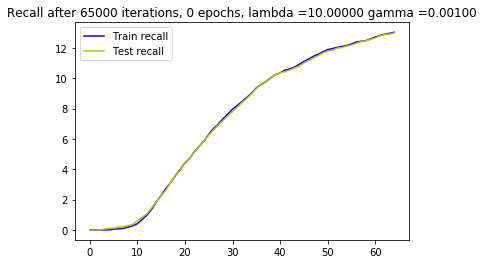

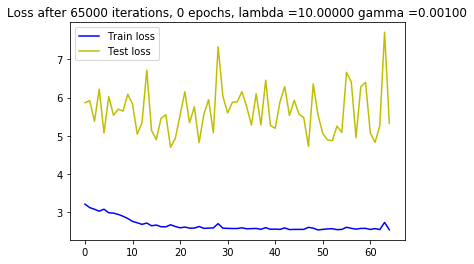

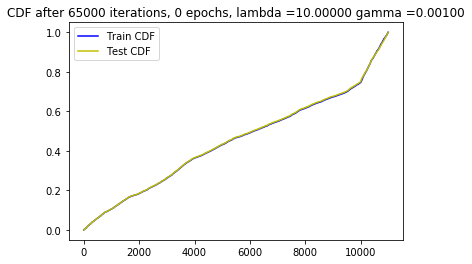






 14%|█▎        | 65001/473047 [42:09<107:12:34,  1.06it/s]




 14%|█▎        | 65008/473047 [42:09<75:32:26,  1.50it/s] 

New score:  0.075316355
Train score:  0.32230622
Test score:  0.43844968
Obj first part:  0.0
Obj second part:  -2.4854226
Obj first part:  4.0841615200042725
Obj second part:  -1.0915279
Obj first part:  1.1974183470010757
Obj second part:  -3.0980105
Obj first part:  0.7916298508644104
Obj second part:  -2.8016446
Obj first part:  0.3869686648249626
Obj second part:  -2.511558
Obj first part:  0.0
Obj second part:  -0.8324537
Obj first part:  4.537116289138794
Obj second part:  -0.9931028
Obj first part:  0.13665481470525265
Obj second part:  -1.7004182
Obj first part:  1.127142459154129
Obj second part:  -2.5955725
Obj first part:  0.0
Obj second part:  -0.3315724
Obj first part:  0.0
Obj second part:  -0.21286829
Obj first part:  3.78746896982193
Obj second part:  -1.1614035
Obj first part:  0.2719440683722496
Obj second part:  -1.1668624
Obj first part:  0.0
Obj second part:  -0.6297201







 14%|█▎        | 65016/473047 [42:09<53:21:11,  2.12it/s]




 14%|█▎        | 65024/473047 [42:09<37:49:00,  3.00it/s]

Obj first part:  0.0
Obj second part:  -0.4991823
Obj first part:  0.3148439899086952
Obj second part:  -3.2131348
Obj first part:  0.7921864092350006
Obj second part:  -1.7544132
Obj first part:  0.0
Obj second part:  -2.2137575
Obj first part:  0.0
Obj second part:  -3.7568445
Obj first part:  0.5722633376717567
Obj second part:  -3.6543682
Obj first part:  0.0
Obj second part:  -2.9661026
Obj first part:  0.15896985307335854
Obj second part:  -1.8264208
Obj first part:  0.0
Obj second part:  -1.159637
Obj first part:  0.7961589097976685
Obj second part:  -3.5054874
Obj first part:  0.0
Obj second part:  -0.36129218
Obj first part:  0.0
Obj second part:  -1.2831744
Obj first part:  9.278748035430908
Obj second part:  -0.6128076
Obj first part:  0.0
Obj second part:  -0.8666386
Obj first part:  0.0
Obj second part:  -0.8057243







 14%|█▎        | 65032/473047 [42:09<26:56:44,  4.21it/s]




 14%|█▎        | 65040/473047 [42:09<19:19:59,  5.86it/s]

Obj first part:  0.0
Obj second part:  -1.2960794
Obj first part:  0.0
Obj second part:  -0.23855512
Obj first part:  0.0
Obj second part:  -0.5980319
Obj first part:  0.26888037100434303
Obj second part:  -1.2587018
Obj first part:  1.0544470697641373
Obj second part:  -1.1334791
Obj first part:  0.0
Obj second part:  -4.7600517
Obj first part:  1.1425473541021347
Obj second part:  -1.2402182
Obj first part:  0.0
Obj second part:  -0.47525495
Obj first part:  0.0
Obj second part:  -2.0245023
Obj first part:  0.0
Obj second part:  -0.26219603
Obj first part:  0.0
Obj second part:  -0.49769062
Obj first part:  0.45054037123918533
Obj second part:  -3.1852868
Obj first part:  0.4323410615324974
Obj second part:  -0.8246368
Obj first part:  0.0
Obj second part:  -0.17308302
Obj first part:  0.0
Obj second part:  -0.70188534







 14%|█▍        | 65047/473047 [42:09<14:01:07,  8.08it/s]




 14%|█▍        | 65055/473047 [42:10<10:17:06, 11.02it/s]

Obj first part:  5.207589268684387
Obj second part:  -0.66135657
Obj first part:  0.0
Obj second part:  -0.9419393
Obj first part:  0.0
Obj second part:  -2.9646103
Obj first part:  0.0
Obj second part:  -1.0325205
Obj first part:  0.0
Obj second part:  -0.31162184
Obj first part:  0.8401118218898773
Obj second part:  -0.02634663
Obj first part:  0.40131479501724243
Obj second part:  -0.9222585
Obj first part:  1.3775615394115448
Obj second part:  -0.12596266
Obj first part:  1.257031410932541
Obj second part:  -0.38837984
Obj first part:  3.6297377943992615
Obj second part:  -2.3515146
Obj first part:  0.0
Obj second part:  -0.34186074
Obj first part:  4.119473695755005
Obj second part:  -0.70655566
Obj first part:  0.1651632972061634
Obj second part:  -1.2929428
Obj first part:  1.8256586790084839
Obj second part:  -0.12567538
Obj first part:  0.0
Obj second part:  -1.5843871







 14%|█▍        | 65062/473047 [42:10<7:41:30, 14.73it/s] 




 14%|█▍        | 65070/473047 [42:10<5:51:34, 19.34it/s]

Obj first part:  0.0
Obj second part:  -1.1472744
Obj first part:  0.0
Obj second part:  -3.4274764
Obj first part:  4.948899149894714
Obj second part:  -1.0085437
Obj first part:  1.8957118690013885
Obj second part:  -3.040801
Obj first part:  0.0
Obj second part:  -0.22436528
Obj first part:  1.0458989441394806
Obj second part:  -2.1346507
Obj first part:  0.0
Obj second part:  -3.7601452
Obj first part:  0.06803436670452356
Obj second part:  -0.130854
Obj first part:  0.0
Obj second part:  -1.0730839
Obj first part:  1.8303242325782776
Obj second part:  -1.96104
Obj first part:  1.7756277322769165
Obj second part:  -0.5325343
Obj first part:  0.0
Obj second part:  -3.960796
Obj first part:  0.0
Obj second part:  -0.6612474
Obj first part:  1.2573941051959991
Obj second part:  -0.4590491
Obj first part:  0.8634293079376221
Obj second part:  -0.55067366







 14%|█▍        | 65078/473047 [42:10<4:34:38, 24.76it/s]




 14%|█▍        | 65086/473047 [42:10<3:40:23, 30.85it/s]

Obj first part:  3.4728848934173584
Obj second part:  -0.85389775
Obj first part:  0.0
Obj second part:  -2.9020782
Obj first part:  0.0
Obj second part:  -0.5541043
Obj first part:  1.3778722286224365
Obj second part:  -0.46703488
Obj first part:  1.9303436577320099
Obj second part:  -0.7571278
Obj first part:  0.0
Obj second part:  -2.1914186
Obj first part:  5.6887286901474
Obj second part:  -0.73640734
Obj first part:  0.0
Obj second part:  -0.9566227
Obj first part:  0.0
Obj second part:  -3.3196344
Obj first part:  0.0
Obj second part:  -1.2927885
Obj first part:  0.12119592167437077
Obj second part:  -0.73304343
Obj first part:  0.0
Obj second part:  -1.0611746
Obj first part:  0.1077424455434084
Obj second part:  -0.8441079
Obj first part:  1.9396373629570007
Obj second part:  -0.52161753
Obj first part:  0.0
Obj second part:  -2.1196616







 14%|█▍        | 65094/473047 [42:10<3:02:53, 37.18it/s]




 14%|█▍        | 65102/473047 [42:10<2:36:14, 43.52it/s]

Obj first part:  0.03843843936920166
Obj second part:  -0.9013473
Obj first part:  0.0
Obj second part:  -2.1726053
Obj first part:  3.8662001490592957
Obj second part:  -0.7634047
Obj first part:  0.6693800538778305
Obj second part:  -2.3346553
Obj first part:  0.29716966673731804
Obj second part:  -1.2685618
Obj first part:  0.0
Obj second part:  -3.6037822
Obj first part:  0.0
Obj second part:  -2.5022092
Obj first part:  0.3149861842393875
Obj second part:  -1.5291141
Obj first part:  0.0
Obj second part:  -0.82069904
Obj first part:  0.0
Obj second part:  -3.549897
Obj first part:  0.7614056020975113
Obj second part:  -0.9267335
Obj first part:  0.0
Obj second part:  -1.8813866
Obj first part:  0.0
Obj second part:  -2.0663788
Obj first part:  0.0
Obj second part:  -3.252095
Obj first part:  0.413079597055912
Obj second part:  -1.2181199







 14%|█▍        | 65110/473047 [42:10<2:17:49, 49.33it/s]




 14%|█▍        | 65118/473047 [42:10<2:04:51, 54.45it/s]

Obj first part:  0.0
Obj second part:  -2.4339976
Obj first part:  0.0
Obj second part:  -0.7401767
Obj first part:  0.0
Obj second part:  -3.9999743
Obj first part:  3.087240755558014
Obj second part:  -1.0424114
Obj first part:  0.0
Obj second part:  -0.63819414
Obj first part:  0.0
Obj second part:  -1.527986
Obj first part:  0.27083730325102806
Obj second part:  -0.23297077
Obj first part:  0.0
Obj second part:  -0.84303784
Obj first part:  0.0
Obj second part:  -1.6820792
Obj first part:  0.0
Obj second part:  -0.38707986
Obj first part:  0.09003483690321445
Obj second part:  -5.4473753
Obj first part:  0.0
Obj second part:  -0.5033778
Obj first part:  0.0
Obj second part:  -4.544873
Obj first part:  7.039801478385925
Obj second part:  -2.4953887
Obj first part:  0.5044640600681305
Obj second part:  -0.50754684







 14%|█▍        | 65126/473047 [42:11<1:55:53, 58.67it/s]




 14%|█▍        | 65134/473047 [42:11<1:49:16, 62.21it/s]

Obj first part:  0.5213393643498421
Obj second part:  -1.5756272
Obj first part:  0.3074188344180584
Obj second part:  -4.6218104
Obj first part:  0.0
Obj second part:  -0.9711554
Obj first part:  0.0
Obj second part:  -1.4743166
Obj first part:  0.2778238244354725
Obj second part:  -3.694125
Obj first part:  0.054590096697211266
Obj second part:  -1.4910204
Obj first part:  2.4050267040729523
Obj second part:  -1.3116037
Obj first part:  0.0
Obj second part:  -1.5499527
Obj first part:  0.0
Obj second part:  -0.825174
Obj first part:  0.0
Obj second part:  -0.07300897
Obj first part:  0.5198825523257256
Obj second part:  -2.4651356
Obj first part:  0.0
Obj second part:  -2.8668811
Obj first part:  0.0
Obj second part:  -0.08315434
Obj first part:  1.1188364773988724
Obj second part:  -0.6112095
Obj first part:  1.1640652269124985
Obj second part:  -1.3070452







 14%|█▍        | 65142/473047 [42:11<1:45:03, 64.71it/s]

Obj first part:  0.6102409213781357
Obj second part:  -2.2779765
Obj first part:  0.45783549547195435
Obj second part:  -5.394707
Obj first part:  0.0
Obj second part:  -0.4358978
Obj first part:  0.0
Obj second part:  -1.3818389
Obj first part:  0.0
Obj second part:  -2.297739
Obj first part:  3.0149564146995544
Obj second part:  -0.64007413
Obj first part:  0.07846731692552567
Obj second part:  -1.8478221
Obj first part:  0.294481348246336
Obj second part:  -0.9650813
Obj first part:  0.0
Obj second part:  -0.6537555
Obj first part:  0.19584694877266884
Obj second part:  -2.3028343
Obj first part:  0.6416066735982895
Obj second part:  -2.7654912
Obj first part:  0.0
Obj second part:  -1.9458749
Obj first part:  0.0
Obj second part:  -3.5470371
Obj first part:  0.0
Obj second part:  -0.47664893
Obj first part:  0.0
Obj second part:  -1.0073807







 14%|█▍        | 65150/473047 [42:11<1:42:09, 66.54it/s]




 14%|█▍        | 65158/473047 [42:11<1:39:36, 68.25it/s]

Obj first part:  0.0
Obj second part:  -1.8347774
Obj first part:  3.49763423204422
Obj second part:  -0.96983594
Obj first part:  2.546638548374176
Obj second part:  -1.2280922
Obj first part:  1.4407379925251007
Obj second part:  -1.0487715
Obj first part:  0.0
Obj second part:  -0.40070692
Obj first part:  1.0175448656082153
Obj second part:  -3.4322793
Obj first part:  3.9051324129104614
Obj second part:  -1.9342686
Obj first part:  0.0
Obj second part:  -2.3238316
Obj first part:  0.5232080072164536
Obj second part:  -1.1213119
Obj first part:  0.36874912679195404
Obj second part:  -1.0339303
Obj first part:  0.0
Obj second part:  -0.8990486
Obj first part:  0.0
Obj second part:  -2.692238
Obj first part:  0.0
Obj second part:  -1.3897163
Obj first part:  0.0
Obj second part:  -0.57232845
Obj first part:  0.0
Obj second part:  -2.3070438







 14%|█▍        | 65166/473047 [42:11<1:38:30, 69.01it/s]




 14%|█▍        | 65174/473047 [42:11<1:37:57, 69.40it/s]

Obj first part:  0.0
Obj second part:  -3.3414927
Obj first part:  0.0
Obj second part:  -1.2742918
Obj first part:  0.0
Obj second part:  -2.5190103
Obj first part:  0.0
Obj second part:  -2.3987226
Obj first part:  1.3684123754501343
Obj second part:  -2.3777957
Obj first part:  7.922881245613098
Obj second part:  -1.1132567
Obj first part:  0.17193665727972984
Obj second part:  -0.44023177
Obj first part:  0.0
Obj second part:  -0.9348227
Obj first part:  0.0
Obj second part:  -1.096134
Obj first part:  6.261628270149231
Obj second part:  -3.0553207
Obj first part:  0.059514627791941166
Obj second part:  -0.9162876
Obj first part:  0.6953953206539154
Obj second part:  -1.5043215
Obj first part:  0.0
Obj second part:  -1.5444149
Obj first part:  0.0
Obj second part:  -0.69983983
Obj first part:  0.0
Obj second part:  -1.83395







 14%|█▍        | 65182/473047 [42:11<1:36:53, 70.16it/s]




 14%|█▍        | 65190/473047 [42:11<1:36:12, 70.65it/s]

Obj first part:  0.0
Obj second part:  -1.6195053
Obj first part:  0.0
Obj second part:  -0.34493703
Obj first part:  2.2058960795402527
Obj second part:  -2.4868832
Obj first part:  0.7430696487426758
Obj second part:  -0.5576824
Obj first part:  0.0
Obj second part:  -0.37559873
Obj first part:  3.3325955271720886
Obj second part:  -2.6914673
Obj first part:  1.4274866878986359
Obj second part:  -0.2554308
Obj first part:  0.0
Obj second part:  -0.58974755
Obj first part:  0.0
Obj second part:  -0.28447112
Obj first part:  1.142299622297287
Obj second part:  -1.2641907
Obj first part:  0.0
Obj second part:  -0.3721514
Obj first part:  2.0598872005939484
Obj second part:  -2.6879687
Obj first part:  0.43953806161880493
Obj second part:  -1.8176664
Obj first part:  0.0
Obj second part:  -0.5433486
Obj first part:  0.0
Obj second part:  -1.0853372







 14%|█▍        | 65198/473047 [42:12<1:35:58, 70.83it/s]




 14%|█▍        | 65206/473047 [42:12<1:35:12, 71.39it/s]

Obj first part:  2.552931010723114
Obj second part:  -1.2453939
Obj first part:  0.0
Obj second part:  -1.858382
Obj first part:  0.0
Obj second part:  -0.96006155
Obj first part:  0.0
Obj second part:  -1.646284
Obj first part:  0.0
Obj second part:  -2.9328039
Obj first part:  0.0
Obj second part:  -1.4001094
Obj first part:  4.270147383213043
Obj second part:  -0.48726466
Obj first part:  0.0
Obj second part:  -1.4292117
Obj first part:  0.0
Obj second part:  -0.5659268
Obj first part:  5.388117432594299
Obj second part:  -1.2384807
Obj first part:  0.0
Obj second part:  -0.16406961
Obj first part:  2.5037482380867004
Obj second part:  -0.3277442
Obj first part:  0.0
Obj second part:  -3.0811195
Obj first part:  0.9027685225009918
Obj second part:  -0.5037768
Obj first part:  0.0
Obj second part:  -0.12636763







 14%|█▍        | 65214/473047 [42:12<1:35:03, 71.51it/s]




 14%|█▍        | 65222/473047 [42:12<1:34:48, 71.69it/s]

Obj first part:  1.1565859615802765
Obj second part:  -1.2036572
Obj first part:  0.518709346652031
Obj second part:  -0.44934466
Obj first part:  0.2587965130805969
Obj second part:  -0.16949299
Obj first part:  0.3246615082025528
Obj second part:  -2.5787053
Obj first part:  0.9058567881584167
Obj second part:  -1.9029187
Obj first part:  0.0
Obj second part:  -0.23729636
Obj first part:  0.0
Obj second part:  -5.054548
Obj first part:  0.0
Obj second part:  -1.7966084
Obj first part:  0.0
Obj second part:  -1.0789223
Obj first part:  0.08152825757861137
Obj second part:  -0.8459461
Obj first part:  0.0
Obj second part:  -3.2772279
Obj first part:  1.7681397497653961
Obj second part:  -0.6071286
Obj first part:  0.6745922565460205
Obj second part:  -4.352796
Obj first part:  7.42120623588562
Obj second part:  -0.34576136
Obj first part:  0.5096817761659622
Obj second part:  -0.29748118







 14%|█▍        | 65230/473047 [42:12<1:34:47, 71.71it/s]




 14%|█▍        | 65238/473047 [42:12<1:34:34, 71.87it/s]

Obj first part:  0.0
Obj second part:  -0.5149735
Obj first part:  0.65975621342659
Obj second part:  -0.44873458
Obj first part:  4.99314546585083
Obj second part:  -0.10340894
Obj first part:  3.8005688786506653
Obj second part:  -3.5274248
Obj first part:  2.853044271469116
Obj second part:  -0.5435345
Obj first part:  0.17439337447285652
Obj second part:  -0.2974088
Obj first part:  0.0
Obj second part:  -3.3644998
Obj first part:  0.0
Obj second part:  -2.9065843
Obj first part:  0.17646372318267822
Obj second part:  -2.1285915
Obj first part:  0.0
Obj second part:  -1.6904635
Obj first part:  0.0
Obj second part:  -4.408939
Obj first part:  0.0
Obj second part:  -2.1268137
Obj first part:  0.37609629333019257
Obj second part:  -0.44275713
Obj first part:  0.1445824932307005
Obj second part:  -1.050895
Obj first part:  0.3567666932940483
Obj second part:  -0.3612371







 14%|█▍        | 65246/473047 [42:12<1:34:45, 71.73it/s]




 14%|█▍        | 65254/473047 [42:12<1:34:30, 71.92it/s]

Obj first part:  0.0
Obj second part:  -0.67811364
Obj first part:  0.0
Obj second part:  -3.8029132
Obj first part:  0.7682589441537857
Obj second part:  -0.620123
Obj first part:  0.9915944188833237
Obj second part:  -0.69828665
Obj first part:  0.0
Obj second part:  -2.4535685
Obj first part:  0.0
Obj second part:  -0.29909915
Obj first part:  0.0
Obj second part:  -0.065525934
Obj first part:  0.22512663155794144
Obj second part:  -1.0346948
Obj first part:  0.0
Obj second part:  -0.012779243
Obj first part:  0.22038228809833527
Obj second part:  -1.4434577
Obj first part:  5.885050296783447
Obj second part:  -1.1448725
Obj first part:  0.0
Obj second part:  -0.117833585
Obj first part:  0.16767961904406548
Obj second part:  -0.56120145
Obj first part:  0.5343819037079811
Obj second part:  -0.6795041
Obj first part:  0.9298479557037354
Obj second part:  -1.8476459







 14%|█▍        | 65262/473047 [42:12<1:34:46, 71.71it/s]

Obj first part:  3.8341376185417175
Obj second part:  -3.1334674
Obj first part:  0.14718017540872097
Obj second part:  -0.9196848
Obj first part:  0.0
Obj second part:  -0.887737
Obj first part:  0.0
Obj second part:  -1.6337708
Obj first part:  0.0
Obj second part:  -1.115659
Obj first part:  0.0
Obj second part:  -0.8426049
Obj first part:  0.529821403324604
Obj second part:  -0.4327928
Obj first part:  0.062077599577605724
Obj second part:  -1.0128927
Obj first part:  5.826898217201233
Obj second part:  -0.86619174
Obj first part:  0.0
Obj second part:  -0.718968
Obj first part:  0.0
Obj second part:  -3.9199295
Obj first part:  0.0
Obj second part:  -1.6658906
Obj first part:  0.0
Obj second part:  -0.8536773
Obj first part:  0.0
Obj second part:  -2.774966
Obj first part:  0.0
Obj second part:  -0.8791677







 14%|█▍        | 65270/473047 [42:13<1:35:03, 71.49it/s]




 14%|█▍        | 65278/473047 [42:13<1:34:50, 71.66it/s]

Obj first part:  0.0
Obj second part:  -0.2119265
Obj first part:  0.3118390403687954
Obj second part:  -3.2853045
Obj first part:  0.0
Obj second part:  -0.8007047
Obj first part:  1.2604564428329468
Obj second part:  -1.4868498
Obj first part:  2.720663845539093
Obj second part:  -0.04590778
Obj first part:  0.0
Obj second part:  -1.5571997
Obj first part:  1.2740395963191986
Obj second part:  -0.11442431
Obj first part:  0.9008055925369263
Obj second part:  -3.2217221
Obj first part:  0.21031273528933525
Obj second part:  -0.5034404
Obj first part:  2.87043035030365
Obj second part:  -0.54916906
Obj first part:  0.0
Obj second part:  -3.9815478
Obj first part:  0.0
Obj second part:  -1.1461926
Obj first part:  0.0
Obj second part:  -0.24026582
Obj first part:  0.0
Obj second part:  -0.32828856
Obj first part:  0.0
Obj second part:  -0.58309776







 14%|█▍        | 65286/473047 [42:13<1:35:11, 71.39it/s]




 14%|█▍        | 65294/473047 [42:13<1:34:56, 71.59it/s]

Obj first part:  0.0
Obj second part:  -0.5059984
Obj first part:  0.0
Obj second part:  -0.5886234
Obj first part:  0.30480576679110527
Obj second part:  -2.1672704
Obj first part:  0.07457943633198738
Obj second part:  -2.818752
Obj first part:  13.266953229904175
Obj second part:  -0.2698197
Obj first part:  8.967934846878052
Obj second part:  -2.5236487
Obj first part:  0.0
Obj second part:  -0.3956479
Obj first part:  0.0
Obj second part:  -0.47442698
Obj first part:  0.0
Obj second part:  -3.5313215
Obj first part:  1.2339071184396744
Obj second part:  -0.41275302
Obj first part:  0.0
Obj second part:  -1.7802057
Obj first part:  0.0
Obj second part:  -0.8938352
Obj first part:  0.0
Obj second part:  -2.4928842
Obj first part:  0.0
Obj second part:  -0.8543505
Obj first part:  0.0
Obj second part:  -3.6993284







 14%|█▍        | 65302/473047 [42:13<1:34:58, 71.55it/s]




 14%|█▍        | 65310/473047 [42:13<1:34:40, 71.78it/s]

Obj first part:  0.0
Obj second part:  -0.19421072
Obj first part:  3.812725245952606
Obj second part:  -2.4585688
Obj first part:  0.0
Obj second part:  -0.12744501
Obj first part:  0.0
Obj second part:  -3.1149468
Obj first part:  0.3920697793364525
Obj second part:  -4.182397
Obj first part:  0.0
Obj second part:  -0.34490117
Obj first part:  0.0
Obj second part:  -2.0659015
Obj first part:  0.0
Obj second part:  -0.39427453
Obj first part:  0.0
Obj second part:  -0.1364509
Obj first part:  0.0
Obj second part:  -0.91491055
Obj first part:  0.8416926115751266
Obj second part:  -1.8083186
Obj first part:  0.8811677992343903
Obj second part:  -2.536446
Obj first part:  0.0
Obj second part:  -2.2086594
Obj first part:  0.0
Obj second part:  -0.7621222
Obj first part:  0.0843630637973547
Obj second part:  -1.0498998







 14%|█▍        | 65318/473047 [42:13<1:34:45, 71.72it/s]




 14%|█▍        | 65326/473047 [42:13<1:34:38, 71.80it/s]

Obj first part:  0.0
Obj second part:  -1.1293907
Obj first part:  0.0
Obj second part:  -0.751844
Obj first part:  1.1782920360565186
Obj second part:  -1.1950531
Obj first part:  3.689800798892975
Obj second part:  -0.58897746
Obj first part:  0.0
Obj second part:  -2.423023
Obj first part:  0.0
Obj second part:  -2.031987
Obj first part:  0.2903641015291214
Obj second part:  -0.69972634
Obj first part:  5.315057039260864
Obj second part:  -0.6781687
Obj first part:  0.9922977536916733
Obj second part:  -1.0120656
Obj first part:  0.0
Obj second part:  -2.4674714
Obj first part:  0.2589987963438034
Obj second part:  -0.9650048
Obj first part:  0.6591430306434631
Obj second part:  -0.6167071
Obj first part:  0.0
Obj second part:  -0.2293093
Obj first part:  0.40829598903656006
Obj second part:  -0.9216184
Obj first part:  0.0
Obj second part:  -0.30648953







 14%|█▍        | 65334/473047 [42:14<1:34:50, 71.65it/s]




 14%|█▍        | 65342/473047 [42:14<1:34:36, 71.83it/s]

Obj first part:  0.0
Obj second part:  -1.486165
Obj first part:  0.0
Obj second part:  -0.26394746
Obj first part:  0.18335476517677307
Obj second part:  -1.4150196
Obj first part:  0.44068824499845505
Obj second part:  -4.345392
Obj first part:  12.376275062561035
Obj second part:  -1.0353538
Obj first part:  0.0
Obj second part:  -2.3349783
Obj first part:  0.0
Obj second part:  -0.83124804
Obj first part:  0.29311148449778557
Obj second part:  -1.832942
Obj first part:  3.333183526992798
Obj second part:  -1.8852042
Obj first part:  0.0
Obj second part:  -0.9252159
Obj first part:  0.3404451906681061
Obj second part:  -3.3483045
Obj first part:  0.6745576858520508
Obj second part:  -2.4621363
Obj first part:  0.38165468722581863
Obj second part:  -0.16732243
Obj first part:  0.5043840035796165
Obj second part:  -1.0779309
Obj first part:  0.0
Obj second part:  -1.905976







 14%|█▍        | 65350/473047 [42:14<1:35:17, 71.30it/s]




 14%|█▍        | 65358/473047 [42:14<1:34:55, 71.57it/s]

Obj first part:  3.213387429714203
Obj second part:  -2.2611976
Obj first part:  1.7968697845935822
Obj second part:  -1.6026765
Obj first part:  4.247247576713562
Obj second part:  -0.29926267
Obj first part:  0.0
Obj second part:  -2.8378081
Obj first part:  0.8741695433855057
Obj second part:  -2.1410215
Obj first part:  0.0
Obj second part:  -0.35978964
Obj first part:  0.0025716068921610713
Obj second part:  -0.5561561
Obj first part:  0.0
Obj second part:  -1.4213836
Obj first part:  0.0
Obj second part:  -2.5064497
Obj first part:  0.0
Obj second part:  -0.833405
Obj first part:  0.4857386276125908
Obj second part:  -0.41648826
Obj first part:  0.0
Obj second part:  -0.10936192
Obj first part:  0.41442401707172394
Obj second part:  -0.5133296
Obj first part:  0.0
Obj second part:  -0.0074500707
Obj first part:  0.0
Obj second part:  -2.9429424







 14%|█▍        | 65366/473047 [42:14<1:34:56, 71.57it/s]




 14%|█▍        | 65374/473047 [42:14<1:34:42, 71.74it/s]

Obj first part:  0.675206258893013
Obj second part:  -1.4838349
Obj first part:  0.0
Obj second part:  -0.9632876
Obj first part:  0.22861383855342865
Obj second part:  -0.8809899
Obj first part:  0.0
Obj second part:  -0.9189156
Obj first part:  1.4479340612888336
Obj second part:  -2.3144395
Obj first part:  0.0
Obj second part:  -2.5105536
Obj first part:  0.36412186920642853
Obj second part:  -3.3755255
Obj first part:  0.2301892451941967
Obj second part:  -3.6583555
Obj first part:  1.3356472551822662
Obj second part:  -0.8342869
Obj first part:  0.2530517987906933
Obj second part:  -3.2067258
Obj first part:  2.9970869421958923
Obj second part:  -3.1412141
Obj first part:  0.0
Obj second part:  -0.39506704
Obj first part:  0.0
Obj second part:  -1.7374969
Obj first part:  0.3216632083058357
Obj second part:  -3.2170393
Obj first part:  5.159012675285339
Obj second part:  -1.8385183







 14%|█▍        | 65382/473047 [42:14<1:34:35, 71.83it/s]

Obj first part:  0.0
Obj second part:  -1.3715358
Obj first part:  0.0
Obj second part:  -0.8818836
Obj first part:  0.0
Obj second part:  -0.6335371
Obj first part:  0.0
Obj second part:  -2.6938171
Obj first part:  0.0
Obj second part:  -3.2412553
Obj first part:  1.02934330701828
Obj second part:  -1.0187418
Obj first part:  1.3024739921092987
Obj second part:  -1.2057984
Obj first part:  0.45048750936985016
Obj second part:  -1.0724249
Obj first part:  0.0
Obj second part:  -0.19013861
Obj first part:  0.0
Obj second part:  -0.040384453
Obj first part:  1.8133565783500671
Obj second part:  -0.60931957
Obj first part:  5.702044367790222
Obj second part:  -1.7306523
Obj first part:  0.0
Obj second part:  -1.430679
Obj first part:  1.4175552129745483
Obj second part:  -0.36764798
Obj first part:  0.564691573381424
Obj second part:  -4.1693015







 14%|█▍        | 65390/473047 [42:14<1:34:30, 71.90it/s]




 14%|█▍        | 65398/473047 [42:14<1:34:08, 72.17it/s]

Obj first part:  0.977853313088417
Obj second part:  -0.18457767
Obj first part:  0.1510018389672041
Obj second part:  -1.2790146
Obj first part:  0.0
Obj second part:  -1.5279548
Obj first part:  1.00905641913414
Obj second part:  -2.9213297
Obj first part:  0.6399130821228027
Obj second part:  -0.41652414
Obj first part:  0.24711178615689278
Obj second part:  -0.22971639
Obj first part:  0.0
Obj second part:  -0.28353718
Obj first part:  0.0
Obj second part:  -3.1106532
Obj first part:  1.1308416724205017
Obj second part:  -0.46678662
Obj first part:  0.0
Obj second part:  -0.5918782
Obj first part:  0.0
Obj second part:  -0.7517808
Obj first part:  0.9232724457979202
Obj second part:  -0.7807949
Obj first part:  1.7431983351707458
Obj second part:  -0.72099733
Obj first part:  0.0
Obj second part:  -0.4400958
Obj first part:  1.4932851493358612
Obj second part:  -2.296025







 14%|█▍        | 65406/473047 [42:15<1:34:30, 71.89it/s]




 14%|█▍        | 65414/473047 [42:15<1:34:42, 71.74it/s]

Obj first part:  0.0
Obj second part:  -0.8480858
Obj first part:  0.0
Obj second part:  -2.8546999
Obj first part:  0.13422594405710697
Obj second part:  -0.3597923
Obj first part:  0.0
Obj second part:  -0.26501366
Obj first part:  0.0
Obj second part:  -0.4615093
Obj first part:  0.0
Obj second part:  -2.5080576
Obj first part:  0.0
Obj second part:  -1.591397
Obj first part:  0.0
Obj second part:  -1.7646906
Obj first part:  1.8836106359958649
Obj second part:  -1.0185162
Obj first part:  0.21392520517110825
Obj second part:  -4.0553985
Obj first part:  0.0
Obj second part:  -0.2536565
Obj first part:  0.0
Obj second part:  -1.9848824
Obj first part:  0.0
Obj second part:  -1.8506178
Obj first part:  0.0
Obj second part:  -0.23191239
Obj first part:  1.44457146525383
Obj second part:  -4.016813







 14%|█▍        | 65422/473047 [42:15<1:35:02, 71.48it/s]




 14%|█▍        | 65430/473047 [42:15<1:34:45, 71.69it/s]

Obj first part:  0.0
Obj second part:  -3.3041458
Obj first part:  0.0
Obj second part:  -1.80227
Obj first part:  0.0
Obj second part:  -2.5933173
Obj first part:  0.0
Obj second part:  -0.18246064
Obj first part:  0.7108873128890991
Obj second part:  -3.1420088
Obj first part:  6.240792274475098
Obj second part:  -0.4444478
Obj first part:  5.0664520263671875
Obj second part:  -0.46824557
Obj first part:  2.1859487891197205
Obj second part:  -1.5834779
Obj first part:  0.0
Obj second part:  -1.5007282
Obj first part:  0.6508637219667435
Obj second part:  -0.97087896
Obj first part:  0.0
Obj second part:  -2.4268181
Obj first part:  0.7329430431127548
Obj second part:  -0.87351424
Obj first part:  6.4773887395858765
Obj second part:  -0.9900344
Obj first part:  0.0
Obj second part:  -1.7141154
Obj first part:  0.0
Obj second part:  -5.7690215







 14%|█▍        | 65438/473047 [42:15<1:34:52, 71.60it/s]




 14%|█▍        | 65446/473047 [42:15<1:35:34, 71.08it/s]

Obj first part:  11.503568887710571
Obj second part:  -1.4512156
Obj first part:  0.0
Obj second part:  -0.34799886
Obj first part:  0.6795579195022583
Obj second part:  -2.732651
Obj first part:  0.0
Obj second part:  -1.9015942
Obj first part:  0.0
Obj second part:  -0.20031482
Obj first part:  0.0
Obj second part:  -1.1948371
Obj first part:  0.05433124490082264
Obj second part:  -4.877753
Obj first part:  0.0
Obj second part:  -1.246356
Obj first part:  0.0
Obj second part:  -1.8184819
Obj first part:  0.0
Obj second part:  -2.64879
Obj first part:  8.974614143371582
Obj second part:  -1.5261961
Obj first part:  0.0
Obj second part:  -1.1268761
Obj first part:  0.07569771260023117
Obj second part:  -5.245814
Obj first part:  0.0
Obj second part:  -3.0429583
Obj first part:  0.0
Obj second part:  -0.49215418







 14%|█▍        | 65454/473047 [42:15<1:35:07, 71.41it/s]




 14%|█▍        | 65462/473047 [42:15<1:35:19, 71.26it/s]

Obj first part:  0.03518344135954976
Obj second part:  -3.4560542
Obj first part:  1.242796778678894
Obj second part:  -2.4603314
Obj first part:  2.0738469064235687
Obj second part:  -1.8957903
Obj first part:  0.3549240902066231
Obj second part:  -2.6998794
Obj first part:  1.909814029932022
Obj second part:  -1.5422105
Obj first part:  2.536366581916809
Obj second part:  -2.174877
Obj first part:  0.0
Obj second part:  -3.0908513
Obj first part:  3.3342230319976807
Obj second part:  -1.8710376
Obj first part:  0.0
Obj second part:  -0.8550271
Obj first part:  0.07539510726928711
Obj second part:  -0.088703975
Obj first part:  0.0
Obj second part:  -0.8302545
Obj first part:  0.7210519164800644
Obj second part:  -0.75456846
Obj first part:  0.0
Obj second part:  -0.67260706
Obj first part:  2.9782283306121826
Obj second part:  -2.9186282
Obj first part:  0.0
Obj second part:  -3.3134322







 14%|█▍        | 65470/473047 [42:15<1:35:19, 71.26it/s]




 14%|█▍        | 65478/473047 [42:16<1:34:58, 71.52it/s]

Obj first part:  0.0
Obj second part:  -0.6281006
Obj first part:  0.0
Obj second part:  -1.0133951
Obj first part:  0.0
Obj second part:  -1.2150551
Obj first part:  0.0
Obj second part:  -2.14005
Obj first part:  0.0
Obj second part:  -1.2913553
Obj first part:  0.0
Obj second part:  -0.91288567
Obj first part:  0.0
Obj second part:  -1.3559787
Obj first part:  0.0
Obj second part:  -0.615404
Obj first part:  1.407657116651535
Obj second part:  -2.266926
Obj first part:  0.0
Obj second part:  -1.0297453
Obj first part:  0.0
Obj second part:  -1.601239
Obj first part:  0.0
Obj second part:  -1.5703198
Obj first part:  2.249908149242401
Obj second part:  -0.113184646
Obj first part:  1.1685767024755478
Obj second part:  -0.64761007
Obj first part:  0.0
Obj second part:  -1.0770795







 14%|█▍        | 65486/473047 [42:16<1:35:42, 70.97it/s]




 14%|█▍        | 65494/473047 [42:16<1:35:07, 71.41it/s]

Obj first part:  0.0
Obj second part:  -0.6755312
Obj first part:  0.42691122740507126
Obj second part:  -0.6329565
Obj first part:  0.28955066576600075
Obj second part:  -0.42803976
Obj first part:  0.5625462159514427
Obj second part:  -0.3198581
Obj first part:  0.0
Obj second part:  -0.5764362
Obj first part:  0.0
Obj second part:  -0.4143131
Obj first part:  0.0
Obj second part:  -3.2865481
Obj first part:  0.8104424178600311
Obj second part:  -1.4548244
Obj first part:  0.0
Obj second part:  -1.4750025
Obj first part:  0.0
Obj second part:  -0.58422637
Obj first part:  3.035135269165039
Obj second part:  -0.18391645
Obj first part:  0.0
Obj second part:  -1.2762233
Obj first part:  0.6083443388342857
Obj second part:  -1.1210779
Obj first part:  2.1272170543670654
Obj second part:  -2.7868354
Obj first part:  1.0240861773490906
Obj second part:  -1.0546947







 14%|█▍        | 65502/473047 [42:16<1:34:51, 71.61it/s]

Obj first part:  2.827371656894684
Obj second part:  -1.4500285
Obj first part:  2.177377939224243
Obj second part:  -0.032811042
Obj first part:  2.3908159136772156
Obj second part:  -2.1881773
Obj first part:  13.880494832992554
Obj second part:  -0.46504322
Obj first part:  0.0
Obj second part:  -1.0324973
Obj first part:  0.0
Obj second part:  -3.3066359
Obj first part:  0.0
Obj second part:  -1.0545108
Obj first part:  0.0
Obj second part:  -0.07354778
Obj first part:  0.0
Obj second part:  -0.55212116
Obj first part:  1.3602253794670105
Obj second part:  -0.48638704
Obj first part:  0.0
Obj second part:  -2.562029
Obj first part:  0.0
Obj second part:  -0.71964186
Obj first part:  3.957653045654297
Obj second part:  -4.2704816
Obj first part:  0.24757180362939835
Obj second part:  -2.886817
Obj first part:  0.0
Obj second part:  -0.31541938







 14%|█▍        | 65510/473047 [42:16<1:34:40, 71.74it/s]




 14%|█▍        | 65518/473047 [42:16<1:34:15, 72.06it/s]

Obj first part:  2.4358874559402466
Obj second part:  -3.684332
Obj first part:  0.4824962839484215
Obj second part:  -1.7377224
Obj first part:  0.0
Obj second part:  -1.2298594
Obj first part:  0.0
Obj second part:  -0.4499801
Obj first part:  0.0
Obj second part:  -1.1368321
Obj first part:  0.0
Obj second part:  -0.4461044
Obj first part:  0.43129269033670425
Obj second part:  -1.0097772
Obj first part:  5.813658237457275
Obj second part:  -2.171819
Obj first part:  7.057315111160278
Obj second part:  -0.41668686
Obj first part:  0.5522892251610756
Obj second part:  -0.415703
Obj first part:  0.0
Obj second part:  -0.20021528
Obj first part:  0.1703052595257759
Obj second part:  -5.3926625
Obj first part:  11.403694152832031
Obj second part:  -0.9297201
Obj first part:  0.0
Obj second part:  -1.3494592
Obj first part:  0.0
Obj second part:  -2.2165337







 14%|█▍        | 65526/473047 [42:16<1:34:16, 72.05it/s]




 14%|█▍        | 65534/473047 [42:16<1:34:26, 71.91it/s]

Obj first part:  0.0
Obj second part:  -0.63722193
Obj first part:  0.12360386550426483
Obj second part:  -1.484558
Obj first part:  0.0
Obj second part:  -1.0415931
Obj first part:  0.40164001286029816
Obj second part:  -2.926938
Obj first part:  0.0
Obj second part:  -2.6421487
Obj first part:  0.13432827778160572
Obj second part:  -0.3731656
Obj first part:  0.700705423951149
Obj second part:  -2.1089704
Obj first part:  0.0
Obj second part:  -1.8089497
Obj first part:  0.0
Obj second part:  -2.876379
Obj first part:  0.7778044790029526
Obj second part:  -0.267842
Obj first part:  0.0
Obj second part:  -1.4728934
Obj first part:  0.13223023153841496
Obj second part:  -1.669234
Obj first part:  0.0
Obj second part:  -1.4020133
Obj first part:  2.1469764411449432
Obj second part:  -2.6884937
Obj first part:  0.0
Obj second part:  -0.11993694







 14%|█▍        | 65542/473047 [42:16<1:34:37, 71.77it/s]




 14%|█▍        | 65550/473047 [42:17<1:34:51, 71.60it/s]

Obj first part:  14.049824476242065
Obj second part:  -0.12462928
Obj first part:  3.075799345970154
Obj second part:  -1.6487854
Obj first part:  0.545683242380619
Obj second part:  -0.90805703
Obj first part:  0.0
Obj second part:  -0.32202485
Obj first part:  2.756025791168213
Obj second part:  -0.67036515
Obj first part:  0.0
Obj second part:  -1.7763305
Obj first part:  0.1954605057835579
Obj second part:  -2.9053795
Obj first part:  2.0610372722148895
Obj second part:  -1.5218247
Obj first part:  0.0
Obj second part:  -4.9268403
Obj first part:  0.0
Obj second part:  -0.4343846
Obj first part:  0.0
Obj second part:  -0.101102985
Obj first part:  0.0
Obj second part:  -1.912627
Obj first part:  0.09127283468842506
Obj second part:  -0.8957167
Obj first part:  0.2317875623703003
Obj second part:  -0.94873154
Obj first part:  0.0
Obj second part:  -0.48440295







 14%|█▍        | 65558/473047 [42:17<1:35:10, 71.35it/s]




 14%|█▍        | 65566/473047 [42:17<1:34:47, 71.64it/s]

Obj first part:  0.7447769492864609
Obj second part:  -3.2775564
Obj first part:  0.0
Obj second part:  -1.5089656
Obj first part:  0.06366289686411619
Obj second part:  -0.19121328
Obj first part:  0.0
Obj second part:  -2.7897787
Obj first part:  0.0
Obj second part:  -4.2737694
Obj first part:  0.5411388352513313
Obj second part:  -2.055565
Obj first part:  0.0
Obj second part:  -0.82616997
Obj first part:  0.0
Obj second part:  -0.9735629
Obj first part:  0.0
Obj second part:  -2.246121
Obj first part:  0.0
Obj second part:  -3.371069
Obj first part:  0.0
Obj second part:  -1.8515517
Obj first part:  0.0
Obj second part:  -0.72068197
Obj first part:  0.08218582719564438
Obj second part:  -0.20983854
Obj first part:  0.19570237025618553
Obj second part:  -1.5801967
Obj first part:  1.969781368970871
Obj second part:  -1.3167342







 14%|█▍        | 65574/473047 [42:17<1:34:40, 71.73it/s]




 14%|█▍        | 65582/473047 [42:17<1:34:42, 71.71it/s]

Obj first part:  0.18747417256236076
Obj second part:  -4.421897
Obj first part:  0.0
Obj second part:  -1.9306781
Obj first part:  0.14773715287446976
Obj second part:  -1.0841753
Obj first part:  0.0
Obj second part:  -1.5280665
Obj first part:  0.4435965418815613
Obj second part:  -0.30883184
Obj first part:  0.0
Obj second part:  -1.3622496
Obj first part:  14.754946231842041
Obj second part:  -1.9880719
Obj first part:  1.4332160353660583
Obj second part:  -0.4331042
Obj first part:  0.14993639662861824
Obj second part:  -2.3990598
Obj first part:  3.085354268550873
Obj second part:  -1.5128496
Obj first part:  0.0
Obj second part:  -0.68169653
Obj first part:  0.0
Obj second part:  -1.5153885
Obj first part:  0.0
Obj second part:  -1.33118
Obj first part:  0.7181776314973831
Obj second part:  -1.6598718
Obj first part:  0.0
Obj second part:  -0.92361844







 14%|█▍        | 65590/473047 [42:17<1:34:30, 71.85it/s]




 14%|█▍        | 65598/473047 [42:17<1:34:18, 72.01it/s]

Obj first part:  0.0
Obj second part:  -0.79101074
Obj first part:  0.792200118303299
Obj second part:  -2.5167842
Obj first part:  0.0
Obj second part:  -3.0376444
Obj first part:  0.0
Obj second part:  -4.4757395
Obj first part:  0.0
Obj second part:  -1.4211257
Obj first part:  0.0
Obj second part:  -3.9849505
Obj first part:  2.309160679578781
Obj second part:  -1.0574552
Obj first part:  0.0
Obj second part:  -0.6416043
Obj first part:  0.0
Obj second part:  -0.61840665
Obj first part:  12.741578817367554
Obj second part:  -1.1427978
Obj first part:  0.31402304768562317
Obj second part:  -2.5128298
Obj first part:  0.8723092079162598
Obj second part:  -0.6940061
Obj first part:  4.230323135852814
Obj second part:  -3.3374343
Obj first part:  0.2665143646299839
Obj second part:  -0.31872165
Obj first part:  0.0
Obj second part:  -0.19308431







 14%|█▍        | 65606/473047 [42:17<1:34:27, 71.88it/s]




 14%|█▍        | 65614/473047 [42:17<1:34:24, 71.92it/s]

Obj first part:  5.528846383094788
Obj second part:  -0.8699657
Obj first part:  0.47132425010204315
Obj second part:  -1.9371777
Obj first part:  0.0
Obj second part:  -0.8474234
Obj first part:  0.2501644194126129
Obj second part:  -1.1260394
Obj first part:  0.30671538785099983
Obj second part:  -2.4718823
Obj first part:  0.09333939291536808
Obj second part:  -1.2485459
Obj first part:  0.42408160865306854
Obj second part:  -1.3369912
Obj first part:  0.0
Obj second part:  -0.38384363
Obj first part:  1.6479180753231049
Obj second part:  -1.9377809
Obj first part:  12.788288593292236
Obj second part:  -0.36552528
Obj first part:  0.16463620588183403
Obj second part:  -1.8515196
Obj first part:  0.0
Obj second part:  -1.0813566
Obj first part:  0.0
Obj second part:  -1.0931642
Obj first part:  0.0
Obj second part:  -2.253793
Obj first part:  5.732130408287048
Obj second part:  -0.8030879







 14%|█▍        | 65622/473047 [42:18<1:34:50, 71.60it/s]

Obj first part:  0.0
Obj second part:  -1.313736
Obj first part:  0.0
Obj second part:  -3.5067563
Obj first part:  0.23553721606731415
Obj second part:  -1.7062417
Obj first part:  0.0
Obj second part:  -2.1507053
Obj first part:  1.2002938985824585
Obj second part:  -0.5241829
Obj first part:  1.5601208806037903
Obj second part:  -0.69373685
Obj first part:  0.22535866126418114
Obj second part:  -0.17264196
Obj first part:  1.1977574229240417
Obj second part:  -0.5892208
Obj first part:  0.0
Obj second part:  -1.6120882
Obj first part:  0.0
Obj second part:  -0.6603334
Obj first part:  0.07282774895429611
Obj second part:  -1.8323379
Obj first part:  0.0
Obj second part:  -0.109947555
Obj first part:  0.0
Obj second part:  -0.96011966
Obj first part:  0.0
Obj second part:  -2.4993792
Obj first part:  0.0
Obj second part:  -2.5117536







 14%|█▍        | 65630/473047 [42:18<1:34:58, 71.50it/s]




 14%|█▍        | 65638/473047 [42:18<1:34:43, 71.68it/s]

Obj first part:  3.0577826499938965
Obj second part:  -1.0390147
Obj first part:  0.7800771296024323
Obj second part:  -0.055308986
Obj first part:  0.09820768609642982
Obj second part:  -2.1055665
Obj first part:  0.0
Obj second part:  -0.7113858
Obj first part:  0.7105815410614014
Obj second part:  -0.70735514
Obj first part:  0.0
Obj second part:  -0.04571921
Obj first part:  0.07799292914569378
Obj second part:  -3.8330398
Obj first part:  0.0
Obj second part:  -0.44547033
Obj first part:  6.156328916549683
Obj second part:  -2.6836216
Obj first part:  1.8243873119354248
Obj second part:  -1.7716067
Obj first part:  0.0
Obj second part:  -0.69178474
Obj first part:  0.0
Obj second part:  -1.2848417
Obj first part:  0.38165535777807236
Obj second part:  -0.8548673
Obj first part:  0.28504667803645134
Obj second part:  -0.8918029
Obj first part:  0.0
Obj second part:  -1.4457996







 14%|█▍        | 65646/473047 [42:18<1:34:44, 71.67it/s]




 14%|█▍        | 65654/473047 [42:18<1:34:29, 71.86it/s]

Obj first part:  2.772575318813324
Obj second part:  -2.7848918
Obj first part:  0.0
Obj second part:  -0.35685185
Obj first part:  0.010695941746234894
Obj second part:  -3.4198017
Obj first part:  0.06880855653434992
Obj second part:  -2.4172087
Obj first part:  0.0
Obj second part:  -0.5037492
Obj first part:  0.0
Obj second part:  -0.92227644
Obj first part:  0.0
Obj second part:  -1.1133472
Obj first part:  0.0
Obj second part:  -1.5230149
Obj first part:  0.0
Obj second part:  -1.3635054
Obj first part:  0.0
Obj second part:  -1.5319651
Obj first part:  0.0
Obj second part:  -0.6873284
Obj first part:  0.0
Obj second part:  -0.81470346
Obj first part:  0.05554692354053259
Obj second part:  -0.021586228
Obj first part:  0.2458203211426735
Obj second part:  -2.7263546
Obj first part:  0.0
Obj second part:  -0.6383507







 14%|█▍        | 65662/473047 [42:18<1:34:33, 71.81it/s]




 14%|█▍        | 65670/473047 [42:18<1:34:28, 71.87it/s]

Obj first part:  0.917419046163559
Obj second part:  -1.0217979
Obj first part:  0.5075206980109215
Obj second part:  -1.8749452
Obj first part:  1.1042998731136322
Obj second part:  -1.322384
Obj first part:  0.5590729787945747
Obj second part:  -1.13365
Obj first part:  1.1933140456676483
Obj second part:  -0.35876963
Obj first part:  0.32796047627925873
Obj second part:  -0.5187084
Obj first part:  0.612642876803875
Obj second part:  -0.1498468
Obj first part:  0.0
Obj second part:  -1.4872586
Obj first part:  2.57813960313797
Obj second part:  -0.42488056
Obj first part:  0.05653523374348879
Obj second part:  -3.1451685
Obj first part:  0.0
Obj second part:  -0.86730117
Obj first part:  1.5736283361911774
Obj second part:  -1.4990425
Obj first part:  0.0
Obj second part:  -0.2828469
Obj first part:  1.1447187513113022
Obj second part:  -0.6656762
Obj first part:  0.0
Obj second part:  -2.1018946







 14%|█▍        | 65678/473047 [42:18<1:34:40, 71.71it/s]




 14%|█▍        | 65686/473047 [42:18<1:34:38, 71.73it/s]

Obj first part:  0.0
Obj second part:  -0.13386066
Obj first part:  0.0
Obj second part:  -0.63884825
Obj first part:  0.5141802504658699
Obj second part:  -1.32153
Obj first part:  0.0
Obj second part:  -0.30348742
Obj first part:  0.0
Obj second part:  -1.3369925
Obj first part:  0.21877916529774666
Obj second part:  -0.35606965
Obj first part:  1.1584313213825226
Obj second part:  -0.13161193
Obj first part:  0.0
Obj second part:  -2.8841715
Obj first part:  0.0
Obj second part:  -0.37356138
Obj first part:  7.914638519287109
Obj second part:  -1.2549523
Obj first part:  0.025554453022778034
Obj second part:  -1.8742125
Obj first part:  1.8004922568798065
Obj second part:  -1.8541673
Obj first part:  0.1932983286678791
Obj second part:  -2.2798412
Obj first part:  0.0
Obj second part:  -1.7470088
Obj first part:  2.6752525568008423
Obj second part:  -0.9982507







 14%|█▍        | 65694/473047 [42:19<1:34:50, 71.59it/s]




 14%|█▍        | 65702/473047 [42:19<1:34:37, 71.75it/s]

Obj first part:  0.0
Obj second part:  -1.1563611
Obj first part:  1.5610307455062866
Obj second part:  -0.13881712
Obj first part:  0.07934946566820145
Obj second part:  -1.9156337
Obj first part:  3.204389810562134
Obj second part:  -3.1389596
Obj first part:  0.14889732003211975
Obj second part:  -0.07594686
Obj first part:  0.0
Obj second part:  -1.4232789
Obj first part:  0.0
Obj second part:  -0.30679277
Obj first part:  7.682262659072876
Obj second part:  -1.512719
Obj first part:  0.0
Obj second part:  -0.71452516
Obj first part:  0.0
Obj second part:  -0.31557715
Obj first part:  0.14832919463515282
Obj second part:  -1.9315559
Obj first part:  0.9916647523641586
Obj second part:  -0.78521085
Obj first part:  2.7884355187416077
Obj second part:  -0.1788179
Obj first part:  0.10834894143044949
Obj second part:  -0.3884738
Obj first part:  0.0
Obj second part:  -0.9296963







 14%|█▍        | 65710/473047 [42:19<1:34:51, 71.57it/s]




 14%|█▍        | 65718/473047 [42:19<1:34:34, 71.78it/s]

Obj first part:  0.0
Obj second part:  -0.71097773
Obj first part:  0.5080598220229149
Obj second part:  -1.656511
Obj first part:  3.605814576148987
Obj second part:  -1.3082696
Obj first part:  0.401122085750103
Obj second part:  -1.1194375
Obj first part:  1.5300647914409637
Obj second part:  -1.6958576
Obj first part:  0.0
Obj second part:  -1.7691759
Obj first part:  1.5740741789340973
Obj second part:  -0.1543881
Obj first part:  0.0
Obj second part:  -3.230248
Obj first part:  0.2332228235900402
Obj second part:  -2.7244473
Obj first part:  0.25485001504421234
Obj second part:  -1.9222138
Obj first part:  0.0
Obj second part:  -1.799445
Obj first part:  0.6669808179140091
Obj second part:  -3.00222
Obj first part:  0.0
Obj second part:  -2.8888035
Obj first part:  11.411470174789429
Obj second part:  -0.36735532
Obj first part:  0.0
Obj second part:  -0.70279896







 14%|█▍        | 65726/473047 [42:19<1:34:34, 71.79it/s]




 14%|█▍        | 65734/473047 [42:19<1:34:05, 72.14it/s]

Obj first part:  0.0
Obj second part:  -3.2986822
Obj first part:  0.9177352488040924
Obj second part:  -1.1711097
Obj first part:  0.0
Obj second part:  -0.1065365
Obj first part:  2.3862630128860474
Obj second part:  -0.8562228
Obj first part:  3.9930537343025208
Obj second part:  -4.59923
Obj first part:  0.4482400417327881
Obj second part:  -0.28758553
Obj first part:  0.25853732600808144
Obj second part:  -1.8671765
Obj first part:  0.2330179512500763
Obj second part:  -1.8566958
Obj first part:  2.7120670676231384
Obj second part:  -1.5489432
Obj first part:  2.431122660636902
Obj second part:  -0.827191
Obj first part:  0.10182492434978485
Obj second part:  -3.6383483
Obj first part:  1.7111162841320038
Obj second part:  -2.9744666
Obj first part:  0.2150680497288704
Obj second part:  -1.929147
Obj first part:  0.0
Obj second part:  -0.23288569
Obj first part:  0.0
Obj second part:  -4.02382







 14%|█▍        | 65742/473047 [42:19<1:34:00, 72.20it/s]

Obj first part:  0.0
Obj second part:  -2.1342025
Obj first part:  0.0
Obj second part:  -2.014545
Obj first part:  0.0
Obj second part:  -0.2332943
Obj first part:  0.20143626257777214
Obj second part:  -2.8750553
Obj first part:  0.7742282003164291
Obj second part:  -2.1400511
Obj first part:  0.0
Obj second part:  -3.7708435
Obj first part:  0.0
Obj second part:  -2.6427782
Obj first part:  0.0
Obj second part:  -1.0781457
Obj first part:  0.0
Obj second part:  -1.3823009
Obj first part:  0.2783605083823204
Obj second part:  -1.0920599
Obj first part:  0.0
Obj second part:  -0.26746583
Obj first part:  0.1568211056292057
Obj second part:  -0.0715154
Obj first part:  0.0
Obj second part:  -0.392905
Obj first part:  0.0
Obj second part:  -1.7797807
Obj first part:  0.9811142832040787
Obj second part:  -1.4877292







 14%|█▍        | 65750/473047 [42:19<1:34:07, 72.12it/s]




 14%|█▍        | 65758/473047 [42:19<1:33:54, 72.28it/s]

Obj first part:  1.3658350706100464
Obj second part:  -1.2930174
Obj first part:  2.858513593673706
Obj second part:  -3.2809722
Obj first part:  0.8518709987401962
Obj second part:  -0.3234921
Obj first part:  2.0946836471557617
Obj second part:  -1.4894522
Obj first part:  1.483381986618042
Obj second part:  -3.5646484
Obj first part:  0.416969358921051
Obj second part:  -2.9523711
Obj first part:  0.0
Obj second part:  -3.7297325
Obj first part:  0.0
Obj second part:  -2.6392434
Obj first part:  0.0
Obj second part:  -1.7900274
Obj first part:  3.6962947249412537
Obj second part:  -2.7295718
Obj first part:  0.36573316901922226
Obj second part:  -0.22488603
Obj first part:  7.107935547828674
Obj second part:  -0.8970356
Obj first part:  0.254816897213459
Obj second part:  -2.3586063
Obj first part:  0.0
Obj second part:  -1.9551865
Obj first part:  0.264468751847744
Obj second part:  -0.14766487







 14%|█▍        | 65766/473047 [42:20<1:34:53, 71.53it/s]




 14%|█▍        | 65774/473047 [42:20<1:34:41, 71.68it/s]

Obj first part:  0.0
Obj second part:  -3.2848473
Obj first part:  0.0
Obj second part:  -0.23899141
Obj first part:  8.32543134689331
Obj second part:  -1.3421713
Obj first part:  0.7040821015834808
Obj second part:  -1.1942505
Obj first part:  0.34908514469861984
Obj second part:  -2.361426
Obj first part:  0.0
Obj second part:  -1.4606377
Obj first part:  0.3951244428753853
Obj second part:  -0.36344695
Obj first part:  1.824386715888977
Obj second part:  -1.5296592
Obj first part:  1.4272914826869965
Obj second part:  -3.3052
Obj first part:  0.0
Obj second part:  -2.9777002
Obj first part:  0.7078398019075394
Obj second part:  -4.0607047
Obj first part:  0.0
Obj second part:  -0.5813705
Obj first part:  0.0
Obj second part:  -2.791366
Obj first part:  3.3568209409713745
Obj second part:  -2.3290663
Obj first part:  0.6001539900898933
Obj second part:  -4.98014







 14%|█▍        | 65782/473047 [42:20<1:35:06, 71.37it/s]




 14%|█▍        | 65790/473047 [42:20<1:34:43, 71.66it/s]

Obj first part:  0.0
Obj second part:  -0.86688054
Obj first part:  0.0
Obj second part:  -0.486092
Obj first part:  0.0
Obj second part:  -0.64639544
Obj first part:  3.000766336917877
Obj second part:  -3.8001938
Obj first part:  0.0
Obj second part:  -2.3420954
Obj first part:  0.05630853585898876
Obj second part:  -0.92217326
Obj first part:  0.44661354273557663
Obj second part:  -2.5396857
Obj first part:  2.3827145993709564
Obj second part:  -2.1401072
Obj first part:  0.5554832890629768
Obj second part:  -0.7947654
Obj first part:  0.12273077853024006
Obj second part:  -0.97694945
Obj first part:  2.239875942468643
Obj second part:  -1.6934643
Obj first part:  0.0
Obj second part:  -0.093077205
Obj first part:  0.0
Obj second part:  -1.7225463
Obj first part:  0.0
Obj second part:  -3.408031
Obj first part:  0.0
Obj second part:  -0.9687078







 14%|█▍        | 65798/473047 [42:20<1:35:30, 71.06it/s]




 14%|█▍        | 65806/473047 [42:20<1:35:20, 71.19it/s]

Obj first part:  0.0
Obj second part:  -0.88787484
Obj first part:  0.5991910025477409
Obj second part:  -2.820775
Obj first part:  1.4807991683483124
Obj second part:  -1.21822
Obj first part:  0.7618522644042969
Obj second part:  -1.6051444
Obj first part:  0.0
Obj second part:  -1.8675408
Obj first part:  0.0
Obj second part:  -1.5187767
Obj first part:  1.3886003196239471
Obj second part:  -0.5826247
Obj first part:  0.9271413087844849
Obj second part:  -3.0322397
Obj first part:  0.0
Obj second part:  -0.2133777
Obj first part:  0.0
Obj second part:  -2.0845754
Obj first part:  0.0
Obj second part:  -1.386155
Obj first part:  0.0
Obj second part:  -1.4804765
Obj first part:  0.0
Obj second part:  -1.9923733
Obj first part:  0.0
Obj second part:  -0.69461167
Obj first part:  0.4163231700658798
Obj second part:  -3.7068381







 14%|█▍        | 65814/473047 [42:20<1:34:59, 71.45it/s]




 14%|█▍        | 65822/473047 [42:20<1:34:31, 71.81it/s]

Obj first part:  4.39922422170639
Obj second part:  -0.4234118
Obj first part:  0.24431725963950157
Obj second part:  -1.2439927
Obj first part:  0.0
Obj second part:  -4.5049105
Obj first part:  0.0
Obj second part:  -0.6194889
Obj first part:  0.0
Obj second part:  -2.5793514
Obj first part:  0.0
Obj second part:  -2.655706
Obj first part:  3.4086772799491882
Obj second part:  -2.4404848
Obj first part:  0.0
Obj second part:  -0.62696666
Obj first part:  0.0
Obj second part:  -0.46170485
Obj first part:  0.0
Obj second part:  -2.6969604
Obj first part:  3.731677234172821
Obj second part:  -2.0457287
Obj first part:  0.0
Obj second part:  -0.9880159
Obj first part:  0.0
Obj second part:  -2.5082567
Obj first part:  3.426121771335602
Obj second part:  -0.3742389
Obj first part:  0.779033973813057
Obj second part:  -0.26593256







 14%|█▍        | 65830/473047 [42:20<1:35:20, 71.19it/s]




 14%|█▍        | 65838/473047 [42:21<1:35:16, 71.24it/s]

Obj first part:  0.0
Obj second part:  -1.2311507
Obj first part:  0.0
Obj second part:  -1.7526747
Obj first part:  0.8266154676675797
Obj second part:  -0.46862394
Obj first part:  2.493588775396347
Obj second part:  -2.5611818
Obj first part:  0.023087074514478445
Obj second part:  -0.6756892
Obj first part:  0.0
Obj second part:  -1.7572516
Obj first part:  0.0
Obj second part:  -1.2006876
Obj first part:  0.0
Obj second part:  -0.9046831
Obj first part:  0.0
Obj second part:  -1.3477484
Obj first part:  0.0
Obj second part:  -1.0949221
Obj first part:  0.0
Obj second part:  -0.6005132
Obj first part:  0.6631027907133102
Obj second part:  -2.5721946
Obj first part:  3.2231059670448303
Obj second part:  -1.7689257
Obj first part:  0.8694829791784286
Obj second part:  -0.47582817
Obj first part:  0.0
Obj second part:  -2.5369444







 14%|█▍        | 65846/473047 [42:21<1:35:12, 71.28it/s]




 14%|█▍        | 65854/473047 [42:21<1:34:45, 71.62it/s]

Obj first part:  0.14784963801503181
Obj second part:  -2.4664893
Obj first part:  0.0
Obj second part:  -1.7296937
Obj first part:  0.0
Obj second part:  -0.11882614
Obj first part:  0.0
Obj second part:  -0.012493185
Obj first part:  0.0
Obj second part:  -0.39243418
Obj first part:  0.03813528688624501
Obj second part:  -1.2791204
Obj first part:  0.0
Obj second part:  -1.2014458
Obj first part:  0.0
Obj second part:  -2.723101
Obj first part:  0.0
Obj second part:  -0.97997785
Obj first part:  0.9312798827886581
Obj second part:  -0.36804268
Obj first part:  0.0
Obj second part:  -1.028712
Obj first part:  0.0
Obj second part:  -1.1135645
Obj first part:  18.235971927642822
Obj second part:  -0.0786016
Obj first part:  0.15090788714587688
Obj second part:  -2.0070868
Obj first part:  4.53294038772583
Obj second part:  -0.009679281







 14%|█▍        | 65862/473047 [42:21<1:34:33, 71.78it/s]

Obj first part:  0.0
Obj second part:  -2.5128202
Obj first part:  0.0
Obj second part:  -1.7942846
Obj first part:  4.261216223239899
Obj second part:  -4.5836287
Obj first part:  1.1837626248598099
Obj second part:  -2.3099053
Obj first part:  0.0
Obj second part:  -0.7520573
Obj first part:  0.0
Obj second part:  -1.7397943
Obj first part:  0.0
Obj second part:  -0.37986228
Obj first part:  0.0
Obj second part:  -4.6660075
Obj first part:  0.6540217250585556
Obj second part:  -1.2814219
Obj first part:  0.0
Obj second part:  -0.60970366
Obj first part:  0.41930634528398514
Obj second part:  -3.2995138
Obj first part:  0.0
Obj second part:  -3.2861176
Obj first part:  0.26953699067234993
Obj second part:  -0.05461585
Obj first part:  0.0
Obj second part:  -2.825697
Obj first part:  0.0
Obj second part:  -1.2412317







 14%|█▍        | 65870/473047 [42:21<1:34:28, 71.83it/s]




 14%|█▍        | 65878/473047 [42:21<1:34:11, 72.04it/s]

Obj first part:  2.2059229016304016
Obj second part:  -2.9570947
Obj first part:  0.28417762368917465
Obj second part:  -0.44997805
Obj first part:  1.1441836506128311
Obj second part:  -0.25687906
Obj first part:  0.0
Obj second part:  -0.5861198
Obj first part:  0.0
Obj second part:  -0.9103681
Obj first part:  0.06377835292369127
Obj second part:  -0.18836966
Obj first part:  1.091136857867241
Obj second part:  -2.1973562
Obj first part:  0.3357851877808571
Obj second part:  -0.12525508
Obj first part:  0.6421460211277008
Obj second part:  -0.8910985
Obj first part:  1.729031652212143
Obj second part:  -0.05558746
Obj first part:  0.0
Obj second part:  -2.2441044
Obj first part:  0.0
Obj second part:  -2.2816434
Obj first part:  1.831684559583664
Obj second part:  -0.82840836
Obj first part:  0.04603318404406309
Obj second part:  -1.11387
Obj first part:  0.5781405046582222
Obj second part:  -0.42864782







 14%|█▍        | 65886/473047 [42:21<1:34:14, 72.00it/s]




 14%|█▍        | 65894/473047 [42:21<1:33:59, 72.20it/s]

Obj first part:  0.0
Obj second part:  -1.5781801
Obj first part:  9.287126064300537
Obj second part:  -2.6996672
Obj first part:  0.0
Obj second part:  -0.9223211
Obj first part:  0.0
Obj second part:  -1.1753013
Obj first part:  0.14726944267749786
Obj second part:  -1.2334306
Obj first part:  0.0
Obj second part:  -1.490257
Obj first part:  1.0676337778568268
Obj second part:  -2.4514866
Obj first part:  0.0
Obj second part:  -1.6948377
Obj first part:  0.770326778292656
Obj second part:  -0.17309088
Obj first part:  0.0
Obj second part:  -1.4714649
Obj first part:  0.0
Obj second part:  -1.948955
Obj first part:  0.0
Obj second part:  -0.8137698
Obj first part:  0.0
Obj second part:  -1.9723688
Obj first part:  5.0899553298950195
Obj second part:  -0.12367904
Obj first part:  4.8727428913116455
Obj second part:  -0.20185806







 14%|█▍        | 65902/473047 [42:21<1:34:31, 71.79it/s]




 14%|█▍        | 65910/473047 [42:22<1:34:27, 71.84it/s]

Obj first part:  0.0
Obj second part:  -4.7402415
Obj first part:  0.0
Obj second part:  -0.47783506
Obj first part:  0.0
Obj second part:  -0.59495044
Obj first part:  0.0
Obj second part:  -2.0960763
Obj first part:  8.335705399513245
Obj second part:  -2.7619495
Obj first part:  2.0218726992607117
Obj second part:  -4.6781235
Obj first part:  0.33921197056770325
Obj second part:  -1.4687198
Obj first part:  0.0
Obj second part:  -2.2539425
Obj first part:  0.9046377241611481
Obj second part:  -1.2321833
Obj first part:  0.0
Obj second part:  -1.3014867
Obj first part:  0.0
Obj second part:  -0.113678694
Obj first part:  0.0
Obj second part:  -0.16984944
Obj first part:  0.0
Obj second part:  -0.65310496
Obj first part:  0.2701546810567379
Obj second part:  -1.0697105
Obj first part:  0.7625433802604675
Obj second part:  -2.2832692







 14%|█▍        | 65918/473047 [42:22<1:35:13, 71.25it/s]




 14%|█▍        | 65926/473047 [42:22<1:34:46, 71.60it/s]

Obj first part:  0.0
Obj second part:  -3.104687
Obj first part:  0.0
Obj second part:  -1.7963848
Obj first part:  5.55904746055603
Obj second part:  -0.36377406
Obj first part:  0.3493230417370796
Obj second part:  -0.3327027
Obj first part:  0.14304852113127708
Obj second part:  -1.473779
Obj first part:  0.0
Obj second part:  -1.4515202
Obj first part:  12.090836763381958
Obj second part:  -0.98217875
Obj first part:  0.0
Obj second part:  -1.1898993
Obj first part:  0.0
Obj second part:  -0.35492897
Obj first part:  0.7355733960866928
Obj second part:  -1.6840532
Obj first part:  0.0
Obj second part:  -0.8221904
Obj first part:  0.10693473741412163
Obj second part:  -1.783734
Obj first part:  0.4739459231495857
Obj second part:  -2.1177425
Obj first part:  7.646968960762024
Obj second part:  -0.46670097
Obj first part:  0.0
Obj second part:  -3.36673







 14%|█▍        | 65934/473047 [42:22<1:34:49, 71.55it/s]




 14%|█▍        | 65942/473047 [42:22<1:34:33, 71.75it/s]

Obj first part:  0.6628554314374924
Obj second part:  -0.87158775
Obj first part:  0.0
Obj second part:  -0.39593738
Obj first part:  0.0
Obj second part:  -0.21301284
Obj first part:  0.0
Obj second part:  -2.746814
Obj first part:  4.286966323852539
Obj second part:  -0.82053995
Obj first part:  0.3037096746265888
Obj second part:  -0.31815976
Obj first part:  0.0
Obj second part:  -0.19905198
Obj first part:  0.0
Obj second part:  -1.3410019
Obj first part:  1.3958942890167236
Obj second part:  -0.725914
Obj first part:  0.0
Obj second part:  -1.3266737
Obj first part:  0.0
Obj second part:  -0.8893442
Obj first part:  0.0
Obj second part:  -0.57058346
Obj first part:  3.6694252490997314
Obj second part:  -0.094455086
Obj first part:  0.0
Obj second part:  -1.2015554
Obj first part:  2.9467034339904785
Obj second part:  -1.8490378







 14%|█▍        | 65950/473047 [42:22<1:34:19, 71.93it/s]




 14%|█▍        | 65958/473047 [42:22<1:34:00, 72.17it/s]

Obj first part:  0.0
Obj second part:  -2.860686
Obj first part:  0.0
Obj second part:  -1.2267553
Obj first part:  0.0
Obj second part:  -1.2878058
Obj first part:  0.0
Obj second part:  -1.7589558
Obj first part:  0.043679531663656235
Obj second part:  -1.5548412
Obj first part:  0.24139175191521645
Obj second part:  -1.4669424
Obj first part:  0.6748063117265701
Obj second part:  -0.88103604
Obj first part:  0.8330179750919342
Obj second part:  -2.2238016
Obj first part:  0.0
Obj second part:  -1.0605552
Obj first part:  17.666867971420288
Obj second part:  -0.49424276
Obj first part:  0.0
Obj second part:  -2.8528502
Obj first part:  0.5296365916728973
Obj second part:  -1.2857257
Obj first part:  0.0
Obj second part:  -2.7927432
Obj first part:  0.0
Obj second part:  -0.7923445
Obj first part:  0.17467807978391647
Obj second part:  -0.1745441







 14%|█▍        | 65966/473047 [42:22<1:34:08, 72.06it/s]




 14%|█▍        | 65974/473047 [42:22<1:34:00, 72.17it/s]

Obj first part:  0.0
Obj second part:  -0.06725764
Obj first part:  0.0
Obj second part:  -1.214379
Obj first part:  0.0
Obj second part:  -1.9838305
Obj first part:  0.6631466001272202
Obj second part:  -3.1836157
Obj first part:  8.079220652580261
Obj second part:  -1.5990264
Obj first part:  0.0
Obj second part:  -0.28670758
Obj first part:  0.0
Obj second part:  -2.6130295
Obj first part:  0.5487402901053429
Obj second part:  -4.3776994
Obj first part:  0.747491642832756
Obj second part:  -1.1621689
Obj first part:  0.222104974091053
Obj second part:  -0.09790366
Obj first part:  0.0
Obj second part:  -2.842142
Obj first part:  1.218983307480812
Obj second part:  -1.1285061
Obj first part:  6.69445276260376
Obj second part:  -1.3216658
Obj first part:  0.9008626639842987
Obj second part:  -2.8445098
Obj first part:  2.563154101371765
Obj second part:  -0.42396665







 14%|█▍        | 65982/473047 [42:23<1:34:50, 71.54it/s]

Obj first part:  0.0
Obj second part:  -1.996156
Obj first part:  7.444108724594116
Obj second part:  -2.1548693
Obj first part:  0.0
Obj second part:  -5.6035805
Obj first part:  3.734162151813507
Obj second part:  -4.1017976
Obj first part:  1.1102505028247833
Obj second part:  -0.63995963
Obj first part:  0.7663154602050781
Obj second part:  -1.6277801
Obj first part:  0.0
Obj second part:  -2.1422443
Obj first part:  0.0
Obj second part:  -0.8462658
Obj first part:  0.0
Obj second part:  -0.18396853
Obj first part:  0.0
Obj second part:  -1.664328
Obj first part:  0.0
Obj second part:  -3.575427
Obj first part:  0.0
Obj second part:  -1.4305698
Obj first part:  9.83230710029602
Obj second part:  -2.2374213
Obj first part:  0.0
Obj second part:  -6.601383
Obj first part:  0.0
Obj second part:  -0.39761236







 14%|█▍        | 65990/473047 [42:23<1:35:30, 71.03it/s]




 14%|█▍        | 65998/473047 [42:23<1:34:52, 71.50it/s]

Obj first part:  0.45463085174560547
Obj second part:  -0.15820038
Obj first part:  0.8472190797328949
Obj second part:  -0.09924122
Obj first part:  0.33232107758522034
Obj second part:  -4.293947
Obj first part:  0.0
Obj second part:  -0.7712837
Obj first part:  0.9415547549724579
Obj second part:  -1.8735099
Obj first part:  0.0
Obj second part:  -0.36925793
Obj first part:  0.0
Obj second part:  -2.7847962
Obj first part:  0.8866988122463226
Obj second part:  -0.4363819
Obj first part:  1.0425492376089096
Obj second part:  -0.81660074
Obj first part:  0.0
Obj second part:  -0.92348033
Obj first part:  0.0
Obj second part:  -1.8502535
Train loss first part:  0.7797877276358195
Train loss second part:  -1.7743098







 14%|█▍        | 65998/473047 [42:42<1:34:52, 71.50it/s]

Test loss first part:  0.813811573718791







 14%|█▍        | 66001/473047 [42:46<263:06:35,  2.33s/it]




 14%|█▍        | 66009/473047 [42:46<184:37:59,  1.63s/it]

Test loss second part:  -1.7837033
Obj first part:  0.0
Obj second part:  -3.297425
Obj first part:  0.0
Obj second part:  -0.2829808
Obj first part:  0.1496952772140503
Obj second part:  -0.3521431
Obj first part:  0.3871391713619232
Obj second part:  -1.7123373
Obj first part:  2.5236421823501587
Obj second part:  -0.16274585
Obj first part:  0.02710219705477357
Obj second part:  -4.269962
Obj first part:  0.0
Obj second part:  -0.21566881
Obj first part:  0.0
Obj second part:  -3.1395125
Obj first part:  0.33645443618297577
Obj second part:  -3.0605075
Obj first part:  0.0
Obj second part:  -2.1865246
Obj first part:  0.0
Obj second part:  -1.5714009
Obj first part:  0.7529086619615555
Obj second part:  -2.8187559
Obj first part:  1.3956651091575623
Obj second part:  -1.618729
Obj first part:  0.0
Obj second part:  -2.1708465
Obj first part:  0.23490507155656815
Obj second part:  -2.5049925







 14%|█▍        | 66017/473047 [42:46<129:41:32,  1.15s/it]




 14%|█▍        | 66025/473047 [42:46<91:13:33,  1.24it/s] 

Obj first part:  0.0
Obj second part:  -1.4746034
Obj first part:  0.0
Obj second part:  -3.1588306
Obj first part:  0.0
Obj second part:  -4.0912995
Obj first part:  1.1329992860555649
Obj second part:  -0.65741163
Obj first part:  0.0
Obj second part:  -2.1818237
Obj first part:  0.15202670358121395
Obj second part:  -2.9672933
Obj first part:  0.0
Obj second part:  -2.4888523
Obj first part:  0.0
Obj second part:  -2.3703747
Obj first part:  4.3776944279670715
Obj second part:  -0.49025947
Obj first part:  0.0
Obj second part:  -2.5845098
Obj first part:  1.7068672180175781
Obj second part:  -1.1974175
Obj first part:  2.755725085735321
Obj second part:  -0.14186627
Obj first part:  0.8707917481660843
Obj second part:  -0.14137916
Obj first part:  0.5598165467381477
Obj second part:  -2.158996
Obj first part:  0.0
Obj second part:  -0.18998018
Obj first part:  0.0
Obj second part:  -1.5720133







 14%|█▍        | 66033/473047 [42:46<64:18:40,  1.76it/s]




 14%|█▍        | 66041/473047 [42:46<45:27:44,  2.49it/s]

Obj first part:  0.06797315552830696
Obj second part:  -2.4114854
Obj first part:  0.0
Obj second part:  -1.6251343
Obj first part:  1.7977972328662872
Obj second part:  -2.3978179
Obj first part:  2.2986306250095367
Obj second part:  -0.07828692
Obj first part:  0.0
Obj second part:  -0.2195694
Obj first part:  1.3311932981014252
Obj second part:  -2.4760654
Obj first part:  0.40136851370334625
Obj second part:  -1.1950672
Obj first part:  0.0
Obj second part:  -1.0487196
Obj first part:  0.0
Obj second part:  -1.2409852
Obj first part:  0.056667267344892025
Obj second part:  -0.14234067
Obj first part:  0.0
Obj second part:  -0.5631155
Obj first part:  0.0
Obj second part:  -2.0591621
Obj first part:  1.142350286245346
Obj second part:  -2.8605943
Obj first part:  0.0
Obj second part:  -1.192327
Obj first part:  0.21930351853370667
Obj second part:  -0.70394105
Obj first part:  0.0
Obj second part:  -1.2202704







 14%|█▍        | 66049/473047 [42:47<32:16:14,  3.50it/s]




 14%|█▍        | 66057/473047 [42:47<23:02:14,  4.91it/s]

Obj first part:  6.763361096382141
Obj second part:  -0.009167363
Obj first part:  0.0
Obj second part:  -0.4736179
Obj first part:  0.0
Obj second part:  -4.6439443
Obj first part:  1.305922418832779
Obj second part:  -0.53227127
Obj first part:  0.0
Obj second part:  -0.48267466
Obj first part:  0.0
Obj second part:  -0.07702762
Obj first part:  0.0
Obj second part:  -1.4441125
Obj first part:  1.4268112182617188
Obj second part:  -1.0313342
Obj first part:  0.0
Obj second part:  -4.160953
Obj first part:  0.22809695452451706
Obj second part:  -1.5711056
Obj first part:  0.0
Obj second part:  -2.1968849
Obj first part:  0.0
Obj second part:  -0.26822624
Obj first part:  3.2575425505638123
Obj second part:  -4.4186764
Obj first part:  0.0
Obj second part:  -3.378994
Obj first part:  0.0
Obj second part:  -3.7615802
Obj first part:  0.0
Obj second part:  -0.1570368







 14%|█▍        | 66065/473047 [42:47<16:34:33,  6.82it/s]




 14%|█▍        | 66073/473047 [42:47<12:03:11,  9.38it/s]

Obj first part:  0.1553245261311531
Obj second part:  -1.5458765
Obj first part:  0.0
Obj second part:  -2.4809635
Obj first part:  2.106405794620514
Obj second part:  -1.3498099
Obj first part:  0.0
Obj second part:  -1.4751786
Obj first part:  0.0
Obj second part:  -2.0555766
Obj first part:  0.0
Obj second part:  -0.12289172
Obj first part:  1.2351898103952408
Obj second part:  -2.8635013
Obj first part:  0.0
Obj second part:  -1.4571451
Obj first part:  0.0
Obj second part:  -0.4585197
Obj first part:  0.0
Obj second part:  -0.81464183
Obj first part:  0.0
Obj second part:  -1.1594677
Obj first part:  0.0
Obj second part:  -2.7353861
Obj first part:  9.790253043174744
Obj second part:  -3.5215826
Obj first part:  1.5008151531219482
Obj second part:  -3.6848514
Obj first part:  0.0
Obj second part:  -2.232043







 14%|█▍        | 66081/473047 [42:47<8:53:27, 12.71it/s] 




 14%|█▍        | 66089/473047 [42:47<6:40:02, 16.95it/s]

Obj first part:  4.39946711063385
Obj second part:  -0.95436966
Obj first part:  2.0583976805210114
Obj second part:  -1.6585609
Obj first part:  0.0
Obj second part:  -0.19796064
Obj first part:  0.0
Obj second part:  -0.61640227
Obj first part:  0.0
Obj second part:  -1.8097245
Obj first part:  0.0
Obj second part:  -1.6626017
Obj first part:  0.0
Obj second part:  -1.163053
Obj first part:  5.003767609596252
Obj second part:  -0.86846626
Obj first part:  0.0
Obj second part:  -1.6764163
Obj first part:  4.912973940372467
Obj second part:  -3.5458496
Obj first part:  0.0
Obj second part:  -1.7023875
Obj first part:  0.0
Obj second part:  -2.2297902
Obj first part:  1.628190129995346
Obj second part:  -1.2437353
Obj first part:  0.1440194807946682
Obj second part:  -4.272807
Obj first part:  0.0
Obj second part:  -2.6484802
Obj first part:  3.716522753238678
Obj second part:  -2.814766







 14%|█▍        | 66097/473047 [42:47<5:07:18, 22.07it/s]




 14%|█▍        | 66105/473047 [42:47<4:02:04, 28.02it/s]

Obj first part:  0.0
Obj second part:  -0.69876045
Obj first part:  0.0
Obj second part:  -0.44025114
Obj first part:  0.0
Obj second part:  -0.54263806
Obj first part:  2.204333245754242
Obj second part:  -1.1846886
Obj first part:  14.1390061378479
Obj second part:  -1.4820589
Obj first part:  0.0
Obj second part:  -2.7558405
Obj first part:  0.0
Obj second part:  -1.3624548
Obj first part:  2.6614561676979065
Obj second part:  -0.9548767
Obj first part:  1.0707081854343414
Obj second part:  -2.2484546
Obj first part:  0.0
Obj second part:  -1.5658013
Obj first part:  0.5343223735690117
Obj second part:  -3.4458222
Obj first part:  0.0
Obj second part:  -0.025902936
Obj first part:  0.8573907613754272
Obj second part:  -1.0656711
Obj first part:  0.0
Obj second part:  -0.7597691
Obj first part:  3.489542305469513
Obj second part:  -0.2951503







 14%|█▍        | 66113/473047 [42:47<3:16:48, 34.46it/s]




 14%|█▍        | 66121/473047 [42:48<2:44:49, 41.15it/s]

Obj first part:  0.0
Obj second part:  -1.6755044
Obj first part:  0.0
Obj second part:  -0.10282579
Obj first part:  0.8701638877391815
Obj second part:  -0.38712007
Obj first part:  0.12582296505570412
Obj second part:  -1.2181754
Obj first part:  0.0
Obj second part:  -2.6227617
Obj first part:  7.104101181030273
Obj second part:  -0.23176177
Obj first part:  0.0
Obj second part:  -1.2253273
Obj first part:  0.45287061482667923
Obj second part:  -0.70496786
Obj first part:  0.0
Obj second part:  -1.0337154
Obj first part:  0.0
Obj second part:  -1.9920245
Obj first part:  0.0
Obj second part:  -0.38789117
Obj first part:  0.0
Obj second part:  -0.5708807
Obj first part:  0.0
Obj second part:  -1.3456618
Obj first part:  5.234970450401306
Obj second part:  -0.6992868
Obj first part:  0.0
Obj second part:  -1.8852992
Obj first part:  0.3823654353618622
Obj second part:  -2.5235476







 14%|█▍        | 66129/473047 [42:48<2:22:04, 47.73it/s]




 14%|█▍        | 66137/473047 [42:48<2:06:09, 53.75it/s]

Obj first part:  0.0
Obj second part:  -2.7576516
Obj first part:  0.0
Obj second part:  -0.99924135
Obj first part:  0.07015762850642204
Obj second part:  -0.2940993
Obj first part:  10.964574813842773
Obj second part:  -0.5579684
Obj first part:  0.20785139873623848
Obj second part:  -2.3501348
Obj first part:  14.993467330932617
Obj second part:  -2.6497865
Obj first part:  0.0
Obj second part:  -0.77032804
Obj first part:  0.5315617844462395
Obj second part:  -0.027839761
Obj first part:  8.747795224189758
Obj second part:  -1.7580281
Obj first part:  0.9590882062911987
Obj second part:  -0.9147388
Obj first part:  0.09882645681500435
Obj second part:  -2.6006246
Obj first part:  0.27070892974734306
Obj second part:  -1.9372663
Obj first part:  0.0
Obj second part:  -2.623946
Obj first part:  0.5255631357431412
Obj second part:  -0.4930207
Obj first part:  0.0
Obj second part:  -4.304457
Obj first part:  0.0
Obj second part:  -0.7249278







 14%|█▍        | 66145/473047 [42:48<1:55:31, 58.70it/s]




 14%|█▍        | 66153/473047 [42:48<1:47:41, 62.97it/s]

Obj first part:  0.0
Obj second part:  -1.378181
Obj first part:  0.0
Obj second part:  -0.79326093
Obj first part:  0.0
Obj second part:  -1.3046793
Obj first part:  0.0
Obj second part:  -3.117481
Obj first part:  0.0
Obj second part:  -1.3140211
Obj first part:  0.1417206134647131
Obj second part:  -3.677729
Obj first part:  0.0
Obj second part:  -2.7284985
Obj first part:  0.0
Obj second part:  -0.5737198
Obj first part:  2.6478248834609985
Obj second part:  -2.7132967
Obj first part:  0.0
Obj second part:  -0.24334203
Obj first part:  0.0
Obj second part:  -1.0078567
Obj first part:  0.0
Obj second part:  -0.40363035
Obj first part:  0.0
Obj second part:  -0.1790246
Obj first part:  1.5278492867946625
Obj second part:  -0.7001324
Obj first part:  3.562302887439728
Obj second part:  -2.7105646
Obj first part:  0.0
Obj second part:  -0.43133423







 14%|█▍        | 66161/473047 [42:48<1:42:22, 66.24it/s]




 14%|█▍        | 66169/473047 [42:48<1:38:17, 68.99it/s]

Obj first part:  0.7577416300773621
Obj second part:  -1.6593385
Obj first part:  0.09909720160067081
Obj second part:  -0.69281214
Obj first part:  2.205485850572586
Obj second part:  -3.1558838
Obj first part:  3.7228259444236755
Obj second part:  -0.047061123
Obj first part:  0.0
Obj second part:  -2.1739466
Obj first part:  0.0
Obj second part:  -0.97783804
Obj first part:  0.0
Obj second part:  -1.0144616
Obj first part:  0.0
Obj second part:  -2.989505
Obj first part:  1.5504929423332214
Obj second part:  -2.1678038
Obj first part:  0.20360494032502174
Obj second part:  -0.54691595
Obj first part:  0.0
Obj second part:  -1.5642428
Obj first part:  0.0
Obj second part:  -0.81354874
Obj first part:  2.050745338201523
Obj second part:  -1.0115867
Obj first part:  0.0
Obj second part:  -0.8436787
Obj first part:  0.2688858285546303
Obj second part:  -1.6996804
Obj first part:  2.615944743156433
Obj second part:  -2.9952867







 14%|█▍        | 66177/473047 [42:48<1:35:54, 70.70it/s]




 14%|█▍        | 66185/473047 [42:48<1:33:57, 72.17it/s]

Obj first part:  0.0
Obj second part:  -1.2476517
Obj first part:  0.0
Obj second part:  -5.178553
Obj first part:  1.7271918058395386
Obj second part:  -2.6349387
Obj first part:  0.0
Obj second part:  -1.5993462
Obj first part:  0.527554340660572
Obj second part:  -1.3965206
Obj first part:  0.0
Obj second part:  -1.7892501
Obj first part:  0.05759463645517826
Obj second part:  -0.27589548
Obj first part:  1.020110696554184
Obj second part:  -0.6801102
Obj first part:  0.0
Obj second part:  -4.1172566
Obj first part:  0.8123040199279785
Obj second part:  -1.6310062
Obj first part:  0.0
Obj second part:  -1.3567609
Obj first part:  0.0
Obj second part:  -0.74113995
Obj first part:  1.1257710307836533
Obj second part:  -1.5908086
Obj first part:  0.6372956931591034
Obj second part:  -2.3264859
Obj first part:  0.6321971118450165
Obj second part:  -1.4970524
Obj first part:  0.0
Obj second part:  -5.4662366







 14%|█▍        | 66193/473047 [42:48<1:32:29, 73.31it/s]




 14%|█▍        | 66201/473047 [42:49<1:31:42, 73.93it/s]

Obj first part:  9.695196747779846
Obj second part:  -5.096601
Obj first part:  0.5980242788791656
Obj second part:  -0.9792751
Obj first part:  0.4484440013766289
Obj second part:  -0.71411663
Obj first part:  0.0
Obj second part:  -0.6106288
Obj first part:  0.0
Obj second part:  -2.9813778
Obj first part:  0.0
Obj second part:  -0.3557943
Obj first part:  7.079530358314514
Obj second part:  -2.6847181
Obj first part:  5.4009705781936646
Obj second part:  -2.8424666
Obj first part:  0.3760986775159836
Obj second part:  -0.6243584
Obj first part:  0.8077163249254227
Obj second part:  -4.3706226
Obj first part:  0.0
Obj second part:  -2.719028
Obj first part:  0.0
Obj second part:  -2.655237
Obj first part:  0.0
Obj second part:  -2.9620605
Obj first part:  0.0
Obj second part:  -1.2512212
Obj first part:  0.808875635266304
Obj second part:  -0.54533917
Obj first part:  0.0
Obj second part:  -1.0764446







 14%|█▍        | 66209/473047 [42:49<1:30:57, 74.55it/s]




 14%|█▍        | 66217/473047 [42:49<1:31:15, 74.30it/s]

Obj first part:  0.0
Obj second part:  -0.16891173
Obj first part:  6.740472316741943
Obj second part:  -0.19801252
Obj first part:  2.131281942129135
Obj second part:  -1.2905298
Obj first part:  1.2053829431533813
Obj second part:  -0.509309
Obj first part:  0.27574075385928154
Obj second part:  -2.1440806
Obj first part:  0.0
Obj second part:  -1.1410842
Obj first part:  0.0
Obj second part:  -0.7300716
Obj first part:  0.0
Obj second part:  -2.327919
Obj first part:  0.0
Obj second part:  -0.93541014
Obj first part:  0.0
Obj second part:  -0.5407824
Obj first part:  0.45524168759584427
Obj second part:  -0.6409841
Obj first part:  0.0
Obj second part:  -0.4511876
Obj first part:  0.3663424029946327
Obj second part:  -0.906968
Obj first part:  3.1422483921051025
Obj second part:  -0.8033963
Obj first part:  0.17752917483448982
Obj second part:  -2.093795







 14%|█▍        | 66225/473047 [42:49<1:31:56, 73.74it/s]




 14%|█▍        | 66233/473047 [42:49<1:31:05, 74.43it/s]

Obj first part:  0.0
Obj second part:  -0.51070756
Obj first part:  0.9169194847345352
Obj second part:  -4.012442
Obj first part:  0.03653089050203562
Obj second part:  -1.7261804
Obj first part:  0.0
Obj second part:  -1.2784815
Obj first part:  3.629360795021057
Obj second part:  -1.7747992
Obj first part:  0.0
Obj second part:  -4.865919
Obj first part:  0.55887121707201
Obj second part:  -4.039549
Obj first part:  0.30855942517518997
Obj second part:  -0.16307177
Obj first part:  0.0
Obj second part:  -0.39773273
Obj first part:  11.009801626205444
Obj second part:  -0.8487497
Obj first part:  0.19056253135204315
Obj second part:  -2.3298812
Obj first part:  0.2775086462497711
Obj second part:  -0.9096861
Obj first part:  0.37193242460489273
Obj second part:  -0.24809979
Obj first part:  14.7531259059906
Obj second part:  -2.4171176
Obj first part:  0.0
Obj second part:  -0.66263646
Obj first part:  0.0







 14%|█▍        | 66241/473047 [42:49<1:30:59, 74.51it/s]




 14%|█▍        | 66249/473047 [42:49<1:30:18, 75.07it/s]

Obj second part:  -2.1397552
Obj first part:  0.0
Obj second part:  -1.0739731
Obj first part:  0.0
Obj second part:  -2.2731082
Obj first part:  0.18958428874611855
Obj second part:  -1.397442
Obj first part:  0.30699577182531357
Obj second part:  -3.7861922
Obj first part:  4.313600063323975
Obj second part:  -1.0716618
Obj first part:  1.0841871052980423
Obj second part:  -3.439342
Obj first part:  0.0
Obj second part:  -0.22419588
Obj first part:  0.0
Obj second part:  -1.9433134
Obj first part:  0.0
Obj second part:  -3.45154
Obj first part:  2.211160510778427
Obj second part:  -0.1261089
Obj first part:  0.0
Obj second part:  -0.15317927
Obj first part:  1.6208575665950775
Obj second part:  -1.0061097
Obj first part:  0.9762687236070633
Obj second part:  -2.0967104
Obj first part:  0.0
Obj second part:  -0.27041715
Obj first part:  0.0
Obj second part:  -1.4051712







 14%|█▍        | 66257/473047 [42:49<1:30:27, 74.95it/s]




 14%|█▍        | 66265/473047 [42:49<1:30:08, 75.21it/s]

Obj first part:  0.18990011885762215
Obj second part:  -5.166835
Obj first part:  0.16094539314508438
Obj second part:  -0.06351391
Obj first part:  0.0
Obj second part:  -0.66639876
Obj first part:  3.0398648977279663
Obj second part:  -1.0118418
Obj first part:  7.936888933181763
Obj second part:  -1.7335094
Obj first part:  0.0
Obj second part:  -2.5385985
Obj first part:  0.0
Obj second part:  -1.0039715
Obj first part:  0.0
Obj second part:  -2.8355956
Obj first part:  0.0
Obj second part:  -1.4755995
Obj first part:  0.0
Obj second part:  -1.6189454
Obj first part:  0.0
Obj second part:  -1.2821062
Obj first part:  0.16400953754782677
Obj second part:  -1.0694252
Obj first part:  0.0
Obj second part:  -1.1883209
Obj first part:  0.0
Obj second part:  -4.3242736
Obj first part:  0.0
Obj second part:  -1.3744403
Obj first part:  0.0
Obj second part:  -3.2012181







 14%|█▍        | 66273/473047 [42:50<1:29:43, 75.55it/s]




 14%|█▍        | 66281/473047 [42:50<1:29:36, 75.66it/s]

Obj first part:  0.0
Obj second part:  -0.53906083
Obj first part:  0.0
Obj second part:  -0.25128996
Obj first part:  0.0
Obj second part:  -3.8269958
Obj first part:  0.7413623481988907
Obj second part:  -3.473752
Obj first part:  0.0
Obj second part:  -3.8085861
Obj first part:  0.0
Obj second part:  -0.84243304
Obj first part:  0.0
Obj second part:  -0.21398555
Obj first part:  0.0
Obj second part:  -1.0184085
Obj first part:  4.012393355369568
Obj second part:  -0.25665507
Obj first part:  0.0
Obj second part:  -0.83026755
Obj first part:  0.0
Obj second part:  -2.7567244
Obj first part:  0.0
Obj second part:  -2.3372223
Obj first part:  5.886825323104858
Obj second part:  -1.0077994
Obj first part:  3.6433646082878113
Obj second part:  -0.33540916
Obj first part:  0.0
Obj second part:  -1.6070087
Obj first part:  0.0
Obj second part:  -3.227959







 14%|█▍        | 66289/473047 [42:50<1:29:35, 75.67it/s]




 14%|█▍        | 66297/473047 [42:50<1:29:51, 75.44it/s]

Obj first part:  0.30001116916537285
Obj second part:  -0.92805564
Obj first part:  0.0
Obj second part:  -0.62646747
Obj first part:  0.0
Obj second part:  -1.7844311
Obj first part:  0.5462058261036873
Obj second part:  -3.1607003
Obj first part:  0.0
Obj second part:  -0.0642557
Obj first part:  4.330108463764191
Obj second part:  -0.27834216
Obj first part:  0.0
Obj second part:  -0.6145721
Obj first part:  1.1653759330511093
Obj second part:  -4.1559005
Obj first part:  0.0
Obj second part:  -1.2725419
Obj first part:  0.0
Obj second part:  -1.7665138
Obj first part:  0.0
Obj second part:  -0.25408643
Obj first part:  1.0493676364421844
Obj second part:  -1.8853533
Obj first part:  0.0
Obj second part:  -0.46437868
Obj first part:  0.0
Obj second part:  -3.597231
Obj first part:  0.5788133665919304
Obj second part:  -0.14326921







 14%|█▍        | 66305/473047 [42:50<1:30:15, 75.10it/s]




 14%|█▍        | 66313/473047 [42:50<1:29:50, 75.45it/s]

Obj first part:  0.0
Obj second part:  -1.7829347
Obj first part:  0.31818054616451263
Obj second part:  -1.6326294
Obj first part:  0.0
Obj second part:  -1.7033243
Obj first part:  0.0
Obj second part:  -2.0595121
Obj first part:  0.0
Obj second part:  -1.5040119
Obj first part:  0.0
Obj second part:  -2.6355333
Obj first part:  0.0
Obj second part:  -1.190897
Obj first part:  0.17503008246421814
Obj second part:  -2.0287097
Obj first part:  0.4232029989361763
Obj second part:  -4.50516
Obj first part:  1.49642676115036
Obj second part:  -1.1049829
Obj first part:  0.35790935158729553
Obj second part:  -2.5037518
Obj first part:  0.21325314417481422
Obj second part:  -1.2372897
Obj first part:  0.0
Obj second part:  -0.5487255
Obj first part:  2.469210624694824
Obj second part:  -0.3179105
Obj first part:  0.0
Obj second part:  -1.9634063
Obj first part:  0.6653875857591629
Obj second part:  -0.22041216







 14%|█▍        | 66321/473047 [42:50<1:29:52, 75.43it/s]




 14%|█▍        | 66329/473047 [42:50<1:29:44, 75.53it/s]

Obj first part:  0.0
Obj second part:  -0.5523171
Obj first part:  0.0
Obj second part:  -0.9614607
Obj first part:  0.0
Obj second part:  -0.52119714
Obj first part:  0.0
Obj second part:  -1.3773499
Obj first part:  0.501105897128582
Obj second part:  -0.40061027
Obj first part:  0.0
Obj second part:  -0.059050966
Obj first part:  0.0
Obj second part:  -1.9988997
Obj first part:  0.2551772817969322
Obj second part:  -1.8119776
Obj first part:  2.2330524027347565
Obj second part:  -1.7059288
Obj first part:  0.0
Obj second part:  -1.0674139
Obj first part:  2.8374329209327698
Obj second part:  -0.6125875
Obj first part:  0.17253747209906578
Obj second part:  -0.7826955
Obj first part:  0.0
Obj second part:  -2.1105223
Obj first part:  0.0
Obj second part:  -3.8515623
Obj first part:  0.0
Obj second part:  -0.6803967
Obj first part:  0.6577252596616745
Obj second part:  -0.532652







 14%|█▍        | 66337/473047 [42:50<1:29:36, 75.65it/s]




 14%|█▍        | 66345/473047 [42:51<1:29:36, 75.65it/s]

Obj first part:  2.902890145778656
Obj second part:  -1.3310988
Obj first part:  0.0
Obj second part:  -1.4778727
Obj first part:  0.0
Obj second part:  -1.0841675
Obj first part:  0.0
Obj second part:  -2.6813843
Obj first part:  0.0
Obj second part:  -1.0371033
Obj first part:  0.6113230437040329
Obj second part:  -3.5622737
Obj first part:  1.5643203258514404
Obj second part:  -1.7297881
Obj first part:  0.0
Obj second part:  -0.18952073
Obj first part:  0.9840478748083115
Obj second part:  -0.025850149
Obj first part:  2.1149373054504395
Obj second part:  -0.64689684
Obj first part:  0.0
Obj second part:  -0.22145659
Obj first part:  0.23419933393597603
Obj second part:  -0.15699865
Obj first part:  2.3514805734157562
Obj second part:  -1.1148092
Obj first part:  0.0
Obj second part:  -1.2243015
Obj first part:  0.0
Obj second part:  -0.23440184
Obj first part:  0.0
Obj second part:  -2.2728033







 14%|█▍        | 66353/473047 [42:51<1:29:32, 75.70it/s]




 14%|█▍        | 66361/473047 [42:51<1:29:42, 75.56it/s]

Obj first part:  0.0
Obj second part:  -0.85215825
Obj first part:  0.0
Obj second part:  -2.772595
Obj first part:  0.0
Obj second part:  -2.1578119
Obj first part:  0.0
Obj second part:  -0.67339927
Obj first part:  0.570378378033638
Obj second part:  -0.45451504
Obj first part:  0.0
Obj second part:  -0.024145452
Obj first part:  0.0
Obj second part:  -1.5594175
Obj first part:  0.0
Obj second part:  -2.155714
Obj first part:  0.0
Obj second part:  -0.72715163
Obj first part:  0.0
Obj second part:  -2.0047863
Obj first part:  0.0
Obj second part:  -4.537498
Obj first part:  0.12653040699660778
Obj second part:  -2.5606945
Obj first part:  3.9583435654640198
Obj second part:  -0.27268234
Obj first part:  0.0
Obj second part:  -2.2949688
Obj first part:  0.0
Obj second part:  -3.8727698
Obj first part:  0.734049379825592
Obj second part:  -1.2182462







 14%|█▍        | 66369/473047 [42:51<1:30:17, 75.06it/s]




 14%|█▍        | 66377/473047 [42:51<1:30:23, 74.98it/s]

Obj first part:  0.0
Obj second part:  -1.2521238
Obj first part:  0.0
Obj second part:  -0.28262207
Obj first part:  0.0
Obj second part:  -1.1628242
Obj first part:  1.7487525939941406
Obj second part:  -1.3006831
Obj first part:  0.0
Obj second part:  -0.6710769
Obj first part:  0.0
Obj second part:  -1.7215146
Obj first part:  0.0
Obj second part:  -0.43348375
Obj first part:  0.33351778984069824
Obj second part:  -0.7452533
Obj first part:  0.0
Obj second part:  -0.50270545
Obj first part:  1.0876483470201492
Obj second part:  -1.7936804
Obj first part:  13.64877700805664
Obj second part:  -1.1012197
Obj first part:  1.1131752282381058
Obj second part:  -0.9404125
Obj first part:  0.27174485847353935
Obj second part:  -1.9728938
Obj first part:  5.512663125991821
Obj second part:  -2.5184445
Obj first part:  3.1088516116142273
Obj second part:  -0.24457532







 14%|█▍        | 66385/473047 [42:51<1:30:07, 75.20it/s]




 14%|█▍        | 66393/473047 [42:51<1:29:45, 75.51it/s]

Obj first part:  0.2101142704486847
Obj second part:  -3.4408875
Obj first part:  0.0
Obj second part:  -4.3365045
Obj first part:  0.0
Obj second part:  -2.0265281
Obj first part:  0.0
Obj second part:  -1.8845475
Obj first part:  0.0
Obj second part:  -0.62238127
Obj first part:  18.505125045776367
Obj second part:  -2.9600484
Obj first part:  0.0
Obj second part:  -1.5965352
Obj first part:  2.442837506532669
Obj second part:  -1.1401718
Obj first part:  1.276814341545105
Obj second part:  -0.24702443
Obj first part:  0.9889869391918182
Obj second part:  -0.12223082
Obj first part:  0.0
Obj second part:  -1.143126
Obj first part:  0.0
Obj second part:  -0.6452536
Obj first part:  0.0
Obj second part:  -2.7635882
Obj first part:  4.15583997964859
Obj second part:  -0.71017516
Obj first part:  0.7160337269306183
Obj second part:  -2.5606244
Obj first part:  0.0
Obj second part:  -0.60879844







 14%|█▍        | 66401/473047 [42:51<1:29:58, 75.33it/s]




 14%|█▍        | 66409/473047 [42:51<1:31:01, 74.46it/s]

Obj first part:  1.026872768998146
Obj second part:  -0.08589988
Obj first part:  0.0
Obj second part:  -1.5930141
Obj first part:  0.43921247124671936
Obj second part:  -0.6771219
Obj first part:  0.3781747817993164
Obj second part:  -0.94728696
Obj first part:  1.2802743911743164
Obj second part:  -0.9432561
Obj first part:  10.474624633789062
Obj second part:  -1.4581792
Obj first part:  0.0
Obj second part:  -0.8992703
Obj first part:  0.38515087217092514
Obj second part:  -0.7167192
Obj first part:  0.0
Obj second part:  -1.1350656
Obj first part:  0.0
Obj second part:  -0.49988374
Obj first part:  0.0
Obj second part:  -2.8101163
Obj first part:  0.0
Obj second part:  -2.6696575
Obj first part:  0.0
Obj second part:  -0.57817084
Obj first part:  6.019728779792786
Obj second part:  -0.5008791
Obj first part:  0.0
Obj second part:  -2.0884645







 14%|█▍        | 66417/473047 [42:51<1:31:47, 73.83it/s]

Obj first part:  1.8198806047439575
Obj second part:  -1.0835626
Obj first part:  0.9366653859615326
Obj second part:  -0.048176765
Obj first part:  0.0
Obj second part:  -0.96053475
Obj first part:  1.0452761501073837
Obj second part:  -2.559882
Obj first part:  0.12069441378116608
Obj second part:  -1.2764722
Obj first part:  0.658591166138649
Obj second part:  -2.193483
Obj first part:  0.0
Obj second part:  -3.4142356
Obj first part:  0.0
Obj second part:  -0.948207
Obj first part:  0.0
Obj second part:  -1.3646065
Obj first part:  0.0
Obj second part:  -1.4811863
Obj first part:  0.07322920486330986
Obj second part:  -0.19961421
Obj first part:  0.0
Obj second part:  -1.8397218
Obj first part:  0.0
Obj second part:  -1.2894115
Obj first part:  2.8379660844802856
Obj second part:  -0.85340065
Obj first part:  0.0
Obj second part:  -0.3104713
Obj first part:  0.2360912412405014







 14%|█▍        | 66425/473047 [42:52<1:31:20, 74.19it/s]




 14%|█▍        | 66433/473047 [42:52<1:30:58, 74.49it/s]

Obj second part:  -0.96852183
Obj first part:  1.224222555756569
Obj second part:  -1.2156541
Obj first part:  0.0
Obj second part:  -0.37685874
Obj first part:  1.1517208814620972
Obj second part:  -2.8931282
Obj first part:  0.0
Obj second part:  -2.9044855
Obj first part:  1.7944782972335815
Obj second part:  -1.2621559
Obj first part:  3.7326887249946594
Obj second part:  -3.500248
Obj first part:  1.6547518968582153
Obj second part:  -3.9687114
Obj first part:  0.0
Obj second part:  -1.6448176
Obj first part:  0.0
Obj second part:  -0.4482368
Obj first part:  0.48955366015434265
Obj second part:  -0.2967276
Obj first part:  0.4613076522946358
Obj second part:  -2.7407286
Obj first part:  0.0
Obj second part:  -2.194112
Obj first part:  2.7910763025283813
Obj second part:  -2.0461044
Obj first part:  0.0
Obj second part:  -1.5003171







 14%|█▍        | 66441/473047 [42:52<1:31:07, 74.37it/s]




 14%|█▍        | 66449/473047 [42:52<1:30:48, 74.62it/s]

Obj first part:  2.995178699493408
Obj second part:  -0.33301833
Obj first part:  0.0
Obj second part:  -0.33210832
Obj first part:  0.2949277311563492
Obj second part:  -2.1236587
Obj first part:  12.004739046096802
Obj second part:  -0.08337744
Obj first part:  0.0
Obj second part:  -2.0135114
Obj first part:  1.0953521728515625
Obj second part:  -2.1921382
Obj first part:  0.12543978169560432
Obj second part:  -1.5694191
Obj first part:  0.0
Obj second part:  -1.6635101
Obj first part:  2.2555211186408997
Obj second part:  -2.8095305
Obj first part:  0.48574335873126984
Obj second part:  -1.8802286
Obj first part:  0.5656727775931358
Obj second part:  -1.4853876
Obj first part:  4.582047760486603
Obj second part:  -2.9885893
Obj first part:  0.0
Obj second part:  -1.7334123
Obj first part:  0.15227915719151497
Obj second part:  -4.211
Obj first part:  0.0
Obj second part:  -0.6443114
Obj first part:  0.0
Obj second part:  -0.40918407







 14%|█▍        | 66457/473047 [42:52<1:30:31, 74.86it/s]




 14%|█▍        | 66465/473047 [42:52<1:30:05, 75.22it/s]

Obj first part:  0.0
Obj second part:  -3.420494
Obj first part:  0.0
Obj second part:  -1.759017
Obj first part:  0.0
Obj second part:  -2.8995178
Obj first part:  0.0
Obj second part:  -0.77143294
Obj first part:  0.3557130694389343
Obj second part:  -2.0527625
Obj first part:  4.3542638421058655
Obj second part:  -1.84743
Obj first part:  1.4521323144435883
Obj second part:  -0.96802557
Obj first part:  0.0
Obj second part:  -2.5652997
Obj first part:  0.0
Obj second part:  -2.7237933
Obj first part:  0.0
Obj second part:  -0.99924433
Obj first part:  0.0
Obj second part:  -1.5522302
Obj first part:  0.0
Obj second part:  -1.0213404
Obj first part:  1.0612832009792328
Obj second part:  -0.5810896
Obj first part:  0.0
Obj second part:  -1.4064981
Obj first part:  0.0
Obj second part:  -1.3583616
Obj first part:  0.2645548805594444







 14%|█▍        | 66473/473047 [42:52<1:30:10, 75.15it/s]




 14%|█▍        | 66481/473047 [42:52<1:30:25, 74.93it/s]

Obj second part:  -3.3339136
Obj first part:  0.0
Obj second part:  -0.6235765
Obj first part:  0.0
Obj second part:  -1.7959602
Obj first part:  0.0
Obj second part:  -3.1860762
Obj first part:  3.3929380774497986
Obj second part:  -2.046589
Obj first part:  0.0
Obj second part:  -0.2869914
Obj first part:  0.0
Obj second part:  -1.8224748
Obj first part:  0.5130703747272491
Obj second part:  -1.2528787
Obj first part:  0.0
Obj second part:  -0.33480167
Obj first part:  2.4968895316123962
Obj second part:  -0.12195248
Obj first part:  0.0
Obj second part:  -0.41916117
Obj first part:  0.3296397998929024
Obj second part:  -1.2269862
Obj first part:  3.914085626602173
Obj second part:  -1.218184
Obj first part:  5.930597186088562
Obj second part:  -2.225114
Obj first part:  0.4827852174639702
Obj second part:  -1.5377045
Obj first part:  0.0
Obj second part:  -1.9628221







 14%|█▍        | 66489/473047 [42:52<1:30:49, 74.61it/s]




 14%|█▍        | 66497/473047 [42:53<1:30:07, 75.19it/s]

Obj first part:  0.19675543531775475
Obj second part:  -2.6458914
Obj first part:  0.0
Obj second part:  -2.2148595
Obj first part:  0.0
Obj second part:  -1.8770337
Obj first part:  0.0
Obj second part:  -1.9843996
Obj first part:  0.10433073155581951
Obj second part:  -3.1795835
Obj first part:  0.0
Obj second part:  -0.9815641
Obj first part:  0.0
Obj second part:  -3.4977853
Obj first part:  0.0
Obj second part:  -0.6081524
Obj first part:  0.0
Obj second part:  -1.000728
Obj first part:  0.3507775068283081
Obj second part:  -1.0444355
Obj first part:  0.0
Obj second part:  -0.875203
Obj first part:  0.0
Obj second part:  -0.27076536
Obj first part:  0.0
Obj second part:  -1.9379895
Obj first part:  0.0
Obj second part:  -1.1272417
Obj first part:  0.0
Obj second part:  -0.24890532







 14%|█▍        | 66505/473047 [42:53<1:30:50, 74.58it/s]




 14%|█▍        | 66513/473047 [42:53<1:30:40, 74.72it/s]

Obj first part:  0.23948900401592255
Obj second part:  -0.73781073
Obj first part:  0.0
Obj second part:  -0.40006146
Obj first part:  7.182068228721619
Obj second part:  -0.16417785
Obj first part:  4.14311408996582
Obj second part:  -1.987715
Obj first part:  0.0
Obj second part:  -0.21487762
Obj first part:  0.6254870444536209
Obj second part:  -0.3904277
Obj first part:  0.0
Obj second part:  -0.92724186
Obj first part:  0.0
Obj second part:  -0.4100828
Obj first part:  1.3385452330112457
Obj second part:  -0.63141465
Obj first part:  0.22004270926117897
Obj second part:  -0.40844166
Obj first part:  2.4402160942554474
Obj second part:  -2.443409
Obj first part:  0.0
Obj second part:  -1.6179597
Obj first part:  0.0
Obj second part:  -0.83278286
Obj first part:  3.9125972986221313
Obj second part:  -0.6306184
Obj first part:  0.9174970537424088
Obj second part:  -4.0385427







 14%|█▍        | 66521/473047 [42:53<1:31:54, 73.72it/s]




 14%|█▍        | 66529/473047 [42:53<1:31:16, 74.23it/s]

Obj first part:  0.9275991469621658
Obj second part:  -0.046117295
Obj first part:  0.0
Obj second part:  -0.11799132
Obj first part:  0.0
Obj second part:  -1.5404245
Obj first part:  0.2570021338760853
Obj second part:  -0.8347414
Obj first part:  0.23304253816604614
Obj second part:  -1.9756415
Obj first part:  2.9063132405281067
Obj second part:  -2.3681777
Obj first part:  2.666153609752655
Obj second part:  -0.20743133
Obj first part:  0.0
Obj second part:  -1.5600959
Obj first part:  0.0
Obj second part:  -3.4338913
Obj first part:  2.0361606776714325
Obj second part:  -2.6819623
Obj first part:  0.0
Obj second part:  -0.41422743
Obj first part:  0.0
Obj second part:  -3.4281657
Obj first part:  8.28965425491333
Obj second part:  -1.1994087
Obj first part:  0.0
Obj second part:  -1.8295434
Obj first part:  5.309937596321106
Obj second part:  -0.9083853







 14%|█▍        | 66537/473047 [42:53<1:30:38, 74.75it/s]




 14%|█▍        | 66545/473047 [42:53<1:30:53, 74.54it/s]

Obj first part:  7.672515511512756
Obj second part:  -0.9301281
Obj first part:  0.0
Obj second part:  -0.38551137
Obj first part:  0.0
Obj second part:  -0.035779037
Obj first part:  0.12019690126180649
Obj second part:  -0.1810548
Obj first part:  0.0
Obj second part:  -3.677161
Obj first part:  0.7132638245820999
Obj second part:  -2.6761925
Obj first part:  0.044768983498215675
Obj second part:  -2.1781485
Obj first part:  0.0
Obj second part:  -0.029329725
Obj first part:  7.128074765205383
Obj second part:  -1.0653648
Obj first part:  0.6816249340772629
Obj second part:  -1.4733274
Obj first part:  0.33102378249168396
Obj second part:  -1.2026855
Obj first part:  0.05544010549783707
Obj second part:  -0.72735286
Obj first part:  0.24807501584291458
Obj second part:  -1.7257285
Obj first part:  0.0
Obj second part:  -1.0245268
Obj first part:  0.0
Obj second part:  -0.80267525
Obj first part:  0.04926046822220087







 14%|█▍        | 66553/473047 [42:53<1:31:19, 74.19it/s]




 14%|█▍        | 66561/473047 [42:53<1:30:46, 74.64it/s]

Obj second part:  -0.7224872
Obj first part:  0.24778233841061592
Obj second part:  -3.6501784
Obj first part:  0.0
Obj second part:  -3.0831187
Obj first part:  0.0
Obj second part:  -2.0300617
Obj first part:  0.3191469609737396
Obj second part:  -0.8006719
Obj first part:  0.0
Obj second part:  -1.0603602
Obj first part:  1.5559698641300201
Obj second part:  -0.25727814
Obj first part:  4.6110498905181885
Obj second part:  -2.7653453
Obj first part:  0.6677228957414627
Obj second part:  -2.296484
Obj first part:  0.5973381549119949
Obj second part:  -0.32682168
Obj first part:  0.9632965922355652
Obj second part:  -1.9994392
Obj first part:  0.0
Obj second part:  -0.44221845
Obj first part:  1.156647875905037
Obj second part:  -0.61198914
Obj first part:  0.0
Obj second part:  -1.5118097
Obj first part:  1.3580572605133057
Obj second part:  -0.24907765







 14%|█▍        | 66569/473047 [42:53<1:30:07, 75.17it/s]

Obj first part:  0.0695753563195467
Obj second part:  -1.2932327
Obj first part:  0.7331182062625885
Obj second part:  -1.5629485
Obj first part:  0.0
Obj second part:  -1.722945
Obj first part:  0.0
Obj second part:  -0.8448783
Obj first part:  0.0
Obj second part:  -1.5044689
Obj first part:  0.15765998512506485
Obj second part:  -1.9110441
Obj first part:  0.0
Obj second part:  -1.0241854
Obj first part:  3.2404279708862305
Obj second part:  -0.6634699
Obj first part:  0.2736756205558777
Obj second part:  -2.4837277
Obj first part:  0.16937222331762314
Obj second part:  -2.6145883
Obj first part:  0.782187357544899
Obj second part:  -2.041425
Obj first part:  0.0
Obj second part:  -1.5808209
Obj first part:  0.7766556739807129
Obj second part:  -1.7411251
Obj first part:  0.6110239401459694
Obj second part:  -0.9514266
Obj first part:  3.5046005249023438
Obj second part:  -2.4854238
Obj first part:  1.0547583550214767
Obj second part:  -0.61832124







 14%|█▍        | 66577/473047 [42:54<1:30:13, 75.09it/s]




 14%|█▍        | 66585/473047 [42:54<1:29:38, 75.57it/s]

Obj first part:  0.0
Obj second part:  -1.7696192
Obj first part:  0.0
Obj second part:  -0.56760085
Obj first part:  3.3328041434288025
Obj second part:  -2.168409
Obj first part:  0.0
Obj second part:  -0.09192682
Obj first part:  0.0
Obj second part:  -1.5021207
Obj first part:  0.08218707516789436
Obj second part:  -0.8188457
Obj first part:  0.0
Obj second part:  -1.0268302
Obj first part:  1.8438410758972168
Obj second part:  -0.36505136
Obj first part:  2.6555174589157104
Obj second part:  -4.932746
Obj first part:  0.7928959280252457
Obj second part:  -1.0480008
Obj first part:  0.0
Obj second part:  -3.5437636
Obj first part:  0.7439704984426498
Obj second part:  -3.6590393
Obj first part:  0.0
Obj second part:  -5.048944
Obj first part:  0.20067578181624413
Obj second part:  -0.30120793
Obj first part:  0.0
Obj second part:  -1.722955
Obj first part:  0.3758680447936058
Obj second part:  -3.488535







 14%|█▍        | 66593/473047 [42:54<1:29:27, 75.72it/s]




 14%|█▍        | 66601/473047 [42:54<1:29:47, 75.44it/s]

Obj first part:  0.0
Obj second part:  -0.13369401
Obj first part:  0.06964732892811298
Obj second part:  -0.59488386
Obj first part:  0.2946832776069641
Obj second part:  -0.70797056
Obj first part:  0.0
Obj second part:  -0.9586201
Obj first part:  0.0
Obj second part:  -0.5579395
Obj first part:  0.0
Obj second part:  -2.651163
Obj first part:  0.0
Obj second part:  -0.43737897
Obj first part:  0.0
Obj second part:  -1.6298914
Obj first part:  1.2265916168689728
Obj second part:  -2.711983
Obj first part:  2.4987566471099854
Obj second part:  -3.3518393
Obj first part:  0.0
Obj second part:  -0.88652074
Obj first part:  5.484114289283752
Obj second part:  -1.2096009
Obj first part:  0.4757789149880409
Obj second part:  -0.1114052
Obj first part:  0.3711879625916481
Obj second part:  -2.402984
Obj first part:  0.15168286859989166
Obj second part:  -3.588138
Obj first part:  0.5160358548164368
Obj second part:  -1.0072396







 14%|█▍        | 66609/473047 [42:54<1:29:40, 75.53it/s]




 14%|█▍        | 66617/473047 [42:54<1:29:07, 76.00it/s]

Obj first part:  0.0
Obj second part:  -0.38168547
Obj first part:  0.5578016862273216
Obj second part:  -4.2688937
Obj first part:  0.744229331612587
Obj second part:  -0.2087347
Obj first part:  0.3158588334918022
Obj second part:  -0.40541536
Obj first part:  0.34534357488155365
Obj second part:  -0.67846376
Obj first part:  0.0
Obj second part:  -1.6708702
Obj first part:  0.0
Obj second part:  -1.0191706
Obj first part:  0.0
Obj second part:  -0.43497
Obj first part:  0.0
Obj second part:  -3.1442587
Obj first part:  0.8700035512447357
Obj second part:  -0.7602558
Obj first part:  0.0
Obj second part:  -1.5244641
Obj first part:  7.970804572105408
Obj second part:  -2.043726
Obj first part:  0.4918289929628372
Obj second part:  -2.507774
Obj first part:  2.8351783752441406
Obj second part:  -0.68269444
Obj first part:  0.0
Obj second part:  -2.4848802
Obj first part:  0.0
Obj second part:  -2.4409356







 14%|█▍        | 66625/473047 [42:54<1:29:28, 75.70it/s]




 14%|█▍        | 66633/473047 [42:54<1:29:07, 76.00it/s]

Obj first part:  0.0
Obj second part:  -0.1773317
Obj first part:  0.0
Obj second part:  -1.9073302
Obj first part:  0.9329670667648315
Obj second part:  -3.9867353
Obj first part:  0.0
Obj second part:  -0.6125373
Obj first part:  0.6753147393465042
Obj second part:  -2.9736688
Obj first part:  0.9906037151813507
Obj second part:  -2.6504116
Obj first part:  1.717003583908081
Obj second part:  -1.5808009
Obj first part:  0.0
Obj second part:  -1.977887
Obj first part:  0.0
Obj second part:  -1.1886374
Obj first part:  0.852535143494606
Obj second part:  -1.0637424
Obj first part:  0.9377478063106537
Obj second part:  -0.043227907
Obj first part:  0.0
Obj second part:  -2.2801628
Obj first part:  0.0
Obj second part:  -0.12163626
Obj first part:  0.7610002160072327
Obj second part:  -1.5438259
Obj first part:  0.0
Obj second part:  -1.450912
Obj first part:  0.0
Obj second part:  -0.12819764







 14%|█▍        | 66641/473047 [42:54<1:29:19, 75.82it/s]




 14%|█▍        | 66649/473047 [42:55<1:29:20, 75.82it/s]

Obj first part:  0.0
Obj second part:  -1.7406268
Obj first part:  0.5780985206365585
Obj second part:  -0.23421884
Obj first part:  0.0
Obj second part:  -1.3228967
Obj first part:  0.0
Obj second part:  -1.1703088
Obj first part:  0.7099892944097519
Obj second part:  -0.8136455
Obj first part:  0.9328740835189819
Obj second part:  -0.7895155
Obj first part:  0.5564073473215103
Obj second part:  -2.6828506
Obj first part:  2.7917787432670593
Obj second part:  -1.9485352
Obj first part:  1.0965213179588318
Obj second part:  -1.1982529
Obj first part:  8.452845215797424
Obj second part:  -1.8273532
Obj first part:  0.0
Obj second part:  -1.7980459
Obj first part:  0.0
Obj second part:  -2.035513
Obj first part:  0.0
Obj second part:  -1.3754961
Obj first part:  1.1798615753650665
Obj second part:  -1.3920041
Obj first part:  0.0
Obj second part:  -3.2806745
Obj first part:  0.0
Obj second part:  -2.8855147







 14%|█▍        | 66657/473047 [42:55<1:29:12, 75.92it/s]




 14%|█▍        | 66665/473047 [42:55<1:28:50, 76.23it/s]

Obj first part:  0.0
Obj second part:  -1.5097249
Obj first part:  0.0
Obj second part:  -0.14792979
Obj first part:  0.0
Obj second part:  -1.1174002
Obj first part:  0.0
Obj second part:  -3.300602
Obj first part:  0.8521870523691177
Obj second part:  -1.7394054
Obj first part:  0.0
Obj second part:  -5.8515577
Obj first part:  0.0
Obj second part:  -0.64466095
Obj first part:  0.0
Obj second part:  -4.2140794
Obj first part:  0.0
Obj second part:  -3.0896943
Obj first part:  0.0
Obj second part:  -0.038619075
Obj first part:  0.0
Obj second part:  -0.4506643
Obj first part:  0.5220822989940643
Obj second part:  -0.46393222
Obj first part:  6.809343099594116
Obj second part:  -1.385993
Obj first part:  1.310182511806488
Obj second part:  -0.13357505
Obj first part:  0.3794839605689049
Obj second part:  -1.276082
Obj first part:  0.2093701809644699
Obj second part:  -1.5164753







 14%|█▍        | 66673/473047 [42:55<1:29:15, 75.88it/s]




 14%|█▍        | 66681/473047 [42:55<1:28:58, 76.12it/s]

Obj first part:  0.0
Obj second part:  -1.9670389
Obj first part:  0.08075890131294727
Obj second part:  -2.0206149
Obj first part:  12.082277536392212
Obj second part:  -0.35142264
Obj first part:  0.0
Obj second part:  -0.26284394
Obj first part:  0.0
Obj second part:  -1.5867704
Obj first part:  0.0
Obj second part:  -0.6188291
Obj first part:  0.0
Obj second part:  -0.30002224
Obj first part:  2.5416913628578186
Obj second part:  -2.4333675
Obj first part:  6.908690333366394
Obj second part:  -0.89543664
Obj first part:  0.0
Obj second part:  -0.06809378
Obj first part:  0.0
Obj second part:  -0.47696868
Obj first part:  0.0
Obj second part:  -1.1483403
Obj first part:  0.209928248077631
Obj second part:  -0.059167
Obj first part:  0.0
Obj second part:  -1.1573678
Obj first part:  0.18014142289757729
Obj second part:  -0.57242435
Obj first part:  0.10040412656962872
Obj second part:  -0.96748793







 14%|█▍        | 66689/473047 [42:55<1:29:03, 76.04it/s]




 14%|█▍        | 66697/473047 [42:55<1:29:01, 76.07it/s]

Obj first part:  1.7759069800376892
Obj second part:  -2.3422847
Obj first part:  2.206869125366211
Obj second part:  -2.7299151
Obj first part:  0.6901782751083374
Obj second part:  -2.511427
Obj first part:  5.842896103858948
Obj second part:  -1.9091477
Obj first part:  0.08910935372114182
Obj second part:  -1.9603207
Obj first part:  0.0
Obj second part:  -0.5992653
Obj first part:  9.287475943565369
Obj second part:  -1.3956481
Obj first part:  0.0
Obj second part:  -0.36827195
Obj first part:  0.16808023676276207
Obj second part:  -3.5369492
Obj first part:  0.0
Obj second part:  -4.770251
Obj first part:  0.0
Obj second part:  -4.410541
Obj first part:  0.0
Obj second part:  -3.5875826
Obj first part:  0.0
Obj second part:  -2.476697
Obj first part:  2.523503601551056
Obj second part:  -0.5927609
Obj first part:  0.1526174135506153
Obj second part:  -0.47990894
Obj first part:  0.0
Obj second part:  -1.7732006







 14%|█▍        | 66705/473047 [42:55<1:29:08, 75.97it/s]




 14%|█▍        | 66713/473047 [42:55<1:28:52, 76.19it/s]

Obj first part:  0.2157135307788849
Obj second part:  -1.3804005
Obj first part:  0.8140915632247925
Obj second part:  -2.794159
Obj first part:  0.7708718627691269
Obj second part:  -2.1093519
Obj first part:  0.0
Obj second part:  -1.9589174
Obj first part:  0.0
Obj second part:  -4.0583277
Obj first part:  7.509484887123108
Obj second part:  -0.73721254
Obj first part:  0.0
Obj second part:  -0.16049516
Obj first part:  0.0
Obj second part:  -3.7746532
Obj first part:  0.0
Obj second part:  -1.295165
Obj first part:  3.5854825377464294
Obj second part:  -0.9819397
Obj first part:  0.3609684854745865
Obj second part:  -0.7770184
Obj first part:  0.14316661283373833
Obj second part:  -4.3372107
Obj first part:  0.0
Obj second part:  -2.82471
Obj first part:  0.6040999293327332
Obj second part:  -0.5675862
Obj first part:  2.4655871093273163
Obj second part:  -2.2244668
Obj first part:  0.12582731433212757
Obj second part:  -2.5839355







 14%|█▍        | 66721/473047 [42:55<1:28:40, 76.37it/s]




 14%|█▍        | 66729/473047 [42:56<1:28:37, 76.41it/s]

Obj first part:  2.4411585927009583
Obj second part:  -0.20812446
Obj first part:  0.0
Obj second part:  -3.4173903
Obj first part:  0.0
Obj second part:  -1.7892995
Obj first part:  4.011918902397156
Obj second part:  -3.62339
Obj first part:  2.247806340456009
Obj second part:  -3.358447
Obj first part:  0.0
Obj second part:  -2.4789197
Obj first part:  4.396480619907379
Obj second part:  -3.5601444
Obj first part:  0.0
Obj second part:  -1.1972182
Obj first part:  1.554265171289444
Obj second part:  -1.7713909
Obj first part:  0.17379790544509888
Obj second part:  -0.55076
Obj first part:  0.0
Obj second part:  -1.1229067
Obj first part:  0.2524678409099579
Obj second part:  -3.3998685
Obj first part:  0.0
Obj second part:  -5.2882547
Obj first part:  5.684149861335754
Obj second part:  -3.48274
Obj first part:  0.0
Obj second part:  -2.1675625
Obj first part:  0.0
Obj second part:  -3.9084172







 14%|█▍        | 66737/473047 [42:56<1:28:34, 76.46it/s]




 14%|█▍        | 66745/473047 [42:56<1:29:00, 76.08it/s]

Obj first part:  6.575595140457153
Obj second part:  -2.3515124
Obj first part:  0.47059759497642517
Obj second part:  -1.4417408
Obj first part:  0.43387845158576965
Obj second part:  -2.5391045
Obj first part:  0.03868571948260069
Obj second part:  -1.4805212
Obj first part:  0.3619065508246422
Obj second part:  -0.42229053
Obj first part:  0.3944074362516403
Obj second part:  -1.3060555
Obj first part:  0.0
Obj second part:  -1.9321239
Obj first part:  0.0
Obj second part:  -3.340512
Obj first part:  0.0
Obj second part:  -1.6724969
Obj first part:  0.6456062197685242
Obj second part:  -4.232509
Obj first part:  2.2702498733997345
Obj second part:  -2.714462
Obj first part:  0.0
Obj second part:  -2.1935718
Obj first part:  0.7280778884887695
Obj second part:  -1.531538
Obj first part:  0.0
Obj second part:  -0.24681094
Obj first part:  0.8960016071796417
Obj second part:  -0.34160924
Obj first part:  0.0
Obj second part:  -3.6419666







 14%|█▍        | 66753/473047 [42:56<1:29:26, 75.71it/s]




 14%|█▍        | 66761/473047 [42:56<1:29:18, 75.82it/s]

Obj first part:  0.08948811329901218
Obj second part:  -0.40062213
Obj first part:  0.0
Obj second part:  -5.211523
Obj first part:  0.2235865406692028
Obj second part:  -0.6845526
Obj first part:  0.0
Obj second part:  -1.6598248
Obj first part:  3.1457141041755676
Obj second part:  -2.3250506
Obj first part:  0.4821793735027313
Obj second part:  -4.5184464
Obj first part:  3.9812198281288147
Obj second part:  -1.468264
Obj first part:  0.0
Obj second part:  -2.8716621
Obj first part:  0.0
Obj second part:  -1.2970557
Obj first part:  0.0
Obj second part:  -3.9168346
Obj first part:  0.0
Obj second part:  -1.5962534
Obj first part:  0.0
Obj second part:  -2.0163946
Obj first part:  1.144179254770279
Obj second part:  -2.83358
Obj first part:  0.0
Obj second part:  -1.3504016
Obj first part:  9.977987408638
Obj second part:  -1.6641508
Obj first part:  0.0
Obj second part:  -0.70436925







 14%|█▍        | 66769/473047 [42:56<1:29:09, 75.94it/s]




 14%|█▍        | 66777/473047 [42:56<1:29:28, 75.68it/s]

Obj first part:  0.0
Obj second part:  -3.1955755
Obj first part:  0.0
Obj second part:  -2.8060143
Obj first part:  0.0
Obj second part:  -1.1944283
Obj first part:  0.0
Obj second part:  -1.6870354
Obj first part:  0.5196672677993774
Obj second part:  -0.36088115
Obj first part:  0.0
Obj second part:  -1.0507014
Obj first part:  0.0
Obj second part:  -2.5749755
Obj first part:  0.0
Obj second part:  -0.89555395
Obj first part:  0.0
Obj second part:  -1.8746426
Obj first part:  0.9988952428102493
Obj second part:  -0.14652492
Obj first part:  0.0
Obj second part:  -1.075538
Obj first part:  0.0
Obj second part:  -0.5562567
Obj first part:  0.0
Obj second part:  -0.77074087
Obj first part:  0.0
Obj second part:  -0.50914
Obj first part:  3.828384280204773
Obj second part:  -1.7735461
Obj first part:  0.0
Obj second part:  -0.12958764







 14%|█▍        | 66785/473047 [42:56<1:29:27, 75.69it/s]




 14%|█▍        | 66793/473047 [42:56<1:29:10, 75.93it/s]

Obj first part:  2.82057523727417
Obj second part:  -2.3740077
Obj first part:  0.4635933041572571
Obj second part:  -3.6872442
Obj first part:  0.0
Obj second part:  -1.0723207
Obj first part:  13.414654731750488
Obj second part:  -0.23810306
Obj first part:  0.0
Obj second part:  -1.8111928
Obj first part:  0.0
Obj second part:  -0.3096108
Obj first part:  0.5849853903055191
Obj second part:  -0.29862353
Obj first part:  0.0
Obj second part:  -1.0082848
Obj first part:  0.0
Obj second part:  -1.0791728
Obj first part:  0.0
Obj second part:  -1.2078364
Obj first part:  0.0
Obj second part:  -1.1398246
Obj first part:  0.7830705493688583
Obj second part:  -2.1621122
Obj first part:  0.4044127091765404
Obj second part:  -2.8780231
Obj first part:  3.789984881877899
Obj second part:  -0.32855618
Obj first part:  0.1599900797009468
Obj second part:  -3.2274857
Obj first part:  6.402114033699036
Obj second part:  -2.761587







 14%|█▍        | 66801/473047 [42:57<1:29:48, 75.39it/s]




 14%|█▍        | 66809/473047 [42:57<1:29:54, 75.30it/s]

Obj first part:  0.9990040957927704
Obj second part:  -0.68098694
Obj first part:  0.0
Obj second part:  -1.1762755
Obj first part:  0.0
Obj second part:  -1.7184896
Obj first part:  0.0
Obj second part:  -3.6263995
Obj first part:  0.0
Obj second part:  -0.5884854
Obj first part:  0.0
Obj second part:  -2.6204789
Obj first part:  5.069823861122131
Obj second part:  -0.6519054
Obj first part:  0.0
Obj second part:  -0.5912085
Obj first part:  0.2293335646390915
Obj second part:  -2.2018354
Obj first part:  0.0
Obj second part:  -1.1547105
Obj first part:  0.7117374986410141
Obj second part:  -2.4009848
Obj first part:  0.0
Obj second part:  -0.69261336
Obj first part:  0.8676832169294357
Obj second part:  -3.0031621
Obj first part:  1.4847391843795776
Obj second part:  -3.0657363
Obj first part:  0.0
Obj second part:  -0.6587785
Obj first part:  0.0
Obj second part:  -2.9848783







 14%|█▍        | 66817/473047 [42:57<1:29:40, 75.50it/s]




 14%|█▍        | 66825/473047 [42:57<1:31:02, 74.37it/s]

Obj first part:  0.0
Obj second part:  -4.202871
Obj first part:  0.0
Obj second part:  -2.0865686
Obj first part:  0.0
Obj second part:  -1.5517216
Obj first part:  0.0
Obj second part:  -0.7018118
Obj first part:  0.0
Obj second part:  -3.8662395
Obj first part:  0.792640894651413
Obj second part:  -1.268914
Obj first part:  0.0
Obj second part:  -1.9521043
Obj first part:  0.5044334381818771
Obj second part:  -1.2252631
Obj first part:  0.0
Obj second part:  -1.8156776
Obj first part:  0.0
Obj second part:  -3.087424
Obj first part:  0.0
Obj second part:  -0.09882405
Obj first part:  0.0
Obj second part:  -1.3584237
Obj first part:  0.0
Obj second part:  -0.37029672
Obj first part:  0.0
Obj second part:  -1.0309844
Obj first part:  0.0
Obj second part:  -0.76670754







 14%|█▍        | 66833/473047 [42:57<1:31:00, 74.39it/s]




 14%|█▍        | 66841/473047 [42:57<1:30:31, 74.79it/s]

Obj first part:  0.0
Obj second part:  -0.25558877
Obj first part:  0.0
Obj second part:  -2.883451
Obj first part:  0.0
Obj second part:  -1.8725755
Obj first part:  1.28565713763237
Obj second part:  -2.2978175
Obj first part:  0.0
Obj second part:  -1.0155581
Obj first part:  0.0
Obj second part:  -1.4631559
Obj first part:  5.141839385032654
Obj second part:  -2.3939188
Obj first part:  1.0688293725252151
Obj second part:  -0.34051082
Obj first part:  1.661868840456009
Obj second part:  -0.77716357
Obj first part:  1.651073843240738
Obj second part:  -1.1247466
Obj first part:  0.0
Obj second part:  -3.4580865
Obj first part:  9.860610961914062
Obj second part:  -3.20267
Obj first part:  0.0
Obj second part:  -0.7229735
Obj first part:  0.0
Obj second part:  -0.12779064
Obj first part:  0.0
Obj second part:  -2.9875386







 14%|█▍        | 66849/473047 [42:57<1:32:02, 73.55it/s]




 14%|█▍        | 66857/473047 [42:57<1:31:08, 74.28it/s]

Obj first part:  0.0
Obj second part:  -2.083833
Obj first part:  2.534707188606262
Obj second part:  -2.7354994
Obj first part:  0.0
Obj second part:  -2.3693438
Obj first part:  0.0
Obj second part:  -0.2507726
Obj first part:  0.5789077281951904
Obj second part:  -1.3889447
Obj first part:  0.0
Obj second part:  -1.7243904
Obj first part:  0.0
Obj second part:  -0.3738409
Obj first part:  0.11033167131245136
Obj second part:  -0.93968123
Obj first part:  3.0979719758033752
Obj second part:  -0.20307845
Obj first part:  0.9244657307863235
Obj second part:  -0.80718905
Obj first part:  0.5948800221085548
Obj second part:  -1.9639176
Obj first part:  4.4030362367630005
Obj second part:  -1.353232
Obj first part:  0.0
Obj second part:  -0.077398635
Obj first part:  0.0
Obj second part:  -0.315081
Obj first part:  1.997009962797165
Obj second part:  -2.1481113
Obj first part:  0.0
Obj second part:  -0.53248334







 14%|█▍        | 66865/473047 [42:57<1:30:24, 74.88it/s]




 14%|█▍        | 66873/473047 [42:58<1:29:54, 75.29it/s]

Obj first part:  0.0
Obj second part:  -0.3878421
Obj first part:  0.0
Obj second part:  -2.4526644
Obj first part:  0.0
Obj second part:  -1.5168092
Obj first part:  0.0
Obj second part:  -0.70791763
Obj first part:  3.693995177745819
Obj second part:  -2.4700205
Obj first part:  0.4135826602578163
Obj second part:  -1.1262195
Obj first part:  0.0
Obj second part:  -1.5345042
Obj first part:  1.1302997171878815
Obj second part:  -0.5516373
Obj first part:  0.14805179089307785
Obj second part:  -0.5829406
Obj first part:  4.214688241481781
Obj second part:  -0.96942383
Obj first part:  0.0
Obj second part:  -2.0408123
Obj first part:  0.0
Obj second part:  -1.5996714
Obj first part:  0.04489092621952295
Obj second part:  -0.5069657
Obj first part:  0.0
Obj second part:  -1.084502
Obj first part:  0.31116411089897156
Obj second part:  -2.2256079
Obj first part:  0.0
Obj second part:  -0.48537153







 14%|█▍        | 66881/473047 [42:58<1:29:59, 75.22it/s]




 14%|█▍        | 66889/473047 [42:58<1:29:54, 75.28it/s]

Obj first part:  0.47560248523950577
Obj second part:  -0.43556726
Obj first part:  0.17890986055135727
Obj second part:  -3.4133885
Obj first part:  0.0
Obj second part:  -0.1701013
Obj first part:  0.39350565522909164
Obj second part:  -1.4988325
Obj first part:  0.0
Obj second part:  -0.25624165
Obj first part:  0.0
Obj second part:  -0.7097384
Obj first part:  0.0
Obj second part:  -1.756474
Obj first part:  0.0
Obj second part:  -1.5923605
Obj first part:  0.0
Obj second part:  -0.49552333
Obj first part:  0.0
Obj second part:  -1.3858663
Obj first part:  0.43195735663175583
Obj second part:  -2.6566722
Obj first part:  2.3860126733779907
Obj second part:  -1.1467358
Obj first part:  0.4611779749393463
Obj second part:  -1.3679104
Obj first part:  0.0
Obj second part:  -0.8143244
Obj first part:  0.0
Obj second part:  -2.4876547







 14%|█▍        | 66897/473047 [42:58<1:31:42, 73.82it/s]




 14%|█▍        | 66905/473047 [42:58<1:31:28, 73.99it/s]

Obj first part:  0.0
Obj second part:  -2.3275757
Obj first part:  0.0
Obj second part:  -0.27633834
Obj first part:  0.0
Obj second part:  -2.6436586
Obj first part:  0.9708750247955322
Obj second part:  -0.7610268
Obj first part:  0.0
Obj second part:  -1.9933882
Obj first part:  1.2201929837465286
Obj second part:  -1.7574195
Obj first part:  0.0
Obj second part:  -1.0240798
Obj first part:  0.0
Obj second part:  -0.34681556
Obj first part:  1.6652686893939972
Obj second part:  -1.5609589
Obj first part:  0.0
Obj second part:  -0.45602864
Obj first part:  0.23770229890942574
Obj second part:  -0.9027567
Obj first part:  0.9603386372327805
Obj second part:  -2.4046426
Obj first part:  0.0
Obj second part:  -2.7505023
Obj first part:  1.9944995641708374
Obj second part:  -1.5259199
Obj first part:  0.4855896160006523
Obj second part:  -2.1627333







 14%|█▍        | 66913/473047 [42:58<1:30:51, 74.50it/s]




 14%|█▍        | 66921/473047 [42:58<1:30:16, 74.98it/s]

Obj first part:  0.7200172543525696
Obj second part:  -1.2242709
Obj first part:  0.7528863847255707
Obj second part:  -0.39125532
Obj first part:  0.0
Obj second part:  -1.5176466
Obj first part:  0.0
Obj second part:  -1.1044735
Obj first part:  0.5035080388188362
Obj second part:  -0.3571848
Obj first part:  1.3009092211723328
Obj second part:  -1.1531966
Obj first part:  3.3384013175964355
Obj second part:  -0.6986577
Obj first part:  0.0
Obj second part:  -0.653607
Obj first part:  0.0
Obj second part:  -0.4850064
Obj first part:  4.150364100933075
Obj second part:  -2.279153
Obj first part:  0.0
Obj second part:  -1.8366321
Obj first part:  0.45046642422676086
Obj second part:  -3.3123941
Obj first part:  0.0
Obj second part:  -0.21065664
Obj first part:  0.0
Obj second part:  -1.2960674
Obj first part:  0.0
Obj second part:  -0.8904927
Obj first part:  0.0
Obj second part:  -0.8927599







 14%|█▍        | 66929/473047 [42:58<1:30:02, 75.17it/s]




 14%|█▍        | 66937/473047 [42:58<1:29:33, 75.58it/s]

Obj first part:  2.1683840453624725
Obj second part:  -1.1522571
Obj first part:  0.0
Obj second part:  -1.000466
Obj first part:  0.4275641590356827
Obj second part:  -0.8852488
Obj first part:  6.90915584564209
Obj second part:  -0.8291533
Obj first part:  2.7508264780044556
Obj second part:  -2.197696
Obj first part:  0.7066588848829269
Obj second part:  -1.9335623
Obj first part:  2.730289399623871
Obj second part:  -2.3295658
Obj first part:  0.0
Obj second part:  -1.055893
Obj first part:  0.0
Obj second part:  -0.49987096
Obj first part:  0.07347960025072098
Obj second part:  -1.4291252
Obj first part:  0.09817210026085377
Obj second part:  -0.29003334
Obj first part:  0.0
Obj second part:  -3.2557473
Obj first part:  2.3917628824710846
Obj second part:  -0.019266725
Obj first part:  0.22027455270290375
Obj second part:  -0.6706844
Obj first part:  0.0
Obj second part:  -0.23724481
Obj first part:  0.086881835013628
Obj second part:  -2.1238477







 14%|█▍        | 66945/473047 [42:58<1:29:36, 75.53it/s]




 14%|█▍        | 66953/473047 [42:59<1:29:24, 75.70it/s]

Obj first part:  0.0
Obj second part:  -0.34021568
Obj first part:  6.590582728385925
Obj second part:  -0.25226083
Obj first part:  9.370317459106445
Obj second part:  -2.3297355
Obj first part:  0.0
Obj second part:  -2.974848
Obj first part:  0.05929805804044008
Obj second part:  -4.5848637
Obj first part:  13.755851984024048
Obj second part:  -1.5299488
Obj first part:  0.10390722192823887
Obj second part:  -0.8656975
Obj first part:  0.3882933780550957
Obj second part:  -0.6821704
Obj first part:  0.0
Obj second part:  -2.525575
Obj first part:  0.9716937690973282
Obj second part:  -2.6980047
Obj first part:  0.0
Obj second part:  -1.6653553
Obj first part:  0.0
Obj second part:  -0.8990555
Obj first part:  0.11995780281722546
Obj second part:  -1.4931166
Obj first part:  0.0
Obj second part:  -0.398527
Obj first part:  0.0
Obj second part:  -0.7576492
Obj first part:  0.0
Obj second part:  -3.5911155







 14%|█▍        | 66961/473047 [42:59<1:29:12, 75.87it/s]




 14%|█▍        | 66969/473047 [42:59<1:28:51, 76.17it/s]

Obj first part:  1.2801018357276917
Obj second part:  -0.23952529
Obj first part:  1.798490285873413
Obj second part:  -0.7109521
Obj first part:  0.8898580819368362
Obj second part:  -4.1239357
Obj first part:  0.0
Obj second part:  -0.45863575
Obj first part:  0.7159522175788879
Obj second part:  -1.316818
Obj first part:  3.390323221683502
Obj second part:  -1.2225993
Obj first part:  0.3634827956557274
Obj second part:  -3.4648435
Obj first part:  0.7935655117034912
Obj second part:  -4.1523767
Obj first part:  0.0
Obj second part:  -1.6729019
Obj first part:  4.772192537784576
Obj second part:  -1.8842392
Obj first part:  0.2935667335987091
Obj second part:  -1.8391527
Obj first part:  5.903387069702148
Obj second part:  -1.9952102
Obj first part:  0.7600771635770798
Obj second part:  -2.945688
Obj first part:  0.0
Obj second part:  -0.81601775
Obj first part:  2.241438329219818
Obj second part:  -0.11967712
Obj first part:  0.07603294216096401
Obj second part:  -3.3393118







 14%|█▍        | 66977/473047 [42:59<1:29:38, 75.51it/s]




 14%|█▍        | 66985/473047 [42:59<1:29:28, 75.64it/s]

Obj first part:  0.10222137905657291
Obj second part:  -1.3228142
Obj first part:  4.1093263030052185
Obj second part:  -4.2833676
Obj first part:  0.0
Obj second part:  -1.8806567
Obj first part:  0.0
Obj second part:  -0.45693064
Obj first part:  0.0
Obj second part:  -0.68628514
Obj first part:  0.0
Obj second part:  -1.3052785
Obj first part:  1.990782618522644
Obj second part:  -3.6996322
Obj first part:  0.34658461809158325
Obj second part:  -2.561934
Obj first part:  0.9307264536619186
Obj second part:  -0.52244735
Obj first part:  0.10947968810796738
Obj second part:  -1.0091895
Obj first part:  0.40878046303987503
Obj second part:  -3.290749
Obj first part:  0.0
Obj second part:  -3.404456
Obj first part:  0.0
Obj second part:  -0.4027481
Obj first part:  13.11830759048462
Obj second part:  -2.0504258
Obj first part:  0.0
Obj second part:  -1.1868718
Obj first part:  0.0
Obj second part:  -2.4331431







 14%|█▍        | 66993/473047 [42:59<1:29:24, 75.70it/s]

Obj first part:  0.30658481642603874
Obj second part:  -2.1212127
Obj first part:  0.0
Obj second part:  -2.233036
Obj first part:  0.0
Obj second part:  -0.5714939
Obj first part:  0.0
Obj second part:  -1.6315439
Obj first part:  1.2250223010778427
Obj second part:  -2.6100597
Obj first part:  3.931546211242676
Obj second part:  -0.37316942
Obj first part:  2.7119511365890503
Obj second part:  -1.6038927
Obj first part:  3.1769979000091553
Obj second part:  -3.6390479
Obj first part:  0.41622281074523926
Obj second part:  -0.7134751
Obj first part:  10.94110369682312
Obj second part:  -4.1786904
Obj first part:  0.0
Obj second part:  -2.6688135
Obj first part:  0.45244596898555756
Obj second part:  -2.000255
Train loss first part:  0.6472643506298772
Train loss second part:  -1.957935







 14%|█▍        | 66993/473047 [43:12<1:29:24, 75.70it/s]

Test loss first part:  0.6754356174264103







 14%|█▍        | 67001/473047 [43:22<98:35:22,  1.14it/s]




 14%|█▍        | 67009/473047 [43:22<69:27:47,  1.62it/s]

Test loss second part:  -1.9676981
Obj first part:  2.210378646850586
Obj second part:  -1.9115635
Obj first part:  0.05077964160591364
Obj second part:  -1.6329585
Obj first part:  0.0
Obj second part:  -0.48793602
Obj first part:  0.0
Obj second part:  -0.5648968
Obj first part:  0.0
Obj second part:  -0.2155275
Obj first part:  0.0
Obj second part:  -0.91896963
Obj first part:  0.8294490724802017
Obj second part:  -0.24402696
Obj first part:  4.185595512390137
Obj second part:  -3.5027924
Obj first part:  0.13928348198533058
Obj second part:  -1.7581182
Obj first part:  0.18448149785399437
Obj second part:  -1.3307495
Obj first part:  0.07995925843715668
Obj second part:  -2.7038445
Obj first part:  0.0
Obj second part:  -2.5827668
Obj first part:  0.10525244288146496
Obj second part:  -0.37042162
Obj first part:  0.0
Obj second part:  -0.7093324
Obj first part:  0.0
Obj second part:  -3.5413926
Obj first part:  1.9817070662975311







 14%|█▍        | 67017/473047 [43:22<49:03:55,  2.30it/s]




 14%|█▍        | 67025/473047 [43:22<34:47:28,  3.24it/s]

Obj second part:  -2.3515077
Obj first part:  0.11667713522911072
Obj second part:  -1.3726451
Obj first part:  0.0
Obj second part:  -2.6741385
Obj first part:  0.0
Obj second part:  -0.7070872
Obj first part:  0.057237506844103336
Obj second part:  -1.4792447
Obj first part:  2.1457087993621826
Obj second part:  -0.88898957
Obj first part:  0.0
Obj second part:  -0.6670295
Obj first part:  0.020598159171640873
Obj second part:  -0.27992374
Obj first part:  0.07699542213231325
Obj second part:  -1.304413
Obj first part:  0.0
Obj second part:  -0.44999844
Obj first part:  0.0
Obj second part:  -1.0499365
Obj first part:  0.8625660836696625
Obj second part:  -0.8772565
Obj first part:  0.0
Obj second part:  -0.30545777
Obj first part:  0.15213992446660995
Obj second part:  -1.568038
Obj first part:  0.10924282483756542
Obj second part:  -0.4393215
Obj first part:  0.0
Obj second part:  -0.3311167







 14%|█▍        | 67033/473047 [43:23<24:47:55,  4.55it/s]




 14%|█▍        | 67041/473047 [43:23<17:48:02,  6.34it/s]

Obj first part:  0.0
Obj second part:  -1.5702841
Obj first part:  7.093213796615601
Obj second part:  -1.5783031
Obj first part:  0.27242377400398254
Obj second part:  -1.4284006
Obj first part:  0.0
Obj second part:  -3.1762989
Obj first part:  1.2498043477535248
Obj second part:  -1.9477687
Obj first part:  0.18190493807196617
Obj second part:  -2.4351206
Obj first part:  1.5926556289196014
Obj second part:  -1.8040679
Obj first part:  0.0
Obj second part:  -0.9642588
Obj first part:  0.0
Obj second part:  -1.1252881
Obj first part:  0.4079693928360939
Obj second part:  -1.1326759
Obj first part:  0.0
Obj second part:  -4.1357737
Obj first part:  0.0
Obj second part:  -1.012654
Obj first part:  0.6343763321638107
Obj second part:  -2.9344485
Obj first part:  0.4636598378419876
Obj second part:  -1.2340826
Obj first part:  0.9108079224824905
Obj second part:  -0.7062402
Obj first part:  0.7263326644897461
Obj second part:  -2.703675







 14%|█▍        | 67049/473047 [43:23<12:54:11,  8.74it/s]




 14%|█▍        | 67057/473047 [43:23<9:28:34, 11.90it/s] 

Obj first part:  0.0
Obj second part:  -0.5674167
Obj first part:  0.46386901289224625
Obj second part:  -3.2054029
Obj first part:  0.0
Obj second part:  -0.89400977
Obj first part:  0.0
Obj second part:  -1.4210525
Obj first part:  0.053978762589395046
Obj second part:  -0.6947531
Obj first part:  0.0
Obj second part:  -1.514517
Obj first part:  2.8520241379737854
Obj second part:  -0.87814635
Obj first part:  2.2521625459194183
Obj second part:  -0.4737568
Obj first part:  0.7504112273454666
Obj second part:  -2.1935494
Obj first part:  11.423301696777344
Obj second part:  -4.0411863
Obj first part:  0.0
Obj second part:  -2.2150583
Obj first part:  0.0
Obj second part:  -1.1130234
Obj first part:  0.8878754079341888
Obj second part:  -0.0844066
Obj first part:  0.0
Obj second part:  -2.4402208
Obj first part:  1.3277538120746613
Obj second part:  -0.66084874
Obj first part:  0.18526948988437653







 14%|█▍        | 67065/473047 [43:23<7:05:40, 15.90it/s]




 14%|█▍        | 67073/473047 [43:23<5:29:37, 20.53it/s]

Obj second part:  -0.26155546
Obj first part:  1.1069665104150772
Obj second part:  -2.7167997
Obj first part:  0.35327594727277756
Obj second part:  -0.9069682
Obj first part:  3.987489342689514
Obj second part:  -1.8131008
Obj first part:  0.27426550164818764
Obj second part:  -1.8826506
Obj first part:  0.0
Obj second part:  -0.9512612
Obj first part:  0.0
Obj second part:  -0.6843886
Obj first part:  0.0
Obj second part:  -1.5252221
Obj first part:  0.9549804031848907
Obj second part:  -0.22185415
Obj first part:  5.396089553833008
Obj second part:  -2.287641
Obj first part:  1.0646231472492218
Obj second part:  -1.9611967
Obj first part:  0.0
Obj second part:  -2.0480106
Obj first part:  0.11888774111866951
Obj second part:  -1.322466
Obj first part:  0.0
Obj second part:  -1.5570391







 14%|█▍        | 67081/473047 [43:23<4:18:25, 26.18it/s]




 14%|█▍        | 67089/473047 [43:23<3:27:05, 32.67it/s]

Obj first part:  8.087937235832214
Obj second part:  -2.016531
Obj first part:  0.12537755072116852
Obj second part:  -1.1038507
Obj first part:  4.678108394145966
Obj second part:  -2.8735979
Obj first part:  0.6416411697864532
Obj second part:  -0.113200665
Obj first part:  0.102619593963027
Obj second part:  -0.88831747
Obj first part:  0.19641341641545296
Obj second part:  -1.73764
Obj first part:  10.975537300109863
Obj second part:  -0.041450486
Obj first part:  0.0
Obj second part:  -1.3108029
Obj first part:  0.0
Obj second part:  -2.1283104
Obj first part:  0.8319060504436493
Obj second part:  -0.47712752
Obj first part:  0.0
Obj second part:  -0.6119295
Obj first part:  0.0
Obj second part:  -0.59021246
Obj first part:  0.0
Obj second part:  -2.9204051
Obj first part:  0.0
Obj second part:  -1.5352019
Obj first part:  7.884947657585144
Obj second part:  -5.538224
Obj first part:  0.25305524468421936
Obj second part:  -0.89179206







 14%|█▍        | 67097/473047 [43:23<2:51:36, 39.43it/s]




 14%|█▍        | 67105/473047 [43:24<2:26:19, 46.24it/s]

Obj first part:  9.956098198890686
Obj second part:  -0.46983016
Obj first part:  1.3702057301998138
Obj second part:  -1.6745367
Obj first part:  0.057446626015007496
Obj second part:  -2.134941
Obj first part:  0.0
Obj second part:  -2.336894
Obj first part:  1.878148764371872
Obj second part:  -1.8405977
Obj first part:  0.2225763536989689
Obj second part:  -2.7348585
Obj first part:  0.0
Obj second part:  -2.133637
Obj first part:  0.0
Obj second part:  -2.8010085
Obj first part:  0.06561991292983294
Obj second part:  -0.4723657
Obj first part:  0.11565619148313999
Obj second part:  -0.45605743
Obj first part:  0.0
Obj second part:  -4.1619234
Obj first part:  0.0
Obj second part:  -3.0477748
Obj first part:  3.77839595079422
Obj second part:  -2.3791268
Obj first part:  0.037600528448820114
Obj second part:  -1.1732801
Obj first part:  0.0
Obj second part:  -2.45566
Obj first part:  0.0
Obj second part:  -3.7366796







 14%|█▍        | 67113/473047 [43:24<2:09:28, 52.26it/s]




 14%|█▍        | 67121/473047 [43:24<1:56:59, 57.83it/s]

Obj first part:  0.0
Obj second part:  -0.49042812
Obj first part:  0.07793620228767395
Obj second part:  -2.2521808
Obj first part:  0.0
Obj second part:  -3.329759
Obj first part:  0.3550426661968231
Obj second part:  -0.9689126
Obj first part:  5.882768034934998
Obj second part:  -0.5672533
Obj first part:  0.40476229041814804
Obj second part:  -1.861468
Obj first part:  0.0
Obj second part:  -2.8164814
Obj first part:  2.3793119192123413
Obj second part:  -5.2582874
Obj first part:  0.0
Obj second part:  -0.59915817
Obj first part:  0.0
Obj second part:  -2.9383295
Obj first part:  1.3266350328922272
Obj second part:  -0.90154594
Obj first part:  0.0
Obj second part:  -3.7898965
Obj first part:  0.0
Obj second part:  -1.349695
Obj first part:  0.0
Obj second part:  -2.7649968
Obj first part:  0.0
Obj second part:  -2.038879
Obj first part:  0.9627964347600937
Obj second part:  -1.1525671







 14%|█▍        | 67129/473047 [43:24<1:48:10, 62.54it/s]




 14%|█▍        | 67137/473047 [43:24<1:41:54, 66.39it/s]

Obj first part:  0.0
Obj second part:  -1.6532815
Obj first part:  3.4017765522003174
Obj second part:  -1.0776997
Obj first part:  0.0
Obj second part:  -4.171656
Obj first part:  8.894562721252441
Obj second part:  -0.73016804
Obj first part:  2.388494610786438
Obj second part:  -2.473876
Obj first part:  0.0
Obj second part:  -1.0343428
Obj first part:  0.0
Obj second part:  -0.8752975
Obj first part:  0.0
Obj second part:  -4.773594
Obj first part:  0.0
Obj second part:  -3.1723516
Obj first part:  0.24506235495209694
Obj second part:  -3.7385402
Obj first part:  0.0
Obj second part:  -3.0009353
Obj first part:  0.0
Obj second part:  -0.54531085
Obj first part:  0.13028589077293873
Obj second part:  -1.7452394
Obj first part:  0.0
Obj second part:  -2.4971435
Obj first part:  0.0
Obj second part:  -1.0762763
Obj first part:  0.0
Obj second part:  -1.0551305







 14%|█▍        | 67145/473047 [43:24<1:38:12, 68.89it/s]




 14%|█▍        | 67153/473047 [43:24<1:35:34, 70.79it/s]

Obj first part:  0.0
Obj second part:  -3.2441785
Obj first part:  0.5727994069457054
Obj second part:  -0.17953554
Obj first part:  0.2086644060909748
Obj second part:  -0.8093285
Obj first part:  3.52789044380188
Obj second part:  -0.6624724
Obj first part:  0.0
Obj second part:  -4.068688
Obj first part:  0.0
Obj second part:  -2.6413734
Obj first part:  0.0
Obj second part:  -0.10291398
Obj first part:  0.0
Obj second part:  -2.7809622
Obj first part:  0.795946940779686
Obj second part:  -3.1598856
Obj first part:  0.0
Obj second part:  -1.0135082
Obj first part:  0.4493691399693489
Obj second part:  -1.669729
Obj first part:  2.810683250427246
Obj second part:  -1.9861659
Obj first part:  0.0
Obj second part:  -0.948004
Obj first part:  0.0
Obj second part:  -1.2896523
Obj first part:  0.3721426799893379
Obj second part:  -1.156531
Obj first part:  0.9793027490377426
Obj second part:  -0.8566532







 14%|█▍        | 67161/473047 [43:24<1:33:34, 72.29it/s]




 14%|█▍        | 67169/473047 [43:24<1:31:44, 73.73it/s]

Obj first part:  0.0
Obj second part:  -2.2976146
Obj first part:  0.0
Obj second part:  -0.31377593
Obj first part:  0.35720888525247574
Obj second part:  -0.3154139
Obj first part:  0.0
Obj second part:  -1.3206136
Obj first part:  0.07443144451826811
Obj second part:  -0.68162173
Obj first part:  1.028018593788147
Obj second part:  -1.3886805
Obj first part:  0.0
Obj second part:  -2.0819776
Obj first part:  0.0
Obj second part:  -2.4004757
Obj first part:  0.48754509538412094
Obj second part:  -1.4319429
Obj first part:  0.0
Obj second part:  -0.55636346
Obj first part:  0.0
Obj second part:  -0.81453854
Obj first part:  0.6535658240318298
Obj second part:  -2.6966937
Obj first part:  0.0
Obj second part:  -0.44320363
Obj first part:  1.4462345838546753
Obj second part:  -0.06409491
Obj first part:  0.0
Obj second part:  -3.5118036
Obj first part:  0.0
Obj second part:  -0.21229923







 14%|█▍        | 67177/473047 [43:25<1:30:24, 74.82it/s]




 14%|█▍        | 67185/473047 [43:25<1:29:23, 75.67it/s]

Obj first part:  0.18847627565264702
Obj second part:  -1.4454812
Obj first part:  0.0
Obj second part:  -2.3197372
Obj first part:  0.0
Obj second part:  -0.88023704
Obj first part:  0.0
Obj second part:  -2.6005654
Obj first part:  0.7017959654331207
Obj second part:  -1.4739734
Obj first part:  0.12930292636156082
Obj second part:  -0.31446955
Obj first part:  0.9597814083099365
Obj second part:  -0.31182536
Obj first part:  0.6156903132796288
Obj second part:  -3.6816213
Obj first part:  0.5009004473686218
Obj second part:  -2.0606894
Obj first part:  0.614200234413147
Obj second part:  -2.7775025
Obj first part:  2.669191360473633
Obj second part:  -1.9648297
Obj first part:  11.682647466659546
Obj second part:  -3.4911084
Obj first part:  0.0
Obj second part:  -2.1865828
Obj first part:  0.0
Obj second part:  -0.9179341
Obj first part:  0.0
Obj second part:  -2.4133778
Obj first part:  4.507225453853607
Obj second part:  -5.93658







 14%|█▍        | 67193/473047 [43:25<1:29:15, 75.79it/s]




 14%|█▍        | 67201/473047 [43:25<1:28:51, 76.13it/s]

Obj first part:  1.646263599395752
Obj second part:  -0.30764768
Obj first part:  0.09647331200540066
Obj second part:  -1.412672
Obj first part:  0.4007202386856079
Obj second part:  -0.84210324
Obj first part:  0.0
Obj second part:  -3.705531
Obj first part:  0.11634993366897106
Obj second part:  -2.7753263
Obj first part:  1.5354792773723602
Obj second part:  -2.3367546
Obj first part:  0.15811936929821968
Obj second part:  -0.5369953
Obj first part:  0.0
Obj second part:  -2.0581474
Obj first part:  0.0
Obj second part:  -1.9205748
Obj first part:  0.0
Obj second part:  -0.96798474
Obj first part:  0.0
Obj second part:  -3.8832273
Obj first part:  0.0
Obj second part:  -2.0451987
Obj first part:  0.41530873626470566
Obj second part:  -1.0629448
Obj first part:  0.351669117808342
Obj second part:  -3.678255
Obj first part:  0.6016458198428154
Obj second part:  -3.0455337
Obj first part:  0.31624313443899155
Obj second part:  -1.4855697







 14%|█▍        | 67209/473047 [43:25<1:28:48, 76.16it/s]




 14%|█▍        | 67217/473047 [43:25<1:28:17, 76.61it/s]

Obj first part:  3.8409119844436646
Obj second part:  -0.65332156
Obj first part:  0.0
Obj second part:  -0.27307042
Obj first part:  0.0
Obj second part:  -3.8164852
Obj first part:  9.400521516799927
Obj second part:  -3.7141407
Obj first part:  0.0
Obj second part:  -3.3394902
Obj first part:  0.0
Obj second part:  -0.209165
Obj first part:  1.8205106258392334
Obj second part:  -0.67074287
Obj first part:  0.0
Obj second part:  -1.8281511
Obj first part:  1.7989401519298553
Obj second part:  -4.134821
Obj first part:  0.03533321199938655
Obj second part:  -0.51431084
Obj first part:  7.636705040931702
Obj second part:  -1.131265
Obj first part:  0.0
Obj second part:  -1.1503401
Obj first part:  0.0
Obj second part:  -2.0812461
Obj first part:  0.0
Obj second part:  -1.1965948
Obj first part:  0.046997759491205215
Obj second part:  -1.4208845
Obj first part:  0.4308377206325531
Obj second part:  -0.49543297







 14%|█▍        | 67225/473047 [43:25<1:28:38, 76.30it/s]




 14%|█▍        | 67233/473047 [43:25<1:28:11, 76.70it/s]

Obj first part:  0.0
Obj second part:  -2.118594
Obj first part:  0.19424326717853546
Obj second part:  -0.060250156
Obj first part:  0.0
Obj second part:  -1.9052532
Obj first part:  0.0
Obj second part:  -2.4859319
Obj first part:  0.5232818424701691
Obj second part:  -4.6896467
Obj first part:  0.0
Obj second part:  -0.73664063
Obj first part:  0.0
Obj second part:  -2.7815857
Obj first part:  0.5356595292687416
Obj second part:  -0.87146485
Obj first part:  0.0
Obj second part:  -1.0253425
Obj first part:  0.0
Obj second part:  -2.3285158
Obj first part:  0.0
Obj second part:  -0.5616391
Obj first part:  0.0
Obj second part:  -2.1280107
Obj first part:  0.0
Obj second part:  -1.5964344
Obj first part:  0.18648723140358925
Obj second part:  -0.43084127
Obj first part:  0.0
Obj second part:  -1.1231992
Obj first part:  0.0
Obj second part:  -2.4496922







 14%|█▍        | 67241/473047 [43:25<1:28:18, 76.59it/s]




 14%|█▍        | 67249/473047 [43:25<1:27:59, 76.87it/s]

Obj first part:  0.0
Obj second part:  -1.5699221
Obj first part:  2.511049211025238
Obj second part:  -1.0704558
Obj first part:  0.7230018824338913
Obj second part:  -1.441831
Obj first part:  1.4034484326839447
Obj second part:  -1.9809171
Obj first part:  0.0
Obj second part:  -3.3060818
Obj first part:  0.4001396894454956
Obj second part:  -0.4562713
Obj first part:  0.1463928259909153
Obj second part:  -1.4154024
Obj first part:  0.0
Obj second part:  -3.68634
Obj first part:  0.6420689821243286
Obj second part:  -0.6555253
Obj first part:  0.0
Obj second part:  -0.87273556
Obj first part:  0.0
Obj second part:  -1.265401
Obj first part:  3.071046769618988
Obj second part:  -0.39912367
Obj first part:  0.0
Obj second part:  -0.59890825
Obj first part:  0.0
Obj second part:  -1.5427485
Obj first part:  0.0
Obj second part:  -1.8730981
Obj first part:  0.5392258614301682
Obj second part:  -0.6428581







 14%|█▍        | 67257/473047 [43:26<1:28:14, 76.65it/s]




 14%|█▍        | 67265/473047 [43:26<1:28:07, 76.75it/s]

Obj first part:  0.0
Obj second part:  -0.29539028
Obj first part:  0.48447243869304657
Obj second part:  -0.7191365
Obj first part:  0.0
Obj second part:  -0.920681
Obj first part:  0.0
Obj second part:  -0.6231448
Obj first part:  14.365366697311401
Obj second part:  -2.2193327
Obj first part:  0.0
Obj second part:  -1.0924141
Obj first part:  0.0
Obj second part:  -1.4568125
Obj first part:  0.26879260316491127
Obj second part:  -0.30530417
Obj first part:  0.0
Obj second part:  -0.5465598
Obj first part:  0.0
Obj second part:  -1.113868
Obj first part:  0.17660321667790413
Obj second part:  -3.6513357
Obj first part:  10.047177076339722
Obj second part:  -4.311942
Obj first part:  2.473657876253128
Obj second part:  -2.3208284
Obj first part:  0.0
Obj second part:  -2.7453
Obj first part:  0.3005586750805378
Obj second part:  -2.2764115
Obj first part:  0.0
Obj second part:  -2.0353875







 14%|█▍        | 67273/473047 [43:26<1:28:03, 76.79it/s]




 14%|█▍        | 67281/473047 [43:26<1:28:10, 76.70it/s]

Obj first part:  0.7751402258872986
Obj second part:  -1.6935269
Obj first part:  3.2635262608528137
Obj second part:  -0.24164619
Obj first part:  0.0
Obj second part:  -2.1087477
Obj first part:  0.0
Obj second part:  -0.88508713
Obj first part:  0.0
Obj second part:  -0.6838148
Obj first part:  0.1601622812449932
Obj second part:  -2.0787404
Obj first part:  8.031703233718872
Obj second part:  -0.90903294
Obj first part:  0.8805111050605774
Obj second part:  -1.0857308
Obj first part:  0.0
Obj second part:  -0.46758252
Obj first part:  0.0
Obj second part:  -0.52681047
Obj first part:  5.519343614578247
Obj second part:  -1.3870105
Obj first part:  3.2372912764549255
Obj second part:  -2.9168687
Obj first part:  0.08049619384109974
Obj second part:  -1.5690441
Obj first part:  0.0
Obj second part:  -0.07925201
Obj first part:  3.483648896217346
Obj second part:  -0.4566277
Obj first part:  0.0
Obj second part:  -0.9448967







 14%|█▍        | 67289/473047 [43:26<1:28:02, 76.82it/s]




 14%|█▍        | 67297/473047 [43:26<1:28:06, 76.75it/s]

Obj first part:  1.494586318731308
Obj second part:  -3.142179
Obj first part:  0.24677708745002747
Obj second part:  -1.8381928
Obj first part:  0.5157033354043961
Obj second part:  -3.4206529
Obj first part:  0.5173428356647491
Obj second part:  -2.1582465
Obj first part:  0.0
Obj second part:  -2.6665409
Obj first part:  0.9179523587226868
Obj second part:  -1.1827774
Obj first part:  2.117389738559723
Obj second part:  -1.1834813
Obj first part:  0.0
Obj second part:  -0.5538974
Obj first part:  0.0
Obj second part:  -1.9507955
Obj first part:  0.0
Obj second part:  -0.6934965
Obj first part:  0.0
Obj second part:  -1.3130192
Obj first part:  1.6317209601402283
Obj second part:  -0.3758898
Obj first part:  0.8414188027381897
Obj second part:  -2.6887007
Obj first part:  0.47806892544031143
Obj second part:  -3.9739056
Obj first part:  0.0
Obj second part:  -0.8210591
Obj first part:  0.3405122086405754
Obj second part:  -0.16458926







 14%|█▍        | 67305/473047 [43:26<1:28:19, 76.57it/s]




 14%|█▍        | 67313/473047 [43:26<1:27:58, 76.87it/s]

Obj first part:  0.0
Obj second part:  -1.1198518
Obj first part:  3.5703402757644653
Obj second part:  -0.89315057
Obj first part:  0.04914174322038889
Obj second part:  -0.6049326
Obj first part:  0.24505231529474258
Obj second part:  -3.350669
Obj first part:  0.37905458360910416
Obj second part:  -2.869146
Obj first part:  0.0
Obj second part:  -1.1034217
Obj first part:  0.0
Obj second part:  -3.6210303
Obj first part:  1.8539993464946747
Obj second part:  -2.6724381
Obj first part:  1.4774282276630402
Obj second part:  -3.11551
Obj first part:  0.30785154551267624
Obj second part:  -0.68967056
Obj first part:  0.5043940246105194
Obj second part:  -2.428742
Obj first part:  0.0
Obj second part:  -1.6957159
Obj first part:  0.0
Obj second part:  -0.8814732
Obj first part:  0.4120461642742157
Obj second part:  -1.904876
Obj first part:  0.0
Obj second part:  -1.394842
Obj first part:  3.5279875993728638
Obj second part:  -3.3767235







 14%|█▍        | 67321/473047 [43:26<1:27:54, 76.92it/s]




 14%|█▍        | 67329/473047 [43:26<1:28:13, 76.65it/s]

Obj first part:  0.0
Obj second part:  -0.36683226
Obj first part:  0.0
Obj second part:  -0.18474185
Obj first part:  0.3727460280060768
Obj second part:  -0.45197904
Obj first part:  6.621941328048706
Obj second part:  -0.21473324
Obj first part:  0.0
Obj second part:  -1.6837698
Obj first part:  0.0
Obj second part:  -0.6972922
Obj first part:  0.7463099807500839
Obj second part:  -0.257881
Obj first part:  4.546903669834137
Obj second part:  -0.91686636
Obj first part:  0.0
Obj second part:  -1.4240025
Obj first part:  0.0
Obj second part:  -1.3456606
Obj first part:  0.706985667347908
Obj second part:  -0.6518073
Obj first part:  1.3556638360023499
Obj second part:  -2.1422923
Obj first part:  0.0
Obj second part:  -3.570045
Obj first part:  2.388462722301483
Obj second part:  -0.42901838
Obj first part:  0.18277181312441826
Obj second part:  -1.2613695
Obj first part:  0.0
Obj second part:  -2.284284







 14%|█▍        | 67337/473047 [43:27<1:27:57, 76.87it/s]




 14%|█▍        | 67345/473047 [43:27<1:28:00, 76.84it/s]

Obj first part:  1.6410231590270996
Obj second part:  -0.4690669
Obj first part:  0.0
Obj second part:  -0.19476154
Obj first part:  0.5005952343344688
Obj second part:  -1.0063113
Obj first part:  0.13855043798685074
Obj second part:  -2.3930163
Obj first part:  0.38904618471860886
Obj second part:  -1.1828941
Obj first part:  0.0
Obj second part:  -0.26470917
Obj first part:  0.21864775568246841
Obj second part:  -1.3967977
Obj first part:  0.0
Obj second part:  -4.531719
Obj first part:  0.5986852198839188
Obj second part:  -1.3528782
Obj first part:  0.7960332930088043
Obj second part:  -2.3068786
Obj first part:  6.582462787628174
Obj second part:  -1.7285302
Obj first part:  0.0
Obj second part:  -1.8181269
Obj first part:  0.0
Obj second part:  -0.69961196
Obj first part:  0.0
Obj second part:  -0.82874733
Obj first part:  0.0
Obj second part:  -2.20159
Obj first part:  0.0
Obj second part:  -0.29796457







 14%|█▍        | 67353/473047 [43:27<1:27:57, 76.88it/s]




 14%|█▍        | 67361/473047 [43:27<1:27:54, 76.92it/s]

Obj first part:  0.7246728241443634
Obj second part:  -1.0981652
Obj first part:  0.0
Obj second part:  -0.40834257
Obj first part:  0.0
Obj second part:  -1.4269134
Obj first part:  1.5104717016220093
Obj second part:  -1.0801717
Obj first part:  0.0
Obj second part:  -3.940292
Obj first part:  0.0
Obj second part:  -2.001028
Obj first part:  2.2242777049541473
Obj second part:  -0.3345956
Obj first part:  0.0
Obj second part:  -0.590822
Obj first part:  0.0
Obj second part:  -1.0956002
Obj first part:  3.629395067691803
Obj second part:  -1.7319288
Obj first part:  0.13312439434230328
Obj second part:  -0.49402243
Obj first part:  1.5326027572154999
Obj second part:  -4.422295
Obj first part:  0.0
Obj second part:  -1.437275
Obj first part:  0.35456322133541107
Obj second part:  -1.4421955
Obj first part:  0.0
Obj second part:  -3.1073287
Obj first part:  0.7780861854553223
Obj second part:  -0.7345418







 14%|█▍        | 67369/473047 [43:27<1:27:48, 77.00it/s]




 14%|█▍        | 67377/473047 [43:27<1:28:07, 76.72it/s]

Obj first part:  3.9231520891189575
Obj second part:  -0.5406207
Obj first part:  0.0
Obj second part:  -1.8849026
Obj first part:  0.0
Obj second part:  -0.09640017
Obj first part:  0.0
Obj second part:  -3.1519644
Obj first part:  0.0
Obj second part:  -0.40138003
Obj first part:  0.6876418739557266
Obj second part:  -1.7428837
Obj first part:  0.0
Obj second part:  -0.5336045
Obj first part:  0.0
Obj second part:  -2.2984052
Obj first part:  0.0
Obj second part:  -1.3060335
Obj first part:  10.714952945709229
Obj second part:  -0.8473456
Obj first part:  0.0
Obj second part:  -4.1077185
Obj first part:  1.3027292490005493
Obj second part:  -2.0724452
Obj first part:  2.1827389299869537
Obj second part:  -0.8968705
Obj first part:  0.17113126814365387
Obj second part:  -0.7589676
Obj first part:  0.0
Obj second part:  -4.9393787
Obj first part:  0.0
Obj second part:  -2.8545501







 14%|█▍        | 67385/473047 [43:27<1:27:59, 76.83it/s]




 14%|█▍        | 67393/473047 [43:27<1:27:50, 76.97it/s]

Obj first part:  0.0
Obj second part:  -1.918763
Obj first part:  0.0
Obj second part:  -1.48168
Obj first part:  0.7259872555732727
Obj second part:  -3.2464724
Obj first part:  0.18776308745145798
Obj second part:  -0.14758092
Obj first part:  0.033251645509153605
Obj second part:  -1.838548
Obj first part:  3.3337295055389404
Obj second part:  -3.3550825
Obj first part:  2.6445063948631287
Obj second part:  -1.7698326
Obj first part:  0.0
Obj second part:  -2.3279684
Obj first part:  0.3229410946369171
Obj second part:  -2.092303
Obj first part:  0.0
Obj second part:  -0.7728759
Obj first part:  0.2670465409755707
Obj second part:  -1.5768938
Obj first part:  0.21342121064662933
Obj second part:  -1.5345149
Obj first part:  0.742865651845932
Obj second part:  -1.4816765
Obj first part:  0.2610965259373188
Obj second part:  -1.4149886
Obj first part:  1.6096141934394836
Obj second part:  -4.294142
Obj first part:  0.8446300029754639
Obj second part:  -1.3620262







 14%|█▍        | 67401/473047 [43:27<1:27:45, 77.04it/s]




 14%|█▍        | 67409/473047 [43:28<1:27:42, 77.08it/s]

Obj first part:  0.15866026282310486
Obj second part:  -4.078841
Obj first part:  1.6732157766819
Obj second part:  -1.6302946
Obj first part:  0.17321418970823288
Obj second part:  -1.43402
Obj first part:  1.239025518298149
Obj second part:  -1.735753
Obj first part:  0.0
Obj second part:  -3.4636846
Obj first part:  1.9134034216403961
Obj second part:  -1.3743099
Obj first part:  3.831545114517212
Obj second part:  -1.140991
Obj first part:  0.0
Obj second part:  -0.9843207
Obj first part:  0.0
Obj second part:  -2.5152643
Obj first part:  0.0
Obj second part:  -2.0097218
Obj first part:  0.0
Obj second part:  -0.44549525
Obj first part:  4.693882465362549
Obj second part:  -0.6942205
Obj first part:  0.978328064084053
Obj second part:  -0.40847978
Obj first part:  0.25969771668314934
Obj second part:  -2.9783177
Obj first part:  0.0
Obj second part:  -3.776509
Obj first part:  0.0
Obj second part:  -3.487722







 14%|█▍        | 67417/473047 [43:28<1:27:32, 77.23it/s]




 14%|█▍        | 67425/473047 [43:28<1:27:33, 77.20it/s]

Obj first part:  0.0
Obj second part:  -2.3171349
Obj first part:  2.773377001285553
Obj second part:  -0.2817412
Obj first part:  1.8216656148433685
Obj second part:  -0.78887224
Obj first part:  0.0
Obj second part:  -4.432959
Obj first part:  0.0
Obj second part:  -0.68206066
Obj first part:  0.12720949947834015
Obj second part:  -0.22943227
Obj first part:  0.9433252364397049
Obj second part:  -0.5121994
Obj first part:  0.0
Obj second part:  -2.9753904
Obj first part:  0.0
Obj second part:  -0.9133593
Obj first part:  0.25147391483187675
Obj second part:  -1.2260484
Obj first part:  0.0
Obj second part:  -2.5519776
Obj first part:  1.2124107778072357
Obj second part:  -1.9506286
Obj first part:  0.9491891413927078
Obj second part:  -4.583268
Obj first part:  0.1788252405822277
Obj second part:  -1.120042
Obj first part:  0.0
Obj second part:  -1.3546197
Obj first part:  0.5353164300322533
Obj second part:  -0.226415







 14%|█▍        | 67433/473047 [43:28<1:27:46, 77.01it/s]




 14%|█▍        | 67441/473047 [43:28<1:27:36, 77.17it/s]

Obj first part:  0.2653038129210472
Obj second part:  -0.17748223
Obj first part:  1.141468733549118
Obj second part:  -3.3066902
Obj first part:  0.0
Obj second part:  -0.28693053
Obj first part:  1.6227561235427856
Obj second part:  -1.3583888
Obj first part:  0.0
Obj second part:  -0.16636941
Obj first part:  3.4659045934677124
Obj second part:  -1.6755363
Obj first part:  0.0
Obj second part:  -0.73563194
Obj first part:  1.2637977302074432
Obj second part:  -2.0469651
Obj first part:  0.13611562550067902
Obj second part:  -1.3744234
Obj first part:  1.6921862959861755
Obj second part:  -0.22207056
Obj first part:  0.0
Obj second part:  -0.6609762
Obj first part:  0.0
Obj second part:  -0.21788573
Obj first part:  0.0
Obj second part:  -0.58976513
Obj first part:  0.0
Obj second part:  -2.0897858
Obj first part:  1.232462227344513
Obj second part:  -2.9711
Obj first part:  4.6214741468429565
Obj second part:  -2.6619308







 14%|█▍        | 67449/473047 [43:28<1:27:35, 77.18it/s]




 14%|█▍        | 67457/473047 [43:28<1:27:53, 76.91it/s]

Obj first part:  1.140158697962761
Obj second part:  -1.4018623
Obj first part:  0.0
Obj second part:  -1.6471528
Obj first part:  0.813206136226654
Obj second part:  -0.9525802
Obj first part:  4.619640409946442
Obj second part:  -4.4767275
Obj first part:  0.0
Obj second part:  -1.8179531
Obj first part:  0.04479276482015848
Obj second part:  -1.4528154
Obj first part:  0.0
Obj second part:  -0.477642
Obj first part:  0.42606644332408905
Obj second part:  -1.3589145
Obj first part:  0.3969690576195717
Obj second part:  -0.89775085
Obj first part:  0.7777048647403717
Obj second part:  -2.8348262
Obj first part:  0.0
Obj second part:  -1.0284535
Obj first part:  0.5009806901216507
Obj second part:  -0.58305794
Obj first part:  0.0
Obj second part:  -1.0935652
Obj first part:  0.25651002302765846
Obj second part:  -1.201203
Obj first part:  0.0
Obj second part:  -2.1325874
Obj first part:  7.325580716133118
Obj second part:  -2.5098515







 14%|█▍        | 67465/473047 [43:28<1:28:47, 76.13it/s]




 14%|█▍        | 67473/473047 [43:28<1:28:30, 76.38it/s]

Obj first part:  0.0
Obj second part:  -1.9966248
Obj first part:  0.0
Obj second part:  -0.5841153
Obj first part:  0.0
Obj second part:  -0.5630518
Obj first part:  0.0
Obj second part:  -0.8852716
Obj first part:  0.1575552485883236
Obj second part:  -3.005688
Obj first part:  3.087109327316284
Obj second part:  -2.2421918
Obj first part:  1.7265409231185913
Obj second part:  -1.227901
Obj first part:  0.0
Obj second part:  -2.2025523
Obj first part:  0.0
Obj second part:  -0.5747866
Obj first part:  0.3775562718510628
Obj second part:  -0.7138701
Obj first part:  0.0
Obj second part:  -0.5998099
Obj first part:  10.979191064834595
Obj second part:  -0.07443786
Obj first part:  2.862222194671631
Obj second part:  -0.78656334
Obj first part:  0.0
Obj second part:  -0.5053492
Obj first part:  0.0
Obj second part:  -1.0590817
Obj first part:  0.607735849916935
Obj second part:  -2.904965







 14%|█▍        | 67481/473047 [43:28<1:28:27, 76.42it/s]




 14%|█▍        | 67489/473047 [43:29<1:28:01, 76.79it/s]

Obj first part:  0.0
Obj second part:  -2.821571
Obj first part:  0.747554823756218
Obj second part:  -0.45077938
Obj first part:  0.0
Obj second part:  -3.4761882
Obj first part:  0.0
Obj second part:  -1.2358645
Obj first part:  0.09503059089183807
Obj second part:  -2.0273669
Obj first part:  0.0
Obj second part:  -1.6920741
Obj first part:  0.18289387226104736
Obj second part:  -2.47448
Obj first part:  0.0
Obj second part:  -1.0867199
Obj first part:  4.426391124725342
Obj second part:  -1.0955586
Obj first part:  2.728150188922882
Obj second part:  -1.390863
Obj first part:  0.34806132316589355
Obj second part:  -2.7468417
Obj first part:  0.0
Obj second part:  -2.0510528
Obj first part:  0.18896743655204773
Obj second part:  -2.9036262
Obj first part:  0.12831974774599075
Obj second part:  -0.3498988
Obj first part:  0.0
Obj second part:  -2.0178015
Obj first part:  0.32771002501249313
Obj second part:  -1.512544







 14%|█▍        | 67497/473047 [43:29<1:27:54, 76.89it/s]




 14%|█▍        | 67505/473047 [43:29<1:27:54, 76.89it/s]

Obj first part:  0.2620233967900276
Obj second part:  -0.4306522
Obj first part:  0.1879378966987133
Obj second part:  -1.8728933
Obj first part:  0.2275559864938259
Obj second part:  -2.0542383
Obj first part:  0.0
Obj second part:  -1.7611353
Obj first part:  0.0
Obj second part:  -5.816932
Obj first part:  0.2428106777369976
Obj second part:  -1.7144554
Obj first part:  5.480676889419556
Obj second part:  -2.0926082
Obj first part:  3.0589383840560913
Obj second part:  -2.4896088
Obj first part:  0.4124276712536812
Obj second part:  -3.8655326
Obj first part:  0.958607867360115
Obj second part:  -0.3939725
Obj first part:  1.9468306005001068
Obj second part:  -0.6179752
Obj first part:  0.0
Obj second part:  -0.23219812
Obj first part:  0.0
Obj second part:  -0.7449909
Obj first part:  0.0
Obj second part:  -1.6743084
Obj first part:  0.7277033478021622
Obj second part:  -3.1185927
Obj first part:  0.0
Obj second part:  -0.15131092







 14%|█▍        | 67513/473047 [43:29<1:28:09, 76.67it/s]




 14%|█▍        | 67521/473047 [43:29<1:27:55, 76.88it/s]

Obj first part:  1.3731081783771515
Obj second part:  -0.20018978
Obj first part:  0.30738934874534607
Obj second part:  -0.7176674
Obj first part:  0.0
Obj second part:  -1.8554039
Obj first part:  1.3599064946174622
Obj second part:  -0.09384198
Obj first part:  5.2370887994766235
Obj second part:  -0.55735546
Obj first part:  0.0
Obj second part:  -4.1206346
Obj first part:  0.0
Obj second part:  -0.8071973
Obj first part:  1.6545861959457397
Obj second part:  -1.1780216
Obj first part:  0.0
Obj second part:  -0.14315283
Obj first part:  0.0
Obj second part:  -1.0003788
Obj first part:  2.504166066646576
Obj second part:  -0.6066101
Obj first part:  0.336948037147522
Obj second part:  -2.6499681
Obj first part:  0.0
Obj second part:  -5.712459
Obj first part:  2.3199038207530975
Obj second part:  -2.607237
Obj first part:  0.5097624287009239
Obj second part:  -4.838685
Obj first part:  0.0
Obj second part:  -0.39881277







 14%|█▍        | 67529/473047 [43:29<1:27:51, 76.93it/s]




 14%|█▍        | 67537/473047 [43:29<1:27:50, 76.94it/s]

Obj first part:  0.12967959977686405
Obj second part:  -2.9805202
Obj first part:  0.45761678367853165
Obj second part:  -2.7516174
Obj first part:  0.0
Obj second part:  -0.4775117
Obj first part:  0.0
Obj second part:  -1.8951705
Obj first part:  0.5946359783411026
Obj second part:  -1.4801705
Obj first part:  0.17528168857097626
Obj second part:  -2.6363955
Obj first part:  1.9876570999622345
Obj second part:  -3.728253
Obj first part:  0.0
Obj second part:  -0.67284167
Obj first part:  0.0
Obj second part:  -1.2156143
Obj first part:  0.38258999586105347
Obj second part:  -0.70736927
Obj first part:  3.4345629811286926
Obj second part:  -0.036968745
Obj first part:  0.5651297047734261
Obj second part:  -0.2282002
Obj first part:  0.3364773094654083
Obj second part:  -0.6593275
Obj first part:  0.0
Obj second part:  -1.3189862
Obj first part:  2.5585442781448364
Obj second part:  -1.7287608
Obj first part:  0.0
Obj second part:  -2.5441258







 14%|█▍        | 67545/473047 [43:29<1:27:53, 76.89it/s]




 14%|█▍        | 67553/473047 [43:29<1:27:37, 77.13it/s]

Obj first part:  0.17192266881465912
Obj second part:  -0.119741954
Obj first part:  0.43786026537418365
Obj second part:  -0.28905773
Obj first part:  0.2510643005371094
Obj second part:  -0.8586913
Obj first part:  0.19020834937691689
Obj second part:  -0.63559777
Obj first part:  0.0
Obj second part:  -2.6501455
Obj first part:  0.0
Obj second part:  -2.4404516
Obj first part:  0.8840605616569519
Obj second part:  -2.2523546
Obj first part:  6.340510249137878
Obj second part:  -0.88911265
Obj first part:  6.528879404067993
Obj second part:  -1.1878945
Obj first part:  0.07242224644869566
Obj second part:  -0.60605043
Obj first part:  0.0
Obj second part:  -0.8731578
Obj first part:  1.6677425801753998
Obj second part:  -3.3758745
Obj first part:  1.167454794049263
Obj second part:  -2.1169639
Obj first part:  0.1469486579298973
Obj second part:  -3.1440585
Obj first part:  0.0
Obj second part:  -0.4708416
Obj first part:  0.0
Obj second part:  -0.2325514







 14%|█▍        | 67561/473047 [43:30<1:27:57, 76.83it/s]




 14%|█▍        | 67569/473047 [43:30<1:27:40, 77.08it/s]

Obj first part:  0.0
Obj second part:  -3.3808658
Obj first part:  0.0
Obj second part:  -3.4226794
Obj first part:  0.0
Obj second part:  -2.2176821
Obj first part:  0.0
Obj second part:  -3.460374
Obj first part:  0.0
Obj second part:  -0.04716915
Obj first part:  0.0
Obj second part:  -1.0726483
Obj first part:  1.3851767778396606
Obj second part:  -0.38643008
Obj first part:  1.1141249537467957
Obj second part:  -1.8209653
Obj first part:  0.557742677628994
Obj second part:  -0.5817615
Obj first part:  0.0
Obj second part:  -0.64733344
Obj first part:  0.0
Obj second part:  -0.5953155
Obj first part:  0.2645287290215492
Obj second part:  -0.6956169
Obj first part:  0.0
Obj second part:  -2.2748551
Obj first part:  0.40880944579839706
Obj second part:  -1.6988931
Obj first part:  0.0
Obj second part:  -2.6299644
Obj first part:  0.0
Obj second part:  -0.53862774







 14%|█▍        | 67577/473047 [43:30<1:27:58, 76.82it/s]




 14%|█▍        | 67585/473047 [43:30<1:27:37, 77.12it/s]

Obj first part:  0.0
Obj second part:  -1.325954
Obj first part:  4.558781683444977
Obj second part:  -1.6425045
Obj first part:  0.0
Obj second part:  -1.6100003
Obj first part:  1.9322086870670319
Obj second part:  -1.547405
Obj first part:  0.0
Obj second part:  -1.5572963
Obj first part:  0.0
Obj second part:  -1.3909223
Obj first part:  0.0
Obj second part:  -0.3437049
Obj first part:  0.6693898141384125
Obj second part:  -5.2514253
Obj first part:  0.3874668478965759
Obj second part:  -1.269945
Obj first part:  0.16096435487270355
Obj second part:  -0.24193054
Obj first part:  0.0
Obj second part:  -4.0329123
Obj first part:  0.23589396849274635
Obj second part:  -1.8695288
Obj first part:  1.5783831477165222
Obj second part:  -1.4422357
Obj first part:  2.6074862480163574
Obj second part:  -1.0092309
Obj first part:  0.059231449849903584
Obj second part:  -0.14267707
Obj first part:  0.0
Obj second part:  -1.2020154







 14%|█▍        | 67593/473047 [43:30<1:28:00, 76.78it/s]




 14%|█▍        | 67601/473047 [43:30<1:27:40, 77.08it/s]

Obj first part:  0.0
Obj second part:  -1.3783611
Obj first part:  0.19316837191581726
Obj second part:  -2.6734848
Obj first part:  1.4343050122261047
Obj second part:  -0.089610524
Obj first part:  9.863102436065674
Obj second part:  -1.4564903
Obj first part:  2.6001903414726257
Obj second part:  -1.9696578
Obj first part:  13.127822875976562
Obj second part:  -3.9678555
Obj first part:  0.0
Obj second part:  -1.9059469
Obj first part:  0.0
Obj second part:  -2.8375206
Obj first part:  0.659172534942627
Obj second part:  -3.3311858
Obj first part:  5.597246289253235
Obj second part:  -1.7009339
Obj first part:  13.20643424987793
Obj second part:  -2.5104513
Obj first part:  0.0
Obj second part:  -2.4520712
Obj first part:  0.0
Obj second part:  -4.671999
Obj first part:  0.03759511047974229
Obj second part:  -1.3202616
Obj first part:  1.2052778154611588
Obj second part:  -2.6099033
Obj first part:  0.0
Obj second part:  -1.4914079







 14%|█▍        | 67609/473047 [43:30<1:28:46, 76.12it/s]




 14%|█▍        | 67617/473047 [43:30<1:28:41, 76.19it/s]

Obj first part:  0.0
Obj second part:  -1.9114112
Obj first part:  0.0
Obj second part:  -1.7222338
Obj first part:  0.07942461408674717
Obj second part:  -0.0073820357
Obj first part:  0.0
Obj second part:  -3.5828996
Obj first part:  0.0
Obj second part:  -1.8207767
Obj first part:  0.0
Obj second part:  -0.55705315
Obj first part:  0.17755402252078056
Obj second part:  -4.679426
Obj first part:  0.3265002369880676
Obj second part:  -0.61833054
Obj first part:  0.19139541313052177
Obj second part:  -2.1364806
Obj first part:  0.0
Obj second part:  -3.5921926
Obj first part:  0.0
Obj second part:  -3.9446495
Obj first part:  0.0
Obj second part:  -2.6349869
Obj first part:  0.0
Obj second part:  -0.033287697
Obj first part:  0.16273653134703636
Obj second part:  -1.6590978
Obj first part:  0.0
Obj second part:  -3.312799
Obj first part:  0.0
Obj second part:  -2.810443







 14%|█▍        | 67625/473047 [43:30<1:28:44, 76.15it/s]




 14%|█▍        | 67633/473047 [43:30<1:28:20, 76.49it/s]

Obj first part:  0.0
Obj second part:  -4.3142796
Obj first part:  2.5876811146736145
Obj second part:  -1.5323377
Obj first part:  1.2705697119235992
Obj second part:  -0.3223025
Obj first part:  12.436528205871582
Obj second part:  -2.064719
Obj first part:  0.0
Obj second part:  -0.6292134
Obj first part:  0.0
Obj second part:  -0.13110669
Obj first part:  5.538859963417053
Obj second part:  -3.863946
Obj first part:  0.0
Obj second part:  -0.057713278
Obj first part:  0.0
Obj second part:  -2.2410128
Obj first part:  0.0
Obj second part:  -0.29959887
Obj first part:  0.4130158945918083
Obj second part:  -0.19906972
Obj first part:  0.27466461062431335
Obj second part:  -1.3807976
Obj first part:  2.1368633210659027
Obj second part:  -1.5354445
Obj first part:  0.2826586924493313
Obj second part:  -0.12702572
Obj first part:  3.8580334186553955
Obj second part:  -1.4365684
Obj first part:  0.0
Obj second part:  -1.9783679







 14%|█▍        | 67641/473047 [43:31<1:28:18, 76.52it/s]




 14%|█▍        | 67649/473047 [43:31<1:27:55, 76.84it/s]

Obj first part:  0.0
Obj second part:  -2.5549235
Obj first part:  0.11827681213617325
Obj second part:  -2.3788617
Obj first part:  0.524136908352375
Obj second part:  -2.6095233
Obj first part:  0.0
Obj second part:  -1.0798264
Obj first part:  0.32058730721473694
Obj second part:  -4.0432787
Obj first part:  0.8163617551326752
Obj second part:  -0.091870494
Obj first part:  0.0
Obj second part:  -3.0715528
Obj first part:  0.6257940828800201
Obj second part:  -1.8388791
Obj first part:  0.0
Obj second part:  -0.93988335
Obj first part:  0.0
Obj second part:  -0.3097235
Obj first part:  0.0
Obj second part:  -2.9174714
Obj first part:  0.0
Obj second part:  -0.82939225
Obj first part:  0.4023779183626175
Obj second part:  -0.9955672
Obj first part:  0.11146978475153446
Obj second part:  -1.4018166
Obj first part:  0.709388479590416
Obj second part:  -2.6516385
Obj first part:  0.0
Obj second part:  -4.382327







 14%|█▍        | 67657/473047 [43:31<1:27:43, 77.02it/s]




 14%|█▍        | 67665/473047 [43:31<1:27:48, 76.95it/s]

Obj first part:  3.214505612850189
Obj second part:  -5.557355
Obj first part:  0.0
Obj second part:  -3.3718965
Obj first part:  0.0
Obj second part:  -1.6003541
Obj first part:  0.0
Obj second part:  -1.007446
Obj first part:  0.0
Obj second part:  -1.6443399
Obj first part:  0.0
Obj second part:  -0.9630345
Obj first part:  0.4050241783261299
Obj second part:  -1.3935599
Obj first part:  0.0
Obj second part:  -0.79265994
Obj first part:  0.0
Obj second part:  -2.1045644
Obj first part:  0.0
Obj second part:  -2.707589
Obj first part:  0.0
Obj second part:  -0.36858177
Obj first part:  1.2645640969276428
Obj second part:  -2.7842598
Obj first part:  0.0
Obj second part:  -0.9569775
Obj first part:  1.4616748690605164
Obj second part:  -1.1110156
Obj first part:  0.0
Obj second part:  -0.52136487
Obj first part:  0.0
Obj second part:  -0.22540846







 14%|█▍        | 67673/473047 [43:31<1:28:21, 76.46it/s]




 14%|█▍        | 67681/473047 [43:31<1:27:56, 76.83it/s]

Obj first part:  6.135944724082947
Obj second part:  -0.6421567
Obj first part:  0.5213294550776482
Obj second part:  -2.470345
Obj first part:  0.0
Obj second part:  -1.186018
Obj first part:  0.050344630144536495
Obj second part:  -0.49736938
Obj first part:  0.0
Obj second part:  -0.07938551
Obj first part:  0.0
Obj second part:  -0.8995142
Obj first part:  0.06344159599393606
Obj second part:  -3.901254
Obj first part:  0.0
Obj second part:  -1.4696735
Obj first part:  5.340702533721924
Obj second part:  -0.38839784
Obj first part:  3.8867396116256714
Obj second part:  -1.2074773
Obj first part:  0.0
Obj second part:  -0.20047322
Obj first part:  0.2343888022005558
Obj second part:  -1.1962452
Obj first part:  0.6762520968914032
Obj second part:  -2.0212376
Obj first part:  0.6649994850158691
Obj second part:  -1.5441945
Obj first part:  0.0
Obj second part:  -0.7548293
Obj first part:  0.0
Obj second part:  -1.9920379







 14%|█▍        | 67689/473047 [43:31<1:28:35, 76.27it/s]




 14%|█▍        | 67697/473047 [43:31<1:28:35, 76.25it/s]

Obj first part:  4.7432443499565125
Obj second part:  -2.6121407
Obj first part:  0.07705139927566051
Obj second part:  -1.4976054
Obj first part:  0.0
Obj second part:  -1.0292296
Obj first part:  0.28718095272779465
Obj second part:  -0.2399148
Obj first part:  0.0
Obj second part:  -0.72801507
Obj first part:  0.5913116410374641
Obj second part:  -1.0786914
Obj first part:  0.0
Obj second part:  -1.6792011
Obj first part:  0.0
Obj second part:  -0.11890549
Obj first part:  0.9659532457590103
Obj second part:  -0.17157035
Obj first part:  0.12642973102629185
Obj second part:  -3.1609285
Obj first part:  0.0
Obj second part:  -1.8858033
Obj first part:  1.0278226435184479
Obj second part:  -2.6697447
Obj first part:  0.3908420726656914
Obj second part:  -1.3084359
Obj first part:  0.0
Obj second part:  -0.23441721
Obj first part:  13.53433609008789
Obj second part:  -2.898529
Obj first part:  0.2584494650363922
Obj second part:  -2.0510945







 14%|█▍        | 67705/473047 [43:31<1:28:29, 76.34it/s]




 14%|█▍        | 67713/473047 [43:31<1:28:15, 76.55it/s]

Obj first part:  1.4723674952983856
Obj second part:  -0.84864825
Obj first part:  0.0
Obj second part:  -0.19458131
Obj first part:  5.140243172645569
Obj second part:  -0.24976683
Obj first part:  0.0
Obj second part:  -1.5008473
Obj first part:  0.7821840047836304
Obj second part:  -1.2067245
Obj first part:  0.0
Obj second part:  -2.6442435
Obj first part:  0.6394778937101364
Obj second part:  -1.3900353
Obj first part:  1.4883266389369965
Obj second part:  -3.1914186
Obj first part:  0.0
Obj second part:  -0.8247218
Obj first part:  0.29713716357946396
Obj second part:  -0.8440602
Obj first part:  0.0
Obj second part:  -2.2115774
Obj first part:  2.124147117137909
Obj second part:  -0.38379332
Obj first part:  1.314975619316101
Obj second part:  -1.8391584
Obj first part:  0.5993115529417992
Obj second part:  -1.716905
Obj first part:  5.278715491294861
Obj second part:  -0.18041074
Obj first part:  1.8610678613185883
Obj second part:  -0.21330392







 14%|█▍        | 67721/473047 [43:32<1:28:08, 76.64it/s]




 14%|█▍        | 67729/473047 [43:32<1:27:47, 76.94it/s]

Obj first part:  0.49071911722421646
Obj second part:  -1.1397512
Obj first part:  1.4003919064998627
Obj second part:  -1.0286002
Obj first part:  0.0
Obj second part:  -0.7045942
Obj first part:  0.0
Obj second part:  -0.97886336
Obj first part:  0.0
Obj second part:  -2.3445246
Obj first part:  6.648100018501282
Obj second part:  -1.7580097
Obj first part:  0.0
Obj second part:  -1.7593387
Obj first part:  1.201867163181305
Obj second part:  -0.9825902
Obj first part:  1.7210394144058228
Obj second part:  -2.0607715
Obj first part:  3.341464102268219
Obj second part:  -1.5038615
Obj first part:  0.8598123490810394
Obj second part:  -0.17929056
Obj first part:  0.1369806006550789
Obj second part:  -1.9018592
Obj first part:  0.0
Obj second part:  -1.5421311
Obj first part:  0.9864459186792374
Obj second part:  -2.6564116
Obj first part:  2.2480618953704834
Obj second part:  -2.0469735
Obj first part:  0.7864391058683395
Obj second part:  -2.9968407







 14%|█▍        | 67737/473047 [43:32<1:27:37, 77.08it/s]




 14%|█▍        | 67745/473047 [43:32<1:27:31, 77.18it/s]

Obj first part:  11.002097129821777
Obj second part:  -1.8383914
Obj first part:  1.2943024933338165
Obj second part:  -1.1119089
Obj first part:  0.19574062898755074
Obj second part:  -0.90832627
Obj first part:  0.0
Obj second part:  -0.5808755
Obj first part:  0.38570065051317215
Obj second part:  -1.7447474
Obj first part:  0.47617729753255844
Obj second part:  -2.4062397
Obj first part:  2.6593831181526184
Obj second part:  -0.90665466
Obj first part:  0.0
Obj second part:  -1.8888358
Obj first part:  0.0
Obj second part:  -0.52417755
Obj first part:  2.0396481454372406
Obj second part:  -2.457017
Obj first part:  0.0
Obj second part:  -2.8901744
Obj first part:  0.0
Obj second part:  -2.4493775
Obj first part:  0.0
Obj second part:  -3.1080844
Obj first part:  0.0
Obj second part:  -2.7634776
Obj first part:  0.0
Obj second part:  -2.1903086
Obj first part:  1.7180633544921875
Obj second part:  -0.09183064







 14%|█▍        | 67753/473047 [43:32<1:27:36, 77.11it/s]




 14%|█▍        | 67761/473047 [43:32<1:27:40, 77.04it/s]

Obj first part:  0.03158954903483391
Obj second part:  -3.756185
Obj first part:  0.0
Obj second part:  -2.1200964
Obj first part:  0.0
Obj second part:  -1.1175859
Obj first part:  0.0
Obj second part:  -1.3427408
Obj first part:  0.0
Obj second part:  -1.8337129
Obj first part:  0.0
Obj second part:  -1.6224617
Obj first part:  0.0
Obj second part:  -3.636471
Obj first part:  0.0
Obj second part:  -2.1161406
Obj first part:  0.0
Obj second part:  -1.8743359
Obj first part:  0.765417218208313
Obj second part:  -0.16013573
Obj first part:  0.364619679749012
Obj second part:  -4.0006013
Obj first part:  6.755564212799072
Obj second part:  -3.6634884
Obj first part:  0.0
Obj second part:  -0.7900504
Obj first part:  0.0
Obj second part:  -3.6793234
Obj first part:  0.0
Obj second part:  -0.6293812
Obj first part:  0.0
Obj second part:  -2.4106364







 14%|█▍        | 67769/473047 [43:32<1:27:47, 76.93it/s]




 14%|█▍        | 67777/473047 [43:32<1:28:03, 76.71it/s]

Obj first part:  0.7382147014141083
Obj second part:  -0.89628255
Obj first part:  0.0
Obj second part:  -1.514132
Obj first part:  0.0
Obj second part:  -0.12110973
Obj first part:  0.0
Obj second part:  -2.0628862
Obj first part:  0.7665197551250458
Obj second part:  -0.81000423
Obj first part:  0.29631029814481735
Obj second part:  -2.4039972
Obj first part:  0.0
Obj second part:  -3.084642
Obj first part:  0.3881199285387993
Obj second part:  -1.8157775
Obj first part:  0.25709688663482666
Obj second part:  -0.5818946
Obj first part:  7.778069972991943
Obj second part:  -3.2248356
Obj first part:  0.3738356754183769
Obj second part:  -0.633631
Obj first part:  0.0
Obj second part:  -1.2649485
Obj first part:  4.356084764003754
Obj second part:  -1.6656768
Obj first part:  0.0
Obj second part:  -1.7793255
Obj first part:  0.0
Obj second part:  -0.8173585
Obj first part:  0.0
Obj second part:  -2.909594







 14%|█▍        | 67785/473047 [43:32<1:27:56, 76.81it/s]




 14%|█▍        | 67793/473047 [43:33<1:27:56, 76.80it/s]

Obj first part:  0.583612434566021
Obj second part:  -1.3480984
Obj first part:  0.4445246234536171
Obj second part:  -0.85287595
Obj first part:  0.25702621787786484
Obj second part:  -5.215079
Obj first part:  0.38759607821702957
Obj second part:  -2.2121737
Obj first part:  4.0982988476753235
Obj second part:  -0.8687699
Obj first part:  3.8998138904571533
Obj second part:  -0.8071886
Obj first part:  0.0
Obj second part:  -1.6253822
Obj first part:  0.14689477160573006
Obj second part:  -2.448577
Obj first part:  0.0
Obj second part:  -2.631219
Obj first part:  0.0
Obj second part:  -0.42121482
Obj first part:  0.10128051042556763
Obj second part:  -1.5083866
Obj first part:  0.7338585704565048
Obj second part:  -0.72630584
Obj first part:  0.0
Obj second part:  -2.686419
Obj first part:  0.0
Obj second part:  -1.3846107
Obj first part:  3.4229737520217896
Obj second part:  -1.1208844
Obj first part:  1.956491470336914
Obj second part:  -2.4889464







 14%|█▍        | 67801/473047 [43:33<1:27:58, 76.77it/s]




 14%|█▍        | 67809/473047 [43:33<1:27:46, 76.94it/s]

Obj first part:  0.0
Obj second part:  -2.6638205
Obj first part:  0.0
Obj second part:  -1.7941692
Obj first part:  0.16632359474897385
Obj second part:  -0.42326242
Obj first part:  0.0
Obj second part:  -1.5860412
Obj first part:  0.0
Obj second part:  -1.291398
Obj first part:  0.5692635849118233
Obj second part:  -0.37750676
Obj first part:  0.0
Obj second part:  -3.1725268
Obj first part:  0.0
Obj second part:  -1.0482749
Obj first part:  0.0
Obj second part:  -1.6436461
Obj first part:  0.0
Obj second part:  -3.4770825
Obj first part:  0.0
Obj second part:  -1.5056576
Obj first part:  0.0
Obj second part:  -0.32696202
Obj first part:  11.226069927215576
Obj second part:  -3.3882785
Obj first part:  0.0
Obj second part:  -0.1322302
Obj first part:  0.8703149110078812
Obj second part:  -0.92878616
Obj first part:  0.36555737257003784
Obj second part:  -1.07565







 14%|█▍        | 67817/473047 [43:33<1:27:43, 76.98it/s]




 14%|█▍        | 67825/473047 [43:33<1:27:40, 77.04it/s]

Obj first part:  0.0
Obj second part:  -0.20602559
Obj first part:  0.0
Obj second part:  -3.5748978
Obj first part:  0.0
Obj second part:  -1.6551166
Obj first part:  0.0
Obj second part:  -1.1517158
Obj first part:  0.0
Obj second part:  -1.8388988
Obj first part:  4.346978664398193
Obj second part:  -1.4905901
Obj first part:  0.0
Obj second part:  -2.0858898
Obj first part:  0.9439472854137421
Obj second part:  -0.57374525
Obj first part:  3.4104597568511963
Obj second part:  -2.9789445
Obj first part:  0.0
Obj second part:  -2.0927432
Obj first part:  0.0
Obj second part:  -0.47183818
Obj first part:  0.7249355316162109
Obj second part:  -1.2193156
Obj first part:  0.0
Obj second part:  -1.1027298
Obj first part:  0.16224803403019905
Obj second part:  -0.23653047
Obj first part:  0.7561285048723221
Obj second part:  -1.2707075
Obj first part:  1.5499408543109894
Obj second part:  -0.57617974







 14%|█▍        | 67833/473047 [43:33<1:27:33, 77.14it/s]




 14%|█▍        | 67841/473047 [43:33<1:27:46, 76.94it/s]

Obj first part:  2.3870381712913513
Obj second part:  -0.9037301
Obj first part:  6.82020366191864
Obj second part:  -0.7237323
Obj first part:  0.0
Obj second part:  -4.038007
Obj first part:  0.1362868119031191
Obj second part:  -3.6530817
Obj first part:  0.3924431651830673
Obj second part:  -1.1020474
Obj first part:  8.998376727104187
Obj second part:  -0.054138485
Obj first part:  0.0
Obj second part:  -0.93206644
Obj first part:  0.0
Obj second part:  -3.0148075
Obj first part:  0.6746941059827805
Obj second part:  -2.139465
Obj first part:  0.0
Obj second part:  -2.3890152
Obj first part:  0.5467522516846657
Obj second part:  -2.8043442
Obj first part:  0.7670681923627853
Obj second part:  -3.3168
Obj first part:  0.0
Obj second part:  -1.6751406
Obj first part:  0.6209281459450722
Obj second part:  -0.3144778
Obj first part:  0.0
Obj second part:  -3.664472
Obj first part:  0.34699946641921997
Obj second part:  -0.7339642







 14%|█▍        | 67849/473047 [43:33<1:27:47, 76.92it/s]




 14%|█▍        | 67857/473047 [43:33<1:27:58, 76.76it/s]

Obj first part:  0.42004916816949844
Obj second part:  -1.5534513
Obj first part:  0.03076843684539199
Obj second part:  -3.2181165
Obj first part:  0.0
Obj second part:  -2.387498
Obj first part:  0.8972890675067902
Obj second part:  -3.5421445
Obj first part:  0.0
Obj second part:  -2.2870858
Obj first part:  1.8954354524612427
Obj second part:  -1.3170315
Obj first part:  0.0
Obj second part:  -0.9649677
Obj first part:  0.0
Obj second part:  -1.2212931
Obj first part:  0.0
Obj second part:  -0.4688961
Obj first part:  6.1741650104522705
Obj second part:  -2.4758415
Obj first part:  0.6284333765506744
Obj second part:  -1.5192056
Obj first part:  0.5986187979578972
Obj second part:  -1.9114305
Obj first part:  0.0
Obj second part:  -0.81953293
Obj first part:  0.0
Obj second part:  -2.6436384
Obj first part:  0.060168043710291386
Obj second part:  -2.5161116
Obj first part:  1.2662127614021301
Obj second part:  -0.59234476







 14%|█▍        | 67865/473047 [43:33<1:27:52, 76.85it/s]




 14%|█▍        | 67873/473047 [43:34<1:27:45, 76.95it/s]

Obj first part:  0.5977131053805351
Obj second part:  -0.2648791
Obj first part:  0.386638380587101
Obj second part:  -0.9560311
Obj first part:  1.278366893529892
Obj second part:  -0.30177423
Obj first part:  0.0
Obj second part:  -2.0347476
Obj first part:  0.0
Obj second part:  -2.3162673
Obj first part:  0.0
Obj second part:  -1.8647355
Obj first part:  0.0
Obj second part:  -0.9273126
Obj first part:  0.16863906756043434
Obj second part:  -1.0116022
Obj first part:  0.7475759088993073
Obj second part:  -2.8199327
Obj first part:  0.33467385917901993
Obj second part:  -0.39220518
Obj first part:  11.934750080108643
Obj second part:  -1.8438704
Obj first part:  0.1951204240322113
Obj second part:  -3.4399154
Obj first part:  0.0
Obj second part:  -0.19922546
Obj first part:  0.0
Obj second part:  -0.7693553
Obj first part:  0.0
Obj second part:  -1.696511
Obj first part:  0.0
Obj second part:  -1.55953







 14%|█▍        | 67881/473047 [43:34<1:27:40, 77.02it/s]




 14%|█▍        | 67889/473047 [43:34<1:27:42, 76.99it/s]

Obj first part:  0.0
Obj second part:  -0.51597047
Obj first part:  0.21765589714050293
Obj second part:  -0.49712896
Obj first part:  0.0
Obj second part:  -1.912245
Obj first part:  0.0
Obj second part:  -0.84242314
Obj first part:  4.279095530509949
Obj second part:  -1.4667774
Obj first part:  0.5501660332083702
Obj second part:  -3.8565483
Obj first part:  0.0
Obj second part:  -1.4309984
Obj first part:  0.35514574497938156
Obj second part:  -1.6630899
Obj first part:  5.123176574707031
Obj second part:  -1.0464082
Obj first part:  0.8654972910881042
Obj second part:  -3.1990716
Obj first part:  0.5382334813475609
Obj second part:  -1.7065411
Obj first part:  1.1075188219547272
Obj second part:  -2.0909903
Obj first part:  1.1391470581293106
Obj second part:  -0.80255413
Obj first part:  0.0
Obj second part:  -2.330703
Obj first part:  0.0
Obj second part:  -0.5294409
Obj first part:  3.073171079158783
Obj second part:  -0.14751716







 14%|█▍        | 67897/473047 [43:34<1:27:35, 77.09it/s]




 14%|█▍        | 67905/473047 [43:34<1:27:38, 77.04it/s]

Obj first part:  0.0
Obj second part:  -0.6648614
Obj first part:  0.0
Obj second part:  -2.077909
Obj first part:  0.7688829302787781
Obj second part:  -2.8544145
Obj first part:  3.693043887615204
Obj second part:  -0.96539843
Obj first part:  0.0
Obj second part:  -0.66755414
Obj first part:  0.0
Obj second part:  -2.5660822
Obj first part:  0.0
Obj second part:  -3.8062766
Obj first part:  0.4072258248925209
Obj second part:  -0.25898877
Obj first part:  0.0
Obj second part:  -2.557044
Obj first part:  0.08743278682231903
Obj second part:  -4.267873
Obj first part:  0.0
Obj second part:  -1.2917043
Obj first part:  0.0
Obj second part:  -1.9414335
Obj first part:  0.0
Obj second part:  -1.1328303
Obj first part:  0.14976060949265957
Obj second part:  -0.18406533
Obj first part:  6.445968747138977
Obj second part:  -0.040054653
Obj first part:  0.0
Obj second part:  -0.9264639







 14%|█▍        | 67913/473047 [43:34<1:27:30, 77.16it/s]




 14%|█▍        | 67921/473047 [43:34<1:28:15, 76.50it/s]

Obj first part:  0.6835173070430756
Obj second part:  -1.242783
Obj first part:  0.0
Obj second part:  -0.1924276
Obj first part:  0.19147967919707298
Obj second part:  -2.7338667
Obj first part:  2.9787763953208923
Obj second part:  -1.1247796
Obj first part:  5.677134394645691
Obj second part:  -0.6845979
Obj first part:  2.436320185661316
Obj second part:  -1.2534237
Obj first part:  0.0
Obj second part:  -2.897567
Obj first part:  0.0
Obj second part:  -0.35701707
Obj first part:  0.0
Obj second part:  -3.050271
Obj first part:  0.0630322564393282
Obj second part:  -1.0590026
Obj first part:  0.0
Obj second part:  -3.1414073
Obj first part:  0.0
Obj second part:  -1.1100855
Obj first part:  0.1672430895268917
Obj second part:  -1.0462545
Obj first part:  0.0
Obj second part:  -2.7351494
Obj first part:  0.0
Obj second part:  -1.201449
Obj first part:  0.0
Obj second part:  -1.7227185







 14%|█▍        | 67929/473047 [43:34<1:28:09, 76.59it/s]




 14%|█▍        | 67937/473047 [43:34<1:27:59, 76.73it/s]

Obj first part:  0.0
Obj second part:  -0.60245156
Obj first part:  0.0
Obj second part:  -0.95536983
Obj first part:  1.22265063226223
Obj second part:  -1.0420716
Obj first part:  0.0
Obj second part:  -2.959488
Obj first part:  0.586170144379139
Obj second part:  -2.8165405
Obj first part:  0.0
Obj second part:  -1.5936316
Obj first part:  0.0
Obj second part:  -2.7100317
Obj first part:  0.7571174949407578
Obj second part:  -4.4333587
Obj first part:  0.0
Obj second part:  -0.65690404
Obj first part:  0.0
Obj second part:  -1.1658912
Obj first part:  0.0
Obj second part:  -1.3646499
Obj first part:  0.0
Obj second part:  -1.3066531
Obj first part:  0.0
Obj second part:  -0.5342438
Obj first part:  0.0
Obj second part:  -4.8611336
Obj first part:  0.0
Obj second part:  -2.4840078
Obj first part:  0.12880518101155758
Obj second part:  -1.737934







 14%|█▍        | 67945/473047 [43:35<1:27:54, 76.81it/s]




 14%|█▍        | 67953/473047 [43:35<1:27:59, 76.74it/s]

Obj first part:  10.80088496208191
Obj second part:  -0.7707199
Obj first part:  1.1612716317176819
Obj second part:  -1.0565238
Obj first part:  0.27676595374941826
Obj second part:  -1.7277144
Obj first part:  0.0
Obj second part:  -2.9721437
Obj first part:  5.180822014808655
Obj second part:  -1.913084
Obj first part:  0.0
Obj second part:  -0.43681863
Obj first part:  0.0
Obj second part:  -0.24504715
Obj first part:  0.0
Obj second part:  -1.6828792
Obj first part:  13.720895051956177
Obj second part:  -1.0206817
Obj first part:  0.0
Obj second part:  -0.12561037
Obj first part:  0.0
Obj second part:  -0.84804666
Obj first part:  0.0
Obj second part:  -3.5648477
Obj first part:  0.21360311657190323
Obj second part:  -4.793157
Obj first part:  0.0
Obj second part:  -1.0727338
Obj first part:  0.0
Obj second part:  -1.485811
Obj first part:  2.2174520790576935
Obj second part:  -1.4657654







 14%|█▍        | 67961/473047 [43:35<1:28:05, 76.64it/s]




 14%|█▍        | 67969/473047 [43:35<1:27:44, 76.95it/s]

Obj first part:  0.06640669889748096
Obj second part:  -3.3097055
Obj first part:  0.9198132157325745
Obj second part:  -1.4415373
Obj first part:  0.0
Obj second part:  -2.5283957
Obj first part:  0.3627157211303711
Obj second part:  -2.2088969
Obj first part:  0.0
Obj second part:  -1.096575
Obj first part:  0.0
Obj second part:  -1.6245043
Obj first part:  8.758378028869629
Obj second part:  -1.3455434
Obj first part:  0.0
Obj second part:  -0.29661703
Obj first part:  0.13319572433829308
Obj second part:  -0.42546016
Obj first part:  1.442866027355194
Obj second part:  -0.23202829
Obj first part:  0.0
Obj second part:  -1.6295372
Obj first part:  0.0
Obj second part:  -0.38983887
Obj first part:  0.18466390669345856
Obj second part:  -1.5265623
Obj first part:  0.0
Obj second part:  -1.47884
Obj first part:  0.10769865475594997
Obj second part:  -0.4105028
Obj first part:  0.0
Obj second part:  -2.5342414







 14%|█▍        | 67977/473047 [43:35<1:28:04, 76.66it/s]




 14%|█▍        | 67985/473047 [43:35<1:27:46, 76.92it/s]

Obj first part:  0.0
Obj second part:  -0.40279618
Obj first part:  0.0
Obj second part:  -2.358094
Obj first part:  0.0
Obj second part:  -0.7270429
Obj first part:  1.9498859345912933
Obj second part:  -0.98234993
Obj first part:  1.5619838237762451
Obj second part:  -1.187157
Obj first part:  0.3822951763868332
Obj second part:  -0.5545635
Obj first part:  0.0
Obj second part:  -0.32820696
Obj first part:  0.0
Obj second part:  -1.5891594
Obj first part:  0.0
Obj second part:  -0.11711303
Obj first part:  0.0
Obj second part:  -2.455561
Obj first part:  1.046368032693863
Obj second part:  -0.36789843
Obj first part:  0.06496352609246969
Obj second part:  -0.49450377
Obj first part:  0.23321162909269333
Obj second part:  -0.052132014
Obj first part:  1.0363907366991043
Obj second part:  -3.2045577
Obj first part:  0.21819481626152992
Obj second part:  -1.4054067
Obj first part:  1.834881454706192
Obj second part:  -2.5367596







 14%|█▍        | 67993/473047 [43:35<1:28:11, 76.54it/s]

Obj first part:  0.0
Obj second part:  -3.288669
Obj first part:  0.0
Obj second part:  -0.48783118
Obj first part:  11.690489053726196
Obj second part:  -2.0595665
Obj first part:  0.0
Obj second part:  -3.3612654
Obj first part:  0.0
Obj second part:  -0.5498419
Obj first part:  11.091201305389404
Obj second part:  -5.3714194
Obj first part:  0.278058685362339
Obj second part:  -2.5337675
Obj first part:  0.0
Obj second part:  -0.6436741
Obj first part:  0.6185899302363396
Obj second part:  -1.0102216
Obj first part:  2.3670870065689087
Obj second part:  -0.27088955
Obj first part:  6.808817386627197
Obj second part:  -0.6948485
Obj first part:  0.0
Obj second part:  -0.9638766
Train loss first part:  0.9183393429833231
Train loss second part:  -1.6141976







 14%|█▍        | 67993/473047 [43:52<1:28:11, 76.54it/s]

Test loss first part:  0.951592152045574







 14%|█▍        | 68001/473047 [43:58<97:29:32,  1.15it/s]




 14%|█▍        | 68009/473047 [43:58<68:41:41,  1.64it/s]

Test loss second part:  -1.6227332
Obj first part:  0.8998942375183105
Obj second part:  -3.2332711
Obj first part:  0.08877883665263653
Obj second part:  -2.551766
Obj first part:  0.0
Obj second part:  -0.31377488
Obj first part:  0.32691724598407745
Obj second part:  -0.80061704
Obj first part:  2.0514100790023804
Obj second part:  -2.0672688
Obj first part:  2.922082841396332
Obj second part:  -0.3687623
Obj first part:  0.5220689624547958
Obj second part:  -2.272632
Obj first part:  0.0
Obj second part:  -1.3556292
Obj first part:  0.0
Obj second part:  -4.1410813
Obj first part:  0.0
Obj second part:  -0.3488419
Obj first part:  0.5461189895868301
Obj second part:  -2.5397992
Obj first part:  2.536836862564087
Obj second part:  -1.3785336
Obj first part:  0.13867508620023727
Obj second part:  -0.89196223
Obj first part:  0.35876836627721786
Obj second part:  -0.5910432
Obj first part:  0.0
Obj second part:  -1.2346176







 14%|█▍        | 68017/473047 [43:58<48:31:50,  2.32it/s]




 14%|█▍        | 68025/473047 [43:58<34:24:45,  3.27it/s]

Obj first part:  0.0
Obj second part:  -0.14657372
Obj first part:  0.0
Obj second part:  -3.736768
Obj first part:  0.24767661467194557
Obj second part:  -0.99538594
Obj first part:  0.0
Obj second part:  -1.7589505
Obj first part:  0.0
Obj second part:  -0.05082643
Obj first part:  0.23475481197237968
Obj second part:  -0.91094005
Obj first part:  0.0
Obj second part:  -2.1164474
Obj first part:  0.0
Obj second part:  -2.7227325
Obj first part:  0.0
Obj second part:  -1.0770597
Obj first part:  0.39620786905288696
Obj second part:  -0.78530973
Obj first part:  0.33992934972047806
Obj second part:  -2.1221862
Obj first part:  6.560720205307007
Obj second part:  -2.1955636
Obj first part:  0.0
Obj second part:  -2.2259617
Obj first part:  0.0
Obj second part:  -1.2953441
Obj first part:  3.8466745615005493
Obj second part:  -0.5898546
Obj first part:  1.7876777052879333
Obj second part:  -0.3088535







 14%|█▍        | 68033/473047 [43:58<24:32:26,  4.58it/s]




 14%|█▍        | 68041/473047 [43:59<17:37:11,  6.38it/s]

Obj first part:  1.6906052827835083
Obj second part:  -0.552527
Obj first part:  0.18629150465130806
Obj second part:  -0.87941647
Obj first part:  0.0
Obj second part:  -1.2356768
Obj first part:  0.0
Obj second part:  -0.20304012
Obj first part:  0.08369759656488895
Obj second part:  -0.4086352
Obj first part:  1.48769810795784
Obj second part:  -1.1632782
Obj first part:  0.0
Obj second part:  -2.345355
Obj first part:  0.0
Obj second part:  -0.595124
Obj first part:  0.813290923833847
Obj second part:  -0.58433425
Obj first part:  0.0
Obj second part:  -2.4679892
Obj first part:  0.21087413653731346
Obj second part:  -0.88709253
Obj first part:  1.6010232269763947
Obj second part:  -2.3581536
Obj first part:  0.0
Obj second part:  -0.1535902
Obj first part:  0.11718755587935448
Obj second part:  -1.7062223
Obj first part:  0.9461641311645508
Obj second part:  -0.525633
Obj first part:  0.8658476173877716
Obj second part:  -0.5193785







 14%|█▍        | 68049/473047 [43:59<12:46:47,  8.80it/s]




 14%|█▍        | 68057/473047 [43:59<9:23:16, 11.98it/s] 

Obj first part:  0.0
Obj second part:  -1.5240828
Obj first part:  0.1588018797338009
Obj second part:  -1.2510701
Obj first part:  8.159872889518738
Obj second part:  -2.6111763
Obj first part:  0.12354324571788311
Obj second part:  -0.14195701
Obj first part:  2.020517587661743
Obj second part:  -4.5435634
Obj first part:  0.6456537544727325
Obj second part:  -1.1386389
Obj first part:  0.0
Obj second part:  -1.3085415
Obj first part:  0.30051253736019135
Obj second part:  -0.74590576
Obj first part:  0.7943835109472275
Obj second part:  -1.1569668
Obj first part:  2.1723900735378265
Obj second part:  -2.4693768
Obj first part:  1.5089251101016998
Obj second part:  -1.6041862
Obj first part:  0.0
Obj second part:  -1.6589229
Obj first part:  0.0
Obj second part:  -2.6974525
Obj first part:  1.351344734430313
Obj second part:  -1.0293094
Obj first part:  1.3356107473373413
Obj second part:  -0.9365324
Obj first part:  2.9420408606529236
Obj second part:  -0.7115178







 14%|█▍        | 68065/473047 [43:59<7:00:57, 16.03it/s]




 14%|█▍        | 68073/473047 [43:59<5:21:00, 21.03it/s]

Obj first part:  6.108642816543579
Obj second part:  -2.958362
Obj first part:  1.9975344836711884
Obj second part:  -2.776993
Obj first part:  0.4785750061273575
Obj second part:  -2.014692
Obj first part:  0.0
Obj second part:  -1.6091782
Obj first part:  0.3274259716272354
Obj second part:  -1.6114075
Obj first part:  0.0
Obj second part:  -1.5513031
Obj first part:  5.896700024604797
Obj second part:  -2.3862593
Obj first part:  0.6658638268709183
Obj second part:  -4.1551566
Obj first part:  0.33552538603544235
Obj second part:  -0.7252762
Obj first part:  1.4109192788600922
Obj second part:  -1.9259019
Obj first part:  0.0
Obj second part:  -2.1437109
Obj first part:  0.6112492829561234
Obj second part:  -1.12183
Obj first part:  0.31187741085886955
Obj second part:  -0.58741856
Obj first part:  0.3486792743206024
Obj second part:  -0.4214122
Obj first part:  0.17962442710995674
Obj second part:  -1.5238279
Obj first part:  0.29691698029637337
Obj second part:  -1.123738







 14%|█▍        | 68081/473047 [43:59<4:11:30, 26.84it/s]




 14%|█▍        | 68089/473047 [43:59<3:22:22, 33.35it/s]

Obj first part:  0.19739635288715363
Obj second part:  -2.9851913
Obj first part:  0.0
Obj second part:  -0.72046
Obj first part:  0.0
Obj second part:  -2.5242853
Obj first part:  0.23081744089722633
Obj second part:  -2.8648865
Obj first part:  1.9177863001823425
Obj second part:  -0.37590337
Obj first part:  0.0
Obj second part:  -1.8833107
Obj first part:  0.0
Obj second part:  -4.7220125
Obj first part:  1.6876934468746185
Obj second part:  -0.2906572
Obj first part:  1.2955643236637115
Obj second part:  -1.8437567
Obj first part:  0.41255224496126175
Obj second part:  -1.4479359
Obj first part:  0.0
Obj second part:  -3.0776885
Obj first part:  0.0
Obj second part:  -1.9623896
Obj first part:  1.1261794716119766
Obj second part:  -1.7970477
Obj first part:  0.0
Obj second part:  -1.7150699
Obj first part:  0.0
Obj second part:  -1.3686044
Obj first part:  0.0
Obj second part:  -1.0543964







 14%|█▍        | 68097/473047 [43:59<2:48:17, 40.11it/s]




 14%|█▍        | 68105/473047 [43:59<2:24:20, 46.76it/s]

Obj first part:  0.0
Obj second part:  -0.39907977
Obj first part:  0.6160754710435867
Obj second part:  -1.5711876
Obj first part:  0.0
Obj second part:  -2.3033252
Obj first part:  2.1453359723091125
Obj second part:  -3.767416
Obj first part:  0.0
Obj second part:  -2.0207589
Obj first part:  10.678317546844482
Obj second part:  -0.2372625
Obj first part:  7.470048666000366
Obj second part:  -3.3196435
Obj first part:  0.22330379113554955
Obj second part:  -3.0615642
Obj first part:  0.44291429221630096
Obj second part:  -0.110218376
Obj first part:  0.3815673664212227
Obj second part:  -1.6802841
Obj first part:  0.0
Obj second part:  -2.2962093
Obj first part:  0.0
Obj second part:  -1.3056198
Obj first part:  2.055191397666931
Obj second part:  -2.3566916
Obj first part:  0.8863359689712524
Obj second part:  -1.4625611
Obj first part:  0.0
Obj second part:  -0.7597388
Obj first part:  1.0128133744001389
Obj second part:  -2.8735538







 14%|█▍        | 68113/473047 [43:59<2:08:11, 52.65it/s]




 14%|█▍        | 68121/473047 [44:00<1:56:06, 58.12it/s]

Obj first part:  2.867961823940277
Obj second part:  -2.322694
Obj first part:  0.0
Obj second part:  -2.870579
Obj first part:  0.8499279618263245
Obj second part:  -1.6020846
Obj first part:  0.0
Obj second part:  -1.784864
Obj first part:  0.9355958551168442
Obj second part:  -1.0581648
Obj first part:  0.03407488111406565
Obj second part:  -1.2874453
Obj first part:  0.0
Obj second part:  -1.3102117
Obj first part:  0.440223291516304
Obj second part:  -1.8021489
Obj first part:  0.0
Obj second part:  -0.6408118
Obj first part:  1.649494469165802
Obj second part:  -3.1071427
Obj first part:  0.0
Obj second part:  -1.9367222
Obj first part:  0.0
Obj second part:  -1.9605075
Obj first part:  0.0
Obj second part:  -1.5742352
Obj first part:  0.0
Obj second part:  -0.1654661
Obj first part:  0.0
Obj second part:  -0.36732054
Obj first part:  0.0
Obj second part:  -1.80553







 14%|█▍        | 68129/473047 [44:00<1:48:07, 62.42it/s]




 14%|█▍        | 68137/473047 [44:00<1:42:01, 66.14it/s]

Obj first part:  0.0
Obj second part:  -1.3548907
Obj first part:  1.0225843638181686
Obj second part:  -2.6758502
Obj first part:  0.0
Obj second part:  -0.6375904
Obj first part:  0.0
Obj second part:  -0.6322263
Obj first part:  0.0
Obj second part:  -1.2737179
Obj first part:  0.06279707886278629
Obj second part:  -1.6209321
Obj first part:  0.0
Obj second part:  -0.30230668
Obj first part:  3.713723123073578
Obj second part:  -1.4547296
Obj first part:  3.3267825841903687
Obj second part:  -3.6683426
Obj first part:  0.588136725127697
Obj second part:  -1.8366915
Obj first part:  0.0
Obj second part:  -2.8444684
Obj first part:  0.0
Obj second part:  -2.2016714
Obj first part:  2.0795105397701263
Obj second part:  -1.2366424
Obj first part:  0.6202803552150726
Obj second part:  -1.0933509
Obj first part:  0.0
Obj second part:  -3.1580772
Obj first part:  9.153839945793152
Obj second part:  -0.34010354







 14%|█▍        | 68145/473047 [44:00<1:38:03, 68.83it/s]




 14%|█▍        | 68153/473047 [44:00<1:35:00, 71.02it/s]

Obj first part:  0.9538529813289642
Obj second part:  -1.7865708
Obj first part:  0.0
Obj second part:  -2.6272068
Obj first part:  0.3588429465889931
Obj second part:  -0.27922374
Obj first part:  0.65132275223732
Obj second part:  -0.6989983
Obj first part:  0.2050361968576908
Obj second part:  -0.28606263
Obj first part:  0.20981250330805779
Obj second part:  -0.19041677
Obj first part:  0.0
Obj second part:  -0.9518262
Obj first part:  1.3995873928070068
Obj second part:  -2.511825
Obj first part:  0.1571589708328247
Obj second part:  -4.0562906
Obj first part:  0.8383306115865707
Obj second part:  -0.33860487
Obj first part:  0.0
Obj second part:  -1.0469357
Obj first part:  0.0
Obj second part:  -0.2706741
Obj first part:  0.0
Obj second part:  -2.8547816
Obj first part:  1.5850664675235748
Obj second part:  -0.97986865
Obj first part:  0.0
Obj second part:  -1.0495461
Obj first part:  0.27426574379205704
Obj second part:  -1.7957493







 14%|█▍        | 68161/473047 [44:00<1:33:23, 72.25it/s]




 14%|█▍        | 68169/473047 [44:00<1:31:55, 73.40it/s]

Obj first part:  4.295456111431122
Obj second part:  -1.7350241
Obj first part:  0.08955093100667
Obj second part:  -3.0049477
Obj first part:  0.20485086366534233
Obj second part:  -0.40860453
Obj first part:  0.0
Obj second part:  -2.7889214
Obj first part:  0.0
Obj second part:  -1.0347579
Obj first part:  0.0
Obj second part:  -0.15381666
Obj first part:  0.7624682039022446
Obj second part:  -0.74541783
Obj first part:  0.0
Obj second part:  -1.9724808
Obj first part:  3.0509600043296814
Obj second part:  -1.5001639
Obj first part:  0.0
Obj second part:  -0.39679667
Obj first part:  0.7731929421424866
Obj second part:  -1.9522114
Obj first part:  0.0
Obj second part:  -1.3068534
Obj first part:  1.5128476917743683
Obj second part:  -2.306431
Obj first part:  0.520857535302639
Obj second part:  -2.1782737
Obj first part:  0.0
Obj second part:  -0.1709395
Obj first part:  0.0
Obj second part:  -4.1576557







 14%|█▍        | 68177/473047 [44:00<1:31:05, 74.07it/s]




 14%|█▍        | 68185/473047 [44:00<1:30:15, 74.76it/s]

Obj first part:  0.0
Obj second part:  -0.770357
Obj first part:  0.0
Obj second part:  -0.9184715
Obj first part:  1.0691364854574203
Obj second part:  -0.9865867
Obj first part:  1.050991714000702
Obj second part:  -2.7440176
Obj first part:  0.0
Obj second part:  -1.0217341
Obj first part:  0.02502594143152237
Obj second part:  -1.0559709
Obj first part:  0.2250310219824314
Obj second part:  -1.8002102
Obj first part:  0.0
Obj second part:  -2.0811284
Obj first part:  0.0
Obj second part:  -0.1787005
Obj first part:  0.0
Obj second part:  -2.9257743
Obj first part:  0.0
Obj second part:  -0.25441685
Obj first part:  0.0
Obj second part:  -1.9151502
Obj first part:  1.173875331878662
Obj second part:  -2.4566796
Obj first part:  1.611979603767395
Obj second part:  -0.7919879
Obj first part:  0.17156966030597687
Obj second part:  -2.1316714
Obj first part:  0.0
Obj second part:  -1.033556







 14%|█▍        | 68193/473047 [44:01<1:30:10, 74.83it/s]




 14%|█▍        | 68201/473047 [44:01<1:29:28, 75.41it/s]

Obj first part:  0.0
Obj second part:  -3.534642
Obj first part:  0.0
Obj second part:  -1.4473511
Obj first part:  0.0
Obj second part:  -1.482611
Obj first part:  0.0
Obj second part:  -0.16720441
Obj first part:  2.720615863800049
Obj second part:  -2.6621742
Obj first part:  0.0
Obj second part:  -0.86834
Obj first part:  1.0907812416553497
Obj second part:  -1.5743545
Obj first part:  0.0
Obj second part:  -0.40086257
Obj first part:  7.2252339124679565
Obj second part:  -0.38034144
Obj first part:  0.408446304500103
Obj second part:  -0.42482358
Obj first part:  0.0
Obj second part:  -3.1223168
Obj first part:  0.0
Obj second part:  -1.0307904
Obj first part:  0.0
Obj second part:  -0.29840887
Obj first part:  0.0
Obj second part:  -0.27704018
Obj first part:  0.0
Obj second part:  -2.0949626
Obj first part:  7.5370365381240845
Obj second part:  -1.6557018







 14%|█▍        | 68209/473047 [44:01<1:29:22, 75.49it/s]




 14%|█▍        | 68217/473047 [44:01<1:29:10, 75.66it/s]

Obj first part:  4.713611006736755
Obj second part:  -0.09534647
Obj first part:  0.4434198886156082
Obj second part:  -1.8687263
Obj first part:  0.0
Obj second part:  -1.5828769
Obj first part:  0.3650197759270668
Obj second part:  -0.4809962
Obj first part:  0.0
Obj second part:  -1.4071358
Obj first part:  0.0
Obj second part:  -2.7119923
Obj first part:  0.0
Obj second part:  -1.6394327
Obj first part:  0.1284323912113905
Obj second part:  -0.53137136
Obj first part:  0.0
Obj second part:  -0.6874969
Obj first part:  0.0
Obj second part:  -4.118092
Obj first part:  0.2607901394367218
Obj second part:  -0.5263147
Obj first part:  0.4098847880959511
Obj second part:  -0.17212407
Obj first part:  0.0
Obj second part:  -0.9751728
Obj first part:  0.0
Obj second part:  -2.9316
Obj first part:  0.04470949526876211
Obj second part:  -3.3875587
Obj first part:  1.5691287815570831
Obj second part:  -0.84936094







 14%|█▍        | 68225/473047 [44:01<1:29:31, 75.36it/s]




 14%|█▍        | 68233/473047 [44:01<1:29:26, 75.44it/s]

Obj first part:  0.0
Obj second part:  -1.4514825
Obj first part:  0.0
Obj second part:  -0.24966323
Obj first part:  0.0
Obj second part:  -0.34907866
Obj first part:  0.152851864695549
Obj second part:  -1.5896776
Obj first part:  1.0009819269180298
Obj second part:  -0.29936928
Obj first part:  1.5073728561401367
Obj second part:  -0.32357818
Obj first part:  0.911499410867691
Obj second part:  -0.72425276
Obj first part:  1.2328165024518967
Obj second part:  -0.6232841
Obj first part:  0.0
Obj second part:  -1.3960365
Obj first part:  0.0
Obj second part:  -0.16467787
Obj first part:  0.9517651796340942
Obj second part:  -0.16004452
Obj first part:  0.0
Obj second part:  -0.25926444
Obj first part:  0.0
Obj second part:  -0.18918067
Obj first part:  1.6600669920444489
Obj second part:  -2.097246
Obj first part:  4.899643361568451
Obj second part:  -2.9584115
Obj first part:  0.0
Obj second part:  -1.0185122







 14%|█▍        | 68241/473047 [44:01<1:29:27, 75.41it/s]




 14%|█▍        | 68249/473047 [44:01<1:29:07, 75.70it/s]

Obj first part:  0.0
Obj second part:  -0.3702129
Obj first part:  0.06104796193540096
Obj second part:  -1.2793336
Obj first part:  0.0
Obj second part:  -0.35726497
Obj first part:  0.9007680416107178
Obj second part:  -1.3939255
Obj first part:  0.5462509021162987
Obj second part:  -1.936241
Obj first part:  1.650429368019104
Obj second part:  -1.7203377
Obj first part:  0.0
Obj second part:  -2.3770354
Obj first part:  0.0953970942646265
Obj second part:  -1.3848212
Obj first part:  0.24776516482234
Obj second part:  -0.54800993
Obj first part:  1.8698690831661224
Obj second part:  -2.175402
Obj first part:  0.15778213739395142
Obj second part:  -0.34969372
Obj first part:  3.895764946937561
Obj second part:  -0.61545205
Obj first part:  0.0
Obj second part:  -0.5142037
Obj first part:  0.0
Obj second part:  -2.6246781
Obj first part:  0.7799441367387772
Obj second part:  -2.7996206
Obj first part:  1.1269431561231613
Obj second part:  -1.5476227







 14%|█▍        | 68257/473047 [44:01<1:29:07, 75.70it/s]




 14%|█▍        | 68265/473047 [44:01<1:28:52, 75.92it/s]

Obj first part:  0.0
Obj second part:  -0.77668035
Obj first part:  2.1553023159503937
Obj second part:  -1.0379167
Obj first part:  0.0
Obj second part:  -1.9447504
Obj first part:  3.95273894071579
Obj second part:  -0.7675048
Obj first part:  1.0546644032001495
Obj second part:  -3.131172
Obj first part:  0.0
Obj second part:  -1.5347562
Obj first part:  0.9567715972661972
Obj second part:  -1.706039
Obj first part:  0.0
Obj second part:  -1.0806262
Obj first part:  0.8577367663383484
Obj second part:  -1.209112
Obj first part:  0.0
Obj second part:  -0.51050925
Obj first part:  0.0
Obj second part:  -3.8273811
Obj first part:  0.0
Obj second part:  -2.231662
Obj first part:  3.8282930850982666
Obj second part:  -1.4384218
Obj first part:  0.0
Obj second part:  -1.629169
Obj first part:  0.0
Obj second part:  -0.41321686
Obj first part:  0.30361101031303406
Obj second part:  -2.6199608







 14%|█▍        | 68273/473047 [44:02<1:28:52, 75.91it/s]




 14%|█▍        | 68281/473047 [44:02<1:28:34, 76.17it/s]

Obj first part:  1.358117163181305
Obj second part:  -0.4695578
Obj first part:  0.46784255653619766
Obj second part:  -2.420073
Obj first part:  0.0
Obj second part:  -0.51053494
Obj first part:  0.0
Obj second part:  -0.5496721
Obj first part:  0.14830554835498333
Obj second part:  -1.579022
Obj first part:  0.0
Obj second part:  -1.602741
Obj first part:  0.0
Obj second part:  -0.78009135
Obj first part:  0.0
Obj second part:  -1.3129929
Obj first part:  3.5640552639961243
Obj second part:  -1.5050936
Obj first part:  8.398249745368958
Obj second part:  -2.242724
Obj first part:  6.04829728603363
Obj second part:  -0.72125703
Obj first part:  0.21231414750218391
Obj second part:  -0.8160639
Obj first part:  0.8965591341257095
Obj second part:  -1.8288833
Obj first part:  0.0
Obj second part:  -0.33999762
Obj first part:  0.0
Obj second part:  -0.47692662
Obj first part:  0.1029384694993496
Obj second part:  -0.90999407







 14%|█▍        | 68289/473047 [44:02<1:28:36, 76.13it/s]




 14%|█▍        | 68297/473047 [44:02<1:28:19, 76.38it/s]

Obj first part:  0.7063031941652298
Obj second part:  -3.4701889
Obj first part:  0.11300195008516312
Obj second part:  -0.6460042
Obj first part:  0.5871057882905006
Obj second part:  -0.7441078
Obj first part:  0.0
Obj second part:  -1.2300117
Obj first part:  0.0
Obj second part:  -1.0124438
Obj first part:  0.0
Obj second part:  -0.2654371
Obj first part:  1.0521744191646576
Obj second part:  -4.563103
Obj first part:  0.0
Obj second part:  -2.0605774
Obj first part:  0.0
Obj second part:  -0.21983597
Obj first part:  0.0
Obj second part:  -0.76547515
Obj first part:  0.11065532453358173
Obj second part:  -1.0120263
Obj first part:  0.33433258533477783
Obj second part:  -0.627296
Obj first part:  2.8219956159591675
Obj second part:  -1.2243601
Obj first part:  0.0
Obj second part:  -2.8233552
Obj first part:  0.0
Obj second part:  -1.2603683
Obj first part:  0.0
Obj second part:  -1.308127







 14%|█▍        | 68305/473047 [44:02<1:28:44, 76.02it/s]




 14%|█▍        | 68313/473047 [44:02<1:28:26, 76.27it/s]

Obj first part:  0.0
Obj second part:  -0.6337732
Obj first part:  7.917842864990234
Obj second part:  -1.1182655
Obj first part:  2.5525251030921936
Obj second part:  -2.4137979
Obj first part:  0.0
Obj second part:  -0.69130176
Obj first part:  0.0
Obj second part:  -1.9602302
Obj first part:  0.0
Obj second part:  -1.5409191
Obj first part:  0.0
Obj second part:  -2.4291725
Obj first part:  3.3472788333892822
Obj second part:  -0.69333595
Obj first part:  0.0
Obj second part:  -1.9913349
Obj first part:  0.0
Obj second part:  -2.0140982
Obj first part:  0.14059766195714474
Obj second part:  -0.9705397
Obj first part:  0.0
Obj second part:  -0.16211304
Obj first part:  0.0
Obj second part:  -0.43455765
Obj first part:  0.0
Obj second part:  -0.28564504
Obj first part:  2.3364003002643585
Obj second part:  -0.15762767
Obj first part:  0.0







 14%|█▍        | 68321/473047 [44:02<1:29:50, 75.08it/s]




 14%|█▍        | 68329/473047 [44:02<1:30:33, 74.49it/s]

Obj second part:  -0.7004984
Obj first part:  0.0
Obj second part:  -0.12573709
Obj first part:  1.4615398645401
Obj second part:  -1.08378
Obj first part:  14.513322114944458
Obj second part:  -0.34590438
Obj first part:  0.0
Obj second part:  -0.6881786
Obj first part:  0.3557667136192322
Obj second part:  -0.98433995
Obj first part:  1.3724681735038757
Obj second part:  -0.70281845
Obj first part:  0.30590424314141273
Obj second part:  -0.38612136
Obj first part:  0.0
Obj second part:  -0.110370055
Obj first part:  0.41035689413547516
Obj second part:  -2.4363167
Obj first part:  0.0
Obj second part:  -0.66020757
Obj first part:  0.0
Obj second part:  -2.659588
Obj first part:  0.0
Obj second part:  -1.6755035
Obj first part:  0.0
Obj second part:  -2.0304782
Obj first part:  0.0
Obj second part:  -0.6724153







 14%|█▍        | 68337/473047 [44:02<1:30:44, 74.33it/s]




 14%|█▍        | 68345/473047 [44:03<1:30:23, 74.62it/s]

Obj first part:  2.4019581079483032
Obj second part:  -0.47985798
Obj first part:  0.0
Obj second part:  -1.6792291
Obj first part:  0.0
Obj second part:  -1.2858675
Obj first part:  6.001574397087097
Obj second part:  -1.146168
Obj first part:  0.24440839886665344
Obj second part:  -0.36000082
Obj first part:  2.2655662894248962
Obj second part:  -2.3286674
Obj first part:  0.0
Obj second part:  -1.7335496
Obj first part:  0.14580348506569862
Obj second part:  -0.8681458
Obj first part:  0.3617439419031143
Obj second part:  -4.468199
Obj first part:  0.0
Obj second part:  -0.8304712
Obj first part:  0.0
Obj second part:  -2.0015085
Obj first part:  0.0
Obj second part:  -1.3321954
Obj first part:  0.0
Obj second part:  -1.078944
Obj first part:  0.267189908772707
Obj second part:  -1.3411636
Obj first part:  0.0
Obj second part:  -1.1210976
Obj first part:  0.0
Obj second part:  -0.7289196







 14%|█▍        | 68353/473047 [44:03<1:30:01, 74.93it/s]




 14%|█▍        | 68361/473047 [44:03<1:29:32, 75.32it/s]

Obj first part:  0.15156906098127365
Obj second part:  -2.2102406
Obj first part:  0.8730769902467728
Obj second part:  -2.304368
Obj first part:  0.0
Obj second part:  -0.19694859
Obj first part:  0.0
Obj second part:  -1.129808
Obj first part:  4.017068147659302
Obj second part:  -0.28144515
Obj first part:  1.5757633745670319
Obj second part:  -4.700424
Obj first part:  4.650367796421051
Obj second part:  -2.7131126
Obj first part:  0.19891910254955292
Obj second part:  -0.1869749
Obj first part:  1.4286382496356964
Obj second part:  -0.08501447
Obj first part:  0.6617299467325211
Obj second part:  -1.4952518
Obj first part:  0.18622172996401787
Obj second part:  -1.9731257
Obj first part:  0.0
Obj second part:  -0.69934475
Obj first part:  1.0648776590824127
Obj second part:  -1.0665927
Obj first part:  0.09272903203964233
Obj second part:  -1.6291475
Obj first part:  0.0
Obj second part:  -3.1988664
Obj first part:  0.0
Obj second part:  -1.7617108







 14%|█▍        | 68369/473047 [44:03<1:29:11, 75.62it/s]




 14%|█▍        | 68377/473047 [44:03<1:29:02, 75.75it/s]

Obj first part:  1.672164499759674
Obj second part:  -0.6127217
Obj first part:  0.11557511985301971
Obj second part:  -2.2482083
Obj first part:  0.0
Obj second part:  -1.9389862
Obj first part:  0.0
Obj second part:  -1.864901
Obj first part:  0.0
Obj second part:  -1.7818342
Obj first part:  0.0
Obj second part:  -0.6017782
Obj first part:  0.0
Obj second part:  -0.38022172
Obj first part:  0.0
Obj second part:  -2.3028276
Obj first part:  0.0
Obj second part:  -0.58076656
Obj first part:  4.0253859758377075
Obj second part:  -0.76877546
Obj first part:  0.0
Obj second part:  -1.2747501
Obj first part:  0.0
Obj second part:  -0.35645446
Obj first part:  0.0
Obj second part:  -2.8622065
Obj first part:  0.0
Obj second part:  -1.6046666
Obj first part:  0.11537841521203518
Obj second part:  -0.2188928
Obj first part:  0.0
Obj second part:  -0.1251393







 14%|█▍        | 68385/473047 [44:03<1:29:09, 75.65it/s]




 14%|█▍        | 68393/473047 [44:03<1:28:55, 75.84it/s]

Obj first part:  3.9319199323654175
Obj second part:  -0.37302643
Obj first part:  0.0
Obj second part:  -0.97721994
Obj first part:  0.12893950566649437
Obj second part:  -0.50684667
Obj first part:  0.847795158624649
Obj second part:  -0.4309703
Obj first part:  0.0
Obj second part:  -0.6751844
Obj first part:  3.3269205689430237
Obj second part:  -0.486499
Obj first part:  0.4014362767338753
Obj second part:  -2.6685688
Obj first part:  0.7554027438163757
Obj second part:  -1.9624761
Obj first part:  0.12574571184813976
Obj second part:  -4.5257607
Obj first part:  1.8359775841236115
Obj second part:  -2.0969472
Obj first part:  0.5005018040537834
Obj second part:  -2.4660363
Obj first part:  1.4777714014053345
Obj second part:  -2.5073333
Obj first part:  0.0
Obj second part:  -1.4394313
Obj first part:  0.0
Obj second part:  -0.27431506
Obj first part:  7.493875026702881
Obj second part:  -4.1008053
Obj first part:  0.0
Obj second part:  -2.4179513







 14%|█▍        | 68401/473047 [44:03<1:28:44, 75.99it/s]




 14%|█▍        | 68409/473047 [44:03<1:28:57, 75.81it/s]

Obj first part:  1.621323972940445
Obj second part:  -0.8625505
Obj first part:  0.0
Obj second part:  -2.0525546
Obj first part:  3.1100228428840637
Obj second part:  -1.1453085
Obj first part:  0.2936605364084244
Obj second part:  -1.104735
Obj first part:  0.0
Obj second part:  -0.5883013
Obj first part:  0.4287681356072426
Obj second part:  -0.25235927
Obj first part:  5.393032431602478
Obj second part:  -0.8158158
Obj first part:  0.0
Obj second part:  -0.5772384
Obj first part:  0.0
Obj second part:  -1.5381826
Obj first part:  1.9333529472351074
Obj second part:  -1.8292539
Obj first part:  0.0
Obj second part:  -0.4768932
Obj first part:  0.0
Obj second part:  -1.0978739
Obj first part:  0.0
Obj second part:  -0.59012973
Obj first part:  0.0
Obj second part:  -0.86319464
Obj first part:  2.3525668680667877
Obj second part:  -2.0668898
Obj first part:  0.0
Obj second part:  -0.72600275







 14%|█▍        | 68417/473047 [44:03<1:29:04, 75.71it/s]




 14%|█▍        | 68425/473047 [44:04<1:29:05, 75.70it/s]

Obj first part:  0.0
Obj second part:  -0.8103816
Obj first part:  0.0
Obj second part:  -1.408866
Obj first part:  1.5599142014980316
Obj second part:  -0.33473802
Obj first part:  0.7424161583185196
Obj second part:  -1.945626
Obj first part:  0.0
Obj second part:  -3.461406
Obj first part:  1.2003256380558014
Obj second part:  -2.9714384
Obj first part:  0.6965910643339157
Obj second part:  -1.2240562
Obj first part:  0.06166695151478052
Obj second part:  -0.48536533
Obj first part:  0.1887521892786026
Obj second part:  -0.7488558
Obj first part:  0.0
Obj second part:  -1.8950258
Obj first part:  0.07795912213623524
Obj second part:  -0.18076697
Obj first part:  0.7333182543516159
Obj second part:  -3.1331527
Obj first part:  0.19094496965408325
Obj second part:  -1.1719259
Obj first part:  0.15351813286542892
Obj second part:  -2.145742
Obj first part:  0.0
Obj second part:  -0.8080016
Obj first part:  0.15092275105416775
Obj second part:  -1.9451973







 14%|█▍        | 68433/473047 [44:04<1:29:02, 75.74it/s]




 14%|█▍        | 68441/473047 [44:04<1:28:43, 76.01it/s]

Obj first part:  0.8568605035543442
Obj second part:  -0.9068028
Obj first part:  0.0
Obj second part:  -0.34255868
Obj first part:  2.7167117595672607
Obj second part:  -0.8209322
Obj first part:  0.0
Obj second part:  -1.7680993
Obj first part:  2.4467654526233673
Obj second part:  -0.13440022
Obj first part:  0.9565213322639465
Obj second part:  -3.414412
Obj first part:  0.0
Obj second part:  -0.32478327
Obj first part:  1.7177754640579224
Obj second part:  -2.8548155
Obj first part:  5.615899562835693
Obj second part:  -0.23091361
Obj first part:  0.16731197014451027
Obj second part:  -2.2118096
Obj first part:  0.1322237215936184
Obj second part:  -3.3598754
Obj first part:  0.0
Obj second part:  -2.9406817
Obj first part:  3.654003143310547
Obj second part:  -3.1573896
Obj first part:  12.035213708877563
Obj second part:  -1.9246618
Obj first part:  0.0
Obj second part:  -3.9118676
Obj first part:  1.1674408614635468
Obj second part:  -3.1737118







 14%|█▍        | 68449/473047 [44:04<1:28:58, 75.79it/s]




 14%|█▍        | 68457/473047 [44:04<1:28:40, 76.04it/s]

Obj first part:  0.0
Obj second part:  -1.49186
Obj first part:  0.0
Obj second part:  -2.468607
Obj first part:  0.0
Obj second part:  -0.22623374
Obj first part:  0.5152552202343941
Obj second part:  -0.7289676
Obj first part:  1.5403911471366882
Obj second part:  -0.63504153
Obj first part:  0.0
Obj second part:  -2.2449346
Obj first part:  3.8114187121391296
Obj second part:  -2.6040266
Obj first part:  0.018197194440290332
Obj second part:  -0.5769171
Obj first part:  0.0
Obj second part:  -4.082438
Obj first part:  0.18934348598122597
Obj second part:  -2.193854
Obj first part:  0.0
Obj second part:  -0.22786507
Obj first part:  2.910292148590088
Obj second part:  -1.1796114
Obj first part:  0.04664634354412556
Obj second part:  -2.5259335
Obj first part:  0.0
Obj second part:  -2.1095948
Obj first part:  0.0
Obj second part:  -2.0704641
Obj first part:  0.0
Obj second part:  -0.3939899







 14%|█▍        | 68465/473047 [44:04<1:28:42, 76.01it/s]




 14%|█▍        | 68473/473047 [44:04<1:28:50, 75.90it/s]

Obj first part:  0.0
Obj second part:  -0.32346204
Obj first part:  0.0
Obj second part:  -4.085471
Obj first part:  0.09373578242957592
Obj second part:  -1.3733966
Obj first part:  3.4021568298339844
Obj second part:  -1.1088436
Obj first part:  0.5764852836728096
Obj second part:  -1.3597925
Obj first part:  0.0
Obj second part:  -2.3133457
Obj first part:  0.0
Obj second part:  -1.3513383
Obj first part:  1.5833517909049988
Obj second part:  -2.2849925
Obj first part:  10.259901285171509
Obj second part:  -3.35475
Obj first part:  2.2410085797309875
Obj second part:  -1.7920233
Obj first part:  0.06749204825609922
Obj second part:  -3.1559358
Obj first part:  0.333784855902195
Obj second part:  -2.1571949
Obj first part:  0.5480806902050972
Obj second part:  -0.3962797
Obj first part:  0.4788653552532196
Obj second part:  -1.8701428
Obj first part:  0.03115314058959484
Obj second part:  -0.5266812
Obj first part:  0.0
Obj second part:  -4.24635







 14%|█▍        | 68481/473047 [44:04<1:29:17, 75.51it/s]




 14%|█▍        | 68489/473047 [44:04<1:29:10, 75.61it/s]

Obj first part:  0.09356305934488773
Obj second part:  -2.5978127
Obj first part:  3.606516122817993
Obj second part:  -2.314276
Obj first part:  0.21740801632404327
Obj second part:  -2.1403255
Obj first part:  0.0
Obj second part:  -1.2087829
Obj first part:  0.0
Obj second part:  -0.07857374
Obj first part:  0.46904943883419037
Obj second part:  -0.36671546
Obj first part:  0.0
Obj second part:  -2.8616564
Obj first part:  0.0
Obj second part:  -0.9861951
Obj first part:  10.54084300994873
Obj second part:  -1.2080765
Obj first part:  0.019543375819921494
Obj second part:  -0.411617
Obj first part:  0.0
Obj second part:  -3.469793
Obj first part:  0.0
Obj second part:  -1.6501383
Obj first part:  2.0248253643512726
Obj second part:  -6.44052
Obj first part:  0.0
Obj second part:  -2.0942278
Obj first part:  0.16761412844061852
Obj second part:  -3.2938342
Obj first part:  0.0
Obj second part:  -1.3095182







 14%|█▍        | 68497/473047 [44:05<1:29:07, 75.65it/s]




 14%|█▍        | 68505/473047 [44:05<1:29:04, 75.70it/s]

Obj first part:  0.0
Obj second part:  -1.789624
Obj first part:  0.09813972748816013
Obj second part:  -3.3934326
Obj first part:  0.0
Obj second part:  -0.7231645
Obj first part:  0.0
Obj second part:  -1.4997375
Obj first part:  0.5045700445771217
Obj second part:  -2.540196
Obj first part:  0.0
Obj second part:  -2.3757823
Obj first part:  0.0
Obj second part:  -1.6293097
Obj first part:  10.70313572883606
Obj second part:  -1.8684963
Obj first part:  0.05006676074117422
Obj second part:  -1.1047859
Obj first part:  0.0
Obj second part:  -2.3604279
Obj first part:  0.0
Obj second part:  -1.1786705
Obj first part:  1.4266619086265564
Obj second part:  -4.7066402
Obj first part:  4.773564636707306
Obj second part:  -1.6269871
Obj first part:  0.0
Obj second part:  -0.2549699
Obj first part:  2.401399165391922
Obj second part:  -0.7225654
Obj first part:  0.26028113439679146
Obj second part:  -0.6062989







 14%|█▍        | 68513/473047 [44:05<1:29:01, 75.74it/s]




 14%|█▍        | 68521/473047 [44:05<1:28:36, 76.08it/s]

Obj first part:  0.0
Obj second part:  -2.3754392
Obj first part:  0.18306946381926537
Obj second part:  -2.5068839
Obj first part:  0.0
Obj second part:  -0.39225665
Obj first part:  0.13185330666601658
Obj second part:  -4.5715666
Obj first part:  0.0
Obj second part:  -3.944918
Obj first part:  0.0
Obj second part:  -2.571684
Obj first part:  0.0
Obj second part:  -1.2503419
Obj first part:  1.7490436136722565
Obj second part:  -2.0245943
Obj first part:  0.0
Obj second part:  -0.23445007
Obj first part:  1.346236914396286
Obj second part:  -1.3778911
Obj first part:  0.0
Obj second part:  -0.2232191
Obj first part:  0.0
Obj second part:  -1.8555174
Obj first part:  0.17212949693202972
Obj second part:  -0.91080534
Obj first part:  0.28779802843928337
Obj second part:  -1.6329476
Obj first part:  0.15217182226479053
Obj second part:  -1.551419
Obj first part:  0.0
Obj second part:  -0.49110317







 14%|█▍        | 68529/473047 [44:05<1:28:44, 75.98it/s]




 14%|█▍        | 68537/473047 [44:05<1:28:25, 76.25it/s]

Obj first part:  0.0
Obj second part:  -1.1204003
Obj first part:  0.0
Obj second part:  -0.49735507
Obj first part:  0.0
Obj second part:  -2.8372772
Obj first part:  0.6515930593013763
Obj second part:  -3.5306997
Obj first part:  0.0
Obj second part:  -0.90255916
Obj first part:  0.2467479184269905
Obj second part:  -2.3545187
Obj first part:  0.9165093302726746
Obj second part:  -1.0602224
Obj first part:  0.0
Obj second part:  -0.42528877
Obj first part:  0.9482327103614807
Obj second part:  -0.8873386
Obj first part:  1.0149431228637695
Obj second part:  -0.5649539
Obj first part:  4.182239770889282
Obj second part:  -0.7368871
Obj first part:  0.1286152470856905
Obj second part:  -1.3627596
Obj first part:  0.0
Obj second part:  -1.7009404
Obj first part:  0.15874478965997696
Obj second part:  -1.9957764
Obj first part:  0.07027676329016685
Obj second part:  -0.9325064
Obj first part:  0.5323827639222145
Obj second part:  -1.8287776







 14%|█▍        | 68545/473047 [44:05<1:28:32, 76.14it/s]




 14%|█▍        | 68553/473047 [44:05<1:28:31, 76.15it/s]

Obj first part:  0.3426016867160797
Obj second part:  -3.2839737
Obj first part:  1.0991895198822021
Obj second part:  -0.28064272
Obj first part:  1.8897107243537903
Obj second part:  -0.8553376
Obj first part:  0.0
Obj second part:  -3.456629
Obj first part:  0.0
Obj second part:  -2.29475
Obj first part:  0.0
Obj second part:  -1.918834
Obj first part:  3.400743305683136
Obj second part:  -0.7569372
Obj first part:  0.55406354367733
Obj second part:  -2.366948
Obj first part:  0.0
Obj second part:  -2.0775332
Obj first part:  0.0
Obj second part:  -1.3017685
Obj first part:  1.1629147082567215
Obj second part:  -1.9134598
Obj first part:  0.17535941675305367
Obj second part:  -0.023174742
Obj first part:  1.4505837857723236
Obj second part:  -1.5558145
Obj first part:  0.0
Obj second part:  -0.40416425
Obj first part:  0.0
Obj second part:  -4.974344
Obj first part:  0.0
Obj second part:  -1.2181567







 14%|█▍        | 68561/473047 [44:05<1:29:03, 75.70it/s]




 14%|█▍        | 68569/473047 [44:05<1:28:54, 75.82it/s]

Obj first part:  4.646424949169159
Obj second part:  -2.3840628
Obj first part:  0.5666963383555412
Obj second part:  -2.8095062
Obj first part:  2.405313551425934
Obj second part:  -1.354504
Obj first part:  0.0
Obj second part:  -5.2064323
Obj first part:  2.448136657476425
Obj second part:  -3.048197
Obj first part:  0.0
Obj second part:  -1.3058885
Obj first part:  0.0
Obj second part:  -0.8125379
Obj first part:  0.0
Obj second part:  -1.8266218
Obj first part:  0.0
Obj second part:  -3.4990535
Obj first part:  0.2504495345056057
Obj second part:  -0.018721454
Obj first part:  5.002987384796143
Obj second part:  -0.64194095
Obj first part:  0.20843256264925003
Obj second part:  -1.997752
Obj first part:  0.0
Obj second part:  -1.3860387
Obj first part:  0.6447786837816238
Obj second part:  -1.5253965
Obj first part:  0.4623698815703392
Obj second part:  -0.6309993
Obj first part:  0.0
Obj second part:  -1.5231568







 14%|█▍        | 68577/473047 [44:06<1:29:06, 75.65it/s]




 14%|█▍        | 68585/473047 [44:06<1:28:49, 75.89it/s]

Obj first part:  0.2499716728925705
Obj second part:  -2.1732986
Obj first part:  0.6612953543663025
Obj second part:  -0.9284619
Obj first part:  0.08901680819690228
Obj second part:  -2.3018203
Obj first part:  9.308260679244995
Obj second part:  -0.3474294
Obj first part:  6.043521761894226
Obj second part:  -1.2464023
Obj first part:  0.0
Obj second part:  -2.0326521
Obj first part:  0.0
Obj second part:  -1.3849331
Obj first part:  0.0
Obj second part:  -0.11998251
Obj first part:  0.0
Obj second part:  -1.2889712
Obj first part:  0.0
Obj second part:  -3.8092608
Obj first part:  0.25562524795532227
Obj second part:  -0.22582927
Obj first part:  0.0
Obj second part:  -1.9608331
Obj first part:  0.0
Obj second part:  -1.8831263
Obj first part:  0.0
Obj second part:  -0.73132056
Obj first part:  0.0
Obj second part:  -0.091409236
Obj first part:  0.4623379185795784
Obj second part:  -2.3308916







 15%|█▍        | 68593/473047 [44:06<1:28:44, 75.96it/s]




 15%|█▍        | 68601/473047 [44:06<1:28:46, 75.93it/s]

Obj first part:  0.23342328146100044
Obj second part:  -2.3692179
Obj first part:  0.0
Obj second part:  -2.6150851
Obj first part:  2.118523418903351
Obj second part:  -3.1273718
Obj first part:  0.0
Obj second part:  -1.2941647
Obj first part:  0.0
Obj second part:  -0.49858677
Obj first part:  0.0
Obj second part:  -0.3623488
Obj first part:  0.033269457053393126
Obj second part:  -1.2725997
Obj first part:  1.342579424381256
Obj second part:  -0.1076012
Obj first part:  0.0
Obj second part:  -1.252352
Obj first part:  0.9250051528215408
Obj second part:  -0.48561093
Obj first part:  0.6936521828174591
Obj second part:  -1.6719241
Obj first part:  17.576664686203003
Obj second part:  -1.0430844
Obj first part:  0.0
Obj second part:  -1.0148078
Obj first part:  0.0
Obj second part:  -1.9920564
Obj first part:  0.17536630854010582
Obj second part:  -2.0767946
Obj first part:  0.0
Obj second part:  -2.6420753







 15%|█▍        | 68609/473047 [44:06<1:28:50, 75.87it/s]




 15%|█▍        | 68617/473047 [44:06<1:28:44, 75.96it/s]

Obj first part:  2.7038830518722534
Obj second part:  -2.6656127
Obj first part:  0.0
Obj second part:  -2.3860123
Obj first part:  0.5133200436830521
Obj second part:  -2.0046282
Obj first part:  2.167852818965912
Obj second part:  -0.2870132
Obj first part:  0.0
Obj second part:  -0.5552146
Obj first part:  0.5530093610286713
Obj second part:  -2.2478824
Obj first part:  0.0
Obj second part:  -0.2728416
Obj first part:  0.1861473172903061
Obj second part:  -2.8545213
Obj first part:  0.0
Obj second part:  -1.9300734
Obj first part:  2.2231832146644592
Obj second part:  -2.3938642
Obj first part:  0.22057775408029556
Obj second part:  -0.6282526
Obj first part:  0.0
Obj second part:  -0.6021348
Obj first part:  0.0
Obj second part:  -1.4996922
Obj first part:  0.2824709750711918
Obj second part:  -2.4244115
Obj first part:  0.0
Obj second part:  -1.99413
Obj first part:  0.0
Obj second part:  -0.60882735







 15%|█▍        | 68625/473047 [44:06<1:28:30, 76.16it/s]




 15%|█▍        | 68633/473047 [44:06<1:29:00, 75.72it/s]

Obj first part:  0.0
Obj second part:  -2.0673904
Obj first part:  0.0
Obj second part:  -0.7540166
Obj first part:  8.220199346542358
Obj second part:  -0.8504343
Obj first part:  1.0151875019073486
Obj second part:  -1.6058338
Obj first part:  0.8855077624320984
Obj second part:  -1.2229519
Obj first part:  0.0
Obj second part:  -2.382416
Obj first part:  0.0
Obj second part:  -0.16266982
Obj first part:  0.0
Obj second part:  -1.7303965
Obj first part:  0.4578720033168793
Obj second part:  -3.627848
Obj first part:  4.327723383903503
Obj second part:  -0.6298721
Obj first part:  0.21234679967164993
Obj second part:  -0.32662815
Obj first part:  0.0
Obj second part:  -1.0675296
Obj first part:  0.6846579164266586
Obj second part:  -2.3984206
Obj first part:  0.7257521152496338
Obj second part:  -3.1302044
Obj first part:  4.77635532617569
Obj second part:  -1.9931964
Obj first part:  2.05340176820755
Obj second part:  -0.061529506







 15%|█▍        | 68641/473047 [44:06<1:29:06, 75.65it/s]




 15%|█▍        | 68649/473047 [44:07<1:29:00, 75.73it/s]

Obj first part:  1.1520516872406006
Obj second part:  -1.3189633
Obj first part:  0.7597465068101883
Obj second part:  -4.0683117
Obj first part:  0.8546514809131622
Obj second part:  -0.54062915
Obj first part:  0.0
Obj second part:  -1.3143693
Obj first part:  0.0
Obj second part:  -0.37245345
Obj first part:  0.0
Obj second part:  -0.3807199
Obj first part:  3.655567765235901
Obj second part:  -0.46921545
Obj first part:  0.4880453273653984
Obj second part:  -0.6331245
Obj first part:  0.0
Obj second part:  -0.23426072
Obj first part:  1.513369232416153
Obj second part:  -1.0193486
Obj first part:  0.023725710343569517
Obj second part:  -0.10417174
Obj first part:  0.0
Obj second part:  -3.6909332
Obj first part:  0.0
Obj second part:  -1.3617206
Obj first part:  0.4213418811559677
Obj second part:  -1.1433923
Obj first part:  6.165965795516968
Obj second part:  -2.2380507
Obj first part:  1.151183545589447
Obj second part:  -3.2465434







 15%|█▍        | 68657/473047 [44:07<1:28:45, 75.94it/s]




 15%|█▍        | 68665/473047 [44:07<1:28:42, 75.98it/s]

Obj first part:  0.0
Obj second part:  -1.2866236
Obj first part:  0.45098479837179184
Obj second part:  -0.6888291
Obj first part:  3.5334691405296326
Obj second part:  -0.06587284
Obj first part:  1.5755212306976318
Obj second part:  -3.343525
Obj first part:  0.7665778696537018
Obj second part:  -0.45027113
Obj first part:  6.734714508056641
Obj second part:  -2.5350525
Obj first part:  0.0
Obj second part:  -1.6918579
Obj first part:  2.6739540696144104
Obj second part:  -1.1211879
Obj first part:  1.9073455035686493
Obj second part:  -1.98687
Obj first part:  0.2277158945798874
Obj second part:  -0.90646285
Obj first part:  0.0
Obj second part:  -1.2994438
Obj first part:  0.0
Obj second part:  -2.404066
Obj first part:  0.1313938107341528
Obj second part:  -2.706172
Obj first part:  0.0
Obj second part:  -1.1033878
Obj first part:  0.0
Obj second part:  -2.518949
Obj first part:  0.0
Obj second part:  -2.370422







 15%|█▍        | 68673/473047 [44:07<1:28:54, 75.80it/s]




 15%|█▍        | 68681/473047 [44:07<1:28:41, 75.99it/s]

Obj first part:  0.0
Obj second part:  -0.34005272
Obj first part:  0.35483747720718384
Obj second part:  -2.227359
Obj first part:  0.0
Obj second part:  -1.5147741
Obj first part:  0.0
Obj second part:  -1.5111539
Obj first part:  0.0
Obj second part:  -2.9554427
Obj first part:  0.0
Obj second part:  -2.8474886
Obj first part:  0.0
Obj second part:  -0.5186896
Obj first part:  0.0
Obj second part:  -0.48628062
Obj first part:  1.1709554493427277
Obj second part:  -2.855216
Obj first part:  0.0951834674924612
Obj second part:  -1.7492795
Obj first part:  0.0
Obj second part:  -1.7407197
Obj first part:  0.0
Obj second part:  -1.8165506
Obj first part:  0.0
Obj second part:  -0.7003005
Obj first part:  0.19252078607678413
Obj second part:  -3.7271738
Obj first part:  0.0
Obj second part:  -0.7179471
Obj first part:  0.635991096496582
Obj second part:  -2.2316856







 15%|█▍        | 68689/473047 [44:07<1:28:32, 76.12it/s]




 15%|█▍        | 68697/473047 [44:07<1:28:29, 76.16it/s]

Obj first part:  1.3204285502433777
Obj second part:  -2.510073
Obj first part:  0.0
Obj second part:  -0.30341807
Obj first part:  0.0
Obj second part:  -1.5404059
Obj first part:  0.0
Obj second part:  -3.3113246
Obj first part:  0.0
Obj second part:  -1.7839652
Obj first part:  0.0
Obj second part:  -1.026402
Obj first part:  7.755113244056702
Obj second part:  -2.5661461
Obj first part:  2.7868199348449707
Obj second part:  -2.7602258
Obj first part:  1.9175288081169128
Obj second part:  -1.0687718
Obj first part:  0.0
Obj second part:  -1.1393424
Obj first part:  0.33344604074954987
Obj second part:  -2.8014405
Obj first part:  0.28605449944734573
Obj second part:  -0.83933353
Obj first part:  0.0
Obj second part:  -1.1263314
Obj first part:  0.0
Obj second part:  -2.3351054
Obj first part:  0.0
Obj second part:  -1.7210231
Obj first part:  0.0
Obj second part:  -1.5556874







 15%|█▍        | 68705/473047 [44:07<1:28:41, 75.98it/s]




 15%|█▍        | 68713/473047 [44:07<1:28:35, 76.07it/s]

Obj first part:  0.0
Obj second part:  -0.41273537
Obj first part:  0.0
Obj second part:  -1.0460467
Obj first part:  0.0
Obj second part:  -0.27553168
Obj first part:  2.760739326477051
Obj second part:  -2.1034107
Obj first part:  3.2709720730781555
Obj second part:  -0.9367062
Obj first part:  3.5966849327087402
Obj second part:  -2.4344945
Obj first part:  0.6464659422636032
Obj second part:  -0.59041584
Obj first part:  0.0
Obj second part:  -0.77069587
Obj first part:  0.0
Obj second part:  -2.9029362
Obj first part:  9.649295210838318
Obj second part:  -2.4006886
Obj first part:  0.4427625238895416
Obj second part:  -0.11602665
Obj first part:  0.0
Obj second part:  -1.9134903
Obj first part:  0.0
Obj second part:  -2.9888108
Obj first part:  0.3934590145945549
Obj second part:  -2.5019479
Obj first part:  0.0
Obj second part:  -5.3542614
Obj first part:  0.38156140595674515
Obj second part:  -5.333522







 15%|█▍        | 68721/473047 [44:07<1:29:08, 75.60it/s]




 15%|█▍        | 68729/473047 [44:08<1:29:06, 75.63it/s]

Obj first part:  0.0
Obj second part:  -0.13180564
Obj first part:  0.0
Obj second part:  -1.5182803
Obj first part:  0.0809516292065382
Obj second part:  -2.698544
Obj first part:  0.9206528961658478
Obj second part:  -0.7030436
Obj first part:  4.406760632991791
Obj second part:  -0.73366827
Obj first part:  0.3706706315279007
Obj second part:  -0.61508423
Obj first part:  0.0
Obj second part:  -0.41470358
Obj first part:  1.2300857156515121
Obj second part:  -0.82731026
Obj first part:  0.6803131848573685
Obj second part:  -0.64825904
Obj first part:  2.8265687823295593
Obj second part:  -3.7115662
Obj first part:  0.4025689885020256
Obj second part:  -0.6572566
Obj first part:  0.46206846833229065
Obj second part:  -0.5594884
Obj first part:  0.0
Obj second part:  -2.8572443
Obj first part:  1.0901805758476257
Obj second part:  -2.1981132
Obj first part:  0.0
Obj second part:  -0.99159414
Obj first part:  0.0
Obj second part:  -2.7008927







 15%|█▍        | 68737/473047 [44:08<1:29:08, 75.59it/s]




 15%|█▍        | 68745/473047 [44:08<1:28:56, 75.76it/s]

Obj first part:  0.9447000175714493
Obj second part:  -3.594983
Obj first part:  0.0
Obj second part:  -1.5691699
Obj first part:  0.14876953326165676
Obj second part:  -0.33720264
Obj first part:  0.0
Obj second part:  -0.5100171
Obj first part:  2.7591416239738464
Obj second part:  -3.1669114
Obj first part:  0.22033385932445526
Obj second part:  -0.93074137
Obj first part:  0.0
Obj second part:  -0.5496745
Obj first part:  2.080528140068054
Obj second part:  -3.45554
Obj first part:  0.0
Obj second part:  -3.028745
Obj first part:  0.11557341553270817
Obj second part:  -1.8732337
Obj first part:  0.0
Obj second part:  -1.2441304
Obj first part:  0.0
Obj second part:  -1.8611429
Obj first part:  3.0852317810058594
Obj second part:  -1.6711612
Obj first part:  0.44095251709222794
Obj second part:  -1.842565
Obj first part:  0.3326999768614769
Obj second part:  -1.06267
Obj first part:  10.840069055557251
Obj second part:  -2.8905394







 15%|█▍        | 68753/473047 [44:08<1:28:46, 75.90it/s]




 15%|█▍        | 68761/473047 [44:08<1:28:41, 75.97it/s]

Obj first part:  0.18229736015200615
Obj second part:  -0.26398602
Obj first part:  0.0
Obj second part:  -2.6670203
Obj first part:  3.3280009031295776
Obj second part:  -3.2200527
Obj first part:  0.0
Obj second part:  -1.434386
Obj first part:  6.695953607559204
Obj second part:  -1.7672724
Obj first part:  0.0
Obj second part:  -0.5467006
Obj first part:  0.46520378440618515
Obj second part:  -1.3600229
Obj first part:  0.0
Obj second part:  -0.38003832
Obj first part:  1.7388641834259033
Obj second part:  -2.0704432
Obj first part:  0.052228355780243874
Obj second part:  -1.4803194
Obj first part:  0.0
Obj second part:  -1.7756605
Obj first part:  7.085370421409607
Obj second part:  -0.30674595
Obj first part:  0.24521948769688606
Obj second part:  -1.1020677
Obj first part:  0.0
Obj second part:  -3.7335567
Obj first part:  0.24853678420186043
Obj second part:  -0.4660878
Obj first part:  0.0
Obj second part:  -1.2505631







 15%|█▍        | 68769/473047 [44:08<1:28:50, 75.84it/s]




 15%|█▍        | 68777/473047 [44:08<1:28:41, 75.96it/s]

Obj first part:  0.0
Obj second part:  -0.7337621
Obj first part:  0.020370727870613337
Obj second part:  -3.383699
Obj first part:  0.7283426076173782
Obj second part:  -1.9360175
Obj first part:  0.0
Obj second part:  -2.0892825
Obj first part:  0.0
Obj second part:  -0.5062387
Obj first part:  1.8366719782352448
Obj second part:  -0.41515025
Obj first part:  2.82829612493515
Obj second part:  -1.9444567
Obj first part:  0.0
Obj second part:  -2.7962472
Obj first part:  0.0
Obj second part:  -1.3802329
Obj first part:  2.073185294866562
Obj second part:  -3.1598015
Obj first part:  2.015007436275482
Obj second part:  -1.0837911
Obj first part:  0.0
Obj second part:  -4.4871373
Obj first part:  0.0
Obj second part:  -0.32254454
Obj first part:  0.0
Obj second part:  -0.6521524
Obj first part:  0.0
Obj second part:  -3.1571233
Obj first part:  3.7835177779197693
Obj second part:  -3.6364331







 15%|█▍        | 68785/473047 [44:08<1:28:53, 75.80it/s]




 15%|█▍        | 68793/473047 [44:08<1:29:11, 75.54it/s]

Obj first part:  2.9350781440734863
Obj second part:  -2.0317724
Obj first part:  0.0
Obj second part:  -4.392443
Obj first part:  0.35925015807151794
Obj second part:  -3.2408304
Obj first part:  0.0
Obj second part:  -0.25599208
Obj first part:  0.0
Obj second part:  -0.74841225
Obj first part:  0.0
Obj second part:  -0.08821696
Obj first part:  0.0
Obj second part:  -1.1167088
Obj first part:  0.2360461838543415
Obj second part:  -2.7346773
Obj first part:  0.0
Obj second part:  -0.19611362
Obj first part:  0.12689520604908466
Obj second part:  -0.46577626
Obj first part:  0.0
Obj second part:  -1.6997162
Obj first part:  0.0
Obj second part:  -3.4758832
Obj first part:  1.1645890772342682
Obj second part:  -0.80918384
Obj first part:  0.0
Obj second part:  -1.3184386
Obj first part:  0.0
Obj second part:  -0.8720733
Obj first part:  1.5875515341758728
Obj second part:  -1.2527726







 15%|█▍        | 68801/473047 [44:09<1:29:10, 75.56it/s]




 15%|█▍        | 68809/473047 [44:09<1:28:45, 75.90it/s]

Obj first part:  1.574360877275467
Obj second part:  -0.89047766
Obj first part:  4.271495044231415
Obj second part:  -1.0047975
Obj first part:  0.0429780688136816
Obj second part:  -2.81318
Obj first part:  4.424712061882019
Obj second part:  -1.5239608
Obj first part:  2.7981603145599365
Obj second part:  -0.8858254
Obj first part:  0.8168814331293106
Obj second part:  -1.7415397
Obj first part:  1.6623829305171967
Obj second part:  -1.9950649
Obj first part:  6.172105669975281
Obj second part:  -0.05190334
Obj first part:  0.1891753450036049
Obj second part:  -4.1825886
Obj first part:  3.439759910106659
Obj second part:  -3.5142324
Obj first part:  0.1478860341012478
Obj second part:  -1.3366494
Obj first part:  0.0
Obj second part:  -0.5512895
Obj first part:  0.0
Obj second part:  -1.5880325
Obj first part:  1.9374985992908478
Obj second part:  -1.160173
Obj first part:  0.050198622047901154
Obj second part:  -1.8083222
Obj first part:  0.0
Obj second part:  -2.908794







 15%|█▍        | 68817/473047 [44:09<1:28:50, 75.83it/s]




 15%|█▍        | 68825/473047 [44:09<1:28:41, 75.95it/s]

Obj first part:  0.07967147044837475
Obj second part:  -5.7943377
Obj first part:  1.7254503071308136
Obj second part:  -1.0045109
Obj first part:  0.0
Obj second part:  -2.6148846
Obj first part:  0.0
Obj second part:  -0.42185426
Obj first part:  2.6886406540870667
Obj second part:  -0.46118498
Obj first part:  0.0
Obj second part:  -1.0400016
Obj first part:  0.0
Obj second part:  -4.4512534
Obj first part:  0.0
Obj second part:  -0.3811458
Obj first part:  0.0
Obj second part:  -1.5169917
Obj first part:  0.0
Obj second part:  -1.0127116
Obj first part:  2.254774272441864
Obj second part:  -3.0505748
Obj first part:  0.0
Obj second part:  -1.8558642
Obj first part:  2.443077117204666
Obj second part:  -2.3133507
Obj first part:  0.47498714178800583
Obj second part:  -3.829667
Obj first part:  0.10454925708472729
Obj second part:  -1.522367
Obj first part:  0.0
Obj second part:  -0.20249836







 15%|█▍        | 68833/473047 [44:09<1:28:51, 75.81it/s]




 15%|█▍        | 68841/473047 [44:09<1:28:32, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.8000124
Obj first part:  0.0
Obj second part:  -0.514493
Obj first part:  0.4884088784456253
Obj second part:  -0.7478298
Obj first part:  3.928493857383728
Obj second part:  -0.6696468
Obj first part:  0.0
Obj second part:  -0.6914745
Obj first part:  0.46865347772836685
Obj second part:  -0.9150689
Obj first part:  0.0
Obj second part:  -5.3556705
Obj first part:  0.0
Obj second part:  -0.71610737
Obj first part:  0.1428415160626173
Obj second part:  -2.0765219
Obj first part:  2.3243603110313416
Obj second part:  -1.853501
Obj first part:  0.0
Obj second part:  -0.42857268
Obj first part:  0.0
Obj second part:  -1.4807147
Obj first part:  0.0
Obj second part:  -3.0481472
Obj first part:  0.0
Obj second part:  -2.039267
Obj first part:  0.6778012216091156
Obj second part:  -2.352171
Obj first part:  0.04238042049109936
Obj second part:  -0.69619596







 15%|█▍        | 68849/473047 [44:09<1:28:45, 75.90it/s]




 15%|█▍        | 68857/473047 [44:09<1:28:39, 75.98it/s]

Obj first part:  0.0
Obj second part:  -0.49226606
Obj first part:  0.15090633183717728
Obj second part:  -1.146502
Obj first part:  0.0
Obj second part:  -1.6079239
Obj first part:  0.0
Obj second part:  -0.3254476
Obj first part:  0.0
Obj second part:  -1.8715348
Obj first part:  1.3555632531642914
Obj second part:  -3.2673285
Obj first part:  0.0
Obj second part:  -2.526189
Obj first part:  0.0
Obj second part:  -4.128122
Obj first part:  0.7221104204654694
Obj second part:  -0.73835593
Obj first part:  0.0
Obj second part:  -0.7815128
Obj first part:  6.737779378890991
Obj second part:  -2.6807146
Obj first part:  1.4696048200130463
Obj second part:  -0.5592941
Obj first part:  10.562461614608765
Obj second part:  -1.8712482
Obj first part:  4.8181018233299255
Obj second part:  -1.7863995
Obj first part:  0.0
Obj second part:  -3.0962915
Obj first part:  0.49184616655111313
Obj second part:  -0.78863406







 15%|█▍        | 68865/473047 [44:09<1:28:40, 75.96it/s]




 15%|█▍        | 68873/473047 [44:09<1:28:52, 75.80it/s]

Obj first part:  1.0151834040880203
Obj second part:  -4.7949605
Obj first part:  0.11060171760618687
Obj second part:  -3.7116125
Obj first part:  0.3975336253643036
Obj second part:  -2.493431
Obj first part:  12.101720571517944
Obj second part:  -0.5212665
Obj first part:  1.9839875400066376
Obj second part:  -3.9746368
Obj first part:  0.08159786462783813
Obj second part:  -1.2034589
Obj first part:  0.0
Obj second part:  -2.086091
Obj first part:  2.230706810951233
Obj second part:  -1.9636381
Obj first part:  1.7243041098117828
Obj second part:  -2.5769525
Obj first part:  0.0
Obj second part:  -0.81035846
Obj first part:  0.07421452086418867
Obj second part:  -0.11767474
Obj first part:  0.026544108986854553
Obj second part:  -2.2066905
Obj first part:  1.5774738788604736
Obj second part:  -0.19971646
Obj first part:  0.46080753207206726
Obj second part:  -1.3150928
Obj first part:  1.6296184062957764
Obj second part:  -0.805216
Obj first part:  8.773343563079834
Obj second part






 15%|█▍        | 68881/473047 [44:10<1:28:44, 75.91it/s]




 15%|█▍        | 68889/473047 [44:10<1:28:51, 75.81it/s]

Obj first part:  0.546359121799469
Obj second part:  -2.0533276
Obj first part:  0.0
Obj second part:  -4.241121
Obj first part:  0.0
Obj second part:  -0.5452354
Obj first part:  0.0
Obj second part:  -0.386153
Obj first part:  2.0079900324344635
Obj second part:  -2.7501652
Obj first part:  0.0
Obj second part:  -0.24881856
Obj first part:  0.0
Obj second part:  -0.28755158
Obj first part:  0.0
Obj second part:  -2.1570916
Obj first part:  0.2866383269429207
Obj second part:  -3.529357
Obj first part:  0.0
Obj second part:  -0.38707602
Obj first part:  0.0
Obj second part:  -3.8523288
Obj first part:  0.173216313123703
Obj second part:  -4.4497886
Obj first part:  1.5702643990516663
Obj second part:  -2.7473192
Obj first part:  0.10889926925301552
Obj second part:  -3.0242138
Obj first part:  0.07807889021933079
Obj second part:  -0.44097522
Obj first part:  0.0
Obj second part:  -2.538361







 15%|█▍        | 68897/473047 [44:10<1:28:59, 75.70it/s]




 15%|█▍        | 68905/473047 [44:10<1:28:38, 75.99it/s]

Obj first part:  0.0
Obj second part:  -4.0806994
Obj first part:  0.23401286453008652
Obj second part:  -1.1457218
Obj first part:  0.11848976835608482
Obj second part:  -2.272283
Obj first part:  0.0
Obj second part:  -0.3937253
Obj first part:  0.0
Obj second part:  -3.5254633
Obj first part:  0.0
Obj second part:  -1.6343796
Obj first part:  0.39906006306409836
Obj second part:  -3.6622183
Obj first part:  0.0
Obj second part:  -2.6807065
Obj first part:  11.308714151382446
Obj second part:  -0.40365613
Obj first part:  2.4297866225242615
Obj second part:  -2.6525233
Obj first part:  0.0
Obj second part:  -2.969103
Obj first part:  0.0
Obj second part:  -0.98963404
Obj first part:  0.0
Obj second part:  -2.0442646
Obj first part:  0.0
Obj second part:  -1.3699068
Obj first part:  0.0
Obj second part:  -3.148869
Obj first part:  0.12095887213945389
Obj second part:  -1.2552751







 15%|█▍        | 68913/473047 [44:10<1:29:03, 75.63it/s]




 15%|█▍        | 68921/473047 [44:10<1:28:48, 75.84it/s]

Obj first part:  0.0
Obj second part:  -3.008254
Obj first part:  0.9397615492343903
Obj second part:  -2.8800375
Obj first part:  0.05824691615998745
Obj second part:  -0.89701176
Obj first part:  1.901727318763733
Obj second part:  -0.6422143
Obj first part:  0.8615065366029739
Obj second part:  -2.35072
Obj first part:  0.0
Obj second part:  -0.44148558
Obj first part:  0.07233764976263046
Obj second part:  -1.0046558
Obj first part:  1.6359315812587738
Obj second part:  -0.29995778
Obj first part:  0.06365300621837378
Obj second part:  -0.32478657
Obj first part:  0.3158970922231674
Obj second part:  -0.2647324
Obj first part:  4.956192076206207
Obj second part:  -0.26495937
Obj first part:  0.0
Obj second part:  -1.2778072
Obj first part:  0.4964366555213928
Obj second part:  -0.29622805
Obj first part:  0.1437077485024929
Obj second part:  -1.6407112
Obj first part:  0.9446742385625839
Obj second part:  -2.0103319
Obj first part:  0.0
Obj second part:  -3.0095341







 15%|█▍        | 68929/473047 [44:10<1:28:41, 75.94it/s]




 15%|█▍        | 68937/473047 [44:10<1:28:28, 76.12it/s]

Obj first part:  0.05225459113717079
Obj second part:  -2.9476748
Obj first part:  0.0
Obj second part:  -0.5227761
Obj first part:  5.843570828437805
Obj second part:  -2.8054173
Obj first part:  0.2632840909063816
Obj second part:  -2.4968493
Obj first part:  2.6928457617759705
Obj second part:  -1.1278201
Obj first part:  0.14052918180823326
Obj second part:  -1.4778945
Obj first part:  0.0
Obj second part:  -1.3293172
Obj first part:  0.0
Obj second part:  -0.94330096
Obj first part:  0.0
Obj second part:  -3.016389
Obj first part:  0.2787834405899048
Obj second part:  -1.745464
Obj first part:  0.0
Obj second part:  -0.54396075
Obj first part:  0.0
Obj second part:  -2.0177267
Obj first part:  0.8362380415201187
Obj second part:  -0.1308667
Obj first part:  0.0
Obj second part:  -1.9050372
Obj first part:  0.0
Obj second part:  -2.4402335
Obj first part:  0.5174018442630768
Obj second part:  -1.6036502







 15%|█▍        | 68945/473047 [44:10<1:29:17, 75.42it/s]




 15%|█▍        | 68953/473047 [44:11<1:29:12, 75.50it/s]

Obj first part:  1.7608977854251862
Obj second part:  -3.0388339
Obj first part:  0.0
Obj second part:  -1.3623753
Obj first part:  0.06366764660924673
Obj second part:  -0.80721575
Obj first part:  7.520797252655029
Obj second part:  -4.6320233
Obj first part:  0.0
Obj second part:  -1.8314898
Obj first part:  0.36018554121255875
Obj second part:  -0.84965813
Obj first part:  0.33869843930006027
Obj second part:  -1.6694775
Obj first part:  0.0
Obj second part:  -0.5041752
Obj first part:  0.0
Obj second part:  -0.6331447
Obj first part:  0.0
Obj second part:  -0.808152
Obj first part:  0.0
Obj second part:  -0.082276665
Obj first part:  0.0
Obj second part:  -2.4128382
Obj first part:  0.0
Obj second part:  -3.0633428
Obj first part:  2.195892482995987
Obj second part:  -2.312635
Obj first part:  7.930245995521545
Obj second part:  -2.2793615
Obj first part:  0.0
Obj second part:  -2.9707649







 15%|█▍        | 68961/473047 [44:11<1:28:56, 75.73it/s]




 15%|█▍        | 68969/473047 [44:11<1:28:51, 75.80it/s]

Obj first part:  0.0
Obj second part:  -3.927755
Obj first part:  0.0
Obj second part:  -3.818844
Obj first part:  0.0
Obj second part:  -1.1546414
Obj first part:  2.0293039083480835
Obj second part:  -2.0022538
Obj first part:  0.0
Obj second part:  -4.297975
Obj first part:  0.9471889585256577
Obj second part:  -1.9215066
Obj first part:  0.0
Obj second part:  -2.101202
Obj first part:  0.8443081378936768
Obj second part:  -1.0044812
Obj first part:  1.2035323679447174
Obj second part:  -2.529252
Obj first part:  0.0
Obj second part:  -2.3789792
Obj first part:  0.04493068438023329
Obj second part:  -1.8924291
Obj first part:  0.24365760385990143
Obj second part:  -0.5548878
Obj first part:  0.0
Obj second part:  -0.07467906
Obj first part:  1.7523214221000671
Obj second part:  -1.3629884
Obj first part:  0.36144502460956573
Obj second part:  -4.628214
Obj first part:  0.7742903381586075
Obj second part:  -0.25718504







 15%|█▍        | 68977/473047 [44:11<1:28:48, 75.84it/s]




 15%|█▍        | 68985/473047 [44:11<1:28:28, 76.12it/s]

Obj first part:  0.0
Obj second part:  -1.2116735
Obj first part:  1.2200776487588882
Obj second part:  -0.625392
Obj first part:  0.0
Obj second part:  -1.4660025
Obj first part:  0.0
Obj second part:  -0.5005164
Obj first part:  0.0
Obj second part:  -1.8247011
Obj first part:  0.9831549972295761
Obj second part:  -2.2663767
Obj first part:  0.0
Obj second part:  -0.09437104
Obj first part:  0.4480334371328354
Obj second part:  -3.2570024
Obj first part:  0.0
Obj second part:  -0.18839376
Obj first part:  0.2231173776090145
Obj second part:  -3.0174103
Obj first part:  0.0
Obj second part:  -0.4370732
Obj first part:  0.0
Obj second part:  -0.09608484
Obj first part:  0.0
Obj second part:  -1.1440343
Obj first part:  0.6144463270902634
Obj second part:  -3.6647081
Obj first part:  0.0
Obj second part:  -4.4156437
Obj first part:  0.7671217620372772
Obj second part:  -0.4862493







 15%|█▍        | 68993/473047 [44:11<1:28:42, 75.92it/s]

Obj first part:  0.3862643241882324
Obj second part:  -1.5025759
Obj first part:  0.0
Obj second part:  -0.96711683
Obj first part:  1.6173183917999268
Obj second part:  -2.4857893
Obj first part:  9.043695330619812
Obj second part:  -0.36402503
Obj first part:  10.259052515029907
Obj second part:  -0.9684185
Obj first part:  0.0
Obj second part:  -0.08668168
Obj first part:  0.0
Obj second part:  -2.658621
Obj first part:  0.0
Obj second part:  -1.2143518
Obj first part:  0.0
Obj second part:  -0.71424264
Obj first part:  1.5594859421253204
Obj second part:  -1.1869057
Obj first part:  7.038732171058655
Obj second part:  -3.922953
Train loss first part:  0.7397145014322595







 15%|█▍        | 68993/473047 [44:22<1:28:42, 75.92it/s]

Train loss second part:  -1.818446
Test loss first part:  0.7723942746545653







 15%|█▍        | 69001/473047 [44:34<97:18:02,  1.15it/s]




 15%|█▍        | 69009/473047 [44:34<68:33:10,  1.64it/s]

Test loss second part:  -1.8276083
Obj first part:  5.529770851135254
Obj second part:  -1.0941156
Obj first part:  0.0
Obj second part:  -4.577226
Obj first part:  0.06487577687948942
Obj second part:  -0.74162126
Obj first part:  1.9240061938762665
Obj second part:  -1.9373035
Obj first part:  1.264762431383133
Obj second part:  -2.3152165
Obj first part:  0.30642276629805565
Obj second part:  -0.38751167
Obj first part:  0.2569052577018738
Obj second part:  -2.6391592
Obj first part:  0.06608272902667522
Obj second part:  -0.5734523
Obj first part:  0.30973324552178383
Obj second part:  -3.730974
Obj first part:  0.2705067954957485
Obj second part:  -0.94655806
Obj first part:  0.0
Obj second part:  -1.3222953
Obj first part:  0.1841246895492077
Obj second part:  -0.5878248
Obj first part:  0.0
Obj second part:  -3.1483958
Obj first part:  0.0
Obj second part:  -1.0203142
Obj first part:  0.5375476181507111
Obj second part:  -1.9755977
Obj first part:  0.0
Obj second part:  -0.27793






 15%|█▍        | 69017/473047 [44:34<48:25:34,  2.32it/s]




 15%|█▍        | 69025/473047 [44:34<34:20:31,  3.27it/s]

Obj first part:  0.0
Obj second part:  -1.3991232
Obj first part:  0.0
Obj second part:  -0.51235133
Obj first part:  0.0
Obj second part:  -0.5656968
Obj first part:  2.1488873660564423
Obj second part:  -2.3369422
Obj first part:  0.0
Obj second part:  -0.7865256
Obj first part:  1.030128225684166
Obj second part:  -0.13542733
Obj first part:  0.0
Obj second part:  -0.3533111
Obj first part:  1.8830923736095428
Obj second part:  -1.5163182
Obj first part:  0.0
Obj second part:  -0.751084
Obj first part:  8.658002614974976
Obj second part:  -0.95496273
Obj first part:  0.0
Obj second part:  -3.0944824
Obj first part:  2.2641459107398987
Obj second part:  -3.5675519
Obj first part:  0.0
Obj second part:  -3.5361512
Obj first part:  0.33065173774957657
Obj second part:  -0.40219057
Obj first part:  0.0
Obj second part:  -2.2236376
Obj first part:  1.442255675792694
Obj second part:  -3.21263







 15%|█▍        | 69033/473047 [44:34<24:29:32,  4.58it/s]




 15%|█▍        | 69041/473047 [44:34<17:35:19,  6.38it/s]

Obj first part:  0.2619181014597416
Obj second part:  -2.5448523
Obj first part:  0.0
Obj second part:  -2.1877968
Obj first part:  1.1682992428541183
Obj second part:  -1.6217413
Obj first part:  0.03324741730466485
Obj second part:  -1.273803
Obj first part:  0.0
Obj second part:  -0.41357085
Obj first part:  0.06803391501307487
Obj second part:  -1.3716401
Obj first part:  0.24580169469118118
Obj second part:  -2.7085989
Obj first part:  0.0
Obj second part:  -2.6300206
Obj first part:  0.0
Obj second part:  -1.29623
Obj first part:  4.319798052310944
Obj second part:  -0.28456074
Obj first part:  3.587441146373749
Obj second part:  -0.76013076
Obj first part:  0.0
Obj second part:  -1.7186815
Obj first part:  0.2892059274017811
Obj second part:  -3.8082037
Obj first part:  0.0
Obj second part:  -1.6165489
Obj first part:  0.0
Obj second part:  -0.4240897
Obj first part:  0.08869113400578499
Obj second part:  -2.5505002







 15%|█▍        | 69049/473047 [44:35<12:45:35,  8.79it/s]




 15%|█▍        | 69057/473047 [44:35<9:22:21, 11.97it/s] 

Obj first part:  0.8341459184885025
Obj second part:  -0.6500723
Obj first part:  0.0
Obj second part:  -1.9926349
Obj first part:  0.14224977232515812
Obj second part:  -0.9595429
Obj first part:  1.5446895360946655
Obj second part:  -0.70781016
Obj first part:  0.0
Obj second part:  -0.5777177
Obj first part:  0.7201188057661057
Obj second part:  -1.0307379
Obj first part:  0.20233146846294403
Obj second part:  -3.090851
Obj first part:  0.0
Obj second part:  -3.9655807
Obj first part:  0.0
Obj second part:  -0.60722595
Obj first part:  0.0
Obj second part:  -2.9372094
Obj first part:  0.31901609152555466
Obj second part:  -2.7910774
Obj first part:  0.0
Obj second part:  -3.4563737
Obj first part:  0.10518660768866539
Obj second part:  -0.07144748
Obj first part:  3.910733461380005
Obj second part:  -1.7861742
Obj first part:  0.0
Obj second part:  -2.6191802
Obj first part:  0.0
Obj second part:  -1.751971







 15%|█▍        | 69065/473047 [44:35<7:00:14, 16.02it/s]




 15%|█▍        | 69073/473047 [44:35<5:20:36, 21.00it/s]

Obj first part:  0.0
Obj second part:  -1.1551212
Obj first part:  0.0
Obj second part:  -0.6766561
Obj first part:  0.0
Obj second part:  -0.30709198
Obj first part:  0.0
Obj second part:  -0.22111635
Obj first part:  0.14676634222269058
Obj second part:  -2.5146084
Obj first part:  1.4526602625846863
Obj second part:  -0.69364035
Obj first part:  0.0
Obj second part:  -0.034227137
Obj first part:  1.4434432983398438
Obj second part:  -1.6054248
Obj first part:  0.0
Obj second part:  -0.72010314
Obj first part:  0.7933887839317322
Obj second part:  -0.23120236
Obj first part:  0.0
Obj second part:  -1.843316
Obj first part:  0.0
Obj second part:  -1.3321704
Obj first part:  0.9650231152772903
Obj second part:  -0.684231
Obj first part:  0.0
Obj second part:  -1.2353947
Obj first part:  0.0
Obj second part:  -0.7905377
Obj first part:  8.700031042098999
Obj second part:  -1.0331926







 15%|█▍        | 69081/473047 [44:35<4:11:07, 26.81it/s]




 15%|█▍        | 69089/473047 [44:35<3:22:09, 33.31it/s]

Obj first part:  14.643890857696533
Obj second part:  -1.6711074
Obj first part:  0.0934021919965744
Obj second part:  -0.52003586
Obj first part:  0.0
Obj second part:  -0.42236245
Obj first part:  0.0
Obj second part:  -0.24732329
Obj first part:  0.010929690906777978
Obj second part:  -1.1102686
Obj first part:  2.308185249567032
Obj second part:  -2.2916436
Obj first part:  2.6258519291877747
Obj second part:  -0.16881907
Obj first part:  0.0
Obj second part:  -3.0231318
Obj first part:  0.0
Obj second part:  -2.487684
Obj first part:  1.7181682586669922
Obj second part:  -2.4167194
Obj first part:  0.05465514026582241
Obj second part:  -2.8262818
Obj first part:  0.0
Obj second part:  -0.1455396
Obj first part:  0.0
Obj second part:  -0.026298104
Obj first part:  0.0
Obj second part:  -0.8802785
Obj first part:  0.31085703521966934
Obj second part:  -0.8184728
Obj first part:  0.0
Obj second part:  -0.5480467







 15%|█▍        | 69097/473047 [44:35<2:48:01, 40.07it/s]




 15%|█▍        | 69105/473047 [44:35<2:23:50, 46.80it/s]

Obj first part:  0.0
Obj second part:  -2.3578422
Obj first part:  1.8594564497470856
Obj second part:  -4.1130586
Obj first part:  0.0
Obj second part:  -0.18604039
Obj first part:  0.0
Obj second part:  -1.4776211
Obj first part:  0.13569326139986515
Obj second part:  -0.19409014
Obj first part:  0.0
Obj second part:  -2.1861587
Obj first part:  0.0
Obj second part:  -3.076763
Obj first part:  0.0
Obj second part:  -0.80975825
Obj first part:  0.0
Obj second part:  -2.2611818
Obj first part:  2.889290153980255
Obj second part:  -2.0391638
Obj first part:  0.24112248793244362
Obj second part:  -0.7806776
Obj first part:  0.19427958875894547
Obj second part:  -0.5728035
Obj first part:  0.0
Obj second part:  -1.4928987
Obj first part:  7.261230945587158
Obj second part:  -1.1442311
Obj first part:  0.12929080985486507
Obj second part:  -2.8454196
Obj first part:  4.237973690032959
Obj second part:  -2.1277254







 15%|█▍        | 69113/473047 [44:35<2:07:22, 52.85it/s]




 15%|█▍        | 69121/473047 [44:36<1:55:28, 58.30it/s]

Obj first part:  1.7451657354831696
Obj second part:  -3.0075464
Obj first part:  0.0
Obj second part:  -3.8531559
Obj first part:  1.74443319439888
Obj second part:  -0.21686108
Obj first part:  0.0
Obj second part:  -0.6812216
Obj first part:  0.12626725248992443
Obj second part:  -1.3561356
Obj first part:  1.7043274641036987
Obj second part:  -0.9689834
Obj first part:  0.0
Obj second part:  -2.0050764
Obj first part:  0.6545418500900269
Obj second part:  -2.2655375
Obj first part:  0.6695980578660965
Obj second part:  -0.18463
Obj first part:  0.0
Obj second part:  -3.7815487
Obj first part:  9.073120355606079
Obj second part:  -1.3549647
Obj first part:  3.508375585079193
Obj second part:  -1.3606386
Obj first part:  2.407883256673813
Obj second part:  -3.4393983
Obj first part:  0.0
Obj second part:  -1.0715042
Obj first part:  0.4874582216143608
Obj second part:  -1.2118765
Obj first part:  1.4729498326778412
Obj second part:  -2.414264







 15%|█▍        | 69129/473047 [44:36<1:47:34, 62.58it/s]




 15%|█▍        | 69137/473047 [44:36<1:41:48, 66.12it/s]

Obj first part:  0.0
Obj second part:  -0.98423445
Obj first part:  0.0
Obj second part:  -3.658796
Obj first part:  0.0
Obj second part:  -1.9090707
Obj first part:  0.0
Obj second part:  -1.1713394
Obj first part:  0.0
Obj second part:  -1.1681972
Obj first part:  0.38323838263750076
Obj second part:  -2.791005
Obj first part:  0.37534214556217194
Obj second part:  -4.218387
Obj first part:  14.102753400802612
Obj second part:  -1.3348496
Obj first part:  0.0
Obj second part:  -1.0875456
Obj first part:  0.0
Obj second part:  -1.5181787
Obj first part:  0.0
Obj second part:  -2.8664181
Obj first part:  0.0
Obj second part:  -3.1506453
Obj first part:  0.1669994369149208
Obj second part:  -0.531816
Obj first part:  0.0
Obj second part:  -1.4136807
Obj first part:  0.0
Obj second part:  -0.18400857
Obj first part:  0.6713045388460159
Obj second part:  -1.7674235







 15%|█▍        | 69145/473047 [44:36<1:38:21, 68.44it/s]




 15%|█▍        | 69153/473047 [44:36<1:35:09, 70.74it/s]

Obj first part:  0.0
Obj second part:  -1.1044099
Obj first part:  0.9542008489370346
Obj second part:  -3.3191628
Obj first part:  0.0
Obj second part:  -3.931333
Obj first part:  0.0
Obj second part:  -4.5494466
Obj first part:  0.5995343625545502
Obj second part:  -1.3339839
Obj first part:  1.1843569576740265
Obj second part:  -1.1531186
Obj first part:  0.0
Obj second part:  -0.2067958
Obj first part:  0.0
Obj second part:  -1.7723216
Obj first part:  0.21427294239401817
Obj second part:  -1.370481
Obj first part:  0.0
Obj second part:  -0.5645784
Obj first part:  0.702773705124855
Obj second part:  -0.9463079
Obj first part:  0.38080107420682907
Obj second part:  -1.8406367
Obj first part:  0.0
Obj second part:  -1.9546915
Obj first part:  0.30307209119200706
Obj second part:  -0.4784838
Obj first part:  0.2094520814716816
Obj second part:  -0.5120953
Obj first part:  0.13304301537573338
Obj second part:  -1.6707847







 15%|█▍        | 69161/473047 [44:36<1:33:38, 71.89it/s]




 15%|█▍        | 69169/473047 [44:36<1:31:55, 73.22it/s]

Obj first part:  0.0
Obj second part:  -0.16115265
Obj first part:  2.5228706002235413
Obj second part:  -1.4064554
Obj first part:  5.517593026161194
Obj second part:  -1.1430984
Obj first part:  0.08854877203702927
Obj second part:  -0.23166521
Obj first part:  1.7721392214298248
Obj second part:  -1.2439264
Obj first part:  0.0
Obj second part:  -0.70670974
Obj first part:  1.8708141148090363
Obj second part:  -0.81875557
Obj first part:  0.0
Obj second part:  -2.4379406
Obj first part:  0.0
Obj second part:  -1.3428457
Obj first part:  2.860060930252075
Obj second part:  -1.2070073
Obj first part:  0.0
Obj second part:  -0.57194823
Obj first part:  0.0
Obj second part:  -2.9154725
Obj first part:  1.3769398629665375
Obj second part:  -2.6950207
Obj first part:  0.4223593696951866
Obj second part:  -2.4202814
Obj first part:  0.6062512844800949
Obj second part:  -2.4198594
Obj first part:  0.11604447849094868
Obj second part:  -3.3732905







 15%|█▍        | 69177/473047 [44:36<1:31:03, 73.93it/s]




 15%|█▍        | 69185/473047 [44:36<1:30:06, 74.70it/s]

Obj first part:  0.0
Obj second part:  -2.284655
Obj first part:  0.1820177398622036
Obj second part:  -2.860589
Obj first part:  1.5590722858905792
Obj second part:  -0.20122066
Obj first part:  0.0
Obj second part:  -3.001925
Obj first part:  0.0
Obj second part:  -2.4318721
Obj first part:  0.0
Obj second part:  -1.8753949
Obj first part:  0.0
Obj second part:  -3.541
Obj first part:  0.3035113587975502
Obj second part:  -0.19914551
Obj first part:  0.0
Obj second part:  -2.578869
Obj first part:  0.29582640156149864
Obj second part:  -0.81742316
Obj first part:  0.0
Obj second part:  -3.7840152
Obj first part:  0.0
Obj second part:  -0.7396229
Obj first part:  0.0
Obj second part:  -1.9241992
Obj first part:  0.0
Obj second part:  -1.7910287
Obj first part:  1.7041687667369843
Obj second part:  -0.520471
Obj first part:  1.7057235538959503
Obj second part:  -0.3180099







 15%|█▍        | 69193/473047 [44:36<1:29:41, 75.04it/s]




 15%|█▍        | 69201/473047 [44:37<1:29:16, 75.39it/s]

Obj first part:  1.2497105449438095
Obj second part:  -2.6755886
Obj first part:  0.5642262473702431
Obj second part:  -1.1552016
Obj first part:  4.206781387329102
Obj second part:  -2.4009786
Obj first part:  4.580921828746796
Obj second part:  -0.92247343
Obj first part:  1.6207501292228699
Obj second part:  -1.365983
Obj first part:  0.0
Obj second part:  -0.50731856
Obj first part:  1.2390850484371185
Obj second part:  -0.09646752
Obj first part:  0.0
Obj second part:  -0.25249243
Obj first part:  0.5595562607049942
Obj second part:  -0.4530758
Obj first part:  0.0
Obj second part:  -0.35312203
Obj first part:  0.0
Obj second part:  -1.7487581
Obj first part:  0.0
Obj second part:  -0.9012083
Obj first part:  0.3632751852273941
Obj second part:  -2.342304
Obj first part:  0.1944572664797306
Obj second part:  -1.0265942
Obj first part:  2.2950024902820587
Obj second part:  -1.6596098
Obj first part:  9.37987744808197
Obj second part:  -0.26978722







 15%|█▍        | 69209/473047 [44:37<1:29:19, 75.35it/s]




 15%|█▍        | 69217/473047 [44:37<1:29:04, 75.57it/s]

Obj first part:  0.0
Obj second part:  -1.3216809
Obj first part:  7.092666029930115
Obj second part:  -1.2347082
Obj first part:  0.0
Obj second part:  -0.67406255
Obj first part:  0.0
Obj second part:  -0.91612214
Obj first part:  0.14016102068126202
Obj second part:  -0.7846228
Obj first part:  0.3313665837049484
Obj second part:  -1.8405538
Obj first part:  0.6064349412918091
Obj second part:  -0.2569176
Obj first part:  0.0
Obj second part:  -1.7690973
Obj first part:  0.0
Obj second part:  -1.1787297
Obj first part:  0.0
Obj second part:  -0.36935347
Obj first part:  4.619965553283691
Obj second part:  -1.5377339
Obj first part:  1.000094711780548
Obj second part:  -3.4612248
Obj first part:  0.07831082679331303
Obj second part:  -0.37028533
Obj first part:  0.2654440328478813
Obj second part:  -2.6467264
Obj first part:  0.32769281417131424
Obj second part:  -5.9501615
Obj first part:  0.0
Obj second part:  -3.0292268







 15%|█▍        | 69225/473047 [44:37<1:28:51, 75.74it/s]




 15%|█▍        | 69233/473047 [44:37<1:28:52, 75.73it/s]

Obj first part:  1.2653401494026184
Obj second part:  -1.0993973
Obj first part:  0.0
Obj second part:  -0.52884614
Obj first part:  0.6949231028556824
Obj second part:  -3.6258602
Obj first part:  0.0
Obj second part:  -4.087158
Obj first part:  0.0
Obj second part:  -3.4568627
Obj first part:  1.78789883852005
Obj second part:  -0.5447155
Obj first part:  0.14607657678425312
Obj second part:  -2.4164805
Obj first part:  0.305704940110445
Obj second part:  -3.159088
Obj first part:  1.1543264985084534
Obj second part:  -1.7137477
Obj first part:  1.2703090906143188
Obj second part:  -1.3352959
Obj first part:  0.0
Obj second part:  -1.2432247
Obj first part:  0.6228599324822426
Obj second part:  -2.291725
Obj first part:  1.6282936930656433
Obj second part:  -0.07767431
Obj first part:  1.2647567689418793
Obj second part:  -2.9218357
Obj first part:  0.34328311681747437
Obj second part:  -0.869444
Obj first part:  0.0
Obj second part:  -3.1549747







 15%|█▍        | 69241/473047 [44:37<1:28:45, 75.82it/s]




 15%|█▍        | 69249/473047 [44:37<1:28:19, 76.19it/s]

Obj first part:  0.7969347387552261
Obj second part:  -0.28792346
Obj first part:  0.14990263618528843
Obj second part:  -2.3162944
Obj first part:  0.0
Obj second part:  -1.0069516
Obj first part:  0.0
Obj second part:  -2.3047645
Obj first part:  3.4854641556739807
Obj second part:  -2.3625813
Obj first part:  0.0
Obj second part:  -0.89780605
Obj first part:  0.8169172704219818
Obj second part:  -1.1724775
Obj first part:  0.0
Obj second part:  -1.1837641
Obj first part:  2.2270573675632477
Obj second part:  -0.29568034
Obj first part:  0.8796950429677963
Obj second part:  -0.18550897
Obj first part:  0.5282653123140335
Obj second part:  -1.3347591
Obj first part:  8.979421854019165
Obj second part:  -2.1245866
Obj first part:  0.0
Obj second part:  -4.843718
Obj first part:  2.598419487476349
Obj second part:  -3.0458653
Obj first part:  0.0
Obj second part:  -1.7325182
Obj first part:  6.969339847564697
Obj second part:  -0.37009847







 15%|█▍        | 69257/473047 [44:37<1:28:28, 76.07it/s]




 15%|█▍        | 69265/473047 [44:37<1:28:08, 76.35it/s]

Obj first part:  0.0
Obj second part:  -4.839164
Obj first part:  1.424550712108612
Obj second part:  -1.6598383
Obj first part:  0.22230636328458786
Obj second part:  -3.2382896
Obj first part:  7.663035988807678
Obj second part:  -0.66484344
Obj first part:  0.06422190461307764
Obj second part:  -4.7021127
Obj first part:  1.21331088244915
Obj second part:  -2.4696188
Obj first part:  0.11749621480703354
Obj second part:  -3.4413195
Obj first part:  0.8297967165708542
Obj second part:  -3.5411832
Obj first part:  0.0
Obj second part:  -3.5214114
Obj first part:  0.1917489990592003
Obj second part:  -3.0812838
Obj first part:  0.22068731486797333
Obj second part:  -4.2708006
Obj first part:  0.267365463078022
Obj second part:  -3.4948096
Obj first part:  0.0
Obj second part:  -4.9749036
Obj first part:  0.23329416289925575
Obj second part:  -1.7500437
Obj first part:  0.6871193647384644
Obj second part:  -2.636355
Obj first part:  0.0
Obj second part:  -3.9614525







 15%|█▍        | 69273/473047 [44:38<1:28:27, 76.07it/s]




 15%|█▍        | 69281/473047 [44:38<1:28:30, 76.04it/s]

Obj first part:  0.0
Obj second part:  -1.3312453
Obj first part:  0.8819433301687241
Obj second part:  -0.3743431
Obj first part:  0.0
Obj second part:  -1.5368351
Obj first part:  0.0
Obj second part:  -1.0463887
Obj first part:  0.0
Obj second part:  -1.3488321
Obj first part:  0.0
Obj second part:  -2.3570938
Obj first part:  0.0
Obj second part:  -0.6492482
Obj first part:  0.12120235711336136
Obj second part:  -1.033787
Obj first part:  0.0
Obj second part:  -2.3659256
Obj first part:  0.04639691673219204
Obj second part:  -0.50338244
Obj first part:  0.22156177088618279
Obj second part:  -2.243414
Obj first part:  1.5709000825881958
Obj second part:  -0.13462129
Obj first part:  0.0
Obj second part:  -2.1045654
Obj first part:  0.0
Obj second part:  -1.5974901
Obj first part:  1.6973495483398438
Obj second part:  -0.5374638
Obj first part:  1.437324583530426
Obj second part:  -1.2226336







 15%|█▍        | 69289/473047 [44:38<1:28:33, 75.99it/s]




 15%|█▍        | 69297/473047 [44:38<1:28:35, 75.96it/s]

Obj first part:  0.15870245173573494
Obj second part:  -0.19475764
Obj first part:  0.0
Obj second part:  -2.6525488
Obj first part:  0.5357059836387634
Obj second part:  -0.5516106
Obj first part:  0.0
Obj second part:  -0.6644582
Obj first part:  0.0
Obj second part:  -0.9392939
Obj first part:  0.0
Obj second part:  -1.0720195
Obj first part:  0.0
Obj second part:  -1.3559822
Obj first part:  0.0
Obj second part:  -2.2368991
Obj first part:  0.9473950415849686
Obj second part:  -1.9945728
Obj first part:  0.0
Obj second part:  -0.71791035
Obj first part:  0.0
Obj second part:  -2.1317482
Obj first part:  0.36825116723775864
Obj second part:  -2.1284235
Obj first part:  0.40849294513463974
Obj second part:  -0.72170496
Obj first part:  0.0
Obj second part:  -0.22481073
Obj first part:  2.002510130405426
Obj second part:  -0.11799709
Obj first part:  0.0
Obj second part:  -0.25486773







 15%|█▍        | 69305/473047 [44:38<1:28:43, 75.84it/s]




 15%|█▍        | 69313/473047 [44:38<1:28:24, 76.11it/s]

Obj first part:  0.0
Obj second part:  -1.5178841
Obj first part:  0.6541698426008224
Obj second part:  -1.5738233
Obj first part:  0.08352790959179401
Obj second part:  -0.47519296
Obj first part:  0.6103168055415154
Obj second part:  -2.3070273
Obj first part:  0.0
Obj second part:  -1.3728864
Obj first part:  0.0
Obj second part:  -0.21570556
Obj first part:  0.0
Obj second part:  -1.5658668
Obj first part:  0.6751038879156113
Obj second part:  -2.0749857
Obj first part:  11.79885983467102
Obj second part:  -3.5161638
Obj first part:  0.4561345651745796
Obj second part:  -1.1389155
Obj first part:  0.0
Obj second part:  -2.435657
Obj first part:  0.8868125826120377
Obj second part:  -2.4897604
Obj first part:  0.0
Obj second part:  -2.812936
Obj first part:  0.0
Obj second part:  -0.9058139
Obj first part:  11.686873435974121
Obj second part:  -0.49730694
Obj first part:  1.0500738024711609
Obj second part:  -2.201986







 15%|█▍        | 69321/473047 [44:38<1:28:35, 75.96it/s]




 15%|█▍        | 69329/473047 [44:38<1:28:35, 75.95it/s]

Obj first part:  2.1260787546634674
Obj second part:  -5.0767674
Obj first part:  0.17050102353096008
Obj second part:  -0.20851794
Obj first part:  0.0
Obj second part:  -3.594828
Obj first part:  15.215224027633667
Obj second part:  -4.07211
Obj first part:  3.930511772632599
Obj second part:  -0.40793854
Obj first part:  0.0
Obj second part:  -2.410734
Obj first part:  0.0
Obj second part:  -0.037567813
Obj first part:  0.16982613131403923
Obj second part:  -2.3562772
Obj first part:  13.894799947738647
Obj second part:  -2.1340132
Obj first part:  2.0618151128292084
Obj second part:  -4.2700024
Obj first part:  6.510336399078369
Obj second part:  -0.81898254
Obj first part:  1.0965245217084885
Obj second part:  -2.0578969
Obj first part:  0.08062106557190418
Obj second part:  -1.2859485
Obj first part:  0.0
Obj second part:  -0.520867
Obj first part:  0.0
Obj second part:  -3.194468
Obj first part:  0.0
Obj second part:  -0.60409147







 15%|█▍        | 69337/473047 [44:38<1:28:31, 76.01it/s]




 15%|█▍        | 69345/473047 [44:38<1:28:21, 76.14it/s]

Obj first part:  0.0
Obj second part:  -1.8722804
Obj first part:  5.542944073677063
Obj second part:  -3.8270123
Obj first part:  2.8518223762512207
Obj second part:  -0.39284056
Obj first part:  2.869984805583954
Obj second part:  -1.9252825
Obj first part:  1.7251738905906677
Obj second part:  -1.5877163
Obj first part:  0.0
Obj second part:  -3.1605918
Obj first part:  0.0
Obj second part:  -3.9341686
Obj first part:  0.16575505957007408
Obj second part:  -1.5230811
Obj first part:  0.0
Obj second part:  -1.1545326
Obj first part:  0.0
Obj second part:  -2.1577015
Obj first part:  2.414909154176712
Obj second part:  -2.1597555
Obj first part:  0.0
Obj second part:  -0.6504382
Obj first part:  1.6772373020648956
Obj second part:  -1.6160342
Obj first part:  0.0
Obj second part:  -6.2864995
Obj first part:  0.0
Obj second part:  -2.1752193
Obj first part:  0.0
Obj second part:  -1.2350893







 15%|█▍        | 69353/473047 [44:39<1:28:17, 76.20it/s]




 15%|█▍        | 69361/473047 [44:39<1:28:12, 76.28it/s]

Obj first part:  0.0
Obj second part:  -0.24596837
Obj first part:  0.0
Obj second part:  -2.5753915
Obj first part:  2.9366225004196167
Obj second part:  -1.7056018
Obj first part:  0.8162523061037064
Obj second part:  -1.1660407
Obj first part:  3.3884218335151672
Obj second part:  -4.2989435
Obj first part:  0.27236150577664375
Obj second part:  -3.962578
Obj first part:  0.0
Obj second part:  -3.379555
Obj first part:  0.0
Obj second part:  -3.6902952
Obj first part:  0.127301262691617
Obj second part:  -2.5585482
Obj first part:  10.104247331619263
Obj second part:  -0.34586942
Obj first part:  2.723122537136078
Obj second part:  -3.3243444
Obj first part:  1.4076124131679535
Obj second part:  -1.3430003
Obj first part:  0.6533835828304291
Obj second part:  -3.1894495
Obj first part:  0.8712193369865417
Obj second part:  -0.104207195
Obj first part:  0.0
Obj second part:  -1.393499
Obj first part:  0.0
Obj second part:  -2.4344027







 15%|█▍        | 69369/473047 [44:39<1:28:39, 75.88it/s]




 15%|█▍        | 69377/473047 [44:39<1:28:24, 76.09it/s]

Obj first part:  0.0
Obj second part:  -2.718269
Obj first part:  0.5679482966661453
Obj second part:  -0.34404495
Obj first part:  0.6542609632015228
Obj second part:  -2.3898795
Obj first part:  0.0
Obj second part:  -0.606768
Obj first part:  0.0
Obj second part:  -1.6500369
Obj first part:  0.348413921892643
Obj second part:  -2.4863393
Obj first part:  0.498129241168499
Obj second part:  -2.6201174
Obj first part:  0.0
Obj second part:  -1.2031637
Obj first part:  0.0
Obj second part:  -0.37653002
Obj first part:  0.0
Obj second part:  -0.41100153
Obj first part:  4.078253507614136
Obj second part:  -1.0621445
Obj first part:  0.017947385786101222
Obj second part:  -1.6040637
Obj first part:  0.0
Obj second part:  -1.7099775
Obj first part:  0.0
Obj second part:  -1.8410205
Obj first part:  0.0
Obj second part:  -0.32806
Obj first part:  0.0
Obj second part:  -4.0263095







 15%|█▍        | 69385/473047 [44:39<1:28:26, 76.08it/s]




 15%|█▍        | 69393/473047 [44:39<1:28:09, 76.31it/s]

Obj first part:  0.0
Obj second part:  -0.6621968
Obj first part:  0.0
Obj second part:  -1.9711415
Obj first part:  1.2520791590213776
Obj second part:  -1.7476321
Obj first part:  0.22616393864154816
Obj second part:  -2.425924
Obj first part:  0.4542838782072067
Obj second part:  -1.8141648
Obj first part:  0.6070687621831894
Obj second part:  -1.7825785
Obj first part:  0.0
Obj second part:  -1.2223203
Obj first part:  0.0
Obj second part:  -0.3132456
Obj first part:  0.0
Obj second part:  -0.4973089
Obj first part:  0.0
Obj second part:  -2.8924592
Obj first part:  2.2803010046482086
Obj second part:  -3.0339108
Obj first part:  0.0
Obj second part:  -0.78042984
Obj first part:  0.0
Obj second part:  -1.5330523
Obj first part:  0.844215601682663
Obj second part:  -2.1090255
Obj first part:  0.4235723614692688
Obj second part:  -1.0857106
Obj first part:  0.10014565661549568
Obj second part:  -5.1844625







 15%|█▍        | 69401/473047 [44:39<1:28:24, 76.09it/s]




 15%|█▍        | 69409/473047 [44:39<1:28:11, 76.28it/s]

Obj first part:  0.410248301923275
Obj second part:  -0.94772357
Obj first part:  0.0
Obj second part:  -1.4105643
Obj first part:  1.3806694746017456
Obj second part:  -1.8645332
Obj first part:  0.0
Obj second part:  -2.8020134
Obj first part:  0.0
Obj second part:  -1.6801646
Obj first part:  0.0
Obj second part:  -3.3449209
Obj first part:  0.9284654259681702
Obj second part:  -1.5473855
Obj first part:  0.0
Obj second part:  -1.7591689
Obj first part:  0.0
Obj second part:  -1.8443518
Obj first part:  0.0
Obj second part:  -3.2078168
Obj first part:  0.12862310744822025
Obj second part:  -2.034507
Obj first part:  0.7661734521389008
Obj second part:  -1.253934
Obj first part:  2.1521787345409393
Obj second part:  -1.3081262
Obj first part:  0.0
Obj second part:  -2.5542405
Obj first part:  0.30155323445796967
Obj second part:  -0.4108114
Obj first part:  0.08651676587760448
Obj second part:  -2.8471687







 15%|█▍        | 69417/473047 [44:39<1:28:16, 76.20it/s]




 15%|█▍        | 69425/473047 [44:40<1:28:37, 75.91it/s]

Obj first part:  0.0
Obj second part:  -0.33825153
Obj first part:  0.0
Obj second part:  -1.9625658
Obj first part:  0.0
Obj second part:  -4.5074215
Obj first part:  0.0
Obj second part:  -0.76020867
Obj first part:  0.0
Obj second part:  -5.0696764
Obj first part:  0.0
Obj second part:  -0.13207456
Obj first part:  4.598416984081268
Obj second part:  -0.51560605
Obj first part:  0.0
Obj second part:  -0.60065514
Obj first part:  3.1485074758529663
Obj second part:  -0.7865459
Obj first part:  1.0626725852489471
Obj second part:  -1.5530071
Obj first part:  0.0
Obj second part:  -0.51105297
Obj first part:  1.1410479247570038
Obj second part:  -2.6549084
Obj first part:  0.0
Obj second part:  -1.5457687
Obj first part:  0.0
Obj second part:  -0.58210343
Obj first part:  0.8699166774749756
Obj second part:  -1.8650664
Obj first part:  0.0
Obj second part:  -0.20898421







 15%|█▍        | 69433/473047 [44:40<1:28:49, 75.74it/s]




 15%|█▍        | 69441/473047 [44:40<1:29:22, 75.27it/s]

Obj first part:  0.0
Obj second part:  -0.5965205
Obj first part:  0.0
Obj second part:  -2.1376503
Obj first part:  1.8783119320869446
Obj second part:  -1.1594309
Obj first part:  0.0
Obj second part:  -1.7099845
Obj first part:  0.5808849632740021
Obj second part:  -2.2061853
Obj first part:  1.3878631591796875
Obj second part:  -1.3299642
Obj first part:  0.0
Obj second part:  -0.21460596
Obj first part:  0.0
Obj second part:  -1.719518
Obj first part:  0.0
Obj second part:  -0.30991793
Obj first part:  1.0137373954057693
Obj second part:  -1.7413751
Obj first part:  4.187479317188263
Obj second part:  -0.8283125
Obj first part:  0.11280580423772335
Obj second part:  -2.2705796
Obj first part:  1.104101687669754
Obj second part:  -3.066318
Obj first part:  3.7904369831085205
Obj second part:  -2.9313838
Obj first part:  5.967979431152344
Obj second part:  -0.5814816
Obj first part:  4.046221673488617
Obj second part:  -1.4110705







 15%|█▍        | 69449/473047 [44:40<1:29:02, 75.55it/s]




 15%|█▍        | 69457/473047 [44:40<1:28:51, 75.70it/s]

Obj first part:  6.22749924659729
Obj second part:  -0.6579134
Obj first part:  5.939850807189941
Obj second part:  -2.0398674
Obj first part:  2.296287417411804
Obj second part:  -0.43303367
Obj first part:  0.7297246158123016
Obj second part:  -1.7515601
Obj first part:  1.3435512781143188
Obj second part:  -2.4918404
Obj first part:  0.3448743000626564
Obj second part:  -1.5817856
Obj first part:  0.7324162125587463
Obj second part:  -1.4091355
Obj first part:  0.0
Obj second part:  -2.593644
Obj first part:  0.0
Obj second part:  -1.5729921
Obj first part:  0.2024521306157112
Obj second part:  -2.2879257
Obj first part:  0.5480193346738815
Obj second part:  -3.627205
Obj first part:  0.8910144865512848
Obj second part:  -0.7113473
Obj first part:  0.0
Obj second part:  -2.7372804
Obj first part:  0.16127292066812515
Obj second part:  -1.3702348
Obj first part:  0.0
Obj second part:  -1.4529253
Obj first part:  0.0
Obj second part:  -0.261788







 15%|█▍        | 69465/473047 [44:40<1:28:50, 75.72it/s]




 15%|█▍        | 69473/473047 [44:40<1:28:28, 76.02it/s]

Obj first part:  1.4644242823123932
Obj second part:  -1.46717
Obj first part:  0.3832923248410225
Obj second part:  -2.5788522
Obj first part:  0.0
Obj second part:  -1.7810397
Obj first part:  0.16997329890727997
Obj second part:  -1.5529207
Obj first part:  0.0
Obj second part:  -2.388769
Obj first part:  0.03700698260217905
Obj second part:  -1.2979978
Obj first part:  0.0
Obj second part:  -1.1463138
Obj first part:  1.268838346004486
Obj second part:  -1.6962492
Obj first part:  0.46161990612745285
Obj second part:  -4.694662
Obj first part:  0.08725658990442753
Obj second part:  -0.7054691
Obj first part:  0.8154342323541641
Obj second part:  -0.83255446
Obj first part:  0.0
Obj second part:  -1.3609177
Obj first part:  0.0
Obj second part:  -0.059494942
Obj first part:  0.0
Obj second part:  -3.5340748
Obj first part:  0.0
Obj second part:  -0.67828757
Obj first part:  0.6330680847167969
Obj second part:  -2.7081563







 15%|█▍        | 69481/473047 [44:40<1:28:38, 75.88it/s]




 15%|█▍        | 69489/473047 [44:40<1:28:24, 76.08it/s]

Obj first part:  0.692979097366333
Obj second part:  -1.3600343
Obj first part:  0.0
Obj second part:  -1.2514052
Obj first part:  0.0
Obj second part:  -1.389092
Obj first part:  0.0
Obj second part:  -0.9727069
Obj first part:  0.0
Obj second part:  -2.2604377
Obj first part:  0.0
Obj second part:  -3.454206
Obj first part:  8.917717337608337
Obj second part:  -0.05637409
Obj first part:  0.0
Obj second part:  -0.781804
Obj first part:  0.22439764812588692
Obj second part:  -0.66502804
Obj first part:  0.0
Obj second part:  -1.0827827
Obj first part:  0.23360112681984901
Obj second part:  -1.8031462
Obj first part:  1.6016396880149841
Obj second part:  -2.622377
Obj first part:  0.9896063804626465
Obj second part:  -0.66527367
Obj first part:  0.19323114305734634
Obj second part:  -1.0639594
Obj first part:  0.0
Obj second part:  -2.4212148
Obj first part:  0.21855516359210014
Obj second part:  -0.7375877







 15%|█▍        | 69497/473047 [44:40<1:29:02, 75.54it/s]




 15%|█▍        | 69505/473047 [44:41<1:28:57, 75.60it/s]

Obj first part:  0.0
Obj second part:  -0.044605866
Obj first part:  0.057205730117857456
Obj second part:  -3.8392422
Obj first part:  0.0
Obj second part:  -2.260844
Obj first part:  0.0
Obj second part:  -1.2303002
Obj first part:  1.5037363767623901
Obj second part:  -1.4830267
Obj first part:  0.0
Obj second part:  -1.0592426
Obj first part:  0.0
Obj second part:  -1.9844027
Obj first part:  0.0
Obj second part:  -0.25286433
Obj first part:  0.1621517725288868
Obj second part:  -3.954338
Obj first part:  0.7484299689531326
Obj second part:  -3.3704422
Obj first part:  0.24519730359315872
Obj second part:  -0.42848724
Obj first part:  1.9353896379470825
Obj second part:  -1.338649
Obj first part:  0.4584815353155136
Obj second part:  -0.39349398
Obj first part:  0.0
Obj second part:  -1.0640693
Obj first part:  5.716280937194824
Obj second part:  -1.3638625
Obj first part:  4.329635500907898
Obj second part:  -1.7587641







 15%|█▍        | 69513/473047 [44:41<1:29:05, 75.49it/s]




 15%|█▍        | 69521/473047 [44:41<1:28:52, 75.68it/s]

Obj first part:  2.707056403160095
Obj second part:  -1.6507678
Obj first part:  0.0
Obj second part:  -2.9422972
Obj first part:  0.8410769701004028
Obj second part:  -1.4015641
Obj first part:  0.48277411609888077
Obj second part:  -0.6217581
Obj first part:  0.0684692058712244
Obj second part:  -1.4635305
Obj first part:  0.15802377834916115
Obj second part:  -0.5200157
Obj first part:  0.0
Obj second part:  -0.88492876
Obj first part:  0.2238565869629383
Obj second part:  -1.5005549
Obj first part:  0.0
Obj second part:  -2.1909418
Obj first part:  7.098972201347351
Obj second part:  -1.053329
Obj first part:  0.0
Obj second part:  -4.130407
Obj first part:  0.0
Obj second part:  -0.9863969
Obj first part:  2.330704480409622
Obj second part:  -0.48203635
Obj first part:  0.15589289367198944
Obj second part:  -1.5048288
Obj first part:  1.1965696513652802
Obj second part:  -0.6289065
Obj first part:  0.791526734828949
Obj second part:  -0.7980584







 15%|█▍        | 69529/473047 [44:41<1:28:43, 75.80it/s]




 15%|█▍        | 69537/473047 [44:41<1:28:24, 76.07it/s]

Obj first part:  0.0
Obj second part:  -1.573599
Obj first part:  0.3814949467778206
Obj second part:  -2.8019843
Obj first part:  0.0
Obj second part:  -1.9235156
Obj first part:  0.037380324210971594
Obj second part:  -1.0682874
Obj first part:  0.0
Obj second part:  -0.85232073
Obj first part:  0.28762470930814743
Obj second part:  -0.23353517
Obj first part:  0.11518050916492939
Obj second part:  -1.8033466
Obj first part:  2.95138418674469
Obj second part:  -0.105489165
Obj first part:  5.007123947143555
Obj second part:  -1.0670927
Obj first part:  3.2567554712295532
Obj second part:  -0.85300815
Obj first part:  0.0
Obj second part:  -1.4095862
Obj first part:  0.4328424483537674
Obj second part:  -0.57336587
Obj first part:  0.273694284260273
Obj second part:  -2.1888564
Obj first part:  0.46790555119514465
Obj second part:  -3.1605484
Obj first part:  0.0
Obj second part:  -0.57167166
Obj first part:  0.0
Obj second part:  -3.9237962







 15%|█▍        | 69545/473047 [44:41<1:28:36, 75.90it/s]




 15%|█▍        | 69553/473047 [44:41<1:28:28, 76.00it/s]

Obj first part:  0.0
Obj second part:  -0.23213924
Obj first part:  0.22370466962456703
Obj second part:  -3.4812262
Obj first part:  0.18964868038892746
Obj second part:  -2.1940017
Obj first part:  0.0
Obj second part:  -1.9277251
Obj first part:  0.0
Obj second part:  -0.65492046
Obj first part:  0.0
Obj second part:  -0.3312111
Obj first part:  0.42417988181114197
Obj second part:  -1.4584138
Obj first part:  4.554131329059601
Obj second part:  -0.72616476
Obj first part:  0.0
Obj second part:  -6.189041
Obj first part:  0.0
Obj second part:  -0.5973637
Obj first part:  0.0
Obj second part:  -0.6310145
Obj first part:  0.0
Obj second part:  -0.6169634
Obj first part:  0.0
Obj second part:  -1.8784437
Obj first part:  0.0
Obj second part:  -3.0245981
Obj first part:  0.0
Obj second part:  -1.284872
Obj first part:  0.28704684227705
Obj second part:  -0.63989645







 15%|█▍        | 69561/473047 [44:41<1:28:22, 76.10it/s]




 15%|█▍        | 69569/473047 [44:41<1:28:29, 75.99it/s]

Obj first part:  0.0
Obj second part:  -0.62147707
Obj first part:  0.8196181058883667
Obj second part:  -2.654058
Obj first part:  0.1727285049855709
Obj second part:  -0.25632635
Obj first part:  0.0
Obj second part:  -1.5434884
Obj first part:  0.0
Obj second part:  -0.30107352
Obj first part:  0.0
Obj second part:  -3.3569086
Obj first part:  9.377778172492981
Obj second part:  -0.6764356
Obj first part:  3.3217036724090576
Obj second part:  -2.4932137
Obj first part:  0.26560768485069275
Obj second part:  -2.4628847
Obj first part:  0.0
Obj second part:  -1.7516683
Obj first part:  0.0
Obj second part:  -1.2229347
Obj first part:  1.5872520208358765
Obj second part:  -0.6181881
Obj first part:  0.5623240023851395
Obj second part:  -1.1568921
Obj first part:  5.295352339744568
Obj second part:  -1.1011972
Obj first part:  0.0
Obj second part:  -0.6844505
Obj first part:  0.0
Obj second part:  -1.2890483







 15%|█▍        | 69577/473047 [44:42<1:28:22, 76.09it/s]




 15%|█▍        | 69585/473047 [44:42<1:28:49, 75.70it/s]

Obj first part:  0.0
Obj second part:  -1.5000694
Obj first part:  0.8377551287412643
Obj second part:  -4.950145
Obj first part:  2.977508008480072
Obj second part:  -2.1966689
Obj first part:  0.0
Obj second part:  -1.1777372
Obj first part:  0.15221381559967995
Obj second part:  -0.21343142
Obj first part:  0.0
Obj second part:  -1.9077809
Obj first part:  0.0
Obj second part:  -1.4392376
Obj first part:  0.0
Obj second part:  -0.6959063
Obj first part:  0.46442843973636627
Obj second part:  -0.71708274
Obj first part:  0.0
Obj second part:  -1.4797527
Obj first part:  0.0
Obj second part:  -2.6338856
Obj first part:  0.8423656970262527
Obj second part:  -0.48414087
Obj first part:  1.1713358759880066
Obj second part:  -2.317987
Obj first part:  0.0
Obj second part:  -2.412719
Obj first part:  0.41440390050411224
Obj second part:  -1.9898275
Obj first part:  1.5154756605625153
Obj second part:  -1.21119







 15%|█▍        | 69593/473047 [44:42<1:28:47, 75.73it/s]




 15%|█▍        | 69601/473047 [44:42<1:28:33, 75.93it/s]

Obj first part:  1.7529170215129852
Obj second part:  -0.22155872
Obj first part:  0.0
Obj second part:  -3.10909
Obj first part:  0.0
Obj second part:  -3.0027306
Obj first part:  0.0
Obj second part:  -0.33914533
Obj first part:  0.0
Obj second part:  -1.8277292
Obj first part:  0.0
Obj second part:  -0.3607542
Obj first part:  2.5097107887268066
Obj second part:  -0.36136362
Obj first part:  0.0
Obj second part:  -1.0645527
Obj first part:  0.0
Obj second part:  -1.9737095
Obj first part:  0.0
Obj second part:  -0.5210689
Obj first part:  0.0
Obj second part:  -0.8937147
Obj first part:  1.2042196840047836
Obj second part:  -0.60887235
Obj first part:  4.504239857196808
Obj second part:  -3.0336251
Obj first part:  0.0
Obj second part:  -2.9459982
Obj first part:  0.0
Obj second part:  -0.22448935
Obj first part:  0.3202177956700325
Obj second part:  -1.2637591







 15%|█▍        | 69609/473047 [44:42<1:28:24, 76.05it/s]




 15%|█▍        | 69617/473047 [44:42<1:28:30, 75.97it/s]

Obj first part:  0.0
Obj second part:  -1.3694898
Obj first part:  0.6754330545663834
Obj second part:  -1.3775718
Obj first part:  0.0
Obj second part:  -0.7316893
Obj first part:  10.796540975570679
Obj second part:  -0.47592294
Obj first part:  5.009937286376953
Obj second part:  -0.43009543
Obj first part:  0.5459596589207649
Obj second part:  -2.5938258
Obj first part:  0.5329307541251183
Obj second part:  -0.7099188
Obj first part:  0.5569354444742203
Obj second part:  -1.8066058
Obj first part:  0.0
Obj second part:  -2.783717
Obj first part:  0.0
Obj second part:  -0.39941722
Obj first part:  0.0
Obj second part:  -2.2000906
Obj first part:  0.0
Obj second part:  -1.128409
Obj first part:  0.0
Obj second part:  -0.43469074
Obj first part:  0.0
Obj second part:  -0.5178873
Obj first part:  0.0
Obj second part:  -7.287547
Obj first part:  0.0
Obj second part:  -0.27954066







 15%|█▍        | 69625/473047 [44:42<1:28:27, 76.01it/s]




 15%|█▍        | 69633/473047 [44:42<1:28:17, 76.15it/s]

Obj first part:  0.15496043488383293
Obj second part:  -3.8202374
Obj first part:  0.12032310478389263
Obj second part:  -2.0686944
Obj first part:  0.0
Obj second part:  -0.32517576
Obj first part:  0.6112685799598694
Obj second part:  -0.34137383
Obj first part:  0.5596981942653656
Obj second part:  -0.93747044
Obj first part:  0.0
Obj second part:  -1.2837386
Obj first part:  0.0
Obj second part:  -1.2031943
Obj first part:  4.331914186477661
Obj second part:  -0.26682678
Obj first part:  0.0
Obj second part:  -1.4438592
Obj first part:  0.0
Obj second part:  -1.3200758
Obj first part:  0.849948525428772
Obj second part:  -3.0946898
Obj first part:  0.0
Obj second part:  -1.2487142
Obj first part:  0.0
Obj second part:  -0.65979725
Obj first part:  1.882905662059784
Obj second part:  -2.5730462
Obj first part:  3.650594651699066
Obj second part:  -1.2762073
Obj first part:  0.2711689844727516
Obj second part:  -1.8695811







 15%|█▍        | 69641/473047 [44:42<1:28:26, 76.02it/s]




 15%|█▍        | 69649/473047 [44:42<1:28:26, 76.02it/s]

Obj first part:  0.3733827918767929
Obj second part:  -0.27075872
Obj first part:  0.0
Obj second part:  -1.6270523
Obj first part:  0.0
Obj second part:  -0.15338965
Obj first part:  2.1457234025001526
Obj second part:  -1.3213048
Obj first part:  0.3690565377473831
Obj second part:  -0.85937524
Obj first part:  2.294600009918213
Obj second part:  -2.2498934
Obj first part:  0.0
Obj second part:  -1.0853081
Obj first part:  0.701979249715805
Obj second part:  -2.4887753
Obj first part:  0.0
Obj second part:  -0.3080563
Obj first part:  1.9636820256710052
Obj second part:  -0.12916988
Obj first part:  0.0
Obj second part:  -1.7878731
Obj first part:  0.6301204115152359
Obj second part:  -1.5057439
Obj first part:  3.672390580177307
Obj second part:  -3.9807734
Obj first part:  0.0
Obj second part:  -1.6977125
Obj first part:  0.0
Obj second part:  -2.6665833
Obj first part:  0.19411781802773476
Obj second part:  -2.3630433







 15%|█▍        | 69657/473047 [44:43<1:28:34, 75.90it/s]




 15%|█▍        | 69665/473047 [44:43<1:28:22, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.097761
Obj first part:  0.0
Obj second part:  -2.0983126
Obj first part:  1.5166738629341125
Obj second part:  -0.8508203
Obj first part:  0.41561756283044815
Obj second part:  -2.2359626
Obj first part:  0.27794744819402695
Obj second part:  -3.3354661
Obj first part:  0.0
Obj second part:  -2.3687072
Obj first part:  0.0
Obj second part:  -0.30331144
Obj first part:  8.460531234741211
Obj second part:  -3.5220234
Obj first part:  0.0
Obj second part:  -1.3175099
Obj first part:  0.0
Obj second part:  -1.328208
Obj first part:  0.2887123264372349
Obj second part:  -2.3187377
Obj first part:  0.8102114498615265
Obj second part:  -0.5133507
Obj first part:  0.0
Obj second part:  -0.67654777
Obj first part:  0.0
Obj second part:  -1.8528327
Obj first part:  1.131347194314003
Obj second part:  -0.34747756
Obj first part:  0.10802794247865677
Obj second part:  -1.127238







 15%|█▍        | 69673/473047 [44:43<1:28:52, 75.64it/s]




 15%|█▍        | 69681/473047 [44:43<1:28:31, 75.95it/s]

Obj first part:  4.4520944356918335
Obj second part:  -1.1873764
Obj first part:  0.0
Obj second part:  -0.6146791
Obj first part:  0.2385808527469635
Obj second part:  -1.1627953
Obj first part:  1.0921816527843475
Obj second part:  -0.93627995
Obj first part:  0.3765980526804924
Obj second part:  -4.367061
Obj first part:  0.0
Obj second part:  -0.13411957
Obj first part:  0.0
Obj second part:  -0.8463861
Obj first part:  0.0
Obj second part:  -1.3383366
Obj first part:  0.0
Obj second part:  -1.7234732
Obj first part:  2.096039801836014
Obj second part:  -0.7583151
Obj first part:  0.0
Obj second part:  -2.2163308
Obj first part:  0.26901016011834145
Obj second part:  -2.274648
Obj first part:  0.4625106230378151
Obj second part:  -1.1326926
Obj first part:  2.9253780841827393
Obj second part:  -3.3972049
Obj first part:  0.467413030564785
Obj second part:  -2.020719
Obj first part:  0.0
Obj second part:  -2.5698957







 15%|█▍        | 69689/473047 [44:43<1:28:37, 75.86it/s]




 15%|█▍        | 69697/473047 [44:43<1:28:20, 76.10it/s]

Obj first part:  0.0
Obj second part:  -1.1549761
Obj first part:  0.0
Obj second part:  -2.5321462
Obj first part:  0.0
Obj second part:  -1.9750588
Obj first part:  0.6176363304257393
Obj second part:  -2.510275
Obj first part:  3.159978687763214
Obj second part:  -2.2138772
Obj first part:  0.0
Obj second part:  -2.70717
Obj first part:  0.0
Obj second part:  -1.8430942
Obj first part:  1.5796446800231934
Obj second part:  -1.5917724
Obj first part:  2.687033712863922
Obj second part:  -1.1344209
Obj first part:  8.993004560470581
Obj second part:  -0.38805664
Obj first part:  0.0
Obj second part:  -0.47102487
Obj first part:  8.142353892326355
Obj second part:  -2.9747856
Obj first part:  0.332818403840065
Obj second part:  -0.7369704
Obj first part:  0.9805803745985031
Obj second part:  -0.9533899
Obj first part:  0.10376226156949997
Obj second part:  -2.6232905
Obj first part:  0.0
Obj second part:  -1.7137539







 15%|█▍        | 69705/473047 [44:43<1:28:19, 76.11it/s]




 15%|█▍        | 69713/473047 [44:43<1:28:03, 76.34it/s]

Obj first part:  5.594570636749268
Obj second part:  -0.5804655
Obj first part:  0.26446377858519554
Obj second part:  -4.0056977
Obj first part:  0.0
Obj second part:  -0.9281459
Obj first part:  0.0
Obj second part:  -1.7752672
Obj first part:  0.2864377945661545
Obj second part:  -1.337002
Obj first part:  4.862055778503418
Obj second part:  -2.597069
Obj first part:  0.0
Obj second part:  -1.0939538
Obj first part:  1.5800419449806213
Obj second part:  -0.53438765
Obj first part:  0.0
Obj second part:  -0.053553242
Obj first part:  4.697265625
Obj second part:  -0.05795863
Obj first part:  0.0
Obj second part:  -0.4003593
Obj first part:  0.0
Obj second part:  -2.3367903
Obj first part:  0.0
Obj second part:  -1.7862597
Obj first part:  0.0
Obj second part:  -0.65237087
Obj first part:  0.0
Obj second part:  -1.3991425
Obj first part:  0.11013188399374485
Obj second part:  -0.35000816







 15%|█▍        | 69721/473047 [44:43<1:28:16, 76.15it/s]




 15%|█▍        | 69729/473047 [44:44<1:28:05, 76.31it/s]

Obj first part:  0.1610811986029148
Obj second part:  -2.760718
Obj first part:  0.0
Obj second part:  -2.3310378
Obj first part:  0.4186534509062767
Obj second part:  -1.9760551
Obj first part:  0.2913465350866318
Obj second part:  -3.9512143
Obj first part:  6.998312473297119
Obj second part:  -1.0117399
Obj first part:  0.0
Obj second part:  -0.10673345
Obj first part:  7.246012091636658
Obj second part:  -3.1712768
Obj first part:  0.0
Obj second part:  -1.9505023
Obj first part:  0.0
Obj second part:  -3.6621542
Obj first part:  0.0
Obj second part:  -2.8016453
Obj first part:  0.0
Obj second part:  -1.4672098
Obj first part:  0.1591079868376255
Obj second part:  -1.5029984
Obj first part:  0.5113112926483154
Obj second part:  -2.4674022
Obj first part:  0.0
Obj second part:  -1.0801207
Obj first part:  0.0
Obj second part:  -2.2371173
Obj first part:  0.16196466982364655
Obj second part:  -4.5885415







 15%|█▍        | 69737/473047 [44:44<1:28:33, 75.90it/s]




 15%|█▍        | 69745/473047 [44:44<1:28:42, 75.78it/s]

Obj first part:  0.0
Obj second part:  -0.30525905
Obj first part:  0.0
Obj second part:  -1.5017053
Obj first part:  0.0
Obj second part:  -2.5183244
Obj first part:  0.0
Obj second part:  -0.42993042
Obj first part:  0.015641393838450313
Obj second part:  -1.5828886
Obj first part:  0.0
Obj second part:  -0.101038225
Obj first part:  0.0
Obj second part:  -3.6519647
Obj first part:  1.378500759601593
Obj second part:  -1.8284603
Obj first part:  0.0
Obj second part:  -4.27555
Obj first part:  6.47331178188324
Obj second part:  -1.5697083
Obj first part:  0.4455747827887535
Obj second part:  -0.9424083
Obj first part:  0.0
Obj second part:  -1.5142193
Obj first part:  0.964103639125824
Obj second part:  -4.7051296
Obj first part:  0.0
Obj second part:  -4.901265
Obj first part:  0.0
Obj second part:  -3.0359771
Obj first part:  5.993218421936035
Obj second part:  -2.474614







 15%|█▍        | 69753/473047 [44:44<1:28:47, 75.71it/s]




 15%|█▍        | 69761/473047 [44:44<1:28:47, 75.69it/s]

Obj first part:  0.0
Obj second part:  -0.33506787
Obj first part:  0.0
Obj second part:  -1.1082647
Obj first part:  2.2372303903102875
Obj second part:  -0.54024124
Obj first part:  2.2457900643348694
Obj second part:  -1.8085648
Obj first part:  0.0
Obj second part:  -0.14903218
Obj first part:  0.0
Obj second part:  -1.532717
Obj first part:  0.0
Obj second part:  -0.6732742
Obj first part:  0.0
Obj second part:  -1.6325012
Obj first part:  0.0
Obj second part:  -1.2852641
Obj first part:  0.0
Obj second part:  -1.681274
Obj first part:  1.5864835679531097
Obj second part:  -0.12505026
Obj first part:  0.03686141222715378
Obj second part:  -0.53001404
Obj first part:  1.9060739874839783
Obj second part:  -0.71957964
Obj first part:  0.11140663176774979
Obj second part:  -3.937413
Obj first part:  0.021079296711832285
Obj second part:  -1.8070009
Obj first part:  0.0
Obj second part:  -0.11537328







 15%|█▍        | 69769/473047 [44:44<1:28:37, 75.84it/s]




 15%|█▍        | 69777/473047 [44:44<1:28:23, 76.04it/s]

Obj first part:  0.0
Obj second part:  -0.4037504
Obj first part:  7.324895262718201
Obj second part:  -1.8906099
Obj first part:  0.7277911156415939
Obj second part:  -1.5427642
Obj first part:  0.0
Obj second part:  -2.6104393
Obj first part:  0.7919208705425262
Obj second part:  -4.134376
Obj first part:  0.8581024408340454
Obj second part:  -0.6379427
Obj first part:  0.0
Obj second part:  -3.021836
Obj first part:  0.0
Obj second part:  -1.901651
Obj first part:  4.557951390743256
Obj second part:  -1.1461606
Obj first part:  0.18508680164813995
Obj second part:  -1.3607123
Obj first part:  0.18518785014748573
Obj second part:  -0.7879422
Obj first part:  14.038498401641846
Obj second part:  -2.0663626
Obj first part:  0.3709827736020088
Obj second part:  -3.0138183
Obj first part:  0.0
Obj second part:  -1.5698528
Obj first part:  0.5064276605844498
Obj second part:  -2.0056624
Obj first part:  0.0
Obj second part:  -1.0991762







 15%|█▍        | 69785/473047 [44:44<1:28:31, 75.92it/s]




 15%|█▍        | 69793/473047 [44:44<1:28:20, 76.08it/s]

Obj first part:  0.0
Obj second part:  -1.6264634
Obj first part:  0.0
Obj second part:  -2.9437687
Obj first part:  0.0
Obj second part:  -1.0431771
Obj first part:  0.0
Obj second part:  -1.3863004
Obj first part:  0.0
Obj second part:  -1.1321127
Obj first part:  0.0
Obj second part:  -2.0551498
Obj first part:  0.0
Obj second part:  -2.9903162
Obj first part:  0.0
Obj second part:  -2.4485776
Obj first part:  0.0
Obj second part:  -0.43352872
Obj first part:  0.0
Obj second part:  -1.4526299
Obj first part:  0.0
Obj second part:  -2.2482953
Obj first part:  0.0
Obj second part:  -1.3681729
Obj first part:  0.3905458003282547
Obj second part:  -1.2373192
Obj first part:  0.7693519443273544
Obj second part:  -1.467735
Obj first part:  0.24757960811257362
Obj second part:  -0.16135918
Obj first part:  0.0
Obj second part:  -0.6384708







 15%|█▍        | 69801/473047 [44:44<1:28:22, 76.05it/s]




 15%|█▍        | 69809/473047 [44:45<1:28:07, 76.26it/s]

Obj first part:  0.2172936126589775
Obj second part:  -1.6207465
Obj first part:  1.1261965334415436
Obj second part:  -0.8115574
Obj first part:  0.8373105525970459
Obj second part:  -1.6232262
Obj first part:  0.47113068401813507
Obj second part:  -1.0691969
Obj first part:  0.0
Obj second part:  -1.0068086
Obj first part:  0.40082257241010666
Obj second part:  -1.4793408
Obj first part:  2.174600660800934
Obj second part:  -1.9968002
Obj first part:  0.7856800407171249
Obj second part:  -1.7249124
Obj first part:  0.29807450249791145
Obj second part:  -3.26207
Obj first part:  0.0
Obj second part:  -1.639651
Obj first part:  0.4560631513595581
Obj second part:  -1.7747905
Obj first part:  0.3944762051105499
Obj second part:  -1.1358209
Obj first part:  0.0
Obj second part:  -0.2474329
Obj first part:  0.313253290951252
Obj second part:  -1.0993427
Obj first part:  0.0
Obj second part:  -1.9506437
Obj first part:  0.0
Obj second part:  -0.16957088







 15%|█▍        | 69817/473047 [44:45<1:28:00, 76.37it/s]




 15%|█▍        | 69825/473047 [44:45<1:27:59, 76.38it/s]

Obj first part:  0.0
Obj second part:  -0.29622445
Obj first part:  0.0
Obj second part:  -1.52504
Obj first part:  0.7185079902410507
Obj second part:  -2.4230335
Obj first part:  0.5677744746208191
Obj second part:  -0.01439554
Obj first part:  1.1318808794021606
Obj second part:  -2.378218
Obj first part:  1.3315784931182861
Obj second part:  -1.3140285
Obj first part:  11.749411821365356
Obj second part:  -0.46857816
Obj first part:  2.1138910949230194
Obj second part:  -2.4113302
Obj first part:  0.0
Obj second part:  -0.99299335
Obj first part:  0.0
Obj second part:  -0.7758633
Obj first part:  5.127815008163452
Obj second part:  -0.93703353
Obj first part:  0.17773283645510674
Obj second part:  -0.84299684
Obj first part:  0.0
Obj second part:  -1.1036882
Obj first part:  0.0
Obj second part:  -1.0957541
Obj first part:  0.0
Obj second part:  -1.5214505
Obj first part:  0.0
Obj second part:  -1.9103456







 15%|█▍        | 69833/473047 [44:45<1:28:13, 76.17it/s]




 15%|█▍        | 69841/473047 [44:45<1:28:11, 76.20it/s]

Obj first part:  0.0
Obj second part:  -0.35184997
Obj first part:  0.0
Obj second part:  -0.61788696
Obj first part:  0.0
Obj second part:  -2.2789311
Obj first part:  0.6114077940583229
Obj second part:  -0.9402107
Obj first part:  2.736220061779022
Obj second part:  -0.48161626
Obj first part:  0.0
Obj second part:  -4.0709443
Obj first part:  0.0
Obj second part:  -0.2469762
Obj first part:  1.012057587504387
Obj second part:  -4.3651433
Obj first part:  0.0
Obj second part:  -0.58474565
Obj first part:  0.0
Obj second part:  -3.3747065
Obj first part:  3.5542023181915283
Obj second part:  -0.22598842
Obj first part:  2.8301632404327393
Obj second part:  -1.2630537
Obj first part:  4.74447637796402
Obj second part:  -2.573648
Obj first part:  0.8311154693365097
Obj second part:  -2.9639077
Obj first part:  1.0401836037635803
Obj second part:  -1.1604936
Obj first part:  0.0
Obj second part:  -3.2670016







 15%|█▍        | 69849/473047 [44:45<1:27:59, 76.37it/s]




 15%|█▍        | 69857/473047 [44:45<1:27:48, 76.52it/s]

Obj first part:  4.590677917003632
Obj second part:  -3.205979
Obj first part:  0.0
Obj second part:  -0.51060724
Obj first part:  0.0
Obj second part:  -2.2957811
Obj first part:  0.0
Obj second part:  -1.4150645
Obj first part:  0.2993210591375828
Obj second part:  -0.7827052
Obj first part:  0.6175412982702255
Obj second part:  -1.1956689
Obj first part:  0.10533244349062443
Obj second part:  -0.028117064
Obj first part:  1.5686893463134766
Obj second part:  -1.5058312
Obj first part:  0.0
Obj second part:  -3.7423637
Obj first part:  0.0
Obj second part:  -0.6364505
Obj first part:  0.0
Obj second part:  -0.4434681
Obj first part:  0.1268437411636114
Obj second part:  -0.11032939
Obj first part:  0.0
Obj second part:  -1.9159948
Obj first part:  0.0
Obj second part:  -2.203079
Obj first part:  0.0
Obj second part:  -0.1990047
Obj first part:  0.0
Obj second part:  -1.2645868







 15%|█▍        | 69865/473047 [44:45<1:27:34, 76.73it/s]




 15%|█▍        | 69873/473047 [44:45<1:27:15, 77.01it/s]

Obj first part:  0.0
Obj second part:  -1.2583191
Obj first part:  1.4453257620334625
Obj second part:  -0.74834484
Obj first part:  4.220397770404816
Obj second part:  -0.2759379
Obj first part:  0.0
Obj second part:  -2.1081486
Obj first part:  0.46233251690864563
Obj second part:  -3.9111161
Obj first part:  0.3928648307919502
Obj second part:  -1.6966186
Obj first part:  0.44954460114240646
Obj second part:  -1.6101762
Obj first part:  0.0
Obj second part:  -2.132623
Obj first part:  0.0
Obj second part:  -0.49676102
Obj first part:  0.0
Obj second part:  -1.7526827
Obj first part:  0.0
Obj second part:  -1.7197038
Obj first part:  10.801994800567627
Obj second part:  -2.8933282
Obj first part:  0.13520610518753529
Obj second part:  -1.0445324
Obj first part:  1.2192290276288986
Obj second part:  -1.1303004
Obj first part:  0.0
Obj second part:  -1.3776954
Obj first part:  0.8692967146635056
Obj second part:  -1.2694849







 15%|█▍        | 69881/473047 [44:46<1:27:25, 76.87it/s]




 15%|█▍        | 69889/473047 [44:46<1:27:14, 77.01it/s]

Obj first part:  0.0
Obj second part:  -1.7232465
Obj first part:  0.35773154348134995
Obj second part:  -2.671863
Obj first part:  0.624757893383503
Obj second part:  -2.3335128
Obj first part:  1.5851686894893646
Obj second part:  -0.43577486
Obj first part:  3.0166444182395935
Obj second part:  -0.9152562
Obj first part:  0.0
Obj second part:  -2.431931
Obj first part:  0.0
Obj second part:  -1.4045256
Obj first part:  0.0
Obj second part:  -0.25193718
Obj first part:  0.0
Obj second part:  -1.3387151
Obj first part:  0.0
Obj second part:  -1.7104185
Obj first part:  0.20392432808876038
Obj second part:  -0.7092046
Obj first part:  0.0
Obj second part:  -0.35098228
Obj first part:  0.2741776593029499
Obj second part:  -1.4058982
Obj first part:  0.0
Obj second part:  -0.35994005
Obj first part:  1.1915327608585358
Obj second part:  -0.51559347
Obj first part:  0.062074530869722366
Obj second part:  -3.529732







 15%|█▍        | 69897/473047 [44:46<1:27:19, 76.94it/s]




 15%|█▍        | 69905/473047 [44:46<1:27:16, 76.98it/s]

Obj first part:  0.0
Obj second part:  -0.54724896
Obj first part:  0.0
Obj second part:  -0.71322936
Obj first part:  0.0
Obj second part:  -0.9130518
Obj first part:  0.0
Obj second part:  -1.5412455
Obj first part:  0.0
Obj second part:  -1.7989069
Obj first part:  2.4838826060295105
Obj second part:  -0.5862768
Obj first part:  0.0
Obj second part:  -2.7648165
Obj first part:  0.48664700239896774
Obj second part:  -2.2098565
Obj first part:  1.8260787427425385
Obj second part:  -1.4563557
Obj first part:  0.821288675069809
Obj second part:  -1.7576895
Obj first part:  6.60702645778656
Obj second part:  -0.6915545
Obj first part:  0.0
Obj second part:  -0.6700366
Obj first part:  0.0
Obj second part:  -0.5672945
Obj first part:  0.3958796337246895
Obj second part:  -0.21327713
Obj first part:  0.0
Obj second part:  -0.74539024
Obj first part:  2.3806841671466827
Obj second part:  -3.317511







 15%|█▍        | 69913/473047 [44:46<1:27:29, 76.79it/s]




 15%|█▍        | 69921/473047 [44:46<1:27:09, 77.08it/s]

Obj first part:  0.0
Obj second part:  -0.22546709
Obj first part:  1.270986646413803
Obj second part:  -3.794112
Obj first part:  0.16840044409036636
Obj second part:  -0.37371433
Obj first part:  0.0
Obj second part:  -0.2246076
Obj first part:  1.1860155314207077
Obj second part:  -0.22217096
Obj first part:  0.3855028748512268
Obj second part:  -2.024831
Obj first part:  0.0
Obj second part:  -3.2485366
Obj first part:  0.0
Obj second part:  -4.141611
Obj first part:  0.0
Obj second part:  -1.4496049
Obj first part:  0.41012831032276154
Obj second part:  -0.55984867
Obj first part:  0.22382641211152077
Obj second part:  -1.7289951
Obj first part:  0.32852765172719955
Obj second part:  -0.9530341
Obj first part:  0.0
Obj second part:  -3.2520628
Obj first part:  1.3658145070075989
Obj second part:  -0.7237933
Obj first part:  0.0
Obj second part:  -1.123392
Obj first part:  0.0
Obj second part:  -0.49657714







 15%|█▍        | 69929/473047 [44:46<1:27:06, 77.14it/s]




 15%|█▍        | 69937/473047 [44:46<1:27:00, 77.22it/s]

Obj first part:  0.0
Obj second part:  -1.9450892
Obj first part:  0.0
Obj second part:  -1.5175867
Obj first part:  0.0
Obj second part:  -0.27200943
Obj first part:  0.0
Obj second part:  -1.7386805
Obj first part:  2.7649295330047607
Obj second part:  -4.123782
Obj first part:  0.0
Obj second part:  -1.2689989
Obj first part:  0.0
Obj second part:  -0.514109
Obj first part:  11.919276714324951
Obj second part:  -0.7277131
Obj first part:  3.687041997909546
Obj second part:  -2.8505967
Obj first part:  2.926873564720154
Obj second part:  -1.924508
Obj first part:  0.0
Obj second part:  -1.5978858
Obj first part:  1.4132340252399445
Obj second part:  -1.1237661
Obj first part:  0.0
Obj second part:  -0.32464603
Obj first part:  0.0
Obj second part:  -1.2824491
Obj first part:  0.8940105140209198
Obj second part:  -0.24484003
Obj first part:  0.0
Obj second part:  -0.19556727







 15%|█▍        | 69945/473047 [44:46<1:27:06, 77.13it/s]




 15%|█▍        | 69953/473047 [44:46<1:26:55, 77.28it/s]

Obj first part:  0.0
Obj second part:  -1.4512458
Obj first part:  0.3213634714484215
Obj second part:  -4.4114733
Obj first part:  0.05091401282697916
Obj second part:  -3.047383
Obj first part:  6.163199543952942
Obj second part:  -1.1735452
Obj first part:  4.479407966136932
Obj second part:  -0.6266931
Obj first part:  0.0
Obj second part:  -1.5306839
Obj first part:  0.0
Obj second part:  -0.8933848
Obj first part:  0.0
Obj second part:  -1.4174621
Obj first part:  0.0
Obj second part:  -1.228293
Obj first part:  0.7891502231359482
Obj second part:  -1.472353
Obj first part:  0.0
Obj second part:  -2.069663
Obj first part:  0.0
Obj second part:  -1.6590123
Obj first part:  0.05305278580635786
Obj second part:  -1.7150239
Obj first part:  0.0
Obj second part:  -3.1385715
Obj first part:  0.16160417348146439
Obj second part:  -2.1052563
Obj first part:  0.0
Obj second part:  -1.004729







 15%|█▍        | 69961/473047 [44:47<1:27:06, 77.12it/s]




 15%|█▍        | 69969/473047 [44:47<1:27:05, 77.14it/s]

Obj first part:  0.0
Obj second part:  -1.3112416
Obj first part:  1.4809975028038025
Obj second part:  -1.3296589
Obj first part:  0.0
Obj second part:  -0.16307949
Obj first part:  0.2392737939953804
Obj second part:  -1.1205629
Obj first part:  0.0
Obj second part:  -0.6294181
Obj first part:  0.0
Obj second part:  -0.28412998
Obj first part:  0.0
Obj second part:  -3.041948
Obj first part:  0.0
Obj second part:  -1.579776
Obj first part:  0.0
Obj second part:  -1.319303
Obj first part:  0.0
Obj second part:  -1.3029897
Obj first part:  0.40114305913448334
Obj second part:  -1.572954
Obj first part:  0.0
Obj second part:  -0.3741371
Obj first part:  14.76657509803772
Obj second part:  -0.1902836
Obj first part:  0.0
Obj second part:  -0.771594
Obj first part:  0.0
Obj second part:  -0.1900067
Obj first part:  0.3174573555588722
Obj second part:  -0.44267666







 15%|█▍        | 69977/473047 [44:47<1:27:24, 76.86it/s]




 15%|█▍        | 69985/473047 [44:47<1:27:17, 76.96it/s]

Obj first part:  6.051677465438843
Obj second part:  -2.9019082
Obj first part:  0.0
Obj second part:  -1.815651
Obj first part:  1.3597407937049866
Obj second part:  -1.3703151
Obj first part:  0.9795625507831573
Obj second part:  -0.8351623
Obj first part:  0.37249404937028885
Obj second part:  -1.5356888
Obj first part:  0.0
Obj second part:  -0.724564
Obj first part:  0.0
Obj second part:  -1.8093276
Obj first part:  0.5778593197464943
Obj second part:  -1.7915833
Obj first part:  0.2736841142177582
Obj second part:  -0.8226353
Obj first part:  0.0
Obj second part:  -0.5345129
Obj first part:  0.4448370635509491
Obj second part:  -0.43182492
Obj first part:  0.6965424865484238
Obj second part:  -2.159854
Obj first part:  0.0
Obj second part:  -1.5696671
Obj first part:  0.0
Obj second part:  -0.3591511
Obj first part:  0.0
Obj second part:  -1.1210057
Obj first part:  0.0
Obj second part:  -0.852656







 15%|█▍        | 69993/473047 [44:47<1:27:25, 76.84it/s]

Obj first part:  12.727110385894775
Obj second part:  -1.3106248
Obj first part:  7.114861607551575
Obj second part:  -1.8150127
Obj first part:  0.0
Obj second part:  -2.405805
Obj first part:  0.39800889790058136
Obj second part:  -3.2464018
Obj first part:  0.0
Obj second part:  -1.6233181
Obj first part:  0.0
Obj second part:  -2.1911638
Obj first part:  1.2712380290031433
Obj second part:  -1.6812649
Obj first part:  0.5463845655322075
Obj second part:  -1.2488693
Train loss first part:  1.2296002327676399
Train loss second part:  -1.3412894







 15%|█▍        | 69993/473047 [45:02<1:27:25, 76.84it/s]

Test loss first part:  1.2693654767372644
Test loss second part:  -1.350083


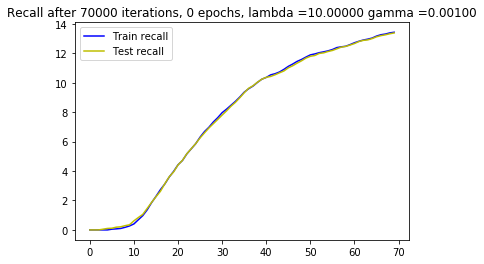

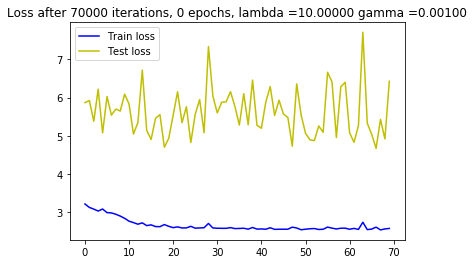

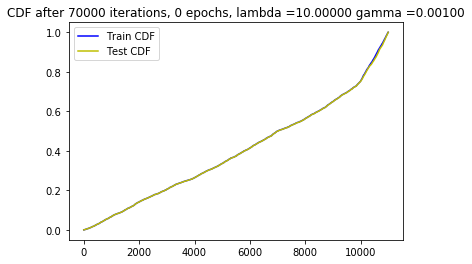






 15%|█▍        | 70001/473047 [45:10<98:45:06,  1.13it/s]




 15%|█▍        | 70009/473047 [45:10<69:34:05,  1.61it/s]

New score:  0.18254285
Train score:  0.29112014
Test score:  0.4583868
Obj first part:  3.148188292980194
Obj second part:  -1.3700196
Obj first part:  12.617100477218628
Obj second part:  -0.45009947
Obj first part:  0.0
Obj second part:  -2.2656066
Obj first part:  0.8376871049404144
Obj second part:  -0.72786397
Obj first part:  1.2906508147716522
Obj second part:  -0.5107071
Obj first part:  0.0
Obj second part:  -0.12414497
Obj first part:  7.348395586013794
Obj second part:  -4.2639947
Obj first part:  0.2132832258939743
Obj second part:  -0.1500675
Obj first part:  0.0
Obj second part:  -2.0860322
Obj first part:  4.623591601848602
Obj second part:  -0.7437649
Obj first part:  0.7658706605434418
Obj second part:  -1.410098
Obj first part:  0.0
Obj second part:  -0.5776096
Obj first part:  0.0
Obj second part:  -1.7178885
Obj first part:  0.2490168809890747
Obj second part:  -2.978169
Obj first part:  3.598974645137787
Obj second part:  -0.44350886
Obj first part:  0.0
Obj second






 15%|█▍        | 70017/473047 [45:10<49:07:58,  2.28it/s]




 15%|█▍        | 70025/473047 [45:11<34:49:51,  3.21it/s]

Obj first part:  0.3641056641936302
Obj second part:  -0.34200767
Obj first part:  0.0
Obj second part:  -3.3756728
Obj first part:  0.0
Obj second part:  -1.3558779
Obj first part:  0.0
Obj second part:  -0.9349356
Obj first part:  0.47321122139692307
Obj second part:  -1.3559982
Obj first part:  0.0
Obj second part:  -4.346596
Obj first part:  0.0
Obj second part:  -0.5407947
Obj first part:  0.0
Obj second part:  -1.0422889
Obj first part:  0.0
Obj second part:  -1.1570807
Obj first part:  0.0
Obj second part:  -3.2150092
Obj first part:  0.5249727889895439
Obj second part:  -0.5946537
Obj first part:  0.03572921268641949
Obj second part:  -2.5475705
Obj first part:  2.1147580444812775
Obj second part:  -0.038507443
Obj first part:  5.126525163650513
Obj second part:  -0.23793676
Obj first part:  0.4412646219134331
Obj second part:  -1.3791171
Obj first part:  0.0
Obj second part:  -2.369662







 15%|█▍        | 70033/473047 [45:11<24:49:03,  4.51it/s]




 15%|█▍        | 70041/473047 [45:11<17:48:41,  6.29it/s]

Obj first part:  0.0
Obj second part:  -1.3983707
Obj first part:  0.15916941687464714
Obj second part:  -2.3081214
Obj first part:  0.0
Obj second part:  -0.4070724
Obj first part:  0.0
Obj second part:  -3.5105977
Obj first part:  3.2812634110450745
Obj second part:  -1.1756845
Obj first part:  0.19254153594374657
Obj second part:  -0.18483908
Obj first part:  8.749011158943176
Obj second part:  -1.2961224
Obj first part:  0.618736669421196
Obj second part:  -0.54714805
Obj first part:  0.6025029346346855
Obj second part:  -1.8337196
Obj first part:  0.022613282781094313
Obj second part:  -2.517077
Obj first part:  0.0
Obj second part:  -2.6478496
Obj first part:  0.0
Obj second part:  -1.4689568
Obj first part:  0.0
Obj second part:  -3.0674677
Obj first part:  0.0
Obj second part:  -2.4828107
Obj first part:  0.0
Obj second part:  -3.0057268
Obj first part:  1.9637726247310638
Obj second part:  -1.4682218







 15%|█▍        | 70049/473047 [45:11<12:54:21,  8.67it/s]




 15%|█▍        | 70057/473047 [45:11<9:28:15, 11.82it/s] 

Obj first part:  0.0
Obj second part:  -1.5234791
Obj first part:  0.0
Obj second part:  -1.9755595
Obj first part:  0.24908240884542465
Obj second part:  -1.7115967
Obj first part:  0.5374651402235031
Obj second part:  -1.094451
Obj first part:  0.0
Obj second part:  -0.093587205
Obj first part:  0.0
Obj second part:  -0.16236892
Obj first part:  0.0
Obj second part:  -1.2291965
Obj first part:  0.5151642486453056
Obj second part:  -0.7996696
Obj first part:  0.33994048833847046
Obj second part:  -2.3980184
Obj first part:  0.0
Obj second part:  -0.8366871
Obj first part:  0.6576626747846603
Obj second part:  -1.0338981
Obj first part:  0.0
Obj second part:  -0.7347236
Obj first part:  0.15067754313349724
Obj second part:  -0.07258094
Obj first part:  0.4643223062157631
Obj second part:  -0.5909191
Obj first part:  5.584673285484314
Obj second part:  -0.61322594
Obj first part:  0.7282958924770355
Obj second part:  -3.7455072







 15%|█▍        | 70065/473047 [45:11<7:04:12, 15.83it/s]




 15%|█▍        | 70073/473047 [45:11<5:23:12, 20.78it/s]

Obj first part:  0.28653165325522423
Obj second part:  -0.76798356
Obj first part:  2.1770361065864563
Obj second part:  -4.343378
Obj first part:  0.0
Obj second part:  -0.7444088
Obj first part:  0.9284128993749619
Obj second part:  -2.4121573
Obj first part:  0.0
Obj second part:  -0.06295134
Obj first part:  0.665353536605835
Obj second part:  -0.31611297
Obj first part:  0.0
Obj second part:  -0.4112282
Obj first part:  0.0
Obj second part:  -0.0931228
Obj first part:  0.0
Obj second part:  -2.4341261
Obj first part:  0.5441667512059212
Obj second part:  -0.36411303
Obj first part:  0.0
Obj second part:  -2.1580877
Obj first part:  0.0
Obj second part:  -0.73212713
Obj first part:  0.2780580334365368
Obj second part:  -0.52790004
Obj first part:  0.0
Obj second part:  -2.5165012
Obj first part:  0.0
Obj second part:  -0.818286
Obj first part:  2.6940882205963135
Obj second part:  -2.2023983







 15%|█▍        | 70081/473047 [45:11<4:12:38, 26.58it/s]




 15%|█▍        | 70089/473047 [45:11<3:22:50, 33.11it/s]

Obj first part:  4.380732774734497
Obj second part:  -1.6278622
Obj first part:  2.839125096797943
Obj second part:  -2.7980402
Obj first part:  0.590115375816822
Obj second part:  -2.6434917
Obj first part:  0.8423880487680435
Obj second part:  -1.1061668
Obj first part:  0.0
Obj second part:  -2.1142166
Obj first part:  0.0
Obj second part:  -0.7295312
Obj first part:  0.0
Obj second part:  -0.7528188
Obj first part:  0.0
Obj second part:  -4.5268736
Obj first part:  0.2554437331855297
Obj second part:  -2.6013193
Obj first part:  0.0
Obj second part:  -1.3669178
Obj first part:  0.0
Obj second part:  -1.3069885
Obj first part:  1.7913013696670532
Obj second part:  -1.1031712
Obj first part:  0.0
Obj second part:  -0.67751586
Obj first part:  0.8178506046533585
Obj second part:  -3.2190032
Obj first part:  0.0
Obj second part:  -0.31578982
Obj first part:  1.4852182567119598
Obj second part:  -2.280367







 15%|█▍        | 70097/473047 [45:12<2:48:25, 39.88it/s]




 15%|█▍        | 70105/473047 [45:12<2:23:52, 46.68it/s]

Obj first part:  0.46010371297597885
Obj second part:  -3.0730603
Obj first part:  0.26653340086340904
Obj second part:  -0.5135287
Obj first part:  0.0
Obj second part:  -0.38247284
Obj first part:  11.761268377304077
Obj second part:  -0.5639997
Obj first part:  0.0
Obj second part:  -3.6512794
Obj first part:  7.006845474243164
Obj second part:  -2.6003194
Obj first part:  0.0
Obj second part:  -2.81206
Obj first part:  5.016342997550964
Obj second part:  -0.4106055
Obj first part:  0.0
Obj second part:  -2.2502446
Obj first part:  4.630107283592224
Obj second part:  -1.456626
Obj first part:  1.1079523712396622
Obj second part:  -1.9986347
Obj first part:  6.3315349817276
Obj second part:  -4.024727
Obj first part:  0.0
Obj second part:  -4.275922
Obj first part:  0.43143846094608307
Obj second part:  -1.3605382
Obj first part:  0.9484922140836716
Obj second part:  -2.0030198
Obj first part:  0.0
Obj second part:  -0.85537034







 15%|█▍        | 70113/473047 [45:12<2:07:11, 52.80it/s]




 15%|█▍        | 70121/473047 [45:12<1:55:55, 57.93it/s]

Obj first part:  0.5255835130810738
Obj second part:  -1.5642831
Obj first part:  0.0
Obj second part:  -1.2890073
Obj first part:  1.4536479115486145
Obj second part:  -0.39891696
Obj first part:  3.7316587567329407
Obj second part:  -0.18381636
Obj first part:  0.9722858667373657
Obj second part:  -3.3836882
Obj first part:  0.0
Obj second part:  -3.1502109
Obj first part:  0.0
Obj second part:  -1.2795309
Obj first part:  0.7506605982780457
Obj second part:  -0.8092319
Obj first part:  0.0
Obj second part:  -0.15810362
Obj first part:  0.18962278962135315
Obj second part:  -1.9718007
Obj first part:  0.0
Obj second part:  -1.6570623
Obj first part:  0.0
Obj second part:  -1.3758847
Obj first part:  0.0
Obj second part:  -2.6754925
Obj first part:  0.0
Obj second part:  -2.6002705
Obj first part:  0.7796838134527206
Obj second part:  -0.8120835
Obj first part:  0.0
Obj second part:  -0.24953042







 15%|█▍        | 70129/473047 [45:12<1:47:24, 62.52it/s]




 15%|█▍        | 70137/473047 [45:12<1:41:37, 66.08it/s]

Obj first part:  0.7700573652982712
Obj second part:  -0.24448588
Obj first part:  0.7471999526023865
Obj second part:  -2.7152967
Obj first part:  0.10135539807379246
Obj second part:  -1.4729745
Obj first part:  1.8035468459129333
Obj second part:  -0.080039345
Obj first part:  1.4474700391292572
Obj second part:  -0.6758477
Obj first part:  0.05417435895651579
Obj second part:  -2.8659673
Obj first part:  0.4493986442685127
Obj second part:  -4.7277174
Obj first part:  0.7259578257799149
Obj second part:  -3.2593634
Obj first part:  0.0
Obj second part:  -1.8611128
Obj first part:  0.07585444021970034
Obj second part:  -1.5499463
Obj first part:  9.218997359275818
Obj second part:  -0.8183001
Obj first part:  0.0
Obj second part:  -0.5970755
Obj first part:  0.0
Obj second part:  -1.442907
Obj first part:  0.0
Obj second part:  -2.1282682
Obj first part:  0.0
Obj second part:  -1.1390789
Obj first part:  0.0
Obj second part:  -1.8167742







 15%|█▍        | 70145/473047 [45:12<1:37:19, 68.99it/s]




 15%|█▍        | 70153/473047 [45:12<1:34:33, 71.01it/s]

Obj first part:  0.0
Obj second part:  -3.0314353
Obj first part:  0.0
Obj second part:  -0.76322776
Obj first part:  0.0
Obj second part:  -1.1078047
Obj first part:  0.0
Obj second part:  -0.29956767
Obj first part:  0.0
Obj second part:  -3.5587769
Obj first part:  0.0
Obj second part:  -0.6647103
Obj first part:  0.0
Obj second part:  -0.22675367
Obj first part:  0.0
Obj second part:  -2.0278862
Obj first part:  0.0
Obj second part:  -1.2600853
Obj first part:  0.0
Obj second part:  -1.1258111
Obj first part:  0.7049565762281418
Obj second part:  -1.8633041
Obj first part:  1.5555371344089508
Obj second part:  -1.854426
Obj first part:  0.0
Obj second part:  -3.3888998
Obj first part:  0.0
Obj second part:  -2.0485456
Obj first part:  9.961298704147339
Obj second part:  -2.8877575
Obj first part:  0.0
Obj second part:  -1.8365536







 15%|█▍        | 70161/473047 [45:12<1:32:25, 72.64it/s]




 15%|█▍        | 70169/473047 [45:12<1:30:50, 73.91it/s]

Obj first part:  0.0
Obj second part:  -3.5775297
Obj first part:  0.0
Obj second part:  -2.3751438
Obj first part:  0.0
Obj second part:  -1.5603598
Obj first part:  5.897745490074158
Obj second part:  -1.7491245
Obj first part:  0.14997359365224838
Obj second part:  -1.2084851
Obj first part:  0.0
Obj second part:  -0.16768368
Obj first part:  0.0
Obj second part:  -1.916516
Obj first part:  0.0
Obj second part:  -0.26928267
Obj first part:  0.0
Obj second part:  -2.7626028
Obj first part:  0.0
Obj second part:  -0.72325253
Obj first part:  0.6226211786270142
Obj second part:  -1.2767854
Obj first part:  1.7016249895095825
Obj second part:  -1.8649099
Obj first part:  1.4276207983493805
Obj second part:  -2.2220137
Obj first part:  0.0
Obj second part:  -1.3893758
Obj first part:  0.0
Obj second part:  -1.8349195
Obj first part:  2.810792028903961
Obj second part:  -0.21418963







 15%|█▍        | 70177/473047 [45:13<1:29:35, 74.95it/s]




 15%|█▍        | 70185/473047 [45:13<1:29:02, 75.41it/s]

Obj first part:  0.0
Obj second part:  -0.38224527
Obj first part:  0.0
Obj second part:  -2.4965727
Obj first part:  0.0
Obj second part:  -2.657957
Obj first part:  0.0
Obj second part:  -1.3337291
Obj first part:  0.4287866875529289
Obj second part:  -0.5059787
Obj first part:  0.0
Obj second part:  -2.5583746
Obj first part:  4.17675256729126
Obj second part:  -1.7201196
Obj first part:  0.0
Obj second part:  -3.6348124
Obj first part:  2.3555321991443634
Obj second part:  -0.36428556
Obj first part:  0.0
Obj second part:  -2.050314
Obj first part:  0.0
Obj second part:  -4.5531216
Obj first part:  0.0
Obj second part:  -3.9129112
Obj first part:  1.4999237656593323
Obj second part:  -0.023923762
Obj first part:  1.5342849493026733
Obj second part:  -1.1831672
Obj first part:  0.0
Obj second part:  -0.077845804
Obj first part:  0.0
Obj second part:  -3.316611







 15%|█▍        | 70193/473047 [45:13<1:28:26, 75.91it/s]




 15%|█▍        | 70201/473047 [45:13<1:28:14, 76.09it/s]

Obj first part:  0.880567654967308
Obj second part:  -1.6466801
Obj first part:  1.1827083677053452
Obj second part:  -0.06704276
Obj first part:  0.0
Obj second part:  -0.23888779
Obj first part:  1.4822335541248322
Obj second part:  -2.4417074
Obj first part:  0.0
Obj second part:  -2.151956
Obj first part:  1.3971057534217834
Obj second part:  -0.17473014
Obj first part:  11.186038255691528
Obj second part:  -0.8899667
Obj first part:  0.0
Obj second part:  -2.3170412
Obj first part:  0.0
Obj second part:  -2.3500242
Obj first part:  0.0
Obj second part:  -0.87282896
Obj first part:  0.0722793536260724
Obj second part:  -1.8988596
Obj first part:  0.0
Obj second part:  -0.8293344
Obj first part:  0.0
Obj second part:  -0.75955325
Obj first part:  0.47493599355220795
Obj second part:  -2.0374367
Obj first part:  0.35913340747356415
Obj second part:  -1.6685984
Obj first part:  0.0
Obj second part:  -2.5072904







 15%|█▍        | 70209/473047 [45:13<1:28:03, 76.25it/s]




 15%|█▍        | 70217/473047 [45:13<1:27:49, 76.45it/s]

Obj first part:  0.0
Obj second part:  -0.19424127
Obj first part:  14.224555492401123
Obj second part:  -1.6053884
Obj first part:  0.1640605926513672
Obj second part:  -0.82338655
Obj first part:  2.572684586048126
Obj second part:  -0.7972361
Obj first part:  0.0
Obj second part:  -2.784885
Obj first part:  0.0
Obj second part:  -1.1819034
Obj first part:  0.0
Obj second part:  -3.6156166
Obj first part:  2.166355848312378
Obj second part:  -1.629282
Obj first part:  0.0
Obj second part:  -0.8970935
Obj first part:  0.0
Obj second part:  -1.8701783
Obj first part:  0.0
Obj second part:  -0.19950025
Obj first part:  2.768535315990448
Obj second part:  -1.2112598
Obj first part:  0.0
Obj second part:  -2.0049613
Obj first part:  0.0
Obj second part:  -0.6454178
Obj first part:  0.0
Obj second part:  -3.2403562
Obj first part:  0.1970524899661541
Obj second part:  -0.16962102







 15%|█▍        | 70225/473047 [45:13<1:27:47, 76.48it/s]




 15%|█▍        | 70233/473047 [45:13<1:27:30, 76.71it/s]

Obj first part:  6.374745965003967
Obj second part:  -2.0140667
Obj first part:  0.7664725184440613
Obj second part:  -0.39030248
Obj first part:  0.0
Obj second part:  -3.2721984
Obj first part:  0.0
Obj second part:  -2.018939
Obj first part:  5.617794394493103
Obj second part:  -1.2256261
Obj first part:  0.0
Obj second part:  -1.5117717
Obj first part:  0.509483590722084
Obj second part:  -1.3009595
Obj first part:  2.4767349660396576
Obj second part:  -1.4289124
Obj first part:  0.0
Obj second part:  -1.3126975
Obj first part:  0.0
Obj second part:  -2.3616424
Obj first part:  5.817597508430481
Obj second part:  -2.4731412
Obj first part:  0.0
Obj second part:  -2.9059932
Obj first part:  0.5859752744436264
Obj second part:  -1.1964772
Obj first part:  1.9175432622432709
Obj second part:  -1.2856821
Obj first part:  4.4410645961761475
Obj second part:  -1.4336882
Obj first part:  6.403770446777344
Obj second part:  -3.3738978







 15%|█▍        | 70241/473047 [45:13<1:27:36, 76.62it/s]




 15%|█▍        | 70249/473047 [45:13<1:27:20, 76.87it/s]

Obj first part:  0.2993721142411232
Obj second part:  -0.91372675
Obj first part:  0.0
Obj second part:  -2.8588262
Obj first part:  0.29239775612950325
Obj second part:  -3.9079432
Obj first part:  0.4373983293771744
Obj second part:  -2.4093657
Obj first part:  0.0
Obj second part:  -4.9036236
Obj first part:  0.0
Obj second part:  -2.1709924
Obj first part:  0.499940887093544
Obj second part:  -1.976259
Obj first part:  0.0
Obj second part:  -0.6259226
Obj first part:  0.25334322825074196
Obj second part:  -3.777069
Obj first part:  0.0
Obj second part:  -1.8397396
Obj first part:  0.6122256442904472
Obj second part:  -2.7049394
Obj first part:  1.7223362624645233
Obj second part:  -0.7340883
Obj first part:  0.0
Obj second part:  -2.5555344
Obj first part:  0.0
Obj second part:  -2.8659096
Obj first part:  0.0
Obj second part:  -2.9060545
Obj first part:  4.288787841796875
Obj second part:  -2.4297156







 15%|█▍        | 70257/473047 [45:14<1:27:24, 76.80it/s]




 15%|█▍        | 70265/473047 [45:14<1:27:20, 76.86it/s]

Obj first part:  0.0
Obj second part:  -0.5013068
Obj first part:  0.0
Obj second part:  -0.6313111
Obj first part:  0.0
Obj second part:  -1.185897
Obj first part:  0.0
Obj second part:  -2.828073
Obj first part:  0.08293377235531807
Obj second part:  -1.0531996
Obj first part:  2.907043695449829
Obj second part:  -0.74881613
Obj first part:  2.126612216234207
Obj second part:  -2.6943204
Obj first part:  0.0
Obj second part:  -0.7333192
Obj first part:  0.24310022592544556
Obj second part:  -0.5083696
Obj first part:  0.0
Obj second part:  -1.5022755
Obj first part:  0.0
Obj second part:  -1.4423201
Obj first part:  0.0
Obj second part:  -1.0789886
Obj first part:  0.0
Obj second part:  -1.6492954
Obj first part:  0.0
Obj second part:  -2.2428775
Obj first part:  0.27985546737909317
Obj second part:  -2.76376
Obj first part:  0.9366602450609207
Obj second part:  -3.467222







 15%|█▍        | 70273/473047 [45:14<1:27:18, 76.89it/s]




 15%|█▍        | 70281/473047 [45:14<1:27:13, 76.96it/s]

Obj first part:  2.144572287797928
Obj second part:  -0.8579148
Obj first part:  1.0978537052869797
Obj second part:  -0.5526108
Obj first part:  0.0
Obj second part:  -0.5498131
Obj first part:  1.1158739030361176
Obj second part:  -2.4623125
Obj first part:  0.1425086334347725
Obj second part:  -1.6610811
Obj first part:  0.0
Obj second part:  -0.6175252
Obj first part:  0.0
Obj second part:  -1.6198225
Obj first part:  8.123733401298523
Obj second part:  -0.31903952
Obj first part:  0.0
Obj second part:  -0.06990722
Obj first part:  1.3198280334472656
Obj second part:  -0.5119225
Obj first part:  9.902904629707336
Obj second part:  -0.53601897
Obj first part:  0.0
Obj second part:  -1.9849999
Obj first part:  0.7406299561262131
Obj second part:  -2.973522
Obj first part:  0.0
Obj second part:  -0.1862432
Obj first part:  0.42902741581201553
Obj second part:  -2.161836
Obj first part:  0.0
Obj second part:  -1.429384







 15%|█▍        | 70289/473047 [45:14<1:27:24, 76.80it/s]




 15%|█▍        | 70297/473047 [45:14<1:27:12, 76.98it/s]

Obj first part:  0.7236471772193909
Obj second part:  -1.4619465
Obj first part:  1.1905508488416672
Obj second part:  -3.5658338
Obj first part:  0.8978996425867081
Obj second part:  -5.6234927
Obj first part:  0.0
Obj second part:  -4.442909
Obj first part:  0.0
Obj second part:  -3.4635684
Obj first part:  2.953256070613861
Obj second part:  -0.8935034
Obj first part:  0.0
Obj second part:  -3.8357828
Obj first part:  0.1189274899661541
Obj second part:  -2.58188
Obj first part:  0.2887818031013012
Obj second part:  -0.9047539
Obj first part:  0.40311772376298904
Obj second part:  -0.32745156
Obj first part:  0.1358786690980196
Obj second part:  -1.7731972
Obj first part:  0.0
Obj second part:  -0.74232846
Obj first part:  0.2760574594140053
Obj second part:  -3.4519708
Obj first part:  0.12104547582566738
Obj second part:  -1.2977983
Obj first part:  0.13654237613081932
Obj second part:  -0.2719417
Obj first part:  0.0
Obj second part:  -1.4014492







 15%|█▍        | 70305/473047 [45:14<1:27:34, 76.65it/s]




 15%|█▍        | 70313/473047 [45:14<1:27:17, 76.89it/s]

Obj first part:  0.14501468278467655
Obj second part:  -0.53446543
Obj first part:  0.0
Obj second part:  -1.5416207
Obj first part:  0.0
Obj second part:  -0.17843023
Obj first part:  1.1196788400411606
Obj second part:  -1.5028337
Obj first part:  6.943307518959045
Obj second part:  -2.6430893
Obj first part:  0.08733537979424
Obj second part:  -0.6097409
Obj first part:  0.7996910810470581
Obj second part:  -2.3620088
Obj first part:  0.11884352192282677
Obj second part:  -0.3467594
Obj first part:  2.150088846683502
Obj second part:  -1.9955223
Obj first part:  9.767354130744934
Obj second part:  -1.51342
Obj first part:  1.2704086303710938
Obj second part:  -0.7818756
Obj first part:  0.17671259120106697
Obj second part:  -3.0961368
Obj first part:  0.0
Obj second part:  -2.8665693
Obj first part:  0.0
Obj second part:  -3.2455852
Obj first part:  0.05523543804883957
Obj second part:  -1.1803273
Obj first part:  0.9891669452190399
Obj second part:  -2.2538376







 15%|█▍        | 70321/473047 [45:14<1:27:20, 76.85it/s]




 15%|█▍        | 70329/473047 [45:15<1:27:04, 77.09it/s]

Obj first part:  0.0
Obj second part:  -1.8045886
Obj first part:  0.0
Obj second part:  -0.43186596
Obj first part:  0.0
Obj second part:  -1.3905667
Obj first part:  0.0
Obj second part:  -1.790794
Obj first part:  0.0
Obj second part:  -2.254127
Obj first part:  0.0
Obj second part:  -0.6580195
Obj first part:  0.0
Obj second part:  -2.0796185
Obj first part:  2.8301727771759033
Obj second part:  -2.9300652
Obj first part:  0.2972048707306385
Obj second part:  -2.5622325
Obj first part:  0.0
Obj second part:  -1.2637023
Obj first part:  0.0
Obj second part:  -1.7646065
Obj first part:  0.0
Obj second part:  -1.3606209
Obj first part:  0.0
Obj second part:  -3.18622
Obj first part:  0.5513186007738113
Obj second part:  -3.3114877
Obj first part:  0.0
Obj second part:  -1.2654489
Obj first part:  0.0
Obj second part:  -1.8272412







 15%|█▍        | 70337/473047 [45:15<1:27:16, 76.91it/s]




 15%|█▍        | 70345/473047 [45:15<1:27:05, 77.07it/s]

Obj first part:  0.7923844456672668
Obj second part:  -4.560905
Obj first part:  0.0
Obj second part:  -2.409687
Obj first part:  0.44785458594560623
Obj second part:  -1.8598502
Obj first part:  0.0
Obj second part:  -0.24837841
Obj first part:  0.0
Obj second part:  -0.22842112
Obj first part:  0.0
Obj second part:  -0.8521497
Obj first part:  4.675626158714294
Obj second part:  -2.0069118
Obj first part:  1.7570661008358002
Obj second part:  -0.39805785
Obj first part:  2.2315189242362976
Obj second part:  -0.97046435
Obj first part:  0.5247519910335541
Obj second part:  -0.819196
Obj first part:  0.0
Obj second part:  -1.1939632
Obj first part:  0.0
Obj second part:  -1.6764028
Obj first part:  0.423574335873127
Obj second part:  -0.30299473
Obj first part:  1.2152399867773056
Obj second part:  -0.6392323
Obj first part:  0.0
Obj second part:  -1.2379661
Obj first part:  0.11278312653303146
Obj second part:  -3.9256468







 15%|█▍        | 70353/473047 [45:15<1:27:16, 76.90it/s]




 15%|█▍        | 70361/473047 [45:15<1:27:17, 76.88it/s]

Obj first part:  2.064855545759201
Obj second part:  -3.1577244
Obj first part:  14.575364589691162
Obj second part:  -1.6284386
Obj first part:  0.0
Obj second part:  -1.1557543
Obj first part:  0.0
Obj second part:  -0.44989982
Obj first part:  0.0
Obj second part:  -1.3118136
Obj first part:  0.0
Obj second part:  -1.5702717
Obj first part:  0.9915319085121155
Obj second part:  -0.39926076
Obj first part:  0.0
Obj second part:  -1.6985384
Obj first part:  0.0
Obj second part:  -2.315177
Obj first part:  0.6175234913825989
Obj second part:  -0.7570983
Obj first part:  0.6110502406954765
Obj second part:  -1.7629578
Obj first part:  5.285686254501343
Obj second part:  -2.5536067
Obj first part:  0.0
Obj second part:  -1.4238194
Obj first part:  0.0
Obj second part:  -0.19007474
Obj first part:  0.4083660617470741
Obj second part:  -3.9034302
Obj first part:  0.7592736929655075
Obj second part:  -0.47506604







 15%|█▍        | 70369/473047 [45:15<1:27:43, 76.50it/s]




 15%|█▍        | 70377/473047 [45:15<1:27:27, 76.74it/s]

Obj first part:  0.0
Obj second part:  -1.3168558
Obj first part:  6.550301909446716
Obj second part:  -1.1901616
Obj first part:  1.663714200258255
Obj second part:  -1.7865616
Obj first part:  0.0
Obj second part:  -0.45004404
Obj first part:  0.0
Obj second part:  -1.6242144
Obj first part:  0.0
Obj second part:  -1.4193064
Obj first part:  0.40969692170619965
Obj second part:  -0.097671114
Obj first part:  0.0
Obj second part:  -1.8334894
Obj first part:  0.0
Obj second part:  -3.093642
Obj first part:  0.0
Obj second part:  -0.6978743
Obj first part:  0.0
Obj second part:  -0.9412839
Obj first part:  0.094034718349576
Obj second part:  -2.2303329
Obj first part:  4.808402359485626
Obj second part:  -1.8318934
Obj first part:  0.0
Obj second part:  -3.061261
Obj first part:  0.09167088195681572
Obj second part:  -0.89983416
Obj first part:  0.0
Obj second part:  -0.27185297







 15%|█▍        | 70385/473047 [45:15<1:27:33, 76.65it/s]




 15%|█▍        | 70393/473047 [45:15<1:27:16, 76.89it/s]

Obj first part:  5.409359931945801
Obj second part:  -1.9096642
Obj first part:  0.0
Obj second part:  -1.3127906
Obj first part:  0.0
Obj second part:  -0.79874295
Obj first part:  0.0
Obj second part:  -0.13896011
Obj first part:  0.0
Obj second part:  -0.9905894
Obj first part:  2.841443121433258
Obj second part:  -3.0648916
Obj first part:  0.831296443939209
Obj second part:  -0.8955397
Obj first part:  0.9346724301576614
Obj second part:  -1.869095
Obj first part:  0.3523639962077141
Obj second part:  -0.86508894
Obj first part:  0.0
Obj second part:  -1.8315504
Obj first part:  1.1681675910949707
Obj second part:  -1.114634
Obj first part:  0.0
Obj second part:  -2.9043908
Obj first part:  0.13998428359627724
Obj second part:  -2.442704
Obj first part:  0.6464698165655136
Obj second part:  -1.9532061
Obj first part:  0.0
Obj second part:  -1.5154011
Obj first part:  0.0
Obj second part:  -0.3079812







 15%|█▍        | 70401/473047 [45:15<1:29:08, 75.28it/s]




 15%|█▍        | 70409/473047 [45:16<1:28:43, 75.63it/s]

Obj first part:  0.0
Obj second part:  -2.879678
Obj first part:  0.0
Obj second part:  -2.1680832
Obj first part:  0.6420059502124786
Obj second part:  -1.2753725
Obj first part:  0.0
Obj second part:  -0.5259032
Obj first part:  0.15507236123085022
Obj second part:  -1.7610819
Obj first part:  0.0
Obj second part:  -2.1710808
Obj first part:  0.0
Obj second part:  -1.5259407
Obj first part:  7.298928499221802
Obj second part:  -0.14298193
Obj first part:  0.507623516023159
Obj second part:  -3.6644986
Obj first part:  0.6204446405172348
Obj second part:  -1.0559348
Obj first part:  0.0
Obj second part:  -1.1114614
Obj first part:  0.0
Obj second part:  -2.2262769
Obj first part:  0.0
Obj second part:  -0.9499537
Obj first part:  0.5317737907171249
Obj second part:  -2.197228
Obj first part:  0.0
Obj second part:  -0.85479265
Obj first part:  0.11269028298556805
Obj second part:  -0.7704583







 15%|█▍        | 70417/473047 [45:16<1:28:36, 75.74it/s]




 15%|█▍        | 70425/473047 [45:16<1:28:00, 76.24it/s]

Obj first part:  0.0
Obj second part:  -0.3383674
Obj first part:  0.05816544406116009
Obj second part:  -3.0953453
Obj first part:  0.36449775099754333
Obj second part:  -0.47238016
Obj first part:  10.1058828830719
Obj second part:  -2.0340652
Obj first part:  0.0
Obj second part:  -0.31194448
Obj first part:  0.0
Obj second part:  -0.39579976
Obj first part:  2.835259437561035
Obj second part:  -1.5782169
Obj first part:  3.081692159175873
Obj second part:  -0.40158725
Obj first part:  0.0
Obj second part:  -3.4202826
Obj first part:  0.42436961084604263
Obj second part:  -2.1085708
Obj first part:  0.0
Obj second part:  -3.0052562
Obj first part:  0.0
Obj second part:  -1.0861552
Obj first part:  0.0
Obj second part:  -0.3500206
Obj first part:  1.593916118144989
Obj second part:  -1.728945
Obj first part:  2.1718627214431763
Obj second part:  -0.9252964
Obj first part:  0.5052551999688148
Obj second part:  -0.34706676







 15%|█▍        | 70433/473047 [45:16<1:28:26, 75.88it/s]




 15%|█▍        | 70441/473047 [45:16<1:27:49, 76.40it/s]

Obj first part:  1.498829573392868
Obj second part:  -1.4967971
Obj first part:  0.0
Obj second part:  -0.41289255
Obj first part:  0.0
Obj second part:  -1.6353066
Obj first part:  0.242278054356575
Obj second part:  -1.9605749
Obj first part:  0.0
Obj second part:  -4.2794943
Obj first part:  2.3496058583259583
Obj second part:  -0.2928183
Obj first part:  0.0
Obj second part:  -1.174772
Obj first part:  0.0
Obj second part:  -0.51838833
Obj first part:  0.0
Obj second part:  -0.1715509
Obj first part:  0.0
Obj second part:  -0.21933728
Obj first part:  0.0
Obj second part:  -0.30795264
Obj first part:  0.0
Obj second part:  -1.1372615
Obj first part:  1.0241372138261795
Obj second part:  -1.4377921
Obj first part:  0.1552128605544567
Obj second part:  -0.5869005
Obj first part:  5.344257950782776
Obj second part:  -1.7181194
Obj first part:  1.2226958572864532
Obj second part:  -0.071411505







 15%|█▍        | 70449/473047 [45:16<1:28:00, 76.24it/s]




 15%|█▍        | 70457/473047 [45:16<1:27:37, 76.57it/s]

Obj first part:  2.1919791400432587
Obj second part:  -0.33673468
Obj first part:  0.7357855886220932
Obj second part:  -0.35659254
Obj first part:  0.0
Obj second part:  -0.69636446
Obj first part:  1.919582337141037
Obj second part:  -0.36513415
Obj first part:  0.0
Obj second part:  -2.2272801
Obj first part:  0.17553655430674553
Obj second part:  -1.4158887
Obj first part:  0.0
Obj second part:  -3.1963956
Obj first part:  12.594411373138428
Obj second part:  -1.907835
Obj first part:  0.0
Obj second part:  -1.779546
Obj first part:  0.0
Obj second part:  -0.6356966
Obj first part:  0.0
Obj second part:  -1.2538465
Obj first part:  0.0
Obj second part:  -1.5164623
Obj first part:  2.3083671927452087
Obj second part:  -1.6231874
Obj first part:  0.5910953134298325
Obj second part:  -0.99513465
Obj first part:  0.0
Obj second part:  -1.9088778
Obj first part:  1.5679608285427094
Obj second part:  -0.7559171







 15%|█▍        | 70465/473047 [45:16<1:27:26, 76.73it/s]




 15%|█▍        | 70473/473047 [45:16<1:27:23, 76.78it/s]

Obj first part:  4.302120804786682
Obj second part:  -2.1980262
Obj first part:  0.0
Obj second part:  -1.5734497
Obj first part:  1.2223410606384277
Obj second part:  -0.61607915
Obj first part:  0.0
Obj second part:  -0.6938838
Obj first part:  0.0
Obj second part:  -1.6083819
Obj first part:  8.654518127441406
Obj second part:  -0.7034968
Obj first part:  1.3181422650814056
Obj second part:  -2.8564007
Obj first part:  0.277538001537323
Obj second part:  -1.0694182
Obj first part:  0.2718326821923256
Obj second part:  -0.110461116
Obj first part:  0.0
Obj second part:  -0.23666428
Obj first part:  0.19326291978359222
Obj second part:  -2.9790862
Obj first part:  0.0
Obj second part:  -1.3572019
Obj first part:  0.6710014492273331
Obj second part:  -3.3648477
Obj first part:  0.0
Obj second part:  -3.3687196
Obj first part:  0.051582520827651024
Obj second part:  -0.097218536
Obj first part:  0.0
Obj second part:  -2.737389







 15%|█▍        | 70481/473047 [45:17<1:27:17, 76.86it/s]




 15%|█▍        | 70489/473047 [45:17<1:27:22, 76.79it/s]

Obj first part:  0.0
Obj second part:  -3.4769452
Obj first part:  0.0
Obj second part:  -1.8092039
Obj first part:  1.2506847083568573
Obj second part:  -3.035813
Obj first part:  0.640847235918045
Obj second part:  -1.5645506
Obj first part:  0.0
Obj second part:  -1.4179097
Obj first part:  0.0
Obj second part:  -0.28549784
Obj first part:  0.0
Obj second part:  -0.154586
Obj first part:  0.0
Obj second part:  -2.1679332
Obj first part:  0.5275376886129379
Obj second part:  -0.4420377
Obj first part:  0.0
Obj second part:  -1.8200787
Obj first part:  4.643881916999817
Obj second part:  -1.7647653
Obj first part:  0.31960222870111465
Obj second part:  -1.9847969
Obj first part:  0.9240259230136871
Obj second part:  -3.106388
Obj first part:  0.0
Obj second part:  -1.4939941
Obj first part:  0.0
Obj second part:  -0.5185522
Obj first part:  0.8799272775650024
Obj second part:  -3.3866847







 15%|█▍        | 70497/473047 [45:17<1:27:16, 76.87it/s]




 15%|█▍        | 70505/473047 [45:17<1:27:16, 76.87it/s]

Obj first part:  1.7476186156272888
Obj second part:  -4.020045
Obj first part:  1.3705438375473022
Obj second part:  -0.7121227
Obj first part:  6.2943243980407715
Obj second part:  -1.0878676
Obj first part:  1.1090874671936035
Obj second part:  -1.1742094
Obj first part:  0.0
Obj second part:  -2.51223
Obj first part:  2.675715982913971
Obj second part:  -0.62966216
Obj first part:  0.0
Obj second part:  -2.356317
Obj first part:  2.9342538118362427
Obj second part:  -2.4672348
Obj first part:  13.846573829650879
Obj second part:  -2.853448
Obj first part:  1.108679175376892
Obj second part:  -1.2688829
Obj first part:  0.32591070979833603
Obj second part:  -4.2214665
Obj first part:  0.8494434505701065
Obj second part:  -0.76976204
Obj first part:  0.21515045315027237
Obj second part:  -1.6949655
Obj first part:  0.057527502067387104
Obj second part:  -4.985355
Obj first part:  0.0
Obj second part:  -0.74425864
Obj first part:  0.13072730973362923
Obj second part:  -0.35473415







 15%|█▍        | 70513/473047 [45:17<1:27:17, 76.85it/s]




 15%|█▍        | 70521/473047 [45:17<1:27:31, 76.65it/s]

Obj first part:  1.199617013335228
Obj second part:  -2.9984136
Obj first part:  0.8669888228178024
Obj second part:  -2.7830424
Obj first part:  0.3130738064646721
Obj second part:  -1.0573326
Obj first part:  0.24491729214787483
Obj second part:  -1.5951071
Obj first part:  0.0
Obj second part:  -1.3642635
Obj first part:  0.06778197828680277
Obj second part:  -2.9512317
Obj first part:  0.0
Obj second part:  -0.16971122
Obj first part:  0.0
Obj second part:  -0.6981529
Obj first part:  1.293293535709381
Obj second part:  -0.13212231
Obj first part:  0.0
Obj second part:  -1.5310961
Obj first part:  0.0
Obj second part:  -2.2919512
Obj first part:  0.7534544914960861
Obj second part:  -1.2882639
Obj first part:  0.0
Obj second part:  -2.1838653
Obj first part:  0.0
Obj second part:  -3.7413304
Obj first part:  7.611468434333801
Obj second part:  -1.8778436
Obj first part:  0.2277250960469246
Obj second part:  -2.1124







 15%|█▍        | 70529/473047 [45:17<1:27:32, 76.64it/s]




 15%|█▍        | 70537/473047 [45:17<1:28:07, 76.12it/s]

Obj first part:  0.5782610923051834
Obj second part:  -0.7316507
Obj first part:  0.0
Obj second part:  -2.7666748
Obj first part:  0.1672758162021637
Obj second part:  -2.3672125
Obj first part:  0.0
Obj second part:  -3.9297123
Obj first part:  0.0
Obj second part:  -2.2859674
Obj first part:  0.6330407410860062
Obj second part:  -0.9054555
Obj first part:  0.1746334321796894
Obj second part:  -0.18335451
Obj first part:  1.4861077070236206
Obj second part:  -3.749776
Obj first part:  2.0785440504550934
Obj second part:  -0.5465886
Obj first part:  0.25579124689102173
Obj second part:  -0.4456126
Obj first part:  0.0
Obj second part:  -0.5082518
Obj first part:  0.0
Obj second part:  -1.6116171
Obj first part:  3.829165995121002
Obj second part:  -0.26944616
Obj first part:  0.6382057070732117
Obj second part:  -3.9590638
Obj first part:  2.554628551006317
Obj second part:  -1.7546024
Obj first part:  0.0
Obj second part:  -1.9891492







 15%|█▍        | 70545/473047 [45:17<1:27:54, 76.30it/s]




 15%|█▍        | 70553/473047 [45:17<1:27:48, 76.40it/s]

Obj first part:  0.09317509829998016
Obj second part:  -2.8217595
Obj first part:  0.0
Obj second part:  -1.1725127
Obj first part:  1.7518304288387299
Obj second part:  -0.1329889
Obj first part:  0.49898482859134674
Obj second part:  -2.5132809
Obj first part:  1.1055047065019608
Obj second part:  -1.3699666
Obj first part:  0.0
Obj second part:  -1.7638257
Obj first part:  0.87900310754776
Obj second part:  -3.022682
Obj first part:  0.0
Obj second part:  -4.6476226
Obj first part:  0.0
Obj second part:  -1.9908965
Obj first part:  1.3326114416122437
Obj second part:  -2.0695486
Obj first part:  2.3099011182785034
Obj second part:  -0.82185423
Obj first part:  3.4113851189613342
Obj second part:  -1.9320323
Obj first part:  0.0
Obj second part:  -0.612775
Obj first part:  0.0
Obj second part:  -1.0217139
Obj first part:  0.0
Obj second part:  -1.4657218
Obj first part:  0.0
Obj second part:  -2.9685009







 15%|█▍        | 70561/473047 [45:18<1:27:38, 76.54it/s]




 15%|█▍        | 70569/473047 [45:18<1:27:48, 76.39it/s]

Obj first part:  0.0
Obj second part:  -0.17558011
Obj first part:  2.9777663946151733
Obj second part:  -2.7766702
Obj first part:  0.046603623777627945
Obj second part:  -0.7330022
Obj first part:  0.22414840757846832
Obj second part:  -1.9815941
Obj first part:  5.181213617324829
Obj second part:  -4.0587516
Obj first part:  0.282114390283823
Obj second part:  -0.9717355
Obj first part:  0.6558229029178619
Obj second part:  -1.2558799
Obj first part:  0.0
Obj second part:  -3.445203
Obj first part:  4.365136623382568
Obj second part:  -3.2414503
Obj first part:  0.0
Obj second part:  -2.8217957
Obj first part:  0.68624347448349
Obj second part:  -2.17638
Obj first part:  0.14853280037641525
Obj second part:  -1.3762722
Obj first part:  0.4511081799864769
Obj second part:  -0.76906157
Obj first part:  0.6819676607847214
Obj second part:  -0.85779774
Obj first part:  0.1345592923462391
Obj second part:  -0.9491881
Obj first part:  0.0
Obj second part:  -0.9527689







 15%|█▍        | 70577/473047 [45:18<1:27:41, 76.49it/s]




 15%|█▍        | 70585/473047 [45:18<1:27:43, 76.47it/s]

Obj first part:  0.0
Obj second part:  -1.8772029
Obj first part:  0.7897057384252548
Obj second part:  -0.26281005
Obj first part:  3.720746636390686
Obj second part:  -1.6686846
Obj first part:  1.4594963192939758
Obj second part:  -0.3667282
Obj first part:  2.960578501224518
Obj second part:  -4.7212296
Obj first part:  0.8215919882059097
Obj second part:  -1.498692
Obj first part:  4.296844899654388
Obj second part:  -2.5603364
Obj first part:  0.0
Obj second part:  -2.2264602
Obj first part:  0.0
Obj second part:  -2.2891834
Obj first part:  1.3034439086914062
Obj second part:  -2.3008158
Obj first part:  0.0
Obj second part:  -0.24001914
Obj first part:  0.25211742147803307
Obj second part:  -1.2177024
Obj first part:  0.18776798620820045
Obj second part:  -0.18301119
Obj first part:  0.0
Obj second part:  -3.3155508
Obj first part:  0.0
Obj second part:  -1.382566
Obj first part:  2.3670774698257446
Obj second part:  -1.6929278







 15%|█▍        | 70593/473047 [45:18<1:27:40, 76.50it/s]




 15%|█▍        | 70601/473047 [45:18<1:27:31, 76.63it/s]

Obj first part:  0.0
Obj second part:  -0.42106035
Obj first part:  0.5027002468705177
Obj second part:  -0.4093563
Obj first part:  0.0
Obj second part:  -1.9707764
Obj first part:  1.2610411643981934
Obj second part:  -0.41508076
Obj first part:  0.0
Obj second part:  -2.5152705
Obj first part:  0.0
Obj second part:  -3.5552769
Obj first part:  0.0
Obj second part:  -0.3660367
Obj first part:  2.274414896965027
Obj second part:  -3.6676793
Obj first part:  0.0
Obj second part:  -2.253122
Obj first part:  0.0
Obj second part:  -1.5703969
Obj first part:  0.0
Obj second part:  -3.4666076
Obj first part:  0.3499447926878929
Obj second part:  -1.3350016
Obj first part:  0.6703381985425949
Obj second part:  -1.0759735
Obj first part:  0.0
Obj second part:  -2.7445693
Obj first part:  0.0
Obj second part:  -1.7135559
Obj first part:  0.5592611059546471
Obj second part:  -1.4006147







 15%|█▍        | 70609/473047 [45:18<1:27:46, 76.41it/s]




 15%|█▍        | 70617/473047 [45:18<1:27:33, 76.61it/s]

Obj first part:  0.0
Obj second part:  -2.6367557
Obj first part:  0.0
Obj second part:  -4.430179
Obj first part:  0.0
Obj second part:  -1.1586009
Obj first part:  0.0
Obj second part:  -2.029226
Obj first part:  0.0
Obj second part:  -2.7274752
Obj first part:  0.0
Obj second part:  -0.5928858
Obj first part:  0.21621184423565865
Obj second part:  -2.6410494
Obj first part:  0.0
Obj second part:  -1.2541116
Obj first part:  0.12395985424518585
Obj second part:  -1.9999257
Obj first part:  0.0
Obj second part:  -2.0993793
Obj first part:  0.1795658841729164
Obj second part:  -0.39680803
Obj first part:  1.6226831078529358
Obj second part:  -1.2067497
Obj first part:  0.9780225157737732
Obj second part:  -1.341673
Obj first part:  1.6634145379066467
Obj second part:  -1.6535534
Obj first part:  0.0
Obj second part:  -0.7891491
Obj first part:  0.22825505584478378
Obj second part:  -0.89513975







 15%|█▍        | 70625/473047 [45:18<1:27:18, 76.82it/s]




 15%|█▍        | 70633/473047 [45:19<1:27:35, 76.57it/s]

Obj first part:  0.0
Obj second part:  -4.2454524
Obj first part:  0.0
Obj second part:  -2.1110919
Obj first part:  1.371230036020279
Obj second part:  -3.104886
Obj first part:  0.3048745170235634
Obj second part:  -0.6243457
Obj first part:  0.8641567826271057
Obj second part:  -1.3910016
Obj first part:  1.8537703156471252
Obj second part:  -1.2024074
Obj first part:  5.457666516304016
Obj second part:  -2.5132341
Obj first part:  1.1822102218866348
Obj second part:  -1.0613704
Obj first part:  0.0
Obj second part:  -0.293227
Obj first part:  2.5560930371284485
Obj second part:  -3.011045
Obj first part:  0.0
Obj second part:  -2.0761032
Obj first part:  0.0
Obj second part:  -1.3881468
Obj first part:  0.0
Obj second part:  -0.73102033
Obj first part:  0.0
Obj second part:  -4.476938
Obj first part:  0.0
Obj second part:  -2.4244711
Obj first part:  4.864479899406433
Obj second part:  -1.6926686







 15%|█▍        | 70641/473047 [45:19<1:27:27, 76.69it/s]




 15%|█▍        | 70649/473047 [45:19<1:27:27, 76.69it/s]

Obj first part:  1.3781151175498962
Obj second part:  -0.36230734
Obj first part:  0.0
Obj second part:  -0.13906634
Obj first part:  0.0
Obj second part:  -3.5076847
Obj first part:  13.726747035980225
Obj second part:  -0.45786533
Obj first part:  0.0
Obj second part:  -0.47063458
Obj first part:  1.9913370907306671
Obj second part:  -2.1979926
Obj first part:  0.0
Obj second part:  -4.1468396
Obj first part:  0.0
Obj second part:  -0.90349245
Obj first part:  1.6402888298034668
Obj second part:  -0.56112945
Obj first part:  0.0
Obj second part:  -1.9682825
Obj first part:  0.0
Obj second part:  -2.2634594
Obj first part:  0.11879526078701019
Obj second part:  -2.743196
Obj first part:  2.3611822724342346
Obj second part:  -0.6827112
Obj first part:  0.0
Obj second part:  -3.4946744
Obj first part:  0.0
Obj second part:  -0.31132618
Obj first part:  0.0
Obj second part:  -1.4535145







 15%|█▍        | 70657/473047 [45:19<1:27:13, 76.89it/s]




 15%|█▍        | 70665/473047 [45:19<1:27:32, 76.60it/s]

Obj first part:  5.655731558799744
Obj second part:  -0.4616573
Obj first part:  0.0
Obj second part:  -0.8635743
Obj first part:  0.0
Obj second part:  -1.94003
Obj first part:  3.5524263978004456
Obj second part:  -2.5380347
Obj first part:  0.0
Obj second part:  -0.10776629
Obj first part:  1.0242164134979248
Obj second part:  -1.3356825
Obj first part:  0.0
Obj second part:  -0.3467996
Obj first part:  2.257675379514694
Obj second part:  -2.355845
Obj first part:  0.0
Obj second part:  -0.39904904
Obj first part:  0.45007720589637756
Obj second part:  -2.9978466
Obj first part:  0.0
Obj second part:  -0.5579913
Obj first part:  0.0
Obj second part:  -2.9854922
Obj first part:  0.22821204736828804
Obj second part:  -0.289329
Obj first part:  2.535732388496399
Obj second part:  -1.734406
Obj first part:  0.41441794484853745
Obj second part:  -2.3572397
Obj first part:  1.1141560971736908
Obj second part:  -2.899833







 15%|█▍        | 70673/473047 [45:19<1:27:35, 76.56it/s]




 15%|█▍        | 70681/473047 [45:19<1:27:36, 76.55it/s]

Obj first part:  0.3132244572043419
Obj second part:  -3.336616
Obj first part:  0.0
Obj second part:  -1.6476554
Obj first part:  0.0
Obj second part:  -2.699851
Obj first part:  0.48484764993190765
Obj second part:  -0.36427122
Obj first part:  0.477350577712059
Obj second part:  -1.1004392
Obj first part:  1.7093521356582642
Obj second part:  -1.43783
Obj first part:  1.1310949176549911
Obj second part:  -0.6916808
Obj first part:  0.0
Obj second part:  -0.2947831
Obj first part:  1.6750708222389221
Obj second part:  -1.9447384
Obj first part:  0.0
Obj second part:  -1.5870388
Obj first part:  3.7421324849128723
Obj second part:  -0.42780176
Obj first part:  0.1582210324704647
Obj second part:  -1.8239895
Obj first part:  0.7108456641435623
Obj second part:  -0.30362073
Obj first part:  0.0
Obj second part:  -2.3626108
Obj first part:  0.0
Obj second part:  -3.7082515
Obj first part:  0.0
Obj second part:  -2.014184







 15%|█▍        | 70689/473047 [45:19<1:27:25, 76.70it/s]




 15%|█▍        | 70697/473047 [45:19<1:27:31, 76.61it/s]

Obj first part:  0.4141652584075928
Obj second part:  -1.3273352
Obj first part:  0.0
Obj second part:  -2.857377
Obj first part:  0.04569733515381813
Obj second part:  -2.9521627
Obj first part:  1.5463212132453918
Obj second part:  -1.3118345
Obj first part:  1.3620240986347198
Obj second part:  -0.30098242
Obj first part:  0.6775035709142685
Obj second part:  -0.9588702
Obj first part:  0.0
Obj second part:  -1.8535466
Obj first part:  0.0
Obj second part:  -1.2382354
Obj first part:  0.0
Obj second part:  -2.124132
Obj first part:  2.003789097070694
Obj second part:  -2.135
Obj first part:  0.56892279535532
Obj second part:  -0.31853312
Obj first part:  0.4386349022388458
Obj second part:  -1.0145992
Obj first part:  0.16929920762777328
Obj second part:  -2.6204531
Obj first part:  0.0
Obj second part:  -2.000268
Obj first part:  0.17266672104597092
Obj second part:  -1.7244276
Obj first part:  0.0
Obj second part:  -2.0002904







 15%|█▍        | 70705/473047 [45:19<1:27:57, 76.24it/s]




 15%|█▍        | 70713/473047 [45:20<1:27:32, 76.60it/s]

Obj first part:  0.0
Obj second part:  -0.97972023
Obj first part:  0.0
Obj second part:  -1.0857615
Obj first part:  0.0
Obj second part:  -1.0791763
Obj first part:  0.4390399158000946
Obj second part:  -0.2548283
Obj first part:  0.0
Obj second part:  -1.3148239
Obj first part:  5.193586349487305
Obj second part:  -2.1566122
Obj first part:  0.1724931038916111
Obj second part:  -1.9730419
Obj first part:  0.0
Obj second part:  -2.2803457
Obj first part:  0.10917260311543941
Obj second part:  -1.497378
Obj first part:  0.4594831168651581
Obj second part:  -1.3004725
Obj first part:  0.0
Obj second part:  -0.022091018
Obj first part:  0.0
Obj second part:  -3.812427
Obj first part:  2.0065592229366302
Obj second part:  -1.6062534
Obj first part:  0.0
Obj second part:  -0.20098364
Obj first part:  0.0
Obj second part:  -0.53846586
Obj first part:  0.0
Obj second part:  -1.1088867







 15%|█▍        | 70721/473047 [45:20<1:27:38, 76.50it/s]




 15%|█▍        | 70729/473047 [45:20<1:27:20, 76.77it/s]

Obj first part:  0.0
Obj second part:  -1.7642492
Obj first part:  0.0
Obj second part:  -1.6357993
Obj first part:  0.0
Obj second part:  -2.051019
Obj first part:  12.621877193450928
Obj second part:  -3.6241434
Obj first part:  0.0
Obj second part:  -2.9447076
Obj first part:  0.1575225032866001
Obj second part:  -3.3538013
Obj first part:  1.9686698913574219
Obj second part:  -0.14447024
Obj first part:  1.0355253517627716
Obj second part:  -2.105926
Obj first part:  0.08205183781683445
Obj second part:  -0.18796036
Obj first part:  0.752875804901123
Obj second part:  -0.13625784
Obj first part:  0.6452652812004089
Obj second part:  -1.3104064
Obj first part:  1.020335927605629
Obj second part:  -0.54121006
Obj first part:  0.0
Obj second part:  -1.6657405
Obj first part:  0.0
Obj second part:  -0.060410965
Obj first part:  0.5699415877461433
Obj second part:  -2.6914473
Obj first part:  0.0
Obj second part:  -2.2987103







 15%|█▍        | 70737/473047 [45:20<1:27:41, 76.46it/s]




 15%|█▍        | 70745/473047 [45:20<1:27:51, 76.32it/s]

Obj first part:  0.1905551552772522
Obj second part:  -1.8171425
Obj first part:  6.313211917877197
Obj second part:  -1.4103062
Obj first part:  0.0
Obj second part:  -2.1079528
Obj first part:  2.631034553050995
Obj second part:  -0.4543157
Obj first part:  6.693660020828247
Obj second part:  -0.5667684
Obj first part:  3.4433186054229736
Obj second part:  -4.7773995
Obj first part:  0.0
Obj second part:  -1.2015485
Obj first part:  0.7455389201641083
Obj second part:  -1.0265533
Obj first part:  0.0
Obj second part:  -3.0591238
Obj first part:  0.0
Obj second part:  -2.339888
Obj first part:  0.0
Obj second part:  -2.6338043
Obj first part:  0.0
Obj second part:  -3.3948503
Obj first part:  0.09890405461192131
Obj second part:  -0.3329055
Obj first part:  0.0
Obj second part:  -0.4273163
Obj first part:  0.0
Obj second part:  -0.5451777
Obj first part:  0.0
Obj second part:  -0.3989293







 15%|█▍        | 70753/473047 [45:20<1:27:44, 76.41it/s]




 15%|█▍        | 70761/473047 [45:20<1:27:52, 76.30it/s]

Obj first part:  0.4368428513407707
Obj second part:  -0.55762595
Obj first part:  1.8191640079021454
Obj second part:  -2.7127316
Obj first part:  2.222839742898941
Obj second part:  -2.2588031
Obj first part:  0.0
Obj second part:  -1.1907681
Obj first part:  0.0
Obj second part:  -0.17934291
Obj first part:  4.482625722885132
Obj second part:  -3.2677164
Obj first part:  1.3689254224300385
Obj second part:  -1.9732467
Obj first part:  0.6483321636915207
Obj second part:  -2.3920476
Obj first part:  0.49110330641269684
Obj second part:  -2.0729635
Obj first part:  0.20188996568322182
Obj second part:  -2.405445
Obj first part:  0.40472589433193207
Obj second part:  -0.6032246
Obj first part:  0.0
Obj second part:  -1.046431
Obj first part:  0.0
Obj second part:  -0.77510625
Obj first part:  0.0
Obj second part:  -3.0413256
Obj first part:  0.0
Obj second part:  -0.15036727
Obj first part:  0.0
Obj second part:  -3.0310597







 15%|█▍        | 70769/473047 [45:20<1:27:30, 76.62it/s]




 15%|█▍        | 70777/473047 [45:20<1:27:31, 76.61it/s]

Obj first part:  0.0
Obj second part:  -2.1958954
Obj first part:  0.6132255867123604
Obj second part:  -3.2082276
Obj first part:  0.0
Obj second part:  -1.1383388
Obj first part:  0.4237038269639015
Obj second part:  -1.6669514
Obj first part:  0.0
Obj second part:  -0.32171983
Obj first part:  3.309510052204132
Obj second part:  -0.6213824
Obj first part:  0.0
Obj second part:  -1.6996411
Obj first part:  0.5221396684646606
Obj second part:  -2.2480094
Obj first part:  0.0
Obj second part:  -0.15048921
Obj first part:  1.1062755435705185
Obj second part:  -0.033918783
Obj first part:  0.0
Obj second part:  -0.9767183
Obj first part:  0.8378016948699951
Obj second part:  -0.7892301
Obj first part:  0.21384347230196
Obj second part:  -1.9916438
Obj first part:  0.0
Obj second part:  -2.769422
Obj first part:  1.7305785417556763
Obj second part:  -0.13341512
Obj first part:  0.45743677765130997
Obj second part:  -0.427202







 15%|█▍        | 70785/473047 [45:20<1:27:31, 76.60it/s]




 15%|█▍        | 70793/473047 [45:21<1:27:11, 76.90it/s]

Obj first part:  0.0
Obj second part:  -2.7877223
Obj first part:  3.227044641971588
Obj second part:  -0.25592825
Obj first part:  0.0
Obj second part:  -0.9940524
Obj first part:  0.2097136154770851
Obj second part:  -1.2773634
Obj first part:  1.354464590549469
Obj second part:  -1.3417672
Obj first part:  0.6029525771737099
Obj second part:  -1.5942203
Obj first part:  0.0
Obj second part:  -2.8293173
Obj first part:  0.6529855728149414
Obj second part:  -3.6855054
Obj first part:  0.0
Obj second part:  -0.06474059
Obj first part:  0.0
Obj second part:  -3.18608
Obj first part:  0.0
Obj second part:  -0.8532595
Obj first part:  5.609498620033264
Obj second part:  -2.5046744
Obj first part:  1.2391570955514908
Obj second part:  -3.2549984
Obj first part:  2.9515424370765686
Obj second part:  -0.09792535
Obj first part:  0.2808634378015995
Obj second part:  -0.40580103
Obj first part:  0.0
Obj second part:  -3.3827727







 15%|█▍        | 70801/473047 [45:21<1:27:13, 76.86it/s]




 15%|█▍        | 70809/473047 [45:21<1:27:16, 76.82it/s]

Obj first part:  0.0
Obj second part:  -2.1207275
Obj first part:  0.0
Obj second part:  -0.13273586
Obj first part:  0.0
Obj second part:  -1.0871481
Obj first part:  0.0
Obj second part:  -0.3666653
Obj first part:  0.0
Obj second part:  -1.1300468
Obj first part:  1.457282155752182
Obj second part:  -1.5073527
Obj first part:  1.8161717057228088
Obj second part:  -1.1133091
Obj first part:  10.801539421081543
Obj second part:  -0.7504332
Obj first part:  0.0
Obj second part:  -1.4998586
Obj first part:  1.0768668353557587
Obj second part:  -3.913221
Obj first part:  2.679300606250763
Obj second part:  -4.5752015
Obj first part:  2.107110619544983
Obj second part:  -1.182364
Obj first part:  1.4847978949546814
Obj second part:  -2.1149552
Obj first part:  0.0
Obj second part:  -1.9254086
Obj first part:  0.1256875228136778
Obj second part:  -2.5427568
Obj first part:  7.1627360582351685
Obj second part:  -2.8010883







 15%|█▍        | 70817/473047 [45:21<1:27:27, 76.66it/s]




 15%|█▍        | 70825/473047 [45:21<1:27:22, 76.73it/s]

Obj first part:  0.0
Obj second part:  -2.7259269
Obj first part:  0.8580394089221954
Obj second part:  -0.9066493
Obj first part:  0.0
Obj second part:  -1.9462388
Obj first part:  0.0
Obj second part:  -2.6945581
Obj first part:  0.0
Obj second part:  -1.7695435
Obj first part:  0.2265007235109806
Obj second part:  -2.0774024
Obj first part:  0.539785623550415
Obj second part:  -0.9153349
Obj first part:  0.0
Obj second part:  -1.4745644
Obj first part:  9.570512771606445
Obj second part:  -0.13538297
Obj first part:  0.0
Obj second part:  -1.1755629
Obj first part:  1.9841313362121582
Obj second part:  -0.49553713
Obj first part:  0.07004499901086092
Obj second part:  -2.4323964
Obj first part:  0.5172939971089363
Obj second part:  -2.055247
Obj first part:  2.865575850009918
Obj second part:  -3.1181023
Obj first part:  0.588311068713665
Obj second part:  -0.40001824
Obj first part:  0.0
Obj second part:  -0.055483498







 15%|█▍        | 70833/473047 [45:21<1:27:25, 76.68it/s]




 15%|█▍        | 70841/473047 [45:21<1:27:09, 76.91it/s]

Obj first part:  2.0108291506767273
Obj second part:  -0.37182546
Obj first part:  0.0
Obj second part:  -2.164644
Obj first part:  0.0775882275775075
Obj second part:  -0.40330753
Obj first part:  0.6342088431119919
Obj second part:  -2.167956
Obj first part:  0.0
Obj second part:  -2.8912528
Obj first part:  0.9436671435832977
Obj second part:  -0.76691043
Obj first part:  4.426394104957581
Obj second part:  -1.6686417
Obj first part:  0.1502186618745327
Obj second part:  -2.3762693
Obj first part:  3.2373422384262085
Obj second part:  -0.4564571
Obj first part:  0.0
Obj second part:  -0.19699025
Obj first part:  0.0
Obj second part:  -0.24035881
Obj first part:  1.1711039394140244
Obj second part:  -1.9519017
Obj first part:  0.5184071883559227
Obj second part:  -0.80571306
Obj first part:  3.4911343455314636
Obj second part:  -1.6588784
Obj first part:  0.0
Obj second part:  -0.91267765
Obj first part:  0.9688936918973923
Obj second part:  -0.8046562







 15%|█▍        | 70849/473047 [45:21<1:27:18, 76.78it/s]




 15%|█▍        | 70857/473047 [45:21<1:27:06, 76.95it/s]

Obj first part:  0.0
Obj second part:  -2.0305033
Obj first part:  0.06912349723279476
Obj second part:  -2.9112723
Obj first part:  0.0
Obj second part:  -1.187649
Obj first part:  0.694609209895134
Obj second part:  -2.9899807
Obj first part:  0.14612974599003792
Obj second part:  -0.69691247
Obj first part:  0.0
Obj second part:  -0.6800649
Obj first part:  0.1938430219888687
Obj second part:  -0.73153424
Obj first part:  0.3265661373734474
Obj second part:  -1.7985456
Obj first part:  0.0
Obj second part:  -2.5130947
Obj first part:  0.0
Obj second part:  -2.5975857
Obj first part:  0.8773206174373627
Obj second part:  -0.49239826
Obj first part:  0.0
Obj second part:  -1.282374
Obj first part:  1.3756783306598663
Obj second part:  -1.993367
Obj first part:  0.0
Obj second part:  -1.8709952
Obj first part:  1.0902512818574905
Obj second part:  -0.6839525
Obj first part:  0.0
Obj second part:  -2.1258967







 15%|█▍        | 70865/473047 [45:22<1:27:14, 76.83it/s]




 15%|█▍        | 70873/473047 [45:22<1:27:03, 76.99it/s]

Obj first part:  0.0
Obj second part:  -2.0514755
Obj first part:  0.525900311768055
Obj second part:  -1.9051064
Obj first part:  0.5665406584739685
Obj second part:  -0.8762767
Obj first part:  0.21534854546189308
Obj second part:  -0.92831004
Obj first part:  1.094665601849556
Obj second part:  -1.3791444
Obj first part:  0.0
Obj second part:  -2.77013
Obj first part:  1.0029593110084534
Obj second part:  -1.1893932
Obj first part:  0.0
Obj second part:  -1.7186145
Obj first part:  0.0
Obj second part:  -1.5421463
Obj first part:  0.19519073888659477
Obj second part:  -2.2227812
Obj first part:  0.0
Obj second part:  -1.0981355
Obj first part:  0.0
Obj second part:  -1.0879986
Obj first part:  2.857338786125183
Obj second part:  -1.7042694
Obj first part:  0.48422563821077347
Obj second part:  -2.0702293
Obj first part:  6.323037147521973
Obj second part:  -1.7807704
Obj first part:  0.15933973714709282
Obj second part:  -0.26591358







 15%|█▍        | 70881/473047 [45:22<1:26:59, 77.05it/s]




 15%|█▍        | 70889/473047 [45:22<1:27:01, 77.03it/s]

Obj first part:  0.0
Obj second part:  -0.6180755
Obj first part:  0.48160407692193985
Obj second part:  -1.0059196
Obj first part:  5.730530023574829
Obj second part:  -1.6670318
Obj first part:  0.30935095623135567
Obj second part:  -2.0257535
Obj first part:  1.087806075811386
Obj second part:  -2.1968307
Obj first part:  0.04525898490101099
Obj second part:  -2.684801
Obj first part:  0.1455462910234928
Obj second part:  -0.3512894
Obj first part:  0.015058653661981225
Obj second part:  -4.573228
Obj first part:  0.0
Obj second part:  -0.45998907
Obj first part:  0.1881181076169014
Obj second part:  -0.9694863
Obj first part:  0.0
Obj second part:  -0.6661017
Obj first part:  0.0
Obj second part:  -0.5733514
Obj first part:  3.7054187059402466
Obj second part:  -2.7927039
Obj first part:  0.0
Obj second part:  -3.9756043
Obj first part:  3.382100462913513
Obj second part:  -1.7352414
Obj first part:  0.0
Obj second part:  -2.2168126







 15%|█▍        | 70897/473047 [45:22<1:27:21, 76.73it/s]




 15%|█▍        | 70905/473047 [45:22<1:27:30, 76.60it/s]

Obj first part:  0.0
Obj second part:  -2.1278205
Obj first part:  1.4245876669883728
Obj second part:  -0.63161325
Obj first part:  0.7637468725442886
Obj second part:  -1.5040416
Obj first part:  0.0
Obj second part:  -0.9207414
Obj first part:  0.0
Obj second part:  -3.2348573
Obj first part:  0.3929263725876808
Obj second part:  -0.6463156
Obj first part:  0.2811953239142895
Obj second part:  -1.5715202
Obj first part:  0.0
Obj second part:  -0.43071887
Obj first part:  0.0
Obj second part:  -1.4855412
Obj first part:  5.490913987159729
Obj second part:  -1.404496
Obj first part:  0.0
Obj second part:  -2.6321726
Obj first part:  0.1966773346066475
Obj second part:  -4.5908885
Obj first part:  0.0
Obj second part:  -0.5723647
Obj first part:  0.9873339533805847
Obj second part:  -0.80944264
Obj first part:  0.35699285566806793
Obj second part:  -2.50427
Obj first part:  0.0
Obj second part:  -1.7482481







 15%|█▍        | 70913/473047 [45:22<1:27:31, 76.58it/s]




 15%|█▍        | 70921/473047 [45:22<1:27:36, 76.50it/s]

Obj first part:  0.7942578941583633
Obj second part:  -0.781489
Obj first part:  0.0
Obj second part:  -0.25554916
Obj first part:  1.9159598648548126
Obj second part:  -0.45411032
Obj first part:  0.0
Obj second part:  -1.1023731
Obj first part:  2.1283428370952606
Obj second part:  -1.3624291
Obj first part:  0.0
Obj second part:  -1.6303511
Obj first part:  0.0
Obj second part:  -1.622746
Obj first part:  0.0
Obj second part:  -5.0740123
Obj first part:  0.0
Obj second part:  -3.2697372
Obj first part:  0.0
Obj second part:  -0.63281333
Obj first part:  6.050349473953247
Obj second part:  -2.062001
Obj first part:  0.0
Obj second part:  -1.1201625
Obj first part:  1.467861533164978
Obj second part:  -2.1464114
Obj first part:  0.41187506169080734
Obj second part:  -0.59404683
Obj first part:  0.0
Obj second part:  -1.6556401
Obj first part:  0.0
Obj second part:  -4.2165437







 15%|█▍        | 70929/473047 [45:22<1:27:39, 76.46it/s]




 15%|█▍        | 70937/473047 [45:22<1:27:22, 76.70it/s]

Obj first part:  0.6290560960769653
Obj second part:  -1.9969544
Obj first part:  0.0
Obj second part:  -0.4961123
Obj first part:  1.0580071806907654
Obj second part:  -3.248713
Obj first part:  0.0
Obj second part:  -1.0445856
Obj first part:  0.0
Obj second part:  -0.58700675
Obj first part:  0.06856740452349186
Obj second part:  -0.05984761
Obj first part:  1.1092334240674973
Obj second part:  -1.3193195
Obj first part:  0.050743455067276955
Obj second part:  -2.6815994
Obj first part:  0.0
Obj second part:  -0.7717518
Obj first part:  0.0
Obj second part:  -2.32716
Obj first part:  5.188596844673157
Obj second part:  -1.7575296
Obj first part:  1.880396157503128
Obj second part:  -1.2154928
Obj first part:  0.6131507828831673
Obj second part:  -2.4281168
Obj first part:  0.0
Obj second part:  -0.29234248
Obj first part:  0.0
Obj second part:  -0.7236594
Obj first part:  0.7867004722356796
Obj second part:  -2.651058







 15%|█▍        | 70945/473047 [45:23<1:27:45, 76.37it/s]




 15%|█▍        | 70953/473047 [45:23<1:27:40, 76.44it/s]

Obj first part:  0.6311214715242386
Obj second part:  -0.60552675
Obj first part:  1.124441772699356
Obj second part:  -0.45848387
Obj first part:  0.29011640697717667
Obj second part:  -3.8733635
Obj first part:  0.45095350593328476
Obj second part:  -2.1591692
Obj first part:  0.7489892840385437
Obj second part:  -1.2716804
Obj first part:  0.0
Obj second part:  -0.7161726
Obj first part:  0.42762041091918945
Obj second part:  -0.30480295
Obj first part:  0.0
Obj second part:  -1.7930874
Obj first part:  0.0
Obj second part:  -0.40111506
Obj first part:  0.9119024872779846
Obj second part:  -3.2485018
Obj first part:  0.0
Obj second part:  -4.341072
Obj first part:  0.6428897380828857
Obj second part:  -2.2425382
Obj first part:  0.0
Obj second part:  -0.72464985
Obj first part:  0.20031264051795006
Obj second part:  -0.9805172
Obj first part:  0.18649393692612648
Obj second part:  -2.055779
Obj first part:  7.90189266204834
Obj second part:  -0.34705126







 15%|█▌        | 70961/473047 [45:23<1:27:28, 76.61it/s]




 15%|█▌        | 70969/473047 [45:23<1:27:32, 76.54it/s]

Obj first part:  0.0
Obj second part:  -3.2795012
Obj first part:  1.2801526486873627
Obj second part:  -3.1156483
Obj first part:  0.0
Obj second part:  -1.5671479
Obj first part:  0.0
Obj second part:  -0.4967568
Obj first part:  6.243148446083069
Obj second part:  -0.16554318
Obj first part:  0.0
Obj second part:  -3.506431
Obj first part:  0.0
Obj second part:  -2.5377548
Obj first part:  2.5786492228507996
Obj second part:  -0.22185199
Obj first part:  0.0
Obj second part:  -2.1875396
Obj first part:  0.0
Obj second part:  -0.52540576
Obj first part:  0.2582380175590515
Obj second part:  -1.9639664
Obj first part:  0.0
Obj second part:  -1.894702
Obj first part:  0.6325970590114594
Obj second part:  -0.4808846
Obj first part:  4.14805144071579
Obj second part:  -2.6662047
Obj first part:  0.0
Obj second part:  -0.27475414
Obj first part:  0.0
Obj second part:  -1.7278236







 15%|█▌        | 70977/473047 [45:23<1:27:31, 76.56it/s]




 15%|█▌        | 70985/473047 [45:23<1:27:52, 76.26it/s]

Obj first part:  3.858376145362854
Obj second part:  -0.3591709
Obj first part:  0.0
Obj second part:  -1.8894066
Obj first part:  0.0
Obj second part:  -1.2726959
Obj first part:  0.0
Obj second part:  -0.45736414
Obj first part:  0.0
Obj second part:  -3.1302292
Obj first part:  0.0
Obj second part:  -1.3512514
Obj first part:  0.0
Obj second part:  -0.6631374
Obj first part:  0.0
Obj second part:  -2.3218868
Obj first part:  4.088256657123566
Obj second part:  -2.1258843
Obj first part:  0.0
Obj second part:  -1.8058491
Obj first part:  0.0
Obj second part:  -0.18893534
Obj first part:  0.0
Obj second part:  -0.5299855
Obj first part:  0.0
Obj second part:  -3.5406024
Obj first part:  2.5063595175743103
Obj second part:  -2.8599823
Obj first part:  3.1864362955093384
Obj second part:  -0.275957
Obj first part:  0.027369963936507702
Obj second part:  -3.330294







 15%|█▌        | 70993/473047 [45:23<1:27:36, 76.48it/s]

Obj first part:  0.8640974760055542
Obj second part:  -2.2596526
Obj first part:  1.3843117654323578
Obj second part:  -2.085819
Obj first part:  0.0
Obj second part:  -1.718246
Obj first part:  0.0
Obj second part:  -0.94084513
Obj first part:  0.0
Obj second part:  -1.9734659
Obj first part:  0.9507410973310471
Obj second part:  -0.9435065
Obj first part:  0.16372375190258026
Obj second part:  -1.50176
Obj first part:  1.3025575876235962
Obj second part:  -1.0158101
Train loss first part:  0.9391733127387707
Train loss second part:  -1.590486







 15%|█▌        | 70993/473047 [45:42<1:27:36, 76.48it/s]

Test loss first part:  0.9796046166957821







 15%|█▌        | 71001/473047 [45:46<98:26:12,  1.13it/s]




 15%|█▌        | 71009/473047 [45:47<69:20:52,  1.61it/s]

Test loss second part:  -1.600867
Obj first part:  0.0
Obj second part:  -1.0534564
Obj first part:  12.488720417022705
Obj second part:  -1.239861
Obj first part:  0.0
Obj second part:  -0.23794697
Obj first part:  4.672436714172363
Obj second part:  -2.767069
Obj first part:  0.7287824153900146
Obj second part:  -4.6111317
Obj first part:  0.0
Obj second part:  -2.2256382
Obj first part:  4.807441234588623
Obj second part:  -0.20044956
Obj first part:  0.0
Obj second part:  -2.1253114
Obj first part:  0.0
Obj second part:  -2.05298
Obj first part:  0.7029646635055542
Obj second part:  -2.0014794
Obj first part:  0.0
Obj second part:  -4.865049
Obj first part:  0.34987255930900574
Obj second part:  -1.8923368
Obj first part:  0.0
Obj second part:  -2.5314696
Obj first part:  2.3159466683864594
Obj second part:  -2.575348
Obj first part:  0.0
Obj second part:  -0.35987675







 15%|█▌        | 71017/473047 [45:47<48:59:29,  2.28it/s]




 15%|█▌        | 71025/473047 [45:47<34:43:44,  3.22it/s]

Obj first part:  4.90000456571579
Obj second part:  -3.8366067
Obj first part:  0.21373191848397255
Obj second part:  -1.6305
Obj first part:  0.057696239091455936
Obj second part:  -0.48868588
Obj first part:  1.2749862670898438
Obj second part:  -0.9841243
Obj first part:  0.0
Obj second part:  -0.08854936
Obj first part:  0.21545706316828728
Obj second part:  -1.8653609
Obj first part:  1.0002797842025757
Obj second part:  -0.7736691
Obj first part:  0.046535078436136246
Obj second part:  -2.3386252
Obj first part:  0.0
Obj second part:  -1.0414667
Obj first part:  0.0
Obj second part:  -1.087596
Obj first part:  0.0
Obj second part:  -2.5912929
Obj first part:  0.13386894017457962
Obj second part:  -0.89270526
Obj first part:  0.2764679677784443
Obj second part:  -1.5718461
Obj first part:  0.0
Obj second part:  -5.5392504
Obj first part:  0.0
Obj second part:  -1.5247891
Obj first part:  0.0
Obj second part:  -0.7654537







 15%|█▌        | 71033/473047 [45:47<24:45:00,  4.51it/s]




 15%|█▌        | 71041/473047 [45:47<17:45:55,  6.29it/s]

Obj first part:  0.0
Obj second part:  -0.84838676
Obj first part:  8.972927927970886
Obj second part:  -1.011394
Obj first part:  0.40705062448978424
Obj second part:  -2.3032055
Obj first part:  0.0
Obj second part:  -1.8594558
Obj first part:  0.0
Obj second part:  -0.17554387
Obj first part:  0.0
Obj second part:  -0.67672217
Obj first part:  0.0
Obj second part:  -2.6166654
Obj first part:  0.0
Obj second part:  -0.6840865
Obj first part:  0.0
Obj second part:  -0.8847939
Obj first part:  0.0
Obj second part:  -1.6568527
Obj first part:  0.2855408191680908
Obj second part:  -1.4092883
Obj first part:  0.0
Obj second part:  -3.008258
Obj first part:  0.8651498705148697
Obj second part:  -0.1108564
Obj first part:  17.18173623085022
Obj second part:  -1.3384304
Obj first part:  0.41683390736579895
Obj second part:  -3.056672
Obj first part:  0.0
Obj second part:  -2.07415







 15%|█▌        | 71049/473047 [45:47<12:52:55,  8.67it/s]




 15%|█▌        | 71057/473047 [45:47<9:27:58, 11.80it/s] 

Obj first part:  8.9484041929245
Obj second part:  -2.7989407
Obj first part:  0.055313631892204285
Obj second part:  -1.3630612
Obj first part:  0.0
Obj second part:  -0.66478586
Obj first part:  0.0
Obj second part:  -1.3883945
Obj first part:  0.0
Obj second part:  -0.16917832
Obj first part:  0.0
Obj second part:  -1.7171342
Obj first part:  0.0
Obj second part:  -2.630472
Obj first part:  0.1390764955431223
Obj second part:  -0.0867758
Obj first part:  0.0
Obj second part:  -2.7789354
Obj first part:  0.0
Obj second part:  -0.4883339
Obj first part:  0.0
Obj second part:  -0.94110334
Obj first part:  0.04562609829008579
Obj second part:  -0.48792943
Obj first part:  0.0
Obj second part:  -3.6526327
Obj first part:  1.729772537946701
Obj second part:  -2.2800982
Obj first part:  0.0
Obj second part:  -1.3294699







 15%|█▌        | 71065/473047 [45:47<7:04:53, 15.77it/s]




 15%|█▌        | 71073/473047 [45:47<5:23:47, 20.69it/s]

Obj first part:  0.5960369482636452
Obj second part:  -0.38472205
Obj first part:  0.0
Obj second part:  -0.87067485
Obj first part:  2.730482816696167
Obj second part:  -2.288314
Obj first part:  6.234093904495239
Obj second part:  -1.1948944
Obj first part:  0.0
Obj second part:  -1.1038176
Obj first part:  0.0
Obj second part:  -2.3565872
Obj first part:  0.11627769097685814
Obj second part:  -2.353335
Obj first part:  1.4891360700130463
Obj second part:  -1.6888077
Obj first part:  0.0
Obj second part:  -1.6449125
Obj first part:  0.22554732859134674
Obj second part:  -0.29356948
Obj first part:  2.0522916316986084
Obj second part:  -0.44904608
Obj first part:  0.0
Obj second part:  -0.19438605
Obj first part:  0.0
Obj second part:  -2.0057979
Obj first part:  0.0
Obj second part:  -0.22357816
Obj first part:  0.0
Obj second part:  -0.38156474
Obj first part:  0.0
Obj second part:  -0.5001571







 15%|█▌        | 71081/473047 [45:48<4:13:17, 26.45it/s]




 15%|█▌        | 71089/473047 [45:48<3:23:32, 32.91it/s]

Obj first part:  0.0
Obj second part:  -0.66687506
Obj first part:  0.0
Obj second part:  -0.024490813
Obj first part:  0.0
Obj second part:  -1.3665731
Obj first part:  0.3651677817106247
Obj second part:  -1.3862064
Obj first part:  0.6949470192193985
Obj second part:  -1.7795426
Obj first part:  0.0
Obj second part:  -1.4473203
Obj first part:  0.0
Obj second part:  -1.6608685
Obj first part:  0.0
Obj second part:  -2.2238793
Obj first part:  0.6348222494125366
Obj second part:  -1.7719308
Obj first part:  0.0
Obj second part:  -0.1501263
Obj first part:  0.0
Obj second part:  -0.35964224
Obj first part:  2.1511806547641754
Obj second part:  -0.111033216
Obj first part:  0.0
Obj second part:  -0.96313024
Obj first part:  0.46575453132390976
Obj second part:  -1.7602434
Obj first part:  0.0
Obj second part:  -0.6825523
Obj first part:  1.519947201013565
Obj second part:  -3.0407922







 15%|█▌        | 71097/473047 [45:48<2:49:18, 39.57it/s]




 15%|█▌        | 71105/473047 [45:48<2:25:02, 46.19it/s]

Obj first part:  0.0
Obj second part:  -1.2428343
Obj first part:  0.0
Obj second part:  -3.5878086
Obj first part:  0.0
Obj second part:  -0.41128603
Obj first part:  0.0
Obj second part:  -2.8720055
Obj first part:  0.0
Obj second part:  -0.6384449
Obj first part:  0.0
Obj second part:  -0.1825105
Obj first part:  0.0
Obj second part:  -1.0302825
Obj first part:  2.081131637096405
Obj second part:  -2.279982
Obj first part:  0.0
Obj second part:  -1.2461385
Obj first part:  0.08742216043174267
Obj second part:  -1.3289857
Obj first part:  0.4834955185651779
Obj second part:  -2.5419948
Obj first part:  2.489216774702072
Obj second part:  -0.80789644
Obj first part:  2.908290922641754
Obj second part:  -1.4572529
Obj first part:  4.138438105583191
Obj second part:  -0.59268236
Obj first part:  0.0
Obj second part:  -0.45924723
Obj first part:  0.0
Obj second part:  -2.1857412







 15%|█▌        | 71113/473047 [45:48<2:07:52, 52.38it/s]




 15%|█▌        | 71121/473047 [45:48<1:56:11, 57.66it/s]

Obj first part:  0.0
Obj second part:  -1.2442553
Obj first part:  0.0
Obj second part:  -2.0636206
Obj first part:  0.0
Obj second part:  -1.1703014
Obj first part:  0.0
Obj second part:  -0.09617139
Obj first part:  0.0
Obj second part:  -0.21657401
Obj first part:  0.0
Obj second part:  -1.8889564
Obj first part:  3.4613239765167236
Obj second part:  -1.3127873
Obj first part:  0.0
Obj second part:  -1.1719574
Obj first part:  11.381908655166626
Obj second part:  -1.8076824
Obj first part:  1.115654855966568
Obj second part:  -0.660875
Obj first part:  0.0
Obj second part:  -0.35680193
Obj first part:  0.0
Obj second part:  -1.7681614
Obj first part:  0.0
Obj second part:  -2.7450533
Obj first part:  1.3179001212120056
Obj second part:  -1.342242
Obj first part:  0.0
Obj second part:  -1.0654866
Obj first part:  0.0
Obj second part:  -0.20318888







 15%|█▌        | 71129/473047 [45:48<1:47:30, 62.31it/s]




 15%|█▌        | 71137/473047 [45:48<1:42:02, 65.65it/s]

Obj first part:  0.0882008858025074
Obj second part:  -1.0248398
Obj first part:  0.0
Obj second part:  -1.7673024
Obj first part:  0.0
Obj second part:  -1.6780002
Obj first part:  0.0
Obj second part:  -0.5242547
Obj first part:  1.3109076023101807
Obj second part:  -1.2275724
Obj first part:  0.0
Obj second part:  -0.59873253
Obj first part:  0.3021731786429882
Obj second part:  -0.16138425
Obj first part:  0.0
Obj second part:  -0.09847605
Obj first part:  0.0
Obj second part:  -1.5920136
Obj first part:  0.7043738663196564
Obj second part:  -3.9925702
Obj first part:  0.7026204466819763
Obj second part:  -0.78427064
Obj first part:  0.0
Obj second part:  -0.42367187
Obj first part:  0.0
Obj second part:  -0.2697155
Obj first part:  0.23817798122763634
Obj second part:  -0.30615002
Obj first part:  0.0
Obj second part:  -0.36866906
Obj first part:  2.322487086057663
Obj second part:  -2.6150415







 15%|█▌        | 71145/473047 [45:48<1:37:55, 68.40it/s]




 15%|█▌        | 71153/473047 [45:48<1:34:37, 70.78it/s]

Obj first part:  0.0
Obj second part:  -0.31568903
Obj first part:  0.0
Obj second part:  -0.62190026
Obj first part:  0.0
Obj second part:  -2.413601
Obj first part:  0.0
Obj second part:  -1.7323216
Obj first part:  0.3991065174341202
Obj second part:  -0.49017712
Obj first part:  0.0
Obj second part:  -0.5116056
Obj first part:  0.0
Obj second part:  -0.66289365
Obj first part:  6.546769142150879
Obj second part:  -0.5839011
Obj first part:  1.0556942224502563
Obj second part:  -1.746751
Obj first part:  0.2756544016301632
Obj second part:  -1.0742271
Obj first part:  1.3376608490943909
Obj second part:  -2.1928468
Obj first part:  0.10328834876418114
Obj second part:  -2.3211555
Obj first part:  0.0
Obj second part:  -1.3193737
Obj first part:  0.0
Obj second part:  -1.4485132
Obj first part:  0.7083401829004288
Obj second part:  -0.74564004
Obj first part:  0.0
Obj second part:  -2.2510614







 15%|█▌        | 71161/473047 [45:49<1:33:08, 71.91it/s]




 15%|█▌        | 71169/473047 [45:49<1:31:20, 73.33it/s]

Obj first part:  9.966439008712769
Obj second part:  -1.7118962
Obj first part:  1.2736128270626068
Obj second part:  -1.6276714
Obj first part:  0.0
Obj second part:  -0.39552927
Obj first part:  0.0
Obj second part:  -0.6902327
Obj first part:  0.0
Obj second part:  -0.44173068
Obj first part:  5.0069499015808105
Obj second part:  -3.1532726
Obj first part:  0.0
Obj second part:  -3.579591
Obj first part:  0.0
Obj second part:  -0.7274617
Obj first part:  0.0
Obj second part:  -1.7772626
Obj first part:  0.9114253520965576
Obj second part:  -1.3789846
Obj first part:  0.0
Obj second part:  -0.25739565
Obj first part:  0.0
Obj second part:  -0.63978887
Obj first part:  0.0
Obj second part:  -1.167883
Obj first part:  0.43261051177978516
Obj second part:  -0.14674005
Obj first part:  0.0
Obj second part:  -2.100457
Obj first part:  1.4198513329029083
Obj second part:  -0.030664375







 15%|█▌        | 71177/473047 [45:49<1:31:10, 73.46it/s]




 15%|█▌        | 71185/473047 [45:49<1:29:42, 74.65it/s]

Obj first part:  2.511163651943207
Obj second part:  -3.456925
Obj first part:  0.0
Obj second part:  -2.0172017
Obj first part:  0.0
Obj second part:  -1.646739
Obj first part:  0.0
Obj second part:  -0.8968737
Obj first part:  9.01170015335083
Obj second part:  -0.6792796
Obj first part:  0.0
Obj second part:  -0.91521144
Obj first part:  0.0
Obj second part:  -0.3422753
Obj first part:  0.0
Obj second part:  -1.676793
Obj first part:  0.0
Obj second part:  -0.54488575
Obj first part:  0.0
Obj second part:  -4.240968
Obj first part:  0.43533120304346085
Obj second part:  -1.3847979
Obj first part:  0.0
Obj second part:  -0.31987166
Obj first part:  0.5331102758646011
Obj second part:  -0.23144612
Obj first part:  0.4300222545862198
Obj second part:  -0.17692667
Obj first part:  0.0
Obj second part:  -3.9795809
Obj first part:  0.0
Obj second part:  -3.5587432







 15%|█▌        | 71193/473047 [45:49<1:28:56, 75.30it/s]




 15%|█▌        | 71201/473047 [45:49<1:28:48, 75.42it/s]

Obj first part:  0.0
Obj second part:  -0.29468322
Obj first part:  0.0
Obj second part:  -0.8654583
Obj first part:  0.0
Obj second part:  -2.755241
Obj first part:  1.3689513504505157
Obj second part:  -0.21251313
Obj first part:  3.3651337027549744
Obj second part:  -0.90834665
Obj first part:  0.0
Obj second part:  -0.74846786
Obj first part:  13.627272844314575
Obj second part:  -0.8088735
Obj first part:  0.0
Obj second part:  -1.1389666
Obj first part:  0.0
Obj second part:  -0.81664366
Obj first part:  0.0
Obj second part:  -0.6091985
Obj first part:  0.0
Obj second part:  -0.16960663
Obj first part:  0.18144996836781502
Obj second part:  -0.15739323
Obj first part:  0.7732938975095749
Obj second part:  -0.3248947
Obj first part:  2.5548091530799866
Obj second part:  -0.7448811
Obj first part:  14.516102075576782
Obj second part:  -1.6054192
Obj first part:  0.6387495249509811
Obj second part:  -2.15553







 15%|█▌        | 71209/473047 [45:49<1:28:38, 75.55it/s]




 15%|█▌        | 71217/473047 [45:49<1:29:46, 74.59it/s]

Obj first part:  0.12479349039494991
Obj second part:  -1.1508819
Obj first part:  0.0
Obj second part:  -0.28285939
Obj first part:  5.458812117576599
Obj second part:  -0.26269734
Obj first part:  0.560624785721302
Obj second part:  -0.3625532
Obj first part:  2.076810747385025
Obj second part:  -2.3406534
Obj first part:  0.0
Obj second part:  -1.0908424
Obj first part:  0.9969921410083771
Obj second part:  -3.197554
Obj first part:  0.0
Obj second part:  -2.5618439
Obj first part:  2.146959602832794
Obj second part:  -1.8047051
Obj first part:  0.0
Obj second part:  -0.12989388
Obj first part:  0.0
Obj second part:  -0.7690673
Obj first part:  0.0
Obj second part:  -1.3032477
Obj first part:  0.08170969784259796
Obj second part:  -0.6192486
Obj first part:  1.7613686621189117
Obj second part:  -0.6655428
Obj first part:  0.0
Obj second part:  -0.72784394







 15%|█▌        | 71225/473047 [45:49<1:29:31, 74.80it/s]




 15%|█▌        | 71233/473047 [45:50<1:28:42, 75.49it/s]

Obj first part:  0.0
Obj second part:  -2.7671683
Obj first part:  0.0
Obj second part:  -0.6461168
Obj first part:  0.4676081985235214
Obj second part:  -1.7423241
Obj first part:  0.39988864213228226
Obj second part:  -2.248287
Obj first part:  0.12075684033334255
Obj second part:  -0.5644737
Obj first part:  0.6343149393796921
Obj second part:  -1.3959118
Obj first part:  4.415081441402435
Obj second part:  -0.77497154
Obj first part:  0.43110836297273636
Obj second part:  -1.4524263
Obj first part:  0.0
Obj second part:  -1.7886405
Obj first part:  0.0
Obj second part:  -1.0998336
Obj first part:  0.0
Obj second part:  -0.073276445
Obj first part:  0.49804355949163437
Obj second part:  -2.602146
Obj first part:  0.0
Obj second part:  -0.18173224
Obj first part:  0.0
Obj second part:  -0.8909105
Obj first part:  0.8306100219488144
Obj second part:  -1.0983777
Obj first part:  0.0
Obj second part:  -0.6053162







 15%|█▌        | 71241/473047 [45:50<1:28:21, 75.79it/s]




 15%|█▌        | 71249/473047 [45:50<1:28:26, 75.72it/s]

Obj first part:  0.3465636447072029
Obj second part:  -0.9721615
Obj first part:  0.04830410238355398
Obj second part:  -0.2148259
Obj first part:  0.603097602725029
Obj second part:  -0.5114584
Obj first part:  2.1583738923072815
Obj second part:  -2.1444168
Obj first part:  0.0
Obj second part:  -1.8427591
Obj first part:  0.0
Obj second part:  -4.123241
Obj first part:  0.0
Obj second part:  -0.4397473
Obj first part:  1.2285924702882767
Obj second part:  -3.1019008
Obj first part:  0.0
Obj second part:  -0.34498096
Obj first part:  0.0
Obj second part:  -2.4483247
Obj first part:  0.0
Obj second part:  -0.508426
Obj first part:  2.5816866755485535
Obj second part:  -2.5991447
Obj first part:  3.9165157079696655
Obj second part:  -0.23493832
Obj first part:  0.0
Obj second part:  -0.133328
Obj first part:  13.252921104431152
Obj second part:  -0.45427644
Obj first part:  0.24732263758778572
Obj second part:  -1.727556







 15%|█▌        | 71257/473047 [45:50<1:28:19, 75.81it/s]




 15%|█▌        | 71265/473047 [45:50<1:28:00, 76.09it/s]

Obj first part:  1.0416645556688309
Obj second part:  -2.1111028
Obj first part:  0.0
Obj second part:  -1.9343576
Obj first part:  0.5428820848464966
Obj second part:  -1.6450912
Obj first part:  0.0376894511282444
Obj second part:  -4.274665
Obj first part:  0.0
Obj second part:  -3.2783868
Obj first part:  0.0
Obj second part:  -0.23380126
Obj first part:  0.0
Obj second part:  -1.2039841
Obj first part:  0.0
Obj second part:  -0.33372426
Obj first part:  0.0
Obj second part:  -2.624573
Obj first part:  0.0
Obj second part:  -1.4511381
Obj first part:  0.5586080998182297
Obj second part:  -0.6178687
Obj first part:  1.7377562820911407
Obj second part:  -0.9533297
Obj first part:  6.484041213989258
Obj second part:  -0.40581223
Obj first part:  0.0
Obj second part:  -0.885101
Obj first part:  0.0
Obj second part:  -2.3100405
Obj first part:  0.0
Obj second part:  -2.2829888







 15%|█▌        | 71273/473047 [45:50<1:28:41, 75.50it/s]




 15%|█▌        | 71281/473047 [45:50<1:28:32, 75.63it/s]

Obj first part:  0.2840616926550865
Obj second part:  -0.20234036
Obj first part:  0.0
Obj second part:  -1.652304
Obj first part:  0.0
Obj second part:  -0.4509952
Obj first part:  0.4309575632214546
Obj second part:  -1.9312708
Obj first part:  0.0
Obj second part:  -1.7437593
Obj first part:  0.9769785404205322
Obj second part:  -1.7176845
Obj first part:  2.3093752562999725
Obj second part:  -1.0097593
Obj first part:  3.407304883003235
Obj second part:  -1.3305902
Obj first part:  1.0919137299060822
Obj second part:  -1.7549827
Obj first part:  0.25876741856336594
Obj second part:  -2.4957414
Obj first part:  0.0
Obj second part:  -1.0916597
Obj first part:  0.0
Obj second part:  -0.3922074
Obj first part:  14.538037776947021
Obj second part:  -1.5109259
Obj first part:  0.0
Obj second part:  -4.932058
Obj first part:  0.0
Obj second part:  -1.1557208
Obj first part:  0.32285790890455246
Obj second part:  -1.2362858







 15%|█▌        | 71289/473047 [45:50<1:28:12, 75.92it/s]




 15%|█▌        | 71297/473047 [45:50<1:28:55, 75.30it/s]

Obj first part:  0.0
Obj second part:  -0.58784145
Obj first part:  0.0
Obj second part:  -1.2715281
Obj first part:  0.0
Obj second part:  -1.9669728
Obj first part:  1.4205701649188995
Obj second part:  -2.1057086
Obj first part:  1.86583012342453
Obj second part:  -1.9777893
Obj first part:  0.0
Obj second part:  -1.4525317
Obj first part:  0.0
Obj second part:  -1.2117591
Obj first part:  0.0
Obj second part:  -0.80561304
Obj first part:  0.0
Obj second part:  -1.5074494
Obj first part:  16.82910680770874
Obj second part:  -2.0779662
Obj first part:  0.0
Obj second part:  -2.3077822
Obj first part:  2.3830482363700867
Obj second part:  -0.24258988
Obj first part:  0.0
Obj second part:  -0.7466575
Obj first part:  0.8024381101131439
Obj second part:  -1.3195988
Obj first part:  0.40089383721351624
Obj second part:  -0.87037534







 15%|█▌        | 71305/473047 [45:50<1:28:54, 75.31it/s]




 15%|█▌        | 71313/473047 [45:51<1:28:12, 75.90it/s]

Obj first part:  0.0
Obj second part:  -1.3354448
Obj first part:  2.044225335121155
Obj second part:  -1.1471303
Obj first part:  5.383613705635071
Obj second part:  -1.8073803
Obj first part:  0.0
Obj second part:  -1.8678555
Obj first part:  0.0
Obj second part:  -1.19341
Obj first part:  0.17446693032979965
Obj second part:  -3.6402483
Obj first part:  0.0
Obj second part:  -2.6965446
Obj first part:  0.0
Obj second part:  -0.91316724
Obj first part:  0.0
Obj second part:  -0.50783014
Obj first part:  0.06708197761327028
Obj second part:  -0.37760526
Obj first part:  0.0
Obj second part:  -2.7055256
Obj first part:  0.0
Obj second part:  -4.0471287
Obj first part:  0.0
Obj second part:  -0.35664004
Obj first part:  0.0
Obj second part:  -2.5341353
Obj first part:  0.0
Obj second part:  -0.941491
Obj first part:  8.339698910713196
Obj second part:  -0.70977706







 15%|█▌        | 71321/473047 [45:51<1:27:52, 76.19it/s]




 15%|█▌        | 71329/473047 [45:51<1:28:00, 76.07it/s]

Obj first part:  0.5082579329609871
Obj second part:  -0.91978955
Obj first part:  0.0
Obj second part:  -3.9538846
Obj first part:  0.08624567650258541
Obj second part:  -1.3561751
Obj first part:  0.20886564627289772
Obj second part:  -0.23753685
Obj first part:  1.7269700765609741
Obj second part:  -0.4822464
Obj first part:  0.0
Obj second part:  -0.30394396
Obj first part:  0.20300060510635376
Obj second part:  -4.832768
Obj first part:  0.5833769217133522
Obj second part:  -1.8518043
Obj first part:  0.6694760173559189
Obj second part:  -2.1248095
Obj first part:  0.0
Obj second part:  -1.802428
Obj first part:  2.622588574886322
Obj second part:  -2.0881152
Obj first part:  2.8453177213668823
Obj second part:  -0.44044426
Obj first part:  0.0
Obj second part:  -0.2802214
Obj first part:  1.3968326151371002
Obj second part:  -3.772535
Obj first part:  0.0
Obj second part:  -2.012528
Obj first part:  2.1035364270210266
Obj second part:  -3.3142116







 15%|█▌        | 71337/473047 [45:51<1:27:49, 76.23it/s]




 15%|█▌        | 71345/473047 [45:51<1:27:43, 76.32it/s]

Obj first part:  0.0
Obj second part:  -1.4555486
Obj first part:  0.6179406121373177
Obj second part:  -2.2691226
Obj first part:  0.0
Obj second part:  -1.7226117
Obj first part:  0.0
Obj second part:  -3.0550382
Obj first part:  3.3954474329948425
Obj second part:  -0.8021464
Obj first part:  0.0
Obj second part:  -0.42506608
Obj first part:  0.0
Obj second part:  -1.7591572
Obj first part:  2.9884782433509827
Obj second part:  -1.9915347
Obj first part:  1.0866015404462814
Obj second part:  -0.7858562
Obj first part:  0.2188248559832573
Obj second part:  -2.5190778
Obj first part:  2.380979508161545
Obj second part:  -0.26920035
Obj first part:  0.0
Obj second part:  -1.1094846
Obj first part:  0.0
Obj second part:  -0.25873536
Obj first part:  0.0
Obj second part:  -0.61559135
Obj first part:  0.0
Obj second part:  -0.44997627
Obj first part:  0.0
Obj second part:  -2.3930168







 15%|█▌        | 71353/473047 [45:51<1:27:42, 76.33it/s]




 15%|█▌        | 71361/473047 [45:51<1:27:40, 76.36it/s]

Obj first part:  0.0
Obj second part:  -0.88479257
Obj first part:  0.0
Obj second part:  -2.5052261
Obj first part:  0.0
Obj second part:  -2.2816925
Obj first part:  12.496200799942017
Obj second part:  -5.9795723
Obj first part:  3.611384928226471
Obj second part:  -1.4019784
Obj first part:  0.0
Obj second part:  -1.4866836
Obj first part:  0.0
Obj second part:  -0.11131979
Obj first part:  3.6790913343429565
Obj second part:  -2.5978565
Obj first part:  0.46508170664310455
Obj second part:  -2.0009627
Obj first part:  0.0
Obj second part:  -1.7460108
Obj first part:  0.0
Obj second part:  -0.5384069
Obj first part:  0.0
Obj second part:  -0.60823125
Obj first part:  0.0
Obj second part:  -0.7033468
Obj first part:  0.0
Obj second part:  -0.8220415
Obj first part:  0.0
Obj second part:  -1.787278
Obj first part:  0.0
Obj second part:  -0.5908207







 15%|█▌        | 71369/473047 [45:51<1:27:51, 76.19it/s]




 15%|█▌        | 71377/473047 [45:51<1:27:42, 76.33it/s]

Obj first part:  0.0
Obj second part:  -0.7419237
Obj first part:  0.0
Obj second part:  -1.2575274
Obj first part:  0.6005308032035828
Obj second part:  -1.9792128
Obj first part:  0.0
Obj second part:  -0.670906
Obj first part:  0.06749487016350031
Obj second part:  -0.10037705
Obj first part:  0.0
Obj second part:  -0.7920155
Obj first part:  0.03691866993904114
Obj second part:  -0.5147367
Obj first part:  0.0
Obj second part:  -0.9305556
Obj first part:  0.0
Obj second part:  -2.4192934
Obj first part:  0.0
Obj second part:  -1.0290842
Obj first part:  0.0
Obj second part:  -1.3647211
Obj first part:  0.05023378413170576
Obj second part:  -0.24179214
Obj first part:  1.5172578394412994
Obj second part:  -0.6934678
Obj first part:  7.600951790809631
Obj second part:  -2.6866233
Obj first part:  0.4778869077563286
Obj second part:  -0.8746113
Obj first part:  0.0
Obj second part:  -0.0939781







 15%|█▌        | 71385/473047 [45:52<1:27:53, 76.16it/s]




 15%|█▌        | 71393/473047 [45:52<1:27:49, 76.23it/s]

Obj first part:  0.0
Obj second part:  -0.1439907
Obj first part:  0.0
Obj second part:  -1.2769562
Obj first part:  1.8192104995250702
Obj second part:  -1.4129388
Obj first part:  0.8313100785017014
Obj second part:  -1.7531208
Obj first part:  9.865292310714722
Obj second part:  -0.5775452
Obj first part:  4.695253670215607
Obj second part:  -4.15678
Obj first part:  0.0
Obj second part:  -3.0535078
Obj first part:  0.0
Obj second part:  -1.5443804
Obj first part:  5.093501806259155
Obj second part:  -3.5093114
Obj first part:  0.0
Obj second part:  -1.712641
Obj first part:  0.0
Obj second part:  -0.30893305
Obj first part:  0.0
Obj second part:  -0.89628273
Obj first part:  0.0
Obj second part:  -1.4295611
Obj first part:  0.0
Obj second part:  -1.0520767
Obj first part:  0.0
Obj second part:  -0.87294525
Obj first part:  3.072638213634491
Obj second part:  -0.68700975







 15%|█▌        | 71401/473047 [45:52<1:27:53, 76.17it/s]




 15%|█▌        | 71409/473047 [45:52<1:27:27, 76.54it/s]

Obj first part:  0.0
Obj second part:  -3.062238
Obj first part:  0.0
Obj second part:  -4.737832
Obj first part:  2.7300193905830383
Obj second part:  -0.5205215
Obj first part:  0.0
Obj second part:  -0.8764899
Obj first part:  0.0
Obj second part:  -1.5151036
Obj first part:  3.9151781797409058
Obj second part:  -0.17438754
Obj first part:  0.0
Obj second part:  -3.121873
Obj first part:  0.0
Obj second part:  -1.5290238
Obj first part:  0.5661474168300629
Obj second part:  -1.420047
Obj first part:  0.710374042391777
Obj second part:  -1.1707909
Obj first part:  1.0688287764787674
Obj second part:  -3.9100714
Obj first part:  1.5993939340114594
Obj second part:  -2.9047246
Obj first part:  0.0
Obj second part:  -1.118546
Obj first part:  0.0
Obj second part:  -2.7388587
Obj first part:  0.26796840131282806
Obj second part:  -0.11670972
Obj first part:  0.010815808782353997
Obj second part:  -3.6186817







 15%|█▌        | 71417/473047 [45:52<1:27:56, 76.12it/s]




 15%|█▌        | 71425/473047 [45:52<1:27:19, 76.66it/s]

Obj first part:  0.0
Obj second part:  -2.6409266
Obj first part:  0.718875378370285
Obj second part:  -1.1758862
Obj first part:  0.0
Obj second part:  -1.9047307
Obj first part:  4.771119058132172
Obj second part:  -3.4169748
Obj first part:  0.0
Obj second part:  -0.3757492
Obj first part:  0.0
Obj second part:  -0.85333395
Obj first part:  0.0
Obj second part:  -0.49961376
Obj first part:  0.7154178619384766
Obj second part:  -0.37624213
Obj first part:  3.118217885494232
Obj second part:  -2.6481345
Obj first part:  0.0
Obj second part:  -1.7941234
Obj first part:  0.0
Obj second part:  -2.330854
Obj first part:  0.0
Obj second part:  -0.5494785
Obj first part:  6.2227267026901245
Obj second part:  -0.1772453
Obj first part:  0.0
Obj second part:  -0.7243943
Obj first part:  15.00164270401001
Obj second part:  -0.75912046
Obj first part:  2.432500720024109
Obj second part:  -1.6234709







 15%|█▌        | 71433/473047 [45:52<1:26:51, 77.07it/s]




 15%|█▌        | 71441/473047 [45:52<1:26:00, 77.82it/s]

Obj first part:  0.0
Obj second part:  -0.6090409
Obj first part:  0.0
Obj second part:  -0.058345757
Obj first part:  0.5480650439858437
Obj second part:  -0.19717593
Obj first part:  0.0
Obj second part:  -3.4024909
Obj first part:  0.0
Obj second part:  -1.4876715
Obj first part:  1.9780848920345306
Obj second part:  -1.4091339
Obj first part:  0.5665057152509689
Obj second part:  -0.33427572
Obj first part:  0.0
Obj second part:  -5.418605
Obj first part:  0.0
Obj second part:  -1.2118818
Obj first part:  0.8243623375892639
Obj second part:  -0.47781968
Obj first part:  1.4752544462680817
Obj second part:  -1.8694763
Obj first part:  0.3932208940386772
Obj second part:  -0.83659756
Obj first part:  0.0
Obj second part:  -2.0933068
Obj first part:  0.3059796243906021
Obj second part:  -3.111619
Obj first part:  0.0
Obj second part:  -1.563469
Obj first part:  0.0
Obj second part:  -0.30308682







 15%|█▌        | 71449/473047 [45:52<1:26:13, 77.63it/s]




 15%|█▌        | 71457/473047 [45:52<1:25:30, 78.28it/s]

Obj first part:  0.1967797800898552
Obj second part:  -2.5074453
Obj first part:  1.4406751096248627
Obj second part:  -1.7528977
Obj first part:  0.0
Obj second part:  -0.31833103
Obj first part:  0.0
Obj second part:  -0.30677518
Obj first part:  0.11368428356945515
Obj second part:  -0.33428654
Obj first part:  0.0
Obj second part:  -0.70757174
Obj first part:  0.0
Obj second part:  -0.4150237
Obj first part:  0.3893105685710907
Obj second part:  -0.051714957
Obj first part:  0.0
Obj second part:  -1.2900379
Obj first part:  0.8916216343641281
Obj second part:  -0.9462912
Obj first part:  0.5820410326123238
Obj second part:  -1.104893
Obj first part:  0.34622814506292343
Obj second part:  -2.4937294
Obj first part:  0.4070653021335602
Obj second part:  -2.0855465
Obj first part:  0.0
Obj second part:  -2.9974291
Obj first part:  0.5416877567768097
Obj second part:  -1.3005791
Obj first part:  0.0
Obj second part:  -0.5431923







 15%|█▌        | 71465/473047 [45:53<1:25:27, 78.31it/s]




 15%|█▌        | 71473/473047 [45:53<1:25:24, 78.36it/s]

Obj first part:  1.1693133413791656
Obj second part:  -1.2683141
Obj first part:  0.4624876379966736
Obj second part:  -3.0070245
Obj first part:  0.0
Obj second part:  -1.8143902
Obj first part:  0.11262510903179646
Obj second part:  -0.69487494
Obj first part:  0.0
Obj second part:  -1.0700958
Obj first part:  0.3586824983358383
Obj second part:  -1.4589639
Obj first part:  0.0
Obj second part:  -1.9966785
Obj first part:  0.022449186071753502
Obj second part:  -0.4734215
Obj first part:  0.0
Obj second part:  -0.9879422
Obj first part:  0.0
Obj second part:  -1.5648358
Obj first part:  0.7173807173967361
Obj second part:  -0.5088153
Obj first part:  0.7402844727039337
Obj second part:  -3.408014
Obj first part:  0.0
Obj second part:  -1.265096
Obj first part:  0.0
Obj second part:  -1.3861892
Obj first part:  0.0
Obj second part:  -1.039469
Obj first part:  0.0
Obj second part:  -0.92909163







 15%|█▌        | 71481/473047 [45:53<1:25:33, 78.23it/s]




 15%|█▌        | 71489/473047 [45:53<1:26:01, 77.80it/s]

Obj first part:  2.264217734336853
Obj second part:  -0.7249067
Obj first part:  0.0
Obj second part:  -2.5376651
Obj first part:  0.07705835159868002
Obj second part:  -3.15362
Obj first part:  0.23947782814502716
Obj second part:  -0.4148873
Obj first part:  0.37342533469200134
Obj second part:  -1.9057977
Obj first part:  0.0
Obj second part:  -0.5374079
Obj first part:  0.0
Obj second part:  -2.7489545
Obj first part:  3.1538552045822144
Obj second part:  -2.8225095
Obj first part:  11.650846004486084
Obj second part:  -0.12628932
Obj first part:  0.0
Obj second part:  -2.3414593
Obj first part:  2.7083277702331543
Obj second part:  -1.95035
Obj first part:  0.7689650356769562
Obj second part:  -0.44321966
Obj first part:  0.48935264348983765
Obj second part:  -1.5568525
Obj first part:  1.3752016425132751
Obj second part:  -1.555345
Obj first part:  0.0
Obj second part:  -1.723735
Obj first part:  3.3426445722579956
Obj second part:  -2.2796066







 15%|█▌        | 71497/473047 [45:53<1:26:33, 77.31it/s]




 15%|█▌        | 71505/473047 [45:53<1:26:45, 77.13it/s]

Obj first part:  0.0
Obj second part:  -3.447659
Obj first part:  0.0
Obj second part:  -0.26875085
Obj first part:  2.197483628988266
Obj second part:  -2.2179575
Obj first part:  0.0
Obj second part:  -0.059738517
Obj first part:  0.23881476372480392
Obj second part:  -0.5499846
Obj first part:  0.0
Obj second part:  -3.7465067
Obj first part:  0.47828253358602524
Obj second part:  -2.4683747
Obj first part:  4.12474662065506
Obj second part:  -2.3887582
Obj first part:  0.37290699779987335
Obj second part:  -0.432267
Obj first part:  0.9833990782499313
Obj second part:  -0.914557
Obj first part:  1.062023565173149
Obj second part:  -1.475829
Obj first part:  1.2589938938617706
Obj second part:  -0.5892613
Obj first part:  0.0
Obj second part:  -2.5242317
Obj first part:  2.0343466103076935
Obj second part:  -3.2500901
Obj first part:  1.262996345758438
Obj second part:  -2.2511137
Obj first part:  10.885411500930786
Obj second part:  -0.8313977







 15%|█▌        | 71513/473047 [45:53<1:27:02, 76.89it/s]




 15%|█▌        | 71521/473047 [45:53<1:26:58, 76.94it/s]

Obj first part:  0.0
Obj second part:  -1.7965806
Obj first part:  2.5491219758987427
Obj second part:  -3.8738804
Obj first part:  0.22437533363699913
Obj second part:  -2.7433455
Obj first part:  0.12461467646062374
Obj second part:  -1.1482663
Obj first part:  0.0
Obj second part:  -3.1521952
Obj first part:  1.3220883905887604
Obj second part:  -1.9058688
Obj first part:  5.9913283586502075
Obj second part:  -0.40376198
Obj first part:  0.0
Obj second part:  -0.4039412
Obj first part:  0.04199945367872715
Obj second part:  -1.7759193
Obj first part:  0.0
Obj second part:  -0.7260218
Obj first part:  0.0
Obj second part:  -2.1069503
Obj first part:  0.0
Obj second part:  -3.5015943
Obj first part:  0.23839756846427917
Obj second part:  -0.67811036
Obj first part:  0.93958780169487
Obj second part:  -0.6562494
Obj first part:  0.0
Obj second part:  -3.0117164
Obj first part:  2.061801552772522
Obj second part:  -1.188901







 15%|█▌        | 71529/473047 [45:53<1:27:19, 76.63it/s]




 15%|█▌        | 71537/473047 [45:53<1:26:27, 77.39it/s]

Obj first part:  0.0
Obj second part:  -2.8852143
Obj first part:  0.0
Obj second part:  -3.118621
Obj first part:  0.0
Obj second part:  -1.4779437
Obj first part:  2.35801100730896
Obj second part:  -3.0444226
Obj first part:  0.0
Obj second part:  -4.645132
Obj first part:  0.0
Obj second part:  -0.62708795
Obj first part:  1.7787113785743713
Obj second part:  -0.07448422
Obj first part:  0.21789828315377235
Obj second part:  -3.6434093
Obj first part:  0.08925791829824448
Obj second part:  -1.0648829
Obj first part:  0.0
Obj second part:  -3.03285
Obj first part:  0.0
Obj second part:  -1.0925074
Obj first part:  0.18767805770039558
Obj second part:  -0.4052795
Obj first part:  3.425058424472809
Obj second part:  -0.7773841
Obj first part:  0.0
Obj second part:  -4.85673
Obj first part:  0.0
Obj second part:  -1.6171553
Obj first part:  0.0
Obj second part:  -0.6344929







 15%|█▌        | 71545/473047 [45:54<1:30:44, 73.75it/s]




 15%|█▌        | 71553/473047 [45:54<1:31:03, 73.49it/s]

Obj first part:  4.314269125461578
Obj second part:  -0.87650836
Obj first part:  6.701071858406067
Obj second part:  -1.650253
Obj first part:  1.2633168697357178
Obj second part:  -0.25574642
Obj first part:  0.0
Obj second part:  -1.8867419
Obj first part:  0.0
Obj second part:  -0.41859022
Obj first part:  0.0
Obj second part:  -2.4386497
Obj first part:  1.894763708114624
Obj second part:  -0.6232982
Obj first part:  0.0
Obj second part:  -1.8805379
Obj first part:  8.14437210559845
Obj second part:  -1.9357811
Obj first part:  0.0
Obj second part:  -1.8583881
Obj first part:  0.0
Obj second part:  -0.262291
Obj first part:  2.1182499825954437
Obj second part:  -3.2328882
Obj first part:  0.0
Obj second part:  -0.5985572
Obj first part:  0.1462962757796049
Obj second part:  -2.5910623
Obj first part:  1.003061980009079
Obj second part:  -2.3057907







 15%|█▌        | 71561/473047 [45:54<1:31:21, 73.24it/s]




 15%|█▌        | 71569/473047 [45:54<1:31:22, 73.23it/s]

Obj first part:  0.0
Obj second part:  -3.4640088
Obj first part:  0.8770720660686493
Obj second part:  -2.542806
Obj first part:  0.0
Obj second part:  -1.6046523
Obj first part:  1.5417039394378662
Obj second part:  -2.5369039
Obj first part:  0.0
Obj second part:  -1.3103954
Obj first part:  1.7041215300559998
Obj second part:  -2.3831656
Obj first part:  0.0
Obj second part:  -1.9572189
Obj first part:  1.076379343867302
Obj second part:  -2.4752939
Obj first part:  0.17791612073779106
Obj second part:  -0.48086265
Obj first part:  0.12417933903634548
Obj second part:  -2.3417802
Obj first part:  0.0
Obj second part:  -3.7283442
Obj first part:  1.1174634844064713
Obj second part:  -1.5198094
Obj first part:  2.312000095844269
Obj second part:  -0.90627104
Obj first part:  6.634457111358643
Obj second part:  -1.0882559
Obj first part:  0.0
Obj second part:  -2.3103142







 15%|█▌        | 71577/473047 [45:54<1:31:21, 73.24it/s]




 15%|█▌        | 71585/473047 [45:54<1:32:13, 72.55it/s]

Obj first part:  0.053034620359539986
Obj second part:  -4.967361
Obj first part:  0.0
Obj second part:  -2.273311
Obj first part:  0.0
Obj second part:  -0.58198386
Obj first part:  0.0
Obj second part:  -3.292745
Obj first part:  0.18316011875867844
Obj second part:  -1.9062371
Obj first part:  12.381666898727417
Obj second part:  -3.2078109
Obj first part:  0.0
Obj second part:  -2.6326857
Obj first part:  7.682563066482544
Obj second part:  -2.3943915
Obj first part:  0.0
Obj second part:  -1.644161
Obj first part:  0.6439449638128281
Obj second part:  -2.463696
Obj first part:  0.0
Obj second part:  -4.6130714
Obj first part:  3.61705482006073
Obj second part:  -0.8697461
Obj first part:  0.0
Obj second part:  -2.323995
Obj first part:  0.0
Obj second part:  -1.5392338
Obj first part:  0.0
Obj second part:  -6.0134397







 15%|█▌        | 71593/473047 [45:54<1:32:16, 72.51it/s]






Obj first part:  0.15322843566536903
Obj second part:  -1.391357
Obj first part:  0.0
Obj second part:  -5.3240023
Obj first part:  0.10103359818458557
Obj second part:  -1.4010367
Obj first part:  0.41510049253702164
Obj second part:  -1.4359831
Obj first part:  0.0
Obj second part:  -1.1176792
Obj first part:  0.0
Obj second part:  -2.406365
Obj first part:  2.0640678703784943
Obj second part:  -0.6623756
Obj first part:  2.142408639192581
Obj second part:  -0.6253461
Obj first part:  0.0
Obj second part:  -1.8901511
Obj first part:  0.47713834792375565
Obj second part:  -3.241023
Obj first part:  1.0585574805736542
Obj second part:  -0.4935885
Obj first part:  0.0
Obj second part:  -0.7618469
Obj first part:  0.0
Obj second part:  -0.107291475
Obj first part:  0.0
Obj second part:  -2.948909
Obj first part:  0.0
Obj second part:  -2.1871312


 15%|█▌        | 71601/473047 [45:54<1:31:56, 72.77it/s]




 15%|█▌        | 71609/473047 [45:54<1:31:51, 72.84it/s]

Obj first part:  9.235007762908936
Obj second part:  -2.3139942
Obj first part:  0.0
Obj second part:  -0.9784137
Obj first part:  0.0
Obj second part:  -1.5928563
Obj first part:  0.0
Obj second part:  -1.8218062
Obj first part:  0.0
Obj second part:  -0.9309985
Obj first part:  0.0
Obj second part:  -0.46883357
Obj first part:  0.0
Obj second part:  -0.8056685
Obj first part:  3.959400951862335
Obj second part:  -1.0875374
Obj first part:  1.0417606681585312
Obj second part:  -4.5673857
Obj first part:  3.9728906750679016
Obj second part:  -0.09096425
Obj first part:  0.0
Obj second part:  -0.41849846
Obj first part:  0.1798270083963871
Obj second part:  -1.7570926
Obj first part:  0.910617858171463
Obj second part:  -2.0689812
Obj first part:  0.0
Obj second part:  -0.16967823
Obj first part:  0.35451173782348633
Obj second part:  -1.6795442







 15%|█▌        | 71617/473047 [45:55<1:31:48, 72.88it/s]




 15%|█▌        | 71625/473047 [45:55<1:32:43, 72.15it/s]

Obj first part:  0.0
Obj second part:  -3.9660983
Obj first part:  0.0
Obj second part:  -2.7537231
Obj first part:  0.0
Obj second part:  -3.7715735
Obj first part:  0.0
Obj second part:  -0.29112104
Obj first part:  1.82534858584404
Obj second part:  -2.450882
Obj first part:  3.0719995498657227
Obj second part:  -3.6820035
Obj first part:  0.0
Obj second part:  -1.7565275
Obj first part:  0.0
Obj second part:  -1.7956798
Obj first part:  0.45807406306266785
Obj second part:  -2.0946524
Obj first part:  0.0
Obj second part:  -1.3980567
Obj first part:  0.7545284926891327
Obj second part:  -1.4245934
Obj first part:  1.7012451589107513
Obj second part:  -1.6220918
Obj first part:  0.8899463713169098
Obj second part:  -0.17940566
Obj first part:  0.0
Obj second part:  -3.7777004
Obj first part:  3.622475266456604
Obj second part:  -1.5947394







 15%|█▌        | 71633/473047 [45:55<1:32:39, 72.20it/s]




 15%|█▌        | 71641/473047 [45:55<1:32:05, 72.65it/s]

Obj first part:  0.0
Obj second part:  -1.5960008
Obj first part:  0.0
Obj second part:  -1.3058128
Obj first part:  1.7958901822566986
Obj second part:  -4.290746
Obj first part:  0.11996923014521599
Obj second part:  -3.4232497
Obj first part:  0.0
Obj second part:  -1.0981836
Obj first part:  0.2415778487920761
Obj second part:  -1.5188864
Obj first part:  0.0
Obj second part:  -1.3265345
Obj first part:  0.0
Obj second part:  -1.1850376
Obj first part:  0.0
Obj second part:  -2.833331
Obj first part:  0.14814144931733608
Obj second part:  -0.40096536
Obj first part:  0.0
Obj second part:  -0.5403412
Obj first part:  0.0
Obj second part:  -1.1217792
Obj first part:  0.0
Obj second part:  -0.87303764
Obj first part:  0.18831875175237656
Obj second part:  -2.8452618
Obj first part:  0.16371073201298714
Obj second part:  -1.1055092







 15%|█▌        | 71649/473047 [45:55<1:31:26, 73.16it/s]




 15%|█▌        | 71657/473047 [45:55<1:31:55, 72.77it/s]

Obj first part:  0.6423689424991608
Obj second part:  -4.0122867
Obj first part:  3.3394819498062134
Obj second part:  -0.44584996
Obj first part:  1.0572407394647598
Obj second part:  -0.23591676
Obj first part:  0.0
Obj second part:  -1.7087057
Obj first part:  2.0068445801734924
Obj second part:  -2.014934
Obj first part:  0.0
Obj second part:  -2.3338215
Obj first part:  1.6227951645851135
Obj second part:  -1.9998755
Obj first part:  0.0
Obj second part:  -0.57685286
Obj first part:  1.0263851284980774
Obj second part:  -2.1860662
Obj first part:  0.16958992928266525
Obj second part:  -1.218704
Obj first part:  0.7936424016952515
Obj second part:  -1.1290319
Obj first part:  1.182955652475357
Obj second part:  -3.0181189
Obj first part:  13.927110433578491
Obj second part:  -1.2172438
Obj first part:  0.0
Obj second part:  -0.35778603
Obj first part:  0.14123116619884968
Obj second part:  -2.4001563







 15%|█▌        | 71665/473047 [45:55<1:31:39, 72.99it/s]




 15%|█▌        | 71673/473047 [45:55<1:31:29, 73.11it/s]

Obj first part:  0.19306696951389313
Obj second part:  -0.282238
Obj first part:  0.0
Obj second part:  -1.1841022
Obj first part:  0.0
Obj second part:  -0.12008372
Obj first part:  0.29567645862698555
Obj second part:  -0.68370736
Obj first part:  1.158711239695549
Obj second part:  -0.815319
Obj first part:  0.22747116163372993
Obj second part:  -0.8606652
Obj first part:  0.0
Obj second part:  -1.9215755
Obj first part:  0.5353032425045967
Obj second part:  -0.62376654
Obj first part:  0.0
Obj second part:  -0.4649432
Obj first part:  7.129325270652771
Obj second part:  -0.9152696
Obj first part:  0.0
Obj second part:  -1.0779358
Obj first part:  0.0
Obj second part:  -1.5806236
Obj first part:  0.49017533659935
Obj second part:  -1.1438683
Obj first part:  0.1782618835568428
Obj second part:  -0.7430316
Obj first part:  0.2084718830883503
Obj second part:  -1.1241972







 15%|█▌        | 71681/473047 [45:55<1:31:10, 73.36it/s]




 15%|█▌        | 71689/473047 [45:56<1:31:29, 73.11it/s]

Obj first part:  0.0
Obj second part:  -1.2474749
Obj first part:  3.6670929193496704
Obj second part:  -1.7459431
Obj first part:  0.0
Obj second part:  -0.918095
Obj first part:  0.0
Obj second part:  -1.2854757
Obj first part:  2.1336928009986877
Obj second part:  -0.61244696
Obj first part:  0.0
Obj second part:  -4.406134
Obj first part:  0.0
Obj second part:  -3.8487358
Obj first part:  0.0
Obj second part:  -0.9944817
Obj first part:  0.0
Obj second part:  -2.1464815
Obj first part:  0.439002588391304
Obj second part:  -1.7089539
Obj first part:  0.3838920593261719
Obj second part:  -1.0680252
Obj first part:  0.0
Obj second part:  -1.6403084
Obj first part:  0.0
Obj second part:  -1.6847954
Obj first part:  0.25073885917663574
Obj second part:  -1.0259988
Obj first part:  0.8013146370649338
Obj second part:  -2.6126885







 15%|█▌        | 71697/473047 [45:56<1:31:36, 73.02it/s]




 15%|█▌        | 71705/473047 [45:56<1:30:57, 73.53it/s]

Obj first part:  0.0
Obj second part:  -0.68874663
Obj first part:  0.09533925913274288
Obj second part:  -0.41822132
Obj first part:  0.0
Obj second part:  -0.4501754
Obj first part:  0.0
Obj second part:  -0.7039432
Obj first part:  0.45736175030469894
Obj second part:  -2.8674562
Obj first part:  0.3185337036848068
Obj second part:  -0.82743406
Obj first part:  0.08713331073522568
Obj second part:  -1.4072313
Obj first part:  0.0
Obj second part:  -0.04880875
Obj first part:  0.0
Obj second part:  -3.6462598
Obj first part:  4.806018769741058
Obj second part:  -0.5474866
Obj first part:  0.6354748457670212
Obj second part:  -0.9692199
Obj first part:  0.0
Obj second part:  -2.3136594
Obj first part:  0.5972164869308472
Obj second part:  -0.416916
Obj first part:  0.0
Obj second part:  -0.36345366
Obj first part:  0.0
Obj second part:  -2.391479







 15%|█▌        | 71713/473047 [45:56<1:30:37, 73.81it/s]




 15%|█▌        | 71721/473047 [45:56<1:30:23, 74.00it/s]

Obj first part:  0.1239324826747179
Obj second part:  -1.8514749
Obj first part:  0.0
Obj second part:  -1.0999652
Obj first part:  0.1667761243879795
Obj second part:  -0.22858314
Obj first part:  0.0
Obj second part:  -1.6046568
Obj first part:  0.0
Obj second part:  -2.0041728
Obj first part:  5.341333746910095
Obj second part:  -0.06574374
Obj first part:  0.15138412825763226
Obj second part:  -0.2542453
Obj first part:  0.0
Obj second part:  -0.9006868
Obj first part:  2.394089549779892
Obj second part:  -2.7561088
Obj first part:  0.0
Obj second part:  -1.803188
Obj first part:  0.3864843025803566
Obj second part:  -3.6382458
Obj first part:  0.0
Obj second part:  -1.6444958
Obj first part:  0.0
Obj second part:  -1.0960579
Obj first part:  0.12193586677312851
Obj second part:  -0.26785842
Obj first part:  0.0
Obj second part:  -3.019694







 15%|█▌        | 71729/473047 [45:56<1:30:27, 73.94it/s]

Obj first part:  0.0
Obj second part:  -2.5098426
Obj first part:  2.7499353885650635
Obj second part:  -1.3178571
Obj first part:  0.0
Obj second part:  -0.53942907
Obj first part:  0.0
Obj second part:  -1.0294124
Obj first part:  0.0
Obj second part:  -0.2127029
Obj first part:  0.0
Obj second part:  -1.4213492
Obj first part:  0.0
Obj second part:  -0.5002384
Obj first part:  2.099825143814087
Obj second part:  -2.6641552
Obj first part:  1.1046034842729568
Obj second part:  -0.08364434
Obj first part:  0.9335532039403915
Obj second part:  -0.60194564
Obj first part:  0.0
Obj second part:  -2.388597
Obj first part:  0.0
Obj second part:  -1.3837785
Obj first part:  0.26454007253050804
Obj second part:  -0.8433331
Obj first part:  0.0
Obj second part:  -0.32602432
Obj first part:  0.0
Obj second part:  -0.07195029
Obj first part:  0.0
Obj second part:  -1.9363809







 15%|█▌        | 71737/473047 [45:56<1:30:06, 74.22it/s]




 15%|█▌        | 71745/473047 [45:56<1:29:57, 74.36it/s]

Obj first part:  1.2092773616313934
Obj second part:  -0.43018305
Obj first part:  0.08023264817893505
Obj second part:  -1.1412398
Obj first part:  0.0
Obj second part:  -0.9642044
Obj first part:  0.7038894295692444
Obj second part:  -0.32924283
Obj first part:  0.0
Obj second part:  -0.68772465
Obj first part:  0.0
Obj second part:  -2.1450636
Obj first part:  0.0
Obj second part:  -1.7326268
Obj first part:  4.057554006576538
Obj second part:  -1.2988477
Obj first part:  2.282601445913315
Obj second part:  -1.5263993
Obj first part:  0.0
Obj second part:  -1.7664821
Obj first part:  1.6708879172801971
Obj second part:  -1.4531462
Obj first part:  0.0
Obj second part:  -1.9068198
Obj first part:  0.0
Obj second part:  -0.7322571
Obj first part:  1.352374404668808
Obj second part:  -2.0962238
Obj first part:  0.0
Obj second part:  -2.0718217
Obj first part:  0.0







 15%|█▌        | 71753/473047 [45:56<1:30:17, 74.07it/s]




 15%|█▌        | 71761/473047 [45:57<1:29:42, 74.56it/s]

Obj second part:  -0.0717479
Obj first part:  3.3006781339645386
Obj second part:  -0.2715958
Obj first part:  0.0
Obj second part:  -2.1911185
Obj first part:  1.8956661224365234
Obj second part:  -0.8043819
Obj first part:  0.0
Obj second part:  -0.5835609
Obj first part:  0.0
Obj second part:  -0.047031198
Obj first part:  0.0
Obj second part:  -0.23711184
Obj first part:  2.1943199634552
Obj second part:  -0.42520925
Obj first part:  0.9455864876508713
Obj second part:  -1.2832447
Obj first part:  11.13397479057312
Obj second part:  -1.4849056
Obj first part:  0.12272088788449764
Obj second part:  -0.46146977
Obj first part:  1.0007164627313614
Obj second part:  -0.87581134
Obj first part:  0.0
Obj second part:  -2.4032393
Obj first part:  0.0
Obj second part:  -1.301362
Obj first part:  0.7749581336975098
Obj second part:  -1.2626369
Obj first part:  4.5048657059669495
Obj second part:  -1.1958311







 15%|█▌        | 71769/473047 [45:57<1:29:28, 74.75it/s]




 15%|█▌        | 71777/473047 [45:57<1:30:06, 74.22it/s]

Obj first part:  1.5476605296134949
Obj second part:  -1.1504781
Obj first part:  0.0
Obj second part:  -1.0034032
Obj first part:  0.8429579436779022
Obj second part:  -1.6516285
Obj first part:  0.0
Obj second part:  -1.9731386
Obj first part:  6.584293842315674
Obj second part:  -3.2009227
Obj first part:  0.0
Obj second part:  -2.6220727
Obj first part:  0.0
Obj second part:  -0.82780087
Obj first part:  0.0
Obj second part:  -1.7880617
Obj first part:  0.0
Obj second part:  -3.4797323
Obj first part:  2.1612443029880524
Obj second part:  -0.12790227
Obj first part:  0.9626622498035431
Obj second part:  -1.2248046
Obj first part:  3.2151371240615845
Obj second part:  -2.3283572
Obj first part:  0.0
Obj second part:  -2.5300565
Obj first part:  0.0
Obj second part:  -1.1187501
Obj first part:  0.0
Obj second part:  -1.4426774







 15%|█▌        | 71785/473047 [45:57<1:30:16, 74.08it/s]




 15%|█▌        | 71793/473047 [45:57<1:30:04, 74.24it/s]

Obj first part:  0.0
Obj second part:  -0.21818334
Obj first part:  0.0
Obj second part:  -0.15615505
Obj first part:  0.0
Obj second part:  -2.5163407
Obj first part:  0.0546727329492569
Obj second part:  -1.9045069
Obj first part:  1.5578490495681763
Obj second part:  -0.36404613
Obj first part:  2.4489974975585938
Obj second part:  -1.4703132
Obj first part:  5.795418620109558
Obj second part:  -0.75970936
Obj first part:  2.7710264921188354
Obj second part:  -0.25081518
Obj first part:  0.0
Obj second part:  -1.7824947
Obj first part:  1.4628350734710693
Obj second part:  -0.66522163
Obj first part:  0.07361902389675379
Obj second part:  -0.2409845
Obj first part:  0.166911743581295
Obj second part:  -0.28945422
Obj first part:  0.0
Obj second part:  -1.1676788
Obj first part:  0.0
Obj second part:  -0.8335864
Obj first part:  0.0
Obj second part:  -2.1502492







 15%|█▌        | 71801/473047 [45:57<1:30:01, 74.28it/s]




 15%|█▌        | 71809/473047 [45:57<1:29:29, 74.72it/s]

Obj first part:  0.34838125109672546
Obj second part:  -3.2149448
Obj first part:  1.140507161617279
Obj second part:  -0.39423776
Obj first part:  0.0
Obj second part:  -0.39204365
Obj first part:  0.0
Obj second part:  -1.633133
Obj first part:  0.0
Obj second part:  -0.88371414
Obj first part:  2.100170850753784
Obj second part:  -3.4332142
Obj first part:  0.0
Obj second part:  -1.658215
Obj first part:  0.14633962884545326
Obj second part:  -0.9956934
Obj first part:  0.0785474106669426
Obj second part:  -0.8457225
Obj first part:  0.0
Obj second part:  -2.0689814
Obj first part:  0.0
Obj second part:  -1.3446683
Obj first part:  3.5401195287704468
Obj second part:  -0.2019512
Obj first part:  0.0
Obj second part:  -1.8371844
Obj first part:  5.389889478683472
Obj second part:  -1.693865
Obj first part:  9.72021758556366
Obj second part:  -0.4557597







 15%|█▌        | 71817/473047 [45:57<1:30:11, 74.15it/s]




 15%|█▌        | 71825/473047 [45:57<1:30:25, 73.95it/s]

Obj first part:  0.09186314418911934
Obj second part:  -1.1313045
Obj first part:  0.0
Obj second part:  -0.62482405
Obj first part:  0.0
Obj second part:  -0.59904855
Obj first part:  9.496607780456543
Obj second part:  -0.85625297
Obj first part:  0.053296564146876335
Obj second part:  -0.5733628
Obj first part:  0.0
Obj second part:  -2.5017517
Obj first part:  0.3121183253824711
Obj second part:  -1.189252
Obj first part:  0.23165913298726082
Obj second part:  -1.52309
Obj first part:  0.0
Obj second part:  -0.6654249
Obj first part:  0.0
Obj second part:  -1.468367
Obj first part:  5.444318652153015
Obj second part:  -2.954972
Obj first part:  2.0725496113300323
Obj second part:  -0.74880195
Obj first part:  0.8663636445999146
Obj second part:  -0.21228965
Obj first part:  0.48758693039417267
Obj second part:  -3.6033177
Obj first part:  4.540480077266693
Obj second part:  -1.6851757







 15%|█▌        | 71833/473047 [45:58<1:29:45, 74.50it/s]




 15%|█▌        | 71841/473047 [45:58<1:30:21, 74.01it/s]

Obj first part:  0.3808151185512543
Obj second part:  -1.9406955
Obj first part:  0.0
Obj second part:  -1.5288318
Obj first part:  4.744209051132202
Obj second part:  -2.7331064
Obj first part:  0.0
Obj second part:  -0.63171846
Obj first part:  0.0
Obj second part:  -0.6864647
Obj first part:  0.024845863226801157
Obj second part:  -2.632478
Obj first part:  6.874404549598694
Obj second part:  -2.5021935
Obj first part:  0.048091085627675056
Obj second part:  -5.3096642
Obj first part:  0.26472484692931175
Obj second part:  -0.099150054
Obj first part:  0.7754742354154587
Obj second part:  -0.85916305
Obj first part:  0.2525642700493336
Obj second part:  -1.5826743
Obj first part:  0.0
Obj second part:  -3.9683657
Obj first part:  0.0
Obj second part:  -3.717314
Obj first part:  0.0
Obj second part:  -4.0320706
Obj first part:  0.0
Obj second part:  -2.2559612







 15%|█▌        | 71849/473047 [45:58<1:30:41, 73.73it/s]




 15%|█▌        | 71857/473047 [45:58<1:30:31, 73.86it/s]

Obj first part:  0.029676693957298994
Obj second part:  -0.5415007
Obj first part:  0.21919257938861847
Obj second part:  -0.6662092
Obj first part:  0.0
Obj second part:  -2.8774824
Obj first part:  2.609829902648926
Obj second part:  -3.6441605
Obj first part:  0.0
Obj second part:  -1.2958555
Obj first part:  0.0
Obj second part:  -2.531653
Obj first part:  1.7564909160137177
Obj second part:  -3.384147
Obj first part:  0.0
Obj second part:  -2.9188116
Obj first part:  0.20390547811985016
Obj second part:  -3.6976283
Obj first part:  0.25197751820087433
Obj second part:  -3.7412467
Obj first part:  0.07526643574237823
Obj second part:  -1.8541493
Obj first part:  0.027934536337852478
Obj second part:  -0.52595615
Obj first part:  0.0
Obj second part:  -2.7992518
Obj first part:  0.7019511610269547
Obj second part:  -3.893555
Obj first part:  0.14856218360364437
Obj second part:  -0.38877594







 15%|█▌        | 71865/473047 [45:58<1:30:18, 74.04it/s]




 15%|█▌        | 71873/473047 [45:58<1:30:06, 74.20it/s]

Obj first part:  0.09213343262672424
Obj second part:  -2.061776
Obj first part:  0.0
Obj second part:  -0.19858441
Obj first part:  0.0
Obj second part:  -1.9304689
Obj first part:  0.061601148918271065
Obj second part:  -2.0767558
Obj first part:  0.05789482966065407
Obj second part:  -3.2422466
Obj first part:  0.7519388943910599
Obj second part:  -3.8544436
Obj first part:  0.0
Obj second part:  -0.082340606
Obj first part:  6.257902383804321
Obj second part:  -0.48380193
Obj first part:  4.903187155723572
Obj second part:  -0.48482478
Obj first part:  0.0
Obj second part:  -1.5217048
Obj first part:  0.0
Obj second part:  -1.6046997
Obj first part:  0.0
Obj second part:  -4.687028
Obj first part:  1.5413761138916016
Obj second part:  -5.4033275
Obj first part:  0.16137007623910904
Obj second part:  -1.9216248
Obj first part:  6.429128050804138
Obj second part:  -1.0935895







 15%|█▌        | 71881/473047 [45:58<1:30:22, 73.98it/s]

Obj first part:  0.0
Obj second part:  -0.4374435
Obj first part:  1.7561033368110657
Obj second part:  -0.83038086
Obj first part:  0.0
Obj second part:  -2.03629
Obj first part:  1.2051428854465485
Obj second part:  -2.603909
Obj first part:  0.05546180531382561
Obj second part:  -0.74058443
Obj first part:  0.0
Obj second part:  -5.7416644
Obj first part:  0.0
Obj second part:  -1.5401831
Obj first part:  0.0
Obj second part:  -2.3181107
Obj first part:  0.0
Obj second part:  -2.7345593
Obj first part:  2.9954341053962708
Obj second part:  -3.224367
Obj first part:  0.06691522896289825
Obj second part:  -2.4284198
Obj first part:  0.6871528923511505
Obj second part:  -4.0209856
Obj first part:  0.09007113985717297
Obj second part:  -3.2356453
Obj first part:  0.1030516717582941
Obj second part:  -2.1386366
Obj first part:  0.41106849908828735
Obj second part:  -1.6824276
Obj first part:  0.0







 15%|█▌        | 71889/473047 [45:58<1:30:21, 73.99it/s]




 15%|█▌        | 71897/473047 [45:58<1:30:48, 73.62it/s]

Obj second part:  -2.3771815
Obj first part:  0.09045920334756374
Obj second part:  -4.4473705
Obj first part:  0.0
Obj second part:  -0.39297184
Obj first part:  0.1130432728677988
Obj second part:  -0.46521223
Obj first part:  0.2186383679509163
Obj second part:  -0.56346774
Obj first part:  0.0
Obj second part:  -1.5907516
Obj first part:  0.0
Obj second part:  -1.3007032
Obj first part:  0.0
Obj second part:  -2.3884692
Obj first part:  0.0
Obj second part:  -2.3177009
Obj first part:  0.2605713717639446
Obj second part:  -0.72770417
Obj first part:  2.3879101872444153
Obj second part:  -2.2052264
Obj first part:  0.0
Obj second part:  -1.3789523
Obj first part:  0.0
Obj second part:  -1.1138871
Obj first part:  0.0
Obj second part:  -0.52080774
Obj first part:  0.7328961044549942
Obj second part:  -2.1823733







 15%|█▌        | 71905/473047 [45:59<1:31:09, 73.34it/s]




 15%|█▌        | 71913/473047 [45:59<1:30:40, 73.72it/s]

Obj first part:  0.2253451570868492
Obj second part:  -1.3811638
Obj first part:  0.2222703956067562
Obj second part:  -0.22549158
Obj first part:  0.0
Obj second part:  -4.6188464
Obj first part:  0.0
Obj second part:  -0.1357444
Obj first part:  0.36187317222356796
Obj second part:  -1.1589434
Obj first part:  0.0
Obj second part:  -3.1475427
Obj first part:  0.8676681667566299
Obj second part:  -1.2869765
Obj first part:  0.0
Obj second part:  -3.3306134
Obj first part:  0.0
Obj second part:  -1.871812
Obj first part:  0.8738068491220474
Obj second part:  -1.3349879
Obj first part:  0.0
Obj second part:  -0.64901716
Obj first part:  0.0
Obj second part:  -1.8862474
Obj first part:  2.38967165350914
Obj second part:  -0.01694883
Obj first part:  0.0
Obj second part:  -1.8869874
Obj first part:  0.07960005663335323
Obj second part:  -0.2185782







 15%|█▌        | 71921/473047 [45:59<1:30:32, 73.84it/s]




 15%|█▌        | 71929/473047 [45:59<1:29:46, 74.47it/s]

Obj first part:  10.143545866012573
Obj second part:  -0.5486572
Obj first part:  0.0
Obj second part:  -0.5178832
Obj first part:  0.0
Obj second part:  -1.0112447
Obj first part:  0.310683436691761
Obj second part:  -2.1255426
Obj first part:  0.0
Obj second part:  -1.2802808
Obj first part:  0.0
Obj second part:  -1.8688029
Obj first part:  0.0
Obj second part:  -1.7924643
Obj first part:  0.0
Obj second part:  -0.7879106
Obj first part:  8.844870924949646
Obj second part:  -0.9667834
Obj first part:  2.737131714820862
Obj second part:  -0.79242986
Obj first part:  0.0
Obj second part:  -1.5281034
Obj first part:  0.0
Obj second part:  -0.99435174
Obj first part:  0.7147763669490814
Obj second part:  -2.8815176
Obj first part:  0.0
Obj second part:  -0.68499994
Obj first part:  0.0
Obj second part:  -1.6215943
Obj first part:  0.0
Obj second part:  -1.6277916







 15%|█▌        | 71937/473047 [45:59<1:29:24, 74.76it/s]




 15%|█▌        | 71945/473047 [45:59<1:29:04, 75.04it/s]

Obj first part:  0.0
Obj second part:  -0.56443983
Obj first part:  0.710156261920929
Obj second part:  -1.3294206
Obj first part:  0.0
Obj second part:  -1.5555598
Obj first part:  0.0
Obj second part:  -0.5866558
Obj first part:  0.0
Obj second part:  -1.6229787
Obj first part:  0.7983593642711639
Obj second part:  -0.46456543
Obj first part:  1.990039199590683
Obj second part:  -0.64455044
Obj first part:  1.3110782206058502
Obj second part:  -2.001521
Obj first part:  0.0
Obj second part:  -1.5751009
Obj first part:  0.6519844383001328
Obj second part:  -1.0054986
Obj first part:  0.1757935993373394
Obj second part:  -0.6412752
Obj first part:  2.942844331264496
Obj second part:  -0.038458694
Obj first part:  0.0
Obj second part:  -0.9212682
Obj first part:  0.0
Obj second part:  -1.5041442
Obj first part:  2.3151379823684692
Obj second part:  -0.9231873
Obj first part:  0.0
Obj second part:  -2.016953







 15%|█▌        | 71953/473047 [45:59<1:29:02, 75.08it/s]




 15%|█▌        | 71961/473047 [45:59<1:29:11, 74.94it/s]

Obj first part:  0.7102314382791519
Obj second part:  -4.927802
Obj first part:  0.0
Obj second part:  -4.6666174
Obj first part:  0.0
Obj second part:  -0.4043557
Obj first part:  0.0
Obj second part:  -2.832897
Obj first part:  0.0
Obj second part:  -0.48106098
Obj first part:  1.462928056716919
Obj second part:  -2.7006705
Obj first part:  0.12278894893825054
Obj second part:  -2.2408416
Obj first part:  1.1738476157188416
Obj second part:  -0.6465974
Obj first part:  0.0
Obj second part:  -0.7200322
Obj first part:  0.0
Obj second part:  -4.435376
Obj first part:  6.6677325963974
Obj second part:  -0.42833355
Obj first part:  0.16705062240362167
Obj second part:  -0.8156429
Obj first part:  0.6031074374914169
Obj second part:  -0.6862599
Obj first part:  0.5053660646080971
Obj second part:  -1.2684498
Obj first part:  2.803729474544525
Obj second part:  -1.4593785







 15%|█▌        | 71969/473047 [45:59<1:28:57, 75.15it/s]




 15%|█▌        | 71977/473047 [45:59<1:29:00, 75.11it/s]

Obj first part:  0.0
Obj second part:  -2.524513
Obj first part:  0.0
Obj second part:  -0.5241383
Obj first part:  0.0
Obj second part:  -4.1187854
Obj first part:  0.685088038444519
Obj second part:  -1.5353028
Obj first part:  0.0
Obj second part:  -1.2338881
Obj first part:  0.6620369106531143
Obj second part:  -0.45162714
Obj first part:  0.0
Obj second part:  -0.8331845
Obj first part:  2.3445886373519897
Obj second part:  -3.0423272
Obj first part:  0.0
Obj second part:  -2.0260074
Obj first part:  0.0
Obj second part:  -1.7166945
Obj first part:  0.0
Obj second part:  -0.30308428
Obj first part:  0.0
Obj second part:  -0.26496246
Obj first part:  0.6746310740709305
Obj second part:  -1.5762775
Obj first part:  0.0
Obj second part:  -0.0858904
Obj first part:  0.27817951515316963
Obj second part:  -1.5012629
Obj first part:  0.0
Obj second part:  -1.5905466







 15%|█▌        | 71985/473047 [46:00<1:29:53, 74.36it/s]




 15%|█▌        | 71993/473047 [46:00<1:30:26, 73.90it/s]

Obj first part:  1.7499454319477081
Obj second part:  -1.5911453
Obj first part:  3.1545597314834595
Obj second part:  -2.6221735
Obj first part:  13.53549599647522
Obj second part:  -2.7519073
Obj first part:  0.9582389891147614
Obj second part:  -2.9574785
Obj first part:  0.0
Obj second part:  -0.15108906
Obj first part:  3.233967423439026
Obj second part:  -3.1419117
Obj first part:  1.1594703048467636
Obj second part:  -0.12692028
Obj first part:  0.0
Obj second part:  -0.49644125
Obj first part:  0.0
Obj second part:  -0.7070671
Obj first part:  0.07396956440061331
Obj second part:  -2.6876445
Obj first part:  1.1241212487220764
Obj second part:  -0.49897593
Obj first part:  0.8506125956773758
Obj second part:  -2.8387861
Obj first part:  0.0
Obj second part:  -1.2644167
Obj first part:  0.0
Obj second part:  -0.905764
Obj first part:  2.8752124309539795
Obj second part:  -2.122985
Obj first part:  1.1265899986028671
Obj second part:  -3.2189536
Obj first part:  2.68522709608078







 15%|█▌        | 71993/473047 [46:12<1:30:26, 73.90it/s]

Test loss first part:  0.9416905850348994







 15%|█▌        | 72001/473047 [46:24<103:00:18,  1.08it/s]




 15%|█▌        | 72009/473047 [46:24<72:34:31,  1.53it/s] 

Test loss second part:  -1.6333096
Obj first part:  0.42091667652130127
Obj second part:  -1.4809575
Obj first part:  0.0
Obj second part:  -3.6996467
Obj first part:  0.6556156277656555
Obj second part:  -2.2327714
Obj first part:  0.20917227491736412
Obj second part:  -0.6991421
Obj first part:  0.0
Obj second part:  -1.8180928
Obj first part:  0.0
Obj second part:  -1.9382267
Obj first part:  0.3980981186032295
Obj second part:  -1.7239053
Obj first part:  0.0
Obj second part:  -2.2306445
Obj first part:  1.5386125445365906
Obj second part:  -0.4070815
Obj first part:  4.874131381511688
Obj second part:  -1.3331317
Obj first part:  0.0
Obj second part:  -0.4123491
Obj first part:  0.0
Obj second part:  -1.2144754
Obj first part:  1.0659285634756088
Obj second part:  -0.99263084
Obj first part:  0.0
Obj second part:  -0.98809797
Obj first part:  0.0
Obj second part:  -2.5548613







 15%|█▌        | 72017/473047 [46:24<51:15:29,  2.17it/s]




 15%|█▌        | 72025/473047 [46:24<36:20:17,  3.07it/s]

Obj first part:  0.911455824971199
Obj second part:  -1.034597
Obj first part:  0.0
Obj second part:  -2.2345357
Obj first part:  0.2469322830438614
Obj second part:  -1.5093502
Obj first part:  0.0
Obj second part:  -1.225991
Obj first part:  0.8387778699398041
Obj second part:  -2.5819745
Obj first part:  2.5806286931037903
Obj second part:  -0.5169373
Obj first part:  0.0
Obj second part:  -3.0049543
Obj first part:  0.0
Obj second part:  -1.7365363
Obj first part:  0.7350408285856247
Obj second part:  -0.74064267
Obj first part:  0.0
Obj second part:  -2.177944
Obj first part:  1.8246211111545563
Obj second part:  -0.8480897
Obj first part:  0.0
Obj second part:  -1.6301315
Obj first part:  1.293284296989441
Obj second part:  -0.85997844
Obj first part:  0.45814309269189835
Obj second part:  -2.4503021
Obj first part:  0.0
Obj second part:  -0.45506293







 15%|█▌        | 72033/473047 [46:25<25:54:12,  4.30it/s]




 15%|█▌        | 72041/473047 [46:25<18:35:45,  5.99it/s]

Obj first part:  0.0
Obj second part:  -2.4834948
Obj first part:  0.0
Obj second part:  -3.8911715
Obj first part:  7.3311638832092285
Obj second part:  -3.0617056
Obj first part:  0.0
Obj second part:  -2.559943
Obj first part:  0.0
Obj second part:  -1.791934
Obj first part:  0.0
Obj second part:  -0.9755388
Obj first part:  0.0
Obj second part:  -2.3306293
Obj first part:  0.0
Obj second part:  -5.51032
Obj first part:  0.037434345576912165
Obj second part:  -0.52364445
Obj first part:  1.5822367370128632
Obj second part:  -2.3055794
Obj first part:  0.8595710247755051
Obj second part:  -1.47761
Obj first part:  1.072693020105362
Obj second part:  -1.3395294
Obj first part:  0.0
Obj second part:  -0.4565975
Obj first part:  0.0
Obj second part:  -0.22444674
Obj first part:  0.0
Obj second part:  -0.8213588







 15%|█▌        | 72049/473047 [46:25<13:28:41,  8.26it/s]




 15%|█▌        | 72057/473047 [46:25<9:53:47, 11.26it/s] 

Obj first part:  0.7350192219018936
Obj second part:  -0.87106943
Obj first part:  0.0
Obj second part:  -0.40016553
Obj first part:  2.166951894760132
Obj second part:  -1.2217304
Obj first part:  0.0
Obj second part:  -1.525265
Obj first part:  0.0
Obj second part:  -2.937649
Obj first part:  7.284981608390808
Obj second part:  -0.51729083
Obj first part:  0.0
Obj second part:  -1.7199187
Obj first part:  2.048988938331604
Obj second part:  -0.21517502
Obj first part:  0.0
Obj second part:  -0.15544236
Obj first part:  4.738172292709351
Obj second part:  -0.9990182
Obj first part:  0.0
Obj second part:  -1.5586181
Obj first part:  0.2971326746046543
Obj second part:  -1.0383763
Obj first part:  0.6399761140346527
Obj second part:  -2.6909432
Obj first part:  0.20966684445738792
Obj second part:  -0.13692644
Obj first part:  0.16998566687107086
Obj second part:  -2.2288313







 15%|█▌        | 72065/473047 [46:25<7:23:15, 15.08it/s]




 15%|█▌        | 72073/473047 [46:25<5:37:44, 19.79it/s]

Obj first part:  0.0
Obj second part:  -2.5602477
Obj first part:  0.0
Obj second part:  -0.41385454
Obj first part:  0.0
Obj second part:  -1.5082881
Obj first part:  0.0
Obj second part:  -3.3767745
Obj first part:  0.0
Obj second part:  -0.17884605
Obj first part:  0.14208542183041573
Obj second part:  -2.456877
Obj first part:  0.0
Obj second part:  -0.83580387
Obj first part:  6.454986333847046
Obj second part:  -2.2771215
Obj first part:  0.0
Obj second part:  -2.3281364
Obj first part:  0.0
Obj second part:  -1.557331
Obj first part:  1.4238852262496948
Obj second part:  -3.205625
Obj first part:  0.0
Obj second part:  -2.2608523
Obj first part:  0.60410987585783
Obj second part:  -2.0086844
Obj first part:  0.0
Obj second part:  -0.14124344
Obj first part:  0.0
Obj second part:  -6.623316







 15%|█▌        | 72081/473047 [46:25<4:24:08, 25.30it/s]




 15%|█▌        | 72089/473047 [46:25<3:33:31, 31.30it/s]

Obj first part:  2.5286582112312317
Obj second part:  -1.9754268
Obj first part:  0.0
Obj second part:  -0.66555023
Obj first part:  0.6599559634923935
Obj second part:  -1.4283112
Obj first part:  0.27420759201049805
Obj second part:  -2.1979082
Obj first part:  0.0
Obj second part:  -0.21161263
Obj first part:  0.0
Obj second part:  -2.952146
Obj first part:  0.0
Obj second part:  -1.937315
Obj first part:  2.5256744027137756
Obj second part:  -0.057210382
Obj first part:  0.0
Obj second part:  -0.15217799
Obj first part:  0.0
Obj second part:  -0.34360138
Obj first part:  0.36921005696058273
Obj second part:  -1.1829182
Obj first part:  1.8338397145271301
Obj second part:  -3.4030194
Obj first part:  0.0
Obj second part:  -2.2268257
Obj first part:  0.0
Obj second part:  -0.12595908
Obj first part:  0.0
Obj second part:  -2.5876837







 15%|█▌        | 72097/473047 [46:25<2:57:03, 37.74it/s]




 15%|█▌        | 72105/473047 [46:26<2:31:21, 44.15it/s]

Obj first part:  0.30739471316337585
Obj second part:  -1.5570611
Obj first part:  1.0493680834770203
Obj second part:  -1.8045621
Obj first part:  6.097468137741089
Obj second part:  -2.2353594
Obj first part:  0.8008375763893127
Obj second part:  -0.2471988
Obj first part:  0.16021829098463058
Obj second part:  -1.7665198
Obj first part:  4.144764840602875
Obj second part:  -1.101301
Obj first part:  0.7424148172140121
Obj second part:  -0.45615423
Obj first part:  0.0
Obj second part:  -3.8702888
Obj first part:  4.455441832542419
Obj second part:  -0.6028262
Obj first part:  2.8890082240104675
Obj second part:  -2.550177
Obj first part:  0.0
Obj second part:  -1.5670445
Obj first part:  0.0
Obj second part:  -2.2236614
Obj first part:  1.3689541816711426
Obj second part:  -0.092905365
Obj first part:  0.0
Obj second part:  -1.3928058
Obj first part:  0.08983960375189781
Obj second part:  -0.14504099







 15%|█▌        | 72113/473047 [46:26<2:14:04, 49.84it/s]

Obj first part:  0.0
Obj second part:  -1.586679
Obj first part:  1.4268289506435394
Obj second part:  -1.4953166
Obj first part:  0.4629598557949066
Obj second part:  -1.498201
Obj first part:  0.0
Obj second part:  -1.5139192
Obj first part:  10.943819284439087
Obj second part:  -1.3870116
Obj first part:  0.45702893286943436
Obj second part:  -3.1577854
Obj first part:  0.15761829912662506
Obj second part:  -2.9898975
Obj first part:  0.5109463632106781
Obj second part:  -3.7476025
Obj first part:  0.0
Obj second part:  -1.1638165
Obj first part:  0.0
Obj second part:  -2.2135153
Obj first part:  0.05847914144396782
Obj second part:  -2.629669
Obj first part:  0.0
Obj second part:  -1.8293049
Obj first part:  7.429874539375305
Obj second part:  -2.6511493
Obj first part:  0.0
Obj second part:  -2.6795225
Obj first part:  5.439448952674866
Obj second part:  -0.59344524







 15%|█▌        | 72121/473047 [46:26<2:01:49, 54.85it/s]




 15%|█▌        | 72129/473047 [46:26<1:52:56, 59.16it/s]

Obj first part:  0.684497281908989
Obj second part:  -2.8214157
Obj first part:  0.4240335524082184
Obj second part:  -2.3794823
Obj first part:  0.0
Obj second part:  -3.5375419
Obj first part:  0.8562160283327103
Obj second part:  -1.9761834
Obj first part:  0.0
Obj second part:  -2.8422737
Obj first part:  1.1256203055381775
Obj second part:  -1.6394724
Obj first part:  0.09182639420032501
Obj second part:  -3.3061678
Obj first part:  1.8317349255084991
Obj second part:  -0.8864353
Obj first part:  1.9469282031059265
Obj second part:  -0.6151633
Obj first part:  0.0
Obj second part:  -1.6385496
Obj first part:  0.7619960606098175
Obj second part:  -0.92223066
Obj first part:  0.6907422840595245
Obj second part:  -0.53948873
Obj first part:  0.15529300086200237
Obj second part:  -0.03025341
Obj first part:  0.12211514636874199
Obj second part:  -0.029839175
Obj first part:  2.7425560355186462
Obj second part:  -2.1974063







 15%|█▌        | 72137/473047 [46:26<1:47:09, 62.36it/s]




 15%|█▌        | 72145/473047 [46:26<1:42:26, 65.23it/s]

Obj first part:  0.0
Obj second part:  -3.542618
Obj first part:  0.0
Obj second part:  -0.37541988
Obj first part:  0.0
Obj second part:  -2.892963
Obj first part:  0.0
Obj second part:  -0.9403365
Obj first part:  0.0
Obj second part:  -0.5960656
Obj first part:  0.9334148466587067
Obj second part:  -1.9778261
Obj first part:  0.6787998229265213
Obj second part:  -2.3725717
Obj first part:  0.0
Obj second part:  -0.59532547
Obj first part:  0.09884573519229889
Obj second part:  -2.794916
Obj first part:  0.0
Obj second part:  -4.407278
Obj first part:  0.0
Obj second part:  -0.32915723
Obj first part:  0.0
Obj second part:  -0.85343355
Obj first part:  0.0
Obj second part:  -0.072760604
Obj first part:  2.9582062363624573
Obj second part:  -1.4116145
Obj first part:  0.6179287284612656
Obj second part:  -2.6877995







 15%|█▌        | 72153/473047 [46:26<1:39:24, 67.21it/s]




 15%|█▌        | 72161/473047 [46:26<1:37:13, 68.72it/s]

Obj first part:  0.0
Obj second part:  -1.3003625
Obj first part:  0.0
Obj second part:  -1.2580458
Obj first part:  0.0
Obj second part:  -2.8311958
Obj first part:  0.0
Obj second part:  -0.42737198
Obj first part:  0.7345788925886154
Obj second part:  -0.52989554
Obj first part:  0.5311748012900352
Obj second part:  -0.14406937
Obj first part:  1.4910981059074402
Obj second part:  -1.3681244
Obj first part:  0.0
Obj second part:  -0.34492096
Obj first part:  0.5441774055361748
Obj second part:  -0.75741076
Obj first part:  0.3867204859852791
Obj second part:  -3.397282
Obj first part:  0.06208417937159538
Obj second part:  -1.7690712
Obj first part:  1.0211224853992462
Obj second part:  -0.2551416
Obj first part:  9.864620566368103
Obj second part:  -1.1594737
Obj first part:  3.5398831963539124
Obj second part:  -3.6546047
Obj first part:  0.26179082691669464
Obj second part:  -0.6180037







 15%|█▌        | 72169/473047 [46:26<1:35:57, 69.63it/s]




 15%|█▌        | 72177/473047 [46:27<1:34:48, 70.47it/s]

Obj first part:  2.188355028629303
Obj second part:  -3.6268327
Obj first part:  0.0
Obj second part:  -0.960881
Obj first part:  0.0
Obj second part:  -1.0179014
Obj first part:  11.241539716720581
Obj second part:  -0.6092739
Obj first part:  1.1111050844192505
Obj second part:  -3.6710002
Obj first part:  0.0
Obj second part:  -0.31831962
Obj first part:  0.0
Obj second part:  -0.068267845
Obj first part:  0.0
Obj second part:  -3.240278
Obj first part:  0.10548918507993221
Obj second part:  -1.7338661
Obj first part:  0.0
Obj second part:  -1.4666423
Obj first part:  0.0
Obj second part:  -1.2805529
Obj first part:  0.08195132948458195
Obj second part:  -4.897882
Obj first part:  0.0
Obj second part:  -3.3675041
Obj first part:  0.0
Obj second part:  -0.48942637
Obj first part:  0.10190795175731182
Obj second part:  -1.2267421







 15%|█▌        | 72185/473047 [46:27<1:35:04, 70.27it/s]




 15%|█▌        | 72193/473047 [46:27<1:34:13, 70.91it/s]

Obj first part:  0.9911217540502548
Obj second part:  -0.21379642
Obj first part:  0.0
Obj second part:  -0.13784009
Obj first part:  0.15728987753391266
Obj second part:  -0.5304186
Obj first part:  2.2828206419944763
Obj second part:  -1.5664994
Obj first part:  0.9082772582769394
Obj second part:  -1.7585638
Obj first part:  7.8978049755096436
Obj second part:  -3.7295403
Obj first part:  0.0
Obj second part:  -0.58189285
Obj first part:  0.0
Obj second part:  -2.4337366
Obj first part:  0.0
Obj second part:  -2.21831
Obj first part:  0.0
Obj second part:  -0.17488305
Obj first part:  0.0
Obj second part:  -2.0389116
Obj first part:  0.0
Obj second part:  -1.6333163
Obj first part:  4.273295998573303
Obj second part:  -0.7988317
Obj first part:  0.0
Obj second part:  -1.775567
Obj first part:  0.3274015337228775
Obj second part:  -3.7060153







 15%|█▌        | 72201/473047 [46:27<1:33:30, 71.44it/s]




 15%|█▌        | 72209/473047 [46:27<1:33:01, 71.82it/s]

Obj first part:  0.0
Obj second part:  -2.7571878
Obj first part:  0.0
Obj second part:  -1.0810443
Obj first part:  0.27954012155532837
Obj second part:  -0.3103683
Obj first part:  2.211577892303467
Obj second part:  -0.9000317
Obj first part:  0.0
Obj second part:  -0.8380057
Obj first part:  0.1551447156816721
Obj second part:  -2.4061556
Obj first part:  0.0
Obj second part:  -1.6700428
Obj first part:  0.0
Obj second part:  -1.2563536
Obj first part:  0.0
Obj second part:  -0.32427806
Obj first part:  0.0
Obj second part:  -0.25973937
Obj first part:  0.0
Obj second part:  -0.083605655
Obj first part:  0.3585246577858925
Obj second part:  -0.09379393
Obj first part:  1.2841136753559113
Obj second part:  -2.045234
Obj first part:  0.0
Obj second part:  -1.2345341
Obj first part:  0.0
Obj second part:  -0.03505319







 15%|█▌        | 72217/473047 [46:27<1:32:46, 72.00it/s]




 15%|█▌        | 72225/473047 [46:27<1:32:39, 72.09it/s]

Obj first part:  0.0
Obj second part:  -0.46548617
Obj first part:  0.2638279087841511
Obj second part:  -0.7913265
Obj first part:  0.0
Obj second part:  -1.1367304
Obj first part:  0.0
Obj second part:  -2.8345256
Obj first part:  3.6997804045677185
Obj second part:  -0.45636398
Obj first part:  0.18997635692358017
Obj second part:  -0.45131698
Obj first part:  0.8622676879167557
Obj second part:  -0.35572243
Obj first part:  0.0
Obj second part:  -0.14303213
Obj first part:  0.4023975506424904
Obj second part:  -4.0831447
Obj first part:  0.3129386529326439
Obj second part:  -1.2921417
Obj first part:  1.9023819267749786
Obj second part:  -0.6955714
Obj first part:  1.5958236157894135
Obj second part:  -0.3105508
Obj first part:  0.7885907590389252
Obj second part:  -1.0192612
Obj first part:  3.049350082874298
Obj second part:  -0.51075834
Obj first part:  0.0
Obj second part:  -0.75750345







 15%|█▌        | 72233/473047 [46:27<1:32:22, 72.32it/s]

Obj first part:  0.3608360141515732
Obj second part:  -0.6871941
Obj first part:  0.0
Obj second part:  -0.9144042
Obj first part:  0.0
Obj second part:  -1.0052798
Obj first part:  0.0
Obj second part:  -1.7964519
Obj first part:  0.0
Obj second part:  -0.06689025
Obj first part:  0.0
Obj second part:  -0.49500868
Obj first part:  0.0
Obj second part:  -2.2398806
Obj first part:  7.685080170631409
Obj second part:  -0.5057357
Obj first part:  0.14258564449846745
Obj second part:  -2.9708066
Obj first part:  0.0
Obj second part:  -0.29045546
Obj first part:  0.0
Obj second part:  -1.1228027
Obj first part:  0.002102646103594452
Obj second part:  -0.96994674
Obj first part:  6.085420250892639
Obj second part:  -1.1833403
Obj first part:  3.5484904050827026
Obj second part:  -1.6809275
Obj first part:  0.24370074272155762
Obj second part:  -1.4746197







 15%|█▌        | 72241/473047 [46:27<1:32:35, 72.15it/s]




 15%|█▌        | 72249/473047 [46:28<1:32:14, 72.41it/s]

Obj first part:  0.0
Obj second part:  -1.0759528
Obj first part:  0.0
Obj second part:  -1.8652458
Obj first part:  0.0
Obj second part:  -1.9476302
Obj first part:  5.34105658531189
Obj second part:  -0.35253912
Obj first part:  0.3519696742296219
Obj second part:  -0.27537137
Obj first part:  0.0
Obj second part:  -0.74622536
Obj first part:  1.3875283300876617
Obj second part:  -5.157668
Obj first part:  0.5206006765365601
Obj second part:  -2.6019704
Obj first part:  0.0
Obj second part:  -2.1255403
Obj first part:  0.0
Obj second part:  -0.55684966
Obj first part:  0.20173078402876854
Obj second part:  -4.6243677
Obj first part:  3.5596907138824463
Obj second part:  -1.4532242
Obj first part:  0.4096249118447304
Obj second part:  -0.43846813
Obj first part:  0.8457665890455246
Obj second part:  -3.6616538
Obj first part:  0.0
Obj second part:  -1.7295641







 15%|█▌        | 72257/473047 [46:28<1:32:27, 72.24it/s]




 15%|█▌        | 72265/473047 [46:28<1:32:16, 72.39it/s]

Obj first part:  11.766268014907837
Obj second part:  -1.9450467
Obj first part:  0.5445264279842377
Obj second part:  -1.952889
Obj first part:  0.0
Obj second part:  -0.8767719
Obj first part:  0.0
Obj second part:  -1.0081239
Obj first part:  0.2206975221633911
Obj second part:  -2.3768158
Obj first part:  0.0
Obj second part:  -1.823315
Obj first part:  0.0
Obj second part:  -1.172437
Obj first part:  0.0
Obj second part:  -1.0669699
Obj first part:  0.0
Obj second part:  -2.5138154
Obj first part:  0.7000725716352463
Obj second part:  -0.7873445
Obj first part:  0.0
Obj second part:  -0.80894655
Obj first part:  0.0
Obj second part:  -0.8313498
Obj first part:  0.6781832128763199
Obj second part:  -0.6551138
Obj first part:  0.06550651974976063
Obj second part:  -0.4077429
Obj first part:  0.11804359033703804
Obj second part:  -2.0661523







 15%|█▌        | 72273/473047 [46:28<1:32:10, 72.47it/s]




 15%|█▌        | 72281/473047 [46:28<1:32:02, 72.57it/s]

Obj first part:  0.0
Obj second part:  -0.9725376
Obj first part:  0.09127724915742874
Obj second part:  -2.9296134
Obj first part:  0.0
Obj second part:  -0.593457
Obj first part:  0.6643856316804886
Obj second part:  -0.9776647
Obj first part:  0.0
Obj second part:  -0.5679392
Obj first part:  1.7036990821361542
Obj second part:  -0.759247
Obj first part:  0.0
Obj second part:  -1.4781069
Obj first part:  0.0
Obj second part:  -1.8720641
Obj first part:  0.12363677844405174
Obj second part:  -3.5917866
Obj first part:  0.0
Obj second part:  -1.6162058
Obj first part:  0.0
Obj second part:  -1.6875815
Obj first part:  1.3215939700603485
Obj second part:  -0.19351365
Obj first part:  0.46027030795812607
Obj second part:  -0.4980048
Obj first part:  1.6695070266723633
Obj second part:  -1.872436
Obj first part:  0.0
Obj second part:  -1.8861051







 15%|█▌        | 72289/473047 [46:28<1:31:56, 72.64it/s]




 15%|█▌        | 72297/473047 [46:28<1:31:45, 72.79it/s]

Obj first part:  0.37110891193151474
Obj second part:  -1.5522715
Obj first part:  0.0
Obj second part:  -0.31223896
Obj first part:  3.8089612126350403
Obj second part:  -0.901029
Obj first part:  4.010010659694672
Obj second part:  -1.3739624
Obj first part:  0.47509927302598953
Obj second part:  -2.3715174
Obj first part:  0.0
Obj second part:  -2.177578
Obj first part:  0.0
Obj second part:  -2.6557002
Obj first part:  1.2810289859771729
Obj second part:  -0.5432802
Obj first part:  0.0
Obj second part:  -0.095404044
Obj first part:  1.168566271662712
Obj second part:  -1.1602877
Obj first part:  0.16891470178961754
Obj second part:  -2.6569786
Obj first part:  1.5537779033184052
Obj second part:  -2.7071173
Obj first part:  0.0
Obj second part:  -0.66708714
Obj first part:  0.0
Obj second part:  -2.2521899
Obj first part:  0.4193289577960968
Obj second part:  -1.5281994







 15%|█▌        | 72305/473047 [46:28<1:31:45, 72.78it/s]




 15%|█▌        | 72313/473047 [46:28<1:31:55, 72.66it/s]

Obj first part:  0.27468735352158546
Obj second part:  -1.0661546
Obj first part:  0.0
Obj second part:  -4.021443
Obj first part:  0.0
Obj second part:  -0.4706527
Obj first part:  0.08955403231084347
Obj second part:  -1.308287
Obj first part:  0.0
Obj second part:  -2.247942
Obj first part:  2.829439640045166
Obj second part:  -2.3978634
Obj first part:  0.555218979716301
Obj second part:  -0.14403868
Obj first part:  0.0
Obj second part:  -1.3457047
Obj first part:  2.53821462392807
Obj second part:  -3.3825002
Obj first part:  0.0
Obj second part:  -0.31648114
Obj first part:  0.22654427215456963
Obj second part:  -0.10221486
Obj first part:  0.0
Obj second part:  -0.571228
Obj first part:  0.9646638482809067
Obj second part:  -2.7753336
Obj first part:  0.0
Obj second part:  -4.144361
Obj first part:  0.0
Obj second part:  -1.4572439







 15%|█▌        | 72321/473047 [46:29<1:32:36, 72.11it/s]




 15%|█▌        | 72329/473047 [46:29<1:30:49, 73.54it/s]

Obj first part:  0.0
Obj second part:  -0.17558756
Obj first part:  0.0
Obj second part:  -1.2330579
Obj first part:  0.0
Obj second part:  -0.44690245
Obj first part:  0.8404626697301865
Obj second part:  -0.5735792
Obj first part:  3.355588912963867
Obj second part:  -3.3757105
Obj first part:  1.0158611088991165
Obj second part:  -0.94659066
Obj first part:  0.34253932535648346
Obj second part:  -6.6751604
Obj first part:  0.0
Obj second part:  -0.33184466
Obj first part:  0.4406767338514328
Obj second part:  -1.2477878
Obj first part:  0.0
Obj second part:  -3.8331394
Obj first part:  1.8337382376194
Obj second part:  -0.53828406
Obj first part:  0.742650032043457
Obj second part:  -2.025054
Obj first part:  0.0
Obj second part:  -0.69438213
Obj first part:  0.0
Obj second part:  -1.6339421
Obj first part:  2.971888780593872
Obj second part:  -2.9162736
Obj first part:  0.0
Obj second part:  -1.0392858







 15%|█▌        | 72337/473047 [46:29<1:30:28, 73.81it/s]




 15%|█▌        | 72345/473047 [46:29<1:29:29, 74.63it/s]

Obj first part:  0.0
Obj second part:  -1.9505562
Obj first part:  2.012292593717575
Obj second part:  -0.8899937
Obj first part:  0.0
Obj second part:  -2.3520536
Obj first part:  6.658536195755005
Obj second part:  -0.26989505
Obj first part:  5.080173015594482
Obj second part:  -1.4129559
Obj first part:  8.339881300926208
Obj second part:  -3.929048
Obj first part:  1.0899578779935837
Obj second part:  -1.4851649
Obj first part:  0.0
Obj second part:  -1.0395302
Obj first part:  0.0
Obj second part:  -1.5396574
Obj first part:  0.0
Obj second part:  -0.5126027
Obj first part:  0.0
Obj second part:  -0.270718
Obj first part:  1.1047875881195068
Obj second part:  -4.3637295
Obj first part:  0.0
Obj second part:  -2.523457
Obj first part:  0.03725690068677068
Obj second part:  -2.276068
Obj first part:  1.0483191907405853
Obj second part:  -3.9542823
Obj first part:  0.0
Obj second part:  -0.1897018







 15%|█▌        | 72353/473047 [46:29<1:29:22, 74.72it/s]




 15%|█▌        | 72361/473047 [46:29<1:29:18, 74.77it/s]

Obj first part:  0.0
Obj second part:  -0.9601325
Obj first part:  0.0
Obj second part:  -0.6067516
Obj first part:  0.0
Obj second part:  -0.7931388
Obj first part:  0.0
Obj second part:  -0.27547774
Obj first part:  0.0
Obj second part:  -0.51353955
Obj first part:  0.09698143228888512
Obj second part:  -4.4971747
Obj first part:  0.0
Obj second part:  -0.44203252
Obj first part:  0.5506934598088264
Obj second part:  -2.7414975
Obj first part:  0.0
Obj second part:  -1.5418452
Obj first part:  0.0
Obj second part:  -0.57065034
Obj first part:  0.15988660976290703
Obj second part:  -1.4401324
Obj first part:  0.08451585657894611
Obj second part:  -2.129771
Obj first part:  0.8043926954269409
Obj second part:  -0.1254479
Obj first part:  0.4802396148443222
Obj second part:  -4.0446877
Obj first part:  0.0
Obj second part:  -2.3824298
Obj first part:  0.17022911459207535
Obj second part:  -1.3840257







 15%|█▌        | 72369/473047 [46:29<1:29:32, 74.58it/s]




 15%|█▌        | 72377/473047 [46:29<1:28:46, 75.22it/s]

Obj first part:  0.3243371471762657
Obj second part:  -0.17078939
Obj first part:  1.6276872158050537
Obj second part:  -3.798201
Obj first part:  0.0
Obj second part:  -1.5380969
Obj first part:  0.8466785401105881
Obj second part:  -1.2754123
Obj first part:  3.353167772293091
Obj second part:  -3.246985
Obj first part:  0.0
Obj second part:  -3.1966267
Obj first part:  0.0
Obj second part:  -2.7451987
Obj first part:  5.865045189857483
Obj second part:  -1.7868391
Obj first part:  0.05657492205500603
Obj second part:  -2.5692558
Obj first part:  0.0
Obj second part:  -1.2679473
Obj first part:  0.5258180946111679
Obj second part:  -5.045233
Obj first part:  0.0
Obj second part:  -0.11549317
Obj first part:  1.354610025882721
Obj second part:  -1.9863868
Obj first part:  0.0
Obj second part:  -1.360494
Obj first part:  0.0
Obj second part:  -3.5105972
Obj first part:  7.21522331237793







 15%|█▌        | 72385/473047 [46:29<1:28:52, 75.14it/s]




 15%|█▌        | 72393/473047 [46:29<1:29:18, 74.77it/s]

Obj second part:  -0.05634332
Obj first part:  0.0
Obj second part:  -2.2886026
Obj first part:  0.0
Obj second part:  -2.4146361
Obj first part:  0.3090185299515724
Obj second part:  -2.2488651
Obj first part:  0.1218863483518362
Obj second part:  -0.32048303
Obj first part:  0.0
Obj second part:  -2.6338258
Obj first part:  0.16829639673233032
Obj second part:  -1.4360964
Obj first part:  0.0
Obj second part:  -0.7442111
Obj first part:  0.2483615279197693
Obj second part:  -2.3650064
Obj first part:  0.4001264274120331
Obj second part:  -2.1433234
Obj first part:  0.9423347562551498
Obj second part:  -1.050399
Obj first part:  0.06843625102192163
Obj second part:  -2.690392
Obj first part:  0.6398238986730576
Obj second part:  -0.4289455
Obj first part:  1.4486293494701385
Obj second part:  -1.3839478
Obj first part:  2.4925360083580017
Obj second part:  -1.3890959
Obj first part:  0.06704793777316809







 15%|█▌        | 72401/473047 [46:30<1:30:02, 74.17it/s]




 15%|█▌        | 72409/473047 [46:30<1:30:06, 74.11it/s]

Obj second part:  -0.77241933
Obj first part:  2.154700458049774
Obj second part:  -0.67424756
Obj first part:  0.15355003997683525
Obj second part:  -1.608178
Obj first part:  0.0
Obj second part:  -1.0214767
Obj first part:  1.3143451511859894
Obj second part:  -2.9738398
Obj first part:  0.0
Obj second part:  -0.6551292
Obj first part:  0.20077310502529144
Obj second part:  -1.2308474
Obj first part:  4.167661666870117
Obj second part:  -0.9831222
Obj first part:  5.754228234291077
Obj second part:  -1.3126892
Obj first part:  0.48529714345932007
Obj second part:  -0.5783058
Obj first part:  0.0
Obj second part:  -0.20719366
Obj first part:  0.1028408482670784
Obj second part:  -0.13240355
Obj first part:  0.0
Obj second part:  -3.5879748
Obj first part:  0.1359452959150076
Obj second part:  -0.49942046
Obj first part:  1.7725929617881775
Obj second part:  -2.6021228







 15%|█▌        | 72417/473047 [46:30<1:29:41, 74.45it/s]

Obj first part:  12.248691320419312
Obj second part:  -0.13614023
Obj first part:  0.0
Obj second part:  -4.31807
Obj first part:  0.0
Obj second part:  -2.4816327
Obj first part:  0.0
Obj second part:  -0.28280196
Obj first part:  0.0
Obj second part:  -1.1426877
Obj first part:  0.0
Obj second part:  -3.4114468
Obj first part:  0.18680032342672348
Obj second part:  -1.2781758
Obj first part:  18.5859215259552
Obj second part:  -2.48388
Obj first part:  0.30310969799757004
Obj second part:  -0.20334262
Obj first part:  0.2884383499622345
Obj second part:  -1.55945
Obj first part:  0.0
Obj second part:  -1.2624917
Obj first part:  1.2092950940132141
Obj second part:  -1.2351544
Obj first part:  3.3292406797409058
Obj second part:  -1.8345368
Obj first part:  0.265043918043375
Obj second part:  -0.66963214
Obj first part:  0.0
Obj second part:  -3.6102164
Obj first part:  1.3411197066307068
Obj second part:  -0.6126141







 15%|█▌        | 72425/473047 [46:30<1:29:37, 74.50it/s]




 15%|█▌        | 72433/473047 [46:30<1:28:43, 75.25it/s]

Obj first part:  0.24343540892004967
Obj second part:  -0.78990877
Obj first part:  0.4058491438627243
Obj second part:  -0.14688791
Obj first part:  0.0
Obj second part:  -2.652048
Obj first part:  1.3759733736515045
Obj second part:  -1.4843415
Obj first part:  0.0
Obj second part:  -1.7857829
Obj first part:  5.3826576471328735
Obj second part:  -2.0264833
Obj first part:  0.0
Obj second part:  -0.14832675
Obj first part:  0.19328225404024124
Obj second part:  -2.041226
Obj first part:  0.8438318967819214
Obj second part:  -0.6645752
Obj first part:  0.0
Obj second part:  -1.8827037
Obj first part:  1.8783536553382874
Obj second part:  -1.6614581
Obj first part:  3.5368162393569946
Obj second part:  -1.7179252
Obj first part:  0.0
Obj second part:  -4.466601
Obj first part:  0.0
Obj second part:  -0.3147357
Obj first part:  0.0
Obj second part:  -2.6704776
Obj first part:  0.0
Obj second part:  -3.2489917







 15%|█▌        | 72441/473047 [46:30<1:28:30, 75.43it/s]




 15%|█▌        | 72449/473047 [46:30<1:28:14, 75.66it/s]

Obj first part:  0.0
Obj second part:  -1.630846
Obj first part:  1.0454190522432327
Obj second part:  -3.3738654
Obj first part:  0.2209501527249813
Obj second part:  -2.0840366
Obj first part:  0.70390485227108
Obj second part:  -4.9148693
Obj first part:  0.0
Obj second part:  -1.9189272
Obj first part:  5.776390433311462
Obj second part:  -0.7221292
Obj first part:  0.6018421053886414
Obj second part:  -0.40976745
Obj first part:  0.0
Obj second part:  -1.0417084
Obj first part:  2.83423513174057
Obj second part:  -2.82308
Obj first part:  0.0
Obj second part:  -4.79277
Obj first part:  0.0
Obj second part:  -0.36718544
Obj first part:  0.18657922744750977
Obj second part:  -0.24634752
Obj first part:  0.6254952400922775
Obj second part:  -1.1965232
Obj first part:  12.386763095855713
Obj second part:  -4.85871
Obj first part:  0.16543257981538773
Obj second part:  -2.1149912







 15%|█▌        | 72457/473047 [46:30<1:30:16, 73.96it/s]




 15%|█▌        | 72465/473047 [46:30<1:29:24, 74.68it/s]

Obj first part:  0.0
Obj second part:  -2.828015
Obj first part:  0.0
Obj second part:  -3.2868466
Obj first part:  0.0
Obj second part:  -2.707607
Obj first part:  0.0
Obj second part:  -3.85975
Obj first part:  0.0
Obj second part:  -2.7097545
Obj first part:  0.35910453647375107
Obj second part:  -1.6987634
Obj first part:  0.0
Obj second part:  -0.6770517
Obj first part:  0.0
Obj second part:  -6.258288
Obj first part:  0.7656992971897125
Obj second part:  -0.5496537
Obj first part:  0.5085808038711548
Obj second part:  -0.49302852
Obj first part:  10.150963068008423
Obj second part:  -1.3858355
Obj first part:  1.9120074808597565
Obj second part:  -0.88714534
Obj first part:  0.5621551722288132
Obj second part:  -3.1893141
Obj first part:  0.1531892828643322
Obj second part:  -1.1463617
Obj first part:  14.513494968414307
Obj second part:  -0.29977003
Obj first part:  1.7615966498851776
Obj second part:  -0.08129385







 15%|█▌        | 72473/473047 [46:31<1:29:27, 74.63it/s]




 15%|█▌        | 72481/473047 [46:31<1:29:02, 74.98it/s]

Obj first part:  10.288798809051514
Obj second part:  -2.4236557
Obj first part:  3.326587975025177
Obj second part:  -2.2351294
Obj first part:  0.0
Obj second part:  -4.0611687
Obj first part:  0.0
Obj second part:  -3.3972778
Obj first part:  0.8034307509660721
Obj second part:  -2.8156085
Obj first part:  0.0
Obj second part:  -1.5307508
Obj first part:  0.2150731161236763
Obj second part:  -0.29711342
Obj first part:  10.53257942199707
Obj second part:  -2.137109
Obj first part:  0.0
Obj second part:  -0.45696473
Obj first part:  0.0
Obj second part:  -1.6655052
Obj first part:  0.7866379618644714
Obj second part:  -3.703185
Obj first part:  1.6194920241832733
Obj second part:  -3.376127
Obj first part:  0.0
Obj second part:  -1.3758148
Obj first part:  1.0440191626548767
Obj second part:  -1.7859085
Obj first part:  0.25167031213641167
Obj second part:  -4.700451







 15%|█▌        | 72489/473047 [46:31<1:29:52, 74.29it/s]




 15%|█▌        | 72497/473047 [46:31<1:29:18, 74.75it/s]

Obj first part:  0.0
Obj second part:  -0.9881389
Obj first part:  5.082672834396362
Obj second part:  -5.1073737
Obj first part:  0.43087366968393326
Obj second part:  -0.80881464
Obj first part:  4.079632759094238
Obj second part:  -1.5950689
Obj first part:  0.0
Obj second part:  -3.0521204
Obj first part:  0.0
Obj second part:  -2.8333862
Obj first part:  0.08231667801737785
Obj second part:  -0.43801996
Obj first part:  0.0
Obj second part:  -2.5744567
Obj first part:  0.0
Obj second part:  -3.3179982
Obj first part:  0.0
Obj second part:  -3.4323978
Obj first part:  2.1176375448703766
Obj second part:  -4.443563
Obj first part:  0.0
Obj second part:  -3.0863569
Obj first part:  0.0
Obj second part:  -1.0889832
Obj first part:  0.0
Obj second part:  -0.24295361
Obj first part:  0.5315738543868065
Obj second part:  -1.557325
Obj first part:  4.422469735145569
Obj second part:  -0.7394506







 15%|█▌        | 72505/473047 [46:31<1:29:00, 75.01it/s]




 15%|█▌        | 72513/473047 [46:31<1:28:28, 75.45it/s]

Obj first part:  0.0
Obj second part:  -1.0661157
Obj first part:  0.9594318270683289
Obj second part:  -3.5419784
Obj first part:  1.2487991154193878
Obj second part:  -0.5915195
Obj first part:  0.2972465939819813
Obj second part:  -2.8072257
Obj first part:  0.29907962307333946
Obj second part:  -2.0847251
Obj first part:  3.338066339492798
Obj second part:  -1.7211014
Obj first part:  0.0
Obj second part:  -1.42156
Obj first part:  0.8239822834730148
Obj second part:  -1.548333
Obj first part:  0.4116547852754593
Obj second part:  -1.3973594
Obj first part:  0.0
Obj second part:  -2.3138795
Obj first part:  0.0
Obj second part:  -1.5475029
Obj first part:  0.28002483770251274
Obj second part:  -1.5897171
Obj first part:  0.6061410531401634
Obj second part:  -3.479294
Obj first part:  0.0
Obj second part:  -4.0532546
Obj first part:  0.0
Obj second part:  -2.4730132
Obj first part:  0.0
Obj second part:  -1.3382672







 15%|█▌        | 72521/473047 [46:31<1:28:12, 75.68it/s]




 15%|█▌        | 72529/473047 [46:31<1:28:07, 75.75it/s]

Obj first part:  0.0
Obj second part:  -3.0234563
Obj first part:  0.3364867717027664
Obj second part:  -4.3209715
Obj first part:  0.10889890603721142
Obj second part:  -2.4594135
Obj first part:  1.0681239515542984
Obj second part:  -2.5529313
Obj first part:  0.14618441462516785
Obj second part:  -0.66551834
Obj first part:  0.0
Obj second part:  -1.4637179
Obj first part:  0.5744937434792519
Obj second part:  -0.4850567
Obj first part:  0.9899412840604782
Obj second part:  -1.7440939
Obj first part:  4.336031675338745
Obj second part:  -2.2752178
Obj first part:  0.8445871621370316
Obj second part:  -1.9560349
Obj first part:  1.9024942815303802
Obj second part:  -2.2255077
Obj first part:  0.0
Obj second part:  -3.965314
Obj first part:  0.07632765453308821
Obj second part:  -0.53024346
Obj first part:  0.0
Obj second part:  -2.0768867
Obj first part:  0.0
Obj second part:  -1.0769613
Obj first part:  4.973434209823608
Obj second part:  -0.80723155







 15%|█▌        | 72537/473047 [46:31<1:28:24, 75.50it/s]




 15%|█▌        | 72545/473047 [46:32<1:27:59, 75.87it/s]

Obj first part:  0.39682909846305847
Obj second part:  -1.3743901
Obj first part:  0.1550877746194601
Obj second part:  -1.1669552
Obj first part:  0.0
Obj second part:  -2.2377732
Obj first part:  0.0
Obj second part:  -1.2953806
Obj first part:  0.0
Obj second part:  -0.81827104
Obj first part:  0.0
Obj second part:  -2.8138623
Obj first part:  1.010982096195221
Obj second part:  -1.85581
Obj first part:  0.0
Obj second part:  -1.46421
Obj first part:  0.15389989130198956
Obj second part:  -1.8498464
Obj first part:  1.17637500166893
Obj second part:  -1.6931559
Obj first part:  0.0
Obj second part:  -1.082469
Obj first part:  0.08268073201179504
Obj second part:  -1.3689208
Obj first part:  0.3951280936598778
Obj second part:  -0.9667976
Obj first part:  0.2988101541996002
Obj second part:  -1.1761589
Obj first part:  0.0
Obj second part:  -1.1852758
Obj first part:  1.1920076608657837
Obj second part:  -0.8582895







 15%|█▌        | 72553/473047 [46:32<1:27:49, 76.00it/s]




 15%|█▌        | 72561/473047 [46:32<1:27:52, 75.96it/s]

Obj first part:  0.0
Obj second part:  -2.3284602
Obj first part:  1.4932821691036224
Obj second part:  -1.9294978
Obj first part:  0.0
Obj second part:  -0.6354699
Obj first part:  12.837027311325073
Obj second part:  -0.14751351
Obj first part:  0.0
Obj second part:  -2.8066335
Obj first part:  0.0
Obj second part:  -0.65112126
Obj first part:  0.0
Obj second part:  -2.3350618
Obj first part:  0.5807386338710785
Obj second part:  -0.36745065
Obj first part:  1.3868789374828339
Obj second part:  -1.5252874
Obj first part:  5.480870604515076
Obj second part:  -0.7320405
Obj first part:  0.0
Obj second part:  -1.1411285
Obj first part:  0.0
Obj second part:  -2.2613542
Obj first part:  0.0
Obj second part:  -5.4766254
Obj first part:  2.712976336479187
Obj second part:  -2.209747
Obj first part:  0.0
Obj second part:  -5.702608
Obj first part:  0.0
Obj second part:  -2.1611667







 15%|█▌        | 72569/473047 [46:32<1:27:40, 76.13it/s]




 15%|█▌        | 72577/473047 [46:32<1:27:40, 76.13it/s]

Obj first part:  0.0
Obj second part:  -0.66106415
Obj first part:  0.0
Obj second part:  -0.46764463
Obj first part:  0.0
Obj second part:  -2.802654
Obj first part:  0.0
Obj second part:  -2.327391
Obj first part:  1.2925340235233307
Obj second part:  -2.2795467
Obj first part:  0.0
Obj second part:  -0.263582
Obj first part:  0.0
Obj second part:  -0.73199296
Obj first part:  4.106170833110809
Obj second part:  -2.139427
Obj first part:  0.0
Obj second part:  -0.7448804
Obj first part:  0.0927384477108717
Obj second part:  -0.5568298
Obj first part:  0.8185252547264099
Obj second part:  -1.6289912
Obj first part:  0.0
Obj second part:  -1.9992831
Obj first part:  0.0
Obj second part:  -0.37499297
Obj first part:  0.10360443033277988
Obj second part:  -1.5323845
Obj first part:  0.0
Obj second part:  -2.1061187
Obj first part:  0.4614439234137535
Obj second part:  -2.4085362







 15%|█▌        | 72585/473047 [46:32<1:28:19, 75.56it/s]




 15%|█▌        | 72593/473047 [46:32<1:28:10, 75.69it/s]

Obj first part:  0.4797767475247383
Obj second part:  -0.6350845
Obj first part:  2.1619871258735657
Obj second part:  -2.4375324
Obj first part:  2.916017472743988
Obj second part:  -0.75636816
Obj first part:  7.437587380409241
Obj second part:  -0.2844349
Obj first part:  0.0
Obj second part:  -3.4422467
Obj first part:  0.0
Obj second part:  -2.7479563
Obj first part:  0.43530553579330444
Obj second part:  -0.8110325
Obj first part:  0.043869875371456146
Obj second part:  -4.261093
Obj first part:  0.0
Obj second part:  -0.9811878
Obj first part:  1.5847846865653992
Obj second part:  -0.5072124
Obj first part:  0.0
Obj second part:  -1.0326943
Obj first part:  0.0
Obj second part:  -1.6538278
Obj first part:  0.0
Obj second part:  -0.92381275
Obj first part:  0.0
Obj second part:  -1.5421302
Obj first part:  2.0977450907230377
Obj second part:  -1.0458142
Obj first part:  0.0
Obj second part:  -0.7141461







 15%|█▌        | 72601/473047 [46:32<1:28:14, 75.63it/s]




 15%|█▌        | 72609/473047 [46:32<1:28:00, 75.84it/s]

Obj first part:  0.027562223840504885
Obj second part:  -1.8836187
Obj first part:  0.0
Obj second part:  -3.3550215
Obj first part:  1.433282345533371
Obj second part:  -2.8937764
Obj first part:  0.0
Obj second part:  -0.27995828
Obj first part:  0.0
Obj second part:  -2.3052442
Obj first part:  0.0
Obj second part:  -0.19216754
Obj first part:  4.303878545761108
Obj second part:  -2.2363226
Obj first part:  0.0
Obj second part:  -0.60865927
Obj first part:  0.0
Obj second part:  -1.1149713
Obj first part:  0.0
Obj second part:  -0.46542695
Obj first part:  0.0
Obj second part:  -2.5575032
Obj first part:  0.7673957198858261
Obj second part:  -5.3310094
Obj first part:  0.0
Obj second part:  -3.1319292
Obj first part:  0.0
Obj second part:  -2.8924868
Obj first part:  0.0
Obj second part:  -0.84187853
Obj first part:  5.744873881340027
Obj second part:  -1.1429363







 15%|█▌        | 72617/473047 [46:32<1:27:55, 75.90it/s]




 15%|█▌        | 72625/473047 [46:33<1:27:46, 76.04it/s]

Obj first part:  0.0
Obj second part:  -0.5912967
Obj first part:  0.3805658221244812
Obj second part:  -0.17286001
Obj first part:  0.0
Obj second part:  -0.08976002
Obj first part:  0.0
Obj second part:  -0.11632611
Obj first part:  9.213736653327942
Obj second part:  -3.088686
Obj first part:  0.11756300926208496
Obj second part:  -0.98276955
Obj first part:  0.0
Obj second part:  -1.4860842
Obj first part:  0.0
Obj second part:  -3.3422852
Obj first part:  1.1673800647258759
Obj second part:  -1.7274077
Obj first part:  0.0
Obj second part:  -2.961997
Obj first part:  0.0
Obj second part:  -1.8823745
Obj first part:  0.0
Obj second part:  -2.9030187
Obj first part:  0.6744527816772461
Obj second part:  -0.25715542
Obj first part:  1.7996247112751007
Obj second part:  -0.3436518
Obj first part:  0.0
Obj second part:  -1.4912027
Obj first part:  0.0
Obj second part:  -1.9271791







 15%|█▌        | 72633/473047 [46:33<1:27:49, 75.99it/s]




 15%|█▌        | 72641/473047 [46:33<1:27:50, 75.96it/s]

Obj first part:  0.6262026727199554
Obj second part:  -3.1645222
Obj first part:  0.0
Obj second part:  -0.6947512
Obj first part:  0.9677018970251083
Obj second part:  -0.57985616
Obj first part:  1.1667443066835403
Obj second part:  -1.5994933
Obj first part:  0.0
Obj second part:  -0.984586
Obj first part:  0.0
Obj second part:  -3.8709745
Obj first part:  0.0
Obj second part:  -3.574674
Obj first part:  0.0
Obj second part:  -0.15635072
Obj first part:  0.0
Obj second part:  -2.0295339
Obj first part:  4.939132034778595
Obj second part:  -0.45887244
Obj first part:  0.15952082350850105
Obj second part:  -0.18542007
Obj first part:  0.0
Obj second part:  -3.3085582
Obj first part:  0.5068472772836685
Obj second part:  -1.5693938
Obj first part:  0.0
Obj second part:  -3.6726398
Obj first part:  1.2542034685611725
Obj second part:  -0.5116284
Obj first part:  0.0
Obj second part:  -1.656475







 15%|█▌        | 72649/473047 [46:33<1:27:52, 75.94it/s]




 15%|█▌        | 72657/473047 [46:33<1:27:43, 76.07it/s]

Obj first part:  2.159970849752426
Obj second part:  -0.5935887
Obj first part:  0.0
Obj second part:  -0.2630904
Obj first part:  4.6807995438575745
Obj second part:  -0.39622948
Obj first part:  0.5061294883489609
Obj second part:  -2.6594827
Obj first part:  1.0071620345115662
Obj second part:  -0.862901
Obj first part:  0.0
Obj second part:  -2.1190248
Obj first part:  2.2065772116184235
Obj second part:  -0.90474886
Obj first part:  0.8777585625648499
Obj second part:  -2.4349642
Obj first part:  0.11015611700713634
Obj second part:  -1.3663859
Obj first part:  0.0
Obj second part:  -3.5548952
Obj first part:  0.0
Obj second part:  -2.28538
Obj first part:  2.600627839565277
Obj second part:  -3.9433396
Obj first part:  1.721034198999405
Obj second part:  -4.305952
Obj first part:  0.0
Obj second part:  -0.2873385
Obj first part:  0.0
Obj second part:  -1.9149665
Obj first part:  1.0556456446647644
Obj second part:  -2.8770823







 15%|█▌        | 72665/473047 [46:33<1:27:45, 76.04it/s]




 15%|█▌        | 72673/473047 [46:33<1:27:41, 76.09it/s]

Obj first part:  0.0
Obj second part:  -2.4116933
Obj first part:  0.0
Obj second part:  -0.59346193
Obj first part:  5.955678224563599
Obj second part:  -0.6471721
Obj first part:  0.0
Obj second part:  -1.8353646
Obj first part:  0.0
Obj second part:  -1.129187
Obj first part:  4.8629555106163025
Obj second part:  -3.2731774
Obj first part:  0.33641960471868515
Obj second part:  -1.174288
Obj first part:  0.0
Obj second part:  -0.43544433
Obj first part:  0.027826803270727396
Obj second part:  -1.8292712
Obj first part:  0.0
Obj second part:  -1.036351
Obj first part:  5.55864155292511
Obj second part:  -0.15621343
Obj first part:  0.0
Obj second part:  -1.6122347
Obj first part:  0.0
Obj second part:  -2.2444177
Obj first part:  0.0
Obj second part:  -1.3626747
Obj first part:  2.424335479736328
Obj second part:  -2.0497909
Obj first part:  0.0648243073374033
Obj second part:  -1.6882486







 15%|█▌        | 72681/473047 [46:33<1:27:46, 76.03it/s]




 15%|█▌        | 72689/473047 [46:33<1:27:38, 76.13it/s]

Obj first part:  0.051551470533013344
Obj second part:  -2.2862012
Obj first part:  0.9423325955867767
Obj second part:  -2.3518727
Obj first part:  0.0
Obj second part:  -2.216827
Obj first part:  0.0
Obj second part:  -1.9627148
Obj first part:  0.0
Obj second part:  -0.7986976
Obj first part:  2.2375473380088806
Obj second part:  -1.8860695
Obj first part:  4.010027348995209
Obj second part:  -1.5237709
Obj first part:  0.0
Obj second part:  -2.2790723
Obj first part:  0.0
Obj second part:  -1.9898701
Obj first part:  0.2409125678241253
Obj second part:  -1.956382
Obj first part:  2.307083159685135
Obj second part:  -2.279206
Obj first part:  0.0
Obj second part:  -2.0884573
Obj first part:  0.0
Obj second part:  -0.517162
Obj first part:  0.3233741968870163
Obj second part:  -1.2628088
Obj first part:  0.0
Obj second part:  -1.0837294
Obj first part:  5.353491306304932
Obj second part:  -0.3576972







 15%|█▌        | 72697/473047 [46:34<1:27:52, 75.93it/s]




 15%|█▌        | 72705/473047 [46:34<1:27:45, 76.03it/s]

Obj first part:  0.0
Obj second part:  -3.2996674
Obj first part:  4.031081795692444
Obj second part:  -1.8004243
Obj first part:  3.901943862438202
Obj second part:  -1.6134527
Obj first part:  0.5606573820114136
Obj second part:  -1.1464825
Obj first part:  0.0
Obj second part:  -1.3108697
Obj first part:  0.8235843479633331
Obj second part:  -0.41806957
Obj first part:  0.4107288643717766
Obj second part:  -0.4048312
Obj first part:  0.6928208470344543
Obj second part:  -1.9803038
Obj first part:  0.0
Obj second part:  -2.0963154
Obj first part:  0.0
Obj second part:  -1.0213625
Obj first part:  0.0
Obj second part:  -1.6980784
Obj first part:  0.19225077703595161
Obj second part:  -1.7954131
Obj first part:  0.0
Obj second part:  -0.17225796
Obj first part:  0.49181610345840454
Obj second part:  -4.2867084
Obj first part:  0.0
Obj second part:  -0.9468907
Obj first part:  7.99572229385376
Obj second part:  -2.1860385







 15%|█▌        | 72713/473047 [46:34<1:27:55, 75.89it/s]




 15%|█▌        | 72721/473047 [46:34<1:27:48, 75.98it/s]

Obj first part:  0.0
Obj second part:  -0.40415388
Obj first part:  0.0
Obj second part:  -1.8305242
Obj first part:  0.640929639339447
Obj second part:  -3.7355058
Obj first part:  0.4488440230488777
Obj second part:  -0.90802497
Obj first part:  0.0
Obj second part:  -2.548268
Obj first part:  0.19615817815065384
Obj second part:  -4.8563943
Obj first part:  0.0
Obj second part:  -0.29784045
Obj first part:  0.0
Obj second part:  -0.5009118
Obj first part:  0.0
Obj second part:  -0.6167156
Obj first part:  0.0
Obj second part:  -2.1257553
Obj first part:  0.5605563148856163
Obj second part:  -1.3826923
Obj first part:  0.47503191977739334
Obj second part:  -0.37880328
Obj first part:  0.0
Obj second part:  -1.3286586
Obj first part:  1.1306440085172653
Obj second part:  -0.5303884
Obj first part:  4.355920851230621
Obj second part:  -0.19195743
Obj first part:  1.3778045773506165
Obj second part:  -3.5323138







 15%|█▌        | 72729/473047 [46:34<1:27:51, 75.94it/s]




 15%|█▌        | 72737/473047 [46:34<1:27:39, 76.12it/s]

Obj first part:  0.0
Obj second part:  -2.522816
Obj first part:  0.0
Obj second part:  -1.9816314
Obj first part:  0.853937640786171
Obj second part:  -2.081695
Obj first part:  0.0
Obj second part:  -0.5345479
Obj first part:  0.0
Obj second part:  -1.7766942
Obj first part:  0.0
Obj second part:  -2.752924
Obj first part:  0.0
Obj second part:  -3.7270954
Obj first part:  0.0
Obj second part:  -0.112848625
Obj first part:  0.0
Obj second part:  -0.9899298
Obj first part:  0.0
Obj second part:  -0.977518
Obj first part:  0.05692579783499241
Obj second part:  -0.45439523
Obj first part:  0.0
Obj second part:  -1.1477431
Obj first part:  0.0
Obj second part:  -1.1308079
Obj first part:  0.20238345488905907
Obj second part:  -0.51832026
Obj first part:  0.3935309499502182
Obj second part:  -0.8162456







 15%|█▌        | 72745/473047 [46:34<1:29:09, 74.84it/s]




 15%|█▌        | 72753/473047 [46:34<1:28:32, 75.34it/s]

Obj first part:  0.0
Obj second part:  -1.8041141
Obj first part:  0.0
Obj second part:  -0.7168182
Obj first part:  0.0
Obj second part:  -0.9045538
Obj first part:  0.0
Obj second part:  -1.8438036
Obj first part:  0.4922160878777504
Obj second part:  -0.17957056
Obj first part:  0.0
Obj second part:  -2.4646564
Obj first part:  3.7519454956054688
Obj second part:  -0.92093885
Obj first part:  0.3698747232556343
Obj second part:  -0.31235176
Obj first part:  3.9241355657577515
Obj second part:  -1.3795565
Obj first part:  2.882869243621826
Obj second part:  -0.4999491
Obj first part:  0.0
Obj second part:  -1.2082806
Obj first part:  0.0
Obj second part:  -1.0740883
Obj first part:  4.37396377325058
Obj second part:  -1.6116337
Obj first part:  0.0
Obj second part:  -2.0338123
Obj first part:  2.0514899492263794
Obj second part:  -0.06786455
Obj first part:  0.0
Obj second part:  -0.03263958







 15%|█▌        | 72761/473047 [46:34<1:28:47, 75.13it/s]




 15%|█▌        | 72769/473047 [46:34<1:27:58, 75.83it/s]

Obj first part:  0.0
Obj second part:  -0.23266362
Obj first part:  0.0
Obj second part:  -0.7431381
Obj first part:  0.3930872306227684
Obj second part:  -1.5977412
Obj first part:  0.6573966890573502
Obj second part:  -1.8669833
Obj first part:  0.0
Obj second part:  -1.7480681
Obj first part:  0.1426341850310564
Obj second part:  -2.7900717
Obj first part:  3.9510852098464966
Obj second part:  -0.4478711
Obj first part:  3.8220596313476562
Obj second part:  -1.6086929
Obj first part:  0.4716714099049568
Obj second part:  -4.6792955
Obj first part:  0.7584230601787567
Obj second part:  -0.84851867
Obj first part:  0.0
Obj second part:  -0.56428206
Obj first part:  9.820666313171387
Obj second part:  -0.69999075
Obj first part:  0.20923171192407608
Obj second part:  -2.424452
Obj first part:  0.0
Obj second part:  -0.70082664
Obj first part:  0.0
Obj second part:  -2.3622665
Obj first part:  7.858632802963257
Obj second part:  -2.308441







 15%|█▌        | 72777/473047 [46:35<1:27:26, 76.30it/s]




 15%|█▌        | 72785/473047 [46:35<1:27:07, 76.57it/s]

Obj first part:  1.9107897579669952
Obj second part:  -1.5285714
Obj first part:  0.0
Obj second part:  -1.4640954
Obj first part:  0.5366754531860352
Obj second part:  -0.7548082
Obj first part:  0.2112606167793274
Obj second part:  -2.2288673
Obj first part:  0.0
Obj second part:  -2.5532436
Obj first part:  0.19320650026202202
Obj second part:  -1.5315504
Obj first part:  3.9068999886512756
Obj second part:  -3.7472193
Obj first part:  0.3115268237888813
Obj second part:  -1.7038715
Obj first part:  0.0
Obj second part:  -2.8829918
Obj first part:  1.2359824776649475
Obj second part:  -2.2929585
Obj first part:  0.2166319265961647
Obj second part:  -0.71396416
Obj first part:  4.699500203132629
Obj second part:  -2.6151514
Obj first part:  0.0
Obj second part:  -0.49723804
Obj first part:  0.10667582973837852
Obj second part:  -4.5320325
Obj first part:  0.22179486230015755
Obj second part:  -4.144204
Obj first part:  0.605328381061554
Obj second part:  -1.2078481







 15%|█▌        | 72793/473047 [46:35<1:27:16, 76.44it/s]




 15%|█▌        | 72801/473047 [46:35<1:26:51, 76.80it/s]

Obj first part:  0.03816023236140609
Obj second part:  -1.094681
Obj first part:  0.7591438293457031
Obj second part:  -0.70060384
Obj first part:  0.0
Obj second part:  -2.165801
Obj first part:  0.8064023405313492
Obj second part:  -2.9751868
Obj first part:  0.09026888757944107
Obj second part:  -3.8070076
Obj first part:  1.3378892838954926
Obj second part:  -1.3719856
Obj first part:  0.6701271235942841
Obj second part:  -2.7200122
Obj first part:  0.9980494529008865
Obj second part:  -2.5701861
Obj first part:  0.38629520684480667
Obj second part:  -1.8035985
Obj first part:  0.0
Obj second part:  -3.5502274
Obj first part:  0.37619855254888535
Obj second part:  -1.2847756
Obj first part:  3.7687942385673523
Obj second part:  -2.8405538
Obj first part:  0.0
Obj second part:  -1.1144431
Obj first part:  0.0
Obj second part:  -0.44890523
Obj first part:  0.0
Obj second part:  -4.6788583
Obj first part:  0.0
Obj second part:  -0.57101417







 15%|█▌        | 72809/473047 [46:35<1:26:31, 77.09it/s]




 15%|█▌        | 72817/473047 [46:35<1:26:23, 77.21it/s]

Obj first part:  0.0
Obj second part:  -1.5122353
Obj first part:  1.7526836693286896
Obj second part:  -2.1615832
Obj first part:  0.0
Obj second part:  -1.4318208
Obj first part:  0.0
Obj second part:  -3.0630805
Obj first part:  0.0
Obj second part:  -2.2296984
Obj first part:  1.0539158433675766
Obj second part:  -0.5585185
Obj first part:  0.24509353563189507
Obj second part:  -1.4263132
Obj first part:  0.0
Obj second part:  -2.328238
Obj first part:  0.0
Obj second part:  -0.32195345
Obj first part:  0.0
Obj second part:  -0.97824806
Obj first part:  2.1304966509342194
Obj second part:  -1.5571246
Obj first part:  0.6985760480165482
Obj second part:  -1.0736966
Obj first part:  0.6003402546048164
Obj second part:  -0.27132377
Obj first part:  1.8619538843631744
Obj second part:  -0.30979759
Obj first part:  0.0
Obj second part:  -0.40682015
Obj first part:  0.0
Obj second part:  -1.8306527







 15%|█▌        | 72825/473047 [46:35<1:26:15, 77.32it/s]




 15%|█▌        | 72833/473047 [46:35<1:26:07, 77.45it/s]

Obj first part:  0.08276531472802162
Obj second part:  -0.45291454
Obj first part:  0.0
Obj second part:  -3.7930975
Obj first part:  0.09136884473264217
Obj second part:  -2.4248316
Obj first part:  0.0
Obj second part:  -1.0049617
Obj first part:  0.0
Obj second part:  -1.4917915
Obj first part:  0.0
Obj second part:  -1.1976624
Obj first part:  0.04919717088341713
Obj second part:  -1.8326383
Obj first part:  9.193525314331055
Obj second part:  -0.5049154
Obj first part:  0.052095530554652214
Obj second part:  -0.358348
Obj first part:  0.1172101590782404
Obj second part:  -1.2730138
Obj first part:  0.0
Obj second part:  -0.5596462
Obj first part:  0.0
Obj second part:  -0.090958826
Obj first part:  0.7656524330377579
Obj second part:  -0.25360873
Obj first part:  0.0
Obj second part:  -0.31839
Obj first part:  0.0
Obj second part:  -2.9701476
Obj first part:  0.7243946194648743
Obj second part:  -1.6823403







 15%|█▌        | 72841/473047 [46:35<1:26:20, 77.25it/s]




 15%|█▌        | 72849/473047 [46:35<1:26:21, 77.24it/s]

Obj first part:  0.0
Obj second part:  -1.6252735
Obj first part:  0.0
Obj second part:  -2.1700504
Obj first part:  1.5887629985809326
Obj second part:  -1.5934138
Obj first part:  0.3998000919818878
Obj second part:  -3.159073
Obj first part:  6.2228041887283325
Obj second part:  -1.0848241
Obj first part:  0.0
Obj second part:  -0.1728883
Obj first part:  0.2746480703353882
Obj second part:  -1.8508842
Obj first part:  0.0
Obj second part:  -1.7101487
Obj first part:  0.6083019822835922
Obj second part:  -1.2093756
Obj first part:  0.0
Obj second part:  -0.26521903
Obj first part:  0.4967240244150162
Obj second part:  -2.4330385
Obj first part:  0.0
Obj second part:  -1.5714285
Obj first part:  0.0
Obj second part:  -0.5996279
Obj first part:  1.9339562952518463
Obj second part:  -0.18232995
Obj first part:  0.0
Obj second part:  -1.120182
Obj first part:  11.61670207977295
Obj second part:  -0.44369972







 15%|█▌        | 72857/473047 [46:36<1:26:15, 77.33it/s]




 15%|█▌        | 72865/473047 [46:36<1:26:17, 77.29it/s]

Obj first part:  0.0
Obj second part:  -0.910164
Obj first part:  0.0
Obj second part:  -0.5385233
Obj first part:  0.0
Obj second part:  -4.493024
Obj first part:  0.8881471306085587
Obj second part:  -0.6053409
Obj first part:  0.0
Obj second part:  -0.5434618
Obj first part:  0.0
Obj second part:  -0.44171548
Obj first part:  0.2848936803638935
Obj second part:  -3.020643
Obj first part:  0.7505079358816147
Obj second part:  -3.3813334
Obj first part:  0.0
Obj second part:  -0.45823038
Obj first part:  0.9079200774431229
Obj second part:  -5.565562
Obj first part:  1.1709830909967422
Obj second part:  -1.4279797
Obj first part:  0.0
Obj second part:  -0.53336346
Obj first part:  0.0
Obj second part:  -3.7541227
Obj first part:  0.6416882574558258
Obj second part:  -2.571944
Obj first part:  1.355457752943039
Obj second part:  -0.97693527
Obj first part:  0.2466612495481968
Obj second part:  -1.34211







 15%|█▌        | 72873/473047 [46:36<1:26:18, 77.27it/s]




 15%|█▌        | 72881/473047 [46:36<1:26:20, 77.24it/s]

Obj first part:  0.8131255954504013
Obj second part:  -0.79382366
Obj first part:  1.729779690504074
Obj second part:  -3.009142
Obj first part:  3.0607452988624573
Obj second part:  -1.7248205
Obj first part:  1.1732829362154007
Obj second part:  -1.0545127
Obj first part:  0.0
Obj second part:  -1.941716
Obj first part:  1.3597017526626587
Obj second part:  -2.133178
Obj first part:  0.0
Obj second part:  -1.6445471
Obj first part:  0.0
Obj second part:  -1.5905665
Obj first part:  0.0
Obj second part:  -2.7865655
Obj first part:  0.0
Obj second part:  -1.4168366
Obj first part:  0.21353358402848244
Obj second part:  -0.4642542
Obj first part:  1.7492301762104034
Obj second part:  -0.6823415
Obj first part:  0.0
Obj second part:  -1.4970301
Obj first part:  0.0
Obj second part:  -0.47896153
Obj first part:  0.5281949415802956
Obj second part:  -0.6944255
Obj first part:  0.594245158135891
Obj second part:  -1.2548724







 15%|█▌        | 72889/473047 [46:36<1:26:14, 77.34it/s]




 15%|█▌        | 72897/473047 [46:36<1:26:03, 77.49it/s]

Obj first part:  0.0
Obj second part:  -0.123646595
Obj first part:  0.0
Obj second part:  -2.6071155
Obj first part:  0.0
Obj second part:  -0.43837905
Obj first part:  0.0
Obj second part:  -2.241752
Obj first part:  0.0
Obj second part:  -2.32578
Obj first part:  0.0
Obj second part:  -0.65946037
Obj first part:  9.190478920936584
Obj second part:  -0.98002493
Obj first part:  0.0
Obj second part:  -3.330111
Obj first part:  0.7715482264757156
Obj second part:  -0.40262598
Obj first part:  0.0
Obj second part:  -1.2377206
Obj first part:  0.0
Obj second part:  -2.093724
Obj first part:  0.0
Obj second part:  -1.9606925
Obj first part:  0.0
Obj second part:  -1.7651037
Obj first part:  0.0
Obj second part:  -1.3286829
Obj first part:  4.929167330265045
Obj second part:  -0.80954206
Obj first part:  0.0
Obj second part:  -0.76145303







 15%|█▌        | 72905/473047 [46:36<1:26:13, 77.35it/s]




 15%|█▌        | 72913/473047 [46:36<1:26:10, 77.38it/s]

Obj first part:  6.214770674705505
Obj second part:  -0.54064524
Obj first part:  0.16572801396250725
Obj second part:  -3.3878028
Obj first part:  0.1465433556586504
Obj second part:  -0.3468255
Obj first part:  0.0
Obj second part:  -2.2793329
Obj first part:  0.8795057982206345
Obj second part:  -2.033554
Obj first part:  0.0
Obj second part:  -1.8278275
Obj first part:  2.5593391060829163
Obj second part:  -1.2684511
Obj first part:  0.17415521666407585
Obj second part:  -3.3601522
Obj first part:  0.0
Obj second part:  -3.4891832
Obj first part:  2.2731925547122955
Obj second part:  -0.29515278
Obj first part:  0.37916339933872223
Obj second part:  -0.4358988
Obj first part:  0.0
Obj second part:  -2.9463568
Obj first part:  5.991489887237549
Obj second part:  -0.23399074
Obj first part:  2.9151833057403564
Obj second part:  -0.62187016
Obj first part:  1.6277465224266052
Obj second part:  -2.261399
Obj first part:  0.0
Obj second part:  -0.086515285







 15%|█▌        | 72921/473047 [46:36<1:26:29, 77.10it/s]




 15%|█▌        | 72929/473047 [46:37<1:26:11, 77.37it/s]

Obj first part:  0.0
Obj second part:  -0.7904763
Obj first part:  2.416132688522339
Obj second part:  -4.508902
Obj first part:  1.523069143295288
Obj second part:  -2.1085713
Obj first part:  2.5995469093322754
Obj second part:  -2.8060117
Obj first part:  0.0
Obj second part:  -0.9392546
Obj first part:  0.24517284706234932
Obj second part:  -0.68293476
Obj first part:  6.842306852340698
Obj second part:  -1.1827168
Obj first part:  0.0
Obj second part:  -1.1511607
Obj first part:  0.0
Obj second part:  -0.25212723
Obj first part:  0.915505662560463
Obj second part:  -1.079843
Obj first part:  0.07952037267386913
Obj second part:  -2.7097101
Obj first part:  0.40127862244844437
Obj second part:  -1.5046568
Obj first part:  0.1794901117682457
Obj second part:  -1.3340961
Obj first part:  0.0
Obj second part:  -1.3468698
Obj first part:  0.0
Obj second part:  -0.8557147
Obj first part:  0.0
Obj second part:  -1.6707649







 15%|█▌        | 72937/473047 [46:37<1:26:18, 77.27it/s]




 15%|█▌        | 72945/473047 [46:37<1:26:11, 77.37it/s]

Obj first part:  0.0
Obj second part:  -0.53380144
Obj first part:  0.04954678472131491
Obj second part:  -2.501953
Obj first part:  5.948452949523926
Obj second part:  -3.182202
Obj first part:  1.4392732083797455
Obj second part:  -0.85186535
Obj first part:  0.0
Obj second part:  -0.41344142
Obj first part:  0.710398256778717
Obj second part:  -1.5022179
Obj first part:  0.03230693517252803
Obj second part:  -0.6709192
Obj first part:  0.0
Obj second part:  -1.7516224
Obj first part:  0.0
Obj second part:  -1.103514
Obj first part:  0.5990459397435188
Obj second part:  -3.4733968
Obj first part:  0.0
Obj second part:  -0.8823104
Obj first part:  0.5176540091633797
Obj second part:  -3.550853
Obj first part:  0.7503120601177216
Obj second part:  -1.7439954
Obj first part:  0.6389442086219788
Obj second part:  -2.6199841
Obj first part:  0.0
Obj second part:  -0.73931104
Obj first part:  1.2545710802078247
Obj second part:  -3.3368282







 15%|█▌        | 72953/473047 [46:37<1:26:22, 77.20it/s]




 15%|█▌        | 72961/473047 [46:37<1:26:05, 77.45it/s]

Obj first part:  0.623052604496479
Obj second part:  -0.188735
Obj first part:  0.0
Obj second part:  -2.306379
Obj first part:  0.0
Obj second part:  -2.855529
Obj first part:  0.0
Obj second part:  -0.77169544
Obj first part:  2.2212357819080353
Obj second part:  -2.1402645
Obj first part:  3.232497274875641
Obj second part:  -3.3023608
Obj first part:  0.26203643530607224
Obj second part:  -0.36379
Obj first part:  0.0
Obj second part:  -3.9297595
Obj first part:  0.0
Obj second part:  -0.5032229
Obj first part:  5.632659196853638
Obj second part:  -1.5758684
Obj first part:  3.0268511176109314
Obj second part:  -2.5207767
Obj first part:  0.0
Obj second part:  -0.6305978
Obj first part:  0.0
Obj second part:  -2.4298222
Obj first part:  0.0
Obj second part:  -2.5799987
Obj first part:  0.0
Obj second part:  -1.5218425
Obj first part:  0.0
Obj second part:  -0.6739015







 15%|█▌        | 72969/473047 [46:37<1:26:09, 77.39it/s]




 15%|█▌        | 72977/473047 [46:37<1:25:54, 77.62it/s]

Obj first part:  0.2863899990916252
Obj second part:  -0.7380508
Obj first part:  0.0
Obj second part:  -0.99264073
Obj first part:  0.0
Obj second part:  -0.4991291
Obj first part:  0.0
Obj second part:  -0.49328762
Obj first part:  4.301170110702515
Obj second part:  -3.685517
Obj first part:  0.0
Obj second part:  -1.6240578
Obj first part:  0.0
Obj second part:  -1.1630598
Obj first part:  0.0
Obj second part:  -0.8004604
Obj first part:  0.0
Obj second part:  -2.0207527
Obj first part:  1.1110900342464447
Obj second part:  -2.5831366
Obj first part:  0.0
Obj second part:  -0.092085615
Obj first part:  0.17857199534773827
Obj second part:  -1.9581563
Obj first part:  2.3384876549243927
Obj second part:  -0.49274594
Obj first part:  0.0
Obj second part:  -1.3663037
Obj first part:  0.0
Obj second part:  -1.1433676
Obj first part:  0.0
Obj second part:  -0.085393585







 15%|█▌        | 72985/473047 [46:37<1:26:25, 77.15it/s]




 15%|█▌        | 72993/473047 [46:37<1:26:51, 76.77it/s]

Obj first part:  0.0
Obj second part:  -0.5110396
Obj first part:  0.0
Obj second part:  -0.6333012
Obj first part:  0.7209876924753189
Obj second part:  -2.6286569
Obj first part:  0.0
Obj second part:  -0.8216969
Obj first part:  0.0
Obj second part:  -0.42473307
Obj first part:  0.0
Obj second part:  -1.1755232
Obj first part:  0.20613156259059906
Obj second part:  -1.5146872
Obj first part:  0.4767543449997902
Obj second part:  -0.6264996
Obj first part:  0.0
Obj second part:  -0.1439229
Obj first part:  0.0
Obj second part:  -1.4632921
Obj first part:  0.7499033957719803
Obj second part:  -0.21737216
Obj first part:  2.6914221048355103
Obj second part:  -0.5846149
Obj first part:  2.7202266454696655
Obj second part:  -1.1767442
Obj first part:  0.0
Obj second part:  -0.4116279
Obj first part:  0.0832531787455082
Obj second part:  -0.451689
Obj first part:  8.531213998794556
Obj second part:  -0.10960584
Obj first part:  0.0
Obj second part:  -2.078228
Obj first part:  0.0
Obj seco






 15%|█▌        | 72993/473047 [46:52<1:26:51, 76.77it/s]

Test loss first part:  0.8598539276996162







 15%|█▌        | 73001/473047 [47:00<97:15:50,  1.14it/s]




 15%|█▌        | 73010/473047 [47:01<68:29:09,  1.62it/s]

Test loss second part:  -1.7183899
Obj first part:  6.188691258430481
Obj second part:  -0.50710475
Obj first part:  0.024129587691277266
Obj second part:  -2.2530522
Obj first part:  6.75179660320282
Obj second part:  -3.5826466
Obj first part:  0.0
Obj second part:  -0.5526962
Obj first part:  0.20371953025460243
Obj second part:  -2.0197432
Obj first part:  0.16630589962005615
Obj second part:  -0.47428447
Obj first part:  0.3200988098978996
Obj second part:  -1.4054607
Obj first part:  0.0
Obj second part:  -1.6003313
Obj first part:  0.0
Obj second part:  -2.6645713
Obj first part:  0.0
Obj second part:  -1.0358676
Obj first part:  0.0
Obj second part:  -0.4127262
Obj first part:  0.0
Obj second part:  -1.1805475
Obj first part:  0.0
Obj second part:  -1.5390306
Obj first part:  0.0
Obj second part:  -1.1529994
Obj first part:  0.0
Obj second part:  -2.184364
Obj first part:  0.0
Obj second part:  -3.170403
Obj first part:  0.0
Obj second part:  -3.897289







 15%|█▌        | 73019/473047 [47:01<48:20:04,  2.30it/s]




 15%|█▌        | 73028/473047 [47:01<34:13:39,  3.25it/s]

Obj first part:  0.0
Obj second part:  -2.253984
Obj first part:  0.0
Obj second part:  -2.0392764
Obj first part:  0.0
Obj second part:  -1.842649
Obj first part:  0.0
Obj second part:  -1.0352441
Obj first part:  0.0
Obj second part:  -1.109009
Obj first part:  0.0
Obj second part:  -1.5914388
Obj first part:  0.0
Obj second part:  -1.838599
Obj first part:  0.6952831894159317
Obj second part:  -1.2966005
Obj first part:  1.800389438867569
Obj second part:  -0.94958276
Obj first part:  0.5574680492281914
Obj second part:  -2.021987
Obj first part:  0.0
Obj second part:  -0.79761386
Obj first part:  0.16738390550017357
Obj second part:  -1.3796245
Obj first part:  0.0
Obj second part:  -0.2183268
Obj first part:  2.464073747396469
Obj second part:  -2.0234628
Obj first part:  4.428667426109314
Obj second part:  -1.9510942
Obj first part:  0.18325656652450562
Obj second part:  -0.2787025
Obj first part:  0.0
Obj second part:  -2.88796







 15%|█▌        | 73037/473047 [47:01<24:21:15,  4.56it/s]




 15%|█▌        | 73046/473047 [47:01<17:26:39,  6.37it/s]

Obj first part:  1.6418544948101044
Obj second part:  -1.348428
Obj first part:  4.515247941017151
Obj second part:  -0.35590908
Obj first part:  0.0
Obj second part:  -0.44481754
Obj first part:  0.0
Obj second part:  -1.2168247
Obj first part:  1.3858751952648163
Obj second part:  -2.1205912
Obj first part:  1.708948016166687
Obj second part:  -0.28008503
Obj first part:  1.2970320880413055
Obj second part:  -1.961769
Obj first part:  2.093258500099182
Obj second part:  -1.142096
Obj first part:  0.0
Obj second part:  -0.8288737
Obj first part:  0.0
Obj second part:  -2.0531733
Obj first part:  4.224314391613007
Obj second part:  -0.95425856
Obj first part:  0.0
Obj second part:  -3.4083369
Obj first part:  0.0
Obj second part:  -0.28024167
Obj first part:  0.11601582169532776
Obj second part:  -0.9935223
Obj first part:  0.0
Obj second part:  -0.9243912
Obj first part:  0.9402376413345337
Obj second part:  -0.15879117
Obj first part:  0.0
Obj second part:  -0.35771075







 15%|█▌        | 73055/473047 [47:01<12:36:49,  8.81it/s]




 15%|█▌        | 73063/473047 [47:01<9:18:18, 11.94it/s] 

Obj first part:  0.0
Obj second part:  -2.6478264
Obj first part:  0.0
Obj second part:  -0.76205814
Obj first part:  0.0
Obj second part:  -2.3713143
Obj first part:  1.4396029710769653
Obj second part:  -1.3591379
Obj first part:  7.595973610877991
Obj second part:  -0.6755293
Obj first part:  0.0
Obj second part:  -1.6808127
Obj first part:  0.0
Obj second part:  -2.0322201
Obj first part:  0.7145264744758606
Obj second part:  -0.14690435
Obj first part:  3.8840338587760925
Obj second part:  -2.4945972
Obj first part:  0.20697256550192833
Obj second part:  -2.1987836
Obj first part:  0.3144141659140587
Obj second part:  -1.301405
Obj first part:  0.0
Obj second part:  -3.8192987
Obj first part:  5.5638188123703
Obj second part:  -0.6271355
Obj first part:  0.0
Obj second part:  -0.99020505
Obj first part:  0.9671777486801147
Obj second part:  -4.516173







 15%|█▌        | 73071/473047 [47:01<6:59:00, 15.91it/s]




 15%|█▌        | 73079/473047 [47:01<5:19:29, 20.86it/s]

Obj first part:  1.0114891082048416
Obj second part:  -3.4790988
Obj first part:  8.993635177612305
Obj second part:  -1.8806812
Obj first part:  0.0
Obj second part:  -0.8667458
Obj first part:  0.0
Obj second part:  -0.2466615
Obj first part:  0.0
Obj second part:  -1.3783255
Obj first part:  0.0
Obj second part:  -1.1482708
Obj first part:  0.6125835329294205
Obj second part:  -1.6388979
Obj first part:  0.17076756805181503
Obj second part:  -2.107194
Obj first part:  1.1835440248250961
Obj second part:  -6.0746574
Obj first part:  0.0
Obj second part:  -2.449403
Obj first part:  1.1992613971233368
Obj second part:  -3.1216044
Obj first part:  0.0
Obj second part:  -1.1885109
Obj first part:  0.055130841210484505
Obj second part:  -2.3907049
Obj first part:  2.4564455449581146
Obj second part:  -0.8700873
Obj first part:  0.0
Obj second part:  -3.049489
Obj first part:  0.5315885692834854







 15%|█▌        | 73087/473047 [47:02<4:10:37, 26.60it/s]




 15%|█▌        | 73095/473047 [47:02<3:21:56, 33.01it/s]

Obj second part:  -1.909337
Obj first part:  0.0
Obj second part:  -1.1849029
Obj first part:  0.0
Obj second part:  -4.70874
Obj first part:  0.0
Obj second part:  -1.546377
Obj first part:  0.14298136346042156
Obj second part:  -0.8877444
Obj first part:  2.233692705631256
Obj second part:  -2.2814314
Obj first part:  0.39455559104681015
Obj second part:  -3.7959855
Obj first part:  0.0
Obj second part:  -2.2461987
Obj first part:  7.160775661468506
Obj second part:  -0.13768023
Obj first part:  3.763563334941864
Obj second part:  -1.0246843
Obj first part:  0.0
Obj second part:  -1.1145813
Obj first part:  2.305770516395569
Obj second part:  -0.34667864
Obj first part:  0.09938971139490604
Obj second part:  -3.279573
Obj first part:  0.0
Obj second part:  -1.7122271
Obj first part:  1.927960366010666
Obj second part:  -3.1656005







 15%|█▌        | 73103/473047 [47:02<2:48:15, 39.62it/s]




 15%|█▌        | 73111/473047 [47:02<2:24:18, 46.19it/s]

Obj first part:  0.0
Obj second part:  -1.1864576
Obj first part:  0.0
Obj second part:  -3.6469884
Obj first part:  0.2803060971200466
Obj second part:  -2.272282
Obj first part:  0.0
Obj second part:  -0.9748373
Obj first part:  0.7498006522655487
Obj second part:  -0.8372246
Obj first part:  0.11856905184686184
Obj second part:  -3.0482476
Obj first part:  0.0
Obj second part:  -4.0637317
Obj first part:  0.0
Obj second part:  -1.7811043
Obj first part:  0.0
Obj second part:  -2.9595811
Obj first part:  0.40044430643320084
Obj second part:  -2.0228293
Obj first part:  0.7872765511274338
Obj second part:  -1.0802107
Obj first part:  1.7643462121486664
Obj second part:  -1.7805564
Obj first part:  2.6842042803764343
Obj second part:  -2.725542
Obj first part:  8.31221878528595
Obj second part:  -2.016626
Obj first part:  7.060631513595581
Obj second part:  -0.4375886
Obj first part:  1.618550568819046
Obj second part:  -1.9449184







 15%|█▌        | 73119/473047 [47:02<2:12:39, 50.24it/s]

Obj first part:  0.0
Obj second part:  -1.1876754
Obj first part:  0.0
Obj second part:  -0.17521387
Obj first part:  0.865667462348938
Obj second part:  -2.124602
Obj first part:  2.257506251335144
Obj second part:  -2.276171
Obj first part:  0.0
Obj second part:  -1.2458521
Obj first part:  0.0
Obj second part:  -1.8639195
Obj first part:  0.2968986891210079
Obj second part:  -2.6048255
Obj first part:  0.20167328417301178
Obj second part:  -2.590405
Obj first part:  0.20516782999038696
Obj second part:  -2.681588
Obj first part:  0.25024205446243286
Obj second part:  -2.6103106
Obj first part:  3.1844785809516907
Obj second part:  -1.1478963
Obj first part:  0.8921726793050766
Obj second part:  -2.785248
Obj first part:  0.0
Obj second part:  -1.8520682
Obj first part:  0.0







 15%|█▌        | 73127/473047 [47:02<2:03:28, 53.98it/s]




 15%|█▌        | 73135/473047 [47:02<1:53:29, 58.73it/s]

Obj second part:  -0.4409893
Obj first part:  0.0
Obj second part:  -1.5126987
Obj first part:  0.0
Obj second part:  -0.93143684
Obj first part:  0.0
Obj second part:  -0.9686552
Obj first part:  0.0
Obj second part:  -1.6930187
Obj first part:  0.0
Obj second part:  -2.985324
Obj first part:  0.6782741099596024
Obj second part:  -2.8841972
Obj first part:  0.0
Obj second part:  -2.1177204
Obj first part:  15.462206602096558
Obj second part:  -0.52160114
Obj first part:  2.6241499185562134
Obj second part:  -0.52693325
Obj first part:  0.3800790011882782
Obj second part:  -1.595198
Obj first part:  0.32635096460580826
Obj second part:  -0.10552652
Obj first part:  1.7667855322360992
Obj second part:  -1.0301765
Obj first part:  0.0
Obj second part:  -1.0374706
Obj first part:  0.0
Obj second part:  -3.276662







 15%|█▌        | 73143/473047 [47:02<1:46:03, 62.85it/s]




 15%|█▌        | 73151/473047 [47:02<1:41:00, 65.98it/s]

Obj first part:  0.5461544916033745
Obj second part:  -0.46001726
Obj first part:  0.0
Obj second part:  -2.8053265
Obj first part:  0.0
Obj second part:  -2.4051082
Obj first part:  0.0
Obj second part:  -2.7444696
Obj first part:  0.0
Obj second part:  -1.0098339
Obj first part:  1.1453481763601303
Obj second part:  -1.4119546
Obj first part:  0.9504874795675278
Obj second part:  -1.2744309
Obj first part:  11.601041555404663
Obj second part:  -1.5191514
Obj first part:  0.0
Obj second part:  -0.950474
Obj first part:  0.0
Obj second part:  -1.6261911
Obj first part:  1.231275051832199
Obj second part:  -2.5092247
Obj first part:  0.0
Obj second part:  -1.6375433
Obj first part:  0.24744788184762
Obj second part:  -1.4417888
Obj first part:  0.0
Obj second part:  -1.5266061
Obj first part:  1.1532379686832428
Obj second part:  -1.0821242







 15%|█▌        | 73159/473047 [47:03<1:37:59, 68.01it/s]




 15%|█▌        | 73167/473047 [47:03<1:35:19, 69.91it/s]

Obj first part:  0.0
Obj second part:  -1.6509968
Obj first part:  1.518082469701767
Obj second part:  -1.1739004
Obj first part:  1.3119392096996307
Obj second part:  -1.0672209
Obj first part:  0.0
Obj second part:  -1.388621
Obj first part:  0.0
Obj second part:  -2.2146683
Obj first part:  0.0
Obj second part:  -1.1553886
Obj first part:  0.0
Obj second part:  -1.9780723
Obj first part:  0.0
Obj second part:  -0.30629835
Obj first part:  0.0
Obj second part:  -2.0583322
Obj first part:  0.0
Obj second part:  -0.7469102
Obj first part:  0.0
Obj second part:  -0.120097704
Obj first part:  1.5076708793640137
Obj second part:  -0.66657144
Obj first part:  0.0
Obj second part:  -1.0453517
Obj first part:  11.113126277923584
Obj second part:  -1.2093391
Obj first part:  1.7619407176971436
Obj second part:  -0.54941046







 15%|█▌        | 73175/473047 [47:03<1:33:37, 71.18it/s]




 15%|█▌        | 73183/473047 [47:03<1:31:41, 72.68it/s]

Obj first part:  0.8640942722558975
Obj second part:  -0.18950777
Obj first part:  0.0
Obj second part:  -1.0288587
Obj first part:  0.0
Obj second part:  -3.418583
Obj first part:  0.0
Obj second part:  -2.5392256
Obj first part:  2.3142841458320618
Obj second part:  -1.4604175
Obj first part:  0.0
Obj second part:  -2.2755442
Obj first part:  7.0021092891693115
Obj second part:  -2.3400383
Obj first part:  0.12030764482915401
Obj second part:  -1.9913931
Obj first part:  2.5710588693618774
Obj second part:  -2.0790312
Obj first part:  0.0
Obj second part:  -2.008669
Obj first part:  0.01930422498844564
Obj second part:  -0.4983872
Obj first part:  0.0
Obj second part:  -2.395933
Obj first part:  0.9883765876293182
Obj second part:  -1.0938752
Obj first part:  0.0
Obj second part:  -1.6069041
Obj first part:  0.6860348582267761
Obj second part:  -3.2744782
Obj first part:  0.29630303382873535
Obj second part:  -0.7524548







 15%|█▌        | 73191/473047 [47:03<1:30:49, 73.37it/s]




 15%|█▌        | 73199/473047 [47:03<1:30:22, 73.74it/s]

Obj first part:  0.4299122095108032
Obj second part:  -0.74574065
Obj first part:  0.0
Obj second part:  -3.0060267
Obj first part:  0.11131380684673786
Obj second part:  -0.21026158
Obj first part:  7.374722361564636
Obj second part:  -4.112215
Obj first part:  0.5593901872634888
Obj second part:  -0.5352891
Obj first part:  2.4821920692920685
Obj second part:  -1.604229
Obj first part:  0.0
Obj second part:  -2.713517
Obj first part:  0.0629559624940157
Obj second part:  -3.025636
Obj first part:  0.0
Obj second part:  -1.5578328
Obj first part:  0.0
Obj second part:  -1.8314009
Obj first part:  0.0
Obj second part:  -1.7896473
Obj first part:  0.6466365605592728
Obj second part:  -3.8503356
Obj first part:  0.0
Obj second part:  -0.69185483
Obj first part:  0.08843064308166504
Obj second part:  -2.7044275
Obj first part:  0.5508115142583847
Obj second part:  -1.9418765







 15%|█▌        | 73207/473047 [47:03<1:30:20, 73.77it/s]




 15%|█▌        | 73215/473047 [47:03<1:29:52, 74.15it/s]

Obj first part:  1.0157760977745056
Obj second part:  -4.3265524
Obj first part:  0.19396454095840454
Obj second part:  -1.5232401
Obj first part:  0.788857489824295
Obj second part:  -3.0714707
Obj first part:  0.0
Obj second part:  -1.1923841
Obj first part:  0.05288532003760338
Obj second part:  -0.8982139
Obj first part:  0.0
Obj second part:  -0.5943366
Obj first part:  0.0
Obj second part:  -4.384703
Obj first part:  0.0
Obj second part:  -3.8266838
Obj first part:  0.0
Obj second part:  -2.5143645
Obj first part:  0.0
Obj second part:  -2.6496165
Obj first part:  0.0
Obj second part:  -0.17642136
Obj first part:  0.0
Obj second part:  -2.1128407
Obj first part:  0.0
Obj second part:  -1.8503418
Obj first part:  3.0883336067199707
Obj second part:  -1.8083937
Obj first part:  0.0
Obj second part:  -0.86090493







 15%|█▌        | 73223/473047 [47:03<1:29:58, 74.07it/s]




 15%|█▌        | 73231/473047 [47:04<1:29:33, 74.40it/s]

Obj first part:  1.3881418108940125
Obj second part:  -1.0384817
Obj first part:  0.0
Obj second part:  -2.8815877
Obj first part:  0.0
Obj second part:  -0.26825765
Obj first part:  3.4803587198257446
Obj second part:  -1.6739957
Obj first part:  0.0
Obj second part:  -1.3457026
Obj first part:  0.23997362703084946
Obj second part:  -0.7106886
Obj first part:  0.0
Obj second part:  -0.20786864
Obj first part:  0.9691950678825378
Obj second part:  -0.4977112
Obj first part:  0.0
Obj second part:  -1.7389461
Obj first part:  2.6324164867401123
Obj second part:  -0.34710935
Obj first part:  0.0
Obj second part:  -0.7764022
Obj first part:  0.3940354660153389
Obj second part:  -1.8355663
Obj first part:  1.1460330337285995
Obj second part:  -2.895195
Obj first part:  0.0
Obj second part:  -1.107229
Obj first part:  2.0130853354930878
Obj second part:  -1.4227306







 15%|█▌        | 73239/473047 [47:04<1:29:55, 74.10it/s]




 15%|█▌        | 73247/473047 [47:04<1:29:36, 74.36it/s]

Obj first part:  0.0
Obj second part:  -1.8334416
Obj first part:  0.0
Obj second part:  -2.2921867
Obj first part:  0.09648137725889683
Obj second part:  -1.487483
Obj first part:  0.0
Obj second part:  -0.93851334
Obj first part:  0.0
Obj second part:  -0.49864388
Obj first part:  0.0
Obj second part:  -2.9205215
Obj first part:  1.5048801898956299
Obj second part:  -0.61374444
Obj first part:  0.0
Obj second part:  -1.8270983
Obj first part:  2.6330384612083435
Obj second part:  -0.28092077
Obj first part:  0.0
Obj second part:  -2.0972092
Obj first part:  0.9367218613624573
Obj second part:  -3.8396893
Obj first part:  2.1644756197929382
Obj second part:  -0.66659224
Obj first part:  0.0
Obj second part:  -0.4664768
Obj first part:  0.4695260524749756
Obj second part:  -3.7031744
Obj first part:  1.5340390801429749
Obj second part:  -1.6851122
Obj first part:  0.1328564714640379







 15%|█▌        | 73255/473047 [47:04<1:29:28, 74.47it/s]

Obj second part:  -2.1814587
Obj first part:  0.0
Obj second part:  -2.6831155
Obj first part:  0.0
Obj second part:  -0.98905694
Obj first part:  0.0
Obj second part:  -1.1893344
Obj first part:  0.0
Obj second part:  -0.7054977
Obj first part:  3.0470630526542664
Obj second part:  -0.60549986
Obj first part:  0.7968592643737793
Obj second part:  -1.167014
Obj first part:  2.014376074075699
Obj second part:  -1.673131
Obj first part:  0.10229929350316525
Obj second part:  -1.3132259
Obj first part:  1.2461618334054947
Obj second part:  -0.2585311
Obj first part:  0.8355607837438583
Obj second part:  -1.0763792
Obj first part:  0.0
Obj second part:  -3.2183053
Obj first part:  8.263481259346008
Obj second part:  -0.46220738
Obj first part:  0.0
Obj second part:  -1.83421
Obj first part:  0.0
Obj second part:  -0.92392594
Obj first part:  1.3968554139137268
Obj second part:  -2.6923647







 15%|█▌        | 73263/473047 [47:04<1:29:21, 74.57it/s]




 15%|█▌        | 73271/473047 [47:04<1:29:19, 74.59it/s]

Obj first part:  7.67885684967041
Obj second part:  -0.5944352
Obj first part:  0.0
Obj second part:  -1.5582757
Obj first part:  3.6585864424705505
Obj second part:  -0.1649486
Obj first part:  1.3346868753433228
Obj second part:  -3.1839786
Obj first part:  0.0
Obj second part:  -0.13801032
Obj first part:  0.13092941604554653
Obj second part:  -1.6607614
Obj first part:  0.0
Obj second part:  -0.58614594
Obj first part:  0.7518462091684341
Obj second part:  -1.938848
Obj first part:  1.1741667240858078
Obj second part:  -2.9525132
Obj first part:  0.0
Obj second part:  -1.2560917
Obj first part:  0.0
Obj second part:  -0.41073176
Obj first part:  3.209913969039917
Obj second part:  -1.8913376
Obj first part:  0.0
Obj second part:  -0.26755673
Obj first part:  0.7664400339126587
Obj second part:  -1.0536696
Obj first part:  1.1613880097866058
Obj second part:  -3.1387908
Obj first part:  0.0
Obj second part:  -2.6546383







 15%|█▌        | 73279/473047 [47:04<1:29:12, 74.68it/s]




 15%|█▌        | 73287/473047 [47:04<1:28:45, 75.06it/s]

Obj first part:  0.0
Obj second part:  -0.93249893
Obj first part:  0.0
Obj second part:  -2.9380476
Obj first part:  0.5043782293796539
Obj second part:  -0.26094988
Obj first part:  0.0
Obj second part:  -0.80505127
Obj first part:  0.0
Obj second part:  -2.4207032
Obj first part:  0.0
Obj second part:  -1.0074422
Obj first part:  8.389394879341125
Obj second part:  -3.5862331
Obj first part:  2.024267464876175
Obj second part:  -1.4449469
Obj first part:  0.5205522105097771
Obj second part:  -2.9873793
Obj first part:  0.1203385554254055
Obj second part:  -2.1804798
Obj first part:  0.04320279695093632
Obj second part:  -0.9546244
Obj first part:  0.6029864028096199
Obj second part:  -1.3078519
Obj first part:  0.0
Obj second part:  -0.57342654
Obj first part:  0.22345293313264847
Obj second part:  -2.1357214
Obj first part:  0.0
Obj second part:  -1.7690135
Obj first part:  3.2644370198249817
Obj second part:  -0.0595162







 15%|█▌        | 73295/473047 [47:04<1:28:18, 75.44it/s]




 15%|█▌        | 73303/473047 [47:04<1:28:37, 75.17it/s]

Obj first part:  0.8585361391305923
Obj second part:  -1.007092
Obj first part:  0.0
Obj second part:  -2.207531
Obj first part:  0.0
Obj second part:  -0.4680805
Obj first part:  1.2767812609672546
Obj second part:  -1.0734596
Obj first part:  2.76956707239151
Obj second part:  -3.4402933
Obj first part:  0.0
Obj second part:  -0.5482334
Obj first part:  0.0
Obj second part:  -2.793845
Obj first part:  0.8675296604633331
Obj second part:  -0.2659684
Obj first part:  0.3146205097436905
Obj second part:  -0.6296418
Obj first part:  0.5722023174166679
Obj second part:  -0.43974444
Obj first part:  0.0
Obj second part:  -3.9227688
Obj first part:  0.0
Obj second part:  -0.5992271
Obj first part:  0.0
Obj second part:  -1.0970668
Obj first part:  0.08885771967470646
Obj second part:  -1.0092411
Obj first part:  0.7942605763673782
Obj second part:  -1.4184853
Obj first part:  0.5654601752758026
Obj second part:  -2.5657756







 15%|█▌        | 73311/473047 [47:05<1:28:33, 75.22it/s]




 15%|█▌        | 73319/473047 [47:05<1:28:02, 75.67it/s]

Obj first part:  0.3011869266629219
Obj second part:  -0.8807431
Obj first part:  0.0
Obj second part:  -0.73833567
Obj first part:  0.0
Obj second part:  -2.611646
Obj first part:  0.0
Obj second part:  -3.94428
Obj first part:  0.3280087932944298
Obj second part:  -1.4105897
Obj first part:  0.0
Obj second part:  -0.45344335
Obj first part:  0.0
Obj second part:  -1.5407234
Obj first part:  1.6150501370429993
Obj second part:  -0.7998621
Obj first part:  0.0
Obj second part:  -1.0665997
Obj first part:  0.427192822098732
Obj second part:  -0.7183071
Obj first part:  0.0
Obj second part:  -2.1920328
Obj first part:  0.0
Obj second part:  -2.3590348
Obj first part:  0.01640411326661706
Obj second part:  -1.2289934
Obj first part:  0.9719912707805634
Obj second part:  -0.18624794
Obj first part:  0.486675426363945
Obj second part:  -1.4029176
Obj first part:  0.2084013819694519
Obj second part:  -0.6531151







 16%|█▌        | 73327/473047 [47:05<1:28:04, 75.64it/s]




 16%|█▌        | 73335/473047 [47:05<1:28:31, 75.25it/s]

Obj first part:  0.0
Obj second part:  -0.09800667
Obj first part:  4.748951196670532
Obj second part:  -3.7837589
Obj first part:  1.2431979179382324
Obj second part:  -1.210528
Obj first part:  0.0
Obj second part:  -2.341896
Obj first part:  0.0
Obj second part:  -4.356723
Obj first part:  0.0
Obj second part:  -1.0036908
Obj first part:  0.0
Obj second part:  -0.62170446
Obj first part:  0.0
Obj second part:  -3.494273
Obj first part:  0.0
Obj second part:  -0.78046054
Obj first part:  0.3088746406137943
Obj second part:  -0.916614
Obj first part:  0.0
Obj second part:  -0.88933665
Obj first part:  5.284382700920105
Obj second part:  -2.8548965
Obj first part:  0.0
Obj second part:  -0.21659178
Obj first part:  0.716850534081459
Obj second part:  -1.3285227
Obj first part:  0.0
Obj second part:  -0.14557661
Obj first part:  0.0
Obj second part:  -0.50539905







 16%|█▌        | 73343/473047 [47:05<1:28:43, 75.08it/s]




 16%|█▌        | 73351/473047 [47:05<1:28:11, 75.53it/s]

Obj first part:  7.804849147796631
Obj second part:  -0.64596623
Obj first part:  0.0
Obj second part:  -0.05961704
Obj first part:  9.882170557975769
Obj second part:  -2.1996295
Obj first part:  0.8604683727025986
Obj second part:  -1.1782414
Obj first part:  0.0
Obj second part:  -1.7374609
Obj first part:  0.0
Obj second part:  -0.1703027
Obj first part:  0.01846573199145496
Obj second part:  -1.242347
Obj first part:  0.0
Obj second part:  -0.23638089
Obj first part:  0.0
Obj second part:  -1.5458373
Obj first part:  3.28315407037735
Obj second part:  -1.5239305
Obj first part:  0.0
Obj second part:  -1.6760173
Obj first part:  1.0904846340417862
Obj second part:  -1.4614346
Obj first part:  0.0
Obj second part:  -1.5980072
Obj first part:  0.0
Obj second part:  -1.3884226
Obj first part:  0.06942008156329393
Obj second part:  -5.123576
Obj first part:  3.0569100379943848
Obj second part:  -0.67789584







 16%|█▌        | 73359/473047 [47:05<1:27:57, 75.73it/s]




 16%|█▌        | 73367/473047 [47:05<1:27:34, 76.06it/s]

Obj first part:  0.0
Obj second part:  -0.6824684
Obj first part:  4.655606746673584
Obj second part:  -1.4912999
Obj first part:  3.535637855529785
Obj second part:  -0.4758175
Obj first part:  1.49721160531044
Obj second part:  -1.5878047
Obj first part:  0.6332220137119293
Obj second part:  -1.9743128
Obj first part:  0.0
Obj second part:  -3.8070967
Obj first part:  0.0
Obj second part:  -0.9244031
Obj first part:  0.2455512061715126
Obj second part:  -3.4964583
Obj first part:  0.0
Obj second part:  -1.291603
Obj first part:  0.0
Obj second part:  -1.5712528
Obj first part:  0.0
Obj second part:  -0.31522486
Obj first part:  0.10830695740878582
Obj second part:  -0.42756107
Obj first part:  0.4265422746539116
Obj second part:  -0.019130865
Obj first part:  0.19699621945619583
Obj second part:  -3.2004645
Obj first part:  0.0
Obj second part:  -1.9096084
Obj first part:  0.0
Obj second part:  -1.4934958







 16%|█▌        | 73375/473047 [47:05<1:28:30, 75.26it/s]




 16%|█▌        | 73383/473047 [47:06<1:28:02, 75.66it/s]

Obj first part:  0.0
Obj second part:  -2.2171159
Obj first part:  0.0
Obj second part:  -1.1525141
Obj first part:  0.0
Obj second part:  -2.068038
Obj first part:  0.0
Obj second part:  -0.8690991
Obj first part:  0.0
Obj second part:  -0.7935808
Obj first part:  1.238851323723793
Obj second part:  -0.36390314
Obj first part:  0.0
Obj second part:  -3.1369562
Obj first part:  0.4708608612418175
Obj second part:  -2.877016
Obj first part:  1.389053463935852
Obj second part:  -2.5467665
Obj first part:  0.0
Obj second part:  -0.93784934
Obj first part:  2.385898679494858
Obj second part:  -1.2646132
Obj first part:  0.0
Obj second part:  -1.032159
Obj first part:  0.0
Obj second part:  -0.9764767
Obj first part:  0.16800682991743088
Obj second part:  -0.4097964
Obj first part:  3.11565101146698
Obj second part:  -3.082665
Obj first part:  0.0
Obj second part:  -1.469951







 16%|█▌        | 73391/473047 [47:06<1:28:10, 75.55it/s]




 16%|█▌        | 73399/473047 [47:06<1:27:43, 75.93it/s]

Obj first part:  0.0
Obj second part:  -0.68787986
Obj first part:  0.0
Obj second part:  -0.109782435
Obj first part:  0.0
Obj second part:  -1.1615883
Obj first part:  0.9235776215791702
Obj second part:  -2.6416957
Obj first part:  0.0
Obj second part:  -2.539108
Obj first part:  0.0
Obj second part:  -0.16794986
Obj first part:  0.09466355666518211
Obj second part:  -3.439242
Obj first part:  0.0
Obj second part:  -1.8361055
Obj first part:  0.0
Obj second part:  -0.9446876
Obj first part:  0.227100420743227
Obj second part:  -1.2823557
Obj first part:  0.0
Obj second part:  -1.7237678
Obj first part:  1.2718136608600616
Obj second part:  -1.4816256
Obj first part:  0.4211995005607605
Obj second part:  -0.07016773
Obj first part:  3.45521479845047
Obj second part:  -0.38539246
Obj first part:  0.0
Obj second part:  -2.3932137
Obj first part:  0.0
Obj second part:  -0.81659716







 16%|█▌        | 73407/473047 [47:06<1:28:23, 75.36it/s]




 16%|█▌        | 73415/473047 [47:06<1:28:21, 75.38it/s]

Obj first part:  0.0
Obj second part:  -1.7646084
Obj first part:  0.0
Obj second part:  -0.09121979
Obj first part:  0.0362535216845572
Obj second part:  -1.2223444
Obj first part:  0.0
Obj second part:  -0.3856417
Obj first part:  1.3261190056800842
Obj second part:  -1.1942972
Obj first part:  0.0
Obj second part:  -1.141289
Obj first part:  6.2753719091415405
Obj second part:  -2.8121512
Obj first part:  0.0
Obj second part:  -2.289797
Obj first part:  0.0
Obj second part:  -1.2402357
Obj first part:  0.0
Obj second part:  -0.41750067
Obj first part:  0.0
Obj second part:  -0.2727599
Obj first part:  0.0
Obj second part:  -0.93992776
Obj first part:  1.3458538055419922
Obj second part:  -0.21355096
Obj first part:  2.8530877828598022
Obj second part:  -0.51419723
Obj first part:  1.0983160883188248
Obj second part:  -1.0902768
Obj first part:  0.0
Obj second part:  -0.23401688







 16%|█▌        | 73423/473047 [47:06<1:28:52, 74.94it/s]




 16%|█▌        | 73431/473047 [47:06<1:28:35, 75.17it/s]

Obj first part:  0.0
Obj second part:  -0.85856813
Obj first part:  0.5987294018268585
Obj second part:  -1.8315669
Obj first part:  1.7969101667404175
Obj second part:  -1.8817669
Obj first part:  1.8920359015464783
Obj second part:  -0.79890394
Obj first part:  0.0
Obj second part:  -0.6297053
Obj first part:  0.0
Obj second part:  -2.0587826
Obj first part:  1.8858140707015991
Obj second part:  -1.0520287
Obj first part:  0.6848122179508209
Obj second part:  -2.2394292
Obj first part:  0.0
Obj second part:  -1.5984088
Obj first part:  1.3853560388088226
Obj second part:  -1.809823
Obj first part:  1.5782900154590607
Obj second part:  -0.84997046
Obj first part:  4.606961905956268
Obj second part:  -3.301799
Obj first part:  0.0
Obj second part:  -0.31147632
Obj first part:  5.316570401191711
Obj second part:  -1.7746855
Obj first part:  0.0
Obj second part:  -0.15820876
Obj first part:  0.0
Obj second part:  -1.2033441







 16%|█▌        | 73439/473047 [47:06<1:28:01, 75.67it/s]




 16%|█▌        | 73447/473047 [47:06<1:28:26, 75.31it/s]

Obj first part:  0.0
Obj second part:  -0.76340646
Obj first part:  0.0
Obj second part:  -1.3317889
Obj first part:  0.0
Obj second part:  -1.1449107
Obj first part:  0.4041270911693573
Obj second part:  -2.2499595
Obj first part:  0.0
Obj second part:  -0.8051865
Obj first part:  0.0
Obj second part:  -1.8085341
Obj first part:  2.2420647740364075
Obj second part:  -0.5020672
Obj first part:  0.0
Obj second part:  -1.3711984
Obj first part:  0.55906742811203
Obj second part:  -1.0383856
Obj first part:  0.3250499442219734
Obj second part:  -0.22933982
Obj first part:  0.0
Obj second part:  -2.5411696
Obj first part:  0.40432486683130264
Obj second part:  -0.9729447
Obj first part:  0.0
Obj second part:  -2.8461413
Obj first part:  0.0
Obj second part:  -1.2097439
Obj first part:  0.0
Obj second part:  -0.3905232
Obj first part:  0.14049689285457134
Obj second part:  -3.5074897







 16%|█▌        | 73455/473047 [47:06<1:28:29, 75.27it/s]




 16%|█▌        | 73463/473047 [47:07<1:28:27, 75.29it/s]

Obj first part:  3.6136052012443542
Obj second part:  -1.0203904
Obj first part:  16.33000373840332
Obj second part:  -1.512866
Obj first part:  0.0
Obj second part:  -1.0444522
Obj first part:  0.0
Obj second part:  -2.121098
Obj first part:  0.0
Obj second part:  -0.5465032
Obj first part:  0.0
Obj second part:  -0.57233965
Obj first part:  0.3169848769903183
Obj second part:  -1.4031699
Obj first part:  0.0
Obj second part:  -3.4001389
Obj first part:  0.0
Obj second part:  -1.5614914
Obj first part:  0.9182633459568024
Obj second part:  -0.9331814
Obj first part:  4.311080276966095
Obj second part:  -1.1165583
Obj first part:  0.0
Obj second part:  -0.5698758
Obj first part:  0.8618302643299103
Obj second part:  -2.5847037
Obj first part:  0.0
Obj second part:  -0.9168974
Obj first part:  0.0
Obj second part:  -0.32685426
Obj first part:  0.0
Obj second part:  -0.2643583







 16%|█▌        | 73471/473047 [47:07<1:28:42, 75.07it/s]




 16%|█▌        | 73479/473047 [47:07<1:28:16, 75.43it/s]

Obj first part:  3.3641886711120605
Obj second part:  -0.39980674
Obj first part:  0.288894847035408
Obj second part:  -1.8209713
Obj first part:  0.5386984348297119
Obj second part:  -0.6255379
Obj first part:  0.0
Obj second part:  -1.55161
Obj first part:  0.0
Obj second part:  -1.9554043
Obj first part:  0.0
Obj second part:  -1.4962357
Obj first part:  2.1675707399845123
Obj second part:  -0.9228988
Obj first part:  1.6450400650501251
Obj second part:  -1.521975
Obj first part:  0.0
Obj second part:  -1.0503709
Obj first part:  0.3233654424548149
Obj second part:  -0.84002805
Obj first part:  0.0
Obj second part:  -2.8628883
Obj first part:  3.4484219551086426
Obj second part:  -1.5501233
Obj first part:  0.0
Obj second part:  -1.5530971
Obj first part:  1.4213909208774567
Obj second part:  -0.4541042
Obj first part:  3.2579305768013
Obj second part:  -0.42596933
Obj first part:  0.0
Obj second part:  -0.5739595







 16%|█▌        | 73487/473047 [47:07<1:27:51, 75.79it/s]




 16%|█▌        | 73495/473047 [47:07<1:28:05, 75.59it/s]

Obj first part:  1.423761248588562
Obj second part:  -1.3357469
Obj first part:  0.10789471678435802
Obj second part:  -0.17527182
Obj first part:  0.46951666474342346
Obj second part:  -1.8857254
Obj first part:  0.0
Obj second part:  -3.3978276
Obj first part:  0.0
Obj second part:  -0.11712905
Obj first part:  1.2690795958042145
Obj second part:  -3.7745306
Obj first part:  0.27327779680490494
Obj second part:  -0.5182286
Obj first part:  0.0
Obj second part:  -2.4054954
Obj first part:  1.431867778301239
Obj second part:  -1.4895544
Obj first part:  0.0
Obj second part:  -2.8298395
Obj first part:  0.5926021561026573
Obj second part:  -2.0991788
Obj first part:  0.0
Obj second part:  -0.8614753
Obj first part:  1.253168135881424
Obj second part:  -0.252602
Obj first part:  2.207869589328766
Obj second part:  -1.3054483
Obj first part:  0.0
Obj second part:  -0.35245603
Obj first part:  15.507584810256958
Obj second part:  -2.192256







 16%|█▌        | 73503/473047 [47:07<1:28:20, 75.37it/s]




 16%|█▌        | 73511/473047 [47:07<1:27:37, 75.99it/s]

Obj first part:  0.515894815325737
Obj second part:  -3.2168553
Obj first part:  8.381674885749817
Obj second part:  -1.3426058
Obj first part:  0.0
Obj second part:  -2.8775442
Obj first part:  0.1725388504564762
Obj second part:  -2.620664
Obj first part:  0.6595515459775925
Obj second part:  -1.9350133
Obj first part:  1.842641681432724
Obj second part:  -0.814273
Obj first part:  0.0
Obj second part:  -2.3001316
Obj first part:  0.8000102639198303
Obj second part:  -3.544787
Obj first part:  0.0
Obj second part:  -0.06805045
Obj first part:  0.2781271003186703
Obj second part:  -0.0589854
Obj first part:  0.0
Obj second part:  -1.5431932
Obj first part:  2.550143003463745
Obj second part:  -1.0876851
Obj first part:  0.10830341838300228
Obj second part:  -1.1804874
Obj first part:  4.027937352657318
Obj second part:  -0.4140887
Obj first part:  0.18504250794649124
Obj second part:  -1.4143466
Obj first part:  0.0
Obj second part:  -1.8331425







 16%|█▌        | 73519/473047 [47:07<1:27:42, 75.91it/s]




 16%|█▌        | 73527/473047 [47:07<1:27:51, 75.79it/s]

Obj first part:  0.0
Obj second part:  -2.6022317
Obj first part:  0.0
Obj second part:  -1.7168595
Obj first part:  0.0
Obj second part:  -0.50571585
Obj first part:  0.0
Obj second part:  -3.0382485
Obj first part:  0.0
Obj second part:  -0.99546325
Obj first part:  0.0
Obj second part:  -0.6266638
Obj first part:  1.5305405855178833
Obj second part:  -4.140302
Obj first part:  2.713453471660614
Obj second part:  -2.556984
Obj first part:  1.3046599924564362
Obj second part:  -2.1703434
Obj first part:  0.0
Obj second part:  -1.959415
Obj first part:  0.6516976654529572
Obj second part:  -0.34875295
Obj first part:  0.0
Obj second part:  -3.3517451
Obj first part:  3.5075655579566956
Obj second part:  -1.043115
Obj first part:  0.1753608137369156
Obj second part:  -2.6339352
Obj first part:  0.32531093806028366
Obj second part:  -1.9942918
Obj first part:  0.0
Obj second part:  -2.0475745







 16%|█▌        | 73535/473047 [47:08<1:28:14, 75.45it/s]




 16%|█▌        | 73543/473047 [47:08<1:27:42, 75.91it/s]

Obj first part:  8.757286071777344
Obj second part:  -4.2714267
Obj first part:  2.4726326763629913
Obj second part:  -1.6611466
Obj first part:  1.2811475992202759
Obj second part:  -1.5014454
Obj first part:  0.14150873757898808
Obj second part:  -0.9538425
Obj first part:  0.2762601710855961
Obj second part:  -1.4042114
Obj first part:  0.024812621995806694
Obj second part:  -1.8086083
Obj first part:  3.7822648882865906
Obj second part:  -0.80864197
Obj first part:  0.4568720981478691
Obj second part:  -1.5922264
Obj first part:  1.136811450123787
Obj second part:  -3.0061388
Obj first part:  0.6046992912888527
Obj second part:  -1.160001
Obj first part:  0.0
Obj second part:  -3.0442677
Obj first part:  0.0
Obj second part:  -1.8702409
Obj first part:  0.0
Obj second part:  -0.5743454
Obj first part:  0.0
Obj second part:  -0.9521619
Obj first part:  0.03147027222439647
Obj second part:  -3.5199816
Obj first part:  0.7269235700368881
Obj second part:  -0.8055819







 16%|█▌        | 73551/473047 [47:08<1:27:37, 75.99it/s]




 16%|█▌        | 73559/473047 [47:08<1:27:34, 76.03it/s]

Obj first part:  0.0
Obj second part:  -2.7486665
Obj first part:  0.0
Obj second part:  -0.7551135
Obj first part:  0.0
Obj second part:  -0.9049143
Obj first part:  0.0
Obj second part:  -0.5013297
Obj first part:  0.0
Obj second part:  -2.3756907
Obj first part:  0.0
Obj second part:  -2.4761288
Obj first part:  8.894104361534119
Obj second part:  -0.86859095
Obj first part:  0.35296447575092316
Obj second part:  -1.2265557
Obj first part:  0.0
Obj second part:  -0.093843095
Obj first part:  1.7079997062683105
Obj second part:  -0.274872
Obj first part:  1.267624944448471
Obj second part:  -3.3829868
Obj first part:  0.0
Obj second part:  -2.5695164
Obj first part:  0.41258305311203003
Obj second part:  -0.24566336
Obj first part:  0.0
Obj second part:  -3.8332028
Obj first part:  1.452554315328598
Obj second part:  -1.9412869
Obj first part:  0.0
Obj second part:  -2.5107398







 16%|█▌        | 73567/473047 [47:08<1:28:00, 75.66it/s]




 16%|█▌        | 73575/473047 [47:08<1:28:09, 75.52it/s]

Obj first part:  0.0
Obj second part:  -0.7490809
Obj first part:  0.0
Obj second part:  -2.5385637
Obj first part:  0.0
Obj second part:  -2.4253948
Obj first part:  0.0
Obj second part:  -0.66589445
Obj first part:  0.0
Obj second part:  -1.4210452
Obj first part:  0.0
Obj second part:  -2.6852322
Obj first part:  0.17654621973633766
Obj second part:  -2.094338
Obj first part:  0.0
Obj second part:  -1.3878462
Obj first part:  2.092197686433792
Obj second part:  -0.47666037
Obj first part:  0.0
Obj second part:  -1.6483626
Obj first part:  0.0
Obj second part:  -2.1227872
Obj first part:  0.0
Obj second part:  -3.0246294
Obj first part:  13.686856031417847
Obj second part:  -0.1976373
Obj first part:  1.1361745744943619
Obj second part:  -1.3663406
Obj first part:  1.3415004312992096
Obj second part:  -1.8618441
Obj first part:  0.0
Obj second part:  -2.6490874







 16%|█▌        | 73583/473047 [47:08<1:28:15, 75.43it/s]




 16%|█▌        | 73591/473047 [47:08<1:28:07, 75.54it/s]

Obj first part:  0.9857561439275742
Obj second part:  -0.21280354
Obj first part:  0.0
Obj second part:  -1.9890335
Obj first part:  0.0
Obj second part:  -0.4592675
Obj first part:  0.0
Obj second part:  -2.1858592
Obj first part:  0.4022813215851784
Obj second part:  -0.3763669
Obj first part:  1.2858594954013824
Obj second part:  -1.4269221
Obj first part:  4.289121031761169
Obj second part:  -1.4672946
Obj first part:  0.44104717671871185
Obj second part:  -1.7928386
Obj first part:  0.16061155125498772
Obj second part:  -1.7329347
Obj first part:  0.0
Obj second part:  -1.3688484
Obj first part:  0.0
Obj second part:  -1.5161092
Obj first part:  0.0
Obj second part:  -0.82352436
Obj first part:  0.9409011900424957
Obj second part:  -5.213835
Obj first part:  2.881234884262085
Obj second part:  -1.6218903
Obj first part:  7.983505725860596
Obj second part:  -2.5433252
Obj first part:  0.0
Obj second part:  -0.65412986







 16%|█▌        | 73599/473047 [47:08<1:28:02, 75.62it/s]




 16%|█▌        | 73607/473047 [47:08<1:27:33, 76.04it/s]

Obj first part:  0.0
Obj second part:  -3.6260026
Obj first part:  7.84727156162262
Obj second part:  -1.0618753
Obj first part:  0.0
Obj second part:  -1.407415
Obj first part:  0.9282750636339188
Obj second part:  -0.029051164
Obj first part:  0.6496760994195938
Obj second part:  -2.7420647
Obj first part:  0.3661006689071655
Obj second part:  -1.0350518
Obj first part:  0.0
Obj second part:  -0.34198183
Obj first part:  0.0
Obj second part:  -1.935789
Obj first part:  0.0
Obj second part:  -0.9425857
Obj first part:  0.0
Obj second part:  -0.6199968
Obj first part:  0.0
Obj second part:  -5.3901324
Obj first part:  0.23142920807003975
Obj second part:  -1.8796674
Obj first part:  0.0
Obj second part:  -0.7927464
Obj first part:  0.68758524954319
Obj second part:  -0.4216677
Obj first part:  0.0
Obj second part:  -0.9427874
Obj first part:  0.0
Obj second part:  -0.15134268







 16%|█▌        | 73615/473047 [47:09<1:28:19, 75.37it/s]




 16%|█▌        | 73623/473047 [47:09<1:27:54, 75.73it/s]

Obj first part:  0.0
Obj second part:  -1.6735536
Obj first part:  0.0
Obj second part:  -0.9413293
Obj first part:  0.0
Obj second part:  -1.395365
Obj first part:  0.2572750672698021
Obj second part:  -2.0583098
Obj first part:  1.8590740859508514
Obj second part:  -4.140678
Obj first part:  0.0
Obj second part:  -0.4748849
Obj first part:  0.0
Obj second part:  -0.274359
Obj first part:  0.0
Obj second part:  -0.36696294
Obj first part:  0.0
Obj second part:  -2.5824382
Obj first part:  0.0
Obj second part:  -0.18890871
Obj first part:  0.6171784177422523
Obj second part:  -2.473954
Obj first part:  0.0
Obj second part:  -1.0428797
Obj first part:  4.331037402153015
Obj second part:  -1.5008107
Obj first part:  0.18875762820243835
Obj second part:  -0.27203384
Obj first part:  0.0
Obj second part:  -0.5594118
Obj first part:  0.1361140701919794
Obj second part:  -0.9196162







 16%|█▌        | 73631/473047 [47:09<1:28:08, 75.53it/s]




 16%|█▌        | 73639/473047 [47:09<1:27:53, 75.74it/s]

Obj first part:  4.247316122055054
Obj second part:  -1.6197585
Obj first part:  0.0
Obj second part:  -1.2558748
Obj first part:  0.0
Obj second part:  -4.4021187
Obj first part:  0.0
Obj second part:  -2.125719
Obj first part:  0.0
Obj second part:  -2.335886
Obj first part:  0.23312700912356377
Obj second part:  -1.4000359
Obj first part:  17.22105383872986
Obj second part:  -1.7514687
Obj first part:  3.0641043186187744
Obj second part:  -0.5613006
Obj first part:  0.6307843327522278
Obj second part:  -0.56454885
Obj first part:  0.09141681715846062
Obj second part:  -0.23330754
Obj first part:  0.04240089561790228
Obj second part:  -2.41156
Obj first part:  0.13682512566447258
Obj second part:  -0.53759694
Obj first part:  0.5165540426969528
Obj second part:  -4.2698784
Obj first part:  1.2150640785694122
Obj second part:  -1.4193783
Obj first part:  7.885260581970215
Obj second part:  -0.72686625
Obj first part:  0.0
Obj second part:  -0.32291296







 16%|█▌        | 73647/473047 [47:09<1:28:47, 74.97it/s]




 16%|█▌        | 73655/473047 [47:09<1:28:29, 75.23it/s]

Obj first part:  0.0
Obj second part:  -2.1017525
Obj first part:  0.0
Obj second part:  -1.121956
Obj first part:  0.6924737244844437
Obj second part:  -0.24386978
Obj first part:  5.422672629356384
Obj second part:  -0.75084364
Obj first part:  0.6837513297796249
Obj second part:  -1.5321385
Obj first part:  8.360369801521301
Obj second part:  -0.102806434
Obj first part:  0.0
Obj second part:  -2.106938
Obj first part:  5.948610305786133
Obj second part:  -0.78991663
Obj first part:  0.5951306968927383
Obj second part:  -4.746595
Obj first part:  0.31409893184900284
Obj second part:  -3.3417242
Obj first part:  0.1835998333990574
Obj second part:  -0.4623625
Obj first part:  0.0
Obj second part:  -1.3177184
Obj first part:  0.0
Obj second part:  -0.17561151
Obj first part:  0.0
Obj second part:  -2.4174016
Obj first part:  0.5568774789571762
Obj second part:  -0.4127587
Obj first part:  0.0
Obj second part:  -0.6539635







 16%|█▌        | 73663/473047 [47:09<1:28:07, 75.53it/s]




 16%|█▌        | 73671/473047 [47:09<1:28:10, 75.48it/s]

Obj first part:  1.1987046152353287
Obj second part:  -2.431207
Obj first part:  0.8399111777544022
Obj second part:  -2.67976
Obj first part:  0.0
Obj second part:  -1.3889706
Obj first part:  0.0
Obj second part:  -2.3591857
Obj first part:  0.627138689160347
Obj second part:  -2.2283056
Obj first part:  1.2800860404968262
Obj second part:  -1.9449334
Obj first part:  0.2146442048251629
Obj second part:  -0.6934447
Obj first part:  1.6156372427940369
Obj second part:  -1.7961769
Obj first part:  0.0
Obj second part:  -1.2897133
Obj first part:  0.0
Obj second part:  -0.19584091
Obj first part:  0.0
Obj second part:  -1.8729479
Obj first part:  0.0
Obj second part:  -0.70933706
Obj first part:  0.5397936701774597
Obj second part:  -0.65067625
Obj first part:  2.4247589707374573
Obj second part:  -1.3858413
Obj first part:  0.16475483775138855
Obj second part:  -1.3644593
Obj first part:  1.9387899339199066
Obj second part:  -1.7788737







 16%|█▌        | 73679/473047 [47:09<1:28:32, 75.18it/s]




 16%|█▌        | 73687/473047 [47:10<1:28:00, 75.63it/s]

Obj first part:  3.615220785140991
Obj second part:  -2.9223528
Obj first part:  0.0
Obj second part:  -0.7173301
Obj first part:  1.827644407749176
Obj second part:  -3.6474063
Obj first part:  0.0
Obj second part:  -0.745202
Obj first part:  0.0
Obj second part:  -2.5847247
Obj first part:  0.0
Obj second part:  -1.7015674
Obj first part:  0.0
Obj second part:  -0.19011152
Obj first part:  1.8329130113124847
Obj second part:  -2.1481752
Obj first part:  0.0
Obj second part:  -1.094996
Obj first part:  0.3204502910375595
Obj second part:  -0.18517487
Obj first part:  0.0
Obj second part:  -2.276609
Obj first part:  0.0
Obj second part:  -1.8969218
Obj first part:  0.0
Obj second part:  -0.94773054
Obj first part:  0.33204149454832077
Obj second part:  -1.2296923
Obj first part:  0.0
Obj second part:  -1.1402316
Obj first part:  0.0
Obj second part:  -0.986038







 16%|█▌        | 73695/473047 [47:10<1:28:04, 75.57it/s]




 16%|█▌        | 73703/473047 [47:10<1:27:46, 75.83it/s]

Obj first part:  0.39568930864334106
Obj second part:  -1.9803385
Obj first part:  2.9244396090507507
Obj second part:  -2.9288478
Obj first part:  0.0
Obj second part:  -0.25859693
Obj first part:  1.7670315504074097
Obj second part:  -1.8858117
Obj first part:  0.0
Obj second part:  -1.9519634
Obj first part:  0.8614934235811234
Obj second part:  -1.070024
Obj first part:  14.335858821868896
Obj second part:  -2.3932261
Obj first part:  0.0
Obj second part:  -0.3985555
Obj first part:  0.0
Obj second part:  -0.5976013
Obj first part:  0.9756843745708466
Obj second part:  -1.6873214
Obj first part:  0.9812039881944656
Obj second part:  -3.2336392
Obj first part:  0.0
Obj second part:  -1.1601855
Obj first part:  0.0
Obj second part:  -0.5535081
Obj first part:  0.054619722068309784
Obj second part:  -0.46429116
Obj first part:  6.915838718414307
Obj second part:  -0.42210433
Obj first part:  0.0
Obj second part:  -0.68729866







 16%|█▌        | 73711/473047 [47:10<1:28:39, 75.08it/s]




 16%|█▌        | 73719/473047 [47:10<1:28:12, 75.45it/s]

Obj first part:  0.3693435713648796
Obj second part:  -0.6471301
Obj first part:  0.3071931377053261
Obj second part:  -2.0784755
Obj first part:  0.0
Obj second part:  -1.1143246
Obj first part:  0.2871924452483654
Obj second part:  -0.7336851
Obj first part:  0.0
Obj second part:  -1.5467076
Obj first part:  0.0
Obj second part:  -2.014708
Obj first part:  0.0
Obj second part:  -0.6188992
Obj first part:  0.0
Obj second part:  -0.4943606
Obj first part:  3.4882166981697083
Obj second part:  -1.4662566
Obj first part:  0.0
Obj second part:  -3.8331022
Obj first part:  0.0
Obj second part:  -5.6478114
Obj first part:  0.0
Obj second part:  -2.518694
Obj first part:  1.8358208239078522
Obj second part:  -0.2495295
Obj first part:  0.22385934367775917
Obj second part:  -2.0750906
Obj first part:  0.21825933828949928
Obj second part:  -0.7989516
Obj first part:  0.0
Obj second part:  -1.2346019







 16%|█▌        | 73727/473047 [47:10<1:27:51, 75.75it/s]




 16%|█▌        | 73735/473047 [47:10<1:27:48, 75.79it/s]

Obj first part:  0.13703711330890656
Obj second part:  -2.1716073
Obj first part:  0.0
Obj second part:  -0.7715427
Obj first part:  0.0
Obj second part:  -2.7247944
Obj first part:  0.0
Obj second part:  -3.8703399
Obj first part:  3.608773946762085
Obj second part:  -2.088685
Obj first part:  0.0
Obj second part:  -2.3175216
Obj first part:  0.18897833302617073
Obj second part:  -3.108723
Obj first part:  1.0743529349565506
Obj second part:  -0.9907707
Obj first part:  0.0
Obj second part:  -2.9860978
Obj first part:  0.0
Obj second part:  -3.2020655
Obj first part:  0.0
Obj second part:  -3.2376688
Obj first part:  0.0
Obj second part:  -2.2424483
Obj first part:  0.36809246987104416
Obj second part:  -1.0865711
Obj first part:  2.1573950350284576
Obj second part:  -0.3153501
Obj first part:  0.0
Obj second part:  -2.626257
Obj first part:  0.9761212766170502
Obj second part:  -0.85404205







 16%|█▌        | 73743/473047 [47:10<1:28:23, 75.30it/s]




 16%|█▌        | 73751/473047 [47:10<1:28:08, 75.50it/s]

Obj first part:  0.0
Obj second part:  -0.14536498
Obj first part:  0.20011793822050095
Obj second part:  -1.1019828
Obj first part:  0.0
Obj second part:  -0.33701953
Obj first part:  3.5756543278694153
Obj second part:  -1.1969045
Obj first part:  0.927422046661377
Obj second part:  -1.607691
Obj first part:  1.6273978352546692
Obj second part:  -4.027956
Obj first part:  0.0
Obj second part:  -2.8283138
Obj first part:  0.0
Obj second part:  -1.8710098
Obj first part:  0.0
Obj second part:  -0.057811283
Obj first part:  0.0
Obj second part:  -2.1825788
Obj first part:  0.0
Obj second part:  -0.07496677
Obj first part:  8.617952466011047
Obj second part:  -0.15310334
Obj first part:  7.369437217712402
Obj second part:  -2.3859286
Obj first part:  0.0
Obj second part:  -0.431331
Obj first part:  0.0
Obj second part:  -0.39506155
Obj first part:  0.9999163448810577
Obj second part:  -1.1939149







 16%|█▌        | 73759/473047 [47:10<1:27:44, 75.84it/s]




 16%|█▌        | 73767/473047 [47:11<1:27:57, 75.66it/s]

Obj first part:  0.0
Obj second part:  -1.796462
Obj first part:  0.35189833492040634
Obj second part:  -2.208013
Obj first part:  0.21147090941667557
Obj second part:  -1.5679569
Obj first part:  0.0
Obj second part:  -2.0053718
Obj first part:  0.19257880747318268
Obj second part:  -3.0629547
Obj first part:  0.0
Obj second part:  -3.9826179
Obj first part:  0.0
Obj second part:  -2.0400143
Obj first part:  3.153940737247467
Obj second part:  -0.5985861
Obj first part:  0.9681446105241776
Obj second part:  -1.1179761
Obj first part:  2.409573644399643
Obj second part:  -0.41233605
Obj first part:  0.35268567502498627
Obj second part:  -2.866368
Obj first part:  0.0
Obj second part:  -0.5457442
Obj first part:  0.0
Obj second part:  -1.3693599
Obj first part:  0.5994690209627151
Obj second part:  -1.9192047
Obj first part:  0.0
Obj second part:  -0.31988987
Obj first part:  0.0
Obj second part:  -1.6771036







 16%|█▌        | 73775/473047 [47:11<1:28:21, 75.32it/s]




 16%|█▌        | 73783/473047 [47:11<1:27:45, 75.82it/s]

Obj first part:  0.5390746146440506
Obj second part:  -2.1301455
Obj first part:  0.0
Obj second part:  -0.5057187
Obj first part:  1.6514800488948822
Obj second part:  -3.2952006
Obj first part:  0.0
Obj second part:  -1.33416
Obj first part:  1.5949514508247375
Obj second part:  -3.863774
Obj first part:  7.065556645393372
Obj second part:  -0.9947004
Obj first part:  1.0676730424165726
Obj second part:  -1.5110422
Obj first part:  0.9536375105381012
Obj second part:  -3.2253413
Obj first part:  0.9857466071844101
Obj second part:  -0.9287665
Obj first part:  4.089205265045166
Obj second part:  -2.4024673
Obj first part:  1.4103716611862183
Obj second part:  -1.613858
Obj first part:  0.0
Obj second part:  -0.9607086
Obj first part:  0.0
Obj second part:  -1.4184932
Obj first part:  0.0
Obj second part:  -0.47995114
Obj first part:  1.4113323390483856
Obj second part:  -2.4222083
Obj first part:  0.15704115852713585
Obj second part:  -1.2156668







 16%|█▌        | 73791/473047 [47:11<1:29:10, 74.62it/s]




 16%|█▌        | 73799/473047 [47:11<1:28:46, 74.96it/s]

Obj first part:  0.0
Obj second part:  -0.33452564
Obj first part:  0.0
Obj second part:  -3.5393279
Obj first part:  0.09076643735170364
Obj second part:  -1.0787507
Obj first part:  0.2041187509894371
Obj second part:  -2.7438045
Obj first part:  4.388011991977692
Obj second part:  -2.1262186
Obj first part:  0.19275568425655365
Obj second part:  -0.5052948
Obj first part:  0.3101610578596592
Obj second part:  -2.510817
Obj first part:  0.4132881388068199
Obj second part:  -2.69932
Obj first part:  0.9633279591798782
Obj second part:  -4.5508165
Obj first part:  0.45958884060382843
Obj second part:  -0.86544895
Obj first part:  0.0
Obj second part:  -2.092507
Obj first part:  0.0
Obj second part:  -0.49847734
Obj first part:  0.0
Obj second part:  -0.29090792
Obj first part:  0.0
Obj second part:  -1.4480021
Obj first part:  5.35422682762146
Obj second part:  -1.4787105
Obj first part:  0.0
Obj second part:  -4.772842







 16%|█▌        | 73807/473047 [47:11<1:28:21, 75.31it/s]




 16%|█▌        | 73815/473047 [47:11<1:28:11, 75.44it/s]

Obj first part:  0.1483727339655161
Obj second part:  -1.7488201
Obj first part:  0.30587319284677505
Obj second part:  -2.9464607
Obj first part:  0.9460539370775223
Obj second part:  -0.89313054
Obj first part:  1.6114839911460876
Obj second part:  -0.16104937
Obj first part:  0.45348361134529114
Obj second part:  -1.1571252
Obj first part:  0.042751431465148926
Obj second part:  -1.0308075
Obj first part:  0.0
Obj second part:  -2.0581126
Obj first part:  0.0
Obj second part:  -0.09227366
Obj first part:  1.0930854827165604
Obj second part:  -2.2200038
Obj first part:  0.046566943638026714
Obj second part:  -2.1740108
Obj first part:  0.0
Obj second part:  -3.3494496
Obj first part:  2.8190630674362183
Obj second part:  -0.18322228
Obj first part:  2.2867514193058014
Obj second part:  -2.5335944
Obj first part:  0.0
Obj second part:  -2.7189689
Obj first part:  1.8544410169124603
Obj second part:  -1.2125442
Obj first part:  0.0
Obj second part:  -2.9787245







 16%|█▌        | 73823/473047 [47:11<1:28:06, 75.51it/s]




 16%|█▌        | 73831/473047 [47:11<1:27:49, 75.76it/s]

Obj first part:  0.318993479013443
Obj second part:  -1.0759246
Obj first part:  0.5551024153828621
Obj second part:  -1.6835246
Obj first part:  0.0
Obj second part:  -0.9817716
Obj first part:  0.0
Obj second part:  -1.2521814
Obj first part:  0.0
Obj second part:  -3.4700694
Obj first part:  0.0
Obj second part:  -1.471608
Obj first part:  0.5656594783067703
Obj second part:  -1.9762892
Obj first part:  0.0
Obj second part:  -1.0329477
Obj first part:  0.0
Obj second part:  -0.4677784
Obj first part:  0.10593709535896778
Obj second part:  -2.3008137
Obj first part:  0.0
Obj second part:  -1.6151993
Obj first part:  0.15607732348144054
Obj second part:  -0.09947064
Obj first part:  0.0
Obj second part:  -0.06558735
Obj first part:  0.245409794151783
Obj second part:  -1.1141063
Obj first part:  0.0
Obj second part:  -1.8977575
Obj first part:  0.0
Obj second part:  -1.4391434







 16%|█▌        | 73839/473047 [47:12<1:28:14, 75.41it/s]




 16%|█▌        | 73847/473047 [47:12<1:28:05, 75.52it/s]

Obj first part:  0.0
Obj second part:  -2.4554536
Obj first part:  0.0
Obj second part:  -2.070089
Obj first part:  1.75201416015625
Obj second part:  -1.0016329
Obj first part:  5.788391828536987
Obj second part:  -3.1953175
Obj first part:  0.0
Obj second part:  -0.8373239
Obj first part:  2.590623199939728
Obj second part:  -2.4659739
Obj first part:  0.0
Obj second part:  -1.4013652
Obj first part:  0.12257969938218594
Obj second part:  -1.0743201
Obj first part:  0.6199171766638756
Obj second part:  -1.6721764
Obj first part:  0.0
Obj second part:  -2.6538491
Obj first part:  0.0
Obj second part:  -0.3340213
Obj first part:  0.0
Obj second part:  -0.7558144
Obj first part:  0.0
Obj second part:  -2.7646523
Obj first part:  0.0
Obj second part:  -1.2172109
Obj first part:  0.0
Obj second part:  -2.5898654
Obj first part:  0.0
Obj second part:  -0.49749446







 16%|█▌        | 73855/473047 [47:12<1:27:42, 75.86it/s]




 16%|█▌        | 73863/473047 [47:12<1:27:36, 75.94it/s]

Obj first part:  4.3465957045555115
Obj second part:  -0.18702772
Obj first part:  0.9123703092336655
Obj second part:  -2.1220078
Obj first part:  0.0
Obj second part:  -1.769159
Obj first part:  0.0
Obj second part:  -1.1100562
Obj first part:  0.0
Obj second part:  -3.2397268
Obj first part:  0.0
Obj second part:  -0.24646121
Obj first part:  1.015714481472969
Obj second part:  -1.9990159
Obj first part:  0.0
Obj second part:  -0.71725726
Obj first part:  0.0
Obj second part:  -2.1468136
Obj first part:  0.2624133229255676
Obj second part:  -2.7551954
Obj first part:  5.705680847167969
Obj second part:  -2.0262356
Obj first part:  0.25866303592920303
Obj second part:  -1.2923003
Obj first part:  0.44231485575437546
Obj second part:  -1.967482
Obj first part:  0.0
Obj second part:  -2.238166
Obj first part:  0.6304358690977097
Obj second part:  -0.82098675
Obj first part:  3.004508912563324
Obj second part:  -0.21364431







 16%|█▌        | 73871/473047 [47:12<1:27:56, 75.65it/s]




 16%|█▌        | 73879/473047 [47:12<1:27:30, 76.02it/s]

Obj first part:  0.2492726407945156
Obj second part:  -1.3422639
Obj first part:  0.0
Obj second part:  -3.041363
Obj first part:  0.0
Obj second part:  -0.03776265
Obj first part:  1.0560032725334167
Obj second part:  -1.1333009
Obj first part:  0.6503179669380188
Obj second part:  -1.2712994
Obj first part:  0.0
Obj second part:  -2.5474014
Obj first part:  0.0
Obj second part:  -0.39577124
Obj first part:  2.656364142894745
Obj second part:  -0.22676885
Obj first part:  0.0325868115760386
Obj second part:  -1.3427076
Obj first part:  0.0
Obj second part:  -1.2600832
Obj first part:  0.46922776848077774
Obj second part:  -1.0468589
Obj first part:  5.826127529144287
Obj second part:  -0.138266
Obj first part:  1.4743301272392273
Obj second part:  -0.87865084
Obj first part:  0.2864391356706619
Obj second part:  -0.07246276
Obj first part:  0.0
Obj second part:  -1.6676638
Obj first part:  0.0
Obj second part:  -0.85649







 16%|█▌        | 73887/473047 [47:12<1:27:28, 76.05it/s]




 16%|█▌        | 73895/473047 [47:12<1:27:21, 76.15it/s]

Obj first part:  0.2637971192598343
Obj second part:  -0.58826566
Obj first part:  0.0
Obj second part:  -5.402847
Obj first part:  0.0
Obj second part:  -1.593249
Obj first part:  0.0
Obj second part:  -1.5336797
Obj first part:  0.04423522390425205
Obj second part:  -0.845159
Obj first part:  1.4249899983406067
Obj second part:  -0.72883534
Obj first part:  0.0
Obj second part:  -0.64201117
Obj first part:  0.6520573049783707
Obj second part:  -1.6956267
Obj first part:  0.0
Obj second part:  -0.28147367
Obj first part:  1.432102620601654
Obj second part:  -0.030937051
Obj first part:  0.0
Obj second part:  -2.6556516
Obj first part:  0.0
Obj second part:  -0.82649285
Obj first part:  0.0
Obj second part:  -0.27595463
Obj first part:  3.328532576560974
Obj second part:  -1.0757663
Obj first part:  0.0
Obj second part:  -1.123181
Obj first part:  0.0
Obj second part:  -1.3178974







 16%|█▌        | 73903/473047 [47:12<1:28:06, 75.50it/s]




 16%|█▌        | 73911/473047 [47:13<1:28:10, 75.45it/s]

Obj first part:  8.66243064403534
Obj second part:  -1.7636607
Obj first part:  0.17191512510180473
Obj second part:  -0.7238072
Obj first part:  0.0
Obj second part:  -1.7677438
Obj first part:  0.4642048850655556
Obj second part:  -3.7296283
Obj first part:  0.0
Obj second part:  -3.5089312
Obj first part:  0.0
Obj second part:  -2.4108927
Obj first part:  0.0
Obj second part:  -2.1351275
Obj first part:  0.504067912697792
Obj second part:  -0.15371309
Obj first part:  0.07414188701659441
Obj second part:  -0.60700524
Obj first part:  0.0
Obj second part:  -0.106609374
Obj first part:  0.0
Obj second part:  -1.7994015
Obj first part:  0.309483390301466
Obj second part:  -0.1623673
Obj first part:  0.0
Obj second part:  -2.8909442
Obj first part:  0.0
Obj second part:  -0.38229915
Obj first part:  0.8725466579198837
Obj second part:  -4.921092
Obj first part:  0.6029937043786049
Obj second part:  -0.14056167







 16%|█▌        | 73919/473047 [47:13<1:28:18, 75.33it/s]




 16%|█▌        | 73927/473047 [47:13<1:28:26, 75.21it/s]

Obj first part:  1.4174294471740723
Obj second part:  -0.5128602
Obj first part:  15.455803871154785
Obj second part:  -0.53511614
Obj first part:  0.11329207569360733
Obj second part:  -0.7939705
Obj first part:  0.0
Obj second part:  -1.1131761
Obj first part:  0.6640873849391937
Obj second part:  -1.8609132
Obj first part:  0.0
Obj second part:  -2.5284307
Obj first part:  0.0
Obj second part:  -1.7152636
Obj first part:  1.7985337972640991
Obj second part:  -2.7965243
Obj first part:  0.0
Obj second part:  -0.30249944
Obj first part:  0.0
Obj second part:  -0.5396648
Obj first part:  2.1617743372917175
Obj second part:  -0.24804579
Obj first part:  0.0
Obj second part:  -0.4168009
Obj first part:  1.7157575488090515
Obj second part:  -0.17914338
Obj first part:  10.705591440200806
Obj second part:  -2.105944
Obj first part:  0.0
Obj second part:  -0.64640534
Obj first part:  0.0
Obj second part:  -0.9916676







 16%|█▌        | 73935/473047 [47:13<1:28:18, 75.33it/s]




 16%|█▌        | 73943/473047 [47:13<1:27:47, 75.76it/s]

Obj first part:  0.0
Obj second part:  -0.74000174
Obj first part:  4.851819574832916
Obj second part:  -1.51657
Obj first part:  0.3457655757665634
Obj second part:  -1.6414689
Obj first part:  0.9906661510467529
Obj second part:  -0.42501074
Obj first part:  0.0
Obj second part:  -0.9591492
Obj first part:  0.0
Obj second part:  -1.9824575
Obj first part:  0.0
Obj second part:  -1.2325102
Obj first part:  0.29840579256415367
Obj second part:  -0.80517954
Obj first part:  0.0
Obj second part:  -0.96661794
Obj first part:  1.0996656864881516
Obj second part:  -0.5845523
Obj first part:  0.0
Obj second part:  -2.7992842
Obj first part:  0.0
Obj second part:  -1.6473708
Obj first part:  0.0
Obj second part:  -0.6859263
Obj first part:  0.0
Obj second part:  -1.3170116
Obj first part:  0.0
Obj second part:  -0.09817354
Obj first part:  0.7627343386411667
Obj second part:  -2.7183642







 16%|█▌        | 73951/473047 [47:13<1:27:56, 75.64it/s]




 16%|█▌        | 73959/473047 [47:13<1:28:07, 75.48it/s]

Obj first part:  0.0
Obj second part:  -1.4164635
Obj first part:  2.7435392141342163
Obj second part:  -1.0038012
Obj first part:  1.2917548418045044
Obj second part:  -1.6207693
Obj first part:  0.7235964387655258
Obj second part:  -1.0337445
Obj first part:  0.4787800833582878
Obj second part:  -0.3326016
Obj first part:  0.0
Obj second part:  -0.28893822
Obj first part:  0.42144306004047394
Obj second part:  -0.21716766
Obj first part:  0.13917655684053898
Obj second part:  -0.23012844
Obj first part:  0.0
Obj second part:  -2.1431756
Obj first part:  0.690452978014946
Obj second part:  -1.5794443
Obj first part:  0.6848043203353882
Obj second part:  -1.1133776
Obj first part:  5.813615322113037
Obj second part:  -3.1202304
Obj first part:  1.5875129401683807
Obj second part:  -2.1520836
Obj first part:  1.3907216489315033
Obj second part:  -2.5211687
Obj first part:  2.9348915815353394
Obj second part:  -1.9890958
Obj first part:  2.2738319635391235
Obj second part:  -2.8394551







 16%|█▌        | 73967/473047 [47:13<1:28:22, 75.26it/s]




 16%|█▌        | 73975/473047 [47:13<1:27:52, 75.69it/s]

Obj first part:  0.37495169788599014
Obj second part:  -0.8490957
Obj first part:  0.699990913271904
Obj second part:  -2.1437192
Obj first part:  0.0
Obj second part:  -0.2100522
Obj first part:  0.0
Obj second part:  -3.350334
Obj first part:  0.41082803159952164
Obj second part:  -0.2989867
Obj first part:  0.20418234169483185
Obj second part:  -1.7773964
Obj first part:  0.0
Obj second part:  -2.7122002
Obj first part:  0.2236369624733925
Obj second part:  -1.0040071
Obj first part:  0.0
Obj second part:  -0.9557458
Obj first part:  0.3673863410949707
Obj second part:  -0.0682637
Obj first part:  11.853772401809692
Obj second part:  -0.48282737
Obj first part:  0.0
Obj second part:  -0.49082962
Obj first part:  0.15066171064972878
Obj second part:  -0.55079424
Obj first part:  0.0
Obj second part:  -0.21904081
Obj first part:  0.0
Obj second part:  -0.16065207
Obj first part:  1.4763575792312622
Obj second part:  -1.7993883







 16%|█▌        | 73983/473047 [47:13<1:27:51, 75.71it/s]




 16%|█▌        | 73991/473047 [47:14<1:28:07, 75.47it/s]

Obj first part:  0.0
Obj second part:  -3.4007664
Obj first part:  0.0
Obj second part:  -0.41304332
Obj first part:  2.29332834482193
Obj second part:  -0.7684449
Obj first part:  0.08524066768586636
Obj second part:  -3.5342495
Obj first part:  4.702039659023285
Obj second part:  -1.07897
Obj first part:  1.24371238052845
Obj second part:  -0.14553608
Obj first part:  0.44212911278009415
Obj second part:  -0.8813448
Obj first part:  0.0
Obj second part:  -0.32184047
Obj first part:  0.0
Obj second part:  -1.594658
Obj first part:  0.0
Obj second part:  -1.3521432
Obj first part:  0.0
Obj second part:  -2.6079824
Obj first part:  0.0
Obj second part:  -1.2993447
Obj first part:  1.0564486682415009
Obj second part:  -0.6910948
Obj first part:  0.9884410351514816
Obj second part:  -1.604354
Obj first part:  0.17287416383624077
Obj second part:  -1.4413089
Obj first part:  4.503632485866547
Obj second part:  -0.22345488







 16%|█▌        | 73999/473047 [47:14<1:28:25, 75.21it/s]

Obj first part:  2.0583219826221466
Obj second part:  -1.3369573
Obj first part:  0.2578204870223999
Obj second part:  -0.16858193
Train loss first part:  0.7938166293330723
Train loss second part:  -1.7507964







 16%|█▌        | 73999/473047 [47:32<1:28:25, 75.21it/s]

Test loss first part:  0.8267358517196262







 16%|█▌        | 74001/473047 [47:37<385:25:05,  3.48s/it]




 16%|█▌        | 74009/473047 [47:37<270:13:55,  2.44s/it]

Test loss second part:  -1.7635654
Obj first part:  0.2669036202132702
Obj second part:  -1.1295593
Obj first part:  0.0
Obj second part:  -0.05260855
Obj first part:  0.23636417463421822
Obj second part:  -0.9226625
Obj first part:  0.09015086106956005
Obj second part:  -1.5326926
Obj first part:  0.0
Obj second part:  -2.0677602
Obj first part:  0.0
Obj second part:  -2.0127769
Obj first part:  0.0
Obj second part:  -2.1785274
Obj first part:  15.526589155197144
Obj second part:  -2.0938103
Obj first part:  0.30280575156211853
Obj second part:  -0.8779987
Obj first part:  0.0
Obj second part:  -1.1924875
Obj first part:  0.0
Obj second part:  -0.6253861
Obj first part:  0.0
Obj second part:  -2.7677615
Obj first part:  0.6668827682733536
Obj second part:  -0.7766347
Obj first part:  0.0
Obj second part:  -0.21660347
Obj first part:  0.0
Obj second part:  -1.0775484







 16%|█▌        | 74017/473047 [47:37<189:35:45,  1.71s/it]




 16%|█▌        | 74025/473047 [47:37<133:09:06,  1.20s/it]

Obj first part:  1.5834629535675049
Obj second part:  -3.4264297
Obj first part:  1.4309072494506836
Obj second part:  -4.2231493
Obj first part:  1.2907610833644867
Obj second part:  -1.5935526
Obj first part:  0.0
Obj second part:  -3.7192805
Obj first part:  0.0
Obj second part:  -2.2781231
Obj first part:  0.0
Obj second part:  -3.9268012
Obj first part:  0.3007740341126919
Obj second part:  -2.9283376
Obj first part:  0.0788615271449089
Obj second part:  -0.1666663
Obj first part:  4.352031946182251
Obj second part:  -1.450117
Obj first part:  0.6788816303014755
Obj second part:  -2.0694547
Obj first part:  0.0
Obj second part:  -1.3076775
Obj first part:  0.0
Obj second part:  -0.3172938
Obj first part:  0.3211788460612297
Obj second part:  -2.0491457
Obj first part:  2.856023907661438
Obj second part:  -2.4656525
Obj first part:  0.0
Obj second part:  -2.349704
Obj first part:  0.3367656096816063
Obj second part:  -3.3516212







 16%|█▌        | 74033/473047 [47:37<93:39:39,  1.18it/s] 




 16%|█▌        | 74041/473047 [47:37<65:59:45,  1.68it/s]

Obj first part:  0.0
Obj second part:  -3.197557
Obj first part:  0.0
Obj second part:  -2.9934194
Obj first part:  0.1477502379566431
Obj second part:  -1.3096517
Obj first part:  1.2293808162212372
Obj second part:  -2.5466654
Obj first part:  0.11067657731473446
Obj second part:  -3.732872
Obj first part:  0.2600317448377609
Obj second part:  -0.79338664
Obj first part:  0.0
Obj second part:  -0.22932842
Obj first part:  0.0
Obj second part:  -0.20979083
Obj first part:  0.07649393286556005
Obj second part:  -2.123506
Obj first part:  1.7834027111530304
Obj second part:  -2.515988
Obj first part:  0.0
Obj second part:  -0.46125892
Obj first part:  0.0
Obj second part:  -0.70543385
Obj first part:  0.0
Obj second part:  -1.1295272
Obj first part:  0.0
Obj second part:  -1.1842096
Obj first part:  1.3310223817825317
Obj second part:  -0.477313
Obj first part:  0.0
Obj second part:  -1.8223057







 16%|█▌        | 74049/473047 [47:37<46:37:57,  2.38it/s]




 16%|█▌        | 74057/473047 [47:38<33:04:49,  3.35it/s]

Obj first part:  3.5753151774406433
Obj second part:  -1.0767308
Obj first part:  0.0
Obj second part:  -2.679507
Obj first part:  0.3532176837325096
Obj second part:  -3.3364723
Obj first part:  1.4953801035881042
Obj second part:  -1.9058617
Obj first part:  0.0
Obj second part:  -0.9111422
Obj first part:  0.0
Obj second part:  -0.5397624
Obj first part:  0.4202773794531822
Obj second part:  -0.18364324
Obj first part:  0.0
Obj second part:  -0.99417496
Obj first part:  0.0
Obj second part:  -2.1903162
Obj first part:  0.0
Obj second part:  -2.5909412
Obj first part:  0.623631589114666
Obj second part:  -0.5183484
Obj first part:  0.34605056047439575
Obj second part:  -0.17641303
Obj first part:  0.0
Obj second part:  -1.4775963
Obj first part:  0.0
Obj second part:  -2.7469113
Obj first part:  0.0
Obj second part:  -2.305974
Obj first part:  0.5883225053548813
Obj second part:  -1.4037966







 16%|█▌        | 74065/473047 [47:38<23:35:37,  4.70it/s]




 16%|█▌        | 74073/473047 [47:38<16:57:08,  6.54it/s]

Obj first part:  0.44584251940250397
Obj second part:  -0.79217553
Obj first part:  0.0
Obj second part:  -1.7471879
Obj first part:  0.0
Obj second part:  -1.299194
Obj first part:  4.1081929206848145
Obj second part:  -0.40123338
Obj first part:  0.0
Obj second part:  -0.42332703
Obj first part:  0.8131877332925797
Obj second part:  -0.69253486
Obj first part:  0.0
Obj second part:  -0.26427594
Obj first part:  0.0
Obj second part:  -0.063801795
Obj first part:  0.5802053585648537
Obj second part:  -0.71316624
Obj first part:  0.0
Obj second part:  -1.8183084
Obj first part:  0.0
Obj second part:  -0.785355
Obj first part:  0.0
Obj second part:  -1.0458156
Obj first part:  13.906316757202148
Obj second part:  -2.2873414
Obj first part:  1.049901396036148
Obj second part:  -0.35626668
Obj first part:  0.1348472759127617
Obj second part:  -2.1318276
Obj first part:  0.0
Obj second part:  -1.8536276







 16%|█▌        | 74081/473047 [47:38<12:18:15,  9.01it/s]




 16%|█▌        | 74089/473047 [47:38<9:02:54, 12.25it/s] 

Obj first part:  0.0
Obj second part:  -1.3514073
Obj first part:  1.632997989654541
Obj second part:  -0.51576596
Obj first part:  0.5823270231485367
Obj second part:  -4.2260566
Obj first part:  0.4863963648676872
Obj second part:  -2.912137
Obj first part:  0.0
Obj second part:  -0.25910306
Obj first part:  8.616029620170593
Obj second part:  -0.25893402
Obj first part:  0.0
Obj second part:  -0.23881347
Obj first part:  14.54270601272583
Obj second part:  -1.3624209
Obj first part:  0.0
Obj second part:  -3.1591654
Obj first part:  0.17073383554816246
Obj second part:  -1.3020035
Obj first part:  0.2657933346927166
Obj second part:  -1.3132305
Obj first part:  0.0
Obj second part:  -3.7815669
Obj first part:  0.6974229961633682
Obj second part:  -0.93188584
Obj first part:  0.17905069515109062
Obj second part:  -2.2557867
Obj first part:  2.849748432636261
Obj second part:  -1.9013324
Obj first part:  2.129041701555252
Obj second part:  -1.2961614







 16%|█▌        | 74097/473047 [47:38<6:46:15, 16.37it/s]




 16%|█▌        | 74105/473047 [47:38<5:10:21, 21.42it/s]

Obj first part:  2.9033520817756653
Obj second part:  -1.7728978
Obj first part:  0.0
Obj second part:  -0.28492546
Obj first part:  0.0
Obj second part:  -1.4933206
Obj first part:  0.0
Obj second part:  -0.54583174
Obj first part:  1.1530415713787079
Obj second part:  -1.2545274
Obj first part:  0.0
Obj second part:  -2.6300952
Obj first part:  0.6965233385562897
Obj second part:  -0.51360106
Obj first part:  2.1953141689300537
Obj second part:  -1.282379
Obj first part:  0.0
Obj second part:  -1.0640981
Obj first part:  5.0321877002716064
Obj second part:  -1.5258821
Obj first part:  0.0
Obj second part:  -2.8064475
Obj first part:  0.0
Obj second part:  -2.1238642
Obj first part:  0.0
Obj second part:  -0.49172753
Obj first part:  1.5445245802402496
Obj second part:  -1.2053673
Obj first part:  0.0
Obj second part:  -1.663268







 16%|█▌        | 74113/473047 [47:38<4:05:09, 27.12it/s]




 16%|█▌        | 74121/473047 [47:38<3:18:05, 33.56it/s]

Obj first part:  0.05473230965435505
Obj second part:  -1.3855652
Obj first part:  0.38855578750371933
Obj second part:  -0.5002891
Obj first part:  0.0
Obj second part:  -3.080379
Obj first part:  0.0
Obj second part:  -1.2467117
Obj first part:  0.0
Obj second part:  -0.6162319
Obj first part:  0.0
Obj second part:  -0.2386622
Obj first part:  0.0
Obj second part:  -2.1943228
Obj first part:  0.0
Obj second part:  -0.35708624
Obj first part:  0.24335147812962532
Obj second part:  -0.32595348
Obj first part:  0.0
Obj second part:  -4.5102243
Obj first part:  0.3239886090159416
Obj second part:  -0.3191022
Obj first part:  0.0
Obj second part:  -1.1655164
Obj first part:  0.0
Obj second part:  -1.4677751
Obj first part:  0.0
Obj second part:  -0.11549491
Obj first part:  0.0
Obj second part:  -0.09557579
Obj first part:  11.773879528045654







 16%|█▌        | 74129/473047 [47:38<2:45:48, 40.10it/s]




 16%|█▌        | 74137/473047 [47:39<2:22:35, 46.63it/s]

Obj second part:  -3.3691072
Obj first part:  1.165325939655304
Obj second part:  -2.5795476
Obj first part:  0.0
Obj second part:  -2.3047137
Obj first part:  0.0
Obj second part:  -1.9400762
Obj first part:  0.0
Obj second part:  -0.8293043
Obj first part:  0.0
Obj second part:  -0.09828677
Obj first part:  6.811814308166504
Obj second part:  -0.30201834
Obj first part:  0.0
Obj second part:  -0.5391178
Obj first part:  0.0
Obj second part:  -0.58380747
Obj first part:  4.11713570356369
Obj second part:  -4.057562
Obj first part:  8.804920315742493
Obj second part:  -1.0079596
Obj first part:  10.828989744186401
Obj second part:  -1.129628
Obj first part:  2.891436219215393
Obj second part:  -1.2260392
Obj first part:  0.0
Obj second part:  -1.4688661
Obj first part:  0.0
Obj second part:  -1.1906644







 16%|█▌        | 74145/473047 [47:39<2:06:34, 52.52it/s]




 16%|█▌        | 74153/473047 [47:39<1:55:03, 57.78it/s]

Obj first part:  0.0
Obj second part:  -0.48474908
Obj first part:  0.9125757962465286
Obj second part:  -1.6240385
Obj first part:  0.0
Obj second part:  -5.728788
Obj first part:  0.38093041628599167
Obj second part:  -1.882368
Obj first part:  0.0
Obj second part:  -1.4694262
Obj first part:  0.0
Obj second part:  -1.4443374
Obj first part:  1.8467742204666138
Obj second part:  -1.5198284
Obj first part:  0.5627581477165222
Obj second part:  -1.4321529
Obj first part:  1.6599586606025696
Obj second part:  -0.30457646
Obj first part:  2.374681234359741
Obj second part:  -0.53847605
Obj first part:  0.15946023166179657
Obj second part:  -2.4766421
Obj first part:  0.0
Obj second part:  -2.5119925
Obj first part:  0.8639542013406754
Obj second part:  -1.0382466
Obj first part:  0.0
Obj second part:  -0.86271185
Obj first part:  3.5534176230430603
Obj second part:  -2.670142
Obj first part:  0.0







 16%|█▌        | 74161/473047 [47:39<1:47:51, 61.64it/s]




 16%|█▌        | 74169/473047 [47:39<1:41:55, 65.23it/s]

Obj second part:  -2.75068
Obj first part:  2.557240128517151
Obj second part:  -3.3838003
Obj first part:  10.583633184432983
Obj second part:  -4.2001395
Obj first part:  0.0
Obj second part:  -1.2834581
Obj first part:  0.0
Obj second part:  -1.6359849
Obj first part:  0.0
Obj second part:  -1.178064
Obj first part:  0.47430071979761124
Obj second part:  -0.25747308
Obj first part:  0.0
Obj second part:  -2.0424147
Obj first part:  0.0
Obj second part:  -2.7773201
Obj first part:  1.8244293332099915
Obj second part:  -2.7241073
Obj first part:  0.431583896279335
Obj second part:  -2.7885206
Obj first part:  0.0
Obj second part:  -1.4174167
Obj first part:  1.9064849615097046
Obj second part:  -2.6181211
Obj first part:  0.0752848107367754
Obj second part:  -2.6634321
Obj first part:  0.0
Obj second part:  -1.4212675







 16%|█▌        | 74177/473047 [47:39<1:38:08, 67.74it/s]




 16%|█▌        | 74185/473047 [47:39<1:36:21, 68.99it/s]

Obj first part:  0.10245931334793568
Obj second part:  -2.0970619
Obj first part:  1.925186812877655
Obj second part:  -2.4515448
Obj first part:  0.0
Obj second part:  -0.64774334
Obj first part:  0.0
Obj second part:  -0.7188073
Obj first part:  0.39095930755138397
Obj second part:  -0.676772
Obj first part:  0.2589680626988411
Obj second part:  -3.0955198
Obj first part:  0.013487208634614944
Obj second part:  -1.6419268
Obj first part:  0.0
Obj second part:  -0.33060464
Obj first part:  0.0
Obj second part:  -0.15432654
Obj first part:  0.5928435921669006
Obj second part:  -1.8962692
Obj first part:  0.0
Obj second part:  -1.5678935
Obj first part:  0.0
Obj second part:  -1.575259
Obj first part:  0.0
Obj second part:  -3.2772582
Obj first part:  0.6109868362545967
Obj second part:  -0.2453039
Obj first part:  0.48345088958740234
Obj second part:  -0.3744607







 16%|█▌        | 74193/473047 [47:39<1:33:49, 70.85it/s]




 16%|█▌        | 74201/473047 [47:39<1:31:51, 72.37it/s]

Obj first part:  0.31667161732912064
Obj second part:  -2.3606062
Obj first part:  0.0
Obj second part:  -1.5318742
Obj first part:  0.986403226852417
Obj second part:  -2.210903
Obj first part:  0.0
Obj second part:  -3.030282
Obj first part:  0.18233656883239746
Obj second part:  -0.35689476
Obj first part:  0.0
Obj second part:  -1.4341553
Obj first part:  14.394744634628296
Obj second part:  -2.2805052
Obj first part:  0.08251254446804523
Obj second part:  -1.2624562
Obj first part:  0.3681890666484833
Obj second part:  -1.9960736
Obj first part:  0.0
Obj second part:  -0.051665936
Obj first part:  0.020897153299301863
Obj second part:  -4.9515266
Obj first part:  0.0
Obj second part:  -2.682488
Obj first part:  0.9002760052680969
Obj second part:  -2.5803883
Obj first part:  2.6956161856651306
Obj second part:  -0.9535451
Obj first part:  0.0
Obj second part:  -1.0521137
Obj first part:  4.543403685092926
Obj second part:  -2.730213







 16%|█▌        | 74209/473047 [47:40<1:30:41, 73.30it/s]




 16%|█▌        | 74217/473047 [47:40<1:30:14, 73.66it/s]

Obj first part:  1.6363447904586792
Obj second part:  -3.3338363
Obj first part:  3.623591363430023
Obj second part:  -1.4214369
Obj first part:  0.0
Obj second part:  -2.3267572
Obj first part:  0.24899059906601906
Obj second part:  -1.2650862
Obj first part:  2.6001080870628357
Obj second part:  -0.8890142
Obj first part:  0.0
Obj second part:  -1.2717065
Obj first part:  0.19217971712350845
Obj second part:  -3.0150073
Obj first part:  0.0
Obj second part:  -0.5971512
Obj first part:  4.613312780857086
Obj second part:  -1.2003229
Obj first part:  0.0
Obj second part:  -3.4885457
Obj first part:  4.930752813816071
Obj second part:  -0.62384856
Obj first part:  2.644852101802826
Obj second part:  -3.3572514
Obj first part:  0.0
Obj second part:  -0.38612723
Obj first part:  0.0
Obj second part:  -0.54841673
Obj first part:  0.003937816072721034
Obj second part:  -0.544168
Obj first part:  0.0
Obj second part:  -1.8273231







 16%|█▌        | 74225/473047 [47:40<1:29:41, 74.12it/s]




 16%|█▌        | 74233/473047 [47:40<1:29:17, 74.44it/s]

Obj first part:  6.731322407722473
Obj second part:  -0.7254694
Obj first part:  0.0
Obj second part:  -2.3215947
Obj first part:  0.10928365401923656
Obj second part:  -0.8726674
Obj first part:  0.2758021093904972
Obj second part:  -0.90231717
Obj first part:  0.030633346177637577
Obj second part:  -0.20420982
Obj first part:  1.1351269483566284
Obj second part:  -0.619197
Obj first part:  0.30702920630574226
Obj second part:  -2.8797255
Obj first part:  0.9567569941282272
Obj second part:  -0.8166393
Obj first part:  1.9386467337608337
Obj second part:  -2.9846048
Obj first part:  0.6619764864444733
Obj second part:  -1.2015679
Obj first part:  0.2610616385936737
Obj second part:  -2.1627357
Obj first part:  0.0
Obj second part:  -1.5499823
Obj first part:  1.137474775314331
Obj second part:  -0.07227854
Obj first part:  0.43866097927093506
Obj second part:  -1.9812979
Obj first part:  0.0
Obj second part:  -3.0793693
Obj first part:  0.0
Obj second part:  -3.7274046







 16%|█▌        | 74241/473047 [47:40<1:29:04, 74.61it/s]




 16%|█▌        | 74249/473047 [47:40<1:28:43, 74.91it/s]

Obj first part:  5.3110504150390625
Obj second part:  -0.33346307
Obj first part:  0.5886051803827286
Obj second part:  -0.8795063
Obj first part:  9.466959238052368
Obj second part:  -1.3162519
Obj first part:  0.30661214143037796
Obj second part:  -1.431985
Obj first part:  0.0
Obj second part:  -0.76692945
Obj first part:  0.0
Obj second part:  -2.7693713
Obj first part:  7.647485733032227
Obj second part:  -0.99907875
Obj first part:  0.0
Obj second part:  -2.3491068
Obj first part:  0.0
Obj second part:  -1.3067286
Obj first part:  0.0
Obj second part:  -1.6678457
Obj first part:  0.0
Obj second part:  -0.7438019
Obj first part:  0.05058828741312027
Obj second part:  -2.5194983
Obj first part:  0.0
Obj second part:  -3.6980176
Obj first part:  2.577260136604309
Obj second part:  -3.3892288
Obj first part:  0.0
Obj second part:  -1.5639286
Obj first part:  0.0
Obj second part:  -1.3965662







 16%|█▌        | 74257/473047 [47:40<1:28:52, 74.79it/s]




 16%|█▌        | 74265/473047 [47:40<1:29:51, 73.96it/s]

Obj first part:  0.0
Obj second part:  -1.4108346
Obj first part:  0.0
Obj second part:  -2.0349662
Obj first part:  2.9364633560180664
Obj second part:  -1.6997397
Obj first part:  0.9087557345628738
Obj second part:  -0.7784718
Obj first part:  1.4325258135795593
Obj second part:  -2.8858032
Obj first part:  2.9303371906280518
Obj second part:  -1.2202172
Obj first part:  2.239236533641815
Obj second part:  -2.4048028
Obj first part:  0.0
Obj second part:  -2.9289823
Obj first part:  0.0
Obj second part:  -0.97651905
Obj first part:  0.0
Obj second part:  -0.115894124
Obj first part:  0.0
Obj second part:  -5.7471223
Obj first part:  0.0
Obj second part:  -0.8323133
Obj first part:  0.4003879800438881
Obj second part:  -3.4854233
Obj first part:  3.657825291156769
Obj second part:  -1.3361422
Obj first part:  0.14312859624624252
Obj second part:  -1.9378442







 16%|█▌        | 74273/473047 [47:40<1:29:53, 73.94it/s]

Obj first part:  0.0
Obj second part:  -1.6958158
Obj first part:  0.0
Obj second part:  -2.029991
Obj first part:  0.0
Obj second part:  -4.1723614
Obj first part:  0.11438828893005848
Obj second part:  -1.173336
Obj first part:  0.0
Obj second part:  -0.052107964
Obj first part:  2.322496324777603
Obj second part:  -3.2647517
Obj first part:  3.135361969470978
Obj second part:  -1.8917367
Obj first part:  1.0609710961580276
Obj second part:  -1.5221344
Obj first part:  0.39512958377599716
Obj second part:  -0.99637103
Obj first part:  0.0
Obj second part:  -0.7964388
Obj first part:  0.0
Obj second part:  -2.5785747
Obj first part:  0.19309714436531067
Obj second part:  -1.6250803
Obj first part:  0.0
Obj second part:  -0.60598785
Obj first part:  0.0
Obj second part:  -0.90265256
Obj first part:  1.5876759588718414
Obj second part:  -1.3069859
Obj first part:  0.2210877276957035
Obj second part:  -0.55008984







 16%|█▌        | 74281/473047 [47:41<1:29:38, 74.14it/s]




 16%|█▌        | 74289/473047 [47:41<1:28:44, 74.89it/s]

Obj first part:  0.2251424454152584
Obj second part:  -3.9813259
Obj first part:  0.0
Obj second part:  -0.35434833
Obj first part:  2.3969969153404236
Obj second part:  -0.73393357
Obj first part:  4.47291761636734
Obj second part:  -2.8801694
Obj first part:  0.0
Obj second part:  -1.8689213
Obj first part:  1.2709230184555054
Obj second part:  -1.1748644
Obj first part:  0.0
Obj second part:  -1.8733503
Obj first part:  4.819778203964233
Obj second part:  -2.0138202
Obj first part:  0.354328453540802
Obj second part:  -2.2940602
Obj first part:  0.1755293272435665
Obj second part:  -0.48414677
Obj first part:  1.0603217035531998
Obj second part:  -0.36437738
Obj first part:  0.0
Obj second part:  -0.5608111
Obj first part:  0.0
Obj second part:  -0.6327747
Obj first part:  5.0097715854644775
Obj second part:  -0.7460855
Obj first part:  0.0
Obj second part:  -1.4573419
Obj first part:  0.06324275862425566
Obj second part:  -2.735144







 16%|█▌        | 74297/473047 [47:41<1:28:31, 75.07it/s]




 16%|█▌        | 74305/473047 [47:41<1:28:34, 75.03it/s]

Obj first part:  0.4775641858577728
Obj second part:  -1.0448792
Obj first part:  0.2838529273867607
Obj second part:  -2.1109526
Obj first part:  0.043944353237748146
Obj second part:  -0.30224973
Obj first part:  3.6918506026268005
Obj second part:  -0.55298674
Obj first part:  0.16408387571573257
Obj second part:  -0.23832521
Obj first part:  1.0639651119709015
Obj second part:  -3.8048558
Obj first part:  0.0
Obj second part:  -2.2226083
Obj first part:  0.0
Obj second part:  -0.20000027
Obj first part:  0.0
Obj second part:  -0.4972651
Obj first part:  1.2702254951000214
Obj second part:  -1.8693776
Obj first part:  0.0
Obj second part:  -1.513713
Obj first part:  0.0
Obj second part:  -0.2274318
Obj first part:  0.7983984053134918
Obj second part:  -2.229587
Obj first part:  6.738870739936829
Obj second part:  -0.0641753
Obj first part:  3.275260627269745
Obj second part:  -2.495286
Obj first part:  0.0
Obj second part:  -0.5060265







 16%|█▌        | 74313/473047 [47:41<1:28:26, 75.14it/s]




 16%|█▌        | 74321/473047 [47:41<1:27:55, 75.59it/s]

Obj first part:  0.0
Obj second part:  -1.7539637
Obj first part:  0.0
Obj second part:  -0.16157962
Obj first part:  0.05068033467978239
Obj second part:  -1.6266754
Obj first part:  0.03598938463255763
Obj second part:  -2.4366875
Obj first part:  0.21072842180728912
Obj second part:  -0.8184491
Obj first part:  0.0
Obj second part:  -1.6104622
Obj first part:  0.24009950459003448
Obj second part:  -2.5359447
Obj first part:  0.0
Obj second part:  -0.81554425
Obj first part:  1.9344691932201385
Obj second part:  -1.5245066
Obj first part:  0.2657988481223583
Obj second part:  -3.9926722
Obj first part:  4.269176423549652
Obj second part:  -0.64670247
Obj first part:  0.27333201840519905
Obj second part:  -4.218054
Obj first part:  0.0
Obj second part:  -2.2529085
Obj first part:  0.0
Obj second part:  -0.74138534
Obj first part:  0.0
Obj second part:  -3.8037608
Obj first part:  0.0
Obj second part:  -4.5157347







 16%|█▌        | 74329/473047 [47:41<1:27:51, 75.64it/s]




 16%|█▌        | 74337/473047 [47:41<1:28:55, 74.73it/s]

Obj first part:  0.5072643607854843
Obj second part:  -4.5770245
Obj first part:  0.0
Obj second part:  -2.2957132
Obj first part:  0.0
Obj second part:  -1.6595908
Obj first part:  0.0
Obj second part:  -1.3687927
Obj first part:  0.0
Obj second part:  -1.5159372
Obj first part:  0.0
Obj second part:  -1.8358754
Obj first part:  0.0
Obj second part:  -1.1279972
Obj first part:  0.0
Obj second part:  -4.8892612
Obj first part:  0.0
Obj second part:  -1.7114387
Obj first part:  0.9852118045091629
Obj second part:  -0.41912836
Obj first part:  0.0
Obj second part:  -0.78669035
Obj first part:  2.784005105495453
Obj second part:  -2.2219987
Obj first part:  0.37716347724199295
Obj second part:  -0.9273999
Obj first part:  1.5883919596672058
Obj second part:  -1.332577
Obj first part:  0.6764458119869232
Obj second part:  -1.027391
Obj first part:  0.0
Obj second part:  -3.1824672







 16%|█▌        | 74345/473047 [47:41<1:28:02, 75.48it/s]




 16%|█▌        | 74353/473047 [47:41<1:27:35, 75.87it/s]

Obj first part:  0.020404495298862457
Obj second part:  -0.40892637
Obj first part:  0.0
Obj second part:  -0.391851
Obj first part:  0.0
Obj second part:  -1.5828308
Obj first part:  0.7024383544921875
Obj second part:  -0.5330566
Obj first part:  0.22638466209173203
Obj second part:  -1.9842966
Obj first part:  0.13376562856137753
Obj second part:  -2.67141
Obj first part:  0.0
Obj second part:  -0.41052786
Obj first part:  1.3005805015563965
Obj second part:  -2.174303
Obj first part:  2.243979126214981
Obj second part:  -1.6342685
Obj first part:  0.0
Obj second part:  -1.0830716
Obj first part:  0.0
Obj second part:  -0.9546186
Obj first part:  0.0
Obj second part:  -1.8716059
Obj first part:  0.0
Obj second part:  -2.8112705
Obj first part:  0.0
Obj second part:  -0.106704205
Obj first part:  0.4397652670741081
Obj second part:  -1.287543
Obj first part:  0.0
Obj second part:  -0.81586087







 16%|█▌        | 74361/473047 [47:42<1:27:28, 75.96it/s]




 16%|█▌        | 74369/473047 [47:42<1:26:58, 76.40it/s]

Obj first part:  0.0
Obj second part:  -0.8625306
Obj first part:  0.2492876537144184
Obj second part:  -3.5266128
Obj first part:  5.793092846870422
Obj second part:  -0.98561734
Obj first part:  2.907422184944153
Obj second part:  -2.3233843
Obj first part:  0.0
Obj second part:  -0.74967027
Obj first part:  0.4746868833899498
Obj second part:  -0.368102
Obj first part:  0.169431883841753
Obj second part:  -0.5310546
Obj first part:  0.0
Obj second part:  -2.0999167
Obj first part:  0.0
Obj second part:  -0.37131354
Obj first part:  0.0
Obj second part:  -0.1644275
Obj first part:  4.084594249725342
Obj second part:  -3.4114623
Obj first part:  0.0
Obj second part:  -1.1353409
Obj first part:  0.8927672356367111
Obj second part:  -0.72875524
Obj first part:  0.0
Obj second part:  -2.8595383
Obj first part:  3.5809937119483948
Obj second part:  -1.2769538
Obj first part:  0.0
Obj second part:  -1.5931033







 16%|█▌        | 74377/473047 [47:42<1:27:30, 75.92it/s]




 16%|█▌        | 74385/473047 [47:42<1:27:19, 76.09it/s]

Obj first part:  0.0
Obj second part:  -0.98875934
Obj first part:  0.0
Obj second part:  -0.59011126
Obj first part:  1.9510428607463837
Obj second part:  -3.1263845
Obj first part:  1.4784659445285797
Obj second part:  -2.1594934
Obj first part:  0.22177428007125854
Obj second part:  -1.0336084
Obj first part:  0.3844038024544716
Obj second part:  -1.3780035
Obj first part:  3.176835775375366
Obj second part:  -1.4130259
Obj first part:  0.05844862665981054
Obj second part:  -0.5592728
Obj first part:  0.0
Obj second part:  -2.019751
Obj first part:  2.913115918636322
Obj second part:  -0.51535004
Obj first part:  0.0
Obj second part:  -0.071600944
Obj first part:  0.0
Obj second part:  -2.4529128
Obj first part:  0.6413279473781586
Obj second part:  -0.7749041
Obj first part:  0.5129306018352509
Obj second part:  -3.0994887
Obj first part:  0.0
Obj second part:  -1.2720423
Obj first part:  0.0
Obj second part:  -2.4193134







 16%|█▌        | 74393/473047 [47:42<1:27:38, 75.81it/s]




 16%|█▌        | 74401/473047 [47:42<1:27:09, 76.23it/s]

Obj first part:  0.0
Obj second part:  -2.3004286
Obj first part:  0.5323804542422295
Obj second part:  -1.1439767
Obj first part:  0.0
Obj second part:  -2.8224726
Obj first part:  0.0
Obj second part:  -3.347664
Obj first part:  0.0
Obj second part:  -2.6836233
Obj first part:  0.1823701709508896
Obj second part:  -3.2120502
Obj first part:  1.0545513778924942
Obj second part:  -1.0463276
Obj first part:  0.0
Obj second part:  -0.891206
Obj first part:  0.0
Obj second part:  -0.27393222
Obj first part:  0.8145348727703094
Obj second part:  -0.22524756
Obj first part:  0.0
Obj second part:  -1.5175197
Obj first part:  0.0
Obj second part:  -1.0332913
Obj first part:  0.0
Obj second part:  -3.283957
Obj first part:  0.0
Obj second part:  -0.50808483
Obj first part:  0.0
Obj second part:  -0.44467947
Obj first part:  0.0
Obj second part:  -1.2501316







 16%|█▌        | 74409/473047 [47:42<1:27:19, 76.08it/s]




 16%|█▌        | 74417/473047 [47:42<1:29:49, 73.96it/s]

Obj first part:  0.20783422514796257
Obj second part:  -4.792491
Obj first part:  0.0
Obj second part:  -0.9567537
Obj first part:  0.0
Obj second part:  -2.1391385
Obj first part:  11.366808414459229
Obj second part:  -1.0331906
Obj first part:  0.0
Obj second part:  -2.8388045
Obj first part:  0.0
Obj second part:  -0.26462802
Obj first part:  0.09426756761968136
Obj second part:  -1.578294
Obj first part:  0.0
Obj second part:  -2.7975137
Obj first part:  0.7878319174051285
Obj second part:  -2.0657704
Obj first part:  1.4293113350868225
Obj second part:  -3.3221078
Obj first part:  0.0
Obj second part:  -0.10559508
Obj first part:  0.7798910886049271
Obj second part:  -0.5583585
Obj first part:  7.835255861282349
Obj second part:  -0.46034148
Obj first part:  0.0
Obj second part:  -1.0462794
Obj first part:  0.0
Obj second part:  -0.28756508







 16%|█▌        | 74425/473047 [47:42<1:29:35, 74.16it/s]




 16%|█▌        | 74433/473047 [47:43<1:29:23, 74.32it/s]

Obj first part:  0.0
Obj second part:  -2.6275713
Obj first part:  0.24873090907931328
Obj second part:  -0.14969559
Obj first part:  0.0
Obj second part:  -0.42540532
Obj first part:  0.6035088002681732
Obj second part:  -1.7456557
Obj first part:  1.8128493428230286
Obj second part:  -1.9576972
Obj first part:  0.16709676012396812
Obj second part:  -1.9731658
Obj first part:  5.860781669616699
Obj second part:  -2.0299504
Obj first part:  6.6882747411727905
Obj second part:  -3.3680594
Obj first part:  0.0
Obj second part:  -1.9761893
Obj first part:  1.051388755440712
Obj second part:  -0.535967
Obj first part:  0.1949792541563511
Obj second part:  -2.3275898
Obj first part:  0.832296758890152
Obj second part:  -2.5094798
Obj first part:  0.6904143840074539
Obj second part:  -3.2834556
Obj first part:  0.0
Obj second part:  -0.36317155
Obj first part:  0.0
Obj second part:  -0.7470483
Obj first part:  7.501930594444275







 16%|█▌        | 74441/473047 [47:43<1:29:34, 74.16it/s]




 16%|█▌        | 74449/473047 [47:43<1:29:00, 74.64it/s]

Obj second part:  -2.6469572
Obj first part:  0.3532334417104721
Obj second part:  -0.7711607
Obj first part:  0.0
Obj second part:  -1.7825099
Obj first part:  0.0
Obj second part:  -0.92203116
Obj first part:  0.0
Obj second part:  -0.6752404
Obj first part:  0.0
Obj second part:  -2.6077871
Obj first part:  0.0
Obj second part:  -3.2317104
Obj first part:  2.757568657398224
Obj second part:  -0.65052736
Obj first part:  0.0
Obj second part:  -1.1793659
Obj first part:  1.0058282315731049
Obj second part:  -0.8317678
Obj first part:  0.0
Obj second part:  -0.45169595
Obj first part:  0.044628032483160496
Obj second part:  -0.6858009
Obj first part:  0.2601472847163677
Obj second part:  -2.7560406
Obj first part:  0.27704907581210136
Obj second part:  -0.052420218
Obj first part:  0.0
Obj second part:  -3.2632797







 16%|█▌        | 74457/473047 [47:43<1:29:27, 74.26it/s]




 16%|█▌        | 74465/473047 [47:43<1:29:23, 74.32it/s]

Obj first part:  1.5550115704536438
Obj second part:  -4.422233
Obj first part:  4.331777393817902
Obj second part:  -2.308265
Obj first part:  0.0
Obj second part:  -2.320854
Obj first part:  0.903552696108818
Obj second part:  -0.6106293
Obj first part:  0.0
Obj second part:  -2.4073422
Obj first part:  1.1941377073526382
Obj second part:  -0.0712155
Obj first part:  0.13399872928857803
Obj second part:  -3.0565305
Obj first part:  0.0
Obj second part:  -0.39969614
Obj first part:  0.7844199985265732
Obj second part:  -0.7647582
Obj first part:  0.7763290405273438
Obj second part:  -0.7067991
Obj first part:  0.0
Obj second part:  -3.1621723
Obj first part:  0.0
Obj second part:  -2.0483959
Obj first part:  0.1887589506804943
Obj second part:  -2.6438267
Obj first part:  2.1564680337905884
Obj second part:  -1.0930781
Obj first part:  0.019440255127847195
Obj second part:  -3.541859







 16%|█▌        | 74473/473047 [47:43<1:29:20, 74.36it/s]




 16%|█▌        | 74481/473047 [47:43<1:29:00, 74.63it/s]

Obj first part:  0.0
Obj second part:  -0.27454236
Obj first part:  0.0
Obj second part:  -0.8707113
Obj first part:  0.0
Obj second part:  -2.8717093
Obj first part:  0.0
Obj second part:  -2.474827
Obj first part:  1.2947176396846771
Obj second part:  -2.4603343
Obj first part:  0.06620303727686405
Obj second part:  -0.53110003
Obj first part:  0.0
Obj second part:  -2.7607603
Obj first part:  5.559549331665039
Obj second part:  -2.602965
Obj first part:  0.0
Obj second part:  -0.38603806
Obj first part:  0.0
Obj second part:  -0.27351773
Obj first part:  3.031723201274872
Obj second part:  -2.7482336
Obj first part:  0.0
Obj second part:  -1.4153408
Obj first part:  0.0
Obj second part:  -2.611042
Obj first part:  0.0
Obj second part:  -2.1257353
Obj first part:  0.0
Obj second part:  -0.23841417
Obj first part:  0.4319731146097183







 16%|█▌        | 74489/473047 [47:43<1:29:51, 73.93it/s]




 16%|█▌        | 74497/473047 [47:43<1:29:33, 74.17it/s]

Obj second part:  -2.223177
Obj first part:  0.0
Obj second part:  -0.89929295
Obj first part:  0.0
Obj second part:  -3.567262
Obj first part:  1.5438155829906464
Obj second part:  -3.83862
Obj first part:  8.208897113800049
Obj second part:  -0.183714
Obj first part:  0.8651798963546753
Obj second part:  -1.6553471
Obj first part:  0.0
Obj second part:  -1.5045702
Obj first part:  1.385830044746399
Obj second part:  -1.8777925
Obj first part:  0.0
Obj second part:  -3.148586
Obj first part:  1.9029730558395386
Obj second part:  -1.5370891
Obj first part:  0.8054782450199127
Obj second part:  -1.826849
Obj first part:  0.0
Obj second part:  -3.481598
Obj first part:  0.0
Obj second part:  -0.17113753
Obj first part:  0.0
Obj second part:  -1.5686077
Obj first part:  0.38345523178577423
Obj second part:  -2.5765762







 16%|█▌        | 74505/473047 [47:44<1:29:01, 74.61it/s]




 16%|█▌        | 74513/473047 [47:44<1:28:35, 74.97it/s]

Obj first part:  0.0
Obj second part:  -1.2613053
Obj first part:  0.0
Obj second part:  -0.5191169
Obj first part:  0.4534955695271492
Obj second part:  -2.2066047
Obj first part:  0.11762572452425957
Obj second part:  -0.47752255
Obj first part:  0.0
Obj second part:  -1.5121644
Obj first part:  0.0
Obj second part:  -3.1346877
Obj first part:  3.431956470012665
Obj second part:  -4.3310676
Obj first part:  0.738425999879837
Obj second part:  -0.3290059
Obj first part:  1.2261760979890823
Obj second part:  -1.2815008
Obj first part:  0.1204883586615324
Obj second part:  -1.2326924
Obj first part:  0.19237883388996124
Obj second part:  -3.1580412
Obj first part:  0.0
Obj second part:  -1.9695413
Obj first part:  1.2497786432504654
Obj second part:  -4.8254247
Obj first part:  0.0
Obj second part:  -3.397847
Obj first part:  0.43282076716423035
Obj second part:  -0.43294674
Obj first part:  0.0
Obj second part:  -1.3722047







 16%|█▌        | 74521/473047 [47:44<1:28:32, 75.02it/s]




 16%|█▌        | 74529/473047 [47:44<1:28:21, 75.17it/s]

Obj first part:  0.9616651386022568
Obj second part:  -1.8112671
Obj first part:  0.658620148897171
Obj second part:  -0.72074765
Obj first part:  0.29940545558929443
Obj second part:  -1.6703064
Obj first part:  0.0
Obj second part:  -2.5911813
Obj first part:  0.0
Obj second part:  -2.067385
Obj first part:  2.1620190143585205
Obj second part:  -1.0745211
Obj first part:  0.0
Obj second part:  -0.6538481
Obj first part:  0.014225344639271498
Obj second part:  -0.5826373
Obj first part:  0.8121821284294128
Obj second part:  -2.927318
Obj first part:  0.0
Obj second part:  -0.15460125
Obj first part:  0.0
Obj second part:  -0.41388312
Obj first part:  0.1962873339653015
Obj second part:  -1.3865412
Obj first part:  4.423472583293915
Obj second part:  -0.7564092
Obj first part:  0.39606504142284393
Obj second part:  -0.18121155
Obj first part:  0.9237934648990631
Obj second part:  -0.1135993
Obj first part:  0.0
Obj second part:  -2.2411058







 16%|█▌        | 74537/473047 [47:44<1:28:46, 74.82it/s]




 16%|█▌        | 74545/473047 [47:44<1:28:30, 75.04it/s]

Obj first part:  0.0
Obj second part:  -1.7546421
Obj first part:  0.34515608102083206
Obj second part:  -1.8607771
Obj first part:  0.0
Obj second part:  -0.040281873
Obj first part:  0.0
Obj second part:  -3.219563
Obj first part:  0.0
Obj second part:  -1.3034272
Obj first part:  0.0
Obj second part:  -1.282161
Obj first part:  3.2956653833389282
Obj second part:  -2.0133965
Obj first part:  0.0
Obj second part:  -1.0259502
Obj first part:  0.0
Obj second part:  -1.3990637
Obj first part:  5.14723002910614
Obj second part:  -2.010961
Obj first part:  0.0
Obj second part:  -0.41371587
Obj first part:  0.0
Obj second part:  -1.9589548
Obj first part:  0.0
Obj second part:  -0.5658046
Obj first part:  1.8984216451644897
Obj second part:  -0.71272284
Obj first part:  0.0
Obj second part:  -0.20950583
Obj first part:  0.0
Obj second part:  -0.07267696







 16%|█▌        | 74553/473047 [47:44<1:28:18, 75.21it/s]




 16%|█▌        | 74561/473047 [47:44<1:29:22, 74.30it/s]

Obj first part:  0.0
Obj second part:  -0.58563006
Obj first part:  3.3722731471061707
Obj second part:  -1.0515265
Obj first part:  0.0
Obj second part:  -1.600428
Obj first part:  0.3415563330054283
Obj second part:  -0.32235497
Obj first part:  0.0
Obj second part:  -1.0599794
Obj first part:  9.851019382476807
Obj second part:  -0.4006448
Obj first part:  0.0
Obj second part:  -0.17921384
Obj first part:  0.0
Obj second part:  -3.0491714
Obj first part:  0.0
Obj second part:  -1.2518692
Obj first part:  5.752629041671753
Obj second part:  -0.52812326
Obj first part:  0.19870519638061523
Obj second part:  -0.21621479
Obj first part:  0.10242116637527943
Obj second part:  -0.7523865
Obj first part:  0.4570106044411659
Obj second part:  -1.559668
Obj first part:  0.0
Obj second part:  -1.594973
Obj first part:  0.3747900202870369
Obj second part:  -1.7757459







 16%|█▌        | 74569/473047 [47:44<1:29:45, 73.99it/s]




 16%|█▌        | 74577/473047 [47:44<1:29:18, 74.36it/s]

Obj first part:  0.0626233872026205
Obj second part:  -0.49494806
Obj first part:  1.6466599702835083
Obj second part:  -1.783399
Obj first part:  0.0
Obj second part:  -1.2653416
Obj first part:  0.0
Obj second part:  -2.610066
Obj first part:  0.0
Obj second part:  -0.8976733
Obj first part:  0.0
Obj second part:  -2.777973
Obj first part:  0.0
Obj second part:  -0.22782397
Obj first part:  0.0
Obj second part:  -1.9995391
Obj first part:  4.534857273101807
Obj second part:  -2.1211066
Obj first part:  2.4666720628738403
Obj second part:  -1.0860769
Obj first part:  0.0
Obj second part:  -2.1061494
Obj first part:  0.9076011180877686
Obj second part:  -1.9126542
Obj first part:  0.2724570780992508
Obj second part:  -0.73747575
Obj first part:  0.0
Obj second part:  -1.3945363
Obj first part:  0.34297436475753784
Obj second part:  -0.5992378
Obj first part:  2.597484588623047
Obj second part:  -0.14296247







 16%|█▌        | 74585/473047 [47:45<1:28:54, 74.69it/s]




 16%|█▌        | 74593/473047 [47:45<1:28:41, 74.87it/s]

Obj first part:  0.0
Obj second part:  -1.9776328
Obj first part:  0.4582804813981056
Obj second part:  -2.2639923
Obj first part:  0.0
Obj second part:  -1.9381607
Obj first part:  1.468852162361145
Obj second part:  -2.0669217
Obj first part:  0.0
Obj second part:  -1.2566106
Obj first part:  0.0
Obj second part:  -0.49900028
Obj first part:  0.0
Obj second part:  -1.2790779
Obj first part:  2.5639906525611877
Obj second part:  -2.733532
Obj first part:  1.2723051011562347
Obj second part:  -0.3664308
Obj first part:  0.9776461124420166
Obj second part:  -0.14105551
Obj first part:  0.0
Obj second part:  -1.0637388
Obj first part:  0.0
Obj second part:  -1.4479865
Obj first part:  2.4602407217025757
Obj second part:  -0.75264853
Obj first part:  1.600552499294281
Obj second part:  -0.5058486
Obj first part:  0.62919482588768
Obj second part:  -1.5715387
Obj first part:  1.7215630412101746
Obj second part:  -2.8888094







 16%|█▌        | 74601/473047 [47:45<1:28:31, 75.02it/s]




 16%|█▌        | 74609/473047 [47:45<1:29:14, 74.41it/s]

Obj first part:  0.1734050177037716
Obj second part:  -1.40167
Obj first part:  0.0
Obj second part:  -1.9858391
Obj first part:  0.0
Obj second part:  -2.0306852
Obj first part:  3.5904377698898315
Obj second part:  -1.5835955
Obj first part:  0.2770969830453396
Obj second part:  -1.4042184
Obj first part:  0.0
Obj second part:  -0.4608299
Obj first part:  0.5881351977586746
Obj second part:  -3.676001
Obj first part:  2.5376561284065247
Obj second part:  -1.1717184
Obj first part:  1.0127399861812592
Obj second part:  -0.33662117
Obj first part:  0.0
Obj second part:  -1.572036
Obj first part:  0.0
Obj second part:  -3.0123105
Obj first part:  0.0
Obj second part:  -0.015156709
Obj first part:  0.0
Obj second part:  -1.616806
Obj first part:  0.0
Obj second part:  -1.78004
Obj first part:  0.0
Obj second part:  -0.5214172







 16%|█▌        | 74617/473047 [47:45<1:29:00, 74.61it/s]

Obj first part:  4.777146577835083
Obj second part:  -6.0036087
Obj first part:  1.8250097334384918
Obj second part:  -1.975024
Obj first part:  0.0
Obj second part:  -3.0486004
Obj first part:  0.26760468259453773
Obj second part:  -0.3097754
Obj first part:  0.6400482356548309
Obj second part:  -1.174373
Obj first part:  0.0
Obj second part:  -0.23506597
Obj first part:  0.0
Obj second part:  -0.7145543
Obj first part:  0.09114272892475128
Obj second part:  -1.4540217
Obj first part:  0.0
Obj second part:  -0.19119538
Obj first part:  0.0
Obj second part:  -2.1408732
Obj first part:  0.0
Obj second part:  -3.8033187
Obj first part:  0.0
Obj second part:  -0.34345633
Obj first part:  3.9884164929389954
Obj second part:  -1.2224069
Obj first part:  0.39249930530786514
Obj second part:  -0.5572797
Obj first part:  0.0
Obj second part:  -3.7281687
Obj first part:  7.7896106243133545
Obj second part:  -0.40865144







 16%|█▌        | 74625/473047 [47:45<1:28:49, 74.75it/s]




 16%|█▌        | 74633/473047 [47:45<1:27:46, 75.66it/s]

Obj first part:  0.02033904194831848
Obj second part:  -1.4354063
Obj first part:  1.2696652114391327
Obj second part:  -1.8742931
Obj first part:  0.18994029611349106
Obj second part:  -0.5173875
Obj first part:  1.4453354477882385
Obj second part:  -1.4027401
Obj first part:  0.8970598131418228
Obj second part:  -1.6436374
Obj first part:  0.0
Obj second part:  -0.18456936
Obj first part:  0.0
Obj second part:  -1.9014928
Obj first part:  0.39831701666116714
Obj second part:  -0.91657144
Obj first part:  0.0
Obj second part:  -1.6590266
Obj first part:  0.4274315759539604
Obj second part:  -0.12217472
Obj first part:  0.0
Obj second part:  -2.8130357
Obj first part:  0.0
Obj second part:  -4.598743
Obj first part:  1.413547843694687
Obj second part:  -3.9915671
Obj first part:  2.0187193155288696
Obj second part:  -2.2769291
Obj first part:  0.0
Obj second part:  -0.54871315
Obj first part:  0.0
Obj second part:  -2.4867594







 16%|█▌        | 74641/473047 [47:45<1:28:03, 75.41it/s]




 16%|█▌        | 74649/473047 [47:45<1:28:09, 75.32it/s]

Obj first part:  3.853010833263397
Obj second part:  -3.5913212
Obj first part:  0.7330287992954254
Obj second part:  -0.36297712
Obj first part:  1.2125913798809052
Obj second part:  -2.1736639
Obj first part:  0.0
Obj second part:  -0.57150406
Obj first part:  0.0
Obj second part:  -1.371485
Obj first part:  0.0
Obj second part:  -1.8681562
Obj first part:  4.614710509777069
Obj second part:  -2.1303532
Obj first part:  0.0
Obj second part:  -0.80771
Obj first part:  0.8742444962263107
Obj second part:  -2.8319082
Obj first part:  0.0
Obj second part:  -2.7810912
Obj first part:  0.6615602970123291
Obj second part:  -0.79213107
Obj first part:  0.014450900489464402
Obj second part:  -1.3719665
Obj first part:  0.0
Obj second part:  -1.439743
Obj first part:  0.6333088874816895
Obj second part:  -1.3568234
Obj first part:  0.15776563435792923
Obj second part:  -0.32406318
Obj first part:  0.0
Obj second part:  -0.94673705







 16%|█▌        | 74657/473047 [47:46<1:28:13, 75.26it/s]




 16%|█▌        | 74665/473047 [47:46<1:27:17, 76.07it/s]

Obj first part:  0.3476181998848915
Obj second part:  -3.3298197
Obj first part:  0.0
Obj second part:  -3.3193276
Obj first part:  0.0
Obj second part:  -2.2565641
Obj first part:  0.08148107677698135
Obj second part:  -0.23916069
Obj first part:  0.0
Obj second part:  -1.4364815
Obj first part:  0.5734629184007645
Obj second part:  -2.1692977
Obj first part:  1.8444859981536865
Obj second part:  -0.59123653
Obj first part:  3.2198920845985413
Obj second part:  -1.6954538
Obj first part:  0.3278234973549843
Obj second part:  -3.4607537
Obj first part:  0.1885412633419037
Obj second part:  -0.15479675
Obj first part:  0.0
Obj second part:  -1.0284369
Obj first part:  0.0
Obj second part:  -3.1072433
Obj first part:  1.5251141786575317
Obj second part:  -1.915817
Obj first part:  4.374334514141083
Obj second part:  -1.5048114
Obj first part:  0.0
Obj second part:  -2.733352
Obj first part:  0.5733848735690117
Obj second part:  -0.5428482







 16%|█▌        | 74673/473047 [47:46<1:27:05, 76.24it/s]




 16%|█▌        | 74681/473047 [47:46<1:27:59, 75.46it/s]

Obj first part:  0.0
Obj second part:  -0.52024734
Obj first part:  0.0
Obj second part:  -0.7047328
Obj first part:  0.0
Obj second part:  -4.174547
Obj first part:  0.0
Obj second part:  -1.676934
Obj first part:  0.19429031759500504
Obj second part:  -0.3175303
Obj first part:  0.0
Obj second part:  -0.92932904
Obj first part:  0.3148708865046501
Obj second part:  -2.3635194
Obj first part:  0.0
Obj second part:  -0.14446509
Obj first part:  0.0
Obj second part:  -0.71407956
Obj first part:  1.078246757388115
Obj second part:  -0.080463216
Obj first part:  5.331777334213257
Obj second part:  -3.2558398
Obj first part:  0.0
Obj second part:  -0.789252
Obj first part:  0.0
Obj second part:  -1.0656222
Obj first part:  0.0
Obj second part:  -1.232579
Obj first part:  0.0985990185290575
Obj second part:  -2.2753928
Obj first part:  0.0







 16%|█▌        | 74689/473047 [47:46<1:28:41, 74.86it/s]




 16%|█▌        | 74697/473047 [47:46<1:28:24, 75.10it/s]

Obj second part:  -0.8226575
Obj first part:  0.0
Obj second part:  -0.5629211
Obj first part:  1.3602854311466217
Obj second part:  -0.42482933
Obj first part:  1.2508681416511536
Obj second part:  -1.7467716
Obj first part:  0.31348228454589844
Obj second part:  -4.024195
Obj first part:  0.0
Obj second part:  -1.0251436
Obj first part:  0.0
Obj second part:  -2.8336692
Obj first part:  1.6994234919548035
Obj second part:  -1.2137848
Obj first part:  0.47877073287963867
Obj second part:  -0.73017925
Obj first part:  0.0
Obj second part:  -2.9868875
Obj first part:  0.11918697506189346
Obj second part:  -0.805717
Obj first part:  0.15228303149342537
Obj second part:  -1.6980329
Obj first part:  1.3559174537658691
Obj second part:  -3.1699123
Obj first part:  0.0
Obj second part:  -1.000168
Obj first part:  0.49919482320547104
Obj second part:  -0.711589
Obj first part:  0.0







 16%|█▌        | 74705/473047 [47:46<1:28:56, 74.65it/s]




 16%|█▌        | 74713/473047 [47:46<1:29:59, 73.77it/s]

Obj second part:  -2.3609254
Obj first part:  0.0
Obj second part:  -1.4587151
Obj first part:  0.10257399640977383
Obj second part:  -0.87158054
Obj first part:  0.0
Obj second part:  -0.9330729
Obj first part:  0.0
Obj second part:  -1.1279919
Obj first part:  0.0
Obj second part:  -0.4285825
Obj first part:  0.0
Obj second part:  -2.7033684
Obj first part:  5.442095994949341
Obj second part:  -0.06876139
Obj first part:  0.0
Obj second part:  -3.8911421
Obj first part:  2.8927800059318542
Obj second part:  -1.3389559
Obj first part:  4.844740331172943
Obj second part:  -1.3262348
Obj first part:  0.7559188455343246
Obj second part:  -3.7806447
Obj first part:  0.9267982095479965
Obj second part:  -2.9126768
Obj first part:  0.7020572572946548
Obj second part:  -1.8550866
Obj first part:  0.0
Obj second part:  -0.109894864







 16%|█▌        | 74721/473047 [47:46<1:29:53, 73.86it/s]




 16%|█▌        | 74729/473047 [47:47<1:28:50, 74.73it/s]

Obj first part:  0.0
Obj second part:  -2.2690942
Obj first part:  0.42618129402399063
Obj second part:  -1.6112174
Obj first part:  0.0
Obj second part:  -1.0633141
Obj first part:  0.0
Obj second part:  -0.14734538
Obj first part:  1.6090303659439087
Obj second part:  -0.087379456
Obj first part:  0.0
Obj second part:  -0.29759604
Obj first part:  0.0
Obj second part:  -0.5480262
Obj first part:  1.5390375256538391
Obj second part:  -2.9980278
Obj first part:  0.0
Obj second part:  -2.8117843
Obj first part:  0.0
Obj second part:  -2.2578604
Obj first part:  0.3607436269521713
Obj second part:  -2.1435833
Obj first part:  0.0
Obj second part:  -0.40610534
Obj first part:  3.4183430671691895
Obj second part:  -1.6711521
Obj first part:  3.67699533700943
Obj second part:  -0.592944
Obj first part:  0.0
Obj second part:  -1.1479772
Obj first part:  0.7262211292982101
Obj second part:  -1.6551617







 16%|█▌        | 74737/473047 [47:47<1:28:38, 74.89it/s]




 16%|█▌        | 74745/473047 [47:47<1:28:01, 75.41it/s]

Obj first part:  0.0
Obj second part:  -2.9355369
Obj first part:  1.0488232970237732
Obj second part:  -1.903412
Obj first part:  0.9924615919589996
Obj second part:  -1.7765496
Obj first part:  0.0
Obj second part:  -2.8254275
Obj first part:  0.0
Obj second part:  -1.7822539
Obj first part:  0.0
Obj second part:  -1.7285433
Obj first part:  1.3398751616477966
Obj second part:  -0.087610595
Obj first part:  1.0667136311531067
Obj second part:  -0.2114822
Obj first part:  0.0
Obj second part:  -0.22692724
Obj first part:  0.0
Obj second part:  -0.8570055
Obj first part:  0.0
Obj second part:  -2.680542
Obj first part:  0.0
Obj second part:  -0.09260126
Obj first part:  0.09017013013362885
Obj second part:  -0.8874497
Obj first part:  0.397530198097229
Obj second part:  -0.23038161
Obj first part:  0.0
Obj second part:  -0.78205085
Obj first part:  0.0
Obj second part:  -0.86729753







 16%|█▌        | 74753/473047 [47:47<1:28:02, 75.40it/s]




 16%|█▌        | 74761/473047 [47:47<1:28:07, 75.33it/s]

Obj first part:  0.031059100292623043
Obj second part:  -1.171774
Obj first part:  0.0
Obj second part:  -2.8081448
Obj first part:  2.758238911628723
Obj second part:  -3.22965
Obj first part:  0.0
Obj second part:  -1.169587
Obj first part:  4.544423520565033
Obj second part:  -2.3812153
Obj first part:  0.0
Obj second part:  -0.41304973
Obj first part:  0.4243915528059006
Obj second part:  -1.4548185
Obj first part:  0.0
Obj second part:  -0.16301851
Obj first part:  5.063149929046631
Obj second part:  -3.6505094
Obj first part:  0.5777326598763466
Obj second part:  -0.6245722
Obj first part:  0.0
Obj second part:  -0.0738206
Obj first part:  0.0
Obj second part:  -0.13012727
Obj first part:  1.184646263718605
Obj second part:  -2.8785145
Obj first part:  0.3241599351167679
Obj second part:  -1.684802
Obj first part:  0.2313927747309208
Obj second part:  -3.3603058
Obj first part:  0.0
Obj second part:  -0.19691797







 16%|█▌        | 74769/473047 [47:47<1:28:27, 75.04it/s]




 16%|█▌        | 74777/473047 [47:47<1:28:07, 75.32it/s]

Obj first part:  0.9212809056043625
Obj second part:  -0.9322348
Obj first part:  0.6248303130269051
Obj second part:  -1.4640211
Obj first part:  0.17952287569642067
Obj second part:  -0.29234767
Obj first part:  2.2013264894485474
Obj second part:  -0.67635924
Obj first part:  0.15018966048955917
Obj second part:  -1.9063563
Obj first part:  0.0
Obj second part:  -1.327635
Obj first part:  0.24916315451264381
Obj second part:  -2.4029512
Obj first part:  0.0
Obj second part:  -0.95676434
Obj first part:  0.0
Obj second part:  -0.026478088
Obj first part:  0.0
Obj second part:  -0.7117234
Obj first part:  0.14206429943442345
Obj second part:  -1.6035752
Obj first part:  0.0
Obj second part:  -0.88884073
Obj first part:  0.0
Obj second part:  -1.7023842
Obj first part:  0.0
Obj second part:  -2.7490137
Obj first part:  0.14568738639354706
Obj second part:  -0.936298
Obj first part:  0.0
Obj second part:  -2.6273038







 16%|█▌        | 74785/473047 [47:47<1:28:12, 75.25it/s]




 16%|█▌        | 74793/473047 [47:47<1:28:34, 74.94it/s]

Obj first part:  9.931963682174683
Obj second part:  -0.51971304
Obj first part:  1.4510650932788849
Obj second part:  -0.50659597
Obj first part:  2.7720385789871216
Obj second part:  -2.8397639
Obj first part:  0.0
Obj second part:  -0.6211762
Obj first part:  0.0
Obj second part:  -1.9306823
Obj first part:  2.2350355982780457
Obj second part:  -2.5430946
Obj first part:  0.0
Obj second part:  -2.2800214
Obj first part:  0.7050947099924088
Obj second part:  -1.3221788
Obj first part:  0.0
Obj second part:  -0.7076491
Obj first part:  0.05540144629776478
Obj second part:  -0.83005524
Obj first part:  0.0
Obj second part:  -4.372083
Obj first part:  0.0
Obj second part:  -1.2331084
Obj first part:  1.2433920055627823
Obj second part:  -2.26233
Obj first part:  3.290124833583832
Obj second part:  -0.49570122
Obj first part:  0.0
Obj second part:  -0.2623145
Obj first part:  0.0







 16%|█▌        | 74801/473047 [47:47<1:28:47, 74.75it/s]




 16%|█▌        | 74809/473047 [47:48<1:27:51, 75.55it/s]

Obj second part:  -0.47117123
Obj first part:  0.27045778930187225
Obj second part:  -1.3268377
Obj first part:  2.238733470439911
Obj second part:  -0.35012776
Obj first part:  2.5931060314178467
Obj second part:  -0.8153106
Obj first part:  2.2980543971061707
Obj second part:  -0.38899967
Obj first part:  0.11789505369961262
Obj second part:  -1.817323
Obj first part:  0.6442046165466309
Obj second part:  -3.5943258
Obj first part:  0.49640122801065445
Obj second part:  -2.931165
Obj first part:  0.0
Obj second part:  -1.2014918
Obj first part:  0.0
Obj second part:  -1.300328
Obj first part:  0.06216662935912609
Obj second part:  -1.1594516
Obj first part:  0.2602212503552437
Obj second part:  -1.6407166
Obj first part:  0.0
Obj second part:  -2.0450454
Obj first part:  0.0
Obj second part:  -1.1024001
Obj first part:  0.0
Obj second part:  -3.6385822
Obj first part:  0.0
Obj second part:  -1.5693741







 16%|█▌        | 74817/473047 [47:48<1:27:46, 75.62it/s]




 16%|█▌        | 74825/473047 [47:48<1:27:59, 75.43it/s]

Obj first part:  0.0
Obj second part:  -0.17025061
Obj first part:  0.0
Obj second part:  -0.23922746
Obj first part:  0.20192492753267288
Obj second part:  -1.0991894
Obj first part:  0.5704664066433907
Obj second part:  -1.992793
Obj first part:  0.0
Obj second part:  -0.35274658
Obj first part:  0.0
Obj second part:  -0.086949974
Obj first part:  5.954346656799316
Obj second part:  -0.28576472
Obj first part:  0.690431073307991
Obj second part:  -0.887792
Obj first part:  0.0
Obj second part:  -0.040382158
Obj first part:  0.7746648043394089
Obj second part:  -0.6802913
Obj first part:  0.0
Obj second part:  -1.5792494
Obj first part:  0.0
Obj second part:  -0.67645705
Obj first part:  0.0
Obj second part:  -0.48156416
Obj first part:  0.0
Obj second part:  -0.23973927
Obj first part:  0.0
Obj second part:  -0.3209593
Obj first part:  0.0







 16%|█▌        | 74833/473047 [47:48<1:28:46, 74.76it/s]




 16%|█▌        | 74841/473047 [47:48<1:28:27, 75.03it/s]

Obj second part:  -0.738608
Obj first part:  0.0
Obj second part:  -2.1925905
Obj first part:  0.8239442110061646
Obj second part:  -0.85460424
Obj first part:  1.196516826748848
Obj second part:  -0.23063844
Obj first part:  0.0
Obj second part:  -1.4115182
Obj first part:  0.24327145889401436
Obj second part:  -0.95037407
Obj first part:  6.60795271396637
Obj second part:  -2.4409192
Obj first part:  0.0
Obj second part:  -1.0237769
Obj first part:  2.19818651676178
Obj second part:  -3.7110164
Obj first part:  0.0
Obj second part:  -0.6559517
Obj first part:  1.8697082996368408
Obj second part:  -3.6878617
Obj first part:  0.1470934133976698
Obj second part:  -0.8249766
Obj first part:  0.0
Obj second part:  -1.8773686
Obj first part:  0.0
Obj second part:  -0.71736354
Obj first part:  0.0
Obj second part:  -1.9767841







 16%|█▌        | 74849/473047 [47:48<1:28:37, 74.88it/s]




 16%|█▌        | 74857/473047 [47:48<1:28:26, 75.03it/s]

Obj first part:  0.0
Obj second part:  -0.968913
Obj first part:  5.4290807247161865
Obj second part:  -0.59287804
Obj first part:  0.0
Obj second part:  -1.0757858
Obj first part:  0.0
Obj second part:  -1.3212142
Obj first part:  0.0
Obj second part:  -0.7207204
Obj first part:  0.0
Obj second part:  -1.745673
Obj first part:  0.25717834010720253
Obj second part:  -0.40969294
Obj first part:  0.0
Obj second part:  -1.0406268
Obj first part:  1.8629199266433716
Obj second part:  -1.4617157
Obj first part:  0.007220947300083935
Obj second part:  -1.0775006
Obj first part:  1.5792319178581238
Obj second part:  -1.6096957
Obj first part:  0.0
Obj second part:  -0.55000913
Obj first part:  17.816487550735474
Obj second part:  -0.13162777
Obj first part:  0.0
Obj second part:  -0.029094303
Obj first part:  0.0
Obj second part:  -2.2848222
Obj first part:  1.56593456864357
Obj second part:  -0.39905667







 16%|█▌        | 74865/473047 [47:48<1:29:55, 73.79it/s]




 16%|█▌        | 74873/473047 [47:48<1:29:18, 74.30it/s]

Obj first part:  6.099373698234558
Obj second part:  -0.927356
Obj first part:  0.2294779196381569
Obj second part:  -3.7239127
Obj first part:  0.0
Obj second part:  -1.4220914
Obj first part:  3.6013242602348328
Obj second part:  -1.7415109
Obj first part:  0.0
Obj second part:  -0.28601715
Obj first part:  16.638312339782715
Obj second part:  -1.8809689
Obj first part:  0.0
Obj second part:  -4.007144
Obj first part:  1.6225133836269379
Obj second part:  -2.4999676
Obj first part:  0.0
Obj second part:  -1.8915331
Obj first part:  0.0
Obj second part:  -0.38012686
Obj first part:  0.0
Obj second part:  -2.489125
Obj first part:  0.0
Obj second part:  -2.919109
Obj first part:  0.0
Obj second part:  -1.2248644
Obj first part:  0.0
Obj second part:  -0.19994093
Obj first part:  1.0231376439332962
Obj second part:  -1.0541981







 16%|█▌        | 74881/473047 [47:49<1:28:47, 74.73it/s]




 16%|█▌        | 74889/473047 [47:49<1:28:26, 75.03it/s]

Obj first part:  0.0
Obj second part:  -0.555349
Obj first part:  0.0
Obj second part:  -0.29640576
Obj first part:  0.2548040635883808
Obj second part:  -1.9999228
Obj first part:  0.5313095822930336
Obj second part:  -0.2534244
Obj first part:  0.0
Obj second part:  -1.6402459
Obj first part:  0.6774955987930298
Obj second part:  -0.6018507
Obj first part:  0.0
Obj second part:  -3.562412
Obj first part:  0.0
Obj second part:  -0.5564204
Obj first part:  12.575637102127075
Obj second part:  -0.8504359
Obj first part:  0.10390238836407661
Obj second part:  -0.26845324
Obj first part:  0.0
Obj second part:  -0.3597682
Obj first part:  0.0
Obj second part:  -0.0340135
Obj first part:  3.7511247396469116
Obj second part:  -0.036390744
Obj first part:  0.1929912157356739
Obj second part:  -2.2422638
Obj first part:  0.0
Obj second part:  -0.5311598
Obj first part:  3.2915839552879333
Obj second part:  -0.051484372







 16%|█▌        | 74897/473047 [47:49<1:28:26, 75.03it/s]




 16%|█▌        | 74905/473047 [47:49<1:28:09, 75.28it/s]

Obj first part:  0.0
Obj second part:  -1.9475815
Obj first part:  1.3339419662952423
Obj second part:  -1.8497671
Obj first part:  10.96676230430603
Obj second part:  -1.3740401
Obj first part:  0.0
Obj second part:  -3.1255722
Obj first part:  0.0
Obj second part:  -0.33123216
Obj first part:  0.7934043556451797
Obj second part:  -0.721127
Obj first part:  0.0
Obj second part:  -0.96244156
Obj first part:  0.0
Obj second part:  -2.060389
Obj first part:  0.0
Obj second part:  -1.9079713
Obj first part:  6.009712815284729
Obj second part:  -2.9504268
Obj first part:  0.0
Obj second part:  -1.1780727
Obj first part:  0.13725425116717815
Obj second part:  -1.9826196
Obj first part:  0.2525734156370163
Obj second part:  -0.7742762
Obj first part:  0.0
Obj second part:  -3.8421226
Obj first part:  0.0
Obj second part:  -2.2243645
Obj first part:  0.0
Obj second part:  -0.28095663







 16%|█▌        | 74913/473047 [47:49<1:28:15, 75.18it/s]




 16%|█▌        | 74921/473047 [47:49<1:29:08, 74.44it/s]

Obj first part:  0.05067437421530485
Obj second part:  -0.4424964
Obj first part:  0.0
Obj second part:  -2.2591558
Obj first part:  0.7663346081972122
Obj second part:  -2.4494
Obj first part:  0.03129373537376523
Obj second part:  -0.13591255
Obj first part:  0.0
Obj second part:  -1.9710166
Obj first part:  3.129822015762329
Obj second part:  -1.7265198
Obj first part:  0.0
Obj second part:  -1.5956911
Obj first part:  0.0
Obj second part:  -1.097713
Obj first part:  0.0
Obj second part:  -0.39364004
Obj first part:  0.0
Obj second part:  -0.0954967
Obj first part:  0.0
Obj second part:  -1.3725282
Obj first part:  0.0
Obj second part:  -0.3359102
Obj first part:  0.0
Obj second part:  -0.91527915
Obj first part:  0.8031880855560303
Obj second part:  -0.865307
Obj first part:  0.0
Obj second part:  -0.45010537







 16%|█▌        | 74929/473047 [47:49<1:29:01, 74.54it/s]

Obj first part:  4.127521514892578
Obj second part:  -0.7317471
Obj first part:  0.5043758824467659
Obj second part:  -0.022375386
Obj first part:  0.0
Obj second part:  -3.4054663
Obj first part:  0.3744012862443924
Obj second part:  -1.1720674
Obj first part:  0.0
Obj second part:  -0.25873682
Obj first part:  0.0
Obj second part:  -0.05375141
Obj first part:  3.129306733608246
Obj second part:  -0.08853985
Obj first part:  0.0
Obj second part:  -0.8064662
Obj first part:  0.0
Obj second part:  -1.3490447
Obj first part:  0.0
Obj second part:  -2.050497
Obj first part:  0.0
Obj second part:  -3.2004268
Obj first part:  0.3362327441573143
Obj second part:  -2.9609613
Obj first part:  1.9154651463031769
Obj second part:  -2.980969
Obj first part:  0.0
Obj second part:  -0.66009957
Obj first part:  0.28316259384155273
Obj second part:  -0.2157395
Obj first part:  8.627743124961853
Obj second part:  -2.3050752







 16%|█▌        | 74937/473047 [47:49<1:29:53, 73.81it/s]




 16%|█▌        | 74945/473047 [47:49<1:29:50, 73.85it/s]

Obj first part:  3.71660977602005
Obj second part:  -2.307045
Obj first part:  0.0
Obj second part:  -3.2098064
Obj first part:  1.5877722203731537
Obj second part:  -0.5083792
Obj first part:  1.802012026309967
Obj second part:  -2.3439496
Obj first part:  0.5496329441666603
Obj second part:  -0.08553797
Obj first part:  2.026011049747467
Obj second part:  -3.5630662
Obj first part:  0.0
Obj second part:  -4.91926
Obj first part:  0.0
Obj second part:  -0.24543539
Obj first part:  0.12696309015154839
Obj second part:  -3.0832796
Obj first part:  0.0
Obj second part:  -2.8772986
Obj first part:  1.6047780215740204
Obj second part:  -1.9994721
Obj first part:  0.11151080951094627
Obj second part:  -2.4718685
Obj first part:  1.0687856376171112
Obj second part:  -0.4194498
Obj first part:  3.2360848784446716
Obj second part:  -0.20848373
Obj first part:  0.0
Obj second part:  -1.9246638
Obj first part:  0.05866382736712694
Obj second part:  -0.44781837







 16%|█▌        | 74953/473047 [47:49<1:29:24, 74.20it/s]




 16%|█▌        | 74961/473047 [47:50<1:28:31, 74.95it/s]

Obj first part:  3.2167252898216248
Obj second part:  -3.1264973
Obj first part:  0.0
Obj second part:  -0.6343565
Obj first part:  0.0
Obj second part:  -1.2502118
Obj first part:  0.0
Obj second part:  -3.5709627
Obj first part:  0.8466634899377823
Obj second part:  -3.2051213
Obj first part:  0.0
Obj second part:  -1.8105115
Obj first part:  0.0
Obj second part:  -2.2908504
Obj first part:  0.3701849654316902
Obj second part:  -0.9550007
Obj first part:  0.0
Obj second part:  -0.13539149
Obj first part:  0.07707175333052874
Obj second part:  -2.7838562
Obj first part:  0.9133654832839966
Obj second part:  -5.775462
Obj first part:  1.5984083712100983
Obj second part:  -2.5299716
Obj first part:  0.11491958051919937
Obj second part:  -0.7520038
Obj first part:  1.6154520213603973
Obj second part:  -0.91190666
Obj first part:  0.0
Obj second part:  -0.8234637
Obj first part:  0.0
Obj second part:  -2.8748212







 16%|█▌        | 74969/473047 [47:50<1:28:31, 74.94it/s]




 16%|█▌        | 74977/473047 [47:50<1:27:44, 75.62it/s]

Obj first part:  0.0
Obj second part:  -0.14008899
Obj first part:  0.0
Obj second part:  -0.087705396
Obj first part:  0.23396559059619904
Obj second part:  -0.8830483
Obj first part:  0.0
Obj second part:  -1.8555987
Obj first part:  0.9914041310548782
Obj second part:  -1.1885669
Obj first part:  0.0
Obj second part:  -1.794077
Obj first part:  0.0
Obj second part:  -1.1050534
Obj first part:  4.125198125839233
Obj second part:  -0.27126622
Obj first part:  0.0
Obj second part:  -1.5395706
Obj first part:  1.6789533197879791
Obj second part:  -4.024725
Obj first part:  0.0
Obj second part:  -2.9766464
Obj first part:  0.34508928656578064
Obj second part:  -5.0919456
Obj first part:  0.16855202615261078
Obj second part:  -0.77089334
Obj first part:  0.0
Obj second part:  -0.65903515
Obj first part:  0.0
Obj second part:  -4.2416677
Obj first part:  0.0
Obj second part:  -0.17525598







 16%|█▌        | 74985/473047 [47:50<1:28:04, 75.33it/s]




 16%|█▌        | 74993/473047 [47:50<1:28:10, 75.25it/s]

Obj first part:  4.282471537590027
Obj second part:  -3.219884
Obj first part:  0.0
Obj second part:  -2.8608627
Obj first part:  0.0
Obj second part:  -3.178031
Obj first part:  3.5415101051330566
Obj second part:  -0.9895128
Obj first part:  2.4807551503181458
Obj second part:  -1.1194906
Obj first part:  0.0
Obj second part:  -1.0761787
Obj first part:  0.4466681182384491
Obj second part:  -1.3625667
Obj first part:  0.13585621491074562
Obj second part:  -2.9463344
Obj first part:  0.0
Obj second part:  -0.3380557
Obj first part:  0.1469170767813921
Obj second part:  -0.8644862
Obj first part:  0.0
Obj second part:  -1.6605493
Obj first part:  0.5474555119872093
Obj second part:  -1.1248262
Obj first part:  1.3522784411907196
Obj second part:  -2.2641368
Obj first part:  0.0
Obj second part:  -1.5226921
Obj first part:  1.0040105879306793
Obj second part:  -1.190838
Obj first part:  0.7557611912488937
Obj second part:  -3.4506695
Train loss first part:  1.168069303631899
Train loss 






 16%|█▌        | 74993/473047 [48:02<1:28:10, 75.25it/s]

Test loss first part:  1.2055880476932508
Test loss second part:  -1.4043101


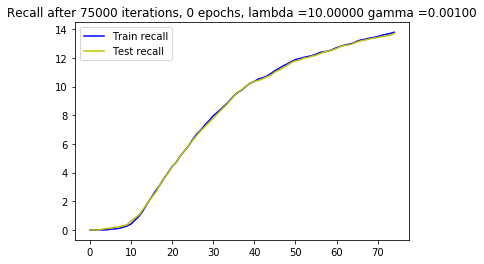

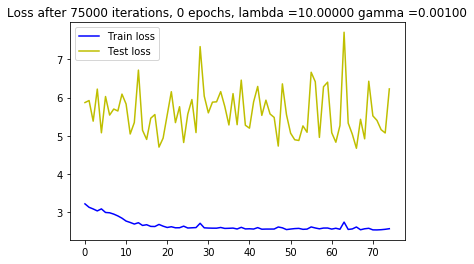

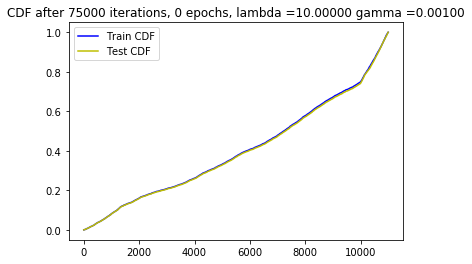






 16%|█▌        | 75001/473047 [48:14<98:32:56,  1.12it/s]




 16%|█▌        | 75009/473047 [48:14<69:26:05,  1.59it/s]

New score:  0.11107558
Train score:  0.2813479
Test score:  0.3689293
Obj first part:  0.6358969211578369
Obj second part:  -1.3496646
Obj first part:  1.472075879573822
Obj second part:  -2.4629464
Obj first part:  0.13374256901443005
Obj second part:  -0.9767446
Obj first part:  0.23874206468462944
Obj second part:  -0.23705563
Obj first part:  1.209966093301773
Obj second part:  -0.8351133
Obj first part:  0.0
Obj second part:  -3.0298572
Obj first part:  1.815963238477707
Obj second part:  -0.24281052
Obj first part:  0.0
Obj second part:  -2.7362027
Obj first part:  14.361766576766968
Obj second part:  -1.5848114
Obj first part:  0.0
Obj second part:  -1.2883447
Obj first part:  0.0
Obj second part:  -1.4160732
Obj first part:  1.7832456529140472
Obj second part:  -3.8311539
Obj first part:  4.300278723239899
Obj second part:  -0.8858741
Obj first part:  0.0
Obj second part:  -0.6172663
Obj first part:  0.0
Obj second part:  -0.997934







 16%|█▌        | 75017/473047 [48:14<49:02:17,  2.25it/s]




 16%|█▌        | 75025/473047 [48:14<34:46:03,  3.18it/s]

Obj first part:  0.0
Obj second part:  -0.6579746
Obj first part:  0.0
Obj second part:  -0.9871415
Obj first part:  1.9876746833324432
Obj second part:  -0.21185511
Obj first part:  0.0
Obj second part:  -1.05506
Obj first part:  0.0
Obj second part:  -0.19668262
Obj first part:  3.128630220890045
Obj second part:  -1.6522336
Obj first part:  5.045710802078247
Obj second part:  -2.6685464
Obj first part:  0.49268219619989395
Obj second part:  -1.7258185
Obj first part:  1.0462257266044617
Obj second part:  -2.2122736
Obj first part:  0.7623664289712906
Obj second part:  -0.8957598
Obj first part:  0.0
Obj second part:  -0.79703206
Obj first part:  0.0
Obj second part:  -0.76310176
Obj first part:  0.0
Obj second part:  -2.0394669
Obj first part:  0.0
Obj second part:  -0.92228353
Obj first part:  0.2598915435373783
Obj second part:  -2.7142944







 16%|█▌        | 75033/473047 [48:14<24:47:35,  4.46it/s]




 16%|█▌        | 75041/473047 [48:14<17:47:55,  6.21it/s]

Obj first part:  0.0
Obj second part:  -1.0767885
Obj first part:  0.0
Obj second part:  -1.8920658
Obj first part:  1.2512204051017761
Obj second part:  -3.787696
Obj first part:  0.8159594982862473
Obj second part:  -0.9019665
Obj first part:  0.0
Obj second part:  -2.1886911
Obj first part:  0.0
Obj second part:  -1.1429282
Obj first part:  0.0
Obj second part:  -4.4798174
Obj first part:  0.0
Obj second part:  -2.0040786
Obj first part:  3.5687053203582764
Obj second part:  -1.6543264
Obj first part:  0.5079057440161705
Obj second part:  -0.02049668
Obj first part:  0.0
Obj second part:  -0.57402384
Obj first part:  0.0
Obj second part:  -3.006264
Obj first part:  0.0
Obj second part:  -0.20677513
Obj first part:  4.855545163154602
Obj second part:  -0.7985805
Obj first part:  0.0
Obj second part:  -2.8608963







 16%|█▌        | 75049/473047 [48:14<12:54:26,  8.57it/s]




 16%|█▌        | 75057/473047 [48:14<9:28:29, 11.67it/s] 

Obj first part:  0.0
Obj second part:  -1.3875622
Obj first part:  1.983645111322403
Obj second part:  -1.075149
Obj first part:  3.1427496671676636
Obj second part:  -0.86016625
Obj first part:  1.5080885589122772
Obj second part:  -2.3411152
Obj first part:  0.0
Obj second part:  -2.3621235
Obj first part:  0.0
Obj second part:  -0.19201565
Obj first part:  0.0
Obj second part:  -0.8908215
Obj first part:  0.0
Obj second part:  -1.454685
Obj first part:  0.0
Obj second part:  -4.209129
Obj first part:  1.6087232530117035
Obj second part:  -0.64956063
Obj first part:  0.0
Obj second part:  -1.5929272
Obj first part:  13.45243215560913
Obj second part:  -6.876735
Obj first part:  2.1041496098041534
Obj second part:  -0.8593834
Obj first part:  5.6640660762786865
Obj second part:  -5.7765017
Obj first part:  0.0
Obj second part:  -0.6980808
Obj first part:  0.0







 16%|█▌        | 75065/473047 [48:14<7:04:53, 15.61it/s]




 16%|█▌        | 75073/473047 [48:15<5:25:01, 20.41it/s]

Obj second part:  -3.6903791
Obj first part:  0.0
Obj second part:  -0.28537875
Obj first part:  0.06864979863166809
Obj second part:  -3.2916832
Obj first part:  0.0
Obj second part:  -3.5518305
Obj first part:  0.07874070666730404
Obj second part:  -0.49027747
Obj first part:  0.9291544556617737
Obj second part:  -0.45119718
Obj first part:  0.0
Obj second part:  -0.5082727
Obj first part:  0.0
Obj second part:  -1.2166814
Obj first part:  10.22027850151062
Obj second part:  -3.2785099
Obj first part:  4.332370460033417
Obj second part:  -2.2393186
Obj first part:  0.1089493278414011
Obj second part:  -1.0939379
Obj first part:  1.75479456782341
Obj second part:  -0.89219797
Obj first part:  0.0
Obj second part:  -1.7762287
Obj first part:  0.17532991245388985
Obj second part:  -0.73127264
Obj first part:  0.0
Obj second part:  -0.8577523







 16%|█▌        | 75081/473047 [48:15<4:14:31, 26.06it/s]




 16%|█▌        | 75089/473047 [48:15<3:24:45, 32.39it/s]

Obj first part:  2.502255141735077
Obj second part:  -0.68191564
Obj first part:  0.6777402013540268
Obj second part:  -1.1119235
Obj first part:  7.448395490646362
Obj second part:  -0.19715263
Obj first part:  3.1952881813049316
Obj second part:  -2.6136184
Obj first part:  0.0
Obj second part:  -3.7307842
Obj first part:  0.0
Obj second part:  -1.8444377
Obj first part:  0.0
Obj second part:  -3.5529656
Obj first part:  0.0
Obj second part:  -4.2566705
Obj first part:  3.2720619440078735
Obj second part:  -1.986108
Obj first part:  0.0
Obj second part:  -4.0920844
Obj first part:  0.0
Obj second part:  -3.3079119
Obj first part:  0.0
Obj second part:  -1.3958808
Obj first part:  1.938747614622116
Obj second part:  -1.2426918
Obj first part:  0.678333193063736
Obj second part:  -1.3540778
Obj first part:  0.0
Obj second part:  -1.04976







 16%|█▌        | 75097/473047 [48:15<2:50:57, 38.80it/s]




 16%|█▌        | 75105/473047 [48:15<2:26:13, 45.36it/s]

Obj first part:  0.0
Obj second part:  -2.2634664
Obj first part:  0.1262717880308628
Obj second part:  -1.3210104
Obj first part:  0.0
Obj second part:  -0.84887534
Obj first part:  0.0
Obj second part:  -4.542479
Obj first part:  0.3682514652609825
Obj second part:  -1.3798965
Obj first part:  0.11862639337778091
Obj second part:  -3.951238
Obj first part:  0.0
Obj second part:  -1.1560755
Obj first part:  0.6016501784324646
Obj second part:  -1.4447485
Obj first part:  0.0
Obj second part:  -0.9300193
Obj first part:  0.0
Obj second part:  -0.29308218
Obj first part:  0.0
Obj second part:  -0.49697006
Obj first part:  0.0
Obj second part:  -1.5279852
Obj first part:  0.9010724723339081
Obj second part:  -1.3881704
Obj first part:  0.0
Obj second part:  -0.53915095
Obj first part:  0.3102216124534607
Obj second part:  -2.531627







 16%|█▌        | 75113/473047 [48:15<2:08:35, 51.58it/s]




 16%|█▌        | 75121/473047 [48:15<1:56:35, 56.89it/s]

Obj first part:  0.10018846951425076
Obj second part:  -0.7516682
Obj first part:  0.0
Obj second part:  -0.3952578
Obj first part:  4.411619603633881
Obj second part:  -2.4475865
Obj first part:  0.0
Obj second part:  -0.36832967
Obj first part:  2.2598226368427277
Obj second part:  -0.9190052
Obj first part:  1.0150209069252014
Obj second part:  -4.354669
Obj first part:  0.0
Obj second part:  -1.3886489
Obj first part:  0.32037440687417984
Obj second part:  -1.0615107
Obj first part:  1.5542219579219818
Obj second part:  -3.2265759
Obj first part:  0.2479621022939682
Obj second part:  -2.6944842
Obj first part:  3.940032720565796
Obj second part:  -2.4053304
Obj first part:  0.5013884976506233
Obj second part:  -0.53415346
Obj first part:  0.0
Obj second part:  -4.677326
Obj first part:  0.263496283441782
Obj second part:  -2.2595747
Obj first part:  0.0
Obj second part:  -2.2893412
Obj first part:  0.0
Obj second part:  -3.0111656







 16%|█▌        | 75129/473047 [48:15<1:48:45, 60.98it/s]




 16%|█▌        | 75137/473047 [48:15<1:42:51, 64.47it/s]

Obj first part:  0.5014465749263763
Obj second part:  -3.4057488
Obj first part:  4.976584315299988
Obj second part:  -2.8748832
Obj first part:  0.05142804700881243
Obj second part:  -1.257333
Obj first part:  0.0
Obj second part:  -2.4182293
Obj first part:  0.5366299673914909
Obj second part:  -2.132509
Obj first part:  0.3950881212949753
Obj second part:  -0.4321514
Obj first part:  2.0794984698295593
Obj second part:  -4.1607957
Obj first part:  0.0
Obj second part:  -1.4252975
Obj first part:  0.0
Obj second part:  -3.0690103
Obj first part:  0.0
Obj second part:  -3.3723035
Obj first part:  0.0
Obj second part:  -1.9401994
Obj first part:  0.25082873180508614
Obj second part:  -0.78781074
Obj first part:  0.0
Obj second part:  -0.45912042
Obj first part:  2.6827016472816467
Obj second part:  -0.5913288
Obj first part:  0.0
Obj second part:  -1.0658228
Obj first part:  0.0







 16%|█▌        | 75145/473047 [48:15<1:40:15, 66.15it/s]

Obj second part:  -1.7364492
Obj first part:  0.0
Obj second part:  -1.7488356
Obj first part:  0.01621238887310028
Obj second part:  -2.219388
Obj first part:  0.5322239547967911
Obj second part:  -2.791883
Obj first part:  0.0
Obj second part:  -2.1869118
Obj first part:  0.0
Obj second part:  -3.591014
Obj first part:  0.0
Obj second part:  -1.3777158
Obj first part:  0.1867002621293068
Obj second part:  -2.5419753
Obj first part:  0.14325015246868134
Obj second part:  -0.86681944
Obj first part:  0.0
Obj second part:  -0.54460603
Obj first part:  0.0
Obj second part:  -0.3684572
Obj first part:  1.3105148077011108
Obj second part:  -2.5665188
Obj first part:  0.05032023414969444
Obj second part:  -0.27948296
Obj first part:  0.0
Obj second part:  -4.7393456
Obj first part:  0.0
Obj second part:  -0.7367591







 16%|█▌        | 75153/473047 [48:16<1:37:20, 68.13it/s]




 16%|█▌        | 75161/473047 [48:16<1:35:07, 69.71it/s]

Obj first part:  0.0
Obj second part:  -0.7102274
Obj first part:  0.0
Obj second part:  -4.573532
Obj first part:  0.0
Obj second part:  -0.67701244
Obj first part:  0.0
Obj second part:  -1.4800428
Obj first part:  0.24714788421988487
Obj second part:  -1.0193691
Obj first part:  0.0
Obj second part:  -0.6685587
Obj first part:  2.3120100796222687
Obj second part:  -0.38767087
Obj first part:  0.0
Obj second part:  -0.40915087
Obj first part:  0.0
Obj second part:  -1.7452464
Obj first part:  7.642614245414734
Obj second part:  -1.6675097
Obj first part:  0.0
Obj second part:  -0.91787785
Obj first part:  0.8967406302690506
Obj second part:  -0.23756881
Obj first part:  0.0
Obj second part:  -0.67968756
Obj first part:  0.0
Obj second part:  -0.09147429
Obj first part:  1.6033364832401276
Obj second part:  -0.62989163







 16%|█▌        | 75169/473047 [48:16<1:33:18, 71.07it/s]




 16%|█▌        | 75177/473047 [48:16<1:34:16, 70.34it/s]

Obj first part:  0.0
Obj second part:  -2.1679466
Obj first part:  0.0
Obj second part:  -2.6169693
Obj first part:  0.7832622528076172
Obj second part:  -0.2702322
Obj first part:  0.8301004022359848
Obj second part:  -0.76888174
Obj first part:  0.0
Obj second part:  -3.967937
Obj first part:  0.0
Obj second part:  -1.0942045
Obj first part:  8.281787037849426
Obj second part:  -2.376492
Obj first part:  0.0
Obj second part:  -0.87155706
Obj first part:  0.0
Obj second part:  -2.6767478
Obj first part:  0.0
Obj second part:  -1.19564
Obj first part:  1.0842299461364746
Obj second part:  -0.57962257
Obj first part:  0.0
Obj second part:  -2.5640264
Obj first part:  0.19164841622114182
Obj second part:  -2.860246
Obj first part:  0.0
Obj second part:  -2.146752
Obj first part:  0.0
Obj second part:  -2.358046







 16%|█▌        | 75185/473047 [48:16<1:34:06, 70.46it/s]




 16%|█▌        | 75193/473047 [48:16<1:32:57, 71.33it/s]

Obj first part:  0.0
Obj second part:  -0.13457675
Obj first part:  0.0
Obj second part:  -2.5375283
Obj first part:  0.0
Obj second part:  -1.155267
Obj first part:  0.11064540594816208
Obj second part:  -0.037694193
Obj first part:  0.0
Obj second part:  -2.4868052
Obj first part:  6.214419603347778
Obj second part:  -1.1302749
Obj first part:  0.0
Obj second part:  -0.2661868
Obj first part:  2.770395278930664
Obj second part:  -0.29183257
Obj first part:  2.6761144399642944
Obj second part:  -2.5780275
Obj first part:  0.0
Obj second part:  -1.2381716
Obj first part:  0.0
Obj second part:  -0.7340837
Obj first part:  0.689333900809288
Obj second part:  -1.759418
Obj first part:  2.6075464487075806
Obj second part:  -1.665951
Obj first part:  0.0
Obj second part:  -2.138434
Obj first part:  0.0
Obj second part:  -0.60703516







 16%|█▌        | 75201/473047 [48:16<1:32:22, 71.78it/s]




 16%|█▌        | 75209/473047 [48:16<1:31:50, 72.20it/s]

Obj first part:  0.0
Obj second part:  -1.1153405
Obj first part:  0.0
Obj second part:  -0.90982187
Obj first part:  1.6889195144176483
Obj second part:  -2.0314045
Obj first part:  1.349111944437027
Obj second part:  -0.33499247
Obj first part:  0.12233358807861805
Obj second part:  -1.2937895
Obj first part:  2.932075560092926
Obj second part:  -0.58560354
Obj first part:  0.0
Obj second part:  -1.5409397
Obj first part:  0.5654711648821831
Obj second part:  -1.6923126
Obj first part:  0.0
Obj second part:  -0.64528006
Obj first part:  0.0
Obj second part:  -0.8015642
Obj first part:  0.0
Obj second part:  -1.3335822
Obj first part:  0.0
Obj second part:  -0.23017788
Obj first part:  0.0
Obj second part:  -0.13812454
Obj first part:  0.0
Obj second part:  -1.3591149
Obj first part:  0.7119579613208771
Obj second part:  -1.8623157







 16%|█▌        | 75217/473047 [48:16<1:31:34, 72.41it/s]




 16%|█▌        | 75225/473047 [48:17<1:31:52, 72.17it/s]

Obj first part:  0.9353780746459961
Obj second part:  -1.481634
Obj first part:  0.0
Obj second part:  -0.09036378
Obj first part:  0.0
Obj second part:  -1.8442056
Obj first part:  0.7066082209348679
Obj second part:  -0.43558723
Obj first part:  0.0
Obj second part:  -0.41147965
Obj first part:  12.448946237564087
Obj second part:  -2.2310832
Obj first part:  3.825940489768982
Obj second part:  -2.2252169
Obj first part:  0.0
Obj second part:  -0.39208487
Obj first part:  0.0
Obj second part:  -0.20744666
Obj first part:  0.0829924363642931
Obj second part:  -1.7479264
Obj first part:  1.2978656589984894
Obj second part:  -2.0196962
Obj first part:  4.386025071144104
Obj second part:  -0.07526247
Obj first part:  0.4992864280939102
Obj second part:  -1.5456296
Obj first part:  1.144934892654419
Obj second part:  -0.19779588
Obj first part:  0.8506057411432266
Obj second part:  -3.327456







 16%|█▌        | 75233/473047 [48:17<1:31:55, 72.12it/s]




 16%|█▌        | 75241/473047 [48:17<1:32:01, 72.05it/s]

Obj first part:  0.0726625369861722
Obj second part:  -1.82915
Obj first part:  0.0
Obj second part:  -2.228021
Obj first part:  0.0
Obj second part:  -0.4683401
Obj first part:  0.0
Obj second part:  -3.7079787
Obj first part:  0.4873614013195038
Obj second part:  -0.42256933
Obj first part:  6.989421844482422
Obj second part:  -0.98922086
Obj first part:  0.0
Obj second part:  -1.4642664
Obj first part:  0.8272652328014374
Obj second part:  -2.3746471
Obj first part:  0.0
Obj second part:  -0.6876521
Obj first part:  0.0
Obj second part:  -1.3322577
Obj first part:  0.0
Obj second part:  -1.1296694
Obj first part:  0.0
Obj second part:  -1.3033575
Obj first part:  0.0
Obj second part:  -2.5011206
Obj first part:  0.31347833573818207
Obj second part:  -2.8923566
Obj first part:  4.768837988376617
Obj second part:  -1.3427185







 16%|█▌        | 75249/473047 [48:17<1:31:27, 72.49it/s]




 16%|█▌        | 75257/473047 [48:17<1:30:53, 72.95it/s]

Obj first part:  0.0
Obj second part:  -0.29838035
Obj first part:  2.253948152065277
Obj second part:  -4.115363
Obj first part:  0.0
Obj second part:  -1.2077528
Obj first part:  0.6666264683008194
Obj second part:  -1.7819226
Obj first part:  0.0
Obj second part:  -0.90084445
Obj first part:  0.6886721402406693
Obj second part:  -0.80411506
Obj first part:  0.0
Obj second part:  -5.001248
Obj first part:  0.0
Obj second part:  -1.2434462
Obj first part:  0.12456797063350677
Obj second part:  -0.15625149
Obj first part:  0.0
Obj second part:  -1.1877948
Obj first part:  0.0
Obj second part:  -2.2597833
Obj first part:  0.0
Obj second part:  -0.119306274
Obj first part:  0.0
Obj second part:  -2.4950807
Obj first part:  3.566085994243622
Obj second part:  -0.28542894
Obj first part:  0.0
Obj second part:  -1.2763417







 16%|█▌        | 75265/473047 [48:17<1:30:53, 72.95it/s]

Obj first part:  0.0
Obj second part:  -3.4468706
Obj first part:  0.0
Obj second part:  -1.605399
Obj first part:  0.0
Obj second part:  -0.78481144
Obj first part:  0.38295552134513855
Obj second part:  -0.48356736
Obj first part:  2.4489399790763855
Obj second part:  -2.140792
Obj first part:  0.0
Obj second part:  -1.5852629
Obj first part:  9.789167642593384
Obj second part:  -0.5414144
Obj first part:  0.0
Obj second part:  -2.582441
Obj first part:  0.4732094705104828
Obj second part:  -1.1753794
Obj first part:  0.0
Obj second part:  -0.10659857
Obj first part:  0.0
Obj second part:  -1.5138524
Obj first part:  5.707260966300964
Obj second part:  -0.87900156
Obj first part:  0.0
Obj second part:  -1.4512044
Obj first part:  0.0
Obj second part:  -0.8503382
Obj first part:  0.0
Obj second part:  -0.60439533







 16%|█▌        | 75273/473047 [48:17<1:30:52, 72.96it/s]




 16%|█▌        | 75281/473047 [48:17<1:30:40, 73.11it/s]

Obj first part:  0.0
Obj second part:  -0.4071943
Obj first part:  4.74447637796402
Obj second part:  -1.4968059
Obj first part:  4.565814137458801
Obj second part:  -1.0173209
Obj first part:  0.47812700271606445
Obj second part:  -4.446545
Obj first part:  0.0
Obj second part:  -0.42708057
Obj first part:  0.8204463869333267
Obj second part:  -0.22624488
Obj first part:  0.9824821352958679
Obj second part:  -2.3683624
Obj first part:  3.250568211078644
Obj second part:  -1.6583105
Obj first part:  4.551076591014862
Obj second part:  -1.1348325
Obj first part:  0.0
Obj second part:  -3.6095738
Obj first part:  0.0
Obj second part:  -0.3814002
Obj first part:  0.1343102753162384
Obj second part:  -2.2360435
Obj first part:  0.1998848281800747
Obj second part:  -1.1248419
Obj first part:  0.025825153570622206
Obj second part:  -1.7536107
Obj first part:  2.5212541222572327
Obj second part:  -2.5539534







 16%|█▌        | 75289/473047 [48:17<1:31:09, 72.73it/s]




 16%|█▌        | 75297/473047 [48:18<1:31:24, 72.52it/s]

Obj first part:  0.0
Obj second part:  -2.6247966
Obj first part:  0.32694604247808456
Obj second part:  -0.47012722
Obj first part:  0.0
Obj second part:  -3.535619
Obj first part:  0.19629724323749542
Obj second part:  -2.0957303
Obj first part:  0.0
Obj second part:  -2.0426097
Obj first part:  0.0
Obj second part:  -1.5042138
Obj first part:  0.0
Obj second part:  -0.7065298
Obj first part:  0.0
Obj second part:  -2.544189
Obj first part:  0.0
Obj second part:  -2.4687433
Obj first part:  0.18039783462882042
Obj second part:  -0.15394333
Obj first part:  0.4797092452645302
Obj second part:  -3.73593
Obj first part:  0.0
Obj second part:  -0.7345285
Obj first part:  1.1757579445838928
Obj second part:  -0.3875741
Obj first part:  0.0681550009176135
Obj second part:  -2.501054
Obj first part:  0.0
Obj second part:  -0.50449026







 16%|█▌        | 75305/473047 [48:18<1:31:35, 72.37it/s]




 16%|█▌        | 75313/473047 [48:18<1:30:54, 72.92it/s]

Obj first part:  0.0
Obj second part:  -2.6378262
Obj first part:  0.6674547493457794
Obj second part:  -2.5715232
Obj first part:  10.219889879226685
Obj second part:  -2.1340337
Obj first part:  0.19872020930051804
Obj second part:  -0.3218223
Obj first part:  0.06208901759237051
Obj second part:  -0.022083461
Obj first part:  1.7520281672477722
Obj second part:  -1.1522399
Obj first part:  0.5383837595582008
Obj second part:  -1.1803333
Obj first part:  0.0
Obj second part:  -0.08004729
Obj first part:  0.0
Obj second part:  -4.650218
Obj first part:  0.0
Obj second part:  -1.8407712
Obj first part:  0.0
Obj second part:  -2.219237
Obj first part:  0.4726140946149826
Obj second part:  -2.9373524
Obj first part:  1.9290904700756073
Obj second part:  -2.0740395
Obj first part:  0.0
Obj second part:  -2.9030309
Obj first part:  0.0
Obj second part:  -0.67616105







 16%|█▌        | 75321/473047 [48:18<1:30:20, 73.37it/s]




 16%|█▌        | 75329/473047 [48:18<1:30:43, 73.06it/s]

Obj first part:  0.18416661769151688
Obj second part:  -2.468534
Obj first part:  0.4427918419241905
Obj second part:  -3.7789404
Obj first part:  0.0
Obj second part:  -0.18891497
Obj first part:  0.0
Obj second part:  -4.0507255
Obj first part:  0.0
Obj second part:  -0.4247947
Obj first part:  16.839561462402344
Obj second part:  -0.32777217
Obj first part:  0.0
Obj second part:  -3.189414
Obj first part:  0.0
Obj second part:  -0.45774567
Obj first part:  0.0
Obj second part:  -2.7419136
Obj first part:  5.850098133087158
Obj second part:  -0.38964692
Obj first part:  0.0
Obj second part:  -3.0636168
Obj first part:  0.0
Obj second part:  -1.3478166
Obj first part:  1.5486575663089752
Obj second part:  -1.2762816
Obj first part:  1.1993388831615448
Obj second part:  -2.5128052
Obj first part:  6.267153024673462
Obj second part:  -2.0472748







 16%|█▌        | 75337/473047 [48:18<1:30:58, 72.86it/s]




 16%|█▌        | 75345/473047 [48:18<1:35:06, 69.69it/s]

Obj first part:  5.438057780265808
Obj second part:  -0.28774408
Obj first part:  0.43375663459300995
Obj second part:  -2.4158208
Obj first part:  0.7286493480205536
Obj second part:  -1.6016257
Obj first part:  0.0
Obj second part:  -0.31560406
Obj first part:  1.1307799816131592
Obj second part:  -1.786778
Obj first part:  1.5908177196979523
Obj second part:  -2.5135596
Obj first part:  5.964609980583191
Obj second part:  -0.71826893
Obj first part:  0.0
Obj second part:  -0.29678625
Obj first part:  0.0
Obj second part:  -0.5718757
Obj first part:  0.0
Obj second part:  -0.13667119
Obj first part:  0.44682886451482773
Obj second part:  -0.88580704
Obj first part:  0.0
Obj second part:  -3.3171892
Obj first part:  1.7222771048545837
Obj second part:  -2.9547782
Obj first part:  0.038431305438280106
Obj second part:  -2.1993265







 16%|█▌        | 75352/473047 [48:18<2:05:51, 52.67it/s]

Obj first part:  0.4873565211892128
Obj second part:  -2.718751
Obj first part:  0.0
Obj second part:  -5.166895
Obj first part:  0.0
Obj second part:  -3.933958
Obj first part:  0.0
Obj second part:  -2.217226
Obj first part:  0.0
Obj second part:  -2.895893
Obj first part:  0.8801843971014023
Obj second part:  -4.1908183
Obj first part:  0.0
Obj second part:  -3.4024057







 16%|█▌        | 75358/473047 [48:19<2:33:46, 43.10it/s]

Obj first part:  0.5023728311061859
Obj second part:  -2.0754664
Obj first part:  1.0285737365484238
Obj second part:  -4.824041
Obj first part:  0.06529344711452723
Obj second part:  -1.7824429
Obj first part:  1.897466629743576
Obj second part:  -2.8742034
Obj first part:  0.0
Obj second part:  -0.97730494
Obj first part:  0.0
Obj second part:  -0.64164233
Obj first part:  0.02229476347565651
Obj second part:  -0.12238938







 16%|█▌        | 75364/473047 [48:19<2:49:01, 39.21it/s]

Obj first part:  0.0
Obj second part:  -1.232754
Obj first part:  0.3055787459015846
Obj second part:  -0.25938532
Obj first part:  0.0
Obj second part:  -5.8538103
Obj first part:  1.3016508519649506
Obj second part:  -0.41900358
Obj first part:  1.65463387966156
Obj second part:  -0.5533805
Obj first part:  0.0
Obj second part:  -3.0491078
Obj first part:  0.4736759141087532
Obj second part:  -2.8125029







 16%|█▌        | 75369/473047 [48:19<2:59:24, 36.94it/s]

Obj first part:  0.8343464881181717
Obj second part:  -0.98708177
Obj first part:  7.939353585243225
Obj second part:  -3.6023467
Obj first part:  0.0
Obj second part:  -1.4875025
Obj first part:  0.0
Obj second part:  -0.055630185
Obj first part:  0.0
Obj second part:  -1.4027061
Obj first part:  0.0
Obj second part:  -1.5005919
Obj first part:  0.0
Obj second part:  -0.015674368







 16%|█▌        | 75374/473047 [48:19<3:07:00, 35.44it/s]




 16%|█▌        | 75378/473047 [48:19<3:10:19, 34.82it/s]

Obj first part:  1.711513102054596
Obj second part:  -0.4362115
Obj first part:  0.0
Obj second part:  -0.58618844
Obj first part:  0.0
Obj second part:  -2.1637156
Obj first part:  0.8270478248596191
Obj second part:  -1.0675056
Obj first part:  0.0
Obj second part:  -2.2064183
Obj first part:  0.0
Obj second part:  -2.1307247
Obj first part:  0.0
Obj second part:  -0.47121295







 16%|█▌        | 75382/473047 [48:19<3:15:40, 33.87it/s]




 16%|█▌        | 75386/473047 [48:20<3:14:12, 34.13it/s]

Obj first part:  0.6062325835227966
Obj second part:  -2.9996734
Obj first part:  0.9835042804479599
Obj second part:  -0.3574791
Obj first part:  6.514067053794861
Obj second part:  -0.12730683
Obj first part:  0.1340260822325945
Obj second part:  -2.7763245
Obj first part:  14.883971214294434
Obj second part:  -0.68855816
Obj first part:  0.2915615774691105
Obj second part:  -1.4649304
Obj first part:  0.26213178411126137
Obj second part:  -0.32706833
Obj first part:  0.31731944531202316
Obj second part:  -0.45179212







 16%|█▌        | 75391/473047 [48:20<2:55:44, 37.71it/s]




 16%|█▌        | 75397/473047 [48:20<2:38:48, 41.73it/s]

Obj first part:  0.0
Obj second part:  -2.2232738
Obj first part:  9.23826813697815
Obj second part:  -0.95532364
Obj first part:  0.14990007504820824
Obj second part:  -1.7761816
Obj first part:  0.0
Obj second part:  -2.8817205
Obj first part:  0.0
Obj second part:  -1.6948957
Obj first part:  5.539764165878296
Obj second part:  -0.29544106
Obj first part:  0.18187632784247398
Obj second part:  -1.4994936
Obj first part:  0.0
Obj second part:  -2.9026074
Obj first part:  0.3489852324128151
Obj second part:  -0.3001562
Obj first part:  0.0
Obj second part:  -1.3550963







 16%|█▌        | 75402/473047 [48:20<2:54:27, 37.99it/s]

Obj first part:  0.0
Obj second part:  -0.5495863
Obj first part:  0.0
Obj second part:  -2.0244493
Obj first part:  0.0
Obj second part:  -0.4261893
Obj first part:  0.0
Obj second part:  -3.8230639
Obj first part:  0.49779802560806274
Obj second part:  -0.6158333
Obj first part:  0.0
Obj second part:  -2.8246305
Obj first part:  0.0
Obj second part:  -0.55754715







 16%|█▌        | 75407/473047 [48:20<3:04:10, 35.99it/s]




 16%|█▌        | 75411/473047 [48:20<3:11:11, 34.66it/s]

Obj first part:  0.3980714827775955
Obj second part:  -1.6775529
Obj first part:  0.19199509173631668
Obj second part:  -0.8571431
Obj first part:  1.6947701573371887
Obj second part:  -0.6851111
Obj first part:  0.7664391398429871
Obj second part:  -3.498902
Obj first part:  0.6919752806425095
Obj second part:  -3.086242
Obj first part:  0.9305289387702942
Obj second part:  -0.8468956
Obj first part:  0.0
Obj second part:  -3.0763202







 16%|█▌        | 75415/473047 [48:20<3:17:00, 33.64it/s]




 16%|█▌        | 75419/473047 [48:20<3:21:16, 32.93it/s]

Obj first part:  0.24887911975383759
Obj second part:  -1.1180667
Obj first part:  4.020168781280518
Obj second part:  -1.4308875
Obj first part:  0.0
Obj second part:  -0.54861933
Obj first part:  0.056242519058287144
Obj second part:  -1.6510001
Obj first part:  0.23093311116099358
Obj second part:  -0.76949716
Obj first part:  0.0
Obj second part:  -2.291023
Obj first part:  0.9386363625526428
Obj second part:  -3.48063







 16%|█▌        | 75423/473047 [48:21<3:24:17, 32.44it/s]

Obj first part:  0.0
Obj second part:  -3.830593
Obj first part:  0.06275128107517958
Obj second part:  -0.05299719
Obj first part:  0.0
Obj second part:  -1.1284733
Obj first part:  0.0
Obj second part:  -1.1989692
Obj first part:  0.0
Obj second part:  -1.8946574
Obj first part:  0.0
Obj second part:  -1.2297541
Obj first part:  0.8814771473407745
Obj second part:  -1.9433084







 16%|█▌        | 75427/473047 [48:21<3:25:52, 32.19it/s]




 16%|█▌        | 75431/473047 [48:21<3:17:36, 33.54it/s]

Obj first part:  0.0
Obj second part:  -1.6687909
Obj first part:  0.21900473162531853
Obj second part:  -1.3761847
Obj first part:  1.13364577293396
Obj second part:  -1.6823087
Obj first part:  3.3914756774902344
Obj second part:  -1.4838986
Obj first part:  0.8167204260826111
Obj second part:  -0.8185437
Obj first part:  1.5726740658283234
Obj second part:  -2.4121706
Obj first part:  2.846847176551819
Obj second part:  -1.5505601
Obj first part:  0.0
Obj second part:  -2.9789455







 16%|█▌        | 75435/473047 [48:21<3:15:40, 33.87it/s]




 16%|█▌        | 75439/473047 [48:21<3:09:55, 34.89it/s]

Obj first part:  0.0
Obj second part:  -0.48626772
Obj first part:  0.0
Obj second part:  -1.8607997
Obj first part:  0.0
Obj second part:  -2.0385969
Obj first part:  0.0
Obj second part:  -2.489355
Obj first part:  2.4554166197776794
Obj second part:  -2.7530684
Obj first part:  2.022940367460251
Obj second part:  -2.9636545
Obj first part:  0.0
Obj second part:  -3.2974615
Obj first part:  2.1820376813411713
Obj second part:  -0.69603646
Obj first part:  0.20410556346178055
Obj second part:  -3.412824
Obj first part:  1.2505462765693665
Obj second part:  -1.7821547







 16%|█▌        | 75445/473047 [48:21<2:46:30, 39.80it/s]




 16%|█▌        | 75450/473047 [48:21<2:41:35, 41.01it/s]

Obj first part:  0.3116121143102646
Obj second part:  -3.3398232
Obj first part:  0.0
Obj second part:  -0.9668846
Obj first part:  11.486349105834961
Obj second part:  -1.4133962
Obj first part:  1.3580149412155151
Obj second part:  -0.7563376
Obj first part:  11.551103591918945
Obj second part:  -3.0844834
Obj first part:  0.8062487840652466
Obj second part:  -0.51943505
Obj first part:  0.8225123584270477
Obj second part:  -1.3834057
Obj first part:  1.0984442383050919
Obj second part:  -0.7889604







 16%|█▌        | 75455/473047 [48:21<2:55:15, 37.81it/s]




 16%|█▌        | 75459/473047 [48:22<3:03:35, 36.10it/s]

Obj first part:  0.0
Obj second part:  -1.8061956
Obj first part:  0.0
Obj second part:  -1.0264134
Obj first part:  0.23732280358672142
Obj second part:  -2.712687
Obj first part:  0.5702720582485199
Obj second part:  -0.15257894
Obj first part:  0.15207608230412006
Obj second part:  -1.680799
Obj first part:  0.0
Obj second part:  -1.9900221
Obj first part:  2.7680999040603638
Obj second part:  -0.79624724







 16%|█▌        | 75463/473047 [48:22<3:10:24, 34.80it/s]

Obj first part:  0.0
Obj second part:  -0.92735565
Obj first part:  0.0
Obj second part:  -3.7851365
Obj first part:  0.4374515265226364
Obj second part:  -1.6335589
Obj first part:  1.9687575101852417
Obj second part:  -4.0354156
Obj first part:  0.0
Obj second part:  -1.9500341
Obj first part:  0.0
Obj second part:  -1.9826223
Obj first part:  0.40655694901943207
Obj second part:  -3.3039668







 16%|█▌        | 75467/473047 [48:22<3:13:41, 34.21it/s]




 16%|█▌        | 75471/473047 [48:22<3:17:56, 33.48it/s]

Obj first part:  0.0
Obj second part:  -0.046711437
Obj first part:  0.0
Obj second part:  -3.4614959
Obj first part:  4.755887389183044
Obj second part:  -0.766752
Obj first part:  0.0
Obj second part:  -1.8440493
Obj first part:  0.0
Obj second part:  -0.83978784
Obj first part:  1.0716842114925385
Obj second part:  -2.894689
Obj first part:  0.0
Obj second part:  -3.3612108







 16%|█▌        | 75475/473047 [48:22<3:20:36, 33.03it/s]




 16%|█▌        | 75479/473047 [48:22<3:21:24, 32.90it/s]

Obj first part:  0.0
Obj second part:  -3.987022
Obj first part:  0.31027959659695625
Obj second part:  -1.0411458
Obj first part:  1.0317472368478775
Obj second part:  -2.0295985
Obj first part:  0.10547458194196224
Obj second part:  -1.4047904
Obj first part:  1.3357219099998474
Obj second part:  -2.0944018
Obj first part:  0.0
Obj second part:  -0.21109521
Obj first part:  2.160903364419937
Obj second part:  -2.9161985







 16%|█▌        | 75483/473047 [48:22<3:19:39, 33.19it/s]




 16%|█▌        | 75488/473047 [48:22<3:05:35, 35.70it/s]

Obj first part:  0.0
Obj second part:  -0.131298
Obj first part:  0.0
Obj second part:  -2.4970088
Obj first part:  0.0
Obj second part:  -1.3674356
Obj first part:  0.0
Obj second part:  -1.9662888
Obj first part:  2.5074660778045654
Obj second part:  -1.6686299
Obj first part:  0.0
Obj second part:  -2.1171203
Obj first part:  0.0
Obj second part:  -1.8652554
Obj first part:  0.6080088764429092
Obj second part:  -3.8402436
Obj first part:  2.5968560576438904
Obj second part:  -0.2063065







 16%|█▌        | 75492/473047 [48:22<2:59:45, 36.86it/s]




 16%|█▌        | 75500/473047 [48:23<2:31:10, 43.83it/s]

Obj first part:  0.0
Obj second part:  -0.1296468
Obj first part:  0.0
Obj second part:  -1.6388215
Obj first part:  0.0
Obj second part:  -0.68979704
Obj first part:  0.19339758902788162
Obj second part:  -0.19232985
Obj first part:  0.49399662762880325
Obj second part:  -3.516977
Obj first part:  0.0
Obj second part:  -2.5739617
Obj first part:  0.12319088913500309
Obj second part:  -0.15478256
Obj first part:  0.34453507512807846
Obj second part:  -2.2120504
Obj first part:  2.9988035559654236
Obj second part:  -3.454929
Obj first part:  0.0
Obj second part:  -1.6093663
Obj first part:  0.41796229779720306
Obj second part:  -0.8966174
Obj first part:  2.2242185473442078
Obj second part:  -0.882734
Obj first part:  0.0
Obj second part:  -2.3218
Obj first part:  0.1748627983033657
Obj second part:  -0.41747624







 16%|█▌        | 75507/473047 [48:23<2:19:48, 47.39it/s]

Obj first part:  0.5266612395644188
Obj second part:  -2.0997963
Obj first part:  0.0
Obj second part:  -1.6326737
Obj first part:  0.0
Obj second part:  -2.6732347
Obj first part:  0.0
Obj second part:  -1.3194385
Obj first part:  0.0
Obj second part:  -0.26010227
Obj first part:  0.0
Obj second part:  -0.38112584
Obj first part:  0.21812627092003822
Obj second part:  -0.084518805
Obj first part:  0.0
Obj second part:  -2.721324







 16%|█▌        | 75513/473047 [48:23<2:40:52, 41.19it/s]




 16%|█▌        | 75518/473047 [48:23<2:52:51, 38.33it/s]

Obj first part:  0.07227155845612288
Obj second part:  -0.13110845
Obj first part:  0.0
Obj second part:  -0.33282807
Obj first part:  0.5741667747497559
Obj second part:  -3.2359557
Obj first part:  0.0
Obj second part:  -2.1809263
Obj first part:  3.946445882320404
Obj second part:  -4.152395
Obj first part:  0.0
Obj second part:  -3.2148051
Obj first part:  0.0
Obj second part:  -0.41849265







 16%|█▌        | 75523/473047 [48:23<3:02:25, 36.32it/s]

Obj first part:  0.3022394888103008
Obj second part:  -0.7092482
Obj first part:  3.6916154623031616
Obj second part:  -1.6689684
Obj first part:  0.15219730325043201
Obj second part:  -2.5409672
Obj first part:  0.0
Obj second part:  -0.43156546
Obj first part:  0.2645427919924259
Obj second part:  -0.27640167
Obj first part:  0.0
Obj second part:  -0.46383518
Obj first part:  0.4217478260397911
Obj second part:  -0.7999718







 16%|█▌        | 75527/473047 [48:23<3:05:42, 35.67it/s]




 16%|█▌        | 75531/473047 [48:23<3:13:40, 34.21it/s]

Obj first part:  0.0
Obj second part:  -0.5358211
Obj first part:  1.2457434087991714
Obj second part:  -0.68429714
Obj first part:  0.0
Obj second part:  -2.0539913
Obj first part:  0.08195716887712479
Obj second part:  -2.9693253
Obj first part:  0.3181106597185135
Obj second part:  -0.5117171
Obj first part:  0.3996232897043228
Obj second part:  -0.79357374
Obj first part:  0.0
Obj second part:  -1.4630693







 16%|█▌        | 75535/473047 [48:24<3:20:20, 33.07it/s]




 16%|█▌        | 75539/473047 [48:24<3:24:28, 32.40it/s]

Obj first part:  0.0
Obj second part:  -1.5746665
Obj first part:  0.0
Obj second part:  -2.3237844
Obj first part:  0.0
Obj second part:  -4.011705
Obj first part:  2.7316120266914368
Obj second part:  -1.0170631
Obj first part:  0.0
Obj second part:  -3.0620313
Obj first part:  2.3817528784275055
Obj second part:  -3.3510711
Obj first part:  0.0
Obj second part:  -1.3647386







 16%|█▌        | 75543/473047 [48:24<3:24:43, 32.36it/s]






Obj first part:  0.0
Obj second part:  -0.3512108
Obj first part:  0.0
Obj second part:  -0.5956379
Obj first part:  4.010021388530731
Obj second part:  -0.347064
Obj first part:  0.0
Obj second part:  -0.57648367
Obj first part:  1.8788780272006989
Obj second part:  -0.38944277
Obj first part:  0.67802295088768
Obj second part:  -0.4823585
Obj first part:  13.305325508117676
Obj second part:  -0.5076705


 16%|█▌        | 75547/473047 [48:24<3:19:10, 33.26it/s]




 16%|█▌        | 75556/473047 [48:24<2:42:27, 40.78it/s]

Obj first part:  1.2295197695493698
Obj second part:  -1.8982768
Obj first part:  0.0
Obj second part:  -0.09415058
Obj first part:  8.274691700935364
Obj second part:  -1.7381996
Obj first part:  0.0
Obj second part:  -2.0658205
Obj first part:  0.434010848402977
Obj second part:  -0.48958164
Obj first part:  0.0
Obj second part:  -0.27453035
Obj first part:  0.0
Obj second part:  -1.0792997
Obj first part:  0.0
Obj second part:  -2.871689
Obj first part:  0.0
Obj second part:  -2.5143619
Obj first part:  0.0
Obj second part:  -1.6413343
Obj first part:  0.18664181232452393
Obj second part:  -0.95625937
Obj first part:  0.0
Obj second part:  -2.0598638
Obj first part:  0.0
Obj second part:  -0.34709728
Obj first part:  0.0
Obj second part:  -1.5903326
Obj first part:  0.0
Obj second part:  -0.3939549







 16%|█▌        | 75562/473047 [48:24<2:30:25, 44.04it/s]




 16%|█▌        | 75568/473047 [48:24<2:29:02, 44.45it/s]

Obj first part:  3.247872292995453
Obj second part:  -0.79622066
Obj first part:  0.0
Obj second part:  -1.0652337
Obj first part:  3.8348475098609924
Obj second part:  -0.20166348
Obj first part:  1.767522245645523
Obj second part:  -1.8481295
Obj first part:  0.0
Obj second part:  -1.8846191
Obj first part:  0.0
Obj second part:  -1.2369708
Obj first part:  13.31929326057434
Obj second part:  -2.3115683
Obj first part:  2.3641544580459595
Obj second part:  -0.2037468
Obj first part:  10.474609136581421
Obj second part:  -3.2496405







 16%|█▌        | 75573/473047 [48:24<2:39:46, 41.46it/s]




 16%|█▌        | 75580/473047 [48:25<2:22:57, 46.34it/s]

Obj first part:  0.0
Obj second part:  -4.506693
Obj first part:  2.312033772468567
Obj second part:  -0.7755633
Obj first part:  0.0
Obj second part:  -2.8658876
Obj first part:  0.0
Obj second part:  -1.6741557
Obj first part:  2.09229975938797
Obj second part:  -1.0723605
Obj first part:  0.9700892865657806
Obj second part:  -2.3077006
Obj first part:  0.11885225772857666
Obj second part:  -0.7994499
Obj first part:  1.1830315738916397
Obj second part:  -1.6005616
Obj first part:  0.03188628936186433
Obj second part:  -2.8020556
Obj first part:  0.0
Obj second part:  -0.2912024
Obj first part:  0.0
Obj second part:  -0.45422867
Obj first part:  0.0
Obj second part:  -0.41655344
Obj first part:  0.05825492087751627
Obj second part:  -0.5649439







 16%|█▌        | 75589/473047 [48:25<2:03:44, 53.53it/s]




 16%|█▌        | 75597/473047 [48:25<1:52:22, 58.95it/s]

Obj first part:  1.928427368402481
Obj second part:  -1.7378267
Obj first part:  0.5510014295578003
Obj second part:  -1.4095353
Obj first part:  0.49723580479621887
Obj second part:  -2.000828
Obj first part:  0.0
Obj second part:  -4.2213535
Obj first part:  0.32989606261253357
Obj second part:  -4.5930753
Obj first part:  0.0
Obj second part:  -2.163525
Obj first part:  0.8201435208320618
Obj second part:  -0.860886
Obj first part:  0.0
Obj second part:  -1.683811
Obj first part:  0.0
Obj second part:  -0.4396967
Obj first part:  0.0
Obj second part:  -1.3642424
Obj first part:  0.24238627403974533
Obj second part:  -0.23964307
Obj first part:  0.0
Obj second part:  -1.0845344
Obj first part:  0.0
Obj second part:  -0.76893055
Obj first part:  0.632915124297142
Obj second part:  -0.7344921
Obj first part:  0.0
Obj second part:  -1.7012274
Obj first part:  0.0
Obj second part:  -0.77466017







 16%|█▌        | 75605/473047 [48:25<1:44:33, 63.35it/s]




 16%|█▌        | 75613/473047 [48:25<1:39:16, 66.72it/s]

Obj first part:  0.0
Obj second part:  -1.0894308
Obj first part:  2.0346347987651825
Obj second part:  -0.41513655
Obj first part:  6.017963886260986
Obj second part:  -1.1444845
Obj first part:  0.0
Obj second part:  -1.9248799
Obj first part:  0.2179943025112152
Obj second part:  -1.3910837
Obj first part:  0.3357493132352829
Obj second part:  -3.0789893
Obj first part:  0.0
Obj second part:  -0.07331179
Obj first part:  0.0
Obj second part:  -0.20775601
Obj first part:  0.0
Obj second part:  -1.414624
Obj first part:  0.0
Obj second part:  -3.1368568
Obj first part:  1.2903587520122528
Obj second part:  -0.80478203
Obj first part:  0.0
Obj second part:  -1.7398152
Obj first part:  0.0
Obj second part:  -1.4453468
Obj first part:  1.7370250821113586
Obj second part:  -2.780577
Obj first part:  2.36942395567894
Obj second part:  -1.1695516
Obj first part:  0.0
Obj second part:  -0.3438073







 16%|█▌        | 75621/473047 [48:25<1:39:30, 66.56it/s]




 16%|█▌        | 75628/473047 [48:25<1:39:00, 66.90it/s]

Obj first part:  0.0
Obj second part:  -1.4061911
Obj first part:  0.0
Obj second part:  -0.23055446
Obj first part:  4.471152424812317
Obj second part:  -1.3679827
Obj first part:  0.0
Obj second part:  -3.7658536
Obj first part:  0.3027909994125366
Obj second part:  -0.6312929
Obj first part:  0.4300331696867943
Obj second part:  -1.990628
Obj first part:  0.8070383965969086
Obj second part:  -0.2569596
Obj first part:  2.5813114643096924
Obj second part:  -1.1397802
Obj first part:  6.733372807502747
Obj second part:  -0.44016153
Obj first part:  3.561318516731262
Obj second part:  -1.974212
Obj first part:  0.22583812475204468
Obj second part:  -2.4389806
Obj first part:  2.0975391566753387
Obj second part:  -1.4005915
Obj first part:  0.0
Obj second part:  -1.1584995
Obj first part:  0.0
Obj second part:  -0.4337693







 16%|█▌        | 75637/473047 [48:25<1:32:41, 71.46it/s]




 16%|█▌        | 75646/473047 [48:25<1:28:00, 75.26it/s]

Obj first part:  0.4418690875172615
Obj second part:  -3.5105712
Obj first part:  0.0
Obj second part:  -1.3461541
Obj first part:  1.1372479051351547
Obj second part:  -2.0848176
Obj first part:  0.0
Obj second part:  -2.2304397
Obj first part:  0.5340254306793213
Obj second part:  -1.521616
Obj first part:  5.195080041885376
Obj second part:  -0.09292001
Obj first part:  0.09119674563407898
Obj second part:  -2.252266
Obj first part:  0.0
Obj second part:  -0.87076664
Obj first part:  0.0
Obj second part:  -2.886783
Obj first part:  0.30688177794218063
Obj second part:  -2.2774673
Obj first part:  0.0
Obj second part:  -2.2507508
Obj first part:  0.0
Obj second part:  -2.511313
Obj first part:  0.0
Obj second part:  -0.28018165
Obj first part:  0.28392432257533073
Obj second part:  -1.2949349
Obj first part:  0.0
Obj second part:  -0.33020157
Obj first part:  0.0
Obj second part:  -0.87311196
Obj first part:  0.13302857987582684
Obj second part:  -0.46992993
Obj first part:  0.284394






 16%|█▌        | 75655/473047 [48:25<1:26:04, 76.94it/s]




 16%|█▌        | 75664/473047 [48:26<1:23:23, 79.42it/s]

Obj first part:  0.190841406583786
Obj second part:  -0.95189404
Obj first part:  1.9106268882751465
Obj second part:  -0.44342655
Obj first part:  0.14556558802723885
Obj second part:  -2.1719646
Obj first part:  1.5767666697502136
Obj second part:  -0.5351304
Obj first part:  0.0
Obj second part:  -0.9928988
Obj first part:  0.0
Obj second part:  -4.0963373
Obj first part:  1.0576889663934708
Obj second part:  -0.6361256
Obj first part:  4.171554446220398
Obj second part:  -1.1498538
Obj first part:  7.432210445404053
Obj second part:  -2.5755758
Obj first part:  0.0
Obj second part:  -1.7132614
Obj first part:  0.0
Obj second part:  -0.7960436
Obj first part:  0.0
Obj second part:  -1.0306273
Obj first part:  0.019204826094210148
Obj second part:  -0.28880796
Obj first part:  0.0
Obj second part:  -1.2968134
Obj first part:  0.2339349128305912
Obj second part:  -4.8487344
Obj first part:  0.6591100990772247
Obj second part:  -1.0579076
Obj first part:  0.5279157310724258
Obj second 






 16%|█▌        | 75673/473047 [48:26<1:21:22, 81.38it/s]




 16%|█▌        | 75682/473047 [48:26<1:20:45, 82.01it/s]

Obj first part:  1.1576209962368011
Obj second part:  -4.696473
Obj first part:  0.40237441658973694
Obj second part:  -0.8623534
Obj first part:  0.0
Obj second part:  -2.9060526
Obj first part:  0.0
Obj second part:  -0.19176954
Obj first part:  0.2552029676735401
Obj second part:  -1.9627994
Obj first part:  0.8535227924585342
Obj second part:  -1.2526466
Obj first part:  2.595290243625641
Obj second part:  -2.482242
Obj first part:  0.0
Obj second part:  -0.13929878
Obj first part:  2.8487592935562134
Obj second part:  -0.1988578
Obj first part:  2.2034460306167603
Obj second part:  -2.3776133
Obj first part:  0.03974133636802435
Obj second part:  -0.47164702
Obj first part:  0.0
Obj second part:  -0.3989253
Obj first part:  0.0
Obj second part:  -0.49070576
Obj first part:  0.1029128860682249
Obj second part:  -2.0885947
Obj first part:  0.0
Obj second part:  -5.9347825
Obj first part:  0.27615003287792206
Obj second part:  -0.6152338
Obj first part:  0.0
Obj second part:  -1.1092






 16%|█▌        | 75691/473047 [48:26<1:20:20, 82.43it/s]

Obj second part:  -0.574772
Obj first part:  0.04275830462574959
Obj second part:  -2.352567
Obj first part:  1.4171718060970306
Obj second part:  -0.09350049
Obj first part:  0.0
Obj second part:  -3.1079106
Obj first part:  0.15264688059687614
Obj second part:  -0.61951095
Obj first part:  0.0
Obj second part:  -3.3007932
Obj first part:  0.9362038224935532
Obj second part:  -0.097424895
Obj first part:  0.0
Obj second part:  -3.3702593
Obj first part:  4.323493540287018
Obj second part:  -1.3162781
Obj first part:  1.3412801921367645
Obj second part:  -1.7693586
Obj first part:  0.0
Obj second part:  -1.2166748
Obj first part:  0.644870325922966
Obj second part:  -0.31717363
Obj first part:  0.3989627957344055
Obj second part:  -1.2342885
Obj first part:  0.0
Obj second part:  -0.5726193
Obj first part:  0.0
Obj second part:  -1.9553797
Obj first part:  0.8633720129728317
Obj second part:  -0.024547989
Obj first part:  0.5053713545203209
Obj second part:  -3.4800599







 16%|█▌        | 75700/473047 [48:26<1:21:21, 81.40it/s]




 16%|█▌        | 75709/473047 [48:26<1:21:14, 81.52it/s]

Obj first part:  0.0
Obj second part:  -4.0902367
Obj first part:  1.923554688692093
Obj second part:  -1.963413
Obj first part:  13.450806140899658
Obj second part:  -1.8520981
Obj first part:  1.3834376633167267
Obj second part:  -2.4728332
Obj first part:  0.46489253640174866
Obj second part:  -0.559208
Obj first part:  0.43700262904167175
Obj second part:  -0.30926108
Obj first part:  0.0
Obj second part:  -2.854321
Obj first part:  0.38710974156856537
Obj second part:  -2.6001294
Obj first part:  5.520973801612854
Obj second part:  -1.1967695
Obj first part:  0.0
Obj second part:  -3.1108491
Obj first part:  0.06391528062522411
Obj second part:  -3.9867957
Obj first part:  0.0
Obj second part:  -3.0490136
Obj first part:  4.610893130302429
Obj second part:  -3.959815
Obj first part:  0.3211728110909462
Obj second part:  -0.55724406
Obj first part:  0.590231642127037
Obj second part:  -1.4550976
Obj first part:  0.0
Obj second part:  -1.1623414
Obj first part:  0.045429253950715065






 16%|█▌        | 75718/473047 [48:26<1:21:13, 81.53it/s]




 16%|█▌        | 75727/473047 [48:26<1:20:51, 81.90it/s]

Obj first part:  0.04271806217730045
Obj second part:  -1.6992599
Obj first part:  0.9709291160106659
Obj second part:  -1.5185481
Obj first part:  0.0
Obj second part:  -0.19096428
Obj first part:  0.170523039996624
Obj second part:  -3.7528794
Obj first part:  0.0
Obj second part:  -1.6285284
Obj first part:  0.0
Obj second part:  -1.4230448
Obj first part:  2.1758422255516052
Obj second part:  -2.2149248
Obj first part:  0.7113098353147507
Obj second part:  -1.9594626
Obj first part:  0.29344774782657623
Obj second part:  -3.2560425
Obj first part:  0.0
Obj second part:  -1.449714
Obj first part:  0.0
Obj second part:  -2.9378068
Obj first part:  0.33062662929296494
Obj second part:  -0.48055562
Obj first part:  1.06344573199749
Obj second part:  -1.6452
Obj first part:  0.7030646502971649
Obj second part:  -0.48335445
Obj first part:  0.0
Obj second part:  -1.6872845
Obj first part:  1.7258702218532562
Obj second part:  -3.5420065
Obj first part:  0.21149016916751862
Obj second par






 16%|█▌        | 75736/473047 [48:26<1:22:02, 80.72it/s]




 16%|█▌        | 75745/473047 [48:27<1:23:52, 78.95it/s]

Obj first part:  0.0
Obj second part:  -0.042068593
Obj first part:  5.382261276245117
Obj second part:  -0.22720474
Obj first part:  0.2757430635392666
Obj second part:  -2.322025
Obj first part:  0.25110509246587753
Obj second part:  -4.1525307
Obj first part:  0.0
Obj second part:  -3.5815187
Obj first part:  0.0
Obj second part:  -0.19706102
Obj first part:  1.0300897806882858
Obj second part:  -1.2618717
Obj first part:  1.4691345393657684
Obj second part:  -1.8199333
Obj first part:  0.40041886270046234
Obj second part:  -1.5138412
Obj first part:  0.25481270626187325
Obj second part:  -0.17412212
Obj first part:  0.0
Obj second part:  -1.3839172
Obj first part:  0.8260935544967651
Obj second part:  -2.2399735
Obj first part:  0.732751190662384
Obj second part:  -1.9730353
Obj first part:  5.52596390247345
Obj second part:  -1.795089
Obj first part:  0.35715121775865555
Obj second part:  -2.4354112







 16%|█▌        | 75753/473047 [48:27<1:24:46, 78.11it/s]




 16%|█▌        | 75761/473047 [48:27<1:25:17, 77.63it/s]

Obj first part:  0.09192978963255882
Obj second part:  -0.53619444
Obj first part:  0.0
Obj second part:  -2.8280077
Obj first part:  0.5095726996660233
Obj second part:  -1.7465975
Obj first part:  4.895420074462891
Obj second part:  -0.17963776
Obj first part:  0.0999803002923727
Obj second part:  -1.2560165
Obj first part:  0.0
Obj second part:  -2.963947
Obj first part:  1.4004182815551758
Obj second part:  -0.4549389
Obj first part:  2.5907695293426514
Obj second part:  -2.2893887
Obj first part:  0.0
Obj second part:  -2.0531101
Obj first part:  0.0
Obj second part:  -0.31212175
Obj first part:  0.18634755164384842
Obj second part:  -1.2578155
Obj first part:  0.0
Obj second part:  -2.6851373
Obj first part:  7.3706018924713135
Obj second part:  -0.40822467
Obj first part:  0.2822299301624298
Obj second part:  -2.7776763
Obj first part:  1.2879136204719543
Obj second part:  -1.3879483
Obj first part:  8.407442569732666
Obj second part:  -1.2118678







 16%|█▌        | 75769/473047 [48:27<1:25:55, 77.06it/s]




 16%|█▌        | 75777/473047 [48:27<1:26:50, 76.24it/s]

Obj first part:  1.9417953491210938
Obj second part:  -1.892873
Obj first part:  0.0
Obj second part:  -2.1711485
Obj first part:  0.0
Obj second part:  -3.0816
Obj first part:  0.0
Obj second part:  -0.34292522
Obj first part:  0.0
Obj second part:  -2.9805946
Obj first part:  0.0
Obj second part:  -4.2993193
Obj first part:  0.04706709645688534
Obj second part:  -3.5232456
Obj first part:  0.0
Obj second part:  -2.1259627
Obj first part:  0.0
Obj second part:  -3.3601453
Obj first part:  0.2762562781572342
Obj second part:  -1.6277524
Obj first part:  0.0
Obj second part:  -0.4369989
Obj first part:  0.5432895943522453
Obj second part:  -1.3911631
Obj first part:  0.0
Obj second part:  -1.6913812
Obj first part:  0.0
Obj second part:  -2.0440767
Obj first part:  0.20042141899466515
Obj second part:  -0.50787157
Obj first part:  0.0







 16%|█▌        | 75785/473047 [48:27<1:26:38, 76.42it/s]




 16%|█▌        | 75793/473047 [48:27<1:26:29, 76.55it/s]

Obj second part:  -4.4743505
Obj first part:  0.0
Obj second part:  -3.7541623
Obj first part:  0.0
Obj second part:  -0.51272887
Obj first part:  0.2885126508772373
Obj second part:  -1.4349662
Obj first part:  0.0
Obj second part:  -1.7711425
Obj first part:  6.370611190795898
Obj second part:  -1.0246942
Obj first part:  0.0
Obj second part:  -2.0351245
Obj first part:  1.8076741695404053
Obj second part:  -0.2924818
Obj first part:  0.5066440999507904
Obj second part:  -0.9397515
Obj first part:  0.0
Obj second part:  -2.5402427
Obj first part:  0.0
Obj second part:  -1.7270609
Obj first part:  5.549585223197937
Obj second part:  -0.2125794
Obj first part:  0.0
Obj second part:  -2.027182
Obj first part:  0.31543947756290436
Obj second part:  -5.184028
Obj first part:  0.2595745585858822
Obj second part:  -1.6011847
Obj first part:  0.0
Obj second part:  -1.8612266







 16%|█▌        | 75801/473047 [48:27<1:26:58, 76.12it/s]




 16%|█▌        | 75809/473047 [48:27<1:27:14, 75.89it/s]

Obj first part:  0.0
Obj second part:  -2.4350421
Obj first part:  0.0
Obj second part:  -1.565493
Obj first part:  0.0
Obj second part:  -1.5162323
Obj first part:  0.5183633789420128
Obj second part:  -1.9950455
Obj first part:  0.0
Obj second part:  -0.38281673
Obj first part:  0.0
Obj second part:  -1.7138609
Obj first part:  2.483314871788025
Obj second part:  -1.1859452
Obj first part:  7.096068859100342
Obj second part:  -2.1644964
Obj first part:  1.0065116733312607
Obj second part:  -1.0235767
Obj first part:  0.0
Obj second part:  -0.414467
Obj first part:  1.2031339854002
Obj second part:  -3.436227
Obj first part:  3.403077721595764
Obj second part:  -1.8820951
Obj first part:  2.2232231497764587
Obj second part:  -1.1604705
Obj first part:  7.658740878105164
Obj second part:  -1.300169
Obj first part:  0.2888318710029125
Obj second part:  -0.88856804
Obj first part:  1.5124206244945526







 16%|█▌        | 75817/473047 [48:28<1:27:06, 76.01it/s]




 16%|█▌        | 75825/473047 [48:28<1:26:42, 76.35it/s]

Obj second part:  -1.5381992
Obj first part:  0.05405824165791273
Obj second part:  -0.37497985
Obj first part:  0.0
Obj second part:  -1.2256237
Obj first part:  1.7693272233009338
Obj second part:  -0.32781732
Obj first part:  0.0
Obj second part:  -1.8454269
Obj first part:  0.0
Obj second part:  -2.0867877
Obj first part:  0.0
Obj second part:  -3.657659
Obj first part:  0.17521200701594353
Obj second part:  -1.3986645
Obj first part:  0.3619031608104706
Obj second part:  -2.5003839
Obj first part:  0.2015898935496807
Obj second part:  -1.1345428
Obj first part:  1.0281983762979507
Obj second part:  -0.94297636
Obj first part:  0.0
Obj second part:  -0.7597228
Obj first part:  0.6804598867893219
Obj second part:  -1.8000383
Obj first part:  0.0
Obj second part:  -2.2370644
Obj first part:  0.8287554979324341
Obj second part:  -2.4852526
Obj first part:  0.3164708614349365
Obj second part:  -2.17378







 16%|█▌        | 75833/473047 [48:28<1:26:47, 76.27it/s]




 16%|█▌        | 75841/473047 [48:28<1:26:20, 76.68it/s]

Obj first part:  0.0
Obj second part:  -0.4725749
Obj first part:  0.14371749013662338
Obj second part:  -3.31328
Obj first part:  10.105648040771484
Obj second part:  -0.65703166
Obj first part:  0.9864269942045212
Obj second part:  -2.7429879
Obj first part:  0.09696293622255325
Obj second part:  -3.365982
Obj first part:  0.0
Obj second part:  -1.4145602
Obj first part:  1.5317730605602264
Obj second part:  -2.42955
Obj first part:  0.0
Obj second part:  -2.6622725
Obj first part:  0.3585515171289444
Obj second part:  -1.0936086
Obj first part:  0.0
Obj second part:  -1.0558035
Obj first part:  0.14130661264061928
Obj second part:  -0.8296452
Obj first part:  0.0
Obj second part:  -2.3631678
Obj first part:  0.4121209681034088
Obj second part:  -3.321577
Obj first part:  0.34596625715494156
Obj second part:  -1.7841127
Obj first part:  1.2384334206581116
Obj second part:  -0.6317941
Obj first part:  0.0
Obj second part:  -3.7185738







 16%|█▌        | 75849/473047 [48:28<1:26:27, 76.57it/s]




 16%|█▌        | 75857/473047 [48:28<1:26:03, 76.92it/s]

Obj first part:  0.6811109185218811
Obj second part:  -0.330583
Obj first part:  0.0
Obj second part:  -2.6590843
Obj first part:  0.0
Obj second part:  -0.7758234
Obj first part:  0.0
Obj second part:  -0.8953571
Obj first part:  0.0
Obj second part:  -1.395295
Obj first part:  0.0
Obj second part:  -1.9897627
Obj first part:  5.359458327293396
Obj second part:  -2.2287176
Obj first part:  0.01957458909600973
Obj second part:  -1.3432709
Obj first part:  0.7654907554388046
Obj second part:  -1.1475719
Obj first part:  9.378396272659302
Obj second part:  -0.47944278
Obj first part:  0.0
Obj second part:  -1.1847153
Obj first part:  0.3491494059562683
Obj second part:  -3.3191352
Obj first part:  0.0
Obj second part:  -2.8908076
Obj first part:  2.4202650785446167
Obj second part:  -1.1581647
Obj first part:  0.29113974422216415
Obj second part:  -3.3482225
Obj first part:  1.2979835271835327
Obj second part:  -0.09473079







 16%|█▌        | 75865/473047 [48:28<1:26:22, 76.64it/s]




 16%|█▌        | 75873/473047 [48:28<1:26:07, 76.86it/s]

Obj first part:  0.17097033560276031
Obj second part:  -0.9186707
Obj first part:  1.2370780110359192
Obj second part:  -3.7875562
Obj first part:  0.4777758941054344
Obj second part:  -4.157797
Obj first part:  0.0
Obj second part:  -2.274949
Obj first part:  1.7800702154636383
Obj second part:  -2.511816
Obj first part:  0.0
Obj second part:  -3.2170587
Obj first part:  2.950785756111145
Obj second part:  -3.7971396
Obj first part:  0.03720627399161458
Obj second part:  -2.4111948
Obj first part:  0.4273207113146782
Obj second part:  -2.1508048
Obj first part:  1.7006856203079224
Obj second part:  -2.415067
Obj first part:  0.4076653718948364
Obj second part:  -0.46322525
Obj first part:  0.0
Obj second part:  -4.91706
Obj first part:  2.40840345621109
Obj second part:  -1.2092049
Obj first part:  8.477725982666016
Obj second part:  -0.20998912
Obj first part:  2.6785364747047424
Obj second part:  -4.535679
Obj first part:  0.0
Obj second part:  -0.62799925







 16%|█▌        | 75881/473047 [48:28<1:26:11, 76.80it/s]




 16%|█▌        | 75889/473047 [48:28<1:25:57, 77.01it/s]

Obj first part:  0.0
Obj second part:  -2.076515
Obj first part:  0.1771048828959465
Obj second part:  -2.765811
Obj first part:  0.710768848657608
Obj second part:  -0.4873787
Obj first part:  0.24614064022898674
Obj second part:  -2.9600322
Obj first part:  0.0
Obj second part:  -3.4184213
Obj first part:  0.0
Obj second part:  -1.2422504
Obj first part:  0.0
Obj second part:  -1.6934747
Obj first part:  0.0
Obj second part:  -1.1159426
Obj first part:  0.6046579033136368
Obj second part:  -2.6714418
Obj first part:  0.0
Obj second part:  -2.9328446
Obj first part:  0.0
Obj second part:  -0.42129803
Obj first part:  0.06937176454812288
Obj second part:  -2.8418908
Obj first part:  0.48864249140024185
Obj second part:  -1.7754124
Obj first part:  0.19939184188842773
Obj second part:  -0.89284253
Obj first part:  0.0
Obj second part:  -2.9467504
Obj first part:  0.0
Obj second part:  -0.9271598







 16%|█▌        | 75897/473047 [48:29<1:26:01, 76.95it/s]




 16%|█▌        | 75905/473047 [48:29<1:26:18, 76.69it/s]

Obj first part:  0.0
Obj second part:  -0.37021887
Obj first part:  0.0
Obj second part:  -1.3999449
Obj first part:  2.43447482585907
Obj second part:  -1.2196536
Obj first part:  0.0
Obj second part:  -0.15225641
Obj first part:  0.0
Obj second part:  -2.6550953
Obj first part:  0.0
Obj second part:  -3.1727338
Obj first part:  0.0
Obj second part:  -1.2485487
Obj first part:  0.0
Obj second part:  -2.1524959
Obj first part:  0.21392196416854858
Obj second part:  -1.7259693
Obj first part:  1.922580897808075
Obj second part:  -0.7195218
Obj first part:  1.112484484910965
Obj second part:  -1.6194422
Obj first part:  0.7083000987768173
Obj second part:  -0.64531916
Obj first part:  0.0
Obj second part:  -1.481069
Obj first part:  0.0
Obj second part:  -1.3107355
Obj first part:  0.0
Obj second part:  -0.061944336
Obj first part:  0.0
Obj second part:  -1.554763







 16%|█▌        | 75913/473047 [48:29<1:26:24, 76.60it/s]




 16%|█▌        | 75921/473047 [48:29<1:26:30, 76.51it/s]

Obj first part:  0.42886756360530853
Obj second part:  -1.2425178
Obj first part:  0.0
Obj second part:  -2.726321
Obj first part:  4.259626269340515
Obj second part:  -0.6717753
Obj first part:  17.20895767211914
Obj second part:  -2.1878831
Obj first part:  0.0
Obj second part:  -0.20340735
Obj first part:  0.0
Obj second part:  -0.87614524
Obj first part:  0.48517655581235886
Obj second part:  -0.83904153
Obj first part:  0.0
Obj second part:  -0.46627933
Obj first part:  0.45837733894586563
Obj second part:  -1.3763591
Obj first part:  0.0
Obj second part:  -2.5025268
Obj first part:  0.0
Obj second part:  -0.15850128
Obj first part:  1.737755835056305
Obj second part:  -1.9348977
Obj first part:  0.5552894249558449
Obj second part:  -2.1550934
Obj first part:  0.0
Obj second part:  -0.31024474
Obj first part:  0.5155603960156441
Obj second part:  -1.8945582
Obj first part:  0.0
Obj second part:  -3.3242218







 16%|█▌        | 75929/473047 [48:29<1:26:47, 76.26it/s]




 16%|█▌        | 75937/473047 [48:29<1:26:31, 76.50it/s]

Obj first part:  0.0
Obj second part:  -2.0142636
Obj first part:  0.0
Obj second part:  -3.1436272
Obj first part:  0.0
Obj second part:  -0.8126612
Obj first part:  2.1624310314655304
Obj second part:  -2.1996214
Obj first part:  2.9783815145492554
Obj second part:  -0.68837434
Obj first part:  0.07745533715933561
Obj second part:  -3.602155
Obj first part:  0.6291858106851578
Obj second part:  -1.3671517
Obj first part:  0.2599555067718029
Obj second part:  -1.6487598
Obj first part:  5.209676027297974
Obj second part:  -0.6607214
Obj first part:  0.0
Obj second part:  -0.5585239
Obj first part:  0.0
Obj second part:  -4.18291
Obj first part:  0.0
Obj second part:  -2.315703
Obj first part:  2.347627133131027
Obj second part:  -1.4057968
Obj first part:  0.0
Obj second part:  -2.089534
Obj first part:  0.0
Obj second part:  -0.37344864
Obj first part:  0.0
Obj second part:  -2.463052







 16%|█▌        | 75945/473047 [48:29<1:26:45, 76.28it/s]




 16%|█▌        | 75953/473047 [48:29<1:26:31, 76.49it/s]

Obj first part:  0.7616668939590454
Obj second part:  -0.100949675
Obj first part:  0.0
Obj second part:  -0.61325544
Obj first part:  0.2663179486989975
Obj second part:  -0.88403493
Obj first part:  2.8497904539108276
Obj second part:  -0.5479562
Obj first part:  1.87398761510849
Obj second part:  -0.7914726
Obj first part:  0.0
Obj second part:  -0.25203326
Obj first part:  0.0
Obj second part:  -1.606532
Obj first part:  3.3394333720207214
Obj second part:  -2.2099857
Obj first part:  0.0
Obj second part:  -3.1719322
Obj first part:  0.5150209739804268
Obj second part:  -0.6900958
Obj first part:  2.275627702474594
Obj second part:  -1.8312535
Obj first part:  5.17507016658783
Obj second part:  -1.3013651
Obj first part:  0.0
Obj second part:  -2.2948778
Obj first part:  1.1013005673885345
Obj second part:  -0.8314471
Obj first part:  0.0
Obj second part:  -2.1263204
Obj first part:  0.25754284113645554
Obj second part:  -0.8346573







 16%|█▌        | 75961/473047 [48:29<1:26:40, 76.36it/s]




 16%|█▌        | 75969/473047 [48:30<1:27:03, 76.02it/s]

Obj first part:  1.9807685911655426
Obj second part:  -1.4938573
Obj first part:  0.0
Obj second part:  -0.33304843
Obj first part:  0.0
Obj second part:  -0.12855214
Obj first part:  0.3636351600289345
Obj second part:  -1.5648707
Obj first part:  0.0
Obj second part:  -1.9502845
Obj first part:  0.0
Obj second part:  -0.8551389
Obj first part:  0.14600743539631367
Obj second part:  -1.6383178
Obj first part:  1.1279841512441635
Obj second part:  -1.3723664
Obj first part:  2.588033676147461
Obj second part:  -1.7009554
Obj first part:  1.0200153291225433
Obj second part:  -1.5675093
Obj first part:  0.9112402051687241
Obj second part:  -2.2369196
Obj first part:  0.0
Obj second part:  -1.0596107
Obj first part:  0.33832378685474396
Obj second part:  -0.28788984
Obj first part:  0.2123853750526905
Obj second part:  -2.0282354
Obj first part:  11.21694803237915
Obj second part:  -1.1279203
Obj first part:  0.0
Obj second part:  -0.08002372







 16%|█▌        | 75977/473047 [48:30<1:27:25, 75.70it/s]




 16%|█▌        | 75985/473047 [48:30<1:27:02, 76.03it/s]

Obj first part:  0.47631409019231796
Obj second part:  -1.8484578
Obj first part:  0.41639503091573715
Obj second part:  -0.09144418
Obj first part:  5.159444808959961
Obj second part:  -4.9568005
Obj first part:  0.0
Obj second part:  -1.4103049
Obj first part:  0.0
Obj second part:  -0.26533988
Obj first part:  0.0
Obj second part:  -0.9927958
Obj first part:  0.0
Obj second part:  -2.9478927
Obj first part:  6.612076163291931
Obj second part:  -0.82186335
Obj first part:  0.7896245270967484
Obj second part:  -0.93449277
Obj first part:  0.0
Obj second part:  -0.9781647
Obj first part:  0.0
Obj second part:  -1.9383405
Obj first part:  0.0
Obj second part:  -3.1624606
Obj first part:  0.0
Obj second part:  -0.6418617
Obj first part:  1.9593410193920135
Obj second part:  -0.70447934
Obj first part:  0.0
Obj second part:  -0.7606128
Obj first part:  0.0
Obj second part:  -1.221914







 16%|█▌        | 75993/473047 [48:30<1:27:07, 75.96it/s]

Obj first part:  0.0
Obj second part:  -3.7157857
Obj first part:  0.5717335268855095
Obj second part:  -2.6309993
Obj first part:  0.4313860088586807
Obj second part:  -1.3477811
Obj first part:  0.0
Obj second part:  -0.42902333
Obj first part:  0.0
Obj second part:  -1.2874434
Obj first part:  5.098797082901001
Obj second part:  -0.45104688
Obj first part:  0.0
Obj second part:  -0.88352734
Obj first part:  0.019591811578720808
Obj second part:  -1.9245486
Obj first part:  0.20310727879405022
Obj second part:  -3.8115
Obj first part:  0.477273166179657
Obj second part:  -0.93868893
Obj first part:  1.8666566908359528
Obj second part:  -2.43275
Obj first part:  0.28621966019272804
Obj second part:  -0.6676446
Obj first part:  5.301436185836792
Obj second part:  -1.5334951
Obj first part:  0.0923409964889288
Obj second part:  -1.7539829
Obj first part:  0.0
Obj second part:  -0.9990272
Train loss first part:  0.7508428946568164







 16%|█▌        | 75993/473047 [48:42<1:27:07, 75.96it/s]

Train loss second part:  -1.8056071
Test loss first part:  0.787752239478752







 16%|█▌        | 76001/473047 [50:04<391:05:20,  3.55s/it]




 16%|█▌        | 76002/473047 [50:04<277:11:39,  2.51s/it]

Test loss second part:  -1.8184536
Obj first part:  0.0
Obj second part:  -2.439354
Obj first part:  0.3516213223338127
Obj second part:  -2.1818018







 16%|█▌        | 76003/473047 [50:04<197:38:26,  1.79s/it]




 16%|█▌        | 76004/473047 [50:05<145:04:24,  1.32s/it]

Obj first part:  0.0
Obj second part:  -1.1962821
Obj first part:  0.0
Obj second part:  -0.7286837







 16%|█▌        | 76005/473047 [50:05<106:56:25,  1.03it/s]




 16%|█▌        | 76006/473047 [50:05<79:33:38,  1.39it/s] 

Obj first part:  0.040816040709614754
Obj second part:  -3.2100217
Obj first part:  0.0
Obj second part:  -2.0123324







 16%|█▌        | 76007/473047 [50:05<60:52:11,  1.81it/s]




 16%|█▌        | 76008/473047 [50:05<47:49:50,  2.31it/s]

Obj first part:  0.4270854964852333
Obj second part:  -1.8759193
Obj first part:  0.055641564540565014
Obj second part:  -4.174264







 16%|█▌        | 76009/473047 [50:05<39:45:46,  2.77it/s]




 16%|█▌        | 76010/473047 [50:06<32:34:40,  3.39it/s]

Obj first part:  0.0
Obj second part:  -3.2245033
Obj first part:  4.330243468284607
Obj second part:  -1.7101054







 16%|█▌        | 76011/473047 [50:06<28:55:49,  3.81it/s]




 16%|█▌        | 76012/473047 [50:06<24:15:53,  4.55it/s]

Obj first part:  0.0
Obj second part:  -0.70718324
Obj first part:  0.0
Obj second part:  -2.1690986







 16%|█▌        | 76014/473047 [50:06<20:11:51,  5.46it/s]

Obj first part:  0.08049508556723595
Obj second part:  -2.8145561
Obj first part:  0.0
Obj second part:  -3.762827
Obj first part:  0.14253522269427776
Obj second part:  -1.1571715







 16%|█▌        | 76016/473047 [50:06<17:15:36,  6.39it/s]




 16%|█▌        | 76017/473047 [50:06<17:10:38,  6.42it/s]

Obj first part:  1.2686185538768768
Obj second part:  -3.1815078
Obj first part:  3.5973626375198364
Obj second part:  -0.95753825







 16%|█▌        | 76018/473047 [50:06<16:11:31,  6.81it/s]




 16%|█▌        | 76019/473047 [50:07<15:22:33,  7.17it/s]

Obj first part:  0.1142036635428667
Obj second part:  -1.3398622
Obj first part:  0.9230867773294449
Obj second part:  -3.1300766







 16%|█▌        | 76020/473047 [50:07<15:49:58,  6.97it/s]




 16%|█▌        | 76021/473047 [50:07<15:09:35,  7.27it/s]

Obj first part:  0.20734895020723343
Obj second part:  -1.1728581
Obj first part:  0.08793518878519535
Obj second part:  -0.43557647







 16%|█▌        | 76022/473047 [50:07<15:39:24,  7.04it/s]




 16%|█▌        | 76023/473047 [50:07<16:14:35,  6.79it/s]

Obj first part:  0.0
Obj second part:  -0.7783735
Obj first part:  11.331417560577393
Obj second part:  -3.772084







 16%|█▌        | 76025/473047 [50:07<13:27:42,  8.19it/s]




 16%|█▌        | 76028/473047 [50:07<10:46:27, 10.24it/s]

Obj first part:  0.0
Obj second part:  -2.4293544
Obj first part:  0.0
Obj second part:  -1.7959472
Obj first part:  0.0
Obj second part:  -2.757706
Obj first part:  0.0
Obj second part:  -0.75440943
Obj first part:  1.5930499136447906
Obj second part:  -1.4984812







 16%|█▌        | 76031/473047 [50:08<8:51:57, 12.44it/s] 




 16%|█▌        | 76036/473047 [50:08<6:55:17, 15.93it/s]

Obj first part:  0.0
Obj second part:  -0.956418
Obj first part:  0.0
Obj second part:  -2.2735245
Obj first part:  0.17259914427995682
Obj second part:  -0.54040515
Obj first part:  0.0
Obj second part:  -0.7137964
Obj first part:  0.43268710374832153
Obj second part:  -1.5010548
Obj first part:  0.27647852897644043
Obj second part:  -1.3989956
Obj first part:  0.0
Obj second part:  -0.61466813
Obj first part:  0.4788433760404587
Obj second part:  -1.0161754
Obj first part:  0.09276353754103184
Obj second part:  -2.5035138
Obj first part:  0.0
Obj second part:  -0.575908







 16%|█▌        | 76044/473047 [50:08<5:17:09, 20.86it/s]




 16%|█▌        | 76052/473047 [50:08<4:07:03, 26.78it/s]

Obj first part:  0.0
Obj second part:  -1.1156425
Obj first part:  0.0
Obj second part:  -3.2889102
Obj first part:  1.1735296994447708
Obj second part:  -1.4998841
Obj first part:  0.9918219596147537
Obj second part:  -2.8394732
Obj first part:  0.0
Obj second part:  -1.7970809
Obj first part:  4.8563069105148315
Obj second part:  -1.6070666
Obj first part:  8.126717805862427
Obj second part:  -0.10791229
Obj first part:  0.9061480313539505
Obj second part:  -0.38166478
Obj first part:  3.719131350517273
Obj second part:  -1.2784822
Obj first part:  0.7809823006391525
Obj second part:  -0.1503404
Obj first part:  0.0
Obj second part:  -3.436464
Obj first part:  1.7583522200584412
Obj second part:  -1.9419796
Obj first part:  0.0
Obj second part:  -0.61164916
Obj first part:  1.530659794807434
Obj second part:  -2.878068
Obj first part:  1.504981368780136
Obj second part:  -0.58496314
Obj first part:  0.0
Obj second part:  -0.6222431







 16%|█▌        | 76060/473047 [50:08<3:18:25, 33.34it/s]




 16%|█▌        | 76067/473047 [50:08<2:49:11, 39.11it/s]

Obj first part:  0.0
Obj second part:  -2.0652783
Obj first part:  0.0
Obj second part:  -0.6891977
Obj first part:  0.5716798081994057
Obj second part:  -3.280135
Obj first part:  0.0
Obj second part:  -2.6281474
Obj first part:  2.6100963354110718
Obj second part:  -0.5172421
Obj first part:  0.0
Obj second part:  -0.60967547
Obj first part:  2.3017163574695587
Obj second part:  -2.683617
Obj first part:  0.0
Obj second part:  -1.0791348
Obj first part:  0.07686077617108822
Obj second part:  -0.64576733
Obj first part:  0.0
Obj second part:  -1.3026842
Obj first part:  0.5408164858818054
Obj second part:  -3.2446837
Obj first part:  1.1367707699537277
Obj second part:  -1.1780553
Obj first part:  0.0
Obj second part:  -2.4955487
Obj first part:  0.03633073763921857
Obj second part:  -1.6925786







 16%|█▌        | 76074/473047 [50:08<2:38:02, 41.86it/s]

Obj first part:  0.0
Obj second part:  -3.0159354
Obj first part:  4.142476320266724
Obj second part:  -0.9808973
Obj first part:  0.0
Obj second part:  -0.49711537
Obj first part:  0.0
Obj second part:  -2.8945112
Obj first part:  0.7884284853935242
Obj second part:  -2.3267863
Obj first part:  0.0
Obj second part:  -2.159677
Obj first part:  0.0
Obj second part:  -3.9399836
Obj first part:  0.0
Obj second part:  -1.878041
Obj first part:  5.536278486251831
Obj second part:  -1.3633939
Obj first part:  0.30210524797439575
Obj second part:  -1.1919051







 16%|█▌        | 76080/473047 [50:09<5:46:35, 19.09it/s]

Obj first part:  0.0
Obj second part:  -2.781064
Obj first part:  10.226095914840698
Obj second part:  -0.4959771
Obj first part:  0.0
Obj second part:  -3.3407238
Obj first part:  0.23633543401956558
Obj second part:  -2.8470585
Obj first part:  0.0
Obj second part:  -0.63221306







 16%|█▌        | 76085/473047 [50:09<7:43:57, 14.26it/s]

Obj first part:  0.0
Obj second part:  -3.1604629
Obj first part:  1.0128623992204666
Obj second part:  -0.6483691
Obj first part:  0.0
Obj second part:  -0.8529059
Obj first part:  0.09347811341285706
Obj second part:  -2.0697694
Obj first part:  0.0
Obj second part:  -2.8248227







 16%|█▌        | 76089/473047 [50:10<9:09:51, 12.03it/s]

Obj first part:  10.902817249298096
Obj second part:  -4.565992
Obj first part:  0.2376880869269371
Obj second part:  -1.5356355







 16%|█▌        | 76092/473047 [50:10<11:10:21,  9.87it/s]

Obj first part:  0.14275037683546543
Obj second part:  -1.4803778
Obj first part:  0.9555801004171371
Obj second part:  -1.8366777
Obj first part:  0.6796130537986755
Obj second part:  -0.8205451
Obj first part:  0.0
Obj second part:  -0.82387173







 16%|█▌        | 76095/473047 [50:11<12:59:02,  8.49it/s]

Obj first part:  5.029958486557007
Obj second part:  -2.2781403
Obj first part:  15.911163091659546
Obj second part:  -1.9419365







 16%|█▌        | 76097/473047 [50:11<14:25:29,  7.64it/s]




 16%|█▌        | 76099/473047 [50:11<13:33:38,  8.13it/s]

Obj first part:  0.0
Obj second part:  -0.8501098
Obj first part:  1.674308031797409
Obj second part:  -2.111065







 16%|█▌        | 76101/473047 [50:12<12:47:48,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.604994
Obj first part:  10.393779277801514
Obj second part:  -2.6157246
Obj first part:  0.0
Obj second part:  -1.7687023







 16%|█▌        | 76103/473047 [50:12<13:14:37,  8.33it/s]

Obj first part:  0.4224497824907303
Obj second part:  -0.37267923
Obj first part:  0.3202015534043312
Obj second part:  -1.8472862







 16%|█▌        | 76105/473047 [50:12<15:04:33,  7.31it/s]

Obj first part:  1.016695499420166
Obj second part:  -1.5049205
Obj first part:  0.5284354090690613
Obj second part:  -0.9820051







 16%|█▌        | 76106/473047 [50:12<18:08:57,  6.08it/s]




 16%|█▌        | 76107/473047 [50:13<20:09:55,  5.47it/s]

Obj first part:  0.0
Obj second part:  -3.2998817







 16%|█▌        | 76108/473047 [50:13<21:07:09,  5.22it/s]

Obj first part:  0.5280715972185135
Obj second part:  -0.9740801







 16%|█▌        | 76109/473047 [50:13<20:32:26,  5.37it/s]

Obj first part:  0.0
Obj second part:  -2.5215745
Obj first part:  8.374572992324829
Obj second part:  -1.0981262







 16%|█▌        | 76110/473047 [50:13<18:45:37,  5.88it/s]




 16%|█▌        | 76112/473047 [50:13<16:26:50,  6.70it/s]

Obj first part:  0.0
Obj second part:  -0.61964
Obj first part:  0.0
Obj second part:  -1.450568







 16%|█▌        | 76113/473047 [50:13<15:03:31,  7.32it/s]

Obj first part:  0.0
Obj second part:  -1.6357282
Obj first part:  0.0
Obj second part:  -1.1869447







 16%|█▌        | 76114/473047 [50:14<14:20:00,  7.69it/s]




 16%|█▌        | 76115/473047 [50:14<14:56:14,  7.38it/s]

Obj first part:  0.7621899247169495
Obj second part:  -0.10695219
Obj first part:  0.21954070776700974
Obj second part:  -1.4531325







 16%|█▌        | 76117/473047 [50:14<13:27:35,  8.19it/s]




 16%|█▌        | 76118/473047 [50:14<12:52:55,  8.56it/s]

Obj first part:  0.0
Obj second part:  -1.6060591
Obj first part:  0.03788553178310394
Obj second part:  -2.6125245







 16%|█▌        | 76120/473047 [50:14<11:05:54,  9.93it/s]

Obj first part:  0.0
Obj second part:  -2.5417879
Obj first part:  0.3367272764444351
Obj second part:  -0.8566772
Obj first part:  0.0
Obj second part:  -1.0321348
Obj first part:  0.5983778089284897
Obj second part:  -1.8297534







 16%|█▌        | 76122/473047 [50:14<11:12:57,  9.83it/s]

Obj first part:  0.0
Obj second part:  -0.7053152
Obj first part:  1.9258257746696472
Obj second part:  -0.91212404







 16%|█▌        | 76124/473047 [50:15<12:01:54,  9.16it/s]




 16%|█▌        | 76125/473047 [50:15<12:32:40,  8.79it/s]

Obj first part:  0.0
Obj second part:  -0.88120174
Obj first part:  0.0
Obj second part:  -3.5613716







 16%|█▌        | 76126/473047 [50:15<12:14:44,  9.00it/s]




 16%|█▌        | 76128/473047 [50:15<11:45:55,  9.37it/s]

Obj first part:  0.0
Obj second part:  -4.2930436
Obj first part:  0.0
Obj second part:  -0.577435
Obj first part:  0.0
Obj second part:  -2.7736113







 16%|█▌        | 76130/473047 [50:15<11:29:12,  9.60it/s]

Obj first part:  0.0
Obj second part:  -0.7511611
Obj first part:  0.9609711915254593
Obj second part:  -0.2662127







 16%|█▌        | 76131/473047 [50:15<12:43:56,  8.66it/s]




 16%|█▌        | 76132/473047 [50:15<13:08:09,  8.39it/s]

Obj first part:  12.678216695785522
Obj second part:  -3.776277
Obj first part:  1.2143708765506744
Obj second part:  -0.2598523







 16%|█▌        | 76133/473047 [50:16<13:27:00,  8.20it/s]




 16%|█▌        | 76134/473047 [50:16<13:58:36,  7.89it/s]

Obj first part:  0.6926175951957703
Obj second part:  -0.7612466
Obj first part:  2.1354539692401886
Obj second part:  -0.6223704







 16%|█▌        | 76135/473047 [50:16<13:56:46,  7.91it/s]




 16%|█▌        | 76136/473047 [50:16<14:00:54,  7.87it/s]

Obj first part:  8.040510416030884
Obj second part:  -2.6574898
Obj first part:  0.0
Obj second part:  -2.1502962







 16%|█▌        | 76137/473047 [50:16<16:40:49,  6.61it/s]






Obj first part:  0.0
Obj second part:  -0.5135447


 16%|█▌        | 76138/473047 [50:16<19:52:20,  5.55it/s]




 16%|█▌        | 76139/473047 [50:17<17:51:13,  6.18it/s]




 16%|█▌        | 76140/473047 [50:17<15:48:54,  6.97it/s]

Obj first part:  0.0
Obj second part:  -2.7337282
Obj first part:  0.0
Obj second part:  -3.1035254







 16%|█▌        | 76141/473047 [50:17<14:26:07,  7.64it/s]

Obj first part:  0.0
Obj second part:  -0.7566532
Obj first part:  0.0
Obj second part:  -1.3984035
Obj first part:  0.0







 16%|█▌        | 76143/473047 [50:17<13:24:47,  8.22it/s]

Obj second part:  -0.39743814
Obj first part:  0.07599745411425829
Obj second part:  -0.8374201







 16%|█▌        | 76145/473047 [50:17<13:34:26,  8.12it/s]

Obj first part:  4.634936153888702
Obj second part:  -0.5963655
Obj first part:  0.0
Obj second part:  -1.4557171







 16%|█▌        | 76146/473047 [50:17<17:24:15,  6.33it/s]




 16%|█▌        | 76147/473047 [50:18<19:17:10,  5.72it/s]

Obj first part:  1.6267187893390656
Obj second part:  -3.1884015
Obj first part:  0.0
Obj second part:  -0.65128446







 16%|█▌        | 76148/473047 [50:18<20:33:41,  5.36it/s]

Obj first part:  0.09513813070952892
Obj second part:  -3.6727216







 16%|█▌        | 76149/473047 [50:18<22:55:38,  4.81it/s]

Obj first part:  0.0
Obj second part:  -0.4711737







 16%|█▌        | 76150/473047 [50:18<25:29:46,  4.32it/s]




 16%|█▌        | 76151/473047 [50:19<22:30:43,  4.90it/s]




 16%|█▌        | 76152/473047 [50:19<19:11:03,  5.75it/s]

Obj first part:  1.565721184015274
Obj second part:  -2.3259344
Obj first part:  0.9018643200397491
Obj second part:  -2.0819137







 16%|█▌        | 76154/473047 [50:19<16:08:56,  6.83it/s]

Obj first part:  0.0
Obj second part:  -0.71503216
Obj first part:  0.0
Obj second part:  -5.483312
Obj first part:  0.6511004269123077
Obj second part:  -1.2715234







 16%|█▌        | 76156/473047 [50:19<14:36:25,  7.55it/s]




 16%|█▌        | 76157/473047 [50:19<13:33:10,  8.13it/s]

Obj first part:  0.44682178646326065
Obj second part:  -2.1384223
Obj first part:  0.0
Obj second part:  -2.696369







 16%|█▌        | 76158/473047 [50:19<13:33:06,  8.14it/s]

Obj first part:  0.0
Obj second part:  -4.059212
Obj first part:  0.0
Obj second part:  -1.2523882







 16%|█▌        | 76159/473047 [50:20<17:14:02,  6.40it/s]

Obj first part:  0.0
Obj second part:  -1.3822193







 16%|█▌        | 76160/473047 [50:20<20:50:24,  5.29it/s]




 16%|█▌        | 76161/473047 [50:20<22:27:06,  4.91it/s]

Obj first part:  2.973690629005432
Obj second part:  -0.89986926







 16%|█▌        | 76162/473047 [50:20<23:31:10,  4.69it/s]

Obj first part:  0.05719667300581932
Obj second part:  -0.31332484







 16%|█▌        | 76163/473047 [50:20<22:15:39,  4.95it/s]

Obj first part:  0.0
Obj second part:  -3.9540095
Obj first part:  0.0
Obj second part:  -2.401126







 16%|█▌        | 76164/473047 [50:21<19:20:53,  5.70it/s]




 16%|█▌        | 76166/473047 [50:21<16:38:14,  6.63it/s]

Obj first part:  0.0
Obj second part:  -0.7310807
Obj first part:  0.0
Obj second part:  -2.9488673
Obj first part:  0.0
Obj second part:  -1.7439897







 16%|█▌        | 76168/473047 [50:21<14:52:10,  7.41it/s]




 16%|█▌        | 76169/473047 [50:21<14:08:30,  7.80it/s]

Obj first part:  0.0
Obj second part:  -0.2892279
Obj first part:  0.0
Obj second part:  -0.27936378







 16%|█▌        | 76170/473047 [50:21<14:55:41,  7.38it/s]

Obj first part:  0.0
Obj second part:  -0.9459393
Obj first part:  1.5932312607765198
Obj second part:  -3.1355







 16%|█▌        | 76171/473047 [50:21<14:53:31,  7.40it/s]




 16%|█▌        | 76172/473047 [50:21<14:31:35,  7.59it/s]

Obj first part:  1.0275951027870178
Obj second part:  -0.72412324
Obj first part:  0.3989938646554947
Obj second part:  -0.3200276







 16%|█▌        | 76173/473047 [50:22<14:26:01,  7.64it/s]




 16%|█▌        | 76174/473047 [50:22<14:33:42,  7.57it/s]

Obj first part:  5.818319320678711
Obj second part:  -1.5214705
Obj first part:  0.41267506778240204
Obj second part:  -4.0428977







 16%|█▌        | 76175/473047 [50:22<14:38:19,  7.53it/s]




 16%|█▌        | 76176/473047 [50:22<14:47:20,  7.45it/s]

Obj first part:  2.2779883444309235
Obj second part:  -0.41888803
Obj first part:  4.1505661606788635
Obj second part:  -3.1622396







 16%|█▌        | 76177/473047 [50:22<14:46:56,  7.46it/s]




 16%|█▌        | 76178/473047 [50:22<15:12:34,  7.25it/s]

Obj first part:  0.0
Obj second part:  -2.0458236
Obj first part:  0.0
Obj second part:  -0.3882387







 16%|█▌        | 76179/473047 [50:22<14:16:22,  7.72it/s]




 16%|█▌        | 76180/473047 [50:22<13:33:00,  8.14it/s]




 16%|█▌        | 76181/473047 [50:23<12:47:55,  8.61it/s]

Obj first part:  0.0
Obj second part:  -2.9278288
Obj first part:  0.0
Obj second part:  -1.9811053







 16%|█▌        | 76182/473047 [50:23<12:29:52,  8.82it/s]




 16%|█▌        | 76183/473047 [50:23<12:07:49,  9.09it/s]

Obj first part:  0.0
Obj second part:  -2.5206835
Obj first part:  0.1412667427212
Obj second part:  -1.2169986







 16%|█▌        | 76184/473047 [50:23<12:10:08,  9.06it/s]

Obj first part:  0.0
Obj second part:  -2.8264887
Obj first part:  2.845364809036255
Obj second part:  -0.5475848







 16%|█▌        | 76185/473047 [50:23<13:20:35,  8.26it/s]




 16%|█▌        | 76186/473047 [50:23<13:02:53,  8.45it/s]

Obj first part:  0.0
Obj second part:  -1.8777899
Obj first part:  0.0
Obj second part:  -1.193515







 16%|█▌        | 76187/473047 [50:23<13:10:08,  8.37it/s]




 16%|█▌        | 76188/473047 [50:23<13:36:01,  8.11it/s]

Obj first part:  4.587819278240204
Obj second part:  -1.087513
Obj first part:  0.5868475884199142
Obj second part:  -0.3865064







 16%|█▌        | 76189/473047 [50:24<13:49:34,  7.97it/s]




 16%|█▌        | 76190/473047 [50:24<14:03:38,  7.84it/s]

Obj first part:  0.0
Obj second part:  -2.452058
Obj first part:  6.055783033370972
Obj second part:  -1.0795095







 16%|█▌        | 76191/473047 [50:24<13:53:50,  7.93it/s]




 16%|█▌        | 76192/473047 [50:24<13:39:29,  8.07it/s]

Obj first part:  0.0
Obj second part:  -0.3750189
Obj first part:  0.6756481528282166
Obj second part:  -1.9202176







 16%|█▌        | 76193/473047 [50:24<13:33:20,  8.13it/s]




 16%|█▌        | 76194/473047 [50:24<13:33:26,  8.13it/s]

Obj first part:  0.03962225280702114
Obj second part:  -5.128112
Obj first part:  0.5338510870933533
Obj second part:  -2.878709







 16%|█▌        | 76195/473047 [50:24<14:11:34,  7.77it/s]




 16%|█▌        | 76196/473047 [50:24<13:53:03,  7.94it/s]




 16%|█▌        | 76197/473047 [50:25<13:16:54,  8.30it/s]

Obj first part:  1.1889312416315079
Obj second part:  -0.5676471
Obj first part:  0.0
Obj second part:  -2.2839007







 16%|█▌        | 76199/473047 [50:25<12:27:15,  8.85it/s]

Obj first part:  0.21877193823456764
Obj second part:  -0.8026424
Obj first part:  12.693949937820435
Obj second part:  -1.8090651
Obj first part:  0.36076709628105164
Obj second part:  -0.19872698







 16%|█▌        | 76200/473047 [50:25<12:04:39,  9.13it/s]




 16%|█▌        | 76201/473047 [50:25<12:01:01,  9.17it/s]

Obj first part:  0.5363092198967934
Obj second part:  -1.8511422
Obj first part:  0.0
Obj second part:  -1.1647339
Obj first part:  0.0
Obj second part:  -0.82409585







 16%|█▌        | 76203/473047 [50:25<11:36:07,  9.50it/s]




 16%|█▌        | 76204/473047 [50:25<13:02:42,  8.45it/s]

Obj first part:  0.0
Obj second part:  -1.2831484
Obj first part:  0.15175100415945053
Obj second part:  -0.8899883







 16%|█▌        | 76205/473047 [50:25<13:33:27,  8.13it/s]




 16%|█▌        | 76206/473047 [50:26<13:43:23,  8.03it/s]

Obj first part:  0.527430921792984
Obj second part:  -0.9763799
Obj first part:  0.6805413961410522
Obj second part:  -2.552422







 16%|█▌        | 76207/473047 [50:26<14:02:42,  7.85it/s]




 16%|█▌        | 76208/473047 [50:26<13:59:11,  7.88it/s]

Obj first part:  0.0
Obj second part:  -0.6989335
Obj first part:  0.3392751142382622
Obj second part:  -1.0523384







 16%|█▌        | 76209/473047 [50:26<15:16:32,  7.22it/s]




 16%|█▌        | 76210/473047 [50:26<17:33:55,  6.28it/s]

Obj first part:  0.0695378752425313
Obj second part:  -2.7466786
Obj first part:  0.0
Obj second part:  -1.3302717







 16%|█▌        | 76211/473047 [50:26<16:34:39,  6.65it/s]




 16%|█▌        | 76213/473047 [50:26<14:26:06,  7.64it/s]

Obj first part:  0.0
Obj second part:  -2.8733554
Obj first part:  0.0
Obj second part:  -2.1079292
Obj first part:  0.0
Obj second part:  -0.10271713
Obj first part: 






 16%|█▌        | 76215/473047 [50:27<11:50:50,  9.30it/s]




 16%|█▌        | 76220/473047 [50:27<9:03:04, 12.18it/s] 

 0.0
Obj second part:  -0.614435
Obj first part:  0.0
Obj second part:  -0.21533017
Obj first part:  0.0
Obj second part:  -1.9237972
Obj first part:  0.0
Obj second part:  -2.381799
Obj first part:  0.0
Obj second part:  -3.1035707
Obj first part:  0.07735863327980042
Obj second part:  -2.5824673
Obj first part:  7.138478755950928
Obj second part:  -0.5946339
Obj first part:  0.0
Obj second part:  -1.8105719
Obj first part:  1.2330887466669083
Obj second part:  -3.070486







 16%|█▌        | 76227/473047 [50:27<6:50:11, 16.12it/s]




 16%|█▌        | 76236/473047 [50:27<5:11:22, 21.24it/s]

Obj first part:  0.15136327594518661
Obj second part:  -0.6374665
Obj first part:  0.0
Obj second part:  -1.5241445
Obj first part:  3.287953734397888
Obj second part:  -1.4636226
Obj first part:  0.0
Obj second part:  -2.6538396
Obj first part:  1.525624692440033
Obj second part:  -4.411809
Obj first part:  2.4305787682533264
Obj second part:  -3.0194829
Obj first part:  1.320319026708603
Obj second part:  -3.18409
Obj first part:  0.0
Obj second part:  -0.8863689
Obj first part:  4.915987849235535
Obj second part:  -1.3308048
Obj first part:  0.08652575314044952
Obj second part:  -1.7725239
Obj first part:  1.0179172456264496
Obj second part:  -0.55358565
Obj first part:  0.8801476657390594
Obj second part:  -2.7146459
Obj first part:  0.7427836209535599
Obj second part:  -1.3332577
Obj first part:  0.0
Obj second part:  -0.27709475
Obj first part:  0.034223783295601606
Obj second part:  -1.6562217
Obj first part:  0.1497482042759657
Obj second part:  -1.9566036







 16%|█▌        | 76244/473047 [50:27<4:04:26, 27.06it/s]




 16%|█▌        | 76250/473047 [50:27<3:32:34, 31.11it/s]

Obj first part:  0.588357076048851
Obj second part:  -1.4995781
Obj first part:  0.18237877637147903
Obj second part:  -0.24074084
Obj first part:  0.0
Obj second part:  -2.6029756
Obj first part:  0.36356203258037567
Obj second part:  -0.20378435
Obj first part:  0.0
Obj second part:  -1.3313953
Obj first part:  2.0889103412628174
Obj second part:  -2.3950357
Obj first part:  0.4744137078523636
Obj second part:  -4.6406755
Obj first part:  0.2923511527478695
Obj second part:  -1.1119764
Obj first part:  1.1871933937072754
Obj second part:  -0.19488402
Obj first part:  0.1660878024995327
Obj second part:  -0.293889
Obj first part:  0.0
Obj second part:  -0.41597563
Obj first part:  8.211865425109863
Obj second part:  -0.69859535







 16%|█▌        | 76256/473047 [50:27<3:17:19, 33.51it/s]

Obj first part:  0.41141290217638016
Obj second part:  -2.0113287
Obj first part:  2.527424991130829
Obj second part:  -0.76089525
Obj first part:  0.3565136343240738
Obj second part:  -2.660197
Obj first part:  0.0
Obj second part:  -4.065095
Obj first part:  0.0
Obj second part:  -1.3019158
Obj first part:  0.03259696066379547
Obj second part:  -1.514439
Obj first part:  0.0
Obj second part:  -2.0459409
Obj first part:  0.0
Obj second part:  -0.8923285
Obj first part:  0.33325813710689545
Obj second part:  -0.6557809







 16%|█▌        | 76262/473047 [50:28<3:35:29, 30.69it/s]

Obj first part:  0.0
Obj second part:  -3.0758088
Obj first part:  0.0
Obj second part:  -1.4962409
Obj first part:  0.0
Obj second part:  -1.1101627
Obj first part:  0.0
Obj second part:  -1.0144571
Obj first part:  0.0
Obj second part:  -0.5432851
Obj first part:  0.0
Obj second part:  -0.91903377







 16%|█▌        | 76267/473047 [50:28<5:34:00, 19.80it/s]

Obj first part:  7.9517364501953125
Obj second part:  -1.0488632
Obj first part:  0.0
Obj second part:  -0.62539744
Obj first part:  0.0
Obj second part:  -3.837357
Obj first part:  1.3374321162700653
Obj second part:  -2.9493268







 16%|█▌        | 76271/473047 [50:28<6:14:11, 17.67it/s]

Obj first part:  0.33359020948410034
Obj second part:  -3.1773753
Obj first part:  0.0
Obj second part:  -1.7833927
Obj first part:  0.10503518395125866







 16%|█▌        | 76274/473047 [50:29<7:40:06, 14.37it/s]

Obj second part:  -3.3898103
Obj first part:  0.0
Obj second part:  -0.059830397
Obj first part:  0.0
Obj second part:  -1.1790849
Obj first part:  0.0
Obj second part:  -2.6534326







 16%|█▌        | 76277/473047 [50:29<10:04:03, 10.95it/s]

Obj first part:  0.0
Obj second part:  -1.4539793
Obj first part:  0.43032050132751465
Obj second part:  -0.34993422







 16%|█▌        | 76279/473047 [50:29<11:52:13,  9.28it/s]

Obj first part:  0.0
Obj second part:  -0.994164
Obj first part:  0.0680924579501152
Obj second part:  -2.8070874







 16%|█▌        | 76281/473047 [50:30<12:55:23,  8.53it/s]

Obj first part:  0.0
Obj second part:  -0.21770927
Obj first part:  0.08362006396055222
Obj second part:  -1.4190099







 16%|█▌        | 76283/473047 [50:30<13:02:41,  8.45it/s]

Obj first part:  0.0
Obj second part:  -1.2114539
Obj first part:  2.300959974527359
Obj second part:  -1.8779694







 16%|█▌        | 76285/473047 [50:30<12:11:43,  9.04it/s]

Obj first part:  0.0
Obj second part:  -0.56939316
Obj first part:  0.0
Obj second part:  -0.6273587
Obj first part:  0.0
Obj second part:  -0.8467266







 16%|█▌        | 76287/473047 [50:30<11:26:27,  9.63it/s]




 16%|█▌        | 76289/473047 [50:30<10:59:33, 10.03it/s]

Obj first part:  0.0
Obj second part:  -2.533384
Obj first part:  0.0
Obj second part:  -1.4057722
Obj first part:  2.835873067378998
Obj second part:  -0.5919346







 16%|█▌        | 76291/473047 [50:31<12:15:33,  8.99it/s]

Obj first part:  6.76064133644104
Obj second part:  -2.7549217
Obj first part:  1.4953407645225525
Obj second part:  -2.1609716







 16%|█▌        | 76292/473047 [50:31<13:02:19,  8.45it/s]




 16%|█▌        | 76293/473047 [50:31<13:23:54,  8.23it/s]

Obj first part:  0.0
Obj second part:  -1.4572465
Obj first part:  0.0
Obj second part:  -1.1744521







 16%|█▌        | 76294/473047 [50:31<13:56:44,  7.90it/s]




 16%|█▌        | 76295/473047 [50:31<14:21:47,  7.67it/s]

Obj first part:  0.0
Obj second part:  -1.3906974
Obj first part:  0.0
Obj second part:  -1.3723583







 16%|█▌        | 76296/473047 [50:31<14:31:45,  7.59it/s]




 16%|█▌        | 76297/473047 [50:31<14:34:51,  7.56it/s]

Obj first part:  0.0
Obj second part:  -2.4442124
Obj first part:  0.32204117625951767
Obj second part:  -2.4279811







 16%|█▌        | 76298/473047 [50:32<13:41:37,  8.05it/s]




 16%|█▌        | 76300/473047 [50:32<12:36:09,  8.74it/s]

Obj first part:  15.840353965759277
Obj second part:  -0.30740908
Obj first part:  6.722366213798523
Obj second part:  -0.6496753
Obj first part:  0.0
Obj second part:  -1.0074917







 16%|█▌        | 76302/473047 [50:32<11:57:03,  9.22it/s]

Obj first part:  2.937200963497162
Obj second part:  -2.005651
Obj first part:  4.406095445156097
Obj second part:  -2.0268362
Obj first part:  1.1464866250753403
Obj second part:  -0.5028137







 16%|█▌        | 76304/473047 [50:32<11:40:27,  9.44it/s]




 16%|█▌        | 76305/473047 [50:32<13:08:43,  8.38it/s]

Obj first part:  0.0
Obj second part:  -0.7537734
Obj first part:  0.0
Obj second part:  -1.2395272







 16%|█▌        | 76306/473047 [50:32<13:42:18,  8.04it/s]




 16%|█▌        | 76307/473047 [50:33<14:06:13,  7.81it/s]

Obj first part:  1.262069195508957
Obj second part:  -3.0969012
Obj first part:  0.0
Obj second part:  -2.0019698







 16%|█▌        | 76308/473047 [50:33<14:27:28,  7.62it/s]




 16%|█▌        | 76309/473047 [50:33<14:28:18,  7.62it/s]

Obj first part:  1.7174288630485535
Obj second part:  -1.01005
Obj first part:  0.0
Obj second part:  -3.0191977







 16%|█▌        | 76310/473047 [50:33<14:37:26,  7.54it/s]




 16%|█▌        | 76311/473047 [50:33<14:50:46,  7.42it/s]

Obj first part:  0.0
Obj second part:  -1.2240713
Obj first part:  0.0
Obj second part:  -1.0580509







 16%|█▌        | 76312/473047 [50:33<15:05:59,  7.30it/s]




 16%|█▌        | 76313/473047 [50:33<13:57:58,  7.89it/s]

Obj first part:  0.0
Obj second part:  -0.44778088
Obj first part:  0.0
Obj second part:  -3.2879858
Obj first part:  4.010796546936035
Obj second part:  -1.3834594







 16%|█▌        | 76315/473047 [50:34<13:05:51,  8.41it/s]




 16%|█▌        | 76316/473047 [50:34<12:43:41,  8.66it/s]




 16%|█▌        | 76317/473047 [50:34<12:28:21,  8.84it/s]

Obj first part:  0.0
Obj second part:  -2.9817126
Obj first part:  4.873632192611694
Obj second part:  -1.152359







 16%|█▌        | 76318/473047 [50:34<12:19:26,  8.94it/s]

Obj first part:  1.0731249302625656
Obj second part:  -2.9525542
Obj first part:  0.24123519659042358
Obj second part:  -2.24473







 16%|█▌        | 76319/473047 [50:34<13:43:57,  8.02it/s]




 16%|█▌        | 76320/473047 [50:34<14:11:07,  7.77it/s]

Obj first part:  1.5603753924369812
Obj second part:  -0.19091485
Obj first part:  0.0
Obj second part:  -3.2572482







 16%|█▌        | 76321/473047 [50:34<14:45:17,  7.47it/s]

Obj first part:  0.0
Obj second part:  -0.57705146







 16%|█▌        | 76322/473047 [50:35<18:22:57,  5.99it/s]




 16%|█▌        | 76323/473047 [50:35<17:56:55,  6.14it/s]

Obj first part:  0.0
Obj second part:  -1.6774582
Obj first part:  0.0
Obj second part:  -1.5112275







 16%|█▌        | 76324/473047 [50:35<17:49:38,  6.18it/s]




 16%|█▌        | 76325/473047 [50:35<19:05:27,  5.77it/s]

Obj first part:  0.0
Obj second part:  -5.2553134
Obj first part:  0.6235501915216446







 16%|█▌        | 76326/473047 [50:35<17:14:07,  6.39it/s]




 16%|█▌        | 76327/473047 [50:35<15:27:24,  7.13it/s]

Obj second part:  -1.9326432
Obj first part:  0.0
Obj second part:  -1.6181428







 16%|█▌        | 76329/473047 [50:35<14:05:19,  7.82it/s]

Obj first part:  0.0
Obj second part:  -1.6786445
Obj first part:  0.0
Obj second part:  -1.2996076
Obj first part:  0.0
Obj second part:  -4.903061







 16%|█▌        | 76330/473047 [50:36<13:13:23,  8.33it/s]




 16%|█▌        | 76331/473047 [50:36<13:47:55,  7.99it/s]

Obj first part:  0.14540545642375946
Obj second part:  -1.3304186
Obj first part:  0.0
Obj second part:  -3.6405985







 16%|█▌        | 76332/473047 [50:36<13:52:52,  7.94it/s]




 16%|█▌        | 76333/473047 [50:36<14:08:42,  7.79it/s]

Obj first part:  0.0
Obj second part:  -3.2679944
Obj first part:  0.0
Obj second part:  -0.3029935







 16%|█▌        | 76334/473047 [50:36<14:29:28,  7.60it/s]




 16%|█▌        | 76335/473047 [50:36<14:44:22,  7.48it/s]

Obj first part:  0.0
Obj second part:  -0.5406126
Obj first part:  0.0
Obj second part:  -0.4747513







 16%|█▌        | 76336/473047 [50:36<14:55:06,  7.39it/s]




 16%|█▌        | 76337/473047 [50:37<15:12:48,  7.24it/s]

Obj first part:  0.9717045724391937
Obj second part:  -1.9177474
Obj first part:  0.0
Obj second part:  -1.4337007







 16%|█▌        | 76338/473047 [50:37<14:57:36,  7.37it/s]




 16%|█▌        | 76339/473047 [50:37<15:11:09,  7.26it/s]




 16%|█▌        | 76340/473047 [50:37<13:56:50,  7.90it/s]

Obj first part:  0.0
Obj second part:  -0.72521806
Obj first part:  0.0
Obj second part:  -0.5625882







 16%|█▌        | 76341/473047 [50:37<13:17:38,  8.29it/s]




 16%|█▌        | 76342/473047 [50:37<12:48:10,  8.61it/s]

Obj first part:  0.0
Obj second part:  -1.2535535
Obj first part:  0.0
Obj second part:  -0.7401139







 16%|█▌        | 76343/473047 [50:37<12:25:30,  8.87it/s]




 16%|█▌        | 76344/473047 [50:37<12:18:43,  8.95it/s]

Obj first part:  0.0
Obj second part:  -0.37873
Obj first part:  0.0
Obj second part:  -2.3422453







 16%|█▌        | 76345/473047 [50:37<13:27:20,  8.19it/s]

Obj first part:  0.0
Obj second part:  -1.7698144
Obj first part:  6.0826098918914795
Obj second part:  -1.4705542







 16%|█▌        | 76346/473047 [50:38<17:51:50,  6.17it/s]




 16%|█▌        | 76347/473047 [50:38<19:50:58,  5.55it/s]

Obj first part:  0.0
Obj second part:  -0.69873655







 16%|█▌        | 76348/473047 [50:38<18:31:38,  5.95it/s]

Obj first part:  0.0
Obj second part:  -3.2444725
Obj first part:  0.1988270878791809
Obj second part:  -1.2303555







 16%|█▌        | 76349/473047 [50:38<17:13:39,  6.40it/s]




 16%|█▌        | 76350/473047 [50:38<17:08:11,  6.43it/s]

Obj first part:  0.0
Obj second part:  -1.0231905
Obj first part:  0.0
Obj second part:  -0.9010019







 16%|█▌        | 76351/473047 [50:39<18:47:44,  5.86it/s]




 16%|█▌        | 76352/473047 [50:39<17:46:25,  6.20it/s]

Obj first part:  0.0
Obj second part:  -1.7559597
Obj first part:  0.26026424020528793
Obj second part:  -0.2986421







 16%|█▌        | 76353/473047 [50:39<19:01:23,  5.79it/s]




 16%|█▌        | 76354/473047 [50:39<17:31:15,  6.29it/s]






Obj first part:  0.0
Obj second part:  -0.043249253
Obj first part:  7.232648730278015
Obj second part:  -1.4049872


 16%|█▌        | 76355/473047 [50:39<15:46:54,  6.98it/s]




 16%|█▌        | 76356/473047 [50:39<14:35:37,  7.55it/s]




 16%|█▌        | 76357/473047 [50:39<13:43:07,  8.03it/s]

Obj first part:  0.47977156937122345
Obj second part:  -0.74154425
Obj first part:  0.7495568692684174
Obj second part:  -1.0398179







 16%|█▌        | 76358/473047 [50:39<13:04:23,  8.43it/s]

Obj first part:  0.9270070493221283
Obj second part:  -1.5507753
Obj first part:  0.0
Obj second part:  -4.4106







 16%|█▌        | 76359/473047 [50:40<14:25:30,  7.64it/s]




 16%|█▌        | 76360/473047 [50:40<14:24:20,  7.65it/s]

Obj first part:  3.816860318183899
Obj second part:  -0.06296702
Obj first part:  0.0
Obj second part:  -2.255127







 16%|█▌        | 76361/473047 [50:40<14:20:30,  7.68it/s]




 16%|█▌        | 76362/473047 [50:40<13:53:23,  7.93it/s]

Obj first part:  0.0
Obj second part:  -1.2528154
Obj first part:  0.30422892421483994
Obj second part:  -2.9285955







 16%|█▌        | 76363/473047 [50:40<13:45:36,  8.01it/s]




 16%|█▌        | 76364/473047 [50:40<13:53:16,  7.93it/s]

Obj first part:  0.0
Obj second part:  -1.2321992
Obj first part:  0.0
Obj second part:  -0.15377906







 16%|█▌        | 76365/473047 [50:40<13:49:57,  7.97it/s]




 16%|█▌        | 76366/473047 [50:41<14:08:40,  7.79it/s]

Obj first part:  1.0910464078187943
Obj second part:  -0.3055081
Obj first part:  3.4249240159988403
Obj second part:  -1.32309







 16%|█▌        | 76367/473047 [50:41<14:03:20,  7.84it/s]




 16%|█▌        | 76368/473047 [50:41<13:55:14,  7.92it/s]

Obj first part:  0.0
Obj second part:  -1.0664495
Obj first part:  1.1305349320173264
Obj second part:  -1.8621402







 16%|█▌        | 76369/473047 [50:41<13:51:29,  7.95it/s]




 16%|█▌        | 76370/473047 [50:41<13:42:17,  8.04it/s]




 16%|█▌        | 76371/473047 [50:41<13:07:52,  8.39it/s]

Obj first part:  0.0
Obj second part:  -2.1174073
Obj first part:  4.921893775463104
Obj second part:  -2.9330363







 16%|█▌        | 76373/473047 [50:41<12:19:54,  8.94it/s]

Obj first part:  0.0
Obj second part:  -0.86269575
Obj first part:  15.292694568634033
Obj second part:  -0.5308541
Obj first part:  0.0
Obj second part:  -2.2913048







 16%|█▌        | 76375/473047 [50:42<11:53:57,  9.26it/s]




 16%|█▌        | 76376/473047 [50:42<11:50:33,  9.30it/s]

Obj first part:  0.0
Obj second part:  -0.8493866
Obj first part:  0.0
Obj second part:  -2.5764332







 16%|█▌        | 76377/473047 [50:42<13:04:09,  8.43it/s]

Obj first part:  0.0
Obj second part:  -0.27724126
Obj first part:  0.0
Obj second part:  -0.9766414







 16%|█▌        | 76378/473047 [50:42<12:58:21,  8.49it/s]




 16%|█▌        | 76379/473047 [50:42<13:12:08,  8.35it/s]

Obj first part:  0.0
Obj second part:  -0.9232421
Obj first part:  0.0
Obj second part:  -2.3314962







 16%|█▌        | 76380/473047 [50:42<16:04:29,  6.85it/s]




 16%|█▌        | 76381/473047 [50:42<16:34:21,  6.65it/s]

Obj first part:  0.06025062408298254
Obj second part:  -3.3458297
Obj first part:  0.0
Obj second part:  -1.09133







 16%|█▌        | 76382/473047 [50:43<16:32:51,  6.66it/s]




 16%|█▌        | 76383/473047 [50:43<17:03:43,  6.46it/s]

Obj first part:  0.0
Obj second part:  -0.29581437
Obj first part:  0.0
Obj second part:  -1.5522789







 16%|█▌        | 76384/473047 [50:43<19:14:17,  5.73it/s]




 16%|█▌        | 76385/473047 [50:43<17:42:54,  6.22it/s]

Obj first part:  4.067834317684174
Obj second part:  -2.453675
Obj first part:  0.7118541747331619
Obj second part:  -1.2934241







 16%|█▌        | 76386/473047 [50:43<15:47:05,  6.98it/s]




 16%|█▌        | 76388/473047 [50:43<14:14:32,  7.74it/s]

Obj first part:  2.4571554362773895
Obj second part:  -1.2307364
Obj first part:  0.0
Obj second part:  -1.012816
Obj first part:  0.0
Obj second part:  -2.0158474







 16%|█▌        | 76390/473047 [50:44<13:10:28,  8.36it/s]

Obj first part:  0.0
Obj second part:  -0.6503764
Obj first part:  0.05391629412770271
Obj second part:  -0.45978013
Obj first part:  






 16%|█▌        | 76392/473047 [50:44<13:17:45,  8.29it/s]

0.0
Obj second part:  -0.4353744
Obj first part:  0.5200657248497009
Obj second part:  -2.3311434







 16%|█▌        | 76393/473047 [50:44<13:59:43,  7.87it/s]




 16%|█▌        | 76394/473047 [50:44<16:44:08,  6.58it/s]

Obj first part:  0.0
Obj second part:  -0.09016514
Obj first part:  0.0
Obj second part:  -1.5732574







 16%|█▌        | 76395/473047 [50:44<21:03:52,  5.23it/s]




 16%|█▌        | 76396/473047 [50:45<22:00:10,  5.01it/s]

Obj first part:  0.0
Obj second part:  -2.1826653
Obj first part:  4.0801361203193665
Obj second part:  -0.7292178







 16%|█▌        | 76397/473047 [50:45<24:16:03,  4.54it/s]




 16%|█▌        | 76398/473047 [50:45<22:06:37,  4.98it/s]

Obj first part:  1.851779818534851
Obj second part:  -0.55435234
Obj first part:  0.053465734235942364
Obj second part:  -0.9089895







 16%|█▌        | 76399/473047 [50:45<18:55:31,  5.82it/s]




 16%|█▌        | 76400/473047 [50:45<16:37:27,  6.63it/s]




 16%|█▌        | 76401/473047 [50:45<15:05:35,  7.30it/s]

Obj first part:  0.866212397813797
Obj second part:  -0.063331835
Obj first part:  0.9953686594963074
Obj second part:  -1.5473076







 16%|█▌        | 76405/473047 [50:45<11:26:29,  9.63it/s]

Obj first part:  0.09693711996078491
Obj second part:  -1.2824768
Obj first part:  0.3638982027769089
Obj second part:  -3.9165866
Obj first part:  0.7215823978185654
Obj second part:  -0.115806855
Obj first part:  0.0
Obj second part:  -2.24752
Obj first part:  1.2452337890863419
Obj second part:  -0.14324844
Obj first part:  0.0
Obj second part:  -2.7763982
Obj first part:  0.0
Obj second part:  -2.0560753







 16%|█▌        | 76408/473047 [50:46<9:36:48, 11.46it/s] 




 16%|█▌        | 76411/473047 [50:46<8:10:55, 13.47it/s]

Obj first part:  0.0
Obj second part:  -0.7966398
Obj first part:  0.39125196635723114
Obj second part:  -0.92666024
Obj first part:  0.0
Obj second part:  -1.9268746
Obj first part:  0.0
Obj second part:  -0.02238916
Obj first part:  3.938893973827362
Obj second part:  -2.5073357







 16%|█▌        | 76414/473047 [50:46<6:53:23, 15.99it/s]




 16%|█▌        | 76419/473047 [50:46<5:32:11, 19.90it/s]

Obj first part:  0.21363748237490654
Obj second part:  -0.9246846
Obj first part:  0.0
Obj second part:  -0.31627056
Obj first part:  0.0
Obj second part:  -3.0528858
Obj first part:  5.1418983936309814
Obj second part:  -0.4285406
Obj first part:  0.0
Obj second part:  -0.5251963
Obj first part:  0.0
Obj second part:  -1.8703561
Obj first part:  4.609786868095398
Obj second part:  -0.72384924
Obj first part:  3.774939179420471
Obj second part:  -1.7010734
Obj first part:  0.0
Obj second part:  -2.0020576
Obj first part:  0.0
Obj second part:  -1.6943084







 16%|█▌        | 76424/473047 [50:46<4:40:32, 23.56it/s]




 16%|█▌        | 76429/473047 [50:46<4:05:30, 26.93it/s]

Obj first part:  0.048160841688513756
Obj second part:  -0.33123085
Obj first part:  0.0
Obj second part:  -3.5929928
Obj first part:  0.14905842952430248
Obj second part:  -6.7876997
Obj first part:  0.0
Obj second part:  -1.3147327
Obj first part:  0.3030918538570404
Obj second part:  -1.078429
Obj first part:  1.0545708984136581
Obj second part:  -3.2582426
Obj first part:  0.5613033846020699
Obj second part:  -2.8578048
Obj first part:  0.0
Obj second part:  -0.37488422







 16%|█▌        | 76433/473047 [50:46<3:45:10, 29.36it/s]




 16%|█▌        | 76440/473047 [50:46<3:10:27, 34.70it/s]

Obj first part:  1.3982290029525757
Obj second part:  -1.4510978
Obj first part:  0.0
Obj second part:  -1.2144511
Obj first part:  1.944020390510559
Obj second part:  -1.5074272
Obj first part:  4.497678577899933
Obj second part:  -0.607917
Obj first part:  0.0
Obj second part:  -2.2619848
Obj first part:  0.0
Obj second part:  -0.6838544
Obj first part:  0.33354751765727997
Obj second part:  -0.8913594
Obj first part:  0.0
Obj second part:  -2.7345726
Obj first part:  0.2553701214492321
Obj second part:  -1.9651266
Obj first part:  0.6790025532245636
Obj second part:  -2.577131
Obj first part:  0.3303622454404831
Obj second part:  -2.5115273







 16%|█▌        | 76445/473047 [50:47<2:58:59, 36.93it/s]

Obj first part:  0.0
Obj second part:  -2.7425337
Obj first part:  0.0
Obj second part:  -2.491313
Obj first part:  1.0071399807929993
Obj second part:  -1.6539655
Obj first part:  0.0
Obj second part:  -1.3882322
Obj first part:  0.5402565747499466
Obj second part:  -0.20805804
Obj first part:  0.0
Obj second part:  -0.15651779







 16%|█▌        | 76450/473047 [50:47<4:38:13, 23.76it/s]

Obj first part:  0.11385057121515274
Obj second part:  -2.3745148
Obj first part:  0.0
Obj second part:  -0.2772644
Obj first part:  1.7445781826972961
Obj second part:  -0.35062945
Obj first part:  0.0
Obj second part:  -0.5971251
Obj first part:  0.20385542884469032
Obj second part:  -0.29083225







 16%|█▌        | 76454/473047 [50:48<8:08:22, 13.53it/s]

Obj first part:  0.0
Obj second part:  -0.2642741
Obj first part:  0.0
Obj second part:  -0.8631772
Obj first part:  0.0
Obj second part:  -1.8738761
Obj first part:  0.5462558567523956
Obj second part:  -0.17228776







 16%|█▌        | 76457/473047 [50:48<10:05:47, 10.91it/s]

Obj first part:  0.0
Obj second part:  -3.076084
Obj first part:  0.25048065930604935
Obj second part:  -2.6626794







 16%|█▌        | 76460/473047 [50:48<11:41:26,  9.42it/s]

Obj first part:  4.299572706222534
Obj second part:  -0.5492908
Obj first part:  0.08314639329910278
Obj second part:  -1.1603471







 16%|█▌        | 76462/473047 [50:49<12:46:25,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.3064395
Obj first part:  0.2911399118602276
Obj second part:  -0.9392867







 16%|█▌        | 76464/473047 [50:49<13:54:13,  7.92it/s]

Obj first part:  4.265300929546356
Obj second part:  -0.23513782
Obj first part:  0.18257761374115944
Obj second part:  -1.876672







 16%|█▌        | 76466/473047 [50:49<13:08:48,  8.38it/s]

Obj first part:  0.8921968191862106
Obj second part:  -1.9660884
Obj first part:  0.0
Obj second part:  -0.6011712
Obj first part:  0.0
Obj second part:  -1.5561428







 16%|█▌        | 76468/473047 [50:49<12:19:45,  8.93it/s]




 16%|█▌        | 76470/473047 [50:50<11:55:45,  9.23it/s]

Obj first part:  0.0
Obj second part:  -0.8871913
Obj first part:  0.0
Obj second part:  -1.0649271
Obj first part:  0.0
Obj second part:  -2.6813772







 16%|█▌        | 76472/473047 [50:50<13:30:19,  8.16it/s]

Obj first part:  7.904310822486877
Obj second part:  -1.5601457







 16%|█▌        | 76473/473047 [50:50<16:15:56,  6.77it/s]

Obj first part:  0.10852456092834473
Obj second part:  -0.20599571
Obj first part:  0.0
Obj second part:  -3.2676315







 16%|█▌        | 76474/473047 [50:50<19:38:02,  5.61it/s]




 16%|█▌        | 76475/473047 [50:50<18:25:16,  5.98it/s]

Obj first part:  0.0
Obj second part:  -1.4268831
Obj first part:  3.895834982395172
Obj second part:  -0.29636648







 16%|█▌        | 76476/473047 [50:51<18:11:20,  6.06it/s]




 16%|█▌        | 76477/473047 [50:51<17:36:30,  6.26it/s]

Obj first part:  1.9344978034496307
Obj second part:  -0.6214884
Obj first part:  0.0
Obj second part:  -1.8339885







 16%|█▌        | 76478/473047 [50:51<17:27:00,  6.31it/s]




 16%|█▌        | 76480/473047 [50:51<15:00:43,  7.34it/s]

Obj first part:  1.8014061450958252
Obj second part:  -2.6822078
Obj first part:  0.0
Obj second part:  -3.0447028
Obj first part:  0.11585614643990993
Obj second part:  -1.2733845







 16%|█▌        | 76481/473047 [50:51<13:51:39,  7.95it/s]




 16%|█▌        | 76483/473047 [50:51<13:00:20,  8.47it/s]

Obj first part:  2.984273135662079
Obj second part:  -3.3455877
Obj first part:  0.0
Obj second part:  -1.2089486
Obj first part:  0.3792897239327431
Obj second part:  -0.41492406







 16%|█▌        | 76485/473047 [50:52<12:56:04,  8.52it/s]

Obj first part:  0.9020005911588669
Obj second part:  -0.9582133
Obj first part:  5.5408066511154175
Obj second part:  -1.7155617







 16%|█▌        | 76487/473047 [50:52<11:59:40,  9.18it/s]

Obj first part:  0.575244165956974
Obj second part:  -3.0205433
Obj first part:  0.0
Obj second part:  -0.59806675







 16%|█▌        | 76488/473047 [50:52<15:03:51,  7.31it/s]




 16%|█▌        | 76489/473047 [50:52<17:55:08,  6.15it/s]

Obj first part:  0.9602521359920502
Obj second part:  -0.343782







 16%|█▌        | 76490/473047 [50:52<17:52:59,  6.16it/s]

Obj first part:  0.0
Obj second part:  -0.69698226
Obj first part:  0.0
Obj second part:  -2.6107595







 16%|█▌        | 76491/473047 [50:53<18:48:47,  5.86it/s]




 16%|█▌        | 76492/473047 [50:53<18:32:23,  5.94it/s]

Obj first part:  1.3387387990951538
Obj second part:  -1.8335819
Obj first part:  0.0
Obj second part:  -0.6801293







 16%|█▌        | 76493/473047 [50:53<17:13:24,  6.40it/s]




 16%|█▌        | 76495/473047 [50:53<15:12:34,  7.24it/s]

Obj first part:  0.0
Obj second part:  -0.31792235
Obj first part:  0.0
Obj second part:  -2.7887197
Obj first part:  0.0
Obj second part:  -2.0355878







 16%|█▌        | 76496/473047 [50:53<14:00:01,  7.87it/s]




 16%|█▌        | 76498/473047 [50:53<13:06:00,  8.41it/s]

Obj first part:  2.080351710319519
Obj second part:  -4.379679
Obj first part:  0.7319197058677673
Obj second part:  -0.67415786
Obj first part:  1.4464251697063446
Obj second part:  -1.9317305







 16%|█▌        | 76500/473047 [50:54<13:17:51,  8.28it/s]

Obj first part:  0.0
Obj second part:  -1.3842117
Obj first part:  1.7269572615623474
Obj second part:  -0.98989195







 16%|█▌        | 76501/473047 [50:54<14:04:52,  7.82it/s]




 16%|█▌        | 76502/473047 [50:54<13:26:18,  8.20it/s]

Obj first part:  1.5499238669872284
Obj second part:  -1.4600961
Obj first part:  0.0
Obj second part:  -0.15362503







 16%|█▌        | 76503/473047 [50:54<14:26:43,  7.63it/s]




 16%|█▌        | 76504/473047 [50:54<15:05:46,  7.30it/s]

Obj first part:  1.8682567775249481
Obj second part:  -1.3217229
Obj first part:  2.026544511318207
Obj second part:  -1.593575







 16%|█▌        | 76505/473047 [50:54<14:57:40,  7.36it/s]




 16%|█▌        | 76506/473047 [50:54<14:42:17,  7.49it/s]

Obj first part:  1.3010402023792267
Obj second part:  -2.8406353
Obj first part:  0.0
Obj second part:  -0.29971653







 16%|█▌        | 76508/473047 [50:55<13:51:00,  7.95it/s]

Obj first part:  0.0
Obj second part:  -2.0108907
Obj first part:  0.5865776911377907
Obj second part:  -2.46902







 16%|█▌        | 76509/473047 [50:55<14:17:14,  7.71it/s]




 16%|█▌        | 76510/473047 [50:55<14:43:26,  7.48it/s]

Obj first part:  0.0
Obj second part:  -0.8917191
Obj first part:  0.0
Obj second part:  -2.0820858
Obj first part:  0.3396764025092125
Obj second part:  -0.91244256







 16%|█▌        | 76512/473047 [50:55<12:59:57,  8.47it/s]




 16%|█▌        | 76513/473047 [50:55<12:32:39,  8.78it/s]

Obj first part:  1.1563189327716827
Obj second part:  -0.48119456
Obj first part:  0.4697015509009361
Obj second part:  -1.7718574
Obj first part:  0.32423656433820724
Obj second part:  -2.168577







 16%|█▌        | 76515/473047 [50:55<12:04:03,  9.13it/s]




 16%|█▌        | 76516/473047 [50:55<12:20:40,  8.92it/s]

Obj first part:  0.0
Obj second part:  -0.38350913
Obj first part:  0.0
Obj second part:  -2.2016842







 16%|█▌        | 76517/473047 [50:56<13:11:17,  8.35it/s]




 16%|█▌        | 76518/473047 [50:56<13:21:37,  8.24it/s]

Obj first part:  3.4540247917175293
Obj second part:  -1.9977995
Obj first part:  1.169791966676712
Obj second part:  -0.4164715
Obj first part:  0.48755213618278503
Obj second part:  -2.121534







 16%|█▌        | 76520/473047 [50:56<11:47:18,  9.34it/s]




 16%|█▌        | 76522/473047 [50:56<11:34:49,  9.51it/s]

Obj first part:  0.8495817333459854
Obj second part:  -1.0710475
Obj first part:  0.5295119434595108
Obj second part:  -4.3539925
Obj first part:  1.993304044008255






 16%|█▌        | 76524/473047 [50:56<10:28:59, 10.51it/s]


Obj second part:  -1.0562811
Obj first part:  0.0
Obj second part:  -0.70793986
Obj first part:  7.207431197166443
Obj second part:  -3.2290921
Obj first part:  3.320057988166809
Obj second part:  -3.317421







 16%|█▌        | 76526/473047 [50:56<9:31:46, 11.56it/s] 

Obj first part:  0.0
Obj second part:  -1.292778
Obj first part:  0.02563385758548975
Obj second part:  -1.0993003







 16%|█▌        | 76528/473047 [50:57<9:37:27, 11.44it/s]




 16%|█▌        | 76531/473047 [50:57<8:23:50, 13.12it/s]

Obj first part:  0.0
Obj second part:  -3.7134125
Obj first part:  0.0
Obj second part:  -3.2431767
Obj first part:  0.0
Obj second part:  -1.4136946
Obj first part:  4.590812921524048
Obj second part:  -1.3299005







 16%|█▌        | 76533/473047 [50:57<9:17:21, 11.86it/s]

Obj first part:  0.0
Obj second part:  -0.18200693
Obj first part:  0.0
Obj second part:  -2.6776705
Obj first part:  0.48030778765678406
Obj second part:  -0.92023057







 16%|█▌        | 76535/473047 [50:57<9:33:44, 11.52it/s]

Obj first part:  4.442681074142456
Obj second part:  -2.0544329
Obj first part:  0.0
Obj second part:  -1.7058991







 16%|█▌        | 76537/473047 [50:57<11:27:17,  9.62it/s]

Obj first part:  0.0
Obj second part:  -1.1168995







 16%|█▌        | 76539/473047 [50:58<15:42:26,  7.01it/s]

Obj first part:  2.3643113672733307
Obj second part:  -3.1730497
Obj first part: 






 16%|█▌        | 76540/473047 [50:58<18:50:48,  5.84it/s]

 3.471148908138275
Obj second part:  -0.8139816







 16%|█▌        | 76541/473047 [50:58<20:10:11,  5.46it/s]

Obj first part:  5.295878648757935
Obj second part:  -2.8718007







 16%|█▌        | 76542/473047 [50:58<21:04:22,  5.23it/s]

Obj first part:  2.671322226524353
Obj second part:  -1.717714
Obj first part:  0.0
Obj second part:  -4.507829







 16%|█▌        | 76543/473047 [50:59<18:53:38,  5.83it/s]




 16%|█▌        | 76545/473047 [50:59<16:29:20,  6.68it/s]

Obj first part:  0.0
Obj second part:  -2.5893664
Obj first part:  0.029233943205326796
Obj second part:  -0.9233456
Obj first part:  3.8988423347473145
Obj second part:  -2.2713902







 16%|█▌        | 76547/473047 [50:59<14:48:57,  7.43it/s]

Obj first part:  0.6493385881185532
Obj second part:  -2.3680189
Obj first part:  0.43423958122730255
Obj second part:  -2.6905894







 16%|█▌        | 76548/473047 [50:59<15:36:33,  7.06it/s]




 16%|█▌        | 76549/473047 [50:59<16:42:30,  6.59it/s]

Obj first part:  0.05284835584461689
Obj second part:  -1.1761386
Obj first part:  0.4400736838579178
Obj second part:  -3.7334206







 16%|█▌        | 76550/473047 [51:00<18:56:15,  5.82it/s]




 16%|█▌        | 76551/473047 [51:00<20:54:41,  5.27it/s]

Obj first part:  0.0
Obj second part:  -2.1916869







 16%|█▌        | 76552/473047 [51:00<21:40:55,  5.08it/s]

Obj first part:  0.0
Obj second part:  -2.7519352
Obj first part:  4.9931928515434265
Obj second part:  -3.7594135







 16%|█▌        | 76553/473047 [51:00<23:36:15,  4.67it/s]

Obj first part:  0.2335316501557827
Obj second part:  -1.4885123







 16%|█▌        | 76554/473047 [51:01<24:23:13,  4.52it/s]




 16%|█▌        | 76555/473047 [51:01<21:32:56,  5.11it/s]




 16%|█▌        | 76556/473047 [51:01<18:23:40,  5.99it/s]

Obj first part:  2.6024898886680603
Obj second part:  -0.5188744
Obj first part:  0.9620893746614456
Obj second part:  -2.582773







 16%|█▌        | 76558/473047 [51:01<16:01:21,  6.87it/s]

Obj first part:  0.0
Obj second part:  -3.5445225
Obj first part:  0.0
Obj second part:  -1.7428772
Obj first part:  0.0
Obj second part:  -4.139798







 16%|█▌        | 76560/473047 [51:01<14:42:39,  7.49it/s]

Obj first part:  0.22732697427272797
Obj second part:  -1.226814
Obj first part:  10.608779191970825
Obj second part:  -0.58083695







 16%|█▌        | 76561/473047 [51:01<14:45:49,  7.46it/s]




 16%|█▌        | 76562/473047 [51:01<14:44:00,  7.48it/s]

Obj first part:  0.05471112206578255
Obj second part:  -2.4704165
Obj first part:  0.0
Obj second part:  -1.1043974







 16%|█▌        | 76563/473047 [51:02<14:37:29,  7.53it/s]




 16%|█▌        | 76564/473047 [51:02<14:48:14,  7.44it/s]

Obj first part:  0.0
Obj second part:  -1.5552502
Obj first part:  0.0
Obj second part:  -2.8501225







 16%|█▌        | 76565/473047 [51:02<15:06:53,  7.29it/s]




 16%|█▌        | 76566/473047 [51:02<14:59:18,  7.35it/s]

Obj first part:  0.0
Obj second part:  -3.8789809
Obj first part:  0.3095938451588154
Obj second part:  -0.51842946







 16%|█▌        | 76567/473047 [51:02<17:18:13,  6.36it/s]




 16%|█▌        | 76568/473047 [51:02<16:48:57,  6.55it/s]

Obj first part:  0.3809710219502449
Obj second part:  -1.7841151
Obj first part:  0.0
Obj second part:  -2.9927619







 16%|█▌        | 76569/473047 [51:02<16:45:54,  6.57it/s]




 16%|█▌        | 76571/473047 [51:03<14:47:20,  7.45it/s]

Obj first part:  0.0
Obj second part:  -1.3519834
Obj first part:  1.418994665145874
Obj second part:  -1.9522231
Obj first part:  0.0
Obj second part:  -1.2513907







 16%|█▌        | 76573/473047 [51:03<13:32:39,  8.13it/s]

Obj first part:  0.0
Obj second part:  -2.394292
Obj first part:  4.57883358001709
Obj second part:  -0.43507212







 16%|█▌        | 76574/473047 [51:03<14:28:59,  7.60it/s]




 16%|█▌        | 76575/473047 [51:03<14:07:48,  7.79it/s]

Obj first part:  0.0
Obj second part:  -1.9165419
Obj first part:  0.01844969461672008
Obj second part:  -3.1406226







 16%|█▌        | 76576/473047 [51:03<14:19:53,  7.68it/s]




 16%|█▌        | 76577/473047 [51:03<14:34:31,  7.56it/s]

Obj first part:  0.16790175810456276
Obj second part:  -0.6236278
Obj first part:  0.0
Obj second part:  -0.1315166







 16%|█▌        | 76578/473047 [51:04<14:24:52,  7.64it/s]




 16%|█▌        | 76579/473047 [51:04<14:22:10,  7.66it/s]

Obj first part:  0.5379155650734901
Obj second part:  -1.6417775
Obj first part:  0.0
Obj second part:  -1.9593679







 16%|█▌        | 76580/473047 [51:04<14:28:45,  7.61it/s]




 16%|█▌        | 76581/473047 [51:04<14:28:45,  7.61it/s]

Obj first part:  0.9916512668132782
Obj second part:  -0.11215045
Obj first part:  0.0
Obj second part:  -0.5428469







 16%|█▌        | 76582/473047 [51:04<14:41:09,  7.50it/s]




 16%|█▌        | 76583/473047 [51:04<13:56:10,  7.90it/s]




 16%|█▌        | 76584/473047 [51:04<13:07:57,  8.39it/s]

Obj first part:  0.0
Obj second part:  -1.4836181
Obj first part:  0.9879115968942642
Obj second part:  -4.545362
Obj first part:  2.587552070617676







 16%|█▌        | 76586/473047 [51:04<12:01:31,  9.16it/s]

Obj second part:  -0.90460426
Obj first part:  5.336191654205322
Obj second part:  -0.44171104
Obj first part:  0.0
Obj second part:  -2.0268729
Obj first part:  0.0
Obj second part:  -0.38775626







 16%|█▌        | 76591/473047 [51:05<9:12:36, 11.96it/s] 




 16%|█▌        | 76596/473047 [51:05<7:10:59, 15.33it/s]

Obj first part:  0.0
Obj second part:  -1.6989043
Obj first part:  0.8759842067956924
Obj second part:  -3.9911838
Obj first part:  0.0
Obj second part:  -2.9064124
Obj first part:  0.32154522836208344
Obj second part:  -2.4163966
Obj first part:  0.0
Obj second part:  -0.78369534
Obj first part:  2.645096182823181
Obj second part:  -2.3620307
Obj first part:  9.442108273506165
Obj second part:  -1.073632
Obj first part:  0.0
Obj second part:  -1.5423155
Obj first part:  7.503711581230164
Obj second part:  -2.365666







 16%|█▌        | 76599/473047 [51:05<6:54:42, 15.93it/s]

Obj first part:  0.0
Obj second part:  -3.6271129
Obj first part:  0.2524598687887192
Obj second part:  -0.89359975
Obj first part:  0.0
Obj second part:  -0.8418745







 16%|█▌        | 76602/473047 [51:05<6:11:44, 17.77it/s]




 16%|█▌        | 76606/473047 [51:05<5:11:29, 21.21it/s]

Obj first part:  2.525055408477783
Obj second part:  -2.9009123
Obj first part:  0.0
Obj second part:  -0.42556176
Obj first part:  0.0
Obj second part:  -3.1366374
Obj first part:  0.3078898414969444
Obj second part:  -1.4180028
Obj first part:  0.0
Obj second part:  -1.0390402
Obj first part:  0.0
Obj second part:  -1.1539797
Obj first part:  0.0
Obj second part:  -2.4309309
Obj first part:  0.24668993428349495
Obj second part:  -0.8106105
Obj first part:  0.0
Obj second part:  -3.4321928







 16%|█▌        | 76612/473047 [51:05<4:16:29, 25.76it/s]




 16%|█▌        | 76617/473047 [51:05<3:39:41, 30.07it/s]

Obj first part:  0.0
Obj second part:  -3.5762
Obj first part:  0.1623857021331787
Obj second part:  -3.1720307
Obj first part:  0.0
Obj second part:  -1.7892675
Obj first part:  0.0
Obj second part:  -1.301612
Obj first part:  3.2188260555267334
Obj second part:  -2.7728162
Obj first part:  3.7408635020256042
Obj second part:  -0.7109973
Obj first part:  0.0
Obj second part:  -3.3276536
Obj first part:  0.0
Obj second part:  -0.23811191
Obj first part:  0.0
Obj second part:  -0.053084806
Obj first part:  0.35910923033952713
Obj second part:  -0.74498427
Obj first part:  1.1956048011779785







 16%|█▌        | 76623/473047 [51:05<3:13:54, 34.07it/s]




 16%|█▌        | 76629/473047 [51:05<2:50:56, 38.65it/s]

Obj second part:  -2.3022583
Obj first part:  0.5523634701967239
Obj second part:  -3.4472554
Obj first part:  0.0
Obj second part:  -1.4677157
Obj first part:  0.1897912658751011
Obj second part:  -2.3672287
Obj first part:  0.0
Obj second part:  -1.4028167
Obj first part:  0.0
Obj second part:  -0.37893388
Obj first part:  1.6767232120037079
Obj second part:  -0.9566327
Obj first part:  0.0
Obj second part:  -1.9839438
Obj first part:  1.728193610906601
Obj second part:  -0.2551652
Obj first part:  0.0
Obj second part:  -3.2317235
Obj first part:  0.0
Obj second part:  -2.1307633







 16%|█▌        | 76634/473047 [51:06<3:15:55, 33.72it/s]

Obj first part:  0.0
Obj second part:  -4.7359557
Obj first part:  0.0
Obj second part:  -0.9069601
Obj first part:  1.0340676456689835
Obj second part:  -1.4419109
Obj first part:  1.822161078453064
Obj second part:  -0.63644254
Obj first part:  2.2119486331939697
Obj second part:  -1.3438892
Obj first part:  8.154337406158447
Obj second part:  -3.125672
Obj first part:  0.0
Obj second part:  -1.0169239
Obj first part:  0.0
Obj second part:  -1.0026438
Obj first part:  0.0
Obj second part:  -2.6151462







 16%|█▌        | 76639/473047 [51:06<5:50:44, 18.84it/s]

Obj first part:  2.847297191619873
Obj second part:  -0.5514404
Obj first part:  5.662357807159424
Obj second part:  -0.63547456
Obj first part:  0.0
Obj second part:  -2.2336745







 16%|█▌        | 76643/473047 [51:07<8:25:06, 13.08it/s]

Obj first part:  2.257353961467743
Obj second part:  -0.29366332
Obj first part:  1.8171334266662598
Obj second part:  -2.3026378
Obj first part:  0.2575760707259178
Obj second part:  -3.9149487







 16%|█▌        | 76646/473047 [51:07<11:53:51,  9.25it/s]

Obj first part:  0.0
Obj second part:  -3.2899466
Obj first part:  0.0
Obj second part:  -3.214269







 16%|█▌        | 76648/473047 [51:08<12:05:37,  9.10it/s]

Obj first part:  1.0369904339313507
Obj second part:  -2.891026
Obj first part:  0.0
Obj second part:  -1.8460975
Obj first part:  0.3196023404598236
Obj second part:  -3.084209







 16%|█▌        | 76650/473047 [51:08<11:29:22,  9.58it/s]

Obj first part:  0.0
Obj second part:  -1.9874678
Obj first part:  0.1372400764375925
Obj second part:  -0.8434934







 16%|█▌        | 76652/473047 [51:08<11:39:16,  9.45it/s]

Obj first part:  0.0
Obj second part:  -1.195139
Obj first part:  0.9572979807853699
Obj second part:  -3.1620317







 16%|█▌        | 76654/473047 [51:08<13:25:08,  8.21it/s]

Obj first part:  2.4345912039279938
Obj second part:  -1.7141244
Obj first part:  0.0
Obj second part:  -0.19485526







 16%|█▌        | 76656/473047 [51:09<14:26:17,  7.63it/s]




 16%|█▌        | 76657/473047 [51:09<13:47:07,  7.99it/s]




 16%|█▌        | 76658/473047 [51:09<13:07:14,  8.39it/s]

Obj first part:  0.12525332160294056
Obj second part:  -1.8950887
Obj first part:  0.2751028351485729
Obj second part:  -1.6091317







 16%|█▌        | 76659/473047 [51:09<12:44:28,  8.64it/s]

Obj first part:  0.0
Obj second part:  -3.6121418
Obj first part:  7.014289498329163
Obj second part:  -2.3407493
Obj first part:  0.0
Obj second part:  -0.8358575







 16%|█▌        | 76661/473047 [51:09<13:11:28,  8.35it/s]




 16%|█▌        | 76663/473047 [51:09<12:26:25,  8.85it/s]

Obj first part:  3.860844075679779
Obj second part:  -1.2504686
Obj first part:  1.5182241797447205
Obj second part:  -1.4515462
Obj first part:  0.0







 16%|█▌        | 76664/473047 [51:09<12:11:47,  9.03it/s]

Obj second part:  -0.45337898
Obj first part:  0.0
Obj second part:  -1.2479556
Obj first part:  0.0
Obj second part:  -3.8677456







 16%|█▌        | 76666/473047 [51:10<12:12:46,  9.02it/s]




 16%|█▌        | 76667/473047 [51:10<12:49:48,  8.58it/s]

Obj first part:  1.6742338240146637
Obj second part:  -2.391469
Obj first part:  0.36554455757141113
Obj second part:  -2.035633







 16%|█▌        | 76668/473047 [51:10<13:24:07,  8.22it/s]




 16%|█▌        | 76669/473047 [51:10<13:36:20,  8.09it/s]

Obj first part:  0.0
Obj second part:  -2.415612
Obj first part:  1.1490414291620255
Obj second part:  -0.65789926







 16%|█▌        | 76670/473047 [51:10<14:07:14,  7.80it/s]




 16%|█▌        | 76671/473047 [51:10<14:20:43,  7.68it/s]

Obj first part:  0.7161623984575272
Obj second part:  -0.84649736
Obj first part:  0.0
Obj second part:  -3.4006014







 16%|█▌        | 76672/473047 [51:10<14:19:23,  7.69it/s]




 16%|█▌        | 76673/473047 [51:11<14:38:23,  7.52it/s]

Obj first part:  0.3700004890561104
Obj second part:  -0.24918456
Obj first part:  1.257680505514145
Obj second part:  -0.948455







 16%|█▌        | 76674/473047 [51:11<14:40:31,  7.50it/s]




 16%|█▌        | 76677/473047 [51:11<12:09:05,  9.06it/s]

Obj first part:  0.8515540510416031
Obj second part:  -0.37370473
Obj first part:  0.0
Obj second part:  -0.7896039
Obj first part:  0.0
Obj second part:  -1.4072223
Obj first part:  0.0
Obj second part:  -3.3454998







 16%|█▌        | 76679/473047 [51:11<11:25:43,  9.63it/s]

Obj first part:  0.06328840740025043
Obj second part:  -0.8449116
Obj first part:  0.04280402325093746
Obj second part:  -2.4644036
Obj first part:  0.8316361904144287
Obj second part:  -1.3068542







 16%|█▌        | 76681/473047 [51:11<10:54:51, 10.09it/s]




 16%|█▌        | 76683/473047 [51:11<10:38:46, 10.34it/s]

Obj first part:  0.31465478241443634
Obj second part:  -1.2073714
Obj first part:  0.19692255184054375
Obj second part:  -1.2009898
Obj first part:  0.0
Obj second part:  -2.3352606







 16%|█▌        | 76685/473047 [51:12<12:53:00,  8.55it/s]

Obj first part:  1.7223651707172394
Obj second part:  -3.81783
Obj first part:  4.912585914134979
Obj second part:  -3.7349958







 16%|█▌        | 76686/473047 [51:12<14:44:29,  7.47it/s]




 16%|█▌        | 76687/473047 [51:12<14:54:19,  7.39it/s]

Obj first part:  0.0
Obj second part:  -2.2994332
Obj first part:  0.0
Obj second part:  -2.2728786







 16%|█▌        | 76688/473047 [51:12<15:27:02,  7.13it/s]




 16%|█▌        | 76689/473047 [51:12<16:32:27,  6.66it/s]

Obj first part:  0.014774679439142346
Obj second part:  -1.8764462
Obj first part:  1.4634732902050018
Obj second part:  -1.4624124







 16%|█▌        | 76690/473047 [51:13<17:35:42,  6.26it/s]




 16%|█▌        | 76691/473047 [51:13<18:33:32,  5.93it/s]

Obj first part:  0.0
Obj second part:  -1.2640439
Obj first part:  0.0
Obj second part:  -0.11598535







 16%|█▌        | 76693/473047 [51:13<15:54:18,  6.92it/s]

Obj first part:  1.1184297502040863
Obj second part:  -0.45683247
Obj first part:  0.0
Obj second part:  -1.9698116
Obj first part:  0.5459963157773018
Obj second part:  -2.2118928







 16%|█▌        | 76695/473047 [51:13<14:02:43,  7.84it/s]

Obj first part:  0.0
Obj second part:  -0.9108451
Obj first part:  0.0
Obj second part:  -3.345585







 16%|█▌        | 76697/473047 [51:13<13:50:08,  7.96it/s]




 16%|█▌        | 76698/473047 [51:14<15:10:54,  7.25it/s]

Obj first part:  0.0
Obj second part:  -3.1997697
Obj first part:  0.0
Obj second part:  -0.626136







 16%|█▌        | 76699/473047 [51:14<15:46:51,  6.98it/s]

Obj first part:  0.0
Obj second part:  -0.9869802







 16%|█▌        | 76700/473047 [51:14<18:55:49,  5.82it/s]




 16%|█▌        | 76701/473047 [51:14<18:47:39,  5.86it/s]

Obj first part:  0.0
Obj second part:  -0.40468788
Obj first part:  0.0
Obj second part:  -3.6114163







 16%|█▌        | 76702/473047 [51:14<18:31:29,  5.94it/s]




 16%|█▌        | 76703/473047 [51:14<19:39:49,  5.60it/s]

Obj first part:  0.0
Obj second part:  -3.1136541
Obj first part:  0.0
Obj second part:  -1.1694906







 16%|█▌        | 76704/473047 [51:15<17:19:22,  6.36it/s]




 16%|█▌        | 76706/473047 [51:15<15:15:48,  7.21it/s]

Obj first part:  4.691181778907776
Obj second part:  -2.06139
Obj first part:  0.0
Obj second part:  -0.3798925
Obj first part:  0.0
Obj second part:  -0.71370685







 16%|█▌        | 76708/473047 [51:15<13:51:05,  7.95it/s]

Obj first part:  0.0
Obj second part:  -2.0953927
Obj first part:  7.072327136993408
Obj second part:  -0.816822
Obj first part:  1.0235460102558136
Obj second part:  -2.3995807







 16%|█▌        | 76710/473047 [51:15<13:50:54,  7.95it/s]




 16%|█▌        | 76711/473047 [51:15<14:55:13,  7.38it/s]

Obj first part:  0.0
Obj second part:  -1.6779082
Obj first part:  0.2697296813130379
Obj second part:  -1.9348828







 16%|█▌        | 76712/473047 [51:16<16:03:45,  6.85it/s]




 16%|█▌        | 76713/473047 [51:16<16:56:45,  6.50it/s]

Obj first part:  0.0
Obj second part:  -2.758349
Obj first part:  0.0
Obj second part:  -0.7531673







 16%|█▌        | 76714/473047 [51:16<18:14:13,  6.04it/s]




 16%|█▌        | 76715/473047 [51:16<19:28:43,  5.65it/s]

Obj first part:  2.01338067650795
Obj second part:  -0.6775498







 16%|█▌        | 76716/473047 [51:16<20:13:29,  5.44it/s]

Obj first part:  0.0
Obj second part:  -0.9282509
Obj first part:  0.0
Obj second part:  -2.4950442







 16%|█▌        | 76717/473047 [51:16<18:14:59,  6.03it/s]




 16%|█▌        | 76718/473047 [51:17<16:58:51,  6.48it/s]

Obj first part:  0.0
Obj second part:  -0.30050036
Obj first part:  0.0
Obj second part:  -2.1548405
Obj first part:  0.0
Obj second part:  -0.3103913







 16%|█▌        | 76720/473047 [51:17<15:06:51,  7.28it/s]




 16%|█▌        | 76722/473047 [51:17<13:46:07,  8.00it/s]

Obj first part:  0.2032587118446827
Obj second part:  -1.0731411
Obj first part:  2.0518068969249725
Obj second part:  -1.1381419
Obj first part:  1.202264204621315
Obj second part:  -0.85037786







 16%|█▌        | 76723/473047 [51:17<14:25:19,  7.63it/s]




 16%|█▌        | 76724/473047 [51:17<14:08:43,  7.78it/s]

Obj first part:  2.8059905767440796
Obj second part:  -0.9043286
Obj first part:  1.081661880016327
Obj second part:  -1.260636







 16%|█▌        | 76725/473047 [51:17<15:04:06,  7.31it/s]




 16%|█▌        | 76726/473047 [51:17<14:58:39,  7.35it/s]

Obj first part:  0.37511687725782394
Obj second part:  -0.8879603
Obj first part:  0.29433682560920715
Obj second part:  -1.0244575







 16%|█▌        | 76727/473047 [51:18<15:01:28,  7.33it/s]




 16%|█▌        | 76728/473047 [51:18<17:12:46,  6.40it/s]

Obj first part:  5.966641306877136
Obj second part:  -0.42785177







 16%|█▌        | 76729/473047 [51:18<17:29:07,  6.30it/s]

Obj first part:  0.1395915076136589
Obj second part:  -1.0468274
Obj first part:  0.0
Obj second part:  -1.428176







 16%|█▌        | 76730/473047 [51:18<16:33:26,  6.65it/s]




 16%|█▌        | 76731/473047 [51:18<17:20:05,  6.35it/s]

Obj first part:  0.0
Obj second part:  -0.045366812
Obj first part:  0.0
Obj second part:  -1.9030342







 16%|█▌        | 76732/473047 [51:18<15:29:34,  7.11it/s]




 16%|█▌        | 76734/473047 [51:19<14:04:56,  7.82it/s]

Obj first part:  0.0
Obj second part:  -1.2743468
Obj first part:  3.2258889079093933
Obj second part:  -2.6034408
Obj first part:  0.0
Obj second part:  -0.1975161







 16%|█▌        | 76736/473047 [51:19<13:01:19,  8.45it/s]

Obj first part:  0.0
Obj second part:  -0.9308593
Obj first part:  0.0
Obj second part:  -1.1359231







 16%|█▌        | 76737/473047 [51:19<13:51:46,  7.94it/s]




 16%|█▌        | 76738/473047 [51:19<14:15:49,  7.72it/s]

Obj first part:  0.0
Obj second part:  -2.5362146
Obj first part:  6.859709620475769
Obj second part:  -2.260063







 16%|█▌        | 76739/473047 [51:19<15:15:11,  7.22it/s]




 16%|█▌        | 76740/473047 [51:19<17:09:34,  6.42it/s]

Obj first part:  4.205419719219208
Obj second part:  -0.39167437







 16%|█▌        | 76741/473047 [51:20<17:05:57,  6.44it/s]

Obj first part:  0.0
Obj second part:  -2.466044
Obj first part:  0.0
Obj second part:  -2.2188652







 16%|█▌        | 76742/473047 [51:20<20:18:31,  5.42it/s]




 16%|█▌        | 76743/473047 [51:20<20:12:26,  5.45it/s]

Obj first part:  0.9561358392238617
Obj second part:  -2.0495198
Obj first part:  0.0
Obj second part:  -4.5029407







 16%|█▌        | 76744/473047 [51:20<19:59:54,  5.50it/s]




 16%|█▌        | 76745/473047 [51:20<19:36:54,  5.61it/s]

Obj first part:  0.3181255981326103
Obj second part:  -2.4085279
Obj first part:  0.0
Obj second part:  -1.4587829







 16%|█▌        | 76746/473047 [51:20<17:09:40,  6.41it/s]




 16%|█▌        | 76748/473047 [51:21<14:57:05,  7.36it/s]

Obj first part:  0.0
Obj second part:  -4.3905153
Obj first part:  2.62702077627182
Obj second part:  -0.042195667
Obj first part:  1.785290241241455
Obj second part:  -1.9362361







 16%|█▌        | 76750/473047 [51:21<13:13:14,  8.33it/s]

Obj first part:  0.1152036152780056
Obj second part:  -1.5342038
Obj first part:  0.0
Obj second part:  -1.5207604







 16%|█▌        | 76751/473047 [51:21<14:08:01,  7.79it/s]




 16%|█▌        | 76752/473047 [51:21<13:42:34,  8.03it/s]

Obj first part:  0.0
Obj second part:  -0.0817951
Obj first part:  0.9161157160997391
Obj second part:  -0.14055221







 16%|█▌        | 76753/473047 [51:21<13:32:26,  8.13it/s]




 16%|█▌        | 76754/473047 [51:21<13:46:13,  7.99it/s]

Obj first part:  0.0
Obj second part:  -2.550057
Obj first part:  0.0
Obj second part:  -2.0867715







 16%|█▌        | 76755/473047 [51:21<13:46:27,  7.99it/s]




 16%|█▌        | 76756/473047 [51:22<13:53:25,  7.92it/s]

Obj first part:  0.0
Obj second part:  -0.120851144
Obj first part:  0.0
Obj second part:  -4.0437694







 16%|█▌        | 76757/473047 [51:22<13:48:11,  7.98it/s]




 16%|█▌        | 76758/473047 [51:22<13:47:19,  7.98it/s]

Obj first part:  6.543854475021362
Obj second part:  -1.8350812
Obj first part:  0.0
Obj second part:  -0.4879111







 16%|█▌        | 76759/473047 [51:22<12:57:39,  8.49it/s]




 16%|█▌        | 76761/473047 [51:22<11:04:13,  9.94it/s]

Obj first part:  0.015540417516604066
Obj second part:  -0.680341
Obj first part:  10.514723062515259
Obj second part:  -1.6667141
Obj first part:  0.08144961670041084
Obj second part:  -0.5913176
Obj first part:  0.0
Obj second part:  -0.76148564







 16%|█▌        | 76763/473047 [51:22<9:40:20, 11.38it/s] 




 16%|█▌        | 76765/473047 [51:22<9:54:11, 11.12it/s]

Obj first part:  0.0
Obj second part:  -0.49661243
Obj first part:  6.268964409828186
Obj second part:  -1.8719153
Obj first part:  0.0
Obj second part:  -2.8490462







 16%|█▌        | 76767/473047 [51:23<10:11:55, 10.79it/s]

Obj first part:  0.0
Obj second part:  -4.2994714
Obj first part:  0.36843616515398026
Obj second part:  -2.8189769
Obj first part:  0.0
Obj second part:  -0.061970968







 16%|█▌        | 76769/473047 [51:23<10:02:31, 10.96it/s]




 16%|█▌        | 76771/473047 [51:23<9:57:11, 11.06it/s] 

Obj first part:  0.0
Obj second part:  -0.42423025
Obj first part:  0.0
Obj second part:  -1.4134986
Obj first part:  1.3074855506420135
Obj second part:  -1.1229522







 16%|█▌        | 76773/473047 [51:23<10:36:38, 10.37it/s]

Obj first part:  2.157994508743286
Obj second part:  -5.073646
Obj first part:  0.6472731381654739
Obj second part:  -1.4031417







 16%|█▌        | 76775/473047 [51:23<12:50:18,  8.57it/s]

Obj first part:  0.0
Obj second part:  -4.9245396
Obj first part:  0.0
Obj second part:  -2.519477







 16%|█▌        | 76776/473047 [51:24<13:21:24,  8.24it/s]




 16%|█▌        | 76777/473047 [51:24<16:13:29,  6.78it/s]

Obj first part:  0.729832798242569
Obj second part:  -1.1100001
Obj first part:  0.8640877902507782
Obj second part:  -2.510827







 16%|█▌        | 76779/473047 [51:24<13:21:34,  8.24it/s]




 16%|█▌        | 76781/473047 [51:24<11:09:37,  9.86it/s]

Obj first part:  0.0
Obj second part:  -4.3858666
Obj first part:  1.1839044839143753
Obj second part:  -0.028219141
Obj first part:  0.0
Obj second part:  -4.107073
Obj first part: 






 16%|█▌        | 76783/473047 [51:24<10:07:18, 10.87it/s]

 0.8795982599258423
Obj second part:  -3.4971826
Obj first part:  1.5016689896583557
Obj second part:  -3.520191
Obj first part:  3.6328238248825073
Obj second part:  -0.49957898
Obj first part:  0.0
Obj second part:  -0.06704767







 16%|█▌        | 76785/473047 [51:24<8:58:36, 12.26it/s] 




 16%|█▌        | 76790/473047 [51:24<7:01:07, 15.68it/s]




 16%|█▌        | 76799/473047 [51:25<5:18:19, 20.75it/s]

Obj first part:  0.0
Obj second part:  -3.1674616
Obj first part:  0.9456302225589752
Obj second part:  -0.66700244
Obj first part:  0.0
Obj second part:  -4.041086
Obj first part:  0.0
Obj second part:  -1.4038799
Obj first part:  7.311628460884094
Obj second part:  -2.4595084
Obj first part:  0.1161342952400446
Obj second part:  -1.49458
Obj first part:  0.0
Obj second part:  -1.810916
Obj first part:  1.2889546155929565
Obj second part:  -1.6912506
Obj first part:  0.0
Obj second part:  -0.7489904
Obj first part:  0.0
Obj second part:  -0.8966172
Obj first part:  0.0
Obj second part:  -1.5658678
Obj first part:  0.7781487703323364
Obj second part:  -3.5164118
Obj first part:  0.0
Obj second part:  -2.6838028
Obj first part:  0.0
Obj second part:  -2.172066
Obj first part:  0.0
Obj second part:  -2.3931947







 16%|█▌        | 76808/473047 [51:25<4:06:36, 26.78it/s]




 16%|█▌        | 76817/473047 [51:25<3:16:20, 33.63it/s]

Obj first part:  0.0
Obj second part:  -1.7041789
Obj first part:  1.8758422136306763
Obj second part:  -3.1527133
Obj first part:  0.0
Obj second part:  -1.6876044
Obj first part:  0.0
Obj second part:  -4.117841
Obj first part:  0.0
Obj second part:  -1.5220765
Obj first part:  1.2635934352874756
Obj second part:  -1.9189007
Obj first part:  1.0032182186841965
Obj second part:  -0.6453504
Obj first part:  0.0
Obj second part:  -0.50362957
Obj first part:  3.493940830230713
Obj second part:  -2.5353522
Obj first part:  0.2032828889787197
Obj second part:  -0.38795015
Obj first part:  0.3103497624397278
Obj second part:  -0.32840237
Obj first part:  0.0
Obj second part:  -1.051609
Obj first part:  0.0
Obj second part:  -2.2262282
Obj first part:  0.0
Obj second part:  -0.5563761
Obj first part:  0.0
Obj second part:  -0.53344524
Obj first part:  0.22949781268835068
Obj second part:  -1.4658637
Obj first part:  0.6900128722190857
Obj second part:  -1.2439774







 16%|█▌        | 76825/473047 [51:25<2:42:32, 40.63it/s]

Obj first part:  1.636093556880951
Obj second part:  -3.444175
Obj first part:  0.0
Obj second part:  -1.3983048
Obj first part:  0.0
Obj second part:  -0.8729967
Obj first part:  0.3793097287416458
Obj second part:  -3.2411187
Obj first part:  0.0
Obj second part:  -1.9041913
Obj first part:  1.894611418247223
Obj second part:  -0.15418342
Obj first part:  0.0
Obj second part:  -0.36281544
Obj first part:  0.0
Obj second part:  -2.9084816
Obj first part:  0.0
Obj second part:  -1.2522279
Obj first part:  1.3697922229766846
Obj second part:  -2.274063
Obj first part:  0.0
Obj second part:  -0.8728606
Obj first part:  0.0
Obj second part:  -4.0499835
Obj first part:  0.0







 16%|█▌        | 76832/473047 [51:25<2:56:11, 37.48it/s]

Obj second part:  -3.8059237
Obj first part:  18.466578722000122
Obj second part:  -0.97857475
Obj first part:  0.0
Obj second part:  -2.5927708
Obj first part:  0.0
Obj second part:  -3.364662
Obj first part:  0.0
Obj second part:  -0.7387426
Obj first part:  0.0
Obj second part:  -1.4764818
Obj first part:  0.0
Obj second part:  -0.33589327
Obj first part:  0.24191617965698242
Obj second part:  -0.52601254







 16%|█▌        | 76838/473047 [51:26<6:21:07, 17.33it/s]

Obj first part:  0.0
Obj second part:  -1.4940733
Obj first part:  0.0
Obj second part:  -1.1542132
Obj first part:  9.688991904258728
Obj second part:  -2.0250852
Obj first part:  0.0
Obj second part:  -0.235026
Obj first part:  0.052759586833417416
Obj second part:  -1.0721124







 16%|█▌        | 76843/473047 [51:26<7:38:02, 14.42it/s]

Obj first part:  0.07749309297651052
Obj second part:  -0.97201383
Obj first part:  0.0
Obj second part:  -0.82440615
Obj first part:  0.0
Obj second part:  -1.750427
Obj first part:  0.3286430612206459
Obj second part:  -1.5285218







 16%|█▌        | 76847/473047 [51:27<9:24:54, 11.69it/s]

Obj first part:  0.6782578676939011
Obj second part:  -0.7820653
Obj first part:  0.0
Obj second part:  -4.265716
Obj first part:  0.0
Obj second part:  -0.73705167
Obj first part:  0.11055954732000828
Obj second part:  -0.2566666







 16%|█▌        | 76850/473047 [51:27<10:53:53, 10.10it/s]

Obj first part:  0.0
Obj second part:  -0.4342598
Obj first part:  0.0
Obj second part:  -0.22375989







 16%|█▌        | 76852/473047 [51:27<11:37:48,  9.46it/s]

Obj first part:  0.0
Obj second part:  -0.6977713
Obj first part:  0.5322465673089027
Obj second part:  -0.80553734







 16%|█▌        | 76854/473047 [51:28<12:06:53,  9.08it/s]

Obj first part:  3.830197751522064
Obj second part:  -1.1537606
Obj first part:  0.06498888600617647
Obj second part:  -0.6402307







 16%|█▌        | 76856/473047 [51:28<12:37:35,  8.72it/s]

Obj first part:  0.28252702206373215
Obj second part:  -0.8160074
Obj first part:  0.0
Obj second part:  -0.21313034







 16%|█▌        | 76858/473047 [51:28<12:45:52,  8.62it/s]




 16%|█▌        | 76860/473047 [51:28<12:00:47,  9.16it/s]

Obj first part:  2.060127556324005
Obj second part:  -2.5065243
Obj first part:  0.0
Obj second part:  -0.60379183
Obj first part:  1.309317946434021
Obj second part:  -0.49733126







 16%|█▌        | 76862/473047 [51:29<11:26:55,  9.61it/s]

Obj first part:  0.8838707953691483
Obj second part:  -3.377965
Obj first part:  0.6597688049077988
Obj second part:  -1.608471
Obj first part:  1.2256952375173569
Obj second part:  -4.037848







 16%|█▌        | 76864/473047 [51:29<10:56:47, 10.05it/s]

Obj first part:  0.32235559076070786
Obj second part:  -1.0026025
Obj first part:  0.0
Obj second part:  -1.1263438







 16%|█▌        | 76866/473047 [51:29<13:04:03,  8.42it/s]




 16%|█▌        | 76867/473047 [51:29<16:11:28,  6.80it/s]

Obj first part:  1.040981411933899
Obj second part:  -1.8973776
Obj first part:  9.58946406841278
Obj second part:  -1.4866874







 16%|█▌        | 76868/473047 [51:29<16:06:58,  6.83it/s]




 16%|█▌        | 76869/473047 [51:30<17:34:11,  6.26it/s]

Obj first part:  0.0
Obj second part:  -0.8781609
Obj first part:  0.0
Obj second part:  -1.3808093







 16%|█▌        | 76870/473047 [51:30<17:07:16,  6.43it/s]




 16%|█▋        | 76871/473047 [51:30<18:45:57,  5.86it/s]

Obj first part:  0.0
Obj second part:  -1.2827903
Obj first part:  0.7440293580293655







 16%|█▋        | 76872/473047 [51:30<18:18:17,  6.01it/s]

Obj second part:  -0.81219655
Obj first part:  0.0
Obj second part:  -1.0261719







 16%|█▋        | 76873/473047 [51:30<16:08:06,  6.82it/s]




 16%|█▋        | 76875/473047 [51:30<14:16:53,  7.71it/s]

Obj first part:  0.0
Obj second part:  -1.5735033
Obj first part:  0.0
Obj second part:  -3.1542797
Obj first part:  0.0
Obj second part:  -1.3717723







 16%|█▋        | 76877/473047 [51:31<13:05:10,  8.41it/s]

Obj first part:  0.18920894712209702
Obj second part:  -0.8606019
Obj first part:  0.0
Obj second part:  -0.8154259







 16%|█▋        | 76878/473047 [51:31<13:40:48,  8.04it/s]




 16%|█▋        | 76879/473047 [51:31<16:30:45,  6.66it/s]

Obj first part:  0.0
Obj second part:  -0.41854012







 16%|█▋        | 76880/473047 [51:31<18:22:32,  5.99it/s]

Obj first part:  0.15490589663386345
Obj second part:  -0.3589523







 16%|█▋        | 76881/473047 [51:31<18:40:09,  5.89it/s]

Obj first part:  0.5736367031931877
Obj second part:  -1.358244
Obj first part:  0.6702262163162231
Obj second part:  -3.4746819







 16%|█▋        | 76882/473047 [51:31<19:48:27,  5.56it/s]




 16%|█▋        | 76883/473047 [51:32<19:30:19,  5.64it/s]

Obj first part:  0.0
Obj second part:  -0.3566293
Obj first part:  3.2016795873641968
Obj second part:  -2.2480195







 16%|█▋        | 76884/473047 [51:32<18:00:27,  6.11it/s]




 16%|█▋        | 76885/473047 [51:32<19:08:06,  5.75it/s]

Obj first part:  0.0
Obj second part:  -0.30240393







 16%|█▋        | 76886/473047 [51:32<18:41:32,  5.89it/s]

Obj first part:  0.0
Obj second part:  -0.14851648
Obj first part:  0.0
Obj second part:  -0.60535824







 16%|█▋        | 76888/473047 [51:32<16:03:22,  6.85it/s]

Obj first part:  0.0
Obj second part:  -2.83433
Obj first part:  0.3678448125720024
Obj second part:  -1.6402122
Obj first part:  0.0
Obj second part:  -1.8065315







 16%|█▋        | 76890/473047 [51:33<14:07:59,  7.79it/s]




 16%|█▋        | 76892/473047 [51:33<13:26:41,  8.18it/s]

Obj first part:  4.0823328495025635
Obj second part:  -0.1134476
Obj first part:  0.16920413821935654
Obj second part:  -0.5913163







 16%|█▋        | 76893/473047 [51:33<15:42:33,  7.00it/s]

Obj first part:  0.22241266444325447
Obj second part:  -0.4569925
Obj first part:  0.0
Obj second part:  -2.0616596







 16%|█▋        | 76894/473047 [51:33<15:43:43,  7.00it/s]




 16%|█▋        | 76895/473047 [51:33<15:23:47,  7.15it/s]

Obj first part:  0.0
Obj second part:  -0.81682867
Obj first part:  2.480330318212509
Obj second part:  -1.4790907







 16%|█▋        | 76896/473047 [51:33<15:51:08,  6.94it/s]




 16%|█▋        | 76897/473047 [51:34<17:47:47,  6.18it/s]

Obj first part:  0.0
Obj second part:  -2.9047189
Obj first part:  0.0
Obj second part:  -0.3131213







 16%|█▋        | 76898/473047 [51:34<16:46:44,  6.56it/s]




 16%|█▋        | 76899/473047 [51:34<17:32:43,  6.27it/s]

Obj first part:  7.100922465324402
Obj second part:  -1.7216874
Obj first part:  0.0
Obj second part:  -0.8932554







 16%|█▋        | 76900/473047 [51:34<17:14:19,  6.38it/s]




 16%|█▋        | 76901/473047 [51:34<18:51:30,  5.84it/s]

Obj first part:  0.48002108931541443
Obj second part:  -0.32338232
Obj first part:  0.0
Obj second part:  -1.6227262







 16%|█▋        | 76902/473047 [51:34<18:13:07,  6.04it/s]




 16%|█▋        | 76904/473047 [51:35<15:46:10,  6.98it/s]

Obj first part:  0.8886958658695221
Obj second part:  -0.24841647
Obj first part:  0.0
Obj second part:  -0.47880453
Obj first part:  1.3334107398986816
Obj second part:  -1.1313449







 16%|█▋        | 76906/473047 [51:35<14:06:20,  7.80it/s]

Obj first part:  2.9339799284934998
Obj second part:  -0.90452456
Obj first part:  4.492805898189545
Obj second part:  -0.22672158
Obj first part:  0.0
Obj second part:  -0.17698409







 16%|█▋        | 76908/473047 [51:35<13:12:45,  8.33it/s]




 16%|█▋        | 76909/473047 [51:35<13:56:57,  7.89it/s]

Obj first part:  0.0
Obj second part:  -1.6406478
Obj first part:  0.0
Obj second part:  -2.0080233







 16%|█▋        | 76910/473047 [51:35<16:02:04,  6.86it/s]




 16%|█▋        | 76911/473047 [51:35<15:35:36,  7.06it/s]

Obj first part:  0.40895942598581314
Obj second part:  -1.8402523
Obj first part:  1.107821837067604
Obj second part:  -3.0394666







 16%|█▋        | 76912/473047 [51:36<16:20:04,  6.74it/s]




 16%|█▋        | 76913/473047 [51:36<15:55:04,  6.91it/s]

Obj first part:  1.839231550693512
Obj second part:  -1.558755
Obj first part:  0.0
Obj second part:  -0.022990106







 16%|█▋        | 76914/473047 [51:36<15:47:30,  6.97it/s]




 16%|█▋        | 76915/473047 [51:36<17:52:13,  6.16it/s]

Obj first part:  0.0
Obj second part:  -3.2248263
Obj first part:  1.966271847486496
Obj second part:  -1.7353163







 16%|█▋        | 76916/473047 [51:36<18:40:42,  5.89it/s]




 16%|█▋        | 76918/473047 [51:36<16:09:27,  6.81it/s]

Obj first part:  0.0
Obj second part:  -1.1774541
Obj first part:  0.4034045338630676
Obj second part:  -1.7102015
Obj first part:  2.8848233819007874
Obj second part:  -2.0703025







 16%|█▋        | 76919/473047 [51:37<14:42:44,  7.48it/s]




 16%|█▋        | 76921/473047 [51:37<13:22:27,  8.23it/s]

Obj first part:  4.604590535163879
Obj second part:  -0.82378775
Obj first part:  0.5977826938033104
Obj second part:  -2.4238355
Obj first part:  0.0
Obj second part:  -0.75704485







 16%|█▋        | 76923/473047 [51:37<12:47:36,  8.60it/s]

Obj first part:  3.7611666321754456
Obj second part:  -0.8307073
Obj first part:  2.0090466737747192
Obj second part:  -0.7630682







 16%|█▋        | 76924/473047 [51:37<13:31:13,  8.14it/s]




 16%|█▋        | 76925/473047 [51:37<14:39:30,  7.51it/s]

Obj first part:  0.0
Obj second part:  -3.003066
Obj first part:  0.2410832978785038
Obj second part:  -1.6858375







 16%|█▋        | 76926/473047 [51:37<17:58:49,  6.12it/s]




 16%|█▋        | 76927/473047 [51:38<19:16:33,  5.71it/s]

Obj first part:  7.21368134021759
Obj second part:  -2.072701







 16%|█▋        | 76928/473047 [51:38<20:48:20,  5.29it/s]

Obj first part:  0.1257477980107069
Obj second part:  -1.6162345







 16%|█▋        | 76929/473047 [51:38<21:28:13,  5.12it/s]

Obj first part:  0.0
Obj second part:  -2.239556







 16%|█▋        | 76930/473047 [51:38<20:36:40,  5.34it/s]

Obj first part:  3.6509346961975098
Obj second part:  -0.87072814
Obj first part:  0.0
Obj second part:  -0.9006313







 16%|█▋        | 76932/473047 [51:38<17:30:28,  6.28it/s]

Obj first part:  0.21925853565335274
Obj second part:  -2.852514
Obj first part:  0.0
Obj second part:  -1.9412869
Obj first part:  0.0
Obj second part:  -4.1510706







 16%|█▋        | 76934/473047 [51:39<15:20:22,  7.17it/s]

Obj first part:  0.0
Obj second part:  -0.13472597
Obj first part:  3.3045563101768494
Obj second part:  -0.6921792







 16%|█▋        | 76936/473047 [51:39<14:42:04,  7.48it/s]




 16%|█▋        | 76937/473047 [51:39<16:40:42,  6.60it/s]

Obj first part:  0.0
Obj second part:  -0.9108983







 16%|█▋        | 76938/473047 [51:39<19:15:11,  5.71it/s]

Obj first part:  0.0
Obj second part:  -1.0414808







 16%|█▋        | 76939/473047 [51:39<18:16:39,  6.02it/s]

Obj first part:  0.7984194159507751
Obj second part:  -0.05066314
Obj first part:  0.0
Obj second part:  -0.6313301







 16%|█▋        | 76940/473047 [51:40<20:31:38,  5.36it/s]




 16%|█▋        | 76941/473047 [51:40<21:28:20,  5.12it/s]

Obj first part:  0.0
Obj second part:  -0.45518
Obj first part:  0.0
Obj second part:  -2.171415







 16%|█▋        | 76942/473047 [51:40<19:18:35,  5.70it/s]




 16%|█▋        | 76943/473047 [51:40<17:52:34,  6.16it/s]

Obj first part:  0.22180082276463509
Obj second part:  -2.0562985
Obj first part:  0.0
Obj second part:  -1.9070334
Obj first part:  1.5443459153175354
Obj second part:  -0.3708931







 16%|█▋        | 76945/473047 [51:40<15:32:51,  7.08it/s]




 16%|█▋        | 76947/473047 [51:40<13:40:50,  8.04it/s]

Obj first part:  0.0
Obj second part:  -0.40232146
Obj first part:  0.07078660186380148
Obj second part:  -1.5718459
Obj first part:  0.0
Obj second part:  -0.17128672







 16%|█▋        | 76949/473047 [51:41<12:28:01,  8.83it/s]

Obj first part:  0.0
Obj second part:  -1.9953216
Obj first part:  0.0
Obj second part:  -2.3288052







 16%|█▋        | 76950/473047 [51:41<13:30:59,  8.14it/s]




 16%|█▋        | 76951/473047 [51:41<13:51:03,  7.94it/s]

Obj first part:  1.360943615436554
Obj second part:  -0.48121402
Obj first part:  0.0
Obj second part:  -1.4741354







 16%|█▋        | 76952/473047 [51:41<13:37:57,  8.07it/s]




 16%|█▋        | 76953/473047 [51:41<13:47:40,  7.98it/s]

Obj first part:  0.0
Obj second part:  -0.7873797
Obj first part:  0.0
Obj second part:  -3.643163







 16%|█▋        | 76954/473047 [51:41<13:48:20,  7.97it/s]




 16%|█▋        | 76955/473047 [51:41<13:37:35,  8.07it/s]

Obj first part:  0.0
Obj second part:  -3.2536135
Obj first part:  0.0
Obj second part:  -3.7791095







 16%|█▋        | 76956/473047 [51:42<13:21:46,  8.23it/s]




 16%|█▋        | 76957/473047 [51:42<13:33:40,  8.11it/s]

Obj first part:  0.0
Obj second part:  -2.463618
Obj first part:  0.0
Obj second part:  -1.4803417







 16%|█▋        | 76958/473047 [51:42<13:26:24,  8.19it/s]




 16%|█▋        | 76959/473047 [51:42<13:33:05,  8.12it/s]

Obj first part:  0.0
Obj second part:  -1.4421523
Obj first part:  1.281617134809494
Obj second part:  -0.9962336







 16%|█▋        | 76960/473047 [51:42<13:20:45,  8.24it/s]




 16%|█▋        | 76961/473047 [51:42<12:41:55,  8.66it/s]

Obj first part:  0.0
Obj second part:  -0.7631871
Obj first part:  0.0
Obj second part:  -0.4373258
Obj first part:  0.0
Obj second part:  -0.2752493







 16%|█▋        | 76963/473047 [51:42<11:46:41,  9.34it/s]




 16%|█▋        | 76965/473047 [51:43<11:10:21,  9.85it/s]

Obj first part:  0.0
Obj second part:  -0.66172504
Obj first part:  1.0468722879886627
Obj second part:  -0.5829487
Obj first part:  0.0
Obj second part:  -1.295105







 16%|█▋        | 76967/473047 [51:43<10:56:14, 10.06it/s]

Obj first part:  0.0
Obj second part:  -0.7353052
Obj first part:  0.0
Obj second part:  -1.9929574







 16%|█▋        | 76969/473047 [51:43<11:05:21,  9.92it/s]




 16%|█▋        | 76971/473047 [51:43<9:46:44, 11.25it/s] 

Obj first part:  2.6323631405830383
Obj second part:  -1.6266255
Obj first part:  0.0
Obj second part:  -1.3900875
Obj first part:  0.0
Obj second part:  -2.3903272
Obj first part:  0.5047333985567093
Obj second part:  -0.7089652







 16%|█▋        | 76973/473047 [51:43<8:41:12, 12.67it/s]

Obj first part:  0.0
Obj second part:  -1.5558091
Obj first part:  0.0
Obj second part:  -1.1076124
Obj first part:  0.0
Obj second part:  -0.73601496







 16%|█▋        | 76975/473047 [51:43<8:31:20, 12.91it/s]




 16%|█▋        | 76978/473047 [51:43<7:06:18, 15.48it/s]

Obj first part:  0.278750266879797
Obj second part:  -0.05449732
Obj first part:  3.7428709864616394
Obj second part:  -0.7510633
Obj first part:  0.0
Obj second part:  -0.08291601
Obj first part:  0.8777967840433121
Obj second part:  -0.921733
Obj first part:  0.0
Obj second part:  -0.6228102
Obj first part:  0.0
Obj second part:  -2.1110826
Obj first part:  0.0
Obj second part:  -0.4236647







 16%|█▋        | 76982/473047 [51:43<5:53:14, 18.69it/s]




 16%|█▋        | 76986/473047 [51:44<5:01:32, 21.89it/s]




 16%|█▋        | 76992/473047 [51:44<4:04:07, 27.04it/s]

Obj first part:  0.0
Obj second part:  -4.2874007
Obj first part:  0.0
Obj second part:  -1.4840329
Obj first part:  0.0
Obj second part:  -0.10523651
Obj first part:  3.0868780612945557
Obj second part:  -1.7455201
Obj first part:  0.6939594447612762
Obj second part:  -0.9874207
Obj first part:  0.2530199661850929
Obj second part:  -0.28100288
Obj first part:  0.5159043148159981
Obj second part:  -0.08393834
Obj first part:  0.0
Obj second part:  -0.3266028
Obj first part:  0.0
Obj second part:  -0.40006486
Obj first part:  0.0
Obj second part:  -0.92496693







 16%|█▋        | 77000/473047 [51:44<3:16:14, 33.64it/s]

Obj first part:  0.0
Obj second part:  -0.9217812
Obj first part:  0.0
Obj second part:  -1.8125076
Obj first part:  3.003382384777069
Obj second part:  -0.7300348
Obj first part:  0.0
Obj second part:  -0.9284158
Obj first part:  0.17367735505104065
Obj second part:  -0.9566622
Obj first part:  0.0
Obj second part:  -0.44232115
Obj first part:  0.9401217103004456
Obj second part:  -1.2422743
Obj first part:  1.2036728858947754
Obj second part:  -0.38053274
Obj first part:  4.385599493980408
Obj second part:  -1.9944355







 16%|█▋        | 77000/473047 [52:02<3:16:14, 33.64it/s]

Train loss first part:  1.3053462907844224
Train loss second part:  -1.2833108
Test loss first part:  1.3479967456134037







 16%|█▋        | 77001/473047 [54:09<4798:03:46, 43.61s/it]




 16%|█▋        | 77004/473047 [54:09<3360:25:21, 30.55s/it]

Test loss second part:  -1.2935442
Obj first part:  0.0
Obj second part:  -3.4157672
Obj first part:  5.717577934265137
Obj second part:  -2.4137576
Obj first part:  3.9084064960479736
Obj second part:  -0.9566623
Obj first part:  0.7417915761470795
Obj second part:  -0.9762058







 16%|█▋        | 77006/473047 [54:09<2355:28:14, 21.41s/it]

Obj first part:  0.4899473488330841
Obj second part:  -0.3671499
Obj first part:  3.508758842945099
Obj second part:  -0.19688588
Obj first part:  0.0
Obj second part:  -0.055462264







 16%|█▋        | 77008/473047 [54:10<1651:53:32, 15.02s/it]




 16%|█▋        | 77009/473047 [54:10<1160:42:03, 10.55s/it]

Obj first part:  0.0
Obj second part:  -0.4128065
Obj first part:  1.140063852071762
Obj second part:  -1.5412567







 16%|█▋        | 77010/473047 [54:10<816:29:44,  7.42s/it] 




 16%|█▋        | 77011/473047 [54:10<575:42:20,  5.23s/it]

Obj first part:  0.0
Obj second part:  -1.4045637
Obj first part:  0.0
Obj second part:  -0.1185193







 16%|█▋        | 77012/473047 [54:10<407:15:47,  3.70s/it]




 16%|█▋        | 77013/473047 [54:10<289:08:05,  2.63s/it]

Obj first part:  0.27774835005402565
Obj second part:  -4.344436
Obj first part:  0.0
Obj second part:  -1.4196205







 16%|█▋        | 77014/473047 [54:10<207:28:10,  1.89s/it]




 16%|█▋        | 77015/473047 [54:11<150:01:32,  1.36s/it]

Obj first part:  2.818855345249176
Obj second part:  -0.6225198
Obj first part:  0.2586674317717552
Obj second part:  -1.3047363







 16%|█▋        | 77017/473047 [54:11<107:18:10,  1.03it/s]




 16%|█▋        | 77018/473047 [54:11<79:56:51,  1.38it/s] 

Obj first part:  0.0
Obj second part:  -1.6884729
Obj first part:  1.618836671113968
Obj second part:  -1.9122713







 16%|█▋        | 77020/473047 [54:11<58:34:41,  1.88it/s]

Obj first part:  0.06578000262379646
Obj second part:  -2.5372057
Obj first part:  0.2147713117301464
Obj second part:  -2.0418572
Obj first part:  0.5250599607825279
Obj second part:  -1.2949
Obj first part:  2.4316908419132233
Obj second part:  -0.50977325







 16%|█▋        | 77022/473047 [54:11<43:26:09,  2.53it/s]




 16%|█▋        | 77024/473047 [54:11<33:21:10,  3.30it/s]

Obj first part:  0.0
Obj second part:  -1.4840329
Obj first part:  0.0
Obj second part:  -1.0862422
Obj first part:  0.9734916687011719
Obj second part:  -0.39997318







 16%|█▋        | 77026/473047 [54:12<26:35:20,  4.14it/s]

Obj first part:  4.015756547451019
Obj second part:  -1.9310012
Obj first part:  1.6347743570804596
Obj second part:  -0.78683686
Obj first part:  0.0
Obj second part:  -2.0723891







 16%|█▋        | 77028/473047 [54:12<22:25:39,  4.90it/s]

Obj first part:  2.587994635105133
Obj second part:  -1.451842
Obj first part:  0.0
Obj second part:  -2.0615475







 16%|█▋        | 77030/473047 [54:12<19:38:12,  5.60it/s]




 16%|█▋        | 77031/473047 [54:12<17:50:55,  6.16it/s]

Obj first part:  0.925247073173523
Obj second part:  -1.7429507
Obj first part:  0.8968206495046616
Obj second part:  -0.9217485







 16%|█▋        | 77032/473047 [54:12<18:44:51,  5.87it/s]




 16%|█▋        | 77033/473047 [54:12<17:58:46,  6.12it/s]

Obj first part:  2.9079845547676086
Obj second part:  -2.0385299
Obj first part:  0.0
Obj second part:  -0.89350426







 16%|█▋        | 77034/473047 [54:13<16:40:39,  6.60it/s]




 16%|█▋        | 77035/473047 [54:13<15:51:07,  6.94it/s]

Obj first part:  0.29514897614717484
Obj second part:  -0.27994385
Obj first part:  0.0
Obj second part:  -2.939408







 16%|█▋        | 77036/473047 [54:13<15:31:03,  7.09it/s]




 16%|█▋        | 77037/473047 [54:13<14:56:48,  7.36it/s]

Obj first part:  0.27129923924803734
Obj second part:  -0.6615058
Obj first part:  0.32159876078367233
Obj second part:  -0.4531508







 16%|█▋        | 77038/473047 [54:13<14:37:51,  7.52it/s]




 16%|█▋        | 77039/473047 [54:13<14:11:41,  7.75it/s]




 16%|█▋        | 77040/473047 [54:13<13:15:16,  8.30it/s]

Obj first part:  0.2799186296761036
Obj second part:  -0.807325
Obj first part:  0.0
Obj second part:  -0.7756242







 16%|█▋        | 77042/473047 [54:14<12:22:44,  8.89it/s]

Obj first part:  0.0
Obj second part:  -1.243208
Obj first part:  1.7474548518657684
Obj second part:  -0.8989287
Obj first part:  1.3446252048015594
Obj second part:  -0.20922953







 16%|█▋        | 77043/473047 [54:14<12:04:03,  9.12it/s]

Obj first part:  0.0
Obj second part:  -1.5905659
Obj first part:  0.0
Obj second part:  -1.9995708







 16%|█▋        | 77045/473047 [54:14<12:14:27,  8.99it/s]




 16%|█▋        | 77046/473047 [54:14<14:46:32,  7.44it/s]

Obj first part:  0.0
Obj second part:  -1.2186912
Obj first part:  0.0
Obj second part:  -0.19669574







 16%|█▋        | 77047/473047 [54:14<16:38:37,  6.61it/s]




 16%|█▋        | 77048/473047 [54:14<16:07:32,  6.82it/s]

Obj first part:  0.0
Obj second part:  -2.2424908
Obj first part:  0.0
Obj second part:  -3.053012







 16%|█▋        | 77049/473047 [54:15<15:45:18,  6.98it/s]

Obj first part:  0.0
Obj second part:  -0.15426923







 16%|█▋        | 77050/473047 [54:15<18:14:20,  6.03it/s]




 16%|█▋        | 77051/473047 [54:15<17:27:45,  6.30it/s]

Obj first part:  0.3796829283237457
Obj second part:  -2.631567
Obj first part:  0.0
Obj second part:  -0.6459411







 16%|█▋        | 77052/473047 [54:15<16:07:35,  6.82it/s]




 16%|█▋        | 77053/473047 [54:15<15:20:16,  7.17it/s]

Obj first part:  0.052591743879020214
Obj second part:  -3.1425326
Obj first part:  0.0
Obj second part:  -0.50230545







 16%|█▋        | 77054/473047 [54:15<15:12:15,  7.23it/s]




 16%|█▋        | 77055/473047 [54:15<15:43:25,  7.00it/s]

Obj first part:  0.0
Obj second part:  -2.9203455
Obj first part:  0.0
Obj second part:  -2.625752







 16%|█▋        | 77056/473047 [54:16<14:30:37,  7.58it/s]




 16%|█▋        | 77058/473047 [54:16<13:18:53,  8.26it/s]

Obj first part:  0.16747280955314636
Obj second part:  -1.1419497
Obj first part:  2.567901909351349
Obj second part:  -0.7500106
Obj first part:  0.0
Obj second part:  -0.38861737







 16%|█▋        | 77060/473047 [54:16<12:47:42,  8.60it/s]

Obj first part:  0.0
Obj second part:  -2.8685138
Obj first part:  15.572783946990967
Obj second part:  -1.1791354







 16%|█▋        | 77061/473047 [54:16<13:37:03,  8.08it/s]




 16%|█▋        | 77062/473047 [54:16<13:49:50,  7.95it/s]

Obj first part:  5.0213176012039185
Obj second part:  -0.49048847
Obj first part:  0.0
Obj second part:  -1.9669666







 16%|█▋        | 77063/473047 [54:16<13:56:56,  7.89it/s]




 16%|█▋        | 77064/473047 [54:16<14:23:19,  7.64it/s]

Obj first part:  1.941087692975998
Obj second part:  -0.6358751
Obj first part:  1.947573721408844
Obj second part:  -1.0413482







 16%|█▋        | 77065/473047 [54:17<14:21:18,  7.66it/s]




 16%|█▋        | 77066/473047 [54:17<14:44:12,  7.46it/s]

Obj first part:  0.0
Obj second part:  -2.542085
Obj first part:  4.606429636478424
Obj second part:  -0.16643529







 16%|█▋        | 77067/473047 [54:17<14:42:37,  7.48it/s]




 16%|█▋        | 77068/473047 [54:17<14:15:24,  7.72it/s]

Obj first part:  3.153318464756012
Obj second part:  -1.8315277
Obj first part:  1.4099319279193878
Obj second part:  -1.8843452







 16%|█▋        | 77069/473047 [54:17<14:06:16,  7.80it/s]




 16%|█▋        | 77070/473047 [54:17<14:09:30,  7.77it/s]

Obj first part:  0.0
Obj second part:  -3.8280854
Obj first part:  0.05395348649471998
Obj second part:  -0.8812896







 16%|█▋        | 77072/473047 [54:17<12:22:42,  8.89it/s]

Obj first part:  10.777910947799683
Obj second part:  -0.46783483
Obj first part:  0.18893050029873848
Obj second part:  -1.982715
Obj first part:  0.0
Obj second part:  -0.076924555







 16%|█▋        | 77074/473047 [54:18<11:35:31,  9.49it/s]




 16%|█▋        | 77076/473047 [54:18<11:04:06,  9.94it/s]

Obj first part:  0.0
Obj second part:  -2.55963
Obj first part:  1.0928014665842056
Obj second part:  -0.9230393
Obj first part:  0.0
Obj second part:  -1.6156067







 16%|█▋        | 77078/473047 [54:18<11:49:53,  9.30it/s]

Obj first part:  0.0
Obj second part:  -1.669744
Obj first part:  0.10564476251602173
Obj second part:  -1.5453861







 16%|█▋        | 77079/473047 [54:18<12:26:59,  8.83it/s]




 16%|█▋        | 77080/473047 [54:18<13:01:20,  8.45it/s]

Obj first part:  0.084037771448493
Obj second part:  -0.7083507
Obj first part:  0.8197750896215439
Obj second part:  -0.2841045







 16%|█▋        | 77081/473047 [54:18<13:36:31,  8.08it/s]




 16%|█▋        | 77082/473047 [54:19<14:03:33,  7.82it/s]

Obj first part:  0.20947085693478584
Obj second part:  -0.30288222
Obj first part:  0.0
Obj second part:  -1.7423352







 16%|█▋        | 77083/473047 [54:19<15:53:42,  6.92it/s]




 16%|█▋        | 77084/473047 [54:19<15:40:08,  7.02it/s]

Obj first part:  0.1359072420746088
Obj second part:  -0.521112
Obj first part:  0.0
Obj second part:  -1.2288415







 16%|█▋        | 77085/473047 [54:19<17:16:33,  6.37it/s]




 16%|█▋        | 77086/473047 [54:19<17:09:46,  6.41it/s]

Obj first part:  0.0
Obj second part:  -0.339483
Obj first part:  2.556985914707184
Obj second part:  -0.21063443







 16%|█▋        | 77088/473047 [54:19<14:51:53,  7.40it/s]




 16%|█▋        | 77089/473047 [54:19<13:44:01,  8.01it/s]

Obj first part:  1.9417230784893036
Obj second part:  -0.2773446
Obj first part:  0.0
Obj second part:  -1.05884
Obj first part:  0.4567677900195122
Obj second part:  -2.3704746







 16%|█▋        | 77090/473047 [54:20<12:55:31,  8.51it/s]

Obj first part:  0.0
Obj second part:  -0.24948032
Obj first part:  0.0
Obj second part:  -0.6343609







 16%|█▋        | 77092/473047 [54:20<13:17:30,  8.27it/s]




 16%|█▋        | 77093/473047 [54:20<14:50:25,  7.41it/s]

Obj first part:  0.0
Obj second part:  -0.17566012
Obj first part:  7.487340569496155
Obj second part:  -0.54910004







 16%|█▋        | 77094/473047 [54:20<13:51:21,  7.94it/s]




 16%|█▋        | 77095/473047 [54:20<13:59:38,  7.86it/s]

Obj first part:  0.0
Obj second part:  -2.0698075
Obj first part:  0.0
Obj second part:  -1.2415684
Obj first part:  0.0
Obj second part:  -0.97964966







 16%|█▋        | 77097/473047 [54:20<12:08:40,  9.06it/s]




 16%|█▋        | 77099/473047 [54:20<10:21:09, 10.62it/s]

Obj first part:  0.676080510020256
Obj second part:  -1.1585342
Obj first part:  1.8554376065731049
Obj second part:  -0.46550992
Obj first part:  0.0
Obj second part:  -1.6953315
Obj first part:  0.0
Obj second part:  -2.2409935
Obj first part:  0.0
Obj second part:  -1.9962301







 16%|█▋        | 77102/473047 [54:21<8:44:18, 12.59it/s] 




 16%|█▋        | 77108/473047 [54:21<6:42:23, 16.40it/s]

Obj first part:  0.0
Obj second part:  -1.3989012
Obj first part:  0.0
Obj second part:  -0.11274354
Obj first part:  0.3177821636199951
Obj second part:  -0.45187977
Obj first part:  0.3190087527036667
Obj second part:  -2.8707356
Obj first part:  0.0
Obj second part:  -0.8588442
Obj first part:  0.0
Obj second part:  -3.2299159
Obj first part:  0.34539781510829926
Obj second part:  -0.37263522
Obj first part:  0.0
Obj second part:  -0.85155785
Obj first part:  9.237617254257202
Obj second part:  -0.45141912
Obj first part:  0.9510210901498795
Obj second part:  -0.7544235
Obj first part:  0.0
Obj second part:  -0.56243014
Obj first part:  0.08064458146691322
Obj second part:  -2.5239148
Obj first part:  0.0
Obj second part:  -1.654425







 16%|█▋        | 77115/473047 [54:21<5:12:21, 21.13it/s]




 16%|█▋        | 77124/473047 [54:21<4:02:32, 27.21it/s]

Obj first part:  4.152129590511322
Obj second part:  -0.39351866
Obj first part:  0.19935069605708122
Obj second part:  -3.4981563
Obj first part:  0.2439897507429123
Obj second part:  -3.256628
Obj first part:  0.0
Obj second part:  -0.3235636
Obj first part:  0.0
Obj second part:  -2.6178136
Obj first part:  0.0
Obj second part:  -1.7088364
Obj first part:  1.7682722210884094
Obj second part:  -0.7377519
Obj first part:  0.0
Obj second part:  -0.8123081
Obj first part:  0.0
Obj second part:  -1.8055353
Obj first part:  0.23773130029439926
Obj second part:  -4.1451497
Obj first part:  2.1847103536129
Obj second part:  -0.47449645
Obj first part:  0.32533440738916397
Obj second part:  -1.6966791
Obj first part:  0.0
Obj second part:  -0.36588374
Obj first part:  0.0
Obj second part:  -2.6703222
Obj first part:  0.24275727570056915
Obj second part:  -2.294956
Obj first part:  0.0
Obj second part:  -2.2110054
Obj first part:  1.8902787566184998
Obj second part:  -0.5802074







 16%|█▋        | 77132/473047 [54:21<3:14:36, 33.91it/s]




 16%|█▋        | 77139/473047 [54:21<2:54:05, 37.90it/s]

Obj first part:  0.0
Obj second part:  -2.6342692
Obj first part:  0.4292790964245796
Obj second part:  -4.223906
Obj first part:  6.6515374183654785
Obj second part:  -4.6917453
Obj first part:  1.6257035732269287
Obj second part:  -4.176993
Obj first part:  7.672005295753479
Obj second part:  -5.6145215
Obj first part:  0.5465617030858994
Obj second part:  -3.2448452
Obj first part:  0.0
Obj second part:  -3.272143
Obj first part:  0.0
Obj second part:  -3.5982275
Obj first part:  0.119502954185009
Obj second part:  -0.29379302
Obj first part:  0.0
Obj second part:  -2.8564162
Obj first part:  0.17539380118250847
Obj second part:  -1.0912784
Obj first part:  1.657090038061142
Obj second part:  -1.6190288
Obj first part:  0.5696931853890419
Obj second part:  -1.9681205







 16%|█▋        | 77145/473047 [54:22<5:23:02, 20.43it/s]

Obj first part:  0.3775935620069504
Obj second part:  -2.578062
Obj first part:  0.0
Obj second part:  -0.39866507
Obj first part:  0.0
Obj second part:  -2.24028
Obj first part:  0.0
Obj second part:  -2.034644







 16%|█▋        | 77150/473047 [54:22<8:04:07, 13.63it/s]

Obj first part:  0.0
Obj second part:  -1.7929903
Obj first part:  0.0
Obj second part:  -2.514163
Obj first part:  5.026565194129944
Obj second part:  -0.53906214
Obj first part:  0.16275715082883835
Obj second part:  -2.2246392
Obj first part:  0.0
Obj second part:  -5.302012







 16%|█▋        | 77154/473047 [54:23<8:44:01, 12.59it/s]

Obj first part:  0.0
Obj second part:  -2.1101403
Obj first part:  2.13947132229805
Obj second part:  -2.6724448
Obj first part:  0.0
Obj second part:  -1.8082442







 16%|█▋        | 77157/473047 [54:23<10:17:11, 10.69it/s]

Obj first part:  0.05998955573886633
Obj second part:  -1.1556433
Obj first part:  0.7863079756498337
Obj second part:  -0.55004346







 16%|█▋        | 77160/473047 [54:24<12:11:48,  9.02it/s]

Obj first part:  0.0
Obj second part:  -2.6214154
Obj first part:  0.0
Obj second part:  -2.0617278







 16%|█▋        | 77162/473047 [54:24<12:23:38,  8.87it/s]

Obj first part:  0.0
Obj second part:  -4.0892363
Obj first part:  0.12396937236189842
Obj second part:  -0.027122896







 16%|█▋        | 77164/473047 [54:24<13:44:42,  8.00it/s]

Obj first part:  1.5493911504745483
Obj second part:  -0.35957184
Obj first part:  0.0
Obj second part:  -2.1360033







 16%|█▋        | 77166/473047 [54:24<13:02:59,  8.43it/s]

Obj first part:  1.399601548910141
Obj second part:  -2.300045
Obj first part:  0.0
Obj second part:  -4.8759727
Obj first part:  1.6010618209838867
Obj second part:  -1.072581







 16%|█▋        | 77168/473047 [54:25<12:13:29,  9.00it/s]




 16%|█▋        | 77170/473047 [54:25<11:41:19,  9.41it/s]

Obj first part:  0.30459918081760406
Obj second part:  -2.0720706
Obj first part:  0.0
Obj second part:  -1.6807799
Obj first part:  1.9874787330627441
Obj second part:  -0.7082322







 16%|█▋        | 77172/473047 [54:25<12:45:57,  8.61it/s]

Obj first part:  0.963677316904068
Obj second part:  -2.577259
Obj first part:  0.0
Obj second part:  -1.728258







 16%|█▋        | 77173/473047 [54:25<13:34:16,  8.10it/s]




 16%|█▋        | 77174/473047 [54:25<13:56:36,  7.89it/s]

Obj first part:  0.0
Obj second part:  -0.082628526
Obj first part:  0.0
Obj second part:  -1.2688103







 16%|█▋        | 77175/473047 [54:25<14:51:21,  7.40it/s]




 16%|█▋        | 77176/473047 [54:26<14:35:55,  7.53it/s]

Obj first part:  0.8066634088754654
Obj second part:  -0.0074204663
Obj first part:  0.0
Obj second part:  -0.3600648







 16%|█▋        | 77178/473047 [54:26<14:01:23,  7.84it/s]

Obj first part:  1.3469766080379486
Obj second part:  -1.9748232
Obj first part:  0.30048880726099014
Obj second part:  -1.2852616







 16%|█▋        | 77179/473047 [54:26<13:50:31,  7.94it/s]




 16%|█▋        | 77180/473047 [54:26<13:52:59,  7.92it/s]

Obj first part:  0.0
Obj second part:  -1.7161999
Obj first part:  0.0
Obj second part:  -0.47017914







 16%|█▋        | 77181/473047 [54:26<13:14:22,  8.31it/s]




 16%|█▋        | 77183/473047 [54:26<12:27:02,  8.83it/s]

Obj first part:  14.89633321762085
Obj second part:  -0.98912585
Obj first part:  0.0
Obj second part:  -0.6036858
Obj first part:  0.0
Obj second part:  -1.5227085







 16%|█▋        | 77184/473047 [54:26<12:12:01,  9.01it/s]




 16%|█▋        | 77185/473047 [54:27<11:58:24,  9.18it/s]

Obj first part:  0.18872098997235298
Obj second part:  -1.0795
Obj first part:  0.1794867217540741
Obj second part:  -2.4788601







 16%|█▋        | 77186/473047 [54:27<14:04:58,  7.81it/s]




 16%|█▋        | 77187/473047 [54:27<17:17:11,  6.36it/s]

Obj first part:  0.2089317888021469
Obj second part:  -0.9861722







 16%|█▋        | 77188/473047 [54:27<19:33:18,  5.62it/s]

Obj first part:  3.4268099069595337
Obj second part:  -4.6696515







 16%|█▋        | 77189/473047 [54:27<20:29:47,  5.36it/s]

Obj first part:  0.528118908405304
Obj second part:  -2.0637853
Obj first part: 






 16%|█▋        | 77190/473047 [54:28<21:46:44,  5.05it/s]

 0.16983071342110634
Obj second part:  -0.14001685







 16%|█▋        | 77191/473047 [54:28<22:16:09,  4.94it/s]

Obj first part:  0.0
Obj second part:  -0.52754796
Obj first part:  0.0
Obj second part:  -0.5567135







 16%|█▋        | 77192/473047 [54:28<20:49:49,  5.28it/s]




 16%|█▋        | 77194/473047 [54:28<17:43:29,  6.20it/s]

Obj first part:  3.3223265409469604
Obj second part:  -0.07605433
Obj first part:  0.23748882114887238
Obj second part:  -2.6199067
Obj first part:  0.0
Obj second part:  -0.3471355







 16%|█▋        | 77196/473047 [54:28<14:54:56,  7.37it/s]

Obj first part:  0.32898232340812683
Obj second part:  -4.029816
Obj first part:  0.0
Obj second part:  -2.4938679
Obj first part:  5.477392673492432
Obj second part:  -0.32202938







 16%|█▋        | 77198/473047 [54:29<14:35:14,  7.54it/s]




 16%|█▋        | 77199/473047 [54:29<14:56:08,  7.36it/s]

Obj first part:  0.0
Obj second part:  -0.14285356
Obj first part:  0.0
Obj second part:  -0.44208908







 16%|█▋        | 77200/473047 [54:29<16:57:52,  6.48it/s]




 16%|█▋        | 77201/473047 [54:29<17:20:02,  6.34it/s]

Obj first part:  0.0
Obj second part:  -0.10229276
Obj first part:  0.27938297018408775
Obj second part:  -0.8467597







 16%|█▋        | 77202/473047 [54:29<17:16:42,  6.36it/s]

Obj first part:  0.060545443557202816
Obj second part:  -1.4561399







 16%|█▋        | 77203/473047 [54:30<19:42:38,  5.58it/s]




 16%|█▋        | 77204/473047 [54:30<19:29:07,  5.64it/s]

Obj first part:  0.5064873024821281
Obj second part:  -0.8801039
Obj first part:  0.0
Obj second part:  -0.5813484







 16%|█▋        | 77205/473047 [54:30<17:55:58,  6.13it/s]




 16%|█▋        | 77207/473047 [54:30<15:49:11,  6.95it/s]

Obj first part:  0.0
Obj second part:  -0.2204719
Obj first part:  0.16778938472270966
Obj second part:  -3.8468897
Obj first part:  0.0
Obj second part:  -0.980299







 16%|█▋        | 77209/473047 [54:30<14:22:30,  7.65it/s]

Obj first part:  0.0
Obj second part:  -0.8402714
Obj first part:  0.8867859095335007
Obj second part:  -0.27096215







 16%|█▋        | 77210/473047 [54:30<15:30:50,  7.09it/s]




 16%|█▋        | 77211/473047 [54:31<18:05:01,  6.08it/s]

Obj first part:  0.0
Obj second part:  -1.6522746







 16%|█▋        | 77212/473047 [54:31<19:32:03,  5.63it/s]

Obj first part:  2.561386823654175
Obj second part:  -0.15208049
Obj first part:  0.0
Obj second part:  -1.3900073







 16%|█▋        | 77213/473047 [54:31<21:08:42,  5.20it/s]




 16%|█▋        | 77214/473047 [54:31<21:43:00,  5.06it/s]

Obj first part:  0.23771338164806366
Obj second part:  -1.3180283







 16%|█▋        | 77215/473047 [54:31<22:44:30,  4.83it/s]

Obj first part:  0.0
Obj second part:  -0.6188992







 16%|█▋        | 77216/473047 [54:32<20:22:47,  5.40it/s]

Obj first part:  2.6958024501800537
Obj second part:  -0.21071735
Obj first part:  2.2212715446949005
Obj second part:  -2.4797544







 16%|█▋        | 77218/473047 [54:32<17:17:54,  6.36it/s]

Obj first part:  0.0
Obj second part:  -1.5120918
Obj first part:  4.658840596675873
Obj second part:  -1.4045631
Obj first part:  0.0
Obj second part:  -2.148392







 16%|█▋        | 77220/473047 [54:32<15:10:35,  7.24it/s]

Obj first part:  0.0
Obj second part:  -1.9858696
Obj first part:  0.0
Obj second part:  -0.94028234







 16%|█▋        | 77222/473047 [54:32<14:38:38,  7.51it/s]




 16%|█▋        | 77223/473047 [54:32<15:05:53,  7.28it/s]

Obj first part:  0.0
Obj second part:  -4.427124
Obj first part:  0.0
Obj second part:  -0.50115407







 16%|█▋        | 77224/473047 [54:33<16:57:05,  6.49it/s]




 16%|█▋        | 77225/473047 [54:33<16:25:17,  6.70it/s]

Obj first part:  0.20208703354001045
Obj second part:  -0.8032577
Obj first part:  2.875538170337677
Obj second part:  -0.78299147







 16%|█▋        | 77226/473047 [54:33<16:49:35,  6.53it/s]




 16%|█▋        | 77227/473047 [54:33<16:57:09,  6.49it/s]

Obj first part:  3.2917770743370056
Obj second part:  -0.68247133
Obj first part:  0.0
Obj second part:  -1.1679717







 16%|█▋        | 77228/473047 [54:33<16:37:39,  6.61it/s]




 16%|█▋        | 77229/473047 [54:33<15:28:58,  7.10it/s]




 16%|█▋        | 77230/473047 [54:33<14:19:21,  7.68it/s]

Obj first part:  2.0267418026924133
Obj second part:  -1.0568469
Obj first part:  0.33423978835344315
Obj second part:  -1.885239







 16%|█▋        | 77232/473047 [54:34<13:10:51,  8.34it/s]

Obj first part:  0.0
Obj second part:  -1.403205
Obj first part:  2.432807981967926
Obj second part:  -1.4358637
Obj first part:  0.19415313377976418
Obj second part:  -2.5024266







 16%|█▋        | 77234/473047 [54:34<12:19:10,  8.92it/s]

Obj first part:  0.6565311551094055
Obj second part:  -0.15464723
Obj first part:  0.7716739922761917
Obj second part:  -5.574101







 16%|█▋        | 77235/473047 [54:34<13:28:24,  8.16it/s]




 16%|█▋        | 77236/473047 [54:34<15:47:52,  6.96it/s]

Obj first part:  0.9687141329050064
Obj second part:  -1.9056647







 16%|█▋        | 77237/473047 [54:34<17:50:34,  6.16it/s]

Obj first part:  6.1374640464782715
Obj second part:  -2.0616093
Obj first part: 






 16%|█▋        | 77238/473047 [54:35<19:27:32,  5.65it/s]

 0.0
Obj second part:  -2.4797215
Obj first part:  0.0
Obj second part:  -3.0797472







 16%|█▋        | 77239/473047 [54:35<21:55:54,  5.01it/s]




 16%|█▋        | 77240/473047 [54:35<22:30:42,  4.88it/s]

Obj first part:  0.2945715934038162
Obj second part:  -1.3974965







 16%|█▋        | 77241/473047 [54:35<21:18:33,  5.16it/s]

Obj first part:  0.4185618832707405
Obj second part:  -2.2693553
Obj first part:  0.0
Obj second part:  -1.0466347







 16%|█▋        | 77243/473047 [54:35<17:57:52,  6.12it/s]




 16%|█▋        | 77244/473047 [54:35<15:53:11,  6.92it/s]

Obj first part:  0.0
Obj second part:  -0.07632056
Obj first part:  0.05959220230579376
Obj second part:  -4.6719146







 16%|█▋        | 77245/473047 [54:36<14:28:36,  7.59it/s]




 16%|█▋        | 77246/473047 [54:36<13:30:46,  8.14it/s]

Obj first part:  0.0
Obj second part:  -0.7664096
Obj first part:  0.0
Obj second part:  -1.7785404







 16%|█▋        | 77247/473047 [54:36<15:50:34,  6.94it/s]

Obj first part:  0.16469094902276993
Obj second part:  -4.5339217
Obj first part:  2.615620791912079
Obj second part:  -0.51573104







 16%|█▋        | 77248/473047 [54:36<16:16:39,  6.75it/s]




 16%|█▋        | 77249/473047 [54:36<19:20:41,  5.68it/s]

Obj first part:  0.6120894104242325
Obj second part:  -1.7584745







 16%|█▋        | 77250/473047 [54:36<18:05:49,  6.08it/s]

Obj first part:  0.0
Obj second part:  -0.6986092
Obj first part:  9.841371774673462
Obj second part:  -0.17074004







 16%|█▋        | 77251/473047 [54:37<19:08:06,  5.75it/s]

Obj first part:  0.0
Obj second part:  -0.5127657







 16%|█▋        | 77252/473047 [54:37<21:46:28,  5.05it/s]




 16%|█▋        | 77253/473047 [54:37<19:23:59,  5.67it/s]

Obj first part:  0.7136430591344833
Obj second part:  -1.1731701
Obj first part:  0.0
Obj second part:  -0.65879184







 16%|█▋        | 77254/473047 [54:37<17:47:40,  6.18it/s]




 16%|█▋        | 77256/473047 [54:37<15:33:33,  7.07it/s]

Obj first part:  1.9850751757621765
Obj second part:  -1.1650479
Obj first part:  0.496286042034626
Obj second part:  -3.114587
Obj first part:  0.0
Obj second part:  -2.378588







 16%|█▋        | 77258/473047 [54:37<13:48:04,  7.97it/s]




 16%|█▋        | 77259/473047 [54:38<13:02:32,  8.43it/s]

Obj first part:  0.0
Obj second part:  -2.6829505
Obj first part:  0.0
Obj second part:  -0.069622934







 16%|█▋        | 77260/473047 [54:38<13:59:27,  7.86it/s]

Obj first part:  2.4212777614593506
Obj second part:  -0.7458532
Obj first part:  0.0
Obj second part:  -5.0087376







 16%|█▋        | 77261/473047 [54:38<14:02:55,  7.83it/s]




 16%|█▋        | 77262/473047 [54:38<14:11:17,  7.75it/s]

Obj first part:  1.4394599199295044
Obj second part:  -0.7431634
Obj first part:  0.0
Obj second part:  -2.7651067







 16%|█▋        | 77263/473047 [54:38<13:57:17,  7.88it/s]




 16%|█▋        | 77264/473047 [54:38<14:08:44,  7.77it/s]

Obj first part:  0.4940691217780113
Obj second part:  -0.4446765
Obj first part:  0.0
Obj second part:  -0.8806997







 16%|█▋        | 77265/473047 [54:38<14:14:12,  7.72it/s]




 16%|█▋        | 77266/473047 [54:38<14:16:24,  7.70it/s]

Obj first part:  0.0
Obj second part:  -0.5867652
Obj first part:  0.0
Obj second part:  -1.8267921







 16%|█▋        | 77267/473047 [54:39<14:20:14,  7.67it/s]




 16%|█▋        | 77268/473047 [54:39<14:20:20,  7.67it/s]

Obj first part:  0.3742339462041855
Obj second part:  -0.10439998
Obj first part:  0.0
Obj second part:  -2.832967







 16%|█▋        | 77269/473047 [54:39<14:20:53,  7.66it/s]




 16%|█▋        | 77270/473047 [54:39<13:31:59,  8.12it/s]

Obj first part:  0.11645294725894928
Obj second part:  -3.5967844
Obj first part:  0.29436709359288216
Obj second part:  -0.7770893
Obj first part:  0.0
Obj second part:  -0.043888967







 16%|█▋        | 77272/473047 [54:39<12:17:51,  8.94it/s]




 16%|█▋        | 77274/473047 [54:39<11:32:40,  9.52it/s]

Obj first part:  0.0
Obj second part:  -2.6659143
Obj first part:  0.0
Obj second part:  -3.3364801
Obj first part:  0.0
Obj second part:  -0.7398391







 16%|█▋        | 77277/473047 [54:39<9:19:03, 11.80it/s] 




 16%|█▋        | 77281/473047 [54:40<7:35:17, 14.49it/s]

Obj first part:  0.0
Obj second part:  -0.092478015
Obj first part:  0.0
Obj second part:  -1.8881159
Obj first part:  0.2599642984569073
Obj second part:  -1.3290994
Obj first part:  0.0
Obj second part:  -1.1360062
Obj first part:  0.33019479364156723
Obj second part:  -1.7985431
Obj first part:  0.4989849776029587
Obj second part:  -0.9679841
Obj first part:  0.0
Obj second part:  -1.3309997







 16%|█▋        | 77283/473047 [54:40<9:11:03, 11.97it/s]

Obj first part:  1.3240914046764374
Obj second part:  -3.3416626
Obj first part:  0.0
Obj second part:  -0.38486207
Obj first part:  2.2473910450935364
Obj second part:  -0.98571724







 16%|█▋        | 77285/473047 [54:40<8:42:58, 12.61it/s]




 16%|█▋        | 77288/473047 [54:40<7:19:24, 15.01it/s]

Obj first part:  0.074970000423491
Obj second part:  -0.9763057
Obj first part:  0.30539775267243385
Obj second part:  -0.7964582
Obj first part:  0.0
Obj second part:  -2.9272513
Obj first part:  0.0
Obj second part:  -0.36556676
Obj first part:  0.0
Obj second part:  -0.024303002
Obj first part:  14.758639335632324
Obj second part:  -2.6794486
Obj first part:  0.47743868082761765
Obj second part:  -1.9973739
Obj first part:  0.0
Obj second part:  -1.6302238







 16%|█▋        | 77293/473047 [54:40<5:53:42, 18.65it/s]




 16%|█▋        | 77299/473047 [54:40<4:46:54, 22.99it/s]

Obj first part:  0.0
Obj second part:  -1.2886878
Obj first part:  0.0
Obj second part:  -2.229828
Obj first part:  7.098809480667114
Obj second part:  -0.12063533
Obj first part:  0.0
Obj second part:  -1.9795182
Obj first part:  0.0
Obj second part:  -2.6034214
Obj first part:  1.0079139471054077
Obj second part:  -1.0574133
Obj first part:  0.05048498045653105
Obj second part:  -1.3240466
Obj first part:  0.0
Obj second part:  -0.070854776
Obj first part:  4.052066206932068
Obj second part:  -0.15368646
Obj first part:  0.0
Obj second part:  -0.78600246
Obj first part:  1.6243064403533936
Obj second part:  -2.1256626
Obj first part:  0.14242587611079216
Obj second part:  -2.5676582
Obj first part:  0.0
Obj second part:  -0.3017977
Obj first part:  0.41635554283857346
Obj second part:  -2.9790823







 16%|█▋        | 77308/473047 [54:40<3:44:47, 29.34it/s]




 16%|█▋        | 77317/473047 [54:41<3:06:31, 35.36it/s]

Obj first part:  0.12926257215440273
Obj second part:  -1.1922879
Obj first part:  0.0
Obj second part:  -2.160024
Obj first part:  0.0
Obj second part:  -2.650193
Obj first part:  3.6785054206848145
Obj second part:  -0.9576649
Obj first part:  0.0
Obj second part:  -2.0912704
Obj first part:  0.0
Obj second part:  -1.4622495
Obj first part:  0.0
Obj second part:  -0.06709413
Obj first part:  0.0
Obj second part:  -1.9561872
Obj first part:  0.0
Obj second part:  -2.997006
Obj first part:  0.0
Obj second part:  -0.14910157
Obj first part:  0.0
Obj second part:  -2.2021074
Obj first part:  0.0
Obj second part:  -1.1519401
Obj first part:  1.0867277532815933
Obj second part:  -0.92377377
Obj first part:  0.0
Obj second part:  -0.33117715
Obj first part:  0.22144969552755356
Obj second part:  -0.30455512
Obj first part:  0.0
Obj second part:  -0.95723754







 16%|█▋        | 77323/473047 [54:41<3:52:49, 28.33it/s]

Obj first part:  0.2227279543876648
Obj second part:  -1.496289
Obj first part:  1.1759300529956818
Obj second part:  -3.416747
Obj first part:  1.2333837896585464
Obj second part:  -1.8387065
Obj first part:  1.737670749425888
Obj second part:  -1.6540844
Obj first part:  0.0
Obj second part:  -0.5575685







 16%|█▋        | 77328/473047 [54:41<6:01:58, 18.22it/s]

Obj first part:  0.0
Obj second part:  -2.3218677
Obj first part:  0.45692354440689087
Obj second part:  -0.71805817







 16%|█▋        | 77332/473047 [54:42<7:54:01, 13.91it/s]

Obj first part:  1.4159126579761505
Obj second part:  -0.06485914
Obj first part:  0.0
Obj second part:  -2.5343776
Obj first part:  1.7406851053237915
Obj second part:  -0.8685726
Obj first part:  0.5131097510457039
Obj second part:  -4.3833556







 16%|█▋        | 77335/473047 [54:42<9:22:28, 11.73it/s]

Obj first part:  3.935018479824066
Obj second part:  -0.28815743
Obj first part:  0.7224496454000473
Obj second part:  -0.27495596
Obj first part:  0.0
Obj second part:  -1.1532103







 16%|█▋        | 77338/473047 [54:42<8:59:41, 12.22it/s]

Obj first part:  0.0
Obj second part:  -2.1258323
Obj first part:  8.579591512680054
Obj second part:  -0.58310163
Obj first part:  0.7535344362258911
Obj second part:  -0.2496057







 16%|█▋        | 77340/473047 [54:43<9:20:08, 11.77it/s]




 16%|█▋        | 77342/473047 [54:43<9:58:11, 11.02it/s]

Obj first part:  2.0592832565307617
Obj second part:  -1.1915638
Obj first part:  0.33622074872255325
Obj second part:  -1.1589988
Obj first part:  0.0
Obj second part:  -1.4976127
Obj first part:  1.5896867215633392
Obj second part:  -3.0702686







 16%|█▋        | 77344/473047 [54:43<11:25:09,  9.63it/s]




 16%|█▋        | 77346/473047 [54:43<11:35:23,  9.48it/s]

Obj first part:  0.0
Obj second part:  -1.4892043
Obj first part:  0.0
Obj second part:  -1.0348799
Obj first part:  0.0643674936145544
Obj second part:  -1.664467
Obj first part:  0.0
Obj second part:  -3.3847265







 16%|█▋        | 77348/473047 [54:44<12:39:27,  8.68it/s]

Obj first part:  0.0
Obj second part:  -0.54598635
Obj first part:  0.0
Obj second part:  -0.1786765







 16%|█▋        | 77350/473047 [54:44<12:59:32,  8.46it/s]




 16%|█▋        | 77351/473047 [54:44<12:29:46,  8.80it/s]

Obj first part:  0.0
Obj second part:  -0.9939889
Obj first part:  0.0
Obj second part:  -3.4539106
Obj first part:  8.01605999469757
Obj second part:  -0.3656217
Obj first part:  0.6115737557411194
Obj second part:  -0.3280205







 16%|█▋        | 77354/473047 [54:44<10:33:58, 10.40it/s]




 16%|█▋        | 77356/473047 [54:44<10:35:43, 10.37it/s]

Obj first part:  0.0
Obj second part:  -1.3849818
Obj first part:  0.0
Obj second part:  -1.8001639
Obj first part:  0.0
Obj second part:  -1.4087536







 16%|█▋        | 77358/473047 [54:44<10:33:47, 10.41it/s]

Obj first part:  0.4718802869319916
Obj second part:  -2.8540838
Obj first part:  0.1712568663060665
Obj second part:  -1.8044842







 16%|█▋        | 77360/473047 [54:45<11:43:57,  9.37it/s]

Obj first part:  0.0
Obj second part:  -2.668853
Obj first part:  0.16986733302474022
Obj second part:  -0.59220326







 16%|█▋        | 77362/473047 [54:45<12:55:50,  8.50it/s]

Obj first part:  0.0
Obj second part:  -1.7151307
Obj first part:  0.0
Obj second part:  -1.4933711







 16%|█▋        | 77363/473047 [54:45<14:10:19,  7.76it/s]




 16%|█▋        | 77364/473047 [54:45<17:09:47,  6.40it/s]

Obj first part:  0.5413776263594627
Obj second part:  -1.2536292







 16%|█▋        | 77365/473047 [54:46<18:34:35,  5.92it/s]

Obj first part:  0.4843325540423393
Obj second part:  -0.9293355







 16%|█▋        | 77366/473047 [54:46<19:11:02,  5.73it/s]

Obj first part:  0.3520188480615616
Obj second part:  -0.42055184
Obj first part:  1.2767690420150757
Obj second part:  -3.5543854







 16%|█▋        | 77367/473047 [54:46<18:13:34,  6.03it/s]




 16%|█▋        | 77368/473047 [54:46<16:29:02,  6.67it/s]




 16%|█▋        | 77369/473047 [54:46<15:06:15,  7.28it/s]

Obj first part:  0.7532403618097305
Obj second part:  -0.71867955
Obj first part:  0.4143700376152992
Obj second part:  -1.6131681







 16%|█▋        | 77371/473047 [54:46<13:44:22,  8.00it/s]

Obj first part:  8.104271292686462
Obj second part:  -0.6067711
Obj first part:  0.7954376935958862
Obj second part:  -2.0981364
Obj first part:  0.5558773875236511
Obj second part:  -1.0352528







 16%|█▋        | 77373/473047 [54:46<12:41:32,  8.66it/s]




 16%|█▋        | 77374/473047 [54:47<12:22:27,  8.88it/s]

Obj first part:  2.2220753133296967
Obj second part:  -0.29464766
Obj first part:  0.0
Obj second part:  -1.7146939
Obj first part:  0.0
Obj second part:  -1.1082225







 16%|█▋        | 77375/473047 [54:47<13:00:17,  8.45it/s]




 16%|█▋        | 77376/473047 [54:47<13:29:35,  8.15it/s]

Obj first part:  0.0
Obj second part:  -0.6699495
Obj first part:  0.0
Obj second part:  -0.6067857







 16%|█▋        | 77377/473047 [54:47<13:32:06,  8.12it/s]




 16%|█▋        | 77378/473047 [54:47<13:11:28,  8.33it/s]

Obj first part:  0.467340424656868
Obj second part:  -1.9587162
Obj first part:  0.63101626932621
Obj second part:  -3.7646158
Obj first part:  0.4004831612110138
Obj second part:  -2.1526716







 16%|█▋        | 77380/473047 [54:47<12:21:02,  8.90it/s]




 16%|█▋        | 77382/473047 [54:47<11:10:07,  9.84it/s]

Obj first part:  1.9989852607250214
Obj second part:  -2.1905327
Obj first part:  0.45953501015901566
Obj second part:  -1.1980861
Obj first part:  0.0
Obj second part:  -0.37559673







 16%|█▋        | 77384/473047 [54:48<10:56:51, 10.04it/s]

Obj first part:  0.0
Obj second part:  -0.40672258
Obj first part:  1.9863003492355347
Obj second part:  -2.3472068
Obj first part:  0.2479264885187149
Obj second part:  -0.46304423







 16%|█▋        | 77386/473047 [54:48<10:16:54, 10.69it/s]




 16%|█▋        | 77388/473047 [54:48<9:00:34, 12.20it/s] 

Obj first part:  0.22533349692821503
Obj second part:  -1.0340284
Obj first part:  0.0
Obj second part:  -0.55908775
Obj first part:  0.0
Obj second part:  -1.5095767
Obj first part:  0.0
Obj second part:  -0.5395719







 16%|█▋        | 77390/473047 [54:48<9:09:51, 11.99it/s]




 16%|█▋        | 77392/473047 [54:48<9:34:13, 11.48it/s]

Obj first part:  0.0
Obj second part:  -1.2669711
Obj first part:  0.09084229357540607
Obj second part:  -1.5690526
Obj first part:  0.8014947175979614
Obj second part:  -0.59046674







 16%|█▋        | 77394/473047 [54:48<9:57:15, 11.04it/s]

Obj first part:  1.617848426103592
Obj second part:  -1.6490111
Obj first part:  0.526031106710434
Obj second part:  -0.2507467


Obj first part:  0.0
Obj second part:  -0.45332104


 16%|█▋        | 77396/473047 [54:49<13:38:16,  8.06it/s]




 16%|█▋        | 77397/473047 [54:49<13:27:50,  8.16it/s]

Obj first part:  1.1263393610715866
Obj second part:  -1.2293929
Obj first part:  0.0
Obj second part:  -0.40117025
Obj first part:  0.0
Obj second part:  -0.16663545







 16%|█▋        | 77399/473047 [54:49<14:38:03,  7.51it/s]




 16%|█▋        | 77401/473047 [54:49<13:04:39,  8.40it/s]

Obj first part:  2.0924945175647736
Obj second part:  -2.117306
Obj first part:  0.0
Obj second part:  -0.020194538
Obj first part:  0.3322109580039978
Obj second part:  -0.08269197







 16%|█▋        | 77402/473047 [54:50<14:01:54,  7.83it/s]




 16%|█▋        | 77403/473047 [54:50<13:56:12,  7.89it/s]

Obj first part:  0.0
Obj second part:  -4.1242237
Obj first part:  0.0
Obj second part:  -1.864944







 16%|█▋        | 77405/473047 [54:50<12:56:37,  8.49it/s]




 16%|█▋        | 77406/473047 [54:50<12:25:57,  8.84it/s]

Obj first part:  0.0
Obj second part:  -0.52335817
Obj first part:  0.0
Obj second part:  -3.1645784







 16%|█▋        | 77408/473047 [54:50<12:15:36,  8.96it/s]

Obj first part:  4.493430852890015
Obj second part:  -2.068422
Obj first part:  7.699624300003052
Obj second part:  -0.16026257







 16%|█▋        | 77409/473047 [54:50<13:08:24,  8.36it/s]

Obj first part:  0.0
Obj second part:  -2.1034243
Obj first part:  0.0
Obj second part:  -2.0292983







 16%|█▋        | 77410/473047 [54:50<13:28:16,  8.16it/s]




 16%|█▋        | 77411/473047 [54:51<13:56:57,  7.88it/s]

Obj first part:  1.760513037443161
Obj second part:  -0.5455039
Obj first part:  0.14285706914961338
Obj second part:  -1.9175036







 16%|█▋        | 77412/473047 [54:51<14:09:57,  7.76it/s]




 16%|█▋        | 77413/473047 [54:51<14:18:14,  7.68it/s]

Obj first part:  1.0005473345518112
Obj second part:  -2.9526982
Obj first part:  0.5424054712057114
Obj second part:  -2.5448756







 16%|█▋        | 77414/473047 [54:51<14:29:15,  7.59it/s]




 16%|█▋        | 77415/473047 [54:51<14:33:06,  7.55it/s]

Obj first part:  1.7705567181110382
Obj second part:  -0.15211387
Obj first part:  0.0
Obj second part:  -0.3040597







 16%|█▋        | 77416/473047 [54:51<14:37:39,  7.51it/s]




 16%|█▋        | 77417/473047 [54:51<14:29:51,  7.58it/s]

Obj first part:  0.2139313519001007
Obj second part:  -0.95146054
Obj first part:  0.0
Obj second part:  -0.3688741







 16%|█▋        | 77418/473047 [54:52<13:43:17,  8.01it/s]




 16%|█▋        | 77419/473047 [54:52<13:11:03,  8.34it/s]

Obj first part:  0.0
Obj second part:  -0.53496337
Obj first part:  0.0
Obj second part:  -1.8366487







 16%|█▋        | 77421/473047 [54:52<12:27:47,  8.82it/s]

Obj first part:  7.136515974998474
Obj second part:  -1.4689412
Obj first part:  0.6386294960975647
Obj second part:  -2.1209486
Obj first part:  0.6788200885057449
Obj second part:  -1.2622191







 16%|█▋        | 77423/473047 [54:52<12:13:03,  8.99it/s]




 16%|█▋        | 77424/473047 [54:52<13:39:58,  8.04it/s]

Obj first part:  4.863689839839935
Obj second part:  -3.0470116
Obj first part:  0.1297925040125847
Obj second part:  -0.65507364







 16%|█▋        | 77425/473047 [54:52<13:48:45,  7.96it/s]




 16%|█▋        | 77426/473047 [54:52<13:56:20,  7.88it/s]

Obj first part:  0.08011358790099621
Obj second part:  -0.6195011
Obj first part:  0.0
Obj second part:  -1.902615







 16%|█▋        | 77427/473047 [54:53<14:01:53,  7.83it/s]




 16%|█▋        | 77428/473047 [54:53<14:19:52,  7.67it/s]

Obj first part:  14.49136734008789
Obj second part:  -1.2251151
Obj first part:  3.269824981689453
Obj second part:  -0.796221







 16%|█▋        | 77429/473047 [54:53<14:29:39,  7.58it/s]




 16%|█▋        | 77430/473047 [54:53<14:11:39,  7.74it/s]

Obj first part:  0.0
Obj second part:  -2.2969685
Obj first part:  0.0
Obj second part:  -1.2984726







 16%|█▋        | 77431/473047 [54:53<13:50:59,  7.93it/s]




 16%|█▋        | 77432/473047 [54:53<14:35:05,  7.53it/s]

Obj first part:  0.248721893876791
Obj second part:  -1.3236736
Obj first part:  0.9428819268941879
Obj second part:  -0.50096893







 16%|█▋        | 77433/473047 [54:53<14:00:26,  7.85it/s]




 16%|█▋        | 77434/473047 [54:53<13:25:59,  8.18it/s]




 16%|█▋        | 77435/473047 [54:54<12:55:01,  8.51it/s]

Obj first part:  0.0
Obj second part:  -1.2248399
Obj first part:  0.0
Obj second part:  -1.1109427







 16%|█▋        | 77436/473047 [54:54<12:31:57,  8.77it/s]




 16%|█▋        | 77437/473047 [54:54<12:20:26,  8.90it/s]

Obj first part:  0.0
Obj second part:  -0.94541055
Obj first part:  2.88155198097229
Obj second part:  -1.8852178







 16%|█▋        | 77438/473047 [54:54<12:13:17,  8.99it/s]

Obj first part:  0.0
Obj second part:  -0.9180447
Obj first part:  0.19167229533195496
Obj second part:  -0.7973867







 16%|█▋        | 77439/473047 [54:54<12:49:38,  8.57it/s]




 16%|█▋        | 77440/473047 [54:54<13:25:28,  8.19it/s]

Obj first part:  0.0
Obj second part:  -3.1165574
Obj first part:  0.0
Obj second part:  -1.8703836







 16%|█▋        | 77441/473047 [54:54<13:40:06,  8.04it/s]




 16%|█▋        | 77442/473047 [54:54<14:05:11,  7.80it/s]

Obj first part:  0.05826768931001425
Obj second part:  -2.5286417
Obj first part:  0.3266637399792671
Obj second part:  -4.6331773







 16%|█▋        | 77443/473047 [54:55<14:27:18,  7.60it/s]




 16%|█▋        | 77444/473047 [54:55<14:33:32,  7.55it/s]

Obj first part:  0.11817347258329391
Obj second part:  -1.0405309
Obj first part:  2.871757447719574
Obj second part:  -1.2418106







 16%|█▋        | 77445/473047 [54:55<14:28:24,  7.59it/s]




 16%|█▋        | 77446/473047 [54:55<14:22:09,  7.65it/s]

Obj first part:  0.0
Obj second part:  -0.26082385
Obj first part:  0.6399727612733841
Obj second part:  -1.1738183







 16%|█▋        | 77447/473047 [54:55<14:28:30,  7.59it/s]




 16%|█▋        | 77448/473047 [54:55<14:31:58,  7.56it/s]

Obj first part:  0.0
Obj second part:  -3.3378303
Obj first part:  0.5509736761450768
Obj second part:  -0.1449683







 16%|█▋        | 77449/473047 [54:55<13:43:53,  8.00it/s]




 16%|█▋        | 77450/473047 [54:55<13:07:35,  8.37it/s]




 16%|█▋        | 77451/473047 [54:56<12:32:18,  8.76it/s]

Obj first part:  0.0
Obj second part:  -0.7514234
Obj first part:  0.8926805853843689
Obj second part:  -1.0358777







 16%|█▋        | 77452/473047 [54:56<12:16:47,  8.95it/s]




 16%|█▋        | 77453/473047 [54:56<12:04:24,  9.10it/s]

Obj first part:  0.0
Obj second part:  -1.8348439
Obj first part:  0.0
Obj second part:  -0.81552166







 16%|█▋        | 77454/473047 [54:56<12:00:31,  9.15it/s]




 16%|█▋        | 77455/473047 [54:56<11:56:59,  9.20it/s]

Obj first part:  0.021188794635236263
Obj second part:  -0.48640645
Obj first part:  0.0
Obj second part:  -1.6174846







 16%|█▋        | 77456/473047 [54:56<11:58:58,  9.17it/s]

Obj first part:  0.09061959572136402
Obj second part:  -1.5373145
Obj first part:  0.2172316238284111
Obj second part:  -0.7884378







 16%|█▋        | 77457/473047 [54:56<13:33:55,  8.10it/s]




 16%|█▋        | 77459/473047 [54:56<12:43:55,  8.63it/s]

Obj first part:  12.58111834526062
Obj second part:  -1.2934427
Obj first part:  0.0
Obj second part:  -0.03193908







 16%|█▋        | 77460/473047 [54:57<12:25:19,  8.85it/s]

Obj first part:  0.33214349299669266
Obj second part:  -1.1697254
Obj first part:  0.0
Obj second part:  -1.1628777
Obj first part:  0.0
Obj second part:  -4.8668675







 16%|█▋        | 77462/473047 [54:57<12:01:06,  9.14it/s]




 16%|█▋        | 77463/473047 [54:57<11:54:06,  9.23it/s]

Obj first part:  0.5781232565641403
Obj second part:  -0.46499103
Obj first part:  0.0
Obj second part:  -1.3738475







 16%|█▋        | 77464/473047 [54:57<12:24:16,  8.86it/s]




 16%|█▋        | 77466/473047 [54:57<11:06:02,  9.90it/s]

Obj first part:  0.0
Obj second part:  -0.59359
Obj first part:  0.0
Obj second part:  -2.0686948
Obj first part:  0.563647635281086
Obj second part:  -0.65672415







 16%|█▋        | 77468/473047 [54:57<10:57:33, 10.03it/s]

Obj first part:  0.0
Obj second part:  -1.902449
Obj first part:  5.214075446128845
Obj second part:  -2.8794274







 16%|█▋        | 77470/473047 [54:58<11:09:07,  9.85it/s]

Obj first part:  0.0
Obj second part:  -0.99735206
Obj first part:  0.0
Obj second part:  -0.18921013







 16%|█▋        | 77472/473047 [54:58<11:25:25,  9.62it/s]

Obj first part:  0.21466495469212532
Obj second part:  -0.4608283
Obj first part:  2.505185604095459
Obj second part:  -2.1030018







 16%|█▋        | 77473/473047 [54:58<11:37:48,  9.45it/s]




 16%|█▋        | 77474/473047 [54:58<11:47:40,  9.32it/s]

Obj first part:  0.0
Obj second part:  -1.1079195
Obj first part:  0.0
Obj second part:  -0.65293586







 16%|█▋        | 77475/473047 [54:58<11:54:43,  9.22it/s]




 16%|█▋        | 77476/473047 [54:58<13:35:46,  8.08it/s]

Obj first part:  0.7019881159067154
Obj second part:  -0.36048618
Obj first part:  0.0
Obj second part:  -1.5526543







 16%|█▋        | 77477/473047 [54:58<13:59:36,  7.85it/s]




 16%|█▋        | 77478/473047 [54:59<13:53:13,  7.91it/s]

Obj first part:  1.3137030601501465
Obj second part:  -2.069204
Obj first part:  0.0
Obj second part:  -2.2857773







 16%|█▋        | 77479/473047 [54:59<13:22:26,  8.22it/s]




 16%|█▋        | 77480/473047 [54:59<14:02:27,  7.83it/s]

Obj first part:  0.6926227360963821
Obj second part:  -0.13643314
Obj first part:  1.203003078699112
Obj second part:  -1.2894025







 16%|█▋        | 77481/473047 [54:59<15:33:24,  7.06it/s]




 16%|█▋        | 77482/473047 [54:59<15:12:44,  7.22it/s]

Obj first part:  0.3986037150025368
Obj second part:  -0.14076124
Obj first part:  0.0
Obj second part:  -0.5540462







 16%|█▋        | 77483/473047 [54:59<14:07:50,  7.78it/s]




 16%|█▋        | 77485/473047 [54:59<11:58:07,  9.18it/s]

Obj first part:  0.8378756046295166
Obj second part:  -3.4079156
Obj first part:  0.0
Obj second part:  -0.14780444
Obj first part:  7.621523141860962
Obj second part:  -3.4339888
Obj first part:  0.0
Obj second part:  -0.20974068







 16%|█▋        | 77488/473047 [54:59<9:48:26, 11.20it/s] 




 16%|█▋        | 77493/473047 [55:00<7:37:42, 14.40it/s]

Obj first part:  0.0
Obj second part:  -0.20543909
Obj first part:  0.13821028172969818
Obj second part:  -2.6367247
Obj first part:  0.0
Obj second part:  -1.5538213
Obj first part:  0.21881919354200363
Obj second part:  -2.2588022
Obj first part:  0.4137803241610527
Obj second part:  -0.6406599
Obj first part:  0.0
Obj second part:  -2.7995598
Obj first part:  0.13961060903966427
Obj second part:  -1.0117737
Obj first part:  0.0
Obj second part:  -0.9133786
Obj first part:  0.11672377586364746
Obj second part:  -0.031050237







 16%|█▋        | 77499/473047 [55:00<5:58:10, 18.41it/s]




 16%|█▋        | 77506/473047 [55:00<4:40:24, 23.51it/s]

Obj first part:  7.931914329528809
Obj second part:  -3.2962155
Obj first part:  1.8634960055351257
Obj second part:  -1.7436056
Obj first part:  1.5388347208499908
Obj second part:  -1.696832
Obj first part:  0.23767419159412384
Obj second part:  -0.52056205
Obj first part:  0.6972093135118484
Obj second part:  -0.7530086
Obj first part:  0.8984563499689102
Obj second part:  -1.9754281
Obj first part:  0.0
Obj second part:  -1.1900243
Obj first part:  10.358078479766846
Obj second part:  -1.9832252
Obj first part:  0.0
Obj second part:  -0.45243138
Obj first part:  0.0
Obj second part:  -0.50087863
Obj first part:  0.0
Obj second part:  -1.1939965
Obj first part:  0.6816985458135605
Obj second part:  -2.569203
Obj first part:  0.0
Obj second part:  -3.3729875
Obj first part:  0.0
Obj second part:  -2.8274443







 16%|█▋        | 77515/473047 [55:00<3:40:19, 29.92it/s]




 16%|█▋        | 77523/473047 [55:00<3:00:06, 36.60it/s]

Obj first part:  0.0
Obj second part:  -1.8420364
Obj first part:  0.024129427038133144
Obj second part:  -1.378592
Obj first part:  0.5028485506772995
Obj second part:  -1.9268595
Obj first part:  0.09468279778957367
Obj second part:  -1.6720017
Obj first part:  0.49181442707777023
Obj second part:  -0.95339954
Obj first part:  0.0
Obj second part:  -0.16677819
Obj first part:  0.0
Obj second part:  -0.36651164
Obj first part:  1.387522667646408
Obj second part:  -1.1269133
Obj first part:  0.6644833832979202
Obj second part:  -1.6752969
Obj first part:  0.0
Obj second part:  -2.6907647
Obj first part:  1.9547148048877716
Obj second part:  -3.537807
Obj first part:  4.392399787902832
Obj second part:  -3.5329394
Obj first part:  0.43390605598688126
Obj second part:  -1.9631937
Obj first part:  0.11003159917891026
Obj second part:  -2.6182163
Obj first part:  0.8062093704938889
Obj second part:  -1.027667







 16%|█▋        | 77530/473047 [55:00<2:56:20, 37.38it/s]

Obj first part:  4.325200915336609
Obj second part:  -0.09762689
Obj first part:  5.88228166103363
Obj second part:  -1.3796662
Obj first part:  0.10800995863974094
Obj second part:  -1.9026932
Obj first part:  0.0
Obj second part:  -0.6541213
Obj first part:  0.10690181516110897
Obj second part:  -1.1367887
Obj first part:  0.0
Obj second part:  -2.7267096
Obj first part:  0.3833339735865593
Obj second part:  -3.9253912
Obj first part:  0.0
Obj second part:  -2.2145011
Obj first part:  0.0
Obj second part:  -0.85326374
Obj first part:  1.1783906817436218
Obj second part:  -2.4671252







 16%|█▋        | 77536/473047 [55:01<4:48:40, 22.83it/s]

Obj first part:  0.0
Obj second part:  -2.5139837
Obj first part:  0.25499630719423294
Obj second part:  -3.509769
Obj first part:  0.0
Obj second part:  -3.015292
Obj first part:  0.2778305113315582
Obj second part:  -2.5662746







 16%|█▋        | 77541/473047 [55:01<6:59:41, 15.71it/s]

Obj first part:  0.6637364625930786
Obj second part:  -1.3743259
Obj first part:  0.5146815255284309
Obj second part:  -2.7005024
Obj first part:  0.07362311705946922
Obj second part:  -1.2535502
Obj first part:  0.12755726464092731
Obj second part:  -1.621213
Obj first part:  0.0
Obj second part:  -0.91727245
Obj first part:  11.89202070236206
Obj second part:  -2.4069567







 16%|█▋        | 77545/473047 [55:02<7:58:20, 13.78it/s]

Obj first part:  0.0
Obj second part:  -2.012439
Obj first part:  0.0
Obj second part:  -2.6827838







 16%|█▋        | 77548/473047 [55:02<10:03:45, 10.92it/s]

Obj first part:  0.0
Obj second part:  -2.4563057
Obj first part:  4.582032263278961
Obj second part:  -1.2322035
Obj first part:  0.0
Obj second part:  -1.9404942
Obj first part:  4.5832571387290955
Obj second part:  -1.9158727







 16%|█▋        | 77551/473047 [55:02<11:25:57,  9.61it/s]

Obj first part:  0.1124497689306736
Obj second part:  -1.4161813
Obj first part:  0.0
Obj second part:  -0.70457166







 16%|█▋        | 77553/473047 [55:03<12:50:26,  8.56it/s]




 16%|█▋        | 77555/473047 [55:03<12:34:27,  8.74it/s]

Obj first part:  0.0
Obj second part:  -1.9060434
Obj first part:  0.042999605648219585
Obj second part:  -4.3065305







 16%|█▋        | 77557/473047 [55:03<11:51:17,  9.27it/s]

Obj first part:  1.7311851680278778
Obj second part:  -1.6667408
Obj first part:  0.0
Obj second part:  -2.0129168
Obj first part:  0.0
Obj second part:  -0.47331646







 16%|█▋        | 77559/473047 [55:03<11:30:53,  9.54it/s]

Obj first part:  0.0
Obj second part:  -4.4739113
Obj first part:  3.5030752420425415
Obj second part:  -0.6179788
Obj first part:  0.0
Obj second part:  -1.148112







 16%|█▋        | 77561/473047 [55:03<11:17:35,  9.73it/s]

Obj first part:  3.761775493621826
Obj second part:  -2.6729753
Obj first part:  0.8310470730066299
Obj second part:  -1.8058302







 16%|█▋        | 77563/473047 [55:04<12:29:54,  8.79it/s]




 16%|█▋        | 77565/473047 [55:04<11:00:35,  9.98it/s]

Obj first part:  0.0
Obj second part:  -0.41633514
Obj first part:  1.8002372980117798
Obj second part:  -3.5067341
Obj first part:  0.8642131835222244
Obj second part:  -4.3437347







 16%|█▋        | 77567/473047 [55:04<11:04:15,  9.92it/s]

Obj first part:  0.0
Obj second part:  -2.0498133
Obj first part:  0.0
Obj second part:  -1.6277874
Obj first part:  1.3198404014110565
Obj second part:  -2.523926







 16%|█▋        | 77569/473047 [55:04<9:51:09, 11.15it/s] 




 16%|█▋        | 77571/473047 [55:04<9:09:01, 12.01it/s]

Obj first part:  0.7545237988233566
Obj second part:  -1.4312432
Obj first part:  0.0
Obj second part:  -0.38296252
Obj first part:  0.0
Obj second part:  -1.1783429







 16%|█▋        | 77573/473047 [55:05<8:40:50, 12.66it/s]




 16%|█▋        | 77575/473047 [55:05<8:24:53, 13.05it/s]

Obj first part:  0.17212281003594398
Obj second part:  -0.49061453
Obj first part:  0.0
Obj second part:  -0.9141259
Obj first part:  0.17515240237116814
Obj second part:  -1.7988406







 16%|█▋        | 77577/473047 [55:05<8:27:46, 12.98it/s]

Obj first part:  0.20165033638477325
Obj second part:  -2.5256014
Obj first part:  0.0
Obj second part:  -0.8467759
Obj first part:  0.0
Obj second part:  -1.1034055







 16%|█▋        | 77579/473047 [55:05<9:22:01, 11.73it/s]

Obj first part:  0.0
Obj second part:  -0.34828556
Obj first part:  1.4713568985462189
Obj second part:  -1.8325543







 16%|█▋        | 77581/473047 [55:05<10:01:58, 10.95it/s]

Obj first part:  0.0
Obj second part:  -2.9449372
Obj first part:  0.7869763672351837
Obj second part:  -2.2073016







 16%|█▋        | 77583/473047 [55:05<10:26:39, 10.52it/s]

Obj first part:  0.0
Obj second part:  -4.3934827
Obj first part:  0.0
Obj second part:  -0.787243







 16%|█▋        | 77585/473047 [55:06<11:39:29,  9.42it/s]

Obj first part:  0.0
Obj second part:  -0.3309825
Obj first part:  0.0
Obj second part:  -0.0981281







 16%|█▋        | 77587/473047 [55:06<10:16:34, 10.69it/s]

Obj first part:  4.133501052856445
Obj second part:  -0.4433065
Obj first part:  0.04247322678565979
Obj second part:  -0.8342891
Obj first part:  0.0
Obj second part:  -1.4057202







 16%|█▋        | 77589/473047 [55:06<10:55:08, 10.06it/s]

Obj first part:  0.0
Obj second part:  -0.4005359
Obj first part:  0.0
Obj second part:  -3.1501713







 16%|█▋        | 77591/473047 [55:06<11:49:26,  9.29it/s]




 16%|█▋        | 77592/473047 [55:06<12:09:43,  9.03it/s]

Obj first part:  0.19464349374175072
Obj second part:  -1.2811918
Obj first part:  0.0
Obj second part:  -2.3138504







 16%|█▋        | 77593/473047 [55:07<12:51:32,  8.54it/s]




 16%|█▋        | 77594/473047 [55:07<13:18:52,  8.25it/s]

Obj first part:  0.0
Obj second part:  -0.31594023
Obj first part:  0.5165476724505424
Obj second part:  -0.95913756







 16%|█▋        | 77595/473047 [55:07<13:51:11,  7.93it/s]




 16%|█▋        | 77596/473047 [55:07<14:13:21,  7.72it/s]

Obj first part:  0.0
Obj second part:  -1.2752506
Obj first part:  0.14878051355481148
Obj second part:  -2.3377862







 16%|█▋        | 77597/473047 [55:07<13:32:47,  8.11it/s]




 16%|█▋        | 77598/473047 [55:07<12:58:55,  8.46it/s]

Obj first part:  0.0
Obj second part:  -2.1619444
Obj first part:  0.2065226063132286
Obj second part:  -0.8110749
Obj first part:  6.849353909492493
Obj second part:  -0.29485834







 16%|█▋        | 77600/473047 [55:07<12:15:15,  8.96it/s]




 16%|█▋        | 77602/473047 [55:08<11:50:29,  9.28it/s]

Obj first part:  0.6901563704013824
Obj second part:  -2.7016852
Obj first part:  0.0
Obj second part:  -0.1287427
Obj first part:  0.4710092395544052
Obj second part:  -0.28465328







 16%|█▋        | 77603/473047 [55:08<12:23:33,  8.86it/s]




 16%|█▋        | 77605/473047 [55:08<12:10:28,  9.02it/s]

Obj first part:  0.0
Obj second part:  -0.56041384
Obj first part:  0.0
Obj second part:  -2.3229778







 16%|█▋        | 77607/473047 [55:08<11:18:13,  9.72it/s]

Obj first part:  0.43970998376607895
Obj second part:  -0.12828274
Obj first part:  4.934293031692505
Obj second part:  -0.22684348
Obj first part:  0.3175905719399452
Obj second part:  -0.15025312







 16%|█▋        | 77608/473047 [55:08<11:26:09,  9.61it/s]

Obj first part:  0.10168410837650299
Obj second part:  -2.7883346
Obj first part:  0.0
Obj second part:  -2.1706498







 16%|█▋        | 77610/473047 [55:08<11:38:37,  9.43it/s]




 16%|█▋        | 77611/473047 [55:09<12:35:50,  8.72it/s]

Obj first part:  0.0
Obj second part:  -1.9190743
Obj first part:  0.0
Obj second part:  -1.1812462







 16%|█▋        | 77612/473047 [55:09<13:11:34,  8.33it/s]




 16%|█▋        | 77613/473047 [55:09<13:23:16,  8.20it/s]

Obj first part:  0.4804510250687599
Obj second part:  -2.750264
Obj first part:  3.4497809410095215
Obj second part:  -2.3936114







 16%|█▋        | 77614/473047 [55:09<13:53:32,  7.91it/s]




 16%|█▋        | 77615/473047 [55:09<13:18:55,  8.25it/s]




 16%|█▋        | 77616/473047 [55:09<12:44:49,  8.62it/s]

Obj first part:  0.0
Obj second part:  -0.78934103
Obj first part:  0.0
Obj second part:  -1.8463625







 16%|█▋        | 77618/473047 [55:09<12:00:37,  9.15it/s]

Obj first part:  0.0
Obj second part:  -0.28894985
Obj first part:  0.0
Obj second part:  -2.8137527
Obj first part:  0.7667925208806992
Obj second part:  -2.8692954







 16%|█▋        | 77619/473047 [55:09<11:49:24,  9.29it/s]

Obj first part:  6.010845899581909
Obj second part:  -0.07347676
Obj first part:  0.0
Obj second part:  -0.7452153







 16%|█▋        | 77621/473047 [55:10<12:15:31,  8.96it/s]




 16%|█▋        | 77622/473047 [55:10<12:44:26,  8.62it/s]

Obj first part:  0.0
Obj second part:  -0.30001217
Obj first part:  9.486488699913025
Obj second part:  -1.5954934







 16%|█▋        | 77623/473047 [55:10<13:21:05,  8.23it/s]




 16%|█▋        | 77624/473047 [55:10<13:41:42,  8.02it/s]

Obj first part:  1.4709801971912384
Obj second part:  -1.2239509
Obj first part:  0.43713536113500595
Obj second part:  -3.1050916







 16%|█▋        | 77625/473047 [55:10<14:11:33,  7.74it/s]




 16%|█▋        | 77626/473047 [55:10<14:19:27,  7.67it/s]

Obj first part:  0.0
Obj second part:  -0.15572926
Obj first part:  0.5733601748943329
Obj second part:  -0.9682332







 16%|█▋        | 77627/473047 [55:10<14:38:42,  7.50it/s]




 16%|█▋        | 77628/473047 [55:11<14:53:03,  7.38it/s]

Obj first part:  0.19191469997167587
Obj second part:  -0.7907423
Obj first part:  0.0
Obj second part:  -2.664027







 16%|█▋        | 77629/473047 [55:11<14:48:43,  7.42it/s]




 16%|█▋        | 77630/473047 [55:11<13:45:59,  7.98it/s]

Obj first part:  0.0
Obj second part:  -3.0885353
Obj first part:  0.0
Obj second part:  -2.1086235
Obj first part:  0.0
Obj second part:  -2.1132152







 16%|█▋        | 77632/473047 [55:11<12:47:32,  8.59it/s]




 16%|█▋        | 77633/473047 [55:11<12:18:01,  8.93it/s]

Obj first part:  0.0
Obj second part:  -1.910679
Obj first part:  0.0
Obj second part:  -0.13970803
Obj first part:  0.7532656192779541
Obj second part:  -0.6566869







 16%|█▋        | 77635/473047 [55:11<11:49:02,  9.29it/s]




 16%|█▋        | 77636/473047 [55:11<13:28:06,  8.16it/s]

Obj first part:  0.4295129328966141
Obj second part:  -1.9746449
Obj first part:  0.0
Obj second part:  -0.56996655







 16%|█▋        | 77637/473047 [55:12<13:54:16,  7.90it/s]




 16%|█▋        | 77638/473047 [55:12<13:52:20,  7.92it/s]

Obj first part:  3.3761218190193176
Obj second part:  -1.3115016
Obj first part:  5.539427399635315
Obj second part:  -1.2813673







 16%|█▋        | 77639/473047 [55:12<14:07:52,  7.77it/s]




 16%|█▋        | 77640/473047 [55:12<14:13:10,  7.72it/s]

Obj first part:  0.8536379784345627
Obj second part:  -0.94502074
Obj first part:  1.1093628406524658
Obj second part:  -0.9262639







 16%|█▋        | 77641/473047 [55:12<14:23:55,  7.63it/s]




 16%|█▋        | 77642/473047 [55:12<14:31:48,  7.56it/s]

Obj first part:  0.5654555931687355
Obj second part:  -0.14413375
Obj first part:  5.010605454444885
Obj second part:  -0.3543976







 16%|█▋        | 77643/473047 [55:12<14:28:34,  7.59it/s]




 16%|█▋        | 77644/473047 [55:13<14:12:57,  7.73it/s]

Obj first part:  10.682176351547241
Obj second part:  -1.5873986
Obj first part:  0.0
Obj second part:  -4.203858







 16%|█▋        | 77645/473047 [55:13<13:26:44,  8.17it/s]




 16%|█▋        | 77647/473047 [55:13<12:29:37,  8.79it/s]

Obj first part:  0.11104577220976353
Obj second part:  -1.3845581
Obj first part:  0.3119260258972645
Obj second part:  -1.0042837
Obj first part:  0.0
Obj second part:  -2.774505







 16%|█▋        | 77649/473047 [55:13<11:48:02,  9.31it/s]

Obj first part:  0.0
Obj second part:  -1.8940729
Obj first part:  0.0036159282899461687
Obj second part:  -4.459513
Obj first part:  1.610952764749527
Obj second part:  -2.115081







 16%|█▋        | 77651/473047 [55:13<12:31:03,  8.77it/s]






Obj first part:  0.0
Obj second part:  -0.54342693


 16%|█▋        | 77652/473047 [55:14<16:22:31,  6.71it/s]




 16%|█▋        | 77653/473047 [55:14<15:53:46,  6.91it/s]

Obj first part:  0.08268517442047596
Obj second part:  -2.9226463
Obj first part:  0.0
Obj second part:  -0.93041134







 16%|█▋        | 77654/473047 [55:14<16:28:09,  6.67it/s]




 16%|█▋        | 77655/473047 [55:14<17:00:36,  6.46it/s]

Obj first part:  0.0
Obj second part:  -0.22672735
Obj first part:  2.277205139398575
Obj second part:  -5.243471







 16%|█▋        | 77656/473047 [55:14<17:00:36,  6.46it/s]




 16%|█▋        | 77657/473047 [55:14<17:02:10,  6.45it/s]

Obj first part:  1.0819438844919205
Obj second part:  -0.95411146
Obj first part:  0.0
Obj second part:  -2.18606







 16%|█▋        | 77658/473047 [55:14<16:21:18,  6.72it/s]




 16%|█▋        | 77659/473047 [55:15<15:43:06,  6.99it/s]

Obj first part:  0.0
Obj second part:  -2.5800843
Obj first part:  3.9766523241996765
Obj second part:  -1.3104593







 16%|█▋        | 77660/473047 [55:15<14:35:07,  7.53it/s]




 16%|█▋        | 77662/473047 [55:15<13:24:43,  8.19it/s]

Obj first part:  2.3941348493099213
Obj second part:  -1.678023
Obj first part:  0.3305182605981827
Obj second part:  -0.8689207
Obj first part:  0.0
Obj second part:  -0.89760804







 16%|█▋        | 77663/473047 [55:15<12:43:50,  8.63it/s]




 16%|█▋        | 77664/473047 [55:15<12:12:50,  8.99it/s]

Obj first part:  0.8532668650150299
Obj second part:  -2.245473
Obj first part:  0.0
Obj second part:  -0.7671908







 16%|█▋        | 77665/473047 [55:15<15:02:49,  7.30it/s]






Obj first part:  1.6396194696426392
Obj second part:  -1.6763626


 16%|█▋        | 77666/473047 [55:15<17:47:17,  6.17it/s]




 16%|█▋        | 77667/473047 [55:16<19:42:11,  5.57it/s]

Obj first part:  0.0
Obj second part:  -0.80013835







 16%|█▋        | 77668/473047 [55:16<19:54:20,  5.52it/s]

Obj first part:  0.27917010709643364
Obj second part:  -4.781173
Obj first part:  0.0
Obj second part:  -1.4745829







 16%|█▋        | 77669/473047 [55:16<19:08:50,  5.74it/s]




 16%|█▋        | 77670/473047 [55:16<17:27:00,  6.29it/s]

Obj first part:  0.19199898466467857
Obj second part:  -1.5108688
Obj first part:  2.2275151312351227
Obj second part:  -1.8736112







 16%|█▋        | 77671/473047 [55:16<16:22:29,  6.71it/s]




 16%|█▋        | 77672/473047 [55:16<15:18:18,  7.18it/s]

Obj first part:  0.9810377657413483
Obj second part:  -2.707356
Obj first part:  0.3196505084633827
Obj second part:  -4.924556







 16%|█▋        | 77673/473047 [55:17<14:35:09,  7.53it/s]




 16%|█▋        | 77674/473047 [55:17<13:45:18,  7.98it/s]

Obj first part:  0.0
Obj second part:  -2.2243378
Obj first part:  0.0
Obj second part:  -0.3274577







 16%|█▋        | 77676/473047 [55:17<12:48:36,  8.57it/s]

Obj first part:  2.1470777690410614
Obj second part:  -0.27087274
Obj first part:  0.17178626731038094
Obj second part:  -0.8429254
Obj first part:  0.0
Obj second part:  -2.2789848







 16%|█▋        | 77678/473047 [55:17<12:00:16,  9.15it/s]

Obj first part:  0.8658821135759354
Obj second part:  -0.86146057
Obj first part:  3.4119361639022827
Obj second part:  -1.1277677







 16%|█▋        | 77680/473047 [55:17<13:05:27,  8.39it/s]




 16%|█▋        | 77681/473047 [55:18<16:53:42,  6.50it/s]

Obj first part:  0.422409363090992
Obj second part:  -2.9907482







 16%|█▋        | 77682/473047 [55:18<16:27:45,  6.67it/s]

Obj first part:  0.37309784442186356
Obj second part:  -1.4365523
Obj first part:  0.0
Obj second part:  -3.207905







 16%|█▋        | 77683/473047 [55:18<16:32:37,  6.64it/s]




 16%|█▋        | 77684/473047 [55:18<16:13:36,  6.77it/s]

Obj first part:  0.0
Obj second part:  -1.1279651
Obj first part:  0.0
Obj second part:  -0.55034095







 16%|█▋        | 77685/473047 [55:18<16:38:14,  6.60it/s]




 16%|█▋        | 77686/473047 [55:18<17:49:55,  6.16it/s]

Obj first part:  0.0
Obj second part:  -0.91990453
Obj first part:  0.0
Obj second part:  -0.33768684







 16%|█▋        | 77687/473047 [55:18<16:28:00,  6.67it/s]




 16%|█▋        | 77689/473047 [55:19<13:26:35,  8.17it/s]

Obj first part:  0.0
Obj second part:  -0.7248494
Obj first part:  0.0
Obj second part:  -1.4865159
Obj first part:  0.0
Obj second part:  -0.5347913
Obj first part:  9.50375497341156
Obj second part:  -2.238558
Obj first part:  0.263308621942997
Obj second part:  -1.0492772
Obj first part:  1.112084686756134
Obj second part:  -0.23086894
Obj first part:  0.0
Obj second part:  -1.9269146
Obj first part:  0.96818707883358







 16%|█▋        | 77695/473047 [55:19<10:02:55, 10.93it/s]




 16%|█▋        | 77699/473047 [55:19<7:58:29, 13.77it/s] 

Obj second part:  -0.013896614
Obj first part:  3.926962912082672
Obj second part:  -1.1637245
Obj first part:  0.0
Obj second part:  -0.79644203
Obj first part:  0.0
Obj second part:  -2.9611506
Obj first part:  0.0
Obj second part:  -1.788116
Obj first part:  0.0
Obj second part:  -8.570256
Obj first part:  0.0
Obj second part:  -0.32984537
Obj first part:  10.166693925857544
Obj second part:  -0.32738575







 16%|█▋        | 77703/473047 [55:19<6:25:54, 17.07it/s]




 16%|█▋        | 77707/473047 [55:19<5:24:15, 20.32it/s]

Obj first part:  0.0
Obj second part:  -3.8824916
Obj first part:  0.0
Obj second part:  -1.0939872
Obj first part:  0.0
Obj second part:  -0.45774454
Obj first part:  0.11359225958585739
Obj second part:  -3.1794496
Obj first part:  1.1235671490430832
Obj second part:  -1.2782661
Obj first part:  1.2898005545139313
Obj second part:  -0.96233034
Obj first part:  0.0
Obj second part:  -1.09069
Obj first part:  5.7025569677352905
Obj second part:  -1.3566835
Obj first part:  0.22969434037804604
Obj second part:  -0.50230217







 16%|█▋        | 77712/473047 [55:19<4:31:16, 24.29it/s]




 16%|█▋        | 77717/473047 [55:19<3:57:07, 27.79it/s]

Obj first part:  0.10474050417542458
Obj second part:  -0.6084413
Obj first part:  1.174146607518196
Obj second part:  -1.0098159
Obj first part:  0.0
Obj second part:  -1.0838554
Obj first part:  0.020255502313375473
Obj second part:  -2.096783
Obj first part:  0.0
Obj second part:  -0.9442172
Obj first part:  0.0
Obj second part:  -1.4281278
Obj first part:  5.466267466545105
Obj second part:  -0.829363
Obj first part:  0.0
Obj second part:  -0.94754934
Obj first part:  0.0
Obj second part:  -2.7118514







 16%|█▋        | 77721/473047 [55:19<3:37:10, 30.34it/s]




 16%|█▋        | 77725/473047 [55:19<3:23:54, 32.31it/s]

Obj first part:  0.6283367425203323
Obj second part:  -2.9445887
Obj first part:  0.4680844396352768
Obj second part:  -2.6090977
Obj first part:  0.5978186801075935
Obj second part:  -2.2820072
Obj first part:  0.0
Obj second part:  -2.7948368
Obj first part:  0.0
Obj second part:  -0.12017782
Obj first part:  0.0
Obj second part:  -1.489191
Obj first part:  0.0
Obj second part:  -2.239805
Obj first part:  1.1298781633377075
Obj second part:  -2.4045918







 16%|█▋        | 77729/473047 [55:20<3:13:31, 34.05it/s]




 16%|█▋        | 77733/473047 [55:20<3:28:15, 31.64it/s]

Obj first part:  0.0
Obj second part:  -1.6594748
Obj first part:  0.28809210285544395
Obj second part:  -1.9870579
Obj first part:  0.18746878951787949
Obj second part:  -4.696248
Obj first part:  0.0
Obj second part:  -0.17054173
Obj first part:  0.14091730117797852
Obj second part:  -1.2568765
Obj first part:  3.7293705344200134
Obj second part:  -1.5537434
Obj first part:  0.0
Obj second part:  -1.0915556
Obj first part:  0.0
Obj second part:  -1.916518
Obj first part:  0.0
Obj second part:  -1.1357392







 16%|█▋        | 77737/473047 [55:20<5:35:12, 19.65it/s]

Obj first part:  0.0
Obj second part:  -0.38336316
Obj first part:  0.0
Obj second part:  -0.71674407
Obj first part:  0.0
Obj second part:  -0.2976206







 16%|█▋        | 77740/473047 [55:20<7:40:38, 14.30it/s]

Obj first part:  0.0
Obj second part:  -0.38207746
Obj first part:  0.9815170615911484
Obj second part:  -3.0092704







 16%|█▋        | 77743/473047 [55:21<9:48:23, 11.20it/s]

Obj first part:  0.3300522267818451
Obj second part:  -3.9342852
Obj first part:  0.6233756989240646
Obj second part:  -0.3640597







 16%|█▋        | 77745/473047 [55:21<10:51:10, 10.12it/s]

Obj first part:  0.0
Obj second part:  -0.8674922
Obj first part:  0.3257644549012184
Obj second part:  -1.0865486







 16%|█▋        | 77747/473047 [55:21<11:43:19,  9.37it/s]

Obj first part:  0.35393301397562027
Obj second part:  -0.9002608
Obj first part:  2.3654642701148987
Obj second part:  -0.57434607







 16%|█▋        | 77749/473047 [55:21<10:42:54, 10.25it/s]






Obj first part:  0.29281336814165115
Obj second part:  -1.8259776
Obj first part:  0.0
Obj second part:  -1.4417908
Obj first part:  0.14819657430052757
Obj second part:  -0.8998523
Obj first part:  0.0
Obj second part:  -0.95623064


 16%|█▋        | 77752/473047 [55:22<9:23:43, 11.69it/s] 




 16%|█▋        | 77754/473047 [55:22<9:50:16, 11.16it/s]

Obj first part:  0.0
Obj second part:  -0.513582
Obj first part:  16.845262050628662
Obj second part:  -1.7561563
Obj first part:  7.7780574560165405







 16%|█▋        | 77756/473047 [55:22<9:58:11, 11.01it/s]

Obj second part:  -2.1413586
Obj first part:  0.9574299305677414
Obj second part:  -0.9706017
Obj first part:  0.0
Obj second part:  -0.44541737







 16%|█▋        | 77758/473047 [55:22<11:38:27,  9.43it/s]

Obj first part:  0.0
Obj second part:  -1.0052048
Obj first part:  0.0
Obj second part:  -3.3510127







 16%|█▋        | 77760/473047 [55:23<14:34:34,  7.53it/s]

Obj first part:  0.0
Obj second part:  -1.8090093
Obj first part:  5.280797481536865
Obj second part:  -2.6822865







 16%|█▋        | 77761/473047 [55:23<15:55:44,  6.89it/s]




 16%|█▋        | 77762/473047 [55:23<16:06:16,  6.82it/s]

Obj first part:  0.0
Obj second part:  -0.04720508
Obj first part:  0.09642832912504673
Obj second part:  -1.6844658







 16%|█▋        | 77763/473047 [55:23<16:16:44,  6.74it/s]




 16%|█▋        | 77764/473047 [55:23<16:32:17,  6.64it/s]

Obj first part:  5.150811076164246
Obj second part:  -0.30246708
Obj first part:  0.47365378588438034
Obj second part:  -1.62755







 16%|█▋        | 77765/473047 [55:23<15:00:32,  7.32it/s]




 16%|█▋        | 77766/473047 [55:24<13:48:39,  7.95it/s]

Obj first part:  0.0
Obj second part:  -3.1643918
Obj first part:  0.0
Obj second part:  -2.4776778
Obj first part:  1.7058373987674713
Obj second part:  -1.7098459







 16%|█▋        | 77768/473047 [55:24<12:50:31,  8.55it/s]




 16%|█▋        | 77769/473047 [55:24<12:22:49,  8.87it/s]

Obj first part:  1.282745897769928
Obj second part:  -1.156609
Obj first part:  0.0
Obj second part:  -0.54791445







 16%|█▋        | 77770/473047 [55:24<13:33:46,  8.10it/s]




 16%|█▋        | 77771/473047 [55:24<13:47:14,  7.96it/s]

Obj first part:  1.7346401512622833
Obj second part:  -1.8999473
Obj first part:  0.11536234058439732
Obj second part:  -1.4006691







 16%|█▋        | 77772/473047 [55:24<16:58:01,  6.47it/s]




 16%|█▋        | 77773/473047 [55:24<17:08:26,  6.41it/s]

Obj first part:  0.02642741659656167
Obj second part:  -5.303025
Obj first part:  0.0
Obj second part:  -0.56058407







 16%|█▋        | 77774/473047 [55:25<17:05:10,  6.43it/s]




 16%|█▋        | 77775/473047 [55:25<17:33:32,  6.25it/s]

Obj first part:  0.0
Obj second part:  -1.2654278
Obj first part:  0.0
Obj second part:  -1.0050197







 16%|█▋        | 77776/473047 [55:25<17:41:04,  6.21it/s]




 16%|█▋        | 77777/473047 [55:25<17:06:44,  6.42it/s]

Obj first part:  0.0
Obj second part:  -2.6813657
Obj first part:  0.0
Obj second part:  -0.29003486







 16%|█▋        | 77778/473047 [55:25<16:02:13,  6.85it/s]




 16%|█▋        | 77779/473047 [55:25<14:31:25,  7.56it/s]




 16%|█▋        | 77780/473047 [55:25<13:28:53,  8.14it/s]

Obj first part:  0.0
Obj second part:  -0.15277538
Obj first part:  1.0343413800001144
Obj second part:  -1.7559363
Obj first part:  0.0







 16%|█▋        | 77782/473047 [55:26<12:39:40,  8.67it/s]

Obj second part:  -0.52559924
Obj first part:  3.704216480255127
Obj second part:  -0.6956872
Obj first part:  0.0
Obj second part:  -1.3947588







 16%|█▋        | 77783/473047 [55:26<13:33:19,  8.10it/s]




 16%|█▋        | 77784/473047 [55:26<15:05:32,  7.27it/s]

Obj first part:  1.4988629519939423
Obj second part:  -1.7915592
Obj first part:  1.499447524547577
Obj second part:  -0.44815627







 16%|█▋        | 77785/473047 [55:26<15:04:45,  7.28it/s]




 16%|█▋        | 77786/473047 [55:26<16:56:13,  6.48it/s]

Obj first part:  0.47441061586141586
Obj second part:  -0.26487383







 16%|█▋        | 77787/473047 [55:26<18:59:08,  5.78it/s]

Obj first part:  0.2424471266567707
Obj second part:  -1.8911893







 16%|█▋        | 77788/473047 [55:27<18:33:12,  5.92it/s]

Obj first part:  1.4181314408779144
Obj second part:  -1.0135475
Obj first part:  0.0
Obj second part:  -3.6067276







 16%|█▋        | 77789/473047 [55:27<17:30:46,  6.27it/s]




 16%|█▋        | 77790/473047 [55:27<18:00:17,  6.10it/s]

Obj first part:  0.2967766858637333
Obj second part:  -0.5682704
Obj first part:  0.1377524435520172
Obj second part:  -0.24125357







 16%|█▋        | 77791/473047 [55:27<16:21:01,  6.72it/s]




 16%|█▋        | 77792/473047 [55:27<14:59:21,  7.32it/s]

Obj first part:  0.0
Obj second part:  -1.801763
Obj first part:  1.4844776690006256
Obj second part:  -1.109492







 16%|█▋        | 77794/473047 [55:27<13:40:25,  8.03it/s]

Obj first part:  0.0
Obj second part:  -0.6385319
Obj first part:  0.0
Obj second part:  -1.0618031
Obj first part:  0.0
Obj second part:  -0.8277655







 16%|█▋        | 77796/473047 [55:28<12:39:36,  8.67it/s]




 16%|█▋        | 77797/473047 [55:28<12:16:54,  8.94it/s]

Obj first part:  0.3125258907675743
Obj second part:  -0.64825517
Obj first part:  1.9294299185276031
Obj second part:  -2.090122







 16%|█▋        | 77798/473047 [55:28<14:25:00,  7.62it/s]




 16%|█▋        | 77799/473047 [55:28<15:13:06,  7.21it/s]

Obj first part:  10.465230941772461
Obj second part:  -1.2485118
Obj first part:  0.0
Obj second part:  -1.8980435







 16%|█▋        | 77800/473047 [55:28<17:29:52,  6.27it/s]




 16%|█▋        | 77801/473047 [55:28<17:48:12,  6.17it/s]

Obj first part:  0.0
Obj second part:  -1.1748422
Obj first part:  0.0
Obj second part:  -0.6466841







 16%|█▋        | 77802/473047 [55:29<19:38:34,  5.59it/s]




 16%|█▋        | 77803/473047 [55:29<18:29:43,  5.94it/s]

Obj first part:  0.0
Obj second part:  -3.8558567
Obj first part:  0.0
Obj second part:  -1.0110832







 16%|█▋        | 77804/473047 [55:29<17:28:23,  6.28it/s]




 16%|█▋        | 77805/473047 [55:29<16:45:56,  6.55it/s]

Obj first part:  0.0
Obj second part:  -3.6808817
Obj first part:  0.5214730277657509
Obj second part:  -2.8032846







 16%|█▋        | 77807/473047 [55:29<14:56:58,  7.34it/s]

Obj first part:  0.0
Obj second part:  -0.80317557
Obj first part:  0.0
Obj second part:  -3.612203
Obj first part:  0.0
Obj second part:  -2.5517077







 16%|█▋        | 77809/473047 [55:29<13:37:55,  8.05it/s]




 16%|█▋        | 77810/473047 [55:30<14:18:07,  7.68it/s]

Obj first part:  0.24010831490159035
Obj second part:  -0.6093496
Obj first part:  0.0
Obj second part:  -0.6881353







 16%|█▋        | 77811/473047 [55:30<14:10:58,  7.74it/s]




 16%|█▋        | 77812/473047 [55:30<14:27:07,  7.60it/s]

Obj first part:  0.0
Obj second part:  -2.1638079
Obj first part:  0.08205440826714039
Obj second part:  -4.6044703







 16%|█▋        | 77813/473047 [55:30<16:57:04,  6.48it/s]




 16%|█▋        | 77814/473047 [55:30<16:54:02,  6.50it/s]

Obj first part:  0.01636314671486616
Obj second part:  -4.12798
Obj first part:  0.5220559984445572
Obj second part:  -1.4991665







 16%|█▋        | 77816/473047 [55:30<14:47:33,  7.42it/s]

Obj first part:  9.218791723251343
Obj second part:  -3.173753
Obj first part:  0.18057027831673622
Obj second part:  -0.38324913
Obj first part:  0.0
Obj second part:  -0.87760985







 16%|█▋        | 77818/473047 [55:31<13:11:33,  8.32it/s]




 16%|█▋        | 77820/473047 [55:31<11:46:44,  9.32it/s]

Obj first part:  0.0
Obj second part:  -0.1917076
Obj first part:  0.6530102342367172
Obj second part:  -3.5785065
Obj first part:  0.4743494465947151
Obj second part:  -2.6565688







 16%|█▋        | 77822/473047 [55:31<11:07:00,  9.88it/s]

Obj first part:  6.559048891067505
Obj second part:  -1.9416512
Obj first part:  8.474252223968506
Obj second part:  -0.60027194
Obj first part:  0.0
Obj second part:  -0.24657646







 16%|█▋        | 77824/473047 [55:31<10:57:30, 10.02it/s]




 16%|█▋        | 77826/473047 [55:31<10:42:27, 10.25it/s]

Obj first part:  0.15425443649291992
Obj second part:  -1.7038057
Obj first part:  0.9760235249996185
Obj second part:  -0.48024178
Obj first part:  0.0
Obj second part:  -3.565754







 16%|█▋        | 77828/473047 [55:32<12:10:05,  9.02it/s]

Obj first part:  0.0
Obj second part:  -2.730453
Obj first part:  1.1198517680168152
Obj second part:  -2.161612







 16%|█▋        | 77829/473047 [55:32<12:55:00,  8.50it/s]




 16%|█▋        | 77830/473047 [55:32<13:22:10,  8.21it/s]

Obj first part:  3.819741904735565
Obj second part:  -0.25188965
Obj first part:  0.28302816674113274
Obj second part:  -1.6061717







 16%|█▋        | 77831/473047 [55:32<14:05:30,  7.79it/s]




 16%|█▋        | 77832/473047 [55:32<14:29:22,  7.58it/s]

Obj first part:  0.0
Obj second part:  -1.2541227
Obj first part:  0.0
Obj second part:  -0.10754983







 16%|█▋        | 77833/473047 [55:32<14:31:58,  7.55it/s]




 16%|█▋        | 77834/473047 [55:32<14:23:41,  7.63it/s]

Obj first part:  0.43018341064453125
Obj second part:  -1.8709013
Obj first part:  0.0
Obj second part:  -2.8005164







 16%|█▋        | 77835/473047 [55:32<14:03:35,  7.81it/s]




 16%|█▋        | 77836/473047 [55:33<13:14:19,  8.29it/s]

Obj first part:  0.8297929912805557
Obj second part:  -0.49529552
Obj first part:  0.0
Obj second part:  -3.5763986
Obj first part:  0.0
Obj second part:  -1.4485255







 16%|█▋        | 77838/473047 [55:33<12:11:20,  9.01it/s]




 16%|█▋        | 77840/473047 [55:33<11:35:43,  9.47it/s]

Obj first part:  5.049870014190674
Obj second part:  -0.5070101
Obj first part:  0.0
Obj second part:  -4.2947083
Obj first part:  0.0
Obj second part:  -1.4215912







 16%|█▋        | 77842/473047 [55:33<12:18:56,  8.91it/s]

Obj first part:  0.0
Obj second part:  -4.3767266
Obj first part:  0.0
Obj second part:  -1.4149033







 16%|█▋        | 77844/473047 [55:33<11:48:55,  9.29it/s]

Obj first part:  0.0
Obj second part:  -0.6089023
Obj first part:  0.15410153195261955
Obj second part:  -2.6334667







 16%|█▋        | 77845/473047 [55:33<12:07:27,  9.05it/s]




 16%|█▋        | 77846/473047 [55:34<12:28:53,  8.80it/s]

Obj first part:  1.3006488978862762
Obj second part:  -1.562093
Obj first part:  0.0
Obj second part:  -2.7816133







 16%|█▋        | 77847/473047 [55:34<12:50:35,  8.55it/s]




 16%|█▋        | 77848/473047 [55:34<14:28:04,  7.59it/s]

Obj first part:  0.0
Obj second part:  -1.8441188
Obj first part:  0.16451455652713776
Obj second part:  -0.8658049







 16%|█▋        | 77849/473047 [55:34<15:35:23,  7.04it/s]




 16%|█▋        | 77850/473047 [55:34<18:45:24,  5.85it/s]

Obj first part:  12.227704524993896
Obj second part:  -0.2710465







 16%|█▋        | 77851/473047 [55:34<17:43:23,  6.19it/s]

Obj first part:  0.0
Obj second part:  -0.089931324
Obj first part:  0.0
Obj second part:  -0.44423008







 16%|█▋        | 77852/473047 [55:35<16:17:12,  6.74it/s]




 16%|█▋        | 77854/473047 [55:35<14:22:22,  7.64it/s]

Obj first part:  0.3074989281594753
Obj second part:  -2.3692882
Obj first part:  0.0
Obj second part:  -0.034757107
Obj first part:  0.0
Obj second part:  -1.1623069







 16%|█▋        | 77856/473047 [55:35<13:06:38,  8.37it/s]

Obj first part:  0.0
Obj second part:  -1.0868462
Obj first part:  12.4385404586792
Obj second part:  -0.32761937
Obj first part:  1.7941179871559143
Obj second part:  -0.56622803







 16%|█▋        | 77858/473047 [55:35<13:06:57,  8.37it/s]




 16%|█▋        | 77859/473047 [55:35<14:15:24,  7.70it/s]

Obj first part:  0.14645778574049473
Obj second part:  -0.8812145
Obj first part:  2.1975651383399963
Obj second part:  -0.7535032







 16%|█▋        | 77860/473047 [55:36<19:02:38,  5.76it/s]






Obj first part:  0.0
Obj second part:  -2.301606


 16%|█▋        | 77861/473047 [55:36<20:49:05,  5.27it/s]

Obj first part:  0.0
Obj second part:  -3.4664435







 16%|█▋        | 77862/473047 [55:36<22:04:29,  4.97it/s]




 16%|█▋        | 77863/473047 [55:36<22:43:44,  4.83it/s]

Obj first part:  0.0
Obj second part:  -2.9472888







 16%|█▋        | 77864/473047 [55:36<21:11:34,  5.18it/s]

Obj first part:  0.0
Obj second part:  -2.1160917
Obj first part:  8.642003536224365
Obj second part:  -2.8472173







 16%|█▋        | 77865/473047 [55:37<18:25:37,  5.96it/s]




 16%|█▋        | 77867/473047 [55:37<15:58:23,  6.87it/s]

Obj first part:  2.545493245124817
Obj second part:  -2.544454
Obj first part:  0.0
Obj second part:  -3.328879
Obj first part:  0.0
Obj second part:  -0.5273038







 16%|█▋        | 77869/473047 [55:37<14:12:34,  7.73it/s]




 16%|█▋        | 77870/473047 [55:37<13:32:12,  8.11it/s]

Obj first part:  0.0
Obj second part:  -0.5907271
Obj first part:  1.2595990300178528
Obj second part:  -0.35204837







 16%|█▋        | 77871/473047 [55:37<16:51:54,  6.51it/s]

Obj first part:  9.412981271743774
Obj second part:  -1.1105437







 16%|█▋        | 77872/473047 [55:37<17:40:52,  6.21it/s]

Obj first part:  0.0
Obj second part:  -2.989452
Obj first part:  0.0981476902961731
Obj second part:  -2.333094







 16%|█▋        | 77873/473047 [55:38<18:51:32,  5.82it/s]




 16%|█▋        | 77874/473047 [55:38<19:30:46,  5.63it/s]

Obj first part:  0.0
Obj second part:  -2.9729238
Obj first part:  0.0
Obj second part:  -0.56111777







 16%|█▋        | 77875/473047 [55:38<19:58:39,  5.49it/s]




 16%|█▋        | 77876/473047 [55:38<17:39:38,  6.22it/s]




 16%|█▋        | 77878/473047 [55:38<14:09:53,  7.75it/s]

Obj first part:  0.5285110324621201
Obj second part:  -3.558408
Obj first part:  0.5247015133500099
Obj second part:  -0.1526365
Obj first part:  0.0
Obj second part:  -1.9643335







 16%|█▋        | 77882/473047 [55:38<10:47:22, 10.17it/s]




 16%|█▋        | 77888/473047 [55:38<8:06:38, 13.53it/s] 

Obj first part:  0.7173479348421097
Obj second part:  -3.4563482
Obj first part:  0.0
Obj second part:  -1.1693783
Obj first part:  0.16891581937670708
Obj second part:  -4.944398
Obj first part:  0.0
Obj second part:  -0.92235863
Obj first part:  0.0
Obj second part:  -1.5788462
Obj first part:  0.0
Obj second part:  -0.6227261
Obj first part:  5.841196775436401
Obj second part:  -0.15327181
Obj first part:  0.00272676523309201
Obj second part:  -2.0624614
Obj first part:  0.07829643785953522
Obj second part:  -8.4120865
Obj first part:  0.0
Obj second part:  -0.22997388
Obj first part:  0.0
Obj second part:  -2.2200406







 16%|█▋        | 77897/473047 [55:39<6:03:49, 18.10it/s]




 16%|█▋        | 77905/473047 [55:39<4:39:25, 23.57it/s]

Obj first part:  0.4964229464530945
Obj second part:  -0.21783467
Obj first part:  2.2968271374702454
Obj second part:  -0.30058232
Obj first part:  0.0
Obj second part:  -1.0292674
Obj first part:  0.06226339843124151
Obj second part:  -2.4464216
Obj first part:  0.40035486221313477
Obj second part:  -0.7364411
Obj first part:  0.0
Obj second part:  -3.8517776
Obj first part:  0.0
Obj second part:  -3.626407
Obj first part:  0.0
Obj second part:  -0.59313464
Obj first part:  0.0
Obj second part:  -2.15833
Obj first part:  0.0
Obj second part:  -2.0780635
Obj first part:  0.0
Obj second part:  -0.2193822
Obj first part:  0.2146998979151249
Obj second part:  -0.44445485
Obj first part:  0.0
Obj second part:  -0.2539568
Obj first part:  0.710628405213356
Obj second part:  -0.42261127
Obj first part:  0.4677717760205269
Obj second part:  -2.1999605
Obj first part:  0.0
Obj second part:  -1.0559659
Obj first part:  0.26282843202352524
Obj second part:  -1.747267







 16%|█▋        | 77913/473047 [55:39<3:41:01, 29.79it/s]

Obj first part:  0.0
Obj second part:  -1.7824141
Obj first part:  0.25130854919552803
Obj second part:  -1.052255
Obj first part:  0.18558606505393982
Obj second part:  -2.1584148
Obj first part:  0.0
Obj second part:  -1.9339043
Obj first part:  0.17876584082841873
Obj second part:  -0.5275073
Obj first part:  0.14963719062507153
Obj second part:  -1.0992826
Obj first part:  0.0
Obj second part:  -1.5975311
Obj first part:  8.025256395339966
Obj second part:  -0.58277774
Obj first part:  2.386109083890915
Obj second part:  -0.5260062
Obj first part:  0.17627766355872154
Obj second part:  -0.23343302
Obj first part:  0.673208013176918
Obj second part:  -1.5992162
Obj first part:  0.9304537624120712
Obj second part:  -2.0260472







 16%|█▋        | 77920/473047 [55:39<3:22:31, 32.52it/s]

Obj first part:  1.4504924416542053
Obj second part:  -2.1806483
Obj first part:  0.0
Obj second part:  -0.85249436
Obj first part:  0.0
Obj second part:  -3.3257837
Obj first part:  0.0
Obj second part:  -1.7225041
Obj first part:  0.3471536189317703
Obj second part:  -2.0442789
Obj first part:  0.0
Obj second part:  -2.6648953
Obj first part:  2.3163674771785736
Obj second part:  -0.5409044
Obj first part:  0.03612015629187226
Obj second part:  -1.5418665







 16%|█▋        | 77926/473047 [55:39<3:27:35, 31.72it/s]

Obj first part:  8.018400073051453
Obj second part:  -1.41448
Obj first part:  0.0
Obj second part:  -1.8652537
Obj first part:  0.8079064637422562
Obj second part:  -3.0387802
Obj first part:  0.0
Obj second part:  -2.7216797
Obj first part:  1.0929065942764282
Obj second part:  -1.8348446







 16%|█▋        | 77931/473047 [55:40<5:53:14, 18.64it/s]

Obj first part:  0.0
Obj second part:  -1.5723118
Obj first part:  0.39652425795793533
Obj second part:  -2.950705







 16%|█▋        | 77935/473047 [55:40<7:43:04, 14.22it/s]

Obj first part:  0.0
Obj second part:  -0.99114615
Obj first part:  0.0
Obj second part:  -1.6437733
Obj first part:  0.0
Obj second part:  -0.23674811







 16%|█▋        | 77938/473047 [55:40<8:29:27, 12.93it/s]

Obj first part:  0.0
Obj second part:  -0.5941932
Obj first part:  7.50941276550293
Obj second part:  -2.1514213
Obj first part:  0.8782839775085449
Obj second part:  -2.825215
Obj first part:  1.8039634823799133
Obj second part:  -0.15060146







 16%|█▋        | 77941/473047 [55:41<11:59:34,  9.15it/s]

Obj first part:  0.4890410229563713
Obj second part:  -1.3650177
Obj first part:  0.2638186141848564
Obj second part:  -0.6757923
Obj first part:  3.220859467983246
Obj second part:  -1.3817639







 16%|█▋        | 77943/473047 [55:41<13:25:44,  8.17it/s]

Obj first part:  0.0
Obj second part:  -3.305711
Obj first part:  0.0
Obj second part:  -0.43799695







 16%|█▋        | 77945/473047 [55:42<14:58:08,  7.33it/s]

Obj first part:  0.5920308455824852
Obj second part:  -0.6132014
Obj first part:  0.1064970251172781
Obj second part:  -3.1181822







 16%|█▋        | 77947/473047 [55:42<15:32:45,  7.06it/s]




 16%|█▋        | 77949/473047 [55:42<14:10:55,  7.74it/s]

Obj first part:  0.07365162950009108
Obj second part:  -2.0434792
Obj first part:  0.4811525344848633
Obj second part:  -0.9508227
Obj first part:  0.0
Obj second part:  -1.6139411







 16%|█▋        | 77951/473047 [55:42<13:07:49,  8.36it/s]

Obj first part:  0.33939771354198456
Obj second part:  -0.20825747
Obj first part:  0.1247888058423996
Obj second part:  -1.6311479
Obj first part:  0.0
Obj second part:  -0.16414744







 16%|█▋        | 77953/473047 [55:42<12:19:59,  8.90it/s]

Obj first part:  0.0
Obj second part:  -1.1317269
Obj first part:  0.0
Obj second part:  -1.8634812







 16%|█▋        | 77955/473047 [55:43<13:08:22,  8.35it/s]




 16%|█▋        | 77956/473047 [55:43<13:39:09,  8.04it/s]

Obj first part:  0.0
Obj second part:  -0.25429025
Obj first part:  0.0
Obj second part:  -0.72987443







 16%|█▋        | 77957/473047 [55:43<14:04:09,  7.80it/s]




 16%|█▋        | 77958/473047 [55:43<14:06:07,  7.78it/s]

Obj first part:  1.1769431829452515
Obj second part:  -2.3868976
Obj first part:  0.0
Obj second part:  -0.46162373







 16%|█▋        | 77959/473047 [55:43<14:20:49,  7.65it/s]




 16%|█▋        | 77960/473047 [55:43<14:36:56,  7.51it/s]

Obj first part:  0.40670130401849747
Obj second part:  -4.1296563
Obj first part:  0.0
Obj second part:  -0.50095665







 16%|█▋        | 77961/473047 [55:44<14:53:02,  7.37it/s]




 16%|█▋        | 77962/473047 [55:44<14:46:41,  7.43it/s]

Obj first part:  0.0
Obj second part:  -4.3637576
Obj first part:  1.2742651998996735
Obj second part:  -1.8024497







 16%|█▋        | 77963/473047 [55:44<14:39:52,  7.48it/s]




 16%|█▋        | 77965/473047 [55:44<13:06:01,  8.38it/s]

Obj first part:  6.264258027076721
Obj second part:  -1.211427
Obj first part:  0.4181239753961563
Obj second part:  -3.3661187
Obj first part:  0.0
Obj second part:  -0.5463397







 16%|█▋        | 77967/473047 [55:44<11:52:50,  9.24it/s]

Obj first part:  0.23650076240301132
Obj second part:  -1.1753868
Obj first part:  0.0
Obj second part:  -0.62147254
Obj first part:  0.0
Obj second part:  -1.2146442







 16%|█▋        | 77969/473047 [55:44<12:14:45,  8.96it/s]




 16%|█▋        | 77970/473047 [55:45<14:58:36,  7.33it/s]

Obj first part:  0.13357600197196007
Obj second part:  -1.4588022
Obj first part:  1.1639601737260818
Obj second part:  -1.8532991







 16%|█▋        | 77971/473047 [55:45<18:00:33,  6.09it/s]




 16%|█▋        | 77972/473047 [55:45<19:16:05,  5.70it/s]

Obj first part:  0.0
Obj second part:  -1.687474
Obj first part:  0.0
Obj second part:  -0.20168318







 16%|█▋        | 77973/473047 [55:45<19:26:41,  5.64it/s]




 16%|█▋        | 77974/473047 [55:45<21:18:21,  5.15it/s]

Obj first part:  0.0
Obj second part:  -0.1264283







 16%|█▋        | 77975/473047 [55:46<19:44:52,  5.56it/s]

Obj first part:  0.0
Obj second part:  -3.8051608
Obj first part:  0.0
Obj second part:  -0.83577895







 16%|█▋        | 77977/473047 [55:46<16:58:45,  6.46it/s]

Obj first part:  0.0
Obj second part:  -0.22258952
Obj first part:  0.387057363986969
Obj second part:  -1.4739528
Obj first part:  0.3729948401451111
Obj second part:  -3.5624323







 16%|█▋        | 77979/473047 [55:46<14:59:42,  7.32it/s]




 16%|█▋        | 77980/473047 [55:46<14:07:45,  7.77it/s]

Obj first part:  0.0
Obj second part:  -1.5602822
Obj first part:  0.0
Obj second part:  -1.2433246







 16%|█▋        | 77981/473047 [55:46<16:33:55,  6.62it/s]




 16%|█▋        | 77982/473047 [55:46<16:12:17,  6.77it/s]

Obj first part:  2.475772947072983
Obj second part:  -0.7840283
Obj first part:  0.0
Obj second part:  -0.2116974







 16%|█▋        | 77983/473047 [55:47<16:03:05,  6.84it/s]




 16%|█▋        | 77984/473047 [55:47<16:07:22,  6.81it/s]

Obj first part:  0.0
Obj second part:  -0.8397228
Obj first part:  4.2687371373176575
Obj second part:  -1.8010058







 16%|█▋        | 77985/473047 [55:47<15:50:36,  6.93it/s]




 16%|█▋        | 77986/473047 [55:47<15:51:43,  6.92it/s]

Obj first part:  0.0
Obj second part:  -0.11910153
Obj first part:  3.499443531036377
Obj second part:  -1.6330072







 16%|█▋        | 77987/473047 [55:47<17:15:30,  6.36it/s]




 16%|█▋        | 77988/473047 [55:47<17:49:11,  6.16it/s]

Obj first part:  0.0
Obj second part:  -0.24238229
Obj first part:  4.7137221693992615
Obj second part:  -2.2211437







 16%|█▋        | 77990/473047 [55:48<15:36:22,  7.03it/s]

Obj first part:  0.7084203511476517
Obj second part:  -0.9556991
Obj first part:  0.0933019258081913
Obj second part:  -0.9430806
Obj first part:  1.9947011768817902
Obj second part:  -0.6278419







 16%|█▋        | 77992/473047 [55:48<13:59:22,  7.84it/s]

Obj first part:  0.0
Obj second part:  -1.0073175
Obj first part:  2.7207499742507935
Obj second part:  -0.32242483







 16%|█▋        | 77994/473047 [55:48<13:53:34,  7.90it/s]




 16%|█▋        | 77995/473047 [55:48<14:00:29,  7.83it/s]

Obj first part:  3.5700783133506775
Obj second part:  -2.0668354
Obj first part:  0.0
Obj second part:  -1.7400376







 16%|█▋        | 77996/473047 [55:48<14:17:27,  7.68it/s]




 16%|█▋        | 77997/473047 [55:48<14:43:35,  7.45it/s]

Obj first part:  0.0
Obj second part:  -3.0356374
Obj first part:  1.1613953113555908
Obj second part:  -2.9108815







 16%|█▋        | 77998/473047 [55:48<14:48:33,  7.41it/s]




 16%|█▋        | 77999/473047 [55:49<14:57:02,  7.34it/s]

Obj first part:  0.0
Obj second part:  -2.2789164
Obj first part:  0.0
Obj second part:  -1.9681969







 16%|█▋        | 78000/473047 [55:49<14:57:45,  7.33it/s]

Obj first part:  10.030584335327148
Obj second part:  -1.0765197
Train loss first part:  0.8726272055725568
Train loss second part:  -1.6604934
Test loss first part:  0.9154581950658467







 16%|█▋        | 78001/473047 [58:12<4712:39:12, 42.95s/it]

Test loss second part:  -1.669493
Obj first part:  0.0
Obj second part:  -1.6682825







 16%|█▋        | 78002/473047 [58:12<3305:09:54, 30.12s/it]




 16%|█▋        | 78003/473047 [58:12<2321:34:27, 21.16s/it]

Obj first part:  0.2643921226263046
Obj second part:  -5.0070066







 16%|█▋        | 78004/473047 [58:12<1628:43:22, 14.84s/it]

Obj first part:  0.0
Obj second part:  -0.7150963
Obj first part:  0.0
Obj second part:  -0.9292404







 16%|█▋        | 78005/473047 [58:12<1143:55:59, 10.42s/it]




 16%|█▋        | 78007/473047 [58:12<804:19:32,  7.33s/it] 

Obj first part:  0.0
Obj second part:  -2.4738176
Obj first part:  0.0
Obj second part:  -1.5981147







 16%|█▋        | 78009/473047 [58:13<566:28:18,  5.16s/it]

Obj first part:  17.397403717041016
Obj second part:  -0.18170343
Obj first part:  0.0
Obj second part:  -0.5551896







 16%|█▋        | 78010/473047 [58:13<400:14:49,  3.65s/it]

Obj first part:  2.1997421979904175
Obj second part:  -2.079472
Obj first part:  0.0
Obj second part:  -3.1374524







 16%|█▋        | 78012/473047 [58:13<283:13:14,  2.58s/it]

Obj first part:  0.0
Obj second part:  -0.81317985
Obj first part:  0.0
Obj second part:  -1.230509
Obj first part:  0.0
Obj second part:  -0.25957996







 16%|█▋        | 78014/473047 [58:13<201:19:24,  1.83s/it]




 16%|█▋        | 78015/473047 [58:13<144:52:03,  1.32s/it]

Obj first part:  0.2766140177845955
Obj second part:  -2.4836974
Obj first part:  0.47970131039619446
Obj second part:  -0.8309474







 16%|█▋        | 78016/473047 [58:13<106:05:28,  1.03it/s]




 16%|█▋        | 78017/473047 [58:14<79:50:49,  1.37it/s] 

Obj first part:  16.467838287353516
Obj second part:  -1.4361517
Obj first part:  0.0
Obj second part:  -0.42391047







 16%|█▋        | 78018/473047 [58:14<63:11:31,  1.74it/s]




 16%|█▋        | 78019/473047 [58:14<51:38:51,  2.12it/s]

Obj first part:  0.0
Obj second part:  -1.551172







 16%|█▋        | 78020/473047 [58:14<42:46:42,  2.57it/s]

Obj first part:  0.20532222464680672
Obj second part:  -0.5023273
Obj first part:  0.0
Obj second part:  -1.3452724







 16%|█▋        | 78021/473047 [58:14<37:07:44,  2.96it/s]




 16%|█▋        | 78022/473047 [58:15<30:25:29,  3.61it/s]

Obj first part:  0.3563741222023964
Obj second part:  -0.5264268
Obj first part:  0.0
Obj second part:  -1.0757174







 16%|█▋        | 78024/473047 [58:15<24:27:12,  4.49it/s]

Obj first part:  1.823573261499405
Obj second part:  -1.1882386
Obj first part:  0.7729382812976837
Obj second part:  -0.11049507
Obj first part:  2.3190000653266907
Obj second part:  -0.70666456







 16%|█▋        | 78026/473047 [58:15<19:51:18,  5.53it/s]

Obj first part:  0.0
Obj second part:  -1.1928732
Obj first part:  2.9002776741981506
Obj second part:  -0.9534975







 16%|█▋        | 78028/473047 [58:15<18:45:09,  5.85it/s]




 16%|█▋        | 78029/473047 [58:15<17:40:29,  6.21it/s]

Obj first part:  0.0
Obj second part:  -2.1703136
Obj first part:  0.0
Obj second part:  -1.6670268







 16%|█▋        | 78030/473047 [58:16<19:40:35,  5.58it/s]




 16%|█▋        | 78031/473047 [58:16<18:18:19,  5.99it/s]

Obj first part:  0.11998533271253109
Obj second part:  -6.2919703
Obj first part:  2.114582508802414
Obj second part:  -0.16430317







 16%|█▋        | 78032/473047 [58:16<18:45:30,  5.85it/s]




 16%|█▋        | 78033/473047 [58:16<18:19:03,  5.99it/s]

Obj first part:  3.841879963874817
Obj second part:  -1.4907964
Obj first part:  0.3798995539546013
Obj second part:  -0.95201117







 16%|█▋        | 78034/473047 [58:16<16:41:58,  6.57it/s]




 16%|█▋        | 78037/473047 [58:16<13:27:34,  8.15it/s]

Obj first part:  1.3777503371238708
Obj second part:  -4.3847322
Obj first part:  0.7830207049846649
Obj second part:  -2.7236342
Obj first part:  7.559738755226135
Obj second part:  -2.009258
Obj first part:  0.1302267238497734
Obj second part:  -2.8921769
Obj first part:  0.44866323471069336
Obj second part:  -0.3361192







 16%|█▋        | 78042/473047 [58:16<10:06:45, 10.85it/s]




 16%|█▋        | 78048/473047 [58:17<7:44:05, 14.19it/s] 

Obj first part:  0.36144789308309555
Obj second part:  -0.36945257
Obj first part:  0.0
Obj second part:  -0.58885545
Obj first part:  0.0
Obj second part:  -2.1956139
Obj first part:  0.0
Obj second part:  -2.0847201
Obj first part:  0.0
Obj second part:  -0.9467411
Obj first part:  0.2150757610797882
Obj second part:  -0.76891136
Obj first part:  0.0
Obj second part:  -2.6273606
Obj first part:  0.13139262795448303
Obj second part:  -0.3773679
Obj first part:  0.0
Obj second part:  -4.6008782
Obj first part:  0.0
Obj second part:  -2.8637817







 16%|█▋        | 78052/473047 [58:17<6:14:13, 17.59it/s]




 17%|█▋        | 78056/473047 [58:17<5:12:43, 21.05it/s]

Obj first part:  0.0
Obj second part:  -0.04371323
Obj first part:  0.0
Obj second part:  -3.3089912
Obj first part:  1.3302251696586609
Obj second part:  -0.94374204
Obj first part:  0.06712266709655523
Obj second part:  -3.807129
Obj first part:  0.37684161216020584
Obj second part:  -2.7263255
Obj first part:  0.0
Obj second part:  -1.8741398
Obj first part:  0.0
Obj second part:  -1.3889427
Obj first part:  0.07028745487332344
Obj second part:  -1.8265586
Obj first part:  9.9146968126297
Obj second part:  -3.0052888







 17%|█▋        | 78061/473047 [58:17<4:27:21, 24.62it/s]

Obj first part:  0.0
Obj second part:  -0.9788058
Obj first part:  0.0
Obj second part:  -2.6154535
Obj first part:  13.362520933151245
Obj second part:  -2.4704525
Obj first part:  0.0
Obj second part:  -1.9323895
Obj first part:  0.0
Obj second part:  -0.2817915
Obj first part:  0.0
Obj second part:  -3.855643
Obj first part:  0.0
Obj second part:  -3.3447378
Obj first part:  0.0
Obj second part:  -1.696207







 17%|█▋        | 78066/473047 [58:17<3:49:57, 28.63it/s]




 17%|█▋        | 78070/473047 [58:17<3:45:42, 29.17it/s]

Obj first part:  0.0
Obj second part:  -2.4359007
Obj first part:  0.380324088037014
Obj second part:  -1.2108194
Obj first part:  0.45375537127256393
Obj second part:  -1.4310994
Obj first part:  2.5107935070991516
Obj second part:  -0.61389506
Obj first part:  0.5645213648676872
Obj second part:  -3.6415763
Obj first part:  0.0
Obj second part:  -0.44679642
Obj first part:  0.5790920555591583
Obj second part:  -0.34046876







 17%|█▋        | 78074/473047 [58:17<3:40:30, 29.85it/s]




 17%|█▋        | 78079/473047 [58:17<3:22:27, 32.51it/s]

Obj first part:  0.0
Obj second part:  -3.2405486
Obj first part:  0.2595236152410507
Obj second part:  -0.6251748
Obj first part:  0.6543442606925964
Obj second part:  -3.8492525
Obj first part:  0.42147062718868256
Obj second part:  -0.46058303
Obj first part:  0.0
Obj second part:  -2.9245915
Obj first part:  0.16270874068140984
Obj second part:  -0.21949546
Obj first part:  2.256031185388565
Obj second part:  -1.1437211
Obj first part:  0.0
Obj second part:  -1.3591154
Obj first part:  0.3289979323744774
Obj second part:  -0.20082304







 17%|█▋        | 78083/473047 [58:18<3:24:45, 32.15it/s]

Obj first part:  0.0
Obj second part:  -0.19840021
Obj first part:  0.0
Obj second part:  -0.16118655
Obj first part:  0.0
Obj second part:  -1.5771248
Obj first part:  0.0
Obj second part:  -0.94430184







 17%|█▋        | 78087/473047 [58:18<4:01:53, 27.21it/s]

Obj first part:  0.0
Obj second part:  -0.5387921
Obj first part:  0.0
Obj second part:  -2.5104585
Obj first part:  0.3706910088658333
Obj second part:  -0.4491316







 17%|█▋        | 78091/473047 [58:18<5:52:43, 18.66it/s]

Obj first part:  2.4425581097602844
Obj second part:  -0.0765803
Obj first part:  0.0
Obj second part:  -1.2435371
Obj first part:  0.7307056337594986
Obj second part:  -0.61503035
Obj first part:  0.6499025970697403
Obj second part:  -3.0856228
Obj first part:  0.46588048338890076
Obj second part:  -4.237117







 17%|█▋        | 78094/473047 [58:18<7:46:00, 14.13it/s]

Obj first part:  6.382049322128296
Obj second part:  -2.1406963
Obj first part:  0.0
Obj second part:  -4.0230665







 17%|█▋        | 78097/473047 [58:19<9:49:06, 11.17it/s]

Obj first part:  2.3628348112106323
Obj second part:  -0.070829436
Obj first part:  0.0
Obj second part:  -1.6430894
Obj first part: 






 17%|█▋        | 78099/473047 [58:19<9:21:16, 11.73it/s]

 0.7021016627550125
Obj second part:  -3.1373131
Obj first part:  0.0
Obj second part:  -1.1654692
Obj first part:  0.40739838033914566
Obj second part:  -3.028629







 17%|█▋        | 78101/473047 [58:19<9:49:31, 11.17it/s]




 17%|█▋        | 78103/473047 [58:19<10:08:28, 10.82it/s]

Obj first part:  0.0
Obj second part:  -1.0332676
Obj first part:  1.1169540137052536
Obj second part:  -2.782258
Obj first part:  0.0
Obj second part:  -0.10282757







 17%|█▋        | 78105/473047 [58:20<10:26:19, 10.51it/s]

Obj first part:  0.0
Obj second part:  -0.6981845
Obj first part:  0.12108585797250271
Obj second part:  -4.0170975
Obj first part:  0.0







 17%|█▋        | 78107/473047 [58:20<10:35:53, 10.35it/s]

Obj second part:  -0.4069003
Obj first part:  2.9820409417152405
Obj second part:  -0.57196033
Obj first part:  0.45598477125167847
Obj second part:  -0.10370537







 17%|█▋        | 78109/473047 [58:20<11:09:21,  9.83it/s]

Obj first part:  0.0
Obj second part:  -2.4111502







 17%|█▋        | 78111/473047 [58:20<14:30:08,  7.56it/s]

Obj first part:  0.0
Obj second part:  -0.23629014







 17%|█▋        | 78112/473047 [58:21<15:34:01,  7.05it/s]

Obj first part:  0.0
Obj second part:  -1.6257054
Obj first part:  5.218351483345032
Obj second part:  -1.471247







 17%|█▋        | 78113/473047 [58:21<17:40:15,  6.21it/s]

Obj first part:  0.0366211892105639
Obj second part:  -0.41393







 17%|█▋        | 78114/473047 [58:21<20:11:28,  5.43it/s]




 17%|█▋        | 78116/473047 [58:21<17:02:19,  6.44it/s]

Obj first part:  0.445011742413044
Obj second part:  -3.1168036
Obj first part:  0.7806944847106934
Obj second part:  -0.5503552
Obj first part:  1.582602858543396
Obj second part:  -1.8992786







 17%|█▋        | 78117/473047 [58:21<16:24:34,  6.69it/s]




 17%|█▋        | 78119/473047 [58:22<14:35:23,  7.52it/s]

Obj first part:  0.0
Obj second part:  -0.32794067
Obj first part:  0.03607451915740967
Obj second part:  -2.2947066
Obj first part:  1.6109372675418854
Obj second part:  -1.6921508







 17%|█▋        | 78121/473047 [58:22<13:20:12,  8.23it/s]

Obj first part:  4.08676952123642
Obj second part:  -0.6024779
Obj first part:  0.7784488797187805
Obj second part:  -2.9277086







 17%|█▋        | 78122/473047 [58:22<14:40:32,  7.48it/s]




 17%|█▋        | 78123/473047 [58:22<16:14:36,  6.75it/s]

Obj first part:  0.0
Obj second part:  -0.44235417
Obj first part:  2.566431760787964
Obj second part:  -1.7308979







 17%|█▋        | 78124/473047 [58:22<15:58:15,  6.87it/s]




 17%|█▋        | 78125/473047 [58:22<16:21:26,  6.71it/s]

Obj first part:  0.0
Obj second part:  -0.27213484
Obj first part:  0.0
Obj second part:  -0.62783855







 17%|█▋        | 78126/473047 [58:23<15:52:51,  6.91it/s]




 17%|█▋        | 78127/473047 [58:23<17:06:09,  6.41it/s]

Obj first part:  2.479752004146576
Obj second part:  -4.468398
Obj first part:  0.6206239759922028
Obj second part:  -1.0197202







 17%|█▋        | 78128/473047 [58:23<16:49:39,  6.52it/s]




 17%|█▋        | 78129/473047 [58:23<15:58:58,  6.86it/s]

Obj first part:  1.428038626909256
Obj second part:  -0.85897803
Obj first part:  0.0
Obj second part:  -0.7615043
Obj first part:  1.0909490287303925
Obj second part:  -0.9682406







 17%|█▋        | 78131/473047 [58:23<13:11:17,  8.32it/s]




 17%|█▋        | 78133/473047 [58:23<11:15:59,  9.74it/s]

Obj first part:  0.0
Obj second part:  -1.4847803
Obj first part:  0.29472343623638153
Obj second part:  -3.4435225
Obj first part:  0.0
Obj second part:  -4.150108







 17%|█▋        | 78135/473047 [58:23<10:49:19, 10.14it/s]

Obj first part:  0.07971514016389847
Obj second part:  -1.7556447
Obj first part:  0.9228479862213135
Obj second part:  -1.8987287
Obj first part:  0.6862218677997589
Obj second part:  -2.30082







 17%|█▋        | 78137/473047 [58:24<10:53:29, 10.07it/s]

Obj first part:  0.0
Obj second part:  -1.0869673
Obj first part:  1.4907003939151764
Obj second part:  -0.95962024







 17%|█▋        | 78139/473047 [58:24<13:59:45,  7.84it/s]




 17%|█▋        | 78140/473047 [58:24<15:56:15,  6.88it/s]

Obj first part:  0.0
Obj second part:  -2.7975078
Obj first part:  0.0
Obj second part:  -1.6157027







 17%|█▋        | 78141/473047 [58:24<15:35:50,  7.03it/s]




 17%|█▋        | 78142/473047 [58:24<15:19:01,  7.16it/s]

Obj first part:  1.9135911762714386
Obj second part:  -1.24238
Obj first part:  0.10146028362214565
Obj second part:  -1.2782075







 17%|█▋        | 78143/473047 [58:25<14:42:41,  7.46it/s]




 17%|█▋        | 78144/473047 [58:25<16:13:17,  6.76it/s]

Obj first part:  0.0
Obj second part:  -1.0558424
Obj first part:  0.0
Obj second part:  -3.5125368







 17%|█▋        | 78145/473047 [58:25<17:49:39,  6.15it/s]




 17%|█▋        | 78147/473047 [58:25<15:37:29,  7.02it/s]

Obj first part:  0.7139240205287933
Obj second part:  -0.7113647
Obj first part:  5.96071720123291
Obj second part:  -1.5790682
Obj first part:  0.0
Obj second part:  -3.834385







 17%|█▋        | 78149/473047 [58:25<13:59:10,  7.84it/s]

Obj first part:  0.0
Obj second part:  -1.556252
Obj first part:  5.036599636077881
Obj second part:  -4.414939
Obj first part:  0.0
Obj second part:  -0.083088145







 17%|█▋        | 78151/473047 [58:26<13:53:35,  7.90it/s]




 17%|█▋        | 78152/473047 [58:26<15:59:43,  6.86it/s]

Obj first part:  0.0
Obj second part:  -2.123383
Obj first part:  0.45551057904958725
Obj second part:  -3.5285885







 17%|█▋        | 78153/473047 [58:26<15:17:56,  7.17it/s]




 17%|█▋        | 78154/473047 [58:26<15:03:20,  7.29it/s]

Obj first part:  0.5698832124471664
Obj second part:  -1.1713247
Obj first part:  2.374187856912613
Obj second part:  -0.13104846







 17%|█▋        | 78155/473047 [58:26<14:45:37,  7.43it/s]




 17%|█▋        | 78156/473047 [58:26<14:33:00,  7.54it/s]

Obj first part:  0.3731590509414673
Obj second part:  -2.00347
Obj first part:  0.14661557972431183
Obj second part:  -1.3680516







 17%|█▋        | 78157/473047 [58:26<14:17:31,  7.68it/s]




 17%|█▋        | 78158/473047 [58:27<14:33:33,  7.53it/s]

Obj first part:  0.0
Obj second part:  -2.8999043
Obj first part:  0.0
Obj second part:  -2.011014
Obj first part:  0.0
Obj second part:  -1.9803851







 17%|█▋        | 78160/473047 [58:27<12:34:59,  8.72it/s]




 17%|█▋        | 78161/473047 [58:27<12:59:34,  8.44it/s]

Obj first part:  0.0
Obj second part:  -3.43693
Obj first part:  2.80024915933609
Obj second part:  -0.6689589







 17%|█▋        | 78162/473047 [58:27<12:37:17,  8.69it/s]




 17%|█▋        | 78163/473047 [58:27<12:31:03,  8.76it/s]

Obj first part:  0.0
Obj second part:  -0.2512217
Obj first part:  1.3457155227661133
Obj second part:  -4.011
Obj first part:  0.0
Obj second part:  -3.7946644







 17%|█▋        | 78165/473047 [58:27<11:44:06,  9.35it/s]




 17%|█▋        | 78167/473047 [58:27<11:18:12,  9.70it/s]

Obj first part:  2.3109133541584015
Obj second part:  -2.345033
Obj first part:  0.5112585425376892
Obj second part:  -0.25310022
Obj first part:  1.3770084083080292
Obj second part:  -2.5813935







 17%|█▋        | 78168/473047 [58:28<12:59:45,  8.44it/s]




 17%|█▋        | 78169/473047 [58:28<13:27:03,  8.15it/s]

Obj first part:  1.060989499092102
Obj second part:  -0.21666113
Obj first part:  1.020265594124794
Obj second part:  -0.15656777







 17%|█▋        | 78170/473047 [58:28<16:21:34,  6.70it/s]




 17%|█▋        | 78171/473047 [58:28<16:57:37,  6.47it/s]

Obj first part:  2.234620898962021
Obj second part:  -0.84535855
Obj first part:  0.0
Obj second part:  -1.1091657







 17%|█▋        | 78172/473047 [58:28<18:34:37,  5.90it/s]




 17%|█▋        | 78173/473047 [58:28<17:58:20,  6.10it/s]

Obj first part:  0.0
Obj second part:  -0.2314655
Obj first part:  0.0
Obj second part:  -1.4247545







 17%|█▋        | 78174/473047 [58:29<18:32:35,  5.92it/s]




 17%|█▋        | 78175/473047 [58:29<18:18:32,  5.99it/s]

Obj first part:  2.0225580036640167
Obj second part:  -0.6240574
Obj first part:  0.053533646278083324
Obj second part:  -0.33500496







 17%|█▋        | 78177/473047 [58:29<15:54:29,  6.89it/s]




 17%|█▋        | 78178/473047 [58:29<14:28:55,  7.57it/s]

Obj first part:  0.0
Obj second part:  -0.3791448
Obj first part:  2.5555050373077393
Obj second part:  -0.59936976
Obj first part:  0.0
Obj second part:  -2.1427789







 17%|█▋        | 78180/473047 [58:29<13:37:17,  8.05it/s]

Obj first part:  0.0
Obj second part:  -1.6869088
Obj first part:  0.0
Obj second part:  -2.0002103







 17%|█▋        | 78181/473047 [58:29<14:20:06,  7.65it/s]




 17%|█▋        | 78182/473047 [58:30<14:34:15,  7.53it/s]

Obj first part:  1.9659756124019623
Obj second part:  -3.1333039
Obj first part:  0.7816167175769806
Obj second part:  -2.596105







 17%|█▋        | 78183/473047 [58:30<14:23:46,  7.62it/s]




 17%|█▋        | 78184/473047 [58:30<14:37:18,  7.50it/s]

Obj first part:  0.0
Obj second part:  -2.8684037
Obj first part:  6.334862112998962
Obj second part:  -1.3292897







 17%|█▋        | 78185/473047 [58:30<14:40:40,  7.47it/s]




 17%|█▋        | 78186/473047 [58:30<14:29:33,  7.57it/s]

Obj first part:  0.0
Obj second part:  -0.10394302
Obj first part:  0.7639320939779282
Obj second part:  -0.4842914







 17%|█▋        | 78187/473047 [58:30<14:48:26,  7.41it/s]




 17%|█▋        | 78188/473047 [58:30<14:48:08,  7.41it/s]

Obj first part:  0.0
Obj second part:  -0.11552996
Obj first part:  0.0
Obj second part:  -1.5355545







 17%|█▋        | 78189/473047 [58:30<13:57:34,  7.86it/s]




 17%|█▋        | 78191/473047 [58:31<12:58:01,  8.46it/s]

Obj first part:  9.115446209907532
Obj second part:  -2.078389
Obj first part:  0.0
Obj second part:  -1.8020627
Obj first part:  0.18165791407227516
Obj second part:  -2.4166412







 17%|█▋        | 78193/473047 [58:31<12:04:53,  9.08it/s]

Obj first part:  0.0
Obj second part:  -2.8850713
Obj first part:  0.0
Obj second part:  -2.0713491
Obj first part:  0.0
Obj second part:  -1.1390376







 17%|█▋        | 78195/473047 [58:31<11:55:09,  9.20it/s]




 17%|█▋        | 78196/473047 [58:31<14:26:55,  7.59it/s]

Obj first part:  0.0
Obj second part:  -3.043367
Obj first part:  0.0
Obj second part:  -0.8104382







 17%|█▋        | 78197/473047 [58:31<17:23:51,  6.30it/s]




 17%|█▋        | 78198/473047 [58:32<17:38:31,  6.22it/s]

Obj first part:  0.14080090448260307
Obj second part:  -2.1878388
Obj first part:  0.0
Obj second part:  -0.9952605







 17%|█▋        | 78199/473047 [58:32<18:01:57,  6.08it/s]




 17%|█▋        | 78200/473047 [58:32<17:38:06,  6.22it/s]

Obj first part:  0.0
Obj second part:  -1.346954
Obj first part:  0.0
Obj second part:  -2.108315







 17%|█▋        | 78201/473047 [58:32<19:23:52,  5.65it/s]




 17%|█▋        | 78202/473047 [58:32<19:04:40,  5.75it/s]

Obj first part:  0.0
Obj second part:  -0.38267803
Obj first part:  0.0
Obj second part:  -0.13609932







 17%|█▋        | 78204/473047 [58:33<16:26:09,  6.67it/s]

Obj first part:  0.0
Obj second part:  -3.6894746
Obj first part:  0.1301693543791771
Obj second part:  -1.3829094
Obj first part:  0.13559779152274132
Obj second part:  -0.7982566







 17%|█▋        | 78206/473047 [58:33<14:34:41,  7.52it/s]

Obj first part:  0.0
Obj second part:  -1.8593137
Obj first part:  2.781726121902466
Obj second part:  -3.0793252







 17%|█▋        | 78208/473047 [58:33<14:37:03,  7.50it/s]




 17%|█▋        | 78209/473047 [58:33<17:15:48,  6.35it/s]

Obj first part:  4.005894064903259
Obj second part:  -2.5069983







 17%|█▋        | 78210/473047 [58:33<19:23:13,  5.66it/s]

Obj first part:  0.0
Obj second part:  -1.5924965







 17%|█▋        | 78211/473047 [58:34<20:19:05,  5.40it/s]

Obj first part:  0.0
Obj second part:  -0.5816088
Obj first part:  0.0
Obj second part:  -1.0719237







 17%|█▋        | 78212/473047 [58:34<21:00:42,  5.22it/s]




 17%|█▋        | 78213/473047 [58:34<19:03:39,  5.75it/s]

Obj first part:  0.0
Obj second part:  -1.3893542
Obj first part:  1.4636391401290894
Obj second part:  -2.0012636







 17%|█▋        | 78214/473047 [58:34<17:57:42,  6.11it/s]




 17%|█▋        | 78216/473047 [58:34<15:34:48,  7.04it/s]

Obj first part:  0.5271288007497787
Obj second part:  -0.30317873
Obj first part:  0.0
Obj second part:  -1.6011049
Obj first part:  0.20148135721683502
Obj second part:  -2.0727165







 17%|█▋        | 78217/473047 [58:34<14:15:09,  7.70it/s]




 17%|█▋        | 78219/473047 [58:35<13:07:43,  8.35it/s]

Obj first part:  0.0
Obj second part:  -2.651313
Obj first part:  0.0
Obj second part:  -1.636342







 17%|█▋        | 78220/473047 [58:35<13:30:58,  8.11it/s]

Obj first part:  0.0
Obj second part:  -1.6751192
Obj first part:  0.7063794136047363
Obj second part:  -3.7929006







 17%|█▋        | 78221/473047 [58:35<13:47:35,  7.95it/s]




 17%|█▋        | 78222/473047 [58:35<13:50:18,  7.93it/s]

Obj first part:  2.0853225886821747
Obj second part:  -0.6775525
Obj first part:  0.0
Obj second part:  -0.5482803







 17%|█▋        | 78223/473047 [58:35<13:58:30,  7.85it/s]




 17%|█▋        | 78224/473047 [58:35<14:10:49,  7.73it/s]

Obj first part:  1.9753333926200867
Obj second part:  -0.70381033
Obj first part:  0.0
Obj second part:  -2.3988457







 17%|█▋        | 78225/473047 [58:35<14:14:38,  7.70it/s]




 17%|█▋        | 78226/473047 [58:35<14:32:28,  7.54it/s]

Obj first part:  8.999537825584412
Obj second part:  -0.16920133
Obj first part:  1.0639279335737228
Obj second part:  -1.4576851







 17%|█▋        | 78227/473047 [58:36<14:44:36,  7.44it/s]




 17%|█▋        | 78228/473047 [58:36<14:10:20,  7.74it/s]

Obj first part:  0.0
Obj second part:  -2.3657959
Obj first part:  0.18864532932639122
Obj second part:  -1.8061076
Obj first part:  0.04856426268815994
Obj second part:  -1.2622268
Obj first part:  0.8631051331758499
Obj second part:  -1.2201627







 17%|█▋        | 78231/473047 [58:36<11:09:22,  9.83it/s]




 17%|█▋        | 78236/473047 [58:36<8:34:29, 12.79it/s] 

Obj first part:  0.0
Obj second part:  -1.528271
Obj first part:  0.3111151419579983
Obj second part:  -2.2822723
Obj first part:  1.2232458591461182
Obj second part:  -1.4188638
Obj first part:  0.0
Obj second part:  -0.50622237
Obj first part:  0.0
Obj second part:  -0.32080024
Obj first part:  1.3769271969795227
Obj second part:  -0.43108642
Obj first part:  1.2443698942661285
Obj second part:  -0.7962714
Obj first part:  0.21130645647644997
Obj second part:  -0.45889997
Obj first part:  0.0
Obj second part:  -1.4090502
Obj first part:  0.0
Obj second part:  -0.49263334







 17%|█▋        | 78241/473047 [58:36<6:44:12, 16.28it/s]




 17%|█▋        | 78246/473047 [58:36<5:25:32, 20.21it/s]

Obj first part:  0.0
Obj second part:  -0.25765744
Obj first part:  0.10220363736152649
Obj second part:  -3.9242234
Obj first part:  0.0
Obj second part:  -1.7383957
Obj first part:  0.0
Obj second part:  -1.8519536
Obj first part:  0.7743062078952789
Obj second part:  -3.4613519
Obj first part:  0.0
Obj second part:  -2.1690204
Obj first part:  0.0
Obj second part:  -1.9360677
Obj first part:  0.8434658497571945
Obj second part:  -2.0985248
Obj first part:  6.161849498748779
Obj second part:  -1.344542
Obj first part:  0.44610731303691864
Obj second part:  -1.8713661
Obj first part:  0.19707750529050827
Obj second part:  -2.9565618
Obj first part:  10.518592596054077
Obj second part:  -4.769278
Obj first part:  0.0
Obj second part:  -2.4792724







 17%|█▋        | 78254/473047 [58:36<4:18:27, 25.46it/s]




 17%|█▋        | 78259/473047 [58:36<3:46:04, 29.10it/s]

Obj first part:  0.08727611042559147
Obj second part:  -0.8878266
Obj first part:  0.0
Obj second part:  -2.006086
Obj first part:  0.0
Obj second part:  -2.151658
Obj first part:  0.5859528481960297
Obj second part:  -1.2172087
Obj first part:  0.0
Obj second part:  -1.421506
Obj first part:  0.0
Obj second part:  -3.1745107
Obj first part:  0.0
Obj second part:  -0.552089
Obj first part:  0.9625221788883209
Obj second part:  -0.9846009
Obj first part:  0.0
Obj second part:  -0.69594663







 17%|█▋        | 78264/473047 [58:37<3:28:26, 31.57it/s]




 17%|█▋        | 78269/473047 [58:37<3:15:50, 33.60it/s]

Obj first part:  3.1111186742782593
Obj second part:  -0.30055687
Obj first part:  0.0
Obj second part:  -0.523653
Obj first part:  4.4500309228897095
Obj second part:  -0.26788563
Obj first part:  0.0
Obj second part:  -1.7236062
Obj first part:  0.0
Obj second part:  -5.077836
Obj first part:  0.0
Obj second part:  -3.4544232
Obj first part:  0.0
Obj second part:  -0.6040665
Obj first part:  0.9585227817296982
Obj second part:  -1.1415836







 17%|█▋        | 78274/473047 [58:37<3:05:32, 35.46it/s]

Obj first part:  5.265522599220276
Obj second part:  -2.505043
Obj first part:  0.9231746196746826
Obj second part:  -0.42253196
Obj first part:  0.32237496227025986
Obj second part:  -1.7049179
Obj first part:  0.0
Obj second part:  -1.6564628
Obj first part:  0.0
Obj second part:  -0.62586176
Obj first part:  0.0
Obj second part:  -0.6062869







 17%|█▋        | 78279/473047 [58:37<3:50:47, 28.51it/s]

Obj first part:  0.0
Obj second part:  -1.3479624
Obj first part:  0.0
Obj second part:  -0.11024533
Obj first part:  0.0
Obj second part:  -3.090215
Obj first part:  0.0
Obj second part:  -3.4504526







 17%|█▋        | 78283/473047 [58:37<5:09:23, 21.27it/s]

Obj first part:  1.0214415937662125
Obj second part:  -0.9924107
Obj first part:  4.330878257751465
Obj second part:  -1.3691603
Obj first part:  0.0
Obj second part:  -1.4876908







 17%|█▋        | 78286/473047 [58:38<6:50:30, 16.03it/s]

Obj first part:  3.760918080806732
Obj second part:  -1.9055922
Obj first part:  0.0
Obj second part:  -2.0114348
Obj first part:  2.2073638439178467
Obj second part:  -1.3053102







 17%|█▋        | 78289/473047 [58:38<7:45:07, 14.15it/s]

Obj first part:  0.11393741704523563
Obj second part:  -0.8120706
Obj first part:  0.0
Obj second part:  -0.892187
Obj first part:  7.015756368637085
Obj second part:  -0.5976314
Obj first part:  0.0
Obj second part:  -0.17793503







 17%|█▋        | 78291/473047 [58:38<7:46:11, 14.11it/s]




 17%|█▋        | 78293/473047 [58:38<7:47:20, 14.08it/s]

Obj first part:  0.0
Obj second part:  -0.38326782
Obj first part:  0.0
Obj second part:  -0.4802517
Obj first part:  0.0
Obj second part:  -2.9954445







 17%|█▋        | 78295/473047 [58:38<9:58:51, 10.99it/s]

Obj first part:  0.0
Obj second part:  -0.31345996
Obj first part:  0.0
Obj second part:  -0.41356346







 17%|█▋        | 78297/473047 [58:39<11:28:58,  9.55it/s]

Obj first part:  0.0
Obj second part:  -1.4085907
Obj first part:  0.0
Obj second part:  -0.97433466







 17%|█▋        | 78299/473047 [58:39<11:22:03,  9.65it/s]

Obj first part:  0.0
Obj second part:  -2.6439536
Obj first part:  0.0
Obj second part:  -2.649568
Obj first part:  0.0620847987011075
Obj second part:  -0.15250771







 17%|█▋        | 78301/473047 [58:39<11:14:46,  9.75it/s]




 17%|█▋        | 78303/473047 [58:39<11:10:31,  9.81it/s]

Obj first part:  0.0
Obj second part:  -0.2878431
Obj first part:  0.26625141501426697
Obj second part:  -1.4732244
Obj first part:  0.0
Obj second part:  -2.1593647
Obj first part:  7.737347483634949
Obj second part:  -1.4556094







 17%|█▋        | 78305/473047 [58:40<11:57:29,  9.17it/s]




 17%|█▋        | 78306/473047 [58:40<12:03:44,  9.09it/s]

Obj first part:  0.16723383218050003
Obj second part:  -0.6380001
Obj first part:  5.331021547317505
Obj second part:  -0.61171097







 17%|█▋        | 78307/473047 [58:40<14:57:25,  7.33it/s]




 17%|█▋        | 78309/473047 [58:40<12:54:38,  8.49it/s]

Obj first part:  0.6973256915807724
Obj second part:  -1.5807637
Obj first part:  2.2564390301704407
Obj second part:  -0.93673813
Obj first part:  0.0879068486392498
Obj second part:  -2.3238838







 17%|█▋        | 78311/473047 [58:40<11:54:54,  9.20it/s]

Obj first part:  0.0
Obj second part:  -1.9101789
Obj first part:  0.5245903879404068
Obj second part:  -0.33670506
Obj first part:  1.735358089208603
Obj second part:  -1.0535678







 17%|█▋        | 78313/473047 [58:40<11:49:56,  9.27it/s]

Obj first part:  0.29251083731651306
Obj second part:  -2.8027923
Obj first part:  0.3891206532716751
Obj second part:  -2.1702774







 17%|█▋        | 78315/473047 [58:41<12:09:15,  9.02it/s]




 17%|█▋        | 78317/473047 [58:41<11:45:18,  9.33it/s]

Obj first part:  6.438260078430176
Obj second part:  -3.5935953
Obj first part:  0.06411639973521233
Obj second part:  -0.7693311
Obj first part:  0.2724323607981205
Obj second part:  -0.98867667







 17%|█▋        | 78318/473047 [58:41<11:39:28,  9.41it/s]




 17%|█▋        | 78319/473047 [58:41<11:42:28,  9.37it/s]

Obj first part:  0.0
Obj second part:  -0.5513382
Obj first part:  6.137378811836243
Obj second part:  -0.80232716







 17%|█▋        | 78320/473047 [58:41<12:11:16,  9.00it/s]




 17%|█▋        | 78321/473047 [58:41<12:57:04,  8.47it/s]

Obj first part:  0.33845484256744385
Obj second part:  -1.1579406
Obj first part:  0.0
Obj second part:  -0.8091123







 17%|█▋        | 78322/473047 [58:41<13:13:19,  8.29it/s]




 17%|█▋        | 78323/473047 [58:42<13:09:27,  8.33it/s]

Obj first part:  0.7834955304861069
Obj second part:  -1.7496691
Obj first part:  5.981008410453796
Obj second part:  -2.3319335







 17%|█▋        | 78324/473047 [58:42<13:00:06,  8.43it/s]




 17%|█▋        | 78325/473047 [58:42<13:27:49,  8.14it/s]

Obj first part:  0.0
Obj second part:  -0.89725494
Obj first part:  0.0
Obj second part:  -2.344236







 17%|█▋        | 78326/473047 [58:42<13:39:39,  8.03it/s]




 17%|█▋        | 78327/473047 [58:42<13:55:14,  7.88it/s]

Obj first part:  10.962070226669312
Obj second part:  -1.9650412
Obj first part:  0.0
Obj second part:  -1.913203







 17%|█▋        | 78328/473047 [58:42<14:01:13,  7.82it/s]




 17%|█▋        | 78329/473047 [58:42<14:15:54,  7.69it/s]

Obj first part:  0.0
Obj second part:  -1.9675347
Obj first part:  0.0
Obj second part:  -1.4339651







 17%|█▋        | 78330/473047 [58:42<13:58:26,  7.85it/s]




 17%|█▋        | 78331/473047 [58:43<13:13:16,  8.29it/s]

Obj first part:  3.5055363178253174
Obj second part:  -1.3049014
Obj first part:  0.0
Obj second part:  -1.6910268
Obj first part:  0.08443322964012623
Obj second part:  -1.6698099







 17%|█▋        | 78333/473047 [58:43<12:21:42,  8.87it/s]




 17%|█▋        | 78334/473047 [58:43<11:58:49,  9.15it/s]

Obj first part:  0.015835550148040056
Obj second part:  -0.5910382
Obj first part:  0.0
Obj second part:  -0.87672555
Obj first part:  0.2927757799625397
Obj second part:  -0.18624558







 17%|█▋        | 78336/473047 [58:43<11:33:51,  9.48it/s]




 17%|█▋        | 78337/473047 [58:43<13:00:27,  8.43it/s]

Obj first part:  0.29118187725543976
Obj second part:  -2.8569167
Obj first part:  0.0
Obj second part:  -1.0700189







 17%|█▋        | 78338/473047 [58:43<14:10:25,  7.74it/s]




 17%|█▋        | 78339/473047 [58:44<14:02:01,  7.81it/s]

Obj first part:  0.0
Obj second part:  -0.20487592
Obj first part:  1.9090551137924194
Obj second part:  -0.72104245







 17%|█▋        | 78340/473047 [58:44<15:55:42,  6.88it/s]




 17%|█▋        | 78341/473047 [58:44<17:09:35,  6.39it/s]

Obj first part:  0.0
Obj second part:  -2.1235485
Obj first part:  0.0
Obj second part:  -0.11155459







 17%|█▋        | 78342/473047 [58:44<16:40:37,  6.57it/s]




 17%|█▋        | 78343/473047 [58:44<18:43:25,  5.86it/s]

Obj first part:  0.8326549828052521
Obj second part:  -2.6926882
Obj first part:  0.0
Obj second part:  -0.38387662







 17%|█▋        | 78345/473047 [58:44<15:37:44,  7.02it/s]

Obj first part:  0.0
Obj second part:  -3.0093818
Obj first part:  4.749170541763306
Obj second part:  -1.2403215







 17%|█▋        | 78346/473047 [58:45<16:27:53,  6.66it/s]




 17%|█▋        | 78347/473047 [58:45<16:08:33,  6.79it/s]

Obj first part:  0.0
Obj second part:  -0.3399563
Obj first part:  0.37495896220207214
Obj second part:  -0.12830566







 17%|█▋        | 78348/473047 [58:45<15:15:44,  7.18it/s]




 17%|█▋        | 78350/473047 [58:45<13:45:51,  7.97it/s]

Obj first part:  0.0
Obj second part:  -0.07525791
Obj first part:  0.0
Obj second part:  -1.7219169
Obj first part:  0.0
Obj second part:  -0.940038







 17%|█▋        | 78352/473047 [58:45<12:31:32,  8.75it/s]

Obj first part:  3.243810534477234
Obj second part:  -1.1379113
Obj first part:  0.6528052687644958
Obj second part:  -3.2156262







 17%|█▋        | 78353/473047 [58:45<13:46:46,  7.96it/s]

Obj first part:  0.0
Obj second part:  -1.8738617







 17%|█▋        | 78354/473047 [58:46<17:11:13,  6.38it/s]




 17%|█▋        | 78355/473047 [58:46<17:15:57,  6.35it/s]

Obj first part:  0.0
Obj second part:  -1.2101265
Obj first part:  0.0
Obj second part:  -1.8498626







 17%|█▋        | 78356/473047 [58:46<18:20:03,  5.98it/s]




 17%|█▋        | 78357/473047 [58:46<17:18:01,  6.34it/s]

Obj first part:  0.0
Obj second part:  -0.51003426
Obj first part:  0.0
Obj second part:  -1.1237694







 17%|█▋        | 78358/473047 [58:46<18:48:20,  5.83it/s]




 17%|█▋        | 78359/473047 [58:46<18:22:15,  5.97it/s]

Obj first part:  0.0
Obj second part:  -1.79732
Obj first part:  0.0
Obj second part:  -1.388104







 17%|█▋        | 78360/473047 [58:47<16:54:50,  6.48it/s]




 17%|█▋        | 78362/473047 [58:47<14:57:12,  7.33it/s]

Obj first part:  0.0
Obj second part:  -1.4448377
Obj first part:  0.0
Obj second part:  -0.79443175
Obj first part:  0.0
Obj second part:  -1.710741







 17%|█▋        | 78364/473047 [58:47<13:19:38,  8.23it/s]

Obj first part:  2.754497230052948
Obj second part:  -4.1941395
Obj first part:  0.3868848830461502
Obj second part:  -1.4817581
Obj first part:  0.0
Obj second part:  -1.8026742







 17%|█▋        | 78366/473047 [58:47<13:09:12,  8.33it/s]




 17%|█▋        | 78367/473047 [58:47<13:05:47,  8.37it/s]

Obj first part:  2.884729504585266
Obj second part:  -0.40141475
Obj first part:  0.0
Obj second part:  -2.2317224







 17%|█▋        | 78368/473047 [58:47<14:03:06,  7.80it/s]




 17%|█▋        | 78369/473047 [58:48<15:26:00,  7.10it/s]

Obj first part:  0.6019138917326927
Obj second part:  -0.7990449
Obj first part:  0.0
Obj second part:  -1.9622823







 17%|█▋        | 78370/473047 [58:48<15:58:28,  6.86it/s]




 17%|█▋        | 78371/473047 [58:48<15:55:48,  6.88it/s]

Obj first part:  0.0
Obj second part:  -3.3855712
Obj first part:  0.7216024398803711
Obj second part:  -0.3418938







 17%|█▋        | 78372/473047 [58:48<17:27:25,  6.28it/s]




 17%|█▋        | 78373/473047 [58:48<17:38:37,  6.21it/s]

Obj first part:  0.0
Obj second part:  -0.15788393
Obj first part:  0.0
Obj second part:  -2.5336







 17%|█▋        | 78375/473047 [58:48<15:24:35,  7.11it/s]

Obj first part:  0.0
Obj second part:  -2.9181614
Obj first part:  0.0
Obj second part:  -1.814414
Obj first part:  0.0
Obj second part:  -4.2247825







 17%|█▋        | 78377/473047 [58:49<13:43:34,  7.99it/s]




 17%|█▋        | 78378/473047 [58:49<12:53:50,  8.50it/s]




 17%|█▋        | 78379/473047 [58:49<12:28:36,  8.79it/s]

Obj first part:  0.0
Obj second part:  -0.6018398
Obj first part:  0.37659425288438797
Obj second part:  -2.035261







 17%|█▋        | 78380/473047 [58:49<14:47:57,  7.41it/s]

Obj first part:  0.3487856686115265
Obj second part:  -0.82262254
Obj first part:  1.3895408809185028
Obj second part:  -0.5047817







 17%|█▋        | 78381/473047 [58:49<17:50:33,  6.14it/s]




 17%|█▋        | 78382/473047 [58:49<19:00:47,  5.77it/s]

Obj first part:  0.0
Obj second part:  -0.035685267







 17%|█▋        | 78383/473047 [58:50<20:19:35,  5.39it/s]

Obj first part:  0.0
Obj second part:  -2.126755
Obj first part:  0.9054533392190933
Obj second part:  -3.0603483







 17%|█▋        | 78384/473047 [58:50<19:11:13,  5.71it/s]




 17%|█▋        | 78385/473047 [58:50<19:35:26,  5.60it/s]

Obj first part:  0.0
Obj second part:  -0.54454577
Obj first part:  0.0
Obj second part:  -1.4438078







 17%|█▋        | 78387/473047 [58:50<16:56:39,  6.47it/s]




 17%|█▋        | 78388/473047 [58:50<15:09:12,  7.23it/s]

Obj first part:  0.0
Obj second part:  -0.4053282
Obj first part:  0.1572836935520172
Obj second part:  -0.37814844







 17%|█▋        | 78390/473047 [58:50<13:52:19,  7.90it/s]

Obj first part:  2.719181180000305
Obj second part:  -0.28193983
Obj first part:  0.0
Obj second part:  -0.836196
Obj first part:  0.0
Obj second part:  -0.25843546







 17%|█▋        | 78392/473047 [58:51<14:26:02,  7.60it/s]

Obj first part:  0.4045962914824486
Obj second part:  -0.29637825
Obj first part:  0.0
Obj second part:  -1.1608411







 17%|█▋        | 78393/473047 [58:51<13:27:59,  8.14it/s]




 17%|█▋        | 78395/473047 [58:51<11:18:32,  9.69it/s]

Obj first part:  1.5382492542266846
Obj second part:  -0.16015014
Obj first part:  0.0
Obj second part:  -0.14073586
Obj first part:  0.0
Obj second part:  -0.56237924







 17%|█▋        | 78397/473047 [58:51<10:20:16, 10.60it/s]

Obj first part:  4.338352382183075
Obj second part:  -1.5323812
Obj first part:  0.0
Obj second part:  -2.6765726
Obj first part:  3.4019017219543457
Obj second part:  -0.33160222







 17%|█▋        | 78399/473047 [58:51<9:58:15, 10.99it/s] 




 17%|█▋        | 78401/473047 [58:51<9:24:34, 11.65it/s]

Obj first part:  0.0
Obj second part:  -0.5116192
Obj first part:  0.0
Obj second part:  -3.0732057
Obj first part:  8.068912625312805
Obj second part:  -0.33746338
Obj first part:  0.2839765138924122
Obj second part:  -4.2745943







 17%|█▋        | 78403/473047 [58:52<8:53:56, 12.32it/s]




 17%|█▋        | 78405/473047 [58:52<9:22:45, 11.69it/s]

Obj first part:  0.8762239664793015
Obj second part:  -3.4965274
Obj first part:  1.7720544338226318
Obj second part:  -1.3167363
Obj first part:  0.5615424737334251
Obj second part:  -0.5444933







 17%|█▋        | 78407/473047 [58:52<9:27:25, 11.59it/s]

Obj first part:  0.0
Obj second part:  -3.477963
Obj first part:  0.0
Obj second part:  -1.4609118
Obj first part:  10.621774196624756
Obj second part:  -0.959951







 17%|█▋        | 78409/473047 [58:52<9:18:41, 11.77it/s]




 17%|█▋        | 78411/473047 [58:52<9:56:08, 11.03it/s]

Obj first part:  0.0
Obj second part:  -1.6766219
Obj first part:  0.0
Obj second part:  -0.8741841
Obj first part:  0.0
Obj second part:  -1.6686217
Obj first part:  0.09639314375817776
Obj second part:  -3.0473726







 17%|█▋        | 78413/473047 [58:53<10:53:37, 10.06it/s]




 17%|█▋        | 78415/473047 [58:53<10:42:12, 10.24it/s]

Obj first part:  0.3394995629787445
Obj second part:  -0.63592005
Obj first part:  0.0
Obj second part:  -2.6150835
Obj first part:  0.0
Obj second part:  -1.6249354







 17%|█▋        | 78417/473047 [58:53<11:29:44,  9.54it/s]

Obj first part:  2.858465313911438
Obj second part:  -0.31348827
Obj first part:  0.0
Obj second part:  -1.4673042







 17%|█▋        | 78419/473047 [58:53<11:09:28,  9.82it/s]

Obj first part:  6.176086068153381
Obj second part:  -2.5879838
Obj first part:  0.0
Obj second part:  -1.1584016







 17%|█▋        | 78421/473047 [58:53<13:31:55,  8.10it/s]

Obj first part:  0.0
Obj second part:  -1.0419039
Obj first part:  0.0
Obj second part:  -2.8559783







 17%|█▋        | 78422/473047 [58:54<13:41:24,  8.01it/s]




 17%|█▋        | 78424/473047 [58:54<12:51:48,  8.52it/s]

Obj first part:  0.0
Obj second part:  -0.34599182
Obj first part:  6.273761987686157
Obj second part:  -1.2419109
Obj first part:  0.0
Obj second part:  -0.07065735







 17%|█▋        | 78426/473047 [58:54<12:10:05,  9.01it/s]




 17%|█▋        | 78427/473047 [58:54<11:53:23,  9.22it/s]

Obj first part:  1.9088846445083618
Obj second part:  -2.2578528
Obj first part:  0.0
Obj second part:  -2.583561







 17%|█▋        | 78428/473047 [58:54<14:12:29,  7.72it/s]

Obj first part:  0.0
Obj second part:  -0.91441256
Obj first part:  0.24562569335103035
Obj second part:  -5.9518657







 17%|█▋        | 78429/473047 [58:54<15:11:06,  7.22it/s]




 17%|█▋        | 78430/473047 [58:55<15:27:15,  7.09it/s]

Obj first part:  7.848376631736755
Obj second part:  -3.262548
Obj first part:  0.34102462232112885
Obj second part:  -2.2095253







 17%|█▋        | 78432/473047 [58:55<13:39:47,  8.02it/s]

Obj first part:  0.0
Obj second part:  -0.45807508
Obj first part:  0.0
Obj second part:  -4.081751







 17%|█▋        | 78433/473047 [58:55<13:31:07,  8.11it/s]

Obj first part:  0.0
Obj second part:  -1.6417575
Obj first part:  0.0
Obj second part:  -0.48611313







 17%|█▋        | 78435/473047 [58:55<13:53:42,  7.89it/s]




 17%|█▋        | 78436/473047 [58:55<13:09:36,  8.33it/s]

Obj first part:  3.655218183994293
Obj second part:  -2.0620682
Obj first part:  0.1042500976473093
Obj second part:  -1.9869577







 17%|█▋        | 78437/473047 [58:55<13:29:11,  8.13it/s]




 17%|█▋        | 78439/473047 [58:56<12:23:14,  8.85it/s]

Obj first part:  0.0
Obj second part:  -0.2598761
Obj first part:  0.02379189943894744
Obj second part:  -0.16382496
Obj first part:  0.0
Obj second part:  -0.93874806
Obj first part:  2.7457889914512634
Obj second part:  -1.2162675







 17%|█▋        | 78444/473047 [58:56<9:20:48, 11.73it/s] 




 17%|█▋        | 78450/473047 [58:56<7:11:25, 15.24it/s]

Obj first part:  0.8464891463518143
Obj second part:  -1.7981665
Obj first part:  1.2514525651931763
Obj second part:  -0.3041666
Obj first part:  0.2662321366369724
Obj second part:  -5.0554585
Obj first part:  0.8976344764232635
Obj second part:  -4.249785
Obj first part:  0.0
Obj second part:  -0.2726835
Obj first part:  0.0
Obj second part:  -0.7123819
Obj first part:  0.3088511526584625
Obj second part:  -0.2579517
Obj first part:  0.8031847327947617
Obj second part:  -4.093768
Obj first part:  0.31326182186603546
Obj second part:  -0.29939395
Obj first part:  0.0
Obj second part:  -2.9645343







 17%|█▋        | 78454/473047 [58:56<6:13:26, 17.61it/s]

Obj first part:  0.0
Obj second part:  -2.9443104
Obj first part:  1.975916177034378
Obj second part:  -0.89830506
Obj first part:  0.0
Obj second part:  -0.6459784
Obj first part:  0.0
Obj second part:  -2.35728
Obj first part:  0.0
Obj second part:  -1.0810186







 17%|█▋        | 78457/473047 [58:56<5:50:40, 18.75it/s]




 17%|█▋        | 78460/473047 [58:56<5:31:39, 19.83it/s]

Obj first part:  0.0
Obj second part:  -0.8388384
Obj first part:  0.5915898084640503
Obj second part:  -2.0774882
Obj first part:  0.06557876244187355
Obj second part:  -0.83977044
Obj first part:  0.0
Obj second part:  -2.828272
Obj first part:  0.0
Obj second part:  -0.29013005







 17%|█▋        | 78464/473047 [58:56<4:50:55, 22.61it/s]




 17%|█▋        | 78468/473047 [58:56<4:13:09, 25.98it/s]

Obj first part:  0.0
Obj second part:  -0.88139415
Obj first part:  0.19181311130523682
Obj second part:  -1.1635759
Obj first part:  1.260271817445755
Obj second part:  -2.9904768
Obj first part:  0.0
Obj second part:  -0.2986557
Obj first part:  0.0
Obj second part:  -1.0616802
Obj first part:  0.0
Obj second part:  -2.127916
Obj first part:  0.0
Obj second part:  -2.8115857
Obj first part:  11.341207027435303
Obj second part:  -2.3148055







 17%|█▋        | 78473/473047 [58:57<3:43:34, 29.41it/s]

Obj first part:  1.2567614018917084
Obj second part:  -1.2886839
Obj first part:  0.4531257227063179
Obj second part:  -3.1068184
Obj first part:  0.0
Obj second part:  -0.44099438
Obj first part:  0.8873791247606277
Obj second part:  -0.6968368
Obj first part:  0.0
Obj second part:  -0.1884093
Obj first part:  0.0
Obj second part:  -4.2509875
Obj first part:  0.0
Obj second part:  -0.958447
Obj first part:  0.0
Obj second part:  -3.3946223
Obj first part:  0.0
Obj second part:  -1.6101267







 17%|█▋        | 78478/473047 [58:57<3:23:02, 32.39it/s]




 17%|█▋        | 78482/473047 [58:57<3:46:48, 28.99it/s]

Obj first part:  1.061999350786209
Obj second part:  -0.23335533
Obj first part:  0.4395705461502075
Obj second part:  -0.45396745
Obj first part:  0.3538830950856209
Obj second part:  -0.90448403
Obj first part:  0.0
Obj second part:  -3.6514604
Obj first part:  0.0
Obj second part:  -0.27096388
Obj first part:  0.0
Obj second part:  -1.5507996
Obj first part:  3.411101996898651
Obj second part:  -2.862083
Obj first part:  0.0
Obj second part:  -1.6007099







 17%|█▋        | 78486/473047 [58:57<5:49:25, 18.82it/s]

Obj first part:  0.22471992298960686
Obj second part:  -1.3028401
Obj first part:  0.0
Obj second part:  -2.38211







 17%|█▋        | 78489/473047 [58:58<7:55:49, 13.82it/s]

Obj first part:  0.0
Obj second part:  -1.1979779
Obj first part:  2.821575701236725
Obj second part:  -0.2540859
Obj first part:  0.0
Obj second part:  -0.70404685
Obj first part:  2.513645589351654
Obj second part:  -3.8589194







 17%|█▋        | 78492/473047 [58:58<11:25:57,  9.59it/s]

Obj first part:  0.30040839686989784
Obj second part:  -1.3443209
Obj first part:  0.0
Obj second part:  -1.7024289







 17%|█▋        | 78494/473047 [58:58<12:25:58,  8.82it/s]

Obj first part:  0.145822549238801
Obj second part:  -0.25143674
Obj first part:  0.6935145705938339
Obj second part:  -3.668358







 17%|█▋        | 78496/473047 [58:59<12:14:21,  8.95it/s]




 17%|█▋        | 78498/473047 [58:59<11:34:16,  9.47it/s]

Obj first part:  0.0
Obj second part:  -1.0699394
Obj first part:  0.08210312575101852
Obj second part:  -2.9799678
Obj first part:  0.19316209480166435
Obj second part:  -0.77798676







 17%|█▋        | 78500/473047 [58:59<11:19:39,  9.68it/s]

Obj first part:  0.0
Obj second part:  -0.16272649
Obj first part:  0.6516533344984055
Obj second part:  -0.9155185
Obj first part:  0.0
Obj second part:  -1.0371374







 17%|█▋        | 78502/473047 [58:59<11:07:09,  9.86it/s]

Obj first part:  0.0
Obj second part:  -0.5580762
Obj first part:  0.17339017242193222
Obj second part:  -0.8370162







 17%|█▋        | 78504/473047 [58:59<11:56:34,  9.18it/s]

Obj first part:  0.0
Obj second part:  -1.6668036
Obj first part:  0.0
Obj second part:  -0.8099804







 17%|█▋        | 78506/473047 [59:00<12:03:06,  9.09it/s]




 17%|█▋        | 78507/473047 [59:00<11:55:53,  9.19it/s]

Obj first part:  1.7784734070301056
Obj second part:  -0.2708594
Obj first part:  0.0
Obj second part:  -1.0104822







 17%|█▋        | 78508/473047 [59:00<12:53:31,  8.50it/s]




 17%|█▋        | 78509/473047 [59:00<12:44:16,  8.60it/s]

Obj first part:  0.0
Obj second part:  -0.094128706
Obj first part:  0.9062258154153824
Obj second part:  -0.7565408







 17%|█▋        | 78510/473047 [59:00<13:14:16,  8.28it/s]




 17%|█▋        | 78511/473047 [59:00<14:18:53,  7.66it/s]

Obj first part:  0.0
Obj second part:  -2.9326792
Obj first part:  4.250089526176453
Obj second part:  -0.32808894







 17%|█▋        | 78512/473047 [59:00<14:03:01,  7.80it/s]




 17%|█▋        | 78514/473047 [59:01<13:04:55,  8.38it/s]

Obj first part:  0.0
Obj second part:  -2.5125027
Obj first part:  0.0
Obj second part:  -1.3417577
Obj first part:  0.0







 17%|█▋        | 78515/473047 [59:01<12:29:22,  8.77it/s]

Obj second part:  -0.8078079
Obj first part:  0.0
Obj second part:  -2.919265
Obj first part:  1.8014580011367798
Obj second part:  -1.5327622







 17%|█▋        | 78517/473047 [59:01<12:49:47,  8.54it/s]




 17%|█▋        | 78518/473047 [59:01<13:00:27,  8.43it/s]

Obj first part:  0.0
Obj second part:  -2.7512543
Obj first part:  8.343977928161621
Obj second part:  -0.2905193







 17%|█▋        | 78519/473047 [59:01<13:26:24,  8.15it/s]




 17%|█▋        | 78520/473047 [59:01<13:52:52,  7.89it/s]

Obj first part:  2.006039321422577
Obj second part:  -1.5222448
Obj first part:  1.2160582095384598
Obj second part:  -1.543642







 17%|█▋        | 78521/473047 [59:01<14:08:40,  7.75it/s]




 17%|█▋        | 78522/473047 [59:02<14:13:40,  7.70it/s]

Obj first part:  1.2125079333782196
Obj second part:  -0.85262424
Obj first part:  0.2664194442331791
Obj second part:  -1.0800117







 17%|█▋        | 78523/473047 [59:02<14:05:22,  7.78it/s]




 17%|█▋        | 78524/473047 [59:02<14:21:45,  7.63it/s]

Obj first part:  1.6604959964752197
Obj second part:  -1.0482647
Obj first part:  0.0
Obj second part:  -2.442316







 17%|█▋        | 78525/473047 [59:02<14:44:42,  7.43it/s]




 17%|█▋        | 78526/473047 [59:02<13:50:00,  7.92it/s]




 17%|█▋        | 78527/473047 [59:02<12:58:52,  8.44it/s]

Obj first part:  0.0
Obj second part:  -0.9381726
Obj first part:  1.263187974691391
Obj second part:  -0.39655542







 17%|█▋        | 78529/473047 [59:02<12:11:53,  8.98it/s]

Obj first part:  0.3471975401043892
Obj second part:  -0.67831707
Obj first part:  0.8029834926128387
Obj second part:  -0.9919668
Obj first part:  0.0
Obj second part:  -1.1106466







 17%|█▋        | 78531/473047 [59:03<11:38:44,  9.41it/s]

Obj first part:  4.227310121059418
Obj second part:  -2.2825081
Obj first part:  0.0
Obj second part:  -0.6763375







 17%|█▋        | 78532/473047 [59:03<13:01:55,  8.41it/s]




 17%|█▋        | 78533/473047 [59:03<14:30:29,  7.55it/s]

Obj first part:  0.8964132517576218
Obj second part:  -1.7980428
Obj first part:  0.0
Obj second part:  -1.3572763







 17%|█▋        | 78535/473047 [59:03<13:47:04,  7.95it/s]

Obj first part:  0.0
Obj second part:  -0.39551052
Obj first part:  0.3094286657869816
Obj second part:  -1.2229016







 17%|█▋        | 78536/473047 [59:03<13:18:01,  8.24it/s]




 17%|█▋        | 78537/473047 [59:03<16:17:06,  6.73it/s]

Obj first part:  2.430858314037323
Obj second part:  -0.67272395
Obj first part:  4.656224846839905
Obj second part:  -0.61147255







 17%|█▋        | 78539/473047 [59:04<14:01:48,  7.81it/s]

Obj first part:  0.0
Obj second part:  -1.5593649
Obj first part:  1.0982868820428848
Obj second part:  -0.32669368







 17%|█▋        | 78540/473047 [59:04<14:58:35,  7.32it/s]




 17%|█▋        | 78541/473047 [59:04<15:40:32,  6.99it/s]

Obj first part:  1.4119935035705566
Obj second part:  -0.18955949
Obj first part:  0.0
Obj second part:  -0.91358477







 17%|█▋        | 78542/473047 [59:04<15:47:36,  6.94it/s]




 17%|█▋        | 78544/473047 [59:04<13:58:56,  7.84it/s]

Obj first part:  6.127809286117554
Obj second part:  -2.4994638
Obj first part:  0.05696719512343407
Obj second part:  -2.1283603
Obj first part:  0.0
Obj second part:  -2.655619







 17%|█▋        | 78546/473047 [59:04<12:51:32,  8.52it/s]

Obj first part:  0.0
Obj second part:  -4.741279
Obj first part:  0.3462265059351921
Obj second part:  -0.8366848







 17%|█▋        | 78547/473047 [59:05<13:27:05,  8.15it/s]




 17%|█▋        | 78548/473047 [59:05<15:53:07,  6.90it/s]

Obj first part:  1.0980696231126785
Obj second part:  -0.18975936
Obj first part:  0.03071121172979474
Obj second part:  -3.464863







 17%|█▋        | 78549/473047 [59:05<16:31:47,  6.63it/s]




 17%|█▋        | 78550/473047 [59:05<15:44:55,  6.96it/s]

Obj first part:  1.7004410922527313
Obj second part:  -2.7208903
Obj first part:  0.0
Obj second part:  -0.7043608







 17%|█▋        | 78551/473047 [59:05<17:41:31,  6.19it/s]




 17%|█▋        | 78552/473047 [59:05<18:23:47,  5.96it/s]

Obj first part:  0.33117473125457764
Obj second part:  -0.867118
Obj first part:  0.6602518260478973
Obj second part:  -4.5820594







 17%|█▋        | 78553/473047 [59:06<18:56:14,  5.79it/s]




 17%|█▋        | 78554/473047 [59:06<18:31:09,  5.92it/s]

Obj first part:  1.1374253034591675
Obj second part:  -1.2615867
Obj first part:  0.0
Obj second part:  -2.525128







 17%|█▋        | 78555/473047 [59:06<17:01:56,  6.43it/s]




 17%|█▋        | 78556/473047 [59:06<15:22:34,  7.13it/s]

Obj first part:  0.0
Obj second part:  -1.8023765
Obj first part:  0.0
Obj second part:  -0.035120662
Obj first part:  0.0
Obj second part:  -1.8786936







 17%|█▋        | 78558/473047 [59:06<13:50:37,  7.92it/s]

Obj first part:  10.997011661529541
Obj second part:  -0.35067734
Obj first part:  0.21418705582618713
Obj second part:  -1.0135663







 17%|█▋        | 78560/473047 [59:06<13:46:51,  7.95it/s]




 17%|█▋        | 78561/473047 [59:07<13:58:05,  7.84it/s]

Obj first part:  3.731963634490967
Obj second part:  -1.2977655
Obj first part:  0.0
Obj second part:  -1.5086186







 17%|█▋        | 78562/473047 [59:07<13:50:19,  7.92it/s]




 17%|█▋        | 78563/473047 [59:07<13:57:22,  7.85it/s]

Obj first part:  0.0
Obj second part:  -0.32958677
Obj first part:  0.0
Obj second part:  -0.78351045







 17%|█▋        | 78564/473047 [59:07<14:25:51,  7.59it/s]




 17%|█▋        | 78565/473047 [59:07<14:34:25,  7.52it/s]

Obj first part:  0.4970007389783859
Obj second part:  -0.6494047
Obj first part:  1.1488288640975952
Obj second part:  -2.2325733







 17%|█▋        | 78566/473047 [59:07<14:30:05,  7.56it/s]




 17%|█▋        | 78567/473047 [59:07<14:24:56,  7.60it/s]

Obj first part:  0.0
Obj second part:  -3.9687686
Obj first part:  0.0
Obj second part:  -2.3420324







 17%|█▋        | 78568/473047 [59:08<14:22:50,  7.62it/s]




 17%|█▋        | 78569/473047 [59:08<13:22:15,  8.20it/s]

Obj first part:  0.0
Obj second part:  -1.4077119
Obj first part:  2.5477054715156555
Obj second part:  -2.862089
Obj first part:  0.05624608136713505
Obj second part:  -0.8686136







 17%|█▋        | 78571/473047 [59:08<12:15:46,  8.94it/s]




 17%|█▋        | 78573/473047 [59:08<11:24:04,  9.61it/s]

Obj first part:  0.0
Obj second part:  -1.3952806
Obj first part:  1.3852834701538086
Obj second part:  -2.6001747
Obj first part:  2.558959722518921
Obj second part:  -3.5920668







 17%|█▋        | 78575/473047 [59:08<11:30:34,  9.52it/s]

Obj first part:  0.0
Obj second part:  -4.0274696
Obj first part:  0.0
Obj second part:  -0.6828143







 17%|█▋        | 78576/473047 [59:08<14:44:50,  7.43it/s]




 17%|█▋        | 78577/473047 [59:09<15:52:24,  6.90it/s]

Obj first part:  0.1860068365931511
Obj second part:  -1.8489606
Obj first part:  4.128777384757996
Obj second part:  -3.848523







 17%|█▋        | 78578/473047 [59:09<15:58:51,  6.86it/s]




 17%|█▋        | 78579/473047 [59:09<15:52:40,  6.90it/s]

Obj first part:  0.0
Obj second part:  -1.0785806
Obj first part:  0.0
Obj second part:  -0.8135372







 17%|█▋        | 78581/473047 [59:09<13:32:09,  8.10it/s]

Obj first part:  4.216488301753998
Obj second part:  -1.6371306
Obj first part:  0.0
Obj second part:  -2.0536826
Obj first part:  0.0
Obj second part:  -1.3561153







 17%|█▋        | 78583/473047 [59:09<12:29:00,  8.78it/s]

Obj first part:  9.668318033218384
Obj second part:  -3.7232914
Obj first part:  7.848325967788696
Obj second part:  -0.5680894







 17%|█▋        | 78585/473047 [59:09<12:50:22,  8.53it/s]




 17%|█▋        | 78587/473047 [59:10<12:20:03,  8.88it/s]

Obj first part:  4.855276644229889
Obj second part:  -1.6740997
Obj first part:  0.043522799387574196
Obj second part:  -3.3521476







 17%|█▋        | 78588/473047 [59:10<11:57:57,  9.16it/s]

Obj first part:  0.093380156904459
Obj second part:  -0.9945976
Obj first part:  0.0
Obj second part:  -2.4698613
Obj first part:  1.9797731935977936
Obj second part:  -2.7889483







 17%|█▋        | 78590/473047 [59:10<10:26:41, 10.49it/s]




 17%|█▋        | 78592/473047 [59:10<10:29:53, 10.44it/s]

Obj first part:  0.0
Obj second part:  -0.10835027
Obj first part:  1.3858665525913239
Obj second part:  -1.2325357
Obj first part:  0.0
Obj second part:  -0.85290676







 17%|█▋        | 78594/473047 [59:10<10:31:27, 10.41it/s]

Obj first part:  0.0
Obj second part:  -3.1337647
Obj first part:  0.0
Obj second part:  -0.4957655







 17%|█▋        | 78596/473047 [59:11<11:54:42,  9.20it/s]

Obj first part:  0.0
Obj second part:  -1.187028
Obj first part:  0.0
Obj second part:  -0.3949305







 17%|█▋        | 78597/473047 [59:11<13:13:26,  8.29it/s]




 17%|█▋        | 78598/473047 [59:11<14:20:41,  7.64it/s]

Obj first part:  0.0
Obj second part:  -2.0483432
Obj first part:  1.801641434431076
Obj second part:  -1.6409619







 17%|█▋        | 78599/473047 [59:11<15:06:10,  7.25it/s]

Obj first part:  0.0
Obj second part:  -1.2614232
Obj first part:  0.0
Obj second part:  -1.7592148







 17%|█▋        | 78601/473047 [59:11<14:57:16,  7.33it/s]

Obj first part:  0.0
Obj second part:  -0.7437045
Obj first part:  0.0
Obj second part:  -1.1285689







 17%|█▋        | 78603/473047 [59:11<14:02:46,  7.80it/s]




 17%|█▋        | 78605/473047 [59:12<12:27:04,  8.80it/s]

Obj first part:  0.0
Obj second part:  -0.19061075
Obj first part:  0.0
Obj second part:  -3.6435127
Obj first part:  0.04917326848953962
Obj second part:  -2.7425406







 17%|█▋        | 78607/473047 [59:12<11:59:46,  9.13it/s]

Obj first part:  0.07499226368963718
Obj second part:  -0.45946866
Obj first part:  0.0
Obj second part:  -0.5434073
Obj first part:  0.0
Obj second part:  -2.2983224







 17%|█▋        | 78609/473047 [59:12<11:36:13,  9.44it/s]




 17%|█▋        | 78610/473047 [59:12<12:58:14,  8.45it/s]

Obj first part:  2.339158207178116
Obj second part:  -0.88317394
Obj first part:  0.5661811679601669
Obj second part:  -0.27619618







 17%|█▋        | 78611/473047 [59:12<13:16:47,  8.25it/s]




 17%|█▋        | 78612/473047 [59:12<13:21:14,  8.20it/s]

Obj first part:  0.9646367281675339
Obj second part:  -1.7073275
Obj first part:  0.0
Obj second part:  -0.6912809







 17%|█▋        | 78613/473047 [59:13<13:22:33,  8.19it/s]




 17%|█▋        | 78614/473047 [59:13<13:36:44,  8.05it/s]

Obj first part:  2.631583511829376
Obj second part:  -2.074935
Obj first part:  0.0
Obj second part:  -1.1753277







 17%|█▋        | 78615/473047 [59:13<13:49:54,  7.92it/s]




 17%|█▋        | 78616/473047 [59:13<13:38:59,  8.03it/s]

Obj first part:  0.0
Obj second part:  -1.3013629
Obj first part:  0.0
Obj second part:  -1.4384546







 17%|█▋        | 78617/473047 [59:13<13:37:00,  8.05it/s]




 17%|█▋        | 78618/473047 [59:13<13:45:57,  7.96it/s]

Obj first part:  0.0
Obj second part:  -2.5946236
Obj first part:  0.02721042139455676
Obj second part:  -3.765128







 17%|█▋        | 78620/473047 [59:13<12:50:59,  8.53it/s]

Obj first part:  0.16853736713528633
Obj second part:  -0.7233734
Obj first part:  1.3478520512580872
Obj second part:  -0.6536376
Obj first part:  0.16890047118067741
Obj second part:  -3.5263624







 17%|█▋        | 78622/473047 [59:14<12:16:04,  8.93it/s]




 17%|█▋        | 78623/473047 [59:14<11:52:41,  9.22it/s]

Obj first part:  0.0
Obj second part:  -2.189917
Obj first part:  0.0
Obj second part:  -0.6779939
Obj first part:  0.5201760679483414
Obj second part:  -1.540268







 17%|█▋        | 78625/473047 [59:14<12:11:56,  8.98it/s]

Obj first part:  0.0
Obj second part:  -2.3553157
Obj first part:  0.0
Obj second part:  -1.3813275







 17%|█▋        | 78627/473047 [59:14<12:53:37,  8.50it/s]




 17%|█▋        | 78628/473047 [59:14<15:37:28,  7.01it/s]

Obj first part:  0.6165801733732224
Obj second part:  -1.7620317
Obj first part: 






 17%|█▋        | 78629/473047 [59:15<17:57:57,  6.10it/s]

 0.0
Obj second part:  -0.86883724







 17%|█▋        | 78630/473047 [59:15<19:28:37,  5.63it/s]

Obj first part:  0.1429030578583479
Obj second part:  -0.3257365







 17%|█▋        | 78631/473047 [59:15<21:09:15,  5.18it/s]

Obj first part:  0.0
Obj second part:  -1.8772825







 17%|█▋        | 78633/473047 [59:15<16:47:40,  6.52it/s]

Obj first part:  0.16083240509033203
Obj second part:  -0.63738996
Obj first part:  0.32937943935394287
Obj second part:  -1.1024876
Obj first part:  0.0
Obj second part:  -1.072604
Obj first part:  0.53365059196949
Obj second part:  -1.3241448
Obj first part:  0.0
Obj second part:  -0.18555619
Obj first part:  0.0
Obj second part:  -0.43221596
Obj first part:  0.0
Obj second part:  -2.8575778







 17%|█▋        | 78638/473047 [59:15<12:27:28,  8.79it/s]




 17%|█▋        | 78643/473047 [59:15<9:28:31, 11.56it/s] 

Obj first part:  0.0
Obj second part:  -1.7153993
Obj first part:  0.0
Obj second part:  -1.900415
Obj first part:  0.35330869257450104
Obj second part:  -0.06823862
Obj first part:  0.0
Obj second part:  -1.6861299
Obj first part:  3.4062719345092773
Obj second part:  -0.082677275
Obj first part:  0.0
Obj second part:  -2.6690562
Obj first part:  0.0
Obj second part:  -2.2035587
Obj first part:  2.8012821078300476
Obj second part:  -0.70448595
Obj first part:  0.0
Obj second part:  -0.092028305







 17%|█▋        | 78648/473047 [59:15<7:28:34, 14.65it/s]




 17%|█▋        | 78655/473047 [59:16<5:47:34, 18.91it/s]

Obj first part:  1.3207729160785675
Obj second part:  -1.028892
Obj first part:  1.2763813138008118
Obj second part:  -0.7894807
Obj first part:  2.0514698326587677
Obj second part:  -1.1183282
Obj first part:  0.0
Obj second part:  -0.36691794
Obj first part:  0.0
Obj second part:  -0.08819919
Obj first part:  0.0
Obj second part:  -0.8774481
Obj first part:  0.9372443705797195
Obj second part:  -1.094565
Obj first part:  1.0900100320577621
Obj second part:  -1.7981087
Obj first part:  0.0
Obj second part:  -0.073018655
Obj first part:  1.200132966041565
Obj second part:  -0.5698993
Obj first part:  0.0
Obj second part:  -1.7288365







 17%|█▋        | 78660/473047 [59:16<4:48:14, 22.80it/s]




 17%|█▋        | 78666/473047 [59:16<3:57:34, 27.67it/s]

Obj first part:  4.0401870012283325
Obj second part:  -1.2994483
Obj first part:  0.0
Obj second part:  -2.152953
Obj first part:  0.0
Obj second part:  -1.0589546
Obj first part:  0.0
Obj second part:  -4.3415146
Obj first part:  0.9124832600355148
Obj second part:  -0.038626198
Obj first part:  0.0
Obj second part:  -1.7699614
Obj first part:  0.0
Obj second part:  -0.8102836
Obj first part:  0.0
Obj second part:  -0.98216116
Obj first part:  1.427999585866928
Obj second part:  -1.8549038
Obj first part:  0.0
Obj second part:  -0.16957936
Obj first part:  0.28627024963498116
Obj second part:  -2.533507







 17%|█▋        | 78673/473047 [59:16<3:18:40, 33.08it/s]




 17%|█▋        | 78679/473047 [59:16<2:56:46, 37.18it/s]

Obj first part:  1.2703758478164673
Obj second part:  -0.90758324
Obj first part:  1.6506820917129517
Obj second part:  -0.59480953
Obj first part:  0.7625463604927063
Obj second part:  -1.2432337
Obj first part:  0.532902404665947
Obj second part:  -1.2469304
Obj first part:  0.0
Obj second part:  -0.31224442
Obj first part:  0.0
Obj second part:  -2.381872
Obj first part:  0.0
Obj second part:  -0.04138482
Obj first part:  0.0
Obj second part:  -1.5067832
Obj first part:  0.0
Obj second part:  -1.1871579
Obj first part:  0.0
Obj second part:  -0.71258426
Obj first part:  0.39011720567941666
Obj second part:  -0.13499744
Obj first part:  0.21611569449305534
Obj second part:  -0.6703766







 17%|█▋        | 78685/473047 [59:16<2:40:53, 40.85it/s]

Obj first part:  7.431992888450623
Obj second part:  -2.9155722
Obj first part:  0.49897268414497375
Obj second part:  -1.7960514
Obj first part:  0.0
Obj second part:  -0.21869472
Obj first part:  1.4556585252285004
Obj second part:  -2.4499307
Obj first part:  1.8300378322601318
Obj second part:  -0.32719448
Obj first part:  0.0
Obj second part:  -0.9568366
Obj first part:  1.4042206108570099
Obj second part:  -0.63966453







 17%|█▋        | 78691/473047 [59:16<3:17:25, 33.29it/s]

Obj first part:  0.0
Obj second part:  -1.8092114
Obj first part:  0.0
Obj second part:  -3.5923102
Obj first part:  0.0
Obj second part:  -0.6814536
Obj first part:  16.88544511795044
Obj second part:  -0.37285733
Obj first part:  0.0
Obj second part:  -0.16207758
Obj first part:  0.0
Obj second part:  -0.6988851
Obj first part:  0.0
Obj second part:  -0.161762







 17%|█▋        | 78696/473047 [59:17<5:22:33, 20.38it/s]

Obj first part:  0.0
Obj second part:  -1.605264
Obj first part:  0.0
Obj second part:  -1.705312
Obj first part:  3.2127761840820312
Obj second part:  -2.827137
Obj first part:  1.5696953237056732
Obj second part:  -1.8759319
Obj first part:  0.0
Obj second part:  -0.9983028







 17%|█▋        | 78700/473047 [59:17<6:52:41, 15.93it/s]

Obj first part:  0.0
Obj second part:  -2.883864
Obj first part:  0.0
Obj second part:  -0.1894139
Obj first part:  0.0
Obj second part:  -1.4654357







 17%|█▋        | 78703/473047 [59:18<7:36:37, 14.39it/s]

Obj first part:  0.8101237565279007
Obj second part:  -0.18508278
Obj first part:  0.0
Obj second part:  -1.2916214
Obj first part:  0.0
Obj second part:  -0.21804671







 17%|█▋        | 78706/473047 [59:18<7:49:25, 14.00it/s]




 17%|█▋        | 78708/473047 [59:18<7:36:58, 14.38it/s]

Obj first part:  0.13199785724282265
Obj second part:  -4.31073
Obj first part:  0.689120814204216
Obj second part:  -0.058189258
Obj first part:  0.0
Obj second part:  -0.32090753







 17%|█▋        | 78710/473047 [59:18<7:30:23, 14.59it/s]




 17%|█▋        | 78712/473047 [59:18<7:17:55, 15.01it/s]

Obj first part:  1.7403127253055573
Obj second part:  -3.231372
Obj first part:  0.2111000008881092
Obj second part:  -0.07415383
Obj first part:  0.0
Obj second part:  -1.6181765
Obj first part:  0.0
Obj second part:  -2.0519338







 17%|█▋        | 78714/473047 [59:18<8:25:03, 13.01it/s]

Obj first part:  1.6152749955654144
Obj second part:  -1.4065548
Obj first part:  10.599033832550049
Obj second part:  -0.055334814







 17%|█▋        | 78716/473047 [59:19<9:10:31, 11.94it/s]

Obj first part:  2.8838935494422913
Obj second part:  -0.5993524
Obj first part:  0.0
Obj second part:  -0.7372967







 17%|█▋        | 78718/473047 [59:19<11:53:44,  9.21it/s]

Obj first part:  0.08945788256824017
Obj second part:  -0.8391147
Obj first part:  0.0
Obj second part:  -2.0324805
Obj first part:  5.522565245628357
Obj second part:  -1.230813







 17%|█▋        | 78720/473047 [59:19<13:47:47,  7.94it/s]




 17%|█▋        | 78721/473047 [59:19<14:20:47,  7.63it/s]

Obj first part:  6.615917086601257
Obj second part:  -1.964793
Obj first part:  0.2757609635591507
Obj second part:  -1.7895491







 17%|█▋        | 78722/473047 [59:20<16:40:27,  6.57it/s]




 17%|█▋        | 78723/473047 [59:20<18:46:01,  5.84it/s]

Obj first part:  0.0
Obj second part:  -1.1450182







 17%|█▋        | 78724/473047 [59:20<18:44:49,  5.84it/s]

Obj first part:  1.1765310168266296
Obj second part:  -3.7266524
Obj first part:  0.0
Obj second part:  -0.9669031







 17%|█▋        | 78725/473047 [59:20<16:26:20,  6.66it/s]




 17%|█▋        | 78726/473047 [59:20<14:49:45,  7.39it/s]

Obj first part:  0.0
Obj second part:  -0.26126146
Obj first part:  0.0
Obj second part:  -0.4454924
Obj first part:  0.0
Obj second part:  -1.5070776







 17%|█▋        | 78728/473047 [59:20<13:39:50,  8.02it/s]




 17%|█▋        | 78730/473047 [59:21<12:42:56,  8.61it/s]

Obj first part:  0.10859008878469467
Obj second part:  -0.092703275
Obj first part:  0.34931156784296036
Obj second part:  -2.754318







 17%|█▋        | 78731/473047 [59:21<13:51:11,  7.91it/s]

Obj first part:  0.0
Obj second part:  -1.8395379
Obj first part:  3.0621740221977234
Obj second part:  -1.4202732







 17%|█▋        | 78732/473047 [59:21<14:12:26,  7.71it/s]




 17%|█▋        | 78733/473047 [59:21<13:35:02,  8.06it/s]

Obj first part:  0.0
Obj second part:  -0.4463082
Obj first part:  0.08531765080988407
Obj second part:  -3.2783728







 17%|█▋        | 78734/473047 [59:21<13:21:09,  8.20it/s]




 17%|█▋        | 78735/473047 [59:21<13:23:45,  8.18it/s]

Obj first part:  1.4807239174842834
Obj second part:  -3.959518
Obj first part:  0.0
Obj second part:  -2.5358336







 17%|█▋        | 78737/473047 [59:21<12:03:11,  9.09it/s]






Obj first part:  0.0
Obj second part:  -2.3667033
Obj first part:  9.308799505233765
Obj second part:  -1.0452065


 17%|█▋        | 78738/473047 [59:21<12:58:45,  8.44it/s]




 17%|█▋        | 78739/473047 [59:22<12:23:38,  8.84it/s]

Obj first part:  0.0
Obj second part:  -1.8085732
Obj first part:  0.0
Obj second part:  -2.8794196
Obj first part:  0.24778291583061218
Obj second part:  -2.1234083







 17%|█▋        | 78741/473047 [59:22<12:02:11,  9.10it/s]




 17%|█▋        | 78742/473047 [59:22<11:43:16,  9.34it/s]




 17%|█▋        | 78743/473047 [59:22<11:32:24,  9.49it/s]

Obj first part:  0.07497658487409353
Obj second part:  -2.4240913
Obj first part:  1.0644105821847916
Obj second part:  -0.76556367
Obj first part:  0.0
Obj second part:  -0.50848246







 17%|█▋        | 78745/473047 [59:22<11:09:58,  9.81it/s]




 17%|█▋        | 78746/473047 [59:22<11:26:35,  9.57it/s]

Obj first part:  0.36084480583667755
Obj second part:  -2.2706044
Obj first part:  0.0
Obj second part:  -1.2834693







 17%|█▋        | 78747/473047 [59:22<14:27:41,  7.57it/s]

Obj first part:  0.0
Obj second part:  -4.2014666
Obj first part:  7.202247977256775
Obj second part:  -0.65702915







 17%|█▋        | 78748/473047 [59:23<14:56:29,  7.33it/s]




 17%|█▋        | 78749/473047 [59:23<16:48:34,  6.52it/s]

Obj first part:  0.20347198471426964
Obj second part:  -0.6947696
Obj first part:  0.0
Obj second part:  -1.5474348







 17%|█▋        | 78750/473047 [59:23<16:42:46,  6.55it/s]




 17%|█▋        | 78751/473047 [59:23<15:31:10,  7.06it/s]

Obj first part:  0.12470765970647335
Obj second part:  -1.492459
Obj first part:  0.0
Obj second part:  -1.9294579
Obj first part:  0.0
Obj second part:  -2.168829







 17%|█▋        | 78753/473047 [59:23<13:47:36,  7.94it/s]




 17%|█▋        | 78754/473047 [59:23<13:17:35,  8.24it/s]

Obj first part:  1.051625832915306
Obj second part:  -0.94745374
Obj first part:  0.0
Obj second part:  -2.9118001
Obj first part:  0.2685442380607128
Obj second part:  -0.28850576
Obj first part:  6.029448509216309
Obj second part:  -1.1572574







 17%|█▋        | 78757/473047 [59:24<10:46:19, 10.17it/s]




 17%|█▋        | 78759/473047 [59:24<10:28:39, 10.45it/s]

Obj first part:  3.223196566104889
Obj second part:  -0.46626896
Obj first part:  0.0
Obj second part:  -1.1607331
Obj first part:  0.0
Obj second part:  -1.3983188







 17%|█▋        | 78761/473047 [59:24<10:29:01, 10.45it/s]

Obj first part:  0.04254280589520931
Obj second part:  -1.1997968
Obj first part:  0.22547854110598564
Obj second part:  -0.2648993







 17%|█▋        | 78763/473047 [59:24<12:03:20,  9.08it/s]

Obj first part:  0.283220112323761
Obj second part:  -4.408813
Obj first part:  0.5290352925658226
Obj second part:  -1.3829483
Obj first part:  0.0
Obj second part:  -0.1292055







 17%|█▋        | 78765/473047 [59:24<12:32:45,  8.73it/s]




 17%|█▋        | 78766/473047 [59:25<14:05:12,  7.77it/s]

Obj first part:  0.0
Obj second part:  -1.9183818
Obj first part:  0.0
Obj second part:  -0.5922265







 17%|█▋        | 78768/473047 [59:25<13:31:57,  8.09it/s]

Obj first part:  0.0
Obj second part:  -2.7649887
Obj first part:  0.44523462653160095
Obj second part:  -0.30429223







 17%|█▋        | 78769/473047 [59:25<14:44:31,  7.43it/s]




 17%|█▋        | 78770/473047 [59:25<14:58:54,  7.31it/s]

Obj first part:  0.0
Obj second part:  -2.3785462
Obj first part:  3.743579089641571
Obj second part:  -0.13699931







 17%|█▋        | 78771/473047 [59:25<14:43:26,  7.44it/s]




 17%|█▋        | 78772/473047 [59:25<15:14:23,  7.19it/s]

Obj first part:  0.26613669469952583
Obj second part:  -3.8475027
Obj first part:  0.0
Obj second part:  -3.0973434







 17%|█▋        | 78774/473047 [59:26<13:32:34,  8.09it/s]

Obj first part:  0.13266436755657196
Obj second part:  -0.7484125
Obj first part:  0.0
Obj second part:  -1.7634192
Obj first part:  0.0
Obj second part:  -1.2231959







 17%|█▋        | 78776/473047 [59:26<12:26:55,  8.80it/s]




 17%|█▋        | 78777/473047 [59:26<12:07:42,  9.03it/s]

Obj first part:  0.04807100631296635
Obj second part:  -1.1659074
Obj first part:  0.723455399274826
Obj second part:  -1.331335







 17%|█▋        | 78778/473047 [59:26<12:28:57,  8.77it/s]




 17%|█▋        | 78779/473047 [59:26<13:10:46,  8.31it/s]

Obj first part:  0.72011798620224
Obj second part:  -1.2445296
Obj first part:  1.0427336394786835
Obj second part:  -0.6161832







 17%|█▋        | 78780/473047 [59:26<13:25:41,  8.16it/s]




 17%|█▋        | 78781/473047 [59:26<15:23:43,  7.11it/s]

Obj first part:  0.0
Obj second part:  -2.9391994
Obj first part:  7.548324465751648
Obj second part:  -3.4043953







 17%|█▋        | 78782/473047 [59:27<16:31:58,  6.62it/s]




 17%|█▋        | 78783/473047 [59:27<16:06:34,  6.80it/s]

Obj first part:  0.0
Obj second part:  -1.3613944
Obj first part:  0.0
Obj second part:  -2.2166226







 17%|█▋        | 78784/473047 [59:27<15:37:06,  7.01it/s]




 17%|█▋        | 78785/473047 [59:27<15:26:39,  7.09it/s]

Obj first part:  0.38444843143224716
Obj second part:  -1.4768246
Obj first part:  8.855064511299133
Obj second part:  -4.382959







 17%|█▋        | 78786/473047 [59:27<15:19:51,  7.14it/s]




 17%|█▋        | 78787/473047 [59:27<14:35:08,  7.51it/s]

Obj first part:  0.2988462336361408
Obj second part:  -1.4427513
Obj first part:  0.0
Obj second part:  -0.031909853
Obj first part:  0.0
Obj second part:  -0.94957817







 17%|█▋        | 78789/473047 [59:27<13:09:42,  8.32it/s]




 17%|█▋        | 78791/473047 [59:28<12:06:05,  9.05it/s]

Obj first part:  0.0
Obj second part:  -2.9940274
Obj first part:  0.0
Obj second part:  -1.6103485
Obj first part:  0.0
Obj second part:  -2.7708733







 17%|█▋        | 78792/473047 [59:28<12:21:15,  8.86it/s]




 17%|█▋        | 78794/473047 [59:28<11:53:41,  9.21it/s]

Obj first part:  8.00864577293396
Obj second part:  -0.15921624
Obj first part:  0.0
Obj second part:  -2.9303408
Obj first part:  4.42857950925827
Obj second part:  -4.7047153







 17%|█▋        | 78795/473047 [59:28<13:56:57,  7.85it/s]




 17%|█▋        | 78796/473047 [59:28<14:36:41,  7.50it/s]

Obj first part:  0.0
Obj second part:  -0.47074538
Obj first part:  0.0
Obj second part:  -0.3864878







 17%|█▋        | 78797/473047 [59:28<14:50:38,  7.38it/s]




 17%|█▋        | 78798/473047 [59:29<17:03:52,  6.42it/s]

Obj first part:  5.0511234998703
Obj second part:  -1.3310921







 17%|█▋        | 78799/473047 [59:29<19:55:36,  5.50it/s]

Obj first part:  0.0
Obj second part:  -3.6809065







 17%|█▋        | 78800/473047 [59:29<17:36:33,  6.22it/s]




 17%|█▋        | 78801/473047 [59:29<15:46:46,  6.94it/s]

Obj first part:  0.11212345212697983
Obj second part:  -1.0497802
Obj first part:  0.0
Obj second part:  -2.2967155







 17%|█▋        | 78803/473047 [59:29<13:56:13,  7.86it/s]

Obj first part:  0.0
Obj second part:  -5.16478
Obj first part:  0.0
Obj second part:  -0.9522344
Obj first part:  0.0
Obj second part:  -2.880625







 17%|█▋        | 78805/473047 [59:29<12:50:57,  8.52it/s]

Obj first part:  0.0
Obj second part:  -2.011292
Obj first part:  0.0
Obj second part:  -0.64988214







 17%|█▋        | 78806/473047 [59:30<13:17:30,  8.24it/s]




 17%|█▋        | 78807/473047 [59:30<15:51:56,  6.90it/s]

Obj first part:  0.0
Obj second part:  -1.2493377
Obj first part:  0.0
Obj second part:  -0.8003895







 17%|█▋        | 78808/473047 [59:30<16:19:07,  6.71it/s]




 17%|█▋        | 78809/473047 [59:30<17:40:33,  6.20it/s]

Obj first part:  0.0
Obj second part:  -1.086403
Obj first part:  0.0
Obj second part:  -2.2229888







 17%|█▋        | 78810/473047 [59:30<17:18:29,  6.33it/s]




 17%|█▋        | 78811/473047 [59:30<18:19:02,  5.98it/s]

Obj first part:  0.49001332372426987
Obj second part:  -0.97573787
Obj first part:  0.0
Obj second part:  -0.13942465







 17%|█▋        | 78812/473047 [59:31<19:03:12,  5.75it/s]




 17%|█▋        | 78813/473047 [59:31<17:05:32,  6.41it/s]

Obj first part:  1.8080022931098938
Obj second part:  -1.6836828
Obj first part:  0.0
Obj second part:  -0.44371265







 17%|█▋        | 78814/473047 [59:31<16:46:20,  6.53it/s]




 17%|█▋        | 78816/473047 [59:31<14:22:56,  7.61it/s]

Obj first part:  0.08207431063055992
Obj second part:  -0.17467193
Obj first part:  0.0
Obj second part:  -0.5173098
Obj first part:  0.13152806088328362
Obj second part:  -1.4904625







 17%|█▋        | 78818/473047 [59:31<12:51:59,  8.51it/s]

Obj first part:  0.42183808982372284
Obj second part:  -1.0033166
Obj first part:  0.0
Obj second part:  -1.1439359
Obj first part:  0.31260039657354355
Obj second part:  -1.3899595







 17%|█▋        | 78820/473047 [59:31<13:12:53,  8.29it/s]




 17%|█▋        | 78821/473047 [59:32<13:53:36,  7.88it/s]

Obj first part:  0.0
Obj second part:  -2.3737807
Obj first part:  0.0
Obj second part:  -2.9567535







 17%|█▋        | 78822/473047 [59:32<13:42:36,  7.99it/s]




 17%|█▋        | 78824/473047 [59:32<12:29:43,  8.76it/s]

Obj first part:  0.0
Obj second part:  -0.03691166
Obj first part:  0.5322350189089775
Obj second part:  -2.2913446
Obj first part:  0.11028135195374489
Obj second part:  -0.87762314







 17%|█▋        | 78826/473047 [59:32<13:09:53,  8.32it/s]

Obj first part:  2.5546208024024963
Obj second part:  -2.0410125







 17%|█▋        | 78827/473047 [59:32<13:50:54,  7.91it/s]

Obj first part:  0.0
Obj second part:  -1.5575773
Obj first part:  0.0
Obj second part:  -2.0788314







 17%|█▋        | 78829/473047 [59:32<12:21:01,  8.87it/s]

Obj first part:  1.4465132355690002
Obj second part:  -0.6713553
Obj first part:  3.5898885130882263
Obj second part:  -0.8227463
Obj first part:  5.068227648735046
Obj second part:  -0.7469813
Obj first part:  0.0
Obj second part:  -0.31758124







 17%|█▋        | 78832/473047 [59:33<10:28:35, 10.45it/s]




 17%|█▋        | 78834/473047 [59:33<10:21:44, 10.57it/s]

Obj first part:  1.3106781244277954
Obj second part:  -0.48554894
Obj first part:  1.843486726284027
Obj second part:  -1.2742404
Obj first part:  0.0
Obj second part:  -0.494532







 17%|█▋        | 78836/473047 [59:33<10:16:57, 10.65it/s]

Obj first part:  0.0
Obj second part:  -0.3121405
Obj first part:  0.037845722399652004
Obj second part:  -1.0692971
Obj first part:  2.37425833940506
Obj second part:  -1.1767863







 17%|█▋        | 78838/473047 [59:33<13:07:57,  8.34it/s]




 17%|█▋        | 78839/473047 [59:34<15:49:29,  6.92it/s]

Obj first part:  0.0
Obj second part:  -1.3408388
Obj first part: 






 17%|█▋        | 78840/473047 [59:34<18:09:45,  6.03it/s]

 0.0
Obj second part:  -0.34517673







 17%|█▋        | 78841/473047 [59:34<20:36:10,  5.31it/s]

Obj first part:  0.0
Obj second part:  -0.6459367







 17%|█▋        | 78842/473047 [59:34<21:12:01,  5.17it/s]

Obj first part:  1.0905438661575317
Obj second part:  -1.6719325
Obj first part:  1.1108563840389252
Obj second part:  -4.5308566







 17%|█▋        | 78843/473047 [59:34<20:15:24,  5.41it/s]




 17%|█▋        | 78845/473047 [59:35<17:14:43,  6.35it/s]

Obj first part:  0.0
Obj second part:  -2.5475767
Obj first part:  0.34403666853904724
Obj second part:  -0.15455477
Obj first part:  1.1568611860275269
Obj second part:  -1.3012617







 17%|█▋        | 78847/473047 [59:35<15:07:12,  7.24it/s]




 17%|█▋        | 78852/473047 [59:35<11:21:00,  9.65it/s]

Obj first part:  0.0
Obj second part:  -0.51227564
Obj first part:  1.6733087599277496
Obj second part:  -2.8347435
Obj first part:  0.14738667756319046
Obj second part:  -0.553301
Obj first part:  2.688530385494232
Obj second part:  -4.006477
Obj first part:  0.0
Obj second part:  -1.1755989
Obj first part:  0.10955633595585823
Obj second part:  -1.1157868
Obj first part:  0.0
Obj second part:  -1.4953368







 17%|█▋        | 78854/473047 [59:35<11:15:10,  9.73it/s]

Obj first part:  0.0
Obj second part:  -3.102691
Obj first part:  0.0
Obj second part:  -0.6799899
Obj first part:  0.0
Obj second part:  -1.6086774







 17%|█▋        | 78856/473047 [59:35<9:57:03, 11.00it/s] 




 17%|█▋        | 78859/473047 [59:35<8:07:57, 13.46it/s]




 17%|█▋        | 78862/473047 [59:35<6:51:23, 15.97it/s]

Obj first part:  0.0
Obj second part:  -1.9381146
Obj first part:  3.1461510062217712
Obj second part:  -1.5406913
Obj first part:  0.0
Obj second part:  -1.8057948
Obj first part:  0.0
Obj second part:  -1.9787874
Obj first part:  0.0
Obj second part:  -3.2294278
Obj first part:  0.7093781232833862
Obj second part:  -2.1961975
Obj first part:  0.0







 17%|█▋        | 78865/473047 [59:36<5:58:03, 18.35it/s]

Obj second part:  -0.1239055
Obj first part:  0.0
Obj second part:  -0.3885785
Obj first part:  0.0
Obj second part:  -0.5929965
Obj first part:  0.0
Obj second part:  -3.4513535
Obj first part:  0.0
Obj second part:  -1.5519521
Obj first part:  0.0
Obj second part:  -0.33476654
Obj first part:  0.0
Obj second part:  -2.1153815







 17%|█▋        | 78869/473047 [59:36<5:06:56, 21.40it/s]




 17%|█▋        | 78873/473047 [59:36<4:29:33, 24.37it/s]

Obj first part:  0.0
Obj second part:  -1.9110218
Obj first part:  0.0
Obj second part:  -3.5090642
Obj first part:  0.0
Obj second part:  -0.12961546
Obj first part:  0.7979917526245117
Obj second part:  -1.004542
Obj first part:  0.0
Obj second part:  -2.0633993
Obj first part:  0.0
Obj second part:  -1.4424111
Obj first part:  0.0
Obj second part:  -1.4054
Obj first part:  0.0
Obj second part:  -0.11858244
Obj first part:  0.0
Obj second part:  -3.451366
Obj first part:  0.9819216281175613
Obj second part:  -0.036086977







 17%|█▋        | 78879/473047 [59:36<3:48:27, 28.75it/s]




 17%|█▋        | 78883/473047 [59:36<4:00:51, 27.28it/s]

Obj first part:  0.07452404592186213
Obj second part:  -0.17578971
Obj first part:  0.0
Obj second part:  -0.107461624
Obj first part:  0.0
Obj second part:  -0.5775062
Obj first part:  0.0
Obj second part:  -1.6371651
Obj first part:  4.053450524806976
Obj second part:  -0.27390888
Obj first part:  0.0
Obj second part:  -2.0578315
Obj first part:  1.390744000673294
Obj second part:  -1.008055
Obj first part:  0.0
Obj second part:  -0.99761







 17%|█▋        | 78887/473047 [59:36<6:08:47, 17.81it/s]

Obj first part:  0.0
Obj second part:  -2.5787375
Obj first part:  1.5739165246486664
Obj second part:  -1.6081624







 17%|█▋        | 78890/473047 [59:37<10:00:45, 10.94it/s]

Obj first part:  0.44691719114780426
Obj second part:  -4.6890955
Obj first part:  2.7159208059310913
Obj second part:  -2.181815
Obj first part:  1.8379701673984528
Obj second part:  -1.7764499







 17%|█▋        | 78892/473047 [59:37<11:35:39,  9.44it/s]

Obj first part:  0.0
Obj second part:  -1.2306123







 17%|█▋        | 78894/473047 [59:38<14:27:18,  7.57it/s]

Obj first part:  0.0
Obj second part:  -0.90033096
Obj first part:  0.46719081699848175
Obj second part:  -1.9201788







 17%|█▋        | 78896/473047 [59:38<13:26:26,  8.15it/s]

Obj first part:  5.6081801652908325
Obj second part:  -0.0612277
Obj first part:  0.0
Obj second part:  -0.8715005
Obj first part:  0.0
Obj second part:  -3.3687267







 17%|█▋        | 78898/473047 [59:38<12:28:52,  8.77it/s]

Obj first part:  0.42248059064149857
Obj second part:  -0.29495078
Obj first part:  1.019376665353775
Obj second part:  -2.651981







 17%|█▋        | 78900/473047 [59:38<12:55:28,  8.47it/s]

Obj first part:  0.5203082039952278
Obj second part:  -0.7638938
Obj first part:  0.0
Obj second part:  -1.7128178







 17%|█▋        | 78902/473047 [59:39<13:07:21,  8.34it/s]




 17%|█▋        | 78903/473047 [59:39<13:27:17,  8.14it/s]

Obj first part:  4.127126634120941
Obj second part:  -3.0182319
Obj first part:  0.0
Obj second part:  -1.0151004







 17%|█▋        | 78904/473047 [59:39<13:35:45,  8.05it/s]




 17%|█▋        | 78905/473047 [59:39<14:05:17,  7.77it/s]

Obj first part:  4.82978880405426
Obj second part:  -0.085927874
Obj first part:  0.0
Obj second part:  -0.21177983







 17%|█▋        | 78906/473047 [59:39<14:10:22,  7.72it/s]




 17%|█▋        | 78907/473047 [59:39<14:15:22,  7.68it/s]

Obj first part:  3.736734390258789
Obj second part:  -0.5736249
Obj first part:  0.0
Obj second part:  -0.4610729







 17%|█▋        | 78908/473047 [59:39<14:22:41,  7.61it/s]




 17%|█▋        | 78909/473047 [59:39<13:56:50,  7.85it/s]

Obj first part:  2.2253787517547607
Obj second part:  -0.6962499
Obj first part:  0.4024110361933708
Obj second part:  -2.5060024
Obj first part:  0.0
Obj second part:  -1.3738589







 17%|█▋        | 78911/473047 [59:40<12:38:12,  8.66it/s]




 17%|█▋        | 78913/473047 [59:40<11:40:00,  9.38it/s]

Obj first part:  0.06808990146964788
Obj second part:  -1.8998713
Obj first part:  1.176566705107689
Obj second part:  -0.43590352
Obj first part:  0.0
Obj second part:  -2.4335518







 17%|█▋        | 78915/473047 [59:40<11:00:06,  9.95it/s]

Obj first part:  0.0
Obj second part:  -1.1680261
Obj first part:  0.06373065523803234
Obj second part:  -1.178732







 17%|█▋        | 78917/473047 [59:40<11:02:15,  9.92it/s]

Obj first part:  0.0
Obj second part:  -1.1459906
Obj first part:  0.0
Obj second part:  -0.74232846
Obj first part:  0.19216163083910942
Obj second part:  -3.117036







 17%|█▋        | 78919/473047 [59:40<11:13:23,  9.75it/s]




 17%|█▋        | 78921/473047 [59:41<10:39:29, 10.27it/s]

Obj first part:  0.0
Obj second part:  -0.9328209
Obj first part:  0.0
Obj second part:  -0.15113488
Obj first part:  0.1602780818939209
Obj second part:  -0.6167269







 17%|█▋        | 78923/473047 [59:41<11:46:48,  9.29it/s]




 17%|█▋        | 78924/473047 [59:41<12:33:14,  8.72it/s]

Obj first part:  12.834864854812622
Obj second part:  -0.064222336
Obj first part:  0.0
Obj second part:  -2.1729724







 17%|█▋        | 78925/473047 [59:41<14:09:27,  7.73it/s]

Obj first part:  1.2005390226840973
Obj second part:  -1.2137704
Obj first part:  0.0
Obj second part:  -0.27282333







 17%|█▋        | 78926/473047 [59:41<15:32:54,  7.04it/s]




 17%|█▋        | 78928/473047 [59:41<14:03:31,  7.79it/s]

Obj first part:  0.0
Obj second part:  -0.7081677
Obj first part:  0.1391805149614811
Obj second part:  -4.4054074
Obj first part:  0.0
Obj second part:  -3.0497859







 17%|█▋        | 78930/473047 [59:42<12:54:45,  8.48it/s]

Obj first part:  1.4299118518829346
Obj second part:  -0.18569735
Obj first part:  0.0
Obj second part:  -1.456456
Obj first part:  0.0
Obj second part:  -0.76488477







 17%|█▋        | 78932/473047 [59:42<13:00:13,  8.42it/s]




 17%|█▋        | 78933/473047 [59:42<13:05:33,  8.36it/s]

Obj first part:  0.0
Obj second part:  -0.6100103
Obj first part:  0.0
Obj second part:  -2.1322207







 17%|█▋        | 78934/473047 [59:42<13:23:34,  8.17it/s]




 17%|█▋        | 78935/473047 [59:42<13:32:47,  8.08it/s]

Obj first part:  0.0
Obj second part:  -1.3869056
Obj first part:  4.775000512599945
Obj second part:  -0.79500467







 17%|█▋        | 78936/473047 [59:42<12:59:50,  8.42it/s]




 17%|█▋        | 78938/473047 [59:43<11:45:05,  9.32it/s]

Obj first part:  0.0
Obj second part:  -1.6320401
Obj first part:  9.844217300415039
Obj second part:  -0.3873919
Obj first part:  16.896700859069824
Obj second part:  -1.8390185







 17%|█▋        | 78940/473047 [59:43<10:56:54, 10.00it/s]

Obj first part:  3.85608047246933
Obj second part:  -1.9985548
Obj first part:  0.0
Obj second part:  -2.0341918







 17%|█▋        | 78942/473047 [59:43<11:03:11,  9.90it/s]




 17%|█▋        | 78945/473047 [59:43<9:16:38, 11.80it/s] 

Obj first part:  0.0
Obj second part:  -2.1307905
Obj first part:  1.2102814763784409
Obj second part:  -1.8937839
Obj first part:  0.42337074875831604
Obj second part:  -1.6529491
Obj first part:  0.0
Obj second part:  -0.3143711







 17%|█▋        | 78947/473047 [59:43<9:47:31, 11.18it/s]

Obj first part:  0.0
Obj second part:  -1.4351937
Obj first part:  0.0
Obj second part:  -2.9069614
Obj first part:  0.0
Obj second part:  -1.7488383







 17%|█▋        | 78949/473047 [59:43<9:55:44, 11.03it/s]

Obj first part:  0.0
Obj second part:  -0.40087983
Obj first part:  0.0
Obj second part:  -3.202664







 17%|█▋        | 78951/473047 [59:44<10:48:59, 10.12it/s]

Obj first part:  0.449879951775074
Obj second part:  -4.1065154
Obj first part:  0.0
Obj second part:  -1.1709725







 17%|█▋        | 78953/473047 [59:44<11:53:39,  9.20it/s]




 17%|█▋        | 78954/473047 [59:44<12:25:41,  8.81it/s]

Obj first part:  0.0
Obj second part:  -3.0325794
Obj first part:  0.0
Obj second part:  -2.528042


Obj first part:  0.17372185364365578
Obj second part:  -0.41690633
Obj first part:  1.0745582729578018
Obj second part:  -0.66024446


 17%|█▋        | 78956/473047 [59:44<12:20:05,  8.87it/s]




 17%|█▋        | 78957/473047 [59:44<13:08:24,  8.33it/s]

Obj first part:  0.0
Obj second part:  -2.4042578
Obj first part:  0.1728423684835434
Obj second part:  -3.0261755







 17%|█▋        | 78958/473047 [59:45<15:47:54,  6.93it/s]




 17%|█▋        | 78959/473047 [59:45<18:08:11,  6.04it/s]

Obj first part:  0.0
Obj second part:  -3.6530704







 17%|█▋        | 78960/473047 [59:45<16:35:02,  6.60it/s]

Obj first part:  0.0
Obj second part:  -0.6529527
Obj first part:  0.0
Obj second part:  -1.836174
Obj first part:  0.3265293687582016
Obj second part:  -3.8601284







 17%|█▋        | 78962/473047 [59:45<14:44:33,  7.43it/s]




 17%|█▋        | 78963/473047 [59:45<13:39:06,  8.02it/s]

Obj first part:  0.164528489112854
Obj second part:  -3.7629771
Obj first part:  2.416383922100067
Obj second part:  -1.1768582
Obj first part:  






 17%|█▋        | 78965/473047 [59:46<13:34:07,  8.07it/s]

0.0
Obj second part:  -1.8208834
Obj first part:  0.6394459307193756
Obj second part:  -1.4955498







 17%|█▋        | 78966/473047 [59:46<13:32:53,  8.08it/s]




 17%|█▋        | 78967/473047 [59:46<13:51:53,  7.90it/s]

Obj first part:  3.075266182422638
Obj second part:  -2.3112597
Obj first part:  1.6033674776554108
Obj second part:  -1.8196362







 17%|█▋        | 78968/473047 [59:46<13:58:46,  7.83it/s]




 17%|█▋        | 78969/473047 [59:46<14:05:57,  7.76it/s]

Obj first part:  0.0
Obj second part:  -0.6443615
Obj first part:  0.3779734671115875
Obj second part:  -0.7233436







 17%|█▋        | 78970/473047 [59:46<14:26:31,  7.58it/s]




 17%|█▋        | 78971/473047 [59:46<14:24:57,  7.59it/s]

Obj first part:  0.0
Obj second part:  -0.42935374
Obj first part:  3.820682466030121
Obj second part:  -2.1333876







 17%|█▋        | 78972/473047 [59:46<14:28:30,  7.56it/s]




 17%|█▋        | 78973/473047 [59:47<14:37:21,  7.49it/s]

Obj first part:  1.7701278626918793
Obj second part:  -0.111355096
Obj first part:  0.8860985934734344
Obj second part:  -3.6245904







 17%|█▋        | 78974/473047 [59:47<13:40:23,  8.01it/s]




 17%|█▋        | 78976/473047 [59:47<12:38:53,  8.65it/s]

Obj first part:  2.241692990064621
Obj second part:  -0.3488612
Obj first part:  0.0
Obj second part:  -0.81941783
Obj first part:  16.715983152389526
Obj second part:  -1.5250113







 17%|█▋        | 78978/473047 [59:47<11:40:21,  9.38it/s]

Obj first part:  0.0
Obj second part:  -1.8470383
Obj first part:  0.0
Obj second part:  -4.5917606
Obj first part:  7.5460463762283325
Obj second part:  -0.16167814







 17%|█▋        | 78980/473047 [59:47<11:06:12,  9.86it/s]

Obj first part:  0.42186152189970016
Obj second part:  -2.2430909
Obj first part:  1.9108109176158905
Obj second part:  -0.46640512







 17%|█▋        | 78982/473047 [59:47<12:11:41,  8.98it/s]




 17%|█▋        | 78983/473047 [59:48<12:58:13,  8.44it/s]

Obj first part:  0.0
Obj second part:  -2.1272218
Obj first part:  0.0
Obj second part:  -2.5292437







 17%|█▋        | 78984/473047 [59:48<13:29:30,  8.11it/s]




 17%|█▋        | 78985/473047 [59:48<13:38:14,  8.03it/s]

Obj first part:  0.0
Obj second part:  -1.0998147
Obj first part:  0.0
Obj second part:  -1.8922325







 17%|█▋        | 78986/473047 [59:48<14:03:08,  7.79it/s]




 17%|█▋        | 78987/473047 [59:48<14:03:54,  7.78it/s]

Obj first part:  8.39446246623993
Obj second part:  -1.1544276
Obj first part:  0.0
Obj second part:  -0.7548312







 17%|█▋        | 78988/473047 [59:48<14:05:18,  7.77it/s]




 17%|█▋        | 78989/473047 [59:48<14:00:57,  7.81it/s]

Obj first part:  0.0
Obj second part:  -0.70605797
Obj first part:  0.18443139269948006
Obj second part:  -0.85317904







 17%|█▋        | 78990/473047 [59:49<13:06:14,  8.35it/s]




 17%|█▋        | 78992/473047 [59:49<12:12:26,  8.97it/s]

Obj first part:  0.0
Obj second part:  -1.5767034
Obj first part:  0.0
Obj second part:  -0.21413077
Obj first part:  1.0099388659000397
Obj second part:  -1.8830495







 17%|█▋        | 78994/473047 [59:49<11:45:24,  9.31it/s]

Obj first part:  0.0
Obj second part:  -3.4848933
Obj first part:  0.042523499578237534
Obj second part:  -1.8163228







 17%|█▋        | 78996/473047 [59:49<12:53:13,  8.49it/s]

Obj first part:  0.0
Obj second part:  -1.8966742
Obj first part:  0.0
Obj second part:  -0.34373468







 17%|█▋        | 78997/473047 [59:50<20:12:23,  5.42it/s]

Obj first part:  0.0
Obj second part:  -3.4079082







 17%|█▋        | 78998/473047 [59:50<22:56:44,  4.77it/s]




 17%|█▋        | 78999/473047 [59:50<21:01:32,  5.21it/s]

Obj first part:  0.6994960457086563
Obj second part:  -0.27988133
Obj first part:  0.0
Obj second part:  -1.2380164
Obj first part:  0.0
Obj second part:  -0.47022146
Train loss first part:  1.0862903089195024
Train loss second part:  -1.4557502
Test loss first part:  1.127115014326293







 17%|█▋        | 79001/473047 [1:02:21<2488:58:22, 22.74s/it]




 17%|█▋        | 79002/473047 [1:02:21<1746:24:10, 15.96s/it]

Test loss second part:  -1.4642258
Obj first part:  0.0
Obj second part:  -0.98691785
Obj first part:  0.35073328763246536
Obj second part:  -3.3253453







 17%|█▋        | 79003/473047 [1:02:21<1226:39:31, 11.21s/it]




 17%|█▋        | 79004/473047 [1:02:21<863:10:59,  7.89s/it] 

Obj first part:  0.377378910779953
Obj second part:  -0.3210639
Obj first part:  0.0
Obj second part:  -4.828366







 17%|█▋        | 79006/473047 [1:02:21<607:18:39,  5.55s/it]

Obj first part:  0.0
Obj second part:  -3.6364884
Obj first part:  3.6439427733421326
Obj second part:  -2.9119818
Obj first part:  0.8558806031942368
Obj second part:  -1.3404922







 17%|█▋        | 79008/473047 [1:02:21<428:20:17,  3.91s/it]

Obj first part:  10.248527526855469
Obj second part:  -3.1124406
Obj first part:  0.1826736517250538
Obj second part:  -0.5945802







 17%|█▋        | 79010/473047 [1:02:22<303:43:26,  2.77s/it]




 17%|█▋        | 79011/473047 [1:02:22<216:53:20,  1.98s/it]

Obj first part:  0.0
Obj second part:  -3.1644268
Obj first part:  0.0
Obj second part:  -0.5249014







 17%|█▋        | 79012/473047 [1:02:22<159:09:24,  1.45s/it]




 17%|█▋        | 79013/473047 [1:02:22<115:09:16,  1.05s/it]

Obj first part:  0.0
Obj second part:  -0.408771
Obj first part:  0.0
Obj second part:  -3.0701563







 17%|█▋        | 79014/473047 [1:02:22<87:44:23,  1.25it/s] 




 17%|█▋        | 79015/473047 [1:02:22<65:18:03,  1.68it/s]

Obj first part:  0.0
Obj second part:  -0.2820108
Obj first part:  0.2585920877754688
Obj second part:  -0.4715879







 17%|█▋        | 79016/473047 [1:02:23<50:34:19,  2.16it/s]




 17%|█▋        | 79018/473047 [1:02:23<38:10:48,  2.87it/s]

Obj first part:  0.8297581225633621
Obj second part:  -0.34950823
Obj first part:  0.0
Obj second part:  -1.5182136
Obj first part:  0.0
Obj second part:  -0.73178107







 17%|█▋        | 79020/473047 [1:02:23<29:19:38,  3.73it/s]

Obj first part:  0.29834721237421036
Obj second part:  -2.102488
Obj first part:  0.0
Obj second part:  -0.8556158
Obj first part:  0.0
Obj second part:  -0.76209754







 17%|█▋        | 79022/473047 [1:02:23<23:48:55,  4.60it/s]




 17%|█▋        | 79024/473047 [1:02:23<20:00:04,  5.47it/s]

Obj first part:  0.0
Obj second part:  -0.13985239
Obj first part:  0.0
Obj second part:  -0.09834004







 17%|█▋        | 79025/473047 [1:02:24<19:48:43,  5.52it/s]

Obj first part:  0.0
Obj second part:  -1.986881
Obj first part:  0.0
Obj second part:  -0.37933037







 17%|█▋        | 79026/473047 [1:02:24<19:42:11,  5.55it/s]




 17%|█▋        | 79027/473047 [1:02:24<19:33:15,  5.60it/s]

Obj first part:  0.21073190495371819
Obj second part:  -0.39911032
Obj first part:  0.0
Obj second part:  -1.996906







 17%|█▋        | 79028/473047 [1:02:24<19:27:18,  5.63it/s]




 17%|█▋        | 79029/473047 [1:02:24<18:28:53,  5.92it/s]

Obj first part:  0.0
Obj second part:  -0.13492964
Obj first part:  0.8045058697462082
Obj second part:  -0.31328008







 17%|█▋        | 79030/473047 [1:02:24<20:19:47,  5.38it/s]




 17%|█▋        | 79031/473047 [1:02:25<19:12:53,  5.70it/s]

Obj first part:  7.489779591560364
Obj second part:  -0.23392032
Obj first part:  1.208552047610283
Obj second part:  -1.779268







 17%|█▋        | 79032/473047 [1:02:25<17:58:42,  6.09it/s]




 17%|█▋        | 79034/473047 [1:02:25<15:48:09,  6.93it/s]

Obj first part:  0.0
Obj second part:  -1.4715128
Obj first part:  0.0
Obj second part:  -0.81597203
Obj first part:  1.1675558984279633
Obj second part:  -0.57605857







 17%|█▋        | 79036/473047 [1:02:25<14:20:43,  7.63it/s]




 17%|█▋        | 79037/473047 [1:02:25<13:30:49,  8.10it/s]

Obj first part:  0.0
Obj second part:  -2.5659397
Obj first part:  0.5631013959646225
Obj second part:  -3.0705073







 17%|█▋        | 79038/473047 [1:02:25<14:28:49,  7.56it/s]

Obj first part:  2.301802933216095
Obj second part:  -1.9220748
Obj first part:  0.0
Obj second part:  -3.8588734







 17%|█▋        | 79039/473047 [1:02:25<14:18:46,  7.65it/s]




 17%|█▋        | 79040/473047 [1:02:26<14:15:12,  7.68it/s]

Obj first part:  0.0
Obj second part:  -2.2688572
Obj first part:  0.0
Obj second part:  -3.3731585







 17%|█▋        | 79041/473047 [1:02:26<14:47:52,  7.40it/s]




 17%|█▋        | 79042/473047 [1:02:26<14:48:48,  7.39it/s]

Obj first part:  0.19255951046943665
Obj second part:  -0.53572524
Obj first part:  0.0
Obj second part:  -0.8421607







 17%|█▋        | 79043/473047 [1:02:26<14:48:21,  7.39it/s]




 17%|█▋        | 79044/473047 [1:02:26<14:31:41,  7.53it/s]

Obj first part:  0.0
Obj second part:  -0.9207839
Obj first part:  6.565735936164856
Obj second part:  -3.0982172







 17%|█▋        | 79045/473047 [1:02:26<14:35:02,  7.50it/s]




 17%|█▋        | 79046/473047 [1:02:26<14:30:06,  7.55it/s]

Obj first part:  0.0
Obj second part:  -0.82685566
Obj first part:  0.0
Obj second part:  -2.4205258







 17%|█▋        | 79047/473047 [1:02:27<13:39:36,  8.01it/s]




 17%|█▋        | 79048/473047 [1:02:27<12:51:07,  8.52it/s]




 17%|█▋        | 79049/473047 [1:02:27<12:19:59,  8.87it/s]

Obj first part:  0.5502505227923393
Obj second part:  -0.7256669
Obj first part:  0.0
Obj second part:  -1.4298817
Obj first part:  1.075775921344757
Obj second part:  -0.4249155







 17%|█▋        | 79051/473047 [1:02:27<11:52:41,  9.21it/s]

Obj first part:  0.0
Obj second part:  -3.077794
Obj first part:  8.075342774391174
Obj second part:  -4.445922
Obj first part:  0.0
Obj second part:  -0.045493122







 17%|█▋        | 79053/473047 [1:02:27<12:29:42,  8.76it/s]




 17%|█▋        | 79054/473047 [1:02:27<16:31:14,  6.62it/s]

Obj first part:  1.5713657438755035
Obj second part:  -0.7828156


Obj first part:  2.0663878321647644
Obj second part:  -1.7072634







 17%|█▋        | 79055/473047 [1:02:28<19:13:04,  5.69it/s]




 17%|█▋        | 79056/473047 [1:02:28<20:21:04,  5.38it/s]

Obj first part:  0.0
Obj second part:  -0.2669608







 17%|█▋        | 79057/473047 [1:02:28<21:00:25,  5.21it/s]

Obj first part:  0.7401145249605179
Obj second part:  -0.33302915







 17%|█▋        | 79058/473047 [1:02:28<21:12:25,  5.16it/s]

Obj first part:  1.99215367436409
Obj second part:  -0.8624284
Obj first part: 






 17%|█▋        | 79059/473047 [1:02:28<19:37:33,  5.58it/s]

 2.4373364448547363
Obj second part:  -0.94545996
Obj first part:  0.13084348291158676
Obj second part:  -0.4085987







 17%|█▋        | 79061/473047 [1:02:29<16:58:49,  6.45it/s]

Obj first part:  0.0
Obj second part:  -0.9388678
Obj first part:  0.017752089770510793
Obj second part:  -0.14201513
Obj first part:  0.040814648382365704
Obj second part:  -0.06600387







 17%|█▋        | 79063/473047 [1:02:29<15:06:57,  7.24it/s]




 17%|█▋        | 79064/473047 [1:02:29<14:26:01,  7.58it/s]

Obj first part:  0.8876773715019226
Obj second part:  -3.3776164
Obj first part:  0.0
Obj second part:  -0.5334207







 17%|█▋        | 79065/473047 [1:02:29<14:15:35,  7.67it/s]




 17%|█▋        | 79066/473047 [1:02:29<13:53:54,  7.87it/s]

Obj first part:  9.840646386146545
Obj second part:  -0.29512867
Obj first part:  0.0
Obj second part:  -3.5915895
Obj first part:  0.0
Obj second part:  -0.8413477







 17%|█▋        | 79068/473047 [1:02:29<12:07:12,  9.03it/s]




 17%|█▋        | 79070/473047 [1:02:29<11:09:00,  9.81it/s]

Obj first part:  2.303832471370697
Obj second part:  -1.2303901
Obj first part:  0.0
Obj second part:  -1.7384279
Obj first part:  0.0
Obj second part:  -0.07938364







 17%|█▋        | 79072/473047 [1:02:30<10:36:36, 10.31it/s]

Obj first part:  0.013651787303388119
Obj second part:  -2.5343275
Obj first part:  0.0
Obj second part:  -0.30265188
Obj first part:  1.4187484979629517
Obj second part:  -1.3985523







 17%|█▋        | 79074/473047 [1:02:30<9:48:00, 11.17it/s] 




 17%|█▋        | 79076/473047 [1:02:30<9:39:36, 11.33it/s]

Obj first part:  0.0
Obj second part:  -1.8832397
Obj first part:  0.0
Obj second part:  -4.0571923
Obj first part:  0.0
Obj second part:  -2.5064254







 17%|█▋        | 79078/473047 [1:02:30<10:09:11, 10.78it/s]




 17%|█▋        | 79083/473047 [1:02:30<7:52:07, 13.91it/s] 

Obj first part:  0.0
Obj second part:  -1.3819221
Obj first part:  0.0
Obj second part:  -2.5333729
Obj first part:  0.5267321318387985
Obj second part:  -2.7845075
Obj first part:  1.360137015581131
Obj second part:  -2.413532
Obj first part:  3.4068623185157776
Obj second part:  -0.7304438
Obj first part:  0.0
Obj second part:  -4.450742







 17%|█▋        | 79088/473047 [1:02:30<6:15:27, 17.49it/s]

Obj first part:  0.0
Obj second part:  -0.48717493
Obj first part:  0.0
Obj second part:  -0.37160528
Obj first part:  3.919014036655426
Obj second part:  -1.1657443
Obj first part:  0.0
Obj second part:  -1.5323209
Obj first part:  2.0834657549858093
Obj second part:  -1.1864736
Obj first part:  0.0
Obj second part:  -1.8692613
Obj first part:  11.62687063217163
Obj second part:  -0.4877807
Obj first part:  0.0
Obj second part:  -3.8915155
Obj first part:  4.111859202384949
Obj second part:  -1.55986
Obj first part:  0.0
Obj second part:  -0.37888992







 17%|█▋        | 79093/473047 [1:02:31<5:07:50, 21.33it/s]




 17%|█▋        | 79098/473047 [1:02:31<4:21:21, 25.12it/s]

Obj first part:  4.20211523771286
Obj second part:  -0.71397984
Obj first part:  0.0
Obj second part:  -1.7434585
Obj first part:  3.1427988409996033
Obj second part:  -3.3464203
Obj first part:  0.0
Obj second part:  -0.41506043
Obj first part:  0.11307301931083202
Obj second part:  -0.64407235
Obj first part:  0.5993162840604782
Obj second part:  -1.0779214
Obj first part:  0.0
Obj second part:  -0.46324077
Obj first part:  0.0
Obj second part:  -2.678633







 17%|█▋        | 79102/473047 [1:02:31<4:04:02, 26.90it/s]




 17%|█▋        | 79106/473047 [1:02:31<4:04:09, 26.89it/s]

Obj first part:  0.0
Obj second part:  -1.0632714
Obj first part:  1.0981447994709015
Obj second part:  -1.2814974
Obj first part:  0.0
Obj second part:  -0.7952256
Obj first part:  14.023743867874146
Obj second part:  -1.1768804
Obj first part:  0.0
Obj second part:  -4.6678534
Obj first part:  0.0
Obj second part:  -3.2562456







 17%|█▋        | 79110/473047 [1:02:31<4:06:14, 26.66it/s]






Obj first part:  0.0
Obj second part:  -1.0714505
Obj first part:  0.03203537315130234
Obj second part:  -2.0304587
Obj first part:  0.0
Obj second part:  -1.538029
Obj first part:  0.7673485577106476
Obj second part:  -1.9984764
Obj first part:  0.43310273438692093
Obj second part:  -1.1649235
Obj first part:  0.0
Obj second part:  -0.9006654
Obj first part:  0.12246153317391872
Obj second part:  -2.8345237


 17%|█▋        | 79114/473047 [1:02:31<3:46:14, 29.02it/s]




 17%|█▋        | 79118/473047 [1:02:31<3:28:28, 31.49it/s]

Obj first part:  0.16666142269968987
Obj second part:  -0.8847774
Obj first part:  0.0
Obj second part:  -2.4067178
Obj first part:  0.0
Obj second part:  -3.1953251
Obj first part:  0.0
Obj second part:  -0.56033844
Obj first part:  0.0
Obj second part:  -2.7700868
Obj first part:  0.0
Obj second part:  -2.2283344
Obj first part:  0.5073961615562439
Obj second part:  -1.8023071







 17%|█▋        | 79122/473047 [1:02:31<3:51:11, 28.40it/s]

Obj first part:  0.0
Obj second part:  -0.40804824
Obj first part:  0.0
Obj second part:  -0.15394208
Obj first part:  3.1749802827835083
Obj second part:  -0.12802657







 17%|█▋        | 79126/473047 [1:02:32<5:47:33, 18.89it/s]

Obj first part:  0.0
Obj second part:  -0.7496031
Obj first part:  0.6197372078895569
Obj second part:  -1.0902492
Obj first part:  0.0
Obj second part:  -0.49902758
Obj first part:  0.0
Obj second part:  -0.59643066
Obj first part:  0.0
Obj second part:  -0.40100452







 17%|█▋        | 79129/473047 [1:02:32<7:59:48, 13.68it/s]

Obj first part:  0.0
Obj second part:  -2.533527
Obj first part:  1.4613361656665802







 17%|█▋        | 79131/473047 [1:02:33<11:24:50,  9.59it/s]

Obj second part:  -1.7596331
Obj first part:  4.796006083488464
Obj second part:  -1.778563







 17%|█▋        | 79133/473047 [1:02:33<14:12:29,  7.70it/s]

Obj first part:  0.0
Obj second part:  -1.82652
Obj first part:  0.0
Obj second part:  -0.14733301







 17%|█▋        | 79135/473047 [1:02:33<15:38:59,  6.99it/s]

Obj first part:  0.2860172651708126
Obj second part:  -0.705261
Obj first part:  0.0
Obj second part:  -1.8065305







 17%|█▋        | 79137/473047 [1:02:33<15:06:04,  7.25it/s]




 17%|█▋        | 79138/473047 [1:02:34<13:54:07,  7.87it/s]

Obj first part:  0.0
Obj second part:  -2.9652348
Obj first part:  0.0
Obj second part:  -3.6710598
Obj first part:  0.34372806549072266
Obj second part:  -0.4627157







 17%|█▋        | 79140/473047 [1:02:34<13:00:26,  8.41it/s]

Obj first part:  0.5660271272063255
Obj second part:  -0.17148374
Obj first part:  0.6182482466101646
Obj second part:  -1.7689661







 17%|█▋        | 79141/473047 [1:02:34<13:25:52,  8.15it/s]




 17%|█▋        | 79142/473047 [1:02:34<13:33:02,  8.07it/s]

Obj first part:  0.6396815925836563
Obj second part:  -2.3795564
Obj first part:  0.0
Obj second part:  -1.0317886







 17%|█▋        | 79143/473047 [1:02:34<14:01:02,  7.81it/s]




 17%|█▋        | 79144/473047 [1:02:34<14:15:20,  7.68it/s]

Obj first part:  0.06756228860467672
Obj second part:  -0.4342694
Obj first part:  0.0
Obj second part:  -3.2643476







 17%|█▋        | 79145/473047 [1:02:34<14:21:39,  7.62it/s]




 17%|█▋        | 79146/473047 [1:02:35<14:25:20,  7.59it/s]

Obj first part:  0.0
Obj second part:  -2.5761795
Obj first part:  1.8784737586975098
Obj second part:  -1.8537519







 17%|█▋        | 79147/473047 [1:02:35<14:19:03,  7.64it/s]




 17%|█▋        | 79148/473047 [1:02:35<14:27:59,  7.56it/s]

Obj first part:  0.0
Obj second part:  -2.4683216
Obj first part:  1.7128565907478333
Obj second part:  -1.2769881







 17%|█▋        | 79149/473047 [1:02:35<14:30:11,  7.54it/s]




 17%|█▋        | 79150/473047 [1:02:35<14:16:06,  7.67it/s]

Obj first part:  0.0
Obj second part:  -0.45816892
Obj first part:  6.711307168006897
Obj second part:  -1.6910212







 17%|█▋        | 79151/473047 [1:02:35<13:25:41,  8.15it/s]




 17%|█▋        | 79153/473047 [1:02:35<12:20:07,  8.87it/s]

Obj first part:  0.0
Obj second part:  -1.1007178
Obj first part:  0.0
Obj second part:  -2.4357376
Obj first part:  0.0
Obj second part:  -0.17038617







 17%|█▋        | 79155/473047 [1:02:36<11:35:37,  9.44it/s]

Obj first part:  0.8916744589805603
Obj second part:  -1.4051235
Obj first part:  1.136830672621727
Obj second part:  -4.104155
Obj first part:  0.0
Obj second part:  -2.3734748







 17%|█▋        | 79157/473047 [1:02:36<11:16:06,  9.71it/s]




 17%|█▋        | 79158/473047 [1:02:36<12:58:15,  8.44it/s]

Obj first part:  0.0
Obj second part:  -0.21611024
Obj first part:  0.0
Obj second part:  -2.3779037







 17%|█▋        | 79159/473047 [1:02:36<13:43:04,  7.98it/s]




 17%|█▋        | 79160/473047 [1:02:36<16:18:27,  6.71it/s]

Obj first part:  0.41553258895874023
Obj second part:  -3.4134364







 17%|█▋        | 79161/473047 [1:02:36<18:14:48,  6.00it/s]

Obj first part:  0.34966327250003815
Obj second part:  -0.7013584







 17%|█▋        | 79162/473047 [1:02:37<19:50:14,  5.52it/s]

Obj first part:  0.0
Obj second part:  -0.625161
Obj first part:  0.8269045501947403
Obj second part:  -2.2983363







 17%|█▋        | 79163/473047 [1:02:37<18:43:23,  5.84it/s]




 17%|█▋        | 79164/473047 [1:02:37<18:03:09,  6.06it/s]

Obj first part:  0.195189006626606
Obj second part:  -0.69035536
Obj first part:  0.8850585669279099
Obj second part:  -1.6053505







 17%|█▋        | 79165/473047 [1:02:37<16:08:46,  6.78it/s]




 17%|█▋        | 79166/473047 [1:02:37<14:44:09,  7.42it/s]

Obj first part:  0.0
Obj second part:  -1.0380613
Obj first part:  0.0
Obj second part:  -1.8523837
Obj first part:  0.0
Obj second part:  -4.2266183







 17%|█▋        | 79168/473047 [1:02:37<13:25:11,  8.15it/s]




 17%|█▋        | 79170/473047 [1:02:38<12:29:17,  8.76it/s]

Obj first part:  0.0
Obj second part:  -0.9262687
Obj first part:  0.0
Obj second part:  -0.39382267
Obj first part:  0.0
Obj second part:  -0.6838127







 17%|█▋        | 79171/473047 [1:02:38<13:57:58,  7.83it/s]




 17%|█▋        | 79172/473047 [1:02:38<17:13:20,  6.35it/s]

Obj first part:  0.0
Obj second part:  -0.78833526







 17%|█▋        | 79173/473047 [1:02:38<17:00:03,  6.44it/s]

Obj first part:  0.5709366500377655
Obj second part:  -0.45692426
Obj first part:  0.0
Obj second part:  -1.913369







 17%|█▋        | 79174/473047 [1:02:38<16:10:47,  6.76it/s]




 17%|█▋        | 79175/473047 [1:02:38<17:38:54,  6.20it/s]

Obj first part:  0.0
Obj second part:  -1.8667849
Obj first part:  0.0
Obj second part:  -0.7978978







 17%|█▋        | 79176/473047 [1:02:39<16:48:20,  6.51it/s]




 17%|█▋        | 79177/473047 [1:02:39<17:47:56,  6.15it/s]

Obj first part:  7.364909648895264
Obj second part:  -0.10099813
Obj first part:  0.1859673112630844
Obj second part:  -0.4243303







 17%|█▋        | 79178/473047 [1:02:39<16:39:41,  6.57it/s]




 17%|█▋        | 79179/473047 [1:02:39<15:43:30,  6.96it/s]

Obj first part:  0.0
Obj second part:  -1.9444027
Obj first part:  2.030644118785858
Obj second part:  -0.9785241
Obj first part:  0.0
Obj second part:  -2.2215865







 17%|█▋        | 79181/473047 [1:02:39<14:01:48,  7.80it/s]




 17%|█▋        | 79183/473047 [1:02:39<12:58:07,  8.44it/s]

Obj first part:  0.0
Obj second part:  -0.4451976
Obj first part:  0.0
Obj second part:  -3.481034
Obj first part:  0.0
Obj second part:  -0.35997468







 17%|█▋        | 79185/473047 [1:02:40<13:27:11,  8.13it/s]

Obj first part:  3.0798476934432983
Obj second part:  -0.5324912







 17%|█▋        | 79186/473047 [1:02:40<15:27:16,  7.08it/s]

Obj first part:  1.8985944986343384
Obj second part:  -1.1197627
Obj first part:  0.0
Obj second part:  -0.54942906







 17%|█▋        | 79187/473047 [1:02:40<16:26:02,  6.66it/s]




 17%|█▋        | 79188/473047 [1:02:40<16:07:59,  6.78it/s]

Obj first part:  10.94627857208252
Obj second part:  -0.83211976
Obj first part:  1.2946578860282898
Obj second part:  -0.6773699
Obj first part:  0.0
Obj second part:  -1.1360434







 17%|█▋        | 79190/473047 [1:02:40<13:08:10,  8.33it/s]

Obj first part:  0.5591391399502754
Obj second part:  -0.704514
Obj first part:  0.10005447082221508
Obj second part:  -0.51437336







 17%|█▋        | 79192/473047 [1:02:41<13:38:13,  8.02it/s]




 17%|█▋        | 79193/473047 [1:02:41<14:06:57,  7.75it/s]

Obj first part:  0.0
Obj second part:  -0.076089695
Obj first part:  4.082993566989899
Obj second part:  -0.10961728







 17%|█▋        | 79194/473047 [1:02:41<13:25:08,  8.15it/s]




 17%|█▋        | 79195/473047 [1:02:41<13:00:08,  8.41it/s]

Obj first part:  0.3952972963452339
Obj second part:  -1.711932
Obj first part:  0.6105726584792137
Obj second part:  -2.2045307
Obj first part:  0.5217204615473747
Obj second part:  -2.0106869







 17%|█▋        | 79197/473047 [1:02:41<12:02:47,  9.08it/s]




 17%|█▋        | 79199/473047 [1:02:41<11:13:19,  9.75it/s]

Obj first part:  1.5107914805412292
Obj second part:  -1.9714947
Obj first part:  15.610357522964478
Obj second part:  -0.7372912
Obj first part:  0.0
Obj second part:  -4.6039567







 17%|█▋        | 79201/473047 [1:02:41<11:54:43,  9.18it/s]

Obj first part:  1.5851478278636932
Obj second part:  -1.2679117
Obj first part:  0.0
Obj second part:  -1.0348349







 17%|█▋        | 79202/473047 [1:02:42<12:42:39,  8.61it/s]




 17%|█▋        | 79203/473047 [1:02:42<13:09:57,  8.31it/s]

Obj first part:  0.0
Obj second part:  -3.8563833
Obj first part:  0.15749048441648483
Obj second part:  -0.1976931







 17%|█▋        | 79204/473047 [1:02:42<13:45:48,  7.95it/s]




 17%|█▋        | 79205/473047 [1:02:42<14:06:28,  7.75it/s]

Obj first part:  1.8108274042606354
Obj second part:  -1.2689837
Obj first part:  0.07507816422730684
Obj second part:  -0.3416606







 17%|█▋        | 79206/473047 [1:02:42<13:49:13,  7.92it/s]




 17%|█▋        | 79208/473047 [1:02:42<12:56:22,  8.45it/s]

Obj first part:  0.0
Obj second part:  -2.772175
Obj first part:  0.0
Obj second part:  -0.61539036







 17%|█▋        | 79209/473047 [1:02:42<13:09:59,  8.31it/s]

Obj first part:  0.17429431900382042
Obj second part:  -2.8238077
Obj first part:  0.5378957837820053
Obj second part:  -1.5650418
Obj first part:  0.09818747639656067
Obj second part:  -0.17598039







 17%|█▋        | 79211/473047 [1:02:43<11:18:55,  9.67it/s]




 17%|█▋        | 79213/473047 [1:02:43<11:14:21,  9.73it/s]

Obj first part:  0.0
Obj second part:  -1.7035456
Obj first part:  0.17609555274248123
Obj second part:  -2.6562097
Obj first part:  0.0
Obj second part:  -2.4057372







 17%|█▋        | 79215/473047 [1:02:43<11:08:50,  9.81it/s]

Obj first part:  0.0
Obj second part:  -1.3348835
Obj first part:  0.3094261698424816
Obj second part:  -3.7731793







 17%|█▋        | 79217/473047 [1:02:43<11:58:57,  9.13it/s]

Obj first part:  0.38540132343769073
Obj second part:  -1.6926521
Obj first part:  0.0
Obj second part:  -1.781984







 17%|█▋        | 79218/473047 [1:02:43<12:53:23,  8.49it/s]




 17%|█▋        | 79219/473047 [1:02:44<13:30:13,  8.10it/s]

Obj first part:  15.136536359786987
Obj second part:  -1.7969499
Obj first part:  0.4710971564054489
Obj second part:  -5.166769







 17%|█▋        | 79220/473047 [1:02:44<14:06:31,  7.75it/s]




 17%|█▋        | 79221/473047 [1:02:44<14:26:03,  7.58it/s]

Obj first part:  0.08168071508407593
Obj second part:  -0.16780844
Obj first part:  2.494761645793915
Obj second part:  -1.3342704







 17%|█▋        | 79222/473047 [1:02:44<14:35:52,  7.49it/s]




 17%|█▋        | 79223/473047 [1:02:44<14:48:15,  7.39it/s]

Obj first part:  0.0
Obj second part:  -1.1988076
Obj first part:  0.0
Obj second part:  -3.9811654







 17%|█▋        | 79224/473047 [1:02:44<14:26:56,  7.57it/s]




 17%|█▋        | 79225/473047 [1:02:44<13:54:52,  7.86it/s]

Obj first part:  0.0
Obj second part:  -2.7652729
Obj first part:  0.2753407508134842
Obj second part:  -0.43017673
Obj first part:  1.6366837918758392
Obj second part:  -2.23052







 17%|█▋        | 79227/473047 [1:02:45<12:45:36,  8.57it/s]




 17%|█▋        | 79229/473047 [1:02:45<11:49:13,  9.25it/s]

Obj first part:  0.4170306771993637
Obj second part:  -0.8436168
Obj first part:  0.25223342701792717
Obj second part:  -3.064619
Obj first part:  0.18251800909638405
Obj second part:  -1.215035







 17%|█▋        | 79231/473047 [1:02:45<11:28:46,  9.53it/s]

Obj first part:  0.5785730108618736
Obj second part:  -3.620328
Obj first part:  9.733420014381409
Obj second part:  -0.87479144







 17%|█▋        | 79232/473047 [1:02:45<13:12:18,  8.28it/s]




 17%|█▋        | 79233/473047 [1:02:45<16:41:40,  6.55it/s]

Obj first part:  2.5221991539001465
Obj second part:  -1.1667948







 17%|█▋        | 79234/473047 [1:02:45<17:06:25,  6.39it/s]

Obj first part:  1.6226162016391754
Obj second part:  -0.17737903
Obj first part:  0.0
Obj second part:  -0.36440104







 17%|█▋        | 79235/473047 [1:02:46<15:43:48,  6.95it/s]




 17%|█▋        | 79237/473047 [1:02:46<14:18:49,  7.64it/s]

Obj first part:  0.0
Obj second part:  -2.1092951
Obj first part:  0.040069110691547394
Obj second part:  -0.65840214
Obj first part: 






 17%|█▋        | 79239/473047 [1:02:46<12:42:57,  8.60it/s]

 0.0
Obj second part:  -1.5975236
Obj first part:  0.0
Obj second part:  -0.71625483
Obj first part:  0.0
Obj second part:  -0.28940254







 17%|█▋        | 79241/473047 [1:02:46<12:03:45,  9.07it/s]

Obj first part:  0.0
Obj second part:  -0.024454959
Obj first part:  0.0
Obj second part:  -0.3504887
Obj first part:  0.0
Obj second part:  -2.0489535







 17%|█▋        | 79243/473047 [1:02:46<10:51:39, 10.07it/s]




 17%|█▋        | 79245/473047 [1:02:46<10:47:00, 10.14it/s]

Obj first part:  0.0
Obj second part:  -2.6226916
Obj first part:  0.2999241277575493
Obj second part:  -1.1071715
Obj first part:  0.0
Obj second part:  -0.9598887







 17%|█▋        | 79247/473047 [1:02:47<10:39:34, 10.26it/s]

Obj first part:  0.0
Obj second part:  -0.39036262
Obj first part:  3.7885835766792297
Obj second part:  -0.7634164


Obj first part:  0.0
Obj second part:  -0.12396912


 17%|█▋        | 79249/473047 [1:02:47<14:15:22,  7.67it/s]




 17%|█▋        | 79250/473047 [1:02:47<17:02:21,  6.42it/s]

Obj first part:  0.0
Obj second part:  -0.16205165
Obj first part:  0.0
Obj second part:  -2.265649







 17%|█▋        | 79251/473047 [1:02:47<18:39:20,  5.86it/s]




 17%|█▋        | 79252/473047 [1:02:48<19:58:02,  5.48it/s]

Obj first part:  2.2649234533309937
Obj second part:  -2.8608024







 17%|█▋        | 79253/473047 [1:02:48<20:55:10,  5.23it/s]

Obj first part:  0.0
Obj second part:  -0.35705113
Obj first part:  7.417980432510376
Obj second part:  -0.14840993







 17%|█▋        | 79254/473047 [1:02:48<19:03:17,  5.74it/s]




 17%|█▋        | 79256/473047 [1:02:48<16:26:25,  6.65it/s]

Obj first part:  1.5134131908416748
Obj second part:  -0.2688014
Obj first part:  0.17595427110791206
Obj second part:  -0.46438742
Obj first part:  0.11139258742332458
Obj second part:  -0.4562729







 17%|█▋        | 79257/473047 [1:02:48<14:57:25,  7.31it/s]




 17%|█▋        | 79258/473047 [1:02:48<13:48:04,  7.93it/s]

Obj first part:  0.6824584305286407
Obj second part:  -3.3304794
Obj first part:  0.6698887050151825
Obj second part:  -0.7130791







 17%|█▋        | 79259/473047 [1:02:49<14:09:57,  7.72it/s]




 17%|█▋        | 79260/473047 [1:02:49<17:04:46,  6.40it/s]

Obj first part:  0.0
Obj second part:  -0.33480185







 17%|█▋        | 79261/473047 [1:02:49<19:11:04,  5.70it/s]

Obj first part:  0.0
Obj second part:  -0.7171062







 17%|█▋        | 79262/473047 [1:02:49<20:06:50,  5.44it/s]

Obj first part:  0.3909091278910637
Obj second part:  -2.9632585
Obj first part:  0.0







 17%|█▋        | 79263/473047 [1:02:49<21:07:50,  5.18it/s]

Obj second part:  -0.007675825







 17%|█▋        | 79265/473047 [1:02:50<16:57:01,  6.45it/s]

Obj first part:  0.0
Obj second part:  -2.5425298
Obj first part:  0.3959415853023529
Obj second part:  -0.7411191
Obj first part:  1.3194459676742554
Obj second part:  -1.8093083
Obj first part:  0.0
Obj second part:  -2.4226885
Obj first part:  2.19954714179039
Obj second part:  -1.1481065







 17%|█▋        | 79268/473047 [1:02:50<13:37:11,  8.03it/s]




 17%|█▋        | 79271/473047 [1:02:50<10:46:38, 10.15it/s]

Obj first part:  0.34604180604219437
Obj second part:  -1.9317908
Obj first part:  0.0
Obj second part:  -1.4737822
Obj first part:  3.7628287076950073
Obj second part:  -1.191321
Obj first part:  1.6215598583221436
Obj second part:  -1.117651
Obj first part:  0.5961786955595016
Obj second part:  -1.8155168
Obj first part:  0.0
Obj second part:  -0.40404442
Obj first part:  1.9670379161834717
Obj second part:  -2.765453
Obj first part:  2.540728747844696
Obj second part:  -2.4357965
Obj first part:  8.558015823364258
Obj second part:  -3.8262048
Obj first part:  0.09844937361776829
Obj second part:  -1.6840279
Obj first part:  0.7614244520664215
Obj second part:  -0.32984295
Obj first part:  0.31107427552342415
Obj second part:  -1.4935387







 17%|█▋        | 79280/473047 [1:02:50<7:56:02, 13.79it/s] 




 17%|█▋        | 79289/473047 [1:02:50<5:56:47, 18.39it/s]

Obj first part:  0.2398872748017311
Obj second part:  -1.652899
Obj first part:  1.7367413640022278
Obj second part:  -0.9131554
Obj first part:  3.0813202261924744
Obj second part:  -1.5916698
Obj first part:  0.0
Obj second part:  -0.3656881
Obj first part:  0.0
Obj second part:  -0.84335387
Obj first part:  3.4791961312294006
Obj second part:  -3.8060849
Obj first part:  0.0
Obj second part:  -1.0465378
Obj first part:  0.0
Obj second part:  -0.20147835
Obj first part:  0.07132178172469139
Obj second part:  -0.55852693
Obj first part:  0.0
Obj second part:  -1.784452
Obj first part:  0.0
Obj second part:  -0.16726753
Obj first part:  0.11818316765129566
Obj second part:  -2.2018683
Obj first part:  2.063903361558914
Obj second part:  -1.6343421
Obj first part:  2.090986669063568
Obj second part:  -1.0914545
Obj first part:  0.400993712246418
Obj second part:  -0.2598566
Obj first part:  0.0
Obj second part:  -0.8593085
Obj first part:  3.631376624107361
Obj second part:  -4.1538706







 17%|█▋        | 79297/473047 [1:02:50<4:35:02, 23.86it/s]




 17%|█▋        | 79305/473047 [1:02:50<3:37:59, 30.10it/s]

Obj first part:  5.572253465652466
Obj second part:  -1.200975
Obj first part:  2.981034219264984
Obj second part:  -1.2147163
Obj first part:  0.0
Obj second part:  -0.8425564
Obj first part:  0.0
Obj second part:  -0.15086703
Obj first part:  0.007718633278273046
Obj second part:  -0.84856933
Obj first part:  0.15140711329877377
Obj second part:  -2.560246
Obj first part:  0.14434341341257095
Obj second part:  -2.152459
Obj first part:  0.9471556544303894
Obj second part:  -1.2272658
Obj first part:  0.9472528845071793
Obj second part:  -1.9149032
Obj first part:  1.8571287393569946
Obj second part:  -1.9026941
Obj first part:  0.8123096823692322
Obj second part:  -0.969424
Obj first part:  0.23231474682688713
Obj second part:  -2.717995







 17%|█▋        | 79312/473047 [1:02:50<3:21:43, 32.53it/s]

Obj first part:  0.3261391818523407
Obj second part:  -2.8859696
Obj first part:  0.0
Obj second part:  -1.4831944
Obj first part:  0.0
Obj second part:  -2.9888198
Obj first part:  0.0
Obj second part:  -1.6809464
Obj first part:  2.1748872101306915
Obj second part:  -2.0347126
Obj first part:  3.9364853501319885
Obj second part:  -0.70647794
Obj first part:  0.0
Obj second part:  -3.5536814







 17%|█▋        | 79318/473047 [1:02:51<3:49:30, 28.59it/s]

Obj first part:  0.0
Obj second part:  -1.5529159
Obj first part:  0.0
Obj second part:  -2.8930502
Obj first part:  0.0
Obj second part:  -3.0802615
Obj first part:  0.0
Obj second part:  -2.1232624
Obj first part:  0.0
Obj second part:  -0.26627672
Obj first part:  0.0







 17%|█▋        | 79323/473047 [1:02:51<5:58:10, 18.32it/s]

Obj second part:  -2.8401442
Obj first part:  0.0
Obj second part:  -3.2646487
Obj first part:  0.27777276933193207
Obj second part:  -0.5474968
Obj first part:  0.7438292354345322
Obj second part:  -2.4119568
Obj first part:  0.0
Obj second part:  -0.7942707
Obj first part:  13.037703037261963
Obj second part:  -0.15111415







 17%|█▋        | 79327/473047 [1:02:52<6:51:15, 15.96it/s]

Obj first part:  0.7726848125457764
Obj second part:  -2.9141798
Obj first part:  0.0
Obj second part:  -0.9652265
Obj first part:  0.0
Obj second part:  -2.1501682







 17%|█▋        | 79330/473047 [1:02:52<7:55:23, 13.80it/s]

Obj first part:  1.1615901440382004
Obj second part:  -4.1237617
Obj first part:  0.0
Obj second part:  -1.7700052







 17%|█▋        | 79333/473047 [1:02:52<10:06:25, 10.82it/s]

Obj first part:  0.0
Obj second part:  -2.0006044
Obj first part:  0.0293683516792953
Obj second part:  -2.2933335







 17%|█▋        | 79335/473047 [1:02:52<10:40:31, 10.24it/s]

Obj first part:  3.774026036262512
Obj second part:  -0.8295593
Obj first part:  0.042157131247222424
Obj second part:  -2.0032408
Obj first part:  0.05300441291183233
Obj second part:  -5.293065
Obj first part:  0.7870600372552872
Obj second part:  -0.8127828







 17%|█▋        | 79338/473047 [1:02:53<9:15:30, 11.81it/s] 




 17%|█▋        | 79340/473047 [1:02:53<9:00:41, 12.14it/s]

Obj first part:  4.350574016571045
Obj second part:  -2.0786743
Obj first part:  0.5741619318723679
Obj second part:  -1.5603693
Obj first part:  0.1710689626634121
Obj second part:  -0.026683815







 17%|█▋        | 79342/473047 [1:02:53<8:13:35, 13.29it/s]




 17%|█▋        | 79344/473047 [1:02:53<8:19:50, 13.13it/s]

Obj first part:  0.7421348989009857
Obj second part:  -3.6603434
Obj first part:  2.1434766054153442
Obj second part:  -2.9199374
Obj first part:  4.2675575613975525
Obj second part:  -0.6624588







 17%|█▋        | 79346/473047 [1:02:53<8:53:58, 12.29it/s]

Obj first part:  0.0
Obj second part:  -0.17888218
Obj first part:  0.20569117739796638
Obj second part:  -0.36741623
Obj first part:  4.42717045545578
Obj second part:  -2.3320303







 17%|█▋        | 79348/473047 [1:02:53<8:52:21, 12.33it/s]

Obj first part:  0.0
Obj second part:  -3.3808162
Obj first part:  0.0
Obj second part:  -2.429956
Obj first part:  0.0
Obj second part:  -1.871325







 17%|█▋        | 79350/473047 [1:02:54<9:00:00, 12.15it/s]

Obj first part:  0.0
Obj second part:  -2.2985055
Obj first part:  0.3142046555876732
Obj second part:  -1.5425141







 17%|█▋        | 79352/473047 [1:02:54<11:03:43,  9.89it/s]

Obj first part:  7.939538359642029
Obj second part:  -1.029313
Obj first part:  0.0
Obj second part:  -1.6110365







 17%|█▋        | 79354/473047 [1:02:54<13:04:00,  8.37it/s]




 17%|█▋        | 79355/473047 [1:02:54<12:50:48,  8.51it/s]

Obj first part:  0.0
Obj second part:  -3.109893
Obj first part:  0.0
Obj second part:  -1.0388442







 17%|█▋        | 79356/473047 [1:02:54<14:12:18,  7.70it/s]

Obj first part:  0.0
Obj second part:  -2.4960132
Obj first part:  0.0
Obj second part:  -0.6183529







 17%|█▋        | 79358/473047 [1:02:55<14:36:55,  7.48it/s]




 17%|█▋        | 79359/473047 [1:02:55<15:59:50,  6.84it/s]

Obj first part:  1.8059709668159485
Obj second part:  -1.0028598
Obj first part:  0.0
Obj second part:  -2.292413







 17%|█▋        | 79361/473047 [1:02:55<14:06:03,  7.76it/s]

Obj first part:  0.0
Obj second part:  -8.424691
Obj first part:  0.9104450792074203
Obj second part:  -0.65977496
Obj first part:  0.0
Obj second part:  -4.2942147







 17%|█▋        | 79363/473047 [1:02:55<12:38:58,  8.65it/s]




 17%|█▋        | 79365/473047 [1:02:55<12:04:26,  9.06it/s]

Obj first part:  6.544555425643921
Obj second part:  -1.0348023
Obj first part:  0.0
Obj second part:  -3.8552237







 17%|█▋        | 79366/473047 [1:02:56<12:40:48,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.6860561
Obj first part:  0.08936149068176746
Obj second part:  -4.1524696







 17%|█▋        | 79367/473047 [1:02:56<14:07:00,  7.75it/s]




 17%|█▋        | 79368/473047 [1:02:56<16:41:29,  6.55it/s]

Obj first part:  0.2341436967253685
Obj second part:  -3.5478702
Obj first part:  0.8905287086963654
Obj second part:  -1.4950299







 17%|█▋        | 79369/473047 [1:02:56<16:14:19,  6.73it/s]




 17%|█▋        | 79370/473047 [1:02:56<16:58:23,  6.44it/s]

Obj first part:  0.0
Obj second part:  -0.3882262
Obj first part:  0.15353325754404068
Obj second part:  -0.91867036







 17%|█▋        | 79371/473047 [1:02:56<16:32:10,  6.61it/s]




 17%|█▋        | 79372/473047 [1:02:57<17:08:35,  6.38it/s]

Obj first part:  0.0
Obj second part:  -0.39589724
Obj first part:  0.20921174436807632
Obj second part:  -3.8541307







 17%|█▋        | 79373/473047 [1:02:57<16:43:55,  6.54it/s]




 17%|█▋        | 79375/473047 [1:02:57<14:29:29,  7.55it/s]

Obj first part:  0.0
Obj second part:  -2.0528722
Obj first part:  2.147269695997238
Obj second part:  -0.6987681
Obj first part:  1.4465439319610596
Obj second part:  -3.1570292







 17%|█▋        | 79377/473047 [1:02:57<13:05:23,  8.35it/s]

Obj first part:  0.0
Obj second part:  -2.4324424
Obj first part:  0.0
Obj second part:  -0.48889607
Obj first part:  0.0
Obj second part:  -1.4956702







 17%|█▋        | 79379/473047 [1:02:57<13:02:02,  8.39it/s]




 17%|█▋        | 79380/473047 [1:02:57<12:58:14,  8.43it/s]

Obj first part:  0.3178340196609497
Obj second part:  -0.11830277
Obj first part:  0.0
Obj second part:  -2.8783875







 17%|█▋        | 79381/473047 [1:02:58<13:32:20,  8.08it/s]




 17%|█▋        | 79382/473047 [1:02:58<13:59:02,  7.82it/s]

Obj first part:  0.2994311787188053
Obj second part:  -0.24090867
Obj first part:  0.08423333056271076
Obj second part:  -2.707149







 17%|█▋        | 79383/473047 [1:02:58<14:05:24,  7.76it/s]




 17%|█▋        | 79384/473047 [1:02:58<14:01:53,  7.79it/s]

Obj first part:  0.6439998745918274
Obj second part:  -2.4795141
Obj first part:  0.012236774200573564
Obj second part:  -2.6899714







 17%|█▋        | 79385/473047 [1:02:58<14:18:38,  7.64it/s]




 17%|█▋        | 79386/473047 [1:02:58<14:26:05,  7.58it/s]

Obj first part:  0.41725628077983856
Obj second part:  -0.2125752
Obj first part:  0.0
Obj second part:  -1.8037156







 17%|█▋        | 79387/473047 [1:02:58<14:04:09,  7.77it/s]




 17%|█▋        | 79388/473047 [1:02:58<13:21:52,  8.18it/s]

Obj first part:  0.03992711193859577
Obj second part:  -3.516079
Obj first part:  0.0
Obj second part:  -0.701147
Obj first part:  0.0
Obj second part:  -2.7157602







 17%|█▋        | 79390/473047 [1:02:59<12:17:13,  8.90it/s]




 17%|█▋        | 79392/473047 [1:02:59<11:35:34,  9.43it/s]

Obj first part:  0.0
Obj second part:  -2.4938285
Obj first part:  0.0
Obj second part:  -0.40202865
Obj first part:  0.6391387432813644
Obj second part:  -2.7675378







 17%|█▋        | 79394/473047 [1:02:59<12:01:21,  9.10it/s]

Obj first part:  1.2739278376102448
Obj second part:  -0.013214735
Obj first part:  0.0
Obj second part:  -2.7749863
Obj first part:  1.5361915528774261
Obj second part:  -1.0559063







 17%|█▋        | 79396/473047 [1:02:59<11:13:59,  9.73it/s]

Obj first part:  0.0
Obj second part:  -0.5670496
Obj first part:  0.6565235555171967
Obj second part:  -1.8491211







 17%|█▋        | 79398/473047 [1:02:59<12:14:22,  8.93it/s]




 17%|█▋        | 79399/473047 [1:03:00<13:07:51,  8.33it/s]

Obj first part:  0.0
Obj second part:  -1.4595776
Obj first part:  0.0
Obj second part:  -2.035932







 17%|█▋        | 79400/473047 [1:03:00<13:30:31,  8.09it/s]




 17%|█▋        | 79401/473047 [1:03:00<13:56:17,  7.85it/s]

Obj first part:  1.9899831712245941
Obj second part:  -0.045989096
Obj first part:  0.0
Obj second part:  -0.9497179







 17%|█▋        | 79402/473047 [1:03:00<14:23:46,  7.60it/s]




 17%|█▋        | 79403/473047 [1:03:00<13:31:55,  8.08it/s]

Obj first part:  0.623398944735527
Obj second part:  -4.361908
Obj first part:  0.0
Obj second part:  -1.7860732







 17%|█▋        | 79405/473047 [1:03:00<12:35:59,  8.68it/s]

Obj first part:  0.0
Obj second part:  -2.4254415
Obj first part:  0.0
Obj second part:  -0.75333536
Obj first part:  8.833404183387756
Obj second part:  -0.75253063







 17%|█▋        | 79407/473047 [1:03:01<11:47:40,  9.27it/s]




 17%|█▋        | 79408/473047 [1:03:01<11:33:23,  9.46it/s]

Obj first part:  0.0
Obj second part:  -0.495785
Obj first part:  0.0
Obj second part:  -2.9187908







 17%|█▋        | 79409/473047 [1:03:01<12:18:09,  8.89it/s]




 17%|█▋        | 79410/473047 [1:03:01<12:34:39,  8.69it/s]

Obj first part:  0.6859932839870453
Obj second part:  -0.83823514
Obj first part:  0.07708880584686995
Obj second part:  -5.1287227







 17%|█▋        | 79411/473047 [1:03:01<12:54:23,  8.47it/s]




 17%|█▋        | 79413/473047 [1:03:01<11:07:35,  9.83it/s]

Obj first part:  0.0
Obj second part:  -2.1121845
Obj first part:  4.953620135784149
Obj second part:  -0.61817133
Obj first part:  0.0
Obj second part:  -1.0852842
Obj first part:  1.849474459886551
Obj second part:  -0.2313785







 17%|█▋        | 79415/473047 [1:03:01<10:43:52, 10.19it/s]




 17%|█▋        | 79417/473047 [1:03:01<10:39:45, 10.25it/s]

Obj first part:  0.0
Obj second part:  -1.2819065
Obj first part:  0.3528677672147751
Obj second part:  -1.2037656
Obj first part:  0.056746406480669975
Obj second part:  -0.9463697







 17%|█▋        | 79419/473047 [1:03:02<10:38:04, 10.28it/s]

Obj first part:  0.38920994848012924
Obj second part:  -2.733645
Obj first part:  0.9518039226531982
Obj second part:  -0.6195198







 17%|█▋        | 79421/473047 [1:03:02<12:33:06,  8.71it/s]

Obj first part:  0.0
Obj second part:  -1.8771379
Obj first part:  0.0
Obj second part:  -0.98985106
Obj first part:  0.0
Obj second part:  -0.5485163







 17%|█▋        | 79423/473047 [1:03:02<11:43:21,  9.33it/s]




 17%|█▋        | 79425/473047 [1:03:02<11:13:59,  9.73it/s]

Obj first part:  5.36726713180542
Obj second part:  -0.43347356
Obj first part:  0.0
Obj second part:  -1.963733
Obj first part:  0.0
Obj second part:  -1.4169207







 17%|█▋        | 79427/473047 [1:03:03<10:51:59, 10.06it/s]

Obj first part:  0.05601470358669758
Obj second part:  -0.74850684
Obj first part:  0.0
Obj second part:  -0.07948592
Obj first part:  0.0
Obj second part:  -0.3259035







 17%|█▋        | 79429/473047 [1:03:03<11:42:36,  9.34it/s]




 17%|█▋        | 79430/473047 [1:03:03<15:52:48,  6.89it/s]

Obj first part:  0.18805991858243942
Obj second part:  -0.6991358







 17%|█▋        | 79431/473047 [1:03:03<15:37:45,  7.00it/s]

Obj first part:  0.5771571025252342
Obj second part:  -0.3510483
Obj first part:  0.43645311146974564
Obj second part:  -3.9668367







 17%|█▋        | 79432/473047 [1:03:03<16:04:33,  6.80it/s]




 17%|█▋        | 79433/473047 [1:03:03<16:01:45,  6.82it/s]

Obj first part:  0.0
Obj second part:  -1.4614477
Obj first part:  0.0
Obj second part:  -1.3565149







 17%|█▋        | 79434/473047 [1:03:04<18:18:13,  5.97it/s]




 17%|█▋        | 79435/473047 [1:03:04<18:13:05,  6.00it/s]

Obj first part:  4.718003273010254
Obj second part:  -1.1181574
Obj first part:  0.06599174346774817
Obj second part:  -1.7191713







 17%|█▋        | 79436/473047 [1:03:04<19:03:51,  5.74it/s]




 17%|█▋        | 79437/473047 [1:03:04<17:37:42,  6.20it/s]

Obj first part:  0.19595785066485405
Obj second part:  -1.237003
Obj first part:  0.0
Obj second part:  -1.4368206







 17%|█▋        | 79438/473047 [1:03:04<16:18:06,  6.71it/s]




 17%|█▋        | 79439/473047 [1:03:04<15:25:55,  7.08it/s]

Obj first part:  1.2745943665504456
Obj second part:  -1.8960505
Obj first part:  0.21509097889065742
Obj second part:  -4.5941105
Obj first part:  0.0
Obj second part:  -1.2062787







 17%|█▋        | 79441/473047 [1:03:05<13:54:36,  7.86it/s]




 17%|█▋        | 79443/473047 [1:03:05<12:58:17,  8.43it/s]

Obj first part:  3.43140184879303
Obj second part:  -1.7710586
Obj first part:  0.0
Obj second part:  -0.095194235
Obj first part:  0.0
Obj second part:  -3.197677







 17%|█▋        | 79444/473047 [1:03:05<12:51:30,  8.50it/s]




 17%|█▋        | 79445/473047 [1:03:05<13:29:38,  8.10it/s]

Obj first part:  0.22395910695195198
Obj second part:  -2.7924752
Obj first part:  0.2970341593027115
Obj second part:  -1.087127







 17%|█▋        | 79446/473047 [1:03:05<13:33:44,  8.06it/s]




 17%|█▋        | 79447/473047 [1:03:05<13:59:10,  7.82it/s]

Obj first part:  4.413636922836304
Obj second part:  -4.202505
Obj first part:  0.0
Obj second part:  -0.78673005







 17%|█▋        | 79448/473047 [1:03:05<14:21:05,  7.62it/s]




 17%|█▋        | 79449/473047 [1:03:06<14:26:11,  7.57it/s]

Obj first part:  3.267204463481903
Obj second part:  -1.4346073
Obj first part:  0.0
Obj second part:  -1.8882877







 17%|█▋        | 79450/473047 [1:03:06<14:39:34,  7.46it/s]




 17%|█▋        | 79451/473047 [1:03:06<14:31:25,  7.53it/s]

Obj first part:  0.8185841143131256
Obj second part:  -3.9232552
Obj first part:  2.7644041180610657
Obj second part:  -4.314578







 17%|█▋        | 79452/473047 [1:03:06<14:40:10,  7.45it/s]




 17%|█▋        | 79453/473047 [1:03:06<13:53:11,  7.87it/s]




 17%|█▋        | 79454/473047 [1:03:06<13:04:30,  8.36it/s]

Obj first part:  0.0
Obj second part:  -3.9421763
Obj first part:  0.38684800267219543
Obj second part:  -1.4531765







 17%|█▋        | 79456/473047 [1:03:06<12:20:00,  8.86it/s]

Obj first part:  0.0
Obj second part:  -0.5875971
Obj first part:  0.0
Obj second part:  -1.581155
Obj first part:  0.0
Obj second part:  -3.6671646







 17%|█▋        | 79458/473047 [1:03:07<11:52:17,  9.21it/s]

Obj first part:  0.0
Obj second part:  -1.3263334
Obj first part:  0.9841542690992355
Obj second part:  -0.8930359







 17%|█▋        | 79459/473047 [1:03:07<12:57:55,  8.43it/s]




 17%|█▋        | 79460/473047 [1:03:07<13:15:59,  8.24it/s]

Obj first part:  0.0
Obj second part:  -1.7350063
Obj first part:  0.7049895077943802
Obj second part:  -0.3282519







 17%|█▋        | 79461/473047 [1:03:07<13:26:03,  8.14it/s]




 17%|█▋        | 79462/473047 [1:03:07<13:38:05,  8.02it/s]

Obj first part:  0.2419174276292324
Obj second part:  -3.1027951
Obj first part:  0.0
Obj second part:  -2.679336







 17%|█▋        | 79463/473047 [1:03:07<13:51:21,  7.89it/s]




 17%|█▋        | 79464/473047 [1:03:07<14:07:27,  7.74it/s]

Obj first part:  0.0
Obj second part:  -5.4536877
Obj first part:  0.0
Obj second part:  -0.6478036







 17%|█▋        | 79465/473047 [1:03:08<14:08:47,  7.73it/s]




 17%|█▋        | 79466/473047 [1:03:08<13:47:21,  7.93it/s]

Obj first part:  0.0
Obj second part:  -0.99708784
Obj first part:  2.3491741716861725
Obj second part:  -0.15391941







 17%|█▋        | 79467/473047 [1:03:08<13:49:39,  7.91it/s]




 17%|█▋        | 79468/473047 [1:03:08<13:49:40,  7.91it/s]

Obj first part:  0.0
Obj second part:  -1.3742365
Obj first part:  6.124517321586609
Obj second part:  -0.79711217







 17%|█▋        | 79469/473047 [1:03:08<13:46:57,  7.93it/s]




 17%|█▋        | 79470/473047 [1:03:08<13:47:40,  7.93it/s]

Obj first part:  0.7194113731384277
Obj second part:  -3.6761074
Obj first part:  4.7814977169036865
Obj second part:  -1.1031873







 17%|█▋        | 79472/473047 [1:03:08<12:49:53,  8.52it/s]

Obj first part:  0.0
Obj second part:  -0.6064552
Obj first part:  0.16595058143138885
Obj second part:  -2.0360324
Obj first part:  0.15525163151323795
Obj second part:  -2.5744658







 17%|█▋        | 79474/473047 [1:03:09<12:05:55,  9.04it/s]

Obj first part:  0.0
Obj second part:  -1.2184122
Obj first part:  0.0
Obj second part:  -1.0174533







 17%|█▋        | 79476/473047 [1:03:09<12:28:07,  8.77it/s]




 17%|█▋        | 79477/473047 [1:03:09<13:45:13,  7.95it/s]

Obj first part:  0.857260674238205
Obj second part:  -0.67412347
Obj first part:  0.12871868908405304
Obj second part:  -0.22102587
Obj first part:  0.0
Obj second part:  -0.81458944







 17%|█▋        | 79480/473047 [1:03:09<11:28:16,  9.53it/s]






Obj first part:  1.9131653010845184
Obj second part:  -2.192775
Obj first part:  0.0
Obj second part:  -1.2941798
Obj first part:  0.0
Obj second part:  -0.18374781


 17%|█▋        | 79482/473047 [1:03:09<10:10:12, 10.75it/s]




 17%|█▋        | 79484/473047 [1:03:09<8:51:29, 12.34it/s] 






Obj first part:  0.7556700706481934
Obj second part:  -0.75843835
Obj first part:  0.37384364753961563
Obj second part:  -1.7500697
Obj first part:  0.0
Obj second part:  -0.5126011
Obj first part:  0.6067175045609474
Obj second part:  -1.320437
Obj first part:  0.2821263298392296
Obj second part:  -2.3089812
Obj first part:  0.523497685790062
Obj second part:  -0.7705959
Obj first part:  0.0
Obj second part:  -2.0848455


 17%|█▋        | 79489/473047 [1:03:09<6:55:28, 15.79it/s]




 17%|█▋        | 79493/473047 [1:03:10<5:41:41, 19.20it/s]

Obj first part:  0.26569029316306114
Obj second part:  -2.4602
Obj first part:  0.0
Obj second part:  -1.1608919
Obj first part:  0.0
Obj second part:  -0.17270309
Obj first part:  0.0
Obj second part:  -1.5628368
Obj first part:  0.1810101605951786
Obj second part:  -1.3789409
Obj first part:  0.6624819338321686
Obj second part:  -2.873717
Obj first part:  0.0
Obj second part:  -0.46790802
Obj first part:  0.5101168900728226
Obj second part:  -1.1464356
Obj first part:  0.40267519652843475
Obj second part:  -0.88255024







 17%|█▋        | 79498/473047 [1:03:10<4:49:00, 22.70it/s]




 17%|█▋        | 79503/473047 [1:03:10<4:01:43, 27.14it/s]

Obj first part:  8.26889455318451
Obj second part:  -1.1090642
Obj first part:  0.6060369312763214
Obj second part:  -0.27379036
Obj first part:  0.0
Obj second part:  -0.13751128
Obj first part:  0.0
Obj second part:  -5.488834
Obj first part:  0.9909694641828537
Obj second part:  -0.28181332
Obj first part:  2.004009634256363
Obj second part:  -2.6195993
Obj first part:  1.7698773741722107
Obj second part:  -0.54669535
Obj first part:  0.0
Obj second part:  -2.8003125
Obj first part:  0.0
Obj second part:  -0.33289576
Obj first part:  0.0
Obj second part:  -0.45814747
Obj first part:  0.0
Obj second part:  -0.27374732







 17%|█▋        | 79509/473047 [1:03:10<3:23:53, 32.17it/s]




 17%|█▋        | 79517/473047 [1:03:10<2:48:10, 39.00it/s]

Obj first part:  0.6398723274469376
Obj second part:  -3.3385227
Obj first part:  0.44012121856212616
Obj second part:  -0.47868693
Obj first part:  0.0
Obj second part:  -1.7915161
Obj first part:  0.31246189028024673
Obj second part:  -0.46370456
Obj first part:  0.35604674369096756
Obj second part:  -1.8979745
Obj first part:  1.0013698041439056
Obj second part:  -4.861607
Obj first part:  10.059753656387329
Obj second part:  -1.1904896
Obj first part:  0.0
Obj second part:  -1.4667355
Obj first part:  0.0
Obj second part:  -3.138693
Obj first part:  0.23576617240905762
Obj second part:  -0.33779162
Obj first part:  0.0
Obj second part:  -0.29183257
Obj first part:  0.0
Obj second part:  -0.39826092
Obj first part:  0.11645869351923466
Obj second part:  -0.79293704







 17%|█▋        | 79523/473047 [1:03:10<2:58:24, 36.76it/s]

Obj first part:  0.0
Obj second part:  -0.92129916
Obj first part:  0.6578864902257919
Obj second part:  -1.5355091
Obj first part:  0.6398968398571014
Obj second part:  -3.0217729
Obj first part:  0.0
Obj second part:  -2.5645235
Obj first part:  0.0
Obj second part:  -2.8188472







 17%|█▋        | 79528/473047 [1:03:11<5:14:36, 20.85it/s]

Obj first part:  0.5312390625476837
Obj second part:  -1.7171835
Obj first part:  1.2536095082759857
Obj second part:  -0.3109067
Obj first part:  0.42063992470502853
Obj second part:  -0.14300126
Obj first part:  0.0
Obj second part:  -2.3342443
Obj first part:  0.1982823759317398
Obj second part:  -3.1875694







 17%|█▋        | 79532/473047 [1:03:11<6:42:40, 16.29it/s]

Obj first part:  0.0
Obj second part:  -1.0333917
Obj first part:  0.0
Obj second part:  -3.3029358







 17%|█▋        | 79535/473047 [1:03:11<8:40:57, 12.59it/s]

Obj first part:  0.0
Obj second part:  -0.58635265
Obj first part:  0.0
Obj second part:  -4.0226617







 17%|█▋        | 79538/473047 [1:03:12<9:54:00, 11.04it/s]

Obj first part:  0.0
Obj second part:  -1.591263
Obj first part:  0.0
Obj second part:  -0.36495468
Obj first part:  8.510074019432068
Obj second part:  -2.4076283







 17%|█▋        | 79540/473047 [1:03:12<10:12:13, 10.71it/s]

Obj first part:  0.0
Obj second part:  -1.9632248
Obj first part:  0.0
Obj second part:  -1.1869794
Obj first part:  0.0
Obj second part:  -5.173217







 17%|█▋        | 79542/473047 [1:03:12<11:09:21,  9.80it/s]




 17%|█▋        | 79544/473047 [1:03:12<11:15:30,  9.71it/s]

Obj first part:  0.6128910928964615
Obj second part:  -1.6036317
Obj first part:  0.0
Obj second part:  -0.5857394







 17%|█▋        | 79546/473047 [1:03:13<10:59:30,  9.94it/s]

Obj first part:  0.0
Obj second part:  -0.13445967
Obj first part:  0.0
Obj second part:  -0.104108505
Obj first part:  0.0
Obj second part:  -1.7010248







 17%|█▋        | 79548/473047 [1:03:13<10:54:22, 10.02it/s]

Obj first part:  1.5658378601074219
Obj second part:  -1.8639271
Obj first part:  3.780919909477234
Obj second part:  -1.4041778
Obj first part:  14.373571872711182
Obj second part:  -0.43772814







 17%|█▋        | 79550/473047 [1:03:13<10:42:17, 10.21it/s]

Obj first part:  0.5002069845795631
Obj second part:  -1.8399624
Obj first part:  2.8318053483963013
Obj second part:  -0.7905663







 17%|█▋        | 79552/473047 [1:03:13<11:20:54,  9.63it/s]




 17%|█▋        | 79554/473047 [1:03:13<9:58:00, 10.97it/s] 

Obj first part:  0.5506625771522522
Obj second part:  -3.1127515
Obj first part:  2.5192129611968994
Obj second part:  -1.9110987
Obj first part:  1.545707881450653
Obj second part:  -1.8750181
Obj first part:  0.5598262324929237
Obj second part:  -1.3097947







 17%|█▋        | 79557/473047 [1:03:13<9:06:39, 12.00it/s]

Obj first part:  0.15167956240475178
Obj second part:  -1.5160282
Obj first part:  0.2972433902323246
Obj second part:  -0.8615071
Obj first part:  0.0
Obj second part:  -1.2557652







 17%|█▋        | 79559/473047 [1:03:14<9:17:01, 11.77it/s]




 17%|█▋        | 79561/473047 [1:03:14<9:52:30, 11.07it/s]

Obj first part:  2.751370668411255
Obj second part:  -0.3324072
Obj first part:  0.2657361701130867
Obj second part:  -2.2598822
Obj first part:  0.0
Obj second part:  -4.519171
Obj first part:  0.0
Obj second part:  -1.9710029







 17%|█▋        | 79563/473047 [1:03:14<10:54:04, 10.03it/s]

Obj first part:  0.0
Obj second part:  -3.1059473
Obj first part:  0.0
Obj second part:  -0.36951518







 17%|█▋        | 79565/473047 [1:03:14<11:43:50,  9.32it/s]




 17%|█▋        | 79566/473047 [1:03:15<12:20:12,  8.86it/s]

Obj first part:  0.10577056556940079
Obj second part:  -1.4387141
Obj first part:  1.063195914030075
Obj second part:  -1.856486







 17%|█▋        | 79567/473047 [1:03:15<12:33:25,  8.70it/s]




 17%|█▋        | 79568/473047 [1:03:15<13:01:50,  8.39it/s]

Obj first part:  0.3419668972492218
Obj second part:  -3.3650882
Obj first part:  0.0
Obj second part:  -1.5294868







 17%|█▋        | 79569/473047 [1:03:15<15:27:45,  7.07it/s]




 17%|█▋        | 79570/473047 [1:03:15<15:03:09,  7.26it/s]

Obj first part:  8.980727195739746
Obj second part:  -2.0249307
Obj first part:  0.0
Obj second part:  -2.3269725







 17%|█▋        | 79571/473047 [1:03:15<14:01:16,  7.80it/s]




 17%|█▋        | 79572/473047 [1:03:15<13:06:04,  8.34it/s]

Obj first part:  0.0
Obj second part:  -1.070814
Obj first part:  0.0
Obj second part:  -0.13742217
Obj first part:  0.0
Obj second part:  -2.1321476







 17%|█▋        | 79574/473047 [1:03:15<12:19:17,  8.87it/s]




 17%|█▋        | 79575/473047 [1:03:16<12:05:40,  9.04it/s]

Obj first part:  0.3290919214487076
Obj second part:  -0.23314844
Obj first part:  2.1336033940315247
Obj second part:  -2.2309763







 17%|█▋        | 79576/473047 [1:03:16<12:53:26,  8.48it/s]




 17%|█▋        | 79577/473047 [1:03:16<14:00:21,  7.80it/s]

Obj first part:  0.0
Obj second part:  -1.9012858
Obj first part:  0.0
Obj second part:  -0.06772977







 17%|█▋        | 79578/473047 [1:03:16<15:32:31,  7.03it/s]




 17%|█▋        | 79579/473047 [1:03:16<14:39:49,  7.45it/s]

Obj first part:  0.4302868992090225
Obj second part:  -0.7594851
Obj first part:  0.0
Obj second part:  -2.4233036
Obj first part:  0.0
Obj second part:  -0.4594478







 17%|█▋        | 79581/473047 [1:03:16<13:48:20,  7.92it/s]




 17%|█▋        | 79582/473047 [1:03:17<15:29:11,  7.06it/s]

Obj first part:  0.0
Obj second part:  -1.4053031
Obj first part:  0.0
Obj second part:  -0.45367628







 17%|█▋        | 79583/473047 [1:03:17<15:01:29,  7.27it/s]




 17%|█▋        | 79584/473047 [1:03:17<15:19:24,  7.13it/s]

Obj first part:  12.359412908554077
Obj second part:  -1.1684165
Obj first part:  0.0
Obj second part:  -2.2509952







 17%|█▋        | 79585/473047 [1:03:17<15:41:56,  6.96it/s]




 17%|█▋        | 79586/473047 [1:03:17<14:24:47,  7.58it/s]




 17%|█▋        | 79587/473047 [1:03:17<13:30:27,  8.09it/s]

Obj first part:  0.38538597524166107
Obj second part:  -2.2184625
Obj first part:  0.0
Obj second part:  -0.41427755







 17%|█▋        | 79588/473047 [1:03:17<12:57:26,  8.43it/s]




 17%|█▋        | 79589/473047 [1:03:17<12:34:01,  8.70it/s]

Obj first part:  6.454916000366211
Obj second part:  -2.5002675
Obj first part:  1.8434810638427734
Obj second part:  -2.9774582







 17%|█▋        | 79590/473047 [1:03:18<13:18:20,  8.21it/s]

Obj first part:  0.5388525500893593
Obj second part:  -1.5953962
Obj first part:  0.19978059455752373
Obj second part:  -1.0382729







 17%|█▋        | 79591/473047 [1:03:18<13:27:26,  8.12it/s]




 17%|█▋        | 79592/473047 [1:03:18<13:53:48,  7.86it/s]

Obj first part:  0.0
Obj second part:  -0.054721236
Obj first part:  0.0
Obj second part:  -0.70175934







 17%|█▋        | 79593/473047 [1:03:18<16:12:38,  6.74it/s]




 17%|█▋        | 79594/473047 [1:03:18<16:02:49,  6.81it/s]

Obj first part:  0.0
Obj second part:  -1.2844536
Obj first part:  0.0
Obj second part:  -2.6772873







 17%|█▋        | 79596/473047 [1:03:18<14:30:51,  7.53it/s]

Obj first part:  0.0
Obj second part:  -2.719333
Obj first part:  0.35501252859830856
Obj second part:  -3.0329611
Obj first part:  2.6191166043281555
Obj second part:  -0.16891801







 17%|█▋        | 79598/473047 [1:03:18<12:20:48,  8.85it/s]




 17%|█▋        | 79600/473047 [1:03:19<10:26:34, 10.47it/s]

Obj first part:  0.0
Obj second part:  -0.65560645
Obj first part:  2.5682663917541504
Obj second part:  -3.248046
Obj first part:  0.9085378050804138
Obj second part:  -2.6135654
Obj first part:  0.31330592930316925
Obj second part:  -2.8433216
Obj first part:  0.0
Obj second part:  -2.1266274







 17%|█▋        | 79603/473047 [1:03:19<9:30:50, 11.49it/s] 




 17%|█▋        | 79605/473047 [1:03:19<8:50:11, 12.37it/s]

Obj first part:  0.0
Obj second part:  -2.5153847
Obj first part:  8.769581317901611
Obj second part:  -0.43009335
Obj first part:  0.0
Obj second part:  -0.5865251







 17%|█▋        | 79607/473047 [1:03:19<9:02:50, 12.08it/s]

Obj first part:  11.52396559715271
Obj second part:  -3.1715627
Obj first part:  0.6442754715681076
Obj second part:  -1.934999
Obj first part:  0.0
Obj second part:  -1.8591464







 17%|█▋        | 79609/473047 [1:03:19<9:33:19, 11.44it/s]

Obj first part:  0.0
Obj second part:  -0.54920334
Obj first part:  5.701596736907959
Obj second part:  -1.4404802







 17%|█▋        | 79611/473047 [1:03:20<11:02:29,  9.90it/s]

Obj first part:  1.7192177474498749
Obj second part:  -2.1815903
Obj first part:  0.0
Obj second part:  -2.879293







 17%|█▋        | 79613/473047 [1:03:20<12:01:04,  9.09it/s]




 17%|█▋        | 79614/473047 [1:03:20<12:36:15,  8.67it/s]

Obj first part:  0.6151668354868889
Obj second part:  -1.5442946
Obj first part:  0.0
Obj second part:  -1.1932273







 17%|█▋        | 79615/473047 [1:03:20<13:14:34,  8.25it/s]




 17%|█▋        | 79616/473047 [1:03:20<13:26:24,  8.13it/s]

Obj first part:  0.7126089185476303
Obj second part:  -0.4497144
Obj first part:  0.0
Obj second part:  -3.4072049







 17%|█▋        | 79617/473047 [1:03:20<13:33:25,  8.06it/s]




 17%|█▋        | 79618/473047 [1:03:20<13:50:22,  7.90it/s]

Obj first part:  0.0
Obj second part:  -5.483185
Obj first part:  0.0
Obj second part:  -3.0922914







 17%|█▋        | 79619/473047 [1:03:21<13:05:34,  8.35it/s]




 17%|█▋        | 79620/473047 [1:03:21<12:31:46,  8.72it/s]

Obj first part:  4.684476256370544
Obj second part:  -0.79719776
Obj first part:  0.0
Obj second part:  -1.2919279
Obj first part:  0.0
Obj second part:  -0.49115986







 17%|█▋        | 79622/473047 [1:03:21<11:53:36,  9.19it/s]




 17%|█▋        | 79624/473047 [1:03:21<11:40:59,  9.35it/s]

Obj first part:  4.764689803123474
Obj second part:  -0.6020755
Obj first part:  4.859551191329956
Obj second part:  -0.22062737







 17%|█▋        | 79625/473047 [1:03:21<13:19:55,  8.20it/s]

Obj first part:  0.0
Obj second part:  -2.0682507
Obj first part:  0.12158744037151337
Obj second part:  -0.84578574







 17%|█▋        | 79626/473047 [1:03:21<15:43:52,  6.95it/s]




 17%|█▋        | 79627/473047 [1:03:22<16:24:44,  6.66it/s]

Obj first part:  0.4516511783003807
Obj second part:  -0.8829815
Obj first part:  2.7291250228881836
Obj second part:  -0.71959126







 17%|█▋        | 79628/473047 [1:03:22<18:31:51,  5.90it/s]




 17%|█▋        | 79629/473047 [1:03:22<19:56:28,  5.48it/s]

Obj first part:  0.0
Obj second part:  -1.5334551
Obj first part:  0.0
Obj second part:  -1.4492451







 17%|█▋        | 79630/473047 [1:03:22<18:22:20,  5.95it/s]




 17%|█▋        | 79631/473047 [1:03:22<17:36:54,  6.20it/s]

Obj first part:  0.0
Obj second part:  -1.8069259
Obj first part:  0.0
Obj second part:  -1.6577286







 17%|█▋        | 79632/473047 [1:03:22<16:49:21,  6.50it/s]




 17%|█▋        | 79634/473047 [1:03:23<14:53:33,  7.34it/s]

Obj first part:  0.0
Obj second part:  -0.22068237
Obj first part:  0.0
Obj second part:  -0.41017017
Obj first part:  0.0
Obj second part:  -2.601455







 17%|█▋        | 79636/473047 [1:03:23<13:36:05,  8.03it/s]




 17%|█▋        | 79637/473047 [1:03:23<13:07:17,  8.33it/s]

Obj first part:  0.7438623905181885
Obj second part:  -0.7440792
Obj first part:  0.47564972192049026
Obj second part:  -1.3618658







 17%|█▋        | 79638/473047 [1:03:23<13:55:17,  7.85it/s]

Obj first part:  4.404645264148712
Obj second part:  -1.3631523
Obj first part:  0.0
Obj second part:  -3.9883878







 17%|█▋        | 79639/473047 [1:03:23<17:47:02,  6.14it/s]

Obj first part:  0.0
Obj second part:  -2.4858978







 17%|█▋        | 79640/473047 [1:03:24<22:32:52,  4.85it/s]

Obj first part:  0.0
Obj second part:  -2.8738508







 17%|█▋        | 79641/473047 [1:03:24<24:56:47,  4.38it/s]




 17%|█▋        | 79642/473047 [1:03:24<23:22:52,  4.67it/s]

Obj first part:  0.0
Obj second part:  -1.2726156
Obj first part:  0.0
Obj second part:  -2.1539855







 17%|█▋        | 79643/473047 [1:03:24<21:06:13,  5.18it/s]




 17%|█▋        | 79644/473047 [1:03:24<18:47:15,  5.82it/s]

Obj first part:  0.0
Obj second part:  -3.6199822
Obj first part:  4.549132585525513
Obj second part:  -0.7875326







 17%|█▋        | 79646/473047 [1:03:25<16:18:29,  6.70it/s]

Obj first part:  0.0
Obj second part:  -4.3749723
Obj first part:  2.925667464733124
Obj second part:  -0.11504309
Obj first part:  0.0
Obj second part:  -0.66448855







 17%|█▋        | 79648/473047 [1:03:25<14:38:12,  7.47it/s]




 17%|█▋        | 79649/473047 [1:03:25<15:06:08,  7.24it/s]

Obj first part:  2.37369105219841
Obj second part:  -0.9469526
Obj first part:  0.0
Obj second part:  -0.53450066







 17%|█▋        | 79650/473047 [1:03:25<14:26:37,  7.57it/s]




 17%|█▋        | 79651/473047 [1:03:25<14:18:06,  7.64it/s]

Obj first part:  0.0
Obj second part:  -0.88499516
Obj first part:  4.376787543296814
Obj second part:  -0.8368413







 17%|█▋        | 79652/473047 [1:03:25<14:22:56,  7.60it/s]




 17%|█▋        | 79653/473047 [1:03:25<14:32:11,  7.52it/s]

Obj first part:  0.5063917487859726
Obj second part:  -0.43556035
Obj first part:  0.0
Obj second part:  -1.6149116







 17%|█▋        | 79654/473047 [1:03:26<14:35:23,  7.49it/s]




 17%|█▋        | 79655/473047 [1:03:26<14:45:08,  7.41it/s]

Obj first part:  0.14051838777959347
Obj second part:  -2.1206374
Obj first part:  1.4365768432617188
Obj second part:  -3.7311885







 17%|█▋        | 79656/473047 [1:03:26<14:30:01,  7.54it/s]




 17%|█▋        | 79657/473047 [1:03:26<14:49:14,  7.37it/s]

Obj first part:  0.4007922112941742
Obj second part:  -0.21564892
Obj first part:  0.0
Obj second part:  -2.3770761







 17%|█▋        | 79658/473047 [1:03:26<13:53:34,  7.87it/s]




 17%|█▋        | 79659/473047 [1:03:26<13:07:10,  8.33it/s]

Obj first part:  0.770031064748764
Obj second part:  -0.49150014
Obj first part:  0.0
Obj second part:  -1.430174
Obj first part:  0.0
Obj second part:  -0.67706436







 17%|█▋        | 79661/473047 [1:03:26<12:27:36,  8.77it/s]




 17%|█▋        | 79663/473047 [1:03:27<11:59:40,  9.11it/s]

Obj first part:  0.032950141467154026
Obj second part:  -1.482531
Obj first part:  0.0
Obj second part:  -1.0080018
Obj first part:  0.0
Obj second part:  -2.5941274







 17%|█▋        | 79664/473047 [1:03:27<13:37:32,  8.02it/s]

Obj first part:  0.0
Obj second part:  -2.7075608







 17%|█▋        | 79665/473047 [1:03:27<19:16:06,  5.67it/s]

Obj first part:  1.0459597408771515
Obj second part:  -1.1152245







 17%|█▋        | 79666/473047 [1:03:27<23:39:59,  4.62it/s]

Obj first part:  6.260999441146851
Obj second part:  -1.2392972







 17%|█▋        | 79667/473047 [1:03:28<25:48:17,  4.23it/s]

Obj first part:  0.0
Obj second part:  -1.1000912







 17%|█▋        | 79668/473047 [1:03:28<26:05:05,  4.19it/s]




 17%|█▋        | 79669/473047 [1:03:28<22:58:40,  4.76it/s]

Obj first part:  0.0
Obj second part:  -1.0151277
Obj first part:  0.0
Obj second part:  -3.2783046







 17%|█▋        | 79671/473047 [1:03:28<19:19:12,  5.66it/s]




 17%|█▋        | 79672/473047 [1:03:28<16:50:35,  6.49it/s]

Obj first part:  2.38702729344368
Obj second part:  -1.144272
Obj first part:  0.0
Obj second part:  -0.82803965
Obj first part:  0.0
Obj second part:  -1.9787791







 17%|█▋        | 79674/473047 [1:03:28<13:50:03,  7.90it/s]




 17%|█▋        | 79677/473047 [1:03:29<11:11:54,  9.76it/s]

Obj first part:  0.0
Obj second part:  -2.2595243
Obj first part:  1.9300942122936249
Obj second part:  -0.98213995
Obj first part:  0.0
Obj second part:  -0.26329166
Obj first part:  0.8189172297716141
Obj second part:  -0.70928943
Obj first part:  0.0
Obj second part:  -1.5287954







 17%|█▋        | 79679/473047 [1:03:29<11:26:27,  9.55it/s]

Obj first part:  0.12710900977253914
Obj second part:  -1.4876113
Obj first part:  2.5169771909713745
Obj second part:  -2.2794034
Obj first part:  0.0
Obj second part:  -3.402443







 17%|█▋        | 79681/473047 [1:03:29<10:35:36, 10.31it/s]




 17%|█▋        | 79684/473047 [1:03:29<8:35:15, 12.72it/s] 




 17%|█▋        | 79690/473047 [1:03:29<6:33:34, 16.66it/s]

Obj first part:  1.3172413408756256
Obj second part:  -2.1743913
Obj first part:  0.0
Obj second part:  -0.94056535
Obj first part:  1.6681289672851562
Obj second part:  -0.7226476
Obj first part:  1.5793876349925995
Obj second part:  -4.055449
Obj first part:  0.0
Obj second part:  -2.06128
Obj first part:  0.6176484003663063
Obj second part:  -1.378638
Obj first part:  1.6940468549728394
Obj second part:  -2.3760543
Obj first part:  8.542941212654114
Obj second part:  -1.8931828
Obj first part:  0.0
Obj second part:  -2.0098739
Obj first part:  0.0
Obj second part:  -0.9656552







 17%|█▋        | 79696/473047 [1:03:29<5:11:49, 21.02it/s]




 17%|█▋        | 79703/473047 [1:03:29<4:08:49, 26.35it/s]

Obj first part:  0.637555792927742
Obj second part:  -1.070958
Obj first part:  0.0
Obj second part:  -1.4810182
Obj first part:  2.51448392868042
Obj second part:  -0.7307773
Obj first part:  0.0
Obj second part:  -3.1845896
Obj first part:  0.01877832692116499
Obj second part:  -3.0968475
Obj first part:  0.0
Obj second part:  -1.3613851
Obj first part:  0.10371807031333447
Obj second part:  -1.1473296
Obj first part:  0.0
Obj second part:  -2.2655096
Obj first part:  0.0
Obj second part:  -1.1910832
Obj first part:  0.48005692660808563
Obj second part:  -1.7048358
Obj first part:  0.0
Obj second part:  -3.0041838
Obj first part:  0.0
Obj second part:  -0.4477609
Obj first part:  0.575803853571415
Obj second part:  -0.61482024







 17%|█▋        | 79711/473047 [1:03:29<3:19:34, 32.85it/s]

Obj first part:  0.22275410592556
Obj second part:  -0.78708327
Obj first part:  0.8082093298435211
Obj second part:  -3.0851462
Obj first part:  0.5153829604387283
Obj second part:  -0.23141704
Obj first part:  1.0731786489486694
Obj second part:  -0.082932904
Obj first part:  0.0
Obj second part:  -1.6590202
Obj first part:  0.8351520448923111
Obj second part:  -2.3800242
Obj first part:  0.0
Obj second part:  -2.5163438
Obj first part:  4.804057478904724
Obj second part:  -0.47882423
Obj first part:  0.5157771706581116
Obj second part:  -2.4461946
Obj first part:  0.22098161280155182
Obj second part:  -1.9048425
Obj first part:  0.0
Obj second part:  -0.11184185
Obj first part:  0.03988675307482481
Obj second part:  -1.3187556







 17%|█▋        | 79717/473047 [1:03:30<3:47:36, 28.80it/s]

Obj first part:  1.476309597492218
Obj second part:  -1.3757988
Obj first part:  0.0
Obj second part:  -1.3801
Obj first part:  0.0
Obj second part:  -2.4654932
Obj first part:  0.0
Obj second part:  -2.0410376
Obj first part:  0.0
Obj second part:  -1.3231721







 17%|█▋        | 79722/473047 [1:03:30<6:36:29, 16.53it/s]

Obj first part:  0.0
Obj second part:  -0.21802463
Obj first part:  0.07723982445895672
Obj second part:  -0.23698506
Obj first part:  0.0
Obj second part:  -0.2006911
Obj first part:  0.0
Obj second part:  -2.0855393







 17%|█▋        | 79726/473047 [1:03:31<10:02:34, 10.88it/s]

Obj first part:  0.159225445240736
Obj second part:  -3.4266605
Obj first part:  1.5136852860450745
Obj second part:  -2.1755407
Obj first part:  0.9641384333372116
Obj second part:  -1.2735946
Obj first part:  0.3575965389609337
Obj second part:  -0.9893088







 17%|█▋        | 79729/473047 [1:03:31<11:29:36,  9.51it/s]

Obj first part:  0.0
Obj second part:  -0.3239581
Obj first part:  0.3458261862397194
Obj second part:  -2.349148
Obj first part:  0.47886278480291367
Obj second part:  -1.6928735







 17%|█▋        | 79732/473047 [1:03:32<11:10:58,  9.77it/s]




 17%|█▋        | 79734/473047 [1:03:32<11:14:33,  9.72it/s]

Obj first part:  0.0
Obj second part:  -1.7333841
Obj first part:  0.0
Obj second part:  -1.3096471
Obj first part:  0.38880977779626846
Obj second part:  -1.5756371
Obj first part:  0.8307468891143799
Obj second part:  -2.197542







 17%|█▋        | 79736/473047 [1:03:32<12:21:09,  8.84it/s]

Obj first part:  0.0
Obj second part:  -0.2626224
Obj first part:  0.0
Obj second part:  -2.4479098







 17%|█▋        | 79738/473047 [1:03:32<12:58:12,  8.42it/s]

Obj first part:  0.0
Obj second part:  -0.5998047
Obj first part:  1.3953343033790588
Obj second part:  -1.3814088







 17%|█▋        | 79740/473047 [1:03:33<13:25:50,  8.13it/s]

Obj first part:  0.0
Obj second part:  -2.2939837
Obj first part:  0.0
Obj second part:  -2.6776257







 17%|█▋        | 79742/473047 [1:03:33<13:30:25,  8.09it/s]




 17%|█▋        | 79743/473047 [1:03:33<13:42:32,  7.97it/s]

Obj first part:  0.0
Obj second part:  -0.9664424
Obj first part:  0.9563611447811127
Obj second part:  -2.499354







 17%|█▋        | 79744/473047 [1:03:33<13:01:41,  8.39it/s]




 17%|█▋        | 79745/473047 [1:03:33<12:36:55,  8.66it/s]

Obj first part:  0.12826156802475452
Obj second part:  -1.0779436
Obj first part:  14.117017984390259
Obj second part:  -2.5075607
Obj first part:  0.0







 17%|█▋        | 79747/473047 [1:03:33<12:02:58,  9.07it/s]

Obj second part:  -1.2393111
Obj first part:  0.6427410989999771
Obj second part:  -0.27418992
Obj first part:  0.14015751890838146
Obj second part:  -0.9456723







 17%|█▋        | 79749/473047 [1:03:34<11:43:45,  9.31it/s]




 17%|█▋        | 79750/473047 [1:03:34<13:36:29,  8.03it/s]

Obj first part:  6.828972101211548
Obj second part:  -0.34391087
Obj first part:  0.0
Obj second part:  -0.31021425







 17%|█▋        | 79751/473047 [1:03:34<16:25:12,  6.65it/s]




 17%|█▋        | 79752/473047 [1:03:34<16:37:44,  6.57it/s]

Obj first part:  0.5948310345411301
Obj second part:  -2.0856886
Obj first part:  0.8318758010864258
Obj second part:  -1.4482149







 17%|█▋        | 79753/473047 [1:03:34<16:44:33,  6.53it/s]




 17%|█▋        | 79754/473047 [1:03:35<18:30:40,  5.90it/s]

Obj first part:  0.0
Obj second part:  -0.29290673







 17%|█▋        | 79755/473047 [1:03:35<17:23:00,  6.28it/s]

Obj first part:  3.166928291320801
Obj second part:  -1.4540778
Obj first part:  0.0
Obj second part:  -0.108369134







 17%|█▋        | 79756/473047 [1:03:35<18:34:40,  5.88it/s]




 17%|█▋        | 79757/473047 [1:03:35<16:29:47,  6.62it/s]

Obj first part:  0.18513640388846397
Obj second part:  -1.6935284
Obj first part:  0.37247534841299057
Obj second part:  -0.7958307
Obj first part:  1.1557099968194962
Obj second part:  -0.23541784







 17%|█▋        | 79759/473047 [1:03:35<14:36:13,  7.48it/s]




 17%|█▋        | 79761/473047 [1:03:35<13:23:44,  8.16it/s]

Obj first part:  0.0
Obj second part:  -0.9863347
Obj first part:  0.0
Obj second part:  -2.2240596
Obj first part:  0.0
Obj second part:  -0.44730997







 17%|█▋        | 79763/473047 [1:03:36<13:26:24,  8.13it/s]

Obj first part:  1.078704297542572
Obj second part:  -1.2263308
Obj first part:  0.0
Obj second part:  -1.9277709







 17%|█▋        | 79764/473047 [1:03:36<12:54:23,  8.46it/s]




 17%|█▋        | 79765/473047 [1:03:36<12:59:29,  8.41it/s]

Obj first part:  0.0
Obj second part:  -0.71997267
Obj first part:  4.643033742904663
Obj second part:  -0.37594008







 17%|█▋        | 79766/473047 [1:03:36<13:07:33,  8.32it/s]




 17%|█▋        | 79767/473047 [1:03:36<13:13:50,  8.26it/s]

Obj first part:  0.5445055291056633
Obj second part:  -0.5822594
Obj first part:  7.5656187534332275
Obj second part:  -0.46565053







 17%|█▋        | 79768/473047 [1:03:36<13:27:06,  8.12it/s]




 17%|█▋        | 79769/473047 [1:03:36<13:42:29,  7.97it/s]

Obj first part:  0.3110291250050068
Obj second part:  -0.53250015
Obj first part:  6.466237306594849
Obj second part:  -1.4926782







 17%|█▋        | 79770/473047 [1:03:37<13:54:50,  7.85it/s]




 17%|█▋        | 79771/473047 [1:03:37<13:47:07,  7.92it/s]

Obj first part:  0.3070888854563236
Obj second part:  -1.3386337
Obj first part:  0.3207889199256897
Obj second part:  -0.33290124







 17%|█▋        | 79772/473047 [1:03:37<15:24:59,  7.09it/s]




 17%|█▋        | 79773/473047 [1:03:37<14:41:19,  7.44it/s]






Obj first part:  0.0
Obj second part:  -0.5190964
Obj first part:  0.0
Obj second part:  -1.4587783


 17%|█▋        | 79774/473047 [1:03:37<13:41:55,  7.97it/s]




 17%|█▋        | 79776/473047 [1:03:37<12:51:43,  8.49it/s]

Obj first part:  0.0
Obj second part:  -1.8596748
Obj first part:  1.078583374619484
Obj second part:  -1.077477
Obj first part:  0.0
Obj second part:  -0.10570286







 17%|█▋        | 79778/473047 [1:03:37<12:07:52,  9.00it/s]

Obj first part:  4.403637051582336
Obj second part:  -1.1985306
Obj first part:  0.06042863707989454
Obj second part:  -2.0876606







 17%|█▋        | 79780/473047 [1:03:38<12:35:06,  8.68it/s]

Obj first part:  0.0
Obj second part:  -2.1792386
Obj first part:  0.0
Obj second part:  -0.9981097







 17%|█▋        | 79781/473047 [1:03:38<16:36:07,  6.58it/s]




 17%|█▋        | 79782/473047 [1:03:38<19:39:57,  5.55it/s]

Obj first part:  0.0
Obj second part:  -2.4896095







 17%|█▋        | 79783/473047 [1:03:38<18:02:54,  6.05it/s]

Obj first part:  0.15393958427011967
Obj second part:  -0.39367962
Obj first part:  0.1344707328826189
Obj second part:  -1.0329704







 17%|█▋        | 79784/473047 [1:03:38<18:51:50,  5.79it/s]




 17%|█▋        | 79785/473047 [1:03:39<18:17:41,  5.97it/s]

Obj first part:  0.0
Obj second part:  -0.71075207
Obj first part:  0.0
Obj second part:  -0.6187585







 17%|█▋        | 79787/473047 [1:03:39<15:40:09,  6.97it/s]

Obj first part:  0.0
Obj second part:  -1.1731986
Obj first part:  0.0
Obj second part:  -2.468145
Obj first part:  0.984734371304512
Obj second part:  -0.793728







 17%|█▋        | 79789/473047 [1:03:39<13:40:44,  7.99it/s]




 17%|█▋        | 79791/473047 [1:03:39<12:31:59,  8.72it/s]

Obj first part:  0.46416524797677994
Obj second part:  -2.720503
Obj first part:  0.17141912132501602
Obj second part:  -2.6047845
Obj first part:  0.0
Obj second part:  -1.3471004







 17%|█▋        | 79793/473047 [1:03:39<11:45:23,  9.29it/s]

Obj first part:  0.0
Obj second part:  -1.814249
Obj first part:  1.7843933403491974
Obj second part:  -0.8419063







 17%|█▋        | 79795/473047 [1:03:40<12:37:52,  8.65it/s]

Obj first part:  0.0
Obj second part:  -2.3538415
Obj first part:  0.7052960991859436
Obj second part:  -0.21032543







 17%|█▋        | 79796/473047 [1:03:40<13:08:38,  8.31it/s]




 17%|█▋        | 79797/473047 [1:03:40<15:03:42,  7.25it/s]

Obj first part:  0.0
Obj second part:  -0.37685907
Obj first part:  0.0
Obj second part:  -3.0322592







 17%|█▋        | 79798/473047 [1:03:40<14:20:22,  7.62it/s]




 17%|█▋        | 79799/473047 [1:03:40<14:44:21,  7.41it/s]

Obj first part:  0.13042941689491272
Obj second part:  -1.3430997
Obj first part:  0.0
Obj second part:  -0.042429157







 17%|█▋        | 79800/473047 [1:03:40<16:09:09,  6.76it/s]




 17%|█▋        | 79801/473047 [1:03:40<15:03:40,  7.25it/s]




 17%|█▋        | 79802/473047 [1:03:41<14:21:55,  7.60it/s]

Obj first part:  0.0
Obj second part:  -1.5378528
Obj first part:  0.0
Obj second part:  -0.98105574







 17%|█▋        | 79804/473047 [1:03:41<12:26:25,  8.78it/s]

Obj first part:  0.7309291511774063
Obj second part:  -0.1610948
Obj first part:  0.0
Obj second part:  -2.6372766
Obj first part:  1.0102998465299606
Obj second part:  -0.36081257
Obj first part:  0.0
Obj second part:  -0.61316013







 17%|█▋        | 79806/473047 [1:03:41<10:27:39, 10.44it/s]




 17%|█▋        | 79808/473047 [1:03:41<10:22:43, 10.52it/s]

Obj first part:  0.0
Obj second part:  -1.245728
Obj first part:  0.06278752814978361
Obj second part:  -1.0687252
Obj first part:  0.0
Obj second part:  -0.1448114







 17%|█▋        | 79810/473047 [1:03:41<10:26:33, 10.46it/s]

Obj first part:  0.0
Obj second part:  -0.49555093
Obj first part:  0.0
Obj second part:  -2.3123877
Obj first part:  0.14127750881016254
Obj second part:  -0.39349392







 17%|█▋        | 79812/473047 [1:03:41<10:45:58, 10.15it/s]

Obj first part:  0.26496173813939095
Obj second part:  -0.9611696
Obj first part:  0.7404177635908127
Obj second part:  -1.5949434







 17%|█▋        | 79814/473047 [1:03:42<11:54:53,  9.17it/s]




 17%|█▋        | 79815/473047 [1:03:42<12:53:10,  8.48it/s]

Obj first part:  4.383900761604309
Obj second part:  -0.08923052
Obj first part:  0.0
Obj second part:  -0.16697082







 17%|█▋        | 79816/473047 [1:03:42<13:20:37,  8.19it/s]




 17%|█▋        | 79817/473047 [1:03:42<15:19:18,  7.13it/s]

Obj first part:  2.8493714332580566
Obj second part:  -0.11295292
Obj first part:  3.288026452064514
Obj second part:  -0.050002728







 17%|█▋        | 79818/473047 [1:03:42<15:05:03,  7.24it/s]




 17%|█▋        | 79819/473047 [1:03:42<14:44:48,  7.41it/s]

Obj first part:  0.15393304638564587
Obj second part:  -0.2928767
Obj first part:  1.3608495891094208
Obj second part:  -1.3088241







 17%|█▋        | 79820/473047 [1:03:43<14:53:22,  7.34it/s]




 17%|█▋        | 79821/473047 [1:03:43<14:16:49,  7.65it/s]




 17%|█▋        | 79822/473047 [1:03:43<13:19:59,  8.19it/s]

Obj first part:  0.739457979798317
Obj second part:  -2.6088922
Obj first part:  0.6238888576626778
Obj second part:  -0.1420624







 17%|█▋        | 79824/473047 [1:03:43<12:26:11,  8.78it/s]

Obj first part:  0.5151144787669182
Obj second part:  -1.4120302
Obj first part:  4.64887261390686
Obj second part:  -1.1832352
Obj first part:  0.0
Obj second part:  -4.797463







 17%|█▋        | 79826/473047 [1:03:43<11:49:20,  9.24it/s]

Obj first part:  0.0
Obj second part:  -1.8687935
Obj first part:  0.7740301638841629
Obj second part:  -0.10191293
Obj first part:  3.132241666316986
Obj second part:  -1.2016203







 17%|█▋        | 79828/473047 [1:03:43<12:19:33,  8.86it/s]




 17%|█▋        | 79829/473047 [1:03:44<12:58:40,  8.42it/s]

Obj first part:  4.198527634143829
Obj second part:  -2.3345664
Obj first part:  0.0
Obj second part:  -2.720692







 17%|█▋        | 79830/473047 [1:03:44<13:39:32,  8.00it/s]




 17%|█▋        | 79831/473047 [1:03:44<13:58:59,  7.81it/s]

Obj first part:  0.21201467141509056
Obj second part:  -1.9479417
Obj first part:  5.071576833724976
Obj second part:  -0.056265507







 17%|█▋        | 79832/473047 [1:03:44<13:50:55,  7.89it/s]




 17%|█▋        | 79833/473047 [1:03:44<16:52:34,  6.47it/s]

Obj first part:  0.0
Obj second part:  -0.9125575







 17%|█▋        | 79834/473047 [1:03:44<17:15:31,  6.33it/s]

Obj first part:  0.0
Obj second part:  -0.35947374
Obj first part:  0.0
Obj second part:  -1.588788







 17%|█▋        | 79835/473047 [1:03:44<16:37:46,  6.57it/s]




 17%|█▋        | 79836/473047 [1:03:45<15:01:39,  7.27it/s]

Obj first part:  1.8993976712226868
Obj second part:  -1.5242019
Obj first part:  0.24535061791539192
Obj second part:  -0.43588233
Obj first part:  2.18817338347435







 17%|█▋        | 79838/473047 [1:03:45<13:47:50,  7.92it/s]

Obj second part:  -2.422061
Obj first part:  0.2809996157884598
Obj second part:  -1.7480998
Obj first part:  0.4439866170287132
Obj second part:  -1.8997775







 17%|█▋        | 79840/473047 [1:03:45<12:55:44,  8.45it/s]

Obj first part:  0.5111493542790413
Obj second part:  -2.8109639
Obj first part:  0.05090704187750816
Obj second part:  -0.47740832







 17%|█▋        | 79842/473047 [1:03:45<13:02:32,  8.37it/s]




 17%|█▋        | 79843/473047 [1:03:45<13:17:52,  8.21it/s]

Obj first part:  7.467591166496277
Obj second part:  -2.092169
Obj first part:  0.01292359083890915
Obj second part:  -1.6561993







 17%|█▋        | 79844/473047 [1:03:45<14:19:03,  7.63it/s]




 17%|█▋        | 79845/473047 [1:03:46<14:29:47,  7.53it/s]

Obj first part:  0.0
Obj second part:  -1.0610822
Obj first part:  0.0
Obj second part:  -1.8906407







 17%|█▋        | 79846/473047 [1:03:46<14:33:56,  7.50it/s]




 17%|█▋        | 79847/473047 [1:03:46<14:44:58,  7.41it/s]

Obj first part:  0.0
Obj second part:  -1.5261737
Obj first part:  1.3143770396709442
Obj second part:  -1.5744191







 17%|█▋        | 79848/473047 [1:03:46<14:47:37,  7.38it/s]




 17%|█▋        | 79849/473047 [1:03:46<16:12:02,  6.74it/s]

Obj first part:  2.8622636198997498
Obj second part:  -3.8330996
Obj first part:  0.687091052532196
Obj second part:  -0.20211293







 17%|█▋        | 79850/473047 [1:03:46<15:16:47,  7.15it/s]




 17%|█▋        | 79852/473047 [1:03:47<13:58:36,  7.81it/s]

Obj first part:  0.0
Obj second part:  -3.8337035
Obj first part:  0.0
Obj second part:  -0.2251296
Obj first part:  0.7515333592891693







 17%|█▋        | 79854/473047 [1:03:47<13:03:29,  8.36it/s]

Obj second part:  -1.1764659
Obj first part:  1.678323745727539
Obj second part:  -1.085314
Obj first part:  0.0
Obj second part:  -0.34776574







 17%|█▋        | 79856/473047 [1:03:47<12:38:51,  8.64it/s]

Obj first part:  2.2535571455955505
Obj second part:  -2.0605688
Obj first part:  1.0794514417648315
Obj second part:  -1.1292381







 17%|█▋        | 79857/473047 [1:03:47<12:24:39,  8.80it/s]




 17%|█▋        | 79858/473047 [1:03:47<12:24:31,  8.80it/s]

Obj first part:  0.0
Obj second part:  -2.2453861
Obj first part:  0.15324287116527557
Obj second part:  -1.7604959







 17%|█▋        | 79859/473047 [1:03:47<12:51:45,  8.49it/s]




 17%|█▋        | 79861/473047 [1:03:47<11:33:25,  9.45it/s]

Obj first part:  0.3658140078186989
Obj second part:  -0.97036296
Obj first part:  0.0
Obj second part:  -1.0414019
Obj first part:  0.2440468780696392
Obj second part:  -1.5282803







 17%|█▋        | 79863/473047 [1:03:48<10:49:28, 10.09it/s]




 17%|█▋        | 79866/473047 [1:03:48<8:54:04, 12.27it/s] 

Obj first part:  1.2046455591917038
Obj second part:  -1.3929374
Obj first part:  3.0844640731811523
Obj second part:  -0.62630147
Obj first part:  0.4995434731245041
Obj second part:  -0.701818
Obj first part:  0.03373788669705391
Obj second part:  -1.6736112







 17%|█▋        | 79869/473047 [1:03:48<7:33:33, 14.45it/s]

Obj first part:  0.0
Obj second part:  -0.8929868
Obj first part:  0.4836646094918251
Obj second part:  -2.1920435
Obj first part:  0.4427562654018402
Obj second part:  -1.4846128
Obj first part:  0.0
Obj second part:  -1.4104809
Obj first part:  0.0
Obj second part:  -0.77939695
Obj first part:  0.0
Obj second part:  -4.342815
Obj first part:  0.0
Obj second part:  -0.7876886







 17%|█▋        | 79874/473047 [1:03:48<6:01:01, 18.15it/s]




 17%|█▋        | 79878/473047 [1:03:48<5:05:33, 21.45it/s]

Obj first part:  0.0
Obj second part:  -0.7639952
Obj first part:  0.3302737697958946
Obj second part:  -0.18525542
Obj first part:  0.0
Obj second part:  -3.0936675
Obj first part:  0.0
Obj second part:  -0.622601
Obj first part:  0.0
Obj second part:  -2.6488576
Obj first part:  1.626240611076355
Obj second part:  -2.7254014
Obj first part:  1.8420547246932983
Obj second part:  -0.8786056
Obj first part:  0.0
Obj second part:  -2.7829046
Obj first part:  0.0
Obj second part:  -1.1161659







 17%|█▋        | 79884/473047 [1:03:48<4:07:24, 26.49it/s]




 17%|█▋        | 79892/473047 [1:03:48<3:18:00, 33.09it/s]

Obj first part:  0.0
Obj second part:  -0.92120814
Obj first part:  0.2833475172519684
Obj second part:  -4.184969
Obj first part:  0.0
Obj second part:  -1.6371553
Obj first part:  0.0
Obj second part:  -0.75416553
Obj first part:  1.318773329257965
Obj second part:  -0.19049962
Obj first part:  5.948606729507446
Obj second part:  -2.5371544
Obj first part:  2.3330485820770264
Obj second part:  -4.1221743
Obj first part:  1.0579334944486618
Obj second part:  -1.0436994
Obj first part:  0.9592029452323914
Obj second part:  -0.701521
Obj first part:  0.42872972786426544
Obj second part:  -1.080628
Obj first part:  0.0
Obj second part:  -3.3925781
Obj first part:  0.0
Obj second part:  -0.2555533
Obj first part:  0.0
Obj second part:  -1.2799351
Obj first part:  0.2043340913951397
Obj second part:  -3.4139595
Obj first part:  0.0
Obj second part:  -0.058796182
Obj first part:  0.0
Obj second part:  -3.5284786
Obj first part:  0.0
Obj second part:  -2.7632425







 17%|█▋        | 79900/473047 [1:03:48<2:43:17, 40.13it/s]




 17%|█▋        | 79909/473047 [1:03:48<2:18:36, 47.27it/s]

Obj first part:  0.8329213410615921
Obj second part:  -2.535623
Obj first part:  0.4491778090596199
Obj second part:  -2.8771222
Obj first part:  0.0
Obj second part:  -0.6763752
Obj first part:  1.522461473941803
Obj second part:  -0.43456683
Obj first part:  0.0
Obj second part:  -0.13612479
Obj first part:  9.960708618164062
Obj second part:  -1.8998986
Obj first part:  0.0
Obj second part:  -2.3523967
Obj first part:  0.0
Obj second part:  -0.9489655
Obj first part:  0.0
Obj second part:  -1.6864874
Obj first part:  0.39321161806583405
Obj second part:  -4.6542983
Obj first part:  0.18675770610570908
Obj second part:  -1.0451722
Obj first part:  0.0
Obj second part:  -2.6992548
Obj first part:  3.4937703609466553
Obj second part:  -0.96925926
Obj first part:  0.0
Obj second part:  -2.2535815







 17%|█▋        | 79916/473047 [1:03:49<2:21:22, 46.35it/s]




 17%|█▋        | 79922/473047 [1:03:49<2:17:06, 47.79it/s]

Obj first part:  0.520782396197319
Obj second part:  -0.23115017
Obj first part:  0.0
Obj second part:  -1.9425244
Obj first part:  0.0
Obj second part:  -0.9032056
Obj first part:  0.0
Obj second part:  -2.424426
Obj first part:  0.21786201745271683
Obj second part:  -4.1742086
Obj first part:  0.0
Obj second part:  -1.1380626
Obj first part:  0.1440700702369213
Obj second part:  -0.97649646
Obj first part:  0.0
Obj second part:  -0.59989643
Obj first part:  0.0
Obj second part:  -1.6894417
Obj first part:  4.985727369785309
Obj second part:  -1.5709682
Obj first part:  0.0
Obj second part:  -0.20895645
Obj first part:  0.0
Obj second part:  -0.7348073
Obj first part:  0.0
Obj second part:  -0.24436791







 17%|█▋        | 79928/473047 [1:03:49<3:47:50, 28.76it/s]

Obj first part:  0.0
Obj second part:  -0.89398676
Obj first part:  0.0
Obj second part:  -2.8632827
Obj first part:  0.0
Obj second part:  -2.2591434
Obj first part:  0.0
Obj second part:  -1.7468996
Obj first part:  0.0
Obj second part:  -1.6202083
Obj first part:  0.0
Obj second part:  -1.649857







 17%|█▋        | 79933/473047 [1:03:50<5:01:22, 21.74it/s]

Obj first part:  0.0
Obj second part:  -0.930467
Obj first part:  0.0
Obj second part:  -0.8623383
Obj first part:  3.9886534214019775
Obj second part:  -0.36808282







 17%|█▋        | 79937/473047 [1:03:50<6:25:10, 17.01it/s]

Obj first part:  0.0
Obj second part:  -2.165255
Obj first part:  0.21225886419415474
Obj second part:  -0.023121977
Obj first part:  0.0
Obj second part:  -2.4621615
Obj first part:  1.2753094732761383
Obj second part:  -0.6280088
Obj first part:  3.346310257911682
Obj second part:  -0.2955666







 17%|█▋        | 79940/473047 [1:03:50<8:12:40, 13.30it/s]

Obj first part:  0.0
Obj second part:  -0.351897
Obj first part:  0.0
Obj second part:  -1.3702323
Obj first part:  4.353450536727905
Obj second part:  -0.5196434







 17%|█▋        | 79943/473047 [1:03:51<10:58:06,  9.96it/s]

Obj first part:  6.381107568740845
Obj second part:  -4.100175
Obj first part:  0.0






 17%|█▋        | 79945/473047 [1:03:51<13:54:33,  7.85it/s]


Obj second part:  -2.7166855
Obj first part:  8.924183249473572
Obj second part:  -2.5727415







 17%|█▋        | 79947/473047 [1:03:51<16:21:54,  6.67it/s]

Obj first part:  0.0
Obj second part:  -4.214519
Obj first part:  0.30857620760798454
Obj second part:  -1.5530841







 17%|█▋        | 79949/473047 [1:03:52<14:41:08,  7.44it/s]

Obj first part:  0.0
Obj second part:  -0.41262758
Obj first part:  0.0
Obj second part:  -3.1074743
Obj first part:  0.7905000448226929
Obj second part:  -2.5761967







 17%|█▋        | 79951/473047 [1:03:52<13:33:14,  8.06it/s]

Obj first part:  0.0
Obj second part:  -2.9190245
Obj first part:  0.503520555794239
Obj second part:  -0.8987161







 17%|█▋        | 79953/473047 [1:03:52<13:27:56,  8.11it/s]




 17%|█▋        | 79954/473047 [1:03:52<13:40:27,  7.99it/s]

Obj first part:  0.0
Obj second part:  -3.9459581
Obj first part:  4.395337998867035
Obj second part:  -1.0439713







 17%|█▋        | 79955/473047 [1:03:52<13:35:42,  8.03it/s]




 17%|█▋        | 79956/473047 [1:03:52<13:22:34,  8.16it/s]

Obj first part:  0.2503664046525955
Obj second part:  -0.99749625
Obj first part:  0.0
Obj second part:  -2.2454906







 17%|█▋        | 79957/473047 [1:03:53<13:45:05,  7.94it/s]




 17%|█▋        | 79958/473047 [1:03:53<13:50:40,  7.89it/s]

Obj first part:  0.23226656019687653
Obj second part:  -0.11048501
Obj first part:  0.0
Obj second part:  -1.4727677







 17%|█▋        | 79959/473047 [1:03:53<14:02:39,  7.77it/s]




 17%|█▋        | 79960/473047 [1:03:53<14:05:38,  7.75it/s]

Obj first part:  0.0
Obj second part:  -0.87397856
Obj first part:  0.37355903536081314
Obj second part:  -1.3420254







 17%|█▋        | 79961/473047 [1:03:53<13:53:13,  7.86it/s]




 17%|█▋        | 79962/473047 [1:03:53<14:17:22,  7.64it/s]

Obj first part:  0.0
Obj second part:  -0.82307917
Obj first part:  1.2513692677021027
Obj second part:  -2.3508544







 17%|█▋        | 79963/473047 [1:03:53<13:36:08,  8.03it/s]




 17%|█▋        | 79964/473047 [1:03:53<12:56:07,  8.44it/s]

Obj first part:  0.0
Obj second part:  -2.8099968
Obj first part:  0.0
Obj second part:  -0.60682774
Obj first part:  0.0







 17%|█▋        | 79966/473047 [1:03:54<12:13:13,  8.93it/s]

Obj second part:  -0.9736283
Obj first part:  0.0
Obj second part:  -2.9761891
Obj first part:  3.0158549547195435
Obj second part:  -2.8172357







 17%|█▋        | 79968/473047 [1:03:54<11:47:26,  9.26it/s]




 17%|█▋        | 79969/473047 [1:03:54<12:27:54,  8.76it/s]

Obj first part:  2.0911112427711487
Obj second part:  -1.5171702
Obj first part:  1.1757253110408783
Obj second part:  -0.9160208







 17%|█▋        | 79970/473047 [1:03:54<13:07:34,  8.32it/s]




 17%|█▋        | 79971/473047 [1:03:54<13:23:00,  8.16it/s]

Obj first part:  1.7102013528347015
Obj second part:  -4.1788664
Obj first part:  11.0688316822052
Obj second part:  -1.3767284







 17%|█▋        | 79972/473047 [1:03:54<13:44:51,  7.94it/s]




 17%|█▋        | 79973/473047 [1:03:55<14:08:49,  7.72it/s]

Obj first part:  1.3073760271072388
Obj second part:  -1.5782065
Obj first part:  0.0
Obj second part:  -3.0144808







 17%|█▋        | 79974/473047 [1:03:55<14:27:36,  7.55it/s]




 17%|█▋        | 79975/473047 [1:03:55<14:35:26,  7.48it/s]

Obj first part:  0.0
Obj second part:  -2.561716
Obj first part:  0.0
Obj second part:  -1.1457021







 17%|█▋        | 79977/473047 [1:03:55<13:50:41,  7.89it/s]

Obj first part:  0.0
Obj second part:  -1.573641
Obj first part:  0.0
Obj second part:  -4.820488







 17%|█▋        | 79978/473047 [1:03:55<13:56:26,  7.83it/s]




 17%|█▋        | 79979/473047 [1:03:55<13:43:30,  7.96it/s]




 17%|█▋        | 79980/473047 [1:03:55<13:02:48,  8.37it/s]

Obj first part:  0.20758841186761856
Obj second part:  -0.6480968
Obj first part:  0.20474927499890327
Obj second part:  -0.08959787







 17%|█▋        | 79982/473047 [1:03:56<12:16:04,  8.90it/s]

Obj first part:  0.3773621469736099
Obj second part:  -0.08796381
Obj first part:  0.0
Obj second part:  -2.0004783
Obj first part:  7.03993558883667
Obj second part:  -0.5115952







 17%|█▋        | 79984/473047 [1:03:56<11:44:25,  9.30it/s]




 17%|█▋        | 79985/473047 [1:03:56<12:05:24,  9.03it/s]

Obj first part:  0.8846766501665115
Obj second part:  -4.751752
Obj first part:  0.0
Obj second part:  -0.6925679







 17%|█▋        | 79986/473047 [1:03:56<13:08:50,  8.30it/s]

Obj first part:  1.0245763510465622
Obj second part:  -0.69343996
Obj first part:  0.0
Obj second part:  -0.1271202







 17%|█▋        | 79987/473047 [1:03:56<13:39:24,  7.99it/s]




 17%|█▋        | 79988/473047 [1:03:56<13:50:17,  7.89it/s]

Obj first part:  0.0
Obj second part:  -1.5011815
Obj first part:  2.2918882966041565
Obj second part:  -2.6115208







 17%|█▋        | 79989/473047 [1:03:56<13:53:11,  7.86it/s]




 17%|█▋        | 79990/473047 [1:03:57<13:58:15,  7.81it/s]

Obj first part:  3.515065610408783
Obj second part:  -0.18655016
Obj first part:  0.0
Obj second part:  -3.9292955







 17%|█▋        | 79991/473047 [1:03:57<13:58:10,  7.82it/s]




 17%|█▋        | 79992/473047 [1:03:57<13:47:52,  7.91it/s]

Obj first part:  1.646159589290619
Obj second part:  -1.4631038
Obj first part:  0.0
Obj second part:  -4.1406803







 17%|█▋        | 79993/473047 [1:03:57<13:47:14,  7.92it/s]




 17%|█▋        | 79994/473047 [1:03:57<13:50:31,  7.89it/s]

Obj first part:  1.401723027229309
Obj second part:  -1.1761551
Obj first part:  1.237417533993721
Obj second part:  -0.07950032







 17%|█▋        | 79995/473047 [1:03:57<13:43:14,  7.96it/s]




 17%|█▋        | 79996/473047 [1:03:57<13:55:18,  7.84it/s]

Obj first part:  0.0
Obj second part:  -0.7496727
Obj first part:  10.662611722946167
Obj second part:  -3.3553622







 17%|█▋        | 79997/473047 [1:03:57<13:40:50,  7.98it/s]




 17%|█▋        | 79998/473047 [1:03:58<13:06:35,  8.33it/s]




 17%|█▋        | 79999/473047 [1:03:58<12:39:13,  8.63it/s]

Obj first part:  0.0
Obj second part:  -2.03939
Obj first part:  0.15682704746723175
Obj second part:  -0.95028925







 17%|█▋        | 80000/473047 [1:03:58<12:17:46,  8.88it/s]

Obj first part:  0.0
Obj second part:  -1.3064706
Obj first part:  0.965469479560852
Obj second part:  -0.08175034
Train loss first part:  0.6669698396033491
Train loss second part:  -1.9137703
Test loss first part:  0.7065825586458668
Test loss second part:  -1.9211704


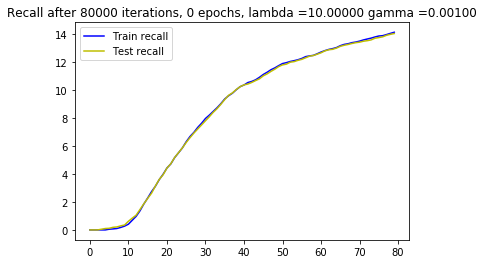

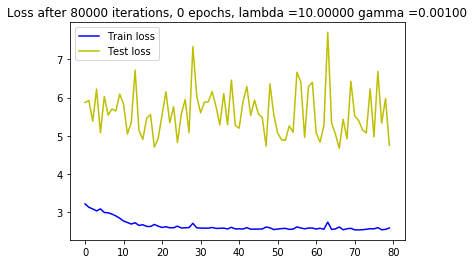

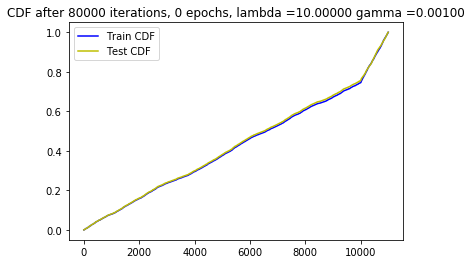






 17%|█▋        | 80001/473047 [1:06:24<4787:00:49, 43.85s/it]




 17%|█▋        | 80002/473047 [1:06:24<3354:18:36, 30.72s/it]

New score:  0.076696
Train score:  0.37329403
Test score:  0.2063886
Obj first part:  0.0
Obj second part:  -1.8336222
Obj first part:  0.0
Obj second part:  -0.40832284







 17%|█▋        | 80003/473047 [1:06:24<2353:06:53, 21.55s/it]




 17%|█▋        | 80004/473047 [1:06:24<1651:43:28, 15.13s/it]

Obj first part:  0.04773737397044897
Obj second part:  -4.9750977
Obj first part:  0.0
Obj second part:  -0.7989031







 17%|█▋        | 80005/473047 [1:06:24<1160:48:58, 10.63s/it]




 17%|█▋        | 80006/473047 [1:06:24<817:14:24,  7.49s/it] 

Obj first part:  0.7780144363641739
Obj second part:  -0.994784
Obj first part:  0.0
Obj second part:  -0.721423







 17%|█▋        | 80007/473047 [1:06:24<576:35:46,  5.28s/it]




 17%|█▋        | 80008/473047 [1:06:25<408:16:26,  3.74s/it]

Obj first part:  0.0
Obj second part:  -1.3774568
Obj first part:  1.7369715869426727
Obj second part:  -3.638618







 17%|█▋        | 80009/473047 [1:06:25<290:08:54,  2.66s/it]




 17%|█▋        | 80010/473047 [1:06:25<207:30:38,  1.90s/it]

Obj first part:  0.0
Obj second part:  -0.7238606
Obj first part:  0.08922169916331768
Obj second part:  -0.2319381







 17%|█▋        | 80011/473047 [1:06:25<148:44:17,  1.36s/it]




 17%|█▋        | 80015/473047 [1:06:25<104:59:22,  1.04it/s]

Obj first part:  0.0
Obj second part:  -1.519069
Obj first part:  0.0
Obj second part:  -1.4539798
Obj first part:  0.0
Obj second part:  -0.60412955
Obj first part:  1.4949139952659607
Obj second part:  -0.49058387
Obj first part:  0.0
Obj second part:  -0.21849869
Obj first part:  0.9003491699695587
Obj second part:  -1.0378687
Obj first part:  0.0
Obj second part:  -0.1645986
Obj first part:  0.10962660424411297
Obj second part:  -0.96054673
Obj first part:  0.0
Obj second part:  -1.2117394







 17%|█▋        | 80020/473047 [1:06:25<74:15:53,  1.47it/s] 




 17%|█▋        | 80025/473047 [1:06:25<52:44:48,  2.07it/s]

Obj first part:  0.0
Obj second part:  -3.4401743
Obj first part:  6.872228384017944
Obj second part:  -0.9876601
Obj first part:  2.332238405942917
Obj second part:  -3.1097984
Obj first part:  0.6439673155546188
Obj second part:  -1.2060835
Obj first part:  0.0
Obj second part:  -2.410275
Obj first part:  0.0
Obj second part:  -1.4644222
Obj first part:  0.131421135738492
Obj second part:  -0.33887258
Obj first part:  0.5425712838768959
Obj second part:  -1.9968054
Obj first part:  0.0
Obj second part:  -3.304744
Obj first part:  0.0
Obj second part:  -2.9283075
Obj first part:  0.0
Obj second part:  -1.4044193







 17%|█▋        | 80031/473047 [1:06:25<37:28:47,  2.91it/s]




 17%|█▋        | 80037/473047 [1:06:26<26:47:31,  4.07it/s]

Obj first part:  4.391773045063019
Obj second part:  -0.11622561
Obj first part:  0.5275378376245499
Obj second part:  -0.3014585
Obj first part:  0.7317692786455154
Obj second part:  -1.7132771
Obj first part:  0.061034238897264004
Obj second part:  -1.3591328
Obj first part:  0.0
Obj second part:  -0.87561697
Obj first part:  0.0
Obj second part:  -1.1508895
Obj first part:  0.2950448729097843
Obj second part:  -2.3470395
Obj first part:  0.0
Obj second part:  -2.8307724
Obj first part:  0.0
Obj second part:  -0.22010712
Obj first part:  0.3515351936221123
Obj second part:  -1.394637
Obj first part:  0.0
Obj second part:  -1.3941749







 17%|█▋        | 80042/473047 [1:06:26<19:27:43,  5.61it/s]




 17%|█▋        | 80047/473047 [1:06:26<14:27:15,  7.55it/s]

Obj first part:  2.2566507756710052
Obj second part:  -2.7930527
Obj first part:  0.0
Obj second part:  -2.2501807
Obj first part:  2.2430843114852905
Obj second part:  -3.7932818
Obj first part:  1.6488613188266754
Obj second part:  -0.3254286
Obj first part:  0.0
Obj second part:  -2.4573364
Obj first part:  0.0
Obj second part:  -2.6542482
Obj first part:  0.3079497069120407
Obj second part:  -2.8634622
Obj first part:  2.4576880037784576
Obj second part:  -1.5838423
Obj first part:  1.9266703724861145
Obj second part:  -1.5690141
Obj first part:  0.0
Obj second part:  -0.30433354







 17%|█▋        | 80053/473047 [1:06:26<10:42:46, 10.19it/s]




 17%|█▋        | 80058/473047 [1:06:26<8:12:59, 13.29it/s] 

Obj first part:  0.13571396470069885
Obj second part:  -0.13585806
Obj first part:  0.0
Obj second part:  -2.2260935
Obj first part:  1.263204962015152
Obj second part:  -0.28172934
Obj first part:  0.0
Obj second part:  -0.34922302
Obj first part:  0.0
Obj second part:  -1.8763319
Obj first part:  0.17083685845136642
Obj second part:  -0.5451829
Obj first part:  0.0
Obj second part:  -1.3189435
Obj first part:  2.304757684469223
Obj second part:  -4.86443
Obj first part:  0.0
Obj second part:  -1.6317111
Obj first part:  2.342078685760498







 17%|█▋        | 80063/473047 [1:06:26<6:51:11, 15.93it/s]

Obj second part:  -0.4618786
Obj first part:  0.0
Obj second part:  -1.285321
Obj first part:  0.0
Obj second part:  -1.389636
Obj first part:  0.0
Obj second part:  -0.87216103
Obj first part:  0.1239938847720623
Obj second part:  -1.4111358







 17%|█▋        | 80068/473047 [1:06:27<8:06:56, 13.45it/s]

Obj first part:  0.13152886182069778
Obj second part:  -2.4761586
Obj first part:  0.0638668704777956
Obj second part:  -0.65564734
Obj first part:  4.185023307800293
Obj second part:  -0.67369616
Obj first part:  2.5547972321510315
Obj second part:  -3.1532671
Obj first part:  0.0
Obj second part:  -0.114786796







 17%|█▋        | 80072/473047 [1:06:27<9:17:30, 11.75it/s]

Obj first part:  0.529337078332901
Obj second part:  -1.6530163
Obj first part:  4.7859808802604675
Obj second part:  -1.5736604
Obj first part:  0.0
Obj second part:  -1.8789707
Obj first part:  1.241249442100525
Obj second part:  -2.572042







 17%|█▋        | 80075/473047 [1:06:28<10:53:13, 10.03it/s]

Obj first part:  0.0
Obj second part:  -3.0101388
Obj first part:  0.0
Obj second part:  -0.79941654







 17%|█▋        | 80077/473047 [1:06:28<12:05:24,  9.03it/s]

Obj first part:  0.0
Obj second part:  -1.539755
Obj first part:  0.0
Obj second part:  -1.4121832







 17%|█▋        | 80079/473047 [1:06:28<12:40:37,  8.61it/s]




 17%|█▋        | 80081/473047 [1:06:28<11:54:48,  9.16it/s]

Obj first part:  0.0
Obj second part:  -2.3009999
Obj first part:  5.965673327445984
Obj second part:  -1.9125581
Obj first part:  0.0
Obj second part:  -5.068775







 17%|█▋        | 80083/473047 [1:06:28<11:19:42,  9.64it/s]

Obj first part:  0.0
Obj second part:  -0.5942096
Obj first part:  1.8175359070301056
Obj second part:  -1.5409883
Obj first part:  0.0
Obj second part:  -1.908082







 17%|█▋        | 80085/473047 [1:06:29<11:02:58,  9.88it/s]

Obj first part:  0.4239014908671379
Obj second part:  -1.4297321
Obj first part:  0.0
Obj second part:  -0.28830445







 17%|█▋        | 80087/473047 [1:06:29<13:20:23,  8.18it/s]




 17%|█▋        | 80088/473047 [1:06:29<16:24:01,  6.66it/s]

Obj first part:  2.737318277359009
Obj second part:  -2.815928
Obj first part:  0.8339022099971771
Obj second part:  -5.2582917







 17%|█▋        | 80090/473047 [1:06:29<13:47:45,  7.91it/s]

Obj first part:  0.0
Obj second part:  -1.9497901
Obj first part:  5.5396270751953125
Obj second part:  -2.4039
Obj first part:  1.0124782472848892
Obj second part:  -2.679314







 17%|█▋        | 80092/473047 [1:06:30<15:03:14,  7.25it/s]




 17%|█▋        | 80093/473047 [1:06:30<17:37:43,  6.19it/s]

Obj first part:  0.0
Obj second part:  -2.084644







 17%|█▋        | 80094/473047 [1:06:30<17:33:22,  6.22it/s]

Obj first part:  0.07273821625858545
Obj second part:  -0.3935828
Obj first part:  0.0
Obj second part:  -0.7413873







 17%|█▋        | 80096/473047 [1:06:30<15:18:24,  7.13it/s]

Obj first part:  0.14066477306187153
Obj second part:  -0.3674399
Obj first part:  0.0
Obj second part:  -2.3939972
Obj first part:  0.0
Obj second part:  -1.9769143







 17%|█▋        | 80098/473047 [1:06:30<13:50:57,  7.88it/s]




 17%|█▋        | 80099/473047 [1:06:30<13:17:20,  8.21it/s]

Obj first part:  0.0
Obj second part:  -2.1727934
Obj first part:  0.05114772357046604
Obj second part:  -5.3546195







 17%|█▋        | 80100/473047 [1:06:31<13:53:51,  7.85it/s]




 17%|█▋        | 80101/473047 [1:06:31<13:59:47,  7.80it/s]

Obj first part:  0.0
Obj second part:  -0.15380053
Obj first part:  0.9733130782842636
Obj second part:  -2.8402765







 17%|█▋        | 80102/473047 [1:06:31<13:42:59,  7.96it/s]




 17%|█▋        | 80103/473047 [1:06:31<13:58:31,  7.81it/s]

Obj first part:  0.0
Obj second part:  -3.4643111
Obj first part:  2.7724096179008484
Obj second part:  -2.225881







 17%|█▋        | 80104/473047 [1:06:31<13:49:32,  7.89it/s]




 17%|█▋        | 80105/473047 [1:06:31<13:42:14,  7.96it/s]

Obj first part:  1.3077892363071442
Obj second part:  -0.49604768
Obj first part:  2.7955076098442078
Obj second part:  -1.4080195







 17%|█▋        | 80106/473047 [1:06:31<13:54:03,  7.85it/s]




 17%|█▋        | 80107/473047 [1:06:32<14:03:03,  7.77it/s]

Obj first part:  0.0
Obj second part:  -2.4824543
Obj first part:  0.0
Obj second part:  -1.4736099







 17%|█▋        | 80108/473047 [1:06:32<14:09:19,  7.71it/s]




 17%|█▋        | 80109/473047 [1:06:32<13:48:40,  7.90it/s]




 17%|█▋        | 80110/473047 [1:06:32<13:00:24,  8.39it/s]

Obj first part:  0.3442220017313957
Obj second part:  -2.4120042
Obj first part:  0.0
Obj second part:  -0.7471372







 17%|█▋        | 80112/473047 [1:06:32<12:15:42,  8.90it/s]

Obj first part:  0.0
Obj second part:  -0.5503787
Obj first part:  0.03879194613546133
Obj second part:  -0.7901923
Obj first part:  0.0
Obj second part:  -0.81393874







 17%|█▋        | 80114/473047 [1:06:32<11:28:46,  9.51it/s]

Obj first part:  1.732722818851471
Obj second part:  -0.40365684
Obj first part:  0.0
Obj second part:  -1.5271128
Obj first part:  0.0
Obj second part:  -1.3480681







 17%|█▋        | 80116/473047 [1:06:32<11:42:05,  9.33it/s]




 17%|█▋        | 80117/473047 [1:06:33<12:30:06,  8.73it/s]

Obj first part:  0.0
Obj second part:  -1.9628521
Obj first part:  0.0
Obj second part:  -0.5138603







 17%|█▋        | 80118/473047 [1:06:33<12:47:13,  8.54it/s]




 17%|█▋        | 80119/473047 [1:06:33<13:08:31,  8.31it/s]

Obj first part:  0.0
Obj second part:  -0.42252386
Obj first part:  0.0
Obj second part:  -3.9423802







 17%|█▋        | 80120/473047 [1:06:33<13:41:32,  7.97it/s]




 17%|█▋        | 80121/473047 [1:06:33<14:03:41,  7.76it/s]

Obj first part:  0.0
Obj second part:  -0.86597526
Obj first part:  3.397526741027832
Obj second part:  -0.57231665







 17%|█▋        | 80122/473047 [1:06:33<13:52:59,  7.86it/s]




 17%|█▋        | 80123/473047 [1:06:33<13:59:11,  7.80it/s]

Obj first part:  0.0
Obj second part:  -1.8670092
Obj first part:  0.5750007182359695
Obj second part:  -1.5846229







 17%|█▋        | 80124/473047 [1:06:34<13:47:13,  7.92it/s]




 17%|█▋        | 80125/473047 [1:06:34<13:52:42,  7.86it/s]

Obj first part:  2.707594335079193
Obj second part:  -0.16516148
Obj first part:  0.0
Obj second part:  -3.0979888







 17%|█▋        | 80126/473047 [1:06:34<13:40:26,  7.98it/s]




 17%|█▋        | 80128/473047 [1:06:34<12:35:25,  8.67it/s]

Obj first part:  0.23542160168290138
Obj second part:  -0.4228404
Obj first part:  0.0
Obj second part:  -0.8186238
Obj first part:  0.0
Obj second part:  -2.8031523







 17%|█▋        | 80130/473047 [1:06:34<11:36:57,  9.40it/s]

Obj first part:  0.0
Obj second part:  -1.6563346
Obj first part:  3.301311433315277
Obj second part:  -1.4009323
Obj first part:  0.7334275543689728
Obj second part:  -2.4138813







 17%|█▋        | 80132/473047 [1:06:34<10:55:28,  9.99it/s]

Obj first part:  0.0
Obj second part:  -0.6455904
Obj first part:  0.0
Obj second part:  -1.3577782







 17%|█▋        | 80134/473047 [1:06:35<12:59:39,  8.40it/s]




 17%|█▋        | 80135/473047 [1:06:35<13:06:45,  8.32it/s]

Obj first part:  0.0
Obj second part:  -1.0580511
Obj first part:  0.0
Obj second part:  -2.7875586







 17%|█▋        | 80136/473047 [1:06:35<14:39:17,  7.45it/s]




 17%|█▋        | 80137/473047 [1:06:35<15:15:07,  7.16it/s]

Obj first part:  1.9540923833847046
Obj second part:  -1.5588735
Obj first part:  3.6532309651374817
Obj second part:  -1.0022589







 17%|█▋        | 80138/473047 [1:06:35<16:35:53,  6.58it/s]




 17%|█▋        | 80139/473047 [1:06:35<16:01:17,  6.81it/s]

Obj first part:  0.0
Obj second part:  -0.30984074
Obj first part:  0.44366177171468735
Obj second part:  -0.42873648







 17%|█▋        | 80140/473047 [1:06:36<18:21:51,  5.94it/s]




 17%|█▋        | 80141/473047 [1:06:36<17:53:22,  6.10it/s]

Obj first part:  0.2411879226565361
Obj second part:  -2.1893675
Obj first part:  0.0
Obj second part:  -3.4104216







 17%|█▋        | 80142/473047 [1:06:36<16:03:04,  6.80it/s]




 17%|█▋        | 80144/473047 [1:06:36<14:03:04,  7.77it/s]

Obj first part:  5.488324761390686
Obj second part:  -0.11932434
Obj first part:  0.0
Obj second part:  -2.1898549
Obj first part:  0.4641566798090935
Obj second part:  -3.7113874







 17%|█▋        | 80146/473047 [1:06:36<12:40:34,  8.61it/s]

Obj first part:  1.0256873071193695
Obj second part:  -1.7978019
Obj first part:  0.4978957027196884
Obj second part:  -3.7589736
Obj first part:  0.0
Obj second part:  -1.0735741







 17%|█▋        | 80148/473047 [1:06:36<12:04:49,  9.03it/s]




 17%|█▋        | 80149/473047 [1:06:37<13:50:03,  7.89it/s]

Obj first part:  3.9267227053642273
Obj second part:  -0.123038046
Obj first part:  3.2277312874794006
Obj second part:  -0.2950727







 17%|█▋        | 80150/473047 [1:06:37<14:48:38,  7.37it/s]




 17%|█▋        | 80151/473047 [1:06:37<14:19:07,  7.62it/s]

Obj first part:  0.0
Obj second part:  -0.5241622
Obj first part:  0.0
Obj second part:  -1.9696511







 17%|█▋        | 80152/473047 [1:06:37<14:24:09,  7.58it/s]




 17%|█▋        | 80153/473047 [1:06:37<15:19:24,  7.12it/s]

Obj first part:  0.536329448223114
Obj second part:  -1.1081774
Obj first part:  11.829042434692383
Obj second part:  -1.8582644







 17%|█▋        | 80154/473047 [1:06:37<16:20:22,  6.68it/s]




 17%|█▋        | 80155/473047 [1:06:37<16:55:27,  6.45it/s]

Obj first part:  1.5606744587421417
Obj second part:  -1.6664665
Obj first part:  0.0
Obj second part:  -1.7844484







 17%|█▋        | 80156/473047 [1:06:38<16:21:17,  6.67it/s]




 17%|█▋        | 80157/473047 [1:06:38<15:12:04,  7.18it/s]

Obj first part:  1.304498314857483
Obj second part:  -3.5022173
Obj first part:  10.904684066772461
Obj second part:  -0.68420655







 17%|█▋        | 80159/473047 [1:06:38<13:40:44,  7.98it/s]

Obj first part:  0.41763070970773697
Obj second part:  -0.16920994
Obj first part:  0.06535656284540892
Obj second part:  -1.9868139
Obj first part:  0.15928134322166443
Obj second part:  -1.3638364







 17%|█▋        | 80161/473047 [1:06:38<12:30:14,  8.73it/s]




 17%|█▋        | 80163/473047 [1:06:38<12:15:09,  8.91it/s]

Obj first part:  0.0
Obj second part:  -2.8509011
Obj first part:  0.0
Obj second part:  -0.41908604







 17%|█▋        | 80164/473047 [1:06:38<14:36:11,  7.47it/s]

Obj first part:  0.0
Obj second part:  -0.5412932
Obj first part:  1.25897616147995
Obj second part:  -4.188844







 17%|█▋        | 80165/473047 [1:06:39<13:58:28,  7.81it/s]




 17%|█▋        | 80166/473047 [1:06:39<15:49:47,  6.89it/s]

Obj first part:  0.0
Obj second part:  -3.351039
Obj first part:  0.16029946506023407
Obj second part: 






 17%|█▋        | 80167/473047 [1:06:39<18:12:41,  5.99it/s]

 -3.4990952
Obj first part:  1.9791710376739502
Obj second part:  -4.4349127







 17%|█▋        | 80168/473047 [1:06:39<16:15:08,  6.71it/s]




 17%|█▋        | 80169/473047 [1:06:39<15:22:38,  7.10it/s]

Obj first part:  0.0
Obj second part:  -5.1055026
Obj first part:  0.11543198488652706
Obj second part:  -0.9675499







 17%|█▋        | 80170/473047 [1:06:39<15:20:45,  7.11it/s]




 17%|█▋        | 80171/473047 [1:06:40<17:39:00,  6.18it/s]

Obj first part:  5.113720893859863
Obj second part:  -0.9446519







 17%|█▋        | 80172/473047 [1:06:40<17:51:13,  6.11it/s]

Obj first part:  0.0
Obj second part:  -1.3073364
Obj first part:  0.520346388220787
Obj second part:  -1.5311544







 17%|█▋        | 80173/473047 [1:06:40<18:20:03,  5.95it/s]




 17%|█▋        | 80174/473047 [1:06:40<16:28:46,  6.62it/s]

Obj first part:  0.118203554302454
Obj second part:  -1.1185448
Obj first part:  0.9863908588886261
Obj second part:  -0.7186748
Obj first part:  0.7908128947019577
Obj second part:  -1.0913482







 17%|█▋        | 80176/473047 [1:06:40<14:15:12,  7.66it/s]




 17%|█▋        | 80177/473047 [1:06:40<13:28:08,  8.10it/s]




 17%|█▋        | 80178/473047 [1:06:40<12:53:55,  8.46it/s]

Obj first part:  0.0
Obj second part:  -2.2475295
Obj first part:  0.18471496179699898
Obj second part:  -3.139565







 17%|█▋        | 80179/473047 [1:06:41<12:31:33,  8.71it/s]




 17%|█▋        | 80180/473047 [1:06:41<12:06:52,  9.01it/s]

Obj first part:  0.0
Obj second part:  -2.3961792
Obj first part:  0.12574631720781326
Obj second part:  -0.27183998







 17%|█▋        | 80181/473047 [1:06:41<13:33:35,  8.05it/s]

Obj first part:  0.5635324493050575
Obj second part:  -2.9334276
Obj first part:  0.0
Obj second part:  -3.366503







 17%|█▋        | 80182/473047 [1:06:41<14:49:01,  7.37it/s]




 17%|█▋        | 80183/473047 [1:06:41<15:38:06,  6.98it/s]

Obj first part:  0.0
Obj second part:  -1.4140227
Obj first part:  0.0
Obj second part:  -2.1386518







 17%|█▋        | 80185/473047 [1:06:41<13:44:45,  7.94it/s]

Obj first part:  0.0
Obj second part:  -1.5416082
Obj first part:  0.1477483380585909
Obj second part:  -1.7203314







 17%|█▋        | 80186/473047 [1:06:41<14:36:13,  7.47it/s]




 17%|█▋        | 80188/473047 [1:06:42<12:04:49,  9.03it/s]

Obj first part:  1.8083791434764862
Obj second part:  -0.5743162
Obj first part:  0.0
Obj second part:  -4.779307
Obj first part:  0.7921226322650909
Obj second part:  -1.4277174
Obj first part:  0.048682522028684616
Obj second part:  -0.9433173







 17%|█▋        | 80190/473047 [1:06:42<10:37:38, 10.27it/s]




 17%|█▋        | 80192/473047 [1:06:42<10:09:05, 10.75it/s]

Obj first part:  2.760303020477295
Obj second part:  -2.310556
Obj first part:  0.09472144767642021
Obj second part:  -0.67747456
Obj first part:  0.16122153028845787
Obj second part:  -2.1348112







 17%|█▋        | 80194/473047 [1:06:42<9:34:15, 11.40it/s] 




 17%|█▋        | 80196/473047 [1:06:42<9:04:46, 12.02it/s]

Obj first part:  4.337711036205292
Obj second part:  -0.35097888
Obj first part:  0.03540865611284971
Obj second part:  -1.3115678
Obj first part:  1.8168722093105316
Obj second part:  -1.4951768







 17%|█▋        | 80198/473047 [1:06:42<9:34:35, 11.40it/s]

Obj first part:  0.0
Obj second part:  -0.9405169
Obj first part:  1.8372008204460144
Obj second part:  -2.6562738
Obj first part:  1.3496412336826324
Obj second part:  -3.9228134







 17%|█▋        | 80200/473047 [1:06:43<9:52:43, 11.05it/s]

Obj first part:  0.3539804369211197
Obj second part:  -0.4640857
Obj first part:  0.16437573358416557
Obj second part:  -0.75661576







 17%|█▋        | 80202/473047 [1:06:43<10:02:48, 10.86it/s]

Obj first part:  0.0
Obj second part:  -0.17042667
Obj first part:  0.0
Obj second part:  -0.34463573
Obj first part:  1.293664127588272
Obj second part:  -1.1062052







 17%|█▋        | 80204/473047 [1:06:43<10:48:36, 10.09it/s]

Obj first part:  1.6730448603630066
Obj second part:  -0.44237745
Obj first part:  0.20600834861397743
Obj second part:  -0.51485634







 17%|█▋        | 80206/473047 [1:06:43<11:18:03,  9.66it/s]




 17%|█▋        | 80207/473047 [1:06:43<11:25:16,  9.55it/s]

Obj first part:  0.1414647325873375
Obj second part:  -2.6658566
Obj first part:  0.0
Obj second part:  -4.1218605
Obj first part:  0.0
Obj second part:  -1.7122838







 17%|█▋        | 80209/473047 [1:06:43<9:54:01, 11.02it/s] 

Obj first part:  0.0
Obj second part:  -2.478765
Obj first part:  0.0
Obj second part:  -0.14879255







 17%|█▋        | 80211/473047 [1:06:44<10:24:48, 10.48it/s]

Obj first part:  5.188263654708862
Obj second part:  -0.59147793
Obj first part:  1.1692799627780914
Obj second part:  -1.3901142







 17%|█▋        | 80213/473047 [1:06:44<11:03:15,  9.87it/s]

Obj first part:  0.8477490395307541
Obj second part:  -0.55549
Obj first part:  0.11017430573701859
Obj second part:  -2.0878205







 17%|█▋        | 80215/473047 [1:06:44<11:44:24,  9.29it/s]




 17%|█▋        | 80216/473047 [1:06:44<11:44:35,  9.29it/s]

Obj first part:  4.899196028709412
Obj second part:  -1.1710253
Obj first part:  0.0
Obj second part:  -1.575386
Obj first part:  0.0
Obj second part:  -1.9058547
Obj first part:  0.041342577897012234
Obj second part:  -0.051124107
Obj first part:  0.0
Obj second part:  -3.0476003







 17%|█▋        | 80220/473047 [1:06:44<9:11:40, 11.87it/s] 




 17%|█▋        | 80225/473047 [1:06:44<7:06:34, 15.35it/s]

Obj first part:  0.0
Obj second part:  -0.9518063
Obj first part:  0.0
Obj second part:  -2.5978947
Obj first part:  10.040310621261597
Obj second part:  -4.621123
Obj first part:  0.0
Obj second part:  -1.0198891
Obj first part:  0.361565463244915
Obj second part:  -3.4462454
Obj first part:  0.5447264760732651
Obj second part:  -1.1865616
Obj first part:  9.688753485679626
Obj second part:  -0.103844486
Obj first part:  0.7355315238237381
Obj second part:  -0.42714736
Obj first part:  0.14389830641448498
Obj second part:  -0.50079376
Obj first part:  1.4466798305511475
Obj second part:  -0.4880919







 17%|█▋        | 80231/473047 [1:06:45<5:38:29, 19.34it/s]




 17%|█▋        | 80236/473047 [1:06:45<4:43:55, 23.06it/s]

Obj first part:  0.1411138568073511
Obj second part:  -1.0638232
Obj first part:  0.2811805345118046
Obj second part:  -0.6644598
Obj first part:  0.0
Obj second part:  -1.5942506
Obj first part:  0.0
Obj second part:  -2.3535786
Obj first part:  0.0
Obj second part:  -0.9008178
Obj first part:  0.9431357681751251
Obj second part:  -0.73442817
Obj first part:  0.021487169433385134
Obj second part:  -2.096555
Obj first part:  1.1971666663885117
Obj second part:  -1.3836721
Obj first part:  0.0
Obj second part:  -2.267953
Obj first part:  0.0
Obj second part:  -1.5845685
Obj first part:  3.0288878083229065
Obj second part:  -0.72037995







 17%|█▋        | 80244/473047 [1:06:45<3:45:22, 29.05it/s]




 17%|█▋        | 80250/473047 [1:06:45<3:11:45, 34.14it/s]

Obj first part:  0.2671353705227375
Obj second part:  -3.1688528
Obj first part:  0.0
Obj second part:  -3.0178266
Obj first part:  0.0
Obj second part:  -4.2508497
Obj first part:  0.0
Obj second part:  -2.9721346
Obj first part:  0.0
Obj second part:  -2.1918466
Obj first part:  0.03561855759471655
Obj second part:  -1.8088338
Obj first part:  0.0
Obj second part:  -2.7128112
Obj first part:  0.0
Obj second part:  -3.15793
Obj first part:  0.45494411140680313
Obj second part:  -0.13058771
Obj first part:  0.0
Obj second part:  -2.2839773
Obj first part:  0.10196027345955372
Obj second part:  -2.1496084
Obj first part:  0.0
Obj second part:  -0.843413







 17%|█▋        | 80256/473047 [1:06:45<2:57:23, 36.90it/s]




 17%|█▋        | 80261/473047 [1:06:45<2:44:17, 39.85it/s]

Obj first part:  0.0
Obj second part:  -0.76494175
Obj first part:  3.588157892227173
Obj second part:  -0.4916854
Obj first part:  0.5836275592446327
Obj second part:  -0.41282085
Obj first part:  0.0
Obj second part:  -0.87023425
Obj first part:  0.0
Obj second part:  -3.0745468
Obj first part:  0.0
Obj second part:  -0.4397768
Obj first part:  3.418619930744171
Obj second part:  -3.3321018
Obj first part:  0.0
Obj second part:  -0.16251644
Obj first part:  0.0
Obj second part:  -0.2514562
Obj first part:  0.0
Obj second part:  -2.9722574







 17%|█▋        | 80266/473047 [1:06:45<2:37:10, 41.65it/s]




 17%|█▋        | 80271/473047 [1:06:45<2:35:04, 42.21it/s]

Obj first part:  0.0
Obj second part:  -0.8303975
Obj first part:  0.0
Obj second part:  -2.067664
Obj first part:  7.198619842529297
Obj second part:  -3.437393
Obj first part:  0.0
Obj second part:  -3.3534784
Obj first part:  0.0
Obj second part:  -0.93350077
Obj first part:  0.4874145984649658
Obj second part:  -0.8076324
Obj first part:  1.3979387283325195
Obj second part:  -1.4491342
Obj first part:  4.204229414463043
Obj second part:  -1.0934778
Obj first part:  0.2765997126698494
Obj second part:  -1.1315447
Obj first part:  0.807650163769722
Obj second part:  -0.25741893
Obj first part:  3.1348881125450134
Obj second part:  -2.2445283
Obj first part:  0.10355868376791477
Obj second part:  -0.15845169
Obj first part:  0.4078356549143791
Obj second part:  -1.0283406







 17%|█▋        | 80276/473047 [1:06:46<3:59:04, 27.38it/s]

Obj first part:  0.0
Obj second part:  -3.0027173
Obj first part:  0.0
Obj second part:  -2.6425593
Obj first part:  13.338408470153809
Obj second part:  -1.2220132







 17%|█▋        | 80280/473047 [1:06:46<5:09:58, 21.12it/s]

Obj first part:  0.1613670215010643
Obj second part:  -1.5620272
Obj first part:  0.0
Obj second part:  -3.3099399
Obj first part:  0.0
Obj second part:  -0.37286147
Obj first part:  10.853320360183716
Obj second part:  -1.0930998







 17%|█▋        | 80284/473047 [1:06:46<5:49:42, 18.72it/s]

Obj first part:  0.0
Obj second part:  -2.7641678
Obj first part:  0.0
Obj second part:  -0.46089274
Obj first part:  0.0
Obj second part:  -1.9351346







 17%|█▋        | 80287/473047 [1:06:47<7:43:12, 14.13it/s]

Obj first part:  0.0
Obj second part:  -2.2238107
Obj first part:  1.3355953991413116
Obj second part:  -1.9090366







 17%|█▋        | 80290/473047 [1:06:47<7:48:01, 13.99it/s]

Obj first part:  0.2166108787059784
Obj second part:  -0.73390037
Obj first part:  0.0
Obj second part:  -1.1211157
Obj first part:  0.204201340675354
Obj second part:  -0.32651165
Obj first part:  0.0
Obj second part:  -0.4827209







 17%|█▋        | 80292/473047 [1:06:47<7:18:28, 14.93it/s]




 17%|█▋        | 80294/473047 [1:06:47<7:46:45, 14.02it/s]

Obj first part:  0.0
Obj second part:  -0.4663735
Obj first part:  0.0
Obj second part:  -0.23990056
Obj first part:  0.3691357374191284
Obj second part:  -0.2879081
Obj first part:  0.0
Obj second part:  -1.5697376







 17%|█▋        | 80297/473047 [1:06:47<7:27:44, 14.62it/s]

Obj first part:  0.30505863949656487
Obj second part:  -1.4008875
Obj first part:  0.05813265684992075
Obj second part:  -1.4099789
Obj first part:  0.3819595277309418
Obj second part:  -0.07729637







 17%|█▋        | 80299/473047 [1:06:47<8:00:03, 13.64it/s]




 17%|█▋        | 80301/473047 [1:06:48<7:40:28, 14.22it/s]

Obj first part:  6.2103259563446045
Obj second part:  -0.2185937
Obj first part:  0.0
Obj second part:  -1.3532742
Obj first part:  0.0
Obj second part:  -1.1396074
Obj first part:  5.8159226179122925
Obj second part:  -2.0988207







 17%|█▋        | 80303/473047 [1:06:48<7:13:58, 15.08it/s]




 17%|█▋        | 80305/473047 [1:06:48<7:14:11, 15.08it/s]

Obj first part:  0.0
Obj second part:  -1.2250689
Obj first part:  0.0
Obj second part:  -0.44828403
Obj first part:  0.11605619452893734
Obj second part:  -1.2435607







 17%|█▋        | 80307/473047 [1:06:48<8:07:33, 13.43it/s]

Obj first part:  0.1880820281803608
Obj second part:  -3.5655587
Obj first part:  1.2776172161102295
Obj second part:  -2.5439987
Obj first part:  4.9106165766716
Obj second part:  -1.679517







 17%|█▋        | 80309/473047 [1:06:48<8:32:29, 12.77it/s]

Obj first part:  0.5977949500083923
Obj second part:  -2.7731624
Obj first part:  2.5686657428741455
Obj second part:  -0.9908346







 17%|█▋        | 80311/473047 [1:06:48<10:46:20, 10.13it/s]




 17%|█▋        | 80313/473047 [1:06:49<9:58:27, 10.94it/s] 

Obj first part:  0.0
Obj second part:  -4.3774686
Obj first part:  0.16292858868837357
Obj second part:  -1.4945806
Obj first part:  0.42098376899957657
Obj second part:  -0.23055708
Obj first part:  1.2469278275966644
Obj second part:  -2.3489895







 17%|█▋        | 80316/473047 [1:06:49<8:25:08, 12.96it/s]

Obj first part:  1.061691790819168
Obj second part:  -1.5908443
Obj first part:  0.0
Obj second part:  -1.4200608
Obj first part:  0.0
Obj second part:  -2.715304







 17%|█▋        | 80318/473047 [1:06:49<8:32:04, 12.78it/s]

Obj first part:  1.418016105890274
Obj second part:  -1.4277691
Obj first part:  0.0
Obj second part:  -0.78888655







 17%|█▋        | 80320/473047 [1:06:49<10:19:14, 10.57it/s]

Obj first part:  0.0
Obj second part:  -1.3458625
Obj first part:  0.0
Obj second part:  -4.943483







 17%|█▋        | 80322/473047 [1:06:49<11:18:12,  9.65it/s]




 17%|█▋        | 80324/473047 [1:06:50<10:31:56, 10.36it/s]

Obj first part:  1.5318471193313599
Obj second part:  -0.14492413
Obj first part:  0.021388721652328968
Obj second part:  -3.4795918
Obj first part:  0.0
Obj second part:  -2.440464







 17%|█▋        | 80326/473047 [1:06:50<10:07:26, 10.78it/s]

Obj first part:  0.0
Obj second part:  -0.91695535
Obj first part:  0.0
Obj second part:  -4.2207694
Obj first part:  2.575908601284027
Obj second part:  -1.3492986







 17%|█▋        | 80328/473047 [1:06:50<10:21:44, 10.53it/s]




 17%|█▋        | 80330/473047 [1:06:50<10:42:42, 10.18it/s]

Obj first part:  1.1716285347938538
Obj second part:  -3.3458006
Obj first part:  1.1643444746732712
Obj second part:  -0.46189755
Obj first part:  0.0
Obj second part:  -0.59874916
Obj first part:  0.16849800944328308
Obj second part:  -3.1965566







 17%|█▋        | 80332/473047 [1:06:50<11:51:04,  9.20it/s]




 17%|█▋        | 80333/473047 [1:06:51<12:24:16,  8.79it/s]

Obj first part:  0.667445957660675
Obj second part:  -3.393187
Obj first part:  0.0
Obj second part:  -4.405017







 17%|█▋        | 80334/473047 [1:06:51<12:51:45,  8.48it/s]




 17%|█▋        | 80335/473047 [1:06:51<13:03:45,  8.35it/s]

Obj first part:  0.9290242195129395
Obj second part:  -0.8777927
Obj first part:  0.0
Obj second part:  -2.3104703







 17%|█▋        | 80336/473047 [1:06:51<13:23:31,  8.15it/s]




 17%|█▋        | 80337/473047 [1:06:51<13:56:21,  7.83it/s]

Obj first part:  0.0
Obj second part:  -0.77777255
Obj first part:  0.0
Obj second part:  -2.7112834







 17%|█▋        | 80338/473047 [1:06:51<13:14:25,  8.24it/s]




 17%|█▋        | 80340/473047 [1:06:51<11:32:19,  9.45it/s]

Obj first part:  0.0
Obj second part:  -0.46972013
Obj first part:  0.0
Obj second part:  -4.886029
Obj first part:  0.0
Obj second part:  -0.97724104
Obj first part:  2.583039402961731
Obj second part:  -0.94541717







 17%|█▋        | 80342/473047 [1:06:51<9:46:36, 11.16it/s] 




 17%|█▋        | 80344/473047 [1:06:52<9:39:04, 11.30it/s]

Obj first part:  0.0
Obj second part:  -2.1587284
Obj first part:  1.7706853151321411
Obj second part:  -1.8104417
Obj first part:  0.9963491559028625
Obj second part:  -0.62012565







 17%|█▋        | 80346/473047 [1:06:52<9:24:12, 11.60it/s]

Obj first part:  0.0
Obj second part:  -0.22338459
Obj first part:  0.18224533647298813
Obj second part:  -0.06001519
Obj first part:  0.772489458322525
Obj second part:  -3.5632348







 17%|█▋        | 80348/473047 [1:06:52<9:48:12, 11.13it/s]

Obj first part:  0.3066857159137726
Obj second part:  -0.8742821
Obj first part:  0.0
Obj second part:  -0.8208871







 17%|█▋        | 80350/473047 [1:06:52<10:57:38,  9.95it/s]

Obj first part:  1.1336993426084518
Obj second part:  -2.6699917
Obj first part:  0.49710851162672043
Obj second part:  -0.69979197







 17%|█▋        | 80352/473047 [1:06:52<11:46:39,  9.26it/s]




 17%|█▋        | 80353/473047 [1:06:53<12:16:11,  8.89it/s]

Obj first part:  0.0
Obj second part:  -1.339471
Obj first part:  0.0
Obj second part:  -1.3656541







 17%|█▋        | 80354/473047 [1:06:53<12:48:12,  8.52it/s]




 17%|█▋        | 80355/473047 [1:06:53<13:12:58,  8.25it/s]

Obj first part:  0.0
Obj second part:  -0.3001501
Obj first part:  0.0
Obj second part:  -3.3709507







 17%|█▋        | 80356/473047 [1:06:53<13:18:48,  8.19it/s]




 17%|█▋        | 80357/473047 [1:06:53<13:27:39,  8.10it/s]

Obj first part:  0.0
Obj second part:  -2.465578
Obj first part:  0.0
Obj second part:  -1.4194026







 17%|█▋        | 80358/473047 [1:06:53<13:55:57,  7.83it/s]




 17%|█▋        | 80359/473047 [1:06:53<13:25:05,  8.13it/s]

Obj first part:  0.0
Obj second part:  -4.4552736
Obj first part:  6.763886213302612
Obj second part:  -1.8055564
Obj first part:  0.0
Obj second part:  -3.4196029







 17%|█▋        | 80361/473047 [1:06:53<12:24:21,  8.79it/s]




 17%|█▋        | 80363/473047 [1:06:54<11:29:21,  9.49it/s]

Obj first part:  0.36894306540489197
Obj second part:  -1.8269042
Obj first part:  2.0379509031772614
Obj second part:  -0.4482853
Obj first part:  0.0
Obj second part:  -1.353071







 17%|█▋        | 80365/473047 [1:06:54<10:49:58, 10.07it/s]

Obj first part:  0.0
Obj second part:  -0.5552486
Obj first part:  0.0
Obj second part:  -3.3475797







 17%|█▋        | 80367/473047 [1:06:54<11:57:31,  9.12it/s]

Obj first part:  0.0
Obj second part:  -0.9281698
Obj first part:  0.0
Obj second part:  -1.0164088







 17%|█▋        | 80368/473047 [1:06:54<12:32:07,  8.70it/s]




 17%|█▋        | 80369/473047 [1:06:54<13:05:57,  8.33it/s]

Obj first part:  6.817322373390198
Obj second part:  -0.04032891
Obj first part:  1.691170185804367
Obj second part:  -0.1819859







 17%|█▋        | 80370/473047 [1:06:54<13:25:01,  8.13it/s]




 17%|█▋        | 80371/473047 [1:06:55<13:53:46,  7.85it/s]

Obj first part:  0.0
Obj second part:  -0.7940031
Obj first part:  2.7611812949180603
Obj second part:  -1.4759189







 17%|█▋        | 80372/473047 [1:06:55<14:03:47,  7.76it/s]




 17%|█▋        | 80373/473047 [1:06:55<14:20:37,  7.60it/s]

Obj first part:  0.0
Obj second part:  -3.4773095
Obj first part:  11.91819429397583
Obj second part:  -0.7816116







 17%|█▋        | 80374/473047 [1:06:55<14:14:17,  7.66it/s]




 17%|█▋        | 80376/473047 [1:06:55<12:02:35,  9.06it/s]

Obj first part:  0.0
Obj second part:  -4.440359
Obj first part:  0.0
Obj second part:  -1.4390705
Obj first part:  0.0
Obj second part:  -1.6211535
Obj first part:  1.9670523703098297
Obj second part:  -0.3760181







 17%|█▋        | 80379/473047 [1:06:55<10:14:32, 10.65it/s]

Obj first part:  0.3559095412492752
Obj second part:  -1.1681671
Obj first part:  1.380547434091568
Obj second part:  -1.6325117
Obj first part:  0.0
Obj second part:  -1.7314339







 17%|█▋        | 80381/473047 [1:06:55<10:18:02, 10.59it/s]




 17%|█▋        | 80383/473047 [1:06:56<10:22:09, 10.52it/s]

Obj first part:  0.332307368516922
Obj second part:  -0.5307466
Obj first part:  0.0
Obj second part:  -2.1346967
Obj first part:  0.0
Obj second part:  -2.5674815







 17%|█▋        | 80385/473047 [1:06:56<11:29:08,  9.50it/s]

Obj first part:  3.5754287242889404
Obj second part:  -1.5606294
Obj first part:  0.30567994341254234
Obj second part:  -0.31197044







 17%|█▋        | 80387/473047 [1:06:56<12:18:43,  8.86it/s]

Obj first part:  0.0
Obj second part:  -1.8904651
Obj first part:  0.0
Obj second part:  -0.9272013







 17%|█▋        | 80388/473047 [1:06:56<12:54:10,  8.45it/s]




 17%|█▋        | 80389/473047 [1:06:56<13:04:21,  8.34it/s]

Obj first part:  4.884928464889526
Obj second part:  -0.49165198
Obj first part:  0.18605774268507957
Obj second part:  -1.5041177







 17%|█▋        | 80390/473047 [1:06:57<13:22:28,  8.16it/s]




 17%|█▋        | 80391/473047 [1:06:57<13:44:20,  7.94it/s]

Obj first part:  0.42244095355272293
Obj second part:  -1.630681
Obj first part:  0.0
Obj second part:  -4.144993







 17%|█▋        | 80392/473047 [1:06:57<13:41:29,  7.97it/s]




 17%|█▋        | 80393/473047 [1:06:57<13:44:53,  7.93it/s]

Obj first part:  1.0612326860427856
Obj second part:  -1.2896242
Obj first part:  0.19982311874628067
Obj second part:  -1.5637625







 17%|█▋        | 80394/473047 [1:06:57<12:57:54,  8.41it/s]




 17%|█▋        | 80396/473047 [1:06:57<11:56:01,  9.14it/s]

Obj first part:  0.0
Obj second part:  -2.0241778
Obj first part:  0.0
Obj second part:  -0.045831088
Obj first part:  0.8574669063091278
Obj second part:  -1.7040397







 17%|█▋        | 80398/473047 [1:06:57<11:09:23,  9.78it/s]

Obj first part:  0.0
Obj second part:  -1.7880679
Obj first part:  0.0
Obj second part:  -1.741349
Obj first part:  0.0
Obj second part:  -2.2592516







 17%|█▋        | 80400/473047 [1:06:58<11:09:53,  9.77it/s]




 17%|█▋        | 80401/473047 [1:06:58<12:04:29,  9.03it/s]

Obj first part:  0.22797118872404099
Obj second part:  -0.86948305
Obj first part:  0.0
Obj second part:  -0.5352388







 17%|█▋        | 80402/473047 [1:06:58<12:58:17,  8.41it/s]




 17%|█▋        | 80403/473047 [1:06:58<15:51:29,  6.88it/s]

Obj first part:  3.3712145686149597
Obj second part:  -2.8833315







 17%|█▋        | 80404/473047 [1:06:58<15:38:11,  6.98it/s]

Obj first part:  1.2089288234710693
Obj second part:  -1.0275341
Obj first part:  0.0
Obj second part:  -0.22458462







 17%|█▋        | 80405/473047 [1:06:58<16:01:27,  6.81it/s]




 17%|█▋        | 80406/473047 [1:06:59<16:59:49,  6.42it/s]

Obj first part:  0.0
Obj second part:  -1.0517554
Obj first part:  4.666762351989746
Obj second part:  -0.3041839







 17%|█▋        | 80407/473047 [1:06:59<16:37:38,  6.56it/s]




 17%|█▋        | 80408/473047 [1:06:59<16:56:55,  6.44it/s]

Obj first part:  1.6057230532169342
Obj second part:  -1.4713383
Obj first part:  0.06779292598366737
Obj second part:  -1.6488638







 17%|█▋        | 80410/473047 [1:06:59<14:37:16,  7.46it/s]

Obj first part:  0.0
Obj second part:  -4.5778646
Obj first part:  0.0
Obj second part:  -0.13862039
Obj first part:  0.0
Obj second part:  -1.1413406







 17%|█▋        | 80412/473047 [1:06:59<13:03:03,  8.36it/s]

Obj first part:  0.0
Obj second part:  -0.17975432
Obj first part:  0.0
Obj second part:  -0.36920232







 17%|█▋        | 80414/473047 [1:06:59<12:42:48,  8.58it/s]




 17%|█▋        | 80415/473047 [1:07:00<12:59:08,  8.40it/s]

Obj first part:  0.0
Obj second part:  -0.4067719
Obj first part:  0.0
Obj second part:  -4.230678







 17%|█▋        | 80416/473047 [1:07:00<13:15:27,  8.23it/s]




 17%|█▋        | 80418/473047 [1:07:00<12:29:43,  8.73it/s]

Obj first part:  0.0
Obj second part:  -0.69878227
Obj first part:  9.722068309783936
Obj second part:  -1.0569313
Obj first part:  0.24267736822366714
Obj second part:  -1.0894526







 17%|█▋        | 80420/473047 [1:07:00<10:58:11,  9.94it/s]

Obj first part:  2.48724028468132
Obj second part:  -1.6426525
Obj first part:  0.0
Obj second part:  -2.1018748







 17%|█▋        | 80422/473047 [1:07:00<10:48:20, 10.09it/s]

Obj first part:  0.0
Obj second part:  -1.5029281
Obj first part:  0.1097897719591856
Obj second part:  -2.8367424
Obj first part:  0.0
Obj second part:  -1.0192916
Obj first part:  0.0
Obj second part:  -1.9480407







 17%|█▋        | 80425/473047 [1:07:00<9:21:46, 11.65it/s] 




 17%|█▋        | 80427/473047 [1:07:01<10:04:53, 10.82it/s]

Obj first part:  1.4065822958946228
Obj second part:  -2.7725828
Obj first part:  0.0
Obj second part:  -0.6228862







 17%|█▋        | 80429/473047 [1:07:01<9:55:32, 10.99it/s] 

Obj first part:  0.0
Obj second part:  -2.1784048
Obj first part:  2.633540630340576
Obj second part:  -3.5670846
Obj first part:  0.0
Obj second part:  -1.7814571







 17%|█▋        | 80431/473047 [1:07:01<9:53:52, 11.02it/s]

Obj first part:  0.17767639830708504
Obj second part:  -0.44312674
Obj first part:  0.0
Obj second part:  -0.3501078
Obj first part:  0.0
Obj second part:  -2.6240015







 17%|█▋        | 80433/473047 [1:07:01<11:18:25,  9.65it/s]

Obj first part:  0.3812013566493988
Obj second part:  -2.1200027
Obj first part:  0.0
Obj second part:  -3.5012918







 17%|█▋        | 80435/473047 [1:07:02<14:03:24,  7.76it/s]




 17%|█▋        | 80436/473047 [1:07:02<14:56:22,  7.30it/s]

Obj first part:  0.0
Obj second part:  -0.58878535
Obj first part:  2.22495898604393
Obj second part:  -2.2894902







 17%|█▋        | 80437/473047 [1:07:02<16:43:46,  6.52it/s]




 17%|█▋        | 80438/473047 [1:07:02<15:57:32,  6.83it/s]

Obj first part:  0.0
Obj second part:  -1.0853677
Obj first part:  0.9489322453737259
Obj second part:  -0.52688396







 17%|█▋        | 80439/473047 [1:07:02<15:34:07,  7.00it/s]




 17%|█▋        | 80440/473047 [1:07:02<16:05:45,  6.78it/s]

Obj first part:  0.0
Obj second part:  -0.49446312
Obj first part:  0.432879701256752
Obj second part:  -2.9929924







 17%|█▋        | 80441/473047 [1:07:02<14:53:18,  7.33it/s]




 17%|█▋        | 80443/473047 [1:07:03<13:24:47,  8.13it/s]

Obj first part:  1.9571712613105774
Obj second part:  -2.3133311
Obj first part:  0.25572093203663826
Obj second part:  -3.6948752
Obj first part:  0.0
Obj second part:  -3.606984







 17%|█▋        | 80445/473047 [1:07:03<12:26:51,  8.76it/s]

Obj first part:  0.0
Obj second part:  -0.90061444
Obj first part:  0.062410347163677216
Obj second part:  -3.7832587







 17%|█▋        | 80446/473047 [1:07:03<13:47:39,  7.91it/s]




 17%|█▋        | 80447/473047 [1:07:03<14:02:04,  7.77it/s]

Obj first part:  0.0
Obj second part:  -3.2289033
Obj first part:  0.0
Obj second part:  -1.4570017







 17%|█▋        | 80448/473047 [1:07:03<16:18:14,  6.69it/s]




 17%|█▋        | 80449/473047 [1:07:04<17:03:51,  6.39it/s]

Obj first part:  4.226100444793701
Obj second part:  -0.7043983
Obj first part:  0.0
Obj second part:  -0.8183167







 17%|█▋        | 80450/473047 [1:07:04<16:28:20,  6.62it/s]




 17%|█▋        | 80451/473047 [1:07:04<17:22:01,  6.28it/s]

Obj first part:  0.0
Obj second part:  -0.21699052
Obj first part:  0.0
Obj second part:  -1.1523819







 17%|█▋        | 80452/473047 [1:07:04<17:40:18,  6.17it/s]




 17%|█▋        | 80453/473047 [1:07:04<17:36:26,  6.19it/s]

Obj first part:  0.0
Obj second part:  -0.33302057
Obj first part:  4.537867903709412
Obj second part:  -0.06448658
Obj first part:  0.8513612300157547
Obj second part:  -1.2614918







 17%|█▋        | 80456/473047 [1:07:04<13:27:09,  8.11it/s]




 17%|█▋        | 80461/473047 [1:07:04<10:11:17, 10.70it/s]

Obj first part:  2.3047713935375214
Obj second part:  -1.4439121
Obj first part:  2.976420223712921
Obj second part:  -1.361423
Obj first part:  0.0
Obj second part:  -0.80318475
Obj first part:  0.1738967001438141
Obj second part:  -0.31866476
Obj first part:  0.0
Obj second part:  -0.19224419
Obj first part:  0.0
Obj second part:  -2.0456967
Obj first part:  0.0
Obj second part:  -0.7717713
Obj first part:  0.7999998331069946
Obj second part:  -0.21076466
Obj first part:  0.0
Obj second part:  -1.0380828







 17%|█▋        | 80466/473047 [1:07:04<7:51:44, 13.87it/s] 




 17%|█▋        | 80471/473047 [1:07:05<6:10:21, 17.67it/s]

Obj first part:  0.0
Obj second part:  -1.1631775
Obj first part:  0.4490504413843155
Obj second part:  -3.0449593
Obj first part:  0.0
Obj second part:  -0.5420679
Obj first part:  0.0
Obj second part:  -0.08946359
Obj first part:  0.5663474649190903
Obj second part:  -0.22714683
Obj first part:  0.0
Obj second part:  -0.059252758
Obj first part:  0.0
Obj second part:  -0.45045453
Obj first part:  0.5191271379590034
Obj second part:  -1.2178099
Obj first part:  0.0
Obj second part:  -1.5388355
Obj first part:  0.39855267852544785
Obj second part:  -0.9953542
Obj first part:  0.0
Obj second part:  -1.545222
Obj first part:  0.34639399498701096







 17%|█▋        | 80478/473047 [1:07:05<4:53:18, 22.31it/s]




 17%|█▋        | 80483/473047 [1:07:05<4:07:10, 26.47it/s]

Obj second part:  -1.8380368
Obj first part:  2.7949774265289307
Obj second part:  -1.2361162
Obj first part:  0.0
Obj second part:  -1.8255041
Obj first part:  0.1665329374372959
Obj second part:  -1.0819819
Obj first part:  6.0500359535217285
Obj second part:  -0.5612288
Obj first part:  1.1155185103416443
Obj second part:  -1.6835397
Obj first part:  0.0
Obj second part:  -1.7574677
Obj first part:  0.4584486782550812
Obj second part:  -0.93471533
Obj first part:  0.0
Obj second part:  -0.8909237







 17%|█▋        | 80488/473047 [1:07:05<3:40:48, 29.63it/s]




 17%|█▋        | 80494/473047 [1:07:05<3:10:15, 34.39it/s]

Obj first part:  0.06554121151566505
Obj second part:  -0.20423132
Obj first part:  0.0
Obj second part:  -1.7183506
Obj first part:  0.0
Obj second part:  -1.1612176
Obj first part:  0.8378082513809204
Obj second part:  -2.1486197
Obj first part:  4.232112765312195
Obj second part:  -2.2934682
Obj first part:  0.0
Obj second part:  -1.3446299
Obj first part:  0.3254835680127144
Obj second part:  -0.51780045
Obj first part:  0.09605300612747669
Obj second part:  -1.0489833
Obj first part:  0.5094745755195618
Obj second part:  -1.8556917
Obj first part:  0.9888909757137299
Obj second part:  -0.39082932







 17%|█▋        | 80500/473047 [1:07:05<2:48:21, 38.86it/s]

Obj first part:  0.0
Obj second part:  -3.2613683
Obj first part:  1.354449838399887
Obj second part:  -2.001413
Obj first part:  0.7678821682929993
Obj second part:  -2.2098503
Obj first part:  0.0
Obj second part:  -1.7199652
Obj first part:  1.5849384665489197
Obj second part:  -3.3588948
Obj first part:  8.142750859260559
Obj second part:  -1.2354157
Obj first part:  0.0
Obj second part:  -1.4189893
Obj first part:  0.0
Obj second part:  -2.421985
Obj first part:  0.0
Obj second part:  -2.2888153
Obj first part:  9.264139533042908
Obj second part:  -0.7667481







 17%|█▋        | 80505/473047 [1:07:05<3:01:49, 35.98it/s]

Obj first part:  2.3985615372657776
Obj second part:  -0.33141258
Obj first part:  0.0
Obj second part:  -0.7282969
Obj first part:  0.2834811434149742
Obj second part:  -4.1585984
Obj first part:  1.3366405665874481
Obj second part:  -0.87029445
Obj first part:  0.0
Obj second part:  -1.6138548







 17%|█▋        | 80510/473047 [1:07:06<4:00:48, 27.17it/s]

Obj first part:  9.918296933174133
Obj second part:  -1.1884812
Obj first part:  2.8481122851371765
Obj second part:  -2.5327117
Obj first part:  0.0
Obj second part:  -3.573255







 17%|█▋        | 80514/473047 [1:07:06<5:26:45, 20.02it/s]

Obj first part:  0.0
Obj second part:  -2.687723
Obj first part:  0.559733621776104
Obj second part:  -1.228947
Obj first part:  0.09183106012642384
Obj second part:  -2.6349366







 17%|█▋        | 80517/473047 [1:07:06<7:04:07, 15.43it/s]

Obj first part:  0.0
Obj second part:  -0.13558513
Obj first part:  0.0
Obj second part:  -1.3534317
Obj first part:  0.0
Obj second part:  -2.483964
Obj first part:  0.0
Obj second part:  -3.9851363
Obj first part:  0.0
Obj second part:  -0.4079647







 17%|█▋        | 80520/473047 [1:07:06<7:48:16, 13.97it/s]




 17%|█▋        | 80522/473047 [1:07:07<8:35:21, 12.69it/s]

Obj first part:  1.3785472512245178
Obj second part:  -2.9676352
Obj first part:  0.16641044989228249
Obj second part:  -2.7647977
Obj first part:  0.5077188462018967
Obj second part:  -1.7938864







 17%|█▋        | 80524/473047 [1:07:07<8:43:21, 12.50it/s]

Obj first part:  1.2396527081727982
Obj second part:  -2.3408792
Obj first part:  14.091709852218628
Obj second part:  -0.611433
Obj first part:  0.8271630108356476
Obj second part:  -3.8639228







 17%|█▋        | 80526/473047 [1:07:07<9:26:17, 11.55it/s]

Obj first part:  0.0
Obj second part:  -0.2308039
Obj first part:  0.3818313404917717
Obj second part:  -1.3572872







 17%|█▋        | 80528/473047 [1:07:07<10:29:58, 10.38it/s]




 17%|█▋        | 80530/473047 [1:07:07<10:35:57, 10.29it/s]

Obj first part:  0.0
Obj second part:  -1.0823746
Obj first part:  0.0
Obj second part:  -1.2627096
Obj first part:  0.0
Obj second part:  -1.1892897







 17%|█▋        | 80532/473047 [1:07:08<10:40:51, 10.21it/s]

Obj first part:  0.36528345197439194
Obj second part:  -1.6184107
Obj first part:  1.3393798470497131
Obj second part:  -5.619524







 17%|█▋        | 80534/473047 [1:07:08<11:34:15,  9.42it/s]

Obj first part:  0.0
Obj second part:  -2.365889
Obj first part:  0.0
Obj second part:  -1.0437931







 17%|█▋        | 80536/473047 [1:07:08<10:59:15,  9.92it/s]

Obj first part:  0.013106148689985275
Obj second part:  -2.2797716
Obj first part:  0.7232590764760971
Obj second part:  -1.6383567







 17%|█▋        | 80538/473047 [1:07:08<12:32:52,  8.69it/s]

Obj first part:  0.0
Obj second part:  -1.3888884
Obj first part:  0.5305741354823112
Obj second part:  -0.81667674
Obj first part:  0.0
Obj second part:  -0.1582894







 17%|█▋        | 80540/473047 [1:07:09<11:52:52,  9.18it/s]






Obj first part:  1.2532846629619598
Obj second part:  -1.5874004
Obj first part:  0.8089028298854828
Obj second part:  -2.267615


 17%|█▋        | 80542/473047 [1:07:09<11:48:11,  9.24it/s]




 17%|█▋        | 80543/473047 [1:07:09<14:46:20,  7.38it/s]

Obj first part:  6.797534823417664
Obj second part:  -3.2606587
Obj first part:  0.0
Obj second part:  -0.4312422







 17%|█▋        | 80544/473047 [1:07:09<13:50:55,  7.87it/s]




 17%|█▋        | 80546/473047 [1:07:09<12:43:35,  8.57it/s]

Obj first part:  0.0
Obj second part:  -1.2067878
Obj first part:  0.0
Obj second part:  -1.6812012
Obj first part:  0.9097804874181747
Obj second part:  -1.2752573







 17%|█▋        | 80547/473047 [1:07:09<12:13:52,  8.91it/s]

Obj first part:  0.0
Obj second part:  -0.04296791
Obj first part:  0.20026715472340584
Obj second part:  -2.416291







 17%|█▋        | 80549/473047 [1:07:10<12:22:18,  8.81it/s]




 17%|█▋        | 80550/473047 [1:07:10<15:02:13,  7.25it/s]

Obj first part:  0.0
Obj second part:  -0.958086
Obj first part:  0.02121424302458763
Obj second part:  -1.2033318







 17%|█▋        | 80551/473047 [1:07:10<15:32:37,  7.01it/s]




 17%|█▋        | 80552/473047 [1:07:10<15:25:48,  7.07it/s]

Obj first part:  0.0
Obj second part:  -2.358921
Obj first part:  1.9814728200435638
Obj second part:  -1.8790042







 17%|█▋        | 80553/473047 [1:07:10<16:49:16,  6.48it/s]




 17%|█▋        | 80554/473047 [1:07:10<16:28:13,  6.62it/s]

Obj first part:  0.0
Obj second part:  -3.0673573
Obj first part:  0.7073211669921875
Obj second part:  -2.2850175







 17%|█▋        | 80555/473047 [1:07:11<18:07:18,  6.02it/s]




 17%|█▋        | 80556/473047 [1:07:11<17:16:30,  6.31it/s]

Obj first part:  0.0
Obj second part:  -1.6485308
Obj first part:  7.100114822387695
Obj second part:  -4.021345







 17%|█▋        | 80557/473047 [1:07:11<15:29:24,  7.04it/s]




 17%|█▋        | 80559/473047 [1:07:11<13:49:29,  7.89it/s]

Obj first part:  0.1621898077428341
Obj second part:  -3.866222
Obj first part:  1.805042326450348
Obj second part:  -0.4652388
Obj first part:  0.3246910870075226
Obj second part:  -2.6568007







 17%|█▋        | 80561/473047 [1:07:11<12:48:50,  8.51it/s]

Obj first part:  0.0
Obj second part:  -0.6784752
Obj first part:  0.24699311703443527
Obj second part:  -3.1769235







 17%|█▋        | 80562/473047 [1:07:11<13:58:53,  7.80it/s]




 17%|█▋        | 80563/473047 [1:07:12<14:02:57,  7.76it/s]

Obj first part:  0.0
Obj second part:  -2.6064093
Obj first part:  0.0
Obj second part:  -1.3615539







 17%|█▋        | 80564/473047 [1:07:12<14:05:49,  7.73it/s]




 17%|█▋        | 80565/473047 [1:07:12<14:11:04,  7.69it/s]

Obj first part:  0.0
Obj second part:  -4.4121614
Obj first part:  0.0
Obj second part:  -0.5229038







 17%|█▋        | 80566/473047 [1:07:12<14:25:07,  7.56it/s]




 17%|█▋        | 80567/473047 [1:07:12<14:18:24,  7.62it/s]

Obj first part:  2.7160441875457764
Obj second part:  -2.107601
Obj first part:  2.786967158317566
Obj second part:  -2.9735744







 17%|█▋        | 80568/473047 [1:07:12<14:14:51,  7.65it/s]




 17%|█▋        | 80569/473047 [1:07:12<13:48:02,  7.90it/s]

Obj first part:  0.0
Obj second part:  -0.5844455
Obj first part:  0.0
Obj second part:  -2.6188657
Obj first part:  1.4116482436656952
Obj second part:  -2.166534







 17%|█▋        | 80571/473047 [1:07:13<12:36:31,  8.65it/s]




 17%|█▋        | 80572/473047 [1:07:13<12:07:23,  8.99it/s]

Obj first part:  0.0
Obj second part:  -2.9529555
Obj first part:  0.0
Obj second part:  -0.32068023
Obj first part:  0.3620138391852379
Obj second part:  -0.77910167







 17%|█▋        | 80574/473047 [1:07:13<11:21:29,  9.60it/s]




 17%|█▋        | 80576/473047 [1:07:13<10:39:33, 10.23it/s]

Obj first part:  0.16323233023285866
Obj second part:  -0.46930864
Obj first part:  0.0
Obj second part:  -1.3389832
Obj first part:  5.9921711683273315
Obj second part:  -0.27843466







 17%|█▋        | 80578/473047 [1:07:13<10:58:58,  9.93it/s]

Obj first part:  0.0838687177747488
Obj second part:  -2.0601091
Obj first part:  0.055436757393181324
Obj second part:  -2.024924







 17%|█▋        | 80580/473047 [1:07:13<11:43:42,  9.30it/s]

Obj first part:  0.0
Obj second part:  -2.0613596
Obj first part:  0.0
Obj second part:  -1.0670385
Obj first part:  4.867817163467407
Obj second part:  -0.79792595







 17%|█▋        | 80582/473047 [1:07:14<11:13:11,  9.72it/s]




 17%|█▋        | 80584/473047 [1:07:14<9:34:11, 11.39it/s] 

Obj first part:  0.12274689972400665
Obj second part:  -0.5308777
Obj first part:  0.317293256521225
Obj second part:  -0.7021736
Obj first part:  0.0
Obj second part:  -0.5008431
Obj first part:  0.6442903727293015
Obj second part:  -4.0394316







 17%|█▋        | 80586/473047 [1:07:14<9:50:29, 11.08it/s]




 17%|█▋        | 80588/473047 [1:07:14<8:54:41, 12.23it/s]

Obj first part:  0.7993533462285995
Obj second part:  -1.5161989
Obj first part:  7.724083662033081
Obj second part:  -1.0706954
Obj first part:  0.385487899184227
Obj second part:  -4.142968







 17%|█▋        | 80590/473047 [1:07:14<8:48:37, 12.37it/s]

Obj first part:  4.2295753955841064
Obj second part:  -0.40086827
Obj first part:  1.4717592298984528
Obj second part:  -1.4846832
Obj first part:  0.0
Obj second part:  -1.4619113







 17%|█▋        | 80592/473047 [1:07:14<8:41:19, 12.55it/s]




 17%|█▋        | 80595/473047 [1:07:14<7:20:14, 14.86it/s]

Obj first part:  0.05423230119049549
Obj second part:  -2.712937
Obj first part:  0.7396018505096436
Obj second part:  -1.5339335
Obj first part:  0.14609248377382755
Obj second part:  -3.4447725
Obj first part:  0.6612271815538406
Obj second part:  -0.8540417
Obj first part:  0.45978348702192307
Obj second part:  -1.0463371
Obj first part:  0.9089377522468567
Obj second part:  -2.6910815
Obj first part:  0.3506733104586601
Obj second part:  -0.18433289







 17%|█▋        | 80599/473047 [1:07:15<6:08:17, 17.76it/s]




 17%|█▋        | 80602/473047 [1:07:15<5:43:29, 19.04it/s]

Obj first part:  4.5586758852005005
Obj second part:  -3.1602569
Obj first part:  0.0
Obj second part:  -3.792601
Obj first part:  0.0
Obj second part:  -2.226575
Obj first part:  0.0
Obj second part:  -1.6474224







 17%|█▋        | 80605/473047 [1:07:15<7:02:02, 15.50it/s]

Obj first part:  1.761937141418457
Obj second part:  -0.2866802
Obj first part:  0.0
Obj second part:  -0.54557055
Obj first part:  0.10042075999081135
Obj second part:  -3.7822886







 17%|█▋        | 80607/473047 [1:07:15<9:27:11, 11.53it/s]

Obj first part:  0.0
Obj second part:  -0.86713576
Obj first part:  0.3603889048099518
Obj second part:  -3.7043345







 17%|█▋        | 80609/473047 [1:07:16<10:42:01, 10.19it/s]

Obj first part:  0.0
Obj second part:  -3.0532382
Obj first part:  0.0
Obj second part:  -0.30227932







 17%|█▋        | 80611/473047 [1:07:16<11:30:26,  9.47it/s]

Obj first part:  0.0
Obj second part:  -1.9066759
Obj first part:  0.7346997410058975
Obj second part:  -0.70920086







 17%|█▋        | 80613/473047 [1:07:16<12:12:24,  8.93it/s]

Obj first part:  0.9306246787309647
Obj second part:  -1.4539782
Obj first part:  0.6452129036188126
Obj second part:  -0.52972
Obj first part:  10.843815803527832
Obj second part:  -0.99820274







 17%|█▋        | 80615/473047 [1:07:16<10:36:54, 10.27it/s]




 17%|█▋        | 80617/473047 [1:07:16<10:13:20, 10.66it/s]

Obj first part:  2.89212167263031
Obj second part:  -0.76445717
Obj first part:  0.0
Obj second part:  -0.97264624
Obj first part:  0.37446871399879456
Obj second part:  -0.5607568







 17%|█▋        | 80619/473047 [1:07:17<10:19:12, 10.56it/s]

Obj first part:  0.7458848506212234
Obj second part:  -1.7712291
Obj first part:  0.0
Obj second part:  -2.023862
Obj first part:  0.1971650868654251
Obj second part:  -1.677904







 17%|█▋        | 80621/473047 [1:07:17<10:12:18, 10.68it/s]




 17%|█▋        | 80623/473047 [1:07:17<10:23:36, 10.49it/s]

Obj first part:  0.0
Obj second part:  -0.72491676
Obj first part:  0.0
Obj second part:  -3.72559
Obj first part:  0.0
Obj second part:  -4.516793







 17%|█▋        | 80625/473047 [1:07:17<10:43:19, 10.17it/s]

Obj first part:  0.38000158965587616
Obj second part:  -2.4436555
Obj first part:  0.0
Obj second part:  -0.7950298







 17%|█▋        | 80627/473047 [1:07:17<11:16:45,  9.66it/s]

Obj first part:  0.0
Obj second part:  -0.88472164
Obj first part:  0.21938463672995567
Obj second part:  -1.3374811







 17%|█▋        | 80628/473047 [1:07:17<11:57:09,  9.12it/s]




 17%|█▋        | 80629/473047 [1:07:18<12:20:52,  8.83it/s]

Obj first part:  5.805283784866333
Obj second part:  -0.24159853
Obj first part:  0.0
Obj second part:  -0.5416131







 17%|█▋        | 80630/473047 [1:07:18<12:23:38,  8.79it/s]




 17%|█▋        | 80631/473047 [1:07:18<12:21:43,  8.82it/s]

Obj first part:  0.18678134307265282
Obj second part:  -1.5587822
Obj first part:  0.0
Obj second part:  -2.8008626







 17%|█▋        | 80632/473047 [1:07:18<12:32:58,  8.69it/s]




 17%|█▋        | 80633/473047 [1:07:18<12:39:08,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.4021547
Obj first part:  1.4103634655475616
Obj second part:  -0.06532987







 17%|█▋        | 80634/473047 [1:07:18<12:54:07,  8.45it/s]




 17%|█▋        | 80635/473047 [1:07:18<13:19:31,  8.18it/s]

Obj first part:  0.0
Obj second part:  -4.42811
Obj first part:  4.609065651893616
Obj second part:  -3.8481998







 17%|█▋        | 80636/473047 [1:07:18<12:44:19,  8.56it/s]




 17%|█▋        | 80638/473047 [1:07:19<11:54:52,  9.15it/s]

Obj first part:  0.0
Obj second part:  -1.7398709
Obj first part:  0.0
Obj second part:  -1.2630626
Obj first part:  0.0
Obj second part:  -1.4439652







 17%|█▋        | 80640/473047 [1:07:19<11:17:21,  9.66it/s]

Obj first part:  0.0
Obj second part:  -2.5724034
Obj first part:  0.6025250256061554
Obj second part:  -0.11834987
Obj first part:  0.0
Obj second part:  -0.73912525







 17%|█▋        | 80642/473047 [1:07:19<10:58:52,  9.93it/s]

Obj first part:  1.4465634524822235
Obj second part:  -1.9346489
Obj first part:  0.0
Obj second part:  -2.3343756







 17%|█▋        | 80644/473047 [1:07:19<12:14:16,  8.91it/s]




 17%|█▋        | 80645/473047 [1:07:19<12:40:48,  8.60it/s]

Obj first part:  0.0
Obj second part:  -2.4765491
Obj first part:  1.9342847168445587
Obj second part:  -0.033928342







 17%|█▋        | 80646/473047 [1:07:19<12:53:16,  8.46it/s]




 17%|█▋        | 80647/473047 [1:07:20<12:57:01,  8.42it/s]

Obj first part:  0.0
Obj second part:  -0.8469944
Obj first part:  1.0775605589151382
Obj second part:  -1.3363085







 17%|█▋        | 80648/473047 [1:07:20<12:36:03,  8.65it/s]

Obj first part:  0.0
Obj second part:  -0.7725368
Obj first part:  3.0574199557304382
Obj second part:  -2.0455966







 17%|█▋        | 80650/473047 [1:07:20<12:28:31,  8.74it/s]




 17%|█▋        | 80651/473047 [1:07:20<13:12:37,  8.25it/s]

Obj first part:  1.1425277590751648
Obj second part:  -0.70634377
Obj first part:  0.18877526745200157
Obj second part:  -0.24680416







 17%|█▋        | 80652/473047 [1:07:20<13:04:11,  8.34it/s]




 17%|█▋        | 80653/473047 [1:07:20<13:11:42,  8.26it/s]

Obj first part:  0.0
Obj second part:  -1.9763337
Obj first part:  0.6833846122026443
Obj second part:  -1.8104514







 17%|█▋        | 80654/473047 [1:07:20<13:23:30,  8.14it/s]




 17%|█▋        | 80656/473047 [1:07:21<12:28:30,  8.74it/s]

Obj first part:  0.0
Obj second part:  -2.224499
Obj first part:  0.10231505148112774
Obj second part:  -1.0438459
Obj first part:  0.932839885354042
Obj second part:  -1.1282076







 17%|█▋        | 80658/473047 [1:07:21<11:49:27,  9.22it/s]




 17%|█▋        | 80659/473047 [1:07:21<11:34:40,  9.41it/s]

Obj first part:  0.0
Obj second part:  -0.5367725
Obj first part:  0.5129954218864441
Obj second part:  -0.85633016
Obj first part:  0.0
Obj second part:  -0.75613713







 17%|█▋        | 80661/473047 [1:07:21<10:50:10, 10.06it/s]

Obj first part:  0.0
Obj second part:  -3.5858798
Obj first part:  13.316751718521118
Obj second part:  -2.336475







 17%|█▋        | 80663/473047 [1:07:21<11:57:53,  9.11it/s]

Obj first part:  0.0
Obj second part:  -2.4016476
Obj first part:  5.375682711601257
Obj second part:  -4.5086203







 17%|█▋        | 80664/473047 [1:07:22<14:07:50,  7.71it/s]




 17%|█▋        | 80665/473047 [1:07:22<14:25:12,  7.56it/s]

Obj first part:  2.1795199811458588
Obj second part:  -0.263886
Obj first part:  0.0
Obj second part:  -2.8588157







 17%|█▋        | 80666/473047 [1:07:22<15:40:05,  6.96it/s]




 17%|█▋        | 80667/473047 [1:07:22<16:00:14,  6.81it/s]

Obj first part:  0.18122117966413498
Obj second part:  -1.5803639
Obj first part:  10.02192497253418
Obj second part:  -0.56223524







 17%|█▋        | 80668/473047 [1:07:22<18:42:49,  5.82it/s]

Obj first part:  0.0
Obj second part:  -2.7445424
Obj first part:  0.0
Obj second part:  -1.7438011







 17%|█▋        | 80670/473047 [1:07:22<17:34:34,  6.20it/s]




 17%|█▋        | 80671/473047 [1:07:23<15:37:05,  6.98it/s]

Obj first part:  0.4147728160023689
Obj second part:  -3.198133
Obj first part:  0.26434360072016716
Obj second part:  -1.7437818
Obj first part:  0.04252643324434757
Obj second part:  -1.148787







 17%|█▋        | 80673/473047 [1:07:23<13:51:25,  7.87it/s]




 17%|█▋        | 80675/473047 [1:07:23<12:41:14,  8.59it/s]

Obj first part:  0.0
Obj second part:  -0.6630557
Obj first part:  0.14571028761565685
Obj second part:  -1.5789055
Obj first part:  0.329926535487175
Obj second part:  -1.9422905







 17%|█▋        | 80676/473047 [1:07:23<12:53:35,  8.45it/s]




 17%|█▋        | 80677/473047 [1:07:23<13:20:32,  8.17it/s]

Obj first part:  2.309243083000183
Obj second part:  -2.9203398
Obj first part:  0.38940705358982086
Obj second part:  -5.148044







 17%|█▋        | 80678/473047 [1:07:23<17:05:17,  6.38it/s]




 17%|█▋        | 80679/473047 [1:07:24<16:34:10,  6.58it/s]

Obj first part:  0.0883136410266161
Obj second part:  -4.009502
Obj first part:  0.0
Obj second part:  -2.2497745







 17%|█▋        | 80680/473047 [1:07:24<15:44:22,  6.92it/s]




 17%|█▋        | 80681/473047 [1:07:24<15:20:09,  7.11it/s]

Obj first part:  0.5422747507691383
Obj second part:  -0.52488756
Obj first part:  0.0
Obj second part:  -1.6636082
Obj first part:  0.0
Obj second part:  -0.9771116
Obj first part:  0.0
Obj second part:  -0.07898777







 17%|█▋        | 80684/473047 [1:07:24<12:31:43,  8.70it/s]




 17%|█▋        | 80686/473047 [1:07:24<11:08:25,  9.78it/s]

Obj first part:  0.0
Obj second part:  -1.9716345
Obj first part:  0.0
Obj second part:  -2.6041167
Obj first part:  0.0
Obj second part:  -0.060881265
Obj first part:  0.22754332050681114
Obj second part:  -4.3530436







 17%|█▋        | 80688/473047 [1:07:24<9:30:14, 11.47it/s] 




 17%|█▋        | 80692/473047 [1:07:24<7:28:53, 14.57it/s]

Obj first part:  0.0
Obj second part:  -1.8791268
Obj first part:  0.6197184324264526
Obj second part:  -0.5585155
Obj first part:  0.0
Obj second part:  -0.16221888
Obj first part:  0.0
Obj second part:  -1.2510365
Obj first part:  0.10236477479338646
Obj second part:  -1.1006458
Obj first part:  0.893726721405983
Obj second part:  -1.3956337
Obj first part:  0.0
Obj second part:  -2.7355409
Obj first part:  0.0
Obj second part:  -3.6987817
Obj first part:  0.19957264885306358
Obj second part:  -0.08733951
Obj first part:  0.0
Obj second part:  -0.40045264







 17%|█▋        | 80698/473047 [1:07:24<5:49:41, 18.70it/s]




 17%|█▋        | 80706/473047 [1:07:25<4:29:53, 24.23it/s]

Obj first part:  0.0
Obj second part:  -1.8784671
Obj first part:  0.0
Obj second part:  -0.072630614
Obj first part:  0.0
Obj second part:  -0.46827543
Obj first part:  0.37150509655475616
Obj second part:  -0.4634674
Obj first part:  0.0
Obj second part:  -0.19657132
Obj first part:  0.1347873918712139
Obj second part:  -2.5945
Obj first part:  0.0
Obj second part:  -0.038090643
Obj first part:  0.0
Obj second part:  -1.6692228
Obj first part:  0.0
Obj second part:  -0.15945466
Obj first part:  10.456446409225464
Obj second part:  -2.1928482
Obj first part:  0.9114189445972443
Obj second part:  -0.25960305
Obj first part:  0.0
Obj second part:  -0.24283658
Obj first part:  0.24418024346232414
Obj second part:  -2.8386688
Obj first part:  0.0
Obj second part:  -0.21749751
Obj first part:  0.0
Obj second part:  -3.328983
Obj first part:  0.0
Obj second part:  -0.29005358







 17%|█▋        | 80714/473047 [1:07:25<3:36:15, 30.24it/s]




 17%|█▋        | 80722/473047 [1:07:25<2:57:13, 36.89it/s]

Obj first part:  0.6096352264285088
Obj second part:  -1.2970215
Obj first part:  0.0
Obj second part:  -1.4015535
Obj first part:  0.0
Obj second part:  -0.23185158
Obj first part:  1.2981215119361877
Obj second part:  -0.64538777
Obj first part:  0.0
Obj second part:  -1.9654009
Obj first part:  2.9767635464668274
Obj second part:  -0.9851801
Obj first part:  0.13837196864187717
Obj second part:  -1.2120223
Obj first part:  0.5202610790729523
Obj second part:  -0.3061646
Obj first part:  0.0
Obj second part:  -0.7840586
Obj first part:  0.0
Obj second part:  -1.7267475
Obj first part:  0.04474002867937088
Obj second part:  -0.62963027
Obj first part:  0.9824560582637787
Obj second part:  -0.9730979
Obj first part:  2.5796660780906677
Obj second part:  -3.7540042
Obj first part:  2.4189546704292297
Obj second part:  -0.33272898
Obj first part:  0.31898315995931625
Obj second part:  -0.44255605
Obj first part:  0.0
Obj second part:  -3.102037







 17%|█▋        | 80730/473047 [1:07:25<2:30:19, 43.50it/s]

Obj first part:  0.0
Obj second part:  -1.6667866
Obj first part:  0.0
Obj second part:  -0.47669125
Obj first part:  0.0
Obj second part:  -1.2982498
Obj first part:  2.729579508304596
Obj second part:  -3.0007849
Obj first part:  0.0
Obj second part:  -1.3500357







 17%|█▋        | 80737/473047 [1:07:25<3:38:31, 29.92it/s]

Obj first part:  3.385149836540222
Obj second part:  -1.2797107
Obj first part:  0.0
Obj second part:  -0.24291462
Obj first part:  0.0
Obj second part:  -3.6957
Obj first part:  0.0
Obj second part:  -1.4383975
Obj first part:  0.0
Obj second part:  -0.88181776
Obj first part:  4.296329021453857
Obj second part:  -0.60370934
Obj first part:  0.0
Obj second part:  -2.0175304
Obj first part:  3.204813599586487
Obj second part:  -1.3163296







 17%|█▋        | 80743/473047 [1:07:26<5:28:42, 19.89it/s]

Obj first part:  0.0
Obj second part:  -1.8126568
Obj first part:  0.0
Obj second part:  -0.31738344
Obj first part:  0.0
Obj second part:  -1.0402088







 17%|█▋        | 80747/473047 [1:07:26<6:31:44, 16.69it/s]

Obj first part:  0.0
Obj second part:  -1.189908
Obj first part:  0.9176694601774216
Obj second part:  -2.019916
Obj first part:  0.1515196543186903
Obj second part:  -0.3012243







 17%|█▋        | 80751/473047 [1:07:27<7:49:46, 13.92it/s]

Obj first part:  0.36193307489156723
Obj second part:  -0.08738232
Obj first part:  0.0
Obj second part:  -1.317975
Obj first part:  0.0
Obj second part:  -1.372848
Obj first part:  2.0128104090690613
Obj second part:  -1.7692018







 17%|█▋        | 80754/473047 [1:07:27<9:46:19, 11.15it/s]

Obj first part:  0.0
Obj second part:  -0.94888437
Obj first part:  0.0
Obj second part:  -0.5946779







 17%|█▋        | 80756/473047 [1:07:27<11:38:42,  9.36it/s]

Obj first part:  2.740318179130554
Obj second part:  -0.2782132
Obj first part:  3.9967522025108337
Obj second part:  -0.30957857







 17%|█▋        | 80758/473047 [1:07:28<13:55:15,  7.83it/s]

Obj first part:  0.0
Obj second part:  -1.1925248
Obj first part:  0.0
Obj second part:  -2.1656172







 17%|█▋        | 80760/473047 [1:07:28<14:29:00,  7.52it/s]

Obj first part:  0.0
Obj second part:  -3.082936
Obj first part:  0.09400990791618824
Obj second part:  -2.1692226
Obj first part:  0.0
Obj second part:  -0.5783249







 17%|█▋        | 80762/473047 [1:07:28<13:12:28,  8.25it/s]




 17%|█▋        | 80764/473047 [1:07:28<12:30:16,  8.71it/s]

Obj first part:  4.494645297527313
Obj second part:  -2.144535
Obj first part:  0.0
Obj second part:  -3.4146297
Obj first part:  1.1945763975381851
Obj second part:  -0.20277983







 17%|█▋        | 80766/473047 [1:07:29<12:29:00,  8.73it/s]

Obj first part:  1.987273097038269
Obj second part:  -1.9136921
Obj first part:  0.0
Obj second part:  -0.5785085







 17%|█▋        | 80768/473047 [1:07:29<12:40:08,  8.60it/s]

Obj first part:  0.6528809666633606
Obj second part:  -4.0987034
Obj first part:  0.0
Obj second part:  -3.916059







 17%|█▋        | 80769/473047 [1:07:29<13:05:14,  8.33it/s]




 17%|█▋        | 80770/473047 [1:07:29<13:17:38,  8.20it/s]

Obj first part:  0.35273492336273193
Obj second part:  -2.8660858
Obj first part:  0.0
Obj second part:  -2.4016256







 17%|█▋        | 80771/473047 [1:07:29<13:27:55,  8.09it/s]




 17%|█▋        | 80772/473047 [1:07:29<13:48:22,  7.89it/s]

Obj first part:  0.0
Obj second part:  -1.6011293
Obj first part:  0.0
Obj second part:  -0.8900142







 17%|█▋        | 80774/473047 [1:07:29<12:21:40,  8.82it/s]

Obj first part:  0.0
Obj second part:  -2.6771302
Obj first part:  3.129928708076477
Obj second part:  -1.5615785
Obj first part:  0.0
Obj second part:  -1.5630819







 17%|█▋        | 80776/473047 [1:07:30<12:18:52,  8.85it/s]




 17%|█▋        | 80777/473047 [1:07:30<12:04:19,  9.03it/s]

Obj first part:  0.0
Obj second part:  -1.4784724
Obj first part:  0.0
Obj second part:  -0.6731499
Obj first part:  3.4084415435791016
Obj second part:  -0.76852477







 17%|█▋        | 80779/473047 [1:07:30<11:20:12,  9.61it/s]




 17%|█▋        | 80781/473047 [1:07:30<11:04:55,  9.83it/s]

Obj first part:  0.0
Obj second part:  -0.9619657
Obj first part:  0.0
Obj second part:  -0.74455243
Obj first part:  0.0
Obj second part:  -2.1863704







 17%|█▋        | 80783/473047 [1:07:30<11:39:12,  9.35it/s]

Obj first part:  1.7517808079719543
Obj second part:  -0.35156342
Obj first part:  0.047984165139496326
Obj second part:  -1.0630071
Obj first part:  0.0
Obj second part:  -0.09131029







 17%|█▋        | 80785/473047 [1:07:31<10:30:44, 10.37it/s]




 17%|█▋        | 80787/473047 [1:07:31<10:01:24, 10.87it/s]

Obj first part:  9.542953372001648
Obj second part:  -0.068838075
Obj first part:  0.5422896891832352
Obj second part:  -2.0552442
Obj first part:  0.0
Obj second part:  -0.5163575







 17%|█▋        | 80789/473047 [1:07:31<9:46:41, 11.14it/s] 

Obj first part:  0.42355190962553024
Obj second part:  -0.1483652
Obj first part:  0.0
Obj second part:  -0.13615204
Obj first part:  0.2967004291713238
Obj second part:  -3.1470113







 17%|█▋        | 80791/473047 [1:07:31<9:16:16, 11.75it/s]




 17%|█▋        | 80793/473047 [1:07:31<9:22:00, 11.63it/s]

Obj first part:  0.0
Obj second part:  -1.0887344
Obj first part:  0.930197462439537
Obj second part:  -3.1950955
Obj first part:  0.0
Obj second part:  -0.9638783







 17%|█▋        | 80795/473047 [1:07:31<9:00:15, 12.10it/s]




 17%|█▋        | 80797/473047 [1:07:31<7:57:14, 13.70it/s]

Obj first part:  0.4107346385717392
Obj second part:  -1.4393264
Obj first part:  2.7849864959716797
Obj second part:  -0.5974575
Obj first part:  1.659034639596939
Obj second part:  -0.19187763
Obj first part:  5.569039583206177
Obj second part:  -2.650432







 17%|█▋        | 80799/473047 [1:07:32<8:17:46, 13.13it/s]

Obj first part:  0.0
Obj second part:  -2.2711053
Obj first part:  0.1794254034757614
Obj second part:  -3.529408
Obj first part:  0.17911763861775398
Obj second part:  -0.6518345







 17%|█▋        | 80801/473047 [1:07:32<9:03:38, 12.03it/s]




 17%|█▋        | 80803/473047 [1:07:32<9:50:35, 11.07it/s]

Obj first part:  0.0
Obj second part:  -3.1021311
Obj first part:  0.0
Obj second part:  -1.2559524







 17%|█▋        | 80805/473047 [1:07:32<9:52:51, 11.03it/s]

Obj first part:  1.2497741729021072
Obj second part:  -1.2229806
Obj first part:  0.0
Obj second part:  -0.37973878
Obj first part:  0.0
Obj second part:  -0.49869764







 17%|█▋        | 80807/473047 [1:07:33<13:24:12,  8.13it/s]

Obj first part:  3.212698996067047
Obj second part:  -0.38042906







 17%|█▋        | 80808/473047 [1:07:33<16:07:36,  6.76it/s]

Obj first part:  0.04633271135389805
Obj second part:  -2.231283
Obj first part:  0.43453399091959
Obj second part:  -0.27533266







 17%|█▋        | 80809/473047 [1:07:33<16:24:01,  6.64it/s]




 17%|█▋        | 80810/473047 [1:07:33<15:58:10,  6.82it/s]

Obj first part:  0.0
Obj second part:  -4.4016585
Obj first part:  0.0
Obj second part:  -1.9167835
Obj first part:  0.0
Obj second part:  -3.22399







 17%|█▋        | 80812/473047 [1:07:33<13:00:31,  8.38it/s]




 17%|█▋        | 80814/473047 [1:07:33<12:37:58,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.1395591
Obj first part:  0.0
Obj second part:  -0.17008024







 17%|█▋        | 80816/473047 [1:07:34<12:06:04,  9.00it/s]

Obj first part:  0.0
Obj second part:  -0.34824646
Obj first part:  0.0
Obj second part:  -0.22045727
Obj first part:  0.0
Obj second part:  -1.8398618







 17%|█▋        | 80818/473047 [1:07:34<12:26:22,  8.76it/s]

Obj first part:  0.9866669028997421
Obj second part:  -0.42851523
Obj first part:  0.0
Obj second part:  -1.3036597







 17%|█▋        | 80819/473047 [1:07:34<13:06:07,  8.32it/s]




 17%|█▋        | 80820/473047 [1:07:34<13:00:25,  8.38it/s]

Obj first part:  3.0115649104118347
Obj second part:  -1.8082885
Obj first part:  0.0
Obj second part:  -1.4327005







 17%|█▋        | 80821/473047 [1:07:34<12:35:37,  8.65it/s]




 17%|█▋        | 80822/473047 [1:07:34<15:21:41,  7.09it/s]

Obj first part:  0.0
Obj second part:  -1.2520376
Obj first part:  0.0
Obj second part:  -0.8476089







 17%|█▋        | 80824/473047 [1:07:35<14:34:27,  7.48it/s]

Obj first part:  0.0
Obj second part:  -1.5616764
Obj first part:  8.63942265510559
Obj second part:  -1.0671599







 17%|█▋        | 80825/473047 [1:07:35<14:36:01,  7.46it/s]




 17%|█▋        | 80826/473047 [1:07:35<16:07:14,  6.76it/s]

Obj first part:  0.0
Obj second part:  -0.70063615
Obj first part:  0.0
Obj second part:  -1.9313614







 17%|█▋        | 80828/473047 [1:07:35<14:21:03,  7.59it/s]

Obj first part:  0.0
Obj second part:  -1.3290026
Obj first part:  0.16690842807292938
Obj second part:  -2.978667
Obj first part:  0.3684868663549423
Obj second part:  -3.1131604







 17%|█▋        | 80830/473047 [1:07:35<12:50:09,  8.49it/s]




 17%|█▋        | 80832/473047 [1:07:36<12:07:45,  8.98it/s]

Obj first part:  0.477898046374321
Obj second part:  -0.18634166
Obj first part:  0.0
Obj second part:  -0.8983945







 17%|█▋        | 80833/473047 [1:07:36<14:53:46,  7.31it/s]

Obj first part:  0.0
Obj second part:  -0.48914015
Obj first part:  1.2728893756866455
Obj second part:  -0.0023939633







 17%|█▋        | 80834/473047 [1:07:36<16:42:19,  6.52it/s]




 17%|█▋        | 80835/473047 [1:07:36<19:06:10,  5.70it/s]

Obj first part:  0.0
Obj second part:  -2.1651654







 17%|█▋        | 80836/473047 [1:07:36<20:12:31,  5.39it/s]

Obj first part:  1.294572800397873
Obj second part:  -1.31677
Obj first part: 






 17%|█▋        | 80837/473047 [1:07:37<21:09:44,  5.15it/s]

 0.0
Obj second part:  -0.13001165







 17%|█▋        | 80838/473047 [1:07:37<21:04:57,  5.17it/s]

Obj first part:  0.5721452459692955
Obj second part:  -1.2632564
Obj first part:  1.686624139547348
Obj second part:  -2.8185587







 17%|█▋        | 80839/473047 [1:07:37<19:18:00,  5.64it/s]




 17%|█▋        | 80841/473047 [1:07:37<16:47:50,  6.49it/s]

Obj first part:  0.24655776098370552
Obj second part:  -2.7068813
Obj first part:  1.7724403738975525
Obj second part:  -0.31436336
Obj first part:  0.0
Obj second part:  -0.52214384







 17%|█▋        | 80843/473047 [1:07:37<15:03:47,  7.23it/s]

Obj first part:  1.6686896979808807
Obj second part:  -0.0843009
Obj first part:  0.10201378725469112
Obj second part:  -0.48955512







 17%|█▋        | 80844/473047 [1:07:37<15:27:05,  7.05it/s]




 17%|█▋        | 80845/473047 [1:07:38<14:56:27,  7.29it/s]

Obj first part:  0.0
Obj second part:  -3.3622937
Obj first part:  7.596047520637512
Obj second part:  -2.8118882







 17%|█▋        | 80846/473047 [1:07:38<15:33:37,  7.00it/s]




 17%|█▋        | 80847/473047 [1:07:38<15:04:29,  7.23it/s]

Obj first part:  0.0
Obj second part:  -3.3110986
Obj first part:  0.4986618831753731
Obj second part:  -1.3391011







 17%|█▋        | 80848/473047 [1:07:38<15:58:11,  6.82it/s]

Obj first part:  0.0
Obj second part:  -1.896559







 17%|█▋        | 80849/473047 [1:07:38<19:15:10,  5.66it/s]

Obj first part:  10.223830938339233
Obj second part:  -0.3762166







 17%|█▋        | 80850/473047 [1:07:39<21:22:50,  5.10it/s]




 17%|█▋        | 80851/473047 [1:07:39<20:12:32,  5.39it/s]

Obj first part:  0.0
Obj second part:  -0.76370376
Obj first part:  4.395427703857422
Obj second part:  -1.1652747







 17%|█▋        | 80853/473047 [1:07:39<17:15:53,  6.31it/s]

Obj first part:  0.0
Obj second part:  -0.66079354
Obj first part:  2.4791978299617767
Obj second part:  -2.1940038
Obj first part:  0.0
Obj second part:  -0.6274401







 17%|█▋        | 80855/473047 [1:07:39<15:12:40,  7.16it/s]




 17%|█▋        | 80856/473047 [1:07:39<15:12:25,  7.16it/s]

Obj first part:  0.0
Obj second part:  -1.6587044
Obj first part:  2.1513476967811584
Obj second part:  -0.39553496







 17%|█▋        | 80857/473047 [1:07:39<14:58:39,  7.27it/s]




 17%|█▋        | 80858/473047 [1:07:39<16:17:38,  6.69it/s]

Obj first part:  0.10562296956777573
Obj second part:  -0.30391496
Obj first part:  0.11334521695971489
Obj second part:  -0.9449111







 17%|█▋        | 80859/473047 [1:07:40<16:40:11,  6.54it/s]




 17%|█▋        | 80860/473047 [1:07:40<17:36:04,  6.19it/s]

Obj first part:  0.8162395656108856
Obj second part:  -2.7028277
Obj first part:  5.785307884216309
Obj second part:  -0.3571952







 17%|█▋        | 80861/473047 [1:07:40<16:38:52,  6.54it/s]




 17%|█▋        | 80862/473047 [1:07:40<18:33:53,  5.87it/s]

Obj first part:  3.469299077987671
Obj second part:  -2.5396452
Obj first part:  13.082102537155151
Obj second part:  -0.7523065







 17%|█▋        | 80863/473047 [1:07:40<18:00:42,  6.05it/s]




 17%|█▋        | 80864/473047 [1:07:40<16:00:17,  6.81it/s]

Obj first part:  0.15899378806352615
Obj second part:  -1.4573692
Obj first part:  0.0
Obj second part:  -3.1947381
Obj first part:  0.27705205604434013
Obj second part:  -2.5666125







 17%|█▋        | 80866/473047 [1:07:41<14:17:59,  7.62it/s]




 17%|█▋        | 80868/473047 [1:07:41<13:04:06,  8.34it/s]

Obj first part:  0.0
Obj second part:  -2.8519654
Obj first part:  0.321391224861145
Obj second part:  -3.034981
Obj first part:  0.7258506864309311
Obj second part:  -1.539445







 17%|█▋        | 80869/473047 [1:07:41<13:18:43,  8.18it/s]




 17%|█▋        | 80870/473047 [1:07:41<13:42:01,  7.95it/s]

Obj first part:  1.011480838060379
Obj second part:  -1.8926429
Obj first part:  0.10319588705897331
Obj second part:  -1.5049454







 17%|█▋        | 80871/473047 [1:07:41<13:50:14,  7.87it/s]




 17%|█▋        | 80872/473047 [1:07:41<14:07:44,  7.71it/s]

Obj first part:  1.6449551284313202
Obj second part:  -3.039148
Obj first part:  0.021746703423559666
Obj second part:  -2.3483186







 17%|█▋        | 80873/473047 [1:07:41<14:22:10,  7.58it/s]




 17%|█▋        | 80874/473047 [1:07:42<14:32:17,  7.49it/s]

Obj first part:  0.0
Obj second part:  -5.239394
Obj first part:  0.0
Obj second part:  -1.0739417







 17%|█▋        | 80875/473047 [1:07:42<14:33:37,  7.48it/s]




 17%|█▋        | 80876/473047 [1:07:42<14:48:02,  7.36it/s]

Obj first part:  0.24415910243988037
Obj second part:  -1.402099
Obj first part:  0.3974902629852295
Obj second part:  -2.4405494







 17%|█▋        | 80877/473047 [1:07:42<14:37:15,  7.45it/s]




 17%|█▋        | 80878/473047 [1:07:42<13:47:48,  7.90it/s]




 17%|█▋        | 80879/473047 [1:07:42<12:59:30,  8.38it/s]

Obj first part:  1.202971339225769
Obj second part:  -2.9151223
Obj first part:  0.4205486923456192
Obj second part:  -0.5237651







 17%|█▋        | 80880/473047 [1:07:42<12:30:06,  8.71it/s]




 17%|█▋        | 80881/473047 [1:07:42<12:12:46,  8.92it/s]

Obj first part:  0.19977152347564697
Obj second part:  -4.515908
Obj first part:  0.0
Obj second part:  -1.5308954







 17%|█▋        | 80882/473047 [1:07:43<12:04:49,  9.02it/s]

Obj first part:  3.3702555298805237
Obj second part:  -0.87229633
Obj first part:  0.0
Obj second part:  -0.5501222







 17%|█▋        | 80883/473047 [1:07:43<12:28:17,  8.73it/s]




 17%|█▋        | 80884/473047 [1:07:43<15:13:02,  7.16it/s]

Obj first part:  0.0
Obj second part:  -0.864841







 17%|█▋        | 80885/473047 [1:07:43<15:51:33,  6.87it/s]

Obj first part:  2.4530738592147827
Obj second part:  -2.7641785
Obj first part:  0.0
Obj second part:  -1.5684351







 17%|█▋        | 80886/473047 [1:07:43<15:20:00,  7.10it/s]




 17%|█▋        | 80887/473047 [1:07:43<16:09:03,  6.74it/s]

Obj first part:  0.3366066887974739
Obj second part:  -1.416007
Obj first part:  0.5277777835726738
Obj second part:  -1.7810644







 17%|█▋        | 80888/473047 [1:07:43<15:41:38,  6.94it/s]




 17%|█▋        | 80889/473047 [1:07:44<16:45:32,  6.50it/s]

Obj first part:  0.0
Obj second part:  -3.175521
Obj first part:  0.0
Obj second part:  -0.34650356







 17%|█▋        | 80891/473047 [1:07:44<13:38:11,  7.99it/s]




 17%|█▋        | 80894/473047 [1:07:44<11:06:33,  9.81it/s]

Obj first part:  0.0
Obj second part:  -0.10060647
Obj first part:  0.0
Obj second part:  -0.5690707
Obj first part:  0.0
Obj second part:  -3.429962
Obj first part:  4.431993663311005
Obj second part:  -1.0969143
Obj first part: 






 17%|█▋        | 80897/473047 [1:07:44<8:57:05, 12.17it/s] 




 17%|█▋        | 80905/473047 [1:07:44<6:42:21, 16.24it/s]

 0.0
Obj second part:  -1.7641294
Obj first part:  0.047737257555127144
Obj second part:  -4.388765
Obj first part:  0.46714551746845245
Obj second part:  -4.1356897
Obj first part:  0.27876008301973343
Obj second part:  -1.3620497
Obj first part:  0.0
Obj second part:  -4.544128
Obj first part:  0.0
Obj second part:  -2.2505815
Obj first part:  0.0
Obj second part:  -5.0645146
Obj first part:  0.0
Obj second part:  -2.5276961
Obj first part:  1.046813502907753
Obj second part:  -0.92424583
Obj first part:  0.0
Obj second part:  -3.2764807
Obj first part:  0.28602762147784233
Obj second part:  -0.21575807
Obj first part:  0.0







 17%|█▋        | 80913/473047 [1:07:44<5:07:20, 21.26it/s]

Obj second part:  -0.4308377
Obj first part:  0.0
Obj second part:  -1.06077
Obj first part:  0.0
Obj second part:  -2.154291
Obj first part:  0.471256859600544
Obj second part:  -2.537662
Obj first part:  0.0
Obj second part:  -0.80759174
Obj first part:  0.0
Obj second part:  -0.8555874
Obj first part:  0.0
Obj second part:  -0.2488723
Obj first part:  0.0
Obj second part:  -0.8099394
Obj first part:  0.4320155456662178
Obj second part:  -1.082636
Obj first part:  1.841346025466919
Obj second part:  -2.2462575
Obj first part:  0.0
Obj second part:  -1.2761426
Obj first part:  2.2139330208301544
Obj second part:  -0.6675819
Obj first part:  0.15950949862599373
Obj second part:  -2.0337594
Obj first part:  0.0
Obj second part:  -1.3837852
Obj first part:  0.0
Obj second part:  -0.121289045
Obj first part:  0.20934300497174263
Obj second part:  -1.6724526







 17%|█▋        | 80921/473047 [1:07:44<4:00:57, 27.12it/s]




 17%|█▋        | 80929/473047 [1:07:44<3:15:16, 33.47it/s]

Obj first part:  1.5056416392326355
Obj second part:  -0.8849901
Obj first part:  1.5950694680213928
Obj second part:  -1.4116565
Obj first part:  0.7080831378698349
Obj second part:  -0.9119236
Obj first part:  0.0
Obj second part:  -1.7884285
Obj first part:  0.0
Obj second part:  -1.4102274
Obj first part:  0.0
Obj second part:  -0.7058418
Obj first part:  1.413179636001587
Obj second part:  -3.6642766
Obj first part:  0.154220350086689
Obj second part:  -0.3281505
Obj first part:  0.0
Obj second part:  -0.3296283
Obj first part:  1.1515948921442032
Obj second part:  -0.46321607
Obj first part:  0.0
Obj second part:  -2.2746937
Obj first part:  0.0
Obj second part:  -0.3604155







 17%|█▋        | 80936/473047 [1:07:45<3:05:04, 35.31it/s]

Obj first part:  0.0
Obj second part:  -2.2883232
Obj first part:  0.0
Obj second part:  -0.7616653
Obj first part:  1.1258875578641891
Obj second part:  -0.060276616
Obj first part:  0.33132508397102356
Obj second part:  -0.8226732
Obj first part:  0.0
Obj second part:  -1.4477624
Obj first part:  0.0
Obj second part:  -1.607696
Obj first part:  0.0
Obj second part:  -0.8851278







 17%|█▋        | 80942/473047 [1:07:45<3:46:03, 28.91it/s]

Obj first part:  4.567951560020447
Obj second part:  -1.5259159
Obj first part:  0.6833814829587936
Obj second part:  -0.54123586
Obj first part:  3.6673596501350403
Obj second part:  -0.0818638
Obj first part:  0.0
Obj second part:  -0.6585719
Obj first part:  0.0
Obj second part:  -0.7092254
Obj first part:  0.0
Obj second part:  -0.3054619
Obj first part:  0.25005172938108444
Obj second part:  -1.1586497







 17%|█▋        | 80947/473047 [1:07:46<7:23:49, 14.72it/s]

Obj first part:  0.0
Obj second part:  -1.8066039
Obj first part:  1.9600680470466614
Obj second part:  -2.906822
Obj first part:  0.9521446377038956
Obj second part:  -1.4613688







 17%|█▋        | 80951/473047 [1:07:46<8:19:45, 13.08it/s]

Obj first part:  0.05175210069864988
Obj second part:  -2.395639
Obj first part:  2.8451281785964966
Obj second part:  -0.74469984







 17%|█▋        | 80954/473047 [1:07:46<9:10:54, 11.86it/s]

Obj first part:  0.0
Obj second part:  -1.8005762
Obj first part:  6.127949357032776
Obj second part:  -2.4906383
Obj first part:  0.0
Obj second part:  -4.1335464







 17%|█▋        | 80957/473047 [1:07:47<9:20:30, 11.66it/s]

Obj first part:  10.289884805679321
Obj second part:  -1.5400947
Obj first part:  0.0
Obj second part:  -1.9912251
Obj first part:  3.2747718691825867
Obj second part:  -0.22327021







 17%|█▋        | 80959/473047 [1:07:47<9:33:14, 11.40it/s]

Obj first part:  0.0
Obj second part:  -0.19799602
Obj first part:  0.0
Obj second part:  -0.51974124







 17%|█▋        | 80961/473047 [1:07:47<9:16:10, 11.75it/s]




 17%|█▋        | 80963/473047 [1:07:47<8:41:03, 12.54it/s]

Obj first part:  0.0
Obj second part:  -0.17075524
Obj first part:  0.0
Obj second part:  -1.0178703
Obj first part:  0.0
Obj second part:  -0.46078625







 17%|█▋        | 80965/473047 [1:07:47<9:07:35, 11.93it/s]

Obj first part:  0.0
Obj second part:  -3.5354238
Obj first part:  0.35373345017433167
Obj second part:  -2.777664
Obj first part:  0.6349698454141617
Obj second part:  -0.7080192







 17%|█▋        | 80967/473047 [1:07:47<8:44:00, 12.47it/s]

Obj first part:  1.5239866077899933
Obj second part:  -0.6985767
Obj first part:  0.0
Obj second part:  -0.3990771
Obj first part:  0.16851823776960373







 17%|█▋        | 80969/473047 [1:07:48<9:24:09, 11.58it/s]

Obj second part:  -2.7587738
Obj first part:  0.3854652866721153
Obj second part:  -1.6116375
Obj first part:  0.1933690719306469
Obj second part:  -2.8520873







 17%|█▋        | 80971/473047 [1:07:48<9:55:46, 10.97it/s]




 17%|█▋        | 80973/473047 [1:07:48<10:19:55, 10.54it/s]

Obj first part:  0.03034784458577633
Obj second part:  -0.5026393
Obj first part:  11.571553945541382
Obj second part:  -2.6642272
Obj first part:  0.0
Obj second part:  -0.94850063







 17%|█▋        | 80975/473047 [1:07:48<10:19:09, 10.55it/s]

Obj first part:  0.0
Obj second part:  -0.47824174
Obj first part:  0.0
Obj second part:  -0.13232586
Obj first part:  1.7807860672473907
Obj second part:  -1.2594566







 17%|█▋        | 80977/473047 [1:07:48<10:52:40, 10.01it/s]




 17%|█▋        | 80979/473047 [1:07:49<10:29:34, 10.38it/s]

Obj first part:  0.1547675672918558
Obj second part:  -1.8006661
Obj first part:  1.47018700838089
Obj second part:  -3.648212
Obj first part:  0.18325993791222572
Obj second part:  -4.7605762







 17%|█▋        | 80981/473047 [1:07:49<9:52:37, 11.03it/s] 

Obj first part:  0.20707251504063606
Obj second part:  -2.2225494
Obj first part:  0.0
Obj second part:  -1.2434884
Obj first part:  0.0
Obj second part:  -3.26362







 17%|█▋        | 80983/473047 [1:07:49<10:03:52, 10.82it/s]




 17%|█▋        | 80985/473047 [1:07:49<9:09:59, 11.88it/s] 

Obj first part:  0.0
Obj second part:  -0.10114499
Obj first part:  0.0
Obj second part:  -1.8873068
Obj first part:  2.600153088569641
Obj second part:  -0.23543383
Obj first part:  0.21022234112024307
Obj second part:  -3.675132







 17%|█▋        | 80988/473047 [1:07:49<8:34:56, 12.69it/s]

Obj first part:  0.0
Obj second part:  -1.8872416
Obj first part:  0.0
Obj second part:  -0.6842505
Obj first part:  3.2607880234718323
Obj second part:  -1.1224294







 17%|█▋        | 80990/473047 [1:07:49<9:08:55, 11.90it/s]




 17%|█▋        | 80992/473047 [1:07:50<9:40:00, 11.27it/s]

Obj first part:  0.0
Obj second part:  -1.5653448
Obj first part:  0.06106534507125616
Obj second part:  -0.78022623
Obj first part:  0.0
Obj second part:  -3.0654771







 17%|█▋        | 80994/473047 [1:07:50<10:02:42, 10.84it/s]




 17%|█▋        | 80996/473047 [1:07:50<9:10:43, 11.86it/s] 

Obj first part:  6.265701651573181
Obj second part:  -0.8718681
Obj first part:  0.965365469455719
Obj second part:  -1.9854833
Obj first part:  0.17299490049481392
Obj second part:  -0.26405331
Obj first part:  6.305605173110962
Obj second part:  -2.4206212







 17%|█▋        | 80998/473047 [1:07:50<9:20:41, 11.65it/s]

Obj first part:  0.0
Obj second part:  -2.1336129
Obj first part:  1.5642772614955902
Obj second part:  -0.94213307
Obj first part:  0.0
Obj second part:  -2.4552064







 17%|█▋        | 81000/473047 [1:07:50<9:24:58, 11.57it/s]

Obj first part:  0.3889276832342148
Obj second part:  -2.6211917







 17%|█▋        | 81000/473047 [1:08:03<9:24:58, 11.57it/s]

Train loss first part:  0.9199935199938482
Train loss second part:  -1.6065959
Test loss first part:  0.9625124303894117







 17%|█▋        | 81001/473047 [1:10:14<4694:17:41, 43.11s/it]




 17%|█▋        | 81002/473047 [1:10:14<3290:03:06, 30.21s/it]

Test loss second part:  -1.6139044
Obj first part:  0.2608060836791992
Obj second part:  -2.6361523
Obj first part:  0.6738874316215515
Obj second part:  -4.3376307







 17%|█▋        | 81003/473047 [1:10:14<2307:08:12, 21.19s/it]




 17%|█▋        | 81005/473047 [1:10:14<1618:08:04, 14.86s/it]

Obj first part:  1.6813302040100098
Obj second part:  -5.297567
Obj first part:  0.16007283702492714
Obj second part:  -1.3627291
Obj first part:  0.0
Obj second part:  -2.660494







 17%|█▋        | 81007/473047 [1:10:14<1135:39:45, 10.43s/it]

Obj first part:  0.27851929888129234
Obj second part:  -1.926693
Obj first part:  0.0
Obj second part:  -0.42637882
Obj first part:  0.0
Obj second part:  -0.62844366







 17%|█▋        | 81009/473047 [1:10:15<798:56:42,  7.34s/it] 




 17%|█▋        | 81010/473047 [1:10:15<564:26:46,  5.18s/it]

Obj first part:  0.0
Obj second part:  -1.2536318
Obj first part:  1.5501494705677032
Obj second part:  -1.0476673







 17%|█▋        | 81011/473047 [1:10:15<401:24:08,  3.69s/it]




 17%|█▋        | 81012/473047 [1:10:15<288:05:46,  2.65s/it]

Obj first part:  0.0
Obj second part:  -2.6545603
Obj first part:  1.577855795621872
Obj second part:  -2.1355004







 17%|█▋        | 81013/473047 [1:10:15<207:53:19,  1.91s/it]




 17%|█▋        | 81014/473047 [1:10:16<152:03:41,  1.40s/it]

Obj first part:  0.0
Obj second part:  -2.5664604







 17%|█▋        | 81015/473047 [1:10:16<110:36:21,  1.02s/it]

Obj first part:  0.0
Obj second part:  -1.3060551
Obj first part:  0.6576801091432571
Obj second part:  -0.89891195







 17%|█▋        | 81016/473047 [1:10:16<82:34:26,  1.32it/s] 




 17%|█▋        | 81017/473047 [1:10:16<62:10:29,  1.75it/s]

Obj first part:  1.4720174670219421
Obj second part:  -0.6054681
Obj first part:  0.37308499217033386
Obj second part:  -0.9662075







 17%|█▋        | 81018/473047 [1:10:16<47:54:18,  2.27it/s]




 17%|█▋        | 81019/473047 [1:10:16<38:17:17,  2.84it/s]

Obj first part:  0.0
Obj second part:  -1.4625436
Obj first part:  0.0
Obj second part:  -3.2093065







 17%|█▋        | 81020/473047 [1:10:16<30:59:19,  3.51it/s]




 17%|█▋        | 81022/473047 [1:10:17<24:15:05,  4.49it/s]

Obj first part:  0.0
Obj second part:  -2.1182275
Obj first part:  0.0
Obj second part:  -2.054099
Obj first part:  0.5611901357769966
Obj second part:  -0.6965909







 17%|█▋        | 81023/473047 [1:10:17<20:15:46,  5.37it/s]




 17%|█▋        | 81024/473047 [1:10:17<17:31:25,  6.21it/s]

Obj first part:  0.9484603255987167
Obj second part:  -1.2152646
Obj first part:  0.0
Obj second part:  -0.56015235







 17%|█▋        | 81025/473047 [1:10:17<16:48:57,  6.48it/s]




 17%|█▋        | 81026/473047 [1:10:17<18:40:17,  5.83it/s]

Obj first part:  0.0
Obj second part:  -1.8680531







 17%|█▋        | 81027/473047 [1:10:17<20:12:56,  5.39it/s]

Obj first part:  0.0
Obj second part:  -0.9690434







 17%|█▋        | 81028/473047 [1:10:18<18:38:15,  5.84it/s]

Obj first part:  0.0
Obj second part:  -1.594574
Obj first part:  0.0
Obj second part:  -2.2714298







 17%|█▋        | 81029/473047 [1:10:18<20:10:04,  5.40it/s]




 17%|█▋        | 81030/473047 [1:10:18<20:00:52,  5.44it/s]

Obj first part:  0.0
Obj second part:  -1.2218285
Obj first part:  3.205735683441162







 17%|█▋        | 81031/473047 [1:10:18<20:07:18,  5.41it/s]

Obj second part:  -0.577111
Obj first part:  3.4823960065841675
Obj second part:  -0.3745871







 17%|█▋        | 81032/473047 [1:10:18<19:31:32,  5.58it/s]




 17%|█▋        | 81033/473047 [1:10:18<17:19:44,  6.28it/s]

Obj first part:  0.39977598935365677
Obj second part:  -1.0299892
Obj first part:  0.0
Obj second part:  -3.1775684







 17%|█▋        | 81035/473047 [1:10:19<15:19:04,  7.11it/s]

Obj first part:  0.0
Obj second part:  -3.4465842
Obj first part:  0.8556079864501953
Obj second part:  -0.23222278
Obj first part:  0.0
Obj second part:  -1.992673







 17%|█▋        | 81037/473047 [1:10:19<13:57:25,  7.80it/s]




 17%|█▋        | 81038/473047 [1:10:19<14:42:40,  7.40it/s]

Obj first part:  0.0
Obj second part:  -0.19358055
Obj first part:  0.0
Obj second part:  -0.17883344







 17%|█▋        | 81039/473047 [1:10:19<14:40:39,  7.42it/s]




 17%|█▋        | 81040/473047 [1:10:19<15:01:00,  7.25it/s]

Obj first part:  0.024761036038398743
Obj second part:  -2.107358
Obj first part:  0.0
Obj second part:  -0.34880838







 17%|█▋        | 81041/473047 [1:10:19<14:45:08,  7.38it/s]




 17%|█▋        | 81042/473047 [1:10:20<15:23:43,  7.07it/s]

Obj first part:  0.1837429217994213
Obj second part:  -0.11954062
Obj first part:  0.0
Obj second part:  -1.3871237







 17%|█▋        | 81043/473047 [1:10:20<16:51:00,  6.46it/s]




 17%|█▋        | 81044/473047 [1:10:20<17:20:01,  6.28it/s]

Obj first part:  0.6911349296569824
Obj second part:  -0.24374367
Obj first part:  0.0
Obj second part:  -0.7088157







 17%|█▋        | 81045/473047 [1:10:20<18:43:51,  5.81it/s]




 17%|█▋        | 81047/473047 [1:10:20<15:00:10,  7.26it/s]

Obj first part:  12.123302221298218
Obj second part:  -0.9325458
Obj first part:  3.737158477306366
Obj second part:  -0.8321974
Obj first part:  0.0
Obj second part:  -0.20969157







 17%|█▋        | 81049/473047 [1:10:20<13:34:19,  8.02it/s]

Obj first part:  0.0
Obj second part:  -1.7303375
Obj first part:  0.0
Obj second part:  -1.5846585
Obj first part:  0.6664307415485382
Obj second part:  -1.8918041







 17%|█▋        | 81051/473047 [1:10:21<12:40:07,  8.59it/s]




 17%|█▋        | 81052/473047 [1:10:21<13:40:05,  7.97it/s]

Obj first part:  0.673191100358963
Obj second part:  -0.73572415
Obj first part:  1.0616407543420792
Obj second part:  -0.19299105







 17%|█▋        | 81053/473047 [1:10:21<13:32:51,  8.04it/s]




 17%|█▋        | 81054/473047 [1:10:21<14:00:52,  7.77it/s]

Obj first part:  0.0
Obj second part:  -1.557913
Obj first part:  0.0
Obj second part:  -3.2734659







 17%|█▋        | 81055/473047 [1:10:21<13:39:39,  7.97it/s]




 17%|█▋        | 81057/473047 [1:10:21<12:24:57,  8.77it/s]

Obj first part:  2.618023455142975
Obj second part:  -0.0899456
Obj first part:  0.0
Obj second part:  -2.183382
Obj first part:  11.622917652130127
Obj second part:  -3.3791144







 17%|█▋        | 81058/473047 [1:10:21<12:33:43,  8.67it/s]

Obj first part:  0.9014011919498444
Obj second part:  -1.8658762
Obj first part:  0.0
Obj second part:  -1.3926618







 17%|█▋        | 81060/473047 [1:10:22<12:36:11,  8.64it/s]




 17%|█▋        | 81061/473047 [1:10:22<12:47:44,  8.51it/s]




 17%|█▋        | 81063/473047 [1:10:22<10:36:51, 10.26it/s]

Obj first part:  0.4668021947145462
Obj second part:  -1.0049325
Obj first part:  0.0
Obj second part:  -1.4282186
Obj first part:  1.0334405303001404
Obj second part:  -1.9153122
Obj first part:  0.0
Obj second part:  -0.76459056







 17%|█▋        | 81066/473047 [1:10:22<8:37:36, 12.62it/s] 




 17%|█▋        | 81071/473047 [1:10:22<6:46:37, 16.07it/s]

Obj first part:  0.0
Obj second part:  -2.1683054
Obj first part:  12.114087343215942
Obj second part:  -0.09532713
Obj first part:  0.0
Obj second part:  -0.7296353
Obj first part:  2.057918459177017
Obj second part:  -0.64740133
Obj first part:  0.0
Obj second part:  -0.46373034
Obj first part:  1.0882733017206192
Obj second part:  -0.24992852
Obj first part:  0.0
Obj second part:  -5.4864798
Obj first part:  0.0
Obj second part:  -0.5080402







 17%|█▋        | 81076/473047 [1:10:22<5:28:34, 19.88it/s]




 17%|█▋        | 81084/473047 [1:10:22<4:16:37, 25.46it/s]

Obj first part:  0.38024459034204483
Obj second part:  -1.330272
Obj first part:  1.4151929318904877
Obj second part:  -0.98604333
Obj first part:  0.941816121339798
Obj second part:  -2.2521842
Obj first part:  0.0
Obj second part:  -2.2977107
Obj first part:  0.0
Obj second part:  -2.219469
Obj first part:  0.9080591797828674
Obj second part:  -1.0785651
Obj first part:  0.0
Obj second part:  -0.5592945
Obj first part:  0.0
Obj second part:  -0.3513431
Obj first part:  0.0
Obj second part:  -0.25966588
Obj first part:  0.0
Obj second part:  -3.270167
Obj first part:  0.3867128863930702
Obj second part:  -0.28216845
Obj first part:  7.076496481895447
Obj second part:  -3.5517914
Obj first part:  0.0
Obj second part:  -1.2913324







 17%|█▋        | 81092/473047 [1:10:22<3:24:09, 32.00it/s]

Obj first part:  0.0
Obj second part:  -4.426768
Obj first part:  2.883536219596863
Obj second part:  -1.3448753
Obj first part:  0.0
Obj second part:  -0.8107507
Obj first part:  0.0
Obj second part:  -0.43506843
Obj first part:  0.0
Obj second part:  -3.4251153
Obj first part:  0.0
Obj second part:  -2.591147
Obj first part:  8.512158393859863
Obj second part:  -1.2451736
Obj first part:  0.06609118543565273
Obj second part:  -1.2657242
Obj first part:  0.1611088588833809
Obj second part:  -1.5042529
Obj first part:  1.0067906975746155
Obj second part:  -0.2697755
Obj first part:  1.7749685049057007
Obj second part:  -1.3945396
Obj first part:  0.0
Obj second part:  -1.9528892
Obj first part:  0.2910211496055126
Obj second part:  -3.9580884
Obj first part:  0.7680194824934006
Obj second part:  -3.1885412
Obj first part:  0.4174596071243286
Obj second part:  -1.2974629







 17%|█▋        | 81100/473047 [1:10:23<2:52:48, 37.80it/s]




 17%|█▋        | 81106/473047 [1:10:23<2:44:52, 39.62it/s]

Obj first part:  0.0
Obj second part:  -2.2558415
Obj first part:  1.1632578819990158
Obj second part:  -0.6777921
Obj first part:  0.0
Obj second part:  -1.0101491
Obj first part:  0.0
Obj second part:  -2.473882
Obj first part:  0.7044341415166855
Obj second part:  -0.24254338
Obj first part:  10.107980966567993
Obj second part:  -1.809179
Obj first part:  1.8390710651874542
Obj second part:  -0.9985837
Obj first part:  0.0
Obj second part:  -0.27342832
Obj first part:  0.0
Obj second part:  -0.56334585







 17%|█▋        | 81112/473047 [1:10:23<2:45:49, 39.39it/s]

Obj first part:  0.0
Obj second part:  -0.2083024
Obj first part:  0.0
Obj second part:  -0.5302415
Obj first part:  0.7001989334821701
Obj second part:  -1.2152028
Obj first part:  3.046535551548004
Obj second part:  -0.61213636
Obj first part:  0.0
Obj second part:  -1.3147303
Obj first part:  0.0
Obj second part:  -2.5221555
Obj first part:  0.0
Obj second part:  -1.2280679







 17%|█▋        | 81117/473047 [1:10:23<3:43:34, 29.22it/s]

Obj first part:  0.0
Obj second part:  -1.0325879
Obj first part:  0.6975742429494858
Obj second part:  -0.9008432
Obj first part:  0.0
Obj second part:  -2.0531673
Obj first part:  0.1447319332510233
Obj second part:  -1.0875692
Obj first part:  0.19844608381390572
Obj second part:  -0.94949496







 17%|█▋        | 81122/473047 [1:10:24<5:21:57, 20.29it/s]

Obj first part:  3.050960600376129
Obj second part:  -1.3196701
Obj first part:  0.0
Obj second part:  -1.834542
Obj first part:  0.0
Obj second part:  -0.65592307







 17%|█▋        | 81126/473047 [1:10:24<6:25:15, 16.95it/s]

Obj first part:  0.0
Obj second part:  -1.106987
Obj first part:  0.23898573592305183
Obj second part:  -1.682868
Obj first part:  0.0
Obj second part:  -1.7218773
Obj first part:  0.0
Obj second part:  -0.9232018
Obj first part:  0.29108665883541107
Obj second part:  -0.53505254







 17%|█▋        | 81129/473047 [1:10:24<8:09:48, 13.34it/s]

Obj first part:  0.0
Obj second part:  -0.22842988
Obj first part:  1.8502525985240936
Obj second part:  -1.1180569
Obj first part:  0.0
Obj second part:  -4.5157537







 17%|█▋        | 81132/473047 [1:10:24<8:08:47, 13.36it/s]




 17%|█▋        | 81134/473047 [1:10:25<8:44:16, 12.46it/s]

Obj first part:  1.2963104248046875
Obj second part:  -0.7165437
Obj first part:  0.0
Obj second part:  -2.4679759
Obj first part:  0.0
Obj second part:  -1.119669
Obj first part:  0.0
Obj second part:  -1.309615







 17%|█▋        | 81136/473047 [1:10:25<10:55:47,  9.96it/s]




 17%|█▋        | 81138/473047 [1:10:25<9:24:49, 11.56it/s] 

Obj first part:  0.30318913981318474
Obj second part:  -0.8104713
Obj first part:  0.0
Obj second part:  -0.8170074
Obj first part:  0.9083164483308792
Obj second part:  -0.43146122
Obj first part:  0.0
Obj second part:  -1.0550554
Obj first part:  0.4472111910581589
Obj second part:  -3.032013







 17%|█▋        | 81141/473047 [1:10:25<8:10:44, 13.31it/s]




 17%|█▋        | 81144/473047 [1:10:25<6:59:17, 15.58it/s]

Obj first part:  0.0
Obj second part:  -0.54949284
Obj first part:  0.0
Obj second part:  -2.0685887
Obj first part:  16.120179891586304
Obj second part:  -0.8637384
Obj first part:  0.12607899494469166
Obj second part:  -1.6035589
Obj first part:  0.0
Obj second part:  -0.72103727







 17%|█▋        | 81147/473047 [1:10:25<6:53:40, 15.79it/s]

Obj first part:  1.6307224333286285
Obj second part:  -2.8814058
Obj first part:  0.0
Obj second part:  -0.6680888
Obj first part:  0.0
Obj second part:  -2.118228







 17%|█▋        | 81149/473047 [1:10:26<7:56:15, 13.71it/s]




 17%|█▋        | 81151/473047 [1:10:26<8:39:06, 12.58it/s]

Obj first part:  1.5931712090969086
Obj second part:  -0.49824798
Obj first part:  1.7545080184936523
Obj second part:  -0.19970241
Obj first part:  0.0
Obj second part:  -0.4645989







 17%|█▋        | 81153/473047 [1:10:26<12:01:54,  9.05it/s]

Obj first part:  0.0
Obj second part:  -1.1447185
Obj first part:  0.0
Obj second part:  -1.4911177
Obj first part:  0.0
Obj second part:  -0.984048







 17%|█▋        | 81155/473047 [1:10:26<13:18:31,  8.18it/s]

Obj first part:  0.24275509640574455
Obj second part:  -0.6332394
Obj first part:  0.0
Obj second part:  -0.10064345







 17%|█▋        | 81157/473047 [1:10:27<14:30:31,  7.50it/s]




 17%|█▋        | 81158/473047 [1:10:27<15:45:31,  6.91it/s]

Obj first part:  0.0
Obj second part:  -0.37855148
Obj first part:  4.329750835895538
Obj second part:  -0.5756105







 17%|█▋        | 81160/473047 [1:10:27<13:31:52,  8.04it/s]




 17%|█▋        | 81161/473047 [1:10:27<12:53:26,  8.44it/s]

Obj first part:  0.0
Obj second part:  -0.22747813
Obj first part:  2.9981622099876404
Obj second part:  -0.7082879
Obj first part:  2.82475084066391
Obj second part:  -0.5503024







 17%|█▋        | 81162/473047 [1:10:27<12:20:10,  8.82it/s]




 17%|█▋        | 81164/473047 [1:10:28<11:53:49,  9.15it/s]

Obj first part:  0.0
Obj second part:  -2.1602216
Obj first part:  0.0
Obj second part:  -0.22157113
Obj first part:  0.0
Obj second part:  -3.7413185







 17%|█▋        | 81166/473047 [1:10:28<12:53:34,  8.44it/s]

Obj first part:  0.0
Obj second part:  -5.0284514
Obj first part:  0.0
Obj second part:  -3.4219918







 17%|█▋        | 81167/473047 [1:10:28<14:33:52,  7.47it/s]




 17%|█▋        | 81168/473047 [1:10:28<15:38:28,  6.96it/s]

Obj first part:  0.0
Obj second part:  -5.74307
Obj first part:  0.0
Obj second part:  -0.36125916







 17%|█▋        | 81169/473047 [1:10:28<16:28:45,  6.61it/s]




 17%|█▋        | 81170/473047 [1:10:28<16:48:33,  6.48it/s]

Obj first part:  6.540178060531616
Obj second part:  -2.0020173
Obj first part:  0.5774287134408951
Obj second part:  -1.389556







 17%|█▋        | 81171/473047 [1:10:29<16:00:53,  6.80it/s]




 17%|█▋        | 81172/473047 [1:10:29<17:03:44,  6.38it/s]

Obj first part:  0.0
Obj second part:  -0.36497453
Obj first part:  0.0
Obj second part:  -0.2894535







 17%|█▋        | 81173/473047 [1:10:29<16:49:00,  6.47it/s]




 17%|█▋        | 81174/473047 [1:10:29<16:36:54,  6.55it/s]

Obj first part:  0.0
Obj second part:  -0.2880936
Obj first part:  0.0
Obj second part:  -0.08956397







 17%|█▋        | 81176/473047 [1:10:29<14:40:46,  7.42it/s]

Obj first part:  0.0
Obj second part:  -0.45924824
Obj first part:  0.5019326135516167
Obj second part:  -2.6099925
Obj first part:  0.0
Obj second part:  -1.5065498







 17%|█▋        | 81178/473047 [1:10:29<13:19:23,  8.17it/s]




 17%|█▋        | 81179/473047 [1:10:30<13:29:15,  8.07it/s]

Obj first part:  0.0
Obj second part:  -1.5376012
Obj first part:  0.0
Obj second part:  -1.5679471







 17%|█▋        | 81180/473047 [1:10:30<13:59:57,  7.78it/s]




 17%|█▋        | 81181/473047 [1:10:30<13:49:34,  7.87it/s]

Obj first part:  0.0
Obj second part:  -0.4393326
Obj first part:  1.2061063945293427
Obj second part:  -1.0691609







 17%|█▋        | 81182/473047 [1:10:30<16:37:37,  6.55it/s]




 17%|█▋        | 81183/473047 [1:10:30<18:19:51,  5.94it/s]

Obj first part:  0.5181298777461052
Obj second part:  -0.4433286







 17%|█▋        | 81184/473047 [1:10:30<16:36:04,  6.56it/s]

Obj first part:  0.0
Obj second part:  -0.29012582
Obj first part:  0.0
Obj second part:  -1.092873







 17%|█▋        | 81185/473047 [1:10:31<17:19:06,  6.29it/s]




 17%|█▋        | 81186/473047 [1:10:31<16:40:23,  6.53it/s]

Obj first part:  0.0
Obj second part:  -0.6806335
Obj first part:  2.1793195605278015
Obj second part:  -0.5094821







 17%|█▋        | 81187/473047 [1:10:31<16:35:19,  6.56it/s]




 17%|█▋        | 81189/473047 [1:10:31<14:36:32,  7.45it/s]

Obj first part:  0.0
Obj second part:  -3.2524054
Obj first part:  0.2862212806940079
Obj second part:  -3.3668566
Obj first part:  0.0
Obj second part:  -0.37609643







 17%|█▋        | 81191/473047 [1:10:31<12:56:42,  8.41it/s]

Obj first part:  0.0
Obj second part:  -0.2845681
Obj first part:  0.0
Obj second part:  -2.059183
Obj first part:  0.0
Obj second part:  -1.3021473







 17%|█▋        | 81193/473047 [1:10:31<11:59:00,  9.08it/s]




 17%|█▋        | 81195/473047 [1:10:32<11:39:48,  9.33it/s]

Obj first part:  10.604063272476196
Obj second part:  -0.46684444
Obj first part:  0.0
Obj second part:  -0.73316306


Obj first part:  0.10213334113359451
Obj second part:  -0.5751752


 17%|█▋        | 81196/473047 [1:10:32<15:10:11,  7.18it/s]




 17%|█▋        | 81197/473047 [1:10:32<19:02:10,  5.72it/s]

Obj first part:  0.0
Obj second part:  -1.3752207







 17%|█▋        | 81198/473047 [1:10:32<20:12:54,  5.38it/s]

Obj first part:  0.0
Obj second part:  -2.1813529







 17%|█▋        | 81199/473047 [1:10:32<21:56:49,  4.96it/s]

Obj first part:  0.0
Obj second part:  -1.0690126







 17%|█▋        | 81200/473047 [1:10:33<20:08:01,  5.41it/s]

Obj first part:  0.0
Obj second part:  -0.40722337
Obj first part:  0.0
Obj second part:  -0.71706593







 17%|█▋        | 81201/473047 [1:10:33<19:40:36,  5.53it/s]




 17%|█▋        | 81202/473047 [1:10:33<17:02:49,  6.39it/s]

Obj first part:  3.6062541604042053
Obj second part:  -1.5071973
Obj first part:  0.0
Obj second part:  -1.0400428
Obj first part:  0.0
Obj second part:  -0.8040456







 17%|█▋        | 81204/473047 [1:10:33<15:04:41,  7.22it/s]




 17%|█▋        | 81206/473047 [1:10:33<13:33:24,  8.03it/s]

Obj first part:  0.0
Obj second part:  -1.0116798
Obj first part:  2.611341178417206
Obj second part:  -0.18658808
Obj first part:  0.07583732716739178
Obj second part:  -1.6376207







 17%|█▋        | 81207/473047 [1:10:33<14:43:56,  7.39it/s]




 17%|█▋        | 81208/473047 [1:10:34<15:41:21,  6.94it/s]

Obj first part:  0.8640076220035553
Obj second part:  -0.86175114
Obj first part:  0.0
Obj second part:  -3.700071







 17%|█▋        | 81209/473047 [1:10:34<16:11:48,  6.72it/s]




 17%|█▋        | 81210/473047 [1:10:34<15:41:10,  6.94it/s]

Obj first part:  0.0
Obj second part:  -0.17700914
Obj first part:  0.5474812909960747
Obj second part:  -0.59657013







 17%|█▋        | 81211/473047 [1:10:34<15:36:41,  6.97it/s]




 17%|█▋        | 81212/473047 [1:10:34<16:04:53,  6.77it/s]

Obj first part:  0.0
Obj second part:  -0.64420855
Obj first part:  0.0
Obj second part:  -1.1893057







 17%|█▋        | 81213/473047 [1:10:34<17:19:45,  6.28it/s]




 17%|█▋        | 81214/473047 [1:10:35<18:12:50,  5.98it/s]

Obj first part:  0.17580704763531685
Obj second part:  -2.2482202
Obj first part:  0.0
Obj second part:  -0.08497541







 17%|█▋        | 81215/473047 [1:10:35<17:13:42,  6.32it/s]




 17%|█▋        | 81216/473047 [1:10:35<15:33:21,  7.00it/s]

Obj first part:  0.2535366639494896
Obj second part:  -0.1069165
Obj first part:  0.0
Obj second part:  -2.9394572
Obj first part:  0.20890586078166962
Obj second part:  -0.17938334







 17%|█▋        | 81218/473047 [1:10:35<13:57:00,  7.80it/s]




 17%|█▋        | 81220/473047 [1:10:35<13:12:40,  8.24it/s]

Obj first part:  0.0
Obj second part:  -0.8071383
Obj first part:  4.970794320106506
Obj second part:  -0.4948889







 17%|█▋        | 81221/473047 [1:10:35<15:17:59,  7.11it/s]

Obj first part:  1.5569902956485748
Obj second part:  -4.6135244
Obj first part:  0.0
Obj second part:  -1.8215339







 17%|█▋        | 81222/473047 [1:10:36<19:03:09,  5.71it/s]

Obj first part:  0.33445630222558975
Obj second part:  -0.023641273







 17%|█▋        | 81223/473047 [1:10:36<21:59:30,  4.95it/s]

Obj first part:  0.261063352227211
Obj second part:  -0.53534925







 17%|█▋        | 81224/473047 [1:10:36<25:42:52,  4.23it/s]




 17%|█▋        | 81225/473047 [1:10:36<24:39:09,  4.41it/s]

Obj first part:  7.297197580337524
Obj second part:  -2.3716383







 17%|█▋        | 81226/473047 [1:10:37<21:48:57,  4.99it/s]




 17%|█▋        | 81227/473047 [1:10:37<18:33:26,  5.86it/s]

Obj first part:  1.7455556988716125
Obj second part:  -1.2483783
Obj first part:  0.0
Obj second part:  -1.8048356
Obj first part:  0.0
Obj second part:  -1.1116807







 17%|█▋        | 81228/473047 [1:10:37<16:15:44,  6.69it/s]




 17%|█▋        | 81229/473047 [1:10:37<14:41:33,  7.41it/s]

Obj first part:  0.0
Obj second part:  -1.0418906
Obj first part:  0.0
Obj second part:  -0.79927886







 17%|█▋        | 81231/473047 [1:10:37<15:28:25,  7.03it/s]

Obj first part:  0.0
Obj second part:  -0.11932682







 17%|█▋        | 81232/473047 [1:10:37<17:31:32,  6.21it/s]

Obj first part:  0.26632482185959816
Obj second part:  -0.837053







 17%|█▋        | 81233/473047 [1:10:38<19:29:35,  5.58it/s]

Obj first part:  3.646390438079834
Obj second part:  -0.99342394
Obj first part:  0.0
Obj second part:  -2.23485







 17%|█▋        | 81234/473047 [1:10:38<21:18:14,  5.11it/s]




 17%|█▋        | 81235/473047 [1:10:38<21:57:25,  4.96it/s]

Obj first part:  0.0
Obj second part:  -1.5514394







 17%|█▋        | 81236/473047 [1:10:38<22:16:26,  4.89it/s]

Obj first part:  0.0
Obj second part:  -0.7794618







 17%|█▋        | 81237/473047 [1:10:38<19:37:54,  5.54it/s]

Obj first part:  0.3225165605545044
Obj second part:  -0.25736582
Obj first part:  0.0
Obj second part:  -2.1372058
Obj first part:  3.036491274833679
Obj second part:  -0.045723204







 17%|█▋        | 81239/473047 [1:10:39<16:49:37,  6.47it/s]




 17%|█▋        | 81241/473047 [1:10:39<14:54:24,  7.30it/s]

Obj first part:  0.0
Obj second part:  -1.5760555
Obj first part:  0.521642230451107
Obj second part:  -0.73100865
Obj first part:  2.050062119960785
Obj second part:  -2.298711







 17%|█▋        | 81242/473047 [1:10:39<15:42:52,  6.93it/s]




 17%|█▋        | 81243/473047 [1:10:39<17:36:45,  6.18it/s]

Obj first part:  1.4367938041687012
Obj second part:  -1.2882007
Obj first part:  0.4964322969317436
Obj second part:  -2.7078986







 17%|█▋        | 81244/473047 [1:10:39<17:11:33,  6.33it/s]




 17%|█▋        | 81246/473047 [1:10:39<14:23:31,  7.56it/s]

Obj first part:  4.5319801568984985
Obj second part:  -2.9325066
Obj first part:  0.3938122093677521
Obj second part:  -1.79916
Obj first part:  7.8670430183410645
Obj second part:  -2.8855405







 17%|█▋        | 81247/473047 [1:10:40<14:42:46,  7.40it/s]




 17%|█▋        | 81248/473047 [1:10:40<15:52:41,  6.85it/s]

Obj first part:  3.828561305999756
Obj second part:  -0.30507246
Obj first part:  0.0
Obj second part:  -3.047







 17%|█▋        | 81249/473047 [1:10:40<15:49:15,  6.88it/s]




 17%|█▋        | 81250/473047 [1:10:40<15:56:58,  6.82it/s]

Obj first part:  0.0
Obj second part:  -1.714365
Obj first part:  0.0
Obj second part:  -2.7585216







 17%|█▋        | 81252/473047 [1:10:40<14:18:52,  7.60it/s]

Obj first part:  0.180387943983078
Obj second part:  -0.24046214
Obj first part:  0.9306830912828445
Obj second part:  -1.4359721
Obj first part:  0.0192905287258327
Obj second part:  -1.8284746







 17%|█▋        | 81254/473047 [1:10:40<13:12:18,  8.24it/s]

Obj first part:  0.0
Obj second part:  -3.0996065
Obj first part:  0.04025219939649105
Obj second part:  -1.7304087







 17%|█▋        | 81256/473047 [1:10:41<13:10:10,  8.26it/s]




 17%|█▋        | 81257/473047 [1:10:41<14:05:32,  7.72it/s]

Obj first part:  0.0
Obj second part:  -1.3857957
Obj first part:  0.0
Obj second part:  -4.3476815







 17%|█▋        | 81258/473047 [1:10:41<14:36:30,  7.45it/s]




 17%|█▋        | 81259/473047 [1:10:41<17:19:40,  6.28it/s]

Obj first part:  0.0
Obj second part:  -0.4435526
Obj first part: 






 17%|█▋        | 81262/473047 [1:10:41<13:17:50,  8.18it/s]

 0.24561481550335884
Obj second part:  -2.0711493
Obj first part:  0.395270511507988
Obj second part:  -0.31240577
Obj first part:  0.0
Obj second part:  -2.0632255
Obj first part:  0.0
Obj second part:  -0.21594839
Obj first part:  3.8290590047836304
Obj second part:  -1.0408686
Obj first part:  0.0
Obj second part:  -0.7569326
Obj first part:  0.0
Obj second part:  -2.3070478







 17%|█▋        | 81266/473047 [1:10:41<10:22:31, 10.49it/s]




 17%|█▋        | 81268/473047 [1:10:42<8:56:15, 12.18it/s] 

Obj first part:  0.0
Obj second part:  -0.08340025
Obj first part:  0.0
Obj second part:  -1.3214432
Obj first part:  0.0
Obj second part:  -1.1133959
Obj first part:  0.670868381857872
Obj second part:  -1.2280163
Obj first part:  2.0026034116744995
Obj second part:  -1.2324791







 17%|█▋        | 81271/473047 [1:10:42<7:32:12, 14.44it/s]




 17%|█▋        | 81274/473047 [1:10:42<6:31:25, 16.68it/s]

Obj first part:  0.2553286589682102
Obj second part:  -0.1141005
Obj first part:  0.0
Obj second part:  -1.958496
Obj first part:  0.05122755188494921
Obj second part:  -0.656587
Obj first part:  0.0
Obj second part:  -0.55651134
Obj first part:  0.6743590533733368
Obj second part:  -1.3608638
Obj first part:  3.4361305832862854
Obj second part:  -0.93527853
Obj first part:  0.0
Obj second part:  -0.37125945
Obj first part:  4.80070561170578
Obj second part:  -2.0883288
Obj first part:  13.338383436203003
Obj second part:  -0.5445039







 17%|█▋        | 81280/473047 [1:10:42<5:07:31, 21.23it/s]




 17%|█▋        | 81288/473047 [1:10:42<4:00:48, 27.11it/s]

Obj first part:  0.0
Obj second part:  -1.7461545
Obj first part:  0.48441480845212936
Obj second part:  -2.2263243
Obj first part:  0.0
Obj second part:  -3.1599298
Obj first part:  0.168947521597147
Obj second part:  -3.6281385
Obj first part:  0.0
Obj second part:  -4.1092553
Obj first part:  0.3779715299606323
Obj second part:  -2.5289717
Obj first part:  0.4676085337996483
Obj second part:  -2.310628
Obj first part:  0.4842531308531761
Obj second part:  -0.72479284
Obj first part:  1.4340578019618988
Obj second part:  -1.0616305
Obj first part:  0.0
Obj second part:  -2.2353134
Obj first part:  0.0
Obj second part:  -2.842647
Obj first part:  2.7056407928466797
Obj second part:  -2.3966932
Obj first part:  4.743645787239075
Obj second part:  -0.43544903
Obj first part:  0.6674560159444809
Obj second part:  -3.7573369
Obj first part:  0.0
Obj second part:  -2.9849396
Obj first part:  2.990128993988037
Obj second part:  -3.770757







 17%|█▋        | 81296/473047 [1:10:42<3:13:42, 33.71it/s]




 17%|█▋        | 81304/473047 [1:10:42<2:40:04, 40.79it/s]




 17%|█▋        | 81312/473047 [1:10:42<2:17:21, 47.53it/s]

Obj first part:  9.712357521057129
Obj second part:  -0.24913532
Obj first part:  11.498732566833496
Obj second part:  -2.9209893
Obj first part:  0.3104493208229542
Obj second part:  -0.23875368
Obj first part:  0.0
Obj second part:  -5.483146
Obj first part:  1.0066282004117966
Obj second part:  -4.279927
Obj first part:  0.11427927762269974
Obj second part:  -1.1550391
Obj first part:  0.0
Obj second part:  -1.5116396
Obj first part:  0.0
Obj second part:  -0.39003128
Obj first part:  0.20925994962453842
Obj second part:  -2.7490947
Obj first part:  0.0
Obj second part:  -1.2268615
Obj first part:  7.365894317626953
Obj second part:  -2.5492246
Obj first part:  0.0
Obj second part:  -1.4910103
Obj first part:  0.0
Obj second part:  -0.2932594
Obj first part:  0.0
Obj second part:  -3.2964642
Obj first part:  0.0
Obj second part:  -0.25837433
Obj first part:  5.433090329170227
Obj second part:  -2.127441







 17%|█▋        | 81319/473047 [1:10:42<2:08:33, 50.79it/s]

Obj first part:  1.5697871148586273
Obj second part:  -0.9734088
Obj first part:  1.6118383407592773
Obj second part:  -2.8081472
Obj first part:  0.0
Obj second part:  -1.2044368
Obj first part:  0.029508783482015133
Obj second part:  -3.215454
Obj first part:  0.0
Obj second part:  -0.50588536
Obj first part:  0.0
Obj second part:  -0.53782785
Obj first part:  0.3074667230248451
Obj second part:  -3.8290482
Obj first part:  0.0
Obj second part:  -2.4702492
Obj first part:  2.013886272907257
Obj second part:  -2.2193165
Obj first part:  0.0
Obj second part:  -1.799754
Obj first part:  0.0
Obj second part:  -4.0237126
Obj first part:  0.0
Obj second part:  -0.49963596







 17%|█▋        | 81326/473047 [1:10:43<4:02:09, 26.96it/s]

Obj first part:  1.1397089809179306
Obj second part:  -3.3812387
Obj first part:  0.10844316333532333
Obj second part:  -1.7880443
Obj first part:  0.0
Obj second part:  -1.3617448
Obj first part:  0.8568213880062103
Obj second part:  -2.7213445
Obj first part:  0.0
Obj second part:  -1.8072557







 17%|█▋        | 81331/473047 [1:10:43<5:55:38, 18.36it/s]

Obj first part:  0.0
Obj second part:  -3.3010492
Obj first part:  0.48346854746341705
Obj second part:  -5.021255
Obj first part:  1.4306344091892242
Obj second part:  -3.4578664







 17%|█▋        | 81335/473047 [1:10:44<5:22:56, 20.22it/s]

Obj first part:  0.0
Obj second part:  -0.8675949
Obj first part:  0.0
Obj second part:  -2.521579
Obj first part:  0.0
Obj second part:  -0.66761035
Obj first part:  0.5539827421307564
Obj second part:  -1.0095696
Obj first part:  0.035267279017716646
Obj second part:  -2.7704148
Obj first part:  0.0
Obj second part:  -1.386804







 17%|█▋        | 81339/473047 [1:10:44<7:05:46, 15.33it/s]

Obj first part:  0.10969052091240883
Obj second part:  -3.130102
Obj first part:  6.5758562088012695
Obj second part:  -2.237927
Obj first part:  0.0
Obj second part:  -1.4344755
Obj first part:  0.0
Obj second part:  -3.657594







 17%|█▋        | 81342/473047 [1:10:44<9:01:01, 12.07it/s]

Obj first part:  0.5968217179179192
Obj second part:  -2.3649125
Obj first part:  0.0
Obj second part:  -1.103933







 17%|█▋        | 81345/473047 [1:10:45<10:26:08, 10.43it/s]

Obj first part:  0.0
Obj second part:  -0.39608058
Obj first part:  1.3197369873523712
Obj second part:  -2.305285







 17%|█▋        | 81347/473047 [1:10:45<11:24:45,  9.53it/s]

Obj first part:  0.0
Obj second part:  -1.0091193
Obj first part:  16.222456693649292
Obj second part:  -1.3840978







 17%|█▋        | 81349/473047 [1:10:45<11:55:19,  9.13it/s]

Obj first part:  0.0
Obj second part:  -2.989643
Obj first part:  0.0
Obj second part:  -0.33611572







 17%|█▋        | 81351/473047 [1:10:45<11:28:03,  9.49it/s]

Obj first part:  0.20603083074092865
Obj second part:  -0.8071595
Obj first part:  2.237481474876404
Obj second part:  -4.6508503
Obj first part:  0.0
Obj second part:  -2.2342343







 17%|█▋        | 81353/473047 [1:10:46<11:15:39,  9.66it/s]




 17%|█▋        | 81355/473047 [1:10:46<11:02:42,  9.85it/s]

Obj first part:  0.0
Obj second part:  -1.3776412
Obj first part:  0.3483254462480545
Obj second part:  -1.6015633
Obj first part:  0.6423432379961014
Obj second part:  -1.9046791
Obj first part:  0.0
Obj second part:  -2.5706882







 17%|█▋        | 81357/473047 [1:10:46<12:02:24,  9.04it/s]




 17%|█▋        | 81359/473047 [1:10:46<11:40:45,  9.32it/s]

Obj first part:  1.0856063663959503
Obj second part:  -2.9106972
Obj first part:  2.2872264683246613
Obj second part:  -2.9886281
Obj first part:  0.0
Obj second part:  -0.48547244







 17%|█▋        | 81361/473047 [1:10:46<11:13:11,  9.70it/s]

Obj first part:  0.0
Obj second part:  -0.9726232
Obj first part:  0.0
Obj second part:  -0.33966488







 17%|█▋        | 81363/473047 [1:10:47<10:45:07, 10.12it/s]

Obj first part:  11.302734613418579
Obj second part:  -1.9163244
Obj first part:  0.23525292053818703
Obj second part:  -0.5717311
Obj first part:  0.0
Obj second part:  -2.4295373







 17%|█▋        | 81365/473047 [1:10:47<10:27:02, 10.41it/s]




 17%|█▋        | 81367/473047 [1:10:47<9:39:21, 11.27it/s] 

Obj first part:  0.0788655411452055
Obj second part:  -1.6337763
Obj first part:  2.2871816158294678
Obj second part:  -2.8426492
Obj first part:  0.0
Obj second part:  -4.2522902
Obj first part:  4.180721342563629
Obj second part:  -2.6740077







 17%|█▋        | 81370/473047 [1:10:47<8:09:07, 13.35it/s]

Obj first part:  4.80051726102829
Obj second part:  -1.6720749
Obj first part:  0.12167799286544323
Obj second part:  -1.8132337
Obj first part:  0.0
Obj second part:  -1.2150382







 17%|█▋        | 81372/473047 [1:10:47<8:56:32, 12.17it/s]




 17%|█▋        | 81374/473047 [1:10:47<9:25:08, 11.55it/s]

Obj first part:  4.414653480052948
Obj second part:  -3.1256907
Obj first part:  0.0
Obj second part:  -1.7252791
Obj first part:  0.049645514227449894
Obj second part:  -3.5764318







 17%|█▋        | 81376/473047 [1:10:48<11:12:25,  9.71it/s]

Obj first part:  0.42613327503204346
Obj second part:  -2.4363751
Obj first part:  0.3601328283548355
Obj second part:  -1.2280526







 17%|█▋        | 81378/473047 [1:10:48<12:13:32,  8.90it/s]

Obj first part:  0.0
Obj second part:  -2.6980553
Obj first part:  0.0
Obj second part:  -0.1311822
Obj first part:  0.9315174072980881
Obj second part:  -0.50694287







 17%|█▋        | 81380/473047 [1:10:48<11:34:48,  9.40it/s]




 17%|█▋        | 81382/473047 [1:10:48<10:55:43,  9.96it/s]

Obj first part:  0.0
Obj second part:  -3.6609273
Obj first part:  0.0
Obj second part:  -0.82522196
Obj first part:  0.0
Obj second part:  -2.3999984







 17%|█▋        | 81384/473047 [1:10:49<9:51:50, 11.03it/s] 

Obj first part:  3.0685722827911377
Obj second part:  -0.7920974
Obj first part:  17.061069011688232
Obj second part:  -1.0210869
Obj first part:  0.24294009432196617
Obj second part:  -0.9878588







 17%|█▋        | 81386/473047 [1:10:49<10:37:58, 10.23it/s]




 17%|█▋        | 81388/473047 [1:10:49<10:17:07, 10.58it/s]

Obj first part:  0.0
Obj second part:  -4.8384905
Obj first part:  0.0
Obj second part:  -0.8777042
Obj first part:  0.0
Obj second part:  -2.2708032







 17%|█▋        | 81390/473047 [1:10:49<10:34:55, 10.28it/s]

Obj first part:  0.0
Obj second part:  -1.3624783
Obj first part:  0.0
Obj second part:  -1.7113568







 17%|█▋        | 81392/473047 [1:10:49<10:58:49,  9.91it/s]

Obj first part:  0.14902816154062748
Obj second part:  -2.856221
Obj first part:  0.0
Obj second part:  -3.0248427
Obj first part:  0.0
Obj second part:  -0.07811619







 17%|█▋        | 81394/473047 [1:10:49<9:33:58, 11.37it/s] 

Obj first part:  8.859009742736816
Obj second part:  -2.0337496
Obj first part:  0.0
Obj second part:  -2.113813







 17%|█▋        | 81396/473047 [1:10:50<10:53:02, 10.00it/s]




 17%|█▋        | 81398/473047 [1:10:50<9:24:29, 11.56it/s] 

Obj first part:  0.0
Obj second part:  -0.43151078
Obj first part:  4.962770640850067
Obj second part:  -0.2177896
Obj first part:  0.0
Obj second part:  -0.29690495
Obj first part:  0.0
Obj second part:  -1.5822605







 17%|█▋        | 81400/473047 [1:10:50<8:48:01, 12.36it/s]




 17%|█▋        | 81402/473047 [1:10:50<9:25:08, 11.55it/s]

Obj first part:  0.0
Obj second part:  -1.6929214
Obj first part:  0.8255520462989807
Obj second part:  -0.80512434
Obj first part:  0.15078982338309288
Obj second part:  -1.5758829
Obj first part:  0.8835550397634506
Obj second part:  -1.3873048







 17%|█▋        | 81404/473047 [1:10:50<10:27:45, 10.40it/s]




 17%|█▋        | 81406/473047 [1:10:51<10:50:57, 10.03it/s]

Obj first part:  0.0
Obj second part:  -0.37967587
Obj first part:  0.0
Obj second part:  -0.9499868







 17%|█▋        | 81408/473047 [1:10:51<10:51:04, 10.03it/s]

Obj first part:  0.22909443825483322
Obj second part:  -2.2399619
Obj first part:  5.374691486358643
Obj second part:  -1.1857809
Obj first part:  0.0
Obj second part:  -0.92901045







 17%|█▋        | 81410/473047 [1:10:51<10:54:11,  9.98it/s]

Obj first part:  0.2123066410422325
Obj second part:  -2.5801933
Obj first part:  0.18439270555973053
Obj second part:  -3.5082457







 17%|█▋        | 81412/473047 [1:10:51<11:42:04,  9.30it/s]

Obj first part:  0.2808474563062191
Obj second part:  -0.83588177
Obj first part:  0.371977798640728
Obj second part:  -2.8000653







 17%|█▋        | 81413/473047 [1:10:51<11:48:38,  9.21it/s]




 17%|█▋        | 81414/473047 [1:10:52<12:13:45,  8.90it/s]

Obj first part:  0.0
Obj second part:  -2.20689
Obj first part:  0.0
Obj second part:  -0.9662987







 17%|█▋        | 81415/473047 [1:10:52<12:45:19,  8.53it/s]




 17%|█▋        | 81416/473047 [1:10:52<12:39:18,  8.60it/s]

Obj first part:  0.5364065989851952
Obj second part:  -2.320872
Obj first part:  0.2148960717022419
Obj second part:  -0.76115465







 17%|█▋        | 81417/473047 [1:10:52<12:51:10,  8.46it/s]




 17%|█▋        | 81418/473047 [1:10:52<13:11:42,  8.24it/s]

Obj first part:  1.5749932825565338
Obj second part:  -0.9276824
Obj first part:  1.6149687767028809
Obj second part:  -3.363227







 17%|█▋        | 81419/473047 [1:10:52<13:18:36,  8.17it/s]




 17%|█▋        | 81420/473047 [1:10:52<13:17:34,  8.18it/s]

Obj first part:  0.31606242060661316
Obj second part:  -0.07137168
Obj first part:  0.0
Obj second part:  -0.54725516







 17%|█▋        | 81421/473047 [1:10:52<13:13:24,  8.23it/s]




 17%|█▋        | 81422/473047 [1:10:52<13:04:31,  8.32it/s]

Obj first part:  0.0
Obj second part:  -1.146565
Obj first part:  0.0
Obj second part:  -0.14549899







 17%|█▋        | 81423/473047 [1:10:53<13:07:49,  8.28it/s]




 17%|█▋        | 81424/473047 [1:10:53<12:57:23,  8.40it/s]

Obj first part:  0.0
Obj second part:  -0.67958295
Obj first part:  0.0
Obj second part:  -0.69037145







 17%|█▋        | 81425/473047 [1:10:53<13:50:04,  7.86it/s]




 17%|█▋        | 81426/473047 [1:10:53<13:11:59,  8.24it/s]




 17%|█▋        | 81427/473047 [1:10:53<12:38:43,  8.60it/s]

Obj first part:  0.0
Obj second part:  -4.5144715
Obj first part:  0.0
Obj second part:  -1.1405903







 17%|█▋        | 81429/473047 [1:10:53<11:53:30,  9.15it/s]

Obj first part:  5.24138331413269
Obj second part:  -1.7002761
Obj first part:  0.12516201473772526
Obj second part:  -3.9966655
Obj first part:  0.0
Obj second part:  -1.1184893







 17%|█▋        | 81430/473047 [1:10:53<11:35:49,  9.38it/s]

Obj first part:  0.03800671314820647
Obj second part:  -2.720567
Obj first part:  0.0
Obj second part:  -2.5622082







 17%|█▋        | 81432/473047 [1:10:54<11:45:41,  9.25it/s]




 17%|█▋        | 81433/473047 [1:10:54<15:01:22,  7.24it/s]

Obj first part:  1.9771495461463928
Obj second part:  -2.1272001







 17%|█▋        | 81434/473047 [1:10:54<16:46:09,  6.49it/s]

Obj first part:  0.0
Obj second part:  -0.686162







 17%|█▋        | 81435/473047 [1:10:54<18:21:32,  5.93it/s]

Obj first part:  0.0
Obj second part:  -0.9121532
Obj first part:  0.0
Obj second part:  -0.95211256







 17%|█▋        | 81436/473047 [1:10:54<17:14:58,  6.31it/s]




 17%|█▋        | 81437/473047 [1:10:54<17:27:47,  6.23it/s]

Obj first part:  2.5832143425941467
Obj second part:  -1.5921736
Obj first part:  0.15976481139659882
Obj second part:  -0.5624154







 17%|█▋        | 81438/473047 [1:10:55<17:51:37,  6.09it/s]




 17%|█▋        | 81439/473047 [1:10:55<17:35:54,  6.18it/s]

Obj first part:  0.11187619529664516
Obj second part:  -1.2822151
Obj first part:  0.0
Obj second part:  -0.36906996







 17%|█▋        | 81440/473047 [1:10:55<17:33:26,  6.20it/s]




 17%|█▋        | 81441/473047 [1:10:55<18:41:03,  5.82it/s]

Obj first part:  0.0
Obj second part:  -1.7301939
Obj first part: 






 17%|█▋        | 81442/473047 [1:10:55<18:33:18,  5.86it/s]

 0.5629229173064232
Obj second part:  -2.9817445
Obj first part:  1.4423424005508423
Obj second part:  -2.9991164







 17%|█▋        | 81444/473047 [1:10:56<15:46:33,  6.90it/s]

Obj first part:  0.0
Obj second part:  -0.1299154
Obj first part:  1.5469825267791748
Obj second part:  -3.2677886
Obj first part:  11.581625938415527
Obj second part:  -0.09584412







 17%|█▋        | 81446/473047 [1:10:56<13:57:27,  7.79it/s]




 17%|█▋        | 81448/473047 [1:10:56<12:41:28,  8.57it/s]

Obj first part:  0.592668354511261
Obj second part:  -0.90261304
Obj first part:  0.0
Obj second part:  -3.6892734
Obj first part:  0.0
Obj second part:  -2.0823326







 17%|█▋        | 81449/473047 [1:10:56<13:32:50,  8.03it/s]




 17%|█▋        | 81450/473047 [1:10:56<13:49:37,  7.87it/s]

Obj first part:  0.0
Obj second part:  -2.5809963
Obj first part:  2.9204973578453064
Obj second part:  -2.052426







 17%|█▋        | 81451/473047 [1:10:56<14:04:40,  7.73it/s]




 17%|█▋        | 81452/473047 [1:10:56<14:19:08,  7.60it/s]

Obj first part:  0.30960971489548683
Obj second part:  -2.7354007
Obj first part:  0.0
Obj second part:  -3.435974







 17%|█▋        | 81453/473047 [1:10:57<14:33:16,  7.47it/s]




 17%|█▋        | 81454/473047 [1:10:57<14:24:47,  7.55it/s]

Obj first part:  1.8354837596416473
Obj second part:  -2.2707393
Obj first part:  0.0
Obj second part:  -0.2338783







 17%|█▋        | 81455/473047 [1:10:57<14:24:10,  7.55it/s]




 17%|█▋        | 81456/473047 [1:10:57<14:02:40,  7.74it/s]

Obj first part:  0.4553700238466263
Obj second part:  -0.26206008
Obj first part:  0.0
Obj second part:  -1.100371







 17%|█▋        | 81457/473047 [1:10:57<13:27:55,  8.08it/s]




 17%|█▋        | 81459/473047 [1:10:57<12:22:31,  8.79it/s]

Obj first part:  0.9616073966026306
Obj second part:  -1.2014984
Obj first part:  0.37965040653944016
Obj second part:  -0.53175306
Obj first part:  0.0
Obj second part:  -1.4177206







 17%|█▋        | 81461/473047 [1:10:57<11:33:15,  9.41it/s]

Obj first part:  0.8547644317150116
Obj second part:  -3.6182992
Obj first part:  0.0
Obj second part:  -1.0513883
Obj first part:  0.781705304980278
Obj second part:  -5.03561







 17%|█▋        | 81463/473047 [1:10:58<11:08:28,  9.76it/s]

Obj first part:  0.7685907185077667
Obj second part:  -1.1558005
Obj first part:  0.0
Obj second part:  -0.622868







 17%|█▋        | 81465/473047 [1:10:58<11:59:11,  9.07it/s]




 17%|█▋        | 81466/473047 [1:10:58<12:38:28,  8.60it/s]

Obj first part:  0.0
Obj second part:  -0.30144215
Obj first part:  9.672462940216064
Obj second part:  -0.40249705







 17%|█▋        | 81467/473047 [1:10:58<13:04:16,  8.32it/s]




 17%|█▋        | 81468/473047 [1:10:58<13:20:50,  8.15it/s]

Obj first part:  1.6095559298992157
Obj second part:  -3.2778263
Obj first part:  0.09614143520593643
Obj second part:  -1.0468708







 17%|█▋        | 81469/473047 [1:10:58<13:43:15,  7.93it/s]




 17%|█▋        | 81470/473047 [1:10:59<14:02:11,  7.75it/s]

Obj first part:  0.0
Obj second part:  -0.81434107
Obj first part:  0.0
Obj second part:  -1.2261682







 17%|█▋        | 81471/473047 [1:10:59<14:20:39,  7.58it/s]




 17%|█▋        | 81472/473047 [1:10:59<13:55:51,  7.81it/s]

Obj first part:  0.0
Obj second part:  -1.8471876
Obj first part:  0.3296424075961113
Obj second part:  -0.84725964







 17%|█▋        | 81474/473047 [1:10:59<12:39:15,  8.60it/s]

Obj first part:  0.20073473453521729
Obj second part:  -0.9118961
Obj first part:  0.0
Obj second part:  -1.5042683
Obj first part:  0.0
Obj second part:  -0.8385109







 17%|█▋        | 81476/473047 [1:10:59<11:45:30,  9.25it/s]




 17%|█▋        | 81478/473047 [1:10:59<11:06:41,  9.79it/s]

Obj first part:  3.411535322666168
Obj second part:  -2.5273643
Obj first part:  0.0
Obj second part:  -0.6411516
Obj first part:  0.0
Obj second part:  -2.992146







 17%|█▋        | 81480/473047 [1:10:59<11:02:26,  9.85it/s]

Obj first part:  1.294640302658081
Obj second part:  -0.23038994
Obj first part:  2.067701518535614
Obj second part:  -3.5647707
Obj first part:  1.8071067333221436
Obj second part:  -0.07171505







 17%|█▋        | 81482/473047 [1:11:00<10:50:31, 10.03it/s]

Obj first part:  0.34523356705904007
Obj second part:  -1.0511497
Obj first part:  0.0
Obj second part:  -2.0551393







 17%|█▋        | 81484/473047 [1:11:00<11:43:48,  9.27it/s]




 17%|█▋        | 81485/473047 [1:11:00<12:20:23,  8.81it/s]

Obj first part:  7.153520584106445
Obj second part:  -0.42018104
Obj first part:  0.08382444269955158
Obj second part:  -1.1673416







 17%|█▋        | 81486/473047 [1:11:00<12:41:38,  8.57it/s]




 17%|█▋        | 81487/473047 [1:11:00<13:18:24,  8.17it/s]

Obj first part:  5.199155807495117
Obj second part:  -1.4124695
Obj first part:  0.9885295480489731
Obj second part:  -4.2333455







 17%|█▋        | 81488/473047 [1:11:00<13:28:23,  8.07it/s]




 17%|█▋        | 81489/473047 [1:11:01<12:45:55,  8.52it/s]

Obj first part:  0.0
Obj second part:  -1.6556293
Obj first part:  0.2895200252532959
Obj second part:  -0.579947
Obj first part:  0.0
Obj second part:  -0.57919264







 17%|█▋        | 81491/473047 [1:11:01<11:43:53,  9.27it/s]




 17%|█▋        | 81493/473047 [1:11:01<11:05:55,  9.80it/s]

Obj first part:  0.4053819552063942
Obj second part:  -0.08855724
Obj first part:  0.0
Obj second part:  -5.138922
Obj first part:  0.25764141231775284
Obj second part:  -0.74209446







 17%|█▋        | 81495/473047 [1:11:01<10:13:51, 10.63it/s]




 17%|█▋        | 81499/473047 [1:11:01<8:06:24, 13.42it/s] 

Obj first part:  0.0
Obj second part:  -3.506871
Obj first part:  0.0
Obj second part:  -0.21207196
Obj first part:  0.0
Obj second part:  -0.87744665
Obj first part:  0.5909990891814232
Obj second part:  -0.2046575
Obj first part:  0.9127453714609146
Obj second part:  -2.7003505
Obj first part:  2.606668472290039
Obj second part:  -0.12293546







 17%|█▋        | 81501/473047 [1:11:01<8:01:05, 13.56it/s]

Obj first part:  1.1925417929887772
Obj second part:  -0.46586114
Obj first part:  0.0
Obj second part:  -1.9780835
Obj first part:  0.0
Obj second part:  -1.6188233







 17%|█▋        | 81503/473047 [1:11:01<7:45:16, 14.03it/s]




 17%|█▋        | 81505/473047 [1:11:02<7:09:57, 15.18it/s]

Obj first part:  1.8809705972671509
Obj second part:  -4.1687236
Obj first part:  0.0
Obj second part:  -0.65479124
Obj first part:  0.21886058151721954
Obj second part:  -1.0746558
Obj first part:  0.0
Obj second part:  -0.19405048
Obj first part:  5.671138763427734
Obj second part:  -0.39958024
Obj first part:  0.0
Obj second part:  -1.2491344







 17%|█▋        | 81509/473047 [1:11:02<5:57:03, 18.28it/s]




 17%|█▋        | 81514/473047 [1:11:02<4:58:07, 21.89it/s]

Obj first part:  3.8085022568702698
Obj second part:  -2.6937795
Obj first part:  0.0
Obj second part:  -0.44597405
Obj first part:  0.36227814853191376
Obj second part:  -1.9790225
Obj first part:  2.898426353931427
Obj second part:  -0.3421447
Obj first part:  1.434800624847412
Obj second part:  -1.2946671
Obj first part:  0.0
Obj second part:  -0.81438
Obj first part:  0.7430274039506912
Obj second part:  -3.3312595
Obj first part:  1.3191315531730652
Obj second part:  -4.1645746







 17%|█▋        | 81518/473047 [1:11:02<4:19:32, 25.14it/s]




 17%|█▋        | 81523/473047 [1:11:02<3:40:58, 29.53it/s]

Obj first part:  0.0
Obj second part:  -0.14174353
Obj first part:  0.0
Obj second part:  -0.8856487
Obj first part:  0.0
Obj second part:  -0.4736898
Obj first part:  0.0
Obj second part:  -0.2977552
Obj first part:  0.0
Obj second part:  -0.9336316
Obj first part:  0.0
Obj second part:  -2.2966669
Obj first part:  0.5495600774884224
Obj second part:  -3.1657968
Obj first part:  0.0
Obj second part:  -2.126179
Obj first part:  0.0
Obj second part:  -3.241167
Obj first part:  6.200675368309021
Obj second part:  -1.0819005
Obj first part:  0.23195018991827965
Obj second part:  -2.107803







 17%|█▋        | 81529/473047 [1:11:02<3:07:37, 34.78it/s]




 17%|█▋        | 81536/473047 [1:11:02<2:41:59, 40.28it/s]

Obj first part:  0.0
Obj second part:  -1.3285944
Obj first part:  0.0
Obj second part:  -4.0507555
Obj first part:  0.0
Obj second part:  -2.0247514
Obj first part:  0.0
Obj second part:  -0.4205109
Obj first part:  1.5133686363697052
Obj second part:  -2.3871655
Obj first part:  0.0
Obj second part:  -1.8882273
Obj first part:  0.285700298845768
Obj second part:  -3.5074766
Obj first part:  0.0
Obj second part:  -2.2237513
Obj first part:  0.0
Obj second part:  -1.5892428
Obj first part:  0.0
Obj second part:  -0.25021118
Obj first part:  0.0
Obj second part:  -0.3938066
Obj first part:  0.1466447301208973
Obj second part:  -0.41855064







 17%|█▋        | 81541/473047 [1:11:02<3:23:30, 32.06it/s]

Obj first part:  0.0
Obj second part:  -0.0331132
Obj first part:  2.9089513421058655
Obj second part:  -0.14522554
Obj first part:  0.4212243854999542
Obj second part:  -1.5994656
Obj first part:  0.0
Obj second part:  -0.5503493
Obj first part:  0.0
Obj second part:  -0.94799805







 17%|█▋        | 81546/473047 [1:11:03<6:53:04, 15.80it/s]

Obj first part:  0.0
Obj second part:  -1.5265068
Obj first part:  0.2557952143251896
Obj second part:  -1.0915477
Obj first part:  5.024386048316956
Obj second part:  -1.0055553







 17%|█▋        | 81550/473047 [1:11:04<8:23:02, 12.97it/s]

Obj first part:  3.302983343601227
Obj second part:  -0.48236233
Obj first part:  0.5386759713292122
Obj second part:  -3.186296
Obj first part:  0.0
Obj second part:  -0.3739192
Obj first part:  0.21797314286231995
Obj second part:  -0.16773781
Obj first part:  0.15972226858139038
Obj second part:  -2.1167843







 17%|█▋        | 81553/473047 [1:11:04<8:17:46, 13.11it/s]




 17%|█▋        | 81556/473047 [1:11:04<7:41:24, 14.14it/s]

Obj first part:  0.2740403637290001
Obj second part:  -1.585243
Obj first part:  0.0
Obj second part:  -0.7557891
Obj first part:  0.21192176267504692
Obj second part:  -2.1202502
Obj first part:  0.08584079332649708
Obj second part:  -0.65583706







 17%|█▋        | 81559/473047 [1:11:04<8:29:23, 12.81it/s]

Obj first part:  0.16096459701657295
Obj second part:  -1.014508
Obj first part:  0.0
Obj second part:  -2.018145
Obj first part:  0.0
Obj second part:  -0.22514363
Obj first part:  0.0
Obj second part:  -2.5653238







 17%|█▋        | 81561/473047 [1:11:05<10:01:38, 10.84it/s]

Obj first part:  4.406971335411072
Obj second part:  -1.3110027
Obj first part:  0.0
Obj second part:  -1.7363112







 17%|█▋        | 81563/473047 [1:11:05<10:52:29, 10.00it/s]

Obj first part:  2.1441301703453064
Obj second part:  -1.0576543
Obj first part:  4.426167905330658
Obj second part:  -1.2733948







 17%|█▋        | 81565/473047 [1:11:05<11:40:56,  9.31it/s]

Obj first part:  0.0
Obj second part:  -1.9389317
Obj first part:  1.7674103379249573
Obj second part:  -2.8352158







 17%|█▋        | 81567/473047 [1:11:05<12:01:34,  9.04it/s]




 17%|█▋        | 81569/473047 [1:11:05<11:23:44,  9.54it/s]

Obj first part:  0.0
Obj second part:  -1.3504306
Obj first part:  0.0
Obj second part:  -2.4302826
Obj first part:  13.892226219177246
Obj second part:  -2.42132







 17%|█▋        | 81571/473047 [1:11:06<11:03:42,  9.83it/s]

Obj first part:  0.0
Obj second part:  -3.2510438
Obj first part:  0.4892897233366966
Obj second part:  -1.2662437
Obj first part:  0.3485698625445366
Obj second part:  -1.8532946







 17%|█▋        | 81573/473047 [1:11:06<10:48:30, 10.06it/s]




 17%|█▋        | 81575/473047 [1:11:06<10:50:14, 10.03it/s]

Obj first part:  1.9597351551055908
Obj second part:  -1.027596
Obj first part:  0.0
Obj second part:  -1.2454753
Obj first part:  0.5587224662303925
Obj second part:  -1.7389503
Obj first part:  0.0
Obj second part:  -0.4553667







 17%|█▋        | 81577/473047 [1:11:06<12:03:20,  9.02it/s]




 17%|█▋        | 81578/473047 [1:11:06<13:35:46,  8.00it/s]

Obj first part:  0.18095713108778
Obj second part:  -0.5247607
Obj first part:  0.0
Obj second part:  -1.7223029







 17%|█▋        | 81579/473047 [1:11:07<16:51:18,  6.45it/s]




 17%|█▋        | 81580/473047 [1:11:07<17:10:30,  6.33it/s]

Obj first part:  0.8857602626085281
Obj second part:  -0.36019748
Obj first part:  0.0
Obj second part:  -2.6913095







 17%|█▋        | 81581/473047 [1:11:07<16:34:19,  6.56it/s]




 17%|█▋        | 81582/473047 [1:11:07<17:52:08,  6.09it/s]

Obj first part:  8.921746611595154
Obj second part:  -2.0299053







 17%|█▋        | 81583/473047 [1:11:07<18:59:19,  5.73it/s]

Obj first part:  1.87144935131073
Obj second part:  -1.8512045
Obj first part:  1.4123444259166718
Obj second part:  -1.7635468







 17%|█▋        | 81584/473047 [1:11:07<16:47:09,  6.48it/s]




 17%|█▋        | 81585/473047 [1:11:08<15:03:48,  7.22it/s]




 17%|█▋        | 81586/473047 [1:11:08<14:04:54,  7.72it/s]

Obj first part:  0.0
Obj second part:  -4.1949215
Obj first part:  0.4080633446574211
Obj second part:  -1.362333







 17%|█▋        | 81588/473047 [1:11:08<13:09:24,  8.26it/s]

Obj first part:  0.03512719878926873
Obj second part:  -0.37092134
Obj first part:  1.4768505096435547
Obj second part:  -0.10363509







 17%|█▋        | 81589/473047 [1:11:08<14:11:00,  7.67it/s]

Obj first part:  0.17324114218354225
Obj second part:  -0.25149137
Obj first part:  0.46640951186418533
Obj second part:  -2.2477436







 17%|█▋        | 81590/473047 [1:11:08<14:25:01,  7.54it/s]




 17%|█▋        | 81591/473047 [1:11:08<15:44:24,  6.91it/s]

Obj first part:  3.0917543172836304
Obj second part:  -3.0380793
Obj first part:  8.785958290100098
Obj second part:  -1.59828







 17%|█▋        | 81592/473047 [1:11:09<17:43:46,  6.13it/s]




 17%|█▋        | 81593/473047 [1:11:09<19:23:11,  5.61it/s]

Obj first part:  0.0
Obj second part:  -1.1688908







 17%|█▋        | 81594/473047 [1:11:09<18:44:13,  5.80it/s]

Obj first part:  0.0
Obj second part:  -0.28824657
Obj first part:  0.0
Obj second part:  -3.0473628







 17%|█▋        | 81595/473047 [1:11:09<21:00:52,  5.17it/s]




 17%|█▋        | 81596/473047 [1:11:09<19:21:28,  5.62it/s]

Obj first part:  0.8746424317359924
Obj second part:  -3.9921365
Obj first part:  0.28751738369464874
Obj second part:  -1.4214767







 17%|█▋        | 81597/473047 [1:11:09<17:44:53,  6.13it/s]




 17%|█▋        | 81599/473047 [1:11:10<15:24:50,  7.05it/s]

Obj first part:  0.0
Obj second part:  -4.9467807
Obj first part:  0.0
Obj second part:  -0.26818532
Obj first part:  0.0602578092366457
Obj second part:  -1.6527448







 17%|█▋        | 81601/473047 [1:11:10<13:48:10,  7.88it/s]

Obj first part:  0.1408582553267479
Obj second part:  -0.9795637
Obj first part:  0.01252382411621511
Obj second part:  -3.6684387
Obj first part:  0.0
Obj second part:  -1.6408985







 17%|█▋        | 81603/473047 [1:11:10<12:28:35,  8.72it/s]




 17%|█▋        | 81604/473047 [1:11:10<13:37:43,  7.98it/s]

Obj first part:  0.0
Obj second part:  -1.1881453
Obj first part:  0.0
Obj second part:  -1.6186808







 17%|█▋        | 81605/473047 [1:11:10<15:28:08,  7.03it/s]




 17%|█▋        | 81606/473047 [1:11:10<17:33:55,  6.19it/s]

Obj first part:  2.734917998313904
Obj second part:  -3.5304987







 17%|█▋        | 81607/473047 [1:11:11<17:31:39,  6.20it/s]

Obj first part:  0.0
Obj second part:  -2.0766828
Obj first part:  1.1760516464710236
Obj second part:  -3.6677523







 17%|█▋        | 81608/473047 [1:11:11<16:59:54,  6.40it/s]




 17%|█▋        | 81609/473047 [1:11:11<18:05:32,  6.01it/s]

Obj first part:  2.6040253043174744
Obj second part:  -1.6793611
Obj first part:  0.0
Obj second part:  -0.37935886







 17%|█▋        | 81610/473047 [1:11:11<17:18:06,  6.28it/s]




 17%|█▋        | 81611/473047 [1:11:11<17:36:08,  6.18it/s]

Obj first part:  0.0
Obj second part:  -3.6755033
Obj first part:  0.0
Obj second part:  -4.4552274







 17%|█▋        | 81612/473047 [1:11:11<17:40:28,  6.15it/s]




 17%|█▋        | 81614/473047 [1:11:12<15:23:43,  7.06it/s]

Obj first part:  0.2249690517783165
Obj second part:  -0.24405396
Obj first part:  0.8344270288944244
Obj second part:  -1.7074026
Obj first part:  0.2593450993299484
Obj second part:  -3.577934







 17%|█▋        | 81616/473047 [1:11:12<13:46:45,  7.89it/s]

Obj first part:  0.0
Obj second part:  -0.9123567
Obj first part:  0.020881143864244223
Obj second part:  -1.6589508
Obj first part:  0.0
Obj second part:  -1.1447281







 17%|█▋        | 81618/473047 [1:11:12<13:45:27,  7.90it/s]




 17%|█▋        | 81619/473047 [1:11:12<14:10:40,  7.67it/s]

Obj first part:  0.0
Obj second part:  -1.9650803
Obj first part:  0.8590362221002579
Obj second part:  -1.3932085







 17%|█▋        | 81620/473047 [1:11:12<14:26:45,  7.53it/s]




 17%|█▋        | 81621/473047 [1:11:12<14:31:44,  7.48it/s]

Obj first part:  2.1066655218601227
Obj second part:  -0.38490376
Obj first part:  0.0
Obj second part:  -0.17695285







 17%|█▋        | 81622/473047 [1:11:13<14:34:20,  7.46it/s]




 17%|█▋        | 81623/473047 [1:11:13<14:32:07,  7.48it/s]

Obj first part:  0.0
Obj second part:  -1.9373432
Obj first part:  0.6904885917901993
Obj second part:  -0.5193317







 17%|█▋        | 81624/473047 [1:11:13<14:44:09,  7.38it/s]




 17%|█▋        | 81625/473047 [1:11:13<14:47:59,  7.35it/s]

Obj first part:  1.3759702444076538
Obj second part:  -0.51131725
Obj first part:  0.0
Obj second part:  -1.1774616







 17%|█▋        | 81627/473047 [1:11:13<13:37:50,  7.98it/s]

Obj first part:  0.0
Obj second part:  -1.5427631
Obj first part:  0.0
Obj second part:  -1.772255
Obj first part:  6.686584949493408
Obj second part:  -1.3667839







 17%|█▋        | 81629/473047 [1:11:13<12:33:58,  8.65it/s]




 17%|█▋        | 81631/473047 [1:11:14<11:54:32,  9.13it/s]

Obj first part:  0.0
Obj second part:  -2.1969295
Obj first part:  2.4266469478607178
Obj second part:  -2.3564487
Obj first part:  0.0
Obj second part:  -0.7617961







 17%|█▋        | 81632/473047 [1:11:14<13:21:13,  8.14it/s]




 17%|█▋        | 81633/473047 [1:11:14<13:42:29,  7.93it/s]

Obj first part:  0.0
Obj second part:  -1.6660268
Obj first part:  0.0
Obj second part:  -2.5041378







 17%|█▋        | 81634/473047 [1:11:14<13:55:19,  7.81it/s]




 17%|█▋        | 81635/473047 [1:11:14<14:07:10,  7.70it/s]

Obj first part:  0.0
Obj second part:  -0.7664364
Obj first part:  0.0
Obj second part:  -2.6621459







 17%|█▋        | 81636/473047 [1:11:14<14:04:29,  7.72it/s]




 17%|█▋        | 81637/473047 [1:11:14<14:01:15,  7.75it/s]

Obj first part:  0.0
Obj second part:  -3.0830257
Obj first part:  0.30147677287459373
Obj second part:  -1.3875716







 17%|█▋        | 81638/473047 [1:11:15<14:06:25,  7.71it/s]




 17%|█▋        | 81639/473047 [1:11:15<14:24:09,  7.55it/s]

Obj first part:  0.8714921027421951
Obj second part:  -0.65474665
Obj first part:  0.0
Obj second part:  -0.047406115







 17%|█▋        | 81640/473047 [1:11:15<14:25:44,  7.54it/s]




 17%|█▋        | 81641/473047 [1:11:15<13:57:09,  7.79it/s]

Obj first part:  0.5464936047792435
Obj second part:  -2.1143012
Obj first part:  0.2646542154252529
Obj second part:  -0.24309961







 17%|█▋        | 81642/473047 [1:11:15<13:09:45,  8.26it/s]




 17%|█▋        | 81644/473047 [1:11:15<12:10:42,  8.93it/s]

Obj first part:  0.9097574651241302
Obj second part:  -2.1251929
Obj first part:  5.920372009277344
Obj second part:  -1.6883508
Obj first part:  7.177218198776245
Obj second part:  -0.39975864







 17%|█▋        | 81646/473047 [1:11:15<11:32:38,  9.42it/s]

Obj first part:  0.12686959467828274
Obj second part:  -2.5246139
Obj first part:  0.0
Obj second part:  -1.3817407
Obj first part:  2.8789398074150085
Obj second part:  -3.4842975







 17%|█▋        | 81648/473047 [1:11:16<12:30:21,  8.69it/s]




 17%|█▋        | 81649/473047 [1:11:16<15:09:48,  7.17it/s]

Obj first part:  0.4278406873345375
Obj second part:  -0.28437695
Obj first part:  0.0
Obj second part:  -2.153038







 17%|█▋        | 81650/473047 [1:11:16<16:33:18,  6.57it/s]




 17%|█▋        | 81651/473047 [1:11:16<17:46:18,  6.12it/s]

Obj first part:  0.0
Obj second part:  -0.4391408
Obj first part:  0.306920800358057
Obj second part:  -0.5618518







 17%|█▋        | 81652/473047 [1:11:16<17:12:14,  6.32it/s]




 17%|█▋        | 81653/473047 [1:11:17<17:55:25,  6.07it/s]

Obj first part:  1.3659507036209106
Obj second part:  -1.5397911
Obj first part:  0.0
Obj second part:  -0.4823889







 17%|█▋        | 81654/473047 [1:11:17<17:10:03,  6.33it/s]




 17%|█▋        | 81656/473047 [1:11:17<15:23:22,  7.06it/s]

Obj first part:  0.0
Obj second part:  -0.4090484
Obj first part:  0.0
Obj second part:  -2.2451878







 17%|█▋        | 81657/473047 [1:11:17<14:06:29,  7.71it/s]

Obj first part:  0.3112342208623886
Obj second part:  -1.2521614
Obj first part:  5.197954773902893
Obj second part:  -0.14169003
Obj first part:  0.0
Obj second part:  -1.6746494







 17%|█▋        | 81659/473047 [1:11:17<12:55:08,  8.42it/s]

Obj first part:  5.561496615409851
Obj second part:  -2.7660868
Obj first part:  0.0
Obj second part:  -0.6822894







 17%|█▋        | 81661/473047 [1:11:17<12:47:33,  8.50it/s]




 17%|█▋        | 81662/473047 [1:11:18<13:17:06,  8.18it/s]

Obj first part:  0.0
Obj second part:  -1.2963945
Obj first part:  0.0
Obj second part:  -1.165691







 17%|█▋        | 81663/473047 [1:11:18<14:05:05,  7.72it/s]




 17%|█▋        | 81664/473047 [1:11:18<15:29:44,  7.02it/s]

Obj first part:  1.8840664625167847
Obj second part:  -1.5086879
Obj first part:  0.0
Obj second part:  -0.87435097







 17%|█▋        | 81665/473047 [1:11:18<15:10:07,  7.17it/s]




 17%|█▋        | 81666/473047 [1:11:18<15:06:48,  7.19it/s]

Obj first part:  0.0
Obj second part:  -0.51088816
Obj first part:  0.0
Obj second part:  -2.5534754







 17%|█▋        | 81667/473047 [1:11:18<16:56:51,  6.41it/s]




 17%|█▋        | 81668/473047 [1:11:19<17:47:22,  6.11it/s]

Obj first part:  6.713047623634338
Obj second part:  -0.19444165
Obj first part:  0.10536442510783672
Obj second part:  -0.31114456







 17%|█▋        | 81669/473047 [1:11:19<16:05:02,  6.76it/s]




 17%|█▋        | 81670/473047 [1:11:19<14:49:58,  7.33it/s]

Obj first part:  0.0
Obj second part:  -2.8285027
Obj first part:  0.09265230037271976
Obj second part:  -2.756156
Obj first part:  0.0
Obj second part:  -0.34828547







 17%|█▋        | 81672/473047 [1:11:19<13:28:27,  8.07it/s]




 17%|█▋        | 81674/473047 [1:11:19<12:23:36,  8.77it/s]

Obj first part:  0.0
Obj second part:  -3.688515
Obj first part:  0.0
Obj second part:  -3.8066463
Obj first part:  6.135165095329285
Obj second part:  -2.1065087







 17%|█▋        | 81675/473047 [1:11:19<13:20:50,  8.15it/s]




 17%|█▋        | 81676/473047 [1:11:19<15:59:07,  6.80it/s]

Obj first part:  0.0
Obj second part:  -4.107854







 17%|█▋        | 81677/473047 [1:11:20<17:06:12,  6.36it/s]

Obj first part:  0.3158102184534073
Obj second part:  -1.823529
Obj first part:  0.0
Obj second part:  -0.19933356







 17%|█▋        | 81678/473047 [1:11:20<17:43:06,  6.14it/s]




 17%|█▋        | 81679/473047 [1:11:20<19:19:58,  5.62it/s]

Obj first part:  0.0
Obj second part:  -4.433952







 17%|█▋        | 81680/473047 [1:11:20<18:08:59,  5.99it/s]

Obj first part:  2.2046037018299103
Obj second part:  -0.69537175
Obj first part:  0.0
Obj second part:  -1.3134601







 17%|█▋        | 81681/473047 [1:11:20<19:33:04,  5.56it/s]




 17%|█▋        | 81682/473047 [1:11:21<17:57:06,  6.06it/s]

Obj first part:  0.0
Obj second part:  -0.48025322
Obj first part:  0.0
Obj second part:  -3.2652552
Obj first part:  0.37455685436725616
Obj second part:  -2.460898
Obj first part:  0.16582434996962547
Obj second part:  -2.6373818
Obj first part:  0.0
Obj second part:  -0.37137395
Obj first part:  0.0
Obj second part:  -2.7981102







 17%|█▋        | 81687/473047 [1:11:21<13:18:59,  8.16it/s]




 17%|█▋        | 81691/473047 [1:11:21<10:08:32, 10.72it/s]

Obj first part:  1.4575040340423584
Obj second part:  -5.9425406
Obj first part:  0.0
Obj second part:  -1.0396895
Obj first part:  0.0
Obj second part:  -3.6494286
Obj first part:  1.2327021360397339
Obj second part:  -1.148783
Obj first part:  0.0
Obj second part:  -2.1178129
Obj first part:  0.0
Obj second part:  -3.0997741
Obj first part:  0.0
Obj second part:  -2.225197
Obj first part:  8.003597855567932
Obj second part:  -2.303924
Obj first part:  0.27371514588594437
Obj second part:  -2.4576564







 17%|█▋        | 81696/473047 [1:11:21<7:53:46, 13.77it/s] 




 17%|█▋        | 81703/473047 [1:11:21<6:00:32, 18.09it/s]

Obj first part:  0.0
Obj second part:  -5.56257
Obj first part:  0.0
Obj second part:  -1.2396963
Obj first part:  0.0
Obj second part:  -2.7605631
Obj first part:  1.795785129070282
Obj second part:  -0.37410876
Obj first part:  0.6727200746536255
Obj second part:  -2.7209587
Obj first part:  0.7080470770597458
Obj second part:  -0.24877216
Obj first part:  0.4527249187231064
Obj second part:  -0.9550444
Obj first part:  0.0
Obj second part:  -0.6689308
Obj first part:  0.8126822859048843
Obj second part:  -2.0738795
Obj first part:  0.0
Obj second part:  -3.1758497
Obj first part:  8.710892796516418
Obj second part:  -2.5117638
Obj first part:  0.0
Obj second part:  -2.781604
Obj first part:  1.7210932075977325
Obj second part:  -0.79476786







 17%|█▋        | 81709/473047 [1:11:21<4:46:18, 22.78it/s]




 17%|█▋        | 81714/473047 [1:11:21<4:00:05, 27.16it/s]

Obj first part:  0.5858650058507919
Obj second part:  -0.6334166
Obj first part:  0.0
Obj second part:  -2.0949047
Obj first part:  0.10975525714457035
Obj second part:  -0.542279
Obj first part:  4.081016480922699
Obj second part:  -2.4441106
Obj first part:  0.32966114580631256
Obj second part:  -1.7136469
Obj first part:  0.1425676140934229
Obj second part:  -1.905191
Obj first part:  2.069219648838043
Obj second part:  -2.9205523
Obj first part:  0.0
Obj second part:  -1.1031318
Obj first part:  0.04533997271209955
Obj second part:  -0.45472866
Obj first part:  1.2050723284482956
Obj second part:  -0.7709222







 17%|█▋        | 81719/473047 [1:11:21<3:34:44, 30.37it/s]




 17%|█▋        | 81724/473047 [1:11:21<3:20:37, 32.51it/s]

Obj first part:  0.0
Obj second part:  -3.1309488
Obj first part:  2.163679301738739
Obj second part:  -2.670609
Obj first part:  0.04889124073088169
Obj second part:  -1.2432624
Obj first part:  0.0
Obj second part:  -1.0237745
Obj first part:  0.0
Obj second part:  -0.26102626
Obj first part:  7.4388498067855835
Obj second part:  -4.3518944
Obj first part:  0.3655799850821495
Obj second part:  -1.5964247
Obj first part:  0.0
Obj second part:  -2.1613398







 17%|█▋        | 81729/473047 [1:11:22<3:30:33, 30.97it/s]

Obj first part:  3.870084285736084
Obj second part:  -1.7108538
Obj first part:  0.7052697241306305
Obj second part:  -3.0625098
Obj first part:  0.6155034527182579
Obj second part:  -0.9455315
Obj first part:  0.45676451176404953
Obj second part:  -3.2952645







 17%|█▋        | 81733/473047 [1:11:22<5:13:03, 20.83it/s]

Obj first part:  0.5326969549059868
Obj second part:  -1.6713951
Obj first part:  0.48795171082019806
Obj second part:  -2.4249916
Obj first part:  0.0
Obj second part:  -0.7660248
Obj first part:  0.45500706881284714
Obj second part:  -0.35619068
Obj first part:  3.8897791504859924
Obj second part:  -1.5162233







 17%|█▋        | 81737/473047 [1:11:22<6:10:11, 17.62it/s]

Obj first part:  0.0
Obj second part:  -2.331036
Obj first part:  0.0
Obj second part:  -0.31317124
Obj first part:  2.456253618001938
Obj second part:  -0.8039818







 17%|█▋        | 81740/473047 [1:11:23<7:56:08, 13.70it/s]

Obj first part:  1.4924317598342896
Obj second part:  -1.6151218
Obj first part:  2.488384246826172
Obj second part:  -4.014989
Obj first part:  0.0
Obj second part:  -0.87272304
Obj first part:  0.0
Obj second part:  -1.1104593







 17%|█▋        | 81743/473047 [1:11:23<11:13:19,  9.69it/s]

Obj first part:  0.8423028886318207
Obj second part:  -1.3951635
Obj first part:  0.31258057802915573
Obj second part:  -0.68694526







 17%|█▋        | 81745/473047 [1:11:23<13:05:58,  8.30it/s]

Obj first part:  0.3556670993566513
Obj second part:  -1.4801967
Obj first part:  0.0
Obj second part:  -3.5435345







 17%|█▋        | 81747/473047 [1:11:24<12:56:22,  8.40it/s]




 17%|█▋        | 81750/473047 [1:11:24<10:41:26, 10.17it/s]

Obj first part:  0.05800921004265547
Obj second part:  -2.1979713
Obj first part:  0.0
Obj second part:  -1.5817491
Obj first part:  0.05513183772563934
Obj second part:  -1.8220217
Obj first part:  0.0
Obj second part:  -3.2715595







 17%|█▋        | 81752/473047 [1:11:24<10:38:26, 10.21it/s]

Obj first part:  0.4185822978615761
Obj second part:  -1.2320634
Obj first part:  2.9247191548347473
Obj second part:  -2.5641537
Obj first part:  0.0
Obj second part:  -3.4610069







 17%|█▋        | 81754/473047 [1:11:24<10:33:07, 10.30it/s]

Obj first part:  0.0
Obj second part:  -1.1408762
Obj first part:  0.0
Obj second part:  -3.0948606







 17%|█▋        | 81756/473047 [1:11:24<11:45:31,  9.24it/s]

Obj first part:  0.7662658393383026
Obj second part:  -3.7331548
Obj first part:  1.268826574087143
Obj second part:  -0.67466575







 17%|█▋        | 81758/473047 [1:11:25<12:12:27,  8.90it/s]




 17%|█▋        | 81760/473047 [1:11:25<11:23:43,  9.54it/s]

Obj first part:  0.07449628785252571
Obj second part:  -0.6271914
Obj first part:  0.0
Obj second part:  -2.500916
Obj first part:  0.0
Obj second part:  -2.1630676







 17%|█▋        | 81762/473047 [1:11:25<10:27:20, 10.40it/s]

Obj first part:  0.250980406999588
Obj second part:  -3.6425254
Obj first part:  7.9414302110672
Obj second part:  -2.0310285
Obj first part:  0.0
Obj second part:  -0.6984066







 17%|█▋        | 81764/473047 [1:11:25<9:31:10, 11.42it/s] 

Obj first part:  0.8361982554197311
Obj second part:  -2.265855
Obj first part:  0.0
Obj second part:  -0.8264169







 17%|█▋        | 81766/473047 [1:11:25<10:15:47, 10.59it/s]




 17%|█▋        | 81768/473047 [1:11:26<9:23:03, 11.58it/s] 

Obj first part:  2.3460280895233154
Obj second part:  -2.2613685
Obj first part:  0.0
Obj second part:  -0.60287434
Obj first part:  2.040119022130966
Obj second part:  -2.1928566







 17%|█▋        | 81770/473047 [1:11:26<10:59:56,  9.88it/s]

Obj first part:  0.6056316569447517
Obj second part:  -1.6808852
Obj first part:  0.0
Obj second part:  -1.5050936
Obj first part:  0.0
Obj second part:  -1.6345727
Obj first part:  0.0
Obj second part:  -0.29419994







 17%|█▋        | 81773/473047 [1:11:26<9:17:41, 11.69it/s] 




 17%|█▋        | 81775/473047 [1:11:26<9:15:55, 11.73it/s]

Obj first part:  0.03105436684563756
Obj second part:  -1.556483
Obj first part:  0.15373344533145428
Obj second part:  -2.3179214
Obj first part:  0.5868440493941307
Obj second part:  -3.6148367







 17%|█▋        | 81777/473047 [1:11:26<9:14:56, 11.75it/s]

Obj first part:  0.0
Obj second part:  -0.93823683
Obj first part:  0.0
Obj second part:  -0.34795225
Obj first part:  0.0
Obj second part:  -6.2168202







 17%|█▋        | 81779/473047 [1:11:27<10:18:28, 10.54it/s]

Obj first part:  1.5951868891716003
Obj second part:  -0.7980169
Obj first part:  0.0
Obj second part:  -1.3875787







 17%|█▋        | 81781/473047 [1:11:27<11:16:12,  9.64it/s]

Obj first part:  0.3825840353965759
Obj second part:  -2.3458612
Obj first part:  4.790821671485901
Obj second part:  -1.2696089







 17%|█▋        | 81783/473047 [1:11:27<11:41:23,  9.30it/s]




 17%|█▋        | 81785/473047 [1:11:27<11:06:50,  9.78it/s]

Obj first part:  0.5023349076509476
Obj second part:  -1.0820402
Obj first part:  0.0
Obj second part:  -0.6816666
Obj first part:  1.3186705112457275
Obj second part:  -2.3813179







 17%|█▋        | 81787/473047 [1:11:27<10:12:22, 10.65it/s]

Obj first part:  0.0
Obj second part:  -1.974424
Obj first part:  0.0
Obj second part:  -1.1821332
Obj first part:  0.042529040947556496
Obj second part:  -0.5023767







 17%|█▋        | 81789/473047 [1:11:27<9:21:13, 11.62it/s] 




 17%|█▋        | 81791/473047 [1:11:28<8:42:07, 12.49it/s]

Obj first part:  0.0
Obj second part:  -2.517061
Obj first part:  2.9795515537261963
Obj second part:  -3.2216918
Obj first part:  2.963845729827881
Obj second part:  -0.8939695







 17%|█▋        | 81793/473047 [1:11:28<9:25:40, 11.53it/s]

Obj first part:  0.0
Obj second part:  -0.098919064
Obj first part:  0.0
Obj second part:  -2.3668227
Obj first part:  0.2269885502755642
Obj second part:  -0.5996808
Obj first part:  0.0
Obj second part:  -3.6265318







 17%|█▋        | 81796/473047 [1:11:28<8:14:49, 13.18it/s]




 17%|█▋        | 81798/473047 [1:11:28<8:26:22, 12.88it/s]

Obj first part:  0.0
Obj second part:  -3.359996
Obj first part:  0.5445480346679688
Obj second part:  -0.9387089
Obj first part:  0.3099297732114792
Obj second part:  -0.9688231







 17%|█▋        | 81800/473047 [1:11:28<8:57:08, 12.14it/s]

Obj first part:  0.0
Obj second part:  -3.5328028
Obj first part:  13.432837724685669
Obj second part:  -3.5920775







 17%|█▋        | 81802/473047 [1:11:29<10:07:49, 10.73it/s]

Obj first part:  5.872700214385986
Obj second part:  -2.2295024
Obj first part:  1.8323712050914764
Obj second part:  -0.3141816







 17%|█▋        | 81804/473047 [1:11:29<10:53:38,  9.98it/s]

Obj first part:  0.0
Obj second part:  -4.003119
Obj first part:  1.267605572938919
Obj second part:  -1.114934







 17%|█▋        | 81806/473047 [1:11:29<11:26:46,  9.49it/s]

Obj first part:  0.0
Obj second part:  -0.951411
Obj first part:  0.0
Obj second part:  -2.241173







 17%|█▋        | 81808/473047 [1:11:29<11:45:07,  9.25it/s]

Obj first part:  0.0
Obj second part:  -0.35490066
Obj first part:  0.0
Obj second part:  -1.5239713







 17%|█▋        | 81809/473047 [1:11:29<11:53:21,  9.14it/s]




 17%|█▋        | 81810/473047 [1:11:29<12:15:11,  8.87it/s]

Obj first part:  0.17917215824127197
Obj second part:  -3.1483347
Obj first part:  0.8025501668453217
Obj second part:  -1.6117467







 17%|█▋        | 81811/473047 [1:11:30<12:33:55,  8.65it/s]




 17%|█▋        | 81812/473047 [1:11:30<12:34:18,  8.64it/s]

Obj first part:  0.0
Obj second part:  -2.0516047
Obj first part:  0.5610749870538712
Obj second part:  -3.3055758







 17%|█▋        | 81813/473047 [1:11:30<12:35:45,  8.63it/s]




 17%|█▋        | 81814/473047 [1:11:30<12:13:17,  8.89it/s]

Obj first part:  0.0
Obj second part:  -2.5160942
Obj first part:  0.4997478425502777
Obj second part:  -2.7903783
Obj first part:  1.1962727457284927
Obj second part:  -2.1560726







 17%|█▋        | 81816/473047 [1:11:30<11:50:39,  9.18it/s]




 17%|█▋        | 81817/473047 [1:11:30<11:35:04,  9.38it/s]




 17%|█▋        | 81818/473047 [1:11:30<11:31:28,  9.43it/s]

Obj first part:  2.3680390417575836
Obj second part:  -1.8786688
Obj first part:  0.0
Obj second part:  -1.7928756
Obj first part:  0.11860182508826256
Obj second part:  -0.71417946
Obj first part:  0.0
Obj second part:  -1.0537057







 17%|█▋        | 81820/473047 [1:11:31<12:01:26,  9.04it/s]






Obj first part:  17.180702686309814
Obj second part:  -3.465658
Obj first part:  0.0
Obj second part:  -1.2540199


 17%|█▋        | 81822/473047 [1:11:31<11:47:34,  9.22it/s]




 17%|█▋        | 81823/473047 [1:11:31<12:32:46,  8.66it/s]

Obj first part:  0.0
Obj second part:  -1.8603387
Obj first part:  0.4320039227604866
Obj second part:  -0.9007543







 17%|█▋        | 81824/473047 [1:11:31<14:04:55,  7.72it/s]




 17%|█▋        | 81825/473047 [1:11:31<14:50:43,  7.32it/s]

Obj first part:  0.0
Obj second part:  -2.6007478
Obj first part:  0.0
Obj second part:  -1.8470448







 17%|█▋        | 81826/473047 [1:11:31<15:19:54,  7.09it/s]




 17%|█▋        | 81827/473047 [1:11:32<15:12:27,  7.15it/s]

Obj first part:  0.0
Obj second part:  -0.74301916
Obj first part:  0.0
Obj second part:  -2.035955







 17%|█▋        | 81829/473047 [1:11:32<13:46:15,  7.89it/s]

Obj first part:  1.1609478294849396
Obj second part:  -2.1047843
Obj first part:  1.7911764979362488
Obj second part:  -0.05545754
Obj first part:  1.5394552052021027
Obj second part:  -1.6854787







 17%|█▋        | 81831/473047 [1:11:32<12:36:29,  8.62it/s]




 17%|█▋        | 81833/473047 [1:11:32<11:54:52,  9.12it/s]

Obj first part:  0.11508309282362461
Obj second part:  -0.25849333
Obj first part:  0.0
Obj second part:  -1.3432314
Obj first part:  0.0
Obj second part:  -0.9137733







 17%|█▋        | 81834/473047 [1:11:32<11:42:19,  9.28it/s]




 17%|█▋        | 81835/473047 [1:11:32<13:04:59,  8.31it/s]

Obj first part:  0.0
Obj second part:  -1.2267984
Obj first part:  0.0
Obj second part:  -3.454515







 17%|█▋        | 81836/473047 [1:11:32<13:38:59,  7.96it/s]




 17%|█▋        | 81837/473047 [1:11:33<13:43:53,  7.91it/s]

Obj first part:  0.0
Obj second part:  -1.3415476
Obj first part:  3.5012802481651306
Obj second part:  -3.065118







 17%|█▋        | 81838/473047 [1:11:33<13:35:46,  7.99it/s]




 17%|█▋        | 81839/473047 [1:11:33<13:53:33,  7.82it/s]

Obj first part:  0.4319596663117409
Obj second part:  -1.0146167
Obj first part:  0.0
Obj second part:  -1.3565338







 17%|█▋        | 81840/473047 [1:11:33<14:05:57,  7.71it/s]




 17%|█▋        | 81841/473047 [1:11:33<14:00:08,  7.76it/s]

Obj first part:  0.5875729396939278
Obj second part:  -1.6024848
Obj first part:  1.1265070736408234
Obj second part:  -1.395737







 17%|█▋        | 81842/473047 [1:11:33<13:34:19,  8.01it/s]




 17%|█▋        | 81843/473047 [1:11:33<13:01:30,  8.34it/s]

Obj first part:  0.93771792948246
Obj second part:  -2.1016812
Obj first part:  0.2959175780415535
Obj second part:  -1.6028328







 17%|█▋        | 81844/473047 [1:11:33<13:11:48,  8.23it/s]




 17%|█▋        | 81845/473047 [1:11:34<12:36:34,  8.62it/s]

Obj first part:  0.0
Obj second part:  -1.0100567
Obj first part:  0.0
Obj second part:  -3.678441







 17%|█▋        | 81847/473047 [1:11:34<12:00:05,  9.05it/s]

Obj first part:  7.8768980503082275
Obj second part:  -2.3956528
Obj first part:  0.0
Obj second part:  -0.4434042
Obj first part:  0.0
Obj second part:  -1.7483991







 17%|█▋        | 81849/473047 [1:11:34<11:32:16,  9.42it/s]

Obj first part:  0.0
Obj second part:  -1.4213251
Obj first part:  6.860863566398621
Obj second part:  -0.03953185







 17%|█▋        | 81851/473047 [1:11:34<11:41:15,  9.30it/s]




 17%|█▋        | 81852/473047 [1:11:34<14:15:57,  7.62it/s]

Obj first part:  0.5546921119093895
Obj second part:  -0.40280893







 17%|█▋        | 81853/473047 [1:11:35<17:12:34,  6.31it/s]

Obj first part:  0.295249093323946
Obj second part:  -1.4571333







 17%|█▋        | 81854/473047 [1:11:35<19:21:39,  5.61it/s]

Obj first part:  0.0
Obj second part:  -1.5923442







 17%|█▋        | 81855/473047 [1:11:35<20:44:14,  5.24it/s]

Obj first part:  0.0
Obj second part:  -2.116411







 17%|█▋        | 81856/473047 [1:11:35<20:03:23,  5.42it/s]

Obj first part:  2.4788451194763184
Obj second part:  -2.5621295
Obj first part:  0.14205360785126686
Obj second part:  -0.52199715







 17%|█▋        | 81857/473047 [1:11:35<18:45:06,  5.79it/s]




 17%|█▋        | 81858/473047 [1:11:35<17:32:55,  6.19it/s]

Obj first part:  0.0
Obj second part:  -0.21532685
Obj first part:  2.9527556896209717
Obj second part:  -0.45784223







 17%|█▋        | 81860/473047 [1:11:36<15:16:20,  7.11it/s]

Obj first part:  0.0
Obj second part:  -1.7373816
Obj first part:  0.0
Obj second part:  -1.2203847
Obj first part:  0.6046795472502708
Obj second part:  -1.0041137







 17%|█▋        | 81862/473047 [1:11:36<13:41:01,  7.94it/s]




 17%|█▋        | 81863/473047 [1:11:36<13:49:07,  7.86it/s]

Obj first part:  0.4756738618016243
Obj second part:  -1.8631487
Obj first part:  0.0
Obj second part:  -2.6503732







 17%|█▋        | 81864/473047 [1:11:36<13:37:39,  7.97it/s]




 17%|█▋        | 81865/473047 [1:11:36<13:43:51,  7.91it/s]

Obj first part:  0.8353934437036514
Obj second part:  -0.26442853
Obj first part:  0.0
Obj second part:  -1.7246442







 17%|█▋        | 81866/473047 [1:11:36<13:58:07,  7.78it/s]




 17%|█▋        | 81867/473047 [1:11:37<14:11:07,  7.66it/s]

Obj first part:  0.0
Obj second part:  -0.039305173
Obj first part:  0.0
Obj second part:  -1.8086637







 17%|█▋        | 81868/473047 [1:11:37<14:13:00,  7.64it/s]




 17%|█▋        | 81869/473047 [1:11:37<14:28:18,  7.51it/s]

Obj first part:  0.0
Obj second part:  -0.79607165
Obj first part:  0.0
Obj second part:  -3.8638313







 17%|█▋        | 81870/473047 [1:11:37<14:33:29,  7.46it/s]




 17%|█▋        | 81871/473047 [1:11:37<14:44:28,  7.37it/s]

Obj first part:  0.0
Obj second part:  -3.1931891
Obj first part:  0.0
Obj second part:  -0.7887828







 17%|█▋        | 81873/473047 [1:11:37<13:31:03,  8.04it/s]

Obj first part:  0.0
Obj second part:  -0.8347815
Obj first part:  3.4988754987716675
Obj second part:  -0.38182098
Obj first part:  0.0
Obj second part:  -1.571442







 17%|█▋        | 81875/473047 [1:11:37<12:15:18,  8.87it/s]




 17%|█▋        | 81877/473047 [1:11:38<11:21:22,  9.57it/s]

Obj first part:  0.0
Obj second part:  -1.4028344
Obj first part:  0.0
Obj second part:  -0.087403715
Obj first part:  0.0
Obj second part:  -4.045619







 17%|█▋        | 81879/473047 [1:11:38<11:50:28,  9.18it/s]

Obj first part:  0.895930603146553
Obj second part:  -0.7168031
Obj first part:  1.1851183325052261
Obj second part:  -0.84212387







 17%|█▋        | 81880/473047 [1:11:38<12:01:52,  9.03it/s]




 17%|█▋        | 81881/473047 [1:11:38<12:09:39,  8.93it/s]

Obj first part:  1.5255703032016754
Obj second part:  -0.32155827
Obj first part:  0.0
Obj second part:  -0.28819776
Obj first part:  0.0
Obj second part:  -1.3971823







 17%|█▋        | 81883/473047 [1:11:38<11:21:55,  9.56it/s]

Obj first part:  0.0
Obj second part:  -1.679545
Obj first part:  0.7743362337350845
Obj second part:  -1.1808904







 17%|█▋        | 81885/473047 [1:11:38<11:26:24,  9.50it/s]




 17%|█▋        | 81887/473047 [1:11:39<9:40:21, 11.23it/s] 

Obj first part:  0.0
Obj second part:  -0.34294134
Obj first part:  0.0
Obj second part:  -1.2398679
Obj first part:  0.5655207857489586
Obj second part:  -0.88522893
Obj first part:  0.0
Obj second part:  -0.5499136







 17%|█▋        | 81889/473047 [1:11:39<9:34:32, 11.35it/s]




 17%|█▋        | 81891/473047 [1:11:39<9:54:34, 10.96it/s]

Obj first part:  0.0
Obj second part:  -3.9151495
Obj first part:  1.1537708342075348
Obj second part:  -1.5911832
Obj first part:  1.7171095311641693
Obj second part:  -0.9248391







 17%|█▋        | 81893/473047 [1:11:39<9:48:03, 11.09it/s]

Obj first part:  14.266678094863892
Obj second part:  -0.4367596
Obj first part:  0.0
Obj second part:  -0.92202824
Obj first part:  0.12306731194257736
Obj second part:  -1.1169697







 17%|█▋        | 81895/473047 [1:11:39<10:06:22, 10.75it/s]

Obj first part:  0.9218184649944305
Obj second part:  -0.37557018
Obj first part:  0.6209298223257065
Obj second part:  -0.94638455







 17%|█▋        | 81897/473047 [1:11:40<11:31:50,  9.42it/s]




 17%|█▋        | 81898/473047 [1:11:40<12:35:34,  8.63it/s]

Obj first part:  2.8186479210853577
Obj second part:  -3.10085
Obj first part:  0.7087220996618271
Obj second part:  -2.70251







 17%|█▋        | 81899/473047 [1:11:40<13:45:26,  7.90it/s]




 17%|█▋        | 81900/473047 [1:11:40<14:17:43,  7.60it/s]

Obj first part:  0.12287469580769539
Obj second part:  -2.3627477
Obj first part:  0.0
Obj second part:  -2.8893695







 17%|█▋        | 81901/473047 [1:11:40<14:59:19,  7.25it/s]




 17%|█▋        | 81903/473047 [1:11:40<12:10:27,  8.92it/s]

Obj first part:  1.112247258424759
Obj second part:  -0.418867
Obj first part:  1.6625286638736725
Obj second part:  -1.8270651
Obj first part:  0.0
Obj second part:  -1.1518065
Obj first part:  0.0
Obj second part:  -1.2950625
Obj first part:  0.35703297704458237
Obj second part:  -0.9160464







 17%|█▋        | 81906/473047 [1:11:40<9:46:47, 11.11it/s] 




 17%|█▋        | 81909/473047 [1:11:41<8:21:10, 13.01it/s]

Obj first part:  0.0
Obj second part:  -0.29552877
Obj first part:  2.5989216566085815
Obj second part:  -0.26666045
Obj first part:  0.0
Obj second part:  -1.691951
Obj first part:  8.206742405891418
Obj second part:  -0.12071489







 17%|█▋        | 81911/473047 [1:11:41<7:32:22, 14.41it/s]




 17%|█▋        | 81917/473047 [1:11:41<5:51:18, 18.56it/s]

Obj first part:  8.71045470237732
Obj second part:  -2.1778955
Obj first part:  1.55801460146904
Obj second part:  -0.41479608
Obj first part:  0.04362783394753933
Obj second part:  -1.1129255
Obj first part:  0.0
Obj second part:  -1.3925116
Obj first part:  1.5935693681240082
Obj second part:  -1.509209
Obj first part:  0.5148662999272346
Obj second part:  -2.260951
Obj first part:  0.13217217288911343
Obj second part:  -0.83351874
Obj first part:  0.0
Obj second part:  -0.29600322
Obj first part:  0.0
Obj second part:  -3.0275738
Obj first part:  0.6333772838115692
Obj second part:  -5.6159544
Obj first part:  0.0
Obj second part:  -0.3204865
Obj first part:  4.663989245891571
Obj second part:  -0.7491886







 17%|█▋        | 81924/473047 [1:11:41<4:33:51, 23.80it/s]




 17%|█▋        | 81933/473047 [1:11:41<3:35:49, 30.20it/s]

Obj first part:  2.079256922006607
Obj second part:  -0.9504186
Obj first part:  0.0
Obj second part:  -1.2475622
Obj first part:  0.0
Obj second part:  -1.9825597
Obj first part:  0.08348013274371624
Obj second part:  -0.37851396
Obj first part:  0.0
Obj second part:  -1.3926857
Obj first part:  0.0
Obj second part:  -2.3173232
Obj first part:  0.4310606047511101
Obj second part:  -0.2118949
Obj first part:  0.0
Obj second part:  -1.5173236
Obj first part:  0.0
Obj second part:  -1.1324177
Obj first part:  0.0
Obj second part:  -3.0214815
Obj first part:  1.2825243175029755
Obj second part:  -0.38373926
Obj first part:  0.0
Obj second part:  -5.2638845
Obj first part:  0.0
Obj second part:  -2.60858
Obj first part:  0.0
Obj second part:  -0.341595
Obj first part:  0.0354082859121263
Obj second part:  -0.6001214
Obj first part:  0.4689955711364746
Obj second part:  -1.3049499







 17%|█▋        | 81941/473047 [1:11:41<2:57:15, 36.77it/s]




 17%|█▋        | 81949/473047 [1:11:41<2:29:11, 43.69it/s]

Obj first part:  0.049830968491733074
Obj second part:  -1.371762
Obj first part:  2.6888862252235413
Obj second part:  -2.2234006
Obj first part:  0.0
Obj second part:  -2.2938166
Obj first part:  0.470765195786953
Obj second part:  -1.4426175
Obj first part:  0.0
Obj second part:  -0.09373625
Obj first part:  0.970056876540184
Obj second part:  -2.1227965
Obj first part:  2.719198167324066
Obj second part:  -3.3027852
Obj first part:  0.0
Obj second part:  -2.683365
Obj first part:  0.0
Obj second part:  -0.097341515
Obj first part:  0.0
Obj second part:  -1.4366382
Obj first part:  0.0
Obj second part:  -1.2387301
Obj first part:  0.0
Obj second part:  -0.71092045
Obj first part:  0.0
Obj second part:  -2.735864
Obj first part:  0.0
Obj second part:  -1.7030332
Obj first part:  0.0
Obj second part:  -3.5851896
Obj first part:  1.4748257398605347
Obj second part:  -3.2983375







 17%|█▋        | 81956/473047 [1:11:41<2:51:54, 37.92it/s]

Obj first part:  0.0
Obj second part:  -1.5391062
Obj first part:  0.0
Obj second part:  -2.2560627
Obj first part:  0.115120904520154
Obj second part:  -4.7248406
Obj first part:  0.0
Obj second part:  -0.87184
Obj first part:  0.5420336872339249
Obj second part:  -1.2419188
Obj first part:  0.0
Obj second part:  -0.7264221
Obj first part:  3.4288251399993896
Obj second part:  -2.2340004







 17%|█▋        | 81962/473047 [1:11:42<5:50:18, 18.61it/s]

Obj first part:  0.0
Obj second part:  -1.095137
Obj first part:  1.1955717951059341
Obj second part:  -1.1974713
Obj first part:  1.7979434132575989
Obj second part:  -0.2799523
Obj first part:  0.0
Obj second part:  -2.8419695
Obj first part:  1.5547411143779755
Obj second part:  -1.3691189
Obj first part:  0.9168291836977005
Obj second part:  -0.5598304







 17%|█▋        | 81967/473047 [1:11:43<8:18:29, 13.08it/s]

Obj first part:  0.5160209909081459
Obj second part:  -0.0586508
Obj first part:  0.0
Obj second part:  -2.9188359
Obj first part:  0.105731887742877
Obj second part:  -0.8569197







 17%|█▋        | 81971/473047 [1:11:43<8:59:20, 12.08it/s]

Obj first part:  0.14529173262417316
Obj second part:  -1.7357781
Obj first part:  0.0
Obj second part:  -1.5925223
Obj first part:  0.0
Obj second part:  -0.9954764
Obj first part:  1.895522028207779
Obj second part:  -0.83856916







 17%|█▋        | 81974/473047 [1:11:44<10:51:41, 10.00it/s]

Obj first part:  0.0
Obj second part:  -2.00815
Obj first part:  0.0
Obj second part:  -0.6436635







 17%|█▋        | 81976/473047 [1:11:44<12:09:32,  8.93it/s]

Obj first part:  0.0
Obj second part:  -0.6490447
Obj first part:  0.9983044862747192
Obj second part:  -0.549072







 17%|█▋        | 81978/473047 [1:11:44<12:56:25,  8.39it/s]

Obj first part:  0.31842056661844254
Obj second part:  -1.0205468
Obj first part:  4.199162721633911
Obj second part:  -0.82604957







 17%|█▋        | 81980/473047 [1:11:44<13:52:11,  7.83it/s]




 17%|█▋        | 81982/473047 [1:11:45<13:23:15,  8.11it/s]

Obj first part:  0.0
Obj second part:  -1.1643367
Obj first part:  0.0
Obj second part:  -1.0409238







 17%|█▋        | 81984/473047 [1:11:45<12:32:04,  8.67it/s]

Obj first part:  0.0
Obj second part:  -2.644031
Obj first part:  0.6523190438747406
Obj second part:  -2.2608519
Obj first part:  0.9256481379270554
Obj second part:  -1.421479







 17%|█▋        | 81986/473047 [1:11:45<12:45:15,  8.52it/s]

Obj first part:  0.0
Obj second part:  -0.33278403
Obj first part:  0.13731281273066998
Obj second part:  -1.9624956







 17%|█▋        | 81987/473047 [1:11:45<16:05:57,  6.75it/s]




 17%|█▋        | 81988/473047 [1:11:45<17:55:27,  6.06it/s]

Obj first part:  0.0
Obj second part:  -1.8229542
Obj first part:  1.5459592640399933







 17%|█▋        | 81989/473047 [1:11:46<19:21:58,  5.61it/s]

Obj second part:  -0.014938153







 17%|█▋        | 81990/473047 [1:11:46<20:29:17,  5.30it/s]

Obj first part:  0.0823006872087717
Obj second part:  -0.92256886







 17%|█▋        | 81991/473047 [1:11:46<20:22:37,  5.33it/s]

Obj first part:  0.0
Obj second part:  -3.7772927







 17%|█▋        | 81992/473047 [1:11:46<21:23:47,  5.08it/s]

Obj first part:  0.14660718850791454
Obj second part:  -3.0697205







 17%|█▋        | 81993/473047 [1:11:46<18:56:19,  5.74it/s]




 17%|█▋        | 81994/473047 [1:11:47<16:33:42,  6.56it/s]

Obj first part:  3.1709811091423035
Obj second part:  -2.483572
Obj first part:  4.937276244163513
Obj second part:  -0.41545552







 17%|█▋        | 81995/473047 [1:11:47<14:52:28,  7.30it/s]




 17%|█▋        | 81996/473047 [1:11:47<13:41:50,  7.93it/s]

Obj first part:  0.0
Obj second part:  -0.5792595
Obj first part:  0.0
Obj second part:  -2.0392678







 17%|█▋        | 81997/473047 [1:11:47<12:52:50,  8.43it/s]

Obj first part:  0.0
Obj second part:  -1.126444
Obj first part:  2.290555238723755
Obj second part:  -1.456923







 17%|█▋        | 81998/473047 [1:11:47<13:44:00,  7.91it/s]




 17%|█▋        | 81999/473047 [1:11:47<13:47:50,  7.87it/s]

Obj first part:  0.0
Obj second part:  -0.87045467
Obj first part:  0.40660906583070755
Obj second part:  -1.6319457







 17%|█▋        | 82000/473047 [1:11:47<13:59:03,  7.77it/s]

Obj first part:  0.23911366239190102
Obj second part:  -0.35872364
Train loss first part:  1.1021564432459416
Train loss second part:  -1.4373777
Test loss first part:  1.1457231912466233







 17%|█▋        | 82001/473047 [1:14:09<4617:55:53, 42.51s/it]




 17%|█▋        | 82003/473047 [1:14:09<3235:22:24, 29.79s/it]

Test loss second part:  -1.4474764
Obj first part:  0.0
Obj second part:  -0.39649022
Obj first part:  0.2214631624519825
Obj second part:  -0.7333719
Obj first part:  0.3018302470445633
Obj second part:  -0.90299547







 17%|█▋        | 82005/473047 [1:14:09<2267:55:37, 20.88s/it]

Obj first part:  0.0
Obj second part:  -2.268541
Obj first part:  0.0
Obj second part:  -4.3420978
Obj first part:  3.2172363996505737
Obj second part:  -0.7167926







 17%|█▋        | 82007/473047 [1:14:09<1591:33:51, 14.65s/it]




 17%|█▋        | 82008/473047 [1:14:09<1118:11:36, 10.29s/it]

Obj first part:  2.821703255176544
Obj second part:  -2.2493448
Obj first part:  0.3540576994419098
Obj second part:  -1.6852274







 17%|█▋        | 82009/473047 [1:14:10<786:58:15,  7.25s/it] 




 17%|█▋        | 82010/473047 [1:14:10<555:15:23,  5.11s/it]

Obj first part:  0.0
Obj second part:  -0.24184172
Obj first part:  0.6632768362760544
Obj second part:  -2.1609328







 17%|█▋        | 82011/473047 [1:14:10<393:11:37,  3.62s/it]




 17%|█▋        | 82012/473047 [1:14:10<279:27:38,  2.57s/it]

Obj first part:  1.3846942782402039
Obj second part:  -0.48479584
Obj first part:  0.0
Obj second part:  -2.3355527







 17%|█▋        | 82013/473047 [1:14:10<200:03:48,  1.84s/it]




 17%|█▋        | 82015/473047 [1:14:10<143:18:54,  1.32s/it]

Obj first part:  0.765482485294342
Obj second part:  -0.08655903
Obj first part:  0.0
Obj second part:  -0.2929545







 17%|█▋        | 82017/473047 [1:14:10<103:25:32,  1.05it/s]

Obj first part:  0.0
Obj second part:  -0.87660956
Obj first part:  0.36350663751363754
Obj second part:  -2.0234087
Obj first part:  1.4285297691822052
Obj second part:  -0.5744394







 17%|█▋        | 82019/473047 [1:14:11<75:10:16,  1.44it/s] 

Obj first part:  0.0
Obj second part:  -1.384784
Obj first part:  0.0
Obj second part:  -0.80513555
Obj first part:  0.0
Obj second part:  -1.6202071







 17%|█▋        | 82021/473047 [1:14:11<55:24:56,  1.96it/s]

Obj first part:  0.1037681195884943
Obj second part:  -0.46211493
Obj first part:  0.7101491093635559
Obj second part:  -1.2270503







 17%|█▋        | 82023/473047 [1:14:11<42:49:14,  2.54it/s]




 17%|█▋        | 82024/473047 [1:14:11<34:09:51,  3.18it/s]

Obj first part:  0.0
Obj second part:  -2.4623373
Obj first part:  0.0
Obj second part:  -0.7580751







 17%|█▋        | 82025/473047 [1:14:11<28:12:40,  3.85it/s]




 17%|█▋        | 82026/473047 [1:14:11<24:07:17,  4.50it/s]

Obj first part:  0.0
Obj second part:  -1.5813324
Obj first part:  1.4259275794029236
Obj second part:  -2.322323







 17%|█▋        | 82027/473047 [1:14:12<21:25:32,  5.07it/s]




 17%|█▋        | 82028/473047 [1:14:12<19:36:25,  5.54it/s]

Obj first part:  11.803309917449951
Obj second part:  -0.92228615
Obj first part:  0.0
Obj second part:  -3.0265737







 17%|█▋        | 82029/473047 [1:14:12<18:04:23,  6.01it/s]




 17%|█▋        | 82030/473047 [1:14:12<17:07:01,  6.35it/s]

Obj first part:  1.2664854526519775
Obj second part:  -0.9015274
Obj first part:  0.22569220513105392
Obj second part:  -2.1110742







 17%|█▋        | 82031/473047 [1:14:12<15:14:47,  7.12it/s]




 17%|█▋        | 82033/473047 [1:14:12<13:28:56,  8.06it/s]

Obj first part:  0.0
Obj second part:  -0.39146098
Obj first part:  0.3180099278688431
Obj second part:  -1.8604267
Obj first part:  0.86799256503582
Obj second part:  -0.5899108







 17%|█▋        | 82035/473047 [1:14:12<12:12:51,  8.89it/s]

Obj first part:  0.17136700451374054
Obj second part:  -1.6316131
Obj first part:  0.0
Obj second part:  -0.59811705
Obj first part:  0.0
Obj second part:  -0.70204574







 17%|█▋        | 82037/473047 [1:14:13<11:30:57,  9.43it/s]

Obj first part:  0.0
Obj second part:  -1.3035836
Obj first part:  1.1702773720026016
Obj second part:  -1.1100978







 17%|█▋        | 82039/473047 [1:14:13<13:06:13,  8.29it/s]




 17%|█▋        | 82040/473047 [1:14:13<14:17:55,  7.60it/s]

Obj first part:  0.0
Obj second part:  -1.7726282
Obj first part:  0.5801064893603325
Obj second part:  -0.0966447







 17%|█▋        | 82041/473047 [1:14:13<16:05:02,  6.75it/s]




 17%|█▋        | 82042/473047 [1:14:13<17:49:07,  6.10it/s]

Obj first part:  0.6396868079900742
Obj second part:  -0.9777465







 17%|█▋        | 82043/473047 [1:14:14<16:59:05,  6.39it/s]

Obj first part:  0.07189609576016665
Obj second part:  -0.4853074
Obj first part:  0.7973873615264893
Obj second part:  -2.3254592







 17%|█▋        | 82044/473047 [1:14:14<16:32:33,  6.57it/s]




 17%|█▋        | 82045/473047 [1:14:14<16:53:09,  6.43it/s]

Obj first part:  0.30999189242720604
Obj second part:  -1.6653609
Obj first part:  1.4022105932235718
Obj second part:  -3.0217729







 17%|█▋        | 82046/473047 [1:14:14<15:05:37,  7.20it/s]




 17%|█▋        | 82048/473047 [1:14:14<13:27:10,  8.07it/s]

Obj first part:  0.7409142702817917
Obj second part:  -0.05715213
Obj first part:  0.894140899181366
Obj second part:  -2.128622
Obj first part:  1.1646714806556702
Obj second part:  -0.75586474







 17%|█▋        | 82050/473047 [1:14:14<12:12:24,  8.90it/s]

Obj first part:  0.0
Obj second part:  -1.2188345
Obj first part:  0.10578932240605354
Obj second part:  -0.6019779
Obj first part:  0.0
Obj second part:  -0.11005315







 17%|█▋        | 82052/473047 [1:14:15<11:22:40,  9.55it/s]




 17%|█▋        | 82054/473047 [1:14:15<10:59:44,  9.88it/s]

Obj first part:  1.9723929464817047
Obj second part:  -5.128685
Obj first part:  0.0
Obj second part:  -0.9156089
Obj first part:  0.0
Obj second part:  -2.0437894







 17%|█▋        | 82056/473047 [1:14:15<12:32:01,  8.67it/s]

Obj first part:  0.21846076473593712
Obj second part:  -1.199328
Obj first part:  0.0
Obj second part:  -0.039467115







 17%|█▋        | 82057/473047 [1:14:15<13:48:00,  7.87it/s]




 17%|█▋        | 82058/473047 [1:14:15<15:00:23,  7.24it/s]

Obj first part:  2.2852255403995514
Obj second part:  -0.79139733
Obj first part:  0.0
Obj second part:  -2.7514963







 17%|█▋        | 82059/473047 [1:14:16<17:50:44,  6.09it/s]




 17%|█▋        | 82060/473047 [1:14:16<19:19:19,  5.62it/s]

Obj first part:  0.0
Obj second part:  -1.5912017
Obj first part:  0.22427409887313843







 17%|█▋        | 82061/473047 [1:14:16<18:48:06,  5.78it/s]

Obj second part:  -1.8729212
Obj first part:  0.0
Obj second part:  -1.7997363







 17%|█▋        | 82063/473047 [1:14:16<16:16:37,  6.67it/s]

Obj first part:  0.373363234102726
Obj second part:  -0.37312746
Obj first part:  4.505285918712616
Obj second part:  -0.76046276
Obj first part:  3.678700625896454
Obj second part:  -1.1985732







 17%|█▋        | 82065/473047 [1:14:16<14:10:29,  7.66it/s]




 17%|█▋        | 82067/473047 [1:14:16<12:59:54,  8.36it/s]

Obj first part:  2.127136141061783
Obj second part:  -0.2188008
Obj first part:  0.0
Obj second part:  -1.6864727
Obj first part:  0.0
Obj second part:  -1.1794587







 17%|█▋        | 82068/473047 [1:14:17<13:01:23,  8.34it/s]




 17%|█▋        | 82069/473047 [1:14:17<13:10:45,  8.24it/s]

Obj first part:  0.6066305935382843
Obj second part:  -1.6933614
Obj first part:  0.80764539539814
Obj second part:  -1.9327208







 17%|█▋        | 82070/473047 [1:14:17<13:16:17,  8.18it/s]




 17%|█▋        | 82071/473047 [1:14:17<13:22:06,  8.12it/s]

Obj first part:  0.0
Obj second part:  -0.38502422
Obj first part:  4.606610834598541
Obj second part:  -1.59989







 17%|█▋        | 82072/473047 [1:14:17<13:14:16,  8.20it/s]




 17%|█▋        | 82073/473047 [1:14:17<13:27:25,  8.07it/s]

Obj first part:  0.0
Obj second part:  -4.5950255
Obj first part:  5.366166830062866
Obj second part:  -3.4777641







 17%|█▋        | 82075/473047 [1:14:17<12:47:41,  8.49it/s]

Obj first part:  0.0
Obj second part:  -2.877
Obj first part:  0.0
Obj second part:  -0.8360373







 17%|█▋        | 82077/473047 [1:14:18<11:33:08,  9.40it/s]




 17%|█▋        | 82078/473047 [1:14:18<11:31:04,  9.43it/s]

Obj first part:  0.1690092869102955
Obj second part:  -0.57033855
Obj first part:  0.0
Obj second part:  -2.5800693
Obj first part:  0.7666502147912979
Obj second part:  -1.2058377







 17%|█▋        | 82081/473047 [1:14:18<9:37:55, 11.28it/s] 

Obj first part:  0.2819163165986538
Obj second part:  -3.005271
Obj first part:  1.2941890954971313
Obj second part:  -0.47502512
Obj first part:  0.0
Obj second part:  -2.4457211







 17%|█▋        | 82083/473047 [1:14:18<9:54:27, 10.96it/s]

Obj first part:  1.6325707733631134
Obj second part:  -0.074168466
Obj first part:  12.260551452636719
Obj second part:  -1.3944967
Obj first part:  0.0
Obj second part:  -2.3217473







 17%|█▋        | 82085/473047 [1:14:18<9:04:27, 11.97it/s]




 17%|█▋        | 82090/473047 [1:14:18<7:06:55, 15.26it/s]

Obj first part:  0.21200455725193024
Obj second part:  -0.4727935
Obj first part:  1.5524326264858246
Obj second part:  -1.7158082
Obj first part:  0.0
Obj second part:  -1.3465495
Obj first part:  0.0
Obj second part:  -1.7053822
Obj first part:  0.488177053630352
Obj second part:  -0.47269106
Obj first part:  0.0
Obj second part:  -1.7414283
Obj first part:  0.0
Obj second part:  -0.11747791







 17%|█▋        | 82093/473047 [1:14:18<6:44:22, 16.11it/s]




 17%|█▋        | 82096/473047 [1:14:19<6:18:36, 17.21it/s]

Obj first part:  1.1739298701286316
Obj second part:  -2.3206947
Obj first part:  0.0
Obj second part:  -0.78397036
Obj first part:  0.0
Obj second part:  -0.7812352
Obj first part:  0.0
Obj second part:  -1.1086756
Obj first part:  0.5159755796194077
Obj second part:  -0.8562549







 17%|█▋        | 82100/473047 [1:14:19<5:15:20, 20.66it/s]




 17%|█▋        | 82104/473047 [1:14:19<4:29:44, 24.16it/s]

Obj first part:  0.0
Obj second part:  -2.4399755
Obj first part:  3.0367469787597656
Obj second part:  -2.6683934
Obj first part:  2.553597390651703
Obj second part:  -2.8577049
Obj first part:  1.232917383313179
Obj second part:  -0.6626479
Obj first part:  0.33381205052137375
Obj second part:  -0.99349093
Obj first part:  0.0
Obj second part:  -0.5184523
Obj first part:  0.0
Obj second part:  -2.9735014
Obj first part:  0.0
Obj second part:  -0.610855
Obj first part:  0.0
Obj second part:  -0.17725164







 17%|█▋        | 82109/473047 [1:14:19<3:53:56, 27.85it/s]




 17%|█▋        | 82113/473047 [1:14:19<3:36:22, 30.11it/s]

Obj first part:  1.1208096891641617
Obj second part:  -0.5999314
Obj first part:  0.35044994205236435
Obj second part:  -0.08324043
Obj first part:  0.0
Obj second part:  -5.408669
Obj first part:  0.0
Obj second part:  -0.9353721
Obj first part:  1.3034340739250183
Obj second part:  -1.9146199
Obj first part:  0.0
Obj second part:  -3.1986804
Obj first part:  0.0
Obj second part:  -2.5679278
Obj first part:  0.07025116123259068
Obj second part:  -2.9434657
Obj first part:  0.0
Obj second part:  -0.5813161







 17%|█▋        | 82119/473047 [1:14:19<3:04:20, 35.34it/s]




 17%|█▋        | 82126/473047 [1:14:19<2:37:46, 41.29it/s]

Obj first part:  0.7662554830312729
Obj second part:  -0.007948192
Obj first part:  2.3091819882392883
Obj second part:  -0.4741913
Obj first part:  0.0
Obj second part:  -1.1302465
Obj first part:  0.3670798987150192
Obj second part:  -0.3044528
Obj first part:  3.7941795587539673
Obj second part:  -1.6314391
Obj first part:  1.7433352768421173
Obj second part:  -1.0386822
Obj first part:  0.0
Obj second part:  -2.0751233
Obj first part:  0.07071332540363073
Obj second part:  -0.16682425
Obj first part:  0.0
Obj second part:  -2.315008
Obj first part:  1.7929530143737793
Obj second part:  -0.8580164
Obj first part:  9.85889196395874
Obj second part:  -0.8757195
Obj first part:  0.26353051885962486
Obj second part:  -2.4977164
Obj first part:  2.7574339509010315







 17%|█▋        | 82132/473047 [1:14:19<2:50:25, 38.23it/s]

Obj second part:  -1.5394344
Obj first part:  0.0
Obj second part:  -2.2435718
Obj first part:  0.512021854519844
Obj second part:  -3.6626694
Obj first part:  0.11647078208625317
Obj second part:  -0.60668397
Obj first part:  0.0
Obj second part:  -4.4812984
Obj first part:  0.0
Obj second part:  -0.80896235
Obj first part:  0.36911770701408386
Obj second part:  -1.0312581
Obj first part:  0.0
Obj second part:  -0.9611546
Obj first part:  0.5599396303296089
Obj second part:  -0.19037163
Obj first part:  11.03910207748413
Obj second part:  -3.2710357







 17%|█▋        | 82137/473047 [1:14:20<6:01:57, 18.00it/s]

Obj first part:  13.14021348953247
Obj second part:  -0.63410896
Obj first part:  0.0
Obj second part:  -3.3817296
Obj first part:  0.1713852398097515
Obj second part:  -1.3519245
Obj first part:  0.0
Obj second part:  -2.7024677







 17%|█▋        | 82141/473047 [1:14:21<8:25:18, 12.89it/s]

Obj first part:  2.5812870264053345
Obj second part:  -1.7838297
Obj first part:  1.7745432257652283
Obj second part:  -0.7674129







 17%|█▋        | 82144/473047 [1:14:21<9:44:11, 11.15it/s]

Obj first part:  1.0775471478700638
Obj second part:  -1.3659732
Obj first part:  0.25663742795586586
Obj second part:  -2.329674
Obj first part:  0.0
Obj second part:  -5.2330556







 17%|█▋        | 82147/473047 [1:14:21<9:46:50, 11.10it/s]

Obj first part:  0.0
Obj second part:  -3.463755
Obj first part:  0.0
Obj second part:  -1.591514
Obj first part:  0.0
Obj second part:  -2.0623913







 17%|█▋        | 82149/473047 [1:14:21<10:01:37, 10.83it/s]




 17%|█▋        | 82151/473047 [1:14:22<10:26:01, 10.41it/s]

Obj first part:  0.0
Obj second part:  -2.4885917
Obj first part:  0.0
Obj second part:  -2.05595







 17%|█▋        | 82153/473047 [1:14:22<10:00:44, 10.84it/s]

Obj first part:  0.0
Obj second part:  -2.5761385
Obj first part:  0.0
Obj second part:  -1.7035646
Obj first part:  0.0
Obj second part:  -2.628291







 17%|█▋        | 82155/473047 [1:14:22<10:44:30, 10.11it/s]




 17%|█▋        | 82157/473047 [1:14:22<9:34:04, 11.35it/s] 

Obj first part:  2.322049140930176
Obj second part:  -3.115028
Obj first part:  0.39716407656669617
Obj second part:  -1.3389364
Obj first part:  0.8723907917737961
Obj second part:  -0.7160922
Obj first part:  2.9580655694007874
Obj second part:  -0.20657073







 17%|█▋        | 82159/473047 [1:14:22<9:08:38, 11.87it/s]




 17%|█▋        | 82161/473047 [1:14:22<8:15:15, 13.15it/s]

Obj first part:  0.0
Obj second part:  -2.1114917
Obj first part:  3.0597373843193054
Obj second part:  -3.0849214
Obj first part:  5.871151685714722
Obj second part:  -0.22428204
Obj first part:  0.18144594505429268
Obj second part:  -2.5233324







 17%|█▋        | 82163/473047 [1:14:23<9:52:18, 11.00it/s]

Obj first part:  0.11881271377205849
Obj second part:  -1.9347175
Obj first part:  0.0
Obj second part:  -1.6002799







 17%|█▋        | 82165/473047 [1:14:23<9:41:21, 11.21it/s]

Obj first part:  2.7730518579483032
Obj second part:  -0.13099383
Obj first part:  0.487409345805645
Obj second part:  -1.4455945
Obj first part:  0.08554008789360523
Obj second part:  -1.9152429







 17%|█▋        | 82167/473047 [1:14:23<9:55:04, 10.95it/s]

Obj first part:  0.0
Obj second part:  -2.2881212
Obj first part:  1.2494360655546188
Obj second part:  -1.5734003







 17%|█▋        | 82169/473047 [1:14:23<10:46:55, 10.07it/s]

Obj first part:  0.151109267026186
Obj second part:  -1.0432708
Obj first part:  5.135707259178162
Obj second part:  -0.84397095







 17%|█▋        | 82171/473047 [1:14:23<11:25:09,  9.51it/s]




 17%|█▋        | 82173/473047 [1:14:24<10:05:53, 10.75it/s]

Obj first part:  0.0
Obj second part:  -3.3589277
Obj first part:  0.6344495713710785
Obj second part:  -3.9353883
Obj first part:  0.04534116014838219
Obj second part:  -2.2569444
Obj first part:  0.9031543880701065
Obj second part:  -0.59467006







 17%|█▋        | 82175/473047 [1:14:24<8:51:56, 12.25it/s] 




 17%|█▋        | 82177/473047 [1:14:24<8:59:28, 12.08it/s]

Obj first part:  0.0
Obj second part:  -1.6112334
Obj first part:  2.2178244590759277
Obj second part:  -1.6601284
Obj first part:  0.0608185725286603
Obj second part:  -1.118163







 17%|█▋        | 82179/473047 [1:14:24<8:34:53, 12.65it/s]

Obj first part:  0.0
Obj second part:  -0.9111272
Obj first part:  3.52702796459198
Obj second part:  -0.6192683
Obj first part:  2.049034535884857
Obj second part:  -1.2605872







 17%|█▋        | 82181/473047 [1:14:24<9:19:03, 11.65it/s]




 17%|█▋        | 82183/473047 [1:14:24<9:35:32, 11.32it/s]

Obj first part:  0.37512224167585373
Obj second part:  -2.5644333
Obj first part:  0.0
Obj second part:  -0.90817034
Obj first part:  0.047399820759892464
Obj second part:  -2.1160064







 17%|█▋        | 82185/473047 [1:14:25<9:47:03, 11.10it/s]

Obj first part:  0.0
Obj second part:  -0.5466522
Obj first part:  0.9692133218050003
Obj second part:  -0.71351004







 17%|█▋        | 82187/473047 [1:14:25<10:08:05, 10.71it/s]

Obj first part:  0.0
Obj second part:  -1.9360093
Obj first part:  0.30782584100961685
Obj second part:  -0.53940624
Obj first part:  0.0
Obj second part:  -2.3262043







 17%|█▋        | 82189/473047 [1:14:25<10:12:19, 10.64it/s]




 17%|█▋        | 82191/473047 [1:14:25<10:11:54, 10.65it/s]

Obj first part:  0.0
Obj second part:  -0.14867276
Obj first part:  0.09356382302939892
Obj second part:  -0.10343974
Obj first part:  0.0
Obj second part:  -1.5163763







 17%|█▋        | 82193/473047 [1:14:25<11:12:37,  9.68it/s]

Obj first part:  0.0
Obj second part:  -0.81177306
Obj first part:  0.25974465534090996
Obj second part:  -1.600628
Obj first part:  0.10421681217849255
Obj second part: 






 17%|█▋        | 82195/473047 [1:14:26<11:16:43,  9.63it/s]

 -1.0240058
Obj first part:  0.304988045245409
Obj second part:  -2.055986
Obj first part:  0.0
Obj second part:  -2.0319722







 17%|█▋        | 82197/473047 [1:14:26<10:32:43, 10.30it/s]




 17%|█▋        | 82199/473047 [1:14:26<10:08:28, 10.71it/s]

Obj first part:  14.994642734527588
Obj second part:  -1.5424168
Obj first part:  0.0
Obj second part:  -2.7131975
Obj first part:  0.08501372300088406
Obj second part:  -4.0579534







 17%|█▋        | 82201/473047 [1:14:26<9:52:14, 11.00it/s] 

Obj first part:  0.0
Obj second part:  -0.38638467
Obj first part:  0.0
Obj second part:  -1.5343965







 17%|█▋        | 82203/473047 [1:14:26<10:33:04, 10.29it/s]

Obj first part:  0.0
Obj second part:  -2.0731416
Obj first part:  0.0
Obj second part:  -0.79190016







 17%|█▋        | 82205/473047 [1:14:27<11:13:56,  9.67it/s]




 17%|█▋        | 82206/473047 [1:14:27<11:08:10,  9.75it/s]

Obj first part:  2.1813592314720154
Obj second part:  -2.0227535
Obj first part:  2.8547215461730957
Obj second part:  -2.604879







 17%|█▋        | 82208/473047 [1:14:27<10:27:40, 10.38it/s]

Obj first part:  4.528825581073761
Obj second part:  -3.256422
Obj first part:  0.0
Obj second part:  -0.49238044
Obj first part:  0.11243079788982868
Obj second part:  -3.2588494







 17%|█▋        | 82210/473047 [1:14:27<10:05:50, 10.75it/s]

Obj first part:  0.8920533955097198
Obj second part:  -0.7447637
Obj first part:  0.9592776745557785
Obj second part:  -2.4769752
Obj first part:  0.0
Obj second part:  -2.2491853







 17%|█▋        | 82212/473047 [1:14:27<9:54:32, 10.96it/s] 

Obj first part:  0.0
Obj second part:  -2.3468828
Obj first part:  0.0
Obj second part:  -1.1965566







 17%|█▋        | 82214/473047 [1:14:28<12:45:09,  8.51it/s]




 17%|█▋        | 82215/473047 [1:14:28<13:50:32,  7.84it/s]

Obj first part:  2.6302602887153625
Obj second part:  -4.9250393
Obj first part:  0.0
Obj second part:  -1.4065539







 17%|█▋        | 82216/473047 [1:14:28<14:37:49,  7.42it/s]




 17%|█▋        | 82217/473047 [1:14:28<14:57:52,  7.25it/s]

Obj first part:  0.11169946752488613
Obj second part:  -4.3616557
Obj first part:  0.20393984392285347
Obj second part:  -1.277273







 17%|█▋        | 82218/473047 [1:14:28<15:40:59,  6.92it/s]




 17%|█▋        | 82219/473047 [1:14:28<15:32:32,  6.98it/s]

Obj first part:  0.6851456314325333
Obj second part:  -1.8782588
Obj first part:  0.13801570981740952
Obj second part:  -1.2132661







 17%|█▋        | 82220/473047 [1:14:28<15:09:19,  7.16it/s]




 17%|█▋        | 82221/473047 [1:14:29<15:50:11,  6.86it/s]

Obj first part:  0.0
Obj second part:  -0.19832048
Obj first part:  1.0447462648153305
Obj second part:  -0.085756995







 17%|█▋        | 82222/473047 [1:14:29<14:21:43,  7.56it/s]




 17%|█▋        | 82223/473047 [1:14:29<13:36:03,  7.98it/s]

Obj first part:  0.0
Obj second part:  -1.4456855
Obj first part:  0.0
Obj second part:  -0.6531944
Obj first part:  0.0
Obj second part:  -1.3016224







 17%|█▋        | 82225/473047 [1:14:29<12:18:03,  8.83it/s]




 17%|█▋        | 82227/473047 [1:14:29<11:29:40,  9.44it/s]

Obj first part:  0.0
Obj second part:  -1.5453944
Obj first part:  2.689165771007538
Obj second part:  -3.1999183
Obj first part:  0.0
Obj second part:  -1.3736496







 17%|█▋        | 82229/473047 [1:14:29<12:31:49,  8.66it/s]

Obj first part:  0.1808006316423416
Obj second part:  -0.7761183
Obj first part:  0.2190093882381916
Obj second part:  -1.263866







 17%|█▋        | 82230/473047 [1:14:30<13:19:01,  8.15it/s]




 17%|█▋        | 82231/473047 [1:14:30<14:40:15,  7.40it/s]

Obj first part:  0.0
Obj second part:  -2.4826202
Obj first part:  12.895022630691528
Obj second part:  -0.7274609







 17%|█▋        | 82232/473047 [1:14:30<15:48:08,  6.87it/s]




 17%|█▋        | 82233/473047 [1:14:30<16:52:32,  6.43it/s]

Obj first part:  0.0
Obj second part:  -2.9953995
Obj first part:  2.22312793135643
Obj second part:  -3.2793725







 17%|█▋        | 82234/473047 [1:14:30<16:23:25,  6.62it/s]




 17%|█▋        | 82235/473047 [1:14:30<16:17:10,  6.67it/s]

Obj first part:  0.11578746140003204
Obj second part:  -0.7755002
Obj first part:  0.0
Obj second part:  -2.1072297







 17%|█▋        | 82236/473047 [1:14:31<16:04:10,  6.76it/s]




 17%|█▋        | 82237/473047 [1:14:31<14:42:24,  7.38it/s]

Obj first part:  0.0
Obj second part:  -1.7255504
Obj first part:  0.7184064388275146
Obj second part:  -1.2346996
Obj first part:  14.81698989868164
Obj second part:  -0.0875184
Obj first part:  1.0355091094970703
Obj second part:  -0.7027388







 17%|█▋        | 82240/473047 [1:14:31<11:58:38,  9.06it/s]




 17%|█▋        | 82242/473047 [1:14:31<10:47:43, 10.06it/s]

Obj first part:  0.4078863188624382
Obj second part:  -3.6648695
Obj first part:  1.0526084154844284
Obj second part:  -0.062019482
Obj first part:  0.0
Obj second part:  -2.1110892







 17%|█▋        | 82244/473047 [1:14:31<10:27:47, 10.38it/s]

Obj first part:  0.38582824170589447
Obj second part:  -0.7409025
Obj first part:  0.5229581147432327
Obj second part:  -1.1569506
Obj first part:  0.31313419342041016
Obj second part:  -0.52476716







 17%|█▋        | 82246/473047 [1:14:31<10:20:39, 10.49it/s]




 17%|█▋        | 82248/473047 [1:14:31<10:27:43, 10.38it/s]

Obj first part:  0.0
Obj second part:  -0.06982585
Obj first part:  0.0
Obj second part:  -1.2911735
Obj first part:  1.2662117183208466
Obj second part:  -1.3770103







 17%|█▋        | 82250/473047 [1:14:32<11:16:19,  9.63it/s]

Obj first part:  0.0
Obj second part:  -0.3978359
Obj first part:  0.0
Obj second part:  -2.7039733







 17%|█▋        | 82252/473047 [1:14:32<12:04:41,  8.99it/s]

Obj first part:  0.17823247238993645
Obj second part:  -0.37187198
Obj first part:  0.34879740327596664
Obj second part:  -1.4739265







 17%|█▋        | 82253/473047 [1:14:32<12:48:16,  8.48it/s]




 17%|█▋        | 82254/473047 [1:14:32<13:23:31,  8.11it/s]

Obj first part:  0.0
Obj second part:  -3.7996147
Obj first part:  0.0
Obj second part:  -0.5996557







 17%|█▋        | 82255/473047 [1:14:32<13:25:57,  8.08it/s]




 17%|█▋        | 82256/473047 [1:14:32<12:52:02,  8.44it/s]

Obj first part:  0.0
Obj second part:  -0.7790124
Obj first part:  8.64761769771576
Obj second part:  -3.2240195







 17%|█▋        | 82257/473047 [1:14:33<13:00:05,  8.35it/s]




 17%|█▋        | 82258/473047 [1:14:33<12:43:36,  8.53it/s]

Obj first part:  0.0
Obj second part:  -2.2422547
Obj first part:  0.0
Obj second part:  -3.032676







 17%|█▋        | 82260/473047 [1:14:33<11:49:44,  9.18it/s]

Obj first part:  0.0
Obj second part:  -1.2796541
Obj first part:  0.4624754935503006
Obj second part:  -0.57799965
Obj first part:  0.27758942916989326
Obj second part:  -2.6296153







 17%|█▋        | 82262/473047 [1:14:33<11:03:28,  9.82it/s]




 17%|█▋        | 82264/473047 [1:14:33<10:47:01, 10.07it/s]

Obj first part:  0.0
Obj second part:  -3.6906302
Obj first part:  0.0
Obj second part:  -0.91766995
Obj first part:  0.42851440608501434
Obj second part:  -0.20400617







 17%|█▋        | 82266/473047 [1:14:33<11:34:30,  9.38it/s]

Obj first part:  0.0
Obj second part:  -0.33914867
Obj first part:  0.0
Obj second part:  -3.0286207







 17%|█▋        | 82267/473047 [1:14:34<12:23:27,  8.76it/s]




 17%|█▋        | 82268/473047 [1:14:34<12:40:03,  8.57it/s]

Obj first part:  0.0
Obj second part:  -1.2295916
Obj first part:  7.013112902641296
Obj second part:  -0.90614533







 17%|█▋        | 82270/473047 [1:14:34<11:28:58,  9.45it/s]




 17%|█▋        | 82272/473047 [1:14:34<10:08:47, 10.70it/s]

Obj first part:  0.0
Obj second part:  -2.4622931
Obj first part:  0.12922442518174648
Obj second part:  -2.5021849
Obj first part:  0.0
Obj second part:  -0.08578713
Obj first part:  0.0534964632242918
Obj second part:  -0.4778248
Obj first part:  0.0
Obj second part:  -3.1536384







 17%|█▋        | 82274/473047 [1:14:34<10:48:52, 10.04it/s]




 17%|█▋        | 82276/473047 [1:14:34<10:27:57, 10.37it/s]

Obj first part:  0.0
Obj second part:  -0.980976
Obj first part:  3.714054524898529
Obj second part:  -2.103456
Obj first part:  0.0
Obj second part:  -0.27559385







 17%|█▋        | 82279/473047 [1:14:35<8:50:27, 12.28it/s] 

Obj first part:  1.7634731531143188
Obj second part:  -0.8952918
Obj first part:  3.111521899700165
Obj second part:  -1.278785
Obj first part:  0.0
Obj second part:  -1.6885221
Obj first part:  0.0
Obj second part:  -2.5061889







 17%|█▋        | 82281/473047 [1:14:35<9:28:45, 11.45it/s]




 17%|█▋        | 82283/473047 [1:14:35<9:45:27, 11.12it/s]

Obj first part:  1.3948825001716614
Obj second part:  -1.8102697
Obj first part:  0.9313987195491791
Obj second part:  -0.53003126
Obj first part:  0.46653322875499725
Obj second part:  -5.4735823







 17%|█▋        | 82285/473047 [1:14:35<10:42:42, 10.13it/s]

Obj first part:  0.0
Obj second part:  -2.632102
Obj first part:  1.4264638721942902
Obj second part:  -0.7516623







 17%|█▋        | 82287/473047 [1:14:35<11:25:46,  9.50it/s]

Obj first part:  0.0
Obj second part:  -1.5034289
Obj first part:  0.6265861541032791
Obj second part:  -0.7392518







 17%|█▋        | 82289/473047 [1:14:36<12:06:00,  8.97it/s]

Obj first part:  0.5391725525259972
Obj second part:  -0.5659802
Obj first part:  0.0
Obj second part:  -3.4747393







 17%|█▋        | 82290/473047 [1:14:36<12:44:25,  8.52it/s]




 17%|█▋        | 82291/473047 [1:14:36<13:09:40,  8.25it/s]

Obj first part:  0.0
Obj second part:  -0.035237227
Obj first part:  0.0
Obj second part:  -0.814671







 17%|█▋        | 82292/473047 [1:14:36<12:35:09,  8.62it/s]




 17%|█▋        | 82293/473047 [1:14:36<12:10:00,  8.92it/s]

Obj first part:  0.0
Obj second part:  -0.23301615
Obj first part:  0.0
Obj second part:  -0.8260102







 17%|█▋        | 82294/473047 [1:14:36<14:22:01,  7.55it/s]




 17%|█▋        | 82295/473047 [1:14:36<13:32:47,  8.01it/s]




 17%|█▋        | 82296/473047 [1:14:37<12:52:15,  8.43it/s]

Obj first part:  0.37776537239551544
Obj second part:  -2.0668013
Obj first part:  0.0
Obj second part:  -0.14309636







 17%|█▋        | 82298/473047 [1:14:37<12:04:51,  8.98it/s]

Obj first part:  0.0
Obj second part:  -0.06633782
Obj first part:  0.3322768583893776
Obj second part:  -1.7366135
Obj first part:  2.9547572135925293
Obj second part:  -0.5873352







 17%|█▋        | 82299/473047 [1:14:37<11:45:53,  9.23it/s]




 17%|█▋        | 82300/473047 [1:14:37<13:08:28,  8.26it/s]

Obj first part:  0.0
Obj second part:  -0.9968747
Obj first part:  1.4966030418872833
Obj second part:  -0.92191







 17%|█▋        | 82301/473047 [1:14:37<13:48:12,  7.86it/s]




 17%|█▋        | 82303/473047 [1:14:37<12:37:15,  8.60it/s]

Obj first part:  0.0
Obj second part:  -1.0172642
Obj first part:  0.2990707755088806
Obj second part:  -0.3574319
Obj first part:  0.13231606222689152
Obj second part:  -0.49093544







 17%|█▋        | 82304/473047 [1:14:37<12:45:19,  8.51it/s]




 17%|█▋        | 82306/473047 [1:14:38<11:32:24,  9.41it/s]

Obj first part:  1.1163361370563507
Obj second part:  -2.8589976
Obj first part:  0.08131535723805428
Obj second part:  -1.783932
Obj first part:  0.0
Obj second part:  -3.2700648







 17%|█▋        | 82308/473047 [1:14:38<10:46:13, 10.08it/s]

Obj first part:  0.0
Obj second part:  -1.4894284
Obj first part:  0.0
Obj second part:  -0.7029352







 17%|█▋        | 82310/473047 [1:14:38<10:44:32, 10.10it/s]




 17%|█▋        | 82313/473047 [1:14:38<8:44:49, 12.41it/s] 

Obj first part:  0.0
Obj second part:  -0.7015596
Obj first part:  0.0
Obj second part:  -0.25312924
Obj first part:  1.5840932726860046
Obj second part:  -4.017071
Obj first part:  0.0
Obj second part:  -1.6495178
Obj first part:  1.6465416550636292
Obj second part:  -0.31663093







 17%|█▋        | 82315/473047 [1:14:38<7:50:57, 13.83it/s]




 17%|█▋        | 82318/473047 [1:14:38<6:40:35, 16.26it/s]

Obj first part:  0.0
Obj second part:  -0.62593323
Obj first part:  0.6935589015483856
Obj second part:  -1.9661088
Obj first part:  3.970683515071869
Obj second part:  -1.1987644
Obj first part:  0.16638055443763733
Obj second part:  -0.7118891
Obj first part:  0.24528926238417625
Obj second part:  -0.6778935
Obj first part:  0.0
Obj second part:  -1.3601226
Obj first part:  0.38505155593156815
Obj second part:  -0.8973468







 17%|█▋        | 82323/473047 [1:14:38<5:26:26, 19.95it/s]




 17%|█▋        | 82331/473047 [1:14:39<4:13:34, 25.68it/s]

Obj first part:  2.18182310461998
Obj second part:  -1.2040312
Obj first part:  0.273598525673151
Obj second part:  -0.1797738
Obj first part:  0.0
Obj second part:  -0.37534285
Obj first part:  2.4025414884090424
Obj second part:  -1.9105526
Obj first part:  0.0874834880232811
Obj second part:  -0.30586413
Obj first part:  0.0
Obj second part:  -0.06783814
Obj first part:  0.0
Obj second part:  -1.8378847
Obj first part:  4.098218083381653
Obj second part:  -1.0562067
Obj first part:  0.0
Obj second part:  -5.150132
Obj first part:  7.712069153785706
Obj second part:  -1.3347843
Obj first part:  0.4464355856180191
Obj second part:  -1.9042904
Obj first part:  0.0
Obj second part:  -0.3768166
Obj first part:  0.0
Obj second part:  -0.76339585
Obj first part:  1.1716803908348083
Obj second part:  -1.7571397







 17%|█▋        | 82339/473047 [1:14:39<3:22:33, 32.15it/s]




 17%|█▋        | 82347/473047 [1:14:39<2:47:17, 38.92it/s]

Obj first part:  2.2703035175800323
Obj second part:  -1.6107149
Obj first part:  0.2109888754785061
Obj second part:  -0.504274
Obj first part:  0.11625167913734913
Obj second part:  -0.38498732
Obj first part:  0.7861283421516418
Obj second part:  -1.6095325
Obj first part:  0.19707927480340004
Obj second part:  -2.9434483
Obj first part:  1.8329964578151703
Obj second part:  -0.03417138
Obj first part:  3.631924092769623
Obj second part:  -1.6633795
Obj first part:  1.26753568649292
Obj second part:  -1.7502911
Obj first part:  0.0
Obj second part:  -1.5001642
Obj first part:  3.564811646938324
Obj second part:  -1.3127756
Obj first part:  0.08118320256471634
Obj second part:  -3.7794561
Obj first part:  2.219596207141876
Obj second part:  -3.2475934
Obj first part:  0.5467260256409645
Obj second part:  -0.78723776
Obj first part:  3.8316577672958374
Obj second part:  -3.9902544
Obj first part:  0.27472905814647675
Obj second part:  -4.6581864
Obj first part:  0.0
Obj second part:  






 17%|█▋        | 82354/473047 [1:14:39<2:30:17, 43.32it/s]






Obj first part:  0.0
Obj second part:  -1.7158074
Obj first part:  0.23694517090916634
Obj second part:  -0.65449786
Obj first part:  0.0
Obj second part:  -1.9494001
Obj first part:  0.36750756204128265
Obj second part:  -1.3727633
Obj first part:  0.0
Obj second part:  -2.5191514
Obj first part:  0.0
Obj second part:  -1.4802692
Obj first part:  0.0
Obj second part:  -2.9249647
Obj first part:  0.0
Obj second part:  -1.856164
Obj first part:  3.2670503854751587
Obj second part:  -1.3488672


 17%|█▋        | 82360/473047 [1:14:39<2:30:53, 43.15it/s]

Obj first part:  0.0
Obj second part:  -1.3453778
Obj first part:  0.0
Obj second part:  -1.592995
Obj first part:  0.0
Obj second part:  -2.4487798
Obj first part:  0.0
Obj second part:  -2.2930024
Obj first part:  0.41590388864278793
Obj second part:  -2.8566625
Obj first part:  0.0
Obj second part:  -0.4075386







 17%|█▋        | 82366/473047 [1:14:39<2:54:07, 37.39it/s]

Obj first part:  0.0
Obj second part:  -0.18070956
Obj first part:  0.0677437474951148
Obj second part:  -2.6752307
Obj first part:  0.0
Obj second part:  -2.3328624
Obj first part:  2.7682748436927795
Obj second part:  -0.8640109







 17%|█▋        | 82371/473047 [1:14:40<4:04:58, 26.58it/s]

Obj first part:  2.4511104822158813
Obj second part:  -1.5040358
Obj first part:  0.0
Obj second part:  -1.3492879
Obj first part:  2.155829966068268
Obj second part:  -2.1814277
Obj first part:  0.0
Obj second part:  -4.195017







 17%|█▋        | 82375/473047 [1:14:40<5:03:42, 21.44it/s]

Obj first part:  1.652175784111023
Obj second part:  -1.5075984
Obj first part:  0.0
Obj second part:  -0.97101665
Obj first part:  0.0
Obj second part:  -2.7539413
Obj first part:  0.0
Obj second part:  -0.5708351







 17%|█▋        | 82379/473047 [1:14:40<5:33:06, 19.55it/s]

Obj first part:  2.5240319967269897
Obj second part:  -1.7498755
Obj first part:  0.0
Obj second part:  -3.363049
Obj first part:  13.086580038070679
Obj second part:  -2.803578







 17%|█▋        | 82382/473047 [1:14:40<6:51:06, 15.84it/s]

Obj first part:  0.0
Obj second part:  -0.518904
Obj first part:  0.43939583003520966
Obj second part:  -1.8283551







 17%|█▋        | 82385/473047 [1:14:41<7:39:18, 14.18it/s]

Obj first part:  0.0
Obj second part:  -0.12424161
Obj first part:  0.0
Obj second part:  -1.9032425
Obj first part:  3.0076193809509277
Obj second part:  -3.2675433
Obj first part:  0.660049244761467
Obj second part:  -4.872129







 17%|█▋        | 82387/473047 [1:14:41<7:56:16, 13.67it/s]




 17%|█▋        | 82389/473047 [1:14:41<7:59:54, 13.57it/s]

Obj first part:  0.0
Obj second part:  -2.7005486
Obj first part:  2.618747055530548
Obj second part:  -1.9080825
Obj first part:  1.0382577776908875
Obj second part:  -1.891757
Obj first part:  0.0
Obj second part:  -1.5732394







 17%|█▋        | 82391/473047 [1:14:41<8:02:08, 13.50it/s]




 17%|█▋        | 82393/473047 [1:14:41<7:56:49, 13.65it/s]

Obj first part:  0.0
Obj second part:  -2.0130837
Obj first part:  7.9360562562942505
Obj second part:  -1.082448
Obj first part:  0.30390540137887
Obj second part:  -0.43230164







 17%|█▋        | 82395/473047 [1:14:41<7:37:47, 14.22it/s]




 17%|█▋        | 82397/473047 [1:14:41<7:14:13, 14.99it/s]

Obj first part:  0.487687848508358
Obj second part:  -2.3145337
Obj first part:  0.0
Obj second part:  -0.35899875
Obj first part:  0.0
Obj second part:  -0.35547286







 17%|█▋        | 82399/473047 [1:14:42<6:42:34, 16.17it/s]

Obj first part:  0.12808406725525856
Obj second part:  -0.9051408
Obj first part:  0.5713270604610443
Obj second part:  -0.21414731
Obj first part:  0.0
Obj second part:  -2.0297318
Obj first part:  0.0
Obj second part:  -3.8671446







 17%|█▋        | 82401/473047 [1:14:42<7:10:31, 15.12it/s]




 17%|█▋        | 82403/473047 [1:14:42<8:16:38, 13.11it/s]

Obj first part:  0.0
Obj second part:  -1.1149011
Obj first part:  0.14469637535512447
Obj second part:  -1.2912688







 17%|█▋        | 82405/473047 [1:14:42<9:03:10, 11.99it/s]

Obj first part:  0.0
Obj second part:  -0.29360217
Obj first part:  0.918218195438385
Obj second part:  -3.9001412
Obj first part:  0.6524771451950073
Obj second part:  -1.4363122







 17%|█▋        | 82407/473047 [1:14:42<11:38:10,  9.33it/s]

Obj first part:  0.0
Obj second part:  -0.48663437
Obj first part:  0.0
Obj second part:  -3.1983178







 17%|█▋        | 82409/473047 [1:14:43<13:15:43,  8.18it/s]

Obj first part:  2.3972520232200623
Obj second part:  -2.1571097
Obj first part:  0.33664438873529434
Obj second part:  -4.2057185







 17%|█▋        | 82410/473047 [1:14:43<13:00:56,  8.34it/s]




 17%|█▋        | 82411/473047 [1:14:43<13:57:55,  7.77it/s]

Obj first part:  0.19040213897824287
Obj second part:  -1.6028749
Obj first part:  0.0
Obj second part:  -0.44157448







 17%|█▋        | 82412/473047 [1:14:43<13:51:58,  7.83it/s]




 17%|█▋        | 82413/473047 [1:14:43<15:23:46,  7.05it/s]

Obj first part:  3.1249168515205383
Obj second part:  -1.1488856
Obj first part:  5.829827189445496
Obj second part:  -0.8113167







 17%|█▋        | 82414/473047 [1:14:43<16:58:15,  6.39it/s]




 17%|█▋        | 82415/473047 [1:14:44<18:02:21,  6.02it/s]

Obj first part:  0.014688530936837196
Obj second part:  -2.7742865
Obj first part:  0.0
Obj second part:  -4.1699386







 17%|█▋        | 82417/473047 [1:14:44<14:50:10,  7.31it/s]




 17%|█▋        | 82418/473047 [1:14:44<13:42:53,  7.91it/s]

Obj first part:  3.288668990135193
Obj second part:  -0.28556326
Obj first part:  1.118951439857483
Obj second part:  -1.3350111
Obj first part:  0.25785254314541817
Obj second part:  -0.059654556







 17%|█▋        | 82420/473047 [1:14:44<12:43:35,  8.53it/s]

Obj first part:  2.152980715036392
Obj second part:  -0.13170542
Obj first part:  1.9638687372207642
Obj second part:  -1.9542688
Obj first part:  0.0
Obj second part:  -1.1411995







 17%|█▋        | 82422/473047 [1:14:44<12:09:08,  8.93it/s]




 17%|█▋        | 82423/473047 [1:14:44<12:33:46,  8.64it/s]

Obj first part:  0.0
Obj second part:  -1.4476353
Obj first part:  0.2438313141465187
Obj second part:  -1.8269763







 17%|█▋        | 82424/473047 [1:14:45<14:24:57,  7.53it/s]




 17%|█▋        | 82425/473047 [1:14:45<14:34:23,  7.45it/s]

Obj first part:  0.9323181957006454
Obj second part:  -0.15665275
Obj first part:  1.3561232388019562
Obj second part:  -2.4809601







 17%|█▋        | 82426/473047 [1:14:45<14:35:40,  7.43it/s]




 17%|█▋        | 82427/473047 [1:14:45<14:44:50,  7.36it/s]

Obj first part:  0.0
Obj second part:  -1.3849168
Obj first part:  0.14193138107657433
Obj second part:  -1.6319088







 17%|█▋        | 82428/473047 [1:14:45<15:13:05,  7.13it/s]




 17%|█▋        | 82429/473047 [1:14:45<15:08:00,  7.17it/s]

Obj first part:  0.0
Obj second part:  -0.48269773
Obj first part:  0.20372558385133743
Obj second part:  -3.211964







 17%|█▋        | 82430/473047 [1:14:45<15:22:05,  7.06it/s]




 17%|█▋        | 82431/473047 [1:14:46<14:10:55,  7.65it/s]




 17%|█▋        | 82432/473047 [1:14:46<13:15:46,  8.18it/s]

Obj first part:  0.0
Obj second part:  -1.246777
Obj first part:  0.0
Obj second part:  -1.8639042







 17%|█▋        | 82434/473047 [1:14:46<12:10:07,  8.92it/s]

Obj first part:  0.0
Obj second part:  -0.9876801
Obj first part:  0.0
Obj second part:  -1.0089002
Obj first part:  0.0
Obj second part:  -0.8697871







 17%|█▋        | 82436/473047 [1:14:46<11:35:11,  9.36it/s]

Obj first part:  1.0708635300397873
Obj second part:  -0.26737005
Obj first part:  0.0
Obj second part:  -0.976423







 17%|█▋        | 82437/473047 [1:14:46<12:18:24,  8.82it/s]




 17%|█▋        | 82438/473047 [1:14:46<15:17:06,  7.10it/s]

Obj first part:  0.0
Obj second part:  -0.23919581







 17%|█▋        | 82439/473047 [1:14:47<18:03:25,  6.01it/s]

Obj first part:  0.0
Obj second part:  -0.2032847







 17%|█▋        | 82440/473047 [1:14:47<18:03:40,  6.01it/s]

Obj first part:  1.8689486384391785
Obj second part:  -2.862614
Obj first part:  1.7738762497901917
Obj second part:  -1.245976







 17%|█▋        | 82441/473047 [1:14:47<18:02:58,  6.01it/s]




 17%|█▋        | 82442/473047 [1:14:47<17:42:48,  6.13it/s]

Obj first part:  0.0
Obj second part:  -1.4778473
Obj first part:  0.425557903945446
Obj second part:  -0.89736915







 17%|█▋        | 82443/473047 [1:14:47<19:09:59,  5.66it/s]




 17%|█▋        | 82444/473047 [1:14:47<18:23:53,  5.90it/s]

Obj first part:  0.0
Obj second part:  -3.0335853
Obj first part:  0.0
Obj second part:  -0.80286604







 17%|█▋        | 82445/473047 [1:14:48<16:17:22,  6.66it/s]




 17%|█▋        | 82447/473047 [1:14:48<14:15:24,  7.61it/s]

Obj first part:  0.0
Obj second part:  -1.9679804
Obj first part:  0.0
Obj second part:  -0.28199166
Obj first part:  1.0758323967456818
Obj second part:  -1.7870373







 17%|█▋        | 82449/473047 [1:14:48<12:58:47,  8.36it/s]

Obj first part:  1.7587515711784363
Obj second part:  -0.5606061
Obj first part:  0.5745935440063477
Obj second part:  -0.42060277
Obj first part:  0.0
Obj second part:  -0.8710715







 17%|█▋        | 82451/473047 [1:14:48<12:21:44,  8.78it/s]




 17%|█▋        | 82452/473047 [1:14:48<13:18:34,  8.15it/s]

Obj first part:  0.0
Obj second part:  -1.1020174
Obj first part:  0.30517900362610817
Obj second part:  -1.672332







 17%|█▋        | 82453/473047 [1:14:48<13:35:23,  7.98it/s]




 17%|█▋        | 82454/473047 [1:14:48<13:52:37,  7.82it/s]

Obj first part:  0.12990815564990044
Obj second part:  -0.114426516
Obj first part:  0.954553633928299
Obj second part:  -2.1065383







 17%|█▋        | 82455/473047 [1:14:49<14:00:36,  7.74it/s]




 17%|█▋        | 82456/473047 [1:14:49<14:01:31,  7.74it/s]

Obj first part:  0.10753563605248928
Obj second part:  -1.1868674
Obj first part:  1.11969955265522
Obj second part:  -2.9991128







 17%|█▋        | 82457/473047 [1:14:49<14:16:44,  7.60it/s]




 17%|█▋        | 82458/473047 [1:14:49<14:06:19,  7.69it/s]

Obj first part:  0.0
Obj second part:  -0.4168104
Obj first part:  2.5105807185173035
Obj second part:  -1.9397736







 17%|█▋        | 82459/473047 [1:14:49<14:02:22,  7.73it/s]




 17%|█▋        | 82460/473047 [1:14:49<14:11:48,  7.64it/s]

Obj first part:  7.038087844848633
Obj second part:  -0.04058642
Obj first part:  0.0
Obj second part:  -0.8838734







 17%|█▋        | 82461/473047 [1:14:49<13:35:52,  7.98it/s]




 17%|█▋        | 82462/473047 [1:14:49<12:51:07,  8.44it/s]

Obj first part:  3.1793242692947388
Obj second part:  -1.1065352
Obj first part:  4.665402472019196
Obj second part:  -1.7318418
Obj first part:  0.20788446068763733
Obj second part:  -0.58724314







 17%|█▋        | 82464/473047 [1:14:50<11:50:23,  9.16it/s]




 17%|█▋        | 82465/473047 [1:14:50<11:34:14,  9.38it/s]

Obj first part:  2.0656056702136993
Obj second part:  -1.200145
Obj first part:  1.3861896097660065
Obj second part:  -0.39481515
Obj first part:  0.10655174031853676
Obj second part:  -1.7799001







 17%|█▋        | 82467/473047 [1:14:50<11:03:39,  9.81it/s]




 17%|█▋        | 82468/473047 [1:14:50<12:28:46,  8.69it/s]

Obj first part:  0.0
Obj second part:  -0.34168828
Obj first part:  1.7557977139949799
Obj second part:  -0.9251105







 17%|█▋        | 82469/473047 [1:14:50<15:23:12,  7.05it/s]




 17%|█▋        | 82470/473047 [1:14:51<17:31:19,  6.19it/s]

Obj first part:  0.2491503581404686
Obj second part:  -3.1375434
Obj first part: 






 17%|█▋        | 82471/473047 [1:14:51<19:12:40,  5.65it/s]

 0.09715591557323933
Obj second part:  -3.9070957







 17%|█▋        | 82472/473047 [1:14:51<21:11:01,  5.12it/s]

Obj first part:  0.0
Obj second part:  -2.5286705







 17%|█▋        | 82473/473047 [1:14:51<21:55:17,  4.95it/s]

Obj first part:  0.1018727570772171
Obj second part:  -2.8189795







 17%|█▋        | 82474/473047 [1:14:51<22:11:44,  4.89it/s]

Obj first part:  4.5774272084236145
Obj second part:  -0.5570598
Obj first part: 






 17%|█▋        | 82475/473047 [1:14:52<19:29:26,  5.57it/s]

 0.6250778585672379
Obj second part:  -2.1756155
Obj first part:  0.1844782568514347
Obj second part:  -3.1913855
Obj first part:  0.46379469335079193
Obj second part:  -3.0577815







 17%|█▋        | 82477/473047 [1:14:52<16:39:05,  6.52it/s]




 17%|█▋        | 82479/473047 [1:14:52<14:41:38,  7.38it/s]

Obj first part:  0.0
Obj second part:  -2.3983147
Obj first part:  0.0
Obj second part:  -5.2244606
Obj first part:  4.637404382228851
Obj second part:  -1.893224







 17%|█▋        | 82480/473047 [1:14:52<13:53:21,  7.81it/s]

Obj first part:  1.6771654784679413
Obj second part:  -1.2715552







 17%|█▋        | 82481/473047 [1:14:52<17:25:33,  6.23it/s]




 17%|█▋        | 82482/473047 [1:14:52<19:28:09,  5.57it/s]

Obj first part:  0.0
Obj second part:  -2.8524344







 17%|█▋        | 82483/473047 [1:14:53<20:37:43,  5.26it/s]

Obj first part:  0.0
Obj second part:  -2.061271







 17%|█▋        | 82484/473047 [1:14:53<21:03:18,  5.15it/s]

Obj first part:  0.0
Obj second part:  -0.23842567







 17%|█▋        | 82485/473047 [1:14:53<21:31:12,  5.04it/s]

Obj first part:  0.0
Obj second part:  -1.1725327







 17%|█▋        | 82486/473047 [1:14:53<22:03:17,  4.92it/s]

Obj first part:  0.0
Obj second part:  -0.97622055







 17%|█▋        | 82487/473047 [1:14:53<21:38:58,  5.01it/s]

Obj first part:  0.7233103364706039
Obj second part:  -0.86230665
Obj first part:  0.16411064192652702
Obj second part:  -0.25295168







 17%|█▋        | 82489/473047 [1:14:54<18:29:34,  5.87it/s]

Obj first part:  0.23538677021861076
Obj second part:  -3.126986
Obj first part:  0.0
Obj second part:  -0.16858333
Obj first part:  0.0
Obj second part:  -1.4501725







 17%|█▋        | 82491/473047 [1:14:54<15:59:32,  6.78it/s]




 17%|█▋        | 82493/473047 [1:14:54<14:12:13,  7.64it/s]

Obj first part:  0.3168470039963722
Obj second part:  -0.7766558
Obj first part:  0.0
Obj second part:  -1.7083193
Obj first part:  0.0
Obj second part:  -1.4141845







 17%|█▋        | 82494/473047 [1:14:54<13:42:56,  7.91it/s]




 17%|█▋        | 82495/473047 [1:14:54<14:11:09,  7.65it/s]

Obj first part:  1.7347052693367004
Obj second part:  -0.48181617
Obj first part:  0.0
Obj second part:  -1.9728353







 17%|█▋        | 82496/473047 [1:14:54<15:06:24,  7.18it/s]




 17%|█▋        | 82497/473047 [1:14:55<16:24:23,  6.61it/s]

Obj first part:  0.19611770287156105
Obj second part:  -1.1077089


Obj first part:  10.304350852966309
Obj second part:  -0.31890193


 17%|█▋        | 82498/473047 [1:14:55<19:31:31,  5.56it/s]




 17%|█▋        | 82499/473047 [1:14:55<20:54:16,  5.19it/s]

Obj first part:  0.0
Obj second part:  -4.3884234







 17%|█▋        | 82500/473047 [1:14:55<22:13:40,  4.88it/s]

Obj first part:  0.13125893659889698
Obj second part:  -1.9556773







 17%|█▋        | 82501/473047 [1:14:55<19:37:32,  5.53it/s]

Obj first part:  0.129140205681324
Obj second part:  -0.6884591
Obj first part:  0.0
Obj second part:  -0.06691128







 17%|█▋        | 82503/473047 [1:14:56<16:49:32,  6.45it/s]

Obj first part:  0.0
Obj second part:  -1.2032949
Obj first part:  0.0
Obj second part:  -1.0389264
Obj first part:  0.0
Obj second part:  -1.4296463







 17%|█▋        | 82505/473047 [1:14:56<15:00:45,  7.23it/s]




 17%|█▋        | 82506/473047 [1:14:56<15:02:48,  7.21it/s]

Obj first part:  0.18271852284669876
Obj second part:  -0.73366326
Obj first part:  0.0
Obj second part:  -0.32183683







 17%|█▋        | 82507/473047 [1:14:56<14:31:53,  7.47it/s]




 17%|█▋        | 82508/473047 [1:14:56<14:21:03,  7.56it/s]

Obj first part:  0.0
Obj second part:  -2.7200406
Obj first part:  0.0
Obj second part:  -1.0482115







 17%|█▋        | 82509/473047 [1:14:56<15:27:24,  7.02it/s]




 17%|█▋        | 82511/473047 [1:14:57<13:22:14,  8.11it/s]

Obj first part:  0.2387508563697338
Obj second part:  -3.4464676
Obj first part:  0.0
Obj second part:  -2.386565
Obj first part:  0.0
Obj second part:  -0.78405803
Obj first part:  3.962491750717163
Obj second part:  -0.69321287







 17%|█▋        | 82513/473047 [1:14:57<12:03:41,  8.99it/s]




 17%|█▋        | 82514/473047 [1:14:57<12:49:13,  8.46it/s]

Obj first part:  0.2780407853424549
Obj second part:  -0.8571075
Obj first part:  0.0
Obj second part:  -3.5346646







 17%|█▋        | 82515/473047 [1:14:57<14:35:41,  7.43it/s]




 17%|█▋        | 82516/473047 [1:14:57<13:41:48,  7.92it/s]

Obj first part:  2.8278574347496033
Obj second part:  -2.5081968
Obj first part:  0.28712373226881027
Obj second part:  -1.7830603
Obj first part:  0.6729867309331894
Obj second part:  -0.58368886







 17%|█▋        | 82518/473047 [1:14:57<12:21:04,  8.78it/s]




 17%|█▋        | 82523/473047 [1:14:57<9:23:51, 11.54it/s] 

Obj first part:  0.0
Obj second part:  -1.029227
Obj first part:  0.15596297569572926
Obj second part:  -3.8020802
Obj first part:  0.0
Obj second part:  -0.1107669
Obj first part:  0.0
Obj second part:  -3.1613853
Obj first part:  1.8896593153476715
Obj second part:  -4.279483
Obj first part:  0.0
Obj second part:  -3.5763993
Obj first part:  2.383599877357483
Obj second part:  -0.5619626
Obj first part:  0.0
Obj second part:  -2.443595
Obj first part:  0.0
Obj second part:  -2.2402406
Obj first part:  0.3103332966566086
Obj second part:  -1.750365







 17%|█▋        | 82528/473047 [1:14:58<7:16:53, 14.90it/s]

Obj first part:  2.8914910554885864
Obj second part:  -0.64805436
Obj first part:  3.9895936846733093
Obj second part:  -0.13364026
Obj first part:  1.2993168830871582
Obj second part:  -0.088810995







 17%|█▋        | 82531/473047 [1:14:58<7:45:15, 13.99it/s]




 17%|█▋        | 82535/473047 [1:14:58<6:17:21, 17.25it/s]

Obj first part:  0.2159835398197174
Obj second part:  -0.24540812
Obj first part:  8.849740624427795
Obj second part:  -1.022881
Obj first part:  0.0
Obj second part:  -2.9493937
Obj first part:  0.0
Obj second part:  -4.776172
Obj first part:  6.204155683517456
Obj second part:  -1.4353769
Obj first part:  0.0
Obj second part:  -0.7768084
Obj first part:  0.0
Obj second part:  -2.1094007







 17%|█▋        | 82538/473047 [1:14:58<5:34:23, 19.46it/s]




 17%|█▋        | 82543/473047 [1:14:58<4:40:49, 23.18it/s]

Obj first part:  0.0
Obj second part:  -0.43566105
Obj first part:  0.0
Obj second part:  -3.1269872
Obj first part:  0.7080820947885513
Obj second part:  -0.547873
Obj first part:  0.0
Obj second part:  -0.59892833
Obj first part:  0.0
Obj second part:  -0.35299587
Obj first part:  0.0
Obj second part:  -3.9592404
Obj first part:  0.0
Obj second part:  -2.4789577
Obj first part:  1.2279310822486877
Obj second part:  -1.8237617
Obj first part:  0.0
Obj second part:  -0.30382812







 17%|█▋        | 82547/473047 [1:14:58<4:07:25, 26.30it/s]




 17%|█▋        | 82551/473047 [1:14:58<3:43:20, 29.14it/s]

Obj first part:  0.0
Obj second part:  -1.1527426
Obj first part:  0.0
Obj second part:  -2.5820384
Obj first part:  0.0
Obj second part:  -1.4831715
Obj first part:  0.0
Obj second part:  -1.0925741
Obj first part:  0.0
Obj second part:  -1.3909657
Obj first part:  0.638001412153244
Obj second part:  -0.20159793
Obj first part:  1.0909029096364975
Obj second part:  -0.4043849
Obj first part:  0.0
Obj second part:  -0.073963195
Obj first part:  0.0
Obj second part:  -0.2905777
Obj first part:  0.0
Obj second part:  -0.08272946







 17%|█▋        | 82557/473047 [1:14:58<3:15:18, 33.32it/s]




 17%|█▋        | 82562/473047 [1:14:59<3:00:30, 36.05it/s]

Obj first part:  0.0
Obj second part:  -4.7768474
Obj first part:  0.0
Obj second part:  -1.6060244
Obj first part:  0.0
Obj second part:  -0.95942336
Obj first part:  2.6521864533424377
Obj second part:  -2.6086302
Obj first part:  0.0
Obj second part:  -1.4280827
Obj first part:  0.9347062557935715
Obj second part:  -0.19096218
Obj first part:  0.3500533849000931
Obj second part:  -0.78235424
Obj first part:  1.0564882308244705
Obj second part:  -0.9470432
Obj first part:  8.91152024269104
Obj second part:  -3.5541825







 17%|█▋        | 82567/473047 [1:14:59<5:35:08, 19.42it/s]

Obj first part:  0.1930258423089981
Obj second part:  -0.43538198
Obj first part:  0.09981167502701283
Obj second part:  -0.12383115
Obj first part:  0.0
Obj second part:  -1.5175276
Obj first part:  0.0
Obj second part:  -0.5015967







 17%|█▋        | 82571/473047 [1:15:00<10:17:45, 10.53it/s]

Obj first part:  0.0
Obj second part:  -0.4012009
Obj first part:  0.5677645280957222
Obj second part:  -0.97002554
Obj first part:  0.0
Obj second part:  -1.0738182
Obj first part:  0.0
Obj second part:  -0.40426534







 17%|█▋        | 82574/473047 [1:15:00<12:08:02,  8.94it/s]




 17%|█▋        | 82576/473047 [1:15:01<11:36:36,  9.34it/s]

Obj first part:  0.16061991453170776
Obj second part:  -1.6672202
Obj first part:  1.4077465236186981
Obj second part:  -2.4952226
Obj first part:  0.0
Obj second part:  -1.3046267







 17%|█▋        | 82578/473047 [1:15:01<11:24:53,  9.50it/s]

Obj first part:  0.0
Obj second part:  -1.5464091
Obj first part:  0.7455374300479889
Obj second part:  -0.5877832







 17%|█▋        | 82580/473047 [1:15:01<12:30:52,  8.67it/s]

Obj first part:  0.17834287136793137
Obj second part:  -1.339362
Obj first part:  0.29095809906721115
Obj second part:  -0.29868308







 17%|█▋        | 82582/473047 [1:15:01<12:59:47,  8.35it/s]

Obj first part:  1.9127064943313599
Obj second part:  -2.0978756
Obj first part:  1.4776983857154846
Obj second part:  -3.1835012







 17%|█▋        | 82584/473047 [1:15:02<13:32:29,  8.01it/s]

Obj first part:  0.13832171447575092
Obj second part:  -1.2393541
Obj first part:  0.0
Obj second part:  -2.5570908







 17%|█▋        | 82585/473047 [1:15:02<13:52:57,  7.81it/s]




 17%|█▋        | 82586/473047 [1:15:02<14:08:42,  7.67it/s]

Obj first part:  0.7251067459583282
Obj second part:  -2.5921555
Obj first part:  0.0
Obj second part:  -0.01793208







 17%|█▋        | 82587/473047 [1:15:02<13:33:53,  8.00it/s]




 17%|█▋        | 82588/473047 [1:15:02<12:57:51,  8.37it/s]

Obj first part:  0.0
Obj second part:  -2.694955
Obj first part:  0.0
Obj second part:  -1.1085818
Obj first part:  0.0
Obj second part:  -1.9309938







 17%|█▋        | 82590/473047 [1:15:02<12:07:14,  8.95it/s]




 17%|█▋        | 82591/473047 [1:15:02<11:47:09,  9.20it/s]

Obj first part:  0.21295031532645226
Obj second part:  -1.7977693
Obj first part:  0.0
Obj second part:  -0.26232767
Obj first part:  1.2827025353908539
Obj second part:  -0.46426925







 17%|█▋        | 82593/473047 [1:15:03<11:27:14,  9.47it/s]




 17%|█▋        | 82594/473047 [1:15:03<14:38:14,  7.41it/s]

Obj first part:  1.6283102333545685
Obj second part:  -1.4039829







 17%|█▋        | 82595/473047 [1:15:03<17:07:33,  6.33it/s]

Obj first part:  0.46716514974832535
Obj second part:  -3.857389
Obj first part:  0.0
Obj second part:  -1.4546206







 17%|█▋        | 82596/473047 [1:15:03<17:45:37,  6.11it/s]




 17%|█▋        | 82598/473047 [1:15:03<15:35:59,  6.95it/s]

Obj first part:  0.9348668903112411
Obj second part:  -0.4807563
Obj first part:  0.0
Obj second part:  -0.84752405
Obj first part:  0.0
Obj second part:  -1.0024695







 17%|█▋        | 82599/473047 [1:15:03<16:08:52,  6.72it/s]




 17%|█▋        | 82600/473047 [1:15:04<15:04:47,  7.19it/s]

Obj first part:  0.0
Obj second part:  -0.85428
Obj first part:  0.0
Obj second part:  -0.25739032
Obj first part:  3.1750112771987915
Obj second part:  -4.272552







 17%|█▋        | 82602/473047 [1:15:04<13:36:28,  7.97it/s]




 17%|█▋        | 82604/473047 [1:15:04<12:32:27,  8.65it/s]

Obj first part:  0.0
Obj second part:  -1.6710207
Obj first part:  0.0
Obj second part:  -1.7732472
Obj first part:  0.0
Obj second part:  -0.81118494







 17%|█▋        | 82606/473047 [1:15:04<11:47:41,  9.20it/s]

Obj first part:  0.6731554865837097
Obj second part:  -2.064016
Obj first part:  1.071619912981987
Obj second part:  -0.527908
Obj first part:  0.0
Obj second part:  -3.0992305







 17%|█▋        | 82608/473047 [1:15:04<12:00:25,  9.03it/s]




 17%|█▋        | 82609/473047 [1:15:04<12:15:01,  8.85it/s]

Obj first part:  0.0
Obj second part:  -2.5743673
Obj first part:  0.0
Obj second part:  -0.09018445







 17%|█▋        | 82610/473047 [1:15:05<12:31:55,  8.65it/s]




 17%|█▋        | 82612/473047 [1:15:05<11:12:38,  9.67it/s]

Obj first part:  0.0
Obj second part:  -0.32346395
Obj first part:  7.604731321334839
Obj second part:  -0.14955492
Obj first part:  0.6998608261346817
Obj second part:  -0.30366743







 17%|█▋        | 82614/473047 [1:15:05<10:19:58, 10.50it/s]

Obj first part:  2.6196038722991943
Obj second part:  -1.192085
Obj first part:  0.0
Obj second part:  -1.127928
Obj first part:  0.04979447927325964
Obj second part:  -1.8849499







 17%|█▋        | 82616/473047 [1:15:05<10:43:13, 10.12it/s]




 17%|█▋        | 82618/473047 [1:15:05<10:30:27, 10.32it/s]

Obj first part:  0.0
Obj second part:  -2.0463018
Obj first part:  2.9574117064476013
Obj second part:  -1.1251662
Obj first part:  0.0
Obj second part:  -0.1536303







 17%|█▋        | 82620/473047 [1:15:06<11:39:33,  9.30it/s]

Obj first part:  0.0
Obj second part:  -0.58111733
Obj first part:  0.0
Obj second part:  -1.7347591
Obj first part:  1.6476956009864807
Obj second part:  -0.26595566







 17%|█▋        | 82622/473047 [1:15:06<10:56:52,  9.91it/s]




 17%|█▋        | 82624/473047 [1:15:06<10:27:37, 10.37it/s]

Obj first part:  0.0
Obj second part:  -0.6991661
Obj first part:  0.0
Obj second part:  -3.3708944
Obj first part:  0.0
Obj second part:  -2.3936508







 17%|█▋        | 82626/473047 [1:15:06<10:16:50, 10.55it/s]

Obj first part:  0.10281261056661606
Obj second part:  -3.52873
Obj first part:  2.004939168691635
Obj second part:  -0.09040064







 17%|█▋        | 82628/473047 [1:15:06<11:43:12,  9.25it/s]

Obj first part:  4.728391468524933
Obj second part:  -0.9792229
Obj first part:  0.5617987364530563
Obj second part:  -0.50362056







 17%|█▋        | 82629/473047 [1:15:07<12:45:19,  8.50it/s]




 17%|█▋        | 82630/473047 [1:15:07<13:46:44,  7.87it/s]

Obj first part:  0.8406192809343338
Obj second part:  -1.1008412
Obj first part:  0.0
Obj second part:  -0.888926







 17%|█▋        | 82631/473047 [1:15:07<14:43:12,  7.37it/s]




 17%|█▋        | 82632/473047 [1:15:07<14:44:13,  7.36it/s]

Obj first part:  0.0
Obj second part:  -1.2000725
Obj first part:  0.11288327164947987
Obj second part:  -0.509217







 17%|█▋        | 82633/473047 [1:15:07<16:50:00,  6.44it/s]




 17%|█▋        | 82634/473047 [1:15:07<16:09:27,  6.71it/s]

Obj first part:  0.0
Obj second part:  -1.6381636
Obj first part:  0.0
Obj second part:  -0.7502746







 17%|█▋        | 82636/473047 [1:15:07<14:25:44,  7.52it/s]

Obj first part:  0.0
Obj second part:  -0.63849545
Obj first part:  3.537139594554901
Obj second part:  -0.36116698
Obj first part:  0.0
Obj second part:  -0.9338097







 17%|█▋        | 82638/473047 [1:15:08<12:52:43,  8.42it/s]




 17%|█▋        | 82640/473047 [1:15:08<11:49:03,  9.18it/s]

Obj first part:  0.0
Obj second part:  -0.31969875
Obj first part:  1.3680008053779602
Obj second part:  -0.545363
Obj first part:  0.0
Obj second part:  -0.2744796







 17%|█▋        | 82642/473047 [1:15:08<12:11:30,  8.90it/s]

Obj first part:  1.8167494237422943
Obj second part:  -0.90157336
Obj first part:  8.492047786712646
Obj second part:  -0.7397825







 17%|█▋        | 82644/473047 [1:15:08<11:22:11,  9.54it/s]

Obj first part:  1.077103540301323
Obj second part:  -3.3109186
Obj first part:  1.250862330198288
Obj second part:  -3.8624701







 17%|█▋        | 82646/473047 [1:15:09<11:56:49,  9.08it/s]

Obj first part:  0.0
Obj second part:  -0.87697715
Obj first part:  0.2711460553109646
Obj second part:  -0.52659106







 17%|█▋        | 82647/473047 [1:15:09<12:30:00,  8.68it/s]




 17%|█▋        | 82648/473047 [1:15:09<12:55:16,  8.39it/s]

Obj first part:  0.09374205954372883
Obj second part:  -0.5958129
Obj first part:  5.591371059417725
Obj second part:  -1.8481215







 17%|█▋        | 82649/473047 [1:15:09<12:51:10,  8.44it/s]




 17%|█▋        | 82650/473047 [1:15:09<12:53:14,  8.41it/s]

Obj first part:  0.5032864212989807
Obj second part:  -0.24365744
Obj first part:  0.09629178792238235
Obj second part:  -4.90214







 17%|█▋        | 82651/473047 [1:15:09<12:58:24,  8.36it/s]




 17%|█▋        | 82652/473047 [1:15:09<12:58:25,  8.36it/s]

Obj first part:  0.7513586431741714
Obj second part:  -0.76965725
Obj first part:  1.8067528307437897
Obj second part:  -0.17664266







 17%|█▋        | 82654/473047 [1:15:09<12:07:07,  8.95it/s]

Obj first part:  0.0
Obj second part:  -0.21018642
Obj first part:  0.0
Obj second part:  -0.2499915
Obj first part:  0.07098434492945671
Obj second part:  -3.1264148







 17%|█▋        | 82656/473047 [1:15:10<11:17:32,  9.60it/s]




 17%|█▋        | 82658/473047 [1:15:10<10:41:23, 10.14it/s]

Obj first part:  0.5890741944313049
Obj second part:  -4.593951
Obj first part:  6.086606979370117
Obj second part:  -4.12103
Obj first part:  0.03332422114908695
Obj second part:  -0.05356884







 17%|█▋        | 82660/473047 [1:15:10<11:19:43,  9.57it/s]

Obj first part:  0.0
Obj second part:  -0.9504473
Obj first part:  3.0293482542037964
Obj second part:  -1.4722831







 17%|█▋        | 82661/473047 [1:15:10<12:09:59,  8.91it/s]




 17%|█▋        | 82662/473047 [1:15:10<12:16:55,  8.83it/s]

Obj first part:  0.0
Obj second part:  -1.3486885
Obj first part:  0.04410796798765659
Obj second part:  -2.6296694







 17%|█▋        | 82663/473047 [1:15:10<11:58:11,  9.06it/s]




 17%|█▋        | 82664/473047 [1:15:10<12:39:11,  8.57it/s]

Obj first part:  0.5167204886674881
Obj second part:  -2.205745
Obj first part:  0.0
Obj second part:  -4.9141135







 17%|█▋        | 82665/473047 [1:15:11<12:26:21,  8.72it/s]




 17%|█▋        | 82666/473047 [1:15:11<12:10:03,  8.91it/s]




 17%|█▋        | 82667/473047 [1:15:11<12:14:42,  8.86it/s]

Obj first part:  0.0
Obj second part:  -2.0470128
Obj first part:  0.0
Obj second part:  -0.7265157







 17%|█▋        | 82668/473047 [1:15:11<12:36:37,  8.60it/s]

Obj first part:  0.018278954084962606
Obj second part:  -1.4155864
Obj first part:  0.40465839207172394
Obj second part:  -3.9041982







 17%|█▋        | 82669/473047 [1:15:11<12:32:31,  8.65it/s]




 17%|█▋        | 82670/473047 [1:15:11<13:05:44,  8.28it/s]

Obj first part:  0.10104098357260227
Obj second part:  -1.1603541
Obj first part:  0.47271866351366043
Obj second part:  -1.6874545







 17%|█▋        | 82672/473047 [1:15:11<12:09:39,  8.92it/s]

Obj first part:  0.9282854199409485
Obj second part:  -1.4252782
Obj first part:  0.0
Obj second part:  -2.8751388
Obj first part:  1.3504128158092499
Obj second part:  -0.68601334







 17%|█▋        | 82674/473047 [1:15:12<11:17:55,  9.60it/s]




 17%|█▋        | 82676/473047 [1:15:12<10:42:58, 10.12it/s]

Obj first part:  0.11972757987678051
Obj second part:  -0.33768985
Obj first part:  7.740287780761719
Obj second part:  -0.059498675
Obj first part:  0.3812699019908905
Obj second part:  -0.8192509







 17%|█▋        | 82678/473047 [1:15:12<10:28:47, 10.35it/s]

Obj first part:  0.0
Obj second part:  -1.0709563
Obj first part:  0.0
Obj second part:  -0.024131529







 17%|█▋        | 82680/473047 [1:15:12<11:42:38,  9.26it/s]

Obj first part:  0.0
Obj second part:  -5.1553917
Obj first part:  0.0
Obj second part:  -2.3122451







 17%|█▋        | 82681/473047 [1:15:12<13:50:49,  7.83it/s]




 17%|█▋        | 82682/473047 [1:15:12<14:14:52,  7.61it/s]

Obj first part:  0.029145744629204273
Obj second part:  -4.724938
Obj first part:  0.0
Obj second part:  -2.6687448







 17%|█▋        | 82683/473047 [1:15:13<14:56:02,  7.26it/s]




 17%|█▋        | 82684/473047 [1:15:13<17:13:39,  6.29it/s]

Obj first part:  0.0
Obj second part:  -2.6955078
Obj first part:  0.0
Obj second part:  -2.7770855







 17%|█▋        | 82685/473047 [1:15:13<16:42:46,  6.49it/s]




 17%|█▋        | 82686/473047 [1:15:13<15:23:40,  7.04it/s]

Obj first part:  0.0
Obj second part:  -1.9015752
Obj first part:  5.243825316429138
Obj second part:  -1.7898068
Obj first part:  0.0
Obj second part:  -2.3962195







 17%|█▋        | 82688/473047 [1:15:13<13:47:32,  7.86it/s]




 17%|█▋        | 82690/473047 [1:15:13<12:26:37,  8.71it/s]

Obj first part:  0.0
Obj second part:  -2.7779334
Obj first part:  0.0
Obj second part:  -2.6094413
Obj first part:  0.3555876389145851
Obj second part:  -0.5863018







 17%|█▋        | 82692/473047 [1:15:14<11:29:25,  9.44it/s]

Obj first part:  0.0
Obj second part:  -2.59482
Obj first part:  0.0
Obj second part:  -0.2870789







 17%|█▋        | 82694/473047 [1:15:14<12:34:37,  8.62it/s]

Obj first part:  0.0
Obj second part:  -0.2839778
Obj first part:  0.11506311595439911
Obj second part:  -2.1998744







 17%|█▋        | 82695/473047 [1:15:14<14:35:08,  7.43it/s]




 17%|█▋        | 82696/473047 [1:15:14<16:22:50,  6.62it/s]

Obj first part:  0.0
Obj second part:  -1.264309
Obj first part:  0.0
Obj second part:  -1.3896995







 17%|█▋        | 82697/473047 [1:15:14<15:53:53,  6.82it/s]




 17%|█▋        | 82698/473047 [1:15:15<15:32:02,  6.98it/s]

Obj first part:  0.0
Obj second part:  -1.1790406
Obj first part:  0.0
Obj second part:  -2.8996847







 17%|█▋        | 82699/473047 [1:15:15<16:37:59,  6.52it/s]




 17%|█▋        | 82701/473047 [1:15:15<14:45:59,  7.34it/s]

Obj first part:  0.3596954047679901
Obj second part:  -0.037096966
Obj first part:  1.43498957157135
Obj second part:  -1.8632772
Obj first part:  0.0
Obj second part:  -0.57017195







 17%|█▋        | 82703/473047 [1:15:15<13:06:13,  8.27it/s]

Obj first part:  0.0
Obj second part:  -1.2438611
Obj first part:  2.326131761074066
Obj second part:  -1.9542836
Obj first part:  0.0
Obj second part:  -1.8682941







 17%|█▋        | 82705/473047 [1:15:15<11:58:39,  9.05it/s]




 17%|█▋        | 82707/473047 [1:15:15<10:59:25,  9.87it/s]

Obj first part:  0.0
Obj second part:  -1.5262462
Obj first part:  0.0
Obj second part:  -0.191291
Obj first part:  3.9062541723251343
Obj second part:  -2.1470225







 17%|█▋        | 82709/473047 [1:15:16<11:44:37,  9.23it/s]

Obj first part:  6.912246942520142
Obj second part:  -3.3057609
Obj first part:  0.0
Obj second part:  -1.2082492







 17%|█▋        | 82710/473047 [1:15:16<12:26:23,  8.72it/s]




 17%|█▋        | 82712/473047 [1:15:16<11:15:45,  9.63it/s]

Obj first part:  0.0
Obj second part:  -1.7503562
Obj first part:  1.9576548039913177
Obj second part:  -0.32020313
Obj first part:  0.0
Obj second part:  -0.47581547







 17%|█▋        | 82714/473047 [1:15:16<10:55:02,  9.93it/s]

Obj first part:  0.0
Obj second part:  -0.9453806
Obj first part:  0.24756642058491707
Obj second part:  -1.3558376
Obj first part:  1.5539588034152985
Obj second part:  -0.25556985







 17%|█▋        | 82716/473047 [1:15:16<10:05:11, 10.75it/s]

Obj first part:  0.43379779905080795
Obj second part:  -0.8141267
Obj first part:  0.3782716393470764
Obj second part:  -0.052916247







 17%|█▋        | 82718/473047 [1:15:17<10:48:58, 10.02it/s]




 17%|█▋        | 82720/473047 [1:15:17<11:07:48,  9.74it/s]

Obj first part:  0.0
Obj second part:  -2.9080582
Obj first part:  0.0
Obj second part:  -1.4727273
Obj first part:  0.0
Obj second part:  -0.4086518







 17%|█▋        | 82722/473047 [1:15:17<9:52:08, 10.99it/s] 




 17%|█▋        | 82727/473047 [1:15:17<7:40:20, 14.13it/s]

Obj first part:  2.009674161672592
Obj second part:  -2.1991503
Obj first part:  0.0
Obj second part:  -0.091076665
Obj first part:  1.1141859740018845
Obj second part:  -2.9777873
Obj first part:  0.0
Obj second part:  -4.5552816
Obj first part:  0.0
Obj second part:  -1.4310012
Obj first part:  10.718982219696045
Obj second part:  -1.218381
Obj first part:  0.27191171422600746
Obj second part:  -1.5465165
Obj first part:  0.0
Obj second part:  -1.4148563
Obj first part:  0.2757413871586323
Obj second part:  -2.3736014







 17%|█▋        | 82732/473047 [1:15:17<6:07:07, 17.72it/s]

Obj first part:  0.6557221710681915
Obj second part:  -0.60780156
Obj first part:  0.0
Obj second part:  -0.78534687
Obj first part:  0.0
Obj second part:  -1.3714247
Obj first part:  0.5457011610269547
Obj second part:  -2.8681118
Obj first part:  0.15240682289004326
Obj second part:  -3.98747







 17%|█▋        | 82735/473047 [1:15:17<6:22:15, 17.02it/s]




 17%|█▋        | 82738/473047 [1:15:17<5:44:55, 18.86it/s]

Obj first part:  0.8858279138803482
Obj second part:  -0.57124865
Obj first part:  0.0
Obj second part:  -0.09715764
Obj first part:  0.0
Obj second part:  -1.1289446
Obj first part:  10.128337144851685
Obj second part:  -1.7829362
Obj first part:  0.0
Obj second part:  -0.63228947
Obj first part:  6.823545694351196
Obj second part:  -2.1694467
Obj first part:  0.0
Obj second part:  -2.3917809
Obj first part:  0.0
Obj second part:  -1.8285782







 17%|█▋        | 82743/473047 [1:15:18<4:43:25, 22.95it/s]




 17%|█▋        | 82749/473047 [1:15:18<3:54:45, 27.71it/s]

Obj first part:  1.5127870440483093
Obj second part:  -1.6378534
Obj first part:  0.0
Obj second part:  -4.251465
Obj first part:  0.0
Obj second part:  -1.0029829
Obj first part:  0.0
Obj second part:  -0.7024186
Obj first part:  0.0
Obj second part:  -0.97194177
Obj first part:  0.11388956569135189
Obj second part:  -1.1356106
Obj first part:  0.0
Obj second part:  -0.6946107
Obj first part:  0.0
Obj second part:  -1.1294403
Obj first part:  0.9891373664140701
Obj second part:  -2.2434165
Obj first part:  0.0
Obj second part:  -1.7670763
Obj first part:  0.0
Obj second part:  -0.6471689







 17%|█▋        | 82755/473047 [1:15:18<3:20:12, 32.49it/s]




 17%|█▋        | 82761/473047 [1:15:18<2:58:18, 36.48it/s]

Obj first part:  6.368571519851685
Obj second part:  -4.0383806
Obj first part:  0.048585934564471245
Obj second part:  -3.8032148
Obj first part:  0.0
Obj second part:  -0.5969952
Obj first part:  0.0
Obj second part:  -2.225678
Obj first part:  0.0
Obj second part:  -0.80322045
Obj first part:  1.2901008129119873
Obj second part:  -2.933957
Obj first part:  0.0
Obj second part:  -0.57989746
Obj first part:  0.259819608181715
Obj second part:  -2.0932448
Obj first part:  3.283909559249878
Obj second part:  -1.8127179
Obj first part:  0.0
Obj second part:  -0.07378376
Obj first part:  0.0
Obj second part:  -1.3006725
Obj first part:  4.129535257816315
Obj second part:  -0.49873704







 17%|█▋        | 82767/473047 [1:15:18<2:44:15, 39.60it/s]

Obj first part:  0.0
Obj second part:  -0.89221597
Obj first part:  0.0
Obj second part:  -0.05466596
Obj first part:  0.0
Obj second part:  -2.1852076
Obj first part:  0.0
Obj second part:  -1.7485671







 17%|█▋        | 82772/473047 [1:15:18<4:36:09, 23.55it/s]

Obj first part:  0.0
Obj second part:  -1.7393951
Obj first part:  0.16241341829299927
Obj second part:  -0.07345252
Obj first part:  0.0
Obj second part:  -0.14346471
Obj first part:  0.771992951631546
Obj second part:  -1.4737629
Obj first part:  5.494545102119446
Obj second part:  -1.3714278







 17%|█▋        | 82776/473047 [1:15:19<7:19:08, 14.81it/s]

Obj first part:  0.6124433502554893
Obj second part:  -2.6958134
Obj first part:  0.0
Obj second part:  -0.6897042
Obj first part:  0.0
Obj second part:  -0.25566444
Obj first part:  3.2754406332969666
Obj second part:  -2.0556152







 17%|█▋        | 82779/473047 [1:15:19<9:22:43, 11.56it/s]

Obj first part:  5.161927342414856
Obj second part:  -1.770129
Obj first part:  0.0
Obj second part:  -1.197149







 17%|█▋        | 82782/473047 [1:15:20<10:53:51,  9.95it/s]

Obj first part:  0.9167000651359558
Obj second part:  -4.3835077
Obj first part:  0.0
Obj second part:  -0.40080926







 18%|█▊        | 82784/473047 [1:15:20<10:58:14,  9.88it/s]

Obj first part:  0.0
Obj second part:  -1.8244004
Obj first part:  10.204912424087524
Obj second part:  -3.5698934
Obj first part:  0.05716984160244465
Obj second part:  -3.4242487







 18%|█▊        | 82786/473047 [1:15:20<10:41:54, 10.13it/s]




 18%|█▊        | 82788/473047 [1:15:20<10:34:09, 10.26it/s]

Obj first part:  0.08421509526669979
Obj second part:  -0.4317068
Obj first part:  0.16222264617681503
Obj second part:  -0.786893
Obj first part:  0.9753163158893585
Obj second part:  -1.3086616







 18%|█▊        | 82790/473047 [1:15:20<10:31:45, 10.30it/s]




 18%|█▊        | 82792/473047 [1:15:21<9:45:28, 11.11it/s] 

Obj first part:  0.0
Obj second part:  -2.685746
Obj first part:  0.0
Obj second part:  -1.0440801
Obj first part:  1.6874222457408905
Obj second part:  -0.17169185







 18%|█▊        | 82794/473047 [1:15:21<9:36:03, 11.29it/s]

Obj first part:  0.19980577751994133
Obj second part:  -0.13057339
Obj first part:  6.364245414733887
Obj second part:  -3.23571
Obj first part:  5.949704647064209
Obj second part:  -1.7892518







 18%|█▊        | 82796/473047 [1:15:21<9:12:32, 11.77it/s]

Obj first part:  0.0
Obj second part:  -6.2405086
Obj first part:  0.0
Obj second part:  -4.643919
Obj first part:  0.0
Obj second part:  -2.3265338







 18%|█▊        | 82798/473047 [1:15:21<8:58:02, 12.09it/s]




 18%|█▊        | 82800/473047 [1:15:21<9:00:37, 12.03it/s]

Obj first part:  0.9240038692951202
Obj second part:  -2.6024373
Obj first part:  0.0
Obj second part:  -1.6917915
Obj first part:  0.6212766095995903
Obj second part:  -0.68042433







 18%|█▊        | 82802/473047 [1:15:21<8:21:36, 12.97it/s]




 18%|█▊        | 82804/473047 [1:15:21<7:28:41, 14.50it/s]

Obj first part:  0.4435385391116142
Obj second part:  -3.2504864
Obj first part:  0.21371770650148392
Obj second part:  -2.1325142
Obj first part:  0.6207799166440964
Obj second part:  -1.7935619
Obj first part:  0.0
Obj second part:  -1.5315962







 18%|█▊        | 82806/473047 [1:15:22<8:30:31, 12.74it/s]

Obj first part:  0.0
Obj second part:  -2.2432218
Obj first part:  2.880154848098755
Obj second part:  -2.4913733
Obj first part:  0.0
Obj second part:  -0.8496506







 18%|█▊        | 82808/473047 [1:15:22<9:12:04, 11.78it/s]

Obj first part:  5.24821937084198
Obj second part:  -0.34126315
Obj first part:  0.41579604148864746
Obj second part:  -3.2927263







 18%|█▊        | 82810/473047 [1:15:22<10:21:44, 10.46it/s]

Obj first part:  0.0
Obj second part:  -1.5645148
Obj first part:  0.0
Obj second part:  -2.2064347







 18%|█▊        | 82812/473047 [1:15:22<10:58:40,  9.87it/s]

Obj first part:  0.0
Obj second part:  -3.7136238
Obj first part:  0.0
Obj second part:  -2.2989533







 18%|█▊        | 82814/473047 [1:15:23<11:42:17,  9.26it/s]




 18%|█▊        | 82815/473047 [1:15:23<11:44:06,  9.24it/s]

Obj first part:  0.5409571155905724
Obj second part:  -0.87903064
Obj first part:  0.0
Obj second part:  -3.415854







 18%|█▊        | 82816/473047 [1:15:23<12:07:09,  8.94it/s]




 18%|█▊        | 82817/473047 [1:15:23<12:34:17,  8.62it/s]

Obj first part:  0.42514439672231674
Obj second part:  -0.25028238
Obj first part:  0.12611351907253265
Obj second part:  -3.8490791







 18%|█▊        | 82818/473047 [1:15:23<12:48:51,  8.46it/s]




 18%|█▊        | 82819/473047 [1:15:23<12:51:33,  8.43it/s]

Obj first part:  0.0
Obj second part:  -2.1382713
Obj first part:  0.05422621499747038
Obj second part:  -2.0056796







 18%|█▊        | 82820/473047 [1:15:23<13:00:30,  8.33it/s]




 18%|█▊        | 82821/473047 [1:15:23<12:33:16,  8.63it/s]




 18%|█▊        | 82822/473047 [1:15:24<12:11:32,  8.89it/s]

Obj first part:  0.0
Obj second part:  -0.16916174
Obj first part:  0.10376694612205029
Obj second part:  -0.99156356







 18%|█▊        | 82824/473047 [1:15:24<11:38:59,  9.30it/s]

Obj first part:  14.303768873214722
Obj second part:  -0.97692513
Obj first part:  8.245906233787537
Obj second part:  -3.4879065
Obj first part:  0.11833462864160538
Obj second part:  -2.941101







 18%|█▊        | 82826/473047 [1:15:24<11:05:31,  9.77it/s]




 18%|█▊        | 82827/473047 [1:15:24<11:44:39,  9.23it/s]

Obj first part:  0.0
Obj second part:  -1.2786201
Obj first part:  0.0
Obj second part:  -2.460443







 18%|█▊        | 82828/473047 [1:15:24<14:31:45,  7.46it/s]

Obj first part:  0.9791144728660583
Obj second part:  -2.8854952
Obj first part:  0.0
Obj second part:  -1.2471135
Obj first part:  10.014106035232544
Obj second part:  -0.53909945







 18%|█▊        | 82830/473047 [1:15:24<14:09:57,  7.65it/s]




 18%|█▊        | 82831/473047 [1:15:25<13:56:36,  7.77it/s]

Obj first part:  0.6407397240400314
Obj second part:  -0.78469586
Obj first part:  0.0
Obj second part:  -0.68644404







 18%|█▊        | 82832/473047 [1:15:25<16:19:54,  6.64it/s]




 18%|█▊        | 82833/473047 [1:15:25<15:10:53,  7.14it/s]

Obj first part:  0.4630132392048836
Obj second part:  -1.267119
Obj first part:  0.0
Obj second part:  -0.24117741
Obj first part:  0.05881910677999258
Obj second part:  -1.1417036







 18%|█▊        | 82835/473047 [1:15:25<12:51:24,  8.43it/s]




 18%|█▊        | 82836/473047 [1:15:25<15:09:32,  7.15it/s]

Obj first part:  0.0
Obj second part:  -0.13649681
Obj first part:  0.0
Obj second part:  -2.1958377







 18%|█▊        | 82837/473047 [1:15:25<14:30:44,  7.47it/s]




 18%|█▊        | 82839/473047 [1:15:26<13:33:57,  7.99it/s]

Obj first part:  1.3163019716739655
Obj second part:  -1.2353554
Obj first part:  0.0
Obj second part:  -3.1504006
Obj first part:  0.0
Obj second part:  -0.9212159







 18%|█▊        | 82840/473047 [1:15:26<12:55:10,  8.39it/s]




 18%|█▊        | 82841/473047 [1:15:26<12:24:21,  8.74it/s]




 18%|█▊        | 82842/473047 [1:15:26<11:57:01,  9.07it/s]

Obj first part:  0.0
Obj second part:  -0.68670905
Obj first part:  0.0
Obj second part:  -3.2127557







 18%|█▊        | 82843/473047 [1:15:26<11:37:45,  9.32it/s]

Obj first part:  1.7085345089435577
Obj second part:  -4.070524
Obj first part:  0.0
Obj second part:  -0.12334197







 18%|█▊        | 82844/473047 [1:15:26<12:13:00,  8.87it/s]




 18%|█▊        | 82845/473047 [1:15:26<14:03:53,  7.71it/s]

Obj first part:  0.0
Obj second part:  -3.1913295
Obj first part:  0.0
Obj second part:  -0.62519014







 18%|█▊        | 82846/473047 [1:15:26<14:49:04,  7.31it/s]




 18%|█▊        | 82847/473047 [1:15:27<16:19:23,  6.64it/s]

Obj first part:  0.0
Obj second part:  -0.8813093
Obj first part:  0.7338126748800278
Obj second part:  -2.188298







 18%|█▊        | 82848/473047 [1:15:27<15:57:31,  6.79it/s]




 18%|█▊        | 82849/473047 [1:15:27<17:26:50,  6.21it/s]

Obj first part:  0.0
Obj second part:  -1.8412092
Obj first part: 






 18%|█▊        | 82850/473047 [1:15:27<17:19:52,  6.25it/s]

 0.0
Obj second part:  -4.6110125
Obj first part:  1.6377641260623932
Obj second part:  -1.9918928







 18%|█▊        | 82851/473047 [1:15:27<17:43:17,  6.12it/s]




 18%|█▊        | 82852/473047 [1:15:27<17:47:07,  6.09it/s]

Obj first part:  0.0
Obj second part:  -0.12239666
Obj first part:  0.2676176652312279
Obj second part:  -1.7583587







 18%|█▊        | 82853/473047 [1:15:28<15:58:13,  6.79it/s]




 18%|█▊        | 82855/473047 [1:15:28<14:15:02,  7.61it/s]

Obj first part:  0.0
Obj second part:  -0.62957233
Obj first part:  2.5694283843040466
Obj second part:  -1.4564394
Obj first part:  1.0227395594120026
Obj second part:  -0.66818786







 18%|█▊        | 82857/473047 [1:15:28<13:10:34,  8.23it/s]

Obj first part:  0.0
Obj second part:  -4.2351813
Obj first part:  0.9149011969566345
Obj second part:  -2.4412282
Obj first part:  9.808087348937988
Obj second part:  -4.415497







 18%|█▊        | 82859/473047 [1:15:28<12:08:38,  8.93it/s]




 18%|█▊        | 82860/473047 [1:15:28<13:29:12,  8.04it/s]

Obj first part:  0.6923885643482208
Obj second part:  -0.8276332
Obj first part:  0.0
Obj second part:  -1.5141517







 18%|█▊        | 82861/473047 [1:15:29<17:57:44,  6.03it/s]




 18%|█▊        | 82862/473047 [1:15:29<20:43:27,  5.23it/s]

Obj first part:  0.6223857030272484
Obj second part:  -3.8549507







 18%|█▊        | 82863/473047 [1:15:29<21:30:26,  5.04it/s]

Obj first part:  0.0
Obj second part:  -2.114179







 18%|█▊        | 82864/473047 [1:15:29<20:44:31,  5.23it/s]

Obj first part:  0.37451155483722687
Obj second part:  -0.6978985
Obj first part:  2.8587546944618225
Obj second part:  -0.758916







 18%|█▊        | 82865/473047 [1:15:29<19:58:07,  5.43it/s]




 18%|█▊        | 82867/473047 [1:15:29<16:44:48,  6.47it/s]

Obj first part:  0.0
Obj second part:  -0.8863747
Obj first part:  0.43551668524742126
Obj second part:  -0.9038055
Obj first part:  0.0
Obj second part:  -2.1225972







 18%|█▊        | 82869/473047 [1:15:30<14:17:33,  7.58it/s]




 18%|█▊        | 82870/473047 [1:15:30<13:18:39,  8.14it/s]

Obj first part:  0.0
Obj second part:  -0.695496
Obj first part:  0.0
Obj second part:  -4.3452387
Obj first part:  2.429456412792206







 18%|█▊        | 82872/473047 [1:15:30<12:31:00,  8.66it/s]

Obj second part:  -1.6855822
Obj first part:  0.63506118953228
Obj second part:  -4.7686095
Obj first part:  0.0
Obj second part:  -1.9786259







 18%|█▊        | 82873/473047 [1:15:30<13:48:21,  7.85it/s]




 18%|█▊        | 82874/473047 [1:15:30<15:29:41,  6.99it/s]

Obj first part:  0.0
Obj second part:  -1.8109918
Obj first part:  0.0
Obj second part:  -0.15386775







 18%|█▊        | 82875/473047 [1:15:31<19:13:56,  5.64it/s]




 18%|█▊        | 82876/473047 [1:15:31<18:27:21,  5.87it/s]

Obj first part:  0.0
Obj second part:  -1.9233868
Obj first part:  0.0
Obj second part:  -0.06302244







 18%|█▊        | 82877/473047 [1:15:31<17:04:40,  6.35it/s]




 18%|█▊        | 82878/473047 [1:15:31<17:29:36,  6.20it/s]

Obj first part:  3.6206185817718506
Obj second part:  -2.9399257
Obj first part:  0.2043895423412323
Obj second part:  -1.1697583







 18%|█▊        | 82879/473047 [1:15:31<16:22:12,  6.62it/s]




 18%|█▊        | 82880/473047 [1:15:31<15:30:27,  6.99it/s]

Obj first part:  0.0
Obj second part:  -0.81788874
Obj first part:  0.5286260694265366
Obj second part:  -1.4004141







 18%|█▊        | 82881/473047 [1:15:31<14:48:40,  7.32it/s]




 18%|█▊        | 82882/473047 [1:15:31<13:48:33,  7.85it/s]

Obj first part:  0.0
Obj second part:  -0.20238495
Obj first part:  2.254909574985504
Obj second part:  -0.28467703
Obj first part:  0.0
Obj second part:  -1.6217476







 18%|█▊        | 82884/473047 [1:15:32<12:46:26,  8.48it/s]




 18%|█▊        | 82886/473047 [1:15:32<12:05:57,  8.96it/s]

Obj first part:  0.0
Obj second part:  -1.4001321
Obj first part:  0.0
Obj second part:  -1.3610305
Obj first part:  8.745231628417969
Obj second part:  -1.3795123







 18%|█▊        | 82888/473047 [1:15:32<11:36:14,  9.34it/s]

Obj first part:  0.03435771446675062
Obj second part:  -0.42189398
Obj first part:  2.0169639587402344
Obj second part:  -1.9876171







 18%|█▊        | 82889/473047 [1:15:32<14:21:58,  7.54it/s]




 18%|█▊        | 82890/473047 [1:15:32<16:44:50,  6.47it/s]

Obj first part:  0.0
Obj second part:  -0.7427741
Obj first part: 






 18%|█▊        | 82891/473047 [1:15:33<19:04:25,  5.68it/s]

 0.2664784900844097
Obj second part:  -0.7570703







 18%|█▊        | 82892/473047 [1:15:33<20:51:27,  5.20it/s]

Obj first part:  0.0
Obj second part:  -0.45991486
Obj first part:  0.0
Obj second part:  -0.85404265







 18%|█▊        | 82893/473047 [1:15:33<21:57:38,  4.94it/s]




 18%|█▊        | 82894/473047 [1:15:33<20:57:41,  5.17it/s]

Obj first part:  2.648743689060211
Obj second part:  -0.7346879
Obj first part:  0.0
Obj second part:  -0.26397026







 18%|█▊        | 82895/473047 [1:15:33<18:55:28,  5.73it/s]




 18%|█▊        | 82897/473047 [1:15:34<16:01:35,  6.76it/s]

Obj first part:  0.07089795544743538
Obj second part:  -3.4249477
Obj first part:  0.0
Obj second part:  -0.2434903
Obj first part:  0.0
Obj second part:  -0.49005246







 18%|█▊        | 82899/473047 [1:15:34<14:00:01,  7.74it/s]

Obj first part:  2.4537646770477295
Obj second part:  -1.4979347
Obj first part:  0.0
Obj second part:  -0.8640617
Obj first part:  0.0
Obj second part:  -1.0450201







 18%|█▊        | 82901/473047 [1:15:34<12:47:09,  8.48it/s]




 18%|█▊        | 82902/473047 [1:15:34<14:59:50,  7.23it/s]

Obj first part:  0.1735256053507328
Obj second part:  -2.5544543
Obj first part:  0.0
Obj second part:  -3.2055151







 18%|█▊        | 82903/473047 [1:15:34<15:46:55,  6.87it/s]




 18%|█▊        | 82904/473047 [1:15:34<16:32:26,  6.55it/s]

Obj first part:  0.448036789894104
Obj second part:  -0.827596
Obj first part:  2.649357318878174
Obj second part:  -1.2583494







 18%|█▊        | 82905/473047 [1:15:35<16:23:23,  6.61it/s]




 18%|█▊        | 82906/473047 [1:15:35<17:30:40,  6.19it/s]

Obj first part:  0.0
Obj second part:  -4.188989
Obj first part:  0.0
Obj second part:  -5.1802306







 18%|█▊        | 82907/473047 [1:15:35<16:48:07,  6.45it/s]




 18%|█▊        | 82908/473047 [1:15:35<18:53:22,  5.74it/s]

Obj first part:  0.0
Obj second part:  -0.24621408







 18%|█▊        | 82909/473047 [1:15:35<18:05:48,  5.99it/s]

Obj first part:  0.0
Obj second part:  -2.3009877
Obj first part:  0.0
Obj second part:  -2.3331516







 18%|█▊        | 82911/473047 [1:15:36<15:35:26,  6.95it/s]

Obj first part:  0.0
Obj second part:  -0.3800127
Obj first part:  2.920418679714203
Obj second part:  -0.21442188
Obj first part:  0.0
Obj second part:  -0.70093215







 18%|█▊        | 82913/473047 [1:15:36<13:41:35,  7.91it/s]




 18%|█▊        | 82915/473047 [1:15:36<12:23:51,  8.74it/s]

Obj first part:  0.4051961377263069
Obj second part:  -0.75206935
Obj first part:  0.33111538738012314
Obj second part:  -0.21795435
Obj first part:  1.8893133103847504
Obj second part:  -0.703017







 18%|█▊        | 82916/473047 [1:15:36<13:24:57,  8.08it/s]




 18%|█▊        | 82917/473047 [1:15:36<13:22:10,  8.11it/s]

Obj first part:  0.7922223955392838
Obj second part:  -0.843021
Obj first part:  1.821715086698532
Obj second part:  -0.8150522
Obj first part:  0.0
Obj second part:  -1.1686001







 18%|█▊        | 82919/473047 [1:15:36<11:23:40,  9.51it/s]




 18%|█▊        | 82922/473047 [1:15:36<9:15:02, 11.71it/s] 

Obj first part:  0.0
Obj second part:  -1.9538972
Obj first part:  0.0
Obj second part:  -1.4930253
Obj first part:  0.0
Obj second part:  -0.45406657
Obj first part:  0.0
Obj second part:  -0.9481808
Obj first part:  0.9513696283102036
Obj second part:  -2.2720156
Obj first part:  0.0
Obj second part:  -2.0568466







 18%|█▊        | 82925/473047 [1:15:36<7:52:12, 13.77it/s]




 18%|█▊        | 82927/473047 [1:15:37<7:14:28, 14.97it/s]

Obj first part:  1.3769051432609558
Obj second part:  -0.50428504
Obj first part:  0.0
Obj second part:  -2.8530269
Obj first part:  0.0
Obj second part:  -0.5305331
Obj first part:  5.729985237121582
Obj second part:  -1.6864235
Obj first part:  0.0
Obj second part:  -3.781352
Obj first part:  0.33981911838054657
Obj second part:  -2.3695881







 18%|█▊        | 82931/473047 [1:15:37<5:58:34, 18.13it/s]




 18%|█▊        | 82935/473047 [1:15:37<5:04:35, 21.35it/s]

Obj first part:  0.558076947927475
Obj second part:  -1.6379527
Obj first part:  0.0
Obj second part:  -0.18107039
Obj first part:  0.0
Obj second part:  -1.5046496
Obj first part:  0.0
Obj second part:  -1.189398
Obj first part:  0.0
Obj second part:  -1.0684445
Obj first part:  0.39239220321178436
Obj second part:  -1.8038131
Obj first part:  0.7544887810945511
Obj second part:  -0.10854997
Obj first part:  0.0
Obj second part:  -0.45693302







 18%|█▊        | 82940/473047 [1:15:37<4:18:29, 25.15it/s]




 18%|█▊        | 82944/473047 [1:15:37<3:52:26, 27.97it/s]

Obj first part:  0.0
Obj second part:  -3.0633013
Obj first part:  0.0
Obj second part:  -0.28142965
Obj first part:  7.429106831550598
Obj second part:  -2.4846513
Obj first part:  0.0
Obj second part:  -1.398039
Obj first part:  1.2155545502901077
Obj second part:  -2.5343654
Obj first part:  0.0
Obj second part:  -0.062179815
Obj first part:  0.08482694625854492
Obj second part:  -1.4581686
Obj first part:  1.4002569019794464
Obj second part:  -1.8513539
Obj first part:  0.0
Obj second part:  -1.3693763
Obj first part:  0.0
Obj second part:  -1.0106406
Obj first part:  0.0
Obj second part:  -1.8729125
Obj first part:  3.690316081047058
Obj second part:  -1.5724334







 18%|█▊        | 82953/473047 [1:15:37<3:06:05, 34.94it/s]




 18%|█▊        | 82961/473047 [1:15:37<2:34:47, 42.00it/s]

Obj first part:  0.9637201577425003
Obj second part:  -4.0190167
Obj first part:  1.196473091840744
Obj second part:  -0.86203194
Obj first part:  2.2765062749385834
Obj second part:  -1.7434689
Obj first part:  0.0
Obj second part:  -2.8228495
Obj first part:  0.0909372977912426
Obj second part:  -0.7646842
Obj first part:  0.7350332289934158
Obj second part:  -2.9351034
Obj first part:  0.0
Obj second part:  -0.47359896
Obj first part:  0.0
Obj second part:  -0.20543382
Obj first part:  5.645489692687988
Obj second part:  -3.0280576
Obj first part:  0.8966680616140366
Obj second part:  -0.8932293
Obj first part:  0.0
Obj second part:  -0.3277944
Obj first part:  0.0
Obj second part:  -1.4957922
Obj first part:  1.0487055033445358
Obj second part:  -0.3835198
Obj first part:  0.0
Obj second part:  -3.66247







 18%|█▊        | 82967/473047 [1:15:37<2:32:39, 42.59it/s]

Obj first part:  0.9965681284666061
Obj second part:  -1.0386028
Obj first part:  0.0
Obj second part:  -4.010555
Obj first part:  0.6064339727163315
Obj second part:  -0.92610496
Obj first part:  0.0
Obj second part:  -0.5140846
Obj first part:  0.0
Obj second part:  -0.49274123
Obj first part:  0.056871953420341015
Obj second part:  -2.6362786







 18%|█▊        | 82973/473047 [1:15:38<5:28:05, 19.82it/s]

Obj first part:  1.0788480192422867
Obj second part:  -2.1311772
Obj first part:  2.578417658805847
Obj second part:  -2.3411314
Obj first part:  0.0
Obj second part:  -1.4492189
Obj first part:  0.0
Obj second part:  -3.7210119
Obj first part:  0.8717714250087738
Obj second part:  -0.74169534
Obj first part:  0.0
Obj second part:  -0.23507003







 18%|█▊        | 82978/473047 [1:15:39<6:48:46, 15.90it/s]

Obj first part:  3.731968402862549
Obj second part:  -3.1843507
Obj first part:  0.0
Obj second part:  -0.2988314
Obj first part:  1.1688966304063797
Obj second part:  -3.1718853







 18%|█▊        | 82982/473047 [1:15:39<7:03:31, 15.35it/s]

Obj first part:  1.125434786081314
Obj second part:  -0.3399277
Obj first part:  3.6060908436775208
Obj second part:  -2.430539
Obj first part:  0.0
Obj second part:  -1.8977484







 18%|█▊        | 82985/473047 [1:15:39<6:29:16, 16.70it/s]

Obj first part:  0.395502932369709
Obj second part:  -3.1698017
Obj first part:  0.1034452673047781
Obj second part:  -0.19251165
Obj first part:  0.0
Obj second part:  -1.207664
Obj first part:  0.0
Obj second part:  -0.46708775
Obj first part:  0.0
Obj second part:  -0.64431334







 18%|█▊        | 82988/473047 [1:15:39<6:28:27, 16.74it/s]

Obj first part:  1.297130435705185
Obj second part:  -0.45146936
Obj first part:  2.7892231941223145
Obj second part:  -1.3129989
Obj first part:  4.31856632232666
Obj second part:  -1.5572436







 18%|█▊        | 82991/473047 [1:15:39<7:34:20, 14.31it/s]

Obj first part:  0.0
Obj second part:  -0.49385425
Obj first part:  0.4717588424682617
Obj second part:  -0.31472272







 18%|█▊        | 82993/473047 [1:15:40<9:54:18, 10.94it/s]

Obj first part:  5.006818175315857
Obj second part:  -2.0799932
Obj first part:  0.7574333250522614
Obj second part:  -0.19032599







 18%|█▊        | 82995/473047 [1:15:40<11:09:46,  9.71it/s]

Obj first part:  0.0
Obj second part:  -3.9536433
Obj first part:  0.0
Obj second part:  -1.3026716







 18%|█▊        | 82997/473047 [1:15:40<11:48:56,  9.17it/s]

Obj first part:  0.8029896020889282
Obj second part:  -3.349206
Obj first part:  0.12396620586514473
Obj second part:  -1.1343466







 18%|█▊        | 82999/473047 [1:15:40<12:33:49,  8.62it/s]

Obj first part:  3.7125027179718018
Obj second part:  -1.1024175
Obj first part:  0.0
Obj second part:  -0.9318152







 18%|█▊        | 82999/473047 [1:15:53<12:33:49,  8.62it/s]

Train loss first part:  0.7454415163277882
Train loss second part:  -1.7967674
Test loss first part:  0.7887603454145137







 18%|█▊        | 83001/473047 [1:18:04<2344:04:54, 21.64s/it]




 18%|█▊        | 83002/473047 [1:18:04<1645:17:38, 15.19s/it]

Test loss second part:  -1.8099121
Obj first part:  0.026200246065855026
Obj second part:  -0.98368514
Obj first part:  0.0
Obj second part:  -0.84890044







 18%|█▊        | 83003/473047 [1:18:04<1156:17:43, 10.67s/it]




 18%|█▊        | 83004/473047 [1:18:05<813:32:51,  7.51s/it] 

Obj first part:  0.8556985855102539
Obj second part:  -1.0331042
Obj first part:  0.007383280899375677
Obj second part:  -3.5243807







 18%|█▊        | 83005/473047 [1:18:05<574:10:23,  5.30s/it]




 18%|█▊        | 83006/473047 [1:18:05<405:10:17,  3.74s/it]




 18%|█▊        | 83007/473047 [1:18:05<286:54:51,  2.65s/it]

Obj first part:  0.3270658478140831
Obj second part:  -1.1391847
Obj first part:  0.15806281939148903
Obj second part:  -1.3276371
Obj first part:  0.7366184890270233
Obj second part:  -2.783438







 18%|█▊        | 83009/473047 [1:18:05<204:05:04,  1.88s/it]

Obj first part:  0.0
Obj second part:  -2.329971
Obj first part:  0.0
Obj second part:  -0.73979837







 18%|█▊        | 83010/473047 [1:18:05<148:34:18,  1.37s/it]




 18%|█▊        | 83011/473047 [1:18:05<111:05:10,  1.03s/it]

Obj first part:  0.6279312819242477
Obj second part:  -3.6354284







 18%|█▊        | 83012/473047 [1:18:06<84:46:50,  1.28it/s] 

Obj first part:  0.0
Obj second part:  -2.6289644


Obj first part:  3.702910840511322
Obj second part:  -2.4456916







 18%|█▊        | 83013/473047 [1:18:06<68:05:58,  1.59it/s]






Obj first part:  0.0
Obj second part:  -0.3731285


 18%|█▊        | 83014/473047 [1:18:06<55:10:23,  1.96it/s]




 18%|█▊        | 83015/473047 [1:18:06<44:31:33,  2.43it/s]

Obj first part:  1.6581664979457855
Obj second part:  -1.0394462
Obj first part:  0.0
Obj second part:  -3.783503







 18%|█▊        | 83016/473047 [1:18:07<35:02:30,  3.09it/s]




 18%|█▊        | 83018/473047 [1:18:07<27:40:37,  3.91it/s]

Obj first part:  1.409168541431427
Obj second part:  -1.0237787
Obj first part:  0.03205934073776007
Obj second part:  -0.5590197
Obj first part:  8.626578450202942
Obj second part:  -2.0060382







 18%|█▊        | 83020/473047 [1:18:07<22:35:19,  4.80it/s]

Obj first part:  0.0
Obj second part:  -0.7921483
Obj first part:  0.0
Obj second part:  -0.61599684







 18%|█▊        | 83021/473047 [1:18:07<20:46:55,  5.21it/s]




 18%|█▊        | 83022/473047 [1:18:07<20:22:24,  5.32it/s]

Obj first part:  0.0
Obj second part:  -1.4288323
Obj first part:  0.0
Obj second part:  -1.5728344







 18%|█▊        | 83023/473047 [1:18:07<20:07:27,  5.38it/s]




 18%|█▊        | 83024/473047 [1:18:08<20:32:46,  5.27it/s]

Obj first part:  0.0
Obj second part:  -0.56333554
Obj first part:  0.0
Obj second part:  -0.44660455







 18%|█▊        | 83025/473047 [1:18:08<19:35:01,  5.53it/s]




 18%|█▊        | 83026/473047 [1:18:08<18:29:30,  5.86it/s]

Obj first part:  0.0
Obj second part:  -1.3803507
Obj first part:  0.0
Obj second part:  -3.5746136







 18%|█▊        | 83027/473047 [1:18:08<18:20:41,  5.91it/s]




 18%|█▊        | 83028/473047 [1:18:08<17:30:16,  6.19it/s]

Obj first part:  0.26422981172800064
Obj second part:  -1.1676803
Obj first part:  0.022694726940244436
Obj second part:  -0.9002153







 18%|█▊        | 83030/473047 [1:18:08<15:20:06,  7.06it/s]




 18%|█▊        | 83031/473047 [1:18:09<14:05:02,  7.69it/s]

Obj first part:  0.0
Obj second part:  -0.33289078
Obj first part:  0.21010803058743477
Obj second part:  -0.9599296
Obj first part:  9.44034457206726
Obj second part:  -0.37562302







 18%|█▊        | 83033/473047 [1:18:09<13:15:21,  8.17it/s]

Obj first part:  0.0
Obj second part:  -1.3901671
Obj first part:  0.0
Obj second part:  -0.16477415







 18%|█▊        | 83034/473047 [1:18:09<14:01:07,  7.73it/s]




 18%|█▊        | 83035/473047 [1:18:09<14:20:59,  7.55it/s]

Obj first part:  0.0
Obj second part:  -0.5636309
Obj first part:  0.0
Obj second part:  -3.1105275







 18%|█▊        | 83036/473047 [1:18:09<14:30:46,  7.46it/s]




 18%|█▊        | 83037/473047 [1:18:09<14:40:12,  7.38it/s]

Obj first part:  1.3685831427574158
Obj second part:  -2.5448356
Obj first part:  1.968354731798172
Obj second part:  -0.29362208







 18%|█▊        | 83038/473047 [1:18:09<14:37:46,  7.41it/s]




 18%|█▊        | 83039/473047 [1:18:10<14:34:23,  7.43it/s]

Obj first part:  0.21141855046153069
Obj second part:  -0.4572965
Obj first part:  0.32401733100414276
Obj second part:  -2.8627858







 18%|█▊        | 83040/473047 [1:18:10<14:32:33,  7.45it/s]




 18%|█▊        | 83041/473047 [1:18:10<14:26:14,  7.50it/s]

Obj first part:  0.8134167641401291
Obj second part:  -2.0677042
Obj first part:  0.048878127709031105
Obj second part:  -0.70887274







 18%|█▊        | 83042/473047 [1:18:10<13:29:25,  8.03it/s]




 18%|█▊        | 83044/473047 [1:18:10<12:34:37,  8.61it/s]

Obj first part:  0.0
Obj second part:  -0.9790373
Obj first part:  0.10996630415320396
Obj second part:  -0.81784165
Obj first part:  0.0
Obj second part:  -1.738015







 18%|█▊        | 83045/473047 [1:18:10<12:09:04,  8.92it/s]




 18%|█▊        | 83046/473047 [1:18:10<11:52:59,  9.12it/s]




 18%|█▊        | 83047/473047 [1:18:10<11:40:44,  9.28it/s]

Obj first part:  0.6148998811841011
Obj second part:  -2.2811987
Obj first part:  0.48520375043153763
Obj second part:  -4.2930512







 18%|█▊        | 83048/473047 [1:18:11<13:04:47,  8.28it/s]

Obj first part:  0.0
Obj second part:  -0.74688053
Obj first part:  0.0
Obj second part:  -3.958862







 18%|█▊        | 83049/473047 [1:18:11<14:50:53,  7.30it/s]




 18%|█▊        | 83050/473047 [1:18:11<15:35:42,  6.95it/s]

Obj first part:  0.0
Obj second part:  -1.3945367
Obj first part:  0.0
Obj second part:  -1.9595855







 18%|█▊        | 83051/473047 [1:18:11<17:38:25,  6.14it/s]




 18%|█▊        | 83052/473047 [1:18:11<18:05:01,  5.99it/s]

Obj first part:  0.0
Obj second part:  -3.5189557
Obj first part:  0.0
Obj second part:  -0.20752949







 18%|█▊        | 83053/473047 [1:18:11<18:02:23,  6.01it/s]




 18%|█▊        | 83054/473047 [1:18:12<18:23:41,  5.89it/s]

Obj first part:  2.267165333032608
Obj second part:  -2.1313353
Obj first part:  0.0
Obj second part:  -0.73097676







 18%|█▊        | 83055/473047 [1:18:12<16:27:07,  6.58it/s]




 18%|█▊        | 83057/473047 [1:18:12<14:30:58,  7.46it/s]

Obj first part:  0.4950941354036331
Obj second part:  -0.9011673
Obj first part:  0.0
Obj second part:  -3.7546618
Obj first part:  0.21691206842660904
Obj second part:  -0.15165006







 18%|█▊        | 83058/473047 [1:18:12<13:27:37,  8.05it/s]




 18%|█▊        | 83060/473047 [1:18:12<12:38:30,  8.57it/s]

Obj first part:  1.2166083604097366
Obj second part:  -1.2762338
Obj first part:  0.0
Obj second part:  -2.2082806







 18%|█▊        | 83061/473047 [1:18:12<13:43:55,  7.89it/s]

Obj first part:  0.0
Obj second part:  -0.3695809
Obj first part:  0.12151053175330162
Obj second part:  -0.39147836







 18%|█▊        | 83062/473047 [1:18:13<13:54:18,  7.79it/s]




 18%|█▊        | 83063/473047 [1:18:13<13:51:09,  7.82it/s]

Obj first part:  1.5313056111335754
Obj second part:  -0.5189306
Obj first part:  0.30420051887631416
Obj second part:  -1.6908566







 18%|█▊        | 83064/473047 [1:18:13<13:53:42,  7.80it/s]




 18%|█▊        | 83065/473047 [1:18:13<13:54:03,  7.79it/s]

Obj first part:  2.5996705889701843
Obj second part:  -1.0475091
Obj first part:  5.404557585716248
Obj second part:  -1.3275017







 18%|█▊        | 83066/473047 [1:18:13<14:01:16,  7.73it/s]




 18%|█▊        | 83067/473047 [1:18:13<14:07:55,  7.67it/s]

Obj first part:  0.0
Obj second part:  -2.0387328
Obj first part:  0.13213061727583408
Obj second part:  -1.5405412







 18%|█▊        | 83068/473047 [1:18:13<14:16:57,  7.58it/s]




 18%|█▊        | 83069/473047 [1:18:13<13:42:37,  7.90it/s]




 18%|█▊        | 83070/473047 [1:18:14<12:58:55,  8.34it/s]

Obj first part:  0.9866918623447418
Obj second part:  -0.35717306
Obj first part:  10.789403915405273
Obj second part:  -3.9784925







 18%|█▊        | 83072/473047 [1:18:14<12:20:06,  8.78it/s]

Obj first part:  0.13720178976655006
Obj second part:  -0.59005976
Obj first part:  0.0
Obj second part:  -1.4992874
Obj first part:  0.0







 18%|█▊        | 83074/473047 [1:18:14<11:52:43,  9.12it/s]

Obj second part:  -2.4781294
Obj first part:  0.32561685889959335
Obj second part:  -0.5436011
Obj first part:  0.28757156804203987
Obj second part:  -3.4007676







 18%|█▊        | 83075/473047 [1:18:14<12:41:16,  8.54it/s]

Obj first part:  0.0
Obj second part:  -1.3952241







 18%|█▊        | 83076/473047 [1:18:14<16:14:00,  6.67it/s]




 18%|█▊        | 83078/473047 [1:18:14<13:55:35,  7.78it/s]

Obj first part:  1.5744104981422424
Obj second part:  -0.80997455
Obj first part:  0.0
Obj second part:  -1.9432539
Obj first part:  11.497080326080322
Obj second part:  -0.25912422
Obj first part:  0.24532819166779518
Obj second part:  -2.6743913







 18%|█▊        | 83080/473047 [1:18:15<12:01:43,  9.01it/s]




 18%|█▊        | 83082/473047 [1:18:15<10:18:33, 10.51it/s]

Obj first part:  2.6729530096054077
Obj second part:  -1.7010431
Obj first part:  0.0
Obj second part:  -2.463686
Obj first part:  1.381971389055252
Obj second part:  -1.8345186
Obj first part:  0.0
Obj second part:  -1.0896636
Obj first part:  0.13534296303987503
Obj second part:  -2.9580445
Obj first part:  0.0
Obj second part:  -1.847227
Obj first part:  0.0
Obj second part:  -4.3058667







 18%|█▊        | 83087/473047 [1:18:15<7:57:35, 13.61it/s] 




 18%|█▊        | 83092/473047 [1:18:15<6:20:38, 17.07it/s]

Obj first part:  0.42425651103258133
Obj second part:  -2.638807
Obj first part:  3.623012900352478
Obj second part:  -0.88375556
Obj first part:  0.0
Obj second part:  -0.67011434
Obj first part:  0.0
Obj second part:  -0.8027811
Obj first part:  0.2754799649119377
Obj second part:  -1.156502
Obj first part:  3.7296420335769653
Obj second part:  -0.018095756
Obj first part:  0.718345046043396
Obj second part:  -0.5237492
Obj first part:  0.0
Obj second part:  -1.979597
Obj first part:  0.6408954411745071
Obj second part:  -1.2683203







 18%|█▊        | 83097/473047 [1:18:15<5:08:35, 21.06it/s]




 18%|█▊        | 83103/473047 [1:18:15<4:09:00, 26.10it/s]

Obj first part:  0.0
Obj second part:  -4.4257035
Obj first part:  0.0
Obj second part:  -1.333612
Obj first part:  0.08071638643741608
Obj second part:  -0.60398066
Obj first part:  0.0
Obj second part:  -2.2431924
Obj first part:  0.1692279800772667
Obj second part:  -4.388705
Obj first part:  0.0
Obj second part:  -0.5440852
Obj first part:  1.5184564888477325
Obj second part:  -1.6050171
Obj first part:  0.0
Obj second part:  -2.3111413
Obj first part:  2.2421742975711823
Obj second part:  -3.7293603
Obj first part:  1.1394846439361572
Obj second part:  -1.3111845
Obj first part:  3.420138955116272
Obj second part:  -3.6398697
Obj first part:  0.0
Obj second part:  -2.1302147
Obj first part:  0.2694411762058735
Obj second part:  -0.033938393
Obj first part:  6.37629508972168
Obj second part:  -0.14670548
Obj first part:  0.08691532537341118
Obj second part:  -4.419068







 18%|█▊        | 83112/473047 [1:18:15<3:17:23, 32.92it/s]




 18%|█▊        | 83120/473047 [1:18:15<2:43:57, 39.64it/s]

Obj first part:  0.0
Obj second part:  -2.4756193
Obj first part:  0.0
Obj second part:  -0.8937858
Obj first part:  11.07858657836914
Obj second part:  -2.9955401
Obj first part:  0.0
Obj second part:  -1.525146
Obj first part:  1.6103285551071167
Obj second part:  -0.08833331
Obj first part:  0.0
Obj second part:  -0.6840041
Obj first part:  0.4822556674480438
Obj second part:  -0.44890636
Obj first part:  0.16676222905516624
Obj second part:  -0.4735872
Obj first part:  1.3815592229366302
Obj second part:  -3.7252514
Obj first part:  0.0
Obj second part:  -1.2735813
Obj first part:  0.23917574435472488
Obj second part:  -2.725973
Obj first part:  0.0
Obj second part:  -2.4518614
Obj first part:  0.35032883286476135
Obj second part:  -3.0521712
Obj first part:  0.0
Obj second part:  -1.1255591
Obj first part:  0.19782058894634247
Obj second part:  -1.5792686
Obj first part:  0.0
Obj second part:  -1.0165615







 18%|█▊        | 83127/473047 [1:18:16<4:45:49, 22.74it/s]

Obj first part:  0.2141798660159111
Obj second part:  -0.38750085
Obj first part:  0.8760027587413788
Obj second part:  -0.500536
Obj first part:  0.0
Obj second part:  -3.2217994
Obj first part:  0.0
Obj second part:  -0.96933615







 18%|█▊        | 83132/473047 [1:18:17<7:37:32, 14.20it/s]

Obj first part:  0.08337091654539108
Obj second part:  -0.3795823
Obj first part:  0.5815369263291359
Obj second part:  -2.566903
Obj first part:  0.0
Obj second part:  -0.56458104
Obj first part:  3.4774866700172424
Obj second part:  -2.7599022
Obj first part:  4.387884438037872
Obj second part:  -1.1909648







 18%|█▊        | 83136/473047 [1:18:17<8:45:29, 12.37it/s]

Obj first part:  0.5280644074082375
Obj second part:  -2.6616442
Obj first part:  0.0
Obj second part:  -1.3721565
Obj first part:  0.0
Obj second part:  -2.4217422







 18%|█▊        | 83139/473047 [1:18:17<9:10:49, 11.80it/s]

Obj first part:  0.0
Obj second part:  -1.8760467
Obj first part:  0.0
Obj second part:  -4.41568







 18%|█▊        | 83142/473047 [1:18:18<10:29:50, 10.32it/s]

Obj first part:  0.0
Obj second part:  -3.2423291
Obj first part:  0.13925191015005112
Obj second part:  -3.6994126







 18%|█▊        | 83144/473047 [1:18:18<11:24:09,  9.50it/s]

Obj first part:  0.0
Obj second part:  -1.7024944
Obj first part:  0.0
Obj second part:  -1.4900272







 18%|█▊        | 83146/473047 [1:18:18<10:33:57, 10.25it/s]




 18%|█▊        | 83148/473047 [1:18:18<9:41:36, 11.17it/s] 

Obj first part:  0.5857491865754128
Obj second part:  -0.508604
Obj first part:  0.6377483159303665
Obj second part:  -1.0455325
Obj first part:  0.0
Obj second part:  -0.5585486







 18%|█▊        | 83150/473047 [1:18:18<9:16:33, 11.68it/s]

Obj first part:  0.0
Obj second part:  -0.71091694
Obj first part:  5.856301784515381
Obj second part:  -0.14673391
Obj first part:  0.0
Obj second part:  -0.07375893







 18%|█▊        | 83152/473047 [1:18:19<9:05:00, 11.92it/s]

Obj first part:  0.0
Obj second part:  -1.4296937
Obj first part:  1.4148929715156555
Obj second part:  -0.9235968
Obj first part:  0.3506617993116379
Obj second part:  -1.738007
Obj first part:  0.0
Obj second part:  -2.0137434







 18%|█▊        | 83155/473047 [1:18:19<8:18:01, 13.05it/s]




 18%|█▊        | 83157/473047 [1:18:19<8:58:27, 12.07it/s]

Obj first part:  0.0
Obj second part:  -2.494742
Obj first part:  0.0
Obj second part:  -1.5233854
Obj first part:  2.2219300270080566
Obj second part:  -1.3090132







 18%|█▊        | 83159/473047 [1:18:19<9:47:50, 11.05it/s]

Obj first part:  0.0
Obj second part:  -3.2057703
Obj first part:  0.26946449652314186
Obj second part:  -0.40917546







 18%|█▊        | 83161/473047 [1:18:20<13:18:38,  8.14it/s]

Obj first part:  4.511964917182922
Obj second part:  -0.07606719







 18%|█▊        | 83162/473047 [1:18:20<16:18:40,  6.64it/s]

Obj first part:  1.3034921884536743
Obj second part:  -1.7652533







 18%|█▊        | 83163/473047 [1:18:20<19:06:33,  5.67it/s]

Obj first part:  0.0
Obj second part:  -2.394183
Obj first part:  0.4776163026690483
Obj second part:  -0.90728194







 18%|█▊        | 83164/473047 [1:18:20<21:02:46,  5.15it/s]




 18%|█▊        | 83165/473047 [1:18:20<21:03:03,  5.14it/s]

Obj first part:  0.0
Obj second part:  -1.1079097
Obj first part:  0.5249402299523354
Obj second part:  -1.6712416







 18%|█▊        | 83166/473047 [1:18:21<18:24:01,  5.89it/s]




 18%|█▊        | 83167/473047 [1:18:21<16:41:32,  6.49it/s]

Obj first part:  0.0
Obj second part:  -0.15969825
Obj first part:  0.010250197956338525
Obj second part:  -1.7066542







 18%|█▊        | 83169/473047 [1:18:21<14:54:11,  7.27it/s]

Obj first part:  0.0
Obj second part:  -0.16452904
Obj first part:  0.1522979699075222
Obj second part:  -0.7574029
Obj first part:  1.0096391290426254
Obj second part:  -0.42008767







 18%|█▊        | 83171/473047 [1:18:21<13:29:09,  8.03it/s]




 18%|█▊        | 83172/473047 [1:18:21<14:24:47,  7.51it/s]

Obj first part:  0.30563903972506523
Obj second part:  -2.1763155
Obj first part:  3.254058361053467
Obj second part:  -1.9128894







 18%|█▊        | 83173/473047 [1:18:21<14:36:25,  7.41it/s]




 18%|█▊        | 83174/473047 [1:18:21<14:29:38,  7.47it/s]

Obj first part:  4.51422780752182
Obj second part:  -2.9447925
Obj first part:  12.6496422290802
Obj second part:  -0.24282998







 18%|█▊        | 83175/473047 [1:18:22<14:23:37,  7.52it/s]




 18%|█▊        | 83176/473047 [1:18:22<14:27:27,  7.49it/s]

Obj first part:  0.0
Obj second part:  -1.8386024
Obj first part:  0.0
Obj second part:  -3.1292744







 18%|█▊        | 83177/473047 [1:18:22<16:31:51,  6.55it/s]




 18%|█▊        | 83178/473047 [1:18:22<15:53:48,  6.81it/s]

Obj first part:  0.0
Obj second part:  -0.44699398
Obj first part:  0.0
Obj second part:  -0.40255564







 18%|█▊        | 83179/473047 [1:18:22<15:19:59,  7.06it/s]




 18%|█▊        | 83180/473047 [1:18:22<14:48:13,  7.32it/s]

Obj first part:  0.0
Obj second part:  -2.548473
Obj first part:  0.0
Obj second part:  -3.3723378







 18%|█▊        | 83181/473047 [1:18:22<13:50:09,  7.83it/s]




 18%|█▊        | 83183/473047 [1:18:23<12:49:11,  8.45it/s]

Obj first part:  0.0
Obj second part:  -1.6432709
Obj first part:  0.37896230816841125
Obj second part:  -1.3317668
Obj first part:  0.0
Obj second part:  -4.194153







 18%|█▊        | 83184/473047 [1:18:23<12:16:11,  8.83it/s]




 18%|█▊        | 83186/473047 [1:18:23<12:03:34,  8.98it/s]

Obj first part:  0.4457187280058861
Obj second part:  -0.96384037
Obj first part:  0.0
Obj second part:  -2.4537816







 18%|█▊        | 83187/473047 [1:18:23<14:56:40,  7.25it/s]

Obj first part:  0.5568771064281464
Obj second part:  -3.3564203


Obj first part:  0.08758741430938244
Obj second part:  -0.144165


 18%|█▊        | 83188/473047 [1:18:23<18:37:10,  5.82it/s]




 18%|█▊        | 83189/473047 [1:18:24<17:23:21,  6.23it/s]

Obj first part:  0.0
Obj second part:  -2.788596
Obj first part:  0.0
Obj second part:  -2.9180968







 18%|█▊        | 83190/473047 [1:18:24<18:15:11,  5.93it/s]






Obj first part:  0.0
Obj second part:  -2.2250752


 18%|█▊        | 83191/473047 [1:18:24<20:09:31,  5.37it/s]




 18%|█▊        | 83192/473047 [1:18:24<21:01:36,  5.15it/s]

Obj first part:  0.0
Obj second part:  -2.5978792
Obj first part:  0.0
Obj second part:  -0.8515764







 18%|█▊        | 83193/473047 [1:18:24<19:21:42,  5.59it/s]




 18%|█▊        | 83195/473047 [1:18:25<16:45:38,  6.46it/s]

Obj first part:  5.259295701980591
Obj second part:  -0.21557254
Obj first part:  1.5860775113105774
Obj second part:  -1.1783682
Obj first part:  0.0
Obj second part:  -2.2052808







 18%|█▊        | 83197/473047 [1:18:25<14:55:19,  7.26it/s]

Obj first part:  2.392718195915222
Obj second part:  -1.4751198
Obj first part:  0.07464416325092316
Obj second part:  -3.4898171







 18%|█▊        | 83198/473047 [1:18:25<14:39:37,  7.39it/s]




 18%|█▊        | 83199/473047 [1:18:25<14:31:46,  7.45it/s]

Obj first part:  0.0
Obj second part:  -4.383164
Obj first part:  2.303439825773239
Obj second part:  -3.395749







 18%|█▊        | 83200/473047 [1:18:25<14:30:19,  7.47it/s]




 18%|█▊        | 83201/473047 [1:18:25<14:39:44,  7.39it/s]

Obj first part:  0.0
Obj second part:  -1.3363926
Obj first part:  0.456458143889904
Obj second part:  -1.5700141
Obj first part:  0.0
Obj second part:  -1.4124103







 18%|█▊        | 83203/473047 [1:18:25<13:20:32,  8.12it/s]




 18%|█▊        | 83204/473047 [1:18:26<14:02:11,  7.71it/s]

Obj first part:  2.665581703186035
Obj second part:  -1.0056471
Obj first part:  0.0
Obj second part:  -3.383289







 18%|█▊        | 83205/473047 [1:18:26<15:49:09,  6.85it/s]




 18%|█▊        | 83206/473047 [1:18:26<15:49:53,  6.84it/s]

Obj first part:  10.52549123764038
Obj second part:  -4.7146173
Obj first part:  0.0
Obj second part:  -1.0200363







 18%|█▊        | 83207/473047 [1:18:26<16:17:56,  6.64it/s]




 18%|█▊        | 83209/473047 [1:18:26<14:29:22,  7.47it/s]

Obj first part:  0.0
Obj second part:  -1.5527287
Obj first part:  0.0
Obj second part:  -0.12209754
Obj first part:  0.06390446331351995
Obj second part:  -0.5006135







 18%|█▊        | 83211/473047 [1:18:26<13:15:08,  8.17it/s]

Obj first part:  2.5934743881225586
Obj second part:  -2.437581
Obj first part:  0.07926113903522491
Obj second part:  -2.0619504







 18%|█▊        | 83212/473047 [1:18:27<13:29:47,  8.02it/s]




 18%|█▊        | 83213/473047 [1:18:27<13:48:38,  7.84it/s]

Obj first part:  0.0
Obj second part:  -0.13068363
Obj first part:  0.0
Obj second part:  -0.79776907







 18%|█▊        | 83214/473047 [1:18:27<14:08:49,  7.65it/s]




 18%|█▊        | 83215/473047 [1:18:27<14:08:42,  7.66it/s]

Obj first part:  0.0
Obj second part:  -0.3469633
Obj first part:  0.41890259832143784
Obj second part:  -0.47415674







 18%|█▊        | 83216/473047 [1:18:27<14:10:40,  7.64it/s]




 18%|█▊        | 83217/473047 [1:18:27<14:19:27,  7.56it/s]

Obj first part:  0.5192271992564201
Obj second part:  -3.0495179
Obj first part:  0.0
Obj second part:  -0.21739024







 18%|█▊        | 83218/473047 [1:18:27<14:39:50,  7.38it/s]




 18%|█▊        | 83219/473047 [1:18:28<14:51:39,  7.29it/s]

Obj first part:  0.0
Obj second part:  -5.24448
Obj first part:  2.825569808483124
Obj second part:  -1.8341002







 18%|█▊        | 83220/473047 [1:18:28<15:02:04,  7.20it/s]




 18%|█▊        | 83221/473047 [1:18:28<14:00:34,  7.73it/s]




 18%|█▊        | 83222/473047 [1:18:28<13:17:02,  8.15it/s]

Obj first part:  0.0
Obj second part:  -2.7090776
Obj first part:  1.054065153002739
Obj second part:  -0.76746976







 18%|█▊        | 83223/473047 [1:18:28<12:36:13,  8.59it/s]

Obj first part:  9.4502454996109
Obj second part:  -1.3003968
Obj first part:  0.0
Obj second part:  -1.3077235
Obj first part:  0.49249809235334396







 18%|█▊        | 83225/473047 [1:18:28<12:04:17,  8.97it/s]

Obj second part:  -2.221251
Obj first part:  0.0
Obj second part:  -3.9157145







 18%|█▊        | 83227/473047 [1:18:28<13:11:58,  8.20it/s]

Obj first part:  6.784565448760986
Obj second part:  -0.78000546







 18%|█▊        | 83228/473047 [1:18:29<17:00:58,  6.36it/s]

Obj first part:  0.0
Obj second part:  -1.4763033







 18%|█▊        | 83229/473047 [1:18:29<19:11:52,  5.64it/s]

Obj first part:  0.0
Obj second part:  -1.458112







 18%|█▊        | 83230/473047 [1:18:29<21:15:35,  5.09it/s]

Obj first part:  0.37148140370845795
Obj second part:  -0.5679609







 18%|█▊        | 83231/473047 [1:18:29<22:25:23,  4.83it/s]

Obj first part:  0.6081404909491539
Obj second part:  -0.47602126







 18%|█▊        | 83232/473047 [1:18:30<20:44:18,  5.22it/s]

Obj first part:  0.0
Obj second part:  -2.3903491
Obj first part:  0.0
Obj second part:  -2.094356







 18%|█▊        | 83233/473047 [1:18:30<17:58:28,  6.02it/s]




 18%|█▊        | 83235/473047 [1:18:30<15:46:11,  6.87it/s]

Obj first part:  0.0
Obj second part:  -0.106390975
Obj first part:  0.5673140659928322
Obj second part:  -0.14859433
Obj first part:  0.0
Obj second part:  -2.5466232







 18%|█▊        | 83237/473047 [1:18:30<14:22:29,  7.53it/s]

Obj first part:  1.9793696701526642
Obj second part:  -1.4363127
Obj first part:  0.0
Obj second part:  -1.1818184







 18%|█▊        | 83238/473047 [1:18:30<14:47:56,  7.32it/s]




 18%|█▊        | 83239/473047 [1:18:30<14:32:34,  7.45it/s]

Obj first part:  0.0
Obj second part:  -2.8545055
Obj first part:  0.16180027276277542
Obj second part:  -0.48612446







 18%|█▊        | 83240/473047 [1:18:30<14:22:12,  7.54it/s]




 18%|█▊        | 83241/473047 [1:18:31<14:28:40,  7.48it/s]

Obj first part:  0.3103659674525261
Obj second part:  -3.1741338
Obj first part:  0.06214851979166269
Obj second part:  -3.5617542







 18%|█▊        | 83242/473047 [1:18:31<14:50:03,  7.30it/s]




 18%|█▊        | 83243/473047 [1:18:31<14:55:06,  7.26it/s]

Obj first part:  0.0
Obj second part:  -0.3127276
Obj first part:  1.9764652848243713
Obj second part:  -4.0715904
Obj first part:  0.9654320031404495
Obj second part:  -0.9371037







 18%|█▊        | 83245/473047 [1:18:31<12:29:36,  8.67it/s]




 18%|█▊        | 83247/473047 [1:18:31<11:07:51,  9.73it/s]

Obj first part:  1.0572796314954758
Obj second part:  -1.6881387
Obj first part:  0.3526521474123001
Obj second part:  -1.2839062
Obj first part:  0.0
Obj second part:  -1.6452043
Obj first part:  0.0
Obj second part:  -0.5841865







 18%|█▊        | 83249/473047 [1:18:31<10:09:18, 10.66it/s]




 18%|█▊        | 83251/473047 [1:18:31<8:55:17, 12.14it/s] 

Obj first part:  0.09704330004751682
Obj second part:  -2.0161533
Obj first part:  4.587154388427734
Obj second part:  -0.53384936
Obj first part:  0.0
Obj second part:  -0.10267096
Obj first part:  2.3635585606098175
Obj second part:  -2.6710134
Obj first part:  0.1178765669465065
Obj second part:  -0.18785305







 18%|█▊        | 83254/473047 [1:18:32<7:42:32, 14.05it/s]




 18%|█▊        | 83256/473047 [1:18:32<8:26:21, 12.83it/s]

Obj first part:  0.0
Obj second part:  -1.3501369
Obj first part:  0.0
Obj second part:  -2.6139748
Obj first part:  1.3762055337429047
Obj second part:  -2.1656072







 18%|█▊        | 83258/473047 [1:18:32<9:13:58, 11.73it/s]

Obj first part:  0.0
Obj second part:  -2.4622025
Obj first part:  1.1110813170671463
Obj second part:  -2.9662228







 18%|█▊        | 83260/473047 [1:18:32<9:58:12, 10.86it/s]

Obj first part:  2.674987018108368
Obj second part:  -0.084418796
Obj first part:  0.0
Obj second part:  -1.5442238
Obj first part:  3.472163677215576
Obj second part:  -0.37833175







 18%|█▊        | 83262/473047 [1:18:32<9:43:47, 11.13it/s]




 18%|█▊        | 83264/473047 [1:18:32<8:48:10, 12.30it/s]

Obj first part:  0.0
Obj second part:  -2.304492
Obj first part:  0.0
Obj second part:  -1.6041868
Obj first part:  0.0
Obj second part:  -1.2377071
Obj first part:  0.0
Obj second part:  -0.7479726
Obj first part:  0.0
Obj second part:  -1.3640409







 18%|█▊        | 83267/473047 [1:18:33<7:30:03, 14.43it/s]




 18%|█▊        | 83269/473047 [1:18:33<7:48:26, 13.87it/s]

Obj first part:  0.45744746923446655
Obj second part:  -0.539058
Obj first part:  1.8745112419128418
Obj second part:  -0.563549
Obj first part:  1.641925722360611
Obj second part:  -2.3841555







 18%|█▊        | 83271/473047 [1:18:33<7:53:31, 13.72it/s]

Obj first part:  18.141484260559082
Obj second part:  -3.2955518
Obj first part:  0.0
Obj second part:  -2.320848
Obj first part:  6.763302683830261
Obj second part:  -1.3485469







 18%|█▊        | 83273/473047 [1:18:33<7:43:41, 14.01it/s]




 18%|█▊        | 83275/473047 [1:18:33<7:12:56, 15.00it/s]

Obj first part:  0.0
Obj second part:  -2.3950868
Obj first part:  0.0
Obj second part:  -2.561433
Obj first part:  0.8282899111509323
Obj second part:  -1.6027417







 18%|█▊        | 83277/473047 [1:18:33<7:55:45, 13.65it/s]

Obj first part:  0.0
Obj second part:  -1.1670147
Obj first part:  1.11583411693573
Obj second part:  -2.2177682
Obj first part:  0.0
Obj second part:  -3.9351811







 18%|█▊        | 83279/473047 [1:18:34<8:46:30, 12.34it/s]

Obj first part:  0.0
Obj second part:  -0.7753157
Obj first part:  0.0
Obj second part:  -1.0735726







 18%|█▊        | 83281/473047 [1:18:34<11:13:13,  9.65it/s]




 18%|█▊        | 83283/473047 [1:18:34<10:19:19, 10.49it/s]

Obj first part:  0.0
Obj second part:  -0.41353488
Obj first part:  0.0
Obj second part:  -5.4006257
Obj first part:  1.0616225004196167
Obj second part:  -1.0852745
Obj first part:  0.0
Obj second part:  -3.2127666







 18%|█▊        | 83286/473047 [1:18:34<8:40:33, 12.48it/s] 




 18%|█▊        | 83289/473047 [1:18:34<7:27:43, 14.51it/s]

Obj first part:  0.16176600009202957
Obj second part:  -1.9649652
Obj first part:  0.0
Obj second part:  -1.8406239
Obj first part:  0.28254151344299316
Obj second part:  -3.549077
Obj first part:  0.18831457942724228
Obj second part:  -0.59361494
Obj first part:  0.0
Obj second part:  -1.0132298







 18%|█▊        | 83293/473047 [1:18:34<6:22:09, 17.00it/s]

Obj first part:  0.2641671523451805
Obj second part:  -0.6913541
Obj first part:  0.6651739776134491
Obj second part:  -0.60530597
Obj first part:  0.0
Obj second part:  -1.1914176
Obj first part:  0.0
Obj second part:  -1.9371996
Obj first part:  0.0
Obj second part:  -0.057283092
Obj first part:  0.0
Obj second part:  -2.0392325
Obj first part:  0.0
Obj second part:  -1.4066585







 18%|█▊        | 83297/473047 [1:18:35<5:32:12, 19.55it/s]




 18%|█▊        | 83303/473047 [1:18:35<4:29:14, 24.13it/s]

Obj first part:  1.4897087216377258
Obj second part:  -2.5730772
Obj first part:  2.8838661313056946
Obj second part:  -1.2389103
Obj first part:  8.141829371452332
Obj second part:  -1.6236091
Obj first part:  0.5065169557929039
Obj second part:  -2.2072616
Obj first part:  0.0
Obj second part:  -2.4323514
Obj first part:  0.4910852760076523
Obj second part:  -1.0589961
Obj first part:  0.07872093468904495
Obj second part:  -0.1989642
Obj first part:  0.0
Obj second part:  -0.68689114
Obj first part:  0.943472683429718
Obj second part:  -1.5440784
Obj first part:  0.0
Obj second part:  -2.3464305
Obj first part:  0.0
Obj second part:  -2.9282014
Obj first part:  0.5253716930747032
Obj second part:  -0.8088053







 18%|█▊        | 83310/473047 [1:18:35<3:37:33, 29.86it/s]




 18%|█▊        | 83318/473047 [1:18:35<2:56:55, 36.71it/s]

Obj first part:  0.0
Obj second part:  -2.0258274
Obj first part:  1.7978274822235107
Obj second part:  -0.41835636
Obj first part:  0.0
Obj second part:  -1.0159293
Obj first part:  0.0
Obj second part:  -0.20260675
Obj first part:  0.2177673950791359
Obj second part:  -0.29900983
Obj first part:  0.0
Obj second part:  -1.2407441
Obj first part:  6.299906373023987
Obj second part:  -0.55692583
Obj first part:  0.953669548034668
Obj second part:  -0.56778854
Obj first part:  0.40832582861185074
Obj second part:  -1.8947328
Obj first part:  2.6991406083106995
Obj second part:  -4.4424076
Obj first part:  0.3595859557390213
Obj second part:  -0.63631135
Obj first part:  0.3417022153735161
Obj second part:  -0.12768735
Obj first part:  0.3365762159228325
Obj second part:  -2.3464625
Obj first part:  0.0
Obj second part:  -1.1074166
Obj first part:  0.0
Obj second part:  -1.9738711
Obj first part:  0.0
Obj second part:  -0.902504







 18%|█▊        | 83326/473047 [1:18:35<2:34:23, 42.07it/s]

Obj first part:  0.0
Obj second part:  -2.327315
Obj first part:  3.585042357444763
Obj second part:  -0.9952209
Obj first part:  2.507869005203247
Obj second part:  -0.569887
Obj first part:  0.0
Obj second part:  -1.2808484
Obj first part:  0.0
Obj second part:  -1.4387019
Obj first part:  1.0140033811330795
Obj second part:  -1.1319332







 18%|█▊        | 83332/473047 [1:18:35<3:59:22, 27.14it/s]

Obj first part:  5.125899314880371
Obj second part:  -1.8146752
Obj first part:  0.0
Obj second part:  -0.86123836
Obj first part:  3.8991346955299377
Obj second part:  -0.3336438
Obj first part:  0.0
Obj second part:  -2.039148
Obj first part:  0.2118527889251709
Obj second part:  -0.740322
Obj first part:  0.0
Obj second part:  -0.68221605







 18%|█▊        | 83337/473047 [1:18:36<7:03:30, 15.34it/s]

Obj first part:  0.5967991054058075
Obj second part:  -2.509922
Obj first part:  0.4601620137691498
Obj second part:  -2.7942667







 18%|█▊        | 83341/473047 [1:18:36<8:42:17, 12.44it/s]

Obj first part:  0.9729298949241638
Obj second part:  -1.4805642
Obj first part:  0.0
Obj second part:  -2.3074617
Obj first part:  7.092023491859436
Obj second part:  -1.6320981







 18%|█▊        | 83344/473047 [1:18:37<8:53:02, 12.19it/s]

Obj first part:  0.0
Obj second part:  -1.7962735
Obj first part:  1.1682863533496857
Obj second part:  -0.5100963
Obj first part:  1.23845636844635
Obj second part:  -0.47048897
Obj first part:  0.2504955232143402
Obj second part:  -4.041735
Obj first part:  1.8729190528392792
Obj second part:  -1.2900078







 18%|█▊        | 83347/473047 [1:18:37<9:43:56, 11.12it/s]




 18%|█▊        | 83349/473047 [1:18:37<8:45:38, 12.36it/s]

Obj first part:  0.0
Obj second part:  -1.04439
Obj first part:  1.5195615589618683
Obj second part:  -2.1254272
Obj first part:  1.6561856865882874
Obj second part:  -2.658574
Obj first part:  2.6266875863075256
Obj second part:  -1.3938187







 18%|█▊        | 83351/473047 [1:18:37<8:44:15, 12.39it/s]




 18%|█▊        | 83353/473047 [1:18:38<9:02:36, 11.97it/s]

Obj first part:  0.0
Obj second part:  -2.3529603
Obj first part:  0.0
Obj second part:  -0.5169779
Obj first part:  0.9422964602708817
Obj second part:  -3.5668314







 18%|█▊        | 83355/473047 [1:18:38<8:51:49, 12.21it/s]




 18%|█▊        | 83357/473047 [1:18:38<8:33:55, 12.64it/s]

Obj first part:  3.990161120891571
Obj second part:  -3.9576101
Obj first part:  0.1645970530807972
Obj second part:  -3.063099
Obj first part:  0.9543713182210922
Obj second part:  -0.5349411







 18%|█▊        | 83359/473047 [1:18:38<8:52:57, 12.19it/s]

Obj first part:  0.0
Obj second part:  -1.2187078
Obj first part:  0.23374702781438828
Obj second part:  -2.2848327
Obj first part:  0.4550207778811455
Obj second part:  -0.48118526
Obj first part:  0.0
Obj second part:  -1.0062851







 18%|█▊        | 83362/473047 [1:18:38<7:21:28, 14.71it/s]




 18%|█▊        | 83364/473047 [1:18:38<7:13:16, 14.99it/s]

Obj first part:  0.0
Obj second part:  -0.27683324
Obj first part:  0.0
Obj second part:  -2.0048585
Obj first part:  0.0
Obj second part:  -2.0571282
Obj first part:  0.0
Obj second part:  -1.4300349







 18%|█▊        | 83366/473047 [1:18:38<8:21:31, 12.95it/s]

Obj first part:  1.8613514304161072
Obj second part:  -1.7581048
Obj first part:  0.699094831943512
Obj second part:  -1.609088
Obj first part:  5.895782113075256
Obj second part:  -2.0916235







 18%|█▊        | 83368/473047 [1:18:39<9:10:25, 11.80it/s]

Obj first part:  0.0
Obj second part:  -1.3397073
Obj first part:  5.692914724349976
Obj second part:  -2.6208065







 18%|█▊        | 83370/473047 [1:18:39<10:50:41,  9.98it/s]




 18%|█▊        | 83372/473047 [1:18:39<10:42:10, 10.11it/s]

Obj first part:  0.0
Obj second part:  -1.6123923
Obj first part:  0.0
Obj second part:  -3.3538866
Obj first part:  0.0
Obj second part:  -0.73598045
Obj first part:  






 18%|█▊        | 83374/473047 [1:18:39<12:00:43,  9.01it/s]

0.7259919494390488
Obj second part:  -1.0480016
Obj first part:  0.0
Obj second part:  -1.0415075
Obj first part:  0.24977387860417366







 18%|█▊        | 83376/473047 [1:18:40<12:21:03,  8.76it/s]

Obj second part:  -0.9147624
Obj first part:  0.11375690810382366
Obj second part:  -0.6518529







 18%|█▊        | 83377/473047 [1:18:40<14:40:57,  7.37it/s]




 18%|█▊        | 83379/473047 [1:18:40<12:58:14,  8.35it/s]

Obj first part:  0.0
Obj second part:  -0.8280338
Obj first part:  4.304636120796204
Obj second part:  -0.6861208
Obj first part:  3.180064857006073
Obj second part:  -0.807345







 18%|█▊        | 83380/473047 [1:18:40<12:22:43,  8.74it/s]




 18%|█▊        | 83382/473047 [1:18:40<11:52:39,  9.11it/s]

Obj first part:  0.0
Obj second part:  -3.8287334
Obj first part:  8.04223358631134
Obj second part:  -2.5834203
Obj first part:  0.2652251720428467
Obj second part:  -2.181433







 18%|█▊        | 83383/473047 [1:18:40<11:40:54,  9.27it/s]




 18%|█▊        | 83384/473047 [1:18:41<13:00:03,  8.33it/s]

Obj first part:  0.0
Obj second part:  -2.2116978
Obj first part:  0.0
Obj second part:  -1.414474







 18%|█▊        | 83385/473047 [1:18:41<13:21:29,  8.10it/s]




 18%|█▊        | 83386/473047 [1:18:41<13:43:21,  7.89it/s]

Obj first part:  0.07746563758701086
Obj second part:  -1.822816
Obj first part:  0.15806736424565315
Obj second part:  -6.1663795







 18%|█▊        | 83387/473047 [1:18:41<13:56:29,  7.76it/s]




 18%|█▊        | 83388/473047 [1:18:41<14:09:21,  7.65it/s]

Obj first part:  0.0
Obj second part:  -0.86906743
Obj first part:  0.0
Obj second part:  -2.608522







 18%|█▊        | 83389/473047 [1:18:41<14:21:36,  7.54it/s]




 18%|█▊        | 83390/473047 [1:18:41<14:38:12,  7.39it/s]

Obj first part:  0.0
Obj second part:  -0.7538358
Obj first part:  0.3070199675858021
Obj second part:  -1.9817135







 18%|█▊        | 83391/473047 [1:18:41<14:53:05,  7.27it/s]




 18%|█▊        | 83392/473047 [1:18:42<13:49:36,  7.83it/s]




 18%|█▊        | 83393/473047 [1:18:42<12:56:10,  8.37it/s]

Obj first part:  0.0
Obj second part:  -1.7290145
Obj first part:  0.9941788762807846
Obj second part:  -1.5211314







 18%|█▊        | 83394/473047 [1:18:42<12:21:24,  8.76it/s]

Obj first part:  0.7318732142448425
Obj second part:  -1.1973646
Obj first part:  0.1789248362183571
Obj second part:  -3.3959718
Obj first part:  0.35218890756368637







 18%|█▊        | 83396/473047 [1:18:42<11:53:44,  9.10it/s]

Obj second part:  -0.49503285
Obj first part:  0.0
Obj second part:  -3.603522
Obj first part:  0.9773646295070648
Obj second part:  -1.7278918







 18%|█▊        | 83398/473047 [1:18:42<12:25:41,  8.71it/s]




 18%|█▊        | 83399/473047 [1:18:42<15:14:09,  7.10it/s]

Obj first part:  0.0
Obj second part:  -0.33545426







 18%|█▊        | 83400/473047 [1:18:43<16:37:23,  6.51it/s]

Obj first part:  0.0
Obj second part:  -2.3216262
Obj first part:  0.0
Obj second part:  -1.1888466







 18%|█▊        | 83401/473047 [1:18:43<18:20:32,  5.90it/s]






Obj first part:  0.0
Obj second part:  -0.85551065


 18%|█▊        | 83402/473047 [1:18:43<20:10:50,  5.36it/s]




 18%|█▊        | 83403/473047 [1:18:43<20:54:23,  5.18it/s]

Obj first part:  0.0
Obj second part:  -1.3535423







 18%|█▊        | 83404/473047 [1:18:43<18:45:50,  5.77it/s]

Obj first part:  0.10639513842761517
Obj second part:  -3.293688
Obj first part:  0.0
Obj second part:  -2.0073154







 18%|█▊        | 83405/473047 [1:18:44<16:58:39,  6.38it/s]




 18%|█▊        | 83407/473047 [1:18:44<14:55:53,  7.25it/s]

Obj first part:  0.15538531355559826
Obj second part:  -1.1081795
Obj first part:  1.652194857597351
Obj second part:  -3.461581
Obj first part:  0.0
Obj second part:  -2.3382792







 18%|█▊        | 83409/473047 [1:18:44<13:38:41,  7.93it/s]

Obj first part:  0.0
Obj second part:  -3.3190393
Obj first part:  0.0
Obj second part:  -0.7524218







 18%|█▊        | 83410/473047 [1:18:44<15:33:23,  6.96it/s]




 18%|█▊        | 83411/473047 [1:18:44<18:03:47,  5.99it/s]

Obj first part:  0.3919432684779167
Obj second part:  -2.1390557


Obj first part:  0.0
Obj second part:  -1.0197697


 18%|█▊        | 83412/473047 [1:18:45<20:27:13,  5.29it/s]




 18%|█▊        | 83413/473047 [1:18:45<20:36:11,  5.25it/s]

Obj first part:  1.397424340248108
Obj second part:  -1.5025904
Obj first part:  2.1214109659194946
Obj second part:  -2.9372723







 18%|█▊        | 83414/473047 [1:18:45<20:09:09,  5.37it/s]




 18%|█▊        | 83415/473047 [1:18:45<19:15:43,  5.62it/s]

Obj first part:  1.0125809907913208
Obj second part:  -2.1251457
Obj first part:  1.22344009578228
Obj second part:  -2.2599387







 18%|█▊        | 83416/473047 [1:18:45<17:20:54,  6.24it/s]




 18%|█▊        | 83417/473047 [1:18:45<15:32:46,  6.96it/s]

Obj first part:  0.06703971419483423
Obj second part:  -3.3846922
Obj first part:  1.0040158033370972
Obj second part:  -1.5891795
Obj first part:  0.0
Obj second part:  -0.672274







 18%|█▊        | 83419/473047 [1:18:45<13:58:26,  7.75it/s]




 18%|█▊        | 83421/473047 [1:18:46<12:53:49,  8.39it/s]

Obj first part:  8.944559097290039
Obj second part:  -1.0680573
Obj first part:  2.484607696533203
Obj second part:  -0.78097016
Obj first part:  0.26028038933873177
Obj second part:  -3.2667325







 18%|█▊        | 83422/473047 [1:18:46<13:43:19,  7.89it/s]




 18%|█▊        | 83423/473047 [1:18:46<13:48:00,  7.84it/s]

Obj first part:  0.0
Obj second part:  -2.1188617
Obj first part:  0.0
Obj second part:  -1.7381575







 18%|█▊        | 83424/473047 [1:18:46<13:47:22,  7.85it/s]




 18%|█▊        | 83425/473047 [1:18:46<13:42:06,  7.90it/s]

Obj first part:  1.3453830778598785
Obj second part:  -0.16652097
Obj first part:  0.0
Obj second part:  -1.117834







 18%|█▊        | 83426/473047 [1:18:46<13:51:16,  7.81it/s]




 18%|█▊        | 83427/473047 [1:18:46<14:07:09,  7.67it/s]

Obj first part:  1.266680359840393
Obj second part:  -0.13330527
Obj first part:  0.0
Obj second part:  -0.7276452







 18%|█▊        | 83428/473047 [1:18:47<15:02:37,  7.19it/s]




 18%|█▊        | 83429/473047 [1:18:47<15:35:48,  6.94it/s]

Obj first part:  0.0
Obj second part:  -1.198454
Obj first part:  7.296209335327148
Obj second part:  -2.3456807







 18%|█▊        | 83430/473047 [1:18:47<17:37:11,  6.14it/s]




 18%|█▊        | 83431/473047 [1:18:47<16:28:33,  6.57it/s]

Obj first part:  0.3375701978802681
Obj second part:  -0.27014232
Obj first part:  5.162540674209595
Obj second part:  -3.618494







 18%|█▊        | 83433/473047 [1:18:47<14:38:48,  7.39it/s]

Obj first part:  0.0
Obj second part:  -0.26534587
Obj first part:  0.0
Obj second part:  -2.9849412
Obj first part:  0.0
Obj second part:  -0.54806423







 18%|█▊        | 83435/473047 [1:18:48<13:21:36,  8.10it/s]




 18%|█▊        | 83436/473047 [1:18:48<14:12:35,  7.62it/s]

Obj first part:  0.0
Obj second part:  -2.462223
Obj first part:  2.624956965446472
Obj second part:  -1.2663893







 18%|█▊        | 83437/473047 [1:18:48<14:50:21,  7.29it/s]




 18%|█▊        | 83438/473047 [1:18:48<16:36:22,  6.52it/s]

Obj first part:  0.0
Obj second part:  -2.8286583







 18%|█▊        | 83439/473047 [1:18:48<17:34:09,  6.16it/s]

Obj first part:  0.0
Obj second part:  -1.6492401
Obj first part:  0.7347846031188965
Obj second part:  -2.9448612







 18%|█▊        | 83440/473047 [1:18:48<18:48:31,  5.75it/s]




 18%|█▊        | 83441/473047 [1:18:49<17:39:12,  6.13it/s]

Obj first part:  0.31231220811605453
Obj second part:  -0.41116434
Obj first part:  0.0
Obj second part:  -1.4574664







 18%|█▊        | 83442/473047 [1:18:49<16:48:43,  6.44it/s]




 18%|█▊        | 83443/473047 [1:18:49<17:34:49,  6.16it/s]

Obj first part:  0.0
Obj second part:  -0.9759253
Obj first part:  0.06842575035989285
Obj second part:  -2.817167







 18%|█▊        | 83444/473047 [1:18:49<15:36:52,  6.93it/s]




 18%|█▊        | 83446/473047 [1:18:49<14:01:38,  7.72it/s]

Obj first part:  3.384597599506378
Obj second part:  -0.99074054
Obj first part:  1.3686718046665192
Obj second part:  -2.4712992
Obj first part:  0.0
Obj second part:  -3.7043345







 18%|█▊        | 83448/473047 [1:18:49<12:54:50,  8.38it/s]

Obj first part:  0.1660892367362976
Obj second part:  -2.4966352
Obj first part:  1.8962675333023071
Obj second part:  -2.6600814







 18%|█▊        | 83449/473047 [1:18:49<13:49:23,  7.83it/s]




 18%|█▊        | 83450/473047 [1:18:50<14:10:46,  7.63it/s]

Obj first part:  0.0
Obj second part:  -1.8169409
Obj first part:  0.0
Obj second part:  -1.6138748







 18%|█▊        | 83451/473047 [1:18:50<14:15:07,  7.59it/s]




 18%|█▊        | 83452/473047 [1:18:50<14:10:20,  7.64it/s]

Obj first part:  0.0
Obj second part:  -1.7253135
Obj first part:  0.0
Obj second part:  -0.70902646







 18%|█▊        | 83453/473047 [1:18:50<14:04:34,  7.69it/s]




 18%|█▊        | 83454/473047 [1:18:50<14:08:42,  7.65it/s]

Obj first part:  0.0
Obj second part:  -1.857044
Obj first part:  0.0
Obj second part:  -1.8953562







 18%|█▊        | 83455/473047 [1:18:50<14:11:42,  7.62it/s]




 18%|█▊        | 83456/473047 [1:18:50<14:07:41,  7.66it/s]

Obj first part:  0.6508991867303848
Obj second part:  -1.8465661
Obj first part:  0.29882363975048065
Obj second part:  -0.9519355







 18%|█▊        | 83457/473047 [1:18:51<14:24:52,  7.51it/s]




 18%|█▊        | 83458/473047 [1:18:51<13:33:43,  7.98it/s]

Obj first part:  0.0
Obj second part:  -0.6021513
Obj first part:  0.0
Obj second part:  -1.2442107
Obj first part:  0.0







 18%|█▊        | 83460/473047 [1:18:51<12:34:26,  8.61it/s]

Obj second part:  -2.8175325
Obj first part:  0.0
Obj second part:  -0.49281237
Obj first part:  0.8716420084238052
Obj second part:  -0.20428988







 18%|█▊        | 83462/473047 [1:18:51<11:52:18,  9.12it/s]

Obj first part:  10.481433868408203
Obj second part:  -0.35451016
Obj first part:  3.037814199924469
Obj second part:  -2.0709236







 18%|█▊        | 83464/473047 [1:18:51<11:51:53,  9.12it/s]






Obj first part:  7.3288702964782715
Obj second part:  -1.1159936


 18%|█▊        | 83465/473047 [1:18:51<15:34:22,  6.95it/s]




 18%|█▊        | 83466/473047 [1:18:52<16:56:28,  6.39it/s]

Obj first part:  0.2333601377904415
Obj second part:  -1.3463932
Obj first part:  3.2511037588119507
Obj second part:  -1.0274287







 18%|█▊        | 83467/473047 [1:18:52<18:04:01,  5.99it/s]




 18%|█▊        | 83468/473047 [1:18:52<19:45:50,  5.48it/s]

Obj first part:  0.017293919809162617
Obj second part:  -1.8697248







 18%|█▊        | 83469/473047 [1:18:52<19:23:48,  5.58it/s]

Obj first part:  0.0
Obj second part:  -3.6381867
Obj first part:  0.05105310585349798
Obj second part:  -1.0090804







 18%|█▊        | 83470/473047 [1:18:52<19:58:32,  5.42it/s]




 18%|█▊        | 83472/473047 [1:18:53<17:01:34,  6.36it/s]

Obj first part:  0.21433137357234955
Obj second part:  -1.5784074
Obj first part:  0.23956267163157463
Obj second part:  -0.5928242
Obj first part:  0.9063739329576492
Obj second part:  -1.5516773







 18%|█▊        | 83474/473047 [1:18:53<14:41:48,  7.36it/s]

Obj first part:  0.0
Obj second part:  -0.7935415
Obj first part:  0.0
Obj second part:  -1.9948922
Obj first part:  2.069733887910843
Obj second part:  -3.5280514







 18%|█▊        | 83476/473047 [1:18:53<13:09:43,  8.22it/s]




 18%|█▊        | 83477/473047 [1:18:53<12:31:45,  8.64it/s]




 18%|█▊        | 83478/473047 [1:18:53<12:03:48,  8.97it/s]

Obj first part:  0.23112386465072632
Obj second part:  -0.9077139
Obj first part:  4.904602766036987
Obj second part:  -0.19477537







 18%|█▊        | 83479/473047 [1:18:53<14:53:11,  7.27it/s]

Obj first part:  0.2219509705901146
Obj second part:  -3.5309374







 18%|█▊        | 83481/473047 [1:18:53<12:16:48,  8.81it/s]

Obj first part:  0.0
Obj second part:  -0.7815187
Obj first part:  0.0
Obj second part:  -0.5885726
Obj first part:  0.03310185857117176
Obj second part:  -1.348167
Obj first part:  0.26885557919740677
Obj second part:  -1.8019474







 18%|█▊        | 83483/473047 [1:18:54<11:00:30,  9.83it/s]




 18%|█▊        | 83485/473047 [1:18:54<9:55:10, 10.91it/s] 

Obj first part:  0.0
Obj second part:  -0.0652632
Obj first part:  0.0
Obj second part:  -3.1614761
Obj first part:  0.0
Obj second part:  -0.70364547







 18%|█▊        | 83487/473047 [1:18:54<8:48:03, 12.30it/s]




 18%|█▊        | 83490/473047 [1:18:54<7:18:00, 14.82it/s]

Obj first part:  0.19070163369178772
Obj second part:  -1.1947638
Obj first part:  0.0
Obj second part:  -2.0595276
Obj first part:  1.073077991604805
Obj second part:  -0.277331
Obj first part:  0.0
Obj second part:  -1.5205016
Obj first part:  0.48230648040771484
Obj second part:  -1.097366
Obj first part:  0.0
Obj second part:  -3.5991323
Obj first part:  0.8450507372617722
Obj second part:  -1.0621083







 18%|█▊        | 83495/473047 [1:18:54<5:50:12, 18.54it/s]




 18%|█▊        | 83501/473047 [1:18:54<4:38:17, 23.33it/s]

Obj first part:  0.0
Obj second part:  -1.2162486
Obj first part:  0.0
Obj second part:  -1.7716572
Obj first part:  19.152473211288452
Obj second part:  -1.671461
Obj first part:  0.0
Obj second part:  -0.033331636
Obj first part:  0.5750394240021706
Obj second part:  -2.670432
Obj first part:  0.45006830245256424
Obj second part:  -1.691032
Obj first part:  0.36993522197008133
Obj second part:  -0.48782012
Obj first part:  0.0
Obj second part:  -2.1937807
Obj first part:  0.3911876678466797
Obj second part:  -1.9128609
Obj first part:  0.9446033835411072
Obj second part:  -1.1173317
Obj first part:  0.0
Obj second part:  -0.7652674
Obj first part:  3.9483830332756042
Obj second part:  -0.30017906
Obj first part:  0.0
Obj second part:  -2.6601994







 18%|█▊        | 83509/473047 [1:18:54<3:41:16, 29.34it/s]




 18%|█▊        | 83517/473047 [1:18:54<3:00:15, 36.01it/s]

Obj first part:  0.7650734484195709
Obj second part:  -0.6794046
Obj first part:  0.0
Obj second part:  -0.42243674
Obj first part:  0.0
Obj second part:  -1.7587707
Obj first part:  0.11085410602390766
Obj second part:  -2.6548045
Obj first part:  0.33812861889600754
Obj second part:  -1.9965261
Obj first part:  1.7684245109558105
Obj second part:  -0.078628615
Obj first part:  0.2438070811331272
Obj second part:  -1.5334078
Obj first part:  0.2586839906871319
Obj second part:  -2.3936596
Obj first part:  0.0
Obj second part:  -2.7503872
Obj first part:  0.7865223288536072
Obj second part:  -3.998851
Obj first part:  0.0
Obj second part:  -0.46928442
Obj first part:  0.0
Obj second part:  -1.5740047
Obj first part:  0.0
Obj second part:  -1.2508694
Obj first part:  1.7802117764949799
Obj second part:  -2.8823879
Obj first part:  5.509583950042725
Obj second part:  -0.7547482
Obj first part:  0.4081800580024719
Obj second part:  -1.376424







 18%|█▊        | 83524/473047 [1:18:55<2:38:08, 41.05it/s]

Obj first part:  0.7031301409006119
Obj second part:  -1.2611587
Obj first part:  0.0
Obj second part:  -0.55881196
Obj first part:  0.0
Obj second part:  -0.53906804
Obj first part:  0.0
Obj second part:  -0.609937
Obj first part:  0.5759286507964134
Obj second part:  -0.05079313
Obj first part:  0.0
Obj second part:  -0.7163737
Obj first part:  0.0
Obj second part:  -0.6108968







 18%|█▊        | 83530/473047 [1:18:55<3:40:27, 29.45it/s]

Obj first part:  0.777965784072876
Obj second part:  -1.7732815
Obj first part:  1.188417598605156
Obj second part:  -2.5255778
Obj first part:  0.728171095252037
Obj second part:  -2.4755936
Obj first part:  0.0
Obj second part:  -1.8590727
Obj first part:  0.0
Obj second part:  -2.2017932
Obj first part:  0.8178350329399109
Obj second part:  -0.639







 18%|█▊        | 83535/473047 [1:18:56<7:24:52, 14.59it/s]

Obj first part:  10.511260032653809
Obj second part:  -1.4195362
Obj first part:  1.9368837773799896
Obj second part:  -2.5789235







 18%|█▊        | 83539/473047 [1:18:56<9:28:40, 11.42it/s]

Obj first part:  0.0
Obj second part:  -1.0593386
Obj first part:  0.0
Obj second part:  -2.4781861
Obj first part:  0.0
Obj second part:  -1.0289357







 18%|█▊        | 83542/473047 [1:18:56<9:45:31, 11.09it/s]

Obj first part:  0.0
Obj second part:  -1.8365318
Obj first part:  0.0
Obj second part:  -0.06106099
Obj first part:  2.790706753730774
Obj second part:  -0.18362291
Obj first part:  0.7112140208482742
Obj second part:  -0.12209484







 18%|█▊        | 83545/473047 [1:18:57<10:30:46, 10.29it/s]

Obj first part:  0.6230603903532028
Obj second part:  -0.40268534
Obj first part:  0.0
Obj second part:  -0.47954252
Obj first part:  0.0
Obj second part:  -0.18289094







 18%|█▊        | 83547/473047 [1:18:57<10:06:42, 10.70it/s]

Obj first part:  0.08585468865931034
Obj second part:  -1.2900461
Obj first part:  0.0
Obj second part:  -0.6944374







 18%|█▊        | 83549/473047 [1:18:57<11:21:24,  9.53it/s]

Obj first part:  0.0
Obj second part:  -0.9099096
Obj first part:  0.0
Obj second part:  -2.8032339







 18%|█▊        | 83551/473047 [1:18:57<12:22:46,  8.74it/s]

Obj first part:  0.0
Obj second part:  -3.2820444
Obj first part:  1.338762640953064
Obj second part:  -2.095312







 18%|█▊        | 83553/473047 [1:18:58<12:21:04,  8.76it/s]




 18%|█▊        | 83555/473047 [1:18:58<11:53:14,  9.10it/s]

Obj first part:  0.6448645144701004
Obj second part:  -2.2751267
Obj first part:  0.0
Obj second part:  -1.7294334
Obj first part:  0.0







 18%|█▊        | 83557/473047 [1:18:58<11:27:48,  9.44it/s]

Obj second part:  -0.3776804
Obj first part:  12.690519094467163
Obj second part:  -0.10943553
Obj first part:  0.0
Obj second part:  -2.8991365







 18%|█▊        | 83559/473047 [1:18:58<11:14:57,  9.62it/s]

Obj first part:  1.0290875285863876
Obj second part:  -1.0741266
Obj first part:  0.36148063838481903
Obj second part:  -0.5833608
Obj first part:  5.2362751960754395
Obj second part:  -0.39727825







 18%|█▊        | 83561/473047 [1:18:59<12:19:09,  8.78it/s]




 18%|█▊        | 83562/473047 [1:18:59<13:32:24,  7.99it/s]

Obj first part:  0.0
Obj second part:  -1.0919902
Obj first part:  2.309277653694153
Obj second part:  -4.063491







 18%|█▊        | 83563/473047 [1:18:59<15:12:31,  7.11it/s]




 18%|█▊        | 83564/473047 [1:18:59<15:32:05,  6.96it/s]

Obj first part:  0.0
Obj second part:  -1.1788656
Obj first part:  0.0
Obj second part:  -0.16860774







 18%|█▊        | 83565/473047 [1:18:59<15:53:42,  6.81it/s]




 18%|█▊        | 83566/473047 [1:18:59<17:21:38,  6.23it/s]

Obj first part:  1.5297932922840118
Obj second part:  -1.285878
Obj first part: 






 18%|█▊        | 83567/473047 [1:19:00<16:59:18,  6.37it/s]

 1.0606662929058075
Obj second part:  -1.1366932
Obj first part:  0.0
Obj second part:  -2.7041554







 18%|█▊        | 83569/473047 [1:19:00<14:59:52,  7.21it/s]

Obj first part:  0.0
Obj second part:  -1.8281047
Obj first part:  0.0
Obj second part:  -0.52257454
Obj first part:  0.7911724597215652
Obj second part:  -1.0217816







 18%|█▊        | 83571/473047 [1:19:00<13:24:00,  8.07it/s]




 18%|█▊        | 83572/473047 [1:19:00<13:32:27,  7.99it/s]

Obj first part:  0.0
Obj second part:  -1.1122026
Obj first part:  0.0
Obj second part:  -1.1032912







 18%|█▊        | 83573/473047 [1:19:00<15:44:38,  6.87it/s]




 18%|█▊        | 83574/473047 [1:19:00<17:47:28,  6.08it/s]

Obj first part:  3.265616297721863
Obj second part:  -2.8775177
Obj first part:  3.8164839148521423
Obj second part:  -2.7107751







 18%|█▊        | 83575/473047 [1:19:01<16:56:52,  6.38it/s]




 18%|█▊        | 83576/473047 [1:19:01<19:00:39,  5.69it/s]

Obj first part:  3.284713327884674
Obj second part:  -0.5123387







 18%|█▊        | 83577/473047 [1:19:01<18:38:22,  5.80it/s]

Obj first part:  0.0
Obj second part:  -2.3476894
Obj first part:  0.0
Obj second part:  -0.17827421







 18%|█▊        | 83578/473047 [1:19:01<20:16:23,  5.34it/s]




 18%|█▊        | 83579/473047 [1:19:01<17:40:32,  6.12it/s]

Obj first part:  0.0
Obj second part:  -2.4783738
Obj first part:  1.8109668791294098
Obj second part:  -0.58765864
Obj first part:  1.1904405802488327
Obj second part:  -1.2005476







 18%|█▊        | 83581/473047 [1:19:01<15:30:08,  6.98it/s]




 18%|█▊        | 83583/473047 [1:19:02<14:05:33,  7.68it/s]

Obj first part:  0.0
Obj second part:  -0.67857695
Obj first part:  1.836571842432022
Obj second part:  -1.483198
Obj first part:  1.0157012194395065
Obj second part:  -1.6997774
Obj first part:  1.1106861382722855
Obj second part:  -1.4535806







 18%|█▊        | 83585/473047 [1:19:02<14:03:28,  7.70it/s]




 18%|█▊        | 83586/473047 [1:19:02<14:11:12,  7.63it/s]

Obj first part:  0.0
Obj second part:  -0.5285697
Obj first part:  0.13517568819224834
Obj second part:  -1.8719754







 18%|█▊        | 83587/473047 [1:19:02<14:10:49,  7.63it/s]




 18%|█▊        | 83588/473047 [1:19:02<14:25:45,  7.50it/s]

Obj first part:  0.0
Obj second part:  -1.6995342
Obj first part:  0.43058019131422043
Obj second part:  -1.6812344







 18%|█▊        | 83589/473047 [1:19:02<14:17:36,  7.57it/s]




 18%|█▊        | 83590/473047 [1:19:03<14:19:58,  7.55it/s]

Obj first part:  0.0
Obj second part:  -2.5118093
Obj first part:  0.0
Obj second part:  -1.8319813







 18%|█▊        | 83591/473047 [1:19:03<14:29:31,  7.46it/s]




 18%|█▊        | 83592/473047 [1:19:03<16:09:19,  6.70it/s]

Obj first part:  1.897902488708496
Obj second part:  -2.9049494
Obj first part:  2.6537927985191345
Obj second part:  -2.0242195







 18%|█▊        | 83593/473047 [1:19:03<16:49:52,  6.43it/s]




 18%|█▊        | 83594/473047 [1:19:03<15:59:31,  6.76it/s]

Obj first part:  5.345853567123413
Obj second part:  -2.303952
Obj first part:  0.0
Obj second part:  -5.332303
Obj first part:  0.0
Obj second part:  -1.4667352







 18%|█▊        | 83596/473047 [1:19:03<14:26:21,  7.49it/s]




 18%|█▊        | 83597/473047 [1:19:04<13:22:21,  8.09it/s]

Obj first part:  0.0
Obj second part:  -1.5777128
Obj first part:  0.0
Obj second part:  -1.0206164







 18%|█▊        | 83598/473047 [1:19:04<13:12:47,  8.19it/s]




 18%|█▊        | 83599/473047 [1:19:04<15:36:23,  6.93it/s]

Obj first part:  0.6215749308466911
Obj second part:  -2.2591655
Obj first part:  0.0
Obj second part:  -1.6790841







 18%|█▊        | 83600/473047 [1:19:04<17:41:27,  6.11it/s]




 18%|█▊        | 83601/473047 [1:19:04<19:40:30,  5.50it/s]

Obj first part:  0.0
Obj second part:  -1.1051515







 18%|█▊        | 83602/473047 [1:19:04<19:52:32,  5.44it/s]

Obj first part:  0.0
Obj second part:  -2.3917441
Obj first part:  0.0
Obj second part:  -1.956184







 18%|█▊        | 83603/473047 [1:19:05<20:57:41,  5.16it/s]




 18%|█▊        | 83604/473047 [1:19:05<20:51:34,  5.19it/s]

Obj first part:  2.3720042407512665
Obj second part:  -2.1423242
Obj first part:  0.0
Obj second part:  -3.9085886







 18%|█▊        | 83605/473047 [1:19:05<18:43:45,  5.78it/s]




 18%|█▊        | 83607/473047 [1:19:05<16:04:25,  6.73it/s]

Obj first part:  2.0707787573337555
Obj second part:  -0.57303303
Obj first part:  1.4439573884010315
Obj second part:  -0.2620036
Obj first part:  0.9554989635944366
Obj second part:  -1.4994574







 18%|█▊        | 83608/473047 [1:19:05<14:37:37,  7.40it/s]

Obj first part:  1.6694588959217072
Obj second part:  -2.1299734
Obj first part:  2.31638565659523
Obj second part:  -1.8045113







 18%|█▊        | 83610/473047 [1:19:06<14:20:32,  7.54it/s]




 18%|█▊        | 83611/473047 [1:19:06<16:37:36,  6.51it/s]

Obj first part:  0.16054820269346237
Obj second part:  -2.5785985







 18%|█▊        | 83612/473047 [1:19:06<16:47:07,  6.44it/s]

Obj first part:  18.401188850402832
Obj second part:  -1.4188188
Obj first part:  1.6303490102291107
Obj second part:  -2.1806536







 18%|█▊        | 83613/473047 [1:19:06<17:28:19,  6.19it/s]




 18%|█▊        | 83614/473047 [1:19:06<17:05:09,  6.33it/s]

Obj first part:  1.3156799972057343
Obj second part:  -3.1580784
Obj first part:  0.17042914405465126
Obj second part:  -0.42376566







 18%|█▊        | 83615/473047 [1:19:06<17:35:10,  6.15it/s]




 18%|█▊        | 83616/473047 [1:19:07<17:33:08,  6.16it/s]

Obj first part:  0.0
Obj second part:  -0.5871637
Obj first part:  2.6234015822410583
Obj second part:  -1.6307517







 18%|█▊        | 83617/473047 [1:19:07<17:27:03,  6.20it/s]




 18%|█▊        | 83619/473047 [1:19:07<15:18:44,  7.06it/s]

Obj first part:  0.0
Obj second part:  -0.402506
Obj first part:  0.0
Obj second part:  -0.2487863
Obj first part:  0.0
Obj second part:  -3.690934







 18%|█▊        | 83620/473047 [1:19:07<14:00:31,  7.72it/s]






Obj first part:  5.644652247428894
Obj second part:  -0.492575
Obj first part:  1.0049856454133987
Obj second part:  -4.714015


 18%|█▊        | 83622/473047 [1:19:07<13:15:55,  8.15it/s]




 18%|█▊        | 83624/473047 [1:19:07<12:10:24,  8.89it/s]

Obj first part:  0.0
Obj second part:  -0.45950207
Obj first part:  0.0
Obj second part:  -1.38504
Obj first part:  0.0
Obj second part:  -1.9475715







 18%|█▊        | 83625/473047 [1:19:08<12:56:19,  8.36it/s]




 18%|█▊        | 83626/473047 [1:19:08<13:26:45,  8.04it/s]

Obj first part:  1.1037090420722961
Obj second part:  -0.09775708
Obj first part:  0.5817674845457077
Obj second part:  -2.9748871







 18%|█▊        | 83627/473047 [1:19:08<13:34:20,  7.97it/s]




 18%|█▊        | 83628/473047 [1:19:08<13:56:35,  7.76it/s]

Obj first part:  0.0
Obj second part:  -1.6714216
Obj first part:  3.211265206336975
Obj second part:  -0.7434096







 18%|█▊        | 83629/473047 [1:19:08<14:09:15,  7.64it/s]




 18%|█▊        | 83630/473047 [1:19:08<14:02:10,  7.71it/s]

Obj first part:  0.0
Obj second part:  -0.029768556
Obj first part:  6.224287152290344
Obj second part:  -0.10854366







 18%|█▊        | 83631/473047 [1:19:08<14:17:49,  7.57it/s]




 18%|█▊        | 83633/473047 [1:19:09<13:12:17,  8.19it/s]

Obj first part:  0.567968413233757
Obj second part:  -1.1675876
Obj first part:  0.0
Obj second part:  -1.5790964
Obj first part:  0.0
Obj second part:  -7.2176023







 18%|█▊        | 83635/473047 [1:19:09<12:24:50,  8.71it/s]

Obj first part:  5.104756951332092
Obj second part:  -4.607364
Obj first part:  0.0
Obj second part:  -3.017707
Obj first part:  0.0
Obj second part:  -1.3818502







 18%|█▊        | 83637/473047 [1:19:09<11:43:41,  9.22it/s]




 18%|█▊        | 83638/473047 [1:19:09<13:10:01,  8.22it/s]

Obj first part:  0.6895167380571365
Obj second part:  -4.7889156
Obj first part:  0.0
Obj second part:  -0.71711123







 18%|█▊        | 83639/473047 [1:19:09<13:35:55,  7.95it/s]




 18%|█▊        | 83640/473047 [1:19:09<13:48:50,  7.83it/s]

Obj first part:  1.6099414229393005
Obj second part:  -3.9675238
Obj first part:  0.0
Obj second part:  -2.9994888







 18%|█▊        | 83641/473047 [1:19:09<13:50:32,  7.81it/s]




 18%|█▊        | 83642/473047 [1:19:10<13:53:30,  7.79it/s]

Obj first part:  0.0
Obj second part:  -0.9673456
Obj first part:  0.0
Obj second part:  -1.8827507







 18%|█▊        | 83643/473047 [1:19:10<14:07:45,  7.66it/s]




 18%|█▊        | 83644/473047 [1:19:10<14:08:51,  7.65it/s]

Obj first part:  0.0
Obj second part:  -0.078043625
Obj first part:  0.0
Obj second part:  -2.7606156







 18%|█▊        | 83645/473047 [1:19:10<14:03:02,  7.70it/s]




 18%|█▊        | 83646/473047 [1:19:10<14:19:31,  7.55it/s]

Obj first part:  0.027459021657705307
Obj second part:  -1.3916888
Obj first part:  4.389686286449432
Obj second part:  -3.1554615







 18%|█▊        | 83647/473047 [1:19:10<13:22:12,  8.09it/s]




 18%|█▊        | 83649/473047 [1:19:10<12:12:31,  8.86it/s]

Obj first part:  0.0
Obj second part:  -0.8451075
Obj first part:  0.20241085439920425
Obj second part:  -0.49018267
Obj first part:  0.5209396779537201
Obj second part:  -1.1379858







 18%|█▊        | 83651/473047 [1:19:11<11:25:30,  9.47it/s]

Obj first part:  0.0
Obj second part:  -3.714486
Obj first part:  0.0
Obj second part:  -1.5191199
Obj first part:  0.4801984876394272
Obj second part:  -2.8000963







 18%|█▊        | 83653/473047 [1:19:11<11:13:07,  9.64it/s]




 18%|█▊        | 83654/473047 [1:19:11<11:53:50,  9.09it/s]

Obj first part:  1.9016270339488983
Obj second part:  -1.4067029
Obj first part:  0.45820727944374084
Obj second part:  -1.408021







 18%|█▊        | 83655/473047 [1:19:11<12:57:49,  8.34it/s]




 18%|█▊        | 83656/473047 [1:19:11<13:27:25,  8.04it/s]

Obj first part:  0.2090432308614254
Obj second part:  -1.9376184
Obj first part:  6.658022403717041
Obj second part:  -2.1507926







 18%|█▊        | 83657/473047 [1:19:11<13:42:11,  7.89it/s]




 18%|█▊        | 83658/473047 [1:19:11<14:05:52,  7.67it/s]

Obj first part:  0.0
Obj second part:  -1.3892612
Obj first part:  0.0
Obj second part:  -0.67536277







 18%|█▊        | 83659/473047 [1:19:12<14:23:35,  7.51it/s]




 18%|█▊        | 83660/473047 [1:19:12<14:35:33,  7.41it/s]

Obj first part:  3.5107991099357605
Obj second part:  -0.3549378
Obj first part:  0.0
Obj second part:  -2.8646371







 18%|█▊        | 83661/473047 [1:19:12<14:58:59,  7.22it/s]




 18%|█▊        | 83662/473047 [1:19:12<14:19:24,  7.55it/s]






Obj first part:  0.0
Obj second part:  -0.44796547
Obj first part:  3.3908167481422424
Obj second part:  -4.4756393


 18%|█▊        | 83663/473047 [1:19:12<13:30:03,  8.01it/s]




 18%|█▊        | 83665/473047 [1:19:12<12:30:19,  8.65it/s]

Obj first part:  1.0504641383886337
Obj second part:  -0.46786892
Obj first part:  1.6459441184997559
Obj second part:  -2.9702451
Obj first part:  1.382773518562317
Obj second part:  -3.6587076







 18%|█▊        | 83667/473047 [1:19:12<11:47:10,  9.18it/s]

Obj first part:  0.0
Obj second part:  -3.8249736
Obj first part:  0.3758566826581955
Obj second part:  -3.1136165







 18%|█▊        | 83668/473047 [1:19:13<13:16:13,  8.15it/s]




 18%|█▊        | 83670/473047 [1:19:13<10:59:54,  9.83it/s]

Obj first part:  0.0
Obj second part:  -4.0505095
Obj first part:  0.21336201578378677
Obj second part:  -1.5018474
Obj first part:  0.04118247423321009
Obj second part:  -2.9767482
Obj first part:  2.0230305194854736
Obj second part:  -2.4660802
Obj first part:  0.6426956504583359
Obj second part:  -0.48288822







 18%|█▊        | 83673/473047 [1:19:13<9:02:08, 11.97it/s] 




 18%|█▊        | 83676/473047 [1:19:13<7:43:38, 14.00it/s]

Obj first part:  0.0
Obj second part:  -1.390699
Obj first part:  0.19423821941018105
Obj second part:  -0.2803671
Obj first part:  2.9110562801361084
Obj second part:  -0.4643836
Obj first part:  4.0647560358047485
Obj second part:  -3.4788096
Obj first part:  0.1883683167397976
Obj second part:  -2.0221264







 18%|█▊        | 83679/473047 [1:19:13<7:00:01, 15.45it/s]




 18%|█▊        | 83683/473047 [1:19:13<5:43:29, 18.89it/s]

Obj first part:  0.14517190866172314
Obj second part:  -1.3070214
Obj first part:  0.46014469116926193
Obj second part:  -0.8090936
Obj first part:  0.10253877379000187
Obj second part:  -0.3652531
Obj first part:  1.689252108335495
Obj second part:  -1.9915657
Obj first part:  0.6188701093196869
Obj second part:  -2.0921388
Obj first part:  0.0
Obj second part:  -0.7181129
Obj first part:  1.7909875512123108
Obj second part:  -3.102459







 18%|█▊        | 83686/473047 [1:19:13<5:13:11, 20.72it/s]




 18%|█▊        | 83692/473047 [1:19:13<4:12:04, 25.74it/s]

Obj first part:  0.0
Obj second part:  -0.31242687
Obj first part:  0.0
Obj second part:  -3.0030127
Obj first part:  0.29521744698286057
Obj second part:  -0.69048226
Obj first part:  0.6611625105142593
Obj second part:  -0.27370438
Obj first part:  4.364454746246338
Obj second part:  -1.0860666
Obj first part:  0.0
Obj second part:  -3.6224227
Obj first part:  0.0
Obj second part:  -1.5545771
Obj first part:  5.340948700904846
Obj second part:  -1.183709
Obj first part:  0.0
Obj second part:  -2.0558803
Obj first part:  2.3409277200698853
Obj second part:  -1.6977518
Obj first part:  0.0
Obj second part:  -0.6949134
Obj first part:  0.868339017033577
Obj second part:  -1.2534888







 18%|█▊        | 83699/473047 [1:19:14<3:26:02, 31.49it/s]




 18%|█▊        | 83708/473047 [1:19:14<2:47:01, 38.85it/s]

Obj first part:  0.07723890710622072
Obj second part:  -3.158504
Obj first part:  0.0
Obj second part:  -0.8593956
Obj first part:  0.16589462757110596
Obj second part:  -2.282049
Obj first part:  0.12537695467472076
Obj second part:  -1.5745108
Obj first part:  0.15514060854911804
Obj second part:  -0.40999305
Obj first part:  0.0
Obj second part:  -4.667171
Obj first part:  0.0
Obj second part:  -1.9133172
Obj first part:  0.0
Obj second part:  -2.7573256
Obj first part:  0.12129567563533783
Obj second part:  -5.2814417
Obj first part:  0.06885843817144632
Obj second part:  -2.0012863
Obj first part:  0.0
Obj second part:  -4.9755616
Obj first part:  0.0
Obj second part:  -1.5506169
Obj first part:  0.0
Obj second part:  -1.7921784
Obj first part:  0.41196297854185104
Obj second part:  -0.6096503
Obj first part:  8.77319872379303
Obj second part:  -1.5418144
Obj first part:  5.592663884162903
Obj second part:  -1.7326258
Obj first part:  0.0
Obj second part:  -6.0155873







 18%|█▊        | 83717/473047 [1:19:14<2:21:30, 45.85it/s]

Obj first part:  1.2912899255752563
Obj second part:  -1.4112709
Obj first part:  0.0
Obj second part:  -0.26165402
Obj first part:  0.0
Obj second part:  -1.7369587
Obj first part:  0.0
Obj second part:  -2.0191956
Obj first part:  0.0
Obj second part:  -1.5878651
Obj first part:  0.0
Obj second part:  -3.451992
Obj first part:  0.0
Obj second part:  -0.49378705
Obj first part:  2.0924142003059387
Obj second part:  -2.3356473
Obj first part:  0.0
Obj second part:  -2.6218047
Obj first part:  14.848324060440063
Obj second part:  -0.6337848







 18%|█▊        | 83724/473047 [1:19:14<4:10:50, 25.87it/s]

Obj first part:  0.4647499695420265
Obj second part:  -0.51227236
Obj first part:  0.2140623703598976
Obj second part:  -0.7435562
Obj first part:  0.01618988811969757
Obj second part:  -0.7173412
Obj first part:  0.14792480506002903
Obj second part:  -1.014442







 18%|█▊        | 83729/473047 [1:19:15<9:44:00, 11.11it/s]

Obj first part:  0.37470288574695587
Obj second part:  -0.07727119
Obj first part:  0.0
Obj second part:  -1.6157094
Obj first part:  0.4654454067349434
Obj second part:  -1.776222
Obj first part:  0.0
Obj second part:  -1.2452921
Obj first part:  0.9542588889598846
Obj second part:  -3.9306195







 18%|█▊        | 83733/473047 [1:19:16<9:58:57, 10.83it/s]

Obj first part:  0.0
Obj second part:  -0.04640683
Obj first part:  0.20960837602615356
Obj second part:  -2.274722







 18%|█▊        | 83736/473047 [1:19:16<10:37:16, 10.18it/s]

Obj first part:  0.0
Obj second part:  -2.4847567
Obj first part:  1.0092273354530334
Obj second part:  -2.7713075
Obj first part:  3.737321197986603
Obj second part:  -3.3263943
Obj first part:  0.0
Obj second part:  -3.2045496







 18%|█▊        | 83739/473047 [1:19:17<11:54:33,  9.08it/s]

Obj first part:  0.0
Obj second part:  -1.9905763
Obj first part:  0.0
Obj second part:  -1.8799248







 18%|█▊        | 83741/473047 [1:19:17<12:48:45,  8.44it/s]




 18%|█▊        | 83743/473047 [1:19:17<11:57:41,  9.04it/s]

Obj first part:  1.9785866141319275
Obj second part:  -0.43036297
Obj first part:  0.0
Obj second part:  -2.2773893
Obj first part:  0.0
Obj second part:  -1.4203221







 18%|█▊        | 83745/473047 [1:19:17<10:32:39, 10.26it/s]

Obj first part:  0.0
Obj second part:  -2.098937
Obj first part:  0.0
Obj second part:  -1.3799512
Obj first part:  0.5748696997761726
Obj second part:  -2.352005







 18%|█▊        | 83747/473047 [1:19:17<10:13:45, 10.57it/s]




 18%|█▊        | 83749/473047 [1:19:17<9:55:56, 10.89it/s] 

Obj first part:  0.0
Obj second part:  -0.6545865
Obj first part:  0.0
Obj second part:  -2.533738
Obj first part:  0.0
Obj second part:  -2.2851672







 18%|█▊        | 83751/473047 [1:19:18<10:45:44, 10.05it/s]

Obj first part:  1.2971080839633942
Obj second part:  -0.24404894
Obj first part:  9.841246604919434
Obj second part:  -0.39823562







 18%|█▊        | 83753/473047 [1:19:18<12:56:10,  8.36it/s]

Obj first part:  0.0
Obj second part:  -2.2036602







 18%|█▊        | 83754/473047 [1:19:18<15:58:54,  6.77it/s]

Obj first part:  0.0
Obj second part:  -2.2316287
Obj first part:  3.5059186816215515
Obj second part:  -1.1074991







 18%|█▊        | 83755/473047 [1:19:18<16:43:59,  6.46it/s]




 18%|█▊        | 83756/473047 [1:19:19<17:29:14,  6.18it/s]

Obj first part:  0.0
Obj second part:  -1.7782474
Obj first part:  0.46976715326309204
Obj second part:  -2.459172







 18%|█▊        | 83757/473047 [1:19:19<17:04:55,  6.33it/s]




 18%|█▊        | 83758/473047 [1:19:19<16:03:57,  6.73it/s]

Obj first part:  1.8022684752941132
Obj second part:  -0.44533253
Obj first part:  0.17498765140771866
Obj second part:  -1.6339478







 18%|█▊        | 83760/473047 [1:19:19<14:00:10,  7.72it/s]

Obj first part:  0.31942274421453476
Obj second part:  -1.6917164
Obj first part:  1.2861932814121246
Obj second part:  -0.5638518
Obj first part:  7.549317479133606
Obj second part:  -0.8235923







 18%|█▊        | 83762/473047 [1:19:19<12:33:56,  8.61it/s]

Obj first part:  0.0
Obj second part:  -0.8193424
Obj first part:  0.0
Obj second part:  -1.36058







 18%|█▊        | 83764/473047 [1:19:19<12:39:35,  8.54it/s]




 18%|█▊        | 83766/473047 [1:19:20<10:51:46,  9.95it/s]

Obj first part:  2.081010192632675
Obj second part:  -0.49638885
Obj first part:  1.8000376224517822
Obj second part:  -0.83632725
Obj first part:  2.09700807929039
Obj second part:  -1.5963817







 18%|█▊        | 83768/473047 [1:19:20<10:23:19, 10.41it/s]

Obj first part:  2.5432315468788147
Obj second part:  -1.8691089
Obj first part:  0.40172990411520004
Obj second part:  -1.331378
Obj first part:  0.10921469889581203
Obj second part:  -1.1085317







 18%|█▊        | 83770/473047 [1:19:20<9:49:08, 11.01it/s] 




 18%|█▊        | 83772/473047 [1:19:20<8:41:38, 12.44it/s]

Obj first part:  0.0
Obj second part:  -2.9142854
Obj first part:  0.06635805126279593
Obj second part:  -0.9805044
Obj first part:  0.10123775340616703
Obj second part:  -0.36769876







 18%|█▊        | 83774/473047 [1:19:20<9:22:48, 11.53it/s]

Obj first part:  0.0
Obj second part:  -4.5943995
Obj first part:  0.0
Obj second part:  -4.034869
Obj first part:  0.06787622347474098
Obj second part:  -1.2798306







 18%|█▊        | 83776/473047 [1:19:20<9:46:17, 11.07it/s]

Obj first part:  1.2599851191043854
Obj second part:  -1.2249568
Obj first part:  0.0
Obj second part:  -2.8673313
Obj first part:  0.0
Obj second part:  -3.9849668







 18%|█▊        | 83779/473047 [1:19:21<8:22:11, 12.92it/s]




 18%|█▊        | 83781/473047 [1:19:21<8:36:06, 12.57it/s]

Obj first part:  0.3793925419449806
Obj second part:  -0.88174546
Obj first part:  0.9333701431751251
Obj second part:  -4.5189476
Obj first part:  0.0
Obj second part:  -0.40979







 18%|█▊        | 83783/473047 [1:19:21<9:24:08, 11.50it/s]

Obj first part:  0.0
Obj second part:  -0.71367925
Obj first part:  2.2651490569114685
Obj second part:  -0.46581852
Obj first part:  0.13176072388887405







 18%|█▊        | 83785/473047 [1:19:21<11:05:36,  9.75it/s]

Obj second part:  -0.5541531
Obj first part:  0.0
Obj second part:  -1.4739275
Obj first part:  1.1602409183979034
Obj second part:  -1.241103







 18%|█▊        | 83787/473047 [1:19:22<13:40:32,  7.91it/s]




 18%|█▊        | 83788/473047 [1:19:22<14:35:14,  7.41it/s]

Obj first part:  0.0
Obj second part:  -0.92875844
Obj first part:  0.15807686373591423
Obj second part:  -3.283495







 18%|█▊        | 83789/473047 [1:19:22<16:42:38,  6.47it/s]




 18%|█▊        | 83790/473047 [1:19:22<15:01:00,  7.20it/s]

Obj first part:  0.0
Obj second part:  -2.2882576
Obj first part:  0.0
Obj second part:  -0.84128577







 18%|█▊        | 83791/473047 [1:19:22<15:40:41,  6.90it/s]




 18%|█▊        | 83793/473047 [1:19:22<13:00:01,  8.32it/s]

Obj first part:  0.0
Obj second part:  -0.2019914
Obj first part:  0.0
Obj second part:  -2.6427042
Obj first part:  0.0
Obj second part:  -3.0312877
Obj first part:  0.0
Obj second part:  -1.3854952







 18%|█▊        | 83795/473047 [1:19:22<11:38:53,  9.28it/s]




 18%|█▊        | 83797/473047 [1:19:23<11:22:15,  9.51it/s]

Obj first part:  0.3073742054402828
Obj second part:  -1.5940317
Obj first part:  4.393686950206757
Obj second part:  -2.8492723
Obj first part:  0.6457102298736572
Obj second part:  -1.9434164







 18%|█▊        | 83799/473047 [1:19:23<11:11:43,  9.66it/s]

Obj first part:  0.0
Obj second part:  -0.10046094
Obj first part:  0.41538048535585403
Obj second part:  -1.7261041







 18%|█▊        | 83801/473047 [1:19:23<13:04:02,  8.27it/s]

Obj first part:  2.052919566631317
Obj second part:  -0.5124023
Obj first part:  0.0
Obj second part:  -2.6594799







 18%|█▊        | 83802/473047 [1:19:23<15:34:00,  6.95it/s]




 18%|█▊        | 83803/473047 [1:19:24<16:29:43,  6.55it/s]

Obj first part:  0.2121579460799694
Obj second part:  -0.45367017
Obj first part:  0.0
Obj second part:  -1.1515785







 18%|█▊        | 83804/473047 [1:19:24<16:07:12,  6.71it/s]




 18%|█▊        | 83805/473047 [1:19:24<16:15:24,  6.65it/s]

Obj first part:  0.0
Obj second part:  -0.30422863
Obj first part:  0.11701473966240883
Obj second part:  -0.63106394







 18%|█▊        | 83806/473047 [1:19:24<17:52:58,  6.05it/s]




 18%|█▊        | 83807/473047 [1:19:24<16:52:44,  6.41it/s]

Obj first part:  2.393568605184555
Obj second part:  -0.45180225
Obj first part:  0.0
Obj second part:  -1.4330815







 18%|█▊        | 83809/473047 [1:19:24<14:51:46,  7.27it/s]

Obj first part:  0.6880971044301987
Obj second part:  -3.7432652
Obj first part:  0.4659809172153473
Obj second part:  -1.1064742
Obj first part:  0.0
Obj second part:  -0.16832185







 18%|█▊        | 83811/473047 [1:19:25<13:35:07,  7.96it/s]




 18%|█▊        | 83812/473047 [1:19:25<13:58:03,  7.74it/s]

Obj first part:  0.0
Obj second part:  -0.29520106
Obj first part:  2.037769705057144
Obj second part:  -0.6284164







 18%|█▊        | 83813/473047 [1:19:25<13:31:00,  8.00it/s]




 18%|█▊        | 83814/473047 [1:19:25<13:18:59,  8.12it/s]

Obj first part:  0.1524716056883335
Obj second part:  -0.29092616
Obj first part:  0.1061103492975235
Obj second part:  -1.5868443







 18%|█▊        | 83815/473047 [1:19:25<13:27:47,  8.03it/s]




 18%|█▊        | 83816/473047 [1:19:25<13:22:35,  8.08it/s]

Obj first part:  0.4642084613442421
Obj second part:  -2.5055108
Obj first part:  0.0
Obj second part:  -0.17275842







 18%|█▊        | 83817/473047 [1:19:25<13:24:18,  8.07it/s]




 18%|█▊        | 83818/473047 [1:19:25<13:29:23,  8.01it/s]

Obj first part:  0.0
Obj second part:  -1.6566854
Obj first part:  0.27334244921803474
Obj second part:  -1.3201606







 18%|█▊        | 83819/473047 [1:19:26<13:29:05,  8.02it/s]




 18%|█▊        | 83820/473047 [1:19:26<13:18:11,  8.13it/s]

Obj first part:  0.1066306047141552
Obj second part:  -3.6860776
Obj first part:  0.0
Obj second part:  -0.2266436







 18%|█▊        | 83821/473047 [1:19:26<13:28:15,  8.03it/s]




 18%|█▊        | 83822/473047 [1:19:26<13:38:59,  7.92it/s]

Obj first part:  0.0
Obj second part:  -2.3900971
Obj first part:  0.0
Obj second part:  -1.7873548







 18%|█▊        | 83823/473047 [1:19:26<14:01:23,  7.71it/s]




 18%|█▊        | 83824/473047 [1:19:26<13:41:30,  7.90it/s]

Obj first part:  0.0
Obj second part:  -0.6467837
Obj first part:  0.0
Obj second part:  -1.9155668







 18%|█▊        | 83825/473047 [1:19:26<13:02:07,  8.29it/s]




 18%|█▊        | 83827/473047 [1:19:27<12:12:22,  8.86it/s]

Obj first part:  8.468872308731079
Obj second part:  -0.7928689
Obj first part:  0.0
Obj second part:  -1.3740258
Obj first part:  0.0
Obj second part:  -0.761541







 18%|█▊        | 83829/473047 [1:19:27<11:25:27,  9.46it/s]

Obj first part:  0.0
Obj second part:  -1.6556715
Obj first part:  1.5874212980270386
Obj second part:  -1.5776241
Obj first part:  1.9516341388225555
Obj second part:  -1.1469953







 18%|█▊        | 83831/473047 [1:19:27<11:43:07,  9.23it/s]






Obj first part:  0.0
Obj second part:  -0.54235065


 18%|█▊        | 83832/473047 [1:19:27<15:11:32,  7.12it/s]

Obj first part:  3.1042510271072388
Obj second part:  -1.3023647







 18%|█▊        | 83833/473047 [1:19:27<21:48:30,  4.96it/s]




 18%|█▊        | 83834/473047 [1:19:28<22:59:44,  4.70it/s]

Obj first part:  0.0
Obj second part:  -0.61881626
Obj first part:  0.0
Obj second part:  -0.085213326







 18%|█▊        | 83835/473047 [1:19:28<25:23:44,  4.26it/s]




 18%|█▊        | 83836/473047 [1:19:28<22:53:38,  4.72it/s]

Obj first part:  0.5260143801569939
Obj second part:  -1.9186232
Obj first part:  0.6177759170532227
Obj second part:  -1.4607699







 18%|█▊        | 83838/473047 [1:19:28<19:12:12,  5.63it/s]

Obj first part:  0.0
Obj second part:  -1.5039093
Obj first part:  1.2683100998401642
Obj second part:  -1.6799569
Obj first part:  0.0
Obj second part:  -1.958056







 18%|█▊        | 83840/473047 [1:19:29<16:31:43,  6.54it/s]




 18%|█▊        | 83841/473047 [1:19:29<16:01:51,  6.74it/s]

Obj first part:  0.034386725164949894
Obj second part:  -1.1874505
Obj first part:  0.0
Obj second part:  -0.24768111







 18%|█▊        | 83842/473047 [1:19:29<15:19:15,  7.06it/s]




 18%|█▊        | 83843/473047 [1:19:29<15:02:47,  7.19it/s]

Obj first part:  0.7102850079536438
Obj second part:  -3.215269
Obj first part:  2.732711136341095
Obj second part:  -0.7014001







 18%|█▊        | 83845/473047 [1:19:29<12:46:30,  8.46it/s]




 18%|█▊        | 83846/473047 [1:19:29<13:04:48,  8.27it/s]

Obj first part:  0.4021262750029564
Obj second part:  -0.75757074
Obj first part:  1.220112070441246
Obj second part:  -1.7451383
Obj first part:  0.0
Obj second part:  -1.1189886







 18%|█▊        | 83848/473047 [1:19:29<12:07:09,  8.92it/s]

Obj first part:  0.0
Obj second part:  -0.40262097
Obj first part:  0.0
Obj second part:  -2.3102083
Obj first part:  0.0
Obj second part:  -0.8627897







 18%|█▊        | 83850/473047 [1:19:30<11:48:26,  9.16it/s]




 18%|█▊        | 83851/473047 [1:19:30<11:33:20,  9.36it/s]




 18%|█▊        | 83852/473047 [1:19:30<11:33:01,  9.36it/s]

Obj first part:  0.0
Obj second part:  -1.1896122
Obj first part:  0.0
Obj second part:  -1.3459591







 18%|█▊        | 83854/473047 [1:19:30<10:06:36, 10.69it/s]

Obj first part:  0.0
Obj second part:  -1.1871988
Obj first part:  0.0
Obj second part:  -0.7928307
Obj first part:  3.1611281633377075
Obj second part:  -1.7931067







 18%|█▊        | 83856/473047 [1:19:30<10:18:56, 10.48it/s]

Obj first part:  1.837155669927597
Obj second part:  -3.3518643
Obj first part:  0.0
Obj second part:  -2.225949
Obj first part:  0.0
Obj second part:  -0.081073284







 18%|█▊        | 83858/473047 [1:19:30<11:03:03,  9.78it/s]

Obj first part:  0.29675353318452835
Obj second part:  -3.4446743
Obj first part:  0.0
Obj second part:  -2.784179







 18%|█▊        | 83860/473047 [1:19:31<11:59:05,  9.02it/s]




 18%|█▊        | 83861/473047 [1:19:31<12:41:32,  8.52it/s]

Obj first part:  0.16141677275300026
Obj second part:  -0.7674208
Obj first part:  0.0
Obj second part:  -0.72797555







 18%|█▊        | 83862/473047 [1:19:31<12:58:51,  8.33it/s]




 18%|█▊        | 83863/473047 [1:19:31<13:21:43,  8.09it/s]

Obj first part:  0.0
Obj second part:  -0.032809194
Obj first part:  1.16413913667202
Obj second part:  -1.7591681







 18%|█▊        | 83864/473047 [1:19:31<13:41:33,  7.90it/s]




 18%|█▊        | 83865/473047 [1:19:31<13:58:10,  7.74it/s]

Obj first part:  0.0
Obj second part:  -0.4303647
Obj first part:  6.331082582473755
Obj second part:  -0.3765293







 18%|█▊        | 83866/473047 [1:19:31<14:04:39,  7.68it/s]




 18%|█▊        | 83867/473047 [1:19:32<13:33:30,  7.97it/s]




 18%|█▊        | 83868/473047 [1:19:32<12:46:50,  8.46it/s]

Obj first part:  0.8108615130186081
Obj second part:  -3.082794
Obj first part:  0.0
Obj second part:  -1.4796853







 18%|█▊        | 83870/473047 [1:19:32<11:45:48,  9.19it/s]

Obj first part:  1.4634144306182861
Obj second part:  -1.4712907
Obj first part:  0.0
Obj second part:  -0.3932063
Obj first part:  0.0
Obj second part:  -1.4306182







 18%|█▊        | 83871/473047 [1:19:32<11:35:51,  9.32it/s]




 18%|█▊        | 83873/473047 [1:19:32<11:00:53,  9.81it/s]

Obj first part:  0.34075409173965454
Obj second part:  -1.254907
Obj first part:  0.7132457941770554
Obj second part:  -0.4315205
Obj first part:  0.0
Obj second part:  -2.3250256







 18%|█▊        | 83875/473047 [1:19:32<10:07:49, 10.67it/s]




 18%|█▊        | 83878/473047 [1:19:32<8:30:31, 12.71it/s] 

Obj first part:  0.3119012340903282
Obj second part:  -1.345627
Obj first part:  0.0
Obj second part:  -0.29702333
Obj first part:  0.0
Obj second part:  -2.2007582
Obj first part:  0.5069685727357864
Obj second part:  -2.7064037
Obj first part:  2.12282732129097
Obj second part:  -0.9390347







 18%|█▊        | 83881/473047 [1:19:33<7:22:21, 14.66it/s]




 18%|█▊        | 83884/473047 [1:19:33<6:30:00, 16.63it/s]

Obj first part:  0.24005040526390076
Obj second part:  -1.1686661
Obj first part:  0.0
Obj second part:  -3.5208294
Obj first part:  0.0
Obj second part:  -2.7250962
Obj first part:  0.0
Obj second part:  -0.05321172
Obj first part:  0.7742734253406525
Obj second part:  -3.5259278
Obj first part:  0.17831731587648392
Obj second part:  -2.0958414







 18%|█▊        | 83889/473047 [1:19:33<5:20:06, 20.26it/s]






Obj first part:  0.0
Obj second part:  -0.15715013
Obj first part:  6.661561727523804
Obj second part:  -0.36170006
Obj first part:  1.9222481548786163
Obj second part:  -2.199322
Obj first part:  0.4398855194449425
Obj second part:  -1.7813964
Obj first part:  0.0
Obj second part:  -1.283425
Obj first part:  2.9979798197746277
Obj second part:  -0.2997367
Obj first part:  2.056858390569687
Obj second part:  -3.8150485
Obj first part:  1.3998952507972717
Obj second part:  -1.0397152
Obj first part:  0.0
Obj second part:  -1.2786689


 18%|█▊        | 83894/473047 [1:19:33<4:24:27, 24.52it/s]




 18%|█▊        | 83898/473047 [1:19:33<3:55:04, 27.59it/s]




 18%|█▊        | 83902/473047 [1:19:33<3:35:36, 30.08it/s]

Obj first part:  0.0
Obj second part:  -0.1161434
Obj first part:  0.0
Obj second part:  -0.42816862
Obj first part:  0.0
Obj second part:  -1.8567219
Obj first part:  3.4079360961914062
Obj second part:  -0.1024723
Obj first part:  0.0
Obj second part:  -0.91036224
Obj first part:  0.23538243025541306
Obj second part:  -1.2975539
Obj first part:  2.0921553671360016
Obj second part:  -0.83799386
Obj first part:  0.0
Obj second part:  -2.623537







 18%|█▊        | 83908/473047 [1:19:33<3:05:14, 35.01it/s]

Obj first part:  12.939621210098267
Obj second part:  -1.0058324
Obj first part:  0.09793732315301895
Obj second part:  -1.2430308
Obj first part:  0.0
Obj second part:  -0.6918085
Obj first part:  0.0
Obj second part:  -2.0764935
Obj first part:  2.234758585691452
Obj second part:  -1.0632446
Obj first part:  0.47092027962207794
Obj second part:  -0.4001254
Obj first part:  0.0
Obj second part:  -1.7384272
Obj first part:  0.0
Obj second part:  -2.5238075
Obj first part:  0.0
Obj second part:  -0.8033457
Obj first part:  0.0
Obj second part:  -0.9528101
Obj first part:  1.8660886585712433
Obj second part:  -0.30553594
Obj first part:  0.0
Obj second part:  -1.5059729
Obj first part:  0.3818538412451744
Obj second part:  -0.9549719







 18%|█▊        | 83915/473047 [1:19:33<2:42:29, 39.91it/s]

Obj first part:  0.0
Obj second part:  -1.1001437
Obj first part:  0.3056565672159195
Obj second part:  -1.7107842
Obj first part:  0.7856446504592896
Obj second part:  -1.7674527
Obj first part:  0.0
Obj second part:  -0.19654556
Obj first part:  0.0
Obj second part:  -0.4250844







 18%|█▊        | 83920/473047 [1:19:34<3:22:28, 32.03it/s]

Obj first part:  0.0
Obj second part:  -0.5572059
Obj first part:  0.0
Obj second part:  -1.4751331
Obj first part:  0.25389689952135086
Obj second part:  -0.98836666
Obj first part:  0.0
Obj second part:  -1.9417529







 18%|█▊        | 83924/473047 [1:19:34<6:11:40, 17.45it/s]

Obj first part:  0.0
Obj second part:  -0.23808953
Obj first part:  0.0
Obj second part:  -1.1615442
Obj first part:  0.0
Obj second part:  -0.0590915
Obj first part:  0.0
Obj second part:  -1.9684266







 18%|█▊        | 83928/473047 [1:19:35<8:34:11, 12.61it/s]

Obj first part:  0.0
Obj second part:  -0.5017692
Obj first part:  0.0
Obj second part:  -0.11900444







 18%|█▊        | 83931/473047 [1:19:35<10:10:47, 10.62it/s]

Obj first part:  0.0
Obj second part:  -1.2636782
Obj first part:  0.0
Obj second part:  -0.4208043







 18%|█▊        | 83933/473047 [1:19:35<10:21:20, 10.44it/s]

Obj first part:  0.16118653118610382
Obj second part:  -1.044945
Obj first part:  3.3753517270088196
Obj second part:  -0.71739364
Obj first part:  0.5797107145190239
Obj second part:  -0.22265698







 18%|█▊        | 83935/473047 [1:19:35<10:29:06, 10.31it/s]




 18%|█▊        | 83937/473047 [1:19:35<10:20:42, 10.45it/s]

Obj first part:  0.0
Obj second part:  -2.6902442
Obj first part:  1.1106400936841965
Obj second part:  -0.9535701
Obj first part:  0.7992569357156754
Obj second part:  -0.38513434







 18%|█▊        | 83939/473047 [1:19:36<12:57:20,  8.34it/s]

Obj first part:  4.740594029426575
Obj second part:  -1.0477637
Obj first part:  0.0
Obj second part:  -0.79624677







 18%|█▊        | 83941/473047 [1:19:36<15:38:02,  6.91it/s]

Obj first part:  0.0
Obj second part:  -0.2629229
Obj first part:  0.0
Obj second part:  -4.0664606







 18%|█▊        | 83942/473047 [1:19:36<19:13:32,  5.62it/s]




 18%|█▊        | 83943/473047 [1:19:37<20:35:44,  5.25it/s]

Obj first part:  0.564294308423996
Obj second part:  -4.250868







 18%|█▊        | 83944/473047 [1:19:37<19:21:38,  5.58it/s]

Obj first part:  0.8503787964582443
Obj second part:  -0.81980777
Obj first part:  0.18572164699435234
Obj second part:  -1.9147835







 18%|█▊        | 83946/473047 [1:19:37<16:30:10,  6.55it/s]

Obj first part:  0.0
Obj second part:  -1.1948531
Obj first part:  0.6426642835140228
Obj second part:  -0.630736
Obj first part:  1.7989584803581238
Obj second part:  -2.081891







 18%|█▊        | 83948/473047 [1:19:37<14:24:39,  7.50it/s]

Obj first part:  0.0
Obj second part:  -0.10373148
Obj first part:  1.063125655055046
Obj second part:  -2.0482676







 18%|█▊        | 83950/473047 [1:19:37<13:38:51,  7.92it/s]




 18%|█▊        | 83952/473047 [1:19:38<11:30:11,  9.40it/s]

Obj first part:  8.500258922576904
Obj second part:  -2.168247
Obj first part:  0.0
Obj second part:  -0.5019431
Obj first part:  0.0
Obj second part:  -1.320624
Obj first part:  0.7618269324302673
Obj second part:  -0.2255066







 18%|█▊        | 83954/473047 [1:19:38<10:10:21, 10.62it/s]




 18%|█▊        | 83956/473047 [1:19:38<9:12:29, 11.74it/s] 

Obj first part:  0.0
Obj second part:  -2.8345547
Obj first part:  8.471677899360657
Obj second part:  -2.9409838
Obj first part:  0.09298562072217464
Obj second part:  -0.80571735
Obj first part:  1.1141229420900345
Obj second part:  -1.3156761







 18%|█▊        | 83958/473047 [1:19:38<8:50:36, 12.22it/s]




 18%|█▊        | 83960/473047 [1:19:38<8:38:46, 12.50it/s]

Obj first part:  0.0
Obj second part:  -1.9283588
Obj first part:  0.19751615822315216
Obj second part:  -1.8831868
Obj first part:  0.0
Obj second part:  -0.44982496







 18%|█▊        | 83962/473047 [1:19:38<9:19:37, 11.59it/s]

Obj first part:  0.0
Obj second part:  -1.5179319
Obj first part:  0.0
Obj second part:  -0.96909946







 18%|█▊        | 83964/473047 [1:19:39<10:11:23, 10.61it/s]




 18%|█▊        | 83966/473047 [1:19:39<8:56:37, 12.08it/s] 

Obj first part:  13.522963523864746
Obj second part:  -3.2987044
Obj first part:  0.0
Obj second part:  -1.643562
Obj first part:  0.0
Obj second part:  -0.6564525
Obj first part:  0.0
Obj second part:  -1.0635678







 18%|█▊        | 83968/473047 [1:19:39<8:59:57, 12.01it/s]

Obj first part:  0.19690757617354393
Obj second part:  -4.3085737
Obj first part:  0.0
Obj second part:  -2.1723254
Obj first part:  0.0
Obj second part:  -0.18304704







 18%|█▊        | 83970/473047 [1:19:39<9:04:30, 11.91it/s]

Obj first part:  0.0
Obj second part:  -1.3639259
Obj first part:  0.0
Obj second part:  -4.464094







 18%|█▊        | 83972/473047 [1:19:39<9:57:22, 10.86it/s]

Obj first part:  0.0
Obj second part:  -2.0801883
Obj first part:  0.8684461563825607
Obj second part:  -0.4994895







 18%|█▊        | 83974/473047 [1:19:39<11:11:37,  9.65it/s]

Obj first part:  0.16543421894311905
Obj second part:  -0.024261963
Obj first part:  1.3973653316497803
Obj second part:  -1.5885664







 18%|█▊        | 83976/473047 [1:19:40<12:01:45,  8.98it/s]




 18%|█▊        | 83977/473047 [1:19:40<12:38:08,  8.55it/s]

Obj first part:  0.0
Obj second part:  -0.61561
Obj first part:  0.344240702688694
Obj second part:  -4.1730957







 18%|█▊        | 83978/473047 [1:19:40<13:15:04,  8.16it/s]




 18%|█▊        | 83979/473047 [1:19:40<13:31:25,  7.99it/s]

Obj first part:  0.0
Obj second part:  -1.7411059
Obj first part:  1.1616207659244537
Obj second part:  -1.3414904







 18%|█▊        | 83980/473047 [1:19:40<13:42:26,  7.88it/s]




 18%|█▊        | 83982/473047 [1:19:40<11:38:44,  9.28it/s]

Obj first part:  0.0
Obj second part:  -1.7746774
Obj first part:  0.0
Obj second part:  -1.4676259
Obj first part:  2.0099997520446777
Obj second part:  -0.24361613
Obj first part:  0.0
Obj second part:  -0.6852886
Obj first part:  0.25700613856315613
Obj second part:  -0.40333953







 18%|█▊        | 83985/473047 [1:19:41<9:21:27, 11.55it/s] 




 18%|█▊        | 83988/473047 [1:19:41<7:39:33, 14.11it/s]

Obj first part:  0.0
Obj second part:  -0.18594584
Obj first part:  0.0
Obj second part:  -0.066745915
Obj first part:  0.7921829074621201
Obj second part:  -1.3131835
Obj first part:  1.8016782402992249
Obj second part:  -1.6270518
Obj first part:  0.0
Obj second part:  -0.5747801
Obj first part:  0.0
Obj second part:  -3.5773773







 18%|█▊        | 83992/473047 [1:19:41<6:52:44, 15.71it/s]

Obj first part:  4.712154865264893
Obj second part:  -2.184278
Obj first part:  2.75671124458313
Obj second part:  -2.2153404
Obj first part:  0.0
Obj second part:  -4.25148
Obj first part:  0.0
Obj second part:  -1.6218607







 18%|█▊        | 83995/473047 [1:19:41<8:49:00, 12.26it/s]

Obj first part:  8.149284720420837
Obj second part:  -2.7813418
Obj first part:  1.5953794121742249
Obj second part:  -1.9905022







 18%|█▊        | 83997/473047 [1:19:41<10:30:18, 10.29it/s]

Obj first part:  1.6107216477394104
Obj second part:  -1.5360526
Obj first part:  2.628946006298065
Obj second part:  -2.5195885







 18%|█▊        | 83999/473047 [1:19:42<11:43:11,  9.22it/s]

Obj first part:  1.3892436027526855
Obj second part:  -2.5087922
Obj first part:  0.0
Obj second part:  -0.30157438







 18%|█▊        | 83999/473047 [1:19:53<11:43:11,  9.22it/s]

In [ ]:
for g in range(len(gammas)):
    for l in range(len(lambdas)):
        model = SimpleConvNet()
        model.apply(weights_init)
        model.cuda()
        sgd(gamma=gammas[g], lamb=lambdas[l])

In [ ]:
# for g in range(len(gammas)):
#     for l in range(len(lambdas)):
#         model = SimpleConvNet()
#         optim = SGD(model.parameters(), lr=gamma)
#         checkpoint = torch.load('../models/model.pth')
#         model.load_state_dict(checkpoint['model_state_dict'])
#         optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#         epoch = checkpoint['epoch']
#         model.to(device)
#         sgd(gamma=gammas[g], lamb=lambdas[l])        